In [1]:
import numpy as np
import pandas as pd
from collections import defaultdict
from surprise import Dataset, Reader, accuracy
from surprise.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from surprise.model_selection import KFold
from tqdm.notebook import tqdm
from sklearn.metrics import ndcg_score
from surprise import dump
import seaborn as sns
import matplotlib.pyplot as plt
from typing import List
from surprise import SVD
import random
import pickle
from copy import deepcopy

import typing as tp
from sklearn.preprocessing import normalize
from lightfm import LightFM
from scipy.sparse import coo_matrix
from lightfm.data import Dataset as LFMDataset
from collections import Counter
from matplotlib.lines import Line2D
import time
import optuna

np.random.seed(42)

C:\ProgramData\Anaconda3\envs\torchvision\lib\site-packages\lightfm\_lightfm_fast.py:9: UserWarning: LightFM was compiled without OpenMP support. Only a single thread will be used.
  warnings.warn(


In [2]:
from uuu import mapk_plot, mapk, calculate_serendipity_per_user, prediction_coverage, \
catalog_coverage, long_tail_plot, weight_by_volume, get_frame_from_prediction_list, novelty, get_value_popularity_ranks

In [3]:
df = pd.read_csv('../data/recsys-in-practice/train_joke_df.csv')

df['UID'] = df['UID'] - 1
df['JID'] = df['JID'] - 1
# сделаем сортировку и перепишем index
df = df.sort_values(by=['UID', 'JID'])
df = df.reset_index(drop=True)

df

df_train, df_test = train_test_split(df, test_size=0.5, random_state=42)

E:\competitions\kaggle\magnit_recsys-in-practice\part2\uuu.py:259: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  head = head.append(tail.head(1))


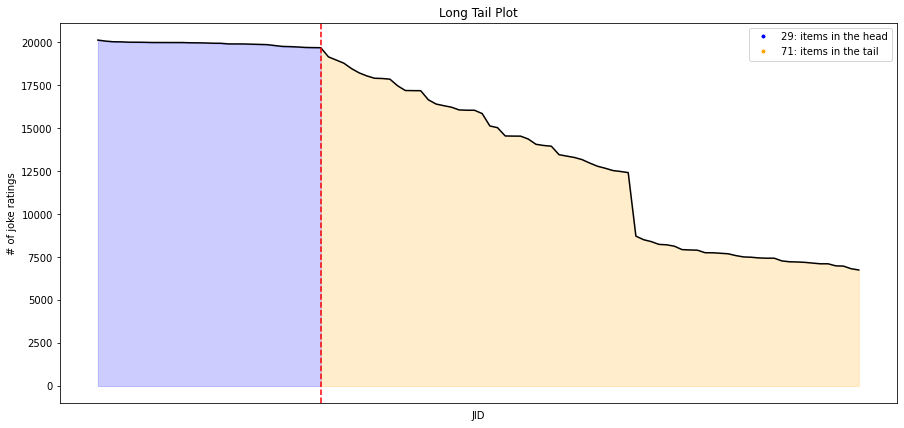

In [4]:
fig = plt.figure(figsize=(15, 7))
volume_df = long_tail_plot(df=df, 
             item_id_column="JID", 
             interaction_type="joke ratings", 
             percentage=0.4,
             x_labels=False)

volume_df['weight'] = volume_df['percent_of_total_volume'].apply(weight_by_volume)
joke_volume = {}
for row in volume_df.itertuples():
    joke_volume[int(row.JID)] = row.weight

In [5]:
df_top_joke = df[df['Rating'] > 5].groupby('JID').agg('count').rename(columns={'Rating':'count_plus'}) \
.sort_values('count_plus', ascending=False).drop(columns=['UID'])


df_bottom_joke = df[df['Rating'] < -5].groupby('JID').agg('count').rename(columns={'Rating':'count_minus'}) \
.sort_values('count_minus', ascending=False).drop(columns=['UID'])


df_counts = df_bottom_joke.merge(df_top_joke, left_index=True, right_index=True)


df_counts['diff'] = df_counts['count_plus'] - df_counts['count_minus']
df_counts = df_counts.sort_values('diff', ascending=False)


df_counts['weight'] = df_counts['diff'] / 10000

joke_quality = {}
for row in df_counts.itertuples():
    joke_quality[row.Index] = row.weight

In [6]:
with open('predictions_df_surprise.pkl', 'rb') as f:
    predictions_df_surprise = pickle.load(f)
    
predictions_df_surprise.keys()

dict_keys(['actual', 'svd', 'knn'])

In [7]:
with open('predictions_df_lfm.pkl', 'rb') as f:
    predictions_df_lfm = pickle.load(f)
    
predictions_df_lfm.keys()

dict_keys(['lfm', 'lfm_cos'])

In [8]:
with open('predictions_df_nn.pkl', 'rb') as f:
    predictions_df_nn = pickle.load(f)
    
predictions_df_nn.keys()

dict_keys(['nn'])

In [9]:
with open('predictions_df_nn_bias.pkl', 'rb') as f:
    predictions_df_nn_bias = pickle.load(f)
    
predictions_df_nn_bias.keys()

dict_keys(['nn_bias'])

In [10]:
with open('predictions_df_catboost.pkl', 'rb') as f:
    predictions_df_catboost = pickle.load(f)
    
predictions_df_catboost.keys()

dict_keys(['catboost'])

In [11]:
#with open('predictions_df_catboost_doc2vec.pkl', 'rb') as f:
#    predictions_df_catboost_doc2vec = pickle.load(f)
    
#predictions_df_catboost_doc2vec.keys()

In [12]:
svd_df = predictions_df_surprise['svd']
knn_df = predictions_df_surprise['knn']
lfm_df = predictions_df_lfm['lfm']
lfm_cos_df = predictions_df_lfm['lfm_cos']
nn_df = predictions_df_nn['nn']
nn_bias_df = predictions_df_nn_bias['nn_bias']
catboost_df = predictions_df_catboost['catboost']
#catboost_doc2vec_df = predictions_df_catboost_doc2vec['catboost_doc2vec']
actual_df = predictions_df_surprise['actual']

In [13]:
frames = {'svd':svd_df, 'lfm':lfm_df, 'lfm_cos':lfm_cos_df, 'nn':nn_df, 
          'catboost':catboost_df, 'knn':knn_df, 'nn_bias':nn_bias_df}# 'catboost_doc2vec':catboost_doc2vec_df,

predictions = {k:list(v.groupby('UID').agg({'JID':list})['JID'].values) for k, v in frames.items()}
actual = list(predictions_df_surprise['actual'].groupby('UID').agg({'JID':list})['JID'].values)

In [14]:
users = df["UID"].unique()
n_users = users.size
n_users

24983

In [15]:
# рекомендации по популярным 
#popularity_recs = df['JID'].value_counts().head(10).index.tolist()

#pop_recs = []
#for user in tqdm(range(n_users)):
#    pop_predictions = popularity_recs
#    pop_recs.append(pop_predictions)
    
    
#predictions['popular'] = pop_recs

In [16]:
pop = dict(df.JID.value_counts())

In [17]:
items = np.unique(df['JID'])
items

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [18]:
def union_predicts(params):
    result = []

    for u in range(24983):
        res = {}
        for i, (key, value) in enumerate(predictions.items()):
            rank = {x: params[key] * (10-j) for j, x in enumerate(value[u])}

            for k, v in rank.items():
                if k in res:
                    res[k] += v
                else:
                    res[k] = v
                    
        for k in res:
            res[k] += joke_quality[k] * params['quality']
            res[k] += joke_volume[k] * params['volume']

        result.append([x[0] for x in sorted(res.items(), key=lambda item: item[1], reverse=True)][:10])
        
    return result

In [19]:
def main_metric(params):
    t1 = time.time()
    result = union_predicts(params)
    res_df = get_frame_from_prediction_list(users, result)


    cat_coverage = catalog_coverage(result, items, 100)
    pred_coverage = prediction_coverage(result, items)
    nov, mselfinfo_list = novelty(result, pop, len(users), 10)

    res_df = get_frame_from_prediction_list(users, result)
    serendip = calculate_serendipity_per_user(res_df, df_train, df_test)
    map1 = mapk(actual, result, k=1)
    map10 = mapk(actual, result, k=10)
    
    price = np.mean([sum([joke_volume[x] for x in xx]) for xx in result])
    
    sm = sum([cat_coverage / 100 *0.8, pred_coverage / 100*0.8, nov*0.8, serendip, map1, map10, price / 4])
    print('time',round(time.time() - t1, 3), 
        'cat_cov',  round(cat_coverage, 3), 
         'cov', round(pred_coverage, 3),
         'nov', round(nov, 3),
         'ser', round(serendip, 3),
        'm1',  round(map1 , 3),
         'm10', round(map10, 3),
         'price', round(price, 3),
         'sum', round(sm, 3))
    return sm

In [20]:
def objective(trial):    
    
    params = {'svd': trial.suggest_float(name='svd', low=-5, high=5, step=0.1), 
              'lfm': trial.suggest_float(name='lfm', low=-5, high=5, step=0.1), 
              'lfm_cos': trial.suggest_float(name='lfm_cos', low=-5, high=2, step=0.1), 
              'nn': trial.suggest_float(name='nn', low=-5, high=5, step=0.1), 
              'nn_bias': trial.suggest_float(name='nn_bias', low=-5, high=5, step=0.1), 
              'catboost': trial.suggest_float(name='catboost', low=-5, high=2, step=0.1), 
              'knn': trial.suggest_float(name='knn', low=-5, high=5, step=0.1), 
              #'catboost_doc2vec': trial.suggest_float(name='catboost_doc2vec', low=-5, high=5, step=0.1),
              'quality': trial.suggest_float(name='quality', low=-5, high=5, step=0.1),
              'volume': trial.suggest_float(name='volume', low=-5, high=5, step=0.1)
             }
    
    return main_metric(params)
    


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20000)


[I 2023-05-06 22:45:46,024] A new study created in memory with name: no-name-3ec3e5e3-16ec-461a-98fb-7ac99539237f
[I 2023-05-06 22:45:48,903] Trial 0 finished with value: 3.385623695033986 and parameters: {'svd': 4.1, 'lfm': 1.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': 1.5, 'nn_bias': 0.3000000000000007, 'catboost': -2.8, 'knn': 4.9, 'quality': 4.9, 'volume': -2.9}. Best is trial 0 with value: 3.385623695033986.


time 2.875 cat_cov 66.0 cov 100.0 nov 0.72 ser 0.087 m1 0.338 m10 0.478 price 2.312 sum 3.386


[I 2023-05-06 22:45:51,678] Trial 1 finished with value: 3.538794995702675 and parameters: {'svd': -2.8, 'lfm': -3.5999999999999996, 'lfm_cos': -2.1999999999999997, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': -4.5, 'quality': -3.9, 'volume': -0.2999999999999998}. Best is trial 1 with value: 3.538794995702675.


time 2.771 cat_cov 97.0 cov 100.0 nov 1.062 ser 0.127 m1 0.129 m10 0.241 price 2.466 sum 3.539


[I 2023-05-06 22:45:54,852] Trial 2 finished with value: 3.461391961504243 and parameters: {'svd': -3.9, 'lfm': 2.6000000000000005, 'lfm_cos': -3.4, 'nn': 2.8000000000000007, 'nn_bias': -4.7, 'catboost': -0.7000000000000002, 'knn': 4.200000000000001, 'quality': -1.2999999999999998, 'volume': 4.9}. Best is trial 1 with value: 3.538794995702675.


time 3.17 cat_cov 88.0 cov 100.0 nov 0.666 ser 0.092 m1 0.278 m10 0.426 price 2.512 sum 3.461


[I 2023-05-06 22:45:57,767] Trial 3 finished with value: 3.6609130994425145 and parameters: {'svd': 2.9000000000000004, 'lfm': -2.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -2.3, 'catboost': -4.3, 'knn': 4.1, 'quality': 2.3000000000000007, 'volume': -2.3}. Best is trial 3 with value: 3.6609130994425145.


time 2.911 cat_cov 90.0 cov 100.0 nov 0.861 ser 0.124 m1 0.312 m10 0.461 price 2.223 sum 3.661


[I 2023-05-06 22:46:00,961] Trial 4 finished with value: 3.777452782526409 and parameters: {'svd': 4.4, 'lfm': 4.800000000000001, 'lfm_cos': -1.0, 'nn': -1.4, 'nn_bias': 1.3000000000000007, 'catboost': 1.0, 'knn': -4.9, 'quality': 4.5, 'volume': -0.7000000000000002}. Best is trial 4 with value: 3.777452782526409.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.159 m1 0.296 m10 0.42 price 2.92 sum 3.777


[I 2023-05-06 22:46:03,876] Trial 5 finished with value: 3.641433170399747 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 2.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': 3.5, 'volume': 1.5}. Best is trial 4 with value: 3.777452782526409.


time 2.911 cat_cov 84.0 cov 100.0 nov 0.993 ser 0.13 m1 0.257 m10 0.38 price 2.432 sum 3.641


[I 2023-05-06 22:46:07,032] Trial 6 finished with value: 3.5865529739588116 and parameters: {'svd': -2.0999999999999996, 'lfm': 2.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -2.5, 'catboost': 2.0, 'knn': -2.8, 'quality': 2.1000000000000005, 'volume': 3.700000000000001}. Best is trial 4 with value: 3.777452782526409.


time 3.153 cat_cov 93.0 cov 100.0 nov 0.664 ser 0.15 m1 0.211 m10 0.332 price 3.275 sum 3.587


[I 2023-05-06 22:46:10,213] Trial 7 finished with value: 3.5578583773520593 and parameters: {'svd': -3.9, 'lfm': 1.6000000000000005, 'lfm_cos': -2.4, 'nn': 4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -4.1, 'quality': 4.0, 'volume': -3.5}. Best is trial 4 with value: 3.777452782526409.


time 3.176 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.112 m1 0.241 m10 0.389 price 2.536 sum 3.558


[I 2023-05-06 22:46:13,453] Trial 8 finished with value: 3.525055982589946 and parameters: {'svd': -4.0, 'lfm': 4.300000000000001, 'lfm_cos': -1.5999999999999996, 'nn': -3.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 4.600000000000001, 'quality': 0.6000000000000005, 'volume': -4.9}. Best is trial 4 with value: 3.777452782526409.


time 3.236 cat_cov 93.0 cov 100.0 nov 0.681 ser 0.143 m1 0.244 m10 0.379 price 2.678 sum 3.525


[I 2023-05-06 22:46:16,332] Trial 9 finished with value: 3.4129519692740558 and parameters: {'svd': 3.5, 'lfm': -3.0999999999999996, 'lfm_cos': -2.1999999999999997, 'nn': 4.300000000000001, 'nn_bias': 5.0, 'catboost': -4.7, 'knn': 4.5, 'quality': 0.5, 'volume': 0.9000000000000004}. Best is trial 4 with value: 3.777452782526409.


time 2.876 cat_cov 67.0 cov 100.0 nov 0.858 ser 0.091 m1 0.306 m10 0.457 price 2.144 sum 3.413


[I 2023-05-06 22:46:19,334] Trial 10 finished with value: 3.4901346306657173 and parameters: {'svd': 0.5, 'lfm': 4.9, 'lfm_cos': -4.5, 'nn': -4.7, 'nn_bias': 2.3000000000000007, 'catboost': 2.0, 'knn': -0.5999999999999996, 'quality': -2.9, 'volume': -0.7000000000000002}. Best is trial 4 with value: 3.777452782526409.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.854 ser 0.122 m1 0.15 m10 0.271 price 2.878 sum 3.49


[I 2023-05-06 22:46:22,401] Trial 11 finished with value: 3.8699801027150125 and parameters: {'svd': 1.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -1.6999999999999997, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 2.1000000000000005, 'quality': 2.3000000000000007, 'volume': -2.0}. Best is trial 11 with value: 3.8699801027150125.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.188 m1 0.304 m10 0.423 price 2.425 sum 3.87


[I 2023-05-06 22:46:25,763] Trial 12 finished with value: 3.832418255383453 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -2.3, 'nn_bias': -4.4, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.5, 'volume': -1.2999999999999998}. Best is trial 11 with value: 3.8699801027150125.


time 3.338 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.22 m1 0.237 m10 0.37 price 2.665 sum 3.832


[I 2023-05-06 22:46:28,970] Trial 13 finished with value: 3.833643839577112 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -2.1999999999999997, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': 1.9000000000000004, 'quality': 2.3000000000000007, 'volume': -2.0}. Best is trial 11 with value: 3.8699801027150125.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.207 m1 0.266 m10 0.391 price 2.543 sum 3.834


[I 2023-05-06 22:46:31,994] Trial 14 finished with value: 3.8066237193475496 and parameters: {'svd': 1.8000000000000007, 'lfm': -4.8, 'lfm_cos': 1.0, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 2.2, 'quality': -0.39999999999999947, 'volume': -4.8}. Best is trial 11 with value: 3.8699801027150125.


time 3.0 cat_cov 98.0 cov 100.0 nov 1.075 ser 0.177 m1 0.242 m10 0.366 price 2.309 sum 3.807


[I 2023-05-06 22:46:35,224] Trial 15 finished with value: 3.6876722754573823 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 1.9000000000000004, 'quality': 1.4000000000000004, 'volume': -2.0999999999999996}. Best is trial 11 with value: 3.8699801027150125.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.202 m1 0.191 m10 0.339 price 2.436 sum 3.688


[I 2023-05-06 22:46:38,417] Trial 16 finished with value: 3.6273577854754184 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -2.1999999999999997, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 2.3000000000000007, 'quality': -1.2999999999999998, 'volume': 1.6000000000000005}. Best is trial 11 with value: 3.8699801027150125.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.17 m1 0.207 m10 0.359 price 2.782 sum 3.627


[I 2023-05-06 22:46:41,636] Trial 17 finished with value: 3.8741464712635136 and parameters: {'svd': 2.2, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': -3.8}. Best is trial 17 with value: 3.8741464712635136.


time 3.193 cat_cov 97.0 cov 100.0 nov 1.031 ser 0.208 m1 0.253 m10 0.376 price 2.547 sum 3.874


[I 2023-05-06 22:46:44,641] Trial 18 finished with value: 3.83032221811881 and parameters: {'svd': 2.5, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -1.5, 'quality': 3.3000000000000007, 'volume': -3.5}. Best is trial 17 with value: 3.8741464712635136.


time 2.98 cat_cov 95.0 cov 100.0 nov 1.025 ser 0.193 m1 0.249 m10 0.374 price 2.534 sum 3.83


[I 2023-05-06 22:46:47,614] Trial 19 finished with value: 3.7751519317863322 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.3, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 1.3000000000000007, 'volume': -3.9}. Best is trial 17 with value: 3.8741464712635136.


time 2.948 cat_cov 98.0 cov 100.0 nov 1.114 ser 0.184 m1 0.199 m10 0.329 price 2.352 sum 3.775


[I 2023-05-06 22:46:50,829] Trial 20 finished with value: 3.8667927093465497 and parameters: {'svd': 2.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': -1.6999999999999997, 'quality': 3.3000000000000007, 'volume': 0.6000000000000005}. Best is trial 17 with value: 3.8741464712635136.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.218 m1 0.241 m10 0.37 price 2.749 sum 3.867


[I 2023-05-06 22:46:53,803] Trial 21 finished with value: 3.9279347925723997 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': -1.5999999999999996, 'quality': 3.4000000000000004, 'volume': 0.5}. Best is trial 21 with value: 3.9279347925723997.


time 2.95 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.199 m1 0.287 m10 0.418 price 2.676 sum 3.928


[I 2023-05-06 22:46:56,869] Trial 22 finished with value: 3.902243273305725 and parameters: {'svd': 4.800000000000001, 'lfm': -2.4, 'lfm_cos': 1.3000000000000007, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -2.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 21 with value: 3.9279347925723997.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.188 m1 0.281 m10 0.413 price 2.568 sum 3.902


[I 2023-05-06 22:46:59,906] Trial 23 finished with value: 3.816600461738879 and parameters: {'svd': 5.0, 'lfm': -2.3, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 21 with value: 3.9279347925723997.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.152 m1 0.278 m10 0.417 price 2.604 sum 3.817


[I 2023-05-06 22:47:02,872] Trial 24 finished with value: 3.8357549024449176 and parameters: {'svd': 5.0, 'lfm': -4.7, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -0.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -2.3, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 21 with value: 3.9279347925723997.


time 2.942 cat_cov 94.0 cov 100.0 nov 0.995 ser 0.167 m1 0.276 m10 0.413 price 2.526 sum 3.836


[I 2023-05-06 22:47:05,934] Trial 25 finished with value: 3.8949227355949887 and parameters: {'svd': 3.0, 'lfm': -2.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 21 with value: 3.9279347925723997.


time 3.039 cat_cov 100.0 cov 100.0 nov 1.016 ser 0.196 m1 0.259 m10 0.384 price 2.572 sum 3.895


[I 2023-05-06 22:47:08,900] Trial 26 finished with value: 3.880597138673292 and parameters: {'svd': 3.0999999999999996, 'lfm': -4.0, 'lfm_cos': 0.9000000000000004, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 21 with value: 3.9279347925723997.


time 2.943 cat_cov 100.0 cov 100.0 nov 1.022 ser 0.18 m1 0.27 m10 0.395 price 2.473 sum 3.881


[I 2023-05-06 22:47:11,880] Trial 27 finished with value: 3.874864911699103 and parameters: {'svd': 4.300000000000001, 'lfm': -2.6999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -1.5, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 21 with value: 3.9279347925723997.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.181 m1 0.27 m10 0.406 price 2.589 sum 3.875


[I 2023-05-06 22:47:14,952] Trial 28 finished with value: 3.793915238315568 and parameters: {'svd': 3.5, 'lfm': 0.40000000000000036, 'lfm_cos': -1.1999999999999997, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -3.3, 'knn': -3.0, 'quality': 1.3000000000000007, 'volume': 2.2}. Best is trial 21 with value: 3.9279347925723997.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.158 m1 0.265 m10 0.402 price 2.918 sum 3.794


[I 2023-05-06 22:47:17,934] Trial 29 finished with value: 3.7034580640887786 and parameters: {'svd': 4.4, 'lfm': -3.9, 'lfm_cos': 1.4000000000000004, 'nn': 2.5, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 0.6000000000000005}. Best is trial 21 with value: 3.9279347925723997.


time 2.959 cat_cov 88.0 cov 100.0 nov 0.855 ser 0.126 m1 0.332 m10 0.459 price 2.393 sum 3.703


[I 2023-05-06 22:47:20,865] Trial 30 finished with value: 3.7519021678084115 and parameters: {'svd': 5.0, 'lfm': -2.8, 'lfm_cos': -0.1999999999999993, 'nn': -2.9, 'nn_bias': -2.8, 'catboost': -1.0999999999999996, 'knn': 1.2000000000000002, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 21 with value: 3.9279347925723997.


time 2.907 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.131 m1 0.3 m10 0.442 price 2.478 sum 3.752


[I 2023-05-06 22:47:23,893] Trial 31 finished with value: 3.8455305197514287 and parameters: {'svd': 2.8000000000000007, 'lfm': -4.3, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 3.200000000000001, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 21 with value: 3.9279347925723997.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.996 ser 0.163 m1 0.282 m10 0.414 price 2.391 sum 3.846


[I 2023-05-06 22:47:26,872] Trial 32 finished with value: 3.8718718587444734 and parameters: {'svd': 3.0999999999999996, 'lfm': -3.9, 'lfm_cos': 1.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 21 with value: 3.9279347925723997.


time 2.956 cat_cov 99.0 cov 100.0 nov 1.026 ser 0.188 m1 0.26 m10 0.384 price 2.506 sum 3.872


[I 2023-05-06 22:47:29,920] Trial 33 finished with value: 3.8412263550216386 and parameters: {'svd': 4.0, 'lfm': -2.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -1.0, 'quality': 5.0, 'volume': 4.5}. Best is trial 21 with value: 3.9279347925723997.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.173 m1 0.291 m10 0.426 price 2.555 sum 3.841


[I 2023-05-06 22:47:32,943] Trial 34 finished with value: 3.867699911023001 and parameters: {'svd': 3.4000000000000004, 'lfm': -3.5999999999999996, 'lfm_cos': 1.5, 'nn': -2.6999999999999997, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': -4.4, 'volume': 3.200000000000001}. Best is trial 21 with value: 3.9279347925723997.


time 3.0 cat_cov 99.0 cov 100.0 nov 1.037 ser 0.193 m1 0.252 m10 0.379 price 2.49 sum 3.868


[I 2023-05-06 22:47:35,829] Trial 35 finished with value: 3.6921881888643178 and parameters: {'svd': 3.9000000000000004, 'lfm': -2.0, 'lfm_cos': -3.5, 'nn': -5.0, 'nn_bias': 1.0, 'catboost': -0.5, 'knn': -2.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 21 with value: 3.9279347925723997.


time 2.862 cat_cov 84.0 cov 100.0 nov 1.007 ser 0.124 m1 0.266 m10 0.39 price 2.537 sum 3.692


[I 2023-05-06 22:47:38,846] Trial 36 finished with value: 3.870582096048525 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -3.5999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': 1.2000000000000002, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 21 with value: 3.9279347925723997.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.166 m1 0.307 m10 0.442 price 2.499 sum 3.871


[I 2023-05-06 22:47:42,066] Trial 37 finished with value: 3.632507694238612 and parameters: {'svd': -5.0, 'lfm': -3.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -1.0999999999999996, 'quality': 2.9000000000000004, 'volume': 0.10000000000000053}. Best is trial 21 with value: 3.9279347925723997.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.185 m1 0.157 m10 0.307 price 2.433 sum 3.633


[I 2023-05-06 22:47:45,047] Trial 38 finished with value: 3.8561987285393853 and parameters: {'svd': 3.0, 'lfm': -3.9, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 1.4000000000000004, 'quality': -3.0999999999999996, 'volume': 4.9}. Best is trial 21 with value: 3.9279347925723997.


time 2.957 cat_cov 96.0 cov 100.0 nov 1.043 ser 0.166 m1 0.273 m10 0.405 price 2.437 sum 3.856


[I 2023-05-06 22:47:47,995] Trial 39 finished with value: 3.767799027585423 and parameters: {'svd': 4.600000000000001, 'lfm': -4.4, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -1.7999999999999998, 'knn': -2.9, 'quality': 1.9000000000000004, 'volume': 4.0}. Best is trial 21 with value: 3.9279347925723997.


time 2.924 cat_cov 89.0 cov 100.0 nov 0.947 ser 0.139 m1 0.3 m10 0.439 price 2.484 sum 3.768


[I 2023-05-06 22:47:51,345] Trial 40 finished with value: 3.7236912320287683 and parameters: {'svd': -1.6999999999999997, 'lfm': 1.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': -2.5999999999999996, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': 2.8000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 21 with value: 3.9279347925723997.


time 3.327 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.198 m1 0.237 m10 0.374 price 2.728 sum 3.724


[I 2023-05-06 22:47:54,420] Trial 41 finished with value: 3.8778628685990393 and parameters: {'svd': 4.200000000000001, 'lfm': -2.3, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -1.4, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 21 with value: 3.9279347925723997.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.181 m1 0.271 m10 0.408 price 2.602 sum 3.878


[I 2023-05-06 22:47:57,349] Trial 42 finished with value: 3.8988205965135343 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.9, 'lfm_cos': 1.0, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 21 with value: 3.9279347925723997.


time 2.906 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.186 m1 0.285 m10 0.416 price 2.581 sum 3.899


[I 2023-05-06 22:48:00,417] Trial 43 finished with value: 3.9330367693180888 and parameters: {'svd': 3.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 43 with value: 3.9330367693180888.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.99 ser 0.193 m1 0.285 m10 0.413 price 2.601 sum 3.933


[I 2023-05-06 22:48:03,460] Trial 44 finished with value: 3.820860294345406 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 43 with value: 3.9330367693180888.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.158 m1 0.278 m10 0.417 price 2.707 sum 3.821


[I 2023-05-06 22:48:06,508] Trial 45 finished with value: 3.8132372035957256 and parameters: {'svd': 2.5, 'lfm': -1.5999999999999996, 'lfm_cos': -1.7999999999999998, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 3.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.151 m1 0.258 m10 0.39 price 2.663 sum 3.813


[I 2023-05-06 22:48:09,481] Trial 46 finished with value: 3.7628087005001207 and parameters: {'svd': 4.700000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5999999999999996, 'nn': -1.9, 'nn_bias': -2.4, 'catboost': -2.5, 'knn': -2.1999999999999997, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.13 m1 0.28 m10 0.423 price 2.811 sum 3.763


[I 2023-05-06 22:48:12,609] Trial 47 finished with value: 3.851361500630954 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.6999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.947 ser 0.173 m1 0.306 m10 0.438 price 2.496 sum 3.851


[I 2023-05-06 22:48:15,636] Trial 48 finished with value: 3.610857729463737 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': -3.0, 'nn_bias': -1.7999999999999998, 'catboost': 1.4000000000000004, 'knn': -3.5999999999999996, 'quality': 0.8000000000000007, 'volume': 2.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.185 m1 0.142 m10 0.259 price 3.051 sum 3.611


[I 2023-05-06 22:48:18,609] Trial 49 finished with value: 3.7691214202220533 and parameters: {'svd': 3.4000000000000004, 'lfm': 3.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 4.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': -0.1999999999999993, 'volume': -1.1999999999999997}. Best is trial 43 with value: 3.9330367693180888.


time 2.948 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.133 m1 0.35 m10 0.458 price 2.407 sum 3.769


[I 2023-05-06 22:48:21,595] Trial 50 finished with value: 3.488978152470164 and parameters: {'svd': 2.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 5.0, 'nn_bias': -0.7999999999999998, 'catboost': -1.9, 'knn': -0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 43 with value: 3.9330367693180888.


time 2.959 cat_cov 74.0 cov 100.0 nov 0.7 ser 0.096 m1 0.358 m10 0.48 price 2.414 sum 3.489


[I 2023-05-06 22:48:24,573] Trial 51 finished with value: 3.8659574742040372 and parameters: {'svd': 3.0999999999999996, 'lfm': -3.0, 'lfm_cos': 1.0, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 43 with value: 3.9330367693180888.


time 2.952 cat_cov 97.0 cov 100.0 nov 1.008 ser 0.184 m1 0.273 m10 0.399 price 2.511 sum 3.866


[I 2023-05-06 22:48:27,640] Trial 52 finished with value: 3.898052829688594 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 43 with value: 3.9330367693180888.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.185 m1 0.289 m10 0.422 price 2.605 sum 3.898


[I 2023-05-06 22:48:30,827] Trial 53 finished with value: 3.9174612081669435 and parameters: {'svd': 4.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 43 with value: 3.9330367693180888.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.198 m1 0.291 m10 0.419 price 2.652 sum 3.917


[I 2023-05-06 22:48:33,957] Trial 54 finished with value: 3.912993870394247 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 4.600000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.194 m1 0.297 m10 0.425 price 2.646 sum 3.913


[I 2023-05-06 22:48:36,924] Trial 55 finished with value: 3.843201818021964 and parameters: {'svd': 4.700000000000001, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': -2.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 1.5, 'quality': 2.5, 'volume': 4.1}. Best is trial 43 with value: 3.9330367693180888.


time 2.942 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.167 m1 0.317 m10 0.45 price 2.474 sum 3.843


[I 2023-05-06 22:48:40,094] Trial 56 finished with value: 3.902323490403193 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.9, 'knn': -1.0999999999999996, 'quality': 2.2, 'volume': 4.5}. Best is trial 43 with value: 3.9330367693180888.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.207 m1 0.286 m10 0.409 price 2.732 sum 3.902


[I 2023-05-06 22:48:43,225] Trial 57 finished with value: 3.9030571470711393 and parameters: {'svd': 4.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': -0.8999999999999995, 'quality': 1.7000000000000002, 'volume': 4.5}. Best is trial 43 with value: 3.9330367693180888.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.204 m1 0.293 m10 0.416 price 2.74 sum 3.903


[I 2023-05-06 22:48:46,546] Trial 58 finished with value: 3.9046232715853506 and parameters: {'svd': 4.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': -1.9, 'nn_bias': -3.0, 'catboost': -5.0, 'knn': -1.0999999999999996, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.198 m1 0.303 m10 0.423 price 2.709 sum 3.905


[I 2023-05-06 22:48:49,655] Trial 59 finished with value: 3.885604120685276 and parameters: {'svd': 4.300000000000001, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': -2.0, 'nn_bias': -3.0, 'catboost': 0.6000000000000005, 'knn': -2.4, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.198 m1 0.292 m10 0.418 price 2.879 sum 3.886


[I 2023-05-06 22:48:52,937] Trial 60 finished with value: 3.6990561546505 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -1.6999999999999997, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.222 m1 0.184 m10 0.327 price 2.849 sum 3.699


[I 2023-05-06 22:48:56,128] Trial 61 finished with value: 3.904948025466736 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -5.0, 'knn': -0.8999999999999995, 'quality': 1.8000000000000007, 'volume': 4.5}. Best is trial 43 with value: 3.9330367693180888.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.208 m1 0.286 m10 0.408 price 2.726 sum 3.905


[I 2023-05-06 22:48:59,395] Trial 62 finished with value: 3.864467874424147 and parameters: {'svd': 4.1, 'lfm': 1.3000000000000007, 'lfm_cos': 2.0, 'nn': -2.9, 'nn_bias': -2.5, 'catboost': -4.8, 'knn': -0.8999999999999995, 'quality': 1.7000000000000002, 'volume': 4.4}. Best is trial 43 with value: 3.9330367693180888.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.195 m1 0.297 m10 0.419 price 2.788 sum 3.864


[I 2023-05-06 22:49:02,615] Trial 63 finished with value: 3.8993058487076055 and parameters: {'svd': 5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -5.0, 'knn': -0.5999999999999996, 'quality': 0.8000000000000007, 'volume': -2.5999999999999996}. Best is trial 43 with value: 3.9330367693180888.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.2 m1 0.293 m10 0.417 price 2.652 sum 3.899


[I 2023-05-06 22:49:05,810] Trial 64 finished with value: 3.9154835039253286 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': -1.0999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -4.7, 'knn': -1.1999999999999997, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.199 m1 0.299 m10 0.423 price 2.709 sum 3.915


[I 2023-05-06 22:49:08,944] Trial 65 finished with value: 3.9143759626664503 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -1.9, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.202 m1 0.291 m10 0.417 price 2.736 sum 3.914


[I 2023-05-06 22:49:11,855] Trial 66 finished with value: 3.7179877231758978 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': -5.0, 'nn': 0.10000000000000053, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -3.0999999999999996, 'quality': 1.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 43 with value: 3.9330367693180888.


time 2.886 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.121 m1 0.272 m10 0.411 price 2.709 sum 3.718


[I 2023-05-06 22:49:15,232] Trial 67 finished with value: 3.7049983263445556 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': -1.0, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': -2.5999999999999996, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.353 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.23 m1 0.151 m10 0.316 price 2.928 sum 3.705


[I 2023-05-06 22:49:18,368] Trial 68 finished with value: 3.836932750486933 and parameters: {'svd': 2.7, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 3.5, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -4.7, 'quality': 1.1000000000000005, 'volume': 4.200000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.172 m1 0.275 m10 0.415 price 2.654 sum 3.837


[I 2023-05-06 22:49:21,636] Trial 69 finished with value: 3.8900432354613876 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': -1.7999999999999998, 'quality': 0.20000000000000018, 'volume': 3.0999999999999996}. Best is trial 43 with value: 3.9330367693180888.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.213 m1 0.263 m10 0.388 price 2.733 sum 3.89


[I 2023-05-06 22:49:24,710] Trial 70 finished with value: 3.878623695614311 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 2.4000000000000004, 'catboost': -4.7, 'knn': -1.4, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 43 with value: 3.9330367693180888.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.153 m1 0.339 m10 0.45 price 2.468 sum 3.879


[I 2023-05-06 22:49:27,714] Trial 71 finished with value: 3.9011736924022418 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -5.0, 'knn': -1.1999999999999997, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.187 m1 0.306 m10 0.435 price 2.612 sum 3.901


[I 2023-05-06 22:49:30,876] Trial 72 finished with value: 3.9103835951412678 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -1.4, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -2.0, 'quality': 1.5, 'volume': 4.300000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.205 m1 0.287 m10 0.412 price 2.744 sum 3.91


[I 2023-05-06 22:49:34,154] Trial 73 finished with value: 3.880460403569339 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': -1.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -3.3, 'quality': 2.0, 'volume': 4.300000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.251 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.211 m1 0.276 m10 0.402 price 2.777 sum 3.88


[I 2023-05-06 22:49:37,391] Trial 74 finished with value: 3.891455511552648 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -1.9, 'quality': 1.5, 'volume': 3.4000000000000004}. Best is trial 43 with value: 3.9330367693180888.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.212 m1 0.272 m10 0.4 price 2.772 sum 3.891


[I 2023-05-06 22:49:40,582] Trial 75 finished with value: 3.925409564375341 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': -2.5, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 4.600000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.204 m1 0.29 m10 0.414 price 2.703 sum 3.925


[I 2023-05-06 22:49:43,829] Trial 76 finished with value: 3.7686079522165103 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -1.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 43 with value: 3.9330367693180888.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.214 m1 0.179 m10 0.334 price 2.772 sum 3.769


[I 2023-05-06 22:49:46,869] Trial 77 finished with value: 3.879481439251818 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.4, 'lfm_cos': 0.7000000000000002, 'nn': -2.5999999999999996, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': -2.0999999999999996, 'quality': 3.200000000000001, 'volume': -0.5999999999999996}. Best is trial 43 with value: 3.9330367693180888.


time 3.013 cat_cov 93.0 cov 100.0 nov 1.056 ser 0.184 m1 0.276 m10 0.411 price 2.475 sum 3.879


[I 2023-05-06 22:49:49,743] Trial 78 finished with value: 3.6349218197446076 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': -3.5, 'nn': -1.0999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 2.847 cat_cov 83.0 cov 100.0 nov 0.759 ser 0.102 m1 0.317 m10 0.456 price 2.754 sum 3.635


[I 2023-05-06 22:49:52,700] Trial 79 finished with value: 3.8944171084002486 and parameters: {'svd': 4.9, 'lfm': -2.0999999999999996, 'lfm_cos': 1.5, 'nn': -2.4, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': 2.3000000000000007, 'volume': 4.200000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.194 m1 0.277 m10 0.411 price 2.673 sum 3.894


[I 2023-05-06 22:49:55,590] Trial 80 finished with value: 3.755676635933223 and parameters: {'svd': 2.4000000000000004, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -1.4, 'knn': -0.5, 'quality': 1.5, 'volume': -1.4}. Best is trial 43 with value: 3.9330367693180888.


time 2.863 cat_cov 90.0 cov 100.0 nov 0.898 ser 0.142 m1 0.315 m10 0.452 price 2.43 sum 3.756


[I 2023-05-06 22:49:58,720] Trial 81 finished with value: 3.905220168028783 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 2.0, 'nn': -3.2, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -1.4, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.209 m1 0.281 m10 0.405 price 2.742 sum 3.905


[I 2023-05-06 22:50:01,806] Trial 82 finished with value: 3.9127746709297884 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -3.0, 'nn_bias': -4.2, 'catboost': -4.5, 'knn': -1.4, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.211 m1 0.275 m10 0.402 price 2.786 sum 3.913


[I 2023-05-06 22:50:04,896] Trial 83 finished with value: 3.8535586132797026 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.7999999999999998, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -2.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 43 with value: 3.9330367693180888.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.181 m1 0.264 m10 0.402 price 2.656 sum 3.854


[I 2023-05-06 22:50:07,730] Trial 84 finished with value: 3.794634293642354 and parameters: {'svd': 1.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.7999999999999998, 'nn_bias': 1.4000000000000004, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 0.5, 'volume': 3.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 2.81 cat_cov 90.0 cov 100.0 nov 1.024 ser 0.146 m1 0.31 m10 0.428 price 2.286 sum 3.795


[I 2023-05-06 22:50:10,825] Trial 85 finished with value: 3.9174452102278714 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -2.1999999999999997, 'nn_bias': -4.1, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.19 m1 0.305 m10 0.436 price 2.779 sum 3.917


[I 2023-05-06 22:50:13,958] Trial 86 finished with value: 3.8922703167444372 and parameters: {'svd': 4.4, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -4.1, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.174 m1 0.314 m10 0.447 price 2.782 sum 3.892


[I 2023-05-06 22:50:16,915] Trial 87 finished with value: 3.913118554750736 and parameters: {'svd': 3.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -4.4, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.165 m1 0.308 m10 0.436 price 2.979 sum 3.913


[I 2023-05-06 22:50:19,946] Trial 88 finished with value: 3.278034775205274 and parameters: {'svd': -1.4, 'lfm': -2.3, 'lfm_cos': 0.9000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -3.8, 'catboost': 1.7000000000000002, 'knn': 0.3000000000000007, 'quality': -2.0, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.005 cat_cov 83.0 cov 100.0 nov 0.893 ser 0.151 m1 0.055 m10 0.153 price 2.962 sum 3.278


[I 2023-05-06 22:50:23,015] Trial 89 finished with value: 3.8855393870460464 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 43 with value: 3.9330367693180888.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.17 m1 0.294 m10 0.407 price 3.022 sum 3.886


[I 2023-05-06 22:50:26,018] Trial 90 finished with value: 3.853584341762574 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': 1.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 43 with value: 3.9330367693180888.


time 2.977 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.147 m1 0.308 m10 0.447 price 2.845 sum 3.854


[I 2023-05-06 22:50:29,060] Trial 91 finished with value: 3.8975237834777765 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -3.0, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': 1.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.167 m1 0.322 m10 0.452 price 2.812 sum 3.898


[I 2023-05-06 22:50:32,119] Trial 92 finished with value: 3.9105601448755154 and parameters: {'svd': 3.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 1.0, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.187 m1 0.306 m10 0.429 price 2.584 sum 3.911


[I 2023-05-06 22:50:35,275] Trial 93 finished with value: 3.9313489190456647 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.205 m1 0.297 m10 0.419 price 2.792 sum 3.931


[I 2023-05-06 22:50:38,521] Trial 94 finished with value: 3.895406849597462 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 43 with value: 3.9330367693180888.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.198 m1 0.3 m10 0.42 price 2.846 sum 3.895


[I 2023-05-06 22:50:41,531] Trial 95 finished with value: 3.764691249358501 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.135 m1 0.287 m10 0.428 price 2.745 sum 3.765


[I 2023-05-06 22:50:44,764] Trial 96 finished with value: 3.9101052804422576 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -2.4, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 4.4}. Best is trial 43 with value: 3.9330367693180888.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.21 m1 0.285 m10 0.407 price 2.769 sum 3.91


[I 2023-05-06 22:50:47,914] Trial 97 finished with value: 3.9173940626705575 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.187 m1 0.315 m10 0.437 price 2.922 sum 3.917


[I 2023-05-06 22:50:51,089] Trial 98 finished with value: 3.900169152294217 and parameters: {'svd': 2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 43 with value: 3.9330367693180888.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.183 m1 0.318 m10 0.437 price 2.959 sum 3.9


[I 2023-05-06 22:50:54,322] Trial 99 finished with value: 3.9282951709065346 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -1.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.205 m1 0.303 m10 0.42 price 2.918 sum 3.928


[I 2023-05-06 22:50:57,404] Trial 100 finished with value: 3.9313859204038817 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.181 m1 0.342 m10 0.457 price 2.832 sum 3.931


[I 2023-05-06 22:51:00,742] Trial 101 finished with value: 3.800839526150865 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.9, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.311 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.18 m1 0.29 m10 0.421 price 2.958 sum 3.801


[I 2023-05-06 22:51:03,882] Trial 102 finished with value: 3.918566440935097 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -1.1999999999999997, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.185 m1 0.318 m10 0.442 price 2.903 sum 3.919


[I 2023-05-06 22:51:07,128] Trial 103 finished with value: 3.799194859962345 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -1.6999999999999997, 'nn_bias': -4.7, 'catboost': -0.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': -4.3}. Best is trial 43 with value: 3.9330367693180888.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.167 m1 0.289 m10 0.425 price 2.788 sum 3.799


[I 2023-05-06 22:51:10,221] Trial 104 finished with value: 3.8351797413414075 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.7, 'catboost': -1.1999999999999997, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 43 with value: 3.9330367693180888.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.167 m1 0.319 m10 0.439 price 2.989 sum 3.835


[I 2023-05-06 22:51:13,607] Trial 105 finished with value: 3.755341089496192 and parameters: {'svd': 1.8000000000000007, 'lfm': 2.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 43 with value: 3.9330367693180888.


time 3.358 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.172 m1 0.289 m10 0.418 price 2.93 sum 3.755


[I 2023-05-06 22:51:16,693] Trial 106 finished with value: 3.897088785796917 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -2.0, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.191 m1 0.289 m10 0.416 price 3.063 sum 3.897


[I 2023-05-06 22:51:19,899] Trial 107 finished with value: 3.8877018250195237 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.213 m1 0.27 m10 0.398 price 2.962 sum 3.888


[I 2023-05-06 22:51:23,073] Trial 108 finished with value: 3.8743021230898926 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.182 m1 0.298 m10 0.422 price 2.993 sum 3.874


[I 2023-05-06 22:51:26,154] Trial 109 finished with value: 3.8270757827614594 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -4.2, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 43 with value: 3.9330367693180888.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.149 m1 0.365 m10 0.478 price 2.642 sum 3.827


[I 2023-05-06 22:51:29,237] Trial 110 finished with value: 3.8682533525487397 and parameters: {'svd': 2.7, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -3.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.168 m1 0.35 m10 0.459 price 2.708 sum 3.868


[I 2023-05-06 22:51:32,433] Trial 111 finished with value: 3.9149644136799617 and parameters: {'svd': 3.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -3.0, 'catboost': -1.7999999999999998, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.188 m1 0.318 m10 0.444 price 2.758 sum 3.915


[I 2023-05-06 22:51:35,409] Trial 112 finished with value: 3.6759440269857953 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.0, 'lfm_cos': -3.0, 'nn': -0.7999999999999998, 'nn_bias': -2.0, 'catboost': -1.7999999999999998, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 43 with value: 3.9330367693180888.


time 2.948 cat_cov 90.0 cov 100.0 nov 0.779 ser 0.116 m1 0.292 m10 0.432 price 2.772 sum 3.676


[I 2023-05-06 22:51:38,440] Trial 113 finished with value: 3.884802159773905 and parameters: {'svd': 2.2, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.16 m1 0.361 m10 0.473 price 2.826 sum 3.885


[I 2023-05-06 22:51:41,491] Trial 114 finished with value: 3.805031183393873 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': -1.2999999999999998, 'knn': -1.5999999999999996, 'quality': 4.0, 'volume': 4.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.155 m1 0.278 m10 0.417 price 3.109 sum 3.805


[I 2023-05-06 22:51:44,532] Trial 115 finished with value: 3.905152383384381 and parameters: {'svd': 3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 43 with value: 3.9330367693180888.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.174 m1 0.33 m10 0.456 price 2.665 sum 3.905


[I 2023-05-06 22:51:47,822] Trial 116 finished with value: 3.932180506616521 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -1.5999999999999996, 'knn': -1.0, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.214 m1 0.268 m10 0.394 price 2.868 sum 3.932


[I 2023-05-06 22:51:50,927] Trial 117 finished with value: 3.7872155323057517 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -1.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 43 with value: 3.9330367693180888.


time 3.078 cat_cov 93.0 cov 100.0 nov 0.92 ser 0.186 m1 0.246 m10 0.357 price 2.874 sum 3.787


[I 2023-05-06 22:51:53,954] Trial 118 finished with value: 3.744255865128552 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -1.5999999999999996, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -1.0999999999999996, 'knn': -1.1999999999999997, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 43 with value: 3.9330367693180888.


time 2.999 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.133 m1 0.249 m10 0.376 price 2.804 sum 3.744


[I 2023-05-06 22:51:57,126] Trial 119 finished with value: 3.9326529030682673 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 43 with value: 3.9330367693180888.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.215 m1 0.28 m10 0.399 price 2.897 sum 3.933


[I 2023-05-06 22:52:00,439] Trial 120 finished with value: 3.944718785908118 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.9, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 5.0}. Best is trial 120 with value: 3.944718785908118.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.21 m1 0.291 m10 0.409 price 2.834 sum 3.945


[I 2023-05-06 22:52:03,557] Trial 121 finished with value: 3.903148889712098 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 5.0}. Best is trial 120 with value: 3.944718785908118.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.214 m1 0.273 m10 0.398 price 2.864 sum 3.903


[I 2023-05-06 22:52:06,798] Trial 122 finished with value: 3.934906820302571 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 120 with value: 3.944718785908118.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.199 m1 0.299 m10 0.421 price 3.015 sum 3.935


[I 2023-05-06 22:52:10,012] Trial 123 finished with value: 3.9135941794889217 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 120 with value: 3.944718785908118.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.191 m1 0.302 m10 0.424 price 2.959 sum 3.914


[I 2023-05-06 22:52:13,297] Trial 124 finished with value: 3.7912892535535576 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 120 with value: 3.944718785908118.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.211 m1 0.233 m10 0.37 price 3.015 sum 3.791


[I 2023-05-06 22:52:16,523] Trial 125 finished with value: 3.9292089794604292 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 120 with value: 3.944718785908118.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.211 m1 0.267 m10 0.389 price 2.83 sum 3.929


[I 2023-05-06 22:52:19,621] Trial 126 finished with value: 3.931376737596984 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.9, 'volume': 4.4}. Best is trial 120 with value: 3.944718785908118.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.207 m1 0.272 m10 0.391 price 2.851 sum 3.931


[I 2023-05-06 22:52:22,826] Trial 127 finished with value: 3.895315922206896 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 120 with value: 3.944718785908118.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.2 m1 0.269 m10 0.393 price 2.829 sum 3.895


[I 2023-05-06 22:52:25,918] Trial 128 finished with value: 3.905803100278887 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 120 with value: 3.944718785908118.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.189 m1 0.27 m10 0.4 price 2.82 sum 3.906


[I 2023-05-06 22:52:29,103] Trial 129 finished with value: 3.943088564323679 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.3, 'knn': -0.5, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 120 with value: 3.944718785908118.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.203 m1 0.29 m10 0.416 price 3.005 sum 3.943


[I 2023-05-06 22:52:32,453] Trial 130 finished with value: 3.684345421849074 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.700000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 120 with value: 3.944718785908118.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.177 m1 0.239 m10 0.381 price 3.106 sum 3.684


[I 2023-05-06 22:52:35,739] Trial 131 finished with value: 3.939419727566911 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 120 with value: 3.944718785908118.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.204 m1 0.287 m10 0.414 price 3.005 sum 3.939


[I 2023-05-06 22:52:38,875] Trial 132 finished with value: 3.7607274512965048 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 120 with value: 3.944718785908118.


time 3.107 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.157 m1 0.264 m10 0.426 price 2.629 sum 3.761


[I 2023-05-06 22:52:41,997] Trial 133 finished with value: 3.9131435100905843 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.5}. Best is trial 120 with value: 3.944718785908118.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.202 m1 0.269 m10 0.392 price 2.783 sum 3.913


[I 2023-05-06 22:52:45,308] Trial 134 finished with value: 3.899985619106038 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 120 with value: 3.944718785908118.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.208 m1 0.267 m10 0.408 price 3.122 sum 3.9


[I 2023-05-06 22:52:48,474] Trial 135 finished with value: 3.8847018672195817 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': -0.5, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 120 with value: 3.944718785908118.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.204 m1 0.258 m10 0.377 price 2.777 sum 3.885


[I 2023-05-06 22:52:51,785] Trial 136 finished with value: 3.949456721149344 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 136 with value: 3.949456721149344.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.206 m1 0.291 m10 0.412 price 2.853 sum 3.949


[I 2023-05-06 22:52:55,003] Trial 137 finished with value: 3.898798066572349 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 136 with value: 3.949456721149344.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.209 m1 0.253 m10 0.393 price 2.812 sum 3.899


[I 2023-05-06 22:52:58,120] Trial 138 finished with value: 3.825239603436148 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 136 with value: 3.949456721149344.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.158 m1 0.282 m10 0.404 price 2.951 sum 3.825


[I 2023-05-06 22:53:01,257] Trial 139 finished with value: 3.9369524293888194 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 136 with value: 3.949456721149344.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.209 m1 0.28 m10 0.395 price 2.797 sum 3.937


[I 2023-05-06 22:53:04,504] Trial 140 finished with value: 3.824110067172352 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 136 with value: 3.949456721149344.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.201 m1 0.234 m10 0.358 price 2.885 sum 3.824


[I 2023-05-06 22:53:07,678] Trial 141 finished with value: 3.921865213297906 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 136 with value: 3.949456721149344.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.199 m1 0.281 m10 0.404 price 2.743 sum 3.922


[I 2023-05-06 22:53:10,696] Trial 142 finished with value: 3.5858569096564232 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': 3.5, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 136 with value: 3.949456721149344.


time 2.99 cat_cov 95.0 cov 100.0 nov 1.016 ser 0.165 m1 0.124 m10 0.309 price 2.458 sum 3.586


[I 2023-05-06 22:53:13,836] Trial 143 finished with value: 3.9359949274709702 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 136 with value: 3.949456721149344.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.211 m1 0.27 m10 0.395 price 2.795 sum 3.936


[I 2023-05-06 22:53:17,017] Trial 144 finished with value: 3.891070691257769 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 136 with value: 3.949456721149344.


time 3.155 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.194 m1 0.288 m10 0.42 price 3.0 sum 3.891


[I 2023-05-06 22:53:20,265] Trial 145 finished with value: 3.9530848288655465 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 145 with value: 3.9530848288655465.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.202 m1 0.286 m10 0.414 price 2.823 sum 3.953


[I 2023-05-06 22:53:23,386] Trial 146 finished with value: 3.8172665578602887 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 3.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 145 with value: 3.9530848288655465.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.184 m1 0.24 m10 0.397 price 2.621 sum 3.817


[I 2023-05-06 22:53:26,575] Trial 147 finished with value: 3.923535368782932 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 145 with value: 3.9530848288655465.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.194 m1 0.284 m10 0.405 price 2.822 sum 3.924


[I 2023-05-06 22:53:29,536] Trial 148 finished with value: 3.641517193149857 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 2.1000000000000005, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 1.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 145 with value: 3.9530848288655465.


time 2.934 cat_cov 91.0 cov 100.0 nov 0.765 ser 0.13 m1 0.308 m10 0.449 price 2.458 sum 3.642


[I 2023-05-06 22:53:32,621] Trial 149 finished with value: 3.889223196568408 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 145 with value: 3.9530848288655465.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.189 m1 0.272 m10 0.398 price 2.803 sum 3.889


[I 2023-05-06 22:53:36,035] Trial 150 finished with value: 3.8804523174696612 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 145 with value: 3.9530848288655465.


time 3.384 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.215 m1 0.242 m10 0.374 price 2.804 sum 3.88


[I 2023-05-06 22:53:39,312] Trial 151 finished with value: 3.905387951426763 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 145 with value: 3.9530848288655465.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.203 m1 0.292 m10 0.41 price 2.932 sum 3.905


[I 2023-05-06 22:53:42,460] Trial 152 finished with value: 3.909893922985895 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 145 with value: 3.9530848288655465.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.207 m1 0.282 m10 0.409 price 2.905 sum 3.91


[I 2023-05-06 22:53:45,695] Trial 153 finished with value: 3.907553286013055 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -4.9, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 145 with value: 3.9530848288655465.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.211 m1 0.277 m10 0.399 price 2.924 sum 3.908


[I 2023-05-06 22:53:48,675] Trial 154 finished with value: 3.894099254725001 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.5, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 145 with value: 3.9530848288655465.


time 2.951 cat_cov 91.0 cov 100.0 nov 1.0 ser 0.167 m1 0.3 m10 0.419 price 2.722 sum 3.894


[I 2023-05-06 22:53:51,698] Trial 155 finished with value: 3.4889085786248617 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': 4.9, 'catboost': -2.0, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 145 with value: 3.9530848288655465.


time 2.994 cat_cov 85.0 cov 100.0 nov 1.041 ser 0.146 m1 0.122 m10 0.308 price 2.403 sum 3.489


[I 2023-05-06 22:53:55,026] Trial 156 finished with value: 3.8018504501452823 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.5, 'volume': 4.9}. Best is trial 145 with value: 3.9530848288655465.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.214 m1 0.185 m10 0.341 price 2.819 sum 3.802


[I 2023-05-06 22:53:58,306] Trial 157 finished with value: 3.920104964023765 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.0}. Best is trial 145 with value: 3.9530848288655465.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.21 m1 0.283 m10 0.404 price 2.864 sum 3.92


[I 2023-05-06 22:54:01,414] Trial 158 finished with value: 3.885068636558835 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 145 with value: 3.9530848288655465.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.196 m1 0.289 m10 0.412 price 3.021 sum 3.885


[I 2023-05-06 22:54:04,566] Trial 159 finished with value: 3.9516095172240635 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 145 with value: 3.9530848288655465.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.203 m1 0.297 m10 0.417 price 2.96 sum 3.952


[I 2023-05-06 22:54:07,701] Trial 160 finished with value: 3.9312304718335342 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 145 with value: 3.9530848288655465.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.2 m1 0.283 m10 0.409 price 2.917 sum 3.931


[I 2023-05-06 22:54:10,884] Trial 161 finished with value: 3.9558221471600366 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 161 with value: 3.9558221471600366.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.205 m1 0.293 m10 0.413 price 2.926 sum 3.956


[I 2023-05-06 22:54:14,037] Trial 162 finished with value: 3.9231947108848146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 161 with value: 3.9558221471600366.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.185 m1 0.289 m10 0.405 price 2.9 sum 3.923


[I 2023-05-06 22:54:17,221] Trial 163 finished with value: 3.841451286689997 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 161 with value: 3.9558221471600366.


time 3.154 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.17 m1 0.283 m10 0.405 price 3.007 sum 3.841


[I 2023-05-06 22:54:20,504] Trial 164 finished with value: 3.8144182175083166 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': -4.9, 'volume': 4.0}. Best is trial 161 with value: 3.9558221471600366.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.208 m1 0.232 m10 0.356 price 2.647 sum 3.814


[I 2023-05-06 22:54:23,727] Trial 165 finished with value: 3.9167602488920688 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 161 with value: 3.9558221471600366.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.205 m1 0.277 m10 0.406 price 2.938 sum 3.917


[I 2023-05-06 22:54:26,868] Trial 166 finished with value: 3.959237140388719 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 166 with value: 3.959237140388719.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.191 m1 0.323 m10 0.441 price 3.037 sum 3.959


[I 2023-05-06 22:54:30,189] Trial 167 finished with value: 3.978645732512123 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 167 with value: 3.978645732512123.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.193 m1 0.318 m10 0.442 price 3.104 sum 3.979


[I 2023-05-06 22:54:33,157] Trial 168 finished with value: 3.1747242584147046 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -1.5, 'knn': 1.2000000000000002, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 167 with value: 3.978645732512123.


time 2.938 cat_cov 52.0 cov 98.0 nov 0.663 ser 0.08 m1 0.314 m10 0.461 price 2.355 sum 3.175


[I 2023-05-06 22:54:36,272] Trial 169 finished with value: 3.909544254215678 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 167 with value: 3.978645732512123.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.187 m1 0.314 m10 0.437 price 3.059 sum 3.91


[I 2023-05-06 22:54:39,766] Trial 170 finished with value: 3.74868494236954 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 167 with value: 3.978645732512123.


time 3.463 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.176 m1 0.26 m10 0.393 price 3.115 sum 3.749


[I 2023-05-06 22:54:43,126] Trial 171 finished with value: 3.810210044737006 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 167 with value: 3.978645732512123.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.211 m1 0.234 m10 0.365 price 2.952 sum 3.81


[I 2023-05-06 22:54:46,368] Trial 172 finished with value: 3.8511152618923368 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 167 with value: 3.978645732512123.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.21 m1 0.247 m10 0.389 price 3.075 sum 3.851


[I 2023-05-06 22:54:49,544] Trial 173 finished with value: 3.925712271751076 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 167 with value: 3.978645732512123.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.195 m1 0.287 m10 0.404 price 2.864 sum 3.926


[I 2023-05-06 22:54:52,643] Trial 174 finished with value: 3.911559548519615 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 167 with value: 3.978645732512123.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.201 m1 0.281 m10 0.403 price 2.756 sum 3.912


[I 2023-05-06 22:54:55,996] Trial 175 finished with value: 3.828207610942218 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -1.2999999999999998, 'knn': -4.1, 'quality': 4.4, 'volume': 4.4}. Best is trial 167 with value: 3.978645732512123.


time 3.324 cat_cov 93.0 cov 99.0 nov 0.812 ser 0.205 m1 0.273 m10 0.4 price 3.063 sum 3.828


[I 2023-05-06 22:54:59,154] Trial 176 finished with value: 3.8007708135622265 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': -3.2, 'volume': 3.5}. Best is trial 167 with value: 3.978645732512123.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.204 m1 0.23 m10 0.358 price 2.783 sum 3.801


[I 2023-05-06 22:55:02,205] Trial 177 finished with value: 3.7384481664546687 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -4.1, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 167 with value: 3.978645732512123.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.127 m1 0.264 m10 0.38 price 2.814 sum 3.738


[I 2023-05-06 22:55:05,533] Trial 178 finished with value: 3.730700344160598 and parameters: {'svd': -3.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 167 with value: 3.978645732512123.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.21 m1 0.215 m10 0.348 price 2.847 sum 3.731


[I 2023-05-06 22:55:08,630] Trial 179 finished with value: 3.8767830832787387 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -0.8999999999999995, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 167 with value: 3.978645732512123.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.165 m1 0.287 m10 0.392 price 2.793 sum 3.877


[I 2023-05-06 22:55:11,764] Trial 180 finished with value: 3.836832272903795 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': -1.6999999999999997, 'volume': 4.4}. Best is trial 167 with value: 3.978645732512123.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.216 m1 0.239 m10 0.364 price 2.801 sum 3.837


[I 2023-05-06 22:55:14,981] Trial 181 finished with value: 3.9321587954267443 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 167 with value: 3.978645732512123.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.201 m1 0.283 m10 0.409 price 2.92 sum 3.932


[I 2023-05-06 22:55:18,093] Trial 182 finished with value: 3.8910880545463913 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 167 with value: 3.978645732512123.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.185 m1 0.278 m10 0.41 price 2.978 sum 3.891


[I 2023-05-06 22:55:21,337] Trial 183 finished with value: 3.962937752480192 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 167 with value: 3.978645732512123.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.204 m1 0.303 m10 0.424 price 2.989 sum 3.963


[I 2023-05-06 22:55:24,546] Trial 184 finished with value: 3.9589174031833108 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 167 with value: 3.978645732512123.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.203 m1 0.307 m10 0.426 price 2.935 sum 3.959


[I 2023-05-06 22:55:27,716] Trial 185 finished with value: 3.955357917975612 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 167 with value: 3.978645732512123.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.203 m1 0.304 m10 0.425 price 2.976 sum 3.955


[I 2023-05-06 22:55:30,870] Trial 186 finished with value: 3.9580807990079134 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 167 with value: 3.978645732512123.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.204 m1 0.305 m10 0.425 price 2.941 sum 3.958


[I 2023-05-06 22:55:34,305] Trial 187 finished with value: 3.803468229165194 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 167 with value: 3.978645732512123.


time 3.403 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.215 m1 0.233 m10 0.361 price 2.878 sum 3.803


[I 2023-05-06 22:55:37,356] Trial 188 finished with value: 3.85868436240741 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 167 with value: 3.978645732512123.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.176 m1 0.292 m10 0.421 price 3.011 sum 3.859


[I 2023-05-06 22:55:40,479] Trial 189 finished with value: 3.737513647780077 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 167 with value: 3.978645732512123.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.133 m1 0.257 m10 0.377 price 2.826 sum 3.738


[I 2023-05-06 22:55:43,876] Trial 190 finished with value: 3.8236976303870898 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -1.7999999999999998, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 167 with value: 3.978645732512123.


time 3.365 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.188 m1 0.274 m10 0.402 price 2.954 sum 3.824


[I 2023-05-06 22:55:47,042] Trial 191 finished with value: 3.9544309307201178 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 167 with value: 3.978645732512123.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.199 m1 0.294 m10 0.412 price 2.875 sum 3.954


[I 2023-05-06 22:55:50,436] Trial 192 finished with value: 3.732132956425821 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -1.9, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 167 with value: 3.978645732512123.


time 3.365 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.181 m1 0.213 m10 0.355 price 2.949 sum 3.732


[I 2023-05-06 22:55:53,622] Trial 193 finished with value: 4.01223059089722 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.198 m1 0.322 m10 0.44 price 2.988 sum 4.012


[I 2023-05-06 22:55:56,776] Trial 194 finished with value: 3.9551557906127615 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.193 m1 0.311 m10 0.437 price 3.052 sum 3.955


[I 2023-05-06 22:56:00,032] Trial 195 finished with value: 3.8601706841320693 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.0999999999999996, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.19 m1 0.281 m10 0.408 price 3.053 sum 3.86


[I 2023-05-06 22:56:03,159] Trial 196 finished with value: 3.9159931210250534 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.175 m1 0.303 m10 0.423 price 3.041 sum 3.916


[I 2023-05-06 22:56:06,403] Trial 197 finished with value: 3.842900838660744 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.183 m1 0.28 m10 0.412 price 3.054 sum 3.843


[I 2023-05-06 22:56:09,717] Trial 198 finished with value: 3.8612561371716794 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.204 m1 0.252 m10 0.392 price 2.988 sum 3.861


[I 2023-05-06 22:56:12,997] Trial 199 finished with value: 3.889718596777439 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -2.4, 'knn': 0.5, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.202 m1 0.282 m10 0.411 price 3.01 sum 3.89


[I 2023-05-06 22:56:16,416] Trial 200 finished with value: 3.8011731646605877 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.388 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.216 m1 0.23 m10 0.364 price 2.942 sum 3.801


[I 2023-05-06 22:56:19,520] Trial 201 finished with value: 3.947851108264322 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.198 m1 0.284 m10 0.406 price 2.87 sum 3.948


[I 2023-05-06 22:56:22,579] Trial 202 finished with value: 3.910911583982124 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.188 m1 0.276 m10 0.397 price 2.833 sum 3.911


[I 2023-05-06 22:56:25,910] Trial 203 finished with value: 3.932255858476042 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.202 m1 0.276 m10 0.413 price 2.939 sum 3.932


[I 2023-05-06 22:56:29,047] Trial 204 finished with value: 3.914119748432062 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -2.0999999999999996, 'knn': 1.2000000000000002, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.19 m1 0.277 m10 0.412 price 2.931 sum 3.914


[I 2023-05-06 22:56:32,220] Trial 205 finished with value: 3.933275685483738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 193 with value: 4.01223059089722.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.211 m1 0.267 m10 0.393 price 2.772 sum 3.933


[I 2023-05-06 22:56:35,462] Trial 206 finished with value: 3.922612320080118 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.211 m1 0.27 m10 0.395 price 2.785 sum 3.923


[I 2023-05-06 22:56:38,726] Trial 207 finished with value: 3.872153773468601 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -2.9, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.205 m1 0.247 m10 0.387 price 2.776 sum 3.872


[I 2023-05-06 22:56:41,947] Trial 208 finished with value: 3.898010840235172 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -2.3, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.211 m1 0.254 m10 0.393 price 2.875 sum 3.898


[I 2023-05-06 22:56:45,063] Trial 209 finished with value: 3.909122599551882 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.18 m1 0.305 m10 0.43 price 3.058 sum 3.909


[I 2023-05-06 22:56:48,241] Trial 210 finished with value: 3.8981970110631536 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.186 m1 0.3 m10 0.421 price 2.992 sum 3.898


[I 2023-05-06 22:56:51,550] Trial 211 finished with value: 3.863123493978163 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.211 m1 0.248 m10 0.385 price 2.987 sum 3.863


[I 2023-05-06 22:56:54,779] Trial 212 finished with value: 3.949817505029254 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.204 m1 0.289 m10 0.41 price 2.834 sum 3.95


[I 2023-05-06 22:56:57,925] Trial 213 finished with value: 3.913831815761648 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -2.3, 'knn': 1.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.192 m1 0.274 m10 0.407 price 2.779 sum 3.914


[I 2023-05-06 22:57:01,154] Trial 214 finished with value: 3.9448908095930655 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.21 m1 0.275 m10 0.393 price 2.783 sum 3.945


[I 2023-05-06 22:57:04,364] Trial 215 finished with value: 3.935423824066679 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 193 with value: 4.01223059089722.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.286 m10 0.412 price 2.937 sum 3.935


[I 2023-05-06 22:57:07,538] Trial 216 finished with value: 3.8775490235158174 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.205 m1 0.25 m10 0.373 price 2.76 sum 3.878


[I 2023-05-06 22:57:10,926] Trial 217 finished with value: 3.9320150101460642 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.356 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.198 m1 0.293 m10 0.414 price 2.979 sum 3.932


[I 2023-05-06 22:57:14,111] Trial 218 finished with value: 3.973923537100892 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.195 m1 0.303 m10 0.43 price 2.946 sum 3.974


[I 2023-05-06 22:57:17,100] Trial 219 finished with value: 3.874271715953086 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 2.96 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.173 m1 0.277 m10 0.398 price 2.831 sum 3.874


[I 2023-05-06 22:57:20,456] Trial 220 finished with value: 3.657157756381381 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.700000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.633 ser 0.178 m1 0.229 m10 0.377 price 3.099 sum 3.657


[I 2023-05-06 22:57:23,653] Trial 221 finished with value: 3.946972803622685 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.187 m1 0.298 m10 0.42 price 2.988 sum 3.947


[I 2023-05-06 22:57:26,848] Trial 222 finished with value: 3.898267270381369 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.182 m1 0.287 m10 0.408 price 2.922 sum 3.898


[I 2023-05-06 22:57:30,094] Trial 223 finished with value: 4.000025665730771 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.2 m1 0.321 m10 0.442 price 2.996 sum 4.0


[I 2023-05-06 22:57:33,389] Trial 224 finished with value: 3.973587031778831 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.201 m1 0.311 m10 0.434 price 2.988 sum 3.974


[I 2023-05-06 22:57:36,671] Trial 225 finished with value: 3.9709262261301923 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.195 m1 0.312 m10 0.437 price 3.021 sum 3.971


[I 2023-05-06 22:57:39,790] Trial 226 finished with value: 3.7821382157560812 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.174 m1 0.242 m10 0.395 price 3.049 sum 3.782


[I 2023-05-06 22:57:43,134] Trial 227 finished with value: 3.866621096569467 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.314 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.183 m1 0.299 m10 0.427 price 3.045 sum 3.867


[I 2023-05-06 22:57:46,379] Trial 228 finished with value: 3.9352173672770414 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -2.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.198 m1 0.29 m10 0.426 price 3.022 sum 3.935


[I 2023-05-06 22:57:49,577] Trial 229 finished with value: 3.8592212099770444 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.168 m1 0.287 m10 0.402 price 2.9 sum 3.859


[I 2023-05-06 22:57:52,944] Trial 230 finished with value: 3.8642289929164857 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.333 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.205 m1 0.261 m10 0.39 price 2.954 sum 3.864


[I 2023-05-06 22:57:56,006] Trial 231 finished with value: 3.975318499576946 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.196 m1 0.315 m10 0.435 price 2.966 sum 3.975


[I 2023-05-06 22:57:59,284] Trial 232 finished with value: 3.9563439186229887 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.198 m1 0.294 m10 0.415 price 2.88 sum 3.956


[I 2023-05-06 22:58:02,431] Trial 233 finished with value: 3.8975950163011066 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.181 m1 0.283 m10 0.405 price 2.91 sum 3.898


[I 2023-05-06 22:58:05,490] Trial 234 finished with value: 3.9164667063437535 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -1.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.192 m1 0.274 m10 0.404 price 2.843 sum 3.916


[I 2023-05-06 22:58:08,752] Trial 235 finished with value: 3.9110935147016033 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.194 m1 0.294 m10 0.422 price 3.002 sum 3.911


[I 2023-05-06 22:58:12,011] Trial 236 finished with value: 3.9136901753081785 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 193 with value: 4.01223059089722.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.184 m1 0.287 m10 0.416 price 2.955 sum 3.914


[I 2023-05-06 22:58:15,274] Trial 237 finished with value: 3.733190701647897 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.218 m1 0.151 m10 0.315 price 2.811 sum 3.733


[I 2023-05-06 22:58:18,317] Trial 238 finished with value: 3.884212984704597 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.18 m1 0.277 m10 0.396 price 2.784 sum 3.884


[I 2023-05-06 22:58:21,524] Trial 239 finished with value: 3.9317167090358374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.205 m1 0.276 m10 0.412 price 2.904 sum 3.932


[I 2023-05-06 22:58:24,820] Trial 240 finished with value: 3.8672008765908608 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.185 m1 0.296 m10 0.422 price 3.039 sum 3.867


[I 2023-05-06 22:58:28,060] Trial 241 finished with value: 3.9352829781079186 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.195 m1 0.302 m10 0.424 price 2.904 sum 3.935


[I 2023-05-06 22:58:31,497] Trial 242 finished with value: 3.8942931577897073 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.211 m1 0.259 m10 0.398 price 2.974 sum 3.894


[I 2023-05-06 22:58:34,648] Trial 243 finished with value: 3.914937381905794 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.186 m1 0.309 m10 0.429 price 2.998 sum 3.915


[I 2023-05-06 22:58:37,851] Trial 244 finished with value: 3.963490033392342 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.213 m1 0.294 m10 0.415 price 2.885 sum 3.963


[I 2023-05-06 22:58:41,085] Trial 245 finished with value: 3.8555974388440113 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.214 m1 0.234 m10 0.373 price 2.879 sum 3.856


[I 2023-05-06 22:58:44,313] Trial 246 finished with value: 3.836554187883424 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.206 m1 0.232 m10 0.371 price 2.924 sum 3.837


[I 2023-05-06 22:58:47,470] Trial 247 finished with value: 3.9293851462437166 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.184 m1 0.301 m10 0.415 price 2.955 sum 3.929


[I 2023-05-06 22:58:50,758] Trial 248 finished with value: 3.960103879678852 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.199 m1 0.311 m10 0.427 price 2.965 sum 3.96


[I 2023-05-06 22:58:54,073] Trial 249 finished with value: 3.8987882480389175 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.202 m1 0.281 m10 0.411 price 2.99 sum 3.899


[I 2023-05-06 22:58:57,215] Trial 250 finished with value: 3.917123813040265 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.183 m1 0.308 m10 0.429 price 3.038 sum 3.917


[I 2023-05-06 22:59:00,347] Trial 251 finished with value: 3.7609363984291204 and parameters: {'svd': -0.09999999999999964, 'lfm': -5.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.1 cat_cov 99.0 cov 100.0 nov 1.055 ser 0.18 m1 0.195 m10 0.325 price 2.497 sum 3.761


[I 2023-05-06 22:59:03,584] Trial 252 finished with value: 3.9705256577220327 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.197 m1 0.316 m10 0.435 price 2.965 sum 3.971


[I 2023-05-06 22:59:06,743] Trial 253 finished with value: 3.9348581141519414 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.198 m1 0.303 m10 0.429 price 3.005 sum 3.935


[I 2023-05-06 22:59:09,859] Trial 254 finished with value: 3.937398200753793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -2.3, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.186 m1 0.304 m10 0.428 price 3.006 sum 3.937


[I 2023-05-06 22:59:13,168] Trial 255 finished with value: 4.007081137110237 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.208 m1 0.321 m10 0.434 price 2.954 sum 4.007


[I 2023-05-06 22:59:16,476] Trial 256 finished with value: 3.798080389600492 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.274 cat_cov 94.0 cov 100.0 nov 0.792 ser 0.197 m1 0.259 m10 0.396 price 3.041 sum 3.798


[I 2023-05-06 22:59:19,956] Trial 257 finished with value: 3.7764773864731094 and parameters: {'svd': -4.9, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -2.4, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.447 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.209 m1 0.234 m10 0.359 price 2.801 sum 3.776


[I 2023-05-06 22:59:22,991] Trial 258 finished with value: 3.77391547217188 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.4, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.145 m1 0.27 m10 0.394 price 2.865 sum 3.774


[I 2023-05-06 22:59:26,256] Trial 259 finished with value: 3.8249464094597165 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.187 m1 0.262 m10 0.398 price 3.057 sum 3.825


[I 2023-05-06 22:59:29,370] Trial 260 finished with value: 3.979881239072813 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.206 m1 0.304 m10 0.422 price 2.924 sum 3.98


[I 2023-05-06 22:59:32,446] Trial 261 finished with value: 3.9598896511659922 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -1.9, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.206 m1 0.304 m10 0.418 price 2.837 sum 3.96


[I 2023-05-06 22:59:35,885] Trial 262 finished with value: 3.7783767667004575 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.407 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.21 m1 0.233 m10 0.363 price 2.864 sum 3.778


[I 2023-05-06 22:59:39,085] Trial 263 finished with value: 3.9720402897884886 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.198 m1 0.312 m10 0.429 price 2.916 sum 3.972


[I 2023-05-06 22:59:42,313] Trial 264 finished with value: 3.959289571940811 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -1.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.199 m1 0.311 m10 0.426 price 2.896 sum 3.959


[I 2023-05-06 22:59:45,596] Trial 265 finished with value: 3.897814481421289 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.192 m1 0.3 m10 0.421 price 2.898 sum 3.898


[I 2023-05-06 22:59:48,912] Trial 266 finished with value: 3.955487909866062 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -2.5, 'catboost': -1.5, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.197 m1 0.314 m10 0.429 price 2.889 sum 3.955


[I 2023-05-06 22:59:52,224] Trial 267 finished with value: 3.9415943970177665 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -1.5, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.192 m1 0.31 m10 0.431 price 2.895 sum 3.942


[I 2023-05-06 22:59:55,239] Trial 268 finished with value: 3.730725226366391 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': 1.7000000000000002, 'catboost': -1.5, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.161 m1 0.215 m10 0.36 price 2.601 sum 3.731


[I 2023-05-06 22:59:58,378] Trial 269 finished with value: 3.948194317942746 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -1.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.203 m1 0.307 m10 0.422 price 2.846 sum 3.948


[I 2023-05-06 23:00:01,640] Trial 270 finished with value: 3.944344912239503 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -2.4, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.195 m1 0.315 m10 0.43 price 2.936 sum 3.944


[I 2023-05-06 23:00:04,958] Trial 271 finished with value: 3.852240458115947 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -2.6999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.199 m1 0.269 m10 0.401 price 2.934 sum 3.852


[I 2023-05-06 23:00:08,330] Trial 272 finished with value: 3.9263979566061535 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -1.9, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.336 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.202 m1 0.285 m10 0.413 price 2.939 sum 3.926


[I 2023-05-06 23:00:11,574] Trial 273 finished with value: 3.855906635347329 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -1.4, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.163 m1 0.294 m10 0.424 price 3.037 sum 3.856


[I 2023-05-06 23:00:14,575] Trial 274 finished with value: 3.6828842725313042 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -2.4, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -1.6999999999999997, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.125 m1 0.237 m10 0.379 price 2.787 sum 3.683


[I 2023-05-06 23:00:17,891] Trial 275 finished with value: 3.865054907008161 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.201 m1 0.268 m10 0.396 price 2.99 sum 3.865


[I 2023-05-06 23:00:21,146] Trial 276 finished with value: 3.9385045241345207 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.193 m1 0.313 m10 0.429 price 2.952 sum 3.939


[I 2023-05-06 23:00:24,322] Trial 277 finished with value: 3.9067866277410657 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.187 m1 0.284 m10 0.417 price 2.989 sum 3.907


[I 2023-05-06 23:00:27,645] Trial 278 finished with value: 3.8826335085828974 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.2 m1 0.278 m10 0.407 price 2.953 sum 3.883


[I 2023-05-06 23:00:30,898] Trial 279 finished with value: 3.96658126117599 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.196 m1 0.316 m10 0.437 price 3.006 sum 3.967


[I 2023-05-06 23:00:34,200] Trial 280 finished with value: 3.8761094755843706 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -1.5, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': -1.6999999999999997}. Best is trial 193 with value: 4.01223059089722.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.202 m1 0.284 m10 0.403 price 2.707 sum 3.876


[I 2023-05-06 23:00:37,381] Trial 281 finished with value: 3.937936975762547 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.195 m1 0.297 m10 0.422 price 2.931 sum 3.938


[I 2023-05-06 23:00:40,728] Trial 282 finished with value: 3.8807179632946944 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -1.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.312 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.185 m1 0.307 m10 0.428 price 3.027 sum 3.881


[I 2023-05-06 23:00:43,911] Trial 283 finished with value: 3.930001021479029 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -2.8, 'catboost': -1.9, 'knn': 1.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.195 m1 0.292 m10 0.422 price 2.903 sum 3.93


[I 2023-05-06 23:00:47,269] Trial 284 finished with value: 3.811543204943388 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.8999999999999995}. Best is trial 193 with value: 4.01223059089722.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.218 m1 0.233 m10 0.363 price 2.722 sum 3.812


[I 2023-05-06 23:00:50,636] Trial 285 finished with value: 3.857293671531639 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.333 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.186 m1 0.297 m10 0.417 price 3.016 sum 3.857


[I 2023-05-06 23:00:53,780] Trial 286 finished with value: 3.7861366232445257 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.0, 'knn': 2.4000000000000004, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.171 m1 0.256 m10 0.414 price 2.993 sum 3.786


[I 2023-05-06 23:00:57,177] Trial 287 finished with value: 3.7467614223989263 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -1.2999999999999998, 'knn': 1.3000000000000007, 'quality': -3.8, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.364 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.206 m1 0.21 m10 0.353 price 2.757 sum 3.747


[I 2023-05-06 23:01:00,332] Trial 288 finished with value: 3.8118427438939957 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.154 m1 0.271 m10 0.386 price 2.921 sum 3.812


[I 2023-05-06 23:01:03,584] Trial 289 finished with value: 3.94991312018873 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.2 m1 0.307 m10 0.423 price 2.939 sum 3.95


[I 2023-05-06 23:01:06,905] Trial 290 finished with value: 3.712045784904356 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': -2.3, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.199 m1 0.21 m10 0.359 price 3.027 sum 3.712


[I 2023-05-06 23:01:10,054] Trial 291 finished with value: 3.9252642582046975 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.21 m1 0.288 m10 0.408 price 2.855 sum 3.925


[I 2023-05-06 23:01:13,443] Trial 292 finished with value: 3.8326319427815063 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -2.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.357 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.201 m1 0.264 m10 0.4 price 3.0 sum 3.833


[I 2023-05-06 23:01:16,533] Trial 293 finished with value: 3.8336295436639922 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.163 m1 0.284 m10 0.413 price 2.984 sum 3.834


[I 2023-05-06 23:01:19,558] Trial 294 finished with value: 3.277645465538428 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -2.5, 'catboost': -2.0, 'knn': 4.600000000000001, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.991 cat_cov 65.0 cov 100.0 nov 0.701 ser 0.084 m1 0.289 m10 0.458 price 2.265 sum 3.278


[I 2023-05-06 23:01:22,783] Trial 295 finished with value: 3.9124672072249673 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.193 m1 0.308 m10 0.426 price 3.044 sum 3.912


[I 2023-05-06 23:01:26,162] Trial 296 finished with value: 3.78519543767229 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': -0.1999999999999993}. Best is trial 193 with value: 4.01223059089722.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.183 m1 0.262 m10 0.39 price 2.931 sum 3.785


[I 2023-05-06 23:01:29,423] Trial 297 finished with value: 3.9846791501303356 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.21 m1 0.303 m10 0.421 price 2.914 sum 3.985


[I 2023-05-06 23:01:32,624] Trial 298 finished with value: 3.9382801777366345 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -2.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.209 m1 0.286 m10 0.404 price 2.805 sum 3.938


[I 2023-05-06 23:01:35,814] Trial 299 finished with value: 3.9341876630432635 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -1.6999999999999997, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.208 m1 0.286 m10 0.411 price 2.861 sum 3.934


[I 2023-05-06 23:01:38,886] Trial 300 finished with value: 3.975292936954245 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.208 m1 0.304 m10 0.421 price 2.902 sum 3.975


[I 2023-05-06 23:01:42,043] Trial 301 finished with value: 3.9340934447324454 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.21 m1 0.283 m10 0.405 price 2.885 sum 3.934


[I 2023-05-06 23:01:45,375] Trial 302 finished with value: 3.9437143120308082 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.209 m1 0.293 m10 0.411 price 2.878 sum 3.944


[I 2023-05-06 23:01:48,290] Trial 303 finished with value: 3.74366893892309 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -3.0999999999999996, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 2.88 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.122 m1 0.271 m10 0.385 price 2.79 sum 3.744


[I 2023-05-06 23:01:51,536] Trial 304 finished with value: 3.691658915058109 and parameters: {'svd': -2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 1.9000000000000004, 'nn_bias': -3.4, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.21 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.159 m1 0.274 m10 0.418 price 2.703 sum 3.692


[I 2023-05-06 23:01:54,539] Trial 305 finished with value: 3.444612063610297 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 3.0999999999999996, 'nn_bias': -2.5, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.97 cat_cov 72.0 cov 100.0 nov 0.706 ser 0.101 m1 0.325 m10 0.463 price 2.458 sum 3.445


[I 2023-05-06 23:01:57,839] Trial 306 finished with value: 3.9224628492532285 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 193 with value: 4.01223059089722.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.207 m1 0.28 m10 0.41 price 2.999 sum 3.922


[I 2023-05-06 23:02:00,800] Trial 307 finished with value: 3.321324496755401 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 4.700000000000001, 'nn_bias': -2.6999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 2.929 cat_cov 63.0 cov 100.0 nov 0.668 ser 0.091 m1 0.325 m10 0.465 price 2.404 sum 3.321


[I 2023-05-06 23:02:04,007] Trial 308 finished with value: 3.940330757339073 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.195 m1 0.28 m10 0.407 price 2.831 sum 3.94


[I 2023-05-06 23:02:07,092] Trial 309 finished with value: 3.9744577884923666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.199 m1 0.317 m10 0.435 price 2.943 sum 3.974


[I 2023-05-06 23:02:10,156] Trial 310 finished with value: 3.897864658469535 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.174 m1 0.281 m10 0.404 price 2.73 sum 3.898


[I 2023-05-06 23:02:13,509] Trial 311 finished with value: 3.678861094093379 and parameters: {'svd': 0.0, 'lfm': 2.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.637 ser 0.179 m1 0.241 m10 0.381 price 3.105 sum 3.679


[I 2023-05-06 23:02:16,753] Trial 312 finished with value: 3.9457158821150116 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.912 ser 0.209 m1 0.299 m10 0.419 price 2.916 sum 3.946


[I 2023-05-06 23:02:19,816] Trial 313 finished with value: 3.735776808679743 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.027 cat_cov 83.0 cov 100.0 nov 0.965 ser 0.16 m1 0.245 m10 0.379 price 2.862 sum 3.736


[I 2023-05-06 23:02:22,804] Trial 314 finished with value: 3.676725855075266 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -3.9, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -4.9}. Best is trial 193 with value: 4.01223059089722.


time 2.954 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.12 m1 0.233 m10 0.359 price 2.646 sum 3.677


[I 2023-05-06 23:02:26,099] Trial 315 finished with value: 3.8485839546190155 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.204 m1 0.261 m10 0.389 price 2.97 sum 3.849


[I 2023-05-06 23:02:29,254] Trial 316 finished with value: 3.8080882374258755 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': -0.09999999999999964, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.182 m1 0.245 m10 0.38 price 2.892 sum 3.808


[I 2023-05-06 23:02:32,591] Trial 317 finished with value: 3.89513504790893 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 193 with value: 4.01223059089722.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.187 m1 0.299 m10 0.427 price 3.086 sum 3.895


[I 2023-05-06 23:02:35,699] Trial 318 finished with value: 3.952947652050124 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.206 m1 0.308 m10 0.422 price 2.915 sum 3.953


[I 2023-05-06 23:02:38,901] Trial 319 finished with value: 3.8838413813512065 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.212 m1 0.243 m10 0.385 price 2.865 sum 3.884


[I 2023-05-06 23:02:42,054] Trial 320 finished with value: 3.923354340892903 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 193 with value: 4.01223059089722.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.191 m1 0.302 m10 0.425 price 2.926 sum 3.923


[I 2023-05-06 23:02:45,304] Trial 321 finished with value: 3.938387050165362 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.21 m1 0.285 m10 0.414 price 2.982 sum 3.938


[I 2023-05-06 23:02:48,662] Trial 322 finished with value: 3.91963087416646 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.21 m1 0.275 m10 0.399 price 2.792 sum 3.92


[I 2023-05-06 23:02:51,810] Trial 323 finished with value: 3.9218572746740668 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.187 m1 0.291 m10 0.414 price 2.941 sum 3.922


[I 2023-05-06 23:02:55,012] Trial 324 finished with value: 3.9021068097200122 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.191 m1 0.299 m10 0.421 price 2.992 sum 3.902


[I 2023-05-06 23:02:58,123] Trial 325 finished with value: 3.9009660509462414 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.196 m1 0.268 m10 0.383 price 2.759 sum 3.901


[I 2023-05-06 23:03:01,290] Trial 326 finished with value: 3.687161503616496 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -2.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.133 cat_cov 89.0 cov 100.0 nov 0.704 ser 0.136 m1 0.324 m10 0.457 price 2.779 sum 3.687


[I 2023-05-06 23:03:04,561] Trial 327 finished with value: 3.9600999164084163 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -2.1999999999999997, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.214 m1 0.291 m10 0.408 price 2.93 sum 3.96


[I 2023-05-06 23:03:07,844] Trial 328 finished with value: 3.942619443680165 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.212 m1 0.293 m10 0.408 price 2.871 sum 3.943


[I 2023-05-06 23:03:10,979] Trial 329 finished with value: 3.836136479624961 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -1.9, 'knn': 3.700000000000001, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.177 m1 0.29 m10 0.43 price 2.685 sum 3.836


[I 2023-05-06 23:03:14,237] Trial 330 finished with value: 3.939298865560404 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -2.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.205 m1 0.3 m10 0.417 price 2.858 sum 3.939


[I 2023-05-06 23:03:17,301] Trial 331 finished with value: 3.9813175560955965 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.208 m1 0.306 m10 0.423 price 2.923 sum 3.981


[I 2023-05-06 23:03:20,439] Trial 332 finished with value: 3.3288386675995296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': 2.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.104 cat_cov 87.0 cov 100.0 nov 0.737 ser 0.142 m1 0.088 m10 0.208 price 3.22 sum 3.329


[I 2023-05-06 23:03:23,622] Trial 333 finished with value: 3.949072455165849 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.1}. Best is trial 193 with value: 4.01223059089722.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.214 m1 0.269 m10 0.402 price 2.907 sum 3.949


[I 2023-05-06 23:03:26,600] Trial 334 finished with value: 3.605509498202925 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 2.7, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.944 cat_cov 90.0 cov 100.0 nov 1.023 ser 0.167 m1 0.139 m10 0.315 price 2.586 sum 3.606


[I 2023-05-06 23:03:29,876] Trial 335 finished with value: 3.8771816926774147 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.214 m1 0.248 m10 0.387 price 2.937 sum 3.877


[I 2023-05-06 23:03:33,076] Trial 336 finished with value: 3.800167678246355 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.212 m1 0.231 m10 0.369 price 2.934 sum 3.8


[I 2023-05-06 23:03:36,359] Trial 337 finished with value: 3.8388090227133818 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -3.3}. Best is trial 193 with value: 4.01223059089722.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.216 m1 0.238 m10 0.367 price 2.635 sum 3.839


[I 2023-05-06 23:03:39,636] Trial 338 finished with value: 3.919945049766615 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.206 m1 0.29 m10 0.409 price 2.931 sum 3.92


[I 2023-05-06 23:03:42,765] Trial 339 finished with value: 3.7830941372444515 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.5, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.094 cat_cov 97.0 cov 100.0 nov 1.054 ser 0.188 m1 0.206 m10 0.337 price 2.532 sum 3.783


[I 2023-05-06 23:03:45,903] Trial 340 finished with value: 3.9265550436947247 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -1.7999999999999998, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.199 m1 0.273 m10 0.4 price 2.756 sum 3.927


[I 2023-05-06 23:03:48,975] Trial 341 finished with value: 3.588595079772032 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 1.4000000000000004, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.037 cat_cov 85.0 cov 100.0 nov 1.059 ser 0.172 m1 0.138 m10 0.303 price 2.593 sum 3.589


[I 2023-05-06 23:03:52,388] Trial 342 finished with value: 3.8883466541549345 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.375 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.192 m1 0.302 m10 0.42 price 2.95 sum 3.888


[I 2023-05-06 23:03:55,647] Trial 343 finished with value: 3.804629603666395 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.194 m1 0.252 m10 0.389 price 3.039 sum 3.805


[I 2023-05-06 23:03:58,913] Trial 344 finished with value: 3.884167328615083 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.214 m1 0.255 m10 0.387 price 2.946 sum 3.884


[I 2023-05-06 23:04:02,136] Trial 345 finished with value: 3.8270659731326235 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -2.1999999999999997}. Best is trial 193 with value: 4.01223059089722.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.192 m1 0.28 m10 0.401 price 2.826 sum 3.827


[I 2023-05-06 23:04:05,212] Trial 346 finished with value: 3.665597012558815 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 2.1000000000000005, 'catboost': -2.0, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 193 with value: 4.01223059089722.


time 3.04 cat_cov 93.0 cov 100.0 nov 1.044 ser 0.151 m1 0.188 m10 0.34 price 2.426 sum 3.666


[I 2023-05-06 23:04:08,297] Trial 347 finished with value: 3.721148763938072 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 0.6000000000000005, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.05 cat_cov 93.0 cov 100.0 nov 1.098 ser 0.16 m1 0.181 m10 0.326 price 2.526 sum 3.721


[I 2023-05-06 23:04:11,425] Trial 348 finished with value: 3.9365990112945735 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.208 m1 0.29 m10 0.409 price 2.799 sum 3.937


[I 2023-05-06 23:04:14,421] Trial 349 finished with value: 3.4610861960139143 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 3.5, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.959 cat_cov 81.0 cov 100.0 nov 1.026 ser 0.139 m1 0.13 m10 0.309 price 2.453 sum 3.461


[I 2023-05-06 23:04:17,508] Trial 350 finished with value: 3.7953578805500765 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.173 m1 0.265 m10 0.397 price 3.081 sum 3.795


[I 2023-05-06 23:04:20,380] Trial 351 finished with value: 3.50209259033252 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -4.9, 'nn': -4.6, 'nn_bias': 1.1000000000000005, 'catboost': -1.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.838 cat_cov 86.0 cov 100.0 nov 1.023 ser 0.121 m1 0.148 m10 0.3 price 2.509 sum 3.502


[I 2023-05-06 23:04:23,502] Trial 352 finished with value: 3.1510498074975715 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 3.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 193 with value: 4.01223059089722.


time 3.085 cat_cov 49.0 cov 96.0 nov 0.64 ser 0.081 m1 0.335 m10 0.465 price 2.392 sum 3.151


[I 2023-05-06 23:04:26,650] Trial 353 finished with value: 3.9521325247746764 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.208 m1 0.294 m10 0.416 price 2.918 sum 3.952


[I 2023-05-06 23:04:29,948] Trial 354 finished with value: 3.879851763308293 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -2.0, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.204 m1 0.277 m10 0.403 price 2.883 sum 3.88


[I 2023-05-06 23:04:33,114] Trial 355 finished with value: 3.9392217083503063 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.198 m1 0.287 m10 0.415 price 2.878 sum 3.939


[I 2023-05-06 23:04:36,226] Trial 356 finished with value: 3.8982055278660486 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.181 m1 0.287 m10 0.391 price 2.735 sum 3.898


[I 2023-05-06 23:04:39,534] Trial 357 finished with value: 3.9614309435332355 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.201 m1 0.307 m10 0.423 price 2.898 sum 3.961


[I 2023-05-06 23:04:42,817] Trial 358 finished with value: 3.7820290501178007 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.212 m1 0.227 m10 0.359 price 2.859 sum 3.782


[I 2023-05-06 23:04:46,048] Trial 359 finished with value: 3.884570077044169 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.197 m1 0.295 m10 0.414 price 2.981 sum 3.885


[I 2023-05-06 23:04:49,149] Trial 360 finished with value: 3.903692562720668 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 193 with value: 4.01223059089722.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.188 m1 0.313 m10 0.423 price 3.007 sum 3.904


[I 2023-05-06 23:04:52,311] Trial 361 finished with value: 3.9469329659857495 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 193 with value: 4.01223059089722.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.206 m1 0.285 m10 0.409 price 2.823 sum 3.947


[I 2023-05-06 23:04:55,531] Trial 362 finished with value: 3.877972456666872 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -4.0}. Best is trial 193 with value: 4.01223059089722.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.208 m1 0.264 m10 0.389 price 2.681 sum 3.878


[I 2023-05-06 23:04:58,758] Trial 363 finished with value: 3.8602491481220085 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.4, 'knn': -5.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.191 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.197 m1 0.287 m10 0.413 price 3.069 sum 3.86


[I 2023-05-06 23:05:01,928] Trial 364 finished with value: 3.9620143537212313 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.197 m1 0.307 m10 0.431 price 3.032 sum 3.962


[I 2023-05-06 23:05:05,127] Trial 365 finished with value: 3.9867316865804137 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.188 m1 0.326 m10 0.444 price 3.084 sum 3.987


[I 2023-05-06 23:05:08,450] Trial 366 finished with value: 3.729933441705792 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.1999999999999997, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.197 m1 0.231 m10 0.366 price 2.877 sum 3.73


[I 2023-05-06 23:05:11,820] Trial 367 finished with value: 3.828733856341726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.334 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.197 m1 0.259 m10 0.399 price 3.103 sum 3.829


[I 2023-05-06 23:05:15,082] Trial 368 finished with value: 3.8663824046587187 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.207 m1 0.254 m10 0.392 price 3.001 sum 3.866


[I 2023-05-06 23:05:18,172] Trial 369 finished with value: 3.8656075240948047 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.171 m1 0.302 m10 0.43 price 3.066 sum 3.866


[I 2023-05-06 23:05:21,340] Trial 370 finished with value: 3.9687635225640236 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.213 m1 0.282 m10 0.417 price 2.992 sum 3.969


[I 2023-05-06 23:05:24,576] Trial 371 finished with value: 3.7646091490421836 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.213 m1 0.185 m10 0.335 price 2.927 sum 3.765


[I 2023-05-06 23:05:27,767] Trial 372 finished with value: 3.9038375532798257 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -2.3, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.197 m1 0.271 m10 0.384 price 2.789 sum 3.904


[I 2023-05-06 23:05:30,821] Trial 373 finished with value: 3.964909953152416 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.015 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.202 m1 0.31 m10 0.425 price 2.943 sum 3.965


[I 2023-05-06 23:05:33,860] Trial 374 finished with value: 3.9389297304085984 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.1}. Best is trial 193 with value: 4.01223059089722.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.183 m1 0.295 m10 0.405 price 2.918 sum 3.939


[I 2023-05-06 23:05:37,047] Trial 375 finished with value: 3.9025474211759077 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.207 m1 0.259 m10 0.39 price 2.992 sum 3.903


[I 2023-05-06 23:05:40,281] Trial 376 finished with value: 3.6970883448514322 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.684 ser 0.183 m1 0.232 m10 0.375 price 3.163 sum 3.697


[I 2023-05-06 23:05:43,477] Trial 377 finished with value: 3.962485836858541 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.202 m1 0.287 m10 0.421 price 3.044 sum 3.962


[I 2023-05-06 23:05:46,470] Trial 378 finished with value: 3.7912229284117873 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.178 m1 0.231 m10 0.352 price 2.826 sum 3.791


[I 2023-05-06 23:05:49,873] Trial 379 finished with value: 3.753251808404711 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': -2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.195 m1 0.234 m10 0.373 price 2.819 sum 3.753


[I 2023-05-06 23:05:53,054] Trial 380 finished with value: 3.857293449611631 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.193 m1 0.247 m10 0.367 price 2.779 sum 3.857


[I 2023-05-06 23:05:56,273] Trial 381 finished with value: 3.9983147810650386 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.208 m1 0.31 m10 0.432 price 2.947 sum 3.998


[I 2023-05-06 23:05:59,288] Trial 382 finished with value: 3.5287973715537317 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 4.600000000000001, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 2.979 cat_cov 92.0 cov 100.0 nov 0.994 ser 0.143 m1 0.109 m10 0.296 price 2.597 sum 3.529


[I 2023-05-06 23:06:02,498] Trial 383 finished with value: 3.8412320011509555 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.2 m1 0.23 m10 0.353 price 2.853 sum 3.841


[I 2023-05-06 23:06:05,664] Trial 384 finished with value: 3.9845687061198327 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.206 m1 0.307 m10 0.434 price 3.019 sum 3.985


[I 2023-05-06 23:06:08,563] Trial 385 finished with value: 3.015066621696338 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 2.863 cat_cov 61.0 cov 96.0 nov 0.727 ser 0.113 m1 0.061 m10 0.174 price 3.321 sum 3.015


[I 2023-05-06 23:06:11,770] Trial 386 finished with value: 3.927621723938514 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.171 m1 0.299 m10 0.407 price 2.874 sum 3.928


[I 2023-05-06 23:06:14,902] Trial 387 finished with value: 3.7879962323209115 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -1.2999999999999998, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.142 m1 0.261 m10 0.37 price 2.784 sum 3.788


[I 2023-05-06 23:06:18,182] Trial 388 finished with value: 3.8358330278766535 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.212 m1 0.242 m10 0.376 price 2.971 sum 3.836


[I 2023-05-06 23:06:21,300] Trial 389 finished with value: 3.965575074665252 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -1.7999999999999998, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.21 m1 0.303 m10 0.424 price 3.003 sum 3.966


[I 2023-05-06 23:06:24,473] Trial 390 finished with value: 3.8844841148132487 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -1.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.187 m1 0.277 m10 0.388 price 2.806 sum 3.884


[I 2023-05-06 23:06:27,769] Trial 391 finished with value: 3.85772327194285 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -1.6999999999999997, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.261 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.208 m1 0.248 m10 0.38 price 3.006 sum 3.858


[I 2023-05-06 23:06:30,998] Trial 392 finished with value: 3.812430631071619 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.8999999999999995, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -1.7999999999999998, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.153 m1 0.27 m10 0.38 price 2.867 sum 3.812


[I 2023-05-06 23:06:34,198] Trial 393 finished with value: 3.9653592098066954 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -2.0, 'knn': -0.5, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.211 m1 0.301 m10 0.421 price 2.994 sum 3.965


[I 2023-05-06 23:06:37,604] Trial 394 finished with value: 3.659653579905279 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.0, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.371 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.177 m1 0.227 m10 0.376 price 3.139 sum 3.66


[I 2023-05-06 23:06:40,590] Trial 395 finished with value: 3.7006232677967583 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.7000000000000002, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 2.948 cat_cov 91.0 cov 100.0 nov 0.99 ser 0.184 m1 0.156 m10 0.326 price 2.859 sum 3.701


[I 2023-05-06 23:06:43,792] Trial 396 finished with value: 3.9239676786481215 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -2.0999999999999996, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.21 m1 0.275 m10 0.392 price 2.907 sum 3.924


[I 2023-05-06 23:06:47,163] Trial 397 finished with value: 3.860620221807618 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.332 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.212 m1 0.243 m10 0.373 price 2.921 sum 3.861


[I 2023-05-06 23:06:50,245] Trial 398 finished with value: 3.838861392321791 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -1.7999999999999998, 'knn': -0.5, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.046 cat_cov 93.0 cov 100.0 nov 0.86 ser 0.206 m1 0.259 m10 0.384 price 3.033 sum 3.839


[I 2023-05-06 23:06:53,236] Trial 399 finished with value: 3.891748412305062 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.18 m1 0.285 m10 0.39 price 2.746 sum 3.892


[I 2023-05-06 23:06:56,442] Trial 400 finished with value: 3.9515692100526136 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.208 m1 0.28 m10 0.398 price 2.855 sum 3.952


[I 2023-05-06 23:06:59,480] Trial 401 finished with value: 3.7502445834344527 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.9, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.137 m1 0.266 m10 0.38 price 2.855 sum 3.75


[I 2023-05-06 23:07:02,606] Trial 402 finished with value: 3.687486578017186 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.086 cat_cov 85.0 cov 100.0 nov 0.838 ser 0.136 m1 0.319 m10 0.452 price 2.518 sum 3.687


[I 2023-05-06 23:07:05,797] Trial 403 finished with value: 3.9362921712278354 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.203 m1 0.285 m10 0.424 price 3.097 sum 3.936


[I 2023-05-06 23:07:09,006] Trial 404 finished with value: 3.9828536346784476 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.209 m1 0.303 m10 0.421 price 2.88 sum 3.983


[I 2023-05-06 23:07:12,224] Trial 405 finished with value: 3.8914969860035513 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.199 m1 0.271 m10 0.389 price 2.935 sum 3.891


[I 2023-05-06 23:07:15,350] Trial 406 finished with value: 3.9396675344547183 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.201 m1 0.286 m10 0.393 price 2.767 sum 3.94


[I 2023-05-06 23:07:18,657] Trial 407 finished with value: 3.921823921075184 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.189 m1 0.29 m10 0.4 price 2.844 sum 3.922


[I 2023-05-06 23:07:21,925] Trial 408 finished with value: 3.7880167690038817 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.216 m1 0.204 m10 0.349 price 2.917 sum 3.788


[I 2023-05-06 23:07:25,110] Trial 409 finished with value: 3.9716995662533363 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -2.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.194 m1 0.298 m10 0.42 price 2.928 sum 3.972


[I 2023-05-06 23:07:28,120] Trial 410 finished with value: 3.8672234244399983 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -2.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.179 m1 0.269 m10 0.388 price 2.742 sum 3.867


[I 2023-05-06 23:07:31,293] Trial 411 finished with value: 3.840956420152008 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.194 m1 0.266 m10 0.397 price 3.022 sum 3.841


[I 2023-05-06 23:07:34,479] Trial 412 finished with value: 3.99217394881922 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.193 m1 0.319 m10 0.44 price 3.001 sum 3.992


[I 2023-05-06 23:07:37,570] Trial 413 finished with value: 3.9790804316710537 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.194 m1 0.331 m10 0.448 price 3.022 sum 3.979


[I 2023-05-06 23:07:40,695] Trial 414 finished with value: 3.9033918183951952 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.172 m1 0.317 m10 0.437 price 3.063 sum 3.903


[I 2023-05-06 23:07:43,742] Trial 415 finished with value: 3.909533653937257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.006 cat_cov 87.0 cov 100.0 nov 0.94 ser 0.167 m1 0.324 m10 0.447 price 2.897 sum 3.91


[I 2023-05-06 23:07:47,009] Trial 416 finished with value: 3.773866180033033 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -1.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.203 m1 0.237 m10 0.366 price 2.838 sum 3.774


[I 2023-05-06 23:07:50,035] Trial 417 finished with value: 3.2273524294789153 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 1.4000000000000004, 'nn_bias': -0.8999999999999995, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 2.988 cat_cov 60.0 cov 94.0 nov 0.645 ser 0.084 m1 0.322 m10 0.459 price 2.457 sum 3.227


[I 2023-05-06 23:07:53,280] Trial 418 finished with value: 3.7361421157054178 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': -2.9, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.202 m1 0.216 m10 0.364 price 2.897 sum 3.736


[I 2023-05-06 23:07:56,506] Trial 419 finished with value: 3.974587464508236 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -0.2999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.186 m1 0.327 m10 0.451 price 3.15 sum 3.975


[I 2023-05-06 23:07:59,750] Trial 420 finished with value: 3.8523369456101695 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.204 cat_cov 89.0 cov 100.0 nov 0.762 ser 0.163 m1 0.318 m10 0.445 price 3.219 sum 3.852


[I 2023-05-06 23:08:02,749] Trial 421 finished with value: 3.7982689603223583 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.3, 'nn_bias': -0.2999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 0.10000000000000053, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 2.96 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.148 m1 0.259 m10 0.392 price 2.844 sum 3.798


[I 2023-05-06 23:08:06,001] Trial 422 finished with value: 3.8140896920095093 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.164 m1 0.291 m10 0.421 price 3.144 sum 3.814


[I 2023-05-06 23:08:09,151] Trial 423 finished with value: 3.9143099151478666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': -1.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.196 m1 0.283 m10 0.405 price 2.836 sum 3.914


[I 2023-05-06 23:08:12,377] Trial 424 finished with value: 3.8587236094713386 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -4.6}. Best is trial 193 with value: 4.01223059089722.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.208 m1 0.264 m10 0.39 price 2.548 sum 3.859


[I 2023-05-06 23:08:15,588] Trial 425 finished with value: 3.8802724116093614 and parameters: {'svd': -4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.174 cat_cov 99.0 cov 100.0 nov 1.004 ser 0.192 m1 0.239 m10 0.373 price 2.727 sum 3.88


[I 2023-05-06 23:08:18,821] Trial 426 finished with value: 3.747844268430715 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 2.7, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': -3.7, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.168 m1 0.27 m10 0.414 price 2.952 sum 3.748


[I 2023-05-06 23:08:22,015] Trial 427 finished with value: 3.8883291808593228 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.194 m1 0.263 m10 0.38 price 2.84 sum 3.888


[I 2023-05-06 23:08:25,001] Trial 428 finished with value: 3.7575833559023017 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.128 m1 0.272 m10 0.391 price 2.779 sum 3.758


[I 2023-05-06 23:08:28,316] Trial 429 finished with value: 3.778579480418781 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -1.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.193 m1 0.251 m10 0.382 price 2.952 sum 3.779


[I 2023-05-06 23:08:31,345] Trial 430 finished with value: 3.8945554976565075 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.171 m1 0.292 m10 0.409 price 2.948 sum 3.895


[I 2023-05-06 23:08:34,464] Trial 431 finished with value: 3.9359368927966116 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.201 m1 0.3 m10 0.423 price 2.976 sum 3.936


[I 2023-05-06 23:08:37,584] Trial 432 finished with value: 3.707011382335989 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -1.7999999999999998, 'knn': -4.6, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.078 cat_cov 89.0 cov 100.0 nov 1.044 ser 0.188 m1 0.162 m10 0.312 price 2.798 sum 3.707


[I 2023-05-06 23:08:40,794] Trial 433 finished with value: 3.9710667849777006 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.193 m1 0.317 m10 0.439 price 2.862 sum 3.971


[I 2023-05-06 23:08:43,819] Trial 434 finished with value: 3.763624276995242 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.899 ser 0.129 m1 0.281 m10 0.406 price 2.739 sum 3.764


[I 2023-05-06 23:08:46,974] Trial 435 finished with value: 3.860297921377051 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -2.3, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.115 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.195 m1 0.257 m10 0.404 price 2.828 sum 3.86


[I 2023-05-06 23:08:50,317] Trial 436 finished with value: 3.8684399149705833 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.21 m1 0.262 m10 0.383 price 2.888 sum 3.868


[I 2023-05-06 23:08:53,516] Trial 437 finished with value: 3.9008529176952473 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.5}. Best is trial 193 with value: 4.01223059089722.


time 3.159 cat_cov 98.0 cov 100.0 nov 1.002 ser 0.207 m1 0.259 m10 0.378 price 2.68 sum 3.901


[I 2023-05-06 23:08:56,651] Trial 438 finished with value: 3.984046822806256 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.199 m1 0.319 m10 0.437 price 2.951 sum 3.984


[I 2023-05-06 23:08:59,756] Trial 439 finished with value: 3.859007985025583 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': 0.10000000000000053, 'catboost': -2.5999999999999996, 'knn': 1.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.068 cat_cov 93.0 cov 100.0 nov 0.802 ser 0.155 m1 0.318 m10 0.444 price 3.026 sum 3.859


[I 2023-05-06 23:09:02,764] Trial 440 finished with value: 3.5600252354824566 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -2.6999999999999997, 'knn': 4.300000000000001, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 2.969 cat_cov 87.0 cov 100.0 nov 0.742 ser 0.107 m1 0.293 m10 0.449 price 2.484 sum 3.56


[I 2023-05-06 23:09:05,630] Trial 441 finished with value: 3.711757385879594 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.3, 'lfm_cos': -2.1999999999999997, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 2.827 cat_cov 90.0 cov 100.0 nov 1.014 ser 0.13 m1 0.249 m10 0.382 price 2.482 sum 3.712


[I 2023-05-06 23:09:08,784] Trial 442 finished with value: 4.004096869245977 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.199 m1 0.334 m10 0.444 price 2.895 sum 4.004


[I 2023-05-06 23:09:11,992] Trial 443 finished with value: 3.9789671623522302 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.203 m1 0.327 m10 0.437 price 2.882 sum 3.979


[I 2023-05-06 23:09:15,173] Trial 444 finished with value: 3.9803965603993703 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.202 m1 0.322 m10 0.435 price 2.845 sum 3.98


[I 2023-05-06 23:09:18,175] Trial 445 finished with value: 3.9242995931820075 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -2.9, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 2.963 cat_cov 94.0 cov 100.0 nov 1.027 ser 0.193 m1 0.289 m10 0.409 price 2.64 sum 3.924


[I 2023-05-06 23:09:21,291] Trial 446 finished with value: 3.9147288569834027 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.076 cat_cov 90.0 cov 100.0 nov 1.023 ser 0.196 m1 0.297 m10 0.416 price 2.669 sum 3.915


[I 2023-05-06 23:09:24,488] Trial 447 finished with value: 3.924302095460945 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.215 m1 0.282 m10 0.405 price 2.827 sum 3.924


[I 2023-05-06 23:09:27,743] Trial 448 finished with value: 3.94096352828873 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.217 m1 0.269 m10 0.39 price 2.792 sum 3.941


[I 2023-05-06 23:09:30,991] Trial 449 finished with value: 3.86039258717679 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -3.5, 'nn_bias': 0.40000000000000036, 'catboost': -2.8, 'knn': -3.3, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.207 cat_cov 92.0 cov 100.0 nov 0.983 ser 0.218 m1 0.246 m10 0.375 price 2.797 sum 3.86


[I 2023-05-06 23:09:33,896] Trial 450 finished with value: 3.813120207376132 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 2.865 cat_cov 91.0 cov 100.0 nov 0.979 ser 0.136 m1 0.289 m10 0.413 price 2.654 sum 3.813


[I 2023-05-06 23:09:37,023] Trial 451 finished with value: 3.7698560969304165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': 3.0999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.161 m1 0.287 m10 0.434 price 2.67 sum 3.77


[I 2023-05-06 23:09:40,250] Trial 452 finished with value: 3.9496269091888223 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': 0.6000000000000005, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.201 m1 0.295 m10 0.412 price 2.689 sum 3.95


[I 2023-05-06 23:09:43,412] Trial 453 finished with value: 3.91862449422498 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.118 cat_cov 94.0 cov 100.0 nov 1.045 ser 0.189 m1 0.293 m10 0.41 price 2.554 sum 3.919


[I 2023-05-06 23:09:46,522] Trial 454 finished with value: 3.946683244629628 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.211 m1 0.281 m10 0.404 price 2.826 sum 3.947


[I 2023-05-06 23:09:49,865] Trial 455 finished with value: 3.808627064228333 and parameters: {'svd': -1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.217 m1 0.224 m10 0.357 price 2.889 sum 3.809


[I 2023-05-06 23:09:53,094] Trial 456 finished with value: 3.9725498114128586 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.2 m1 0.324 m10 0.437 price 2.821 sum 3.973


[I 2023-05-06 23:09:56,292] Trial 457 finished with value: 3.9422253438002306 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -3.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.197 m1 0.324 m10 0.437 price 2.781 sum 3.942


[I 2023-05-06 23:09:59,572] Trial 458 finished with value: 3.895214931920659 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.209 m1 0.293 m10 0.416 price 2.901 sum 3.895


[I 2023-05-06 23:10:02,585] Trial 459 finished with value: 3.957845954816458 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -2.4, 'nn_bias': 0.5, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.187 m1 0.321 m10 0.438 price 2.687 sum 3.958


[I 2023-05-06 23:10:05,831] Trial 460 finished with value: 3.896933384360534 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 193 with value: 4.01223059089722.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.195 m1 0.293 m10 0.42 price 2.815 sum 3.897


[I 2023-05-06 23:10:09,192] Trial 461 finished with value: 3.853697108237869 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.203 m1 0.265 m10 0.398 price 2.997 sum 3.854


[I 2023-05-06 23:10:12,368] Trial 462 finished with value: 3.767338491331944 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.0, 'quality': -4.5, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.219 m1 0.21 m10 0.353 price 2.75 sum 3.767


[I 2023-05-06 23:10:15,260] Trial 463 finished with value: 3.228448467978856 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 2.85 cat_cov 75.0 cov 97.0 nov 0.761 ser 0.122 m1 0.109 m10 0.24 price 3.088 sum 3.228


[I 2023-05-06 23:10:18,437] Trial 464 finished with value: 3.9359045000459685 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 193 with value: 4.01223059089722.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.187 m1 0.316 m10 0.436 price 2.801 sum 3.936


[I 2023-05-06 23:10:21,813] Trial 465 finished with value: 3.799747274759459 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.212 m1 0.245 m10 0.381 price 2.943 sum 3.8


[I 2023-05-06 23:10:25,073] Trial 466 finished with value: 3.80515605924998 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': 0.10000000000000053, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.214 m1 0.244 m10 0.378 price 3.025 sum 3.805


[I 2023-05-06 23:10:28,254] Trial 467 finished with value: 3.92189477218533 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.215 m1 0.255 m10 0.38 price 2.789 sum 3.922


[I 2023-05-06 23:10:31,525] Trial 468 finished with value: 3.862861398264587 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.214 m1 0.264 m10 0.389 price 2.816 sum 3.863


[I 2023-05-06 23:10:34,650] Trial 469 finished with value: 3.9198648202550483 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.088 cat_cov 91.0 cov 100.0 nov 0.885 ser 0.178 m1 0.329 m10 0.447 price 2.917 sum 3.92


[I 2023-05-06 23:10:38,002] Trial 470 finished with value: 3.9069838454311148 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.0, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.211 m1 0.264 m10 0.4 price 2.887 sum 3.907


[I 2023-05-06 23:10:41,152] Trial 471 finished with value: 3.7147517776011476 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': 0.9000000000000004, 'catboost': -2.3, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.106 cat_cov 88.0 cov 100.0 nov 1.012 ser 0.171 m1 0.212 m10 0.357 price 2.645 sum 3.715


[I 2023-05-06 23:10:44,498] Trial 472 finished with value: 3.7047366637353116 and parameters: {'svd': -2.4, 'lfm': 3.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': -4.2, 'quality': 2.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.205 m1 0.208 m10 0.359 price 2.992 sum 3.705


[I 2023-05-06 23:10:47,494] Trial 473 finished with value: 3.649213996195641 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.6, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 2.957 cat_cov 95.0 cov 100.0 nov 1.038 ser 0.174 m1 0.159 m10 0.295 price 2.524 sum 3.649


[I 2023-05-06 23:10:50,609] Trial 474 finished with value: 3.961837727366679 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.192 m1 0.321 m10 0.438 price 2.945 sum 3.962


[I 2023-05-06 23:10:53,778] Trial 475 finished with value: 3.9707167950732334 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.213 m1 0.298 m10 0.413 price 2.795 sum 3.971


[I 2023-05-06 23:10:56,971] Trial 476 finished with value: 3.857040181806167 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.215 m1 0.253 m10 0.39 price 2.952 sum 3.857


[I 2023-05-06 23:11:00,171] Trial 477 finished with value: 3.74345540665738 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -1.4}. Best is trial 193 with value: 4.01223059089722.


time 3.161 cat_cov 97.0 cov 100.0 nov 1.041 ser 0.201 m1 0.176 m10 0.322 price 2.542 sum 3.743


[I 2023-05-06 23:11:03,273] Trial 478 finished with value: 3.8961358678536335 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': 0.6000000000000005, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.171 m1 0.312 m10 0.424 price 2.824 sum 3.896


[I 2023-05-06 23:11:06,569] Trial 479 finished with value: 3.8638243693504295 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -2.6999999999999997, 'nn_bias': -1.5999999999999996, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.251 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.212 m1 0.234 m10 0.377 price 2.807 sum 3.864


[I 2023-05-06 23:11:09,765] Trial 480 finished with value: 3.8938625838396437 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.189 m1 0.275 m10 0.403 price 2.897 sum 3.894


[I 2023-05-06 23:11:13,031] Trial 481 finished with value: 3.811800878422005 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': -3.5, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.223 m1 0.213 m10 0.35 price 2.663 sum 3.812


[I 2023-05-06 23:11:16,109] Trial 482 finished with value: 3.8304010672723243 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.149 m1 0.289 m10 0.411 price 2.899 sum 3.83


[I 2023-05-06 23:11:19,401] Trial 483 finished with value: 3.9677643201079498 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 193 with value: 4.01223059089722.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.185 m1 0.311 m10 0.432 price 3.048 sum 3.968


[I 2023-05-06 23:11:22,803] Trial 484 finished with value: 3.7358069986330404 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.597 ser 0.156 m1 0.319 m10 0.448 price 2.973 sum 3.736


[I 2023-05-06 23:11:25,826] Trial 485 finished with value: 3.9427129118899096 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.194 m1 0.296 m10 0.417 price 2.856 sum 3.943


[I 2023-05-06 23:11:29,178] Trial 486 finished with value: 3.8477830493505514 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.203 m1 0.258 m10 0.391 price 2.739 sum 3.848


[I 2023-05-06 23:11:32,199] Trial 487 finished with value: 3.7892540109232877 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.198 m1 0.2 m10 0.341 price 2.702 sum 3.789


[I 2023-05-06 23:11:35,126] Trial 488 finished with value: 3.6566954557834954 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 2.888 cat_cov 78.0 cov 100.0 nov 0.831 ser 0.114 m1 0.368 m10 0.488 price 2.394 sum 3.657


[I 2023-05-06 23:11:38,329] Trial 489 finished with value: 3.8886005386196443 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 193 with value: 4.01223059089722.


time 3.163 cat_cov 94.0 cov 100.0 nov 0.969 ser 0.169 m1 0.294 m10 0.422 price 2.707 sum 3.889


[I 2023-05-06 23:11:41,589] Trial 490 finished with value: 3.9488942939651066 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -2.3, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.206 m1 0.304 m10 0.422 price 2.82 sum 3.949


[I 2023-05-06 23:11:44,743] Trial 491 finished with value: 3.8504062215462422 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.113 cat_cov 92.0 cov 100.0 nov 0.803 ser 0.161 m1 0.311 m10 0.434 price 3.065 sum 3.85


[I 2023-05-06 23:11:48,009] Trial 492 finished with value: 3.9570078740932644 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -1.9, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.227 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.191 m1 0.321 m10 0.445 price 3.131 sum 3.957


[I 2023-05-06 23:11:51,026] Trial 493 finished with value: 3.968167569919154 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.989 ser 0.184 m1 0.306 m10 0.426 price 2.773 sum 3.968


[I 2023-05-06 23:11:54,480] Trial 494 finished with value: 3.6338941477068705 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.9, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': -2.1999999999999997, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.416 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.172 m1 0.244 m10 0.391 price 2.923 sum 3.634


[I 2023-05-06 23:11:57,565] Trial 495 finished with value: 4.005633102505047 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.2 m1 0.33 m10 0.444 price 2.998 sum 4.006


[I 2023-05-06 23:12:00,526] Trial 496 finished with value: 3.8785673315288656 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.8, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 0.0}. Best is trial 193 with value: 4.01223059089722.


time 2.922 cat_cov 96.0 cov 100.0 nov 1.122 ser 0.177 m1 0.264 m10 0.375 price 2.387 sum 3.879


[I 2023-05-06 23:12:03,654] Trial 497 finished with value: 3.957122539959368 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.191 m1 0.301 m10 0.41 price 2.774 sum 3.957


[I 2023-05-06 23:12:06,892] Trial 498 finished with value: 3.948235157164808 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.211 m1 0.288 m10 0.414 price 2.899 sum 3.948


[I 2023-05-06 23:12:10,010] Trial 499 finished with value: 3.8409280017449023 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.076 cat_cov 99.0 cov 100.0 nov 1.001 ser 0.171 m1 0.239 m10 0.365 price 2.69 sum 3.841


[I 2023-05-06 23:12:13,157] Trial 500 finished with value: 3.9133387639185044 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.203 m1 0.265 m10 0.407 price 2.848 sum 3.913


[I 2023-05-06 23:12:16,125] Trial 501 finished with value: 3.7864702035290287 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 193 with value: 4.01223059089722.


time 2.921 cat_cov 81.0 cov 100.0 nov 1.029 ser 0.164 m1 0.276 m10 0.392 price 2.732 sum 3.786


[I 2023-05-06 23:12:19,358] Trial 502 finished with value: 3.978702933656869 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.209 m1 0.312 m10 0.424 price 2.894 sum 3.979


[I 2023-05-06 23:12:22,483] Trial 503 finished with value: 3.7431068547883433 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 193 with value: 4.01223059089722.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.984 ser 0.195 m1 0.193 m10 0.329 price 2.683 sum 3.743


[I 2023-05-06 23:12:25,764] Trial 504 finished with value: 3.987380385936727 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.208 m1 0.303 m10 0.422 price 2.967 sum 3.987


[I 2023-05-06 23:12:28,902] Trial 505 finished with value: 3.9063430650534183 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.17 m1 0.29 m10 0.402 price 2.855 sum 3.906


[I 2023-05-06 23:12:32,095] Trial 506 finished with value: 3.9574629755609867 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.213 m1 0.278 m10 0.399 price 2.882 sum 3.957


[I 2023-05-06 23:12:35,317] Trial 507 finished with value: 3.8440124259166533 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 193 with value: 4.01223059089722.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.21 m1 0.23 m10 0.365 price 2.959 sum 3.844


[I 2023-05-06 23:12:38,526] Trial 508 finished with value: 3.8301539355689873 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.164 cat_cov 98.0 cov 100.0 nov 1.009 ser 0.208 m1 0.198 m10 0.349 price 2.737 sum 3.83


[I 2023-05-06 23:12:41,757] Trial 509 finished with value: 3.996632205358919 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.204 m1 0.314 m10 0.431 price 2.958 sum 3.997


[I 2023-05-06 23:12:44,968] Trial 510 finished with value: 3.8819466103094658 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.214 m1 0.24 m10 0.363 price 2.783 sum 3.882


[I 2023-05-06 23:12:48,008] Trial 511 finished with value: 3.9379390765666638 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.214 m1 0.283 m10 0.405 price 2.874 sum 3.938


[I 2023-05-06 23:12:51,184] Trial 512 finished with value: 3.804996312653393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': -2.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.134 cat_cov 97.0 cov 100.0 nov 1.002 ser 0.21 m1 0.208 m10 0.338 price 2.687 sum 3.805


[I 2023-05-06 23:12:54,256] Trial 513 finished with value: 3.944918077985302 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.207 m1 0.298 m10 0.418 price 2.941 sum 3.945


[I 2023-05-06 23:12:57,528] Trial 514 finished with value: 3.9075752317882975 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.229 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.199 m1 0.279 m10 0.394 price 2.852 sum 3.908


[I 2023-05-06 23:13:00,746] Trial 515 finished with value: 3.997378909642332 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.208 m1 0.309 m10 0.435 price 3.056 sum 3.997


[I 2023-05-06 23:13:03,826] Trial 516 finished with value: 3.740049317106727 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -4.3, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.126 m1 0.251 m10 0.365 price 2.762 sum 3.74


[I 2023-05-06 23:13:07,095] Trial 517 finished with value: 3.7804418302949454 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.212 m1 0.227 m10 0.36 price 2.84 sum 3.78


[I 2023-05-06 23:13:10,231] Trial 518 finished with value: 3.9147570149826723 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 193 with value: 4.01223059089722.


time 3.092 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.182 m1 0.299 m10 0.419 price 3.062 sum 3.915


[I 2023-05-06 23:13:13,481] Trial 519 finished with value: 3.9119605921350393 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.206 cat_cov 94.0 cov 100.0 nov 0.803 ser 0.183 m1 0.313 m10 0.441 price 3.12 sum 3.912


[I 2023-05-06 23:13:16,685] Trial 520 finished with value: 3.937750269760486 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.999 ser 0.198 m1 0.274 m10 0.388 price 2.745 sum 3.938


[I 2023-05-06 23:13:19,969] Trial 521 finished with value: 3.7508126276185605 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 193 with value: 4.01223059089722.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.201 m1 0.235 m10 0.377 price 3.06 sum 3.751


[I 2023-05-06 23:13:23,114] Trial 522 finished with value: 3.858041811092968 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 193 with value: 4.01223059089722.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.213 m1 0.216 m10 0.365 price 2.917 sum 3.858


[I 2023-05-06 23:13:26,319] Trial 523 finished with value: 3.890193051280841 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 2.0, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.207 m1 0.268 m10 0.399 price 2.736 sum 3.89


[I 2023-05-06 23:13:29,465] Trial 524 finished with value: 3.9007195285590357 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 193 with value: 4.01223059089722.


time 3.103 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.183 m1 0.293 m10 0.424 price 3.069 sum 3.901


[I 2023-05-06 23:13:32,732] Trial 525 finished with value: 3.8778837365484913 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 193 with value: 4.01223059089722.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.22 m1 0.241 m10 0.381 price 2.89 sum 3.878


[I 2023-05-06 23:13:36,063] Trial 526 finished with value: 4.017805131306201 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.204 m1 0.327 m10 0.442 price 3.016 sum 4.018


[I 2023-05-06 23:13:39,115] Trial 527 finished with value: 3.9359019830904964 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.212 m1 0.266 m10 0.386 price 2.861 sum 3.936


[I 2023-05-06 23:13:42,245] Trial 528 finished with value: 3.9691176594963036 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.21 m1 0.287 m10 0.405 price 2.904 sum 3.969


[I 2023-05-06 23:13:45,427] Trial 529 finished with value: 3.8707212108136053 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': -1.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.213 m1 0.261 m10 0.385 price 2.875 sum 3.871


[I 2023-05-06 23:13:48,786] Trial 530 finished with value: 3.683746662493182 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.19 m1 0.229 m10 0.378 price 3.072 sum 3.684


[I 2023-05-06 23:13:51,861] Trial 531 finished with value: 3.768248124972997 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -3.3, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.132 m1 0.269 m10 0.388 price 2.783 sum 3.768


[I 2023-05-06 23:13:55,150] Trial 532 finished with value: 3.9103508698224076 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 526 with value: 4.017805131306201.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.219 m1 0.252 m10 0.388 price 2.921 sum 3.91


[I 2023-05-06 23:13:58,319] Trial 533 finished with value: 3.971007985202474 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.198 m1 0.303 m10 0.428 price 3.006 sum 3.971


[I 2023-05-06 23:14:01,397] Trial 534 finished with value: 3.974093118085082 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.208 m1 0.294 m10 0.417 price 2.964 sum 3.974


[I 2023-05-06 23:14:04,611] Trial 535 finished with value: 3.8800238693365823 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.216 m1 0.247 m10 0.382 price 2.838 sum 3.88


[I 2023-05-06 23:14:07,840] Trial 536 finished with value: 3.8370184755004986 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 1.2000000000000002, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.205 m1 0.26 m10 0.391 price 3.034 sum 3.837


[I 2023-05-06 23:14:10,959] Trial 537 finished with value: 3.892634639630219 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': -1.9}. Best is trial 526 with value: 4.017805131306201.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.965 ser 0.193 m1 0.284 m10 0.413 price 2.716 sum 3.893


[I 2023-05-06 23:14:14,211] Trial 538 finished with value: 3.943311516963034 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 526 with value: 4.017805131306201.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.215 m1 0.267 m10 0.405 price 2.906 sum 3.943


[I 2023-05-06 23:14:17,546] Trial 539 finished with value: 3.8140429490077192 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.224 m1 0.183 m10 0.343 price 2.825 sum 3.814


[I 2023-05-06 23:14:20,602] Trial 540 finished with value: 3.894727695372409 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.181 m1 0.284 m10 0.419 price 3.065 sum 3.895


[I 2023-05-06 23:14:23,959] Trial 541 finished with value: 3.686981212020334 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': -0.2999999999999998, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.316 cat_cov 93.0 cov 100.0 nov 0.873 ser 0.226 m1 0.148 m10 0.315 price 3.021 sum 3.687


[I 2023-05-06 23:14:27,259] Trial 542 finished with value: 3.814884223596681 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.204 m1 0.247 m10 0.385 price 3.046 sum 3.815


[I 2023-05-06 23:14:30,351] Trial 543 finished with value: 3.9739015135952545 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.202 m1 0.294 m10 0.409 price 2.822 sum 3.974


[I 2023-05-06 23:14:33,630] Trial 544 finished with value: 3.925326485655524 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.215 m1 0.285 m10 0.401 price 2.873 sum 3.925


[I 2023-05-06 23:14:36,739] Trial 545 finished with value: 3.8937192929328424 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.172 m1 0.318 m10 0.437 price 3.078 sum 3.894


[I 2023-05-06 23:14:39,985] Trial 546 finished with value: 3.7906829441757646 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.204 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.224 m1 0.209 m10 0.352 price 3.008 sum 3.791


[I 2023-05-06 23:14:43,132] Trial 547 finished with value: 3.9733533772687855 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.197 m1 0.315 m10 0.443 price 3.084 sum 3.973


[I 2023-05-06 23:14:46,311] Trial 548 finished with value: 3.962172386529851 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.206 m1 0.305 m10 0.424 price 2.964 sum 3.962


[I 2023-05-06 23:14:49,429] Trial 549 finished with value: 3.8882206600424416 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.177 m1 0.275 m10 0.39 price 2.731 sum 3.888


[I 2023-05-06 23:14:52,721] Trial 550 finished with value: 3.7946544258052093 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.223 m1 0.201 m10 0.35 price 2.934 sum 3.795


[I 2023-05-06 23:14:55,959] Trial 551 finished with value: 3.815649112388688 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.212 m1 0.241 m10 0.377 price 2.951 sum 3.816


[I 2023-05-06 23:14:59,157] Trial 552 finished with value: 3.9135190676045513 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.196 m1 0.284 m10 0.424 price 3.145 sum 3.914


[I 2023-05-06 23:15:02,394] Trial 553 finished with value: 3.967813217930892 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 4.300000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.21 m1 0.3 m10 0.416 price 2.89 sum 3.968


[I 2023-05-06 23:15:05,535] Trial 554 finished with value: 3.5067637001093335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.099 cat_cov 78.0 cov 98.0 nov 0.725 ser 0.117 m1 0.307 m10 0.45 price 2.578 sum 3.507


[I 2023-05-06 23:15:08,703] Trial 555 finished with value: 3.749415418395274 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.734 ser 0.187 m1 0.251 m10 0.385 price 3.082 sum 3.749


[I 2023-05-06 23:15:11,834] Trial 556 finished with value: 3.7691643221704494 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -3.8, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.127 m1 0.29 m10 0.395 price 2.769 sum 3.769


[I 2023-05-06 23:15:14,962] Trial 557 finished with value: 3.9258426052567845 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.205 m1 0.275 m10 0.397 price 2.807 sum 3.926


[I 2023-05-06 23:15:18,054] Trial 558 finished with value: 3.856862238439997 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.4, 'knn': 2.4000000000000004, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.18 m1 0.26 m10 0.415 price 2.821 sum 3.857


[I 2023-05-06 23:15:21,326] Trial 559 finished with value: 3.840796961471923 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.21 m1 0.25 m10 0.385 price 2.978 sum 3.841


[I 2023-05-06 23:15:24,440] Trial 560 finished with value: 3.9525333817539656 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 526 with value: 4.017805131306201.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.185 m1 0.286 m10 0.411 price 2.874 sum 3.953


[I 2023-05-06 23:15:27,660] Trial 561 finished with value: 3.8569612558976853 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.214 m1 0.245 m10 0.388 price 3.042 sum 3.857


[I 2023-05-06 23:15:30,947] Trial 562 finished with value: 3.8180238803848887 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 526 with value: 4.017805131306201.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.215 m1 0.228 m10 0.361 price 2.943 sum 3.818


[I 2023-05-06 23:15:33,997] Trial 563 finished with value: 3.932588912156831 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 526 with value: 4.017805131306201.


time 3.008 cat_cov 93.0 cov 100.0 nov 1.027 ser 0.177 m1 0.301 m10 0.419 price 2.681 sum 3.933


[I 2023-05-06 23:15:37,289] Trial 564 finished with value: 3.831915334570396 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': -1.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.221 m1 0.235 m10 0.369 price 2.802 sum 3.832


[I 2023-05-06 23:15:40,661] Trial 565 finished with value: 3.685249653756802 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.664 ser 0.175 m1 0.245 m10 0.381 price 3.112 sum 3.685


[I 2023-05-06 23:15:43,848] Trial 566 finished with value: 3.9370977283693716 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.203 m1 0.29 m10 0.413 price 2.903 sum 3.937


[I 2023-05-06 23:15:47,041] Trial 567 finished with value: 3.90137895961937 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.18 m1 0.314 m10 0.434 price 3.015 sum 3.901


[I 2023-05-06 23:15:50,368] Trial 568 finished with value: 3.7297350674373284 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.2, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.195 m1 0.233 m10 0.376 price 3.088 sum 3.73


[I 2023-05-06 23:15:53,594] Trial 569 finished with value: 3.92378678500064 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.989 ser 0.208 m1 0.26 m10 0.38 price 2.768 sum 3.924


[I 2023-05-06 23:15:56,723] Trial 570 finished with value: 3.9158479696542496 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 526 with value: 4.017805131306201.


time 3.084 cat_cov 90.0 cov 100.0 nov 0.907 ser 0.18 m1 0.305 m10 0.429 price 3.026 sum 3.916


[I 2023-05-06 23:15:59,745] Trial 571 finished with value: 3.3304367945527 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 4.0, 'nn_bias': 3.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 2.978 cat_cov 57.0 cov 98.0 nov 0.838 ser 0.095 m1 0.326 m10 0.456 price 2.171 sum 3.33


[I 2023-05-06 23:16:02,931] Trial 572 finished with value: 3.953569583581743 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.176 m1 0.313 m10 0.422 price 3.007 sum 3.954


[I 2023-05-06 23:16:05,828] Trial 573 finished with value: 3.576301928890067 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 2.854 cat_cov 77.0 cov 100.0 nov 0.785 ser 0.099 m1 0.339 m10 0.459 price 2.546 sum 3.576


[I 2023-05-06 23:16:09,041] Trial 574 finished with value: 3.877768948837807 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.0, 'nn_bias': -1.0, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.208 m1 0.271 m10 0.402 price 2.923 sum 3.878


[I 2023-05-06 23:16:12,097] Trial 575 finished with value: 3.3915840274012483 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 3.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 526 with value: 4.017805131306201.


time 3.01 cat_cov 71.0 cov 100.0 nov 0.639 ser 0.093 m1 0.336 m10 0.463 price 2.478 sum 3.392


[I 2023-05-06 23:16:15,376] Trial 576 finished with value: 3.9142574355000743 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.203 m1 0.272 m10 0.393 price 2.953 sum 3.914


[I 2023-05-06 23:16:18,627] Trial 577 finished with value: 3.912974614102613 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.215 m1 0.279 m10 0.401 price 2.946 sum 3.913


[I 2023-05-06 23:16:21,770] Trial 578 finished with value: 3.888810320150026 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 526 with value: 4.017805131306201.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.204 m1 0.288 m10 0.412 price 3.051 sum 3.889


[I 2023-05-06 23:16:24,811] Trial 579 finished with value: 3.9149974092501663 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.192 m1 0.276 m10 0.399 price 2.823 sum 3.915


[I 2023-05-06 23:16:28,073] Trial 580 finished with value: 3.9215955055267546 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 526 with value: 4.017805131306201.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.202 m1 0.291 m10 0.422 price 3.036 sum 3.922


[I 2023-05-06 23:16:31,260] Trial 581 finished with value: 3.888524749247016 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.145 cat_cov 93.0 cov 100.0 nov 0.973 ser 0.213 m1 0.261 m10 0.39 price 2.808 sum 3.889


[I 2023-05-06 23:16:34,386] Trial 582 finished with value: 3.9410012254783 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.204 m1 0.278 m10 0.411 price 3.025 sum 3.941


[I 2023-05-06 23:16:37,744] Trial 583 finished with value: 3.8638126678497686 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -2.4, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.5}. Best is trial 526 with value: 4.017805131306201.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.215 m1 0.245 m10 0.384 price 3.018 sum 3.864


[I 2023-05-06 23:16:40,840] Trial 584 finished with value: 3.9275916138916953 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.188 m1 0.271 m10 0.393 price 2.838 sum 3.928


[I 2023-05-06 23:16:44,061] Trial 585 finished with value: 3.9422745010643103 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.188 m1 0.322 m10 0.439 price 3.086 sum 3.942


[I 2023-05-06 23:16:47,232] Trial 586 finished with value: 3.778858310893391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 526 with value: 4.017805131306201.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.169 m1 0.278 m10 0.409 price 3.109 sum 3.779


[I 2023-05-06 23:16:50,490] Trial 587 finished with value: 3.951172125028954 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -1.4, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.199 m1 0.321 m10 0.432 price 2.755 sum 3.951


[I 2023-05-06 23:16:53,839] Trial 588 finished with value: 3.8061515758649542 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 526 with value: 4.017805131306201.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.215 m1 0.229 m10 0.361 price 2.904 sum 3.806


[I 2023-05-06 23:16:57,063] Trial 589 finished with value: 3.78537015229782 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -1.9, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.186 m1 0.255 m10 0.389 price 3.082 sum 3.785


[I 2023-05-06 23:17:00,189] Trial 590 finished with value: 3.900144633864662 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.197 m1 0.265 m10 0.386 price 2.738 sum 3.9


[I 2023-05-06 23:17:03,352] Trial 591 finished with value: 3.9095113278938216 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.111 cat_cov 90.0 cov 100.0 nov 1.092 ser 0.178 m1 0.298 m10 0.414 price 2.503 sum 3.91


[I 2023-05-06 23:17:06,551] Trial 592 finished with value: 3.879818057227352 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.953 ser 0.213 m1 0.253 m10 0.381 price 2.839 sum 3.88


[I 2023-05-06 23:17:09,588] Trial 593 finished with value: 3.281813734301413 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 2.989 cat_cov 57.0 cov 100.0 nov 0.671 ser 0.084 m1 0.345 m10 0.47 price 2.361 sum 3.282


[I 2023-05-06 23:17:12,924] Trial 594 finished with value: 3.9622941940501546 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.205 m1 0.305 m10 0.431 price 3.026 sum 3.962


[I 2023-05-06 23:17:16,082] Trial 595 finished with value: 3.8288327643157425 and parameters: {'svd': -1.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.202 m1 0.223 m10 0.353 price 2.892 sum 3.829


[I 2023-05-06 23:17:19,404] Trial 596 finished with value: 3.844314415600403 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.218 m1 0.235 m10 0.37 price 2.937 sum 3.844


[I 2023-05-06 23:17:22,328] Trial 597 finished with value: 3.8629860022309046 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -1.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.5}. Best is trial 526 with value: 4.017805131306201.


time 2.88 cat_cov 90.0 cov 100.0 nov 0.949 ser 0.157 m1 0.303 m10 0.427 price 2.787 sum 3.863


[I 2023-05-06 23:17:25,603] Trial 598 finished with value: 3.6397552279063445 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 1.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.229 cat_cov 91.0 cov 100.0 nov 0.706 ser 0.128 m1 0.326 m10 0.461 price 2.529 sum 3.64


[I 2023-05-06 23:17:28,872] Trial 599 finished with value: 3.8984440081488554 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.194 m1 0.284 m10 0.42 price 3.06 sum 3.898


[I 2023-05-06 23:17:32,033] Trial 600 finished with value: 3.927024214629036 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.4, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.213 m1 0.282 m10 0.405 price 2.952 sum 3.927


[I 2023-05-06 23:17:35,110] Trial 601 finished with value: 3.8721557940283713 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -2.5999999999999996, 'catboost': -2.8, 'knn': 0.5, 'quality': -4.2, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.03 cat_cov 99.0 cov 100.0 nov 1.005 ser 0.187 m1 0.275 m10 0.401 price 2.452 sum 3.872


[I 2023-05-06 23:17:38,399] Trial 602 finished with value: 3.9022978640671804 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 526 with value: 4.017805131306201.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.216 m1 0.256 m10 0.386 price 2.828 sum 3.902


[I 2023-05-06 23:17:41,373] Trial 603 finished with value: 3.5691293223580693 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -2.8, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 526 with value: 4.017805131306201.


time 2.929 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.122 m1 0.138 m10 0.287 price 2.67 sum 3.569


[I 2023-05-06 23:17:44,586] Trial 604 finished with value: 3.9401592873377376 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.192 m1 0.307 m10 0.436 price 3.096 sum 3.94


[I 2023-05-06 23:17:47,790] Trial 605 finished with value: 3.9808829001319843 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.211 m1 0.305 m10 0.423 price 2.907 sum 3.981


[I 2023-05-06 23:17:50,909] Trial 606 finished with value: 3.9126941751815822 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.184 m1 0.283 m10 0.397 price 2.885 sum 3.913


[I 2023-05-06 23:17:54,063] Trial 607 finished with value: 3.523348098143065 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 4.0, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': -4.9, 'volume': -3.5}. Best is trial 526 with value: 4.017805131306201.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.998 ser 0.159 m1 0.109 m10 0.292 price 2.258 sum 3.523


[I 2023-05-06 23:17:57,037] Trial 608 finished with value: 3.88944916926859 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.167 m1 0.284 m10 0.394 price 2.775 sum 3.889


[I 2023-05-06 23:18:00,163] Trial 609 finished with value: 3.7301283122999287 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -4.8, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 526 with value: 4.017805131306201.


time 3.083 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.125 m1 0.273 m10 0.385 price 2.758 sum 3.73


[I 2023-05-06 23:18:03,304] Trial 610 finished with value: 3.813993590467452 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.5}. Best is trial 526 with value: 4.017805131306201.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.196 m1 0.22 m10 0.356 price 2.774 sum 3.814


[I 2023-05-06 23:18:06,496] Trial 611 finished with value: 3.9766440076606178 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.197 m1 0.3 m10 0.432 price 2.98 sum 3.977


[I 2023-05-06 23:18:09,682] Trial 612 finished with value: 3.9243384694238364 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.204 m1 0.255 m10 0.405 price 2.968 sum 3.924


[I 2023-05-06 23:18:12,609] Trial 613 finished with value: 3.774831774175697 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -1.7999999999999998, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 2.884 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.134 m1 0.27 m10 0.392 price 2.767 sum 3.775


[I 2023-05-06 23:18:15,959] Trial 614 finished with value: 3.808592512676501 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.217 m1 0.228 m10 0.365 price 3.007 sum 3.809


[I 2023-05-06 23:18:19,086] Trial 615 finished with value: 3.8542268195351874 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.797 ser 0.178 m1 0.287 m10 0.427 price 3.093 sum 3.854


[I 2023-05-06 23:18:22,370] Trial 616 finished with value: 3.81512876372694 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -2.5, 'knn': -2.1999999999999997, 'quality': 4.1, 'volume': -2.9}. Best is trial 526 with value: 4.017805131306201.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.949 ser 0.214 m1 0.23 m10 0.361 price 2.793 sum 3.815


[I 2023-05-06 23:18:25,621] Trial 617 finished with value: 3.9028234883596626 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.21 m1 0.265 m10 0.402 price 3.026 sum 3.903


[I 2023-05-06 23:18:28,878] Trial 618 finished with value: 3.5918835893650303 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': -2.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.209 cat_cov 91.0 cov 100.0 nov 0.906 ser 0.224 m1 0.128 m10 0.289 price 2.788 sum 3.592


[I 2023-05-06 23:18:31,918] Trial 619 finished with value: 3.9198529373466267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 2.996 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.176 m1 0.323 m10 0.441 price 3.08 sum 3.92


[I 2023-05-06 23:18:35,226] Trial 620 finished with value: 3.9287221866433795 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.207 m1 0.282 m10 0.408 price 2.97 sum 3.929


[I 2023-05-06 23:18:38,331] Trial 621 finished with value: 3.8476004615365915 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.196 m1 0.242 m10 0.36 price 2.722 sum 3.848


[I 2023-05-06 23:18:41,680] Trial 622 finished with value: 3.8519325491851113 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.204 m1 0.261 m10 0.396 price 2.945 sum 3.852


[I 2023-05-06 23:18:44,869] Trial 623 finished with value: 3.7746116363791344 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -2.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.144 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.22 m1 0.183 m10 0.351 price 2.909 sum 3.775


[I 2023-05-06 23:18:47,979] Trial 624 finished with value: 3.943096125665285 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.197 m1 0.285 m10 0.409 price 2.905 sum 3.943


[I 2023-05-06 23:18:51,168] Trial 625 finished with value: 3.9534299728211706 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.194 m1 0.31 m10 0.435 price 3.038 sum 3.953


[I 2023-05-06 23:18:54,256] Trial 626 finished with value: 3.965401479859638 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -0.5, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.206 m1 0.308 m10 0.431 price 3.015 sum 3.965


[I 2023-05-06 23:18:57,458] Trial 627 finished with value: 3.9218931904234786 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 526 with value: 4.017805131306201.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.199 m1 0.289 m10 0.41 price 2.864 sum 3.922


[I 2023-05-06 23:19:00,529] Trial 628 finished with value: 3.570894426733185 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 4.800000000000001, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 526 with value: 4.017805131306201.


time 3.027 cat_cov 87.0 cov 100.0 nov 0.707 ser 0.123 m1 0.255 m10 0.421 price 2.839 sum 3.571


[I 2023-05-06 23:19:03,744] Trial 629 finished with value: 4.00477585673574 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.195 m1 0.333 m10 0.452 price 3.063 sum 4.005


[I 2023-05-06 23:19:07,030] Trial 630 finished with value: 3.768138911114762 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.181 m1 0.252 m10 0.39 price 3.114 sum 3.768


[I 2023-05-06 23:19:10,376] Trial 631 finished with value: 3.923954769492956 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 526 with value: 4.017805131306201.


time 3.299 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.19 m1 0.305 m10 0.434 price 3.105 sum 3.924


[I 2023-05-06 23:19:13,559] Trial 632 finished with value: 3.846038570874784 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 1.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.177 m1 0.269 m10 0.398 price 3.019 sum 3.846


[I 2023-05-06 23:19:16,604] Trial 633 finished with value: 3.6483591650868474 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': -1.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.144 m1 0.181 m10 0.325 price 2.814 sum 3.648


[I 2023-05-06 23:19:19,642] Trial 634 finished with value: 3.8608119693600313 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 526 with value: 4.017805131306201.


time 2.988 cat_cov 87.0 cov 100.0 nov 0.998 ser 0.162 m1 0.29 m10 0.414 price 2.798 sum 3.861


[I 2023-05-06 23:19:22,832] Trial 635 finished with value: 3.8435630929649554 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.222 m1 0.2 m10 0.36 price 2.855 sum 3.844


[I 2023-05-06 23:19:25,932] Trial 636 finished with value: 3.7081206850910644 and parameters: {'svd': -4.0, 'lfm': -3.3, 'lfm_cos': 1.1000000000000005, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 526 with value: 4.017805131306201.


time 3.057 cat_cov 99.0 cov 100.0 nov 1.157 ser 0.192 m1 0.144 m10 0.27 price 2.341 sum 3.708


[I 2023-05-06 23:19:29,137] Trial 637 finished with value: 3.9440358785049767 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 526 with value: 4.017805131306201.


time 3.16 cat_cov 95.0 cov 100.0 nov 1.057 ser 0.186 m1 0.294 m10 0.405 price 2.614 sum 3.944


[I 2023-05-06 23:19:32,268] Trial 638 finished with value: 3.9707093962468405 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 526 with value: 4.017805131306201.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.211 m1 0.305 m10 0.418 price 2.882 sum 3.971


[I 2023-05-06 23:19:35,364] Trial 639 finished with value: 3.998055526743348 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.5}. Best is trial 526 with value: 4.017805131306201.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.196 m1 0.321 m10 0.441 price 3.059 sum 3.998


[I 2023-05-06 23:19:38,592] Trial 640 finished with value: 3.875356443984646 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 526 with value: 4.017805131306201.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.179 m1 0.28 m10 0.412 price 3.096 sum 3.875


[I 2023-05-06 23:19:41,644] Trial 641 finished with value: 3.9008615989722895 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -1.1999999999999997, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 526 with value: 4.017805131306201.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.2 m1 0.268 m10 0.389 price 2.913 sum 3.901


[I 2023-05-06 23:19:44,702] Trial 642 finished with value: 3.849880531731885 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.013 cat_cov 84.0 cov 100.0 nov 0.959 ser 0.17 m1 0.29 m10 0.411 price 2.962 sum 3.85


[I 2023-05-06 23:19:47,938] Trial 643 finished with value: 3.8048993741525328 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.221 m1 0.228 m10 0.366 price 2.988 sum 3.805


[I 2023-05-06 23:19:50,980] Trial 644 finished with value: 3.8640155317203844 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.7}. Best is trial 526 with value: 4.017805131306201.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.169 m1 0.27 m10 0.397 price 2.755 sum 3.864


[I 2023-05-06 23:19:54,050] Trial 645 finished with value: 3.9316134506148086 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.197 m1 0.281 m10 0.404 price 2.893 sum 3.932


[I 2023-05-06 23:19:57,333] Trial 646 finished with value: 3.9666952847000685 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 526 with value: 4.017805131306201.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.206 m1 0.313 m10 0.427 price 3.01 sum 3.967


[I 2023-05-06 23:20:00,508] Trial 647 finished with value: 3.902923718030634 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.211 m1 0.259 m10 0.382 price 2.794 sum 3.903


[I 2023-05-06 23:20:03,814] Trial 648 finished with value: 3.864532413487549 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 526 with value: 4.017805131306201.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.221 m1 0.243 m10 0.376 price 2.843 sum 3.865


[I 2023-05-06 23:20:06,924] Trial 649 finished with value: 3.8953365929118973 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 526 with value: 4.017805131306201.


time 3.06 cat_cov 93.0 cov 100.0 nov 0.809 ser 0.175 m1 0.311 m10 0.434 price 3.138 sum 3.895


[I 2023-05-06 23:20:09,996] Trial 650 finished with value: 3.732368117904611 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 526 with value: 4.017805131306201.


time 3.029 cat_cov 96.0 cov 100.0 nov 1.046 ser 0.193 m1 0.173 m10 0.319 price 2.57 sum 3.732


[I 2023-05-06 23:20:13,191] Trial 651 finished with value: 3.8727628559681735 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 526 with value: 4.017805131306201.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.18 m1 0.297 m10 0.415 price 2.858 sum 3.873


[I 2023-05-06 23:20:16,359] Trial 652 finished with value: 4.026044683369726 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.206 m1 0.326 m10 0.445 price 3.05 sum 4.026


[I 2023-05-06 23:20:19,481] Trial 653 finished with value: 3.9866115423546917 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.189 m1 0.31 m10 0.428 price 2.909 sum 3.987


[I 2023-05-06 23:20:22,662] Trial 654 finished with value: 3.859820935892948 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.18 m1 0.252 m10 0.371 price 2.765 sum 3.86


[I 2023-05-06 23:20:25,747] Trial 655 finished with value: 3.9145342837969697 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.037 cat_cov 96.0 cov 100.0 nov 1.054 ser 0.183 m1 0.266 m10 0.386 price 2.674 sum 3.915


[I 2023-05-06 23:20:28,795] Trial 656 finished with value: 3.895985279014776 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.2 m1 0.258 m10 0.381 price 2.882 sum 3.896


[I 2023-05-06 23:20:31,760] Trial 657 finished with value: 3.9369552601572053 and parameters: {'svd': 0.0, 'lfm': -4.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 2.915 cat_cov 96.0 cov 100.0 nov 1.12 ser 0.179 m1 0.284 m10 0.393 price 2.465 sum 3.937


[I 2023-05-06 23:20:35,019] Trial 658 finished with value: 3.8473918917614616 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.202 m1 0.238 m10 0.361 price 2.882 sum 3.847


[I 2023-05-06 23:20:38,285] Trial 659 finished with value: 3.9319660735495425 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.991 ser 0.181 m1 0.29 m10 0.406 price 2.778 sum 3.932


[I 2023-05-06 23:20:41,411] Trial 660 finished with value: 3.9473244866515778 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.207 m1 0.291 m10 0.406 price 2.962 sum 3.947


[I 2023-05-06 23:20:44,593] Trial 661 finished with value: 3.8795722921569333 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.195 m1 0.246 m10 0.365 price 2.774 sum 3.88


[I 2023-05-06 23:20:47,723] Trial 662 finished with value: 3.930939906007035 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.169 m1 0.303 m10 0.414 price 2.939 sum 3.931


[I 2023-05-06 23:20:51,046] Trial 663 finished with value: 3.894100780212636 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.212 m1 0.249 m10 0.384 price 2.984 sum 3.894


[I 2023-05-06 23:20:54,345] Trial 664 finished with value: 3.9357603667927035 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.21 m1 0.281 m10 0.395 price 2.892 sum 3.936


[I 2023-05-06 23:20:57,528] Trial 665 finished with value: 3.995009249488102 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.187 m1 0.323 m10 0.439 price 3.065 sum 3.995


[I 2023-05-06 23:21:00,597] Trial 666 finished with value: 3.730698067331498 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 3.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.154 m1 0.231 m10 0.396 price 2.821 sum 3.731


[I 2023-05-06 23:21:03,739] Trial 667 finished with value: 3.923548249492505 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.981 ser 0.191 m1 0.287 m10 0.399 price 2.774 sum 3.924


[I 2023-05-06 23:21:06,937] Trial 668 finished with value: 3.9286011895942794 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.185 m1 0.3 m10 0.417 price 3.002 sum 3.929


[I 2023-05-06 23:21:10,217] Trial 669 finished with value: 3.815679384932502 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.169 m1 0.248 m10 0.368 price 2.847 sum 3.816


[I 2023-05-06 23:21:13,372] Trial 670 finished with value: 3.986971495028324 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.108 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.197 m1 0.321 m10 0.443 price 3.057 sum 3.987


[I 2023-05-06 23:21:16,601] Trial 671 finished with value: 3.8617032634206834 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 652 with value: 4.026044683369726.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.188 m1 0.266 m10 0.406 price 3.128 sum 3.862


[I 2023-05-06 23:21:19,748] Trial 672 finished with value: 3.9155434665642384 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -1.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.2 m1 0.285 m10 0.401 price 2.956 sum 3.916


[I 2023-05-06 23:21:22,849] Trial 673 finished with value: 3.902785491772552 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.186 m1 0.3 m10 0.431 price 3.143 sum 3.903


[I 2023-05-06 23:21:26,083] Trial 674 finished with value: 3.8768338357747036 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 652 with value: 4.026044683369726.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.195 m1 0.269 m10 0.403 price 3.1 sum 3.877


[I 2023-05-06 23:21:29,401] Trial 675 finished with value: 3.9866888872309674 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.199 m1 0.304 m10 0.435 price 3.07 sum 3.987


[I 2023-05-06 23:21:32,737] Trial 676 finished with value: 3.675995447126335 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.186 m1 0.222 m10 0.372 price 3.156 sum 3.676


[I 2023-05-06 23:21:36,055] Trial 677 finished with value: 3.759220247114248 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.265 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.188 m1 0.249 m10 0.386 price 3.061 sum 3.759


[I 2023-05-06 23:21:39,280] Trial 678 finished with value: 3.827344339319104 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 4.0}. Best is trial 652 with value: 4.026044683369726.


time 3.176 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.202 m1 0.255 m10 0.396 price 3.146 sum 3.827


[I 2023-05-06 23:21:42,368] Trial 679 finished with value: 3.8792634846342953 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.169 m1 0.296 m10 0.411 price 2.971 sum 3.879


[I 2023-05-06 23:21:45,761] Trial 680 finished with value: 3.9171774293308608 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.344 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.184 m1 0.299 m10 0.426 price 3.096 sum 3.917


[I 2023-05-06 23:21:49,040] Trial 681 finished with value: 3.7870698084563146 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.197 m1 0.246 m10 0.386 price 3.139 sum 3.787


[I 2023-05-06 23:21:52,147] Trial 682 finished with value: 3.8151956505337425 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.139 m1 0.291 m10 0.399 price 2.816 sum 3.815


[I 2023-05-06 23:21:55,391] Trial 683 finished with value: 3.828889256485617 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.213 m1 0.221 m10 0.359 price 2.927 sum 3.829


[I 2023-05-06 23:21:58,498] Trial 684 finished with value: 3.9071637839000677 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.173 m1 0.308 m10 0.425 price 3.069 sum 3.907


[I 2023-05-06 23:22:01,602] Trial 685 finished with value: 3.8500871141242268 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.205 m1 0.245 m10 0.372 price 2.94 sum 3.85


[I 2023-05-06 23:22:04,761] Trial 686 finished with value: 3.422258722267919 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 4.600000000000001, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.7, 'volume': 4.0}. Best is trial 652 with value: 4.026044683369726.


time 3.111 cat_cov 78.0 cov 100.0 nov 0.641 ser 0.091 m1 0.317 m10 0.457 price 2.481 sum 3.422


[I 2023-05-06 23:22:07,923] Trial 687 finished with value: 3.796189846303886 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': -3.8}. Best is trial 652 with value: 4.026044683369726.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.21 m1 0.224 m10 0.353 price 2.644 sum 3.796


[I 2023-05-06 23:22:11,142] Trial 688 finished with value: 3.9560158875219704 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.1999999999999997, 'nn_bias': -1.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.182 m1 0.325 m10 0.443 price 3.104 sum 3.956


[I 2023-05-06 23:22:14,266] Trial 689 finished with value: 3.8602408819309737 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.161 m1 0.29 m10 0.403 price 2.898 sum 3.86


[I 2023-05-06 23:22:17,417] Trial 690 finished with value: 3.883453377594835 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.178 m1 0.296 m10 0.423 price 3.124 sum 3.883


[I 2023-05-06 23:22:20,629] Trial 691 finished with value: 3.9147109432112472 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.213 m1 0.251 m10 0.393 price 3.02 sum 3.915


[I 2023-05-06 23:22:23,837] Trial 692 finished with value: 3.856181331626436 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -2.8, 'quality': 4.200000000000001, 'volume': -0.7999999999999998}. Best is trial 652 with value: 4.026044683369726.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.967 ser 0.204 m1 0.248 m10 0.371 price 2.798 sum 3.856


[I 2023-05-06 23:22:27,109] Trial 693 finished with value: 3.7988956659113526 and parameters: {'svd': -4.4, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.195 m1 0.255 m10 0.377 price 2.877 sum 3.799


[I 2023-05-06 23:22:30,198] Trial 694 finished with value: 3.9576625427263856 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 652 with value: 4.026044683369726.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.2 m1 0.299 m10 0.405 price 2.798 sum 3.958


[I 2023-05-06 23:22:33,528] Trial 695 finished with value: 3.836028301302638 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': -0.1999999999999993}. Best is trial 652 with value: 4.026044683369726.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.217 m1 0.24 m10 0.369 price 2.868 sum 3.836


[I 2023-05-06 23:22:36,523] Trial 696 finished with value: 3.5629603892074826 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -1.1999999999999997, 'nn': -5.0, 'nn_bias': 1.8000000000000007, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 2.944 cat_cov 92.0 cov 100.0 nov 1.053 ser 0.141 m1 0.117 m10 0.286 price 2.558 sum 3.563


[I 2023-05-06 23:22:39,761] Trial 697 finished with value: 3.8942791042204448 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.184 m1 0.293 m10 0.427 price 3.125 sum 3.894


[I 2023-05-06 23:22:42,888] Trial 698 finished with value: 4.008522935352372 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.202 m1 0.325 m10 0.443 price 3.045 sum 4.009


[I 2023-05-06 23:22:46,128] Trial 699 finished with value: 3.706124992742407 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': 3.5, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.155 m1 0.248 m10 0.408 price 3.007 sum 3.706


[I 2023-05-06 23:22:49,272] Trial 700 finished with value: 3.962833658603771 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.2 m1 0.293 m10 0.418 price 3.071 sum 3.963


[I 2023-05-06 23:22:52,608] Trial 701 finished with value: 3.8395570736787117 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.188 m1 0.256 m10 0.398 price 3.119 sum 3.84


[I 2023-05-06 23:22:55,747] Trial 702 finished with value: 3.956601185093753 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 652 with value: 4.026044683369726.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.201 m1 0.305 m10 0.436 price 3.149 sum 3.957


[I 2023-05-06 23:22:59,164] Trial 703 finished with value: 3.747646014959601 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -1.7999999999999998, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.371 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.184 m1 0.243 m10 0.381 price 3.084 sum 3.748


[I 2023-05-06 23:23:02,532] Trial 704 finished with value: 3.776945322955867 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.2 m1 0.24 m10 0.378 price 3.127 sum 3.777


[I 2023-05-06 23:23:05,660] Trial 705 finished with value: 3.945130850752006 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.196 m1 0.299 m10 0.419 price 3.014 sum 3.945


[I 2023-05-06 23:23:08,732] Trial 706 finished with value: 3.8302866454444158 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.159 m1 0.281 m10 0.402 price 3.022 sum 3.83


[I 2023-05-06 23:23:11,958] Trial 707 finished with value: 3.7932938273393124 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 2.7, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.19 m1 0.228 m10 0.39 price 2.921 sum 3.793


[I 2023-05-06 23:23:15,256] Trial 708 finished with value: 3.785448788907023 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.202 m1 0.242 m10 0.379 price 3.084 sum 3.785


[I 2023-05-06 23:23:18,524] Trial 709 finished with value: 3.9502104386362165 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.198 m1 0.29 m10 0.406 price 2.976 sum 3.95


[I 2023-05-06 23:23:21,785] Trial 710 finished with value: 3.8728508348122985 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.19 m1 0.276 m10 0.419 price 3.151 sum 3.873


[I 2023-05-06 23:23:24,929] Trial 711 finished with value: 3.8638339006945275 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.0}. Best is trial 652 with value: 4.026044683369726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.175 m1 0.282 m10 0.405 price 2.974 sum 3.864


[I 2023-05-06 23:23:28,161] Trial 712 finished with value: 3.8799939873847866 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.211 m1 0.246 m10 0.376 price 2.874 sum 3.88


[I 2023-05-06 23:23:31,430] Trial 713 finished with value: 4.022765250192918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.201 m1 0.32 m10 0.441 price 3.028 sum 4.023


[I 2023-05-06 23:23:34,607] Trial 714 finished with value: 3.7724915967704904 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.197 m1 0.22 m10 0.36 price 3.007 sum 3.772


[I 2023-05-06 23:23:37,808] Trial 715 finished with value: 3.9483225124332813 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.184 m1 0.299 m10 0.416 price 2.959 sum 3.948


[I 2023-05-06 23:23:41,101] Trial 716 finished with value: 3.7381711156776873 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.199 m1 0.223 m10 0.368 price 3.127 sum 3.738


[I 2023-05-06 23:23:44,263] Trial 717 finished with value: 3.933123623136721 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.111 cat_cov 98.0 cov 100.0 nov 1.015 ser 0.191 m1 0.276 m10 0.392 price 2.717 sum 3.933


[I 2023-05-06 23:23:47,434] Trial 718 finished with value: 3.97836342656033 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.199 m1 0.304 m10 0.412 price 2.838 sum 3.978


[I 2023-05-06 23:23:50,817] Trial 719 finished with value: 3.9097231680331355 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.335 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.21 m1 0.264 m10 0.406 price 3.118 sum 3.91


[I 2023-05-06 23:23:54,157] Trial 720 finished with value: 3.7705943575252228 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.182 m1 0.255 m10 0.391 price 3.147 sum 3.771


[I 2023-05-06 23:23:57,424] Trial 721 finished with value: 3.9046915784837175 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.195 m1 0.281 m10 0.409 price 3.094 sum 3.905


[I 2023-05-06 23:24:00,542] Trial 722 finished with value: 4.010153296655462 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.206 m1 0.311 m10 0.43 price 2.983 sum 4.01


[I 2023-05-06 23:24:03,801] Trial 723 finished with value: 3.8099325692150874 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.21 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.17 m1 0.285 m10 0.416 price 3.1 sum 3.81


[I 2023-05-06 23:24:06,895] Trial 724 finished with value: 3.6398956463931005 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.044 cat_cov 87.0 cov 100.0 nov 0.63 ser 0.12 m1 0.33 m10 0.463 price 2.909 sum 3.64


[I 2023-05-06 23:24:10,096] Trial 725 finished with value: 3.8971082078557844 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.183 m1 0.284 m10 0.408 price 3.068 sum 3.897


[I 2023-05-06 23:24:13,113] Trial 726 finished with value: 3.9679852139244214 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.19 m1 0.303 m10 0.418 price 2.994 sum 3.968


[I 2023-05-06 23:24:16,452] Trial 727 finished with value: 3.873563196181259 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.206 m1 0.259 m10 0.404 price 3.159 sum 3.874


[I 2023-05-06 23:24:19,602] Trial 728 finished with value: 3.95976711322461 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.198 m1 0.29 m10 0.405 price 2.861 sum 3.96


[I 2023-05-06 23:24:22,859] Trial 729 finished with value: 3.9592438182065868 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.203 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.208 m1 0.298 m10 0.428 price 3.105 sum 3.959


[I 2023-05-06 23:24:26,207] Trial 730 finished with value: 3.8421233541061133 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.197 m1 0.27 m10 0.401 price 3.062 sum 3.842


[I 2023-05-06 23:24:29,345] Trial 731 finished with value: 3.910417789501146 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.2 m1 0.265 m10 0.385 price 2.803 sum 3.91


[I 2023-05-06 23:24:32,524] Trial 732 finished with value: 3.990842457114666 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.211 m1 0.311 m10 0.426 price 2.923 sum 3.991


[I 2023-05-06 23:24:35,676] Trial 733 finished with value: 3.856505003717384 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.0}. Best is trial 652 with value: 4.026044683369726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.185 m1 0.252 m10 0.374 price 2.867 sum 3.857


[I 2023-05-06 23:24:38,881] Trial 734 finished with value: 3.9531381900605655 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.195 m1 0.293 m10 0.409 price 2.89 sum 3.953


[I 2023-05-06 23:24:41,999] Trial 735 finished with value: 4.012804861286453 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.208 m1 0.313 m10 0.428 price 2.94 sum 4.013


[I 2023-05-06 23:24:45,182] Trial 736 finished with value: 3.89627217725006 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.211 m1 0.261 m10 0.378 price 2.839 sum 3.896


[I 2023-05-06 23:24:48,415] Trial 737 finished with value: 3.9689920303141397 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.206 m1 0.297 m10 0.407 price 2.854 sum 3.969


[I 2023-05-06 23:24:51,446] Trial 738 finished with value: 3.5375301774973944 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 3.200000000000001, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 2.983 cat_cov 86.0 cov 100.0 nov 1.026 ser 0.158 m1 0.114 m10 0.298 price 2.634 sum 3.538


[I 2023-05-06 23:24:54,623] Trial 739 finished with value: 3.9001421760012045 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -1.0999999999999996, 'quality': 3.0, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.995 ser 0.195 m1 0.265 m10 0.378 price 2.756 sum 3.9


[I 2023-05-06 23:24:57,862] Trial 740 finished with value: 3.944195053429815 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.199 m1 0.286 m10 0.4 price 2.843 sum 3.944


[I 2023-05-06 23:25:01,015] Trial 741 finished with value: 3.9439630783550905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 652 with value: 4.026044683369726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.205 m1 0.28 m10 0.393 price 2.791 sum 3.944


[I 2023-05-06 23:25:04,276] Trial 742 finished with value: 3.9372315361022436 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 2.3000000000000007, 'volume': 4.4}. Best is trial 652 with value: 4.026044683369726.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.212 m1 0.281 m10 0.402 price 3.023 sum 3.937


[I 2023-05-06 23:25:07,452] Trial 743 finished with value: 3.756741280415707 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.156 m1 0.259 m10 0.397 price 2.903 sum 3.757


[I 2023-05-06 23:25:10,868] Trial 744 finished with value: 3.8458302043572816 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.363 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.216 m1 0.229 m10 0.373 price 3.023 sum 3.846


[I 2023-05-06 23:25:13,940] Trial 745 finished with value: 3.9085787741295452 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.172 m1 0.309 m10 0.421 price 3.024 sum 3.909


[I 2023-05-06 23:25:16,950] Trial 746 finished with value: 3.91228376453129 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.9, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 652 with value: 4.026044683369726.


time 2.957 cat_cov 97.0 cov 100.0 nov 1.038 ser 0.187 m1 0.286 m10 0.387 price 2.584 sum 3.912


[I 2023-05-06 23:25:20,041] Trial 747 finished with value: 3.9473813344433304 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 652 with value: 4.026044683369726.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.209 m1 0.281 m10 0.398 price 2.879 sum 3.947


[I 2023-05-06 23:25:23,146] Trial 748 finished with value: 3.890135401604619 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.046 cat_cov 97.0 cov 100.0 nov 1.019 ser 0.194 m1 0.261 m10 0.373 price 2.68 sum 3.89


[I 2023-05-06 23:25:26,477] Trial 749 finished with value: 3.928081947859039 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.206 m1 0.281 m10 0.417 price 3.053 sum 3.928


[I 2023-05-06 23:25:29,505] Trial 750 finished with value: 3.9326785644755766 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.189 m1 0.277 m10 0.394 price 2.741 sum 3.933


[I 2023-05-06 23:25:32,724] Trial 751 finished with value: 3.9240204493606363 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 652 with value: 4.026044683369726.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.207 m1 0.272 m10 0.401 price 2.872 sum 3.924


[I 2023-05-06 23:25:35,828] Trial 752 finished with value: 3.970994795387576 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.207 m1 0.304 m10 0.416 price 2.889 sum 3.971


[I 2023-05-06 23:25:39,046] Trial 753 finished with value: 3.8618502798810574 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.187 m1 0.259 m10 0.399 price 3.115 sum 3.862


[I 2023-05-06 23:25:42,172] Trial 754 finished with value: 3.8548972613999064 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -2.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.078 cat_cov 90.0 cov 99.0 nov 0.802 ser 0.197 m1 0.297 m10 0.422 price 3.139 sum 3.855


[I 2023-05-06 23:25:45,325] Trial 755 finished with value: 3.9282542257764934 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.3, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.102 cat_cov 100.0 cov 100.0 nov 1.058 ser 0.19 m1 0.274 m10 0.378 price 2.56 sum 3.928


[I 2023-05-06 23:25:48,602] Trial 756 finished with value: 3.8882330053592273 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.209 m1 0.261 m10 0.391 price 2.987 sum 3.888


[I 2023-05-06 23:25:51,609] Trial 757 finished with value: 3.207399159355596 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': 0.8000000000000007, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': -4.1}. Best is trial 652 with value: 4.026044683369726.


time 2.955 cat_cov 84.0 cov 100.0 nov 0.866 ser 0.132 m1 0.042 m10 0.138 price 2.924 sum 3.207


[I 2023-05-06 23:25:54,839] Trial 758 finished with value: 3.8876715345074677 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 652 with value: 4.026044683369726.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.196 m1 0.278 m10 0.412 price 3.043 sum 3.888


[I 2023-05-06 23:25:58,060] Trial 759 finished with value: 3.821795329843789 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 652 with value: 4.026044683369726.


time 3.169 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.182 m1 0.261 m10 0.396 price 3.067 sum 3.822


[I 2023-05-06 23:26:01,318] Trial 760 finished with value: 3.987854747585081 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.208 m1 0.301 m10 0.424 price 2.946 sum 3.988


[I 2023-05-06 23:26:04,490] Trial 761 finished with value: 3.8841719008438313 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.198 m1 0.253 m10 0.37 price 2.835 sum 3.884


[I 2023-05-06 23:26:07,709] Trial 762 finished with value: 3.872721380332222 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 652 with value: 4.026044683369726.


time 3.172 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.212 m1 0.243 m10 0.383 price 2.964 sum 3.873


[I 2023-05-06 23:26:10,914] Trial 763 finished with value: 3.586200323593612 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': -3.3, 'volume': -2.5}. Best is trial 652 with value: 4.026044683369726.


time 3.152 cat_cov 97.0 cov 100.0 nov 1.059 ser 0.204 m1 0.097 m10 0.25 price 2.447 sum 3.586


[I 2023-05-06 23:26:14,088] Trial 764 finished with value: 3.9530103722776766 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 652 with value: 4.026044683369726.


time 3.122 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.21 m1 0.286 m10 0.418 price 2.988 sum 3.953


[I 2023-05-06 23:26:17,363] Trial 765 finished with value: 4.048114552380726 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.2 m1 0.339 m10 0.456 price 3.035 sum 4.048


[I 2023-05-06 23:26:20,525] Trial 766 finished with value: 3.902421288606441 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.199 m1 0.285 m10 0.421 price 3.062 sum 3.902


[I 2023-05-06 23:26:23,712] Trial 767 finished with value: 4.007532496852552 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.2 m1 0.329 m10 0.452 price 3.07 sum 4.008


[I 2023-05-06 23:26:26,979] Trial 768 finished with value: 3.95758040323781 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.199 m1 0.308 m10 0.428 price 3.023 sum 3.958


[I 2023-05-06 23:26:30,213] Trial 769 finished with value: 4.010600535925509 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.202 m1 0.332 m10 0.449 price 3.042 sum 4.011


[I 2023-05-06 23:26:33,575] Trial 770 finished with value: 3.821436858596126 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.196 m1 0.256 m10 0.393 price 3.055 sum 3.821


[I 2023-05-06 23:26:36,838] Trial 771 finished with value: 3.976445444927884 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.206 m1 0.309 m10 0.433 price 3.023 sum 3.976


[I 2023-05-06 23:26:39,778] Trial 772 finished with value: 3.7620194532138846 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5999999999999996, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.889 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.127 m1 0.257 m10 0.381 price 2.734 sum 3.762


[I 2023-05-06 23:26:43,105] Trial 773 finished with value: 3.872226480834239 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.197 m1 0.264 m10 0.405 price 3.084 sum 3.872


[I 2023-05-06 23:26:46,016] Trial 774 finished with value: 3.7483867815449834 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.86 cat_cov 94.0 cov 100.0 nov 0.891 ser 0.124 m1 0.282 m10 0.397 price 2.72 sum 3.748


[I 2023-05-06 23:26:49,317] Trial 775 finished with value: 3.808573572320559 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -1.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.253 cat_cov 94.0 cov 100.0 nov 0.863 ser 0.22 m1 0.225 m10 0.366 price 3.023 sum 3.809


[I 2023-05-06 23:26:52,566] Trial 776 finished with value: 3.9099617135496203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.192 m1 0.306 m10 0.437 price 3.112 sum 3.91


[I 2023-05-06 23:26:55,743] Trial 777 finished with value: 3.882239648433599 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.216 m1 0.245 m10 0.381 price 2.965 sum 3.882


[I 2023-05-06 23:26:58,961] Trial 778 finished with value: 3.945639567614526 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.164 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.199 m1 0.311 m10 0.433 price 3.016 sum 3.946


[I 2023-05-06 23:27:02,157] Trial 779 finished with value: 3.969050424761488 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.196 m1 0.298 m10 0.419 price 2.895 sum 3.969


[I 2023-05-06 23:27:05,571] Trial 780 finished with value: 3.8211566488498723 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.365 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.197 m1 0.253 m10 0.39 price 3.051 sum 3.821


[I 2023-05-06 23:27:08,895] Trial 781 finished with value: 3.779059276590762 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.203 m1 0.237 m10 0.369 price 2.915 sum 3.779


[I 2023-05-06 23:27:12,146] Trial 782 finished with value: 3.78098496810509 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.215 m1 0.227 m10 0.36 price 2.863 sum 3.781


[I 2023-05-06 23:27:15,273] Trial 783 finished with value: 3.974045328190396 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.2 m1 0.306 m10 0.432 price 3.055 sum 3.974


[I 2023-05-06 23:27:18,443] Trial 784 finished with value: 3.8637779041232534 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': -1.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.213 m1 0.239 m10 0.362 price 2.711 sum 3.864


[I 2023-05-06 23:27:21,688] Trial 785 finished with value: 3.899094672277468 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.207 m1 0.274 m10 0.411 price 3.042 sum 3.899


[I 2023-05-06 23:27:25,096] Trial 786 finished with value: 3.8567254027733706 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.355 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.215 m1 0.242 m10 0.371 price 2.937 sum 3.857


[I 2023-05-06 23:27:28,279] Trial 787 finished with value: 3.5662752276113543 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.123 cat_cov 79.0 cov 99.0 nov 0.583 ser 0.122 m1 0.328 m10 0.456 price 3.078 sum 3.566


[I 2023-05-06 23:27:31,564] Trial 788 finished with value: 3.663116937870286 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.1, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.177 m1 0.231 m10 0.38 price 3.083 sum 3.663


[I 2023-05-06 23:27:34,838] Trial 789 finished with value: 3.8643745849977615 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.215 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.204 m1 0.268 m10 0.41 price 3.215 sum 3.864


[I 2023-05-06 23:27:37,988] Trial 790 finished with value: 3.4736506620091916 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.099 cat_cov 90.0 cov 99.0 nov 0.811 ser 0.176 m1 0.096 m10 0.255 price 3.144 sum 3.474


[I 2023-05-06 23:27:41,141] Trial 791 finished with value: 3.864746784823369 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.151 m1 0.296 m10 0.404 price 2.852 sum 3.865


[I 2023-05-06 23:27:44,308] Trial 792 finished with value: 3.9348548690966547 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.178 m1 0.298 m10 0.42 price 3.007 sum 3.935


[I 2023-05-06 23:27:47,543] Trial 793 finished with value: 3.9424166154685993 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.203 m1 0.275 m10 0.401 price 2.929 sum 3.942


[I 2023-05-06 23:27:50,650] Trial 794 finished with value: 3.2918476153230745 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 84.0 cov 100.0 nov 0.706 ser 0.132 m1 0.093 m10 0.212 price 3.272 sum 3.292


[I 2023-05-06 23:27:53,874] Trial 795 finished with value: 3.902094424965186 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.196 m1 0.284 m10 0.425 price 3.093 sum 3.902


[I 2023-05-06 23:27:57,074] Trial 796 finished with value: 3.922285263281356 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.189 m1 0.288 m10 0.409 price 3.025 sum 3.922


[I 2023-05-06 23:28:00,391] Trial 797 finished with value: 3.803649131046621 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -4.7}. Best is trial 765 with value: 4.048114552380726.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.231 m1 0.214 m10 0.353 price 2.656 sum 3.804


[I 2023-05-06 23:28:03,491] Trial 798 finished with value: 3.8862621073188217 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -1.7999999999999998}. Best is trial 765 with value: 4.048114552380726.


time 3.049 cat_cov 97.0 cov 100.0 nov 1.015 ser 0.202 m1 0.258 m10 0.381 price 2.631 sum 3.886


[I 2023-05-06 23:28:06,777] Trial 799 finished with value: 3.93175457344721 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.211 m1 0.279 m10 0.406 price 2.974 sum 3.932


[I 2023-05-06 23:28:09,854] Trial 800 finished with value: 3.4369876642366584 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 86.0 cov 99.0 nov 0.649 ser 0.143 m1 0.147 m10 0.276 price 3.487 sum 3.437


[I 2023-05-06 23:28:12,968] Trial 801 finished with value: 3.9189235895041854 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.062 cat_cov 96.0 cov 100.0 nov 1.002 ser 0.198 m1 0.281 m10 0.39 price 2.718 sum 3.919


[I 2023-05-06 23:28:16,070] Trial 802 finished with value: 3.8551174022389905 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.192 m1 0.255 m10 0.379 price 2.956 sum 3.855


[I 2023-05-06 23:28:19,458] Trial 803 finished with value: 3.7776595467086596 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.334 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.218 m1 0.213 m10 0.353 price 2.968 sum 3.778


[I 2023-05-06 23:28:22,564] Trial 804 finished with value: 3.8619463659289033 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -4.4, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.053 cat_cov 92.0 cov 100.0 nov 0.93 ser 0.204 m1 0.263 m10 0.383 price 2.929 sum 3.862


[I 2023-05-06 23:28:25,656] Trial 805 finished with value: 3.9773840265218072 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.2 m1 0.305 m10 0.425 price 2.879 sum 3.977


[I 2023-05-06 23:28:28,698] Trial 806 finished with value: 3.149411963928842 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 4.300000000000001, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.99 cat_cov 50.0 cov 96.0 nov 0.648 ser 0.086 m1 0.306 m10 0.452 price 2.475 sum 3.149


[I 2023-05-06 23:28:31,829] Trial 807 finished with value: 3.810484775160647 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -3.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.135 m1 0.292 m10 0.395 price 2.787 sum 3.81


[I 2023-05-06 23:28:35,026] Trial 808 finished with value: 3.834348069950668 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.19 m1 0.267 m10 0.403 price 3.067 sum 3.834


[I 2023-05-06 23:28:38,384] Trial 809 finished with value: 3.7897538194487694 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.218 m1 0.218 m10 0.352 price 2.903 sum 3.79


[I 2023-05-06 23:28:41,705] Trial 810 finished with value: 3.89870988366676 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.178 m1 0.29 m10 0.429 price 3.117 sum 3.899


[I 2023-05-06 23:28:44,868] Trial 811 finished with value: 3.7669138529399446 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.182 m1 0.261 m10 0.395 price 3.059 sum 3.767


[I 2023-05-06 23:28:48,049] Trial 812 finished with value: 3.949220084744912 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.213 m1 0.288 m10 0.406 price 2.929 sum 3.949


[I 2023-05-06 23:28:50,944] Trial 813 finished with value: 3.3907932810842776 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 4.700000000000001, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.845 cat_cov 79.0 cov 100.0 nov 0.961 ser 0.132 m1 0.114 m10 0.304 price 2.557 sum 3.391


[I 2023-05-06 23:28:53,970] Trial 814 finished with value: 3.802520507699957 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.138 m1 0.276 m10 0.39 price 2.731 sum 3.803


[I 2023-05-06 23:28:57,319] Trial 815 finished with value: 3.784158845651619 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.214 m1 0.229 m10 0.36 price 2.868 sum 3.784


[I 2023-05-06 23:29:00,596] Trial 816 finished with value: 3.910097765365907 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.184 m1 0.314 m10 0.431 price 3.031 sum 3.91


[I 2023-05-06 23:29:04,073] Trial 817 finished with value: 3.7953129665333973 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.421 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.222 m1 0.182 m10 0.343 price 2.963 sum 3.795


[I 2023-05-06 23:29:07,235] Trial 818 finished with value: 3.9742825317695023 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.181 m1 0.337 m10 0.452 price 3.129 sum 3.974


[I 2023-05-06 23:29:10,526] Trial 819 finished with value: 3.726682197129581 and parameters: {'svd': 0.0, 'lfm': 1.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.19 m1 0.233 m10 0.376 price 3.121 sum 3.727


[I 2023-05-06 23:29:13,509] Trial 820 finished with value: 3.6137692880564627 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 4.1, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.921 cat_cov 87.0 cov 100.0 nov 0.82 ser 0.123 m1 0.253 m10 0.419 price 2.67 sum 3.614


[I 2023-05-06 23:29:16,649] Trial 821 finished with value: 3.7587739609607667 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': -2.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.089 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.218 m1 0.213 m10 0.351 price 2.884 sum 3.759


[I 2023-05-06 23:29:19,984] Trial 822 finished with value: 3.844876736679825 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.202 m1 0.23 m10 0.369 price 2.803 sum 3.845


[I 2023-05-06 23:29:23,175] Trial 823 finished with value: 3.879370427235585 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.179 m1 0.296 m10 0.424 price 3.115 sum 3.879


[I 2023-05-06 23:29:26,483] Trial 824 finished with value: 3.930237559749962 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.215 m1 0.261 m10 0.4 price 2.975 sum 3.93


[I 2023-05-06 23:29:29,583] Trial 825 finished with value: 3.8965607825822604 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 95.0 cov 100.0 nov 1.005 ser 0.193 m1 0.281 m10 0.392 price 2.667 sum 3.897


[I 2023-05-06 23:29:32,796] Trial 826 finished with value: 3.9725493875250284 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.208 m1 0.296 m10 0.416 price 2.919 sum 3.973


[I 2023-05-06 23:29:35,930] Trial 827 finished with value: 3.711997790165203 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.081 cat_cov 88.0 cov 100.0 nov 0.748 ser 0.133 m1 0.303 m10 0.429 price 2.977 sum 3.712


[I 2023-05-06 23:29:39,072] Trial 828 finished with value: 3.487092103747245 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 2.1000000000000005, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.08 cat_cov 81.0 cov 100.0 nov 0.632 ser 0.101 m1 0.317 m10 0.457 price 2.633 sum 3.487


[I 2023-05-06 23:29:42,317] Trial 829 finished with value: 3.6923840282556073 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -4.5, 'nn_bias': 2.6000000000000005, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.19 cat_cov 100.0 cov 100.0 nov 1.043 ser 0.2 m1 0.134 m10 0.301 price 2.491 sum 3.692


[I 2023-05-06 23:29:45,163] Trial 830 finished with value: 3.199424277940161 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': 1.2000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.793 cat_cov 74.0 cov 100.0 nov 0.79 ser 0.11 m1 0.086 m10 0.211 price 3.07 sum 3.199


[I 2023-05-06 23:29:48,256] Trial 831 finished with value: 3.792265071713431 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.201 m1 0.193 m10 0.331 price 2.72 sum 3.792


[I 2023-05-06 23:29:51,658] Trial 832 finished with value: 3.8651036439919704 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.35 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.211 m1 0.248 m10 0.389 price 3.023 sum 3.865


[I 2023-05-06 23:29:54,712] Trial 833 finished with value: 3.904348694582483 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.214 m1 0.265 m10 0.386 price 2.914 sum 3.904


[I 2023-05-06 23:29:57,958] Trial 834 finished with value: 3.82002982463863 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.194 cat_cov 93.0 cov 100.0 nov 0.767 ser 0.189 m1 0.269 m10 0.41 price 3.176 sum 3.82


[I 2023-05-06 23:30:01,221] Trial 835 finished with value: 3.827765900365328 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 765 with value: 4.048114552380726.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.192 m1 0.259 m10 0.395 price 2.923 sum 3.828


[I 2023-05-06 23:30:04,402] Trial 836 finished with value: 3.8643332888807858 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.201 m1 0.243 m10 0.362 price 2.867 sum 3.864


[I 2023-05-06 23:30:07,812] Trial 837 finished with value: 3.7002175875582166 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.200000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.359 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.188 m1 0.233 m10 0.38 price 3.097 sum 3.7


[I 2023-05-06 23:30:11,222] Trial 838 finished with value: 3.6705160654771305 and parameters: {'svd': 0.0, 'lfm': 2.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.359 cat_cov 97.0 cov 100.0 nov 0.659 ser 0.181 m1 0.236 m10 0.38 price 3.085 sum 3.671


[I 2023-05-06 23:30:14,436] Trial 839 finished with value: 3.9291288959506128 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.207 m1 0.283 m10 0.408 price 3.009 sum 3.929


[I 2023-05-06 23:30:17,576] Trial 840 finished with value: 3.9337202391231125 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.209 m1 0.28 m10 0.405 price 2.89 sum 3.934


[I 2023-05-06 23:30:20,733] Trial 841 finished with value: 3.8888364029813847 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.172 m1 0.313 m10 0.43 price 3.048 sum 3.889


[I 2023-05-06 23:30:23,673] Trial 842 finished with value: 3.9241298225691685 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.887 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.178 m1 0.286 m10 0.407 price 2.768 sum 3.924


[I 2023-05-06 23:30:27,085] Trial 843 finished with value: 3.8192332654318006 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.36 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.218 m1 0.227 m10 0.364 price 3.041 sum 3.819


[I 2023-05-06 23:30:30,389] Trial 844 finished with value: 3.8584148954832562 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.199 m1 0.263 m10 0.402 price 3.053 sum 3.858


[I 2023-05-06 23:30:33,555] Trial 845 finished with value: 3.959384810405772 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.2 m1 0.303 m10 0.417 price 2.956 sum 3.959


[I 2023-05-06 23:30:36,660] Trial 846 finished with value: 3.912612885396716 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.051 cat_cov 96.0 cov 100.0 nov 1.03 ser 0.188 m1 0.28 m10 0.397 price 2.623 sum 3.913


[I 2023-05-06 23:30:40,039] Trial 847 finished with value: 3.8283831197530622 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -1.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.217 m1 0.229 m10 0.366 price 2.988 sum 3.828


[I 2023-05-06 23:30:43,221] Trial 848 finished with value: 3.89945641478206 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.188 m1 0.275 m10 0.394 price 2.845 sum 3.899


[I 2023-05-06 23:30:46,541] Trial 849 finished with value: 3.8164029269569006 and parameters: {'svd': -5.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.203 m1 0.255 m10 0.379 price 2.847 sum 3.816


[I 2023-05-06 23:30:49,757] Trial 850 finished with value: 3.9836668890161935 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.2 m1 0.316 m10 0.437 price 3.112 sum 3.984


[I 2023-05-06 23:30:53,023] Trial 851 finished with value: 3.846665565179097 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.214 m1 0.207 m10 0.361 price 2.81 sum 3.847


[I 2023-05-06 23:30:56,247] Trial 852 finished with value: 3.7811585150564038 and parameters: {'svd': -3.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.21 m1 0.227 m10 0.357 price 2.809 sum 3.781


[I 2023-05-06 23:30:59,399] Trial 853 finished with value: 3.935043261322256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.09 cat_cov 94.0 cov 100.0 nov 0.967 ser 0.202 m1 0.294 m10 0.407 price 2.824 sum 3.935


[I 2023-05-06 23:31:02,852] Trial 854 finished with value: 3.743527691983463 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 1.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.391 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.203 m1 0.232 m10 0.367 price 3.053 sum 3.744


[I 2023-05-06 23:31:05,971] Trial 855 finished with value: 3.8968570715275503 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.168 m1 0.297 m10 0.422 price 3.054 sum 3.897


[I 2023-05-06 23:31:09,204] Trial 856 finished with value: 3.9609693040388296 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.209 m1 0.28 m10 0.406 price 2.942 sum 3.961


[I 2023-05-06 23:31:12,250] Trial 857 finished with value: 3.4977098760359615 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 4.200000000000001, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': -1.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.99 cat_cov 86.0 cov 100.0 nov 1.131 ser 0.153 m1 0.111 m10 0.293 price 2.193 sum 3.498


[I 2023-05-06 23:31:15,272] Trial 858 finished with value: 3.8811289010899754 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.9, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.964 cat_cov 96.0 cov 100.0 nov 1.095 ser 0.18 m1 0.269 m10 0.379 price 2.437 sum 3.881


[I 2023-05-06 23:31:18,641] Trial 859 finished with value: 3.911254136920781 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.314 cat_cov 93.0 cov 100.0 nov 0.827 ser 0.201 m1 0.296 m10 0.431 price 3.114 sum 3.911


[I 2023-05-06 23:31:21,887] Trial 860 finished with value: 3.872516801471421 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -1.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.2 m1 0.26 m10 0.392 price 3.077 sum 3.873


[I 2023-05-06 23:31:24,814] Trial 861 finished with value: 3.634855638355524 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 3.0999999999999996, 'catboost': -3.3, 'knn': -3.2, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 2.868 cat_cov 93.0 cov 100.0 nov 1.106 ser 0.177 m1 0.106 m10 0.278 price 2.575 sum 3.635


[I 2023-05-06 23:31:27,936] Trial 862 finished with value: 3.753573672536583 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -1.2999999999999998, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.15 m1 0.252 m10 0.383 price 2.967 sum 3.754


[I 2023-05-06 23:31:31,230] Trial 863 finished with value: 3.919469827618581 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.214 m1 0.281 m10 0.406 price 2.928 sum 3.919


[I 2023-05-06 23:31:34,430] Trial 864 finished with value: 3.8909954691664224 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.165 m1 0.301 m10 0.432 price 3.146 sum 3.891


[I 2023-05-06 23:31:37,549] Trial 865 finished with value: 3.953994221623028 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.203 m1 0.284 m10 0.404 price 2.767 sum 3.954


[I 2023-05-06 23:31:40,733] Trial 866 finished with value: 3.6745892191283467 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.156 m1 0.229 m10 0.358 price 3.256 sum 3.675


[I 2023-05-06 23:31:44,054] Trial 867 finished with value: 3.8746719372712803 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -1.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.266 cat_cov 94.0 cov 100.0 nov 0.867 ser 0.213 m1 0.26 m10 0.396 price 3.04 sum 3.875


[I 2023-05-06 23:31:47,130] Trial 868 finished with value: 3.9903081437710433 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.207 m1 0.314 m10 0.431 price 3.025 sum 3.99


[I 2023-05-06 23:31:50,361] Trial 869 finished with value: 3.9008379856164614 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.219 m1 0.257 m10 0.385 price 2.892 sum 3.901


[I 2023-05-06 23:31:53,670] Trial 870 finished with value: 3.920459252361254 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.208 m1 0.295 m10 0.413 price 2.986 sum 3.92


[I 2023-05-06 23:31:56,811] Trial 871 finished with value: 3.9342819150340835 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.208 m1 0.275 m10 0.39 price 2.77 sum 3.934


[I 2023-05-06 23:32:00,035] Trial 872 finished with value: 3.966334861188961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.209 m1 0.298 m10 0.418 price 2.961 sum 3.966


[I 2023-05-06 23:32:03,341] Trial 873 finished with value: 3.7424615771839833 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': -2.9, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.205 m1 0.222 m10 0.369 price 2.916 sum 3.742


[I 2023-05-06 23:32:06,652] Trial 874 finished with value: 3.945132494941134 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.202 m1 0.303 m10 0.426 price 2.979 sum 3.945


[I 2023-05-06 23:32:09,778] Trial 875 finished with value: 3.8800342976661266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.2 m1 0.283 m10 0.412 price 3.104 sum 3.88


[I 2023-05-06 23:32:13,105] Trial 876 finished with value: 3.835205701430433 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.266 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.221 m1 0.214 m10 0.37 price 2.951 sum 3.835


[I 2023-05-06 23:32:16,226] Trial 877 finished with value: 3.9100366994730567 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.196 m1 0.265 m10 0.388 price 2.727 sum 3.91


[I 2023-05-06 23:32:19,382] Trial 878 finished with value: 3.928928607623784 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.204 m1 0.288 m10 0.417 price 3.043 sum 3.929


[I 2023-05-06 23:32:22,794] Trial 879 finished with value: 3.807027108849046 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.357 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.227 m1 0.225 m10 0.363 price 2.874 sum 3.807


[I 2023-05-06 23:32:25,873] Trial 880 finished with value: 3.804283697774552 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.138 m1 0.271 m10 0.401 price 2.75 sum 3.804


[I 2023-05-06 23:32:29,030] Trial 881 finished with value: 3.950872933914018 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.212 m1 0.273 m10 0.394 price 2.846 sum 3.951


[I 2023-05-06 23:32:32,173] Trial 882 finished with value: 3.276926161503334 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 3.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.089 cat_cov 65.0 cov 96.0 nov 0.658 ser 0.091 m1 0.296 m10 0.445 price 2.524 sum 3.277


[I 2023-05-06 23:32:35,286] Trial 883 finished with value: 3.685233034170399 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 1.1000000000000005, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 91.0 cov 100.0 nov 0.967 ser 0.165 m1 0.185 m10 0.34 price 2.775 sum 3.685


[I 2023-05-06 23:32:38,602] Trial 884 finished with value: 3.6634899707851853 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.0, 'quality': -4.6, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.259 cat_cov 93.0 cov 100.0 nov 0.914 ser 0.227 m1 0.156 m10 0.313 price 2.765 sum 3.663


[I 2023-05-06 23:32:42,056] Trial 885 finished with value: 3.774436183985617 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.401 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.233 m1 0.201 m10 0.343 price 2.908 sum 3.774


[I 2023-05-06 23:32:45,111] Trial 886 finished with value: 3.9474714836886364 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.189 m1 0.302 m10 0.428 price 3.01 sum 3.947


[I 2023-05-06 23:32:48,325] Trial 887 finished with value: 3.886837457553004 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.149 cat_cov 99.0 cov 100.0 nov 1.001 ser 0.211 m1 0.237 m10 0.361 price 2.735 sum 3.887


[I 2023-05-06 23:32:51,669] Trial 888 finished with value: 3.776300146189466 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.0}. Best is trial 765 with value: 4.048114552380726.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.211 m1 0.232 m10 0.368 price 2.959 sum 3.776


[I 2023-05-06 23:32:54,861] Trial 889 finished with value: 3.9638946779177893 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.196 m1 0.297 m10 0.419 price 2.959 sum 3.964


[I 2023-05-06 23:32:58,256] Trial 890 finished with value: 3.690526904472781 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': -3.9, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.339 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.209 m1 0.179 m10 0.33 price 2.858 sum 3.691


[I 2023-05-06 23:33:01,634] Trial 891 finished with value: 3.8044137898418184 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.322 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.221 m1 0.221 m10 0.361 price 3.017 sum 3.804


[I 2023-05-06 23:33:04,646] Trial 892 finished with value: 3.898618000584343 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.188 m1 0.271 m10 0.4 price 2.886 sum 3.899


[I 2023-05-06 23:33:07,723] Trial 893 finished with value: 3.999634844222194 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.197 m1 0.312 m10 0.435 price 3.034 sum 4.0


[I 2023-05-06 23:33:10,629] Trial 894 finished with value: 3.8773764927889895 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.848 cat_cov 100.0 cov 100.0 nov 1.041 ser 0.177 m1 0.261 m10 0.378 price 2.512 sum 3.877


[I 2023-05-06 23:33:13,763] Trial 895 finished with value: 3.607600294314054 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 1.1000000000000005, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': -3.2}. Best is trial 765 with value: 4.048114552380726.


time 3.072 cat_cov 87.0 cov 100.0 nov 0.71 ser 0.114 m1 0.341 m10 0.47 price 2.473 sum 3.608


[I 2023-05-06 23:33:16,649] Trial 896 finished with value: 3.4960599220557356 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.8, 'lfm_cos': -4.1, 'nn': 2.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.83 cat_cov 78.0 cov 100.0 nov 0.798 ser 0.091 m1 0.303 m10 0.443 price 2.391 sum 3.496


[I 2023-05-06 23:33:19,864] Trial 897 finished with value: 3.9091010058235764 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.184 m1 0.317 m10 0.434 price 3.064 sum 3.909


[I 2023-05-06 23:33:23,015] Trial 898 finished with value: 3.8471613690823645 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.184 m1 0.282 m10 0.411 price 3.069 sum 3.847


[I 2023-05-06 23:33:25,960] Trial 899 finished with value: 3.2547139851941473 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 3.8000000000000007, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.882 cat_cov 59.0 cov 98.0 nov 0.67 ser 0.086 m1 0.313 m10 0.455 price 2.437 sum 3.255


[I 2023-05-06 23:33:29,084] Trial 900 finished with value: 3.965118170011065 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.197 m1 0.305 m10 0.427 price 2.938 sum 3.965


[I 2023-05-06 23:33:32,439] Trial 901 finished with value: 3.871575438235305 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.29 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.188 m1 0.293 m10 0.424 price 3.085 sum 3.872


[I 2023-05-06 23:33:35,719] Trial 902 finished with value: 3.8722320607622995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.189 m1 0.272 m10 0.397 price 2.756 sum 3.872


[I 2023-05-06 23:33:39,039] Trial 903 finished with value: 3.9537697618976866 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.205 m1 0.309 m10 0.424 price 2.928 sum 3.954


[I 2023-05-06 23:33:42,251] Trial 904 finished with value: 3.911536568812668 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.185 m1 0.305 m10 0.429 price 2.961 sum 3.912


[I 2023-05-06 23:33:45,276] Trial 905 finished with value: 3.5148910981663297 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 2.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.966 cat_cov 83.0 cov 100.0 nov 1.003 ser 0.149 m1 0.127 m10 0.302 price 2.68 sum 3.515


[I 2023-05-06 23:33:48,628] Trial 906 finished with value: 3.879973597026978 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.297 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.19 m1 0.297 m10 0.423 price 3.054 sum 3.88


[I 2023-05-06 23:33:51,693] Trial 907 finished with value: 3.7711776029944026 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': -1.1999999999999997}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.163 m1 0.237 m10 0.376 price 2.819 sum 3.771


[I 2023-05-06 23:33:54,850] Trial 908 finished with value: 3.899437305830163 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.177 m1 0.287 m10 0.405 price 2.921 sum 3.899


[I 2023-05-06 23:33:57,932] Trial 909 finished with value: 3.9568859106224568 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.194 m1 0.315 m10 0.432 price 2.978 sum 3.957


[I 2023-05-06 23:34:01,216] Trial 910 finished with value: 3.7656130477830927 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.212 m1 0.227 m10 0.364 price 2.994 sum 3.766


[I 2023-05-06 23:34:04,487] Trial 911 finished with value: 3.940161396772895 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -1.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.189 m1 0.319 m10 0.44 price 3.027 sum 3.94


[I 2023-05-06 23:34:07,573] Trial 912 finished with value: 3.926542561604853 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.188 m1 0.293 m10 0.408 price 2.882 sum 3.927


[I 2023-05-06 23:34:10,812] Trial 913 finished with value: 3.867606093260306 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.209 m1 0.265 m10 0.398 price 3.013 sum 3.868


[I 2023-05-06 23:34:14,030] Trial 914 finished with value: 3.825791514726399 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.216 m1 0.235 m10 0.372 price 2.96 sum 3.826


[I 2023-05-06 23:34:17,283] Trial 915 finished with value: 3.879384994647027 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.207 m1 0.252 m10 0.379 price 2.954 sum 3.879


[I 2023-05-06 23:34:20,653] Trial 916 finished with value: 3.9311958629700996 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.21 m1 0.271 m10 0.402 price 2.97 sum 3.931


[I 2023-05-06 23:34:23,781] Trial 917 finished with value: 3.938846872451167 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.191 m1 0.294 m10 0.403 price 2.793 sum 3.939


[I 2023-05-06 23:34:27,002] Trial 918 finished with value: 3.876251341466665 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.184 m1 0.308 m10 0.427 price 3.084 sum 3.876


[I 2023-05-06 23:34:30,166] Trial 919 finished with value: 3.97072829310173 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.208 m1 0.308 m10 0.422 price 2.954 sum 3.971


[I 2023-05-06 23:34:33,143] Trial 920 finished with value: 3.792682194262328 and parameters: {'svd': 5.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.92 cat_cov 92.0 cov 100.0 nov 0.848 ser 0.147 m1 0.297 m10 0.433 price 2.804 sum 3.793


[I 2023-05-06 23:34:36,676] Trial 921 finished with value: 3.8278238019496635 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.475 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.207 m1 0.247 m10 0.377 price 2.943 sum 3.828


[I 2023-05-06 23:34:39,885] Trial 922 finished with value: 3.9021981295867803 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.194 m1 0.254 m10 0.408 price 2.992 sum 3.902


[I 2023-05-06 23:34:42,974] Trial 923 finished with value: 3.9720708359113974 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.985 ser 0.202 m1 0.297 m10 0.41 price 2.83 sum 3.972


[I 2023-05-06 23:34:46,064] Trial 924 finished with value: 3.9918885113436495 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.201 m1 0.317 m10 0.435 price 2.995 sum 3.992


[I 2023-05-06 23:34:49,314] Trial 925 finished with value: 3.9102550919892733 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.197 m1 0.301 m10 0.421 price 2.954 sum 3.91


[I 2023-05-06 23:34:52,610] Trial 926 finished with value: 3.937074845103669 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -2.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.189 m1 0.328 m10 0.439 price 2.987 sum 3.937


[I 2023-05-06 23:34:55,861] Trial 927 finished with value: 3.952015927318832 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.201 m1 0.307 m10 0.424 price 2.899 sum 3.952


[I 2023-05-06 23:34:59,150] Trial 928 finished with value: 3.7320030552013783 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': -3.5999999999999996, 'volume': -2.6999999999999997}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 95.0 cov 100.0 nov 0.921 ser 0.205 m1 0.221 m10 0.361 price 2.594 sum 3.732


[I 2023-05-06 23:35:02,328] Trial 929 finished with value: 3.9705448317958214 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.2 m1 0.323 m10 0.437 price 2.921 sum 3.971


[I 2023-05-06 23:35:05,405] Trial 930 finished with value: 3.8924579249467897 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': 1.8000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.184 m1 0.268 m10 0.416 price 2.971 sum 3.892


[I 2023-05-06 23:35:08,617] Trial 931 finished with value: 3.6985680621221992 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': -1.9, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.172 m1 0.211 m10 0.361 price 2.961 sum 3.699


[I 2023-05-06 23:35:11,943] Trial 932 finished with value: 3.8833883140726866 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.205 m1 0.272 m10 0.404 price 2.991 sum 3.883


[I 2023-05-06 23:35:15,171] Trial 933 finished with value: 3.9485635322973813 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.201 m1 0.307 m10 0.426 price 2.946 sum 3.949


[I 2023-05-06 23:35:18,166] Trial 934 finished with value: 3.4233958940591407 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 1.6000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.937 cat_cov 67.0 cov 99.0 nov 0.714 ser 0.097 m1 0.335 m10 0.465 price 2.508 sum 3.423


[I 2023-05-06 23:35:21,330] Trial 935 finished with value: 3.9096027896618493 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.187 m1 0.283 m10 0.411 price 2.934 sum 3.91


[I 2023-05-06 23:35:24,341] Trial 936 finished with value: 3.873500611457424 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.5, 'volume': -1.0}. Best is trial 765 with value: 4.048114552380726.


time 2.955 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.178 m1 0.298 m10 0.43 price 2.771 sum 3.874


[I 2023-05-06 23:35:27,632] Trial 937 finished with value: 3.9373555042479254 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -3.4, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 95.0 cov 99.0 nov 0.861 ser 0.209 m1 0.298 m10 0.421 price 3.079 sum 3.937


[I 2023-05-06 23:35:30,890] Trial 938 finished with value: 3.781009537221995 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': -0.1999999999999993, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.201 m1 0.232 m10 0.376 price 3.049 sum 3.781


[I 2023-05-06 23:35:33,982] Trial 939 finished with value: 3.9014912101991577 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.191 m1 0.271 m10 0.398 price 2.875 sum 3.901


[I 2023-05-06 23:35:37,186] Trial 940 finished with value: 3.9008371817178507 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.194 m1 0.298 m10 0.419 price 3.028 sum 3.901


[I 2023-05-06 23:35:40,321] Trial 941 finished with value: 3.8909353777277618 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.166 m1 0.305 m10 0.416 price 2.966 sum 3.891


[I 2023-05-06 23:35:43,512] Trial 942 finished with value: 3.928940116769101 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.189 m1 0.302 m10 0.429 price 3.098 sum 3.929


[I 2023-05-06 23:35:46,778] Trial 943 finished with value: 3.7202870237731958 and parameters: {'svd': -4.6, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -2.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.215 m1 0.186 m10 0.324 price 2.671 sum 3.72


[I 2023-05-06 23:35:50,061] Trial 944 finished with value: 3.9468595946806606 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.215 m1 0.268 m10 0.408 price 2.984 sum 3.947


[I 2023-05-06 23:35:53,175] Trial 945 finished with value: 3.943800804560773 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.197 m1 0.308 m10 0.43 price 3.016 sum 3.944


[I 2023-05-06 23:35:56,355] Trial 946 finished with value: 3.894339689204066 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.187 m1 0.273 m10 0.408 price 3.052 sum 3.894


[I 2023-05-06 23:35:59,621] Trial 947 finished with value: 3.7574369345451766 and parameters: {'svd': -2.3, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.202 m1 0.232 m10 0.366 price 2.883 sum 3.757


[I 2023-05-06 23:36:02,787] Trial 948 finished with value: 3.8778781363325905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.108 cat_cov 97.0 cov 100.0 nov 1.019 ser 0.204 m1 0.263 m10 0.386 price 2.535 sum 3.878


[I 2023-05-06 23:36:05,965] Trial 949 finished with value: 3.961993027444515 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.21 m1 0.278 m10 0.399 price 2.88 sum 3.962


[I 2023-05-06 23:36:09,071] Trial 950 finished with value: 3.9744525203002894 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.191 m1 0.305 m10 0.433 price 3.038 sum 3.974


[I 2023-05-06 23:36:12,286] Trial 951 finished with value: 3.8376764959752534 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.194 m1 0.272 m10 0.397 price 2.989 sum 3.838


[I 2023-05-06 23:36:15,462] Trial 952 finished with value: 3.925185680479594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.176 m1 0.311 m10 0.43 price 3.064 sum 3.925


[I 2023-05-06 23:36:18,616] Trial 953 finished with value: 3.792478748809422 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.3, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 96.0 cov 100.0 nov 1.097 ser 0.187 m1 0.201 m10 0.336 price 2.491 sum 3.792


[I 2023-05-06 23:36:21,755] Trial 954 finished with value: 3.9209186730644436 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.201 m1 0.28 m10 0.39 price 2.771 sum 3.921


[I 2023-05-06 23:36:24,952] Trial 955 finished with value: 3.983218283807135 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.21 m1 0.294 m10 0.414 price 2.927 sum 3.983


[I 2023-05-06 23:36:28,121] Trial 956 finished with value: 3.9508454626342226 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.188 m1 0.3 m10 0.426 price 2.974 sum 3.951


[I 2023-05-06 23:36:31,267] Trial 957 finished with value: 3.9884255177008034 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.213 m1 0.292 m10 0.414 price 2.882 sum 3.988


[I 2023-05-06 23:36:34,635] Trial 958 finished with value: 3.9455247263984026 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': -0.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.304 cat_cov 92.0 cov 100.0 nov 0.888 ser 0.204 m1 0.316 m10 0.433 price 2.984 sum 3.946


[I 2023-05-06 23:36:37,813] Trial 959 finished with value: 3.8494822197793233 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.193 m1 0.279 m10 0.411 price 3.109 sum 3.849


[I 2023-05-06 23:36:40,993] Trial 960 finished with value: 3.87192714896267 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.178 m1 0.291 m10 0.422 price 3.051 sum 3.872


[I 2023-05-06 23:36:44,222] Trial 961 finished with value: 3.818630767589129 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.217 m1 0.218 m10 0.356 price 2.904 sum 3.819


[I 2023-05-06 23:36:47,211] Trial 962 finished with value: 3.7476600712918606 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -2.3, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.134 m1 0.242 m10 0.382 price 2.716 sum 3.748


[I 2023-05-06 23:36:50,496] Trial 963 finished with value: 3.818493032524973 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.22 m1 0.22 m10 0.357 price 2.975 sum 3.818


[I 2023-05-06 23:36:53,595] Trial 964 finished with value: 3.9508035312223897 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.212 m1 0.288 m10 0.409 price 2.916 sum 3.951


[I 2023-05-06 23:36:56,617] Trial 965 finished with value: 3.9179871151150536 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.175 m1 0.3 m10 0.416 price 2.981 sum 3.918


[I 2023-05-06 23:36:59,836] Trial 966 finished with value: 3.753500314376776 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': -1.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.202 m1 0.214 m10 0.359 price 3.047 sum 3.754


[I 2023-05-06 23:37:02,988] Trial 967 finished with value: 3.9287743716901935 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.199 m1 0.298 m10 0.422 price 3.037 sum 3.929


[I 2023-05-06 23:37:06,279] Trial 968 finished with value: 3.936771093997659 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.236 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.201 m1 0.292 m10 0.424 price 3.067 sum 3.937


[I 2023-05-06 23:37:09,544] Trial 969 finished with value: 3.6564404464641074 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 3.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.68 ser 0.152 m1 0.285 m10 0.409 price 2.826 sum 3.656


[I 2023-05-06 23:37:12,702] Trial 970 finished with value: 3.9801776855744295 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.209 m1 0.296 m10 0.413 price 2.927 sum 3.98


[I 2023-05-06 23:37:15,821] Trial 971 finished with value: 3.933162283110314 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.997 ser 0.202 m1 0.273 m10 0.393 price 2.705 sum 3.933


[I 2023-05-06 23:37:19,172] Trial 972 finished with value: 3.77240308963002 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.211 m1 0.236 m10 0.371 price 3.009 sum 3.772


[I 2023-05-06 23:37:22,398] Trial 973 finished with value: 3.9006841054904657 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.169 m1 0.303 m10 0.428 price 3.034 sum 3.901


[I 2023-05-06 23:37:25,737] Trial 974 finished with value: 3.799111821906592 and parameters: {'svd': -3.9, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.213 m1 0.231 m10 0.361 price 2.805 sum 3.799


[I 2023-05-06 23:37:28,766] Trial 975 finished with value: 3.9509447952049372 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.97 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.197 m1 0.285 m10 0.399 price 2.78 sum 3.951


[I 2023-05-06 23:37:31,804] Trial 976 finished with value: 3.7968745785982976 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -0.7000000000000002, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.977 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.134 m1 0.306 m10 0.431 price 2.77 sum 3.797


[I 2023-05-06 23:37:34,982] Trial 977 finished with value: 3.795248933900648 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 2.2, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.197 m1 0.24 m10 0.382 price 2.87 sum 3.795


[I 2023-05-06 23:37:38,197] Trial 978 finished with value: 3.959575769448733 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.15 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.193 m1 0.314 m10 0.436 price 3.12 sum 3.96


[I 2023-05-06 23:37:41,691] Trial 979 finished with value: 3.752265250016621 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.344 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.229 m1 0.186 m10 0.334 price 2.975 sum 3.752


[I 2023-05-06 23:37:44,730] Trial 980 finished with value: 3.9275367586676744 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.202 m1 0.275 m10 0.396 price 2.813 sum 3.928


[I 2023-05-06 23:37:47,746] Trial 981 finished with value: 3.7912221244660196 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.959 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.14 m1 0.286 m10 0.399 price 2.838 sum 3.791


[I 2023-05-06 23:37:50,871] Trial 982 finished with value: 3.960573447709484 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.212 m1 0.289 m10 0.411 price 2.983 sum 3.961


[I 2023-05-06 23:37:54,015] Trial 983 finished with value: 3.113868403940937 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': 1.9000000000000004, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.085 cat_cov 71.0 cov 99.0 nov 0.704 ser 0.118 m1 0.067 m10 0.183 price 3.284 sum 3.114


[I 2023-05-06 23:37:57,428] Trial 984 finished with value: 3.817432042758377 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.212 m1 0.239 m10 0.372 price 2.916 sum 3.817


[I 2023-05-06 23:38:00,503] Trial 985 finished with value: 3.811860198025425 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.015 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.15 m1 0.289 m10 0.427 price 2.824 sum 3.812


[I 2023-05-06 23:38:03,604] Trial 986 finished with value: 3.962574749190207 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 1.2000000000000002, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.21 m1 0.295 m10 0.414 price 2.897 sum 3.963


[I 2023-05-06 23:38:06,753] Trial 987 finished with value: 3.973295054272391 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.196 m1 0.316 m10 0.422 price 2.895 sum 3.973


[I 2023-05-06 23:38:10,081] Trial 988 finished with value: 3.7182234427396215 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.700000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': 1.5, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.169 m1 0.249 m10 0.392 price 2.776 sum 3.718


[I 2023-05-06 23:38:13,361] Trial 989 finished with value: 3.902464859108629 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.212 m1 0.268 m10 0.399 price 2.982 sum 3.902


[I 2023-05-06 23:38:16,645] Trial 990 finished with value: 3.767306477309586 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -1.1999999999999997, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.227 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.214 m1 0.231 m10 0.368 price 3.023 sum 3.767


[I 2023-05-06 23:38:19,808] Trial 991 finished with value: 3.8783322362668646 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.103 cat_cov 95.0 cov 100.0 nov 1.028 ser 0.194 m1 0.249 m10 0.372 price 2.721 sum 3.878


[I 2023-05-06 23:38:22,791] Trial 992 finished with value: 3.904018716009145 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.923 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.179 m1 0.28 m10 0.403 price 2.789 sum 3.904


[I 2023-05-06 23:38:25,677] Trial 993 finished with value: 3.134483361382094 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.831 cat_cov 72.0 cov 97.0 nov 0.71 ser 0.116 m1 0.077 m10 0.195 price 3.305 sum 3.134


[I 2023-05-06 23:38:28,920] Trial 994 finished with value: 3.928098367858576 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.185 m1 0.287 m10 0.404 price 2.925 sum 3.928


[I 2023-05-06 23:38:32,089] Trial 995 finished with value: 3.696943110956039 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.109 cat_cov 92.0 cov 100.0 nov 0.644 ser 0.122 m1 0.378 m10 0.486 price 2.638 sum 3.697


[I 2023-05-06 23:38:35,382] Trial 996 finished with value: 3.8922512660876687 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.214 m1 0.274 m10 0.397 price 2.895 sum 3.892


[I 2023-05-06 23:38:38,309] Trial 997 finished with value: 3.666327069525005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.863 cat_cov 88.0 cov 100.0 nov 0.806 ser 0.13 m1 0.251 m10 0.36 price 3.104 sum 3.666


[I 2023-05-06 23:38:41,551] Trial 998 finished with value: 3.813231469164197 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': -3.9, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.183 cat_cov 94.0 cov 100.0 nov 0.88 ser 0.223 m1 0.222 m10 0.364 price 2.989 sum 3.813


[I 2023-05-06 23:38:44,951] Trial 999 finished with value: 3.823778746011108 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.339 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.188 m1 0.264 m10 0.394 price 3.038 sum 3.824


[I 2023-05-06 23:38:48,097] Trial 1000 finished with value: 3.925037821828898 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.207 m1 0.298 m10 0.416 price 2.776 sum 3.925


[I 2023-05-06 23:38:51,289] Trial 1001 finished with value: 3.75680038237566 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.213 m1 0.201 m10 0.337 price 2.788 sum 3.757


[I 2023-05-06 23:38:54,350] Trial 1002 finished with value: 3.9128164309462665 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.207 m1 0.258 m10 0.381 price 2.802 sum 3.913


[I 2023-05-06 23:38:57,571] Trial 1003 finished with value: 3.7463697392397064 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.678 ser 0.176 m1 0.262 m10 0.396 price 3.207 sum 3.746


[I 2023-05-06 23:39:00,729] Trial 1004 finished with value: 3.9316949083448764 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.208 m1 0.281 m10 0.409 price 2.954 sum 3.932


[I 2023-05-06 23:39:03,712] Trial 1005 finished with value: 3.7601351909672642 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.3, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.832 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.132 m1 0.272 m10 0.391 price 2.756 sum 3.76


[I 2023-05-06 23:39:07,076] Trial 1006 finished with value: 3.792618982427943 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.182 m1 0.256 m10 0.393 price 3.157 sum 3.793


[I 2023-05-06 23:39:10,296] Trial 1007 finished with value: 3.89559196638728 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.215 m1 0.257 m10 0.393 price 2.949 sum 3.896


[I 2023-05-06 23:39:13,421] Trial 1008 finished with value: 3.9292063106102018 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.2 m1 0.282 m10 0.401 price 2.814 sum 3.929


[I 2023-05-06 23:39:16,664] Trial 1009 finished with value: 3.9186609343424124 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.199 m1 0.284 m10 0.423 price 3.102 sum 3.919


[I 2023-05-06 23:39:19,809] Trial 1010 finished with value: 3.855220638140268 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.146 m1 0.296 m10 0.405 price 2.831 sum 3.855


[I 2023-05-06 23:39:22,914] Trial 1011 finished with value: 3.9554624916894436 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.203 m1 0.301 m10 0.421 price 2.902 sum 3.955


[I 2023-05-06 23:39:26,008] Trial 1012 finished with value: 3.906084216483066 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 91.0 cov 100.0 nov 0.869 ser 0.185 m1 0.296 m10 0.423 price 3.114 sum 3.906


[I 2023-05-06 23:39:29,064] Trial 1013 finished with value: 3.910878857468834 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.996 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.175 m1 0.286 m10 0.397 price 2.826 sum 3.911


[I 2023-05-06 23:39:32,341] Trial 1014 finished with value: 3.8392179940357583 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.186 m1 0.27 m10 0.414 price 3.145 sum 3.839


[I 2023-05-06 23:39:35,549] Trial 1015 finished with value: 3.5768915344639662 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 2.5, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.149 cat_cov 87.0 cov 100.0 nov 0.637 ser 0.109 m1 0.339 m10 0.469 price 2.618 sum 3.577


[I 2023-05-06 23:39:38,731] Trial 1016 finished with value: 3.9207650396724723 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.193 m1 0.276 m10 0.414 price 2.92 sum 3.921


[I 2023-05-06 23:39:41,987] Trial 1017 finished with value: 3.8719461584706383 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.215 m1 0.249 m10 0.384 price 2.951 sum 3.872


[I 2023-05-06 23:39:45,332] Trial 1018 finished with value: 3.7808119652372714 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.21 m1 0.234 m10 0.37 price 3.024 sum 3.781


[I 2023-05-06 23:39:48,384] Trial 1019 finished with value: 3.927349825035905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.197 m1 0.275 m10 0.397 price 2.758 sum 3.927


[I 2023-05-06 23:39:51,584] Trial 1020 finished with value: 3.9813234496738703 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.179 m1 0.32 m10 0.432 price 3.025 sum 3.981


[I 2023-05-06 23:39:54,456] Trial 1021 finished with value: 3.305880088541349 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.812 cat_cov 85.0 cov 100.0 nov 0.82 ser 0.131 m1 0.071 m10 0.193 price 3.102 sum 3.306


[I 2023-05-06 23:39:57,646] Trial 1022 finished with value: 3.9745657678837567 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.19 m1 0.325 m10 0.443 price 3.029 sum 3.975


[I 2023-05-06 23:40:00,724] Trial 1023 finished with value: 3.9480338363064944 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.193 m1 0.283 m10 0.416 price 2.978 sum 3.948


[I 2023-05-06 23:40:03,886] Trial 1024 finished with value: 3.832126432266195 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.208 m1 0.205 m10 0.346 price 2.783 sum 3.832


[I 2023-05-06 23:40:07,111] Trial 1025 finished with value: 3.693552001098931 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -2.3, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.17 m1 0.215 m10 0.337 price 3.293 sum 3.694


[I 2023-05-06 23:40:10,239] Trial 1026 finished with value: 3.881481010669646 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -4.9, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.06 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.19 m1 0.282 m10 0.393 price 2.983 sum 3.881


[I 2023-05-06 23:40:13,438] Trial 1027 finished with value: 3.8857255060330362 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.209 m1 0.263 m10 0.396 price 3.032 sum 3.886


[I 2023-05-06 23:40:16,643] Trial 1028 finished with value: 3.9717169394855967 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.199 m1 0.298 m10 0.424 price 2.941 sum 3.972


[I 2023-05-06 23:40:19,999] Trial 1029 finished with value: 3.825470251411742 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.209 m1 0.245 m10 0.381 price 2.969 sum 3.825


[I 2023-05-06 23:40:23,270] Trial 1030 finished with value: 3.7763947183747315 and parameters: {'svd': -2.8, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.212 m1 0.205 m10 0.345 price 2.802 sum 3.776


[I 2023-05-06 23:40:26,530] Trial 1031 finished with value: 3.831953181145815 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 1.4000000000000004, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.165 m1 0.306 m10 0.421 price 2.949 sum 3.832


[I 2023-05-06 23:40:29,611] Trial 1032 finished with value: 3.923106323779193 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.196 m1 0.275 m10 0.393 price 2.766 sum 3.923


[I 2023-05-06 23:40:32,909] Trial 1033 finished with value: 3.914246134127735 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.203 m1 0.279 m10 0.418 price 3.091 sum 3.914


[I 2023-05-06 23:40:36,137] Trial 1034 finished with value: 3.919877430052245 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.191 m1 0.279 m10 0.409 price 3.066 sum 3.92


[I 2023-05-06 23:40:39,419] Trial 1035 finished with value: 3.751682544642886 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': -4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.212 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.213 m1 0.218 m10 0.36 price 2.841 sum 3.752


[I 2023-05-06 23:40:42,661] Trial 1036 finished with value: 3.940527670644396 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.206 m1 0.293 m10 0.408 price 2.83 sum 3.941


[I 2023-05-06 23:40:45,737] Trial 1037 finished with value: 4.008892424542796 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.199 m1 0.337 m10 0.453 price 3.018 sum 4.009


[I 2023-05-06 23:40:48,842] Trial 1038 finished with value: 3.817256345671212 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.18 m1 0.253 m10 0.394 price 3.082 sum 3.817


[I 2023-05-06 23:40:52,097] Trial 1039 finished with value: 3.7819396408755264 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.186 m1 0.253 m10 0.389 price 3.09 sum 3.782


[I 2023-05-06 23:40:55,153] Trial 1040 finished with value: 3.805335684545623 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.189 m1 0.228 m10 0.361 price 2.877 sum 3.805


[I 2023-05-06 23:40:58,486] Trial 1041 finished with value: 3.990810508636683 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -2.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.195 m1 0.311 m10 0.438 price 3.024 sum 3.991


[I 2023-05-06 23:41:01,805] Trial 1042 finished with value: 3.8102432425151807 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.198 m1 0.26 m10 0.389 price 2.982 sum 3.81


[I 2023-05-06 23:41:04,953] Trial 1043 finished with value: 3.9199884844053914 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.202 m1 0.269 m10 0.391 price 2.826 sum 3.92


[I 2023-05-06 23:41:08,110] Trial 1044 finished with value: 3.8663182696943847 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.171 m1 0.266 m10 0.406 price 3.025 sum 3.866


[I 2023-05-06 23:41:11,216] Trial 1045 finished with value: 3.8626433629172547 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': 0.0, 'quality': 1.7000000000000002, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.21 m1 0.226 m10 0.36 price 2.766 sum 3.863


[I 2023-05-06 23:41:14,449] Trial 1046 finished with value: 3.8284246827661073 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.192 m1 0.227 m10 0.355 price 2.711 sum 3.828


[I 2023-05-06 23:41:17,499] Trial 1047 finished with value: 3.9484278910330977 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.187 m1 0.306 m10 0.418 price 2.963 sum 3.948


[I 2023-05-06 23:41:20,822] Trial 1048 finished with value: 3.70568209434987 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': -0.7000000000000002, 'volume': 1.5}. Best is trial 765 with value: 4.048114552380726.


time 3.248 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.214 m1 0.201 m10 0.345 price 2.914 sum 3.706


[I 2023-05-06 23:41:24,103] Trial 1049 finished with value: 3.936147480853788 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.215 m1 0.266 m10 0.397 price 2.873 sum 3.936


[I 2023-05-06 23:41:27,340] Trial 1050 finished with value: 3.9986626697840038 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.201 m1 0.319 m10 0.436 price 2.993 sum 3.999


[I 2023-05-06 23:41:30,531] Trial 1051 finished with value: 3.8989332884158245 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 0.5}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.194 m1 0.3 m10 0.417 price 2.926 sum 3.899


[I 2023-05-06 23:41:33,842] Trial 1052 finished with value: 3.843708030982046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -2.8, 'catboost': -2.4, 'knn': -3.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.249 cat_cov 92.0 cov 99.0 nov 0.808 ser 0.194 m1 0.284 m10 0.413 price 3.112 sum 3.844


[I 2023-05-06 23:41:36,959] Trial 1053 finished with value: 3.8236322141943972 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -2.1999999999999997, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.159 m1 0.288 m10 0.414 price 2.989 sum 3.824


[I 2023-05-06 23:41:40,058] Trial 1054 finished with value: 3.8673102692770582 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.171 m1 0.294 m10 0.424 price 3.042 sum 3.867


[I 2023-05-06 23:41:43,312] Trial 1055 finished with value: 3.824944065420707 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.184 m1 0.285 m10 0.412 price 3.022 sum 3.825


[I 2023-05-06 23:41:46,565] Trial 1056 finished with value: 3.9529965961501885 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.206 m1 0.303 m10 0.422 price 2.996 sum 3.953


[I 2023-05-06 23:41:49,799] Trial 1057 finished with value: 3.9150005923319324 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.187 m1 0.29 m10 0.418 price 3.013 sum 3.915


[I 2023-05-06 23:41:53,049] Trial 1058 finished with value: 3.9351936560683054 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.187 m1 0.319 m10 0.437 price 3.025 sum 3.935


[I 2023-05-06 23:41:56,280] Trial 1059 finished with value: 3.8011712406765596 and parameters: {'svd': -1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.211 m1 0.243 m10 0.371 price 2.9 sum 3.801


[I 2023-05-06 23:41:59,488] Trial 1060 finished with value: 3.881667740143632 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -2.9, 'catboost': -2.0, 'knn': -2.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.215 m1 0.269 m10 0.398 price 3.035 sum 3.882


[I 2023-05-06 23:42:02,593] Trial 1061 finished with value: 3.9255679368178207 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.188 m1 0.314 m10 0.431 price 2.974 sum 3.926


[I 2023-05-06 23:42:05,630] Trial 1062 finished with value: 3.729395614514339 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': -3.5999999999999996, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.128 m1 0.263 m10 0.388 price 2.796 sum 3.729


[I 2023-05-06 23:42:08,808] Trial 1063 finished with value: 3.938394867304944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.181 m1 0.326 m10 0.443 price 3.077 sum 3.938


[I 2023-05-06 23:42:11,915] Trial 1064 finished with value: 3.9757884346687247 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.2 m1 0.305 m10 0.427 price 2.946 sum 3.976


[I 2023-05-06 23:42:15,122] Trial 1065 finished with value: 3.89470533199445 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.191 m1 0.295 m10 0.418 price 3.018 sum 3.895


[I 2023-05-06 23:42:18,235] Trial 1066 finished with value: 3.92681479420598 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.207 m1 0.289 m10 0.41 price 2.888 sum 3.927


[I 2023-05-06 23:42:21,365] Trial 1067 finished with value: 3.877261782256525 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.166 m1 0.303 m10 0.414 price 3.017 sum 3.877


[I 2023-05-06 23:42:24,580] Trial 1068 finished with value: 3.9664797583239926 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.186 m1 0.33 m10 0.445 price 3.051 sum 3.966


[I 2023-05-06 23:42:27,620] Trial 1069 finished with value: 3.755615885117466 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.966 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.153 m1 0.232 m10 0.368 price 2.887 sum 3.756


[I 2023-05-06 23:42:30,729] Trial 1070 finished with value: 3.7101806485568067 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 4.800000000000001, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.147 m1 0.272 m10 0.429 price 2.815 sum 3.71


[I 2023-05-06 23:42:33,948] Trial 1071 finished with value: 3.8421262389081177 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.216 m1 0.232 m10 0.369 price 2.976 sum 3.842


[I 2023-05-06 23:42:36,937] Trial 1072 finished with value: 3.593373162743086 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -5.0, 'nn': 1.8000000000000007, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.913 cat_cov 90.0 cov 100.0 nov 0.774 ser 0.095 m1 0.29 m10 0.432 price 2.549 sum 3.593


[I 2023-05-06 23:42:40,338] Trial 1073 finished with value: 3.834962265654162 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.328 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.21 m1 0.239 m10 0.379 price 3.06 sum 3.835


[I 2023-05-06 23:42:43,532] Trial 1074 finished with value: 3.9424681726830775 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.199 m1 0.29 m10 0.407 price 2.839 sum 3.942


[I 2023-05-06 23:42:46,588] Trial 1075 finished with value: 3.8941419412686122 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.177 m1 0.288 m10 0.417 price 3.04 sum 3.894


[I 2023-05-06 23:42:49,917] Trial 1076 finished with value: 3.929819489850908 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.217 m1 0.28 m10 0.406 price 2.938 sum 3.93


[I 2023-05-06 23:42:53,182] Trial 1077 finished with value: 3.86332006738727 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.196 m1 0.276 m10 0.405 price 3.025 sum 3.863


[I 2023-05-06 23:42:56,340] Trial 1078 finished with value: 3.9178886235211356 and parameters: {'svd': 2.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 96.0 cov 100.0 nov 1.059 ser 0.186 m1 0.278 m10 0.404 price 2.539 sum 3.918


[I 2023-05-06 23:42:59,582] Trial 1079 finished with value: 3.5849387101733403 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -2.5, 'knn': -0.5, 'quality': -2.6999999999999997, 'volume': -1.5}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 92.0 cov 100.0 nov 0.898 ser 0.219 m1 0.138 m10 0.292 price 2.726 sum 3.585


[I 2023-05-06 23:43:02,599] Trial 1080 finished with value: 3.8520092843884037 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.174 m1 0.272 m10 0.393 price 2.803 sum 3.852


[I 2023-05-06 23:43:05,895] Trial 1081 finished with value: 3.804096283533274 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.201 m1 0.246 m10 0.384 price 3.066 sum 3.804


[I 2023-05-06 23:43:08,936] Trial 1082 finished with value: 3.928757711076119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.186 m1 0.292 m10 0.41 price 2.924 sum 3.929


[I 2023-05-06 23:43:12,169] Trial 1083 finished with value: 3.799008494264685 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.187 m1 0.264 m10 0.401 price 3.015 sum 3.799


[I 2023-05-06 23:43:15,203] Trial 1084 finished with value: 3.6524767975787014 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.6, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.97 cat_cov 76.0 cov 100.0 nov 0.983 ser 0.124 m1 0.348 m10 0.465 price 2.088 sum 3.652


[I 2023-05-06 23:43:18,412] Trial 1085 finished with value: 3.9639626176129537 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.195 m1 0.292 m10 0.42 price 2.98 sum 3.964


[I 2023-05-06 23:43:21,507] Trial 1086 finished with value: 3.8095937114307263 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.03 cat_cov 94.0 cov 100.0 nov 0.809 ser 0.159 m1 0.268 m10 0.402 price 3.126 sum 3.81


[I 2023-05-06 23:43:24,654] Trial 1087 finished with value: 3.9654760049005353 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.203 m1 0.302 m10 0.412 price 2.875 sum 3.965


[I 2023-05-06 23:43:27,781] Trial 1088 finished with value: 3.943812853826584 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.204 m1 0.291 m10 0.413 price 2.82 sum 3.944


[I 2023-05-06 23:43:31,091] Trial 1089 finished with value: 3.9024725233632567 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.25 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.174 m1 0.326 m10 0.444 price 3.175 sum 3.902


[I 2023-05-06 23:43:34,362] Trial 1090 finished with value: 3.7856219352270597 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.197 m1 0.25 m10 0.384 price 2.961 sum 3.786


[I 2023-05-06 23:43:37,390] Trial 1091 finished with value: 3.5403993962598475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 1.3000000000000007, 'nn_bias': -3.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.968 cat_cov 77.0 cov 100.0 nov 0.724 ser 0.108 m1 0.318 m10 0.454 price 2.661 sum 3.54


[I 2023-05-06 23:43:40,488] Trial 1092 finished with value: 3.340703542155934 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 4.300000000000001, 'nn_bias': -2.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.034 cat_cov 69.0 cov 97.0 nov 0.704 ser 0.103 m1 0.291 m10 0.443 price 2.453 sum 3.341


[I 2023-05-06 23:43:43,577] Trial 1093 finished with value: 3.848048091254782 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.138 m1 0.303 m10 0.409 price 2.826 sum 3.848


[I 2023-05-06 23:43:46,750] Trial 1094 finished with value: 3.8984402510598257 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.175 m1 0.313 m10 0.436 price 3.09 sum 3.898


[I 2023-05-06 23:43:49,791] Trial 1095 finished with value: 3.959715910572534 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.977 cat_cov 92.0 cov 100.0 nov 1.079 ser 0.184 m1 0.303 m10 0.418 price 2.623 sum 3.96


[I 2023-05-06 23:43:52,988] Trial 1096 finished with value: 3.9422001037863508 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.209 m1 0.307 m10 0.42 price 2.813 sum 3.942


[I 2023-05-06 23:43:56,173] Trial 1097 finished with value: 3.932903670699942 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.202 m1 0.28 m10 0.412 price 3.083 sum 3.933


[I 2023-05-06 23:43:59,433] Trial 1098 finished with value: 3.8678123239608704 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.212 m1 0.252 m10 0.394 price 3.028 sum 3.868


[I 2023-05-06 23:44:02,741] Trial 1099 finished with value: 3.799228465702991 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.189 m1 0.256 m10 0.389 price 3.012 sum 3.799


[I 2023-05-06 23:44:05,937] Trial 1100 finished with value: 3.8971691866287355 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.19 m1 0.287 m10 0.42 price 3.014 sum 3.897


[I 2023-05-06 23:44:09,054] Trial 1101 finished with value: 3.8161306599416345 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -1.7999999999999998, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.058 cat_cov 99.0 cov 100.0 nov 1.018 ser 0.191 m1 0.219 m10 0.342 price 2.628 sum 3.816


[I 2023-05-06 23:44:12,331] Trial 1102 finished with value: 3.889327384098979 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.209 m1 0.241 m10 0.379 price 2.935 sum 3.889


[I 2023-05-06 23:44:15,500] Trial 1103 finished with value: 3.944897468362032 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.189 m1 0.297 m10 0.426 price 2.984 sum 3.945


[I 2023-05-06 23:44:18,579] Trial 1104 finished with value: 3.9172229154073213 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.016 cat_cov 93.0 cov 100.0 nov 0.891 ser 0.157 m1 0.325 m10 0.436 price 2.971 sum 3.917


[I 2023-05-06 23:44:21,764] Trial 1105 finished with value: 3.915808434526689 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.188 m1 0.31 m10 0.432 price 3.059 sum 3.916


[I 2023-05-06 23:44:24,718] Trial 1106 finished with value: 3.2477883416307716 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 3.5, 'nn_bias': 4.1, 'catboost': -3.3, 'knn': 3.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.885 cat_cov 50.0 cov 96.0 nov 0.831 ser 0.093 m1 0.321 m10 0.463 price 2.149 sum 3.248


[I 2023-05-06 23:44:27,953] Trial 1107 finished with value: 3.730233359576493 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -2.4, 'knn': 4.4, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.177 m1 0.236 m10 0.393 price 2.723 sum 3.73


[I 2023-05-06 23:44:31,160] Trial 1108 finished with value: 3.8887817296483553 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.145 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.21 m1 0.259 m10 0.397 price 2.994 sum 3.889


[I 2023-05-06 23:44:34,210] Trial 1109 finished with value: 3.965168882100259 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.185 m1 0.314 m10 0.429 price 3.027 sum 3.965


[I 2023-05-06 23:44:37,360] Trial 1110 finished with value: 3.914220965801757 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.196 m1 0.281 m10 0.4 price 2.806 sum 3.914


[I 2023-05-06 23:44:40,648] Trial 1111 finished with value: 3.8361650803056797 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.213 m1 0.236 m10 0.375 price 3.013 sum 3.836


[I 2023-05-06 23:44:43,990] Trial 1112 finished with value: 3.7686679814743282 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.173 m1 0.265 m10 0.394 price 3.118 sum 3.769


[I 2023-05-06 23:44:47,159] Trial 1113 finished with value: 4.018430045639013 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.206 m1 0.32 m10 0.435 price 3.001 sum 4.018


[I 2023-05-06 23:44:50,371] Trial 1114 finished with value: 3.723880422959109 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 2.0, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.168 m1 0.251 m10 0.384 price 2.762 sum 3.724


[I 2023-05-06 23:44:53,382] Trial 1115 finished with value: 3.76780433475062 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -4.4, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -1.9, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.944 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.124 m1 0.267 m10 0.376 price 2.802 sum 3.768


[I 2023-05-06 23:44:56,690] Trial 1116 finished with value: 3.936723953001576 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.198 m1 0.288 m10 0.396 price 2.813 sum 3.937


[I 2023-05-06 23:44:59,776] Trial 1117 finished with value: 3.8934635909201427 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.22 m1 0.244 m10 0.387 price 2.943 sum 3.893


[I 2023-05-06 23:45:03,074] Trial 1118 finished with value: 3.73364632610752 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.223 m1 0.164 m10 0.321 price 2.898 sum 3.734


[I 2023-05-06 23:45:06,245] Trial 1119 finished with value: 3.6830588153743333 and parameters: {'svd': -4.2, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.197 m1 0.184 m10 0.309 price 2.78 sum 3.683


[I 2023-05-06 23:45:09,441] Trial 1120 finished with value: 3.88366874749376 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.186 m1 0.274 m10 0.404 price 3.008 sum 3.884


[I 2023-05-06 23:45:12,659] Trial 1121 finished with value: 3.9669138682299763 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.208 m1 0.288 m10 0.418 price 2.964 sum 3.967


[I 2023-05-06 23:45:15,877] Trial 1122 finished with value: 3.963570011578174 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -1.5, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.206 m1 0.302 m10 0.422 price 3.035 sum 3.964


[I 2023-05-06 23:45:19,186] Trial 1123 finished with value: 3.7405699303486717 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.186 m1 0.239 m10 0.379 price 3.183 sum 3.741


[I 2023-05-06 23:45:22,357] Trial 1124 finished with value: 3.9055603481705914 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.211 m1 0.268 m10 0.396 price 2.96 sum 3.906


[I 2023-05-06 23:45:25,691] Trial 1125 finished with value: 3.71286641524899 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.266 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.214 m1 0.162 m10 0.319 price 2.929 sum 3.713


[I 2023-05-06 23:45:28,930] Trial 1126 finished with value: 3.896644553812105 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.171 m1 0.286 m10 0.402 price 2.918 sum 3.897


[I 2023-05-06 23:45:31,984] Trial 1127 finished with value: 3.5640058955212854 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.8000000000000007, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.988 cat_cov 84.0 cov 100.0 nov 0.945 ser 0.163 m1 0.133 m10 0.305 price 2.94 sum 3.564


[I 2023-05-06 23:45:35,010] Trial 1128 finished with value: 3.9272889134893534 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -1.7999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.193 m1 0.289 m10 0.405 price 2.785 sum 3.927


[I 2023-05-06 23:45:38,307] Trial 1129 finished with value: 3.769750200999515 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.237 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.21 m1 0.237 m10 0.375 price 3.1 sum 3.77


[I 2023-05-06 23:45:41,393] Trial 1130 finished with value: 3.8903973344544864 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.168 m1 0.299 m10 0.415 price 3.0 sum 3.89


[I 2023-05-06 23:45:44,393] Trial 1131 finished with value: 3.3741487826792165 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 4.800000000000001, 'nn_bias': -1.7999999999999998, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.934 cat_cov 70.0 cov 100.0 nov 0.644 ser 0.092 m1 0.323 m10 0.462 price 2.487 sum 3.374


[I 2023-05-06 23:45:47,565] Trial 1132 finished with value: 3.6434821755942326 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.40000000000000036, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.108 cat_cov 90.0 cov 100.0 nov 1.057 ser 0.168 m1 0.144 m10 0.302 price 2.654 sum 3.643


[I 2023-05-06 23:45:50,748] Trial 1133 finished with value: 3.941030183029776 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.203 m1 0.293 m10 0.426 price 3.08 sum 3.941


[I 2023-05-06 23:45:53,985] Trial 1134 finished with value: 3.822218189564464 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -2.4, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 765 with value: 4.048114552380726.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.211 m1 0.238 m10 0.367 price 2.901 sum 3.822


[I 2023-05-06 23:45:57,195] Trial 1135 finished with value: 3.8934488180148317 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.183 m1 0.307 m10 0.431 price 3.105 sum 3.893


[I 2023-05-06 23:46:00,334] Trial 1136 finished with value: 3.8436560046729196 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 2.7, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.186 m1 0.234 m10 0.394 price 2.669 sum 3.844


[I 2023-05-06 23:46:03,457] Trial 1137 finished with value: 3.9308482023320104 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -2.5, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.189 m1 0.297 m10 0.424 price 2.974 sum 3.931


[I 2023-05-06 23:46:06,591] Trial 1138 finished with value: 4.007491733889016 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.203 m1 0.324 m10 0.439 price 3.025 sum 4.007


[I 2023-05-06 23:46:09,731] Trial 1139 finished with value: 3.931806473354399 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -1.4, 'knn': -0.5, 'quality': 4.9, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.215 m1 0.282 m10 0.402 price 2.955 sum 3.932


[I 2023-05-06 23:46:12,773] Trial 1140 finished with value: 3.9199744392189007 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.206 m1 0.271 m10 0.39 price 2.866 sum 3.92


[I 2023-05-06 23:46:15,943] Trial 1141 finished with value: 3.9017697785527568 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -2.1999999999999997, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.214 m1 0.261 m10 0.395 price 2.912 sum 3.902


[I 2023-05-06 23:46:19,104] Trial 1142 finished with value: 3.927736360909896 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.205 m1 0.288 m10 0.411 price 2.93 sum 3.928


[I 2023-05-06 23:46:22,371] Trial 1143 finished with value: 3.830091556217707 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.216 m1 0.235 m10 0.373 price 2.987 sum 3.83


[I 2023-05-06 23:46:25,352] Trial 1144 finished with value: 3.904047954990455 and parameters: {'svd': 4.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 2.916 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.172 m1 0.306 m10 0.437 price 2.893 sum 3.904


[I 2023-05-06 23:46:28,503] Trial 1145 finished with value: 3.9520724046969478 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.2 m1 0.285 m10 0.402 price 2.913 sum 3.952


[I 2023-05-06 23:46:31,582] Trial 1146 finished with value: 3.7076121834336044 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 2.0, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.739 ser 0.149 m1 0.304 m10 0.442 price 2.71 sum 3.708


[I 2023-05-06 23:46:34,665] Trial 1147 finished with value: 3.8396288759974704 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -3.7, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.123 m1 0.29 m10 0.415 price 2.756 sum 3.84


[I 2023-05-06 23:46:37,906] Trial 1148 finished with value: 3.926202195351381 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.5, 'nn_bias': -0.5999999999999996, 'catboost': -1.2999999999999998, 'knn': -0.5, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.877 ser 0.214 m1 0.29 m10 0.41 price 3.002 sum 3.926


[I 2023-05-06 23:46:40,886] Trial 1149 finished with value: 3.703019241179148 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -3.0, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 2.916 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.121 m1 0.248 m10 0.368 price 2.872 sum 3.703


[I 2023-05-06 23:46:44,118] Trial 1150 finished with value: 3.937683941195681 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.209 m1 0.278 m10 0.391 price 2.826 sum 3.938


[I 2023-05-06 23:46:47,385] Trial 1151 finished with value: 3.801092828551734 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.223 m1 0.218 m10 0.355 price 2.98 sum 3.801


[I 2023-05-06 23:46:50,682] Trial 1152 finished with value: 3.8609240662306505 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.197 m1 0.271 m10 0.408 price 3.108 sum 3.861


[I 2023-05-06 23:46:53,773] Trial 1153 finished with value: 3.9530240993709382 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.192 m1 0.294 m10 0.418 price 2.926 sum 3.953


[I 2023-05-06 23:46:57,115] Trial 1154 finished with value: 3.7975149282119403 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 2.3000000000000007, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.279 cat_cov 94.0 cov 100.0 nov 0.793 ser 0.214 m1 0.233 m10 0.372 price 3.167 sum 3.798


[I 2023-05-06 23:47:00,334] Trial 1155 finished with value: 3.9607448897115614 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.213 m1 0.288 m10 0.408 price 2.942 sum 3.961


[I 2023-05-06 23:47:03,356] Trial 1156 finished with value: 3.8769049166003358 and parameters: {'svd': 3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.5, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.958 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.171 m1 0.297 m10 0.433 price 2.99 sum 3.877


[I 2023-05-06 23:47:06,536] Trial 1157 finished with value: 3.965944495118142 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.195 m1 0.304 m10 0.412 price 2.871 sum 3.966


[I 2023-05-06 23:47:09,665] Trial 1158 finished with value: 3.9006288696950095 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.194 m1 0.254 m10 0.379 price 2.801 sum 3.901


[I 2023-05-06 23:47:12,801] Trial 1159 finished with value: 3.7046657295854244 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -4.5, 'nn_bias': 2.4000000000000004, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.075 cat_cov 99.0 cov 100.0 nov 1.03 ser 0.196 m1 0.15 m10 0.312 price 2.523 sum 3.705


[I 2023-05-06 23:47:15,928] Trial 1160 finished with value: 3.8828364337530568 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.059 cat_cov 88.0 cov 100.0 nov 0.834 ser 0.171 m1 0.312 m10 0.439 price 3.162 sum 3.883


[I 2023-05-06 23:47:19,197] Trial 1161 finished with value: 3.8180660775460487 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.222 m1 0.215 m10 0.352 price 2.832 sum 3.818


[I 2023-05-06 23:47:22,419] Trial 1162 finished with value: 3.78243209433248 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.8999999999999995, 'nn': -2.6999999999999997, 'nn_bias': -1.1999999999999997, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.145 m1 0.274 m10 0.399 price 3.052 sum 3.782


[I 2023-05-06 23:47:25,462] Trial 1163 finished with value: 3.7774361028237893 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -4.1, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.129 m1 0.27 m10 0.387 price 2.771 sum 3.777


[I 2023-05-06 23:47:28,722] Trial 1164 finished with value: 3.8421620651349473 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.203 m1 0.254 m10 0.392 price 3.119 sum 3.842


[I 2023-05-06 23:47:31,777] Trial 1165 finished with value: 3.965479162102967 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -2.6999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.201 m1 0.296 m10 0.406 price 2.831 sum 3.965


[I 2023-05-06 23:47:35,026] Trial 1166 finished with value: 3.9132339371005695 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.19 m1 0.283 m10 0.411 price 3.104 sum 3.913


[I 2023-05-06 23:47:38,478] Trial 1167 finished with value: 3.687757630620105 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.377 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.184 m1 0.233 m10 0.377 price 3.095 sum 3.688


[I 2023-05-06 23:47:41,804] Trial 1168 finished with value: 3.7260259944068044 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': -1.9, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.257 cat_cov 94.0 cov 100.0 nov 0.832 ser 0.215 m1 0.202 m10 0.347 price 2.98 sum 3.726


[I 2023-05-06 23:47:44,911] Trial 1169 finished with value: 3.7136373451826894 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.5, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.03 cat_cov 94.0 cov 100.0 nov 0.873 ser 0.141 m1 0.242 m10 0.362 price 2.871 sum 3.714


[I 2023-05-06 23:47:48,291] Trial 1170 finished with value: 3.8235399541228974 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.218 m1 0.227 m10 0.364 price 3.023 sum 3.824


[I 2023-05-06 23:47:51,267] Trial 1171 finished with value: 3.519839135205094 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': 3.0999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 2.91 cat_cov 74.0 cov 100.0 nov 0.746 ser 0.099 m1 0.353 m10 0.476 price 2.414 sum 3.52


[I 2023-05-06 23:47:54,536] Trial 1172 finished with value: 3.8604376733205745 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.188 cat_cov 92.0 cov 100.0 nov 0.773 ser 0.187 m1 0.301 m10 0.426 price 3.17 sum 3.86


[I 2023-05-06 23:47:57,668] Trial 1173 finished with value: 3.8525947339372215 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 92.0 cov 100.0 nov 0.787 ser 0.162 m1 0.363 m10 0.474 price 2.753 sum 3.853


[I 2023-05-06 23:48:00,847] Trial 1174 finished with value: 3.9255948068702846 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.113 cat_cov 98.0 cov 100.0 nov 1.0 ser 0.201 m1 0.258 m10 0.387 price 2.784 sum 3.926


[I 2023-05-06 23:48:04,156] Trial 1175 finished with value: 3.7797576613618404 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.246 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.2 m1 0.249 m10 0.388 price 3.051 sum 3.78


[I 2023-05-06 23:48:07,121] Trial 1176 finished with value: 3.78276984621721 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -2.0999999999999996, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.902 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.129 m1 0.278 m10 0.391 price 2.782 sum 3.783


[I 2023-05-06 23:48:10,392] Trial 1177 finished with value: 3.8467747794589786 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.183 m1 0.268 m10 0.41 price 3.142 sum 3.847


[I 2023-05-06 23:48:13,492] Trial 1178 finished with value: 3.9353892498376166 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -2.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.845 ser 0.184 m1 0.329 m10 0.449 price 2.984 sum 3.935


[I 2023-05-06 23:48:16,437] Trial 1179 finished with value: 3.693292570328641 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -4.7, 'nn': -1.0, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.879 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.114 m1 0.283 m10 0.41 price 2.699 sum 3.693


[I 2023-05-06 23:48:19,583] Trial 1180 finished with value: 3.9050183960465943 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.177 m1 0.323 m10 0.442 price 3.084 sum 3.905


[I 2023-05-06 23:48:22,748] Trial 1181 finished with value: 3.963241032706203 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.194 m1 0.301 m10 0.428 price 3.065 sum 3.963


[I 2023-05-06 23:48:26,099] Trial 1182 finished with value: 3.967297157988375 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.214 m1 0.275 m10 0.41 price 2.933 sum 3.967


[I 2023-05-06 23:48:29,215] Trial 1183 finished with value: 3.7561732326264186 and parameters: {'svd': -0.2999999999999998, 'lfm': -3.4, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.041 cat_cov 99.0 cov 100.0 nov 1.079 ser 0.187 m1 0.174 m10 0.315 price 2.499 sum 3.756


[I 2023-05-06 23:48:32,351] Trial 1184 finished with value: 3.9136298967822807 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.876 ser 0.182 m1 0.302 m10 0.423 price 3.044 sum 3.914


[I 2023-05-06 23:48:35,483] Trial 1185 finished with value: 3.928716965613013 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.205 m1 0.276 m10 0.387 price 2.837 sum 3.929


[I 2023-05-06 23:48:38,568] Trial 1186 finished with value: 3.5386369589230533 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 2.9000000000000004, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.012 cat_cov 86.0 cov 100.0 nov 0.997 ser 0.146 m1 0.137 m10 0.312 price 2.633 sum 3.539


[I 2023-05-06 23:48:41,788] Trial 1187 finished with value: 3.937703469289649 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.216 m1 0.271 m10 0.407 price 3.03 sum 3.938


[I 2023-05-06 23:48:44,948] Trial 1188 finished with value: 3.943019013064808 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.201 m1 0.29 m10 0.408 price 2.903 sum 3.943


[I 2023-05-06 23:48:47,995] Trial 1189 finished with value: 3.907262442715594 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.971 cat_cov 95.0 cov 100.0 nov 1.012 ser 0.195 m1 0.281 m10 0.392 price 2.676 sum 3.907


[I 2023-05-06 23:48:51,294] Trial 1190 finished with value: 3.5854362198180474 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': -5.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.203 m1 0.132 m10 0.282 price 2.87 sum 3.585


[I 2023-05-06 23:48:54,462] Trial 1191 finished with value: 3.8966450214332093 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.192 m1 0.292 m10 0.423 price 3.116 sum 3.897


[I 2023-05-06 23:48:57,866] Trial 1192 finished with value: 3.743484443200588 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.338 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.206 m1 0.227 m10 0.367 price 2.902 sum 3.743


[I 2023-05-06 23:49:01,057] Trial 1193 finished with value: 3.9291766793021754 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.204 m1 0.279 m10 0.387 price 2.756 sum 3.929


[I 2023-05-06 23:49:04,166] Trial 1194 finished with value: 3.54529982935784 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 4.9, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.039 cat_cov 93.0 cov 100.0 nov 1.016 ser 0.164 m1 0.111 m10 0.302 price 2.448 sum 3.545


[I 2023-05-06 23:49:07,431] Trial 1195 finished with value: 3.8386704902614603 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 95.0 cov 100.0 nov 0.742 ser 0.171 m1 0.309 m10 0.43 price 3.103 sum 3.839


[I 2023-05-06 23:49:10,567] Trial 1196 finished with value: 3.93724959360308 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.208 m1 0.283 m10 0.399 price 2.943 sum 3.937


[I 2023-05-06 23:49:13,614] Trial 1197 finished with value: 3.7830666691277823 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.889 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.134 m1 0.268 m10 0.391 price 2.817 sum 3.783


[I 2023-05-06 23:49:16,660] Trial 1198 finished with value: 3.8839182365076312 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.982 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.158 m1 0.318 m10 0.434 price 3.092 sum 3.884


[I 2023-05-06 23:49:19,936] Trial 1199 finished with value: 3.6270761377294978 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': -4.7, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.194 cat_cov 88.0 cov 100.0 nov 0.973 ser 0.23 m1 0.139 m10 0.297 price 2.717 sum 3.627


[I 2023-05-06 23:49:23,201] Trial 1200 finished with value: 3.916282488254742 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.2 m1 0.283 m10 0.413 price 3.04 sum 3.916


[I 2023-05-06 23:49:26,566] Trial 1201 finished with value: 3.6609898153980662 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.300000000000001, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': -0.5, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.666 ser 0.18 m1 0.238 m10 0.386 price 2.996 sum 3.661


[I 2023-05-06 23:49:29,880] Trial 1202 finished with value: 3.809483988017101 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.207 m1 0.24 m10 0.375 price 3.005 sum 3.809


[I 2023-05-06 23:49:33,027] Trial 1203 finished with value: 3.9538987377405905 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.2 m1 0.281 m10 0.402 price 2.833 sum 3.954


[I 2023-05-06 23:49:36,152] Trial 1204 finished with value: 3.959658573074384 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.203 m1 0.298 m10 0.425 price 3.025 sum 3.96


[I 2023-05-06 23:49:39,159] Trial 1205 finished with value: 3.4555328361052524 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': 4.4, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 2.934 cat_cov 82.0 cov 100.0 nov 1.022 ser 0.14 m1 0.111 m10 0.295 price 2.543 sum 3.456


[I 2023-05-06 23:49:42,276] Trial 1206 finished with value: 3.9188729018737503 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.205 m1 0.28 m10 0.399 price 2.79 sum 3.919


[I 2023-05-06 23:49:45,605] Trial 1207 finished with value: 3.7414772725171392 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.246 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.186 m1 0.25 m10 0.386 price 3.095 sum 3.741


[I 2023-05-06 23:49:48,646] Trial 1208 finished with value: 3.9637047654514417 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.896 ser 0.18 m1 0.325 m10 0.443 price 2.99 sum 3.964


[I 2023-05-06 23:49:52,021] Trial 1209 finished with value: 3.788684660737151 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.22 m1 0.227 m10 0.365 price 2.891 sum 3.789


[I 2023-05-06 23:49:55,423] Trial 1210 finished with value: 3.8120461235285177 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.222 m1 0.203 m10 0.352 price 2.962 sum 3.812


[I 2023-05-06 23:49:58,510] Trial 1211 finished with value: 3.9176596975625952 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.184 m1 0.302 m10 0.425 price 3.011 sum 3.918


[I 2023-05-06 23:50:01,669] Trial 1212 finished with value: 3.777742912767808 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': -1.1999999999999997, 'quality': 0.3000000000000007, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.095 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.215 m1 0.226 m10 0.366 price 3.046 sum 3.778


[I 2023-05-06 23:50:04,930] Trial 1213 finished with value: 3.9622993961593873 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.206 m1 0.294 m10 0.419 price 2.979 sum 3.962


[I 2023-05-06 23:50:08,204] Trial 1214 finished with value: 3.8735377805687046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.203 m1 0.279 m10 0.405 price 2.997 sum 3.874


[I 2023-05-06 23:50:11,329] Trial 1215 finished with value: 3.849731200579097 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.167 m1 0.28 m10 0.399 price 2.973 sum 3.85


[I 2023-05-06 23:50:14,523] Trial 1216 finished with value: 3.871780303428327 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.186 m1 0.247 m10 0.379 price 2.717 sum 3.872


[I 2023-05-06 23:50:17,862] Trial 1217 finished with value: 3.7232467330529486 and parameters: {'svd': 0.5, 'lfm': 2.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.187 m1 0.241 m10 0.383 price 3.088 sum 3.723


[I 2023-05-06 23:50:21,008] Trial 1218 finished with value: 3.844004644568646 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.205 m1 0.234 m10 0.361 price 2.891 sum 3.844


[I 2023-05-06 23:50:24,275] Trial 1219 finished with value: 3.8501492542693856 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.222 m1 0.231 m10 0.37 price 2.988 sum 3.85


[I 2023-05-06 23:50:27,322] Trial 1220 finished with value: 3.855905715476869 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.166 m1 0.289 m10 0.419 price 3.051 sum 3.856


[I 2023-05-06 23:50:30,684] Trial 1221 finished with value: 3.679679752651053 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.664 ser 0.182 m1 0.233 m10 0.379 price 3.08 sum 3.68


[I 2023-05-06 23:50:33,961] Trial 1222 finished with value: 3.961019447746097 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.199 m1 0.298 m10 0.424 price 3.032 sum 3.961


[I 2023-05-06 23:50:36,978] Trial 1223 finished with value: 3.908518014864823 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -0.8999999999999995, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.946 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.177 m1 0.288 m10 0.411 price 2.951 sum 3.909


[I 2023-05-06 23:50:40,155] Trial 1224 finished with value: 3.7703249529335694 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.159 m1 0.256 m10 0.423 price 2.86 sum 3.77


[I 2023-05-06 23:50:43,321] Trial 1225 finished with value: 3.919072296330094 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.196 m1 0.275 m10 0.393 price 2.757 sum 3.919


[I 2023-05-06 23:50:46,774] Trial 1226 finished with value: 3.803135563576489 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': -0.7000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.382 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.211 m1 0.233 m10 0.371 price 2.912 sum 3.803


[I 2023-05-06 23:50:49,955] Trial 1227 finished with value: 3.908904600801281 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.19 m1 0.291 m10 0.424 price 2.989 sum 3.909


[I 2023-05-06 23:50:53,229] Trial 1228 finished with value: 3.8741197980728654 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.208 m1 0.24 m10 0.378 price 2.922 sum 3.874


[I 2023-05-06 23:50:56,374] Trial 1229 finished with value: 3.902546886707065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.186 m1 0.283 m10 0.403 price 2.93 sum 3.903


[I 2023-05-06 23:50:59,621] Trial 1230 finished with value: 3.936773594560533 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.212 m1 0.299 m10 0.415 price 2.992 sum 3.937


[I 2023-05-06 23:51:03,010] Trial 1231 finished with value: 3.833879149409064 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.319 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.197 m1 0.259 m10 0.4 price 3.129 sum 3.834


[I 2023-05-06 23:51:06,288] Trial 1232 finished with value: 3.8830813352210574 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.202 m1 0.261 m10 0.381 price 2.912 sum 3.883


[I 2023-05-06 23:51:09,415] Trial 1233 finished with value: 3.9461919940972465 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.206 m1 0.283 m10 0.4 price 2.796 sum 3.946


[I 2023-05-06 23:51:12,636] Trial 1234 finished with value: 3.9484828971399506 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.15 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.2 m1 0.313 m10 0.438 price 3.064 sum 3.948


[I 2023-05-06 23:51:15,714] Trial 1235 finished with value: 3.9077234740595364 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.01 cat_cov 84.0 cov 100.0 nov 0.945 ser 0.161 m1 0.331 m10 0.452 price 2.941 sum 3.908


[I 2023-05-06 23:51:18,809] Trial 1236 finished with value: 3.7561875578544632 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.03 cat_cov 97.0 cov 100.0 nov 1.039 ser 0.187 m1 0.191 m10 0.324 price 2.59 sum 3.756


[I 2023-05-06 23:51:21,895] Trial 1237 finished with value: 3.9169579120338485 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': -0.2999999999999998}. Best is trial 765 with value: 4.048114552380726.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.986 ser 0.196 m1 0.263 m10 0.395 price 2.695 sum 3.917


[I 2023-05-06 23:51:25,024] Trial 1238 finished with value: 3.9037652157398988 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.203 m1 0.289 m10 0.411 price 2.988 sum 3.904


[I 2023-05-06 23:51:28,216] Trial 1239 finished with value: 3.828956188805569 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.221 m1 0.209 m10 0.353 price 2.761 sum 3.829


[I 2023-05-06 23:51:31,548] Trial 1240 finished with value: 3.919393565374813 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.17 m1 0.313 m10 0.43 price 3.088 sum 3.919


[I 2023-05-06 23:51:34,622] Trial 1241 finished with value: 3.9546767630777473 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.202 m1 0.29 m10 0.407 price 2.828 sum 3.955


[I 2023-05-06 23:51:37,950] Trial 1242 finished with value: 3.8138256214587174 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.215 m1 0.228 m10 0.364 price 3.046 sum 3.814


[I 2023-05-06 23:51:41,178] Trial 1243 finished with value: 3.81089319017264 and parameters: {'svd': -3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.196 m1 0.259 m10 0.382 price 2.881 sum 3.811


[I 2023-05-06 23:51:44,368] Trial 1244 finished with value: 4.0401516471513155 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.207 m1 0.328 m10 0.442 price 2.939 sum 4.04


[I 2023-05-06 23:51:47,535] Trial 1245 finished with value: 3.8260868509838994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -2.4, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.211 m1 0.224 m10 0.356 price 2.794 sum 3.826


[I 2023-05-06 23:51:50,821] Trial 1246 finished with value: 3.910047395817056 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.208 m1 0.27 m10 0.391 price 2.825 sum 3.91


[I 2023-05-06 23:51:53,850] Trial 1247 finished with value: 3.942390927373255 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.205 m1 0.286 m10 0.402 price 2.869 sum 3.942


[I 2023-05-06 23:51:57,187] Trial 1248 finished with value: 3.7774807217366346 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.265 cat_cov 95.0 cov 100.0 nov 0.887 ser 0.231 m1 0.209 m10 0.349 price 2.877 sum 3.777


[I 2023-05-06 23:52:00,108] Trial 1249 finished with value: 3.5777000323682304 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.8, 'lfm_cos': 0.5, 'nn': 2.3000000000000007, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 765 with value: 4.048114552380726.


time 2.849 cat_cov 81.0 cov 100.0 nov 0.844 ser 0.117 m1 0.304 m10 0.444 price 2.361 sum 3.578


[I 2023-05-06 23:52:03,292] Trial 1250 finished with value: 3.991421558925251 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.212 m1 0.306 m10 0.426 price 2.976 sum 3.991


[I 2023-05-06 23:52:06,496] Trial 1251 finished with value: 3.907598259617484 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.2 m1 0.273 m10 0.391 price 2.777 sum 3.908


[I 2023-05-06 23:52:09,815] Trial 1252 finished with value: 3.8651575046382107 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.215 m1 0.246 m10 0.382 price 2.934 sum 3.865


[I 2023-05-06 23:52:12,985] Trial 1253 finished with value: 3.7364846749540366 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -2.3, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.226 m1 0.157 m10 0.324 price 2.849 sum 3.736


[I 2023-05-06 23:52:16,242] Trial 1254 finished with value: 3.8224958228756662 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.229 m1 0.223 m10 0.361 price 2.805 sum 3.822


[I 2023-05-06 23:52:19,237] Trial 1255 finished with value: 3.7236682372461516 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -2.3}. Best is trial 765 with value: 4.048114552380726.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.13 m1 0.259 m10 0.376 price 2.712 sum 3.724


[I 2023-05-06 23:52:22,665] Trial 1256 finished with value: 3.7889905481216064 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.36 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.21 m1 0.234 m10 0.371 price 3.04 sum 3.789


[I 2023-05-06 23:52:25,843] Trial 1257 finished with value: 3.956221208830474 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.202 m1 0.3 m10 0.426 price 2.98 sum 3.956


[I 2023-05-06 23:52:28,945] Trial 1258 finished with value: 3.8127657589742583 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -2.4, 'quality': 1.3000000000000007, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 91.0 cov 99.0 nov 0.939 ser 0.221 m1 0.238 m10 0.365 price 2.871 sum 3.813


[I 2023-05-06 23:52:32,210] Trial 1259 finished with value: 3.763357065393407 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.0}. Best is trial 765 with value: 4.048114552380726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.185 m1 0.258 m10 0.394 price 3.113 sum 3.763


[I 2023-05-06 23:52:35,286] Trial 1260 finished with value: 3.9586409087571317 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -2.3, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.213 m1 0.294 m10 0.411 price 2.851 sum 3.959


[I 2023-05-06 23:52:38,463] Trial 1261 finished with value: 3.8782930203695476 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.201 m1 0.249 m10 0.369 price 2.755 sum 3.878


[I 2023-05-06 23:52:41,631] Trial 1262 finished with value: 3.9056938705156257 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.211 m1 0.281 m10 0.412 price 2.997 sum 3.906


[I 2023-05-06 23:52:44,737] Trial 1263 finished with value: 3.9407926789302175 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.035 cat_cov 92.0 cov 100.0 nov 0.801 ser 0.175 m1 0.346 m10 0.46 price 3.131 sum 3.941


[I 2023-05-06 23:52:47,884] Trial 1264 finished with value: 3.937011427145689 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.211 m1 0.284 m10 0.408 price 2.901 sum 3.937


[I 2023-05-06 23:52:51,076] Trial 1265 finished with value: 3.9398885489054174 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.198 m1 0.277 m10 0.4 price 2.813 sum 3.94


[I 2023-05-06 23:52:54,325] Trial 1266 finished with value: 3.772150266058662 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.22 m1 0.214 m10 0.349 price 2.902 sum 3.772


[I 2023-05-06 23:52:57,596] Trial 1267 finished with value: 3.8251542599015558 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.198 m1 0.255 m10 0.393 price 3.065 sum 3.825


[I 2023-05-06 23:53:00,654] Trial 1268 finished with value: 3.8640669509654177 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': -1.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.218 m1 0.244 m10 0.368 price 2.759 sum 3.864


[I 2023-05-06 23:53:03,883] Trial 1269 finished with value: 3.907646702602182 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.196 m1 0.289 m10 0.427 price 3.125 sum 3.908


[I 2023-05-06 23:53:07,077] Trial 1270 finished with value: 3.9485863983694616 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.199 m1 0.302 m10 0.423 price 2.751 sum 3.949


[I 2023-05-06 23:53:10,364] Trial 1271 finished with value: 3.8085151243510253 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.193 m1 0.256 m10 0.393 price 3.002 sum 3.809


[I 2023-05-06 23:53:13,267] Trial 1272 finished with value: 3.1470602145825657 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 4.1, 'nn_bias': 0.6000000000000005, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.838 cat_cov 48.0 cov 95.0 nov 0.701 ser 0.082 m1 0.32 m10 0.463 price 2.308 sum 3.147


[I 2023-05-06 23:53:16,064] Trial 1273 finished with value: 3.103006090411215 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.73 cat_cov 70.0 cov 97.0 nov 0.754 ser 0.111 m1 0.066 m10 0.182 price 3.217 sum 3.103


[I 2023-05-06 23:53:19,225] Trial 1274 finished with value: 3.9320542323696697 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -2.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.191 m1 0.317 m10 0.435 price 3.043 sum 3.932


[I 2023-05-06 23:53:22,441] Trial 1275 finished with value: 3.8403527610543944 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.22 m1 0.226 m10 0.366 price 2.947 sum 3.84


[I 2023-05-06 23:53:25,600] Trial 1276 finished with value: 3.952134249076118 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -1.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.187 m1 0.307 m10 0.435 price 3.024 sum 3.952


[I 2023-05-06 23:53:28,789] Trial 1277 finished with value: 3.9151708919609622 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.189 m1 0.279 m10 0.409 price 3.088 sum 3.915


[I 2023-05-06 23:53:31,907] Trial 1278 finished with value: 3.7322694983478657 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 0.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.051 cat_cov 96.0 cov 100.0 nov 1.018 ser 0.216 m1 0.155 m10 0.313 price 2.665 sum 3.732


[I 2023-05-06 23:53:34,858] Trial 1279 finished with value: 3.8741376488996333 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.888 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.173 m1 0.303 m10 0.435 price 2.714 sum 3.874


[I 2023-05-06 23:53:38,123] Trial 1280 finished with value: 3.815115044949486 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.195 m1 0.252 m10 0.391 price 3.081 sum 3.815


[I 2023-05-06 23:53:41,506] Trial 1281 finished with value: 3.955139817131127 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.206 m1 0.306 m10 0.428 price 3.023 sum 3.955


[I 2023-05-06 23:53:44,709] Trial 1282 finished with value: 3.8253619248247235 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.204 m1 0.215 m10 0.349 price 2.804 sum 3.825


[I 2023-05-06 23:53:48,001] Trial 1283 finished with value: 3.85647588568318 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': -2.6999999999999997, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.211 cat_cov 95.0 cov 99.0 nov 0.844 ser 0.214 m1 0.261 m10 0.393 price 3.046 sum 3.856


[I 2023-05-06 23:53:51,126] Trial 1284 finished with value: 3.772292528987543 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.047 cat_cov 96.0 cov 100.0 nov 1.027 ser 0.179 m1 0.2 m10 0.323 price 2.72 sum 3.772


[I 2023-05-06 23:53:54,397] Trial 1285 finished with value: 3.8995538016711504 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.188 cat_cov 92.0 cov 100.0 nov 0.894 ser 0.199 m1 0.273 m10 0.413 price 3.05 sum 3.9


[I 2023-05-06 23:53:57,577] Trial 1286 finished with value: 3.799753790679259 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': -2.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.193 m1 0.255 m10 0.379 price 2.954 sum 3.8


[I 2023-05-06 23:54:00,874] Trial 1287 finished with value: 3.8372399404674185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.209 m1 0.245 m10 0.381 price 2.943 sum 3.837


[I 2023-05-06 23:54:04,129] Trial 1288 finished with value: 3.941051619242524 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.207 m1 0.276 m10 0.394 price 2.819 sum 3.941


[I 2023-05-06 23:54:07,295] Trial 1289 finished with value: 3.9679679840742565 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.21 m1 0.3 m10 0.421 price 3.046 sum 3.968


[I 2023-05-06 23:54:10,472] Trial 1290 finished with value: 3.828955690702336 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.184 m1 0.266 m10 0.391 price 3.019 sum 3.829


[I 2023-05-06 23:54:13,741] Trial 1291 finished with value: 3.9318798033993083 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.204 m1 0.28 m10 0.407 price 3.0 sum 3.932


[I 2023-05-06 23:54:16,980] Trial 1292 finished with value: 3.709225344370072 and parameters: {'svd': -4.7, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.199 m1 0.199 m10 0.328 price 2.811 sum 3.709


[I 2023-05-06 23:54:20,085] Trial 1293 finished with value: 3.87102200636964 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -2.5, 'knn': 1.6000000000000005, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.186 m1 0.281 m10 0.421 price 2.949 sum 3.871


[I 2023-05-06 23:54:23,120] Trial 1294 finished with value: 3.8973587294556995 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.7, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 2.958 cat_cov 98.0 cov 100.0 nov 1.061 ser 0.185 m1 0.269 m10 0.376 price 2.542 sum 3.897


[I 2023-05-06 23:54:26,375] Trial 1295 finished with value: 3.9653758286067555 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.201 m1 0.299 m10 0.403 price 2.777 sum 3.965


[I 2023-05-06 23:54:29,566] Trial 1296 finished with value: 3.842069285840649 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': -3.4, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.215 m1 0.245 m10 0.373 price 2.747 sum 3.842


[I 2023-05-06 23:54:32,685] Trial 1297 finished with value: 3.8852314605971046 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.175 m1 0.306 m10 0.428 price 3.096 sum 3.885


[I 2023-05-06 23:54:35,798] Trial 1298 finished with value: 3.7609453705187694 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -2.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 88.0 cov 100.0 nov 0.793 ser 0.179 m1 0.277 m10 0.423 price 2.973 sum 3.761


[I 2023-05-06 23:54:39,051] Trial 1299 finished with value: 3.6850733647469296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 93.0 cov 100.0 nov 0.605 ser 0.124 m1 0.38 m10 0.482 price 2.685 sum 3.685


[I 2023-05-06 23:54:42,376] Trial 1300 finished with value: 3.7935913514763775 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 3.5, 'volume': 0.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.2 m1 0.215 m10 0.363 price 2.838 sum 3.794


[I 2023-05-06 23:54:45,720] Trial 1301 finished with value: 3.8806853443130187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.215 m1 0.256 m10 0.389 price 2.963 sum 3.881


[I 2023-05-06 23:54:48,726] Trial 1302 finished with value: 3.7998702727725786 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.937 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.159 m1 0.259 m10 0.38 price 2.91 sum 3.8


[I 2023-05-06 23:54:51,911] Trial 1303 finished with value: 3.835409537481765 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -4.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.217 m1 0.239 m10 0.373 price 2.859 sum 3.835


[I 2023-05-06 23:54:54,931] Trial 1304 finished with value: 3.9244788142611977 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.945 cat_cov 85.0 cov 100.0 nov 0.937 ser 0.178 m1 0.329 m10 0.448 price 2.961 sum 3.924


[I 2023-05-06 23:54:58,127] Trial 1305 finished with value: 3.900466854875298 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -1.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.209 m1 0.267 m10 0.394 price 2.945 sum 3.9


[I 2023-05-06 23:55:01,499] Trial 1306 finished with value: 3.8428963644915006 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.211 m1 0.253 m10 0.377 price 2.92 sum 3.843


[I 2023-05-06 23:55:04,751] Trial 1307 finished with value: 3.888391395467261 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.193 m1 0.283 m10 0.418 price 3.049 sum 3.888


[I 2023-05-06 23:55:07,774] Trial 1308 finished with value: 3.8922968432476104 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.192 m1 0.271 m10 0.392 price 2.719 sum 3.892


[I 2023-05-06 23:55:11,048] Trial 1309 finished with value: 3.802915692593479 and parameters: {'svd': -1.9, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.202 m1 0.252 m10 0.379 price 2.888 sum 3.803


[I 2023-05-06 23:55:14,296] Trial 1310 finished with value: 3.8674379237291694 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.215 m1 0.25 m10 0.378 price 2.944 sum 3.867


[I 2023-05-06 23:55:17,493] Trial 1311 finished with value: 3.9338374638903706 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.207 m1 0.271 m10 0.39 price 2.834 sum 3.934


[I 2023-05-06 23:55:20,521] Trial 1312 finished with value: 3.9566532466136586 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.953 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.194 m1 0.305 m10 0.425 price 2.897 sum 3.957


[I 2023-05-06 23:55:23,749] Trial 1313 finished with value: 3.8941755024306697 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.217 m1 0.263 m10 0.389 price 2.859 sum 3.894


[I 2023-05-06 23:55:26,777] Trial 1314 finished with value: 3.902055746374546 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.172 m1 0.302 m10 0.423 price 3.021 sum 3.902


[I 2023-05-06 23:55:29,885] Trial 1315 finished with value: 3.7669474747454714 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -1.1999999999999997, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.152 m1 0.277 m10 0.397 price 2.931 sum 3.767


[I 2023-05-06 23:55:33,317] Trial 1316 finished with value: 3.7859956073598493 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -2.5, 'catboost': -2.3, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.36 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.208 m1 0.234 m10 0.368 price 2.876 sum 3.786


[I 2023-05-06 23:55:36,617] Trial 1317 finished with value: 3.818116895611226 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.206 m1 0.244 m10 0.384 price 3.079 sum 3.818


[I 2023-05-06 23:55:39,689] Trial 1318 finished with value: 3.9336705057288635 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.193 m1 0.276 m10 0.407 price 2.806 sum 3.934


[I 2023-05-06 23:55:42,776] Trial 1319 finished with value: 3.86727426772024 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.179 m1 0.271 m10 0.401 price 3.022 sum 3.867


[I 2023-05-06 23:55:46,051] Trial 1320 finished with value: 3.8446727454324092 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.217 m1 0.235 m10 0.364 price 2.886 sum 3.845


[I 2023-05-06 23:55:49,300] Trial 1321 finished with value: 3.8507725954694445 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.161 cat_cov 93.0 cov 100.0 nov 0.814 ser 0.156 m1 0.306 m10 0.426 price 3.07 sum 3.851


[I 2023-05-06 23:55:52,463] Trial 1322 finished with value: 3.9078199484800518 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 765 with value: 4.048114552380726.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.194 m1 0.27 m10 0.397 price 2.789 sum 3.908


[I 2023-05-06 23:55:55,724] Trial 1323 finished with value: 3.8653534898390225 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.209 m1 0.251 m10 0.392 price 3.138 sum 3.865


[I 2023-05-06 23:55:59,002] Trial 1324 finished with value: 3.8019251666344855 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.209 m1 0.239 m10 0.376 price 3.042 sum 3.802


[I 2023-05-06 23:56:02,165] Trial 1325 finished with value: 3.9002613179293126 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.184 m1 0.263 m10 0.399 price 2.755 sum 3.9


[I 2023-05-06 23:56:05,255] Trial 1326 finished with value: 3.8543971838064346 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 92.0 cov 100.0 nov 0.849 ser 0.173 m1 0.305 m10 0.433 price 2.91 sum 3.854


[I 2023-05-06 23:56:08,383] Trial 1327 finished with value: 3.9429999273233047 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.204 m1 0.292 m10 0.409 price 2.955 sum 3.943


[I 2023-05-06 23:56:11,689] Trial 1328 finished with value: 3.917087040036835 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.214 m1 0.279 m10 0.401 price 2.947 sum 3.917


[I 2023-05-06 23:56:15,096] Trial 1329 finished with value: 3.6480307510225294 and parameters: {'svd': -0.5999999999999996, 'lfm': 5.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.181 m1 0.225 m10 0.374 price 3.048 sum 3.648


[I 2023-05-06 23:56:18,344] Trial 1330 finished with value: 3.8761148404811037 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.195 m1 0.283 m10 0.409 price 3.024 sum 3.876


[I 2023-05-06 23:56:21,262] Trial 1331 finished with value: 3.3012627585820757 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -1.9, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.844 cat_cov 85.0 cov 99.0 nov 0.782 ser 0.132 m1 0.079 m10 0.198 price 3.182 sum 3.301


[I 2023-05-06 23:56:24,338] Trial 1332 finished with value: 3.842123161217464 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -2.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 92.0 cov 100.0 nov 0.845 ser 0.161 m1 0.298 m10 0.421 price 3.002 sum 3.842


[I 2023-05-06 23:56:27,460] Trial 1333 finished with value: 3.8359159635065354 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.202 m1 0.219 m10 0.346 price 2.786 sum 3.836


[I 2023-05-06 23:56:30,786] Trial 1334 finished with value: 3.8114992666883767 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.204 m1 0.246 m10 0.383 price 3.089 sum 3.811


[I 2023-05-06 23:56:33,966] Trial 1335 finished with value: 3.90012716909404 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 94.0 cov 100.0 nov 0.803 ser 0.171 m1 0.316 m10 0.439 price 3.118 sum 3.9


[I 2023-05-06 23:56:37,086] Trial 1336 finished with value: 3.663161794913946 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.046 cat_cov 91.0 cov 100.0 nov 1.171 ser 0.184 m1 0.135 m10 0.282 price 2.39 sum 3.663


[I 2023-05-06 23:56:40,178] Trial 1337 finished with value: 3.9660610020510356 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.022 cat_cov 92.0 cov 100.0 nov 0.906 ser 0.199 m1 0.32 m10 0.436 price 3.0 sum 3.966


[I 2023-05-06 23:56:43,455] Trial 1338 finished with value: 3.7960466476215937 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.201 m1 0.242 m10 0.377 price 2.912 sum 3.796


[I 2023-05-06 23:56:46,606] Trial 1339 finished with value: 3.803298759878396 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.223 m1 0.191 m10 0.354 price 2.897 sum 3.803


[I 2023-05-06 23:56:49,883] Trial 1340 finished with value: 3.8944206065739446 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.211 m1 0.26 m10 0.398 price 3.0 sum 3.894


[I 2023-05-06 23:56:53,198] Trial 1341 finished with value: 3.8241235806156877 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 0.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.213 m1 0.235 m10 0.372 price 2.897 sum 3.824


[I 2023-05-06 23:56:56,354] Trial 1342 finished with value: 3.9587085796151253 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.193 m1 0.327 m10 0.444 price 3.069 sum 3.959


[I 2023-05-06 23:56:59,160] Trial 1343 finished with value: 3.2591827565035754 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': 1.4000000000000004, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.736 cat_cov 78.0 cov 99.0 nov 0.781 ser 0.123 m1 0.088 m10 0.214 price 3.17 sum 3.259


[I 2023-05-06 23:57:02,136] Trial 1344 finished with value: 3.9449777144847893 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.905 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.171 m1 0.308 m10 0.416 price 2.818 sum 3.945


[I 2023-05-06 23:57:05,090] Trial 1345 finished with value: 3.4268220167209424 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 3.8000000000000007, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 2.88 cat_cov 78.0 cov 100.0 nov 1.017 ser 0.136 m1 0.132 m10 0.31 price 2.445 sum 3.427


[I 2023-05-06 23:57:08,469] Trial 1346 finished with value: 3.8214307076175293 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.22 m1 0.207 m10 0.351 price 2.924 sum 3.821


[I 2023-05-06 23:57:11,570] Trial 1347 finished with value: 3.886246194825338 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': -2.8, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.196 m1 0.252 m10 0.379 price 2.731 sum 3.886


[I 2023-05-06 23:57:14,772] Trial 1348 finished with value: 3.858150442790107 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -4.0, 'quality': 3.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 95.0 cov 99.0 nov 0.878 ser 0.213 m1 0.267 m10 0.393 price 2.927 sum 3.858


[I 2023-05-06 23:57:18,001] Trial 1349 finished with value: 3.9818116200932057 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.204 m1 0.319 m10 0.443 price 3.054 sum 3.982


[I 2023-05-06 23:57:21,264] Trial 1350 finished with value: 3.854284325030455 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.2 m1 0.276 m10 0.407 price 3.053 sum 3.854


[I 2023-05-06 23:57:24,303] Trial 1351 finished with value: 3.869915174799945 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.966 cat_cov 95.0 cov 100.0 nov 0.98 ser 0.175 m1 0.281 m10 0.397 price 2.691 sum 3.87


[I 2023-05-06 23:57:27,459] Trial 1352 finished with value: 3.940798236292351 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 87.0 cov 100.0 nov 1.017 ser 0.184 m1 0.316 m10 0.436 price 2.782 sum 3.941


[I 2023-05-06 23:57:30,590] Trial 1353 finished with value: 3.6855144817280587 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': 1.1000000000000005, 'catboost': -2.6999999999999997, 'knn': -1.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 94.0 cov 100.0 nov 1.009 ser 0.202 m1 0.135 m10 0.302 price 2.752 sum 3.686


[I 2023-05-06 23:57:33,820] Trial 1354 finished with value: 3.816310498238394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.207 m1 0.247 m10 0.384 price 2.983 sum 3.816


[I 2023-05-06 23:57:37,154] Trial 1355 finished with value: 3.8964634204426796 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.211 m1 0.244 m10 0.382 price 2.824 sum 3.896


[I 2023-05-06 23:57:40,395] Trial 1356 finished with value: 3.962950452984411 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.187 m1 0.316 m10 0.436 price 3.039 sum 3.963


[I 2023-05-06 23:57:43,574] Trial 1357 finished with value: 3.9853592741912696 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.211 m1 0.306 m10 0.427 price 2.93 sum 3.985


[I 2023-05-06 23:57:46,657] Trial 1358 finished with value: 3.7607705160830673 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -1.4, 'knn': -3.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.01 cat_cov 89.0 cov 100.0 nov 0.752 ser 0.173 m1 0.274 m10 0.409 price 3.167 sum 3.761


[I 2023-05-06 23:57:49,728] Trial 1359 finished with value: 3.6969323840772663 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 5.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.997 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.155 m1 0.253 m10 0.417 price 2.828 sum 3.697


[I 2023-05-06 23:57:52,988] Trial 1360 finished with value: 3.8925377969355046 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.18 m1 0.305 m10 0.43 price 3.118 sum 3.893


[I 2023-05-06 23:57:56,180] Trial 1361 finished with value: 3.8653548144854994 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.218 m1 0.221 m10 0.378 price 2.917 sum 3.865


[I 2023-05-06 23:57:59,152] Trial 1362 finished with value: 3.894256006309507 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.894 cat_cov 94.0 cov 100.0 nov 0.966 ser 0.192 m1 0.28 m10 0.4 price 2.788 sum 3.894


[I 2023-05-06 23:58:02,436] Trial 1363 finished with value: 3.7434593614366847 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': -2.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.212 m1 0.199 m10 0.344 price 2.862 sum 3.743


[I 2023-05-06 23:58:05,831] Trial 1364 finished with value: 3.6219675173974673 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -4.3, 'quality': -0.2999999999999998, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.305 cat_cov 89.0 cov 100.0 nov 0.877 ser 0.225 m1 0.151 m10 0.309 price 2.892 sum 3.622


[I 2023-05-06 23:58:08,818] Trial 1365 finished with value: 3.2328564372187 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 1.5, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.907 cat_cov 57.0 cov 95.0 nov 0.618 ser 0.084 m1 0.346 m10 0.468 price 2.499 sum 3.233


[I 2023-05-06 23:58:11,992] Trial 1366 finished with value: 3.7694355903521677 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.135 m1 0.264 m10 0.392 price 2.764 sum 3.769


[I 2023-05-06 23:58:15,071] Trial 1367 finished with value: 3.895869233140154 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -1.0999999999999996, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.187 m1 0.295 m10 0.415 price 3.135 sum 3.896


[I 2023-05-06 23:58:18,166] Trial 1368 finished with value: 3.7348967903646257 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -2.9, 'knn': -4.6, 'quality': -3.0, 'volume': -3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.015 cat_cov 93.0 cov 100.0 nov 0.96 ser 0.192 m1 0.214 m10 0.346 price 2.686 sum 3.735


[I 2023-05-06 23:58:21,351] Trial 1369 finished with value: 3.9347617225982083 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -2.4, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.209 m1 0.283 m10 0.404 price 2.997 sum 3.935


[I 2023-05-06 23:58:24,488] Trial 1370 finished with value: 3.8803488564219624 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.177 m1 0.288 m10 0.425 price 3.001 sum 3.88


[I 2023-05-06 23:58:27,868] Trial 1371 finished with value: 3.790220007155659 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.207 m1 0.236 m10 0.373 price 2.984 sum 3.79


[I 2023-05-06 23:58:31,043] Trial 1372 finished with value: 3.9937526653845508 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.207 m1 0.312 m10 0.436 price 3.041 sum 3.994


[I 2023-05-06 23:58:34,186] Trial 1373 finished with value: 3.9328898162042325 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.192 m1 0.309 m10 0.426 price 3.051 sum 3.933


[I 2023-05-06 23:58:37,278] Trial 1374 finished with value: 3.897297389348161 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.987 ser 0.164 m1 0.289 m10 0.406 price 2.882 sum 3.897


[I 2023-05-06 23:58:40,340] Trial 1375 finished with value: 3.9019933964039275 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 2.986 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.19 m1 0.275 m10 0.398 price 2.827 sum 3.902


[I 2023-05-06 23:58:43,754] Trial 1376 finished with value: 3.8030708075247124 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.216 m1 0.225 m10 0.36 price 2.944 sum 3.803


[I 2023-05-06 23:58:46,914] Trial 1377 finished with value: 3.911434281165932 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.209 m1 0.266 m10 0.388 price 2.836 sum 3.911


[I 2023-05-06 23:58:50,090] Trial 1378 finished with value: 3.965567115469277 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.203 m1 0.296 m10 0.421 price 3.009 sum 3.966


[I 2023-05-06 23:58:53,334] Trial 1379 finished with value: 3.896265260641326 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.196 m1 0.276 m10 0.416 price 3.105 sum 3.896


[I 2023-05-06 23:58:56,529] Trial 1380 finished with value: 3.96651463569223 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -2.4, 'knn': -0.5, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.211 m1 0.306 m10 0.423 price 3.007 sum 3.967


[I 2023-05-06 23:58:59,718] Trial 1381 finished with value: 3.8010374239076445 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': -3.7, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.179 m1 0.272 m10 0.399 price 2.896 sum 3.801


[I 2023-05-06 23:59:02,868] Trial 1382 finished with value: 3.9378167329665654 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.211 m1 0.281 m10 0.403 price 2.874 sum 3.938


[I 2023-05-06 23:59:05,923] Trial 1383 finished with value: 3.791532969954293 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.7999999999999998, 'nn_bias': -3.0999999999999996, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.971 cat_cov 93.0 cov 100.0 nov 0.761 ser 0.158 m1 0.29 m10 0.415 price 3.101 sum 3.792


[I 2023-05-06 23:59:09,094] Trial 1384 finished with value: 3.927527849848545 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.995 ser 0.201 m1 0.289 m10 0.389 price 2.708 sum 3.928


[I 2023-05-06 23:59:12,223] Trial 1385 finished with value: 3.9647657449122806 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.211 m1 0.295 m10 0.413 price 2.848 sum 3.965


[I 2023-05-06 23:59:15,470] Trial 1386 finished with value: 3.813076433681693 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.206 m1 0.248 m10 0.382 price 3.039 sum 3.813


[I 2023-05-06 23:59:18,742] Trial 1387 finished with value: 3.736874400698434 and parameters: {'svd': -2.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.217 m1 0.189 m10 0.331 price 2.821 sum 3.737


[I 2023-05-06 23:59:21,894] Trial 1388 finished with value: 3.7616855891721386 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -3.2, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.129 m1 0.262 m10 0.386 price 2.769 sum 3.762


[I 2023-05-06 23:59:25,101] Trial 1389 finished with value: 3.83730994237009 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.186 m1 0.27 m10 0.412 price 3.118 sum 3.837


[I 2023-05-06 23:59:28,294] Trial 1390 finished with value: 3.99629031175716 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.199 m1 0.33 m10 0.445 price 3.007 sum 3.996


[I 2023-05-06 23:59:31,294] Trial 1391 finished with value: 3.7719343744286586 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.137 m1 0.27 m10 0.392 price 2.827 sum 3.772


[I 2023-05-06 23:59:34,440] Trial 1392 finished with value: 3.9221917933274515 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.208 m1 0.268 m10 0.386 price 2.767 sum 3.922


[I 2023-05-06 23:59:37,733] Trial 1393 finished with value: 3.99357823006887 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.21 m1 0.291 m10 0.417 price 2.918 sum 3.994


[I 2023-05-06 23:59:40,861] Trial 1394 finished with value: 3.755080890392163 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5999999999999996, 'nn': -3.2, 'nn_bias': -0.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.131 m1 0.249 m10 0.376 price 2.81 sum 3.755


[I 2023-05-06 23:59:44,006] Trial 1395 finished with value: 3.7312236316248972 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.1, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -3.5, 'knn': 1.0, 'quality': -1.1999999999999997, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 100.0 cov 100.0 nov 1.074 ser 0.185 m1 0.162 m10 0.304 price 2.486 sum 3.731


[I 2023-05-06 23:59:47,184] Trial 1396 finished with value: 3.8811771456367508 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.176 m1 0.286 m10 0.409 price 2.99 sum 3.881


[I 2023-05-06 23:59:50,291] Trial 1397 finished with value: 3.832860946614942 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -0.8999999999999995}. Best is trial 765 with value: 4.048114552380726.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.988 ser 0.213 m1 0.234 m10 0.365 price 2.715 sum 3.833


[I 2023-05-06 23:59:53,465] Trial 1398 finished with value: 3.9498924686207193 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.186 m1 0.313 m10 0.437 price 3.06 sum 3.95


[I 2023-05-06 23:59:56,729] Trial 1399 finished with value: 3.9077264715485986 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.21 m1 0.268 m10 0.398 price 2.982 sum 3.908


[I 2023-05-06 23:59:59,998] Trial 1400 finished with value: 3.648100056493105 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 3.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 93.0 cov 100.0 nov 0.733 ser 0.146 m1 0.25 m10 0.406 price 2.862 sum 3.648


[I 2023-05-07 00:00:03,063] Trial 1401 finished with value: 3.955315412129588 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.195 m1 0.292 m10 0.422 price 3.026 sum 3.955


[I 2023-05-07 00:00:06,280] Trial 1402 finished with value: 3.904837585541975 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.219 m1 0.258 m10 0.388 price 2.891 sum 3.905


[I 2023-05-07 00:00:09,497] Trial 1403 finished with value: 3.9282690205160242 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.211 m1 0.273 m10 0.408 price 3.015 sum 3.928


[I 2023-05-07 00:00:12,885] Trial 1404 finished with value: 3.835016614844837 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.202 m1 0.251 m10 0.39 price 3.111 sum 3.835


[I 2023-05-07 00:00:16,031] Trial 1405 finished with value: 3.9358508247531576 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.196 m1 0.282 m10 0.406 price 2.907 sum 3.936


[I 2023-05-07 00:00:19,235] Trial 1406 finished with value: 3.668977879874001 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': -4.3, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 94.0 cov 100.0 nov 0.971 ser 0.218 m1 0.147 m10 0.302 price 2.697 sum 3.669


[I 2023-05-07 00:00:22,401] Trial 1407 finished with value: 3.9630149214978907 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.205 m1 0.303 m10 0.429 price 3.011 sum 3.963


[I 2023-05-07 00:00:25,666] Trial 1408 finished with value: 3.9010216833766354 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.079 cat_cov 92.0 cov 100.0 nov 0.774 ser 0.167 m1 0.33 m10 0.453 price 3.181 sum 3.901


[I 2023-05-07 00:00:28,978] Trial 1409 finished with value: 3.9275106914113658 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.207 m1 0.292 m10 0.411 price 2.882 sum 3.928


[I 2023-05-07 00:00:32,126] Trial 1410 finished with value: 3.9194482160910775 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.188 m1 0.28 m10 0.409 price 2.89 sum 3.919


[I 2023-05-07 00:00:35,341] Trial 1411 finished with value: 3.8158197766783157 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 2.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.183 m1 0.236 m10 0.402 price 2.987 sum 3.816


[I 2023-05-07 00:00:38,542] Trial 1412 finished with value: 3.806075209308931 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.167 m1 0.254 m10 0.372 price 2.863 sum 3.806


[I 2023-05-07 00:00:41,750] Trial 1413 finished with value: 3.856659124193188 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -1.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.162 m1 0.31 m10 0.434 price 3.104 sum 3.857


[I 2023-05-07 00:00:44,987] Trial 1414 finished with value: 3.9024961600278196 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.195 m1 0.284 m10 0.42 price 3.151 sum 3.902


[I 2023-05-07 00:00:47,978] Trial 1415 finished with value: 3.8780860483159416 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.91 cat_cov 95.0 cov 100.0 nov 0.987 ser 0.172 m1 0.281 m10 0.406 price 2.678 sum 3.878


[I 2023-05-07 00:00:51,365] Trial 1416 finished with value: 3.822397309316936 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -2.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.224 m1 0.22 m10 0.36 price 2.967 sum 3.822


[I 2023-05-07 00:00:54,443] Trial 1417 finished with value: 3.950004488290223 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.212 m1 0.288 m10 0.407 price 2.89 sum 3.95


[I 2023-05-07 00:00:57,495] Trial 1418 finished with value: 3.195377852757332 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 3.700000000000001, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.974 cat_cov 56.0 cov 95.0 nov 0.655 ser 0.087 m1 0.313 m10 0.456 price 2.43 sum 3.195


[I 2023-05-07 00:01:00,615] Trial 1419 finished with value: 3.5747443701720494 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': -1.6999999999999997, 'volume': -1.2999999999999998}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.158 m1 0.141 m10 0.301 price 2.753 sum 3.575


[I 2023-05-07 00:01:03,876] Trial 1420 finished with value: 3.9426791402102346 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.203 m1 0.294 m10 0.417 price 3.012 sum 3.943


[I 2023-05-07 00:01:07,032] Trial 1421 finished with value: 3.9239478058230035 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.074 cat_cov 95.0 cov 100.0 nov 0.964 ser 0.208 m1 0.278 m10 0.399 price 2.83 sum 3.924


[I 2023-05-07 00:01:10,343] Trial 1422 finished with value: 3.918969221560175 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.2 m1 0.289 m10 0.422 price 3.036 sum 3.919


[I 2023-05-07 00:01:13,621] Trial 1423 finished with value: 3.785193240569005 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.215 m1 0.225 m10 0.36 price 2.958 sum 3.785


[I 2023-05-07 00:01:16,761] Trial 1424 finished with value: 3.93203277877555 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.185 m1 0.291 m10 0.414 price 2.906 sum 3.932


[I 2023-05-07 00:01:19,893] Trial 1425 finished with value: 3.9350966189966003 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.206 m1 0.28 m10 0.41 price 2.997 sum 3.935


[I 2023-05-07 00:01:23,060] Trial 1426 finished with value: 3.8121373359996666 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -4.3}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.174 m1 0.289 m10 0.406 price 2.828 sum 3.812


[I 2023-05-07 00:01:26,149] Trial 1427 finished with value: 3.924561296969072 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.196 m1 0.276 m10 0.392 price 2.809 sum 3.925


[I 2023-05-07 00:01:29,329] Trial 1428 finished with value: 3.938788031451509 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.17 m1 0.312 m10 0.431 price 2.983 sum 3.939


[I 2023-05-07 00:01:32,658] Trial 1429 finished with value: 3.752954127091198 and parameters: {'svd': -3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.216 m1 0.211 m10 0.344 price 2.81 sum 3.753


[I 2023-05-07 00:01:35,902] Trial 1430 finished with value: 3.815850437303151 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.193 m1 0.261 m10 0.398 price 3.089 sum 3.816


[I 2023-05-07 00:01:39,217] Trial 1431 finished with value: 3.8698362898322376 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.21 m1 0.263 m10 0.391 price 2.986 sum 3.87


[I 2023-05-07 00:01:42,659] Trial 1432 finished with value: 3.822387370372468 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.369 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.212 m1 0.241 m10 0.381 price 3.073 sum 3.822


[I 2023-05-07 00:01:45,763] Trial 1433 finished with value: 4.006210532385304 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.029 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.203 m1 0.312 m10 0.425 price 2.938 sum 4.006


[I 2023-05-07 00:01:49,072] Trial 1434 finished with value: 3.6667248132017285 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.234 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.185 m1 0.229 m10 0.372 price 3.177 sum 3.667


[I 2023-05-07 00:01:52,303] Trial 1435 finished with value: 3.7989376456851915 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.214 m1 0.18 m10 0.343 price 2.863 sum 3.799


[I 2023-05-07 00:01:55,249] Trial 1436 finished with value: 3.8515039298338007 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.872 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.16 m1 0.287 m10 0.391 price 2.872 sum 3.852


[I 2023-05-07 00:01:58,516] Trial 1437 finished with value: 3.7843101281369416 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.208 m1 0.203 m10 0.351 price 2.949 sum 3.784


[I 2023-05-07 00:02:01,619] Trial 1438 finished with value: 3.8860721582675892 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.188 m1 0.279 m10 0.384 price 2.697 sum 3.886


[I 2023-05-07 00:02:04,721] Trial 1439 finished with value: 3.8733457667663767 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.201 m1 0.263 m10 0.386 price 2.931 sum 3.873


[I 2023-05-07 00:02:07,837] Trial 1440 finished with value: 3.923288811458282 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.211 m1 0.264 m10 0.4 price 2.944 sum 3.923


[I 2023-05-07 00:02:11,085] Trial 1441 finished with value: 3.884641259376823 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.194 m1 0.274 m10 0.386 price 2.76 sum 3.885


[I 2023-05-07 00:02:14,450] Trial 1442 finished with value: 3.764920631440806 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -3.3, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.22 m1 0.216 m10 0.353 price 2.958 sum 3.765


[I 2023-05-07 00:02:17,523] Trial 1443 finished with value: 3.9305758358039546 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.184 m1 0.301 m10 0.41 price 2.924 sum 3.931


[I 2023-05-07 00:02:20,625] Trial 1444 finished with value: 3.934758411532767 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.196 m1 0.291 m10 0.421 price 3.063 sum 3.935


[I 2023-05-07 00:02:23,993] Trial 1445 finished with value: 3.89658206238032 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -3.0, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.196 m1 0.297 m10 0.42 price 3.043 sum 3.897


[I 2023-05-07 00:02:27,110] Trial 1446 finished with value: 3.935573872750104 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.199 m1 0.281 m10 0.397 price 2.811 sum 3.936


[I 2023-05-07 00:02:30,441] Trial 1447 finished with value: 3.7232555199752175 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': -3.2, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.22 m1 0.184 m10 0.334 price 2.892 sum 3.723


[I 2023-05-07 00:02:33,669] Trial 1448 finished with value: 3.5834008392195464 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.2999999999999998, 'knn': -0.5, 'quality': -4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.139 cat_cov 91.0 cov 100.0 nov 0.886 ser 0.218 m1 0.122 m10 0.286 price 2.882 sum 3.583


[I 2023-05-07 00:02:36,946] Trial 1449 finished with value: 3.891733078150897 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 1.8000000000000007, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.185 m1 0.265 m10 0.391 price 2.837 sum 3.892


[I 2023-05-07 00:02:40,342] Trial 1450 finished with value: 3.8046330233945955 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -1.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.208 m1 0.236 m10 0.375 price 3.072 sum 3.805


[I 2023-05-07 00:02:43,440] Trial 1451 finished with value: 3.9193755154535155 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.192 m1 0.308 m10 0.428 price 3.038 sum 3.919


[I 2023-05-07 00:02:46,592] Trial 1452 finished with value: 3.926017403212855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -1.6999999999999997, 'nn_bias': -2.8, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.182 m1 0.316 m10 0.43 price 3.03 sum 3.926


[I 2023-05-07 00:02:50,034] Trial 1453 finished with value: 3.7883449534693816 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.364 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.225 m1 0.204 m10 0.348 price 2.867 sum 3.788


[I 2023-05-07 00:02:53,153] Trial 1454 finished with value: 3.8906140762156407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.17 m1 0.288 m10 0.417 price 3.03 sum 3.891


[I 2023-05-07 00:02:56,145] Trial 1455 finished with value: 3.9115472942343676 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 0.0}. Best is trial 765 with value: 4.048114552380726.


time 2.915 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.185 m1 0.295 m10 0.429 price 2.692 sum 3.912


[I 2023-05-07 00:02:59,504] Trial 1456 finished with value: 3.8237091816002633 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.209 m1 0.24 m10 0.378 price 3.026 sum 3.824


[I 2023-05-07 00:03:02,795] Trial 1457 finished with value: 3.864743413223026 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.205 m1 0.254 m10 0.381 price 2.971 sum 3.865


[I 2023-05-07 00:03:06,130] Trial 1458 finished with value: 3.7677723663801306 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.207 m1 0.237 m10 0.37 price 3.01 sum 3.768


[I 2023-05-07 00:03:09,222] Trial 1459 finished with value: 3.8494457988640574 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.2 m1 0.248 m10 0.366 price 2.773 sum 3.849


[I 2023-05-07 00:03:12,299] Trial 1460 finished with value: 3.8628964522251987 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.187 m1 0.254 m10 0.376 price 2.804 sum 3.863


[I 2023-05-07 00:03:15,491] Trial 1461 finished with value: 3.87155764928563 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.215 m1 0.253 m10 0.383 price 2.89 sum 3.872


[I 2023-05-07 00:03:18,747] Trial 1462 finished with value: 3.8041089407449835 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.171 m1 0.288 m10 0.413 price 3.054 sum 3.804


[I 2023-05-07 00:03:21,990] Trial 1463 finished with value: 3.935026303739228 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.213 m1 0.267 m10 0.405 price 2.907 sum 3.935


[I 2023-05-07 00:03:25,148] Trial 1464 finished with value: 3.862807462712433 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.174 m1 0.28 m10 0.412 price 3.092 sum 3.863


[I 2023-05-07 00:03:28,309] Trial 1465 finished with value: 3.9574371709388596 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.202 m1 0.298 m10 0.419 price 2.92 sum 3.957


[I 2023-05-07 00:03:31,548] Trial 1466 finished with value: 3.586002520164436 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -2.0}. Best is trial 765 with value: 4.048114552380726.


time 3.152 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.115 m1 0.3 m10 0.445 price 2.548 sum 3.586


[I 2023-05-07 00:03:34,567] Trial 1467 finished with value: 3.4664831878435285 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.945 cat_cov 92.0 cov 100.0 nov 0.798 ser 0.148 m1 0.12 m10 0.249 price 3.101 sum 3.466


[I 2023-05-07 00:03:37,677] Trial 1468 finished with value: 3.830854972556872 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 86.0 cov 100.0 nov 0.825 ser 0.16 m1 0.305 m10 0.441 price 3.106 sum 3.831


[I 2023-05-07 00:03:40,825] Trial 1469 finished with value: 3.9373620917569534 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.207 m1 0.28 m10 0.403 price 2.862 sum 3.937


[I 2023-05-07 00:03:44,080] Trial 1470 finished with value: 3.9229190288127946 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.197 m1 0.299 m10 0.418 price 3.046 sum 3.923


[I 2023-05-07 00:03:47,322] Trial 1471 finished with value: 3.878481494055859 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.164 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.197 m1 0.275 m10 0.408 price 3.041 sum 3.878


[I 2023-05-07 00:03:50,618] Trial 1472 finished with value: 3.8668085173380424 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.192 m1 0.284 m10 0.411 price 3.036 sum 3.867


[I 2023-05-07 00:03:53,646] Trial 1473 finished with value: 3.704575275909755 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -2.8, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.947 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.129 m1 0.228 m10 0.355 price 2.808 sum 3.705


[I 2023-05-07 00:03:56,886] Trial 1474 finished with value: 3.9082601381776216 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.208 m1 0.27 m10 0.404 price 2.999 sum 3.908


[I 2023-05-07 00:04:00,190] Trial 1475 finished with value: 3.893247255101933 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.212 m1 0.262 m10 0.397 price 2.997 sum 3.893


[I 2023-05-07 00:04:03,335] Trial 1476 finished with value: 3.8791520213703983 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.0999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.178 m1 0.273 m10 0.394 price 2.824 sum 3.879


[I 2023-05-07 00:04:06,466] Trial 1477 finished with value: 3.694350952930977 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': 0.6000000000000005, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.915 ser 0.161 m1 0.195 m10 0.344 price 2.843 sum 3.694


[I 2023-05-07 00:04:09,708] Trial 1478 finished with value: 3.8136752961445777 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.22 m1 0.225 m10 0.362 price 2.906 sum 3.814


[I 2023-05-07 00:04:12,786] Trial 1479 finished with value: 3.7237348108402077 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -3.9, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.909 cat_cov 92.0 cov 100.0 nov 0.898 ser 0.116 m1 0.259 m10 0.391 price 2.812 sum 3.724


[I 2023-05-07 00:04:15,962] Trial 1480 finished with value: 3.923812275372704 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.204 m1 0.28 m10 0.406 price 2.902 sum 3.924


[I 2023-05-07 00:04:19,080] Trial 1481 finished with value: 3.976988960113439 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.208 m1 0.301 m10 0.421 price 2.893 sum 3.977


[I 2023-05-07 00:04:22,280] Trial 1482 finished with value: 3.8591843171567577 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -2.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.172 m1 0.308 m10 0.432 price 3.166 sum 3.859


[I 2023-05-07 00:04:25,577] Trial 1483 finished with value: 3.8913246397708043 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.205 m1 0.266 m10 0.408 price 3.051 sum 3.891


[I 2023-05-07 00:04:28,621] Trial 1484 finished with value: 3.920559781983591 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.209 m1 0.272 m10 0.395 price 2.849 sum 3.921


[I 2023-05-07 00:04:31,703] Trial 1485 finished with value: 3.9687702603657384 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.189 m1 0.321 m10 0.439 price 2.995 sum 3.969


[I 2023-05-07 00:04:34,961] Trial 1486 finished with value: 3.9074228007043024 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.198 m1 0.299 m10 0.42 price 3.043 sum 3.907


[I 2023-05-07 00:04:38,112] Trial 1487 finished with value: 3.8609384099921695 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.175 m1 0.267 m10 0.384 price 2.9 sum 3.861


[I 2023-05-07 00:04:41,241] Trial 1488 finished with value: 3.9171793127832197 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.997 ser 0.191 m1 0.274 m10 0.398 price 2.689 sum 3.917


[I 2023-05-07 00:04:44,554] Trial 1489 finished with value: 3.8665811368460914 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -1.7999999999999998, 'knn': 1.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.199 m1 0.253 m10 0.398 price 2.948 sum 3.867


[I 2023-05-07 00:04:47,661] Trial 1490 finished with value: 3.451531520211755 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 2.4000000000000004, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.02 cat_cov 73.0 cov 100.0 nov 0.695 ser 0.106 m1 0.342 m10 0.47 price 2.376 sum 3.452


[I 2023-05-07 00:04:51,005] Trial 1491 finished with value: 3.8596699295346593 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.264 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.192 m1 0.278 m10 0.42 price 3.121 sum 3.86


[I 2023-05-07 00:04:54,340] Trial 1492 finished with value: 3.840669660247375 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.213 m1 0.228 m10 0.364 price 2.92 sum 3.841


[I 2023-05-07 00:04:57,360] Trial 1493 finished with value: 3.9093415907231157 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -2.3, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.946 cat_cov 100.0 cov 100.0 nov 1.005 ser 0.194 m1 0.261 m10 0.379 price 2.685 sum 3.909


[I 2023-05-07 00:05:00,445] Trial 1494 finished with value: 3.885555100718997 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.166 m1 0.305 m10 0.414 price 2.977 sum 3.886


[I 2023-05-07 00:05:03,540] Trial 1495 finished with value: 3.903674521558473 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.19 m1 0.275 m10 0.398 price 2.873 sum 3.904


[I 2023-05-07 00:05:06,924] Trial 1496 finished with value: 3.828033135429896 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.2 m1 0.259 m10 0.395 price 3.004 sum 3.828


[I 2023-05-07 00:05:10,190] Trial 1497 finished with value: 3.863926069663926 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.203 m1 0.266 m10 0.399 price 2.978 sum 3.864


[I 2023-05-07 00:05:13,361] Trial 1498 finished with value: 3.944389101574494 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -1.9, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.213 m1 0.281 m10 0.412 price 3.057 sum 3.944


[I 2023-05-07 00:05:16,662] Trial 1499 finished with value: 3.8656372590567427 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -0.5}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.192 m1 0.283 m10 0.405 price 2.934 sum 3.866


[I 2023-05-07 00:05:19,943] Trial 1500 finished with value: 3.8368419943030743 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.204 m1 0.228 m10 0.359 price 2.904 sum 3.837


[I 2023-05-07 00:05:23,285] Trial 1501 finished with value: 4.009837804258955 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.201 m1 0.314 m10 0.435 price 3.048 sum 4.01


[I 2023-05-07 00:05:26,367] Trial 1502 finished with value: 3.882353640651211 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -2.5, 'catboost': -1.4, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.174 m1 0.283 m10 0.407 price 3.076 sum 3.882


[I 2023-05-07 00:05:29,555] Trial 1503 finished with value: 3.833887727059956 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.112 cat_cov 94.0 cov 100.0 nov 0.796 ser 0.175 m1 0.28 m10 0.413 price 3.107 sum 3.834


[I 2023-05-07 00:05:32,699] Trial 1504 finished with value: 3.9179435557257065 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -2.0, 'knn': -0.5, 'quality': 5.0, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.191 m1 0.273 m10 0.395 price 2.848 sum 3.918


[I 2023-05-07 00:05:35,882] Trial 1505 finished with value: 3.914954670912788 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.194 m1 0.281 m10 0.403 price 3.007 sum 3.915


[I 2023-05-07 00:05:39,118] Trial 1506 finished with value: 3.9560683931634193 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.189 m1 0.305 m10 0.429 price 3.004 sum 3.956


[I 2023-05-07 00:05:42,248] Trial 1507 finished with value: 3.8971784518465804 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.181 m1 0.315 m10 0.437 price 3.07 sum 3.897


[I 2023-05-07 00:05:45,252] Trial 1508 finished with value: 3.3324937142632196 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 3.4000000000000004, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.903 cat_cov 64.0 cov 98.0 nov 0.682 ser 0.095 m1 0.302 m10 0.448 price 2.583 sum 3.332


[I 2023-05-07 00:05:48,555] Trial 1509 finished with value: 3.956122544144344 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.192 m1 0.319 m10 0.438 price 3.082 sum 3.956


[I 2023-05-07 00:05:51,646] Trial 1510 finished with value: 3.912658741341661 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.011 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.194 m1 0.283 m10 0.409 price 2.863 sum 3.913


[I 2023-05-07 00:05:54,704] Trial 1511 finished with value: 3.888667225861686 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.191 m1 0.252 m10 0.39 price 2.752 sum 3.889


[I 2023-05-07 00:05:57,846] Trial 1512 finished with value: 3.877375061430646 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.0999999999999996, 'knn': -1.4, 'quality': 2.4000000000000004, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.066 cat_cov 92.0 cov 100.0 nov 0.88 ser 0.215 m1 0.276 m10 0.399 price 2.991 sum 3.877


[I 2023-05-07 00:06:01,221] Trial 1513 finished with value: 3.94260066556636 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.202 m1 0.297 m10 0.424 price 3.053 sum 3.943


[I 2023-05-07 00:06:04,349] Trial 1514 finished with value: 3.989712524917458 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.2 m1 0.325 m10 0.44 price 2.986 sum 3.99


[I 2023-05-07 00:06:07,580] Trial 1515 finished with value: 3.889682887677655 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.175 m1 0.313 m10 0.433 price 3.057 sum 3.89


[I 2023-05-07 00:06:10,582] Trial 1516 finished with value: 3.410632075627536 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': 3.8000000000000007, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 2.919 cat_cov 81.0 cov 100.0 nov 0.929 ser 0.133 m1 0.121 m10 0.313 price 2.612 sum 3.411


[I 2023-05-07 00:06:13,724] Trial 1517 finished with value: 3.9452983107477997 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.21 m1 0.284 m10 0.401 price 2.893 sum 3.945


[I 2023-05-07 00:06:17,033] Trial 1518 finished with value: 3.9095310666517102 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.187 m1 0.305 m10 0.431 price 3.065 sum 3.91


[I 2023-05-07 00:06:20,176] Trial 1519 finished with value: 3.915653300386472 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.216 m1 0.261 m10 0.4 price 2.961 sum 3.916


[I 2023-05-07 00:06:22,952] Trial 1520 finished with value: 3.174845892253597 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.695 cat_cov 77.0 cov 98.0 nov 0.763 ser 0.111 m1 0.071 m10 0.186 price 3.188 sum 3.175


[I 2023-05-07 00:06:25,947] Trial 1521 finished with value: 3.7696935690950846 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -4.3, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.905 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.13 m1 0.279 m10 0.388 price 2.781 sum 3.77


[I 2023-05-07 00:06:29,262] Trial 1522 finished with value: 3.9334090294370765 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.181 m1 0.322 m10 0.442 price 3.086 sum 3.933


[I 2023-05-07 00:06:32,364] Trial 1523 finished with value: 3.936045671593215 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.216 m1 0.283 m10 0.4 price 2.9 sum 3.936


[I 2023-05-07 00:06:35,335] Trial 1524 finished with value: 3.7486294265551923 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -1.2999999999999998, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.894 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.15 m1 0.238 m10 0.373 price 2.802 sum 3.749


[I 2023-05-07 00:06:38,556] Trial 1525 finished with value: 3.946134320832133 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.208 m1 0.289 m10 0.423 price 3.027 sum 3.946


[I 2023-05-07 00:06:41,603] Trial 1526 finished with value: 3.669444348251803 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -1.2999999999999998, 'knn': 4.600000000000001, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.966 cat_cov 86.0 cov 100.0 nov 0.836 ser 0.144 m1 0.259 m10 0.424 price 2.741 sum 3.669


[I 2023-05-07 00:06:44,976] Trial 1527 finished with value: 3.9040087401489423 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.213 m1 0.247 m10 0.395 price 2.928 sum 3.904


[I 2023-05-07 00:06:48,274] Trial 1528 finished with value: 3.816198197274777 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.222 m1 0.225 m10 0.361 price 2.902 sum 3.816


[I 2023-05-07 00:06:51,622] Trial 1529 finished with value: 3.7716315529093984 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.252 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.179 m1 0.265 m10 0.406 price 3.163 sum 3.772


[I 2023-05-07 00:06:54,597] Trial 1530 finished with value: 3.3503660470592544 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': 1.6000000000000005, 'catboost': -2.1999999999999997, 'knn': -1.1999999999999997, 'quality': 3.0, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.874 cat_cov 76.0 cov 100.0 nov 0.925 ser 0.114 m1 0.128 m10 0.315 price 2.58 sum 3.35


[I 2023-05-07 00:06:57,935] Trial 1531 finished with value: 3.8651874038576723 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.184 m1 0.299 m10 0.416 price 3.002 sum 3.865


[I 2023-05-07 00:07:01,122] Trial 1532 finished with value: 3.9561172854126174 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.211 m1 0.282 m10 0.404 price 2.881 sum 3.956


[I 2023-05-07 00:07:04,340] Trial 1533 finished with value: 3.9416600256577863 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.191 m1 0.312 m10 0.433 price 3.113 sum 3.942


[I 2023-05-07 00:07:07,598] Trial 1534 finished with value: 3.9403290281989842 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.217 m1 0.262 m10 0.401 price 2.971 sum 3.94


[I 2023-05-07 00:07:10,872] Trial 1535 finished with value: 3.8328021745505434 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.171 m1 0.259 m10 0.374 price 2.807 sum 3.833


[I 2023-05-07 00:07:14,027] Trial 1536 finished with value: 3.8894751300341093 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.183 m1 0.3 m10 0.425 price 2.981 sum 3.889


[I 2023-05-07 00:07:17,162] Trial 1537 finished with value: 3.909020243851934 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.185 m1 0.285 m10 0.399 price 2.851 sum 3.909


[I 2023-05-07 00:07:20,435] Trial 1538 finished with value: 3.913756857400692 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.21 m1 0.278 m10 0.403 price 2.921 sum 3.914


[I 2023-05-07 00:07:23,801] Trial 1539 finished with value: 3.8077817137518144 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.182 m1 0.268 m10 0.404 price 3.184 sum 3.808


[I 2023-05-07 00:07:26,927] Trial 1540 finished with value: 3.909466911548348 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.196 m1 0.278 m10 0.403 price 2.949 sum 3.909


[I 2023-05-07 00:07:30,139] Trial 1541 finished with value: 3.928221520599606 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.206 m1 0.287 m10 0.419 price 3.022 sum 3.928


[I 2023-05-07 00:07:33,246] Trial 1542 finished with value: 3.6291401079935763 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -3.3}. Best is trial 765 with value: 4.048114552380726.


time 3.02 cat_cov 93.0 cov 100.0 nov 1.184 ser 0.189 m1 0.123 m10 0.265 price 2.243 sum 3.629


[I 2023-05-07 00:07:36,608] Trial 1543 finished with value: 3.8269805430876556 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.218 m1 0.225 m10 0.362 price 2.993 sum 3.827


[I 2023-05-07 00:07:39,614] Trial 1544 finished with value: 3.2385173875730664 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.835 cat_cov 55.0 cov 96.0 nov 0.681 ser 0.088 m1 0.335 m10 0.462 price 2.401 sum 3.239


[I 2023-05-07 00:07:42,777] Trial 1545 finished with value: 3.9450891053834862 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.208 m1 0.275 m10 0.393 price 2.843 sum 3.945


[I 2023-05-07 00:07:45,721] Trial 1546 finished with value: 3.6338134765134353 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': -2.5}. Best is trial 765 with value: 4.048114552380726.


time 2.857 cat_cov 90.0 cov 100.0 nov 0.829 ser 0.128 m1 0.25 m10 0.361 price 2.844 sum 3.634


[I 2023-05-07 00:07:48,919] Trial 1547 finished with value: 3.9290426879891984 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -2.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.211 m1 0.272 m10 0.411 price 2.987 sum 3.929


[I 2023-05-07 00:07:52,119] Trial 1548 finished with value: 3.8494039514116998 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.174 m1 0.271 m10 0.402 price 2.799 sum 3.849


[I 2023-05-07 00:07:55,223] Trial 1549 finished with value: 3.928620224511519 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.191 m1 0.286 m10 0.418 price 3.035 sum 3.929


[I 2023-05-07 00:07:58,269] Trial 1550 finished with value: 3.84034577491802 and parameters: {'svd': 0.5, 'lfm': -4.8, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': -0.5, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.966 cat_cov 99.0 cov 100.0 nov 1.086 ser 0.185 m1 0.229 m10 0.344 price 2.485 sum 3.84


[I 2023-05-07 00:08:01,560] Trial 1551 finished with value: 3.7670974881773125 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.211 m1 0.226 m10 0.362 price 2.89 sum 3.767


[I 2023-05-07 00:08:04,869] Trial 1552 finished with value: 3.9049227897469523 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': -2.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 765 with value: 4.048114552380726.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.211 m1 0.252 m10 0.395 price 2.914 sum 3.905


[I 2023-05-07 00:08:08,288] Trial 1553 finished with value: 3.7782952753340444 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -2.1999999999999997, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': -0.8999999999999995, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.245 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.198 m1 0.248 m10 0.386 price 3.116 sum 3.778


[I 2023-05-07 00:08:11,424] Trial 1554 finished with value: 3.8771576781353296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.177 m1 0.292 m10 0.419 price 3.084 sum 3.877


[I 2023-05-07 00:08:14,370] Trial 1555 finished with value: 3.9347895017382943 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.2, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.865 cat_cov 98.0 cov 100.0 nov 1.117 ser 0.178 m1 0.278 m10 0.391 price 2.443 sum 3.935


[I 2023-05-07 00:08:17,465] Trial 1556 finished with value: 3.9209996915571756 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.2 m1 0.273 m10 0.387 price 2.759 sum 3.921


[I 2023-05-07 00:08:20,690] Trial 1557 finished with value: 3.9449154901162427 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.19 m1 0.294 m10 0.416 price 2.975 sum 3.945


[I 2023-05-07 00:08:24,100] Trial 1558 finished with value: 3.69865433810552 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.4, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.0}. Best is trial 765 with value: 4.048114552380726.


time 3.329 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.196 m1 0.225 m10 0.374 price 3.023 sum 3.699


[I 2023-05-07 00:08:27,203] Trial 1559 finished with value: 3.9486579383078952 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.202 m1 0.298 m10 0.405 price 2.805 sum 3.949


[I 2023-05-07 00:08:30,297] Trial 1560 finished with value: 3.846284370132882 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.869 ser 0.168 m1 0.283 m10 0.413 price 3.041 sum 3.846


[I 2023-05-07 00:08:33,624] Trial 1561 finished with value: 3.825902249528857 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.208 m1 0.246 m10 0.382 price 2.982 sum 3.826


[I 2023-05-07 00:08:36,703] Trial 1562 finished with value: 3.9571164875839964 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.2 m1 0.29 m10 0.408 price 2.877 sum 3.957


[I 2023-05-07 00:08:40,015] Trial 1563 finished with value: 3.735094015376136 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': 0.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.181 m1 0.245 m10 0.386 price 2.927 sum 3.735


[I 2023-05-07 00:08:43,388] Trial 1564 finished with value: 3.760042577017631 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 0.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.222 m1 0.197 m10 0.335 price 2.808 sum 3.76


[I 2023-05-07 00:08:46,659] Trial 1565 finished with value: 3.8933661237272643 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.186 m1 0.303 m10 0.424 price 3.025 sum 3.893


[I 2023-05-07 00:08:49,810] Trial 1566 finished with value: 3.83945771678479 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 3.3000000000000007, 'quality': 1.5, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.193 m1 0.251 m10 0.403 price 2.664 sum 3.839


[I 2023-05-07 00:08:52,992] Trial 1567 finished with value: 3.8947076696241303 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.167 m1 0.303 m10 0.417 price 3.004 sum 3.895


[I 2023-05-07 00:08:56,204] Trial 1568 finished with value: 3.879907669337871 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.202 m1 0.255 m10 0.373 price 2.806 sum 3.88


[I 2023-05-07 00:08:59,461] Trial 1569 finished with value: 3.9589080894804645 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.213 m1 0.278 m10 0.417 price 2.99 sum 3.959


[I 2023-05-07 00:09:02,367] Trial 1570 finished with value: 3.7198877789671982 and parameters: {'svd': 4.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 2.82 cat_cov 87.0 cov 100.0 nov 0.816 ser 0.13 m1 0.31 m10 0.443 price 2.757 sum 3.72


[I 2023-05-07 00:09:05,468] Trial 1571 finished with value: 3.790051650103321 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': -2.8, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.986 ser 0.212 m1 0.212 m10 0.341 price 2.739 sum 3.79


[I 2023-05-07 00:09:08,755] Trial 1572 finished with value: 3.8920403977874405 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -2.3, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.207 m1 0.282 m10 0.406 price 3.003 sum 3.892


[I 2023-05-07 00:09:11,917] Trial 1573 finished with value: 3.9666922905685933 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.19 m1 0.305 m10 0.416 price 2.92 sum 3.967


[I 2023-05-07 00:09:15,199] Trial 1574 finished with value: 3.7930116937316294 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -1.6999999999999997}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.204 m1 0.238 m10 0.375 price 2.831 sum 3.793


[I 2023-05-07 00:09:18,389] Trial 1575 finished with value: 3.979005943069386 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.198 m1 0.322 m10 0.441 price 3.074 sum 3.979


[I 2023-05-07 00:09:21,314] Trial 1576 finished with value: 3.649625275893335 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': -0.7999999999999998, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -0.5, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.838 cat_cov 91.0 cov 100.0 nov 0.87 ser 0.122 m1 0.233 m10 0.359 price 2.845 sum 3.65


[I 2023-05-07 00:09:24,520] Trial 1577 finished with value: 3.8376106593635986 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -1.9, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 94.0 cov 100.0 nov 0.732 ser 0.161 m1 0.311 m10 0.438 price 3.162 sum 3.838


[I 2023-05-07 00:09:27,819] Trial 1578 finished with value: 3.780954202101521 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.217 m1 0.195 m10 0.339 price 2.802 sum 3.781


[I 2023-05-07 00:09:31,082] Trial 1579 finished with value: 3.9941011349642928 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.195 m1 0.311 m10 0.433 price 3.008 sum 3.994


[I 2023-05-07 00:09:34,112] Trial 1580 finished with value: 3.633173238672002 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 2.6000000000000005, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.935 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.166 m1 0.119 m10 0.301 price 2.763 sum 3.633


[I 2023-05-07 00:09:37,517] Trial 1581 finished with value: 3.747458358258176 and parameters: {'svd': -1.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.193 m1 0.201 m10 0.345 price 2.906 sum 3.747


[I 2023-05-07 00:09:40,833] Trial 1582 finished with value: 3.8686340716902476 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.221 m1 0.221 m10 0.37 price 2.877 sum 3.869


[I 2023-05-07 00:09:44,115] Trial 1583 finished with value: 3.9124149842496205 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.19 m1 0.302 m10 0.423 price 3.05 sum 3.912


[I 2023-05-07 00:09:47,235] Trial 1584 finished with value: 3.8909224829278877 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.176 m1 0.286 m10 0.416 price 3.139 sum 3.891


[I 2023-05-07 00:09:50,439] Trial 1585 finished with value: 3.9447755579611226 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.208 m1 0.28 m10 0.407 price 2.902 sum 3.945


[I 2023-05-07 00:09:53,484] Trial 1586 finished with value: 3.5632555906617496 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': 1.8000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.965 cat_cov 91.0 cov 100.0 nov 0.935 ser 0.146 m1 0.121 m10 0.301 price 2.874 sum 3.563


[I 2023-05-07 00:09:56,707] Trial 1587 finished with value: 3.9996380313097397 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.137 cat_cov 94.0 cov 100.0 nov 0.837 ser 0.193 m1 0.335 m10 0.454 price 3.185 sum 4.0


[I 2023-05-07 00:09:59,822] Trial 1588 finished with value: 3.9285198273905824 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 94.0 cov 100.0 nov 1.014 ser 0.188 m1 0.292 m10 0.412 price 2.695 sum 3.929


[I 2023-05-07 00:10:03,022] Trial 1589 finished with value: 3.9520146111658008 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.022 cat_cov 94.0 cov 100.0 nov 0.974 ser 0.186 m1 0.3 m10 0.424 price 2.84 sum 3.952


[I 2023-05-07 00:10:06,107] Trial 1590 finished with value: 3.890590595560925 and parameters: {'svd': 0.5, 'lfm': -1.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.992 cat_cov 95.0 cov 100.0 nov 1.077 ser 0.191 m1 0.262 m10 0.381 price 2.538 sum 3.891


[I 2023-05-07 00:10:09,273] Trial 1591 finished with value: 3.985277581817467 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.946 ser 0.203 m1 0.307 m10 0.432 price 2.94 sum 3.985


[I 2023-05-07 00:10:12,378] Trial 1592 finished with value: 3.939731153706582 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.969 ser 0.201 m1 0.291 m10 0.409 price 2.816 sum 3.94


[I 2023-05-07 00:10:15,446] Trial 1593 finished with value: 3.9293312115168098 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.884 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.176 m1 0.305 m10 0.432 price 2.903 sum 3.929


[I 2023-05-07 00:10:18,585] Trial 1594 finished with value: 3.9909923195857413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.188 m1 0.311 m10 0.428 price 2.859 sum 3.991


[I 2023-05-07 00:10:21,710] Trial 1595 finished with value: 3.990136727779084 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.203 m1 0.3 m10 0.431 price 3.007 sum 3.99


[I 2023-05-07 00:10:24,792] Trial 1596 finished with value: 3.9506545933617483 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.187 m1 0.305 m10 0.429 price 3.093 sum 3.951


[I 2023-05-07 00:10:27,989] Trial 1597 finished with value: 3.954366229609125 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.203 m1 0.296 m10 0.417 price 2.865 sum 3.954


[I 2023-05-07 00:10:31,212] Trial 1598 finished with value: 3.9741109311122638 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.204 m1 0.298 m10 0.43 price 3.038 sum 3.974


[I 2023-05-07 00:10:34,333] Trial 1599 finished with value: 3.870679847592091 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.015 cat_cov 92.0 cov 100.0 nov 0.929 ser 0.178 m1 0.278 m10 0.401 price 2.935 sum 3.871


[I 2023-05-07 00:10:37,522] Trial 1600 finished with value: 3.971306738829743 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.199 m1 0.319 m10 0.435 price 3.054 sum 3.971


[I 2023-05-07 00:10:40,440] Trial 1601 finished with value: 3.094364503084232 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': 1.6000000000000005, 'knn': -4.9, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.834 cat_cov 68.0 cov 96.0 nov 0.753 ser 0.116 m1 0.067 m10 0.18 price 3.27 sum 3.094


[I 2023-05-07 00:10:43,517] Trial 1602 finished with value: 3.991620574469451 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.194 m1 0.334 m10 0.447 price 3.12 sum 3.992


[I 2023-05-07 00:10:46,669] Trial 1603 finished with value: 3.944456362642957 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.074 cat_cov 94.0 cov 100.0 nov 0.912 ser 0.196 m1 0.301 m10 0.422 price 2.977 sum 3.944


[I 2023-05-07 00:10:50,080] Trial 1604 finished with value: 3.8624592626939536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.197 m1 0.269 m10 0.41 price 3.175 sum 3.862


[I 2023-05-07 00:10:53,340] Trial 1605 finished with value: 3.6990413599688026 and parameters: {'svd': 1.1000000000000005, 'lfm': 3.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.174 m1 0.251 m10 0.391 price 3.053 sum 3.699


[I 2023-05-07 00:10:56,564] Trial 1606 finished with value: 4.0027836824225 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.201 m1 0.321 m10 0.436 price 2.881 sum 4.003


[I 2023-05-07 00:10:59,789] Trial 1607 finished with value: 3.889004253339408 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.212 m1 0.27 m10 0.401 price 2.918 sum 3.889


[I 2023-05-07 00:11:02,911] Trial 1608 finished with value: 3.8509521742156867 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': 1.3000000000000007, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.992 ser 0.179 m1 0.256 m10 0.382 price 2.659 sum 3.851


[I 2023-05-07 00:11:06,164] Trial 1609 finished with value: 3.926702203370899 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -3.4, 'nn_bias': 0.3000000000000007, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.197 m1 0.316 m10 0.433 price 2.858 sum 3.927


[I 2023-05-07 00:11:09,418] Trial 1610 finished with value: 3.9758080247394654 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -3.5, 'nn_bias': 0.5, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.206 m1 0.299 m10 0.417 price 2.8 sum 3.976


[I 2023-05-07 00:11:12,654] Trial 1611 finished with value: 3.9684145956450334 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.319 m10 0.427 price 2.882 sum 3.968


[I 2023-05-07 00:11:15,836] Trial 1612 finished with value: 3.9405188705250214 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.199 m1 0.309 m10 0.429 price 2.857 sum 3.941


[I 2023-05-07 00:11:19,033] Trial 1613 finished with value: 3.943756203906764 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -3.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.213 m1 0.281 m10 0.406 price 2.816 sum 3.944


[I 2023-05-07 00:11:22,423] Trial 1614 finished with value: 3.8111309809509843 and parameters: {'svd': 1.0, 'lfm': 1.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.7, 'nn_bias': 0.5, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.182 m1 0.283 m10 0.416 price 2.888 sum 3.811


[I 2023-05-07 00:11:25,628] Trial 1615 finished with value: 3.938183042412395 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': -2.6999999999999997, 'knn': 1.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.196 m1 0.314 m10 0.433 price 2.829 sum 3.938


[I 2023-05-07 00:11:28,658] Trial 1616 finished with value: 3.8983854820043184 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': 0.7000000000000002, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.944 cat_cov 94.0 cov 100.0 nov 1.01 ser 0.194 m1 0.274 m10 0.393 price 2.71 sum 3.898


[I 2023-05-07 00:11:31,889] Trial 1617 finished with value: 3.972183409344086 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': 0.10000000000000053, 'catboost': -2.4, 'knn': 1.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.191 m1 0.331 m10 0.446 price 2.825 sum 3.972


[I 2023-05-07 00:11:35,071] Trial 1618 finished with value: 3.9176527220138126 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': 0.40000000000000036, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.197 m1 0.295 m10 0.423 price 2.967 sum 3.918


[I 2023-05-07 00:11:38,205] Trial 1619 finished with value: 3.8498114471971627 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': 0.7000000000000002, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 90.0 cov 100.0 nov 1.03 ser 0.19 m1 0.262 m10 0.383 price 2.684 sum 3.85


[I 2023-05-07 00:11:41,264] Trial 1620 finished with value: 3.8329972445999756 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.972 cat_cov 91.0 cov 100.0 nov 1.07 ser 0.188 m1 0.237 m10 0.363 price 2.641 sum 3.833


[I 2023-05-07 00:11:44,681] Trial 1621 finished with value: 3.890089617120033 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -3.4, 'nn_bias': 0.6000000000000005, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.195 m1 0.288 m10 0.419 price 2.8 sum 3.89


[I 2023-05-07 00:11:47,847] Trial 1622 finished with value: 3.9923778138332993 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.082 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.196 m1 0.317 m10 0.438 price 2.974 sum 3.992


[I 2023-05-07 00:11:51,044] Trial 1623 finished with value: 3.7868078605388757 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -2.4, 'knn': 2.9000000000000004, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.163 m1 0.301 m10 0.435 price 2.781 sum 3.787


[I 2023-05-07 00:11:54,274] Trial 1624 finished with value: 3.96277219913197 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.2 m1 0.322 m10 0.434 price 2.962 sum 3.963


[I 2023-05-07 00:11:57,607] Trial 1625 finished with value: 3.8540762154203247 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -2.4, 'knn': -3.8, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.145 cat_cov 93.0 cov 99.0 nov 0.902 ser 0.224 m1 0.248 m10 0.381 price 2.974 sum 3.854


[I 2023-05-07 00:12:00,815] Trial 1626 finished with value: 3.901783307634495 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.215 m1 0.274 m10 0.402 price 2.94 sum 3.902


[I 2023-05-07 00:12:03,907] Trial 1627 finished with value: 3.897826173410081 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.984 ser 0.206 m1 0.265 m10 0.387 price 2.802 sum 3.898


[I 2023-05-07 00:12:07,125] Trial 1628 finished with value: 3.9710091005161168 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.211 m1 0.306 m10 0.42 price 2.896 sum 3.971


[I 2023-05-07 00:12:10,108] Trial 1629 finished with value: 3.7940719169978574 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': 1.0, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.897 cat_cov 88.0 cov 100.0 nov 0.942 ser 0.141 m1 0.319 m10 0.445 price 2.524 sum 3.794


[I 2023-05-07 00:12:13,110] Trial 1630 finished with value: 3.9339411645157485 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.921 cat_cov 94.0 cov 100.0 nov 1.04 ser 0.184 m1 0.293 m10 0.411 price 2.652 sum 3.934


[I 2023-05-07 00:12:16,259] Trial 1631 finished with value: 3.718953328424031 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 0.9000000000000004, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 92.0 cov 100.0 nov 0.998 ser 0.191 m1 0.169 m10 0.329 price 2.785 sum 3.719


[I 2023-05-07 00:12:19,663] Trial 1632 finished with value: 3.81180191437328 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.229 m1 0.229 m10 0.364 price 2.976 sum 3.812


[I 2023-05-07 00:12:22,599] Trial 1633 finished with value: 3.771914404841676 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -2.1999999999999997, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.854 cat_cov 90.0 cov 100.0 nov 0.986 ser 0.129 m1 0.276 m10 0.403 price 2.618 sum 3.772


[I 2023-05-07 00:12:25,787] Trial 1634 finished with value: 3.9604711311691716 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.195 m1 0.314 m10 0.43 price 2.983 sum 3.96


[I 2023-05-07 00:12:28,844] Trial 1635 finished with value: 3.967073666678697 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.971 cat_cov 93.0 cov 100.0 nov 0.912 ser 0.186 m1 0.317 m10 0.439 price 3.008 sum 3.967


[I 2023-05-07 00:12:32,156] Trial 1636 finished with value: 3.89698537272008 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.208 m1 0.261 m10 0.395 price 3.002 sum 3.897


[I 2023-05-07 00:12:35,274] Trial 1637 finished with value: 3.3149826046907056 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 59.0 cov 99.0 nov 0.687 ser 0.088 m1 0.349 m10 0.472 price 2.369 sum 3.315


[I 2023-05-07 00:12:38,464] Trial 1638 finished with value: 3.962254791405882 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.212 m1 0.297 m10 0.414 price 2.863 sum 3.962


[I 2023-05-07 00:12:41,768] Trial 1639 finished with value: 3.792533767514726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.184 m1 0.263 m10 0.401 price 3.272 sum 3.793


[I 2023-05-07 00:12:44,801] Trial 1640 finished with value: 3.6593458642611907 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -4.2, 'nn_bias': 0.8000000000000007, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.947 cat_cov 94.0 cov 100.0 nov 0.996 ser 0.126 m1 0.197 m10 0.336 price 2.605 sum 3.659


[I 2023-05-07 00:12:48,169] Trial 1641 finished with value: 3.9085135688658936 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.21 m1 0.263 m10 0.407 price 3.139 sum 3.909


[I 2023-05-07 00:12:51,421] Trial 1642 finished with value: 3.8961800607728954 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.184 m1 0.31 m10 0.439 price 3.177 sum 3.896


[I 2023-05-07 00:12:54,555] Trial 1643 finished with value: 3.9594561756571895 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.212 m1 0.286 m10 0.407 price 2.876 sum 3.959


[I 2023-05-07 00:12:57,459] Trial 1644 finished with value: 3.8251912555245653 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -3.5999999999999996, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.803 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.127 m1 0.287 m10 0.406 price 2.595 sum 3.825


[I 2023-05-07 00:13:00,684] Trial 1645 finished with value: 3.9246073856342845 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 94.0 cov 100.0 nov 0.895 ser 0.18 m1 0.31 m10 0.424 price 2.966 sum 3.925


[I 2023-05-07 00:13:03,767] Trial 1646 finished with value: 3.716071623431126 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 2.901 cat_cov 91.0 cov 100.0 nov 1.087 ser 0.171 m1 0.17 m10 0.323 price 2.612 sum 3.716


[I 2023-05-07 00:13:06,904] Trial 1647 finished with value: 3.94102455856755 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.214 m1 0.278 m10 0.401 price 2.948 sum 3.941


[I 2023-05-07 00:13:10,063] Trial 1648 finished with value: 3.933163517117767 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.181 m1 0.3 m10 0.426 price 3.059 sum 3.933


[I 2023-05-07 00:13:13,370] Trial 1649 finished with value: 3.882125491218156 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -2.4, 'knn': 0.5, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.217 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.179 m1 0.307 m10 0.433 price 3.217 sum 3.882


[I 2023-05-07 00:13:16,542] Trial 1650 finished with value: 3.929382677950982 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.209 m1 0.282 m10 0.411 price 3.005 sum 3.929


[I 2023-05-07 00:13:19,684] Trial 1651 finished with value: 3.947506051564322 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.051 cat_cov 91.0 cov 100.0 nov 0.916 ser 0.19 m1 0.309 m10 0.431 price 3.026 sum 3.948


[I 2023-05-07 00:13:22,998] Trial 1652 finished with value: 3.7205901216436414 and parameters: {'svd': -3.2, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.216 m1 0.203 m10 0.338 price 2.837 sum 3.721


[I 2023-05-07 00:13:26,132] Trial 1653 finished with value: 3.9755584742686705 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.986 ser 0.184 m1 0.318 m10 0.426 price 2.793 sum 3.976


[I 2023-05-07 00:13:29,425] Trial 1654 finished with value: 3.93371365581993 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.215 m1 0.29 m10 0.407 price 2.925 sum 3.934


[I 2023-05-07 00:13:32,645] Trial 1655 finished with value: 3.852624049865307 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.2 m1 0.266 m10 0.4 price 3.015 sum 3.853


[I 2023-05-07 00:13:35,628] Trial 1656 finished with value: 3.5259696055069 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.896 cat_cov 84.0 cov 98.0 nov 0.73 ser 0.115 m1 0.294 m10 0.442 price 2.539 sum 3.526


[I 2023-05-07 00:13:38,739] Trial 1657 finished with value: 3.9030407644079013 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': -1.0, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 88.0 cov 100.0 nov 0.982 ser 0.189 m1 0.281 m10 0.408 price 2.941 sum 3.903


[I 2023-05-07 00:13:41,870] Trial 1658 finished with value: 3.818283028509327 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.137 m1 0.302 m10 0.412 price 2.931 sum 3.818


[I 2023-05-07 00:13:44,779] Trial 1659 finished with value: 3.6997011115628884 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.821 cat_cov 91.0 cov 100.0 nov 1.081 ser 0.157 m1 0.183 m10 0.329 price 2.553 sum 3.7


[I 2023-05-07 00:13:47,986] Trial 1660 finished with value: 3.9168916056506102 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.204 m1 0.274 m10 0.403 price 3.024 sum 3.917


[I 2023-05-07 00:13:51,337] Trial 1661 finished with value: 3.7706343779714127 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.247 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.205 m1 0.246 m10 0.383 price 3.116 sum 3.771


[I 2023-05-07 00:13:54,680] Trial 1662 finished with value: 3.983620544991047 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.194 m1 0.321 m10 0.44 price 3.075 sum 3.984


[I 2023-05-07 00:13:57,804] Trial 1663 finished with value: 3.897917934022323 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 92.0 cov 100.0 nov 0.897 ser 0.176 m1 0.302 m10 0.426 price 2.961 sum 3.898


[I 2023-05-07 00:14:00,744] Trial 1664 finished with value: 3.8903628541402595 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': 0.3000000000000007, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 2.841 cat_cov 92.0 cov 100.0 nov 1.055 ser 0.162 m1 0.284 m10 0.398 price 2.663 sum 3.89


[I 2023-05-07 00:14:04,088] Trial 1665 finished with value: 3.830836868807079 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.213 m1 0.24 m10 0.381 price 3.1 sum 3.831


[I 2023-05-07 00:14:07,371] Trial 1666 finished with value: 3.83273602526586 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.21 m1 0.246 m10 0.383 price 3.079 sum 3.833


[I 2023-05-07 00:14:10,498] Trial 1667 finished with value: 3.8723937789373233 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.5, 'volume': 1.5}. Best is trial 765 with value: 4.048114552380726.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.206 m1 0.234 m10 0.379 price 2.873 sum 3.872


[I 2023-05-07 00:14:13,698] Trial 1668 finished with value: 3.8606098612891397 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.165 m1 0.318 m10 0.438 price 3.079 sum 3.861


[I 2023-05-07 00:14:16,927] Trial 1669 finished with value: 3.9379290333115904 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.209 m1 0.267 m10 0.387 price 2.825 sum 3.938


[I 2023-05-07 00:14:20,380] Trial 1670 finished with value: 3.7978441044727433 and parameters: {'svd': -4.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.197 m1 0.251 m10 0.371 price 2.897 sum 3.798


[I 2023-05-07 00:14:23,428] Trial 1671 finished with value: 3.1985585568166757 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.961 cat_cov 52.0 cov 98.0 nov 0.634 ser 0.08 m1 0.341 m10 0.468 price 2.407 sum 3.199


[I 2023-05-07 00:14:26,657] Trial 1672 finished with value: 3.9423764099263785 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.217 m1 0.283 m10 0.407 price 3.016 sum 3.942


[I 2023-05-07 00:14:29,868] Trial 1673 finished with value: 3.8472924274070808 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -2.6999999999999997}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 92.0 cov 100.0 nov 0.937 ser 0.185 m1 0.281 m10 0.41 price 2.742 sum 3.847


[I 2023-05-07 00:14:33,127] Trial 1674 finished with value: 3.8068554388709366 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.227 m1 0.193 m10 0.346 price 2.937 sum 3.807


[I 2023-05-07 00:14:36,305] Trial 1675 finished with value: 3.994679948016196 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.193 m1 0.329 m10 0.446 price 3.077 sum 3.995


[I 2023-05-07 00:14:39,610] Trial 1676 finished with value: 3.7943806340864397 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': -3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.212 m1 0.237 m10 0.362 price 2.666 sum 3.794


[I 2023-05-07 00:14:42,516] Trial 1677 finished with value: 3.560233640149149 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.816 cat_cov 75.0 cov 100.0 nov 0.774 ser 0.105 m1 0.34 m10 0.466 price 2.521 sum 3.56


[I 2023-05-07 00:14:45,774] Trial 1678 finished with value: 3.9676004504132902 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.191 m1 0.323 m10 0.442 price 3.154 sum 3.968


[I 2023-05-07 00:14:48,920] Trial 1679 finished with value: 3.5593601363321072 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 3.0999999999999996, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.152 m1 0.114 m10 0.3 price 2.761 sum 3.559


[I 2023-05-07 00:14:52,102] Trial 1680 finished with value: 3.9792417014945425 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.199 m1 0.302 m10 0.418 price 2.891 sum 3.979


[I 2023-05-07 00:14:55,524] Trial 1681 finished with value: 3.8111568327781575 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.334 cat_cov 92.0 cov 100.0 nov 0.817 ser 0.212 m1 0.245 m10 0.382 price 3.133 sum 3.811


[I 2023-05-07 00:14:58,647] Trial 1682 finished with value: 3.9566898700966755 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.199 m1 0.305 m10 0.426 price 2.936 sum 3.957


[I 2023-05-07 00:15:01,900] Trial 1683 finished with value: 3.879108157530975 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.218 m1 0.252 m10 0.385 price 2.812 sum 3.879


[I 2023-05-07 00:15:05,099] Trial 1684 finished with value: 3.7042732045835733 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.5, 'lfm_cos': -2.4, 'nn': -3.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.152 m1 0.256 m10 0.39 price 2.945 sum 3.704


[I 2023-05-07 00:15:08,269] Trial 1685 finished with value: 3.937493436681176 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.97 ser 0.178 m1 0.285 m10 0.405 price 2.776 sum 3.937


[I 2023-05-07 00:15:11,332] Trial 1686 finished with value: 3.935817044064101 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.976 cat_cov 98.0 cov 100.0 nov 1.031 ser 0.184 m1 0.295 m10 0.396 price 2.607 sum 3.936


[I 2023-05-07 00:15:14,668] Trial 1687 finished with value: 3.803342510706149 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.219 m1 0.207 m10 0.354 price 2.937 sum 3.803


[I 2023-05-07 00:15:18,047] Trial 1688 finished with value: 3.6058353691661713 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.1, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.292 cat_cov 93.0 cov 100.0 nov 0.625 ser 0.171 m1 0.245 m10 0.387 price 3.037 sum 3.606


[I 2023-05-07 00:15:21,286] Trial 1689 finished with value: 3.952192034121342 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.193 m1 0.32 m10 0.435 price 2.989 sum 3.952


[I 2023-05-07 00:15:24,468] Trial 1690 finished with value: 3.9267264429250117 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.2 m1 0.273 m10 0.39 price 2.72 sum 3.927


[I 2023-05-07 00:15:27,602] Trial 1691 finished with value: 3.9689149713464293 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.193 m1 0.319 m10 0.442 price 3.099 sum 3.969


[I 2023-05-07 00:15:30,827] Trial 1692 finished with value: 3.9611320565951 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.204 m1 0.289 m10 0.406 price 2.91 sum 3.961


[I 2023-05-07 00:15:34,173] Trial 1693 finished with value: 3.933430542660099 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.205 m1 0.299 m10 0.423 price 3.066 sum 3.933


[I 2023-05-07 00:15:37,361] Trial 1694 finished with value: 3.8567816415617076 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.177 m1 0.29 m10 0.423 price 3.179 sum 3.857


[I 2023-05-07 00:15:40,635] Trial 1695 finished with value: 3.8792122729128526 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.21 m1 0.258 m10 0.386 price 2.978 sum 3.879


[I 2023-05-07 00:15:43,744] Trial 1696 finished with value: 3.922937136589514 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.187 m1 0.28 m10 0.402 price 2.827 sum 3.923


[I 2023-05-07 00:15:46,985] Trial 1697 finished with value: 3.8104226264683896 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': 0.6000000000000005, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.99 ser 0.205 m1 0.209 m10 0.339 price 2.756 sum 3.81


[I 2023-05-07 00:15:50,099] Trial 1698 finished with value: 3.970935098505022 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.201 m1 0.301 m10 0.421 price 2.883 sum 3.971


[I 2023-05-07 00:15:53,209] Trial 1699 finished with value: 3.9133035007723027 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.192 m1 0.291 m10 0.419 price 3.12 sum 3.913


[I 2023-05-07 00:15:56,299] Trial 1700 finished with value: 3.735285236010464 and parameters: {'svd': -1.0999999999999996, 'lfm': -2.3, 'lfm_cos': 0.9000000000000004, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.996 cat_cov 98.0 cov 100.0 nov 1.179 ser 0.196 m1 0.15 m10 0.275 price 2.353 sum 3.735


[I 2023-05-07 00:15:59,617] Trial 1701 finished with value: 3.8318822063073417 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 89.0 cov 100.0 nov 0.801 ser 0.178 m1 0.264 m10 0.412 price 3.297 sum 3.832


[I 2023-05-07 00:16:02,767] Trial 1702 finished with value: 3.582743831718582 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 4.600000000000001, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.155 m1 0.132 m10 0.316 price 2.529 sum 3.583


[I 2023-05-07 00:16:05,891] Trial 1703 finished with value: 3.899181021970552 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.207 m1 0.264 m10 0.38 price 2.771 sum 3.899


[I 2023-05-07 00:16:09,043] Trial 1704 finished with value: 3.977835925524155 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.195 m1 0.31 m10 0.437 price 3.006 sum 3.978


[I 2023-05-07 00:16:12,026] Trial 1705 finished with value: 3.857488072217415 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.898 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.162 m1 0.291 m10 0.416 price 2.858 sum 3.857


[I 2023-05-07 00:16:15,263] Trial 1706 finished with value: 3.8899207045877957 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.219 m1 0.257 m10 0.383 price 2.914 sum 3.89


[I 2023-05-07 00:16:18,481] Trial 1707 finished with value: 3.7720806440259094 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.199 m1 0.242 m10 0.379 price 3.07 sum 3.772


[I 2023-05-07 00:16:21,483] Trial 1708 finished with value: 3.372757406171917 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': 5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.913 cat_cov 78.0 cov 100.0 nov 0.973 ser 0.126 m1 0.113 m10 0.303 price 2.511 sum 3.373


[I 2023-05-07 00:16:24,775] Trial 1709 finished with value: 3.9519865429261687 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.202 m1 0.291 m10 0.399 price 2.821 sum 3.952


[I 2023-05-07 00:16:28,032] Trial 1710 finished with value: 3.8415178903299467 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.19 m1 0.286 m10 0.416 price 3.047 sum 3.842


[I 2023-05-07 00:16:31,363] Trial 1711 finished with value: 3.6980825971228364 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.187 m1 0.231 m10 0.376 price 3.034 sum 3.698


[I 2023-05-07 00:16:34,441] Trial 1712 finished with value: 3.8909584567445825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.168 m1 0.289 m10 0.409 price 2.959 sum 3.891


[I 2023-05-07 00:16:37,532] Trial 1713 finished with value: 3.870895218025719 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.175 m1 0.285 m10 0.42 price 3.051 sum 3.871


[I 2023-05-07 00:16:40,864] Trial 1714 finished with value: 3.8175414249750377 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.222 m1 0.221 m10 0.359 price 3.0 sum 3.818


[I 2023-05-07 00:16:44,085] Trial 1715 finished with value: 3.736429609980544 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.206 m1 0.179 m10 0.324 price 2.89 sum 3.736


[I 2023-05-07 00:16:47,318] Trial 1716 finished with value: 3.9044820601741614 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.207 m1 0.277 m10 0.403 price 2.982 sum 3.904


[I 2023-05-07 00:16:50,526] Trial 1717 finished with value: 3.928938670663151 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': -1.0, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.208 m1 0.267 m10 0.391 price 2.908 sum 3.929


[I 2023-05-07 00:16:53,617] Trial 1718 finished with value: 3.709036545395953 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.8000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.998 cat_cov 90.0 cov 100.0 nov 1.105 ser 0.164 m1 0.188 m10 0.332 price 2.483 sum 3.709


[I 2023-05-07 00:16:56,879] Trial 1719 finished with value: 3.79671054614785 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': -2.3}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.179 m1 0.265 m10 0.4 price 2.764 sum 3.797


[I 2023-05-07 00:16:59,945] Trial 1720 finished with value: 3.9674056615448796 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.204 m1 0.288 m10 0.412 price 2.9 sum 3.967


[I 2023-05-07 00:17:03,401] Trial 1721 finished with value: 3.889951075608586 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.361 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.206 m1 0.266 m10 0.404 price 3.06 sum 3.89


[I 2023-05-07 00:17:06,457] Trial 1722 finished with value: 3.9506713865153835 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.19 m1 0.299 m10 0.423 price 3.144 sum 3.951


[I 2023-05-07 00:17:09,520] Trial 1723 finished with value: 3.916410931581696 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.199 m1 0.268 m10 0.405 price 2.902 sum 3.916


[I 2023-05-07 00:17:12,555] Trial 1724 finished with value: 3.7062270800306067 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -2.9, 'nn_bias': 0.40000000000000036, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.912 ser 0.151 m1 0.207 m10 0.346 price 2.914 sum 3.706


[I 2023-05-07 00:17:15,872] Trial 1725 finished with value: 3.9540500971625394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.209 m1 0.304 m10 0.419 price 2.955 sum 3.954


[I 2023-05-07 00:17:18,999] Trial 1726 finished with value: 3.841225453992674 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.029 cat_cov 90.0 cov 100.0 nov 0.771 ser 0.16 m1 0.355 m10 0.473 price 2.867 sum 3.841


[I 2023-05-07 00:17:22,106] Trial 1727 finished with value: 3.9496350727771317 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.193 m1 0.298 m10 0.404 price 2.794 sum 3.95


[I 2023-05-07 00:17:25,274] Trial 1728 finished with value: 3.835773675942783 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.168 m1 0.291 m10 0.42 price 3.174 sum 3.836


[I 2023-05-07 00:17:28,487] Trial 1729 finished with value: 3.9367668703244583 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.201 m1 0.286 m10 0.407 price 2.736 sum 3.937


[I 2023-05-07 00:17:31,502] Trial 1730 finished with value: 3.881593229770772 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.9, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.92 cat_cov 96.0 cov 100.0 nov 1.041 ser 0.18 m1 0.282 m10 0.383 price 2.541 sum 3.882


[I 2023-05-07 00:17:34,862] Trial 1731 finished with value: 3.881138851950861 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.208 m1 0.258 m10 0.397 price 3.16 sum 3.881


[I 2023-05-07 00:17:38,124] Trial 1732 finished with value: 3.830412542252093 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': -3.9}. Best is trial 765 with value: 4.048114552380726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.218 m1 0.241 m10 0.366 price 2.606 sum 3.83


[I 2023-05-07 00:17:41,539] Trial 1733 finished with value: 3.738261018295006 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.197 m1 0.237 m10 0.371 price 3.061 sum 3.738


[I 2023-05-07 00:17:44,787] Trial 1734 finished with value: 3.935505726084539 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.207 m1 0.29 m10 0.416 price 3.06 sum 3.936


[I 2023-05-07 00:17:47,913] Trial 1735 finished with value: 3.931919620094587 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.21 m1 0.285 m10 0.406 price 2.841 sum 3.932


[I 2023-05-07 00:17:51,280] Trial 1736 finished with value: 3.62618173488017 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': -2.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.277 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.21 m1 0.137 m10 0.302 price 3.016 sum 3.626


[I 2023-05-07 00:17:54,295] Trial 1737 finished with value: 3.9591239887731717 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.926 cat_cov 93.0 cov 100.0 nov 1.068 ser 0.192 m1 0.289 m10 0.403 price 2.706 sum 3.959


[I 2023-05-07 00:17:57,829] Trial 1738 finished with value: 3.6509416899573233 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.200000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.348 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.181 m1 0.231 m10 0.378 price 3.14 sum 3.651


[I 2023-05-07 00:18:00,943] Trial 1739 finished with value: 3.8984103921926856 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.176 m1 0.313 m10 0.434 price 3.057 sum 3.898


[I 2023-05-07 00:18:03,971] Trial 1740 finished with value: 3.628678157947088 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 1.3000000000000007, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.942 cat_cov 86.0 cov 100.0 nov 0.717 ser 0.106 m1 0.366 m10 0.49 price 2.419 sum 3.629


[I 2023-05-07 00:18:07,124] Trial 1741 finished with value: 3.863406724757656 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 97.0 cov 100.0 nov 1.059 ser 0.2 m1 0.206 m10 0.363 price 2.685 sum 3.863


[I 2023-05-07 00:18:10,359] Trial 1742 finished with value: 3.925829223145393 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.215 m1 0.27 m10 0.398 price 2.881 sum 3.926


[I 2023-05-07 00:18:13,736] Trial 1743 finished with value: 3.7707522771966704 and parameters: {'svd': -4.8, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.217 m1 0.211 m10 0.345 price 2.801 sum 3.771


[I 2023-05-07 00:18:17,004] Trial 1744 finished with value: 3.83421836328745 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.215 m1 0.236 m10 0.375 price 3.029 sum 3.834


[I 2023-05-07 00:18:20,152] Trial 1745 finished with value: 3.7333138779852972 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.63 ser 0.148 m1 0.327 m10 0.446 price 2.99 sum 3.733


[I 2023-05-07 00:18:23,331] Trial 1746 finished with value: 3.8776303437456807 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.18 m1 0.289 m10 0.412 price 2.832 sum 3.878


[I 2023-05-07 00:18:26,436] Trial 1747 finished with value: 3.7904085271927577 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.193 m1 0.225 m10 0.363 price 2.718 sum 3.79


[I 2023-05-07 00:18:29,783] Trial 1748 finished with value: 3.876808642398377 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -2.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.21 m1 0.259 m10 0.397 price 3.081 sum 3.877


[I 2023-05-07 00:18:33,020] Trial 1749 finished with value: 3.9367690350732154 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.194 m1 0.294 m10 0.423 price 3.058 sum 3.937


[I 2023-05-07 00:18:36,047] Trial 1750 finished with value: 3.5356414461588668 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': 3.3000000000000007, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -1.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.147 m1 0.122 m10 0.313 price 2.461 sum 3.536


[I 2023-05-07 00:18:39,242] Trial 1751 finished with value: 3.9678038358773255 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.212 m1 0.301 m10 0.421 price 2.929 sum 3.968


[I 2023-05-07 00:18:42,289] Trial 1752 finished with value: 3.760413605290845 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -3.4, 'knn': 4.300000000000001, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.156 m1 0.248 m10 0.412 price 2.646 sum 3.76


[I 2023-05-07 00:18:45,683] Trial 1753 finished with value: 3.824589262484232 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.198 m1 0.265 m10 0.392 price 3.025 sum 3.825


[I 2023-05-07 00:18:48,870] Trial 1754 finished with value: 3.9028843996735105 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.177 m1 0.295 m10 0.421 price 3.023 sum 3.903


[I 2023-05-07 00:18:51,879] Trial 1755 finished with value: 3.24891322751961 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 1.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.912 cat_cov 58.0 cov 94.0 nov 0.704 ser 0.094 m1 0.314 m10 0.454 price 2.43 sum 3.249


[I 2023-05-07 00:18:55,078] Trial 1756 finished with value: 3.8995753833408355 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.996 ser 0.206 m1 0.257 m10 0.376 price 2.75 sum 3.9


[I 2023-05-07 00:18:58,525] Trial 1757 finished with value: 3.89057618114116 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.205 m1 0.275 m10 0.416 price 3.091 sum 3.891


[I 2023-05-07 00:19:01,836] Trial 1758 finished with value: 3.7508444046513274 and parameters: {'svd': -2.3, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.213 m1 0.207 m10 0.339 price 2.806 sum 3.751


[I 2023-05-07 00:19:05,226] Trial 1759 finished with value: 3.839836120381738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.301 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.234 m1 0.223 m10 0.359 price 2.883 sum 3.84


[I 2023-05-07 00:19:08,365] Trial 1760 finished with value: 3.9063657760684287 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.965 ser 0.176 m1 0.294 m10 0.416 price 2.782 sum 3.906


[I 2023-05-07 00:19:11,785] Trial 1761 finished with value: 3.7003489260278704 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': -4.7, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.327 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.211 m1 0.185 m10 0.342 price 2.969 sum 3.7


[I 2023-05-07 00:19:14,951] Trial 1762 finished with value: 3.7806217588905833 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -0.1999999999999993}. Best is trial 765 with value: 4.048114552380726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.171 m1 0.262 m10 0.393 price 3.013 sum 3.781


[I 2023-05-07 00:19:18,305] Trial 1763 finished with value: 3.817271992036739 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.225 m1 0.211 m10 0.35 price 2.839 sum 3.817


[I 2023-05-07 00:19:21,450] Trial 1764 finished with value: 3.925855564478299 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.182 m1 0.304 m10 0.428 price 3.039 sum 3.926


[I 2023-05-07 00:19:24,824] Trial 1765 finished with value: 3.859689884204815 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.219 m1 0.239 m10 0.379 price 2.978 sum 3.86


[I 2023-05-07 00:19:28,057] Trial 1766 finished with value: 3.929835711673343 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.199 m1 0.288 m10 0.408 price 2.969 sum 3.93


[I 2023-05-07 00:19:31,047] Trial 1767 finished with value: 3.264657372885593 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.897 cat_cov 58.0 cov 99.0 nov 0.645 ser 0.085 m1 0.334 m10 0.463 price 2.443 sum 3.265


[I 2023-05-07 00:19:34,182] Trial 1768 finished with value: 3.9474363256412963 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.044 cat_cov 93.0 cov 100.0 nov 0.985 ser 0.191 m1 0.302 m10 0.421 price 2.807 sum 3.947


[I 2023-05-07 00:19:37,227] Trial 1769 finished with value: 3.9305827442705823 and parameters: {'svd': 2.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -2.1999999999999997, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.192 m1 0.284 m10 0.413 price 2.704 sum 3.931


[I 2023-05-07 00:19:40,281] Trial 1770 finished with value: 3.736241729962093 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -4.5, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.119 m1 0.254 m10 0.387 price 2.73 sum 3.736


[I 2023-05-07 00:19:43,435] Trial 1771 finished with value: 3.8823142784683875 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': -3.0999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.189 m1 0.29 m10 0.423 price 3.218 sum 3.882


[I 2023-05-07 00:19:46,756] Trial 1772 finished with value: 3.8115387415277553 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.218 m1 0.226 m10 0.364 price 3.063 sum 3.812


[I 2023-05-07 00:19:49,917] Trial 1773 finished with value: 3.926185317745216 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -2.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.186 m1 0.29 m10 0.408 price 2.936 sum 3.926


[I 2023-05-07 00:19:53,219] Trial 1774 finished with value: 3.833085114254745 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.216 m1 0.23 m10 0.367 price 2.974 sum 3.833


[I 2023-05-07 00:19:56,527] Trial 1775 finished with value: 3.9394540562876985 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.212 m1 0.269 m10 0.391 price 2.873 sum 3.939


[I 2023-05-07 00:19:59,772] Trial 1776 finished with value: 3.7950189678151975 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': -2.3, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.227 m1 0.21 m10 0.35 price 2.772 sum 3.795


[I 2023-05-07 00:20:03,084] Trial 1777 finished with value: 3.8241124057722216 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.204 m1 0.249 m10 0.381 price 2.98 sum 3.824


[I 2023-05-07 00:20:06,141] Trial 1778 finished with value: 3.9193296702098164 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 1.0, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.186 m1 0.286 m10 0.417 price 3.095 sum 3.919


[I 2023-05-07 00:20:09,461] Trial 1779 finished with value: 3.959922443071389 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.206 m1 0.282 m10 0.407 price 2.912 sum 3.96


[I 2023-05-07 00:20:12,659] Trial 1780 finished with value: 3.890033962618928 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.184 m1 0.29 m10 0.394 price 2.767 sum 3.89


[I 2023-05-07 00:20:15,955] Trial 1781 finished with value: 3.8361827708522513 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.183 m1 0.281 m10 0.414 price 3.173 sum 3.836


[I 2023-05-07 00:20:19,318] Trial 1782 finished with value: 3.9680055379252 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.209 m1 0.301 m10 0.421 price 3.008 sum 3.968


[I 2023-05-07 00:20:22,591] Trial 1783 finished with value: 3.787618717969065 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -2.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.221 m1 0.173 m10 0.34 price 2.91 sum 3.788


[I 2023-05-07 00:20:25,807] Trial 1784 finished with value: 3.8184797986456185 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.176 m1 0.278 m10 0.413 price 3.167 sum 3.818


[I 2023-05-07 00:20:29,070] Trial 1785 finished with value: 3.892408651289884 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.176 cat_cov 91.0 cov 100.0 nov 0.737 ser 0.175 m1 0.338 m10 0.46 price 3.207 sum 3.892


[I 2023-05-07 00:20:32,126] Trial 1786 finished with value: 3.9202447035277577 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.964 cat_cov 95.0 cov 100.0 nov 1.055 ser 0.164 m1 0.288 m10 0.4 price 2.653 sum 3.92


[I 2023-05-07 00:20:35,444] Trial 1787 finished with value: 3.820806014351624 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.218 m1 0.226 m10 0.361 price 2.959 sum 3.821


[I 2023-05-07 00:20:38,685] Trial 1788 finished with value: 3.9309679958659265 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.188 m1 0.313 m10 0.436 price 3.06 sum 3.931


[I 2023-05-07 00:20:42,047] Trial 1789 finished with value: 3.802049294101725 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -2.0999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.272 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.222 m1 0.212 m10 0.363 price 2.983 sum 3.802


[I 2023-05-07 00:20:45,191] Trial 1790 finished with value: 3.900058752531775 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.173 m1 0.293 m10 0.425 price 3.067 sum 3.9


[I 2023-05-07 00:20:48,626] Trial 1791 finished with value: 3.666343438904887 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.600000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.333 cat_cov 99.0 cov 100.0 nov 0.635 ser 0.179 m1 0.236 m10 0.382 price 3.077 sum 3.666


[I 2023-05-07 00:20:51,699] Trial 1792 finished with value: 3.8876562076204855 and parameters: {'svd': 4.9, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 0.10000000000000053}. Best is trial 765 with value: 4.048114552380726.


time 2.976 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.172 m1 0.292 m10 0.43 price 2.568 sum 3.888


[I 2023-05-07 00:20:55,067] Trial 1793 finished with value: 3.805280352337899 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': -4.8}. Best is trial 765 with value: 4.048114552380726.


time 3.274 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.218 m1 0.228 m10 0.357 price 2.659 sum 3.805


[I 2023-05-07 00:20:58,432] Trial 1794 finished with value: 3.8408422393056783 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -1.7999999999999998, 'knn': -0.7999999999999998, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.266 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.212 m1 0.242 m10 0.382 price 3.15 sum 3.841


[I 2023-05-07 00:21:01,568] Trial 1795 finished with value: 3.957745375438837 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.203 m1 0.289 m10 0.407 price 2.795 sum 3.958


[I 2023-05-07 00:21:04,738] Trial 1796 finished with value: 3.921280707543623 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.182 m1 0.317 m10 0.437 price 3.128 sum 3.921


[I 2023-05-07 00:21:08,063] Trial 1797 finished with value: 3.816396434088048 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.22 m1 0.219 m10 0.36 price 2.978 sum 3.816


[I 2023-05-07 00:21:11,302] Trial 1798 finished with value: 3.980546558035824 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.197 m1 0.321 m10 0.443 price 3.066 sum 3.981


[I 2023-05-07 00:21:14,294] Trial 1799 finished with value: 3.814152275771175 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -1.2999999999999998, 'knn': 2.1000000000000005, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.903 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.154 m1 0.258 m10 0.408 price 2.848 sum 3.814


[I 2023-05-07 00:21:17,666] Trial 1800 finished with value: 3.795512759843134 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.202 m1 0.242 m10 0.379 price 3.058 sum 3.796


[I 2023-05-07 00:21:21,031] Trial 1801 finished with value: 3.939107952563873 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -1.7999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.268 cat_cov 94.0 cov 100.0 nov 0.869 ser 0.207 m1 0.298 m10 0.42 price 3.07 sum 3.939


[I 2023-05-07 00:21:23,921] Trial 1802 finished with value: 3.8727400591250634 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.8 cat_cov 96.0 cov 100.0 nov 1.01 ser 0.142 m1 0.292 m10 0.412 price 2.603 sum 3.873


[I 2023-05-07 00:21:27,072] Trial 1803 finished with value: 3.874906383825329 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.177 m1 0.299 m10 0.428 price 3.168 sum 3.875


[I 2023-05-07 00:21:30,000] Trial 1804 finished with value: 3.138019495144634 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -2.8, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': 1.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.834 cat_cov 76.0 cov 100.0 nov 0.746 ser 0.099 m1 0.059 m10 0.167 price 3.232 sum 3.138


[I 2023-05-07 00:21:33,275] Trial 1805 finished with value: 3.9392740730095084 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.205 m1 0.282 m10 0.403 price 2.776 sum 3.939


[I 2023-05-07 00:21:36,535] Trial 1806 finished with value: 3.9977105555555035 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.203 m1 0.32 m10 0.431 price 2.913 sum 3.998


[I 2023-05-07 00:21:39,618] Trial 1807 finished with value: 3.9448742669114405 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.203 m1 0.282 m10 0.414 price 2.891 sum 3.945


[I 2023-05-07 00:21:42,795] Trial 1808 finished with value: 3.8572304262195116 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.8999999999999995, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.155 m1 0.291 m10 0.395 price 2.787 sum 3.857


[I 2023-05-07 00:21:46,017] Trial 1809 finished with value: 3.917598049899596 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.167 m1 0.32 m10 0.44 price 3.113 sum 3.918


[I 2023-05-07 00:21:49,182] Trial 1810 finished with value: 3.8718442281039667 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.226 m1 0.238 m10 0.375 price 2.89 sum 3.872


[I 2023-05-07 00:21:52,300] Trial 1811 finished with value: 3.9160452187897463 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.199 m1 0.285 m10 0.414 price 2.967 sum 3.916


[I 2023-05-07 00:21:55,488] Trial 1812 finished with value: 3.8264272918221276 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -3.7, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.146 m1 0.289 m10 0.402 price 2.837 sum 3.826


[I 2023-05-07 00:21:58,733] Trial 1813 finished with value: 3.7048138003520195 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.207 m1 0.197 m10 0.351 price 3.063 sum 3.705


[I 2023-05-07 00:22:02,108] Trial 1814 finished with value: 3.79861816557602 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.212 m1 0.237 m10 0.374 price 3.009 sum 3.799


[I 2023-05-07 00:22:05,365] Trial 1815 finished with value: 3.83469647463931 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.221 m1 0.204 m10 0.354 price 2.923 sum 3.835


[I 2023-05-07 00:22:08,568] Trial 1816 finished with value: 3.934512732987951 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.187 m1 0.312 m10 0.433 price 3.02 sum 3.935


[I 2023-05-07 00:22:11,665] Trial 1817 finished with value: 3.937492306136358 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 1.1000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.201 m1 0.274 m10 0.414 price 2.875 sum 3.937


[I 2023-05-07 00:22:14,558] Trial 1818 finished with value: 3.29355516972339 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 2.6000000000000005, 'nn_bias': -2.9, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.795 cat_cov 58.0 cov 95.0 nov 0.643 ser 0.082 m1 0.317 m10 0.459 price 2.792 sum 3.294


[I 2023-05-07 00:22:17,788] Trial 1819 finished with value: 3.899973449690564 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.212 m1 0.277 m10 0.405 price 3.007 sum 3.9


[I 2023-05-07 00:22:21,317] Trial 1820 finished with value: 3.7975983356273506 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.435 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.199 m1 0.25 m10 0.388 price 3.088 sum 3.798


[I 2023-05-07 00:22:24,575] Trial 1821 finished with value: 3.9395601477690683 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.203 m1 0.284 m10 0.414 price 3.069 sum 3.94


[I 2023-05-07 00:22:27,887] Trial 1822 finished with value: 3.8100408107898005 and parameters: {'svd': -3.8, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.214 m1 0.209 m10 0.347 price 2.803 sum 3.81


[I 2023-05-07 00:22:30,988] Trial 1823 finished with value: 3.874183566638232 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.17 m1 0.302 m10 0.43 price 3.05 sum 3.874


[I 2023-05-07 00:22:34,183] Trial 1824 finished with value: 3.9691857487008875 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.202 m1 0.301 m10 0.425 price 3.004 sum 3.969


[I 2023-05-07 00:22:37,441] Trial 1825 finished with value: 3.9057380567512414 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 92.0 cov 100.0 nov 0.826 ser 0.208 m1 0.285 m10 0.42 price 3.184 sum 3.906


[I 2023-05-07 00:22:40,545] Trial 1826 finished with value: 3.938373395550215 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.204 m1 0.284 m10 0.405 price 2.778 sum 3.938


[I 2023-05-07 00:22:43,612] Trial 1827 finished with value: 3.837028338028761 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.146 m1 0.286 m10 0.397 price 2.834 sum 3.837


[I 2023-05-07 00:22:46,848] Trial 1828 finished with value: 3.916754502538123 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.169 m1 0.314 m10 0.435 price 3.016 sum 3.917


[I 2023-05-07 00:22:49,815] Trial 1829 finished with value: 3.664452082372232 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': -5.0, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.868 cat_cov 92.0 cov 100.0 nov 1.035 ser 0.124 m1 0.212 m10 0.34 price 2.501 sum 3.664


[I 2023-05-07 00:22:53,032] Trial 1830 finished with value: 3.9689743908525914 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.188 m1 0.319 m10 0.447 price 3.141 sum 3.969


[I 2023-05-07 00:22:56,375] Trial 1831 finished with value: 3.991851953301084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.7999999999999998, 'nn_bias': -3.0, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.205 m1 0.314 m10 0.429 price 2.905 sum 3.992


[I 2023-05-07 00:22:59,561] Trial 1832 finished with value: 3.849297879743994 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.21 m1 0.223 m10 0.358 price 2.894 sum 3.849


[I 2023-05-07 00:23:02,818] Trial 1833 finished with value: 3.8431040383660076 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -1.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.166 cat_cov 92.0 cov 100.0 nov 0.778 ser 0.189 m1 0.282 m10 0.419 price 3.18 sum 3.843


[I 2023-05-07 00:23:05,934] Trial 1834 finished with value: 3.8403355329798496 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.021 cat_cov 91.0 cov 100.0 nov 0.798 ser 0.152 m1 0.354 m10 0.471 price 2.784 sum 3.84


[I 2023-05-07 00:23:09,119] Trial 1835 finished with value: 3.943652770846635 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.202 m1 0.28 m10 0.405 price 2.883 sum 3.944


[I 2023-05-07 00:23:12,333] Trial 1836 finished with value: 3.8907123490142963 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -2.8, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.173 m1 0.297 m10 0.414 price 3.044 sum 3.891


[I 2023-05-07 00:23:15,485] Trial 1837 finished with value: 3.9366536980695863 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.209 m1 0.271 m10 0.391 price 2.751 sum 3.937


[I 2023-05-07 00:23:18,754] Trial 1838 finished with value: 3.8228440006989777 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': -4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.203 m1 0.258 m10 0.389 price 2.73 sum 3.823


[I 2023-05-07 00:23:22,150] Trial 1839 finished with value: 3.786762363746312 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.22 m1 0.195 m10 0.342 price 2.902 sum 3.787


[I 2023-05-07 00:23:25,410] Trial 1840 finished with value: 3.6968712768793623 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': -1.5, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.198 m1 0.203 m10 0.349 price 3.097 sum 3.697


[I 2023-05-07 00:23:28,607] Trial 1841 finished with value: 3.9991860428370485 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.108 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.199 m1 0.33 m10 0.45 price 3.152 sum 3.999


[I 2023-05-07 00:23:31,904] Trial 1842 finished with value: 3.877676834052468 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.981 ser 0.182 m1 0.258 m10 0.381 price 2.845 sum 3.878


[I 2023-05-07 00:23:35,025] Trial 1843 finished with value: 3.8989811640206975 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -1.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.02 cat_cov 93.0 cov 100.0 nov 0.99 ser 0.175 m1 0.268 m10 0.396 price 2.895 sum 3.899


[I 2023-05-07 00:23:38,052] Trial 1844 finished with value: 3.941089443680407 and parameters: {'svd': 0.0, 'lfm': -4.1, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.918 cat_cov 95.0 cov 100.0 nov 1.144 ser 0.182 m1 0.279 m10 0.394 price 2.441 sum 3.941


[I 2023-05-07 00:23:41,248] Trial 1845 finished with value: 3.881147043839638 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.202 m1 0.249 m10 0.388 price 3.078 sum 3.881


[I 2023-05-07 00:23:44,499] Trial 1846 finished with value: 3.9305145780856146 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.202 m1 0.259 m10 0.389 price 2.844 sum 3.931


[I 2023-05-07 00:23:47,689] Trial 1847 finished with value: 3.9699255109851967 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.094 cat_cov 93.0 cov 100.0 nov 1.003 ser 0.195 m1 0.301 m10 0.417 price 2.84 sum 3.97


[I 2023-05-07 00:23:50,730] Trial 1848 finished with value: 3.8224601903411455 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -4.8, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 2.932 cat_cov 92.0 cov 100.0 nov 1.003 ser 0.13 m1 0.291 m10 0.404 price 2.635 sum 3.822


[I 2023-05-07 00:23:53,872] Trial 1849 finished with value: 3.1856946094989573 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 4.800000000000001, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 57.0 cov 95.0 nov 0.655 ser 0.083 m1 0.301 m10 0.449 price 2.452 sum 3.186


[I 2023-05-07 00:23:57,088] Trial 1850 finished with value: 4.013560271722389 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.203 m1 0.322 m10 0.443 price 3.14 sum 4.014


[I 2023-05-07 00:24:00,169] Trial 1851 finished with value: 3.8854951555187096 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -1.4, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.964 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.172 m1 0.281 m10 0.399 price 2.944 sum 3.885


[I 2023-05-07 00:24:03,569] Trial 1852 finished with value: 3.8376296790817968 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.298 cat_cov 93.0 cov 100.0 nov 0.776 ser 0.199 m1 0.263 m10 0.402 price 3.234 sum 3.838


[I 2023-05-07 00:24:06,749] Trial 1853 finished with value: 3.898692259050566 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 0.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.09 cat_cov 93.0 cov 100.0 nov 0.914 ser 0.186 m1 0.297 m10 0.407 price 2.934 sum 3.899


[I 2023-05-07 00:24:09,766] Trial 1854 finished with value: 3.877044177468809 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.926 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.165 m1 0.28 m10 0.396 price 2.845 sum 3.877


[I 2023-05-07 00:24:13,076] Trial 1855 finished with value: 3.8701990431111306 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -1.0, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.2 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.211 m1 0.254 m10 0.397 price 3.207 sum 3.87


[I 2023-05-07 00:24:16,403] Trial 1856 finished with value: 3.8937942791205096 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.208 m1 0.247 m10 0.384 price 3.049 sum 3.894


[I 2023-05-07 00:24:19,596] Trial 1857 finished with value: 3.9652855833447704 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.999 cat_cov 97.0 cov 100.0 nov 1.056 ser 0.2 m1 0.276 m10 0.393 price 2.706 sum 3.965


[I 2023-05-07 00:24:22,816] Trial 1858 finished with value: 3.932898779934162 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.5}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.186 m1 0.318 m10 0.439 price 3.094 sum 3.933


[I 2023-05-07 00:24:26,155] Trial 1859 finished with value: 3.864806076067689 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -1.0999999999999996, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.239 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.218 m1 0.246 m10 0.388 price 3.137 sum 3.865


[I 2023-05-07 00:24:29,487] Trial 1860 finished with value: 3.9277249470420044 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.209 m1 0.261 m10 0.396 price 2.939 sum 3.928


[I 2023-05-07 00:24:32,629] Trial 1861 finished with value: 3.9397293232719948 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.052 cat_cov 91.0 cov 100.0 nov 0.824 ser 0.181 m1 0.319 m10 0.444 price 3.236 sum 3.94


[I 2023-05-07 00:24:35,758] Trial 1862 finished with value: 3.795025089815443 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.036 cat_cov 94.0 cov 100.0 nov 0.711 ser 0.168 m1 0.273 m10 0.414 price 3.279 sum 3.795


[I 2023-05-07 00:24:38,931] Trial 1863 finished with value: 3.941438099165986 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.077 cat_cov 92.0 cov 100.0 nov 0.909 ser 0.204 m1 0.298 m10 0.422 price 3.02 sum 3.941


[I 2023-05-07 00:24:42,259] Trial 1864 finished with value: 3.8154963900154737 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.185 m1 0.263 m10 0.403 price 3.216 sum 3.815


[I 2023-05-07 00:24:45,467] Trial 1865 finished with value: 3.942885101502237 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.972 ser 0.208 m1 0.277 m10 0.398 price 2.854 sum 3.943


[I 2023-05-07 00:24:48,694] Trial 1866 finished with value: 3.9326666899096385 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.122 cat_cov 93.0 cov 100.0 nov 0.81 ser 0.196 m1 0.314 m10 0.437 price 3.169 sum 3.933


[I 2023-05-07 00:24:51,781] Trial 1867 finished with value: 3.815535544433899 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.987 cat_cov 96.0 cov 100.0 nov 1.171 ser 0.184 m1 0.2 m10 0.334 price 2.369 sum 3.816


[I 2023-05-07 00:24:55,160] Trial 1868 finished with value: 3.8330368714339853 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.15 cat_cov 92.0 cov 100.0 nov 0.9 ser 0.223 m1 0.226 m10 0.375 price 3.008 sum 3.833


[I 2023-05-07 00:24:58,255] Trial 1869 finished with value: 3.9424002695698914 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.182 m1 0.291 m10 0.416 price 3.039 sum 3.942


[I 2023-05-07 00:25:01,443] Trial 1870 finished with value: 3.762522784242197 and parameters: {'svd': -1.9, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.213 m1 0.184 m10 0.33 price 2.82 sum 3.763


[I 2023-05-07 00:25:04,863] Trial 1871 finished with value: 3.846050294942268 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 1.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.322 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.224 m1 0.234 m10 0.368 price 2.871 sum 3.846


[I 2023-05-07 00:25:08,094] Trial 1872 finished with value: 3.960215736425006 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 91.0 cov 100.0 nov 0.881 ser 0.193 m1 0.302 m10 0.438 price 3.175 sum 3.96


[I 2023-05-07 00:25:11,091] Trial 1873 finished with value: 3.774167881435909 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -3.0999999999999996, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.878 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.133 m1 0.266 m10 0.387 price 2.787 sum 3.774


[I 2023-05-07 00:25:14,229] Trial 1874 finished with value: 4.003254233699355 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.201 m1 0.317 m10 0.429 price 2.936 sum 4.003


[I 2023-05-07 00:25:17,343] Trial 1875 finished with value: 3.460943965250193 and parameters: {'svd': -0.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': 4.300000000000001, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 83.0 cov 98.0 nov 0.738 ser 0.106 m1 0.29 m10 0.446 price 2.326 sum 3.461


[I 2023-05-07 00:25:20,564] Trial 1876 finished with value: 3.8322253478226953 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.214 m1 0.187 m10 0.347 price 2.859 sum 3.832


[I 2023-05-07 00:25:23,752] Trial 1877 finished with value: 3.8370296478453825 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.993 ser 0.209 m1 0.193 m10 0.343 price 2.822 sum 3.837


[I 2023-05-07 00:25:27,065] Trial 1878 finished with value: 3.6817927634070893 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.207 cat_cov 93.0 cov 100.0 nov 1.002 ser 0.213 m1 0.133 m10 0.298 price 2.769 sum 3.682


[I 2023-05-07 00:25:30,332] Trial 1879 finished with value: 3.9010938682963108 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.064 cat_cov 96.0 cov 100.0 nov 1.027 ser 0.201 m1 0.246 m10 0.376 price 2.752 sum 3.901


[I 2023-05-07 00:25:33,489] Trial 1880 finished with value: 3.8158061918169652 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.215 m1 0.187 m10 0.339 price 2.872 sum 3.816


[I 2023-05-07 00:25:36,574] Trial 1881 finished with value: 3.248849353813141 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.976 cat_cov 62.0 cov 96.0 nov 0.677 ser 0.087 m1 0.308 m10 0.453 price 2.378 sum 3.249


[I 2023-05-07 00:25:39,883] Trial 1882 finished with value: 3.9031719360006547 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.206 cat_cov 95.0 cov 100.0 nov 1.005 ser 0.207 m1 0.248 m10 0.388 price 2.783 sum 3.903


[I 2023-05-07 00:25:43,112] Trial 1883 finished with value: 3.798778535041172 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 92.0 cov 100.0 nov 0.909 ser 0.22 m1 0.192 m10 0.357 price 3.067 sum 3.799


[I 2023-05-07 00:25:46,423] Trial 1884 finished with value: 3.7978083405054477 and parameters: {'svd': -2.9, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.211 m1 0.205 m10 0.338 price 2.82 sum 3.798


[I 2023-05-07 00:25:49,483] Trial 1885 finished with value: 3.6975873177047385 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': 2.0, 'catboost': -4.8, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.961 cat_cov 98.0 cov 100.0 nov 1.068 ser 0.179 m1 0.148 m10 0.31 price 2.489 sum 3.698


[I 2023-05-07 00:25:52,807] Trial 1886 finished with value: 3.7447798619048607 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.8999999999999995, 'quality': 2.1000000000000005, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.223 m1 0.166 m10 0.328 price 3.014 sum 3.745


[I 2023-05-07 00:25:55,913] Trial 1887 finished with value: 3.973109035105094 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.002 cat_cov 94.0 cov 100.0 nov 1.013 ser 0.194 m1 0.302 m10 0.417 price 2.79 sum 3.973


[I 2023-05-07 00:25:59,115] Trial 1888 finished with value: 3.9045903308298584 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 97.0 cov 100.0 nov 1.018 ser 0.205 m1 0.251 m10 0.377 price 2.725 sum 3.905


[I 2023-05-07 00:26:02,260] Trial 1889 finished with value: 3.923556462225881 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.048 cat_cov 91.0 cov 100.0 nov 0.967 ser 0.195 m1 0.279 m10 0.414 price 2.936 sum 3.924


[I 2023-05-07 00:26:05,597] Trial 1890 finished with value: 3.703603493362527 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.24 cat_cov 93.0 cov 100.0 nov 0.888 ser 0.23 m1 0.151 m10 0.317 price 3.005 sum 3.704


[I 2023-05-07 00:26:08,630] Trial 1891 finished with value: 3.9260763927405566 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -2.6999999999999997, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.179 m1 0.298 m10 0.417 price 2.815 sum 3.926


[I 2023-05-07 00:26:11,792] Trial 1892 finished with value: 3.8493812054407046 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 0.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.07 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.225 m1 0.214 m10 0.359 price 3.011 sum 3.849


[I 2023-05-07 00:26:15,081] Trial 1893 finished with value: 3.996181976129746 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.2 m1 0.303 m10 0.414 price 2.86 sum 3.996


[I 2023-05-07 00:26:18,359] Trial 1894 finished with value: 3.829166471007382 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.22 m1 0.219 m10 0.355 price 2.817 sum 3.829


[I 2023-05-07 00:26:21,517] Trial 1895 finished with value: 3.9943558544698847 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.192 m1 0.307 m10 0.425 price 2.894 sum 3.994


[I 2023-05-07 00:26:24,970] Trial 1896 finished with value: 3.781598274258383 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.337 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.231 m1 0.188 m10 0.342 price 2.927 sum 3.782


[I 2023-05-07 00:26:28,340] Trial 1897 finished with value: 3.7969793082355636 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.217 m1 0.207 m10 0.347 price 2.873 sum 3.797


[I 2023-05-07 00:26:31,456] Trial 1898 finished with value: 3.979757857029335 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.185 m1 0.323 m10 0.439 price 3.038 sum 3.98


[I 2023-05-07 00:26:34,546] Trial 1899 finished with value: 3.8625073808026245 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.995 cat_cov 90.0 cov 100.0 nov 0.873 ser 0.155 m1 0.303 m10 0.426 price 3.041 sum 3.863


[I 2023-05-07 00:26:37,833] Trial 1900 finished with value: 3.9953070525536374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.204 m1 0.303 m10 0.415 price 2.874 sum 3.995


[I 2023-05-07 00:26:41,150] Trial 1901 finished with value: 3.8422384685507542 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.216 m1 0.23 m10 0.368 price 2.989 sum 3.842


[I 2023-05-07 00:26:44,222] Trial 1902 finished with value: 3.925691578296031 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.977 cat_cov 97.0 cov 100.0 nov 1.026 ser 0.188 m1 0.283 m10 0.397 price 2.647 sum 3.926


[I 2023-05-07 00:26:47,447] Trial 1903 finished with value: 3.909003716933758 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -1.0, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.208 m1 0.272 m10 0.405 price 3.095 sum 3.909


[I 2023-05-07 00:26:50,714] Trial 1904 finished with value: 3.826923884356662 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.225 m1 0.197 m10 0.36 price 2.925 sum 3.827


[I 2023-05-07 00:26:53,741] Trial 1905 finished with value: 3.624950516260596 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.9000000000000004, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.919 cat_cov 83.0 cov 100.0 nov 0.986 ser 0.157 m1 0.178 m10 0.334 price 2.812 sum 3.625


[I 2023-05-07 00:26:56,929] Trial 1906 finished with value: 3.810290558341298 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.088 cat_cov 100.0 cov 100.0 nov 1.069 ser 0.207 m1 0.175 m10 0.309 price 2.655 sum 3.81


[I 2023-05-07 00:27:00,326] Trial 1907 finished with value: 3.716055033926507 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.184 m1 0.235 m10 0.377 price 3.117 sum 3.716


[I 2023-05-07 00:27:03,522] Trial 1908 finished with value: 3.823168182350108 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': -1.4}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.209 m1 0.224 m10 0.369 price 2.709 sum 3.823


[I 2023-05-07 00:27:06,641] Trial 1909 finished with value: 3.943031563218677 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.196 m1 0.301 m10 0.413 price 2.877 sum 3.943


[I 2023-05-07 00:27:10,063] Trial 1910 finished with value: 3.7943506604809576 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -0.7999999999999998}. Best is trial 765 with value: 4.048114552380726.


time 3.322 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.223 m1 0.216 m10 0.354 price 2.77 sum 3.794


[I 2023-05-07 00:27:13,359] Trial 1911 finished with value: 3.9414245231957725 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.1 cat_cov 94.0 cov 100.0 nov 0.829 ser 0.184 m1 0.321 m10 0.442 price 3.115 sum 3.941


[I 2023-05-07 00:27:16,590] Trial 1912 finished with value: 3.975854030151254 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.21 m1 0.301 m10 0.424 price 3.077 sum 3.976


[I 2023-05-07 00:27:19,875] Trial 1913 finished with value: 3.924845326646224 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.17 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.196 m1 0.283 m10 0.425 price 3.3 sum 3.925


[I 2023-05-07 00:27:22,956] Trial 1914 finished with value: 3.8543037462446508 and parameters: {'svd': 3.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.16 m1 0.289 m10 0.423 price 2.726 sum 3.854


[I 2023-05-07 00:27:26,071] Trial 1915 finished with value: 3.9482743360761807 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.193 m1 0.287 m10 0.413 price 3.036 sum 3.948


[I 2023-05-07 00:27:29,424] Trial 1916 finished with value: 3.858581485380606 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.21 m1 0.249 m10 0.388 price 3.08 sum 3.859


[I 2023-05-07 00:27:32,765] Trial 1917 finished with value: 3.8885866214568754 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.202 m1 0.253 m10 0.375 price 2.764 sum 3.889


[I 2023-05-07 00:27:36,088] Trial 1918 finished with value: 3.8879266710447933 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.225 m1 0.234 m10 0.375 price 2.939 sum 3.888


[I 2023-05-07 00:27:39,257] Trial 1919 finished with value: 3.938861093120925 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -1.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.199 m1 0.303 m10 0.429 price 3.081 sum 3.939


[I 2023-05-07 00:27:42,578] Trial 1920 finished with value: 3.84200407903278 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.211 m1 0.227 m10 0.365 price 2.922 sum 3.842


[I 2023-05-07 00:27:45,904] Trial 1921 finished with value: 3.816648587924708 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.178 m1 0.258 m10 0.393 price 3.067 sum 3.817


[I 2023-05-07 00:27:49,160] Trial 1922 finished with value: 3.908576240230671 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.215 m1 0.275 m10 0.397 price 2.918 sum 3.909


[I 2023-05-07 00:27:52,356] Trial 1923 finished with value: 3.9370958021991855 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.08 cat_cov 95.0 cov 100.0 nov 1.028 ser 0.207 m1 0.269 m10 0.4 price 2.713 sum 3.937


[I 2023-05-07 00:27:55,591] Trial 1924 finished with value: 3.9333898566513565 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.199 m1 0.292 m10 0.429 price 3.145 sum 3.933


[I 2023-05-07 00:27:58,913] Trial 1925 finished with value: 3.8715012407595863 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.205 m1 0.237 m10 0.386 price 2.917 sum 3.872


[I 2023-05-07 00:28:01,976] Trial 1926 finished with value: 3.8563148447420805 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': -1.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.966 cat_cov 91.0 cov 100.0 nov 1.032 ser 0.173 m1 0.255 m10 0.371 price 2.816 sum 3.856


[I 2023-05-07 00:28:05,265] Trial 1927 finished with value: 3.8869991977330867 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.195 m1 0.28 m10 0.418 price 3.15 sum 3.887


[I 2023-05-07 00:28:08,309] Trial 1928 finished with value: 3.880170202413933 and parameters: {'svd': 2.2, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.165 m1 0.279 m10 0.41 price 2.709 sum 3.88


[I 2023-05-07 00:28:11,628] Trial 1929 finished with value: 3.780363179956721 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.22 m1 0.216 m10 0.351 price 2.978 sum 3.78


[I 2023-05-07 00:28:14,852] Trial 1930 finished with value: 3.9582454621502663 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.186 m1 0.305 m10 0.428 price 3.019 sum 3.958


[I 2023-05-07 00:28:18,063] Trial 1931 finished with value: 3.9064501821852544 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 99.0 cov 100.0 nov 1.141 ser 0.187 m1 0.243 m10 0.368 price 2.415 sum 3.906


[I 2023-05-07 00:28:21,141] Trial 1932 finished with value: 3.8272027131352786 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.961 cat_cov 93.0 cov 100.0 nov 0.827 ser 0.155 m1 0.297 m10 0.432 price 2.95 sum 3.827


[I 2023-05-07 00:28:24,278] Trial 1933 finished with value: 3.956106442545999 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.034 cat_cov 96.0 cov 100.0 nov 1.044 ser 0.189 m1 0.279 m10 0.404 price 2.722 sum 3.956


[I 2023-05-07 00:28:27,536] Trial 1934 finished with value: 3.903431893317104 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.209 m1 0.281 m10 0.402 price 2.901 sum 3.903


[I 2023-05-07 00:28:30,856] Trial 1935 finished with value: 3.939036323970077 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.21 m1 0.287 m10 0.414 price 2.982 sum 3.939


[I 2023-05-07 00:28:33,798] Trial 1936 finished with value: 3.5164842453425877 and parameters: {'svd': 0.40000000000000036, 'lfm': -5.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 3.700000000000001, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.841 cat_cov 87.0 cov 100.0 nov 1.11 ser 0.145 m1 0.115 m10 0.289 price 2.337 sum 3.516


[I 2023-05-07 00:28:37,122] Trial 1937 finished with value: 3.9122832538747114 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.205 m1 0.268 m10 0.411 price 3.181 sum 3.912


[I 2023-05-07 00:28:40,311] Trial 1938 finished with value: 3.9028860415972972 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -1.7999999999999998, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.214 m1 0.252 m10 0.382 price 2.936 sum 3.903


[I 2023-05-07 00:28:43,717] Trial 1939 finished with value: 3.8492952524079005 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.218 m1 0.243 m10 0.376 price 2.867 sum 3.849


[I 2023-05-07 00:28:47,025] Trial 1940 finished with value: 3.786114805486267 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.186 m1 0.255 m10 0.395 price 3.161 sum 3.786


[I 2023-05-07 00:28:50,325] Trial 1941 finished with value: 3.572001304112584 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': -4.4, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.193 cat_cov 86.0 cov 100.0 nov 0.915 ser 0.223 m1 0.123 m10 0.287 price 2.874 sum 3.572


[I 2023-05-07 00:28:53,502] Trial 1942 finished with value: 3.7962638467342753 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.40000000000000036, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.08 cat_cov 89.0 cov 100.0 nov 0.96 ser 0.157 m1 0.258 m10 0.382 price 2.879 sum 3.796


[I 2023-05-07 00:28:56,530] Trial 1943 finished with value: 3.943565403375966 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.93 cat_cov 99.0 cov 100.0 nov 0.993 ser 0.192 m1 0.287 m10 0.403 price 2.701 sum 3.944


[I 2023-05-07 00:28:59,462] Trial 1944 finished with value: 3.698451243340296 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 765 with value: 4.048114552380726.


time 2.817 cat_cov 77.0 cov 100.0 nov 1.074 ser 0.159 m1 0.257 m10 0.383 price 2.498 sum 3.698


[I 2023-05-07 00:29:02,795] Trial 1945 finished with value: 3.7901633028977084 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 1.7000000000000002, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.212 m1 0.231 m10 0.37 price 3.013 sum 3.79


[I 2023-05-07 00:29:05,765] Trial 1946 finished with value: 3.8043359321174033 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -4.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.87 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.128 m1 0.3 m10 0.404 price 2.728 sum 3.804


[I 2023-05-07 00:29:08,759] Trial 1947 finished with value: 3.8500418780410017 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.887 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.152 m1 0.289 m10 0.416 price 2.986 sum 3.85


[I 2023-05-07 00:29:11,974] Trial 1948 finished with value: 3.820050127769581 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.207 m1 0.221 m10 0.361 price 2.966 sum 3.82


[I 2023-05-07 00:29:15,249] Trial 1949 finished with value: 3.986274503222671 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.207 m1 0.314 m10 0.429 price 2.925 sum 3.986


[I 2023-05-07 00:29:18,553] Trial 1950 finished with value: 3.8220833887688994 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.19 m1 0.264 m10 0.401 price 3.103 sum 3.822


[I 2023-05-07 00:29:21,581] Trial 1951 finished with value: 3.6969794304280295 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.7000000000000002, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.92 cat_cov 92.0 cov 100.0 nov 1.104 ser 0.189 m1 0.137 m10 0.298 price 2.612 sum 3.697


[I 2023-05-07 00:29:24,550] Trial 1952 finished with value: 3.4707190235438476 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 2.9000000000000004, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.861 cat_cov 72.0 cov 99.0 nov 0.693 ser 0.114 m1 0.31 m10 0.451 price 2.693 sum 3.471


[I 2023-05-07 00:29:27,612] Trial 1953 finished with value: 3.625434478060865 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.852 cat_cov 79.0 cov 100.0 nov 0.721 ser 0.126 m1 0.28 m10 0.389 price 3.281 sum 3.625


[I 2023-05-07 00:29:30,780] Trial 1954 finished with value: 3.827368516675285 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 765 with value: 4.048114552380726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.2 m1 0.221 m10 0.366 price 2.743 sum 3.827


[I 2023-05-07 00:29:34,039] Trial 1955 finished with value: 3.9606561023565283 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.193 m1 0.318 m10 0.435 price 3.091 sum 3.961


[I 2023-05-07 00:29:37,378] Trial 1956 finished with value: 3.8490761217632743 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.202 m1 0.26 m10 0.397 price 3.042 sum 3.849


[I 2023-05-07 00:29:40,781] Trial 1957 finished with value: 3.809846489365741 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.213 m1 0.253 m10 0.387 price 3.038 sum 3.81


[I 2023-05-07 00:29:43,921] Trial 1958 finished with value: 3.9356257239223913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.199 m1 0.286 m10 0.4 price 2.857 sum 3.936


[I 2023-05-07 00:29:47,179] Trial 1959 finished with value: 3.9012108905466882 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.199 m1 0.275 m10 0.389 price 2.722 sum 3.901


[I 2023-05-07 00:29:50,173] Trial 1960 finished with value: 3.747936962913636 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': -3.4, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.888 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.13 m1 0.244 m10 0.382 price 2.639 sum 3.748


[I 2023-05-07 00:29:53,261] Trial 1961 finished with value: 3.8461993267552694 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.991 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.168 m1 0.277 m10 0.416 price 3.17 sum 3.846


[I 2023-05-07 00:29:56,519] Trial 1962 finished with value: 3.79806872366421 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.178 m1 0.275 m10 0.407 price 3.142 sum 3.798


[I 2023-05-07 00:29:59,848] Trial 1963 finished with value: 3.959112137238818 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.215 m1 0.29 m10 0.411 price 2.911 sum 3.959


[I 2023-05-07 00:30:03,133] Trial 1964 finished with value: 3.8994853195523707 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.205 m1 0.25 m10 0.391 price 3.02 sum 3.899


[I 2023-05-07 00:30:06,114] Trial 1965 finished with value: 3.779197899402094 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -2.5, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.885 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.134 m1 0.279 m10 0.392 price 2.811 sum 3.779


[I 2023-05-07 00:30:09,059] Trial 1966 finished with value: 3.9169053925110116 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -1.5999999999999996, 'knn': 1.4000000000000004, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.843 cat_cov 97.0 cov 100.0 nov 1.09 ser 0.173 m1 0.283 m10 0.404 price 2.437 sum 3.917


[I 2023-05-07 00:30:12,431] Trial 1967 finished with value: 3.893925953625435 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -2.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.176 m1 0.319 m10 0.433 price 3.089 sum 3.894


[I 2023-05-07 00:30:15,747] Trial 1968 finished with value: 3.8582598213342933 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.21 m1 0.258 m10 0.396 price 2.983 sum 3.858


[I 2023-05-07 00:30:18,834] Trial 1969 finished with value: 3.878193914652877 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.989 cat_cov 88.0 cov 100.0 nov 1.022 ser 0.195 m1 0.262 m10 0.391 price 2.839 sum 3.878


[I 2023-05-07 00:30:21,845] Trial 1970 finished with value: 3.053024970697586 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.893 cat_cov 64.0 cov 96.0 nov 0.714 ser 0.111 m1 0.063 m10 0.186 price 3.363 sum 3.053


[I 2023-05-07 00:30:24,961] Trial 1971 finished with value: 3.748162117651325 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -1.7999999999999998, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.138 m1 0.248 m10 0.374 price 2.85 sum 3.748


[I 2023-05-07 00:30:28,058] Trial 1972 finished with value: 3.9115694089196067 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.186 m1 0.287 m10 0.403 price 2.898 sum 3.912


[I 2023-05-07 00:30:31,341] Trial 1973 finished with value: 3.9635649665842 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.193 m1 0.31 m10 0.433 price 2.971 sum 3.964


[I 2023-05-07 00:30:34,514] Trial 1974 finished with value: 3.8528938779759327 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.069 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.171 m1 0.307 m10 0.432 price 3.18 sum 3.853


[I 2023-05-07 00:30:37,912] Trial 1975 finished with value: 3.7112603695866815 and parameters: {'svd': 0.0, 'lfm': 2.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': -3.5999999999999996, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.3 cat_cov 96.0 cov 100.0 nov 0.717 ser 0.202 m1 0.222 m10 0.367 price 3.117 sum 3.711


[I 2023-05-07 00:30:41,003] Trial 1976 finished with value: 3.9290749765911204 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.987 cat_cov 92.0 cov 100.0 nov 0.943 ser 0.186 m1 0.302 m10 0.425 price 2.904 sum 3.929


[I 2023-05-07 00:30:44,414] Trial 1977 finished with value: 3.9024768623290296 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.208 m1 0.286 m10 0.407 price 2.807 sum 3.902


[I 2023-05-07 00:30:47,506] Trial 1978 finished with value: 3.7688195120540895 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 3.9000000000000004, 'quality': 4.1, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.163 m1 0.237 m10 0.402 price 2.703 sum 3.769


[I 2023-05-07 00:30:50,709] Trial 1979 finished with value: 3.977244489713577 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.211 m1 0.307 m10 0.422 price 2.951 sum 3.977


[I 2023-05-07 00:30:53,859] Trial 1980 finished with value: 3.9843741323198394 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.212 m1 0.295 m10 0.423 price 2.965 sum 3.984


[I 2023-05-07 00:30:57,119] Trial 1981 finished with value: 3.884458250560715 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': -3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.194 m1 0.279 m10 0.405 price 2.782 sum 3.884


[I 2023-05-07 00:31:00,539] Trial 1982 finished with value: 3.767075273366529 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.199 m1 0.241 m10 0.379 price 3.139 sum 3.767


[I 2023-05-07 00:31:03,597] Trial 1983 finished with value: 3.6870041562507683 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.949 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.14 m1 0.232 m10 0.353 price 2.914 sum 3.687


[I 2023-05-07 00:31:06,731] Trial 1984 finished with value: 3.885658486381185 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.041 cat_cov 94.0 cov 100.0 nov 0.975 ser 0.163 m1 0.292 m10 0.412 price 2.748 sum 3.886


[I 2023-05-07 00:31:10,057] Trial 1985 finished with value: 3.851602829096432 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.204 m1 0.254 m10 0.394 price 3.108 sum 3.852


[I 2023-05-07 00:31:13,162] Trial 1986 finished with value: 3.8817295469480158 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -2.5, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.187 m1 0.259 m10 0.393 price 2.709 sum 3.882


[I 2023-05-07 00:31:16,254] Trial 1987 finished with value: 3.404851513107324 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 3.200000000000001, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.996 cat_cov 70.0 cov 100.0 nov 0.664 ser 0.094 m1 0.345 m10 0.47 price 2.417 sum 3.405


[I 2023-05-07 00:31:19,280] Trial 1988 finished with value: 3.8836267830435967 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.912 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.156 m1 0.302 m10 0.412 price 2.932 sum 3.884


[I 2023-05-07 00:31:22,404] Trial 1989 finished with value: 3.796402740841904 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.164 m1 0.247 m10 0.394 price 2.988 sum 3.796


[I 2023-05-07 00:31:25,455] Trial 1990 finished with value: 3.9364118140806053 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.203 m1 0.283 m10 0.4 price 2.888 sum 3.936


[I 2023-05-07 00:31:28,722] Trial 1991 finished with value: 3.9665412511489655 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.2 m1 0.3 m10 0.416 price 2.887 sum 3.967


[I 2023-05-07 00:31:32,015] Trial 1992 finished with value: 3.788508286603502 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.202 m1 0.24 m10 0.377 price 3.159 sum 3.789


[I 2023-05-07 00:31:35,344] Trial 1993 finished with value: 3.9060398252279653 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.213 m1 0.268 m10 0.404 price 2.983 sum 3.906


[I 2023-05-07 00:31:38,514] Trial 1994 finished with value: 3.9341987938422323 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.211 m1 0.288 m10 0.41 price 2.838 sum 3.934


[I 2023-05-07 00:31:41,877] Trial 1995 finished with value: 3.8208652925482873 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.193 m1 0.221 m10 0.365 price 2.868 sum 3.821


[I 2023-05-07 00:31:44,989] Trial 1996 finished with value: 3.8262172922087863 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': -2.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.997 cat_cov 96.0 cov 100.0 nov 1.018 ser 0.203 m1 0.225 m10 0.347 price 2.672 sum 3.826


[I 2023-05-07 00:31:48,344] Trial 1997 finished with value: 3.775864269453049 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -3.5, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.218 m1 0.212 m10 0.352 price 2.796 sum 3.776


[I 2023-05-07 00:31:51,771] Trial 1998 finished with value: 3.856177866788184 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -0.39999999999999947, 'catboost': -1.6999999999999997, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.315 cat_cov 91.0 cov 100.0 nov 0.82 ser 0.206 m1 0.257 m10 0.401 price 3.232 sum 3.856


[I 2023-05-07 00:31:55,085] Trial 1999 finished with value: 3.8360132284019057 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.212 m1 0.24 m10 0.377 price 3.0 sum 3.836


[I 2023-05-07 00:31:58,246] Trial 2000 finished with value: 3.962369585700194 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.212 m1 0.287 m10 0.407 price 2.887 sum 3.962


[I 2023-05-07 00:32:01,317] Trial 2001 finished with value: 3.683960054421708 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.971 cat_cov 76.0 cov 100.0 nov 0.871 ser 0.135 m1 0.314 m10 0.442 price 2.756 sum 3.684


[I 2023-05-07 00:32:04,525] Trial 2002 finished with value: 3.9639192369982545 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.188 m1 0.321 m10 0.444 price 3.154 sum 3.964


[I 2023-05-07 00:32:07,729] Trial 2003 finished with value: 3.9347989999374473 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.193 m1 0.307 m10 0.429 price 3.069 sum 3.935


[I 2023-05-07 00:32:10,962] Trial 2004 finished with value: 3.767414356884665 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.133 cat_cov 91.0 cov 100.0 nov 0.829 ser 0.187 m1 0.244 m10 0.379 price 3.065 sum 3.767


[I 2023-05-07 00:32:14,095] Trial 2005 finished with value: 3.88487308590317 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.169 m1 0.283 m10 0.408 price 2.744 sum 3.885


[I 2023-05-07 00:32:17,234] Trial 2006 finished with value: 3.5347950456323267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 1.9000000000000004, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.037 cat_cov 80.0 cov 99.0 nov 0.649 ser 0.114 m1 0.328 m10 0.463 price 2.713 sum 3.535


[I 2023-05-07 00:32:20,343] Trial 2007 finished with value: 3.9680650459439577 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.1, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.005 cat_cov 95.0 cov 100.0 nov 0.962 ser 0.191 m1 0.316 m10 0.421 price 2.84 sum 3.968


[I 2023-05-07 00:32:23,505] Trial 2008 finished with value: 3.77615439912842 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 1.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.161 m1 0.316 m10 0.445 price 2.693 sum 3.776


[I 2023-05-07 00:32:26,766] Trial 2009 finished with value: 4.00003808541714 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.196 m1 0.305 m10 0.425 price 2.966 sum 4.0


[I 2023-05-07 00:32:29,835] Trial 2010 finished with value: 3.955592215130623 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.197 m1 0.291 m10 0.408 price 2.74 sum 3.956


[I 2023-05-07 00:32:32,927] Trial 2011 finished with value: 3.9377603355913786 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.188 m1 0.284 m10 0.407 price 2.708 sum 3.938


[I 2023-05-07 00:32:36,147] Trial 2012 finished with value: 3.9615854505419534 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.198 m1 0.29 m10 0.409 price 2.81 sum 3.962


[I 2023-05-07 00:32:39,227] Trial 2013 finished with value: 3.9418523743295837 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 2.979 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.181 m1 0.288 m10 0.411 price 2.791 sum 3.942


[I 2023-05-07 00:32:42,414] Trial 2014 finished with value: 3.8735058280036214 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 1.0, 'quality': -1.1999999999999997, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.217 m1 0.245 m10 0.371 price 2.67 sum 3.874


[I 2023-05-07 00:32:45,852] Trial 2015 finished with value: 3.675288222672635 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -2.3, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.34 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.183 m1 0.228 m10 0.377 price 3.13 sum 3.675


[I 2023-05-07 00:32:48,948] Trial 2016 finished with value: 3.968921849825133 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.205 m1 0.289 m10 0.408 price 2.848 sum 3.969


[I 2023-05-07 00:32:51,952] Trial 2017 finished with value: 3.917646954834394 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 2.902 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.178 m1 0.284 m10 0.403 price 2.698 sum 3.918


[I 2023-05-07 00:32:55,069] Trial 2018 finished with value: 3.9740421363260947 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.201 m1 0.307 m10 0.426 price 2.957 sum 3.974


[I 2023-05-07 00:32:58,229] Trial 2019 finished with value: 3.871774417459493 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.167 m1 0.282 m10 0.407 price 2.835 sum 3.872


[I 2023-05-07 00:33:01,318] Trial 2020 finished with value: 3.925939109987242 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.186 m1 0.293 m10 0.418 price 2.923 sum 3.926


[I 2023-05-07 00:33:04,392] Trial 2021 finished with value: 3.934795471408753 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.202 m1 0.291 m10 0.414 price 2.761 sum 3.935


[I 2023-05-07 00:33:07,263] Trial 2022 finished with value: 3.2392349822015554 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': 1.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 2.769 cat_cov 78.0 cov 99.0 nov 0.766 ser 0.116 m1 0.09 m10 0.214 price 3.158 sum 3.239


[I 2023-05-07 00:33:10,501] Trial 2023 finished with value: 3.9415410545073306 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.19 m1 0.289 m10 0.401 price 2.775 sum 3.942


[I 2023-05-07 00:33:13,492] Trial 2024 finished with value: 3.4570096224102858 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 4.300000000000001, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.887 cat_cov 81.0 cov 100.0 nov 1.032 ser 0.144 m1 0.124 m10 0.309 price 2.426 sum 3.457


[I 2023-05-07 00:33:16,601] Trial 2025 finished with value: 4.0187938253973785 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.203 m1 0.32 m10 0.435 price 2.979 sum 4.019


[I 2023-05-07 00:33:19,786] Trial 2026 finished with value: 3.940115223784411 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.071 cat_cov 98.0 cov 100.0 nov 1.005 ser 0.198 m1 0.283 m10 0.391 price 2.719 sum 3.94


[I 2023-05-07 00:33:22,950] Trial 2027 finished with value: 3.866885889241129 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.213 m1 0.212 m10 0.361 price 2.815 sum 3.867


[I 2023-05-07 00:33:26,067] Trial 2028 finished with value: 3.914364405338513 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.179 m1 0.278 m10 0.399 price 2.775 sum 3.914


[I 2023-05-07 00:33:29,290] Trial 2029 finished with value: 3.948765050302077 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.201 m1 0.275 m10 0.393 price 2.809 sum 3.949


[I 2023-05-07 00:33:32,466] Trial 2030 finished with value: 3.962627173435515 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.195 m1 0.301 m10 0.411 price 2.871 sum 3.963


[I 2023-05-07 00:33:35,597] Trial 2031 finished with value: 3.974496213579358 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.201 m1 0.291 m10 0.404 price 2.833 sum 3.974


[I 2023-05-07 00:33:38,945] Trial 2032 finished with value: 3.872044249257619 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.216 m1 0.223 m10 0.375 price 2.991 sum 3.872


[I 2023-05-07 00:33:42,168] Trial 2033 finished with value: 3.96325261980772 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.212 m1 0.286 m10 0.409 price 2.929 sum 3.963


[I 2023-05-07 00:33:45,319] Trial 2034 finished with value: 3.943075652216808 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.198 m1 0.297 m10 0.404 price 2.798 sum 3.943


[I 2023-05-07 00:33:48,430] Trial 2035 finished with value: 3.9721651146639365 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.184 m1 0.304 m10 0.42 price 2.996 sum 3.972


[I 2023-05-07 00:33:51,539] Trial 2036 finished with value: 3.8695985954360212 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 3.5, 'quality': 4.0, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.184 m1 0.265 m10 0.415 price 2.648 sum 3.87


[I 2023-05-07 00:33:54,949] Trial 2037 finished with value: 3.8127905736160583 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.217 m1 0.209 m10 0.354 price 2.959 sum 3.813


[I 2023-05-07 00:33:58,061] Trial 2038 finished with value: 3.980594252994564 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.206 m1 0.297 m10 0.412 price 2.897 sum 3.981


[I 2023-05-07 00:34:01,184] Trial 2039 finished with value: 3.892213428364726 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.164 m1 0.29 m10 0.411 price 2.964 sum 3.892


[I 2023-05-07 00:34:04,461] Trial 2040 finished with value: 3.9727302939757414 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.214 m1 0.29 m10 0.417 price 3.016 sum 3.973


[I 2023-05-07 00:34:07,656] Trial 2041 finished with value: 3.684506920902475 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -2.8, 'quality': -3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.09 cat_cov 94.0 cov 100.0 nov 0.947 ser 0.207 m1 0.152 m10 0.308 price 2.829 sum 3.685


[I 2023-05-07 00:34:10,818] Trial 2042 finished with value: 3.9613499488228787 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.202 m1 0.298 m10 0.416 price 2.939 sum 3.961


[I 2023-05-07 00:34:13,990] Trial 2043 finished with value: 3.6528442553043816 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 4.600000000000001, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.074 cat_cov 84.0 cov 100.0 nov 0.788 ser 0.146 m1 0.252 m10 0.417 price 2.941 sum 3.653


[I 2023-05-07 00:34:17,111] Trial 2044 finished with value: 3.731282572605352 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.016 cat_cov 88.0 cov 98.0 nov 0.714 ser 0.156 m1 0.346 m10 0.461 price 2.835 sum 3.731


[I 2023-05-07 00:34:20,290] Trial 2045 finished with value: 4.004111294313863 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.2 m1 0.314 m10 0.433 price 3.017 sum 4.004


[I 2023-05-07 00:34:23,553] Trial 2046 finished with value: 3.955168147364747 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.208 m1 0.303 m10 0.421 price 2.969 sum 3.955


[I 2023-05-07 00:34:26,897] Trial 2047 finished with value: 3.9635848458433003 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.205 m1 0.302 m10 0.42 price 2.944 sum 3.964


[I 2023-05-07 00:34:30,026] Trial 2048 finished with value: 3.9576558287176535 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.201 m1 0.304 m10 0.425 price 3.019 sum 3.958


[I 2023-05-07 00:34:33,350] Trial 2049 finished with value: 3.887115902520465 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.215 m1 0.259 m10 0.39 price 2.925 sum 3.887


[I 2023-05-07 00:34:36,671] Trial 2050 finished with value: 3.9577772126772097 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.212 m1 0.297 m10 0.414 price 2.943 sum 3.958


[I 2023-05-07 00:34:39,943] Trial 2051 finished with value: 3.95016358033262 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.203 m1 0.306 m10 0.423 price 2.998 sum 3.95


[I 2023-05-07 00:34:43,230] Trial 2052 finished with value: 3.993395125934034 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.209 m1 0.311 m10 0.432 price 3.036 sum 3.993


[I 2023-05-07 00:34:46,626] Trial 2053 finished with value: 3.860246010835126 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.29 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.209 m1 0.246 m10 0.39 price 3.11 sum 3.86


[I 2023-05-07 00:34:49,967] Trial 2054 finished with value: 3.8581623657187345 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.213 m1 0.251 m10 0.378 price 2.961 sum 3.858


[I 2023-05-07 00:34:53,175] Trial 2055 finished with value: 3.9355013177366156 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.211 m1 0.296 m10 0.414 price 2.99 sum 3.936


[I 2023-05-07 00:34:56,351] Trial 2056 finished with value: 3.8776667703992445 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.212 m1 0.245 m10 0.379 price 2.97 sum 3.878


[I 2023-05-07 00:34:59,668] Trial 2057 finished with value: 3.8668800213091212 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.194 m1 0.27 m10 0.413 price 3.168 sum 3.867


[I 2023-05-07 00:35:03,047] Trial 2058 finished with value: 3.872729907055386 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -4.2, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.177 cat_cov 93.0 cov 99.0 nov 0.888 ser 0.219 m1 0.273 m10 0.394 price 2.966 sum 3.873


[I 2023-05-07 00:35:06,273] Trial 2059 finished with value: 3.921866239059139 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.208 m1 0.28 m10 0.411 price 3.02 sum 3.922


[I 2023-05-07 00:35:09,537] Trial 2060 finished with value: 3.9103911093843786 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.213 m1 0.261 m10 0.4 price 3.005 sum 3.91


[I 2023-05-07 00:35:12,855] Trial 2061 finished with value: 4.012056314560696 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.205 m1 0.326 m10 0.445 price 3.06 sum 4.012


[I 2023-05-07 00:35:16,192] Trial 2062 finished with value: 3.830258588993715 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.198 m1 0.256 m10 0.397 price 3.151 sum 3.83


[I 2023-05-07 00:35:19,348] Trial 2063 finished with value: 3.928345403154347 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.206 m1 0.28 m10 0.408 price 2.992 sum 3.928


[I 2023-05-07 00:35:22,579] Trial 2064 finished with value: 3.8643490502677165 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 1.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.189 m1 0.247 m10 0.408 price 3.018 sum 3.864


[I 2023-05-07 00:35:25,857] Trial 2065 finished with value: 3.856321679069369 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.19 m1 0.263 m10 0.404 price 3.155 sum 3.856


[I 2023-05-07 00:35:29,290] Trial 2066 finished with value: 3.797685239924143 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.197 m1 0.248 m10 0.386 price 3.147 sum 3.798


[I 2023-05-07 00:35:32,419] Trial 2067 finished with value: 3.920604558544354 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 99.0 cov 100.0 nov 1.017 ser 0.188 m1 0.28 m10 0.386 price 2.646 sum 3.921


[I 2023-05-07 00:35:35,732] Trial 2068 finished with value: 3.797608093711073 and parameters: {'svd': -1.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.208 m1 0.219 m10 0.35 price 2.896 sum 3.798


[I 2023-05-07 00:35:39,046] Trial 2069 finished with value: 3.8679544043303458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.199 m1 0.27 m10 0.411 price 3.116 sum 3.868


[I 2023-05-07 00:35:42,293] Trial 2070 finished with value: 3.9622448119708364 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.199 m1 0.289 m10 0.419 price 3.033 sum 3.962


[I 2023-05-07 00:35:45,715] Trial 2071 finished with value: 3.8614402567278807 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 765 with value: 4.048114552380726.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.215 m1 0.252 m10 0.386 price 2.956 sum 3.861


[I 2023-05-07 00:35:49,146] Trial 2072 finished with value: 3.8729453038838106 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.207 m1 0.255 m10 0.39 price 3.012 sum 3.873


[I 2023-05-07 00:35:52,364] Trial 2073 finished with value: 3.8726453898458995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.174 m1 0.305 m10 0.426 price 3.029 sum 3.873


[I 2023-05-07 00:35:55,559] Trial 2074 finished with value: 3.9962704418214785 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.207 m1 0.301 m10 0.414 price 2.9 sum 3.996


[I 2023-05-07 00:35:58,774] Trial 2075 finished with value: 3.9947012767760253 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.199 m1 0.326 m10 0.447 price 3.092 sum 3.995


[I 2023-05-07 00:36:02,089] Trial 2076 finished with value: 3.793446151302117 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.744 ser 0.191 m1 0.255 m10 0.394 price 3.163 sum 3.793


[I 2023-05-07 00:36:05,355] Trial 2077 finished with value: 3.9358017119665223 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.215 m1 0.264 m10 0.404 price 3.0 sum 3.936


[I 2023-05-07 00:36:08,715] Trial 2078 finished with value: 3.8423110452292417 and parameters: {'svd': -3.3, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.209 m1 0.264 m10 0.382 price 2.848 sum 3.842


[I 2023-05-07 00:36:12,021] Trial 2079 finished with value: 3.9291359953560545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.205 m1 0.295 m10 0.424 price 3.081 sum 3.929


[I 2023-05-07 00:36:15,123] Trial 2080 finished with value: 3.9561552964811857 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.185 m1 0.306 m10 0.416 price 2.951 sum 3.956


[I 2023-05-07 00:36:18,336] Trial 2081 finished with value: 3.884259110716886 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.207 m1 0.252 m10 0.39 price 3.074 sum 3.884


[I 2023-05-07 00:36:21,617] Trial 2082 finished with value: 3.950700353848965 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.205 m1 0.284 m10 0.394 price 2.822 sum 3.951


[I 2023-05-07 00:36:24,850] Trial 2083 finished with value: 3.8318608272174215 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.208 m1 0.246 m10 0.385 price 3.045 sum 3.832


[I 2023-05-07 00:36:28,244] Trial 2084 finished with value: 3.717664888852705 and parameters: {'svd': -4.2, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.223 m1 0.184 m10 0.326 price 2.731 sum 3.718


[I 2023-05-07 00:36:31,608] Trial 2085 finished with value: 3.7078317511759025 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.259 cat_cov 91.0 cov 100.0 nov 0.715 ser 0.187 m1 0.247 m10 0.384 price 3.159 sum 3.708


[I 2023-05-07 00:36:34,968] Trial 2086 finished with value: 3.9963357936759256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.198 m1 0.323 m10 0.441 price 3.024 sum 3.996


[I 2023-05-07 00:36:38,160] Trial 2087 finished with value: 3.9559932822077006 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.212 m1 0.286 m10 0.414 price 2.97 sum 3.956


[I 2023-05-07 00:36:41,166] Trial 2088 finished with value: 3.2113941559437245 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': 3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.895 cat_cov 58.0 cov 98.0 nov 0.653 ser 0.082 m1 0.296 m10 0.446 price 2.465 sum 3.211


[I 2023-05-07 00:36:44,376] Trial 2089 finished with value: 3.5425217239722175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 2.9000000000000004, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.987 cat_cov 88.0 cov 100.0 nov 1.024 ser 0.147 m1 0.119 m10 0.298 price 2.623 sum 3.543


[I 2023-05-07 00:36:47,616] Trial 2090 finished with value: 3.8062249140824194 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.174 m1 0.263 m10 0.409 price 3.145 sum 3.806


[I 2023-05-07 00:36:50,907] Trial 2091 finished with value: 4.001058144579261 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.202 m1 0.319 m10 0.443 price 3.064 sum 4.001


[I 2023-05-07 00:36:54,104] Trial 2092 finished with value: 3.931930542031053 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.205 m1 0.279 m10 0.399 price 2.936 sum 3.932


[I 2023-05-07 00:36:57,457] Trial 2093 finished with value: 3.8604217085491643 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.202 m1 0.26 m10 0.402 price 3.088 sum 3.86


[I 2023-05-07 00:37:00,612] Trial 2094 finished with value: 3.894181911172474 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.191 m1 0.279 m10 0.398 price 2.951 sum 3.894


[I 2023-05-07 00:37:03,935] Trial 2095 finished with value: 3.9852185912049602 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.203 m1 0.298 m10 0.408 price 2.849 sum 3.985


[I 2023-05-07 00:37:07,153] Trial 2096 finished with value: 3.991032947201436 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.189 m1 0.316 m10 0.438 price 3.08 sum 3.991


[I 2023-05-07 00:37:10,427] Trial 2097 finished with value: 3.8623422314211506 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.214 m1 0.244 m10 0.379 price 2.957 sum 3.862


[I 2023-05-07 00:37:13,817] Trial 2098 finished with value: 3.914183113852829 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.186 m1 0.303 m10 0.433 price 3.133 sum 3.914


[I 2023-05-07 00:37:16,914] Trial 2099 finished with value: 3.929988167934815 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 765 with value: 4.048114552380726.


time 2.987 cat_cov 99.0 cov 100.0 nov 1.025 ser 0.196 m1 0.284 m10 0.382 price 2.625 sum 3.93


[I 2023-05-07 00:37:20,211] Trial 2100 finished with value: 3.693027632338965 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.2, 'lfm_cos': -2.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.144 m1 0.264 m10 0.4 price 3.035 sum 3.693


[I 2023-05-07 00:37:23,420] Trial 2101 finished with value: 3.9901745260485604 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.203 m1 0.318 m10 0.438 price 3.027 sum 3.99


[I 2023-05-07 00:37:26,724] Trial 2102 finished with value: 3.796971752527286 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.212 m1 0.204 m10 0.342 price 2.896 sum 3.797


[I 2023-05-07 00:37:30,048] Trial 2103 finished with value: 3.843410263978341 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.186 m1 0.271 m10 0.407 price 3.11 sum 3.843


[I 2023-05-07 00:37:33,308] Trial 2104 finished with value: 3.9391849679541435 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.207 m1 0.299 m10 0.421 price 3.045 sum 3.939


[I 2023-05-07 00:37:36,447] Trial 2105 finished with value: 3.7689535427093617 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 2.5, 'quality': -3.8, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.204 m1 0.202 m10 0.346 price 2.585 sum 3.769


[I 2023-05-07 00:37:39,711] Trial 2106 finished with value: 3.8577027077567294 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.182 m1 0.265 m10 0.397 price 3.092 sum 3.858


[I 2023-05-07 00:37:42,814] Trial 2107 finished with value: 3.978807753946942 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.199 m1 0.302 m10 0.408 price 2.802 sum 3.979


[I 2023-05-07 00:37:46,103] Trial 2108 finished with value: 3.8493767860450117 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.175 m1 0.296 m10 0.422 price 3.101 sum 3.849


[I 2023-05-07 00:37:49,442] Trial 2109 finished with value: 3.919164277464197 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.215 m1 0.27 m10 0.392 price 2.907 sum 3.919


[I 2023-05-07 00:37:52,770] Trial 2110 finished with value: 3.695894823281954 and parameters: {'svd': 0.5, 'lfm': 3.700000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.185 m1 0.231 m10 0.38 price 3.087 sum 3.696


[I 2023-05-07 00:37:55,910] Trial 2111 finished with value: 3.992157431612548 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.19 m1 0.319 m10 0.445 price 3.127 sum 3.992


[I 2023-05-07 00:37:59,266] Trial 2112 finished with value: 3.8406977377265092 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.21 m1 0.253 m10 0.38 price 2.933 sum 3.841


[I 2023-05-07 00:38:02,579] Trial 2113 finished with value: 3.8975513204627283 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.207 m1 0.27 m10 0.407 price 3.108 sum 3.898


[I 2023-05-07 00:38:05,922] Trial 2114 finished with value: 3.8829892384152673 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.202 m1 0.276 m10 0.408 price 2.983 sum 3.883


[I 2023-05-07 00:38:09,203] Trial 2115 finished with value: 3.861647977637574 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.19 m1 0.259 m10 0.379 price 2.912 sum 3.862


[I 2023-05-07 00:38:12,494] Trial 2116 finished with value: 4.003650245526252 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.208 m1 0.311 m10 0.434 price 3.049 sum 4.004


[I 2023-05-07 00:38:15,769] Trial 2117 finished with value: 3.8506984067387906 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.206 m1 0.256 m10 0.388 price 3.031 sum 3.851


[I 2023-05-07 00:38:19,215] Trial 2118 finished with value: 3.846766799402625 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.211 m1 0.25 m10 0.377 price 2.975 sum 3.847


[I 2023-05-07 00:38:22,591] Trial 2119 finished with value: 3.80701314619153 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.205 m1 0.242 m10 0.379 price 3.048 sum 3.807


[I 2023-05-07 00:38:25,894] Trial 2120 finished with value: 3.8710470615702306 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 5.0, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.2 m1 0.276 m10 0.41 price 3.092 sum 3.871


[I 2023-05-07 00:38:29,191] Trial 2121 finished with value: 3.947381776989679 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.21 m1 0.283 m10 0.416 price 3.04 sum 3.947


[I 2023-05-07 00:38:32,546] Trial 2122 finished with value: 3.8138254334465085 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.204 m1 0.246 m10 0.383 price 3.073 sum 3.814


[I 2023-05-07 00:38:35,875] Trial 2123 finished with value: 3.899379224204633 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.209 m1 0.268 m10 0.399 price 3.031 sum 3.899


[I 2023-05-07 00:38:38,869] Trial 2124 finished with value: 3.8129800473361843 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -2.9, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.9}. Best is trial 765 with value: 4.048114552380726.


time 2.854 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.131 m1 0.288 m10 0.399 price 2.795 sum 3.813


[I 2023-05-07 00:38:42,005] Trial 2125 finished with value: 3.9888352393381097 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.197 m1 0.326 m10 0.444 price 3.085 sum 3.989


[I 2023-05-07 00:38:45,271] Trial 2126 finished with value: 3.9524437988162546 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.887 ser 0.193 m1 0.308 m10 0.433 price 3.031 sum 3.952


[I 2023-05-07 00:38:48,625] Trial 2127 finished with value: 3.905666087254736 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.195 m1 0.293 m10 0.42 price 3.079 sum 3.906


[I 2023-05-07 00:38:51,851] Trial 2128 finished with value: 3.9028669349674603 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.195 m1 0.281 m10 0.409 price 3.122 sum 3.903


[I 2023-05-07 00:38:55,277] Trial 2129 finished with value: 3.9382479960585046 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.21 m1 0.286 m10 0.42 price 3.031 sum 3.938


[I 2023-05-07 00:38:58,548] Trial 2130 finished with value: 3.897672916450111 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.202 m1 0.285 m10 0.411 price 3.009 sum 3.898


[I 2023-05-07 00:39:01,855] Trial 2131 finished with value: 3.940812021938787 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.204 m1 0.294 m10 0.421 price 3.033 sum 3.941


[I 2023-05-07 00:39:05,023] Trial 2132 finished with value: 3.9422447603057025 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.2 m1 0.299 m10 0.432 price 3.104 sum 3.942


[I 2023-05-07 00:39:08,413] Trial 2133 finished with value: 3.709487113457969 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.267 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.222 m1 0.168 m10 0.323 price 2.913 sum 3.709


[I 2023-05-07 00:39:11,732] Trial 2134 finished with value: 3.8998699768849843 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.178 m1 0.312 m10 0.433 price 3.096 sum 3.9


[I 2023-05-07 00:39:14,953] Trial 2135 finished with value: 4.009424079176665 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.197 m1 0.325 m10 0.444 price 3.035 sum 4.009


[I 2023-05-07 00:39:18,089] Trial 2136 finished with value: 3.882118957766811 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 1.0, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.169 m1 0.301 m10 0.428 price 3.06 sum 3.882


[I 2023-05-07 00:39:21,366] Trial 2137 finished with value: 3.9726233940377123 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.186 m1 0.321 m10 0.441 price 3.074 sum 3.973


[I 2023-05-07 00:39:24,602] Trial 2138 finished with value: 3.8822706948329606 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.177 m1 0.313 m10 0.432 price 3.066 sum 3.882


[I 2023-05-07 00:39:27,818] Trial 2139 finished with value: 3.8997125787592366 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.173 m1 0.297 m10 0.429 price 3.068 sum 3.9


[I 2023-05-07 00:39:30,919] Trial 2140 finished with value: 3.8893225832612743 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.164 m1 0.29 m10 0.414 price 2.995 sum 3.889


[I 2023-05-07 00:39:34,030] Trial 2141 finished with value: 3.927071515908806 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.187 m1 0.311 m10 0.436 price 3.058 sum 3.927


[I 2023-05-07 00:39:37,102] Trial 2142 finished with value: 3.294860024114882 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 2.846 cat_cov 78.0 cov 100.0 nov 0.781 ser 0.114 m1 0.123 m10 0.243 price 3.063 sum 3.295


[I 2023-05-07 00:39:40,393] Trial 2143 finished with value: 3.894134149100973 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.189 m1 0.296 m10 0.423 price 3.068 sum 3.894


[I 2023-05-07 00:39:43,367] Trial 2144 finished with value: 3.8098182606059376 and parameters: {'svd': 4.300000000000001, 'lfm': -2.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.867 cat_cov 94.0 cov 100.0 nov 0.952 ser 0.151 m1 0.291 m10 0.427 price 2.503 sum 3.81


[I 2023-05-07 00:39:46,692] Trial 2145 finished with value: 3.8368500624082453 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.155 m1 0.288 m10 0.409 price 2.944 sum 3.837


[I 2023-05-07 00:39:49,741] Trial 2146 finished with value: 3.8779438564020703 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.929 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.172 m1 0.275 m10 0.405 price 2.928 sum 3.878


[I 2023-05-07 00:39:53,048] Trial 2147 finished with value: 3.8052471365521705 and parameters: {'svd': -5.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 765 with value: 4.048114552380726.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.206 m1 0.254 m10 0.377 price 2.816 sum 3.805


[I 2023-05-07 00:39:56,116] Trial 2148 finished with value: 3.844477285474937 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.954 cat_cov 90.0 cov 100.0 nov 0.785 ser 0.151 m1 0.355 m10 0.47 price 2.879 sum 3.844


[I 2023-05-07 00:39:59,412] Trial 2149 finished with value: 3.9561021467939863 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.185 m1 0.322 m10 0.445 price 3.114 sum 3.956


[I 2023-05-07 00:40:02,750] Trial 2150 finished with value: 3.9353111848597613 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.197 m1 0.269 m10 0.408 price 2.851 sum 3.935


[I 2023-05-07 00:40:05,955] Trial 2151 finished with value: 3.9187807921276843 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.18 m1 0.295 m10 0.417 price 2.992 sum 3.919


[I 2023-05-07 00:40:09,228] Trial 2152 finished with value: 3.819800197035404 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 765 with value: 4.048114552380726.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.205 m1 0.246 m10 0.385 price 3.083 sum 3.82


[I 2023-05-07 00:40:12,569] Trial 2153 finished with value: 3.846728309369267 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.181 m1 0.286 m10 0.413 price 3.033 sum 3.847


[I 2023-05-07 00:40:15,997] Trial 2154 finished with value: 3.908556301421866 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.209 m1 0.276 m10 0.412 price 3.057 sum 3.909


[I 2023-05-07 00:40:19,139] Trial 2155 finished with value: 3.924383463633795 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.192 m1 0.289 m10 0.417 price 3.07 sum 3.924


[I 2023-05-07 00:40:22,342] Trial 2156 finished with value: 3.901125048250882 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.207 m1 0.27 m10 0.401 price 2.94 sum 3.901


[I 2023-05-07 00:40:25,536] Trial 2157 finished with value: 3.89192944783256 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.183 m1 0.278 m10 0.399 price 2.855 sum 3.892


[I 2023-05-07 00:40:28,691] Trial 2158 finished with value: 3.9579412678871995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.195 m1 0.315 m10 0.439 price 3.013 sum 3.958


[I 2023-05-07 00:40:31,853] Trial 2159 finished with value: 3.9579126064861283 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.196 m1 0.297 m10 0.423 price 3.012 sum 3.958


[I 2023-05-07 00:40:35,157] Trial 2160 finished with value: 3.821257999553193 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.219 m1 0.201 m10 0.361 price 2.963 sum 3.821


[I 2023-05-07 00:40:38,322] Trial 2161 finished with value: 3.911876418988768 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.062 cat_cov 94.0 cov 100.0 nov 0.815 ser 0.179 m1 0.316 m10 0.44 price 3.091 sum 3.912


[I 2023-05-07 00:40:41,546] Trial 2162 finished with value: 4.015064565890376 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.201 m1 0.33 m10 0.447 price 2.998 sum 4.015


[I 2023-05-07 00:40:44,482] Trial 2163 finished with value: 3.5860408244245168 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -4.3, 'nn': 0.8000000000000007, 'nn_bias': -2.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.821 cat_cov 86.0 cov 100.0 nov 0.782 ser 0.101 m1 0.287 m10 0.425 price 2.639 sum 3.586


[I 2023-05-07 00:40:47,676] Trial 2164 finished with value: 3.8370322132077552 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 765 with value: 4.048114552380726.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.187 m1 0.25 m10 0.372 price 2.726 sum 3.837


[I 2023-05-07 00:40:50,967] Trial 2165 finished with value: 3.9787641445924273 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.187 m1 0.319 m10 0.433 price 3.026 sum 3.979


[I 2023-05-07 00:40:54,176] Trial 2166 finished with value: 3.9179224173934317 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.204 m1 0.268 m10 0.39 price 2.942 sum 3.918


[I 2023-05-07 00:40:57,392] Trial 2167 finished with value: 3.938437566257738 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.111 cat_cov 93.0 cov 100.0 nov 0.881 ser 0.2 m1 0.302 m10 0.427 price 3.045 sum 3.938


[I 2023-05-07 00:41:00,470] Trial 2168 finished with value: 3.8736378649260828 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.168 m1 0.288 m10 0.424 price 2.753 sum 3.874


[I 2023-05-07 00:41:03,820] Trial 2169 finished with value: 3.9509529958359804 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.201 m1 0.302 m10 0.432 price 3.063 sum 3.951


[I 2023-05-07 00:41:06,929] Trial 2170 finished with value: 3.9141134297102065 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.177 m1 0.298 m10 0.41 price 2.923 sum 3.914


[I 2023-05-07 00:41:10,087] Trial 2171 finished with value: 4.011145588967145 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.205 m1 0.322 m10 0.441 price 3.039 sum 4.011


[I 2023-05-07 00:41:13,370] Trial 2172 finished with value: 3.83571499616522 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -3.0, 'knn': -1.1999999999999997, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.166 cat_cov 91.0 cov 100.0 nov 0.894 ser 0.204 m1 0.258 m10 0.383 price 2.99 sum 3.836


[I 2023-05-07 00:41:16,558] Trial 2173 finished with value: 3.927357900958406 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.196 m1 0.286 m10 0.411 price 3.048 sum 3.927


[I 2023-05-07 00:41:19,733] Trial 2174 finished with value: 3.533644735813979 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 2.2, 'nn_bias': -2.0999999999999996, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.068 cat_cov 80.0 cov 98.0 nov 0.664 ser 0.128 m1 0.291 m10 0.437 price 2.893 sum 3.534


[I 2023-05-07 00:41:23,081] Trial 2175 finished with value: 3.895152442950911 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.19 m1 0.28 m10 0.394 price 2.862 sum 3.895


[I 2023-05-07 00:41:26,325] Trial 2176 finished with value: 3.963483579134786 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.205 m1 0.295 m10 0.409 price 2.964 sum 3.963


[I 2023-05-07 00:41:29,539] Trial 2177 finished with value: 3.8769098444151737 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.188 m1 0.288 m10 0.425 price 3.135 sum 3.877


[I 2023-05-07 00:41:32,834] Trial 2178 finished with value: 3.7175206513658132 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 0.20000000000000018, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.221 m1 0.185 m10 0.33 price 2.967 sum 3.718


[I 2023-05-07 00:41:35,974] Trial 2179 finished with value: 3.9634556536500374 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.198 m1 0.305 m10 0.418 price 2.969 sum 3.963


[I 2023-05-07 00:41:39,180] Trial 2180 finished with value: 3.8462303435090703 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.991 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.174 m1 0.282 m10 0.413 price 3.095 sum 3.846


[I 2023-05-07 00:41:42,502] Trial 2181 finished with value: 3.8053205175125417 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 765 with value: 4.048114552380726.


time 3.212 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.207 m1 0.255 m10 0.384 price 2.776 sum 3.805


[I 2023-05-07 00:41:45,844] Trial 2182 finished with value: 3.751080562152059 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 0.9000000000000004, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.214 m1 0.209 m10 0.354 price 2.955 sum 3.751


[I 2023-05-07 00:41:49,057] Trial 2183 finished with value: 3.8588208380470364 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.206 m1 0.243 m10 0.37 price 2.837 sum 3.859


[I 2023-05-07 00:41:52,318] Trial 2184 finished with value: 3.968564263700684 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.21 m1 0.299 m10 0.42 price 2.994 sum 3.969


[I 2023-05-07 00:41:55,473] Trial 2185 finished with value: 3.9392779427296816 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.181 m1 0.312 m10 0.433 price 3.094 sum 3.939


[I 2023-05-07 00:41:58,629] Trial 2186 finished with value: 3.911194281654024 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.21 m1 0.273 m10 0.393 price 2.923 sum 3.911


[I 2023-05-07 00:42:02,060] Trial 2187 finished with value: 3.7697545644486965 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.322 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.197 m1 0.247 m10 0.386 price 3.126 sum 3.77


[I 2023-05-07 00:42:05,268] Trial 2188 finished with value: 3.965989797222353 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.197 m1 0.315 m10 0.435 price 3.058 sum 3.966


[I 2023-05-07 00:42:08,501] Trial 2189 finished with value: 3.8739088316255694 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.211 m1 0.245 m10 0.381 price 2.985 sum 3.874


[I 2023-05-07 00:42:11,749] Trial 2190 finished with value: 3.9151665785917134 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.178 m1 0.297 m10 0.418 price 3.064 sum 3.915


[I 2023-05-07 00:42:14,776] Trial 2191 finished with value: 3.894282663571729 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.6999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.921 cat_cov 98.0 cov 100.0 nov 1.02 ser 0.193 m1 0.266 m10 0.374 price 2.644 sum 3.894


[I 2023-05-07 00:42:17,841] Trial 2192 finished with value: 3.950094034089864 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.191 m1 0.304 m10 0.42 price 2.996 sum 3.95


[I 2023-05-07 00:42:20,865] Trial 2193 finished with value: 3.8136133967125567 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -1.4, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.914 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.153 m1 0.271 m10 0.382 price 2.795 sum 3.814


[I 2023-05-07 00:42:24,133] Trial 2194 finished with value: 3.745636561921614 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.192 m1 0.241 m10 0.371 price 3.103 sum 3.746


[I 2023-05-07 00:42:27,411] Trial 2195 finished with value: 3.975289628303037 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.21 m1 0.298 m10 0.416 price 2.924 sum 3.975


[I 2023-05-07 00:42:30,792] Trial 2196 finished with value: 3.6461054345469375 and parameters: {'svd': 0.0, 'lfm': 4.200000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.18 m1 0.229 m10 0.376 price 3.154 sum 3.646


[I 2023-05-07 00:42:33,998] Trial 2197 finished with value: 3.880844873220072 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.097 cat_cov 92.0 cov 100.0 nov 0.835 ser 0.193 m1 0.291 m10 0.416 price 3.107 sum 3.881


[I 2023-05-07 00:42:37,208] Trial 2198 finished with value: 3.773563026576204 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.2 m1 0.24 m10 0.378 price 3.075 sum 3.774


[I 2023-05-07 00:42:40,456] Trial 2199 finished with value: 3.8310999499449623 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.214 m1 0.196 m10 0.349 price 2.813 sum 3.831


[I 2023-05-07 00:42:43,614] Trial 2200 finished with value: 4.010527358926297 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.206 m1 0.318 m10 0.437 price 3.014 sum 4.011


[I 2023-05-07 00:42:46,875] Trial 2201 finished with value: 3.9166712196766174 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.209 m1 0.27 m10 0.385 price 2.872 sum 3.917


[I 2023-05-07 00:42:50,111] Trial 2202 finished with value: 3.9486117911995713 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.21 m1 0.282 m10 0.399 price 2.92 sum 3.949


[I 2023-05-07 00:42:53,082] Trial 2203 finished with value: 3.7807993150275547 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -3.7, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.851 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.132 m1 0.275 m10 0.387 price 2.793 sum 3.781


[I 2023-05-07 00:42:56,330] Trial 2204 finished with value: 3.9130920981826858 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -2.9, 'knn': -1.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.205 m1 0.275 m10 0.385 price 2.839 sum 3.913


[I 2023-05-07 00:42:59,583] Trial 2205 finished with value: 3.9175690703764166 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.213 m1 0.274 m10 0.397 price 2.931 sum 3.918


[I 2023-05-07 00:43:02,852] Trial 2206 finished with value: 3.9538687127636853 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.209 m1 0.285 m10 0.407 price 2.998 sum 3.954


[I 2023-05-07 00:43:06,173] Trial 2207 finished with value: 3.847561351749116 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.213 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.217 m1 0.245 m10 0.39 price 3.033 sum 3.848


[I 2023-05-07 00:43:09,279] Trial 2208 finished with value: 3.9508916027101515 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.204 m1 0.289 m10 0.4 price 2.852 sum 3.951


[I 2023-05-07 00:43:12,567] Trial 2209 finished with value: 3.9052329699922 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.21 m1 0.26 m10 0.394 price 3.001 sum 3.905


[I 2023-05-07 00:43:15,833] Trial 2210 finished with value: 3.9245699578261823 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 93.0 cov 100.0 nov 0.88 ser 0.213 m1 0.287 m10 0.417 price 3.036 sum 3.925


[I 2023-05-07 00:43:18,995] Trial 2211 finished with value: 3.9029458729405806 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': -0.8999999999999995, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.202 m1 0.276 m10 0.392 price 2.899 sum 3.903


[I 2023-05-07 00:43:21,969] Trial 2212 finished with value: 3.332873374015186 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.867 cat_cov 89.0 cov 99.0 nov 0.817 ser 0.146 m1 0.059 m10 0.186 price 3.137 sum 3.333


[I 2023-05-07 00:43:24,955] Trial 2213 finished with value: 3.722151235669413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -2.5999999999999996, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -1.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.865 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.123 m1 0.268 m10 0.378 price 2.923 sum 3.722


[I 2023-05-07 00:43:28,155] Trial 2214 finished with value: 3.9742728453278993 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.975 ser 0.205 m1 0.289 m10 0.398 price 2.809 sum 3.974


[I 2023-05-07 00:43:31,287] Trial 2215 finished with value: 3.9461064259072156 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.202 m1 0.29 m10 0.408 price 2.903 sum 3.946


[I 2023-05-07 00:43:34,566] Trial 2216 finished with value: 3.9256462906370313 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': -4.7, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.168 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.217 m1 0.283 m10 0.411 price 3.04 sum 3.926


[I 2023-05-07 00:43:37,983] Trial 2217 finished with value: 3.8836988774632646 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.306 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.206 m1 0.268 m10 0.405 price 3.106 sum 3.884


[I 2023-05-07 00:43:41,183] Trial 2218 finished with value: 3.961276544932651 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.215 m1 0.276 m10 0.405 price 2.915 sum 3.961


[I 2023-05-07 00:43:44,341] Trial 2219 finished with value: 3.9787465687030497 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.199 m1 0.31 m10 0.432 price 3.073 sum 3.979


[I 2023-05-07 00:43:47,710] Trial 2220 finished with value: 3.9388552982014615 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.209 m1 0.276 m10 0.416 price 3.046 sum 3.939


[I 2023-05-07 00:43:50,817] Trial 2221 finished with value: 3.9486944832219795 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.193 m1 0.29 m10 0.403 price 2.896 sum 3.949


[I 2023-05-07 00:43:54,059] Trial 2222 finished with value: 4.000732476322279 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.208 m1 0.315 m10 0.431 price 3.01 sum 4.001


[I 2023-05-07 00:43:57,296] Trial 2223 finished with value: 3.9198904193584085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.211 m1 0.257 m10 0.379 price 2.806 sum 3.92


[I 2023-05-07 00:44:00,427] Trial 2224 finished with value: 3.8847250879657396 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 1.5, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.209 m1 0.247 m10 0.377 price 2.89 sum 3.885


[I 2023-05-07 00:44:03,831] Trial 2225 finished with value: 3.84807518820274 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.21 m1 0.245 m10 0.381 price 3.019 sum 3.848


[I 2023-05-07 00:44:06,982] Trial 2226 finished with value: 3.966700135355771 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.199 m1 0.3 m10 0.422 price 3.01 sum 3.967


[I 2023-05-07 00:44:10,337] Trial 2227 finished with value: 3.8394309153477213 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.214 m1 0.236 m10 0.376 price 3.051 sum 3.839


[I 2023-05-07 00:44:13,726] Trial 2228 finished with value: 3.8251630321556718 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.227 m1 0.218 m10 0.354 price 2.915 sum 3.825


[I 2023-05-07 00:44:17,034] Trial 2229 finished with value: 3.8871024390384292 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.179 m1 0.294 m10 0.422 price 3.071 sum 3.887


[I 2023-05-07 00:44:20,334] Trial 2230 finished with value: 3.9688198162043036 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.208 m1 0.291 m10 0.427 price 3.064 sum 3.969


[I 2023-05-07 00:44:23,551] Trial 2231 finished with value: 3.9212617152708744 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.2 m1 0.274 m10 0.393 price 2.852 sum 3.921


[I 2023-05-07 00:44:26,807] Trial 2232 finished with value: 3.941296677111166 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.216 m1 0.286 m10 0.408 price 2.97 sum 3.941


[I 2023-05-07 00:44:29,908] Trial 2233 finished with value: 3.898836967742456 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.988 cat_cov 97.0 cov 100.0 nov 1.049 ser 0.184 m1 0.28 m10 0.383 price 2.544 sum 3.899


[I 2023-05-07 00:44:33,119] Trial 2234 finished with value: 3.8869001844255577 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.81 ser 0.182 m1 0.294 m10 0.423 price 3.15 sum 3.887


[I 2023-05-07 00:44:36,451] Trial 2235 finished with value: 3.9355576032980166 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.211 m1 0.271 m10 0.408 price 2.931 sum 3.936


[I 2023-05-07 00:44:39,772] Trial 2236 finished with value: 3.82195370193351 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.219 m1 0.224 m10 0.36 price 2.951 sum 3.822


[I 2023-05-07 00:44:42,660] Trial 2237 finished with value: 3.807831968860512 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.9, 'lfm_cos': -2.1999999999999997, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.765 cat_cov 96.0 cov 100.0 nov 0.983 ser 0.14 m1 0.279 m10 0.381 price 2.614 sum 3.808


[I 2023-05-07 00:44:45,745] Trial 2238 finished with value: 3.9429493093298618 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.203 m1 0.274 m10 0.388 price 2.802 sum 3.943


[I 2023-05-07 00:44:48,856] Trial 2239 finished with value: 3.895116895201557 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.005 cat_cov 93.0 cov 100.0 nov 0.808 ser 0.173 m1 0.318 m10 0.44 price 3.097 sum 3.895


[I 2023-05-07 00:44:52,180] Trial 2240 finished with value: 3.9091424572467037 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.199 m1 0.273 m10 0.398 price 2.917 sum 3.909


[I 2023-05-07 00:44:55,431] Trial 2241 finished with value: 3.9541252649509007 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.212 m1 0.297 m10 0.413 price 2.937 sum 3.954


[I 2023-05-07 00:44:58,610] Trial 2242 finished with value: 3.9282159946109667 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -1.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.201 m1 0.283 m10 0.396 price 2.731 sum 3.928


[I 2023-05-07 00:45:01,958] Trial 2243 finished with value: 3.7976787731663135 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 94.0 cov 100.0 nov 0.788 ser 0.205 m1 0.248 m10 0.387 price 3.106 sum 3.798


[I 2023-05-07 00:45:05,317] Trial 2244 finished with value: 3.871665873435664 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.215 m1 0.256 m10 0.391 price 3.062 sum 3.872


[I 2023-05-07 00:45:08,579] Trial 2245 finished with value: 3.872790286879084 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.214 m1 0.25 m10 0.38 price 2.941 sum 3.873


[I 2023-05-07 00:45:11,601] Trial 2246 finished with value: 3.872024578699404 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': -2.0999999999999996, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.907 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.186 m1 0.259 m10 0.386 price 2.67 sum 3.872


[I 2023-05-07 00:45:14,912] Trial 2247 finished with value: 3.8753110743959938 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.183 m1 0.279 m10 0.421 price 3.127 sum 3.875


[I 2023-05-07 00:45:18,050] Trial 2248 finished with value: 3.968588376672956 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.2 m1 0.299 m10 0.416 price 2.906 sum 3.969


[I 2023-05-07 00:45:21,409] Trial 2249 finished with value: 3.795963556765966 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': -3.4}. Best is trial 765 with value: 4.048114552380726.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.213 m1 0.232 m10 0.367 price 2.702 sum 3.796


[I 2023-05-07 00:45:24,893] Trial 2250 finished with value: 3.745824292309291 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.6000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.363 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.219 m1 0.223 m10 0.364 price 2.904 sum 3.746


[I 2023-05-07 00:45:28,117] Trial 2251 finished with value: 3.9948051641046742 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.206 m1 0.305 m10 0.427 price 3.079 sum 3.995


[I 2023-05-07 00:45:31,167] Trial 2252 finished with value: 3.9301333859824403 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.198 m1 0.292 m10 0.398 price 2.772 sum 3.93


[I 2023-05-07 00:45:34,507] Trial 2253 finished with value: 3.7982160691681845 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.215 m1 0.229 m10 0.364 price 2.952 sum 3.798


[I 2023-05-07 00:45:37,637] Trial 2254 finished with value: 3.892052984071283 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.19 m1 0.272 m10 0.397 price 2.949 sum 3.892


[I 2023-05-07 00:45:41,064] Trial 2255 finished with value: 3.855354924993739 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.984 ser 0.209 m1 0.225 m10 0.363 price 2.783 sum 3.855


[I 2023-05-07 00:45:44,320] Trial 2256 finished with value: 3.9147332962653416 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -0.09999999999999964}. Best is trial 765 with value: 4.048114552380726.


time 3.132 cat_cov 94.0 cov 100.0 nov 0.955 ser 0.207 m1 0.288 m10 0.406 price 2.795 sum 3.915


[I 2023-05-07 00:45:47,644] Trial 2257 finished with value: 3.880403769481734 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.205 m1 0.266 m10 0.406 price 3.063 sum 3.88


[I 2023-05-07 00:45:50,795] Trial 2258 finished with value: 3.903866927896167 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.202 m1 0.263 m10 0.384 price 2.835 sum 3.904


[I 2023-05-07 00:45:54,251] Trial 2259 finished with value: 3.9113426669507225 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.199 m1 0.298 m10 0.421 price 3.034 sum 3.911


[I 2023-05-07 00:45:57,347] Trial 2260 finished with value: 3.87742071262016 and parameters: {'svd': 0.0, 'lfm': -1.4, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.186 m1 0.267 m10 0.381 price 2.649 sum 3.877


[I 2023-05-07 00:46:00,575] Trial 2261 finished with value: 3.995554124415583 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.201 m1 0.313 m10 0.434 price 3.044 sum 3.996


[I 2023-05-07 00:46:04,007] Trial 2262 finished with value: 3.671771713363322 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.197 m1 0.168 m10 0.301 price 2.789 sum 3.672


[I 2023-05-07 00:46:07,246] Trial 2263 finished with value: 4.006449674109398 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.209 m1 0.309 m10 0.435 price 3.033 sum 4.006


[I 2023-05-07 00:46:10,623] Trial 2264 finished with value: 3.8112427742907986 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.206 m1 0.251 m10 0.384 price 3.047 sum 3.811


[I 2023-05-07 00:46:13,929] Trial 2265 finished with value: 3.878909497492624 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.202 m1 0.255 m10 0.391 price 3.086 sum 3.879


[I 2023-05-07 00:46:17,280] Trial 2266 finished with value: 3.758010199189421 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.184 m1 0.249 m10 0.388 price 3.156 sum 3.758


[I 2023-05-07 00:46:20,415] Trial 2267 finished with value: 3.8187888843663744 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.178 m1 0.245 m10 0.368 price 2.908 sum 3.819


[I 2023-05-07 00:46:23,834] Trial 2268 finished with value: 3.9012677800361706 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.205 m1 0.267 m10 0.412 price 3.136 sum 3.901


[I 2023-05-07 00:46:27,015] Trial 2269 finished with value: 3.925145935463436 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.204 m1 0.267 m10 0.401 price 3.008 sum 3.925


[I 2023-05-07 00:46:30,237] Trial 2270 finished with value: 3.811964933604574 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.21 m1 0.237 m10 0.375 price 3.078 sum 3.812


[I 2023-05-07 00:46:33,637] Trial 2271 finished with value: 3.9189337254763053 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.195 m1 0.277 m10 0.414 price 3.11 sum 3.919


[I 2023-05-07 00:46:36,752] Trial 2272 finished with value: 3.98861475890099 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.982 ser 0.201 m1 0.298 m10 0.405 price 2.792 sum 3.989


[I 2023-05-07 00:46:40,057] Trial 2273 finished with value: 3.814865985724043 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 3.200000000000001, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.196 m1 0.22 m10 0.379 price 2.825 sum 3.815


[I 2023-05-07 00:46:43,316] Trial 2274 finished with value: 3.817648321647984 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.203 m1 0.247 m10 0.387 price 3.126 sum 3.818


[I 2023-05-07 00:46:46,225] Trial 2275 finished with value: 3.0423483082856757 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.8 cat_cov 61.0 cov 99.0 nov 0.733 ser 0.11 m1 0.065 m10 0.178 price 3.292 sum 3.042


[I 2023-05-07 00:46:49,527] Trial 2276 finished with value: 3.8845600852326547 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.204 m1 0.264 m10 0.405 price 3.169 sum 3.885


[I 2023-05-07 00:46:52,752] Trial 2277 finished with value: 3.9348570665668543 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.214 m1 0.258 m10 0.39 price 2.873 sum 3.935


[I 2023-05-07 00:46:55,809] Trial 2278 finished with value: 3.772449859513603 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -4.6, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.13 m1 0.273 m10 0.387 price 2.77 sum 3.772


[I 2023-05-07 00:46:59,080] Trial 2279 finished with value: 3.9550270984092215 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.197 m1 0.291 m10 0.417 price 3.012 sum 3.955


[I 2023-05-07 00:47:02,385] Trial 2280 finished with value: 3.9153339370013214 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': -2.6999999999999997}. Best is trial 765 with value: 4.048114552380726.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.207 m1 0.275 m10 0.392 price 2.726 sum 3.915


[I 2023-05-07 00:47:05,730] Trial 2281 finished with value: 3.7863832054385904 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.211 m1 0.23 m10 0.367 price 3.04 sum 3.786


[I 2023-05-07 00:47:08,842] Trial 2282 finished with value: 3.9300350035954694 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.189 m1 0.287 m10 0.4 price 2.893 sum 3.93


[I 2023-05-07 00:47:12,175] Trial 2283 finished with value: 3.8157648289744883 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.213 m1 0.226 m10 0.361 price 2.925 sum 3.816


[I 2023-05-07 00:47:15,439] Trial 2284 finished with value: 3.897387607293111 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.21 m1 0.27 m10 0.405 price 3.06 sum 3.897


[I 2023-05-07 00:47:18,751] Trial 2285 finished with value: 3.7553055290085675 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.185 cat_cov 95.0 cov 100.0 nov 0.74 ser 0.196 m1 0.243 m10 0.381 price 3.134 sum 3.755


[I 2023-05-07 00:47:22,004] Trial 2286 finished with value: 3.91022268253577 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.18 m1 0.283 m10 0.416 price 2.995 sum 3.91


[I 2023-05-07 00:47:25,142] Trial 2287 finished with value: 3.98628844694733 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.21 m1 0.296 m10 0.42 price 2.953 sum 3.986


[I 2023-05-07 00:47:28,264] Trial 2288 finished with value: 3.8564515056852864 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.172 m1 0.28 m10 0.402 price 2.976 sum 3.856


[I 2023-05-07 00:47:31,400] Trial 2289 finished with value: 3.8995822646601286 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 1.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.924 cat_cov 99.0 cov 100.0 nov 1.011 ser 0.193 m1 0.266 m10 0.38 price 2.641 sum 3.9


[I 2023-05-07 00:47:34,718] Trial 2290 finished with value: 3.8028155340954894 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.194 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.218 m1 0.226 m10 0.366 price 3.012 sum 3.803


[I 2023-05-07 00:47:38,087] Trial 2291 finished with value: 3.8301168700795603 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.217 m1 0.224 m10 0.369 price 3.022 sum 3.83


[I 2023-05-07 00:47:41,144] Trial 2292 finished with value: 3.5832756540045403 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 2.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.946 cat_cov 89.0 cov 100.0 nov 1.085 ser 0.159 m1 0.12 m10 0.294 price 2.52 sum 3.583


[I 2023-05-07 00:47:44,565] Trial 2293 finished with value: 3.785846170625093 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -2.9}. Best is trial 765 with value: 4.048114552380726.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.199 m1 0.247 m10 0.383 price 2.782 sum 3.786


[I 2023-05-07 00:47:47,917] Trial 2294 finished with value: 3.842849091467401 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.214 m1 0.228 m10 0.371 price 3.006 sum 3.843


[I 2023-05-07 00:47:51,250] Trial 2295 finished with value: 3.9056401490969437 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.196 m1 0.274 m10 0.417 price 3.116 sum 3.906


[I 2023-05-07 00:47:54,423] Trial 2296 finished with value: 3.893995842727408 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.18 m1 0.308 m10 0.43 price 3.048 sum 3.894


[I 2023-05-07 00:47:57,564] Trial 2297 finished with value: 3.9735466645119133 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.028 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.201 m1 0.326 m10 0.444 price 3.112 sum 3.974


[I 2023-05-07 00:48:00,769] Trial 2298 finished with value: 3.7421996290696478 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 1.2000000000000002, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.966 cat_cov 91.0 cov 99.0 nov 0.761 ser 0.158 m1 0.305 m10 0.44 price 2.844 sum 3.742


[I 2023-05-07 00:48:03,864] Trial 2299 finished with value: 3.6473574030296074 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -1.6999999999999997, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 4.200000000000001, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.118 m1 0.232 m10 0.399 price 2.689 sum 3.647


[I 2023-05-07 00:48:06,991] Trial 2300 finished with value: 3.9202463019889633 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.195 m1 0.279 m10 0.398 price 2.835 sum 3.92


[I 2023-05-07 00:48:10,354] Trial 2301 finished with value: 3.8943595581882215 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 98.0 cov 100.0 nov 1.01 ser 0.205 m1 0.245 m10 0.37 price 2.73 sum 3.894


[I 2023-05-07 00:48:13,608] Trial 2302 finished with value: 3.8875343304514307 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.18 m1 0.292 m10 0.417 price 3.043 sum 3.888


[I 2023-05-07 00:48:16,886] Trial 2303 finished with value: 3.9532205283658177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.196 m1 0.312 m10 0.436 price 3.055 sum 3.953


[I 2023-05-07 00:48:20,116] Trial 2304 finished with value: 3.9627846175463866 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.191 m1 0.303 m10 0.413 price 2.899 sum 3.963


[I 2023-05-07 00:48:23,222] Trial 2305 finished with value: 3.8549991322484543 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.165 m1 0.278 m10 0.399 price 2.957 sum 3.855


[I 2023-05-07 00:48:26,591] Trial 2306 finished with value: 3.9892552045306795 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.252 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.198 m1 0.322 m10 0.446 price 3.08 sum 3.989


[I 2023-05-07 00:48:29,820] Trial 2307 finished with value: 3.810673395028567 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.206 m1 0.211 m10 0.347 price 2.858 sum 3.811


[I 2023-05-07 00:48:33,141] Trial 2308 finished with value: 3.8016954855241822 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 93.0 cov 100.0 nov 0.8 ser 0.206 m1 0.249 m10 0.39 price 3.092 sum 3.802


[I 2023-05-07 00:48:36,309] Trial 2309 finished with value: 3.932143445555381 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.192 m1 0.286 m10 0.41 price 2.938 sum 3.932


[I 2023-05-07 00:48:39,631] Trial 2310 finished with value: 3.947158261598893 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.208 m1 0.284 m10 0.4 price 2.878 sum 3.947


[I 2023-05-07 00:48:42,824] Trial 2311 finished with value: 3.9229917615690937 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.179 m1 0.314 m10 0.439 price 3.133 sum 3.923


[I 2023-05-07 00:48:46,064] Trial 2312 finished with value: 3.8987010175822694 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': -3.7}. Best is trial 765 with value: 4.048114552380726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.198 m1 0.277 m10 0.401 price 2.64 sum 3.899


[I 2023-05-07 00:48:49,316] Trial 2313 finished with value: 3.8567908820517944 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.215 m1 0.229 m10 0.374 price 2.976 sum 3.857


[I 2023-05-07 00:48:52,710] Trial 2314 finished with value: 3.8521680659491824 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.22 m1 0.231 m10 0.372 price 3.031 sum 3.852


[I 2023-05-07 00:48:56,009] Trial 2315 finished with value: 3.7422473350202 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -1.5999999999999996, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.185 m1 0.253 m10 0.39 price 3.199 sum 3.742


[I 2023-05-07 00:48:59,418] Trial 2316 finished with value: 3.783252013501376 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.213 m1 0.201 m10 0.345 price 2.92 sum 3.783


[I 2023-05-07 00:49:02,677] Trial 2317 finished with value: 3.90782028447638 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.203 m1 0.298 m10 0.422 price 3.106 sum 3.908


[I 2023-05-07 00:49:05,686] Trial 2318 finished with value: 3.8969224411957297 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.895 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.187 m1 0.278 m10 0.397 price 2.795 sum 3.897


[I 2023-05-07 00:49:09,087] Trial 2319 finished with value: 3.9701457477693345 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.206 m1 0.3 m10 0.419 price 3.004 sum 3.97


[I 2023-05-07 00:49:12,430] Trial 2320 finished with value: 3.897336921211478 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.211 m1 0.275 m10 0.401 price 2.94 sum 3.897


[I 2023-05-07 00:49:15,662] Trial 2321 finished with value: 3.855706076605024 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.216 m1 0.236 m10 0.38 price 3.02 sum 3.856


[I 2023-05-07 00:49:19,012] Trial 2322 finished with value: 3.728718949586429 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.134 cat_cov 94.0 cov 100.0 nov 0.748 ser 0.199 m1 0.227 m10 0.368 price 3.141 sum 3.729


[I 2023-05-07 00:49:22,236] Trial 2323 finished with value: 3.961150963150605 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.209 m1 0.287 m10 0.412 price 2.89 sum 3.961


[I 2023-05-07 00:49:25,213] Trial 2324 finished with value: 3.564060362486469 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 2.3000000000000007, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': -1.1999999999999997}. Best is trial 765 with value: 4.048114552380726.


time 2.861 cat_cov 88.0 cov 100.0 nov 1.062 ser 0.159 m1 0.132 m10 0.306 price 2.449 sum 3.564


[I 2023-05-07 00:49:28,552] Trial 2325 finished with value: 3.97256138974062 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.199 m1 0.307 m10 0.429 price 3.028 sum 3.973


[I 2023-05-07 00:49:31,679] Trial 2326 finished with value: 3.847643441202505 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.186 m1 0.252 m10 0.374 price 2.834 sum 3.848


[I 2023-05-07 00:49:35,064] Trial 2327 finished with value: 3.9240180235020903 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.215 m1 0.253 m10 0.399 price 2.987 sum 3.924


[I 2023-05-07 00:49:38,343] Trial 2328 finished with value: 3.918078673362189 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 0.6000000000000005}. Best is trial 765 with value: 4.048114552380726.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.209 m1 0.288 m10 0.414 price 2.987 sum 3.918


[I 2023-05-07 00:49:41,624] Trial 2329 finished with value: 3.8937125665309567 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.175 m1 0.318 m10 0.436 price 3.076 sum 3.894


[I 2023-05-07 00:49:44,988] Trial 2330 finished with value: 3.9106578898128834 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.208 m1 0.264 m10 0.405 price 3.107 sum 3.911


[I 2023-05-07 00:49:48,240] Trial 2331 finished with value: 4.000512957977254 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.204 m1 0.31 m10 0.424 price 2.908 sum 4.001


[I 2023-05-07 00:49:51,439] Trial 2332 finished with value: 3.889516445039625 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.179 m1 0.289 m10 0.407 price 3.027 sum 3.89


[I 2023-05-07 00:49:54,639] Trial 2333 finished with value: 3.8437075423441174 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.6999999999999997, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.067 cat_cov 98.0 cov 100.0 nov 1.036 ser 0.191 m1 0.24 m10 0.357 price 2.574 sum 3.844


[I 2023-05-07 00:49:57,724] Trial 2334 finished with value: 3.4601277150094134 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 4.800000000000001, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.95 cat_cov 86.0 cov 100.0 nov 0.954 ser 0.139 m1 0.112 m10 0.302 price 2.626 sum 3.46


[I 2023-05-07 00:50:00,860] Trial 2335 finished with value: 3.736893645983164 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -3.2, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.995 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.135 m1 0.262 m10 0.382 price 2.768 sum 3.737


[I 2023-05-07 00:50:04,031] Trial 2336 finished with value: 3.973568782314713 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.201 m1 0.288 m10 0.406 price 2.836 sum 3.974


[I 2023-05-07 00:50:07,407] Trial 2337 finished with value: 3.754095099715299 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.5, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.222 m1 0.184 m10 0.328 price 2.863 sum 3.754


[I 2023-05-07 00:50:10,782] Trial 2338 finished with value: 3.6749892455919753 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': -2.4, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.251 cat_cov 94.0 cov 100.0 nov 0.77 ser 0.202 m1 0.186 m10 0.345 price 3.094 sum 3.675


[I 2023-05-07 00:50:14,113] Trial 2339 finished with value: 3.955783587131438 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.207 m1 0.283 m10 0.405 price 2.843 sum 3.956


[I 2023-05-07 00:50:17,306] Trial 2340 finished with value: 3.968161370273533 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.073 cat_cov 94.0 cov 100.0 nov 0.843 ser 0.199 m1 0.321 m10 0.443 price 3.113 sum 3.968


[I 2023-05-07 00:50:20,472] Trial 2341 finished with value: 3.8748389969920343 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -1.1999999999999997, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.177 m1 0.268 m10 0.398 price 3.074 sum 3.875


[I 2023-05-07 00:50:23,811] Trial 2342 finished with value: 3.964705537065065 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.204 m1 0.295 m10 0.402 price 2.809 sum 3.965


[I 2023-05-07 00:50:27,098] Trial 2343 finished with value: 3.869150834739198 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.21 m1 0.26 m10 0.397 price 3.043 sum 3.869


[I 2023-05-07 00:50:30,175] Trial 2344 finished with value: 3.9405632946843663 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 2.952 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.196 m1 0.296 m10 0.418 price 3.081 sum 3.941


[I 2023-05-07 00:50:33,537] Trial 2345 finished with value: 3.6484832003869636 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.254 cat_cov 91.0 cov 100.0 nov 0.6 ser 0.134 m1 0.345 m10 0.459 price 2.808 sum 3.648


[I 2023-05-07 00:50:36,713] Trial 2346 finished with value: 3.9669781508165327 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -2.3, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.182 m1 0.321 m10 0.438 price 3.056 sum 3.967


[I 2023-05-07 00:50:39,829] Trial 2347 finished with value: 3.94621523763121 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.199 m1 0.284 m10 0.406 price 2.872 sum 3.946


[I 2023-05-07 00:50:43,216] Trial 2348 finished with value: 3.947913329533873 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.205 m1 0.297 m10 0.426 price 3.061 sum 3.948


[I 2023-05-07 00:50:46,350] Trial 2349 finished with value: 3.846489766857977 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.015 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.147 m1 0.303 m10 0.408 price 2.841 sum 3.846


[I 2023-05-07 00:50:49,676] Trial 2350 finished with value: 3.9016047058502714 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.195 m1 0.295 m10 0.42 price 3.072 sum 3.902


[I 2023-05-07 00:50:53,081] Trial 2351 finished with value: 3.7844884758372928 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.212 m1 0.182 m10 0.329 price 2.851 sum 3.784


[I 2023-05-07 00:50:56,344] Trial 2352 finished with value: 3.879876562367431 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.216 m1 0.249 m10 0.388 price 2.989 sum 3.88


[I 2023-05-07 00:50:59,670] Trial 2353 finished with value: 3.830521278999133 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -4.4, 'quality': 4.4, 'volume': -0.7000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.212 m1 0.249 m10 0.383 price 2.969 sum 3.831


[I 2023-05-07 00:51:03,104] Trial 2354 finished with value: 3.6457574352230324 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -2.9, 'knn': 4.9, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.196 cat_cov 94.0 cov 100.0 nov 0.679 ser 0.144 m1 0.299 m10 0.421 price 2.744 sum 3.646


[I 2023-05-07 00:51:06,275] Trial 2355 finished with value: 3.9756738470640647 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.198 m1 0.294 m10 0.419 price 2.971 sum 3.976


[I 2023-05-07 00:51:09,651] Trial 2356 finished with value: 3.853572528422524 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.213 m1 0.222 m10 0.37 price 2.826 sum 3.854


[I 2023-05-07 00:51:12,849] Trial 2357 finished with value: 3.93195867716522 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -3.3, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.069 cat_cov 93.0 cov 99.0 nov 0.846 ser 0.205 m1 0.311 m10 0.429 price 3.098 sum 3.932


[I 2023-05-07 00:51:15,899] Trial 2358 finished with value: 3.815586378568 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.4, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -1.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 2.912 cat_cov 96.0 cov 100.0 nov 1.047 ser 0.187 m1 0.231 m10 0.345 price 2.587 sum 3.816


[I 2023-05-07 00:51:19,120] Trial 2359 finished with value: 3.875731489689644 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.206 m1 0.254 m10 0.37 price 2.758 sum 3.876


[I 2023-05-07 00:51:22,485] Trial 2360 finished with value: 3.8105925051588687 and parameters: {'svd': -4.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.21 m1 0.233 m10 0.366 price 2.853 sum 3.811


[I 2023-05-07 00:51:25,676] Trial 2361 finished with value: 3.9091061383796752 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.169 m1 0.314 m10 0.423 price 3.024 sum 3.909


[I 2023-05-07 00:51:29,140] Trial 2362 finished with value: 3.795692923330471 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.337 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.185 m1 0.261 m10 0.397 price 3.078 sum 3.796


[I 2023-05-07 00:51:32,520] Trial 2363 finished with value: 3.8289901696548507 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.227 m1 0.213 m10 0.354 price 2.809 sum 3.829


[I 2023-05-07 00:51:35,764] Trial 2364 finished with value: 3.629112312050757 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.4000000000000004, 'lfm_cos': 0.5, 'nn': 4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.132 cat_cov 93.0 cov 100.0 nov 0.605 ser 0.116 m1 0.367 m10 0.468 price 2.601 sum 3.629


[I 2023-05-07 00:51:39,006] Trial 2365 finished with value: 3.877528992693144 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 765 with value: 4.048114552380726.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.203 m1 0.26 m10 0.381 price 2.829 sum 3.878


[I 2023-05-07 00:51:42,059] Trial 2366 finished with value: 3.8724340057695548 and parameters: {'svd': 4.600000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.934 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.169 m1 0.303 m10 0.436 price 2.819 sum 3.872


[I 2023-05-07 00:51:45,323] Trial 2367 finished with value: 3.940313525767185 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.19 m1 0.292 m10 0.422 price 3.017 sum 3.94


[I 2023-05-07 00:51:48,593] Trial 2368 finished with value: 3.905185988071726 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 95.0 cov 100.0 nov 0.966 ser 0.211 m1 0.264 m10 0.384 price 2.853 sum 3.905


[I 2023-05-07 00:51:51,760] Trial 2369 finished with value: 3.987488121539654 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.189 m1 0.312 m10 0.421 price 2.943 sum 3.987


[I 2023-05-07 00:51:55,173] Trial 2370 finished with value: 3.8105406562747666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.224 m1 0.225 m10 0.363 price 2.888 sum 3.811


[I 2023-05-07 00:51:58,449] Trial 2371 finished with value: 3.9404497508599006 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.16 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.201 m1 0.296 m10 0.427 price 3.084 sum 3.94


[I 2023-05-07 00:52:01,768] Trial 2372 finished with value: 3.7481829349399334 and parameters: {'svd': -3.8, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.209 m1 0.228 m10 0.36 price 2.854 sum 3.748


[I 2023-05-07 00:52:05,132] Trial 2373 finished with value: 3.9472227004936666 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.9, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.209 m1 0.288 m10 0.409 price 2.866 sum 3.947


[I 2023-05-07 00:52:08,378] Trial 2374 finished with value: 3.962875207539458 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.201 m1 0.3 m10 0.419 price 3.027 sum 3.963


[I 2023-05-07 00:52:11,773] Trial 2375 finished with value: 3.8336214934736934 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.214 m1 0.235 m10 0.374 price 3.031 sum 3.834


[I 2023-05-07 00:52:14,799] Trial 2376 finished with value: 3.60379352491179 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 3.3000000000000007, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -2.5999999999999996, 'quality': 3.5, 'volume': -2.1999999999999997}. Best is trial 765 with value: 4.048114552380726.


time 2.909 cat_cov 89.0 cov 100.0 nov 0.808 ser 0.122 m1 0.271 m10 0.424 price 2.513 sum 3.604


[I 2023-05-07 00:52:18,172] Trial 2377 finished with value: 4.01393710024457 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.202 m1 0.32 m10 0.443 price 3.094 sum 4.014


[I 2023-05-07 00:52:21,434] Trial 2378 finished with value: 3.756110034694984 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -1.0, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.148 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.194 m1 0.245 m10 0.381 price 3.129 sum 3.756


[I 2023-05-07 00:52:24,883] Trial 2379 finished with value: 3.7839204787939202 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.8999999999999995, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.336 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.187 m1 0.253 m10 0.393 price 3.17 sum 3.784


[I 2023-05-07 00:52:28,077] Trial 2380 finished with value: 3.7758820965054816 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.8999999999999995, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.155 m1 0.26 m10 0.387 price 2.984 sum 3.776


[I 2023-05-07 00:52:31,337] Trial 2381 finished with value: 3.7434627161874303 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': -1.0}. Best is trial 765 with value: 4.048114552380726.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.201 m1 0.229 m10 0.368 price 2.906 sum 3.743


[I 2023-05-07 00:52:34,611] Trial 2382 finished with value: 3.845479137439993 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.165 m1 0.284 m10 0.407 price 3.086 sum 3.845


[I 2023-05-07 00:52:37,903] Trial 2383 finished with value: 3.8737782391806967 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.5}. Best is trial 765 with value: 4.048114552380726.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.175 m1 0.28 m10 0.405 price 3.056 sum 3.874


[I 2023-05-07 00:52:41,173] Trial 2384 finished with value: 3.8279416337139818 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': -1.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.187 m1 0.27 m10 0.408 price 3.169 sum 3.828


[I 2023-05-07 00:52:44,622] Trial 2385 finished with value: 3.889863870235332 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.317 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.189 m1 0.286 m10 0.425 price 3.188 sum 3.89


[I 2023-05-07 00:52:48,001] Trial 2386 finished with value: 3.7362825424035573 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.182 m1 0.247 m10 0.383 price 3.192 sum 3.736


[I 2023-05-07 00:52:51,420] Trial 2387 finished with value: 3.8816017451143066 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.21 m1 0.261 m10 0.395 price 3.088 sum 3.882


[I 2023-05-07 00:52:54,717] Trial 2388 finished with value: 3.960802087496091 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.169 cat_cov 94.0 cov 100.0 nov 0.869 ser 0.199 m1 0.312 m10 0.434 price 3.073 sum 3.961


[I 2023-05-07 00:52:58,132] Trial 2389 finished with value: 3.7721206914628285 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.279 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.193 m1 0.253 m10 0.387 price 3.09 sum 3.772


[I 2023-05-07 00:53:01,494] Trial 2390 finished with value: 3.5820711168744523 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': -4.1, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 90.0 cov 100.0 nov 0.841 ser 0.213 m1 0.137 m10 0.3 price 2.952 sum 3.582


[I 2023-05-07 00:53:04,923] Trial 2391 finished with value: 3.8536346982072605 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.215 m1 0.238 m10 0.382 price 3.08 sum 3.854


[I 2023-05-07 00:53:08,129] Trial 2392 finished with value: 3.927081734910552 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.188 m1 0.317 m10 0.439 price 3.115 sum 3.927


[I 2023-05-07 00:53:11,202] Trial 2393 finished with value: 3.966127456245688 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.201 m1 0.299 m10 0.423 price 3.037 sum 3.966


[I 2023-05-07 00:53:14,518] Trial 2394 finished with value: 3.6235363910569873 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 1.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 85.0 cov 100.0 nov 0.579 ser 0.12 m1 0.338 m10 0.46 price 3.051 sum 3.624


[I 2023-05-07 00:53:17,759] Trial 2395 finished with value: 3.8829496920519855 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.195 m1 0.268 m10 0.405 price 3.095 sum 3.883


[I 2023-05-07 00:53:21,109] Trial 2396 finished with value: 3.958389854430119 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.204 m1 0.302 m10 0.427 price 3.05 sum 3.958


[I 2023-05-07 00:53:24,314] Trial 2397 finished with value: 3.9550534143224665 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.201 m1 0.302 m10 0.423 price 3.048 sum 3.955


[I 2023-05-07 00:53:27,565] Trial 2398 finished with value: 3.9518081746161644 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.194 m1 0.31 m10 0.43 price 3.097 sum 3.952


[I 2023-05-07 00:53:30,630] Trial 2399 finished with value: 3.5438765846651563 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': 3.5, 'catboost': -2.8, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.947 cat_cov 91.0 cov 100.0 nov 1.027 ser 0.143 m1 0.109 m10 0.29 price 2.604 sum 3.544


[I 2023-05-07 00:53:33,966] Trial 2400 finished with value: 3.8580988823205042 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.211 m1 0.245 m10 0.388 price 3.075 sum 3.858


[I 2023-05-07 00:53:37,232] Trial 2401 finished with value: 3.7723185468208396 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.192 m1 0.237 m10 0.379 price 3.045 sum 3.772


[I 2023-05-07 00:53:40,486] Trial 2402 finished with value: 3.9165872822416015 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.189 m1 0.277 m10 0.404 price 2.938 sum 3.917


[I 2023-05-07 00:53:43,679] Trial 2403 finished with value: 3.9112494491213097 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.211 m1 0.274 m10 0.398 price 2.943 sum 3.911


[I 2023-05-07 00:53:46,889] Trial 2404 finished with value: 3.830421884662348 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.195 m1 0.261 m10 0.396 price 3.091 sum 3.83


[I 2023-05-07 00:53:50,170] Trial 2405 finished with value: 3.9594294641990304 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.2 m1 0.296 m10 0.414 price 2.931 sum 3.959


[I 2023-05-07 00:53:53,367] Trial 2406 finished with value: 3.7457608747375875 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.728 ser 0.162 m1 0.305 m10 0.436 price 2.802 sum 3.746


[I 2023-05-07 00:53:56,542] Trial 2407 finished with value: 3.9539450592150507 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.18 m1 0.308 m10 0.418 price 2.972 sum 3.954


[I 2023-05-07 00:53:59,998] Trial 2408 finished with value: 3.8045219009044584 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.189 m1 0.263 m10 0.4 price 3.14 sum 3.805


[I 2023-05-07 00:54:03,323] Trial 2409 finished with value: 3.7440851151138164 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': -3.3, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.207 m1 0.218 m10 0.363 price 2.971 sum 3.744


[I 2023-05-07 00:54:06,575] Trial 2410 finished with value: 3.7796064426994294 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 1.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.211 m1 0.205 m10 0.349 price 2.813 sum 3.78


[I 2023-05-07 00:54:10,060] Trial 2411 finished with value: 3.761881639504165 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.211 m1 0.209 m10 0.346 price 2.942 sum 3.762


[I 2023-05-07 00:54:13,064] Trial 2412 finished with value: 3.5631550448678735 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 2.5, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.5, 'quality': -4.8, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.874 cat_cov 93.0 cov 100.0 nov 0.73 ser 0.116 m1 0.27 m10 0.429 price 2.481 sum 3.563


[I 2023-05-07 00:54:16,329] Trial 2413 finished with value: 3.9680134782271645 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.202 m1 0.295 m10 0.421 price 2.986 sum 3.968


[I 2023-05-07 00:54:19,596] Trial 2414 finished with value: 3.9892992319186575 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.201 m1 0.293 m10 0.409 price 2.851 sum 3.989


[I 2023-05-07 00:54:22,789] Trial 2415 finished with value: 3.862147157276497 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -2.5999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.187 m1 0.283 m10 0.41 price 2.723 sum 3.862


[I 2023-05-07 00:54:26,240] Trial 2416 finished with value: 3.8179942180381445 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -1.0999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.22 m1 0.222 m10 0.361 price 3.018 sum 3.818


[I 2023-05-07 00:54:29,466] Trial 2417 finished with value: 3.868845047463874 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.78 ser 0.173 m1 0.307 m10 0.433 price 3.086 sum 3.869


[I 2023-05-07 00:54:32,683] Trial 2418 finished with value: 3.946382681532753 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.215 m1 0.27 m10 0.398 price 2.864 sum 3.946


[I 2023-05-07 00:54:36,008] Trial 2419 finished with value: 3.9180183800427475 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.207 m1 0.277 m10 0.418 price 3.111 sum 3.918


[I 2023-05-07 00:54:39,262] Trial 2420 finished with value: 3.7544745247659126 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': -5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.946 ser 0.212 m1 0.208 m10 0.339 price 2.745 sum 3.754


[I 2023-05-07 00:54:42,666] Trial 2421 finished with value: 3.8090240150501136 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.212 m1 0.233 m10 0.368 price 2.963 sum 3.809


[I 2023-05-07 00:54:45,811] Trial 2422 finished with value: 3.882774101508509 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 1.0, 'quality': 4.1, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.18 m1 0.26 m10 0.41 price 3.006 sum 3.883


[I 2023-05-07 00:54:48,911] Trial 2423 finished with value: 3.77957747298825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.877 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.13 m1 0.277 m10 0.393 price 2.753 sum 3.78


[I 2023-05-07 00:54:52,037] Trial 2424 finished with value: 3.8731521814188516 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.204 m1 0.242 m10 0.381 price 2.856 sum 3.873


[I 2023-05-07 00:54:55,121] Trial 2425 finished with value: 3.8927503106403716 and parameters: {'svd': 1.7000000000000002, 'lfm': -4.3, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 2.962 cat_cov 97.0 cov 100.0 nov 1.074 ser 0.175 m1 0.268 m10 0.391 price 2.495 sum 3.893


[I 2023-05-07 00:54:58,415] Trial 2426 finished with value: 3.6727720409973763 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.171 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.185 m1 0.231 m10 0.377 price 3.132 sum 3.673


[I 2023-05-07 00:55:01,685] Trial 2427 finished with value: 3.938808075216482 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.205 m1 0.307 m10 0.421 price 2.942 sum 3.939


[I 2023-05-07 00:55:05,009] Trial 2428 finished with value: 3.995463016382853 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.208 m1 0.311 m10 0.428 price 2.998 sum 3.995


[I 2023-05-07 00:55:08,194] Trial 2429 finished with value: 3.9149011422967783 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.207 m1 0.26 m10 0.395 price 2.931 sum 3.915


[I 2023-05-07 00:55:11,561] Trial 2430 finished with value: 3.784755193263945 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.195 m1 0.25 m10 0.385 price 3.09 sum 3.785


[I 2023-05-07 00:55:15,036] Trial 2431 finished with value: 3.7593520901756303 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.188 m1 0.248 m10 0.387 price 3.105 sum 3.759


[I 2023-05-07 00:55:18,312] Trial 2432 finished with value: 3.874143008212211 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -5.0, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 765 with value: 4.048114552380726.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.218 m1 0.25 m10 0.376 price 2.918 sum 3.874


[I 2023-05-07 00:55:21,664] Trial 2433 finished with value: 3.8617151775269725 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.204 m1 0.26 m10 0.396 price 3.122 sum 3.862


[I 2023-05-07 00:55:24,970] Trial 2434 finished with value: 3.9469551334137023 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.179 m1 0.305 m10 0.413 price 2.922 sum 3.947


[I 2023-05-07 00:55:28,198] Trial 2435 finished with value: 3.983335056588695 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.197 m1 0.326 m10 0.445 price 3.075 sum 3.983


[I 2023-05-07 00:55:31,418] Trial 2436 finished with value: 3.8236874923903725 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.216 m1 0.195 m10 0.358 price 2.872 sum 3.824


[I 2023-05-07 00:55:34,600] Trial 2437 finished with value: 3.9370552561560688 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.964 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.185 m1 0.299 m10 0.425 price 2.98 sum 3.937


[I 2023-05-07 00:55:37,703] Trial 2438 finished with value: 3.6361486277799426 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -2.3, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 2.7, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.127 m1 0.217 m10 0.375 price 2.748 sum 3.636


[I 2023-05-07 00:55:40,927] Trial 2439 finished with value: 3.8321590774138485 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.194 m1 0.266 m10 0.402 price 3.093 sum 3.832


[I 2023-05-07 00:55:44,281] Trial 2440 finished with value: 3.875053277425747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 1.7000000000000002, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.19 m1 0.272 m10 0.392 price 2.958 sum 3.875


[I 2023-05-07 00:55:47,498] Trial 2441 finished with value: 3.9180944480078943 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.212 m1 0.242 m10 0.385 price 2.889 sum 3.918


[I 2023-05-07 00:55:50,814] Trial 2442 finished with value: 3.9634371505042525 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.185 m1 0.324 m10 0.444 price 3.08 sum 3.963


[I 2023-05-07 00:55:53,979] Trial 2443 finished with value: 3.9364251155343006 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.199 m1 0.296 m10 0.422 price 3.085 sum 3.936


[I 2023-05-07 00:55:57,293] Trial 2444 finished with value: 3.866291379533846 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.218 m1 0.229 m10 0.374 price 2.997 sum 3.866


[I 2023-05-07 00:56:00,553] Trial 2445 finished with value: 3.945356561253704 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.21 m1 0.275 m10 0.389 price 2.811 sum 3.945


[I 2023-05-07 00:56:03,765] Trial 2446 finished with value: 3.8880847380037147 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.195 m1 0.265 m10 0.402 price 3.126 sum 3.888


[I 2023-05-07 00:56:07,002] Trial 2447 finished with value: 3.9084287722228033 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.198 m1 0.29 m10 0.423 price 3.058 sum 3.908


[I 2023-05-07 00:56:10,261] Trial 2448 finished with value: 3.9655717191407067 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.195 m1 0.289 m10 0.409 price 2.831 sum 3.966


[I 2023-05-07 00:56:13,554] Trial 2449 finished with value: 3.93790552206051 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.217 m1 0.275 m10 0.404 price 2.994 sum 3.938


[I 2023-05-07 00:56:16,783] Trial 2450 finished with value: 3.7446142477943596 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.176 m1 0.243 m10 0.371 price 2.971 sum 3.745


[I 2023-05-07 00:56:20,195] Trial 2451 finished with value: 3.9174352951898914 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.21 m1 0.292 m10 0.41 price 2.972 sum 3.917


[I 2023-05-07 00:56:23,477] Trial 2452 finished with value: 3.9248816136840357 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.204 m1 0.275 m10 0.403 price 2.937 sum 3.925


[I 2023-05-07 00:56:26,780] Trial 2453 finished with value: 3.957328079482702 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.193 m1 0.298 m10 0.422 price 3.049 sum 3.957


[I 2023-05-07 00:56:29,925] Trial 2454 finished with value: 3.862381210533449 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.178 m1 0.265 m10 0.394 price 2.767 sum 3.862


[I 2023-05-07 00:56:33,278] Trial 2455 finished with value: 3.8164665335043804 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.208 m1 0.238 m10 0.374 price 2.966 sum 3.816


[I 2023-05-07 00:56:36,606] Trial 2456 finished with value: 3.955484587901458 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.19 m1 0.314 m10 0.436 price 3.069 sum 3.955


[I 2023-05-07 00:56:39,889] Trial 2457 finished with value: 3.9190473706353743 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.215 m1 0.257 m10 0.4 price 2.994 sum 3.919


[I 2023-05-07 00:56:43,090] Trial 2458 finished with value: 3.9440503760648937 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.211 m1 0.279 m10 0.406 price 2.891 sum 3.944


[I 2023-05-07 00:56:46,363] Trial 2459 finished with value: 3.9527781876298964 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.199 m1 0.289 m10 0.415 price 2.996 sum 3.953


[I 2023-05-07 00:56:49,661] Trial 2460 finished with value: 3.836777559146944 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.192 m1 0.267 m10 0.396 price 3.073 sum 3.837


[I 2023-05-07 00:56:52,910] Trial 2461 finished with value: 3.8161605866857724 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.121 cat_cov 94.0 cov 100.0 nov 0.762 ser 0.166 m1 0.275 m10 0.419 price 3.178 sum 3.816


[I 2023-05-07 00:56:56,128] Trial 2462 finished with value: 3.850159607457656 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 2.2, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.989 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.183 m1 0.258 m10 0.415 price 2.877 sum 3.85


[I 2023-05-07 00:56:59,435] Trial 2463 finished with value: 3.7060600919744164 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': -2.9, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.222 m1 0.176 m10 0.327 price 2.835 sum 3.706


[I 2023-05-07 00:57:02,755] Trial 2464 finished with value: 3.9094918752075216 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.203 m1 0.27 m10 0.395 price 2.882 sum 3.909


[I 2023-05-07 00:57:05,923] Trial 2465 finished with value: 3.974420653399056 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.205 m1 0.293 m10 0.415 price 3.008 sum 3.974


[I 2023-05-07 00:57:09,131] Trial 2466 finished with value: 3.9312627305647942 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.19 m1 0.285 m10 0.394 price 2.769 sum 3.931


[I 2023-05-07 00:57:12,594] Trial 2467 finished with value: 3.868985053953964 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.21 m1 0.252 m10 0.395 price 3.099 sum 3.869


[I 2023-05-07 00:57:15,835] Trial 2468 finished with value: 3.8580584024380014 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.198 m1 0.277 m10 0.404 price 2.923 sum 3.858


[I 2023-05-07 00:57:18,980] Trial 2469 finished with value: 3.843367495008663 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.023 cat_cov 89.0 cov 100.0 nov 0.762 ser 0.158 m1 0.334 m10 0.454 price 3.105 sum 3.843


[I 2023-05-07 00:57:22,329] Trial 2470 finished with value: 3.985112707439785 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.195 m1 0.306 m10 0.421 price 2.9 sum 3.985


[I 2023-05-07 00:57:25,664] Trial 2471 finished with value: 3.793244005341781 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.213 m1 0.228 m10 0.363 price 2.944 sum 3.793


[I 2023-05-07 00:57:28,845] Trial 2472 finished with value: 3.991031033136211 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.207 m1 0.314 m10 0.428 price 2.978 sum 3.991


[I 2023-05-07 00:57:32,216] Trial 2473 finished with value: 3.919487657146803 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.211 m1 0.263 m10 0.381 price 2.854 sum 3.919


[I 2023-05-07 00:57:35,412] Trial 2474 finished with value: 3.892864490345837 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.182 m1 0.28 m10 0.422 price 3.142 sum 3.893


[I 2023-05-07 00:57:38,659] Trial 2475 finished with value: 3.943560687581746 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.2 m1 0.3 m10 0.418 price 2.979 sum 3.944


[I 2023-05-07 00:57:41,951] Trial 2476 finished with value: 3.901433272863135 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.212 m1 0.262 m10 0.398 price 3.007 sum 3.901


[I 2023-05-07 00:57:45,223] Trial 2477 finished with value: 3.922988860335019 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.185 m1 0.308 m10 0.437 price 3.153 sum 3.923


[I 2023-05-07 00:57:48,569] Trial 2478 finished with value: 3.9635692255423662 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.21 m1 0.28 m10 0.404 price 2.88 sum 3.964


[I 2023-05-07 00:57:51,941] Trial 2479 finished with value: 3.8329365025504107 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -1.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.214 m1 0.238 m10 0.373 price 2.997 sum 3.833


[I 2023-05-07 00:57:54,939] Trial 2480 finished with value: 3.64290400195417 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 3.700000000000001, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 765 with value: 4.048114552380726.


time 2.84 cat_cov 92.0 cov 100.0 nov 0.853 ser 0.117 m1 0.245 m10 0.406 price 2.626 sum 3.643


[I 2023-05-07 00:57:58,282] Trial 2481 finished with value: 3.883915762116426 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 765 with value: 4.048114552380726.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.17 m1 0.294 m10 0.415 price 3.033 sum 3.884


[I 2023-05-07 00:58:01,351] Trial 2482 finished with value: 3.9619782181911476 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 2.912 cat_cov 99.0 cov 100.0 nov 1.008 ser 0.185 m1 0.301 m10 0.404 price 2.693 sum 3.962


[I 2023-05-07 00:58:04,727] Trial 2483 finished with value: 3.804975694183732 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 1.3000000000000007, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.203 m1 0.247 m10 0.385 price 3.042 sum 3.805


[I 2023-05-07 00:58:07,967] Trial 2484 finished with value: 4.0003632571693615 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.195 m1 0.318 m10 0.429 price 2.949 sum 4.0


[I 2023-05-07 00:58:11,387] Trial 2485 finished with value: 3.8253437327088133 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.211 m1 0.245 m10 0.384 price 3.082 sum 3.825


[I 2023-05-07 00:58:14,827] Trial 2486 finished with value: 3.9171166791518406 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.295 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.198 m1 0.303 m10 0.427 price 2.805 sum 3.917


[I 2023-05-07 00:58:18,054] Trial 2487 finished with value: 3.977935086762891 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.198 m1 0.303 m10 0.411 price 2.827 sum 3.978


[I 2023-05-07 00:58:21,471] Trial 2488 finished with value: 3.8688044841130487 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -2.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.216 m1 0.235 m10 0.383 price 3.02 sum 3.869


[I 2023-05-07 00:58:24,833] Trial 2489 finished with value: 3.927816118254751 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.202 m1 0.294 m10 0.42 price 3.004 sum 3.928


[I 2023-05-07 00:58:27,973] Trial 2490 finished with value: 3.936456505471411 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.186 m1 0.296 m10 0.426 price 3.087 sum 3.936


[I 2023-05-07 00:58:31,281] Trial 2491 finished with value: 3.748814264334898 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 765 with value: 4.048114552380726.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.215 m1 0.217 m10 0.358 price 3.018 sum 3.749


[I 2023-05-07 00:58:34,773] Trial 2492 finished with value: 3.7724542387158726 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 2.0, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.231 m1 0.199 m10 0.341 price 2.81 sum 3.772


[I 2023-05-07 00:58:37,999] Trial 2493 finished with value: 3.8130820299706762 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.174 m1 0.259 m10 0.399 price 3.107 sum 3.813


[I 2023-05-07 00:58:41,160] Trial 2494 finished with value: 3.8590420354459107 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.175 m1 0.269 m10 0.395 price 2.731 sum 3.859


[I 2023-05-07 00:58:44,555] Trial 2495 finished with value: 3.9528563444262095 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.21 m1 0.287 m10 0.422 price 3.055 sum 3.953


[I 2023-05-07 00:58:47,683] Trial 2496 finished with value: 3.9717704958883697 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.193 m1 0.312 m10 0.436 price 3.102 sum 3.972


[I 2023-05-07 00:58:50,746] Trial 2497 finished with value: 3.61461479664633 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 765 with value: 4.048114552380726.


time 2.924 cat_cov 76.0 cov 100.0 nov 0.748 ser 0.113 m1 0.35 m10 0.47 price 2.698 sum 3.615


[I 2023-05-07 00:58:54,000] Trial 2498 finished with value: 3.8787285705017585 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.203 m1 0.271 m10 0.41 price 3.094 sum 3.879


[I 2023-05-07 00:58:57,188] Trial 2499 finished with value: 3.560309520885297 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.04 cat_cov 91.0 cov 100.0 nov 0.786 ser 0.162 m1 0.135 m10 0.295 price 3.245 sum 3.56


[I 2023-05-07 00:59:00,677] Trial 2500 finished with value: 3.85040020762727 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.369 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.217 m1 0.234 m10 0.372 price 2.981 sum 3.85


[I 2023-05-07 00:59:03,930] Trial 2501 finished with value: 3.8851984713470196 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -4.7}. Best is trial 765 with value: 4.048114552380726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.209 m1 0.274 m10 0.395 price 2.674 sum 3.885


[I 2023-05-07 00:59:07,112] Trial 2502 finished with value: 3.921113461460975 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 4.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.186 m1 0.276 m10 0.402 price 2.902 sum 3.921


[I 2023-05-07 00:59:10,101] Trial 2503 finished with value: 3.414763563474052 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 4.4, 'catboost': 2.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0}. Best is trial 765 with value: 4.048114552380726.


time 2.766 cat_cov 80.0 cov 100.0 nov 0.946 ser 0.124 m1 0.125 m10 0.28 price 2.753 sum 3.415


[I 2023-05-07 00:59:13,297] Trial 2504 finished with value: 3.753112627927389 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -0.39999999999999947}. Best is trial 765 with value: 4.048114552380726.


time 3.076 cat_cov 99.0 cov 100.0 nov 1.035 ser 0.201 m1 0.17 m10 0.31 price 2.608 sum 3.753


[I 2023-05-07 00:59:16,532] Trial 2505 finished with value: 3.938129497384277 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.204 m1 0.285 m10 0.4 price 2.866 sum 3.938


[I 2023-05-07 00:59:20,024] Trial 2506 finished with value: 3.841684237614016 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.224 m1 0.233 m10 0.368 price 2.862 sum 3.842


[I 2023-05-07 00:59:23,084] Trial 2507 finished with value: 3.40194276974156 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 1.9000000000000004, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 0.0}. Best is trial 765 with value: 4.048114552380726.


time 2.903 cat_cov 68.0 cov 100.0 nov 0.757 ser 0.095 m1 0.318 m10 0.458 price 2.324 sum 3.402


[I 2023-05-07 00:59:26,455] Trial 2508 finished with value: 3.955955827256071 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 765 with value: 4.048114552380726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.203 m1 0.3 m10 0.432 price 3.048 sum 3.956


[I 2023-05-07 00:59:29,820] Trial 2509 finished with value: 3.8236329176865014 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.209 m1 0.243 m10 0.383 price 3.067 sum 3.824


[I 2023-05-07 00:59:33,062] Trial 2510 finished with value: 3.9548446141799833 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.4}. Best is trial 765 with value: 4.048114552380726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.192 m1 0.304 m10 0.429 price 3.109 sum 3.955


[I 2023-05-07 00:59:36,328] Trial 2511 finished with value: 3.909815905033994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 765 with value: 4.048114552380726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.209 m1 0.26 m10 0.379 price 2.826 sum 3.91


[I 2023-05-07 00:59:39,640] Trial 2512 finished with value: 3.8248977669853668 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 765 with value: 4.048114552380726.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.2 m1 0.249 m10 0.386 price 3.033 sum 3.825


[I 2023-05-07 00:59:42,721] Trial 2513 finished with value: 3.900015660668231 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 765 with value: 4.048114552380726.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.173 m1 0.281 m10 0.406 price 2.944 sum 3.9


[I 2023-05-07 00:59:45,982] Trial 2514 finished with value: 3.9105707384263897 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 765 with value: 4.048114552380726.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.179 m1 0.296 m10 0.427 price 2.705 sum 3.911


[I 2023-05-07 00:59:49,257] Trial 2515 finished with value: 4.056598530898726 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.202 m1 0.339 m10 0.452 price 3.015 sum 4.057


[I 2023-05-07 00:59:52,522] Trial 2516 finished with value: 3.877251106036617 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.17 m1 0.322 m10 0.437 price 3.018 sum 3.877


[I 2023-05-07 00:59:55,886] Trial 2517 finished with value: 3.927691848573216 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.193 m1 0.308 m10 0.429 price 3.007 sum 3.928


[I 2023-05-07 00:59:59,051] Trial 2518 finished with value: 3.8855642331779525 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.167 m1 0.306 m10 0.43 price 3.055 sum 3.886


[I 2023-05-07 01:00:02,481] Trial 2519 finished with value: 3.8436435907322606 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -4.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 93.0 cov 99.0 nov 0.861 ser 0.217 m1 0.257 m10 0.388 price 3.025 sum 3.844


[I 2023-05-07 01:00:05,725] Trial 2520 finished with value: 3.966950653193385 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.191 m1 0.322 m10 0.442 price 3.021 sum 3.967


[I 2023-05-07 01:00:08,970] Trial 2521 finished with value: 3.847052151732079 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.185 m1 0.285 m10 0.413 price 3.03 sum 3.847


[I 2023-05-07 01:00:12,316] Trial 2522 finished with value: 3.8931103519905177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.186 m1 0.302 m10 0.425 price 3.037 sum 3.893


[I 2023-05-07 01:00:15,497] Trial 2523 finished with value: 3.960681908628433 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.18 m1 0.323 m10 0.441 price 3.086 sum 3.961


[I 2023-05-07 01:00:18,786] Trial 2524 finished with value: 3.950982797779257 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.209 m1 0.29 m10 0.414 price 2.951 sum 3.951


[I 2023-05-07 01:00:22,027] Trial 2525 finished with value: 3.767181358268992 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': -3.7, 'nn_bias': -2.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.139 m1 0.269 m10 0.395 price 2.826 sum 3.767


[I 2023-05-07 01:00:25,304] Trial 2526 finished with value: 3.906928255067035 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.203 m1 0.274 m10 0.41 price 3.031 sum 3.907


[I 2023-05-07 01:00:28,486] Trial 2527 finished with value: 3.9360908452156 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -1.9, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.204 m1 0.291 m10 0.417 price 3.076 sum 3.936


[I 2023-05-07 01:00:31,866] Trial 2528 finished with value: 3.9322837197135367 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.215 m1 0.264 m10 0.403 price 2.97 sum 3.932


[I 2023-05-07 01:00:35,118] Trial 2529 finished with value: 3.929961200639835 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.179 m1 0.318 m10 0.438 price 3.06 sum 3.93


[I 2023-05-07 01:00:38,472] Trial 2530 finished with value: 3.8753321706099553 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.181 m1 0.307 m10 0.425 price 2.977 sum 3.875


[I 2023-05-07 01:00:41,660] Trial 2531 finished with value: 3.962552479825632 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.196 m1 0.309 m10 0.434 price 3.046 sum 3.963


[I 2023-05-07 01:00:44,716] Trial 2532 finished with value: 3.158333957550018 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.924 cat_cov 49.0 cov 99.0 nov 0.657 ser 0.08 m1 0.319 m10 0.458 price 2.364 sum 3.158


[I 2023-05-07 01:00:48,039] Trial 2533 finished with value: 3.940932309411137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -2.9, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.214 m1 0.282 m10 0.405 price 3.026 sum 3.941


[I 2023-05-07 01:00:51,285] Trial 2534 finished with value: 3.963053371358487 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.188 m1 0.303 m10 0.431 price 3.031 sum 3.963


[I 2023-05-07 01:00:54,568] Trial 2535 finished with value: 3.895690522227112 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.217 m1 0.241 m10 0.388 price 2.936 sum 3.896


[I 2023-05-07 01:00:57,701] Trial 2536 finished with value: 3.1271905958895916 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 69.0 cov 98.0 nov 0.736 ser 0.119 m1 0.076 m10 0.196 price 3.247 sum 3.127


[I 2023-05-07 01:01:01,039] Trial 2537 finished with value: 3.8800339054775272 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.206 m1 0.263 m10 0.4 price 3.011 sum 3.88


[I 2023-05-07 01:01:04,162] Trial 2538 finished with value: 3.8854649626586792 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.189 m1 0.247 m10 0.386 price 2.789 sum 3.885


[I 2023-05-07 01:01:07,605] Trial 2539 finished with value: 3.8792814775678983 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.191 m1 0.288 m10 0.415 price 3.04 sum 3.879


[I 2023-05-07 01:01:10,713] Trial 2540 finished with value: 3.884421783146769 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.167 m1 0.301 m10 0.415 price 2.978 sum 3.884


[I 2023-05-07 01:01:14,140] Trial 2541 finished with value: 3.929534502209032 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.197 m1 0.298 m10 0.427 price 3.089 sum 3.93


[I 2023-05-07 01:01:17,318] Trial 2542 finished with value: 3.9561995332907776 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.212 m1 0.287 m10 0.407 price 2.858 sum 3.956


[I 2023-05-07 01:01:20,366] Trial 2543 finished with value: 3.9089803045729004 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.174 m1 0.291 m10 0.416 price 2.939 sum 3.909


[I 2023-05-07 01:01:23,786] Trial 2544 finished with value: 3.863212544345491 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.202 m1 0.262 m10 0.403 price 3.049 sum 3.863


[I 2023-05-07 01:01:26,846] Trial 2545 finished with value: 3.745169866837039 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -4.2, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.129 m1 0.274 m10 0.389 price 2.753 sum 3.745


[I 2023-05-07 01:01:29,988] Trial 2546 finished with value: 3.9606553196106664 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.205 m1 0.291 m10 0.407 price 2.85 sum 3.961


[I 2023-05-07 01:01:33,298] Trial 2547 finished with value: 3.919519464466106 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.198 m1 0.273 m10 0.405 price 3.074 sum 3.92


[I 2023-05-07 01:01:36,561] Trial 2548 finished with value: 3.8441287728309734 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.212 m1 0.248 m10 0.385 price 2.974 sum 3.844


[I 2023-05-07 01:01:39,640] Trial 2549 finished with value: 3.7477010486466784 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.149 m1 0.278 m10 0.383 price 3.154 sum 3.748


[I 2023-05-07 01:01:43,159] Trial 2550 finished with value: 3.703415940977446 and parameters: {'svd': -0.7000000000000002, 'lfm': 2.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.194 m1 0.226 m10 0.371 price 3.028 sum 3.703


[I 2023-05-07 01:01:46,451] Trial 2551 finished with value: 3.911868566997538 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.18 m1 0.3 m10 0.418 price 3.038 sum 3.912


[I 2023-05-07 01:01:49,755] Trial 2552 finished with value: 3.901332564098521 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.2 m1 0.287 m10 0.413 price 2.924 sum 3.901


[I 2023-05-07 01:01:53,052] Trial 2553 finished with value: 3.917430975918006 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 94.0 cov 100.0 nov 0.959 ser 0.19 m1 0.303 m10 0.406 price 2.792 sum 3.917


[I 2023-05-07 01:01:56,274] Trial 2554 finished with value: 3.948215757430015 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.196 m1 0.304 m10 0.43 price 3.129 sum 3.948


[I 2023-05-07 01:01:59,660] Trial 2555 finished with value: 3.880865121809188 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 94.0 cov 100.0 nov 0.891 ser 0.209 m1 0.26 m10 0.396 price 3.005 sum 3.881


[I 2023-05-07 01:02:02,894] Trial 2556 finished with value: 3.880396702941831 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.218 m1 0.253 m10 0.393 price 3.013 sum 3.88


[I 2023-05-07 01:02:06,107] Trial 2557 finished with value: 3.870532154323847 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.176 m1 0.307 m10 0.431 price 3.067 sum 3.871


[I 2023-05-07 01:02:09,337] Trial 2558 finished with value: 3.4385618877711304 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 2.8000000000000007, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 72.0 cov 99.0 nov 0.737 ser 0.101 m1 0.319 m10 0.457 price 2.418 sum 3.439


[I 2023-05-07 01:02:12,477] Trial 2559 finished with value: 3.9078827746633915 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.173 m1 0.312 m10 0.428 price 3.046 sum 3.908


[I 2023-05-07 01:02:15,862] Trial 2560 finished with value: 3.7226244949949683 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.227 m1 0.16 m10 0.319 price 2.878 sum 3.723


[I 2023-05-07 01:02:19,118] Trial 2561 finished with value: 3.8080237472984773 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.144 m1 0.286 m10 0.4 price 2.84 sum 3.808


[I 2023-05-07 01:02:22,143] Trial 2562 finished with value: 3.7342456478713726 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': -1.2999999999999998, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 89.0 cov 100.0 nov 0.865 ser 0.132 m1 0.292 m10 0.428 price 2.714 sum 3.734


[I 2023-05-07 01:02:25,389] Trial 2563 finished with value: 3.932607896787278 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.193 m1 0.298 m10 0.424 price 3.018 sum 3.933


[I 2023-05-07 01:02:28,518] Trial 2564 finished with value: 3.915807038362088 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.194 m1 0.277 m10 0.388 price 2.739 sum 3.916


[I 2023-05-07 01:02:31,975] Trial 2565 finished with value: 3.8543852702394035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.213 m1 0.241 m10 0.38 price 3.014 sum 3.854


[I 2023-05-07 01:02:35,217] Trial 2566 finished with value: 3.9538075640281454 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.199 m1 0.297 m10 0.419 price 2.914 sum 3.954


[I 2023-05-07 01:02:38,448] Trial 2567 finished with value: 3.9978850243452615 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.199 m1 0.308 m10 0.417 price 2.877 sum 3.998


[I 2023-05-07 01:02:41,817] Trial 2568 finished with value: 3.9569114140991553 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.182 m1 0.321 m10 0.439 price 3.063 sum 3.957


[I 2023-05-07 01:02:44,982] Trial 2569 finished with value: 3.5089207883494113 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 91.0 cov 100.0 nov 0.719 ser 0.156 m1 0.155 m10 0.277 price 3.271 sum 3.509


[I 2023-05-07 01:02:48,282] Trial 2570 finished with value: 3.9633788029839945 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.198 m1 0.313 m10 0.433 price 2.918 sum 3.963


[I 2023-05-07 01:02:51,334] Trial 2571 finished with value: 3.817274042367247 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -3.9, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.127 m1 0.302 m10 0.408 price 2.739 sum 3.817


[I 2023-05-07 01:02:54,422] Trial 2572 finished with value: 3.937108713272516 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.201 m1 0.274 m10 0.389 price 2.817 sum 3.937


[I 2023-05-07 01:02:57,961] Trial 2573 finished with value: 3.771203654307767 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -1.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.216 m1 0.225 m10 0.36 price 2.969 sum 3.771


[I 2023-05-07 01:03:01,206] Trial 2574 finished with value: 3.9189353750420493 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.212 m1 0.268 m10 0.393 price 2.918 sum 3.919


[I 2023-05-07 01:03:04,571] Trial 2575 finished with value: 3.962598602145091 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.187 m1 0.314 m10 0.434 price 3.037 sum 3.963


[I 2023-05-07 01:03:07,795] Trial 2576 finished with value: 3.750177268577271 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.178 m1 0.261 m10 0.394 price 3.115 sum 3.75


[I 2023-05-07 01:03:11,252] Trial 2577 finished with value: 3.7944028987858944 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.209 m1 0.233 m10 0.37 price 3.031 sum 3.794


[I 2023-05-07 01:03:14,386] Trial 2578 finished with value: 4.030719838735735 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.201 m1 0.334 m10 0.448 price 3.01 sum 4.031


[I 2023-05-07 01:03:17,525] Trial 2579 finished with value: 3.8239713609277226 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.179 m1 0.227 m10 0.368 price 2.704 sum 3.824


[I 2023-05-07 01:03:20,694] Trial 2580 finished with value: 3.8793025669710866 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.177 m1 0.265 m10 0.395 price 2.819 sum 3.879


[I 2023-05-07 01:03:23,830] Trial 2581 finished with value: 3.951862319492909 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.183 m1 0.297 m10 0.419 price 2.903 sum 3.952


[I 2023-05-07 01:03:27,113] Trial 2582 finished with value: 3.8939721207090177 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.19 m1 0.263 m10 0.382 price 2.78 sum 3.894


[I 2023-05-07 01:03:30,202] Trial 2583 finished with value: 3.9620139629571742 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.189 m1 0.298 m10 0.424 price 2.936 sum 3.962


[I 2023-05-07 01:03:33,351] Trial 2584 finished with value: 3.962039025574189 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.182 m1 0.301 m10 0.413 price 2.853 sum 3.962


[I 2023-05-07 01:03:36,639] Trial 2585 finished with value: 3.9083155179860842 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.168 m1 0.293 m10 0.412 price 3.024 sum 3.908


[I 2023-05-07 01:03:39,638] Trial 2586 finished with value: 3.17020829296402 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': 1.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.864 cat_cov 76.0 cov 100.0 nov 0.804 ser 0.115 m1 0.065 m10 0.177 price 3.049 sum 3.17


[I 2023-05-07 01:03:42,724] Trial 2587 finished with value: 3.855291244809717 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.7999999999999998, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.136 m1 0.306 m10 0.412 price 2.784 sum 3.855


[I 2023-05-07 01:03:45,832] Trial 2588 finished with value: 3.1772081617353507 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': 3.700000000000001, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 55.0 cov 96.0 nov 0.666 ser 0.079 m1 0.311 m10 0.454 price 2.37 sum 3.177


[I 2023-05-07 01:03:48,759] Trial 2589 finished with value: 3.342399922221268 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 1.8000000000000007, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.806 cat_cov 69.0 cov 97.0 nov 0.888 ser 0.103 m1 0.26 m10 0.38 price 2.248 sum 3.342


[I 2023-05-07 01:03:52,099] Trial 2590 finished with value: 3.9754578007395986 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.198 m1 0.311 m10 0.423 price 2.889 sum 3.975


[I 2023-05-07 01:03:55,388] Trial 2591 finished with value: 3.967048880163856 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.197 m1 0.311 m10 0.443 price 3.155 sum 3.967


[I 2023-05-07 01:03:58,515] Trial 2592 finished with value: 3.831735102128208 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 98.0 cov 100.0 nov 1.043 ser 0.183 m1 0.231 m10 0.358 price 2.567 sum 3.832


[I 2023-05-07 01:04:01,796] Trial 2593 finished with value: 3.8647373560693383 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.166 m1 0.261 m10 0.402 price 2.771 sum 3.865


[I 2023-05-07 01:04:04,835] Trial 2594 finished with value: 3.414050535251958 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 1.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 71.0 cov 96.0 nov 0.683 ser 0.1 m1 0.334 m10 0.464 price 2.536 sum 3.414


[I 2023-05-07 01:04:07,963] Trial 2595 finished with value: 3.896155994789205 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 92.0 cov 100.0 nov 0.83 ser 0.174 m1 0.312 m10 0.436 price 3.098 sum 3.896


[I 2023-05-07 01:04:11,132] Trial 2596 finished with value: 3.8186216907000077 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': -0.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.22 m1 0.197 m10 0.348 price 2.876 sum 3.819


[I 2023-05-07 01:04:14,597] Trial 2597 finished with value: 3.9367048834600995 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.202 m1 0.286 m10 0.424 price 3.165 sum 3.937


[I 2023-05-07 01:04:17,778] Trial 2598 finished with value: 3.9417587912355745 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.21 m1 0.279 m10 0.397 price 2.925 sum 3.942


[I 2023-05-07 01:04:21,089] Trial 2599 finished with value: 3.786907321891304 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.165 m1 0.264 m10 0.398 price 3.146 sum 3.787


[I 2023-05-07 01:04:24,244] Trial 2600 finished with value: 3.969798968604222 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.192 m1 0.314 m10 0.425 price 2.949 sum 3.97


[I 2023-05-07 01:04:27,364] Trial 2601 finished with value: 3.9907751332901227 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.199 m1 0.323 m10 0.439 price 3.028 sum 3.991


[I 2023-05-07 01:04:30,657] Trial 2602 finished with value: 3.81086065276209 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.172 m1 0.264 m10 0.408 price 3.188 sum 3.811


[I 2023-05-07 01:04:33,940] Trial 2603 finished with value: 3.758102582717394 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.192 m1 0.196 m10 0.332 price 2.772 sum 3.758


[I 2023-05-07 01:04:37,163] Trial 2604 finished with value: 4.028116153280028 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.199 m1 0.324 m10 0.441 price 3.012 sum 4.028


[I 2023-05-07 01:04:40,449] Trial 2605 finished with value: 3.8660295148846946 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.186 m1 0.263 m10 0.396 price 3.11 sum 3.866


[I 2023-05-07 01:04:43,550] Trial 2606 finished with value: 3.926019842741034 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.189 m1 0.281 m10 0.402 price 2.89 sum 3.926


[I 2023-05-07 01:04:46,576] Trial 2607 finished with value: 3.9038731233223682 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.896 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.173 m1 0.284 m10 0.416 price 2.926 sum 3.904


[I 2023-05-07 01:04:49,835] Trial 2608 finished with value: 3.828254253696839 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.183 m1 0.266 m10 0.4 price 3.111 sum 3.828


[I 2023-05-07 01:04:53,207] Trial 2609 finished with value: 3.9132519263597167 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.175 m1 0.298 m10 0.417 price 3.077 sum 3.913


[I 2023-05-07 01:04:56,366] Trial 2610 finished with value: 3.9528687193584573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.198 m1 0.296 m10 0.411 price 2.956 sum 3.953


[I 2023-05-07 01:04:59,792] Trial 2611 finished with value: 3.862085448214491 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.184 m1 0.289 m10 0.425 price 3.135 sum 3.862


[I 2023-05-07 01:05:02,996] Trial 2612 finished with value: 3.8769760469763748 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.18 m1 0.26 m10 0.38 price 2.8 sum 3.877


[I 2023-05-07 01:05:05,995] Trial 2613 finished with value: 3.797959810689213 and parameters: {'svd': 4.800000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.859 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.149 m1 0.305 m10 0.437 price 2.953 sum 3.798


[I 2023-05-07 01:05:09,219] Trial 2614 finished with value: 3.9743402708893667 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.199 m1 0.311 m10 0.439 price 3.068 sum 3.974


[I 2023-05-07 01:05:12,478] Trial 2615 finished with value: 3.9675277946676903 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.176 m1 0.305 m10 0.414 price 2.807 sum 3.968


[I 2023-05-07 01:05:15,728] Trial 2616 finished with value: 3.9275445637537634 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.203 m1 0.28 m10 0.421 price 3.123 sum 3.928


[I 2023-05-07 01:05:19,024] Trial 2617 finished with value: 3.97019621335461 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.192 m1 0.302 m10 0.419 price 2.961 sum 3.97


[I 2023-05-07 01:05:22,349] Trial 2618 finished with value: 3.829496925954083 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.185 m1 0.28 m10 0.407 price 3.114 sum 3.829


[I 2023-05-07 01:05:25,788] Trial 2619 finished with value: 3.7582324731836936 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.19 m1 0.25 m10 0.387 price 3.158 sum 3.758


[I 2023-05-07 01:05:29,091] Trial 2620 finished with value: 3.932932454731567 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.18 m1 0.303 m10 0.423 price 3.045 sum 3.933


[I 2023-05-07 01:05:32,191] Trial 2621 finished with value: 3.9108789524029186 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.175 m1 0.285 m10 0.405 price 2.969 sum 3.911


[I 2023-05-07 01:05:35,587] Trial 2622 finished with value: 3.8247237573879778 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.191 m1 0.265 m10 0.405 price 3.154 sum 3.825


[I 2023-05-07 01:05:38,786] Trial 2623 finished with value: 3.972753860999439 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.195 m1 0.306 m10 0.426 price 2.965 sum 3.973


[I 2023-05-07 01:05:42,283] Trial 2624 finished with value: 3.875870507979985 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.199 m1 0.277 m10 0.404 price 3.036 sum 3.876


[I 2023-05-07 01:05:45,282] Trial 2625 finished with value: 3.899498047470796 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.7, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.858 cat_cov 98.0 cov 100.0 nov 1.073 ser 0.175 m1 0.279 m10 0.385 price 2.47 sum 3.899


[I 2023-05-07 01:05:48,583] Trial 2626 finished with value: 3.8876852617678708 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.202 m1 0.25 m10 0.372 price 2.915 sum 3.888


[I 2023-05-07 01:05:51,913] Trial 2627 finished with value: 3.915430444893604 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.187 m1 0.295 m10 0.427 price 2.954 sum 3.915


[I 2023-05-07 01:05:55,177] Trial 2628 finished with value: 3.8134497187167837 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 92.0 cov 100.0 nov 0.765 ser 0.191 m1 0.267 m10 0.411 price 3.184 sum 3.813


[I 2023-05-07 01:05:58,486] Trial 2629 finished with value: 3.979097481578903 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -2.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.199 m1 0.314 m10 0.429 price 2.941 sum 3.979


[I 2023-05-07 01:06:01,593] Trial 2630 finished with value: 3.924085697588648 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.171 m1 0.292 m10 0.402 price 2.815 sum 3.924


[I 2023-05-07 01:06:04,813] Trial 2631 finished with value: 3.951386556116206 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.186 m1 0.308 m10 0.434 price 3.101 sum 3.951


[I 2023-05-07 01:06:08,302] Trial 2632 finished with value: 3.8514312711871894 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.19 m1 0.269 m10 0.405 price 3.074 sum 3.851


[I 2023-05-07 01:06:11,585] Trial 2633 finished with value: 3.7521483108862372 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.193 m1 0.212 m10 0.338 price 2.832 sum 3.752


[I 2023-05-07 01:06:14,902] Trial 2634 finished with value: 3.5548701213459237 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': -4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 90.0 cov 100.0 nov 0.897 ser 0.214 m1 0.118 m10 0.277 price 2.833 sum 3.555


[I 2023-05-07 01:06:18,375] Trial 2635 finished with value: 3.8292416468850137 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.203 m1 0.251 m10 0.391 price 3.145 sum 3.829


[I 2023-05-07 01:06:21,565] Trial 2636 finished with value: 3.9850848233492875 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.196 m1 0.331 m10 0.444 price 2.993 sum 3.985


[I 2023-05-07 01:06:24,868] Trial 2637 finished with value: 3.9580451461065014 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.188 m1 0.298 m10 0.41 price 2.848 sum 3.958


[I 2023-05-07 01:06:27,873] Trial 2638 finished with value: 3.743357277310265 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -4.8, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.866 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.124 m1 0.271 m10 0.392 price 2.739 sum 3.743


[I 2023-05-07 01:06:31,207] Trial 2639 finished with value: 3.849650003624554 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.202 m1 0.262 m10 0.403 price 3.158 sum 3.85


[I 2023-05-07 01:06:34,548] Trial 2640 finished with value: 3.99584312478722 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.203 m1 0.312 m10 0.427 price 2.913 sum 3.996


[I 2023-05-07 01:06:37,746] Trial 2641 finished with value: 3.928140179910457 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.188 m1 0.283 m10 0.424 price 3.027 sum 3.928


[I 2023-05-07 01:06:41,104] Trial 2642 finished with value: 3.9172027389683106 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.191 m1 0.308 m10 0.428 price 3.057 sum 3.917


[I 2023-05-07 01:06:44,245] Trial 2643 finished with value: 3.8755192493655626 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.993 ser 0.205 m1 0.238 m10 0.374 price 2.788 sum 3.876


[I 2023-05-07 01:06:47,442] Trial 2644 finished with value: 3.9186462332130865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.174 m1 0.292 m10 0.411 price 2.904 sum 3.919


[I 2023-05-07 01:06:50,799] Trial 2645 finished with value: 3.820124383207012 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -1.0, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.165 m1 0.272 m10 0.392 price 2.939 sum 3.82


[I 2023-05-07 01:06:53,946] Trial 2646 finished with value: 3.950307130243778 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.199 m1 0.284 m10 0.406 price 2.856 sum 3.95


[I 2023-05-07 01:06:57,453] Trial 2647 finished with value: 3.8025685364576116 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.374 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.226 m1 0.217 m10 0.354 price 2.891 sum 3.803


[I 2023-05-07 01:07:00,831] Trial 2648 finished with value: 3.7114190929034923 and parameters: {'svd': 3.8000000000000007, 'lfm': 4.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.166 m1 0.281 m10 0.412 price 2.906 sum 3.711


[I 2023-05-07 01:07:04,016] Trial 2649 finished with value: 3.8348151994679 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 93.0 cov 100.0 nov 0.886 ser 0.177 m1 0.254 m10 0.406 price 2.979 sum 3.835


[I 2023-05-07 01:07:07,236] Trial 2650 finished with value: 3.9409748677109517 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -1.4, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.202 m1 0.304 m10 0.427 price 3.121 sum 3.941


[I 2023-05-07 01:07:10,527] Trial 2651 finished with value: 3.8178263095436553 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.192 m1 0.264 m10 0.402 price 3.078 sum 3.818


[I 2023-05-07 01:07:13,875] Trial 2652 finished with value: 3.9638783825887023 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.2 m1 0.293 m10 0.415 price 2.917 sum 3.964


[I 2023-05-07 01:07:17,091] Trial 2653 finished with value: 3.8384177011491944 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.181 m1 0.258 m10 0.387 price 3.068 sum 3.838


[I 2023-05-07 01:07:20,292] Trial 2654 finished with value: 3.925898521058753 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.186 m1 0.305 m10 0.434 price 3.12 sum 3.926


[I 2023-05-07 01:07:23,599] Trial 2655 finished with value: 3.939981935712913 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.199 m1 0.282 m10 0.397 price 2.776 sum 3.94


[I 2023-05-07 01:07:26,933] Trial 2656 finished with value: 3.8241312794525832 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.212 m1 0.245 m10 0.37 price 2.919 sum 3.824


[I 2023-05-07 01:07:30,200] Trial 2657 finished with value: 3.9836987875030583 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.205 m1 0.305 m10 0.411 price 2.846 sum 3.984


[I 2023-05-07 01:07:33,617] Trial 2658 finished with value: 3.9127596856699474 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.181 m1 0.289 m10 0.414 price 3.048 sum 3.913


[I 2023-05-07 01:07:37,094] Trial 2659 finished with value: 3.675463662218164 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': -1.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 93.0 cov 100.0 nov 0.843 ser 0.22 m1 0.182 m10 0.327 price 2.911 sum 3.675


[I 2023-05-07 01:07:40,111] Trial 2660 finished with value: 3.984302053554896 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.875 cat_cov 99.0 cov 100.0 nov 1.035 ser 0.185 m1 0.307 m10 0.41 price 2.645 sum 3.984


[I 2023-05-07 01:07:43,526] Trial 2661 finished with value: 3.937485840439059 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.207 m1 0.289 m10 0.412 price 3.004 sum 3.937


[I 2023-05-07 01:07:46,899] Trial 2662 finished with value: 3.8570190753594353 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.201 m1 0.259 m10 0.394 price 3.045 sum 3.857


[I 2023-05-07 01:07:50,167] Trial 2663 finished with value: 3.9223289432936776 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.175 m1 0.313 m10 0.428 price 3.071 sum 3.922


[I 2023-05-07 01:07:53,403] Trial 2664 finished with value: 3.946333728540573 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.198 m1 0.28 m10 0.402 price 2.88 sum 3.946


[I 2023-05-07 01:07:56,520] Trial 2665 finished with value: 3.517298775482155 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 2.9000000000000004, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 88.0 cov 100.0 nov 0.951 ser 0.148 m1 0.114 m10 0.298 price 2.769 sum 3.517


[I 2023-05-07 01:07:59,935] Trial 2666 finished with value: 3.976585214246341 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.209 m1 0.301 m10 0.421 price 2.963 sum 3.977


[I 2023-05-07 01:08:03,261] Trial 2667 finished with value: 3.858902768688819 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.216 m1 0.238 m10 0.377 price 3.03 sum 3.859


[I 2023-05-07 01:08:06,693] Trial 2668 finished with value: 3.790035523114807 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.183 m1 0.262 m10 0.395 price 3.105 sum 3.79


[I 2023-05-07 01:08:09,854] Trial 2669 finished with value: 3.9089187241302725 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 93.0 cov 100.0 nov 0.922 ser 0.203 m1 0.282 m10 0.402 price 2.958 sum 3.909


[I 2023-05-07 01:08:12,962] Trial 2670 finished with value: 3.9407585791875173 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.185 m1 0.315 m10 0.436 price 2.989 sum 3.941


[I 2023-05-07 01:08:16,152] Trial 2671 finished with value: 3.3430752162115773 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 4.700000000000001, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 71.0 cov 97.0 nov 0.688 ser 0.094 m1 0.305 m10 0.452 price 2.39 sum 3.343


[I 2023-05-07 01:08:19,505] Trial 2672 finished with value: 3.9457752800728376 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.192 m1 0.313 m10 0.431 price 3.056 sum 3.946


[I 2023-05-07 01:08:22,792] Trial 2673 finished with value: 3.9516758876208162 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.2 m1 0.286 m10 0.419 price 3.092 sum 3.952


[I 2023-05-07 01:08:26,145] Trial 2674 finished with value: 3.734431904733595 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.713 ser 0.176 m1 0.258 m10 0.392 price 3.111 sum 3.734


[I 2023-05-07 01:08:29,272] Trial 2675 finished with value: 3.9024364149687036 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 99.0 cov 100.0 nov 1.051 ser 0.202 m1 0.246 m10 0.366 price 2.622 sum 3.902


[I 2023-05-07 01:08:32,795] Trial 2676 finished with value: 3.738351115803354 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 95.0 cov 100.0 nov 0.699 ser 0.183 m1 0.252 m10 0.388 price 3.184 sum 3.738


[I 2023-05-07 01:08:35,962] Trial 2677 finished with value: 3.92968962232708 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.186 m1 0.294 m10 0.426 price 3.054 sum 3.93


[I 2023-05-07 01:08:39,164] Trial 2678 finished with value: 3.9717741834313856 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.21 m1 0.292 m10 0.414 price 2.924 sum 3.972


[I 2023-05-07 01:08:42,524] Trial 2679 finished with value: 4.016270425130238 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.201 m1 0.328 m10 0.448 price 3.044 sum 4.016


[I 2023-05-07 01:08:45,715] Trial 2680 finished with value: 3.8671375019761873 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.2 m1 0.234 m10 0.379 price 2.778 sum 3.867


[I 2023-05-07 01:08:49,051] Trial 2681 finished with value: 3.7484759282032494 and parameters: {'svd': -2.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.213 m1 0.187 m10 0.332 price 2.797 sum 3.748


[I 2023-05-07 01:08:52,522] Trial 2682 finished with value: 3.8269664814050777 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.215 m1 0.216 m10 0.357 price 2.87 sum 3.827


[I 2023-05-07 01:08:55,603] Trial 2683 finished with value: 3.60227021018788 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 3.3000000000000007, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 0.10000000000000053, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 93.0 cov 100.0 nov 1.077 ser 0.162 m1 0.122 m10 0.298 price 2.461 sum 3.602


[I 2023-05-07 01:08:58,849] Trial 2684 finished with value: 3.9432908664852797 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.204 m1 0.271 m10 0.4 price 2.824 sum 3.943


[I 2023-05-07 01:09:02,084] Trial 2685 finished with value: 3.908511854309369 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.208 m1 0.265 m10 0.4 price 2.978 sum 3.909


[I 2023-05-07 01:09:05,269] Trial 2686 finished with value: 3.961162042235807 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.187 m1 0.316 m10 0.439 price 3.004 sum 3.961


[I 2023-05-07 01:09:08,586] Trial 2687 finished with value: 3.9068772867806474 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.2 m1 0.253 m10 0.402 price 2.882 sum 3.907


[I 2023-05-07 01:09:11,798] Trial 2688 finished with value: 3.8205497850932666 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.984 ser 0.203 m1 0.213 m10 0.355 price 2.777 sum 3.821


[I 2023-05-07 01:09:14,940] Trial 2689 finished with value: 3.978140981613823 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.206 m1 0.317 m10 0.43 price 2.886 sum 3.978


[I 2023-05-07 01:09:18,203] Trial 2690 finished with value: 3.913308817989045 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.192 m1 0.264 m10 0.402 price 2.75 sum 3.913


[I 2023-05-07 01:09:21,274] Trial 2691 finished with value: 3.79474620342565 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -2.4, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.131 m1 0.285 m10 0.403 price 2.741 sum 3.795


[I 2023-05-07 01:09:24,709] Trial 2692 finished with value: 3.9604339734681453 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.201 m1 0.305 m10 0.433 price 3.1 sum 3.96


[I 2023-05-07 01:09:27,997] Trial 2693 finished with value: 4.016413373437337 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.207 m1 0.32 m10 0.435 price 2.954 sum 4.016


[I 2023-05-07 01:09:31,030] Trial 2694 finished with value: 3.7624264262867646 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': -3.0, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 1.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.126 m1 0.268 m10 0.402 price 2.628 sum 3.762


[I 2023-05-07 01:09:34,201] Trial 2695 finished with value: 3.9416019253328365 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 1.005 ser 0.197 m1 0.282 m10 0.402 price 2.686 sum 3.942


[I 2023-05-07 01:09:37,500] Trial 2696 finished with value: 3.9505899851151356 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.208 m1 0.3 m10 0.419 price 2.805 sum 3.951


[I 2023-05-07 01:09:40,695] Trial 2697 finished with value: 3.9678367667341417 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.207 m1 0.294 m10 0.413 price 2.773 sum 3.968


[I 2023-05-07 01:09:43,952] Trial 2698 finished with value: 3.8913763435631084 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.211 m1 0.251 m10 0.385 price 2.77 sum 3.891


[I 2023-05-07 01:09:47,121] Trial 2699 finished with value: 3.9115922103822562 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': -4.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 100.0 cov 100.0 nov 1.005 ser 0.207 m1 0.276 m10 0.397 price 2.514 sum 3.912


[I 2023-05-07 01:09:50,371] Trial 2700 finished with value: 3.9592489891831093 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.211 m1 0.295 m10 0.414 price 2.851 sum 3.959


[I 2023-05-07 01:09:53,626] Trial 2701 finished with value: 3.9576874794397514 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.204 m1 0.311 m10 0.429 price 2.889 sum 3.958


[I 2023-05-07 01:09:56,727] Trial 2702 finished with value: 3.9610354949313185 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.206 m1 0.286 m10 0.409 price 2.839 sum 3.961


[I 2023-05-07 01:10:00,058] Trial 2703 finished with value: 3.9818728756064505 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.205 m1 0.307 m10 0.424 price 2.854 sum 3.982


[I 2023-05-07 01:10:03,318] Trial 2704 finished with value: 3.9526923096067863 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.21 m1 0.288 m10 0.413 price 2.963 sum 3.953


[I 2023-05-07 01:10:06,435] Trial 2705 finished with value: 3.814251893089715 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -2.6999999999999997, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 94.0 cov 100.0 nov 0.959 ser 0.132 m1 0.289 m10 0.403 price 2.683 sum 3.814


[I 2023-05-07 01:10:09,775] Trial 2706 finished with value: 3.8741739831138693 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -3.7, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 94.0 cov 99.0 nov 0.869 ser 0.216 m1 0.272 m10 0.396 price 3.006 sum 3.874


[I 2023-05-07 01:10:12,948] Trial 2707 finished with value: 3.9044047418241568 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.206 m1 0.251 m10 0.396 price 2.862 sum 3.904


[I 2023-05-07 01:10:16,082] Trial 2708 finished with value: 3.823039410202261 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.139 m1 0.275 m10 0.402 price 2.728 sum 3.823


[I 2023-05-07 01:10:19,295] Trial 2709 finished with value: 3.9122218677493876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.211 m1 0.265 m10 0.398 price 2.991 sum 3.912


[I 2023-05-07 01:10:22,596] Trial 2710 finished with value: 3.8321004787430684 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 3.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.194 m1 0.261 m10 0.402 price 2.795 sum 3.832


[I 2023-05-07 01:10:25,758] Trial 2711 finished with value: 3.9580217062262815 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.201 m1 0.301 m10 0.417 price 2.849 sum 3.958


[I 2023-05-07 01:10:29,170] Trial 2712 finished with value: 3.8195615304571295 and parameters: {'svd': -1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.217 m1 0.226 m10 0.354 price 2.866 sum 3.82


[I 2023-05-07 01:10:32,407] Trial 2713 finished with value: 3.9135264841264257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.201 m1 0.297 m10 0.417 price 2.86 sum 3.914


[I 2023-05-07 01:10:35,577] Trial 2714 finished with value: 3.8624747563137873 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.206 m1 0.228 m10 0.363 price 2.819 sum 3.862


[I 2023-05-07 01:10:38,970] Trial 2715 finished with value: 3.9917996620437606 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.203 m1 0.318 m10 0.439 price 3.059 sum 3.992


[I 2023-05-07 01:10:42,155] Trial 2716 finished with value: 3.978599295300894 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.209 m1 0.299 m10 0.417 price 2.83 sum 3.979


[I 2023-05-07 01:10:45,516] Trial 2717 finished with value: 3.947817667109406 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.204 m1 0.298 m10 0.424 price 3.031 sum 3.948


[I 2023-05-07 01:10:48,621] Trial 2718 finished with value: 3.9070790568579454 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.2 m1 0.26 m10 0.391 price 2.795 sum 3.907


[I 2023-05-07 01:10:52,070] Trial 2719 finished with value: 3.833003860750733 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.217 m1 0.235 m10 0.368 price 2.952 sum 3.833


[I 2023-05-07 01:10:55,121] Trial 2720 finished with value: 3.497422266310241 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 4.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 84.0 cov 100.0 nov 1.029 ser 0.153 m1 0.116 m10 0.302 price 2.525 sum 3.497


[I 2023-05-07 01:10:58,360] Trial 2721 finished with value: 3.931854789243532 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.203 m1 0.301 m10 0.42 price 2.895 sum 3.932


[I 2023-05-07 01:11:01,581] Trial 2722 finished with value: 3.9752154116613934 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.194 m1 0.318 m10 0.437 price 2.931 sum 3.975


[I 2023-05-07 01:11:04,853] Trial 2723 finished with value: 3.8802954294125347 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.21 m1 0.258 m10 0.391 price 3.041 sum 3.88


[I 2023-05-07 01:11:08,167] Trial 2724 finished with value: 3.980828015770959 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.203 m1 0.301 m10 0.412 price 2.828 sum 3.981


[I 2023-05-07 01:11:11,438] Trial 2725 finished with value: 3.9254200117896048 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.212 m1 0.267 m10 0.398 price 2.921 sum 3.925


[I 2023-05-07 01:11:14,765] Trial 2726 finished with value: 3.971241102334044 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.191 m1 0.328 m10 0.445 price 3.045 sum 3.971


[I 2023-05-07 01:11:18,035] Trial 2727 finished with value: 3.8872920302379246 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.21 m1 0.267 m10 0.392 price 2.982 sum 3.887


[I 2023-05-07 01:11:21,457] Trial 2728 finished with value: 3.8490783669619693 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.207 m1 0.249 m10 0.386 price 3.091 sum 3.849


[I 2023-05-07 01:11:24,667] Trial 2729 finished with value: 3.923416117840967 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 98.0 cov 100.0 nov 1.014 ser 0.194 m1 0.28 m10 0.391 price 2.657 sum 3.923


[I 2023-05-07 01:11:28,020] Trial 2730 finished with value: 3.8996250616496466 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.213 m1 0.247 m10 0.387 price 2.852 sum 3.9


[I 2023-05-07 01:11:31,144] Trial 2731 finished with value: 3.860469047932148 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.856 cat_cov 92.0 cov 100.0 nov 0.912 ser 0.169 m1 0.299 m10 0.427 price 2.803 sum 3.86


[I 2023-05-07 01:11:34,455] Trial 2732 finished with value: 3.9171612341029287 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.187 m1 0.315 m10 0.431 price 3.072 sum 3.917


[I 2023-05-07 01:11:37,868] Trial 2733 finished with value: 3.8485314702363453 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.213 m1 0.252 m10 0.376 price 2.869 sum 3.849


[I 2023-05-07 01:11:41,102] Trial 2734 finished with value: 4.005480318770073 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 94.0 cov 100.0 nov 0.895 ser 0.199 m1 0.334 m10 0.45 price 3.014 sum 4.005


[I 2023-05-07 01:11:44,280] Trial 2735 finished with value: 3.9330251970632757 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.999 ser 0.197 m1 0.275 m10 0.389 price 2.722 sum 3.933


[I 2023-05-07 01:11:47,524] Trial 2736 finished with value: 3.9718940948024217 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.199 m1 0.297 m10 0.417 price 2.85 sum 3.972


[I 2023-05-07 01:11:50,814] Trial 2737 finished with value: 3.8841228814673303 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.185 m1 0.305 m10 0.429 price 3.069 sum 3.884


[I 2023-05-07 01:11:54,266] Trial 2738 finished with value: 3.810485983522229 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.219 m1 0.224 m10 0.358 price 2.947 sum 3.81


[I 2023-05-07 01:11:57,386] Trial 2739 finished with value: 3.9787565573407893 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.199 m1 0.307 m10 0.426 price 2.916 sum 3.979


[I 2023-05-07 01:12:00,912] Trial 2740 finished with value: 3.6491550293787647 and parameters: {'svd': 0.0, 'lfm': 3.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -4.7, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.389 cat_cov 91.0 cov 100.0 nov 0.683 ser 0.192 m1 0.22 m10 0.37 price 3.174 sum 3.649


[I 2023-05-07 01:12:04,120] Trial 2741 finished with value: 3.9260654941539803 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.209 m1 0.27 m10 0.389 price 2.796 sum 3.926


[I 2023-05-07 01:12:07,268] Trial 2742 finished with value: 3.9846614287773003 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.202 m1 0.313 m10 0.423 price 2.747 sum 3.985


[I 2023-05-07 01:12:10,776] Trial 2743 finished with value: 3.7530811793405903 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -2.1999999999999997, 'quality': 4.200000000000001, 'volume': -0.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 91.0 cov 100.0 nov 0.957 ser 0.224 m1 0.184 m10 0.34 price 2.848 sum 3.753


[I 2023-05-07 01:12:14,094] Trial 2744 finished with value: 3.806454752889362 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.226 m1 0.223 m10 0.359 price 2.861 sum 3.806


[I 2023-05-07 01:12:17,418] Trial 2745 finished with value: 3.946781468905872 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.2 m1 0.294 m10 0.413 price 2.889 sum 3.947


[I 2023-05-07 01:12:20,666] Trial 2746 finished with value: 3.8978875975419203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.193 m1 0.292 m10 0.425 price 3.084 sum 3.898


[I 2023-05-07 01:12:23,995] Trial 2747 finished with value: 3.977361040169759 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.196 m1 0.307 m10 0.43 price 2.946 sum 3.977


[I 2023-05-07 01:12:27,351] Trial 2748 finished with value: 3.7938365371489735 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.217 m1 0.194 m10 0.355 price 2.935 sum 3.794


[I 2023-05-07 01:12:30,621] Trial 2749 finished with value: 3.950468653015079 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 94.0 cov 100.0 nov 0.829 ser 0.192 m1 0.321 m10 0.444 price 3.114 sum 3.95


[I 2023-05-07 01:12:33,887] Trial 2750 finished with value: 3.936497385590488 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.19 m1 0.289 m10 0.413 price 2.931 sum 3.936


[I 2023-05-07 01:12:37,127] Trial 2751 finished with value: 3.9629384833023584 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.201 m1 0.303 m10 0.426 price 2.927 sum 3.963


[I 2023-05-07 01:12:40,459] Trial 2752 finished with value: 3.9190522909713006 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.183 m1 0.297 m10 0.433 price 3.066 sum 3.919


[I 2023-05-07 01:12:43,821] Trial 2753 finished with value: 3.7774858232139605 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.226 m1 0.194 m10 0.336 price 2.754 sum 3.777


[I 2023-05-07 01:12:47,211] Trial 2754 finished with value: 3.9623885066087703 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.211 m1 0.282 m10 0.419 price 3.022 sum 3.962


[I 2023-05-07 01:12:50,539] Trial 2755 finished with value: 3.8930827922303988 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.196 m1 0.28 m10 0.408 price 2.968 sum 3.893


[I 2023-05-07 01:12:53,809] Trial 2756 finished with value: 3.9430555348777134 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.211 m1 0.274 m10 0.405 price 2.877 sum 3.943


[I 2023-05-07 01:12:57,114] Trial 2757 finished with value: 3.7987229602552306 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.8999999999999995, 'nn': -2.6999999999999997, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.146 m1 0.288 m10 0.411 price 3.002 sum 3.799


[I 2023-05-07 01:13:00,358] Trial 2758 finished with value: 3.951620666905656 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.2 m1 0.284 m10 0.417 price 3.016 sum 3.952


[I 2023-05-07 01:13:03,618] Trial 2759 finished with value: 3.8856316154122448 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -1.9}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 99.0 cov 100.0 nov 1.044 ser 0.198 m1 0.252 m10 0.37 price 2.558 sum 3.886


[I 2023-05-07 01:13:06,810] Trial 2760 finished with value: 3.9630055792658156 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.2 m1 0.306 m10 0.436 price 3.062 sum 3.963


[I 2023-05-07 01:13:10,050] Trial 2761 finished with value: 3.949486927449833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.195 m1 0.291 m10 0.405 price 2.828 sum 3.949


[I 2023-05-07 01:13:13,273] Trial 2762 finished with value: 3.9676018105973165 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.21 m1 0.308 m10 0.42 price 2.872 sum 3.968


[I 2023-05-07 01:13:16,554] Trial 2763 finished with value: 3.8364257752146202 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.217 m1 0.227 m10 0.369 price 2.946 sum 3.836


[I 2023-05-07 01:13:19,908] Trial 2764 finished with value: 3.884840545388144 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.184 m1 0.305 m10 0.432 price 3.159 sum 3.885


[I 2023-05-07 01:13:23,169] Trial 2765 finished with value: 3.9647823949297574 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.202 m1 0.311 m10 0.429 price 2.931 sum 3.965


[I 2023-05-07 01:13:26,461] Trial 2766 finished with value: 3.993451215952259 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.207 m1 0.305 m10 0.417 price 2.881 sum 3.993


[I 2023-05-07 01:13:29,659] Trial 2767 finished with value: 3.59316712557761 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 1.4000000000000004, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.163 m1 0.134 m10 0.307 price 2.876 sum 3.593


[I 2023-05-07 01:13:33,169] Trial 2768 finished with value: 3.8946041416973456 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.209 m1 0.268 m10 0.393 price 2.993 sum 3.895


[I 2023-05-07 01:13:36,337] Trial 2769 finished with value: 3.9337150521259416 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.99 ser 0.205 m1 0.274 m10 0.391 price 2.78 sum 3.934


[I 2023-05-07 01:13:39,630] Trial 2770 finished with value: 3.7883967715388316 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 93.0 cov 100.0 nov 0.658 ser 0.158 m1 0.337 m10 0.453 price 3.082 sum 3.788


[I 2023-05-07 01:13:42,665] Trial 2771 finished with value: 3.1557876345396916 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 4.300000000000001, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 52.0 cov 95.0 nov 0.669 ser 0.083 m1 0.314 m10 0.456 price 2.368 sum 3.156


[I 2023-05-07 01:13:46,051] Trial 2772 finished with value: 3.8983962316783303 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.212 m1 0.271 m10 0.399 price 2.921 sum 3.898


[I 2023-05-07 01:13:49,311] Trial 2773 finished with value: 3.9618544244909737 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.192 m1 0.304 m10 0.424 price 3.013 sum 3.962


[I 2023-05-07 01:13:52,596] Trial 2774 finished with value: 3.946891339904591 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.211 m1 0.282 m10 0.403 price 2.853 sum 3.947


[I 2023-05-07 01:13:55,930] Trial 2775 finished with value: 3.9767001198925636 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.202 m1 0.32 m10 0.441 price 3.026 sum 3.977


[I 2023-05-07 01:13:59,328] Trial 2776 finished with value: 3.8752922862534085 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.202 m1 0.259 m10 0.398 price 3.004 sum 3.875


[I 2023-05-07 01:14:02,729] Trial 2777 finished with value: 3.849877856605166 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.206 m1 0.248 m10 0.388 price 3.066 sum 3.85


[I 2023-05-07 01:14:06,082] Trial 2778 finished with value: 3.956156050285866 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.196 m1 0.288 m10 0.404 price 2.857 sum 3.956


[I 2023-05-07 01:14:09,086] Trial 2779 finished with value: 3.4981001477283638 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': 3.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -1.0999999999999996, 'quality': -2.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.865 cat_cov 83.0 cov 100.0 nov 0.761 ser 0.103 m1 0.286 m10 0.442 price 2.375 sum 3.498


[I 2023-05-07 01:14:12,618] Trial 2780 finished with value: 3.848911656123855 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.21 m1 0.257 m10 0.383 price 2.969 sum 3.849


[I 2023-05-07 01:14:15,674] Trial 2781 finished with value: 3.6969617700975452 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.5, 'nn': -0.1999999999999993, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.908 cat_cov 86.0 cov 100.0 nov 0.783 ser 0.102 m1 0.354 m10 0.464 price 2.652 sum 3.697


[I 2023-05-07 01:14:19,048] Trial 2782 finished with value: 3.971881562069024 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.187 m1 0.328 m10 0.449 price 3.088 sum 3.972


[I 2023-05-07 01:14:22,143] Trial 2783 finished with value: 3.971595134284077 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.197 m1 0.296 m10 0.417 price 2.879 sum 3.972


[I 2023-05-07 01:14:25,310] Trial 2784 finished with value: 3.7000015210735397 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 87.0 cov 99.0 nov 0.794 ser 0.148 m1 0.307 m10 0.441 price 2.723 sum 3.7


[I 2023-05-07 01:14:28,792] Trial 2785 finished with value: 3.77323515701553 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.187 m1 0.253 m10 0.384 price 3.036 sum 3.773


[I 2023-05-07 01:14:32,068] Trial 2786 finished with value: 3.919324867076046 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 1.006 ser 0.182 m1 0.288 m10 0.395 price 2.665 sum 3.919


[I 2023-05-07 01:14:35,378] Trial 2787 finished with value: 3.964267834748931 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.2 m1 0.316 m10 0.431 price 3.011 sum 3.964


[I 2023-05-07 01:14:38,557] Trial 2788 finished with value: 3.593839905717667 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 2.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 1.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 88.0 cov 100.0 nov 0.721 ser 0.127 m1 0.279 m10 0.433 price 2.697 sum 3.594


[I 2023-05-07 01:14:41,790] Trial 2789 finished with value: 3.9759262038094745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.211 m1 0.3 m10 0.425 price 3.051 sum 3.976


[I 2023-05-07 01:14:45,191] Trial 2790 finished with value: 3.87671676196661 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.22 m1 0.226 m10 0.375 price 2.923 sum 3.877


[I 2023-05-07 01:14:48,409] Trial 2791 finished with value: 3.9963467907270642 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.19 m1 0.327 m10 0.444 price 3.047 sum 3.996


[I 2023-05-07 01:14:51,526] Trial 2792 finished with value: 3.166674395320957 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 54.0 cov 96.0 nov 0.669 ser 0.082 m1 0.305 m10 0.453 price 2.366 sum 3.167


[I 2023-05-07 01:14:54,831] Trial 2793 finished with value: 3.8782718589437915 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.201 m1 0.277 m10 0.41 price 3.041 sum 3.878


[I 2023-05-07 01:14:58,125] Trial 2794 finished with value: 3.6473785473046085 and parameters: {'svd': -3.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.141 m1 0.202 m10 0.323 price 2.746 sum 3.647


[I 2023-05-07 01:15:01,335] Trial 2795 finished with value: 3.9087701271269415 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.193 m1 0.286 m10 0.418 price 3.103 sum 3.909


[I 2023-05-07 01:15:04,735] Trial 2796 finished with value: 3.9009675547563596 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.199 m1 0.284 m10 0.411 price 3.026 sum 3.901


[I 2023-05-07 01:15:07,935] Trial 2797 finished with value: 3.9023963588045008 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.187 m1 0.288 m10 0.42 price 3.051 sum 3.902


[I 2023-05-07 01:15:10,978] Trial 2798 finished with value: 3.573205030777365 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 77.0 cov 99.0 nov 0.716 ser 0.124 m1 0.326 m10 0.457 price 2.742 sum 3.573


[I 2023-05-07 01:15:14,486] Trial 2799 finished with value: 3.7515447741139507 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.179 m1 0.254 m10 0.391 price 3.031 sum 3.752


[I 2023-05-07 01:15:17,620] Trial 2800 finished with value: 3.5978515649124567 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 86.0 cov 99.0 nov 0.806 ser 0.155 m1 0.203 m10 0.332 price 3.131 sum 3.598


[I 2023-05-07 01:15:21,018] Trial 2801 finished with value: 3.9902497268175363 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.208 m1 0.313 m10 0.435 price 3.026 sum 3.99


[I 2023-05-07 01:15:24,431] Trial 2802 finished with value: 3.6540940138828706 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': -2.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.211 m1 0.154 m10 0.309 price 2.997 sum 3.654


[I 2023-05-07 01:15:27,777] Trial 2803 finished with value: 3.8481145535336703 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.21 m1 0.223 m10 0.355 price 2.727 sum 3.848


[I 2023-05-07 01:15:31,142] Trial 2804 finished with value: 3.777306243121143 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 1.6000000000000005, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.198 m1 0.241 m10 0.376 price 2.979 sum 3.777


[I 2023-05-07 01:15:34,476] Trial 2805 finished with value: 3.9665606978675383 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.196 m1 0.307 m10 0.419 price 2.892 sum 3.967


[I 2023-05-07 01:15:37,525] Trial 2806 finished with value: 3.883807724350871 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 97.0 cov 100.0 nov 1.052 ser 0.188 m1 0.26 m10 0.374 price 2.578 sum 3.884


[I 2023-05-07 01:15:40,724] Trial 2807 finished with value: 3.9262622357159858 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.178 m1 0.295 m10 0.415 price 2.994 sum 3.926


[I 2023-05-07 01:15:43,939] Trial 2808 finished with value: 3.9312921994376344 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.172 m1 0.304 m10 0.408 price 2.833 sum 3.931


[I 2023-05-07 01:15:47,258] Trial 2809 finished with value: 3.7878367136739417 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.195 m1 0.249 m10 0.385 price 3.078 sum 3.788


[I 2023-05-07 01:15:50,781] Trial 2810 finished with value: 3.69523933979142 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.387 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.185 m1 0.238 m10 0.382 price 3.057 sum 3.695


[I 2023-05-07 01:15:54,011] Trial 2811 finished with value: 3.9929828805859757 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.209 m1 0.316 m10 0.432 price 2.931 sum 3.993


[I 2023-05-07 01:15:57,153] Trial 2812 finished with value: 3.9621331883414777 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.183 m1 0.315 m10 0.438 price 3.096 sum 3.962


[I 2023-05-07 01:16:00,665] Trial 2813 finished with value: 3.818787450033892 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.219 m1 0.234 m10 0.369 price 3.086 sum 3.819


[I 2023-05-07 01:16:04,064] Trial 2814 finished with value: 3.6741949573542474 and parameters: {'svd': -0.1999999999999993, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.187 m1 0.231 m10 0.381 price 2.994 sum 3.674


[I 2023-05-07 01:16:07,446] Trial 2815 finished with value: 3.937208166388328 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.187 m1 0.289 m10 0.426 price 3.012 sum 3.937


[I 2023-05-07 01:16:10,483] Trial 2816 finished with value: 3.60894660494818 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 2.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 91.0 cov 100.0 nov 1.087 ser 0.177 m1 0.117 m10 0.293 price 2.496 sum 3.609


[I 2023-05-07 01:16:13,840] Trial 2817 finished with value: 3.7635578555795224 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': -3.8, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.207 m1 0.219 m10 0.348 price 2.813 sum 3.764


[I 2023-05-07 01:16:17,134] Trial 2818 finished with value: 3.904550373513396 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.207 m1 0.269 m10 0.409 price 3.09 sum 3.905


[I 2023-05-07 01:16:20,403] Trial 2819 finished with value: 3.7959972358056593 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.211 m1 0.205 m10 0.343 price 2.889 sum 3.796


[I 2023-05-07 01:16:23,684] Trial 2820 finished with value: 3.8781463009135715 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.17 m1 0.303 m10 0.428 price 3.019 sum 3.878


[I 2023-05-07 01:16:26,875] Trial 2821 finished with value: 3.8207809247579485 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 3.4000000000000004, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.187 m1 0.254 m10 0.407 price 2.796 sum 3.821


[I 2023-05-07 01:16:30,244] Trial 2822 finished with value: 3.947641714838423 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.192 m1 0.3 m10 0.428 price 3.105 sum 3.948


[I 2023-05-07 01:16:33,339] Trial 2823 finished with value: 3.8748610521056737 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.175 m1 0.279 m10 0.413 price 2.97 sum 3.875


[I 2023-05-07 01:16:36,751] Trial 2824 finished with value: 3.878101796053853 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.214 m1 0.225 m10 0.376 price 2.975 sum 3.878


[I 2023-05-07 01:16:40,065] Trial 2825 finished with value: 3.848664873876394 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.218 m1 0.206 m10 0.361 price 2.844 sum 3.849


[I 2023-05-07 01:16:43,388] Trial 2826 finished with value: 4.022993384246294 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.203 m1 0.316 m10 0.44 price 3.077 sum 4.023


[I 2023-05-07 01:16:46,807] Trial 2827 finished with value: 3.8467127329788555 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.212 m1 0.206 m10 0.351 price 2.874 sum 3.847


[I 2023-05-07 01:16:50,116] Trial 2828 finished with value: 3.8033107157300656 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.213 m1 0.199 m10 0.346 price 2.854 sum 3.803


[I 2023-05-07 01:16:53,269] Trial 2829 finished with value: 3.924801615111864 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.181 m1 0.292 m10 0.422 price 2.662 sum 3.925


[I 2023-05-07 01:16:56,587] Trial 2830 finished with value: 3.8275802054462167 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.22 m1 0.221 m10 0.36 price 2.924 sum 3.828


[I 2023-05-07 01:16:59,929] Trial 2831 finished with value: 3.8920895262106927 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.205 m1 0.244 m10 0.382 price 2.937 sum 3.892


[I 2023-05-07 01:17:03,284] Trial 2832 finished with value: 3.9184457969071618 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.212 m1 0.259 m10 0.394 price 3.004 sum 3.918


[I 2023-05-07 01:17:06,489] Trial 2833 finished with value: 3.8978271770450093 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.201 m1 0.265 m10 0.408 price 3.028 sum 3.898


[I 2023-05-07 01:17:09,822] Trial 2834 finished with value: 3.8117261510307836 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 99.0 cov 100.0 nov 1.003 ser 0.198 m1 0.203 m10 0.335 price 2.726 sum 3.812


[I 2023-05-07 01:17:12,898] Trial 2835 finished with value: 3.3514395056862982 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 3.4000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.92 cat_cov 71.0 cov 100.0 nov 0.7 ser 0.089 m1 0.305 m10 0.454 price 2.303 sum 3.351


[I 2023-05-07 01:17:16,308] Trial 2836 finished with value: 3.835729246114515 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.218 m1 0.231 m10 0.373 price 3.032 sum 3.836


[I 2023-05-07 01:17:19,484] Trial 2837 finished with value: 3.963652947007894 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.196 m1 0.316 m10 0.44 price 3.122 sum 3.964


[I 2023-05-07 01:17:22,682] Trial 2838 finished with value: 3.9528084242128108 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.203 m1 0.291 m10 0.402 price 2.792 sum 3.953


[I 2023-05-07 01:17:25,854] Trial 2839 finished with value: 3.864613679994715 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.189 m1 0.264 m10 0.406 price 3.078 sum 3.865


[I 2023-05-07 01:17:29,153] Trial 2840 finished with value: 4.0055921878988565 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.196 m1 0.32 m10 0.446 price 3.141 sum 4.006


[I 2023-05-07 01:17:32,293] Trial 2841 finished with value: 3.9664199599122463 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.202 m1 0.299 m10 0.418 price 2.894 sum 3.966


[I 2023-05-07 01:17:35,645] Trial 2842 finished with value: 3.7983989941076675 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.214 m1 0.23 m10 0.362 price 2.938 sum 3.798


[I 2023-05-07 01:17:38,918] Trial 2843 finished with value: 4.008509145115072 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.192 m1 0.331 m10 0.448 price 3.065 sum 4.009


[I 2023-05-07 01:17:42,207] Trial 2844 finished with value: 3.846488510828142 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.207 m1 0.216 m10 0.363 price 2.899 sum 3.846


[I 2023-05-07 01:17:45,585] Trial 2845 finished with value: 3.96484298273423 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.192 m1 0.305 m10 0.435 price 3.157 sum 3.965


[I 2023-05-07 01:17:48,891] Trial 2846 finished with value: 3.9003182130644594 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.221 m1 0.253 m10 0.387 price 2.895 sum 3.9


[I 2023-05-07 01:17:52,396] Trial 2847 finished with value: 3.7864462493876996 and parameters: {'svd': -4.6, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.209 m1 0.229 m10 0.363 price 2.847 sum 3.786


[I 2023-05-07 01:17:55,494] Trial 2848 finished with value: 4.008311155853073 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.195 m1 0.311 m10 0.421 price 2.817 sum 4.008


[I 2023-05-07 01:17:58,765] Trial 2849 finished with value: 3.9243980191521084 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.18 m1 0.295 m10 0.422 price 3.024 sum 3.924


[I 2023-05-07 01:18:01,710] Trial 2850 finished with value: 3.4139001954901547 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.769 cat_cov 84.0 cov 99.0 nov 0.773 ser 0.123 m1 0.138 m10 0.27 price 3.197 sum 3.414


[I 2023-05-07 01:18:05,014] Trial 2851 finished with value: 3.835093181613839 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.204 m1 0.252 m10 0.386 price 3.04 sum 3.835


[I 2023-05-07 01:18:08,444] Trial 2852 finished with value: 3.9663176874530355 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.203 m1 0.306 m10 0.43 price 3.063 sum 3.966


[I 2023-05-07 01:18:11,714] Trial 2853 finished with value: 3.9197733749861303 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.195 m1 0.267 m10 0.41 price 3.217 sum 3.92


[I 2023-05-07 01:18:15,155] Trial 2854 finished with value: 3.9048202166370816 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.214 m1 0.25 m10 0.395 price 2.945 sum 3.905


[I 2023-05-07 01:18:18,273] Trial 2855 finished with value: 3.8489576098365 and parameters: {'svd': 0.5, 'lfm': -1.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': -3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 99.0 cov 100.0 nov 1.084 ser 0.198 m1 0.217 m10 0.339 price 2.54 sum 3.849


[I 2023-05-07 01:18:21,645] Trial 2856 finished with value: 3.876178345690055 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.191 m1 0.261 m10 0.4 price 3.094 sum 3.876


[I 2023-05-07 01:18:24,754] Trial 2857 finished with value: 3.9626854245348335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.99 ser 0.198 m1 0.288 m10 0.399 price 2.773 sum 3.963


[I 2023-05-07 01:18:27,945] Trial 2858 finished with value: 3.9709216887904444 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.21 m1 0.302 m10 0.418 price 2.901 sum 3.971


[I 2023-05-07 01:18:31,374] Trial 2859 finished with value: 3.8197715480903955 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 94.0 cov 100.0 nov 0.762 ser 0.198 m1 0.258 m10 0.401 price 3.205 sum 3.82


[I 2023-05-07 01:18:34,590] Trial 2860 finished with value: 3.959247987913432 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.215 m1 0.267 m10 0.407 price 3.02 sum 3.959


[I 2023-05-07 01:18:38,083] Trial 2861 finished with value: 3.976669271234629 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.198 m1 0.31 m10 0.433 price 2.986 sum 3.977


[I 2023-05-07 01:18:41,405] Trial 2862 finished with value: 3.7993500733596077 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.214 m1 0.234 m10 0.372 price 3.048 sum 3.799


[I 2023-05-07 01:18:44,742] Trial 2863 finished with value: 3.9343855302540227 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 100.0 cov 100.0 nov 1.004 ser 0.193 m1 0.282 m10 0.387 price 2.677 sum 3.934


[I 2023-05-07 01:18:48,112] Trial 2864 finished with value: 3.8276585878475458 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.192 m1 0.263 m10 0.394 price 3.108 sum 3.828


[I 2023-05-07 01:18:51,345] Trial 2865 finished with value: 3.876606626881135 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -1.1999999999999997, 'quality': 0.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 93.0 cov 100.0 nov 0.909 ser 0.22 m1 0.261 m10 0.386 price 2.956 sum 3.877


[I 2023-05-07 01:18:54,734] Trial 2866 finished with value: 3.9408232422728915 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.218 m1 0.265 m10 0.394 price 2.958 sum 3.941


[I 2023-05-07 01:18:57,883] Trial 2867 finished with value: 3.9314809130759123 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': -1.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 91.0 cov 100.0 nov 0.908 ser 0.198 m1 0.314 m10 0.432 price 2.934 sum 3.931


[I 2023-05-07 01:19:01,052] Trial 2868 finished with value: 3.9071983883521195 and parameters: {'svd': 0.5, 'lfm': -3.2, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 98.0 cov 100.0 nov 1.068 ser 0.185 m1 0.272 m10 0.381 price 2.523 sum 3.907


[I 2023-05-07 01:19:04,390] Trial 2869 finished with value: 3.8049154836334877 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.228 m1 0.215 m10 0.352 price 2.973 sum 3.805


[I 2023-05-07 01:19:07,547] Trial 2870 finished with value: 3.8740123818509398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.914 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.17 m1 0.265 m10 0.4 price 2.766 sum 3.874


[I 2023-05-07 01:19:10,800] Trial 2871 finished with value: 3.91862475173813 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.201 m1 0.296 m10 0.414 price 2.897 sum 3.919


[I 2023-05-07 01:19:14,102] Trial 2872 finished with value: 3.885346941698824 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.208 m1 0.248 m10 0.373 price 2.93 sum 3.885


[I 2023-05-07 01:19:17,576] Trial 2873 finished with value: 3.8095386036184524 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.199 m1 0.25 m10 0.386 price 3.053 sum 3.81


[I 2023-05-07 01:19:20,672] Trial 2874 finished with value: 3.964673955708336 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.176 m1 0.319 m10 0.433 price 3.059 sum 3.965


[I 2023-05-07 01:19:23,936] Trial 2875 finished with value: 3.97649338258409 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.186 m1 0.328 m10 0.445 price 3.115 sum 3.976


[I 2023-05-07 01:19:27,219] Trial 2876 finished with value: 3.886702961861356 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.22 m1 0.228 m10 0.379 price 2.949 sum 3.887


[I 2023-05-07 01:19:30,485] Trial 2877 finished with value: 3.92834178020047 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.0, 'volume': -0.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.206 m1 0.275 m10 0.407 price 2.835 sum 3.928


[I 2023-05-07 01:19:33,466] Trial 2878 finished with value: 3.329682567772129 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 4.600000000000001, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.842 cat_cov 77.0 cov 99.0 nov 0.971 ser 0.117 m1 0.128 m10 0.324 price 2.301 sum 3.33


[I 2023-05-07 01:19:36,810] Trial 2879 finished with value: 3.798193058474753 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.21 m1 0.234 m10 0.371 price 3.036 sum 3.798


[I 2023-05-07 01:19:40,049] Trial 2880 finished with value: 3.9507482289582185 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.185 m1 0.308 m10 0.431 price 2.97 sum 3.951


[I 2023-05-07 01:19:43,440] Trial 2881 finished with value: 3.906766823173697 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.208 m1 0.277 m10 0.404 price 3.017 sum 3.907


[I 2023-05-07 01:19:46,666] Trial 2882 finished with value: 3.826752524454564 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': -2.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 95.0 cov 100.0 nov 1.093 ser 0.179 m1 0.248 m10 0.361 price 2.421 sum 3.827


[I 2023-05-07 01:19:49,943] Trial 2883 finished with value: 3.947178763338262 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.21 m1 0.276 m10 0.409 price 3.035 sum 3.947


[I 2023-05-07 01:19:53,200] Trial 2884 finished with value: 3.908068150522247 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.197 m1 0.271 m10 0.395 price 2.885 sum 3.908


[I 2023-05-07 01:19:56,602] Trial 2885 finished with value: 3.6908511686626198 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.177 m1 0.234 m10 0.376 price 3.054 sum 3.691


[I 2023-05-07 01:19:59,728] Trial 2886 finished with value: 3.7518702986480745 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -1.9, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.144 m1 0.256 m10 0.385 price 2.956 sum 3.752


[I 2023-05-07 01:20:02,963] Trial 2887 finished with value: 3.8629667225682445 and parameters: {'svd': 4.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.176 m1 0.305 m10 0.435 price 2.811 sum 3.863


[I 2023-05-07 01:20:06,189] Trial 2888 finished with value: 4.033415502793761 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.202 m1 0.333 m10 0.452 price 2.989 sum 4.033


[I 2023-05-07 01:20:09,678] Trial 2889 finished with value: 3.767585246044414 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.171 m1 0.253 m10 0.385 price 3.037 sum 3.768


[I 2023-05-07 01:20:13,006] Trial 2890 finished with value: 3.8446184962903156 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.196 m1 0.25 m10 0.369 price 2.871 sum 3.845


[I 2023-05-07 01:20:16,427] Trial 2891 finished with value: 3.8046038251644214 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.181 m1 0.256 m10 0.386 price 2.995 sum 3.805


[I 2023-05-07 01:20:19,680] Trial 2892 finished with value: 3.8905990809003694 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.193 m1 0.257 m10 0.373 price 2.813 sum 3.891


[I 2023-05-07 01:20:23,063] Trial 2893 finished with value: 3.874437276935225 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.186 m1 0.272 m10 0.399 price 3.048 sum 3.874


[I 2023-05-07 01:20:26,353] Trial 2894 finished with value: 3.842518636620195 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 99.0 cov 100.0 nov 1.002 ser 0.195 m1 0.232 m10 0.347 price 2.699 sum 3.843


[I 2023-05-07 01:20:29,597] Trial 2895 finished with value: 3.914154460406894 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.179 m1 0.299 m10 0.426 price 3.022 sum 3.914


[I 2023-05-07 01:20:32,858] Trial 2896 finished with value: 3.8601385430865554 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 97.0 cov 100.0 nov 1.023 ser 0.192 m1 0.248 m10 0.361 price 2.656 sum 3.86


[I 2023-05-07 01:20:36,243] Trial 2897 finished with value: 3.7761109154830566 and parameters: {'svd': -4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.209 m1 0.213 m10 0.341 price 2.764 sum 3.776


[I 2023-05-07 01:20:39,752] Trial 2898 finished with value: 3.90601840937055 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.21 m1 0.28 m10 0.401 price 2.927 sum 3.906


[I 2023-05-07 01:20:42,947] Trial 2899 finished with value: 3.943926941945903 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.198 m1 0.284 m10 0.395 price 2.833 sum 3.944


[I 2023-05-07 01:20:46,233] Trial 2900 finished with value: 3.9086141502798877 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.192 m1 0.285 m10 0.422 price 3.135 sum 3.909


[I 2023-05-07 01:20:49,719] Trial 2901 finished with value: 3.7944102534805415 and parameters: {'svd': -1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.205 m1 0.24 m10 0.372 price 2.912 sum 3.794


[I 2023-05-07 01:20:52,998] Trial 2902 finished with value: 3.9504664860182173 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.211 m1 0.282 m10 0.414 price 2.954 sum 3.95


[I 2023-05-07 01:20:56,417] Trial 2903 finished with value: 3.775700183748466 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 1.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.187 m1 0.213 m10 0.337 price 2.758 sum 3.776


[I 2023-05-07 01:20:59,823] Trial 2904 finished with value: 3.784698845893003 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.19 m1 0.25 m10 0.388 price 3.033 sum 3.785


[I 2023-05-07 01:21:03,213] Trial 2905 finished with value: 3.8144381369620417 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.214 m1 0.233 m10 0.369 price 2.998 sum 3.814


[I 2023-05-07 01:21:06,453] Trial 2906 finished with value: 3.9071937136882395 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.188 m1 0.278 m10 0.404 price 3.03 sum 3.907


[I 2023-05-07 01:21:09,657] Trial 2907 finished with value: 3.9523246996908816 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 98.0 cov 100.0 nov 1.0 ser 0.202 m1 0.286 m10 0.394 price 2.744 sum 3.952


[I 2023-05-07 01:21:13,025] Trial 2908 finished with value: 4.001108233500407 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.196 m1 0.32 m10 0.448 price 3.074 sum 4.001


[I 2023-05-07 01:21:16,364] Trial 2909 finished with value: 3.801169862366953 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.232 m1 0.202 m10 0.343 price 2.875 sum 3.801


[I 2023-05-07 01:21:19,732] Trial 2910 finished with value: 3.8516800282875066 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.176 m1 0.286 m10 0.424 price 3.077 sum 3.852


[I 2023-05-07 01:21:23,098] Trial 2911 finished with value: 3.818575563815942 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.201 m1 0.255 m10 0.391 price 3.072 sum 3.819


[I 2023-05-07 01:21:26,359] Trial 2912 finished with value: 3.5056303943629104 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 77.0 cov 98.0 nov 0.738 ser 0.116 m1 0.317 m10 0.456 price 2.508 sum 3.506


[I 2023-05-07 01:21:29,699] Trial 2913 finished with value: 3.970748239709657 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': -2.5, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.215 m1 0.297 m10 0.415 price 3.002 sum 3.971


[I 2023-05-07 01:21:33,041] Trial 2914 finished with value: 3.9282982095668 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.202 m1 0.29 m10 0.417 price 3.03 sum 3.928


[I 2023-05-07 01:21:36,392] Trial 2915 finished with value: 3.6772343063454462 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': -1.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.988 ser 0.222 m1 0.131 m10 0.293 price 2.694 sum 3.677


[I 2023-05-07 01:21:39,753] Trial 2916 finished with value: 3.774085401463618 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.22 m1 0.22 m10 0.355 price 2.979 sum 3.774


[I 2023-05-07 01:21:43,143] Trial 2917 finished with value: 3.945158896182696 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.204 m1 0.29 m10 0.414 price 2.937 sum 3.945


[I 2023-05-07 01:21:46,274] Trial 2918 finished with value: 3.7706996753320507 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -3.3, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.133 m1 0.27 m10 0.383 price 2.771 sum 3.771


[I 2023-05-07 01:21:49,695] Trial 2919 finished with value: 3.890156818231097 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.996 ser 0.211 m1 0.226 m10 0.368 price 2.753 sum 3.89


[I 2023-05-07 01:21:52,839] Trial 2920 finished with value: 3.9549471697255933 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.19 m1 0.299 m10 0.409 price 2.868 sum 3.955


[I 2023-05-07 01:21:56,116] Trial 2921 finished with value: 3.838151679734948 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.162 m1 0.269 m10 0.394 price 2.982 sum 3.838


[I 2023-05-07 01:21:59,433] Trial 2922 finished with value: 3.821931648142572 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 97.0 cov 100.0 nov 1.036 ser 0.2 m1 0.215 m10 0.344 price 2.633 sum 3.822


[I 2023-05-07 01:22:02,555] Trial 2923 finished with value: 3.8584882946687897 and parameters: {'svd': 5.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.164 m1 0.311 m10 0.441 price 2.777 sum 3.858


[I 2023-05-07 01:22:05,992] Trial 2924 finished with value: 3.9666063576955666 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.203 m1 0.308 m10 0.434 price 3.018 sum 3.967


[I 2023-05-07 01:22:09,299] Trial 2925 finished with value: 3.909144892530464 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.187 m1 0.273 m10 0.394 price 2.903 sum 3.909


[I 2023-05-07 01:22:12,580] Trial 2926 finished with value: 3.8950366758051604 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.999 ser 0.204 m1 0.255 m10 0.375 price 2.744 sum 3.895


[I 2023-05-07 01:22:15,623] Trial 2927 finished with value: 3.8640216716847977 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.879 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.153 m1 0.291 m10 0.407 price 2.861 sum 3.864


[I 2023-05-07 01:22:18,702] Trial 2928 finished with value: 3.3846821045453446 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.4, 'nn': -2.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 4.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 76.0 cov 100.0 nov 0.733 ser 0.09 m1 0.254 m10 0.429 price 2.47 sum 3.385


[I 2023-05-07 01:22:21,916] Trial 2929 finished with value: 3.5688533974467154 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 2.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 90.0 cov 100.0 nov 1.052 ser 0.152 m1 0.118 m10 0.295 price 2.57 sum 3.569


[I 2023-05-07 01:22:25,198] Trial 2930 finished with value: 3.9006169504421373 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.202 m1 0.258 m10 0.376 price 2.858 sum 3.901


[I 2023-05-07 01:22:28,616] Trial 2931 finished with value: 3.8861177061274916 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.215 m1 0.246 m10 0.39 price 3.121 sum 3.886


[I 2023-05-07 01:22:32,022] Trial 2932 finished with value: 3.8258977095087032 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.22 m1 0.234 m10 0.369 price 2.877 sum 3.826


[I 2023-05-07 01:22:35,161] Trial 2933 finished with value: 3.577866792580104 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.883 cat_cov 81.0 cov 100.0 nov 0.776 ser 0.094 m1 0.321 m10 0.453 price 2.563 sum 3.578


[I 2023-05-07 01:22:38,473] Trial 2934 finished with value: 3.8594605378546865 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.213 m1 0.223 m10 0.374 price 2.874 sum 3.859


[I 2023-05-07 01:22:41,846] Trial 2935 finished with value: 3.7462095088757366 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.218 m1 0.211 m10 0.354 price 2.946 sum 3.746


[I 2023-05-07 01:22:45,339] Trial 2936 finished with value: 3.907736707747138 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.209 m1 0.267 m10 0.395 price 3.011 sum 3.908


[I 2023-05-07 01:22:48,662] Trial 2937 finished with value: 3.839844367802651 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': -0.09999999999999964, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.188 m1 0.275 m10 0.406 price 3.114 sum 3.84


[I 2023-05-07 01:22:51,958] Trial 2938 finished with value: 3.8347705390691367 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.191 m1 0.246 m10 0.366 price 2.919 sum 3.835


[I 2023-05-07 01:22:55,214] Trial 2939 finished with value: 3.6901659801874667 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 1.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 94.0 cov 100.0 nov 0.738 ser 0.153 m1 0.305 m10 0.44 price 2.594 sum 3.69


[I 2023-05-07 01:22:58,646] Trial 2940 finished with value: 3.9571297352383596 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.207 m1 0.297 m10 0.419 price 2.975 sum 3.957


[I 2023-05-07 01:23:01,625] Trial 2941 finished with value: 3.799629831855969 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -3.8, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.825 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.131 m1 0.275 m10 0.385 price 2.725 sum 3.8


[I 2023-05-07 01:23:05,040] Trial 2942 finished with value: 3.777324011726156 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 93.0 cov 100.0 nov 0.738 ser 0.18 m1 0.272 m10 0.408 price 3.134 sum 3.777


[I 2023-05-07 01:23:08,556] Trial 2943 finished with value: 3.8721937799299133 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.212 m1 0.255 m10 0.393 price 3.083 sum 3.872


[I 2023-05-07 01:23:11,612] Trial 2944 finished with value: 3.6649269156626945 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 3.0, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': -3.0999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.897 cat_cov 88.0 cov 99.0 nov 0.771 ser 0.149 m1 0.274 m10 0.434 price 2.78 sum 3.665


[I 2023-05-07 01:23:15,047] Trial 2945 finished with value: 3.8440885334727986 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -1.0, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.2 m1 0.259 m10 0.398 price 3.102 sum 3.844


[I 2023-05-07 01:23:18,158] Trial 2946 finished with value: 3.9125273793101014 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 98.0 cov 100.0 nov 1.039 ser 0.194 m1 0.253 m10 0.382 price 2.669 sum 3.913


[I 2023-05-07 01:23:21,412] Trial 2947 finished with value: 3.9492258984182906 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.193 m1 0.296 m10 0.418 price 2.996 sum 3.949


[I 2023-05-07 01:23:24,719] Trial 2948 finished with value: 3.9331313534945056 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.201 m1 0.297 m10 0.43 price 3.141 sum 3.933


[I 2023-05-07 01:23:28,088] Trial 2949 finished with value: 3.7105901981642138 and parameters: {'svd': -4.4, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.212 m1 0.186 m10 0.324 price 2.733 sum 3.711


[I 2023-05-07 01:23:31,253] Trial 2950 finished with value: 3.803942698534004 and parameters: {'svd': -0.39999999999999947, 'lfm': -4.4, 'lfm_cos': -0.2999999999999998, 'nn': -2.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 95.0 cov 100.0 nov 1.065 ser 0.172 m1 0.241 m10 0.354 price 2.498 sum 3.804


[I 2023-05-07 01:23:34,453] Trial 2951 finished with value: 3.9062026678949895 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.182 m1 0.29 m10 0.414 price 2.986 sum 3.906


[I 2023-05-07 01:23:37,938] Trial 2952 finished with value: 3.821004953604309 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 95.0 cov 100.0 nov 0.894 ser 0.223 m1 0.211 m10 0.364 price 2.987 sum 3.821


[I 2023-05-07 01:23:41,132] Trial 2953 finished with value: 3.9559402642297146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.198 m1 0.288 m10 0.399 price 2.778 sum 3.956


[I 2023-05-07 01:23:44,565] Trial 2954 finished with value: 3.873863156566233 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.201 m1 0.266 m10 0.408 price 3.14 sum 3.874


[I 2023-05-07 01:23:47,877] Trial 2955 finished with value: 3.8066067044354917 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.223 m1 0.217 m10 0.359 price 3.029 sum 3.807


[I 2023-05-07 01:23:51,123] Trial 2956 finished with value: 3.9469753421882388 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.189 m1 0.307 m10 0.433 price 3.104 sum 3.947


[I 2023-05-07 01:23:54,425] Trial 2957 finished with value: 3.9411480417066205 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.207 m1 0.283 m10 0.405 price 2.869 sum 3.941


[I 2023-05-07 01:23:57,852] Trial 2958 finished with value: 3.8047988142754274 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.193 m1 0.259 m10 0.394 price 3.064 sum 3.805


[I 2023-05-07 01:24:01,289] Trial 2959 finished with value: 3.62798275676091 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': -4.2, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 89.0 cov 100.0 nov 0.907 ser 0.221 m1 0.151 m10 0.308 price 2.841 sum 3.628


[I 2023-05-07 01:24:04,521] Trial 2960 finished with value: 3.9227749346162595 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.209 m1 0.289 m10 0.41 price 2.922 sum 3.923


[I 2023-05-07 01:24:07,829] Trial 2961 finished with value: 3.828743707696694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -2.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.18 m1 0.252 m10 0.387 price 2.786 sum 3.829


[I 2023-05-07 01:24:10,958] Trial 2962 finished with value: 3.9111728972407898 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 98.0 cov 100.0 nov 1.007 ser 0.19 m1 0.261 m10 0.382 price 2.756 sum 3.911


[I 2023-05-07 01:24:14,259] Trial 2963 finished with value: 3.918071759817238 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.211 m1 0.264 m10 0.394 price 2.817 sum 3.918


[I 2023-05-07 01:24:17,632] Trial 2964 finished with value: 3.8461340519842997 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.212 m1 0.255 m10 0.392 price 3.077 sum 3.846


[I 2023-05-07 01:24:20,856] Trial 2965 finished with value: 3.9072479967815843 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.186 m1 0.286 m10 0.415 price 3.078 sum 3.907


[I 2023-05-07 01:24:24,318] Trial 2966 finished with value: 3.923629599698902 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.204 m1 0.277 m10 0.399 price 2.948 sum 3.924


[I 2023-05-07 01:24:27,631] Trial 2967 finished with value: 3.9244231316573215 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.216 m1 0.283 m10 0.401 price 2.882 sum 3.924


[I 2023-05-07 01:24:31,025] Trial 2968 finished with value: 3.921023364746118 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.202 m1 0.28 m10 0.388 price 2.734 sum 3.921


[I 2023-05-07 01:24:34,314] Trial 2969 finished with value: 3.85169051280719 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.202 m1 0.252 m10 0.393 price 3.103 sum 3.852


[I 2023-05-07 01:24:37,562] Trial 2970 finished with value: 3.982158254729825 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.196 m1 0.31 m10 0.434 price 3.077 sum 3.982


[I 2023-05-07 01:24:40,729] Trial 2971 finished with value: 3.889305633501359 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.952 ser 0.158 m1 0.303 m10 0.416 price 2.795 sum 3.889


[I 2023-05-07 01:24:44,052] Trial 2972 finished with value: 3.8351152426589232 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.219 m1 0.218 m10 0.366 price 2.973 sum 3.835


[I 2023-05-07 01:24:47,535] Trial 2973 finished with value: 3.8625615226159615 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.186 m1 0.291 m10 0.417 price 3.116 sum 3.863


[I 2023-05-07 01:24:50,712] Trial 2974 finished with value: 3.950510337555892 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.192 m1 0.285 m10 0.419 price 2.998 sum 3.951


[I 2023-05-07 01:24:53,893] Trial 2975 finished with value: 3.9004571913157324 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.9, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 98.0 cov 100.0 nov 1.037 ser 0.173 m1 0.275 m10 0.399 price 2.563 sum 3.9


[I 2023-05-07 01:24:57,138] Trial 2976 finished with value: 3.626656012447792 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 2.6000000000000005, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 94.0 cov 100.0 nov 0.694 ser 0.119 m1 0.318 m10 0.458 price 2.498 sum 3.627


[I 2023-05-07 01:25:00,493] Trial 2977 finished with value: 3.785677161089878 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 4.1, 'quality': 0.20000000000000018, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.189 m1 0.227 m10 0.377 price 2.513 sum 3.786


[I 2023-05-07 01:25:03,697] Trial 2978 finished with value: 3.949134423216621 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.198 m1 0.303 m10 0.419 price 2.914 sum 3.949


[I 2023-05-07 01:25:07,020] Trial 2979 finished with value: 3.8708652105234678 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.202 m1 0.262 m10 0.404 price 3.153 sum 3.871


[I 2023-05-07 01:25:10,258] Trial 2980 finished with value: 3.95725641963471 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.18 m1 0.305 m10 0.43 price 3.054 sum 3.957


[I 2023-05-07 01:25:13,365] Trial 2981 finished with value: 3.870246221559043 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.181 m1 0.274 m10 0.401 price 2.948 sum 3.87


[I 2023-05-07 01:25:16,882] Trial 2982 finished with value: 3.880364660411428 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.213 m1 0.236 m10 0.377 price 2.885 sum 3.88


[I 2023-05-07 01:25:20,191] Trial 2983 finished with value: 4.008379364521124 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.196 m1 0.333 m10 0.453 price 3.126 sum 4.008


[I 2023-05-07 01:25:23,712] Trial 2984 finished with value: 3.778761268297423 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 2.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.362 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.192 m1 0.261 m10 0.388 price 2.795 sum 3.779


[I 2023-05-07 01:25:26,992] Trial 2985 finished with value: 3.9439853804210507 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.199 m1 0.309 m10 0.43 price 3.029 sum 3.944


[I 2023-05-07 01:25:30,354] Trial 2986 finished with value: 3.8945707237263933 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.213 m1 0.258 m10 0.4 price 3.077 sum 3.895


[I 2023-05-07 01:25:33,669] Trial 2987 finished with value: 3.965887701078441 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.19 m1 0.31 m10 0.415 price 2.887 sum 3.966


[I 2023-05-07 01:25:37,013] Trial 2988 finished with value: 3.842414545926503 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.206 m1 0.253 m10 0.391 price 3.063 sum 3.842


[I 2023-05-07 01:25:40,433] Trial 2989 finished with value: 3.831062234842015 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.206 m1 0.21 m10 0.347 price 2.777 sum 3.831


[I 2023-05-07 01:25:43,620] Trial 2990 finished with value: 3.949502637179885 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.195 m1 0.292 m10 0.415 price 2.913 sum 3.95


[I 2023-05-07 01:25:46,856] Trial 2991 finished with value: 3.7641360968345094 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -5.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.127 m1 0.275 m10 0.388 price 2.757 sum 3.764


[I 2023-05-07 01:25:50,032] Trial 2992 finished with value: 3.8533461056724216 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': -2.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 94.0 cov 100.0 nov 0.979 ser 0.201 m1 0.257 m10 0.387 price 2.695 sum 3.853


[I 2023-05-07 01:25:53,359] Trial 2993 finished with value: 3.942291308977649 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.187 m1 0.295 m10 0.405 price 2.856 sum 3.942


[I 2023-05-07 01:25:56,469] Trial 2994 finished with value: 3.770850421939538 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -4.1, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.132 m1 0.269 m10 0.381 price 2.764 sum 3.771


[I 2023-05-07 01:25:59,568] Trial 2995 finished with value: 3.8801550356986523 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.163 m1 0.307 m10 0.436 price 2.96 sum 3.88


[I 2023-05-07 01:26:03,067] Trial 2996 finished with value: 3.6386696713878854 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': -3.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.225 m1 0.139 m10 0.297 price 2.802 sum 3.639


[I 2023-05-07 01:26:06,154] Trial 2997 finished with value: 3.896503495054729 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -3.3}. Best is trial 2515 with value: 4.056598530898726.


time 2.934 cat_cov 98.0 cov 100.0 nov 1.019 ser 0.189 m1 0.27 m10 0.395 price 2.573 sum 3.897


[I 2023-05-07 01:26:09,480] Trial 2998 finished with value: 3.79255100366402 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 93.0 cov 100.0 nov 0.993 ser 0.215 m1 0.176 m10 0.35 price 2.853 sum 3.793


[I 2023-05-07 01:26:12,775] Trial 2999 finished with value: 3.934865242485455 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.203 m1 0.31 m10 0.426 price 2.963 sum 3.935


[I 2023-05-07 01:26:15,903] Trial 3000 finished with value: 3.5363862711499934 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.88 cat_cov 92.0 cov 100.0 nov 0.934 ser 0.153 m1 0.124 m10 0.308 price 2.673 sum 3.536


[I 2023-05-07 01:26:19,095] Trial 3001 finished with value: 3.9438751442652666 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.194 m1 0.304 m10 0.423 price 3.073 sum 3.944


[I 2023-05-07 01:26:22,441] Trial 3002 finished with value: 3.925330354371468 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.2 m1 0.271 m10 0.388 price 2.807 sum 3.925


[I 2023-05-07 01:26:25,569] Trial 3003 finished with value: 3.8681059970061313 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.0, 'volume': -1.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.191 m1 0.28 m10 0.408 price 2.663 sum 3.868


[I 2023-05-07 01:26:28,846] Trial 3004 finished with value: 3.870661049526834 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.172 m1 0.295 m10 0.413 price 2.995 sum 3.871


[I 2023-05-07 01:26:32,260] Trial 3005 finished with value: 3.809123026702367 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.213 m1 0.233 m10 0.371 price 3.057 sum 3.809


[I 2023-05-07 01:26:35,666] Trial 3006 finished with value: 3.8083106290153514 and parameters: {'svd': -2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.21 m1 0.232 m10 0.358 price 2.839 sum 3.808


[I 2023-05-07 01:26:39,097] Trial 3007 finished with value: 3.8841892385480064 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.219 m1 0.251 m10 0.391 price 3.013 sum 3.884


[I 2023-05-07 01:26:42,455] Trial 3008 finished with value: 3.867931086118161 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.198 m1 0.271 m10 0.401 price 3.075 sum 3.868


[I 2023-05-07 01:26:45,752] Trial 3009 finished with value: 3.957431016502297 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.204 m1 0.289 m10 0.405 price 2.822 sum 3.957


[I 2023-05-07 01:26:48,964] Trial 3010 finished with value: 3.9902850852816636 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.199 m1 0.313 m10 0.438 price 3.088 sum 3.99


[I 2023-05-07 01:26:52,283] Trial 3011 finished with value: 3.8936304356316462 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.185 m1 0.291 m10 0.422 price 3.047 sum 3.894


[I 2023-05-07 01:26:55,506] Trial 3012 finished with value: 3.910387936909225 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.99 ser 0.204 m1 0.262 m10 0.387 price 2.662 sum 3.91


[I 2023-05-07 01:26:58,824] Trial 3013 finished with value: 3.9699445337232446 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.211 m1 0.297 m10 0.416 price 2.991 sum 3.97


[I 2023-05-07 01:27:02,039] Trial 3014 finished with value: 3.7151778469008914 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 1.6000000000000005, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 98.0 cov 100.0 nov 1.014 ser 0.178 m1 0.159 m10 0.322 price 2.644 sum 3.715


[I 2023-05-07 01:27:05,335] Trial 3015 finished with value: 3.849966705420994 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.214 m1 0.227 m10 0.375 price 2.983 sum 3.85


[I 2023-05-07 01:27:08,747] Trial 3016 finished with value: 3.913116036726772 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.172 m1 0.323 m10 0.443 price 3.118 sum 3.913


[I 2023-05-07 01:27:12,082] Trial 3017 finished with value: 3.954153525273884 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.208 m1 0.285 m10 0.42 price 3.056 sum 3.954


[I 2023-05-07 01:27:15,326] Trial 3018 finished with value: 3.8222197450073008 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.149 m1 0.279 m10 0.396 price 2.836 sum 3.822


[I 2023-05-07 01:27:18,492] Trial 3019 finished with value: 3.8387392528637254 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -1.1999999999999997, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.169 m1 0.291 m10 0.41 price 3.107 sum 3.839


[I 2023-05-07 01:27:21,719] Trial 3020 finished with value: 3.8899017235272586 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -1.6999999999999997, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.194 m1 0.262 m10 0.386 price 2.833 sum 3.89


[I 2023-05-07 01:27:25,134] Trial 3021 finished with value: 3.852601539484697 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.223 m1 0.228 m10 0.367 price 2.903 sum 3.853


[I 2023-05-07 01:27:28,383] Trial 3022 finished with value: 3.944371666562935 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.209 m1 0.272 m10 0.396 price 2.906 sum 3.944


[I 2023-05-07 01:27:31,586] Trial 3023 finished with value: 3.7691184664553576 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -3.9}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.153 m1 0.259 m10 0.389 price 2.712 sum 3.769


[I 2023-05-07 01:27:34,985] Trial 3024 finished with value: 3.8001974103283027 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.207 m1 0.237 m10 0.373 price 2.953 sum 3.8


[I 2023-05-07 01:27:38,290] Trial 3025 finished with value: 4.018315990205593 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.2 m1 0.326 m10 0.444 price 3.023 sum 4.018


[I 2023-05-07 01:27:41,625] Trial 3026 finished with value: 3.7936387478942586 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.206 m1 0.197 m10 0.335 price 2.856 sum 3.794


[I 2023-05-07 01:27:45,144] Trial 3027 finished with value: 3.781936264426441 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.232 m1 0.192 m10 0.338 price 2.767 sum 3.782


[I 2023-05-07 01:27:48,360] Trial 3028 finished with value: 3.808631137910885 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.187 m1 0.221 m10 0.358 price 2.734 sum 3.809


[I 2023-05-07 01:27:51,782] Trial 3029 finished with value: 3.902090366969016 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.196 m1 0.267 m10 0.397 price 2.974 sum 3.902


[I 2023-05-07 01:27:55,168] Trial 3030 finished with value: 3.8758566999596638 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.212 m1 0.235 m10 0.376 price 2.96 sum 3.876


[I 2023-05-07 01:27:58,636] Trial 3031 finished with value: 3.7944355001292616 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.218 m1 0.195 m10 0.344 price 2.878 sum 3.794


[I 2023-05-07 01:28:01,887] Trial 3032 finished with value: 3.992274622344657 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.201 m1 0.309 m10 0.422 price 2.932 sum 3.992


[I 2023-05-07 01:28:05,060] Trial 3033 finished with value: 3.7882567250255144 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -2.5, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.134 m1 0.28 m10 0.386 price 2.729 sum 3.788


[I 2023-05-07 01:28:08,264] Trial 3034 finished with value: 3.86992552078699 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 1.017 ser 0.196 m1 0.248 m10 0.37 price 2.666 sum 3.87


[I 2023-05-07 01:28:11,727] Trial 3035 finished with value: 3.826367408001678 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.218 m1 0.227 m10 0.361 price 2.911 sum 3.826


[I 2023-05-07 01:28:14,969] Trial 3036 finished with value: 3.9508116720709645 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.2 m1 0.293 m10 0.399 price 2.78 sum 3.951


[I 2023-05-07 01:28:18,318] Trial 3037 finished with value: 3.912022237568161 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.182 m1 0.281 m10 0.396 price 2.901 sum 3.912


[I 2023-05-07 01:28:21,655] Trial 3038 finished with value: 3.828842312707942 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.215 m1 0.237 m10 0.365 price 2.93 sum 3.829


[I 2023-05-07 01:28:24,962] Trial 3039 finished with value: 3.9607640350617324 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.192 m1 0.305 m10 0.409 price 2.764 sum 3.961


[I 2023-05-07 01:28:28,217] Trial 3040 finished with value: 4.0104756671661885 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.206 m1 0.317 m10 0.435 price 2.964 sum 4.01


[I 2023-05-07 01:28:31,693] Trial 3041 finished with value: 3.8594261714583404 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -1.7999999999999998, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.21 m1 0.232 m10 0.374 price 2.929 sum 3.859


[I 2023-05-07 01:28:35,095] Trial 3042 finished with value: 3.654750659400397 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -1.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': -1.6999999999999997, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.219 m1 0.126 m10 0.285 price 2.728 sum 3.655


[I 2023-05-07 01:28:38,555] Trial 3043 finished with value: 3.8476539990585175 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.191 m1 0.264 m10 0.403 price 3.073 sum 3.848


[I 2023-05-07 01:28:41,922] Trial 3044 finished with value: 3.8452249568858674 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.213 m1 0.252 m10 0.377 price 2.916 sum 3.845


[I 2023-05-07 01:28:45,366] Trial 3045 finished with value: 3.774581706143861 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.209 m1 0.192 m10 0.338 price 2.859 sum 3.775


[I 2023-05-07 01:28:48,606] Trial 3046 finished with value: 3.83893081201302 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.189 m1 0.264 m10 0.396 price 3.036 sum 3.839


[I 2023-05-07 01:28:51,965] Trial 3047 finished with value: 3.838050602176885 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.207 m1 0.228 m10 0.37 price 2.931 sum 3.838


[I 2023-05-07 01:28:55,071] Trial 3048 finished with value: 3.737858069996024 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.1, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -1.7999999999999998, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 98.0 cov 100.0 nov 1.068 ser 0.183 m1 0.179 m10 0.32 price 2.467 sum 3.738


[I 2023-05-07 01:28:58,313] Trial 3049 finished with value: 3.8546161345371575 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.178 m1 0.254 m10 0.383 price 2.734 sum 3.855


[I 2023-05-07 01:29:01,332] Trial 3050 finished with value: 3.783798304167033 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.873 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.14 m1 0.275 m10 0.393 price 2.814 sum 3.784


[I 2023-05-07 01:29:04,463] Trial 3051 finished with value: 3.7039583458153444 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -2.9, 'nn': -3.2, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.128 m1 0.246 m10 0.375 price 2.769 sum 3.704


[I 2023-05-07 01:29:07,875] Trial 3052 finished with value: 3.866929909074409 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.207 m1 0.255 m10 0.391 price 3.004 sum 3.867


[I 2023-05-07 01:29:11,249] Trial 3053 finished with value: 3.891665032353741 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.193 m1 0.259 m10 0.407 price 3.056 sum 3.892


[I 2023-05-07 01:29:14,508] Trial 3054 finished with value: 3.8109368281248424 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.207 m1 0.21 m10 0.347 price 2.871 sum 3.811


[I 2023-05-07 01:29:17,915] Trial 3055 finished with value: 3.911375754475284 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.206 m1 0.261 m10 0.404 price 2.896 sum 3.911


[I 2023-05-07 01:29:21,261] Trial 3056 finished with value: 3.9057258912154222 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.202 m1 0.277 m10 0.405 price 3.038 sum 3.906


[I 2023-05-07 01:29:24,731] Trial 3057 finished with value: 3.758026976505955 and parameters: {'svd': -1.4, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.192 m1 0.244 m10 0.375 price 2.963 sum 3.758


[I 2023-05-07 01:29:28,094] Trial 3058 finished with value: 3.7463197645726063 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.216 m1 0.207 m10 0.347 price 2.928 sum 3.746


[I 2023-05-07 01:29:31,415] Trial 3059 finished with value: 3.8745410497197543 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.202 m1 0.244 m10 0.374 price 2.725 sum 3.875


[I 2023-05-07 01:29:34,650] Trial 3060 finished with value: 3.976731976524946 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.206 m1 0.29 m10 0.414 price 2.986 sum 3.977


[I 2023-05-07 01:29:37,989] Trial 3061 finished with value: 3.855649398945049 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.21 m1 0.216 m10 0.357 price 2.74 sum 3.856


[I 2023-05-07 01:29:41,365] Trial 3062 finished with value: 3.8015603111165013 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.215 m1 0.225 m10 0.36 price 2.966 sum 3.802


[I 2023-05-07 01:29:44,680] Trial 3063 finished with value: 3.8620068333528135 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.204 m1 0.231 m10 0.369 price 2.847 sum 3.862


[I 2023-05-07 01:29:47,910] Trial 3064 finished with value: 3.9485137174877227 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.188 m1 0.297 m10 0.409 price 2.891 sum 3.949


[I 2023-05-07 01:29:51,333] Trial 3065 finished with value: 4.006617615225368 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.202 m1 0.32 m10 0.445 price 3.024 sum 4.007


[I 2023-05-07 01:29:54,542] Trial 3066 finished with value: 3.8734531120935456 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.171 m1 0.273 m10 0.408 price 2.99 sum 3.873


[I 2023-05-07 01:29:57,980] Trial 3067 finished with value: 3.8128275934898364 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 2.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.188 m1 0.26 m10 0.399 price 2.881 sum 3.813


[I 2023-05-07 01:30:01,239] Trial 3068 finished with value: 3.980077385186603 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.203 m1 0.303 m10 0.415 price 2.866 sum 3.98


[I 2023-05-07 01:30:04,585] Trial 3069 finished with value: 3.882325044794587 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.196 m1 0.246 m10 0.391 price 3.0 sum 3.882


[I 2023-05-07 01:30:07,969] Trial 3070 finished with value: 3.854946962919989 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.21 m1 0.248 m10 0.388 price 3.033 sum 3.855


[I 2023-05-07 01:30:11,253] Trial 3071 finished with value: 3.9091319050117974 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.206 m1 0.253 m10 0.383 price 2.867 sum 3.909


[I 2023-05-07 01:30:14,409] Trial 3072 finished with value: 3.7694839873230728 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.165 m1 0.254 m10 0.377 price 3.043 sum 3.769


[I 2023-05-07 01:30:17,716] Trial 3073 finished with value: 3.9493131995313595 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.195 m1 0.289 m10 0.409 price 2.831 sum 3.949


[I 2023-05-07 01:30:20,753] Trial 3074 finished with value: 3.1422776342549428 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.856 cat_cov 71.0 cov 98.0 nov 0.758 ser 0.125 m1 0.072 m10 0.184 price 3.214 sum 3.142


[I 2023-05-07 01:30:24,078] Trial 3075 finished with value: 3.9397241196680786 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 93.0 cov 100.0 nov 0.794 ser 0.175 m1 0.329 m10 0.453 price 3.217 sum 3.94


[I 2023-05-07 01:30:27,377] Trial 3076 finished with value: 3.897328038088835 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.172 m1 0.307 m10 0.432 price 3.08 sum 3.897


[I 2023-05-07 01:30:30,906] Trial 3077 finished with value: 3.779435344996207 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.225 m1 0.211 m10 0.348 price 2.9 sum 3.779


[I 2023-05-07 01:30:34,103] Trial 3078 finished with value: 3.910746023332146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.992 ser 0.202 m1 0.277 m10 0.395 price 2.763 sum 3.911


[I 2023-05-07 01:30:37,367] Trial 3079 finished with value: 3.8353154153160274 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.185 m1 0.227 m10 0.376 price 2.639 sum 3.835


[I 2023-05-07 01:30:40,655] Trial 3080 finished with value: 3.692728300326558 and parameters: {'svd': -3.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 2.0, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.159 m1 0.259 m10 0.405 price 2.625 sum 3.693


[I 2023-05-07 01:30:44,109] Trial 3081 finished with value: 3.963483162695362 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.2 m1 0.304 m10 0.433 price 3.065 sum 3.963


[I 2023-05-07 01:30:47,549] Trial 3082 finished with value: 3.8076902484197612 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.219 m1 0.223 m10 0.361 price 3.014 sum 3.808


[I 2023-05-07 01:30:50,926] Trial 3083 finished with value: 3.906908265578946 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.206 m1 0.265 m10 0.385 price 2.756 sum 3.907


[I 2023-05-07 01:30:54,301] Trial 3084 finished with value: 3.843810729889658 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.191 m1 0.271 m10 0.408 price 3.119 sum 3.844


[I 2023-05-07 01:30:57,671] Trial 3085 finished with value: 3.9759773035760624 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.207 m1 0.311 m10 0.427 price 2.961 sum 3.976


[I 2023-05-07 01:31:01,009] Trial 3086 finished with value: 3.808724373535516 and parameters: {'svd': -4.8, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.202 m1 0.23 m10 0.368 price 2.836 sum 3.809


[I 2023-05-07 01:31:04,323] Trial 3087 finished with value: 3.7975467574713426 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.224 m1 0.192 m10 0.343 price 2.876 sum 3.798


[I 2023-05-07 01:31:07,702] Trial 3088 finished with value: 3.9108085019457186 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.192 m1 0.287 m10 0.429 price 3.159 sum 3.911


[I 2023-05-07 01:31:11,127] Trial 3089 finished with value: 3.7381462877951535 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.187 m1 0.244 m10 0.377 price 2.989 sum 3.738


[I 2023-05-07 01:31:14,664] Trial 3090 finished with value: 3.830834267369972 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.228 m1 0.227 m10 0.362 price 2.812 sum 3.831


[I 2023-05-07 01:31:18,064] Trial 3091 finished with value: 3.8758936722857276 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.206 m1 0.266 m10 0.397 price 3.03 sum 3.876


[I 2023-05-07 01:31:21,531] Trial 3092 finished with value: 3.8293051878003608 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.203 m1 0.257 m10 0.394 price 3.036 sum 3.829


[I 2023-05-07 01:31:24,805] Trial 3093 finished with value: 3.6638850244125987 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': -1.2999999999999998, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.193 m1 0.15 m10 0.307 price 2.834 sum 3.664


[I 2023-05-07 01:31:28,128] Trial 3094 finished with value: 3.945274647030199 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.207 m1 0.272 m10 0.396 price 2.889 sum 3.945


[I 2023-05-07 01:31:31,341] Trial 3095 finished with value: 3.9617536880995763 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.193 m1 0.319 m10 0.442 price 3.041 sum 3.962


[I 2023-05-07 01:31:34,681] Trial 3096 finished with value: 3.956557768798951 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.212 m1 0.302 m10 0.417 price 2.97 sum 3.957


[I 2023-05-07 01:31:37,801] Trial 3097 finished with value: 3.939306609823104 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.187 m1 0.305 m10 0.418 price 2.858 sum 3.939


[I 2023-05-07 01:31:41,260] Trial 3098 finished with value: 3.8123063852859156 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.208 m1 0.244 m10 0.378 price 2.923 sum 3.812


[I 2023-05-07 01:31:44,333] Trial 3099 finished with value: 3.2821728861394392 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.92 cat_cov 87.0 cov 96.0 nov 0.795 ser 0.138 m1 0.074 m10 0.188 price 3.131 sum 3.282


[I 2023-05-07 01:31:47,681] Trial 3100 finished with value: 3.934768726501577 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.201 m1 0.293 m10 0.414 price 2.819 sum 3.935


[I 2023-05-07 01:31:50,839] Trial 3101 finished with value: 3.8862173982665933 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.188 m1 0.276 m10 0.416 price 3.096 sum 3.886


[I 2023-05-07 01:31:54,002] Trial 3102 finished with value: 3.7836665012324766 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 86.0 cov 100.0 nov 0.808 ser 0.128 m1 0.36 m10 0.471 price 2.759 sum 3.784


[I 2023-05-07 01:31:57,408] Trial 3103 finished with value: 3.65417906796821 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': -2.8, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.223 m1 0.162 m10 0.313 price 2.772 sum 3.654


[I 2023-05-07 01:32:00,717] Trial 3104 finished with value: 3.944302055443269 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.202 m1 0.279 m10 0.398 price 2.817 sum 3.944


[I 2023-05-07 01:32:03,901] Trial 3105 finished with value: 3.9145086893920613 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.185 m1 0.279 m10 0.411 price 2.99 sum 3.915


[I 2023-05-07 01:32:07,242] Trial 3106 finished with value: 3.9291308373648586 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.192 m1 0.303 m10 0.43 price 3.061 sum 3.929


[I 2023-05-07 01:32:10,479] Trial 3107 finished with value: 3.844048345445083 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 1.6000000000000005, 'quality': 3.9000000000000004, 'volume': -0.39999999999999947}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.19 m1 0.242 m10 0.407 price 2.819 sum 3.844


[I 2023-05-07 01:32:13,954] Trial 3108 finished with value: 3.6051554329381252 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.185 m1 0.153 m10 0.29 price 3.199 sum 3.605


[I 2023-05-07 01:32:17,326] Trial 3109 finished with value: 3.8281511719001315 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.197 m1 0.257 m10 0.39 price 3.052 sum 3.828


[I 2023-05-07 01:32:20,472] Trial 3110 finished with value: 3.961360215726993 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 97.0 cov 100.0 nov 0.984 ser 0.195 m1 0.3 m10 0.413 price 2.761 sum 3.961


[I 2023-05-07 01:32:24,014] Trial 3111 finished with value: 3.8566635674142566 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.215 m1 0.249 m10 0.376 price 2.928 sum 3.857


[I 2023-05-07 01:32:27,085] Trial 3112 finished with value: 4.01391504767628 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 94.0 cov 100.0 nov 0.987 ser 0.188 m1 0.334 m10 0.444 price 2.827 sum 4.014


[I 2023-05-07 01:32:30,260] Trial 3113 finished with value: 3.8943439598937197 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 96.0 cov 100.0 nov 1.047 ser 0.163 m1 0.276 m10 0.391 price 2.634 sum 3.894


[I 2023-05-07 01:32:33,305] Trial 3114 finished with value: 3.950672310106623 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 95.0 cov 100.0 nov 1.045 ser 0.172 m1 0.307 m10 0.417 price 2.636 sum 3.951


[I 2023-05-07 01:32:36,550] Trial 3115 finished with value: 3.9163622332175225 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 95.0 cov 100.0 nov 1.056 ser 0.161 m1 0.289 m10 0.408 price 2.61 sum 3.916


[I 2023-05-07 01:32:39,742] Trial 3116 finished with value: 3.9529113863195087 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 92.0 cov 100.0 nov 1.108 ser 0.175 m1 0.302 m10 0.418 price 2.544 sum 3.953


[I 2023-05-07 01:32:42,942] Trial 3117 finished with value: 3.5116952532296857 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 4.800000000000001, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 79.0 cov 100.0 nov 0.84 ser 0.111 m1 0.256 m10 0.422 price 2.475 sum 3.512


[I 2023-05-07 01:32:46,028] Trial 3118 finished with value: 3.8544451702934426 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 84.0 cov 100.0 nov 1.037 ser 0.168 m1 0.297 m10 0.417 price 2.681 sum 3.854


[I 2023-05-07 01:32:49,168] Trial 3119 finished with value: 3.9806183536452426 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.848 cat_cov 93.0 cov 100.0 nov 1.103 ser 0.181 m1 0.315 m10 0.424 price 2.536 sum 3.981


[I 2023-05-07 01:32:52,255] Trial 3120 finished with value: 3.8987839034016343 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 95.0 cov 100.0 nov 1.029 ser 0.188 m1 0.271 m10 0.385 price 2.683 sum 3.899


[I 2023-05-07 01:32:55,503] Trial 3121 finished with value: 3.9235384548827383 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 92.0 cov 100.0 nov 1.009 ser 0.17 m1 0.31 m10 0.421 price 2.722 sum 3.924


[I 2023-05-07 01:32:58,578] Trial 3122 finished with value: 3.947686288701316 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 96.0 cov 100.0 nov 1.011 ser 0.189 m1 0.293 m10 0.41 price 2.718 sum 3.948


[I 2023-05-07 01:33:01,842] Trial 3123 finished with value: 3.3182377710787496 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': 1.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 64.0 cov 97.0 nov 0.682 ser 0.089 m1 0.314 m10 0.446 price 2.544 sum 3.318


[I 2023-05-07 01:33:04,911] Trial 3124 finished with value: 3.9204503719183332 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.896 cat_cov 96.0 cov 100.0 nov 1.063 ser 0.176 m1 0.285 m10 0.4 price 2.565 sum 3.92


[I 2023-05-07 01:33:08,050] Trial 3125 finished with value: 3.9847669938386163 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 95.0 cov 100.0 nov 1.077 ser 0.179 m1 0.314 m10 0.423 price 2.587 sum 3.985


[I 2023-05-07 01:33:11,275] Trial 3126 finished with value: 3.9615173717905043 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 89.0 cov 100.0 nov 1.006 ser 0.188 m1 0.315 m10 0.437 price 2.821 sum 3.962


[I 2023-05-07 01:33:14,745] Trial 3127 finished with value: 3.900904106131752 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.201 m1 0.262 m10 0.382 price 2.902 sum 3.901


[I 2023-05-07 01:33:17,909] Trial 3128 finished with value: 3.9575257757349567 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 93.0 cov 100.0 nov 0.993 ser 0.174 m1 0.313 m10 0.43 price 2.807 sum 3.958


[I 2023-05-07 01:33:21,151] Trial 3129 finished with value: 3.9351132876729698 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 95.0 cov 100.0 nov 1.001 ser 0.181 m1 0.295 m10 0.417 price 2.724 sum 3.935


[I 2023-05-07 01:33:24,483] Trial 3130 finished with value: 3.8561750425642933 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.215 m1 0.226 m10 0.376 price 3.013 sum 3.856


[I 2023-05-07 01:33:27,480] Trial 3131 finished with value: 3.9026136997206655 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.837 cat_cov 91.0 cov 100.0 nov 1.017 ser 0.168 m1 0.305 m10 0.417 price 2.686 sum 3.903


[I 2023-05-07 01:33:30,881] Trial 3132 finished with value: 3.9751085429595467 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 94.0 cov 100.0 nov 0.938 ser 0.201 m1 0.3 m10 0.433 price 2.955 sum 3.975


[I 2023-05-07 01:33:33,891] Trial 3133 finished with value: 3.9604828142458945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.852 cat_cov 96.0 cov 100.0 nov 1.016 ser 0.178 m1 0.299 m10 0.418 price 2.736 sum 3.96


[I 2023-05-07 01:33:37,240] Trial 3134 finished with value: 3.990329863157106 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 87.0 cov 100.0 nov 0.912 ser 0.192 m1 0.344 m10 0.469 price 3.041 sum 3.99


[I 2023-05-07 01:33:40,549] Trial 3135 finished with value: 3.8218505347855025 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.204 m1 0.222 m10 0.347 price 2.798 sum 3.822


[I 2023-05-07 01:33:43,758] Trial 3136 finished with value: 3.9155723677397827 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.7999999999999998, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 95.0 cov 100.0 nov 1.059 ser 0.153 m1 0.296 m10 0.41 price 2.598 sum 3.916


[I 2023-05-07 01:33:47,023] Trial 3137 finished with value: 3.970778514738506 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.201 m1 0.319 m10 0.436 price 2.926 sum 3.971


[I 2023-05-07 01:33:50,306] Trial 3138 finished with value: 3.9510257772557162 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 97.0 cov 100.0 nov 1.016 ser 0.185 m1 0.295 m10 0.408 price 2.694 sum 3.951


[I 2023-05-07 01:33:53,777] Trial 3139 finished with value: 3.800815189347745 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.23 m1 0.201 m10 0.341 price 2.798 sum 3.801


[I 2023-05-07 01:33:57,321] Trial 3140 finished with value: 3.8676927618792076 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.212 m1 0.247 m10 0.387 price 3.074 sum 3.868


[I 2023-05-07 01:34:00,532] Trial 3141 finished with value: 3.9146339280275537 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 92.0 cov 100.0 nov 0.832 ser 0.158 m1 0.333 m10 0.449 price 3.089 sum 3.915


[I 2023-05-07 01:34:03,684] Trial 3142 finished with value: 3.9204146828135524 and parameters: {'svd': 0.5, 'lfm': -5.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.889 cat_cov 97.0 cov 100.0 nov 1.134 ser 0.179 m1 0.275 m10 0.386 price 2.386 sum 3.92


[I 2023-05-07 01:34:06,863] Trial 3143 finished with value: 3.9489407460416146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.181 m1 0.301 m10 0.418 price 2.926 sum 3.949


[I 2023-05-07 01:34:10,129] Trial 3144 finished with value: 3.9972224915868857 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.201 m1 0.306 m10 0.419 price 2.834 sum 3.997


[I 2023-05-07 01:34:13,396] Trial 3145 finished with value: 3.908324526496523 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.206 m1 0.27 m10 0.407 price 3.13 sum 3.908


[I 2023-05-07 01:34:16,910] Trial 3146 finished with value: 3.8006099388858416 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.206 m1 0.251 m10 0.385 price 3.095 sum 3.801


[I 2023-05-07 01:34:20,059] Trial 3147 finished with value: 3.9478284265409074 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.182 m1 0.301 m10 0.42 price 3.002 sum 3.948


[I 2023-05-07 01:34:23,363] Trial 3148 finished with value: 3.8343838538330033 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 93.0 cov 100.0 nov 0.825 ser 0.162 m1 0.301 m10 0.432 price 2.938 sum 3.834


[I 2023-05-07 01:34:26,591] Trial 3149 finished with value: 3.9747714086895667 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.203 m1 0.308 m10 0.425 price 2.852 sum 3.975


[I 2023-05-07 01:34:29,981] Trial 3150 finished with value: 3.844895358985738 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.206 m1 0.225 m10 0.358 price 2.873 sum 3.845


[I 2023-05-07 01:34:33,187] Trial 3151 finished with value: 4.0215784018802125 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.193 m1 0.333 m10 0.456 price 3.08 sum 4.022


[I 2023-05-07 01:34:36,652] Trial 3152 finished with value: 3.7834167531025615 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.181 m1 0.264 m10 0.39 price 3.007 sum 3.783


[I 2023-05-07 01:34:40,079] Trial 3153 finished with value: 3.7093418046285485 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.175 m1 0.249 m10 0.384 price 3.082 sum 3.709


[I 2023-05-07 01:34:43,554] Trial 3154 finished with value: 3.6767555854744085 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.173 m1 0.192 m10 0.343 price 2.964 sum 3.677


[I 2023-05-07 01:34:46,900] Trial 3155 finished with value: 3.767531795121038 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.184 m1 0.259 m10 0.392 price 3.091 sum 3.768


[I 2023-05-07 01:34:50,255] Trial 3156 finished with value: 3.7535585707517405 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.752 ser 0.179 m1 0.265 m10 0.393 price 3.051 sum 3.754


[I 2023-05-07 01:34:53,780] Trial 3157 finished with value: 3.790717710706176 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.184 m1 0.259 m10 0.39 price 3.059 sum 3.791


[I 2023-05-07 01:34:57,173] Trial 3158 finished with value: 3.844810185601599 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.184 m1 0.279 m10 0.409 price 3.12 sum 3.845


[I 2023-05-07 01:35:00,628] Trial 3159 finished with value: 3.845915872987848 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.171 m1 0.283 m10 0.416 price 3.131 sum 3.846


[I 2023-05-07 01:35:03,880] Trial 3160 finished with value: 3.9141093596518397 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.184 m1 0.309 m10 0.434 price 3.144 sum 3.914


[I 2023-05-07 01:35:07,460] Trial 3161 finished with value: 3.7526897244545547 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.189 m1 0.243 m10 0.38 price 3.054 sum 3.753


[I 2023-05-07 01:35:10,803] Trial 3162 finished with value: 3.8224334226652408 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.183 m1 0.276 m10 0.411 price 3.094 sum 3.822


[I 2023-05-07 01:35:14,159] Trial 3163 finished with value: 3.915810385565342 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.189 m1 0.3 m10 0.427 price 3.129 sum 3.916


[I 2023-05-07 01:35:17,439] Trial 3164 finished with value: 3.943868880770995 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.177 m1 0.321 m10 0.443 price 3.075 sum 3.944


[I 2023-05-07 01:35:20,847] Trial 3165 finished with value: 3.79352104993141 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.165 m1 0.253 m10 0.385 price 3.008 sum 3.794


[I 2023-05-07 01:35:24,188] Trial 3166 finished with value: 3.817817772184629 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.179 m1 0.278 m10 0.407 price 3.088 sum 3.818


[I 2023-05-07 01:35:27,717] Trial 3167 finished with value: 3.8882766389483274 and parameters: {'svd': -1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.207 m1 0.274 m10 0.393 price 2.915 sum 3.888


[I 2023-05-07 01:35:31,024] Trial 3168 finished with value: 3.8674938037614024 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.209 m1 0.256 m10 0.388 price 2.944 sum 3.867


[I 2023-05-07 01:35:34,336] Trial 3169 finished with value: 3.797307352200101 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.144 m1 0.278 m10 0.397 price 2.878 sum 3.797


[I 2023-05-07 01:35:37,549] Trial 3170 finished with value: 4.015983172831811 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.188 m1 0.338 m10 0.455 price 3.057 sum 4.016


[I 2023-05-07 01:35:40,877] Trial 3171 finished with value: 3.9009170153608155 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 93.0 cov 100.0 nov 0.883 ser 0.171 m1 0.297 m10 0.421 price 3.046 sum 3.901


[I 2023-05-07 01:35:44,031] Trial 3172 finished with value: 3.862916094660228 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 94.0 cov 100.0 nov 0.989 ser 0.164 m1 0.271 m10 0.386 price 2.795 sum 3.863


[I 2023-05-07 01:35:47,624] Trial 3173 finished with value: 3.6551202861010825 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 96.0 cov 100.0 nov 0.651 ser 0.172 m1 0.235 m10 0.38 price 3.12 sum 3.655


[I 2023-05-07 01:35:50,828] Trial 3174 finished with value: 3.966300390110202 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.181 m1 0.31 m10 0.429 price 2.997 sum 3.966


[I 2023-05-07 01:35:54,126] Trial 3175 finished with value: 3.8702684440998425 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.988 ser 0.169 m1 0.262 m10 0.377 price 2.781 sum 3.87


[I 2023-05-07 01:35:57,231] Trial 3176 finished with value: 3.9140174415752527 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 84.0 cov 100.0 nov 0.934 ser 0.162 m1 0.338 m10 0.454 price 2.965 sum 3.914


[I 2023-05-07 01:36:00,462] Trial 3177 finished with value: 3.8958848553256336 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.162 m1 0.28 m10 0.395 price 2.826 sum 3.896


[I 2023-05-07 01:36:03,631] Trial 3178 finished with value: 3.9261292988350647 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.149 m1 0.316 m10 0.429 price 2.827 sum 3.926


[I 2023-05-07 01:36:06,841] Trial 3179 finished with value: 3.9257073766258235 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.162 m1 0.289 m10 0.402 price 2.763 sum 3.926


[I 2023-05-07 01:36:10,120] Trial 3180 finished with value: 3.8988003568880405 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 91.0 cov 100.0 nov 0.83 ser 0.166 m1 0.322 m10 0.443 price 3.102 sum 3.899


[I 2023-05-07 01:36:13,294] Trial 3181 finished with value: 3.9496953549842475 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.989 ser 0.158 m1 0.322 m10 0.433 price 2.776 sum 3.95


[I 2023-05-07 01:36:16,564] Trial 3182 finished with value: 3.888436249731718 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.192 m1 0.273 m10 0.403 price 3.056 sum 3.888


[I 2023-05-07 01:36:19,690] Trial 3183 finished with value: 3.892933712067614 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.181 m1 0.268 m10 0.402 price 2.845 sum 3.893


[I 2023-05-07 01:36:22,905] Trial 3184 finished with value: 3.805133327535483 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.907 cat_cov 88.0 cov 100.0 nov 0.853 ser 0.158 m1 0.294 m10 0.427 price 2.958 sum 3.805


[I 2023-05-07 01:36:25,891] Trial 3185 finished with value: 3.884702155446822 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -1.0, 'nn': -2.0999999999999996, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.812 cat_cov 93.0 cov 100.0 nov 1.032 ser 0.138 m1 0.316 m10 0.423 price 2.551 sum 3.885


[I 2023-05-07 01:36:29,108] Trial 3186 finished with value: 3.9585130927605063 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.1999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 96.0 cov 100.0 nov 1.078 ser 0.177 m1 0.296 m10 0.41 price 2.584 sum 3.959


[I 2023-05-07 01:36:32,380] Trial 3187 finished with value: 3.9632595055174353 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -1.6999999999999997, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 93.0 cov 100.0 nov 0.908 ser 0.184 m1 0.329 m10 0.439 price 2.961 sum 3.963


[I 2023-05-07 01:36:35,799] Trial 3188 finished with value: 3.838597203701372 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.181 m1 0.286 m10 0.412 price 3.11 sum 3.839


[I 2023-05-07 01:36:39,274] Trial 3189 finished with value: 3.609637988605658 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.800000000000001, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.604 ser 0.169 m1 0.235 m10 0.383 price 3.086 sum 3.61


[I 2023-05-07 01:36:42,589] Trial 3190 finished with value: 3.9655732936341406 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.193 m1 0.299 m10 0.416 price 2.854 sum 3.966


[I 2023-05-07 01:36:45,692] Trial 3191 finished with value: 3.9369405817276366 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.91 cat_cov 88.0 cov 100.0 nov 0.87 ser 0.17 m1 0.337 m10 0.457 price 3.095 sum 3.937


[I 2023-05-07 01:36:49,123] Trial 3192 finished with value: 3.921627783531754 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.186 m1 0.288 m10 0.423 price 2.977 sum 3.922


[I 2023-05-07 01:36:52,266] Trial 3193 finished with value: 3.8531668305060043 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.204 m1 0.232 m10 0.356 price 2.826 sum 3.853


[I 2023-05-07 01:36:55,600] Trial 3194 finished with value: 3.8883472885168606 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.175 m1 0.298 m10 0.424 price 3.115 sum 3.888


[I 2023-05-07 01:36:58,777] Trial 3195 finished with value: 3.9017797670443892 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.197 m1 0.271 m10 0.393 price 2.757 sum 3.902


[I 2023-05-07 01:37:02,132] Trial 3196 finished with value: 4.0505095130274125 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.196 m1 0.348 m10 0.463 price 3.019 sum 4.051


[I 2023-05-07 01:37:05,183] Trial 3197 finished with value: 3.742283883015105 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -2.3, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.88 cat_cov 96.0 cov 100.0 nov 1.005 ser 0.134 m1 0.224 m10 0.36 price 2.608 sum 3.742


[I 2023-05-07 01:37:08,630] Trial 3198 finished with value: 3.763654494811766 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.165 m1 0.246 m10 0.382 price 2.989 sum 3.764


[I 2023-05-07 01:37:11,862] Trial 3199 finished with value: 3.873065949553405 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.174 m1 0.263 m10 0.397 price 3.002 sum 3.873


[I 2023-05-07 01:37:15,001] Trial 3200 finished with value: 3.887367044177058 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 99.0 cov 100.0 nov 1.077 ser 0.178 m1 0.237 m10 0.381 price 2.552 sum 3.887


[I 2023-05-07 01:37:18,035] Trial 3201 finished with value: 3.8599258787629847 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.869 cat_cov 89.0 cov 100.0 nov 1.066 ser 0.165 m1 0.279 m10 0.394 price 2.63 sum 3.86


[I 2023-05-07 01:37:21,295] Trial 3202 finished with value: 3.8195064252850175 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.161 m1 0.242 m10 0.377 price 2.834 sum 3.82


[I 2023-05-07 01:37:24,419] Trial 3203 finished with value: 3.9871944397655823 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 97.0 cov 100.0 nov 1.063 ser 0.185 m1 0.306 m10 0.415 price 2.619 sum 3.987


[I 2023-05-07 01:37:27,653] Trial 3204 finished with value: 3.952823045674444 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 88.0 cov 100.0 nov 0.979 ser 0.168 m1 0.335 m10 0.448 price 2.858 sum 3.953


[I 2023-05-07 01:37:31,083] Trial 3205 finished with value: 3.7898874083776404 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.184 m1 0.266 m10 0.395 price 3.048 sum 3.79


[I 2023-05-07 01:37:34,313] Trial 3206 finished with value: 3.8788388210976867 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.161 m1 0.304 m10 0.423 price 3.032 sum 3.879


[I 2023-05-07 01:37:37,676] Trial 3207 finished with value: 3.930629097369253 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.188 m1 0.266 m10 0.405 price 2.821 sum 3.931


[I 2023-05-07 01:37:40,832] Trial 3208 finished with value: 3.9410901595735592 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 90.0 cov 100.0 nov 1.03 ser 0.173 m1 0.322 m10 0.43 price 2.69 sum 3.941


[I 2023-05-07 01:37:44,110] Trial 3209 finished with value: 3.812350709442055 and parameters: {'svd': -0.2999999999999998, 'lfm': -3.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 95.0 cov 100.0 nov 1.144 ser 0.182 m1 0.218 m10 0.343 price 2.38 sum 3.812


[I 2023-05-07 01:37:47,303] Trial 3210 finished with value: 3.8939842257424524 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 93.0 cov 100.0 nov 0.819 ser 0.17 m1 0.317 m10 0.438 price 3.083 sum 3.894


[I 2023-05-07 01:37:50,440] Trial 3211 finished with value: 3.955757673116546 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.86 cat_cov 97.0 cov 100.0 nov 1.164 ser 0.175 m1 0.279 m10 0.4 price 2.383 sum 3.956


[I 2023-05-07 01:37:53,841] Trial 3212 finished with value: 3.7734475425754725 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.217 m1 0.203 m10 0.343 price 2.855 sum 3.773


[I 2023-05-07 01:37:57,205] Trial 3213 finished with value: 3.6618247252147684 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': -3.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.192 m1 0.139 m10 0.295 price 2.625 sum 3.662


[I 2023-05-07 01:38:00,335] Trial 3214 finished with value: 3.9421129004619355 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 95.0 cov 100.0 nov 1.025 ser 0.192 m1 0.294 m10 0.405 price 2.687 sum 3.942


[I 2023-05-07 01:38:03,514] Trial 3215 finished with value: 3.2351621252533302 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 53.0 cov 96.0 nov 0.656 ser 0.089 m1 0.342 m10 0.467 price 2.48 sum 3.235


[I 2023-05-07 01:38:06,705] Trial 3216 finished with value: 3.9076116351875108 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.18 m1 0.27 m10 0.398 price 2.955 sum 3.908


[I 2023-05-07 01:38:10,014] Trial 3217 finished with value: 3.717190664126753 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 3.8000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.153 m1 0.26 m10 0.418 price 2.896 sum 3.717


[I 2023-05-07 01:38:13,129] Trial 3218 finished with value: 3.9306380287416522 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -1.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.166 m1 0.312 m10 0.419 price 2.766 sum 3.931


[I 2023-05-07 01:38:16,412] Trial 3219 finished with value: 3.9457027832301876 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.978 ser 0.191 m1 0.3 m10 0.418 price 2.775 sum 3.946


[I 2023-05-07 01:38:19,706] Trial 3220 finished with value: 3.890540335263613 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -1.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.178 m1 0.296 m10 0.426 price 3.138 sum 3.891


[I 2023-05-07 01:38:23,127] Trial 3221 finished with value: 3.7917436092752017 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.177 m1 0.279 m10 0.412 price 3.137 sum 3.792


[I 2023-05-07 01:38:26,348] Trial 3222 finished with value: 3.8432400101650983 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.196 m1 0.239 m10 0.385 price 2.953 sum 3.843


[I 2023-05-07 01:38:29,845] Trial 3223 finished with value: 3.817952250540198 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.691 ser 0.176 m1 0.293 m10 0.43 price 3.163 sum 3.818


[I 2023-05-07 01:38:33,050] Trial 3224 finished with value: 3.9266707315680778 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.184 m1 0.284 m10 0.403 price 2.752 sum 3.927


[I 2023-05-07 01:38:36,331] Trial 3225 finished with value: 4.037782267212788 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.2 m1 0.339 m10 0.455 price 3.031 sum 4.038


[I 2023-05-07 01:38:39,792] Trial 3226 finished with value: 3.733279100203341 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.175 m1 0.262 m10 0.393 price 3.085 sum 3.733


[I 2023-05-07 01:38:43,058] Trial 3227 finished with value: 3.8953672649223896 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 89.0 cov 100.0 nov 0.904 ser 0.171 m1 0.309 m10 0.43 price 3.0 sum 3.895


[I 2023-05-07 01:38:46,151] Trial 3228 finished with value: 3.8341914551508833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 93.0 cov 100.0 nov 0.978 ser 0.148 m1 0.276 m10 0.407 price 2.71 sum 3.834


[I 2023-05-07 01:38:49,520] Trial 3229 finished with value: 3.7997910651932165 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.202 m1 0.242 m10 0.378 price 2.94 sum 3.8


[I 2023-05-07 01:38:52,701] Trial 3230 finished with value: 3.8721287007684637 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -3.2, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.878 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.131 m1 0.298 m10 0.414 price 2.652 sum 3.872


[I 2023-05-07 01:38:55,719] Trial 3231 finished with value: 3.8849976095566072 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.834 cat_cov 90.0 cov 100.0 nov 1.042 ser 0.157 m1 0.3 m10 0.416 price 2.636 sum 3.885


[I 2023-05-07 01:38:59,115] Trial 3232 finished with value: 3.9011807411250476 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.195 m1 0.286 m10 0.424 price 3.119 sum 3.901


[I 2023-05-07 01:39:02,185] Trial 3233 finished with value: 3.922644937054719 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 92.0 cov 100.0 nov 1.096 ser 0.186 m1 0.283 m10 0.407 price 2.536 sum 3.923


[I 2023-05-07 01:39:05,617] Trial 3234 finished with value: 3.827146920703292 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.191 m1 0.226 m10 0.382 price 2.901 sum 3.827


[I 2023-05-07 01:39:08,690] Trial 3235 finished with value: 3.938144720921016 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.891 cat_cov 97.0 cov 100.0 nov 1.023 ser 0.166 m1 0.293 m10 0.413 price 2.685 sum 3.938


[I 2023-05-07 01:39:12,134] Trial 3236 finished with value: 3.963844557978119 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.199 m1 0.312 m10 0.438 price 3.045 sum 3.964


[I 2023-05-07 01:39:15,313] Trial 3237 finished with value: 3.978582363919239 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.197 m1 0.303 m10 0.422 price 2.822 sum 3.979


[I 2023-05-07 01:39:18,901] Trial 3238 finished with value: 3.8419263071848264 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.199 m1 0.258 m10 0.396 price 3.096 sum 3.842


[I 2023-05-07 01:39:22,070] Trial 3239 finished with value: 3.92865595418256 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 89.0 cov 100.0 nov 0.932 ser 0.165 m1 0.326 m10 0.444 price 2.947 sum 3.929


[I 2023-05-07 01:39:25,450] Trial 3240 finished with value: 3.9097998456630187 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.181 m1 0.324 m10 0.44 price 3.001 sum 3.91


[I 2023-05-07 01:39:28,657] Trial 3241 finished with value: 4.034180598754821 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 98.0 cov 100.0 nov 1.049 ser 0.185 m1 0.321 m10 0.433 price 2.687 sum 4.034


[I 2023-05-07 01:39:31,871] Trial 3242 finished with value: 3.851831372480728 and parameters: {'svd': -0.5, 'lfm': -1.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 99.0 cov 100.0 nov 1.074 ser 0.172 m1 0.241 m10 0.352 price 2.546 sum 3.852


[I 2023-05-07 01:39:34,962] Trial 3243 finished with value: 3.8472365788487273 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.901 cat_cov 98.0 cov 100.0 nov 1.085 ser 0.165 m1 0.245 m10 0.353 price 2.53 sum 3.847


[I 2023-05-07 01:39:38,192] Trial 3244 finished with value: 3.760084386708516 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 92.0 cov 100.0 nov 1.135 ser 0.168 m1 0.207 m10 0.326 price 2.459 sum 3.76


[I 2023-05-07 01:39:41,338] Trial 3245 finished with value: 3.837365824005065 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 94.0 cov 100.0 nov 1.114 ser 0.169 m1 0.238 m10 0.356 price 2.525 sum 3.837


[I 2023-05-07 01:39:44,450] Trial 3246 finished with value: 3.8554541673854468 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5999999999999996, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 98.0 cov 100.0 nov 1.091 ser 0.156 m1 0.253 m10 0.358 price 2.523 sum 3.855


[I 2023-05-07 01:39:47,684] Trial 3247 finished with value: 3.753086793885167 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 95.0 cov 100.0 nov 1.116 ser 0.171 m1 0.196 m10 0.311 price 2.485 sum 3.753


[I 2023-05-07 01:39:50,854] Trial 3248 finished with value: 3.553544524608235 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 89.0 cov 100.0 nov 0.918 ser 0.139 m1 0.162 m10 0.306 price 2.798 sum 3.554


[I 2023-05-07 01:39:53,900] Trial 3249 finished with value: 3.656265463250063 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.865 cat_cov 83.0 cov 100.0 nov 1.045 ser 0.149 m1 0.221 m10 0.346 price 2.561 sum 3.656


[I 2023-05-07 01:39:57,209] Trial 3250 finished with value: 3.8312038708879546 and parameters: {'svd': -1.0, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 97.0 cov 100.0 nov 1.135 ser 0.184 m1 0.227 m10 0.325 price 2.442 sum 3.831


[I 2023-05-07 01:40:00,350] Trial 3251 finished with value: 3.7319845301665864 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 95.0 cov 100.0 nov 1.151 ser 0.183 m1 0.172 m10 0.294 price 2.409 sum 3.732


[I 2023-05-07 01:40:03,637] Trial 3252 finished with value: 3.8580661773603806 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -4.2, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 93.0 cov 100.0 nov 1.075 ser 0.181 m1 0.249 m10 0.359 price 2.661 sum 3.858


[I 2023-05-07 01:40:06,712] Trial 3253 finished with value: 3.941830531367336 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 92.0 cov 100.0 nov 1.068 ser 0.179 m1 0.298 m10 0.415 price 2.634 sum 3.942


[I 2023-05-07 01:40:09,907] Trial 3254 finished with value: 3.9659150703339403 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 92.0 cov 100.0 nov 1.068 ser 0.184 m1 0.311 m10 0.423 price 2.634 sum 3.966


[I 2023-05-07 01:40:12,953] Trial 3255 finished with value: 4.006890859991825 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.88 cat_cov 97.0 cov 100.0 nov 1.085 ser 0.17 m1 0.315 m10 0.428 price 2.597 sum 4.007


[I 2023-05-07 01:40:16,316] Trial 3256 finished with value: 3.8620141307296474 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 93.0 cov 100.0 nov 1.082 ser 0.19 m1 0.254 m10 0.358 price 2.603 sum 3.862


[I 2023-05-07 01:40:19,629] Trial 3257 finished with value: 3.650332827443533 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': -2.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 94.0 cov 100.0 nov 1.095 ser 0.208 m1 0.112 m10 0.264 price 2.549 sum 3.65


[I 2023-05-07 01:40:22,821] Trial 3258 finished with value: 3.8533339629142773 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 91.0 cov 100.0 nov 1.137 ser 0.176 m1 0.249 m10 0.369 price 2.482 sum 3.853


[I 2023-05-07 01:40:26,312] Trial 3259 finished with value: 3.5629433087532094 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.300000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 94.0 cov 100.0 nov 0.565 ser 0.17 m1 0.231 m10 0.379 price 3.116 sum 3.563


[I 2023-05-07 01:40:29,554] Trial 3260 finished with value: 3.935299420363478 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 96.0 cov 100.0 nov 1.054 ser 0.167 m1 0.305 m10 0.407 price 2.579 sum 3.935


[I 2023-05-07 01:40:32,735] Trial 3261 finished with value: 3.873989117838369 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 93.0 cov 100.0 nov 1.018 ser 0.204 m1 0.245 m10 0.379 price 2.75 sum 3.874


[I 2023-05-07 01:40:36,022] Trial 3262 finished with value: 3.9198219979166593 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 95.0 cov 100.0 nov 1.107 ser 0.188 m1 0.271 m10 0.384 price 2.525 sum 3.92


[I 2023-05-07 01:40:39,085] Trial 3263 finished with value: 4.001153357266697 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 92.0 cov 100.0 nov 1.087 ser 0.18 m1 0.327 m10 0.437 price 2.607 sum 4.001


[I 2023-05-07 01:40:42,569] Trial 3264 finished with value: 3.689672999212443 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -3.4, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.195 m1 0.223 m10 0.371 price 3.118 sum 3.69


[I 2023-05-07 01:40:45,660] Trial 3265 finished with value: 3.945072648699667 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 95.0 cov 100.0 nov 1.017 ser 0.182 m1 0.295 m10 0.41 price 2.74 sum 3.945


[I 2023-05-07 01:40:48,849] Trial 3266 finished with value: 3.887979852564811 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.919 cat_cov 90.0 cov 100.0 nov 1.117 ser 0.19 m1 0.268 m10 0.384 price 2.533 sum 3.888


[I 2023-05-07 01:40:52,126] Trial 3267 finished with value: 3.8600069171443874 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.19 m1 0.243 m10 0.356 price 2.644 sum 3.86


[I 2023-05-07 01:40:55,260] Trial 3268 finished with value: 3.9776200414230636 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 92.0 cov 100.0 nov 1.064 ser 0.167 m1 0.329 m10 0.435 price 2.635 sum 3.978


[I 2023-05-07 01:40:58,424] Trial 3269 finished with value: 3.877740698099838 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 98.0 cov 100.0 nov 1.028 ser 0.199 m1 0.237 m10 0.362 price 2.689 sum 3.878


[I 2023-05-07 01:41:01,665] Trial 3270 finished with value: 3.8928191333737643 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 1.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 94.0 cov 100.0 nov 0.999 ser 0.193 m1 0.273 m10 0.386 price 2.758 sum 3.893


[I 2023-05-07 01:41:05,057] Trial 3271 finished with value: 3.9264013959208084 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.212 m1 0.254 m10 0.398 price 2.883 sum 3.926


[I 2023-05-07 01:41:08,200] Trial 3272 finished with value: 3.9505190371225183 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.978 ser 0.193 m1 0.3 m10 0.413 price 2.776 sum 3.951


[I 2023-05-07 01:41:11,562] Trial 3273 finished with value: 3.8678247515837296 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 98.0 cov 100.0 nov 1.025 ser 0.194 m1 0.233 m10 0.356 price 2.722 sum 3.868


[I 2023-05-07 01:41:14,796] Trial 3274 finished with value: 3.882481862954104 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.203 m1 0.244 m10 0.37 price 2.729 sum 3.882


[I 2023-05-07 01:41:18,105] Trial 3275 finished with value: 3.9641963601453263 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 90.0 cov 100.0 nov 1.031 ser 0.174 m1 0.32 m10 0.437 price 2.755 sum 3.964


[I 2023-05-07 01:41:21,275] Trial 3276 finished with value: 4.008173349410454 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.203 m1 0.309 m10 0.419 price 2.851 sum 4.008


[I 2023-05-07 01:41:24,557] Trial 3277 finished with value: 3.8764253054285356 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 2.0, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.19 m1 0.263 m10 0.411 price 2.696 sum 3.876


[I 2023-05-07 01:41:27,591] Trial 3278 finished with value: 3.879132468416017 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.849 cat_cov 94.0 cov 100.0 nov 1.088 ser 0.17 m1 0.264 m10 0.383 price 2.56 sum 3.879


[I 2023-05-07 01:41:30,728] Trial 3279 finished with value: 3.902025664130342 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 95.0 cov 100.0 nov 0.961 ser 0.171 m1 0.296 m10 0.406 price 2.802 sum 3.902


[I 2023-05-07 01:41:33,825] Trial 3280 finished with value: 3.8736985991107638 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 82.0 cov 100.0 nov 1.064 ser 0.172 m1 0.31 m10 0.423 price 2.645 sum 3.874


[I 2023-05-07 01:41:37,183] Trial 3281 finished with value: 3.8793920800572588 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.214 m1 0.227 m10 0.383 price 2.951 sum 3.879


[I 2023-05-07 01:41:40,198] Trial 3282 finished with value: 3.884801289699988 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.836 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.153 m1 0.284 m10 0.402 price 2.737 sum 3.885


[I 2023-05-07 01:41:43,458] Trial 3283 finished with value: 3.9426136213605556 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.192 m1 0.296 m10 0.418 price 2.982 sum 3.943


[I 2023-05-07 01:41:46,694] Trial 3284 finished with value: 3.8896774076354785 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 94.0 cov 100.0 nov 1.009 ser 0.199 m1 0.256 m10 0.384 price 2.764 sum 3.89


[I 2023-05-07 01:41:49,919] Trial 3285 finished with value: 3.8425668043194134 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0999999999999996, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.134 m1 0.296 m10 0.406 price 2.738 sum 3.843


[I 2023-05-07 01:41:53,115] Trial 3286 finished with value: 3.8312297331555385 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 96.0 cov 100.0 nov 1.089 ser 0.203 m1 0.186 m10 0.35 price 2.614 sum 3.831


[I 2023-05-07 01:41:56,482] Trial 3287 finished with value: 3.821630213911587 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.8999999999999995, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.155 m1 0.264 m10 0.381 price 2.845 sum 3.822


[I 2023-05-07 01:41:59,730] Trial 3288 finished with value: 3.964831943498749 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.189 m1 0.312 m10 0.43 price 2.892 sum 3.965


[I 2023-05-07 01:42:03,039] Trial 3289 finished with value: 3.848158353967321 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.186 m1 0.239 m10 0.358 price 2.759 sum 3.848


[I 2023-05-07 01:42:06,309] Trial 3290 finished with value: 3.918322271482121 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 93.0 cov 100.0 nov 0.919 ser 0.184 m1 0.294 m10 0.419 price 2.967 sum 3.918


[I 2023-05-07 01:42:09,817] Trial 3291 finished with value: 3.8837767149402227 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.208 m1 0.254 m10 0.381 price 2.899 sum 3.884


[I 2023-05-07 01:42:13,375] Trial 3292 finished with value: 3.8719634221416768 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.386 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.214 m1 0.257 m10 0.399 price 3.05 sum 3.872


[I 2023-05-07 01:42:16,570] Trial 3293 finished with value: 4.002951928258696 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.195 m1 0.333 m10 0.448 price 2.956 sum 4.003


[I 2023-05-07 01:42:19,613] Trial 3294 finished with value: 3.9275571865266308 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.876 cat_cov 91.0 cov 100.0 nov 1.08 ser 0.162 m1 0.306 m10 0.417 price 2.6 sum 3.928


[I 2023-05-07 01:42:22,785] Trial 3295 finished with value: 3.945371493736989 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.186 m1 0.293 m10 0.415 price 2.841 sum 3.945


[I 2023-05-07 01:42:26,041] Trial 3296 finished with value: 3.783717664897499 and parameters: {'svd': -2.0999999999999996, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 1.058 ser 0.191 m1 0.204 m10 0.32 price 2.554 sum 3.784


[I 2023-05-07 01:42:29,346] Trial 3297 finished with value: 3.889641689881203 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.212 m1 0.267 m10 0.393 price 2.976 sum 3.89


[I 2023-05-07 01:42:32,416] Trial 3298 finished with value: 3.8789051798389518 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.891 cat_cov 94.0 cov 100.0 nov 0.995 ser 0.143 m1 0.305 m10 0.414 price 2.674 sum 3.879


[I 2023-05-07 01:42:35,811] Trial 3299 finished with value: 3.906064136177129 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.218 m1 0.246 m10 0.39 price 2.904 sum 3.906


[I 2023-05-07 01:42:39,155] Trial 3300 finished with value: 3.857515306390577 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 2.8000000000000007, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.191 m1 0.281 m10 0.418 price 2.596 sum 3.858


[I 2023-05-07 01:42:42,336] Trial 3301 finished with value: 3.9349573666784696 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 95.0 cov 100.0 nov 1.028 ser 0.192 m1 0.289 m10 0.401 price 2.682 sum 3.935


[I 2023-05-07 01:42:45,730] Trial 3302 finished with value: 3.83684208210534 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.221 m1 0.226 m10 0.366 price 2.993 sum 3.837


[I 2023-05-07 01:42:48,948] Trial 3303 finished with value: 3.781768362219749 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -1.7999999999999998, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.136 m1 0.24 m10 0.373 price 2.674 sum 3.782


[I 2023-05-07 01:42:52,172] Trial 3304 finished with value: 3.8077160664944825 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 93.0 cov 100.0 nov 0.742 ser 0.148 m1 0.306 m10 0.427 price 3.155 sum 3.808


[I 2023-05-07 01:42:55,402] Trial 3305 finished with value: 4.007213189374541 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.193 m1 0.331 m10 0.449 price 3.049 sum 4.007


[I 2023-05-07 01:42:58,414] Trial 3306 finished with value: 3.889481744539423 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.802 cat_cov 91.0 cov 100.0 nov 1.107 ser 0.165 m1 0.286 m10 0.397 price 2.509 sum 3.889


[I 2023-05-07 01:43:01,821] Trial 3307 finished with value: 3.7426529333588983 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': -2.0999999999999996, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.22 m1 0.163 m10 0.316 price 2.684 sum 3.743


[I 2023-05-07 01:43:05,159] Trial 3308 finished with value: 3.934089976904662 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.19 m1 0.296 m10 0.426 price 3.047 sum 3.934


[I 2023-05-07 01:43:08,532] Trial 3309 finished with value: 3.819694268212348 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.213 m1 0.233 m10 0.368 price 2.904 sum 3.82


[I 2023-05-07 01:43:11,796] Trial 3310 finished with value: 3.8764898480949723 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 1.001 ser 0.207 m1 0.23 m10 0.366 price 2.752 sum 3.876


[I 2023-05-07 01:43:14,928] Trial 3311 finished with value: 3.9610302597693106 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.173 m1 0.323 m10 0.431 price 2.957 sum 3.961


[I 2023-05-07 01:43:18,206] Trial 3312 finished with value: 3.804144578754768 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 3.0999999999999996, 'quality': -4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 100.0 cov 100.0 nov 1.028 ser 0.185 m1 0.228 m10 0.374 price 2.38 sum 3.804


[I 2023-05-07 01:43:21,510] Trial 3313 finished with value: 3.91311574600902 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.197 m1 0.282 m10 0.41 price 3.034 sum 3.913


[I 2023-05-07 01:43:24,924] Trial 3314 finished with value: 3.960691636314067 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.942 ser 0.2 m1 0.303 m10 0.419 price 2.935 sum 3.961


[I 2023-05-07 01:43:28,269] Trial 3315 finished with value: 3.8640641614184608 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.202 m1 0.26 m10 0.398 price 3.051 sum 3.864


[I 2023-05-07 01:43:31,687] Trial 3316 finished with value: 3.8988328700661588 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.218 m1 0.265 m10 0.391 price 2.863 sum 3.899


[I 2023-05-07 01:43:34,845] Trial 3317 finished with value: 3.8884639013769045 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 92.0 cov 100.0 nov 0.95 ser 0.177 m1 0.298 m10 0.414 price 2.814 sum 3.888


[I 2023-05-07 01:43:38,152] Trial 3318 finished with value: 3.9428441357849495 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 97.0 cov 100.0 nov 1.034 ser 0.197 m1 0.271 m10 0.395 price 2.706 sum 3.943


[I 2023-05-07 01:43:41,532] Trial 3319 finished with value: 3.9256954462848386 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.213 m1 0.277 m10 0.411 price 3.008 sum 3.926


[I 2023-05-07 01:43:44,857] Trial 3320 finished with value: 3.86625311643315 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.16 m1 0.295 m10 0.42 price 2.996 sum 3.866


[I 2023-05-07 01:43:48,134] Trial 3321 finished with value: 3.9266208424167006 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.204 m1 0.265 m10 0.391 price 2.945 sum 3.927


[I 2023-05-07 01:43:51,595] Trial 3322 finished with value: 3.8180781236480423 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.196 m1 0.26 m10 0.388 price 2.948 sum 3.818


[I 2023-05-07 01:43:54,595] Trial 3323 finished with value: 3.395370097678422 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.83 cat_cov 85.0 cov 96.0 nov 0.8 ser 0.15 m1 0.117 m10 0.269 price 3.08 sum 3.395


[I 2023-05-07 01:43:58,030] Trial 3324 finished with value: 3.9079490874605765 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.211 m1 0.266 m10 0.4 price 3.022 sum 3.908


[I 2023-05-07 01:44:01,183] Trial 3325 finished with value: 3.875396369473619 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 89.0 cov 100.0 nov 1.022 ser 0.158 m1 0.298 m10 0.419 price 2.686 sum 3.875


[I 2023-05-07 01:44:04,330] Trial 3326 finished with value: 3.9695785014478853 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 99.0 cov 100.0 nov 1.038 ser 0.191 m1 0.301 m10 0.399 price 2.621 sum 3.97


[I 2023-05-07 01:44:07,814] Trial 3327 finished with value: 3.850637648109043 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.218 m1 0.245 m10 0.38 price 2.942 sum 3.851


[I 2023-05-07 01:44:10,955] Trial 3328 finished with value: 3.797989273408282 and parameters: {'svd': -0.39999999999999947, 'lfm': -2.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 98.0 cov 100.0 nov 1.083 ser 0.187 m1 0.205 m10 0.331 price 2.5 sum 3.798


[I 2023-05-07 01:44:14,420] Trial 3329 finished with value: 3.7984742388944457 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.21 m1 0.238 m10 0.374 price 3.039 sum 3.798


[I 2023-05-07 01:44:17,551] Trial 3330 finished with value: 3.880371452855494 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.179 m1 0.275 m10 0.399 price 2.802 sum 3.88


[I 2023-05-07 01:44:20,733] Trial 3331 finished with value: 3.945027531419134 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 96.0 cov 100.0 nov 1.024 ser 0.186 m1 0.29 m10 0.41 price 2.689 sum 3.945


[I 2023-05-07 01:44:24,020] Trial 3332 finished with value: 3.986786284256953 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.202 m1 0.326 m10 0.439 price 2.929 sum 3.987


[I 2023-05-07 01:44:27,379] Trial 3333 finished with value: 3.8785385395456395 and parameters: {'svd': -3.9, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 1.032 ser 0.196 m1 0.253 m10 0.366 price 2.678 sum 3.879


[I 2023-05-07 01:44:30,524] Trial 3334 finished with value: 3.573584729954494 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 91.0 cov 100.0 nov 0.644 ser 0.13 m1 0.21 m10 0.354 price 3.347 sum 3.574


[I 2023-05-07 01:44:33,872] Trial 3335 finished with value: 3.951390660385774 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.2 m1 0.278 m10 0.405 price 2.82 sum 3.951


[I 2023-05-07 01:44:37,036] Trial 3336 finished with value: 3.9004427218916558 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 93.0 cov 100.0 nov 1.061 ser 0.201 m1 0.263 m10 0.384 price 2.638 sum 3.9


[I 2023-05-07 01:44:40,371] Trial 3337 finished with value: 3.807233935994881 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 83.0 cov 99.0 nov 0.769 ser 0.158 m1 0.337 m10 0.453 price 3.153 sum 3.807


[I 2023-05-07 01:44:43,800] Trial 3338 finished with value: 3.8661295048651705 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.215 m1 0.245 m10 0.377 price 2.933 sum 3.866


[I 2023-05-07 01:44:47,230] Trial 3339 finished with value: 3.754486945415276 and parameters: {'svd': -2.8, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.222 m1 0.178 m10 0.324 price 2.687 sum 3.754


[I 2023-05-07 01:44:50,571] Trial 3340 finished with value: 3.912288668089725 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.195 m1 0.296 m10 0.429 price 3.118 sum 3.912


[I 2023-05-07 01:44:53,982] Trial 3341 finished with value: 3.965647645140706 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.205 m1 0.299 m10 0.418 price 2.816 sum 3.966


[I 2023-05-07 01:44:57,204] Trial 3342 finished with value: 3.823275748012095 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 91.0 cov 100.0 nov 0.94 ser 0.184 m1 0.253 m10 0.378 price 2.914 sum 3.823


[I 2023-05-07 01:45:00,478] Trial 3343 finished with value: 3.9129335773126694 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -2.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.993 ser 0.191 m1 0.286 m10 0.399 price 2.733 sum 3.913


[I 2023-05-07 01:45:03,690] Trial 3344 finished with value: 3.9697774549512896 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.212 m1 0.29 m10 0.407 price 2.839 sum 3.97


[I 2023-05-07 01:45:07,089] Trial 3345 finished with value: 3.8339823019584958 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 93.0 cov 100.0 nov 0.874 ser 0.169 m1 0.264 m10 0.405 price 3.012 sum 3.834


[I 2023-05-07 01:45:10,428] Trial 3346 finished with value: 3.8094241658866466 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.209 m1 0.239 m10 0.372 price 2.895 sum 3.809


[I 2023-05-07 01:45:13,997] Trial 3347 finished with value: 3.712531171551345 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': -0.1999999999999993, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.17 m1 0.257 m10 0.396 price 3.039 sum 3.713


[I 2023-05-07 01:45:17,357] Trial 3348 finished with value: 3.9330073877155916 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 98.0 cov 100.0 nov 1.006 ser 0.206 m1 0.264 m10 0.389 price 2.742 sum 3.933


[I 2023-05-07 01:45:20,621] Trial 3349 finished with value: 3.9175785497457416 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.193 m1 0.271 m10 0.418 price 2.951 sum 3.918


[I 2023-05-07 01:45:24,124] Trial 3350 finished with value: 3.763869395502 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.212 m1 0.226 m10 0.362 price 2.942 sum 3.764


[I 2023-05-07 01:45:27,216] Trial 3351 finished with value: 3.904276360628561 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 88.0 cov 100.0 nov 0.835 ser 0.167 m1 0.331 m10 0.451 price 3.129 sum 3.904


[I 2023-05-07 01:45:30,566] Trial 3352 finished with value: 3.9343481520423795 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.198 m1 0.284 m10 0.409 price 2.821 sum 3.934


[I 2023-05-07 01:45:33,639] Trial 3353 finished with value: 3.3221290508034667 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 2.2, 'nn_bias': 3.9000000000000004, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.896 cat_cov 65.0 cov 97.0 nov 0.902 ser 0.1 m1 0.273 m10 0.39 price 2.165 sum 3.322


[I 2023-05-07 01:45:37,010] Trial 3354 finished with value: 3.9449895006504097 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.208 m1 0.307 m10 0.419 price 2.879 sum 3.945


[I 2023-05-07 01:45:40,130] Trial 3355 finished with value: 3.9597683206422465 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.198 m1 0.291 m10 0.405 price 2.809 sum 3.96


[I 2023-05-07 01:45:43,281] Trial 3356 finished with value: 3.2751689888601603 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.4, 'lfm_cos': 0.3000000000000007, 'nn': 3.200000000000001, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.858 cat_cov 65.0 cov 97.0 nov 0.722 ser 0.093 m1 0.29 m10 0.445 price 2.295 sum 3.275


[I 2023-05-07 01:45:46,303] Trial 3357 finished with value: 3.097220477808817 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 3.5, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.834 cat_cov 43.0 cov 95.0 nov 0.649 ser 0.078 m1 0.337 m10 0.468 price 2.362 sum 3.097


[I 2023-05-07 01:45:49,743] Trial 3358 finished with value: 3.8839425340278875 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.197 m1 0.27 m10 0.41 price 3.1 sum 3.884


[I 2023-05-07 01:45:52,974] Trial 3359 finished with value: 3.976062037074414 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.21 m1 0.301 m10 0.423 price 2.944 sum 3.976


[I 2023-05-07 01:45:56,356] Trial 3360 finished with value: 3.8696403703259037 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.18 m1 0.301 m10 0.423 price 3.078 sum 3.87


[I 2023-05-07 01:45:59,700] Trial 3361 finished with value: 3.7904976374286563 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.235 m1 0.195 m10 0.343 price 2.858 sum 3.79


[I 2023-05-07 01:46:03,133] Trial 3362 finished with value: 3.866468944029812 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.205 m1 0.229 m10 0.371 price 2.862 sum 3.866


[I 2023-05-07 01:46:06,614] Trial 3363 finished with value: 3.7934869831557636 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.221 m1 0.213 m10 0.346 price 2.865 sum 3.793


[I 2023-05-07 01:46:09,657] Trial 3364 finished with value: 3.7871847049474185 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.854 cat_cov 95.0 cov 100.0 nov 1.095 ser 0.159 m1 0.22 m10 0.346 price 2.505 sum 3.787


[I 2023-05-07 01:46:13,160] Trial 3365 finished with value: 3.864689979073469 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.2 m1 0.27 m10 0.404 price 2.984 sum 3.865


[I 2023-05-07 01:46:16,201] Trial 3366 finished with value: 3.8323024896685665 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -4.4, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.853 cat_cov 95.0 cov 100.0 nov 0.949 ser 0.128 m1 0.304 m10 0.411 price 2.679 sum 3.832


[I 2023-05-07 01:46:19,519] Trial 3367 finished with value: 3.9020671057753438 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 89.0 cov 100.0 nov 0.839 ser 0.171 m1 0.32 m10 0.445 price 3.13 sum 3.902


[I 2023-05-07 01:46:22,735] Trial 3368 finished with value: 3.8792816332046987 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.214 m1 0.25 m10 0.39 price 3.071 sum 3.879


[I 2023-05-07 01:46:26,128] Trial 3369 finished with value: 3.9681281110277227 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.213 m1 0.285 m10 0.408 price 2.844 sum 3.968


[I 2023-05-07 01:46:29,277] Trial 3370 finished with value: 3.9515182818843444 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 98.0 cov 100.0 nov 1.059 ser 0.192 m1 0.284 m10 0.394 price 2.601 sum 3.952


[I 2023-05-07 01:46:32,441] Trial 3371 finished with value: 3.3444293376762366 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 1.8000000000000007, 'nn_bias': 1.2000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 59.0 cov 95.0 nov 0.851 ser 0.099 m1 0.33 m10 0.46 price 2.169 sum 3.344


[I 2023-05-07 01:46:35,767] Trial 3372 finished with value: 3.8192958213351043 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.182 m1 0.261 m10 0.402 price 3.074 sum 3.819


[I 2023-05-07 01:46:38,956] Trial 3373 finished with value: 3.7973000085817006 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.142 m1 0.267 m10 0.394 price 2.783 sum 3.797


[I 2023-05-07 01:46:42,360] Trial 3374 finished with value: 3.7550506492981315 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.18 m1 0.262 m10 0.397 price 3.016 sum 3.755


[I 2023-05-07 01:46:45,676] Trial 3375 finished with value: 3.9074281126081756 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.169 m1 0.289 m10 0.403 price 2.857 sum 3.907


[I 2023-05-07 01:46:48,985] Trial 3376 finished with value: 3.8252877493047084 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.193 m1 0.265 m10 0.403 price 3.095 sum 3.825


[I 2023-05-07 01:46:52,350] Trial 3377 finished with value: 3.9166539429973497 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -3.9, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.91 ser 0.203 m1 0.278 m10 0.403 price 3.045 sum 3.917


[I 2023-05-07 01:46:55,631] Trial 3378 finished with value: 3.929607193358475 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.207 m1 0.282 m10 0.391 price 2.815 sum 3.93


[I 2023-05-07 01:46:59,239] Trial 3379 finished with value: 3.8162710012517382 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.218 m1 0.227 m10 0.363 price 3.001 sum 3.816


[I 2023-05-07 01:47:02,272] Trial 3380 finished with value: 3.5271003323704746 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.853 cat_cov 76.0 cov 100.0 nov 0.735 ser 0.095 m1 0.356 m10 0.48 price 2.4 sum 3.527


[I 2023-05-07 01:47:05,640] Trial 3381 finished with value: 3.8583839383279983 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 1.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.175 m1 0.276 m10 0.404 price 2.993 sum 3.858


[I 2023-05-07 01:47:08,775] Trial 3382 finished with value: 3.2072343857735968 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 57.0 cov 96.0 nov 0.687 ser 0.089 m1 0.309 m10 0.452 price 2.337 sum 3.207


[I 2023-05-07 01:47:12,291] Trial 3383 finished with value: 3.870823627304463 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.215 m1 0.246 m10 0.376 price 2.692 sum 3.871


[I 2023-05-07 01:47:15,764] Trial 3384 finished with value: 3.7767885454333587 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.226 m1 0.215 m10 0.352 price 2.906 sum 3.777


[I 2023-05-07 01:47:19,164] Trial 3385 finished with value: 3.7440453101975724 and parameters: {'svd': -3.2, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.202 m1 0.193 m10 0.318 price 2.728 sum 3.744


[I 2023-05-07 01:47:22,689] Trial 3386 finished with value: 3.842488330902771 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.33 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.209 m1 0.256 m10 0.395 price 3.042 sum 3.842


[I 2023-05-07 01:47:25,987] Trial 3387 finished with value: 3.992513303155709 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.208 m1 0.307 m10 0.428 price 2.928 sum 3.993


[I 2023-05-07 01:47:29,271] Trial 3388 finished with value: 3.9539809583046663 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 96.0 cov 100.0 nov 1.0 ser 0.183 m1 0.296 m10 0.415 price 2.768 sum 3.954


[I 2023-05-07 01:47:32,476] Trial 3389 finished with value: 3.862780820456958 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.217 m1 0.239 m10 0.371 price 2.815 sum 3.863


[I 2023-05-07 01:47:35,817] Trial 3390 finished with value: 3.8814946164025983 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 99.0 cov 100.0 nov 1.037 ser 0.179 m1 0.245 m10 0.377 price 2.637 sum 3.881


[I 2023-05-07 01:47:39,022] Trial 3391 finished with value: 3.7559811603498683 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -2.0, 'quality': -4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 90.0 cov 98.0 nov 1.046 ser 0.207 m1 0.221 m10 0.341 price 2.585 sum 3.756


[I 2023-05-07 01:47:42,486] Trial 3392 finished with value: 3.9284047727051603 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.204 m1 0.276 m10 0.417 price 3.058 sum 3.928


[I 2023-05-07 01:47:45,661] Trial 3393 finished with value: 3.924284747287748 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.203 m1 0.271 m10 0.394 price 2.745 sum 3.924


[I 2023-05-07 01:47:49,159] Trial 3394 finished with value: 3.787469046232532 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.18 m1 0.263 m10 0.4 price 3.176 sum 3.787


[I 2023-05-07 01:47:52,420] Trial 3395 finished with value: 3.9624195544766794 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.196 m1 0.304 m10 0.427 price 3.072 sum 3.962


[I 2023-05-07 01:47:55,767] Trial 3396 finished with value: 3.961186009458494 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.205 m1 0.288 m10 0.408 price 2.872 sum 3.961


[I 2023-05-07 01:47:59,099] Trial 3397 finished with value: 3.797865866963394 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.223 m1 0.208 m10 0.344 price 2.888 sum 3.798


[I 2023-05-07 01:48:02,389] Trial 3398 finished with value: 3.92155326847269 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.154 m1 0.327 m10 0.446 price 3.048 sum 3.922


[I 2023-05-07 01:48:05,673] Trial 3399 finished with value: 3.9906728920943255 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.201 m1 0.306 m10 0.441 price 3.089 sum 3.991


[I 2023-05-07 01:48:08,997] Trial 3400 finished with value: 3.950240312526341 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.211 m1 0.285 m10 0.408 price 2.83 sum 3.95


[I 2023-05-07 01:48:12,179] Trial 3401 finished with value: 3.149095326681934 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': 1.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 72.0 cov 100.0 nov 0.79 ser 0.113 m1 0.071 m10 0.187 price 3.082 sum 3.149


[I 2023-05-07 01:48:15,538] Trial 3402 finished with value: 3.6624168102835224 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 88.0 cov 99.0 nov 0.624 ser 0.149 m1 0.308 m10 0.432 price 3.113 sum 3.662


[I 2023-05-07 01:48:18,818] Trial 3403 finished with value: 3.9287211494371244 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 1.028 ser 0.206 m1 0.262 m10 0.38 price 2.663 sum 3.929


[I 2023-05-07 01:48:22,097] Trial 3404 finished with value: 3.933950179951367 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.194 m1 0.273 m10 0.419 price 3.048 sum 3.934


[I 2023-05-07 01:48:25,625] Trial 3405 finished with value: 3.694392201507347 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 100.0 cov 100.0 nov 0.662 ser 0.19 m1 0.232 m10 0.379 price 3.058 sum 3.694


[I 2023-05-07 01:48:28,606] Trial 3406 finished with value: 3.7773377968568163 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.8 cat_cov 95.0 cov 100.0 nov 1.03 ser 0.132 m1 0.26 m10 0.383 price 2.474 sum 3.777


[I 2023-05-07 01:48:31,868] Trial 3407 finished with value: 3.837105431246317 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 88.0 cov 100.0 nov 0.982 ser 0.155 m1 0.288 m10 0.401 price 2.816 sum 3.837


[I 2023-05-07 01:48:35,235] Trial 3408 finished with value: 3.805110896222508 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.195 m1 0.251 m10 0.386 price 3.031 sum 3.805


[I 2023-05-07 01:48:38,695] Trial 3409 finished with value: 3.8866982145007656 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.197 m1 0.255 m10 0.37 price 2.795 sum 3.887


[I 2023-05-07 01:48:42,032] Trial 3410 finished with value: 3.9177007444143115 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.21 m1 0.28 m10 0.403 price 2.817 sum 3.918


[I 2023-05-07 01:48:45,212] Trial 3411 finished with value: 3.888318379847214 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.163 m1 0.279 m10 0.397 price 2.815 sum 3.888


[I 2023-05-07 01:48:48,759] Trial 3412 finished with value: 3.602618209556784 and parameters: {'svd': 0.0, 'lfm': 4.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.348 cat_cov 94.0 cov 100.0 nov 0.605 ser 0.172 m1 0.231 m10 0.379 price 3.138 sum 3.603


[I 2023-05-07 01:48:52,189] Trial 3413 finished with value: 3.936846796528241 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.192 m1 0.323 m10 0.438 price 3.013 sum 3.937


[I 2023-05-07 01:48:55,626] Trial 3414 finished with value: 3.8539733069892264 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.217 m1 0.24 m10 0.376 price 2.96 sum 3.854


[I 2023-05-07 01:48:58,979] Trial 3415 finished with value: 4.026804708809751 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.194 m1 0.335 m10 0.46 price 3.117 sum 4.027


[I 2023-05-07 01:49:02,300] Trial 3416 finished with value: 3.8133832791682125 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 93.0 cov 100.0 nov 0.749 ser 0.168 m1 0.282 m10 0.423 price 3.191 sum 3.813


[I 2023-05-07 01:49:05,599] Trial 3417 finished with value: 3.859139307976488 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.16 m1 0.296 m10 0.423 price 3.045 sum 3.859


[I 2023-05-07 01:49:08,864] Trial 3418 finished with value: 3.8275266254532383 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 93.0 cov 100.0 nov 0.826 ser 0.153 m1 0.289 m10 0.422 price 3.033 sum 3.828


[I 2023-05-07 01:49:12,123] Trial 3419 finished with value: 3.8132610038435146 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -4.5, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 88.0 cov 100.0 nov 0.796 ser 0.179 m1 0.286 m10 0.416 price 3.16 sum 3.813


[I 2023-05-07 01:49:15,641] Trial 3420 finished with value: 3.75181865969901 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 93.0 cov 100.0 nov 0.691 ser 0.173 m1 0.267 m10 0.403 price 3.247 sum 3.752


[I 2023-05-07 01:49:18,706] Trial 3421 finished with value: 3.7960131566207482 and parameters: {'svd': 4.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 94.0 cov 100.0 nov 0.795 ser 0.145 m1 0.306 m10 0.438 price 2.872 sum 3.796


[I 2023-05-07 01:49:22,100] Trial 3422 finished with value: 3.6861889853136054 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.166 m1 0.204 m10 0.344 price 2.944 sum 3.686


[I 2023-05-07 01:49:25,299] Trial 3423 finished with value: 3.94586991849279 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.165 m1 0.32 m10 0.451 price 3.18 sum 3.946


[I 2023-05-07 01:49:28,633] Trial 3424 finished with value: 3.957643390616674 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.173 m1 0.322 m10 0.446 price 3.133 sum 3.958


[I 2023-05-07 01:49:31,836] Trial 3425 finished with value: 3.799939804009435 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 88.0 cov 100.0 nov 0.844 ser 0.157 m1 0.3 m10 0.418 price 2.984 sum 3.8


[I 2023-05-07 01:49:35,374] Trial 3426 finished with value: 3.7133929954678035 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.174 m1 0.253 m10 0.39 price 3.052 sum 3.713


[I 2023-05-07 01:49:38,847] Trial 3427 finished with value: 3.7449640247868774 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -2.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.188 m1 0.246 m10 0.383 price 3.115 sum 3.745


[I 2023-05-07 01:49:42,053] Trial 3428 finished with value: 3.8209590007062024 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -3.5, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.128 m1 0.281 m10 0.404 price 2.685 sum 3.821


[I 2023-05-07 01:49:45,342] Trial 3429 finished with value: 3.917452230254055 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 91.0 cov 100.0 nov 0.827 ser 0.179 m1 0.319 m10 0.443 price 3.144 sum 3.917


[I 2023-05-07 01:49:48,913] Trial 3430 finished with value: 3.8447695066466108 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.201 m1 0.257 m10 0.39 price 3.022 sum 3.845


[I 2023-05-07 01:49:51,885] Trial 3431 finished with value: 3.3705184336999716 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 5.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.8 cat_cov 66.0 cov 100.0 nov 0.751 ser 0.102 m1 0.27 m10 0.431 price 2.552 sum 3.371


[I 2023-05-07 01:49:55,372] Trial 3432 finished with value: 3.906923395645623 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.204 m1 0.281 m10 0.418 price 3.122 sum 3.907


[I 2023-05-07 01:49:58,580] Trial 3433 finished with value: 3.2937915859150992 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 3.8000000000000007, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 61.0 cov 99.0 nov 0.671 ser 0.084 m1 0.34 m10 0.465 price 2.356 sum 3.294


[I 2023-05-07 01:50:01,802] Trial 3434 finished with value: 3.925847231463269 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.2 m1 0.294 m10 0.43 price 3.057 sum 3.926


[I 2023-05-07 01:50:05,146] Trial 3435 finished with value: 3.935711368094845 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 92.0 cov 100.0 nov 0.852 ser 0.179 m1 0.317 m10 0.441 price 3.126 sum 3.936


[I 2023-05-07 01:50:08,603] Trial 3436 finished with value: 3.801278095497202 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.197 m1 0.254 m10 0.391 price 3.1 sum 3.801


[I 2023-05-07 01:50:11,930] Trial 3437 finished with value: 3.9374179717179842 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 93.0 cov 100.0 nov 0.86 ser 0.189 m1 0.307 m10 0.434 price 3.104 sum 3.937


[I 2023-05-07 01:50:15,259] Trial 3438 finished with value: 3.875989273910485 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 92.0 cov 100.0 nov 0.808 ser 0.164 m1 0.311 m10 0.441 price 3.114 sum 3.876


[I 2023-05-07 01:50:18,477] Trial 3439 finished with value: 3.829689588907821 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 83.0 cov 100.0 nov 1.022 ser 0.17 m1 0.29 m10 0.403 price 2.743 sum 3.83


[I 2023-05-07 01:50:21,903] Trial 3440 finished with value: 3.8052365493507776 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.203 m1 0.243 m10 0.379 price 2.993 sum 3.805


[I 2023-05-07 01:50:25,320] Trial 3441 finished with value: 3.8529161380914694 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 93.0 cov 100.0 nov 0.886 ser 0.19 m1 0.264 m10 0.396 price 3.001 sum 3.853


[I 2023-05-07 01:50:28,575] Trial 3442 finished with value: 3.8543517806751995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.194 m1 0.277 m10 0.417 price 3.107 sum 3.854


[I 2023-05-07 01:50:31,876] Trial 3443 finished with value: 3.9029374660952247 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 81.0 cov 100.0 nov 0.948 ser 0.18 m1 0.325 m10 0.454 price 2.951 sum 3.903


[I 2023-05-07 01:50:35,183] Trial 3444 finished with value: 3.9898015659461428 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.196 m1 0.329 m10 0.441 price 2.946 sum 3.99


[I 2023-05-07 01:50:38,309] Trial 3445 finished with value: 3.49905965308482 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 2.3000000000000007, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.815 cat_cov 81.0 cov 100.0 nov 1.043 ser 0.151 m1 0.12 m10 0.298 price 2.59 sum 3.499


[I 2023-05-07 01:50:41,454] Trial 3446 finished with value: 3.157120786157485 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 74.0 cov 98.0 nov 0.698 ser 0.122 m1 0.075 m10 0.19 price 3.342 sum 3.157


[I 2023-05-07 01:50:44,554] Trial 3447 finished with value: 3.2271737737783517 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 1.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.779 cat_cov 57.0 cov 96.0 nov 0.67 ser 0.083 m1 0.325 m10 0.457 price 2.409 sum 3.227


[I 2023-05-07 01:50:47,691] Trial 3448 finished with value: 3.955699505411327 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.184 m1 0.302 m10 0.424 price 2.998 sum 3.956


[I 2023-05-07 01:50:50,992] Trial 3449 finished with value: 3.9831227877861077 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.2 m1 0.324 m10 0.437 price 2.991 sum 3.983


[I 2023-05-07 01:50:54,521] Trial 3450 finished with value: 3.8055550647032312 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.204 m1 0.244 m10 0.379 price 3.005 sum 3.806


[I 2023-05-07 01:50:57,833] Trial 3451 finished with value: 3.830043802084026 and parameters: {'svd': 2.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.163 m1 0.3 m10 0.425 price 2.968 sum 3.83


[I 2023-05-07 01:51:01,126] Trial 3452 finished with value: 3.9562012133845186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 90.0 cov 100.0 nov 0.916 ser 0.197 m1 0.321 m10 0.439 price 2.988 sum 3.956


[I 2023-05-07 01:51:04,294] Trial 3453 finished with value: 3.9683770124821045 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.197 m1 0.326 m10 0.44 price 2.896 sum 3.968


[I 2023-05-07 01:51:07,613] Trial 3454 finished with value: 3.95014023007034 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 90.0 cov 100.0 nov 0.918 ser 0.189 m1 0.315 m10 0.439 price 3.014 sum 3.95


[I 2023-05-07 01:51:10,974] Trial 3455 finished with value: 3.836149890303565 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.207 m1 0.243 m10 0.378 price 2.849 sum 3.836


[I 2023-05-07 01:51:14,271] Trial 3456 finished with value: 3.2980175746252645 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 65.0 cov 98.0 nov 0.659 ser 0.088 m1 0.321 m10 0.457 price 2.401 sum 3.298


[I 2023-05-07 01:51:17,639] Trial 3457 finished with value: 3.757070428707234 and parameters: {'svd': 1.0, 'lfm': 2.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.178 m1 0.261 m10 0.396 price 3.031 sum 3.757


[I 2023-05-07 01:51:20,973] Trial 3458 finished with value: 3.855209918754621 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 92.0 cov 100.0 nov 0.882 ser 0.17 m1 0.284 m10 0.416 price 2.974 sum 3.855


[I 2023-05-07 01:51:24,091] Trial 3459 finished with value: 3.1219968839301013 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 2.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 51.0 cov 94.0 nov 0.68 ser 0.081 m1 0.307 m10 0.452 price 2.309 sum 3.122


[I 2023-05-07 01:51:27,442] Trial 3460 finished with value: 3.963429444400563 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.194 m1 0.319 m10 0.436 price 3.077 sum 3.963


[I 2023-05-07 01:51:30,690] Trial 3461 finished with value: 3.9241222155636546 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.207 m1 0.294 m10 0.414 price 2.799 sum 3.924


[I 2023-05-07 01:51:34,165] Trial 3462 finished with value: 3.7741242153060672 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.177 m1 0.261 m10 0.396 price 3.108 sum 3.774


[I 2023-05-07 01:51:37,163] Trial 3463 finished with value: 3.8411299905350433 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 0.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.789 cat_cov 92.0 cov 100.0 nov 0.932 ser 0.161 m1 0.297 m10 0.432 price 2.678 sum 3.841


[I 2023-05-07 01:51:40,652] Trial 3464 finished with value: 3.8184454996198385 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.22 m1 0.226 m10 0.363 price 3.001 sum 3.818


[I 2023-05-07 01:51:44,114] Trial 3465 finished with value: 3.802977099923922 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.198 m1 0.25 m10 0.384 price 2.95 sum 3.803


[I 2023-05-07 01:51:47,343] Trial 3466 finished with value: 3.947086982772283 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.185 m1 0.333 m10 0.448 price 3.114 sum 3.947


[I 2023-05-07 01:51:50,617] Trial 3467 finished with value: 3.662176870717908 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 89.0 cov 100.0 nov 1.087 ser 0.165 m1 0.155 m10 0.313 price 2.595 sum 3.662


[I 2023-05-07 01:51:53,998] Trial 3468 finished with value: 3.871919100101601 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.212 m1 0.254 m10 0.384 price 2.972 sum 3.872


[I 2023-05-07 01:51:57,462] Trial 3469 finished with value: 3.7986190582204067 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': -1.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.233 m1 0.199 m10 0.344 price 2.814 sum 3.799


[I 2023-05-07 01:52:00,500] Trial 3470 finished with value: 3.9067546553679646 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.7, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.853 cat_cov 98.0 cov 100.0 nov 1.106 ser 0.174 m1 0.273 m10 0.39 price 2.402 sum 3.907


[I 2023-05-07 01:52:03,868] Trial 3471 finished with value: 3.933378295297411 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.165 m1 0.326 m10 0.439 price 3.077 sum 3.933


[I 2023-05-07 01:52:07,257] Trial 3472 finished with value: 3.822578591137362 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.228 m1 0.225 m10 0.364 price 2.846 sum 3.823


[I 2023-05-07 01:52:10,698] Trial 3473 finished with value: 3.8762436671753395 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.214 m1 0.259 m10 0.384 price 2.912 sum 3.876


[I 2023-05-07 01:52:14,023] Trial 3474 finished with value: 3.820718477891753 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.176 m1 0.27 m10 0.403 price 2.949 sum 3.821


[I 2023-05-07 01:52:17,477] Trial 3475 finished with value: 3.975951911750333 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.203 m1 0.301 m10 0.414 price 2.887 sum 3.976


[I 2023-05-07 01:52:20,931] Trial 3476 finished with value: 3.810259884686052 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 96.0 cov 100.0 nov 0.734 ser 0.193 m1 0.263 m10 0.403 price 3.185 sum 3.81


[I 2023-05-07 01:52:24,359] Trial 3477 finished with value: 3.884019707564249 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 94.0 cov 100.0 nov 0.886 ser 0.186 m1 0.279 m10 0.403 price 3.019 sum 3.884


[I 2023-05-07 01:52:27,719] Trial 3478 finished with value: 3.9225493416944417 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.213 m1 0.286 m10 0.407 price 2.933 sum 3.923


[I 2023-05-07 01:52:31,010] Trial 3479 finished with value: 3.9665958131288703 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 96.0 cov 100.0 nov 1.026 ser 0.175 m1 0.301 m10 0.423 price 2.716 sum 3.967


[I 2023-05-07 01:52:34,152] Trial 3480 finished with value: 3.972041482686268 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.201 m1 0.297 m10 0.42 price 2.904 sum 3.972


[I 2023-05-07 01:52:37,685] Trial 3481 finished with value: 3.8602053251946296 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.196 m1 0.268 m10 0.404 price 3.057 sum 3.86


[I 2023-05-07 01:52:40,872] Trial 3482 finished with value: 3.8727779562754034 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 93.0 cov 100.0 nov 0.855 ser 0.169 m1 0.298 m10 0.423 price 3.02 sum 3.873


[I 2023-05-07 01:52:44,132] Trial 3483 finished with value: 3.7359031755591916 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.0999999999999996, 'lfm_cos': 1.5, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 94.0 cov 100.0 nov 1.16 ser 0.199 m1 0.15 m10 0.309 price 2.395 sum 3.736


[I 2023-05-07 01:52:47,410] Trial 3484 finished with value: 3.9008775154111284 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.996 ser 0.187 m1 0.276 m10 0.405 price 2.677 sum 3.901


[I 2023-05-07 01:52:50,663] Trial 3485 finished with value: 3.915394260667109 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.218 m1 0.257 m10 0.397 price 2.91 sum 3.915


[I 2023-05-07 01:52:53,898] Trial 3486 finished with value: 3.9491683706367064 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.176 m1 0.323 m10 0.445 price 3.086 sum 3.949


[I 2023-05-07 01:52:57,405] Trial 3487 finished with value: 3.8310487212021025 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.22 m1 0.233 m10 0.369 price 2.917 sum 3.831


[I 2023-05-07 01:53:00,454] Trial 3488 finished with value: 3.278543223076239 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.867 cat_cov 64.0 cov 96.0 nov 0.695 ser 0.09 m1 0.314 m10 0.455 price 2.338 sum 3.279


[I 2023-05-07 01:53:03,677] Trial 3489 finished with value: 3.7015392403145446 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -4.7, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.124 m1 0.247 m10 0.372 price 2.729 sum 3.702


[I 2023-05-07 01:53:07,208] Trial 3490 finished with value: 3.779386695837182 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.338 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.231 m1 0.224 m10 0.36 price 2.911 sum 3.779


[I 2023-05-07 01:53:10,551] Trial 3491 finished with value: 3.785405620459164 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.178 m1 0.22 m10 0.366 price 2.934 sum 3.785


[I 2023-05-07 01:53:13,732] Trial 3492 finished with value: 3.890450894068156 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 92.0 cov 100.0 nov 0.826 ser 0.181 m1 0.303 m10 0.43 price 3.122 sum 3.89


[I 2023-05-07 01:53:17,126] Trial 3493 finished with value: 3.9475915330279197 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.193 m1 0.29 m10 0.412 price 2.844 sum 3.948


[I 2023-05-07 01:53:20,604] Trial 3494 finished with value: 3.8687615421001995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.214 m1 0.243 m10 0.382 price 2.994 sum 3.869


[I 2023-05-07 01:53:23,825] Trial 3495 finished with value: 3.941928522482798 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 95.0 cov 100.0 nov 1.034 ser 0.192 m1 0.287 m10 0.404 price 2.685 sum 3.942


[I 2023-05-07 01:53:27,301] Trial 3496 finished with value: 3.850482848704021 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.212 m1 0.232 m10 0.373 price 2.895 sum 3.85


[I 2023-05-07 01:53:30,533] Trial 3497 finished with value: 3.969324578587756 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 90.0 cov 100.0 nov 0.903 ser 0.177 m1 0.336 m10 0.455 price 3.037 sum 3.969


[I 2023-05-07 01:53:33,930] Trial 3498 finished with value: 3.879697899951694 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.189 m1 0.287 m10 0.427 price 3.115 sum 3.88


[I 2023-05-07 01:53:37,242] Trial 3499 finished with value: 3.8136449596786317 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.165 m1 0.239 m10 0.372 price 2.794 sum 3.814


[I 2023-05-07 01:53:40,479] Trial 3500 finished with value: 3.8302611056021587 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -1.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 87.0 cov 100.0 nov 1.01 ser 0.186 m1 0.26 m10 0.389 price 2.765 sum 3.83


[I 2023-05-07 01:53:43,851] Trial 3501 finished with value: 3.9190385003356174 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.176 m1 0.277 m10 0.402 price 2.831 sum 3.919


[I 2023-05-07 01:53:47,460] Trial 3502 finished with value: 3.8129669950441767 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.181 m1 0.28 m10 0.405 price 3.079 sum 3.813


[I 2023-05-07 01:53:50,696] Trial 3503 finished with value: 3.83574257739287 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.132 m1 0.302 m10 0.407 price 2.723 sum 3.836


[I 2023-05-07 01:53:54,037] Trial 3504 finished with value: 3.9569752637099604 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 91.0 cov 100.0 nov 0.919 ser 0.192 m1 0.32 m10 0.44 price 2.971 sum 3.957


[I 2023-05-07 01:53:57,649] Trial 3505 finished with value: 3.8885209980962103 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.202 m1 0.276 m10 0.405 price 3.061 sum 3.889


[I 2023-05-07 01:54:00,950] Trial 3506 finished with value: 3.8968969820891233 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.184 m1 0.276 m10 0.401 price 2.785 sum 3.897


[I 2023-05-07 01:54:04,130] Trial 3507 finished with value: 3.500066072350208 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.166 m1 0.121 m10 0.245 price 2.892 sum 3.5


[I 2023-05-07 01:54:07,621] Trial 3508 finished with value: 3.8758204404443597 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.198 m1 0.275 m10 0.405 price 3.021 sum 3.876


[I 2023-05-07 01:54:10,854] Trial 3509 finished with value: 3.821494710284772 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.4, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 95.0 cov 100.0 nov 1.16 ser 0.186 m1 0.202 m10 0.347 price 2.393 sum 3.821


[I 2023-05-07 01:54:14,167] Trial 3510 finished with value: 3.9620857071810627 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 92.0 cov 100.0 nov 0.891 ser 0.193 m1 0.32 m10 0.441 price 3.035 sum 3.962


[I 2023-05-07 01:54:17,753] Trial 3511 finished with value: 3.8344923517188754 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.216 m1 0.236 m10 0.367 price 2.892 sum 3.834


[I 2023-05-07 01:54:21,159] Trial 3512 finished with value: 3.9476877584427954 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.201 m1 0.285 m10 0.392 price 2.762 sum 3.948


[I 2023-05-07 01:54:24,138] Trial 3513 finished with value: 3.6402408276487352 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.77 cat_cov 79.0 cov 100.0 nov 0.688 ser 0.115 m1 0.366 m10 0.477 price 2.797 sum 3.64


[I 2023-05-07 01:54:27,590] Trial 3514 finished with value: 3.7674416134306177 and parameters: {'svd': 0.5, 'lfm': 1.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.171 m1 0.272 m10 0.402 price 3.067 sum 3.767


[I 2023-05-07 01:54:30,910] Trial 3515 finished with value: 3.664288291802135 and parameters: {'svd': -5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': 0.5, 'quality': -0.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 96.0 cov 100.0 nov 1.093 ser 0.212 m1 0.128 m10 0.263 price 2.475 sum 3.664


[I 2023-05-07 01:54:34,342] Trial 3516 finished with value: 3.822472646197569 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.186 m1 0.269 m10 0.405 price 3.087 sum 3.822


[I 2023-05-07 01:54:37,709] Trial 3517 finished with value: 3.8440253872885672 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.217 m1 0.236 m10 0.373 price 2.988 sum 3.844


[I 2023-05-07 01:54:40,987] Trial 3518 finished with value: 3.605824889973646 and parameters: {'svd': -2.3, 'lfm': -0.39999999999999947, 'lfm_cos': -1.9, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': -0.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.145 m1 0.167 m10 0.297 price 2.639 sum 3.606


[I 2023-05-07 01:54:44,304] Trial 3519 finished with value: 3.7609742106787634 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 4.4, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.168 m1 0.235 m10 0.396 price 2.448 sum 3.761


[I 2023-05-07 01:54:47,731] Trial 3520 finished with value: 3.6816189782958695 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.0, 'quality': -4.7, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.226 m1 0.165 m10 0.32 price 2.745 sum 3.682


[I 2023-05-07 01:54:51,030] Trial 3521 finished with value: 3.777196378063263 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -1.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 92.0 cov 100.0 nov 0.827 ser 0.137 m1 0.302 m10 0.433 price 2.828 sum 3.777


[I 2023-05-07 01:54:54,277] Trial 3522 finished with value: 3.9313398443825784 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.192 m1 0.284 m10 0.406 price 2.761 sum 3.931


[I 2023-05-07 01:54:57,594] Trial 3523 finished with value: 3.9412365388451924 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.208 m1 0.293 m10 0.422 price 3.018 sum 3.941


[I 2023-05-07 01:55:01,037] Trial 3524 finished with value: 3.8824529164032504 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.194 m1 0.259 m10 0.383 price 2.889 sum 3.882


[I 2023-05-07 01:55:04,608] Trial 3525 finished with value: 3.7917351949229285 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.211 m1 0.234 m10 0.369 price 2.949 sum 3.792


[I 2023-05-07 01:55:07,906] Trial 3526 finished with value: 3.7585525281950956 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.138 m1 0.255 m10 0.391 price 2.787 sum 3.759


[I 2023-05-07 01:55:11,224] Trial 3527 finished with value: 3.768797379064316 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': -1.9, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.993 ser 0.222 m1 0.184 m10 0.328 price 2.718 sum 3.769


[I 2023-05-07 01:55:14,777] Trial 3528 finished with value: 3.8031111054534024 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.18 m1 0.262 m10 0.396 price 3.04 sum 3.803


[I 2023-05-07 01:55:18,015] Trial 3529 finished with value: 3.465375211496433 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': 5.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 92.0 cov 100.0 nov 0.936 ser 0.123 m1 0.126 m10 0.319 price 2.451 sum 3.465


[I 2023-05-07 01:55:21,216] Trial 3530 finished with value: 3.9993204170688177 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.207 m1 0.317 m10 0.425 price 2.874 sum 3.999


[I 2023-05-07 01:55:24,664] Trial 3531 finished with value: 3.968954129842197 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.203 m1 0.316 m10 0.43 price 2.972 sum 3.969


[I 2023-05-07 01:55:28,061] Trial 3532 finished with value: 3.9286980156186946 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.182 m1 0.298 m10 0.423 price 3.065 sum 3.929


[I 2023-05-07 01:55:31,152] Trial 3533 finished with value: 3.8597573511968033 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': -0.7999999999999998, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.16 m1 0.278 m10 0.39 price 2.721 sum 3.86


[I 2023-05-07 01:55:34,664] Trial 3534 finished with value: 3.8279440077817135 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.221 m1 0.213 m10 0.357 price 2.874 sum 3.828


[I 2023-05-07 01:55:37,891] Trial 3535 finished with value: 3.5120651224519035 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 3.0999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.919 cat_cov 85.0 cov 100.0 nov 0.999 ser 0.154 m1 0.11 m10 0.298 price 2.683 sum 3.512


[I 2023-05-07 01:55:41,215] Trial 3536 finished with value: 3.8854089226206647 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': -4.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.201 m1 0.288 m10 0.41 price 2.64 sum 3.885


[I 2023-05-07 01:55:44,458] Trial 3537 finished with value: 3.929079854287445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.193 m1 0.286 m10 0.402 price 2.729 sum 3.929


[I 2023-05-07 01:55:47,734] Trial 3538 finished with value: 3.7652798961444285 and parameters: {'svd': -1.5, 'lfm': -1.1999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -4.8, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 94.0 cov 100.0 nov 1.087 ser 0.192 m1 0.199 m10 0.31 price 2.569 sum 3.765


[I 2023-05-07 01:55:51,176] Trial 3539 finished with value: 3.9301598455505133 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.205 m1 0.284 m10 0.414 price 2.948 sum 3.93


[I 2023-05-07 01:55:54,406] Trial 3540 finished with value: 3.945168409272303 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.999 ser 0.21 m1 0.278 m10 0.396 price 2.714 sum 3.945


[I 2023-05-07 01:55:57,932] Trial 3541 finished with value: 3.916582436651164 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.203 m1 0.275 m10 0.405 price 3.021 sum 3.917


[I 2023-05-07 01:56:01,327] Trial 3542 finished with value: 3.9724251528496564 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.204 m1 0.31 m10 0.428 price 2.983 sum 3.972


[I 2023-05-07 01:56:04,622] Trial 3543 finished with value: 3.831348440308762 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.175 m1 0.272 m10 0.406 price 3.023 sum 3.831


[I 2023-05-07 01:56:08,045] Trial 3544 finished with value: 3.9773852025209173 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 98.0 cov 100.0 nov 1.008 ser 0.196 m1 0.3 m10 0.408 price 2.733 sum 3.977


[I 2023-05-07 01:56:11,454] Trial 3545 finished with value: 3.9117040053891 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.214 m1 0.274 m10 0.398 price 2.827 sum 3.912


[I 2023-05-07 01:56:14,847] Trial 3546 finished with value: 3.6711358075383287 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 87.0 cov 100.0 nov 0.835 ser 0.161 m1 0.27 m10 0.405 price 2.686 sum 3.671


[I 2023-05-07 01:56:18,202] Trial 3547 finished with value: 3.903010740635666 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -2.1999999999999997, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 1.1000000000000005, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.212 m1 0.285 m10 0.403 price 2.804 sum 3.903


[I 2023-05-07 01:56:21,656] Trial 3548 finished with value: 3.925784450167498 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.189 m1 0.308 m10 0.441 price 3.085 sum 3.926


[I 2023-05-07 01:56:24,837] Trial 3549 finished with value: 3.4388118405612476 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -4.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 90.0 cov 100.0 nov 0.783 ser 0.104 m1 0.126 m10 0.287 price 3.1 sum 3.439


[I 2023-05-07 01:56:28,231] Trial 3550 finished with value: 3.847090378220128 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.185 m1 0.285 m10 0.417 price 3.085 sum 3.847


[I 2023-05-07 01:56:31,605] Trial 3551 finished with value: 3.888961353871991 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.18 m1 0.268 m10 0.396 price 2.777 sum 3.889


[I 2023-05-07 01:56:34,854] Trial 3552 finished with value: 3.736248862378447 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 2.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 87.0 cov 100.0 nov 0.826 ser 0.146 m1 0.291 m10 0.435 price 2.829 sum 3.736


[I 2023-05-07 01:56:38,184] Trial 3553 finished with value: 3.9308469999606186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.169 m1 0.297 m10 0.41 price 2.863 sum 3.931


[I 2023-05-07 01:56:41,394] Trial 3554 finished with value: 3.858231021053941 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 0.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.212 m1 0.243 m10 0.363 price 2.78 sum 3.858


[I 2023-05-07 01:56:44,744] Trial 3555 finished with value: 3.8258989450270224 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 97.0 cov 100.0 nov 1.007 ser 0.202 m1 0.223 m10 0.347 price 2.686 sum 3.826


[I 2023-05-07 01:56:48,016] Trial 3556 finished with value: 3.3938662558609747 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 77.0 cov 96.0 nov 0.592 ser 0.128 m1 0.178 m10 0.341 price 3.558 sum 3.394


[I 2023-05-07 01:56:51,185] Trial 3557 finished with value: 3.8101399047038425 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 95.0 cov 100.0 nov 1.016 ser 0.204 m1 0.205 m10 0.345 price 2.737 sum 3.81


[I 2023-05-07 01:56:54,651] Trial 3558 finished with value: 3.9131609206415057 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.213 m1 0.267 m10 0.39 price 2.693 sum 3.913


[I 2023-05-07 01:56:58,074] Trial 3559 finished with value: 3.893071194050532 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -2.4, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 93.0 cov 100.0 nov 0.853 ser 0.208 m1 0.282 m10 0.41 price 3.068 sum 3.893


[I 2023-05-07 01:57:01,255] Trial 3560 finished with value: 3.9752332491670894 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.201 m1 0.314 m10 0.429 price 2.928 sum 3.975


[I 2023-05-07 01:57:04,470] Trial 3561 finished with value: 3.4479841632710726 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 4.200000000000001, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 82.0 cov 100.0 nov 1.0 ser 0.137 m1 0.129 m10 0.315 price 2.446 sum 3.448


[I 2023-05-07 01:57:07,786] Trial 3562 finished with value: 3.9799220062672784 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.203 m1 0.296 m10 0.412 price 2.824 sum 3.98


[I 2023-05-07 01:57:11,351] Trial 3563 finished with value: 3.8209136179086776 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.353 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.182 m1 0.27 m10 0.41 price 3.199 sum 3.821


[I 2023-05-07 01:57:14,660] Trial 3564 finished with value: 3.9730121556610984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.183 m1 0.307 m10 0.421 price 2.959 sum 3.973


[I 2023-05-07 01:57:18,085] Trial 3565 finished with value: 3.8539260888892954 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.209 m1 0.251 m10 0.381 price 2.643 sum 3.854


[I 2023-05-07 01:57:21,429] Trial 3566 finished with value: 3.9876768994560425 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.974 ser 0.203 m1 0.305 m10 0.427 price 2.85 sum 3.988


[I 2023-05-07 01:57:24,724] Trial 3567 finished with value: 3.7882608208238437 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.988 ser 0.209 m1 0.188 m10 0.335 price 2.793 sum 3.788


[I 2023-05-07 01:57:28,166] Trial 3568 finished with value: 3.9015532284627708 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.816 ser 0.189 m1 0.308 m10 0.429 price 3.082 sum 3.902


[I 2023-05-07 01:57:31,577] Trial 3569 finished with value: 3.8593414557248202 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.173 m1 0.251 m10 0.403 price 2.944 sum 3.859


[I 2023-05-07 01:57:35,021] Trial 3570 finished with value: 3.6583762948705925 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': -1.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 93.0 cov 100.0 nov 0.927 ser 0.23 m1 0.138 m10 0.301 price 2.815 sum 3.658


[I 2023-05-07 01:57:38,107] Trial 3571 finished with value: 3.870836760328595 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.897 cat_cov 85.0 cov 100.0 nov 0.907 ser 0.172 m1 0.318 m10 0.441 price 2.934 sum 3.871


[I 2023-05-07 01:57:41,520] Trial 3572 finished with value: 3.857181480305538 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.168 m1 0.294 m10 0.417 price 3.13 sum 3.857


[I 2023-05-07 01:57:45,013] Trial 3573 finished with value: 3.8053675196953516 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.213 m1 0.236 m10 0.374 price 3.006 sum 3.805


[I 2023-05-07 01:57:48,297] Trial 3574 finished with value: 3.8373967337048676 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.212 m1 0.209 m10 0.351 price 2.852 sum 3.837


[I 2023-05-07 01:57:51,655] Trial 3575 finished with value: 3.9122008960740136 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.197 m1 0.267 m10 0.397 price 2.936 sum 3.912


[I 2023-05-07 01:57:54,962] Trial 3576 finished with value: 3.934074662784132 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 97.0 cov 100.0 nov 1.066 ser 0.181 m1 0.281 m10 0.405 price 2.554 sum 3.934


[I 2023-05-07 01:57:58,143] Trial 3577 finished with value: 3.853891707686752 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -2.8, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 91.0 cov 100.0 nov 0.861 ser 0.187 m1 0.271 m10 0.405 price 3.099 sum 3.854


[I 2023-05-07 01:58:01,548] Trial 3578 finished with value: 3.977887354933896 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.202 m1 0.311 m10 0.418 price 2.853 sum 3.978


[I 2023-05-07 01:58:05,066] Trial 3579 finished with value: 3.8275215464183896 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.211 m1 0.241 m10 0.379 price 2.999 sum 3.828


[I 2023-05-07 01:58:08,341] Trial 3580 finished with value: 3.865343686921516 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': -2.6999999999999997, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 98.0 cov 100.0 nov 1.022 ser 0.209 m1 0.241 m10 0.363 price 2.602 sum 3.865


[I 2023-05-07 01:58:11,607] Trial 3581 finished with value: 3.8216196533389453 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 92.0 cov 100.0 nov 0.903 ser 0.167 m1 0.285 m10 0.405 price 2.824 sum 3.822


[I 2023-05-07 01:58:14,773] Trial 3582 finished with value: 3.321887638041892 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.873 cat_cov 65.0 cov 99.0 nov 0.658 ser 0.119 m1 0.187 m10 0.326 price 3.405 sum 3.322


[I 2023-05-07 01:58:18,166] Trial 3583 finished with value: 3.910089952219291 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.217 m1 0.263 m10 0.391 price 2.872 sum 3.91


[I 2023-05-07 01:58:21,299] Trial 3584 finished with value: 3.7547539407709642 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 88.0 cov 99.0 nov 0.802 ser 0.167 m1 0.276 m10 0.397 price 3.107 sum 3.755


[I 2023-05-07 01:58:24,817] Trial 3585 finished with value: 3.839459105924929 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.187 m1 0.28 m10 0.418 price 3.134 sum 3.839


[I 2023-05-07 01:58:28,188] Trial 3586 finished with value: 3.889511964215815 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': -4.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.208 m1 0.279 m10 0.401 price 2.68 sum 3.89


[I 2023-05-07 01:58:31,514] Trial 3587 finished with value: 3.813165132196502 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 96.0 cov 100.0 nov 1.086 ser 0.189 m1 0.219 m10 0.334 price 2.537 sum 3.813


[I 2023-05-07 01:58:34,952] Trial 3588 finished with value: 3.898662337697504 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.211 m1 0.262 m10 0.401 price 3.03 sum 3.899


[I 2023-05-07 01:58:38,391] Trial 3589 finished with value: 3.743780875874368 and parameters: {'svd': 4.600000000000001, 'lfm': 4.600000000000001, 'lfm_cos': -0.2999999999999998, 'nn': -1.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.141 m1 0.361 m10 0.464 price 2.757 sum 3.744


[I 2023-05-07 01:58:41,663] Trial 3590 finished with value: 3.957312153315393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 96.0 cov 100.0 nov 1.037 ser 0.186 m1 0.294 m10 0.415 price 2.656 sum 3.957


[I 2023-05-07 01:58:45,037] Trial 3591 finished with value: 3.815389774239732 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.223 m1 0.212 m10 0.355 price 2.904 sum 3.815


[I 2023-05-07 01:58:48,262] Trial 3592 finished with value: 3.900140807448176 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 91.0 cov 100.0 nov 0.97 ser 0.161 m1 0.309 m10 0.424 price 2.812 sum 3.9


[I 2023-05-07 01:58:51,734] Trial 3593 finished with value: 3.74158570991062 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -0.8999999999999995}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.195 m1 0.233 m10 0.375 price 2.914 sum 3.742


[I 2023-05-07 01:58:55,114] Trial 3594 finished with value: 3.8815340922037986 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.218 m1 0.245 m10 0.386 price 3.022 sum 3.882


[I 2023-05-07 01:58:58,498] Trial 3595 finished with value: 3.8372258526855303 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.749 ser 0.174 m1 0.297 m10 0.422 price 3.143 sum 3.837


[I 2023-05-07 01:59:01,944] Trial 3596 finished with value: 3.73651954621687 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': -3.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.218 m1 0.178 m10 0.32 price 2.686 sum 3.737


[I 2023-05-07 01:59:05,239] Trial 3597 finished with value: 3.94959107220139 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 1.012 ser 0.196 m1 0.281 m10 0.399 price 2.691 sum 3.95


[I 2023-05-07 01:59:08,491] Trial 3598 finished with value: 3.983982477375455 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.988 ser 0.189 m1 0.31 m10 0.423 price 2.815 sum 3.984


[I 2023-05-07 01:59:11,832] Trial 3599 finished with value: 3.949251264327589 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.186 m1 0.308 m10 0.432 price 2.972 sum 3.949


[I 2023-05-07 01:59:15,196] Trial 3600 finished with value: 3.8903675508954567 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.209 m1 0.253 m10 0.386 price 2.85 sum 3.89


[I 2023-05-07 01:59:18,638] Trial 3601 finished with value: 3.8291210336181694 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.225 m1 0.227 m10 0.369 price 2.916 sum 3.829


[I 2023-05-07 01:59:21,973] Trial 3602 finished with value: 3.8684117536688136 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 92.0 cov 100.0 nov 0.867 ser 0.176 m1 0.281 m10 0.424 price 3.034 sum 3.868


[I 2023-05-07 01:59:25,431] Trial 3603 finished with value: 3.82677934836551 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.164 m1 0.282 m10 0.415 price 3.1 sum 3.827


[I 2023-05-07 01:59:28,860] Trial 3604 finished with value: 3.9348771587230034 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 92.0 cov 100.0 nov 1.024 ser 0.194 m1 0.286 m10 0.411 price 2.754 sum 3.935


[I 2023-05-07 01:59:32,160] Trial 3605 finished with value: 3.7327338128325556 and parameters: {'svd': -0.5, 'lfm': -2.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 94.0 cov 100.0 nov 1.075 ser 0.189 m1 0.185 m10 0.315 price 2.531 sum 3.733


[I 2023-05-07 01:59:35,593] Trial 3606 finished with value: 3.9139145860927593 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.18 m1 0.287 m10 0.408 price 2.95 sum 3.914


[I 2023-05-07 01:59:39,046] Trial 3607 finished with value: 3.893418370158992 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.186 m1 0.298 m10 0.424 price 3.093 sum 3.893


[I 2023-05-07 01:59:42,147] Trial 3608 finished with value: 3.806973742000909 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 1.8000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.899 cat_cov 89.0 cov 100.0 nov 0.857 ser 0.158 m1 0.293 m10 0.427 price 2.924 sum 3.807


[I 2023-05-07 01:59:45,431] Trial 3609 finished with value: 3.928739222545766 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 99.0 cov 100.0 nov 1.0 ser 0.172 m1 0.288 m10 0.398 price 2.715 sum 3.929


[I 2023-05-07 01:59:48,723] Trial 3610 finished with value: 3.953613711894034 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.21 m1 0.29 m10 0.41 price 2.939 sum 3.954


[I 2023-05-07 01:59:51,720] Trial 3611 finished with value: 3.1802008599383598 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': 1.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.776 cat_cov 76.0 cov 99.0 nov 0.782 ser 0.114 m1 0.075 m10 0.188 price 3.11 sum 3.18


[I 2023-05-07 01:59:55,123] Trial 3612 finished with value: 3.8674791469759784 and parameters: {'svd': 0.0, 'lfm': -1.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 98.0 cov 100.0 nov 1.077 ser 0.193 m1 0.233 m10 0.359 price 2.546 sum 3.867


[I 2023-05-07 01:59:58,536] Trial 3613 finished with value: 3.9477602915353884 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 87.0 cov 100.0 nov 0.884 ser 0.193 m1 0.326 m10 0.447 price 3.113 sum 3.948


[I 2023-05-07 02:00:02,126] Trial 3614 finished with value: 3.7977236796915887 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.223 m1 0.219 m10 0.355 price 2.923 sum 3.798


[I 2023-05-07 02:00:05,301] Trial 3615 finished with value: 3.9311917563259104 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 95.0 cov 100.0 nov 1.032 ser 0.195 m1 0.287 m10 0.399 price 2.662 sum 3.931


[I 2023-05-07 02:00:08,608] Trial 3616 finished with value: 3.9793428598902985 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.196 m1 0.31 m10 0.414 price 2.823 sum 3.979


[I 2023-05-07 02:00:12,185] Trial 3617 finished with value: 3.8546105389539917 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.378 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.207 m1 0.257 m10 0.386 price 2.934 sum 3.855


[I 2023-05-07 02:00:15,433] Trial 3618 finished with value: 3.8721088931804797 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.204 m1 0.275 m10 0.407 price 2.995 sum 3.872


[I 2023-05-07 02:00:18,776] Trial 3619 finished with value: 3.9325966978573743 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.174 m1 0.299 m10 0.419 price 2.878 sum 3.933


[I 2023-05-07 02:00:21,942] Trial 3620 finished with value: 3.477454446172623 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': 2.1000000000000005, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.854 cat_cov 79.0 cov 100.0 nov 1.039 ser 0.144 m1 0.132 m10 0.303 price 2.541 sum 3.477


[I 2023-05-07 02:00:25,217] Trial 3621 finished with value: 3.809833727244909 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.15 m1 0.267 m10 0.392 price 2.925 sum 3.81


[I 2023-05-07 02:00:28,525] Trial 3622 finished with value: 3.8687686488407524 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 1.019 ser 0.21 m1 0.223 m10 0.358 price 2.714 sum 3.869


[I 2023-05-07 02:00:31,820] Trial 3623 finished with value: 3.811080729919098 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 90.0 cov 100.0 nov 0.906 ser 0.161 m1 0.301 m10 0.434 price 2.682 sum 3.811


[I 2023-05-07 02:00:35,324] Trial 3624 finished with value: 3.775418896552303 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.22 m1 0.217 m10 0.352 price 2.952 sum 3.775


[I 2023-05-07 02:00:38,591] Trial 3625 finished with value: 3.8365826624637496 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.155 m1 0.302 m10 0.43 price 3.077 sum 3.837


[I 2023-05-07 02:00:42,067] Trial 3626 finished with value: 3.8907420465240126 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.198 m1 0.261 m10 0.381 price 2.848 sum 3.891


[I 2023-05-07 02:00:45,428] Trial 3627 finished with value: 3.969190372301117 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.195 m1 0.308 m10 0.429 price 2.961 sum 3.969


[I 2023-05-07 02:00:48,808] Trial 3628 finished with value: 3.864589968264995 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.193 m1 0.277 m10 0.406 price 3.022 sum 3.865


[I 2023-05-07 02:00:52,234] Trial 3629 finished with value: 3.9523949424017517 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.192 m1 0.294 m10 0.408 price 2.779 sum 3.952


[I 2023-05-07 02:00:55,494] Trial 3630 finished with value: 3.4739698311091667 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.148 m1 0.112 m10 0.246 price 3.16 sum 3.474


[I 2023-05-07 02:00:58,783] Trial 3631 finished with value: 3.859680997598572 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 90.0 cov 100.0 nov 1.041 ser 0.165 m1 0.271 m10 0.385 price 2.741 sum 3.86


[I 2023-05-07 02:01:02,092] Trial 3632 finished with value: 3.9153483178055857 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 94.0 cov 100.0 nov 0.925 ser 0.187 m1 0.292 m10 0.415 price 2.918 sum 3.915


[I 2023-05-07 02:01:05,675] Trial 3633 finished with value: 3.833426857717474 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.206 m1 0.258 m10 0.396 price 3.044 sum 3.833


[I 2023-05-07 02:01:09,094] Trial 3634 finished with value: 3.864007719180621 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.22 m1 0.225 m10 0.372 price 2.849 sum 3.864


[I 2023-05-07 02:01:12,101] Trial 3635 finished with value: 3.7080028783174255 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': 1.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.804 cat_cov 87.0 cov 100.0 nov 0.817 ser 0.131 m1 0.281 m10 0.38 price 3.067 sum 3.708


[I 2023-05-07 02:01:15,371] Trial 3636 finished with value: 3.9179460353294124 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.998 ser 0.179 m1 0.282 m10 0.394 price 2.685 sum 3.918


[I 2023-05-07 02:01:18,853] Trial 3637 finished with value: 3.7997180369537746 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.201 m1 0.247 m10 0.386 price 3.017 sum 3.8


[I 2023-05-07 02:01:22,292] Trial 3638 finished with value: 3.911462311620025 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.214 m1 0.253 m10 0.395 price 3.004 sum 3.911


[I 2023-05-07 02:01:25,384] Trial 3639 finished with value: 3.9083604623896795 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.889 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.185 m1 0.294 m10 0.422 price 2.913 sum 3.908


[I 2023-05-07 02:01:28,726] Trial 3640 finished with value: 3.926816792783046 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.185 m1 0.307 m10 0.433 price 3.085 sum 3.927


[I 2023-05-07 02:01:32,229] Trial 3641 finished with value: 3.8448352862126534 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.223 m1 0.233 m10 0.371 price 2.813 sum 3.845


[I 2023-05-07 02:01:35,449] Trial 3642 finished with value: 3.9657423460009578 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.207 m1 0.299 m10 0.42 price 2.882 sum 3.966


[I 2023-05-07 02:01:38,738] Trial 3643 finished with value: 3.9684292681496687 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.192 m1 0.303 m10 0.407 price 2.77 sum 3.968


[I 2023-05-07 02:01:42,290] Trial 3644 finished with value: 3.8221035294719488 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.188 m1 0.265 m10 0.397 price 3.025 sum 3.822


[I 2023-05-07 02:01:45,523] Trial 3645 finished with value: 3.9825441408478794 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.192 m1 0.336 m10 0.451 price 3.035 sum 3.983


[I 2023-05-07 02:01:48,822] Trial 3646 finished with value: 3.9233128355335403 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.17 m1 0.3 m10 0.415 price 2.87 sum 3.923


[I 2023-05-07 02:01:52,091] Trial 3647 finished with value: 3.8060433866587946 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -2.6999999999999997, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.134 m1 0.271 m10 0.393 price 2.743 sum 3.806


[I 2023-05-07 02:01:55,483] Trial 3648 finished with value: 3.9194406606884122 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 98.0 cov 100.0 nov 1.002 ser 0.206 m1 0.267 m10 0.382 price 2.714 sum 3.919


[I 2023-05-07 02:01:58,557] Trial 3649 finished with value: 3.83119711664512 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -3.8, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 93.0 cov 100.0 nov 0.965 ser 0.129 m1 0.302 m10 0.415 price 2.678 sum 3.831


[I 2023-05-07 02:02:01,971] Trial 3650 finished with value: 3.857594982361105 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.182 m1 0.289 m10 0.413 price 2.9 sum 3.858


[I 2023-05-07 02:02:05,283] Trial 3651 finished with value: 3.9885912834019317 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.202 m1 0.318 m10 0.432 price 2.912 sum 3.989


[I 2023-05-07 02:02:08,709] Trial 3652 finished with value: 3.7948520498972016 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.218 m1 0.223 m10 0.352 price 2.81 sum 3.795


[I 2023-05-07 02:02:11,983] Trial 3653 finished with value: 3.2215042207583577 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 1.2000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 54.0 cov 96.0 nov 0.664 ser 0.091 m1 0.323 m10 0.46 price 2.467 sum 3.222


[I 2023-05-07 02:02:15,384] Trial 3654 finished with value: 3.922525327097487 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.967 ser 0.204 m1 0.281 m10 0.399 price 2.82 sum 3.923


[I 2023-05-07 02:02:18,775] Trial 3655 finished with value: 3.934344701527597 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 1.0 ser 0.199 m1 0.278 m10 0.387 price 2.745 sum 3.934


[I 2023-05-07 02:02:22,134] Trial 3656 finished with value: 3.845733127582012 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.188 m1 0.281 m10 0.411 price 3.004 sum 3.846


[I 2023-05-07 02:02:25,425] Trial 3657 finished with value: 3.4866245485242207 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': 3.4000000000000004, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 85.0 cov 100.0 nov 0.974 ser 0.145 m1 0.108 m10 0.292 price 2.726 sum 3.487


[I 2023-05-07 02:02:28,878] Trial 3658 finished with value: 3.9244506823005985 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.216 m1 0.275 m10 0.401 price 2.791 sum 3.924


[I 2023-05-07 02:02:32,185] Trial 3659 finished with value: 3.8906443204302636 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 89.0 cov 100.0 nov 0.851 ser 0.166 m1 0.319 m10 0.439 price 3.094 sum 3.891


[I 2023-05-07 02:02:35,755] Trial 3660 finished with value: 3.842199041492412 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.212 m1 0.249 m10 0.374 price 2.918 sum 3.842


[I 2023-05-07 02:02:39,269] Trial 3661 finished with value: 3.826556706334653 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -1.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.196 m1 0.257 m10 0.395 price 3.103 sum 3.827


[I 2023-05-07 02:02:42,449] Trial 3662 finished with value: 3.958060108067976 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.195 m1 0.308 m10 0.432 price 2.975 sum 3.958


[I 2023-05-07 02:02:45,747] Trial 3663 finished with value: 3.9199299425919163 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.192 m1 0.289 m10 0.398 price 2.765 sum 3.92


[I 2023-05-07 02:02:48,902] Trial 3664 finished with value: 3.7761151778606132 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': -0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.848 cat_cov 84.0 cov 100.0 nov 0.947 ser 0.128 m1 0.326 m10 0.442 price 2.601 sum 3.776


[I 2023-05-07 02:02:52,253] Trial 3665 finished with value: 3.93279065482039 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.967 ser 0.199 m1 0.288 m10 0.411 price 2.867 sum 3.933


[I 2023-05-07 02:02:55,418] Trial 3666 finished with value: 3.729862299468228 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': 1.1000000000000005, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 86.0 cov 100.0 nov 0.965 ser 0.16 m1 0.236 m10 0.365 price 2.835 sum 3.73


[I 2023-05-07 02:02:59,054] Trial 3667 finished with value: 3.8173035580394092 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.211 m1 0.238 m10 0.375 price 2.983 sum 3.817


[I 2023-05-07 02:03:02,475] Trial 3668 finished with value: 3.894560612753385 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.211 m1 0.255 m10 0.39 price 3.023 sum 3.895


[I 2023-05-07 02:03:05,666] Trial 3669 finished with value: 3.877573875326704 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 94.0 cov 100.0 nov 1.007 ser 0.185 m1 0.274 m10 0.397 price 2.659 sum 3.878


[I 2023-05-07 02:03:09,032] Trial 3670 finished with value: 3.808316730939732 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.4, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.143 m1 0.294 m10 0.405 price 2.842 sum 3.808


[I 2023-05-07 02:03:12,414] Trial 3671 finished with value: 3.8831973119842726 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -3.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 92.0 cov 100.0 nov 0.947 ser 0.187 m1 0.272 m10 0.393 price 2.952 sum 3.883


[I 2023-05-07 02:03:15,729] Trial 3672 finished with value: 3.9583852217277644 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.208 m1 0.292 m10 0.415 price 2.894 sum 3.958


[I 2023-05-07 02:03:19,035] Trial 3673 finished with value: 3.842027787576356 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.206 m1 0.25 m10 0.389 price 3.034 sum 3.842


[I 2023-05-07 02:03:22,367] Trial 3674 finished with value: 3.8953109847587837 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.167 m1 0.293 m10 0.416 price 3.026 sum 3.895


[I 2023-05-07 02:03:25,634] Trial 3675 finished with value: 3.8772346633273935 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 93.0 cov 100.0 nov 1.026 ser 0.191 m1 0.259 m10 0.377 price 2.744 sum 3.877


[I 2023-05-07 02:03:28,934] Trial 3676 finished with value: 3.9124339237028725 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.203 m1 0.255 m10 0.392 price 2.956 sum 3.912


[I 2023-05-07 02:03:32,438] Trial 3677 finished with value: 3.9806637602971926 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -1.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.208 m1 0.319 m10 0.427 price 2.82 sum 3.981


[I 2023-05-07 02:03:36,121] Trial 3678 finished with value: 3.8145897068550836 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.211 m1 0.239 m10 0.376 price 2.94 sum 3.815


[I 2023-05-07 02:03:39,326] Trial 3679 finished with value: 3.0767910624598835 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 2.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 64.0 cov 99.0 nov 0.763 ser 0.106 m1 0.085 m10 0.204 price 3.072 sum 3.077


[I 2023-05-07 02:03:42,733] Trial 3680 finished with value: 3.8553894179175936 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.208 m1 0.251 m10 0.387 price 3.0 sum 3.855


[I 2023-05-07 02:03:45,930] Trial 3681 finished with value: 3.953039450411379 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 94.0 cov 100.0 nov 1.031 ser 0.195 m1 0.289 m10 0.409 price 2.732 sum 3.953


[I 2023-05-07 02:03:49,222] Trial 3682 finished with value: 3.9493444885890647 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.186 m1 0.304 m10 0.43 price 3.025 sum 3.949


[I 2023-05-07 02:03:52,648] Trial 3683 finished with value: 3.881234215052494 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.21 m1 0.264 m10 0.394 price 2.981 sum 3.881


[I 2023-05-07 02:03:56,018] Trial 3684 finished with value: 3.8105256529768052 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 4.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.185 m1 0.239 m10 0.392 price 2.601 sum 3.811


[I 2023-05-07 02:03:59,464] Trial 3685 finished with value: 3.915094295762337 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.201 m1 0.267 m10 0.395 price 2.916 sum 3.915


[I 2023-05-07 02:04:02,943] Trial 3686 finished with value: 3.902517501162511 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.178 m1 0.317 m10 0.437 price 3.088 sum 3.903


[I 2023-05-07 02:04:06,299] Trial 3687 finished with value: 4.000373477844487 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.206 m1 0.316 m10 0.436 price 2.979 sum 4.0


[I 2023-05-07 02:04:09,653] Trial 3688 finished with value: 3.875406771959752 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.173 m1 0.29 m10 0.416 price 3.089 sum 3.875


[I 2023-05-07 02:04:13,132] Trial 3689 finished with value: 3.8489005100033475 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 95.0 cov 100.0 nov 1.012 ser 0.197 m1 0.241 m10 0.36 price 2.723 sum 3.849


[I 2023-05-07 02:04:16,422] Trial 3690 finished with value: 3.986140106160455 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.6999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.206 m1 0.323 m10 0.437 price 3.022 sum 3.986


[I 2023-05-07 02:04:19,773] Trial 3691 finished with value: 3.873818316445505 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.182 m1 0.255 m10 0.395 price 2.779 sum 3.874


[I 2023-05-07 02:04:23,196] Trial 3692 finished with value: 3.9439791399908017 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.208 m1 0.298 m10 0.415 price 2.899 sum 3.944


[I 2023-05-07 02:04:26,557] Trial 3693 finished with value: 3.9281624669573834 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.177 m1 0.331 m10 0.445 price 3.087 sum 3.928


[I 2023-05-07 02:04:29,904] Trial 3694 finished with value: 3.830619381909138 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': -1.6999999999999997, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 1.003 ser 0.206 m1 0.224 m10 0.353 price 2.68 sum 3.831


[I 2023-05-07 02:04:33,472] Trial 3695 finished with value: 3.5615627403503796 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': -3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 91.0 cov 100.0 nov 0.852 ser 0.213 m1 0.122 m10 0.285 price 2.93 sum 3.562


[I 2023-05-07 02:04:36,882] Trial 3696 finished with value: 3.944146436741353 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.2 m1 0.302 m10 0.426 price 3.079 sum 3.944


[I 2023-05-07 02:04:40,161] Trial 3697 finished with value: 3.949975629628441 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.181 m1 0.311 m10 0.416 price 2.884 sum 3.95


[I 2023-05-07 02:04:43,632] Trial 3698 finished with value: 3.839578178367261 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.994 ser 0.215 m1 0.233 m10 0.352 price 2.739 sum 3.84


[I 2023-05-07 02:04:46,872] Trial 3699 finished with value: 3.9173931031470124 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 95.0 cov 100.0 nov 1.032 ser 0.158 m1 0.295 m10 0.412 price 2.666 sum 3.917


[I 2023-05-07 02:04:50,366] Trial 3700 finished with value: 3.852502008936985 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.211 m1 0.244 m10 0.379 price 2.966 sum 3.853


[I 2023-05-07 02:04:53,714] Trial 3701 finished with value: 3.8239268743159 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -1.1999999999999997, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 93.0 cov 100.0 nov 0.715 ser 0.169 m1 0.309 m10 0.433 price 3.188 sum 3.824


[I 2023-05-07 02:04:57,124] Trial 3702 finished with value: 3.916763600020941 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.216 m1 0.263 m10 0.394 price 2.905 sum 3.917


[I 2023-05-07 02:05:00,508] Trial 3703 finished with value: 3.8619262353121244 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.0, 'quality': -1.1999999999999997, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.214 m1 0.255 m10 0.378 price 2.761 sum 3.862


[I 2023-05-07 02:05:03,844] Trial 3704 finished with value: 3.7670145072028203 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.185 m1 0.262 m10 0.393 price 3.077 sum 3.767


[I 2023-05-07 02:05:07,114] Trial 3705 finished with value: 3.6207434184789724 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.149 m1 0.175 m10 0.307 price 2.835 sum 3.621


[I 2023-05-07 02:05:10,670] Trial 3706 finished with value: 3.8435610903623307 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.199 m1 0.262 m10 0.402 price 3.098 sum 3.844


[I 2023-05-07 02:05:14,247] Trial 3707 finished with value: 3.7827061012157976 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.365 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.217 m1 0.22 m10 0.356 price 2.968 sum 3.783


[I 2023-05-07 02:05:17,425] Trial 3708 finished with value: 3.997757610616005 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.197 m1 0.31 m10 0.416 price 2.789 sum 3.998


[I 2023-05-07 02:05:20,692] Trial 3709 finished with value: 3.808680741345662 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -2.3, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.134 m1 0.28 m10 0.397 price 2.74 sum 3.809


[I 2023-05-07 02:05:24,037] Trial 3710 finished with value: 3.8145546005638398 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 92.0 cov 100.0 nov 0.931 ser 0.173 m1 0.237 m10 0.387 price 2.944 sum 3.815


[I 2023-05-07 02:05:27,423] Trial 3711 finished with value: 3.9361539398087895 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.204 m1 0.307 m10 0.426 price 3.044 sum 3.936


[I 2023-05-07 02:05:30,672] Trial 3712 finished with value: 3.121065894461073 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 4.800000000000001, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 50.0 cov 95.0 nov 0.66 ser 0.08 m1 0.309 m10 0.454 price 2.357 sum 3.121


[I 2023-05-07 02:05:33,896] Trial 3713 finished with value: 3.965354734120179 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.92 cat_cov 96.0 cov 100.0 nov 1.004 ser 0.193 m1 0.303 m10 0.413 price 2.743 sum 3.965


[I 2023-05-07 02:05:37,382] Trial 3714 finished with value: 3.9012127162206562 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.21 m1 0.265 m10 0.404 price 3.101 sum 3.901


[I 2023-05-07 02:05:40,571] Trial 3715 finished with value: 3.9078803258711337 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.177 m1 0.285 m10 0.404 price 2.832 sum 3.908


[I 2023-05-07 02:05:44,074] Trial 3716 finished with value: 3.6793711316875406 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': -5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 93.0 cov 100.0 nov 0.885 ser 0.219 m1 0.178 m10 0.331 price 2.796 sum 3.679


[I 2023-05-07 02:05:47,618] Trial 3717 finished with value: 3.8797697318868876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.217 m1 0.237 m10 0.38 price 2.999 sum 3.88


[I 2023-05-07 02:05:51,031] Trial 3718 finished with value: 3.9762346814121523 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.198 m1 0.318 m10 0.437 price 2.938 sum 3.976


[I 2023-05-07 02:05:54,267] Trial 3719 finished with value: 3.9481268370290294 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.198 m1 0.293 m10 0.42 price 2.99 sum 3.948


[I 2023-05-07 02:05:57,813] Trial 3720 finished with value: 3.917067479087226 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.211 m1 0.292 m10 0.408 price 2.831 sum 3.917


[I 2023-05-07 02:06:01,168] Trial 3721 finished with value: 3.841258551430608 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.175 m1 0.298 m10 0.423 price 3.084 sum 3.841


[I 2023-05-07 02:06:04,626] Trial 3722 finished with value: 3.839509665449171 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.195 m1 0.241 m10 0.375 price 2.891 sum 3.84


[I 2023-05-07 02:06:08,005] Trial 3723 finished with value: 3.7869243524565803 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 99.0 cov 100.0 nov 1.022 ser 0.191 m1 0.194 m10 0.33 price 2.648 sum 3.787


[I 2023-05-07 02:06:11,376] Trial 3724 finished with value: 3.8562398424175424 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.218 m1 0.24 m10 0.385 price 3.039 sum 3.856


[I 2023-05-07 02:06:14,652] Trial 3725 finished with value: 3.7139217131212336 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0999999999999996, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 92.0 cov 100.0 nov 0.885 ser 0.132 m1 0.265 m10 0.385 price 2.748 sum 3.714


[I 2023-05-07 02:06:18,018] Trial 3726 finished with value: 3.6875241849630687 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.184 m1 0.237 m10 0.38 price 3.167 sum 3.688


[I 2023-05-07 02:06:21,157] Trial 3727 finished with value: 3.475400458237103 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.836 cat_cov 86.0 cov 100.0 nov 1.017 ser 0.141 m1 0.11 m10 0.298 price 2.498 sum 3.475


[I 2023-05-07 02:06:24,660] Trial 3728 finished with value: 3.931343127647344 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.207 m1 0.276 m10 0.417 price 3.106 sum 3.931


[I 2023-05-07 02:06:28,063] Trial 3729 finished with value: 3.8240471341526137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.227 m1 0.213 m10 0.356 price 2.764 sum 3.824


[I 2023-05-07 02:06:31,699] Trial 3730 finished with value: 3.78902374156914 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.225 m1 0.21 m10 0.35 price 3.021 sum 3.789


[I 2023-05-07 02:06:34,834] Trial 3731 finished with value: 3.82575578841391 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 93.0 cov 100.0 nov 1.009 ser 0.149 m1 0.263 m10 0.382 price 2.726 sum 3.826


[I 2023-05-07 02:06:38,089] Trial 3732 finished with value: 3.489837845271547 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.924 cat_cov 67.0 cov 100.0 nov 0.644 ser 0.097 m1 0.388 m10 0.499 price 2.621 sum 3.49


[I 2023-05-07 02:06:41,545] Trial 3733 finished with value: 3.911573694043917 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.198 m1 0.265 m10 0.402 price 2.865 sum 3.912


[I 2023-05-07 02:06:44,607] Trial 3734 finished with value: 3.3024547038804912 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 2.9000000000000004, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.852 cat_cov 63.0 cov 96.0 nov 0.689 ser 0.096 m1 0.325 m10 0.459 price 2.396 sum 3.302


[I 2023-05-07 02:06:47,987] Trial 3735 finished with value: 3.884371860464758 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 99.0 cov 100.0 nov 1.006 ser 0.201 m1 0.233 m10 0.361 price 2.77 sum 3.884


[I 2023-05-07 02:06:51,157] Trial 3736 finished with value: 3.9539220532590162 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 99.0 cov 100.0 nov 1.037 ser 0.186 m1 0.293 m10 0.399 price 2.619 sum 3.954


[I 2023-05-07 02:06:54,453] Trial 3737 finished with value: 3.7558946579916763 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 88.0 cov 100.0 nov 0.686 ser 0.134 m1 0.391 m10 0.501 price 2.706 sum 3.756


[I 2023-05-07 02:06:57,878] Trial 3738 finished with value: 3.923260701491583 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.18 m1 0.295 m10 0.414 price 3.005 sum 3.923


[I 2023-05-07 02:07:01,230] Trial 3739 finished with value: 3.949100380627493 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.21 m1 0.263 m10 0.398 price 2.946 sum 3.949


[I 2023-05-07 02:07:04,815] Trial 3740 finished with value: 3.799589012895388 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.195 m1 0.258 m10 0.387 price 2.972 sum 3.8


[I 2023-05-07 02:07:08,260] Trial 3741 finished with value: 3.9747979098120467 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.204 m1 0.295 m10 0.402 price 2.816 sum 3.975


[I 2023-05-07 02:07:11,540] Trial 3742 finished with value: 3.920049674259489 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.183 m1 0.31 m10 0.434 price 3.153 sum 3.92


[I 2023-05-07 02:07:15,005] Trial 3743 finished with value: 3.899357828243739 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.217 m1 0.233 m10 0.388 price 3.046 sum 3.899


[I 2023-05-07 02:07:18,386] Trial 3744 finished with value: 3.84036909211538 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 86.0 cov 100.0 nov 0.948 ser 0.177 m1 0.28 m10 0.416 price 2.884 sum 3.84


[I 2023-05-07 02:07:21,565] Trial 3745 finished with value: 3.934887139342482 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 92.0 cov 100.0 nov 0.962 ser 0.155 m1 0.324 m10 0.437 price 2.85 sum 3.935


[I 2023-05-07 02:07:24,871] Trial 3746 finished with value: 3.891835703085483 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.191 m1 0.263 m10 0.388 price 2.745 sum 3.892


[I 2023-05-07 02:07:28,347] Trial 3747 finished with value: 3.840517969012552 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.215 m1 0.254 m10 0.377 price 2.75 sum 3.841


[I 2023-05-07 02:07:31,492] Trial 3748 finished with value: 3.916166088937045 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.168 m1 0.359 m10 0.468 price 3.07 sum 3.916


[I 2023-05-07 02:07:34,817] Trial 3749 finished with value: 3.8230150011538555 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.152 m1 0.253 m10 0.384 price 2.877 sum 3.823


[I 2023-05-07 02:07:37,992] Trial 3750 finished with value: 3.9018654128092125 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.205 m1 0.262 m10 0.375 price 2.779 sum 3.902


[I 2023-05-07 02:07:41,442] Trial 3751 finished with value: 3.8555308363261487 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.193 m1 0.254 m10 0.376 price 2.837 sum 3.856


[I 2023-05-07 02:07:45,046] Trial 3752 finished with value: 3.7921769311356246 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.205 m1 0.242 m10 0.378 price 2.985 sum 3.792


[I 2023-05-07 02:07:48,290] Trial 3753 finished with value: 3.9253939255644035 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.201 m1 0.278 m10 0.402 price 2.892 sum 3.925


[I 2023-05-07 02:07:51,771] Trial 3754 finished with value: 3.8496352522313515 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 93.0 cov 100.0 nov 0.774 ser 0.185 m1 0.287 m10 0.427 price 3.145 sum 3.85


[I 2023-05-07 02:07:55,279] Trial 3755 finished with value: 3.8900087146495754 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -3.2, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 93.0 cov 100.0 nov 0.869 ser 0.214 m1 0.283 m10 0.402 price 3.008 sum 3.89


[I 2023-05-07 02:07:58,680] Trial 3756 finished with value: 3.89451661795115 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -2.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.207 m1 0.282 m10 0.401 price 2.749 sum 3.895


[I 2023-05-07 02:08:01,940] Trial 3757 finished with value: 3.9203179339999883 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.993 ser 0.164 m1 0.306 m10 0.422 price 2.759 sum 3.92


[I 2023-05-07 02:08:05,398] Trial 3758 finished with value: 3.7050212429362417 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.171 m1 0.244 m10 0.385 price 3.14 sum 3.705


[I 2023-05-07 02:08:08,874] Trial 3759 finished with value: 3.8860827278754067 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.211 m1 0.259 m10 0.386 price 2.926 sum 3.886


[I 2023-05-07 02:08:12,194] Trial 3760 finished with value: 3.9325980002683485 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.193 m1 0.286 m10 0.409 price 2.88 sum 3.933


[I 2023-05-07 02:08:15,539] Trial 3761 finished with value: 3.847872619192991 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.214 m1 0.241 m10 0.377 price 3.017 sum 3.848


[I 2023-05-07 02:08:18,966] Trial 3762 finished with value: 3.8713456069858596 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 95.0 cov 100.0 nov 1.05 ser 0.2 m1 0.236 m10 0.36 price 2.702 sum 3.871


[I 2023-05-07 02:08:22,234] Trial 3763 finished with value: 3.83118885486468 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.222 m1 0.195 m10 0.351 price 2.855 sum 3.831


[I 2023-05-07 02:08:25,573] Trial 3764 finished with value: 3.8328865729755615 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.166 m1 0.28 m10 0.418 price 3.122 sum 3.833


[I 2023-05-07 02:08:28,998] Trial 3765 finished with value: 3.9561090315756644 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.203 m1 0.3 m10 0.422 price 2.86 sum 3.956


[I 2023-05-07 02:08:32,197] Trial 3766 finished with value: 3.960501050124529 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 93.0 cov 100.0 nov 0.921 ser 0.184 m1 0.32 m10 0.434 price 2.964 sum 3.961


[I 2023-05-07 02:08:35,503] Trial 3767 finished with value: 3.5918345698167604 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': 3.5, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 76.0 cov 100.0 nov 0.829 ser 0.139 m1 0.257 m10 0.413 price 2.845 sum 3.592


[I 2023-05-07 02:08:38,864] Trial 3768 finished with value: 3.973460212219664 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.193 m1 0.322 m10 0.437 price 2.976 sum 3.973


[I 2023-05-07 02:08:41,867] Trial 3769 finished with value: 3.816717589467448 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.81 cat_cov 93.0 cov 100.0 nov 0.893 ser 0.155 m1 0.29 m10 0.426 price 2.751 sum 3.817


[I 2023-05-07 02:08:45,229] Trial 3770 finished with value: 3.8875594824618025 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.189 m1 0.265 m10 0.402 price 3.116 sum 3.888


[I 2023-05-07 02:08:48,698] Trial 3771 finished with value: 3.7986672385142204 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.184 m1 0.27 m10 0.404 price 3.028 sum 3.799


[I 2023-05-07 02:08:52,283] Trial 3772 finished with value: 3.815272630504869 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.225 m1 0.205 m10 0.349 price 2.799 sum 3.815


[I 2023-05-07 02:08:55,738] Trial 3773 finished with value: 3.927265485887027 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.214 m1 0.286 m10 0.412 price 2.989 sum 3.927


[I 2023-05-07 02:08:59,143] Trial 3774 finished with value: 3.898813006677299 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.195 m1 0.295 m10 0.424 price 3.036 sum 3.899


[I 2023-05-07 02:09:02,721] Trial 3775 finished with value: 3.782875753531799 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.191 m1 0.252 m10 0.388 price 3.168 sum 3.783


[I 2023-05-07 02:09:05,987] Trial 3776 finished with value: 3.930678993088071 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.189 m1 0.287 m10 0.413 price 2.892 sum 3.931


[I 2023-05-07 02:09:09,237] Trial 3777 finished with value: 3.90135921886001 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 1.3000000000000007, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.183 m1 0.296 m10 0.416 price 3.045 sum 3.901


[I 2023-05-07 02:09:12,674] Trial 3778 finished with value: 3.9014878372598454 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 0.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.22 m1 0.251 m10 0.379 price 2.818 sum 3.901


[I 2023-05-07 02:09:15,870] Trial 3779 finished with value: 3.930391280665508 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 95.0 cov 100.0 nov 1.053 ser 0.198 m1 0.26 m10 0.398 price 2.689 sum 3.93


[I 2023-05-07 02:09:19,476] Trial 3780 finished with value: 3.8504985841993946 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.212 m1 0.253 m10 0.386 price 2.979 sum 3.85


[I 2023-05-07 02:09:23,002] Trial 3781 finished with value: 3.8735395125386787 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.202 m1 0.271 m10 0.407 price 3.064 sum 3.874


[I 2023-05-07 02:09:26,250] Trial 3782 finished with value: 3.848912538877055 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.179 m1 0.247 m10 0.39 price 2.988 sum 3.849


[I 2023-05-07 02:09:29,373] Trial 3783 finished with value: 3.219342427395663 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 2.1000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 1.0, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.819 cat_cov 56.0 cov 99.0 nov 0.703 ser 0.082 m1 0.31 m10 0.457 price 2.275 sum 3.219


[I 2023-05-07 02:09:32,930] Trial 3784 finished with value: 3.815376643904062 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 1.7000000000000002, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.206 m1 0.244 m10 0.382 price 3.051 sum 3.815


[I 2023-05-07 02:09:36,244] Trial 3785 finished with value: 3.921706149965487 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.194 m1 0.286 m10 0.412 price 3.047 sum 3.922


[I 2023-05-07 02:09:39,654] Trial 3786 finished with value: 3.9479918422559095 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.201 m1 0.29 m10 0.398 price 2.757 sum 3.948


[I 2023-05-07 02:09:43,084] Trial 3787 finished with value: 3.9296552084449603 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.214 m1 0.292 m10 0.414 price 2.97 sum 3.93


[I 2023-05-07 02:09:46,373] Trial 3788 finished with value: 3.953071125211238 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.211 m1 0.271 m10 0.404 price 2.905 sum 3.953


[I 2023-05-07 02:09:49,914] Trial 3789 finished with value: 3.8181965265545026 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.213 m1 0.234 m10 0.372 price 3.054 sum 3.818


[I 2023-05-07 02:09:53,329] Trial 3790 finished with value: 3.878523346996681 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.176 m1 0.297 m10 0.432 price 3.185 sum 3.879


[I 2023-05-07 02:09:56,584] Trial 3791 finished with value: 3.8231302528575806 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': -5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.175 m1 0.248 m10 0.383 price 2.531 sum 3.823


[I 2023-05-07 02:10:00,012] Trial 3792 finished with value: 3.9613881827890385 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.996 ser 0.189 m1 0.287 m10 0.406 price 2.761 sum 3.961


[I 2023-05-07 02:10:03,466] Trial 3793 finished with value: 3.862552580862216 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.215 m1 0.246 m10 0.385 price 3.033 sum 3.863


[I 2023-05-07 02:10:07,065] Trial 3794 finished with value: 3.870706917632167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.214 m1 0.253 m10 0.387 price 2.905 sum 3.871


[I 2023-05-07 02:10:10,380] Trial 3795 finished with value: 3.8227108536410763 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.1999999999999997, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.146 m1 0.288 m10 0.399 price 2.809 sum 3.823


[I 2023-05-07 02:10:13,610] Trial 3796 finished with value: 3.518796490711331 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 1.8000000000000007, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 81.0 cov 100.0 nov 0.937 ser 0.15 m1 0.142 m10 0.316 price 2.851 sum 3.519


[I 2023-05-07 02:10:17,164] Trial 3797 finished with value: 3.8701387956017888 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -2.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.208 m1 0.258 m10 0.401 price 3.096 sum 3.87


[I 2023-05-07 02:10:20,335] Trial 3798 finished with value: 3.920612673585355 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 100.0 cov 100.0 nov 1.015 ser 0.184 m1 0.276 m10 0.398 price 2.606 sum 3.921


[I 2023-05-07 02:10:23,664] Trial 3799 finished with value: 3.9674778568371334 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.207 m1 0.289 m10 0.409 price 2.853 sum 3.967


[I 2023-05-07 02:10:27,063] Trial 3800 finished with value: 3.9315593734670964 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.191 m1 0.296 m10 0.42 price 2.941 sum 3.932


[I 2023-05-07 02:10:30,483] Trial 3801 finished with value: 3.8223636651404247 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.183 m1 0.269 m10 0.396 price 3.087 sum 3.822


[I 2023-05-07 02:10:33,710] Trial 3802 finished with value: 3.8836019082722917 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 93.0 cov 100.0 nov 0.932 ser 0.196 m1 0.264 m10 0.389 price 2.982 sum 3.884


[I 2023-05-07 02:10:37,001] Trial 3803 finished with value: 3.933783461621565 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.207 m1 0.275 m10 0.39 price 2.812 sum 3.934


[I 2023-05-07 02:10:40,236] Trial 3804 finished with value: 3.9655200106592168 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.193 m1 0.303 m10 0.427 price 3.036 sum 3.966


[I 2023-05-07 02:10:43,638] Trial 3805 finished with value: 3.870637762133542 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.188 m1 0.294 m10 0.419 price 3.018 sum 3.871


[I 2023-05-07 02:10:46,854] Trial 3806 finished with value: 4.008709190787525 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.897 cat_cov 92.0 cov 100.0 nov 1.1 ser 0.175 m1 0.332 m10 0.441 price 2.578 sum 4.009


[I 2023-05-07 02:10:50,189] Trial 3807 finished with value: 4.00998750248144 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.191 m1 0.335 m10 0.453 price 3.055 sum 4.01


[I 2023-05-07 02:10:53,846] Trial 3808 finished with value: 3.8291237573631505 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.222 m1 0.221 m10 0.359 price 2.868 sum 3.829


[I 2023-05-07 02:10:57,142] Trial 3809 finished with value: 3.6874406696073843 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 1.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 90.0 cov 100.0 nov 1.073 ser 0.16 m1 0.173 m10 0.325 price 2.602 sum 3.687


[I 2023-05-07 02:11:00,495] Trial 3810 finished with value: 3.8331784611814794 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.209 m1 0.249 m10 0.389 price 3.041 sum 3.833


[I 2023-05-07 02:11:03,931] Trial 3811 finished with value: 3.841982837896902 and parameters: {'svd': -1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.208 m1 0.26 m10 0.384 price 2.909 sum 3.842


[I 2023-05-07 02:11:07,180] Trial 3812 finished with value: 3.725281914823015 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': -0.2999999999999998, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.182 m1 0.19 m10 0.328 price 2.784 sum 3.725


[I 2023-05-07 02:11:10,538] Trial 3813 finished with value: 3.9234726607095354 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 92.0 cov 100.0 nov 0.849 ser 0.204 m1 0.309 m10 0.427 price 3.075 sum 3.923


[I 2023-05-07 02:11:13,831] Trial 3814 finished with value: 3.958998210442748 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.195 m1 0.293 m10 0.406 price 2.85 sum 3.959


[I 2023-05-07 02:11:17,001] Trial 3815 finished with value: 3.9081170866378145 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.201 m1 0.251 m10 0.381 price 2.792 sum 3.908


[I 2023-05-07 02:11:20,440] Trial 3816 finished with value: 3.8994701948266908 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.168 m1 0.323 m10 0.442 price 2.978 sum 3.899


[I 2023-05-07 02:11:23,719] Trial 3817 finished with value: 3.659779865205573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 2.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 1.02 ser 0.183 m1 0.121 m10 0.298 price 2.667 sum 3.66


[I 2023-05-07 02:11:26,773] Trial 3818 finished with value: 3.800096953104358 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -4.2, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.852 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.128 m1 0.268 m10 0.389 price 2.734 sum 3.8


[I 2023-05-07 02:11:30,288] Trial 3819 finished with value: 3.7687193239059686 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.196 m1 0.24 m10 0.378 price 3.044 sum 3.769


[I 2023-05-07 02:11:33,682] Trial 3820 finished with value: 3.9128145940464316 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.174 m1 0.301 m10 0.422 price 3.132 sum 3.913


[I 2023-05-07 02:11:36,993] Trial 3821 finished with value: 3.802206202381385 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': -1.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.213 m1 0.199 m10 0.34 price 2.685 sum 3.802


[I 2023-05-07 02:11:40,282] Trial 3822 finished with value: 3.821960317854476 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.144 m1 0.293 m10 0.402 price 2.821 sum 3.822


[I 2023-05-07 02:11:43,471] Trial 3823 finished with value: 3.930271675922218 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.178 m1 0.294 m10 0.42 price 2.907 sum 3.93


[I 2023-05-07 02:11:46,699] Trial 3824 finished with value: 3.9407427606111898 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.166 m1 0.299 m10 0.413 price 2.762 sum 3.941


[I 2023-05-07 02:11:50,065] Trial 3825 finished with value: 3.8590164874896002 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 98.0 cov 100.0 nov 1.071 ser 0.202 m1 0.197 m10 0.35 price 2.678 sum 3.859


[I 2023-05-07 02:11:53,197] Trial 3826 finished with value: 3.5401531380489697 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.899 cat_cov 84.0 cov 100.0 nov 0.637 ser 0.139 m1 0.202 m10 0.347 price 3.479 sum 3.54


[I 2023-05-07 02:11:56,556] Trial 3827 finished with value: 3.7977350609290976 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 90.0 cov 100.0 nov 0.952 ser 0.175 m1 0.234 m10 0.376 price 2.924 sum 3.798


[I 2023-05-07 02:11:59,738] Trial 3828 finished with value: 3.9457871324472986 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.195 m1 0.285 m10 0.407 price 2.904 sum 3.946


[I 2023-05-07 02:12:03,351] Trial 3829 finished with value: 3.7683713464244906 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.217 m1 0.22 m10 0.356 price 2.879 sum 3.768


[I 2023-05-07 02:12:06,823] Trial 3830 finished with value: 3.8158840361864 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.208 m1 0.202 m10 0.35 price 2.799 sum 3.816


[I 2023-05-07 02:12:10,040] Trial 3831 finished with value: 3.9146744543311813 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.167 m1 0.297 m10 0.424 price 3.144 sum 3.915


[I 2023-05-07 02:12:13,447] Trial 3832 finished with value: 3.9942983684522915 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.201 m1 0.32 m10 0.443 price 3.002 sum 3.994


[I 2023-05-07 02:12:16,945] Trial 3833 finished with value: 3.8671444059523994 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.21 m1 0.252 m10 0.39 price 2.985 sum 3.867


[I 2023-05-07 02:12:20,331] Trial 3834 finished with value: 3.8032444316846714 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.22 m1 0.199 m10 0.358 price 2.979 sum 3.803


[I 2023-05-07 02:12:23,546] Trial 3835 finished with value: 3.8375493425031553 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -2.1999999999999997, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.132 m1 0.308 m10 0.418 price 2.778 sum 3.838


[I 2023-05-07 02:12:26,771] Trial 3836 finished with value: 3.882515253525023 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 84.0 cov 100.0 nov 0.97 ser 0.167 m1 0.313 m10 0.433 price 2.886 sum 3.883


[I 2023-05-07 02:12:29,905] Trial 3837 finished with value: 3.873867657738257 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 1.4000000000000004, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.166 m1 0.291 m10 0.425 price 2.612 sum 3.874


[I 2023-05-07 02:12:33,200] Trial 3838 finished with value: 3.9794191233835154 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.189 m1 0.309 m10 0.413 price 2.8 sum 3.979


[I 2023-05-07 02:12:36,482] Trial 3839 finished with value: 3.8693420156424483 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.19 m1 0.287 m10 0.42 price 3.158 sum 3.869


[I 2023-05-07 02:12:40,087] Trial 3840 finished with value: 3.706503303498539 and parameters: {'svd': -0.39999999999999947, 'lfm': 3.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -1.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.199 m1 0.228 m10 0.376 price 2.943 sum 3.707


[I 2023-05-07 02:12:43,575] Trial 3841 finished with value: 3.973942071547475 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.194 m1 0.311 m10 0.435 price 2.946 sum 3.974


[I 2023-05-07 02:12:46,994] Trial 3842 finished with value: 3.900963910767453 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.214 m1 0.26 m10 0.388 price 2.949 sum 3.901


[I 2023-05-07 02:12:50,340] Trial 3843 finished with value: 4.004873871489747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.194 m1 0.31 m10 0.422 price 2.885 sum 4.005


[I 2023-05-07 02:12:53,782] Trial 3844 finished with value: 3.814758801305694 and parameters: {'svd': -4.4, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.202 m1 0.25 m10 0.377 price 2.862 sum 3.815


[I 2023-05-07 02:12:57,180] Trial 3845 finished with value: 3.8535890223233347 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.193 m1 0.273 m10 0.402 price 3.02 sum 3.854


[I 2023-05-07 02:13:00,557] Trial 3846 finished with value: 3.8793256722344243 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.164 m1 0.288 m10 0.408 price 2.932 sum 3.879


[I 2023-05-07 02:13:03,896] Trial 3847 finished with value: 3.960100041613952 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.202 m1 0.305 m10 0.431 price 2.985 sum 3.96


[I 2023-05-07 02:13:07,211] Trial 3848 finished with value: 3.9691927279943413 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.996 ser 0.183 m1 0.299 m10 0.408 price 2.757 sum 3.969


[I 2023-05-07 02:13:10,467] Trial 3849 finished with value: 3.8673501287294765 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 93.0 cov 100.0 nov 0.902 ser 0.177 m1 0.287 m10 0.421 price 2.867 sum 3.867


[I 2023-05-07 02:13:13,794] Trial 3850 finished with value: 3.9796745939492113 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.205 m1 0.294 m10 0.413 price 2.893 sum 3.98


[I 2023-05-07 02:13:17,398] Trial 3851 finished with value: 3.733494872312252 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': -2.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.215 m1 0.207 m10 0.351 price 2.86 sum 3.733


[I 2023-05-07 02:13:20,899] Trial 3852 finished with value: 3.7924161054691603 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.201 m1 0.247 m10 0.383 price 3.087 sum 3.792


[I 2023-05-07 02:13:24,217] Trial 3853 finished with value: 3.824851034462566 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -3.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.212 m1 0.226 m10 0.358 price 2.606 sum 3.825


[I 2023-05-07 02:13:27,640] Trial 3854 finished with value: 3.9931276823779633 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.202 m1 0.3 m10 0.42 price 2.862 sum 3.993


[I 2023-05-07 02:13:30,918] Trial 3855 finished with value: 3.997468538263891 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 93.0 cov 100.0 nov 1.083 ser 0.178 m1 0.319 m10 0.435 price 2.619 sum 3.997


[I 2023-05-07 02:13:34,210] Trial 3856 finished with value: 3.932007271609687 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.208 m1 0.296 m10 0.414 price 2.999 sum 3.932


[I 2023-05-07 02:13:37,413] Trial 3857 finished with value: 3.513572154272168 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': 4.800000000000001, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.876 cat_cov 89.0 cov 100.0 nov 1.017 ser 0.131 m1 0.144 m10 0.321 price 2.367 sum 3.514


[I 2023-05-07 02:13:40,568] Trial 3858 finished with value: 3.890886943165224 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.155 m1 0.295 m10 0.405 price 2.771 sum 3.891


[I 2023-05-07 02:13:43,939] Trial 3859 finished with value: 3.895929813541403 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.18 m1 0.3 m10 0.428 price 3.023 sum 3.896


[I 2023-05-07 02:13:47,260] Trial 3860 finished with value: 3.972841615296457 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.197 m1 0.299 m10 0.42 price 2.901 sum 3.973


[I 2023-05-07 02:13:50,443] Trial 3861 finished with value: 3.7654109708445085 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 86.0 cov 100.0 nov 0.914 ser 0.164 m1 0.244 m10 0.381 price 3.032 sum 3.765


[I 2023-05-07 02:13:53,847] Trial 3862 finished with value: 3.8434614218936907 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.3, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 93.0 cov 100.0 nov 0.945 ser 0.209 m1 0.225 m10 0.377 price 2.928 sum 3.843


[I 2023-05-07 02:13:57,168] Trial 3863 finished with value: 3.9324917145450384 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -1.0, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.908 ser 0.212 m1 0.288 m10 0.409 price 2.977 sum 3.932


[I 2023-05-07 02:14:00,521] Trial 3864 finished with value: 3.8158646713756323 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.197 m1 0.261 m10 0.389 price 3.028 sum 3.816


[I 2023-05-07 02:14:04,066] Trial 3865 finished with value: 3.7724916610024772 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -2.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.222 m1 0.192 m10 0.334 price 2.66 sum 3.772


[I 2023-05-07 02:14:07,428] Trial 3866 finished with value: 3.7799903298989026 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.19 m1 0.255 m10 0.388 price 2.996 sum 3.78


[I 2023-05-07 02:14:10,697] Trial 3867 finished with value: 3.9029601851986744 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 87.0 cov 100.0 nov 0.923 ser 0.172 m1 0.318 m10 0.439 price 2.954 sum 3.903


[I 2023-05-07 02:14:14,069] Trial 3868 finished with value: 3.887095556067944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 85.0 cov 100.0 nov 0.796 ser 0.172 m1 0.333 m10 0.458 price 3.232 sum 3.887


[I 2023-05-07 02:14:17,443] Trial 3869 finished with value: 3.9025269727643717 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.2 m1 0.293 m10 0.414 price 3.003 sum 3.903


[I 2023-05-07 02:14:20,834] Trial 3870 finished with value: 3.912386545934348 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.17 m1 0.292 m10 0.408 price 2.951 sum 3.912


[I 2023-05-07 02:14:24,430] Trial 3871 finished with value: 3.8094308347534023 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.381 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.226 m1 0.204 m10 0.349 price 2.765 sum 3.809


[I 2023-05-07 02:14:27,600] Trial 3872 finished with value: 3.964583797771689 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.182 m1 0.312 m10 0.433 price 3.06 sum 3.965


[I 2023-05-07 02:14:30,924] Trial 3873 finished with value: 3.8946856846273468 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.1, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 99.0 cov 100.0 nov 1.106 ser 0.184 m1 0.253 m10 0.368 price 2.448 sum 3.895


[I 2023-05-07 02:14:34,340] Trial 3874 finished with value: 3.85491371607611 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.217 m1 0.206 m10 0.371 price 2.98 sum 3.855


[I 2023-05-07 02:14:37,786] Trial 3875 finished with value: 3.991737736542417 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.182 m1 0.347 m10 0.462 price 3.188 sum 3.992


[I 2023-05-07 02:14:41,067] Trial 3876 finished with value: 3.9219606793098194 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 100.0 cov 100.0 nov 1.014 ser 0.2 m1 0.265 m10 0.376 price 2.677 sum 3.922


[I 2023-05-07 02:14:44,306] Trial 3877 finished with value: 3.8701324751427593 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.197 m1 0.241 m10 0.384 price 2.938 sum 3.87


[I 2023-05-07 02:14:47,694] Trial 3878 finished with value: 3.9686125380650044 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.202 m1 0.308 m10 0.429 price 3.099 sum 3.969


[I 2023-05-07 02:14:51,037] Trial 3879 finished with value: 3.9311756900413406 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.171 m1 0.303 m10 0.417 price 2.891 sum 3.931


[I 2023-05-07 02:14:54,506] Trial 3880 finished with value: 3.8373440063842312 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.203 m1 0.252 m10 0.39 price 3.046 sum 3.837


[I 2023-05-07 02:14:57,860] Trial 3881 finished with value: 3.885780938291081 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.196 m1 0.269 m10 0.384 price 2.837 sum 3.886


[I 2023-05-07 02:15:01,045] Trial 3882 finished with value: 3.908680501931713 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.4, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 97.0 cov 100.0 nov 1.073 ser 0.182 m1 0.278 m10 0.389 price 2.504 sum 3.909


[I 2023-05-07 02:15:04,464] Trial 3883 finished with value: 3.8011496412680716 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.208 m1 0.242 m10 0.378 price 3.068 sum 3.801


[I 2023-05-07 02:15:07,890] Trial 3884 finished with value: 3.8737922500732327 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 95.0 cov 100.0 nov 1.099 ser 0.192 m1 0.245 m10 0.356 price 2.566 sum 3.874


[I 2023-05-07 02:15:11,267] Trial 3885 finished with value: 3.947599751711607 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.214 m1 0.294 m10 0.407 price 2.898 sum 3.948


[I 2023-05-07 02:15:14,656] Trial 3886 finished with value: 3.943040145788065 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.211 m1 0.261 m10 0.405 price 2.921 sum 3.943


[I 2023-05-07 02:15:18,066] Trial 3887 finished with value: 3.905328385532433 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 92.0 cov 100.0 nov 0.836 ser 0.172 m1 0.318 m10 0.442 price 3.074 sum 3.905


[I 2023-05-07 02:15:21,412] Trial 3888 finished with value: 3.858225982883549 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.18 m1 0.269 m10 0.401 price 3.133 sum 3.858


[I 2023-05-07 02:15:24,702] Trial 3889 finished with value: 3.52923071651355 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 2.8000000000000007, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 84.0 cov 100.0 nov 1.039 ser 0.159 m1 0.124 m10 0.304 price 2.556 sum 3.529


[I 2023-05-07 02:15:28,107] Trial 3890 finished with value: 3.9143940465804246 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.204 m1 0.259 m10 0.381 price 2.766 sum 3.914


[I 2023-05-07 02:15:31,447] Trial 3891 finished with value: 3.896053625295746 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.178 m1 0.309 m10 0.441 price 3.182 sum 3.896


[I 2023-05-07 02:15:34,877] Trial 3892 finished with value: 3.8366969928432013 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.17 m1 0.27 m10 0.394 price 2.92 sum 3.837


[I 2023-05-07 02:15:38,030] Trial 3893 finished with value: 3.2247226964944447 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 58.0 cov 97.0 nov 0.667 ser 0.089 m1 0.308 m10 0.452 price 2.412 sum 3.225


[I 2023-05-07 02:15:41,476] Trial 3894 finished with value: 3.6901086613046328 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': -3.3, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 1.004 ser 0.225 m1 0.139 m10 0.297 price 2.634 sum 3.69


[I 2023-05-07 02:15:44,850] Trial 3895 finished with value: 3.9159029506177148 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.186 m1 0.305 m10 0.432 price 2.824 sum 3.916


[I 2023-05-07 02:15:48,023] Trial 3896 finished with value: 3.7712968619395957 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 94.0 cov 100.0 nov 1.099 ser 0.177 m1 0.182 m10 0.33 price 2.602 sum 3.771


[I 2023-05-07 02:15:51,633] Trial 3897 finished with value: 3.7637717404745077 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.17 m1 0.276 m10 0.404 price 3.086 sum 3.764


[I 2023-05-07 02:15:55,067] Trial 3898 finished with value: 3.890454470116218 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.996 ser 0.209 m1 0.265 m10 0.387 price 2.626 sum 3.89


[I 2023-05-07 02:15:58,283] Trial 3899 finished with value: 3.9448654443828386 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 92.0 cov 100.0 nov 0.827 ser 0.186 m1 0.33 m10 0.448 price 3.134 sum 3.945


[I 2023-05-07 02:16:01,659] Trial 3900 finished with value: 3.994011395146662 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.199 m1 0.303 m10 0.417 price 2.839 sum 3.994


[I 2023-05-07 02:16:05,074] Trial 3901 finished with value: 3.8358466544090586 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.187 m1 0.243 m10 0.393 price 3.083 sum 3.836


[I 2023-05-07 02:16:08,151] Trial 3902 finished with value: 3.9068508286114003 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.87 cat_cov 91.0 cov 100.0 nov 1.009 ser 0.177 m1 0.286 m10 0.414 price 2.781 sum 3.907


[I 2023-05-07 02:16:11,643] Trial 3903 finished with value: 3.8325635091637182 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.217 m1 0.239 m10 0.375 price 2.943 sum 3.833


[I 2023-05-07 02:16:15,157] Trial 3904 finished with value: 3.7683831674079014 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.217 m1 0.223 m10 0.36 price 2.89 sum 3.768


[I 2023-05-07 02:16:18,475] Trial 3905 finished with value: 3.9419146981555744 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.213 m1 0.268 m10 0.41 price 2.997 sum 3.942


[I 2023-05-07 02:16:21,820] Trial 3906 finished with value: 3.8263303435418345 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': -2.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.191 m1 0.257 m10 0.38 price 2.938 sum 3.826


[I 2023-05-07 02:16:25,189] Trial 3907 finished with value: 3.8504263391234206 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.985 ser 0.205 m1 0.213 m10 0.353 price 2.765 sum 3.85


[I 2023-05-07 02:16:28,584] Trial 3908 finished with value: 3.9722547087585176 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.197 m1 0.304 m10 0.427 price 2.927 sum 3.972


[I 2023-05-07 02:16:31,733] Trial 3909 finished with value: 3.8557990996621196 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -1.9, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.837 cat_cov 98.0 cov 100.0 nov 1.009 ser 0.136 m1 0.28 m10 0.399 price 2.598 sum 3.856


[I 2023-05-07 02:16:35,133] Trial 3910 finished with value: 3.8485880627562072 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.202 m1 0.259 m10 0.395 price 3.078 sum 3.849


[I 2023-05-07 02:16:38,399] Trial 3911 finished with value: 3.5900229319849153 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 4.600000000000001, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 82.0 cov 100.0 nov 0.801 ser 0.127 m1 0.255 m10 0.421 price 2.76 sum 3.59


[I 2023-05-07 02:16:41,656] Trial 3912 finished with value: 3.744560014932515 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -2.5, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 1.1000000000000005, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.13 m1 0.256 m10 0.388 price 2.718 sum 3.745


[I 2023-05-07 02:16:44,985] Trial 3913 finished with value: 3.922926887412129 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.208 m1 0.271 m10 0.412 price 3.145 sum 3.923


[I 2023-05-07 02:16:48,353] Trial 3914 finished with value: 3.989893466032681 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.194 m1 0.307 m10 0.424 price 2.994 sum 3.99


[I 2023-05-07 02:16:51,761] Trial 3915 finished with value: 3.7848093007867507 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.169 m1 0.263 m10 0.387 price 2.957 sum 3.785


[I 2023-05-07 02:16:55,322] Trial 3916 finished with value: 3.713030200726208 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 2.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.176 m1 0.263 m10 0.403 price 2.991 sum 3.713


[I 2023-05-07 02:16:58,470] Trial 3917 finished with value: 3.909849993552271 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.821 cat_cov 90.0 cov 100.0 nov 1.104 ser 0.169 m1 0.296 m10 0.411 price 2.524 sum 3.91


[I 2023-05-07 02:17:01,572] Trial 3918 finished with value: 3.99621480255785 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 96.0 cov 100.0 nov 1.154 ser 0.178 m1 0.312 m10 0.417 price 2.39 sum 3.996


[I 2023-05-07 02:17:05,148] Trial 3919 finished with value: 3.8178903393155865 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.221 m1 0.219 m10 0.358 price 2.959 sum 3.818


[I 2023-05-07 02:17:08,663] Trial 3920 finished with value: 3.85560493903289 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.177 m1 0.298 m10 0.424 price 3.119 sum 3.856


[I 2023-05-07 02:17:11,985] Trial 3921 finished with value: 3.9340374858770457 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.194 m1 0.3 m10 0.429 price 3.099 sum 3.934


[I 2023-05-07 02:17:15,467] Trial 3922 finished with value: 3.891449860357788 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.212 m1 0.236 m10 0.378 price 2.89 sum 3.891


[I 2023-05-07 02:17:18,828] Trial 3923 finished with value: 3.9252221691591447 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 93.0 cov 100.0 nov 0.886 ser 0.195 m1 0.289 m10 0.419 price 3.075 sum 3.925


[I 2023-05-07 02:17:22,176] Trial 3924 finished with value: 3.863899015771107 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -5.0, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 92.0 cov 100.0 nov 0.922 ser 0.223 m1 0.251 m10 0.382 price 2.936 sum 3.864


[I 2023-05-07 02:17:25,664] Trial 3925 finished with value: 3.801206893082689 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.185 m1 0.256 m10 0.388 price 3.036 sum 3.801


[I 2023-05-07 02:17:28,982] Trial 3926 finished with value: 3.8794252962142015 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -2.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.957 ser 0.189 m1 0.286 m10 0.398 price 2.755 sum 3.879


[I 2023-05-07 02:17:32,409] Trial 3927 finished with value: 3.893160464895235 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.966 ser 0.201 m1 0.255 m10 0.381 price 2.862 sum 3.893


[I 2023-05-07 02:17:35,926] Trial 3928 finished with value: 4.005031982764839 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.199 m1 0.327 m10 0.447 price 3.114 sum 4.005


[I 2023-05-07 02:17:39,233] Trial 3929 finished with value: 3.9618238329568776 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.201 m1 0.307 m10 0.427 price 2.9 sum 3.962


[I 2023-05-07 02:17:42,769] Trial 3930 finished with value: 3.8575239187418178 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.181 m1 0.28 m10 0.42 price 3.205 sum 3.858


[I 2023-05-07 02:17:46,121] Trial 3931 finished with value: 3.920099112442158 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.184 m1 0.283 m10 0.405 price 2.73 sum 3.92


[I 2023-05-07 02:17:49,488] Trial 3932 finished with value: 4.0071705947939815 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.202 m1 0.332 m10 0.451 price 3.07 sum 4.007


[I 2023-05-07 02:17:52,990] Trial 3933 finished with value: 3.848662410501266 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.217 m1 0.224 m10 0.362 price 2.887 sum 3.849


[I 2023-05-07 02:17:56,467] Trial 3934 finished with value: 3.7527264997863545 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -1.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.194 m1 0.195 m10 0.322 price 2.648 sum 3.753


[I 2023-05-07 02:17:59,922] Trial 3935 finished with value: 3.8810171597871865 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.207 m1 0.266 m10 0.399 price 2.968 sum 3.881


[I 2023-05-07 02:18:03,236] Trial 3936 finished with value: 3.7585675907093754 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -4.6}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 84.0 cov 100.0 nov 1.124 ser 0.161 m1 0.269 m10 0.377 price 2.322 sum 3.759


[I 2023-05-07 02:18:06,552] Trial 3937 finished with value: 3.8994964262934615 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.974 ser 0.207 m1 0.25 m10 0.384 price 2.877 sum 3.899


[I 2023-05-07 02:18:09,948] Trial 3938 finished with value: 4.011149925162395 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.199 m1 0.325 m10 0.449 price 3.099 sum 4.011


[I 2023-05-07 02:18:13,330] Trial 3939 finished with value: 3.892060624123706 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.185 m1 0.292 m10 0.425 price 3.064 sum 3.892


[I 2023-05-07 02:18:16,763] Trial 3940 finished with value: 3.8150219435124426 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.177 m1 0.283 m10 0.416 price 3.128 sum 3.815


[I 2023-05-07 02:18:20,303] Trial 3941 finished with value: 3.838511267566886 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.184 m1 0.302 m10 0.422 price 2.881 sum 3.839


[I 2023-05-07 02:18:23,589] Trial 3942 finished with value: 3.8764138225338423 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.184 m1 0.258 m10 0.374 price 2.808 sum 3.876


[I 2023-05-07 02:18:26,770] Trial 3943 finished with value: 3.8001213671328378 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -3.4, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.13 m1 0.27 m10 0.389 price 2.732 sum 3.8


[I 2023-05-07 02:18:30,089] Trial 3944 finished with value: 3.97583543235464 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.2 m1 0.303 m10 0.421 price 2.884 sum 3.976


[I 2023-05-07 02:18:33,593] Trial 3945 finished with value: 3.7527712280859413 and parameters: {'svd': -3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 1.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.21 m1 0.223 m10 0.356 price 2.866 sum 3.753


[I 2023-05-07 02:18:36,962] Trial 3946 finished with value: 3.966902027096751 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.212 m1 0.284 m10 0.411 price 2.891 sum 3.967


[I 2023-05-07 02:18:40,361] Trial 3947 finished with value: 3.8852425445737846 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 87.0 cov 100.0 nov 0.92 ser 0.17 m1 0.31 m10 0.431 price 2.97 sum 3.885


[I 2023-05-07 02:18:43,833] Trial 3948 finished with value: 3.8945637331826055 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.209 m1 0.261 m10 0.402 price 3.134 sum 3.895


[I 2023-05-07 02:18:47,145] Trial 3949 finished with value: 3.9330790004925307 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.187 m1 0.294 m10 0.415 price 2.88 sum 3.933


[I 2023-05-07 02:18:50,482] Trial 3950 finished with value: 3.618919058540963 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': -3.8, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 100.0 cov 100.0 nov 1.139 ser 0.184 m1 0.091 m10 0.234 price 2.392 sum 3.619


[I 2023-05-07 02:18:53,929] Trial 3951 finished with value: 3.8010397070917583 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.214 m1 0.23 m10 0.367 price 3.058 sum 3.801


[I 2023-05-07 02:18:57,204] Trial 3952 finished with value: 3.9606141399443002 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 88.0 cov 100.0 nov 0.966 ser 0.186 m1 0.331 m10 0.452 price 2.857 sum 3.961


[I 2023-05-07 02:19:00,565] Trial 3953 finished with value: 3.816930023361982 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.9, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -2.5999999999999996, 'quality': 1.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 95.0 cov 100.0 nov 1.077 ser 0.196 m1 0.215 m10 0.338 price 2.582 sum 3.817


[I 2023-05-07 02:19:03,912] Trial 3954 finished with value: 3.753587781186396 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.202 m1 0.192 m10 0.337 price 2.8 sum 3.754


[I 2023-05-07 02:19:07,342] Trial 3955 finished with value: 3.9460302113365304 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -2.1999999999999997, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 92.0 cov 100.0 nov 0.857 ser 0.205 m1 0.298 m10 0.431 price 3.161 sum 3.946


[I 2023-05-07 02:19:10,762] Trial 3956 finished with value: 3.9818858281597604 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.209 m1 0.299 m10 0.42 price 2.986 sum 3.982


[I 2023-05-07 02:19:14,160] Trial 3957 finished with value: 3.7596317573969884 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 2.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.175 m1 0.247 m10 0.398 price 2.955 sum 3.76


[I 2023-05-07 02:19:17,776] Trial 3958 finished with value: 3.818752767603745 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.218 m1 0.226 m10 0.359 price 2.91 sum 3.819


[I 2023-05-07 02:19:21,174] Trial 3959 finished with value: 3.908457837067099 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.17 m1 0.323 m10 0.441 price 3.106 sum 3.908


[I 2023-05-07 02:19:24,528] Trial 3960 finished with value: 3.759950554455953 and parameters: {'svd': -2.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.224 m1 0.188 m10 0.331 price 2.809 sum 3.76


[I 2023-05-07 02:19:27,927] Trial 3961 finished with value: 3.9175401006903545 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 97.0 cov 100.0 nov 1.02 ser 0.198 m1 0.283 m10 0.383 price 2.647 sum 3.918


[I 2023-05-07 02:19:31,395] Trial 3962 finished with value: 3.9602698538710523 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.202 m1 0.313 m10 0.433 price 3.069 sum 3.96


[I 2023-05-07 02:19:34,570] Trial 3963 finished with value: 3.8683066825778027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.203 m1 0.221 m10 0.367 price 2.788 sum 3.868


[I 2023-05-07 02:19:38,009] Trial 3964 finished with value: 3.9571909438194544 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.189 m1 0.302 m10 0.422 price 2.96 sum 3.957


[I 2023-05-07 02:19:41,373] Trial 3965 finished with value: 3.9408834143155227 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.174 m1 0.312 m10 0.42 price 2.892 sum 3.941


[I 2023-05-07 02:19:44,633] Trial 3966 finished with value: 3.9370720906534293 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -2.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 93.0 cov 100.0 nov 0.965 ser 0.192 m1 0.321 m10 0.437 price 2.685 sum 3.937


[I 2023-05-07 02:19:48,217] Trial 3967 finished with value: 3.9191389201680242 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.21 m1 0.272 m10 0.407 price 3.065 sum 3.919


[I 2023-05-07 02:19:51,606] Trial 3968 finished with value: 3.9286596874941186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.188 m1 0.279 m10 0.4 price 2.88 sum 3.929


[I 2023-05-07 02:19:54,889] Trial 3969 finished with value: 3.801303457527858 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': -4.2, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.189 m1 0.229 m10 0.357 price 2.729 sum 3.801


[I 2023-05-07 02:19:58,536] Trial 3970 finished with value: 3.8246192438337063 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.204 m1 0.249 m10 0.381 price 2.973 sum 3.825


[I 2023-05-07 02:20:02,152] Trial 3971 finished with value: 3.8427813377945883 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.212 m1 0.245 m10 0.386 price 3.03 sum 3.843


[I 2023-05-07 02:20:05,424] Trial 3972 finished with value: 3.9739449911959848 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.194 m1 0.312 m10 0.431 price 2.988 sum 3.974


[I 2023-05-07 02:20:08,965] Trial 3973 finished with value: 3.7785021772733045 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.183 m1 0.277 m10 0.415 price 2.754 sum 3.779


[I 2023-05-07 02:20:12,393] Trial 3974 finished with value: 3.8914313410380825 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.174 m1 0.296 m10 0.426 price 3.122 sum 3.891


[I 2023-05-07 02:20:15,836] Trial 3975 finished with value: 4.002892896115325 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.206 m1 0.31 m10 0.439 price 3.091 sum 4.003


[I 2023-05-07 02:20:19,122] Trial 3976 finished with value: 3.900556779184263 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.179 m1 0.285 m10 0.403 price 2.825 sum 3.901


[I 2023-05-07 02:20:22,563] Trial 3977 finished with value: 3.8610607744636996 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.194 m1 0.282 m10 0.412 price 3.048 sum 3.861


[I 2023-05-07 02:20:25,906] Trial 3978 finished with value: 3.93248232314991 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 86.0 cov 100.0 nov 0.871 ser 0.169 m1 0.337 m10 0.464 price 3.11 sum 3.932


[I 2023-05-07 02:20:29,224] Trial 3979 finished with value: 3.9455411439914134 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.204 m1 0.28 m10 0.406 price 2.857 sum 3.946


[I 2023-05-07 02:20:32,706] Trial 3980 finished with value: 3.8203670951233946 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.198 m1 0.258 m10 0.395 price 2.986 sum 3.82


[I 2023-05-07 02:20:36,086] Trial 3981 finished with value: 3.7799993578039546 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.2 m1 0.228 m10 0.365 price 3.188 sum 3.78


[I 2023-05-07 02:20:39,560] Trial 3982 finished with value: 3.729936239338042 and parameters: {'svd': -3.8, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.198 m1 0.195 m10 0.322 price 2.738 sum 3.73


[I 2023-05-07 02:20:42,917] Trial 3983 finished with value: 3.9484626145925548 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 94.0 cov 100.0 nov 0.947 ser 0.187 m1 0.298 m10 0.424 price 2.918 sum 3.948


[I 2023-05-07 02:20:46,248] Trial 3984 finished with value: 3.7743123467695954 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.178 m1 0.245 m10 0.375 price 3.029 sum 3.774


[I 2023-05-07 02:20:49,440] Trial 3985 finished with value: 3.7173723809122357 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.87 cat_cov 92.0 cov 100.0 nov 0.93 ser 0.17 m1 0.228 m10 0.336 price 2.816 sum 3.717


[I 2023-05-07 02:20:52,811] Trial 3986 finished with value: 3.8438897604575604 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 3.200000000000001, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.197 m1 0.255 m10 0.399 price 2.755 sum 3.844


[I 2023-05-07 02:20:56,257] Trial 3987 finished with value: 3.800531771270345 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.221 m1 0.222 m10 0.357 price 2.906 sum 3.801


[I 2023-05-07 02:20:59,588] Trial 3988 finished with value: 3.4015688207037034 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 71.0 cov 98.0 nov 0.664 ser 0.102 m1 0.315 m10 0.455 price 2.585 sum 3.402


[I 2023-05-07 02:21:02,887] Trial 3989 finished with value: 3.9306116402663127 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.193 m1 0.284 m10 0.407 price 2.897 sum 3.931


[I 2023-05-07 02:21:06,170] Trial 3990 finished with value: 3.973099542445544 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.206 m1 0.294 m10 0.423 price 3.079 sum 3.973


[I 2023-05-07 02:21:09,553] Trial 3991 finished with value: 3.856104122409086 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.6000000000000005, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.181 m1 0.258 m10 0.381 price 2.749 sum 3.856


[I 2023-05-07 02:21:12,870] Trial 3992 finished with value: 3.9153862468667473 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 97.0 cov 100.0 nov 1.045 ser 0.18 m1 0.273 m10 0.392 price 2.632 sum 3.915


[I 2023-05-07 02:21:16,264] Trial 3993 finished with value: 3.9400834857785876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.207 m1 0.271 m10 0.391 price 2.832 sum 3.94


[I 2023-05-07 02:21:19,724] Trial 3994 finished with value: 3.837903707319659 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 91.0 cov 100.0 nov 0.74 ser 0.166 m1 0.32 m10 0.445 price 3.144 sum 3.838


[I 2023-05-07 02:21:23,234] Trial 3995 finished with value: 3.7543172235994886 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -3.8, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 91.0 cov 100.0 nov 0.818 ser 0.216 m1 0.23 m10 0.367 price 3.038 sum 3.754


[I 2023-05-07 02:21:26,705] Trial 3996 finished with value: 3.840640927571628 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.219 m1 0.228 m10 0.372 price 3.011 sum 3.841


[I 2023-05-07 02:21:30,116] Trial 3997 finished with value: 3.7664362571471393 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.184 m1 0.213 m10 0.368 price 2.69 sum 3.766


[I 2023-05-07 02:21:33,503] Trial 3998 finished with value: 3.9694440741560735 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.19 m1 0.296 m10 0.433 price 3.038 sum 3.969


[I 2023-05-07 02:21:36,671] Trial 3999 finished with value: 3.908218288177811 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 88.0 cov 100.0 nov 1.002 ser 0.18 m1 0.311 m10 0.432 price 2.719 sum 3.908


[I 2023-05-07 02:21:39,968] Trial 4000 finished with value: 3.91885487599839 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.99 ser 0.198 m1 0.273 m10 0.395 price 2.744 sum 3.919


[I 2023-05-07 02:21:43,397] Trial 4001 finished with value: 3.917774708265306 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 92.0 cov 100.0 nov 0.786 ser 0.174 m1 0.326 m10 0.454 price 3.195 sum 3.918


[I 2023-05-07 02:21:46,577] Trial 4002 finished with value: 3.387984358551313 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 67.0 cov 100.0 nov 0.712 ser 0.095 m1 0.334 m10 0.465 price 2.353 sum 3.388


[I 2023-05-07 02:21:50,072] Trial 4003 finished with value: 3.943059756153688 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.189 m1 0.289 m10 0.416 price 3.021 sum 3.943


[I 2023-05-07 02:21:53,578] Trial 4004 finished with value: 3.8468114403543234 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.213 m1 0.203 m10 0.355 price 2.907 sum 3.847


[I 2023-05-07 02:21:56,762] Trial 4005 finished with value: 3.739761468104735 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -4.6, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.126 m1 0.266 m10 0.387 price 2.766 sum 3.74


[I 2023-05-07 02:22:00,273] Trial 4006 finished with value: 3.97724971958294 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.198 m1 0.317 m10 0.443 price 3.036 sum 3.977


[I 2023-05-07 02:22:03,677] Trial 4007 finished with value: 3.9797878670040916 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.194 m1 0.301 m10 0.42 price 2.896 sum 3.98


[I 2023-05-07 02:22:06,931] Trial 4008 finished with value: 3.8839480749526873 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.826 ser 0.16 m1 0.3 m10 0.425 price 3.14 sum 3.884


[I 2023-05-07 02:22:10,453] Trial 4009 finished with value: 3.840699320804406 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.218 m1 0.227 m10 0.366 price 3.007 sum 3.841


[I 2023-05-07 02:22:13,774] Trial 4010 finished with value: 3.867793666215279 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.174 m1 0.261 m10 0.4 price 2.81 sum 3.868


[I 2023-05-07 02:22:17,008] Trial 4011 finished with value: 3.5315032807630287 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 3.700000000000001, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 88.0 cov 100.0 nov 0.997 ser 0.153 m1 0.123 m10 0.308 price 2.584 sum 3.532


[I 2023-05-07 02:22:20,412] Trial 4012 finished with value: 3.9027141814189075 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 96.0 cov 100.0 nov 1.0 ser 0.2 m1 0.27 m10 0.383 price 2.731 sum 3.903


[I 2023-05-07 02:22:23,680] Trial 4013 finished with value: 3.8548167057466816 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.131 m1 0.3 m10 0.413 price 2.693 sum 3.855


[I 2023-05-07 02:22:27,076] Trial 4014 finished with value: 3.869892027598107 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 90.0 cov 100.0 nov 0.857 ser 0.184 m1 0.299 m10 0.426 price 3.023 sum 3.87


[I 2023-05-07 02:22:30,546] Trial 4015 finished with value: 3.8382395535203964 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -4.1, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 93.0 cov 100.0 nov 0.883 ser 0.222 m1 0.24 m10 0.377 price 2.996 sum 3.838


[I 2023-05-07 02:22:34,196] Trial 4016 finished with value: 3.806048748618223 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.205 m1 0.243 m10 0.381 price 3.082 sum 3.806


[I 2023-05-07 02:22:37,541] Trial 4017 finished with value: 3.969668579299564 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.182 m1 0.311 m10 0.421 price 2.908 sum 3.97


[I 2023-05-07 02:22:40,783] Trial 4018 finished with value: 3.051242727325497 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.891 cat_cov 64.0 cov 97.0 nov 0.709 ser 0.11 m1 0.076 m10 0.193 price 3.27 sum 3.051


[I 2023-05-07 02:22:43,988] Trial 4019 finished with value: 3.8232798811804396 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -4.9, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.845 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.125 m1 0.286 m10 0.403 price 2.657 sum 3.823


[I 2023-05-07 02:22:47,254] Trial 4020 finished with value: 3.704425530727148 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.139 m1 0.324 m10 0.455 price 2.711 sum 3.704


[I 2023-05-07 02:22:50,534] Trial 4021 finished with value: 3.949953406163137 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 96.0 cov 100.0 nov 0.979 ser 0.186 m1 0.301 m10 0.414 price 2.791 sum 3.95


[I 2023-05-07 02:22:53,950] Trial 4022 finished with value: 3.7861054805580205 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 95.0 cov 100.0 nov 1.026 ser 0.196 m1 0.206 m10 0.337 price 2.662 sum 3.786


[I 2023-05-07 02:22:57,148] Trial 4023 finished with value: 3.81819696313831 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.15 m1 0.277 m10 0.4 price 2.823 sum 3.818


[I 2023-05-07 02:23:00,560] Trial 4024 finished with value: 3.862950331014627 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.166 m1 0.309 m10 0.43 price 3.051 sum 3.863


[I 2023-05-07 02:23:04,126] Trial 4025 finished with value: 3.8784817275488237 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.208 m1 0.268 m10 0.4 price 3.025 sum 3.878


[I 2023-05-07 02:23:07,604] Trial 4026 finished with value: 3.8522593481891767 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.216 m1 0.207 m10 0.369 price 2.954 sum 3.852


[I 2023-05-07 02:23:10,920] Trial 4027 finished with value: 3.8256453236006602 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.139 m1 0.291 m10 0.404 price 2.794 sum 3.826


[I 2023-05-07 02:23:14,389] Trial 4028 finished with value: 3.8771889486033393 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.199 m1 0.258 m10 0.394 price 3.063 sum 3.877


[I 2023-05-07 02:23:17,673] Trial 4029 finished with value: 3.9892810296575547 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 89.0 cov 100.0 nov 0.955 ser 0.188 m1 0.335 m10 0.454 price 2.945 sum 3.989


[I 2023-05-07 02:23:21,115] Trial 4030 finished with value: 3.916424694544805 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.202 m1 0.258 m10 0.385 price 2.815 sum 3.916


[I 2023-05-07 02:23:24,633] Trial 4031 finished with value: 3.9191758120819777 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.208 m1 0.281 m10 0.41 price 2.975 sum 3.919


[I 2023-05-07 02:23:27,895] Trial 4032 finished with value: 3.893766948657129 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.983 ser 0.165 m1 0.285 m10 0.409 price 2.724 sum 3.894


[I 2023-05-07 02:23:31,013] Trial 4033 finished with value: 3.752831391424238 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.768 cat_cov 88.0 cov 100.0 nov 0.922 ser 0.135 m1 0.3 m10 0.438 price 2.554 sum 3.753


[I 2023-05-07 02:23:34,629] Trial 4034 finished with value: 3.881761291446878 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.2 m1 0.275 m10 0.416 price 3.101 sum 3.882


[I 2023-05-07 02:23:37,928] Trial 4035 finished with value: 3.9796239123618107 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.204 m1 0.32 m10 0.435 price 2.909 sum 3.98


[I 2023-05-07 02:23:41,439] Trial 4036 finished with value: 3.594614061542255 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 1.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 87.0 cov 100.0 nov 0.608 ser 0.12 m1 0.324 m10 0.455 price 2.852 sum 3.595


[I 2023-05-07 02:23:44,694] Trial 4037 finished with value: 3.821469628253444 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.157 m1 0.251 m10 0.392 price 2.815 sum 3.821


[I 2023-05-07 02:23:48,215] Trial 4038 finished with value: 3.8133706936400253 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.223 m1 0.217 m10 0.354 price 2.9 sum 3.813


[I 2023-05-07 02:23:51,773] Trial 4039 finished with value: 3.809603213410556 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -3.0, 'quality': 1.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 92.0 cov 99.0 nov 0.844 ser 0.216 m1 0.243 m10 0.38 price 3.07 sum 3.81


[I 2023-05-07 02:23:55,157] Trial 4040 finished with value: 3.926348188486806 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.185 m1 0.294 m10 0.415 price 2.874 sum 3.926


[I 2023-05-07 02:23:58,480] Trial 4041 finished with value: 3.9405538340179973 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.188 m1 0.293 m10 0.423 price 3.021 sum 3.941


[I 2023-05-07 02:24:01,821] Trial 4042 finished with value: 3.8983544904482335 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 96.0 cov 100.0 nov 1.081 ser 0.177 m1 0.265 m10 0.376 price 2.585 sum 3.898


[I 2023-05-07 02:24:05,252] Trial 4043 finished with value: 3.898291816953799 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.168 m1 0.298 m10 0.427 price 3.069 sum 3.898


[I 2023-05-07 02:24:08,293] Trial 4044 finished with value: 3.6899936431936498 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 3.700000000000001, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.826 cat_cov 84.0 cov 100.0 nov 0.993 ser 0.139 m1 0.261 m10 0.413 price 2.443 sum 3.69


[I 2023-05-07 02:24:11,835] Trial 4045 finished with value: 3.8201554759450334 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.216 m1 0.233 m10 0.369 price 3.061 sum 3.82


[I 2023-05-07 02:24:15,318] Trial 4046 finished with value: 3.9041626732430066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 94.0 cov 100.0 nov 0.954 ser 0.213 m1 0.268 m10 0.388 price 2.88 sum 3.904


[I 2023-05-07 02:24:18,677] Trial 4047 finished with value: 3.9428413021889464 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.19 m1 0.29 m10 0.418 price 2.943 sum 3.943


[I 2023-05-07 02:24:22,342] Trial 4048 finished with value: 3.771102655717908 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.195 m1 0.247 m10 0.379 price 3.04 sum 3.771


[I 2023-05-07 02:24:25,985] Trial 4049 finished with value: 3.6535799721682225 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.200000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.624 ser 0.183 m1 0.232 m10 0.379 price 3.107 sum 3.654


[I 2023-05-07 02:24:29,303] Trial 4050 finished with value: 3.9701797381152106 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.204 m1 0.32 m10 0.432 price 2.918 sum 3.97


[I 2023-05-07 02:24:32,799] Trial 4051 finished with value: 3.702296914351493 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 95.0 cov 99.0 nov 0.848 ser 0.199 m1 0.172 m10 0.33 price 3.081 sum 3.702


[I 2023-05-07 02:24:36,321] Trial 4052 finished with value: 3.715961411557632 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.186 m1 0.242 m10 0.379 price 3.152 sum 3.716


[I 2023-05-07 02:24:39,539] Trial 4053 finished with value: 3.780729594247559 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -1.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 91.0 cov 100.0 nov 0.888 ser 0.151 m1 0.287 m10 0.417 price 2.75 sum 3.781


[I 2023-05-07 02:24:42,959] Trial 4054 finished with value: 3.9484250134828307 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.186 m1 0.323 m10 0.441 price 3.064 sum 3.948


[I 2023-05-07 02:24:46,431] Trial 4055 finished with value: 3.895541122978346 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.222 m1 0.247 m10 0.38 price 2.888 sum 3.896


[I 2023-05-07 02:24:49,897] Trial 4056 finished with value: 3.772333881811525 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.187 m1 0.255 m10 0.391 price 3.158 sum 3.772


[I 2023-05-07 02:24:53,446] Trial 4057 finished with value: 3.915023918086529 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 91.0 cov 100.0 nov 0.918 ser 0.193 m1 0.286 m10 0.417 price 3.023 sum 3.915


[I 2023-05-07 02:24:56,733] Trial 4058 finished with value: 3.9396817187896653 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.973 ser 0.203 m1 0.293 m10 0.409 price 2.787 sum 3.94


[I 2023-05-07 02:25:00,160] Trial 4059 finished with value: 3.7839985729240033 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.172 m1 0.27 m10 0.409 price 3.114 sum 3.784


[I 2023-05-07 02:25:03,551] Trial 4060 finished with value: 3.7494143660061763 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 93.0 cov 100.0 nov 1.052 ser 0.207 m1 0.16 m10 0.327 price 2.68 sum 3.749


[I 2023-05-07 02:25:06,803] Trial 4061 finished with value: 3.874138862011417 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.7, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 98.0 cov 100.0 nov 1.092 ser 0.179 m1 0.251 m10 0.375 price 2.444 sum 3.874


[I 2023-05-07 02:25:10,325] Trial 4062 finished with value: 3.7446323041332894 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 2.0, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': -4.5, 'volume': -3.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 98.0 cov 100.0 nov 1.007 ser 0.234 m1 0.165 m10 0.318 price 2.549 sum 3.745


[I 2023-05-07 02:25:13,904] Trial 4063 finished with value: 3.906723414170852 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.187 m1 0.288 m10 0.422 price 3.14 sum 3.907


[I 2023-05-07 02:25:17,484] Trial 4064 finished with value: 3.8191848285709433 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.21 m1 0.247 m10 0.382 price 2.898 sum 3.819


[I 2023-05-07 02:25:20,865] Trial 4065 finished with value: 3.8626572704703546 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.197 m1 0.251 m10 0.387 price 2.973 sum 3.863


[I 2023-05-07 02:25:24,285] Trial 4066 finished with value: 3.693882589565552 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 3.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.132 m1 0.351 m10 0.471 price 2.388 sum 3.694


[I 2023-05-07 02:25:27,414] Trial 4067 finished with value: 3.4088029087047405 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.784 cat_cov 82.0 cov 100.0 nov 0.774 ser 0.115 m1 0.125 m10 0.288 price 3.222 sum 3.409


[I 2023-05-07 02:25:30,681] Trial 4068 finished with value: 3.9571918742330663 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.208 m1 0.293 m10 0.417 price 3.03 sum 3.957


[I 2023-05-07 02:25:34,045] Trial 4069 finished with value: 3.9195899667602925 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 88.0 cov 100.0 nov 0.839 ser 0.168 m1 0.333 m10 0.456 price 3.148 sum 3.92


[I 2023-05-07 02:25:37,483] Trial 4070 finished with value: 3.6786422491907342 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 1.5, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 96.0 cov 100.0 nov 1.053 ser 0.199 m1 0.111 m10 0.284 price 2.698 sum 3.679


[I 2023-05-07 02:25:40,789] Trial 4071 finished with value: 3.917979801772347 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.19 m1 0.307 m10 0.425 price 3.031 sum 3.918


[I 2023-05-07 02:25:44,330] Trial 4072 finished with value: 3.7542285829219666 and parameters: {'svd': -4.1, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.203 m1 0.189 m10 0.332 price 2.757 sum 3.754


[I 2023-05-07 02:25:47,668] Trial 4073 finished with value: 3.9375415314330455 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.176 m1 0.308 m10 0.431 price 3.074 sum 3.938


[I 2023-05-07 02:25:50,815] Trial 4074 finished with value: 3.902552840264204 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.177 m1 0.28 m10 0.392 price 2.727 sum 3.903


[I 2023-05-07 02:25:54,334] Trial 4075 finished with value: 3.8592909466854266 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -1.7999999999999998, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.216 m1 0.246 m10 0.387 price 3.085 sum 3.859


[I 2023-05-07 02:25:57,612] Trial 4076 finished with value: 3.7783725877274756 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0999999999999996, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.139 m1 0.262 m10 0.376 price 2.792 sum 3.778


[I 2023-05-07 02:26:00,987] Trial 4077 finished with value: 3.936135315091822 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.192 m1 0.308 m10 0.432 price 3.062 sum 3.936


[I 2023-05-07 02:26:04,458] Trial 4078 finished with value: 3.9561980655543616 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.211 m1 0.304 m10 0.419 price 2.917 sum 3.956


[I 2023-05-07 02:26:07,776] Trial 4079 finished with value: 3.1582552622538618 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 4.300000000000001, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 55.0 cov 94.0 nov 0.654 ser 0.081 m1 0.312 m10 0.454 price 2.388 sum 3.158


[I 2023-05-07 02:26:11,054] Trial 4080 finished with value: 3.9529328671620734 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.211 m1 0.278 m10 0.395 price 2.855 sum 3.953


[I 2023-05-07 02:26:14,480] Trial 4081 finished with value: 3.9082190487170854 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.172 m1 0.333 m10 0.448 price 3.123 sum 3.908


[I 2023-05-07 02:26:18,149] Trial 4082 finished with value: 3.673834291600174 and parameters: {'svd': 0.40000000000000036, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.185 m1 0.234 m10 0.383 price 3.052 sum 3.674


[I 2023-05-07 02:26:21,297] Trial 4083 finished with value: 3.0464522956828706 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': 1.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 63.0 cov 100.0 nov 0.758 ser 0.107 m1 0.063 m10 0.175 price 3.164 sum 3.046


[I 2023-05-07 02:26:24,671] Trial 4084 finished with value: 3.9695961195743985 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 95.0 cov 100.0 nov 1.06 ser 0.192 m1 0.298 m10 0.41 price 2.646 sum 3.97


[I 2023-05-07 02:26:28,220] Trial 4085 finished with value: 3.808844821950362 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.212 m1 0.236 m10 0.372 price 2.954 sum 3.809


[I 2023-05-07 02:26:31,521] Trial 4086 finished with value: 3.69503574655854 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 88.0 cov 100.0 nov 1.096 ser 0.186 m1 0.155 m10 0.314 price 2.639 sum 3.695


[I 2023-05-07 02:26:35,033] Trial 4087 finished with value: 3.8196045326077863 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.226 m1 0.225 m10 0.362 price 2.904 sum 3.82


[I 2023-05-07 02:26:38,448] Trial 4088 finished with value: 3.946462226371376 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.191 m1 0.284 m10 0.406 price 2.834 sum 3.946


[I 2023-05-07 02:26:41,789] Trial 4089 finished with value: 3.906318257784937 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.171 m1 0.296 m10 0.413 price 2.958 sum 3.906


[I 2023-05-07 02:26:45,442] Trial 4090 finished with value: 3.8763476417025995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.199 m1 0.265 m10 0.406 price 3.087 sum 3.876


[I 2023-05-07 02:26:48,880] Trial 4091 finished with value: 3.841192698839142 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 93.0 cov 100.0 nov 0.894 ser 0.198 m1 0.244 m10 0.392 price 2.992 sum 3.841


[I 2023-05-07 02:26:52,403] Trial 4092 finished with value: 3.828236686661391 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.221 m1 0.238 m10 0.372 price 2.892 sum 3.828


[I 2023-05-07 02:26:55,890] Trial 4093 finished with value: 3.802119485523842 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.191 m1 0.234 m10 0.378 price 2.993 sum 3.802


[I 2023-05-07 02:26:59,332] Trial 4094 finished with value: 3.943069442835379 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.207 m1 0.262 m10 0.397 price 2.903 sum 3.943


[I 2023-05-07 02:27:02,556] Trial 4095 finished with value: 3.9697294745014595 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 93.0 cov 100.0 nov 1.04 ser 0.171 m1 0.312 m10 0.427 price 2.733 sum 3.97


[I 2023-05-07 02:27:06,058] Trial 4096 finished with value: 3.8478928309488816 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 96.0 cov 100.0 nov 1.012 ser 0.195 m1 0.246 m10 0.36 price 2.677 sum 3.848


[I 2023-05-07 02:27:09,593] Trial 4097 finished with value: 3.713971844862358 and parameters: {'svd': 1.9000000000000004, 'lfm': 3.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.158 m1 0.301 m10 0.425 price 2.894 sum 3.714


[I 2023-05-07 02:27:13,100] Trial 4098 finished with value: 3.933270548175488 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.216 m1 0.282 m10 0.403 price 2.874 sum 3.933


[I 2023-05-07 02:27:16,791] Trial 4099 finished with value: 3.8150131113134456 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.207 m1 0.242 m10 0.379 price 3.062 sum 3.815


[I 2023-05-07 02:27:20,211] Trial 4100 finished with value: 3.9397655227038495 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.201 m1 0.291 m10 0.418 price 2.96 sum 3.94


[I 2023-05-07 02:27:23,610] Trial 4101 finished with value: 3.870230331406068 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.217 m1 0.227 m10 0.377 price 2.938 sum 3.87


[I 2023-05-07 02:27:27,055] Trial 4102 finished with value: 3.8783043151607 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.184 m1 0.294 m10 0.417 price 3.0 sum 3.878


[I 2023-05-07 02:27:30,341] Trial 4103 finished with value: 3.8782366341553334 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 95.0 cov 100.0 nov 0.988 ser 0.169 m1 0.281 m10 0.406 price 2.69 sum 3.878


[I 2023-05-07 02:27:33,738] Trial 4104 finished with value: 3.9649252202727805 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.213 m1 0.294 m10 0.413 price 2.961 sum 3.965


[I 2023-05-07 02:27:37,179] Trial 4105 finished with value: 3.6563633858688283 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 4.200000000000001, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 92.0 cov 100.0 nov 0.754 ser 0.13 m1 0.247 m10 0.412 price 2.909 sum 3.656


[I 2023-05-07 02:27:40,680] Trial 4106 finished with value: 3.9848299441304045 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.195 m1 0.311 m10 0.42 price 2.905 sum 3.985


[I 2023-05-07 02:27:44,011] Trial 4107 finished with value: 4.02328980915529 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.202 m1 0.337 m10 0.449 price 3.009 sum 4.023


[I 2023-05-07 02:27:47,476] Trial 4108 finished with value: 3.9617538254456086 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.21 m1 0.312 m10 0.422 price 2.799 sum 3.962


[I 2023-05-07 02:27:50,727] Trial 4109 finished with value: 3.8809884828963774 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 92.0 cov 100.0 nov 1.099 ser 0.185 m1 0.269 m10 0.383 price 2.514 sum 3.881


[I 2023-05-07 02:27:54,108] Trial 4110 finished with value: 3.9687876529607373 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.198 m1 0.321 m10 0.434 price 2.828 sum 3.969


[I 2023-05-07 02:27:57,599] Trial 4111 finished with value: 3.979796701327355 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.21 m1 0.303 m10 0.418 price 2.817 sum 3.98


[I 2023-05-07 02:28:01,090] Trial 4112 finished with value: 3.9888044014671404 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.2 m1 0.329 m10 0.439 price 2.87 sum 3.989


[I 2023-05-07 02:28:04,340] Trial 4113 finished with value: 3.990070885608263 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.978 ser 0.199 m1 0.313 m10 0.432 price 2.786 sum 3.99


[I 2023-05-07 02:28:07,948] Trial 4114 finished with value: 3.8490040495756004 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.197 m1 0.27 m10 0.404 price 3.016 sum 3.849


[I 2023-05-07 02:28:11,256] Trial 4115 finished with value: 3.9174919785774978 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 91.0 cov 100.0 nov 1.056 ser 0.184 m1 0.294 m10 0.417 price 2.597 sum 3.917


[I 2023-05-07 02:28:14,629] Trial 4116 finished with value: 3.901146649155245 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.195 m1 0.305 m10 0.43 price 3.001 sum 3.901


[I 2023-05-07 02:28:18,024] Trial 4117 finished with value: 3.889104857237288 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 91.0 cov 100.0 nov 1.11 ser 0.194 m1 0.266 m10 0.384 price 2.518 sum 3.889


[I 2023-05-07 02:28:21,380] Trial 4118 finished with value: 3.8262743357694053 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': 0.5, 'quality': -0.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 100.0 cov 100.0 nov 1.011 ser 0.194 m1 0.221 m10 0.35 price 2.61 sum 3.826


[I 2023-05-07 02:28:24,767] Trial 4119 finished with value: 3.9711186131115443 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.209 m1 0.301 m10 0.424 price 2.852 sum 3.971


[I 2023-05-07 02:28:28,129] Trial 4120 finished with value: 3.7765509126257992 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 83.0 cov 100.0 nov 0.823 ser 0.142 m1 0.381 m10 0.498 price 2.534 sum 3.777


[I 2023-05-07 02:28:31,444] Trial 4121 finished with value: 3.9031333599785825 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 92.0 cov 100.0 nov 0.998 ser 0.149 m1 0.319 m10 0.425 price 2.705 sum 3.903


[I 2023-05-07 02:28:34,796] Trial 4122 finished with value: 3.941602926938283 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.198 m1 0.304 m10 0.43 price 3.07 sum 3.942


[I 2023-05-07 02:28:38,221] Trial 4123 finished with value: 3.9572324237724317 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.187 m1 0.317 m10 0.436 price 2.889 sum 3.957


[I 2023-05-07 02:28:41,689] Trial 4124 finished with value: 3.904116332717037 and parameters: {'svd': -3.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 97.0 cov 100.0 nov 1.011 ser 0.212 m1 0.25 m10 0.38 price 2.71 sum 3.904


[I 2023-05-07 02:28:45,161] Trial 4125 finished with value: 3.7765078854384635 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.18 m1 0.264 m10 0.398 price 3.024 sum 3.777


[I 2023-05-07 02:28:48,435] Trial 4126 finished with value: 3.874047400893456 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 92.0 cov 100.0 nov 1.123 ser 0.173 m1 0.266 m10 0.382 price 2.477 sum 3.874


[I 2023-05-07 02:28:51,804] Trial 4127 finished with value: 3.827282871868892 and parameters: {'svd': 0.0, 'lfm': -4.8, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 98.0 cov 100.0 nov 1.088 ser 0.184 m1 0.222 m10 0.349 price 2.469 sum 3.827


[I 2023-05-07 02:28:55,209] Trial 4128 finished with value: 3.9796670952673834 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.197 m1 0.313 m10 0.434 price 2.967 sum 3.98


[I 2023-05-07 02:28:58,680] Trial 4129 finished with value: 3.823455287827726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.204 m1 0.251 m10 0.387 price 2.939 sum 3.823


[I 2023-05-07 02:29:02,254] Trial 4130 finished with value: 3.8628682680182527 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.214 m1 0.236 m10 0.385 price 3.005 sum 3.863


[I 2023-05-07 02:29:05,768] Trial 4131 finished with value: 3.993276242143928 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.193 m1 0.333 m10 0.447 price 3.03 sum 3.993


[I 2023-05-07 02:29:09,168] Trial 4132 finished with value: 3.8464436717053108 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 95.0 cov 100.0 nov 0.977 ser 0.207 m1 0.227 m10 0.366 price 2.819 sum 3.846


[I 2023-05-07 02:29:12,550] Trial 4133 finished with value: 4.013665285960647 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.205 m1 0.315 m10 0.432 price 2.919 sum 4.014


[I 2023-05-07 02:29:16,053] Trial 4134 finished with value: 3.8629458980161995 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.212 m1 0.256 m10 0.387 price 2.855 sum 3.863


[I 2023-05-07 02:29:19,485] Trial 4135 finished with value: 3.9532835073323565 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 87.0 cov 100.0 nov 0.951 ser 0.169 m1 0.334 m10 0.458 price 2.942 sum 3.953


[I 2023-05-07 02:29:22,964] Trial 4136 finished with value: 3.879645182480848 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.208 m1 0.245 m10 0.366 price 2.712 sum 3.88


[I 2023-05-07 02:29:26,264] Trial 4137 finished with value: 3.841194387966887 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': -0.09999999999999964, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 93.0 cov 100.0 nov 0.959 ser 0.166 m1 0.298 m10 0.433 price 2.536 sum 3.841


[I 2023-05-07 02:29:29,677] Trial 4138 finished with value: 3.896058394026391 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.19 m1 0.303 m10 0.423 price 3.024 sum 3.896


[I 2023-05-07 02:29:33,055] Trial 4139 finished with value: 3.7399412286913116 and parameters: {'svd': -0.5, 'lfm': -4.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 99.0 cov 100.0 nov 1.095 ser 0.181 m1 0.175 m10 0.308 price 2.434 sum 3.74


[I 2023-05-07 02:29:36,525] Trial 4140 finished with value: 3.918219452378496 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.189 m1 0.3 m10 0.422 price 3.032 sum 3.918


[I 2023-05-07 02:29:39,775] Trial 4141 finished with value: 3.9289345394062543 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.197 m1 0.274 m10 0.395 price 2.781 sum 3.929


[I 2023-05-07 02:29:43,252] Trial 4142 finished with value: 3.971835596239897 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.188 m1 0.325 m10 0.451 price 3.116 sum 3.972


[I 2023-05-07 02:29:46,670] Trial 4143 finished with value: 3.947237791780859 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.216 m1 0.282 m10 0.402 price 2.822 sum 3.947


[I 2023-05-07 02:29:50,022] Trial 4144 finished with value: 3.849092211044339 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -4.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 92.0 cov 100.0 nov 0.936 ser 0.217 m1 0.226 m10 0.374 price 2.986 sum 3.849


[I 2023-05-07 02:29:53,277] Trial 4145 finished with value: 3.5051597581516196 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 3.0999999999999996, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 85.0 cov 100.0 nov 1.089 ser 0.144 m1 0.125 m10 0.297 price 2.354 sum 3.505


[I 2023-05-07 02:29:56,802] Trial 4146 finished with value: 3.8708732872809106 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 99.0 cov 100.0 nov 0.989 ser 0.213 m1 0.243 m10 0.372 price 2.635 sum 3.871


[I 2023-05-07 02:30:00,191] Trial 4147 finished with value: 3.939389753720594 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.198 m1 0.308 m10 0.427 price 2.95 sum 3.939


[I 2023-05-07 02:30:03,595] Trial 4148 finished with value: 3.9485435312823167 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.185 m1 0.307 m10 0.419 price 2.917 sum 3.949


[I 2023-05-07 02:30:06,918] Trial 4149 finished with value: 3.9846101605347553 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.204 m1 0.32 m10 0.434 price 2.983 sum 3.985


[I 2023-05-07 02:30:10,376] Trial 4150 finished with value: 3.9265163021459104 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.198 m1 0.271 m10 0.393 price 2.763 sum 3.927


[I 2023-05-07 02:30:13,662] Trial 4151 finished with value: 3.817108697472373 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.145 m1 0.278 m10 0.398 price 2.804 sum 3.817


[I 2023-05-07 02:30:16,977] Trial 4152 finished with value: 3.8691664547969533 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.163 m1 0.31 m10 0.441 price 3.192 sum 3.869


[I 2023-05-07 02:30:20,452] Trial 4153 finished with value: 3.854387894528277 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.196 m1 0.271 m10 0.405 price 2.994 sum 3.854


[I 2023-05-07 02:30:24,026] Trial 4154 finished with value: 3.858634503978282 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.219 m1 0.222 m10 0.362 price 2.794 sum 3.859


[I 2023-05-07 02:30:27,374] Trial 4155 finished with value: 3.756457959452851 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.175 m1 0.227 m10 0.369 price 2.977 sum 3.756


[I 2023-05-07 02:30:30,819] Trial 4156 finished with value: 3.7941449067648105 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.206 m1 0.193 m10 0.331 price 2.786 sum 3.794


[I 2023-05-07 02:30:34,344] Trial 4157 finished with value: 3.8470644897025346 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.171 m1 0.3 m10 0.421 price 3.005 sum 3.847


[I 2023-05-07 02:30:37,707] Trial 4158 finished with value: 3.7704108901481233 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 83.0 cov 100.0 nov 0.853 ser 0.165 m1 0.264 m10 0.426 price 3.073 sum 3.77


[I 2023-05-07 02:30:40,949] Trial 4159 finished with value: 3.8984492044805794 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': -1.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.997 ser 0.206 m1 0.255 m10 0.377 price 2.685 sum 3.898


[I 2023-05-07 02:30:44,438] Trial 4160 finished with value: 3.8275362802480473 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.21 m1 0.248 m10 0.383 price 2.982 sum 3.828


[I 2023-05-07 02:30:47,769] Trial 4161 finished with value: 3.776040752820146 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -4.4, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.125 m1 0.262 m10 0.378 price 2.669 sum 3.776


[I 2023-05-07 02:30:51,110] Trial 4162 finished with value: 3.992484501528766 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.203 m1 0.315 m10 0.431 price 2.92 sum 3.992


[I 2023-05-07 02:30:54,500] Trial 4163 finished with value: 3.9264105498697015 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.195 m1 0.281 m10 0.398 price 2.744 sum 3.926


[I 2023-05-07 02:30:57,721] Trial 4164 finished with value: 3.3659656301410052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -2.0999999999999996, 'nn_bias': 4.1, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 81.0 cov 100.0 nov 0.943 ser 0.118 m1 0.13 m10 0.324 price 2.364 sum 3.366


[I 2023-05-07 02:31:01,137] Trial 4165 finished with value: 3.6321937788621774 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 2.4000000000000004, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 0.7000000000000002, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.124 m1 0.301 m10 0.449 price 2.391 sum 3.632


[I 2023-05-07 02:31:04,451] Trial 4166 finished with value: 3.7243646352578965 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 87.0 cov 100.0 nov 1.102 ser 0.172 m1 0.206 m10 0.345 price 2.493 sum 3.724


[I 2023-05-07 02:31:08,001] Trial 4167 finished with value: 3.827601813723767 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 96.0 cov 100.0 nov 0.995 ser 0.221 m1 0.207 m10 0.351 price 2.736 sum 3.828


[I 2023-05-07 02:31:11,441] Trial 4168 finished with value: 3.8325211286578815 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.21 m1 0.253 m10 0.377 price 2.881 sum 3.833


[I 2023-05-07 02:31:14,798] Trial 4169 finished with value: 3.890839588984438 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 93.0 cov 100.0 nov 0.871 ser 0.178 m1 0.291 m10 0.418 price 3.047 sum 3.891


[I 2023-05-07 02:31:18,034] Trial 4170 finished with value: 3.8077886092561974 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -1.6999999999999997, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.141 m1 0.286 m10 0.389 price 2.727 sum 3.808


[I 2023-05-07 02:31:21,362] Trial 4171 finished with value: 3.8991141137975833 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.984 ser 0.194 m1 0.257 m10 0.392 price 2.773 sum 3.899


[I 2023-05-07 02:31:24,733] Trial 4172 finished with value: 3.8320793500967665 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.161 m1 0.289 m10 0.419 price 3.024 sum 3.832


[I 2023-05-07 02:31:28,209] Trial 4173 finished with value: 3.9201440007486865 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.206 m1 0.289 m10 0.412 price 2.918 sum 3.92


[I 2023-05-07 02:31:31,572] Trial 4174 finished with value: 3.965383413287732 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.205 m1 0.307 m10 0.424 price 2.994 sum 3.965


[I 2023-05-07 02:31:34,976] Trial 4175 finished with value: 3.937695775994499 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.191 m1 0.287 m10 0.412 price 2.945 sum 3.938


[I 2023-05-07 02:31:38,535] Trial 4176 finished with value: 3.7593439202865198 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.179 m1 0.256 m10 0.387 price 3.022 sum 3.759


[I 2023-05-07 02:31:41,986] Trial 4177 finished with value: 3.940832794505703 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.197 m1 0.302 m10 0.426 price 3.002 sum 3.941


[I 2023-05-07 02:31:45,557] Trial 4178 finished with value: 3.8478034744773746 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 95.0 cov 100.0 nov 0.988 ser 0.208 m1 0.23 m10 0.368 price 2.762 sum 3.848


[I 2023-05-07 02:31:48,867] Trial 4179 finished with value: 3.348420760406505 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 61.0 cov 98.0 nov 0.713 ser 0.093 m1 0.343 m10 0.469 price 2.403 sum 3.348


[I 2023-05-07 02:31:52,227] Trial 4180 finished with value: 3.899176263334137 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.201 m1 0.278 m10 0.41 price 3.043 sum 3.899


[I 2023-05-07 02:31:55,853] Trial 4181 finished with value: 3.867078755130237 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.215 m1 0.256 m10 0.39 price 2.923 sum 3.867


[I 2023-05-07 02:31:59,154] Trial 4182 finished with value: 3.9378581593427806 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.189 m1 0.297 m10 0.421 price 2.767 sum 3.938


[I 2023-05-07 02:32:02,571] Trial 4183 finished with value: 3.6981977832224446 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.133 m1 0.342 m10 0.46 price 2.767 sum 3.698


[I 2023-05-07 02:32:05,858] Trial 4184 finished with value: 3.892134412992973 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 94.0 cov 100.0 nov 0.97 ser 0.178 m1 0.284 m10 0.408 price 2.777 sum 3.892


[I 2023-05-07 02:32:09,139] Trial 4185 finished with value: 3.8988077409673894 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 82.0 cov 100.0 nov 0.949 ser 0.178 m1 0.326 m10 0.451 price 2.912 sum 3.899


[I 2023-05-07 02:32:12,507] Trial 4186 finished with value: 3.9013045833765214 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 95.0 cov 100.0 nov 0.984 ser 0.207 m1 0.27 m10 0.387 price 2.76 sum 3.901


[I 2023-05-07 02:32:16,064] Trial 4187 finished with value: 3.8952758618919376 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.193 m1 0.281 m10 0.422 price 3.155 sum 3.895


[I 2023-05-07 02:32:19,561] Trial 4188 finished with value: 3.8520684075045475 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.208 m1 0.234 m10 0.376 price 2.914 sum 3.852


[I 2023-05-07 02:32:22,892] Trial 4189 finished with value: 3.9350078068472434 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.166 m1 0.303 m10 0.414 price 2.773 sum 3.935


[I 2023-05-07 02:32:26,281] Trial 4190 finished with value: 3.947052419657218 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -1.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.201 m1 0.31 m10 0.423 price 2.847 sum 3.947


[I 2023-05-07 02:32:29,890] Trial 4191 finished with value: 3.813311985019895 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.178 m1 0.275 m10 0.404 price 3.101 sum 3.813


[I 2023-05-07 02:32:33,517] Trial 4192 finished with value: 3.8469462169552764 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.218 m1 0.244 m10 0.382 price 2.947 sum 3.847


[I 2023-05-07 02:32:36,698] Trial 4193 finished with value: 4.01596539785851 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 96.0 cov 100.0 nov 1.053 ser 0.188 m1 0.322 m10 0.43 price 2.662 sum 4.016


[I 2023-05-07 02:32:39,958] Trial 4194 finished with value: 3.775196327437148 and parameters: {'svd': -0.5, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 97.0 cov 100.0 nov 1.023 ser 0.179 m1 0.205 m10 0.346 price 2.605 sum 3.775


[I 2023-05-07 02:32:43,379] Trial 4195 finished with value: 3.7808286144468566 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 95.0 cov 100.0 nov 1.138 ser 0.188 m1 0.2 m10 0.322 price 2.403 sum 3.781


[I 2023-05-07 02:32:46,686] Trial 4196 finished with value: 3.749632770506638 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 1.044 ser 0.191 m1 0.18 m10 0.319 price 2.565 sum 3.75


[I 2023-05-07 02:32:50,144] Trial 4197 finished with value: 3.8443773072114378 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.197 m1 0.224 m10 0.361 price 2.743 sum 3.844


[I 2023-05-07 02:32:53,526] Trial 4198 finished with value: 3.80638887119704 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 98.0 cov 100.0 nov 1.007 ser 0.209 m1 0.189 m10 0.34 price 2.717 sum 3.806


[I 2023-05-07 02:32:57,017] Trial 4199 finished with value: 3.731781605111224 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 100.0 cov 100.0 nov 1.001 ser 0.199 m1 0.162 m10 0.307 price 2.651 sum 3.732


[I 2023-05-07 02:33:00,151] Trial 4200 finished with value: 3.723845708381546 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -3.7, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.878 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.128 m1 0.223 m10 0.368 price 2.657 sum 3.724


[I 2023-05-07 02:33:03,463] Trial 4201 finished with value: 3.8633608843073315 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 95.0 cov 100.0 nov 1.06 ser 0.185 m1 0.248 m10 0.371 price 2.608 sum 3.863


[I 2023-05-07 02:33:06,805] Trial 4202 finished with value: 3.8657695543638124 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 96.0 cov 100.0 nov 1.017 ser 0.188 m1 0.248 m10 0.381 price 2.668 sum 3.866


[I 2023-05-07 02:33:10,183] Trial 4203 finished with value: 3.8725533268931915 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 98.0 cov 100.0 nov 1.008 ser 0.173 m1 0.255 m10 0.38 price 2.694 sum 3.873


[I 2023-05-07 02:33:13,420] Trial 4204 finished with value: 3.8418073587597745 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.985 ser 0.17 m1 0.242 m10 0.375 price 2.665 sum 3.842


[I 2023-05-07 02:33:16,735] Trial 4205 finished with value: 3.627943194503134 and parameters: {'svd': -4.6, 'lfm': -1.1999999999999997, 'lfm_cos': -1.2999999999999998, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.152 m1 0.162 m10 0.292 price 2.586 sum 3.628


[I 2023-05-07 02:33:20,166] Trial 4206 finished with value: 3.8958147505010263 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.206 m1 0.246 m10 0.374 price 2.784 sum 3.896


[I 2023-05-07 02:33:23,398] Trial 4207 finished with value: 4.0223799115626795 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 98.0 cov 100.0 nov 1.137 ser 0.184 m1 0.311 m10 0.416 price 2.469 sum 4.022


[I 2023-05-07 02:33:26,816] Trial 4208 finished with value: 3.689260734221014 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 95.0 cov 100.0 nov 1.152 ser 0.192 m1 0.142 m10 0.281 price 2.369 sum 3.689


[I 2023-05-07 02:33:30,112] Trial 4209 finished with value: 3.3845629290559263 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 87.0 cov 100.0 nov 0.874 ser 0.145 m1 0.104 m10 0.227 price 2.852 sum 3.385


[I 2023-05-07 02:33:33,389] Trial 4210 finished with value: 3.798458471037806 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 95.0 cov 100.0 nov 1.139 ser 0.196 m1 0.202 m10 0.327 price 2.412 sum 3.798


[I 2023-05-07 02:33:37,066] Trial 4211 finished with value: 3.7001657240819807 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.185 m1 0.244 m10 0.386 price 2.948 sum 3.7


[I 2023-05-07 02:33:40,470] Trial 4212 finished with value: 3.8096044495191803 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 91.0 cov 100.0 nov 1.171 ser 0.183 m1 0.228 m10 0.342 price 2.367 sum 3.81


[I 2023-05-07 02:33:43,730] Trial 4213 finished with value: 3.6818794410282782 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 92.0 cov 100.0 nov 1.158 ser 0.189 m1 0.144 m10 0.288 price 2.397 sum 3.682


[I 2023-05-07 02:33:47,108] Trial 4214 finished with value: 3.7287292089199022 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 92.0 cov 100.0 nov 1.068 ser 0.161 m1 0.226 m10 0.343 price 2.434 sum 3.729


[I 2023-05-07 02:33:50,453] Trial 4215 finished with value: 3.8579217409898634 and parameters: {'svd': 0.0, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 95.0 cov 100.0 nov 1.171 ser 0.186 m1 0.233 m10 0.348 price 2.375 sum 3.858


[I 2023-05-07 02:33:53,746] Trial 4216 finished with value: 3.801550295007285 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 99.0 cov 100.0 nov 1.139 ser 0.191 m1 0.195 m10 0.317 price 2.382 sum 3.802


[I 2023-05-07 02:33:57,070] Trial 4217 finished with value: 3.9071047814609035 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.4, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 93.0 cov 100.0 nov 1.178 ser 0.178 m1 0.274 m10 0.382 price 2.345 sum 3.907


[I 2023-05-07 02:34:00,388] Trial 4218 finished with value: 3.911431209883035 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 91.0 cov 100.0 nov 1.121 ser 0.181 m1 0.289 m10 0.404 price 2.451 sum 3.911


[I 2023-05-07 02:34:03,758] Trial 4219 finished with value: 3.733046868065835 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 94.0 cov 100.0 nov 1.16 ser 0.184 m1 0.165 m10 0.304 price 2.4 sum 3.733


[I 2023-05-07 02:34:07,004] Trial 4220 finished with value: 3.8827826133054897 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 95.0 cov 100.0 nov 1.138 ser 0.188 m1 0.251 m10 0.374 price 2.401 sum 3.883


[I 2023-05-07 02:34:10,272] Trial 4221 finished with value: 3.7805097663822034 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.908 cat_cov 95.0 cov 100.0 nov 1.177 ser 0.183 m1 0.197 m10 0.314 price 2.339 sum 3.781


[I 2023-05-07 02:34:13,614] Trial 4222 finished with value: 3.896146286214509 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 94.0 cov 100.0 nov 1.133 ser 0.183 m1 0.258 m10 0.388 price 2.436 sum 3.896


[I 2023-05-07 02:34:16,793] Trial 4223 finished with value: 3.807050449851036 and parameters: {'svd': 0.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 92.0 cov 100.0 nov 1.142 ser 0.197 m1 0.198 m10 0.349 price 2.455 sum 3.807


[I 2023-05-07 02:34:20,039] Trial 4224 finished with value: 3.374040269039674 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 87.0 cov 98.0 nov 0.901 ser 0.138 m1 0.095 m10 0.234 price 2.825 sum 3.374


[I 2023-05-07 02:34:23,420] Trial 4225 finished with value: 3.6916503071848314 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.9000000000000004, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 91.0 cov 100.0 nov 1.134 ser 0.183 m1 0.155 m10 0.306 price 2.449 sum 3.692


[I 2023-05-07 02:34:26,706] Trial 4226 finished with value: 3.7307547802486654 and parameters: {'svd': -0.5, 'lfm': -1.9, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 94.0 cov 100.0 nov 1.186 ser 0.184 m1 0.177 m10 0.295 price 2.299 sum 3.731


[I 2023-05-07 02:34:29,987] Trial 4227 finished with value: 3.6457714865974205 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 88.0 cov 100.0 nov 0.929 ser 0.127 m1 0.261 m10 0.424 price 2.348 sum 3.646


[I 2023-05-07 02:34:33,363] Trial 4228 finished with value: 3.740042144156121 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 92.0 cov 100.0 nov 1.172 ser 0.188 m1 0.175 m10 0.309 price 2.377 sum 3.74


[I 2023-05-07 02:34:36,672] Trial 4229 finished with value: 3.899137534785425 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 92.0 cov 100.0 nov 1.14 ser 0.177 m1 0.279 m10 0.393 price 2.406 sum 3.899


[I 2023-05-07 02:34:39,819] Trial 4230 finished with value: 3.8668112929805645 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.6999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 96.0 cov 100.0 nov 1.144 ser 0.181 m1 0.233 m10 0.366 price 2.41 sum 3.867


[I 2023-05-07 02:34:43,127] Trial 4231 finished with value: 3.9548731618697603 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.6999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 93.0 cov 100.0 nov 1.164 ser 0.179 m1 0.299 m10 0.404 price 2.391 sum 3.955


[I 2023-05-07 02:34:46,422] Trial 4232 finished with value: 3.9542812024574863 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 97.0 cov 100.0 nov 1.129 ser 0.187 m1 0.28 m10 0.393 price 2.461 sum 3.954


[I 2023-05-07 02:34:49,653] Trial 4233 finished with value: 3.823226556715912 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 93.0 cov 100.0 nov 1.146 ser 0.189 m1 0.219 m10 0.348 price 2.424 sum 3.823


[I 2023-05-07 02:34:52,968] Trial 4234 finished with value: 3.764325871353229 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.6999999999999997, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 95.0 cov 100.0 nov 1.178 ser 0.183 m1 0.178 m10 0.311 price 2.361 sum 3.764


[I 2023-05-07 02:34:56,198] Trial 4235 finished with value: 3.7888175659884578 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.4, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.7000000000000002, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 93.0 cov 100.0 nov 1.155 ser 0.169 m1 0.218 m10 0.343 price 2.362 sum 3.789


[I 2023-05-07 02:34:59,612] Trial 4236 finished with value: 3.8677579415509147 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 93.0 cov 100.0 nov 0.994 ser 0.194 m1 0.247 m10 0.393 price 2.779 sum 3.868


[I 2023-05-07 02:35:02,893] Trial 4237 finished with value: 3.7948642916921287 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 94.0 cov 100.0 nov 0.975 ser 0.177 m1 0.252 m10 0.372 price 2.644 sum 3.795


[I 2023-05-07 02:35:06,252] Trial 4238 finished with value: 3.9253013557577834 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 91.0 cov 100.0 nov 1.138 ser 0.184 m1 0.288 m10 0.402 price 2.451 sum 3.925


[I 2023-05-07 02:35:09,579] Trial 4239 finished with value: 3.8521650794846622 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.4, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 1.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 95.0 cov 100.0 nov 1.139 ser 0.17 m1 0.246 m10 0.38 price 2.342 sum 3.852


[I 2023-05-07 02:35:12,848] Trial 4240 finished with value: 3.9138443484424137 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 94.0 cov 100.0 nov 1.117 ser 0.189 m1 0.269 m10 0.384 price 2.507 sum 3.914


[I 2023-05-07 02:35:16,335] Trial 4241 finished with value: 3.8064886791898633 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 1.064 ser 0.21 m1 0.173 m10 0.347 price 2.629 sum 3.806


[I 2023-05-07 02:35:19,819] Trial 4242 finished with value: 3.718811432080329 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 95.0 cov 100.0 nov 0.961 ser 0.201 m1 0.189 m10 0.331 price 2.676 sum 3.719


[I 2023-05-07 02:35:22,971] Trial 4243 finished with value: 3.938055877688713 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 96.0 cov 100.0 nov 1.139 ser 0.181 m1 0.28 m10 0.394 price 2.418 sum 3.938


[I 2023-05-07 02:35:26,091] Trial 4244 finished with value: 3.0557481790699583 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.767 cat_cov 65.0 cov 96.0 nov 0.763 ser 0.109 m1 0.08 m10 0.2 price 3.071 sum 3.056


[I 2023-05-07 02:35:29,461] Trial 4245 finished with value: 3.8979703437921693 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -4.5, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 93.0 cov 100.0 nov 1.122 ser 0.193 m1 0.248 m10 0.384 price 2.526 sum 3.898


[I 2023-05-07 02:35:32,794] Trial 4246 finished with value: 3.959768928319723 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 95.0 cov 100.0 nov 1.054 ser 0.183 m1 0.301 m10 0.417 price 2.622 sum 3.96


[I 2023-05-07 02:35:35,994] Trial 4247 finished with value: 3.812878210318746 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.4, 'lfm_cos': -3.0999999999999996, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.822 cat_cov 95.0 cov 100.0 nov 1.041 ser 0.133 m1 0.27 m10 0.391 price 2.502 sum 3.813


[I 2023-05-07 02:35:39,308] Trial 4248 finished with value: 3.9114663389479594 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 92.0 cov 100.0 nov 1.157 ser 0.18 m1 0.277 m10 0.386 price 2.424 sum 3.911


[I 2023-05-07 02:35:42,561] Trial 4249 finished with value: 3.9277758525976045 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 93.0 cov 100.0 nov 1.112 ser 0.184 m1 0.291 m10 0.401 price 2.476 sum 3.928


[I 2023-05-07 02:35:45,897] Trial 4250 finished with value: 3.8171436868338766 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.9, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 96.0 cov 100.0 nov 1.151 ser 0.19 m1 0.201 m10 0.335 price 2.408 sum 3.817


[I 2023-05-07 02:35:49,177] Trial 4251 finished with value: 3.892236293032721 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 95.0 cov 100.0 nov 1.07 ser 0.185 m1 0.254 m10 0.394 price 2.574 sum 3.892


[I 2023-05-07 02:35:52,563] Trial 4252 finished with value: 3.746301493603458 and parameters: {'svd': -2.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 97.0 cov 100.0 nov 1.14 ser 0.195 m1 0.177 m10 0.287 price 2.398 sum 3.746


[I 2023-05-07 02:35:55,809] Trial 4253 finished with value: 3.9069361524474777 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 93.0 cov 100.0 nov 1.096 ser 0.181 m1 0.278 m10 0.399 price 2.514 sum 3.907


[I 2023-05-07 02:35:59,064] Trial 4254 finished with value: 3.805751698454661 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.4, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 93.0 cov 100.0 nov 1.165 ser 0.174 m1 0.222 m10 0.343 price 2.364 sum 3.806


[I 2023-05-07 02:36:02,378] Trial 4255 finished with value: 3.828516585071493 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 94.0 cov 100.0 nov 1.156 ser 0.193 m1 0.214 m10 0.34 price 2.419 sum 3.829


[I 2023-05-07 02:36:05,695] Trial 4256 finished with value: 3.942828635646696 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 96.0 cov 100.0 nov 1.126 ser 0.185 m1 0.279 m10 0.394 price 2.463 sum 3.943


[I 2023-05-07 02:36:08,816] Trial 4257 finished with value: 3.9874539280321892 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 96.0 cov 100.0 nov 1.106 ser 0.181 m1 0.311 m10 0.417 price 2.504 sum 3.987


[I 2023-05-07 02:36:12,104] Trial 4258 finished with value: 3.8530991080652637 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 95.0 cov 100.0 nov 1.151 ser 0.186 m1 0.238 m10 0.346 price 2.405 sum 3.853


[I 2023-05-07 02:36:15,329] Trial 4259 finished with value: 3.9212310804589063 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 94.0 cov 100.0 nov 1.102 ser 0.187 m1 0.284 m10 0.394 price 2.493 sum 3.921


[I 2023-05-07 02:36:18,594] Trial 4260 finished with value: 3.8677947885320134 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 97.0 cov 100.0 nov 1.102 ser 0.18 m1 0.232 m10 0.377 price 2.485 sum 3.868


[I 2023-05-07 02:36:21,835] Trial 4261 finished with value: 3.5945056094136225 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.907 cat_cov 76.0 cov 99.0 nov 0.785 ser 0.115 m1 0.362 m10 0.478 price 2.444 sum 3.595


[I 2023-05-07 02:36:24,997] Trial 4262 finished with value: 3.624198047714299 and parameters: {'svd': -2.6999999999999997, 'lfm': -1.6999999999999997, 'lfm_cos': -3.3, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.824 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.129 m1 0.184 m10 0.284 price 2.467 sum 3.624


[I 2023-05-07 02:36:28,200] Trial 4263 finished with value: 3.8558760799193603 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 96.0 cov 100.0 nov 1.053 ser 0.201 m1 0.226 m10 0.364 price 2.616 sum 3.856


[I 2023-05-07 02:36:31,405] Trial 4264 finished with value: 3.7174006995884277 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.86 cat_cov 92.0 cov 100.0 nov 1.144 ser 0.171 m1 0.171 m10 0.318 price 2.427 sum 3.717


[I 2023-05-07 02:36:34,809] Trial 4265 finished with value: 3.9291171978359096 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 97.0 cov 100.0 nov 1.079 ser 0.185 m1 0.272 m10 0.394 price 2.56 sum 3.929


[I 2023-05-07 02:36:38,089] Trial 4266 finished with value: 3.9071748505480826 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 94.0 cov 100.0 nov 1.156 ser 0.176 m1 0.272 m10 0.385 price 2.391 sum 3.907


[I 2023-05-07 02:36:41,466] Trial 4267 finished with value: 3.7777194368309166 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 98.0 cov 100.0 nov 1.025 ser 0.207 m1 0.179 m10 0.319 price 2.673 sum 3.778


[I 2023-05-07 02:36:44,818] Trial 4268 finished with value: 3.856641272468329 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 97.0 cov 100.0 nov 1.153 ser 0.179 m1 0.227 m10 0.354 price 2.391 sum 3.857


[I 2023-05-07 02:36:48,154] Trial 4269 finished with value: 3.9745370802395925 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 99.0 cov 100.0 nov 1.092 ser 0.191 m1 0.285 m10 0.398 price 2.545 sum 3.975


[I 2023-05-07 02:36:51,377] Trial 4270 finished with value: 3.9783432522470346 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 97.0 cov 100.0 nov 1.104 ser 0.174 m1 0.302 m10 0.414 price 2.52 sum 3.978


[I 2023-05-07 02:36:54,742] Trial 4271 finished with value: 3.9302062365545902 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 1.056 ser 0.194 m1 0.278 m10 0.393 price 2.58 sum 3.93


[I 2023-05-07 02:36:58,191] Trial 4272 finished with value: 3.904356210192754 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 95.0 cov 100.0 nov 1.073 ser 0.192 m1 0.269 m10 0.382 price 2.575 sum 3.904


[I 2023-05-07 02:37:01,460] Trial 4273 finished with value: 4.026272541603302 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 94.0 cov 100.0 nov 1.107 ser 0.176 m1 0.332 m10 0.44 price 2.565 sum 4.026


[I 2023-05-07 02:37:04,676] Trial 4274 finished with value: 3.630640349651262 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.1999999999999997, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 1.2000000000000002, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 98.0 cov 100.0 nov 1.15 ser 0.171 m1 0.097 m10 0.254 price 2.416 sum 3.631


[I 2023-05-07 02:37:08,116] Trial 4275 finished with value: 3.6325046378649675 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.8000000000000007, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 96.0 cov 100.0 nov 1.133 ser 0.164 m1 0.111 m10 0.274 price 2.436 sum 3.633


[I 2023-05-07 02:37:11,414] Trial 4276 finished with value: 3.625079789558038 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': -1.7999999999999998, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 99.0 cov 100.0 nov 1.179 ser 0.184 m1 0.087 m10 0.23 price 2.357 sum 3.625


[I 2023-05-07 02:37:14,637] Trial 4277 finished with value: 3.6847821191800243 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 92.0 cov 100.0 nov 1.125 ser 0.168 m1 0.154 m10 0.303 price 2.494 sum 3.685


[I 2023-05-07 02:37:17,993] Trial 4278 finished with value: 3.688324347843213 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 95.0 cov 100.0 nov 1.114 ser 0.158 m1 0.154 m10 0.303 price 2.485 sum 3.688


[I 2023-05-07 02:37:21,440] Trial 4279 finished with value: 3.655421832080735 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 97.0 cov 100.0 nov 1.125 ser 0.172 m1 0.115 m10 0.273 price 2.477 sum 3.655


[I 2023-05-07 02:37:24,538] Trial 4280 finished with value: 3.60133223709222 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.839 cat_cov 89.0 cov 100.0 nov 1.101 ser 0.159 m1 0.128 m10 0.29 price 2.527 sum 3.601


[I 2023-05-07 02:37:27,939] Trial 4281 finished with value: 3.6443519220698413 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 93.0 cov 100.0 nov 1.163 ser 0.172 m1 0.124 m10 0.277 price 2.388 sum 3.644


[I 2023-05-07 02:37:31,228] Trial 4282 finished with value: 4.018996932790623 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 96.0 cov 100.0 nov 1.13 ser 0.173 m1 0.321 m10 0.429 price 2.498 sum 4.019


[I 2023-05-07 02:37:34,502] Trial 4283 finished with value: 3.6836907767822953 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -4.9, 'nn_bias': 0.3000000000000007, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 97.0 cov 100.0 nov 1.091 ser 0.156 m1 0.146 m10 0.299 price 2.533 sum 3.684


[I 2023-05-07 02:37:37,666] Trial 4284 finished with value: 3.9385480092078904 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 93.0 cov 100.0 nov 1.131 ser 0.169 m1 0.298 m10 0.403 price 2.48 sum 3.939


[I 2023-05-07 02:37:41,061] Trial 4285 finished with value: 3.6667337579045673 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 98.0 cov 100.0 nov 1.122 ser 0.171 m1 0.116 m10 0.275 price 2.495 sum 3.667


[I 2023-05-07 02:37:44,423] Trial 4286 finished with value: 3.665828259947671 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 94.0 cov 100.0 nov 1.153 ser 0.168 m1 0.133 m10 0.286 price 2.414 sum 3.666


[I 2023-05-07 02:37:47,576] Trial 4287 finished with value: 3.604630806345015 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': -2.0, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.901 cat_cov 94.0 cov 100.0 nov 1.169 ser 0.169 m1 0.097 m10 0.255 price 2.384 sum 3.605


[I 2023-05-07 02:37:50,901] Trial 4288 finished with value: 3.7194126345932252 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 93.0 cov 100.0 nov 1.125 ser 0.163 m1 0.175 m10 0.32 price 2.469 sum 3.719


[I 2023-05-07 02:37:54,208] Trial 4289 finished with value: 3.9189783561844127 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 94.0 cov 100.0 nov 1.057 ser 0.153 m1 0.303 m10 0.415 price 2.6 sum 3.919


[I 2023-05-07 02:37:57,596] Trial 4290 finished with value: 3.6971610598569806 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 97.0 cov 100.0 nov 1.136 ser 0.173 m1 0.146 m10 0.281 price 2.445 sum 3.697


[I 2023-05-07 02:38:00,890] Trial 4291 finished with value: 3.6996196066856712 and parameters: {'svd': -0.8999999999999995, 'lfm': -1.1999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': 0.3000000000000007, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 97.0 cov 100.0 nov 1.149 ser 0.181 m1 0.143 m10 0.278 price 2.409 sum 3.7


[I 2023-05-07 02:38:04,213] Trial 4292 finished with value: 3.6522598093310488 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 91.0 cov 100.0 nov 1.142 ser 0.17 m1 0.134 m10 0.292 price 2.458 sum 3.652


[I 2023-05-07 02:38:07,479] Trial 4293 finished with value: 3.81038883189189 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 96.0 cov 100.0 nov 1.133 ser 0.165 m1 0.223 m10 0.336 price 2.448 sum 3.81


[I 2023-05-07 02:38:10,725] Trial 4294 finished with value: 3.784945833611073 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 96.0 cov 100.0 nov 1.121 ser 0.161 m1 0.206 m10 0.336 price 2.467 sum 3.785


[I 2023-05-07 02:38:13,914] Trial 4295 finished with value: 3.6711702059463693 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 94.0 cov 100.0 nov 1.144 ser 0.166 m1 0.137 m10 0.294 price 2.431 sum 3.671


[I 2023-05-07 02:38:17,109] Trial 4296 finished with value: 3.70041303429984 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.865 cat_cov 92.0 cov 100.0 nov 1.101 ser 0.163 m1 0.172 m10 0.314 price 2.538 sum 3.7


[I 2023-05-07 02:38:20,304] Trial 4297 finished with value: 3.979392164075205 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 97.0 cov 100.0 nov 1.124 ser 0.171 m1 0.301 m10 0.41 price 2.489 sum 3.979


[I 2023-05-07 02:38:23,455] Trial 4298 finished with value: 3.669133512081266 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 1.6000000000000005, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 95.0 cov 100.0 nov 1.16 ser 0.176 m1 0.118 m10 0.276 price 2.443 sum 3.669


[I 2023-05-07 02:38:26,772] Trial 4299 finished with value: 3.675723049644833 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': -3.2, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 99.0 cov 100.0 nov 1.176 ser 0.179 m1 0.108 m10 0.259 price 2.387 sum 3.676


[I 2023-05-07 02:38:30,022] Trial 4300 finished with value: 3.9184783159496193 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 95.0 cov 100.0 nov 1.076 ser 0.166 m1 0.287 m10 0.403 price 2.564 sum 3.918


[I 2023-05-07 02:38:33,237] Trial 4301 finished with value: 3.5885611629790377 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': -2.8, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 95.0 cov 100.0 nov 1.195 ser 0.191 m1 0.078 m10 0.221 price 2.329 sum 3.589


[I 2023-05-07 02:38:36,487] Trial 4302 finished with value: 3.6492536592372016 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.8000000000000007, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.91 cat_cov 94.0 cov 100.0 nov 1.129 ser 0.172 m1 0.117 m10 0.283 price 2.492 sum 3.649


[I 2023-05-07 02:38:39,862] Trial 4303 finished with value: 3.8955161858940386 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 93.0 cov 100.0 nov 1.135 ser 0.17 m1 0.271 m10 0.384 price 2.477 sum 3.896


[I 2023-05-07 02:38:43,107] Trial 4304 finished with value: 3.901056191390754 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 91.0 cov 100.0 nov 1.115 ser 0.167 m1 0.289 m10 0.401 price 2.498 sum 3.901


[I 2023-05-07 02:38:46,336] Trial 4305 finished with value: 3.7185964882872886 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 93.0 cov 100.0 nov 1.151 ser 0.179 m1 0.16 m10 0.302 price 2.449 sum 3.719


[I 2023-05-07 02:38:49,627] Trial 4306 finished with value: 3.937809011521361 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 90.0 cov 100.0 nov 1.137 ser 0.17 m1 0.31 m10 0.413 price 2.46 sum 3.938


[I 2023-05-07 02:38:52,953] Trial 4307 finished with value: 3.925185194796464 and parameters: {'svd': 0.0, 'lfm': -1.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 91.0 cov 100.0 nov 1.154 ser 0.175 m1 0.29 m10 0.399 price 2.438 sum 3.925


[I 2023-05-07 02:38:56,106] Trial 4308 finished with value: 3.7845450928771047 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 90.0 cov 100.0 nov 1.126 ser 0.16 m1 0.241 m10 0.354 price 2.431 sum 3.785


[I 2023-05-07 02:38:59,292] Trial 4309 finished with value: 3.822671792733584 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.836 cat_cov 95.0 cov 100.0 nov 1.099 ser 0.156 m1 0.242 m10 0.36 price 2.503 sum 3.823


[I 2023-05-07 02:39:02,580] Trial 4310 finished with value: 3.7361997557750186 and parameters: {'svd': -0.5, 'lfm': -1.5, 'lfm_cos': -1.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 96.0 cov 100.0 nov 1.098 ser 0.153 m1 0.199 m10 0.316 price 2.488 sum 3.736


[I 2023-05-07 02:39:05,881] Trial 4311 finished with value: 3.9566807458792415 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 97.0 cov 100.0 nov 1.153 ser 0.178 m1 0.283 m10 0.39 price 2.43 sum 3.957


[I 2023-05-07 02:39:08,997] Trial 4312 finished with value: 3.202661047899454 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': 3.9000000000000004, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.892 cat_cov 57.0 cov 95.0 nov 0.703 ser 0.086 m1 0.302 m10 0.449 price 2.349 sum 3.203


[I 2023-05-07 02:39:12,319] Trial 4313 finished with value: 3.6412996887478055 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 1.1000000000000005, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 93.0 cov 100.0 nov 1.134 ser 0.165 m1 0.125 m10 0.289 price 2.441 sum 3.641


[I 2023-05-07 02:39:15,641] Trial 4314 finished with value: 3.7245461582259254 and parameters: {'svd': 0.0, 'lfm': -1.4, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 95.0 cov 100.0 nov 1.154 ser 0.172 m1 0.157 m10 0.305 price 2.431 sum 3.725


[I 2023-05-07 02:39:18,767] Trial 4315 finished with value: 3.9189402507772115 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.901 cat_cov 95.0 cov 100.0 nov 1.105 ser 0.165 m1 0.284 m10 0.397 price 2.514 sum 3.919


[I 2023-05-07 02:39:21,994] Trial 4316 finished with value: 3.793401840011649 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 96.0 cov 100.0 nov 1.15 ser 0.168 m1 0.203 m10 0.329 price 2.423 sum 3.793


[I 2023-05-07 02:39:25,274] Trial 4317 finished with value: 3.9809047801594777 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 92.0 cov 100.0 nov 1.133 ser 0.175 m1 0.319 m10 0.424 price 2.481 sum 3.981


[I 2023-05-07 02:39:28,568] Trial 4318 finished with value: 3.7892936885241966 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 94.0 cov 100.0 nov 1.128 ser 0.169 m1 0.209 m10 0.338 price 2.478 sum 3.789


[I 2023-05-07 02:39:31,773] Trial 4319 finished with value: 3.877499035904113 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 97.0 cov 100.0 nov 1.136 ser 0.175 m1 0.249 m10 0.352 price 2.467 sum 3.877


[I 2023-05-07 02:39:35,026] Trial 4320 finished with value: 3.938818197090175 and parameters: {'svd': 0.0, 'lfm': -1.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 92.0 cov 100.0 nov 1.107 ser 0.156 m1 0.321 m10 0.419 price 2.484 sum 3.939


[I 2023-05-07 02:39:38,339] Trial 4321 finished with value: 3.9346411318196317 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 96.0 cov 100.0 nov 1.072 ser 0.185 m1 0.285 m10 0.397 price 2.568 sum 3.935


[I 2023-05-07 02:39:41,568] Trial 4322 finished with value: 3.8727253389888183 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 92.0 cov 100.0 nov 1.117 ser 0.165 m1 0.273 m10 0.388 price 2.468 sum 3.873


[I 2023-05-07 02:39:44,778] Trial 4323 finished with value: 3.700892554636133 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 93.0 cov 100.0 nov 1.141 ser 0.182 m1 0.144 m10 0.295 price 2.493 sum 3.701


[I 2023-05-07 02:39:48,047] Trial 4324 finished with value: 3.7624647770371014 and parameters: {'svd': -0.7999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': -1.5, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 95.0 cov 100.0 nov 1.056 ser 0.147 m1 0.235 m10 0.34 price 2.543 sum 3.762


[I 2023-05-07 02:39:51,315] Trial 4325 finished with value: 4.00365477218498 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 98.0 cov 100.0 nov 1.102 ser 0.184 m1 0.308 m10 0.414 price 2.528 sum 4.004


[I 2023-05-07 02:39:54,377] Trial 4326 finished with value: 3.914767782793955 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.844 cat_cov 93.0 cov 100.0 nov 1.133 ser 0.169 m1 0.285 m10 0.398 price 2.45 sum 3.915


[I 2023-05-07 02:39:57,716] Trial 4327 finished with value: 3.8765023813533963 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 96.0 cov 100.0 nov 1.098 ser 0.163 m1 0.264 m10 0.375 price 2.514 sum 3.877


[I 2023-05-07 02:40:00,998] Trial 4328 finished with value: 4.002159660018571 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 1.12 ser 0.188 m1 0.299 m10 0.411 price 2.534 sum 4.002


[I 2023-05-07 02:40:04,139] Trial 4329 finished with value: 3.956945650921918 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 94.0 cov 100.0 nov 1.117 ser 0.173 m1 0.299 m10 0.409 price 2.52 sum 3.957


[I 2023-05-07 02:40:07,418] Trial 4330 finished with value: 3.949160540671952 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': -2.0, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 99.0 cov 100.0 nov 1.058 ser 0.142 m1 0.317 m10 0.418 price 2.537 sum 3.949


[I 2023-05-07 02:40:10,644] Trial 4331 finished with value: 3.7264422729640363 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': -4.8, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 97.0 cov 100.0 nov 1.176 ser 0.178 m1 0.156 m10 0.287 price 2.358 sum 3.726


[I 2023-05-07 02:40:13,902] Trial 4332 finished with value: 3.9065527008198133 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 94.0 cov 100.0 nov 1.125 ser 0.172 m1 0.274 m10 0.393 price 2.462 sum 3.907


[I 2023-05-07 02:40:17,026] Trial 4333 finished with value: 3.0947291666831163 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.2999999999999998, 'lfm_cos': 0.0, 'nn': 4.600000000000001, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 52.0 cov 92.0 nov 0.686 ser 0.081 m1 0.287 m10 0.446 price 2.324 sum 3.095


[I 2023-05-07 02:40:20,237] Trial 4334 finished with value: 3.9058792687148474 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 93.0 cov 100.0 nov 1.139 ser 0.17 m1 0.278 m10 0.388 price 2.461 sum 3.906


[I 2023-05-07 02:40:23,532] Trial 4335 finished with value: 3.8598487821523664 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 94.0 cov 100.0 nov 1.09 ser 0.171 m1 0.261 m10 0.365 price 2.555 sum 3.86


[I 2023-05-07 02:40:26,737] Trial 4336 finished with value: 3.9502525582197876 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 91.0 cov 100.0 nov 1.127 ser 0.188 m1 0.297 m10 0.406 price 2.52 sum 3.95


[I 2023-05-07 02:40:30,063] Trial 4337 finished with value: 3.977305464445413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 97.0 cov 100.0 nov 1.096 ser 0.18 m1 0.296 m10 0.412 price 2.549 sum 3.977


[I 2023-05-07 02:40:33,351] Trial 4338 finished with value: 3.888645261587504 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 93.0 cov 100.0 nov 1.081 ser 0.171 m1 0.273 m10 0.396 price 2.559 sum 3.889


[I 2023-05-07 02:40:36,621] Trial 4339 finished with value: 3.6321719792007756 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.8000000000000007, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 93.0 cov 100.0 nov 1.154 ser 0.167 m1 0.117 m10 0.28 price 2.403 sum 3.632


[I 2023-05-07 02:40:39,815] Trial 4340 finished with value: 3.965279754533868 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 90.0 cov 100.0 nov 1.121 ser 0.179 m1 0.317 m10 0.424 price 2.514 sum 3.965


[I 2023-05-07 02:40:43,179] Trial 4341 finished with value: 3.9567296663506735 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 97.0 cov 100.0 nov 1.086 ser 0.191 m1 0.283 m10 0.396 price 2.567 sum 3.957


[I 2023-05-07 02:40:46,470] Trial 4342 finished with value: 3.9991016713865206 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 97.0 cov 100.0 nov 1.082 ser 0.187 m1 0.306 m10 0.416 price 2.594 sum 3.999


[I 2023-05-07 02:40:49,701] Trial 4343 finished with value: 3.6681042508456816 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 90.0 cov 100.0 nov 1.158 ser 0.187 m1 0.143 m10 0.283 price 2.436 sum 3.668


[I 2023-05-07 02:40:53,058] Trial 4344 finished with value: 3.7040860134092863 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 93.0 cov 100.0 nov 1.148 ser 0.175 m1 0.152 m10 0.306 price 2.437 sum 3.704


[I 2023-05-07 02:40:56,333] Trial 4345 finished with value: 3.9104854095640036 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 93.0 cov 100.0 nov 1.088 ser 0.169 m1 0.283 m10 0.402 price 2.569 sum 3.91


[I 2023-05-07 02:40:59,613] Trial 4346 finished with value: 3.963501275360392 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 98.0 cov 100.0 nov 1.043 ser 0.186 m1 0.288 m10 0.404 price 2.671 sum 3.964


[I 2023-05-07 02:41:02,903] Trial 4347 finished with value: 3.967538191717445 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 93.0 cov 100.0 nov 1.093 ser 0.188 m1 0.31 m10 0.413 price 2.553 sum 3.968


[I 2023-05-07 02:41:06,110] Trial 4348 finished with value: 3.9269343726293013 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.848 cat_cov 90.0 cov 100.0 nov 1.125 ser 0.179 m1 0.296 m10 0.41 price 2.489 sum 3.927


[I 2023-05-07 02:41:09,272] Trial 4349 finished with value: 3.2084921999849847 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 2.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.805 cat_cov 62.0 cov 93.0 nov 0.677 ser 0.084 m1 0.295 m10 0.444 price 2.412 sum 3.208


[I 2023-05-07 02:41:12,738] Trial 4350 finished with value: 3.939857851745685 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 95.0 cov 100.0 nov 1.056 ser 0.181 m1 0.296 m10 0.409 price 2.598 sum 3.94


[I 2023-05-07 02:41:15,992] Trial 4351 finished with value: 3.7141928195334835 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 93.0 cov 100.0 nov 1.144 ser 0.193 m1 0.159 m10 0.285 price 2.47 sum 3.714


[I 2023-05-07 02:41:19,342] Trial 4352 finished with value: 3.8811185615344015 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 96.0 cov 100.0 nov 1.009 ser 0.165 m1 0.274 m10 0.4 price 2.671 sum 3.881


[I 2023-05-07 02:41:22,603] Trial 4353 finished with value: 4.003989821497602 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 95.0 cov 100.0 nov 1.082 ser 0.178 m1 0.319 m10 0.43 price 2.604 sum 4.004


[I 2023-05-07 02:41:25,931] Trial 4354 finished with value: 3.8451648552141475 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 93.0 cov 100.0 nov 1.002 ser 0.201 m1 0.24 m10 0.364 price 2.776 sum 3.845


[I 2023-05-07 02:41:29,274] Trial 4355 finished with value: 3.8834548460635077 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.5, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 98.0 cov 100.0 nov 1.13 ser 0.201 m1 0.229 m10 0.349 price 2.468 sum 3.883


[I 2023-05-07 02:41:32,536] Trial 4356 finished with value: 3.700050149006662 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 91.0 cov 100.0 nov 1.156 ser 0.176 m1 0.162 m10 0.306 price 2.416 sum 3.7


[I 2023-05-07 02:41:35,779] Trial 4357 finished with value: 3.924406370693876 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 91.0 cov 100.0 nov 1.087 ser 0.165 m1 0.305 m10 0.416 price 2.565 sum 3.924


[I 2023-05-07 02:41:39,194] Trial 4358 finished with value: 3.825318010252985 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 95.0 cov 100.0 nov 1.031 ser 0.206 m1 0.203 m10 0.349 price 2.733 sum 3.825


[I 2023-05-07 02:41:42,456] Trial 4359 finished with value: 3.8968858252074883 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 90.0 cov 100.0 nov 1.107 ser 0.168 m1 0.289 m10 0.399 price 2.544 sum 3.897


[I 2023-05-07 02:41:45,642] Trial 4360 finished with value: 3.9245565996012415 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 95.0 cov 100.0 nov 1.094 ser 0.178 m1 0.282 m10 0.402 price 2.509 sum 3.925


[I 2023-05-07 02:41:48,749] Trial 4361 finished with value: 3.9301558447549945 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 97.0 cov 100.0 nov 1.045 ser 0.166 m1 0.297 m10 0.403 price 2.61 sum 3.93


[I 2023-05-07 02:41:51,999] Trial 4362 finished with value: 3.977844133649573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -2.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 93.0 cov 100.0 nov 1.072 ser 0.178 m1 0.314 m10 0.428 price 2.627 sum 3.978


[I 2023-05-07 02:41:55,294] Trial 4363 finished with value: 3.9336894106854743 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 95.0 cov 100.0 nov 1.009 ser 0.195 m1 0.287 m10 0.405 price 2.717 sum 3.934


[I 2023-05-07 02:41:58,589] Trial 4364 finished with value: 3.7338149124171105 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 94.0 cov 100.0 nov 1.13 ser 0.194 m1 0.162 m10 0.297 price 2.499 sum 3.734


[I 2023-05-07 02:42:01,903] Trial 4365 finished with value: 3.810048787134428 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.3, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 94.0 cov 100.0 nov 1.153 ser 0.191 m1 0.204 m10 0.342 price 2.393 sum 3.81


[I 2023-05-07 02:42:05,237] Trial 4366 finished with value: 3.9320345043409155 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 91.0 cov 100.0 nov 1.074 ser 0.16 m1 0.313 m10 0.423 price 2.595 sum 3.932


[I 2023-05-07 02:42:08,533] Trial 4367 finished with value: 3.9283211399885736 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.4, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 96.0 cov 100.0 nov 1.071 ser 0.183 m1 0.282 m10 0.393 price 2.58 sum 3.928


[I 2023-05-07 02:42:11,956] Trial 4368 finished with value: 3.773040632904509 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.231 m1 0.173 m10 0.333 price 2.865 sum 3.773


[I 2023-05-07 02:42:15,286] Trial 4369 finished with value: 3.9415733169921667 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 96.0 cov 100.0 nov 0.994 ser 0.192 m1 0.288 m10 0.408 price 2.761 sum 3.942


[I 2023-05-07 02:42:18,603] Trial 4370 finished with value: 3.9166336612047212 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 92.0 cov 100.0 nov 1.056 ser 0.197 m1 0.27 m10 0.401 price 2.672 sum 3.917


[I 2023-05-07 02:42:21,827] Trial 4371 finished with value: 3.6608361231230373 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 95.0 cov 100.0 nov 1.127 ser 0.187 m1 0.126 m10 0.271 price 2.459 sum 3.661


[I 2023-05-07 02:42:25,069] Trial 4372 finished with value: 3.963129333512785 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 97.0 cov 100.0 nov 1.08 ser 0.188 m1 0.292 m10 0.404 price 2.554 sum 3.963


[I 2023-05-07 02:42:28,521] Trial 4373 finished with value: 3.8855542165296533 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 1.049 ser 0.195 m1 0.239 m10 0.358 price 2.646 sum 3.886


[I 2023-05-07 02:42:31,868] Trial 4374 finished with value: 3.9639763182286374 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 91.0 cov 100.0 nov 1.033 ser 0.199 m1 0.303 m10 0.426 price 2.726 sum 3.964


[I 2023-05-07 02:42:35,013] Trial 4375 finished with value: 3.9119242312728826 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 97.0 cov 100.0 nov 1.052 ser 0.179 m1 0.275 m10 0.396 price 2.58 sum 3.912


[I 2023-05-07 02:42:38,361] Trial 4376 finished with value: 3.9589593789423585 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 95.0 cov 100.0 nov 1.023 ser 0.203 m1 0.278 m10 0.406 price 2.773 sum 3.959


[I 2023-05-07 02:42:41,687] Trial 4377 finished with value: 3.9451710320900975 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 96.0 cov 100.0 nov 1.075 ser 0.174 m1 0.289 m10 0.403 price 2.604 sum 3.945


[I 2023-05-07 02:42:45,038] Trial 4378 finished with value: 3.938387895807879 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.998 ser 0.187 m1 0.295 m10 0.414 price 2.739 sum 3.938


[I 2023-05-07 02:42:48,370] Trial 4379 finished with value: 3.902088302650292 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.981 ser 0.21 m1 0.247 m10 0.386 price 2.825 sum 3.902


[I 2023-05-07 02:42:51,818] Trial 4380 finished with value: 3.8379580551120176 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 95.0 cov 100.0 nov 1.027 ser 0.202 m1 0.22 m10 0.35 price 2.737 sum 3.838


[I 2023-05-07 02:42:55,078] Trial 4381 finished with value: 3.9857411371491747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 93.0 cov 100.0 nov 1.063 ser 0.177 m1 0.322 m10 0.432 price 2.643 sum 3.986


[I 2023-05-07 02:42:58,340] Trial 4382 finished with value: 3.736379236680204 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 93.0 cov 100.0 nov 1.118 ser 0.19 m1 0.173 m10 0.312 price 2.492 sum 3.736


[I 2023-05-07 02:43:01,703] Trial 4383 finished with value: 3.911224034904521 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.178 m1 0.282 m10 0.417 price 2.616 sum 3.911


[I 2023-05-07 02:43:05,198] Trial 4384 finished with value: 3.9543776301360287 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.212 m1 0.283 m10 0.407 price 2.805 sum 3.954


[I 2023-05-07 02:43:08,247] Trial 4385 finished with value: 3.5816030997186927 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': -2.4, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.827 cat_cov 78.0 cov 100.0 nov 0.814 ser 0.096 m1 0.333 m10 0.46 price 2.468 sum 3.582


[I 2023-05-07 02:43:11,579] Trial 4386 finished with value: 3.9223083722314778 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.185 m1 0.273 m10 0.404 price 2.828 sum 3.922


[I 2023-05-07 02:43:14,877] Trial 4387 finished with value: 3.863740282194244 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 95.0 cov 100.0 nov 1.043 ser 0.166 m1 0.257 m10 0.385 price 2.642 sum 3.864


[I 2023-05-07 02:43:18,213] Trial 4388 finished with value: 3.922900621208634 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 91.0 cov 100.0 nov 1.077 ser 0.184 m1 0.291 m10 0.407 price 2.607 sum 3.923


[I 2023-05-07 02:43:21,471] Trial 4389 finished with value: 3.7820796096310287 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 97.0 cov 100.0 nov 1.047 ser 0.204 m1 0.184 m10 0.32 price 2.645 sum 3.782


[I 2023-05-07 02:43:24,731] Trial 4390 finished with value: 3.9573980515228677 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 98.0 cov 100.0 nov 1.002 ser 0.196 m1 0.294 m10 0.404 price 2.713 sum 3.957


[I 2023-05-07 02:43:28,122] Trial 4391 finished with value: 3.888335877564258 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 97.0 cov 100.0 nov 1.008 ser 0.195 m1 0.275 m10 0.379 price 2.629 sum 3.888


[I 2023-05-07 02:43:31,477] Trial 4392 finished with value: 3.8391432890812927 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -3.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 91.0 cov 100.0 nov 0.96 ser 0.226 m1 0.217 m10 0.37 price 2.925 sum 3.839


[I 2023-05-07 02:43:34,796] Trial 4393 finished with value: 3.956421309092869 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.977 ser 0.191 m1 0.299 m10 0.418 price 2.797 sum 3.956


[I 2023-05-07 02:43:38,140] Trial 4394 finished with value: 3.9377514583215225 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.995 ser 0.191 m1 0.287 m10 0.402 price 2.773 sum 3.938


[I 2023-05-07 02:43:41,426] Trial 4395 finished with value: 3.991235371194128 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 96.0 cov 100.0 nov 1.125 ser 0.184 m1 0.302 m10 0.411 price 2.504 sum 3.991


[I 2023-05-07 02:43:45,090] Trial 4396 finished with value: 3.837001033620213 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.219 m1 0.228 m10 0.364 price 2.852 sum 3.837


[I 2023-05-07 02:43:48,472] Trial 4397 finished with value: 3.91259091811539 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 98.0 cov 100.0 nov 1.052 ser 0.193 m1 0.264 m10 0.384 price 2.585 sum 3.913


[I 2023-05-07 02:43:51,710] Trial 4398 finished with value: 3.974553390197929 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 93.0 cov 100.0 nov 1.053 ser 0.166 m1 0.326 m10 0.433 price 2.655 sum 3.975


[I 2023-05-07 02:43:54,940] Trial 4399 finished with value: 3.6711809834478926 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': 0.6000000000000005, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.87 cat_cov 91.0 cov 100.0 nov 1.064 ser 0.155 m1 0.165 m10 0.318 price 2.617 sum 3.671


[I 2023-05-07 02:43:58,257] Trial 4400 finished with value: 3.923022881402921 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 1.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 96.0 cov 100.0 nov 1.025 ser 0.201 m1 0.272 m10 0.385 price 2.707 sum 3.923


[I 2023-05-07 02:44:01,635] Trial 4401 finished with value: 3.9158752954346516 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 98.0 cov 100.0 nov 1.015 ser 0.207 m1 0.256 m10 0.376 price 2.725 sum 3.916


[I 2023-05-07 02:44:04,979] Trial 4402 finished with value: 3.914110075466503 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.194 m1 0.268 m10 0.402 price 2.904 sum 3.914


[I 2023-05-07 02:44:08,171] Trial 4403 finished with value: 3.836861998892477 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.845 cat_cov 93.0 cov 100.0 nov 0.99 ser 0.156 m1 0.274 m10 0.399 price 2.685 sum 3.837


[I 2023-05-07 02:44:11,335] Trial 4404 finished with value: 3.200179048183824 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 3.3000000000000007, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.823 cat_cov 56.0 cov 94.0 nov 0.686 ser 0.087 m1 0.321 m10 0.456 price 2.353 sum 3.2


[I 2023-05-07 02:44:14,685] Trial 4405 finished with value: 3.8565994545555573 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.214 m1 0.223 m10 0.363 price 2.879 sum 3.857


[I 2023-05-07 02:44:17,975] Trial 4406 finished with value: 3.77140444023011 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 97.0 cov 100.0 nov 1.155 ser 0.169 m1 0.183 m10 0.318 price 2.407 sum 3.771


[I 2023-05-07 02:44:21,259] Trial 4407 finished with value: 3.9663144675172535 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.998 ser 0.202 m1 0.298 m10 0.404 price 2.754 sum 3.966


[I 2023-05-07 02:44:24,745] Trial 4408 finished with value: 3.783657204917606 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': -2.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.222 m1 0.205 m10 0.343 price 2.753 sum 3.784


[I 2023-05-07 02:44:27,789] Trial 4409 finished with value: 2.997521785575471 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': 1.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.821 cat_cov 62.0 cov 96.0 nov 0.763 ser 0.103 m1 0.065 m10 0.18 price 3.103 sum 2.998


[I 2023-05-07 02:44:31,227] Trial 4410 finished with value: 3.993963731935756 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.195 m1 0.301 m10 0.425 price 2.942 sum 3.994


[I 2023-05-07 02:44:34,726] Trial 4411 finished with value: 3.730552243847875 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 89.0 cov 100.0 nov 1.084 ser 0.204 m1 0.176 m10 0.31 price 2.646 sum 3.731


[I 2023-05-07 02:44:37,900] Trial 4412 finished with value: 3.877573419536744 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.188 m1 0.256 m10 0.383 price 2.758 sum 3.878


[I 2023-05-07 02:44:41,415] Trial 4413 finished with value: 3.9005790617597307 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.199 m1 0.282 m10 0.42 price 3.046 sum 3.901


[I 2023-05-07 02:44:44,696] Trial 4414 finished with value: 3.291970600053755 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': 1.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 88.0 cov 97.0 nov 0.836 ser 0.144 m1 0.068 m10 0.177 price 3.018 sum 3.292


[I 2023-05-07 02:44:47,918] Trial 4415 finished with value: 3.606859127373774 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 2.2, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 1.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 93.0 cov 100.0 nov 1.025 ser 0.158 m1 0.111 m10 0.29 price 2.734 sum 3.607


[I 2023-05-07 02:44:51,324] Trial 4416 finished with value: 3.7653387705073023 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.992 ser 0.204 m1 0.186 m10 0.324 price 2.73 sum 3.765


[I 2023-05-07 02:44:54,550] Trial 4417 finished with value: 3.954559986649872 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 95.0 cov 100.0 nov 1.026 ser 0.164 m1 0.313 m10 0.423 price 2.694 sum 3.955


[I 2023-05-07 02:44:57,991] Trial 4418 finished with value: 3.935721583517271 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.195 m1 0.295 m10 0.419 price 2.922 sum 3.936


[I 2023-05-07 02:45:01,298] Trial 4419 finished with value: 3.9540026381092996 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.206 m1 0.302 m10 0.419 price 2.833 sum 3.954


[I 2023-05-07 02:45:04,617] Trial 4420 finished with value: 3.9233289080606486 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 92.0 cov 100.0 nov 0.979 ser 0.183 m1 0.303 m10 0.415 price 2.812 sum 3.923


[I 2023-05-07 02:45:07,955] Trial 4421 finished with value: 3.867818512325475 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 2.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.19 m1 0.251 m10 0.411 price 2.802 sum 3.868


[I 2023-05-07 02:45:11,302] Trial 4422 finished with value: 3.9576148795906807 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.199 m1 0.297 m10 0.403 price 2.748 sum 3.958


[I 2023-05-07 02:45:14,563] Trial 4423 finished with value: 3.9650108007483005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.208 m1 0.302 m10 0.42 price 2.845 sum 3.965


[I 2023-05-07 02:45:17,922] Trial 4424 finished with value: 3.7127214281026277 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -4.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.13 m1 0.247 m10 0.371 price 2.737 sum 3.713


[I 2023-05-07 02:45:21,349] Trial 4425 finished with value: 3.792618085109896 and parameters: {'svd': -1.4, 'lfm': -1.4, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 1.067 ser 0.19 m1 0.2 m10 0.318 price 2.553 sum 3.793


[I 2023-05-07 02:45:24,801] Trial 4426 finished with value: 3.9475378675202033 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.209 m1 0.274 m10 0.406 price 2.784 sum 3.948


[I 2023-05-07 02:45:28,050] Trial 4427 finished with value: 3.9454150195709783 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.2 m1 0.297 m10 0.422 price 2.923 sum 3.945


[I 2023-05-07 02:45:31,541] Trial 4428 finished with value: 3.8652149412587593 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.183 m1 0.274 m10 0.406 price 3.078 sum 3.865


[I 2023-05-07 02:45:34,850] Trial 4429 finished with value: 3.845029029722165 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 95.0 cov 100.0 nov 1.154 ser 0.178 m1 0.226 m10 0.348 price 2.441 sum 3.845


[I 2023-05-07 02:45:38,191] Trial 4430 finished with value: 3.963876681827645 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.213 m1 0.297 m10 0.414 price 2.895 sum 3.964


[I 2023-05-07 02:45:41,729] Trial 4431 finished with value: 3.8282274883697442 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.226 m1 0.207 m10 0.358 price 2.884 sum 3.828


[I 2023-05-07 02:45:45,111] Trial 4432 finished with value: 3.9101989363810477 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.182 m1 0.31 m10 0.432 price 3.043 sum 3.91


[I 2023-05-07 02:45:48,618] Trial 4433 finished with value: 3.44426731189363 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 84.0 cov 99.0 nov 0.711 ser 0.159 m1 0.114 m10 0.295 price 3.375 sum 3.444


[I 2023-05-07 02:45:51,785] Trial 4434 finished with value: 3.640464508181185 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 1.3000000000000007, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': -3.9, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 97.0 cov 100.0 nov 1.114 ser 0.165 m1 0.126 m10 0.285 price 2.392 sum 3.64


[I 2023-05-07 02:45:55,286] Trial 4435 finished with value: 3.698541629602239 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.186 m1 0.239 m10 0.381 price 3.097 sum 3.699


[I 2023-05-07 02:45:58,810] Trial 4436 finished with value: 3.840995089355968 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.17 m1 0.28 m10 0.416 price 3.101 sum 3.841


[I 2023-05-07 02:46:02,175] Trial 4437 finished with value: 4.017550372315273 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 96.0 cov 100.0 nov 1.105 ser 0.186 m1 0.313 m10 0.425 price 2.565 sum 4.018


[I 2023-05-07 02:46:05,427] Trial 4438 finished with value: 3.721782493233901 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 97.0 cov 100.0 nov 1.178 ser 0.192 m1 0.147 m10 0.28 price 2.336 sum 3.722


[I 2023-05-07 02:46:08,632] Trial 4439 finished with value: 3.446272456487629 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.819 cat_cov 79.0 cov 100.0 nov 0.887 ser 0.125 m1 0.176 m10 0.288 price 2.86 sum 3.446


[I 2023-05-07 02:46:11,985] Trial 4440 finished with value: 3.681156844913294 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 0.8000000000000007, 'catboost': -4.5, 'knn': 0.5, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 91.0 cov 100.0 nov 1.161 ser 0.187 m1 0.151 m10 0.294 price 2.374 sum 3.681


[I 2023-05-07 02:46:15,276] Trial 4441 finished with value: 3.8346539595632554 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -4.2, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 97.0 cov 100.0 nov 1.169 ser 0.189 m1 0.211 m10 0.331 price 2.37 sum 3.835


[I 2023-05-07 02:46:18,547] Trial 4442 finished with value: 3.703493495412587 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 94.0 cov 100.0 nov 1.157 ser 0.194 m1 0.147 m10 0.286 price 2.394 sum 3.703


[I 2023-05-07 02:46:21,869] Trial 4443 finished with value: 3.840059336052039 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 96.0 cov 100.0 nov 1.15 ser 0.188 m1 0.213 m10 0.35 price 2.404 sum 3.84


[I 2023-05-07 02:46:25,091] Trial 4444 finished with value: 3.9073308376729616 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 94.0 cov 100.0 nov 1.139 ser 0.178 m1 0.275 m10 0.387 price 2.418 sum 3.907


[I 2023-05-07 02:46:28,337] Trial 4445 finished with value: 3.626469683129445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 81.0 cov 99.0 nov 0.791 ser 0.116 m1 0.358 m10 0.485 price 2.376 sum 3.626


[I 2023-05-07 02:46:31,454] Trial 4446 finished with value: 3.716880118775901 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.7000000000000002, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.872 cat_cov 93.0 cov 100.0 nov 1.16 ser 0.174 m1 0.17 m10 0.309 price 2.367 sum 3.717


[I 2023-05-07 02:46:34,855] Trial 4447 finished with value: 3.8542963549576283 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 99.0 cov 100.0 nov 1.122 ser 0.2 m1 0.195 m10 0.342 price 2.508 sum 3.854


[I 2023-05-07 02:46:38,080] Trial 4448 finished with value: 3.766895752203088 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 86.0 cov 100.0 nov 0.978 ser 0.145 m1 0.301 m10 0.437 price 2.453 sum 3.767


[I 2023-05-07 02:46:41,338] Trial 4449 finished with value: 3.9338610962260354 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 96.0 cov 100.0 nov 1.144 ser 0.184 m1 0.274 m10 0.388 price 2.42 sum 3.934


[I 2023-05-07 02:46:44,521] Trial 4450 finished with value: 3.646987049009901 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 94.0 cov 100.0 nov 1.155 ser 0.177 m1 0.141 m10 0.279 price 2.299 sum 3.647


[I 2023-05-07 02:46:47,798] Trial 4451 finished with value: 3.7594376263789315 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 92.0 cov 100.0 nov 1.135 ser 0.19 m1 0.187 m10 0.321 price 2.472 sum 3.759


[I 2023-05-07 02:46:50,952] Trial 4452 finished with value: 3.9267294227613725 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.814 cat_cov 95.0 cov 100.0 nov 1.16 ser 0.179 m1 0.276 m10 0.384 price 2.399 sum 3.927


[I 2023-05-07 02:46:54,298] Trial 4453 finished with value: 3.9337651810153655 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 94.0 cov 100.0 nov 1.118 ser 0.181 m1 0.286 m10 0.403 price 2.47 sum 3.934


[I 2023-05-07 02:46:57,565] Trial 4454 finished with value: 3.7572967213794426 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 100.0 cov 100.0 nov 1.124 ser 0.22 m1 0.14 m10 0.278 price 2.48 sum 3.757


[I 2023-05-07 02:47:00,830] Trial 4455 finished with value: 3.71596987653295 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -3.5, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 96.0 cov 100.0 nov 1.054 ser 0.13 m1 0.216 m10 0.34 price 2.476 sum 3.716


[I 2023-05-07 02:47:04,238] Trial 4456 finished with value: 3.7924696494899366 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 95.0 cov 100.0 nov 1.128 ser 0.206 m1 0.181 m10 0.324 price 2.474 sum 3.792


[I 2023-05-07 02:47:07,453] Trial 4457 finished with value: 3.9364958523113254 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 97.0 cov 100.0 nov 1.153 ser 0.177 m1 0.272 m10 0.391 price 2.394 sum 3.936


[I 2023-05-07 02:47:10,699] Trial 4458 finished with value: 3.6704736540503005 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 95.0 cov 100.0 nov 1.138 ser 0.197 m1 0.119 m10 0.27 price 2.458 sum 3.67


[I 2023-05-07 02:47:13,861] Trial 4459 finished with value: 3.7829539625663 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -5.0, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.815 cat_cov 88.0 cov 100.0 nov 0.975 ser 0.145 m1 0.3 m10 0.436 price 2.473 sum 3.783


[I 2023-05-07 02:47:17,485] Trial 4460 finished with value: 3.7532718295711196 and parameters: {'svd': 0.0, 'lfm': 2.1000000000000005, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.19 m1 0.239 m10 0.383 price 2.895 sum 3.753


[I 2023-05-07 02:47:20,775] Trial 4461 finished with value: 3.835574530646839 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 99.0 cov 100.0 nov 1.126 ser 0.197 m1 0.204 m10 0.323 price 2.475 sum 3.836


[I 2023-05-07 02:47:24,113] Trial 4462 finished with value: 3.8981931270626786 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 93.0 cov 100.0 nov 1.139 ser 0.184 m1 0.266 m10 0.378 price 2.459 sum 3.898


[I 2023-05-07 02:47:27,464] Trial 4463 finished with value: 3.8489287930223783 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 96.0 cov 100.0 nov 1.15 ser 0.191 m1 0.218 m10 0.346 price 2.425 sum 3.849


[I 2023-05-07 02:47:30,694] Trial 4464 finished with value: 3.8987854592956306 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.889 cat_cov 89.0 cov 100.0 nov 1.092 ser 0.183 m1 0.284 m10 0.407 price 2.557 sum 3.899


[I 2023-05-07 02:47:33,800] Trial 4465 finished with value: 3.7099573122883243 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.871 cat_cov 88.0 cov 100.0 nov 0.872 ser 0.122 m1 0.336 m10 0.467 price 2.335 sum 3.71


[I 2023-05-07 02:47:37,075] Trial 4466 finished with value: 3.6985336116587133 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': -0.2999999999999998, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 95.0 cov 100.0 nov 1.17 ser 0.184 m1 0.136 m10 0.283 price 2.397 sum 3.699


[I 2023-05-07 02:47:40,670] Trial 4467 finished with value: 3.786645174046831 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.217 m1 0.188 m10 0.362 price 2.867 sum 3.787


[I 2023-05-07 02:47:43,951] Trial 4468 finished with value: 3.6366485630665966 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.9000000000000004, 'catboost': -3.5999999999999996, 'knn': -4.3, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 89.0 cov 100.0 nov 1.143 ser 0.194 m1 0.112 m10 0.27 price 2.538 sum 3.637


[I 2023-05-07 02:47:47,438] Trial 4469 finished with value: 3.670415001035677 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.176 m1 0.24 m10 0.386 price 3.012 sum 3.67


[I 2023-05-07 02:47:50,783] Trial 4470 finished with value: 3.844693398779714 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 97.0 cov 100.0 nov 1.156 ser 0.187 m1 0.213 m10 0.346 price 2.394 sum 3.845


[I 2023-05-07 02:47:54,169] Trial 4471 finished with value: 3.888975862933136 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 96.0 cov 100.0 nov 1.02 ser 0.211 m1 0.222 m10 0.385 price 2.745 sum 3.889


[I 2023-05-07 02:47:57,514] Trial 4472 finished with value: 3.9106666407104407 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -2.0, 'quality': 4.0, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 94.0 cov 100.0 nov 1.123 ser 0.188 m1 0.259 m10 0.368 price 2.58 sum 3.911


[I 2023-05-07 02:48:00,839] Trial 4473 finished with value: 3.8027063873982163 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 96.0 cov 100.0 nov 1.054 ser 0.207 m1 0.191 m10 0.334 price 2.639 sum 3.803


[I 2023-05-07 02:48:04,083] Trial 4474 finished with value: 3.9375397271023083 and parameters: {'svd': 0.0, 'lfm': -2.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.895 cat_cov 96.0 cov 100.0 nov 1.18 ser 0.177 m1 0.273 m10 0.384 price 2.367 sum 3.938


[I 2023-05-07 02:48:07,402] Trial 4475 finished with value: 3.9895424698595763 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 97.0 cov 100.0 nov 1.113 ser 0.187 m1 0.298 m10 0.408 price 2.521 sum 3.99


[I 2023-05-07 02:48:10,606] Trial 4476 finished with value: 3.902287811649561 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 93.0 cov 100.0 nov 1.084 ser 0.194 m1 0.262 m10 0.379 price 2.622 sum 3.902


[I 2023-05-07 02:48:13,873] Trial 4477 finished with value: 3.832382563403454 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 98.0 cov 100.0 nov 1.123 ser 0.195 m1 0.208 m10 0.33 price 2.468 sum 3.832


[I 2023-05-07 02:48:17,059] Trial 4478 finished with value: 3.503470193219629 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.4, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.816 cat_cov 85.0 cov 99.0 nov 0.939 ser 0.125 m1 0.177 m10 0.294 price 2.74 sum 3.503


[I 2023-05-07 02:48:20,412] Trial 4479 finished with value: 3.9296613590746157 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 93.0 cov 100.0 nov 1.037 ser 0.194 m1 0.29 m10 0.407 price 2.659 sum 3.93


[I 2023-05-07 02:48:23,642] Trial 4480 finished with value: 3.9344090302098222 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.6999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 98.0 cov 100.0 nov 1.045 ser 0.192 m1 0.288 m10 0.387 price 2.589 sum 3.934


[I 2023-05-07 02:48:26,912] Trial 4481 finished with value: 3.945703879210476 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 97.0 cov 100.0 nov 1.098 ser 0.191 m1 0.274 m10 0.394 price 2.528 sum 3.946


[I 2023-05-07 02:48:30,280] Trial 4482 finished with value: 3.949885724356636 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 93.0 cov 100.0 nov 0.992 ser 0.187 m1 0.294 m10 0.42 price 2.844 sum 3.95


[I 2023-05-07 02:48:33,476] Trial 4483 finished with value: 3.803574344014817 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 89.0 cov 100.0 nov 1.127 ser 0.177 m1 0.234 m10 0.355 price 2.493 sum 3.804


[I 2023-05-07 02:48:36,713] Trial 4484 finished with value: 3.7780515279262628 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 96.0 cov 100.0 nov 1.13 ser 0.205 m1 0.172 m10 0.303 price 2.504 sum 3.778


[I 2023-05-07 02:48:40,136] Trial 4485 finished with value: 3.9435446247756776 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 93.0 cov 100.0 nov 1.113 ser 0.188 m1 0.286 m10 0.404 price 2.523 sum 3.944


[I 2023-05-07 02:48:43,538] Trial 4486 finished with value: 3.9574807131934704 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 100.0 cov 100.0 nov 1.002 ser 0.202 m1 0.286 m10 0.391 price 2.708 sum 3.957


[I 2023-05-07 02:48:46,911] Trial 4487 finished with value: 3.8369821924008827 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': -4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 95.0 cov 100.0 nov 1.183 ser 0.192 m1 0.225 m10 0.343 price 2.28 sum 3.837


[I 2023-05-07 02:48:50,355] Trial 4488 finished with value: 3.840846169990685 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.207 m1 0.219 m10 0.362 price 2.861 sum 3.841


[I 2023-05-07 02:48:53,723] Trial 4489 finished with value: 3.9118338471426437 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 92.0 cov 100.0 nov 0.978 ser 0.21 m1 0.267 m10 0.399 price 2.873 sum 3.912


[I 2023-05-07 02:48:57,153] Trial 4490 finished with value: 3.920480980018727 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.995 ser 0.204 m1 0.278 m10 0.385 price 2.728 sum 3.92


[I 2023-05-07 02:49:00,530] Trial 4491 finished with value: 3.922771411331023 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.211 m1 0.263 m10 0.394 price 2.779 sum 3.923


[I 2023-05-07 02:49:03,694] Trial 4492 finished with value: 3.9394274232896653 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 94.0 cov 100.0 nov 1.041 ser 0.172 m1 0.292 m10 0.418 price 2.689 sum 3.939


[I 2023-05-07 02:49:07,153] Trial 4493 finished with value: 3.847141434838397 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.221 m1 0.215 m10 0.36 price 2.784 sum 3.847


[I 2023-05-07 02:49:10,487] Trial 4494 finished with value: 3.890082370218102 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 95.0 cov 100.0 nov 1.116 ser 0.193 m1 0.252 m10 0.373 price 2.474 sum 3.89


[I 2023-05-07 02:49:14,026] Trial 4495 finished with value: 3.8840021485168474 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.212 m1 0.238 m10 0.37 price 2.856 sum 3.884


[I 2023-05-07 02:49:17,485] Trial 4496 finished with value: 3.835787522209057 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.223 m1 0.213 m10 0.363 price 2.959 sum 3.836


[I 2023-05-07 02:49:20,791] Trial 4497 finished with value: 3.8880957619065013 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 96.0 cov 100.0 nov 1.014 ser 0.194 m1 0.27 m10 0.383 price 2.651 sum 3.888


[I 2023-05-07 02:49:24,196] Trial 4498 finished with value: 3.724260366547565 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 96.0 cov 100.0 nov 1.128 ser 0.19 m1 0.155 m10 0.294 price 2.457 sum 3.724


[I 2023-05-07 02:49:27,575] Trial 4499 finished with value: 3.959533195792967 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.203 m1 0.3 m10 0.419 price 2.762 sum 3.96


[I 2023-05-07 02:49:30,918] Trial 4500 finished with value: 3.921940715696311 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.203 m1 0.281 m10 0.389 price 2.763 sum 3.922


[I 2023-05-07 02:49:34,031] Trial 4501 finished with value: 3.583390993956403 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': -1.7999999999999998, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.762 cat_cov 84.0 cov 100.0 nov 0.799 ser 0.104 m1 0.252 m10 0.355 price 3.045 sum 3.583


[I 2023-05-07 02:49:37,434] Trial 4502 finished with value: 3.9120294285324744 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 91.0 cov 100.0 nov 0.977 ser 0.191 m1 0.282 m10 0.407 price 2.889 sum 3.912


[I 2023-05-07 02:49:40,760] Trial 4503 finished with value: 3.86197902197812 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 94.0 cov 100.0 nov 1.034 ser 0.19 m1 0.267 m10 0.377 price 2.596 sum 3.862


[I 2023-05-07 02:49:44,150] Trial 4504 finished with value: 3.8031714374997265 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 1.1000000000000005, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.215 m1 0.184 m10 0.342 price 2.795 sum 3.803


[I 2023-05-07 02:49:47,587] Trial 4505 finished with value: 3.901481819582886 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.211 m1 0.251 m10 0.379 price 2.758 sum 3.901


[I 2023-05-07 02:49:50,845] Trial 4506 finished with value: 3.974514379199994 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.919 cat_cov 92.0 cov 100.0 nov 1.014 ser 0.181 m1 0.312 m10 0.436 price 2.795 sum 3.975


[I 2023-05-07 02:49:54,028] Trial 4507 finished with value: 3.4363867957499385 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 71.0 cov 100.0 nov 0.753 ser 0.099 m1 0.325 m10 0.459 price 2.332 sum 3.436


[I 2023-05-07 02:49:57,327] Trial 4508 finished with value: 3.828285489878864 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 95.0 cov 100.0 nov 1.151 ser 0.197 m1 0.211 m10 0.322 price 2.471 sum 3.828


[I 2023-05-07 02:50:00,813] Trial 4509 finished with value: 3.9098591683021664 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.207 m1 0.257 m10 0.389 price 2.78 sum 3.91


[I 2023-05-07 02:50:04,126] Trial 4510 finished with value: 3.3558722114758104 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 2.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 67.0 cov 96.0 nov 0.71 ser 0.1 m1 0.314 m10 0.455 price 2.458 sum 3.356


[I 2023-05-07 02:50:07,646] Trial 4511 finished with value: 3.921593684245753 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.218 m1 0.264 m10 0.39 price 2.928 sum 3.922


[I 2023-05-07 02:50:10,824] Trial 4512 finished with value: 3.577801605200232 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 80.0 cov 99.0 nov 0.977 ser 0.148 m1 0.208 m10 0.341 price 2.669 sum 3.578


[I 2023-05-07 02:50:14,185] Trial 4513 finished with value: 3.9302960065876995 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.981 ser 0.204 m1 0.278 m10 0.39 price 2.817 sum 3.93


[I 2023-05-07 02:50:17,776] Trial 4514 finished with value: 3.8557351295684636 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.208 m1 0.232 m10 0.371 price 2.891 sum 3.856


[I 2023-05-07 02:50:21,109] Trial 4515 finished with value: 3.9748734836154513 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 1.111 ser 0.18 m1 0.289 m10 0.404 price 2.514 sum 3.975


[I 2023-05-07 02:50:24,453] Trial 4516 finished with value: 3.9314388566493754 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.207 m1 0.269 m10 0.391 price 2.753 sum 3.931


[I 2023-05-07 02:50:27,881] Trial 4517 finished with value: 3.8457926847243322 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 90.0 cov 100.0 nov 0.927 ser 0.166 m1 0.262 m10 0.407 price 2.997 sum 3.846


[I 2023-05-07 02:50:31,281] Trial 4518 finished with value: 3.8885426486541372 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -1.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 99.0 cov 100.0 nov 1.007 ser 0.203 m1 0.255 m10 0.374 price 2.638 sum 3.889


[I 2023-05-07 02:50:34,608] Trial 4519 finished with value: 3.3800263751020196 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 2.9000000000000004, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -3.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 73.0 cov 98.0 nov 0.733 ser 0.104 m1 0.309 m10 0.453 price 2.236 sum 3.38


[I 2023-05-07 02:50:37,809] Trial 4520 finished with value: 3.928639134047385 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 99.0 cov 100.0 nov 1.088 ser 0.197 m1 0.255 m10 0.374 price 2.56 sum 3.929


[I 2023-05-07 02:50:41,362] Trial 4521 finished with value: 3.8463179141115864 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.4, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.191 m1 0.237 m10 0.377 price 3.015 sum 3.846


[I 2023-05-07 02:50:44,948] Trial 4522 finished with value: 3.786664111235776 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.204 m1 0.213 m10 0.355 price 2.852 sum 3.787


[I 2023-05-07 02:50:48,166] Trial 4523 finished with value: 3.628729142871484 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 92.0 cov 100.0 nov 1.042 ser 0.137 m1 0.168 m10 0.315 price 2.558 sum 3.629


[I 2023-05-07 02:50:51,534] Trial 4524 finished with value: 3.8348779419013748 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 94.0 cov 100.0 nov 1.077 ser 0.203 m1 0.21 m10 0.36 price 2.596 sum 3.835


[I 2023-05-07 02:50:55,021] Trial 4525 finished with value: 3.9586900805705003 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.2 m1 0.304 m10 0.43 price 3.099 sum 3.959


[I 2023-05-07 02:50:58,320] Trial 4526 finished with value: 3.6576754997835588 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 3.9000000000000004, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.92 cat_cov 84.0 cov 100.0 nov 0.917 ser 0.143 m1 0.259 m10 0.418 price 2.529 sum 3.658


[I 2023-05-07 02:51:01,903] Trial 4527 finished with value: 3.9206958269482333 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -2.3, 'nn_bias': -0.8999999999999995, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.214 m1 0.283 m10 0.401 price 2.798 sum 3.921


[I 2023-05-07 02:51:05,087] Trial 4528 finished with value: 3.8943059195429224 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 93.0 cov 100.0 nov 0.961 ser 0.187 m1 0.29 m10 0.42 price 2.74 sum 3.894


[I 2023-05-07 02:51:08,525] Trial 4529 finished with value: 3.7151934605264083 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 92.0 cov 100.0 nov 1.172 ser 0.19 m1 0.165 m10 0.295 price 2.368 sum 3.715


[I 2023-05-07 02:51:11,986] Trial 4530 finished with value: 3.900484951004485 and parameters: {'svd': 0.0, 'lfm': -4.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 96.0 cov 100.0 nov 1.092 ser 0.183 m1 0.28 m10 0.379 price 2.467 sum 3.9


[I 2023-05-07 02:51:15,520] Trial 4531 finished with value: 3.8892429951832703 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.175 m1 0.28 m10 0.418 price 2.99 sum 3.889


[I 2023-05-07 02:51:18,915] Trial 4532 finished with value: 3.967042560926659 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.213 m1 0.289 m10 0.414 price 2.886 sum 3.967


[I 2023-05-07 02:51:22,082] Trial 4533 finished with value: 3.947137717606081 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.8 cat_cov 97.0 cov 100.0 nov 1.097 ser 0.185 m1 0.273 m10 0.394 price 2.57 sum 3.947


[I 2023-05-07 02:51:25,384] Trial 4534 finished with value: 3.8141044498016905 and parameters: {'svd': -0.2999999999999998, 'lfm': -3.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 97.0 cov 100.0 nov 1.11 ser 0.181 m1 0.218 m10 0.343 price 2.436 sum 3.814


[I 2023-05-07 02:51:28,755] Trial 4535 finished with value: 3.9287179419024243 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.2 m1 0.276 m10 0.401 price 2.846 sum 3.929


[I 2023-05-07 02:51:31,986] Trial 4536 finished with value: 3.6350103251034724 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 1.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 91.0 cov 100.0 nov 1.027 ser 0.184 m1 0.132 m10 0.303 price 2.664 sum 3.635


[I 2023-05-07 02:51:35,199] Trial 4537 finished with value: 3.5828454854120837 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 1.7000000000000002, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.824 cat_cov 87.0 cov 100.0 nov 1.085 ser 0.151 m1 0.145 m10 0.305 price 2.47 sum 3.583


[I 2023-05-07 02:51:38,712] Trial 4538 finished with value: 3.9969601244254354 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 93.0 cov 100.0 nov 0.872 ser 0.198 m1 0.336 m10 0.452 price 3.077 sum 3.997


[I 2023-05-07 02:51:42,349] Trial 4539 finished with value: 3.825990320837334 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.372 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.216 m1 0.223 m10 0.354 price 2.809 sum 3.826


[I 2023-05-07 02:51:45,568] Trial 4540 finished with value: 3.8317046783092903 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 91.0 cov 100.0 nov 1.126 ser 0.18 m1 0.236 m10 0.37 price 2.463 sum 3.832


[I 2023-05-07 02:51:49,123] Trial 4541 finished with value: 3.7389800422668253 and parameters: {'svd': -2.3, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 1.049 ser 0.202 m1 0.16 m10 0.3 price 2.619 sum 3.739


[I 2023-05-07 02:51:52,780] Trial 4542 finished with value: 3.8761289245781927 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.216 m1 0.256 m10 0.389 price 2.865 sum 3.876


[I 2023-05-07 02:51:56,314] Trial 4543 finished with value: 3.673919212600411 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': -1.2999999999999998, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 98.0 cov 100.0 nov 1.048 ser 0.2 m1 0.123 m10 0.279 price 2.599 sum 3.674


[I 2023-05-07 02:51:59,562] Trial 4544 finished with value: 3.9379635340423675 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.207 m1 0.275 m10 0.396 price 2.847 sum 3.938


[I 2023-05-07 02:52:03,080] Trial 4545 finished with value: 3.97878077140387 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.204 m1 0.305 m10 0.425 price 2.891 sum 3.979


[I 2023-05-07 02:52:06,567] Trial 4546 finished with value: 3.9626146340794133 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 94.0 cov 100.0 nov 0.833 ser 0.177 m1 0.331 m10 0.456 price 3.122 sum 3.963


[I 2023-05-07 02:52:09,887] Trial 4547 finished with value: 3.689232478479566 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.132 m1 0.222 m10 0.345 price 2.676 sum 3.689


[I 2023-05-07 02:52:13,069] Trial 4548 finished with value: 3.8969569527693917 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.914 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.181 m1 0.298 m10 0.429 price 2.598 sum 3.897


[I 2023-05-07 02:52:16,561] Trial 4549 finished with value: 3.9768350956495113 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.195 m1 0.313 m10 0.435 price 2.978 sum 3.977


[I 2023-05-07 02:52:19,996] Trial 4550 finished with value: 3.5756036800068 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': -3.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 91.0 cov 100.0 nov 1.139 ser 0.218 m1 0.089 m10 0.229 price 2.403 sum 3.576


[I 2023-05-07 02:52:23,299] Trial 4551 finished with value: 3.8103268014052865 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -4.7, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': -0.7000000000000002, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 100.0 cov 100.0 nov 1.022 ser 0.135 m1 0.246 m10 0.36 price 2.609 sum 3.81


[I 2023-05-07 02:52:26,719] Trial 4552 finished with value: 3.9394876890745048 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.191 m1 0.284 m10 0.424 price 2.938 sum 3.939


[I 2023-05-07 02:52:30,244] Trial 4553 finished with value: 3.8402550423706234 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.221 m1 0.241 m10 0.375 price 2.838 sum 3.84


[I 2023-05-07 02:52:33,722] Trial 4554 finished with value: 3.9705942013732924 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.206 m1 0.3 m10 0.406 price 2.811 sum 3.971


[I 2023-05-07 02:52:37,021] Trial 4555 finished with value: 3.9280287091441224 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.998 ser 0.186 m1 0.291 m10 0.401 price 2.737 sum 3.928


[I 2023-05-07 02:52:40,539] Trial 4556 finished with value: 3.793395947274322 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.221 m1 0.214 m10 0.351 price 2.906 sum 3.793


[I 2023-05-07 02:52:44,030] Trial 4557 finished with value: 3.9742888232280524 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.186 m1 0.331 m10 0.448 price 3.059 sum 3.974


[I 2023-05-07 02:52:47,422] Trial 4558 finished with value: 3.928935292578302 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 96.0 cov 100.0 nov 1.009 ser 0.187 m1 0.286 m10 0.404 price 2.712 sum 3.929


[I 2023-05-07 02:52:50,898] Trial 4559 finished with value: 3.9845905419666856 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.201 m1 0.302 m10 0.409 price 2.805 sum 3.985


[I 2023-05-07 02:52:54,436] Trial 4560 finished with value: 3.856458195681751 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.215 m1 0.237 m10 0.381 price 3.105 sum 3.856


[I 2023-05-07 02:52:57,792] Trial 4561 finished with value: 3.928759409857357 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.176 m1 0.317 m10 0.439 price 3.106 sum 3.929


[I 2023-05-07 02:53:01,036] Trial 4562 finished with value: 3.9972514443146787 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 95.0 cov 100.0 nov 1.109 ser 0.184 m1 0.319 m10 0.421 price 2.503 sum 3.997


[I 2023-05-07 02:53:04,604] Trial 4563 finished with value: 3.8567821189414895 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.222 m1 0.24 m10 0.375 price 2.769 sum 3.857


[I 2023-05-07 02:53:08,040] Trial 4564 finished with value: 3.784244644086207 and parameters: {'svd': -4.8, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.214 m1 0.225 m10 0.358 price 2.795 sum 3.784


[I 2023-05-07 02:53:11,637] Trial 4565 finished with value: 3.785391879324497 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.181 m1 0.262 m10 0.397 price 3.02 sum 3.785


[I 2023-05-07 02:53:15,146] Trial 4566 finished with value: 3.8920054697837623 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.213 m1 0.257 m10 0.381 price 2.775 sum 3.892


[I 2023-05-07 02:53:18,709] Trial 4567 finished with value: 3.939926734744377 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.207 m1 0.281 m10 0.408 price 2.964 sum 3.94


[I 2023-05-07 02:53:22,261] Trial 4568 finished with value: 3.816758848462983 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.9000000000000004, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.229 m1 0.218 m10 0.356 price 2.846 sum 3.817


[I 2023-05-07 02:53:25,508] Trial 4569 finished with value: 3.2384844713654344 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 4.1, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 63.0 cov 96.0 nov 0.655 ser 0.082 m1 0.312 m10 0.454 price 2.381 sum 3.238


[I 2023-05-07 02:53:28,892] Trial 4570 finished with value: 3.952759561576898 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 99.0 cov 100.0 nov 1.021 ser 0.193 m1 0.287 m10 0.396 price 2.671 sum 3.953


[I 2023-05-07 02:53:32,236] Trial 4571 finished with value: 3.8647643494514883 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 100.0 cov 100.0 nov 1.004 ser 0.19 m1 0.231 m10 0.378 price 2.651 sum 3.865


[I 2023-05-07 02:53:35,549] Trial 4572 finished with value: 3.8702825350903782 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 2.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.184 m1 0.256 m10 0.416 price 2.859 sum 3.87


[I 2023-05-07 02:53:39,012] Trial 4573 finished with value: 3.8565372181409483 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 98.0 cov 100.0 nov 1.024 ser 0.213 m1 0.23 m10 0.346 price 2.659 sum 3.857


[I 2023-05-07 02:53:42,343] Trial 4574 finished with value: 3.9171685481323553 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 97.0 cov 100.0 nov 1.013 ser 0.169 m1 0.278 m10 0.403 price 2.725 sum 3.917


[I 2023-05-07 02:53:45,693] Trial 4575 finished with value: 3.8179048020982913 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -1.0, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 94.0 cov 100.0 nov 0.816 ser 0.144 m1 0.296 m10 0.421 price 3.005 sum 3.818


[I 2023-05-07 02:53:49,194] Trial 4576 finished with value: 3.843753192869623 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.212 m1 0.247 m10 0.377 price 2.934 sum 3.844


[I 2023-05-07 02:53:52,436] Trial 4577 finished with value: 3.8142725800800146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.145 m1 0.279 m10 0.393 price 2.81 sum 3.814


[I 2023-05-07 02:53:55,877] Trial 4578 finished with value: 3.790683980164276 and parameters: {'svd': -0.5, 'lfm': -2.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 98.0 cov 100.0 nov 1.108 ser 0.186 m1 0.198 m10 0.32 price 2.464 sum 3.791


[I 2023-05-07 02:53:59,417] Trial 4579 finished with value: 3.711674854301608 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.298 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.172 m1 0.262 m10 0.396 price 3.174 sum 3.712


[I 2023-05-07 02:54:02,714] Trial 4580 finished with value: 3.939029418320056 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.204 m1 0.292 m10 0.416 price 2.836 sum 3.939


[I 2023-05-07 02:54:06,100] Trial 4581 finished with value: 3.894205448823665 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.998 ser 0.187 m1 0.279 m10 0.405 price 2.656 sum 3.894


[I 2023-05-07 02:54:09,578] Trial 4582 finished with value: 3.8244494224258156 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.221 m1 0.201 m10 0.357 price 2.83 sum 3.824


[I 2023-05-07 02:54:13,086] Trial 4583 finished with value: 3.819060647810652 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.18 m1 0.272 m10 0.395 price 3.009 sum 3.819


[I 2023-05-07 02:54:16,357] Trial 4584 finished with value: 4.005621136185626 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.196 m1 0.334 m10 0.452 price 3.103 sum 4.006


[I 2023-05-07 02:54:19,547] Trial 4585 finished with value: 3.900063556109922 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.822 cat_cov 94.0 cov 100.0 nov 1.04 ser 0.18 m1 0.285 m10 0.413 price 2.55 sum 3.9


[I 2023-05-07 02:54:22,987] Trial 4586 finished with value: 3.7559116185101935 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 97.0 cov 100.0 nov 1.087 ser 0.212 m1 0.15 m10 0.291 price 2.632 sum 3.756


[I 2023-05-07 02:54:26,344] Trial 4587 finished with value: 3.907652322834277 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 93.0 cov 100.0 nov 0.831 ser 0.171 m1 0.317 m10 0.439 price 3.088 sum 3.908


[I 2023-05-07 02:54:29,727] Trial 4588 finished with value: 3.9486696410592437 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.209 m1 0.292 m10 0.415 price 3.012 sum 3.949


[I 2023-05-07 02:54:33,138] Trial 4589 finished with value: 3.988742816929342 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 90.0 cov 100.0 nov 1.034 ser 0.189 m1 0.322 m10 0.446 price 2.74 sum 3.989


[I 2023-05-07 02:54:36,489] Trial 4590 finished with value: 3.7489648307476973 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -2.9, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.133 m1 0.271 m10 0.388 price 2.754 sum 3.749


[I 2023-05-07 02:54:39,886] Trial 4591 finished with value: 3.950519909972061 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.18 m1 0.3 m10 0.425 price 3.019 sum 3.951


[I 2023-05-07 02:54:43,350] Trial 4592 finished with value: 3.6645144930788196 and parameters: {'svd': -3.0999999999999996, 'lfm': 4.800000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.192 m1 0.217 m10 0.367 price 3.027 sum 3.665


[I 2023-05-07 02:54:46,831] Trial 4593 finished with value: 3.7585825158867983 and parameters: {'svd': -4.3, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.194 m1 0.227 m10 0.37 price 2.833 sum 3.759


[I 2023-05-07 02:54:50,178] Trial 4594 finished with value: 3.9919786693860053 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 94.0 cov 100.0 nov 0.976 ser 0.189 m1 0.322 m10 0.434 price 2.856 sum 3.992


[I 2023-05-07 02:54:53,696] Trial 4595 finished with value: 3.8438068332948223 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.217 m1 0.228 m10 0.365 price 2.862 sum 3.844


[I 2023-05-07 02:54:56,911] Trial 4596 finished with value: 3.408792634207707 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 1.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 68.0 cov 97.0 nov 0.677 ser 0.097 m1 0.328 m10 0.46 price 2.65 sum 3.409


[I 2023-05-07 02:55:00,537] Trial 4597 finished with value: 3.8253831566796075 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.202 m1 0.257 m10 0.393 price 3.104 sum 3.825


[I 2023-05-07 02:55:03,915] Trial 4598 finished with value: 3.927166886301175 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 1.002 ser 0.186 m1 0.285 m10 0.403 price 2.704 sum 3.927


[I 2023-05-07 02:55:07,538] Trial 4599 finished with value: 3.8065831127558134 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.38 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.221 m1 0.214 m10 0.353 price 2.865 sum 3.807


[I 2023-05-07 02:55:10,653] Trial 4600 finished with value: 3.878715229215933 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.869 cat_cov 93.0 cov 100.0 nov 1.112 ser 0.179 m1 0.257 m10 0.375 price 2.535 sum 3.879


[I 2023-05-07 02:55:14,192] Trial 4601 finished with value: 3.887612122330317 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.222 m1 0.249 m10 0.38 price 2.886 sum 3.888


[I 2023-05-07 02:55:17,515] Trial 4602 finished with value: 3.903533896451641 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 99.0 cov 100.0 nov 1.035 ser 0.199 m1 0.254 m10 0.37 price 2.642 sum 3.904


[I 2023-05-07 02:55:20,903] Trial 4603 finished with value: 3.4905399500020224 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 3.9000000000000004, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 88.0 cov 100.0 nov 0.935 ser 0.144 m1 0.113 m10 0.301 price 2.724 sum 3.491


[I 2023-05-07 02:55:24,082] Trial 4604 finished with value: 3.933626915021037 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 97.0 cov 100.0 nov 1.017 ser 0.192 m1 0.279 m10 0.397 price 2.705 sum 3.934


[I 2023-05-07 02:55:27,565] Trial 4605 finished with value: 3.8761527527874873 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.211 m1 0.237 m10 0.375 price 2.973 sum 3.876


[I 2023-05-07 02:55:30,769] Trial 4606 finished with value: 3.008446189381016 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.834 cat_cov 64.0 cov 94.0 nov 0.721 ser 0.105 m1 0.068 m10 0.184 price 3.241 sum 3.008


[I 2023-05-07 02:55:34,045] Trial 4607 finished with value: 3.4446063276400056 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.4000000000000004, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 68.0 cov 100.0 nov 0.718 ser 0.097 m1 0.353 m10 0.479 price 2.388 sum 3.445


[I 2023-05-07 02:55:37,334] Trial 4608 finished with value: 3.6857700682220997 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 92.0 cov 99.0 nov 0.828 ser 0.16 m1 0.287 m10 0.419 price 2.518 sum 3.686


[I 2023-05-07 02:55:40,717] Trial 4609 finished with value: 3.8503030078323546 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.162 m1 0.301 m10 0.431 price 2.935 sum 3.85


[I 2023-05-07 02:55:44,042] Trial 4610 finished with value: 3.888738713952912 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 83.0 cov 100.0 nov 0.997 ser 0.18 m1 0.305 m10 0.425 price 2.866 sum 3.889


[I 2023-05-07 02:55:47,623] Trial 4611 finished with value: 3.7815291808859794 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.343 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.225 m1 0.181 m10 0.341 price 2.749 sum 3.782


[I 2023-05-07 02:55:50,819] Trial 4612 finished with value: 3.86279541834237 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.6999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': -3.5, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 98.0 cov 100.0 nov 1.184 ser 0.19 m1 0.219 m10 0.328 price 2.378 sum 3.863


[I 2023-05-07 02:55:54,022] Trial 4613 finished with value: 3.895729802631427 and parameters: {'svd': 0.20000000000000018, 'lfm': -5.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.831 cat_cov 98.0 cov 100.0 nov 1.086 ser 0.178 m1 0.274 m10 0.376 price 2.46 sum 3.896


[I 2023-05-07 02:55:57,495] Trial 4614 finished with value: 3.9779928134112863 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.196 m1 0.316 m10 0.435 price 3.005 sum 3.978


[I 2023-05-07 02:56:00,990] Trial 4615 finished with value: 3.9183845293243316 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.207 m1 0.26 m10 0.396 price 3.069 sum 3.918


[I 2023-05-07 02:56:04,287] Trial 4616 finished with value: 3.8735825036030596 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -1.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 96.0 cov 100.0 nov 1.092 ser 0.196 m1 0.231 m10 0.359 price 2.584 sum 3.874


[I 2023-05-07 02:56:07,974] Trial 4617 finished with value: 3.669131209452322 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.173 m1 0.244 m10 0.384 price 3.089 sum 3.669


[I 2023-05-07 02:56:11,468] Trial 4618 finished with value: 3.878056374413812 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.212 m1 0.249 m10 0.386 price 3.0 sum 3.878


[I 2023-05-07 02:56:14,851] Trial 4619 finished with value: 3.9213876008873503 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.213 m1 0.25 m10 0.385 price 2.807 sum 3.921


[I 2023-05-07 02:56:18,006] Trial 4620 finished with value: 3.633685124712427 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -2.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 87.0 cov 100.0 nov 0.966 ser 0.146 m1 0.188 m10 0.341 price 2.759 sum 3.634


[I 2023-05-07 02:56:21,382] Trial 4621 finished with value: 4.032471250688463 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.203 m1 0.333 m10 0.447 price 2.965 sum 4.032


[I 2023-05-07 02:56:24,864] Trial 4622 finished with value: 3.9331919614140967 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.195 m1 0.284 m10 0.414 price 2.936 sum 3.933


[I 2023-05-07 02:56:28,228] Trial 4623 finished with value: 3.898127569521436 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.192 m1 0.27 m10 0.393 price 2.779 sum 3.898


[I 2023-05-07 02:56:31,559] Trial 4624 finished with value: 3.9146756178306314 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.193 m1 0.281 m10 0.405 price 2.845 sum 3.915


[I 2023-05-07 02:56:35,117] Trial 4625 finished with value: 3.8952550925451352 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.212 m1 0.269 m10 0.398 price 2.945 sum 3.895


[I 2023-05-07 02:56:38,566] Trial 4626 finished with value: 3.9224412506685407 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 94.0 cov 100.0 nov 0.897 ser 0.199 m1 0.299 m10 0.425 price 2.919 sum 3.922


[I 2023-05-07 02:56:41,927] Trial 4627 finished with value: 3.905066739318408 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 96.0 cov 100.0 nov 1.004 ser 0.195 m1 0.277 m10 0.39 price 2.688 sum 3.905


[I 2023-05-07 02:56:45,316] Trial 4628 finished with value: 3.941113133979324 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.213 m1 0.291 m10 0.411 price 2.901 sum 3.941


[I 2023-05-07 02:56:48,752] Trial 4629 finished with value: 3.8825793353107456 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.183 m1 0.276 m10 0.399 price 2.805 sum 3.883


[I 2023-05-07 02:56:52,212] Trial 4630 finished with value: 3.9512017101696366 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.202 m1 0.295 m10 0.424 price 3.056 sum 3.951


[I 2023-05-07 02:56:55,776] Trial 4631 finished with value: 3.834050720877349 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.221 m1 0.232 m10 0.368 price 2.875 sum 3.834


[I 2023-05-07 02:56:59,112] Trial 4632 finished with value: 3.903831830648178 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.2 m1 0.293 m10 0.415 price 3.0 sum 3.904


[I 2023-05-07 02:57:02,508] Trial 4633 finished with value: 3.9331991244253173 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.196 m1 0.296 m10 0.404 price 2.775 sum 3.933


[I 2023-05-07 02:57:06,026] Trial 4634 finished with value: 3.915965577103526 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.219 m1 0.268 m10 0.392 price 2.878 sum 3.916


[I 2023-05-07 02:57:09,503] Trial 4635 finished with value: 3.9339305559318056 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.207 m1 0.295 m10 0.423 price 3.05 sum 3.934


[I 2023-05-07 02:57:12,785] Trial 4636 finished with value: 3.8234593339651637 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 3.4000000000000004, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.176 m1 0.247 m10 0.403 price 2.554 sum 3.823


[I 2023-05-07 02:57:16,288] Trial 4637 finished with value: 3.9594618020003853 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.207 m1 0.293 m10 0.416 price 2.839 sum 3.959


[I 2023-05-07 02:57:19,757] Trial 4638 finished with value: 3.792265082738695 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.189 m1 0.259 m10 0.397 price 3.094 sum 3.792


[I 2023-05-07 02:57:23,237] Trial 4639 finished with value: 3.928666362391245 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.179 m1 0.307 m10 0.424 price 3.014 sum 3.929


[I 2023-05-07 02:57:26,504] Trial 4640 finished with value: 3.9717501624831986 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.201 m1 0.306 m10 0.415 price 2.869 sum 3.972


[I 2023-05-07 02:57:29,985] Trial 4641 finished with value: 3.9502901749157657 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.2 m1 0.313 m10 0.427 price 2.992 sum 3.95


[I 2023-05-07 02:57:33,563] Trial 4642 finished with value: 3.772593427218516 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.198 m1 0.206 m10 0.336 price 2.772 sum 3.773


[I 2023-05-07 02:57:37,104] Trial 4643 finished with value: 4.017480097146079 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.197 m1 0.332 m10 0.445 price 2.973 sum 4.017


[I 2023-05-07 02:57:40,562] Trial 4644 finished with value: 3.8401298824805528 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.184 m1 0.27 m10 0.408 price 3.128 sum 3.84


[I 2023-05-07 02:57:44,112] Trial 4645 finished with value: 3.8062414555066724 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 94.0 cov 100.0 nov 0.764 ser 0.179 m1 0.273 m10 0.413 price 3.112 sum 3.806


[I 2023-05-07 02:57:47,671] Trial 4646 finished with value: 3.8295821583602914 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.179 m1 0.272 m10 0.407 price 3.081 sum 3.83


[I 2023-05-07 02:57:51,175] Trial 4647 finished with value: 3.8859832240946908 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.179 m1 0.296 m10 0.432 price 3.084 sum 3.886


[I 2023-05-07 02:57:54,730] Trial 4648 finished with value: 3.8707333883788295 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.187 m1 0.279 m10 0.401 price 3.022 sum 3.871


[I 2023-05-07 02:57:58,142] Trial 4649 finished with value: 3.798238153578774 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.175 m1 0.273 m10 0.411 price 3.09 sum 3.798


[I 2023-05-07 02:58:01,696] Trial 4650 finished with value: 3.93282780887446 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.192 m1 0.293 m10 0.425 price 3.069 sum 3.933


[I 2023-05-07 02:58:05,148] Trial 4651 finished with value: 3.826991344760518 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 93.0 cov 100.0 nov 0.808 ser 0.165 m1 0.293 m10 0.426 price 3.008 sum 3.827


[I 2023-05-07 02:58:08,581] Trial 4652 finished with value: 4.000748710353394 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.191 m1 0.337 m10 0.454 price 3.044 sum 4.001


[I 2023-05-07 02:58:12,031] Trial 4653 finished with value: 3.9374904124725596 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.198 m1 0.299 m10 0.433 price 3.084 sum 3.937


[I 2023-05-07 02:58:15,452] Trial 4654 finished with value: 3.9426977924967943 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.183 m1 0.31 m10 0.423 price 2.986 sum 3.943


[I 2023-05-07 02:58:19,026] Trial 4655 finished with value: 3.777135637578785 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.198 m1 0.245 m10 0.381 price 3.054 sum 3.777


[I 2023-05-07 02:58:22,608] Trial 4656 finished with value: 3.7371116558397386 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 87.0 cov 100.0 nov 0.666 ser 0.149 m1 0.322 m10 0.447 price 3.166 sum 3.737


[I 2023-05-07 02:58:25,980] Trial 4657 finished with value: 3.894239334418569 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.169 m1 0.3 m10 0.412 price 2.949 sum 3.894


[I 2023-05-07 02:58:29,393] Trial 4658 finished with value: 4.0106430355773695 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.193 m1 0.338 m10 0.452 price 3.04 sum 4.011


[I 2023-05-07 02:58:32,874] Trial 4659 finished with value: 3.8466486707063092 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.175 m1 0.29 m10 0.416 price 3.08 sum 3.847


[I 2023-05-07 02:58:36,314] Trial 4660 finished with value: 3.7621493938901804 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.184 m1 0.254 m10 0.391 price 3.086 sum 3.762


[I 2023-05-07 02:58:39,716] Trial 4661 finished with value: 3.9499759426429044 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.202 m1 0.303 m10 0.423 price 2.994 sum 3.95


[I 2023-05-07 02:58:42,999] Trial 4662 finished with value: 3.888704055391105 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.158 m1 0.302 m10 0.408 price 2.857 sum 3.889


[I 2023-05-07 02:58:46,598] Trial 4663 finished with value: 3.881177599904185 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.183 m1 0.281 m10 0.409 price 3.048 sum 3.881


[I 2023-05-07 02:58:49,923] Trial 4664 finished with value: 3.9423487872874676 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.1999999999999997, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 99.0 cov 100.0 nov 1.023 ser 0.192 m1 0.289 m10 0.391 price 2.643 sum 3.942


[I 2023-05-07 02:58:53,299] Trial 4665 finished with value: 3.9944729179775624 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.201 m1 0.313 m10 0.433 price 2.99 sum 3.994


[I 2023-05-07 02:58:56,549] Trial 4666 finished with value: 3.931772633271759 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 99.0 cov 100.0 nov 1.025 ser 0.187 m1 0.289 m10 0.391 price 2.611 sum 3.932


[I 2023-05-07 02:59:00,107] Trial 4667 finished with value: 3.8513056353769963 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.187 m1 0.287 m10 0.417 price 3.071 sum 3.851


[I 2023-05-07 02:59:03,597] Trial 4668 finished with value: 3.8807353738543364 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.207 m1 0.251 m10 0.377 price 2.908 sum 3.881


[I 2023-05-07 02:59:07,059] Trial 4669 finished with value: 3.885154529296006 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.199 m1 0.284 m10 0.421 price 3.102 sum 3.885


[I 2023-05-07 02:59:10,295] Trial 4670 finished with value: 3.887564093799198 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -1.5999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.192 m1 0.276 m10 0.394 price 2.948 sum 3.888


[I 2023-05-07 02:59:13,817] Trial 4671 finished with value: 3.9128370384692435 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.193 m1 0.284 m10 0.408 price 3.008 sum 3.913


[I 2023-05-07 02:59:17,303] Trial 4672 finished with value: 3.944543304811624 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.188 m1 0.322 m10 0.438 price 3.018 sum 3.945


[I 2023-05-07 02:59:20,728] Trial 4673 finished with value: 3.921741332600547 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.179 m1 0.311 m10 0.42 price 2.95 sum 3.922


[I 2023-05-07 02:59:24,091] Trial 4674 finished with value: 3.915107199366516 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.999 ser 0.199 m1 0.272 m10 0.381 price 2.718 sum 3.915


[I 2023-05-07 02:59:27,381] Trial 4675 finished with value: 3.9268040807306237 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.194 m1 0.289 m10 0.403 price 2.835 sum 3.927


[I 2023-05-07 02:59:30,768] Trial 4676 finished with value: 3.977074409713261 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.192 m1 0.313 m10 0.436 price 3.045 sum 3.977


[I 2023-05-07 02:59:34,158] Trial 4677 finished with value: 3.957219053866516 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.189 m1 0.297 m10 0.411 price 2.878 sum 3.957


[I 2023-05-07 02:59:37,668] Trial 4678 finished with value: 3.9415449610606945 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.2 m1 0.29 m10 0.422 price 3.039 sum 3.942


[I 2023-05-07 02:59:41,047] Trial 4679 finished with value: 3.77140808928726 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.206 m1 0.194 m10 0.328 price 2.79 sum 3.771


[I 2023-05-07 02:59:44,538] Trial 4680 finished with value: 3.9400521496267764 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.196 m1 0.314 m10 0.435 price 3.064 sum 3.94


[I 2023-05-07 02:59:47,959] Trial 4681 finished with value: 3.9168400005455704 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.177 m1 0.306 m10 0.411 price 2.861 sum 3.917


[I 2023-05-07 02:59:51,599] Trial 4682 finished with value: 3.8055737496347364 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.187 m1 0.247 m10 0.384 price 2.999 sum 3.806


[I 2023-05-07 02:59:54,858] Trial 4683 finished with value: 4.009635884839468 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.205 m1 0.327 m10 0.437 price 2.908 sum 4.01


[I 2023-05-07 02:59:58,553] Trial 4684 finished with value: 3.724694794063638 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.19 m1 0.236 m10 0.375 price 3.067 sum 3.725


[I 2023-05-07 03:00:02,088] Trial 4685 finished with value: 3.8529346811416882 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.182 m1 0.301 m10 0.422 price 3.015 sum 3.853


[I 2023-05-07 03:00:05,476] Trial 4686 finished with value: 3.895543726979238 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.988 ser 0.204 m1 0.269 m10 0.383 price 2.755 sum 3.896


[I 2023-05-07 03:00:09,011] Trial 4687 finished with value: 3.910959333707861 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.175 m1 0.32 m10 0.438 price 3.068 sum 3.911


[I 2023-05-07 03:00:12,277] Trial 4688 finished with value: 3.9180725491990325 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.197 m1 0.274 m10 0.392 price 2.825 sum 3.918


[I 2023-05-07 03:00:15,734] Trial 4689 finished with value: 3.9971686136422986 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.206 m1 0.315 m10 0.44 price 2.993 sum 3.997


[I 2023-05-07 03:00:19,349] Trial 4690 finished with value: 3.9048076972650185 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.196 m1 0.269 m10 0.389 price 2.94 sum 3.905


[I 2023-05-07 03:00:22,772] Trial 4691 finished with value: 3.934278880658187 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.194 m1 0.281 m10 0.398 price 2.724 sum 3.934


[I 2023-05-07 03:00:26,216] Trial 4692 finished with value: 3.985765527448002 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.202 m1 0.313 m10 0.438 price 3.017 sum 3.986


[I 2023-05-07 03:00:29,721] Trial 4693 finished with value: 3.9494245295851655 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.877 ser 0.201 m1 0.298 m10 0.427 price 3.046 sum 3.949


[I 2023-05-07 03:00:33,030] Trial 4694 finished with value: 3.883967153439609 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.179 m1 0.27 m10 0.391 price 2.693 sum 3.884


[I 2023-05-07 03:00:36,526] Trial 4695 finished with value: 3.9368018346747364 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.2 m1 0.287 m10 0.406 price 2.869 sum 3.937


[I 2023-05-07 03:00:39,904] Trial 4696 finished with value: 3.794627742220846 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.148 m1 0.281 m10 0.398 price 2.877 sum 3.795


[I 2023-05-07 03:00:43,282] Trial 4697 finished with value: 4.006605709271536 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.206 m1 0.329 m10 0.439 price 2.922 sum 4.007


[I 2023-05-07 03:00:46,640] Trial 4698 finished with value: 3.814101900380684 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.168 m1 0.244 m10 0.378 price 2.786 sum 3.814


[I 2023-05-07 03:00:50,042] Trial 4699 finished with value: 4.026153747290855 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.195 m1 0.341 m10 0.454 price 3.012 sum 4.026


[I 2023-05-07 03:00:53,626] Trial 4700 finished with value: 3.7657187013133426 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.186 m1 0.249 m10 0.385 price 3.027 sum 3.766


[I 2023-05-07 03:00:56,987] Trial 4701 finished with value: 3.79754022602129 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.188 m1 0.259 m10 0.393 price 3.035 sum 3.798


[I 2023-05-07 03:01:00,419] Trial 4702 finished with value: 3.794316557991982 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.173 m1 0.258 m10 0.395 price 3.062 sum 3.794


[I 2023-05-07 03:01:04,019] Trial 4703 finished with value: 3.773021599639818 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.186 m1 0.255 m10 0.386 price 3.021 sum 3.773


[I 2023-05-07 03:01:07,622] Trial 4704 finished with value: 3.78323255062298 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.179 m1 0.259 m10 0.397 price 3.072 sum 3.783


[I 2023-05-07 03:01:11,102] Trial 4705 finished with value: 3.881057882464483 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.186 m1 0.288 m10 0.424 price 3.073 sum 3.881


[I 2023-05-07 03:01:14,458] Trial 4706 finished with value: 3.812529085962894 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.176 m1 0.265 m10 0.393 price 3.024 sum 3.813


[I 2023-05-07 03:01:18,126] Trial 4707 finished with value: 3.806352303176479 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.182 m1 0.269 m10 0.408 price 3.115 sum 3.806


[I 2023-05-07 03:01:21,449] Trial 4708 finished with value: 3.742833743816801 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -5.0, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.127 m1 0.262 m10 0.375 price 2.729 sum 3.743


[I 2023-05-07 03:01:25,070] Trial 4709 finished with value: 3.685971938271998 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': -1.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.359 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.195 m1 0.202 m10 0.357 price 3.078 sum 3.686


[I 2023-05-07 03:01:28,537] Trial 4710 finished with value: 3.8687544112724073 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.196 m1 0.28 m10 0.401 price 2.966 sum 3.869


[I 2023-05-07 03:01:32,037] Trial 4711 finished with value: 3.837435913990645 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.183 m1 0.279 m10 0.417 price 3.075 sum 3.837


[I 2023-05-07 03:01:35,586] Trial 4712 finished with value: 3.8903861304121605 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.197 m1 0.281 m10 0.41 price 3.029 sum 3.89


[I 2023-05-07 03:01:38,897] Trial 4713 finished with value: 3.928752624097209 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.4, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 99.0 cov 100.0 nov 1.02 ser 0.188 m1 0.289 m10 0.39 price 2.614 sum 3.929


[I 2023-05-07 03:01:42,451] Trial 4714 finished with value: 3.836912339813244 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.197 m1 0.268 m10 0.408 price 3.09 sum 3.837


[I 2023-05-07 03:01:45,602] Trial 4715 finished with value: 3.3966795278404893 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': 4.300000000000001, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.891 cat_cov 79.0 cov 100.0 nov 0.968 ser 0.133 m1 0.111 m10 0.303 price 2.575 sum 3.397


[I 2023-05-07 03:01:49,018] Trial 4716 finished with value: 3.889478104049826 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 99.0 cov 100.0 nov 1.005 ser 0.183 m1 0.269 m10 0.378 price 2.653 sum 3.889


[I 2023-05-07 03:01:52,455] Trial 4717 finished with value: 3.6002942668694655 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 2.6000000000000005, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 94.0 cov 100.0 nov 1.019 ser 0.171 m1 0.101 m10 0.28 price 2.721 sum 3.6


[I 2023-05-07 03:01:55,794] Trial 4718 finished with value: 3.696118215995017 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.5, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 83.0 cov 100.0 nov 0.929 ser 0.161 m1 0.228 m10 0.369 price 2.919 sum 3.696


[I 2023-05-07 03:01:59,236] Trial 4719 finished with value: 3.949162475645756 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.194 m1 0.301 m10 0.411 price 2.871 sum 3.949


[I 2023-05-07 03:02:02,710] Trial 4720 finished with value: 3.8822308625259145 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.174 m1 0.297 m10 0.414 price 2.975 sum 3.882


[I 2023-05-07 03:02:06,226] Trial 4721 finished with value: 3.835947589964628 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 1.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.199 m1 0.221 m10 0.381 price 2.863 sum 3.836


[I 2023-05-07 03:02:09,978] Trial 4722 finished with value: 3.6622871942337003 and parameters: {'svd': 0.0, 'lfm': 3.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.372 cat_cov 97.0 cov 100.0 nov 0.654 ser 0.18 m1 0.227 m10 0.375 price 3.122 sum 3.662


[I 2023-05-07 03:02:13,274] Trial 4723 finished with value: 3.8897650570975784 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.177 m1 0.277 m10 0.386 price 2.698 sum 3.89


[I 2023-05-07 03:02:16,597] Trial 4724 finished with value: 3.878089632086751 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.793 ser 0.176 m1 0.312 m10 0.432 price 3.058 sum 3.878


[I 2023-05-07 03:02:20,120] Trial 4725 finished with value: 3.8742697030731783 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 94.0 cov 100.0 nov 0.943 ser 0.184 m1 0.279 m10 0.394 price 2.845 sum 3.874


[I 2023-05-07 03:02:23,461] Trial 4726 finished with value: 3.873647200132753 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 89.0 cov 100.0 nov 1.099 ser 0.171 m1 0.277 m10 0.39 price 2.578 sum 3.874


[I 2023-05-07 03:02:26,975] Trial 4727 finished with value: 3.9834494213580713 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.209 m1 0.303 m10 0.425 price 3.004 sum 3.983


[I 2023-05-07 03:02:30,300] Trial 4728 finished with value: 3.933542171423772 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.202 m1 0.281 m10 0.391 price 2.74 sum 3.934


[I 2023-05-07 03:02:33,881] Trial 4729 finished with value: 3.8412654852978125 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.191 m1 0.269 m10 0.399 price 3.033 sum 3.841


[I 2023-05-07 03:02:37,432] Trial 4730 finished with value: 3.7930472657661856 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.22 m1 0.229 m10 0.366 price 2.858 sum 3.793


[I 2023-05-07 03:02:40,948] Trial 4731 finished with value: 3.961742089197485 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 92.0 cov 100.0 nov 0.863 ser 0.197 m1 0.325 m10 0.446 price 3.07 sum 3.962


[I 2023-05-07 03:02:44,402] Trial 4732 finished with value: 3.6752887713341886 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 90.0 cov 100.0 nov 1.086 ser 0.183 m1 0.148 m10 0.306 price 2.598 sum 3.675


[I 2023-05-07 03:02:47,574] Trial 4733 finished with value: 3.74618024209436 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 95.0 cov 100.0 nov 1.012 ser 0.155 m1 0.223 m10 0.333 price 2.66 sum 3.746


[I 2023-05-07 03:02:51,104] Trial 4734 finished with value: 3.8537017929890145 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.177 m1 0.307 m10 0.437 price 3.086 sum 3.854


[I 2023-05-07 03:02:54,461] Trial 4735 finished with value: 3.9588605589841186 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.195 m1 0.297 m10 0.412 price 2.857 sum 3.959


[I 2023-05-07 03:02:57,959] Trial 4736 finished with value: 3.583368963794133 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 4.800000000000001, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.111 m1 0.312 m10 0.45 price 2.605 sum 3.583


[I 2023-05-07 03:03:01,307] Trial 4737 finished with value: 3.300818443718379 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 3.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 2.8000000000000007, 'quality': -2.5999999999999996, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 69.0 cov 100.0 nov 0.742 ser 0.086 m1 0.272 m10 0.447 price 2.2 sum 3.301


[I 2023-05-07 03:03:04,584] Trial 4738 finished with value: 3.8966040275495546 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.191 m1 0.274 m10 0.397 price 2.8 sum 3.897


[I 2023-05-07 03:03:08,000] Trial 4739 finished with value: 4.004644470166934 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.202 m1 0.318 m10 0.437 price 2.938 sum 4.005


[I 2023-05-07 03:03:11,587] Trial 4740 finished with value: 3.7904392797624 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.175 m1 0.272 m10 0.409 price 3.103 sum 3.79


[I 2023-05-07 03:03:15,015] Trial 4741 finished with value: 3.9426644213018562 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.191 m1 0.308 m10 0.432 price 3.101 sum 3.943


[I 2023-05-07 03:03:18,328] Trial 4742 finished with value: 3.9349932151831397 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.18 m1 0.301 m10 0.41 price 2.91 sum 3.935


[I 2023-05-07 03:03:21,601] Trial 4743 finished with value: 3.861588161420168 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 91.0 cov 100.0 nov 1.13 ser 0.181 m1 0.255 m10 0.372 price 2.487 sum 3.862


[I 2023-05-07 03:03:25,110] Trial 4744 finished with value: 3.6842149448188763 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.1, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.176 m1 0.236 m10 0.382 price 3.063 sum 3.684


[I 2023-05-07 03:03:28,485] Trial 4745 finished with value: 3.9191118671317486 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 98.0 cov 100.0 nov 1.027 ser 0.199 m1 0.273 m10 0.379 price 2.648 sum 3.919


[I 2023-05-07 03:03:31,768] Trial 4746 finished with value: 3.7163152827848087 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.7000000000000002, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 92.0 cov 100.0 nov 1.173 ser 0.164 m1 0.182 m10 0.317 price 2.318 sum 3.716


[I 2023-05-07 03:03:35,040] Trial 4747 finished with value: 3.915191091386688 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 93.0 cov 100.0 nov 1.033 ser 0.192 m1 0.274 m10 0.393 price 2.747 sum 3.915


[I 2023-05-07 03:03:38,527] Trial 4748 finished with value: 3.8997983861686936 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.185 m1 0.294 m10 0.416 price 3.073 sum 3.9


[I 2023-05-07 03:03:42,189] Trial 4749 finished with value: 3.666548915785026 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': -2.1999999999999997, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.21 m1 0.169 m10 0.329 price 2.939 sum 3.667


[I 2023-05-07 03:03:45,433] Trial 4750 finished with value: 3.524530390649719 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': 3.3000000000000007, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 0.20000000000000018, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 92.0 cov 100.0 nov 1.111 ser 0.141 m1 0.108 m10 0.28 price 2.283 sum 3.525


[I 2023-05-07 03:03:48,849] Trial 4751 finished with value: 3.9581707066127647 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.208 m1 0.294 m10 0.417 price 2.883 sum 3.958


[I 2023-05-07 03:03:52,226] Trial 4752 finished with value: 3.2613343598699798 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0999999999999996, 'nn': 4.300000000000001, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 64.0 cov 100.0 nov 0.691 ser 0.079 m1 0.286 m10 0.442 price 2.356 sum 3.261


[I 2023-05-07 03:03:55,477] Trial 4753 finished with value: 4.009639266405238 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.862 cat_cov 94.0 cov 100.0 nov 1.109 ser 0.18 m1 0.323 m10 0.43 price 2.551 sum 4.01


[I 2023-05-07 03:03:58,865] Trial 4754 finished with value: 3.9361401214679517 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.191 m1 0.289 m10 0.404 price 2.862 sum 3.936


[I 2023-05-07 03:04:02,358] Trial 4755 finished with value: 3.9612243458783127 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.197 m1 0.297 m10 0.424 price 2.913 sum 3.961


[I 2023-05-07 03:04:05,626] Trial 4756 finished with value: 3.7406376090992515 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 95.0 cov 100.0 nov 1.165 ser 0.192 m1 0.156 m10 0.29 price 2.445 sum 3.741


[I 2023-05-07 03:04:08,968] Trial 4757 finished with value: 3.427483488155497 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 2.9000000000000004, 'catboost': -4.5, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 86.0 cov 100.0 nov 0.945 ser 0.127 m1 0.129 m10 0.325 price 2.411 sum 3.427


[I 2023-05-07 03:04:12,314] Trial 4758 finished with value: 3.8386399528261226 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': -0.09999999999999964, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.185 m1 0.246 m10 0.375 price 2.758 sum 3.839


[I 2023-05-07 03:04:15,924] Trial 4759 finished with value: 3.933656796272669 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.202 m1 0.278 m10 0.41 price 3.038 sum 3.934


[I 2023-05-07 03:04:19,328] Trial 4760 finished with value: 3.8896179035863208 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 97.0 cov 100.0 nov 1.004 ser 0.206 m1 0.254 m10 0.371 price 2.718 sum 3.89


[I 2023-05-07 03:04:22,625] Trial 4761 finished with value: 3.9237517203021266 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.184 m1 0.288 m10 0.404 price 2.887 sum 3.924


[I 2023-05-07 03:04:26,020] Trial 4762 finished with value: 3.867484102922009 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 91.0 cov 100.0 nov 1.013 ser 0.183 m1 0.269 m10 0.389 price 2.752 sum 3.867


[I 2023-05-07 03:04:29,543] Trial 4763 finished with value: 3.851696510291853 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -2.3, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 92.0 cov 100.0 nov 0.951 ser 0.206 m1 0.256 m10 0.374 price 2.875 sum 3.852


[I 2023-05-07 03:04:33,008] Trial 4764 finished with value: 3.777760708190579 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': 3.4000000000000004, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.191 m1 0.251 m10 0.391 price 3.264 sum 3.778


[I 2023-05-07 03:04:36,255] Trial 4765 finished with value: 3.900385067855553 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 93.0 cov 100.0 nov 1.009 ser 0.15 m1 0.305 m10 0.42 price 2.696 sum 3.9


[I 2023-05-07 03:04:39,959] Trial 4766 finished with value: 3.6816125127301906 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': -0.5, 'volume': -1.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.217 m1 0.185 m10 0.329 price 2.777 sum 3.682


[I 2023-05-07 03:04:43,585] Trial 4767 finished with value: 3.762327304683246 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': -0.8999999999999995, 'quality': 1.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 92.0 cov 100.0 nov 0.946 ser 0.238 m1 0.191 m10 0.338 price 2.806 sum 3.762


[I 2023-05-07 03:04:46,982] Trial 4768 finished with value: 3.8424621770025698 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.186 m1 0.267 m10 0.398 price 2.713 sum 3.842


[I 2023-05-07 03:04:50,338] Trial 4769 finished with value: 3.8888220331379824 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 97.0 cov 100.0 nov 1.0 ser 0.204 m1 0.26 m10 0.374 price 2.702 sum 3.889


[I 2023-05-07 03:04:53,547] Trial 4770 finished with value: 3.7921011300681706 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 88.0 cov 100.0 nov 1.044 ser 0.185 m1 0.221 m10 0.36 price 2.748 sum 3.792


[I 2023-05-07 03:04:56,948] Trial 4771 finished with value: 3.9763826042587462 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.204 m1 0.298 m10 0.41 price 2.858 sum 3.976


[I 2023-05-07 03:05:00,148] Trial 4772 finished with value: 3.3836652556465427 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': 5.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.831 cat_cov 78.0 cov 100.0 nov 0.995 ser 0.128 m1 0.122 m10 0.31 price 2.414 sum 3.384


[I 2023-05-07 03:05:03,471] Trial 4773 finished with value: 3.905368543945216 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.191 m1 0.27 m10 0.397 price 2.729 sum 3.905


[I 2023-05-07 03:05:06,891] Trial 4774 finished with value: 3.931741042517893 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.214 m1 0.267 m10 0.406 price 2.995 sum 3.932


[I 2023-05-07 03:05:10,244] Trial 4775 finished with value: 3.936371734452832 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 94.0 cov 100.0 nov 1.034 ser 0.178 m1 0.29 m10 0.405 price 2.731 sum 3.936


[I 2023-05-07 03:05:13,694] Trial 4776 finished with value: 3.8978254652162545 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.177 m1 0.299 m10 0.426 price 3.041 sum 3.898


[I 2023-05-07 03:05:17,262] Trial 4777 finished with value: 3.7772314420988278 and parameters: {'svd': -1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.207 m1 0.229 m10 0.365 price 2.905 sum 3.777


[I 2023-05-07 03:05:20,562] Trial 4778 finished with value: 3.9295987293789305 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 90.0 cov 100.0 nov 1.1 ser 0.18 m1 0.302 m10 0.414 price 2.533 sum 3.93


[I 2023-05-07 03:05:23,913] Trial 4779 finished with value: 3.879835638453885 and parameters: {'svd': 0.0, 'lfm': -1.4, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 99.0 cov 100.0 nov 1.033 ser 0.198 m1 0.245 m10 0.363 price 2.621 sum 3.88


[I 2023-05-07 03:05:27,469] Trial 4780 finished with value: 3.7938403886462817 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.205 m1 0.208 m10 0.355 price 2.799 sum 3.794


[I 2023-05-07 03:05:30,840] Trial 4781 finished with value: 3.586572395261731 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 86.0 cov 100.0 nov 0.96 ser 0.161 m1 0.135 m10 0.303 price 2.925 sum 3.587


[I 2023-05-07 03:05:34,154] Trial 4782 finished with value: 3.8976730754343487 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 94.0 cov 100.0 nov 1.157 ser 0.185 m1 0.257 m10 0.367 price 2.446 sum 3.898


[I 2023-05-07 03:05:37,553] Trial 4783 finished with value: 3.8929493125986827 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.196 m1 0.261 m10 0.384 price 2.757 sum 3.893


[I 2023-05-07 03:05:40,868] Trial 4784 finished with value: 3.980001945620013 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.202 m1 0.305 m10 0.424 price 2.883 sum 3.98


[I 2023-05-07 03:05:44,424] Trial 4785 finished with value: 3.8088230407197328 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.206 m1 0.242 m10 0.377 price 2.946 sum 3.809


[I 2023-05-07 03:05:47,978] Trial 4786 finished with value: 3.9902846747543768 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.191 m1 0.335 m10 0.449 price 3.084 sum 3.99


[I 2023-05-07 03:05:51,435] Trial 4787 finished with value: 3.946965191643671 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.197 m1 0.292 m10 0.4 price 2.763 sum 3.947


[I 2023-05-07 03:05:54,504] Trial 4788 finished with value: 3.6025258054198037 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -2.3, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': -1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.807 cat_cov 95.0 cov 100.0 nov 1.044 ser 0.135 m1 0.143 m10 0.293 price 2.546 sum 3.603


[I 2023-05-07 03:05:57,969] Trial 4789 finished with value: 3.8950976647262223 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.168 m1 0.316 m10 0.422 price 2.996 sum 3.895


[I 2023-05-07 03:06:01,440] Trial 4790 finished with value: 3.9909716324788733 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.2 m1 0.308 m10 0.431 price 3.022 sum 3.991


[I 2023-05-07 03:06:04,756] Trial 4791 finished with value: 3.8863677906671605 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 93.0 cov 100.0 nov 1.049 ser 0.172 m1 0.267 m10 0.397 price 2.665 sum 3.886


[I 2023-05-07 03:06:08,372] Trial 4792 finished with value: 3.8507980926837972 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.188 m1 0.282 m10 0.411 price 3.067 sum 3.851


[I 2023-05-07 03:06:11,695] Trial 4793 finished with value: 3.8896934670068175 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.183 m1 0.267 m10 0.39 price 2.755 sum 3.89


[I 2023-05-07 03:06:15,235] Trial 4794 finished with value: 3.839824476992257 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.204 m1 0.258 m10 0.39 price 2.969 sum 3.84


[I 2023-05-07 03:06:18,485] Trial 4795 finished with value: 3.9023059857575384 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.879 cat_cov 88.0 cov 100.0 nov 0.986 ser 0.173 m1 0.299 m10 0.424 price 2.857 sum 3.902


[I 2023-05-07 03:06:21,997] Trial 4796 finished with value: 3.8247787622087777 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.2 m1 0.216 m10 0.344 price 2.729 sum 3.825


[I 2023-05-07 03:06:25,277] Trial 4797 finished with value: 3.9043509060778745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -3.3, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.213 m1 0.266 m10 0.382 price 2.918 sum 3.904


[I 2023-05-07 03:06:28,801] Trial 4798 finished with value: 3.939690176299729 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -2.1999999999999997, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.186 m1 0.304 m10 0.435 price 3.087 sum 3.94


[I 2023-05-07 03:06:32,284] Trial 4799 finished with value: 3.913367820786501 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 90.0 cov 100.0 nov 0.853 ser 0.186 m1 0.307 m10 0.438 price 3.119 sum 3.913


[I 2023-05-07 03:06:35,535] Trial 4800 finished with value: 3.640899321481481 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 2.2, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': -1.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.867 cat_cov 90.0 cov 100.0 nov 0.803 ser 0.127 m1 0.302 m10 0.449 price 2.398 sum 3.641


[I 2023-05-07 03:06:39,094] Trial 4801 finished with value: 3.8117271384487608 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.183 m1 0.274 m10 0.402 price 3.051 sum 3.812


[I 2023-05-07 03:06:42,251] Trial 4802 finished with value: 3.781826689698046 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -4.2, 'nn': -1.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.896 cat_cov 94.0 cov 100.0 nov 0.968 ser 0.124 m1 0.278 m10 0.392 price 2.644 sum 3.782


[I 2023-05-07 03:06:45,745] Trial 4803 finished with value: 3.8048268710616027 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.207 m1 0.203 m10 0.342 price 2.84 sum 3.805


[I 2023-05-07 03:06:49,343] Trial 4804 finished with value: 3.567669385622416 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': -4.1, 'volume': -3.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 92.0 cov 100.0 nov 0.94 ser 0.198 m1 0.143 m10 0.297 price 2.568 sum 3.568


[I 2023-05-07 03:06:52,754] Trial 4805 finished with value: 3.812223964100508 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 96.0 cov 100.0 nov 1.013 ser 0.194 m1 0.21 m10 0.349 price 2.721 sum 3.812


[I 2023-05-07 03:06:56,142] Trial 4806 finished with value: 3.7134010617558895 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.7000000000000002, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': -3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.17 m1 0.189 m10 0.326 price 2.653 sum 3.713


[I 2023-05-07 03:06:59,256] Trial 4807 finished with value: 3.8324314921810494 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.857 cat_cov 95.0 cov 100.0 nov 1.157 ser 0.165 m1 0.238 m10 0.351 price 2.369 sum 3.832


[I 2023-05-07 03:07:02,800] Trial 4808 finished with value: 3.9430032766213996 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.214 m1 0.263 m10 0.393 price 2.835 sum 3.943


[I 2023-05-07 03:07:06,180] Trial 4809 finished with value: 3.934192334421941 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 93.0 cov 100.0 nov 1.079 ser 0.185 m1 0.288 m10 0.403 price 2.598 sum 3.934


[I 2023-05-07 03:07:09,625] Trial 4810 finished with value: 3.949772155447417 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.184 m1 0.306 m10 0.427 price 2.994 sum 3.95


[I 2023-05-07 03:07:13,007] Trial 4811 finished with value: 3.8344912384009686 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 91.0 cov 100.0 nov 1.029 ser 0.191 m1 0.239 m10 0.365 price 2.754 sum 3.834


[I 2023-05-07 03:07:16,568] Trial 4812 finished with value: 3.758521712938965 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.188 m1 0.249 m10 0.386 price 3.205 sum 3.759


[I 2023-05-07 03:07:19,955] Trial 4813 finished with value: 3.9315679641143926 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 93.0 cov 100.0 nov 0.981 ser 0.207 m1 0.289 m10 0.406 price 2.805 sum 3.932


[I 2023-05-07 03:07:23,494] Trial 4814 finished with value: 3.8489569260917973 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.207 m1 0.255 m10 0.396 price 3.062 sum 3.849


[I 2023-05-07 03:07:26,851] Trial 4815 finished with value: 3.8819450393513337 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.181 m1 0.274 m10 0.389 price 2.708 sum 3.882


[I 2023-05-07 03:07:30,088] Trial 4816 finished with value: 3.812210412363399 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 83.0 cov 100.0 nov 0.908 ser 0.166 m1 0.281 m10 0.421 price 3.016 sum 3.812


[I 2023-05-07 03:07:33,483] Trial 4817 finished with value: 3.8871763806450748 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.175 m1 0.281 m10 0.41 price 2.905 sum 3.887


[I 2023-05-07 03:07:36,920] Trial 4818 finished with value: 3.926984630467098 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.204 m1 0.273 m10 0.395 price 2.783 sum 3.927


[I 2023-05-07 03:07:40,415] Trial 4819 finished with value: 3.9997105078634023 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.202 m1 0.311 m10 0.434 price 2.999 sum 4.0


[I 2023-05-07 03:07:43,748] Trial 4820 finished with value: 3.390715299674629 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 3.700000000000001, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 71.0 cov 100.0 nov 0.671 ser 0.098 m1 0.328 m10 0.459 price 2.404 sum 3.391


[I 2023-05-07 03:07:47,108] Trial 4821 finished with value: 3.6881306898774007 and parameters: {'svd': -4.0, 'lfm': -1.1999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.19 m1 0.184 m10 0.306 price 2.624 sum 3.688


[I 2023-05-07 03:07:50,633] Trial 4822 finished with value: 3.8266248679091945 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.214 m1 0.215 m10 0.354 price 2.828 sum 3.827


[I 2023-05-07 03:07:54,106] Trial 4823 finished with value: 3.892170298572597 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 100.0 cov 100.0 nov 1.007 ser 0.19 m1 0.246 m10 0.383 price 2.667 sum 3.892


[I 2023-05-07 03:07:57,777] Trial 4824 finished with value: 3.769824801456644 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.199 m1 0.237 m10 0.375 price 3.007 sum 3.77


[I 2023-05-07 03:08:01,148] Trial 4825 finished with value: 3.9492886908639226 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.201 m1 0.289 m10 0.41 price 2.889 sum 3.949


[I 2023-05-07 03:08:04,672] Trial 4826 finished with value: 3.954283469554179 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.194 m1 0.292 m10 0.427 price 3.177 sum 3.954


[I 2023-05-07 03:08:08,118] Trial 4827 finished with value: 3.9507456003695394 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.193 m1 0.289 m10 0.398 price 2.75 sum 3.951


[I 2023-05-07 03:08:11,501] Trial 4828 finished with value: 3.939707115990969 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.189 m1 0.295 m10 0.424 price 2.975 sum 3.94


[I 2023-05-07 03:08:14,917] Trial 4829 finished with value: 3.8481764493317376 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.171 m1 0.289 m10 0.416 price 3.083 sum 3.848


[I 2023-05-07 03:08:18,119] Trial 4830 finished with value: 3.951745963187778 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.969 ser 0.186 m1 0.313 m10 0.435 price 2.856 sum 3.952


[I 2023-05-07 03:08:21,475] Trial 4831 finished with value: 3.933022276417926 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 95.0 cov 100.0 nov 1.078 ser 0.174 m1 0.284 m10 0.402 price 2.599 sum 3.933


[I 2023-05-07 03:08:24,669] Trial 4832 finished with value: 3.253157404761884 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 2.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.826 cat_cov 58.0 cov 96.0 nov 0.687 ser 0.091 m1 0.323 m10 0.459 price 2.395 sum 3.253


[I 2023-05-07 03:08:28,029] Trial 4833 finished with value: 3.7636894483604597 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 88.0 cov 100.0 nov 0.844 ser 0.161 m1 0.289 m10 0.426 price 2.832 sum 3.764


[I 2023-05-07 03:08:31,479] Trial 4834 finished with value: 3.761031621360564 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 1.046 ser 0.197 m1 0.183 m10 0.321 price 2.62 sum 3.761


[I 2023-05-07 03:08:34,727] Trial 4835 finished with value: 3.958802176167097 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 95.0 cov 100.0 nov 1.105 ser 0.186 m1 0.291 m10 0.406 price 2.529 sum 3.959


[I 2023-05-07 03:08:38,296] Trial 4836 finished with value: 3.9482428713629063 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -1.4, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.201 m1 0.309 m10 0.433 price 3.101 sum 3.948


[I 2023-05-07 03:08:41,890] Trial 4837 finished with value: 3.896360654946635 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.214 m1 0.24 m10 0.385 price 2.954 sum 3.896


[I 2023-05-07 03:08:45,379] Trial 4838 finished with value: 3.8967392277783475 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.183 m1 0.313 m10 0.429 price 3.0 sum 3.897


[I 2023-05-07 03:08:48,668] Trial 4839 finished with value: 3.5129320169974942 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': 2.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 84.0 cov 100.0 nov 1.049 ser 0.145 m1 0.124 m10 0.297 price 2.545 sum 3.513


[I 2023-05-07 03:08:52,039] Trial 4840 finished with value: 3.882143649930653 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.994 ser 0.204 m1 0.247 m10 0.375 price 2.768 sum 3.882


[I 2023-05-07 03:08:55,447] Trial 4841 finished with value: 3.897329650273023 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -0.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 94.0 cov 100.0 nov 1.062 ser 0.179 m1 0.278 m10 0.397 price 2.573 sum 3.897


[I 2023-05-07 03:08:59,135] Trial 4842 finished with value: 3.854949256765435 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.211 m1 0.254 m10 0.38 price 2.9 sum 3.855


[I 2023-05-07 03:09:02,603] Trial 4843 finished with value: 3.9181331921277787 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 93.0 cov 100.0 nov 1.009 ser 0.2 m1 0.277 m10 0.399 price 2.766 sum 3.918


[I 2023-05-07 03:09:05,939] Trial 4844 finished with value: 3.919155503321397 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.19 m1 0.288 m10 0.417 price 2.964 sum 3.919


[I 2023-05-07 03:09:09,348] Trial 4845 finished with value: 3.7857560795220895 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 94.0 cov 100.0 nov 0.886 ser 0.168 m1 0.25 m10 0.374 price 2.93 sum 3.786


[I 2023-05-07 03:09:12,674] Trial 4846 finished with value: 3.97541502269126 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 94.0 cov 100.0 nov 0.983 ser 0.197 m1 0.309 m10 0.425 price 2.827 sum 3.975


[I 2023-05-07 03:09:16,158] Trial 4847 finished with value: 3.8833267409507344 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.214 m1 0.24 m10 0.385 price 3.049 sum 3.883


[I 2023-05-07 03:09:19,461] Trial 4848 finished with value: 3.944705591436684 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.179 m1 0.32 m10 0.438 price 3.036 sum 3.945


[I 2023-05-07 03:09:22,648] Trial 4849 finished with value: 3.885036110379119 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.827 cat_cov 95.0 cov 100.0 nov 1.063 ser 0.166 m1 0.274 m10 0.397 price 2.551 sum 3.885


[I 2023-05-07 03:09:26,010] Trial 4850 finished with value: 3.884327034822819 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.165 m1 0.302 m10 0.414 price 2.939 sum 3.884


[I 2023-05-07 03:09:29,521] Trial 4851 finished with value: 3.8034762391731505 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.99 ser 0.199 m1 0.22 m10 0.342 price 2.734 sum 3.803


[I 2023-05-07 03:09:32,919] Trial 4852 finished with value: 3.9646759380985035 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.206 m1 0.292 m10 0.408 price 2.83 sum 3.965


[I 2023-05-07 03:09:36,207] Trial 4853 finished with value: 3.9706601906296464 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 90.0 cov 100.0 nov 0.953 ser 0.18 m1 0.326 m10 0.446 price 2.945 sum 3.971


[I 2023-05-07 03:09:39,643] Trial 4854 finished with value: 3.8519355221027842 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.206 m1 0.224 m10 0.352 price 2.779 sum 3.852


[I 2023-05-07 03:09:43,186] Trial 4855 finished with value: 3.9110250856577284 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.195 m1 0.294 m10 0.424 price 3.102 sum 3.911


[I 2023-05-07 03:09:46,543] Trial 4856 finished with value: 3.779736907635368 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 92.0 cov 100.0 nov 0.809 ser 0.163 m1 0.267 m10 0.401 price 3.066 sum 3.78


[I 2023-05-07 03:09:49,866] Trial 4857 finished with value: 3.7154298055563353 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -1.9, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': -4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.154 m1 0.217 m10 0.347 price 2.764 sum 3.715


[I 2023-05-07 03:09:53,079] Trial 4858 finished with value: 3.7135902402278234 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -1.5, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 89.0 cov 100.0 nov 0.974 ser 0.132 m1 0.255 m10 0.372 price 2.652 sum 3.714


[I 2023-05-07 03:09:56,678] Trial 4859 finished with value: 3.869752058209033 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.198 m1 0.26 m10 0.389 price 3.028 sum 3.87


[I 2023-05-07 03:10:00,256] Trial 4860 finished with value: 3.8991648533403827 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.208 m1 0.286 m10 0.406 price 2.893 sum 3.899


[I 2023-05-07 03:10:03,647] Trial 4861 finished with value: 3.8797521405976605 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 96.0 cov 100.0 nov 1.109 ser 0.181 m1 0.24 m10 0.376 price 2.51 sum 3.88


[I 2023-05-07 03:10:07,084] Trial 4862 finished with value: 3.8858501401195036 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 92.0 cov 100.0 nov 0.893 ser 0.187 m1 0.286 m10 0.42 price 2.971 sum 3.886


[I 2023-05-07 03:10:10,279] Trial 4863 finished with value: 3.922605272044991 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.186 m1 0.281 m10 0.402 price 2.766 sum 3.923


[I 2023-05-07 03:10:13,843] Trial 4864 finished with value: 3.788739653933395 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.19 m1 0.253 m10 0.391 price 3.319 sum 3.789


[I 2023-05-07 03:10:17,325] Trial 4865 finished with value: 3.8888158524612524 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 96.0 cov 100.0 nov 1.052 ser 0.189 m1 0.255 m10 0.375 price 2.641 sum 3.889


[I 2023-05-07 03:10:20,651] Trial 4866 finished with value: 3.997379326413311 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.203 m1 0.307 m10 0.426 price 2.831 sum 3.997


[I 2023-05-07 03:10:23,934] Trial 4867 finished with value: 3.7482918825486777 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': -2.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.153 m1 0.247 m10 0.372 price 2.777 sum 3.748


[I 2023-05-07 03:10:27,085] Trial 4868 finished with value: 3.1493403653173138 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.771 cat_cov 74.0 cov 100.0 nov 0.797 ser 0.115 m1 0.06 m10 0.174 price 3.086 sum 3.149


[I 2023-05-07 03:10:30,667] Trial 4869 finished with value: 3.883237000119003 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.182 m1 0.299 m10 0.423 price 3.08 sum 3.883


[I 2023-05-07 03:10:34,001] Trial 4870 finished with value: 3.8503767559184796 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 1.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.176 m1 0.261 m10 0.391 price 2.846 sum 3.85


[I 2023-05-07 03:10:37,297] Trial 4871 finished with value: 3.8488983988770236 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.8999999999999995, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.151 m1 0.269 m10 0.395 price 2.788 sum 3.849


[I 2023-05-07 03:10:40,672] Trial 4872 finished with value: 3.994037920843236 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.19 m1 0.33 m10 0.453 price 3.169 sum 3.994


[I 2023-05-07 03:10:44,183] Trial 4873 finished with value: 3.8586051544291684 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.189 m1 0.238 m10 0.386 price 2.868 sum 3.859


[I 2023-05-07 03:10:47,738] Trial 4874 finished with value: 3.9407441387226374 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.208 m1 0.284 m10 0.42 price 3.053 sum 3.941


[I 2023-05-07 03:10:51,191] Trial 4875 finished with value: 3.9318661235372874 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 95.0 cov 100.0 nov 1.013 ser 0.203 m1 0.28 m10 0.398 price 2.722 sum 3.932


[I 2023-05-07 03:10:54,496] Trial 4876 finished with value: 3.8606055129688985 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 98.0 cov 100.0 nov 1.026 ser 0.204 m1 0.228 m10 0.353 price 2.681 sum 3.861


[I 2023-05-07 03:10:57,836] Trial 4877 finished with value: 3.63449949846524 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': 0.9000000000000004, 'catboost': -3.5999999999999996, 'knn': -4.7, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 88.0 cov 100.0 nov 1.118 ser 0.193 m1 0.112 m10 0.276 price 2.62 sum 3.634


[I 2023-05-07 03:11:01,343] Trial 4878 finished with value: 3.7366929507993216 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 91.0 cov 100.0 nov 0.693 ser 0.138 m1 0.303 m10 0.43 price 3.133 sum 3.737


[I 2023-05-07 03:11:04,835] Trial 4879 finished with value: 3.9683057712760976 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.196 m1 0.295 m10 0.413 price 2.911 sum 3.968


[I 2023-05-07 03:11:08,300] Trial 4880 finished with value: 3.753103446228353 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 4.4, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.168 m1 0.254 m10 0.413 price 2.698 sum 3.753


[I 2023-05-07 03:11:11,704] Trial 4881 finished with value: 3.8926974122393734 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.186 m1 0.309 m10 0.426 price 2.984 sum 3.893


[I 2023-05-07 03:11:15,197] Trial 4882 finished with value: 3.9788331537868324 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.189 m1 0.321 m10 0.434 price 2.999 sum 3.979


[I 2023-05-07 03:11:18,765] Trial 4883 finished with value: 3.8463665720894196 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.208 m1 0.234 m10 0.366 price 2.953 sum 3.846


[I 2023-05-07 03:11:22,014] Trial 4884 finished with value: 3.7119824710300904 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.867 cat_cov 90.0 cov 99.0 nov 0.762 ser 0.15 m1 0.257 m10 0.385 price 3.193 sum 3.712


[I 2023-05-07 03:11:25,274] Trial 4885 finished with value: 3.8283346747020843 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -3.9, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 96.0 cov 100.0 nov 1.014 ser 0.13 m1 0.282 m10 0.39 price 2.591 sum 3.828


[I 2023-05-07 03:11:28,709] Trial 4886 finished with value: 3.9043195867476608 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.983 ser 0.21 m1 0.246 m10 0.374 price 2.75 sum 3.904


[I 2023-05-07 03:11:32,035] Trial 4887 finished with value: 3.8883633885225137 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 92.0 cov 100.0 nov 0.861 ser 0.174 m1 0.295 m10 0.424 price 3.087 sum 3.888


[I 2023-05-07 03:11:35,384] Trial 4888 finished with value: 3.8306888990035852 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': -2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.184 m1 0.245 m10 0.366 price 2.641 sum 3.831


[I 2023-05-07 03:11:38,866] Trial 4889 finished with value: 4.001245583117144 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.205 m1 0.317 m10 0.434 price 2.993 sum 4.001


[I 2023-05-07 03:11:42,169] Trial 4890 finished with value: 3.832627196717473 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.9, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -1.0999999999999996, 'quality': 3.4000000000000004, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 1.152 ser 0.186 m1 0.217 m10 0.334 price 2.424 sum 3.833


[I 2023-05-07 03:11:45,517] Trial 4891 finished with value: 3.9275213292617015 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 98.0 cov 100.0 nov 1.0 ser 0.191 m1 0.282 m10 0.393 price 2.715 sum 3.928


[I 2023-05-07 03:11:49,050] Trial 4892 finished with value: 3.711735954857507 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.612 ser 0.167 m1 0.262 m10 0.391 price 3.37 sum 3.712


[I 2023-05-07 03:11:52,514] Trial 4893 finished with value: 3.8357007253701694 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.2 m1 0.216 m10 0.363 price 2.82 sum 3.836


[I 2023-05-07 03:11:55,807] Trial 4894 finished with value: 3.849047849023739 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.6000000000000005, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 94.0 cov 100.0 nov 0.973 ser 0.177 m1 0.262 m10 0.386 price 2.774 sum 3.849


[I 2023-05-07 03:11:59,099] Trial 4895 finished with value: 3.8152688803514216 and parameters: {'svd': 4.200000000000001, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.149 m1 0.31 m10 0.441 price 2.829 sum 3.815


[I 2023-05-07 03:12:02,421] Trial 4896 finished with value: 3.818337848966636 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 91.0 cov 100.0 nov 0.719 ser 0.169 m1 0.362 m10 0.473 price 2.847 sum 3.818


[I 2023-05-07 03:12:05,855] Trial 4897 finished with value: 3.908819217227758 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.4, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 1.022 ser 0.187 m1 0.28 m10 0.384 price 2.623 sum 3.909


[I 2023-05-07 03:12:09,141] Trial 4898 finished with value: 3.818810577103459 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.872 cat_cov 90.0 cov 100.0 nov 0.951 ser 0.158 m1 0.298 m10 0.431 price 2.604 sum 3.819


[I 2023-05-07 03:12:12,579] Trial 4899 finished with value: 3.951446559538592 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.201 m1 0.311 m10 0.424 price 2.948 sum 3.951


[I 2023-05-07 03:12:15,875] Trial 4900 finished with value: 3.938328605481221 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.88 ser 0.19 m1 0.312 m10 0.434 price 3.018 sum 3.938


[I 2023-05-07 03:12:19,304] Trial 4901 finished with value: 3.913531816986524 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.217 m1 0.248 m10 0.395 price 2.939 sum 3.914


[I 2023-05-07 03:12:22,786] Trial 4902 finished with value: 3.943012469146275 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 94.0 cov 100.0 nov 0.876 ser 0.195 m1 0.295 m10 0.424 price 3.107 sum 3.943


[I 2023-05-07 03:12:26,213] Trial 4903 finished with value: 3.8368732585260585 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.166 m1 0.285 m10 0.401 price 2.733 sum 3.837


[I 2023-05-07 03:12:29,494] Trial 4904 finished with value: 3.968947909557578 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 94.0 cov 100.0 nov 1.027 ser 0.195 m1 0.295 m10 0.413 price 2.773 sum 3.969


[I 2023-05-07 03:12:32,982] Trial 4905 finished with value: 3.7151115791936378 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': -4.6, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.186 m1 0.185 m10 0.329 price 2.636 sum 3.715


[I 2023-05-07 03:12:36,188] Trial 4906 finished with value: 3.761966611746779 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -3.5999999999999996, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.131 m1 0.26 m10 0.378 price 2.677 sum 3.762


[I 2023-05-07 03:12:39,678] Trial 4907 finished with value: 3.7776151700157525 and parameters: {'svd': -0.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 100.0 cov 100.0 nov 1.006 ser 0.195 m1 0.191 m10 0.327 price 2.642 sum 3.778


[I 2023-05-07 03:12:43,138] Trial 4908 finished with value: 3.920283013815279 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.207 m1 0.278 m10 0.418 price 3.053 sum 3.92


[I 2023-05-07 03:12:46,413] Trial 4909 finished with value: 3.526305687397141 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 4.600000000000001, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.899 cat_cov 90.0 cov 100.0 nov 1.031 ser 0.147 m1 0.122 m10 0.31 price 2.411 sum 3.526


[I 2023-05-07 03:12:50,051] Trial 4910 finished with value: 3.840817305935748 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.365 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.182 m1 0.272 m10 0.417 price 3.17 sum 3.841


[I 2023-05-07 03:12:53,520] Trial 4911 finished with value: 3.929951742033759 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.195 m1 0.295 m10 0.421 price 3.042 sum 3.93


[I 2023-05-07 03:12:56,971] Trial 4912 finished with value: 3.6660767904128018 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.629 ser 0.165 m1 0.275 m10 0.41 price 2.947 sum 3.666


[I 2023-05-07 03:13:00,246] Trial 4913 finished with value: 3.8844105248838963 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.867 cat_cov 96.0 cov 100.0 nov 1.066 ser 0.155 m1 0.267 m10 0.4 price 2.567 sum 3.884


[I 2023-05-07 03:13:03,832] Trial 4914 finished with value: 3.8779321110464204 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.214 m1 0.249 m10 0.382 price 2.912 sum 3.878


[I 2023-05-07 03:13:07,322] Trial 4915 finished with value: 3.8666415703314936 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.175 m1 0.31 m10 0.429 price 2.992 sum 3.867


[I 2023-05-07 03:13:10,721] Trial 4916 finished with value: 3.950032435717757 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 97.0 cov 100.0 nov 1.01 ser 0.199 m1 0.289 m10 0.396 price 2.727 sum 3.95


[I 2023-05-07 03:13:14,149] Trial 4917 finished with value: 3.9449492206585965 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.204 m1 0.302 m10 0.434 price 3.069 sum 3.945


[I 2023-05-07 03:13:17,557] Trial 4918 finished with value: 3.884459054177383 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 97.0 cov 100.0 nov 1.008 ser 0.188 m1 0.261 m10 0.375 price 2.715 sum 3.884


[I 2023-05-07 03:13:21,027] Trial 4919 finished with value: 3.9483509561441132 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.213 m1 0.285 m10 0.413 price 2.999 sum 3.948


[I 2023-05-07 03:13:24,267] Trial 4920 finished with value: 3.8886028743297736 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.6, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.871 cat_cov 97.0 cov 100.0 nov 1.093 ser 0.182 m1 0.269 m10 0.376 price 2.446 sum 3.889


[I 2023-05-07 03:13:27,660] Trial 4921 finished with value: 4.007138384936976 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 96.0 cov 100.0 nov 1.021 ser 0.191 m1 0.311 m10 0.43 price 2.759 sum 4.007


[I 2023-05-07 03:13:30,964] Trial 4922 finished with value: 3.8941390619334166 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.174 m1 0.293 m10 0.421 price 3.148 sum 3.894


[I 2023-05-07 03:13:34,561] Trial 4923 finished with value: 3.8844317748406327 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.21 m1 0.255 m10 0.388 price 2.921 sum 3.884


[I 2023-05-07 03:13:37,781] Trial 4924 finished with value: 3.9330472391720277 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.834 cat_cov 94.0 cov 100.0 nov 1.124 ser 0.169 m1 0.291 m10 0.4 price 2.487 sum 3.933


[I 2023-05-07 03:13:41,366] Trial 4925 finished with value: 3.9227586604273985 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.199 m1 0.295 m10 0.421 price 3.024 sum 3.923


[I 2023-05-07 03:13:44,488] Trial 4926 finished with value: 3.22973459497804 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': 1.2000000000000002, 'knn': 3.0999999999999996, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.749 cat_cov 59.0 cov 99.0 nov 0.789 ser 0.102 m1 0.204 m10 0.306 price 2.893 sum 3.23


[I 2023-05-07 03:13:47,453] Trial 4927 finished with value: 2.961038193121779 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.708 cat_cov 56.0 cov 97.0 nov 0.732 ser 0.096 m1 0.078 m10 0.2 price 3.108 sum 2.961


[I 2023-05-07 03:13:50,820] Trial 4928 finished with value: 3.921709974704197 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.972 ser 0.202 m1 0.282 m10 0.404 price 2.852 sum 3.922


[I 2023-05-07 03:13:54,318] Trial 4929 finished with value: 3.3705903574576306 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 70.0 cov 98.0 nov 0.687 ser 0.107 m1 0.289 m10 0.44 price 2.564 sum 3.371


[I 2023-05-07 03:13:57,817] Trial 4930 finished with value: 3.8128102395043713 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.21 m1 0.203 m10 0.346 price 2.807 sum 3.813


[I 2023-05-07 03:14:01,419] Trial 4931 finished with value: 3.887933695799596 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': -2.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.206 m1 0.276 m10 0.402 price 2.812 sum 3.888


[I 2023-05-07 03:14:04,579] Trial 4932 finished with value: 3.8157318291765296 and parameters: {'svd': 4.700000000000001, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.878 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.141 m1 0.316 m10 0.448 price 2.816 sum 3.816


[I 2023-05-07 03:14:08,104] Trial 4933 finished with value: 3.813131539582655 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.225 m1 0.198 m10 0.355 price 2.899 sum 3.813


[I 2023-05-07 03:14:11,655] Trial 4934 finished with value: 3.9685398564593912 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.203 m1 0.304 m10 0.425 price 2.945 sum 3.969


[I 2023-05-07 03:14:15,139] Trial 4935 finished with value: 3.9377686015880875 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 94.0 cov 100.0 nov 0.848 ser 0.185 m1 0.321 m10 0.439 price 3.053 sum 3.938


[I 2023-05-07 03:14:18,524] Trial 4936 finished with value: 3.821817442683185 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 97.0 cov 100.0 nov 1.072 ser 0.197 m1 0.221 m10 0.332 price 2.556 sum 3.822


[I 2023-05-07 03:14:22,011] Trial 4937 finished with value: 3.8328040201996996 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.183 m1 0.257 m10 0.378 price 2.957 sum 3.833


[I 2023-05-07 03:14:25,342] Trial 4938 finished with value: 3.704178802274299 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 91.0 cov 100.0 nov 1.09 ser 0.201 m1 0.147 m10 0.297 price 2.637 sum 3.704


[I 2023-05-07 03:14:28,968] Trial 4939 finished with value: 3.937365854108916 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.191 m1 0.304 m10 0.432 price 3.133 sum 3.937


[I 2023-05-07 03:14:32,520] Trial 4940 finished with value: 3.931921699960305 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.203 m1 0.278 m10 0.399 price 2.951 sum 3.932


[I 2023-05-07 03:14:35,752] Trial 4941 finished with value: 3.9184296046266067 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 93.0 cov 100.0 nov 1.082 ser 0.165 m1 0.293 m10 0.407 price 2.574 sum 3.918


[I 2023-05-07 03:14:39,180] Trial 4942 finished with value: 3.749671265391541 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.216 m1 0.216 m10 0.354 price 2.936 sum 3.75


[I 2023-05-07 03:14:42,582] Trial 4943 finished with value: 3.9480928860506985 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 1.05 ser 0.195 m1 0.284 m10 0.387 price 2.604 sum 3.948


[I 2023-05-07 03:14:45,817] Trial 4944 finished with value: 3.889300834425191 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 1.4000000000000004, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.848 cat_cov 95.0 cov 100.0 nov 0.997 ser 0.175 m1 0.277 m10 0.412 price 2.668 sum 3.889


[I 2023-05-07 03:14:49,402] Trial 4945 finished with value: 3.785600555357015 and parameters: {'svd': -1.9, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.198 m1 0.225 m10 0.365 price 2.885 sum 3.786


[I 2023-05-07 03:14:52,991] Trial 4946 finished with value: 3.8905949628693133 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.212 m1 0.251 m10 0.389 price 2.928 sum 3.891


[I 2023-05-07 03:14:56,405] Trial 4947 finished with value: 3.958667639908043 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.205 m1 0.306 m10 0.426 price 3.031 sum 3.959


[I 2023-05-07 03:14:59,831] Trial 4948 finished with value: 3.9579655775658695 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.193 m1 0.298 m10 0.404 price 2.734 sum 3.958


[I 2023-05-07 03:15:03,483] Trial 4949 finished with value: 3.8832344550220803 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.212 m1 0.258 m10 0.386 price 2.986 sum 3.883


[I 2023-05-07 03:15:06,709] Trial 4950 finished with value: 3.227923573576487 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.83 cat_cov 54.0 cov 98.0 nov 0.69 ser 0.085 m1 0.329 m10 0.461 price 2.337 sum 3.228


[I 2023-05-07 03:15:10,105] Trial 4951 finished with value: 3.912791660811414 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 97.0 cov 100.0 nov 1.023 ser 0.193 m1 0.279 m10 0.388 price 2.635 sum 3.913


[I 2023-05-07 03:15:13,646] Trial 4952 finished with value: 3.7684734591988738 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.215 m1 0.229 m10 0.365 price 3.004 sum 3.768


[I 2023-05-07 03:15:17,092] Trial 4953 finished with value: 3.8909568325408257 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 89.0 cov 100.0 nov 0.88 ser 0.173 m1 0.314 m10 0.437 price 3.007 sum 3.891


[I 2023-05-07 03:15:20,617] Trial 4954 finished with value: 3.7767116990149034 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.186 m1 0.259 m10 0.397 price 3.202 sum 3.777


[I 2023-05-07 03:15:23,974] Trial 4955 finished with value: 3.921778490264587 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 93.0 cov 100.0 nov 1.077 ser 0.161 m1 0.296 m10 0.411 price 2.592 sum 3.922


[I 2023-05-07 03:15:27,404] Trial 4956 finished with value: 3.7943739962788405 and parameters: {'svd': -2.9, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.209 m1 0.228 m10 0.353 price 2.809 sum 3.794


[I 2023-05-07 03:15:30,913] Trial 4957 finished with value: 3.8713565419839533 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.209 m1 0.268 m10 0.391 price 2.911 sum 3.871


[I 2023-05-07 03:15:34,311] Trial 4958 finished with value: 3.9113001279580915 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.179 m1 0.278 m10 0.4 price 2.783 sum 3.911


[I 2023-05-07 03:15:37,802] Trial 4959 finished with value: 3.7082952251370203 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 91.0 cov 100.0 nov 1.007 ser 0.186 m1 0.165 m10 0.321 price 2.808 sum 3.708


[I 2023-05-07 03:15:41,254] Trial 4960 finished with value: 3.9850116611157715 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.198 m1 0.313 m10 0.442 price 3.119 sum 3.985


[I 2023-05-07 03:15:44,713] Trial 4961 finished with value: 3.981983130715366 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.966 ser 0.2 m1 0.308 m10 0.43 price 2.813 sum 3.982


[I 2023-05-07 03:15:48,211] Trial 4962 finished with value: 3.860870843084645 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.177 m1 0.306 m10 0.428 price 3.107 sum 3.861


[I 2023-05-07 03:15:51,725] Trial 4963 finished with value: 3.92702042113162 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 100.0 cov 100.0 nov 1.003 ser 0.205 m1 0.265 m10 0.376 price 2.711 sum 3.927


[I 2023-05-07 03:15:55,100] Trial 4964 finished with value: 3.8058642486888283 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.202 m1 0.214 m10 0.347 price 2.818 sum 3.806


[I 2023-05-07 03:15:58,640] Trial 4965 finished with value: 3.884116811757816 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.182 m1 0.282 m10 0.41 price 3.076 sum 3.884


[I 2023-05-07 03:16:02,364] Trial 4966 finished with value: 3.8209525740526744 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.214 m1 0.233 m10 0.37 price 2.958 sum 3.821


[I 2023-05-07 03:16:05,761] Trial 4967 finished with value: 3.8996921888821174 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 93.0 cov 100.0 nov 0.951 ser 0.17 m1 0.297 m10 0.418 price 2.842 sum 3.9


[I 2023-05-07 03:16:08,956] Trial 4968 finished with value: 3.7952030075051613 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': -1.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 95.0 cov 100.0 nov 1.163 ser 0.199 m1 0.187 m10 0.304 price 2.458 sum 3.795


[I 2023-05-07 03:16:12,569] Trial 4969 finished with value: 3.8700987723114286 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.212 m1 0.244 m10 0.389 price 3.093 sum 3.87


[I 2023-05-07 03:16:16,200] Trial 4970 finished with value: 3.7685719292718947 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.183 m1 0.254 m10 0.391 price 3.093 sum 3.769


[I 2023-05-07 03:16:19,512] Trial 4971 finished with value: 3.4847739585452002 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.4, 'lfm_cos': 0.0, 'nn': 2.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 81.0 cov 100.0 nov 0.791 ser 0.105 m1 0.281 m10 0.434 price 2.333 sum 3.485


[I 2023-05-07 03:16:22,977] Trial 4972 finished with value: 3.8508796088905544 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.197 m1 0.268 m10 0.399 price 3.068 sum 3.851


[I 2023-05-07 03:16:26,223] Trial 4973 finished with value: 3.947543249164181 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.871 cat_cov 94.0 cov 100.0 nov 1.105 ser 0.183 m1 0.293 m10 0.406 price 2.519 sum 3.948


[I 2023-05-07 03:16:29,610] Trial 4974 finished with value: 3.923074827580552 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.175 m1 0.304 m10 0.413 price 2.9 sum 3.923


[I 2023-05-07 03:16:33,047] Trial 4975 finished with value: 3.9080401457263094 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.216 m1 0.266 m10 0.39 price 2.837 sum 3.908


[I 2023-05-07 03:16:36,302] Trial 4976 finished with value: 3.857341038322433 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.161 m1 0.288 m10 0.41 price 2.997 sum 3.857


[I 2023-05-07 03:16:39,714] Trial 4977 finished with value: 3.942803981302541 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 1.014 ser 0.189 m1 0.289 m10 0.399 price 2.683 sum 3.943


[I 2023-05-07 03:16:43,407] Trial 4978 finished with value: 3.6964986294892137 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.189 m1 0.233 m10 0.378 price 3.069 sum 3.696


[I 2023-05-07 03:16:46,863] Trial 4979 finished with value: 3.8874825219139555 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -1.0999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.182 m1 0.299 m10 0.42 price 2.994 sum 3.887


[I 2023-05-07 03:16:50,094] Trial 4980 finished with value: 3.943656551684239 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 93.0 cov 100.0 nov 1.097 ser 0.188 m1 0.292 m10 0.408 price 2.537 sum 3.944


[I 2023-05-07 03:16:53,549] Trial 4981 finished with value: 3.957732271776628 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.197 m1 0.281 m10 0.409 price 2.964 sum 3.958


[I 2023-05-07 03:16:57,163] Trial 4982 finished with value: 3.7547755022922145 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.21 m1 0.23 m10 0.366 price 2.965 sum 3.755


[I 2023-05-07 03:17:00,705] Trial 4983 finished with value: 3.843534350582136 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.195 m1 0.271 m10 0.395 price 2.962 sum 3.844


[I 2023-05-07 03:17:03,970] Trial 4984 finished with value: 3.7094967605069122 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 89.0 cov 100.0 nov 1.032 ser 0.15 m1 0.217 m10 0.344 price 2.645 sum 3.709


[I 2023-05-07 03:17:07,621] Trial 4985 finished with value: 3.8391204231747484 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.184 m1 0.286 m10 0.413 price 3.034 sum 3.839


[I 2023-05-07 03:17:11,125] Trial 4986 finished with value: 3.894783665218374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 94.0 cov 100.0 nov 0.955 ser 0.214 m1 0.25 m10 0.392 price 2.89 sum 3.895


[I 2023-05-07 03:17:14,648] Trial 4987 finished with value: 3.8966371389126313 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.201 m1 0.276 m10 0.404 price 3.023 sum 3.897


[I 2023-05-07 03:17:17,945] Trial 4988 finished with value: 3.977229148088178 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.206 m1 0.3 m10 0.421 price 2.891 sum 3.977


[I 2023-05-07 03:17:21,335] Trial 4989 finished with value: 3.993608946039255 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.183 m1 0.312 m10 0.422 price 2.911 sum 3.994


[I 2023-05-07 03:17:25,009] Trial 4990 finished with value: 3.6885889608638442 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': -5.0, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.202 m1 0.212 m10 0.366 price 2.95 sum 3.689


[I 2023-05-07 03:17:28,335] Trial 4991 finished with value: 3.976894256778073 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 96.0 cov 100.0 nov 1.111 ser 0.189 m1 0.291 m10 0.403 price 2.553 sum 3.977


[I 2023-05-07 03:17:31,463] Trial 4992 finished with value: 3.0722781926743448 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': 1.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.855 cat_cov 67.0 cov 100.0 nov 0.768 ser 0.104 m1 0.067 m10 0.179 price 3.086 sum 3.072


[I 2023-05-07 03:17:34,934] Trial 4993 finished with value: 3.8686526648142054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 100.0 cov 100.0 nov 1.002 ser 0.214 m1 0.214 m10 0.354 price 2.739 sum 3.869


[I 2023-05-07 03:17:38,201] Trial 4994 finished with value: 3.9144729391283986 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.87 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.169 m1 0.297 m10 0.42 price 2.897 sum 3.914


[I 2023-05-07 03:17:41,867] Trial 4995 finished with value: 3.804714407172498 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.387 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.208 m1 0.245 m10 0.38 price 2.968 sum 3.805


[I 2023-05-07 03:17:45,094] Trial 4996 finished with value: 3.7675957594194505 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -1.6999999999999997, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.143 m1 0.253 m10 0.383 price 2.748 sum 3.768


[I 2023-05-07 03:17:48,514] Trial 4997 finished with value: 3.96336804921473 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.201 m1 0.29 m10 0.409 price 2.9 sum 3.963


[I 2023-05-07 03:17:51,841] Trial 4998 finished with value: 3.503866492369313 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': -3.8, 'nn_bias': 2.4000000000000004, 'catboost': -3.3, 'knn': -0.5, 'quality': 0.40000000000000036, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 95.0 cov 100.0 nov 1.015 ser 0.132 m1 0.1 m10 0.268 price 2.53 sum 3.504


[I 2023-05-07 03:17:55,254] Trial 4999 finished with value: 4.015654561816504 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.195 m1 0.329 m10 0.449 price 3.086 sum 4.016


[I 2023-05-07 03:17:58,536] Trial 5000 finished with value: 3.8520242344628715 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 86.0 cov 100.0 nov 0.917 ser 0.161 m1 0.307 m10 0.43 price 2.927 sum 3.852


[I 2023-05-07 03:18:02,132] Trial 5001 finished with value: 3.8148443542630064 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.217 m1 0.207 m10 0.359 price 2.912 sum 3.815


[I 2023-05-07 03:18:05,585] Trial 5002 finished with value: 3.9003052030470258 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.191 m1 0.274 m10 0.381 price 2.721 sum 3.9


[I 2023-05-07 03:18:08,897] Trial 5003 finished with value: 3.7621604668154993 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -3.2, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.13 m1 0.272 m10 0.392 price 2.727 sum 3.762


[I 2023-05-07 03:18:12,104] Trial 5004 finished with value: 3.200040573042601 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 1.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 55.0 cov 97.0 nov 0.676 ser 0.081 m1 0.325 m10 0.462 price 2.297 sum 3.2


[I 2023-05-07 03:18:15,482] Trial 5005 finished with value: 3.863639303242474 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.3, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 94.0 cov 100.0 nov 1.115 ser 0.185 m1 0.26 m10 0.367 price 2.432 sum 3.864


[I 2023-05-07 03:18:18,832] Trial 5006 finished with value: 3.9229483045488713 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.171 m1 0.334 m10 0.45 price 3.054 sum 3.923


[I 2023-05-07 03:18:22,251] Trial 5007 finished with value: 3.901135460670184 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.188 m1 0.285 m10 0.399 price 2.918 sum 3.901


[I 2023-05-07 03:18:25,772] Trial 5008 finished with value: 3.8110159325010917 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.22 m1 0.193 m10 0.352 price 2.845 sum 3.811


[I 2023-05-07 03:18:29,128] Trial 5009 finished with value: 3.727124769264728 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.8000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 95.0 cov 100.0 nov 1.117 ser 0.174 m1 0.155 m10 0.311 price 2.534 sum 3.727


[I 2023-05-07 03:18:32,686] Trial 5010 finished with value: 3.927819892482293 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 92.0 cov 100.0 nov 0.823 ser 0.184 m1 0.309 m10 0.441 price 3.197 sum 3.928


[I 2023-05-07 03:18:36,281] Trial 5011 finished with value: 3.7359748758314293 and parameters: {'svd': 2.4000000000000004, 'lfm': 3.0999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 1.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.166 m1 0.275 m10 0.405 price 2.929 sum 3.736


[I 2023-05-07 03:18:39,615] Trial 5012 finished with value: 3.982110738091817 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.204 m1 0.311 m10 0.432 price 2.93 sum 3.982


[I 2023-05-07 03:18:43,006] Trial 5013 finished with value: 3.8177902182665115 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -1.4, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.148 m1 0.266 m10 0.379 price 2.816 sum 3.818


[I 2023-05-07 03:18:46,520] Trial 5014 finished with value: 3.97206661895976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.19 m1 0.324 m10 0.446 price 3.126 sum 3.972


[I 2023-05-07 03:18:50,038] Trial 5015 finished with value: 3.9525250638220024 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.2 m1 0.304 m10 0.433 price 3.01 sum 3.953


[I 2023-05-07 03:18:53,377] Trial 5016 finished with value: 3.9806124004612133 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.213 m1 0.302 m10 0.417 price 2.902 sum 3.981


[I 2023-05-07 03:18:56,697] Trial 5017 finished with value: 3.9213503672484333 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 93.0 cov 100.0 nov 1.124 ser 0.19 m1 0.27 m10 0.392 price 2.504 sum 3.921


[I 2023-05-07 03:19:00,050] Trial 5018 finished with value: 3.634923178811194 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 4.700000000000001, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 89.0 cov 100.0 nov 0.954 ser 0.143 m1 0.225 m10 0.392 price 2.398 sum 3.635


[I 2023-05-07 03:19:03,428] Trial 5019 finished with value: 3.9434770417773817 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 95.0 cov 100.0 nov 1.035 ser 0.196 m1 0.282 m10 0.402 price 2.702 sum 3.943


[I 2023-05-07 03:19:06,760] Trial 5020 finished with value: 3.8566477458768613 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.177 m1 0.307 m10 0.426 price 3.034 sum 3.857


[I 2023-05-07 03:19:10,197] Trial 5021 finished with value: 3.722429890543851 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': 5.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.154 m1 0.257 m10 0.417 price 2.51 sum 3.722


[I 2023-05-07 03:19:13,750] Trial 5022 finished with value: 3.832225792279767 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.199 m1 0.261 m10 0.4 price 3.063 sum 3.832


[I 2023-05-07 03:19:17,271] Trial 5023 finished with value: 3.8840308864863977 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 1.8000000000000007, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.199 m1 0.256 m10 0.384 price 2.832 sum 3.884


[I 2023-05-07 03:19:20,466] Trial 5024 finished with value: 3.8211542502436004 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 86.0 cov 100.0 nov 1.117 ser 0.17 m1 0.272 m10 0.384 price 2.45 sum 3.821


[I 2023-05-07 03:19:23,764] Trial 5025 finished with value: 3.394804988283914 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': -4.9}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 68.0 cov 99.0 nov 0.766 ser 0.11 m1 0.329 m10 0.461 price 2.185 sum 3.395


[I 2023-05-07 03:19:27,160] Trial 5026 finished with value: 3.8335410410756103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.171 m1 0.255 m10 0.39 price 2.847 sum 3.834


[I 2023-05-07 03:19:30,656] Trial 5027 finished with value: 3.799022034768334 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.213 m1 0.175 m10 0.336 price 2.843 sum 3.799


[I 2023-05-07 03:19:33,988] Trial 5028 finished with value: 3.9670932787640507 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.19 m1 0.295 m10 0.415 price 2.772 sum 3.967


[I 2023-05-07 03:19:37,395] Trial 5029 finished with value: 3.9875648302382887 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.187 m1 0.314 m10 0.434 price 3.082 sum 3.988


[I 2023-05-07 03:19:40,948] Trial 5030 finished with value: 3.857648285470461 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.197 m1 0.264 m10 0.404 price 3.158 sum 3.858


[I 2023-05-07 03:19:44,470] Trial 5031 finished with value: 3.8718318427914777 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.196 m1 0.248 m10 0.362 price 2.757 sum 3.872


[I 2023-05-07 03:19:48,087] Trial 5032 finished with value: 3.863672509107014 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.216 m1 0.254 m10 0.387 price 2.929 sum 3.864


[I 2023-05-07 03:19:51,456] Trial 5033 finished with value: 3.964708567128528 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.977 ser 0.204 m1 0.297 m10 0.409 price 2.823 sum 3.965


[I 2023-05-07 03:19:54,888] Trial 5034 finished with value: 3.8947053926262103 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 89.0 cov 100.0 nov 0.91 ser 0.164 m1 0.311 m10 0.431 price 2.989 sum 3.895


[I 2023-05-07 03:19:58,556] Trial 5035 finished with value: 3.817239173085988 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.212 m1 0.235 m10 0.37 price 2.993 sum 3.817


[I 2023-05-07 03:20:01,965] Trial 5036 finished with value: 3.8217987204272736 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.16 m1 0.263 m10 0.39 price 2.872 sum 3.822


[I 2023-05-07 03:20:05,070] Trial 5037 finished with value: 3.3043481295104034 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 2.1000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.822 cat_cov 64.0 cov 98.0 nov 0.763 ser 0.1 m1 0.226 m10 0.331 price 2.962 sum 3.304


[I 2023-05-07 03:20:08,327] Trial 5038 finished with value: 3.8975110855174253 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -1.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 98.0 cov 100.0 nov 1.009 ser 0.201 m1 0.258 m10 0.371 price 2.708 sum 3.898


[I 2023-05-07 03:20:11,861] Trial 5039 finished with value: 3.8727436239935 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.212 m1 0.249 m10 0.388 price 3.09 sum 3.873


[I 2023-05-07 03:20:15,305] Trial 5040 finished with value: 3.6746768477056726 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': -1.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.208 m1 0.139 m10 0.291 price 2.685 sum 3.675


[I 2023-05-07 03:20:18,630] Trial 5041 finished with value: 3.8695290472413753 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.158 m1 0.291 m10 0.418 price 2.955 sum 3.87


[I 2023-05-07 03:20:22,255] Trial 5042 finished with value: 3.800803546535381 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.204 m1 0.24 m10 0.376 price 2.974 sum 3.801


[I 2023-05-07 03:20:25,937] Trial 5043 finished with value: 3.8608893434333273 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.219 m1 0.241 m10 0.374 price 2.727 sum 3.861


[I 2023-05-07 03:20:29,489] Trial 5044 finished with value: 3.9015072388777576 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.174 m1 0.303 m10 0.43 price 3.075 sum 3.902


[I 2023-05-07 03:20:32,726] Trial 5045 finished with value: 3.9312102687485186 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 93.0 cov 100.0 nov 1.081 ser 0.186 m1 0.283 m10 0.403 price 2.603 sum 3.931


[I 2023-05-07 03:20:36,149] Trial 5046 finished with value: 4.005609599462171 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.201 m1 0.314 m10 0.431 price 2.907 sum 4.006


[I 2023-05-07 03:20:39,846] Trial 5047 finished with value: 3.738238086566171 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.0, 'quality': -0.2999999999999998, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.226 m1 0.193 m10 0.334 price 2.878 sum 3.738


[I 2023-05-07 03:20:43,255] Trial 5048 finished with value: 3.5520445422830553 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 90.0 cov 100.0 nov 0.82 ser 0.161 m1 0.142 m10 0.298 price 3.1 sum 3.552


[I 2023-05-07 03:20:46,695] Trial 5049 finished with value: 3.814144060734435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -2.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 98.0 cov 100.0 nov 1.048 ser 0.201 m1 0.215 m10 0.339 price 2.547 sum 3.814


[I 2023-05-07 03:20:49,964] Trial 5050 finished with value: 3.9241670777185993 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.168 m1 0.297 m10 0.419 price 2.953 sum 3.924


[I 2023-05-07 03:20:53,396] Trial 5051 finished with value: 3.962272160386359 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.193 m1 0.314 m10 0.439 price 3.099 sum 3.962


[I 2023-05-07 03:20:56,816] Trial 5052 finished with value: 3.960116566501534 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.198 m1 0.298 m10 0.403 price 2.802 sum 3.96


[I 2023-05-07 03:21:00,096] Trial 5053 finished with value: 3.1997535588415715 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 2.87 cat_cov 56.0 cov 94.0 nov 0.709 ser 0.089 m1 0.326 m10 0.461 price 2.229 sum 3.2


[I 2023-05-07 03:21:03,768] Trial 5054 finished with value: 3.7759809112996434 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.368 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.211 m1 0.232 m10 0.368 price 3.072 sum 3.776


[I 2023-05-07 03:21:07,033] Trial 5055 finished with value: 3.9441178228446305 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 99.0 cov 100.0 nov 1.032 ser 0.19 m1 0.288 m10 0.393 price 2.62 sum 3.944


[I 2023-05-07 03:21:10,503] Trial 5056 finished with value: 3.867319644038364 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.158 m1 0.287 m10 0.413 price 2.99 sum 3.867


[I 2023-05-07 03:21:14,067] Trial 5057 finished with value: 3.774404766057656 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': -2.9, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 93.0 cov 100.0 nov 1.018 ser 0.217 m1 0.174 m10 0.328 price 2.785 sum 3.774


[I 2023-05-07 03:21:17,650] Trial 5058 finished with value: 3.8158721868015464 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.193 m1 0.214 m10 0.365 price 2.856 sum 3.816


[I 2023-05-07 03:21:21,029] Trial 5059 finished with value: 3.6864570500393454 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 1.1000000000000005, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 91.0 cov 100.0 nov 1.143 ser 0.173 m1 0.161 m10 0.311 price 2.398 sum 3.686


[I 2023-05-07 03:21:24,283] Trial 5060 finished with value: 3.9998543581134633 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 91.0 cov 100.0 nov 0.823 ser 0.182 m1 0.354 m10 0.474 price 3.215 sum 4.0


[I 2023-05-07 03:21:27,654] Trial 5061 finished with value: 3.661142475491121 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 90.0 cov 100.0 nov 1.074 ser 0.188 m1 0.135 m10 0.295 price 2.656 sum 3.661


[I 2023-05-07 03:21:31,044] Trial 5062 finished with value: 3.9265083482017715 and parameters: {'svd': 0.0, 'lfm': -2.1999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 100.0 cov 100.0 nov 1.076 ser 0.182 m1 0.275 m10 0.382 price 2.51 sum 3.927


[I 2023-05-07 03:21:34,449] Trial 5063 finished with value: 3.9407290785555045 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.87 ser 0.186 m1 0.298 m10 0.425 price 3.136 sum 3.941


[I 2023-05-07 03:21:37,639] Trial 5064 finished with value: 3.354583085067437 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 92.0 cov 100.0 nov 0.86 ser 0.15 m1 0.047 m10 0.181 price 3.012 sum 3.355


[I 2023-05-07 03:21:41,180] Trial 5065 finished with value: 3.956716194919194 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.193 m1 0.31 m10 0.44 price 3.114 sum 3.957


[I 2023-05-07 03:21:44,694] Trial 5066 finished with value: 3.85112623511338 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.19 m1 0.245 m10 0.384 price 2.912 sum 3.851


[I 2023-05-07 03:21:48,136] Trial 5067 finished with value: 3.8826688432777847 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.169 m1 0.278 m10 0.407 price 2.964 sum 3.883


[I 2023-05-07 03:21:51,538] Trial 5068 finished with value: 3.8204767458704194 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 92.0 cov 100.0 nov 0.945 ser 0.22 m1 0.207 m10 0.372 price 2.916 sum 3.82


[I 2023-05-07 03:21:55,144] Trial 5069 finished with value: 3.792148281658073 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 94.0 cov 100.0 nov 0.762 ser 0.184 m1 0.277 m10 0.409 price 3.038 sum 3.792


[I 2023-05-07 03:21:58,771] Trial 5070 finished with value: 3.8122031749734786 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.209 m1 0.239 m10 0.375 price 2.957 sum 3.812


[I 2023-05-07 03:22:02,296] Trial 5071 finished with value: 3.979158977620104 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.192 m1 0.323 m10 0.442 price 3.093 sum 3.979


[I 2023-05-07 03:22:05,482] Trial 5072 finished with value: 3.8822798621496055 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 94.0 cov 100.0 nov 1.141 ser 0.175 m1 0.256 m10 0.38 price 2.429 sum 3.882


[I 2023-05-07 03:22:08,769] Trial 5073 finished with value: 3.617875164540545 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -4.8, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -3.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.125 m1 0.194 m10 0.338 price 2.632 sum 3.618


[I 2023-05-07 03:22:12,365] Trial 5074 finished with value: 3.6788414796890763 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': -3.7, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.207 m1 0.185 m10 0.333 price 2.9 sum 3.679


[I 2023-05-07 03:22:15,935] Trial 5075 finished with value: 3.841466661800603 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.221 m1 0.209 m10 0.367 price 2.928 sum 3.841


[I 2023-05-07 03:22:19,391] Trial 5076 finished with value: 3.719278739688253 and parameters: {'svd': -3.3, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.205 m1 0.18 m10 0.314 price 2.748 sum 3.719


[I 2023-05-07 03:22:22,877] Trial 5077 finished with value: 3.8824397397478694 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 93.0 cov 100.0 nov 0.816 ser 0.161 m1 0.325 m10 0.444 price 3.024 sum 3.882


[I 2023-05-07 03:22:26,396] Trial 5078 finished with value: 3.853352580326688 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.188 m1 0.268 m10 0.392 price 3.018 sum 3.853


[I 2023-05-07 03:22:29,895] Trial 5079 finished with value: 3.83827197078537 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.992 ser 0.205 m1 0.223 m10 0.354 price 2.682 sum 3.838


[I 2023-05-07 03:22:33,209] Trial 5080 finished with value: 3.9683619528499054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.188 m1 0.297 m10 0.421 price 3.085 sum 3.968


[I 2023-05-07 03:22:36,841] Trial 5081 finished with value: 3.836349033986331 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.211 m1 0.244 m10 0.385 price 3.107 sum 3.836


[I 2023-05-07 03:22:40,300] Trial 5082 finished with value: 3.8933613096284128 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.884 ser 0.178 m1 0.298 m10 0.429 price 2.948 sum 3.893


[I 2023-05-07 03:22:43,763] Trial 5083 finished with value: 3.8981942397943303 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.981 ser 0.198 m1 0.273 m10 0.394 price 2.721 sum 3.898


[I 2023-05-07 03:22:47,127] Trial 5084 finished with value: 3.87585718851115 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.19 m1 0.247 m10 0.386 price 2.9 sum 3.876


[I 2023-05-07 03:22:50,649] Trial 5085 finished with value: 3.8158370595177797 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.188 m1 0.246 m10 0.365 price 2.93 sum 3.816


[I 2023-05-07 03:22:53,956] Trial 5086 finished with value: 3.923236333021192 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.99 ser 0.181 m1 0.289 m10 0.395 price 2.695 sum 3.923


[I 2023-05-07 03:22:57,561] Trial 5087 finished with value: 3.9121515302933902 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.337 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.213 m1 0.272 m10 0.396 price 2.828 sum 3.912


[I 2023-05-07 03:23:00,733] Trial 5088 finished with value: 3.9222986431345044 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 94.0 cov 100.0 nov 1.016 ser 0.184 m1 0.284 m10 0.41 price 2.716 sum 3.922


[I 2023-05-07 03:23:04,023] Trial 5089 finished with value: 3.8882118147783196 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 88.0 cov 100.0 nov 1.031 ser 0.166 m1 0.296 m10 0.41 price 2.753 sum 3.888


[I 2023-05-07 03:23:07,356] Trial 5090 finished with value: 3.8649238779167634 and parameters: {'svd': 0.5, 'lfm': -1.4, 'lfm_cos': 0.7000000000000002, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 96.0 cov 100.0 nov 1.071 ser 0.201 m1 0.234 m10 0.362 price 2.573 sum 3.865


[I 2023-05-07 03:23:10,984] Trial 5091 finished with value: 3.910064948008485 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.205 m1 0.278 m10 0.404 price 2.975 sum 3.91


[I 2023-05-07 03:23:14,460] Trial 5092 finished with value: 3.9359918756945382 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.214 m1 0.266 m10 0.403 price 2.877 sum 3.936


[I 2023-05-07 03:23:17,557] Trial 5093 finished with value: 3.1789495872597597 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -3.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.836 cat_cov 78.0 cov 100.0 nov 0.779 ser 0.1 m1 0.07 m10 0.184 price 3.113 sum 3.179


[I 2023-05-07 03:23:21,257] Trial 5094 finished with value: 3.7253407119234954 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.188 m1 0.241 m10 0.376 price 3.121 sum 3.725


[I 2023-05-07 03:23:24,779] Trial 5095 finished with value: 3.812875978799252 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.203 m1 0.236 m10 0.368 price 2.9 sum 3.813


[I 2023-05-07 03:23:28,325] Trial 5096 finished with value: 3.837227867893265 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 93.0 cov 100.0 nov 0.748 ser 0.198 m1 0.261 m10 0.405 price 3.322 sum 3.837


[I 2023-05-07 03:23:31,836] Trial 5097 finished with value: 3.979624080815992 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.209 m1 0.292 m10 0.412 price 2.888 sum 3.98


[I 2023-05-07 03:23:35,109] Trial 5098 finished with value: 3.93975076845787 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.189 m1 0.284 m10 0.407 price 2.801 sum 3.94


[I 2023-05-07 03:23:38,623] Trial 5099 finished with value: 3.8707015672340406 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.21 m1 0.244 m10 0.372 price 2.918 sum 3.871


[I 2023-05-07 03:23:42,117] Trial 5100 finished with value: 3.818362600700075 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.223 m1 0.176 m10 0.345 price 2.744 sum 3.818


[I 2023-05-07 03:23:45,632] Trial 5101 finished with value: 3.7959125482266285 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.188 m1 0.222 m10 0.365 price 2.936 sum 3.796


[I 2023-05-07 03:23:49,059] Trial 5102 finished with value: 3.944668034780277 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 94.0 cov 100.0 nov 1.054 ser 0.194 m1 0.295 m10 0.401 price 2.638 sum 3.945


[I 2023-05-07 03:23:52,667] Trial 5103 finished with value: 3.9298145347083504 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.193 m1 0.311 m10 0.429 price 2.938 sum 3.93


[I 2023-05-07 03:23:56,246] Trial 5104 finished with value: 3.7028636936181556 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.178 m1 0.244 m10 0.384 price 3.089 sum 3.703


[I 2023-05-07 03:23:59,627] Trial 5105 finished with value: 3.8281262879751536 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 91.0 cov 100.0 nov 0.953 ser 0.147 m1 0.28 m10 0.404 price 2.826 sum 3.828


[I 2023-05-07 03:24:03,051] Trial 5106 finished with value: 3.98799676405991 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.206 m1 0.295 m10 0.416 price 2.982 sum 3.988


[I 2023-05-07 03:24:06,369] Trial 5107 finished with value: 3.608917340274923 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 85.0 cov 98.0 nov 0.76 ser 0.132 m1 0.328 m10 0.459 price 2.468 sum 3.609


[I 2023-05-07 03:24:09,835] Trial 5108 finished with value: 3.9480239879223435 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.2 m1 0.31 m10 0.428 price 2.978 sum 3.948


[I 2023-05-07 03:24:13,222] Trial 5109 finished with value: 3.888565699137817 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.185 m1 0.258 m10 0.4 price 2.942 sum 3.889


[I 2023-05-07 03:24:16,573] Trial 5110 finished with value: 3.404117353574455 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': 3.700000000000001, 'catboost': -3.3, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 81.0 cov 100.0 nov 1.031 ser 0.131 m1 0.126 m10 0.309 price 2.264 sum 3.404


[I 2023-05-07 03:24:19,972] Trial 5111 finished with value: 3.8846566564268312 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 86.0 cov 100.0 nov 1.002 ser 0.153 m1 0.32 m10 0.432 price 2.761 sum 3.885


[I 2023-05-07 03:24:23,372] Trial 5112 finished with value: 3.906407347343439 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.999 ser 0.203 m1 0.258 m10 0.378 price 2.701 sum 3.906


[I 2023-05-07 03:24:26,976] Trial 5113 finished with value: 3.7912991931418976 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.194 m1 0.25 m10 0.388 price 3.076 sum 3.791


[I 2023-05-07 03:24:30,450] Trial 5114 finished with value: 3.7791896502871776 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 1.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 93.0 cov 100.0 nov 0.967 ser 0.229 m1 0.187 m10 0.342 price 2.816 sum 3.779


[I 2023-05-07 03:24:33,898] Trial 5115 finished with value: 3.4722016366886383 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 3.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 85.0 cov 100.0 nov 0.934 ser 0.144 m1 0.115 m10 0.303 price 2.734 sum 3.472


[I 2023-05-07 03:24:37,082] Trial 5116 finished with value: 3.78341027756483 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -2.5, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -4.1, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 93.0 cov 100.0 nov 0.919 ser 0.144 m1 0.268 m10 0.383 price 2.839 sum 3.783


[I 2023-05-07 03:24:40,587] Trial 5117 finished with value: 3.865719868650434 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.215 m1 0.247 m10 0.387 price 2.982 sum 3.866


[I 2023-05-07 03:24:44,138] Trial 5118 finished with value: 3.977907795299093 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.193 m1 0.325 m10 0.441 price 3.048 sum 3.978


[I 2023-05-07 03:24:47,622] Trial 5119 finished with value: 3.8885040916418028 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.161 m1 0.319 m10 0.441 price 3.044 sum 3.889


[I 2023-05-07 03:24:51,076] Trial 5120 finished with value: 3.678174337522157 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 91.0 cov 100.0 nov 1.058 ser 0.197 m1 0.135 m10 0.297 price 2.7 sum 3.678


[I 2023-05-07 03:24:54,659] Trial 5121 finished with value: 3.921667721939057 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.212 m1 0.259 m10 0.389 price 2.793 sum 3.922


[I 2023-05-07 03:24:58,077] Trial 5122 finished with value: 3.8590482472781558 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.181 m1 0.261 m10 0.394 price 3.002 sum 3.859


[I 2023-05-07 03:25:01,443] Trial 5123 finished with value: 4.0042282994163605 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 97.0 cov 100.0 nov 1.021 ser 0.19 m1 0.316 m10 0.424 price 2.73 sum 4.004


[I 2023-05-07 03:25:04,876] Trial 5124 finished with value: 3.942104086517186 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.2 m1 0.293 m10 0.409 price 2.817 sum 3.942


[I 2023-05-07 03:25:08,450] Trial 5125 finished with value: 3.9215021449961007 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 94.0 cov 100.0 nov 0.844 ser 0.199 m1 0.29 m10 0.426 price 3.115 sum 3.922


[I 2023-05-07 03:25:12,043] Trial 5126 finished with value: 3.7658657202532053 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.214 m1 0.224 m10 0.36 price 2.904 sum 3.766


[I 2023-05-07 03:25:15,273] Trial 5127 finished with value: 3.9549397584495787 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 95.0 cov 100.0 nov 1.125 ser 0.185 m1 0.284 m10 0.397 price 2.516 sum 3.955


[I 2023-05-07 03:25:18,712] Trial 5128 finished with value: 3.8375241216086042 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.15 m1 0.272 m10 0.398 price 2.847 sum 3.838


[I 2023-05-07 03:25:22,125] Trial 5129 finished with value: 3.929080041385144 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 91.0 cov 100.0 nov 1.001 ser 0.189 m1 0.3 m10 0.422 price 2.754 sum 3.929


[I 2023-05-07 03:25:25,712] Trial 5130 finished with value: 3.8598520197792006 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.194 m1 0.268 m10 0.409 price 3.2 sum 3.86


[I 2023-05-07 03:25:29,280] Trial 5131 finished with value: 3.7945152620532867 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': -0.7000000000000002, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.221 m1 0.209 m10 0.349 price 2.736 sum 3.795


[I 2023-05-07 03:25:32,779] Trial 5132 finished with value: 3.9591942424338384 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 1.005 ser 0.202 m1 0.29 m10 0.396 price 2.73 sum 3.959


[I 2023-05-07 03:25:36,259] Trial 5133 finished with value: 3.8914556602780928 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.176 m1 0.298 m10 0.426 price 2.957 sum 3.891


[I 2023-05-07 03:25:39,440] Trial 5134 finished with value: 3.821638110979867 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.881 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.144 m1 0.29 m10 0.424 price 2.726 sum 3.822


[I 2023-05-07 03:25:42,890] Trial 5135 finished with value: 3.9582036803355862 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.196 m1 0.308 m10 0.43 price 3.001 sum 3.958


[I 2023-05-07 03:25:46,190] Trial 5136 finished with value: 3.8549862150813907 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 95.0 cov 100.0 nov 1.003 ser 0.184 m1 0.259 m10 0.378 price 2.687 sum 3.855


[I 2023-05-07 03:25:49,810] Trial 5137 finished with value: 3.6954128022502073 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 3.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.155 m1 0.269 m10 0.418 price 2.752 sum 3.695


[I 2023-05-07 03:25:53,245] Trial 5138 finished with value: 3.923556939351468 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 1.019 ser 0.185 m1 0.293 m10 0.396 price 2.636 sum 3.924


[I 2023-05-07 03:25:56,461] Trial 5139 finished with value: 3.5726365415115997 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 72.0 cov 100.0 nov 0.732 ser 0.107 m1 0.373 m10 0.483 price 2.588 sum 3.573


[I 2023-05-07 03:25:59,911] Trial 5140 finished with value: 3.8219410734721535 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.219 m1 0.225 m10 0.357 price 2.868 sum 3.822


[I 2023-05-07 03:26:03,492] Trial 5141 finished with value: 3.894167353289883 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.206 m1 0.265 m10 0.405 price 3.1 sum 3.894


[I 2023-05-07 03:26:06,851] Trial 5142 finished with value: 3.7588667062565415 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -4.3, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.129 m1 0.265 m10 0.385 price 2.709 sum 3.759


[I 2023-05-07 03:26:10,357] Trial 5143 finished with value: 3.8056992599321724 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.181 m1 0.264 m10 0.391 price 3.018 sum 3.806


[I 2023-05-07 03:26:13,837] Trial 5144 finished with value: 3.7451314634978496 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 1.004 ser 0.202 m1 0.184 m10 0.313 price 2.669 sum 3.745


[I 2023-05-07 03:26:17,303] Trial 5145 finished with value: 4.012255475691028 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.207 m1 0.322 m10 0.435 price 2.939 sum 4.012


[I 2023-05-07 03:26:20,775] Trial 5146 finished with value: 3.6980424369644775 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.4, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.187 m1 0.237 m10 0.384 price 2.928 sum 3.698


[I 2023-05-07 03:26:24,083] Trial 5147 finished with value: 3.874273880421118 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 87.0 cov 100.0 nov 0.913 ser 0.164 m1 0.306 m10 0.437 price 2.965 sum 3.874


[I 2023-05-07 03:26:27,647] Trial 5148 finished with value: 3.6438692287218775 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': -3.2, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 94.0 cov 100.0 nov 1.013 ser 0.213 m1 0.12 m10 0.279 price 2.673 sum 3.644


[I 2023-05-07 03:26:31,101] Trial 5149 finished with value: 3.9927143367871225 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.192 m1 0.314 m10 0.425 price 2.928 sum 3.993


[I 2023-05-07 03:26:34,664] Trial 5150 finished with value: 3.791805621966529 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': -1.0999999999999996, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.206 m1 0.239 m10 0.378 price 2.958 sum 3.792


[I 2023-05-07 03:26:38,124] Trial 5151 finished with value: 3.917649758852378 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.178 m1 0.296 m10 0.412 price 2.927 sum 3.918


[I 2023-05-07 03:26:41,480] Trial 5152 finished with value: 3.9167886553418794 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 98.0 cov 100.0 nov 1.043 ser 0.199 m1 0.256 m10 0.377 price 2.664 sum 3.917


[I 2023-05-07 03:26:45,013] Trial 5153 finished with value: 3.9652885235129514 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.8999999999999995}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.208 m1 0.312 m10 0.423 price 2.744 sum 3.965


[I 2023-05-07 03:26:48,408] Trial 5154 finished with value: 3.927524578680056 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.198 m1 0.28 m10 0.401 price 2.793 sum 3.928


[I 2023-05-07 03:26:51,781] Trial 5155 finished with value: 3.953639714914929 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.187 m1 0.298 m10 0.406 price 2.76 sum 3.954


[I 2023-05-07 03:26:55,225] Trial 5156 finished with value: 3.7445084318141837 and parameters: {'svd': -0.5, 'lfm': -1.9, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 97.0 cov 100.0 nov 1.038 ser 0.195 m1 0.177 m10 0.314 price 2.611 sum 3.745


[I 2023-05-07 03:26:58,609] Trial 5157 finished with value: 3.6432532348383226 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 91.0 cov 100.0 nov 0.941 ser 0.163 m1 0.162 m10 0.324 price 2.85 sum 3.643


[I 2023-05-07 03:27:02,029] Trial 5158 finished with value: 3.920539364480054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.17 m1 0.298 m10 0.414 price 2.942 sum 3.921


[I 2023-05-07 03:27:05,438] Trial 5159 finished with value: 3.7593383581871564 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.194 m1 0.245 m10 0.385 price 3.12 sum 3.759


[I 2023-05-07 03:27:08,867] Trial 5160 finished with value: 3.7386790647670995 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 89.0 cov 100.0 nov 0.765 ser 0.151 m1 0.329 m10 0.447 price 2.751 sum 3.739


[I 2023-05-07 03:27:12,395] Trial 5161 finished with value: 3.894666876354441 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.188 m1 0.303 m10 0.425 price 3.112 sum 3.895


[I 2023-05-07 03:27:15,765] Trial 5162 finished with value: 3.954101103613435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 89.0 cov 100.0 nov 0.943 ser 0.163 m1 0.333 m10 0.45 price 2.968 sum 3.954


[I 2023-05-07 03:27:19,495] Trial 5163 finished with value: 3.8063299975293585 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.218 m1 0.23 m10 0.363 price 2.877 sum 3.806


[I 2023-05-07 03:27:22,867] Trial 5164 finished with value: 3.9626320530485026 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 93.0 cov 100.0 nov 0.954 ser 0.193 m1 0.309 m10 0.429 price 2.897 sum 3.963


[I 2023-05-07 03:27:26,070] Trial 5165 finished with value: 3.574613215179519 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': 1.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 86.0 cov 100.0 nov 1.108 ser 0.171 m1 0.13 m10 0.297 price 2.411 sum 3.575


[I 2023-05-07 03:27:29,574] Trial 5166 finished with value: 3.9790154232328807 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.199 m1 0.313 m10 0.434 price 3.061 sum 3.979


[I 2023-05-07 03:27:33,061] Trial 5167 finished with value: 3.968810669946631 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.203 m1 0.305 m10 0.423 price 2.948 sum 3.969


[I 2023-05-07 03:27:36,618] Trial 5168 finished with value: 3.846930007190802 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.2 m1 0.25 m10 0.376 price 2.837 sum 3.847


[I 2023-05-07 03:27:40,001] Trial 5169 finished with value: 3.836757019874542 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.193 m1 0.233 m10 0.362 price 2.712 sum 3.837


[I 2023-05-07 03:27:43,215] Trial 5170 finished with value: 3.8372195009464383 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.923 ser 0.153 m1 0.283 m10 0.416 price 2.81 sum 3.837


[I 2023-05-07 03:27:46,544] Trial 5171 finished with value: 3.8403601665931526 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 97.0 cov 100.0 nov 1.042 ser 0.183 m1 0.229 m10 0.374 price 2.58 sum 3.84


[I 2023-05-07 03:27:50,023] Trial 5172 finished with value: 3.7658147801060906 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.14 m1 0.266 m10 0.385 price 2.82 sum 3.766


[I 2023-05-07 03:27:53,543] Trial 5173 finished with value: 3.9523780709691705 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.206 m1 0.302 m10 0.42 price 2.853 sum 3.952


[I 2023-05-07 03:27:57,019] Trial 5174 finished with value: 3.8324116529475134 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -1.0999999999999996, 'knn': -3.8, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 92.0 cov 100.0 nov 0.925 ser 0.203 m1 0.255 m10 0.374 price 2.902 sum 3.832


[I 2023-05-07 03:28:00,440] Trial 5175 finished with value: 3.6980229932916395 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': 0.40000000000000036, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 94.0 cov 100.0 nov 1.142 ser 0.176 m1 0.162 m10 0.295 price 2.399 sum 3.698


[I 2023-05-07 03:28:03,562] Trial 5176 finished with value: 3.1763194889294497 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.6999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': 1.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 1.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.813 cat_cov 44.0 cov 95.0 nov 0.672 ser 0.082 m1 0.317 m10 0.407 price 2.883 sum 3.176


[I 2023-05-07 03:28:07,021] Trial 5177 finished with value: 3.775426181878033 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.193 m1 0.255 m10 0.39 price 3.257 sum 3.775


[I 2023-05-07 03:28:10,425] Trial 5178 finished with value: 4.0036923397564195 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.191 m1 0.321 m10 0.434 price 2.87 sum 4.004


[I 2023-05-07 03:28:14,077] Trial 5179 finished with value: 3.868669334504478 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.214 m1 0.249 m10 0.379 price 3.025 sum 3.869


[I 2023-05-07 03:28:17,503] Trial 5180 finished with value: 3.916652244803746 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.171 m1 0.31 m10 0.432 price 3.088 sum 3.917


[I 2023-05-07 03:28:21,116] Trial 5181 finished with value: 3.8668338495895593 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.204 m1 0.258 m10 0.381 price 2.954 sum 3.867


[I 2023-05-07 03:28:24,731] Trial 5182 finished with value: 3.7115917091016284 and parameters: {'svd': -3.8, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.208 m1 0.185 m10 0.319 price 2.768 sum 3.712


[I 2023-05-07 03:28:28,225] Trial 5183 finished with value: 3.946758137359794 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.2 m1 0.308 m10 0.427 price 2.8 sum 3.947


[I 2023-05-07 03:28:31,636] Trial 5184 finished with value: 3.8928619798831323 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 95.0 cov 100.0 nov 1.026 ser 0.203 m1 0.248 m10 0.38 price 2.723 sum 3.893


[I 2023-05-07 03:28:34,876] Trial 5185 finished with value: 3.825775427515245 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0999999999999996, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.835 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.146 m1 0.277 m10 0.397 price 2.769 sum 3.826


[I 2023-05-07 03:28:38,472] Trial 5186 finished with value: 3.8217659799400296 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.195 m1 0.263 m10 0.403 price 3.166 sum 3.822


[I 2023-05-07 03:28:42,067] Trial 5187 finished with value: 3.923097901866437 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.19 m1 0.272 m10 0.416 price 3.26 sum 3.923


[I 2023-05-07 03:28:45,700] Trial 5188 finished with value: 3.826729436107229 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.216 m1 0.237 m10 0.373 price 2.908 sum 3.827


[I 2023-05-07 03:28:49,136] Trial 5189 finished with value: 3.83535320034069 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 94.0 cov 100.0 nov 1.137 ser 0.189 m1 0.224 m10 0.351 price 2.436 sum 3.835


[I 2023-05-07 03:28:52,445] Trial 5190 finished with value: 3.864277803039994 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 0.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.196 m1 0.251 m10 0.38 price 2.719 sum 3.864


[I 2023-05-07 03:28:55,977] Trial 5191 finished with value: 3.9849311135003926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.203 m1 0.296 m10 0.405 price 2.784 sum 3.985


[I 2023-05-07 03:28:59,627] Trial 5192 finished with value: 3.9098709806766707 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.204 m1 0.277 m10 0.414 price 2.994 sum 3.91


[I 2023-05-07 03:29:03,166] Trial 5193 finished with value: 3.986169274204848 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.211 m1 0.304 m10 0.425 price 3.032 sum 3.986


[I 2023-05-07 03:29:06,607] Trial 5194 finished with value: 3.829573817374154 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.182 m1 0.231 m10 0.362 price 2.775 sum 3.83


[I 2023-05-07 03:29:10,201] Trial 5195 finished with value: 3.629765671890292 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': -2.3, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.216 m1 0.136 m10 0.293 price 2.802 sum 3.63


[I 2023-05-07 03:29:13,427] Trial 5196 finished with value: 3.9428212625008827 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 95.0 cov 100.0 nov 1.014 ser 0.171 m1 0.286 m10 0.422 price 2.771 sum 3.943


[I 2023-05-07 03:29:16,990] Trial 5197 finished with value: 3.871362057569166 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 93.0 cov 100.0 nov 0.827 ser 0.185 m1 0.289 m10 0.419 price 3.093 sum 3.871


[I 2023-05-07 03:29:20,347] Trial 5198 finished with value: 3.7831675621998486 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -4.5, 'nn': -1.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.124 m1 0.287 m10 0.396 price 2.685 sum 3.783


[I 2023-05-07 03:29:23,888] Trial 5199 finished with value: 3.90379636756209 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.181 m1 0.321 m10 0.437 price 2.981 sum 3.904


[I 2023-05-07 03:29:27,605] Trial 5200 finished with value: 3.7434570625770967 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.2000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.202 m1 0.234 m10 0.375 price 3.05 sum 3.743


[I 2023-05-07 03:29:31,110] Trial 5201 finished with value: 3.9664803065915555 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.196 m1 0.308 m10 0.431 price 2.988 sum 3.966


[I 2023-05-07 03:29:34,617] Trial 5202 finished with value: 3.789998598319235 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.232 m1 0.205 m10 0.346 price 2.872 sum 3.79


[I 2023-05-07 03:29:38,039] Trial 5203 finished with value: 3.905412949881911 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 89.0 cov 100.0 nov 0.859 ser 0.162 m1 0.331 m10 0.449 price 3.061 sum 3.905


[I 2023-05-07 03:29:41,499] Trial 5204 finished with value: 3.7796399383470747 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.165 m1 0.227 m10 0.366 price 2.809 sum 3.78


[I 2023-05-07 03:29:45,152] Trial 5205 finished with value: 3.7719901363009694 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 94.0 cov 100.0 nov 0.949 ser 0.224 m1 0.168 m10 0.341 price 2.916 sum 3.772


[I 2023-05-07 03:29:48,515] Trial 5206 finished with value: 3.8885343993785386 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 88.0 cov 100.0 nov 1.056 ser 0.177 m1 0.293 m10 0.412 price 2.63 sum 3.889


[I 2023-05-07 03:29:52,029] Trial 5207 finished with value: 3.8402600500912722 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 2.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.192 m1 0.28 m10 0.409 price 2.782 sum 3.84


[I 2023-05-07 03:29:55,275] Trial 5208 finished with value: 3.785907110556768 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.139 m1 0.267 m10 0.379 price 2.766 sum 3.786


[I 2023-05-07 03:29:58,851] Trial 5209 finished with value: 3.8909406302354714 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.208 m1 0.275 m10 0.399 price 2.925 sum 3.891


[I 2023-05-07 03:30:02,454] Trial 5210 finished with value: 3.8586269247579033 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.227 m1 0.222 m10 0.364 price 2.837 sum 3.859


[I 2023-05-07 03:30:05,929] Trial 5211 finished with value: 3.8840322796758926 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 91.0 cov 100.0 nov 0.968 ser 0.188 m1 0.267 m10 0.395 price 2.929 sum 3.884


[I 2023-05-07 03:30:09,393] Trial 5212 finished with value: 3.7204389031898586 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.184 m1 0.19 m10 0.331 price 2.891 sum 3.72


[I 2023-05-07 03:30:12,934] Trial 5213 finished with value: 3.7568156215258393 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': -2.9, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 1.0 ser 0.205 m1 0.163 m10 0.318 price 2.75 sum 3.757


[I 2023-05-07 03:30:16,651] Trial 5214 finished with value: 3.7557242737087 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.411 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.182 m1 0.258 m10 0.393 price 3.121 sum 3.756


[I 2023-05-07 03:30:20,196] Trial 5215 finished with value: 3.86472488235637 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.209 m1 0.256 m10 0.39 price 2.883 sum 3.865


[I 2023-05-07 03:30:23,819] Trial 5216 finished with value: 3.9323438726558058 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': -0.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.212 m1 0.293 m10 0.412 price 2.881 sum 3.932


[I 2023-05-07 03:30:27,292] Trial 5217 finished with value: 3.960347707774185 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.203 m1 0.294 m10 0.426 price 3.055 sum 3.96


[I 2023-05-07 03:30:30,680] Trial 5218 finished with value: 3.8929730911695137 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.4, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 99.0 cov 100.0 nov 1.024 ser 0.185 m1 0.263 m10 0.384 price 2.599 sum 3.893


[I 2023-05-07 03:30:34,046] Trial 5219 finished with value: 3.923914296558248 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.182 m1 0.295 m10 0.401 price 2.807 sum 3.924


[I 2023-05-07 03:30:37,636] Trial 5220 finished with value: 3.765315316340076 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -1.7999999999999998, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 93.0 cov 100.0 nov 0.971 ser 0.212 m1 0.188 m10 0.335 price 2.839 sum 3.765


[I 2023-05-07 03:30:41,004] Trial 5221 finished with value: 4.011803747725368 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.204 m1 0.32 m10 0.439 price 2.965 sum 4.012


[I 2023-05-07 03:30:44,602] Trial 5222 finished with value: 3.8852676663367003 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -4.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.207 m1 0.275 m10 0.389 price 2.656 sum 3.885


[I 2023-05-07 03:30:48,082] Trial 5223 finished with value: 3.9470608375290968 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.193 m1 0.319 m10 0.436 price 3.077 sum 3.947


[I 2023-05-07 03:30:51,300] Trial 5224 finished with value: 3.3257462787428826 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.801 cat_cov 65.0 cov 97.0 nov 0.857 ser 0.097 m1 0.274 m10 0.396 price 2.307 sum 3.326


[I 2023-05-07 03:30:54,537] Trial 5225 finished with value: 3.90346978646539 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.816 cat_cov 93.0 cov 100.0 nov 1.046 ser 0.167 m1 0.282 m10 0.411 price 2.652 sum 3.903


[I 2023-05-07 03:30:57,846] Trial 5226 finished with value: 3.9055573499655125 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.9, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 96.0 cov 100.0 nov 1.076 ser 0.185 m1 0.285 m10 0.382 price 2.498 sum 3.906


[I 2023-05-07 03:31:01,146] Trial 5227 finished with value: 3.7879790148918953 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 93.0 cov 100.0 nov 1.095 ser 0.202 m1 0.189 m10 0.339 price 2.549 sum 3.788


[I 2023-05-07 03:31:04,721] Trial 5228 finished with value: 3.963389137283299 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.2 m1 0.31 m10 0.429 price 2.851 sum 3.963


[I 2023-05-07 03:31:08,260] Trial 5229 finished with value: 3.9240200394705855 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.197 m1 0.272 m10 0.4 price 2.877 sum 3.924


[I 2023-05-07 03:31:11,836] Trial 5230 finished with value: 3.7460311006511966 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.174 m1 0.25 m10 0.386 price 3.022 sum 3.746


[I 2023-05-07 03:31:15,485] Trial 5231 finished with value: 3.8097069383433997 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -2.4, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.201 m1 0.252 m10 0.387 price 3.034 sum 3.81


[I 2023-05-07 03:31:18,993] Trial 5232 finished with value: 3.965445282490289 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.214 m1 0.296 m10 0.416 price 2.935 sum 3.965


[I 2023-05-07 03:31:22,295] Trial 5233 finished with value: 3.657150548909134 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 4.1, 'quality': 5.0, 'volume': -1.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 87.0 cov 100.0 nov 0.826 ser 0.148 m1 0.251 m10 0.419 price 2.73 sum 3.657


[I 2023-05-07 03:31:25,661] Trial 5234 finished with value: 3.950484225972053 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 98.0 cov 100.0 nov 1.017 ser 0.189 m1 0.286 m10 0.405 price 2.693 sum 3.95


[I 2023-05-07 03:31:29,067] Trial 5235 finished with value: 3.912717960539819 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.184 m1 0.287 m10 0.403 price 2.777 sum 3.913


[I 2023-05-07 03:31:32,427] Trial 5236 finished with value: 3.964259369695873 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 90.0 cov 100.0 nov 0.935 ser 0.186 m1 0.32 m10 0.441 price 2.995 sum 3.964


[I 2023-05-07 03:31:36,002] Trial 5237 finished with value: 3.811709024221799 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.233 m1 0.207 m10 0.348 price 2.742 sum 3.812


[I 2023-05-07 03:31:39,442] Trial 5238 finished with value: 3.4627035955978203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 3.9000000000000004, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 80.0 cov 100.0 nov 0.65 ser 0.095 m1 0.332 m10 0.463 price 2.454 sum 3.463


[I 2023-05-07 03:31:43,015] Trial 5239 finished with value: 3.984990679338997 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.212 m1 0.289 m10 0.422 price 2.964 sum 3.985


[I 2023-05-07 03:31:46,599] Trial 5240 finished with value: 3.7948473417401054 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.221 m1 0.223 m10 0.358 price 3.018 sum 3.795


[I 2023-05-07 03:31:50,002] Trial 5241 finished with value: 3.8874702320203123 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.184 m1 0.274 m10 0.388 price 2.685 sum 3.887


[I 2023-05-07 03:31:53,538] Trial 5242 finished with value: 3.8545953455684603 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.988 ser 0.2 m1 0.238 m10 0.377 price 2.725 sum 3.855


[I 2023-05-07 03:31:56,851] Trial 5243 finished with value: 3.346469540230128 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 2.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.89 cat_cov 63.0 cov 97.0 nov 0.641 ser 0.102 m1 0.31 m10 0.45 price 2.763 sum 3.346


[I 2023-05-07 03:32:00,300] Trial 5244 finished with value: 3.933536284296812 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 94.0 cov 100.0 nov 1.011 ser 0.2 m1 0.282 m10 0.402 price 2.752 sum 3.934


[I 2023-05-07 03:32:03,984] Trial 5245 finished with value: 3.8065905840083367 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.391 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.212 m1 0.246 m10 0.378 price 2.884 sum 3.807


[I 2023-05-07 03:32:07,183] Trial 5246 finished with value: 3.9192172801270746 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.901 cat_cov 98.0 cov 100.0 nov 1.032 ser 0.178 m1 0.283 m10 0.398 price 2.605 sum 3.919


[I 2023-05-07 03:32:10,688] Trial 5247 finished with value: 3.8923189923901016 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 90.0 cov 100.0 nov 0.894 ser 0.187 m1 0.276 m10 0.413 price 3.125 sum 3.892


[I 2023-05-07 03:32:14,167] Trial 5248 finished with value: 3.910235721224069 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.994 ser 0.203 m1 0.256 m10 0.379 price 2.708 sum 3.91


[I 2023-05-07 03:32:17,751] Trial 5249 finished with value: 3.9409080076964593 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.209 m1 0.273 m10 0.4 price 2.908 sum 3.941


[I 2023-05-07 03:32:21,098] Trial 5250 finished with value: 3.9154547437971026 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 93.0 cov 100.0 nov 1.027 ser 0.172 m1 0.301 m10 0.411 price 2.661 sum 3.915


[I 2023-05-07 03:32:24,482] Trial 5251 finished with value: 3.8270500587898626 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.177 m1 0.248 m10 0.367 price 2.809 sum 3.827


[I 2023-05-07 03:32:27,689] Trial 5252 finished with value: 3.8806705165337805 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 89.0 cov 100.0 nov 0.883 ser 0.171 m1 0.303 m10 0.43 price 3.034 sum 3.881


[I 2023-05-07 03:32:31,329] Trial 5253 finished with value: 3.7576243845362356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 0.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.212 m1 0.221 m10 0.364 price 2.941 sum 3.758


[I 2023-05-07 03:32:35,009] Trial 5254 finished with value: 3.811804698551304 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.209 m1 0.241 m10 0.379 price 3.032 sum 3.812


[I 2023-05-07 03:32:38,308] Trial 5255 finished with value: 3.8102766015433804 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.877 cat_cov 89.0 cov 100.0 nov 1.09 ser 0.165 m1 0.252 m10 0.366 price 2.57 sum 3.81


[I 2023-05-07 03:32:41,877] Trial 5256 finished with value: 3.957251495353592 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.178 m1 0.333 m10 0.45 price 3.072 sum 3.957


[I 2023-05-07 03:32:45,344] Trial 5257 finished with value: 3.9172415085113976 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 1.2000000000000002, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.206 m1 0.267 m10 0.388 price 2.767 sum 3.917


[I 2023-05-07 03:32:48,813] Trial 5258 finished with value: 3.4601404425004354 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 3.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 78.0 cov 100.0 nov 0.705 ser 0.11 m1 0.309 m10 0.454 price 2.394 sum 3.46


[I 2023-05-07 03:32:52,098] Trial 5259 finished with value: 3.9502517539204973 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -5.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 92.0 cov 100.0 nov 1.047 ser 0.2 m1 0.286 m10 0.399 price 2.765 sum 3.95


[I 2023-05-07 03:32:55,913] Trial 5260 finished with value: 3.660204429066968 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.7, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.386 cat_cov 97.0 cov 100.0 nov 0.599 ser 0.171 m1 0.271 m10 0.405 price 3.029 sum 3.66


[I 2023-05-07 03:32:59,508] Trial 5261 finished with value: 3.846872123420747 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.208 m1 0.223 m10 0.372 price 2.858 sum 3.847


[I 2023-05-07 03:33:02,836] Trial 5262 finished with value: 3.879646898498417 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.907 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.14 m1 0.311 m10 0.423 price 2.851 sum 3.88


[I 2023-05-07 03:33:06,214] Trial 5263 finished with value: 3.5946765195052244 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 78.0 cov 100.0 nov 0.628 ser 0.113 m1 0.366 m10 0.486 price 2.816 sum 3.595


[I 2023-05-07 03:33:09,664] Trial 5264 finished with value: 3.8867166045547186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.182 m1 0.28 m10 0.396 price 2.862 sum 3.887


[I 2023-05-07 03:33:12,987] Trial 5265 finished with value: 3.923789745960688 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.194 m1 0.295 m10 0.424 price 2.95 sum 3.924


[I 2023-05-07 03:33:16,206] Trial 5266 finished with value: 3.138007649225632 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 5.0, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.817 cat_cov 53.0 cov 95.0 nov 0.665 ser 0.079 m1 0.304 m10 0.453 price 2.343 sum 3.138


[I 2023-05-07 03:33:19,833] Trial 5267 finished with value: 3.7819438672202583 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -1.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.214 m1 0.227 m10 0.365 price 3.026 sum 3.782


[I 2023-05-07 03:33:23,239] Trial 5268 finished with value: 3.962570778309303 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 96.0 cov 100.0 nov 1.051 ser 0.188 m1 0.297 m10 0.409 price 2.639 sum 3.963


[I 2023-05-07 03:33:26,730] Trial 5269 finished with value: 3.9030733825011232 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.196 m1 0.272 m10 0.389 price 2.861 sum 3.903


[I 2023-05-07 03:33:30,296] Trial 5270 finished with value: 3.9443583394344284 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.2 m1 0.303 m10 0.429 price 3.037 sum 3.944


[I 2023-05-07 03:33:33,873] Trial 5271 finished with value: 3.921945662611956 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.217 m1 0.277 m10 0.399 price 2.862 sum 3.922


[I 2023-05-07 03:33:36,895] Trial 5272 finished with value: 3.1996864020135405 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': 1.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.747 cat_cov 73.0 cov 99.0 nov 0.773 ser 0.117 m1 0.085 m10 0.214 price 3.156 sum 3.2


[I 2023-05-07 03:33:40,410] Trial 5273 finished with value: 3.9050218497144753 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.204 m1 0.266 m10 0.377 price 2.723 sum 3.905


[I 2023-05-07 03:33:44,034] Trial 5274 finished with value: 3.7830810919358324 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.205 m1 0.239 m10 0.376 price 3.031 sum 3.783


[I 2023-05-07 03:33:47,483] Trial 5275 finished with value: 3.9447174666767584 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.191 m1 0.305 m10 0.413 price 2.814 sum 3.945


[I 2023-05-07 03:33:50,937] Trial 5276 finished with value: 3.838364371629024 and parameters: {'svd': 4.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 91.0 cov 100.0 nov 0.858 ser 0.167 m1 0.297 m10 0.431 price 2.917 sum 3.838


[I 2023-05-07 03:33:54,556] Trial 5277 finished with value: 3.8664966082279717 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.198 m1 0.261 m10 0.397 price 2.899 sum 3.866


[I 2023-05-07 03:33:57,730] Trial 5278 finished with value: 3.8818225930421386 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.881 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.156 m1 0.289 m10 0.409 price 2.76 sum 3.882


[I 2023-05-07 03:34:01,165] Trial 5279 finished with value: 3.887171688462782 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.201 m1 0.249 m10 0.368 price 2.638 sum 3.887


[I 2023-05-07 03:34:04,624] Trial 5280 finished with value: 3.9049264957892547 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.213 m1 0.265 m10 0.389 price 2.838 sum 3.905


[I 2023-05-07 03:34:08,107] Trial 5281 finished with value: 3.8073656710047485 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -4.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 95.0 cov 100.0 nov 0.976 ser 0.162 m1 0.277 m10 0.393 price 2.537 sum 3.807


[I 2023-05-07 03:34:11,588] Trial 5282 finished with value: 3.9157138010799173 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.195 m1 0.281 m10 0.398 price 2.915 sum 3.916


[I 2023-05-07 03:34:15,088] Trial 5283 finished with value: 3.940231820743218 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.194 m1 0.296 m10 0.425 price 3.054 sum 3.94


[I 2023-05-07 03:34:18,528] Trial 5284 finished with value: 3.482662352776802 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 4.800000000000001, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 87.0 cov 100.0 nov 1.022 ser 0.15 m1 0.111 m10 0.301 price 2.425 sum 3.483


[I 2023-05-07 03:34:21,798] Trial 5285 finished with value: 3.738705066076557 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 94.0 cov 100.0 nov 1.093 ser 0.172 m1 0.167 m10 0.319 price 2.616 sum 3.739


[I 2023-05-07 03:34:25,129] Trial 5286 finished with value: 3.9402551404122024 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.91 cat_cov 95.0 cov 100.0 nov 1.097 ser 0.186 m1 0.29 m10 0.399 price 2.508 sum 3.94


[I 2023-05-07 03:34:28,540] Trial 5287 finished with value: 3.950825665249125 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.174 m1 0.306 m10 0.411 price 2.779 sum 3.951


[I 2023-05-07 03:34:32,100] Trial 5288 finished with value: 3.8621866271301286 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 95.0 cov 100.0 nov 0.874 ser 0.214 m1 0.258 m10 0.392 price 2.952 sum 3.862


[I 2023-05-07 03:34:35,645] Trial 5289 finished with value: 3.8561174595653154 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.196 m1 0.239 m10 0.363 price 2.594 sum 3.856


[I 2023-05-07 03:34:39,003] Trial 5290 finished with value: 3.871030372723967 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 90.0 cov 100.0 nov 0.997 ser 0.158 m1 0.296 m10 0.42 price 2.717 sum 3.871


[I 2023-05-07 03:34:42,215] Trial 5291 finished with value: 3.708161019795499 and parameters: {'svd': -0.5, 'lfm': -3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 97.0 cov 100.0 nov 1.059 ser 0.187 m1 0.162 m10 0.304 price 2.529 sum 3.708


[I 2023-05-07 03:34:45,837] Trial 5292 finished with value: 3.8802616028925545 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.195 m1 0.287 m10 0.412 price 2.987 sum 3.88


[I 2023-05-07 03:34:49,373] Trial 5293 finished with value: 3.847183916440388 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.203 m1 0.254 m10 0.396 price 3.145 sum 3.847


[I 2023-05-07 03:34:52,818] Trial 5294 finished with value: 3.948730596367019 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 92.0 cov 100.0 nov 0.95 ser 0.197 m1 0.301 m10 0.422 price 2.933 sum 3.949


[I 2023-05-07 03:34:56,394] Trial 5295 finished with value: 3.944274347655988 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.212 m1 0.282 m10 0.411 price 2.902 sum 3.944


[I 2023-05-07 03:34:59,798] Trial 5296 finished with value: 3.887848474150396 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.194 m1 0.267 m10 0.395 price 2.74 sum 3.888


[I 2023-05-07 03:35:03,234] Trial 5297 finished with value: 3.9543192608386 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 1.026 ser 0.182 m1 0.3 m10 0.404 price 2.651 sum 3.954


[I 2023-05-07 03:35:06,595] Trial 5298 finished with value: 3.8967266318995244 and parameters: {'svd': 0.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 97.0 cov 100.0 nov 1.037 ser 0.198 m1 0.26 m10 0.374 price 2.638 sum 3.897


[I 2023-05-07 03:35:10,128] Trial 5299 finished with value: 3.807906489180653 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 89.0 cov 100.0 nov 1.052 ser 0.187 m1 0.231 m10 0.358 price 2.71 sum 3.808


[I 2023-05-07 03:35:13,720] Trial 5300 finished with value: 3.7950770099194924 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.2 m1 0.243 m10 0.382 price 2.992 sum 3.795


[I 2023-05-07 03:35:17,216] Trial 5301 finished with value: 3.926242839920599 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.166 m1 0.312 m10 0.434 price 3.112 sum 3.926


[I 2023-05-07 03:35:20,857] Trial 5302 finished with value: 3.8262935760282444 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.196 m1 0.256 m10 0.394 price 3.12 sum 3.826


[I 2023-05-07 03:35:24,340] Trial 5303 finished with value: 3.9614783090668713 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.203 m1 0.305 m10 0.424 price 3.005 sum 3.961


[I 2023-05-07 03:35:27,618] Trial 5304 finished with value: 3.9093247923386056 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 91.0 cov 100.0 nov 1.09 ser 0.18 m1 0.284 m10 0.408 price 2.548 sum 3.909


[I 2023-05-07 03:35:31,056] Trial 5305 finished with value: 3.7571021151161714 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.219 m1 0.184 m10 0.338 price 2.926 sum 3.757


[I 2023-05-07 03:35:34,730] Trial 5306 finished with value: 3.792109948568838 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.207 m1 0.239 m10 0.376 price 2.997 sum 3.792


[I 2023-05-07 03:35:38,209] Trial 5307 finished with value: 3.887427996231189 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 89.0 cov 100.0 nov 0.916 ser 0.176 m1 0.305 m10 0.427 price 2.941 sum 3.887


[I 2023-05-07 03:35:41,734] Trial 5308 finished with value: 3.9377448540046323 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.178 m1 0.303 m10 0.416 price 2.899 sum 3.938


[I 2023-05-07 03:35:45,421] Trial 5309 finished with value: 3.9001352994325753 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.207 m1 0.262 m10 0.403 price 3.067 sum 3.9


[I 2023-05-07 03:35:48,941] Trial 5310 finished with value: 3.779236379612318 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.17 m1 0.264 m10 0.398 price 3.063 sum 3.779


[I 2023-05-07 03:35:52,371] Trial 5311 finished with value: 3.746622280614459 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': -3.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 92.0 cov 100.0 nov 0.977 ser 0.217 m1 0.197 m10 0.331 price 2.735 sum 3.747


[I 2023-05-07 03:35:55,735] Trial 5312 finished with value: 3.9449200431020515 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.206 m1 0.293 m10 0.426 price 3.115 sum 3.945


[I 2023-05-07 03:35:59,095] Trial 5313 finished with value: 3.930764027075088 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 98.0 cov 100.0 nov 1.004 ser 0.183 m1 0.287 m10 0.398 price 2.7 sum 3.931


[I 2023-05-07 03:36:02,533] Trial 5314 finished with value: 3.7040982914040015 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.142 m1 0.206 m10 0.318 price 2.629 sum 3.704


[I 2023-05-07 03:36:06,116] Trial 5315 finished with value: 3.7710379299121595 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 93.0 cov 100.0 nov 1.042 ser 0.207 m1 0.185 m10 0.322 price 2.717 sum 3.771


[I 2023-05-07 03:36:09,790] Trial 5316 finished with value: 3.7498518344155785 and parameters: {'svd': -4.6, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.218 m1 0.2 m10 0.335 price 2.776 sum 3.75


[I 2023-05-07 03:36:13,323] Trial 5317 finished with value: 3.782293720152094 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.179 m1 0.262 m10 0.388 price 3.208 sum 3.782


[I 2023-05-07 03:36:16,624] Trial 5318 finished with value: 3.9144835439435433 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 92.0 cov 100.0 nov 1.076 ser 0.177 m1 0.289 m10 0.408 price 2.574 sum 3.914


[I 2023-05-07 03:36:19,891] Trial 5319 finished with value: 3.7952928067257488 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 0.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.201 m1 0.202 m10 0.348 price 2.726 sum 3.795


[I 2023-05-07 03:36:23,582] Trial 5320 finished with value: 3.9094280032193702 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.207 m1 0.273 m10 0.41 price 3.019 sum 3.909


[I 2023-05-07 03:36:27,120] Trial 5321 finished with value: 3.9175386961353222 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.19 m1 0.278 m10 0.402 price 2.916 sum 3.918


[I 2023-05-07 03:36:30,668] Trial 5322 finished with value: 4.008456800891862 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.203 m1 0.316 m10 0.438 price 2.967 sum 4.008


[I 2023-05-07 03:36:34,070] Trial 5323 finished with value: 3.8995517558424995 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.174 m1 0.276 m10 0.403 price 2.905 sum 3.9


[I 2023-05-07 03:36:37,691] Trial 5324 finished with value: 3.8731687320117527 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.193 m1 0.278 m10 0.411 price 3.071 sum 3.873


[I 2023-05-07 03:36:41,250] Trial 5325 finished with value: 3.8968869527731895 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.203 m1 0.257 m10 0.382 price 2.707 sum 3.897


[I 2023-05-07 03:36:44,728] Trial 5326 finished with value: 3.8776102232134364 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -2.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 94.0 cov 100.0 nov 0.884 ser 0.22 m1 0.245 m10 0.389 price 3.059 sum 3.878


[I 2023-05-07 03:36:48,001] Trial 5327 finished with value: 3.7764834200972373 and parameters: {'svd': 0.5, 'lfm': -1.4, 'lfm_cos': -1.6999999999999997, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.865 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.148 m1 0.254 m10 0.373 price 2.677 sum 3.776


[I 2023-05-07 03:36:51,476] Trial 5328 finished with value: 3.9904307103110033 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.197 m1 0.333 m10 0.449 price 2.987 sum 3.99


[I 2023-05-07 03:36:55,035] Trial 5329 finished with value: 3.9272367350316304 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.196 m1 0.277 m10 0.396 price 2.912 sum 3.927


[I 2023-05-07 03:36:58,459] Trial 5330 finished with value: 3.7148084478339753 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.16 m1 0.22 m10 0.356 price 2.962 sum 3.715


[I 2023-05-07 03:37:01,881] Trial 5331 finished with value: 3.823391408716789 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': -1.6999999999999997, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 92.0 cov 100.0 nov 1.028 ser 0.177 m1 0.237 m10 0.356 price 2.78 sum 3.823


[I 2023-05-07 03:37:05,383] Trial 5332 finished with value: 3.9754338875314845 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.192 m1 0.323 m10 0.441 price 3.011 sum 3.975


[I 2023-05-07 03:37:08,812] Trial 5333 finished with value: 3.9456902706497994 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.206 m1 0.307 m10 0.421 price 2.926 sum 3.946


[I 2023-05-07 03:37:12,415] Trial 5334 finished with value: 4.013689202775418 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.206 m1 0.317 m10 0.436 price 3.023 sum 4.014


[I 2023-05-07 03:37:15,960] Trial 5335 finished with value: 3.783592921123119 and parameters: {'svd': -4.9, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 99.0 cov 100.0 nov 1.071 ser 0.192 m1 0.2 m10 0.317 price 2.503 sum 3.784


[I 2023-05-07 03:37:19,483] Trial 5336 finished with value: 3.777405238377349 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 93.0 cov 100.0 nov 1.073 ser 0.205 m1 0.193 m10 0.328 price 2.595 sum 3.777


[I 2023-05-07 03:37:23,116] Trial 5337 finished with value: 3.794726889487319 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.199 m1 0.243 m10 0.379 price 3.123 sum 3.795


[I 2023-05-07 03:37:26,488] Trial 5338 finished with value: 3.899732895917824 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.998 ser 0.197 m1 0.272 m10 0.387 price 2.679 sum 3.9


[I 2023-05-07 03:37:29,995] Trial 5339 finished with value: 3.9890825884806214 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.198 m1 0.32 m10 0.444 price 3.022 sum 3.989


[I 2023-05-07 03:37:33,222] Trial 5340 finished with value: 3.8813360558064156 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.924 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.174 m1 0.285 m10 0.419 price 2.785 sum 3.881


[I 2023-05-07 03:37:36,681] Trial 5341 finished with value: 4.006502248001576 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.203 m1 0.321 m10 0.436 price 2.921 sum 4.007


[I 2023-05-07 03:37:40,194] Trial 5342 finished with value: 3.9617264482604213 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 97.0 cov 100.0 nov 1.036 ser 0.192 m1 0.295 m10 0.403 price 2.67 sum 3.962


[I 2023-05-07 03:37:43,663] Trial 5343 finished with value: 3.895595643014521 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 99.0 cov 100.0 nov 1.081 ser 0.168 m1 0.259 m10 0.367 price 2.58 sum 3.896


[I 2023-05-07 03:37:47,091] Trial 5344 finished with value: 3.894199331866947 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -4.4, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 94.0 cov 100.0 nov 1.017 ser 0.204 m1 0.261 m10 0.372 price 2.77 sum 3.894


[I 2023-05-07 03:37:50,735] Trial 5345 finished with value: 3.907347723886482 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.214 m1 0.283 m10 0.403 price 2.9 sum 3.907


[I 2023-05-07 03:37:54,035] Trial 5346 finished with value: 3.765639567715551 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 86.0 cov 100.0 nov 1.073 ser 0.16 m1 0.249 m10 0.366 price 2.577 sum 3.766


[I 2023-05-07 03:37:57,485] Trial 5347 finished with value: 3.9220440445294 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.212 m1 0.283 m10 0.407 price 2.914 sum 3.922


[I 2023-05-07 03:38:01,086] Trial 5348 finished with value: 3.8124281329568808 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.187 m1 0.263 m10 0.396 price 3.079 sum 3.812


[I 2023-05-07 03:38:04,571] Trial 5349 finished with value: 3.9411511677586093 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 93.0 cov 100.0 nov 1.068 ser 0.196 m1 0.272 m10 0.391 price 2.738 sum 3.941


[I 2023-05-07 03:38:08,084] Trial 5350 finished with value: 3.8755898251611844 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.183 m1 0.27 m10 0.412 price 2.953 sum 3.876


[I 2023-05-07 03:38:11,440] Trial 5351 finished with value: 3.8770211573741618 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.164 m1 0.276 m10 0.393 price 2.758 sum 3.877


[I 2023-05-07 03:38:15,129] Trial 5352 finished with value: 3.872076372391764 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.203 m1 0.274 m10 0.404 price 2.913 sum 3.872


[I 2023-05-07 03:38:18,681] Trial 5353 finished with value: 3.930272870877851 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.214 m1 0.257 m10 0.404 price 3.007 sum 3.93


[I 2023-05-07 03:38:22,005] Trial 5354 finished with value: 3.975493814403916 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 94.0 cov 100.0 nov 0.837 ser 0.187 m1 0.335 m10 0.452 price 3.121 sum 3.975


[I 2023-05-07 03:38:25,448] Trial 5355 finished with value: 3.937133016903055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 98.0 cov 100.0 nov 1.013 ser 0.19 m1 0.285 m10 0.395 price 2.694 sum 3.937


[I 2023-05-07 03:38:28,945] Trial 5356 finished with value: 3.906733821073527 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -3.0999999999999996, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.216 m1 0.27 m10 0.402 price 3.037 sum 3.907


[I 2023-05-07 03:38:32,428] Trial 5357 finished with value: 3.887803293190496 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.195 m1 0.293 m10 0.417 price 3.027 sum 3.888


[I 2023-05-07 03:38:35,809] Trial 5358 finished with value: 3.9356268173524076 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 94.0 cov 100.0 nov 0.962 ser 0.182 m1 0.304 m10 0.42 price 2.834 sum 3.936


[I 2023-05-07 03:38:39,464] Trial 5359 finished with value: 3.8778483029605475 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.199 m1 0.267 m10 0.395 price 2.908 sum 3.878


[I 2023-05-07 03:38:42,938] Trial 5360 finished with value: 3.8663549132709125 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.178 m1 0.273 m10 0.392 price 2.963 sum 3.866


[I 2023-05-07 03:38:46,350] Trial 5361 finished with value: 3.876572352726541 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 1.001 ser 0.203 m1 0.243 m10 0.362 price 2.737 sum 3.877


[I 2023-05-07 03:38:49,856] Trial 5362 finished with value: 3.9262655961491952 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.199 m1 0.286 m10 0.415 price 2.898 sum 3.926


[I 2023-05-07 03:38:53,375] Trial 5363 finished with value: 3.915405989670716 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.953 ser 0.207 m1 0.272 m10 0.393 price 2.885 sum 3.915


[I 2023-05-07 03:38:56,932] Trial 5364 finished with value: 3.998274169321175 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.186 m1 0.333 m10 0.447 price 3.029 sum 3.998


[I 2023-05-07 03:39:00,295] Trial 5365 finished with value: 3.939606544000795 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 96.0 cov 100.0 nov 1.042 ser 0.193 m1 0.286 m10 0.403 price 2.627 sum 3.94


[I 2023-05-07 03:39:03,689] Trial 5366 finished with value: 3.225767669590896 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 2.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 62.0 cov 93.0 nov 0.674 ser 0.086 m1 0.31 m10 0.451 price 2.4 sum 3.226


[I 2023-05-07 03:39:07,282] Trial 5367 finished with value: 3.9116352247085904 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.219 m1 0.249 m10 0.384 price 2.927 sum 3.912


[I 2023-05-07 03:39:11,002] Trial 5368 finished with value: 3.7903095621559593 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.414 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.208 m1 0.23 m10 0.37 price 3.026 sum 3.79


[I 2023-05-07 03:39:14,462] Trial 5369 finished with value: 3.861964093307339 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.171 m1 0.276 m10 0.418 price 3.026 sum 3.862


[I 2023-05-07 03:39:17,996] Trial 5370 finished with value: 3.843876333785815 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.192 m1 0.282 m10 0.409 price 2.966 sum 3.844


[I 2023-05-07 03:39:21,421] Trial 5371 finished with value: 3.9823790930449063 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 94.0 cov 100.0 nov 0.915 ser 0.204 m1 0.321 m10 0.433 price 2.961 sum 3.982


[I 2023-05-07 03:39:24,969] Trial 5372 finished with value: 3.9404435681494374 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 1.0, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.207 m1 0.297 m10 0.416 price 2.865 sum 3.94


[I 2023-05-07 03:39:28,365] Trial 5373 finished with value: 4.02691887814092 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 98.0 cov 100.0 nov 1.049 ser 0.182 m1 0.319 m10 0.432 price 2.681 sum 4.027


[I 2023-05-07 03:39:31,763] Trial 5374 finished with value: 3.8629495498228223 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.999 ser 0.172 m1 0.257 m10 0.376 price 2.766 sum 3.863


[I 2023-05-07 03:39:35,155] Trial 5375 finished with value: 3.854114400870208 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 100.0 cov 100.0 nov 1.007 ser 0.169 m1 0.247 m10 0.36 price 2.692 sum 3.854


[I 2023-05-07 03:39:38,471] Trial 5376 finished with value: 3.8992541726172982 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.1999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 98.0 cov 100.0 nov 1.053 ser 0.184 m1 0.255 m10 0.372 price 2.644 sum 3.899


[I 2023-05-07 03:39:41,808] Trial 5377 finished with value: 3.836377654869665 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.4, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 98.0 cov 100.0 nov 1.043 ser 0.173 m1 0.239 m10 0.351 price 2.62 sum 3.836


[I 2023-05-07 03:39:45,178] Trial 5378 finished with value: 3.8983837031866417 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 100.0 cov 100.0 nov 0.987 ser 0.163 m1 0.271 m10 0.388 price 2.748 sum 3.898


[I 2023-05-07 03:39:48,545] Trial 5379 finished with value: 3.9170569528225916 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 95.0 cov 100.0 nov 1.051 ser 0.166 m1 0.289 m10 0.404 price 2.626 sum 3.917


[I 2023-05-07 03:39:51,927] Trial 5380 finished with value: 3.897458129466854 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.4, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 96.0 cov 100.0 nov 1.039 ser 0.182 m1 0.269 m10 0.384 price 2.654 sum 3.897


[I 2023-05-07 03:39:55,248] Trial 5381 finished with value: 3.8879447327302414 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 98.0 cov 100.0 nov 1.012 ser 0.169 m1 0.267 m10 0.381 price 2.711 sum 3.888


[I 2023-05-07 03:39:58,732] Trial 5382 finished with value: 3.852538578141694 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.998 ser 0.177 m1 0.243 m10 0.359 price 2.701 sum 3.853


[I 2023-05-07 03:40:01,981] Trial 5383 finished with value: 3.92579758985643 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 95.0 cov 100.0 nov 1.026 ser 0.173 m1 0.292 m10 0.407 price 2.691 sum 3.926


[I 2023-05-07 03:40:05,418] Trial 5384 finished with value: 3.859428159137157 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.184 m1 0.248 m10 0.365 price 2.719 sum 3.859


[I 2023-05-07 03:40:08,826] Trial 5385 finished with value: 3.9084854548430172 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 92.0 cov 100.0 nov 1.028 ser 0.174 m1 0.292 m10 0.409 price 2.699 sum 3.908


[I 2023-05-07 03:40:12,419] Trial 5386 finished with value: 3.766338809181266 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.183 m1 0.253 m10 0.386 price 3.052 sum 3.766


[I 2023-05-07 03:40:15,809] Trial 5387 finished with value: 3.9537496529222467 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 93.0 cov 100.0 nov 1.071 ser 0.171 m1 0.308 m10 0.422 price 2.607 sum 3.954


[I 2023-05-07 03:40:19,352] Trial 5388 finished with value: 3.8280047968644917 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 93.0 cov 100.0 nov 0.758 ser 0.187 m1 0.272 m10 0.412 price 3.226 sum 3.828


[I 2023-05-07 03:40:22,750] Trial 5389 finished with value: 3.9412419450803515 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 94.0 cov 100.0 nov 0.988 ser 0.177 m1 0.308 m10 0.418 price 2.78 sum 3.941


[I 2023-05-07 03:40:26,242] Trial 5390 finished with value: 3.904372045165042 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.188 m1 0.285 m10 0.415 price 3.113 sum 3.904


[I 2023-05-07 03:40:29,581] Trial 5391 finished with value: 3.9480201663644747 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -2.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.181 m1 0.296 m10 0.406 price 2.842 sum 3.948


[I 2023-05-07 03:40:32,863] Trial 5392 finished with value: 3.8439979617629434 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.841 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.152 m1 0.28 m10 0.419 price 2.588 sum 3.844


[I 2023-05-07 03:40:36,411] Trial 5393 finished with value: 3.9616981518500296 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.179 m1 0.327 m10 0.451 price 3.168 sum 3.962


[I 2023-05-07 03:40:40,103] Trial 5394 finished with value: 3.783084617921401 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.193 m1 0.246 m10 0.382 price 3.08 sum 3.783


[I 2023-05-07 03:40:43,526] Trial 5395 finished with value: 3.90175178500427 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 96.0 cov 100.0 nov 1.096 ser 0.171 m1 0.268 m10 0.381 price 2.547 sum 3.902


[I 2023-05-07 03:40:46,926] Trial 5396 finished with value: 3.922449850878019 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.186 m1 0.296 m10 0.403 price 2.725 sum 3.922


[I 2023-05-07 03:40:50,346] Trial 5397 finished with value: 3.9825812948266544 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.191 m1 0.307 m10 0.415 price 2.892 sum 3.983


[I 2023-05-07 03:40:53,928] Trial 5398 finished with value: 3.8027569788105757 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -1.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 94.0 cov 100.0 nov 0.694 ser 0.169 m1 0.291 m10 0.424 price 3.25 sum 3.803


[I 2023-05-07 03:40:57,179] Trial 5399 finished with value: 3.749427164983472 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 3.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 90.0 cov 100.0 nov 0.859 ser 0.16 m1 0.25 m10 0.414 price 2.871 sum 3.749


[I 2023-05-07 03:41:00,625] Trial 5400 finished with value: 3.9176292101265027 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.195 m1 0.263 m10 0.382 price 2.809 sum 3.918


[I 2023-05-07 03:41:04,095] Trial 5401 finished with value: 3.855716055859108 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -2.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.157 m1 0.299 m10 0.415 price 2.995 sum 3.856


[I 2023-05-07 03:41:07,490] Trial 5402 finished with value: 3.9733902983685296 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 96.0 cov 100.0 nov 1.06 ser 0.171 m1 0.315 m10 0.421 price 2.601 sum 3.973


[I 2023-05-07 03:41:11,247] Trial 5403 finished with value: 3.7238857021794836 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.186 m1 0.235 m10 0.376 price 3.161 sum 3.724


[I 2023-05-07 03:41:14,685] Trial 5404 finished with value: 3.921871244474588 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.176 m1 0.29 m10 0.408 price 2.869 sum 3.922


[I 2023-05-07 03:41:18,131] Trial 5405 finished with value: 3.953663273114592 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 93.0 cov 100.0 nov 0.876 ser 0.192 m1 0.308 m10 0.431 price 3.113 sum 3.954


[I 2023-05-07 03:41:21,505] Trial 5406 finished with value: 3.8569275062592414 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.16 m1 0.293 m10 0.433 price 3.185 sum 3.857


[I 2023-05-07 03:41:24,973] Trial 5407 finished with value: 3.9384484775940463 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.183 m1 0.302 m10 0.423 price 3.082 sum 3.938


[I 2023-05-07 03:41:28,569] Trial 5408 finished with value: 3.844040557978456 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.196 m1 0.232 m10 0.362 price 2.835 sum 3.844


[I 2023-05-07 03:41:32,111] Trial 5409 finished with value: 3.9692372702210275 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.193 m1 0.307 m10 0.44 price 3.112 sum 3.969


[I 2023-05-07 03:41:35,724] Trial 5410 finished with value: 3.993392169452431 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.2 m1 0.313 m10 0.426 price 2.927 sum 3.993


[I 2023-05-07 03:41:39,103] Trial 5411 finished with value: 3.8977137933114268 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.991 ser 0.173 m1 0.284 m10 0.403 price 2.713 sum 3.898


[I 2023-05-07 03:41:42,561] Trial 5412 finished with value: 3.7337547845452264 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.173 m1 0.214 m10 0.355 price 3.036 sum 3.734


[I 2023-05-07 03:41:46,223] Trial 5413 finished with value: 3.787723973264562 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 93.0 cov 100.0 nov 0.711 ser 0.181 m1 0.267 m10 0.408 price 3.273 sum 3.788


[I 2023-05-07 03:41:49,575] Trial 5414 finished with value: 3.874835979145938 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.166 m1 0.291 m10 0.41 price 2.974 sum 3.875


[I 2023-05-07 03:41:53,190] Trial 5415 finished with value: 3.916614153848867 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -2.0999999999999996, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 92.0 cov 100.0 nov 0.827 ser 0.204 m1 0.299 m10 0.428 price 3.153 sum 3.917


[I 2023-05-07 03:41:56,739] Trial 5416 finished with value: 3.8982478594220993 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 94.0 cov 100.0 nov 1.01 ser 0.188 m1 0.269 m10 0.394 price 2.751 sum 3.898


[I 2023-05-07 03:42:00,282] Trial 5417 finished with value: 3.9863409429700556 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.185 m1 0.311 m10 0.425 price 2.957 sum 3.986


[I 2023-05-07 03:42:03,825] Trial 5418 finished with value: 3.9447304062656956 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.194 m1 0.301 m10 0.428 price 3.03 sum 3.945


[I 2023-05-07 03:42:07,246] Trial 5419 finished with value: 3.9179368049154983 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.997 ser 0.19 m1 0.283 m10 0.393 price 2.714 sum 3.918


[I 2023-05-07 03:42:10,688] Trial 5420 finished with value: 3.851638275061103 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.154 m1 0.294 m10 0.412 price 3.014 sum 3.852


[I 2023-05-07 03:42:14,045] Trial 5421 finished with value: 3.3073567352268043 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 82.0 cov 97.0 nov 0.691 ser 0.12 m1 0.077 m10 0.271 price 3.418 sum 3.307


[I 2023-05-07 03:42:17,577] Trial 5422 finished with value: 3.849912125448201 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.205 m1 0.242 m10 0.365 price 2.891 sum 3.85


[I 2023-05-07 03:42:20,875] Trial 5423 finished with value: 3.905922807885399 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.988 ser 0.184 m1 0.282 m10 0.395 price 2.714 sum 3.906


[I 2023-05-07 03:42:24,354] Trial 5424 finished with value: 3.9235676356799205 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.162 m1 0.296 m10 0.42 price 3.011 sum 3.924


[I 2023-05-07 03:42:27,871] Trial 5425 finished with value: 3.979433993980356 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.194 m1 0.312 m10 0.423 price 2.872 sum 3.979


[I 2023-05-07 03:42:31,287] Trial 5426 finished with value: 3.8248743755165107 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 89.0 cov 100.0 nov 0.76 ser 0.156 m1 0.331 m10 0.453 price 3.058 sum 3.825


[I 2023-05-07 03:42:34,846] Trial 5427 finished with value: 3.851679317363675 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 94.0 cov 100.0 nov 0.823 ser 0.169 m1 0.277 m10 0.41 price 3.143 sum 3.852


[I 2023-05-07 03:42:38,373] Trial 5428 finished with value: 3.961787359340548 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.198 m1 0.291 m10 0.402 price 2.783 sum 3.962


[I 2023-05-07 03:42:42,014] Trial 5429 finished with value: 3.8492500511215706 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.229 m1 0.226 m10 0.362 price 2.85 sum 3.849


[I 2023-05-07 03:42:45,460] Trial 5430 finished with value: 3.973723320666751 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.188 m1 0.303 m10 0.412 price 2.855 sum 3.974


[I 2023-05-07 03:42:48,933] Trial 5431 finished with value: 3.9395026749526014 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.204 m1 0.257 m10 0.395 price 2.937 sum 3.94


[I 2023-05-07 03:42:52,504] Trial 5432 finished with value: 3.630566813407273 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.5, 'quality': -4.3, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.189 m1 0.149 m10 0.312 price 2.927 sum 3.631


[I 2023-05-07 03:42:56,205] Trial 5433 finished with value: 3.6678009889711927 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': -2.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.204 m1 0.182 m10 0.34 price 3.045 sum 3.668


[I 2023-05-07 03:42:59,656] Trial 5434 finished with value: 3.9292714178419743 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 94.0 cov 100.0 nov 1.043 ser 0.191 m1 0.292 m10 0.4 price 2.643 sum 3.929


[I 2023-05-07 03:43:03,070] Trial 5435 finished with value: 3.937877051166481 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 92.0 cov 100.0 nov 0.864 ser 0.188 m1 0.307 m10 0.433 price 3.132 sum 3.938


[I 2023-05-07 03:43:06,757] Trial 5436 finished with value: 3.814067925101244 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.179 m1 0.274 m10 0.41 price 3.094 sum 3.814


[I 2023-05-07 03:43:10,365] Trial 5437 finished with value: 3.905551246896696 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.202 m1 0.256 m10 0.374 price 2.834 sum 3.906


[I 2023-05-07 03:43:13,623] Trial 5438 finished with value: 3.80068193899127 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -4.1, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.125 m1 0.28 m10 0.4 price 2.713 sum 3.801


[I 2023-05-07 03:43:17,086] Trial 5439 finished with value: 3.820320734461376 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 95.0 cov 100.0 nov 1.017 ser 0.199 m1 0.217 m10 0.346 price 2.739 sum 3.82


[I 2023-05-07 03:43:20,721] Trial 5440 finished with value: 3.8936302059771837 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 1.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.193 m1 0.294 m10 0.42 price 3.161 sum 3.894


[I 2023-05-07 03:43:24,221] Trial 5441 finished with value: 3.879573915978182 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 87.0 cov 100.0 nov 0.887 ser 0.167 m1 0.302 m10 0.435 price 3.081 sum 3.88


[I 2023-05-07 03:43:27,727] Trial 5442 finished with value: 3.9350874963353526 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.169 m1 0.314 m10 0.42 price 2.88 sum 3.935


[I 2023-05-07 03:43:31,302] Trial 5443 finished with value: 3.873263876828984 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.191 m1 0.286 m10 0.416 price 3.091 sum 3.873


[I 2023-05-07 03:43:34,733] Trial 5444 finished with value: 3.9419177067660236 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.199 m1 0.279 m10 0.403 price 2.789 sum 3.942


[I 2023-05-07 03:43:38,358] Trial 5445 finished with value: 3.554370744017805 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': -4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 89.0 cov 100.0 nov 0.896 ser 0.214 m1 0.121 m10 0.281 price 2.839 sum 3.554


[I 2023-05-07 03:43:41,856] Trial 5446 finished with value: 3.515127577259656 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 2.8000000000000007, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 85.0 cov 100.0 nov 0.968 ser 0.152 m1 0.133 m10 0.31 price 2.657 sum 3.515


[I 2023-05-07 03:43:45,290] Trial 5447 finished with value: 3.8937357318275416 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.157 m1 0.312 m10 0.42 price 2.995 sum 3.894


[I 2023-05-07 03:43:48,772] Trial 5448 finished with value: 3.9181772628473506 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.168 m1 0.297 m10 0.416 price 2.858 sum 3.918


[I 2023-05-07 03:43:52,380] Trial 5449 finished with value: 3.8407590509948957 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.203 m1 0.229 m10 0.355 price 2.806 sum 3.841


[I 2023-05-07 03:43:55,885] Trial 5450 finished with value: 4.021125021167828 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.203 m1 0.317 m10 0.435 price 2.94 sum 4.021


[I 2023-05-07 03:43:59,255] Trial 5451 finished with value: 3.740740640359607 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -3.8, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.914 cat_cov 94.0 cov 100.0 nov 0.932 ser 0.125 m1 0.255 m10 0.394 price 2.676 sum 3.741


[I 2023-05-07 03:44:02,906] Trial 5452 finished with value: 3.7901789566131843 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.222 m1 0.182 m10 0.335 price 2.772 sum 3.79


[I 2023-05-07 03:44:06,434] Trial 5453 finished with value: 3.9680975361366024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.205 m1 0.302 m10 0.42 price 2.808 sum 3.968


[I 2023-05-07 03:44:09,955] Trial 5454 finished with value: 3.889510568651757 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 98.0 cov 100.0 nov 1.018 ser 0.198 m1 0.251 m10 0.38 price 2.648 sum 3.89


[I 2023-05-07 03:44:13,373] Trial 5455 finished with value: 3.9015391775382207 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.209 m1 0.243 m10 0.387 price 2.858 sum 3.902


[I 2023-05-07 03:44:16,838] Trial 5456 finished with value: 3.9240609566632845 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.979 ser 0.191 m1 0.302 m10 0.42 price 2.674 sum 3.924


[I 2023-05-07 03:44:20,458] Trial 5457 finished with value: 3.820219200701863 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.223 m1 0.217 m10 0.354 price 2.781 sum 3.82


[I 2023-05-07 03:44:24,171] Trial 5458 finished with value: 3.751530012109547 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': -0.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.223 m1 0.173 m10 0.323 price 2.797 sum 3.752


[I 2023-05-07 03:44:27,666] Trial 5459 finished with value: 3.9321645013212425 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.202 m1 0.281 m10 0.399 price 2.746 sum 3.932


[I 2023-05-07 03:44:31,186] Trial 5460 finished with value: 3.9437544348013938 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.19 m1 0.298 m10 0.42 price 2.727 sum 3.944


[I 2023-05-07 03:44:34,956] Trial 5461 finished with value: 3.6955830350059884 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.0, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.191 m1 0.237 m10 0.384 price 2.964 sum 3.696


[I 2023-05-07 03:44:38,460] Trial 5462 finished with value: 3.765568605432671 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 95.0 cov 100.0 nov 1.047 ser 0.193 m1 0.193 m10 0.332 price 2.604 sum 3.766


[I 2023-05-07 03:44:41,962] Trial 5463 finished with value: 3.967620685338773 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.21 m1 0.302 m10 0.418 price 2.832 sum 3.968


[I 2023-05-07 03:44:45,421] Trial 5464 finished with value: 3.8367315323805213 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 96.0 cov 100.0 nov 1.041 ser 0.194 m1 0.222 m10 0.365 price 2.622 sum 3.837


[I 2023-05-07 03:44:48,845] Trial 5465 finished with value: 3.5791601008763747 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 2.0, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 86.0 cov 100.0 nov 1.048 ser 0.16 m1 0.145 m10 0.313 price 2.54 sum 3.579


[I 2023-05-07 03:44:52,150] Trial 5466 finished with value: 3.846049087292084 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.8999999999999995, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.846 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.148 m1 0.275 m10 0.402 price 2.756 sum 3.846


[I 2023-05-07 03:44:55,796] Trial 5467 finished with value: 3.830407443311583 and parameters: {'svd': -1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.209 m1 0.209 m10 0.353 price 2.855 sum 3.83


[I 2023-05-07 03:44:59,433] Trial 5468 finished with value: 3.8583445363680506 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.217 m1 0.234 m10 0.366 price 2.898 sum 3.858


[I 2023-05-07 03:45:02,867] Trial 5469 finished with value: 3.8900615857896117 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 93.0 cov 100.0 nov 0.969 ser 0.192 m1 0.276 m10 0.41 price 2.771 sum 3.89


[I 2023-05-07 03:45:06,383] Trial 5470 finished with value: 3.8857627352784196 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.202 m1 0.263 m10 0.408 price 2.992 sum 3.886


[I 2023-05-07 03:45:09,950] Trial 5471 finished with value: 3.8850831864254696 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.999 ser 0.208 m1 0.238 m10 0.371 price 2.74 sum 3.885


[I 2023-05-07 03:45:13,346] Trial 5472 finished with value: 3.9596326909443227 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.986 ser 0.192 m1 0.301 m10 0.418 price 2.766 sum 3.96


[I 2023-05-07 03:45:16,987] Trial 5473 finished with value: 3.9046216322685443 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.2 m1 0.275 m10 0.409 price 3.065 sum 3.905


[I 2023-05-07 03:45:20,395] Trial 5474 finished with value: 3.9325706423673554 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.19 m1 0.304 m10 0.426 price 2.834 sum 3.933


[I 2023-05-07 03:45:24,140] Trial 5475 finished with value: 3.8382656749546316 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.215 m1 0.237 m10 0.366 price 2.915 sum 3.838


[I 2023-05-07 03:45:27,424] Trial 5476 finished with value: 3.436032826000324 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.831 cat_cov 62.0 cov 98.0 nov 0.685 ser 0.097 m1 0.381 m10 0.485 price 2.583 sum 3.436


[I 2023-05-07 03:45:30,862] Trial 5477 finished with value: 3.2417835254586462 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 2.4000000000000004, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 58.0 cov 100.0 nov 0.718 ser 0.085 m1 0.301 m10 0.453 price 2.258 sum 3.242


[I 2023-05-07 03:45:34,356] Trial 5478 finished with value: 3.952366478749712 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.2 m1 0.299 m10 0.426 price 2.869 sum 3.952


[I 2023-05-07 03:45:37,988] Trial 5479 finished with value: 3.9723080451257795 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.205 m1 0.297 m10 0.422 price 2.964 sum 3.972


[I 2023-05-07 03:45:41,442] Trial 5480 finished with value: 3.8413086555531137 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.196 m1 0.231 m10 0.369 price 2.789 sum 3.841


[I 2023-05-07 03:45:44,833] Trial 5481 finished with value: 3.9804171928564553 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 100.0 cov 100.0 nov 1.037 ser 0.188 m1 0.296 m10 0.406 price 2.642 sum 3.98


[I 2023-05-07 03:45:48,402] Trial 5482 finished with value: 3.9308110911435925 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.198 m1 0.295 m10 0.417 price 3.127 sum 3.931


[I 2023-05-07 03:45:51,783] Trial 5483 finished with value: 3.928652678949995 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.924 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.187 m1 0.291 m10 0.412 price 2.85 sum 3.929


[I 2023-05-07 03:45:55,394] Trial 5484 finished with value: 3.9415553898518203 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.199 m1 0.288 m10 0.42 price 3.11 sum 3.942


[I 2023-05-07 03:45:59,015] Trial 5485 finished with value: 3.9597308334223293 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.195 m1 0.317 m10 0.441 price 3.082 sum 3.96


[I 2023-05-07 03:46:02,587] Trial 5486 finished with value: 3.983610484246313 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.205 m1 0.303 m10 0.423 price 2.85 sum 3.984


[I 2023-05-07 03:46:06,048] Trial 5487 finished with value: 3.9409967580017082 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 97.0 cov 100.0 nov 1.001 ser 0.177 m1 0.294 m10 0.413 price 2.724 sum 3.941


[I 2023-05-07 03:46:09,564] Trial 5488 finished with value: 3.8449163932293735 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 91.0 cov 100.0 nov 0.898 ser 0.187 m1 0.252 m10 0.401 price 3.036 sum 3.845


[I 2023-05-07 03:46:12,894] Trial 5489 finished with value: 3.9428684486950374 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 99.0 cov 100.0 nov 1.017 ser 0.182 m1 0.287 m10 0.404 price 2.657 sum 3.943


[I 2023-05-07 03:46:16,278] Trial 5490 finished with value: 3.875835816743848 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.173 m1 0.27 m10 0.397 price 2.855 sum 3.876


[I 2023-05-07 03:46:19,782] Trial 5491 finished with value: 3.8925121560887614 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 1.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.19 m1 0.288 m10 0.422 price 2.933 sum 3.893


[I 2023-05-07 03:46:23,203] Trial 5492 finished with value: 3.8235188483420397 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.141 m1 0.248 m10 0.39 price 2.762 sum 3.824


[I 2023-05-07 03:46:26,555] Trial 5493 finished with value: 3.8009404793914268 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -3.3, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.13 m1 0.279 m10 0.396 price 2.723 sum 3.801


[I 2023-05-07 03:46:30,053] Trial 5494 finished with value: 3.982875717146726 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.195 m1 0.334 m10 0.449 price 3.068 sum 3.983


[I 2023-05-07 03:46:33,398] Trial 5495 finished with value: 3.8971080755479184 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.189 m1 0.26 m10 0.404 price 2.844 sum 3.897


[I 2023-05-07 03:46:36,836] Trial 5496 finished with value: 3.877983881726615 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 94.0 cov 100.0 nov 1.091 ser 0.196 m1 0.245 m10 0.375 price 2.547 sum 3.878


[I 2023-05-07 03:46:40,550] Trial 5497 finished with value: 3.785449069239782 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -3.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.408 cat_cov 93.0 cov 100.0 nov 0.771 ser 0.201 m1 0.251 m10 0.386 price 3.146 sum 3.785


[I 2023-05-07 03:46:44,012] Trial 5498 finished with value: 3.8603057936848497 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.205 m1 0.246 m10 0.379 price 2.939 sum 3.86


[I 2023-05-07 03:46:47,665] Trial 5499 finished with value: 3.8021708462263897 and parameters: {'svd': -2.4, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.192 m1 0.242 m10 0.37 price 2.928 sum 3.802


[I 2023-05-07 03:46:51,159] Trial 5500 finished with value: 3.999107733320717 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.202 m1 0.31 m10 0.428 price 2.878 sum 3.999


[I 2023-05-07 03:46:54,548] Trial 5501 finished with value: 3.935844240594422 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.19 m1 0.283 m10 0.405 price 2.699 sum 3.936


[I 2023-05-07 03:46:58,103] Trial 5502 finished with value: 3.893342360546864 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.177 m1 0.319 m10 0.444 price 3.156 sum 3.893


[I 2023-05-07 03:47:01,747] Trial 5503 finished with value: 3.865605999089537 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.213 m1 0.248 m10 0.375 price 2.955 sum 3.866


[I 2023-05-07 03:47:05,160] Trial 5504 finished with value: 3.785718281004031 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': -0.8999999999999995, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 98.0 cov 100.0 nov 1.041 ser 0.169 m1 0.196 m10 0.345 price 2.635 sum 3.786


[I 2023-05-07 03:47:08,533] Trial 5505 finished with value: 3.2480291759026345 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 57.0 cov 96.0 nov 0.689 ser 0.086 m1 0.335 m10 0.464 price 2.35 sum 3.248


[I 2023-05-07 03:47:11,718] Trial 5506 finished with value: 3.555339857218379 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 3.200000000000001, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.875 cat_cov 86.0 cov 100.0 nov 1.021 ser 0.152 m1 0.15 m10 0.321 price 2.511 sum 3.555


[I 2023-05-07 03:47:15,040] Trial 5507 finished with value: 3.8919891815629812 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -1.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 98.0 cov 100.0 nov 1.061 ser 0.181 m1 0.266 m10 0.384 price 2.516 sum 3.892


[I 2023-05-07 03:47:18,573] Trial 5508 finished with value: 3.954090361933954 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.198 m1 0.277 m10 0.412 price 2.954 sum 3.954


[I 2023-05-07 03:47:21,899] Trial 5509 finished with value: 3.893596991195601 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.897 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.166 m1 0.296 m10 0.417 price 2.983 sum 3.894


[I 2023-05-07 03:47:25,400] Trial 5510 finished with value: 3.8945035376023074 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.193 m1 0.289 m10 0.421 price 3.072 sum 3.895


[I 2023-05-07 03:47:29,045] Trial 5511 finished with value: 3.8427772289928406 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.221 m1 0.217 m10 0.362 price 2.906 sum 3.843


[I 2023-05-07 03:47:32,595] Trial 5512 finished with value: 3.9307797793610373 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.201 m1 0.289 m10 0.424 price 3.09 sum 3.931


[I 2023-05-07 03:47:36,027] Trial 5513 finished with value: 3.9258965625683238 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.894 ser 0.176 m1 0.304 m10 0.425 price 2.983 sum 3.926


[I 2023-05-07 03:47:39,401] Trial 5514 finished with value: 3.6591019909005933 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 80.0 cov 99.0 nov 0.822 ser 0.141 m1 0.347 m10 0.471 price 2.442 sum 3.659


[I 2023-05-07 03:47:42,848] Trial 5515 finished with value: 3.867658793953727 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -2.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.213 m1 0.252 m10 0.376 price 2.575 sum 3.868


[I 2023-05-07 03:47:46,340] Trial 5516 finished with value: 3.9523082266644973 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.194 m1 0.296 m10 0.406 price 2.772 sum 3.952


[I 2023-05-07 03:47:49,980] Trial 5517 finished with value: 3.7302578314369796 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': -0.1999999999999993, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.208 m1 0.216 m10 0.356 price 2.791 sum 3.73


[I 2023-05-07 03:47:53,469] Trial 5518 finished with value: 3.924743649795101 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.172 m1 0.301 m10 0.419 price 2.983 sum 3.925


[I 2023-05-07 03:47:56,829] Trial 5519 finished with value: 3.472300167092324 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.8, 'lfm_cos': 1.8000000000000007, 'nn': 4.200000000000001, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 77.0 cov 96.0 nov 0.754 ser 0.112 m1 0.313 m10 0.458 price 2.41 sum 3.472


[I 2023-05-07 03:48:00,446] Trial 5520 finished with value: 3.861621129585977 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.201 m1 0.266 m10 0.404 price 3.119 sum 3.862


[I 2023-05-07 03:48:04,243] Trial 5521 finished with value: 3.686361858398691 and parameters: {'svd': 0.5, 'lfm': 4.700000000000001, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.369 cat_cov 100.0 cov 100.0 nov 0.649 ser 0.182 m1 0.235 m10 0.382 price 3.073 sum 3.686


[I 2023-05-07 03:48:07,603] Trial 5522 finished with value: 3.8012395291412817 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': -3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 95.0 cov 100.0 nov 1.198 ser 0.167 m1 0.215 m10 0.345 price 2.22 sum 3.801


[I 2023-05-07 03:48:10,977] Trial 5523 finished with value: 3.759843929846337 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 89.0 cov 100.0 nov 0.678 ser 0.121 m1 0.398 m10 0.501 price 2.746 sum 3.76


[I 2023-05-07 03:48:14,254] Trial 5524 finished with value: 3.927482589197354 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 94.0 cov 100.0 nov 1.003 ser 0.187 m1 0.29 m10 0.416 price 2.721 sum 3.927


[I 2023-05-07 03:48:17,755] Trial 5525 finished with value: 3.87975583495376 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.196 m1 0.248 m10 0.377 price 2.884 sum 3.88


[I 2023-05-07 03:48:21,382] Trial 5526 finished with value: 3.654789832065447 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.9000000000000004, 'lfm_cos': -1.5, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': -2.5999999999999996, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.168 m1 0.218 m10 0.372 price 3.032 sum 3.655


[I 2023-05-07 03:48:24,764] Trial 5527 finished with value: 3.5647142357376738 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 91.0 cov 100.0 nov 1.031 ser 0.153 m1 0.125 m10 0.308 price 2.502 sum 3.565


[I 2023-05-07 03:48:28,171] Trial 5528 finished with value: 3.379078539715657 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 69.0 cov 97.0 nov 0.69 ser 0.103 m1 0.312 m10 0.452 price 2.532 sum 3.379


[I 2023-05-07 03:48:31,720] Trial 5529 finished with value: 3.8722555267227547 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 1.4000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.178 m1 0.305 m10 0.424 price 3.088 sum 3.872


[I 2023-05-07 03:48:35,193] Trial 5530 finished with value: 3.857654094963569 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.166 m1 0.275 m10 0.423 price 3.138 sum 3.858


[I 2023-05-07 03:48:38,807] Trial 5531 finished with value: 3.8764970388547946 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.205 m1 0.264 m10 0.395 price 3.022 sum 3.876


[I 2023-05-07 03:48:42,100] Trial 5532 finished with value: 3.966295734875667 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 97.0 cov 100.0 nov 1.017 ser 0.186 m1 0.303 m10 0.412 price 2.703 sum 3.966


[I 2023-05-07 03:48:45,534] Trial 5533 finished with value: 3.881109964374304 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.168 m1 0.279 m10 0.397 price 2.675 sum 3.881


[I 2023-05-07 03:48:48,944] Trial 5534 finished with value: 3.8461348383628566 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 90.0 cov 100.0 nov 0.982 ser 0.137 m1 0.309 m10 0.421 price 2.698 sum 3.846


[I 2023-05-07 03:48:52,502] Trial 5535 finished with value: 3.7677732962032993 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 1.003 ser 0.219 m1 0.177 m10 0.328 price 2.697 sum 3.768


[I 2023-05-07 03:48:56,084] Trial 5536 finished with value: 4.004925720655339 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.201 m1 0.327 m10 0.449 price 3.007 sum 4.005


[I 2023-05-07 03:48:59,547] Trial 5537 finished with value: 3.882273787421485 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.171 m1 0.277 m10 0.407 price 3.044 sum 3.882


[I 2023-05-07 03:49:02,988] Trial 5538 finished with value: 3.9868170852644798 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.197 m1 0.326 m10 0.444 price 3.065 sum 3.987


[I 2023-05-07 03:49:06,577] Trial 5539 finished with value: 3.870866493052731 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.208 m1 0.242 m10 0.373 price 2.91 sum 3.871


[I 2023-05-07 03:49:10,171] Trial 5540 finished with value: 3.971662653696715 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.212 m1 0.298 m10 0.425 price 3.017 sum 3.972


[I 2023-05-07 03:49:13,550] Trial 5541 finished with value: 3.819853247197017 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 94.0 cov 100.0 nov 1.014 ser 0.205 m1 0.213 m10 0.359 price 2.719 sum 3.82


[I 2023-05-07 03:49:17,031] Trial 5542 finished with value: 3.9420430964154214 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 94.0 cov 100.0 nov 0.987 ser 0.193 m1 0.302 m10 0.412 price 2.773 sum 3.942


[I 2023-05-07 03:49:20,561] Trial 5543 finished with value: 3.9012364979858116 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.171 m1 0.324 m10 0.444 price 3.195 sum 3.901


[I 2023-05-07 03:49:24,149] Trial 5544 finished with value: 3.8641347018653214 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.219 m1 0.253 m10 0.385 price 2.808 sum 3.864


[I 2023-05-07 03:49:27,606] Trial 5545 finished with value: 3.887792395761218 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.863 ser 0.169 m1 0.305 m10 0.42 price 3.005 sum 3.888


[I 2023-05-07 03:49:31,046] Trial 5546 finished with value: 3.7790720258685697 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 1.9000000000000004, 'quality': 5.0, 'volume': -3.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.184 m1 0.221 m10 0.371 price 2.481 sum 3.779


[I 2023-05-07 03:49:34,593] Trial 5547 finished with value: 3.8819045179121394 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 94.0 cov 100.0 nov 0.992 ser 0.213 m1 0.244 m10 0.392 price 2.75 sum 3.882


[I 2023-05-07 03:49:38,070] Trial 5548 finished with value: 3.9690348504714477 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.19 m1 0.329 m10 0.446 price 3.084 sum 3.969


[I 2023-05-07 03:49:41,592] Trial 5549 finished with value: 3.6172220756804023 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 1.3000000000000007, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 1.03 ser 0.191 m1 0.11 m10 0.28 price 2.51 sum 3.617


[I 2023-05-07 03:49:44,818] Trial 5550 finished with value: 3.951793924902095 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 98.0 cov 100.0 nov 1.107 ser 0.182 m1 0.278 m10 0.397 price 2.503 sum 3.952


[I 2023-05-07 03:49:48,197] Trial 5551 finished with value: 3.966065442291838 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 99.0 cov 100.0 nov 1.004 ser 0.174 m1 0.301 m10 0.414 price 2.728 sum 3.966


[I 2023-05-07 03:49:51,842] Trial 5552 finished with value: 3.802962035694247 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.203 m1 0.246 m10 0.383 price 3.105 sum 3.803


[I 2023-05-07 03:49:55,313] Trial 5553 finished with value: 3.914282284291206 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.181 m1 0.283 m10 0.409 price 2.698 sum 3.914


[I 2023-05-07 03:49:58,850] Trial 5554 finished with value: 4.003394587681265 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.204 m1 0.318 m10 0.433 price 2.909 sum 4.003


[I 2023-05-07 03:50:02,425] Trial 5555 finished with value: 3.968403948139117 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.207 m1 0.311 m10 0.43 price 3.018 sum 3.968


[I 2023-05-07 03:50:05,936] Trial 5556 finished with value: 3.8993587666773912 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.179 m1 0.288 m10 0.413 price 3.026 sum 3.899


[I 2023-05-07 03:50:09,431] Trial 5557 finished with value: 3.7997546699361697 and parameters: {'svd': -0.7999999999999998, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.193 m1 0.216 m10 0.336 price 2.689 sum 3.8


[I 2023-05-07 03:50:12,955] Trial 5558 finished with value: 3.886807339264784 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 93.0 cov 100.0 nov 0.805 ser 0.179 m1 0.308 m10 0.434 price 3.113 sum 3.887


[I 2023-05-07 03:50:16,402] Trial 5559 finished with value: 3.9306778008679872 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.176 m1 0.303 m10 0.422 price 2.818 sum 3.931


[I 2023-05-07 03:50:19,957] Trial 5560 finished with value: 3.824111570295389 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 98.0 cov 100.0 nov 1.013 ser 0.212 m1 0.19 m10 0.346 price 2.725 sum 3.824


[I 2023-05-07 03:50:23,576] Trial 5561 finished with value: 3.859202695481345 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.216 m1 0.242 m10 0.372 price 2.935 sum 3.859


[I 2023-05-07 03:50:26,862] Trial 5562 finished with value: 3.917262723091149 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.852 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.158 m1 0.317 m10 0.432 price 2.887 sum 3.917


[I 2023-05-07 03:50:30,558] Trial 5563 finished with value: 3.890640250359062 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.204 m1 0.273 m10 0.406 price 3.109 sum 3.891


[I 2023-05-07 03:50:34,144] Trial 5564 finished with value: 3.9300570277890223 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.19 m1 0.318 m10 0.434 price 3.001 sum 3.93


[I 2023-05-07 03:50:37,554] Trial 5565 finished with value: 3.939845206306267 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 96.0 cov 100.0 nov 1.006 ser 0.173 m1 0.299 m10 0.416 price 2.718 sum 3.94


[I 2023-05-07 03:50:41,187] Trial 5566 finished with value: 3.842204821076057 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.215 m1 0.232 m10 0.38 price 3.128 sum 3.842


[I 2023-05-07 03:50:44,477] Trial 5567 finished with value: 3.7550860397233192 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -2.4, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.131 m1 0.245 m10 0.39 price 2.731 sum 3.755


[I 2023-05-07 03:50:47,882] Trial 5568 finished with value: 3.438142634890318 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': 4.300000000000001, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 83.0 cov 100.0 nov 0.996 ser 0.13 m1 0.12 m10 0.306 price 2.486 sum 3.438


[I 2023-05-07 03:50:51,295] Trial 5569 finished with value: 3.7741599032224333 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -2.6999999999999997, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.128 m1 0.265 m10 0.391 price 2.693 sum 3.774


[I 2023-05-07 03:50:54,661] Trial 5570 finished with value: 3.8072320122973915 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.128 m1 0.284 m10 0.404 price 2.705 sum 3.807


[I 2023-05-07 03:50:58,034] Trial 5571 finished with value: 3.9539492185178933 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.99 ser 0.181 m1 0.302 m10 0.407 price 2.749 sum 3.954


[I 2023-05-07 03:51:01,459] Trial 5572 finished with value: 3.938763587225226 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 100.0 cov 100.0 nov 1.03 ser 0.188 m1 0.282 m10 0.391 price 2.614 sum 3.939


[I 2023-05-07 03:51:04,932] Trial 5573 finished with value: 3.9547448089658794 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 94.0 cov 100.0 nov 0.963 ser 0.195 m1 0.298 m10 0.421 price 2.872 sum 3.955


[I 2023-05-07 03:51:08,457] Trial 5574 finished with value: 3.896916867455334 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 96.0 cov 100.0 nov 1.045 ser 0.198 m1 0.257 m10 0.375 price 2.653 sum 3.897


[I 2023-05-07 03:51:11,992] Trial 5575 finished with value: 3.942726239196599 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.189 m1 0.321 m10 0.439 price 3.116 sum 3.943


[I 2023-05-07 03:51:15,399] Trial 5576 finished with value: 3.8546800820690694 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.205 m1 0.224 m10 0.365 price 2.839 sum 3.855


[I 2023-05-07 03:51:19,003] Trial 5577 finished with value: 3.820157319041251 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.222 m1 0.224 m10 0.361 price 2.966 sum 3.82


[I 2023-05-07 03:51:22,519] Trial 5578 finished with value: 3.874381199144807 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 94.0 cov 100.0 nov 0.749 ser 0.172 m1 0.318 m10 0.442 price 3.166 sum 3.874


[I 2023-05-07 03:51:26,174] Trial 5579 finished with value: 3.8770455095041374 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.216 m1 0.244 m10 0.379 price 2.97 sum 3.877


[I 2023-05-07 03:51:29,763] Trial 5580 finished with value: 3.9488658670188053 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.185 m1 0.318 m10 0.44 price 3.088 sum 3.949


[I 2023-05-07 03:51:33,246] Trial 5581 finished with value: 3.891709443700979 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.205 m1 0.255 m10 0.386 price 2.993 sum 3.892


[I 2023-05-07 03:51:36,786] Trial 5582 finished with value: 3.9395143109935296 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.206 m1 0.287 m10 0.413 price 2.851 sum 3.94


[I 2023-05-07 03:51:40,095] Trial 5583 finished with value: 3.8989020779697805 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 98.0 cov 100.0 nov 1.003 ser 0.183 m1 0.271 m10 0.394 price 2.657 sum 3.899


[I 2023-05-07 03:51:43,480] Trial 5584 finished with value: 3.923504677580972 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 82.0 cov 100.0 nov 0.983 ser 0.172 m1 0.335 m10 0.453 price 2.88 sum 3.924


[I 2023-05-07 03:51:46,983] Trial 5585 finished with value: 3.98199048433044 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 93.0 cov 100.0 nov 0.88 ser 0.193 m1 0.323 m10 0.447 price 3.084 sum 3.982


[I 2023-05-07 03:51:50,544] Trial 5586 finished with value: 3.9597180220169808 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.202 m1 0.292 m10 0.4 price 2.791 sum 3.96


[I 2023-05-07 03:51:54,186] Trial 5587 finished with value: 3.644312393662443 and parameters: {'svd': -0.39999999999999947, 'lfm': 3.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.177 m1 0.232 m10 0.377 price 3.082 sum 3.644


[I 2023-05-07 03:51:57,725] Trial 5588 finished with value: 3.9152379909795765 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 94.0 cov 100.0 nov 0.782 ser 0.17 m1 0.331 m10 0.45 price 3.147 sum 3.915


[I 2023-05-07 03:52:01,254] Trial 5589 finished with value: 3.9470370336440754 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 91.0 cov 100.0 nov 0.879 ser 0.2 m1 0.316 m10 0.436 price 3.057 sum 3.947


[I 2023-05-07 03:52:04,850] Trial 5590 finished with value: 3.810436140718019 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.218 m1 0.23 m10 0.365 price 3.017 sum 3.81


[I 2023-05-07 03:52:08,129] Trial 5591 finished with value: 3.8770421663359285 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.855 cat_cov 92.0 cov 100.0 nov 1.075 ser 0.158 m1 0.286 m10 0.403 price 2.533 sum 3.877


[I 2023-05-07 03:52:11,658] Trial 5592 finished with value: 3.954826937427809 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.203 m1 0.283 m10 0.404 price 2.772 sum 3.955


[I 2023-05-07 03:52:15,286] Trial 5593 finished with value: 3.88924501972231 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.213 m1 0.27 m10 0.406 price 2.986 sum 3.889


[I 2023-05-07 03:52:18,779] Trial 5594 finished with value: 3.8323214225193376 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.912 ser 0.207 m1 0.235 m10 0.364 price 2.945 sum 3.832


[I 2023-05-07 03:52:22,412] Trial 5595 finished with value: 3.848496874900298 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.194 m1 0.282 m10 0.411 price 3.091 sum 3.848


[I 2023-05-07 03:52:25,815] Trial 5596 finished with value: 3.9142729873784945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.174 m1 0.299 m10 0.419 price 3.059 sum 3.914


[I 2023-05-07 03:52:29,115] Trial 5597 finished with value: 3.107914590872623 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 4.700000000000001, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': 3.8000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.873 cat_cov 47.0 cov 94.0 nov 0.694 ser 0.079 m1 0.317 m10 0.466 price 2.25 sum 3.108


[I 2023-05-07 03:52:32,675] Trial 5598 finished with value: 3.8976947925269387 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.197 m1 0.285 m10 0.414 price 3.11 sum 3.898


[I 2023-05-07 03:52:36,239] Trial 5599 finished with value: 3.901401869449831 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.211 m1 0.256 m10 0.392 price 2.905 sum 3.901


[I 2023-05-07 03:52:39,815] Trial 5600 finished with value: 3.90341420526511 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.174 m1 0.325 m10 0.442 price 3.095 sum 3.903


[I 2023-05-07 03:52:43,112] Trial 5601 finished with value: 3.7038527234337995 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.837 cat_cov 87.0 cov 100.0 nov 0.821 ser 0.119 m1 0.341 m10 0.466 price 2.5 sum 3.704


[I 2023-05-07 03:52:46,590] Trial 5602 finished with value: 3.9335488278429787 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 96.0 cov 100.0 nov 1.007 ser 0.179 m1 0.301 m10 0.408 price 2.687 sum 3.934


[I 2023-05-07 03:52:50,060] Trial 5603 finished with value: 3.86626246986361 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.15 m1 0.298 m10 0.415 price 2.964 sum 3.866


[I 2023-05-07 03:52:53,536] Trial 5604 finished with value: 3.9163945291400344 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 86.0 cov 100.0 nov 0.874 ser 0.177 m1 0.324 m10 0.447 price 3.121 sum 3.916


[I 2023-05-07 03:52:56,886] Trial 5605 finished with value: 3.9053392665941544 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.184 m1 0.314 m10 0.432 price 2.854 sum 3.905


[I 2023-05-07 03:53:00,437] Trial 5606 finished with value: 3.920411511428735 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.21 m1 0.281 m10 0.405 price 2.785 sum 3.92


[I 2023-05-07 03:53:03,906] Trial 5607 finished with value: 3.8587724372299435 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 91.0 cov 100.0 nov 1.095 ser 0.175 m1 0.263 m10 0.374 price 2.572 sum 3.859


[I 2023-05-07 03:53:07,497] Trial 5608 finished with value: 3.8682579445005634 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.204 m1 0.262 m10 0.399 price 3.02 sum 3.868


[I 2023-05-07 03:53:10,887] Trial 5609 finished with value: 3.864968931409946 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 87.0 cov 100.0 nov 1.034 ser 0.157 m1 0.299 m10 0.41 price 2.705 sum 3.865


[I 2023-05-07 03:53:14,214] Trial 5610 finished with value: 3.893274186044778 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.2, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 100.0 cov 100.0 nov 1.08 ser 0.186 m1 0.253 m10 0.364 price 2.504 sum 3.893


[I 2023-05-07 03:53:17,572] Trial 5611 finished with value: 3.9047394250496423 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.169 m1 0.304 m10 0.428 price 2.979 sum 3.905


[I 2023-05-07 03:53:21,011] Trial 5612 finished with value: 3.9518588000330306 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.207 m1 0.276 m10 0.395 price 2.802 sum 3.952


[I 2023-05-07 03:53:24,451] Trial 5613 finished with value: 4.007120484320727 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.2 m1 0.319 m10 0.443 price 3.011 sum 4.007


[I 2023-05-07 03:53:28,049] Trial 5614 finished with value: 3.867754424812964 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.203 m1 0.266 m10 0.399 price 3.004 sum 3.868


[I 2023-05-07 03:53:31,545] Trial 5615 finished with value: 3.925170489066782 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.188 m1 0.277 m10 0.392 price 2.759 sum 3.925


[I 2023-05-07 03:53:35,060] Trial 5616 finished with value: 3.790638428042623 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.206 m1 0.249 m10 0.379 price 2.76 sum 3.791


[I 2023-05-07 03:53:38,411] Trial 5617 finished with value: 3.950988090249352 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.198 m1 0.291 m10 0.404 price 2.776 sum 3.951


[I 2023-05-07 03:53:42,144] Trial 5618 finished with value: 3.790524371976766 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.213 m1 0.229 m10 0.362 price 2.886 sum 3.791


[I 2023-05-07 03:53:45,676] Trial 5619 finished with value: 3.8723018132152425 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 93.0 cov 100.0 nov 0.8 ser 0.171 m1 0.309 m10 0.435 price 3.093 sum 3.872


[I 2023-05-07 03:53:49,059] Trial 5620 finished with value: 3.210079333178303 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 3.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.919 cat_cov 59.0 cov 95.0 nov 0.707 ser 0.084 m1 0.294 m10 0.446 price 2.352 sum 3.21


[I 2023-05-07 03:53:52,556] Trial 5621 finished with value: 3.9004766576771397 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.992 ser 0.205 m1 0.244 m10 0.387 price 2.811 sum 3.9


[I 2023-05-07 03:53:55,971] Trial 5622 finished with value: 3.942621908882355 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.944 ser 0.195 m1 0.303 m10 0.42 price 2.869 sum 3.943


[I 2023-05-07 03:53:59,242] Trial 5623 finished with value: 3.9094670417404718 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.851 cat_cov 95.0 cov 100.0 nov 1.062 ser 0.188 m1 0.275 m10 0.385 price 2.608 sum 3.909


[I 2023-05-07 03:54:02,770] Trial 5624 finished with value: 3.883948090205765 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 94.0 cov 100.0 nov 0.843 ser 0.206 m1 0.276 m10 0.411 price 3.061 sum 3.884


[I 2023-05-07 03:54:06,285] Trial 5625 finished with value: 3.9881585462941818 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.208 m1 0.3 m10 0.425 price 2.987 sum 3.988


[I 2023-05-07 03:54:09,713] Trial 5626 finished with value: 3.9360401878193096 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.212 m1 0.262 m10 0.389 price 2.873 sum 3.936


[I 2023-05-07 03:54:12,951] Trial 5627 finished with value: 3.9638523502707557 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 92.0 cov 100.0 nov 1.136 ser 0.169 m1 0.317 m10 0.423 price 2.439 sum 3.964


[I 2023-05-07 03:54:16,370] Trial 5628 finished with value: 3.880824874058603 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.6999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 96.0 cov 100.0 nov 1.045 ser 0.174 m1 0.27 m10 0.393 price 2.562 sum 3.881


[I 2023-05-07 03:54:20,122] Trial 5629 finished with value: 3.762082340062208 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.216 m1 0.224 m10 0.359 price 2.939 sum 3.762


[I 2023-05-07 03:54:23,478] Trial 5630 finished with value: 3.8195774426751647 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 91.0 cov 100.0 nov 1.107 ser 0.183 m1 0.233 m10 0.356 price 2.537 sum 3.82


[I 2023-05-07 03:54:26,743] Trial 5631 finished with value: 3.157598950712334 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 2.0, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 2.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.829 cat_cov 48.0 cov 99.0 nov 0.692 ser 0.08 m1 0.318 m10 0.467 price 2.253 sum 3.158


[I 2023-05-07 03:54:30,373] Trial 5632 finished with value: 3.8738308549825757 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.208 m1 0.278 m10 0.406 price 2.779 sum 3.874


[I 2023-05-07 03:54:33,818] Trial 5633 finished with value: 3.9510584358023193 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 92.0 cov 100.0 nov 1.061 ser 0.192 m1 0.291 m10 0.408 price 2.7 sum 3.951


[I 2023-05-07 03:54:37,271] Trial 5634 finished with value: 3.856962258335498 and parameters: {'svd': 3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 93.0 cov 100.0 nov 0.829 ser 0.169 m1 0.297 m10 0.43 price 3.011 sum 3.857


[I 2023-05-07 03:54:40,770] Trial 5635 finished with value: 3.822894827433341 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.994 ser 0.171 m1 0.225 m10 0.353 price 2.713 sum 3.823


[I 2023-05-07 03:54:44,382] Trial 5636 finished with value: 3.795523381705263 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.181 m1 0.27 m10 0.399 price 3.109 sum 3.796


[I 2023-05-07 03:54:47,990] Trial 5637 finished with value: 3.947656803510095 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.21 m1 0.278 m10 0.414 price 2.993 sum 3.948


[I 2023-05-07 03:54:51,448] Trial 5638 finished with value: 3.8090804133248697 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': -3.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 96.0 cov 100.0 nov 1.022 ser 0.214 m1 0.214 m10 0.349 price 2.588 sum 3.809


[I 2023-05-07 03:54:54,859] Trial 5639 finished with value: 4.025888094741473 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.197 m1 0.327 m10 0.445 price 2.944 sum 4.026


[I 2023-05-07 03:54:58,319] Trial 5640 finished with value: 3.897943543522572 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 92.0 cov 100.0 nov 1.024 ser 0.185 m1 0.289 m10 0.413 price 2.621 sum 3.898


[I 2023-05-07 03:55:01,813] Trial 5641 finished with value: 3.932647801697392 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 94.0 cov 100.0 nov 0.986 ser 0.193 m1 0.308 m10 0.421 price 2.68 sum 3.933


[I 2023-05-07 03:55:05,360] Trial 5642 finished with value: 3.9751869948567427 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.194 m1 0.306 m10 0.42 price 2.709 sum 3.975


[I 2023-05-07 03:55:08,792] Trial 5643 finished with value: 3.907828636409478 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 1.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 94.0 cov 100.0 nov 1.055 ser 0.186 m1 0.287 m10 0.407 price 2.527 sum 3.908


[I 2023-05-07 03:55:12,325] Trial 5644 finished with value: 3.931057766050783 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 95.0 cov 100.0 nov 1.025 ser 0.198 m1 0.286 m10 0.401 price 2.663 sum 3.931


[I 2023-05-07 03:55:15,867] Trial 5645 finished with value: 3.908459943196176 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.214 m1 0.259 m10 0.394 price 2.778 sum 3.908


[I 2023-05-07 03:55:19,315] Trial 5646 finished with value: 3.982915766462977 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.199 m1 0.3 m10 0.42 price 2.762 sum 3.983


[I 2023-05-07 03:55:22,630] Trial 5647 finished with value: 3.922693361232514 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 92.0 cov 100.0 nov 1.1 ser 0.185 m1 0.289 m10 0.406 price 2.509 sum 3.923


[I 2023-05-07 03:55:26,164] Trial 5648 finished with value: 3.9309478633066206 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.208 m1 0.282 m10 0.409 price 2.778 sum 3.931


[I 2023-05-07 03:55:29,661] Trial 5649 finished with value: 3.965634146399927 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.202 m1 0.293 m10 0.421 price 2.828 sum 3.966


[I 2023-05-07 03:55:33,049] Trial 5650 finished with value: 3.95305141405285 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 95.0 cov 100.0 nov 1.062 ser 0.187 m1 0.295 m10 0.415 price 2.589 sum 3.953


[I 2023-05-07 03:55:36,620] Trial 5651 finished with value: 3.999535859408733 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.205 m1 0.313 m10 0.433 price 2.89 sum 4.0


[I 2023-05-07 03:55:40,083] Trial 5652 finished with value: 3.9669096336291747 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.206 m1 0.301 m10 0.417 price 2.776 sum 3.967


[I 2023-05-07 03:55:43,535] Trial 5653 finished with value: 3.9029257321777155 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 93.0 cov 100.0 nov 1.044 ser 0.198 m1 0.264 m10 0.396 price 2.663 sum 3.903


[I 2023-05-07 03:55:46,988] Trial 5654 finished with value: 3.996978205952402 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.197 m1 0.316 m10 0.433 price 2.855 sum 3.997


[I 2023-05-07 03:55:50,286] Trial 5655 finished with value: 3.9033316594487393 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 92.0 cov 100.0 nov 1.043 ser 0.168 m1 0.31 m10 0.43 price 2.5 sum 3.903


[I 2023-05-07 03:55:53,529] Trial 5656 finished with value: 3.9070006769323515 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.4, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 96.0 cov 100.0 nov 1.069 ser 0.19 m1 0.267 m10 0.387 price 2.561 sum 3.907


[I 2023-05-07 03:55:57,017] Trial 5657 finished with value: 3.98062232316255 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.97 ser 0.194 m1 0.314 m10 0.435 price 2.836 sum 3.981


[I 2023-05-07 03:56:00,483] Trial 5658 finished with value: 3.9349608341323874 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 96.0 cov 100.0 nov 1.048 ser 0.192 m1 0.286 m10 0.399 price 2.604 sum 3.935


[I 2023-05-07 03:56:04,030] Trial 5659 finished with value: 3.991025942163458 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.202 m1 0.305 m10 0.433 price 2.946 sum 3.991


[I 2023-05-07 03:56:07,435] Trial 5660 finished with value: 3.939843738368221 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 97.0 cov 100.0 nov 1.008 ser 0.204 m1 0.272 m10 0.396 price 2.739 sum 3.94


[I 2023-05-07 03:56:11,010] Trial 5661 finished with value: 3.9775196940223956 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.208 m1 0.315 m10 0.426 price 2.815 sum 3.978


[I 2023-05-07 03:56:14,537] Trial 5662 finished with value: 3.880935538581399 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.212 m1 0.259 m10 0.384 price 2.623 sum 3.881


[I 2023-05-07 03:56:18,055] Trial 5663 finished with value: 3.95569522931315 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.201 m1 0.312 m10 0.432 price 2.871 sum 3.956


[I 2023-05-07 03:56:21,590] Trial 5664 finished with value: 3.9436002094385616 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.206 m1 0.286 m10 0.416 price 2.962 sum 3.944


[I 2023-05-07 03:56:24,998] Trial 5665 finished with value: 3.9269634583387236 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 96.0 cov 100.0 nov 0.989 ser 0.195 m1 0.278 m10 0.406 price 2.758 sum 3.927


[I 2023-05-07 03:56:28,506] Trial 5666 finished with value: 3.995041236735107 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.189 m1 0.339 m10 0.454 price 3.003 sum 3.995


[I 2023-05-07 03:56:31,956] Trial 5667 finished with value: 3.885341761169274 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 96.0 cov 100.0 nov 1.128 ser 0.185 m1 0.246 m10 0.363 price 2.483 sum 3.885


[I 2023-05-07 03:56:35,407] Trial 5668 finished with value: 3.9307772583645018 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.211 m1 0.275 m10 0.406 price 2.842 sum 3.931


[I 2023-05-07 03:56:38,902] Trial 5669 finished with value: 4.008868579434868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 94.0 cov 100.0 nov 0.897 ser 0.197 m1 0.331 m10 0.455 price 3.027 sum 4.009


[I 2023-05-07 03:56:42,338] Trial 5670 finished with value: 3.9763608693637975 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.203 m1 0.291 m10 0.409 price 2.779 sum 3.976


[I 2023-05-07 03:56:45,807] Trial 5671 finished with value: 3.910423751795105 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.892 ser 0.18 m1 0.31 m10 0.434 price 2.915 sum 3.91


[I 2023-05-07 03:56:49,250] Trial 5672 finished with value: 3.8938511113861485 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 95.0 cov 100.0 nov 1.002 ser 0.198 m1 0.262 m10 0.385 price 2.748 sum 3.894


[I 2023-05-07 03:56:52,847] Trial 5673 finished with value: 3.9051562620594087 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.216 m1 0.269 m10 0.393 price 2.788 sum 3.905


[I 2023-05-07 03:56:56,461] Trial 5674 finished with value: 3.9161151044136364 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.204 m1 0.287 m10 0.416 price 2.985 sum 3.916


[I 2023-05-07 03:57:00,034] Trial 5675 finished with value: 3.9318987905142393 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 91.0 cov 100.0 nov 0.928 ser 0.186 m1 0.308 m10 0.433 price 2.937 sum 3.932


[I 2023-05-07 03:57:03,528] Trial 5676 finished with value: 3.833470651578139 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 96.0 cov 100.0 nov 1.041 ser 0.196 m1 0.221 m10 0.355 price 2.641 sum 3.833


[I 2023-05-07 03:57:07,329] Trial 5677 finished with value: 3.583645385792723 and parameters: {'svd': 0.20000000000000018, 'lfm': 5.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.4, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.497 cat_cov 93.0 cov 100.0 nov 0.579 ser 0.171 m1 0.247 m10 0.393 price 3.061 sum 3.584


[I 2023-05-07 03:57:10,656] Trial 5678 finished with value: 3.973921420133026 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.204 m1 0.303 m10 0.423 price 2.871 sum 3.974


[I 2023-05-07 03:57:14,001] Trial 5679 finished with value: 3.786420168278086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 89.0 cov 100.0 nov 1.105 ser 0.176 m1 0.23 m10 0.355 price 2.516 sum 3.786


[I 2023-05-07 03:57:17,598] Trial 5680 finished with value: 3.970800294966234 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.205 m1 0.315 m10 0.428 price 2.888 sum 3.971


[I 2023-05-07 03:57:21,135] Trial 5681 finished with value: 3.960829503399354 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 91.0 cov 100.0 nov 0.886 ser 0.191 m1 0.329 m10 0.448 price 3.025 sum 3.961


[I 2023-05-07 03:57:24,720] Trial 5682 finished with value: 3.9244109717574758 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 91.0 cov 100.0 nov 0.935 ser 0.19 m1 0.282 m10 0.421 price 3.022 sum 3.924


[I 2023-05-07 03:57:28,454] Trial 5683 finished with value: 3.7791377875478442 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.201 m1 0.251 m10 0.386 price 3.013 sum 3.779


[I 2023-05-07 03:57:31,916] Trial 5684 finished with value: 3.918736706922699 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.205 m1 0.264 m10 0.383 price 2.75 sum 3.919


[I 2023-05-07 03:57:35,643] Trial 5685 finished with value: 3.8690145039570165 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.199 m1 0.262 m10 0.404 price 3.12 sum 3.869


[I 2023-05-07 03:57:39,121] Trial 5686 finished with value: 3.9359040067373265 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.984 ser 0.184 m1 0.299 m10 0.42 price 2.744 sum 3.936


[I 2023-05-07 03:57:42,394] Trial 5687 finished with value: 3.7669227554263878 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.14 m1 0.252 m10 0.378 price 2.801 sum 3.767


[I 2023-05-07 03:57:45,822] Trial 5688 finished with value: 3.864820819706472 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.17 m1 0.303 m10 0.435 price 2.8 sum 3.865


[I 2023-05-07 03:57:49,314] Trial 5689 finished with value: 3.9608464686129197 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.196 m1 0.297 m10 0.427 price 2.955 sum 3.961


[I 2023-05-07 03:57:52,797] Trial 5690 finished with value: 3.9682963869957297 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 92.0 cov 100.0 nov 0.823 ser 0.188 m1 0.337 m10 0.454 price 3.179 sum 3.968


[I 2023-05-07 03:57:56,298] Trial 5691 finished with value: 3.589055212747475 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 91.0 cov 100.0 nov 0.692 ser 0.158 m1 0.204 m10 0.321 price 3.298 sum 3.589


[I 2023-05-07 03:57:59,697] Trial 5692 finished with value: 3.380231164520721 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 68.0 cov 100.0 nov 0.706 ser 0.092 m1 0.327 m10 0.463 price 2.356 sum 3.38


[I 2023-05-07 03:58:03,235] Trial 5693 finished with value: 3.9839758251505932 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.192 m1 0.312 m10 0.434 price 2.951 sum 3.984


[I 2023-05-07 03:58:06,701] Trial 5694 finished with value: 3.851987022501913 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 95.0 cov 100.0 nov 1.053 ser 0.199 m1 0.224 m10 0.357 price 2.677 sum 3.852


[I 2023-05-07 03:58:10,351] Trial 5695 finished with value: 3.7258992359110152 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 1.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.353 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.179 m1 0.255 m10 0.391 price 2.994 sum 3.726


[I 2023-05-07 03:58:13,620] Trial 5696 finished with value: 3.8405077990858416 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 94.0 cov 100.0 nov 0.962 ser 0.132 m1 0.294 m10 0.415 price 2.714 sum 3.841


[I 2023-05-07 03:58:17,238] Trial 5697 finished with value: 3.8851150770059992 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.207 m1 0.269 m10 0.4 price 3.055 sum 3.885


[I 2023-05-07 03:58:20,666] Trial 5698 finished with value: 3.9702004651930336 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.193 m1 0.303 m10 0.425 price 2.962 sum 3.97


[I 2023-05-07 03:58:24,264] Trial 5699 finished with value: 3.9158178207555183 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.2 m1 0.288 m10 0.419 price 3.05 sum 3.916


[I 2023-05-07 03:58:27,691] Trial 5700 finished with value: 3.943302691175159 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.199 m1 0.284 m10 0.403 price 2.885 sum 3.943


[I 2023-05-07 03:58:31,209] Trial 5701 finished with value: 3.83352409463867 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.199 m1 0.219 m10 0.361 price 2.75 sum 3.834


[I 2023-05-07 03:58:34,660] Trial 5702 finished with value: 3.923695497897682 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 86.0 cov 100.0 nov 0.915 ser 0.182 m1 0.319 m10 0.447 price 3.019 sum 3.924


[I 2023-05-07 03:58:38,217] Trial 5703 finished with value: 3.929893302346462 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.214 m1 0.278 m10 0.403 price 2.898 sum 3.93


[I 2023-05-07 03:58:41,771] Trial 5704 finished with value: 3.8945616715717373 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.182 m1 0.301 m10 0.432 price 3.209 sum 3.895


[I 2023-05-07 03:58:45,466] Trial 5705 finished with value: 3.8851295675305666 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.389 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.218 m1 0.249 m10 0.388 price 2.946 sum 3.885


[I 2023-05-07 03:58:48,765] Trial 5706 finished with value: 3.958148787508917 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 97.0 cov 100.0 nov 1.097 ser 0.183 m1 0.282 m10 0.404 price 2.542 sum 3.958


[I 2023-05-07 03:58:52,191] Trial 5707 finished with value: 3.713919288856009 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 85.0 cov 100.0 nov 0.945 ser 0.162 m1 0.228 m10 0.362 price 2.899 sum 3.714


[I 2023-05-07 03:58:55,960] Trial 5708 finished with value: 3.7913492745111075 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.333 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.227 m1 0.2 m10 0.345 price 2.922 sum 3.791


[I 2023-05-07 03:58:59,508] Trial 5709 finished with value: 3.9365954169302886 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.182 m1 0.321 m10 0.442 price 3.172 sum 3.937


[I 2023-05-07 03:59:02,880] Trial 5710 finished with value: 3.942696953242137 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 90.0 cov 100.0 nov 1.081 ser 0.192 m1 0.294 m10 0.413 price 2.637 sum 3.943


[I 2023-05-07 03:59:06,149] Trial 5711 finished with value: 3.1662842432768197 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.827 cat_cov 75.0 cov 96.0 nov 0.741 ser 0.121 m1 0.079 m10 0.2 price 3.222 sum 3.166


[I 2023-05-07 03:59:09,797] Trial 5712 finished with value: 3.9123731692914627 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.192 m1 0.296 m10 0.423 price 3.125 sum 3.912


[I 2023-05-07 03:59:13,435] Trial 5713 finished with value: 3.9244742137398947 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.212 m1 0.257 m10 0.404 price 2.912 sum 3.924


[I 2023-05-07 03:59:16,938] Trial 5714 finished with value: 3.8066969271934994 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 99.0 cov 100.0 nov 1.008 ser 0.194 m1 0.202 m10 0.345 price 2.668 sum 3.807


[I 2023-05-07 03:59:20,221] Trial 5715 finished with value: 3.8437833755099966 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 83.0 cov 100.0 nov 1.012 ser 0.166 m1 0.296 m10 0.414 price 2.776 sum 3.844


[I 2023-05-07 03:59:23,874] Trial 5716 finished with value: 3.8764624913617336 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.205 m1 0.264 m10 0.409 price 3.136 sum 3.876


[I 2023-05-07 03:59:27,366] Trial 5717 finished with value: 3.9645005419876336 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.207 m1 0.315 m10 0.432 price 2.872 sum 3.965


[I 2023-05-07 03:59:31,014] Trial 5718 finished with value: 3.7509787937596997 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 93.0 cov 100.0 nov 0.735 ser 0.195 m1 0.248 m10 0.385 price 3.165 sum 3.751


[I 2023-05-07 03:59:34,376] Trial 5719 finished with value: 3.7434702440913004 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.876 cat_cov 89.0 cov 100.0 nov 0.976 ser 0.144 m1 0.242 m10 0.371 price 2.775 sum 3.743


[I 2023-05-07 03:59:37,821] Trial 5720 finished with value: 3.8628005604597657 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 91.0 cov 100.0 nov 1.085 ser 0.188 m1 0.251 m10 0.387 price 2.567 sum 3.863


[I 2023-05-07 03:59:41,168] Trial 5721 finished with value: 3.739133725572349 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 90.0 cov 100.0 nov 0.879 ser 0.145 m1 0.271 m10 0.371 price 2.914 sum 3.739


[I 2023-05-07 03:59:44,640] Trial 5722 finished with value: 3.993617216995541 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.202 m1 0.312 m10 0.431 price 2.929 sum 3.994


[I 2023-05-07 03:59:47,950] Trial 5723 finished with value: 3.601377013892307 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 1.8000000000000007, 'catboost': -3.4, 'knn': 0.0, 'quality': 1.1000000000000005, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 90.0 cov 100.0 nov 1.045 ser 0.154 m1 0.13 m10 0.3 price 2.646 sum 3.601


[I 2023-05-07 03:59:51,480] Trial 5724 finished with value: 3.928889586916577 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.201 m1 0.274 m10 0.404 price 2.992 sum 3.929


[I 2023-05-07 03:59:55,161] Trial 5725 finished with value: 3.85657204410868 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.216 m1 0.245 m10 0.385 price 3.076 sum 3.857


[I 2023-05-07 03:59:58,605] Trial 5726 finished with value: 3.95218609292907 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 89.0 cov 100.0 nov 1.102 ser 0.175 m1 0.313 m10 0.427 price 2.571 sum 3.952


[I 2023-05-07 04:00:02,225] Trial 5727 finished with value: 3.947996160021881 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -2.6999999999999997, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.185 m1 0.321 m10 0.44 price 3.086 sum 3.948


[I 2023-05-07 04:00:05,559] Trial 5728 finished with value: 3.823576378253538 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5, 'lfm_cos': -2.8, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.84 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.135 m1 0.283 m10 0.396 price 2.604 sum 3.824


[I 2023-05-07 04:00:09,104] Trial 5729 finished with value: 3.8780001469819005 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.212 m1 0.225 m10 0.385 price 2.872 sum 3.878


[I 2023-05-07 04:00:12,745] Trial 5730 finished with value: 3.868301451157186 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.209 m1 0.255 m10 0.388 price 3.016 sum 3.868


[I 2023-05-07 04:00:16,083] Trial 5731 finished with value: 3.877961118975472 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.862 cat_cov 92.0 cov 100.0 nov 1.11 ser 0.165 m1 0.276 m10 0.387 price 2.506 sum 3.878


[I 2023-05-07 04:00:19,690] Trial 5732 finished with value: 3.9502091032567757 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.197 m1 0.314 m10 0.436 price 3.056 sum 3.95


[I 2023-05-07 04:00:22,980] Trial 5733 finished with value: 3.757162794997529 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -4.9, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.124 m1 0.259 m10 0.37 price 2.611 sum 3.757


[I 2023-05-07 04:00:26,118] Trial 5734 finished with value: 3.80861173323428 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5999999999999996, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.818 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.128 m1 0.275 m10 0.4 price 2.665 sum 3.809


[I 2023-05-07 04:00:29,838] Trial 5735 finished with value: 3.832655196599177 and parameters: {'svd': -3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.217 m1 0.203 m10 0.346 price 2.712 sum 3.833


[I 2023-05-07 04:00:33,299] Trial 5736 finished with value: 3.917203766786516 and parameters: {'svd': 0.0, 'lfm': -4.2, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 94.0 cov 100.0 nov 1.106 ser 0.182 m1 0.287 m10 0.395 price 2.468 sum 3.917


[I 2023-05-07 04:00:36,703] Trial 5737 finished with value: 3.7917598954881955 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 87.0 cov 100.0 nov 0.844 ser 0.157 m1 0.31 m10 0.428 price 2.902 sum 3.792


[I 2023-05-07 04:00:40,249] Trial 5738 finished with value: 3.946779648431555 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.193 m1 0.283 m10 0.405 price 2.787 sum 3.947


[I 2023-05-07 04:00:43,933] Trial 5739 finished with value: 3.7891676385080273 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.2 m1 0.248 m10 0.387 price 2.968 sum 3.789


[I 2023-05-07 04:00:47,442] Trial 5740 finished with value: 3.8074217862890722 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 2.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.184 m1 0.281 m10 0.416 price 2.685 sum 3.807


[I 2023-05-07 04:00:50,932] Trial 5741 finished with value: 3.8897781645139515 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 93.0 cov 100.0 nov 1.076 ser 0.181 m1 0.268 m10 0.384 price 2.608 sum 3.89


[I 2023-05-07 04:00:54,555] Trial 5742 finished with value: 3.857261117839159 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.192 m1 0.281 m10 0.413 price 3.119 sum 3.857


[I 2023-05-07 04:00:57,756] Trial 5743 finished with value: 3.183490505473084 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.855 cat_cov 53.0 cov 95.0 nov 0.673 ser 0.083 m1 0.333 m10 0.461 price 2.337 sum 3.183


[I 2023-05-07 04:01:01,325] Trial 5744 finished with value: 3.8918080844499814 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.217 m1 0.239 m10 0.385 price 2.928 sum 3.892


[I 2023-05-07 04:01:04,787] Trial 5745 finished with value: 3.1116545839792824 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': 1.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 70.0 cov 97.0 nov 0.752 ser 0.121 m1 0.063 m10 0.175 price 3.257 sum 3.112


[I 2023-05-07 04:01:08,277] Trial 5746 finished with value: 3.902793034093701 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.173 m1 0.297 m10 0.415 price 2.935 sum 3.903


[I 2023-05-07 04:01:11,682] Trial 5747 finished with value: 3.6230653037252605 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': -4.8, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 98.0 cov 100.0 nov 1.001 ser 0.139 m1 0.144 m10 0.299 price 2.626 sum 3.623


[I 2023-05-07 04:01:15,030] Trial 5748 finished with value: 3.9045067178529256 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 94.0 cov 100.0 nov 1.089 ser 0.165 m1 0.284 m10 0.411 price 2.485 sum 3.905


[I 2023-05-07 04:01:18,557] Trial 5749 finished with value: 3.8302479072522155 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 90.0 cov 100.0 nov 0.938 ser 0.214 m1 0.23 m10 0.379 price 2.948 sum 3.83


[I 2023-05-07 04:01:22,061] Trial 5750 finished with value: 3.980768397421131 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.197 m1 0.313 m10 0.435 price 3.016 sum 3.981


[I 2023-05-07 04:01:25,416] Trial 5751 finished with value: 3.9288929203025877 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 92.0 cov 100.0 nov 1.008 ser 0.196 m1 0.287 m10 0.41 price 2.772 sum 3.929


[I 2023-05-07 04:01:28,842] Trial 5752 finished with value: 3.8379480808436353 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 92.0 cov 100.0 nov 0.88 ser 0.183 m1 0.251 m10 0.404 price 3.038 sum 3.838


[I 2023-05-07 04:01:32,376] Trial 5753 finished with value: 3.8688337787981437 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 91.0 cov 100.0 nov 0.772 ser 0.17 m1 0.318 m10 0.448 price 3.147 sum 3.869


[I 2023-05-07 04:01:35,767] Trial 5754 finished with value: 3.827099939237908 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.998 ser 0.193 m1 0.216 m10 0.349 price 2.711 sum 3.827


[I 2023-05-07 04:01:39,198] Trial 5755 finished with value: 3.6679813305712976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': 4.300000000000001, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 87.0 cov 100.0 nov 0.91 ser 0.139 m1 0.279 m10 0.433 price 2.371 sum 3.668


[I 2023-05-07 04:01:42,472] Trial 5756 finished with value: 3.8477614530723585 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.8, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.828 cat_cov 93.0 cov 100.0 nov 1.08 ser 0.156 m1 0.27 m10 0.389 price 2.497 sum 3.848


[I 2023-05-07 04:01:46,040] Trial 5757 finished with value: 3.9446608997353563 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 93.0 cov 100.0 nov 0.948 ser 0.209 m1 0.291 m10 0.421 price 2.885 sum 3.945


[I 2023-05-07 04:01:49,341] Trial 5758 finished with value: 3.9469164265842838 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.859 cat_cov 93.0 cov 100.0 nov 1.104 ser 0.169 m1 0.303 m10 0.416 price 2.525 sum 3.947


[I 2023-05-07 04:01:53,056] Trial 5759 finished with value: 3.871741873404305 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.213 m1 0.255 m10 0.392 price 3.05 sum 3.872


[I 2023-05-07 04:01:56,701] Trial 5760 finished with value: 3.7964597810153555 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': -4.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.331 cat_cov 90.0 cov 100.0 nov 0.908 ser 0.198 m1 0.25 m10 0.378 price 2.892 sum 3.796


[I 2023-05-07 04:01:59,999] Trial 5761 finished with value: 3.9504044942319103 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 98.0 cov 100.0 nov 1.083 ser 0.169 m1 0.289 m10 0.404 price 2.553 sum 3.95


[I 2023-05-07 04:02:03,536] Trial 5762 finished with value: 3.812805638583131 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.223 m1 0.203 m10 0.345 price 2.857 sum 3.813


[I 2023-05-07 04:02:07,081] Trial 5763 finished with value: 3.8879373986812142 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 89.0 cov 100.0 nov 0.871 ser 0.18 m1 0.297 m10 0.433 price 3.073 sum 3.888


[I 2023-05-07 04:02:10,513] Trial 5764 finished with value: 3.9680524215048685 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.185 m1 0.303 m10 0.411 price 2.777 sum 3.968


[I 2023-05-07 04:02:14,047] Trial 5765 finished with value: 3.9681176986731024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.21 m1 0.309 m10 0.423 price 2.834 sum 3.968


[I 2023-05-07 04:02:17,768] Trial 5766 finished with value: 3.814538208483662 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.212 m1 0.236 m10 0.374 price 3.034 sum 3.815


[I 2023-05-07 04:02:21,199] Trial 5767 finished with value: 3.950657225909395 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 89.0 cov 100.0 nov 1.049 ser 0.189 m1 0.308 m10 0.422 price 2.723 sum 3.951


[I 2023-05-07 04:02:24,644] Trial 5768 finished with value: 3.9075493810089332 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 85.0 cov 100.0 nov 0.986 ser 0.191 m1 0.294 m10 0.418 price 2.939 sum 3.908


[I 2023-05-07 04:02:28,099] Trial 5769 finished with value: 3.831638178961054 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 95.0 cov 100.0 nov 1.143 ser 0.185 m1 0.217 m10 0.354 price 2.405 sum 3.832


[I 2023-05-07 04:02:31,562] Trial 5770 finished with value: 3.86258629218806 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 92.0 cov 100.0 nov 0.94 ser 0.178 m1 0.286 m10 0.414 price 2.788 sum 3.863


[I 2023-05-07 04:02:34,835] Trial 5771 finished with value: 3.858139558805091 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -0.8999999999999995}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 87.0 cov 100.0 nov 0.945 ser 0.156 m1 0.311 m10 0.432 price 2.832 sum 3.858


[I 2023-05-07 04:02:38,455] Trial 5772 finished with value: 3.86481894384017 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -4.8, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 94.0 cov 100.0 nov 1.0 ser 0.211 m1 0.234 m10 0.361 price 2.828 sum 3.865


[I 2023-05-07 04:02:41,977] Trial 5773 finished with value: 3.8033041513827257 and parameters: {'svd': -0.5, 'lfm': -1.0999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 1.011 ser 0.171 m1 0.216 m10 0.358 price 2.659 sum 3.803


[I 2023-05-07 04:02:45,712] Trial 5774 finished with value: 3.6846498450048997 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 94.0 cov 100.0 nov 0.684 ser 0.184 m1 0.24 m10 0.382 price 3.119 sum 3.685


[I 2023-05-07 04:02:49,279] Trial 5775 finished with value: 3.881474301513319 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -1.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 93.0 cov 100.0 nov 1.006 ser 0.197 m1 0.259 m10 0.378 price 2.798 sum 3.881


[I 2023-05-07 04:02:52,863] Trial 5776 finished with value: 3.867445280698107 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.202 m1 0.264 m10 0.402 price 3.047 sum 3.867


[I 2023-05-07 04:02:56,245] Trial 5777 finished with value: 3.6673026700748332 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 85.0 cov 100.0 nov 0.96 ser 0.166 m1 0.186 m10 0.341 price 2.902 sum 3.667


[I 2023-05-07 04:02:59,780] Trial 5778 finished with value: 3.9074087224851533 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.174 m1 0.295 m10 0.416 price 2.841 sum 3.907


[I 2023-05-07 04:03:03,463] Trial 5779 finished with value: 3.843471006439652 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.349 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.209 m1 0.248 m10 0.389 price 3.128 sum 3.843


[I 2023-05-07 04:03:06,894] Trial 5780 finished with value: 3.9463929628720527 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.997 ser 0.195 m1 0.295 m10 0.402 price 2.723 sum 3.946


[I 2023-05-07 04:03:10,501] Trial 5781 finished with value: 3.9409585497953823 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.202 m1 0.291 m10 0.416 price 2.808 sum 3.941


[I 2023-05-07 04:03:14,153] Trial 5782 finished with value: 3.8819959609607624 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.185 m1 0.308 m10 0.429 price 3.081 sum 3.882


[I 2023-05-07 04:03:17,642] Trial 5783 finished with value: 3.9149134456136148 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 86.0 cov 100.0 nov 0.871 ser 0.162 m1 0.332 m10 0.459 price 3.107 sum 3.915


[I 2023-05-07 04:03:21,279] Trial 5784 finished with value: 3.782955159911923 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.209 m1 0.182 m10 0.331 price 2.741 sum 3.783


[I 2023-05-07 04:03:24,597] Trial 5785 finished with value: 3.57510201643934 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.4, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.859 cat_cov 75.0 cov 100.0 nov 0.808 ser 0.105 m1 0.345 m10 0.459 price 2.479 sum 3.575


[I 2023-05-07 04:03:28,195] Trial 5786 finished with value: 3.853707811685867 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.214 m1 0.242 m10 0.371 price 2.918 sum 3.854


[I 2023-05-07 04:03:31,549] Trial 5787 finished with value: 3.6884832420332128 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 92.0 cov 100.0 nov 1.039 ser 0.16 m1 0.165 m10 0.316 price 2.72 sum 3.688


[I 2023-05-07 04:03:35,220] Trial 5788 finished with value: 3.816708623594843 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.202 m1 0.253 m10 0.386 price 2.978 sum 3.817


[I 2023-05-07 04:03:38,819] Trial 5789 finished with value: 3.844923157742041 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.23 m1 0.209 m10 0.356 price 2.867 sum 3.845


[I 2023-05-07 04:03:42,147] Trial 5790 finished with value: 3.8424896626022993 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.149 m1 0.281 m10 0.396 price 2.842 sum 3.842


[I 2023-05-07 04:03:45,608] Trial 5791 finished with value: 3.453821594966217 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 90.0 cov 96.0 nov 0.782 ser 0.156 m1 0.126 m10 0.289 price 3.077 sum 3.454


[I 2023-05-07 04:03:49,184] Trial 5792 finished with value: 3.930530111719649 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.186 m1 0.298 m10 0.427 price 3.063 sum 3.931


[I 2023-05-07 04:03:52,938] Trial 5793 finished with value: 3.7967813229252054 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.21 m1 0.233 m10 0.366 price 2.906 sum 3.797


[I 2023-05-07 04:03:56,353] Trial 5794 finished with value: 3.909678947268821 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 94.0 cov 100.0 nov 0.979 ser 0.162 m1 0.296 m10 0.422 price 2.778 sum 3.91


[I 2023-05-07 04:04:00,045] Trial 5795 finished with value: 3.7800516647407876 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 0.0, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.222 m1 0.173 m10 0.334 price 2.893 sum 3.78


[I 2023-05-07 04:04:03,445] Trial 5796 finished with value: 3.9051532694073616 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 95.0 cov 100.0 nov 1.05 ser 0.154 m1 0.299 m10 0.408 price 2.574 sum 3.905


[I 2023-05-07 04:04:06,918] Trial 5797 finished with value: 3.867812830859035 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 99.0 cov 100.0 nov 1.026 ser 0.197 m1 0.235 m10 0.359 price 2.659 sum 3.868


[I 2023-05-07 04:04:10,236] Trial 5798 finished with value: 3.8322222892397453 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': -2.8, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 98.0 cov 100.0 nov 1.113 ser 0.173 m1 0.222 m10 0.337 price 2.503 sum 3.832


[I 2023-05-07 04:04:13,616] Trial 5799 finished with value: 3.800619904882306 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 92.0 cov 100.0 nov 0.946 ser 0.211 m1 0.229 m10 0.354 price 2.856 sum 3.801


[I 2023-05-07 04:04:17,120] Trial 5800 finished with value: 3.9848106448690053 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.186 m1 0.34 m10 0.453 price 2.92 sum 3.985


[I 2023-05-07 04:04:20,520] Trial 5801 finished with value: 3.7875407778113486 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -1.5, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 94.0 cov 100.0 nov 1.016 ser 0.142 m1 0.257 m10 0.366 price 2.632 sum 3.788


[I 2023-05-07 04:04:24,188] Trial 5802 finished with value: 3.8412526575331922 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.218 m1 0.238 m10 0.37 price 2.877 sum 3.841


[I 2023-05-07 04:04:27,802] Trial 5803 finished with value: 3.882660652499316 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.205 m1 0.263 m10 0.4 price 3.028 sum 3.883


[I 2023-05-07 04:04:31,188] Trial 5804 finished with value: 3.965865526063941 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 94.0 cov 100.0 nov 0.947 ser 0.182 m1 0.321 m10 0.432 price 2.884 sum 3.966


[I 2023-05-07 04:04:34,667] Trial 5805 finished with value: 3.7358256727932537 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.5, 'quality': 1.6000000000000005, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.172 m1 0.229 m10 0.361 price 2.963 sum 3.736


[I 2023-05-07 04:04:38,272] Trial 5806 finished with value: 3.92973577629195 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.214 m1 0.266 m10 0.41 price 3.014 sum 3.93


[I 2023-05-07 04:04:41,759] Trial 5807 finished with value: 3.949269998683543 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 94.0 cov 100.0 nov 1.002 ser 0.201 m1 0.296 m10 0.412 price 2.749 sum 3.949


[I 2023-05-07 04:04:45,425] Trial 5808 finished with value: 3.7873437807949526 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 92.0 cov 100.0 nov 0.732 ser 0.178 m1 0.28 m10 0.416 price 3.167 sum 3.787


[I 2023-05-07 04:04:48,986] Trial 5809 finished with value: 3.7461134446613924 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.169 m1 0.27 m10 0.396 price 2.973 sum 3.746


[I 2023-05-07 04:04:52,473] Trial 5810 finished with value: 3.9367897812949924 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 97.0 cov 100.0 nov 1.026 ser 0.197 m1 0.275 m10 0.394 price 2.695 sum 3.937


[I 2023-05-07 04:04:55,922] Trial 5811 finished with value: 3.5338234385882776 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 2.3000000000000007, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 86.0 cov 100.0 nov 1.018 ser 0.152 m1 0.127 m10 0.296 price 2.625 sum 3.534


[I 2023-05-07 04:04:59,498] Trial 5812 finished with value: 3.9571944463205178 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.202 m1 0.298 m10 0.411 price 2.827 sum 3.957


[I 2023-05-07 04:05:03,119] Trial 5813 finished with value: 3.928387401589262 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.197 m1 0.293 m10 0.423 price 3.081 sum 3.928


[I 2023-05-07 04:05:06,903] Trial 5814 finished with value: 3.6558213776021 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.700000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.176 m1 0.239 m10 0.383 price 3.099 sum 3.656


[I 2023-05-07 04:05:10,550] Trial 5815 finished with value: 3.788399332816665 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.199 m1 0.233 m10 0.36 price 2.826 sum 3.788


[I 2023-05-07 04:05:13,923] Trial 5816 finished with value: 3.6858379387574054 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 93.0 cov 100.0 nov 1.071 ser 0.192 m1 0.133 m10 0.292 price 2.674 sum 3.686


[I 2023-05-07 04:05:17,527] Trial 5817 finished with value: 3.81339581789791 and parameters: {'svd': -2.8, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.174 m1 0.258 m10 0.384 price 2.865 sum 3.813


[I 2023-05-07 04:05:21,051] Trial 5818 finished with value: 3.850862648986494 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 92.0 cov 100.0 nov 0.86 ser 0.18 m1 0.268 m10 0.419 price 3.045 sum 3.851


[I 2023-05-07 04:05:24,409] Trial 5819 finished with value: 3.8712751660576856 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 90.0 cov 100.0 nov 1.139 ser 0.192 m1 0.255 m10 0.376 price 2.472 sum 3.871


[I 2023-05-07 04:05:27,832] Trial 5820 finished with value: 3.947837692744739 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.203 m1 0.286 m10 0.411 price 2.961 sum 3.948


[I 2023-05-07 04:05:31,299] Trial 5821 finished with value: 3.7236136693235102 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 99.0 cov 100.0 nov 1.023 ser 0.219 m1 0.163 m10 0.313 price 2.473 sum 3.724


[I 2023-05-07 04:05:34,896] Trial 5822 finished with value: 3.917728941905583 and parameters: {'svd': -5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.203 m1 0.259 m10 0.394 price 2.866 sum 3.918


[I 2023-05-07 04:05:38,370] Trial 5823 finished with value: 3.799959841325145 and parameters: {'svd': -4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.216 m1 0.208 m10 0.344 price 2.732 sum 3.8


[I 2023-05-07 04:05:41,873] Trial 5824 finished with value: 3.8762869273514586 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.174 m1 0.307 m10 0.438 price 3.178 sum 3.876


[I 2023-05-07 04:05:45,478] Trial 5825 finished with value: 3.893959983624038 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.212 m1 0.257 m10 0.385 price 2.953 sum 3.894


[I 2023-05-07 04:05:48,870] Trial 5826 finished with value: 3.9291582417249957 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -0.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 92.0 cov 100.0 nov 1.124 ser 0.172 m1 0.298 m10 0.406 price 2.471 sum 3.929


[I 2023-05-07 04:05:52,478] Trial 5827 finished with value: 3.9709742607748133 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.208 m1 0.303 m10 0.422 price 2.935 sum 3.971


[I 2023-05-07 04:05:56,072] Trial 5828 finished with value: 3.9123355235571755 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 94.0 cov 100.0 nov 0.859 ser 0.179 m1 0.308 m10 0.431 price 3.018 sum 3.912


[I 2023-05-07 04:05:59,536] Trial 5829 finished with value: 3.9474443459054243 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.196 m1 0.288 m10 0.412 price 2.914 sum 3.947


[I 2023-05-07 04:06:03,001] Trial 5830 finished with value: 3.906710453026422 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': -0.5999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 98.0 cov 100.0 nov 1.056 ser 0.183 m1 0.261 m10 0.378 price 2.625 sum 3.907


[I 2023-05-07 04:06:06,472] Trial 5831 finished with value: 3.417315315726039 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': 1.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 74.0 cov 99.0 nov 0.902 ser 0.138 m1 0.158 m10 0.329 price 2.747 sum 3.417


[I 2023-05-07 04:06:10,069] Trial 5832 finished with value: 3.8916041071817333 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 98.0 cov 100.0 nov 1.056 ser 0.204 m1 0.223 m10 0.361 price 2.702 sum 3.892


[I 2023-05-07 04:06:13,541] Trial 5833 finished with value: 3.85046798806947 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 1.021 ser 0.189 m1 0.238 m10 0.374 price 2.629 sum 3.85


[I 2023-05-07 04:06:17,014] Trial 5834 finished with value: 3.9626069833478876 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.202 m1 0.303 m10 0.424 price 2.81 sum 3.963


[I 2023-05-07 04:06:20,651] Trial 5835 finished with value: 4.025141070113034 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.196 m1 0.343 m10 0.459 price 3.066 sum 4.025


[I 2023-05-07 04:06:24,353] Trial 5836 finished with value: 3.7569516834322645 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.163 m1 0.267 m10 0.407 price 3.152 sum 3.757


[I 2023-05-07 04:06:28,009] Trial 5837 finished with value: 3.730032901054108 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 96.0 cov 100.0 nov 0.734 ser 0.179 m1 0.247 m10 0.384 price 3.058 sum 3.73


[I 2023-05-07 04:06:31,539] Trial 5838 finished with value: 3.728448963355217 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 94.0 cov 100.0 nov 0.684 ser 0.175 m1 0.256 m10 0.393 price 3.224 sum 3.728


[I 2023-05-07 04:06:35,206] Trial 5839 finished with value: 3.631308558225027 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': -3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 92.0 cov 99.0 nov 0.808 ser 0.204 m1 0.172 m10 0.334 price 2.986 sum 3.631


[I 2023-05-07 04:06:38,580] Trial 5840 finished with value: 3.8116259700980986 and parameters: {'svd': 2.2, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 92.0 cov 100.0 nov 0.824 ser 0.145 m1 0.307 m10 0.436 price 2.914 sum 3.812


[I 2023-05-07 04:06:42,258] Trial 5841 finished with value: 3.8190543544344786 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.186 m1 0.269 m10 0.397 price 3.047 sum 3.819


[I 2023-05-07 04:06:45,800] Trial 5842 finished with value: 3.8059371366083954 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.16 m1 0.293 m10 0.436 price 3.206 sum 3.806


[I 2023-05-07 04:06:49,130] Trial 5843 finished with value: 3.7419984270516102 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -4.5, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.867 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.125 m1 0.247 m10 0.374 price 2.69 sum 3.742


[I 2023-05-07 04:06:53,016] Trial 5844 finished with value: 3.6246909251607686 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.300000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.406 cat_cov 96.0 cov 100.0 nov 0.602 ser 0.172 m1 0.234 m10 0.381 price 3.15 sum 3.625


[I 2023-05-07 04:06:56,704] Trial 5845 finished with value: 3.7853434066558815 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.175 m1 0.284 m10 0.404 price 3.025 sum 3.785


[I 2023-05-07 04:07:00,309] Trial 5846 finished with value: 3.8509123970296177 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 94.0 cov 100.0 nov 0.732 ser 0.175 m1 0.295 m10 0.436 price 3.229 sum 3.851


[I 2023-05-07 04:07:03,960] Trial 5847 finished with value: 3.895825456460508 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 93.0 cov 100.0 nov 0.783 ser 0.172 m1 0.312 m10 0.442 price 3.197 sum 3.896


[I 2023-05-07 04:07:07,686] Trial 5848 finished with value: 3.8531800457654355 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.176 m1 0.285 m10 0.415 price 3.129 sum 3.853


[I 2023-05-07 04:07:11,329] Trial 5849 finished with value: 3.8357735511908118 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 94.0 cov 100.0 nov 0.786 ser 0.177 m1 0.279 m10 0.414 price 3.137 sum 3.836


[I 2023-05-07 04:07:14,867] Trial 5850 finished with value: 3.9048536486498984 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.188 m1 0.29 m10 0.421 price 3.097 sum 3.905


[I 2023-05-07 04:07:18,453] Trial 5851 finished with value: 3.9082921103942665 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.163 m1 0.335 m10 0.454 price 3.125 sum 3.908


[I 2023-05-07 04:07:22,044] Trial 5852 finished with value: 3.82866237503767 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.202 m1 0.253 m10 0.392 price 3.116 sum 3.829


[I 2023-05-07 04:07:25,578] Trial 5853 finished with value: 3.8354826779367266 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.16 m1 0.301 m10 0.438 price 3.191 sum 3.835


[I 2023-05-07 04:07:29,065] Trial 5854 finished with value: 3.8829042301424423 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 89.0 cov 100.0 nov 0.877 ser 0.164 m1 0.317 m10 0.435 price 3.015 sum 3.883


[I 2023-05-07 04:07:32,815] Trial 5855 finished with value: 3.7927470724019843 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 92.0 cov 100.0 nov 0.767 ser 0.185 m1 0.266 m10 0.401 price 3.162 sum 3.793


[I 2023-05-07 04:07:36,389] Trial 5856 finished with value: 4.0045833797423604 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.189 m1 0.34 m10 0.457 price 3.127 sum 4.005


[I 2023-05-07 04:07:39,853] Trial 5857 finished with value: 3.9968358007457243 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 91.0 cov 100.0 nov 0.853 ser 0.187 m1 0.353 m10 0.468 price 3.113 sum 3.997


[I 2023-05-07 04:07:43,607] Trial 5858 finished with value: 3.8027418667397477 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.186 m1 0.265 m10 0.402 price 3.072 sum 3.803


[I 2023-05-07 04:07:47,151] Trial 5859 finished with value: 3.925839364031797 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 92.0 cov 100.0 nov 0.811 ser 0.178 m1 0.315 m10 0.449 price 3.196 sum 3.926


[I 2023-05-07 04:07:50,560] Trial 5860 finished with value: 3.8463842754328197 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.907 cat_cov 97.0 cov 100.0 nov 1.148 ser 0.164 m1 0.24 m10 0.359 price 2.356 sum 3.846


[I 2023-05-07 04:07:54,305] Trial 5861 finished with value: 3.8846761413244293 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.203 m1 0.271 m10 0.398 price 2.971 sum 3.885


[I 2023-05-07 04:07:57,820] Trial 5862 finished with value: 3.8362451792834515 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 88.0 cov 100.0 nov 0.783 ser 0.173 m1 0.296 m10 0.436 price 3.204 sum 3.836


[I 2023-05-07 04:08:01,305] Trial 5863 finished with value: 3.8707748629558365 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.159 m1 0.289 m10 0.41 price 3.002 sum 3.871


[I 2023-05-07 04:08:04,870] Trial 5864 finished with value: 3.8384257077618984 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.158 m1 0.303 m10 0.432 price 3.167 sum 3.838


[I 2023-05-07 04:08:08,452] Trial 5865 finished with value: 3.9590809291187052 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 90.0 cov 100.0 nov 0.868 ser 0.185 m1 0.34 m10 0.456 price 3.053 sum 3.959


[I 2023-05-07 04:08:12,033] Trial 5866 finished with value: 3.8345284649319287 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 91.0 cov 100.0 nov 0.888 ser 0.166 m1 0.278 m10 0.399 price 3.014 sum 3.835


[I 2023-05-07 04:08:15,720] Trial 5867 finished with value: 3.7521210872364246 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.18 m1 0.258 m10 0.393 price 3.04 sum 3.752


[I 2023-05-07 04:08:19,164] Trial 5868 finished with value: 3.4318748497588714 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 64.0 cov 87.0 nov 0.561 ser 0.131 m1 0.339 m10 0.463 price 3.37 sum 3.432


[I 2023-05-07 04:08:22,897] Trial 5869 finished with value: 3.8349897787058262 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.188 m1 0.271 m10 0.408 price 3.107 sum 3.835


[I 2023-05-07 04:08:26,361] Trial 5870 finished with value: 3.9484777910062907 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 84.0 cov 100.0 nov 0.942 ser 0.195 m1 0.324 m10 0.449 price 3.018 sum 3.948


[I 2023-05-07 04:08:29,800] Trial 5871 finished with value: 3.907029511534853 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 88.0 cov 100.0 nov 0.849 ser 0.17 m1 0.33 m10 0.45 price 3.099 sum 3.907


[I 2023-05-07 04:08:33,242] Trial 5872 finished with value: 3.758303690806049 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -3.4, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.127 m1 0.249 m10 0.371 price 2.715 sum 3.758


[I 2023-05-07 04:08:36,647] Trial 5873 finished with value: 3.354783788055708 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.934 cat_cov 64.0 cov 93.0 nov 0.786 ser 0.089 m1 0.346 m10 0.445 price 2.36 sum 3.355


[I 2023-05-07 04:08:40,282] Trial 5874 finished with value: 3.8339191928313623 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 90.0 cov 100.0 nov 0.743 ser 0.167 m1 0.308 m10 0.44 price 3.216 sum 3.834


[I 2023-05-07 04:08:43,874] Trial 5875 finished with value: 3.949419629641533 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.203 m1 0.299 m10 0.423 price 2.986 sum 3.949


[I 2023-05-07 04:08:47,340] Trial 5876 finished with value: 3.875607706139217 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 83.0 cov 100.0 nov 0.908 ser 0.165 m1 0.323 m10 0.445 price 3.008 sum 3.876


[I 2023-05-07 04:08:50,877] Trial 5877 finished with value: 3.967159531301015 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.193 m1 0.3 m10 0.431 price 3.127 sum 3.967


[I 2023-05-07 04:08:54,449] Trial 5878 finished with value: 3.9382358791047944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.195 m1 0.304 m10 0.426 price 2.99 sum 3.938


[I 2023-05-07 04:08:57,881] Trial 5879 finished with value: 3.8305351842550275 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 87.0 cov 100.0 nov 0.995 ser 0.147 m1 0.298 m10 0.418 price 2.704 sum 3.831


[I 2023-05-07 04:09:01,362] Trial 5880 finished with value: 3.921290126099251 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 90.0 cov 100.0 nov 0.827 ser 0.179 m1 0.321 m10 0.453 price 3.145 sum 3.921


[I 2023-05-07 04:09:05,035] Trial 5881 finished with value: 3.832059266037996 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.325 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.188 m1 0.276 m10 0.413 price 3.11 sum 3.832


[I 2023-05-07 04:09:08,779] Trial 5882 finished with value: 3.7303527059532198 and parameters: {'svd': -0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.395 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.196 m1 0.233 m10 0.373 price 3.035 sum 3.73


[I 2023-05-07 04:09:12,042] Trial 5883 finished with value: 3.7750333858345777 and parameters: {'svd': 4.9, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 91.0 cov 100.0 nov 0.848 ser 0.146 m1 0.309 m10 0.442 price 2.69 sum 3.775


[I 2023-05-07 04:09:15,570] Trial 5884 finished with value: 3.650934578224723 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 84.0 cov 100.0 nov 0.938 ser 0.173 m1 0.17 m10 0.332 price 3.013 sum 3.651


[I 2023-05-07 04:09:18,849] Trial 5885 finished with value: 3.6934971743988885 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.824 cat_cov 96.0 cov 100.0 nov 1.129 ser 0.16 m1 0.155 m10 0.3 price 2.428 sum 3.693


[I 2023-05-07 04:09:22,260] Trial 5886 finished with value: 3.9641878688202734 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 93.0 cov 100.0 nov 0.953 ser 0.195 m1 0.315 m10 0.431 price 2.872 sum 3.964


[I 2023-05-07 04:09:25,907] Trial 5887 finished with value: 3.8462650244616503 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.214 m1 0.242 m10 0.38 price 3.024 sum 3.846


[I 2023-05-07 04:09:29,221] Trial 5888 finished with value: 3.4725520505162035 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 4.5, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.875 cat_cov 86.0 cov 100.0 nov 0.936 ser 0.141 m1 0.109 m10 0.302 price 2.732 sum 3.473


[I 2023-05-07 04:09:32,727] Trial 5889 finished with value: 3.937274832167177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.175 m1 0.334 m10 0.455 price 3.135 sum 3.937


[I 2023-05-07 04:09:36,063] Trial 5890 finished with value: 3.841258590374325 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 97.0 cov 100.0 nov 1.133 ser 0.184 m1 0.227 m10 0.338 price 2.441 sum 3.841


[I 2023-05-07 04:09:39,525] Trial 5891 finished with value: 3.935407117043047 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 0.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.207 m1 0.27 m10 0.395 price 2.716 sum 3.935


[I 2023-05-07 04:09:43,084] Trial 5892 finished with value: 3.592581525009392 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 85.0 cov 100.0 nov 0.613 ser 0.11 m1 0.367 m10 0.478 price 2.667 sum 3.593


[I 2023-05-07 04:09:46,769] Trial 5893 finished with value: 3.8243944659359324 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 1.3000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.225 m1 0.218 m10 0.358 price 2.942 sum 3.824


[I 2023-05-07 04:09:50,261] Trial 5894 finished with value: 3.7690274412522777 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 96.0 cov 100.0 nov 1.005 ser 0.192 m1 0.193 m10 0.333 price 2.719 sum 3.769


[I 2023-05-07 04:09:53,503] Trial 5895 finished with value: 3.829034692731359 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 88.0 cov 100.0 nov 1.005 ser 0.149 m1 0.292 m10 0.406 price 2.696 sum 3.829


[I 2023-05-07 04:09:57,052] Trial 5896 finished with value: 3.90538370799297 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 94.0 cov 100.0 nov 0.845 ser 0.207 m1 0.272 m10 0.412 price 3.143 sum 3.905


[I 2023-05-07 04:10:00,570] Trial 5897 finished with value: 4.0177066060221405 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 94.0 cov 100.0 nov 1.017 ser 0.191 m1 0.33 m10 0.441 price 2.761 sum 4.018


[I 2023-05-07 04:10:04,153] Trial 5898 finished with value: 3.928672204104443 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.175 m1 0.327 m10 0.444 price 3.077 sum 3.929


[I 2023-05-07 04:10:07,856] Trial 5899 finished with value: 3.819880189458173 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.224 m1 0.23 m10 0.363 price 2.951 sum 3.82


[I 2023-05-07 04:10:11,378] Trial 5900 finished with value: 3.8560825448088534 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 96.0 cov 100.0 nov 1.055 ser 0.198 m1 0.227 m10 0.357 price 2.646 sum 3.856


[I 2023-05-07 04:10:14,822] Trial 5901 finished with value: 3.8138952560064747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 92.0 cov 100.0 nov 1.043 ser 0.185 m1 0.233 m10 0.365 price 2.642 sum 3.814


[I 2023-05-07 04:10:18,371] Trial 5902 finished with value: 3.977446846182823 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.201 m1 0.293 m10 0.406 price 2.815 sum 3.977


[I 2023-05-07 04:10:21,780] Trial 5903 finished with value: 3.9171609316356033 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 91.0 cov 100.0 nov 1.111 ser 0.175 m1 0.292 m10 0.407 price 2.505 sum 3.917


[I 2023-05-07 04:10:25,230] Trial 5904 finished with value: 3.8656022100619465 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.921 ser 0.176 m1 0.271 m10 0.397 price 2.898 sum 3.866


[I 2023-05-07 04:10:28,849] Trial 5905 finished with value: 3.9087177892066203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 92.0 cov 100.0 nov 0.806 ser 0.178 m1 0.323 m10 0.449 price 3.114 sum 3.909


[I 2023-05-07 04:10:32,373] Trial 5906 finished with value: 3.970142624028902 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.202 m1 0.312 m10 0.431 price 3.012 sum 3.97


[I 2023-05-07 04:10:36,116] Trial 5907 finished with value: 3.6952442582747853 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': -2.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.213 m1 0.192 m10 0.347 price 2.947 sum 3.695


[I 2023-05-07 04:10:39,620] Trial 5908 finished with value: 3.968764513980266 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 99.0 cov 100.0 nov 1.016 ser 0.186 m1 0.292 m10 0.405 price 2.721 sum 3.969


[I 2023-05-07 04:10:43,188] Trial 5909 finished with value: 3.730900805354463 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': -2.6999999999999997, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 93.0 cov 100.0 nov 1.041 ser 0.21 m1 0.151 m10 0.303 price 2.759 sum 3.731


[I 2023-05-07 04:10:46,583] Trial 5910 finished with value: 3.9297406246384354 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 92.0 cov 100.0 nov 1.142 ser 0.174 m1 0.295 m10 0.406 price 2.421 sum 3.93


[I 2023-05-07 04:10:49,972] Trial 5911 finished with value: 3.7951946339050306 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.184 m1 0.22 m10 0.34 price 2.714 sum 3.795


[I 2023-05-07 04:10:53,411] Trial 5912 finished with value: 3.95249013083483 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.994 ser 0.179 m1 0.305 m10 0.418 price 2.781 sum 3.952


[I 2023-05-07 04:10:56,972] Trial 5913 finished with value: 3.739879283116354 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': -2.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 93.0 cov 100.0 nov 0.88 ser 0.217 m1 0.21 m10 0.349 price 2.869 sum 3.74


[I 2023-05-07 04:11:00,571] Trial 5914 finished with value: 3.85739914639967 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.202 m1 0.267 m10 0.401 price 3.003 sum 3.857


[I 2023-05-07 04:11:04,172] Trial 5915 finished with value: 3.924583059763009 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.208 m1 0.27 m10 0.403 price 2.991 sum 3.925


[I 2023-05-07 04:11:07,590] Trial 5916 finished with value: 3.91761478609165 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.183 m1 0.286 m10 0.413 price 2.712 sum 3.918


[I 2023-05-07 04:11:10,941] Trial 5917 finished with value: 3.752933887975802 and parameters: {'svd': -0.5999999999999996, 'lfm': -3.4, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 99.0 cov 100.0 nov 1.082 ser 0.183 m1 0.174 m10 0.317 price 2.485 sum 3.753


[I 2023-05-07 04:11:14,292] Trial 5918 finished with value: 4.000078731404293 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.91 cat_cov 95.0 cov 100.0 nov 1.139 ser 0.175 m1 0.315 m10 0.42 price 2.48 sum 4.0


[I 2023-05-07 04:11:17,785] Trial 5919 finished with value: 3.9661387765764036 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 94.0 cov 100.0 nov 0.848 ser 0.177 m1 0.336 m10 0.455 price 3.072 sum 3.966


[I 2023-05-07 04:11:21,324] Trial 5920 finished with value: 3.685122836474637 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': -1.1999999999999997, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.165 m1 0.179 m10 0.339 price 2.85 sum 3.685


[I 2023-05-07 04:11:24,745] Trial 5921 finished with value: 3.877554226679149 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 89.0 cov 100.0 nov 1.069 ser 0.16 m1 0.294 m10 0.404 price 2.613 sum 3.878


[I 2023-05-07 04:11:28,105] Trial 5922 finished with value: 3.8136292353563133 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.131 m1 0.281 m10 0.401 price 2.695 sum 3.814


[I 2023-05-07 04:11:31,673] Trial 5923 finished with value: 3.8274838126114186 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 96.0 cov 100.0 nov 0.984 ser 0.206 m1 0.216 m10 0.351 price 2.798 sum 3.827


[I 2023-05-07 04:11:34,973] Trial 5924 finished with value: 3.799250363820148 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.156 m1 0.244 m10 0.405 price 2.821 sum 3.799


[I 2023-05-07 04:11:38,419] Trial 5925 finished with value: 3.6008827345571 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': 3.0, 'catboost': -3.7, 'knn': -3.7, 'quality': -3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 95.0 cov 100.0 nov 1.049 ser 0.196 m1 0.104 m10 0.271 price 2.519 sum 3.601


[I 2023-05-07 04:11:41,743] Trial 5926 finished with value: 3.786450175545515 and parameters: {'svd': 0.5, 'lfm': -1.5, 'lfm_cos': -1.5999999999999996, 'nn': -4.5, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 92.0 cov 100.0 nov 1.087 ser 0.142 m1 0.257 m10 0.365 price 2.463 sum 3.786


[I 2023-05-07 04:11:45,123] Trial 5927 finished with value: 3.674626367177962 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 4.600000000000001, 'quality': 2.2, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 90.0 cov 100.0 nov 0.942 ser 0.14 m1 0.239 m10 0.408 price 2.453 sum 3.675


[I 2023-05-07 04:11:48,842] Trial 5928 finished with value: 3.800178636912367 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.219 m1 0.217 m10 0.346 price 2.843 sum 3.8


[I 2023-05-07 04:11:52,368] Trial 5929 finished with value: 3.901949688728825 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 92.0 cov 100.0 nov 1.063 ser 0.195 m1 0.263 m10 0.39 price 2.669 sum 3.902


[I 2023-05-07 04:11:55,868] Trial 5930 finished with value: 3.8875762641566833 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 87.0 cov 100.0 nov 0.842 ser 0.166 m1 0.327 m10 0.449 price 3.107 sum 3.888


[I 2023-05-07 04:11:59,427] Trial 5931 finished with value: 3.7662348313289997 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.208 m1 0.181 m10 0.321 price 2.761 sum 3.766


[I 2023-05-07 04:12:02,847] Trial 5932 finished with value: 3.746637540954276 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 80.0 cov 100.0 nov 0.996 ser 0.177 m1 0.242 m10 0.38 price 2.841 sum 3.747


[I 2023-05-07 04:12:06,548] Trial 5933 finished with value: 3.7432598791554654 and parameters: {'svd': 0.5, 'lfm': 1.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.184 m1 0.251 m10 0.389 price 3.053 sum 3.743


[I 2023-05-07 04:12:10,196] Trial 5934 finished with value: 3.775211547941119 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 94.0 cov 100.0 nov 0.738 ser 0.18 m1 0.265 m10 0.401 price 3.145 sum 3.775


[I 2023-05-07 04:12:13,620] Trial 5935 finished with value: 3.9632938671900124 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 94.0 cov 100.0 nov 1.055 ser 0.179 m1 0.31 m10 0.421 price 2.627 sum 3.963


[I 2023-05-07 04:12:17,040] Trial 5936 finished with value: 3.7082210579413903 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 88.0 cov 100.0 nov 1.029 ser 0.168 m1 0.189 m10 0.341 price 2.733 sum 3.708


[I 2023-05-07 04:12:20,746] Trial 5937 finished with value: 3.7630551952102675 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.367 cat_cov 95.0 cov 100.0 nov 0.733 ser 0.199 m1 0.246 m10 0.382 price 3.155 sum 3.763


[I 2023-05-07 04:12:24,429] Trial 5938 finished with value: 3.828737370565225 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.34 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.211 m1 0.242 m10 0.374 price 2.907 sum 3.829


[I 2023-05-07 04:12:27,710] Trial 5939 finished with value: 3.9098092809310208 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 95.0 cov 100.0 nov 1.051 ser 0.189 m1 0.278 m10 0.395 price 2.588 sum 3.91


[I 2023-05-07 04:12:31,106] Trial 5940 finished with value: 3.91011351866313 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.162 m1 0.308 m10 0.415 price 2.882 sum 3.91


[I 2023-05-07 04:12:34,555] Trial 5941 finished with value: 3.9233175139234313 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 99.0 cov 100.0 nov 1.064 ser 0.19 m1 0.261 m10 0.381 price 2.595 sum 3.923


[I 2023-05-07 04:12:37,833] Trial 5942 finished with value: 3.752424488038334 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.9, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.826 cat_cov 94.0 cov 100.0 nov 1.016 ser 0.136 m1 0.233 m10 0.362 price 2.63 sum 3.752


[I 2023-05-07 04:12:41,269] Trial 5943 finished with value: 3.993080860141931 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.968 ser 0.205 m1 0.314 m10 0.435 price 2.849 sum 3.993


[I 2023-05-07 04:12:44,586] Trial 5944 finished with value: 3.1457482696024646 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 3.4000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.882 cat_cov 52.0 cov 97.0 nov 0.667 ser 0.078 m1 0.308 m10 0.453 price 2.32 sum 3.146


[I 2023-05-07 04:12:48,129] Trial 5945 finished with value: 3.8877591275821306 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.166 m1 0.353 m10 0.465 price 3.163 sum 3.888


[I 2023-05-07 04:12:51,573] Trial 5946 finished with value: 3.852291320846227 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': -1.7999999999999998, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 98.0 cov 100.0 nov 1.096 ser 0.19 m1 0.223 m10 0.357 price 2.486 sum 3.852


[I 2023-05-07 04:12:55,145] Trial 5947 finished with value: 3.8873848570110776 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.183 m1 0.263 m10 0.381 price 2.853 sum 3.887


[I 2023-05-07 04:12:58,856] Trial 5948 finished with value: 3.7713032373650535 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.181 m1 0.266 m10 0.401 price 3.22 sum 3.771


[I 2023-05-07 04:13:02,362] Trial 5949 finished with value: 3.9778751255930938 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.205 m1 0.309 m10 0.424 price 2.846 sum 3.978


[I 2023-05-07 04:13:05,961] Trial 5950 finished with value: 3.955489510615913 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.209 m1 0.301 m10 0.419 price 3.008 sum 3.955


[I 2023-05-07 04:13:09,354] Trial 5951 finished with value: 3.716832886609534 and parameters: {'svd': -1.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 98.0 cov 100.0 nov 1.115 ser 0.182 m1 0.161 m10 0.285 price 2.45 sum 3.717


[I 2023-05-07 04:13:12,866] Trial 5952 finished with value: 3.9025597671369527 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 93.0 cov 100.0 nov 0.999 ser 0.202 m1 0.257 m10 0.391 price 2.837 sum 3.903


[I 2023-05-07 04:13:16,449] Trial 5953 finished with value: 3.9222271623520815 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.216 m1 0.272 m10 0.403 price 2.921 sum 3.922


[I 2023-05-07 04:13:20,073] Trial 5954 finished with value: 3.8453496684290416 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.176 m1 0.281 m10 0.415 price 3.069 sum 3.845


[I 2023-05-07 04:13:23,749] Trial 5955 finished with value: 3.89405205525198 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.349 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.209 m1 0.272 m10 0.396 price 2.96 sum 3.894


[I 2023-05-07 04:13:27,057] Trial 5956 finished with value: 3.9562672541302155 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.189 m1 0.3 m10 0.422 price 2.91 sum 3.956


[I 2023-05-07 04:13:30,665] Trial 5957 finished with value: 3.8372033557499856 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': -3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.211 m1 0.252 m10 0.385 price 2.572 sum 3.837


[I 2023-05-07 04:13:33,973] Trial 5958 finished with value: 3.878776856587124 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.856 cat_cov 89.0 cov 100.0 nov 1.106 ser 0.17 m1 0.284 m10 0.407 price 2.487 sum 3.879


[I 2023-05-07 04:13:37,372] Trial 5959 finished with value: 3.543905119706323 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 92.0 cov 100.0 nov 1.037 ser 0.155 m1 0.11 m10 0.282 price 2.526 sum 3.544


[I 2023-05-07 04:13:40,842] Trial 5960 finished with value: 3.955070880489259 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 98.0 cov 100.0 nov 1.026 ser 0.196 m1 0.29 m10 0.395 price 2.676 sum 3.955


[I 2023-05-07 04:13:44,302] Trial 5961 finished with value: 3.8080143257469805 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 92.0 cov 100.0 nov 0.918 ser 0.157 m1 0.271 m10 0.404 price 2.826 sum 3.808


[I 2023-05-07 04:13:47,980] Trial 5962 finished with value: 3.8854209154113777 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.194 m1 0.279 m10 0.419 price 3.15 sum 3.885


[I 2023-05-07 04:13:51,604] Trial 5963 finished with value: 3.879006886711203 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.212 m1 0.26 m10 0.385 price 2.841 sum 3.879


[I 2023-05-07 04:13:54,879] Trial 5964 finished with value: 3.77031397002325 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.836 cat_cov 90.0 cov 100.0 nov 1.088 ser 0.162 m1 0.223 m10 0.352 price 2.572 sum 3.77


[I 2023-05-07 04:13:58,328] Trial 5965 finished with value: 3.8936168649071554 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 99.0 cov 100.0 nov 1.018 ser 0.193 m1 0.249 m10 0.378 price 2.667 sum 3.894


[I 2023-05-07 04:14:01,988] Trial 5966 finished with value: 3.8396112529897515 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.204 m1 0.264 m10 0.4 price 3.036 sum 3.84


[I 2023-05-07 04:14:05,419] Trial 5967 finished with value: 3.7457037189899713 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -4.7, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.124 m1 0.25 m10 0.361 price 2.621 sum 3.746


[I 2023-05-07 04:14:08,848] Trial 5968 finished with value: 3.540959317261631 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 2.6000000000000005, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 88.0 cov 100.0 nov 1.042 ser 0.15 m1 0.113 m10 0.293 price 2.593 sum 3.541


[I 2023-05-07 04:14:12,394] Trial 5969 finished with value: 3.9760659191945926 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.191 m1 0.309 m10 0.431 price 2.966 sum 3.976


[I 2023-05-07 04:14:15,956] Trial 5970 finished with value: 3.678997265758553 and parameters: {'svd': -4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 98.0 cov 100.0 nov 1.111 ser 0.193 m1 0.137 m10 0.269 price 2.433 sum 3.679


[I 2023-05-07 04:14:19,535] Trial 5971 finished with value: 3.9352906447517517 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.202 m1 0.288 m10 0.415 price 3.038 sum 3.935


[I 2023-05-07 04:14:22,889] Trial 5972 finished with value: 3.923466065304102 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 89.0 cov 100.0 nov 1.028 ser 0.175 m1 0.308 m10 0.426 price 2.719 sum 3.923


[I 2023-05-07 04:14:26,391] Trial 5973 finished with value: 3.7634808674565754 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 91.0 cov 100.0 nov 1.135 ser 0.175 m1 0.207 m10 0.335 price 2.444 sum 3.763


[I 2023-05-07 04:14:29,813] Trial 5974 finished with value: 3.89880498526933 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -2.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 96.0 cov 100.0 nov 1.043 ser 0.164 m1 0.281 m10 0.401 price 2.598 sum 3.899


[I 2023-05-07 04:14:33,488] Trial 5975 finished with value: 3.7981680096230876 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.229 m1 0.22 m10 0.357 price 2.829 sum 3.798


[I 2023-05-07 04:14:37,203] Trial 5976 finished with value: 3.8527046146820036 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.22 m1 0.223 m10 0.36 price 2.799 sum 3.853


[I 2023-05-07 04:14:40,894] Trial 5977 finished with value: 3.840771239371054 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.184 m1 0.28 m10 0.415 price 3.126 sum 3.841


[I 2023-05-07 04:14:44,326] Trial 5978 finished with value: 3.8697320084693962 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 96.0 cov 100.0 nov 1.021 ser 0.18 m1 0.249 m10 0.388 price 2.67 sum 3.87


[I 2023-05-07 04:14:47,655] Trial 5979 finished with value: 3.9059913104696573 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.89 cat_cov 91.0 cov 100.0 nov 0.962 ser 0.148 m1 0.321 m10 0.436 price 2.817 sum 3.906


[I 2023-05-07 04:14:51,216] Trial 5980 finished with value: 3.8863619685506077 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.221 m1 0.246 m10 0.38 price 2.802 sum 3.886


[I 2023-05-07 04:14:54,751] Trial 5981 finished with value: 3.9022516400229987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.191 m1 0.3 m10 0.422 price 3.014 sum 3.902


[I 2023-05-07 04:14:58,457] Trial 5982 finished with value: 3.736784376688394 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -2.1999999999999997, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -3.3, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 90.0 cov 100.0 nov 0.886 ser 0.221 m1 0.19 m10 0.343 price 3.015 sum 3.737


[I 2023-05-07 04:15:01,885] Trial 5983 finished with value: 3.8930916956766124 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 89.0 cov 100.0 nov 0.9 ser 0.177 m1 0.295 m10 0.426 price 3.054 sum 3.893


[I 2023-05-07 04:15:05,417] Trial 5984 finished with value: 3.932178401488568 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.182 m1 0.286 m10 0.396 price 2.752 sum 3.932


[I 2023-05-07 04:15:08,779] Trial 5985 finished with value: 3.9824637467012645 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.187 m1 0.323 m10 0.443 price 2.997 sum 3.982


[I 2023-05-07 04:15:12,194] Trial 5986 finished with value: 3.9571545111330937 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.179 m1 0.318 m10 0.436 price 2.997 sum 3.957


[I 2023-05-07 04:15:15,716] Trial 5987 finished with value: 3.8226630678436817 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 92.0 cov 100.0 nov 1.147 ser 0.19 m1 0.218 m10 0.345 price 2.464 sum 3.823


[I 2023-05-07 04:15:19,254] Trial 5988 finished with value: 3.887963195001482 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 94.0 cov 100.0 nov 0.929 ser 0.213 m1 0.251 m10 0.385 price 2.976 sum 3.888


[I 2023-05-07 04:15:22,704] Trial 5989 finished with value: 3.936021792761279 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.191 m1 0.298 m10 0.423 price 2.964 sum 3.936


[I 2023-05-07 04:15:26,353] Trial 5990 finished with value: 3.835690519510429 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.222 m1 0.227 m10 0.37 price 3.058 sum 3.836


[I 2023-05-07 04:15:29,763] Trial 5991 finished with value: 3.1128957535397905 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 50.0 cov 95.0 nov 0.659 ser 0.08 m1 0.305 m10 0.452 price 2.352 sum 3.113


[I 2023-05-07 04:15:33,180] Trial 5992 finished with value: 3.9580928948198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.972 ser 0.201 m1 0.297 m10 0.409 price 2.82 sum 3.958


[I 2023-05-07 04:15:36,485] Trial 5993 finished with value: 3.9045069984266556 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.836 cat_cov 95.0 cov 100.0 nov 1.134 ser 0.178 m1 0.265 m10 0.376 price 2.477 sum 3.905


[I 2023-05-07 04:15:39,896] Trial 5994 finished with value: 3.894580190861534 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.154 m1 0.304 m10 0.425 price 2.874 sum 3.895


[I 2023-05-07 04:15:43,644] Trial 5995 finished with value: 3.787926549073596 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.215 m1 0.233 m10 0.369 price 2.991 sum 3.788


[I 2023-05-07 04:15:47,041] Trial 5996 finished with value: 3.919188362504626 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 96.0 cov 100.0 nov 1.064 ser 0.189 m1 0.284 m10 0.387 price 2.561 sum 3.919


[I 2023-05-07 04:15:50,513] Trial 5997 finished with value: 3.930198606921932 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 91.0 cov 100.0 nov 0.956 ser 0.192 m1 0.307 m10 0.43 price 2.835 sum 3.93


[I 2023-05-07 04:15:53,970] Trial 5998 finished with value: 3.8582961100247264 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -2.3, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 90.0 cov 100.0 nov 1.005 ser 0.196 m1 0.258 m10 0.376 price 2.819 sum 3.858


[I 2023-05-07 04:15:57,381] Trial 5999 finished with value: 3.8044140562334894 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.165 m1 0.246 m10 0.409 price 3.044 sum 3.804


[I 2023-05-07 04:16:01,050] Trial 6000 finished with value: 3.8180369667934753 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 94.0 cov 100.0 nov 0.747 ser 0.17 m1 0.304 m10 0.427 price 3.067 sum 3.818


[I 2023-05-07 04:16:04,750] Trial 6001 finished with value: 3.8355399114860913 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.214 m1 0.222 m10 0.362 price 2.922 sum 3.836


[I 2023-05-07 04:16:08,263] Trial 6002 finished with value: 3.8564634314448187 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.218 m1 0.243 m10 0.381 price 2.972 sum 3.856


[I 2023-05-07 04:16:11,733] Trial 6003 finished with value: 3.9085320987589887 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 93.0 cov 100.0 nov 1.047 ser 0.17 m1 0.291 m10 0.411 price 2.621 sum 3.909


[I 2023-05-07 04:16:15,526] Trial 6004 finished with value: 3.8343718025860967 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.205 m1 0.251 m10 0.389 price 3.123 sum 3.834


[I 2023-05-07 04:16:19,060] Trial 6005 finished with value: 3.8850625500894838 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': -2.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 99.0 cov 100.0 nov 1.068 ser 0.189 m1 0.257 m10 0.37 price 2.492 sum 3.885


[I 2023-05-07 04:16:22,474] Trial 6006 finished with value: 3.9351380914541543 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 93.0 cov 100.0 nov 0.977 ser 0.183 m1 0.294 m10 0.421 price 2.843 sum 3.935


[I 2023-05-07 04:16:25,961] Trial 6007 finished with value: 3.963984698491973 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.189 m1 0.306 m10 0.413 price 2.778 sum 3.964


[I 2023-05-07 04:16:29,541] Trial 6008 finished with value: 3.966208077375846 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.191 m1 0.321 m10 0.439 price 2.861 sum 3.966


[I 2023-05-07 04:16:33,308] Trial 6009 finished with value: 3.824824478904439 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 94.0 cov 100.0 nov 0.919 ser 0.228 m1 0.22 m10 0.363 price 2.907 sum 3.825


[I 2023-05-07 04:16:37,050] Trial 6010 finished with value: 3.93111089791613 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.205 m1 0.283 m10 0.417 price 3.071 sum 3.931


[I 2023-05-07 04:16:40,600] Trial 6011 finished with value: 3.91777344685719 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.982 ser 0.191 m1 0.28 m10 0.401 price 2.769 sum 3.918


[I 2023-05-07 04:16:44,268] Trial 6012 finished with value: 3.7899661474743773 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 92.0 cov 100.0 nov 0.774 ser 0.164 m1 0.277 m10 0.411 price 3.13 sum 3.79


[I 2023-05-07 04:16:47,797] Trial 6013 finished with value: 3.9224465712212293 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.155 m1 0.307 m10 0.423 price 2.906 sum 3.922


[I 2023-05-07 04:16:51,524] Trial 6014 finished with value: 3.8157769699781663 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.216 m1 0.226 m10 0.356 price 2.857 sum 3.816


[I 2023-05-07 04:16:55,226] Trial 6015 finished with value: 3.8141806803105562 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': -2.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.191 m1 0.271 m10 0.401 price 2.893 sum 3.814


[I 2023-05-07 04:16:58,730] Trial 6016 finished with value: 3.658517342088734 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 91.0 cov 100.0 nov 1.134 ser 0.183 m1 0.133 m10 0.287 price 2.482 sum 3.659


[I 2023-05-07 04:17:02,059] Trial 6017 finished with value: 3.4098722366027423 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.839 cat_cov 63.0 cov 100.0 nov 0.715 ser 0.092 m1 0.36 m10 0.486 price 2.383 sum 3.41


[I 2023-05-07 04:17:05,565] Trial 6018 finished with value: 3.92160883074148 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 88.0 cov 100.0 nov 0.993 ser 0.202 m1 0.293 m10 0.423 price 2.82 sum 3.922


[I 2023-05-07 04:17:09,177] Trial 6019 finished with value: 3.9942718727164688 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.212 m1 0.307 m10 0.42 price 2.905 sum 3.994


[I 2023-05-07 04:17:12,593] Trial 6020 finished with value: 3.9389889802452434 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 93.0 cov 100.0 nov 1.143 ser 0.178 m1 0.285 m10 0.4 price 2.469 sum 3.939


[I 2023-05-07 04:17:15,776] Trial 6021 finished with value: 3.8411246912832637 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -1.1999999999999997, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.807 cat_cov 94.0 cov 100.0 nov 1.012 ser 0.145 m1 0.285 m10 0.398 price 2.607 sum 3.841


[I 2023-05-07 04:17:19,540] Trial 6022 finished with value: 3.81778164237472 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.179 m1 0.274 m10 0.403 price 3.123 sum 3.818


[I 2023-05-07 04:17:22,879] Trial 6023 finished with value: 3.8407618463846953 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -2.4, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.841 cat_cov 93.0 cov 100.0 nov 1.001 ser 0.137 m1 0.294 m10 0.401 price 2.658 sum 3.841


[I 2023-05-07 04:17:26,438] Trial 6024 finished with value: 3.957594113678717 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.206 m1 0.313 m10 0.426 price 2.885 sum 3.958


[I 2023-05-07 04:17:29,845] Trial 6025 finished with value: 3.804675893726084 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 93.0 cov 100.0 nov 0.858 ser 0.144 m1 0.296 m10 0.43 price 2.816 sum 3.805


[I 2023-05-07 04:17:33,375] Trial 6026 finished with value: 3.924770991400793 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.183 m1 0.312 m10 0.436 price 3.016 sum 3.925


[I 2023-05-07 04:17:36,737] Trial 6027 finished with value: 3.936628835073608 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 94.0 cov 100.0 nov 1.119 ser 0.17 m1 0.29 m10 0.407 price 2.488 sum 3.937


[I 2023-05-07 04:17:40,089] Trial 6028 finished with value: 3.1975748223122418 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 77.0 cov 98.0 nov 0.769 ser 0.131 m1 0.072 m10 0.185 price 3.176 sum 3.198


[I 2023-05-07 04:17:43,863] Trial 6029 finished with value: 3.8681427657517418 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.208 m1 0.257 m10 0.395 price 3.069 sum 3.868


[I 2023-05-07 04:17:47,260] Trial 6030 finished with value: 3.2925934976084372 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 2.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 60.0 cov 100.0 nov 0.703 ser 0.09 m1 0.327 m10 0.464 price 2.281 sum 3.293


[I 2023-05-07 04:17:50,786] Trial 6031 finished with value: 3.925660808530079 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.192 m1 0.286 m10 0.416 price 3.054 sum 3.926


[I 2023-05-07 04:17:54,184] Trial 6032 finished with value: 3.9587428800939852 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 97.0 cov 100.0 nov 1.004 ser 0.191 m1 0.304 m10 0.408 price 2.705 sum 3.959


[I 2023-05-07 04:17:57,719] Trial 6033 finished with value: 3.773800793678487 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': -0.2999999999999998, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.161 m1 0.276 m10 0.404 price 2.905 sum 3.774


[I 2023-05-07 04:18:01,340] Trial 6034 finished with value: 3.9020732518211605 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 93.0 cov 100.0 nov 0.958 ser 0.208 m1 0.253 m10 0.402 price 2.916 sum 3.902


[I 2023-05-07 04:18:04,774] Trial 6035 finished with value: 3.972219390173813 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 95.0 cov 100.0 nov 1.137 ser 0.178 m1 0.299 m10 0.409 price 2.466 sum 3.972


[I 2023-05-07 04:18:08,099] Trial 6036 finished with value: 3.828680091189221 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.865 cat_cov 85.0 cov 100.0 nov 0.951 ser 0.153 m1 0.305 m10 0.422 price 2.832 sum 3.829


[I 2023-05-07 04:18:11,690] Trial 6037 finished with value: 3.8493063815080966 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -1.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.195 m1 0.227 m10 0.376 price 2.702 sum 3.849


[I 2023-05-07 04:18:15,246] Trial 6038 finished with value: 3.777655319263694 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.999 ser 0.212 m1 0.177 m10 0.324 price 2.759 sum 3.778


[I 2023-05-07 04:18:18,819] Trial 6039 finished with value: 3.9149865725782726 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.205 m1 0.3 m10 0.404 price 2.547 sum 3.915


[I 2023-05-07 04:18:22,327] Trial 6040 finished with value: 3.963644975468163 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.961 ser 0.204 m1 0.305 m10 0.423 price 2.811 sum 3.964


[I 2023-05-07 04:18:26,007] Trial 6041 finished with value: 3.9162280291371965 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.202 m1 0.271 m10 0.407 price 3.104 sum 3.916


[I 2023-05-07 04:18:29,449] Trial 6042 finished with value: 4.02256738474933 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.194 m1 0.326 m10 0.454 price 2.953 sum 4.023


[I 2023-05-07 04:18:32,979] Trial 6043 finished with value: 3.7501614264449152 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 92.0 cov 100.0 nov 1.06 ser 0.211 m1 0.172 m10 0.307 price 2.703 sum 3.75


[I 2023-05-07 04:18:36,581] Trial 6044 finished with value: 3.8277735816497778 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 94.0 cov 100.0 nov 0.924 ser 0.207 m1 0.243 m10 0.372 price 2.858 sum 3.828


[I 2023-05-07 04:18:40,272] Trial 6045 finished with value: 3.8271311635511243 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -3.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.221 m1 0.229 m10 0.361 price 2.816 sum 3.827


[I 2023-05-07 04:18:43,750] Trial 6046 finished with value: 3.7893962677988116 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': 0.5, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 98.0 cov 100.0 nov 1.03 ser 0.21 m1 0.176 m10 0.317 price 2.71 sum 3.789


[I 2023-05-07 04:18:47,314] Trial 6047 finished with value: 3.8125653071816896 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 95.0 cov 100.0 nov 1.013 ser 0.21 m1 0.212 m10 0.335 price 2.74 sum 3.813


[I 2023-05-07 04:18:50,984] Trial 6048 finished with value: 3.830629746455084 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.6000000000000005, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.201 m1 0.233 m10 0.353 price 2.815 sum 3.831


[I 2023-05-07 04:18:54,506] Trial 6049 finished with value: 3.6757403046745996 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': 0.6000000000000005, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 92.0 cov 100.0 nov 1.11 ser 0.2 m1 0.126 m10 0.278 price 2.591 sum 3.676


[I 2023-05-07 04:18:58,047] Trial 6050 finished with value: 3.689686332225167 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': 1.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 97.0 cov 100.0 nov 1.075 ser 0.202 m1 0.114 m10 0.28 price 2.632 sum 3.69


[I 2023-05-07 04:19:01,642] Trial 6051 finished with value: 3.8343295418758494 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.221 m1 0.232 m10 0.367 price 3.011 sum 3.834


[I 2023-05-07 04:19:05,231] Trial 6052 finished with value: 3.8239299219061427 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.2 m1 0.242 m10 0.376 price 2.9 sum 3.824


[I 2023-05-07 04:19:08,654] Trial 6053 finished with value: 3.6846017246050975 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': 0.6000000000000005, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 91.0 cov 100.0 nov 1.083 ser 0.194 m1 0.138 m10 0.295 price 2.653 sum 3.685


[I 2023-05-07 04:19:12,258] Trial 6054 finished with value: 3.8663114883101803 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 1.011 ser 0.221 m1 0.216 m10 0.347 price 2.758 sum 3.866


[I 2023-05-07 04:19:15,938] Trial 6055 finished with value: 3.876225162956994 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': 0.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.193 m1 0.266 m10 0.381 price 2.905 sum 3.876


[I 2023-05-07 04:19:19,541] Trial 6056 finished with value: 3.860338055763794 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.213 m1 0.236 m10 0.361 price 2.758 sum 3.86


[I 2023-05-07 04:19:23,068] Trial 6057 finished with value: 3.7429481949804817 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 94.0 cov 100.0 nov 1.007 ser 0.193 m1 0.164 m10 0.323 price 2.822 sum 3.743


[I 2023-05-07 04:19:26,565] Trial 6058 finished with value: 3.8748642937812816 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 91.0 cov 100.0 nov 1.087 ser 0.194 m1 0.248 m10 0.378 price 2.63 sum 3.875


[I 2023-05-07 04:19:30,292] Trial 6059 finished with value: 3.786243935238619 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.7000000000000002, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.378 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.183 m1 0.249 m10 0.38 price 2.85 sum 3.786


[I 2023-05-07 04:19:33,953] Trial 6060 finished with value: 3.855150258315191 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 92.0 cov 100.0 nov 0.977 ser 0.212 m1 0.25 m10 0.37 price 2.819 sum 3.855


[I 2023-05-07 04:19:37,354] Trial 6061 finished with value: 3.7944911463256474 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 92.0 cov 100.0 nov 1.052 ser 0.196 m1 0.203 m10 0.336 price 2.731 sum 3.794


[I 2023-05-07 04:19:40,968] Trial 6062 finished with value: 3.7926686747416642 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.9000000000000004, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.176 m1 0.261 m10 0.376 price 2.888 sum 3.793


[I 2023-05-07 04:19:44,582] Trial 6063 finished with value: 3.86279424684901 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.21 m1 0.237 m10 0.369 price 2.848 sum 3.863


[I 2023-05-07 04:19:47,969] Trial 6064 finished with value: 3.6818217353430303 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 0.6000000000000005, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 93.0 cov 100.0 nov 1.134 ser 0.183 m1 0.131 m10 0.288 price 2.511 sum 3.682


[I 2023-05-07 04:19:51,744] Trial 6065 finished with value: 3.80762296726411 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.203 m1 0.247 m10 0.386 price 3.135 sum 3.808


[I 2023-05-07 04:19:55,346] Trial 6066 finished with value: 3.935105942047972 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 91.0 cov 100.0 nov 0.923 ser 0.207 m1 0.292 m10 0.427 price 2.971 sum 3.935


[I 2023-05-07 04:19:58,929] Trial 6067 finished with value: 3.85528821645572 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.196 m1 0.25 m10 0.368 price 2.886 sum 3.855


[I 2023-05-07 04:20:02,344] Trial 6068 finished with value: 3.7297893241140057 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 89.0 cov 100.0 nov 1.069 ser 0.183 m1 0.182 m10 0.334 price 2.655 sum 3.73


[I 2023-05-07 04:20:06,067] Trial 6069 finished with value: 3.836576445507949 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.219 m1 0.224 m10 0.363 price 2.942 sum 3.837


[I 2023-05-07 04:20:09,543] Trial 6070 finished with value: 3.6775972671576693 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': 0.7000000000000002, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 94.0 cov 100.0 nov 1.111 ser 0.188 m1 0.122 m10 0.281 price 2.582 sum 3.678


[I 2023-05-07 04:20:12,695] Trial 6071 finished with value: 3.0336944661085075 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -3.8, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': 1.9000000000000004, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.701 cat_cov 62.0 cov 98.0 nov 0.781 ser 0.099 m1 0.068 m10 0.181 price 3.124 sum 3.034


[I 2023-05-07 04:20:16,194] Trial 6072 finished with value: 3.864545147689215 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.178 m1 0.286 m10 0.417 price 3.071 sum 3.865


[I 2023-05-07 04:20:19,665] Trial 6073 finished with value: 3.9762711250562233 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 95.0 cov 100.0 nov 1.069 ser 0.187 m1 0.289 m10 0.411 price 2.694 sum 3.976


[I 2023-05-07 04:20:23,325] Trial 6074 finished with value: 3.830950348029923 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.209 m1 0.244 m10 0.38 price 3.033 sum 3.831


[I 2023-05-07 04:20:26,889] Trial 6075 finished with value: 3.9317410416178364 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 93.0 cov 100.0 nov 0.957 ser 0.209 m1 0.282 m10 0.415 price 2.866 sum 3.932


[I 2023-05-07 04:20:30,304] Trial 6076 finished with value: 3.680883875029103 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 84.0 cov 100.0 nov 0.952 ser 0.17 m1 0.189 m10 0.35 price 2.952 sum 3.681


[I 2023-05-07 04:20:34,003] Trial 6077 finished with value: 3.8388396402131004 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.206 m1 0.242 m10 0.38 price 2.954 sum 3.839


[I 2023-05-07 04:20:37,534] Trial 6078 finished with value: 3.6345020891647146 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.8000000000000007, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 89.0 cov 100.0 nov 1.022 ser 0.183 m1 0.122 m10 0.296 price 2.815 sum 3.635


[I 2023-05-07 04:20:40,920] Trial 6079 finished with value: 3.9176900129859193 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 92.0 cov 100.0 nov 1.134 ser 0.185 m1 0.277 m10 0.388 price 2.499 sum 3.918


[I 2023-05-07 04:20:44,314] Trial 6080 finished with value: 3.884424471588948 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 84.0 cov 100.0 nov 0.892 ser 0.175 m1 0.318 m10 0.442 price 3.056 sum 3.884


[I 2023-05-07 04:20:47,663] Trial 6081 finished with value: 3.730480465209511 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.8999999999999995, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 96.0 cov 100.0 nov 1.066 ser 0.148 m1 0.194 m10 0.326 price 2.564 sum 3.73


[I 2023-05-07 04:20:51,030] Trial 6082 finished with value: 3.915440105210573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -3.0999999999999996, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 1.03 ser 0.133 m1 0.316 m10 0.421 price 2.58 sum 3.915


[I 2023-05-07 04:20:54,583] Trial 6083 finished with value: 3.8448674065114026 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.207 m1 0.243 m10 0.382 price 2.979 sum 3.845


[I 2023-05-07 04:20:58,134] Trial 6084 finished with value: 3.890141995178646 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 89.0 cov 100.0 nov 0.994 ser 0.185 m1 0.28 m10 0.406 price 2.85 sum 3.89


[I 2023-05-07 04:21:01,619] Trial 6085 finished with value: 3.7140392371840822 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 0.8000000000000007, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 90.0 cov 100.0 nov 1.073 ser 0.194 m1 0.157 m10 0.316 price 2.676 sum 3.714


[I 2023-05-07 04:21:05,278] Trial 6086 finished with value: 3.839119916227922 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 94.0 cov 100.0 nov 0.723 ser 0.175 m1 0.291 m10 0.43 price 3.25 sum 3.839


[I 2023-05-07 04:21:08,908] Trial 6087 finished with value: 3.857788217873925 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 81.0 cov 100.0 nov 0.907 ser 0.18 m1 0.304 m10 0.435 price 3.059 sum 3.858


[I 2023-05-07 04:21:12,320] Trial 6088 finished with value: 3.6592869609622767 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': -1.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 89.0 cov 100.0 nov 1.025 ser 0.164 m1 0.155 m10 0.311 price 2.791 sum 3.659


[I 2023-05-07 04:21:15,632] Trial 6089 finished with value: 4.030806593338634 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.86 cat_cov 95.0 cov 100.0 nov 1.077 ser 0.184 m1 0.328 m10 0.437 price 2.64 sum 4.031


[I 2023-05-07 04:21:19,039] Trial 6090 finished with value: 3.9056959976305987 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': 0.6000000000000005, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 92.0 cov 100.0 nov 1.055 ser 0.188 m1 0.285 m10 0.397 price 2.624 sum 3.906


[I 2023-05-07 04:21:22,644] Trial 6091 finished with value: 3.9387482036389203 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 91.0 cov 100.0 nov 0.961 ser 0.195 m1 0.307 m10 0.428 price 2.845 sum 3.939


[I 2023-05-07 04:21:26,273] Trial 6092 finished with value: 3.8436858712245323 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.227 m1 0.235 m10 0.369 price 2.803 sum 3.844


[I 2023-05-07 04:21:29,744] Trial 6093 finished with value: 3.9736019219132364 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.967 ser 0.198 m1 0.302 m10 0.423 price 2.839 sum 3.974


[I 2023-05-07 04:21:33,233] Trial 6094 finished with value: 3.89369582929833 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 88.0 cov 100.0 nov 1.017 ser 0.183 m1 0.296 m10 0.412 price 2.74 sum 3.894


[I 2023-05-07 04:21:36,691] Trial 6095 finished with value: 3.9520905980083136 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 94.0 cov 100.0 nov 0.978 ser 0.202 m1 0.295 m10 0.415 price 2.819 sum 3.952


[I 2023-05-07 04:21:40,166] Trial 6096 finished with value: 3.9383247736554985 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': 0.20000000000000018, 'catboost': -4.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 91.0 cov 100.0 nov 0.942 ser 0.187 m1 0.313 m10 0.436 price 2.884 sum 3.938


[I 2023-05-07 04:21:43,631] Trial 6097 finished with value: 3.9851094666402265 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.198 m1 0.308 m10 0.428 price 2.878 sum 3.985


[I 2023-05-07 04:21:47,260] Trial 6098 finished with value: 3.955393445893583 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 93.0 cov 100.0 nov 0.927 ser 0.207 m1 0.309 m10 0.428 price 2.906 sum 3.955


[I 2023-05-07 04:21:50,764] Trial 6099 finished with value: 3.9176353741789764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.213 m1 0.278 m10 0.403 price 2.81 sum 3.918


[I 2023-05-07 04:21:54,330] Trial 6100 finished with value: 3.9521933704434753 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.189 m1 0.312 m10 0.434 price 3.043 sum 3.952


[I 2023-05-07 04:21:57,847] Trial 6101 finished with value: 3.975254107051811 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 95.0 cov 100.0 nov 1.017 ser 0.193 m1 0.301 m10 0.419 price 2.756 sum 3.975


[I 2023-05-07 04:22:01,229] Trial 6102 finished with value: 3.934613283091351 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 93.0 cov 100.0 nov 1.15 ser 0.177 m1 0.292 m10 0.402 price 2.398 sum 3.935


[I 2023-05-07 04:22:04,779] Trial 6103 finished with value: 3.9527862996623533 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.19 m1 0.321 m10 0.441 price 3.074 sum 3.953


[I 2023-05-07 04:22:08,419] Trial 6104 finished with value: 3.8873694288218608 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -3.4, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.221 m1 0.243 m10 0.384 price 2.948 sum 3.887


[I 2023-05-07 04:22:11,863] Trial 6105 finished with value: 4.00066737413439 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 93.0 cov 100.0 nov 0.922 ser 0.194 m1 0.335 m10 0.453 price 2.947 sum 4.001


[I 2023-05-07 04:22:15,358] Trial 6106 finished with value: 3.803433644701209 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': 0.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 91.0 cov 100.0 nov 1.078 ser 0.186 m1 0.221 m10 0.354 price 2.612 sum 3.803


[I 2023-05-07 04:22:18,962] Trial 6107 finished with value: 3.998429282567873 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.195 m1 0.329 m10 0.443 price 3.099 sum 3.998


[I 2023-05-07 04:22:22,464] Trial 6108 finished with value: 3.91446269858066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 88.0 cov 100.0 nov 1.03 ser 0.185 m1 0.303 m10 0.419 price 2.717 sum 3.914


[I 2023-05-07 04:22:25,857] Trial 6109 finished with value: 3.924103780591388 and parameters: {'svd': 0.5, 'lfm': -2.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 96.0 cov 100.0 nov 1.119 ser 0.188 m1 0.268 m10 0.385 price 2.481 sum 3.924


[I 2023-05-07 04:22:29,476] Trial 6110 finished with value: 4.0201704295974485 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.198 m1 0.335 m10 0.453 price 3.108 sum 4.02


[I 2023-05-07 04:22:33,104] Trial 6111 finished with value: 3.903617501857474 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.187 m1 0.302 m10 0.433 price 3.126 sum 3.904


[I 2023-05-07 04:22:36,639] Trial 6112 finished with value: 3.862838814497597 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.223 m1 0.244 m10 0.38 price 2.8 sum 3.863


[I 2023-05-07 04:22:40,125] Trial 6113 finished with value: 3.9614030577666983 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.195 m1 0.311 m10 0.432 price 2.884 sum 3.961


[I 2023-05-07 04:22:43,716] Trial 6114 finished with value: 3.8907947754243515 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': 0.7000000000000002, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.202 m1 0.261 m10 0.373 price 2.755 sum 3.891


[I 2023-05-07 04:22:47,152] Trial 6115 finished with value: 3.925218199243294 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 90.0 cov 100.0 nov 1.016 ser 0.181 m1 0.302 m10 0.419 price 2.763 sum 3.925


[I 2023-05-07 04:22:50,645] Trial 6116 finished with value: 3.98886503350769 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.195 m1 0.342 m10 0.458 price 3.094 sum 3.989


[I 2023-05-07 04:22:54,122] Trial 6117 finished with value: 3.9585846352914342 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 89.0 cov 100.0 nov 1.049 ser 0.182 m1 0.321 m10 0.435 price 2.677 sum 3.959


[I 2023-05-07 04:22:57,759] Trial 6118 finished with value: 3.8469223144770894 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 2.0, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.229 m1 0.232 m10 0.368 price 2.8 sum 3.847


[I 2023-05-07 04:23:01,410] Trial 6119 finished with value: 3.947861245588354 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.193 m1 0.31 m10 0.432 price 3.044 sum 3.948


[I 2023-05-07 04:23:05,087] Trial 6120 finished with value: 3.9843814255680714 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.192 m1 0.34 m10 0.461 price 3.165 sum 3.984


[I 2023-05-07 04:23:08,664] Trial 6121 finished with value: 3.9497114914234133 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 91.0 cov 100.0 nov 0.941 ser 0.203 m1 0.307 m10 0.433 price 2.904 sum 3.95


[I 2023-05-07 04:23:11,940] Trial 6122 finished with value: 3.8340156948600534 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': 0.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.789 cat_cov 93.0 cov 100.0 nov 0.991 ser 0.142 m1 0.304 m10 0.435 price 2.466 sum 3.834


[I 2023-05-07 04:23:15,575] Trial 6123 finished with value: 3.7982633785242896 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.187 m1 0.264 m10 0.399 price 3.127 sum 3.798


[I 2023-05-07 04:23:19,155] Trial 6124 finished with value: 3.976519914155869 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.205 m1 0.314 m10 0.43 price 3.036 sum 3.977


[I 2023-05-07 04:23:22,694] Trial 6125 finished with value: 3.9110197519521046 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.783 ser 0.183 m1 0.31 m10 0.447 price 3.201 sum 3.911


[I 2023-05-07 04:23:26,443] Trial 6126 finished with value: 3.8519779580176365 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.197 m1 0.272 m10 0.407 price 2.99 sum 3.852


[I 2023-05-07 04:23:30,006] Trial 6127 finished with value: 3.917063342904318 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 92.0 cov 100.0 nov 1.019 ser 0.19 m1 0.28 m10 0.403 price 2.773 sum 3.917


[I 2023-05-07 04:23:33,517] Trial 6128 finished with value: 3.984727123930195 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 92.0 cov 100.0 nov 0.893 ser 0.194 m1 0.333 m10 0.451 price 3.025 sum 3.985


[I 2023-05-07 04:23:37,173] Trial 6129 finished with value: 3.953857617817541 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 91.0 cov 100.0 nov 0.817 ser 0.189 m1 0.333 m10 0.451 price 3.196 sum 3.954


[I 2023-05-07 04:23:40,702] Trial 6130 finished with value: 3.9540883400365265 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.995 ser 0.196 m1 0.292 m10 0.41 price 2.765 sum 3.954


[I 2023-05-07 04:23:44,404] Trial 6131 finished with value: 3.933221601257351 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -4.6, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 88.0 cov 100.0 nov 0.93 ser 0.215 m1 0.288 m10 0.419 price 3.058 sum 3.933


[I 2023-05-07 04:23:47,883] Trial 6132 finished with value: 3.972504944682504 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.203 m1 0.309 m10 0.43 price 2.945 sum 3.973


[I 2023-05-07 04:23:51,252] Trial 6133 finished with value: 3.474467541103179 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 3.4000000000000004, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 83.0 cov 100.0 nov 1.034 ser 0.144 m1 0.119 m10 0.304 price 2.463 sum 3.474


[I 2023-05-07 04:23:54,810] Trial 6134 finished with value: 3.940503455459964 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.185 m1 0.324 m10 0.443 price 3.186 sum 3.941


[I 2023-05-07 04:23:58,364] Trial 6135 finished with value: 3.9825669864451063 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.207 m1 0.309 m10 0.426 price 2.883 sum 3.983


[I 2023-05-07 04:24:02,069] Trial 6136 finished with value: 3.9533373454371863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.199 m1 0.309 m10 0.434 price 3.066 sum 3.953


[I 2023-05-07 04:24:05,481] Trial 6137 finished with value: 3.966480197426172 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.924 cat_cov 92.0 cov 100.0 nov 0.973 ser 0.177 m1 0.324 m10 0.441 price 2.838 sum 3.966


[I 2023-05-07 04:24:09,174] Trial 6138 finished with value: 3.6256994785350423 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': 0.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': -4.6, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 95.0 cov 100.0 nov 1.131 ser 0.22 m1 0.096 m10 0.239 price 2.422 sum 3.626


[I 2023-05-07 04:24:12,819] Trial 6139 finished with value: 3.7714483556651195 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': -3.8, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.215 m1 0.217 m10 0.36 price 2.824 sum 3.771


[I 2023-05-07 04:24:16,212] Trial 6140 finished with value: 3.8663251505069094 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 86.0 cov 100.0 nov 0.998 ser 0.181 m1 0.281 m10 0.402 price 2.861 sum 3.866


[I 2023-05-07 04:24:19,643] Trial 6141 finished with value: 3.7514123386713 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 3.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 94.0 cov 100.0 nov 0.887 ser 0.157 m1 0.257 m10 0.415 price 2.64 sum 3.751


[I 2023-05-07 04:24:23,183] Trial 6142 finished with value: 3.9225807574637934 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 90.0 cov 100.0 nov 0.869 ser 0.214 m1 0.295 m10 0.421 price 3.111 sum 3.923


[I 2023-05-07 04:24:26,618] Trial 6143 finished with value: 4.001920413149422 and parameters: {'svd': 0.0, 'lfm': -2.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 98.0 cov 100.0 nov 1.134 ser 0.18 m1 0.301 m10 0.414 price 2.464 sum 4.002


[I 2023-05-07 04:24:30,323] Trial 6144 finished with value: 3.8662988981355206 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.18 m1 0.306 m10 0.432 price 3.094 sum 3.866


[I 2023-05-07 04:24:33,888] Trial 6145 finished with value: 3.958510221398724 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.919 ser 0.198 m1 0.307 m10 0.428 price 2.958 sum 3.959


[I 2023-05-07 04:24:37,577] Trial 6146 finished with value: 3.829534732969462 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.223 m1 0.235 m10 0.368 price 2.864 sum 3.83


[I 2023-05-07 04:24:40,951] Trial 6147 finished with value: 3.9789281896461355 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.892 cat_cov 93.0 cov 100.0 nov 1.063 ser 0.176 m1 0.316 m10 0.43 price 2.648 sum 3.979


[I 2023-05-07 04:24:44,677] Trial 6148 finished with value: 3.848608047764029 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.206 m1 0.255 m10 0.397 price 3.169 sum 3.849


[I 2023-05-07 04:24:48,280] Trial 6149 finished with value: 3.9519933961076408 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.209 m1 0.296 m10 0.42 price 2.923 sum 3.952


[I 2023-05-07 04:24:51,906] Trial 6150 finished with value: 3.917152559558107 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 92.0 cov 100.0 nov 0.785 ser 0.173 m1 0.342 m10 0.456 price 3.129 sum 3.917


[I 2023-05-07 04:24:55,379] Trial 6151 finished with value: 3.973163478822133 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.205 m1 0.303 m10 0.424 price 3.012 sum 3.973


[I 2023-05-07 04:24:58,838] Trial 6152 finished with value: 3.7078154275308797 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 87.0 cov 100.0 nov 1.03 ser 0.179 m1 0.179 m10 0.333 price 2.789 sum 3.708


[I 2023-05-07 04:25:02,525] Trial 6153 finished with value: 3.943937170922192 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.198 m1 0.295 m10 0.434 price 3.142 sum 3.944


[I 2023-05-07 04:25:05,986] Trial 6154 finished with value: 3.952732408742571 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 96.0 cov 100.0 nov 1.001 ser 0.197 m1 0.297 m10 0.409 price 2.727 sum 3.953


[I 2023-05-07 04:25:09,549] Trial 6155 finished with value: 3.9296740904758107 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 80.0 cov 100.0 nov 0.935 ser 0.182 m1 0.343 m10 0.467 price 2.996 sum 3.93


[I 2023-05-07 04:25:12,976] Trial 6156 finished with value: 3.982544875435776 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.965 ser 0.198 m1 0.308 m10 0.425 price 2.88 sum 3.983


[I 2023-05-07 04:25:16,248] Trial 6157 finished with value: 3.7395413362231715 and parameters: {'svd': 0.6000000000000005, 'lfm': -5.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': 0.8000000000000007, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.792 cat_cov 92.0 cov 100.0 nov 1.182 ser 0.174 m1 0.191 m10 0.318 price 2.299 sum 3.74


[I 2023-05-07 04:25:20,009] Trial 6158 finished with value: 3.8230675719178384 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.215 m1 0.236 m10 0.372 price 3.072 sum 3.823


[I 2023-05-07 04:25:23,444] Trial 6159 finished with value: 3.7376002190326245 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': 0.40000000000000036, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 83.0 cov 100.0 nov 0.966 ser 0.165 m1 0.24 m10 0.378 price 2.87 sum 3.738


[I 2023-05-07 04:25:27,164] Trial 6160 finished with value: 3.8556352391196653 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.199 m1 0.259 m10 0.397 price 3.191 sum 3.856


[I 2023-05-07 04:25:30,668] Trial 6161 finished with value: 3.9777143013296725 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.19 m1 0.31 m10 0.427 price 2.857 sum 3.978


[I 2023-05-07 04:25:34,288] Trial 6162 finished with value: 3.916091342279951 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.203 m1 0.284 m10 0.408 price 3.073 sum 3.916


[I 2023-05-07 04:25:37,820] Trial 6163 finished with value: 3.8404033879893165 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 98.0 cov 100.0 nov 1.055 ser 0.214 m1 0.181 m10 0.338 price 2.717 sum 3.84


[I 2023-05-07 04:25:41,283] Trial 6164 finished with value: 3.8887843537838895 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 89.0 cov 100.0 nov 0.921 ser 0.181 m1 0.303 m10 0.425 price 2.921 sum 3.889


[I 2023-05-07 04:25:44,899] Trial 6165 finished with value: 3.839623781021909 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 90.0 cov 100.0 nov 0.975 ser 0.191 m1 0.242 m10 0.374 price 2.926 sum 3.84


[I 2023-05-07 04:25:48,457] Trial 6166 finished with value: 3.8281754185152628 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': 2.7, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.182 m1 0.277 m10 0.415 price 2.799 sum 3.828


[I 2023-05-07 04:25:51,967] Trial 6167 finished with value: 3.973491841056171 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.197 m1 0.304 m10 0.418 price 2.808 sum 3.973


[I 2023-05-07 04:25:55,625] Trial 6168 finished with value: 3.9217038635213366 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 85.0 cov 100.0 nov 0.828 ser 0.183 m1 0.324 m10 0.465 price 3.23 sum 3.922


[I 2023-05-07 04:25:59,042] Trial 6169 finished with value: 3.79790364593452 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 83.0 cov 100.0 nov 1.045 ser 0.164 m1 0.274 m10 0.39 price 2.685 sum 3.798


[I 2023-05-07 04:26:02,513] Trial 6170 finished with value: 4.009115406950532 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.192 m1 0.343 m10 0.458 price 3.101 sum 4.009


[I 2023-05-07 04:26:06,086] Trial 6171 finished with value: 3.9153264804642127 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.185 m1 0.311 m10 0.433 price 2.988 sum 3.915


[I 2023-05-07 04:26:09,630] Trial 6172 finished with value: 3.813965248270881 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.5, 'quality': 1.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 96.0 cov 100.0 nov 1.007 ser 0.205 m1 0.201 m10 0.339 price 2.782 sum 3.814


[I 2023-05-07 04:26:13,379] Trial 6173 finished with value: 3.8340200073253263 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.213 m1 0.245 m10 0.38 price 3.092 sum 3.834


[I 2023-05-07 04:26:16,834] Trial 6174 finished with value: 3.7245514528773658 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -3.9, 'nn_bias': 1.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 98.0 cov 100.0 nov 1.047 ser 0.2 m1 0.156 m10 0.312 price 2.542 sum 3.725


[I 2023-05-07 04:26:20,517] Trial 6175 finished with value: 3.9032840526479378 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.208 m1 0.266 m10 0.406 price 3.085 sum 3.903


[I 2023-05-07 04:26:23,961] Trial 6176 finished with value: 3.8210375131057193 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -4.0, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.127 m1 0.288 m10 0.404 price 2.679 sum 3.821


[I 2023-05-07 04:26:27,369] Trial 6177 finished with value: 3.9649808968594664 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 93.0 cov 100.0 nov 1.08 ser 0.17 m1 0.311 m10 0.424 price 2.61 sum 3.965


[I 2023-05-07 04:26:30,983] Trial 6178 finished with value: 3.9047224319466185 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.199 m1 0.261 m10 0.401 price 3.015 sum 3.905


[I 2023-05-07 04:26:34,653] Trial 6179 finished with value: 3.951098148241747 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.209 m1 0.277 m10 0.409 price 2.945 sum 3.951


[I 2023-05-07 04:26:38,205] Trial 6180 finished with value: 3.8800516152737443 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.185 m1 0.301 m10 0.43 price 3.143 sum 3.88


[I 2023-05-07 04:26:41,652] Trial 6181 finished with value: 3.77616739069801 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': 2.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.155 m1 0.287 m10 0.418 price 2.834 sum 3.776


[I 2023-05-07 04:26:45,359] Trial 6182 finished with value: 3.714085107379141 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.18 m1 0.246 m10 0.388 price 3.069 sum 3.714


[I 2023-05-07 04:26:49,149] Trial 6183 finished with value: 3.8476813283180045 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.212 m1 0.243 m10 0.38 price 3.038 sum 3.848


[I 2023-05-07 04:26:52,577] Trial 6184 finished with value: 3.9295101734717788 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 2.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 90.0 cov 100.0 nov 0.995 ser 0.176 m1 0.305 m10 0.426 price 2.827 sum 3.93


[I 2023-05-07 04:26:56,125] Trial 6185 finished with value: 3.905822627107335 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.201 m1 0.262 m10 0.384 price 2.89 sum 3.906


[I 2023-05-07 04:26:59,569] Trial 6186 finished with value: 3.937286845818261 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.998 ser 0.199 m1 0.289 m10 0.409 price 2.698 sum 3.937


[I 2023-05-07 04:27:03,228] Trial 6187 finished with value: 3.676025726763137 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.185 m1 0.24 m10 0.381 price 3.12 sum 3.676


[I 2023-05-07 04:27:06,717] Trial 6188 finished with value: 3.9550890006731354 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 92.0 cov 100.0 nov 0.845 ser 0.182 m1 0.33 m10 0.449 price 3.124 sum 3.955


[I 2023-05-07 04:27:10,034] Trial 6189 finished with value: 3.8554561517893857 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': 0.6000000000000005, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.87 cat_cov 88.0 cov 100.0 nov 1.04 ser 0.161 m1 0.308 m10 0.423 price 2.51 sum 3.855


[I 2023-05-07 04:27:13,559] Trial 6190 finished with value: 3.7748353132408936 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 93.0 cov 100.0 nov 1.069 ser 0.197 m1 0.19 m10 0.332 price 2.625 sum 3.775


[I 2023-05-07 04:27:17,136] Trial 6191 finished with value: 3.92371810411659 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.176 m1 0.321 m10 0.441 price 3.185 sum 3.924


[I 2023-05-07 04:27:20,557] Trial 6192 finished with value: 4.029418734373491 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 93.0 cov 100.0 nov 1.05 ser 0.187 m1 0.332 m10 0.447 price 2.717 sum 4.029


[I 2023-05-07 04:27:23,968] Trial 6193 finished with value: 3.648766393752628 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.934 cat_cov 93.0 cov 100.0 nov 1.11 ser 0.179 m1 0.122 m10 0.278 price 2.549 sum 3.649


[I 2023-05-07 04:27:27,433] Trial 6194 finished with value: 3.7095064336259416 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 91.0 cov 100.0 nov 1.111 ser 0.183 m1 0.168 m10 0.303 price 2.555 sum 3.71


[I 2023-05-07 04:27:30,921] Trial 6195 finished with value: 3.7261736939490326 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 91.0 cov 100.0 nov 1.114 ser 0.178 m1 0.18 m10 0.314 price 2.536 sum 3.726


[I 2023-05-07 04:27:34,371] Trial 6196 finished with value: 3.6324806333762325 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 89.0 cov 100.0 nov 1.096 ser 0.169 m1 0.139 m10 0.294 price 2.567 sum 3.632


[I 2023-05-07 04:27:37,807] Trial 6197 finished with value: 3.6446396159620633 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.7000000000000002, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 94.0 cov 100.0 nov 1.108 ser 0.187 m1 0.11 m10 0.269 price 2.561 sum 3.645


[I 2023-05-07 04:27:41,225] Trial 6198 finished with value: 3.6830454263156636 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': 0.40000000000000036, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 94.0 cov 100.0 nov 1.089 ser 0.169 m1 0.143 m10 0.299 price 2.595 sum 3.683


[I 2023-05-07 04:27:44,593] Trial 6199 finished with value: 3.0885526352413493 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.40000000000000036, 'catboost': 1.1000000000000005, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.882 cat_cov 67.0 cov 97.0 nov 0.883 ser 0.113 m1 0.06 m10 0.164 price 2.934 sum 3.089


[I 2023-05-07 04:27:47,980] Trial 6200 finished with value: 3.7409886453072794 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 95.0 cov 100.0 nov 1.11 ser 0.174 m1 0.166 m10 0.315 price 2.557 sum 3.741


[I 2023-05-07 04:27:51,422] Trial 6201 finished with value: 3.6174332772014854 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 0.8000000000000007, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 89.0 cov 100.0 nov 1.11 ser 0.176 m1 0.119 m10 0.285 price 2.552 sum 3.617


[I 2023-05-07 04:27:54,910] Trial 6202 finished with value: 3.706004419703943 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 93.0 cov 100.0 nov 1.098 ser 0.182 m1 0.155 m10 0.301 price 2.583 sum 3.706


[I 2023-05-07 04:27:58,348] Trial 6203 finished with value: 3.7418176122528184 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 96.0 cov 100.0 nov 1.09 ser 0.175 m1 0.175 m10 0.308 price 2.577 sum 3.742


[I 2023-05-07 04:28:01,792] Trial 6204 finished with value: 3.6828658599867383 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 93.0 cov 100.0 nov 1.122 ser 0.184 m1 0.132 m10 0.288 price 2.549 sum 3.683


[I 2023-05-07 04:28:05,181] Trial 6205 finished with value: 3.695264791072008 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 92.0 cov 100.0 nov 1.093 ser 0.17 m1 0.154 m10 0.311 price 2.597 sum 3.695


[I 2023-05-07 04:28:08,612] Trial 6206 finished with value: 3.8531371678302047 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 91.0 cov 100.0 nov 1.082 ser 0.172 m1 0.258 m10 0.375 price 2.62 sum 3.853


[I 2023-05-07 04:28:12,035] Trial 6207 finished with value: 3.9734807329350876 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 94.0 cov 100.0 nov 1.115 ser 0.184 m1 0.294 m10 0.413 price 2.558 sum 3.973


[I 2023-05-07 04:28:15,419] Trial 6208 finished with value: 3.547005628732154 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -4.3, 'nn': -4.1, 'nn_bias': 0.6000000000000005, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 96.0 cov 100.0 nov 1.018 ser 0.127 m1 0.115 m10 0.276 price 2.586 sum 3.547


[I 2023-05-07 04:28:18,899] Trial 6209 finished with value: 3.697832444646704 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 94.0 cov 100.0 nov 1.126 ser 0.186 m1 0.15 m10 0.286 price 2.493 sum 3.698


[I 2023-05-07 04:28:22,371] Trial 6210 finished with value: 3.97843009235929 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 94.0 cov 100.0 nov 1.092 ser 0.185 m1 0.296 m10 0.417 price 2.618 sum 3.978


[I 2023-05-07 04:28:25,701] Trial 6211 finished with value: 3.857683486584345 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 92.0 cov 100.0 nov 1.079 ser 0.169 m1 0.259 m10 0.378 price 2.609 sum 3.858


[I 2023-05-07 04:28:29,066] Trial 6212 finished with value: 3.7178650781861835 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 85.0 cov 100.0 nov 1.083 ser 0.171 m1 0.201 m10 0.343 price 2.628 sum 3.718


[I 2023-05-07 04:28:32,441] Trial 6213 finished with value: 3.8952995554655416 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 94.0 cov 100.0 nov 1.124 ser 0.183 m1 0.256 m10 0.373 price 2.53 sum 3.895


[I 2023-05-07 04:28:36,177] Trial 6214 finished with value: 3.6344783836611247 and parameters: {'svd': 0.0, 'lfm': 4.600000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.591 ser 0.176 m1 0.234 m10 0.381 price 3.143 sum 3.634


[I 2023-05-07 04:28:39,633] Trial 6215 finished with value: 3.7107994257940895 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 90.0 cov 100.0 nov 1.077 ser 0.181 m1 0.175 m10 0.313 price 2.639 sum 3.711


[I 2023-05-07 04:28:43,166] Trial 6216 finished with value: 3.9943029205672484 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 91.0 cov 100.0 nov 1.1 ser 0.186 m1 0.321 m10 0.432 price 2.591 sum 3.994


[I 2023-05-07 04:28:46,644] Trial 6217 finished with value: 3.6370375810887725 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.6000000000000005, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 90.0 cov 100.0 nov 1.087 ser 0.164 m1 0.138 m10 0.299 price 2.584 sum 3.637


[I 2023-05-07 04:28:50,019] Trial 6218 finished with value: 3.980056723751143 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 92.0 cov 100.0 nov 1.063 ser 0.186 m1 0.308 m10 0.421 price 2.717 sum 3.98


[I 2023-05-07 04:28:53,448] Trial 6219 finished with value: 3.715713454144241 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 93.0 cov 100.0 nov 1.117 ser 0.191 m1 0.155 m10 0.295 price 2.548 sum 3.716


[I 2023-05-07 04:28:56,947] Trial 6220 finished with value: 3.9439916004379354 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 89.0 cov 100.0 nov 1.057 ser 0.175 m1 0.306 m10 0.431 price 2.695 sum 3.944


[I 2023-05-07 04:29:00,554] Trial 6221 finished with value: 3.792116143148691 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 96.0 cov 100.0 nov 1.096 ser 0.195 m1 0.187 m10 0.315 price 2.6 sum 3.792


[I 2023-05-07 04:29:03,990] Trial 6222 finished with value: 3.7036815166663017 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 92.0 cov 100.0 nov 1.095 ser 0.163 m1 0.168 m10 0.32 price 2.563 sum 3.704


[I 2023-05-07 04:29:07,423] Trial 6223 finished with value: 3.9429276547635257 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 93.0 cov 100.0 nov 1.046 ser 0.177 m1 0.293 m10 0.415 price 2.71 sum 3.943


[I 2023-05-07 04:29:11,042] Trial 6224 finished with value: 3.8090355411243517 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.223 m1 0.181 m10 0.35 price 2.85 sum 3.809


[I 2023-05-07 04:29:14,487] Trial 6225 finished with value: 3.948962167615038 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 89.0 cov 100.0 nov 1.051 ser 0.193 m1 0.297 m10 0.418 price 2.753 sum 3.949


[I 2023-05-07 04:29:18,002] Trial 6226 finished with value: 3.8196068355496395 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 90.0 cov 100.0 nov 1.113 ser 0.184 m1 0.236 m10 0.352 price 2.547 sum 3.82


[I 2023-05-07 04:29:21,423] Trial 6227 finished with value: 3.7432188124605026 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 86.0 cov 100.0 nov 1.075 ser 0.162 m1 0.223 m10 0.358 price 2.609 sum 3.743


[I 2023-05-07 04:29:24,875] Trial 6228 finished with value: 3.0483571187798684 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 4.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 40.0 cov 99.0 nov 0.715 ser 0.08 m1 0.279 m10 0.455 price 2.202 sum 3.048


[I 2023-05-07 04:29:28,430] Trial 6229 finished with value: 3.8233932211818167 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 90.0 cov 100.0 nov 1.021 ser 0.194 m1 0.231 m10 0.364 price 2.792 sum 3.823


[I 2023-05-07 04:29:31,945] Trial 6230 finished with value: 3.6814119035875845 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': -1.0999999999999996, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 90.0 cov 100.0 nov 1.108 ser 0.181 m1 0.141 m10 0.299 price 2.615 sum 3.681


[I 2023-05-07 04:29:35,420] Trial 6231 finished with value: 3.988191409848255 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 94.0 cov 100.0 nov 1.049 ser 0.171 m1 0.323 m10 0.434 price 2.681 sum 3.988


[I 2023-05-07 04:29:38,799] Trial 6232 finished with value: 3.787285508620741 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -2.0999999999999996, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 95.0 cov 100.0 nov 1.043 ser 0.138 m1 0.248 m10 0.363 price 2.579 sum 3.787


[I 2023-05-07 04:29:42,278] Trial 6233 finished with value: 3.9936101282353356 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 92.0 cov 100.0 nov 0.991 ser 0.193 m1 0.324 m10 0.438 price 2.838 sum 3.994


[I 2023-05-07 04:29:45,738] Trial 6234 finished with value: 3.707125742981061 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 89.0 cov 100.0 nov 1.053 ser 0.184 m1 0.162 m10 0.316 price 2.763 sum 3.707


[I 2023-05-07 04:29:49,284] Trial 6235 finished with value: 3.8313253266862226 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 94.0 cov 100.0 nov 1.092 ser 0.201 m1 0.21 m10 0.345 price 2.593 sum 3.831


[I 2023-05-07 04:29:52,744] Trial 6236 finished with value: 3.987290542974007 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 92.0 cov 100.0 nov 0.98 ser 0.174 m1 0.333 m10 0.448 price 2.85 sum 3.987


[I 2023-05-07 04:29:56,183] Trial 6237 finished with value: 3.670683737124779 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.5, 'quality': 0.10000000000000053, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 95.0 cov 100.0 nov 1.138 ser 0.179 m1 0.12 m10 0.273 price 2.513 sum 3.671


[I 2023-05-07 04:29:59,752] Trial 6238 finished with value: 3.938971039405484 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 89.0 cov 100.0 nov 0.975 ser 0.198 m1 0.297 m10 0.428 price 2.899 sum 3.939


[I 2023-05-07 04:30:03,207] Trial 6239 finished with value: 3.984957798399517 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 92.0 cov 100.0 nov 1.04 ser 0.194 m1 0.318 m10 0.429 price 2.706 sum 3.985


[I 2023-05-07 04:30:06,890] Trial 6240 finished with value: 3.694639688097546 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 1.061 ser 0.188 m1 0.128 m10 0.28 price 2.663 sum 3.695


[I 2023-05-07 04:30:10,406] Trial 6241 finished with value: 3.6418003439217315 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.7000000000000002, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 93.0 cov 100.0 nov 1.133 ser 0.176 m1 0.12 m10 0.28 price 2.46 sum 3.642


[I 2023-05-07 04:30:14,001] Trial 6242 finished with value: 3.9153787379333402 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 89.0 cov 100.0 nov 0.996 ser 0.195 m1 0.282 m10 0.419 price 2.843 sum 3.915


[I 2023-05-07 04:30:17,511] Trial 6243 finished with value: 3.909961001139561 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 85.0 cov 100.0 nov 1.031 ser 0.164 m1 0.322 m10 0.436 price 2.735 sum 3.91


[I 2023-05-07 04:30:20,979] Trial 6244 finished with value: 3.2448411262924974 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 2.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 61.0 cov 96.0 nov 0.686 ser 0.089 m1 0.303 m10 0.447 price 2.409 sum 3.245


[I 2023-05-07 04:30:24,553] Trial 6245 finished with value: 4.024261662438732 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.2 m1 0.319 m10 0.44 price 2.993 sum 4.024


[I 2023-05-07 04:30:27,944] Trial 6246 finished with value: 3.922188654860106 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.909 cat_cov 94.0 cov 100.0 nov 1.11 ser 0.192 m1 0.267 m10 0.382 price 2.563 sum 3.922


[I 2023-05-07 04:30:31,357] Trial 6247 finished with value: 3.915263089341996 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 91.0 cov 100.0 nov 1.081 ser 0.196 m1 0.272 m10 0.389 price 2.663 sum 3.915


[I 2023-05-07 04:30:35,014] Trial 6248 finished with value: 3.9222958153029706 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 96.0 cov 100.0 nov 1.028 ser 0.214 m1 0.247 m10 0.381 price 2.764 sum 3.922


[I 2023-05-07 04:30:38,404] Trial 6249 finished with value: 3.956320537251288 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 96.0 cov 100.0 nov 1.027 ser 0.205 m1 0.272 m10 0.397 price 2.769 sum 3.956


[I 2023-05-07 04:30:41,945] Trial 6250 finished with value: 3.9604009798979978 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 96.0 cov 100.0 nov 1.06 ser 0.199 m1 0.273 m10 0.394 price 2.715 sum 3.96


[I 2023-05-07 04:30:45,364] Trial 6251 finished with value: 3.925897112649662 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 92.0 cov 100.0 nov 1.076 ser 0.196 m1 0.275 m10 0.394 price 2.657 sum 3.926


[I 2023-05-07 04:30:48,784] Trial 6252 finished with value: 3.940170488264106 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 94.0 cov 100.0 nov 1.003 ser 0.192 m1 0.287 m10 0.412 price 2.775 sum 3.94


[I 2023-05-07 04:30:52,191] Trial 6253 finished with value: 3.894628789559956 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': 0.6000000000000005, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 92.0 cov 100.0 nov 1.065 ser 0.192 m1 0.269 m10 0.385 price 2.641 sum 3.895


[I 2023-05-07 04:30:55,674] Trial 6254 finished with value: 3.8704945837441977 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 94.0 cov 100.0 nov 1.129 ser 0.184 m1 0.245 m10 0.36 price 2.506 sum 3.87


[I 2023-05-07 04:30:59,267] Trial 6255 finished with value: 3.9329393813282882 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 92.0 cov 100.0 nov 0.99 ser 0.211 m1 0.272 m10 0.398 price 2.896 sum 3.933


[I 2023-05-07 04:31:02,750] Trial 6256 finished with value: 3.899719227210954 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 93.0 cov 100.0 nov 1.11 ser 0.194 m1 0.255 m10 0.368 price 2.603 sum 3.9


[I 2023-05-07 04:31:06,234] Trial 6257 finished with value: 3.9499281620633884 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 94.0 cov 100.0 nov 1.013 ser 0.202 m1 0.284 m10 0.405 price 2.784 sum 3.95


[I 2023-05-07 04:31:09,744] Trial 6258 finished with value: 3.9435830938860916 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 91.0 cov 100.0 nov 0.996 ser 0.205 m1 0.286 m10 0.407 price 2.885 sum 3.944


[I 2023-05-07 04:31:13,251] Trial 6259 finished with value: 3.9155926934831236 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 89.0 cov 100.0 nov 0.979 ser 0.208 m1 0.281 m10 0.404 price 2.911 sum 3.916


[I 2023-05-07 04:31:16,767] Trial 6260 finished with value: 3.8598786755674728 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 0.5, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 92.0 cov 100.0 nov 1.118 ser 0.188 m1 0.246 m10 0.361 price 2.538 sum 3.86


[I 2023-05-07 04:31:20,309] Trial 6261 finished with value: 3.9175267757068832 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 93.0 cov 100.0 nov 1.049 ser 0.196 m1 0.264 m10 0.383 price 2.767 sum 3.918


[I 2023-05-07 04:31:23,837] Trial 6262 finished with value: 3.8827292054897984 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 86.0 cov 100.0 nov 1.093 ser 0.191 m1 0.278 m10 0.393 price 2.63 sum 3.883


[I 2023-05-07 04:31:27,385] Trial 6263 finished with value: 3.9632492970535624 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.202 m1 0.293 m10 0.416 price 2.922 sum 3.963


[I 2023-05-07 04:31:31,016] Trial 6264 finished with value: 3.9219562162566 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 94.0 cov 100.0 nov 0.974 ser 0.212 m1 0.266 m10 0.396 price 2.868 sum 3.922


[I 2023-05-07 04:31:34,516] Trial 6265 finished with value: 3.845505391708851 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 88.0 cov 100.0 nov 1.119 ser 0.198 m1 0.24 m10 0.364 price 2.578 sum 3.846


[I 2023-05-07 04:31:38,023] Trial 6266 finished with value: 3.950475218290684 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 93.0 cov 100.0 nov 0.953 ser 0.204 m1 0.293 m10 0.414 price 2.934 sum 3.95


[I 2023-05-07 04:31:41,597] Trial 6267 finished with value: 3.8964058209960593 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 92.0 cov 100.0 nov 1.041 ser 0.206 m1 0.251 m10 0.381 price 2.758 sum 3.896


[I 2023-05-07 04:31:45,069] Trial 6268 finished with value: 3.8604664940359235 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 86.0 cov 100.0 nov 1.034 ser 0.193 m1 0.266 m10 0.386 price 2.8 sum 3.86


[I 2023-05-07 04:31:48,493] Trial 6269 finished with value: 3.939218368832817 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 92.0 cov 100.0 nov 1.073 ser 0.192 m1 0.284 m10 0.401 price 2.67 sum 3.939


[I 2023-05-07 04:31:51,837] Trial 6270 finished with value: 3.1866747771031667 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 4.0, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.871 cat_cov 57.0 cov 93.0 nov 0.671 ser 0.085 m1 0.317 m10 0.455 price 2.372 sum 3.187


[I 2023-05-07 04:31:55,399] Trial 6271 finished with value: 3.927640318293072 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 93.0 cov 100.0 nov 0.957 ser 0.212 m1 0.277 m10 0.403 price 2.906 sum 3.928


[I 2023-05-07 04:31:58,734] Trial 6272 finished with value: 3.68056007575625 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.849 cat_cov 89.0 cov 100.0 nov 1.215 ser 0.181 m1 0.163 m10 0.3 price 2.212 sum 3.681


[I 2023-05-07 04:32:02,491] Trial 6273 finished with value: 3.7648442146354637 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -1.1999999999999997, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.186 m1 0.252 m10 0.39 price 3.084 sum 3.765


[I 2023-05-07 04:32:05,996] Trial 6274 finished with value: 3.9573889973923584 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 88.0 cov 100.0 nov 0.971 ser 0.193 m1 0.316 m10 0.439 price 2.912 sum 3.957


[I 2023-05-07 04:32:09,629] Trial 6275 finished with value: 3.969649795957649 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.209 m1 0.296 m10 0.416 price 2.924 sum 3.97


[I 2023-05-07 04:32:13,253] Trial 6276 finished with value: 3.823626416676141 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 92.0 cov 100.0 nov 1.026 ser 0.212 m1 0.201 m10 0.36 price 2.774 sum 3.824


[I 2023-05-07 04:32:16,657] Trial 6277 finished with value: 3.922755413206386 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 93.0 cov 100.0 nov 1.05 ser 0.179 m1 0.288 m10 0.401 price 2.683 sum 3.923


[I 2023-05-07 04:32:20,129] Trial 6278 finished with value: 3.9036002902120517 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.175 m1 0.291 m10 0.425 price 2.725 sum 3.904


[I 2023-05-07 04:32:23,675] Trial 6279 finished with value: 3.6444258071848132 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': 1.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 88.0 cov 100.0 nov 1.065 ser 0.186 m1 0.136 m10 0.304 price 2.648 sum 3.644


[I 2023-05-07 04:32:27,155] Trial 6280 finished with value: 3.9721952466221246 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 91.0 cov 100.0 nov 0.967 ser 0.192 m1 0.313 m10 0.435 price 2.92 sum 3.972


[I 2023-05-07 04:32:30,720] Trial 6281 finished with value: 3.663774652372496 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 89.0 cov 100.0 nov 1.096 ser 0.189 m1 0.141 m10 0.299 price 2.582 sum 3.664


[I 2023-05-07 04:32:34,264] Trial 6282 finished with value: 3.946807740517661 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 92.0 cov 100.0 nov 1.041 ser 0.189 m1 0.296 m10 0.414 price 2.718 sum 3.947


[I 2023-05-07 04:32:37,780] Trial 6283 finished with value: 3.9808939849753875 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 92.0 cov 100.0 nov 0.907 ser 0.203 m1 0.317 m10 0.441 price 3.034 sum 3.981


[I 2023-05-07 04:32:41,403] Trial 6284 finished with value: 3.9788635600740063 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 96.0 cov 100.0 nov 1.021 ser 0.196 m1 0.293 m10 0.412 price 2.769 sum 3.979


[I 2023-05-07 04:32:44,932] Trial 6285 finished with value: 3.9495002618544803 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.971 ser 0.205 m1 0.287 m10 0.417 price 2.879 sum 3.95


[I 2023-05-07 04:32:48,440] Trial 6286 finished with value: 3.9497566637199535 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 93.0 cov 100.0 nov 0.969 ser 0.19 m1 0.292 m10 0.42 price 2.913 sum 3.95


[I 2023-05-07 04:32:51,984] Trial 6287 finished with value: 3.9473875184055647 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 95.0 cov 100.0 nov 1.032 ser 0.199 m1 0.282 m10 0.4 price 2.723 sum 3.947


[I 2023-05-07 04:32:55,590] Trial 6288 finished with value: 3.9433668874890895 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.953 ser 0.211 m1 0.283 m10 0.406 price 2.917 sum 3.943


[I 2023-05-07 04:32:59,003] Trial 6289 finished with value: 3.7280112395306597 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 94.0 cov 100.0 nov 1.135 ser 0.18 m1 0.157 m10 0.308 price 2.492 sum 3.728


[I 2023-05-07 04:33:02,697] Trial 6290 finished with value: 3.889777430220679 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.217 m1 0.246 m10 0.385 price 2.979 sum 3.89


[I 2023-05-07 04:33:06,176] Trial 6291 finished with value: 3.9747321014697095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 97.0 cov 100.0 nov 1.012 ser 0.194 m1 0.291 m10 0.409 price 2.779 sum 3.975


[I 2023-05-07 04:33:09,486] Trial 6292 finished with value: 3.7515347770749017 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.817 cat_cov 93.0 cov 100.0 nov 1.021 ser 0.137 m1 0.233 m10 0.362 price 2.635 sum 3.752


[I 2023-05-07 04:33:12,999] Trial 6293 finished with value: 3.938962154630609 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 93.0 cov 100.0 nov 0.971 ser 0.203 m1 0.29 m10 0.409 price 2.865 sum 3.939


[I 2023-05-07 04:33:16,657] Trial 6294 finished with value: 3.9569228280002626 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.21 m1 0.28 m10 0.418 price 3.024 sum 3.957


[I 2023-05-07 04:33:20,136] Trial 6295 finished with value: 3.960935336384157 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 94.0 cov 100.0 nov 1.03 ser 0.19 m1 0.301 m10 0.415 price 2.716 sum 3.961


[I 2023-05-07 04:33:23,647] Trial 6296 finished with value: 3.928518360892784 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 92.0 cov 100.0 nov 0.994 ser 0.182 m1 0.294 m10 0.42 price 2.809 sum 3.929


[I 2023-05-07 04:33:27,109] Trial 6297 finished with value: 3.9900301745524986 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -1.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 95.0 cov 100.0 nov 1.102 ser 0.193 m1 0.294 m10 0.402 price 2.638 sum 3.99


[I 2023-05-07 04:33:30,404] Trial 6298 finished with value: 3.8796314148136153 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -1.4, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 94.0 cov 100.0 nov 0.991 ser 0.141 m1 0.304 m10 0.416 price 2.696 sum 3.88


[I 2023-05-07 04:33:33,755] Trial 6299 finished with value: 3.8373158672389707 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.8, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.99 ser 0.133 m1 0.281 m10 0.4 price 2.655 sum 3.837


[I 2023-05-07 04:33:37,284] Trial 6300 finished with value: 3.809367579504548 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 86.0 cov 100.0 nov 1.018 ser 0.193 m1 0.245 m10 0.375 price 2.776 sum 3.809


[I 2023-05-07 04:33:40,608] Trial 6301 finished with value: 3.5201323259001325 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': 0.5, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 72.0 cov 96.0 nov 0.791 ser 0.109 m1 0.348 m10 0.474 price 2.45 sum 3.52


[I 2023-05-07 04:33:44,084] Trial 6302 finished with value: 3.9046379314027355 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 93.0 cov 100.0 nov 1.075 ser 0.198 m1 0.248 m10 0.385 price 2.676 sum 3.905


[I 2023-05-07 04:33:47,458] Trial 6303 finished with value: 3.6906725641810647 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 3.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 86.0 cov 100.0 nov 0.896 ser 0.15 m1 0.263 m10 0.422 price 2.601 sum 3.691


[I 2023-05-07 04:33:50,907] Trial 6304 finished with value: 3.4737380773830253 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 67.0 cov 98.0 nov 0.698 ser 0.1 m1 0.377 m10 0.491 price 2.506 sum 3.474


[I 2023-05-07 04:33:54,471] Trial 6305 finished with value: 3.9236310228174496 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 95.0 cov 100.0 nov 1.022 ser 0.203 m1 0.253 m10 0.389 price 2.801 sum 3.924


[I 2023-05-07 04:33:58,037] Trial 6306 finished with value: 3.8889292355405494 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 95.0 cov 100.0 nov 1.054 ser 0.203 m1 0.243 m10 0.375 price 2.655 sum 3.889


[I 2023-05-07 04:34:01,614] Trial 6307 finished with value: 3.9379454152405375 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 92.0 cov 100.0 nov 1.024 ser 0.183 m1 0.29 m10 0.411 price 2.793 sum 3.938


[I 2023-05-07 04:34:05,364] Trial 6308 finished with value: 3.973748414096064 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.374 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.208 m1 0.301 m10 0.426 price 2.923 sum 3.974


[I 2023-05-07 04:34:08,968] Trial 6309 finished with value: 3.71682984095912 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -0.5, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 94.0 cov 100.0 nov 1.1 ser 0.201 m1 0.134 m10 0.285 price 2.659 sum 3.717


[I 2023-05-07 04:34:12,375] Trial 6310 finished with value: 3.9495309077045726 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 94.0 cov 100.0 nov 0.907 ser 0.189 m1 0.304 m10 0.428 price 3.001 sum 3.95


[I 2023-05-07 04:34:15,820] Trial 6311 finished with value: 3.7214799476184277 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 0.7000000000000002, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 91.0 cov 100.0 nov 1.042 ser 0.182 m1 0.174 m10 0.33 price 2.696 sum 3.721


[I 2023-05-07 04:34:19,391] Trial 6312 finished with value: 3.9975776978519337 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.2 m1 0.321 m10 0.44 price 3.052 sum 3.998


[I 2023-05-07 04:34:22,834] Trial 6313 finished with value: 3.923043507520337 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': -3.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 90.0 cov 100.0 nov 1.091 ser 0.198 m1 0.271 m10 0.385 price 2.704 sum 3.923


[I 2023-05-07 04:34:26,306] Trial 6314 finished with value: 3.9571544271033408 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 97.0 cov 100.0 nov 1.038 ser 0.197 m1 0.283 m10 0.401 price 2.68 sum 3.957


[I 2023-05-07 04:34:29,727] Trial 6315 finished with value: 3.8700853992222775 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 88.0 cov 100.0 nov 0.983 ser 0.185 m1 0.266 m10 0.394 price 2.941 sum 3.87


[I 2023-05-07 04:34:33,200] Trial 6316 finished with value: 3.9857570327847207 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 92.0 cov 100.0 nov 0.995 ser 0.192 m1 0.308 m10 0.439 price 2.859 sum 3.986


[I 2023-05-07 04:34:36,740] Trial 6317 finished with value: 3.988391578611223 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.203 m1 0.33 m10 0.446 price 3.028 sum 3.988


[I 2023-05-07 04:34:40,376] Trial 6318 finished with value: 3.8910016765131847 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.215 m1 0.236 m10 0.389 price 2.982 sum 3.891


[I 2023-05-07 04:34:43,868] Trial 6319 finished with value: 3.9537271419195053 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 95.0 cov 100.0 nov 1.038 ser 0.188 m1 0.293 m10 0.412 price 2.678 sum 3.954


[I 2023-05-07 04:34:47,308] Trial 6320 finished with value: 3.9086233716283987 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 96.0 cov 100.0 nov 1.15 ser 0.177 m1 0.265 m10 0.374 price 2.42 sum 3.909


[I 2023-05-07 04:34:50,931] Trial 6321 finished with value: 3.924490245375968 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 86.0 cov 100.0 nov 0.882 ser 0.196 m1 0.303 m10 0.44 price 3.166 sum 3.924


[I 2023-05-07 04:34:54,474] Trial 6322 finished with value: 3.927227592754976 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 93.0 cov 99.0 nov 0.868 ser 0.199 m1 0.319 m10 0.436 price 2.968 sum 3.927


[I 2023-05-07 04:34:57,866] Trial 6323 finished with value: 3.6747832000324987 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.6000000000000005, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 92.0 cov 100.0 nov 1.139 ser 0.181 m1 0.135 m10 0.291 price 2.48 sum 3.675


[I 2023-05-07 04:35:01,320] Trial 6324 finished with value: 3.895269441286357 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 95.0 cov 100.0 nov 1.125 ser 0.19 m1 0.246 m10 0.362 price 2.552 sum 3.895


[I 2023-05-07 04:35:04,916] Trial 6325 finished with value: 3.996367418846999 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.205 m1 0.323 m10 0.436 price 3.019 sum 3.996


[I 2023-05-07 04:35:08,466] Trial 6326 finished with value: 3.8222372635194937 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 93.0 cov 100.0 nov 1.039 ser 0.206 m1 0.195 m10 0.365 price 2.723 sum 3.822


[I 2023-05-07 04:35:11,921] Trial 6327 finished with value: 3.9391942940412723 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.19 m1 0.282 m10 0.41 price 2.896 sum 3.939


[I 2023-05-07 04:35:15,401] Trial 6328 finished with value: 3.9317102406334454 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 88.0 cov 100.0 nov 0.957 ser 0.188 m1 0.311 m10 0.431 price 2.929 sum 3.932


[I 2023-05-07 04:35:18,997] Trial 6329 finished with value: 3.9104691402308487 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.213 m1 0.237 m10 0.393 price 2.967 sum 3.91


[I 2023-05-07 04:35:22,411] Trial 6330 finished with value: 3.920288596849978 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 92.0 cov 100.0 nov 1.02 ser 0.184 m1 0.296 m10 0.414 price 2.702 sum 3.92


[I 2023-05-07 04:35:25,922] Trial 6331 finished with value: 3.9872884232142973 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 86.0 cov 100.0 nov 0.911 ser 0.189 m1 0.353 m10 0.47 price 3.039 sum 3.987


[I 2023-05-07 04:35:29,484] Trial 6332 finished with value: 3.902396115427972 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.207 m1 0.257 m10 0.408 price 3.081 sum 3.902


[I 2023-05-07 04:35:32,947] Trial 6333 finished with value: 3.8852846497663185 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 87.0 cov 100.0 nov 0.951 ser 0.17 m1 0.303 m10 0.425 price 2.923 sum 3.885


[I 2023-05-07 04:35:36,458] Trial 6334 finished with value: 3.9476892309147176 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 96.0 cov 100.0 nov 1.028 ser 0.2 m1 0.281 m10 0.398 price 2.712 sum 3.948


[I 2023-05-07 04:35:40,116] Trial 6335 finished with value: 3.877967773948217 and parameters: {'svd': -4.7, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 1.069 ser 0.198 m1 0.242 m10 0.346 price 2.583 sum 3.878


[I 2023-05-07 04:35:43,690] Trial 6336 finished with value: 3.761584536492767 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 88.0 cov 100.0 nov 0.959 ser 0.192 m1 0.208 m10 0.351 price 2.958 sum 3.762


[I 2023-05-07 04:35:47,172] Trial 6337 finished with value: 3.658052135247508 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 5.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 90.0 cov 100.0 nov 0.847 ser 0.141 m1 0.272 m10 0.434 price 2.457 sum 3.658


[I 2023-05-07 04:35:50,662] Trial 6338 finished with value: 4.009186045280752 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 1.001 ser 0.196 m1 0.311 m10 0.425 price 2.801 sum 4.009


[I 2023-05-07 04:35:54,340] Trial 6339 finished with value: 3.9197362751372604 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -1.6999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 93.0 cov 100.0 nov 0.834 ser 0.192 m1 0.299 m10 0.433 price 3.134 sum 3.92


[I 2023-05-07 04:35:57,949] Trial 6340 finished with value: 3.868083093828141 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 1.028 ser 0.2 m1 0.239 m10 0.358 price 2.693 sum 3.868


[I 2023-05-07 04:36:01,387] Trial 6341 finished with value: 3.6566631016412177 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': 0.9000000000000004, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 92.0 cov 100.0 nov 1.186 ser 0.179 m1 0.133 m10 0.285 price 2.297 sum 3.657


[I 2023-05-07 04:36:04,754] Trial 6342 finished with value: 3.8949083448306028 and parameters: {'svd': 0.5, 'lfm': -2.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.843 cat_cov 93.0 cov 100.0 nov 1.161 ser 0.172 m1 0.272 m10 0.38 price 2.389 sum 3.895


[I 2023-05-07 04:36:08,404] Trial 6343 finished with value: 3.886428620489437 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.215 m1 0.233 m10 0.385 price 3.087 sum 3.886


[I 2023-05-07 04:36:11,983] Trial 6344 finished with value: 3.847951470087871 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.977 ser 0.217 m1 0.206 m10 0.374 price 2.842 sum 3.848


[I 2023-05-07 04:36:15,346] Trial 6345 finished with value: 3.3942031161362296 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 4.700000000000001, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.856 cat_cov 79.0 cov 99.0 nov 0.987 ser 0.133 m1 0.119 m10 0.309 price 2.478 sum 3.394


[I 2023-05-07 04:36:18,756] Trial 6346 finished with value: 3.908270664074588 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -4.2, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 92.0 cov 100.0 nov 1.004 ser 0.201 m1 0.267 m10 0.39 price 2.845 sum 3.908


[I 2023-05-07 04:36:22,316] Trial 6347 finished with value: 3.8289443944006516 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': 0.5, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 96.0 cov 100.0 nov 1.02 ser 0.214 m1 0.211 m10 0.335 price 2.741 sum 3.829


[I 2023-05-07 04:36:25,960] Trial 6348 finished with value: 3.953395821799182 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 94.0 cov 100.0 nov 0.828 ser 0.193 m1 0.311 m10 0.448 price 3.152 sum 3.953


[I 2023-05-07 04:36:29,490] Trial 6349 finished with value: 3.9838362586594807 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 94.0 cov 100.0 nov 0.981 ser 0.2 m1 0.312 m10 0.426 price 2.834 sum 3.984


[I 2023-05-07 04:36:33,044] Trial 6350 finished with value: 3.933797553252063 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.201 m1 0.281 m10 0.388 price 2.729 sum 3.934


[I 2023-05-07 04:36:36,824] Trial 6351 finished with value: 3.891249456636934 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -1.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.202 m1 0.269 m10 0.408 price 3.219 sum 3.891


[I 2023-05-07 04:36:40,371] Trial 6352 finished with value: 3.9467810320640715 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.971 ser 0.19 m1 0.304 m10 0.427 price 2.788 sum 3.947


[I 2023-05-07 04:36:43,691] Trial 6353 finished with value: 3.2312804500801784 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 77.0 cov 98.0 nov 0.796 ser 0.123 m1 0.078 m10 0.212 price 3.131 sum 3.231


[I 2023-05-07 04:36:47,276] Trial 6354 finished with value: 3.915767761780586 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 83.0 cov 100.0 nov 0.818 ser 0.185 m1 0.338 m10 0.468 price 3.228 sum 3.916


[I 2023-05-07 04:36:50,875] Trial 6355 finished with value: 3.978583658208292 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.2 m1 0.299 m10 0.416 price 2.891 sum 3.979


[I 2023-05-07 04:36:54,262] Trial 6356 finished with value: 3.8670899051307686 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 92.0 cov 100.0 nov 1.015 ser 0.141 m1 0.299 m10 0.411 price 2.672 sum 3.867


[I 2023-05-07 04:36:57,907] Trial 6357 finished with value: 3.9822403002471365 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.206 m1 0.322 m10 0.431 price 2.958 sum 3.982


[I 2023-05-07 04:37:01,157] Trial 6358 finished with value: 3.906551131960736 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 91.0 cov 100.0 nov 1.105 ser 0.179 m1 0.276 m10 0.391 price 2.595 sum 3.907


[I 2023-05-07 04:37:04,789] Trial 6359 finished with value: 3.671881727335122 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -3.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 1.092 ser 0.197 m1 0.131 m10 0.279 price 2.492 sum 3.672


[I 2023-05-07 04:37:08,189] Trial 6360 finished with value: 3.6577762326157135 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 1.2000000000000002, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 94.0 cov 100.0 nov 1.075 ser 0.191 m1 0.112 m10 0.282 price 2.64 sum 3.658


[I 2023-05-07 04:37:11,976] Trial 6361 finished with value: 3.830971019215733 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.215 m1 0.24 m10 0.377 price 3.085 sum 3.831


[I 2023-05-07 04:37:15,454] Trial 6362 finished with value: 3.855499938580254 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 86.0 cov 100.0 nov 0.95 ser 0.173 m1 0.298 m10 0.425 price 2.845 sum 3.855


[I 2023-05-07 04:37:19,115] Trial 6363 finished with value: 3.79501041125394 and parameters: {'svd': -3.8, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.21 m1 0.188 m10 0.326 price 2.731 sum 3.795


[I 2023-05-07 04:37:22,523] Trial 6364 finished with value: 3.8491240668706164 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 87.0 cov 100.0 nov 1.0 ser 0.165 m1 0.281 m10 0.395 price 2.845 sum 3.849


[I 2023-05-07 04:37:25,923] Trial 6365 finished with value: 4.018150677609143 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 94.0 cov 100.0 nov 1.096 ser 0.183 m1 0.327 m10 0.434 price 2.586 sum 4.018


[I 2023-05-07 04:37:29,599] Trial 6366 finished with value: 3.835588054711749 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.215 m1 0.21 m10 0.351 price 2.697 sum 3.836


[I 2023-05-07 04:37:33,046] Trial 6367 finished with value: 3.9061248802568165 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 88.0 cov 100.0 nov 0.862 ser 0.176 m1 0.315 m10 0.441 price 3.121 sum 3.906


[I 2023-05-07 04:37:36,581] Trial 6368 finished with value: 3.9438477381352035 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 86.0 cov 100.0 nov 0.912 ser 0.177 m1 0.329 m10 0.458 price 3.05 sum 3.944


[I 2023-05-07 04:37:40,192] Trial 6369 finished with value: 3.847815378869944 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 89.0 cov 100.0 nov 1.041 ser 0.206 m1 0.239 m10 0.369 price 2.762 sum 3.848


[I 2023-05-07 04:37:43,806] Trial 6370 finished with value: 3.932030195728209 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.207 m1 0.27 m10 0.41 price 3.022 sum 3.932


[I 2023-05-07 04:37:47,240] Trial 6371 finished with value: 3.9474412381277117 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 93.0 cov 100.0 nov 1.083 ser 0.181 m1 0.293 m10 0.409 price 2.618 sum 3.947


[I 2023-05-07 04:37:50,732] Trial 6372 finished with value: 3.9135990578323616 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 86.0 cov 100.0 nov 0.839 ser 0.174 m1 0.339 m10 0.458 price 3.136 sum 3.914


[I 2023-05-07 04:37:54,260] Trial 6373 finished with value: 3.669090987597693 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -2.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -1.0, 'quality': -4.3, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 90.0 cov 99.0 nov 1.131 ser 0.214 m1 0.125 m10 0.276 price 2.547 sum 3.669


[I 2023-05-07 04:37:57,773] Trial 6374 finished with value: 3.6862356994047705 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.7000000000000002, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 95.0 cov 100.0 nov 1.028 ser 0.191 m1 0.128 m10 0.298 price 2.746 sum 3.686


[I 2023-05-07 04:38:01,419] Trial 6375 finished with value: 3.9291612510186953 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.988 ser 0.213 m1 0.279 m10 0.4 price 2.682 sum 3.929


[I 2023-05-07 04:38:04,970] Trial 6376 finished with value: 3.9912551253759805 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.186 m1 0.342 m10 0.462 price 3.159 sum 3.991


[I 2023-05-07 04:38:08,472] Trial 6377 finished with value: 3.937854407199353 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 92.0 cov 100.0 nov 0.998 ser 0.204 m1 0.283 m10 0.404 price 2.852 sum 3.938


[I 2023-05-07 04:38:11,879] Trial 6378 finished with value: 3.9381710461114565 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -2.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 93.0 cov 100.0 nov 1.099 ser 0.184 m1 0.28 m10 0.399 price 2.605 sum 3.938


[I 2023-05-07 04:38:15,296] Trial 6379 finished with value: 3.1254656758586097 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 3.200000000000001, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 50.0 cov 93.0 nov 0.692 ser 0.081 m1 0.317 m10 0.458 price 2.291 sum 3.125


[I 2023-05-07 04:38:18,889] Trial 6380 finished with value: 3.9428641360416767 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 93.0 cov 100.0 nov 1.022 ser 0.198 m1 0.299 m10 0.41 price 2.699 sum 3.943


[I 2023-05-07 04:38:22,579] Trial 6381 finished with value: 3.9700955105629467 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.202 m1 0.308 m10 0.432 price 3.08 sum 3.97


[I 2023-05-07 04:38:26,109] Trial 6382 finished with value: 3.9873399237749503 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 90.0 cov 100.0 nov 0.885 ser 0.188 m1 0.341 m10 0.461 price 3.078 sum 3.987


[I 2023-05-07 04:38:29,570] Trial 6383 finished with value: 3.920983048148787 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 93.0 cov 100.0 nov 1.083 ser 0.17 m1 0.288 m10 0.406 price 2.586 sum 3.921


[I 2023-05-07 04:38:33,176] Trial 6384 finished with value: 3.815513836365732 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -1.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 89.0 cov 100.0 nov 1.007 ser 0.218 m1 0.222 m10 0.352 price 2.825 sum 3.816


[I 2023-05-07 04:38:36,858] Trial 6385 finished with value: 3.8129079999910966 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.6000000000000005, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.198 m1 0.221 m10 0.347 price 2.702 sum 3.813


[I 2023-05-07 04:38:40,646] Trial 6386 finished with value: 3.7193652538886 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': 0.0, 'quality': -1.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.23 m1 0.144 m10 0.31 price 2.867 sum 3.719


[I 2023-05-07 04:38:44,085] Trial 6387 finished with value: 3.798443262324936 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.5, 'quality': 1.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.133 m1 0.266 m10 0.387 price 2.699 sum 3.798


[I 2023-05-07 04:38:47,612] Trial 6388 finished with value: 3.99529372248572 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.981 ser 0.198 m1 0.314 m10 0.423 price 2.831 sum 3.995


[I 2023-05-07 04:38:50,998] Trial 6389 finished with value: 3.916826004514611 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.0, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.901 cat_cov 98.0 cov 100.0 nov 1.155 ser 0.175 m1 0.257 m10 0.374 price 2.41 sum 3.917


[I 2023-05-07 04:38:54,485] Trial 6390 finished with value: 3.9059709537156113 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 95.0 cov 100.0 nov 1.057 ser 0.197 m1 0.25 m10 0.387 price 2.663 sum 3.906


[I 2023-05-07 04:38:58,300] Trial 6391 finished with value: 3.8562581445917843 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.204 m1 0.252 m10 0.391 price 3.119 sum 3.856


[I 2023-05-07 04:39:01,619] Trial 6392 finished with value: 3.6678331829523767 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.845 cat_cov 74.0 cov 100.0 nov 0.836 ser 0.119 m1 0.366 m10 0.482 price 2.557 sum 3.668


[I 2023-05-07 04:39:05,034] Trial 6393 finished with value: 3.5979266932565546 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.901 cat_cov 80.0 cov 92.0 nov 0.652 ser 0.127 m1 0.361 m10 0.489 price 2.892 sum 3.598


[I 2023-05-07 04:39:08,890] Trial 6394 finished with value: 3.8144240659574686 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.342 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.226 m1 0.22 m10 0.357 price 3.037 sum 3.814


[I 2023-05-07 04:39:12,466] Trial 6395 finished with value: 3.9550583236988204 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.179 m1 0.316 m10 0.434 price 2.949 sum 3.955


[I 2023-05-07 04:39:15,999] Trial 6396 finished with value: 3.924025441104443 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 93.0 cov 100.0 nov 1.112 ser 0.188 m1 0.279 m10 0.397 price 2.506 sum 3.924


[I 2023-05-07 04:39:19,645] Trial 6397 finished with value: 3.7747747657666064 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 2.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 94.0 cov 100.0 nov 0.774 ser 0.163 m1 0.269 m10 0.423 price 2.993 sum 3.775


[I 2023-05-07 04:39:23,165] Trial 6398 finished with value: 3.9801427179902595 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.989 ser 0.201 m1 0.304 m10 0.421 price 2.813 sum 3.98


[I 2023-05-07 04:39:26,772] Trial 6399 finished with value: 3.8693637228048123 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 87.0 cov 100.0 nov 0.968 ser 0.189 m1 0.269 m10 0.398 price 2.974 sum 3.869


[I 2023-05-07 04:39:30,376] Trial 6400 finished with value: 3.8489865784614867 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 1.013 ser 0.225 m1 0.214 m10 0.35 price 2.664 sum 3.849


[I 2023-05-07 04:39:33,890] Trial 6401 finished with value: 3.6318625438103176 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 2.1000000000000005, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.993 ser 0.178 m1 0.114 m10 0.292 price 2.711 sum 3.632


[I 2023-05-07 04:39:37,592] Trial 6402 finished with value: 3.958757533381025 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.212 m1 0.293 m10 0.411 price 2.872 sum 3.959


[I 2023-05-07 04:39:41,259] Trial 6403 finished with value: 3.949799428843537 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 92.0 cov 100.0 nov 0.861 ser 0.185 m1 0.311 m10 0.445 price 3.138 sum 3.95


[I 2023-05-07 04:39:44,889] Trial 6404 finished with value: 3.8683168576320157 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.911 ser 0.207 m1 0.242 m10 0.383 price 3.022 sum 3.868


[I 2023-05-07 04:39:48,492] Trial 6405 finished with value: 3.8934347545978443 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 100.0 cov 100.0 nov 1.079 ser 0.195 m1 0.24 m10 0.348 price 2.586 sum 3.893


[I 2023-05-07 04:39:52,171] Trial 6406 finished with value: 3.81876829398907 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': -2.6999999999999997, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.207 m1 0.244 m10 0.38 price 2.9 sum 3.819


[I 2023-05-07 04:39:55,764] Trial 6407 finished with value: 3.9805959586698423 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 92.0 cov 100.0 nov 0.874 ser 0.186 m1 0.339 m10 0.456 price 3.056 sum 3.981


[I 2023-05-07 04:39:59,189] Trial 6408 finished with value: 3.7439917982895516 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 94.0 cov 100.0 nov 1.135 ser 0.183 m1 0.168 m10 0.31 price 2.487 sum 3.744


[I 2023-05-07 04:40:02,689] Trial 6409 finished with value: 3.947252124788195 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.0, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.18 m1 0.289 m10 0.415 price 2.911 sum 3.947


[I 2023-05-07 04:40:06,172] Trial 6410 finished with value: 3.9320932188097184 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.204 m1 0.28 m10 0.388 price 2.774 sum 3.932


[I 2023-05-07 04:40:10,038] Trial 6411 finished with value: 3.843655236576439 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.364 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.218 m1 0.233 m10 0.368 price 3.018 sum 3.844


[I 2023-05-07 04:40:13,159] Trial 6412 finished with value: 3.040984741271713 and parameters: {'svd': 0.0, 'lfm': -1.6999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.747 cat_cov 68.0 cov 95.0 nov 0.741 ser 0.104 m1 0.061 m10 0.176 price 3.213 sum 3.041


[I 2023-05-07 04:40:16,542] Trial 6413 finished with value: 3.649238037221391 and parameters: {'svd': 2.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -4.5, 'nn_bias': 3.700000000000001, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.89 cat_cov 93.0 cov 100.0 nov 1.049 ser 0.157 m1 0.175 m10 0.337 price 2.39 sum 3.649


[I 2023-05-07 04:40:20,032] Trial 6414 finished with value: 3.957242132232955 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.2 m1 0.299 m10 0.425 price 3.069 sum 3.957


[I 2023-05-07 04:40:23,679] Trial 6415 finished with value: 3.8505747658990606 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': -0.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.214 m1 0.243 m10 0.381 price 2.892 sum 3.851


[I 2023-05-07 04:40:27,208] Trial 6416 finished with value: 3.960684964689356 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 94.0 cov 100.0 nov 1.025 ser 0.188 m1 0.306 m10 0.417 price 2.706 sum 3.961


[I 2023-05-07 04:40:30,914] Trial 6417 finished with value: 3.8797268581758617 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 94.0 cov 100.0 nov 0.942 ser 0.21 m1 0.243 m10 0.385 price 2.945 sum 3.88


[I 2023-05-07 04:40:34,424] Trial 6418 finished with value: 3.5650854472405755 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 2.0, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': -0.1999999999999993, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 81.0 cov 100.0 nov 0.738 ser 0.106 m1 0.35 m10 0.474 price 2.385 sum 3.565


[I 2023-05-07 04:40:38,034] Trial 6419 finished with value: 3.9268803392616256 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.192 m1 0.288 m10 0.398 price 2.802 sum 3.927


[I 2023-05-07 04:40:41,417] Trial 6420 finished with value: 3.1186558389215446 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 68.0 cov 96.0 nov 0.739 ser 0.116 m1 0.075 m10 0.21 price 3.257 sum 3.119


[I 2023-05-07 04:40:44,834] Trial 6421 finished with value: 3.943044992360851 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 90.0 cov 100.0 nov 0.894 ser 0.183 m1 0.325 m10 0.448 price 3.003 sum 3.943


[I 2023-05-07 04:40:48,293] Trial 6422 finished with value: 3.9572290262204812 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 1.1000000000000005, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 94.0 cov 100.0 nov 1.049 ser 0.19 m1 0.289 m10 0.407 price 2.717 sum 3.957


[I 2023-05-07 04:40:52,021] Trial 6423 finished with value: 3.845271242589702 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.2 m1 0.257 m10 0.396 price 3.166 sum 3.845


[I 2023-05-07 04:40:55,521] Trial 6424 finished with value: 3.756760913360373 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 86.0 cov 100.0 nov 1.05 ser 0.175 m1 0.231 m10 0.364 price 2.639 sum 3.757


[I 2023-05-07 04:40:58,920] Trial 6425 finished with value: 3.6047790351563713 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 1.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 82.0 cov 100.0 nov 0.779 ser 0.111 m1 0.344 m10 0.468 price 2.41 sum 3.605


[I 2023-05-07 04:41:02,488] Trial 6426 finished with value: 3.8921327306791804 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 96.0 cov 100.0 nov 1.095 ser 0.191 m1 0.248 m10 0.361 price 2.592 sum 3.892


[I 2023-05-07 04:41:06,372] Trial 6427 finished with value: 3.8421464232033675 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.396 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.219 m1 0.241 m10 0.373 price 2.756 sum 3.842


[I 2023-05-07 04:41:09,774] Trial 6428 finished with value: 3.910532309095628 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 90.0 cov 100.0 nov 1.077 ser 0.164 m1 0.301 m10 0.412 price 2.612 sum 3.911


[I 2023-05-07 04:41:13,415] Trial 6429 finished with value: 3.8475982537327384 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.21 m1 0.245 m10 0.379 price 3.02 sum 3.848


[I 2023-05-07 04:41:16,703] Trial 6430 finished with value: 3.9240545235474014 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 2.2, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.931 ser 0.197 m1 0.284 m10 0.41 price 3.042 sum 3.924


[I 2023-05-07 04:41:20,275] Trial 6431 finished with value: 3.957953751037146 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 93.0 cov 100.0 nov 0.962 ser 0.2 m1 0.298 m10 0.42 price 2.903 sum 3.958


[I 2023-05-07 04:41:23,639] Trial 6432 finished with value: 3.7773919284529383 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.883 cat_cov 92.0 cov 100.0 nov 1.139 ser 0.183 m1 0.197 m10 0.334 price 2.468 sum 3.777


[I 2023-05-07 04:41:27,120] Trial 6433 finished with value: 3.889228177024564 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 87.0 cov 100.0 nov 0.828 ser 0.165 m1 0.324 m10 0.449 price 3.17 sum 3.889


[I 2023-05-07 04:41:30,582] Trial 6434 finished with value: 3.8544977220548877 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 84.0 cov 100.0 nov 0.903 ser 0.165 m1 0.305 m10 0.43 price 3.042 sum 3.854


[I 2023-05-07 04:41:34,170] Trial 6435 finished with value: 3.9343937819227413 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.216 m1 0.258 m10 0.402 price 2.935 sum 3.934


[I 2023-05-07 04:41:37,919] Trial 6436 finished with value: 3.8804418558752087 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.211 m1 0.249 m10 0.388 price 3.054 sum 3.88


[I 2023-05-07 04:41:41,571] Trial 6437 finished with value: 3.8477677208720333 and parameters: {'svd': -3.2, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 99.0 cov 100.0 nov 1.087 ser 0.204 m1 0.219 m10 0.33 price 2.536 sum 3.848


[I 2023-05-07 04:41:44,958] Trial 6438 finished with value: 3.2910388371102135 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 56.0 cov 92.0 nov 0.569 ser 0.097 m1 0.361 m10 0.479 price 2.861 sum 3.291


[I 2023-05-07 04:41:48,314] Trial 6439 finished with value: 3.927884410123669 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.172 m1 0.33 m10 0.45 price 3.155 sum 3.928


[I 2023-05-07 04:41:51,674] Trial 6440 finished with value: 3.8686318099361237 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 91.0 cov 100.0 nov 0.985 ser 0.18 m1 0.296 m10 0.428 price 2.594 sum 3.869


[I 2023-05-07 04:41:55,174] Trial 6441 finished with value: 3.6918904597499536 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 92.0 cov 100.0 nov 1.146 ser 0.189 m1 0.146 m10 0.285 price 2.476 sum 3.692


[I 2023-05-07 04:41:58,608] Trial 6442 finished with value: 3.924746797151557 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 96.0 cov 100.0 nov 0.989 ser 0.182 m1 0.283 m10 0.405 price 2.779 sum 3.925


[I 2023-05-07 04:42:01,986] Trial 6443 finished with value: 3.4969441051273593 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 2.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 78.0 cov 100.0 nov 0.675 ser 0.105 m1 0.351 m10 0.47 price 2.428 sum 3.497


[I 2023-05-07 04:42:05,520] Trial 6444 finished with value: 3.986422626041302 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 88.0 cov 100.0 nov 1.047 ser 0.186 m1 0.337 m10 0.448 price 2.692 sum 3.986


[I 2023-05-07 04:42:09,132] Trial 6445 finished with value: 3.6544023364518234 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 88.0 cov 100.0 nov 0.994 ser 0.164 m1 0.159 m10 0.326 price 2.824 sum 3.654


[I 2023-05-07 04:42:12,572] Trial 6446 finished with value: 3.760936672840802 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 98.0 cov 100.0 nov 1.144 ser 0.184 m1 0.165 m10 0.302 price 2.442 sum 3.761


[I 2023-05-07 04:42:16,078] Trial 6447 finished with value: 3.415654062712929 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 4.200000000000001, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 78.0 cov 100.0 nov 1.001 ser 0.141 m1 0.111 m10 0.299 price 2.559 sum 3.416


[I 2023-05-07 04:42:19,432] Trial 6448 finished with value: 3.9205038069431737 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.773 ser 0.173 m1 0.366 m10 0.471 price 2.963 sum 3.921


[I 2023-05-07 04:42:23,067] Trial 6449 finished with value: 3.680143207340069 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': -2.1999999999999997, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 91.0 cov 100.0 nov 0.945 ser 0.231 m1 0.154 m10 0.313 price 2.792 sum 3.68


[I 2023-05-07 04:42:26,741] Trial 6450 finished with value: 3.8083635381324523 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 94.0 cov 100.0 nov 0.815 ser 0.202 m1 0.253 m10 0.39 price 3.036 sum 3.808


[I 2023-05-07 04:42:30,185] Trial 6451 finished with value: 3.830848941295643 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -2.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 94.0 cov 100.0 nov 1.192 ser 0.168 m1 0.244 m10 0.346 price 2.271 sum 3.831


[I 2023-05-07 04:42:33,743] Trial 6452 finished with value: 3.965267690542315 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 91.0 cov 100.0 nov 0.883 ser 0.185 m1 0.326 m10 0.447 price 3.092 sum 3.965


[I 2023-05-07 04:42:37,279] Trial 6453 finished with value: 3.927589496216795 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 93.0 cov 100.0 nov 1.092 ser 0.185 m1 0.28 m10 0.396 price 2.595 sum 3.928


[I 2023-05-07 04:42:41,074] Trial 6454 finished with value: 3.905373629060235 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.205 m1 0.273 m10 0.407 price 3.11 sum 3.905


[I 2023-05-07 04:42:44,517] Trial 6455 finished with value: 3.749297409321159 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -3.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 97.0 cov 100.0 nov 1.161 ser 0.183 m1 0.188 m10 0.306 price 2.268 sum 3.749


[I 2023-05-07 04:42:48,009] Trial 6456 finished with value: 3.797763699639424 and parameters: {'svd': 3.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 92.0 cov 100.0 nov 0.793 ser 0.151 m1 0.299 m10 0.43 price 2.987 sum 3.798


[I 2023-05-07 04:42:51,465] Trial 6457 finished with value: 3.9947078104466573 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.21 m1 0.318 m10 0.426 price 2.881 sum 3.995


[I 2023-05-07 04:42:54,870] Trial 6458 finished with value: 3.9314437445145907 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 87.0 cov 100.0 nov 0.989 ser 0.186 m1 0.315 m10 0.436 price 2.83 sum 3.931


[I 2023-05-07 04:42:58,211] Trial 6459 finished with value: 3.854175000171505 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.85 cat_cov 86.0 cov 100.0 nov 0.971 ser 0.16 m1 0.316 m10 0.437 price 2.711 sum 3.854


[I 2023-05-07 04:43:01,691] Trial 6460 finished with value: 3.8632701613643854 and parameters: {'svd': 5.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.168 m1 0.307 m10 0.437 price 2.796 sum 3.863


[I 2023-05-07 04:43:05,053] Trial 6461 finished with value: 3.8787841509617507 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -1.5999999999999996, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.893 cat_cov 96.0 cov 100.0 nov 0.99 ser 0.142 m1 0.305 m10 0.408 price 2.654 sum 3.879


[I 2023-05-07 04:43:08,526] Trial 6462 finished with value: 3.7222811479195856 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 88.0 cov 100.0 nov 1.011 ser 0.158 m1 0.207 m10 0.351 price 2.773 sum 3.722


[I 2023-05-07 04:43:12,247] Trial 6463 finished with value: 3.9189303287503057 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.202 m1 0.259 m10 0.397 price 2.935 sum 3.919


[I 2023-05-07 04:43:15,799] Trial 6464 finished with value: 3.988600077446201 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 94.0 cov 100.0 nov 0.881 ser 0.191 m1 0.342 m10 0.455 price 2.978 sum 3.989


[I 2023-05-07 04:43:19,569] Trial 6465 finished with value: 3.7824510721585685 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.186 m1 0.249 m10 0.387 price 3.185 sum 3.782


[I 2023-05-07 04:43:22,966] Trial 6466 finished with value: 3.8090892626991004 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 96.0 cov 100.0 nov 1.138 ser 0.192 m1 0.21 m10 0.325 price 2.413 sum 3.809


[I 2023-05-07 04:43:26,469] Trial 6467 finished with value: 3.8888851972269074 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': -4.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 93.0 cov 100.0 nov 1.136 ser 0.197 m1 0.272 m10 0.391 price 2.303 sum 3.889


[I 2023-05-07 04:43:30,077] Trial 6468 finished with value: 3.8608779786308958 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.167 m1 0.301 m10 0.435 price 3.243 sum 3.861


[I 2023-05-07 04:43:33,552] Trial 6469 finished with value: 3.9483029678717267 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 91.0 cov 100.0 nov 1.022 ser 0.191 m1 0.311 m10 0.426 price 2.702 sum 3.948


[I 2023-05-07 04:43:37,100] Trial 6470 finished with value: 3.863760374470633 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 80.0 cov 100.0 nov 0.961 ser 0.181 m1 0.301 m10 0.422 price 3.005 sum 3.864


[I 2023-05-07 04:43:40,454] Trial 6471 finished with value: 3.837463116461879 and parameters: {'svd': 0.5, 'lfm': -1.4, 'lfm_cos': -2.3, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.836 cat_cov 97.0 cov 100.0 nov 1.005 ser 0.137 m1 0.278 m10 0.394 price 2.591 sum 3.837


[I 2023-05-07 04:43:44,090] Trial 6472 finished with value: 3.92165614845175 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 94.0 cov 100.0 nov 1.097 ser 0.192 m1 0.261 m10 0.387 price 2.608 sum 3.922


[I 2023-05-07 04:43:47,587] Trial 6473 finished with value: 3.5943021517274483 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 0.6000000000000005, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 88.0 cov 100.0 nov 1.028 ser 0.163 m1 0.127 m10 0.294 price 2.737 sum 3.594


[I 2023-05-07 04:43:51,152] Trial 6474 finished with value: 3.902196334302052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 86.0 cov 100.0 nov 0.807 ser 0.181 m1 0.327 m10 0.458 price 3.214 sum 3.902


[I 2023-05-07 04:43:54,477] Trial 6475 finished with value: 3.926404205141415 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 90.0 cov 100.0 nov 1.042 ser 0.189 m1 0.297 m10 0.414 price 2.687 sum 3.926


[I 2023-05-07 04:43:57,859] Trial 6476 finished with value: 3.819604183618242 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -5.0, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 93.0 cov 100.0 nov 0.967 ser 0.127 m1 0.306 m10 0.409 price 2.639 sum 3.82


[I 2023-05-07 04:44:01,481] Trial 6477 finished with value: 3.9412984284882855 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.197 m1 0.286 m10 0.418 price 2.836 sum 3.941


[I 2023-05-07 04:44:04,991] Trial 6478 finished with value: 3.954720060442574 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.194 m1 0.31 m10 0.435 price 3.056 sum 3.955


[I 2023-05-07 04:44:08,661] Trial 6479 finished with value: 3.728891815728998 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.0, 'quality': -1.6999999999999997, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.215 m1 0.198 m10 0.344 price 2.855 sum 3.729


[I 2023-05-07 04:44:12,018] Trial 6480 finished with value: 3.9470123964240074 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.873 cat_cov 90.0 cov 100.0 nov 1.05 ser 0.174 m1 0.316 m10 0.432 price 2.66 sum 3.947


[I 2023-05-07 04:44:15,740] Trial 6481 finished with value: 3.9687936331298457 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.18 m1 0.322 m10 0.434 price 2.974 sum 3.969


[I 2023-05-07 04:44:19,329] Trial 6482 finished with value: 3.941910698018828 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 95.0 cov 100.0 nov 0.974 ser 0.2 m1 0.293 m10 0.414 price 2.783 sum 3.942


[I 2023-05-07 04:44:23,086] Trial 6483 finished with value: 3.801891854566736 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.39 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.22 m1 0.223 m10 0.359 price 2.996 sum 3.802


[I 2023-05-07 04:44:26,456] Trial 6484 finished with value: 3.8636200899565663 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 90.0 cov 100.0 nov 1.118 ser 0.169 m1 0.276 m10 0.388 price 2.466 sum 3.864


[I 2023-05-07 04:44:30,253] Trial 6485 finished with value: 3.8135460717832377 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.219 m1 0.231 m10 0.366 price 3.05 sum 3.814


[I 2023-05-07 04:44:33,667] Trial 6486 finished with value: 3.88646928908942 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.892 cat_cov 85.0 cov 100.0 nov 1.003 ser 0.155 m1 0.323 m10 0.437 price 2.758 sum 3.886


[I 2023-05-07 04:44:37,117] Trial 6487 finished with value: 3.9425441109805934 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 94.0 cov 100.0 nov 1.088 ser 0.18 m1 0.287 m10 0.404 price 2.6 sum 3.943


[I 2023-05-07 04:44:40,760] Trial 6488 finished with value: 3.871052840093725 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.204 m1 0.244 m10 0.37 price 2.908 sum 3.871


[I 2023-05-07 04:44:44,440] Trial 6489 finished with value: 3.8146822828913094 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 93.0 cov 100.0 nov 0.994 ser 0.22 m1 0.213 m10 0.339 price 2.814 sum 3.815


[I 2023-05-07 04:44:48,231] Trial 6490 finished with value: 3.9095469833666643 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.183 m1 0.297 m10 0.422 price 3.11 sum 3.91


[I 2023-05-07 04:44:51,912] Trial 6491 finished with value: 3.830947981306876 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.198 m1 0.259 m10 0.396 price 2.968 sum 3.831


[I 2023-05-07 04:44:55,427] Trial 6492 finished with value: 3.946220902705443 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 88.0 cov 100.0 nov 1.086 ser 0.186 m1 0.305 m10 0.422 price 2.643 sum 3.946


[I 2023-05-07 04:44:58,827] Trial 6493 finished with value: 3.982076553484777 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.197 m1 0.315 m10 0.436 price 3.032 sum 3.982


[I 2023-05-07 04:45:02,333] Trial 6494 finished with value: 3.881220817820067 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 92.0 cov 100.0 nov 1.004 ser 0.175 m1 0.276 m10 0.399 price 2.769 sum 3.881


[I 2023-05-07 04:45:06,015] Trial 6495 finished with value: 3.8341309582778225 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.209 m1 0.246 m10 0.381 price 2.974 sum 3.834


[I 2023-05-07 04:45:09,493] Trial 6496 finished with value: 3.6857471290769785 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -3.2, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 96.0 cov 100.0 nov 1.013 ser 0.129 m1 0.196 m10 0.334 price 2.595 sum 3.686


[I 2023-05-07 04:45:12,909] Trial 6497 finished with value: 3.916447496231123 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.914 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.181 m1 0.306 m10 0.437 price 2.689 sum 3.916


[I 2023-05-07 04:45:16,573] Trial 6498 finished with value: 3.9290690797417365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 94.0 cov 100.0 nov 0.896 ser 0.216 m1 0.279 m10 0.411 price 3.023 sum 3.929


[I 2023-05-07 04:45:20,145] Trial 6499 finished with value: 3.91625824116258 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 91.0 cov 100.0 nov 1.093 ser 0.167 m1 0.298 m10 0.409 price 2.558 sum 3.916


[I 2023-05-07 04:45:23,670] Trial 6500 finished with value: 3.618292521922386 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.6000000000000005, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -1.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 94.0 cov 100.0 nov 1.194 ser 0.186 m1 0.1 m10 0.252 price 2.293 sum 3.618


[I 2023-05-07 04:45:27,305] Trial 6501 finished with value: 3.8669244910055163 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.2 m1 0.272 m10 0.409 price 3.069 sum 3.867


[I 2023-05-07 04:45:30,755] Trial 6502 finished with value: 3.9582556406925082 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.208 m1 0.294 m10 0.415 price 2.856 sum 3.958


[I 2023-05-07 04:45:34,236] Trial 6503 finished with value: 3.9134034657939174 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 87.0 cov 100.0 nov 0.872 ser 0.169 m1 0.329 m10 0.449 price 3.095 sum 3.913


[I 2023-05-07 04:45:37,792] Trial 6504 finished with value: 3.9466444003883314 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 94.0 cov 100.0 nov 0.974 ser 0.19 m1 0.305 m10 0.419 price 2.81 sum 3.947


[I 2023-05-07 04:45:41,426] Trial 6505 finished with value: 3.8727574900978223 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.193 m1 0.27 m10 0.4 price 3.049 sum 3.873


[I 2023-05-07 04:45:44,946] Trial 6506 finished with value: 3.892556747491777 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.18 m1 0.3 m10 0.427 price 3.094 sum 3.893


[I 2023-05-07 04:45:48,654] Trial 6507 finished with value: 3.8642238324246954 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.219 m1 0.232 m10 0.367 price 2.851 sum 3.864


[I 2023-05-07 04:45:52,101] Trial 6508 finished with value: 3.9341655128389617 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 97.0 cov 100.0 nov 1.061 ser 0.198 m1 0.269 m10 0.388 price 2.618 sum 3.934


[I 2023-05-07 04:45:55,447] Trial 6509 finished with value: 3.801930366101215 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.856 cat_cov 94.0 cov 100.0 nov 0.93 ser 0.131 m1 0.289 m10 0.405 price 2.725 sum 3.802


[I 2023-05-07 04:45:58,783] Trial 6510 finished with value: 3.121000063895136 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 3.700000000000001, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 52.0 cov 95.0 nov 0.668 ser 0.08 m1 0.297 m10 0.45 price 2.338 sum 3.121


[I 2023-05-07 04:46:02,270] Trial 6511 finished with value: 3.7649445453414128 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 89.0 cov 100.0 nov 1.06 ser 0.185 m1 0.2 m10 0.346 price 2.697 sum 3.765


[I 2023-05-07 04:46:05,978] Trial 6512 finished with value: 3.792037379340747 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.191 m1 0.25 m10 0.385 price 3.103 sum 3.792


[I 2023-05-07 04:46:09,370] Trial 6513 finished with value: 3.807379515286356 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': -4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.879 cat_cov 98.0 cov 100.0 nov 1.043 ser 0.162 m1 0.239 m10 0.355 price 2.535 sum 3.807


[I 2023-05-07 04:46:12,938] Trial 6514 finished with value: 3.9634165281202085 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 92.0 cov 100.0 nov 1.06 ser 0.197 m1 0.286 m10 0.409 price 2.75 sum 3.963


[I 2023-05-07 04:46:16,638] Trial 6515 finished with value: 3.8331739152503337 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.218 m1 0.239 m10 0.375 price 2.968 sum 3.833


[I 2023-05-07 04:46:20,129] Trial 6516 finished with value: 3.9549910012862046 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 90.0 cov 100.0 nov 0.974 ser 0.179 m1 0.326 m10 0.439 price 2.848 sum 3.955


[I 2023-05-07 04:46:23,918] Trial 6517 finished with value: 3.836836807630614 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.216 m1 0.234 m10 0.37 price 3.047 sum 3.837


[I 2023-05-07 04:46:27,378] Trial 6518 finished with value: 3.928124971833752 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 96.0 cov 100.0 nov 1.042 ser 0.166 m1 0.298 m10 0.409 price 2.618 sum 3.928


[I 2023-05-07 04:46:30,799] Trial 6519 finished with value: 3.86828243118719 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 87.0 cov 100.0 nov 1.039 ser 0.173 m1 0.294 m10 0.419 price 2.62 sum 3.868


[I 2023-05-07 04:46:34,370] Trial 6520 finished with value: 3.675640406649598 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 85.0 cov 100.0 nov 0.983 ser 0.181 m1 0.167 m10 0.328 price 2.934 sum 3.676


[I 2023-05-07 04:46:37,844] Trial 6521 finished with value: 3.4221800671936924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': 5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 81.0 cov 100.0 nov 0.978 ser 0.135 m1 0.126 m10 0.317 price 2.456 sum 3.422


[I 2023-05-07 04:46:41,206] Trial 6522 finished with value: 3.8821700450646253 and parameters: {'svd': 0.5, 'lfm': -2.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 98.0 cov 100.0 nov 1.054 ser 0.184 m1 0.262 m10 0.376 price 2.532 sum 3.882


[I 2023-05-07 04:46:45,016] Trial 6523 finished with value: 3.7162313632936264 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.9000000000000004, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.178 m1 0.235 m10 0.385 price 2.812 sum 3.716


[I 2023-05-07 04:46:48,441] Trial 6524 finished with value: 3.9453284480043163 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 1.102 ser 0.183 m1 0.282 m10 0.399 price 2.529 sum 3.945


[I 2023-05-07 04:46:51,949] Trial 6525 finished with value: 3.958655548080087 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.208 m1 0.289 m10 0.409 price 2.919 sum 3.959


[I 2023-05-07 04:46:55,316] Trial 6526 finished with value: 3.85416296751176 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': -0.8999999999999995, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 93.0 cov 100.0 nov 1.073 ser 0.145 m1 0.282 m10 0.398 price 2.509 sum 3.854


[I 2023-05-07 04:46:58,776] Trial 6527 finished with value: 3.8623733033977055 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 1.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.187 m1 0.287 m10 0.412 price 2.952 sum 3.862


[I 2023-05-07 04:47:02,516] Trial 6528 finished with value: 3.953396739511562 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 92.0 cov 100.0 nov 0.955 ser 0.191 m1 0.299 m10 0.426 price 2.949 sum 3.953


[I 2023-05-07 04:47:06,032] Trial 6529 finished with value: 3.904947827315733 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.173 m1 0.294 m10 0.416 price 2.85 sum 3.905


[I 2023-05-07 04:47:09,571] Trial 6530 finished with value: 3.740106499525023 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 89.0 cov 99.0 nov 0.91 ser 0.159 m1 0.272 m10 0.412 price 2.663 sum 3.74


[I 2023-05-07 04:47:13,063] Trial 6531 finished with value: 3.7151896974291705 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 98.0 cov 100.0 nov 1.101 ser 0.18 m1 0.144 m10 0.289 price 2.549 sum 3.715


[I 2023-05-07 04:47:16,469] Trial 6532 finished with value: 3.6113918961890605 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': 3.9000000000000004, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 98.0 cov 100.0 nov 1.018 ser 0.178 m1 0.112 m10 0.296 price 2.507 sum 3.611


[I 2023-05-07 04:47:20,255] Trial 6533 finished with value: 3.959050313431896 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.205 m1 0.313 m10 0.434 price 3.083 sum 3.959


[I 2023-05-07 04:47:23,740] Trial 6534 finished with value: 3.85311276638921 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 93.0 cov 100.0 nov 0.973 ser 0.168 m1 0.264 m10 0.403 price 2.789 sum 3.853


[I 2023-05-07 04:47:27,109] Trial 6535 finished with value: 3.2189845638057277 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 4.800000000000001, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 56.0 cov 96.0 nov 0.673 ser 0.085 m1 0.33 m10 0.46 price 2.355 sum 3.219


[I 2023-05-07 04:47:30,645] Trial 6536 finished with value: 3.980221527160566 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 93.0 cov 100.0 nov 1.051 ser 0.178 m1 0.321 m10 0.433 price 2.652 sum 3.98


[I 2023-05-07 04:47:33,924] Trial 6537 finished with value: 3.6652524907931507 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.2999999999999998, 'lfm_cos': -2.9, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 94.0 cov 100.0 nov 1.068 ser 0.134 m1 0.184 m10 0.322 price 2.478 sum 3.665


[I 2023-05-07 04:47:37,747] Trial 6538 finished with value: 3.878458743998852 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.343 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.213 m1 0.253 m10 0.393 price 3.059 sum 3.878


[I 2023-05-07 04:47:41,167] Trial 6539 finished with value: 3.964078939686714 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 93.0 cov 100.0 nov 0.986 ser 0.185 m1 0.312 m10 0.428 price 2.825 sum 3.964


[I 2023-05-07 04:47:44,745] Trial 6540 finished with value: 3.8751141741165758 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.17 m1 0.3 m10 0.424 price 3.039 sum 3.875


[I 2023-05-07 04:47:48,401] Trial 6541 finished with value: 3.8940493662531837 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.2 m1 0.265 m10 0.408 price 3.033 sum 3.894


[I 2023-05-07 04:47:51,868] Trial 6542 finished with value: 3.9262225961468715 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -2.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 91.0 cov 100.0 nov 0.938 ser 0.212 m1 0.285 m10 0.405 price 2.984 sum 3.926


[I 2023-05-07 04:47:55,716] Trial 6543 finished with value: 3.8698193136924783 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -2.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.342 cat_cov 89.0 cov 100.0 nov 0.874 ser 0.187 m1 0.273 m10 0.413 price 3.139 sum 3.87


[I 2023-05-07 04:47:59,364] Trial 6544 finished with value: 3.85235470374808 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.215 m1 0.219 m10 0.376 price 2.929 sum 3.852


[I 2023-05-07 04:48:02,819] Trial 6545 finished with value: 3.9425338112991666 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 96.0 cov 100.0 nov 1.05 ser 0.192 m1 0.288 m10 0.402 price 2.611 sum 3.943


[I 2023-05-07 04:48:06,419] Trial 6546 finished with value: 3.8772848237125856 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.168 m1 0.309 m10 0.432 price 3.093 sum 3.877


[I 2023-05-07 04:48:09,792] Trial 6547 finished with value: 3.8051712791684422 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 89.0 cov 100.0 nov 1.017 ser 0.18 m1 0.23 m10 0.372 price 2.79 sum 3.805


[I 2023-05-07 04:48:13,436] Trial 6548 finished with value: 3.582731795542044 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 1.7000000000000002, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 92.0 cov 100.0 nov 0.975 ser 0.161 m1 0.121 m10 0.3 price 2.74 sum 3.583


[I 2023-05-07 04:48:17,069] Trial 6549 finished with value: 3.9044014393174375 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.206 m1 0.256 m10 0.374 price 2.733 sum 3.904


[I 2023-05-07 04:48:20,566] Trial 6550 finished with value: 3.954773605546168 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.176 m1 0.311 m10 0.426 price 3.03 sum 3.955


[I 2023-05-07 04:48:24,398] Trial 6551 finished with value: 3.691713067729659 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.7, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.43 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.176 m1 0.25 m10 0.39 price 3.011 sum 3.692


[I 2023-05-07 04:48:27,681] Trial 6552 finished with value: 3.8394446667654 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.882 cat_cov 89.0 cov 100.0 nov 0.932 ser 0.165 m1 0.315 m10 0.433 price 2.678 sum 3.839


[I 2023-05-07 04:48:31,637] Trial 6553 finished with value: 3.8036672060486896 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.409 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.215 m1 0.236 m10 0.37 price 2.988 sum 3.804


[I 2023-05-07 04:48:35,246] Trial 6554 finished with value: 3.8410985481590307 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -2.9, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 89.0 cov 100.0 nov 0.94 ser 0.177 m1 0.266 m10 0.391 price 2.973 sum 3.841


[I 2023-05-07 04:48:38,697] Trial 6555 finished with value: 3.7074040612568258 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 92.0 cov 100.0 nov 1.048 ser 0.198 m1 0.142 m10 0.303 price 2.76 sum 3.707


[I 2023-05-07 04:48:42,249] Trial 6556 finished with value: 3.9119827215339127 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 92.0 cov 100.0 nov 0.881 ser 0.181 m1 0.304 m10 0.429 price 3.027 sum 3.912


[I 2023-05-07 04:48:46,024] Trial 6557 finished with value: 3.8678406740737805 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.197 m1 0.266 m10 0.405 price 3.164 sum 3.868


[I 2023-05-07 04:48:49,470] Trial 6558 finished with value: 3.9354025375015422 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 94.0 cov 100.0 nov 1.073 ser 0.19 m1 0.283 m10 0.405 price 2.589 sum 3.935


[I 2023-05-07 04:48:53,127] Trial 6559 finished with value: 3.9281806342776475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.198 m1 0.283 m10 0.402 price 2.849 sum 3.928


[I 2023-05-07 04:48:56,545] Trial 6560 finished with value: 3.922927370603473 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.0, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.185 m1 0.297 m10 0.429 price 2.64 sum 3.923


[I 2023-05-07 04:49:00,186] Trial 6561 finished with value: 3.861444762404795 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.212 m1 0.252 m10 0.388 price 3.053 sum 3.861


[I 2023-05-07 04:49:03,921] Trial 6562 finished with value: 3.876083567473319 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.184 m1 0.293 m10 0.427 price 3.109 sum 3.876


[I 2023-05-07 04:49:07,278] Trial 6563 finished with value: 3.908970127796363 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.176 m1 0.281 m10 0.405 price 2.816 sum 3.909


[I 2023-05-07 04:49:10,960] Trial 6564 finished with value: 3.9383225286850863 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.2 m1 0.275 m10 0.411 price 2.92 sum 3.938


[I 2023-05-07 04:49:14,439] Trial 6565 finished with value: 3.9760560295051657 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 1.031 ser 0.182 m1 0.308 m10 0.417 price 2.671 sum 3.976


[I 2023-05-07 04:49:18,065] Trial 6566 finished with value: 3.912182551649375 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.213 m1 0.267 m10 0.402 price 3.009 sum 3.912


[I 2023-05-07 04:49:21,672] Trial 6567 finished with value: 3.9537275218290144 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.187 m1 0.305 m10 0.433 price 2.973 sum 3.954


[I 2023-05-07 04:49:25,177] Trial 6568 finished with value: 3.8435333158785516 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -1.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 91.0 cov 100.0 nov 0.954 ser 0.193 m1 0.264 m10 0.399 price 2.782 sum 3.844


[I 2023-05-07 04:49:28,700] Trial 6569 finished with value: 3.821683743461893 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 93.0 cov 100.0 nov 1.005 ser 0.202 m1 0.238 m10 0.362 price 2.69 sum 3.822


[I 2023-05-07 04:49:32,597] Trial 6570 finished with value: 3.6958332808406302 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.200000000000001, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.433 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.17 m1 0.248 m10 0.388 price 3.039 sum 3.696


[I 2023-05-07 04:49:36,166] Trial 6571 finished with value: 3.8254324906316737 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 82.0 cov 100.0 nov 0.869 ser 0.16 m1 0.303 m10 0.444 price 3.069 sum 3.825


[I 2023-05-07 04:49:39,724] Trial 6572 finished with value: 3.8468320829052676 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 97.0 cov 100.0 nov 1.02 ser 0.208 m1 0.207 m10 0.349 price 2.764 sum 3.847


[I 2023-05-07 04:49:43,347] Trial 6573 finished with value: 3.8581792832820954 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 98.0 cov 100.0 nov 1.0 ser 0.199 m1 0.24 m10 0.359 price 2.704 sum 3.858


[I 2023-05-07 04:49:46,903] Trial 6574 finished with value: 3.948113780464814 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.204 m1 0.3 m10 0.423 price 2.965 sum 3.948


[I 2023-05-07 04:49:50,379] Trial 6575 finished with value: 3.9199425274782906 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 87.0 cov 100.0 nov 1.038 ser 0.179 m1 0.303 m10 0.419 price 2.771 sum 3.92


[I 2023-05-07 04:49:53,973] Trial 6576 finished with value: 3.8683547931235833 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.215 m1 0.234 m10 0.367 price 2.802 sum 3.868


[I 2023-05-07 04:49:57,636] Trial 6577 finished with value: 3.90465131729111 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.18 m1 0.316 m10 0.439 price 3.107 sum 3.905


[I 2023-05-07 04:50:01,215] Trial 6578 finished with value: 3.8389837745501314 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': -4.3, 'nn_bias': 0.8000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 97.0 cov 100.0 nov 1.035 ser 0.222 m1 0.218 m10 0.343 price 2.604 sum 3.839


[I 2023-05-07 04:50:05,180] Trial 6579 finished with value: 3.7765160116608683 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.482 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.226 m1 0.225 m10 0.363 price 2.887 sum 3.777


[I 2023-05-07 04:50:08,635] Trial 6580 finished with value: 3.8850855093336856 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.165 m1 0.288 m10 0.415 price 2.871 sum 3.885


[I 2023-05-07 04:50:12,245] Trial 6581 finished with value: 3.8969457288174905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 1.004 ser 0.201 m1 0.256 m10 0.378 price 2.669 sum 3.897


[I 2023-05-07 04:50:15,936] Trial 6582 finished with value: 3.88627372313933 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 94.0 cov 100.0 nov 0.753 ser 0.171 m1 0.314 m10 0.441 price 3.226 sum 3.886


[I 2023-05-07 04:50:19,458] Trial 6583 finished with value: 3.9887279555374056 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 93.0 cov 100.0 nov 0.901 ser 0.178 m1 0.336 m10 0.456 price 3.015 sum 3.989


[I 2023-05-07 04:50:23,165] Trial 6584 finished with value: 3.819932332858042 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.214 m1 0.205 m10 0.361 price 2.91 sum 3.82


[I 2023-05-07 04:50:26,868] Trial 6585 finished with value: 3.842506299406169 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 93.0 cov 100.0 nov 0.919 ser 0.223 m1 0.234 m10 0.376 price 2.919 sum 3.843


[I 2023-05-07 04:50:30,279] Trial 6586 finished with value: 3.7333795162076306 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 90.0 cov 100.0 nov 1.12 ser 0.163 m1 0.206 m10 0.332 price 2.466 sum 3.733


[I 2023-05-07 04:50:33,964] Trial 6587 finished with value: 3.9458905141881964 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.191 m1 0.306 m10 0.431 price 3.074 sum 3.946


[I 2023-05-07 04:50:37,283] Trial 6588 finished with value: 3.293813879593899 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 82.0 cov 95.0 nov 0.745 ser 0.127 m1 0.095 m10 0.26 price 3.198 sum 3.294


[I 2023-05-07 04:50:40,726] Trial 6589 finished with value: 3.7471042619827646 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.166 m1 0.237 m10 0.362 price 2.846 sum 3.747


[I 2023-05-07 04:50:44,283] Trial 6590 finished with value: 3.646541637335977 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 91.0 cov 100.0 nov 1.08 ser 0.183 m1 0.125 m10 0.289 price 2.631 sum 3.647


[I 2023-05-07 04:50:47,756] Trial 6591 finished with value: 3.865155475982594 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.163 m1 0.292 m10 0.413 price 2.922 sum 3.865


[I 2023-05-07 04:50:51,226] Trial 6592 finished with value: 3.8267548231063353 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.148 m1 0.277 m10 0.389 price 2.829 sum 3.827


[I 2023-05-07 04:50:54,569] Trial 6593 finished with value: 3.834694877039987 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -3.7, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 93.0 cov 100.0 nov 0.984 ser 0.128 m1 0.3 m10 0.414 price 2.641 sum 3.835


[I 2023-05-07 04:50:58,025] Trial 6594 finished with value: 3.734775581032368 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -4.1, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': -3.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.127 m1 0.259 m10 0.38 price 2.599 sum 3.735


[I 2023-05-07 04:51:01,720] Trial 6595 finished with value: 3.955803035424309 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.208 m1 0.276 m10 0.412 price 2.956 sum 3.956


[I 2023-05-07 04:51:05,237] Trial 6596 finished with value: 3.8674221097867516 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 93.0 cov 100.0 nov 1.077 ser 0.203 m1 0.234 m10 0.366 price 2.633 sum 3.867


[I 2023-05-07 04:51:08,714] Trial 6597 finished with value: 3.610148676369474 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 4.4, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 84.0 cov 100.0 nov 0.804 ser 0.129 m1 0.251 m10 0.416 price 2.795 sum 3.61


[I 2023-05-07 04:51:12,443] Trial 6598 finished with value: 3.8506627224512555 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.371 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.203 m1 0.261 m10 0.388 price 2.941 sum 3.851


[I 2023-05-07 04:51:15,820] Trial 6599 finished with value: 3.946053946206934 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 90.0 cov 100.0 nov 1.058 ser 0.178 m1 0.305 m10 0.421 price 2.703 sum 3.946


[I 2023-05-07 04:51:19,497] Trial 6600 finished with value: 3.7137460578389767 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': -2.9, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.208 m1 0.209 m10 0.362 price 2.899 sum 3.714


[I 2023-05-07 04:51:23,385] Trial 6601 finished with value: 3.8421688130493794 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.413 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.222 m1 0.228 m10 0.364 price 2.982 sum 3.842


[I 2023-05-07 04:51:26,904] Trial 6602 finished with value: 3.9287962668866343 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.196 m1 0.279 m10 0.404 price 2.881 sum 3.929


[I 2023-05-07 04:51:30,502] Trial 6603 finished with value: 3.9422772454556707 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 95.0 cov 100.0 nov 0.894 ser 0.217 m1 0.288 m10 0.409 price 3.013 sum 3.942


[I 2023-05-07 04:51:34,045] Trial 6604 finished with value: 3.9288214178303935 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 94.0 cov 100.0 nov 1.133 ser 0.183 m1 0.279 m10 0.387 price 2.484 sum 3.929


[I 2023-05-07 04:51:37,562] Trial 6605 finished with value: 3.8819366852635078 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 85.0 cov 100.0 nov 0.857 ser 0.164 m1 0.319 m10 0.446 price 3.152 sum 3.882


[I 2023-05-07 04:51:40,952] Trial 6606 finished with value: 3.91643437501064 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 96.0 cov 100.0 nov 1.038 ser 0.179 m1 0.279 m10 0.403 price 2.626 sum 3.916


[I 2023-05-07 04:51:44,373] Trial 6607 finished with value: 3.791986492131871 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.5, 'quality': -1.0999999999999996, 'volume': -1.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 96.0 cov 100.0 nov 1.213 ser 0.186 m1 0.2 m10 0.316 price 2.208 sum 3.792


[I 2023-05-07 04:51:47,878] Trial 6608 finished with value: 3.2936070263654202 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 2.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 87.0 cov 100.0 nov 0.728 ser 0.132 m1 0.077 m10 0.192 price 3.26 sum 3.294


[I 2023-05-07 04:51:51,439] Trial 6609 finished with value: 3.5914353386593434 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 82.0 cov 100.0 nov 1.015 ser 0.17 m1 0.153 m10 0.314 price 2.743 sum 3.591


[I 2023-05-07 04:51:55,010] Trial 6610 finished with value: 3.9377412266795537 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.215 m1 0.277 m10 0.398 price 2.827 sum 3.938


[I 2023-05-07 04:51:58,546] Trial 6611 finished with value: 3.8756948940449214 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.183 m1 0.284 m10 0.414 price 3.101 sum 3.876


[I 2023-05-07 04:52:02,093] Trial 6612 finished with value: 3.811696953815038 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.7, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 93.0 cov 100.0 nov 1.13 ser 0.185 m1 0.219 m10 0.349 price 2.443 sum 3.812


[I 2023-05-07 04:52:05,727] Trial 6613 finished with value: 3.8886968850438417 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 98.0 cov 100.0 nov 1.043 ser 0.197 m1 0.242 m10 0.358 price 2.695 sum 3.889


[I 2023-05-07 04:52:09,122] Trial 6614 finished with value: 3.921463547008818 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 95.0 cov 100.0 nov 1.021 ser 0.182 m1 0.287 m10 0.415 price 2.641 sum 3.921


[I 2023-05-07 04:52:12,629] Trial 6615 finished with value: 3.905420428759985 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.177 m1 0.289 m10 0.409 price 2.799 sum 3.905


[I 2023-05-07 04:52:16,131] Trial 6616 finished with value: 3.19529478168528 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 54.0 cov 100.0 nov 0.652 ser 0.08 m1 0.314 m10 0.457 price 2.364 sum 3.195


[I 2023-05-07 04:52:19,774] Trial 6617 finished with value: 3.6208810888509775 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': -5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 91.0 cov 100.0 nov 1.03 ser 0.227 m1 0.131 m10 0.282 price 2.513 sum 3.621


[I 2023-05-07 04:52:23,315] Trial 6618 finished with value: 3.9301247555304744 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.178 m1 0.324 m10 0.448 price 3.251 sum 3.93


[I 2023-05-07 04:52:27,082] Trial 6619 finished with value: 3.6155146360723163 and parameters: {'svd': -2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': -2.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.403 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.217 m1 0.131 m10 0.285 price 2.704 sum 3.616


[I 2023-05-07 04:52:30,651] Trial 6620 finished with value: 3.7145439901545534 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 96.0 cov 100.0 nov 1.152 ser 0.182 m1 0.143 m10 0.29 price 2.441 sum 3.715


[I 2023-05-07 04:52:34,098] Trial 6621 finished with value: 3.5154438194501463 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 1.2000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 78.0 cov 98.0 nov 0.728 ser 0.118 m1 0.322 m10 0.456 price 2.512 sum 3.515


[I 2023-05-07 04:52:37,642] Trial 6622 finished with value: 3.8507757695065004 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.187 m1 0.269 m10 0.402 price 3.078 sum 3.851


[I 2023-05-07 04:52:41,193] Trial 6623 finished with value: 3.840211859904253 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 83.0 cov 100.0 nov 1.085 ser 0.165 m1 0.294 m10 0.407 price 2.569 sum 3.84


[I 2023-05-07 04:52:44,823] Trial 6624 finished with value: 3.9426817425871317 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.189 m1 0.316 m10 0.44 price 3.054 sum 3.943


[I 2023-05-07 04:52:48,387] Trial 6625 finished with value: 3.986746242894977 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 1.057 ser 0.188 m1 0.304 m10 0.414 price 2.635 sum 3.987


[I 2023-05-07 04:52:51,785] Trial 6626 finished with value: 3.6901725092670192 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 1.2000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 89.0 cov 100.0 nov 1.075 ser 0.181 m1 0.159 m10 0.32 price 2.629 sum 3.69


[I 2023-05-07 04:52:55,449] Trial 6627 finished with value: 3.8876327536515887 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.203 m1 0.272 m10 0.401 price 3.046 sum 3.888


[I 2023-05-07 04:52:59,195] Trial 6628 finished with value: 3.831105711310786 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.394 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.226 m1 0.206 m10 0.356 price 2.785 sum 3.831


[I 2023-05-07 04:53:02,594] Trial 6629 finished with value: 3.7833695239294585 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 92.0 cov 100.0 nov 0.944 ser 0.132 m1 0.286 m10 0.403 price 2.687 sum 3.783


[I 2023-05-07 04:53:06,283] Trial 6630 finished with value: 3.80564619614867 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.206 m1 0.246 m10 0.382 price 3.119 sum 3.806


[I 2023-05-07 04:53:09,691] Trial 6631 finished with value: 3.874369836002062 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 87.0 cov 100.0 nov 1.033 ser 0.161 m1 0.303 m10 0.42 price 2.672 sum 3.874


[I 2023-05-07 04:53:13,189] Trial 6632 finished with value: 3.9241194668348474 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 93.0 cov 100.0 nov 1.015 ser 0.172 m1 0.297 m10 0.411 price 2.752 sum 3.924


[I 2023-05-07 04:53:16,755] Trial 6633 finished with value: 3.8339977216161727 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.211 m1 0.242 m10 0.38 price 3.017 sum 3.834


[I 2023-05-07 04:53:20,477] Trial 6634 finished with value: 3.9186722914316094 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.208 m1 0.276 m10 0.4 price 2.918 sum 3.919


[I 2023-05-07 04:53:24,269] Trial 6635 finished with value: 3.8225997228473005 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 1.2000000000000002, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.403 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.224 m1 0.217 m10 0.355 price 2.786 sum 3.823


[I 2023-05-07 04:53:27,773] Trial 6636 finished with value: 3.5550454208860494 and parameters: {'svd': -2.4, 'lfm': -1.4, 'lfm_cos': -4.6, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.125 m1 0.167 m10 0.301 price 2.751 sum 3.555


[I 2023-05-07 04:53:31,428] Trial 6637 finished with value: 3.842128791350684 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 88.0 cov 100.0 nov 1.022 ser 0.21 m1 0.231 m10 0.379 price 2.8 sum 3.842


[I 2023-05-07 04:53:34,887] Trial 6638 finished with value: 3.9019031335279326 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.178 m1 0.287 m10 0.411 price 2.844 sum 3.902


[I 2023-05-07 04:53:38,385] Trial 6639 finished with value: 3.7650986805395847 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 93.0 cov 100.0 nov 1.134 ser 0.171 m1 0.201 m10 0.328 price 2.452 sum 3.765


[I 2023-05-07 04:53:42,137] Trial 6640 finished with value: 3.8147717217615833 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.381 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.212 m1 0.233 m10 0.37 price 3.042 sum 3.815


[I 2023-05-07 04:53:45,650] Trial 6641 finished with value: 3.902319453579931 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 89.0 cov 100.0 nov 0.964 ser 0.177 m1 0.305 m10 0.432 price 2.819 sum 3.902


[I 2023-05-07 04:53:49,155] Trial 6642 finished with value: 3.922305332609883 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.182 m1 0.292 m10 0.4 price 2.806 sum 3.922


[I 2023-05-07 04:53:52,733] Trial 6643 finished with value: 3.9395284517695175 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.19 m1 0.293 m10 0.414 price 2.872 sum 3.94


[I 2023-05-07 04:53:56,376] Trial 6644 finished with value: 3.6576445794965555 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': -0.39999999999999947, 'volume': -4.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.222 m1 0.164 m10 0.311 price 2.46 sum 3.658


[I 2023-05-07 04:53:59,826] Trial 6645 finished with value: 3.8808012206229225 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -1.0, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 93.0 cov 100.0 nov 1.009 ser 0.142 m1 0.306 m10 0.418 price 2.651 sum 3.881


[I 2023-05-07 04:54:03,608] Trial 6646 finished with value: 3.8114616192617956 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.402 cat_cov 92.0 cov 100.0 nov 0.772 ser 0.203 m1 0.255 m10 0.394 price 3.221 sum 3.811


[I 2023-05-07 04:54:07,073] Trial 6647 finished with value: 3.860246076835959 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 85.0 cov 100.0 nov 1.014 ser 0.159 m1 0.303 m10 0.42 price 2.744 sum 3.86


[I 2023-05-07 04:54:10,819] Trial 6648 finished with value: 3.8066728450769594 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.353 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.207 m1 0.244 m10 0.381 price 3.059 sum 3.807


[I 2023-05-07 04:54:14,313] Trial 6649 finished with value: 3.9176589511419393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 95.0 cov 100.0 nov 1.018 ser 0.192 m1 0.286 m10 0.397 price 2.672 sum 3.918


[I 2023-05-07 04:54:17,810] Trial 6650 finished with value: 3.912071818766192 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 94.0 cov 100.0 nov 1.013 ser 0.174 m1 0.274 m10 0.415 price 2.745 sum 3.912


[I 2023-05-07 04:54:21,353] Trial 6651 finished with value: 3.653590894754812 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 2.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 98.0 cov 100.0 nov 1.031 ser 0.188 m1 0.112 m10 0.291 price 2.616 sum 3.654


[I 2023-05-07 04:54:24,714] Trial 6652 finished with value: 3.870995780634764 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 89.0 cov 100.0 nov 1.048 ser 0.169 m1 0.292 m10 0.403 price 2.625 sum 3.871


[I 2023-05-07 04:54:28,405] Trial 6653 finished with value: 3.9345127569579086 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.21 m1 0.269 m10 0.385 price 2.807 sum 3.935


[I 2023-05-07 04:54:31,915] Trial 6654 finished with value: 3.904271903519579 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 87.0 cov 100.0 nov 0.803 ser 0.173 m1 0.331 m10 0.458 price 3.215 sum 3.904


[I 2023-05-07 04:54:35,508] Trial 6655 finished with value: 3.8660035341542973 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.215 m1 0.229 m10 0.373 price 2.96 sum 3.866


[I 2023-05-07 04:54:39,179] Trial 6656 finished with value: 3.8267094468341423 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.6000000000000005, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 92.0 cov 100.0 nov 0.892 ser 0.165 m1 0.286 m10 0.4 price 2.903 sum 3.827


[I 2023-05-07 04:54:42,695] Trial 6657 finished with value: 3.9285587282300685 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 98.0 cov 100.0 nov 1.016 ser 0.2 m1 0.268 m10 0.387 price 2.71 sum 3.929


[I 2023-05-07 04:54:46,470] Trial 6658 finished with value: 3.8218862107818716 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.382 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.222 m1 0.225 m10 0.361 price 2.906 sum 3.822


[I 2023-05-07 04:54:50,009] Trial 6659 finished with value: 3.7064981951652367 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 94.0 cov 100.0 nov 1.051 ser 0.159 m1 0.193 m10 0.314 price 2.588 sum 3.706


[I 2023-05-07 04:54:53,462] Trial 6660 finished with value: 4.010403252024073 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 97.0 cov 100.0 nov 1.111 ser 0.181 m1 0.316 m10 0.422 price 2.51 sum 4.01


[I 2023-05-07 04:54:57,148] Trial 6661 finished with value: 3.6592959942245082 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.181 m1 0.232 m10 0.379 price 3.106 sum 3.659


[I 2023-05-07 04:55:00,581] Trial 6662 finished with value: 3.9334786835938886 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.993 ser 0.193 m1 0.293 m10 0.412 price 2.691 sum 3.933


[I 2023-05-07 04:55:04,024] Trial 6663 finished with value: 3.4494804948838307 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 2.2, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': -0.09999999999999964, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 82.0 cov 100.0 nov 0.659 ser 0.092 m1 0.29 m10 0.443 price 2.562 sum 3.449


[I 2023-05-07 04:55:07,570] Trial 6664 finished with value: 3.574026314055828 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 3.700000000000001, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 81.0 cov 100.0 nov 0.774 ser 0.129 m1 0.265 m10 0.43 price 2.732 sum 3.574


[I 2023-05-07 04:55:11,292] Trial 6665 finished with value: 3.994913298910424 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.21 m1 0.316 m10 0.427 price 2.907 sum 3.995


[I 2023-05-07 04:55:14,945] Trial 6666 finished with value: 3.7840729168390093 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.22 m1 0.226 m10 0.363 price 2.93 sum 3.784


[I 2023-05-07 04:55:18,516] Trial 6667 finished with value: 3.8992907526373006 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 89.0 cov 100.0 nov 1.063 ser 0.161 m1 0.301 m10 0.416 price 2.634 sum 3.899


[I 2023-05-07 04:55:22,324] Trial 6668 finished with value: 3.651033668322318 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.800000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.428 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.183 m1 0.23 m10 0.379 price 3.102 sum 3.651


[I 2023-05-07 04:55:25,837] Trial 6669 finished with value: 3.9283356916093846 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 98.0 cov 100.0 nov 1.018 ser 0.196 m1 0.274 m10 0.391 price 2.677 sum 3.928


[I 2023-05-07 04:55:29,518] Trial 6670 finished with value: 3.922371989405931 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 93.0 cov 100.0 nov 0.917 ser 0.195 m1 0.277 m10 0.41 price 3.054 sum 3.922


[I 2023-05-07 04:55:33,150] Trial 6671 finished with value: 3.917944885061742 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.178 m1 0.323 m10 0.441 price 3.059 sum 3.918


[I 2023-05-07 04:55:36,746] Trial 6672 finished with value: 3.891453961202188 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.209 m1 0.274 m10 0.4 price 2.909 sum 3.891


[I 2023-05-07 04:55:40,078] Trial 6673 finished with value: 3.6718309909746005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.6999999999999997, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': -1.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 98.0 cov 100.0 nov 1.043 ser 0.142 m1 0.163 m10 0.303 price 2.583 sum 3.672


[I 2023-05-07 04:55:43,535] Trial 6674 finished with value: 3.7248248369901 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': -3.2, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 97.0 cov 100.0 nov 1.112 ser 0.202 m1 0.136 m10 0.292 price 2.514 sum 3.725


[I 2023-05-07 04:55:47,113] Trial 6675 finished with value: 3.901889435317892 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.176 m1 0.293 m10 0.423 price 2.843 sum 3.902


[I 2023-05-07 04:55:50,664] Trial 6676 finished with value: 3.8855050783262413 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 94.0 cov 100.0 nov 0.932 ser 0.177 m1 0.281 m10 0.405 price 2.896 sum 3.886


[I 2023-05-07 04:55:54,037] Trial 6677 finished with value: 3.944459366869388 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 97.0 cov 100.0 nov 1.023 ser 0.201 m1 0.277 m10 0.396 price 2.704 sum 3.944


[I 2023-05-07 04:55:57,622] Trial 6678 finished with value: 3.86623292355423 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 91.0 cov 100.0 nov 1.095 ser 0.166 m1 0.27 m10 0.395 price 2.529 sum 3.866


[I 2023-05-07 04:56:01,081] Trial 6679 finished with value: 3.9563142885458666 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.202 m1 0.285 m10 0.413 price 2.909 sum 3.956


[I 2023-05-07 04:56:04,475] Trial 6680 finished with value: 3.60379549639075 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 1.9000000000000004, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 89.0 cov 100.0 nov 1.133 ser 0.178 m1 0.111 m10 0.28 price 2.464 sum 3.604


[I 2023-05-07 04:56:08,027] Trial 6681 finished with value: 3.8578666853335495 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.156 m1 0.287 m10 0.409 price 2.956 sum 3.858


[I 2023-05-07 04:56:11,791] Trial 6682 finished with value: 3.7912200053719327 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.362 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.19 m1 0.252 m10 0.387 price 3.059 sum 3.791


[I 2023-05-07 04:56:15,449] Trial 6683 finished with value: 3.941249457479626 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.208 m1 0.27 m10 0.394 price 2.88 sum 3.941


[I 2023-05-07 04:56:19,028] Trial 6684 finished with value: 3.7990754899157957 and parameters: {'svd': -4.2, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.188 m1 0.263 m10 0.386 price 2.885 sum 3.799


[I 2023-05-07 04:56:22,653] Trial 6685 finished with value: 3.9126286921620226 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.212 m1 0.279 m10 0.41 price 2.944 sum 3.913


[I 2023-05-07 04:56:26,098] Trial 6686 finished with value: 3.7717680712803174 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 94.0 cov 100.0 nov 1.138 ser 0.185 m1 0.179 m10 0.322 price 2.493 sum 3.772


[I 2023-05-07 04:56:29,570] Trial 6687 finished with value: 3.660828483905756 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.7000000000000002, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 90.0 cov 100.0 nov 1.058 ser 0.17 m1 0.158 m10 0.308 price 2.635 sum 3.661


[I 2023-05-07 04:56:32,767] Trial 6688 finished with value: 3.2302426874246253 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': 3.9000000000000004, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.832 cat_cov 59.0 cov 97.0 nov 0.685 ser 0.085 m1 0.303 m10 0.451 price 2.381 sum 3.23


[I 2023-05-07 04:56:36,542] Trial 6689 finished with value: 3.8246994147351856 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.217 m1 0.197 m10 0.355 price 2.9 sum 3.825


[I 2023-05-07 04:56:40,098] Trial 6690 finished with value: 3.9650417662199047 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.197 m1 0.314 m10 0.433 price 2.839 sum 3.965


[I 2023-05-07 04:56:43,686] Trial 6691 finished with value: 3.9201796573571865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 93.0 cov 100.0 nov 0.8 ser 0.188 m1 0.298 m10 0.44 price 3.237 sum 3.92


[I 2023-05-07 04:56:47,122] Trial 6692 finished with value: 3.904016099961618 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 96.0 cov 100.0 nov 1.049 ser 0.17 m1 0.278 m10 0.405 price 2.574 sum 3.904


[I 2023-05-07 04:56:50,587] Trial 6693 finished with value: 3.3860137582357153 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 60.0 cov 98.0 nov 0.697 ser 0.092 m1 0.357 m10 0.48 price 2.541 sum 3.386


[I 2023-05-07 04:56:54,310] Trial 6694 finished with value: 3.875158200118795 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.182 m1 0.298 m10 0.424 price 3.145 sum 3.875


[I 2023-05-07 04:56:58,043] Trial 6695 finished with value: 3.8565369071366185 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.214 m1 0.215 m10 0.372 price 2.818 sum 3.857


[I 2023-05-07 04:57:01,662] Trial 6696 finished with value: 3.9770542518585454 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.199 m1 0.319 m10 0.438 price 3.144 sum 3.977


[I 2023-05-07 04:57:05,290] Trial 6697 finished with value: 3.908916265095221 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.18 m1 0.31 m10 0.43 price 3.02 sum 3.909


[I 2023-05-07 04:57:09,123] Trial 6698 finished with value: 3.7827733929868654 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.434 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.222 m1 0.204 m10 0.346 price 2.913 sum 3.783


[I 2023-05-07 04:57:12,403] Trial 6699 finished with value: 3.59418392793355 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 2.8000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.882 cat_cov 91.0 cov 100.0 nov 1.108 ser 0.166 m1 0.112 m10 0.288 price 2.455 sum 3.594


[I 2023-05-07 04:57:16,114] Trial 6700 finished with value: 3.9321752722127408 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.174 m1 0.296 m10 0.415 price 2.768 sum 3.932


[I 2023-05-07 04:57:19,949] Trial 6701 finished with value: 3.807227499801258 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.441 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.227 m1 0.219 m10 0.354 price 2.862 sum 3.807


[I 2023-05-07 04:57:23,337] Trial 6702 finished with value: 3.5832055658536617 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 3.200000000000001, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 92.0 cov 100.0 nov 1.133 ser 0.155 m1 0.114 m10 0.284 price 2.354 sum 3.583


[I 2023-05-07 04:57:26,905] Trial 6703 finished with value: 3.9343499644948 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 95.0 cov 100.0 nov 1.031 ser 0.19 m1 0.278 m10 0.4 price 2.731 sum 3.934


[I 2023-05-07 04:57:30,354] Trial 6704 finished with value: 3.920773260274977 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 94.0 cov 100.0 nov 1.084 ser 0.175 m1 0.279 m10 0.393 price 2.616 sum 3.921


[I 2023-05-07 04:57:34,247] Trial 6705 finished with value: 3.795728045052037 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.471 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.219 m1 0.226 m10 0.361 price 2.925 sum 3.796


[I 2023-05-07 04:57:37,896] Trial 6706 finished with value: 3.9414198476175244 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.193 m1 0.299 m10 0.427 price 3.141 sum 3.941


[I 2023-05-07 04:57:41,575] Trial 6707 finished with value: 3.86995996370537 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 94.0 cov 100.0 nov 0.959 ser 0.21 m1 0.228 m10 0.389 price 2.897 sum 3.87


[I 2023-05-07 04:57:45,267] Trial 6708 finished with value: 3.8664133534582272 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.174 m1 0.292 m10 0.407 price 2.963 sum 3.866


[I 2023-05-07 04:57:48,951] Trial 6709 finished with value: 3.8909811081598273 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.193 m1 0.255 m10 0.401 price 2.902 sum 3.891


[I 2023-05-07 04:57:52,447] Trial 6710 finished with value: 3.7843358803506546 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.209 m1 0.195 m10 0.333 price 2.842 sum 3.784


[I 2023-05-07 04:57:56,105] Trial 6711 finished with value: 3.9313726409763587 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.189 m1 0.279 m10 0.401 price 2.849 sum 3.931


[I 2023-05-07 04:57:59,702] Trial 6712 finished with value: 3.9057894148573356 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 79.0 cov 100.0 nov 0.869 ser 0.176 m1 0.346 m10 0.472 price 3.136 sum 3.906


[I 2023-05-07 04:58:03,548] Trial 6713 finished with value: 3.804811526648307 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.433 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.215 m1 0.23 m10 0.365 price 2.979 sum 3.805


[I 2023-05-07 04:58:07,127] Trial 6714 finished with value: 3.9826551975332687 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.206 m1 0.31 m10 0.428 price 2.967 sum 3.983


[I 2023-05-07 04:58:10,526] Trial 6715 finished with value: 3.900043741646814 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 95.0 cov 100.0 nov 1.124 ser 0.189 m1 0.262 m10 0.377 price 2.45 sum 3.9


[I 2023-05-07 04:58:14,007] Trial 6716 finished with value: 3.675397647120174 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -2.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 91.0 cov 100.0 nov 1.155 ser 0.162 m1 0.182 m10 0.308 price 2.288 sum 3.675


[I 2023-05-07 04:58:17,739] Trial 6717 finished with value: 3.8822974126774383 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.211 m1 0.262 m10 0.394 price 2.958 sum 3.882


[I 2023-05-07 04:58:21,310] Trial 6718 finished with value: 3.857554200893074 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.18 m1 0.31 m10 0.432 price 3.185 sum 3.858


[I 2023-05-07 04:58:24,988] Trial 6719 finished with value: 3.722992885791611 and parameters: {'svd': -1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.217 m1 0.147 m10 0.304 price 2.743 sum 3.723


[I 2023-05-07 04:58:28,688] Trial 6720 finished with value: 3.5940903781091897 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 83.0 cov 100.0 nov 0.588 ser 0.122 m1 0.373 m10 0.482 price 2.732 sum 3.594


[I 2023-05-07 04:58:32,109] Trial 6721 finished with value: 3.893655884576445 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.196 m1 0.266 m10 0.402 price 2.89 sum 3.894


[I 2023-05-07 04:58:35,615] Trial 6722 finished with value: 3.66878232544306 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.5, 'knn': 4.800000000000001, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 92.0 cov 100.0 nov 0.892 ser 0.134 m1 0.256 m10 0.422 price 2.425 sum 3.669


[I 2023-05-07 04:58:39,226] Trial 6723 finished with value: 3.8359959586729673 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.18 m1 0.262 m10 0.398 price 3.073 sum 3.836


[I 2023-05-07 04:58:42,757] Trial 6724 finished with value: 3.9853921217514587 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -3.9, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 95.0 cov 100.0 nov 1.085 ser 0.195 m1 0.293 m10 0.399 price 2.683 sum 3.985


[I 2023-05-07 04:58:46,333] Trial 6725 finished with value: 3.9394751541796813 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.201 m1 0.299 m10 0.424 price 2.877 sum 3.939


[I 2023-05-07 04:58:49,904] Trial 6726 finished with value: 3.9197999005122117 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 89.0 cov 100.0 nov 1.047 ser 0.186 m1 0.289 m10 0.41 price 2.739 sum 3.92


[I 2023-05-07 04:58:53,552] Trial 6727 finished with value: 3.894638101679491 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.281 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.185 m1 0.297 m10 0.433 price 3.07 sum 3.895


[I 2023-05-07 04:58:57,113] Trial 6728 finished with value: 3.948162669972333 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.202 m1 0.296 m10 0.421 price 3.08 sum 3.948


[I 2023-05-07 04:59:00,739] Trial 6729 finished with value: 3.951456365052422 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.195 m1 0.31 m10 0.433 price 3.005 sum 3.951


[I 2023-05-07 04:59:04,159] Trial 6730 finished with value: 3.3314860971236087 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 2.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 65.0 cov 97.0 nov 0.757 ser 0.1 m1 0.304 m10 0.452 price 2.294 sum 3.331


[I 2023-05-07 04:59:07,652] Trial 6731 finished with value: 3.8881364743683138 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.181 m1 0.269 m10 0.405 price 2.861 sum 3.888


[I 2023-05-07 04:59:11,284] Trial 6732 finished with value: 3.85860388009549 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -1.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.203 m1 0.258 m10 0.399 price 3.172 sum 3.859


[I 2023-05-07 04:59:14,952] Trial 6733 finished with value: 3.910732960466862 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.981 ser 0.185 m1 0.272 m10 0.391 price 2.714 sum 3.911


[I 2023-05-07 04:59:18,448] Trial 6734 finished with value: 3.6705885521513526 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': -3.9, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 94.0 cov 100.0 nov 1.047 ser 0.168 m1 0.168 m10 0.305 price 2.557 sum 3.671


[I 2023-05-07 04:59:22,083] Trial 6735 finished with value: 3.7966929580718256 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 1.036 ser 0.199 m1 0.191 m10 0.334 price 2.607 sum 3.797


[I 2023-05-07 04:59:25,690] Trial 6736 finished with value: 3.9210091316072773 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.212 m1 0.279 m10 0.408 price 2.95 sum 3.921


[I 2023-05-07 04:59:29,177] Trial 6737 finished with value: 3.5429051656089507 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': 3.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 86.0 cov 100.0 nov 1.056 ser 0.168 m1 0.109 m10 0.293 price 2.561 sum 3.543


[I 2023-05-07 04:59:32,584] Trial 6738 finished with value: 3.886756510470157 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 97.0 cov 100.0 nov 1.132 ser 0.179 m1 0.249 m10 0.361 price 2.465 sum 3.887


[I 2023-05-07 04:59:36,047] Trial 6739 finished with value: 3.8298618884811155 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 90.0 cov 100.0 nov 1.043 ser 0.159 m1 0.266 m10 0.38 price 2.681 sum 3.83


[I 2023-05-07 04:59:39,726] Trial 6740 finished with value: 3.8261364274225 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.193 m1 0.265 m10 0.402 price 3.058 sum 3.826


[I 2023-05-07 04:59:43,339] Trial 6741 finished with value: 3.891494662425125 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': -3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.191 m1 0.284 m10 0.409 price 2.746 sum 3.891


[I 2023-05-07 04:59:46,955] Trial 6742 finished with value: 3.939916753344915 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 91.0 cov 100.0 nov 0.995 ser 0.203 m1 0.285 m10 0.42 price 2.836 sum 3.94


[I 2023-05-07 04:59:50,661] Trial 6743 finished with value: 3.9610039879763956 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.203 m1 0.304 m10 0.421 price 2.94 sum 3.961


[I 2023-05-07 04:59:54,480] Trial 6744 finished with value: 3.8989841241774528 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.414 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.202 m1 0.272 m10 0.4 price 2.971 sum 3.899


[I 2023-05-07 04:59:58,241] Trial 6745 finished with value: 3.77075972340857 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.376 cat_cov 94.0 cov 100.0 nov 0.818 ser 0.216 m1 0.229 m10 0.366 price 3.016 sum 3.771


[I 2023-05-07 05:00:01,608] Trial 6746 finished with value: 3.8752848121970787 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 90.0 cov 100.0 nov 1.086 ser 0.16 m1 0.289 m10 0.408 price 2.519 sum 3.875


[I 2023-05-07 05:00:05,228] Trial 6747 finished with value: 3.984284334824341 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.21 m1 0.302 m10 0.418 price 2.906 sum 3.984


[I 2023-05-07 05:00:08,823] Trial 6748 finished with value: 3.8938015463618405 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -4.4, 'quality': 2.1000000000000005, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 90.0 cov 100.0 nov 0.923 ser 0.194 m1 0.268 m10 0.4 price 3.092 sum 3.894


[I 2023-05-07 05:00:12,052] Trial 6749 finished with value: 3.1133177195441917 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.868 cat_cov 73.0 cov 100.0 nov 0.791 ser 0.103 m1 0.057 m10 0.167 price 3.075 sum 3.113


[I 2023-05-07 05:00:15,779] Trial 6750 finished with value: 3.827779015676504 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.222 m1 0.204 m10 0.36 price 2.837 sum 3.828


[I 2023-05-07 05:00:19,373] Trial 6751 finished with value: 3.839185621912998 and parameters: {'svd': 3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 91.0 cov 100.0 nov 0.822 ser 0.167 m1 0.297 m10 0.428 price 3.042 sum 3.839


[I 2023-05-07 05:00:22,999] Trial 6752 finished with value: 3.887747306423301 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.174 m1 0.285 m10 0.403 price 2.938 sum 3.888


[I 2023-05-07 05:00:26,607] Trial 6753 finished with value: 3.9382073388602077 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 87.0 cov 100.0 nov 0.961 ser 0.197 m1 0.322 m10 0.441 price 2.853 sum 3.938


[I 2023-05-07 05:00:30,165] Trial 6754 finished with value: 3.9691230535313964 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 94.0 cov 100.0 nov 1.002 ser 0.2 m1 0.303 m10 0.417 price 2.782 sum 3.969


[I 2023-05-07 05:00:33,540] Trial 6755 finished with value: 3.907182131858442 and parameters: {'svd': 0.5, 'lfm': -1.6999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.86 cat_cov 99.0 cov 100.0 nov 1.043 ser 0.181 m1 0.268 m10 0.384 price 2.588 sum 3.907


[I 2023-05-07 05:00:37,208] Trial 6756 finished with value: 3.8715422211874064 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.198 m1 0.273 m10 0.405 price 3.0 sum 3.872


[I 2023-05-07 05:00:40,784] Trial 6757 finished with value: 3.5800996102884604 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 79.0 cov 100.0 nov 0.971 ser 0.168 m1 0.16 m10 0.32 price 2.898 sum 3.58


[I 2023-05-07 05:00:44,472] Trial 6758 finished with value: 3.976266466958857 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.211 m1 0.289 m10 0.407 price 2.94 sum 3.976


[I 2023-05-07 05:00:48,015] Trial 6759 finished with value: 3.8761721760857024 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 95.0 cov 100.0 nov 1.005 ser 0.181 m1 0.278 m10 0.396 price 2.629 sum 3.876


[I 2023-05-07 05:00:51,620] Trial 6760 finished with value: 3.950917696488598 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 97.0 cov 100.0 nov 1.019 ser 0.195 m1 0.287 m10 0.399 price 2.712 sum 3.951


[I 2023-05-07 05:00:55,186] Trial 6761 finished with value: 3.884685930861766 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 91.0 cov 100.0 nov 0.887 ser 0.197 m1 0.288 m10 0.409 price 3.013 sum 3.885


[I 2023-05-07 05:00:58,747] Trial 6762 finished with value: 3.924983400937502 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 94.0 cov 100.0 nov 1.005 ser 0.183 m1 0.294 m10 0.419 price 2.694 sum 3.925


[I 2023-05-07 05:01:02,465] Trial 6763 finished with value: 3.8651229947447874 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.21 m1 0.257 m10 0.396 price 3.015 sum 3.865


[I 2023-05-07 05:01:06,134] Trial 6764 finished with value: 3.7575351862637674 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 96.0 cov 100.0 nov 1.007 ser 0.203 m1 0.173 m10 0.32 price 2.749 sum 3.758


[I 2023-05-07 05:01:09,943] Trial 6765 finished with value: 3.6571316652725883 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.4, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.171 m1 0.243 m10 0.388 price 3.043 sum 3.657


[I 2023-05-07 05:01:13,702] Trial 6766 finished with value: 3.789263852460282 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.188 m1 0.256 m10 0.394 price 3.15 sum 3.789


[I 2023-05-07 05:01:17,358] Trial 6767 finished with value: 3.9152962849918946 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.194 m1 0.299 m10 0.433 price 3.081 sum 3.915


[I 2023-05-07 05:01:20,862] Trial 6768 finished with value: 3.9163363516365184 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.186 m1 0.276 m10 0.399 price 2.87 sum 3.916


[I 2023-05-07 05:01:24,563] Trial 6769 finished with value: 3.8475980354981125 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 89.0 cov 100.0 nov 0.935 ser 0.177 m1 0.285 m10 0.404 price 2.884 sum 3.848


[I 2023-05-07 05:01:28,295] Trial 6770 finished with value: 3.7463699618843043 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 0.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.342 cat_cov 96.0 cov 100.0 nov 0.997 ser 0.214 m1 0.16 m10 0.315 price 2.77 sum 3.746


[I 2023-05-07 05:01:31,897] Trial 6771 finished with value: 3.9493071402973663 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.198 m1 0.297 m10 0.408 price 2.858 sum 3.949


[I 2023-05-07 05:01:35,282] Trial 6772 finished with value: 3.9368390801630677 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 93.0 cov 100.0 nov 1.077 ser 0.185 m1 0.295 m10 0.408 price 2.572 sum 3.937


[I 2023-05-07 05:01:38,952] Trial 6773 finished with value: 3.850205676277012 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.19 m1 0.233 m10 0.372 price 2.856 sum 3.85


[I 2023-05-07 05:01:42,718] Trial 6774 finished with value: 3.7814278356712716 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.689 ser 0.179 m1 0.267 m10 0.402 price 3.258 sum 3.781


[I 2023-05-07 05:01:46,443] Trial 6775 finished with value: 3.9853629190127045 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.202 m1 0.326 m10 0.435 price 2.97 sum 3.985


[I 2023-05-07 05:01:50,244] Trial 6776 finished with value: 3.839900549003412 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.211 m1 0.243 m10 0.384 price 3.131 sum 3.84


[I 2023-05-07 05:01:53,997] Trial 6777 finished with value: 3.847372510789242 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 94.0 cov 100.0 nov 0.827 ser 0.175 m1 0.289 m10 0.417 price 3.013 sum 3.847


[I 2023-05-07 05:01:57,557] Trial 6778 finished with value: 3.930202139984602 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.185 m1 0.28 m10 0.398 price 2.733 sum 3.93


[I 2023-05-07 05:02:01,195] Trial 6779 finished with value: 3.759159585586122 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -5.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 92.0 cov 100.0 nov 0.895 ser 0.227 m1 0.203 m10 0.342 price 2.942 sum 3.759


[I 2023-05-07 05:02:04,791] Trial 6780 finished with value: 3.8732580305232265 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.172 m1 0.277 m10 0.408 price 3.037 sum 3.873


[I 2023-05-07 05:02:08,346] Trial 6781 finished with value: 3.8929321339513265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.204 m1 0.249 m10 0.374 price 2.733 sum 3.893


[I 2023-05-07 05:02:11,891] Trial 6782 finished with value: 3.9276978021454707 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 90.0 cov 100.0 nov 0.988 ser 0.185 m1 0.299 m10 0.423 price 2.836 sum 3.928


[I 2023-05-07 05:02:15,299] Trial 6783 finished with value: 3.6536531736893227 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.89 cat_cov 86.0 cov 100.0 nov 1.068 ser 0.16 m1 0.174 m10 0.328 price 2.597 sum 3.654


[I 2023-05-07 05:02:18,938] Trial 6784 finished with value: 3.6660730312769436 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.176 m1 0.203 m10 0.319 price 3.064 sum 3.666


[I 2023-05-07 05:02:22,677] Trial 6785 finished with value: 3.7824026145263954 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.225 m1 0.181 m10 0.34 price 2.897 sum 3.782


[I 2023-05-07 05:02:26,389] Trial 6786 finished with value: 3.9198696409026055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.214 m1 0.27 m10 0.405 price 2.975 sum 3.92


[I 2023-05-07 05:02:30,014] Trial 6787 finished with value: 3.972940755037805 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.189 m1 0.335 m10 0.45 price 3.063 sum 3.973


[I 2023-05-07 05:02:33,678] Trial 6788 finished with value: 3.7664373003666003 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 0.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.721 ser 0.172 m1 0.272 m10 0.396 price 3.161 sum 3.766


[I 2023-05-07 05:02:37,298] Trial 6789 finished with value: 3.9239910711429964 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.204 m1 0.281 m10 0.411 price 2.941 sum 3.924


[I 2023-05-07 05:02:40,849] Trial 6790 finished with value: 3.6730282340186795 and parameters: {'svd': -2.9, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 1.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.148 m1 0.259 m10 0.405 price 2.503 sum 3.673


[I 2023-05-07 05:02:44,359] Trial 6791 finished with value: 3.872059262955753 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 96.0 cov 100.0 nov 1.072 ser 0.18 m1 0.254 m10 0.364 price 2.59 sum 3.872


[I 2023-05-07 05:02:48,106] Trial 6792 finished with value: 3.9874329732820986 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.206 m1 0.313 m10 0.43 price 2.901 sum 3.987


[I 2023-05-07 05:02:51,604] Trial 6793 finished with value: 3.8721836127754354 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.172 m1 0.269 m10 0.385 price 2.8 sum 3.872


[I 2023-05-07 05:02:55,014] Trial 6794 finished with value: 3.7972856478512154 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 87.0 cov 100.0 nov 1.077 ser 0.17 m1 0.248 m10 0.369 price 2.611 sum 3.797


[I 2023-05-07 05:02:58,670] Trial 6795 finished with value: 3.8944014229189396 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.206 m1 0.273 m10 0.409 price 3.019 sum 3.894


[I 2023-05-07 05:03:02,123] Trial 6796 finished with value: 3.907966373785562 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 97.0 cov 100.0 nov 1.003 ser 0.185 m1 0.267 m10 0.395 price 2.73 sum 3.908


[I 2023-05-07 05:03:05,618] Trial 6797 finished with value: 3.2697400031950665 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 62.0 cov 98.0 nov 0.647 ser 0.086 m1 0.317 m10 0.458 price 2.441 sum 3.27


[I 2023-05-07 05:03:08,988] Trial 6798 finished with value: 3.8507031086617 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5, 'lfm_cos': -1.0999999999999996, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.87 cat_cov 94.0 cov 100.0 nov 1.082 ser 0.146 m1 0.274 m10 0.395 price 2.475 sum 3.851


[I 2023-05-07 05:03:12,599] Trial 6799 finished with value: 3.926984975295995 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -3.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.214 m1 0.272 m10 0.398 price 2.989 sum 3.927


[I 2023-05-07 05:03:16,144] Trial 6800 finished with value: 3.9549530883431805 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 92.0 cov 100.0 nov 0.858 ser 0.188 m1 0.305 m10 0.439 price 3.2 sum 3.955


[I 2023-05-07 05:03:19,784] Trial 6801 finished with value: 3.890471886312466 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.207 m1 0.254 m10 0.376 price 2.728 sum 3.89


[I 2023-05-07 05:03:23,535] Trial 6802 finished with value: 3.8034618712349606 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.173 m1 0.27 m10 0.403 price 3.102 sum 3.803


[I 2023-05-07 05:03:27,084] Trial 6803 finished with value: 3.955537663640876 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.205 m1 0.291 m10 0.408 price 2.904 sum 3.956


[I 2023-05-07 05:03:30,717] Trial 6804 finished with value: 3.821303001565889 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 88.0 cov 100.0 nov 0.922 ser 0.17 m1 0.278 m10 0.397 price 2.939 sum 3.821


[I 2023-05-07 05:03:34,421] Trial 6805 finished with value: 4.019966520872273 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.208 m1 0.318 m10 0.44 price 3.035 sum 4.02


[I 2023-05-07 05:03:37,899] Trial 6806 finished with value: 3.9049661937746034 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 90.0 cov 100.0 nov 1.065 ser 0.167 m1 0.3 m10 0.419 price 2.587 sum 3.905


[I 2023-05-07 05:03:41,596] Trial 6807 finished with value: 3.823905308428388 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.216 m1 0.231 m10 0.367 price 2.978 sum 3.824


[I 2023-05-07 05:03:45,377] Trial 6808 finished with value: 3.789340799537409 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.194 m1 0.25 m10 0.387 price 3.135 sum 3.789


[I 2023-05-07 05:03:48,922] Trial 6809 finished with value: 3.825372637262772 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.192 m1 0.221 m10 0.364 price 2.874 sum 3.825


[I 2023-05-07 05:03:52,401] Trial 6810 finished with value: 3.8462778436682994 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 1.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.145 m1 0.276 m10 0.392 price 2.771 sum 3.846


[I 2023-05-07 05:03:55,810] Trial 6811 finished with value: 3.772675099202448 and parameters: {'svd': 4.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.881 cat_cov 89.0 cov 100.0 nov 0.933 ser 0.137 m1 0.302 m10 0.438 price 2.55 sum 3.773


[I 2023-05-07 05:03:59,492] Trial 6812 finished with value: 3.8688810168267564 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.213 m1 0.249 m10 0.386 price 3.003 sum 3.869


[I 2023-05-07 05:04:03,176] Trial 6813 finished with value: 3.766692747557374 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 4.200000000000001, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.183 m1 0.242 m10 0.398 price 2.628 sum 3.767


[I 2023-05-07 05:04:06,711] Trial 6814 finished with value: 3.9570056480335842 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.156 m1 0.316 m10 0.437 price 2.924 sum 3.957


[I 2023-05-07 05:04:10,461] Trial 6815 finished with value: 3.9628379001658676 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.192 m1 0.309 m10 0.434 price 3.054 sum 3.963


[I 2023-05-07 05:04:14,058] Trial 6816 finished with value: 3.8747356672338187 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': -1.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 98.0 cov 100.0 nov 1.024 ser 0.199 m1 0.246 m10 0.365 price 2.648 sum 3.875


[I 2023-05-07 05:04:17,726] Trial 6817 finished with value: 3.8245079759310263 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.218 m1 0.22 m10 0.361 price 2.912 sum 3.825


[I 2023-05-07 05:04:21,346] Trial 6818 finished with value: 3.8603514283803464 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.179 m1 0.294 m10 0.416 price 3.103 sum 3.86


[I 2023-05-07 05:04:25,008] Trial 6819 finished with value: 3.8052947606381475 and parameters: {'svd': -4.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.197 m1 0.231 m10 0.357 price 2.799 sum 3.805


[I 2023-05-07 05:04:28,603] Trial 6820 finished with value: 3.9332485814273532 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.212 m1 0.275 m10 0.393 price 2.865 sum 3.933


[I 2023-05-07 05:04:32,172] Trial 6821 finished with value: 3.9767959973206004 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.198 m1 0.312 m10 0.432 price 2.951 sum 3.977


[I 2023-05-07 05:04:35,609] Trial 6822 finished with value: 3.693668765191155 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 91.0 cov 100.0 nov 1.143 ser 0.191 m1 0.142 m10 0.291 price 2.512 sum 3.694


[I 2023-05-07 05:04:39,235] Trial 6823 finished with value: 3.857460975452661 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.216 m1 0.219 m10 0.363 price 2.783 sum 3.857


[I 2023-05-07 05:04:42,695] Trial 6824 finished with value: 3.9789797765461303 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 96.0 cov 100.0 nov 1.003 ser 0.172 m1 0.309 m10 0.427 price 2.799 sum 3.979


[I 2023-05-07 05:04:46,255] Trial 6825 finished with value: 3.7884417926173137 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -2.8, 'nn_bias': 0.20000000000000018, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 82.0 cov 100.0 nov 0.949 ser 0.17 m1 0.277 m10 0.401 price 2.902 sum 3.788


[I 2023-05-07 05:04:49,743] Trial 6826 finished with value: 3.946578086892696 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 99.0 cov 100.0 nov 1.004 ser 0.194 m1 0.282 m10 0.404 price 2.687 sum 3.947


[I 2023-05-07 05:04:53,366] Trial 6827 finished with value: 3.89535986733363 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.183 m1 0.306 m10 0.429 price 3.077 sum 3.895


[I 2023-05-07 05:04:57,043] Trial 6828 finished with value: 3.9234247108923537 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.212 m1 0.266 m10 0.405 price 2.91 sum 3.923


[I 2023-05-07 05:05:00,529] Trial 6829 finished with value: 3.543079756147529 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 3.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.112 m1 0.324 m10 0.461 price 2.488 sum 3.543


[I 2023-05-07 05:05:03,994] Trial 6830 finished with value: 3.8639653649920773 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 100.0 cov 100.0 nov 1.119 ser 0.185 m1 0.219 m10 0.35 price 2.462 sum 3.864


[I 2023-05-07 05:05:07,327] Trial 6831 finished with value: 3.2690505506714675 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 2.2, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.835 cat_cov 64.0 cov 99.0 nov 0.731 ser 0.079 m1 0.277 m10 0.444 price 2.319 sum 3.269


[I 2023-05-07 05:05:11,039] Trial 6832 finished with value: 3.791452113754302 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.207 m1 0.241 m10 0.377 price 3.116 sum 3.791


[I 2023-05-07 05:05:14,685] Trial 6833 finished with value: 3.9963557740541735 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.198 m1 0.311 m10 0.417 price 2.847 sum 3.996


[I 2023-05-07 05:05:18,213] Trial 6834 finished with value: 3.889914374693969 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.975 ser 0.174 m1 0.283 m10 0.409 price 2.736 sum 3.89


[I 2023-05-07 05:05:21,769] Trial 6835 finished with value: 3.9782646623109987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 92.0 cov 100.0 nov 0.859 ser 0.18 m1 0.339 m10 0.463 price 3.095 sum 3.978


[I 2023-05-07 05:05:25,244] Trial 6836 finished with value: 3.860333597385641 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.169 m1 0.279 m10 0.389 price 2.737 sum 3.86


[I 2023-05-07 05:05:29,026] Trial 6837 finished with value: 3.932600336565984 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.212 m1 0.274 m10 0.393 price 2.819 sum 3.933


[I 2023-05-07 05:05:32,341] Trial 6838 finished with value: 3.1839750114440815 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 2.4000000000000004, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 55.0 cov 97.0 nov 0.704 ser 0.084 m1 0.297 m10 0.448 price 2.3 sum 3.184


[I 2023-05-07 05:05:35,683] Trial 6839 finished with value: 3.7871429757284396 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.129 m1 0.272 m10 0.402 price 2.711 sum 3.787


[I 2023-05-07 05:05:39,045] Trial 6840 finished with value: 3.7936708454793493 and parameters: {'svd': 0.0, 'lfm': -4.4, 'lfm_cos': -2.5999999999999996, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 94.0 cov 100.0 nov 1.059 ser 0.132 m1 0.262 m10 0.385 price 2.46 sum 3.794


[I 2023-05-07 05:05:42,451] Trial 6841 finished with value: 3.815381756647592 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.907 cat_cov 94.0 cov 100.0 nov 1.04 ser 0.147 m1 0.256 m10 0.368 price 2.639 sum 3.815


[I 2023-05-07 05:05:46,031] Trial 6842 finished with value: 3.9194338168364453 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.813 ser 0.169 m1 0.329 m10 0.444 price 3.071 sum 3.919


[I 2023-05-07 05:05:49,650] Trial 6843 finished with value: 3.969883085316712 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 97.0 cov 100.0 nov 1.005 ser 0.201 m1 0.292 m10 0.406 price 2.765 sum 3.97


[I 2023-05-07 05:05:53,461] Trial 6844 finished with value: 3.7766827491248622 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.207 m1 0.235 m10 0.373 price 3.004 sum 3.777


[I 2023-05-07 05:05:57,036] Trial 6845 finished with value: 3.943372762815577 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.181 m1 0.307 m10 0.429 price 3.085 sum 3.943


[I 2023-05-07 05:06:00,704] Trial 6846 finished with value: 3.7248812610300295 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -3.2, 'quality': -4.7, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 88.0 cov 97.0 nov 1.036 ser 0.215 m1 0.218 m10 0.341 price 2.569 sum 3.725


[I 2023-05-07 05:06:04,474] Trial 6847 finished with value: 3.828367673236264 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.188 m1 0.282 m10 0.412 price 2.993 sum 3.828


[I 2023-05-07 05:06:07,942] Trial 6848 finished with value: 3.9050570611399387 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 92.0 cov 100.0 nov 1.037 ser 0.165 m1 0.291 m10 0.404 price 2.72 sum 3.905


[I 2023-05-07 05:06:11,435] Trial 6849 finished with value: 3.935816378112781 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.194 m1 0.294 m10 0.42 price 2.929 sum 3.936


[I 2023-05-07 05:06:15,034] Trial 6850 finished with value: 3.916736783676554 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 91.0 cov 100.0 nov 1.046 ser 0.196 m1 0.289 m10 0.401 price 2.662 sum 3.917


[I 2023-05-07 05:06:18,704] Trial 6851 finished with value: 3.7812811886175863 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.215 m1 0.222 m10 0.354 price 2.861 sum 3.781


[I 2023-05-07 05:06:22,351] Trial 6852 finished with value: 3.871928747734835 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.203 m1 0.238 m10 0.365 price 2.745 sum 3.872


[I 2023-05-07 05:06:25,973] Trial 6853 finished with value: 3.8607020936256946 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -1.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 95.0 cov 100.0 nov 1.041 ser 0.204 m1 0.234 m10 0.359 price 2.688 sum 3.861


[I 2023-05-07 05:06:29,449] Trial 6854 finished with value: 3.947317211708738 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 94.0 cov 100.0 nov 0.999 ser 0.173 m1 0.307 m10 0.422 price 2.775 sum 3.947


[I 2023-05-07 05:06:33,014] Trial 6855 finished with value: 3.7104927021455767 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 91.0 cov 100.0 nov 0.998 ser 0.187 m1 0.157 m10 0.315 price 2.9 sum 3.71


[I 2023-05-07 05:06:36,820] Trial 6856 finished with value: 3.819108468301937 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.203 m1 0.251 m10 0.39 price 3.128 sum 3.819


[I 2023-05-07 05:06:40,370] Trial 6857 finished with value: 3.91840999611372 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.179 m1 0.282 m10 0.399 price 2.895 sum 3.918


[I 2023-05-07 05:06:44,043] Trial 6858 finished with value: 3.919997657087424 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.183 m1 0.307 m10 0.434 price 3.121 sum 3.92


[I 2023-05-07 05:06:47,737] Trial 6859 finished with value: 3.8827331477558156 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -2.9, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 88.0 cov 100.0 nov 0.887 ser 0.194 m1 0.283 m10 0.411 price 3.125 sum 3.883


[I 2023-05-07 05:06:51,323] Trial 6860 finished with value: 3.8969484343112946 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.207 m1 0.255 m10 0.375 price 2.744 sum 3.897


[I 2023-05-07 05:06:54,914] Trial 6861 finished with value: 3.5864300579212607 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': 0.6000000000000005, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': -3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 1.12 ser 0.183 m1 0.087 m10 0.235 price 2.44 sum 3.586


[I 2023-05-07 05:06:58,403] Trial 6862 finished with value: 3.939429884716874 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.995 ser 0.195 m1 0.287 m10 0.397 price 2.754 sum 3.939


[I 2023-05-07 05:07:02,121] Trial 6863 finished with value: 3.8782645709673518 and parameters: {'svd': -3.4, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.207 m1 0.249 m10 0.382 price 2.802 sum 3.878


[I 2023-05-07 05:07:05,718] Trial 6864 finished with value: 3.91439645141762 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.178 m1 0.294 m10 0.417 price 2.826 sum 3.914


[I 2023-05-07 05:07:09,469] Trial 6865 finished with value: 3.7906961666077557 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.217 m1 0.226 m10 0.364 price 2.971 sum 3.791


[I 2023-05-07 05:07:13,109] Trial 6866 finished with value: 3.8993397286708644 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.184 m1 0.303 m10 0.426 price 3.13 sum 3.899


[I 2023-05-07 05:07:16,485] Trial 6867 finished with value: 3.2802643185074682 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 4.200000000000001, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 64.0 cov 96.0 nov 0.695 ser 0.089 m1 0.316 m10 0.456 price 2.334 sum 3.28


[I 2023-05-07 05:07:20,128] Trial 6868 finished with value: 3.9067142893520357 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.19 m1 0.289 m10 0.415 price 3.064 sum 3.907


[I 2023-05-07 05:07:23,727] Trial 6869 finished with value: 3.9779599954088862 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.193 m1 0.31 m10 0.422 price 2.872 sum 3.978


[I 2023-05-07 05:07:27,483] Trial 6870 finished with value: 3.7869320147450476 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.205 m1 0.24 m10 0.378 price 3.074 sum 3.787


[I 2023-05-07 05:07:30,948] Trial 6871 finished with value: 3.892523716659777 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 93.0 cov 100.0 nov 1.134 ser 0.179 m1 0.265 m10 0.375 price 2.489 sum 3.893


[I 2023-05-07 05:07:34,758] Trial 6872 finished with value: 3.820418366195768 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.213 m1 0.24 m10 0.375 price 2.974 sum 3.82


[I 2023-05-07 05:07:38,218] Trial 6873 finished with value: 3.675367973447574 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 3.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.895 cat_cov 86.0 cov 100.0 nov 0.834 ser 0.136 m1 0.262 m10 0.421 price 2.804 sum 3.675


[I 2023-05-07 05:07:41,872] Trial 6874 finished with value: 3.897929608830839 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.211 m1 0.261 m10 0.403 price 3.026 sum 3.898


[I 2023-05-07 05:07:45,405] Trial 6875 finished with value: 3.789956710211509 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.177 m1 0.225 m10 0.364 price 2.885 sum 3.79


[I 2023-05-07 05:07:48,921] Trial 6876 finished with value: 3.89212036421106 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.187 m1 0.276 m10 0.405 price 2.937 sum 3.892


[I 2023-05-07 05:07:52,362] Trial 6877 finished with value: 3.7975633678886567 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 2.9000000000000004, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.178 m1 0.227 m10 0.386 price 2.522 sum 3.798


[I 2023-05-07 05:07:55,933] Trial 6878 finished with value: 3.911015407986426 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -1.5, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.205 m1 0.283 m10 0.404 price 2.809 sum 3.911


[I 2023-05-07 05:07:59,638] Trial 6879 finished with value: 3.98226086892636 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.191 m1 0.332 m10 0.449 price 3.146 sum 3.982


[I 2023-05-07 05:08:03,119] Trial 6880 finished with value: 3.7990096344825988 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 85.0 cov 100.0 nov 1.005 ser 0.145 m1 0.284 m10 0.412 price 2.696 sum 3.799


[I 2023-05-07 05:08:06,695] Trial 6881 finished with value: 3.7173000370200038 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -4.4, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.128 m1 0.235 m10 0.363 price 2.718 sum 3.717


[I 2023-05-07 05:08:10,235] Trial 6882 finished with value: 3.920718436425203 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': -4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 98.0 cov 100.0 nov 1.102 ser 0.195 m1 0.269 m10 0.387 price 2.417 sum 3.921


[I 2023-05-07 05:08:13,779] Trial 6883 finished with value: 3.94638444125861 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.2 m1 0.288 m10 0.398 price 2.804 sum 3.946


[I 2023-05-07 05:08:17,124] Trial 6884 finished with value: 3.867986425145861 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -4.8, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.851 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.129 m1 0.305 m10 0.418 price 2.669 sum 3.868


[I 2023-05-07 05:08:20,750] Trial 6885 finished with value: 3.7725846560523237 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 94.0 cov 100.0 nov 1.136 ser 0.204 m1 0.182 m10 0.316 price 2.437 sum 3.773


[I 2023-05-07 05:08:24,302] Trial 6886 finished with value: 3.786698304454995 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': 1.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.974 ser 0.179 m1 0.229 m10 0.367 price 2.685 sum 3.787


[I 2023-05-07 05:08:27,711] Trial 6887 finished with value: 3.347541731367864 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.7999999999999998, 'nn_bias': 4.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.881 cat_cov 81.0 cov 100.0 nov 0.966 ser 0.111 m1 0.133 m10 0.328 price 2.222 sum 3.348


[I 2023-05-07 05:08:31,393] Trial 6888 finished with value: 3.9852910125135534 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.202 m1 0.325 m10 0.447 price 3.081 sum 3.985


[I 2023-05-07 05:08:35,048] Trial 6889 finished with value: 3.9563112399671816 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.199 m1 0.286 m10 0.406 price 2.882 sum 3.956


[I 2023-05-07 05:08:38,777] Trial 6890 finished with value: 3.9009637701738487 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.211 m1 0.258 m10 0.394 price 2.977 sum 3.901


[I 2023-05-07 05:08:42,413] Trial 6891 finished with value: 3.8307238237079724 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.218 m1 0.182 m10 0.354 price 2.789 sum 3.831


[I 2023-05-07 05:08:45,965] Trial 6892 finished with value: 3.915071675075851 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.4, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 99.0 cov 100.0 nov 1.021 ser 0.181 m1 0.278 m10 0.396 price 2.603 sum 3.915


[I 2023-05-07 05:08:49,507] Trial 6893 finished with value: 3.8201736254708263 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 91.0 cov 100.0 nov 0.903 ser 0.174 m1 0.269 m10 0.39 price 2.946 sum 3.82


[I 2023-05-07 05:08:53,020] Trial 6894 finished with value: 3.8920146989024604 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 90.0 cov 100.0 nov 0.874 ser 0.168 m1 0.307 m10 0.432 price 3.065 sum 3.892


[I 2023-05-07 05:08:56,689] Trial 6895 finished with value: 3.8404835189061655 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 1.002 ser 0.212 m1 0.199 m10 0.348 price 2.751 sum 3.84


[I 2023-05-07 05:09:00,340] Trial 6896 finished with value: 3.9487558290510725 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.191 m1 0.277 m10 0.416 price 3.013 sum 3.949


[I 2023-05-07 05:09:03,847] Trial 6897 finished with value: 3.882039485295062 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.2, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 98.0 cov 100.0 nov 1.061 ser 0.187 m1 0.258 m10 0.367 price 2.548 sum 3.882


[I 2023-05-07 05:09:07,583] Trial 6898 finished with value: 3.8005569527213448 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.201 m1 0.248 m10 0.386 price 3.063 sum 3.801


[I 2023-05-07 05:09:11,426] Trial 6899 finished with value: 3.8199002429462796 and parameters: {'svd': -4.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.19 m1 0.231 m10 0.351 price 2.761 sum 3.82


[I 2023-05-07 05:09:15,096] Trial 6900 finished with value: 3.875313510137027 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 94.0 cov 100.0 nov 0.983 ser 0.179 m1 0.273 m10 0.39 price 2.777 sum 3.875


[I 2023-05-07 05:09:18,642] Trial 6901 finished with value: 3.9588280885096996 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.212 m1 0.279 m10 0.399 price 2.827 sum 3.959


[I 2023-05-07 05:09:22,165] Trial 6902 finished with value: 3.8614694719186966 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.19 m1 0.251 m10 0.365 price 2.757 sum 3.861


[I 2023-05-07 05:09:25,782] Trial 6903 finished with value: 3.93012539916148 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.168 m1 0.325 m10 0.444 price 3.069 sum 3.93


[I 2023-05-07 05:09:29,213] Trial 6904 finished with value: 3.6901199892846166 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.4, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 76.0 cov 100.0 nov 0.839 ser 0.112 m1 0.382 m10 0.493 price 2.495 sum 3.69


[I 2023-05-07 05:09:32,759] Trial 6905 finished with value: 3.5848902017165463 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 85.0 cov 98.0 nov 0.749 ser 0.134 m1 0.306 m10 0.448 price 2.534 sum 3.585


[I 2023-05-07 05:09:36,412] Trial 6906 finished with value: 3.9643700736615863 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.211 m1 0.286 m10 0.415 price 2.907 sum 3.964


[I 2023-05-07 05:09:39,800] Trial 6907 finished with value: 3.976273896770386 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.864 cat_cov 93.0 cov 100.0 nov 1.101 ser 0.176 m1 0.312 m10 0.421 price 2.57 sum 3.976


[I 2023-05-07 05:09:43,614] Trial 6908 finished with value: 3.6662583435908758 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.4000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.175 m1 0.237 m10 0.383 price 3.058 sum 3.666


[I 2023-05-07 05:09:47,317] Trial 6909 finished with value: 3.9640628091743904 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.199 m1 0.319 m10 0.434 price 2.871 sum 3.964


[I 2023-05-07 05:09:50,837] Trial 6910 finished with value: 4.0054515429473705 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 94.0 cov 100.0 nov 0.971 ser 0.193 m1 0.327 m10 0.44 price 2.863 sum 4.005


[I 2023-05-07 05:09:54,387] Trial 6911 finished with value: 3.601385712707362 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 90.0 cov 100.0 nov 1.027 ser 0.179 m1 0.106 m10 0.281 price 2.769 sum 3.601


[I 2023-05-07 05:09:57,915] Trial 6912 finished with value: 3.927049881745231 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 97.0 cov 100.0 nov 1.017 ser 0.183 m1 0.285 m10 0.399 price 2.685 sum 3.927


[I 2023-05-07 05:10:01,638] Trial 6913 finished with value: 3.881857235337777 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.982 ser 0.207 m1 0.225 m10 0.366 price 2.792 sum 3.882


[I 2023-05-07 05:10:05,412] Trial 6914 finished with value: 3.7007947757547908 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.2, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.187 m1 0.228 m10 0.375 price 3.021 sum 3.701


[I 2023-05-07 05:10:08,853] Trial 6915 finished with value: 3.930262612452981 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': -0.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.91 cat_cov 97.0 cov 100.0 nov 1.119 ser 0.194 m1 0.256 m10 0.372 price 2.547 sum 3.93


[I 2023-05-07 05:10:12,641] Trial 6916 finished with value: 3.8712983815863087 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.203 m1 0.252 m10 0.375 price 2.759 sum 3.871


[I 2023-05-07 05:10:16,402] Trial 6917 finished with value: 3.977885299669024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.198 m1 0.308 m10 0.417 price 2.793 sum 3.978


[I 2023-05-07 05:10:20,014] Trial 6918 finished with value: 3.8969619998755305 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 87.0 cov 100.0 nov 0.902 ser 0.169 m1 0.317 m10 0.442 price 3.008 sum 3.897


[I 2023-05-07 05:10:23,818] Trial 6919 finished with value: 3.811901303708116 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.386 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.177 m1 0.27 m10 0.411 price 3.151 sum 3.812


[I 2023-05-07 05:10:27,464] Trial 6920 finished with value: 3.9922061922350958 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.208 m1 0.299 m10 0.423 price 2.947 sum 3.992


[I 2023-05-07 05:10:31,059] Trial 6921 finished with value: 3.9467047371401516 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 91.0 cov 100.0 nov 0.917 ser 0.183 m1 0.317 m10 0.441 price 2.978 sum 3.947


[I 2023-05-07 05:10:34,814] Trial 6922 finished with value: 3.8481866226545347 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.211 m1 0.237 m10 0.369 price 2.89 sum 3.848


[I 2023-05-07 05:10:38,551] Trial 6923 finished with value: 3.7862278331004737 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.218 m1 0.189 m10 0.339 price 2.83 sum 3.786


[I 2023-05-07 05:10:42,214] Trial 6924 finished with value: 3.959743312187491 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.199 m1 0.315 m10 0.432 price 2.956 sum 3.96


[I 2023-05-07 05:10:45,733] Trial 6925 finished with value: 3.8617984728769414 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.964 ser 0.168 m1 0.284 m10 0.394 price 2.804 sum 3.862


[I 2023-05-07 05:10:49,518] Trial 6926 finished with value: 3.8462823870691327 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.216 m1 0.249 m10 0.382 price 3.027 sum 3.846


[I 2023-05-07 05:10:52,943] Trial 6927 finished with value: 3.777430209149724 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -1.9, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.135 m1 0.27 m10 0.39 price 2.678 sum 3.777


[I 2023-05-07 05:10:56,586] Trial 6928 finished with value: 3.8509922418549842 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.194 m1 0.246 m10 0.372 price 2.851 sum 3.851


[I 2023-05-07 05:11:00,126] Trial 6929 finished with value: 3.9072331365684168 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 91.0 cov 100.0 nov 0.888 ser 0.184 m1 0.297 m10 0.423 price 3.058 sum 3.907


[I 2023-05-07 05:11:03,739] Trial 6930 finished with value: 3.9875263642525263 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.204 m1 0.323 m10 0.436 price 2.971 sum 3.988


[I 2023-05-07 05:11:07,285] Trial 6931 finished with value: 3.9117705517314927 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.202 m1 0.263 m10 0.385 price 2.796 sum 3.912


[I 2023-05-07 05:11:10,829] Trial 6932 finished with value: 3.9307664886553426 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 95.0 cov 100.0 nov 1.061 ser 0.196 m1 0.276 m10 0.395 price 2.62 sum 3.931


[I 2023-05-07 05:11:14,457] Trial 6933 finished with value: 3.8557617603404326 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.189 m1 0.262 m10 0.395 price 3.061 sum 3.856


[I 2023-05-07 05:11:18,109] Trial 6934 finished with value: 3.9111224679216146 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.195 m1 0.274 m10 0.413 price 3.097 sum 3.911


[I 2023-05-07 05:11:21,629] Trial 6935 finished with value: 3.2398546754820465 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 3.0999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 59.0 cov 97.0 nov 0.693 ser 0.087 m1 0.301 m10 0.448 price 2.407 sum 3.24


[I 2023-05-07 05:11:25,359] Trial 6936 finished with value: 3.862939443011971 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.197 m1 0.263 m10 0.405 price 3.167 sum 3.863


[I 2023-05-07 05:11:28,832] Trial 6937 finished with value: 3.863736750269509 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 88.0 cov 100.0 nov 0.922 ser 0.169 m1 0.303 m10 0.424 price 2.908 sum 3.864


[I 2023-05-07 05:11:32,484] Trial 6938 finished with value: 3.810863225414113 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 98.0 cov 100.0 nov 1.029 ser 0.203 m1 0.194 m10 0.339 price 2.677 sum 3.811


[I 2023-05-07 05:11:35,862] Trial 6939 finished with value: 3.8532124565560957 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -3.9, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 94.0 cov 100.0 nov 0.994 ser 0.13 m1 0.305 m10 0.415 price 2.624 sum 3.853


[I 2023-05-07 05:11:39,477] Trial 6940 finished with value: 3.854314110102335 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -1.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 96.0 cov 100.0 nov 1.097 ser 0.202 m1 0.236 m10 0.347 price 2.493 sum 3.854


[I 2023-05-07 05:11:42,995] Trial 6941 finished with value: 3.9070872203151503 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 1.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.202 m1 0.264 m10 0.393 price 2.865 sum 3.907


[I 2023-05-07 05:11:46,565] Trial 6942 finished with value: 3.959001116625345 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.188 m1 0.31 m10 0.437 price 3.094 sum 3.959


[I 2023-05-07 05:11:49,968] Trial 6943 finished with value: 3.163917555438216 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 79.0 cov 100.0 nov 0.713 ser 0.103 m1 0.058 m10 0.174 price 3.303 sum 3.164


[I 2023-05-07 05:11:53,564] Trial 6944 finished with value: 3.951938198776008 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.985 ser 0.207 m1 0.271 m10 0.389 price 2.787 sum 3.952


[I 2023-05-07 05:11:57,196] Trial 6945 finished with value: 3.798062391892275 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.5999999999999996, 'lfm_cos': 1.5, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 95.0 cov 100.0 nov 1.054 ser 0.216 m1 0.176 m10 0.338 price 2.66 sum 3.798


[I 2023-05-07 05:12:00,858] Trial 6946 finished with value: 3.85854280726521 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.218 m1 0.242 m10 0.371 price 2.876 sum 3.859


[I 2023-05-07 05:12:04,560] Trial 6947 finished with value: 3.8090704761119323 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.224 m1 0.212 m10 0.356 price 2.832 sum 3.809


[I 2023-05-07 05:12:08,099] Trial 6948 finished with value: 3.9178332454960634 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 91.0 cov 100.0 nov 0.929 ser 0.177 m1 0.304 m10 0.423 price 2.973 sum 3.918


[I 2023-05-07 05:12:11,889] Trial 6949 finished with value: 3.7316195132645804 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.186 m1 0.234 m10 0.374 price 3.034 sum 3.732


[I 2023-05-07 05:12:15,456] Trial 6950 finished with value: 3.868925732949945 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 91.0 cov 100.0 nov 0.881 ser 0.17 m1 0.295 m10 0.42 price 3.006 sum 3.869


[I 2023-05-07 05:12:19,077] Trial 6951 finished with value: 3.639445390600174 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 1.4000000000000004, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 91.0 cov 100.0 nov 1.076 ser 0.174 m1 0.128 m10 0.3 price 2.594 sum 3.639


[I 2023-05-07 05:12:22,529] Trial 6952 finished with value: 3.7620147778492607 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 88.0 cov 100.0 nov 1.128 ser 0.172 m1 0.213 m10 0.347 price 2.495 sum 3.762


[I 2023-05-07 05:12:26,249] Trial 6953 finished with value: 3.884890642308743 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.2 m1 0.277 m10 0.41 price 2.98 sum 3.885


[I 2023-05-07 05:12:29,985] Trial 6954 finished with value: 3.8811905796618706 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.21 m1 0.262 m10 0.399 price 3.048 sum 3.881


[I 2023-05-07 05:12:33,617] Trial 6955 finished with value: 3.9438362999293872 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.189 m1 0.287 m10 0.411 price 2.868 sum 3.944


[I 2023-05-07 05:12:37,039] Trial 6956 finished with value: 3.6851908892829233 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 83.0 cov 100.0 nov 0.851 ser 0.136 m1 0.319 m10 0.451 price 2.54 sum 3.685


[I 2023-05-07 05:12:40,652] Trial 6957 finished with value: 3.6369003693265634 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -3.5, 'nn_bias': 4.1, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 99.0 cov 100.0 nov 1.072 ser 0.188 m1 0.114 m10 0.295 price 2.363 sum 3.637


[I 2023-05-07 05:12:44,346] Trial 6958 finished with value: 3.782134702053809 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.218 m1 0.222 m10 0.354 price 2.947 sum 3.782


[I 2023-05-07 05:12:47,719] Trial 6959 finished with value: 3.0568247257775782 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.822 cat_cov 67.0 cov 96.0 nov 0.747 ser 0.105 m1 0.071 m10 0.189 price 3.162 sum 3.057


[I 2023-05-07 05:12:51,517] Trial 6960 finished with value: 3.7673186679661548 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.219 m1 0.222 m10 0.357 price 2.955 sum 3.767


[I 2023-05-07 05:12:55,036] Trial 6961 finished with value: 3.9621448447572285 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.201 m1 0.291 m10 0.414 price 2.893 sum 3.962


[I 2023-05-07 05:12:58,810] Trial 6962 finished with value: 3.8606262560401183 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.21 m1 0.247 m10 0.385 price 3.059 sum 3.861


[I 2023-05-07 05:13:02,361] Trial 6963 finished with value: 3.987760510995331 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.18 m1 0.334 m10 0.452 price 3.039 sum 3.988


[I 2023-05-07 05:13:05,951] Trial 6964 finished with value: 3.8992774364011744 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 90.0 cov 100.0 nov 1.099 ser 0.194 m1 0.272 m10 0.393 price 2.565 sum 3.899


[I 2023-05-07 05:13:09,560] Trial 6965 finished with value: 3.9013522803146468 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.193 m1 0.257 m10 0.399 price 2.899 sum 3.901


[I 2023-05-07 05:13:13,329] Trial 6966 finished with value: 3.928804331262282 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.199 m1 0.293 m10 0.42 price 2.987 sum 3.929


[I 2023-05-07 05:13:17,086] Trial 6967 finished with value: 3.8875565310026694 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.179 m1 0.297 m10 0.432 price 3.131 sum 3.888


[I 2023-05-07 05:13:20,608] Trial 6968 finished with value: 3.9014797885919243 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.178 m1 0.271 m10 0.392 price 2.785 sum 3.901


[I 2023-05-07 05:13:24,282] Trial 6969 finished with value: 3.775451325092296 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': -1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.213 m1 0.194 m10 0.342 price 2.649 sum 3.775


[I 2023-05-07 05:13:28,023] Trial 6970 finished with value: 3.9465740742212727 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.208 m1 0.292 m10 0.42 price 3.041 sum 3.947


[I 2023-05-07 05:13:31,566] Trial 6971 finished with value: 3.7243239233108394 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 92.0 cov 100.0 nov 1.108 ser 0.169 m1 0.178 m10 0.325 price 2.52 sum 3.724


[I 2023-05-07 05:13:35,020] Trial 6972 finished with value: 3.9085208217898284 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.4, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 93.0 cov 100.0 nov 1.124 ser 0.177 m1 0.275 m10 0.388 price 2.499 sum 3.909


[I 2023-05-07 05:13:38,404] Trial 6973 finished with value: 3.8259879829826344 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': -1.5999999999999996, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': -2.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.86 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.148 m1 0.267 m10 0.404 price 2.624 sum 3.826


[I 2023-05-07 05:13:42,034] Trial 6974 finished with value: 3.8932262704063945 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 92.0 cov 100.0 nov 0.927 ser 0.208 m1 0.277 m10 0.406 price 2.9 sum 3.893


[I 2023-05-07 05:13:45,703] Trial 6975 finished with value: 3.880387291678029 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.197 m1 0.288 m10 0.416 price 2.934 sum 3.88


[I 2023-05-07 05:13:49,305] Trial 6976 finished with value: 3.706556207954804 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 2.0, 'nn': -4.5, 'nn_bias': 2.2, 'catboost': -4.5, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 99.0 cov 100.0 nov 1.062 ser 0.209 m1 0.14 m10 0.298 price 2.472 sum 3.707


[I 2023-05-07 05:13:53,090] Trial 6977 finished with value: 3.947714086265945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.203 m1 0.293 m10 0.43 price 3.063 sum 3.948


[I 2023-05-07 05:13:56,771] Trial 6978 finished with value: 3.8744934825462676 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.179 m1 0.265 m10 0.403 price 3.064 sum 3.874


[I 2023-05-07 05:14:00,281] Trial 6979 finished with value: 3.9109800032506206 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.181 m1 0.287 m10 0.407 price 2.845 sum 3.911


[I 2023-05-07 05:14:04,040] Trial 6980 finished with value: 3.873817550565745 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.184 m1 0.288 m10 0.423 price 3.161 sum 3.874


[I 2023-05-07 05:14:07,674] Trial 6981 finished with value: 3.943924949473595 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.211 m1 0.285 m10 0.408 price 2.88 sum 3.944


[I 2023-05-07 05:14:11,414] Trial 6982 finished with value: 3.7069590523860083 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.2 m1 0.223 m10 0.374 price 3.004 sum 3.707


[I 2023-05-07 05:14:15,269] Trial 6983 finished with value: 3.7989459975666477 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.201 m1 0.202 m10 0.345 price 2.778 sum 3.799


[I 2023-05-07 05:14:18,835] Trial 6984 finished with value: 3.942602965368254 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 96.0 cov 100.0 nov 1.079 ser 0.193 m1 0.277 m10 0.396 price 2.58 sum 3.943


[I 2023-05-07 05:14:22,466] Trial 6985 finished with value: 3.9187198231117875 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -2.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 94.0 cov 100.0 nov 0.821 ser 0.195 m1 0.291 m10 0.426 price 3.194 sum 3.919


[I 2023-05-07 05:14:26,088] Trial 6986 finished with value: 3.9858964995109814 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.211 m1 0.289 m10 0.414 price 2.906 sum 3.986


[I 2023-05-07 05:14:29,555] Trial 6987 finished with value: 3.902216420509215 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 94.0 cov 100.0 nov 1.087 ser 0.158 m1 0.289 m10 0.399 price 2.538 sum 3.902


[I 2023-05-07 05:14:33,208] Trial 6988 finished with value: 3.8552006245638366 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 91.0 cov 100.0 nov 0.904 ser 0.207 m1 0.255 m10 0.389 price 3.009 sum 3.855


[I 2023-05-07 05:14:36,625] Trial 6989 finished with value: 3.8609295726259765 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 90.0 cov 100.0 nov 0.92 ser 0.155 m1 0.301 m10 0.424 price 2.899 sum 3.861


[I 2023-05-07 05:14:40,287] Trial 6990 finished with value: 3.872966280482779 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.206 m1 0.246 m10 0.381 price 2.922 sum 3.873


[I 2023-05-07 05:14:43,822] Trial 6991 finished with value: 4.013822489620237 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.196 m1 0.331 m10 0.451 price 3.136 sum 4.014


[I 2023-05-07 05:14:47,363] Trial 6992 finished with value: 3.8941535092517956 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.168 m1 0.28 m10 0.403 price 2.92 sum 3.894


[I 2023-05-07 05:14:50,853] Trial 6993 finished with value: 3.684743326978252 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': 0.8000000000000007, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 94.0 cov 100.0 nov 1.123 ser 0.192 m1 0.134 m10 0.29 price 2.471 sum 3.685


[I 2023-05-07 05:14:54,480] Trial 6994 finished with value: 3.98009428938159 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 93.0 cov 100.0 nov 0.886 ser 0.2 m1 0.331 m10 0.445 price 3.004 sum 3.98


[I 2023-05-07 05:14:58,171] Trial 6995 finished with value: 3.827695031327403 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.189 m1 0.272 m10 0.407 price 3.077 sum 3.828


[I 2023-05-07 05:15:01,807] Trial 6996 finished with value: 3.8708563997995338 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.205 m1 0.262 m10 0.399 price 3.02 sum 3.871


[I 2023-05-07 05:15:05,365] Trial 6997 finished with value: 3.790280542556861 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.176 m1 0.218 m10 0.368 price 2.706 sum 3.79


[I 2023-05-07 05:15:09,037] Trial 6998 finished with value: 3.8989063704271683 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 90.0 cov 100.0 nov 1.118 ser 0.178 m1 0.277 m10 0.403 price 2.507 sum 3.899


[I 2023-05-07 05:15:12,801] Trial 6999 finished with value: 3.82927359469616 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.358 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.186 m1 0.276 m10 0.409 price 3.073 sum 3.829


[I 2023-05-07 05:15:16,206] Trial 7000 finished with value: 3.833739657923899 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 86.0 cov 100.0 nov 1.106 ser 0.168 m1 0.28 m10 0.389 price 2.495 sum 3.834


[I 2023-05-07 05:15:19,716] Trial 7001 finished with value: 3.9159020022661815 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 97.0 cov 100.0 nov 1.083 ser 0.18 m1 0.282 m10 0.387 price 2.497 sum 3.916


[I 2023-05-07 05:15:23,577] Trial 7002 finished with value: 3.7260473974742765 and parameters: {'svd': 0.0, 'lfm': 2.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.201 m1 0.232 m10 0.376 price 3.061 sum 3.726


[I 2023-05-07 05:15:27,081] Trial 7003 finished with value: 3.94150375983154 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.19 m1 0.29 m10 0.413 price 2.901 sum 3.942


[I 2023-05-07 05:15:30,931] Trial 7004 finished with value: 3.7358691170435545 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.211 m1 0.219 m10 0.365 price 2.9 sum 3.736


[I 2023-05-07 05:15:34,371] Trial 7005 finished with value: 3.968583374595827 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.913 cat_cov 96.0 cov 100.0 nov 1.09 ser 0.189 m1 0.293 m10 0.404 price 2.572 sum 3.969


[I 2023-05-07 05:15:38,008] Trial 7006 finished with value: 3.671448381149486 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 84.0 cov 100.0 nov 0.923 ser 0.151 m1 0.232 m10 0.359 price 2.882 sum 3.671


[I 2023-05-07 05:15:41,854] Trial 7007 finished with value: 3.7981924658449917 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -2.0999999999999996, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.225 m1 0.215 m10 0.352 price 2.957 sum 3.798


[I 2023-05-07 05:15:45,393] Trial 7008 finished with value: 3.9528891028740905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.188 m1 0.308 m10 0.426 price 2.961 sum 3.953


[I 2023-05-07 05:15:48,919] Trial 7009 finished with value: 3.911213427287347 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 89.0 cov 100.0 nov 1.082 ser 0.195 m1 0.276 m10 0.397 price 2.661 sum 3.911


[I 2023-05-07 05:15:52,659] Trial 7010 finished with value: 3.8827209244226157 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.199 m1 0.274 m10 0.41 price 3.139 sum 3.883


[I 2023-05-07 05:15:56,274] Trial 7011 finished with value: 3.789236577882329 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': -1.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 97.0 cov 100.0 nov 1.015 ser 0.214 m1 0.197 m10 0.333 price 2.632 sum 3.789


[I 2023-05-07 05:16:00,020] Trial 7012 finished with value: 3.810191697086031 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.224 m1 0.209 m10 0.349 price 2.929 sum 3.81


[I 2023-05-07 05:16:03,812] Trial 7013 finished with value: 3.812780239357376 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 93.0 cov 100.0 nov 0.739 ser 0.185 m1 0.273 m10 0.416 price 3.219 sum 3.813


[I 2023-05-07 05:16:07,414] Trial 7014 finished with value: 3.8930408503296667 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.175 m1 0.289 m10 0.413 price 2.979 sum 3.893


[I 2023-05-07 05:16:11,036] Trial 7015 finished with value: 3.936149587671 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.203 m1 0.28 m10 0.399 price 2.862 sum 3.936


[I 2023-05-07 05:16:14,681] Trial 7016 finished with value: 3.879686040463361 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 100.0 cov 100.0 nov 1.006 ser 0.202 m1 0.233 m10 0.361 price 2.713 sum 3.88


[I 2023-05-07 05:16:18,254] Trial 7017 finished with value: 3.9640040255577684 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.19 m1 0.302 m10 0.436 price 3.004 sum 3.964


[I 2023-05-07 05:16:21,666] Trial 7018 finished with value: 3.924344204958749 and parameters: {'svd': 0.5, 'lfm': -1.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.848 cat_cov 94.0 cov 100.0 nov 1.12 ser 0.167 m1 0.289 m10 0.402 price 2.472 sum 3.924


[I 2023-05-07 05:16:25,384] Trial 7019 finished with value: 3.8091849658993775 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.213 m1 0.203 m10 0.35 price 2.834 sum 3.809


[I 2023-05-07 05:16:29,115] Trial 7020 finished with value: 4.026567801799248 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.2 m1 0.327 m10 0.446 price 3.025 sum 4.027


[I 2023-05-07 05:16:32,784] Trial 7021 finished with value: 3.936131754770871 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.194 m1 0.295 m10 0.422 price 3.12 sum 3.936


[I 2023-05-07 05:16:36,387] Trial 7022 finished with value: 3.8856733317750907 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.174 m1 0.288 m10 0.41 price 3.101 sum 3.886


[I 2023-05-07 05:16:39,918] Trial 7023 finished with value: 3.9142320557897192 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.176 m1 0.291 m10 0.41 price 3.056 sum 3.914


[I 2023-05-07 05:16:43,519] Trial 7024 finished with value: 3.8677484850277706 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.168 m1 0.276 m10 0.405 price 2.978 sum 3.868


[I 2023-05-07 05:16:47,221] Trial 7025 finished with value: 3.8480106577843793 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.183 m1 0.266 m10 0.411 price 3.17 sum 3.848


[I 2023-05-07 05:16:50,871] Trial 7026 finished with value: 3.8351152032003237 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.193 m1 0.247 m10 0.38 price 3.06 sum 3.835


[I 2023-05-07 05:16:54,731] Trial 7027 finished with value: 3.888826484906269 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.179 m1 0.3 m10 0.432 price 3.158 sum 3.889


[I 2023-05-07 05:16:58,296] Trial 7028 finished with value: 3.9194638415121745 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.185 m1 0.293 m10 0.414 price 3.028 sum 3.919


[I 2023-05-07 05:17:02,022] Trial 7029 finished with value: 3.897375570604259 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.192 m1 0.278 m10 0.419 price 3.152 sum 3.897


[I 2023-05-07 05:17:05,676] Trial 7030 finished with value: 3.959570076929207 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.19 m1 0.3 m10 0.415 price 2.965 sum 3.96


[I 2023-05-07 05:17:09,309] Trial 7031 finished with value: 3.8662695280654376 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.168 m1 0.292 m10 0.418 price 3.089 sum 3.866


[I 2023-05-07 05:17:13,029] Trial 7032 finished with value: 3.79932237207759 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.187 m1 0.256 m10 0.396 price 3.179 sum 3.799


[I 2023-05-07 05:17:16,520] Trial 7033 finished with value: 3.906442832023254 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.171 m1 0.295 m10 0.412 price 3.005 sum 3.906


[I 2023-05-07 05:17:20,007] Trial 7034 finished with value: 3.878146324645615 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.16 m1 0.294 m10 0.409 price 2.986 sum 3.878


[I 2023-05-07 05:17:23,557] Trial 7035 finished with value: 3.932719205649986 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.192 m1 0.286 m10 0.412 price 3.005 sum 3.933


[I 2023-05-07 05:17:27,159] Trial 7036 finished with value: 3.978140683268482 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.194 m1 0.308 m10 0.422 price 2.958 sum 3.978


[I 2023-05-07 05:17:30,723] Trial 7037 finished with value: 3.887018474191609 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.174 m1 0.289 m10 0.422 price 3.004 sum 3.887


[I 2023-05-07 05:17:34,431] Trial 7038 finished with value: 3.8958070053280984 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.19 m1 0.298 m10 0.423 price 3.16 sum 3.896


[I 2023-05-07 05:17:38,112] Trial 7039 finished with value: 3.8269931569167377 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.74 ser 0.18 m1 0.28 m10 0.417 price 3.192 sum 3.827


[I 2023-05-07 05:17:41,837] Trial 7040 finished with value: 3.9109447005566143 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.198 m1 0.282 m10 0.413 price 3.125 sum 3.911


[I 2023-05-07 05:17:45,343] Trial 7041 finished with value: 3.9472545363199885 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.188 m1 0.29 m10 0.41 price 2.964 sum 3.947


[I 2023-05-07 05:17:48,800] Trial 7042 finished with value: 3.931362315092044 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.188 m1 0.285 m10 0.416 price 3.057 sum 3.931


[I 2023-05-07 05:17:52,380] Trial 7043 finished with value: 3.8883579836088904 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.169 m1 0.283 m10 0.408 price 2.917 sum 3.888


[I 2023-05-07 05:17:55,954] Trial 7044 finished with value: 3.8334977282427722 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.161 m1 0.271 m10 0.397 price 3.0 sum 3.833


[I 2023-05-07 05:17:59,570] Trial 7045 finished with value: 3.9750598085907867 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.193 m1 0.306 m10 0.417 price 2.881 sum 3.975


[I 2023-05-07 05:18:03,579] Trial 7046 finished with value: 3.7902458740182032 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.466 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.192 m1 0.253 m10 0.387 price 3.105 sum 3.79


[I 2023-05-07 05:18:07,178] Trial 7047 finished with value: 4.003329562075759 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.195 m1 0.319 m10 0.444 price 3.08 sum 4.003


[I 2023-05-07 05:18:10,778] Trial 7048 finished with value: 3.941997655252754 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.198 m1 0.312 m10 0.432 price 3.117 sum 3.942


[I 2023-05-07 05:18:14,370] Trial 7049 finished with value: 3.9399183425274527 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.177 m1 0.316 m10 0.426 price 3.011 sum 3.94


[I 2023-05-07 05:18:18,061] Trial 7050 finished with value: 3.93398663768038 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.206 m1 0.27 m10 0.396 price 2.95 sum 3.934


[I 2023-05-07 05:18:21,626] Trial 7051 finished with value: 3.875124539675676 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.165 m1 0.282 m10 0.408 price 2.978 sum 3.875


[I 2023-05-07 05:18:25,450] Trial 7052 finished with value: 3.7778285388736306 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.193 m1 0.246 m10 0.379 price 3.014 sum 3.778


[I 2023-05-07 05:18:29,159] Trial 7053 finished with value: 3.9220182679699787 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.195 m1 0.303 m10 0.43 price 3.156 sum 3.922


[I 2023-05-07 05:18:32,916] Trial 7054 finished with value: 3.9442538620915277 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.198 m1 0.293 m10 0.41 price 2.981 sum 3.944


[I 2023-05-07 05:18:36,618] Trial 7055 finished with value: 3.9038619990455614 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.183 m1 0.28 m10 0.417 price 3.116 sum 3.904


[I 2023-05-07 05:18:40,437] Trial 7056 finished with value: 3.8929746204266236 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.208 m1 0.26 m10 0.39 price 2.991 sum 3.893


[I 2023-05-07 05:18:44,125] Trial 7057 finished with value: 3.9325778144232353 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.2 m1 0.28 m10 0.401 price 2.975 sum 3.933


[I 2023-05-07 05:18:47,839] Trial 7058 finished with value: 3.890674600501149 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.175 m1 0.296 m10 0.424 price 3.086 sum 3.891


[I 2023-05-07 05:18:51,557] Trial 7059 finished with value: 3.9649950715441227 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.204 m1 0.298 m10 0.429 price 3.073 sum 3.965


[I 2023-05-07 05:18:55,069] Trial 7060 finished with value: 3.928604485807638 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 91.0 cov 100.0 nov 0.846 ser 0.18 m1 0.324 m10 0.442 price 3.115 sum 3.929


[I 2023-05-07 05:18:58,636] Trial 7061 finished with value: 3.8960480598312746 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.169 m1 0.282 m10 0.398 price 2.897 sum 3.896


[I 2023-05-07 05:19:02,366] Trial 7062 finished with value: 3.8844941108893365 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.184 m1 0.301 m10 0.424 price 3.115 sum 3.884


[I 2023-05-07 05:19:06,025] Trial 7063 finished with value: 3.983811080003389 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.195 m1 0.306 m10 0.428 price 2.986 sum 3.984


[I 2023-05-07 05:19:09,771] Trial 7064 finished with value: 3.9824140847513685 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.188 m1 0.324 m10 0.446 price 3.089 sum 3.982


[I 2023-05-07 05:19:13,453] Trial 7065 finished with value: 3.9046662735880897 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.195 m1 0.263 m10 0.394 price 2.997 sum 3.905


[I 2023-05-07 05:19:17,160] Trial 7066 finished with value: 3.8652282175260213 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.171 m1 0.286 m10 0.414 price 3.081 sum 3.865


[I 2023-05-07 05:19:20,962] Trial 7067 finished with value: 3.965635521236414 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.2 m1 0.299 m10 0.414 price 2.893 sum 3.966


[I 2023-05-07 05:19:24,711] Trial 7068 finished with value: 3.9901164288204245 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.33 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.2 m1 0.324 m10 0.447 price 3.071 sum 3.99


[I 2023-05-07 05:19:28,579] Trial 7069 finished with value: 3.764573904569651 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.457 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.185 m1 0.251 m10 0.387 price 3.214 sum 3.765


[I 2023-05-07 05:19:32,407] Trial 7070 finished with value: 3.74502078653907 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.186 m1 0.245 m10 0.384 price 3.153 sum 3.745


[I 2023-05-07 05:19:36,131] Trial 7071 finished with value: 3.916126961977451 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.18 m1 0.32 m10 0.44 price 3.137 sum 3.916


[I 2023-05-07 05:19:39,494] Trial 7072 finished with value: 3.2347379762144968 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.816 cat_cov 83.0 cov 99.0 nov 0.801 ser 0.126 m1 0.061 m10 0.169 price 3.129 sum 3.235


[I 2023-05-07 05:19:43,044] Trial 7073 finished with value: 3.947649590247086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.182 m1 0.305 m10 0.421 price 3.026 sum 3.948


[I 2023-05-07 05:19:46,449] Trial 7074 finished with value: 3.6643726068793754 and parameters: {'svd': 4.300000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 3.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.86 cat_cov 84.0 cov 100.0 nov 0.828 ser 0.117 m1 0.332 m10 0.463 price 2.474 sum 3.664


[I 2023-05-07 05:19:50,227] Trial 7075 finished with value: 3.9238022631772824 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.206 m1 0.268 m10 0.4 price 3.062 sum 3.924


[I 2023-05-07 05:19:53,775] Trial 7076 finished with value: 3.893403398729569 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.172 m1 0.28 m10 0.402 price 2.82 sum 3.893


[I 2023-05-07 05:19:57,467] Trial 7077 finished with value: 3.9502311700213526 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.206 m1 0.301 m10 0.425 price 3.087 sum 3.95


[I 2023-05-07 05:20:01,325] Trial 7078 finished with value: 3.930658884622649 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.858 ser 0.188 m1 0.298 m10 0.423 price 3.102 sum 3.931


[I 2023-05-07 05:20:05,092] Trial 7079 finished with value: 3.8469944802825804 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.375 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.192 m1 0.269 m10 0.41 price 3.172 sum 3.847


[I 2023-05-07 05:20:08,862] Trial 7080 finished with value: 3.8504167260063302 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.214 m1 0.222 m10 0.364 price 2.99 sum 3.85


[I 2023-05-07 05:20:12,440] Trial 7081 finished with value: 3.9742560446356885 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.191 m1 0.302 m10 0.426 price 3.043 sum 3.974


[I 2023-05-07 05:20:16,115] Trial 7082 finished with value: 3.8993967860357444 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 94.0 cov 100.0 nov 0.895 ser 0.212 m1 0.26 m10 0.401 price 3.035 sum 3.899


[I 2023-05-07 05:20:19,648] Trial 7083 finished with value: 3.918332940572059 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 94.0 cov 100.0 nov 0.821 ser 0.172 m1 0.322 m10 0.438 price 3.113 sum 3.918


[I 2023-05-07 05:20:23,168] Trial 7084 finished with value: 3.9162968236945295 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.187 m1 0.277 m10 0.402 price 2.831 sum 3.916


[I 2023-05-07 05:20:26,638] Trial 7085 finished with value: 3.3059952451808217 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 62.0 cov 99.0 nov 0.672 ser 0.089 m1 0.321 m10 0.458 price 2.45 sum 3.306


[I 2023-05-07 05:20:30,234] Trial 7086 finished with value: 3.8648620244775045 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.161 m1 0.301 m10 0.425 price 3.109 sum 3.865


[I 2023-05-07 05:20:33,879] Trial 7087 finished with value: 3.9569978384015636 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.202 m1 0.279 m10 0.406 price 2.973 sum 3.957


[I 2023-05-07 05:20:37,424] Trial 7088 finished with value: 3.9717530799968155 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.2 m1 0.304 m10 0.413 price 2.833 sum 3.972


[I 2023-05-07 05:20:41,034] Trial 7089 finished with value: 3.9669585434289267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.2 m1 0.32 m10 0.439 price 3.09 sum 3.967


[I 2023-05-07 05:20:44,763] Trial 7090 finished with value: 3.9002593557108467 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.179 m1 0.297 m10 0.435 price 3.183 sum 3.9


[I 2023-05-07 05:20:48,331] Trial 7091 finished with value: 3.941458108724402 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.2 m1 0.284 m10 0.412 price 2.945 sum 3.941


[I 2023-05-07 05:20:52,052] Trial 7092 finished with value: 3.9236703574220098 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.195 m1 0.27 m10 0.409 price 3.085 sum 3.924


[I 2023-05-07 05:20:55,681] Trial 7093 finished with value: 3.8431881000970147 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -1.6999999999999997, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.176 m1 0.254 m10 0.382 price 2.859 sum 3.843


[I 2023-05-07 05:20:59,330] Trial 7094 finished with value: 3.8707918844513993 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.194 m1 0.286 m10 0.415 price 3.126 sum 3.871


[I 2023-05-07 05:21:03,037] Trial 7095 finished with value: 3.929335372890742 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.203 m1 0.284 m10 0.424 price 3.084 sum 3.929


[I 2023-05-07 05:21:06,590] Trial 7096 finished with value: 3.9518612294652873 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.185 m1 0.313 m10 0.431 price 3.005 sum 3.952


[I 2023-05-07 05:21:10,249] Trial 7097 finished with value: 3.9595744190218234 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.211 m1 0.28 m10 0.405 price 2.95 sum 3.96


[I 2023-05-07 05:21:13,842] Trial 7098 finished with value: 3.989455107745408 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.853 ser 0.191 m1 0.335 m10 0.451 price 3.111 sum 3.989


[I 2023-05-07 05:21:17,538] Trial 7099 finished with value: 3.858930668583488 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.169 m1 0.305 m10 0.427 price 3.047 sum 3.859


[I 2023-05-07 05:21:21,242] Trial 7100 finished with value: 3.9174875956999196 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.208 m1 0.27 m10 0.406 price 3.06 sum 3.917


[I 2023-05-07 05:21:24,727] Trial 7101 finished with value: 3.906173204585154 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.172 m1 0.292 m10 0.409 price 2.805 sum 3.906


[I 2023-05-07 05:21:28,660] Trial 7102 finished with value: 3.8336918662622574 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.402 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.203 m1 0.255 m10 0.396 price 3.135 sum 3.834


[I 2023-05-07 05:21:32,319] Trial 7103 finished with value: 3.852830155309002 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.196 m1 0.247 m10 0.371 price 2.95 sum 3.853


[I 2023-05-07 05:21:36,045] Trial 7104 finished with value: 3.8260410974546155 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.201 m1 0.25 m10 0.389 price 3.153 sum 3.826


[I 2023-05-07 05:21:39,704] Trial 7105 finished with value: 3.8612422344989548 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 94.0 cov 100.0 nov 0.842 ser 0.2 m1 0.273 m10 0.405 price 3.033 sum 3.861


[I 2023-05-07 05:21:43,209] Trial 7106 finished with value: 3.9402863092091867 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.195 m1 0.286 m10 0.403 price 2.838 sum 3.94


[I 2023-05-07 05:21:47,012] Trial 7107 finished with value: 3.9034207403735355 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.217 m1 0.253 m10 0.397 price 3.03 sum 3.903


[I 2023-05-07 05:21:50,593] Trial 7108 finished with value: 3.91016042346914 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.171 m1 0.302 m10 0.427 price 3.051 sum 3.91


[I 2023-05-07 05:21:54,037] Trial 7109 finished with value: 3.8007392829332827 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0999999999999996, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.132 m1 0.29 m10 0.4 price 2.757 sum 3.801


[I 2023-05-07 05:21:57,773] Trial 7110 finished with value: 3.833543452852946 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.202 m1 0.254 m10 0.394 price 3.116 sum 3.834


[I 2023-05-07 05:22:01,437] Trial 7111 finished with value: 3.9209144887697382 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.199 m1 0.285 m10 0.403 price 2.83 sum 3.921


[I 2023-05-07 05:22:05,278] Trial 7112 finished with value: 3.815744053886415 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 1.8000000000000007, 'quality': 3.9000000000000004, 'volume': -3.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.219 m1 0.238 m10 0.365 price 2.521 sum 3.816


[I 2023-05-07 05:22:08,980] Trial 7113 finished with value: 3.900324554967439 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': -2.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.214 m1 0.261 m10 0.386 price 2.754 sum 3.9


[I 2023-05-07 05:22:12,757] Trial 7114 finished with value: 3.8734093504761007 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -1.1999999999999997, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.352 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.179 m1 0.298 m10 0.423 price 3.209 sum 3.873


[I 2023-05-07 05:22:16,287] Trial 7115 finished with value: 3.932610719547603 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.202 m1 0.286 m10 0.404 price 2.83 sum 3.933


[I 2023-05-07 05:22:20,066] Trial 7116 finished with value: 3.880214068817129 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.188 m1 0.269 m10 0.394 price 3.041 sum 3.88


[I 2023-05-07 05:22:23,627] Trial 7117 finished with value: 3.853328862019154 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.164 m1 0.287 m10 0.417 price 3.171 sum 3.853


[I 2023-05-07 05:22:27,362] Trial 7118 finished with value: 3.9292906784951867 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.214 m1 0.257 m10 0.402 price 3.009 sum 3.929


[I 2023-05-07 05:22:31,062] Trial 7119 finished with value: 3.9249532367550852 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.794 ser 0.174 m1 0.331 m10 0.449 price 3.162 sum 3.925


[I 2023-05-07 05:22:34,608] Trial 7120 finished with value: 3.9276905632356622 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.184 m1 0.296 m10 0.423 price 2.963 sum 3.928


[I 2023-05-07 05:22:38,300] Trial 7121 finished with value: 3.891379180782251 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.213 m1 0.241 m10 0.38 price 2.901 sum 3.891


[I 2023-05-07 05:22:41,964] Trial 7122 finished with value: 4.006623094049678 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.5999999999999996, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.2 m1 0.322 m10 0.447 price 3.104 sum 4.007


[I 2023-05-07 05:22:45,517] Trial 7123 finished with value: 3.9135376489379583 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.195 m1 0.276 m10 0.399 price 2.834 sum 3.914


[I 2023-05-07 05:22:49,157] Trial 7124 finished with value: 3.857258342906673 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.173 m1 0.266 m10 0.388 price 2.962 sum 3.857


[I 2023-05-07 05:22:52,925] Trial 7125 finished with value: 3.7011041740265624 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': -4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.21 m1 0.189 m10 0.342 price 2.911 sum 3.701


[I 2023-05-07 05:22:56,702] Trial 7126 finished with value: 3.8943110119716167 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.211 m1 0.26 m10 0.4 price 3.077 sum 3.894


[I 2023-05-07 05:23:00,409] Trial 7127 finished with value: 3.9221213292021364 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 90.0 cov 100.0 nov 0.824 ser 0.193 m1 0.319 m10 0.448 price 3.133 sum 3.922


[I 2023-05-07 05:23:04,002] Trial 7128 finished with value: 3.9075329591135852 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.193 m1 0.274 m10 0.396 price 2.855 sum 3.908


[I 2023-05-07 05:23:07,589] Trial 7129 finished with value: 3.9423724104371214 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -2.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.209 m1 0.29 m10 0.402 price 2.689 sum 3.942


[I 2023-05-07 05:23:11,313] Trial 7130 finished with value: 3.767787571243973 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.191 m1 0.25 m10 0.386 price 3.118 sum 3.768


[I 2023-05-07 05:23:14,755] Trial 7131 finished with value: 3.1042973908946365 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': 1.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 68.0 cov 97.0 nov 0.751 ser 0.121 m1 0.065 m10 0.178 price 3.276 sum 3.104


[I 2023-05-07 05:23:18,583] Trial 7132 finished with value: 3.859864554520528 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.206 m1 0.259 m10 0.389 price 2.98 sum 3.86


[I 2023-05-07 05:23:22,125] Trial 7133 finished with value: 3.879209294283538 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.167 m1 0.281 m10 0.406 price 2.764 sum 3.879


[I 2023-05-07 05:23:25,755] Trial 7134 finished with value: 3.9362448621225257 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.181 m1 0.296 m10 0.418 price 3.003 sum 3.936


[I 2023-05-07 05:23:29,389] Trial 7135 finished with value: 3.8314189705684343 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.217 m1 0.223 m10 0.37 price 3.018 sum 3.831


[I 2023-05-07 05:23:33,063] Trial 7136 finished with value: 3.818715083592793 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.195 m1 0.262 m10 0.403 price 3.161 sum 3.819


[I 2023-05-07 05:23:36,471] Trial 7137 finished with value: 3.6998356560500305 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 80.0 cov 98.0 nov 0.76 ser 0.118 m1 0.375 m10 0.484 price 2.764 sum 3.7


[I 2023-05-07 05:23:40,312] Trial 7138 finished with value: 3.907959745786599 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.208 m1 0.277 m10 0.406 price 3.018 sum 3.908


[I 2023-05-07 05:23:43,896] Trial 7139 finished with value: 3.9857793475732457 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.203 m1 0.308 m10 0.428 price 2.882 sum 3.986


[I 2023-05-07 05:23:47,513] Trial 7140 finished with value: 3.968609004235346 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.817 ser 0.187 m1 0.326 m10 0.449 price 3.174 sum 3.969


[I 2023-05-07 05:23:51,301] Trial 7141 finished with value: 3.765973530627701 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.212 m1 0.191 m10 0.332 price 2.857 sum 3.766


[I 2023-05-07 05:23:55,013] Trial 7142 finished with value: 4.009745853781078 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.202 m1 0.316 m10 0.441 price 3.007 sum 4.01


[I 2023-05-07 05:23:58,783] Trial 7143 finished with value: 3.811019154251069 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.181 m1 0.271 m10 0.4 price 3.132 sum 3.811


[I 2023-05-07 05:24:02,402] Trial 7144 finished with value: 3.9371248798858147 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.949 ser 0.198 m1 0.285 m10 0.41 price 2.896 sum 3.937


[I 2023-05-07 05:24:06,111] Trial 7145 finished with value: 3.9837672127467614 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.212 m1 0.3 m10 0.421 price 3.009 sum 3.984


[I 2023-05-07 05:24:09,710] Trial 7146 finished with value: 3.9017456219594657 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.196 m1 0.253 m10 0.387 price 2.792 sum 3.902


[I 2023-05-07 05:24:13,280] Trial 7147 finished with value: 4.0108950257068505 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.199 m1 0.326 m10 0.441 price 3.012 sum 4.011


[I 2023-05-07 05:24:16,949] Trial 7148 finished with value: 3.830475099879559 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.186 m1 0.269 m10 0.409 price 3.163 sum 3.83


[I 2023-05-07 05:24:20,847] Trial 7149 finished with value: 3.849190218508614 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.212 m1 0.228 m10 0.372 price 2.945 sum 3.849


[I 2023-05-07 05:24:24,389] Trial 7150 finished with value: 3.8734054886223883 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.161 m1 0.287 m10 0.409 price 2.918 sum 3.873


[I 2023-05-07 05:24:28,064] Trial 7151 finished with value: 3.961060076576291 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.201 m1 0.296 m10 0.405 price 2.834 sum 3.961


[I 2023-05-07 05:24:31,920] Trial 7152 finished with value: 3.777307952833234 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.178 m1 0.265 m10 0.401 price 3.135 sum 3.777


[I 2023-05-07 05:24:35,681] Trial 7153 finished with value: 3.9382184967458707 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.209 m1 0.295 m10 0.413 price 3.001 sum 3.938


[I 2023-05-07 05:24:39,278] Trial 7154 finished with value: 3.917168110696788 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.174 m1 0.295 m10 0.42 price 2.903 sum 3.917


[I 2023-05-07 05:24:42,893] Trial 7155 finished with value: 3.792472253763196 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.7999999999999998, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -4.8, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.153 m1 0.271 m10 0.383 price 2.93 sum 3.792


[I 2023-05-07 05:24:46,660] Trial 7156 finished with value: 3.775531360616532 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.209 m1 0.233 m10 0.369 price 2.982 sum 3.776


[I 2023-05-07 05:24:50,299] Trial 7157 finished with value: 3.939044888916443 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.183 m1 0.299 m10 0.418 price 2.965 sum 3.939


[I 2023-05-07 05:24:53,962] Trial 7158 finished with value: 3.776054697487046 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 2.4000000000000004, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.197 m1 0.203 m10 0.35 price 2.695 sum 3.776


[I 2023-05-07 05:24:57,890] Trial 7159 finished with value: 3.972410572914511 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.344 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.208 m1 0.308 m10 0.424 price 2.975 sum 3.972


[I 2023-05-07 05:25:01,559] Trial 7160 finished with value: 3.9552232224890553 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.203 m1 0.291 m10 0.407 price 2.926 sum 3.955


[I 2023-05-07 05:25:05,318] Trial 7161 finished with value: 3.870970026770223 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.205 m1 0.265 m10 0.405 price 3.145 sum 3.871


[I 2023-05-07 05:25:08,994] Trial 7162 finished with value: 3.8287497020799317 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.175 m1 0.238 m10 0.395 price 3.004 sum 3.829


[I 2023-05-07 05:25:12,672] Trial 7163 finished with value: 3.945381542877259 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.189 m1 0.304 m10 0.431 price 3.046 sum 3.945


[I 2023-05-07 05:25:16,295] Trial 7164 finished with value: 3.949469650108639 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.182 m1 0.3 m10 0.405 price 2.808 sum 3.949


[I 2023-05-07 05:25:19,818] Trial 7165 finished with value: 3.818145758401667 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -2.4, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.134 m1 0.28 m10 0.4 price 2.744 sum 3.818


[I 2023-05-07 05:25:23,665] Trial 7166 finished with value: 3.8242457700966486 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.217 m1 0.231 m10 0.371 price 2.986 sum 3.824


[I 2023-05-07 05:25:27,261] Trial 7167 finished with value: 3.836418429365465 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.152 m1 0.303 m10 0.418 price 2.973 sum 3.836


[I 2023-05-07 05:25:30,812] Trial 7168 finished with value: 3.9420117574279816 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.21 m1 0.297 m10 0.414 price 2.823 sum 3.942


[I 2023-05-07 05:25:34,583] Trial 7169 finished with value: 3.571352894723263 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 87.0 cov 99.0 nov 0.558 ser 0.153 m1 0.244 m10 0.367 price 3.49 sum 3.571


[I 2023-05-07 05:25:38,226] Trial 7170 finished with value: 3.8057471878085227 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 1.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.19 m1 0.263 m10 0.395 price 2.956 sum 3.806


[I 2023-05-07 05:25:41,639] Trial 7171 finished with value: 3.793962542528883 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -4.2, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.856 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.129 m1 0.283 m10 0.392 price 2.744 sum 3.794


[I 2023-05-07 05:25:45,359] Trial 7172 finished with value: 3.9512763317232324 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.18 m1 0.305 m10 0.415 price 2.866 sum 3.951


[I 2023-05-07 05:25:49,011] Trial 7173 finished with value: 3.917810524844152 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.198 m1 0.274 m10 0.402 price 3.013 sum 3.918


[I 2023-05-07 05:25:52,785] Trial 7174 finished with value: 3.8461793583729578 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.205 m1 0.253 m10 0.385 price 2.936 sum 3.846


[I 2023-05-07 05:25:56,493] Trial 7175 finished with value: 3.7578387188575917 and parameters: {'svd': -4.8, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.224 m1 0.191 m10 0.332 price 2.722 sum 3.758


[I 2023-05-07 05:26:00,122] Trial 7176 finished with value: 3.9146292857153315 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.194 m1 0.302 m10 0.422 price 2.975 sum 3.915


[I 2023-05-07 05:26:03,838] Trial 7177 finished with value: 3.9958102032539062 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.205 m1 0.309 m10 0.438 price 3.062 sum 3.996


[I 2023-05-07 05:26:07,584] Trial 7178 finished with value: 3.9582525196512286 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.209 m1 0.302 m10 0.424 price 3.044 sum 3.958


[I 2023-05-07 05:26:11,143] Trial 7179 finished with value: 3.9285259894027944 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.176 m1 0.287 m10 0.41 price 2.781 sum 3.929


[I 2023-05-07 05:26:14,924] Trial 7180 finished with value: 3.8491447663220857 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.194 m1 0.264 m10 0.407 price 3.224 sum 3.849


[I 2023-05-07 05:26:18,619] Trial 7181 finished with value: 3.9301335212483504 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.219 m1 0.266 m10 0.398 price 2.962 sum 3.93


[I 2023-05-07 05:26:22,353] Trial 7182 finished with value: 3.965263507075866 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.201 m1 0.301 m10 0.426 price 2.984 sum 3.965


[I 2023-05-07 05:26:25,790] Trial 7183 finished with value: 3.786406080381425 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -2.0999999999999996, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.14 m1 0.271 m10 0.391 price 2.784 sum 3.786


[I 2023-05-07 05:26:29,470] Trial 7184 finished with value: 3.925710810216529 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.202 m1 0.279 m10 0.41 price 3.061 sum 3.926


[I 2023-05-07 05:26:33,134] Trial 7185 finished with value: 3.7758566558127002 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 0.7000000000000002, 'volume': -4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 99.0 cov 100.0 nov 1.041 ser 0.21 m1 0.205 m10 0.337 price 2.4 sum 3.776


[I 2023-05-07 05:26:36,743] Trial 7186 finished with value: 3.925120862896234 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.991 ser 0.177 m1 0.292 m10 0.408 price 2.779 sum 3.925


[I 2023-05-07 05:26:40,441] Trial 7187 finished with value: 3.7617757016515596 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.18 m1 0.255 m10 0.386 price 3.048 sum 3.762


[I 2023-05-07 05:26:44,117] Trial 7188 finished with value: 3.8886214957058147 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.192 m1 0.288 m10 0.419 price 3.084 sum 3.889


[I 2023-05-07 05:26:47,799] Trial 7189 finished with value: 3.8611992332209226 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -1.0999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 91.0 cov 100.0 nov 0.846 ser 0.214 m1 0.255 m10 0.399 price 3.151 sum 3.861


[I 2023-05-07 05:26:51,508] Trial 7190 finished with value: 3.8347263558201123 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.198 m1 0.237 m10 0.355 price 2.781 sum 3.835


[I 2023-05-07 05:26:55,158] Trial 7191 finished with value: 3.962356289918087 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 93.0 cov 100.0 nov 0.857 ser 0.197 m1 0.327 m10 0.444 price 3.061 sum 3.962


[I 2023-05-07 05:26:58,853] Trial 7192 finished with value: 3.965704328223276 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.207 m1 0.302 m10 0.42 price 2.856 sum 3.966


[I 2023-05-07 05:27:02,516] Trial 7193 finished with value: 3.8774738884510405 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -3.4, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.206 m1 0.257 m10 0.379 price 2.941 sum 3.877


[I 2023-05-07 05:27:06,447] Trial 7194 finished with value: 3.906187056156116 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.385 cat_cov 95.0 cov 100.0 nov 0.801 ser 0.196 m1 0.292 m10 0.427 price 3.16 sum 3.906


[I 2023-05-07 05:27:10,273] Trial 7195 finished with value: 3.835607946313284 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.403 cat_cov 94.0 cov 100.0 nov 0.844 ser 0.217 m1 0.239 m10 0.38 price 3.09 sum 3.836


[I 2023-05-07 05:27:13,845] Trial 7196 finished with value: 3.9436811050594827 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.186 m1 0.298 m10 0.413 price 2.92 sum 3.944


[I 2023-05-07 05:27:17,649] Trial 7197 finished with value: 3.893947883568574 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.212 m1 0.258 m10 0.389 price 2.989 sum 3.894


[I 2023-05-07 05:27:21,340] Trial 7198 finished with value: 3.8632364356274476 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.166 m1 0.293 m10 0.425 price 3.108 sum 3.863


[I 2023-05-07 05:27:24,973] Trial 7199 finished with value: 3.9463759808870025 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.2 m1 0.302 m10 0.425 price 3.025 sum 3.946


[I 2023-05-07 05:27:28,595] Trial 7200 finished with value: 3.961594856128598 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.199 m1 0.288 m10 0.402 price 2.809 sum 3.962


[I 2023-05-07 05:27:32,450] Trial 7201 finished with value: 3.8412503516472642 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.22 m1 0.221 m10 0.364 price 3.076 sum 3.841


[I 2023-05-07 05:27:36,239] Trial 7202 finished with value: 3.654822902898737 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': -3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.191 m1 0.162 m10 0.318 price 2.922 sum 3.655


[I 2023-05-07 05:27:39,901] Trial 7203 finished with value: 3.8980427361917904 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.207 m1 0.256 m10 0.379 price 2.764 sum 3.898


[I 2023-05-07 05:27:43,351] Trial 7204 finished with value: 3.3536922007768935 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': 4.800000000000001, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 79.0 cov 100.0 nov 0.999 ser 0.12 m1 0.121 m10 0.314 price 2.269 sum 3.354


[I 2023-05-07 05:27:46,901] Trial 7205 finished with value: 3.793276273837027 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.6999999999999997, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.135 m1 0.282 m10 0.395 price 2.793 sum 3.793


[I 2023-05-07 05:27:50,685] Trial 7206 finished with value: 3.699426879541483 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.142 m1 0.313 m10 0.451 price 2.552 sum 3.699


[I 2023-05-07 05:27:54,409] Trial 7207 finished with value: 3.96251256303726 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.211 m1 0.299 m10 0.419 price 2.982 sum 3.963


[I 2023-05-07 05:27:57,975] Trial 7208 finished with value: 3.9741838562041396 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.199 m1 0.323 m10 0.439 price 2.966 sum 3.974


[I 2023-05-07 05:28:01,770] Trial 7209 finished with value: 3.7554576071377164 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.176 m1 0.262 m10 0.399 price 3.21 sum 3.755


[I 2023-05-07 05:28:05,321] Trial 7210 finished with value: 3.8055051275660055 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -3.3, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.133 m1 0.282 m10 0.395 price 2.765 sum 3.806


[I 2023-05-07 05:28:08,843] Trial 7211 finished with value: 3.920878451158142 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.998 ser 0.182 m1 0.284 m10 0.411 price 2.74 sum 3.921


[I 2023-05-07 05:28:12,500] Trial 7212 finished with value: 3.7573757476249985 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.143 m1 0.255 m10 0.377 price 2.852 sum 3.757


[I 2023-05-07 05:28:16,259] Trial 7213 finished with value: 3.9305078803570126 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.198 m1 0.303 m10 0.43 price 3.074 sum 3.931


[I 2023-05-07 05:28:20,005] Trial 7214 finished with value: 3.806537903639542 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.222 m1 0.204 m10 0.36 price 2.978 sum 3.807


[I 2023-05-07 05:28:23,675] Trial 7215 finished with value: 3.932193349502133 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.187 m1 0.318 m10 0.434 price 3.028 sum 3.932


[I 2023-05-07 05:28:27,140] Trial 7216 finished with value: 3.8557124831072067 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': -0.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.183 m1 0.266 m10 0.394 price 2.799 sum 3.856


[I 2023-05-07 05:28:30,825] Trial 7217 finished with value: 3.972164108305488 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 93.0 cov 100.0 nov 0.838 ser 0.196 m1 0.323 m10 0.449 price 3.157 sum 3.972


[I 2023-05-07 05:28:34,588] Trial 7218 finished with value: 3.8846736186194084 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.211 m1 0.247 m10 0.373 price 2.842 sum 3.885


[I 2023-05-07 05:28:38,220] Trial 7219 finished with value: 3.924112111155784 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.202 m1 0.274 m10 0.395 price 2.852 sum 3.924


[I 2023-05-07 05:28:41,708] Trial 7220 finished with value: 3.8669292460286133 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.92 cat_cov 88.0 cov 100.0 nov 0.837 ser 0.169 m1 0.315 m10 0.438 price 3.086 sum 3.867


[I 2023-05-07 05:28:45,412] Trial 7221 finished with value: 3.9189439765548024 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.198 m1 0.273 m10 0.403 price 3.059 sum 3.919


[I 2023-05-07 05:28:49,138] Trial 7222 finished with value: 3.8586710673420193 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -2.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.194 m1 0.278 m10 0.412 price 3.103 sum 3.859


[I 2023-05-07 05:28:52,865] Trial 7223 finished with value: 3.8748211090869655 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.217 m1 0.224 m10 0.382 price 2.937 sum 3.875


[I 2023-05-07 05:28:56,427] Trial 7224 finished with value: 3.8980704306594016 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 92.0 cov 100.0 nov 0.875 ser 0.168 m1 0.309 m10 0.43 price 3.021 sum 3.898


[I 2023-05-07 05:28:59,980] Trial 7225 finished with value: 3.6184779969399843 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 93.0 cov 100.0 nov 0.885 ser 0.167 m1 0.161 m10 0.303 price 2.942 sum 3.618


[I 2023-05-07 05:29:03,667] Trial 7226 finished with value: 3.799220566385166 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -2.3, 'quality': 1.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 93.0 cov 99.0 nov 0.834 ser 0.215 m1 0.238 m10 0.377 price 3.065 sum 3.799


[I 2023-05-07 05:29:07,297] Trial 7227 finished with value: 3.935781053415042 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.217 m1 0.28 m10 0.404 price 2.941 sum 3.936


[I 2023-05-07 05:29:11,068] Trial 7228 finished with value: 3.826111009238786 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.226 m1 0.207 m10 0.356 price 2.912 sum 3.826


[I 2023-05-07 05:29:14,715] Trial 7229 finished with value: 3.8317393935567527 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.168 m1 0.266 m10 0.395 price 2.977 sum 3.832


[I 2023-05-07 05:29:18,351] Trial 7230 finished with value: 3.9980675317513463 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.203 m1 0.319 m10 0.427 price 2.898 sum 3.998


[I 2023-05-07 05:29:22,106] Trial 7231 finished with value: 3.7860413188297604 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.188 m1 0.254 m10 0.389 price 3.091 sum 3.786


[I 2023-05-07 05:29:25,744] Trial 7232 finished with value: 3.9787758027237814 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.202 m1 0.31 m10 0.429 price 2.995 sum 3.979


[I 2023-05-07 05:29:29,434] Trial 7233 finished with value: 3.8206370561853404 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.202 m1 0.207 m10 0.345 price 2.808 sum 3.821


[I 2023-05-07 05:29:33,011] Trial 7234 finished with value: 3.871635582742681 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.174 m1 0.274 m10 0.411 price 2.927 sum 3.872


[I 2023-05-07 05:29:36,770] Trial 7235 finished with value: 3.7821075554832406 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 1.1000000000000005, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.228 m1 0.213 m10 0.349 price 3.023 sum 3.782


[I 2023-05-07 05:29:40,266] Trial 7236 finished with value: 3.947576755819377 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.189 m1 0.297 m10 0.412 price 2.816 sum 3.948


[I 2023-05-07 05:29:43,889] Trial 7237 finished with value: 3.608319086101609 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 2.1000000000000005, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 89.0 cov 100.0 nov 0.654 ser 0.117 m1 0.341 m10 0.468 price 2.588 sum 3.608


[I 2023-05-07 05:29:47,644] Trial 7238 finished with value: 3.97078338941078 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.203 m1 0.299 m10 0.433 price 3.147 sum 3.971


[I 2023-05-07 05:29:51,345] Trial 7239 finished with value: 3.817518678562095 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.205 m1 0.212 m10 0.358 price 2.833 sum 3.818


[I 2023-05-07 05:29:54,900] Trial 7240 finished with value: 3.870449932278389 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 92.0 cov 100.0 nov 0.944 ser 0.161 m1 0.291 m10 0.415 price 2.852 sum 3.87


[I 2023-05-07 05:29:58,725] Trial 7241 finished with value: 3.6598498227255813 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.1, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': -2.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.176 m1 0.23 m10 0.38 price 2.998 sum 3.66


[I 2023-05-07 05:30:02,336] Trial 7242 finished with value: 3.9507031343925436 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.193 m1 0.317 m10 0.438 price 3.097 sum 3.951


[I 2023-05-07 05:30:06,061] Trial 7243 finished with value: 3.814782707402339 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.97 ser 0.214 m1 0.198 m10 0.357 price 2.837 sum 3.815


[I 2023-05-07 05:30:09,738] Trial 7244 finished with value: 3.6529789005854143 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.169 m1 0.186 m10 0.32 price 3.291 sum 3.653


[I 2023-05-07 05:30:13,318] Trial 7245 finished with value: 3.9175255056789147 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 92.0 cov 100.0 nov 0.936 ser 0.19 m1 0.292 m10 0.417 price 2.933 sum 3.918


[I 2023-05-07 05:30:17,026] Trial 7246 finished with value: 3.9947260288758413 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.188 m1 0.326 m10 0.441 price 3.016 sum 3.995


[I 2023-05-07 05:30:20,563] Trial 7247 finished with value: 3.4850397490910576 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 2.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 78.0 cov 100.0 nov 0.647 ser 0.1 m1 0.338 m10 0.466 price 2.557 sum 3.485


[I 2023-05-07 05:30:24,022] Trial 7248 finished with value: 3.834329391579946 and parameters: {'svd': 0.0, 'lfm': -4.2, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 93.0 cov 100.0 nov 1.087 ser 0.172 m1 0.257 m10 0.38 price 2.448 sum 3.834


[I 2023-05-07 05:30:27,899] Trial 7249 finished with value: 3.8250512489877098 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.219 m1 0.196 m10 0.355 price 2.981 sum 3.825


[I 2023-05-07 05:30:31,801] Trial 7250 finished with value: 3.687265612248303 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': -1.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.333 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.18 m1 0.239 m10 0.381 price 2.973 sum 3.687


[I 2023-05-07 05:30:35,461] Trial 7251 finished with value: 3.8985782639211877 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 91.0 cov 100.0 nov 0.883 ser 0.177 m1 0.303 m10 0.428 price 3.023 sum 3.899


[I 2023-05-07 05:30:39,231] Trial 7252 finished with value: 3.779547021634725 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -2.6999999999999997, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 93.0 cov 100.0 nov 0.903 ser 0.227 m1 0.203 m10 0.35 price 2.932 sum 3.78


[I 2023-05-07 05:30:42,901] Trial 7253 finished with value: 3.891501887806351 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.193 m1 0.284 m10 0.403 price 2.836 sum 3.892


[I 2023-05-07 05:30:46,715] Trial 7254 finished with value: 3.7108767137773317 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': -0.2999999999999998, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.21 m1 0.205 m10 0.351 price 2.944 sum 3.711


[I 2023-05-07 05:30:50,498] Trial 7255 finished with value: 3.873135082992431 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -1.6999999999999997, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.201 m1 0.263 m10 0.403 price 3.126 sum 3.873


[I 2023-05-07 05:30:54,203] Trial 7256 finished with value: 3.8531515926161712 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.195 m1 0.276 m10 0.409 price 3.053 sum 3.853


[I 2023-05-07 05:30:57,799] Trial 7257 finished with value: 3.9910043818849306 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.202 m1 0.303 m10 0.415 price 2.858 sum 3.991


[I 2023-05-07 05:31:01,625] Trial 7258 finished with value: 3.8533813690740133 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.204 m1 0.241 m10 0.373 price 2.896 sum 3.853


[I 2023-05-07 05:31:05,197] Trial 7259 finished with value: 3.8304299838128935 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.151 m1 0.288 m10 0.407 price 2.939 sum 3.83


[I 2023-05-07 05:31:08,932] Trial 7260 finished with value: 3.9701535425551295 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.215 m1 0.298 m10 0.415 price 2.907 sum 3.97


[I 2023-05-07 05:31:12,523] Trial 7261 finished with value: 3.913111223410535 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 93.0 cov 100.0 nov 0.884 ser 0.179 m1 0.315 m10 0.436 price 2.923 sum 3.913


[I 2023-05-07 05:31:16,287] Trial 7262 finished with value: 3.8197303985994737 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.222 m1 0.193 m10 0.358 price 2.974 sum 3.82


[I 2023-05-07 05:31:19,854] Trial 7263 finished with value: 3.8343127224323914 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.166 m1 0.247 m10 0.377 price 2.632 sum 3.834


[I 2023-05-07 05:31:23,571] Trial 7264 finished with value: 3.8728391939511626 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.187 m1 0.263 m10 0.388 price 2.996 sum 3.873


[I 2023-05-07 05:31:27,322] Trial 7265 finished with value: 3.766692602454415 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.191 m1 0.257 m10 0.396 price 3.19 sum 3.767


[I 2023-05-07 05:31:30,963] Trial 7266 finished with value: 4.014641608518212 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.201 m1 0.33 m10 0.446 price 3.065 sum 4.015


[I 2023-05-07 05:31:34,548] Trial 7267 finished with value: 3.8720684586500695 and parameters: {'svd': 0.0, 'lfm': -3.4, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 92.0 cov 100.0 nov 1.137 ser 0.184 m1 0.253 m10 0.377 price 2.447 sum 3.872


[I 2023-05-07 05:31:38,248] Trial 7268 finished with value: 3.957498976073295 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.193 m1 0.295 m10 0.414 price 2.85 sum 3.957


[I 2023-05-07 05:31:41,928] Trial 7269 finished with value: 3.8585413881832373 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.165 m1 0.282 m10 0.418 price 3.051 sum 3.859


[I 2023-05-07 05:31:45,580] Trial 7270 finished with value: 3.9255474952569447 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.187 m1 0.3 m10 0.419 price 2.991 sum 3.926


[I 2023-05-07 05:31:49,383] Trial 7271 finished with value: 3.8298028255945535 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.221 m1 0.224 m10 0.364 price 2.921 sum 3.83


[I 2023-05-07 05:31:53,089] Trial 7272 finished with value: 3.8152826732635745 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.997 ser 0.207 m1 0.2 m10 0.341 price 2.807 sum 3.815


[I 2023-05-07 05:31:56,637] Trial 7273 finished with value: 3.9255339545026784 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.214 m1 0.273 m10 0.397 price 2.836 sum 3.926


[I 2023-05-07 05:32:00,304] Trial 7274 finished with value: 4.0010385913424455 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.194 m1 0.332 m10 0.452 price 3.087 sum 4.001


[I 2023-05-07 05:32:03,962] Trial 7275 finished with value: 3.813327362338066 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': -2.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.187 m1 0.247 m10 0.373 price 2.764 sum 3.813


[I 2023-05-07 05:32:07,746] Trial 7276 finished with value: 3.8253761024279984 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.197 m1 0.259 m10 0.398 price 3.238 sum 3.825


[I 2023-05-07 05:32:11,430] Trial 7277 finished with value: 3.848801170548437 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.206 m1 0.23 m10 0.359 price 2.879 sum 3.849


[I 2023-05-07 05:32:15,276] Trial 7278 finished with value: 3.943174523460432 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.212 m1 0.291 m10 0.416 price 2.932 sum 3.943


[I 2023-05-07 05:32:18,858] Trial 7279 finished with value: 3.8544101411183984 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 91.0 cov 100.0 nov 1.021 ser 0.205 m1 0.228 m10 0.371 price 2.819 sum 3.854


[I 2023-05-07 05:32:22,644] Trial 7280 finished with value: 3.8381039037716946 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.193 m1 0.266 m10 0.402 price 3.072 sum 3.838


[I 2023-05-07 05:32:26,268] Trial 7281 finished with value: 3.893627209058307 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.998 ser 0.192 m1 0.277 m10 0.402 price 2.594 sum 3.894


[I 2023-05-07 05:32:30,080] Trial 7282 finished with value: 3.8514746059116254 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.212 m1 0.243 m10 0.381 price 3.011 sum 3.851


[I 2023-05-07 05:32:33,663] Trial 7283 finished with value: 3.589990377800516 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 78.0 cov 100.0 nov 0.801 ser 0.13 m1 0.263 m10 0.412 price 2.878 sum 3.59


[I 2023-05-07 05:32:37,501] Trial 7284 finished with value: 3.696904790917596 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.9000000000000004, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.179 m1 0.234 m10 0.379 price 3.102 sum 3.697


[I 2023-05-07 05:32:41,214] Trial 7285 finished with value: 3.8886352723004434 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.211 m1 0.256 m10 0.398 price 3.07 sum 3.889


[I 2023-05-07 05:32:44,693] Trial 7286 finished with value: 3.877485766092779 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.908 cat_cov 97.0 cov 100.0 nov 1.002 ser 0.16 m1 0.279 m10 0.39 price 2.685 sum 3.877


[I 2023-05-07 05:32:48,450] Trial 7287 finished with value: 3.8705108537527613 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.5, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.19 m1 0.284 m10 0.413 price 3.132 sum 3.871


[I 2023-05-07 05:32:52,206] Trial 7288 finished with value: 3.7398023672869884 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.5, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.164 m1 0.279 m10 0.423 price 2.461 sum 3.74


[I 2023-05-07 05:32:55,951] Trial 7289 finished with value: 3.930326976542739 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.209 m1 0.296 m10 0.413 price 2.962 sum 3.93


[I 2023-05-07 05:32:59,431] Trial 7290 finished with value: 3.911723363635997 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 91.0 cov 100.0 nov 0.96 ser 0.158 m1 0.319 m10 0.432 price 2.828 sum 3.912


[I 2023-05-07 05:33:03,124] Trial 7291 finished with value: 3.9595509212591318 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.205 m1 0.293 m10 0.402 price 2.807 sum 3.96


[I 2023-05-07 05:33:06,690] Trial 7292 finished with value: 3.893282074154137 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.17 m1 0.287 m10 0.421 price 2.834 sum 3.893


[I 2023-05-07 05:33:10,279] Trial 7293 finished with value: 3.943228267973327 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.182 m1 0.327 m10 0.443 price 3.123 sum 3.943


[I 2023-05-07 05:33:14,078] Trial 7294 finished with value: 3.7784003008893103 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.211 m1 0.19 m10 0.334 price 2.841 sum 3.778


[I 2023-05-07 05:33:17,749] Trial 7295 finished with value: 3.933493365376039 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 90.0 cov 100.0 nov 0.808 ser 0.184 m1 0.322 m10 0.448 price 3.249 sum 3.933


[I 2023-05-07 05:33:21,469] Trial 7296 finished with value: 3.894843252239111 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.213 m1 0.259 m10 0.387 price 2.975 sum 3.895


[I 2023-05-07 05:33:25,194] Trial 7297 finished with value: 3.891536669201039 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.209 m1 0.242 m10 0.373 price 2.928 sum 3.892


[I 2023-05-07 05:33:28,831] Trial 7298 finished with value: 3.8302513684181685 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -2.9, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.13 m1 0.289 m10 0.404 price 2.686 sum 3.83


[I 2023-05-07 05:33:32,345] Trial 7299 finished with value: 3.8868284066629424 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.187 m1 0.257 m10 0.395 price 2.834 sum 3.887


[I 2023-05-07 05:33:35,996] Trial 7300 finished with value: 3.931550794620672 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.193 m1 0.287 m10 0.419 price 3.121 sum 3.932


[I 2023-05-07 05:33:39,555] Trial 7301 finished with value: 3.847592961775841 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 2.7, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.192 m1 0.24 m10 0.392 price 2.659 sum 3.848


[I 2023-05-07 05:33:43,311] Trial 7302 finished with value: 3.86090587989004 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.197 m1 0.262 m10 0.405 price 3.239 sum 3.861


[I 2023-05-07 05:33:46,923] Trial 7303 finished with value: 3.8961189864530175 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.16 m1 0.289 m10 0.411 price 2.866 sum 3.896


[I 2023-05-07 05:33:50,477] Trial 7304 finished with value: 3.9163795904133574 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.183 m1 0.288 m10 0.402 price 2.829 sum 3.916


[I 2023-05-07 05:33:54,403] Trial 7305 finished with value: 3.7623066030888697 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.194 m1 0.246 m10 0.381 price 3.105 sum 3.762


[I 2023-05-07 05:33:58,235] Trial 7306 finished with value: 3.9296421501855616 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': -1.4, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 92.0 cov 100.0 nov 0.826 ser 0.204 m1 0.297 m10 0.43 price 3.205 sum 3.93


[I 2023-05-07 05:34:01,897] Trial 7307 finished with value: 3.9915477426491113 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.21 m1 0.311 m10 0.425 price 2.94 sum 3.992


[I 2023-05-07 05:34:05,850] Trial 7308 finished with value: 3.7778379542797826 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.392 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.204 m1 0.238 m10 0.372 price 3.063 sum 3.778


[I 2023-05-07 05:34:09,462] Trial 7309 finished with value: 3.9881493299920043 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.21 m1 0.303 m10 0.418 price 2.936 sum 3.988


[I 2023-05-07 05:34:13,012] Trial 7310 finished with value: 3.2279956068464175 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 2.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 60.0 cov 96.0 nov 0.681 ser 0.089 m1 0.293 m10 0.444 price 2.44 sum 3.228


[I 2023-05-07 05:34:16,671] Trial 7311 finished with value: 3.9631604409586685 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.188 m1 0.3 m10 0.429 price 2.996 sum 3.963


[I 2023-05-07 05:34:20,252] Trial 7312 finished with value: 3.8771914195629282 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.188 m1 0.244 m10 0.383 price 2.827 sum 3.877


[I 2023-05-07 05:34:23,903] Trial 7313 finished with value: 3.9999743599010777 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.197 m1 0.317 m10 0.437 price 3.027 sum 4.0


[I 2023-05-07 05:34:27,691] Trial 7314 finished with value: 3.821922910238795 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.195 m1 0.261 m10 0.399 price 3.173 sum 3.822


[I 2023-05-07 05:34:31,333] Trial 7315 finished with value: 3.959136684327305 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.21 m1 0.294 m10 0.415 price 2.932 sum 3.959


[I 2023-05-07 05:34:35,019] Trial 7316 finished with value: 3.568548118764894 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': 3.0, 'catboost': -4.3, 'knn': -4.6, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 88.0 cov 100.0 nov 1.023 ser 0.164 m1 0.102 m10 0.279 price 2.804 sum 3.569


[I 2023-05-07 05:34:38,759] Trial 7317 finished with value: 3.887910538451098 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.205 m1 0.264 m10 0.402 price 3.068 sum 3.888


[I 2023-05-07 05:34:42,482] Trial 7318 finished with value: 3.7759069349765277 and parameters: {'svd': -3.8, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 98.0 cov 100.0 nov 1.067 ser 0.212 m1 0.173 m10 0.311 price 2.566 sum 3.776


[I 2023-05-07 05:34:46,062] Trial 7319 finished with value: 3.951140232467739 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.19 m1 0.292 m10 0.414 price 3.041 sum 3.951


[I 2023-05-07 05:34:49,836] Trial 7320 finished with value: 3.859196501672452 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.212 m1 0.256 m10 0.381 price 2.929 sum 3.859


[I 2023-05-07 05:34:53,451] Trial 7321 finished with value: 3.9304196753096297 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.203 m1 0.277 m10 0.402 price 2.809 sum 3.93


[I 2023-05-07 05:34:57,062] Trial 7322 finished with value: 3.833287498570512 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.168 m1 0.293 m10 0.422 price 3.145 sum 3.833


[I 2023-05-07 05:35:00,877] Trial 7323 finished with value: 3.7458538683690836 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.193 m1 0.238 m10 0.377 price 3.034 sum 3.746


[I 2023-05-07 05:35:04,476] Trial 7324 finished with value: 3.9056967394528255 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 87.0 cov 100.0 nov 0.961 ser 0.169 m1 0.311 m10 0.432 price 2.912 sum 3.906


[I 2023-05-07 05:35:08,157] Trial 7325 finished with value: 3.878298744508256 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.203 m1 0.267 m10 0.398 price 3.021 sum 3.878


[I 2023-05-07 05:35:11,650] Trial 7326 finished with value: 3.8966150669812007 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 91.0 cov 100.0 nov 0.965 ser 0.182 m1 0.294 m10 0.417 price 2.813 sum 3.897


[I 2023-05-07 05:35:15,482] Trial 7327 finished with value: 4.006988075501246 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.197 m1 0.323 m10 0.442 price 3.07 sum 4.007


[I 2023-05-07 05:35:19,061] Trial 7328 finished with value: 3.7994444927048923 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.186 m1 0.247 m10 0.401 price 2.761 sum 3.799


[I 2023-05-07 05:35:22,703] Trial 7329 finished with value: 3.8777720936330997 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 94.0 cov 100.0 nov 1.019 ser 0.183 m1 0.26 m10 0.377 price 2.761 sum 3.878


[I 2023-05-07 05:35:26,483] Trial 7330 finished with value: 3.8706492892055904 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.201 m1 0.265 m10 0.4 price 3.109 sum 3.871


[I 2023-05-07 05:35:30,163] Trial 7331 finished with value: 3.985844909660746 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.202 m1 0.318 m10 0.434 price 2.934 sum 3.986


[I 2023-05-07 05:35:33,681] Trial 7332 finished with value: 3.961989401236578 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -1.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 92.0 cov 100.0 nov 0.913 ser 0.192 m1 0.322 m10 0.437 price 2.982 sum 3.962


[I 2023-05-07 05:35:37,536] Trial 7333 finished with value: 3.8805018219611074 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.208 m1 0.274 m10 0.399 price 2.956 sum 3.881


[I 2023-05-07 05:35:41,053] Trial 7334 finished with value: 3.9523704931670256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.997 ser 0.188 m1 0.293 m10 0.405 price 2.736 sum 3.952


[I 2023-05-07 05:35:44,947] Trial 7335 finished with value: 3.870383056235559 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.176 m1 0.283 m10 0.422 price 3.066 sum 3.87


[I 2023-05-07 05:35:48,539] Trial 7336 finished with value: 3.9173507531898384 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.184 m1 0.279 m10 0.403 price 2.959 sum 3.917


[I 2023-05-07 05:35:52,195] Trial 7337 finished with value: 3.8678006340173985 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.217 m1 0.229 m10 0.388 price 2.919 sum 3.868


[I 2023-05-07 05:35:55,654] Trial 7338 finished with value: 3.130114693015326 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': 1.9000000000000004, 'knn': 0.3000000000000007, 'quality': -4.2, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 75.0 cov 100.0 nov 0.744 ser 0.128 m1 0.063 m10 0.173 price 3.086 sum 3.13


[I 2023-05-07 05:35:59,433] Trial 7339 finished with value: 3.8301551523837154 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.197 m1 0.259 m10 0.396 price 3.051 sum 3.83


[I 2023-05-07 05:36:02,931] Trial 7340 finished with value: 3.9352674596985135 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.19 m1 0.29 m10 0.419 price 2.973 sum 3.935


[I 2023-05-07 05:36:06,686] Trial 7341 finished with value: 3.6686379496528745 and parameters: {'svd': -0.5, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.188 m1 0.231 m10 0.38 price 2.982 sum 3.669


[I 2023-05-07 05:36:10,095] Trial 7342 finished with value: 3.1637318037922055 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 1.2000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.877 cat_cov 49.0 cov 93.0 nov 0.639 ser 0.087 m1 0.342 m10 0.461 price 2.509 sum 3.164


[I 2023-05-07 05:36:13,678] Trial 7343 finished with value: 3.9421201497842815 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.208 m1 0.275 m10 0.396 price 2.886 sum 3.942


[I 2023-05-07 05:36:17,234] Trial 7344 finished with value: 3.1856018795198495 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 73.0 cov 98.0 nov 0.705 ser 0.129 m1 0.076 m10 0.207 price 3.368 sum 3.186


[I 2023-05-07 05:36:20,822] Trial 7345 finished with value: 3.862591686754828 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 87.0 cov 100.0 nov 0.834 ser 0.165 m1 0.31 m10 0.437 price 3.153 sum 3.863


[I 2023-05-07 05:36:24,395] Trial 7346 finished with value: 3.8252915156698117 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.193 m1 0.217 m10 0.364 price 2.709 sum 3.825


[I 2023-05-07 05:36:28,102] Trial 7347 finished with value: 3.9476846481895653 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.216 m1 0.262 m10 0.402 price 3.027 sum 3.948


[I 2023-05-07 05:36:31,895] Trial 7348 finished with value: 3.912822456117796 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.204 m1 0.284 m10 0.407 price 3.027 sum 3.913


[I 2023-05-07 05:36:35,533] Trial 7349 finished with value: 3.906260495502895 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.175 m1 0.288 m10 0.401 price 2.816 sum 3.906


[I 2023-05-07 05:36:39,124] Trial 7350 finished with value: 3.708408294984418 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 4.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 92.0 cov 100.0 nov 0.85 ser 0.139 m1 0.276 m10 0.435 price 2.573 sum 3.708


[I 2023-05-07 05:36:42,764] Trial 7351 finished with value: 3.927760387952728 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.203 m1 0.283 m10 0.396 price 2.856 sum 3.928


[I 2023-05-07 05:36:46,357] Trial 7352 finished with value: 3.846781475585902 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -3.5999999999999996, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.128 m1 0.301 m10 0.421 price 2.687 sum 3.847


[I 2023-05-07 05:36:49,874] Trial 7353 finished with value: 3.9647212628592747 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.193 m1 0.312 m10 0.433 price 2.962 sum 3.965


[I 2023-05-07 05:36:53,534] Trial 7354 finished with value: 3.860203200986516 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': -0.7000000000000002, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 96.0 cov 100.0 nov 1.058 ser 0.203 m1 0.233 m10 0.352 price 2.633 sum 3.86


[I 2023-05-07 05:36:57,401] Trial 7355 finished with value: 3.9461374521848067 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 93.0 cov 100.0 nov 0.825 ser 0.183 m1 0.327 m10 0.449 price 3.135 sum 3.946


[I 2023-05-07 05:37:00,840] Trial 7356 finished with value: 3.569677579833505 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 2.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 87.0 cov 100.0 nov 1.082 ser 0.16 m1 0.126 m10 0.301 price 2.483 sum 3.57


[I 2023-05-07 05:37:04,543] Trial 7357 finished with value: 3.9067096111459025 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 88.0 cov 100.0 nov 0.915 ser 0.196 m1 0.281 m10 0.418 price 3.107 sum 3.907


[I 2023-05-07 05:37:08,344] Trial 7358 finished with value: 3.831721965402925 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.211 m1 0.244 m10 0.382 price 3.024 sum 3.832


[I 2023-05-07 05:37:11,986] Trial 7359 finished with value: 3.8491921933436712 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.187 m1 0.244 m10 0.389 price 2.958 sum 3.849


[I 2023-05-07 05:37:15,430] Trial 7360 finished with value: 3.879754840484589 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 93.0 cov 100.0 nov 0.978 ser 0.177 m1 0.282 m10 0.401 price 2.771 sum 3.88


[I 2023-05-07 05:37:19,169] Trial 7361 finished with value: 3.851941762269849 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.214 m1 0.261 m10 0.379 price 2.543 sum 3.852


[I 2023-05-07 05:37:22,680] Trial 7362 finished with value: 3.871234242517459 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.157 m1 0.286 m10 0.404 price 2.896 sum 3.871


[I 2023-05-07 05:37:26,287] Trial 7363 finished with value: 3.950959938041774 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 97.0 cov 100.0 nov 1.043 ser 0.191 m1 0.284 m10 0.406 price 2.64 sum 3.951


[I 2023-05-07 05:37:30,134] Trial 7364 finished with value: 3.7775389649764355 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.426 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.216 m1 0.223 m10 0.358 price 2.892 sum 3.778


[I 2023-05-07 05:37:33,976] Trial 7365 finished with value: 3.8191115912984825 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.217 m1 0.238 m10 0.371 price 2.93 sum 3.819


[I 2023-05-07 05:37:37,610] Trial 7366 finished with value: 3.9725282695775386 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.206 m1 0.297 m10 0.416 price 2.978 sum 3.973


[I 2023-05-07 05:37:41,246] Trial 7367 finished with value: 3.9649598983602248 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.187 m1 0.303 m10 0.406 price 2.725 sum 3.965


[I 2023-05-07 05:37:44,836] Trial 7368 finished with value: 3.302874100148409 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 3.700000000000001, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 66.0 cov 97.0 nov 0.656 ser 0.093 m1 0.299 m10 0.448 price 2.536 sum 3.303


[I 2023-05-07 05:37:48,590] Trial 7369 finished with value: 3.830422147685014 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.197 m1 0.26 m10 0.397 price 3.11 sum 3.83


[I 2023-05-07 05:37:52,244] Trial 7370 finished with value: 3.905170081485895 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.209 m1 0.26 m10 0.396 price 2.925 sum 3.905


[I 2023-05-07 05:37:55,845] Trial 7371 finished with value: 3.963655169524032 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.194 m1 0.288 m10 0.408 price 2.835 sum 3.964


[I 2023-05-07 05:37:59,558] Trial 7372 finished with value: 3.9101904284329176 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -2.5, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.986 ser 0.169 m1 0.299 m10 0.412 price 2.696 sum 3.91


[I 2023-05-07 05:38:03,146] Trial 7373 finished with value: 3.8473045376640256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 78.0 cov 100.0 nov 0.902 ser 0.173 m1 0.316 m10 0.439 price 3.091 sum 3.847


[I 2023-05-07 05:38:06,899] Trial 7374 finished with value: 3.834712259769598 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.225 m1 0.234 m10 0.37 price 2.801 sum 3.835


[I 2023-05-07 05:38:10,770] Trial 7375 finished with value: 3.824615490250428 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.209 m1 0.242 m10 0.379 price 3.059 sum 3.825


[I 2023-05-07 05:38:14,593] Trial 7376 finished with value: 3.9538578830364206 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.204 m1 0.295 m10 0.423 price 3.028 sum 3.954


[I 2023-05-07 05:38:18,283] Trial 7377 finished with value: 3.883311852667134 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.179 m1 0.284 m10 0.412 price 2.903 sum 3.883


[I 2023-05-07 05:38:21,995] Trial 7378 finished with value: 3.8782609080714634 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 89.0 cov 100.0 nov 1.03 ser 0.208 m1 0.246 m10 0.39 price 2.791 sum 3.878


[I 2023-05-07 05:38:25,717] Trial 7379 finished with value: 3.83439021864767 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.194 m1 0.259 m10 0.398 price 3.11 sum 3.834


[I 2023-05-07 05:38:29,445] Trial 7380 finished with value: 3.8814612096784735 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.174 m1 0.281 m10 0.398 price 2.923 sum 3.881


[I 2023-05-07 05:38:33,127] Trial 7381 finished with value: 3.902721308834006 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.201 m1 0.261 m10 0.383 price 2.707 sum 3.903


[I 2023-05-07 05:38:36,622] Trial 7382 finished with value: 3.8640800981169 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.1999999999999997, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.14 m1 0.297 m10 0.415 price 2.846 sum 3.864


[I 2023-05-07 05:38:40,502] Trial 7383 finished with value: 3.9601517296269106 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.208 m1 0.304 m10 0.425 price 2.95 sum 3.96


[I 2023-05-07 05:38:44,072] Trial 7384 finished with value: 3.6574425947591167 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -1.0, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.5, 'quality': -1.0999999999999996, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.155 m1 0.19 m10 0.338 price 2.868 sum 3.657


[I 2023-05-07 05:38:47,555] Trial 7385 finished with value: 3.3627151027668214 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.907 cat_cov 62.0 cov 100.0 nov 0.703 ser 0.093 m1 0.342 m10 0.47 price 2.397 sum 3.363


[I 2023-05-07 05:38:51,309] Trial 7386 finished with value: 3.937392959218611 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.217 m1 0.276 m10 0.397 price 2.836 sum 3.937


[I 2023-05-07 05:38:54,766] Trial 7387 finished with value: 3.3297053052280767 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 1.9000000000000004, 'nn_bias': 3.8000000000000007, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 70.0 cov 97.0 nov 0.916 ser 0.104 m1 0.241 m10 0.372 price 2.174 sum 3.33


[I 2023-05-07 05:38:58,308] Trial 7388 finished with value: 3.8529672612030703 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.159 m1 0.293 m10 0.428 price 2.914 sum 3.853


[I 2023-05-07 05:39:02,032] Trial 7389 finished with value: 3.9578497450639643 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.197 m1 0.315 m10 0.443 price 3.085 sum 3.958


[I 2023-05-07 05:39:05,751] Trial 7390 finished with value: 3.9253964216694293 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.197 m1 0.31 m10 0.426 price 2.965 sum 3.925


[I 2023-05-07 05:39:09,371] Trial 7391 finished with value: 3.9194413480571497 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 94.0 cov 100.0 nov 1.044 ser 0.158 m1 0.296 m10 0.414 price 2.659 sum 3.919


[I 2023-05-07 05:39:12,786] Trial 7392 finished with value: 3.880481394291691 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.88 cat_cov 84.0 cov 100.0 nov 1.013 ser 0.174 m1 0.299 m10 0.416 price 2.835 sum 3.88


[I 2023-05-07 05:39:16,502] Trial 7393 finished with value: 3.749954831041655 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': -4.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 98.0 cov 100.0 nov 1.014 ser 0.209 m1 0.197 m10 0.34 price 2.432 sum 3.75


[I 2023-05-07 05:39:20,044] Trial 7394 finished with value: 3.949741447337934 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.209 m1 0.272 m10 0.392 price 2.828 sum 3.95


[I 2023-05-07 05:39:23,795] Trial 7395 finished with value: 3.8012769172337686 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.176 m1 0.276 m10 0.414 price 3.13 sum 3.801


[I 2023-05-07 05:39:27,423] Trial 7396 finished with value: 3.9881361829592086 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.189 m1 0.337 m10 0.457 price 3.134 sum 3.988


[I 2023-05-07 05:39:31,118] Trial 7397 finished with value: 3.8582836629795816 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.216 m1 0.223 m10 0.374 price 3.082 sum 3.858


[I 2023-05-07 05:39:34,670] Trial 7398 finished with value: 3.9451640683410645 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.201 m1 0.282 m10 0.395 price 2.779 sum 3.945


[I 2023-05-07 05:39:38,401] Trial 7399 finished with value: 3.89779455915621 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.184 m1 0.284 m10 0.418 price 2.985 sum 3.898


[I 2023-05-07 05:39:42,098] Trial 7400 finished with value: 3.9222594520123577 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 92.0 cov 100.0 nov 0.986 ser 0.211 m1 0.263 m10 0.402 price 2.885 sum 3.922


[I 2023-05-07 05:39:45,675] Trial 7401 finished with value: 3.8370810293105 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 93.0 cov 100.0 nov 0.819 ser 0.158 m1 0.304 m10 0.432 price 2.978 sum 3.837


[I 2023-05-07 05:39:49,167] Trial 7402 finished with value: 3.8277230507150457 and parameters: {'svd': 3.200000000000001, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.155 m1 0.291 m10 0.425 price 2.911 sum 3.828


[I 2023-05-07 05:39:52,552] Trial 7403 finished with value: 3.7179032405522694 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.803 cat_cov 85.0 cov 100.0 nov 0.806 ser 0.125 m1 0.353 m10 0.47 price 2.585 sum 3.718


[I 2023-05-07 05:39:56,193] Trial 7404 finished with value: 3.9137287258551434 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.186 m1 0.262 m10 0.392 price 2.852 sum 3.914


[I 2023-05-07 05:39:59,628] Trial 7405 finished with value: 3.193129500963929 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 4.600000000000001, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 55.0 cov 98.0 nov 0.681 ser 0.083 m1 0.308 m10 0.455 price 2.314 sum 3.193


[I 2023-05-07 05:40:03,315] Trial 7406 finished with value: 3.928450305246516 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.214 m1 0.284 m10 0.403 price 2.839 sum 3.928


[I 2023-05-07 05:40:06,938] Trial 7407 finished with value: 3.8918643137110447 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.172 m1 0.295 m10 0.429 price 3.009 sum 3.892


[I 2023-05-07 05:40:10,768] Trial 7408 finished with value: 3.8287991989107857 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 95.0 cov 100.0 nov 0.968 ser 0.229 m1 0.208 m10 0.353 price 2.821 sum 3.829


[I 2023-05-07 05:40:14,536] Trial 7409 finished with value: 3.9926952835394967 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.208 m1 0.305 m10 0.426 price 2.999 sum 3.993


[I 2023-05-07 05:40:18,138] Trial 7410 finished with value: 3.880599633187123 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.169 m1 0.3 m10 0.432 price 3.119 sum 3.881


[I 2023-05-07 05:40:21,923] Trial 7411 finished with value: 3.900542286251336 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.21 m1 0.264 m10 0.399 price 3.045 sum 3.901


[I 2023-05-07 05:40:25,673] Trial 7412 finished with value: 3.6860971509353897 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.5, 'quality': -3.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.228 m1 0.144 m10 0.304 price 2.781 sum 3.686


[I 2023-05-07 05:40:29,181] Trial 7413 finished with value: 3.93128391911946 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 93.0 cov 100.0 nov 1.101 ser 0.184 m1 0.286 m10 0.406 price 2.521 sum 3.931


[I 2023-05-07 05:40:32,905] Trial 7414 finished with value: 3.9456623561680093 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 91.0 cov 100.0 nov 0.827 ser 0.187 m1 0.319 m10 0.45 price 3.202 sum 3.946


[I 2023-05-07 05:40:36,621] Trial 7415 finished with value: 3.889701026954264 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.188 m1 0.304 m10 0.429 price 3.05 sum 3.89


[I 2023-05-07 05:40:40,389] Trial 7416 finished with value: 3.7800043610952896 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.216 m1 0.187 m10 0.336 price 2.863 sum 3.78


[I 2023-05-07 05:40:44,222] Trial 7417 finished with value: 3.9022721196356027 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 93.0 cov 100.0 nov 0.944 ser 0.204 m1 0.267 m10 0.4 price 2.925 sum 3.902


[I 2023-05-07 05:40:47,921] Trial 7418 finished with value: 3.9213582361742034 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.186 m1 0.311 m10 0.439 price 3.149 sum 3.921


[I 2023-05-07 05:40:51,368] Trial 7419 finished with value: 3.298956515828971 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 3.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.909 cat_cov 64.0 cov 95.0 nov 0.665 ser 0.094 m1 0.327 m10 0.458 price 2.466 sum 3.299


[I 2023-05-07 05:40:55,183] Trial 7420 finished with value: 3.790904938850267 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': -1.9, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.231 m1 0.178 m10 0.329 price 2.738 sum 3.791


[I 2023-05-07 05:40:58,770] Trial 7421 finished with value: 3.8668972075618795 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.167 m1 0.28 m10 0.404 price 2.914 sum 3.867


[I 2023-05-07 05:41:02,229] Trial 7422 finished with value: 3.795083269948619 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.13 m1 0.271 m10 0.395 price 2.713 sum 3.795


[I 2023-05-07 05:41:05,826] Trial 7423 finished with value: 3.9754045852593647 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.194 m1 0.298 m10 0.413 price 2.827 sum 3.975


[I 2023-05-07 05:41:09,595] Trial 7424 finished with value: 3.865304831092303 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.174 m1 0.309 m10 0.429 price 3.07 sum 3.865


[I 2023-05-07 05:41:13,373] Trial 7425 finished with value: 3.8031750438332086 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.218 m1 0.226 m10 0.36 price 2.934 sum 3.803


[I 2023-05-07 05:41:17,230] Trial 7426 finished with value: 3.756225307683734 and parameters: {'svd': -1.4, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.203 m1 0.186 m10 0.324 price 2.792 sum 3.756


[I 2023-05-07 05:41:20,895] Trial 7427 finished with value: 3.973293097157477 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.2 m1 0.296 m10 0.406 price 2.842 sum 3.973


[I 2023-05-07 05:41:24,560] Trial 7428 finished with value: 3.8553952679691093 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.5, 'quality': 0.20000000000000018, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 95.0 cov 100.0 nov 1.022 ser 0.218 m1 0.223 m10 0.353 price 2.738 sum 3.855


[I 2023-05-07 05:41:28,398] Trial 7429 finished with value: 3.8277872119321046 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.202 m1 0.256 m10 0.392 price 3.123 sum 3.828


[I 2023-05-07 05:41:32,131] Trial 7430 finished with value: 4.02112291365646 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.195 m1 0.341 m10 0.457 price 3.085 sum 4.021


[I 2023-05-07 05:41:35,758] Trial 7431 finished with value: 3.8668343711368847 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.166 m1 0.283 m10 0.41 price 2.76 sum 3.867


[I 2023-05-07 05:41:39,544] Trial 7432 finished with value: 3.708519107043153 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.173 m1 0.255 m10 0.389 price 3.178 sum 3.709


[I 2023-05-07 05:41:43,323] Trial 7433 finished with value: 3.841967477546787 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 94.0 cov 100.0 nov 0.87 ser 0.215 m1 0.234 m10 0.38 price 3.061 sum 3.842


[I 2023-05-07 05:41:46,982] Trial 7434 finished with value: 3.961033451330494 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.987 ser 0.206 m1 0.279 m10 0.394 price 2.771 sum 3.961


[I 2023-05-07 05:41:50,613] Trial 7435 finished with value: 3.867889622063465 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 2.0, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.186 m1 0.239 m10 0.397 price 2.71 sum 3.868


[I 2023-05-07 05:41:54,417] Trial 7436 finished with value: 3.8863215548362526 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.177 m1 0.295 m10 0.425 price 3.065 sum 3.886


[I 2023-05-07 05:41:58,158] Trial 7437 finished with value: 3.862741077507133 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.214 m1 0.251 m10 0.38 price 2.959 sum 3.863


[I 2023-05-07 05:42:01,842] Trial 7438 finished with value: 3.8638940020215187 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.212 m1 0.241 m10 0.38 price 3.025 sum 3.864


[I 2023-05-07 05:42:05,278] Trial 7439 finished with value: 3.843979097746967 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.883 cat_cov 90.0 cov 100.0 nov 0.931 ser 0.149 m1 0.293 m10 0.423 price 2.858 sum 3.844


[I 2023-05-07 05:42:09,112] Trial 7440 finished with value: 3.8555353400711523 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.196 m1 0.272 m10 0.41 price 3.086 sum 3.856


[I 2023-05-07 05:42:12,692] Trial 7441 finished with value: 3.993102668770906 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 98.0 cov 100.0 nov 1.011 ser 0.195 m1 0.311 m10 0.413 price 2.728 sum 3.993


[I 2023-05-07 05:42:16,487] Trial 7442 finished with value: 3.87046430015053 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 93.0 cov 100.0 nov 0.883 ser 0.218 m1 0.263 m10 0.394 price 2.981 sum 3.87


[I 2023-05-07 05:42:20,049] Trial 7443 finished with value: 3.86671634007116 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.194 m1 0.242 m10 0.38 price 2.786 sum 3.867


[I 2023-05-07 05:42:23,629] Trial 7444 finished with value: 3.8850624462579733 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 90.0 cov 100.0 nov 1.116 ser 0.173 m1 0.28 m10 0.39 price 2.519 sum 3.885


[I 2023-05-07 05:42:27,414] Trial 7445 finished with value: 3.8820425279561355 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.199 m1 0.27 m10 0.411 price 3.189 sum 3.882


[I 2023-05-07 05:42:31,053] Trial 7446 finished with value: 3.9014337616693395 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.182 m1 0.278 m10 0.402 price 2.862 sum 3.901


[I 2023-05-07 05:42:34,646] Trial 7447 finished with value: 3.95470585705339 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.202 m1 0.293 m10 0.405 price 2.84 sum 3.955


[I 2023-05-07 05:42:38,348] Trial 7448 finished with value: 3.846908672307132 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.212 m1 0.248 m10 0.374 price 2.905 sum 3.847


[I 2023-05-07 05:42:41,882] Trial 7449 finished with value: 3.747874311350283 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 91.0 cov 100.0 nov 1.019 ser 0.169 m1 0.2 m10 0.338 price 2.79 sum 3.748


[I 2023-05-07 05:42:45,543] Trial 7450 finished with value: 3.9193906650660315 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.186 m1 0.315 m10 0.433 price 2.977 sum 3.919


[I 2023-05-07 05:42:49,134] Trial 7451 finished with value: 3.954070054091774 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.975 ser 0.192 m1 0.298 m10 0.411 price 2.821 sum 3.954


[I 2023-05-07 05:42:53,176] Trial 7452 finished with value: 3.752710033500482 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.46 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.194 m1 0.237 m10 0.377 price 3.086 sum 3.753


[I 2023-05-07 05:42:56,799] Trial 7453 finished with value: 3.871106267253647 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 82.0 cov 100.0 nov 0.898 ser 0.177 m1 0.315 m10 0.44 price 3.059 sum 3.871


[I 2023-05-07 05:43:00,651] Trial 7454 finished with value: 3.7554960105657575 and parameters: {'svd': -4.3, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.211 m1 0.217 m10 0.348 price 2.791 sum 3.755


[I 2023-05-07 05:43:04,507] Trial 7455 finished with value: 3.812628456377458 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.212 m1 0.244 m10 0.381 price 3.051 sum 3.813


[I 2023-05-07 05:43:08,003] Trial 7456 finished with value: 3.5648646737923073 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 1.6000000000000005, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 1.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 92.0 cov 100.0 nov 0.971 ser 0.148 m1 0.118 m10 0.294 price 2.768 sum 3.565


[I 2023-05-07 05:43:11,519] Trial 7457 finished with value: 3.995181398598716 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 97.0 cov 100.0 nov 1.057 ser 0.195 m1 0.3 m10 0.414 price 2.658 sum 3.995


[I 2023-05-07 05:43:15,023] Trial 7458 finished with value: 3.2545741032891664 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 63.0 cov 97.0 nov 0.67 ser 0.088 m1 0.297 m10 0.447 price 2.421 sum 3.255


[I 2023-05-07 05:43:18,688] Trial 7459 finished with value: 3.9750898861376607 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.207 m1 0.309 m10 0.424 price 2.879 sum 3.975


[I 2023-05-07 05:43:22,282] Trial 7460 finished with value: 3.8639705555976027 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': -2.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 99.0 cov 100.0 nov 1.009 ser 0.163 m1 0.262 m10 0.387 price 2.617 sum 3.864


[I 2023-05-07 05:43:25,761] Trial 7461 finished with value: 3.0354136306532413 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 63.0 cov 94.0 nov 0.652 ser 0.114 m1 0.085 m10 0.209 price 3.399 sum 3.035


[I 2023-05-07 05:43:29,410] Trial 7462 finished with value: 3.882250636848844 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.181 m1 0.262 m10 0.396 price 2.954 sum 3.882


[I 2023-05-07 05:43:33,081] Trial 7463 finished with value: 3.922924322186213 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.213 m1 0.264 m10 0.381 price 2.877 sum 3.923


[I 2023-05-07 05:43:36,878] Trial 7464 finished with value: 3.7921947858957283 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.188 m1 0.257 m10 0.393 price 3.069 sum 3.792


[I 2023-05-07 05:43:40,644] Trial 7465 finished with value: 3.8629636457485845 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.212 m1 0.249 m10 0.388 price 3.078 sum 3.863


[I 2023-05-07 05:43:44,170] Trial 7466 finished with value: 3.9285195784263127 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.186 m1 0.285 m10 0.41 price 2.809 sum 3.929


[I 2023-05-07 05:43:47,578] Trial 7467 finished with value: 3.926547434426066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 94.0 cov 100.0 nov 1.125 ser 0.176 m1 0.279 m10 0.398 price 2.486 sum 3.927


[I 2023-05-07 05:43:51,452] Trial 7468 finished with value: 3.8118064803026654 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.35 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.187 m1 0.264 m10 0.4 price 3.127 sum 3.812


[I 2023-05-07 05:43:54,901] Trial 7469 finished with value: 3.6629127301157527 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': 2.3000000000000007, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 96.0 cov 100.0 nov 1.025 ser 0.181 m1 0.13 m10 0.307 price 2.632 sum 3.663


[I 2023-05-07 05:43:58,351] Trial 7470 finished with value: 3.843700790095638 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 0.6000000000000005, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 95.0 cov 100.0 nov 1.115 ser 0.165 m1 0.249 m10 0.364 price 2.458 sum 3.844


[I 2023-05-07 05:44:02,173] Trial 7471 finished with value: 3.8241300493820822 and parameters: {'svd': -5.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.212 m1 0.228 m10 0.364 price 2.858 sum 3.824


[I 2023-05-07 05:44:05,960] Trial 7472 finished with value: 3.550608523509312 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': -4.8, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 89.0 cov 100.0 nov 0.934 ser 0.22 m1 0.115 m10 0.273 price 2.735 sum 3.551


[I 2023-05-07 05:44:09,572] Trial 7473 finished with value: 3.9529610701333295 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.184 m1 0.302 m10 0.406 price 2.775 sum 3.953


[I 2023-05-07 05:44:13,474] Trial 7474 finished with value: 3.8322507100760195 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.216 m1 0.235 m10 0.365 price 2.878 sum 3.832


[I 2023-05-07 05:44:17,069] Trial 7475 finished with value: 4.001706826485575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.201 m1 0.32 m10 0.438 price 2.973 sum 4.002


[I 2023-05-07 05:44:20,852] Trial 7476 finished with value: 3.847201808479124 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.195 m1 0.227 m10 0.378 price 2.752 sum 3.847


[I 2023-05-07 05:44:24,466] Trial 7477 finished with value: 3.9416453382253223 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.173 m1 0.328 m10 0.442 price 2.942 sum 3.942


[I 2023-05-07 05:44:27,985] Trial 7478 finished with value: 3.9003533009695244 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 84.0 cov 100.0 nov 0.974 ser 0.175 m1 0.307 m10 0.427 price 2.959 sum 3.9


[I 2023-05-07 05:44:31,823] Trial 7479 finished with value: 3.7281930972028476 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 1.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.188 m1 0.236 m10 0.376 price 3.06 sum 3.728


[I 2023-05-07 05:44:35,572] Trial 7480 finished with value: 3.8044970453716864 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 1.013 ser 0.203 m1 0.2 m10 0.332 price 2.701 sum 3.804


[I 2023-05-07 05:44:39,342] Trial 7481 finished with value: 3.8409046837243768 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.219 m1 0.24 m10 0.373 price 2.771 sum 3.841


[I 2023-05-07 05:44:42,881] Trial 7482 finished with value: 3.751516235404873 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 1.3000000000000007, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.141 m1 0.232 m10 0.382 price 2.742 sum 3.752


[I 2023-05-07 05:44:46,751] Trial 7483 finished with value: 3.8288317937607337 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.218 m1 0.237 m10 0.371 price 2.952 sum 3.829


[I 2023-05-07 05:44:50,431] Trial 7484 finished with value: 3.9271094717893424 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 98.0 cov 100.0 nov 1.003 ser 0.183 m1 0.282 m10 0.4 price 2.704 sum 3.927


[I 2023-05-07 05:44:54,142] Trial 7485 finished with value: 3.9471689107655488 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.196 m1 0.306 m10 0.43 price 3.068 sum 3.947


[I 2023-05-07 05:44:57,841] Trial 7486 finished with value: 3.9542595618747063 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.213 m1 0.282 m10 0.409 price 2.837 sum 3.954


[I 2023-05-07 05:45:01,665] Trial 7487 finished with value: 3.8274398959634475 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.22 m1 0.222 m10 0.365 price 3.086 sum 3.827


[I 2023-05-07 05:45:05,313] Trial 7488 finished with value: 3.8891249699897474 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 84.0 cov 100.0 nov 0.898 ser 0.174 m1 0.317 m10 0.444 price 3.055 sum 3.889


[I 2023-05-07 05:45:08,972] Trial 7489 finished with value: 3.9586315334086013 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.983 ser 0.202 m1 0.28 m10 0.397 price 2.774 sum 3.959


[I 2023-05-07 05:45:12,699] Trial 7490 finished with value: 3.872664904534446 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.778 ser 0.189 m1 0.298 m10 0.427 price 3.173 sum 3.873


[I 2023-05-07 05:45:16,286] Trial 7491 finished with value: 3.8888518313058213 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.212 m1 0.242 m10 0.377 price 2.866 sum 3.889


[I 2023-05-07 05:45:19,915] Trial 7492 finished with value: 3.9074453376144866 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.996 ser 0.169 m1 0.28 m10 0.414 price 2.749 sum 3.907


[I 2023-05-07 05:45:23,759] Trial 7493 finished with value: 3.80078628137648 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.218 m1 0.223 m10 0.353 price 2.858 sum 3.801


[I 2023-05-07 05:45:27,343] Trial 7494 finished with value: 3.9463463003783605 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.19 m1 0.31 m10 0.435 price 3.11 sum 3.946


[I 2023-05-07 05:45:30,953] Trial 7495 finished with value: 3.7655001280042164 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 3.0999999999999996, 'quality': 4.700000000000001, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.169 m1 0.256 m10 0.414 price 2.517 sum 3.766


[I 2023-05-07 05:45:34,692] Trial 7496 finished with value: 3.714300400477345 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.17 m1 0.257 m10 0.39 price 3.193 sum 3.714


[I 2023-05-07 05:45:38,242] Trial 7497 finished with value: 3.9290373338779996 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.206 m1 0.274 m10 0.388 price 2.743 sum 3.929


[I 2023-05-07 05:45:41,964] Trial 7498 finished with value: 3.8484634847421995 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': -1.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.212 m1 0.249 m10 0.373 price 2.799 sum 3.848


[I 2023-05-07 05:45:45,535] Trial 7499 finished with value: 3.7779458201661384 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.157 m1 0.277 m10 0.421 price 3.136 sum 3.778


[I 2023-05-07 05:45:49,395] Trial 7500 finished with value: 3.705720268977466 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': -2.3, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.208 m1 0.2 m10 0.351 price 3.001 sum 3.706


[I 2023-05-07 05:45:52,914] Trial 7501 finished with value: 3.8325519532418095 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 1.061 ser 0.17 m1 0.23 m10 0.369 price 2.524 sum 3.833


[I 2023-05-07 05:45:56,470] Trial 7502 finished with value: 3.9239126908863198 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.198 m1 0.276 m10 0.399 price 2.889 sum 3.924


[I 2023-05-07 05:45:59,989] Trial 7503 finished with value: 3.9714358317303176 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 95.0 cov 100.0 nov 0.992 ser 0.194 m1 0.303 m10 0.426 price 2.779 sum 3.971


[I 2023-05-07 05:46:03,555] Trial 7504 finished with value: 3.885179150663227 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.182 m1 0.269 m10 0.397 price 2.717 sum 3.885


[I 2023-05-07 05:46:07,314] Trial 7505 finished with value: 3.9027928705208055 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 94.0 cov 100.0 nov 0.79 ser 0.195 m1 0.288 m10 0.428 price 3.234 sum 3.903


[I 2023-05-07 05:46:11,021] Trial 7506 finished with value: 3.9423351375336044 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.93 ser 0.206 m1 0.296 m10 0.417 price 2.943 sum 3.942


[I 2023-05-07 05:46:14,587] Trial 7507 finished with value: 3.938547786610563 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.993 ser 0.195 m1 0.285 m10 0.395 price 2.71 sum 3.939


[I 2023-05-07 05:46:18,388] Trial 7508 finished with value: 3.8613285661525665 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.179 m1 0.285 m10 0.427 price 3.254 sum 3.861


[I 2023-05-07 05:46:22,286] Trial 7509 finished with value: 3.9149725166011793 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 93.0 cov 100.0 nov 1.008 ser 0.202 m1 0.273 m10 0.396 price 2.775 sum 3.915


[I 2023-05-07 05:46:25,767] Trial 7510 finished with value: 3.8689432198289313 and parameters: {'svd': 0.0, 'lfm': -4.9, 'lfm_cos': -0.1999999999999993, 'nn': -1.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -4.2, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.892 cat_cov 93.0 cov 100.0 nov 1.091 ser 0.179 m1 0.271 m10 0.372 price 2.52 sum 3.869


[I 2023-05-07 05:46:29,472] Trial 7511 finished with value: 3.8326732198941826 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.22 m1 0.236 m10 0.373 price 2.949 sum 3.833


[I 2023-05-07 05:46:33,101] Trial 7512 finished with value: 3.708912874774145 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 93.0 cov 100.0 nov 1.07 ser 0.191 m1 0.149 m10 0.302 price 2.667 sum 3.709


[I 2023-05-07 05:46:36,842] Trial 7513 finished with value: 3.972843035107516 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.193 m1 0.297 m10 0.418 price 2.9 sum 3.973


[I 2023-05-07 05:46:40,461] Trial 7514 finished with value: 3.904008733434396 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 95.0 cov 100.0 nov 1.134 ser 0.187 m1 0.266 m10 0.379 price 2.421 sum 3.904


[I 2023-05-07 05:46:44,073] Trial 7515 finished with value: 3.966826354363407 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.183 m1 0.333 m10 0.453 price 3.073 sum 3.967


[I 2023-05-07 05:46:47,920] Trial 7516 finished with value: 3.9399054934066715 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.196 m1 0.284 m10 0.423 price 3.185 sum 3.94


[I 2023-05-07 05:46:51,331] Trial 7517 finished with value: 3.9140209736094187 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 94.0 cov 100.0 nov 1.029 ser 0.17 m1 0.29 m10 0.41 price 2.676 sum 3.914


[I 2023-05-07 05:46:55,096] Trial 7518 finished with value: 3.9348575543022717 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.2 m1 0.291 m10 0.426 price 3.03 sum 3.935


[I 2023-05-07 05:46:58,762] Trial 7519 finished with value: 3.827316693054868 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.206 m1 0.222 m10 0.353 price 2.856 sum 3.827


[I 2023-05-07 05:47:02,444] Trial 7520 finished with value: 3.862807989842799 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.216 m1 0.232 m10 0.362 price 2.737 sum 3.863


[I 2023-05-07 05:47:06,291] Trial 7521 finished with value: 3.779632946404413 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -2.0, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.201 m1 0.245 m10 0.381 price 2.814 sum 3.78


[I 2023-05-07 05:47:10,049] Trial 7522 finished with value: 3.835672637271392 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 94.0 cov 100.0 nov 0.804 ser 0.201 m1 0.268 m10 0.405 price 3.069 sum 3.836


[I 2023-05-07 05:47:13,678] Trial 7523 finished with value: 3.9553626978060383 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.166 m1 0.317 m10 0.43 price 2.92 sum 3.955


[I 2023-05-07 05:47:17,527] Trial 7524 finished with value: 3.931766061701243 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.199 m1 0.288 m10 0.426 price 3.108 sum 3.932


[I 2023-05-07 05:47:21,071] Trial 7525 finished with value: 3.9405381796904404 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 98.0 cov 100.0 nov 1.007 ser 0.199 m1 0.282 m10 0.402 price 2.672 sum 3.941


[I 2023-05-07 05:47:24,487] Trial 7526 finished with value: 3.89137862616864 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.849 cat_cov 94.0 cov 100.0 nov 1.031 ser 0.156 m1 0.287 m10 0.408 price 2.653 sum 3.891


[I 2023-05-07 05:47:28,172] Trial 7527 finished with value: 3.9576536590733697 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.196 m1 0.284 m10 0.427 price 2.972 sum 3.958


[I 2023-05-07 05:47:31,915] Trial 7528 finished with value: 3.828752978497354 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.199 m1 0.256 m10 0.399 price 3.174 sum 3.829


[I 2023-05-07 05:47:35,524] Trial 7529 finished with value: 3.7839950890628002 and parameters: {'svd': -1.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.192 m1 0.209 m10 0.339 price 2.748 sum 3.784


[I 2023-05-07 05:47:39,243] Trial 7530 finished with value: 3.993998654633544 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.205 m1 0.309 m10 0.429 price 2.998 sum 3.994


[I 2023-05-07 05:47:42,849] Trial 7531 finished with value: 3.965684570607937 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.196 m1 0.325 m10 0.439 price 2.854 sum 3.966


[I 2023-05-07 05:47:46,657] Trial 7532 finished with value: 3.9847913152001286 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.196 m1 0.311 m10 0.412 price 2.803 sum 3.985


[I 2023-05-07 05:47:50,302] Trial 7533 finished with value: 3.8339036148823626 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.167 m1 0.265 m10 0.393 price 2.934 sum 3.834


[I 2023-05-07 05:47:54,072] Trial 7534 finished with value: 3.8679749443132136 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.208 m1 0.26 m10 0.401 price 3.096 sum 3.868


[I 2023-05-07 05:47:57,579] Trial 7535 finished with value: 3.8524124704285496 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 92.0 cov 100.0 nov 1.126 ser 0.177 m1 0.247 m10 0.363 price 2.512 sum 3.852


[I 2023-05-07 05:48:00,962] Trial 7536 finished with value: 2.826835987805025 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -1.1999999999999997, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.856 cat_cov 50.0 cov 84.0 nov 0.679 ser 0.106 m1 0.068 m10 0.192 price 3.382 sum 2.827


[I 2023-05-07 05:48:04,599] Trial 7537 finished with value: 3.724074683615017 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 94.0 cov 100.0 nov 0.886 ser 0.175 m1 0.216 m10 0.348 price 2.897 sum 3.724


[I 2023-05-07 05:48:08,284] Trial 7538 finished with value: 3.9546232556787992 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.211 m1 0.285 m10 0.404 price 2.821 sum 3.955


[I 2023-05-07 05:48:11,919] Trial 7539 finished with value: 3.909919159308896 and parameters: {'svd': 0.5, 'lfm': -4.6, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 96.0 cov 100.0 nov 1.116 ser 0.179 m1 0.275 m10 0.387 price 2.432 sum 3.91


[I 2023-05-07 05:48:15,754] Trial 7540 finished with value: 3.8142720516133806 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.409 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.216 m1 0.239 m10 0.371 price 2.91 sum 3.814


[I 2023-05-07 05:48:19,323] Trial 7541 finished with value: 3.875527965605027 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 94.0 cov 100.0 nov 0.973 ser 0.148 m1 0.304 m10 0.413 price 2.721 sum 3.876


[I 2023-05-07 05:48:22,887] Trial 7542 finished with value: 3.963772282377522 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.201 m1 0.29 m10 0.408 price 2.844 sum 3.964


[I 2023-05-07 05:48:26,532] Trial 7543 finished with value: 3.8897922021280893 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.194 m1 0.27 m10 0.385 price 2.818 sum 3.89


[I 2023-05-07 05:48:30,224] Trial 7544 finished with value: 3.961758585460966 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.199 m1 0.304 m10 0.426 price 2.927 sum 3.962


[I 2023-05-07 05:48:33,857] Trial 7545 finished with value: 3.9266584753703277 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.182 m1 0.296 m10 0.42 price 2.934 sum 3.927


[I 2023-05-07 05:48:37,459] Trial 7546 finished with value: 3.971988158988511 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 96.0 cov 100.0 nov 1.097 ser 0.19 m1 0.29 m10 0.401 price 2.581 sum 3.972


[I 2023-05-07 05:48:41,246] Trial 7547 finished with value: 3.891290114355381 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.196 m1 0.252 m10 0.399 price 2.862 sum 3.891


[I 2023-05-07 05:48:44,731] Trial 7548 finished with value: 3.80042774902808 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 87.0 cov 100.0 nov 0.893 ser 0.156 m1 0.282 m10 0.404 price 2.997 sum 3.8


[I 2023-05-07 05:48:48,535] Trial 7549 finished with value: 3.7787990936225855 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.178 m1 0.27 m10 0.405 price 3.163 sum 3.779


[I 2023-05-07 05:48:52,271] Trial 7550 finished with value: 3.712954560991822 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.225 m1 0.157 m10 0.311 price 2.783 sum 3.713


[I 2023-05-07 05:48:56,027] Trial 7551 finished with value: 3.7412955521991016 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': -0.39999999999999947, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.201 m1 0.208 m10 0.366 price 3.173 sum 3.741


[I 2023-05-07 05:48:59,567] Trial 7552 finished with value: 3.9515688336302754 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 95.0 cov 100.0 nov 1.045 ser 0.189 m1 0.286 m10 0.409 price 2.687 sum 3.952


[I 2023-05-07 05:49:03,230] Trial 7553 finished with value: 3.7889809105844936 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.786 ser 0.159 m1 0.305 m10 0.429 price 2.86 sum 3.789


[I 2023-05-07 05:49:06,932] Trial 7554 finished with value: 3.92557472824891 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.198 m1 0.295 m10 0.42 price 2.979 sum 3.926


[I 2023-05-07 05:49:10,830] Trial 7555 finished with value: 3.6662529569800006 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.600000000000001, 'lfm_cos': -3.9, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.357 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.146 m1 0.246 m10 0.394 price 3.003 sum 3.666


[I 2023-05-07 05:49:14,651] Trial 7556 finished with value: 3.7906266338599095 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.227 m1 0.2 m10 0.345 price 2.923 sum 3.791


[I 2023-05-07 05:49:18,336] Trial 7557 finished with value: 3.63997545571446 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': -3.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.191 m1 0.166 m10 0.32 price 3.011 sum 3.64


[I 2023-05-07 05:49:21,848] Trial 7558 finished with value: 3.694329930543653 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.9000000000000004, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 85.0 cov 100.0 nov 1.044 ser 0.165 m1 0.203 m10 0.346 price 2.66 sum 3.694


[I 2023-05-07 05:49:25,379] Trial 7559 finished with value: 3.6835164296205756 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 92.0 cov 100.0 nov 1.1 ser 0.16 m1 0.164 m10 0.312 price 2.526 sum 3.684


[I 2023-05-07 05:49:29,119] Trial 7560 finished with value: 3.8462726971779366 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.197 m1 0.229 m10 0.366 price 2.823 sum 3.846


[I 2023-05-07 05:49:33,011] Trial 7561 finished with value: 3.8613854705500295 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.214 m1 0.254 m10 0.389 price 2.972 sum 3.861


[I 2023-05-07 05:49:36,834] Trial 7562 finished with value: 3.9489219255095462 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 92.0 cov 100.0 nov 0.921 ser 0.204 m1 0.297 m10 0.418 price 3.028 sum 3.949


[I 2023-05-07 05:49:40,517] Trial 7563 finished with value: 3.990629970653387 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.208 m1 0.319 m10 0.431 price 2.963 sum 3.991


[I 2023-05-07 05:49:44,223] Trial 7564 finished with value: 3.8449035403000478 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.195 m1 0.266 m10 0.404 price 3.094 sum 3.845


[I 2023-05-07 05:49:47,970] Trial 7565 finished with value: 3.9296501040179317 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.989 ser 0.199 m1 0.273 m10 0.402 price 2.853 sum 3.93


[I 2023-05-07 05:49:51,548] Trial 7566 finished with value: 3.88115094772755 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.17 m1 0.293 m10 0.419 price 3.032 sum 3.881


[I 2023-05-07 05:49:55,199] Trial 7567 finished with value: 3.9364578229131904 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.202 m1 0.282 m10 0.395 price 2.824 sum 3.936


[I 2023-05-07 05:49:58,965] Trial 7568 finished with value: 3.8244137798423887 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.2 m1 0.256 m10 0.39 price 2.988 sum 3.824


[I 2023-05-07 05:50:02,609] Trial 7569 finished with value: 3.9844949376443064 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.209 m1 0.32 m10 0.432 price 2.918 sum 3.984


[I 2023-05-07 05:50:06,454] Trial 7570 finished with value: 3.8066278527323396 and parameters: {'svd': -3.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.21 m1 0.237 m10 0.369 price 2.849 sum 3.807


[I 2023-05-07 05:50:10,008] Trial 7571 finished with value: 3.900778358351261 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.174 m1 0.277 m10 0.412 price 2.814 sum 3.901


[I 2023-05-07 05:50:13,608] Trial 7572 finished with value: 3.9342843991184058 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 98.0 cov 100.0 nov 1.015 ser 0.193 m1 0.283 m10 0.395 price 2.671 sum 3.934


[I 2023-05-07 05:50:17,229] Trial 7573 finished with value: 3.8926637737033545 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 89.0 cov 100.0 nov 0.959 ser 0.151 m1 0.309 m10 0.435 price 2.873 sum 3.893


[I 2023-05-07 05:50:21,037] Trial 7574 finished with value: 3.819058492266361 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.211 m1 0.214 m10 0.351 price 2.92 sum 3.819


[I 2023-05-07 05:50:24,742] Trial 7575 finished with value: 3.9012407354007905 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -2.1999999999999997, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 92.0 cov 100.0 nov 0.965 ser 0.195 m1 0.293 m10 0.411 price 2.778 sum 3.901


[I 2023-05-07 05:50:28,339] Trial 7576 finished with value: 3.8353987221426733 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.187 m1 0.232 m10 0.39 price 2.996 sum 3.835


[I 2023-05-07 05:50:31,839] Trial 7577 finished with value: 3.8888966872363278 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 91.0 cov 100.0 nov 0.985 ser 0.166 m1 0.294 m10 0.416 price 2.79 sum 3.889


[I 2023-05-07 05:50:35,872] Trial 7578 finished with value: 3.7937917059021133 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.451 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.206 m1 0.243 m10 0.382 price 3.12 sum 3.794


[I 2023-05-07 05:50:39,368] Trial 7579 finished with value: 3.476417649739512 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 4.600000000000001, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.918 cat_cov 87.0 cov 100.0 nov 0.989 ser 0.147 m1 0.116 m10 0.308 price 2.474 sum 3.476


[I 2023-05-07 05:50:42,892] Trial 7580 finished with value: 3.7135496737231755 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 90.0 cov 100.0 nov 1.126 ser 0.184 m1 0.164 m10 0.31 price 2.536 sum 3.714


[I 2023-05-07 05:50:46,555] Trial 7581 finished with value: 3.950636743019006 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 94.0 cov 100.0 nov 0.955 ser 0.197 m1 0.301 m10 0.421 price 2.863 sum 3.951


[I 2023-05-07 05:50:50,346] Trial 7582 finished with value: 3.83176508442096 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.195 m1 0.273 m10 0.399 price 3.01 sum 3.832


[I 2023-05-07 05:50:54,104] Trial 7583 finished with value: 3.7750311602451303 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 95.0 cov 100.0 nov 0.999 ser 0.219 m1 0.169 m10 0.333 price 2.781 sum 3.775


[I 2023-05-07 05:50:57,722] Trial 7584 finished with value: 3.956877188189126 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.187 m1 0.3 m10 0.418 price 3.01 sum 3.957


[I 2023-05-07 05:51:01,380] Trial 7585 finished with value: 3.8138523676402265 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': -3.8, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.14 m1 0.256 m10 0.382 price 2.648 sum 3.814


[I 2023-05-07 05:51:05,144] Trial 7586 finished with value: 3.8081477341495553 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.224 m1 0.197 m10 0.344 price 2.803 sum 3.808


[I 2023-05-07 05:51:08,820] Trial 7587 finished with value: 3.9653730001083196 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.206 m1 0.301 m10 0.422 price 2.976 sum 3.965


[I 2023-05-07 05:51:12,497] Trial 7588 finished with value: 4.019723009963419 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.207 m1 0.315 m10 0.426 price 2.904 sum 4.02


[I 2023-05-07 05:51:16,158] Trial 7589 finished with value: 3.947715117935189 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -2.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.178 m1 0.335 m10 0.451 price 3.069 sum 3.948


[I 2023-05-07 05:51:19,877] Trial 7590 finished with value: 3.8873673899165775 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.204 m1 0.247 m10 0.388 price 2.826 sum 3.887


[I 2023-05-07 05:51:23,442] Trial 7591 finished with value: 3.9025432225597916 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 86.0 cov 100.0 nov 0.983 ser 0.154 m1 0.328 m10 0.441 price 2.824 sum 3.903


[I 2023-05-07 05:51:27,200] Trial 7592 finished with value: 3.8372102467060563 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.194 m1 0.227 m10 0.359 price 2.782 sum 3.837


[I 2023-05-07 05:51:30,904] Trial 7593 finished with value: 3.790121575211865 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.209 m1 0.237 m10 0.373 price 3.01 sum 3.79


[I 2023-05-07 05:51:34,457] Trial 7594 finished with value: 3.8702779672317567 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 90.0 cov 100.0 nov 1.094 ser 0.163 m1 0.283 m10 0.394 price 2.539 sum 3.87


[I 2023-05-07 05:51:38,251] Trial 7595 finished with value: 3.8880331213866492 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.216 m1 0.246 m10 0.395 price 2.998 sum 3.888


[I 2023-05-07 05:51:41,823] Trial 7596 finished with value: 3.8284499171996504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.9, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.124 m1 0.299 m10 0.412 price 2.699 sum 3.828


[I 2023-05-07 05:51:45,388] Trial 7597 finished with value: 3.847135657746217 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.131 m1 0.296 m10 0.411 price 2.69 sum 3.847


[I 2023-05-07 05:51:48,930] Trial 7598 finished with value: 3.8561012418128517 and parameters: {'svd': 4.800000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.163 m1 0.298 m10 0.433 price 2.662 sum 3.856


[I 2023-05-07 05:51:52,716] Trial 7599 finished with value: 3.8459851054194822 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.211 m1 0.251 m10 0.392 price 3.095 sum 3.846


[I 2023-05-07 05:51:56,373] Trial 7600 finished with value: 3.8180935680108754 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 86.0 cov 100.0 nov 1.001 ser 0.149 m1 0.291 m10 0.414 price 2.7 sum 3.818


[I 2023-05-07 05:52:00,031] Trial 7601 finished with value: 3.833390469596954 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.177 m1 0.226 m10 0.368 price 2.718 sum 3.833


[I 2023-05-07 05:52:03,961] Trial 7602 finished with value: 3.8259909244712063 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.9000000000000004, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.232 m1 0.224 m10 0.36 price 2.832 sum 3.826


[I 2023-05-07 05:52:07,717] Trial 7603 finished with value: 3.835061799642082 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.208 m1 0.245 m10 0.384 price 3.077 sum 3.835


[I 2023-05-07 05:52:11,403] Trial 7604 finished with value: 3.9597703522720007 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.199 m1 0.287 m10 0.4 price 2.824 sum 3.96


[I 2023-05-07 05:52:15,202] Trial 7605 finished with value: 3.8450874740055427 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.211 m1 0.25 m10 0.386 price 2.894 sum 3.845


[I 2023-05-07 05:52:18,771] Trial 7606 finished with value: 3.6464224558534672 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 87.0 cov 100.0 nov 1.03 ser 0.18 m1 0.141 m10 0.306 price 2.796 sum 3.646


[I 2023-05-07 05:52:22,416] Trial 7607 finished with value: 3.941049771420775 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.19 m1 0.307 m10 0.438 price 2.984 sum 3.941


[I 2023-05-07 05:52:26,210] Trial 7608 finished with value: 3.8552978241613394 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.201 m1 0.227 m10 0.354 price 2.79 sum 3.855


[I 2023-05-07 05:52:29,825] Trial 7609 finished with value: 3.7615969887113674 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -4.4, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.127 m1 0.273 m10 0.393 price 2.724 sum 3.762


[I 2023-05-07 05:52:33,521] Trial 7610 finished with value: 3.721806455621262 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 87.0 cov 100.0 nov 0.985 ser 0.17 m1 0.199 m10 0.34 price 2.912 sum 3.722


[I 2023-05-07 05:52:37,046] Trial 7611 finished with value: 3.7628688626298517 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.7000000000000002, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 96.0 cov 100.0 nov 1.129 ser 0.184 m1 0.166 m10 0.315 price 2.507 sum 3.763


[I 2023-05-07 05:52:40,655] Trial 7612 finished with value: 3.989316340609678 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.202 m1 0.313 m10 0.415 price 2.83 sum 3.989


[I 2023-05-07 05:52:44,423] Trial 7613 finished with value: 3.996454942663676 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.196 m1 0.336 m10 0.452 price 2.962 sum 3.996


[I 2023-05-07 05:52:48,103] Trial 7614 finished with value: 3.8900163913737242 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.179 m1 0.303 m10 0.43 price 2.952 sum 3.89


[I 2023-05-07 05:52:52,000] Trial 7615 finished with value: 3.8064628877497166 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.221 m1 0.218 m10 0.356 price 2.966 sum 3.806


[I 2023-05-07 05:52:55,447] Trial 7616 finished with value: 3.87693181143736 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 90.0 cov 100.0 nov 1.07 ser 0.159 m1 0.29 m10 0.405 price 2.589 sum 3.877


[I 2023-05-07 05:52:59,072] Trial 7617 finished with value: 3.95376231850657 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 93.0 cov 100.0 nov 0.952 ser 0.186 m1 0.317 m10 0.427 price 2.872 sum 3.954


[I 2023-05-07 05:53:02,703] Trial 7618 finished with value: 3.8027481082911914 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -3.7, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.131 m1 0.288 m10 0.397 price 2.759 sum 3.803


[I 2023-05-07 05:53:06,649] Trial 7619 finished with value: 3.725081687880758 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.200000000000001, 'lfm_cos': 1.6000000000000005, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.375 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.199 m1 0.239 m10 0.385 price 2.953 sum 3.725


[I 2023-05-07 05:53:10,119] Trial 7620 finished with value: 3.857311658056085 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.92 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.133 m1 0.298 m10 0.413 price 2.721 sum 3.857


[I 2023-05-07 05:53:13,705] Trial 7621 finished with value: 3.894546434055383 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 97.0 cov 100.0 nov 1.085 ser 0.197 m1 0.243 m10 0.362 price 2.598 sum 3.895


[I 2023-05-07 05:53:17,249] Trial 7622 finished with value: 3.8488886527635646 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -4.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 95.0 cov 100.0 nov 1.042 ser 0.181 m1 0.261 m10 0.386 price 2.506 sum 3.849


[I 2023-05-07 05:53:20,800] Trial 7623 finished with value: 3.710565740307071 and parameters: {'svd': 4.1, 'lfm': 0.3000000000000007, 'lfm_cos': -4.7, 'nn': -0.7000000000000002, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 92.0 cov 100.0 nov 0.795 ser 0.111 m1 0.316 m10 0.447 price 2.658 sum 3.711


[I 2023-05-07 05:53:24,616] Trial 7624 finished with value: 3.815809294246881 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.219 m1 0.226 m10 0.364 price 2.963 sum 3.816


[I 2023-05-07 05:53:28,351] Trial 7625 finished with value: 3.7745158974315074 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -3.8, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 91.0 cov 100.0 nov 1.064 ser 0.21 m1 0.196 m10 0.315 price 2.7 sum 3.775


[I 2023-05-07 05:53:31,972] Trial 7626 finished with value: 3.9405995103347946 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.175 m1 0.299 m10 0.408 price 2.726 sum 3.941


[I 2023-05-07 05:53:35,652] Trial 7627 finished with value: 3.880519853987823 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.198 m1 0.252 m10 0.394 price 2.94 sum 3.881


[I 2023-05-07 05:53:39,150] Trial 7628 finished with value: 3.1332681943740406 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 3.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 44.0 cov 100.0 nov 0.696 ser 0.082 m1 0.315 m10 0.466 price 2.245 sum 3.133


[I 2023-05-07 05:53:43,014] Trial 7629 finished with value: 3.823104825554381 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.219 m1 0.237 m10 0.372 price 2.938 sum 3.823


[I 2023-05-07 05:53:46,779] Trial 7630 finished with value: 3.957462468892271 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 91.0 cov 100.0 nov 1.036 ser 0.178 m1 0.31 m10 0.431 price 2.729 sum 3.957


[I 2023-05-07 05:53:50,390] Trial 7631 finished with value: 3.5255392039788154 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 3.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 86.0 cov 100.0 nov 0.646 ser 0.108 m1 0.313 m10 0.454 price 2.583 sum 3.526


[I 2023-05-07 05:53:54,095] Trial 7632 finished with value: 3.9943346656619054 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.21 m1 0.309 m10 0.423 price 2.894 sum 3.994


[I 2023-05-07 05:53:58,000] Trial 7633 finished with value: 3.828624189985688 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.212 m1 0.24 m10 0.379 price 3.098 sum 3.829


[I 2023-05-07 05:54:01,514] Trial 7634 finished with value: 3.741419549247616 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 88.0 cov 100.0 nov 1.113 ser 0.165 m1 0.218 m10 0.34 price 2.496 sum 3.741


[I 2023-05-07 05:54:05,212] Trial 7635 finished with value: 3.9400892997318664 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.211 m1 0.275 m10 0.408 price 2.934 sum 3.94


[I 2023-05-07 05:54:08,832] Trial 7636 finished with value: 3.908112648295301 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.191 m1 0.267 m10 0.393 price 2.733 sum 3.908


[I 2023-05-07 05:54:12,473] Trial 7637 finished with value: 3.7891050039017613 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -2.5, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 93.0 cov 100.0 nov 0.94 ser 0.13 m1 0.282 m10 0.404 price 2.71 sum 3.789


[I 2023-05-07 05:54:16,140] Trial 7638 finished with value: 3.9370445182964686 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.177 m1 0.31 m10 0.435 price 3.055 sum 3.937


[I 2023-05-07 05:54:20,040] Trial 7639 finished with value: 3.7706999535570094 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.221 m1 0.22 m10 0.356 price 2.96 sum 3.771


[I 2023-05-07 05:54:23,440] Trial 7640 finished with value: 3.5212452898828017 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.827 cat_cov 79.0 cov 98.0 nov 0.874 ser 0.137 m1 0.215 m10 0.335 price 2.877 sum 3.521


[I 2023-05-07 05:54:27,263] Trial 7641 finished with value: 3.818127386524507 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.218 m1 0.226 m10 0.362 price 3.017 sum 3.818


[I 2023-05-07 05:54:30,841] Trial 7642 finished with value: 3.9664825630106577 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 96.0 cov 100.0 nov 1.01 ser 0.176 m1 0.312 m10 0.42 price 2.73 sum 3.966


[I 2023-05-07 05:54:34,454] Trial 7643 finished with value: 3.910190913844255 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 90.0 cov 100.0 nov 1.004 ser 0.172 m1 0.305 m10 0.427 price 2.734 sum 3.91


[I 2023-05-07 05:54:38,182] Trial 7644 finished with value: 3.9461546472134965 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.203 m1 0.312 m10 0.431 price 3.04 sum 3.946


[I 2023-05-07 05:54:42,045] Trial 7645 finished with value: 3.911634151265268 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.191 m1 0.284 m10 0.405 price 2.995 sum 3.912


[I 2023-05-07 05:54:45,720] Trial 7646 finished with value: 3.8777660907040477 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.216 m1 0.222 m10 0.379 price 2.879 sum 3.878


[I 2023-05-07 05:54:49,303] Trial 7647 finished with value: 3.9652249996090756 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.179 m1 0.313 m10 0.434 price 3.06 sum 3.965


[I 2023-05-07 05:54:53,051] Trial 7648 finished with value: 3.9206186625351154 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.192 m1 0.304 m10 0.439 price 3.081 sum 3.921


[I 2023-05-07 05:54:56,831] Trial 7649 finished with value: 3.8170014924835054 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.218 m1 0.213 m10 0.351 price 2.839 sum 3.817


[I 2023-05-07 05:55:00,377] Trial 7650 finished with value: 3.7466063605977364 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 94.0 cov 100.0 nov 1.111 ser 0.162 m1 0.187 m10 0.33 price 2.508 sum 3.747


[I 2023-05-07 05:55:04,000] Trial 7651 finished with value: 3.9725179460478257 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.201 m1 0.293 m10 0.406 price 2.787 sum 3.973


[I 2023-05-07 05:55:07,863] Trial 7652 finished with value: 3.7870530977527412 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.21 m1 0.243 m10 0.377 price 3.054 sum 3.787


[I 2023-05-07 05:55:11,620] Trial 7653 finished with value: 3.917991818771904 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 82.0 cov 100.0 nov 0.901 ser 0.167 m1 0.345 m10 0.467 price 3.049 sum 3.918


[I 2023-05-07 05:55:15,170] Trial 7654 finished with value: 3.922501285986101 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.141 m1 0.303 m10 0.421 price 2.733 sum 3.923


[I 2023-05-07 05:55:18,885] Trial 7655 finished with value: 3.9000094596496884 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.186 m1 0.296 m10 0.422 price 3.045 sum 3.9


[I 2023-05-07 05:55:22,513] Trial 7656 finished with value: 3.857719331684703 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.174 m1 0.275 m10 0.401 price 2.919 sum 3.858


[I 2023-05-07 05:55:26,220] Trial 7657 finished with value: 3.9786033523469104 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.193 m1 0.316 m10 0.44 price 2.951 sum 3.979


[I 2023-05-07 05:55:29,841] Trial 7658 finished with value: 3.871310781739061 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 98.0 cov 100.0 nov 1.011 ser 0.183 m1 0.246 m10 0.376 price 2.698 sum 3.871


[I 2023-05-07 05:55:33,617] Trial 7659 finished with value: 3.8796784881756836 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.217 m1 0.24 m10 0.386 price 3.041 sum 3.88


[I 2023-05-07 05:55:37,395] Trial 7660 finished with value: 3.8882507016505583 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 1.1000000000000005, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.204 m1 0.256 m10 0.376 price 2.702 sum 3.888


[I 2023-05-07 05:55:41,191] Trial 7661 finished with value: 3.8328477016485554 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.789 ser 0.207 m1 0.256 m10 0.394 price 3.144 sum 3.833


[I 2023-05-07 05:55:44,793] Trial 7662 finished with value: 3.8654761698291082 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.159 m1 0.287 m10 0.399 price 2.893 sum 3.865


[I 2023-05-07 05:55:48,388] Trial 7663 finished with value: 3.9514957335612504 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 89.0 cov 100.0 nov 0.911 ser 0.178 m1 0.329 m10 0.455 price 2.994 sum 3.951


[I 2023-05-07 05:55:52,101] Trial 7664 finished with value: 3.8573592976865605 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.178 m1 0.242 m10 0.37 price 2.845 sum 3.857


[I 2023-05-07 05:55:55,565] Trial 7665 finished with value: 3.4954246564396705 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 4.800000000000001, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 74.0 cov 100.0 nov 0.823 ser 0.118 m1 0.266 m10 0.429 price 2.529 sum 3.495


[I 2023-05-07 05:55:59,370] Trial 7666 finished with value: 3.724906262565498 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.186 m1 0.244 m10 0.385 price 3.06 sum 3.725


[I 2023-05-07 05:56:03,015] Trial 7667 finished with value: 3.214647797818661 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 1.7000000000000002, 'nn_bias': 0.0, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 55.0 cov 94.0 nov 0.664 ser 0.089 m1 0.323 m10 0.453 price 2.506 sum 3.215


[I 2023-05-07 05:56:06,800] Trial 7668 finished with value: 3.882871772922631 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.211 m1 0.261 m10 0.398 price 3.034 sum 3.883


[I 2023-05-07 05:56:10,551] Trial 7669 finished with value: 3.8458912582036873 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.21 m1 0.227 m10 0.357 price 2.898 sum 3.846


[I 2023-05-07 05:56:14,173] Trial 7670 finished with value: 3.9301327419342336 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.187 m1 0.281 m10 0.416 price 2.902 sum 3.93


[I 2023-05-07 05:56:18,045] Trial 7671 finished with value: 3.7891268491745174 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.209 m1 0.242 m10 0.378 price 2.8 sum 3.789


[I 2023-05-07 05:56:21,832] Trial 7672 finished with value: 3.8752397140141186 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.222 m1 0.254 m10 0.383 price 2.862 sum 3.875


[I 2023-05-07 05:56:25,448] Trial 7673 finished with value: 3.5788431429945344 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 1.2000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 85.0 cov 100.0 nov 0.978 ser 0.152 m1 0.149 m10 0.316 price 2.797 sum 3.579


[I 2023-05-07 05:56:29,279] Trial 7674 finished with value: 3.904491174561822 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.21 m1 0.255 m10 0.387 price 2.847 sum 3.904


[I 2023-05-07 05:56:32,994] Trial 7675 finished with value: 3.514767299021294 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 81.0 cov 100.0 nov 0.926 ser 0.161 m1 0.149 m10 0.319 price 2.787 sum 3.515


[I 2023-05-07 05:56:36,656] Trial 7676 finished with value: 3.8585757204169697 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': -1.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.999 ser 0.195 m1 0.24 m10 0.366 price 2.637 sum 3.859


[I 2023-05-07 05:56:40,194] Trial 7677 finished with value: 3.9149945939562305 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -2.4, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 90.0 cov 100.0 nov 1.005 ser 0.15 m1 0.326 m10 0.437 price 2.712 sum 3.915


[I 2023-05-07 05:56:44,098] Trial 7678 finished with value: 3.8309205602629977 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.216 m1 0.24 m10 0.377 price 3.048 sum 3.831


[I 2023-05-07 05:56:47,772] Trial 7679 finished with value: 3.829208210086809 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.216 m1 0.201 m10 0.354 price 2.869 sum 3.829


[I 2023-05-07 05:56:51,500] Trial 7680 finished with value: 3.9809240393060614 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.205 m1 0.303 m10 0.431 price 2.99 sum 3.981


[I 2023-05-07 05:56:55,080] Trial 7681 finished with value: 3.4902676275128184 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 3.3000000000000007, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 83.0 cov 100.0 nov 1.044 ser 0.14 m1 0.134 m10 0.309 price 2.431 sum 3.49


[I 2023-05-07 05:56:58,659] Trial 7682 finished with value: 3.929194510517079 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 95.0 cov 100.0 nov 1.013 ser 0.186 m1 0.284 m10 0.411 price 2.711 sum 3.929


[I 2023-05-07 05:57:02,506] Trial 7683 finished with value: 3.8000950894805037 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.192 m1 0.261 m10 0.397 price 3.133 sum 3.8


[I 2023-05-07 05:57:06,196] Trial 7684 finished with value: 3.943563037960869 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 99.0 cov 100.0 nov 1.01 ser 0.179 m1 0.29 m10 0.402 price 2.694 sum 3.944


[I 2023-05-07 05:57:09,990] Trial 7685 finished with value: 3.888757269503233 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.188 m1 0.302 m10 0.428 price 3.071 sum 3.889


[I 2023-05-07 05:57:13,664] Trial 7686 finished with value: 3.947751031711766 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.2 m1 0.287 m10 0.411 price 2.966 sum 3.948


[I 2023-05-07 05:57:17,535] Trial 7687 finished with value: 3.826203987135675 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.196 m1 0.262 m10 0.395 price 3.022 sum 3.826


[I 2023-05-07 05:57:21,524] Trial 7688 finished with value: 3.8250812082182883 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.415 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.217 m1 0.232 m10 0.367 price 3.004 sum 3.825


[I 2023-05-07 05:57:25,150] Trial 7689 finished with value: 3.678500938966788 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.7000000000000002, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 92.0 cov 100.0 nov 1.101 ser 0.182 m1 0.147 m10 0.302 price 2.524 sum 3.679


[I 2023-05-07 05:57:28,777] Trial 7690 finished with value: 3.8485487523556388 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -3.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 93.0 cov 100.0 nov 1.125 ser 0.18 m1 0.251 m10 0.372 price 2.405 sum 3.849


[I 2023-05-07 05:57:32,519] Trial 7691 finished with value: 3.919864410249943 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 94.0 cov 100.0 nov 0.896 ser 0.197 m1 0.277 m10 0.412 price 3.059 sum 3.92


[I 2023-05-07 05:57:36,241] Trial 7692 finished with value: 3.870651384988823 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 92.0 cov 100.0 nov 0.887 ser 0.171 m1 0.303 m10 0.425 price 2.908 sum 3.871


[I 2023-05-07 05:57:39,934] Trial 7693 finished with value: 3.9298037341904415 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.187 m1 0.292 m10 0.416 price 2.96 sum 3.93


[I 2023-05-07 05:57:43,596] Trial 7694 finished with value: 3.9609799004456043 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.215 m1 0.271 m10 0.399 price 2.851 sum 3.961


[I 2023-05-07 05:57:47,172] Trial 7695 finished with value: 3.0320912134047737 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': 1.2000000000000002, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 63.0 cov 96.0 nov 0.722 ser 0.116 m1 0.062 m10 0.178 price 3.307 sum 3.032


[I 2023-05-07 05:57:50,865] Trial 7696 finished with value: 3.756040613300449 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 0.40000000000000036, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 98.0 cov 100.0 nov 1.16 ser 0.199 m1 0.16 m10 0.285 price 2.4 sum 3.756


[I 2023-05-07 05:57:54,466] Trial 7697 finished with value: 3.8891541959105114 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.174 m1 0.296 m10 0.421 price 3.051 sum 3.889


[I 2023-05-07 05:57:58,088] Trial 7698 finished with value: 3.8472701097267326 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 94.0 cov 100.0 nov 0.972 ser 0.154 m1 0.266 m10 0.404 price 2.776 sum 3.847


[I 2023-05-07 05:58:01,791] Trial 7699 finished with value: 3.8235547825837615 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': -3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 99.0 cov 100.0 nov 1.027 ser 0.195 m1 0.227 m10 0.351 price 2.547 sum 3.824


[I 2023-05-07 05:58:05,726] Trial 7700 finished with value: 3.857203063741479 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.211 m1 0.255 m10 0.391 price 3.005 sum 3.857


[I 2023-05-07 05:58:09,645] Trial 7701 finished with value: 3.8966083913091176 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.205 m1 0.281 m10 0.417 price 2.944 sum 3.897


[I 2023-05-07 05:58:13,429] Trial 7702 finished with value: 3.9289920944720516 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.188 m1 0.284 m10 0.41 price 2.904 sum 3.929


[I 2023-05-07 05:58:17,110] Trial 7703 finished with value: 3.8907418964347125 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.193 m1 0.264 m10 0.388 price 2.759 sum 3.891


[I 2023-05-07 05:58:20,749] Trial 7704 finished with value: 3.9025145164658923 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 93.0 cov 100.0 nov 0.887 ser 0.176 m1 0.302 m10 0.418 price 3.012 sum 3.903


[I 2023-05-07 05:58:24,625] Trial 7705 finished with value: 3.7577284262271595 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.205 m1 0.238 m10 0.375 price 3.044 sum 3.758


[I 2023-05-07 05:58:28,443] Trial 7706 finished with value: 3.8632119151276867 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.209 m1 0.23 m10 0.36 price 2.895 sum 3.863


[I 2023-05-07 05:58:31,964] Trial 7707 finished with value: 3.818303280875011 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 90.0 cov 100.0 nov 0.898 ser 0.149 m1 0.289 m10 0.413 price 2.914 sum 3.818


[I 2023-05-07 05:58:35,685] Trial 7708 finished with value: 3.964694044880137 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.187 m1 0.317 m10 0.431 price 3.024 sum 3.965


[I 2023-05-07 05:58:39,531] Trial 7709 finished with value: 3.875522266256007 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 95.0 cov 100.0 nov 1.002 ser 0.209 m1 0.243 m10 0.372 price 2.764 sum 3.876


[I 2023-05-07 05:58:43,189] Trial 7710 finished with value: 3.8689002883672705 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 91.0 cov 100.0 nov 0.904 ser 0.164 m1 0.305 m10 0.421 price 2.909 sum 3.869


[I 2023-05-07 05:58:46,882] Trial 7711 finished with value: 3.8218067646195806 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 99.0 cov 100.0 nov 1.053 ser 0.221 m1 0.196 m10 0.338 price 2.529 sum 3.822


[I 2023-05-07 05:58:50,500] Trial 7712 finished with value: 3.1902230242118463 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 4.800000000000001, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 55.0 cov 96.0 nov 0.665 ser 0.086 m1 0.314 m10 0.455 price 2.377 sum 3.19


[I 2023-05-07 05:58:54,158] Trial 7713 finished with value: 3.934858951035485 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.193 m1 0.283 m10 0.409 price 3.026 sum 3.935


[I 2023-05-07 05:58:57,869] Trial 7714 finished with value: 3.916297126189369 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.217 m1 0.264 m10 0.393 price 2.946 sum 3.916


[I 2023-05-07 05:59:01,623] Trial 7715 finished with value: 3.954282810332523 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.2 m1 0.313 m10 0.432 price 3.052 sum 3.954


[I 2023-05-07 05:59:05,363] Trial 7716 finished with value: 3.9343048820882256 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 97.0 cov 100.0 nov 1.005 ser 0.194 m1 0.296 m10 0.395 price 2.677 sum 3.934


[I 2023-05-07 05:59:09,036] Trial 7717 finished with value: 3.888417097754509 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.975 ser 0.214 m1 0.24 m10 0.385 price 2.839 sum 3.888


[I 2023-05-07 05:59:12,843] Trial 7718 finished with value: 3.8889277169619056 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.213 m1 0.249 m10 0.388 price 3.083 sum 3.889


[I 2023-05-07 05:59:16,357] Trial 7719 finished with value: 3.902919147841568 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.162 m1 0.29 m10 0.413 price 2.788 sum 3.903


[I 2023-05-07 05:59:20,124] Trial 7720 finished with value: 3.814166533303951 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.715 ser 0.17 m1 0.281 m10 0.426 price 3.253 sum 3.814


[I 2023-05-07 05:59:23,939] Trial 7721 finished with value: 3.96425623786308 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.212 m1 0.303 m10 0.417 price 2.973 sum 3.964


[I 2023-05-07 05:59:27,677] Trial 7722 finished with value: 3.9563745229936584 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.206 m1 0.297 m10 0.409 price 2.875 sum 3.956


[I 2023-05-07 05:59:31,501] Trial 7723 finished with value: 3.927175745026325 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 94.0 cov 100.0 nov 0.896 ser 0.184 m1 0.308 m10 0.426 price 2.962 sum 3.927


[I 2023-05-07 05:59:35,450] Trial 7724 finished with value: 3.827031745729985 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.222 m1 0.22 m10 0.356 price 2.879 sum 3.827


[I 2023-05-07 05:59:39,182] Trial 7725 finished with value: 3.881870414764353 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.996 ser 0.198 m1 0.257 m10 0.386 price 2.706 sum 3.882


[I 2023-05-07 05:59:42,969] Trial 7726 finished with value: 3.8679739184872957 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.185 m1 0.292 m10 0.417 price 3.123 sum 3.868


[I 2023-05-07 05:59:46,553] Trial 7727 finished with value: 3.8769221216877487 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.905 ser 0.161 m1 0.285 m10 0.421 price 3.034 sum 3.877


[I 2023-05-07 05:59:50,295] Trial 7728 finished with value: 3.99257485202131 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.206 m1 0.308 m10 0.424 price 2.917 sum 3.993


[I 2023-05-07 05:59:54,176] Trial 7729 finished with value: 3.888789420359517 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.198 m1 0.273 m10 0.415 price 3.081 sum 3.889


[I 2023-05-07 05:59:57,906] Trial 7730 finished with value: 3.8837487608436083 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 94.0 cov 100.0 nov 1.097 ser 0.176 m1 0.271 m10 0.389 price 2.472 sum 3.884


[I 2023-05-07 06:00:01,722] Trial 7731 finished with value: 3.922573322011336 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.217 m1 0.27 m10 0.4 price 2.877 sum 3.923


[I 2023-05-07 06:00:05,454] Trial 7732 finished with value: 3.9488586703664237 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.984 ser 0.193 m1 0.304 m10 0.419 price 2.773 sum 3.949


[I 2023-05-07 06:00:09,289] Trial 7733 finished with value: 3.9891503076982886 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.203 m1 0.306 m10 0.434 price 3.019 sum 3.989


[I 2023-05-07 06:00:12,992] Trial 7734 finished with value: 3.8059023209218967 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.2 m1 0.209 m10 0.338 price 2.784 sum 3.806


[I 2023-05-07 06:00:16,505] Trial 7735 finished with value: 3.793675506138689 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 84.0 cov 100.0 nov 1.055 ser 0.162 m1 0.261 m10 0.405 price 2.596 sum 3.794


[I 2023-05-07 06:00:20,361] Trial 7736 finished with value: 3.833031173550776 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': 0.40000000000000036, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.188 m1 0.255 m10 0.38 price 2.809 sum 3.833


[I 2023-05-07 06:00:24,134] Trial 7737 finished with value: 3.8020608252426245 and parameters: {'svd': -3.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 95.0 cov 100.0 nov 1.052 ser 0.193 m1 0.22 m10 0.335 price 2.608 sum 3.802


[I 2023-05-07 06:00:27,896] Trial 7738 finished with value: 3.747733993158584 and parameters: {'svd': 1.9000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.166 m1 0.284 m10 0.408 price 2.978 sum 3.748


[I 2023-05-07 06:00:31,705] Trial 7739 finished with value: 3.8920277952561557 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.218 m1 0.26 m10 0.389 price 2.803 sum 3.892


[I 2023-05-07 06:00:35,466] Trial 7740 finished with value: 3.9627497013354254 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.216 m1 0.284 m10 0.409 price 2.917 sum 3.963


[I 2023-05-07 06:00:39,318] Trial 7741 finished with value: 3.927225823383657 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.189 m1 0.293 m10 0.424 price 3.132 sum 3.927


[I 2023-05-07 06:00:42,901] Trial 7742 finished with value: 3.6344463733074823 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 87.0 cov 99.0 nov 0.813 ser 0.139 m1 0.305 m10 0.441 price 2.448 sum 3.634


[I 2023-05-07 06:00:46,378] Trial 7743 finished with value: 3.855262064076747 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.86 cat_cov 92.0 cov 100.0 nov 1.039 ser 0.155 m1 0.276 m10 0.395 price 2.65 sum 3.855


[I 2023-05-07 06:00:50,219] Trial 7744 finished with value: 3.956864818152287 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.203 m1 0.284 m10 0.393 price 2.803 sum 3.957


[I 2023-05-07 06:00:54,107] Trial 7745 finished with value: 3.851238423007822 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.188 m1 0.269 m10 0.407 price 3.198 sum 3.851


[I 2023-05-07 06:00:57,880] Trial 7746 finished with value: 3.961529515923935 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.203 m1 0.303 m10 0.421 price 2.842 sum 3.962


[I 2023-05-07 06:01:01,562] Trial 7747 finished with value: 3.5526393574483373 and parameters: {'svd': -2.4, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.163 m1 0.104 m10 0.283 price 2.685 sum 3.553


[I 2023-05-07 06:01:05,173] Trial 7748 finished with value: 3.941133004930568 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 87.0 cov 100.0 nov 0.88 ser 0.168 m1 0.338 m10 0.458 price 3.11 sum 3.941


[I 2023-05-07 06:01:08,896] Trial 7749 finished with value: 3.8698377168306743 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.199 m1 0.24 m10 0.386 price 2.799 sum 3.87


[I 2023-05-07 06:01:12,872] Trial 7750 finished with value: 3.7151662022472793 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.375 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.194 m1 0.229 m10 0.377 price 3.054 sum 3.715


[I 2023-05-07 06:01:16,626] Trial 7751 finished with value: 3.632405436319581 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 1.9000000000000004, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': -1.2999999999999998, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 100.0 cov 100.0 nov 1.003 ser 0.186 m1 0.117 m10 0.288 price 2.556 sum 3.632


[I 2023-05-07 06:01:20,522] Trial 7752 finished with value: 3.826021609087728 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.162 m1 0.27 m10 0.404 price 3.123 sum 3.826


[I 2023-05-07 06:01:24,201] Trial 7753 finished with value: 3.9637714245611275 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 99.0 cov 100.0 nov 1.011 ser 0.194 m1 0.301 m10 0.399 price 2.674 sum 3.964


[I 2023-05-07 06:01:27,927] Trial 7754 finished with value: 3.915918337574497 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.209 m1 0.275 m10 0.391 price 2.878 sum 3.916


[I 2023-05-07 06:01:31,843] Trial 7755 finished with value: 3.657857675172127 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.200000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.173 m1 0.235 m10 0.383 price 2.842 sum 3.658


[I 2023-05-07 06:01:35,484] Trial 7756 finished with value: 3.948059263898723 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.207 m1 0.298 m10 0.42 price 2.985 sum 3.948


[I 2023-05-07 06:01:38,953] Trial 7757 finished with value: 3.751094661233867 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.889 cat_cov 85.0 cov 100.0 nov 0.814 ser 0.121 m1 0.359 m10 0.474 price 2.663 sum 3.751


[I 2023-05-07 06:01:42,510] Trial 7758 finished with value: 3.8430017616312275 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.14 m1 0.289 m10 0.409 price 2.8 sum 3.843


[I 2023-05-07 06:01:46,374] Trial 7759 finished with value: 3.8955811780565934 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.202 m1 0.25 m10 0.391 price 2.843 sum 3.896


[I 2023-05-07 06:01:50,230] Trial 7760 finished with value: 3.764848927037573 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.165 m1 0.278 m10 0.414 price 3.236 sum 3.765


[I 2023-05-07 06:01:53,757] Trial 7761 finished with value: 3.7672981983548475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 88.0 cov 100.0 nov 1.097 ser 0.175 m1 0.217 m10 0.35 price 2.577 sum 3.767


[I 2023-05-07 06:01:57,590] Trial 7762 finished with value: 3.8385339320855483 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.218 m1 0.233 m10 0.368 price 2.89 sum 3.839


[I 2023-05-07 06:02:01,435] Trial 7763 finished with value: 3.789955056308781 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.22 m1 0.221 m10 0.356 price 2.987 sum 3.79


[I 2023-05-07 06:02:05,129] Trial 7764 finished with value: 3.8947106380477914 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 92.0 cov 100.0 nov 0.895 ser 0.202 m1 0.272 m10 0.405 price 3.054 sum 3.895


[I 2023-05-07 06:02:08,644] Trial 7765 finished with value: 3.968390628674791 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 95.0 cov 100.0 nov 1.061 ser 0.17 m1 0.309 m10 0.423 price 2.633 sum 3.968


[I 2023-05-07 06:02:12,548] Trial 7766 finished with value: 3.848436865000357 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.202 m1 0.258 m10 0.397 price 3.052 sum 3.848


[I 2023-05-07 06:02:16,051] Trial 7767 finished with value: 3.8262610814213516 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 85.0 cov 100.0 nov 1.004 ser 0.154 m1 0.309 m10 0.428 price 2.611 sum 3.826


[I 2023-05-07 06:02:19,844] Trial 7768 finished with value: 3.8466155694592956 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.212 m1 0.224 m10 0.363 price 2.908 sum 3.847


[I 2023-05-07 06:02:23,566] Trial 7769 finished with value: 3.9567931265031917 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.208 m1 0.295 m10 0.417 price 2.89 sum 3.957


[I 2023-05-07 06:02:27,229] Trial 7770 finished with value: 3.839936756569318 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.165 m1 0.282 m10 0.426 price 3.043 sum 3.84


[I 2023-05-07 06:02:30,920] Trial 7771 finished with value: 3.946043749821858 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 92.0 cov 100.0 nov 0.984 ser 0.197 m1 0.298 m10 0.42 price 2.83 sum 3.946


[I 2023-05-07 06:02:34,716] Trial 7772 finished with value: 3.887605977765318 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.172 m1 0.279 m10 0.389 price 2.749 sum 3.888


[I 2023-05-07 06:02:38,374] Trial 7773 finished with value: 3.9680458450127567 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.181 m1 0.318 m10 0.442 price 3.162 sum 3.968


[I 2023-05-07 06:02:42,002] Trial 7774 finished with value: 3.944777841539743 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 90.0 cov 100.0 nov 0.963 ser 0.198 m1 0.306 m10 0.433 price 2.869 sum 3.945


[I 2023-05-07 06:02:45,596] Trial 7775 finished with value: 3.96877378303179 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.995 ser 0.193 m1 0.296 m10 0.402 price 2.73 sum 3.969


[I 2023-05-07 06:02:49,361] Trial 7776 finished with value: 3.8756195842608787 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.169 m1 0.292 m10 0.422 price 3.199 sum 3.876


[I 2023-05-07 06:02:53,228] Trial 7777 finished with value: 3.8559617638001953 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.214 m1 0.245 m10 0.384 price 3.042 sum 3.856


[I 2023-05-07 06:02:56,714] Trial 7778 finished with value: 3.846532604968748 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 85.0 cov 100.0 nov 0.976 ser 0.157 m1 0.303 m10 0.428 price 2.79 sum 3.847


[I 2023-05-07 06:03:00,521] Trial 7779 finished with value: 3.8971318818137513 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 97.0 cov 100.0 nov 1.0 ser 0.201 m1 0.267 m10 0.378 price 2.702 sum 3.897


[I 2023-05-07 06:03:04,326] Trial 7780 finished with value: 3.895763405893918 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.202 m1 0.277 m10 0.408 price 2.888 sum 3.896


[I 2023-05-07 06:03:08,060] Trial 7781 finished with value: 3.9201192386268082 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.201 m1 0.278 m10 0.402 price 2.874 sum 3.92


[I 2023-05-07 06:03:11,578] Trial 7782 finished with value: 3.8153086708426125 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 1.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.139 m1 0.282 m10 0.393 price 2.736 sum 3.815


[I 2023-05-07 06:03:15,258] Trial 7783 finished with value: 3.9223376661462717 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.182 m1 0.311 m10 0.434 price 3.028 sum 3.922


[I 2023-05-07 06:03:18,980] Trial 7784 finished with value: 3.8833548089989525 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.208 m1 0.245 m10 0.382 price 2.935 sum 3.883


[I 2023-05-07 06:03:22,964] Trial 7785 finished with value: 3.8425788307154423 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.392 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.174 m1 0.294 m10 0.428 price 3.168 sum 3.843


[I 2023-05-07 06:03:26,581] Trial 7786 finished with value: 3.598842531636951 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 90.0 cov 100.0 nov 1.156 ser 0.187 m1 0.107 m10 0.265 price 2.379 sum 3.599


[I 2023-05-07 06:03:30,374] Trial 7787 finished with value: 3.959673263119878 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.211 m1 0.307 m10 0.42 price 2.828 sum 3.96


[I 2023-05-07 06:03:34,288] Trial 7788 finished with value: 3.772441123763809 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.221 m1 0.204 m10 0.341 price 2.808 sum 3.772


[I 2023-05-07 06:03:38,262] Trial 7789 finished with value: 3.869897713993457 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.208 m1 0.253 m10 0.397 price 3.094 sum 3.87


[I 2023-05-07 06:03:41,878] Trial 7790 finished with value: 3.933474762357062 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 93.0 cov 100.0 nov 1.127 ser 0.17 m1 0.294 m10 0.407 price 2.465 sum 3.933


[I 2023-05-07 06:03:45,611] Trial 7791 finished with value: 3.929491150273245 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.206 m1 0.278 m10 0.394 price 2.858 sum 3.929


[I 2023-05-07 06:03:49,517] Trial 7792 finished with value: 4.00765760108999 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.205 m1 0.328 m10 0.444 price 2.958 sum 4.008


[I 2023-05-07 06:03:53,222] Trial 7793 finished with value: 3.909245257175818 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.178 m1 0.313 m10 0.441 price 3.073 sum 3.909


[I 2023-05-07 06:03:56,807] Trial 7794 finished with value: 3.953369576494188 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.966 ser 0.2 m1 0.29 m10 0.409 price 2.884 sum 3.953


[I 2023-05-07 06:04:00,611] Trial 7795 finished with value: 3.9080560645034312 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.196 m1 0.275 m10 0.403 price 3.0 sum 3.908


[I 2023-05-07 06:04:04,179] Trial 7796 finished with value: 3.320306375679769 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 3.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 64.0 cov 99.0 nov 0.709 ser 0.091 m1 0.315 m10 0.456 price 2.349 sum 3.32


[I 2023-05-07 06:04:07,891] Trial 7797 finished with value: 3.9466395482925027 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.192 m1 0.307 m10 0.432 price 3.153 sum 3.947


[I 2023-05-07 06:04:11,551] Trial 7798 finished with value: 3.8849009020000396 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -1.9, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.175 m1 0.283 m10 0.42 price 2.866 sum 3.885


[I 2023-05-07 06:04:15,540] Trial 7799 finished with value: 3.823554276134533 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.388 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.206 m1 0.227 m10 0.362 price 2.811 sum 3.824


[I 2023-05-07 06:04:19,326] Trial 7800 finished with value: 3.7704050149955592 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': -4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 98.0 cov 100.0 nov 1.058 ser 0.202 m1 0.185 m10 0.321 price 2.529 sum 3.77


[I 2023-05-07 06:04:23,189] Trial 7801 finished with value: 3.8262455854208364 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.172 m1 0.255 m10 0.396 price 3.158 sum 3.826


[I 2023-05-07 06:04:26,928] Trial 7802 finished with value: 4.005794671483027 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.208 m1 0.313 m10 0.432 price 2.911 sum 4.006


[I 2023-05-07 06:04:30,684] Trial 7803 finished with value: 3.8895239564485746 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.214 m1 0.258 m10 0.384 price 2.784 sum 3.89


[I 2023-05-07 06:04:34,461] Trial 7804 finished with value: 3.8764323659852096 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -3.0999999999999996, 'quality': 4.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 88.0 cov 100.0 nov 0.857 ser 0.178 m1 0.287 m10 0.426 price 3.185 sum 3.876


[I 2023-05-07 06:04:38,171] Trial 7805 finished with value: 3.9321920545489424 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.8, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 97.0 cov 100.0 nov 1.072 ser 0.185 m1 0.29 m10 0.392 price 2.528 sum 3.932


[I 2023-05-07 06:04:41,765] Trial 7806 finished with value: 3.9102569461089542 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 90.0 cov 100.0 nov 1.033 ser 0.19 m1 0.286 m10 0.403 price 2.741 sum 3.91


[I 2023-05-07 06:04:45,451] Trial 7807 finished with value: 3.897402064260398 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.186 m1 0.295 m10 0.424 price 3.134 sum 3.897


[I 2023-05-07 06:04:49,158] Trial 7808 finished with value: 3.8473488865152063 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': -2.5999999999999996, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.996 ser 0.211 m1 0.241 m10 0.365 price 2.664 sum 3.847


[I 2023-05-07 06:04:52,940] Trial 7809 finished with value: 3.9388923422317577 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.206 m1 0.287 m10 0.399 price 2.849 sum 3.939


[I 2023-05-07 06:04:56,644] Trial 7810 finished with value: 3.9163169831476967 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.185 m1 0.3 m10 0.422 price 2.994 sum 3.916


[I 2023-05-07 06:05:00,501] Trial 7811 finished with value: 3.9111532588307814 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 90.0 cov 100.0 nov 0.804 ser 0.181 m1 0.312 m10 0.444 price 3.242 sum 3.911


[I 2023-05-07 06:05:04,113] Trial 7812 finished with value: 3.7621436552181033 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 91.0 cov 100.0 nov 1.111 ser 0.167 m1 0.207 m10 0.339 price 2.529 sum 3.762


[I 2023-05-07 06:05:07,886] Trial 7813 finished with value: 3.848631563602601 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': -1.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.218 m1 0.241 m10 0.372 price 2.804 sum 3.849


[I 2023-05-07 06:05:11,657] Trial 7814 finished with value: 3.906305765955466 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.195 m1 0.296 m10 0.424 price 3.106 sum 3.906


[I 2023-05-07 06:05:15,440] Trial 7815 finished with value: 3.852851800065293 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.997 ser 0.213 m1 0.214 m10 0.361 price 2.761 sum 3.853


[I 2023-05-07 06:05:19,267] Trial 7816 finished with value: 3.783150890455914 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -4.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.19 m1 0.255 m10 0.39 price 3.109 sum 3.783


[I 2023-05-07 06:05:22,937] Trial 7817 finished with value: 3.4668359556388406 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 2.3000000000000007, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 72.0 cov 99.0 nov 0.706 ser 0.105 m1 0.329 m10 0.463 price 2.55 sum 3.467


[I 2023-05-07 06:05:26,584] Trial 7818 finished with value: 3.850048985782596 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.988 ser 0.188 m1 0.226 m10 0.373 price 2.791 sum 3.85


[I 2023-05-07 06:05:30,396] Trial 7819 finished with value: 3.8311636872344814 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.211 m1 0.249 m10 0.382 price 2.93 sum 3.831


[I 2023-05-07 06:05:33,945] Trial 7820 finished with value: 3.842390514162271 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.135 m1 0.284 m10 0.401 price 2.715 sum 3.842


[I 2023-05-07 06:05:37,705] Trial 7821 finished with value: 3.901690018653845 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.214 m1 0.25 m10 0.392 price 2.914 sum 3.902


[I 2023-05-07 06:05:41,652] Trial 7822 finished with value: 3.7296970362653834 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': -0.7000000000000002, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.322 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.211 m1 0.207 m10 0.352 price 2.934 sum 3.73


[I 2023-05-07 06:05:45,529] Trial 7823 finished with value: 3.9837011929877435 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.199 m1 0.317 m10 0.436 price 3.013 sum 3.984


[I 2023-05-07 06:05:49,138] Trial 7824 finished with value: 3.923148881452154 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.158 m1 0.304 m10 0.419 price 2.814 sum 3.923


[I 2023-05-07 06:05:52,659] Trial 7825 finished with value: 3.853582795555117 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.92 cat_cov 85.0 cov 100.0 nov 1.084 ser 0.157 m1 0.302 m10 0.412 price 2.536 sum 3.854


[I 2023-05-07 06:05:56,387] Trial 7826 finished with value: 3.860607556297177 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.204 m1 0.262 m10 0.4 price 3.119 sum 3.861


[I 2023-05-07 06:05:59,998] Trial 7827 finished with value: 3.903453641208496 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 92.0 cov 100.0 nov 0.874 ser 0.167 m1 0.317 m10 0.432 price 3.006 sum 3.903


[I 2023-05-07 06:06:03,702] Trial 7828 finished with value: 3.8716336619443688 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.199 m1 0.238 m10 0.377 price 2.709 sum 3.872


[I 2023-05-07 06:06:07,211] Trial 7829 finished with value: 3.776270334178405 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.925 cat_cov 88.0 cov 100.0 nov 1.041 ser 0.161 m1 0.25 m10 0.369 price 2.64 sum 3.776


[I 2023-05-07 06:06:11,128] Trial 7830 finished with value: 3.8001971513202757 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.1, 'knn': -1.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.224 m1 0.201 m10 0.35 price 2.943 sum 3.8


[I 2023-05-07 06:06:14,765] Trial 7831 finished with value: 3.8856699376585935 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.171 m1 0.304 m10 0.427 price 3.044 sum 3.886


[I 2023-05-07 06:06:18,565] Trial 7832 finished with value: 3.8132947783774043 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -3.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 93.0 cov 100.0 nov 0.878 ser 0.225 m1 0.228 m10 0.369 price 2.978 sum 3.813


[I 2023-05-07 06:06:22,350] Trial 7833 finished with value: 3.881413235197712 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.21 m1 0.253 m10 0.393 price 3.07 sum 3.881


[I 2023-05-07 06:06:26,099] Trial 7834 finished with value: 3.8418756104847933 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 94.0 cov 100.0 nov 1.027 ser 0.19 m1 0.244 m10 0.36 price 2.695 sum 3.842


[I 2023-05-07 06:06:29,832] Trial 7835 finished with value: 3.947624014150954 and parameters: {'svd': -4.6, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 99.0 cov 100.0 nov 1.006 ser 0.206 m1 0.267 m10 0.392 price 2.743 sum 3.948


[I 2023-05-07 06:06:33,678] Trial 7836 finished with value: 3.874033459026616 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 95.0 cov 100.0 nov 0.979 ser 0.193 m1 0.253 m10 0.391 price 2.773 sum 3.874


[I 2023-05-07 06:06:37,242] Trial 7837 finished with value: 3.9580988664075765 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.195 m1 0.297 m10 0.425 price 2.925 sum 3.958


[I 2023-05-07 06:06:40,770] Trial 7838 finished with value: 3.833407774040287 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -3.4, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 93.0 cov 100.0 nov 0.988 ser 0.131 m1 0.295 m10 0.407 price 2.666 sum 3.833


[I 2023-05-07 06:06:44,336] Trial 7839 finished with value: 3.9590467868937758 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 96.0 cov 100.0 nov 1.053 ser 0.197 m1 0.283 m10 0.402 price 2.667 sum 3.959


[I 2023-05-07 06:06:48,011] Trial 7840 finished with value: 3.9571943528101134 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.189 m1 0.299 m10 0.41 price 2.876 sum 3.957


[I 2023-05-07 06:06:51,497] Trial 7841 finished with value: 3.1290076155371778 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 2.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 52.0 cov 95.0 nov 0.648 ser 0.08 m1 0.303 m10 0.455 price 2.387 sum 3.129


[I 2023-05-07 06:06:55,271] Trial 7842 finished with value: 3.631656844300071 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 2.5, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.158 m1 0.155 m10 0.323 price 2.635 sum 3.632


[I 2023-05-07 06:06:59,179] Trial 7843 finished with value: 3.5649328989721822 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -2.5, 'quality': -4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 93.0 cov 99.0 nov 0.886 ser 0.216 m1 0.122 m10 0.278 price 2.816 sum 3.565


[I 2023-05-07 06:07:02,806] Trial 7844 finished with value: 3.9303477028423304 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.21 m1 0.261 m10 0.387 price 2.819 sum 3.93


[I 2023-05-07 06:07:06,396] Trial 7845 finished with value: 3.185932822319306 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -1.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 4.200000000000001, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 55.0 cov 100.0 nov 0.694 ser 0.086 m1 0.259 m10 0.438 price 2.427 sum 3.186


[I 2023-05-07 06:07:10,077] Trial 7846 finished with value: 3.9539908717962473 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.199 m1 0.282 m10 0.405 price 2.818 sum 3.954


[I 2023-05-07 06:07:13,921] Trial 7847 finished with value: 3.9230111371032486 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 2.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.198 m1 0.273 m10 0.399 price 2.865 sum 3.923


[I 2023-05-07 06:07:17,409] Trial 7848 finished with value: 3.8617058048468147 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.882 cat_cov 92.0 cov 100.0 nov 0.996 ser 0.136 m1 0.306 m10 0.418 price 2.676 sum 3.862


[I 2023-05-07 06:07:21,028] Trial 7849 finished with value: 3.272827448985158 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 4.4, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 62.0 cov 97.0 nov 0.685 ser 0.091 m1 0.303 m10 0.45 price 2.438 sum 3.273


[I 2023-05-07 06:07:24,590] Trial 7850 finished with value: 3.331263786614826 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 84.0 cov 99.0 nov 0.76 ser 0.123 m1 0.065 m10 0.259 price 3.251 sum 3.331


[I 2023-05-07 06:07:28,357] Trial 7851 finished with value: 3.8633547988145267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.21 m1 0.263 m10 0.395 price 2.849 sum 3.863


[I 2023-05-07 06:07:32,138] Trial 7852 finished with value: 3.9506468476326724 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.864 ser 0.206 m1 0.305 m10 0.432 price 3.059 sum 3.951


[I 2023-05-07 06:07:35,915] Trial 7853 finished with value: 3.944263105498969 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 97.0 cov 100.0 nov 1.037 ser 0.195 m1 0.285 m10 0.399 price 2.642 sum 3.944


[I 2023-05-07 06:07:39,728] Trial 7854 finished with value: 3.764200267133855 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.232 m1 0.195 m10 0.339 price 2.795 sum 3.764


[I 2023-05-07 06:07:43,330] Trial 7855 finished with value: 3.9431555546726087 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.179 m1 0.309 m10 0.422 price 2.93 sum 3.943


[I 2023-05-07 06:07:47,156] Trial 7856 finished with value: 3.864688423180727 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.216 m1 0.24 m10 0.37 price 2.864 sum 3.865


[I 2023-05-07 06:07:50,904] Trial 7857 finished with value: 3.9579515953473168 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.19 m1 0.331 m10 0.442 price 3.068 sum 3.958


[I 2023-05-07 06:07:54,710] Trial 7858 finished with value: 3.8046624159188536 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.191 m1 0.266 m10 0.393 price 2.951 sum 3.805


[I 2023-05-07 06:07:58,545] Trial 7859 finished with value: 3.9175026074918904 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.197 m1 0.28 m10 0.402 price 2.893 sum 3.918


[I 2023-05-07 06:08:02,261] Trial 7860 finished with value: 3.946054855668889 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 94.0 cov 100.0 nov 0.999 ser 0.201 m1 0.287 m10 0.409 price 2.792 sum 3.946


[I 2023-05-07 06:08:05,898] Trial 7861 finished with value: 3.9995540614684386 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.194 m1 0.321 m10 0.438 price 2.913 sum 4.0


[I 2023-05-07 06:08:09,350] Trial 7862 finished with value: 3.2847663529376008 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 3.4000000000000004, 'nn_bias': 1.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.859 cat_cov 57.0 cov 97.0 nov 0.789 ser 0.089 m1 0.321 m10 0.46 price 2.206 sum 3.285


[I 2023-05-07 06:08:13,015] Trial 7863 finished with value: 3.978243422117549 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.204 m1 0.308 m10 0.426 price 2.881 sum 3.978


[I 2023-05-07 06:08:16,608] Trial 7864 finished with value: 3.6613623032294633 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 97.0 cov 100.0 nov 1.117 ser 0.176 m1 0.121 m10 0.273 price 2.485 sum 3.661


[I 2023-05-07 06:08:20,249] Trial 7865 finished with value: 4.005008908447578 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 94.0 cov 100.0 nov 1.019 ser 0.188 m1 0.321 m10 0.435 price 2.776 sum 4.005


[I 2023-05-07 06:08:24,218] Trial 7866 finished with value: 3.6966556258567858 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 3.700000000000001, 'quality': -0.09999999999999964, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.172 m1 0.237 m10 0.388 price 2.668 sum 3.697


[I 2023-05-07 06:08:27,929] Trial 7867 finished with value: 3.98114495897443 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.201 m1 0.321 m10 0.437 price 3.045 sum 3.981


[I 2023-05-07 06:08:31,682] Trial 7868 finished with value: 3.9057431638916507 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.218 m1 0.256 m10 0.395 price 3.026 sum 3.906


[I 2023-05-07 06:08:35,280] Trial 7869 finished with value: 3.8181796046556524 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 93.0 cov 100.0 nov 1.129 ser 0.167 m1 0.23 m10 0.353 price 2.485 sum 3.818


[I 2023-05-07 06:08:38,959] Trial 7870 finished with value: 3.9783514579635426 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 92.0 cov 100.0 nov 1.014 ser 0.181 m1 0.321 m10 0.437 price 2.766 sum 3.978


[I 2023-05-07 06:08:42,973] Trial 7871 finished with value: 3.822553285672869 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.424 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.211 m1 0.241 m10 0.375 price 2.963 sum 3.823


[I 2023-05-07 06:08:46,684] Trial 7872 finished with value: 3.946194103105984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.206 m1 0.292 m10 0.407 price 2.908 sum 3.946


[I 2023-05-07 06:08:50,458] Trial 7873 finished with value: 3.993709987905259 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.194 m1 0.337 m10 0.45 price 3.083 sum 3.994


[I 2023-05-07 06:08:53,911] Trial 7874 finished with value: 3.91169750911846 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.841 cat_cov 94.0 cov 100.0 nov 1.082 ser 0.174 m1 0.274 m10 0.401 price 2.583 sum 3.912


[I 2023-05-07 06:08:57,675] Trial 7875 finished with value: 3.8642625642740316 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.217 m1 0.233 m10 0.381 price 3.048 sum 3.864


[I 2023-05-07 06:09:01,348] Trial 7876 finished with value: 3.761992949525689 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': -3.3, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.201 m1 0.194 m10 0.333 price 2.757 sum 3.762


[I 2023-05-07 06:09:05,264] Trial 7877 finished with value: 3.8875648788740866 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.199 m1 0.285 m10 0.412 price 2.989 sum 3.888


[I 2023-05-07 06:09:08,978] Trial 7878 finished with value: 3.934473699219427 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.202 m1 0.295 m10 0.417 price 3.003 sum 3.934


[I 2023-05-07 06:09:12,484] Trial 7879 finished with value: 3.443705209537047 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.5, 'knn': -0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.888 cat_cov 90.0 cov 100.0 nov 0.733 ser 0.137 m1 0.128 m10 0.259 price 3.253 sum 3.444


[I 2023-05-07 06:09:16,102] Trial 7880 finished with value: 3.8952031316330804 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 94.0 cov 100.0 nov 1.089 ser 0.197 m1 0.237 m10 0.382 price 2.624 sum 3.895


[I 2023-05-07 06:09:19,597] Trial 7881 finished with value: 3.8137635589975916 and parameters: {'svd': -0.5, 'lfm': -3.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 96.0 cov 100.0 nov 1.058 ser 0.177 m1 0.238 m10 0.35 price 2.538 sum 3.814


[I 2023-05-07 06:09:23,102] Trial 7882 finished with value: 3.836787074420748 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 83.0 cov 100.0 nov 1.029 ser 0.162 m1 0.298 m10 0.413 price 2.708 sum 3.837


[I 2023-05-07 06:09:26,767] Trial 7883 finished with value: 3.9540488814706203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.186 m1 0.323 m10 0.447 price 3.115 sum 3.954


[I 2023-05-07 06:09:30,414] Trial 7884 finished with value: 3.820806697476861 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 2.2, 'quality': 4.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.163 m1 0.263 m10 0.41 price 2.701 sum 3.821


[I 2023-05-07 06:09:34,191] Trial 7885 finished with value: 3.7513095027235117 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.225 m1 0.158 m10 0.328 price 2.884 sum 3.751


[I 2023-05-07 06:09:37,981] Trial 7886 finished with value: 3.764771112351875 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': -2.0999999999999996, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.214 m1 0.217 m10 0.345 price 2.696 sum 3.765


[I 2023-05-07 06:09:41,613] Trial 7887 finished with value: 3.9838841529971565 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.952 ser 0.204 m1 0.313 m10 0.423 price 2.858 sum 3.984


[I 2023-05-07 06:09:45,423] Trial 7888 finished with value: 3.834595526782093 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.201 m1 0.266 m10 0.393 price 2.959 sum 3.835


[I 2023-05-07 06:09:49,054] Trial 7889 finished with value: 3.865619452053882 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.184 m1 0.284 m10 0.412 price 3.077 sum 3.866


[I 2023-05-07 06:09:52,801] Trial 7890 finished with value: 3.9471191493040485 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 93.0 cov 100.0 nov 0.949 ser 0.199 m1 0.295 m10 0.414 price 2.941 sum 3.947


[I 2023-05-07 06:09:56,501] Trial 7891 finished with value: 3.876931386686076 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.161 m1 0.301 m10 0.411 price 2.917 sum 3.877


[I 2023-05-07 06:10:00,164] Trial 7892 finished with value: 3.8665792406570874 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 96.0 cov 100.0 nov 1.039 ser 0.186 m1 0.239 m10 0.378 price 2.658 sum 3.867


[I 2023-05-07 06:10:03,814] Trial 7893 finished with value: 3.96108992919074 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.2 m1 0.312 m10 0.432 price 2.993 sum 3.961


[I 2023-05-07 06:10:07,538] Trial 7894 finished with value: 3.841574028232106 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 97.0 cov 100.0 nov 1.027 ser 0.207 m1 0.206 m10 0.353 price 2.713 sum 3.842


[I 2023-05-07 06:10:11,398] Trial 7895 finished with value: 3.939375920802477 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.215 m1 0.27 m10 0.397 price 2.769 sum 3.939


[I 2023-05-07 06:10:14,941] Trial 7896 finished with value: 3.8007720290027533 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 92.0 cov 100.0 nov 0.822 ser 0.153 m1 0.291 m10 0.426 price 2.946 sum 3.801


[I 2023-05-07 06:10:18,604] Trial 7897 finished with value: 3.717604660353086 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 94.0 cov 100.0 nov 1.084 ser 0.187 m1 0.16 m10 0.306 price 2.582 sum 3.718


[I 2023-05-07 06:10:22,369] Trial 7898 finished with value: 3.9305605115730335 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.18 m1 0.317 m10 0.441 price 3.105 sum 3.931


[I 2023-05-07 06:10:26,187] Trial 7899 finished with value: 3.8790815184078475 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.21 m1 0.264 m10 0.388 price 2.961 sum 3.879


[I 2023-05-07 06:10:29,956] Trial 7900 finished with value: 3.909240449165554 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.207 m1 0.267 m10 0.385 price 2.82 sum 3.909


[I 2023-05-07 06:10:33,706] Trial 7901 finished with value: 3.9274024151311426 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.187 m1 0.291 m10 0.422 price 3.027 sum 3.927


[I 2023-05-07 06:10:37,336] Trial 7902 finished with value: 3.9546151579412445 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.201 m1 0.295 m10 0.411 price 2.787 sum 3.955


[I 2023-05-07 06:10:41,169] Trial 7903 finished with value: 3.687069916317366 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 88.0 cov 99.0 nov 0.514 ser 0.138 m1 0.331 m10 0.459 price 3.408 sum 3.687


[I 2023-05-07 06:10:44,848] Trial 7904 finished with value: 3.9471615875121917 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.205 m1 0.274 m10 0.414 price 3.145 sum 3.947


[I 2023-05-07 06:10:48,390] Trial 7905 finished with value: 3.880601008856984 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 1.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 96.0 cov 100.0 nov 1.044 ser 0.153 m1 0.28 m10 0.394 price 2.605 sum 3.881


[I 2023-05-07 06:10:52,011] Trial 7906 finished with value: 3.804419414650632 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.3, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 96.0 cov 100.0 nov 1.055 ser 0.192 m1 0.219 m10 0.346 price 2.541 sum 3.804


[I 2023-05-07 06:10:55,958] Trial 7907 finished with value: 3.825394968778667 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.208 m1 0.243 m10 0.383 price 3.071 sum 3.825


[I 2023-05-07 06:10:59,604] Trial 7908 finished with value: 3.9067942331650833 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 89.0 cov 100.0 nov 1.06 ser 0.178 m1 0.287 m10 0.403 price 2.717 sum 3.907


[I 2023-05-07 06:11:03,339] Trial 7909 finished with value: 4.002820065662717 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.194 m1 0.327 m10 0.45 price 3.096 sum 4.003


[I 2023-05-07 06:11:07,155] Trial 7910 finished with value: 3.8294139433730114 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.229 m1 0.226 m10 0.362 price 2.807 sum 3.829


[I 2023-05-07 06:11:10,620] Trial 7911 finished with value: 3.8633659405714287 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -2.8, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.889 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.132 m1 0.295 m10 0.404 price 2.706 sum 3.863


[I 2023-05-07 06:11:14,116] Trial 7912 finished with value: 3.622217410360822 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -1.6999999999999997, 'nn': -3.8, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': 1.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 95.0 cov 100.0 nov 1.015 ser 0.128 m1 0.177 m10 0.312 price 2.531 sum 3.622


[I 2023-05-07 06:11:17,967] Trial 7913 finished with value: 3.6996165929021854 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': -1.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.212 m1 0.189 m10 0.326 price 2.811 sum 3.7


[I 2023-05-07 06:11:21,869] Trial 7914 finished with value: 3.9460942748769496 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.192 m1 0.319 m10 0.434 price 3.036 sum 3.946


[I 2023-05-07 06:11:25,449] Trial 7915 finished with value: 3.921606752866122 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.179 m1 0.29 m10 0.411 price 2.855 sum 3.922


[I 2023-05-07 06:11:29,262] Trial 7916 finished with value: 3.988896326773571 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.206 m1 0.318 m10 0.442 price 3.055 sum 3.989


[I 2023-05-07 06:11:32,829] Trial 7917 finished with value: 3.850559113840455 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 97.0 cov 100.0 nov 1.095 ser 0.199 m1 0.213 m10 0.347 price 2.557 sum 3.851


[I 2023-05-07 06:11:36,600] Trial 7918 finished with value: 3.8310679536939327 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.172 m1 0.291 m10 0.421 price 3.088 sum 3.831


[I 2023-05-07 06:11:40,344] Trial 7919 finished with value: 3.9008036530888006 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.186 m1 0.297 m10 0.435 price 3.132 sum 3.901


[I 2023-05-07 06:11:43,971] Trial 7920 finished with value: 3.905686213810721 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 93.0 cov 100.0 nov 1.124 ser 0.187 m1 0.264 m10 0.376 price 2.539 sum 3.906


[I 2023-05-07 06:11:47,599] Trial 7921 finished with value: 3.968234803368878 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 91.0 cov 100.0 nov 0.957 ser 0.19 m1 0.324 m10 0.438 price 2.888 sum 3.968


[I 2023-05-07 06:11:51,449] Trial 7922 finished with value: 3.8455678368653925 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.212 m1 0.25 m10 0.379 price 2.971 sum 3.846


[I 2023-05-07 06:11:54,963] Trial 7923 finished with value: 3.9476530491575534 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 90.0 cov 100.0 nov 1.048 ser 0.177 m1 0.307 m10 0.424 price 2.723 sum 3.948


[I 2023-05-07 06:11:58,763] Trial 7924 finished with value: 3.922392198261203 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.211 m1 0.263 m10 0.396 price 3.004 sum 3.922


[I 2023-05-07 06:12:02,475] Trial 7925 finished with value: 3.9135428643671024 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.212 m1 0.274 m10 0.401 price 2.929 sum 3.914


[I 2023-05-07 06:12:06,318] Trial 7926 finished with value: 3.921718584357078 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.187 m1 0.278 m10 0.405 price 2.724 sum 3.922


[I 2023-05-07 06:12:10,096] Trial 7927 finished with value: 3.917790211549941 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.203 m1 0.276 m10 0.415 price 3.046 sum 3.918


[I 2023-05-07 06:12:13,645] Trial 7928 finished with value: 3.8252111904097648 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -3.2, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.133 m1 0.283 m10 0.403 price 2.714 sum 3.825


[I 2023-05-07 06:12:17,150] Trial 7929 finished with value: 3.8189223856593797 and parameters: {'svd': 2.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 90.0 cov 100.0 nov 0.999 ser 0.146 m1 0.29 m10 0.424 price 2.56 sum 3.819


[I 2023-05-07 06:12:20,805] Trial 7930 finished with value: 3.9176469056684486 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 94.0 cov 100.0 nov 0.981 ser 0.194 m1 0.285 m10 0.408 price 2.779 sum 3.918


[I 2023-05-07 06:12:24,688] Trial 7931 finished with value: 3.8302069455220615 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.212 m1 0.247 m10 0.382 price 2.959 sum 3.83


[I 2023-05-07 06:12:28,645] Trial 7932 finished with value: 3.9794177359915848 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.199 m1 0.321 m10 0.439 price 2.916 sum 3.979


[I 2023-05-07 06:12:32,390] Trial 7933 finished with value: 3.9555497658314946 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.206 m1 0.279 m10 0.403 price 2.962 sum 3.956


[I 2023-05-07 06:12:36,293] Trial 7934 finished with value: 3.8878510960574957 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.207 m1 0.272 m10 0.413 price 3.112 sum 3.888


[I 2023-05-07 06:12:40,067] Trial 7935 finished with value: 3.898838854685603 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.206 m1 0.262 m10 0.382 price 2.713 sum 3.899


[I 2023-05-07 06:12:43,711] Trial 7936 finished with value: 3.921642487611588 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.194 m1 0.283 m10 0.401 price 2.888 sum 3.922


[I 2023-05-07 06:12:47,631] Trial 7937 finished with value: 3.739057100997262 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 94.0 cov 100.0 nov 0.746 ser 0.164 m1 0.288 m10 0.425 price 2.851 sum 3.739


[I 2023-05-07 06:12:51,269] Trial 7938 finished with value: 3.8799291756609513 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 94.0 cov 100.0 nov 1.052 ser 0.166 m1 0.273 m10 0.38 price 2.669 sum 3.88


[I 2023-05-07 06:12:54,953] Trial 7939 finished with value: 3.9204085777847064 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.176 m1 0.329 m10 0.446 price 3.089 sum 3.92


[I 2023-05-07 06:12:58,455] Trial 7940 finished with value: 3.83209487372085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 93.0 cov 100.0 nov 1.124 ser 0.174 m1 0.232 m10 0.358 price 2.502 sum 3.832


[I 2023-05-07 06:13:01,996] Trial 7941 finished with value: 3.841328862094824 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -2.6999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 92.0 cov 100.0 nov 0.99 ser 0.149 m1 0.296 m10 0.404 price 2.658 sum 3.841


[I 2023-05-07 06:13:05,747] Trial 7942 finished with value: 3.8972947557837196 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -1.5999999999999996, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 93.0 cov 100.0 nov 0.931 ser 0.216 m1 0.264 m10 0.388 price 2.962 sum 3.897


[I 2023-05-07 06:13:09,587] Trial 7943 finished with value: 3.93553059233464 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.201 m1 0.269 m10 0.412 price 2.918 sum 3.936


[I 2023-05-07 06:13:13,308] Trial 7944 finished with value: 3.953170529172441 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.188 m1 0.315 m10 0.437 price 2.971 sum 3.953


[I 2023-05-07 06:13:17,033] Trial 7945 finished with value: 3.9007594867091746 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.196 m1 0.263 m10 0.395 price 3.015 sum 3.901


[I 2023-05-07 06:13:20,789] Trial 7946 finished with value: 3.899334039568047 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.219 m1 0.248 m10 0.383 price 2.778 sum 3.899


[I 2023-05-07 06:13:24,527] Trial 7947 finished with value: 4.005483884420269 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.208 m1 0.327 m10 0.442 price 2.974 sum 4.005


[I 2023-05-07 06:13:28,268] Trial 7948 finished with value: 3.8719125708550557 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.184 m1 0.292 m10 0.419 price 3.084 sum 3.872


[I 2023-05-07 06:13:32,216] Trial 7949 finished with value: 3.8944958777599314 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.353 cat_cov 93.0 cov 100.0 nov 0.878 ser 0.211 m1 0.26 m10 0.408 price 3.075 sum 3.894


[I 2023-05-07 06:13:35,864] Trial 7950 finished with value: 3.928089660158548 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.201 m1 0.272 m10 0.386 price 2.75 sum 3.928


[I 2023-05-07 06:13:39,651] Trial 7951 finished with value: 3.8800308617153982 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.205 m1 0.27 m10 0.405 price 3.113 sum 3.88


[I 2023-05-07 06:13:43,431] Trial 7952 finished with value: 3.774578798348062 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.226 m1 0.214 m10 0.355 price 2.858 sum 3.775


[I 2023-05-07 06:13:46,869] Trial 7953 finished with value: 3.165622140043064 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.837 cat_cov 70.0 cov 100.0 nov 0.788 ser 0.11 m1 0.09 m10 0.207 price 3.072 sum 3.166


[I 2023-05-07 06:13:50,346] Trial 7954 finished with value: 3.2331525076535006 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': 1.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 82.0 cov 99.0 nov 0.785 ser 0.124 m1 0.074 m10 0.186 price 3.094 sum 3.233


[I 2023-05-07 06:13:54,104] Trial 7955 finished with value: 3.8890481927139495 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.179 m1 0.28 m10 0.41 price 2.997 sum 3.889


[I 2023-05-07 06:13:57,759] Trial 7956 finished with value: 3.8758649376538314 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.175 m1 0.274 m10 0.396 price 2.78 sum 3.876


[I 2023-05-07 06:14:01,510] Trial 7957 finished with value: 3.8737575591783524 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': 0.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.207 m1 0.253 m10 0.371 price 2.775 sum 3.874


[I 2023-05-07 06:14:05,285] Trial 7958 finished with value: 3.9018465934947852 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.192 m1 0.299 m10 0.429 price 3.104 sum 3.902


[I 2023-05-07 06:14:09,043] Trial 7959 finished with value: 3.819659321668592 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.199 m1 0.215 m10 0.366 price 2.826 sum 3.82


[I 2023-05-07 06:14:13,024] Trial 7960 finished with value: 3.7042101486474937 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': -3.5999999999999996, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.41 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.203 m1 0.202 m10 0.354 price 2.785 sum 3.704


[I 2023-05-07 06:14:16,673] Trial 7961 finished with value: 3.927319893605587 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.173 m1 0.308 m10 0.418 price 2.89 sum 3.927


[I 2023-05-07 06:14:20,245] Trial 7962 finished with value: 3.9098836434850335 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 93.0 cov 100.0 nov 1.005 ser 0.175 m1 0.294 m10 0.415 price 2.71 sum 3.91


[I 2023-05-07 06:14:24,014] Trial 7963 finished with value: 3.8696340558759945 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.214 m1 0.249 m10 0.385 price 3.022 sum 3.87


[I 2023-05-07 06:14:27,854] Trial 7964 finished with value: 3.8728977486710106 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.216 m1 0.23 m10 0.365 price 2.783 sum 3.873


[I 2023-05-07 06:14:31,662] Trial 7965 finished with value: 3.9001796149920076 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.192 m1 0.28 m10 0.425 price 3.191 sum 3.9


[I 2023-05-07 06:14:35,453] Trial 7966 finished with value: 3.9484777890742238 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.204 m1 0.282 m10 0.4 price 2.747 sum 3.948


[I 2023-05-07 06:14:39,073] Trial 7967 finished with value: 3.631730137120569 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.8000000000000007, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 88.0 cov 100.0 nov 0.996 ser 0.177 m1 0.137 m10 0.306 price 2.844 sum 3.632


[I 2023-05-07 06:14:42,757] Trial 7968 finished with value: 3.857516828200949 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.222 m1 0.226 m10 0.372 price 2.86 sum 3.858


[I 2023-05-07 06:14:46,515] Trial 7969 finished with value: 3.76373126508029 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 89.0 cov 100.0 nov 0.71 ser 0.184 m1 0.263 m10 0.404 price 3.336 sum 3.764


[I 2023-05-07 06:14:50,327] Trial 7970 finished with value: 3.7481588575739133 and parameters: {'svd': -1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.204 m1 0.179 m10 0.319 price 2.765 sum 3.748


[I 2023-05-07 06:14:53,917] Trial 7971 finished with value: 3.903019916824398 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 93.0 cov 100.0 nov 0.846 ser 0.171 m1 0.308 m10 0.429 price 3.097 sum 3.903


[I 2023-05-07 06:14:57,571] Trial 7972 finished with value: 3.8777442509244686 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 89.0 cov 100.0 nov 1.076 ser 0.168 m1 0.285 m10 0.413 price 2.553 sum 3.878


[I 2023-05-07 06:15:01,406] Trial 7973 finished with value: 3.841302547868528 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.219 m1 0.218 m10 0.368 price 3.055 sum 3.841


[I 2023-05-07 06:15:05,203] Trial 7974 finished with value: 3.813693377052788 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.214 m1 0.241 m10 0.367 price 2.84 sum 3.814


[I 2023-05-07 06:15:08,875] Trial 7975 finished with value: 3.857879529109509 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': -4.6}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.187 m1 0.263 m10 0.393 price 2.599 sum 3.858


[I 2023-05-07 06:15:12,570] Trial 7976 finished with value: 3.9598341920859372 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.197 m1 0.299 m10 0.404 price 2.76 sum 3.96


[I 2023-05-07 06:15:16,385] Trial 7977 finished with value: 3.836658207648518 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 94.0 cov 100.0 nov 0.923 ser 0.223 m1 0.213 m10 0.369 price 2.969 sum 3.837


[I 2023-05-07 06:15:20,199] Trial 7978 finished with value: 3.8274190449872334 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.16 m1 0.308 m10 0.433 price 3.111 sum 3.827


[I 2023-05-07 06:15:23,809] Trial 7979 finished with value: 3.8876092255454826 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.185 m1 0.285 m10 0.408 price 3.092 sum 3.888


[I 2023-05-07 06:15:27,403] Trial 7980 finished with value: 3.9265532134363217 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.18 m1 0.294 m10 0.416 price 2.984 sum 3.927


[I 2023-05-07 06:15:31,193] Trial 7981 finished with value: 3.904023947593683 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 90.0 cov 100.0 nov 0.849 ser 0.187 m1 0.294 m10 0.432 price 3.169 sum 3.904


[I 2023-05-07 06:15:34,770] Trial 7982 finished with value: 3.936187979111316 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.996 ser 0.19 m1 0.29 m10 0.41 price 2.662 sum 3.936


[I 2023-05-07 06:15:38,415] Trial 7983 finished with value: 3.9360643927301284 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.214 m1 0.28 m10 0.403 price 2.871 sum 3.936


[I 2023-05-07 06:15:42,269] Trial 7984 finished with value: 3.7241466521331246 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -3.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 96.0 cov 100.0 nov 1.037 ser 0.212 m1 0.165 m10 0.314 price 2.545 sum 3.724


[I 2023-05-07 06:15:46,090] Trial 7985 finished with value: 3.766229339053255 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.206 m1 0.233 m10 0.37 price 2.949 sum 3.766


[I 2023-05-07 06:15:49,658] Trial 7986 finished with value: 3.9527776637727694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 86.0 cov 100.0 nov 0.958 ser 0.181 m1 0.343 m10 0.456 price 2.873 sum 3.953


[I 2023-05-07 06:15:53,152] Trial 7987 finished with value: 3.9277966274290566 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.171 m1 0.292 m10 0.411 price 2.79 sum 3.928


[I 2023-05-07 06:15:57,053] Trial 7988 finished with value: 3.7381472292355173 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.194 m1 0.238 m10 0.381 price 3.012 sum 3.738


[I 2023-05-07 06:16:00,552] Trial 7989 finished with value: 3.382092222922937 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 4.1, 'catboost': 0.5, 'knn': -4.4, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 80.0 cov 100.0 nov 0.93 ser 0.126 m1 0.103 m10 0.259 price 2.839 sum 3.382


[I 2023-05-07 06:16:04,136] Trial 7990 finished with value: 3.1899049558873767 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 2.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 55.0 cov 93.0 nov 0.674 ser 0.085 m1 0.334 m10 0.462 price 2.344 sum 3.19


[I 2023-05-07 06:16:07,879] Trial 7991 finished with value: 3.8132996011177966 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 1.3000000000000007, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.972 ser 0.198 m1 0.219 m10 0.368 price 2.762 sum 3.813


[I 2023-05-07 06:16:11,455] Trial 7992 finished with value: 3.928896529698574 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 83.0 cov 100.0 nov 1.045 ser 0.174 m1 0.329 m10 0.446 price 2.719 sum 3.929


[I 2023-05-07 06:16:15,292] Trial 7993 finished with value: 3.810077192758614 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.216 m1 0.224 m10 0.352 price 2.854 sum 3.81


[I 2023-05-07 06:16:19,069] Trial 7994 finished with value: 3.8602809787368018 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.206 m1 0.254 m10 0.389 price 3.024 sum 3.86


[I 2023-05-07 06:16:22,849] Trial 7995 finished with value: 3.913019367269285 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.952 ser 0.192 m1 0.281 m10 0.399 price 2.845 sum 3.913


[I 2023-05-07 06:16:26,668] Trial 7996 finished with value: 3.939943539900521 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.2 m1 0.291 m10 0.429 price 3.131 sum 3.94


[I 2023-05-07 06:16:30,163] Trial 7997 finished with value: 3.868135081047185 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 90.0 cov 100.0 nov 1.024 ser 0.152 m1 0.299 m10 0.413 price 2.658 sum 3.868


[I 2023-05-07 06:16:33,761] Trial 7998 finished with value: 3.9241858967751835 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.5, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.183 m1 0.297 m10 0.413 price 2.843 sum 3.924


[I 2023-05-07 06:16:37,393] Trial 7999 finished with value: 3.938050211639796 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 92.0 cov 100.0 nov 0.896 ser 0.166 m1 0.329 m10 0.442 price 2.994 sum 3.938


[I 2023-05-07 06:16:41,109] Trial 8000 finished with value: 3.895030707642041 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.199 m1 0.262 m10 0.398 price 2.986 sum 3.895


[I 2023-05-07 06:16:44,845] Trial 8001 finished with value: 3.8862917977021265 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 94.0 cov 100.0 nov 0.938 ser 0.193 m1 0.285 m10 0.403 price 2.808 sum 3.886


[I 2023-05-07 06:16:48,654] Trial 8002 finished with value: 3.7849647762350425 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.732 ser 0.162 m1 0.276 m10 0.414 price 3.116 sum 3.785


[I 2023-05-07 06:16:52,239] Trial 8003 finished with value: 3.8689377215213554 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 82.0 cov 100.0 nov 0.936 ser 0.163 m1 0.324 m10 0.444 price 2.932 sum 3.869


[I 2023-05-07 06:16:55,911] Trial 8004 finished with value: 3.70502160750021 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -1.1999999999999997, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.161 m1 0.194 m10 0.332 price 2.804 sum 3.705


[I 2023-05-07 06:16:59,525] Trial 8005 finished with value: 3.9365716586722432 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 99.0 cov 100.0 nov 1.02 ser 0.19 m1 0.278 m10 0.399 price 2.646 sum 3.937


[I 2023-05-07 06:17:03,424] Trial 8006 finished with value: 3.878176524713748 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -1.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.219 m1 0.245 m10 0.384 price 2.908 sum 3.878


[I 2023-05-07 06:17:07,276] Trial 8007 finished with value: 3.8515988407593627 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.205 m1 0.253 m10 0.39 price 3.068 sum 3.852


[I 2023-05-07 06:17:11,083] Trial 8008 finished with value: 3.921982900875465 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 93.0 cov 100.0 nov 0.88 ser 0.201 m1 0.291 m10 0.42 price 3.047 sum 3.922


[I 2023-05-07 06:17:14,805] Trial 8009 finished with value: 3.8740490760703623 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.178 m1 0.242 m10 0.388 price 2.808 sum 3.874


[I 2023-05-07 06:17:18,626] Trial 8010 finished with value: 3.8802749855519787 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.208 m1 0.264 m10 0.403 price 2.989 sum 3.88


[I 2023-05-07 06:17:22,234] Trial 8011 finished with value: 3.969497474936024 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 88.0 cov 100.0 nov 0.919 ser 0.187 m1 0.33 m10 0.452 price 3.046 sum 3.969


[I 2023-05-07 06:17:26,086] Trial 8012 finished with value: 3.8610431411983424 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.214 m1 0.22 m10 0.366 price 2.734 sum 3.861


[I 2023-05-07 06:17:29,809] Trial 8013 finished with value: 3.86429918446149 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.203 m1 0.243 m10 0.363 price 2.888 sum 3.864


[I 2023-05-07 06:17:33,589] Trial 8014 finished with value: 3.9312707676726433 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.205 m1 0.294 m10 0.416 price 3.0 sum 3.931


[I 2023-05-07 06:17:37,192] Trial 8015 finished with value: 3.9031328383980473 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.175 m1 0.298 m10 0.429 price 3.016 sum 3.903


[I 2023-05-07 06:17:40,869] Trial 8016 finished with value: 3.992374125151531 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.208 m1 0.303 m10 0.423 price 2.908 sum 3.992


[I 2023-05-07 06:17:44,769] Trial 8017 finished with value: 3.8001013702845885 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.18 m1 0.265 m10 0.4 price 3.048 sum 3.8


[I 2023-05-07 06:17:48,428] Trial 8018 finished with value: 3.9805235113912936 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.206 m1 0.296 m10 0.412 price 2.96 sum 3.981


[I 2023-05-07 06:17:52,188] Trial 8019 finished with value: 3.710541660828825 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 83.0 cov 100.0 nov 0.91 ser 0.166 m1 0.225 m10 0.373 price 3.018 sum 3.711


[I 2023-05-07 06:17:55,756] Trial 8020 finished with value: 3.950754958657605 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.926 cat_cov 95.0 cov 100.0 nov 1.06 ser 0.191 m1 0.289 m10 0.408 price 2.619 sum 3.951


[I 2023-05-07 06:17:59,538] Trial 8021 finished with value: 3.845436970429771 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.191 m1 0.251 m10 0.394 price 3.048 sum 3.845


[I 2023-05-07 06:18:03,285] Trial 8022 finished with value: 3.780176541945001 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': -0.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 94.0 cov 100.0 nov 1.004 ser 0.212 m1 0.201 m10 0.335 price 2.709 sum 3.78


[I 2023-05-07 06:18:06,975] Trial 8023 finished with value: 3.7840363751354955 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 91.0 cov 100.0 nov 0.94 ser 0.143 m1 0.258 m10 0.401 price 2.807 sum 3.784


[I 2023-05-07 06:18:10,842] Trial 8024 finished with value: 3.8543741827491047 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.212 m1 0.251 m10 0.388 price 3.001 sum 3.854


[I 2023-05-07 06:18:14,478] Trial 8025 finished with value: 3.9626157956515002 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.193 m1 0.299 m10 0.424 price 2.987 sum 3.963


[I 2023-05-07 06:18:18,276] Trial 8026 finished with value: 3.8860201592077788 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.212 m1 0.238 m10 0.388 price 2.87 sum 3.886


[I 2023-05-07 06:18:22,175] Trial 8027 finished with value: 3.794104430886301 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.194 m1 0.25 m10 0.384 price 3.039 sum 3.794


[I 2023-05-07 06:18:25,786] Trial 8028 finished with value: 3.9351861093259597 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.99 ser 0.187 m1 0.281 m10 0.412 price 2.682 sum 3.935


[I 2023-05-07 06:18:29,507] Trial 8029 finished with value: 3.8702258354320587 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 83.0 cov 100.0 nov 1.022 ser 0.166 m1 0.309 m10 0.42 price 2.776 sum 3.87


[I 2023-05-07 06:18:33,336] Trial 8030 finished with value: 3.900733560509158 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.206 m1 0.277 m10 0.404 price 3.037 sum 3.901


[I 2023-05-07 06:18:37,225] Trial 8031 finished with value: 3.890110461210914 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.214 m1 0.244 m10 0.379 price 2.882 sum 3.89


[I 2023-05-07 06:18:40,878] Trial 8032 finished with value: 3.7185324015930323 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 92.0 cov 100.0 nov 1.116 ser 0.188 m1 0.158 m10 0.309 price 2.538 sum 3.719


[I 2023-05-07 06:18:44,465] Trial 8033 finished with value: 3.9487794121604165 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.187 m1 0.293 m10 0.416 price 2.81 sum 3.949


[I 2023-05-07 06:18:48,222] Trial 8034 finished with value: 3.9646241919821748 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.184 m1 0.31 m10 0.438 price 3.102 sum 3.965


[I 2023-05-07 06:18:52,230] Trial 8035 finished with value: 3.6330281060785987 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.395 cat_cov 97.0 cov 100.0 nov 0.597 ser 0.169 m1 0.254 m10 0.397 price 3.037 sum 3.633


[I 2023-05-07 06:18:56,058] Trial 8036 finished with value: 3.83457423501929 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.22 m1 0.212 m10 0.361 price 3.013 sum 3.835


[I 2023-05-07 06:18:59,632] Trial 8037 finished with value: 3.8758000409468845 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 92.0 cov 100.0 nov 1.017 ser 0.153 m1 0.293 m10 0.405 price 2.702 sum 3.876


[I 2023-05-07 06:19:03,361] Trial 8038 finished with value: 3.921570069638169 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.176 m1 0.311 m10 0.448 price 3.222 sum 3.922


[I 2023-05-07 06:19:06,977] Trial 8039 finished with value: 3.82296004473116 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.162 m1 0.239 m10 0.385 price 2.711 sum 3.823


[I 2023-05-07 06:19:10,846] Trial 8040 finished with value: 3.956368263494662 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.21 m1 0.287 m10 0.402 price 2.821 sum 3.956


[I 2023-05-07 06:19:14,741] Trial 8041 finished with value: 3.819293186825578 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.216 m1 0.234 m10 0.37 price 3.035 sum 3.819


[I 2023-05-07 06:19:18,471] Trial 8042 finished with value: 3.895246752211026 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 94.0 cov 100.0 nov 0.881 ser 0.177 m1 0.292 m10 0.418 price 3.006 sum 3.895


[I 2023-05-07 06:19:22,172] Trial 8043 finished with value: 3.789547152249912 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 1.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 96.0 cov 100.0 nov 1.038 ser 0.177 m1 0.215 m10 0.365 price 2.536 sum 3.79


[I 2023-05-07 06:19:25,777] Trial 8044 finished with value: 3.944308797070632 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.182 m1 0.3 m10 0.42 price 2.925 sum 3.944


[I 2023-05-07 06:19:29,579] Trial 8045 finished with value: 3.9100332151697996 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.212 m1 0.262 m10 0.402 price 3.024 sum 3.91


[I 2023-05-07 06:19:33,423] Trial 8046 finished with value: 3.8141588967498548 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.214 m1 0.193 m10 0.342 price 2.818 sum 3.814


[I 2023-05-07 06:19:37,056] Trial 8047 finished with value: 3.885083044779533 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 92.0 cov 100.0 nov 1.039 ser 0.184 m1 0.261 m10 0.387 price 2.747 sum 3.885


[I 2023-05-07 06:19:40,890] Trial 8048 finished with value: 3.803284182502912 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.21 m1 0.259 m10 0.389 price 2.973 sum 3.803


[I 2023-05-07 06:19:44,525] Trial 8049 finished with value: 3.852437492174019 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': -2.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.183 m1 0.26 m10 0.391 price 2.734 sum 3.852


[I 2023-05-07 06:19:48,338] Trial 8050 finished with value: 3.8549870609028676 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.214 m1 0.245 m10 0.385 price 3.05 sum 3.855


[I 2023-05-07 06:19:51,882] Trial 8051 finished with value: 3.84729577857691 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 96.0 cov 100.0 nov 1.006 ser 0.149 m1 0.269 m10 0.377 price 2.716 sum 3.847


[I 2023-05-07 06:19:55,791] Trial 8052 finished with value: 3.967823739157 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.198 m1 0.312 m10 0.431 price 2.948 sum 3.968


[I 2023-05-07 06:19:59,619] Trial 8053 finished with value: 3.766638308760871 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.184 m1 0.256 m10 0.392 price 3.185 sum 3.767


[I 2023-05-07 06:20:03,270] Trial 8054 finished with value: 3.944023420881456 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.978 ser 0.192 m1 0.293 m10 0.413 price 2.781 sum 3.944


[I 2023-05-07 06:20:06,865] Trial 8055 finished with value: 3.9416528953746517 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.996 ser 0.201 m1 0.277 m10 0.394 price 2.753 sum 3.942


[I 2023-05-07 06:20:10,643] Trial 8056 finished with value: 3.9412111416533557 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.185 m1 0.319 m10 0.442 price 3.022 sum 3.941


[I 2023-05-07 06:20:14,638] Trial 8057 finished with value: 3.8838107578843597 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.378 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.217 m1 0.248 m10 0.377 price 2.856 sum 3.884


[I 2023-05-07 06:20:18,267] Trial 8058 finished with value: 3.8502526316197807 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 84.0 cov 100.0 nov 0.977 ser 0.171 m1 0.299 m10 0.424 price 2.813 sum 3.85


[I 2023-05-07 06:20:21,987] Trial 8059 finished with value: 3.837774592022882 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.215 m1 0.208 m10 0.361 price 2.846 sum 3.838


[I 2023-05-07 06:20:25,664] Trial 8060 finished with value: 3.9370411814303754 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.998 ser 0.19 m1 0.29 m10 0.399 price 2.702 sum 3.937


[I 2023-05-07 06:20:29,414] Trial 8061 finished with value: 3.7984759117199 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 92.0 cov 100.0 nov 0.826 ser 0.161 m1 0.274 m10 0.409 price 3.028 sum 3.798


[I 2023-05-07 06:20:33,049] Trial 8062 finished with value: 3.941617757073641 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 92.0 cov 100.0 nov 0.965 ser 0.202 m1 0.297 m10 0.41 price 2.9 sum 3.942


[I 2023-05-07 06:20:36,709] Trial 8063 finished with value: 3.3432089290951272 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': 1.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 83.0 cov 99.0 nov 0.732 ser 0.129 m1 0.11 m10 0.245 price 3.267 sum 3.343


[I 2023-05-07 06:20:40,395] Trial 8064 finished with value: 3.919273710598251 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.189 m1 0.276 m10 0.408 price 3.079 sum 3.919


[I 2023-05-07 06:20:43,973] Trial 8065 finished with value: 3.939890732133515 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 91.0 cov 100.0 nov 0.927 ser 0.198 m1 0.303 m10 0.424 price 2.982 sum 3.94


[I 2023-05-07 06:20:47,697] Trial 8066 finished with value: 3.8367436777854556 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.222 m1 0.195 m10 0.361 price 2.884 sum 3.837


[I 2023-05-07 06:20:51,540] Trial 8067 finished with value: 3.9008493642201185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.207 m1 0.28 m10 0.416 price 2.97 sum 3.901


[I 2023-05-07 06:20:55,331] Trial 8068 finished with value: 3.87965747883663 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 1.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.192 m1 0.243 m10 0.401 price 2.982 sum 3.88


[I 2023-05-07 06:20:58,995] Trial 8069 finished with value: 3.859489460797574 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 85.0 cov 100.0 nov 0.888 ser 0.169 m1 0.299 m10 0.428 price 3.093 sum 3.859


[I 2023-05-07 06:21:02,677] Trial 8070 finished with value: 3.9016492933977553 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.993 ser 0.203 m1 0.256 m10 0.377 price 2.716 sum 3.902


[I 2023-05-07 06:21:06,526] Trial 8071 finished with value: 3.82551589664906 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 93.0 cov 100.0 nov 0.931 ser 0.208 m1 0.228 m10 0.363 price 2.952 sum 3.826


[I 2023-05-07 06:21:10,025] Trial 8072 finished with value: 3.8143037457023174 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.865 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.146 m1 0.282 m10 0.405 price 2.862 sum 3.814


[I 2023-05-07 06:21:13,896] Trial 8073 finished with value: 3.737439202376594 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 92.0 cov 100.0 nov 1.056 ser 0.2 m1 0.17 m10 0.316 price 2.683 sum 3.737


[I 2023-05-07 06:21:17,682] Trial 8074 finished with value: 3.821441044990909 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.198 m1 0.254 m10 0.393 price 3.062 sum 3.821


[I 2023-05-07 06:21:21,268] Trial 8075 finished with value: 3.9239218148207913 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 89.0 cov 100.0 nov 0.916 ser 0.174 m1 0.322 m10 0.44 price 2.975 sum 3.924


[I 2023-05-07 06:21:24,804] Trial 8076 finished with value: 3.884256156476093 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': -1.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 97.0 cov 100.0 nov 1.005 ser 0.173 m1 0.274 m10 0.403 price 2.619 sum 3.884


[I 2023-05-07 06:21:28,612] Trial 8077 finished with value: 3.768013875855384 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.2 m1 0.239 m10 0.378 price 3.092 sum 3.768


[I 2023-05-07 06:21:32,398] Trial 8078 finished with value: 3.878156270974224 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.198 m1 0.246 m10 0.375 price 2.719 sum 3.878


[I 2023-05-07 06:21:35,972] Trial 8079 finished with value: 3.9012143516256463 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 87.0 cov 100.0 nov 0.869 ser 0.164 m1 0.322 m10 0.444 price 3.118 sum 3.901


[I 2023-05-07 06:21:39,797] Trial 8080 finished with value: 3.8102052909789776 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 3.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.181 m1 0.262 m10 0.407 price 2.605 sum 3.81


[I 2023-05-07 06:21:43,491] Trial 8081 finished with value: 3.7454212104173186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': -2.8, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.175 m1 0.211 m10 0.354 price 2.792 sum 3.745


[I 2023-05-07 06:21:46,996] Trial 8082 finished with value: 3.736904496908095 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.7000000000000002, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 88.0 cov 100.0 nov 1.093 ser 0.174 m1 0.204 m10 0.344 price 2.552 sum 3.737


[I 2023-05-07 06:21:50,738] Trial 8083 finished with value: 3.886868500953575 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 97.0 cov 100.0 nov 1.047 ser 0.193 m1 0.242 m10 0.366 price 2.69 sum 3.887


[I 2023-05-07 06:21:54,357] Trial 8084 finished with value: 3.9388490382428776 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.191 m1 0.282 m10 0.411 price 2.957 sum 3.939


[I 2023-05-07 06:21:58,129] Trial 8085 finished with value: 3.828871714055071 and parameters: {'svd': -1.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.209 m1 0.248 m10 0.376 price 2.874 sum 3.829


[I 2023-05-07 06:22:01,967] Trial 8086 finished with value: 3.786245415843963 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.211 m1 0.193 m10 0.332 price 2.826 sum 3.786


[I 2023-05-07 06:22:05,782] Trial 8087 finished with value: 3.8903783478831477 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': -2.9, 'quality': 0.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 92.0 cov 100.0 nov 0.866 ser 0.209 m1 0.281 m10 0.404 price 3.071 sum 3.89


[I 2023-05-07 06:22:09,775] Trial 8088 finished with value: 3.839093013151903 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.372 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.206 m1 0.259 m10 0.393 price 2.981 sum 3.839


[I 2023-05-07 06:22:13,457] Trial 8089 finished with value: 3.8044463691794603 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 2.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 95.0 cov 100.0 nov 1.01 ser 0.19 m1 0.227 m10 0.376 price 2.574 sum 3.804


[I 2023-05-07 06:22:17,135] Trial 8090 finished with value: 3.915639685643495 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -2.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 93.0 cov 100.0 nov 0.922 ser 0.198 m1 0.289 m10 0.412 price 2.942 sum 3.916


[I 2023-05-07 06:22:20,929] Trial 8091 finished with value: 3.91727089669571 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.176 m1 0.304 m10 0.432 price 3.074 sum 3.917


[I 2023-05-07 06:22:24,577] Trial 8092 finished with value: 3.9673124927452807 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.192 m1 0.309 m10 0.429 price 3.03 sum 3.967


[I 2023-05-07 06:22:28,525] Trial 8093 finished with value: 3.8704246446386334 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.206 m1 0.255 m10 0.39 price 3.015 sum 3.87


[I 2023-05-07 06:22:32,139] Trial 8094 finished with value: 3.9845381743864317 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.993 ser 0.198 m1 0.3 m10 0.414 price 2.809 sum 3.985


[I 2023-05-07 06:22:35,983] Trial 8095 finished with value: 3.644164889262527 and parameters: {'svd': 0.5, 'lfm': 4.800000000000001, 'lfm_cos': -0.7999999999999998, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.616 ser 0.164 m1 0.249 m10 0.392 price 3.049 sum 3.644


[I 2023-05-07 06:22:39,818] Trial 8096 finished with value: 3.6547476342545564 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.0, 'lfm_cos': -1.4, 'nn': -3.4, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 94.0 cov 100.0 nov 0.669 ser 0.164 m1 0.245 m10 0.385 price 3.093 sum 3.655


[I 2023-05-07 06:22:43,557] Trial 8097 finished with value: 3.930312085957596 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.208 m1 0.258 m10 0.401 price 3.011 sum 3.93


[I 2023-05-07 06:22:47,512] Trial 8098 finished with value: 3.857733985904004 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.211 m1 0.252 m10 0.385 price 3.004 sum 3.858


[I 2023-05-07 06:22:50,978] Trial 8099 finished with value: 3.53101627825341 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 3.0999999999999996, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 87.0 cov 100.0 nov 1.06 ser 0.154 m1 0.107 m10 0.288 price 2.549 sum 3.531


[I 2023-05-07 06:22:54,724] Trial 8100 finished with value: 3.9738426888778595 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.206 m1 0.303 m10 0.423 price 2.865 sum 3.974


[I 2023-05-07 06:22:58,229] Trial 8101 finished with value: 3.814540510667979 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -4.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.126 m1 0.285 m10 0.405 price 2.664 sum 3.815


[I 2023-05-07 06:23:01,958] Trial 8102 finished with value: 3.899295055410426 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.173 m1 0.288 m10 0.412 price 3.026 sum 3.899


[I 2023-05-07 06:23:05,450] Trial 8103 finished with value: 3.8666838843360107 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.909 cat_cov 94.0 cov 100.0 nov 1.135 ser 0.168 m1 0.261 m10 0.374 price 2.41 sum 3.867


[I 2023-05-07 06:23:09,326] Trial 8104 finished with value: 3.9307967227036187 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.22 m1 0.255 m10 0.39 price 2.927 sum 3.931


[I 2023-05-07 06:23:13,026] Trial 8105 finished with value: 3.9220132339454605 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.185 m1 0.286 m10 0.417 price 2.96 sum 3.922


[I 2023-05-07 06:23:16,523] Trial 8106 finished with value: 3.48836147852296 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 5.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 74.0 cov 100.0 nov 0.836 ser 0.117 m1 0.256 m10 0.423 price 2.524 sum 3.488


[I 2023-05-07 06:23:20,203] Trial 8107 finished with value: 3.8523671096662184 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.179 m1 0.285 m10 0.411 price 3.107 sum 3.852


[I 2023-05-07 06:23:23,867] Trial 8108 finished with value: 3.996360139194642 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.205 m1 0.307 m10 0.428 price 3.0 sum 3.996


[I 2023-05-07 06:23:27,708] Trial 8109 finished with value: 3.8739511009563405 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 1.012 ser 0.202 m1 0.24 m10 0.361 price 2.675 sum 3.874


[I 2023-05-07 06:23:31,178] Trial 8110 finished with value: 3.7615218024701726 and parameters: {'svd': 5.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.875 cat_cov 90.0 cov 100.0 nov 0.812 ser 0.138 m1 0.303 m10 0.437 price 2.856 sum 3.762


[I 2023-05-07 06:23:34,702] Trial 8111 finished with value: 3.8734829543370375 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 89.0 cov 100.0 nov 1.087 ser 0.181 m1 0.269 m10 0.382 price 2.638 sum 3.873


[I 2023-05-07 06:23:38,240] Trial 8112 finished with value: 3.8351772478316435 and parameters: {'svd': -0.39999999999999947, 'lfm': -3.3, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.934 cat_cov 95.0 cov 100.0 nov 1.124 ser 0.185 m1 0.226 m10 0.346 price 2.475 sum 3.835


[I 2023-05-07 06:23:42,063] Trial 8113 finished with value: 3.949318796673882 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.214 m1 0.285 m10 0.412 price 2.92 sum 3.949


[I 2023-05-07 06:23:45,932] Trial 8114 finished with value: 3.783292132274632 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 93.0 cov 100.0 nov 0.762 ser 0.163 m1 0.295 m10 0.416 price 3.019 sum 3.783


[I 2023-05-07 06:23:49,567] Trial 8115 finished with value: 3.9240906713417036 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.209 m1 0.266 m10 0.385 price 2.805 sum 3.924


[I 2023-05-07 06:23:53,101] Trial 8116 finished with value: 3.783215673932112 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 88.0 cov 100.0 nov 0.902 ser 0.151 m1 0.298 m10 0.433 price 2.704 sum 3.783


[I 2023-05-07 06:23:56,819] Trial 8117 finished with value: 3.8670077986947966 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 93.0 cov 100.0 nov 0.813 ser 0.169 m1 0.305 m10 0.43 price 3.078 sum 3.867


[I 2023-05-07 06:24:00,431] Trial 8118 finished with value: 3.976788105494335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.195 m1 0.319 m10 0.44 price 3.042 sum 3.977


[I 2023-05-07 06:24:04,127] Trial 8119 finished with value: 3.7300062204675735 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.4, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 99.0 cov 100.0 nov 1.103 ser 0.183 m1 0.167 m10 0.302 price 2.413 sum 3.73


[I 2023-05-07 06:24:08,170] Trial 8120 finished with value: 3.7593791544788235 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': -0.1999999999999993, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.236 m1 0.18 m10 0.333 price 2.88 sum 3.759


[I 2023-05-07 06:24:12,043] Trial 8121 finished with value: 3.861844010122061 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.21 m1 0.258 m10 0.39 price 3.019 sum 3.862


[I 2023-05-07 06:24:15,809] Trial 8122 finished with value: 3.875134521800474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.176 m1 0.315 m10 0.435 price 3.124 sum 3.875


[I 2023-05-07 06:24:19,500] Trial 8123 finished with value: 3.741573226144791 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 92.0 cov 100.0 nov 1.089 ser 0.198 m1 0.174 m10 0.303 price 2.637 sum 3.742


[I 2023-05-07 06:24:23,417] Trial 8124 finished with value: 3.8157425415949184 and parameters: {'svd': -4.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.211 m1 0.232 m10 0.363 price 2.823 sum 3.816


[I 2023-05-07 06:24:27,189] Trial 8125 finished with value: 3.957221075780663 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.192 m1 0.307 m10 0.417 price 2.857 sum 3.957


[I 2023-05-07 06:24:30,880] Trial 8126 finished with value: 3.861179654031418 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 99.0 cov 100.0 nov 1.008 ser 0.202 m1 0.224 m10 0.356 price 2.725 sum 3.861


[I 2023-05-07 06:24:34,558] Trial 8127 finished with value: 3.927485521982542 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 93.0 cov 100.0 nov 0.877 ser 0.185 m1 0.316 m10 0.429 price 3.007 sum 3.927


[I 2023-05-07 06:24:38,312] Trial 8128 finished with value: 3.949547230647223 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.996 ser 0.208 m1 0.287 m10 0.405 price 2.742 sum 3.95


[I 2023-05-07 06:24:42,072] Trial 8129 finished with value: 3.9098981134064483 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.199 m1 0.287 m10 0.424 price 3.159 sum 3.91


[I 2023-05-07 06:24:45,872] Trial 8130 finished with value: 3.7797660194657055 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': 4.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.172 m1 0.239 m10 0.405 price 2.768 sum 3.78


[I 2023-05-07 06:24:49,430] Trial 8131 finished with value: 3.700203000366934 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 89.0 cov 100.0 nov 1.073 ser 0.163 m1 0.181 m10 0.327 price 2.635 sum 3.7


[I 2023-05-07 06:24:53,006] Trial 8132 finished with value: 3.806190504324298 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.137 m1 0.274 m10 0.39 price 2.714 sum 3.806


[I 2023-05-07 06:24:56,716] Trial 8133 finished with value: 3.921763855152312 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.195 m1 0.301 m10 0.421 price 2.89 sum 3.922


[I 2023-05-07 06:25:00,419] Trial 8134 finished with value: 3.8817647622340474 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 93.0 cov 100.0 nov 0.91 ser 0.186 m1 0.285 m10 0.414 price 2.903 sum 3.882


[I 2023-05-07 06:25:04,335] Trial 8135 finished with value: 3.8935571623375074 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.203 m1 0.254 m10 0.376 price 2.797 sum 3.894


[I 2023-05-07 06:25:08,226] Trial 8136 finished with value: 3.7431201175923188 and parameters: {'svd': 0.5, 'lfm': 1.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.17 m1 0.271 m10 0.4 price 3.101 sum 3.743


[I 2023-05-07 06:25:11,953] Trial 8137 finished with value: 3.6653051699942383 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 4.600000000000001, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.139 m1 0.273 m10 0.43 price 2.661 sum 3.665


[I 2023-05-07 06:25:15,614] Trial 8138 finished with value: 3.7208536970617576 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 2.9000000000000004, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.147 m1 0.232 m10 0.397 price 2.825 sum 3.721


[I 2023-05-07 06:25:19,356] Trial 8139 finished with value: 3.851422907264568 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.171 m1 0.315 m10 0.429 price 3.062 sum 3.851


[I 2023-05-07 06:25:23,214] Trial 8140 finished with value: 3.9827176280748358 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 93.0 cov 100.0 nov 0.847 ser 0.196 m1 0.336 m10 0.452 price 3.104 sum 3.983


[I 2023-05-07 06:25:26,809] Trial 8141 finished with value: 3.841457636163581 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5999999999999996, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.142 m1 0.287 m10 0.401 price 2.815 sum 3.841


[I 2023-05-07 06:25:30,665] Trial 8142 finished with value: 3.637802279075326 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': -4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.223 m1 0.121 m10 0.276 price 2.681 sum 3.638


[I 2023-05-07 06:25:34,273] Trial 8143 finished with value: 3.9423567453124813 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.196 m1 0.292 m10 0.417 price 2.961 sum 3.942


[I 2023-05-07 06:25:38,071] Trial 8144 finished with value: 3.860757919917903 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.201 m1 0.262 m10 0.401 price 3.114 sum 3.861


[I 2023-05-07 06:25:41,685] Trial 8145 finished with value: 3.675807978451627 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 81.0 cov 98.0 nov 0.862 ser 0.135 m1 0.279 m10 0.391 price 2.994 sum 3.676


[I 2023-05-07 06:25:45,405] Trial 8146 finished with value: 3.762199918616185 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.181 m1 0.246 m10 0.395 price 2.774 sum 3.762


[I 2023-05-07 06:25:49,149] Trial 8147 finished with value: 3.7446742726441813 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.215 m1 0.163 m10 0.32 price 2.814 sum 3.745


[I 2023-05-07 06:25:52,699] Trial 8148 finished with value: 3.3218170002888634 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 1.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 62.0 cov 99.0 nov 0.708 ser 0.092 m1 0.317 m10 0.457 price 2.4 sum 3.322


[I 2023-05-07 06:25:56,583] Trial 8149 finished with value: 3.803426859611708 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': -1.6999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.231 m1 0.22 m10 0.358 price 2.705 sum 3.803


[I 2023-05-07 06:26:00,449] Trial 8150 finished with value: 3.8895875007032172 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 94.0 cov 100.0 nov 0.756 ser 0.164 m1 0.325 m10 0.452 price 3.168 sum 3.89


[I 2023-05-07 06:26:04,220] Trial 8151 finished with value: 3.9431341401108355 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.286 m10 0.411 price 2.978 sum 3.943


[I 2023-05-07 06:26:07,708] Trial 8152 finished with value: 3.8533673589680437 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.891 cat_cov 94.0 cov 100.0 nov 1.095 ser 0.157 m1 0.269 m10 0.383 price 2.464 sum 3.853


[I 2023-05-07 06:26:11,490] Trial 8153 finished with value: 3.8518607189983074 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.222 m1 0.216 m10 0.371 price 2.922 sum 3.852


[I 2023-05-07 06:26:15,215] Trial 8154 finished with value: 3.989647028085103 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.212 m1 0.307 m10 0.425 price 2.993 sum 3.99


[I 2023-05-07 06:26:19,264] Trial 8155 finished with value: 3.813492612238562 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -1.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.438 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.196 m1 0.257 m10 0.392 price 3.09 sum 3.813


[I 2023-05-07 06:26:22,959] Trial 8156 finished with value: 3.9236664740428298 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.192 m1 0.275 m10 0.398 price 2.842 sum 3.924


[I 2023-05-07 06:26:26,679] Trial 8157 finished with value: 3.903859915328484 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 91.0 cov 100.0 nov 0.912 ser 0.188 m1 0.301 m10 0.418 price 2.957 sum 3.904


[I 2023-05-07 06:26:30,360] Trial 8158 finished with value: 3.9381942223409165 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.192 m1 0.278 m10 0.418 price 2.965 sum 3.938


[I 2023-05-07 06:26:33,987] Trial 8159 finished with value: 3.9484332462532428 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.987 ser 0.205 m1 0.278 m10 0.406 price 2.843 sum 3.948


[I 2023-05-07 06:26:37,661] Trial 8160 finished with value: 3.815336636156914 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.137 m1 0.286 m10 0.404 price 2.751 sum 3.815


[I 2023-05-07 06:26:41,524] Trial 8161 finished with value: 3.7277237362772837 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 2.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.231 m1 0.165 m10 0.319 price 2.824 sum 3.728


[I 2023-05-07 06:26:45,345] Trial 8162 finished with value: 3.9005650320120164 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.201 m1 0.257 m10 0.392 price 2.895 sum 3.901


[I 2023-05-07 06:26:49,050] Trial 8163 finished with value: 3.854143148632816 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.164 m1 0.286 m10 0.414 price 3.001 sum 3.854


[I 2023-05-07 06:26:52,589] Trial 8164 finished with value: 3.7858327084253025 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 94.0 cov 100.0 nov 0.876 ser 0.155 m1 0.263 m10 0.391 price 2.892 sum 3.786


[I 2023-05-07 06:26:56,457] Trial 8165 finished with value: 3.8680653292742475 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 87.0 cov 100.0 nov 0.813 ser 0.181 m1 0.293 m10 0.433 price 3.264 sum 3.868


[I 2023-05-07 06:27:00,222] Trial 8166 finished with value: 3.8326410588228335 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 1.2000000000000002, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.189 m1 0.28 m10 0.404 price 3.011 sum 3.833


[I 2023-05-07 06:27:03,768] Trial 8167 finished with value: 3.8371195185781315 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.16 m1 0.313 m10 0.446 price 2.61 sum 3.837


[I 2023-05-07 06:27:07,584] Trial 8168 finished with value: 3.820562383274744 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.232 m1 0.212 m10 0.353 price 2.821 sum 3.821


[I 2023-05-07 06:27:11,133] Trial 8169 finished with value: 3.7223067357094983 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': -3.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 92.0 cov 100.0 nov 0.997 ser 0.135 m1 0.235 m10 0.349 price 2.68 sum 3.722


[I 2023-05-07 06:27:14,912] Trial 8170 finished with value: 3.906277260713121 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.993 ser 0.19 m1 0.276 m10 0.39 price 2.721 sum 3.906


[I 2023-05-07 06:27:18,615] Trial 8171 finished with value: 3.9306614325927844 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 92.0 cov 100.0 nov 0.881 ser 0.204 m1 0.287 m10 0.427 price 3.085 sum 3.931


[I 2023-05-07 06:27:22,324] Trial 8172 finished with value: 3.8316323830738432 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 92.0 cov 100.0 nov 0.831 ser 0.17 m1 0.292 m10 0.417 price 3.009 sum 3.832


[I 2023-05-07 06:27:26,040] Trial 8173 finished with value: 3.9231563290105824 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 94.0 cov 100.0 nov 1.051 ser 0.194 m1 0.287 m10 0.393 price 2.626 sum 3.923


[I 2023-05-07 06:27:29,837] Trial 8174 finished with value: 3.8629457098892397 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.215 m1 0.248 m10 0.38 price 2.971 sum 3.863


[I 2023-05-07 06:27:33,602] Trial 8175 finished with value: 3.9131864767045372 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.99 ser 0.195 m1 0.28 m10 0.4 price 2.744 sum 3.913


[I 2023-05-07 06:27:37,323] Trial 8176 finished with value: 3.9962230411851256 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.21 m1 0.312 m10 0.43 price 2.933 sum 3.996


[I 2023-05-07 06:27:40,950] Trial 8177 finished with value: 3.838656977525471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 93.0 cov 100.0 nov 0.857 ser 0.156 m1 0.289 m10 0.418 price 2.983 sum 3.839


[I 2023-05-07 06:27:44,815] Trial 8178 finished with value: 3.8045991983354672 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.22 m1 0.199 m10 0.345 price 2.836 sum 3.805


[I 2023-05-07 06:27:48,393] Trial 8179 finished with value: 3.9106537860006196 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 86.0 cov 100.0 nov 0.934 ser 0.161 m1 0.331 m10 0.448 price 2.944 sum 3.911


[I 2023-05-07 06:27:52,368] Trial 8180 finished with value: 3.835781453653812 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.349 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.203 m1 0.255 m10 0.395 price 3.12 sum 3.836


[I 2023-05-07 06:27:56,161] Trial 8181 finished with value: 3.8915824152692866 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.193 m1 0.287 m10 0.417 price 3.109 sum 3.892


[I 2023-05-07 06:27:59,838] Trial 8182 finished with value: 3.9515524084633142 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 90.0 cov 100.0 nov 0.993 ser 0.192 m1 0.32 m10 0.431 price 2.776 sum 3.952


[I 2023-05-07 06:28:03,371] Trial 8183 finished with value: 3.448228441509751 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 4.9, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 84.0 cov 100.0 nov 1.048 ser 0.135 m1 0.114 m10 0.301 price 2.353 sum 3.448


[I 2023-05-07 06:28:07,284] Trial 8184 finished with value: 3.8819193737861126 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.215 m1 0.25 m10 0.378 price 2.963 sum 3.882


[I 2023-05-07 06:28:11,080] Trial 8185 finished with value: 3.895168479659853 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.168 m1 0.284 m10 0.421 price 3.049 sum 3.895


[I 2023-05-07 06:28:14,680] Trial 8186 finished with value: 3.8909450637167255 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 89.0 cov 100.0 nov 1.055 ser 0.183 m1 0.278 m10 0.399 price 2.701 sum 3.891


[I 2023-05-07 06:28:18,450] Trial 8187 finished with value: 3.928580972065499 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.215 m1 0.291 m10 0.411 price 2.939 sum 3.929


[I 2023-05-07 06:28:22,057] Trial 8188 finished with value: 3.7843776211522204 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -2.5999999999999996, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.131 m1 0.257 m10 0.378 price 2.681 sum 3.784


[I 2023-05-07 06:28:25,722] Trial 8189 finished with value: 3.9205696516994166 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.99 ser 0.191 m1 0.272 m10 0.397 price 2.706 sum 3.921


[I 2023-05-07 06:28:29,604] Trial 8190 finished with value: 3.9885958066386067 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.197 m1 0.323 m10 0.45 price 3.125 sum 3.989


[I 2023-05-07 06:28:33,322] Trial 8191 finished with value: 3.728615285937032 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -4.4, 'nn_bias': 1.4000000000000004, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 98.0 cov 100.0 nov 1.058 ser 0.197 m1 0.152 m10 0.312 price 2.547 sum 3.729


[I 2023-05-07 06:28:36,924] Trial 8192 finished with value: 3.626702593308838 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 84.0 cov 100.0 nov 0.822 ser 0.123 m1 0.297 m10 0.434 price 2.568 sum 3.627


[I 2023-05-07 06:28:40,739] Trial 8193 finished with value: 3.8389562826700505 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.216 m1 0.238 m10 0.369 price 2.889 sum 3.839


[I 2023-05-07 06:28:44,451] Trial 8194 finished with value: 3.827504825231225 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.181 m1 0.284 m10 0.411 price 3.136 sum 3.828


[I 2023-05-07 06:28:48,211] Trial 8195 finished with value: 3.9509437604621125 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 93.0 cov 100.0 nov 0.971 ser 0.207 m1 0.292 m10 0.414 price 2.869 sum 3.951


[I 2023-05-07 06:28:51,866] Trial 8196 finished with value: 3.6385124939367772 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 90.0 cov 100.0 nov 1.116 ser 0.194 m1 0.121 m10 0.272 price 2.555 sum 3.639


[I 2023-05-07 06:28:55,580] Trial 8197 finished with value: 3.783591037544313 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.8000000000000007, 'catboost': -4.0, 'knn': -2.1999999999999997, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 90.0 cov 100.0 nov 0.996 ser 0.207 m1 0.224 m10 0.346 price 2.759 sum 3.784


[I 2023-05-07 06:28:59,485] Trial 8198 finished with value: 3.856383058955184 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.216 m1 0.24 m10 0.381 price 3.017 sum 3.856


[I 2023-05-07 06:29:03,086] Trial 8199 finished with value: 3.943587255864764 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 92.0 cov 100.0 nov 1.047 ser 0.182 m1 0.306 m10 0.418 price 2.657 sum 3.944


[I 2023-05-07 06:29:06,909] Trial 8200 finished with value: 3.882538929929142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.17 m1 0.305 m10 0.428 price 3.06 sum 3.883


[I 2023-05-07 06:29:10,594] Trial 8201 finished with value: 3.92253506355455 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 95.0 cov 100.0 nov 0.967 ser 0.208 m1 0.277 m10 0.399 price 2.823 sum 3.923


[I 2023-05-07 06:29:14,364] Trial 8202 finished with value: 3.8910481142521895 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.192 m1 0.275 m10 0.412 price 3.087 sum 3.891


[I 2023-05-07 06:29:17,925] Trial 8203 finished with value: 3.878446581034063 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 87.0 cov 100.0 nov 1.0 ser 0.164 m1 0.295 m10 0.411 price 2.849 sum 3.878


[I 2023-05-07 06:29:21,476] Trial 8204 finished with value: 3.9596692619035654 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.974 ser 0.184 m1 0.313 m10 0.431 price 2.828 sum 3.96


[I 2023-05-07 06:29:25,229] Trial 8205 finished with value: 3.9362974609858634 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.208 m1 0.3 m10 0.416 price 2.988 sum 3.936


[I 2023-05-07 06:29:28,812] Trial 8206 finished with value: 3.452510253862926 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 1.7000000000000002, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 83.0 cov 100.0 nov 1.009 ser 0.143 m1 0.125 m10 0.312 price 2.406 sum 3.453


[I 2023-05-07 06:29:32,771] Trial 8207 finished with value: 3.6327095224775565 and parameters: {'svd': -0.2999999999999998, 'lfm': 4.4, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.173 m1 0.228 m10 0.378 price 3.068 sum 3.633


[I 2023-05-07 06:29:36,390] Trial 8208 finished with value: 3.9355224471983443 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 92.0 cov 100.0 nov 0.9 ser 0.183 m1 0.315 m10 0.434 price 2.988 sum 3.936


[I 2023-05-07 06:29:40,097] Trial 8209 finished with value: 3.9512847507919986 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -1.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 91.0 cov 100.0 nov 0.999 ser 0.2 m1 0.297 m10 0.412 price 2.863 sum 3.951


[I 2023-05-07 06:29:44,114] Trial 8210 finished with value: 3.951576980571401 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.202 m1 0.306 m10 0.425 price 3.061 sum 3.952


[I 2023-05-07 06:29:47,886] Trial 8211 finished with value: 3.931161266835614 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 90.0 cov 100.0 nov 0.935 ser 0.191 m1 0.295 m10 0.43 price 2.987 sum 3.931


[I 2023-05-07 06:29:51,651] Trial 8212 finished with value: 3.830565402918512 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.151 m1 0.298 m10 0.423 price 3.085 sum 3.831


[I 2023-05-07 06:29:55,326] Trial 8213 finished with value: 3.8264366778688292 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.195 m1 0.22 m10 0.36 price 2.803 sum 3.826


[I 2023-05-07 06:29:59,127] Trial 8214 finished with value: 3.8918802300194804 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.218 m1 0.248 m10 0.388 price 2.904 sum 3.892


[I 2023-05-07 06:30:02,855] Trial 8215 finished with value: 3.718708906743625 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -4.2, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -1.4, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.133 m1 0.25 m10 0.369 price 2.782 sum 3.719


[I 2023-05-07 06:30:06,607] Trial 8216 finished with value: 3.866426639271393 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 89.0 cov 100.0 nov 0.76 ser 0.174 m1 0.316 m10 0.443 price 3.253 sum 3.866


[I 2023-05-07 06:30:10,126] Trial 8217 finished with value: 3.674809747790519 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.909 cat_cov 88.0 cov 100.0 nov 1.135 ser 0.176 m1 0.156 m10 0.309 price 2.485 sum 3.675


[I 2023-05-07 06:30:13,851] Trial 8218 finished with value: 3.9501741485237654 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.207 m1 0.276 m10 0.395 price 2.783 sum 3.95


[I 2023-05-07 06:30:17,667] Trial 8219 finished with value: 3.9424622252911465 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 91.0 cov 100.0 nov 0.869 ser 0.179 m1 0.313 m10 0.445 price 3.129 sum 3.942


[I 2023-05-07 06:30:21,442] Trial 8220 finished with value: 3.7446921541609184 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.183 m1 0.214 m10 0.337 price 2.799 sum 3.745


[I 2023-05-07 06:30:25,382] Trial 8221 finished with value: 3.818358549719731 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.214 m1 0.237 m10 0.37 price 2.941 sum 3.818


[I 2023-05-07 06:30:29,023] Trial 8222 finished with value: 3.949084273152984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 97.0 cov 100.0 nov 1.04 ser 0.174 m1 0.295 m10 0.408 price 2.66 sum 3.949


[I 2023-05-07 06:30:32,570] Trial 8223 finished with value: 3.867051572181753 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 88.0 cov 100.0 nov 1.072 ser 0.164 m1 0.287 m10 0.406 price 2.594 sum 3.867


[I 2023-05-07 06:30:36,336] Trial 8224 finished with value: 3.6964855200745426 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -2.4, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.137 m1 0.233 m10 0.356 price 2.807 sum 3.696


[I 2023-05-07 06:30:40,086] Trial 8225 finished with value: 3.970111601604763 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.203 m1 0.292 m10 0.414 price 2.95 sum 3.97


[I 2023-05-07 06:30:43,954] Trial 8226 finished with value: 3.8145637979830314 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.206 m1 0.244 m10 0.382 price 3.046 sum 3.815


[I 2023-05-07 06:30:47,782] Trial 8227 finished with value: 3.9248862172556 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': 0.5, 'quality': 1.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.205 m1 0.287 m10 0.408 price 2.899 sum 3.925


[I 2023-05-07 06:30:51,475] Trial 8228 finished with value: 3.9202217568629893 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.198 m1 0.273 m10 0.392 price 2.758 sum 3.92


[I 2023-05-07 06:30:55,305] Trial 8229 finished with value: 3.8907181479959165 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.187 m1 0.273 m10 0.396 price 2.999 sum 3.891


[I 2023-05-07 06:30:58,928] Trial 8230 finished with value: 3.3083997739011446 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 2.8000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 62.0 cov 99.0 nov 0.713 ser 0.1 m1 0.309 m10 0.453 price 2.351 sum 3.308


[I 2023-05-07 06:31:02,630] Trial 8231 finished with value: 3.8906528809697765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.184 m1 0.271 m10 0.425 price 3.022 sum 3.891


[I 2023-05-07 06:31:06,485] Trial 8232 finished with value: 3.924095852657462 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.219 m1 0.265 m10 0.397 price 2.847 sum 3.924


[I 2023-05-07 06:31:10,326] Trial 8233 finished with value: 3.799065077972603 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.212 m1 0.238 m10 0.376 price 3.074 sum 3.799


[I 2023-05-07 06:31:14,064] Trial 8234 finished with value: 3.9180648139058967 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 99.0 cov 100.0 nov 1.0 ser 0.183 m1 0.275 m10 0.394 price 2.697 sum 3.918


[I 2023-05-07 06:31:17,756] Trial 8235 finished with value: 3.9317079322178956 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 91.0 cov 100.0 nov 0.953 ser 0.185 m1 0.304 m10 0.424 price 2.914 sum 3.932


[I 2023-05-07 06:31:21,346] Trial 8236 finished with value: 3.9377740525452793 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.185 m1 0.296 m10 0.41 price 2.758 sum 3.938


[I 2023-05-07 06:31:24,958] Trial 8237 finished with value: 3.8506782392274665 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 92.0 cov 100.0 nov 1.006 ser 0.156 m1 0.268 m10 0.409 price 2.705 sum 3.851


[I 2023-05-07 06:31:28,971] Trial 8238 finished with value: 3.795885534644405 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.407 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.208 m1 0.243 m10 0.377 price 2.957 sum 3.796


[I 2023-05-07 06:31:32,776] Trial 8239 finished with value: 3.992235165949095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.203 m1 0.313 m10 0.433 price 3.067 sum 3.992


[I 2023-05-07 06:31:36,472] Trial 8240 finished with value: 3.9473888499013676 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.188 m1 0.289 m10 0.414 price 2.948 sum 3.947


[I 2023-05-07 06:31:40,235] Trial 8241 finished with value: 3.911779726523994 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.187 m1 0.289 m10 0.421 price 3.038 sum 3.912


[I 2023-05-07 06:31:43,867] Trial 8242 finished with value: 3.867605168822332 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 99.0 cov 100.0 nov 1.014 ser 0.183 m1 0.254 m10 0.378 price 2.598 sum 3.868


[I 2023-05-07 06:31:47,873] Trial 8243 finished with value: 3.817610389144125 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.415 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.223 m1 0.214 m10 0.352 price 2.894 sum 3.818


[I 2023-05-07 06:31:51,548] Trial 8244 finished with value: 3.915482294850033 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.207 m1 0.259 m10 0.394 price 2.881 sum 3.915


[I 2023-05-07 06:31:55,241] Trial 8245 finished with value: 3.9688821824756384 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 94.0 cov 100.0 nov 0.899 ser 0.19 m1 0.314 m10 0.436 price 3.03 sum 3.969


[I 2023-05-07 06:31:58,802] Trial 8246 finished with value: 3.408428152463783 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 77.0 cov 99.0 nov 0.666 ser 0.092 m1 0.319 m10 0.459 price 2.388 sum 3.408


[I 2023-05-07 06:32:02,419] Trial 8247 finished with value: 3.934893656232809 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 97.0 cov 100.0 nov 1.027 ser 0.196 m1 0.265 m10 0.389 price 2.748 sum 3.935


[I 2023-05-07 06:32:06,390] Trial 8248 finished with value: 3.7474799729557144 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 92.0 cov 100.0 nov 0.73 ser 0.171 m1 0.267 m10 0.407 price 3.133 sum 3.747


[I 2023-05-07 06:32:09,990] Trial 8249 finished with value: 3.834192738009115 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': 0.0, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 98.0 cov 100.0 nov 1.106 ser 0.209 m1 0.188 m10 0.317 price 2.605 sum 3.834


[I 2023-05-07 06:32:13,559] Trial 8250 finished with value: 3.924099714622316 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.179 m1 0.28 m10 0.417 price 3.015 sum 3.924


[I 2023-05-07 06:32:17,373] Trial 8251 finished with value: 3.738762251780684 and parameters: {'svd': -0.5, 'lfm': 1.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.19 m1 0.24 m10 0.38 price 2.986 sum 3.739


[I 2023-05-07 06:32:21,286] Trial 8252 finished with value: 3.9008537714580047 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.182 m1 0.315 m10 0.435 price 3.078 sum 3.901


[I 2023-05-07 06:32:24,766] Trial 8253 finished with value: 3.09217246245003 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.842 cat_cov 68.0 cov 97.0 nov 0.719 ser 0.115 m1 0.073 m10 0.192 price 3.264 sum 3.092


[I 2023-05-07 06:32:28,519] Trial 8254 finished with value: 3.886249561428358 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.186 m1 0.267 m10 0.383 price 2.803 sum 3.886


[I 2023-05-07 06:32:32,343] Trial 8255 finished with value: 3.845058274344045 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.221 m1 0.218 m10 0.362 price 2.896 sum 3.845


[I 2023-05-07 06:32:35,946] Trial 8256 finished with value: 3.90719481927785 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 94.0 cov 100.0 nov 1.052 ser 0.172 m1 0.287 m10 0.411 price 2.577 sum 3.907


[I 2023-05-07 06:32:39,901] Trial 8257 finished with value: 3.865501984715334 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.197 m1 0.277 m10 0.408 price 2.972 sum 3.866


[I 2023-05-07 06:32:43,816] Trial 8258 finished with value: 3.8846464341160316 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.217 m1 0.266 m10 0.402 price 3.014 sum 3.885


[I 2023-05-07 06:32:47,537] Trial 8259 finished with value: 3.935028128662313 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 96.0 cov 100.0 nov 1.09 ser 0.174 m1 0.277 m10 0.396 price 2.588 sum 3.935


[I 2023-05-07 06:32:51,307] Trial 8260 finished with value: 3.8703916167094166 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.205 m1 0.267 m10 0.402 price 3.04 sum 3.87


[I 2023-05-07 06:32:54,992] Trial 8261 finished with value: 3.9634536741685014 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.19 m1 0.299 m10 0.405 price 2.756 sum 3.963


[I 2023-05-07 06:32:58,943] Trial 8262 finished with value: 3.9488706488157055 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.207 m1 0.278 m10 0.399 price 2.796 sum 3.949


[I 2023-05-07 06:33:02,567] Trial 8263 finished with value: 3.9372143843710057 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 87.0 cov 100.0 nov 0.921 ser 0.179 m1 0.332 m10 0.45 price 2.979 sum 3.937


[I 2023-05-07 06:33:06,266] Trial 8264 finished with value: 3.5070581180015497 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': -2.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 93.0 cov 100.0 nov 0.99 ser 0.162 m1 0.089 m10 0.246 price 2.697 sum 3.507


[I 2023-05-07 06:33:10,218] Trial 8265 finished with value: 3.8198782524096093 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.209 m1 0.245 m10 0.373 price 2.885 sum 3.82


[I 2023-05-07 06:33:14,075] Trial 8266 finished with value: 3.9732113919159495 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 94.0 cov 100.0 nov 0.921 ser 0.187 m1 0.316 m10 0.433 price 2.99 sum 3.973


[I 2023-05-07 06:33:17,811] Trial 8267 finished with value: 3.9042119085475533 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.972 ser 0.194 m1 0.26 m10 0.392 price 2.848 sum 3.904


[I 2023-05-07 06:33:21,643] Trial 8268 finished with value: 3.865983858270071 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.217 m1 0.254 m10 0.385 price 2.87 sum 3.866


[I 2023-05-07 06:33:25,524] Trial 8269 finished with value: 3.8282701454837254 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 93.0 cov 100.0 nov 0.824 ser 0.204 m1 0.25 m10 0.388 price 3.133 sum 3.828


[I 2023-05-07 06:33:29,111] Trial 8270 finished with value: 3.8936458082669576 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.176 m1 0.285 m10 0.411 price 2.811 sum 3.894


[I 2023-05-07 06:33:32,982] Trial 8271 finished with value: 3.8942621240187143 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.182 m1 0.298 m10 0.416 price 2.783 sum 3.894


[I 2023-05-07 06:33:36,572] Trial 8272 finished with value: 3.5362973790185466 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 4.300000000000001, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -4.4}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 90.0 cov 100.0 nov 1.132 ser 0.154 m1 0.116 m10 0.297 price 2.179 sum 3.536


[I 2023-05-07 06:33:40,441] Trial 8273 finished with value: 3.845777750720053 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.21 m1 0.25 m10 0.377 price 2.617 sum 3.846


[I 2023-05-07 06:33:44,359] Trial 8274 finished with value: 3.796977467754357 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.229 m1 0.211 m10 0.347 price 2.837 sum 3.797


[I 2023-05-07 06:33:48,058] Trial 8275 finished with value: 3.924483054138284 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.197 m1 0.295 m10 0.41 price 2.92 sum 3.924


[I 2023-05-07 06:33:51,768] Trial 8276 finished with value: 3.925559570332267 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.174 m1 0.302 m10 0.424 price 2.843 sum 3.926


[I 2023-05-07 06:33:55,285] Trial 8277 finished with value: 3.9360263218695257 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.89 cat_cov 96.0 cov 100.0 nov 1.077 ser 0.164 m1 0.288 m10 0.406 price 2.589 sum 3.936


[I 2023-05-07 06:33:59,065] Trial 8278 finished with value: 3.823389840550604 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.18 m1 0.28 m10 0.41 price 3.151 sum 3.823


[I 2023-05-07 06:34:02,794] Trial 8279 finished with value: 3.967434929323355 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.206 m1 0.298 m10 0.421 price 2.949 sum 3.967


[I 2023-05-07 06:34:06,534] Trial 8280 finished with value: 3.7374770102037598 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': 1.1000000000000005, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.192 m1 0.173 m10 0.327 price 2.664 sum 3.737


[I 2023-05-07 06:34:10,477] Trial 8281 finished with value: 3.9417236770886754 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.206 m1 0.278 m10 0.4 price 2.938 sum 3.942


[I 2023-05-07 06:34:14,074] Trial 8282 finished with value: 3.9695538988513484 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 96.0 cov 100.0 nov 1.033 ser 0.182 m1 0.311 m10 0.415 price 2.669 sum 3.97


[I 2023-05-07 06:34:17,688] Trial 8283 finished with value: 3.7721268490082034 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': -0.8999999999999995, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 92.0 cov 100.0 nov 1.059 ser 0.216 m1 0.177 m10 0.323 price 2.692 sum 3.772


[I 2023-05-07 06:34:21,429] Trial 8284 finished with value: 3.8754347896742494 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 89.0 cov 100.0 nov 0.976 ser 0.189 m1 0.28 m10 0.408 price 2.821 sum 3.875


[I 2023-05-07 06:34:25,207] Trial 8285 finished with value: 3.9734215125129855 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.192 m1 0.306 m10 0.408 price 2.717 sum 3.973


[I 2023-05-07 06:34:29,004] Trial 8286 finished with value: 3.800212947511222 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': -1.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.198 m1 0.255 m10 0.384 price 2.996 sum 3.8


[I 2023-05-07 06:34:32,622] Trial 8287 finished with value: 3.8480012791505596 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.165 m1 0.285 m10 0.406 price 2.933 sum 3.848


[I 2023-05-07 06:34:36,374] Trial 8288 finished with value: 3.914101881722738 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.193 m1 0.292 m10 0.4 price 2.829 sum 3.914


[I 2023-05-07 06:34:40,252] Trial 8289 finished with value: 3.8490969845441603 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.216 m1 0.231 m10 0.37 price 2.874 sum 3.849


[I 2023-05-07 06:34:44,106] Trial 8290 finished with value: 3.734050651397221 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': 0.6000000000000005, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 85.0 cov 100.0 nov 0.939 ser 0.161 m1 0.244 m10 0.374 price 2.898 sum 3.734


[I 2023-05-07 06:34:47,866] Trial 8291 finished with value: 3.7635653299746226 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.987 ser 0.213 m1 0.171 m10 0.327 price 2.81 sum 3.764


[I 2023-05-07 06:34:51,327] Trial 8292 finished with value: 3.5398741771807742 and parameters: {'svd': 0.5, 'lfm': -5.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.825 cat_cov 90.0 cov 100.0 nov 0.861 ser 0.135 m1 0.162 m10 0.279 price 3.022 sum 3.54


[I 2023-05-07 06:34:54,777] Trial 8293 finished with value: 3.4143709373157347 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.817 cat_cov 72.0 cov 96.0 nov 0.822 ser 0.118 m1 0.216 m10 0.33 price 2.998 sum 3.414


[I 2023-05-07 06:34:58,263] Trial 8294 finished with value: 3.4187017092458802 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 3.0999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -3.5, 'knn': 1.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.889 cat_cov 68.0 cov 100.0 nov 0.719 ser 0.093 m1 0.343 m10 0.477 price 2.348 sum 3.419


[I 2023-05-07 06:35:02,073] Trial 8295 finished with value: 3.9434605633798654 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.198 m1 0.279 m10 0.392 price 2.78 sum 3.943


[I 2023-05-07 06:35:05,830] Trial 8296 finished with value: 3.838290761227783 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.165 m1 0.3 m10 0.433 price 3.174 sum 3.838


[I 2023-05-07 06:35:09,483] Trial 8297 finished with value: 3.939468935063145 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.191 m1 0.302 m10 0.42 price 2.817 sum 3.939


[I 2023-05-07 06:35:13,202] Trial 8298 finished with value: 3.966894910827537 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.2 m1 0.317 m10 0.431 price 2.821 sum 3.967


[I 2023-05-07 06:35:17,043] Trial 8299 finished with value: 3.87859441001672 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -2.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.194 m1 0.269 m10 0.384 price 2.709 sum 3.879


[I 2023-05-07 06:35:20,863] Trial 8300 finished with value: 3.905507365301987 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.202 m1 0.265 m10 0.387 price 2.937 sum 3.906


[I 2023-05-07 06:35:24,711] Trial 8301 finished with value: 3.8552125179945316 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.215 m1 0.249 m10 0.385 price 2.994 sum 3.855


[I 2023-05-07 06:35:28,398] Trial 8302 finished with value: 3.9842828384718816 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.191 m1 0.322 m10 0.443 price 2.906 sum 3.984


[I 2023-05-07 06:35:32,147] Trial 8303 finished with value: 3.72634972830715 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 1.006 ser 0.203 m1 0.165 m10 0.302 price 2.669 sum 3.726


[I 2023-05-07 06:35:36,015] Trial 8304 finished with value: 3.625848718323927 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': -4.6, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 94.0 cov 100.0 nov 0.944 ser 0.212 m1 0.129 m10 0.29 price 2.749 sum 3.626


[I 2023-05-07 06:35:39,596] Trial 8305 finished with value: 3.929496168186011 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.171 m1 0.295 m10 0.411 price 2.754 sum 3.929


[I 2023-05-07 06:35:43,402] Trial 8306 finished with value: 3.8648179577474076 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.212 m1 0.25 m10 0.384 price 2.984 sum 3.865


[I 2023-05-07 06:35:47,014] Trial 8307 finished with value: 3.9449555296993353 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 92.0 cov 100.0 nov 1.063 ser 0.18 m1 0.297 m10 0.417 price 2.656 sum 3.945


[I 2023-05-07 06:35:50,586] Trial 8308 finished with value: 3.8647846874996072 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 93.0 cov 100.0 nov 0.912 ser 0.168 m1 0.272 m10 0.416 price 2.941 sum 3.865


[I 2023-05-07 06:35:54,530] Trial 8309 finished with value: 3.794128835625413 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.207 m1 0.24 m10 0.373 price 2.957 sum 3.794


[I 2023-05-07 06:35:58,372] Trial 8310 finished with value: 3.7701844710179087 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.22 m1 0.169 m10 0.333 price 2.886 sum 3.77


[I 2023-05-07 06:36:02,245] Trial 8311 finished with value: 3.7745164432953486 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.201 m1 0.244 m10 0.38 price 2.954 sum 3.775


[I 2023-05-07 06:36:06,023] Trial 8312 finished with value: 4.003504442201582 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.186 m1 0.341 m10 0.457 price 3.125 sum 4.004


[I 2023-05-07 06:36:09,687] Trial 8313 finished with value: 3.803414510992374 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.148 m1 0.268 m10 0.39 price 2.821 sum 3.803


[I 2023-05-07 06:36:13,452] Trial 8314 finished with value: 3.9870730629859117 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.209 m1 0.306 m10 0.432 price 3.018 sum 3.987


[I 2023-05-07 06:36:17,188] Trial 8315 finished with value: 3.9247747769308807 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 89.0 cov 100.0 nov 0.85 ser 0.172 m1 0.322 m10 0.451 price 3.15 sum 3.925


[I 2023-05-07 06:36:20,687] Trial 8316 finished with value: 3.8758806031671487 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.867 cat_cov 90.0 cov 100.0 nov 1.112 ser 0.168 m1 0.286 m10 0.4 price 2.454 sum 3.876


[I 2023-05-07 06:36:24,304] Trial 8317 finished with value: 3.956322569943634 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.193 m1 0.306 m10 0.419 price 2.884 sum 3.956


[I 2023-05-07 06:36:28,355] Trial 8318 finished with value: 3.7945147315416774 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.417 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.22 m1 0.227 m10 0.361 price 2.925 sum 3.795


[I 2023-05-07 06:36:31,860] Trial 8319 finished with value: 3.6207475441334696 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': 0.9000000000000004, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.88 cat_cov 89.0 cov 100.0 nov 1.104 ser 0.154 m1 0.15 m10 0.304 price 2.47 sum 3.621


[I 2023-05-07 06:36:35,499] Trial 8320 finished with value: 3.9120331414668623 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 93.0 cov 100.0 nov 1.105 ser 0.186 m1 0.292 m10 0.414 price 2.368 sum 3.912


[I 2023-05-07 06:36:39,238] Trial 8321 finished with value: 3.884327849855034 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.188 m1 0.302 m10 0.422 price 3.066 sum 3.884


[I 2023-05-07 06:36:42,891] Trial 8322 finished with value: 3.8360389679114766 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': -2.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 1.128 ser 0.206 m1 0.208 m10 0.346 price 2.424 sum 3.836


[I 2023-05-07 06:36:46,592] Trial 8323 finished with value: 3.777092932722223 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -5.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.126 m1 0.286 m10 0.395 price 2.689 sum 3.777


[I 2023-05-07 06:36:50,248] Trial 8324 finished with value: 3.7741846179832894 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.1, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.161 m1 0.244 m10 0.368 price 2.88 sum 3.774


[I 2023-05-07 06:36:53,958] Trial 8325 finished with value: 3.932758371316905 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.194 m1 0.271 m10 0.417 price 2.988 sum 3.933


[I 2023-05-07 06:36:57,594] Trial 8326 finished with value: 3.931308601583794 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.187 m1 0.279 m10 0.4 price 2.868 sum 3.931


[I 2023-05-07 06:37:01,552] Trial 8327 finished with value: 3.9453541571261694 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.345 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.197 m1 0.314 m10 0.432 price 3.076 sum 3.945


[I 2023-05-07 06:37:05,466] Trial 8328 finished with value: 3.83037365512938 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.206 m1 0.257 m10 0.393 price 2.97 sum 3.83


[I 2023-05-07 06:37:09,202] Trial 8329 finished with value: 3.9177670327488565 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.996 ser 0.191 m1 0.255 m10 0.39 price 2.737 sum 3.918


[I 2023-05-07 06:37:13,071] Trial 8330 finished with value: 3.8672034662560533 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.222 m1 0.238 m10 0.37 price 2.837 sum 3.867


[I 2023-05-07 06:37:16,713] Trial 8331 finished with value: 3.9211939508341542 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 93.0 cov 100.0 nov 0.923 ser 0.184 m1 0.297 m10 0.422 price 2.944 sum 3.921


[I 2023-05-07 06:37:20,340] Trial 8332 finished with value: 3.9147307744743074 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.869 cat_cov 94.0 cov 100.0 nov 1.071 ser 0.168 m1 0.281 m10 0.396 price 2.647 sum 3.915


[I 2023-05-07 06:37:24,202] Trial 8333 finished with value: 3.856654264690371 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.21 m1 0.246 m10 0.386 price 3.101 sum 3.857


[I 2023-05-07 06:37:28,111] Trial 8334 finished with value: 3.8147545767536704 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.218 m1 0.23 m10 0.362 price 2.874 sum 3.815


[I 2023-05-07 06:37:31,693] Trial 8335 finished with value: 3.6441585869086213 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 84.0 cov 100.0 nov 1.079 ser 0.169 m1 0.168 m10 0.324 price 2.593 sum 3.644


[I 2023-05-07 06:37:35,381] Trial 8336 finished with value: 3.460795010419255 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 1.2000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 71.0 cov 98.0 nov 0.728 ser 0.095 m1 0.34 m10 0.461 price 2.515 sum 3.461


[I 2023-05-07 06:37:39,278] Trial 8337 finished with value: 3.869174676433387 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.205 m1 0.255 m10 0.393 price 3.079 sum 3.869


[I 2023-05-07 06:37:42,855] Trial 8338 finished with value: 3.9487039480923793 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 98.0 cov 100.0 nov 1.012 ser 0.193 m1 0.294 m10 0.398 price 2.682 sum 3.949


[I 2023-05-07 06:37:46,492] Trial 8339 finished with value: 3.9500388043846764 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.192 m1 0.294 m10 0.414 price 2.788 sum 3.95


[I 2023-05-07 06:37:50,214] Trial 8340 finished with value: 3.8261932048342344 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 93.0 cov 100.0 nov 0.757 ser 0.173 m1 0.284 m10 0.426 price 3.172 sum 3.826


[I 2023-05-07 06:37:54,023] Trial 8341 finished with value: 4.026425506926421 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.2 m1 0.326 m10 0.444 price 3.064 sum 4.026


[I 2023-05-07 06:37:57,823] Trial 8342 finished with value: 3.839773168311332 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.188 m1 0.284 m10 0.409 price 3.063 sum 3.84


[I 2023-05-07 06:38:01,559] Trial 8343 finished with value: 3.859792567372932 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': -1.0999999999999996, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.203 m1 0.277 m10 0.402 price 2.994 sum 3.86


[I 2023-05-07 06:38:05,308] Trial 8344 finished with value: 3.880198059076353 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.18 m1 0.296 m10 0.422 price 3.095 sum 3.88


[I 2023-05-07 06:38:08,999] Trial 8345 finished with value: 3.9290963705178945 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.195 m1 0.303 m10 0.423 price 3.047 sum 3.929


[I 2023-05-07 06:38:12,911] Trial 8346 finished with value: 3.8154076611645467 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -2.5, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.189 m1 0.272 m10 0.403 price 3.083 sum 3.815


[I 2023-05-07 06:38:16,592] Trial 8347 finished with value: 3.8684850849801347 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 93.0 cov 100.0 nov 0.78 ser 0.172 m1 0.299 m10 0.427 price 3.207 sum 3.868


[I 2023-05-07 06:38:20,165] Trial 8348 finished with value: 3.6486108582452537 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 3.9000000000000004, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.684 ser 0.117 m1 0.339 m10 0.467 price 2.475 sum 3.649


[I 2023-05-07 06:38:23,804] Trial 8349 finished with value: 3.8706970854593856 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -1.0999999999999996, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 90.0 cov 100.0 nov 0.889 ser 0.177 m1 0.291 m10 0.419 price 3.01 sum 3.871


[I 2023-05-07 06:38:27,694] Trial 8350 finished with value: 3.920280974613852 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.211 m1 0.293 m10 0.412 price 2.981 sum 3.92


[I 2023-05-07 06:38:31,452] Trial 8351 finished with value: 3.9238394677090076 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.202 m1 0.291 m10 0.416 price 2.988 sum 3.924


[I 2023-05-07 06:38:35,272] Trial 8352 finished with value: 3.869324256734088 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.189 m1 0.296 m10 0.418 price 3.098 sum 3.869


[I 2023-05-07 06:38:38,965] Trial 8353 finished with value: 3.86837830330314 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -1.4, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -1.0999999999999996, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.186 m1 0.289 m10 0.419 price 3.141 sum 3.868


[I 2023-05-07 06:38:42,567] Trial 8354 finished with value: 3.8682499542257625 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 89.0 cov 100.0 nov 0.875 ser 0.162 m1 0.294 m10 0.423 price 3.108 sum 3.868


[I 2023-05-07 06:38:46,548] Trial 8355 finished with value: 3.8082195909998333 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.39 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.199 m1 0.257 m10 0.394 price 3.052 sum 3.808


[I 2023-05-07 06:38:50,299] Trial 8356 finished with value: 3.8582534066583234 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -1.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 94.0 cov 100.0 nov 0.783 ser 0.19 m1 0.292 m10 0.417 price 3.12 sum 3.858


[I 2023-05-07 06:38:54,013] Trial 8357 finished with value: 3.7694207828180786 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -1.0, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.14 m1 0.359 m10 0.471 price 2.975 sum 3.769


[I 2023-05-07 06:38:57,776] Trial 8358 finished with value: 3.9981954294948876 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.198 m1 0.319 m10 0.436 price 3.062 sum 3.998


[I 2023-05-07 06:39:01,615] Trial 8359 finished with value: 3.6921968412319934 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 1.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 91.0 cov 100.0 nov 0.703 ser 0.135 m1 0.345 m10 0.471 price 2.604 sum 3.692


[I 2023-05-07 06:39:05,366] Trial 8360 finished with value: 3.916368992854576 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.185 m1 0.307 m10 0.429 price 3.113 sum 3.916


[I 2023-05-07 06:39:08,880] Trial 8361 finished with value: 3.6840439672347616 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': 0.7000000000000002, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.903 cat_cov 92.0 cov 100.0 nov 0.996 ser 0.158 m1 0.164 m10 0.323 price 2.825 sum 3.684


[I 2023-05-07 06:39:12,697] Trial 8362 finished with value: 3.9373237180488774 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -1.4, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 93.0 cov 100.0 nov 0.858 ser 0.208 m1 0.303 m10 0.423 price 3.091 sum 3.937


[I 2023-05-07 06:39:16,514] Trial 8363 finished with value: 3.841271534494471 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.203 m1 0.261 m10 0.396 price 3.042 sum 3.841


[I 2023-05-07 06:39:20,520] Trial 8364 finished with value: 3.8000354585987153 and parameters: {'svd': -3.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.386 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.202 m1 0.248 m10 0.38 price 2.903 sum 3.8


[I 2023-05-07 06:39:24,154] Trial 8365 finished with value: 3.954118303640869 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.212 m1 0.293 m10 0.412 price 2.827 sum 3.954


[I 2023-05-07 06:39:27,728] Trial 8366 finished with value: 3.8692514497199193 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.169 m1 0.274 m10 0.404 price 3.052 sum 3.869


[I 2023-05-07 06:39:31,472] Trial 8367 finished with value: 3.848562781268861 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.211 m1 0.257 m10 0.392 price 3.037 sum 3.849


[I 2023-05-07 06:39:35,135] Trial 8368 finished with value: 3.940672215644404 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 90.0 cov 100.0 nov 0.852 ser 0.199 m1 0.314 m10 0.435 price 3.161 sum 3.941


[I 2023-05-07 06:39:38,812] Trial 8369 finished with value: 3.8379829064906437 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.151 m1 0.284 m10 0.41 price 2.969 sum 3.838


[I 2023-05-07 06:39:42,470] Trial 8370 finished with value: 3.9354293754438463 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.197 m1 0.294 m10 0.422 price 3.087 sum 3.935


[I 2023-05-07 06:39:46,254] Trial 8371 finished with value: 3.844279967405742 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -0.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.195 m1 0.276 m10 0.406 price 3.085 sum 3.844


[I 2023-05-07 06:39:49,927] Trial 8372 finished with value: 3.7864944301901327 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -1.4, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 86.0 cov 100.0 nov 1.019 ser 0.18 m1 0.229 m10 0.358 price 2.867 sum 3.786


[I 2023-05-07 06:39:53,590] Trial 8373 finished with value: 3.8448660401097747 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -1.0999999999999996, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 85.0 cov 100.0 nov 0.837 ser 0.171 m1 0.297 m10 0.428 price 3.197 sum 3.845


[I 2023-05-07 06:39:57,483] Trial 8374 finished with value: 3.9542287031235084 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.212 m1 0.295 m10 0.416 price 3.036 sum 3.954


[I 2023-05-07 06:40:01,266] Trial 8375 finished with value: 3.884446272994837 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -1.0, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 92.0 cov 100.0 nov 0.885 ser 0.218 m1 0.276 m10 0.4 price 2.987 sum 3.884


[I 2023-05-07 06:40:05,001] Trial 8376 finished with value: 3.7606453582529156 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 93.0 cov 100.0 nov 0.729 ser 0.176 m1 0.277 m10 0.404 price 3.108 sum 3.761


[I 2023-05-07 06:40:08,786] Trial 8377 finished with value: 3.842001068699095 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -1.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.192 m1 0.282 m10 0.414 price 3.142 sum 3.842


[I 2023-05-07 06:40:12,694] Trial 8378 finished with value: 3.8196857747055337 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.216 m1 0.237 m10 0.376 price 3.023 sum 3.82


[I 2023-05-07 06:40:16,409] Trial 8379 finished with value: 3.876862330141913 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -1.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 86.0 cov 100.0 nov 0.898 ser 0.183 m1 0.287 m10 0.417 price 3.133 sum 3.877


[I 2023-05-07 06:40:19,972] Trial 8380 finished with value: 3.9013537193574344 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 86.0 cov 100.0 nov 0.96 ser 0.178 m1 0.301 m10 0.422 price 2.979 sum 3.901


[I 2023-05-07 06:40:23,830] Trial 8381 finished with value: 3.900446600649226 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -1.0999999999999996, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.212 m1 0.285 m10 0.408 price 3.027 sum 3.9


[I 2023-05-07 06:40:27,548] Trial 8382 finished with value: 3.865033406051569 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.181 m1 0.279 m10 0.401 price 3.042 sum 3.865


[I 2023-05-07 06:40:31,435] Trial 8383 finished with value: 3.8700708417194676 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.195 m1 0.289 m10 0.411 price 3.032 sum 3.87


[I 2023-05-07 06:40:35,251] Trial 8384 finished with value: 3.923520386889207 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 91.0 cov 100.0 nov 0.809 ser 0.186 m1 0.316 m10 0.439 price 3.228 sum 3.924


[I 2023-05-07 06:40:38,809] Trial 8385 finished with value: 3.429119493675142 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 2.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 70.0 cov 98.0 nov 0.713 ser 0.104 m1 0.328 m10 0.461 price 2.484 sum 3.429


[I 2023-05-07 06:40:42,655] Trial 8386 finished with value: 3.8706058304162925 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.219 m1 0.245 m10 0.382 price 2.973 sum 3.871


[I 2023-05-07 06:40:46,287] Trial 8387 finished with value: 3.326772544312471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 4.700000000000001, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -1.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 63.0 cov 99.0 nov 0.68 ser 0.088 m1 0.335 m10 0.462 price 2.405 sum 3.327


[I 2023-05-07 06:40:49,854] Trial 8388 finished with value: 3.369975780385189 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 3.5, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 69.0 cov 98.0 nov 0.657 ser 0.099 m1 0.307 m10 0.451 price 2.61 sum 3.37


[I 2023-05-07 06:40:53,515] Trial 8389 finished with value: 3.561627544625013 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 2.7, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 86.0 cov 100.0 nov 1.009 ser 0.168 m1 0.111 m10 0.296 price 2.768 sum 3.562


[I 2023-05-07 06:40:57,360] Trial 8390 finished with value: 3.936672494422835 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.205 m1 0.305 m10 0.423 price 3.039 sum 3.937


[I 2023-05-07 06:41:00,904] Trial 8391 finished with value: 3.8222186154529005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.151 m1 0.274 m10 0.391 price 2.862 sum 3.822


[I 2023-05-07 06:41:04,733] Trial 8392 finished with value: 3.9108002450141965 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.176 m1 0.303 m10 0.43 price 3.181 sum 3.911


[I 2023-05-07 06:41:08,342] Trial 8393 finished with value: 3.856745799062106 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 93.0 cov 100.0 nov 1.035 ser 0.161 m1 0.262 m10 0.377 price 2.739 sum 3.857


[I 2023-05-07 06:41:12,198] Trial 8394 finished with value: 3.835826017778578 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.22 m1 0.235 m10 0.373 price 2.96 sum 3.836


[I 2023-05-07 06:41:15,996] Trial 8395 finished with value: 3.8597180411379983 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.187 m1 0.288 m10 0.416 price 3.107 sum 3.86


[I 2023-05-07 06:41:19,704] Trial 8396 finished with value: 3.7543717394951033 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -1.1999999999999997, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 80.0 cov 100.0 nov 0.932 ser 0.137 m1 0.307 m10 0.425 price 2.798 sum 3.754


[I 2023-05-07 06:41:23,315] Trial 8397 finished with value: 3.8615060216563917 and parameters: {'svd': 4.300000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.163 m1 0.303 m10 0.436 price 2.912 sum 3.862


[I 2023-05-07 06:41:27,145] Trial 8398 finished with value: 3.9458112834072283 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.21 m1 0.303 m10 0.422 price 2.991 sum 3.946


[I 2023-05-07 06:41:30,856] Trial 8399 finished with value: 3.941304367935931 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.187 m1 0.303 m10 0.417 price 2.931 sum 3.941


[I 2023-05-07 06:41:34,546] Trial 8400 finished with value: 3.899119829446354 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 86.0 cov 100.0 nov 0.819 ser 0.194 m1 0.319 m10 0.44 price 3.212 sum 3.899


[I 2023-05-07 06:41:38,363] Trial 8401 finished with value: 3.882040662118799 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.5, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 92.0 cov 100.0 nov 1.058 ser 0.182 m1 0.265 m10 0.381 price 2.684 sum 3.882


[I 2023-05-07 06:41:42,125] Trial 8402 finished with value: 3.932524157591141 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.209 m1 0.292 m10 0.424 price 3.056 sum 3.933


[I 2023-05-07 06:41:45,812] Trial 8403 finished with value: 3.8681977452382523 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.182 m1 0.284 m10 0.417 price 3.068 sum 3.868


[I 2023-05-07 06:41:49,672] Trial 8404 finished with value: 3.836429520740193 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.229 m1 0.222 m10 0.36 price 2.824 sum 3.836


[I 2023-05-07 06:41:53,706] Trial 8405 finished with value: 3.8087567902760675 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.404 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.226 m1 0.21 m10 0.356 price 2.93 sum 3.809


[I 2023-05-07 06:41:57,409] Trial 8406 finished with value: 3.6562791925002673 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 2.1000000000000005, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.172 m1 0.138 m10 0.311 price 2.726 sum 3.656


[I 2023-05-07 06:42:01,090] Trial 8407 finished with value: 3.9117616007628766 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.184 m1 0.296 m10 0.417 price 3.04 sum 3.912


[I 2023-05-07 06:42:04,862] Trial 8408 finished with value: 3.9086909505875975 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.187 m1 0.306 m10 0.428 price 3.166 sum 3.909


[I 2023-05-07 06:42:08,727] Trial 8409 finished with value: 3.8236109771408655 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 90.0 cov 100.0 nov 0.925 ser 0.223 m1 0.229 m10 0.372 price 2.963 sum 3.824


[I 2023-05-07 06:42:12,725] Trial 8410 finished with value: 3.823719353075861 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.189 m1 0.279 m10 0.409 price 3.044 sum 3.824


[I 2023-05-07 06:42:16,502] Trial 8411 finished with value: 3.9422824051448657 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.187 m1 0.292 m10 0.418 price 3.038 sum 3.942


[I 2023-05-07 06:42:20,356] Trial 8412 finished with value: 3.8455124882335845 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.2 m1 0.26 m10 0.401 price 3.256 sum 3.846


[I 2023-05-07 06:42:24,088] Trial 8413 finished with value: 3.8669115400151517 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 90.0 cov 100.0 nov 0.86 ser 0.176 m1 0.298 m10 0.425 price 3.036 sum 3.867


[I 2023-05-07 06:42:28,081] Trial 8414 finished with value: 3.877938303941394 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.215 m1 0.25 m10 0.393 price 3.061 sum 3.878


[I 2023-05-07 06:42:31,671] Trial 8415 finished with value: 3.749944001777029 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0999999999999996, 'nn': -2.8, 'nn_bias': -1.9, 'catboost': -3.7, 'knn': -5.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.141 m1 0.252 m10 0.374 price 2.868 sum 3.75


[I 2023-05-07 06:42:35,607] Trial 8416 finished with value: 3.8270285927360623 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.218 m1 0.235 m10 0.373 price 2.987 sum 3.827


[I 2023-05-07 06:42:39,218] Trial 8417 finished with value: 3.930048747148934 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.186 m1 0.286 m10 0.419 price 2.791 sum 3.93


[I 2023-05-07 06:42:42,976] Trial 8418 finished with value: 3.818964516374685 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 92.0 cov 100.0 nov 0.821 ser 0.167 m1 0.28 m10 0.399 price 3.118 sum 3.819


[I 2023-05-07 06:42:46,953] Trial 8419 finished with value: 3.9418769211627165 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.214 m1 0.294 m10 0.412 price 2.929 sum 3.942


[I 2023-05-07 06:42:50,566] Trial 8420 finished with value: 3.9313098484996085 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.147 m1 0.316 m10 0.43 price 2.865 sum 3.931


[I 2023-05-07 06:42:54,296] Trial 8421 finished with value: 3.914009095356495 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.957 ser 0.186 m1 0.279 m10 0.408 price 2.89 sum 3.914


[I 2023-05-07 06:42:57,983] Trial 8422 finished with value: 3.8998925437239103 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.179 m1 0.295 m10 0.413 price 3.062 sum 3.9


[I 2023-05-07 06:43:02,071] Trial 8423 finished with value: 3.793601970779539 and parameters: {'svd': -2.8, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.441 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.209 m1 0.233 m10 0.365 price 2.857 sum 3.794


[I 2023-05-07 06:43:05,817] Trial 8424 finished with value: 3.947273000015258 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.21 m1 0.281 m10 0.402 price 2.887 sum 3.947


[I 2023-05-07 06:43:09,818] Trial 8425 finished with value: 3.667609942279567 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.7, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.333 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.178 m1 0.237 m10 0.382 price 3.108 sum 3.668


[I 2023-05-07 06:43:13,636] Trial 8426 finished with value: 3.910455191404025 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.217 m1 0.266 m10 0.401 price 3.034 sum 3.91


[I 2023-05-07 06:43:17,430] Trial 8427 finished with value: 3.9888133786198905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.992 ser 0.203 m1 0.296 m10 0.42 price 2.828 sum 3.989


[I 2023-05-07 06:43:21,406] Trial 8428 finished with value: 3.857140402860976 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.21 m1 0.251 m10 0.391 price 3.09 sum 3.857


[I 2023-05-07 06:43:25,259] Trial 8429 finished with value: 3.6975483384953747 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.181 m1 0.237 m10 0.38 price 3.134 sum 3.698


[I 2023-05-07 06:43:28,945] Trial 8430 finished with value: 3.887781638900667 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.169 m1 0.323 m10 0.44 price 2.972 sum 3.888


[I 2023-05-07 06:43:32,687] Trial 8431 finished with value: 3.938952397336007 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.202 m1 0.278 m10 0.395 price 2.884 sum 3.939


[I 2023-05-07 06:43:36,584] Trial 8432 finished with value: 3.9219503577536905 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 94.0 cov 100.0 nov 0.87 ser 0.182 m1 0.309 m10 0.424 price 3.033 sum 3.922


[I 2023-05-07 06:43:40,422] Trial 8433 finished with value: 3.8422868018757868 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 0.10000000000000053, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.203 m1 0.269 m10 0.397 price 3.048 sum 3.842


[I 2023-05-07 06:43:44,025] Trial 8434 finished with value: 3.699947807605015 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.6000000000000005, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 90.0 cov 100.0 nov 1.085 ser 0.188 m1 0.149 m10 0.311 price 2.658 sum 3.7


[I 2023-05-07 06:43:47,901] Trial 8435 finished with value: 3.8155150885024436 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.22 m1 0.232 m10 0.367 price 3.06 sum 3.816


[I 2023-05-07 06:43:51,586] Trial 8436 finished with value: 3.8902164285120424 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.205 m1 0.255 m10 0.379 price 2.863 sum 3.89


[I 2023-05-07 06:43:55,489] Trial 8437 finished with value: 3.929040937101858 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.196 m1 0.279 m10 0.407 price 2.922 sum 3.929


[I 2023-05-07 06:43:59,290] Trial 8438 finished with value: 3.9463695189665486 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.193 m1 0.313 m10 0.43 price 2.943 sum 3.946


[I 2023-05-07 06:44:03,069] Trial 8439 finished with value: 3.946823127391607 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.209 m1 0.29 m10 0.42 price 3.026 sum 3.947


[I 2023-05-07 06:44:06,929] Trial 8440 finished with value: 3.831866890439882 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.227 m1 0.201 m10 0.357 price 2.936 sum 3.832


[I 2023-05-07 06:44:10,676] Trial 8441 finished with value: 3.7694173278807694 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 90.0 cov 100.0 nov 1.051 ser 0.159 m1 0.227 m10 0.353 price 2.678 sum 3.769


[I 2023-05-07 06:44:14,373] Trial 8442 finished with value: 3.878068858365802 and parameters: {'svd': -4.3, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 1.038 ser 0.208 m1 0.23 m10 0.354 price 2.656 sum 3.878


[I 2023-05-07 06:44:18,288] Trial 8443 finished with value: 3.812550415622077 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.219 m1 0.226 m10 0.363 price 3.044 sum 3.813


[I 2023-05-07 06:44:22,023] Trial 8444 finished with value: 3.828379455733427 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.164 m1 0.286 m10 0.418 price 3.039 sum 3.828


[I 2023-05-07 06:44:25,704] Trial 8445 finished with value: 3.9409746324869848 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.198 m1 0.291 m10 0.416 price 2.98 sum 3.941


[I 2023-05-07 06:44:29,640] Trial 8446 finished with value: 3.9649949075975517 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 93.0 cov 100.0 nov 0.842 ser 0.191 m1 0.317 m10 0.446 price 3.174 sum 3.965


[I 2023-05-07 06:44:33,313] Trial 8447 finished with value: 3.8188184091736987 and parameters: {'svd': -0.2999999999999998, 'lfm': -3.9, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': -4.6, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 1.057 ser 0.187 m1 0.231 m10 0.34 price 2.589 sum 3.819


[I 2023-05-07 06:44:37,016] Trial 8448 finished with value: 3.9537982295924445 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.981 ser 0.199 m1 0.293 m10 0.412 price 2.823 sum 3.954


[I 2023-05-07 06:44:40,520] Trial 8449 finished with value: 3.482730427440808 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5, 'nn': -4.8, 'nn_bias': 3.5, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.863 cat_cov 89.0 cov 100.0 nov 1.023 ser 0.123 m1 0.124 m10 0.296 price 2.437 sum 3.483


[I 2023-05-07 06:44:44,450] Trial 8450 finished with value: 3.966240602739265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.212 m1 0.291 m10 0.41 price 2.927 sum 3.966


[I 2023-05-07 06:44:48,112] Trial 8451 finished with value: 3.8704351391876135 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.999 ser 0.202 m1 0.221 m10 0.361 price 2.749 sum 3.87


[I 2023-05-07 06:44:51,615] Trial 8452 finished with value: 3.477471545014549 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 3.9000000000000004, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 84.0 cov 100.0 nov 1.013 ser 0.141 m1 0.117 m10 0.302 price 2.543 sum 3.477


[I 2023-05-07 06:44:55,255] Trial 8453 finished with value: 3.920153273974233 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.179 m1 0.291 m10 0.405 price 2.916 sum 3.92


[I 2023-05-07 06:44:58,867] Trial 8454 finished with value: 3.9518835802781784 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 88.0 cov 100.0 nov 0.989 ser 0.181 m1 0.328 m10 0.446 price 2.809 sum 3.952


[I 2023-05-07 06:45:02,667] Trial 8455 finished with value: 3.8890677439931256 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.217 m1 0.246 m10 0.375 price 2.836 sum 3.889


[I 2023-05-07 06:45:06,492] Trial 8456 finished with value: 3.8643245590701727 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 94.0 cov 100.0 nov 0.773 ser 0.173 m1 0.302 m10 0.43 price 3.155 sum 3.864


[I 2023-05-07 06:45:10,236] Trial 8457 finished with value: 3.9731198207452776 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.199 m1 0.301 m10 0.418 price 2.91 sum 3.973


[I 2023-05-07 06:45:14,016] Trial 8458 finished with value: 3.8876011783109816 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.185 m1 0.308 m10 0.427 price 3.026 sum 3.888


[I 2023-05-07 06:45:17,992] Trial 8459 finished with value: 3.838200368262507 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.372 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.213 m1 0.244 m10 0.381 price 2.964 sum 3.838


[I 2023-05-07 06:45:21,515] Trial 8460 finished with value: 3.758809474785611 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 94.0 cov 100.0 nov 1.04 ser 0.133 m1 0.241 m10 0.363 price 2.546 sum 3.759


[I 2023-05-07 06:45:25,166] Trial 8461 finished with value: 3.941394540637469 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.197 m1 0.284 m10 0.412 price 2.855 sum 3.941


[I 2023-05-07 06:45:28,756] Trial 8462 finished with value: 3.949926466810181 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.182 m1 0.308 m10 0.41 price 2.775 sum 3.95


[I 2023-05-07 06:45:32,577] Trial 8463 finished with value: 3.913529799660989 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -1.6999999999999997, 'knn': -0.8999999999999995, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.212 m1 0.288 m10 0.41 price 2.997 sum 3.914


[I 2023-05-07 06:45:36,553] Trial 8464 finished with value: 3.809830739291062 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.178 m1 0.267 m10 0.404 price 3.156 sum 3.81


[I 2023-05-07 06:45:40,097] Trial 8465 finished with value: 3.678386188293781 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 86.0 cov 100.0 nov 1.053 ser 0.182 m1 0.163 m10 0.325 price 2.715 sum 3.678


[I 2023-05-07 06:45:43,819] Trial 8466 finished with value: 3.983364667779551 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.207 m1 0.313 m10 0.428 price 2.885 sum 3.983


[I 2023-05-07 06:45:47,522] Trial 8467 finished with value: 3.9545582581485252 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.197 m1 0.293 m10 0.408 price 2.833 sum 3.955


[I 2023-05-07 06:45:51,490] Trial 8468 finished with value: 3.833021050897276 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.364 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.209 m1 0.25 m10 0.378 price 2.866 sum 3.833


[I 2023-05-07 06:45:55,160] Trial 8469 finished with value: 3.768651485180575 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 87.0 cov 100.0 nov 0.964 ser 0.169 m1 0.239 m10 0.388 price 2.819 sum 3.769


[I 2023-05-07 06:45:58,927] Trial 8470 finished with value: 3.846914720073156 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.998 ser 0.218 m1 0.199 m10 0.365 price 2.768 sum 3.847


[I 2023-05-07 06:46:02,661] Trial 8471 finished with value: 3.9384237514551774 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.212 m1 0.288 m10 0.409 price 2.96 sum 3.938


[I 2023-05-07 06:46:06,261] Trial 8472 finished with value: 3.8703273474229745 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 94.0 cov 100.0 nov 1.091 ser 0.173 m1 0.25 m10 0.384 price 2.556 sum 3.87


[I 2023-05-07 06:46:10,261] Trial 8473 finished with value: 3.91340595557362 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -1.1999999999999997, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.208 m1 0.287 m10 0.419 price 3.096 sum 3.913


[I 2023-05-07 06:46:14,003] Trial 8474 finished with value: 3.914353603421784 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 94.0 cov 100.0 nov 0.908 ser 0.199 m1 0.283 m10 0.412 price 2.971 sum 3.914


[I 2023-05-07 06:46:17,669] Trial 8475 finished with value: 3.935126938881129 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.176 m1 0.305 m10 0.411 price 2.863 sum 3.935


[I 2023-05-07 06:46:21,386] Trial 8476 finished with value: 3.9640955709336207 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.209 m1 0.31 m10 0.425 price 2.942 sum 3.964


[I 2023-05-07 06:46:25,125] Trial 8477 finished with value: 3.7562204316853287 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 94.0 cov 100.0 nov 1.09 ser 0.168 m1 0.202 m10 0.327 price 2.547 sum 3.756


[I 2023-05-07 06:46:29,056] Trial 8478 finished with value: 3.7756074103381843 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.188 m1 0.258 m10 0.393 price 3.053 sum 3.776


[I 2023-05-07 06:46:32,988] Trial 8479 finished with value: 3.830167203729286 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.205 m1 0.25 m10 0.389 price 3.04 sum 3.83


[I 2023-05-07 06:46:36,641] Trial 8480 finished with value: 3.962796464409935 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.197 m1 0.29 m10 0.407 price 2.883 sum 3.963


[I 2023-05-07 06:46:40,287] Trial 8481 finished with value: 3.353162740906407 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 4.200000000000001, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 63.0 cov 100.0 nov 0.696 ser 0.089 m1 0.348 m10 0.471 price 2.338 sum 3.353


[I 2023-05-07 06:46:43,950] Trial 8482 finished with value: 3.852794548258289 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.157 m1 0.294 m10 0.419 price 3.079 sum 3.853


[I 2023-05-07 06:46:47,746] Trial 8483 finished with value: 3.960674610176313 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 94.0 cov 100.0 nov 0.918 ser 0.209 m1 0.302 m10 0.418 price 2.98 sum 3.961


[I 2023-05-07 06:46:51,524] Trial 8484 finished with value: 3.6214781955423834 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -3.7, 'quality': -0.39999999999999947, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 91.0 cov 100.0 nov 0.93 ser 0.221 m1 0.128 m10 0.292 price 2.832 sum 3.621


[I 2023-05-07 06:46:55,131] Trial 8485 finished with value: 3.9646214984802914 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 96.0 cov 100.0 nov 1.078 ser 0.18 m1 0.299 m10 0.41 price 2.58 sum 3.965


[I 2023-05-07 06:46:58,809] Trial 8486 finished with value: 3.7068526980966428 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 76.0 cov 100.0 nov 0.639 ser 0.128 m1 0.412 m10 0.514 price 2.935 sum 3.707


[I 2023-05-07 06:47:02,537] Trial 8487 finished with value: 3.915886977694818 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.218 m1 0.248 m10 0.391 price 2.988 sum 3.916


[I 2023-05-07 06:47:06,103] Trial 8488 finished with value: 3.7973447330276495 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.137 m1 0.278 m10 0.397 price 2.775 sum 3.797


[I 2023-05-07 06:47:09,795] Trial 8489 finished with value: 3.8030187478744484 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.189 m1 0.216 m10 0.348 price 2.779 sum 3.803


[I 2023-05-07 06:47:13,590] Trial 8490 finished with value: 3.962311183265599 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 92.0 cov 100.0 nov 0.909 ser 0.193 m1 0.308 m10 0.441 price 3.028 sum 3.962


[I 2023-05-07 06:47:17,288] Trial 8491 finished with value: 3.8995755043730185 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.188 m1 0.3 m10 0.426 price 3.094 sum 3.9


[I 2023-05-07 06:47:21,038] Trial 8492 finished with value: 3.848813601752077 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.221 m1 0.21 m10 0.369 price 2.85 sum 3.849


[I 2023-05-07 06:47:24,641] Trial 8493 finished with value: 3.924150799000663 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 94.0 cov 100.0 nov 0.951 ser 0.189 m1 0.293 m10 0.419 price 2.843 sum 3.924


[I 2023-05-07 06:47:28,284] Trial 8494 finished with value: 3.2680118746184554 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.6000000000000005, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 2.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 80.0 cov 100.0 nov 0.88 ser 0.127 m1 0.073 m10 0.185 price 2.953 sum 3.268


[I 2023-05-07 06:47:31,880] Trial 8495 finished with value: 3.925775621606792 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.195 m1 0.279 m10 0.395 price 2.711 sum 3.926


[I 2023-05-07 06:47:35,719] Trial 8496 finished with value: 3.786701710978187 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.164 m1 0.273 m10 0.414 price 3.26 sum 3.787


[I 2023-05-07 06:47:39,508] Trial 8497 finished with value: 3.9498997211141145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.191 m1 0.308 m10 0.429 price 2.852 sum 3.95


[I 2023-05-07 06:47:43,237] Trial 8498 finished with value: 3.9567958827762517 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.185 m1 0.306 m10 0.425 price 3.059 sum 3.957


[I 2023-05-07 06:47:47,182] Trial 8499 finished with value: 3.9737448750214694 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.208 m1 0.295 m10 0.403 price 2.8 sum 3.974


[I 2023-05-07 06:47:50,777] Trial 8500 finished with value: 3.86753516676956 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 88.0 cov 100.0 nov 0.871 ser 0.168 m1 0.308 m10 0.432 price 3.035 sum 3.868


[I 2023-05-07 06:47:54,326] Trial 8501 finished with value: 3.420731614638635 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 72.0 cov 98.0 nov 0.735 ser 0.101 m1 0.317 m10 0.456 price 2.396 sum 3.421


[I 2023-05-07 06:47:58,060] Trial 8502 finished with value: 3.9278532908271293 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.206 m1 0.277 m10 0.409 price 2.836 sum 3.928


[I 2023-05-07 06:48:02,037] Trial 8503 finished with value: 3.8178042872423013 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.208 m1 0.241 m10 0.377 price 2.999 sum 3.818


[I 2023-05-07 06:48:05,914] Trial 8504 finished with value: 3.840368344481855 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.217 m1 0.247 m10 0.374 price 2.82 sum 3.84


[I 2023-05-07 06:48:09,480] Trial 8505 finished with value: 3.920751153621193 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 1.7000000000000002, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 96.0 cov 100.0 nov 1.112 ser 0.174 m1 0.27 m10 0.377 price 2.569 sum 3.921


[I 2023-05-07 06:48:13,199] Trial 8506 finished with value: 3.9790909604563405 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.202 m1 0.293 m10 0.411 price 2.862 sum 3.979


[I 2023-05-07 06:48:17,011] Trial 8507 finished with value: 3.517490054857737 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 89.0 cov 100.0 nov 0.674 ser 0.147 m1 0.189 m10 0.309 price 3.286 sum 3.517


[I 2023-05-07 06:48:20,594] Trial 8508 finished with value: 3.889467393046483 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 99.0 cov 100.0 nov 1.014 ser 0.185 m1 0.251 m10 0.387 price 2.654 sum 3.889


[I 2023-05-07 06:48:24,315] Trial 8509 finished with value: 3.881556136424303 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.217 m1 0.255 m10 0.381 price 2.818 sum 3.882


[I 2023-05-07 06:48:28,013] Trial 8510 finished with value: 3.927220449065584 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 93.0 cov 100.0 nov 0.877 ser 0.171 m1 0.316 m10 0.434 price 3.04 sum 3.927


[I 2023-05-07 06:48:32,060] Trial 8511 finished with value: 3.8134972445025483 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.394 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.213 m1 0.24 m10 0.375 price 2.949 sum 3.813


[I 2023-05-07 06:48:35,986] Trial 8512 finished with value: 3.6935362227787047 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': -2.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.225 m1 0.145 m10 0.306 price 2.821 sum 3.694


[I 2023-05-07 06:48:39,701] Trial 8513 finished with value: 3.9554189881048663 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.99 ser 0.192 m1 0.295 m10 0.409 price 2.767 sum 3.955


[I 2023-05-07 06:48:43,213] Trial 8514 finished with value: 3.407885200736658 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -2.3, 'nn': -3.2, 'nn_bias': 4.600000000000001, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.867 cat_cov 85.0 cov 100.0 nov 0.982 ser 0.12 m1 0.111 m10 0.298 price 2.455 sum 3.408


[I 2023-05-07 06:48:46,814] Trial 8515 finished with value: 3.9181727136645206 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 93.0 cov 100.0 nov 1.062 ser 0.2 m1 0.268 m10 0.388 price 2.677 sum 3.918


[I 2023-05-07 06:48:50,558] Trial 8516 finished with value: 3.9181511261490116 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.907 ser 0.166 m1 0.306 m10 0.432 price 2.974 sum 3.918


[I 2023-05-07 06:48:54,270] Trial 8517 finished with value: 3.9281460159509725 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.18 m1 0.304 m10 0.413 price 2.871 sum 3.928


[I 2023-05-07 06:48:58,066] Trial 8518 finished with value: 3.905064421394074 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 0.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.204 m1 0.249 m10 0.387 price 2.77 sum 3.905


[I 2023-05-07 06:49:01,945] Trial 8519 finished with value: 3.808682234648715 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.22 m1 0.226 m10 0.359 price 2.823 sum 3.809


[I 2023-05-07 06:49:05,751] Trial 8520 finished with value: 3.983008270306581 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 96.0 cov 100.0 nov 1.011 ser 0.195 m1 0.304 m10 0.42 price 2.747 sum 3.983


[I 2023-05-07 06:49:09,371] Trial 8521 finished with value: 3.845967804711725 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.164 m1 0.289 m10 0.419 price 3.055 sum 3.846


[I 2023-05-07 06:49:12,967] Trial 8522 finished with value: 4.0020836985926715 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.204 m1 0.31 m10 0.431 price 2.978 sum 4.002


[I 2023-05-07 06:49:16,658] Trial 8523 finished with value: 3.6779902230592056 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 84.0 cov 100.0 nov 0.916 ser 0.163 m1 0.207 m10 0.354 price 2.994 sum 3.678


[I 2023-05-07 06:49:20,449] Trial 8524 finished with value: 3.8383610520925444 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.223 m1 0.231 m10 0.371 price 2.849 sum 3.838


[I 2023-05-07 06:49:24,410] Trial 8525 finished with value: 3.879830018607359 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.211 m1 0.259 m10 0.389 price 2.992 sum 3.88


[I 2023-05-07 06:49:27,996] Trial 8526 finished with value: 3.876285049057862 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 94.0 cov 100.0 nov 1.131 ser 0.173 m1 0.255 m10 0.366 price 2.502 sum 3.876


[I 2023-05-07 06:49:31,797] Trial 8527 finished with value: 3.8744750599308517 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.198 m1 0.264 m10 0.398 price 3.081 sum 3.874


[I 2023-05-07 06:49:35,484] Trial 8528 finished with value: 3.998834798810115 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.205 m1 0.311 m10 0.436 price 2.998 sum 3.999


[I 2023-05-07 06:49:39,313] Trial 8529 finished with value: 3.83599605659469 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.196 m1 0.262 m10 0.397 price 2.992 sum 3.836


[I 2023-05-07 06:49:43,065] Trial 8530 finished with value: 3.9773495376310937 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 98.0 cov 100.0 nov 1.004 ser 0.187 m1 0.295 m10 0.412 price 2.781 sum 3.977


[I 2023-05-07 06:49:46,679] Trial 8531 finished with value: 3.8015326942607026 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 92.0 cov 100.0 nov 0.835 ser 0.154 m1 0.291 m10 0.412 price 2.961 sum 3.802


[I 2023-05-07 06:49:50,559] Trial 8532 finished with value: 3.5904862775922144 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': -4.2, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 91.0 cov 100.0 nov 0.915 ser 0.226 m1 0.122 m10 0.283 price 2.796 sum 3.59


[I 2023-05-07 06:49:54,227] Trial 8533 finished with value: 3.9478790362492 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.183 m1 0.301 m10 0.406 price 2.715 sum 3.948


[I 2023-05-07 06:49:58,224] Trial 8534 finished with value: 3.7816025485662133 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.384 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.19 m1 0.25 m10 0.387 price 3.058 sum 3.782


[I 2023-05-07 06:50:02,063] Trial 8535 finished with value: 3.873112221552685 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.221 m1 0.247 m10 0.38 price 2.849 sum 3.873


[I 2023-05-07 06:50:05,687] Trial 8536 finished with value: 3.8524744616386135 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.8, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 97.0 cov 100.0 nov 1.115 ser 0.184 m1 0.241 m10 0.358 price 2.405 sum 3.852


[I 2023-05-07 06:50:09,151] Trial 8537 finished with value: 3.0729344985886957 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.838 cat_cov 70.0 cov 94.0 nov 0.74 ser 0.115 m1 0.065 m10 0.181 price 3.235 sum 3.073


[I 2023-05-07 06:50:12,788] Trial 8538 finished with value: 3.9533651134980117 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.193 m1 0.317 m10 0.434 price 3.024 sum 3.953


[I 2023-05-07 06:50:16,636] Trial 8539 finished with value: 3.8835194078074005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.188 m1 0.278 m10 0.398 price 2.955 sum 3.884


[I 2023-05-07 06:50:20,398] Trial 8540 finished with value: 3.898152068662787 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.209 m1 0.26 m10 0.384 price 2.9 sum 3.898


[I 2023-05-07 06:50:24,181] Trial 8541 finished with value: 3.852700877485521 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.207 m1 0.263 m10 0.389 price 2.972 sum 3.853


[I 2023-05-07 06:50:27,791] Trial 8542 finished with value: 3.869172463317136 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 96.0 cov 100.0 nov 1.123 ser 0.18 m1 0.245 m10 0.357 price 2.481 sum 3.869


[I 2023-05-07 06:50:31,695] Trial 8543 finished with value: 3.9053832339713845 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.21 m1 0.262 m10 0.383 price 2.774 sum 3.905


[I 2023-05-07 06:50:35,407] Trial 8544 finished with value: 3.733762805569545 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': 0.5, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 88.0 cov 100.0 nov 1.016 ser 0.18 m1 0.187 m10 0.342 price 2.834 sum 3.734


[I 2023-05-07 06:50:39,196] Trial 8545 finished with value: 3.922631086467962 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 90.0 cov 100.0 nov 0.871 ser 0.183 m1 0.325 m10 0.44 price 3.028 sum 3.923


[I 2023-05-07 06:50:42,875] Trial 8546 finished with value: 3.9242757355625306 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 95.0 cov 100.0 nov 1.069 ser 0.19 m1 0.278 m10 0.399 price 2.574 sum 3.924


[I 2023-05-07 06:50:46,754] Trial 8547 finished with value: 3.8562934685085732 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.216 m1 0.204 m10 0.361 price 2.954 sum 3.856


[I 2023-05-07 06:50:50,609] Trial 8548 finished with value: 3.798113609139252 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.7000000000000002, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 93.0 cov 100.0 nov 0.936 ser 0.162 m1 0.254 m10 0.381 price 2.833 sum 3.798


[I 2023-05-07 06:50:54,466] Trial 8549 finished with value: 3.7451740237544384 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': -3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 93.0 cov 100.0 nov 0.993 ser 0.228 m1 0.178 m10 0.328 price 2.69 sum 3.745


[I 2023-05-07 06:50:58,190] Trial 8550 finished with value: 3.941484184611872 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.192 m1 0.285 m10 0.408 price 2.858 sum 3.941


[I 2023-05-07 06:51:02,018] Trial 8551 finished with value: 3.763030559209415 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.187 m1 0.253 m10 0.388 price 3.06 sum 3.763


[I 2023-05-07 06:51:05,830] Trial 8552 finished with value: 3.9717900139947035 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.186 m1 0.292 m10 0.418 price 2.78 sum 3.972


[I 2023-05-07 06:51:09,664] Trial 8553 finished with value: 3.9902623024758315 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.195 m1 0.322 m10 0.444 price 3.04 sum 3.99


[I 2023-05-07 06:51:13,308] Trial 8554 finished with value: 3.9368661689431383 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.181 m1 0.29 m10 0.415 price 3.011 sum 3.937


[I 2023-05-07 06:51:17,169] Trial 8555 finished with value: 3.9175373998238583 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.209 m1 0.286 m10 0.406 price 2.831 sum 3.918


[I 2023-05-07 06:51:21,174] Trial 8556 finished with value: 3.8312281256000675 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': 1.4000000000000004, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.212 m1 0.208 m10 0.359 price 2.774 sum 3.831


[I 2023-05-07 06:51:24,750] Trial 8557 finished with value: 3.9047585558508255 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -1.9, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 90.0 cov 100.0 nov 1.109 ser 0.193 m1 0.268 m10 0.381 price 2.622 sum 3.905


[I 2023-05-07 06:51:28,547] Trial 8558 finished with value: 3.8443408101679952 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.172 m1 0.294 m10 0.418 price 3.133 sum 3.844


[I 2023-05-07 06:51:32,189] Trial 8559 finished with value: 3.941694664214035 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.191 m1 0.29 m10 0.402 price 2.746 sum 3.942


[I 2023-05-07 06:51:36,255] Trial 8560 finished with value: 3.8101353095068777 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.434 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.219 m1 0.213 m10 0.359 price 2.994 sum 3.81


[I 2023-05-07 06:51:40,093] Trial 8561 finished with value: 3.6927975561811017 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 1.4000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 96.0 cov 100.0 nov 1.017 ser 0.207 m1 0.131 m10 0.289 price 2.733 sum 3.693


[I 2023-05-07 06:51:43,813] Trial 8562 finished with value: 3.895103870356693 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 96.0 cov 100.0 nov 1.098 ser 0.182 m1 0.249 m10 0.389 price 2.513 sum 3.895


[I 2023-05-07 06:51:47,536] Trial 8563 finished with value: 3.9298005604663477 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.196 m1 0.279 m10 0.396 price 2.767 sum 3.93


[I 2023-05-07 06:51:51,548] Trial 8564 finished with value: 3.798735936280514 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.371 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.229 m1 0.231 m10 0.368 price 2.916 sum 3.799


[I 2023-05-07 06:51:55,417] Trial 8565 finished with value: 3.965519684965918 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 94.0 cov 100.0 nov 0.892 ser 0.193 m1 0.33 m10 0.446 price 2.924 sum 3.966


[I 2023-05-07 06:51:59,085] Trial 8566 finished with value: 3.926988480094196 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 93.0 cov 100.0 nov 0.928 ser 0.178 m1 0.302 m10 0.421 price 2.954 sum 3.927


[I 2023-05-07 06:52:02,686] Trial 8567 finished with value: 3.7900875292808593 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 2.4000000000000004, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.145 m1 0.265 m10 0.409 price 2.753 sum 3.79


[I 2023-05-07 06:52:06,328] Trial 8568 finished with value: 3.637870645071233 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 86.0 cov 97.0 nov 0.789 ser 0.133 m1 0.337 m10 0.456 price 2.467 sum 3.638


[I 2023-05-07 06:52:10,204] Trial 8569 finished with value: 3.8594761056586964 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.178 m1 0.277 m10 0.408 price 3.083 sum 3.859


[I 2023-05-07 06:52:13,907] Trial 8570 finished with value: 3.9083473223109957 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.18 m1 0.316 m10 0.433 price 3.062 sum 3.908


[I 2023-05-07 06:52:17,580] Trial 8571 finished with value: 3.8364333326369975 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 97.0 cov 100.0 nov 1.129 ser 0.19 m1 0.213 m10 0.348 price 2.426 sum 3.836


[I 2023-05-07 06:52:21,239] Trial 8572 finished with value: 3.762034108811366 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -1.0, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -2.4, 'quality': 4.4, 'volume': -1.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.162 m1 0.237 m10 0.367 price 2.793 sum 3.762


[I 2023-05-07 06:52:25,126] Trial 8573 finished with value: 3.833649717898652 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.216 m1 0.232 m10 0.369 price 2.972 sum 3.834


[I 2023-05-07 06:52:28,982] Trial 8574 finished with value: 3.8653465945267445 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 92.0 cov 100.0 nov 0.908 ser 0.183 m1 0.276 m10 0.4 price 2.976 sum 3.865


[I 2023-05-07 06:52:32,871] Trial 8575 finished with value: 3.6057207967786584 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.700000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 93.0 cov 100.0 nov 0.645 ser 0.173 m1 0.238 m10 0.382 price 3.01 sum 3.606


[I 2023-05-07 06:52:36,603] Trial 8576 finished with value: 3.8489051935510568 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.199 m1 0.249 m10 0.369 price 2.811 sum 3.849


[I 2023-05-07 06:52:40,237] Trial 8577 finished with value: 3.9418978172175843 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 97.0 cov 100.0 nov 1.049 ser 0.18 m1 0.289 m10 0.406 price 2.608 sum 3.942


[I 2023-05-07 06:52:43,936] Trial 8578 finished with value: 3.7725172069817696 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -3.7, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.13 m1 0.272 m10 0.383 price 2.689 sum 3.773


[I 2023-05-07 06:52:47,586] Trial 8579 finished with value: 3.949334323331164 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.193 m1 0.309 m10 0.433 price 3.031 sum 3.949


[I 2023-05-07 06:52:51,287] Trial 8580 finished with value: 3.9762856092476895 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.205 m1 0.304 m10 0.416 price 2.845 sum 3.976


[I 2023-05-07 06:52:54,981] Trial 8581 finished with value: 3.863825691877758 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.175 m1 0.295 m10 0.423 price 3.091 sum 3.864


[I 2023-05-07 06:52:58,879] Trial 8582 finished with value: 3.982233223181857 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.201 m1 0.308 m10 0.441 price 3.128 sum 3.982


[I 2023-05-07 06:53:02,537] Trial 8583 finished with value: 3.943838827859838 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 96.0 cov 100.0 nov 1.0 ser 0.193 m1 0.298 m10 0.417 price 2.673 sum 3.944


[I 2023-05-07 06:53:06,346] Trial 8584 finished with value: 3.8965987923912824 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': 0.20000000000000018, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.202 m1 0.27 m10 0.397 price 2.858 sum 3.897


[I 2023-05-07 06:53:10,050] Trial 8585 finished with value: 3.9552605978370217 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.198 m1 0.297 m10 0.418 price 2.932 sum 3.955


[I 2023-05-07 06:53:13,756] Trial 8586 finished with value: 3.9066177140696157 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.187 m1 0.283 m10 0.392 price 2.715 sum 3.907


[I 2023-05-07 06:53:17,612] Trial 8587 finished with value: 3.9117479174377285 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.201 m1 0.286 m10 0.412 price 2.988 sum 3.912


[I 2023-05-07 06:53:21,248] Trial 8588 finished with value: 3.8987420576761522 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 95.0 cov 100.0 nov 1.038 ser 0.195 m1 0.253 m10 0.375 price 2.743 sum 3.899


[I 2023-05-07 06:53:24,769] Trial 8589 finished with value: 3.8236866697738607 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.908 cat_cov 93.0 cov 100.0 nov 1.011 ser 0.136 m1 0.281 m10 0.401 price 2.611 sum 3.824


[I 2023-05-07 06:53:28,711] Trial 8590 finished with value: 3.7128546942943856 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -2.6999999999999997, 'quality': -0.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 92.0 cov 100.0 nov 0.811 ser 0.215 m1 0.211 m10 0.354 price 2.992 sum 3.713


[I 2023-05-07 06:53:32,715] Trial 8591 finished with value: 3.8897253594372736 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.209 m1 0.245 m10 0.385 price 2.996 sum 3.89


[I 2023-05-07 06:53:36,432] Trial 8592 finished with value: 3.948780385192516 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.201 m1 0.283 m10 0.397 price 2.851 sum 3.949


[I 2023-05-07 06:53:40,289] Trial 8593 finished with value: 3.8749887174885504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.198 m1 0.283 m10 0.416 price 3.031 sum 3.875


[I 2023-05-07 06:53:44,028] Trial 8594 finished with value: 3.849985751056355 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 92.0 cov 100.0 nov 0.809 ser 0.19 m1 0.282 m10 0.417 price 3.108 sum 3.85


[I 2023-05-07 06:53:47,860] Trial 8595 finished with value: 3.950679966142827 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 92.0 cov 100.0 nov 0.979 ser 0.192 m1 0.314 m10 0.435 price 2.759 sum 3.951


[I 2023-05-07 06:53:51,586] Trial 8596 finished with value: 3.9721174045259158 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 94.0 cov 100.0 nov 0.964 ser 0.19 m1 0.317 m10 0.426 price 2.862 sum 3.972


[I 2023-05-07 06:53:55,307] Trial 8597 finished with value: 3.8926089249263525 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.976 ser 0.206 m1 0.268 m10 0.385 price 2.769 sum 3.893


[I 2023-05-07 06:53:59,199] Trial 8598 finished with value: 3.9245339055647426 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.206 m1 0.258 m10 0.397 price 3.045 sum 3.925


[I 2023-05-07 06:54:02,856] Trial 8599 finished with value: 3.9128484603258826 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 87.0 cov 100.0 nov 0.847 ser 0.16 m1 0.34 m10 0.459 price 3.123 sum 3.913


[I 2023-05-07 06:54:06,548] Trial 8600 finished with value: 3.849065916276321 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 88.0 cov 100.0 nov 1.14 ser 0.184 m1 0.262 m10 0.374 price 2.454 sum 3.849


[I 2023-05-07 06:54:10,408] Trial 8601 finished with value: 3.9118469035581445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.219 m1 0.257 m10 0.387 price 2.809 sum 3.912


[I 2023-05-07 06:54:14,424] Trial 8602 finished with value: 3.8213500382901326 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.196 m1 0.259 m10 0.399 price 3.183 sum 3.821


[I 2023-05-07 06:54:18,168] Trial 8603 finished with value: 3.740912191643674 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.157 m1 0.223 m10 0.367 price 2.911 sum 3.741


[I 2023-05-07 06:54:22,014] Trial 8604 finished with value: 3.785197262625814 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.23 m1 0.208 m10 0.347 price 2.877 sum 3.785


[I 2023-05-07 06:54:25,612] Trial 8605 finished with value: 3.2238831740447744 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': 1.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 57.0 cov 94.0 nov 0.693 ser 0.084 m1 0.324 m10 0.456 price 2.389 sum 3.224


[I 2023-05-07 06:54:29,626] Trial 8606 finished with value: 3.8443493304528595 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.346 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.19 m1 0.272 m10 0.402 price 3.148 sum 3.844


[I 2023-05-07 06:54:33,317] Trial 8607 finished with value: 3.9273509233053616 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 93.0 cov 100.0 nov 0.856 ser 0.193 m1 0.308 m10 0.432 price 3.063 sum 3.927


[I 2023-05-07 06:54:36,948] Trial 8608 finished with value: 3.9223282671357005 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -1.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.198 m1 0.28 m10 0.39 price 2.797 sum 3.922


[I 2023-05-07 06:54:40,652] Trial 8609 finished with value: 3.760942171246064 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 91.0 cov 100.0 nov 0.782 ser 0.175 m1 0.264 m10 0.377 price 3.166 sum 3.761


[I 2023-05-07 06:54:44,594] Trial 8610 finished with value: 3.7964581998889666 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.209 m1 0.207 m10 0.338 price 2.825 sum 3.796


[I 2023-05-07 06:54:48,308] Trial 8611 finished with value: 3.879328924871304 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 82.0 cov 100.0 nov 0.862 ser 0.165 m1 0.324 m10 0.456 price 3.153 sum 3.879


[I 2023-05-07 06:54:51,954] Trial 8612 finished with value: 3.9487329797309805 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.186 m1 0.295 m10 0.419 price 2.8 sum 3.949


[I 2023-05-07 06:54:55,809] Trial 8613 finished with value: 3.86798985779558 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.217 m1 0.249 m10 0.383 price 2.932 sum 3.868


[I 2023-05-07 06:54:59,850] Trial 8614 finished with value: 3.9116163706194746 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.395 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.214 m1 0.263 m10 0.402 price 2.985 sum 3.912


[I 2023-05-07 06:55:03,576] Trial 8615 finished with value: 3.9246471201400057 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.201 m1 0.273 m10 0.389 price 2.76 sum 3.925


[I 2023-05-07 06:55:07,421] Trial 8616 finished with value: 3.777864696982001 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -1.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.162 m1 0.272 m10 0.392 price 2.966 sum 3.778


[I 2023-05-07 06:55:11,340] Trial 8617 finished with value: 3.9507460173158035 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.208 m1 0.296 m10 0.419 price 2.962 sum 3.951


[I 2023-05-07 06:55:14,889] Trial 8618 finished with value: 3.9741999264655345 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 94.0 cov 100.0 nov 1.083 ser 0.168 m1 0.316 m10 0.426 price 2.585 sum 3.974


[I 2023-05-07 06:55:18,680] Trial 8619 finished with value: 3.695650453046708 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -2.9, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.133 m1 0.232 m10 0.353 price 2.754 sum 3.696


[I 2023-05-07 06:55:22,365] Trial 8620 finished with value: 3.645716378773424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 82.0 cov 100.0 nov 0.955 ser 0.17 m1 0.18 m10 0.343 price 2.933 sum 3.646


[I 2023-05-07 06:55:25,885] Trial 8621 finished with value: 3.4926232090522764 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 5.0, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.897 cat_cov 88.0 cov 100.0 nov 1.094 ser 0.144 m1 0.114 m10 0.296 price 2.239 sum 3.493


[I 2023-05-07 06:55:29,540] Trial 8622 finished with value: 3.954649315323646 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.187 m1 0.293 m10 0.415 price 2.939 sum 3.955


[I 2023-05-07 06:55:33,382] Trial 8623 finished with value: 3.898444888094355 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 91.0 cov 100.0 nov 0.883 ser 0.151 m1 0.321 m10 0.446 price 2.985 sum 3.898


[I 2023-05-07 06:55:37,067] Trial 8624 finished with value: 3.681471501588737 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.8000000000000007, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 0.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 97.0 cov 100.0 nov 1.127 ser 0.199 m1 0.102 m10 0.26 price 2.57 sum 3.681


[I 2023-05-07 06:55:40,858] Trial 8625 finished with value: 3.9070795530464624 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.216 m1 0.263 m10 0.397 price 2.948 sum 3.907


[I 2023-05-07 06:55:44,511] Trial 8626 finished with value: 3.920009575150956 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.197 m1 0.284 m10 0.41 price 2.995 sum 3.92


[I 2023-05-07 06:55:48,261] Trial 8627 finished with value: 3.921806282490749 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 96.0 cov 100.0 nov 1.043 ser 0.2 m1 0.265 m10 0.388 price 2.665 sum 3.922


[I 2023-05-07 06:55:51,972] Trial 8628 finished with value: 3.9839601101647073 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.201 m1 0.319 m10 0.435 price 3.016 sum 3.984


[I 2023-05-07 06:55:55,829] Trial 8629 finished with value: 3.7161242548812976 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': -1.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.201 m1 0.159 m10 0.313 price 2.752 sum 3.716


[I 2023-05-07 06:55:59,745] Trial 8630 finished with value: 3.760093618149521 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.184 m1 0.257 m10 0.393 price 3.158 sum 3.76


[I 2023-05-07 06:56:03,687] Trial 8631 finished with value: 3.5753953226898676 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': -3.9, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 89.0 cov 100.0 nov 0.922 ser 0.226 m1 0.123 m10 0.283 price 2.776 sum 3.575


[I 2023-05-07 06:56:07,562] Trial 8632 finished with value: 3.7022122921444307 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': -4.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 97.0 cov 100.0 nov 1.132 ser 0.213 m1 0.142 m10 0.28 price 2.343 sum 3.702


[I 2023-05-07 06:56:11,273] Trial 8633 finished with value: 3.8251384387250518 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.169 m1 0.293 m10 0.423 price 3.061 sum 3.825


[I 2023-05-07 06:56:15,009] Trial 8634 finished with value: 3.9509929624942592 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.975 ser 0.205 m1 0.283 m10 0.402 price 2.852 sum 3.951


[I 2023-05-07 06:56:18,746] Trial 8635 finished with value: 3.8908356029732385 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.166 m1 0.29 m10 0.413 price 2.958 sum 3.891


[I 2023-05-07 06:56:22,530] Trial 8636 finished with value: 3.5391110847242393 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 2.9000000000000004, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 86.0 cov 100.0 nov 1.011 ser 0.149 m1 0.138 m10 0.313 price 2.571 sum 3.539


[I 2023-05-07 06:56:26,423] Trial 8637 finished with value: 3.95606957873167 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.209 m1 0.297 m10 0.428 price 3.031 sum 3.956


[I 2023-05-07 06:56:30,150] Trial 8638 finished with value: 3.9297063566731887 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.997 ser 0.185 m1 0.28 m10 0.395 price 2.754 sum 3.93


[I 2023-05-07 06:56:33,885] Trial 8639 finished with value: 3.9660608749055153 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.195 m1 0.294 m10 0.41 price 2.883 sum 3.966


[I 2023-05-07 06:56:37,749] Trial 8640 finished with value: 3.914863418424748 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 95.0 cov 100.0 nov 0.997 ser 0.211 m1 0.269 m10 0.392 price 2.743 sum 3.915


[I 2023-05-07 06:56:41,570] Trial 8641 finished with value: 3.8591312819127572 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.201 m1 0.243 m10 0.389 price 2.924 sum 3.859


[I 2023-05-07 06:56:45,421] Trial 8642 finished with value: 3.8811772209809567 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.204 m1 0.265 m10 0.404 price 3.027 sum 3.881


[I 2023-05-07 06:56:49,274] Trial 8643 finished with value: 3.7068510866760356 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': -3.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 93.0 cov 100.0 nov 0.962 ser 0.214 m1 0.175 m10 0.319 price 2.742 sum 3.707


[I 2023-05-07 06:56:53,177] Trial 8644 finished with value: 3.5837052937659832 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 85.0 cov 100.0 nov 0.911 ser 0.167 m1 0.145 m10 0.315 price 2.991 sum 3.584


[I 2023-05-07 06:56:56,876] Trial 8645 finished with value: 3.8326789949135858 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -3.2, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 93.0 cov 100.0 nov 0.973 ser 0.221 m1 0.219 m10 0.353 price 2.871 sum 3.833


[I 2023-05-07 06:57:00,712] Trial 8646 finished with value: 4.041622458794201 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.205 m1 0.329 m10 0.448 price 3.01 sum 4.042


[I 2023-05-07 06:57:04,616] Trial 8647 finished with value: 3.878940955327086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.216 m1 0.255 m10 0.384 price 2.92 sum 3.879


[I 2023-05-07 06:57:08,320] Trial 8648 finished with value: 3.963457547937809 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.206 m1 0.293 m10 0.411 price 2.82 sum 3.963


[I 2023-05-07 06:57:12,384] Trial 8649 finished with value: 3.838507985927368 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.213 m1 0.239 m10 0.375 price 3.009 sum 3.839


[I 2023-05-07 06:57:16,243] Trial 8650 finished with value: 3.8446531778031594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.202 m1 0.259 m10 0.394 price 2.999 sum 3.845


[I 2023-05-07 06:57:20,104] Trial 8651 finished with value: 3.9096503587253055 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.207 m1 0.275 m10 0.399 price 2.971 sum 3.91


[I 2023-05-07 06:57:24,138] Trial 8652 finished with value: 3.8659028076405346 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.391 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.215 m1 0.245 m10 0.375 price 2.956 sum 3.866


[I 2023-05-07 06:57:28,039] Trial 8653 finished with value: 3.773476395408662 and parameters: {'svd': -4.8, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.214 m1 0.213 m10 0.345 price 2.792 sum 3.773


[I 2023-05-07 06:57:31,707] Trial 8654 finished with value: 3.931231227135447 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.191 m1 0.317 m10 0.434 price 2.966 sum 3.931


[I 2023-05-07 06:57:35,518] Trial 8655 finished with value: 3.9154605169589285 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.215 m1 0.246 m10 0.379 price 2.791 sum 3.915


[I 2023-05-07 06:57:39,391] Trial 8656 finished with value: 3.913603687783086 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.211 m1 0.275 m10 0.407 price 3.012 sum 3.914


[I 2023-05-07 06:57:43,245] Trial 8657 finished with value: 3.8141486484959124 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.21 m1 0.192 m10 0.342 price 2.781 sum 3.814


[I 2023-05-07 06:57:47,017] Trial 8658 finished with value: 3.976646051300963 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.206 m1 0.3 m10 0.406 price 2.822 sum 3.977


[I 2023-05-07 06:57:50,701] Trial 8659 finished with value: 3.981696939133733 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.203 m1 0.304 m10 0.424 price 2.891 sum 3.982


[I 2023-05-07 06:57:54,492] Trial 8660 finished with value: 3.898119031973323 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.202 m1 0.274 m10 0.405 price 3.053 sum 3.898


[I 2023-05-07 06:57:58,388] Trial 8661 finished with value: 3.9042234523723 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.21 m1 0.269 m10 0.405 price 3.009 sum 3.904


[I 2023-05-07 06:58:02,109] Trial 8662 finished with value: 3.9530854878484023 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.211 m1 0.291 m10 0.409 price 2.792 sum 3.953


[I 2023-05-07 06:58:05,851] Trial 8663 finished with value: 3.92617979877108 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.209 m1 0.275 m10 0.403 price 3.017 sum 3.926


[I 2023-05-07 06:58:09,650] Trial 8664 finished with value: 3.9381798747337955 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.215 m1 0.264 m10 0.393 price 2.838 sum 3.938


[I 2023-05-07 06:58:13,717] Trial 8665 finished with value: 3.874075785362655 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.209 m1 0.254 m10 0.394 price 3.042 sum 3.874


[I 2023-05-07 06:58:17,667] Trial 8666 finished with value: 3.7020813069624587 and parameters: {'svd': -0.39999999999999947, 'lfm': 3.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.189 m1 0.229 m10 0.376 price 3.009 sum 3.702


[I 2023-05-07 06:58:21,444] Trial 8667 finished with value: 3.9567334145319304 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.202 m1 0.295 m10 0.416 price 2.87 sum 3.957


[I 2023-05-07 06:58:25,374] Trial 8668 finished with value: 3.8014229518358555 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.227 m1 0.225 m10 0.361 price 2.883 sum 3.801


[I 2023-05-07 06:58:29,155] Trial 8669 finished with value: 3.791736571516087 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -4.8, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.128 m1 0.285 m10 0.397 price 2.741 sum 3.792


[I 2023-05-07 06:58:32,981] Trial 8670 finished with value: 3.875538811293332 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.21 m1 0.234 m10 0.375 price 2.852 sum 3.876


[I 2023-05-07 06:58:36,870] Trial 8671 finished with value: 3.8015504185651756 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.185 m1 0.248 m10 0.382 price 2.918 sum 3.802


[I 2023-05-07 06:58:40,590] Trial 8672 finished with value: 3.8530441248218184 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.1999999999999997, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 99.0 cov 100.0 nov 1.048 ser 0.193 m1 0.23 m10 0.356 price 2.572 sum 3.853


[I 2023-05-07 06:58:44,396] Trial 8673 finished with value: 4.003954710500147 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.201 m1 0.313 m10 0.432 price 2.945 sum 4.004


[I 2023-05-07 06:58:48,167] Trial 8674 finished with value: 3.878014650349342 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 89.0 cov 100.0 nov 1.05 ser 0.19 m1 0.266 m10 0.388 price 2.728 sum 3.878


[I 2023-05-07 06:58:51,985] Trial 8675 finished with value: 3.904335763346883 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.212 m1 0.268 m10 0.4 price 2.97 sum 3.904


[I 2023-05-07 06:58:55,688] Trial 8676 finished with value: 3.948679273524172 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 99.0 cov 100.0 nov 1.003 ser 0.202 m1 0.276 m10 0.39 price 2.746 sum 3.949


[I 2023-05-07 06:58:59,505] Trial 8677 finished with value: 3.9674228035897894 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 91.0 cov 100.0 nov 0.978 ser 0.189 m1 0.319 m10 0.437 price 2.851 sum 3.967


[I 2023-05-07 06:59:03,348] Trial 8678 finished with value: 3.9405503075283574 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.2 m1 0.305 m10 0.424 price 3.019 sum 3.941


[I 2023-05-07 06:59:07,210] Trial 8679 finished with value: 3.8871539772634716 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.215 m1 0.253 m10 0.38 price 2.945 sum 3.887


[I 2023-05-07 06:59:10,820] Trial 8680 finished with value: 3.862522941749629 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 92.0 cov 100.0 nov 0.956 ser 0.165 m1 0.286 m10 0.409 price 2.809 sum 3.863


[I 2023-05-07 06:59:14,644] Trial 8681 finished with value: 3.9400327827597676 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 92.0 cov 100.0 nov 0.888 ser 0.205 m1 0.29 m10 0.43 price 3.074 sum 3.94


[I 2023-05-07 06:59:18,430] Trial 8682 finished with value: 3.842593128042529 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.203 m1 0.216 m10 0.352 price 2.821 sum 3.843


[I 2023-05-07 06:59:22,222] Trial 8683 finished with value: 3.982048395569064 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.206 m1 0.31 m10 0.436 price 3.044 sum 3.982


[I 2023-05-07 06:59:25,803] Trial 8684 finished with value: 3.847853864648809 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 92.0 cov 100.0 nov 1.067 ser 0.179 m1 0.247 m10 0.376 price 2.625 sum 3.848


[I 2023-05-07 06:59:29,711] Trial 8685 finished with value: 3.988611315690471 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.205 m1 0.309 m10 0.429 price 2.955 sum 3.989


[I 2023-05-07 06:59:33,495] Trial 8686 finished with value: 3.8716100226853154 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.205 m1 0.266 m10 0.401 price 3.038 sum 3.872


[I 2023-05-07 06:59:37,261] Trial 8687 finished with value: 3.8429251325761866 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 1.009 ser 0.208 m1 0.217 m10 0.359 price 2.73 sum 3.843


[I 2023-05-07 06:59:41,064] Trial 8688 finished with value: 3.8805399849285216 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.203 m1 0.267 m10 0.404 price 3.072 sum 3.881


[I 2023-05-07 06:59:44,867] Trial 8689 finished with value: 3.994470967382778 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 88.0 cov 100.0 nov 0.883 ser 0.187 m1 0.353 m10 0.473 price 3.089 sum 3.994


[I 2023-05-07 06:59:48,626] Trial 8690 finished with value: 3.920783435689754 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.212 m1 0.26 m10 0.4 price 2.937 sum 3.921


[I 2023-05-07 06:59:52,303] Trial 8691 finished with value: 3.955624661864201 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.204 m1 0.282 m10 0.401 price 2.758 sum 3.956


[I 2023-05-07 06:59:55,828] Trial 8692 finished with value: 3.8298045897022726 and parameters: {'svd': 4.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.896 cat_cov 92.0 cov 100.0 nov 0.89 ser 0.16 m1 0.303 m10 0.436 price 2.731 sum 3.83


[I 2023-05-07 06:59:59,623] Trial 8693 finished with value: 3.9647078414637553 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.18 m1 0.34 m10 0.456 price 3.193 sum 3.965


[I 2023-05-07 07:00:03,376] Trial 8694 finished with value: 3.944397143346455 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.21 m1 0.285 m10 0.417 price 3.016 sum 3.944


[I 2023-05-07 07:00:07,009] Trial 8695 finished with value: 3.8988554023766717 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 90.0 cov 100.0 nov 1.084 ser 0.167 m1 0.295 m10 0.409 price 2.561 sum 3.899


[I 2023-05-07 07:00:10,686] Trial 8696 finished with value: 3.895670022583358 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 95.0 cov 100.0 nov 1.09 ser 0.195 m1 0.237 m10 0.378 price 2.613 sum 3.896


[I 2023-05-07 07:00:14,621] Trial 8697 finished with value: 3.994866707796363 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.201 m1 0.321 m10 0.443 price 3.108 sum 3.995


[I 2023-05-07 07:00:18,312] Trial 8698 finished with value: 3.9819492842399757 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.202 m1 0.313 m10 0.428 price 2.957 sum 3.982


[I 2023-05-07 07:00:22,192] Trial 8699 finished with value: 3.7853440254745454 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.194 m1 0.248 m10 0.382 price 2.949 sum 3.785


[I 2023-05-07 07:00:26,087] Trial 8700 finished with value: 3.856150651023746 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.207 m1 0.261 m10 0.395 price 2.781 sum 3.856


[I 2023-05-07 07:00:29,981] Trial 8701 finished with value: 3.899147837761781 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.219 m1 0.245 m10 0.379 price 2.797 sum 3.899


[I 2023-05-07 07:00:33,616] Trial 8702 finished with value: 3.867251097623022 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 88.0 cov 100.0 nov 0.993 ser 0.194 m1 0.276 m10 0.399 price 2.804 sum 3.867


[I 2023-05-07 07:00:37,283] Trial 8703 finished with value: 3.9967470869513395 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.19 m1 0.338 m10 0.458 price 3.158 sum 3.997


[I 2023-05-07 07:00:40,918] Trial 8704 finished with value: 3.8169778502133176 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 89.0 cov 100.0 nov 1.08 ser 0.179 m1 0.239 m10 0.365 price 2.631 sum 3.817


[I 2023-05-07 07:00:44,757] Trial 8705 finished with value: 3.7369714431960146 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.171 m1 0.239 m10 0.372 price 2.563 sum 3.737


[I 2023-05-07 07:00:48,578] Trial 8706 finished with value: 3.9582962357422993 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.202 m1 0.309 m10 0.423 price 2.956 sum 3.958


[I 2023-05-07 07:00:52,328] Trial 8707 finished with value: 3.906566474850449 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.2 m1 0.247 m10 0.392 price 2.901 sum 3.907


[I 2023-05-07 07:00:56,197] Trial 8708 finished with value: 3.8946570110752514 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.216 m1 0.257 m10 0.391 price 2.927 sum 3.895


[I 2023-05-07 07:01:00,211] Trial 8709 finished with value: 3.8253265652465083 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 2.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.381 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.197 m1 0.268 m10 0.393 price 2.899 sum 3.825


[I 2023-05-07 07:01:03,866] Trial 8710 finished with value: 3.9546940315608605 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.179 m1 0.305 m10 0.439 price 3.112 sum 3.955


[I 2023-05-07 07:01:07,791] Trial 8711 finished with value: 3.603925466517628 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': -2.9, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 94.0 cov 100.0 nov 0.935 ser 0.223 m1 0.119 m10 0.279 price 2.732 sum 3.604


[I 2023-05-07 07:01:11,460] Trial 8712 finished with value: 3.9668196046527875 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.197 m1 0.298 m10 0.419 price 2.934 sum 3.967


[I 2023-05-07 07:01:15,299] Trial 8713 finished with value: 3.8423851313919295 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -3.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 96.0 cov 100.0 nov 1.086 ser 0.191 m1 0.243 m10 0.355 price 2.465 sum 3.842


[I 2023-05-07 07:01:19,213] Trial 8714 finished with value: 3.9328395773907907 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.21 m1 0.295 m10 0.416 price 2.802 sum 3.933


[I 2023-05-07 07:01:22,999] Trial 8715 finished with value: 3.829741342172011 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 87.0 cov 100.0 nov 1.062 ser 0.184 m1 0.257 m10 0.385 price 2.631 sum 3.83


[I 2023-05-07 07:01:26,943] Trial 8716 finished with value: 3.849503829359276 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.2 m1 0.261 m10 0.397 price 3.019 sum 3.85


[I 2023-05-07 07:01:30,684] Trial 8717 finished with value: 3.793928607033177 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -4.1, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 94.0 cov 100.0 nov 0.956 ser 0.131 m1 0.282 m10 0.396 price 2.675 sum 3.794


[I 2023-05-07 07:01:34,488] Trial 8718 finished with value: 3.975066675493814 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.193 m1 0.303 m10 0.428 price 2.96 sum 3.975


[I 2023-05-07 07:01:38,437] Trial 8719 finished with value: 3.7051757388496025 and parameters: {'svd': 0.0, 'lfm': 2.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': -2.1999999999999997, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.199 m1 0.216 m10 0.367 price 3.049 sum 3.705


[I 2023-05-07 07:01:42,350] Trial 8720 finished with value: 3.901997666196235 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.204 m1 0.276 m10 0.413 price 2.992 sum 3.902


[I 2023-05-07 07:01:46,342] Trial 8721 finished with value: 3.9730178437455064 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.33 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.199 m1 0.292 m10 0.425 price 3.134 sum 3.973


[I 2023-05-07 07:01:50,093] Trial 8722 finished with value: 3.8191995692549794 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 1.036 ser 0.211 m1 0.198 m10 0.342 price 2.684 sum 3.819


[I 2023-05-07 07:01:53,772] Trial 8723 finished with value: 3.9531292191502225 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.19 m1 0.293 m10 0.413 price 2.907 sum 3.953


[I 2023-05-07 07:01:57,356] Trial 8724 finished with value: 3.934230498253348 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 90.0 cov 100.0 nov 1.123 ser 0.179 m1 0.298 m10 0.408 price 2.522 sum 3.934


[I 2023-05-07 07:02:01,208] Trial 8725 finished with value: 3.333735802142031 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 3.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 69.0 cov 100.0 nov 0.705 ser 0.096 m1 0.291 m10 0.456 price 2.302 sum 3.334


[I 2023-05-07 07:02:05,199] Trial 8726 finished with value: 3.8147186554075363 and parameters: {'svd': -2.3, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.218 m1 0.219 m10 0.35 price 2.79 sum 3.815


[I 2023-05-07 07:02:09,185] Trial 8727 finished with value: 3.857305874991454 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.21 m1 0.265 m10 0.388 price 2.916 sum 3.857


[I 2023-05-07 07:02:12,931] Trial 8728 finished with value: 3.9102511242190587 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.207 m1 0.256 m10 0.389 price 2.873 sum 3.91


[I 2023-05-07 07:02:16,753] Trial 8729 finished with value: 3.9922991914225734 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 94.0 cov 100.0 nov 1.076 ser 0.183 m1 0.316 m10 0.427 price 2.613 sum 3.992


[I 2023-05-07 07:02:20,359] Trial 8730 finished with value: 3.31246669581158 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 3.200000000000001, 'nn_bias': 0.40000000000000036, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 60.0 cov 99.0 nov 0.679 ser 0.089 m1 0.349 m10 0.469 price 2.361 sum 3.312


[I 2023-05-07 07:02:24,140] Trial 8731 finished with value: 3.978620105005425 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.209 m1 0.314 m10 0.427 price 2.882 sum 3.979


[I 2023-05-07 07:02:27,838] Trial 8732 finished with value: 3.9930743979700063 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 91.0 cov 100.0 nov 1.051 ser 0.176 m1 0.322 m10 0.443 price 2.735 sum 3.993


[I 2023-05-07 07:02:31,768] Trial 8733 finished with value: 3.9430676969158944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.185 m1 0.336 m10 0.451 price 2.985 sum 3.943


[I 2023-05-07 07:02:35,284] Trial 8734 finished with value: 3.7223326479906076 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.866 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.139 m1 0.232 m10 0.375 price 2.789 sum 3.722


[I 2023-05-07 07:02:39,126] Trial 8735 finished with value: 3.9590538943680107 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.213 m1 0.301 m10 0.412 price 2.85 sum 3.959


[I 2023-05-07 07:02:42,821] Trial 8736 finished with value: 3.9550541415550335 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 95.0 cov 100.0 nov 1.013 ser 0.202 m1 0.287 m10 0.405 price 2.764 sum 3.955


[I 2023-05-07 07:02:46,584] Trial 8737 finished with value: 3.83043374609649 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -4.4, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.967 ser 0.126 m1 0.291 m10 0.408 price 2.655 sum 3.83


[I 2023-05-07 07:02:50,240] Trial 8738 finished with value: 3.9383508946662382 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 98.0 cov 100.0 nov 1.011 ser 0.181 m1 0.283 m10 0.41 price 2.687 sum 3.938


[I 2023-05-07 07:02:54,088] Trial 8739 finished with value: 3.8464425387602423 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.191 m1 0.269 m10 0.402 price 3.052 sum 3.846


[I 2023-05-07 07:02:57,897] Trial 8740 finished with value: 3.9939109556990884 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -2.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.209 m1 0.307 m10 0.421 price 2.892 sum 3.994


[I 2023-05-07 07:03:01,897] Trial 8741 finished with value: 3.796507108153217 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.371 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.226 m1 0.224 m10 0.36 price 2.84 sum 3.797


[I 2023-05-07 07:03:05,572] Trial 8742 finished with value: 3.7215700510939627 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 91.0 cov 100.0 nov 1.086 ser 0.188 m1 0.17 m10 0.317 price 2.6 sum 3.722


[I 2023-05-07 07:03:09,153] Trial 8743 finished with value: 3.9314646176058816 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.961 cat_cov 92.0 cov 100.0 nov 0.874 ser 0.18 m1 0.311 m10 0.435 price 3.081 sum 3.931


[I 2023-05-07 07:03:12,754] Trial 8744 finished with value: 3.662394620708537 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.7000000000000002, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 86.0 cov 100.0 nov 1.078 ser 0.157 m1 0.187 m10 0.331 price 2.551 sum 3.662


[I 2023-05-07 07:03:16,674] Trial 8745 finished with value: 3.840373014316695 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.196 m1 0.227 m10 0.368 price 2.787 sum 3.84


[I 2023-05-07 07:03:20,413] Trial 8746 finished with value: 3.917397096488529 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.205 m1 0.294 m10 0.415 price 2.941 sum 3.917


[I 2023-05-07 07:03:24,113] Trial 8747 finished with value: 3.9380339849518555 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.179 m1 0.324 m10 0.446 price 2.967 sum 3.938


[I 2023-05-07 07:03:27,855] Trial 8748 finished with value: 3.9022462067427677 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 0.3000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.201 m1 0.265 m10 0.395 price 2.965 sum 3.902


[I 2023-05-07 07:03:31,789] Trial 8749 finished with value: 3.8653866411811464 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.217 m1 0.224 m10 0.379 price 2.991 sum 3.865


[I 2023-05-07 07:03:35,323] Trial 8750 finished with value: 3.693066101443449 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.929 cat_cov 82.0 cov 100.0 nov 0.819 ser 0.13 m1 0.342 m10 0.469 price 2.564 sum 3.693


[I 2023-05-07 07:03:38,937] Trial 8751 finished with value: 3.8619677816830524 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 83.0 cov 100.0 nov 1.036 ser 0.159 m1 0.314 m10 0.43 price 2.667 sum 3.862


[I 2023-05-07 07:03:42,771] Trial 8752 finished with value: 3.9123937769627553 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.21 m1 0.251 m10 0.385 price 2.945 sum 3.912


[I 2023-05-07 07:03:46,714] Trial 8753 finished with value: 3.945600230476282 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.201 m1 0.291 m10 0.43 price 3.057 sum 3.946


[I 2023-05-07 07:03:50,362] Trial 8754 finished with value: 3.661827985746313 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -4.8, 'nn_bias': 2.3000000000000007, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 1.106 ser 0.2 m1 0.109 m10 0.277 price 2.455 sum 3.662


[I 2023-05-07 07:03:54,196] Trial 8755 finished with value: 3.8461736461734075 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': -0.1999999999999993, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.207 m1 0.253 m10 0.389 price 2.871 sum 3.846


[I 2023-05-07 07:03:57,757] Trial 8756 finished with value: 3.675540155140344 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': 0.9000000000000004, 'catboost': -3.9, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.916 cat_cov 85.0 cov 100.0 nov 1.047 ser 0.164 m1 0.207 m10 0.344 price 2.572 sum 3.676


[I 2023-05-07 07:04:01,713] Trial 8757 finished with value: 3.8021413974751628 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.215 m1 0.231 m10 0.364 price 3.005 sum 3.802


[I 2023-05-07 07:04:05,422] Trial 8758 finished with value: 3.9301182808531436 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.187 m1 0.28 m10 0.403 price 2.716 sum 3.93


[I 2023-05-07 07:04:09,257] Trial 8759 finished with value: 4.035514784677202 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.208 m1 0.316 m10 0.438 price 2.963 sum 4.036


[I 2023-05-07 07:04:13,091] Trial 8760 finished with value: 3.9316420063930586 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.183 m1 0.297 m10 0.416 price 3.015 sum 3.932


[I 2023-05-07 07:04:17,022] Trial 8761 finished with value: 3.8623347312811585 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.203 m1 0.261 m10 0.403 price 3.086 sum 3.862


[I 2023-05-07 07:04:20,762] Trial 8762 finished with value: 3.9349989701264367 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.201 m1 0.286 m10 0.406 price 2.877 sum 3.935


[I 2023-05-07 07:04:24,525] Trial 8763 finished with value: 3.9226879205234777 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.216 m1 0.264 m10 0.402 price 2.966 sum 3.923


[I 2023-05-07 07:04:28,251] Trial 8764 finished with value: 3.9359852249834146 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.199 m1 0.278 m10 0.39 price 2.774 sum 3.936


[I 2023-05-07 07:04:32,207] Trial 8765 finished with value: 3.9562031538846467 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.19 m1 0.312 m10 0.433 price 3.055 sum 3.956


[I 2023-05-07 07:04:36,007] Trial 8766 finished with value: 3.952474060618968 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.206 m1 0.287 m10 0.408 price 2.871 sum 3.952


[I 2023-05-07 07:04:39,988] Trial 8767 finished with value: 3.7704985889127784 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.322 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.207 m1 0.236 m10 0.367 price 2.848 sum 3.77


[I 2023-05-07 07:04:43,704] Trial 8768 finished with value: 3.745160934032524 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.139 m1 0.255 m10 0.381 price 2.834 sum 3.745


[I 2023-05-07 07:04:47,832] Trial 8769 finished with value: 3.7981307750932967 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.347 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.222 m1 0.214 m10 0.351 price 2.91 sum 3.798


[I 2023-05-07 07:04:51,675] Trial 8770 finished with value: 3.900608080198782 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.216 m1 0.255 m10 0.386 price 2.86 sum 3.901


[I 2023-05-07 07:04:55,577] Trial 8771 finished with value: 3.8183908828695863 and parameters: {'svd': -3.8, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.208 m1 0.254 m10 0.38 price 2.835 sum 3.818


[I 2023-05-07 07:04:59,215] Trial 8772 finished with value: 3.814340580314749 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': -1.6999999999999997, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.146 m1 0.265 m10 0.386 price 2.703 sum 3.814


[I 2023-05-07 07:05:03,085] Trial 8773 finished with value: 3.9529486497115958 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.195 m1 0.296 m10 0.412 price 2.932 sum 3.953


[I 2023-05-07 07:05:07,033] Trial 8774 finished with value: 3.7822936979781794 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.195 m1 0.245 m10 0.383 price 3.073 sum 3.782


[I 2023-05-07 07:05:10,728] Trial 8775 finished with value: 3.9345269289009153 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.992 ser 0.194 m1 0.279 m10 0.394 price 2.729 sum 3.935


[I 2023-05-07 07:05:14,456] Trial 8776 finished with value: 3.887480828123911 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.181 m1 0.284 m10 0.407 price 3.015 sum 3.887


[I 2023-05-07 07:05:18,488] Trial 8777 finished with value: 3.650209439898917 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.200000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.18 m1 0.231 m10 0.379 price 3.1 sum 3.65


[I 2023-05-07 07:05:22,229] Trial 8778 finished with value: 3.9082175831418025 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.967 ser 0.21 m1 0.27 m10 0.39 price 2.817 sum 3.908


[I 2023-05-07 07:05:25,919] Trial 8779 finished with value: 3.8960408518099054 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.184 m1 0.289 m10 0.422 price 3.05 sum 3.896


[I 2023-05-07 07:05:29,742] Trial 8780 finished with value: 3.8412037965100394 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.214 m1 0.231 m10 0.371 price 2.945 sum 3.841


[I 2023-05-07 07:05:33,791] Trial 8781 finished with value: 3.7760093751861863 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.213 m1 0.235 m10 0.371 price 3.018 sum 3.776


[I 2023-05-07 07:05:37,652] Trial 8782 finished with value: 4.018846902931117 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.201 m1 0.33 m10 0.453 price 3.036 sum 4.019


[I 2023-05-07 07:05:41,361] Trial 8783 finished with value: 3.925926494988164 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.9, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.183 m1 0.293 m10 0.406 price 2.858 sum 3.926


[I 2023-05-07 07:05:45,149] Trial 8784 finished with value: 3.9597035303453976 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.211 m1 0.296 m10 0.415 price 2.942 sum 3.96


[I 2023-05-07 07:05:48,986] Trial 8785 finished with value: 3.81632129457711 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.152 m1 0.27 m10 0.381 price 2.797 sum 3.816


[I 2023-05-07 07:05:52,860] Trial 8786 finished with value: 3.9577375259977914 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.212 m1 0.286 m10 0.42 price 2.958 sum 3.958


[I 2023-05-07 07:05:56,498] Trial 8787 finished with value: 3.9451093605244014 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.999 ser 0.197 m1 0.283 m10 0.393 price 2.723 sum 3.945


[I 2023-05-07 07:06:00,509] Trial 8788 finished with value: 3.827131488990955 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.213 m1 0.238 m10 0.377 price 2.987 sum 3.827


[I 2023-05-07 07:06:04,348] Trial 8789 finished with value: 3.897841712088889 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.187 m1 0.274 m10 0.401 price 2.81 sum 3.898


[I 2023-05-07 07:06:08,335] Trial 8790 finished with value: 3.852153135632152 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.215 m1 0.242 m10 0.382 price 3.049 sum 3.852


[I 2023-05-07 07:06:12,059] Trial 8791 finished with value: 3.938101677013882 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.194 m1 0.298 m10 0.414 price 2.891 sum 3.938


[I 2023-05-07 07:06:15,911] Trial 8792 finished with value: 3.96007637423011 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.197 m1 0.318 m10 0.434 price 3.016 sum 3.96


[I 2023-05-07 07:06:19,945] Trial 8793 finished with value: 3.9271465122693363 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.209 m1 0.277 m10 0.407 price 3.037 sum 3.927


[I 2023-05-07 07:06:23,698] Trial 8794 finished with value: 3.9410092236196337 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.186 m1 0.303 m10 0.409 price 2.811 sum 3.941


[I 2023-05-07 07:06:27,427] Trial 8795 finished with value: 3.576341118157874 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 1.3000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 85.0 cov 98.0 nov 0.786 ser 0.13 m1 0.3 m10 0.442 price 2.445 sum 3.576


[I 2023-05-07 07:06:31,307] Trial 8796 finished with value: 3.8734721920015893 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.196 m1 0.281 m10 0.413 price 3.067 sum 3.873


[I 2023-05-07 07:06:35,367] Trial 8797 finished with value: 3.861440680997597 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -2.4, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.201 m1 0.249 m10 0.373 price 2.898 sum 3.861


[I 2023-05-07 07:06:39,234] Trial 8798 finished with value: 3.8669932860860174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.216 m1 0.24 m10 0.378 price 2.971 sum 3.867


[I 2023-05-07 07:06:43,226] Trial 8799 finished with value: 3.853963708988033 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.216 m1 0.227 m10 0.369 price 2.928 sum 3.854


[I 2023-05-07 07:06:47,072] Trial 8800 finished with value: 3.8599303557735722 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.213 m1 0.259 m10 0.39 price 2.9 sum 3.86


[I 2023-05-07 07:06:50,927] Trial 8801 finished with value: 3.9521695903327467 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 97.0 cov 100.0 nov 1.003 ser 0.189 m1 0.305 m10 0.405 price 2.702 sum 3.952


[I 2023-05-07 07:06:54,735] Trial 8802 finished with value: 3.988325335859062 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.203 m1 0.321 m10 0.439 price 3.038 sum 3.988


[I 2023-05-07 07:06:58,573] Trial 8803 finished with value: 3.813179850613138 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.22 m1 0.19 m10 0.352 price 2.892 sum 3.813


[I 2023-05-07 07:07:02,372] Trial 8804 finished with value: 3.8183244532963454 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.222 m1 0.221 m10 0.356 price 2.805 sum 3.818


[I 2023-05-07 07:07:06,307] Trial 8805 finished with value: 3.9411711658780897 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.205 m1 0.274 m10 0.388 price 2.77 sum 3.941


[I 2023-05-07 07:07:10,149] Trial 8806 finished with value: 3.820475643510356 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.181 m1 0.267 m10 0.393 price 3.042 sum 3.82


[I 2023-05-07 07:07:13,768] Trial 8807 finished with value: 3.76574889549032 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -3.3, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.135 m1 0.261 m10 0.381 price 2.767 sum 3.766


[I 2023-05-07 07:07:17,402] Trial 8808 finished with value: 3.945598134801884 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.7, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 99.0 cov 100.0 nov 1.088 ser 0.18 m1 0.293 m10 0.391 price 2.475 sum 3.946


[I 2023-05-07 07:07:21,276] Trial 8809 finished with value: 3.8777926822577147 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.188 m1 0.302 m10 0.423 price 3.05 sum 3.878


[I 2023-05-07 07:07:24,974] Trial 8810 finished with value: 3.7784146572585007 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 4.4, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.181 m1 0.25 m10 0.406 price 2.68 sum 3.778


[I 2023-05-07 07:07:28,642] Trial 8811 finished with value: 3.9388120457152085 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.204 m1 0.282 m10 0.399 price 2.807 sum 3.939


[I 2023-05-07 07:07:32,648] Trial 8812 finished with value: 3.783493698957786 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.349 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.222 m1 0.222 m10 0.36 price 2.908 sum 3.783


[I 2023-05-07 07:07:36,681] Trial 8813 finished with value: 3.915214211257144 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.195 m1 0.292 m10 0.428 price 3.091 sum 3.915


[I 2023-05-07 07:07:40,453] Trial 8814 finished with value: 3.9111758007810336 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 1.001 ser 0.199 m1 0.268 m10 0.381 price 2.714 sum 3.911


[I 2023-05-07 07:07:44,327] Trial 8815 finished with value: 3.8570387448959598 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.218 m1 0.229 m10 0.367 price 2.897 sum 3.857


[I 2023-05-07 07:07:48,141] Trial 8816 finished with value: 3.904647009088505 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 1.2000000000000002, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.999 ser 0.195 m1 0.267 m10 0.377 price 2.698 sum 3.905


[I 2023-05-07 07:07:52,045] Trial 8817 finished with value: 3.984810446451981 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.194 m1 0.322 m10 0.439 price 3.012 sum 3.985


[I 2023-05-07 07:07:55,911] Trial 8818 finished with value: 3.927456491457998 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.196 m1 0.306 m10 0.424 price 2.997 sum 3.927


[I 2023-05-07 07:07:59,755] Trial 8819 finished with value: 3.772175496380685 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.22 m1 0.181 m10 0.334 price 2.837 sum 3.772


[I 2023-05-07 07:08:03,884] Trial 8820 finished with value: 3.634868765323288 and parameters: {'svd': 0.10000000000000053, 'lfm': 5.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.438 cat_cov 96.0 cov 100.0 nov 0.627 ser 0.179 m1 0.228 m10 0.377 price 3.124 sum 3.635


[I 2023-05-07 07:08:07,795] Trial 8821 finished with value: 3.8712864306942136 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.167 m1 0.276 m10 0.399 price 2.87 sum 3.871


[I 2023-05-07 07:08:11,792] Trial 8822 finished with value: 3.843623818664308 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.215 m1 0.237 m10 0.373 price 2.959 sum 3.844


[I 2023-05-07 07:08:15,509] Trial 8823 finished with value: 4.005353596702457 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.2 m1 0.305 m10 0.426 price 3.002 sum 4.005


[I 2023-05-07 07:08:19,423] Trial 8824 finished with value: 3.7880080021130857 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 95.0 cov 100.0 nov 0.817 ser 0.213 m1 0.234 m10 0.371 price 3.023 sum 3.788


[I 2023-05-07 07:08:23,285] Trial 8825 finished with value: 3.9505101348864664 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.198 m1 0.299 m10 0.406 price 2.81 sum 3.951


[I 2023-05-07 07:08:27,027] Trial 8826 finished with value: 3.920782036197556 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.189 m1 0.279 m10 0.403 price 2.863 sum 3.921


[I 2023-05-07 07:08:30,799] Trial 8827 finished with value: 3.838465537320017 and parameters: {'svd': 0.0, 'lfm': -4.2, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -4.8, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 94.0 cov 100.0 nov 1.061 ser 0.189 m1 0.248 m10 0.353 price 2.589 sum 3.838


[I 2023-05-07 07:08:34,621] Trial 8828 finished with value: 3.9456554070825094 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.209 m1 0.305 m10 0.422 price 2.96 sum 3.946


[I 2023-05-07 07:08:38,505] Trial 8829 finished with value: 3.959173603481119 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.192 m1 0.3 m10 0.402 price 2.713 sum 3.959


[I 2023-05-07 07:08:42,275] Trial 8830 finished with value: 3.926663709092601 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.182 m1 0.283 m10 0.399 price 2.873 sum 3.927


[I 2023-05-07 07:08:46,299] Trial 8831 finished with value: 3.8749516378016957 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.346 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.218 m1 0.246 m10 0.382 price 2.899 sum 3.875


[I 2023-05-07 07:08:50,141] Trial 8832 finished with value: 3.886718521678233 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.21 m1 0.245 m10 0.372 price 2.801 sum 3.887


[I 2023-05-07 07:08:54,107] Trial 8833 finished with value: 3.808227999746218 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.153 m1 0.282 m10 0.404 price 2.921 sum 3.808


[I 2023-05-07 07:08:58,119] Trial 8834 finished with value: 3.664325434664052 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.600000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.364 cat_cov 99.0 cov 100.0 nov 0.635 ser 0.179 m1 0.23 m10 0.378 price 3.113 sum 3.664


[I 2023-05-07 07:09:02,059] Trial 8835 finished with value: 3.7961636623473316 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -1.6999999999999997, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.223 m1 0.213 m10 0.349 price 2.974 sum 3.796


[I 2023-05-07 07:09:05,834] Trial 8836 finished with value: 3.884145422796921 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -2.1999999999999997, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -4.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 90.0 cov 100.0 nov 0.826 ser 0.198 m1 0.296 m10 0.421 price 3.151 sum 3.884


[I 2023-05-07 07:09:09,872] Trial 8837 finished with value: 3.7953090840696997 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.199 m1 0.253 m10 0.392 price 3.067 sum 3.795


[I 2023-05-07 07:09:13,716] Trial 8838 finished with value: 3.954372942426664 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.212 m1 0.267 m10 0.404 price 2.877 sum 3.954


[I 2023-05-07 07:09:17,580] Trial 8839 finished with value: 3.9543050829807833 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.206 m1 0.293 m10 0.416 price 2.978 sum 3.954


[I 2023-05-07 07:09:21,252] Trial 8840 finished with value: 3.8977886480944783 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.187 m1 0.269 m10 0.395 price 2.751 sum 3.898


[I 2023-05-07 07:09:25,196] Trial 8841 finished with value: 3.8963395695463476 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.22 m1 0.259 m10 0.384 price 2.856 sum 3.896


[I 2023-05-07 07:09:29,032] Trial 8842 finished with value: 3.8490344385880713 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.196 m1 0.271 m10 0.411 price 3.074 sum 3.849


[I 2023-05-07 07:09:32,729] Trial 8843 finished with value: 3.9141808184341356 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.188 m1 0.283 m10 0.398 price 2.825 sum 3.914


[I 2023-05-07 07:09:36,406] Trial 8844 finished with value: 3.947273827220149 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 99.0 cov 100.0 nov 1.007 ser 0.196 m1 0.289 m10 0.392 price 2.689 sum 3.947


[I 2023-05-07 07:09:40,322] Trial 8845 finished with value: 3.9343948488146285 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.199 m1 0.295 m10 0.422 price 2.932 sum 3.934


[I 2023-05-07 07:09:44,070] Trial 8846 finished with value: 3.976314349785078 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.21 m1 0.302 m10 0.419 price 2.855 sum 3.976


[I 2023-05-07 07:09:47,900] Trial 8847 finished with value: 3.8893174999221123 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.858 ser 0.186 m1 0.288 m10 0.421 price 2.992 sum 3.889


[I 2023-05-07 07:09:51,807] Trial 8848 finished with value: 3.8632486303204767 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.208 m1 0.242 m10 0.366 price 2.888 sum 3.863


[I 2023-05-07 07:09:55,533] Trial 8849 finished with value: 3.1888349677150534 and parameters: {'svd': -4.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': 1.1000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.891 cat_cov 81.0 cov 100.0 nov 0.79 ser 0.115 m1 0.053 m10 0.156 price 3.137 sum 3.189


[I 2023-05-07 07:09:59,300] Trial 8850 finished with value: 3.8919974779485718 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.204 m1 0.258 m10 0.372 price 2.698 sum 3.892


[I 2023-05-07 07:10:03,092] Trial 8851 finished with value: 3.9614005578936853 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.993 ser 0.193 m1 0.307 m10 0.407 price 2.737 sum 3.961


[I 2023-05-07 07:10:07,144] Trial 8852 finished with value: 3.813902540636598 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.381 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.171 m1 0.289 m10 0.418 price 3.087 sum 3.814


[I 2023-05-07 07:10:11,080] Trial 8853 finished with value: 3.7825778671453936 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.222 m1 0.215 m10 0.349 price 2.94 sum 3.783


[I 2023-05-07 07:10:15,070] Trial 8854 finished with value: 3.8107782303471467 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.203 m1 0.249 m10 0.386 price 3.024 sum 3.811


[I 2023-05-07 07:10:18,781] Trial 8855 finished with value: 3.6910692700813175 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 88.0 cov 100.0 nov 1.083 ser 0.186 m1 0.156 m10 0.316 price 2.65 sum 3.691


[I 2023-05-07 07:10:23,002] Trial 8856 finished with value: 3.8177088722521737 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.519 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.222 m1 0.222 m10 0.359 price 2.921 sum 3.818


[I 2023-05-07 07:10:26,917] Trial 8857 finished with value: 3.9938619889097873 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.191 m1 0.325 m10 0.442 price 3.018 sum 3.994


[I 2023-05-07 07:10:30,703] Trial 8858 finished with value: 3.899764944812412 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.198 m1 0.268 m10 0.382 price 2.803 sum 3.9


[I 2023-05-07 07:10:34,524] Trial 8859 finished with value: 3.972965303740862 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.204 m1 0.3 m10 0.42 price 2.852 sum 3.973


[I 2023-05-07 07:10:38,576] Trial 8860 finished with value: 4.020675640625355 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.2 m1 0.336 m10 0.447 price 2.964 sum 4.021


[I 2023-05-07 07:10:42,533] Trial 8861 finished with value: 3.7919298907939623 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 93.0 cov 100.0 nov 1.036 ser 0.206 m1 0.197 m10 0.331 price 2.741 sum 3.792


[I 2023-05-07 07:10:46,488] Trial 8862 finished with value: 3.89833352387552 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.184 m1 0.308 m10 0.431 price 3.084 sum 3.898


[I 2023-05-07 07:10:50,616] Trial 8863 finished with value: 3.9268822379525323 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.437 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.204 m1 0.285 m10 0.419 price 3.017 sum 3.927


[I 2023-05-07 07:10:54,436] Trial 8864 finished with value: 3.910295262127917 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.203 m1 0.263 m10 0.376 price 2.743 sum 3.91


[I 2023-05-07 07:10:58,327] Trial 8865 finished with value: 3.955686092148591 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.185 m1 0.316 m10 0.427 price 2.979 sum 3.956


[I 2023-05-07 07:11:02,231] Trial 8866 finished with value: 3.902925833704109 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.199 m1 0.26 m10 0.377 price 2.794 sum 3.903


[I 2023-05-07 07:11:06,329] Trial 8867 finished with value: 3.88787708655553 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.419 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.22 m1 0.265 m10 0.389 price 2.846 sum 3.888


[I 2023-05-07 07:11:10,080] Trial 8868 finished with value: 3.642614945404424 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.1, 'knn': 0.0, 'quality': -2.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.176 m1 0.164 m10 0.311 price 2.806 sum 3.643


[I 2023-05-07 07:11:14,137] Trial 8869 finished with value: 3.79903973622558 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.363 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.219 m1 0.223 m10 0.36 price 2.988 sum 3.799


[I 2023-05-07 07:11:17,896] Trial 8870 finished with value: 3.9591605258899953 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.201 m1 0.29 m10 0.404 price 2.794 sum 3.959


[I 2023-05-07 07:11:21,973] Trial 8871 finished with value: 3.7624671930941704 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 3.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.403 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.183 m1 0.245 m10 0.4 price 2.641 sum 3.762


[I 2023-05-07 07:11:25,632] Trial 8872 finished with value: 3.609873929739436 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 89.0 cov 100.0 nov 0.86 ser 0.127 m1 0.206 m10 0.331 price 2.983 sum 3.61


[I 2023-05-07 07:11:29,431] Trial 8873 finished with value: 3.809984375186746 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': -1.1999999999999997, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.174 m1 0.267 m10 0.397 price 2.924 sum 3.81


[I 2023-05-07 07:11:33,235] Trial 8874 finished with value: 3.9789357954590603 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 94.0 cov 100.0 nov 0.985 ser 0.202 m1 0.301 m10 0.425 price 2.845 sum 3.979


[I 2023-05-07 07:11:37,119] Trial 8875 finished with value: 3.4693603798865604 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 72.0 cov 98.0 nov 0.683 ser 0.12 m1 0.312 m10 0.449 price 2.729 sum 3.469


[I 2023-05-07 07:11:41,013] Trial 8876 finished with value: 3.6270923347096167 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': -5.0, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 92.0 cov 100.0 nov 1.002 ser 0.209 m1 0.136 m10 0.288 price 2.625 sum 3.627


[I 2023-05-07 07:11:44,658] Trial 8877 finished with value: 3.942764334198332 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 92.0 cov 100.0 nov 0.994 ser 0.183 m1 0.306 m10 0.426 price 2.786 sum 3.943


[I 2023-05-07 07:11:48,361] Trial 8878 finished with value: 3.9321999939942196 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.198 m1 0.287 m10 0.396 price 2.719 sum 3.932


[I 2023-05-07 07:11:52,420] Trial 8879 finished with value: 3.795572549462753 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': -4.3, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.224 m1 0.205 m10 0.357 price 2.949 sum 3.796


[I 2023-05-07 07:11:56,198] Trial 8880 finished with value: 3.6140412933693296 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': 0.6000000000000005, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 86.0 cov 100.0 nov 0.933 ser 0.159 m1 0.151 m10 0.324 price 2.978 sum 3.614


[I 2023-05-07 07:12:00,212] Trial 8881 finished with value: 3.7693918131379625 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.204 m1 0.237 m10 0.374 price 2.996 sum 3.769


[I 2023-05-07 07:12:04,045] Trial 8882 finished with value: 3.3123439068420186 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -1.9, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 66.0 cov 96.0 nov 0.686 ser 0.097 m1 0.306 m10 0.451 price 2.455 sum 3.312


[I 2023-05-07 07:12:07,935] Trial 8883 finished with value: 3.896323767223466 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.191 m1 0.286 m10 0.421 price 3.08 sum 3.896


[I 2023-05-07 07:12:11,750] Trial 8884 finished with value: 3.9221913355130082 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.2 m1 0.284 m10 0.406 price 2.859 sum 3.922


[I 2023-05-07 07:12:15,514] Trial 8885 finished with value: 3.8455211936700002 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 1.022 ser 0.208 m1 0.216 m10 0.352 price 2.67 sum 3.846


[I 2023-05-07 07:12:19,326] Trial 8886 finished with value: 3.691413966608768 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 89.0 cov 100.0 nov 1.017 ser 0.162 m1 0.186 m10 0.328 price 2.759 sum 3.691


[I 2023-05-07 07:12:23,207] Trial 8887 finished with value: 3.79974863623945 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.204 m1 0.215 m10 0.342 price 2.817 sum 3.8


[I 2023-05-07 07:12:27,016] Trial 8888 finished with value: 4.006267708832452 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.199 m1 0.337 m10 0.451 price 2.942 sum 4.006


[I 2023-05-07 07:12:30,783] Trial 8889 finished with value: 3.8942728843906864 and parameters: {'svd': 3.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.18 m1 0.3 m10 0.431 price 2.85 sum 3.894


[I 2023-05-07 07:12:34,722] Trial 8890 finished with value: 3.836998250100197 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.163 m1 0.283 m10 0.41 price 2.931 sum 3.837


[I 2023-05-07 07:12:38,556] Trial 8891 finished with value: 3.954669559524589 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -1.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.203 m1 0.294 m10 0.409 price 2.809 sum 3.955


[I 2023-05-07 07:12:42,091] Trial 8892 finished with value: 3.914231203584454 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 93.0 cov 100.0 nov 1.094 ser 0.171 m1 0.281 m10 0.395 price 2.59 sum 3.914


[I 2023-05-07 07:12:45,905] Trial 8893 finished with value: 3.9667125708893183 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.201 m1 0.311 m10 0.422 price 2.887 sum 3.967


[I 2023-05-07 07:12:49,995] Trial 8894 finished with value: 3.8455582578211196 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.211 m1 0.244 m10 0.383 price 3.017 sum 3.846


[I 2023-05-07 07:12:53,664] Trial 8895 finished with value: 3.7112604305800647 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 83.0 cov 100.0 nov 1.035 ser 0.157 m1 0.23 m10 0.361 price 2.688 sum 3.711


[I 2023-05-07 07:12:57,387] Trial 8896 finished with value: 3.848470500154788 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.158 m1 0.275 m10 0.397 price 2.797 sum 3.848


[I 2023-05-07 07:13:01,493] Trial 8897 finished with value: 3.745520676407459 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.451 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.198 m1 0.238 m10 0.374 price 3.007 sum 3.746


[I 2023-05-07 07:13:05,257] Trial 8898 finished with value: 3.8089516414343727 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 92.0 cov 100.0 nov 1.097 ser 0.204 m1 0.21 m10 0.347 price 2.538 sum 3.809


[I 2023-05-07 07:13:09,232] Trial 8899 finished with value: 3.812055960750114 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.213 m1 0.235 m10 0.373 price 3.034 sum 3.812


[I 2023-05-07 07:13:12,993] Trial 8900 finished with value: 3.9721348805679755 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.207 m1 0.308 m10 0.422 price 2.879 sum 3.972


[I 2023-05-07 07:13:17,038] Trial 8901 finished with value: 3.9134982874932325 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.21 m1 0.267 m10 0.4 price 3.017 sum 3.913


[I 2023-05-07 07:13:20,657] Trial 8902 finished with value: 3.8387880785207615 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -4.6, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 93.0 cov 100.0 nov 1.03 ser 0.131 m1 0.296 m10 0.407 price 2.547 sum 3.839


[I 2023-05-07 07:13:24,538] Trial 8903 finished with value: 3.833600499352913 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.174 m1 0.291 m10 0.42 price 3.072 sum 3.834


[I 2023-05-07 07:13:28,200] Trial 8904 finished with value: 3.781103804028943 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 91.0 cov 100.0 nov 1.068 ser 0.176 m1 0.204 m10 0.343 price 2.699 sum 3.781


[I 2023-05-07 07:13:32,240] Trial 8905 finished with value: 3.8712109850408667 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 97.0 cov 100.0 nov 1.033 ser 0.201 m1 0.238 m10 0.365 price 2.657 sum 3.871


[I 2023-05-07 07:13:36,030] Trial 8906 finished with value: 3.772901886531246 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 3.9000000000000004, 'quality': 1.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.165 m1 0.247 m10 0.403 price 2.593 sum 3.773


[I 2023-05-07 07:13:39,888] Trial 8907 finished with value: 3.9320834567618856 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.19 m1 0.287 m10 0.417 price 2.997 sum 3.932


[I 2023-05-07 07:13:43,649] Trial 8908 finished with value: 3.916462251772235 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.206 m1 0.275 m10 0.391 price 2.74 sum 3.916


[I 2023-05-07 07:13:47,550] Trial 8909 finished with value: 3.968118845563136 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.185 m1 0.309 m10 0.415 price 2.911 sum 3.968


[I 2023-05-07 07:13:51,369] Trial 8910 finished with value: 3.9007958545711636 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -1.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 79.0 cov 100.0 nov 0.91 ser 0.18 m1 0.33 m10 0.452 price 3.115 sum 3.901


[I 2023-05-07 07:13:55,377] Trial 8911 finished with value: 3.77086785079035 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.343 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.228 m1 0.181 m10 0.331 price 2.788 sum 3.771


[I 2023-05-07 07:13:59,443] Trial 8912 finished with value: 3.809460017820319 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.8999999999999995}. Best is trial 2515 with value: 4.056598530898726.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.216 m1 0.237 m10 0.368 price 2.777 sum 3.809


[I 2023-05-07 07:14:03,290] Trial 8913 finished with value: 3.706141291461601 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 2.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -3.4, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 93.0 cov 100.0 nov 0.671 ser 0.149 m1 0.32 m10 0.44 price 2.869 sum 3.706


[I 2023-05-07 07:14:07,117] Trial 8914 finished with value: 3.943253017079519 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 95.0 cov 100.0 nov 0.912 ser 0.212 m1 0.293 m10 0.414 price 2.935 sum 3.943


[I 2023-05-07 07:14:10,672] Trial 8915 finished with value: 3.702046922424338 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.91 cat_cov 90.0 cov 100.0 nov 1.107 ser 0.166 m1 0.177 m10 0.325 price 2.514 sum 3.702


[I 2023-05-07 07:14:14,595] Trial 8916 finished with value: 3.873324050834428 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 93.0 cov 100.0 nov 0.851 ser 0.176 m1 0.288 m10 0.42 price 3.058 sum 3.873


[I 2023-05-07 07:14:18,402] Trial 8917 finished with value: 3.8696276786754726 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 91.0 cov 100.0 nov 1.037 ser 0.19 m1 0.26 m10 0.389 price 2.692 sum 3.87


[I 2023-05-07 07:14:22,293] Trial 8918 finished with value: 3.8543576407045292 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.193 m1 0.265 m10 0.396 price 2.844 sum 3.854


[I 2023-05-07 07:14:26,098] Trial 8919 finished with value: 3.920209954914817 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.195 m1 0.269 m10 0.394 price 2.757 sum 3.92


[I 2023-05-07 07:14:30,003] Trial 8920 finished with value: 3.920168255516898 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.18 m1 0.295 m10 0.414 price 3.003 sum 3.92


[I 2023-05-07 07:14:33,661] Trial 8921 finished with value: 3.8344579120552322 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 92.0 cov 100.0 nov 0.869 ser 0.132 m1 0.311 m10 0.439 price 2.886 sum 3.834


[I 2023-05-07 07:14:37,677] Trial 8922 finished with value: 3.7619093473730847 and parameters: {'svd': 0.5, 'lfm': 1.4000000000000004, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.345 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.195 m1 0.246 m10 0.386 price 3.051 sum 3.762


[I 2023-05-07 07:14:41,580] Trial 8923 finished with value: 4.0187188625421015 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 94.0 cov 100.0 nov 0.907 ser 0.2 m1 0.342 m10 0.455 price 2.977 sum 4.019


[I 2023-05-07 07:14:45,538] Trial 8924 finished with value: 3.8209664061619018 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.21 m1 0.208 m10 0.352 price 2.873 sum 3.821


[I 2023-05-07 07:14:49,212] Trial 8925 finished with value: 3.9183242610891735 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 88.0 cov 100.0 nov 1.059 ser 0.176 m1 0.308 m10 0.424 price 2.637 sum 3.918


[I 2023-05-07 07:14:52,808] Trial 8926 finished with value: 3.659998027652753 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.939 cat_cov 94.0 cov 100.0 nov 1.074 ser 0.147 m1 0.155 m10 0.308 price 2.55 sum 3.66


[I 2023-05-07 07:14:56,925] Trial 8927 finished with value: 3.8573806325587334 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 94.0 cov 100.0 nov 0.818 ser 0.202 m1 0.271 m10 0.407 price 3.082 sum 3.857


[I 2023-05-07 07:15:00,790] Trial 8928 finished with value: 3.8796766800515763 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.176 m1 0.315 m10 0.43 price 3.039 sum 3.88


[I 2023-05-07 07:15:04,468] Trial 8929 finished with value: 3.292793179741015 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 64.0 cov 98.0 nov 0.702 ser 0.087 m1 0.303 m10 0.45 price 2.381 sum 3.293


[I 2023-05-07 07:15:08,409] Trial 8930 finished with value: 3.863429149684061 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.214 m1 0.26 m10 0.385 price 2.884 sum 3.863


[I 2023-05-07 07:15:12,370] Trial 8931 finished with value: 3.9730237329567704 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.211 m1 0.31 m10 0.423 price 2.882 sum 3.973


[I 2023-05-07 07:15:16,309] Trial 8932 finished with value: 3.873973041046677 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.205 m1 0.274 m10 0.406 price 3.029 sum 3.874


[I 2023-05-07 07:15:20,346] Trial 8933 finished with value: 3.622080912793632 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': -3.7, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.37 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.219 m1 0.141 m10 0.296 price 2.826 sum 3.622


[I 2023-05-07 07:15:24,211] Trial 8934 finished with value: 3.9351191174720586 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.192 m1 0.287 m10 0.403 price 2.858 sum 3.935


[I 2023-05-07 07:15:27,876] Trial 8935 finished with value: 3.8617636778708837 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 93.0 cov 100.0 nov 1.127 ser 0.167 m1 0.261 m10 0.372 price 2.463 sum 3.862


[I 2023-05-07 07:15:31,716] Trial 8936 finished with value: 3.923382054283364 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.208 m1 0.272 m10 0.399 price 2.997 sum 3.923


[I 2023-05-07 07:15:35,627] Trial 8937 finished with value: 3.7949777568747782 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.215 m1 0.229 m10 0.365 price 2.951 sum 3.795


[I 2023-05-07 07:15:39,729] Trial 8938 finished with value: 3.845374473939451 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.456 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.209 m1 0.256 m10 0.391 price 2.955 sum 3.845


[I 2023-05-07 07:15:43,381] Trial 8939 finished with value: 3.8973108523061706 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 92.0 cov 100.0 nov 1.133 ser 0.189 m1 0.263 m10 0.386 price 2.468 sum 3.897


[I 2023-05-07 07:15:47,043] Trial 8940 finished with value: 3.925060450912988 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 99.0 cov 100.0 nov 1.085 ser 0.181 m1 0.285 m10 0.386 price 2.454 sum 3.925


[I 2023-05-07 07:15:50,796] Trial 8941 finished with value: 3.9067199050963137 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -2.6999999999999997, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 93.0 cov 100.0 nov 1.029 ser 0.163 m1 0.285 m10 0.406 price 2.742 sum 3.907


[I 2023-05-07 07:15:54,561] Trial 8942 finished with value: 3.2441484415733326 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 63.0 cov 94.0 nov 0.685 ser 0.084 m1 0.314 m10 0.455 price 2.349 sum 3.244


[I 2023-05-07 07:15:58,392] Trial 8943 finished with value: 3.665481612939356 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 93.0 cov 99.0 nov 0.707 ser 0.134 m1 0.321 m10 0.455 price 2.616 sum 3.665


[I 2023-05-07 07:16:02,365] Trial 8944 finished with value: 3.725825968325455 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 1.0, 'volume': -2.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 94.0 cov 100.0 nov 0.915 ser 0.213 m1 0.211 m10 0.354 price 2.655 sum 3.726


[I 2023-05-07 07:16:06,258] Trial 8945 finished with value: 3.9096791916925477 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.188 m1 0.286 m10 0.408 price 2.818 sum 3.91


[I 2023-05-07 07:16:10,063] Trial 8946 finished with value: 3.9111963958507023 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.209 m1 0.261 m10 0.378 price 2.84 sum 3.911


[I 2023-05-07 07:16:13,872] Trial 8947 finished with value: 3.88990152502778 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 95.0 cov 100.0 nov 1.017 ser 0.198 m1 0.263 m10 0.378 price 2.709 sum 3.89


[I 2023-05-07 07:16:17,738] Trial 8948 finished with value: 3.9619364521268583 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 90.0 cov 100.0 nov 0.841 ser 0.192 m1 0.332 m10 0.449 price 3.181 sum 3.962


[I 2023-05-07 07:16:21,596] Trial 8949 finished with value: 3.6567191197505617 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 93.0 cov 100.0 nov 1.095 ser 0.184 m1 0.122 m10 0.284 price 2.586 sum 3.657


[I 2023-05-07 07:16:25,521] Trial 8950 finished with value: 3.8569457439743067 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 94.0 cov 100.0 nov 0.776 ser 0.181 m1 0.292 m10 0.429 price 3.133 sum 3.857


[I 2023-05-07 07:16:29,309] Trial 8951 finished with value: 3.9467287198056935 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.21 m1 0.271 m10 0.394 price 2.797 sum 3.947


[I 2023-05-07 07:16:33,068] Trial 8952 finished with value: 3.9387596129234157 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.205 m1 0.284 m10 0.412 price 2.857 sum 3.939


[I 2023-05-07 07:16:37,016] Trial 8953 finished with value: 3.887530725366345 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.211 m1 0.24 m10 0.367 price 2.759 sum 3.888


[I 2023-05-07 07:16:41,048] Trial 8954 finished with value: 3.8272423142721688 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.374 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.204 m1 0.243 m10 0.383 price 3.157 sum 3.827


[I 2023-05-07 07:16:44,683] Trial 8955 finished with value: 3.842848956518623 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 90.0 cov 100.0 nov 1.054 ser 0.153 m1 0.279 m10 0.398 price 2.602 sum 3.843


[I 2023-05-07 07:16:48,629] Trial 8956 finished with value: 3.94501950744512 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.192 m1 0.309 m10 0.431 price 3.099 sum 3.945


[I 2023-05-07 07:16:52,422] Trial 8957 finished with value: 3.8702959818305605 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.202 m1 0.24 m10 0.372 price 2.764 sum 3.87


[I 2023-05-07 07:16:56,286] Trial 8958 finished with value: 3.9622252432080285 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.182 m1 0.336 m10 0.447 price 3.114 sum 3.962


[I 2023-05-07 07:17:00,089] Trial 8959 finished with value: 3.9382964618582887 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.186 m1 0.303 m10 0.413 price 2.918 sum 3.938


[I 2023-05-07 07:17:04,066] Trial 8960 finished with value: 3.9798249960862644 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.207 m1 0.311 m10 0.424 price 2.874 sum 3.98


[I 2023-05-07 07:17:07,941] Trial 8961 finished with value: 3.922356481918208 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.21 m1 0.271 m10 0.402 price 3.041 sum 3.922


[I 2023-05-07 07:17:11,912] Trial 8962 finished with value: 3.829436074274987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.212 m1 0.247 m10 0.382 price 3.045 sum 3.829


[I 2023-05-07 07:17:15,663] Trial 8963 finished with value: 3.8206293796057507 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 98.0 cov 100.0 nov 1.087 ser 0.17 m1 0.223 m10 0.334 price 2.559 sum 3.821


[I 2023-05-07 07:17:19,734] Trial 8964 finished with value: 3.8993392442083232 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.205 m1 0.268 m10 0.411 price 3.12 sum 3.899


[I 2023-05-07 07:17:23,466] Trial 8965 finished with value: 3.928924768240298 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.983 ser 0.192 m1 0.276 m10 0.394 price 2.722 sum 3.929


[I 2023-05-07 07:17:27,194] Trial 8966 finished with value: 3.885979770308185 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 1.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 96.0 cov 100.0 nov 1.013 ser 0.189 m1 0.274 m10 0.396 price 2.593 sum 3.886


[I 2023-05-07 07:17:31,471] Trial 8967 finished with value: 3.6887489403583884 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.200000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.582 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.188 m1 0.231 m10 0.377 price 3.047 sum 3.689


[I 2023-05-07 07:17:35,427] Trial 8968 finished with value: 3.7532436053554887 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 1.2000000000000002, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.165 m1 0.246 m10 0.365 price 2.751 sum 3.753


[I 2023-05-07 07:17:39,325] Trial 8969 finished with value: 3.8656523501993547 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.178 m1 0.272 m10 0.397 price 3.009 sum 3.866


[I 2023-05-07 07:17:43,169] Trial 8970 finished with value: 3.944037893465016 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.183 m1 0.299 m10 0.413 price 2.856 sum 3.944


[I 2023-05-07 07:17:46,981] Trial 8971 finished with value: 3.835833138078253 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 91.0 cov 100.0 nov 0.881 ser 0.159 m1 0.304 m10 0.435 price 2.823 sum 3.836


[I 2023-05-07 07:17:50,719] Trial 8972 finished with value: 3.9553591033204367 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.192 m1 0.318 m10 0.436 price 2.821 sum 3.955


[I 2023-05-07 07:17:54,383] Trial 8973 finished with value: 3.7365113836085184 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 89.0 cov 99.0 nov 0.89 ser 0.156 m1 0.26 m10 0.381 price 2.889 sum 3.737


[I 2023-05-07 07:17:58,274] Trial 8974 finished with value: 3.9732709181771964 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.212 m1 0.307 m10 0.428 price 3.006 sum 3.973


[I 2023-05-07 07:18:02,128] Trial 8975 finished with value: 3.887008991334222 and parameters: {'svd': 4.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.173 m1 0.302 m10 0.435 price 2.852 sum 3.887


[I 2023-05-07 07:18:06,056] Trial 8976 finished with value: 3.824338300125041 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 92.0 cov 100.0 nov 0.752 ser 0.162 m1 0.299 m10 0.428 price 3.194 sum 3.824


[I 2023-05-07 07:18:09,708] Trial 8977 finished with value: 3.686492710138286 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 88.0 cov 100.0 nov 1.056 ser 0.168 m1 0.172 m10 0.329 price 2.677 sum 3.686


[I 2023-05-07 07:18:13,794] Trial 8978 finished with value: 3.7612200955566673 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.431 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.216 m1 0.172 m10 0.325 price 2.814 sum 3.761


[I 2023-05-07 07:18:17,455] Trial 8979 finished with value: 3.550772563597445 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 2.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': -1.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 88.0 cov 100.0 nov 0.718 ser 0.099 m1 0.315 m10 0.454 price 2.418 sum 3.551


[I 2023-05-07 07:18:21,147] Trial 8980 finished with value: 3.1692207749344834 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': -4.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 54.0 cov 92.0 nov 0.778 ser 0.095 m1 0.303 m10 0.452 price 2.118 sum 3.169


[I 2023-05-07 07:18:24,981] Trial 8981 finished with value: 3.9604130653732206 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.204 m1 0.302 m10 0.422 price 2.805 sum 3.96


[I 2023-05-07 07:18:28,978] Trial 8982 finished with value: 3.959008913489696 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.202 m1 0.297 m10 0.415 price 2.948 sum 3.959


[I 2023-05-07 07:18:32,958] Trial 8983 finished with value: 3.93639414597716 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.209 m1 0.285 m10 0.413 price 3.058 sum 3.936


[I 2023-05-07 07:18:37,021] Trial 8984 finished with value: 3.705116824668848 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.361 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.183 m1 0.231 m10 0.376 price 3.107 sum 3.705


[I 2023-05-07 07:18:40,826] Trial 8985 finished with value: 3.8340054960730527 and parameters: {'svd': -0.2999999999999998, 'lfm': -3.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 99.0 cov 100.0 nov 1.076 ser 0.185 m1 0.228 m10 0.344 price 2.501 sum 3.834


[I 2023-05-07 07:18:44,744] Trial 8986 finished with value: 3.780583561637331 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 92.0 cov 100.0 nov 1.103 ser 0.18 m1 0.207 m10 0.338 price 2.547 sum 3.781


[I 2023-05-07 07:18:48,681] Trial 8987 finished with value: 3.901233067760147 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.22 m1 0.256 m10 0.387 price 2.919 sum 3.901


[I 2023-05-07 07:18:52,441] Trial 8988 finished with value: 3.642396692542622 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 1.5, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': -3.3, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 1.132 ser 0.179 m1 0.103 m10 0.263 price 2.428 sum 3.642


[I 2023-05-07 07:18:56,341] Trial 8989 finished with value: 3.8685086911572126 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 84.0 cov 100.0 nov 0.994 ser 0.152 m1 0.321 m10 0.433 price 2.782 sum 3.869


[I 2023-05-07 07:19:00,101] Trial 8990 finished with value: 3.8344974319907856 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 98.0 cov 100.0 nov 1.105 ser 0.192 m1 0.207 m10 0.343 price 2.495 sum 3.834


[I 2023-05-07 07:19:04,016] Trial 8991 finished with value: 3.944315801211704 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.198 m1 0.312 m10 0.428 price 2.999 sum 3.944


[I 2023-05-07 07:19:07,788] Trial 8992 finished with value: 3.9845024658268144 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.196 m1 0.305 m10 0.422 price 2.905 sum 3.985


[I 2023-05-07 07:19:11,699] Trial 8993 finished with value: 3.9080930959127635 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.19 m1 0.284 m10 0.397 price 2.808 sum 3.908


[I 2023-05-07 07:19:15,336] Trial 8994 finished with value: 3.7678817240355555 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 92.0 cov 100.0 nov 0.869 ser 0.123 m1 0.297 m10 0.412 price 2.82 sum 3.768


[I 2023-05-07 07:19:19,126] Trial 8995 finished with value: 3.7828330282528277 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -4.6, 'knn': 3.200000000000001, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 93.0 cov 100.0 nov 0.919 ser 0.185 m1 0.249 m10 0.4 price 2.676 sum 3.783


[I 2023-05-07 07:19:22,915] Trial 8996 finished with value: 3.9294427351544607 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 91.0 cov 100.0 nov 0.87 ser 0.196 m1 0.306 m10 0.428 price 3.1 sum 3.929


[I 2023-05-07 07:19:26,890] Trial 8997 finished with value: 3.8556446702138545 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.21 m1 0.226 m10 0.359 price 2.774 sum 3.856


[I 2023-05-07 07:19:30,577] Trial 8998 finished with value: 3.935463031064553 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 90.0 cov 100.0 nov 1.0 ser 0.179 m1 0.315 m10 0.436 price 2.74 sum 3.935


[I 2023-05-07 07:19:34,553] Trial 8999 finished with value: 3.7218231563734614 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.202 m1 0.221 m10 0.357 price 2.959 sum 3.722


[I 2023-05-07 07:19:38,489] Trial 9000 finished with value: 3.967142681650393 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.199 m1 0.313 m10 0.442 price 3.053 sum 3.967


[I 2023-05-07 07:19:42,214] Trial 9001 finished with value: 3.637429367734562 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 4.700000000000001, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 87.0 cov 100.0 nov 0.876 ser 0.138 m1 0.263 m10 0.426 price 2.457 sum 3.637


[I 2023-05-07 07:19:46,215] Trial 9002 finished with value: 3.8183872460335504 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.222 m1 0.215 m10 0.354 price 2.869 sum 3.818


[I 2023-05-07 07:19:50,050] Trial 9003 finished with value: 3.8505766088418047 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.213 m1 0.25 m10 0.383 price 2.998 sum 3.851


[I 2023-05-07 07:19:53,708] Trial 9004 finished with value: 3.589365466874058 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 1.9000000000000004, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 89.0 cov 100.0 nov 1.102 ser 0.153 m1 0.135 m10 0.3 price 2.428 sum 3.589


[I 2023-05-07 07:19:57,461] Trial 9005 finished with value: 3.9625665734627136 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 93.0 cov 100.0 nov 1.114 ser 0.18 m1 0.303 m10 0.417 price 2.51 sum 3.963


[I 2023-05-07 07:20:01,409] Trial 9006 finished with value: 3.8208458742651166 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.219 m1 0.183 m10 0.353 price 2.892 sum 3.821


[I 2023-05-07 07:20:05,280] Trial 9007 finished with value: 4.001227758440555 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.204 m1 0.319 m10 0.436 price 3.078 sum 4.001


[I 2023-05-07 07:20:09,282] Trial 9008 finished with value: 3.8666011101785687 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.178 m1 0.291 m10 0.415 price 3.09 sum 3.867


[I 2023-05-07 07:20:13,174] Trial 9009 finished with value: 3.9451163527385704 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.193 m1 0.294 m10 0.418 price 3.03 sum 3.945


[I 2023-05-07 07:20:16,973] Trial 9010 finished with value: 3.904597476626793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.188 m1 0.314 m10 0.434 price 2.952 sum 3.905


[I 2023-05-07 07:20:20,741] Trial 9011 finished with value: 3.881996879561566 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 93.0 cov 99.0 nov 0.843 ser 0.172 m1 0.32 m10 0.442 price 2.95 sum 3.882


[I 2023-05-07 07:20:24,445] Trial 9012 finished with value: 3.821804024843524 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.40000000000000036, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 82.0 cov 100.0 nov 0.984 ser 0.174 m1 0.294 m10 0.41 price 2.804 sum 3.822


[I 2023-05-07 07:20:28,402] Trial 9013 finished with value: 3.834334615085157 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.209 m1 0.246 m10 0.379 price 2.911 sum 3.834


[I 2023-05-07 07:20:32,179] Trial 9014 finished with value: 3.933506617173769 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 94.0 cov 100.0 nov 1.0 ser 0.184 m1 0.294 m10 0.41 price 2.776 sum 3.934


[I 2023-05-07 07:20:35,903] Trial 9015 finished with value: 3.6953468219479033 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.941 cat_cov 95.0 cov 100.0 nov 1.01 ser 0.137 m1 0.205 m10 0.327 price 2.635 sum 3.695


[I 2023-05-07 07:20:39,637] Trial 9016 finished with value: 3.95890607403268 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 97.0 cov 100.0 nov 1.043 ser 0.189 m1 0.285 m10 0.408 price 2.669 sum 3.959


[I 2023-05-07 07:20:43,527] Trial 9017 finished with value: 3.9643650378182134 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.196 m1 0.307 m10 0.415 price 2.868 sum 3.964


[I 2023-05-07 07:20:47,128] Trial 9018 finished with value: 3.570437634871461 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 3.3000000000000007, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.909 cat_cov 92.0 cov 100.0 nov 1.018 ser 0.148 m1 0.135 m10 0.312 price 2.504 sum 3.57


[I 2023-05-07 07:20:50,978] Trial 9019 finished with value: 3.8659410297640173 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.16 m1 0.289 m10 0.409 price 2.963 sum 3.866


[I 2023-05-07 07:20:54,820] Trial 9020 finished with value: 3.9138772838275413 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.184 m1 0.288 m10 0.406 price 2.922 sum 3.914


[I 2023-05-07 07:20:58,550] Trial 9021 finished with value: 3.987222575381673 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 1.069 ser 0.185 m1 0.302 m10 0.412 price 2.593 sum 3.987


[I 2023-05-07 07:21:02,432] Trial 9022 finished with value: 3.9261030693320147 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 95.0 cov 100.0 nov 0.965 ser 0.202 m1 0.284 m10 0.409 price 2.8 sum 3.926


[I 2023-05-07 07:21:06,170] Trial 9023 finished with value: 3.6491016570775323 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 0.9000000000000004, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 92.0 cov 100.0 nov 0.962 ser 0.163 m1 0.143 m10 0.318 price 2.878 sum 3.649


[I 2023-05-07 07:21:10,080] Trial 9024 finished with value: 3.9051683644976825 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.212 m1 0.267 m10 0.408 price 3.046 sum 3.905


[I 2023-05-07 07:21:13,947] Trial 9025 finished with value: 3.845322522449802 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.181 m1 0.297 m10 0.424 price 3.05 sum 3.845


[I 2023-05-07 07:21:17,907] Trial 9026 finished with value: 3.8119021832726108 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.216 m1 0.18 m10 0.341 price 2.892 sum 3.812


[I 2023-05-07 07:21:21,758] Trial 9027 finished with value: 3.8686779609291104 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': -2.6999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.195 m1 0.25 m10 0.387 price 2.678 sum 3.869


[I 2023-05-07 07:21:25,472] Trial 9028 finished with value: 3.8535594540445266 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 88.0 cov 100.0 nov 0.918 ser 0.153 m1 0.303 m10 0.43 price 2.915 sum 3.854


[I 2023-05-07 07:21:29,278] Trial 9029 finished with value: 3.713190567836157 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 87.0 cov 99.0 nov 0.813 ser 0.149 m1 0.3 m10 0.437 price 2.755 sum 3.713


[I 2023-05-07 07:21:33,487] Trial 9030 finished with value: 3.6859567192572076 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.394 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.178 m1 0.238 m10 0.384 price 3.034 sum 3.686


[I 2023-05-07 07:21:37,474] Trial 9031 finished with value: 3.8614282264592985 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.219 m1 0.228 m10 0.362 price 2.859 sum 3.861


[I 2023-05-07 07:21:41,247] Trial 9032 finished with value: 3.8862852157506396 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -1.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.175 m1 0.296 m10 0.413 price 3.088 sum 3.886


[I 2023-05-07 07:21:45,267] Trial 9033 finished with value: 3.9411096561625443 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.19 m1 0.321 m10 0.436 price 3.049 sum 3.941


[I 2023-05-07 07:21:49,078] Trial 9034 finished with value: 3.9108039346913084 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -1.6999999999999997, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.182 m1 0.295 m10 0.402 price 2.671 sum 3.911


[I 2023-05-07 07:21:52,993] Trial 9035 finished with value: 3.6359439222366743 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.8000000000000007, 'lfm_cos': -3.0, 'nn': -3.4, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.14 m1 0.234 m10 0.374 price 2.843 sum 3.636


[I 2023-05-07 07:21:56,662] Trial 9036 finished with value: 3.4805118202631555 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -2.1999999999999997, 'nn': -4.2, 'nn_bias': 3.700000000000001, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 88.0 cov 100.0 nov 1.037 ser 0.129 m1 0.116 m10 0.293 price 2.434 sum 3.481


[I 2023-05-07 07:22:00,821] Trial 9037 finished with value: 3.8986486516802605 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.215 m1 0.253 m10 0.394 price 2.984 sum 3.899


[I 2023-05-07 07:22:04,635] Trial 9038 finished with value: 3.948200086898287 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.193 m1 0.289 m10 0.406 price 2.779 sum 3.948


[I 2023-05-07 07:22:08,405] Trial 9039 finished with value: 3.9673104836437822 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.203 m1 0.301 m10 0.422 price 2.871 sum 3.967


[I 2023-05-07 07:22:12,251] Trial 9040 finished with value: 3.8404724521217934 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 89.0 cov 100.0 nov 0.793 ser 0.171 m1 0.298 m10 0.428 price 3.188 sum 3.84


[I 2023-05-07 07:22:16,229] Trial 9041 finished with value: 3.670878867163808 and parameters: {'svd': -4.1, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.186 m1 0.144 m10 0.306 price 2.769 sum 3.671


[I 2023-05-07 07:22:19,989] Trial 9042 finished with value: 3.3786195050200263 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 87.0 cov 98.0 nov 0.699 ser 0.152 m1 0.091 m10 0.247 price 3.399 sum 3.379


[I 2023-05-07 07:22:23,593] Trial 9043 finished with value: 3.9837996344588094 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 95.0 cov 100.0 nov 1.066 ser 0.179 m1 0.308 m10 0.428 price 2.626 sum 3.984


[I 2023-05-07 07:22:27,458] Trial 9044 finished with value: 3.9216379225588214 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 99.0 cov 100.0 nov 1.013 ser 0.192 m1 0.269 m10 0.388 price 2.677 sum 3.922


[I 2023-05-07 07:22:31,151] Trial 9045 finished with value: 3.9606057871899614 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.168 m1 0.325 m10 0.442 price 3.001 sum 3.961


[I 2023-05-07 07:22:35,135] Trial 9046 finished with value: 3.810279769725911 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.228 m1 0.195 m10 0.34 price 2.752 sum 3.81


[I 2023-05-07 07:22:39,045] Trial 9047 finished with value: 3.8956302837274914 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.21 m1 0.263 m10 0.401 price 3.028 sum 3.896


[I 2023-05-07 07:22:43,098] Trial 9048 finished with value: 3.8490623326578834 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.364 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.2 m1 0.256 m10 0.395 price 3.028 sum 3.849


[I 2023-05-07 07:22:47,135] Trial 9049 finished with value: 3.781947747201678 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -3.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': -1.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.228 m1 0.21 m10 0.346 price 2.811 sum 3.782


[I 2023-05-07 07:22:51,006] Trial 9050 finished with value: 3.8595341546266355 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.217 m1 0.238 m10 0.369 price 2.847 sum 3.86


[I 2023-05-07 07:22:54,832] Trial 9051 finished with value: 3.9637540604581583 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.192 m1 0.298 m10 0.42 price 2.935 sum 3.964


[I 2023-05-07 07:22:58,653] Trial 9052 finished with value: 3.7797444416030856 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 89.0 cov 100.0 nov 1.16 ser 0.18 m1 0.217 m10 0.34 price 2.413 sum 3.78


[I 2023-05-07 07:23:02,314] Trial 9053 finished with value: 3.5104770806666146 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': 4.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': -4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.142 m1 0.106 m10 0.281 price 2.452 sum 3.51


[I 2023-05-07 07:23:05,863] Trial 9054 finished with value: 3.9174416344675547 and parameters: {'svd': 1.0, 'lfm': -2.4, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.878 cat_cov 96.0 cov 100.0 nov 1.123 ser 0.172 m1 0.272 m10 0.395 price 2.447 sum 3.917


[I 2023-05-07 07:23:09,838] Trial 9055 finished with value: 3.9009946431025004 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.216 m1 0.261 m10 0.401 price 2.907 sum 3.901


[I 2023-05-07 07:23:13,779] Trial 9056 finished with value: 3.7939437620847105 and parameters: {'svd': -1.9, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.214 m1 0.229 m10 0.361 price 2.84 sum 3.794


[I 2023-05-07 07:23:17,418] Trial 9057 finished with value: 3.91971499344799 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 99.0 cov 100.0 nov 1.012 ser 0.18 m1 0.277 m10 0.398 price 2.649 sum 3.92


[I 2023-05-07 07:23:21,129] Trial 9058 finished with value: 3.8874719083499434 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.963 ser 0.17 m1 0.284 m10 0.405 price 2.791 sum 3.887


[I 2023-05-07 07:23:24,947] Trial 9059 finished with value: 3.98766234029993 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 95.0 cov 100.0 nov 1.048 ser 0.188 m1 0.314 m10 0.422 price 2.665 sum 3.988


[I 2023-05-07 07:23:28,983] Trial 9060 finished with value: 3.632018869505172 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': -1.7999999999999998, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.34 cat_cov 91.0 cov 100.0 nov 0.878 ser 0.224 m1 0.134 m10 0.304 price 2.955 sum 3.632


[I 2023-05-07 07:23:32,841] Trial 9061 finished with value: 3.958409306944895 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 93.0 cov 100.0 nov 0.884 ser 0.202 m1 0.316 m10 0.435 price 3.016 sum 3.958


[I 2023-05-07 07:23:36,455] Trial 9062 finished with value: 3.778897246188306 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -3.9, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.126 m1 0.255 m10 0.375 price 2.61 sum 3.779


[I 2023-05-07 07:23:40,441] Trial 9063 finished with value: 3.823305297985269 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.5, 'quality': 2.7, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.203 m1 0.212 m10 0.358 price 2.879 sum 3.823


[I 2023-05-07 07:23:44,135] Trial 9064 finished with value: 3.860105200027403 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.2, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 1.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 99.0 cov 100.0 nov 1.066 ser 0.19 m1 0.24 m10 0.355 price 2.523 sum 3.86


[I 2023-05-07 07:23:48,127] Trial 9065 finished with value: 3.811418745448614 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.213 m1 0.238 m10 0.374 price 2.929 sum 3.811


[I 2023-05-07 07:23:51,950] Trial 9066 finished with value: 3.9564120639304416 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.992 ser 0.192 m1 0.289 m10 0.41 price 2.784 sum 3.956


[I 2023-05-07 07:23:55,818] Trial 9067 finished with value: 3.769011623705155 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 0.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.192 m1 0.225 m10 0.36 price 2.968 sum 3.769


[I 2023-05-07 07:23:59,443] Trial 9068 finished with value: 3.87551176337871 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 91.0 cov 100.0 nov 1.138 ser 0.178 m1 0.269 m10 0.38 price 2.434 sum 3.876


[I 2023-05-07 07:24:03,279] Trial 9069 finished with value: 3.9640857874426754 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.2 m1 0.291 m10 0.418 price 2.898 sum 3.964


[I 2023-05-07 07:24:07,276] Trial 9070 finished with value: 3.79784733452043 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.723 ser 0.185 m1 0.267 m10 0.41 price 3.252 sum 3.798


[I 2023-05-07 07:24:11,175] Trial 9071 finished with value: 3.880894199343846 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.206 m1 0.26 m10 0.401 price 3.046 sum 3.881


[I 2023-05-07 07:24:14,769] Trial 9072 finished with value: 3.914225343686366 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.908 cat_cov 91.0 cov 100.0 nov 1.096 ser 0.171 m1 0.291 m10 0.403 price 2.582 sum 3.914


[I 2023-05-07 07:24:18,714] Trial 9073 finished with value: 3.7968557625304573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': -1.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.213 m1 0.201 m10 0.342 price 2.732 sum 3.797


[I 2023-05-07 07:24:22,380] Trial 9074 finished with value: 3.5102698398089007 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 88.0 cov 99.0 nov 0.665 ser 0.142 m1 0.192 m10 0.314 price 3.339 sum 3.51


[I 2023-05-07 07:24:26,303] Trial 9075 finished with value: 3.7578561621572524 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 92.0 cov 100.0 nov 0.9 ser 0.222 m1 0.195 m10 0.35 price 2.935 sum 3.758


[I 2023-05-07 07:24:30,092] Trial 9076 finished with value: 3.88199302653018 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 93.0 cov 100.0 nov 0.849 ser 0.168 m1 0.3 m10 0.429 price 3.045 sum 3.882


[I 2023-05-07 07:24:33,997] Trial 9077 finished with value: 3.967843985656283 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 91.0 cov 100.0 nov 0.915 ser 0.194 m1 0.334 m10 0.452 price 2.916 sum 3.968


[I 2023-05-07 07:24:37,891] Trial 9078 finished with value: 3.8520061209400946 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.966 ser 0.203 m1 0.241 m10 0.363 price 2.817 sum 3.852


[I 2023-05-07 07:24:41,784] Trial 9079 finished with value: 3.9032528502670085 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.213 m1 0.228 m10 0.389 price 2.971 sum 3.903


[I 2023-05-07 07:24:45,657] Trial 9080 finished with value: 3.9008807588720416 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 89.0 cov 100.0 nov 0.917 ser 0.153 m1 0.324 m10 0.442 price 2.951 sum 3.901


[I 2023-05-07 07:24:49,422] Trial 9081 finished with value: 3.904813753566857 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 93.0 cov 100.0 nov 0.924 ser 0.19 m1 0.284 m10 0.411 price 2.946 sum 3.905


[I 2023-05-07 07:24:53,195] Trial 9082 finished with value: 3.9098825644068045 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 99.0 cov 100.0 nov 1.0 ser 0.2 m1 0.261 m10 0.378 price 2.713 sum 3.91


[I 2023-05-07 07:24:57,025] Trial 9083 finished with value: 3.975912891644321 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.206 m1 0.317 m10 0.43 price 2.938 sum 3.976


[I 2023-05-07 07:25:00,884] Trial 9084 finished with value: 3.8079163957020734 and parameters: {'svd': -0.5999999999999996, 'lfm': -2.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 97.0 cov 100.0 nov 1.119 ser 0.179 m1 0.209 m10 0.34 price 2.435 sum 3.808


[I 2023-05-07 07:25:04,822] Trial 9085 finished with value: 3.8509001657219843 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.179 m1 0.304 m10 0.423 price 3.133 sum 3.851


[I 2023-05-07 07:25:08,761] Trial 9086 finished with value: 3.7925714390478693 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.222 m1 0.196 m10 0.344 price 2.877 sum 3.793


[I 2023-05-07 07:25:12,357] Trial 9087 finished with value: 3.1563353114598725 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.904 cat_cov 72.0 cov 98.0 nov 0.729 ser 0.122 m1 0.081 m10 0.2 price 3.24 sum 3.156


[I 2023-05-07 07:25:16,176] Trial 9088 finished with value: 3.4784130477986044 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 77.0 cov 98.0 nov 0.713 ser 0.107 m1 0.271 m10 0.426 price 2.817 sum 3.478


[I 2023-05-07 07:25:19,904] Trial 9089 finished with value: 3.6830813618565914 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 90.0 cov 100.0 nov 1.113 ser 0.168 m1 0.159 m10 0.313 price 2.531 sum 3.683


[I 2023-05-07 07:25:23,813] Trial 9090 finished with value: 3.900863966074102 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -1.1999999999999997, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 94.0 cov 100.0 nov 0.823 ser 0.195 m1 0.297 m10 0.422 price 3.106 sum 3.901


[I 2023-05-07 07:25:27,650] Trial 9091 finished with value: 3.8824648176818273 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 92.0 cov 100.0 nov 0.91 ser 0.166 m1 0.302 m10 0.421 price 2.918 sum 3.882


[I 2023-05-07 07:25:31,661] Trial 9092 finished with value: 3.8973112093931004 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.21 m1 0.268 m10 0.406 price 3.029 sum 3.897


[I 2023-05-07 07:25:35,483] Trial 9093 finished with value: 3.720954428205588 and parameters: {'svd': -2.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 2.7, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.197 m1 0.193 m10 0.343 price 2.671 sum 3.721


[I 2023-05-07 07:25:39,174] Trial 9094 finished with value: 3.72710870777673 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 96.0 cov 100.0 nov 1.116 ser 0.176 m1 0.152 m10 0.302 price 2.544 sum 3.727


[I 2023-05-07 07:25:43,152] Trial 9095 finished with value: 3.843832955384187 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.212 m1 0.215 m10 0.353 price 2.791 sum 3.844


[I 2023-05-07 07:25:47,015] Trial 9096 finished with value: 3.897517550936512 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.212 m1 0.257 m10 0.402 price 3.043 sum 3.898


[I 2023-05-07 07:25:50,639] Trial 9097 finished with value: 3.9005507575767506 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.173 m1 0.315 m10 0.438 price 3.139 sum 3.901


[I 2023-05-07 07:25:54,707] Trial 9098 finished with value: 3.8441093951611833 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.374 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.18 m1 0.292 m10 0.421 price 3.042 sum 3.844


[I 2023-05-07 07:25:58,623] Trial 9099 finished with value: 3.874633006320222 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.213 m1 0.226 m10 0.37 price 2.971 sum 3.875


[I 2023-05-07 07:26:02,302] Trial 9100 finished with value: 3.8927210984726526 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.164 m1 0.296 m10 0.419 price 2.927 sum 3.893


[I 2023-05-07 07:26:06,456] Trial 9101 finished with value: 3.829539428570637 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.457 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.195 m1 0.263 m10 0.402 price 3.178 sum 3.83


[I 2023-05-07 07:26:10,314] Trial 9102 finished with value: 3.99640715458656 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.209 m1 0.311 m10 0.426 price 2.896 sum 3.996


[I 2023-05-07 07:26:14,206] Trial 9103 finished with value: 3.710867706839423 and parameters: {'svd': -1.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.211 m1 0.162 m10 0.308 price 2.771 sum 3.711


[I 2023-05-07 07:26:17,950] Trial 9104 finished with value: 3.7082976277486503 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 88.0 cov 100.0 nov 1.111 ser 0.188 m1 0.178 m10 0.31 price 2.559 sum 3.708


[I 2023-05-07 07:26:22,075] Trial 9105 finished with value: 3.7293168754196966 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': -0.09999999999999964, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.182 m1 0.223 m10 0.372 price 3.248 sum 3.729


[I 2023-05-07 07:26:25,825] Trial 9106 finished with value: 3.944530775590507 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.21 m1 0.274 m10 0.389 price 2.803 sum 3.945


[I 2023-05-07 07:26:29,602] Trial 9107 finished with value: 3.7364907979581754 and parameters: {'svd': -3.4, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.156 m1 0.215 m10 0.32 price 2.641 sum 3.736


[I 2023-05-07 07:26:33,387] Trial 9108 finished with value: 3.9616906386017616 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.195 m1 0.311 m10 0.434 price 3.049 sum 3.962


[I 2023-05-07 07:26:37,345] Trial 9109 finished with value: 3.955385866457923 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.189 m1 0.293 m10 0.412 price 2.862 sum 3.955


[I 2023-05-07 07:26:41,164] Trial 9110 finished with value: 4.0161768864317064 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 94.0 cov 100.0 nov 0.895 ser 0.199 m1 0.339 m10 0.458 price 3.006 sum 4.016


[I 2023-05-07 07:26:44,832] Trial 9111 finished with value: 3.750894641485153 and parameters: {'svd': 4.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 87.0 cov 100.0 nov 0.788 ser 0.147 m1 0.306 m10 0.437 price 2.94 sum 3.751


[I 2023-05-07 07:26:48,661] Trial 9112 finished with value: 3.8111433970132826 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.178 m1 0.229 m10 0.374 price 2.754 sum 3.811


[I 2023-05-07 07:26:52,545] Trial 9113 finished with value: 3.866140110685608 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.211 m1 0.258 m10 0.39 price 2.99 sum 3.866


[I 2023-05-07 07:26:56,339] Trial 9114 finished with value: 3.9043905141639845 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.193 m1 0.278 m10 0.386 price 2.713 sum 3.904


[I 2023-05-07 07:27:00,420] Trial 9115 finished with value: 3.907595753742517 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.402 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.214 m1 0.244 m10 0.385 price 2.9 sum 3.908


[I 2023-05-07 07:27:04,287] Trial 9116 finished with value: 4.022513921144691 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.196 m1 0.336 m10 0.45 price 3.119 sum 4.023


[I 2023-05-07 07:27:08,067] Trial 9117 finished with value: 4.0214409329972804 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.9 ser 0.191 m1 0.338 m10 0.458 price 3.048 sum 4.021


[I 2023-05-07 07:27:11,754] Trial 9118 finished with value: 3.911781179879726 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.988 cat_cov 96.0 cov 100.0 nov 1.019 ser 0.197 m1 0.269 m10 0.39 price 2.69 sum 3.912


[I 2023-05-07 07:27:15,730] Trial 9119 finished with value: 3.662358849877055 and parameters: {'svd': -5.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 96.0 cov 100.0 nov 1.086 ser 0.189 m1 0.137 m10 0.273 price 2.504 sum 3.662


[I 2023-05-07 07:27:19,634] Trial 9120 finished with value: 3.813690068441369 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.217 m1 0.233 m10 0.37 price 2.852 sum 3.814


[I 2023-05-07 07:27:23,609] Trial 9121 finished with value: 3.8249663178848947 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.214 m1 0.237 m10 0.373 price 2.976 sum 3.825


[I 2023-05-07 07:27:27,440] Trial 9122 finished with value: 3.708625419898173 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.8999999999999995, 'quality': -2.6999999999999997, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 90.0 cov 100.0 nov 0.957 ser 0.22 m1 0.175 m10 0.322 price 2.826 sum 3.709


[I 2023-05-07 07:27:31,446] Trial 9123 finished with value: 3.9133081875974725 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.204 m1 0.278 m10 0.41 price 3.013 sum 3.913


[I 2023-05-07 07:27:35,261] Trial 9124 finished with value: 3.904521214005792 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 93.0 cov 100.0 nov 0.979 ser 0.212 m1 0.266 m10 0.397 price 2.809 sum 3.905


[I 2023-05-07 07:27:38,904] Trial 9125 finished with value: 3.2052494357448733 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 4.800000000000001, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 60.0 cov 94.0 nov 0.659 ser 0.085 m1 0.304 m10 0.45 price 2.425 sum 3.205


[I 2023-05-07 07:27:42,756] Trial 9126 finished with value: 3.804506412526189 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -1.1999999999999997, 'nn': -4.4, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.143 m1 0.27 m10 0.398 price 2.88 sum 3.805


[I 2023-05-07 07:27:46,327] Trial 9127 finished with value: 3.3264752707189738 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -1.7999999999999998, 'nn': 2.3000000000000007, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 66.0 cov 100.0 nov 0.706 ser 0.082 m1 0.301 m10 0.446 price 2.417 sum 3.326


[I 2023-05-07 07:27:49,952] Trial 9128 finished with value: 3.8051031408610783 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5999999999999996, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.141 m1 0.276 m10 0.4 price 2.828 sum 3.805


[I 2023-05-07 07:27:53,635] Trial 9129 finished with value: 3.908567759105726 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.172 m1 0.288 m10 0.414 price 3.041 sum 3.909


[I 2023-05-07 07:27:57,754] Trial 9130 finished with value: 3.7558641307581304 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': -0.39999999999999947, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.232 m1 0.172 m10 0.321 price 2.658 sum 3.756


[I 2023-05-07 07:28:01,650] Trial 9131 finished with value: 3.857412764057294 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.211 m1 0.231 m10 0.368 price 2.921 sum 3.857


[I 2023-05-07 07:28:05,497] Trial 9132 finished with value: 3.980924049100841 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.213 m1 0.3 m10 0.417 price 2.93 sum 3.981


[I 2023-05-07 07:28:09,437] Trial 9133 finished with value: 4.028903055908769 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.196 m1 0.342 m10 0.456 price 3.079 sum 4.029


[I 2023-05-07 07:28:13,327] Trial 9134 finished with value: 3.78029838095606 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.171 m1 0.271 m10 0.402 price 3.102 sum 3.78


[I 2023-05-07 07:28:17,266] Trial 9135 finished with value: 3.743255032667767 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.17 m1 0.236 m10 0.382 price 3.042 sum 3.743


[I 2023-05-07 07:28:21,168] Trial 9136 finished with value: 3.7413196583108714 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.17 m1 0.263 m10 0.391 price 3.043 sum 3.741


[I 2023-05-07 07:28:25,268] Trial 9137 finished with value: 3.789277215756127 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.404 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.177 m1 0.272 m10 0.401 price 3.11 sum 3.789


[I 2023-05-07 07:28:29,216] Trial 9138 finished with value: 3.779099851217113 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.178 m1 0.262 m10 0.391 price 3.069 sum 3.779


[I 2023-05-07 07:28:33,042] Trial 9139 finished with value: 3.8027702824940355 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.16 m1 0.261 m10 0.402 price 3.067 sum 3.803


[I 2023-05-07 07:28:37,094] Trial 9140 finished with value: 3.789471187452603 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.379 cat_cov 93.0 cov 100.0 nov 0.742 ser 0.174 m1 0.284 m10 0.414 price 3.121 sum 3.789


[I 2023-05-07 07:28:41,025] Trial 9141 finished with value: 3.7495903139073974 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.173 m1 0.258 m10 0.388 price 3.069 sum 3.75


[I 2023-05-07 07:28:44,967] Trial 9142 finished with value: 3.788355220469003 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -2.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.179 m1 0.268 m10 0.4 price 3.115 sum 3.788


[I 2023-05-07 07:28:48,951] Trial 9143 finished with value: 3.751193719775928 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.177 m1 0.262 m10 0.395 price 3.128 sum 3.751


[I 2023-05-07 07:28:52,882] Trial 9144 finished with value: 3.8329212895109794 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.174 m1 0.274 m10 0.419 price 3.107 sum 3.833


[I 2023-05-07 07:28:56,853] Trial 9145 finished with value: 3.8345422554962636 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.184 m1 0.279 m10 0.409 price 3.134 sum 3.835


[I 2023-05-07 07:29:00,759] Trial 9146 finished with value: 3.78552770204851 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 94.0 cov 100.0 nov 0.734 ser 0.17 m1 0.288 m10 0.415 price 3.09 sum 3.786


[I 2023-05-07 07:29:04,761] Trial 9147 finished with value: 3.85487127607235 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -2.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.338 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.179 m1 0.285 m10 0.419 price 3.16 sum 3.855


[I 2023-05-07 07:29:08,650] Trial 9148 finished with value: 3.825185897137234 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.183 m1 0.27 m10 0.4 price 3.1 sum 3.825


[I 2023-05-07 07:29:12,510] Trial 9149 finished with value: 3.9428004385325375 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.178 m1 0.318 m10 0.442 price 3.106 sum 3.943


[I 2023-05-07 07:29:16,411] Trial 9150 finished with value: 3.8229172124351205 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.173 m1 0.275 m10 0.408 price 3.128 sum 3.823


[I 2023-05-07 07:29:20,350] Trial 9151 finished with value: 3.874789097301911 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 94.0 cov 100.0 nov 0.813 ser 0.183 m1 0.284 m10 0.425 price 3.124 sum 3.875


[I 2023-05-07 07:29:24,217] Trial 9152 finished with value: 3.8670010214772628 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.191 m1 0.278 m10 0.402 price 3.062 sum 3.867


[I 2023-05-07 07:29:28,086] Trial 9153 finished with value: 3.9830482664391447 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.189 m1 0.329 m10 0.448 price 3.089 sum 3.983


[I 2023-05-07 07:29:32,076] Trial 9154 finished with value: 3.8029389824731057 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.184 m1 0.259 m10 0.396 price 3.139 sum 3.803


[I 2023-05-07 07:29:36,252] Trial 9155 finished with value: 3.777012381186532 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.471 cat_cov 95.0 cov 100.0 nov 0.733 ser 0.182 m1 0.264 m10 0.401 price 3.13 sum 3.777


[I 2023-05-07 07:29:40,143] Trial 9156 finished with value: 3.8647548751302656 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 94.0 cov 100.0 nov 0.831 ser 0.175 m1 0.282 m10 0.417 price 3.098 sum 3.865


[I 2023-05-07 07:29:44,056] Trial 9157 finished with value: 3.8851082701232773 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.166 m1 0.309 m10 0.43 price 3.084 sum 3.885


[I 2023-05-07 07:29:48,111] Trial 9158 finished with value: 3.9207701267521013 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.349 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.186 m1 0.283 m10 0.426 price 3.092 sum 3.921


[I 2023-05-07 07:29:52,071] Trial 9159 finished with value: 3.8519778612089914 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.185 m1 0.281 m10 0.408 price 3.109 sum 3.852


[I 2023-05-07 07:29:55,838] Trial 9160 finished with value: 3.917498727832593 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.1999999999999997, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 1.019 ser 0.19 m1 0.289 m10 0.394 price 2.645 sum 3.917


[I 2023-05-07 07:29:59,699] Trial 9161 finished with value: 3.9169645162900344 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.177 m1 0.305 m10 0.425 price 3.087 sum 3.917


[I 2023-05-07 07:30:03,639] Trial 9162 finished with value: 3.9737129255445396 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 92.0 cov 100.0 nov 0.854 ser 0.19 m1 0.336 m10 0.452 price 3.111 sum 3.974


[I 2023-05-07 07:30:07,576] Trial 9163 finished with value: 3.852371272880248 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.19 m1 0.278 m10 0.405 price 3.077 sum 3.852


[I 2023-05-07 07:30:11,433] Trial 9164 finished with value: 3.920337767148679 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.174 m1 0.306 m10 0.418 price 3.0 sum 3.92


[I 2023-05-07 07:30:15,343] Trial 9165 finished with value: 3.9513476135330095 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.184 m1 0.316 m10 0.431 price 3.031 sum 3.951


[I 2023-05-07 07:30:19,246] Trial 9166 finished with value: 3.8111402539349752 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.192 m1 0.26 m10 0.388 price 3.006 sum 3.811


[I 2023-05-07 07:30:23,087] Trial 9167 finished with value: 3.947713168404405 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.18 m1 0.311 m10 0.424 price 3.007 sum 3.948


[I 2023-05-07 07:30:26,927] Trial 9168 finished with value: 3.9513339730396586 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.183 m1 0.33 m10 0.446 price 3.085 sum 3.951


[I 2023-05-07 07:30:30,628] Trial 9169 finished with value: 3.2204934581116706 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -1.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.845 cat_cov 82.0 cov 100.0 nov 0.806 ser 0.121 m1 0.056 m10 0.164 price 3.116 sum 3.22


[I 2023-05-07 07:30:34,275] Trial 9170 finished with value: 3.7319661786400067 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -4.3, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.919 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.124 m1 0.252 m10 0.392 price 2.696 sum 3.732


[I 2023-05-07 07:30:38,188] Trial 9171 finished with value: 3.9638266306864542 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.192 m1 0.309 m10 0.434 price 3.117 sum 3.964


[I 2023-05-07 07:30:42,234] Trial 9172 finished with value: 3.814337139391896 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.178 m1 0.28 m10 0.411 price 3.121 sum 3.814


[I 2023-05-07 07:30:46,247] Trial 9173 finished with value: 3.7503765243133214 and parameters: {'svd': -1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -2.0999999999999996, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 93.0 cov 100.0 nov 0.815 ser 0.211 m1 0.234 m10 0.366 price 2.972 sum 3.75


[I 2023-05-07 07:30:50,036] Trial 9174 finished with value: 3.9169641053165996 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.177 m1 0.299 m10 0.403 price 2.74 sum 3.917


[I 2023-05-07 07:30:53,922] Trial 9175 finished with value: 3.907480771042537 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.199 m1 0.249 m10 0.393 price 2.963 sum 3.907


[I 2023-05-07 07:30:57,824] Trial 9176 finished with value: 3.7738767906725617 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 1.7000000000000002, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.148 m1 0.249 m10 0.401 price 2.837 sum 3.774


[I 2023-05-07 07:31:01,833] Trial 9177 finished with value: 3.8454807580846952 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.325 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.195 m1 0.267 m10 0.411 price 3.181 sum 3.845


[I 2023-05-07 07:31:05,607] Trial 9178 finished with value: 3.9338346126990245 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.183 m1 0.297 m10 0.412 price 2.891 sum 3.934


[I 2023-05-07 07:31:09,559] Trial 9179 finished with value: 3.807149938688062 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.166 m1 0.274 m10 0.41 price 3.134 sum 3.807


[I 2023-05-07 07:31:13,465] Trial 9180 finished with value: 3.8260400421300678 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.204 m1 0.237 m10 0.36 price 2.863 sum 3.826


[I 2023-05-07 07:31:17,415] Trial 9181 finished with value: 3.837819392109357 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.184 m1 0.259 m10 0.387 price 3.036 sum 3.838


[I 2023-05-07 07:31:21,171] Trial 9182 finished with value: 3.9584371919515013 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.196 m1 0.293 m10 0.413 price 2.879 sum 3.958


[I 2023-05-07 07:31:25,084] Trial 9183 finished with value: 3.975427557709418 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.198 m1 0.306 m10 0.412 price 2.82 sum 3.975


[I 2023-05-07 07:31:28,943] Trial 9184 finished with value: 4.003218711747206 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 92.0 cov 100.0 nov 0.885 ser 0.197 m1 0.342 m10 0.458 price 3.049 sum 4.003


[I 2023-05-07 07:31:32,750] Trial 9185 finished with value: 3.8901543761280006 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.195 m1 0.262 m10 0.379 price 2.758 sum 3.89


[I 2023-05-07 07:31:36,758] Trial 9186 finished with value: 3.954600383164129 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.188 m1 0.326 m10 0.443 price 3.072 sum 3.955


[I 2023-05-07 07:31:40,524] Trial 9187 finished with value: 3.9489660294632194 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.178 m1 0.306 m10 0.422 price 3.027 sum 3.949


[I 2023-05-07 07:31:44,350] Trial 9188 finished with value: 3.925532944268808 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.195 m1 0.285 m10 0.406 price 2.888 sum 3.926


[I 2023-05-07 07:31:48,332] Trial 9189 finished with value: 3.9127963063220133 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.169 m1 0.306 m10 0.421 price 3.022 sum 3.913


[I 2023-05-07 07:31:51,948] Trial 9190 finished with value: 3.8720516251753034 and parameters: {'svd': 1.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.172 m1 0.288 m10 0.417 price 2.588 sum 3.872


[I 2023-05-07 07:31:55,631] Trial 9191 finished with value: 3.9578138927919007 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.192 m1 0.294 m10 0.401 price 2.775 sum 3.958


[I 2023-05-07 07:31:59,531] Trial 9192 finished with value: 3.880169342506553 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.19 m1 0.298 m10 0.427 price 3.12 sum 3.88


[I 2023-05-07 07:32:03,239] Trial 9193 finished with value: 3.798234870083963 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -2.8, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.131 m1 0.275 m10 0.397 price 2.752 sum 3.798


[I 2023-05-07 07:32:07,025] Trial 9194 finished with value: 3.737914333972622 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.183 m1 0.207 m10 0.338 price 2.91 sum 3.738


[I 2023-05-07 07:32:10,866] Trial 9195 finished with value: 3.8659598528809025 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.165 m1 0.291 m10 0.415 price 3.078 sum 3.866


[I 2023-05-07 07:32:14,827] Trial 9196 finished with value: 3.9139579253288903 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.19 m1 0.284 m10 0.406 price 2.936 sum 3.914


[I 2023-05-07 07:32:18,689] Trial 9197 finished with value: 4.014011128266919 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.197 m1 0.337 m10 0.454 price 3.099 sum 4.014


[I 2023-05-07 07:32:22,412] Trial 9198 finished with value: 3.91331854980894 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.195 m1 0.281 m10 0.398 price 2.861 sum 3.913


[I 2023-05-07 07:32:26,064] Trial 9199 finished with value: 3.589713841065802 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 3.4000000000000004, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 80.0 cov 100.0 nov 0.816 ser 0.132 m1 0.254 m10 0.419 price 2.765 sum 3.59


[I 2023-05-07 07:32:30,075] Trial 9200 finished with value: 3.9281296204268505 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.182 m1 0.319 m10 0.437 price 3.029 sum 3.928


[I 2023-05-07 07:32:33,858] Trial 9201 finished with value: 3.949911750515528 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.201 m1 0.294 m10 0.399 price 2.749 sum 3.95


[I 2023-05-07 07:32:37,709] Trial 9202 finished with value: 3.824509166625723 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.182 m1 0.253 m10 0.389 price 3.1 sum 3.825


[I 2023-05-07 07:32:41,687] Trial 9203 finished with value: 3.7899648486139785 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.175 m1 0.269 m10 0.406 price 3.171 sum 3.79


[I 2023-05-07 07:32:45,598] Trial 9204 finished with value: 3.931543734094306 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.184 m1 0.298 m10 0.416 price 2.851 sum 3.932


[I 2023-05-07 07:32:49,538] Trial 9205 finished with value: 3.9136724212122296 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 94.0 cov 100.0 nov 0.859 ser 0.205 m1 0.284 m10 0.417 price 3.071 sum 3.914


[I 2023-05-07 07:32:53,453] Trial 9206 finished with value: 3.923988391149442 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.197 m1 0.3 m10 0.433 price 3.092 sum 3.924


[I 2023-05-07 07:32:57,355] Trial 9207 finished with value: 3.953136428091433 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.188 m1 0.297 m10 0.414 price 2.926 sum 3.953


[I 2023-05-07 07:33:01,134] Trial 9208 finished with value: 3.9263612072624143 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.2 m1 0.274 m10 0.387 price 2.742 sum 3.926


[I 2023-05-07 07:33:05,058] Trial 9209 finished with value: 3.735186478368508 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.193 m1 0.234 m10 0.372 price 3.024 sum 3.735


[I 2023-05-07 07:33:09,074] Trial 9210 finished with value: 3.911810376458414 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.202 m1 0.268 m10 0.392 price 2.91 sum 3.912


[I 2023-05-07 07:33:12,961] Trial 9211 finished with value: 3.7511607660270614 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 91.0 cov 99.0 nov 0.793 ser 0.189 m1 0.251 m10 0.382 price 3.1 sum 3.751


[I 2023-05-07 07:33:16,710] Trial 9212 finished with value: 3.975616613159306 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.195 m1 0.303 m10 0.425 price 2.916 sum 3.976


[I 2023-05-07 07:33:20,600] Trial 9213 finished with value: 3.831625636405561 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.185 m1 0.273 m10 0.41 price 3.129 sum 3.832


[I 2023-05-07 07:33:24,536] Trial 9214 finished with value: 3.9649899345301374 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.196 m1 0.3 m10 0.412 price 2.82 sum 3.965


[I 2023-05-07 07:33:28,517] Trial 9215 finished with value: 3.886280405666607 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.211 m1 0.266 m10 0.397 price 3.042 sum 3.886


[I 2023-05-07 07:33:32,397] Trial 9216 finished with value: 3.969295269346435 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.191 m1 0.298 m10 0.412 price 2.935 sum 3.969


[I 2023-05-07 07:33:36,253] Trial 9217 finished with value: 3.9591139356454597 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.198 m1 0.306 m10 0.431 price 3.054 sum 3.959


[I 2023-05-07 07:33:40,154] Trial 9218 finished with value: 3.9426288196098946 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.193 m1 0.281 m10 0.399 price 2.786 sum 3.943


[I 2023-05-07 07:33:43,736] Trial 9219 finished with value: 3.0962825601939006 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -1.0999999999999996, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.875 cat_cov 70.0 cov 97.0 nov 0.759 ser 0.108 m1 0.068 m10 0.184 price 3.17 sum 3.096


[I 2023-05-07 07:33:47,631] Trial 9220 finished with value: 3.9238294251739996 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.207 m1 0.277 m10 0.404 price 3.047 sum 3.924


[I 2023-05-07 07:33:51,738] Trial 9221 finished with value: 3.806135753986745 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.192 m1 0.258 m10 0.396 price 3.167 sum 3.806


[I 2023-05-07 07:33:55,625] Trial 9222 finished with value: 3.9560090724626127 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.189 m1 0.317 m10 0.441 price 3.083 sum 3.956


[I 2023-05-07 07:33:59,407] Trial 9223 finished with value: 3.720222804026331 and parameters: {'svd': -2.9, 'lfm': -1.0999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.185 m1 0.197 m10 0.319 price 2.67 sum 3.72


[I 2023-05-07 07:34:03,266] Trial 9224 finished with value: 3.5489394128425804 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 2.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 87.0 cov 100.0 nov 1.059 ser 0.154 m1 0.123 m10 0.301 price 2.51 sum 3.549


[I 2023-05-07 07:34:06,943] Trial 9225 finished with value: 3.8801720281622765 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.171 m1 0.292 m10 0.414 price 2.94 sum 3.88


[I 2023-05-07 07:34:10,702] Trial 9226 finished with value: 3.820199773137667 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 89.0 cov 100.0 nov 0.831 ser 0.162 m1 0.299 m10 0.43 price 3.008 sum 3.82


[I 2023-05-07 07:34:14,401] Trial 9227 finished with value: 3.712814004404609 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 4.1, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.154 m1 0.241 m10 0.406 price 2.503 sum 3.713


[I 2023-05-07 07:34:18,273] Trial 9228 finished with value: 3.971883926738168 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.185 m1 0.306 m10 0.418 price 2.941 sum 3.972


[I 2023-05-07 07:34:22,256] Trial 9229 finished with value: 3.8487796885025953 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.202 m1 0.258 m10 0.399 price 3.119 sum 3.849


[I 2023-05-07 07:34:26,041] Trial 9230 finished with value: 3.9486696909678196 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.205 m1 0.276 m10 0.393 price 2.823 sum 3.949


[I 2023-05-07 07:34:29,828] Trial 9231 finished with value: 3.8973154623876924 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 1.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.19 m1 0.25 m10 0.404 price 3.024 sum 3.897


[I 2023-05-07 07:34:33,829] Trial 9232 finished with value: 3.9841929533499174 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.199 m1 0.298 m10 0.419 price 2.914 sum 3.984


[I 2023-05-07 07:34:37,704] Trial 9233 finished with value: 3.8410583085428254 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.192 m1 0.234 m10 0.37 price 2.835 sum 3.841


[I 2023-05-07 07:34:41,665] Trial 9234 finished with value: 3.8097534118309806 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.197 m1 0.254 m10 0.391 price 3.129 sum 3.81


[I 2023-05-07 07:34:45,843] Trial 9235 finished with value: 3.8233266367554988 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.229 m1 0.221 m10 0.359 price 2.859 sum 3.823


[I 2023-05-07 07:34:49,703] Trial 9236 finished with value: 3.9217391266181396 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.984 ser 0.201 m1 0.285 m10 0.393 price 2.782 sum 3.922


[I 2023-05-07 07:34:53,604] Trial 9237 finished with value: 3.9464253842303156 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.198 m1 0.286 m10 0.405 price 2.957 sum 3.946


[I 2023-05-07 07:34:57,585] Trial 9238 finished with value: 3.8526553927546026 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.17 m1 0.297 m10 0.429 price 3.144 sum 3.853


[I 2023-05-07 07:35:01,373] Trial 9239 finished with value: 3.8768666749558474 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -1.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.185 m1 0.277 m10 0.405 price 3.096 sum 3.877


[I 2023-05-07 07:35:05,147] Trial 9240 finished with value: 3.9699152519024903 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.198 m1 0.293 m10 0.405 price 2.796 sum 3.97


[I 2023-05-07 07:35:09,014] Trial 9241 finished with value: 3.818425334207973 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.208 m1 0.215 m10 0.356 price 2.908 sum 3.818


[I 2023-05-07 07:35:13,039] Trial 9242 finished with value: 3.89456997609817 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.176 m1 0.298 m10 0.426 price 3.073 sum 3.895


[I 2023-05-07 07:35:16,905] Trial 9243 finished with value: 3.981560158774455 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.211 m1 0.309 m10 0.426 price 3.053 sum 3.982


[I 2023-05-07 07:35:20,745] Trial 9244 finished with value: 3.8885161804466923 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 100.0 cov 100.0 nov 1.007 ser 0.193 m1 0.257 m10 0.367 price 2.666 sum 3.889


[I 2023-05-07 07:35:24,503] Trial 9245 finished with value: 3.884438972360602 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.188 m1 0.295 m10 0.41 price 2.922 sum 3.884


[I 2023-05-07 07:35:28,494] Trial 9246 finished with value: 3.9621502742603534 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.198 m1 0.313 m10 0.44 price 3.108 sum 3.962


[I 2023-05-07 07:35:32,202] Trial 9247 finished with value: 3.8681923757485652 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.159 m1 0.291 m10 0.414 price 2.923 sum 3.868


[I 2023-05-07 07:35:35,991] Trial 9248 finished with value: 3.873909304703714 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.186 m1 0.253 m10 0.371 price 2.829 sum 3.874


[I 2023-05-07 07:35:40,005] Trial 9249 finished with value: 3.9092229098715783 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.207 m1 0.273 m10 0.412 price 3.087 sum 3.909


[I 2023-05-07 07:35:43,745] Trial 9250 finished with value: 3.9208480875851475 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.194 m1 0.282 m10 0.406 price 2.872 sum 3.921


[I 2023-05-07 07:35:47,565] Trial 9251 finished with value: 3.950926288399165 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.211 m1 0.276 m10 0.399 price 2.899 sum 3.951


[I 2023-05-07 07:35:51,687] Trial 9252 finished with value: 3.8472904800696317 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.445 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.187 m1 0.28 m10 0.408 price 3.104 sum 3.847


[I 2023-05-07 07:35:55,448] Trial 9253 finished with value: 3.9384045348136967 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 1.006 ser 0.198 m1 0.287 m10 0.395 price 2.713 sum 3.938


[I 2023-05-07 07:35:59,218] Trial 9254 finished with value: 3.9426748090693633 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.175 m1 0.302 m10 0.421 price 3.043 sum 3.943


[I 2023-05-07 07:36:03,052] Trial 9255 finished with value: 3.934016173828922 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.195 m1 0.306 m10 0.43 price 3.111 sum 3.934


[I 2023-05-07 07:36:06,960] Trial 9256 finished with value: 3.962134087980315 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.205 m1 0.291 m10 0.397 price 2.783 sum 3.962


[I 2023-05-07 07:36:10,845] Trial 9257 finished with value: 3.739141614411954 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.187 m1 0.246 m10 0.383 price 3.099 sum 3.739


[I 2023-05-07 07:36:14,778] Trial 9258 finished with value: 3.9466060407836534 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.212 m1 0.272 m10 0.412 price 3.036 sum 3.947


[I 2023-05-07 07:36:18,601] Trial 9259 finished with value: 3.8543033837905623 and parameters: {'svd': 3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 92.0 cov 100.0 nov 0.896 ser 0.169 m1 0.296 m10 0.43 price 2.827 sum 3.854


[I 2023-05-07 07:36:22,435] Trial 9260 finished with value: 3.9325826294532473 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -1.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.203 m1 0.28 m10 0.399 price 2.924 sum 3.933


[I 2023-05-07 07:36:26,219] Trial 9261 finished with value: 3.8290419255511448 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 92.0 cov 100.0 nov 0.753 ser 0.169 m1 0.303 m10 0.435 price 3.133 sum 3.829


[I 2023-05-07 07:36:30,099] Trial 9262 finished with value: 3.93087749652946 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.201 m1 0.303 m10 0.422 price 3.03 sum 3.931


[I 2023-05-07 07:36:34,170] Trial 9263 finished with value: 3.9235263647088288 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.198 m1 0.29 m10 0.418 price 3.078 sum 3.924


[I 2023-05-07 07:36:37,960] Trial 9264 finished with value: 3.982817763574745 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.191 m1 0.317 m10 0.428 price 2.977 sum 3.983


[I 2023-05-07 07:36:41,855] Trial 9265 finished with value: 3.8667837918728085 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.203 m1 0.252 m10 0.381 price 2.993 sum 3.867


[I 2023-05-07 07:36:45,541] Trial 9266 finished with value: 3.799870184948136 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.146 m1 0.311 m10 0.447 price 2.536 sum 3.8


[I 2023-05-07 07:36:49,271] Trial 9267 finished with value: 3.975499598479753 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.194 m1 0.319 m10 0.439 price 3.03 sum 3.975


[I 2023-05-07 07:36:53,133] Trial 9268 finished with value: 3.8109538690615055 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.186 m1 0.264 m10 0.405 price 3.181 sum 3.811


[I 2023-05-07 07:36:56,906] Trial 9269 finished with value: 3.8310127600112596 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -3.8, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.129 m1 0.293 m10 0.403 price 2.694 sum 3.831


[I 2023-05-07 07:37:00,703] Trial 9270 finished with value: 3.953773190844764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.198 m1 0.3 m10 0.424 price 2.945 sum 3.954


[I 2023-05-07 07:37:04,510] Trial 9271 finished with value: 3.946932915257642 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 99.0 cov 100.0 nov 1.024 ser 0.196 m1 0.28 m10 0.389 price 2.682 sum 3.947


[I 2023-05-07 07:37:08,336] Trial 9272 finished with value: 3.853599061953637 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.161 m1 0.298 m10 0.414 price 3.002 sum 3.854


[I 2023-05-07 07:37:12,366] Trial 9273 finished with value: 3.918414710672738 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.209 m1 0.261 m10 0.401 price 2.943 sum 3.918


[I 2023-05-07 07:37:16,132] Trial 9274 finished with value: 3.9531302583140513 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.19 m1 0.309 m10 0.429 price 3.096 sum 3.953


[I 2023-05-07 07:37:19,966] Trial 9275 finished with value: 3.8210991649711468 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.205 m1 0.222 m10 0.352 price 2.891 sum 3.821


[I 2023-05-07 07:37:23,954] Trial 9276 finished with value: 3.990590780022628 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.206 m1 0.301 m10 0.419 price 2.888 sum 3.991


[I 2023-05-07 07:37:27,936] Trial 9277 finished with value: 3.6136239232887415 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': -4.1, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 93.0 cov 100.0 nov 0.857 ser 0.217 m1 0.147 m10 0.302 price 2.871 sum 3.614


[I 2023-05-07 07:37:31,784] Trial 9278 finished with value: 3.8783506330502213 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.17 m1 0.313 m10 0.438 price 3.123 sum 3.878


[I 2023-05-07 07:37:35,664] Trial 9279 finished with value: 3.923952127195749 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.184 m1 0.297 m10 0.417 price 2.792 sum 3.924


[I 2023-05-07 07:37:39,515] Trial 9280 finished with value: 3.938157327239249 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.197 m1 0.289 m10 0.421 price 3.034 sum 3.938


[I 2023-05-07 07:37:43,270] Trial 9281 finished with value: 3.9412387335180115 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.205 m1 0.291 m10 0.415 price 2.95 sum 3.941


[I 2023-05-07 07:37:47,080] Trial 9282 finished with value: 3.9122616586797414 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.187 m1 0.296 m10 0.4 price 2.738 sum 3.912


[I 2023-05-07 07:37:51,195] Trial 9283 finished with value: 3.957269693493648 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.202 m1 0.313 m10 0.435 price 3.072 sum 3.957


[I 2023-05-07 07:37:55,045] Trial 9284 finished with value: 3.906110212762465 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.192 m1 0.272 m10 0.404 price 3.111 sum 3.906


[I 2023-05-07 07:37:58,952] Trial 9285 finished with value: 3.778692379445583 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.718 ser 0.178 m1 0.271 m10 0.402 price 3.142 sum 3.779


[I 2023-05-07 07:38:02,886] Trial 9286 finished with value: 3.9508624383008413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.199 m1 0.281 m10 0.4 price 2.86 sum 3.951


[I 2023-05-07 07:38:06,741] Trial 9287 finished with value: 3.888189864114697 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.194 m1 0.288 m10 0.413 price 2.993 sum 3.888


[I 2023-05-07 07:38:10,576] Trial 9288 finished with value: 3.872997349997679 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.215 m1 0.231 m10 0.386 price 3.027 sum 3.873


[I 2023-05-07 07:38:14,455] Trial 9289 finished with value: 3.99149612918401 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.19 m1 0.312 m10 0.434 price 3.024 sum 3.991


[I 2023-05-07 07:38:18,273] Trial 9290 finished with value: 3.8639588817330806 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.191 m1 0.257 m10 0.376 price 2.865 sum 3.864


[I 2023-05-07 07:38:22,172] Trial 9291 finished with value: 3.8642529168544417 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.203 m1 0.263 m10 0.405 price 3.094 sum 3.864


[I 2023-05-07 07:38:26,194] Trial 9292 finished with value: 3.873673782684243 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.216 m1 0.235 m10 0.371 price 2.927 sum 3.874


[I 2023-05-07 07:38:30,030] Trial 9293 finished with value: 3.8406523742697045 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.164 m1 0.266 m10 0.408 price 2.964 sum 3.841


[I 2023-05-07 07:38:33,616] Trial 9294 finished with value: 3.6733099627650274 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.911 cat_cov 81.0 cov 100.0 nov 0.784 ser 0.119 m1 0.347 m10 0.463 price 2.675 sum 3.673


[I 2023-05-07 07:38:37,260] Trial 9295 finished with value: 3.8630226912896988 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': -2.1999999999999997, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.151 m1 0.3 m10 0.408 price 2.79 sum 3.863


[I 2023-05-07 07:38:41,218] Trial 9296 finished with value: 3.97381825639739 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.206 m1 0.304 m10 0.417 price 2.928 sum 3.974


[I 2023-05-07 07:38:45,046] Trial 9297 finished with value: 3.8364078340197594 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': -2.3, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.212 m1 0.242 m10 0.365 price 2.74 sum 3.836


[I 2023-05-07 07:38:48,754] Trial 9298 finished with value: 3.8212220262502146 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 97.0 cov 100.0 nov 1.032 ser 0.194 m1 0.212 m10 0.354 price 2.639 sum 3.821


[I 2023-05-07 07:38:52,754] Trial 9299 finished with value: 3.9088528738781907 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.195 m1 0.293 m10 0.427 price 3.12 sum 3.909


[I 2023-05-07 07:38:56,718] Trial 9300 finished with value: 3.8408499035947212 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.214 m1 0.242 m10 0.373 price 2.952 sum 3.841


[I 2023-05-07 07:39:00,557] Trial 9301 finished with value: 3.8337895781295237 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.192 m1 0.25 m10 0.376 price 2.975 sum 3.834


[I 2023-05-07 07:39:04,447] Trial 9302 finished with value: 3.9528378665388284 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.998 ser 0.197 m1 0.294 m10 0.405 price 2.761 sum 3.953


[I 2023-05-07 07:39:08,225] Trial 9303 finished with value: 3.943409683984898 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.191 m1 0.285 m10 0.41 price 2.857 sum 3.943


[I 2023-05-07 07:39:12,109] Trial 9304 finished with value: 3.8115965266467775 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.176 m1 0.295 m10 0.424 price 3.101 sum 3.812


[I 2023-05-07 07:39:15,557] Trial 9305 finished with value: 3.4429553406339863 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.769 cat_cov 86.0 cov 99.0 nov 0.743 ser 0.109 m1 0.164 m10 0.288 price 3.229 sum 3.443


[I 2023-05-07 07:39:19,610] Trial 9306 finished with value: 3.8299383303935834 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.218 m1 0.238 m10 0.362 price 2.587 sum 3.83


[I 2023-05-07 07:39:23,281] Trial 9307 finished with value: 3.81050494119209 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 2.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.166 m1 0.242 m10 0.402 price 2.721 sum 3.811


[I 2023-05-07 07:39:26,873] Trial 9308 finished with value: 3.7546280557656964 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -5.0, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.126 m1 0.266 m10 0.389 price 2.727 sum 3.755


[I 2023-05-07 07:39:30,906] Trial 9309 finished with value: 3.6019712916884785 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': -4.7, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 92.0 cov 100.0 nov 0.907 ser 0.225 m1 0.128 m10 0.289 price 2.796 sum 3.602


[I 2023-05-07 07:39:34,585] Trial 9310 finished with value: 3.84530348165486 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -1.2999999999999998, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.158 m1 0.299 m10 0.41 price 2.713 sum 3.845


[I 2023-05-07 07:39:38,298] Trial 9311 finished with value: 3.346913095870354 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 1.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 67.0 cov 100.0 nov 0.712 ser 0.093 m1 0.303 m10 0.449 price 2.383 sum 3.347


[I 2023-05-07 07:39:42,407] Trial 9312 finished with value: 3.9104816406102754 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.411 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.207 m1 0.27 m10 0.411 price 3.117 sum 3.91


[I 2023-05-07 07:39:46,041] Trial 9313 finished with value: 3.9266413311721315 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.174 m1 0.287 m10 0.398 price 2.794 sum 3.927


[I 2023-05-07 07:39:49,871] Trial 9314 finished with value: 3.982477291846002 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.205 m1 0.303 m10 0.425 price 2.952 sum 3.982


[I 2023-05-07 07:39:53,692] Trial 9315 finished with value: 3.915248800993611 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.182 m1 0.319 m10 0.436 price 2.958 sum 3.915


[I 2023-05-07 07:39:57,785] Trial 9316 finished with value: 3.8632860917297527 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.219 m1 0.218 m10 0.368 price 3.005 sum 3.863


[I 2023-05-07 07:40:01,685] Trial 9317 finished with value: 3.9704839973997816 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.207 m1 0.298 m10 0.428 price 3.123 sum 3.97


[I 2023-05-07 07:40:05,370] Trial 9318 finished with value: 3.9137691635181646 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.989 ser 0.187 m1 0.275 m10 0.393 price 2.7 sum 3.914


[I 2023-05-07 07:40:09,218] Trial 9319 finished with value: 3.9913227360459733 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.201 m1 0.301 m10 0.415 price 2.892 sum 3.991


[I 2023-05-07 07:40:13,129] Trial 9320 finished with value: 3.9030563771948987 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.183 m1 0.308 m10 0.431 price 3.082 sum 3.903


[I 2023-05-07 07:40:17,078] Trial 9321 finished with value: 3.860792847042198 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.215 m1 0.245 m10 0.372 price 2.912 sum 3.861


[I 2023-05-07 07:40:20,886] Trial 9322 finished with value: 3.2176242532357855 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5999999999999996, 'nn': 4.300000000000001, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 57.0 cov 99.0 nov 0.672 ser 0.079 m1 0.297 m10 0.446 price 2.436 sum 3.218


[I 2023-05-07 07:40:24,666] Trial 9323 finished with value: 3.9413082922613785 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.186 m1 0.288 m10 0.409 price 2.939 sum 3.941


[I 2023-05-07 07:40:28,524] Trial 9324 finished with value: 3.7337895140949793 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 1.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.204 m1 0.182 m10 0.32 price 2.768 sum 3.734


[I 2023-05-07 07:40:32,381] Trial 9325 finished with value: 3.832907884442519 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.188 m1 0.279 m10 0.41 price 3.036 sum 3.833


[I 2023-05-07 07:40:36,284] Trial 9326 finished with value: 3.883148000402397 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': -2.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.207 m1 0.256 m10 0.381 price 2.724 sum 3.883


[I 2023-05-07 07:40:40,002] Trial 9327 finished with value: 3.98313106452509 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 92.0 cov 100.0 nov 0.877 ser 0.187 m1 0.337 m10 0.453 price 3.072 sum 3.983


[I 2023-05-07 07:40:43,927] Trial 9328 finished with value: 3.8746412189351354 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.215 m1 0.258 m10 0.386 price 2.826 sum 3.875


[I 2023-05-07 07:40:47,777] Trial 9329 finished with value: 3.91422546386248 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 100.0 cov 100.0 nov 1.029 ser 0.19 m1 0.268 m10 0.389 price 2.575 sum 3.914


[I 2023-05-07 07:40:51,739] Trial 9330 finished with value: 3.8061034204634714 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 94.0 cov 100.0 nov 0.732 ser 0.179 m1 0.273 m10 0.414 price 3.208 sum 3.806


[I 2023-05-07 07:40:55,461] Trial 9331 finished with value: 3.8912993566379566 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -2.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.172 m1 0.281 m10 0.397 price 2.856 sum 3.891


[I 2023-05-07 07:40:59,261] Trial 9332 finished with value: 3.068900549785558 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 66.0 cov 97.0 nov 0.75 ser 0.116 m1 0.065 m10 0.176 price 3.235 sum 3.069


[I 2023-05-07 07:41:03,324] Trial 9333 finished with value: 3.732982022279136 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.0, 'lfm_cos': 1.6000000000000005, 'nn': -3.4, 'nn_bias': -1.4, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.371 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.208 m1 0.235 m10 0.378 price 2.973 sum 3.733


[I 2023-05-07 07:41:07,249] Trial 9334 finished with value: 3.8965954853887377 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.212 m1 0.248 m10 0.389 price 3.002 sum 3.897


[I 2023-05-07 07:41:10,982] Trial 9335 finished with value: 3.8837882178615892 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.191 m1 0.278 m10 0.409 price 3.137 sum 3.884


[I 2023-05-07 07:41:14,888] Trial 9336 finished with value: 3.9567011885249834 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.206 m1 0.296 m10 0.404 price 2.848 sum 3.957


[I 2023-05-07 07:41:18,737] Trial 9337 finished with value: 3.8679069886731767 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.205 m1 0.257 m10 0.393 price 3.057 sum 3.868


[I 2023-05-07 07:41:22,534] Trial 9338 finished with value: 3.8938036506200984 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.177 m1 0.276 m10 0.396 price 2.701 sum 3.894


[I 2023-05-07 07:41:26,528] Trial 9339 finished with value: 3.9226496882283293 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.206 m1 0.284 m10 0.41 price 2.997 sum 3.923


[I 2023-05-07 07:41:30,513] Trial 9340 finished with value: 3.794047990879701 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.188 m1 0.258 m10 0.394 price 3.136 sum 3.794


[I 2023-05-07 07:41:34,366] Trial 9341 finished with value: 3.9534982851347475 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.209 m1 0.281 m10 0.408 price 2.919 sum 3.953


[I 2023-05-07 07:41:38,452] Trial 9342 finished with value: 3.989498235018839 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.2 m1 0.327 m10 0.446 price 3.088 sum 3.989


[I 2023-05-07 07:41:42,385] Trial 9343 finished with value: 3.8055434120447327 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.21 m1 0.202 m10 0.348 price 2.715 sum 3.806


[I 2023-05-07 07:41:46,094] Trial 9344 finished with value: 3.8899969007619757 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.953 ser 0.179 m1 0.285 m10 0.409 price 2.78 sum 3.89


[I 2023-05-07 07:41:49,983] Trial 9345 finished with value: 3.833375699034999 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.986 ser 0.198 m1 0.23 m10 0.354 price 2.778 sum 3.833


[I 2023-05-07 07:41:53,829] Trial 9346 finished with value: 3.8495910354857026 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.202 m1 0.257 m10 0.397 price 3.095 sum 3.85


[I 2023-05-07 07:41:57,440] Trial 9347 finished with value: 3.7591543967837118 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 93.0 cov 100.0 nov 0.804 ser 0.168 m1 0.254 m10 0.365 price 3.14 sum 3.759


[I 2023-05-07 07:42:01,263] Trial 9348 finished with value: 3.983852436449385 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -1.9, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.2 m1 0.33 m10 0.441 price 2.921 sum 3.984


[I 2023-05-07 07:42:05,315] Trial 9349 finished with value: 3.8815348152248124 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.183 m1 0.274 m10 0.399 price 3.046 sum 3.882


[I 2023-05-07 07:42:09,157] Trial 9350 finished with value: 3.9545877512865077 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.192 m1 0.291 m10 0.404 price 2.819 sum 3.955


[I 2023-05-07 07:42:13,025] Trial 9351 finished with value: 3.973651166040601 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.199 m1 0.298 m10 0.413 price 2.883 sum 3.974


[I 2023-05-07 07:42:17,012] Trial 9352 finished with value: 3.895677456503038 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.209 m1 0.271 m10 0.397 price 2.997 sum 3.896


[I 2023-05-07 07:42:20,706] Trial 9353 finished with value: 3.9192307217793845 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.194 m1 0.276 m10 0.394 price 2.748 sum 3.919


[I 2023-05-07 07:42:24,492] Trial 9354 finished with value: 3.6843919785935677 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -3.5999999999999996, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.127 m1 0.223 m10 0.364 price 2.753 sum 3.684


[I 2023-05-07 07:42:28,500] Trial 9355 finished with value: 3.7857463633491233 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -2.4, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 96.0 cov 100.0 nov 0.674 ser 0.176 m1 0.262 m10 0.394 price 3.387 sum 3.786


[I 2023-05-07 07:42:32,381] Trial 9356 finished with value: 3.916822200718365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.217 m1 0.264 m10 0.401 price 2.926 sum 3.917


[I 2023-05-07 07:42:36,264] Trial 9357 finished with value: 3.8861591394608914 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.176 m1 0.3 m10 0.428 price 3.144 sum 3.886


[I 2023-05-07 07:42:40,019] Trial 9358 finished with value: 3.9125623579758257 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.185 m1 0.29 m10 0.42 price 2.988 sum 3.913


[I 2023-05-07 07:42:44,155] Trial 9359 finished with value: 3.7489148800452705 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.17 m1 0.266 m10 0.398 price 3.123 sum 3.749


[I 2023-05-07 07:42:47,912] Trial 9360 finished with value: 3.9470194988545764 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.188 m1 0.29 m10 0.415 price 2.741 sum 3.947


[I 2023-05-07 07:42:51,768] Trial 9361 finished with value: 3.9252276692004058 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.215 m1 0.256 m10 0.4 price 2.969 sum 3.925


[I 2023-05-07 07:42:55,819] Trial 9362 finished with value: 3.783756315142962 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.99 ser 0.198 m1 0.19 m10 0.33 price 2.697 sum 3.784


[I 2023-05-07 07:42:59,662] Trial 9363 finished with value: 3.8765541482528794 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.194 m1 0.273 m10 0.399 price 3.031 sum 3.877


[I 2023-05-07 07:43:03,601] Trial 9364 finished with value: 3.831280645390324 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.206 m1 0.252 m10 0.392 price 3.062 sum 3.831


[I 2023-05-07 07:43:07,565] Trial 9365 finished with value: 3.988878321428083 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.199 m1 0.31 m10 0.432 price 2.994 sum 3.989


[I 2023-05-07 07:43:11,150] Trial 9366 finished with value: 3.7332697907884147 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -3.2, 'nn': -3.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.128 m1 0.236 m10 0.372 price 2.729 sum 3.733


[I 2023-05-07 07:43:14,931] Trial 9367 finished with value: 3.9359877947382094 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.827 ser 0.193 m1 0.315 m10 0.435 price 3.118 sum 3.936


[I 2023-05-07 07:43:18,917] Trial 9368 finished with value: 3.933202852519842 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 96.0 cov 100.0 nov 1.007 ser 0.2 m1 0.29 m10 0.393 price 2.708 sum 3.933


[I 2023-05-07 07:43:22,654] Trial 9369 finished with value: 3.6651903924523315 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 76.0 cov 98.0 nov 0.647 ser 0.134 m1 0.365 m10 0.478 price 3.115 sum 3.665


[I 2023-05-07 07:43:26,542] Trial 9370 finished with value: 3.959860555837868 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.188 m1 0.301 m10 0.416 price 2.902 sum 3.96


[I 2023-05-07 07:43:30,703] Trial 9371 finished with value: 3.843502138907033 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.462 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.205 m1 0.251 m10 0.388 price 3.037 sum 3.844


[I 2023-05-07 07:43:34,573] Trial 9372 finished with value: 3.9318001917690357 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.197 m1 0.287 m10 0.404 price 2.747 sum 3.932


[I 2023-05-07 07:43:38,242] Trial 9373 finished with value: 3.5012716147851957 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 3.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 85.0 cov 100.0 nov 1.06 ser 0.149 m1 0.114 m10 0.298 price 2.45 sum 3.501


[I 2023-05-07 07:43:42,015] Trial 9374 finished with value: 3.756125199696238 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -2.4, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.138 m1 0.259 m10 0.381 price 2.821 sum 3.756


[I 2023-05-07 07:43:45,897] Trial 9375 finished with value: 3.8992001978957944 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.178 m1 0.291 m10 0.414 price 3.1 sum 3.899


[I 2023-05-07 07:43:49,908] Trial 9376 finished with value: 3.794640295800998 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.204 m1 0.243 m10 0.38 price 3.054 sum 3.795


[I 2023-05-07 07:43:53,782] Trial 9377 finished with value: 3.879781201177271 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.203 m1 0.24 m10 0.37 price 2.895 sum 3.88


[I 2023-05-07 07:43:57,872] Trial 9378 finished with value: 3.877094050942509 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.205 m1 0.259 m10 0.387 price 2.972 sum 3.877


[I 2023-05-07 07:44:01,673] Trial 9379 finished with value: 3.953092235647761 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.204 m1 0.291 m10 0.401 price 2.794 sum 3.953


[I 2023-05-07 07:44:05,587] Trial 9380 finished with value: 3.9338363001201397 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.203 m1 0.302 m10 0.423 price 3.045 sum 3.934


[I 2023-05-07 07:44:09,638] Trial 9381 finished with value: 3.8812394822634166 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 91.0 cov 100.0 nov 0.832 ser 0.184 m1 0.297 m10 0.424 price 3.132 sum 3.881


[I 2023-05-07 07:44:13,407] Trial 9382 finished with value: 3.9600507088217767 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.2 m1 0.29 m10 0.409 price 2.75 sum 3.96


[I 2023-05-07 07:44:17,201] Trial 9383 finished with value: 4.017922484636607 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.204 m1 0.326 m10 0.443 price 3.046 sum 4.018


[I 2023-05-07 07:44:20,978] Trial 9384 finished with value: 3.8781470742508457 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': -1.0, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.16 m1 0.29 m10 0.395 price 2.701 sum 3.878


[I 2023-05-07 07:44:24,753] Trial 9385 finished with value: 3.893086677912114 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.178 m1 0.31 m10 0.433 price 3.083 sum 3.893


[I 2023-05-07 07:44:28,386] Trial 9386 finished with value: 3.649601148760807 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': 1.2000000000000002, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 87.0 cov 100.0 nov 0.811 ser 0.115 m1 0.307 m10 0.439 price 2.576 sum 3.65


[I 2023-05-07 07:44:32,178] Trial 9387 finished with value: 3.9562554745407184 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.176 m1 0.325 m10 0.438 price 3.07 sum 3.956


[I 2023-05-07 07:44:36,129] Trial 9388 finished with value: 3.663150018422522 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': 0.8000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 94.0 cov 100.0 nov 1.103 ser 0.191 m1 0.117 m10 0.279 price 2.564 sum 3.663


[I 2023-05-07 07:44:39,941] Trial 9389 finished with value: 3.9547006488785 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.969 ser 0.188 m1 0.306 m10 0.422 price 2.817 sum 3.955


[I 2023-05-07 07:44:43,964] Trial 9390 finished with value: 3.8914567770710784 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.217 m1 0.247 m10 0.391 price 3.054 sum 3.891


[I 2023-05-07 07:44:48,059] Trial 9391 finished with value: 3.9284249533303823 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.204 m1 0.292 m10 0.427 price 3.001 sum 3.928


[I 2023-05-07 07:44:51,822] Trial 9392 finished with value: 3.8860928253041562 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': 1.5, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.188 m1 0.254 m10 0.398 price 2.76 sum 3.886


[I 2023-05-07 07:44:55,663] Trial 9393 finished with value: 3.915060551855223 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.173 m1 0.302 m10 0.418 price 3.01 sum 3.915


[I 2023-05-07 07:44:59,608] Trial 9394 finished with value: 3.880554156642962 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.201 m1 0.247 m10 0.387 price 2.849 sum 3.881


[I 2023-05-07 07:45:03,324] Trial 9395 finished with value: 3.5872663040590256 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': 4.800000000000001, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 100.0 cov 100.0 nov 1.015 ser 0.172 m1 0.107 m10 0.291 price 2.419 sum 3.587


[I 2023-05-07 07:45:07,007] Trial 9396 finished with value: 3.8827297395959905 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.987 cat_cov 93.0 cov 100.0 nov 1.001 ser 0.171 m1 0.286 m10 0.41 price 2.68 sum 3.883


[I 2023-05-07 07:45:11,032] Trial 9397 finished with value: 3.773836321949064 and parameters: {'svd': -1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.211 m1 0.227 m10 0.362 price 2.926 sum 3.774


[I 2023-05-07 07:45:15,039] Trial 9398 finished with value: 3.691188818391007 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.659 ser 0.18 m1 0.236 m10 0.38 price 3.137 sum 3.691


[I 2023-05-07 07:45:18,839] Trial 9399 finished with value: 3.9755611536735977 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.201 m1 0.3 m10 0.423 price 2.955 sum 3.976


[I 2023-05-07 07:45:22,796] Trial 9400 finished with value: 3.872367399356368 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.198 m1 0.268 m10 0.406 price 3.115 sum 3.872


[I 2023-05-07 07:45:26,647] Trial 9401 finished with value: 3.9594919043892753 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.188 m1 0.303 m10 0.418 price 2.847 sum 3.959


[I 2023-05-07 07:45:30,380] Trial 9402 finished with value: 3.870852400846064 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -1.6999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 96.0 cov 100.0 nov 1.099 ser 0.196 m1 0.242 m10 0.361 price 2.503 sum 3.871


[I 2023-05-07 07:45:34,239] Trial 9403 finished with value: 3.894382012320732 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.212 m1 0.262 m10 0.392 price 2.986 sum 3.894


[I 2023-05-07 07:45:38,123] Trial 9404 finished with value: 3.9254057091917316 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.17 m1 0.305 m10 0.412 price 2.931 sum 3.925


[I 2023-05-07 07:45:41,923] Trial 9405 finished with value: 3.8790209522366528 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 1.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.179 m1 0.286 m10 0.42 price 3.041 sum 3.879


[I 2023-05-07 07:45:45,892] Trial 9406 finished with value: 3.7328225305417324 and parameters: {'svd': -3.7, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.205 m1 0.191 m10 0.332 price 2.805 sum 3.733


[I 2023-05-07 07:45:49,795] Trial 9407 finished with value: 3.288776388295478 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 53.0 cov 96.0 nov 0.618 ser 0.1 m1 0.347 m10 0.476 price 2.714 sum 3.289


[I 2023-05-07 07:45:53,694] Trial 9408 finished with value: 3.8980118189141604 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.219 m1 0.246 m10 0.384 price 2.864 sum 3.898


[I 2023-05-07 07:45:57,552] Trial 9409 finished with value: 3.807566726645983 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': -3.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.172 m1 0.281 m10 0.41 price 2.92 sum 3.808


[I 2023-05-07 07:46:01,505] Trial 9410 finished with value: 3.787226979665303 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.191 m1 0.254 m10 0.391 price 3.022 sum 3.787


[I 2023-05-07 07:46:05,146] Trial 9411 finished with value: 3.65785551387574 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': 0.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 94.0 cov 100.0 nov 1.128 ser 0.176 m1 0.125 m10 0.281 price 2.486 sum 3.658


[I 2023-05-07 07:46:09,058] Trial 9412 finished with value: 3.9525831463827075 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.2 m1 0.281 m10 0.414 price 2.939 sum 3.953


[I 2023-05-07 07:46:12,783] Trial 9413 finished with value: 3.8252304255775966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 89.0 cov 100.0 nov 0.785 ser 0.161 m1 0.31 m10 0.432 price 3.129 sum 3.825


[I 2023-05-07 07:46:16,602] Trial 9414 finished with value: 3.7977418967988568 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -4.5, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.128 m1 0.296 m10 0.402 price 2.748 sum 3.798


[I 2023-05-07 07:46:20,619] Trial 9415 finished with value: 3.7790658412768785 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.218 m1 0.226 m10 0.361 price 3.027 sum 3.779


[I 2023-05-07 07:46:24,336] Trial 9416 finished with value: 3.160792166027737 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 3.4000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 55.0 cov 94.0 nov 0.666 ser 0.082 m1 0.308 m10 0.452 price 2.374 sum 3.161


[I 2023-05-07 07:46:28,269] Trial 9417 finished with value: 3.941741301131528 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.206 m1 0.278 m10 0.396 price 2.812 sum 3.942


[I 2023-05-07 07:46:31,950] Trial 9418 finished with value: 3.791752566839248 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.132 m1 0.28 m10 0.401 price 2.745 sum 3.792


[I 2023-05-07 07:46:35,831] Trial 9419 finished with value: 3.925314108236331 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.195 m1 0.293 m10 0.419 price 3.077 sum 3.925


[I 2023-05-07 07:46:39,956] Trial 9420 finished with value: 3.7820257943672315 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.429 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.22 m1 0.205 m10 0.348 price 2.88 sum 3.782


[I 2023-05-07 07:46:43,613] Trial 9421 finished with value: 3.378864028010913 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 1.1000000000000005, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 69.0 cov 100.0 nov 0.949 ser 0.118 m1 0.219 m10 0.362 price 2.273 sum 3.379


[I 2023-05-07 07:46:47,448] Trial 9422 finished with value: 3.9419530427793545 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.203 m1 0.289 m10 0.401 price 2.882 sum 3.942


[I 2023-05-07 07:46:51,285] Trial 9423 finished with value: 3.873051615205398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.163 m1 0.286 m10 0.396 price 2.757 sum 3.873


[I 2023-05-07 07:46:55,193] Trial 9424 finished with value: 3.9537841639448614 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.204 m1 0.316 m10 0.43 price 2.993 sum 3.954


[I 2023-05-07 07:46:59,125] Trial 9425 finished with value: 3.890508057056051 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.179 m1 0.305 m10 0.433 price 3.086 sum 3.891


[I 2023-05-07 07:47:02,931] Trial 9426 finished with value: 3.778653031667787 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.167 m1 0.235 m10 0.367 price 3.041 sum 3.779


[I 2023-05-07 07:47:06,835] Trial 9427 finished with value: 3.8979123451632662 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 1.012 ser 0.2 m1 0.26 m10 0.375 price 2.704 sum 3.898


[I 2023-05-07 07:47:10,706] Trial 9428 finished with value: 3.942592401898889 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 1.001 ser 0.202 m1 0.279 m10 0.395 price 2.726 sum 3.943


[I 2023-05-07 07:47:14,462] Trial 9429 finished with value: 3.699278423362985 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -1.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.127 m1 0.25 m10 0.393 price 2.808 sum 3.699


[I 2023-05-07 07:47:18,556] Trial 9430 finished with value: 3.9055992520941993 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.391 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.196 m1 0.287 m10 0.425 price 3.049 sum 3.906


[I 2023-05-07 07:47:22,287] Trial 9431 finished with value: 3.8830110022537223 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.157 m1 0.291 m10 0.412 price 2.793 sum 3.883


[I 2023-05-07 07:47:26,221] Trial 9432 finished with value: 3.6963474158414273 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.2, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.182 m1 0.236 m10 0.379 price 3.144 sum 3.696


[I 2023-05-07 07:47:30,191] Trial 9433 finished with value: 3.8805729757432657 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 1.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.207 m1 0.269 m10 0.39 price 2.923 sum 3.881


[I 2023-05-07 07:47:33,878] Trial 9434 finished with value: 3.8334941210916273 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 87.0 cov 100.0 nov 1.011 ser 0.177 m1 0.269 m10 0.391 price 2.768 sum 3.833


[I 2023-05-07 07:47:37,561] Trial 9435 finished with value: 3.539347510211416 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 80.0 cov 99.0 nov 0.748 ser 0.121 m1 0.302 m10 0.441 price 2.576 sum 3.539


[I 2023-05-07 07:47:41,375] Trial 9436 finished with value: 3.904227588320732 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.18 m1 0.283 m10 0.408 price 2.812 sum 3.904


[I 2023-05-07 07:47:45,095] Trial 9437 finished with value: 3.7678119115308575 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.143 m1 0.268 m10 0.388 price 2.841 sum 3.768


[I 2023-05-07 07:47:48,968] Trial 9438 finished with value: 3.90604015360591 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -2.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.215 m1 0.278 m10 0.406 price 3.068 sum 3.906


[I 2023-05-07 07:47:52,894] Trial 9439 finished with value: 3.761204168456998 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 95.0 cov 100.0 nov 0.734 ser 0.193 m1 0.247 m10 0.383 price 3.165 sum 3.761


[I 2023-05-07 07:47:56,668] Trial 9440 finished with value: 3.7562368171404943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -4.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 91.0 cov 100.0 nov 1.054 ser 0.16 m1 0.24 m10 0.371 price 2.455 sum 3.756


[I 2023-05-07 07:48:00,357] Trial 9441 finished with value: 3.941287461350632 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.196 m1 0.279 m10 0.401 price 2.792 sum 3.941


[I 2023-05-07 07:48:04,005] Trial 9442 finished with value: 3.84996681374028 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.7, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 95.0 cov 100.0 nov 1.096 ser 0.185 m1 0.25 m10 0.366 price 2.448 sum 3.85


[I 2023-05-07 07:48:08,127] Trial 9443 finished with value: 3.8745167074233207 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.204 m1 0.268 m10 0.396 price 3.002 sum 3.875


[I 2023-05-07 07:48:12,035] Trial 9444 finished with value: 3.818906195277149 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.215 m1 0.214 m10 0.357 price 2.862 sum 3.819


[I 2023-05-07 07:48:15,561] Trial 9445 finished with value: 3.4288244809166595 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': 4.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.874 cat_cov 81.0 cov 100.0 nov 1.039 ser 0.134 m1 0.117 m10 0.302 price 2.386 sum 3.429


[I 2023-05-07 07:48:19,699] Trial 9446 finished with value: 3.8628672025193125 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.214 m1 0.254 m10 0.382 price 2.972 sum 3.863


[I 2023-05-07 07:48:23,311] Trial 9447 finished with value: 3.173301320773313 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 2.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 2.1000000000000005, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.934 cat_cov 53.0 cov 98.0 nov 0.714 ser 0.081 m1 0.301 m10 0.458 price 2.219 sum 3.173


[I 2023-05-07 07:48:27,066] Trial 9448 finished with value: 3.9016893100307577 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.19 m1 0.298 m10 0.429 price 3.123 sum 3.902


[I 2023-05-07 07:48:30,836] Trial 9449 finished with value: 3.9056980521417293 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.174 m1 0.284 m10 0.409 price 2.979 sum 3.906


[I 2023-05-07 07:48:34,695] Trial 9450 finished with value: 3.8774502836950777 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.207 m1 0.265 m10 0.393 price 2.967 sum 3.877


[I 2023-05-07 07:48:38,431] Trial 9451 finished with value: 3.8144376047966064 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 1.042 ser 0.194 m1 0.208 m10 0.339 price 2.592 sum 3.814


[I 2023-05-07 07:48:42,283] Trial 9452 finished with value: 3.9522753873878744 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.198 m1 0.288 m10 0.403 price 2.79 sum 3.952


[I 2023-05-07 07:48:46,156] Trial 9453 finished with value: 3.7801447771228456 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.22 m1 0.215 m10 0.351 price 2.946 sum 3.78


[I 2023-05-07 07:48:50,044] Trial 9454 finished with value: 3.9512986465245854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.181 m1 0.323 m10 0.443 price 3.116 sum 3.951


[I 2023-05-07 07:48:53,885] Trial 9455 finished with value: 3.920023305411747 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 98.0 cov 100.0 nov 1.044 ser 0.194 m1 0.271 m10 0.386 price 2.599 sum 3.92


[I 2023-05-07 07:48:57,707] Trial 9456 finished with value: 3.7415365104032694 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 93.0 cov 100.0 nov 0.974 ser 0.193 m1 0.163 m10 0.323 price 2.959 sum 3.742


[I 2023-05-07 07:49:01,422] Trial 9457 finished with value: 3.945832426149258 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 98.0 cov 100.0 nov 1.013 ser 0.193 m1 0.296 m10 0.397 price 2.663 sum 3.946


[I 2023-05-07 07:49:05,353] Trial 9458 finished with value: 3.9701523756416157 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.197 m1 0.305 m10 0.417 price 2.824 sum 3.97


[I 2023-05-07 07:49:09,101] Trial 9459 finished with value: 3.9720885500503904 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.198 m1 0.316 m10 0.433 price 2.996 sum 3.972


[I 2023-05-07 07:49:12,907] Trial 9460 finished with value: 3.8805239995582395 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.211 m1 0.232 m10 0.37 price 2.742 sum 3.881


[I 2023-05-07 07:49:16,791] Trial 9461 finished with value: 3.8774484041506185 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.17 m1 0.307 m10 0.433 price 3.206 sum 3.877


[I 2023-05-07 07:49:20,460] Trial 9462 finished with value: 3.8160254277842407 and parameters: {'svd': 0.0, 'lfm': -4.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 96.0 cov 100.0 nov 1.139 ser 0.184 m1 0.218 m10 0.342 price 2.371 sum 3.816


[I 2023-05-07 07:49:24,234] Trial 9463 finished with value: 3.864830377946344 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.176 m1 0.275 m10 0.396 price 2.977 sum 3.865


[I 2023-05-07 07:49:27,954] Trial 9464 finished with value: 3.9146481912316715 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.192 m1 0.276 m10 0.401 price 2.8 sum 3.915


[I 2023-05-07 07:49:31,844] Trial 9465 finished with value: 3.8803986546263003 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 84.0 cov 100.0 nov 0.919 ser 0.186 m1 0.296 m10 0.421 price 3.085 sum 3.88


[I 2023-05-07 07:49:35,812] Trial 9466 finished with value: 3.81223952649573 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.197 m1 0.255 m10 0.393 price 3.147 sum 3.812


[I 2023-05-07 07:49:39,514] Trial 9467 finished with value: 3.9575530820295377 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.204 m1 0.298 m10 0.417 price 2.794 sum 3.958


[I 2023-05-07 07:49:43,452] Trial 9468 finished with value: 3.9282687603213704 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -0.8999999999999995}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.967 ser 0.188 m1 0.296 m10 0.421 price 2.725 sum 3.928


[I 2023-05-07 07:49:47,117] Trial 9469 finished with value: 3.9369659933650434 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.177 m1 0.295 m10 0.408 price 2.784 sum 3.937


[I 2023-05-07 07:49:50,789] Trial 9470 finished with value: 3.582475435607712 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -2.0999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -2.9}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 91.0 cov 100.0 nov 1.176 ser 0.162 m1 0.11 m10 0.273 price 2.271 sum 3.582


[I 2023-05-07 07:49:54,855] Trial 9471 finished with value: 3.829431477284853 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.214 m1 0.234 m10 0.37 price 2.965 sum 3.829


[I 2023-05-07 07:49:58,601] Trial 9472 finished with value: 3.86629414316886 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.146 m1 0.298 m10 0.406 price 2.813 sum 3.866


[I 2023-05-07 07:50:02,325] Trial 9473 finished with value: 3.926739293790755 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.182 m1 0.301 m10 0.422 price 2.932 sum 3.927


[I 2023-05-07 07:50:06,378] Trial 9474 finished with value: 3.846569459676955 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.35 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.215 m1 0.24 m10 0.373 price 2.949 sum 3.847


[I 2023-05-07 07:50:10,219] Trial 9475 finished with value: 3.8879223550730644 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 93.0 cov 100.0 nov 0.964 ser 0.205 m1 0.257 m10 0.392 price 2.874 sum 3.888


[I 2023-05-07 07:50:14,029] Trial 9476 finished with value: 3.959696796401169 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.197 m1 0.298 m10 0.404 price 2.753 sum 3.96


[I 2023-05-07 07:50:18,044] Trial 9477 finished with value: 3.92575845957698 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.212 m1 0.279 m10 0.409 price 3.032 sum 3.926


[I 2023-05-07 07:50:21,856] Trial 9478 finished with value: 3.944034700739647 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.203 m1 0.282 m10 0.403 price 2.814 sum 3.944


[I 2023-05-07 07:50:25,585] Trial 9479 finished with value: 4.002708940859133 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -2.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.192 m1 0.325 m10 0.445 price 3.086 sum 4.003


[I 2023-05-07 07:50:29,632] Trial 9480 finished with value: 3.8203166301228606 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.36 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.179 m1 0.286 m10 0.41 price 3.099 sum 3.82


[I 2023-05-07 07:50:33,344] Trial 9481 finished with value: 3.885634494567077 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.168 m1 0.287 m10 0.41 price 2.892 sum 3.886


[I 2023-05-07 07:50:37,118] Trial 9482 finished with value: 3.9669578184855507 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.187 m1 0.3 m10 0.407 price 2.768 sum 3.967


[I 2023-05-07 07:50:40,934] Trial 9483 finished with value: 3.3300118383527253 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': 1.1000000000000005, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 90.0 cov 100.0 nov 0.746 ser 0.136 m1 0.082 m10 0.195 price 3.201 sum 3.33


[I 2023-05-07 07:50:44,850] Trial 9484 finished with value: 3.7848296875910377 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 94.0 cov 100.0 nov 0.943 ser 0.219 m1 0.184 m10 0.343 price 2.931 sum 3.785


[I 2023-05-07 07:50:48,847] Trial 9485 finished with value: 3.9370592346013003 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.21 m1 0.275 m10 0.41 price 3.011 sum 3.937


[I 2023-05-07 07:50:52,929] Trial 9486 finished with value: 3.890481091269501 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.374 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.188 m1 0.29 m10 0.417 price 3.14 sum 3.89


[I 2023-05-07 07:50:56,627] Trial 9487 finished with value: 3.96254128055017 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.205 m1 0.29 m10 0.413 price 2.947 sum 3.963


[I 2023-05-07 07:51:00,528] Trial 9488 finished with value: 3.9113274557864215 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.19 m1 0.285 m10 0.407 price 3.0 sum 3.911


[I 2023-05-07 07:51:04,842] Trial 9489 finished with value: 3.812381176122173 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.602 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.197 m1 0.258 m10 0.392 price 2.949 sum 3.812


[I 2023-05-07 07:51:08,895] Trial 9490 finished with value: 3.688912192565832 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.326 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.17 m1 0.247 m10 0.389 price 2.906 sum 3.689


[I 2023-05-07 07:51:12,754] Trial 9491 finished with value: 3.9024072456342433 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.214 m1 0.233 m10 0.38 price 2.888 sum 3.902


[I 2023-05-07 07:51:16,613] Trial 9492 finished with value: 3.935765540506632 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -3.7, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 92.0 cov 100.0 nov 0.971 ser 0.206 m1 0.274 m10 0.401 price 2.972 sum 3.936


[I 2023-05-07 07:51:20,780] Trial 9493 finished with value: 3.854758635080607 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.222 m1 0.216 m10 0.364 price 2.809 sum 3.855


[I 2023-05-07 07:51:24,551] Trial 9494 finished with value: 3.539892892416806 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': 1.7000000000000002, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 86.0 cov 100.0 nov 1.002 ser 0.14 m1 0.14 m10 0.309 price 2.641 sum 3.54


[I 2023-05-07 07:51:28,486] Trial 9495 finished with value: 3.8125921061001766 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.195 m1 0.255 m10 0.395 price 3.119 sum 3.813


[I 2023-05-07 07:51:32,603] Trial 9496 finished with value: 3.924394292761087 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.213 m1 0.262 m10 0.399 price 2.894 sum 3.924


[I 2023-05-07 07:51:36,304] Trial 9497 finished with value: 3.882843036929671 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 90.0 cov 100.0 nov 1.138 ser 0.176 m1 0.276 m10 0.385 price 2.462 sum 3.883


[I 2023-05-07 07:51:40,102] Trial 9498 finished with value: 3.835792551008066 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 92.0 cov 100.0 nov 0.764 ser 0.168 m1 0.301 m10 0.427 price 3.171 sum 3.836


[I 2023-05-07 07:51:43,887] Trial 9499 finished with value: 3.5866840943916967 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 5.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.883 cat_cov 81.0 cov 100.0 nov 0.801 ser 0.105 m1 0.331 m10 0.47 price 2.369 sum 3.587


[I 2023-05-07 07:51:47,964] Trial 9500 finished with value: 3.66128762709789 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.4, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.18 m1 0.236 m10 0.385 price 2.974 sum 3.661


[I 2023-05-07 07:51:51,908] Trial 9501 finished with value: 3.826245387659679 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.214 m1 0.234 m10 0.37 price 2.988 sum 3.826


[I 2023-05-07 07:51:55,856] Trial 9502 finished with value: 3.779320442740186 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 1.063 ser 0.197 m1 0.196 m10 0.331 price 2.483 sum 3.779


[I 2023-05-07 07:51:59,527] Trial 9503 finished with value: 3.927235730648966 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.0, 'quality': 0.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 99.0 cov 100.0 nov 1.145 ser 0.174 m1 0.26 m10 0.372 price 2.454 sum 3.927


[I 2023-05-07 07:52:03,390] Trial 9504 finished with value: 3.930312987388354 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.884 ser 0.212 m1 0.281 m10 0.416 price 3.076 sum 3.93


[I 2023-05-07 07:52:07,458] Trial 9505 finished with value: 3.910759290727245 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.195 m1 0.261 m10 0.394 price 2.893 sum 3.911


[I 2023-05-07 07:52:11,399] Trial 9506 finished with value: 3.9635528535519615 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.197 m1 0.314 m10 0.432 price 3.066 sum 3.964


[I 2023-05-07 07:52:15,141] Trial 9507 finished with value: 3.9193033727598756 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.968 ser 0.159 m1 0.293 m10 0.412 price 2.885 sum 3.919


[I 2023-05-07 07:52:19,181] Trial 9508 finished with value: 3.739423866446599 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': -3.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.207 m1 0.211 m10 0.346 price 2.898 sum 3.739


[I 2023-05-07 07:52:23,006] Trial 9509 finished with value: 3.9224119149976833 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 93.0 cov 100.0 nov 0.985 ser 0.204 m1 0.285 m10 0.402 price 2.799 sum 3.922


[I 2023-05-07 07:52:26,972] Trial 9510 finished with value: 3.8319248402401542 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.22 m1 0.225 m10 0.359 price 2.848 sum 3.832


[I 2023-05-07 07:52:30,874] Trial 9511 finished with value: 3.796830633603731 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.185 m1 0.256 m10 0.391 price 3.112 sum 3.797


[I 2023-05-07 07:52:34,758] Trial 9512 finished with value: 3.922862199186057 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 84.0 cov 100.0 nov 0.906 ser 0.166 m1 0.343 m10 0.464 price 3.016 sum 3.923


[I 2023-05-07 07:52:38,559] Trial 9513 finished with value: 3.975353683517227 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 95.0 cov 100.0 nov 1.037 ser 0.193 m1 0.304 m10 0.415 price 2.692 sum 3.975


[I 2023-05-07 07:52:42,376] Trial 9514 finished with value: 3.9460227926892077 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.215 m1 0.288 m10 0.405 price 2.949 sum 3.946


[I 2023-05-07 07:52:46,142] Trial 9515 finished with value: 3.865430902953477 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 89.0 cov 100.0 nov 1.068 ser 0.164 m1 0.277 m10 0.411 price 2.586 sum 3.865


[I 2023-05-07 07:52:50,104] Trial 9516 finished with value: 3.880704809268042 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -1.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.214 m1 0.247 m10 0.378 price 2.802 sum 3.881


[I 2023-05-07 07:52:54,051] Trial 9517 finished with value: 3.8339806365581373 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.225 m1 0.217 m10 0.365 price 2.824 sum 3.834


[I 2023-05-07 07:52:58,138] Trial 9518 finished with value: 3.815662104018422 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.186 m1 0.269 m10 0.407 price 3.074 sum 3.816


[I 2023-05-07 07:53:01,998] Trial 9519 finished with value: 3.9040305378913724 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.207 m1 0.277 m10 0.408 price 3.047 sum 3.904


[I 2023-05-07 07:53:05,889] Trial 9520 finished with value: 3.82072600936258 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.223 m1 0.195 m10 0.348 price 2.938 sum 3.821


[I 2023-05-07 07:53:09,897] Trial 9521 finished with value: 3.969404281645401 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.189 m1 0.33 m10 0.446 price 3.065 sum 3.969


[I 2023-05-07 07:53:13,701] Trial 9522 finished with value: 3.8907682330740965 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.176 m1 0.259 m10 0.403 price 2.972 sum 3.891


[I 2023-05-07 07:53:17,480] Trial 9523 finished with value: 3.9421433142602242 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.197 m1 0.288 m10 0.406 price 2.781 sum 3.942


[I 2023-05-07 07:53:21,436] Trial 9524 finished with value: 3.850040637924337 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.178 m1 0.281 m10 0.398 price 3.017 sum 3.85


[I 2023-05-07 07:53:25,222] Trial 9525 finished with value: 3.9229314318904995 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.185 m1 0.293 m10 0.411 price 2.908 sum 3.923


[I 2023-05-07 07:53:29,255] Trial 9526 finished with value: 3.699941182659865 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.2000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': -0.2999999999999998, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.172 m1 0.226 m10 0.371 price 3.026 sum 3.7


[I 2023-05-07 07:53:33,201] Trial 9527 finished with value: 3.9152842707092868 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 99.0 cov 100.0 nov 1.01 ser 0.204 m1 0.253 m10 0.374 price 2.738 sum 3.915


[I 2023-05-07 07:53:36,986] Trial 9528 finished with value: 3.946177240647012 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.211 m1 0.298 m10 0.411 price 2.823 sum 3.946


[I 2023-05-07 07:53:40,834] Trial 9529 finished with value: 3.931581860782125 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.205 m1 0.266 m10 0.395 price 2.861 sum 3.932


[I 2023-05-07 07:53:44,665] Trial 9530 finished with value: 3.7291758576778946 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.6000000000000005, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.001 cat_cov 82.0 cov 100.0 nov 0.977 ser 0.153 m1 0.265 m10 0.386 price 2.75 sum 3.729


[I 2023-05-07 07:53:48,609] Trial 9531 finished with value: 3.911124513286981 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.212 m1 0.261 m10 0.39 price 2.978 sum 3.911


[I 2023-05-07 07:53:52,597] Trial 9532 finished with value: 3.7383778044817317 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 0.9000000000000004, 'volume': -4.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.219 m1 0.216 m10 0.357 price 2.575 sum 3.738


[I 2023-05-07 07:53:56,437] Trial 9533 finished with value: 3.9056215576417777 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 94.0 cov 100.0 nov 1.054 ser 0.193 m1 0.262 m10 0.396 price 2.636 sum 3.906


[I 2023-05-07 07:54:00,078] Trial 9534 finished with value: 3.7777240467898516 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 88.0 cov 100.0 nov 0.865 ser 0.151 m1 0.3 m10 0.434 price 2.789 sum 3.778


[I 2023-05-07 07:54:03,961] Trial 9535 finished with value: 3.956704591661257 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.198 m1 0.303 m10 0.429 price 3.114 sum 3.957


[I 2023-05-07 07:54:07,888] Trial 9536 finished with value: 3.8782613285282896 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -3.0, 'quality': 4.1, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.191 m1 0.268 m10 0.38 price 2.832 sum 3.878


[I 2023-05-07 07:54:11,600] Trial 9537 finished with value: 3.843794875606664 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 85.0 cov 100.0 nov 0.962 ser 0.162 m1 0.295 m10 0.413 price 2.897 sum 3.844


[I 2023-05-07 07:54:15,495] Trial 9538 finished with value: 3.8697399360589886 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.208 m1 0.266 m10 0.403 price 3.057 sum 3.87


[I 2023-05-07 07:54:19,368] Trial 9539 finished with value: 3.9447005372744863 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 95.0 cov 100.0 nov 1.005 ser 0.193 m1 0.289 m10 0.411 price 2.752 sum 3.945


[I 2023-05-07 07:54:23,475] Trial 9540 finished with value: 3.6202930043576944 and parameters: {'svd': 0.0, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.408 cat_cov 98.0 cov 100.0 nov 0.608 ser 0.169 m1 0.239 m10 0.387 price 3.02 sum 3.62


[I 2023-05-07 07:54:27,279] Trial 9541 finished with value: 3.7162549340151125 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': 0.40000000000000036, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 97.0 cov 100.0 nov 1.054 ser 0.203 m1 0.133 m10 0.294 price 2.671 sum 3.716


[I 2023-05-07 07:54:31,200] Trial 9542 finished with value: 3.5564619977245284 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 1.6000000000000005, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 80.0 cov 100.0 nov 0.785 ser 0.122 m1 0.319 m10 0.457 price 2.359 sum 3.556


[I 2023-05-07 07:54:34,939] Trial 9543 finished with value: 3.544963169461379 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 2.1000000000000005, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 90.0 cov 100.0 nov 0.955 ser 0.153 m1 0.108 m10 0.289 price 2.844 sum 3.545


[I 2023-05-07 07:54:38,605] Trial 9544 finished with value: 3.1940674532938313 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 3.8000000000000007, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 57.0 cov 94.0 nov 0.661 ser 0.086 m1 0.311 m10 0.453 price 2.428 sum 3.194


[I 2023-05-07 07:54:42,577] Trial 9545 finished with value: 3.8872122645505853 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 93.0 cov 100.0 nov 0.893 ser 0.179 m1 0.293 m10 0.42 price 2.949 sum 3.887


[I 2023-05-07 07:54:46,509] Trial 9546 finished with value: 3.762240910390677 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.208 m1 0.234 m10 0.37 price 3.02 sum 3.762


[I 2023-05-07 07:54:50,531] Trial 9547 finished with value: 3.756344702356135 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.198 m1 0.24 m10 0.375 price 3.036 sum 3.756


[I 2023-05-07 07:54:54,319] Trial 9548 finished with value: 3.8342368905482282 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': -3.0, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 96.0 cov 100.0 nov 1.03 ser 0.134 m1 0.277 m10 0.393 price 2.554 sum 3.834


[I 2023-05-07 07:54:58,013] Trial 9549 finished with value: 3.875937479572741 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.1999999999999997, 'lfm_cos': -1.6999999999999997, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.143 m1 0.291 m10 0.397 price 2.695 sum 3.876


[I 2023-05-07 07:55:01,797] Trial 9550 finished with value: 3.937396444322719 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.194 m1 0.292 m10 0.412 price 2.961 sum 3.937


[I 2023-05-07 07:55:05,846] Trial 9551 finished with value: 3.914392131051616 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.198 m1 0.275 m10 0.394 price 2.746 sum 3.914


[I 2023-05-07 07:55:09,723] Trial 9552 finished with value: 3.878062850201373 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.217 m1 0.224 m10 0.376 price 2.874 sum 3.878


[I 2023-05-07 07:55:13,710] Trial 9553 finished with value: 3.883731504440121 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.204 m1 0.249 m10 0.376 price 2.896 sum 3.884


[I 2023-05-07 07:55:17,726] Trial 9554 finished with value: 3.9871435051299997 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.195 m1 0.321 m10 0.44 price 2.998 sum 3.987


[I 2023-05-07 07:55:21,616] Trial 9555 finished with value: 3.928041160908373 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.195 m1 0.279 m10 0.401 price 2.882 sum 3.928


[I 2023-05-07 07:55:25,550] Trial 9556 finished with value: 3.843691418606243 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.226 m1 0.237 m10 0.371 price 2.769 sum 3.844


[I 2023-05-07 07:55:29,623] Trial 9557 finished with value: 3.8626112917918873 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.208 m1 0.258 m10 0.398 price 3.033 sum 3.863


[I 2023-05-07 07:55:33,307] Trial 9558 finished with value: 3.9669865150982977 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 97.0 cov 100.0 nov 1.025 ser 0.171 m1 0.314 m10 0.418 price 2.674 sum 3.967


[I 2023-05-07 07:55:37,289] Trial 9559 finished with value: 3.84883354323118 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -1.1999999999999997, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.224 m1 0.236 m10 0.372 price 2.932 sum 3.849


[I 2023-05-07 07:55:41,399] Trial 9560 finished with value: 3.8104970271753427 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.203 m1 0.252 m10 0.392 price 3.114 sum 3.81


[I 2023-05-07 07:55:45,143] Trial 9561 finished with value: 3.934005433829075 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 97.0 cov 100.0 nov 1.008 ser 0.181 m1 0.279 m10 0.398 price 2.776 sum 3.934


[I 2023-05-07 07:55:49,068] Trial 9562 finished with value: 3.9822158217901436 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.198 m1 0.31 m10 0.437 price 3.049 sum 3.982


[I 2023-05-07 07:55:53,116] Trial 9563 finished with value: 3.821725849537889 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.176 m1 0.286 m10 0.415 price 3.026 sum 3.822


[I 2023-05-07 07:55:56,945] Trial 9564 finished with value: 3.883656102649162 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.214 m1 0.237 m10 0.375 price 2.767 sum 3.884


[I 2023-05-07 07:56:00,722] Trial 9565 finished with value: 3.8407096017323754 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.179 m1 0.234 m10 0.386 price 2.855 sum 3.841


[I 2023-05-07 07:56:04,752] Trial 9566 finished with value: 3.926553342011035 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.186 m1 0.31 m10 0.432 price 3.041 sum 3.927


[I 2023-05-07 07:56:08,664] Trial 9567 finished with value: 3.8116804998241642 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 1.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.206 m1 0.21 m10 0.345 price 2.89 sum 3.812


[I 2023-05-07 07:56:12,644] Trial 9568 finished with value: 3.91652484420458 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.207 m1 0.285 m10 0.414 price 2.999 sum 3.917


[I 2023-05-07 07:56:16,614] Trial 9569 finished with value: 3.9539637664704386 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.191 m1 0.296 m10 0.423 price 2.989 sum 3.954


[I 2023-05-07 07:56:20,411] Trial 9570 finished with value: 3.9249542179680565 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.206 m1 0.273 m10 0.387 price 2.833 sum 3.925


[I 2023-05-07 07:56:24,182] Trial 9571 finished with value: 3.684443350168774 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 95.0 cov 100.0 nov 1.17 ser 0.194 m1 0.125 m10 0.271 price 2.395 sum 3.684


[I 2023-05-07 07:56:27,965] Trial 9572 finished with value: 3.869326316489351 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 95.0 cov 100.0 nov 1.01 ser 0.151 m1 0.276 m10 0.407 price 2.666 sum 3.869


[I 2023-05-07 07:56:31,738] Trial 9573 finished with value: 3.8297427070111674 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.176 m1 0.3 m10 0.426 price 3.116 sum 3.83


[I 2023-05-07 07:56:35,638] Trial 9574 finished with value: 3.9777973662991113 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.193 m1 0.316 m10 0.441 price 3.103 sum 3.978


[I 2023-05-07 07:56:39,634] Trial 9575 finished with value: 3.984293165258252 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.214 m1 0.301 m10 0.42 price 2.914 sum 3.984


[I 2023-05-07 07:56:43,534] Trial 9576 finished with value: 3.912140125622074 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.198 m1 0.259 m10 0.389 price 2.918 sum 3.912


[I 2023-05-07 07:56:47,544] Trial 9577 finished with value: 3.816229489771283 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -4.2, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 90.0 cov 100.0 nov 0.873 ser 0.218 m1 0.246 m10 0.381 price 3.012 sum 3.816


[I 2023-05-07 07:56:51,420] Trial 9578 finished with value: 3.6626567677003923 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 0.9000000000000004, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 93.0 cov 100.0 nov 1.103 ser 0.178 m1 0.123 m10 0.29 price 2.582 sum 3.663


[I 2023-05-07 07:56:55,126] Trial 9579 finished with value: 3.8846215671638973 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.177 m1 0.281 m10 0.406 price 2.858 sum 3.885


[I 2023-05-07 07:56:58,749] Trial 9580 finished with value: 3.722666068781921 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.923 cat_cov 90.0 cov 100.0 nov 0.792 ser 0.119 m1 0.323 m10 0.437 price 2.762 sum 3.723


[I 2023-05-07 07:57:02,537] Trial 9581 finished with value: 3.8804194902232934 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.165 m1 0.27 m10 0.398 price 2.787 sum 3.88


[I 2023-05-07 07:57:06,437] Trial 9582 finished with value: 3.8570378367402105 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 94.0 cov 100.0 nov 0.981 ser 0.21 m1 0.243 m10 0.368 price 2.795 sum 3.857


[I 2023-05-07 07:57:10,247] Trial 9583 finished with value: 3.934979864039503 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 92.0 cov 100.0 nov 0.806 ser 0.173 m1 0.342 m10 0.459 price 3.125 sum 3.935


[I 2023-05-07 07:57:14,283] Trial 9584 finished with value: 3.9116318054546793 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.211 m1 0.251 m10 0.393 price 2.999 sum 3.912


[I 2023-05-07 07:57:18,253] Trial 9585 finished with value: 3.7935448864550327 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.23 m1 0.2 m10 0.345 price 2.895 sum 3.794


[I 2023-05-07 07:57:21,900] Trial 9586 finished with value: 3.7668778938689824 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.945 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.129 m1 0.284 m10 0.398 price 2.746 sum 3.767


[I 2023-05-07 07:57:25,847] Trial 9587 finished with value: 3.911526101507289 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.183 m1 0.311 m10 0.431 price 3.08 sum 3.912


[I 2023-05-07 07:57:29,899] Trial 9588 finished with value: 3.746157414557646 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.382 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.215 m1 0.231 m10 0.37 price 3.018 sum 3.746


[I 2023-05-07 07:57:33,569] Trial 9589 finished with value: 3.6374121357282436 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.4, 'nn_bias': 0.6000000000000005, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.158 m1 0.14 m10 0.306 price 2.944 sum 3.637


[I 2023-05-07 07:57:37,495] Trial 9590 finished with value: 3.9489270952006734 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 94.0 cov 100.0 nov 0.923 ser 0.198 m1 0.294 m10 0.418 price 2.991 sum 3.949


[I 2023-05-07 07:57:41,253] Trial 9591 finished with value: 3.9024339793997793 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.196 m1 0.27 m10 0.384 price 2.798 sum 3.902


[I 2023-05-07 07:57:44,901] Trial 9592 finished with value: 3.8727799048451432 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.979 cat_cov 93.0 cov 100.0 nov 1.067 ser 0.182 m1 0.254 m10 0.395 price 2.577 sum 3.873


[I 2023-05-07 07:57:48,802] Trial 9593 finished with value: 3.9470378784100344 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.188 m1 0.304 m10 0.426 price 2.965 sum 3.947


[I 2023-05-07 07:57:52,542] Trial 9594 finished with value: 3.8914319138837956 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 97.0 cov 100.0 nov 1.029 ser 0.204 m1 0.245 m10 0.371 price 2.69 sum 3.891


[I 2023-05-07 07:57:56,364] Trial 9595 finished with value: 3.8557008995739332 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 92.0 cov 100.0 nov 0.908 ser 0.206 m1 0.262 m10 0.396 price 2.915 sum 3.856


[I 2023-05-07 07:58:00,192] Trial 9596 finished with value: 3.8842723400379406 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.177 m1 0.29 m10 0.418 price 3.106 sum 3.884


[I 2023-05-07 07:58:04,039] Trial 9597 finished with value: 3.84142037876592 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.207 m1 0.224 m10 0.373 price 2.873 sum 3.841


[I 2023-05-07 07:58:07,783] Trial 9598 finished with value: 3.971112977876225 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.187 m1 0.309 m10 0.416 price 2.824 sum 3.971


[I 2023-05-07 07:58:11,861] Trial 9599 finished with value: 3.8294909735095617 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.204 m1 0.242 m10 0.385 price 3.033 sum 3.829


[I 2023-05-07 07:58:15,733] Trial 9600 finished with value: 3.8282514900860916 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.1, 'volume': -0.39999999999999947}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.998 ser 0.203 m1 0.22 m10 0.344 price 2.68 sum 3.828


[I 2023-05-07 07:58:19,633] Trial 9601 finished with value: 3.8651103185091698 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.207 m1 0.263 m10 0.39 price 2.791 sum 3.865


[I 2023-05-07 07:58:23,542] Trial 9602 finished with value: 3.885461991991892 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.175 m1 0.273 m10 0.4 price 2.874 sum 3.885


[I 2023-05-07 07:58:27,556] Trial 9603 finished with value: 3.705693963960524 and parameters: {'svd': -0.7000000000000002, 'lfm': 2.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.187 m1 0.229 m10 0.373 price 3.07 sum 3.706


[I 2023-05-07 07:58:31,443] Trial 9604 finished with value: 3.988133686187558 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.206 m1 0.308 m10 0.427 price 2.882 sum 3.988


[I 2023-05-07 07:58:35,482] Trial 9605 finished with value: 3.8622418921428463 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.204 m1 0.269 m10 0.4 price 2.99 sum 3.862


[I 2023-05-07 07:58:39,095] Trial 9606 finished with value: 3.887130564556924 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 89.0 cov 100.0 nov 1.044 ser 0.167 m1 0.289 m10 0.406 price 2.706 sum 3.887


[I 2023-05-07 07:58:43,023] Trial 9607 finished with value: 3.797655178333443 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.192 m1 0.252 m10 0.388 price 3.097 sum 3.798


[I 2023-05-07 07:58:47,041] Trial 9608 finished with value: 3.919416177175548 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.982 ser 0.208 m1 0.274 m10 0.386 price 2.791 sum 3.919


[I 2023-05-07 07:58:50,979] Trial 9609 finished with value: 3.9889200052246463 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.196 m1 0.321 m10 0.445 price 3.068 sum 3.989


[I 2023-05-07 07:58:54,805] Trial 9610 finished with value: 3.935986487052658 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.201 m1 0.271 m10 0.403 price 2.972 sum 3.936


[I 2023-05-07 07:58:58,821] Trial 9611 finished with value: 3.967462354014611 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.199 m1 0.303 m10 0.421 price 2.817 sum 3.967


[I 2023-05-07 07:59:02,804] Trial 9612 finished with value: 3.785513869401068 and parameters: {'svd': -4.7, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.206 m1 0.247 m10 0.374 price 2.816 sum 3.786


[I 2023-05-07 07:59:06,476] Trial 9613 finished with value: 3.8932120207929284 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 96.0 cov 100.0 nov 1.065 ser 0.163 m1 0.276 m10 0.401 price 2.532 sum 3.893


[I 2023-05-07 07:59:10,401] Trial 9614 finished with value: 3.899681494597826 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 90.0 cov 100.0 nov 0.963 ser 0.184 m1 0.288 m10 0.411 price 2.91 sum 3.9


[I 2023-05-07 07:59:14,262] Trial 9615 finished with value: 3.9788470528040505 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.195 m1 0.307 m10 0.41 price 2.772 sum 3.979


[I 2023-05-07 07:59:18,188] Trial 9616 finished with value: 3.9530463847877693 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.218 m1 0.282 m10 0.402 price 2.952 sum 3.953


[I 2023-05-07 07:59:22,164] Trial 9617 finished with value: 3.8396142567389724 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 98.0 cov 100.0 nov 1.025 ser 0.213 m1 0.183 m10 0.352 price 2.748 sum 3.84


[I 2023-05-07 07:59:26,084] Trial 9618 finished with value: 3.825287683817557 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.211 m1 0.249 m10 0.385 price 3.092 sum 3.825


[I 2023-05-07 07:59:29,843] Trial 9619 finished with value: 3.873054783119745 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.164 m1 0.274 m10 0.39 price 2.774 sum 3.873


[I 2023-05-07 07:59:33,927] Trial 9620 finished with value: 3.8337684848354185 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.205 m1 0.261 m10 0.395 price 2.937 sum 3.834


[I 2023-05-07 07:59:37,707] Trial 9621 finished with value: 3.9296969909021353 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': -2.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.97 ser 0.208 m1 0.293 m10 0.402 price 2.762 sum 3.93


[I 2023-05-07 07:59:41,409] Trial 9622 finished with value: 3.4058178138790827 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 4.200000000000001, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 79.0 cov 100.0 nov 0.986 ser 0.135 m1 0.112 m10 0.3 price 2.553 sum 3.406


[I 2023-05-07 07:59:45,389] Trial 9623 finished with value: 3.9016375631591385 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.211 m1 0.27 m10 0.391 price 2.708 sum 3.902


[I 2023-05-07 07:59:49,147] Trial 9624 finished with value: 3.8112849159162874 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.204 m1 0.216 m10 0.345 price 2.806 sum 3.811


[I 2023-05-07 07:59:52,887] Trial 9625 finished with value: 3.7093572743117225 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 3.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 94.0 cov 100.0 nov 0.742 ser 0.138 m1 0.352 m10 0.472 price 2.405 sum 3.709


[I 2023-05-07 07:59:56,805] Trial 9626 finished with value: 3.9136565651915087 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -4.6, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 87.0 cov 100.0 nov 0.842 ser 0.186 m1 0.313 m10 0.44 price 3.222 sum 3.914


[I 2023-05-07 08:00:00,768] Trial 9627 finished with value: 3.9267711780304873 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.213 m1 0.273 m10 0.401 price 2.899 sum 3.927


[I 2023-05-07 08:00:04,640] Trial 9628 finished with value: 3.853592388038362 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.176 m1 0.296 m10 0.42 price 3.067 sum 3.854


[I 2023-05-07 08:00:08,593] Trial 9629 finished with value: 3.7395793889088114 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 90.0 cov 98.0 nov 0.669 ser 0.152 m1 0.303 m10 0.415 price 3.323 sum 3.74


[I 2023-05-07 08:00:12,469] Trial 9630 finished with value: 3.851460679595315 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.193 m1 0.241 m10 0.384 price 2.818 sum 3.851


[I 2023-05-07 08:00:16,382] Trial 9631 finished with value: 3.770051813996622 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.165 m1 0.317 m10 0.444 price 2.975 sum 3.77


[I 2023-05-07 08:00:20,331] Trial 9632 finished with value: 3.824160072438987 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 93.0 cov 100.0 nov 1.013 ser 0.211 m1 0.208 m10 0.357 price 2.774 sum 3.824


[I 2023-05-07 08:00:24,108] Trial 9633 finished with value: 3.9319426808829325 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.201 m1 0.279 m10 0.407 price 2.994 sum 3.932


[I 2023-05-07 08:00:27,934] Trial 9634 finished with value: 3.927975798017119 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 1.01 ser 0.195 m1 0.285 m10 0.392 price 2.688 sum 3.928


[I 2023-05-07 08:00:31,756] Trial 9635 finished with value: 3.8860767878772937 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 88.0 cov 100.0 nov 0.905 ser 0.167 m1 0.304 m10 0.429 price 3.033 sum 3.886


[I 2023-05-07 08:00:35,600] Trial 9636 finished with value: 3.8220602188113424 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.215 m1 0.232 m10 0.368 price 2.93 sum 3.822


[I 2023-05-07 08:00:39,411] Trial 9637 finished with value: 3.911390712159174 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.2 m1 0.264 m10 0.399 price 2.822 sum 3.911


[I 2023-05-07 08:00:43,326] Trial 9638 finished with value: 3.962348552367351 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.198 m1 0.288 m10 0.418 price 3.067 sum 3.962


[I 2023-05-07 08:00:47,001] Trial 9639 finished with value: 3.894918613989083 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.181 m1 0.264 m10 0.387 price 2.765 sum 3.895


[I 2023-05-07 08:00:50,778] Trial 9640 finished with value: 3.6452431754787344 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 81.0 cov 100.0 nov 0.926 ser 0.162 m1 0.195 m10 0.353 price 2.985 sum 3.645


[I 2023-05-07 08:00:54,909] Trial 9641 finished with value: 3.8654023172043126 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.216 m1 0.241 m10 0.376 price 2.956 sum 3.865


[I 2023-05-07 08:00:58,432] Trial 9642 finished with value: 3.1530567360288653 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.804 cat_cov 70.0 cov 98.0 nov 0.765 ser 0.111 m1 0.098 m10 0.225 price 3.051 sum 3.153


[I 2023-05-07 08:01:02,315] Trial 9643 finished with value: 3.771079619125531 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': -2.5999999999999996, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.206 m1 0.232 m10 0.37 price 2.853 sum 3.771


[I 2023-05-07 08:01:06,298] Trial 9644 finished with value: 3.8650256992175196 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.989 ser 0.189 m1 0.245 m10 0.359 price 2.723 sum 3.865


[I 2023-05-07 08:01:10,108] Trial 9645 finished with value: 3.7922494147101373 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 84.0 cov 100.0 nov 0.914 ser 0.171 m1 0.266 m10 0.396 price 3.025 sum 3.792


[I 2023-05-07 08:01:13,932] Trial 9646 finished with value: 3.9447645091683823 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.181 m1 0.298 m10 0.419 price 3.017 sum 3.945


[I 2023-05-07 08:01:17,942] Trial 9647 finished with value: 3.921732446794245 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.988 ser 0.203 m1 0.267 m10 0.384 price 2.71 sum 3.922


[I 2023-05-07 08:01:21,739] Trial 9648 finished with value: 3.955792550069554 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.208 m1 0.295 m10 0.402 price 2.8 sum 3.956


[I 2023-05-07 08:01:25,656] Trial 9649 finished with value: 3.8154092687370738 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.19 m1 0.265 m10 0.405 price 3.166 sum 3.815


[I 2023-05-07 08:01:29,787] Trial 9650 finished with value: 3.8197301236933967 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 2.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.2 m1 0.256 m10 0.393 price 2.738 sum 3.82


[I 2023-05-07 08:01:33,520] Trial 9651 finished with value: 3.958083279972075 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.203 m1 0.285 m10 0.4 price 2.777 sum 3.958


[I 2023-05-07 08:01:37,120] Trial 9652 finished with value: 3.9494951766417796 and parameters: {'svd': 0.0, 'lfm': -4.3, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 92.0 cov 100.0 nov 1.188 ser 0.173 m1 0.301 m10 0.405 price 2.334 sum 3.949


[I 2023-05-07 08:01:41,020] Trial 9653 finished with value: 3.8675858592450303 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.158 m1 0.294 m10 0.414 price 3.022 sum 3.868


[I 2023-05-07 08:01:44,656] Trial 9654 finished with value: 3.7681170704974276 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.94 cat_cov 85.0 cov 100.0 nov 0.888 ser 0.146 m1 0.3 m10 0.43 price 2.808 sum 3.768


[I 2023-05-07 08:01:48,261] Trial 9655 finished with value: 3.458987306743337 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 2.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.914 cat_cov 71.0 cov 100.0 nov 0.723 ser 0.097 m1 0.347 m10 0.473 price 2.38 sum 3.459


[I 2023-05-07 08:01:52,161] Trial 9656 finished with value: 3.9391143034610416 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.202 m1 0.3 m10 0.424 price 3.042 sum 3.939


[I 2023-05-07 08:01:55,807] Trial 9657 finished with value: 3.989185974042922 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.93 cat_cov 96.0 cov 100.0 nov 1.011 ser 0.185 m1 0.319 m10 0.425 price 2.733 sum 3.989


[I 2023-05-07 08:01:59,664] Trial 9658 finished with value: 3.8156385139178224 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.18 m1 0.235 m10 0.377 price 2.95 sum 3.816


[I 2023-05-07 08:02:03,826] Trial 9659 finished with value: 3.8321915774546893 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.208 m1 0.247 m10 0.384 price 3.104 sum 3.832


[I 2023-05-07 08:02:07,654] Trial 9660 finished with value: 3.9307631928355966 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.204 m1 0.272 m10 0.388 price 2.741 sum 3.931


[I 2023-05-07 08:02:11,456] Trial 9661 finished with value: 3.841628072170694 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 97.0 cov 100.0 nov 1.004 ser 0.21 m1 0.2 m10 0.357 price 2.78 sum 3.842


[I 2023-05-07 08:02:15,457] Trial 9662 finished with value: 3.8924798690869213 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.183 m1 0.279 m10 0.408 price 3.039 sum 3.892


[I 2023-05-07 08:02:19,149] Trial 9663 finished with value: 3.961237991542964 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 92.0 cov 100.0 nov 1.018 ser 0.188 m1 0.304 m10 0.423 price 2.781 sum 3.961


[I 2023-05-07 08:02:23,079] Trial 9664 finished with value: 3.8167432142582998 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.18 m1 0.285 m10 0.415 price 3.092 sum 3.817


[I 2023-05-07 08:02:27,236] Trial 9665 finished with value: 3.8911661048114117 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.205 m1 0.269 m10 0.406 price 3.038 sum 3.891


[I 2023-05-07 08:02:31,161] Trial 9666 finished with value: 3.8298593943893517 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 97.0 cov 100.0 nov 1.005 ser 0.218 m1 0.196 m10 0.349 price 2.746 sum 3.83


[I 2023-05-07 08:02:35,065] Trial 9667 finished with value: 4.041956442545077 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.2 m1 0.335 m10 0.454 price 3.052 sum 4.042


[I 2023-05-07 08:02:39,024] Trial 9668 finished with value: 3.630379175578295 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.139 m1 0.236 m10 0.358 price 3.259 sum 3.63


[I 2023-05-07 08:02:43,033] Trial 9669 finished with value: 3.780613623871007 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.187 m1 0.252 m10 0.383 price 3.022 sum 3.781


[I 2023-05-07 08:02:47,129] Trial 9670 finished with value: 3.767911046416373 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.177 m1 0.253 m10 0.388 price 3.045 sum 3.768


[I 2023-05-07 08:02:51,127] Trial 9671 finished with value: 3.794240807192228 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.179 m1 0.263 m10 0.395 price 3.069 sum 3.794


[I 2023-05-07 08:02:55,135] Trial 9672 finished with value: 3.8201289613043015 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.186 m1 0.265 m10 0.392 price 3.051 sum 3.82


[I 2023-05-07 08:02:59,192] Trial 9673 finished with value: 3.7612360553312385 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.18 m1 0.256 m10 0.386 price 3.052 sum 3.761


[I 2023-05-07 08:03:03,251] Trial 9674 finished with value: 3.803683340047064 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.17 m1 0.267 m10 0.401 price 3.111 sum 3.804


[I 2023-05-07 08:03:07,229] Trial 9675 finished with value: 3.8337175438705784 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.185 m1 0.276 m10 0.407 price 3.114 sum 3.834


[I 2023-05-07 08:03:11,213] Trial 9676 finished with value: 3.8081696798373015 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.177 m1 0.266 m10 0.398 price 3.09 sum 3.808


[I 2023-05-07 08:03:15,391] Trial 9677 finished with value: 3.8113184594303613 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.191 m1 0.263 m10 0.391 price 3.037 sum 3.811


[I 2023-05-07 08:03:19,310] Trial 9678 finished with value: 3.7688065945926548 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.172 m1 0.266 m10 0.393 price 3.163 sum 3.769


[I 2023-05-07 08:03:23,465] Trial 9679 finished with value: 3.7963060453721056 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.44 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.184 m1 0.275 m10 0.405 price 3.101 sum 3.796


[I 2023-05-07 08:03:27,321] Trial 9680 finished with value: 3.8683711563063974 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.18 m1 0.285 m10 0.415 price 3.138 sum 3.868


[I 2023-05-07 08:03:31,160] Trial 9681 finished with value: 3.8190757803195323 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.1999999999999997, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.168 m1 0.259 m10 0.399 price 3.107 sum 3.819


[I 2023-05-07 08:03:35,095] Trial 9682 finished with value: 3.8415033280990114 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.19 m1 0.271 m10 0.397 price 3.051 sum 3.842


[I 2023-05-07 08:03:39,236] Trial 9683 finished with value: 3.795860167620825 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.184 m1 0.266 m10 0.405 price 3.145 sum 3.796


[I 2023-05-07 08:03:43,137] Trial 9684 finished with value: 3.883796785896162 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.189 m1 0.284 m10 0.411 price 3.102 sum 3.884


[I 2023-05-07 08:03:47,132] Trial 9685 finished with value: 3.775414808916834 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.18 m1 0.27 m10 0.399 price 3.095 sum 3.775


[I 2023-05-07 08:03:51,063] Trial 9686 finished with value: 3.8603593504434888 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.158 m1 0.29 m10 0.407 price 2.996 sum 3.86


[I 2023-05-07 08:03:55,049] Trial 9687 finished with value: 3.829294698796354 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.179 m1 0.267 m10 0.398 price 3.085 sum 3.829


[I 2023-05-07 08:03:59,125] Trial 9688 finished with value: 3.794123586340379 and parameters: {'svd': -3.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.38 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.199 m1 0.255 m10 0.379 price 2.875 sum 3.794


[I 2023-05-07 08:04:03,047] Trial 9689 finished with value: 3.802486795782562 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -1.5, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 93.0 cov 100.0 nov 0.804 ser 0.179 m1 0.265 m10 0.396 price 3.102 sum 3.802


[I 2023-05-07 08:04:07,018] Trial 9690 finished with value: 3.829110587497035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.186 m1 0.27 m10 0.405 price 3.131 sum 3.829


[I 2023-05-07 08:04:10,901] Trial 9691 finished with value: 3.8954440652535336 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.205 m1 0.275 m10 0.399 price 3.013 sum 3.895


[I 2023-05-07 08:04:14,892] Trial 9692 finished with value: 3.89322525873496 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.171 m1 0.294 m10 0.418 price 3.056 sum 3.893


[I 2023-05-07 08:04:18,821] Trial 9693 finished with value: 3.8194805098574025 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.189 m1 0.267 m10 0.401 price 3.087 sum 3.819


[I 2023-05-07 08:04:22,744] Trial 9694 finished with value: 3.7564601255730605 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.191 m1 0.252 m10 0.379 price 2.968 sum 3.756


[I 2023-05-07 08:04:26,727] Trial 9695 finished with value: 3.8957317334245998 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.178 m1 0.283 m10 0.418 price 3.061 sum 3.896


[I 2023-05-07 08:04:30,572] Trial 9696 finished with value: 3.9128916185528606 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.196 m1 0.283 m10 0.417 price 3.107 sum 3.913


[I 2023-05-07 08:04:34,505] Trial 9697 finished with value: 3.911536059495897 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.188 m1 0.294 m10 0.429 price 3.144 sum 3.912


[I 2023-05-07 08:04:38,494] Trial 9698 finished with value: 3.8858799200980347 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.184 m1 0.269 m10 0.403 price 3.084 sum 3.886


[I 2023-05-07 08:04:42,364] Trial 9699 finished with value: 3.8444634906644426 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.188 m1 0.276 m10 0.417 price 3.164 sum 3.844


[I 2023-05-07 08:04:46,435] Trial 9700 finished with value: 3.969966232136944 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.394 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.187 m1 0.323 m10 0.445 price 3.094 sum 3.97


[I 2023-05-07 08:04:50,274] Trial 9701 finished with value: 3.8237082022155144 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.169 m1 0.252 m10 0.393 price 3.022 sum 3.824


[I 2023-05-07 08:04:54,265] Trial 9702 finished with value: 3.8169438438016545 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.199 m1 0.257 m10 0.389 price 3.013 sum 3.817


[I 2023-05-07 08:04:58,081] Trial 9703 finished with value: 3.9480214271957568 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.182 m1 0.312 m10 0.425 price 3.012 sum 3.948


[I 2023-05-07 08:05:02,149] Trial 9704 finished with value: 3.769369078712406 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.191 m1 0.253 m10 0.388 price 3.068 sum 3.769


[I 2023-05-07 08:05:06,050] Trial 9705 finished with value: 4.029273215341917 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.201 m1 0.321 m10 0.448 price 3.059 sum 4.029


[I 2023-05-07 08:05:09,908] Trial 9706 finished with value: 3.8101783989296525 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.177 m1 0.252 m10 0.373 price 2.986 sum 3.81


[I 2023-05-07 08:05:14,000] Trial 9707 finished with value: 3.81271636612738 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.185 m1 0.252 m10 0.375 price 3.009 sum 3.813


[I 2023-05-07 08:05:17,910] Trial 9708 finished with value: 3.824241879185821 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.17 m1 0.256 m10 0.375 price 2.98 sum 3.824


[I 2023-05-07 08:05:21,704] Trial 9709 finished with value: 3.833812568909397 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.179 m1 0.271 m10 0.394 price 3.054 sum 3.834


[I 2023-05-07 08:05:25,719] Trial 9710 finished with value: 3.84496284326857 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.19 m1 0.261 m10 0.388 price 3.049 sum 3.845


[I 2023-05-07 08:05:29,595] Trial 9711 finished with value: 3.8585814073597735 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.188 m1 0.264 m10 0.387 price 3.028 sum 3.859


[I 2023-05-07 08:05:33,577] Trial 9712 finished with value: 3.8218355214571327 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.19 m1 0.256 m10 0.379 price 3.008 sum 3.822


[I 2023-05-07 08:05:37,484] Trial 9713 finished with value: 3.8898810464204825 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.196 m1 0.265 m10 0.39 price 3.017 sum 3.89


[I 2023-05-07 08:05:41,312] Trial 9714 finished with value: 3.8970266432245055 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.193 m1 0.275 m10 0.402 price 3.062 sum 3.897


[I 2023-05-07 08:05:45,261] Trial 9715 finished with value: 3.8526424720797707 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.186 m1 0.265 m10 0.387 price 2.997 sum 3.853


[I 2023-05-07 08:05:49,095] Trial 9716 finished with value: 3.891841769118978 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.177 m1 0.29 m10 0.41 price 3.033 sum 3.892


[I 2023-05-07 08:05:52,995] Trial 9717 finished with value: 3.920854168070653 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.2 m1 0.271 m10 0.392 price 2.993 sum 3.921


[I 2023-05-07 08:05:56,926] Trial 9718 finished with value: 3.905779531273028 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.193 m1 0.274 m10 0.407 price 3.088 sum 3.906


[I 2023-05-07 08:06:00,757] Trial 9719 finished with value: 3.8245062450220217 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -3.3, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.812 ser 0.203 m1 0.255 m10 0.389 price 3.104 sum 3.825


[I 2023-05-07 08:06:04,622] Trial 9720 finished with value: 3.9221400053240583 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.19 m1 0.279 m10 0.4 price 3.005 sum 3.922


[I 2023-05-07 08:06:08,555] Trial 9721 finished with value: 3.867023978879749 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.178 m1 0.277 m10 0.401 price 3.051 sum 3.867


[I 2023-05-07 08:06:12,398] Trial 9722 finished with value: 3.8299782756692196 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.202 m1 0.241 m10 0.365 price 2.925 sum 3.83


[I 2023-05-07 08:06:16,340] Trial 9723 finished with value: 3.924091101447264 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.2 m1 0.282 m10 0.413 price 3.077 sum 3.924


[I 2023-05-07 08:06:20,329] Trial 9724 finished with value: 3.9190139100043178 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.185 m1 0.283 m10 0.406 price 2.986 sum 3.919


[I 2023-05-07 08:06:24,266] Trial 9725 finished with value: 3.826419453531225 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.173 m1 0.261 m10 0.389 price 3.076 sum 3.826


[I 2023-05-07 08:06:27,891] Trial 9726 finished with value: 3.8512438206946236 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.8, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.912 cat_cov 94.0 cov 100.0 nov 1.073 ser 0.18 m1 0.265 m10 0.371 price 2.5 sum 3.851


[I 2023-05-07 08:06:31,954] Trial 9727 finished with value: 3.936677220015607 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.199 m1 0.28 m10 0.413 price 3.058 sum 3.937


[I 2023-05-07 08:06:35,678] Trial 9728 finished with value: 3.894384802267058 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.168 m1 0.289 m10 0.4 price 2.899 sum 3.894


[I 2023-05-07 08:06:39,535] Trial 9729 finished with value: 3.857174383586072 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.185 m1 0.269 m10 0.399 price 3.074 sum 3.857


[I 2023-05-07 08:06:43,487] Trial 9730 finished with value: 3.953827056169816 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.192 m1 0.295 m10 0.412 price 2.913 sum 3.954


[I 2023-05-07 08:06:47,410] Trial 9731 finished with value: 3.5772687263884024 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': -3.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 92.0 cov 100.0 nov 0.84 ser 0.21 m1 0.127 m10 0.29 price 2.967 sum 3.577


[I 2023-05-07 08:06:51,413] Trial 9732 finished with value: 3.8571666659196158 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.205 m1 0.265 m10 0.391 price 2.971 sum 3.857


[I 2023-05-07 08:06:55,470] Trial 9733 finished with value: 3.916978299470447 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -1.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.205 m1 0.281 m10 0.411 price 3.077 sum 3.917


[I 2023-05-07 08:06:59,295] Trial 9734 finished with value: 3.8357030732950985 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.18 m1 0.258 m10 0.377 price 2.944 sum 3.836


[I 2023-05-07 08:07:03,184] Trial 9735 finished with value: 3.863170132830891 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.214 m1 0.237 m10 0.382 price 3.056 sum 3.863


[I 2023-05-07 08:07:07,247] Trial 9736 finished with value: 3.9036551465692044 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 93.0 cov 100.0 nov 0.819 ser 0.184 m1 0.309 m10 0.434 price 3.112 sum 3.904


[I 2023-05-07 08:07:11,283] Trial 9737 finished with value: 3.6848271966017405 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.1, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.656 ser 0.187 m1 0.225 m10 0.373 price 3.101 sum 3.685


[I 2023-05-07 08:07:15,234] Trial 9738 finished with value: 3.9472721415113874 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.182 m1 0.304 m10 0.413 price 2.914 sum 3.947


[I 2023-05-07 08:07:19,106] Trial 9739 finished with value: 3.9321905441010037 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.192 m1 0.291 m10 0.419 price 3.051 sum 3.932


[I 2023-05-07 08:07:22,942] Trial 9740 finished with value: 3.927287036243866 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.203 m1 0.281 m10 0.395 price 2.873 sum 3.927


[I 2023-05-07 08:07:26,986] Trial 9741 finished with value: 3.8724792977824927 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.372 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.203 m1 0.272 m10 0.4 price 3.022 sum 3.872


[I 2023-05-07 08:07:30,697] Trial 9742 finished with value: 3.921728045642432 and parameters: {'svd': 0.0, 'lfm': -2.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 96.0 cov 100.0 nov 1.059 ser 0.184 m1 0.29 m10 0.392 price 2.56 sum 3.922


[I 2023-05-07 08:07:34,606] Trial 9743 finished with value: 3.900479842469159 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.185 m1 0.276 m10 0.398 price 3.013 sum 3.9


[I 2023-05-07 08:07:38,609] Trial 9744 finished with value: 3.9987747556336997 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.193 m1 0.323 m10 0.449 price 3.107 sum 3.999


[I 2023-05-07 08:07:42,456] Trial 9745 finished with value: 3.964808933902325 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.201 m1 0.3 m10 0.413 price 2.891 sum 3.965


[I 2023-05-07 08:07:46,361] Trial 9746 finished with value: 3.7724525375802473 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -1.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.183 m1 0.247 m10 0.381 price 3.105 sum 3.772


[I 2023-05-07 08:07:50,344] Trial 9747 finished with value: 3.9134051584323712 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.191 m1 0.28 m10 0.411 price 3.069 sum 3.913


[I 2023-05-07 08:07:54,091] Trial 9748 finished with value: 3.9806509336013822 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.201 m1 0.305 m10 0.414 price 2.856 sum 3.981


[I 2023-05-07 08:07:57,821] Trial 9749 finished with value: 3.827010179018492 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.162 m1 0.265 m10 0.389 price 2.966 sum 3.827


[I 2023-05-07 08:08:01,691] Trial 9750 finished with value: 3.720592918082734 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 3.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 91.0 cov 100.0 nov 0.766 ser 0.151 m1 0.25 m10 0.416 price 3.047 sum 3.721


[I 2023-05-07 08:08:05,533] Trial 9751 finished with value: 3.8661942025948526 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.208 m1 0.251 m10 0.383 price 2.987 sum 3.866


[I 2023-05-07 08:08:09,319] Trial 9752 finished with value: 3.945378529364145 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.195 m1 0.284 m10 0.404 price 2.834 sum 3.945


[I 2023-05-07 08:08:13,421] Trial 9753 finished with value: 3.9307986013601095 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.206 m1 0.284 m10 0.411 price 3.035 sum 3.931


[I 2023-05-07 08:08:17,218] Trial 9754 finished with value: 3.8954766345447207 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.177 m1 0.299 m10 0.429 price 3.139 sum 3.895


[I 2023-05-07 08:08:21,010] Trial 9755 finished with value: 3.7614902774714056 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 4.4, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.16 m1 0.248 m10 0.413 price 2.854 sum 3.761


[I 2023-05-07 08:08:24,910] Trial 9756 finished with value: 3.990789224830272 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.188 m1 0.326 m10 0.447 price 3.075 sum 3.991


[I 2023-05-07 08:08:28,594] Trial 9757 finished with value: 3.8463234752272157 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.981 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.176 m1 0.27 m10 0.387 price 2.883 sum 3.846


[I 2023-05-07 08:08:32,379] Trial 9758 finished with value: 4.016294762342594 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.201 m1 0.321 m10 0.442 price 3.005 sum 4.016


[I 2023-05-07 08:08:36,423] Trial 9759 finished with value: 3.964474257009638 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.189 m1 0.312 m10 0.438 price 3.111 sum 3.964


[I 2023-05-07 08:08:40,230] Trial 9760 finished with value: 3.8496644801487263 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.179 m1 0.263 m10 0.383 price 2.996 sum 3.85


[I 2023-05-07 08:08:43,969] Trial 9761 finished with value: 3.9109144927863393 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.189 m1 0.28 m10 0.393 price 2.829 sum 3.911


[I 2023-05-07 08:08:47,753] Trial 9762 finished with value: 3.9279018248621993 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 97.0 cov 100.0 nov 1.075 ser 0.184 m1 0.289 m10 0.389 price 2.518 sum 3.928


[I 2023-05-07 08:08:51,774] Trial 9763 finished with value: 3.8607454061655373 and parameters: {'svd': -1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.209 m1 0.267 m10 0.389 price 2.936 sum 3.861


[I 2023-05-07 08:08:55,505] Trial 9764 finished with value: 3.9059584426063116 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.183 m1 0.284 m10 0.408 price 2.868 sum 3.906


[I 2023-05-07 08:08:59,514] Trial 9765 finished with value: 3.8590041808150635 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.2 m1 0.255 m10 0.397 price 3.13 sum 3.859


[I 2023-05-07 08:09:03,359] Trial 9766 finished with value: 4.019891100758145 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.191 m1 0.339 m10 0.454 price 3.08 sum 4.02


[I 2023-05-07 08:09:07,188] Trial 9767 finished with value: 3.846875804759337 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.18 m1 0.258 m10 0.373 price 2.817 sum 3.847


[I 2023-05-07 08:09:11,238] Trial 9768 finished with value: 3.955263032486643 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.204 m1 0.289 m10 0.422 price 3.037 sum 3.955


[I 2023-05-07 08:09:15,142] Trial 9769 finished with value: 3.7351668814033903 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.188 m1 0.217 m10 0.364 price 3.063 sum 3.735


[I 2023-05-07 08:09:19,052] Trial 9770 finished with value: 3.941921848264793 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.185 m1 0.286 m10 0.405 price 2.929 sum 3.942


[I 2023-05-07 08:09:23,143] Trial 9771 finished with value: 4.036731882205224 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.196 m1 0.336 m10 0.455 price 3.073 sum 4.037


[I 2023-05-07 08:09:27,061] Trial 9772 finished with value: 3.749503523446214 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.178 m1 0.249 m10 0.386 price 3.11 sum 3.75


[I 2023-05-07 08:09:31,062] Trial 9773 finished with value: 3.775343467995638 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.186 m1 0.254 m10 0.39 price 3.107 sum 3.775


[I 2023-05-07 08:09:35,153] Trial 9774 finished with value: 3.8299605978781415 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.181 m1 0.263 m10 0.402 price 3.153 sum 3.83


[I 2023-05-07 08:09:39,193] Trial 9775 finished with value: 3.6493917298273058 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': -3.8, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.201 m1 0.175 m10 0.337 price 2.993 sum 3.649


[I 2023-05-07 08:09:43,262] Trial 9776 finished with value: 3.7730944732946656 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.358 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.184 m1 0.252 m10 0.385 price 3.068 sum 3.773


[I 2023-05-07 08:09:47,200] Trial 9777 finished with value: 3.7831074260456226 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.181 m1 0.259 m10 0.395 price 3.143 sum 3.783


[I 2023-05-07 08:09:51,141] Trial 9778 finished with value: 3.7545371452224456 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.186 m1 0.248 m10 0.385 price 3.154 sum 3.755


[I 2023-05-07 08:09:55,209] Trial 9779 finished with value: 3.786036299112207 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.35 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.18 m1 0.265 m10 0.405 price 3.155 sum 3.786


[I 2023-05-07 08:09:59,140] Trial 9780 finished with value: 3.760258967872679 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.19 m1 0.249 m10 0.382 price 3.054 sum 3.76


[I 2023-05-07 08:10:03,110] Trial 9781 finished with value: 3.8279427961967754 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.181 m1 0.271 m10 0.41 price 3.14 sum 3.828


[I 2023-05-07 08:10:07,136] Trial 9782 finished with value: 3.7755407204185047 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.178 m1 0.258 m10 0.395 price 3.173 sum 3.776


[I 2023-05-07 08:10:11,017] Trial 9783 finished with value: 3.8015018720562685 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.187 m1 0.261 m10 0.396 price 3.114 sum 3.802


[I 2023-05-07 08:10:14,987] Trial 9784 finished with value: 3.8051327291564587 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.172 m1 0.265 m10 0.401 price 3.126 sum 3.805


[I 2023-05-07 08:10:19,001] Trial 9785 finished with value: 3.620507457441982 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': -3.2, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 93.0 cov 100.0 nov 0.776 ser 0.204 m1 0.159 m10 0.326 price 3.072 sum 3.621


[I 2023-05-07 08:10:22,915] Trial 9786 finished with value: 3.8824460245007963 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.183 m1 0.292 m10 0.426 price 3.152 sum 3.882


[I 2023-05-07 08:10:26,749] Trial 9787 finished with value: 3.7809633020590723 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.171 m1 0.255 m10 0.387 price 3.094 sum 3.781


[I 2023-05-07 08:10:30,789] Trial 9788 finished with value: 3.878856239364718 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.192 m1 0.276 m10 0.42 price 3.166 sum 3.879


[I 2023-05-07 08:10:34,688] Trial 9789 finished with value: 3.7863941496602114 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.182 m1 0.258 m10 0.393 price 3.085 sum 3.786


[I 2023-05-07 08:10:38,605] Trial 9790 finished with value: 3.792801904310963 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.191 m1 0.256 m10 0.397 price 3.162 sum 3.793


[I 2023-05-07 08:10:42,536] Trial 9791 finished with value: 3.8923620589969334 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.177 m1 0.299 m10 0.436 price 3.154 sum 3.892


[I 2023-05-07 08:10:46,448] Trial 9792 finished with value: 3.7924755368907217 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.184 m1 0.257 m10 0.392 price 3.129 sum 3.792


[I 2023-05-07 08:10:50,563] Trial 9793 finished with value: 3.834890081558349 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.415 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.195 m1 0.259 m10 0.398 price 3.15 sum 3.835


[I 2023-05-07 08:10:54,464] Trial 9794 finished with value: 3.9005014298562557 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.172 m1 0.297 m10 0.432 price 3.127 sum 3.901


[I 2023-05-07 08:10:58,379] Trial 9795 finished with value: 3.848440559118184 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.183 m1 0.276 m10 0.416 price 3.179 sum 3.848


[I 2023-05-07 08:11:02,131] Trial 9796 finished with value: 3.804065414214703 and parameters: {'svd': 5.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 92.0 cov 100.0 nov 0.803 ser 0.15 m1 0.306 m10 0.438 price 2.925 sum 3.804


[I 2023-05-07 08:11:06,033] Trial 9797 finished with value: 3.7829151511205015 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.184 m1 0.258 m10 0.396 price 3.143 sum 3.783


[I 2023-05-07 08:11:09,822] Trial 9798 finished with value: 3.917282259365595 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.169 m1 0.32 m10 0.441 price 3.112 sum 3.917


[I 2023-05-07 08:11:13,782] Trial 9799 finished with value: 3.867719712138535 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.195 m1 0.274 m10 0.411 price 3.143 sum 3.868


[I 2023-05-07 08:11:17,662] Trial 9800 finished with value: 3.851369151307485 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.18 m1 0.279 m10 0.406 price 3.129 sum 3.851


[I 2023-05-07 08:11:21,580] Trial 9801 finished with value: 3.7900896511425515 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.187 m1 0.251 m10 0.387 price 3.163 sum 3.79


[I 2023-05-07 08:11:25,551] Trial 9802 finished with value: 3.9530740940003692 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 94.0 cov 100.0 nov 0.823 ser 0.191 m1 0.319 m10 0.446 price 3.144 sum 3.953


[I 2023-05-07 08:11:29,468] Trial 9803 finished with value: 3.8070380195938833 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.182 m1 0.266 m10 0.403 price 3.144 sum 3.807


[I 2023-05-07 08:11:33,445] Trial 9804 finished with value: 3.9375779497559273 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.194 m1 0.296 m10 0.43 price 3.144 sum 3.938


[I 2023-05-07 08:11:37,542] Trial 9805 finished with value: 3.841922582405446 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.35 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.174 m1 0.269 m10 0.399 price 3.119 sum 3.842


[I 2023-05-07 08:11:41,419] Trial 9806 finished with value: 3.791589581412092 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.191 m1 0.259 m10 0.4 price 3.18 sum 3.792


[I 2023-05-07 08:11:45,344] Trial 9807 finished with value: 3.856082960154636 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.205 m1 0.26 m10 0.391 price 2.997 sum 3.856


[I 2023-05-07 08:11:49,488] Trial 9808 finished with value: 3.8338476991611365 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.382 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.174 m1 0.281 m10 0.417 price 3.137 sum 3.834


[I 2023-05-07 08:11:53,446] Trial 9809 finished with value: 3.8579651074574723 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.202 m1 0.263 m10 0.404 price 3.119 sum 3.858


[I 2023-05-07 08:11:57,354] Trial 9810 finished with value: 3.867907383514604 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.185 m1 0.287 m10 0.424 price 3.154 sum 3.868


[I 2023-05-07 08:12:01,265] Trial 9811 finished with value: 3.813026188532213 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.155 m1 0.267 m10 0.392 price 2.991 sum 3.813


[I 2023-05-07 08:12:05,160] Trial 9812 finished with value: 3.8256597549224765 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.186 m1 0.269 m10 0.404 price 3.116 sum 3.826


[I 2023-05-07 08:12:09,099] Trial 9813 finished with value: 3.9595434275587924 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.197 m1 0.302 m10 0.437 price 3.134 sum 3.96


[I 2023-05-07 08:12:13,063] Trial 9814 finished with value: 3.9566017618733533 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.178 m1 0.326 m10 0.439 price 3.07 sum 3.957


[I 2023-05-07 08:12:17,066] Trial 9815 finished with value: 3.805750531939615 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.205 m1 0.246 m10 0.382 price 3.054 sum 3.806


[I 2023-05-07 08:12:20,913] Trial 9816 finished with value: 3.7493005387349525 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.189 m1 0.23 m10 0.371 price 3.118 sum 3.749


[I 2023-05-07 08:12:25,081] Trial 9817 finished with value: 3.7676220580111712 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.431 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.172 m1 0.269 m10 0.404 price 3.11 sum 3.768


[I 2023-05-07 08:12:29,077] Trial 9818 finished with value: 3.910724995648004 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.204 m1 0.279 m10 0.409 price 3.074 sum 3.911


[I 2023-05-07 08:12:33,030] Trial 9819 finished with value: 3.8946134529743888 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.195 m1 0.276 m10 0.418 price 3.167 sum 3.895


[I 2023-05-07 08:12:36,971] Trial 9820 finished with value: 3.9413691472525496 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.176 m1 0.316 m10 0.432 price 3.059 sum 3.941


[I 2023-05-07 08:12:40,889] Trial 9821 finished with value: 3.8324780377335594 and parameters: {'svd': -4.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.207 m1 0.264 m10 0.383 price 2.85 sum 3.832


[I 2023-05-07 08:12:44,745] Trial 9822 finished with value: 3.7802780504543643 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.188 m1 0.248 m10 0.386 price 3.18 sum 3.78


[I 2023-05-07 08:12:48,810] Trial 9823 finished with value: 3.835176965750872 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.203 m1 0.251 m10 0.384 price 2.988 sum 3.835


[I 2023-05-07 08:12:52,730] Trial 9824 finished with value: 3.887984917222963 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.186 m1 0.298 m10 0.43 price 3.098 sum 3.888


[I 2023-05-07 08:12:56,564] Trial 9825 finished with value: 3.854263178962386 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.178 m1 0.267 m10 0.396 price 3.09 sum 3.854


[I 2023-05-07 08:13:00,499] Trial 9826 finished with value: 3.854457175026264 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.167 m1 0.291 m10 0.425 price 3.122 sum 3.854


[I 2023-05-07 08:13:04,461] Trial 9827 finished with value: 3.978473253626002 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.198 m1 0.31 m10 0.438 price 3.118 sum 3.978


[I 2023-05-07 08:13:08,276] Trial 9828 finished with value: 3.9892513967603644 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.185 m1 0.331 m10 0.45 price 3.091 sum 3.989


[I 2023-05-07 08:13:12,407] Trial 9829 finished with value: 3.809179340654609 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.19 m1 0.257 m10 0.392 price 3.087 sum 3.809


[I 2023-05-07 08:13:16,429] Trial 9830 finished with value: 3.617766135689079 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': -4.3, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 90.0 cov 100.0 nov 0.825 ser 0.205 m1 0.164 m10 0.319 price 2.999 sum 3.618


[I 2023-05-07 08:13:20,383] Trial 9831 finished with value: 3.8613702267686523 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.185 m1 0.272 m10 0.408 price 3.101 sum 3.861


[I 2023-05-07 08:13:24,356] Trial 9832 finished with value: 3.87274670826261 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.191 m1 0.283 m10 0.422 price 3.115 sum 3.873


[I 2023-05-07 08:13:28,286] Trial 9833 finished with value: 3.9220400377483533 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.186 m1 0.294 m10 0.431 price 3.142 sum 3.922


[I 2023-05-07 08:13:32,100] Trial 9834 finished with value: 3.7609523179729574 and parameters: {'svd': -0.5, 'lfm': -3.4, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 96.0 cov 100.0 nov 1.058 ser 0.181 m1 0.208 m10 0.327 price 2.521 sum 3.761


[I 2023-05-07 08:13:35,866] Trial 9835 finished with value: 3.989957461307234 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.195 m1 0.312 m10 0.434 price 3.074 sum 3.99


[I 2023-05-07 08:13:39,780] Trial 9836 finished with value: 3.9177287968126673 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.192 m1 0.295 m10 0.427 price 3.125 sum 3.918


[I 2023-05-07 08:13:43,896] Trial 9837 finished with value: 3.9102899881166033 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.36 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.193 m1 0.277 m10 0.408 price 3.068 sum 3.91


[I 2023-05-07 08:13:47,727] Trial 9838 finished with value: 3.8939991074466214 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.171 m1 0.311 m10 0.438 price 3.128 sum 3.894


[I 2023-05-07 08:13:51,691] Trial 9839 finished with value: 3.8517798745944583 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 1.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.213 m1 0.236 m10 0.381 price 3.108 sum 3.852


[I 2023-05-07 08:13:55,651] Trial 9840 finished with value: 3.9128794185805797 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 93.0 cov 100.0 nov 0.805 ser 0.177 m1 0.325 m10 0.445 price 3.114 sum 3.913


[I 2023-05-07 08:13:59,492] Trial 9841 finished with value: 3.8803833099660014 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -2.1999999999999997, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 93.0 cov 100.0 nov 0.844 ser 0.211 m1 0.269 m10 0.404 price 3.109 sum 3.88


[I 2023-05-07 08:14:03,335] Trial 9842 finished with value: 3.8882166128132374 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.188 m1 0.291 m10 0.429 price 3.15 sum 3.888


[I 2023-05-07 08:14:07,150] Trial 9843 finished with value: 3.85989293318905 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.159 m1 0.3 m10 0.413 price 2.961 sum 3.86


[I 2023-05-07 08:14:10,826] Trial 9844 finished with value: 3.688442679906742 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -4.0, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.13 m1 0.23 m10 0.359 price 2.814 sum 3.688


[I 2023-05-07 08:14:14,573] Trial 9845 finished with value: 3.9628023018049015 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.18 m1 0.314 m10 0.427 price 3.033 sum 3.963


[I 2023-05-07 08:14:18,442] Trial 9846 finished with value: 3.6951831976435683 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -1.9, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.141 m1 0.232 m10 0.358 price 2.865 sum 3.695


[I 2023-05-07 08:14:22,408] Trial 9847 finished with value: 3.840151886563421 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.209 m1 0.256 m10 0.382 price 2.874 sum 3.84


[I 2023-05-07 08:14:26,187] Trial 9848 finished with value: 3.951053527314935 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.178 m1 0.323 m10 0.443 price 3.093 sum 3.951


[I 2023-05-07 08:14:30,221] Trial 9849 finished with value: 3.944162706808838 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.204 m1 0.283 m10 0.417 price 3.081 sum 3.944


[I 2023-05-07 08:14:34,160] Trial 9850 finished with value: 3.84889895882347 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.192 m1 0.277 m10 0.415 price 3.12 sum 3.849


[I 2023-05-07 08:14:38,106] Trial 9851 finished with value: 3.7746074725654624 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.179 m1 0.264 m10 0.399 price 3.153 sum 3.775


[I 2023-05-07 08:14:42,052] Trial 9852 finished with value: 3.87306406209117 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.169 m1 0.289 m10 0.409 price 3.026 sum 3.873


[I 2023-05-07 08:14:45,866] Trial 9853 finished with value: 3.9468720426408397 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.194 m1 0.296 m10 0.434 price 3.132 sum 3.947


[I 2023-05-07 08:14:49,928] Trial 9854 finished with value: 3.848848606203881 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.365 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.187 m1 0.287 m10 0.42 price 3.096 sum 3.849


[I 2023-05-07 08:14:53,749] Trial 9855 finished with value: 3.9033459520594636 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.193 m1 0.277 m10 0.41 price 3.078 sum 3.903


[I 2023-05-07 08:14:57,586] Trial 9856 finished with value: 3.9159011235681396 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.198 m1 0.292 m10 0.427 price 3.084 sum 3.916


[I 2023-05-07 08:15:01,591] Trial 9857 finished with value: 3.952772175101585 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.194 m1 0.295 m10 0.43 price 3.102 sum 3.953


[I 2023-05-07 08:15:05,527] Trial 9858 finished with value: 3.7828188150972037 and parameters: {'svd': -4.3, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.207 m1 0.228 m10 0.361 price 2.832 sum 3.783


[I 2023-05-07 08:15:09,267] Trial 9859 finished with value: 3.9449101049649844 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.171 m1 0.318 m10 0.435 price 3.091 sum 3.945


[I 2023-05-07 08:15:13,432] Trial 9860 finished with value: 3.733819448580241 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.42 cat_cov 94.0 cov 100.0 nov 0.768 ser 0.205 m1 0.231 m10 0.369 price 3.049 sum 3.734


[I 2023-05-07 08:15:17,068] Trial 9861 finished with value: 3.1391223177759016 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 71.0 cov 94.0 nov 0.662 ser 0.114 m1 0.079 m10 0.234 price 3.455 sum 3.139


[I 2023-05-07 08:15:21,066] Trial 9862 finished with value: 3.810295767203533 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.198 m1 0.254 m10 0.391 price 3.069 sum 3.81


[I 2023-05-07 08:15:25,076] Trial 9863 finished with value: 3.9665862872746325 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.193 m1 0.308 m10 0.428 price 3.021 sum 3.967


[I 2023-05-07 08:15:28,917] Trial 9864 finished with value: 3.7428525334426546 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 93.0 cov 100.0 nov 0.882 ser 0.221 m1 0.2 m10 0.343 price 2.919 sum 3.743


[I 2023-05-07 08:15:32,760] Trial 9865 finished with value: 3.9193083679230627 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.18 m1 0.294 m10 0.431 price 3.112 sum 3.919


[I 2023-05-07 08:15:36,677] Trial 9866 finished with value: 4.023181889598917 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.201 m1 0.329 m10 0.445 price 2.997 sum 4.023


[I 2023-05-07 08:15:40,682] Trial 9867 finished with value: 3.8080970758529724 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -1.0999999999999996, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.201 m1 0.253 m10 0.39 price 3.123 sum 3.808


[I 2023-05-07 08:15:44,548] Trial 9868 finished with value: 3.810501063377607 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.193 m1 0.26 m10 0.399 price 3.134 sum 3.811


[I 2023-05-07 08:15:48,519] Trial 9869 finished with value: 3.9457280269248187 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.173 m1 0.31 m10 0.421 price 3.008 sum 3.946


[I 2023-05-07 08:15:52,381] Trial 9870 finished with value: 3.897301053212605 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.182 m1 0.272 m10 0.412 price 3.103 sum 3.897


[I 2023-05-07 08:15:56,492] Trial 9871 finished with value: 3.8314602248264005 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.372 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.214 m1 0.233 m10 0.372 price 2.998 sum 3.831


[I 2023-05-07 08:16:00,307] Trial 9872 finished with value: 3.9675231553619916 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.192 m1 0.322 m10 0.448 price 3.116 sum 3.968


[I 2023-05-07 08:16:04,202] Trial 9873 finished with value: 3.9663149521231564 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.2 m1 0.298 m10 0.424 price 3.024 sum 3.966


[I 2023-05-07 08:16:08,291] Trial 9874 finished with value: 3.8131485138239833 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.39 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.193 m1 0.264 m10 0.403 price 3.07 sum 3.813


[I 2023-05-07 08:16:12,335] Trial 9875 finished with value: 3.630828660784605 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': -2.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.207 m1 0.143 m10 0.3 price 2.905 sum 3.631


[I 2023-05-07 08:16:16,277] Trial 9876 finished with value: 3.894087336475539 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.179 m1 0.295 m10 0.433 price 3.122 sum 3.894


[I 2023-05-07 08:16:20,284] Trial 9877 finished with value: 4.020171722907116 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.195 m1 0.332 m10 0.45 price 3.057 sum 4.02


[I 2023-05-07 08:16:24,175] Trial 9878 finished with value: 3.939996253303387 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.198 m1 0.29 m10 0.414 price 3.013 sum 3.94


[I 2023-05-07 08:16:27,984] Trial 9879 finished with value: 3.8992458084918615 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.171 m1 0.298 m10 0.423 price 3.104 sum 3.899


[I 2023-05-07 08:16:32,133] Trial 9880 finished with value: 3.852607758113857 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.211 m1 0.251 m10 0.388 price 3.044 sum 3.853


[I 2023-05-07 08:16:35,953] Trial 9881 finished with value: 3.966902540498607 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.188 m1 0.31 m10 0.428 price 3.0 sum 3.967


[I 2023-05-07 08:16:39,674] Trial 9882 finished with value: 3.758412517487362 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -2.1999999999999997, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.141 m1 0.258 m10 0.382 price 2.861 sum 3.758


[I 2023-05-07 08:16:43,694] Trial 9883 finished with value: 3.8414749346818184 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.175 m1 0.266 m10 0.407 price 3.1 sum 3.841


[I 2023-05-07 08:16:47,568] Trial 9884 finished with value: 3.99342470752665 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.2 m1 0.314 m10 0.429 price 2.966 sum 3.993


[I 2023-05-07 08:16:51,639] Trial 9885 finished with value: 3.8379788167286923 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.199 m1 0.257 m10 0.396 price 3.101 sum 3.838


[I 2023-05-07 08:16:55,689] Trial 9886 finished with value: 3.929640701706713 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.197 m1 0.28 m10 0.409 price 3.025 sum 3.93


[I 2023-05-07 08:16:59,591] Trial 9887 finished with value: 3.948515664323783 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.202 m1 0.312 m10 0.435 price 3.07 sum 3.949


[I 2023-05-07 08:17:03,480] Trial 9888 finished with value: 3.305046959827489 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 79.0 cov 99.0 nov 0.635 ser 0.128 m1 0.126 m10 0.264 price 3.421 sum 3.305


[I 2023-05-07 08:17:07,381] Trial 9889 finished with value: 3.9059360129794714 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.208 m1 0.259 m10 0.387 price 2.973 sum 3.906


[I 2023-05-07 08:17:11,019] Trial 9890 finished with value: 3.747307119987164 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.3, 'knn': 2.9000000000000004, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 92.0 cov 100.0 nov 0.838 ser 0.149 m1 0.254 m10 0.414 price 2.897 sum 3.747


[I 2023-05-07 08:17:15,242] Trial 9891 finished with value: 3.673442231812994 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.700000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.512 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.189 m1 0.226 m10 0.374 price 3.148 sum 3.673


[I 2023-05-07 08:17:19,142] Trial 9892 finished with value: 3.989321891806743 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.191 m1 0.333 m10 0.452 price 3.083 sum 3.989


[I 2023-05-07 08:17:22,802] Trial 9893 finished with value: 3.7918830331605333 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -4.2, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.125 m1 0.283 m10 0.398 price 2.727 sum 3.792


[I 2023-05-07 08:17:26,926] Trial 9894 finished with value: 3.823467425547533 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.42 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.2 m1 0.252 m10 0.391 price 3.105 sum 3.823


[I 2023-05-07 08:17:30,762] Trial 9895 finished with value: 4.021077796483268 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.193 m1 0.328 m10 0.449 price 3.07 sum 4.021


[I 2023-05-07 08:17:34,601] Trial 9896 finished with value: 3.790522978535922 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.169 m1 0.241 m10 0.379 price 3.016 sum 3.791


[I 2023-05-07 08:17:38,573] Trial 9897 finished with value: 3.9673978943215076 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.207 m1 0.299 m10 0.418 price 2.992 sum 3.967


[I 2023-05-07 08:17:42,290] Trial 9898 finished with value: 3.823173685249937 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.133 m1 0.299 m10 0.406 price 2.784 sum 3.823


[I 2023-05-07 08:17:46,311] Trial 9899 finished with value: 3.7814041640652274 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.194 m1 0.255 m10 0.385 price 3.008 sum 3.781


[I 2023-05-07 08:17:50,321] Trial 9900 finished with value: 3.7678687328006832 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.165 m1 0.233 m10 0.357 price 2.983 sum 3.768


[I 2023-05-07 08:17:54,157] Trial 9901 finished with value: 3.9271120739797922 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.194 m1 0.302 m10 0.423 price 3.046 sum 3.927


[I 2023-05-07 08:17:58,147] Trial 9902 finished with value: 3.911064480009656 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.209 m1 0.267 m10 0.405 price 3.119 sum 3.911


[I 2023-05-07 08:18:02,075] Trial 9903 finished with value: 3.9525616777428536 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.189 m1 0.309 m10 0.424 price 2.985 sum 3.953


[I 2023-05-07 08:18:05,976] Trial 9904 finished with value: 4.014987339314152 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.199 m1 0.334 m10 0.451 price 3.066 sum 4.015


[I 2023-05-07 08:18:10,106] Trial 9905 finished with value: 3.7930908410850055 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.413 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.192 m1 0.252 m10 0.389 price 3.087 sum 3.793


[I 2023-05-07 08:18:13,894] Trial 9906 finished with value: 3.906979526989966 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 97.0 cov 100.0 nov 1.006 ser 0.196 m1 0.276 m10 0.382 price 2.69 sum 3.907


[I 2023-05-07 08:18:17,809] Trial 9907 finished with value: 3.834880766889143 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.171 m1 0.294 m10 0.421 price 3.088 sum 3.835


[I 2023-05-07 08:18:21,873] Trial 9908 finished with value: 3.8851051800914504 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.196 m1 0.272 m10 0.416 price 3.152 sum 3.885


[I 2023-05-07 08:18:25,909] Trial 9909 finished with value: 3.786808746795546 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.228 m1 0.202 m10 0.341 price 2.824 sum 3.787


[I 2023-05-07 08:18:29,878] Trial 9910 finished with value: 3.92987278128668 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.207 m1 0.279 m10 0.417 price 3.072 sum 3.93


[I 2023-05-07 08:18:33,864] Trial 9911 finished with value: 3.8892768689683903 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 94.0 cov 100.0 nov 0.828 ser 0.18 m1 0.294 m10 0.419 price 3.127 sum 3.889


[I 2023-05-07 08:18:37,725] Trial 9912 finished with value: 3.965972530121566 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.194 m1 0.301 m10 0.413 price 2.868 sum 3.966


[I 2023-05-07 08:18:41,731] Trial 9913 finished with value: 3.824033956580061 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.188 m1 0.265 m10 0.404 price 3.144 sum 3.824


[I 2023-05-07 08:18:45,878] Trial 9914 finished with value: 3.799320565772514 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.212 m1 0.232 m10 0.365 price 2.883 sum 3.799


[I 2023-05-07 08:18:49,697] Trial 9915 finished with value: 3.8958282702026907 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.167 m1 0.304 m10 0.419 price 3.033 sum 3.896


[I 2023-05-07 08:18:53,576] Trial 9916 finished with value: 3.9040865441691244 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.194 m1 0.267 m10 0.388 price 2.963 sum 3.904


[I 2023-05-07 08:18:57,628] Trial 9917 finished with value: 4.014648205704675 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.199 m1 0.325 m10 0.445 price 3.038 sum 4.015


[I 2023-05-07 08:19:01,525] Trial 9918 finished with value: 3.9726812724569616 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.201 m1 0.298 m10 0.416 price 2.958 sum 3.973


[I 2023-05-07 08:19:05,368] Trial 9919 finished with value: 3.8129736942659567 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 90.0 cov 100.0 nov 0.764 ser 0.184 m1 0.292 m10 0.422 price 3.135 sum 3.813


[I 2023-05-07 08:19:09,382] Trial 9920 finished with value: 3.965685660282719 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.194 m1 0.313 m10 0.441 price 3.11 sum 3.966


[I 2023-05-07 08:19:13,376] Trial 9921 finished with value: 3.919072000421994 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.207 m1 0.275 m10 0.41 price 3.051 sum 3.919


[I 2023-05-07 08:19:17,353] Trial 9922 finished with value: 3.948892524788028 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.198 m1 0.295 m10 0.413 price 2.847 sum 3.949


[I 2023-05-07 08:19:21,037] Trial 9923 finished with value: 3.8675328164537235 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.167 m1 0.277 m10 0.412 price 2.911 sum 3.868


[I 2023-05-07 08:19:24,992] Trial 9924 finished with value: 3.923223247994005 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.189 m1 0.3 m10 0.434 price 3.131 sum 3.923


[I 2023-05-07 08:19:28,840] Trial 9925 finished with value: 3.7453319795709787 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.142 m1 0.258 m10 0.378 price 2.878 sum 3.745


[I 2023-05-07 08:19:32,633] Trial 9926 finished with value: 3.9147678865981 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 92.0 cov 100.0 nov 0.947 ser 0.201 m1 0.296 m10 0.407 price 2.872 sum 3.915


[I 2023-05-07 08:19:36,439] Trial 9927 finished with value: 3.926224608473968 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.192 m1 0.282 m10 0.406 price 2.941 sum 3.926


[I 2023-05-07 08:19:40,569] Trial 9928 finished with value: 3.9075802502473254 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.196 m1 0.282 m10 0.418 price 3.107 sum 3.908


[I 2023-05-07 08:19:44,257] Trial 9929 finished with value: 3.860139551684128 and parameters: {'svd': 3.200000000000001, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.163 m1 0.289 m10 0.423 price 3.021 sum 3.86


[I 2023-05-07 08:19:48,109] Trial 9930 finished with value: 4.03946117581586 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.2 m1 0.329 m10 0.445 price 2.993 sum 4.039


[I 2023-05-07 08:19:52,034] Trial 9931 finished with value: 3.8837027833962745 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.176 m1 0.271 m10 0.386 price 2.854 sum 3.884


[I 2023-05-07 08:19:55,810] Trial 9932 finished with value: 3.910576912694817 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.181 m1 0.297 m10 0.405 price 2.848 sum 3.911


[I 2023-05-07 08:19:59,487] Trial 9933 finished with value: 3.8437269407927546 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.172 m1 0.261 m10 0.39 price 2.865 sum 3.844


[I 2023-05-07 08:20:03,363] Trial 9934 finished with value: 3.9157717722027146 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.184 m1 0.281 m10 0.394 price 2.748 sum 3.916


[I 2023-05-07 08:20:07,220] Trial 9935 finished with value: 3.8273789121882915 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.188 m1 0.24 m10 0.368 price 2.925 sum 3.827


[I 2023-05-07 08:20:11,047] Trial 9936 finished with value: 3.9236208172573406 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.186 m1 0.295 m10 0.399 price 2.73 sum 3.924


[I 2023-05-07 08:20:15,075] Trial 9937 finished with value: 3.7365470756380708 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': -4.8, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 94.0 cov 100.0 nov 0.97 ser 0.201 m1 0.199 m10 0.332 price 2.705 sum 3.737


[I 2023-05-07 08:20:18,825] Trial 9938 finished with value: 3.9188596750339677 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.19 m1 0.271 m10 0.396 price 2.852 sum 3.919


[I 2023-05-07 08:20:22,672] Trial 9939 finished with value: 3.9080468293925903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.184 m1 0.284 m10 0.395 price 2.874 sum 3.908


[I 2023-05-07 08:20:26,650] Trial 9940 finished with value: 3.9000042457600794 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.194 m1 0.271 m10 0.394 price 2.96 sum 3.9


[I 2023-05-07 08:20:30,462] Trial 9941 finished with value: 3.9187779962365874 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.184 m1 0.282 m10 0.396 price 2.77 sum 3.919


[I 2023-05-07 08:20:34,662] Trial 9942 finished with value: 3.7548865988974085 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.2, 'knn': -3.9, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.496 cat_cov 93.0 cov 100.0 nov 0.877 ser 0.23 m1 0.2 m10 0.341 price 2.953 sum 3.755


[I 2023-05-07 08:20:38,399] Trial 9943 finished with value: 3.9301907047650593 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.186 m1 0.293 m10 0.402 price 2.774 sum 3.93


[I 2023-05-07 08:20:42,287] Trial 9944 finished with value: 3.9967094153655838 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.198 m1 0.307 m10 0.425 price 2.966 sum 3.997


[I 2023-05-07 08:20:46,300] Trial 9945 finished with value: 3.8434901863549378 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.197 m1 0.236 m10 0.378 price 2.928 sum 3.843


[I 2023-05-07 08:20:50,129] Trial 9946 finished with value: 3.9033753931409256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.18 m1 0.286 m10 0.403 price 2.966 sum 3.903


[I 2023-05-07 08:20:53,867] Trial 9947 finished with value: 3.798353631572511 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0999999999999996, 'lfm_cos': -2.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.137 m1 0.279 m10 0.384 price 2.737 sum 3.798


[I 2023-05-07 08:20:57,865] Trial 9948 finished with value: 3.8973529929494264 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.165 m1 0.295 m10 0.402 price 2.824 sum 3.897


[I 2023-05-07 08:21:01,678] Trial 9949 finished with value: 3.943737499288674 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.187 m1 0.297 m10 0.416 price 3.006 sum 3.944


[I 2023-05-07 08:21:05,547] Trial 9950 finished with value: 3.9813238488876594 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.197 m1 0.307 m10 0.413 price 2.845 sum 3.981


[I 2023-05-07 08:21:09,458] Trial 9951 finished with value: 3.916656006761816 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.181 m1 0.286 m10 0.395 price 2.788 sum 3.917


[I 2023-05-07 08:21:13,325] Trial 9952 finished with value: 3.949902109218246 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.19 m1 0.301 m10 0.418 price 2.938 sum 3.95


[I 2023-05-07 08:21:17,093] Trial 9953 finished with value: 3.8391790966931527 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.168 m1 0.266 m10 0.386 price 2.981 sum 3.839


[I 2023-05-07 08:21:21,114] Trial 9954 finished with value: 3.8305737629799337 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.189 m1 0.238 m10 0.362 price 2.877 sum 3.831


[I 2023-05-07 08:21:24,949] Trial 9955 finished with value: 3.9670580327322846 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.192 m1 0.316 m10 0.431 price 3.005 sum 3.967


[I 2023-05-07 08:21:28,844] Trial 9956 finished with value: 3.935693598741493 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.193 m1 0.281 m10 0.397 price 2.829 sum 3.936


[I 2023-05-07 08:21:32,826] Trial 9957 finished with value: 3.924271060506655 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.5, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.188 m1 0.282 m10 0.393 price 2.708 sum 3.924


[I 2023-05-07 08:21:36,637] Trial 9958 finished with value: 3.9092514235457445 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.188 m1 0.291 m10 0.405 price 2.953 sum 3.909


[I 2023-05-07 08:21:40,629] Trial 9959 finished with value: 3.931551973197801 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.19 m1 0.293 m10 0.42 price 2.97 sum 3.932


[I 2023-05-07 08:21:44,362] Trial 9960 finished with value: 3.927260173613988 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.2 m1 0.275 m10 0.387 price 2.814 sum 3.927


[I 2023-05-07 08:21:48,102] Trial 9961 finished with value: 3.959457579147833 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.2 m1 0.289 m10 0.404 price 2.857 sum 3.959


[I 2023-05-07 08:21:52,086] Trial 9962 finished with value: 3.937589100588763 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.193 m1 0.3 m10 0.42 price 3.042 sum 3.938


[I 2023-05-07 08:21:55,885] Trial 9963 finished with value: 3.911643108575621 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.174 m1 0.301 m10 0.412 price 2.936 sum 3.912


[I 2023-05-07 08:21:59,872] Trial 9964 finished with value: 3.926837095606852 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.205 m1 0.281 m10 0.41 price 3.046 sum 3.927


[I 2023-05-07 08:22:03,750] Trial 9965 finished with value: 3.93659391402455 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.191 m1 0.286 m10 0.402 price 2.879 sum 3.937


[I 2023-05-07 08:22:07,384] Trial 9966 finished with value: 3.7718993928184377 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': -4.8, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -1.0, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.897 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.13 m1 0.272 m10 0.38 price 2.747 sum 3.772


[I 2023-05-07 08:22:11,268] Trial 9967 finished with value: 3.8326470912648127 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.199 m1 0.226 m10 0.351 price 2.759 sum 3.833


[I 2023-05-07 08:22:15,241] Trial 9968 finished with value: 3.8506812982509127 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.17 m1 0.277 m10 0.391 price 2.754 sum 3.851


[I 2023-05-07 08:22:19,163] Trial 9969 finished with value: 3.924788151731612 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.194 m1 0.29 m10 0.423 price 3.051 sum 3.925


[I 2023-05-07 08:22:23,132] Trial 9970 finished with value: 3.909905630996879 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.187 m1 0.283 m10 0.4 price 2.846 sum 3.91


[I 2023-05-07 08:22:26,874] Trial 9971 finished with value: 3.9491826162307277 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.195 m1 0.291 m10 0.402 price 2.81 sum 3.949


[I 2023-05-07 08:22:30,704] Trial 9972 finished with value: 3.796527051901273 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.155 m1 0.266 m10 0.388 price 2.929 sum 3.797


[I 2023-05-07 08:22:34,727] Trial 9973 finished with value: 3.97258987877312 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.207 m1 0.295 m10 0.42 price 3.0 sum 3.973


[I 2023-05-07 08:22:38,560] Trial 9974 finished with value: 3.93120186797269 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.187 m1 0.282 m10 0.404 price 2.873 sum 3.931


[I 2023-05-07 08:22:42,494] Trial 9975 finished with value: 3.9159026710967457 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.203 m1 0.283 m10 0.423 price 3.109 sum 3.916


[I 2023-05-07 08:22:46,385] Trial 9976 finished with value: 3.928214441326727 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.185 m1 0.284 m10 0.399 price 2.822 sum 3.928


[I 2023-05-07 08:22:50,194] Trial 9977 finished with value: 4.006882341595614 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.199 m1 0.319 m10 0.437 price 2.983 sum 4.007


[I 2023-05-07 08:22:54,239] Trial 9978 finished with value: 3.9190923797242068 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.199 m1 0.279 m10 0.412 price 3.105 sum 3.919


[I 2023-05-07 08:22:57,995] Trial 9979 finished with value: 3.942897861105066 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.195 m1 0.299 m10 0.415 price 2.886 sum 3.943


[I 2023-05-07 08:23:01,812] Trial 9980 finished with value: 3.9576868693280405 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.195 m1 0.293 m10 0.402 price 2.777 sum 3.958


[I 2023-05-07 08:23:05,825] Trial 9981 finished with value: 3.8767055367264285 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -2.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.2 m1 0.252 m10 0.386 price 2.681 sum 3.877


[I 2023-05-07 08:23:09,826] Trial 9982 finished with value: 3.8672140337437297 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.209 m1 0.263 m10 0.391 price 2.984 sum 3.867


[I 2023-05-07 08:23:13,721] Trial 9983 finished with value: 3.9002852508712893 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.181 m1 0.293 m10 0.407 price 2.934 sum 3.9


[I 2023-05-07 08:23:17,600] Trial 9984 finished with value: 3.9455342466529477 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.195 m1 0.286 m10 0.401 price 2.819 sum 3.946


[I 2023-05-07 08:23:21,307] Trial 9985 finished with value: 3.8274641862071666 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 90.0 cov 100.0 nov 0.879 ser 0.165 m1 0.292 m10 0.424 price 2.893 sum 3.827


[I 2023-05-07 08:23:25,151] Trial 9986 finished with value: 3.9061310406701466 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.198 m1 0.269 m10 0.38 price 2.731 sum 3.906


[I 2023-05-07 08:23:29,256] Trial 9987 finished with value: 3.943175942920243 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.204 m1 0.304 m10 0.428 price 2.982 sum 3.943


[I 2023-05-07 08:23:33,102] Trial 9988 finished with value: 4.031543633252662 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.204 m1 0.331 m10 0.449 price 3.024 sum 4.032


[I 2023-05-07 08:23:37,168] Trial 9989 finished with value: 3.9215474657754847 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.325 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.205 m1 0.256 m10 0.395 price 2.88 sum 3.922


[I 2023-05-07 08:23:40,980] Trial 9990 finished with value: 3.9493424806717847 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.2 m1 0.287 m10 0.402 price 2.78 sum 3.949


[I 2023-05-07 08:23:44,822] Trial 9991 finished with value: 3.8708398509064694 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.203 m1 0.232 m10 0.376 price 2.904 sum 3.871


[I 2023-05-07 08:23:48,819] Trial 9992 finished with value: 3.969185913245343 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.2 m1 0.294 m10 0.417 price 2.888 sum 3.969


[I 2023-05-07 08:23:52,446] Trial 9993 finished with value: 3.8897483371649297 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.902 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.175 m1 0.297 m10 0.428 price 2.658 sum 3.89


[I 2023-05-07 08:23:56,299] Trial 9994 finished with value: 3.8967967695072523 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.203 m1 0.256 m10 0.398 price 2.929 sum 3.897


[I 2023-05-07 08:24:00,242] Trial 9995 finished with value: 3.941355935770283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.202 m1 0.278 m10 0.402 price 2.814 sum 3.941


[I 2023-05-07 08:24:04,035] Trial 9996 finished with value: 3.7533689921167 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.153 m1 0.225 m10 0.363 price 2.871 sum 3.753


[I 2023-05-07 08:24:07,991] Trial 9997 finished with value: 3.9164386805984193 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.993 ser 0.195 m1 0.287 m10 0.399 price 2.725 sum 3.916


[I 2023-05-07 08:24:11,890] Trial 9998 finished with value: 3.936286230215397 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.207 m1 0.269 m10 0.41 price 2.959 sum 3.936


[I 2023-05-07 08:24:15,769] Trial 9999 finished with value: 3.880877952861429 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.201 m1 0.238 m10 0.375 price 2.804 sum 3.881


[I 2023-05-07 08:24:19,939] Trial 10000 finished with value: 3.7876515652605613 and parameters: {'svd': -2.3, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.21 m1 0.211 m10 0.346 price 2.844 sum 3.788


[I 2023-05-07 08:24:23,880] Trial 10001 finished with value: 3.7513414336442543 and parameters: {'svd': -3.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.21 m1 0.197 m10 0.335 price 2.808 sum 3.751


[I 2023-05-07 08:24:27,563] Trial 10002 finished with value: 3.8712152474916595 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.167 m1 0.3 m10 0.433 price 2.76 sum 3.871


[I 2023-05-07 08:24:31,614] Trial 10003 finished with value: 3.818198485198981 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.208 m1 0.213 m10 0.35 price 2.892 sum 3.818


[I 2023-05-07 08:24:35,457] Trial 10004 finished with value: 3.9524199011579726 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 1.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.198 m1 0.273 m10 0.419 price 2.979 sum 3.952


[I 2023-05-07 08:24:39,425] Trial 10005 finished with value: 3.934300305857922 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.198 m1 0.286 m10 0.398 price 2.75 sum 3.934


[I 2023-05-07 08:24:43,144] Trial 10006 finished with value: 4.0138746818781055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.201 m1 0.329 m10 0.445 price 2.997 sum 4.014


[I 2023-05-07 08:24:47,121] Trial 10007 finished with value: 3.888182290409923 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.207 m1 0.237 m10 0.379 price 2.931 sum 3.888


[I 2023-05-07 08:24:51,206] Trial 10008 finished with value: 3.958584469513707 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.348 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.207 m1 0.284 m10 0.401 price 2.85 sum 3.959


[I 2023-05-07 08:24:55,193] Trial 10009 finished with value: 3.992418192086393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.205 m1 0.316 m10 0.43 price 2.926 sum 3.992


[I 2023-05-07 08:24:59,126] Trial 10010 finished with value: 3.9242372803808094 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.205 m1 0.281 m10 0.415 price 3.012 sum 3.924


[I 2023-05-07 08:25:02,991] Trial 10011 finished with value: 3.8803972365183133 and parameters: {'svd': 0.5, 'lfm': -5.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 95.0 cov 100.0 nov 1.085 ser 0.182 m1 0.273 m10 0.38 price 2.468 sum 3.88


[I 2023-05-07 08:25:06,768] Trial 10012 finished with value: 3.754658718611386 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.157 m1 0.254 m10 0.419 price 2.608 sum 3.755


[I 2023-05-07 08:25:10,740] Trial 10013 finished with value: 3.897790112877419 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.2 m1 0.251 m10 0.374 price 2.751 sum 3.898


[I 2023-05-07 08:25:14,593] Trial 10014 finished with value: 3.802537011561575 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 3.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.174 m1 0.247 m10 0.415 price 2.932 sum 3.803


[I 2023-05-07 08:25:18,626] Trial 10015 finished with value: 3.8833588823159526 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.211 m1 0.248 m10 0.382 price 2.956 sum 3.883


[I 2023-05-07 08:25:22,623] Trial 10016 finished with value: 3.871097108673356 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 1.9000000000000004, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.293 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.187 m1 0.263 m10 0.409 price 2.795 sum 3.871


[I 2023-05-07 08:25:26,538] Trial 10017 finished with value: 3.9328084538497925 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.962 ser 0.207 m1 0.282 m10 0.4 price 2.855 sum 3.933


[I 2023-05-07 08:25:30,321] Trial 10018 finished with value: 4.006234377737217 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.194 m1 0.314 m10 0.435 price 3.007 sum 4.006


[I 2023-05-07 08:25:34,384] Trial 10019 finished with value: 3.961942178273294 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.333 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.208 m1 0.281 m10 0.409 price 2.996 sum 3.962


[I 2023-05-07 08:25:38,181] Trial 10020 finished with value: 3.904603998028559 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 95.0 cov 100.0 nov 1.009 ser 0.199 m1 0.279 m10 0.387 price 2.693 sum 3.905


[I 2023-05-07 08:25:41,926] Trial 10021 finished with value: 3.952432319098159 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.196 m1 0.291 m10 0.403 price 2.78 sum 3.952


[I 2023-05-07 08:25:46,036] Trial 10022 finished with value: 3.9392044036822687 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.404 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.21 m1 0.276 m10 0.416 price 3.054 sum 3.939


[I 2023-05-07 08:25:49,875] Trial 10023 finished with value: 3.970866520024696 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.199 m1 0.305 m10 0.414 price 2.847 sum 3.971


[I 2023-05-07 08:25:53,846] Trial 10024 finished with value: 3.892154141149258 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.209 m1 0.249 m10 0.384 price 2.976 sum 3.892


[I 2023-05-07 08:25:57,784] Trial 10025 finished with value: 3.940753929788553 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.993 ser 0.199 m1 0.29 m10 0.396 price 2.744 sum 3.941


[I 2023-05-07 08:26:01,732] Trial 10026 finished with value: 3.998340619070949 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.206 m1 0.33 m10 0.444 price 3.027 sum 3.998


[I 2023-05-07 08:26:05,662] Trial 10027 finished with value: 3.9223057631714644 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.198 m1 0.288 m10 0.408 price 2.811 sum 3.922


[I 2023-05-07 08:26:09,581] Trial 10028 finished with value: 3.962469435163847 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.202 m1 0.296 m10 0.422 price 3.063 sum 3.962


[I 2023-05-07 08:26:13,486] Trial 10029 finished with value: 3.967642841133368 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 94.0 cov 100.0 nov 0.912 ser 0.212 m1 0.302 m10 0.428 price 2.976 sum 3.968


[I 2023-05-07 08:26:17,577] Trial 10030 finished with value: 3.8435539574171247 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.205 m1 0.227 m10 0.355 price 2.887 sum 3.844


[I 2023-05-07 08:26:21,502] Trial 10031 finished with value: 3.998417753810614 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.205 m1 0.322 m10 0.44 price 3.028 sum 3.998


[I 2023-05-07 08:26:25,559] Trial 10032 finished with value: 3.7224342434848356 and parameters: {'svd': 0.0, 'lfm': 1.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.183 m1 0.245 m10 0.383 price 3.086 sum 3.722


[I 2023-05-07 08:26:29,454] Trial 10033 finished with value: 3.7506929121479016 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -1.7999999999999998, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': -4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.152 m1 0.221 m10 0.351 price 2.742 sum 3.751


[I 2023-05-07 08:26:33,397] Trial 10034 finished with value: 3.917388874960378 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.209 m1 0.274 m10 0.403 price 3.02 sum 3.917


[I 2023-05-07 08:26:37,410] Trial 10035 finished with value: 3.998491163117208 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.202 m1 0.313 m10 0.418 price 2.861 sum 3.998


[I 2023-05-07 08:26:41,381] Trial 10036 finished with value: 3.89583307528688 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.203 m1 0.27 m10 0.4 price 3.01 sum 3.896


[I 2023-05-07 08:26:45,060] Trial 10037 finished with value: 3.7516329437811153 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': -2.8, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.155 m1 0.231 m10 0.357 price 2.717 sum 3.752


[I 2023-05-07 08:26:49,112] Trial 10038 finished with value: 4.006201572449675 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.208 m1 0.312 m10 0.431 price 2.972 sum 4.006


[I 2023-05-07 08:26:53,076] Trial 10039 finished with value: 3.858197359474029 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.216 m1 0.24 m10 0.383 price 3.078 sum 3.858


[I 2023-05-07 08:26:56,912] Trial 10040 finished with value: 3.9569281969120165 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.196 m1 0.289 m10 0.406 price 2.81 sum 3.957


[I 2023-05-07 08:27:00,796] Trial 10041 finished with value: 3.882147532890288 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 1.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.189 m1 0.261 m10 0.41 price 2.914 sum 3.882


[I 2023-05-07 08:27:04,606] Trial 10042 finished with value: 3.9271729784416944 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.196 m1 0.288 m10 0.42 price 2.995 sum 3.927


[I 2023-05-07 08:27:08,666] Trial 10043 finished with value: 3.8907997895943183 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.208 m1 0.254 m10 0.378 price 2.934 sum 3.891


[I 2023-05-07 08:27:12,588] Trial 10044 finished with value: 3.6857523056504458 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.218 m1 0.154 m10 0.317 price 3.047 sum 3.686


[I 2023-05-07 08:27:16,351] Trial 10045 finished with value: 3.9590166745191917 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.995 ser 0.201 m1 0.285 m10 0.393 price 2.733 sum 3.959


[I 2023-05-07 08:27:20,423] Trial 10046 finished with value: 3.918320908031781 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.203 m1 0.278 m10 0.42 price 3.089 sum 3.918


[I 2023-05-07 08:27:24,269] Trial 10047 finished with value: 3.8863494072237597 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.199 m1 0.241 m10 0.376 price 2.831 sum 3.886


[I 2023-05-07 08:27:28,217] Trial 10048 finished with value: 3.979091833373352 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.206 m1 0.305 m10 0.426 price 2.98 sum 3.979


[I 2023-05-07 08:27:32,166] Trial 10049 finished with value: 3.8403237600376654 and parameters: {'svd': -1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.206 m1 0.236 m10 0.364 price 2.918 sum 3.84


[I 2023-05-07 08:27:36,019] Trial 10050 finished with value: 3.9522249738639363 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 99.0 cov 100.0 nov 1.006 ser 0.201 m1 0.287 m10 0.39 price 2.708 sum 3.952


[I 2023-05-07 08:27:40,047] Trial 10051 finished with value: 3.9252134955105347 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.2 m1 0.284 m10 0.427 price 3.124 sum 3.925


[I 2023-05-07 08:27:43,950] Trial 10052 finished with value: 3.9922242219146002 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.199 m1 0.315 m10 0.434 price 2.977 sum 3.992


[I 2023-05-07 08:27:47,832] Trial 10053 finished with value: 3.945921436801752 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.198 m1 0.285 m10 0.397 price 2.831 sum 3.946


[I 2023-05-07 08:27:51,967] Trial 10054 finished with value: 3.8489804741586244 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.394 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.213 m1 0.222 m10 0.362 price 2.92 sum 3.849


[I 2023-05-07 08:27:55,845] Trial 10055 finished with value: 3.915307509440221 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.197 m1 0.279 m10 0.417 price 3.068 sum 3.915


[I 2023-05-07 08:27:59,562] Trial 10056 finished with value: 3.943776497577492 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.194 m1 0.288 m10 0.412 price 2.973 sum 3.944


[I 2023-05-07 08:28:03,660] Trial 10057 finished with value: 3.8886560540017365 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.211 m1 0.263 m10 0.386 price 2.947 sum 3.889


[I 2023-05-07 08:28:07,711] Trial 10058 finished with value: 3.8866960363092655 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.21 m1 0.258 m10 0.4 price 3.078 sum 3.887


[I 2023-05-07 08:28:11,833] Trial 10059 finished with value: 3.936053027193339 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.203 m1 0.282 m10 0.402 price 2.906 sum 3.936


[I 2023-05-07 08:28:15,643] Trial 10060 finished with value: 4.010721387980023 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.205 m1 0.319 m10 0.436 price 2.963 sum 4.011


[I 2023-05-07 08:28:19,539] Trial 10061 finished with value: 3.9759388630537753 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.195 m1 0.313 m10 0.421 price 2.879 sum 3.976


[I 2023-05-07 08:28:23,454] Trial 10062 finished with value: 3.9402840208632237 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.192 m1 0.28 m10 0.409 price 2.766 sum 3.94


[I 2023-05-07 08:28:27,457] Trial 10063 finished with value: 3.843161504408508 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.212 m1 0.239 m10 0.378 price 3.049 sum 3.843


[I 2023-05-07 08:28:31,243] Trial 10064 finished with value: 3.871268933871135 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -2.5999999999999996, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 94.0 cov 100.0 nov 0.977 ser 0.201 m1 0.257 m10 0.378 price 2.81 sum 3.871


[I 2023-05-07 08:28:35,277] Trial 10065 finished with value: 4.0214974393053 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.197 m1 0.322 m10 0.441 price 2.993 sum 4.021


[I 2023-05-07 08:28:39,214] Trial 10066 finished with value: 3.931795373741637 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.205 m1 0.276 m10 0.401 price 2.986 sum 3.932


[I 2023-05-07 08:28:43,144] Trial 10067 finished with value: 3.8178334394685427 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -3.5, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.133 m1 0.294 m10 0.399 price 2.729 sum 3.818


[I 2023-05-07 08:28:47,117] Trial 10068 finished with value: 3.832076134552245 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.203 m1 0.261 m10 0.394 price 3.077 sum 3.832


[I 2023-05-07 08:28:51,076] Trial 10069 finished with value: 3.960789289982179 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.209 m1 0.28 m10 0.402 price 2.882 sum 3.961


[I 2023-05-07 08:28:55,119] Trial 10070 finished with value: 3.9960432825889165 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.213 m1 0.307 m10 0.425 price 2.966 sum 3.996


[I 2023-05-07 08:28:58,995] Trial 10071 finished with value: 3.87119871320426 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 96.0 cov 100.0 nov 1.027 ser 0.196 m1 0.25 m10 0.368 price 2.669 sum 3.871


[I 2023-05-07 08:29:02,760] Trial 10072 finished with value: 3.8889608277003145 and parameters: {'svd': 0.5, 'lfm': -2.9, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 96.0 cov 100.0 nov 1.067 ser 0.187 m1 0.267 m10 0.378 price 2.54 sum 3.889


[I 2023-05-07 08:29:06,859] Trial 10073 finished with value: 3.996238367539246 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.194 m1 0.33 m10 0.451 price 3.067 sum 3.996


[I 2023-05-07 08:29:10,869] Trial 10074 finished with value: 3.8905997378221486 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -1.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 94.0 cov 100.0 nov 0.896 ser 0.216 m1 0.256 m10 0.395 price 3.023 sum 3.891


[I 2023-05-07 08:29:14,856] Trial 10075 finished with value: 3.9422955896419323 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.205 m1 0.283 m10 0.401 price 2.791 sum 3.942


[I 2023-05-07 08:29:18,880] Trial 10076 finished with value: 3.920216374891888 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.204 m1 0.287 m10 0.42 price 3.055 sum 3.92


[I 2023-05-07 08:29:22,852] Trial 10077 finished with value: 3.9078913205664856 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.205 m1 0.261 m10 0.384 price 2.948 sum 3.908


[I 2023-05-07 08:29:26,824] Trial 10078 finished with value: 3.919759430582811 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 92.0 cov 100.0 nov 0.874 ser 0.2 m1 0.295 m10 0.422 price 3.068 sum 3.92


[I 2023-05-07 08:29:30,789] Trial 10079 finished with value: 3.8800781608749517 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.2 m1 0.266 m10 0.406 price 3.124 sum 3.88


[I 2023-05-07 08:29:34,759] Trial 10080 finished with value: 3.926621320886393 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.209 m1 0.266 m10 0.383 price 2.783 sum 3.927


[I 2023-05-07 08:29:38,673] Trial 10081 finished with value: 4.011589056878396 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.191 m1 0.329 m10 0.448 price 3.115 sum 4.012


[I 2023-05-07 08:29:42,744] Trial 10082 finished with value: 3.695244992787301 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.19 m1 0.228 m10 0.375 price 3.116 sum 3.695


[I 2023-05-07 08:29:46,810] Trial 10083 finished with value: 3.9280270456156376 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.207 m1 0.271 m10 0.398 price 2.992 sum 3.928


[I 2023-05-07 08:29:50,596] Trial 10084 finished with value: 3.963383924372363 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.204 m1 0.281 m10 0.398 price 2.831 sum 3.963


[I 2023-05-07 08:29:54,459] Trial 10085 finished with value: 3.9446530689841746 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.188 m1 0.306 m10 0.435 price 3.053 sum 3.945


[I 2023-05-07 08:29:58,514] Trial 10086 finished with value: 3.8764501700861334 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.347 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.216 m1 0.235 m10 0.385 price 2.961 sum 3.876


[I 2023-05-07 08:30:02,466] Trial 10087 finished with value: 3.948945838719087 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.198 m1 0.314 m10 0.432 price 3.062 sum 3.949


[I 2023-05-07 08:30:06,345] Trial 10088 finished with value: 3.9675004326650853 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.196 m1 0.305 m10 0.425 price 3.047 sum 3.968


[I 2023-05-07 08:30:10,450] Trial 10089 finished with value: 3.7919868619460564 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.209 m1 0.205 m10 0.345 price 2.908 sum 3.792


[I 2023-05-07 08:30:14,126] Trial 10090 finished with value: 3.035860999348302 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.956 cat_cov 63.0 cov 96.0 nov 0.709 ser 0.112 m1 0.066 m10 0.177 price 3.361 sum 3.036


[I 2023-05-07 08:30:17,974] Trial 10091 finished with value: 3.1572225310624296 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 75.0 cov 97.0 nov 0.768 ser 0.121 m1 0.073 m10 0.186 price 3.145 sum 3.157


[I 2023-05-07 08:30:21,750] Trial 10092 finished with value: 3.830721141302838 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 98.0 cov 100.0 nov 1.034 ser 0.197 m1 0.221 m10 0.341 price 2.644 sum 3.831


[I 2023-05-07 08:30:25,735] Trial 10093 finished with value: 3.852567189189897 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.22 m1 0.236 m10 0.371 price 2.916 sum 3.853


[I 2023-05-07 08:30:29,808] Trial 10094 finished with value: 3.8846402938297486 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 94.0 cov 100.0 nov 0.974 ser 0.205 m1 0.257 m10 0.383 price 2.831 sum 3.885


[I 2023-05-07 08:30:33,826] Trial 10095 finished with value: 3.9818654894662977 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.205 m1 0.315 m10 0.437 price 3.084 sum 3.982


[I 2023-05-07 08:30:37,750] Trial 10096 finished with value: 3.9517013074380305 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.207 m1 0.275 m10 0.402 price 2.852 sum 3.952


[I 2023-05-07 08:30:41,754] Trial 10097 finished with value: 3.928515040745128 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.186 m1 0.291 m10 0.412 price 2.956 sum 3.929


[I 2023-05-07 08:30:45,713] Trial 10098 finished with value: 3.906591485972278 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 93.0 cov 100.0 nov 0.847 ser 0.211 m1 0.292 m10 0.415 price 3.067 sum 3.907


[I 2023-05-07 08:30:49,837] Trial 10099 finished with value: 3.896808405540123 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -5.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 91.0 cov 100.0 nov 0.87 ser 0.209 m1 0.283 m10 0.412 price 3.079 sum 3.897


[I 2023-05-07 08:30:53,780] Trial 10100 finished with value: 3.8769565654440785 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.198 m1 0.254 m10 0.368 price 2.771 sum 3.877


[I 2023-05-07 08:30:57,933] Trial 10101 finished with value: 3.6886503228515193 and parameters: {'svd': 0.0, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.371 cat_cov 96.0 cov 100.0 nov 0.667 ser 0.188 m1 0.232 m10 0.376 price 3.163 sum 3.689


[I 2023-05-07 08:31:01,895] Trial 10102 finished with value: 3.9472608055192824 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.186 m1 0.296 m10 0.408 price 2.832 sum 3.947


[I 2023-05-07 08:31:05,915] Trial 10103 finished with value: 3.903877243743491 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.212 m1 0.262 m10 0.389 price 2.961 sum 3.904


[I 2023-05-07 08:31:10,079] Trial 10104 finished with value: 3.8849978612808265 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.394 cat_cov 93.0 cov 100.0 nov 0.795 ser 0.189 m1 0.296 m10 0.433 price 3.144 sum 3.885


[I 2023-05-07 08:31:13,986] Trial 10105 finished with value: 4.02837598906364 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.197 m1 0.334 m10 0.448 price 3.061 sum 4.028


[I 2023-05-07 08:31:17,909] Trial 10106 finished with value: 3.949360323794256 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.195 m1 0.312 m10 0.428 price 2.975 sum 3.949


[I 2023-05-07 08:31:22,028] Trial 10107 finished with value: 3.901740132304738 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.193 m1 0.298 m10 0.42 price 3.008 sum 3.902


[I 2023-05-07 08:31:25,975] Trial 10108 finished with value: 3.918714876018493 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.182 m1 0.315 m10 0.432 price 3.128 sum 3.919


[I 2023-05-07 08:31:29,990] Trial 10109 finished with value: 3.9130009761664932 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.188 m1 0.313 m10 0.429 price 2.991 sum 3.913


[I 2023-05-07 08:31:34,060] Trial 10110 finished with value: 3.8770586836613425 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.189 m1 0.297 m10 0.418 price 3.02 sum 3.877


[I 2023-05-07 08:31:38,078] Trial 10111 finished with value: 3.93701961997948 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.198 m1 0.306 m10 0.424 price 3.001 sum 3.937


[I 2023-05-07 08:31:41,996] Trial 10112 finished with value: 3.9284428519061425 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.19 m1 0.313 m10 0.43 price 2.981 sum 3.928


[I 2023-05-07 08:31:46,111] Trial 10113 finished with value: 3.91327674523317 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.192 m1 0.301 m10 0.423 price 3.021 sum 3.913


[I 2023-05-07 08:31:49,930] Trial 10114 finished with value: 3.943743053786417 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.191 m1 0.315 m10 0.433 price 3.039 sum 3.944


[I 2023-05-07 08:31:53,979] Trial 10115 finished with value: 3.853424685363911 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.205 m1 0.26 m10 0.389 price 2.959 sum 3.853


[I 2023-05-07 08:31:57,872] Trial 10116 finished with value: 3.8444361898996897 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.185 m1 0.285 m10 0.413 price 3.039 sum 3.844


[I 2023-05-07 08:32:01,821] Trial 10117 finished with value: 3.9598535933891226 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.201 m1 0.308 m10 0.426 price 3.011 sum 3.96


[I 2023-05-07 08:32:05,870] Trial 10118 finished with value: 3.8731055496641655 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.19 m1 0.295 m10 0.419 price 3.008 sum 3.873


[I 2023-05-07 08:32:09,811] Trial 10119 finished with value: 3.8940781513103233 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.188 m1 0.296 m10 0.426 price 3.029 sum 3.894


[I 2023-05-07 08:32:13,757] Trial 10120 finished with value: 3.9538412081762377 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.191 m1 0.318 m10 0.436 price 3.018 sum 3.954


[I 2023-05-07 08:32:17,866] Trial 10121 finished with value: 3.8869477651365756 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.197 m1 0.28 m10 0.409 price 3.021 sum 3.887


[I 2023-05-07 08:32:21,764] Trial 10122 finished with value: 3.9788739141207152 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.193 m1 0.322 m10 0.439 price 3.049 sum 3.979


[I 2023-05-07 08:32:25,814] Trial 10123 finished with value: 3.923489684966727 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.191 m1 0.309 m10 0.426 price 3.033 sum 3.923


[I 2023-05-07 08:32:29,759] Trial 10124 finished with value: 3.8935807367311632 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -3.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 94.0 cov 99.0 nov 0.828 ser 0.206 m1 0.292 m10 0.416 price 3.096 sum 3.894


[I 2023-05-07 08:32:33,761] Trial 10125 finished with value: 3.9123526509964375 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.203 m1 0.292 m10 0.418 price 3.0 sum 3.912


[I 2023-05-07 08:32:37,799] Trial 10126 finished with value: 3.9908456459056905 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.192 m1 0.317 m10 0.438 price 3.069 sum 3.991


[I 2023-05-07 08:32:41,699] Trial 10127 finished with value: 3.9690214991040023 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.198 m1 0.311 m10 0.428 price 2.939 sum 3.969


[I 2023-05-07 08:32:45,787] Trial 10128 finished with value: 3.9079048320057383 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.36 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.187 m1 0.308 m10 0.429 price 3.084 sum 3.908


[I 2023-05-07 08:32:49,691] Trial 10129 finished with value: 3.987320589421099 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.196 m1 0.325 m10 0.442 price 3.029 sum 3.987


[I 2023-05-07 08:32:53,694] Trial 10130 finished with value: 3.833430766889391 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.188 m1 0.276 m10 0.407 price 3.034 sum 3.833


[I 2023-05-07 08:32:57,773] Trial 10131 finished with value: 3.9370521529697724 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.194 m1 0.308 m10 0.429 price 3.068 sum 3.937


[I 2023-05-07 08:33:01,709] Trial 10132 finished with value: 3.9629014574422428 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.192 m1 0.325 m10 0.443 price 3.066 sum 3.963


[I 2023-05-07 08:33:05,712] Trial 10133 finished with value: 3.960417876874851 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.203 m1 0.314 m10 0.432 price 3.025 sum 3.96


[I 2023-05-07 08:33:09,855] Trial 10134 finished with value: 3.849257307210686 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.393 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.196 m1 0.263 m10 0.4 price 3.051 sum 3.849


[I 2023-05-07 08:33:13,712] Trial 10135 finished with value: 3.907696913272595 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.18 m1 0.312 m10 0.432 price 3.027 sum 3.908


[I 2023-05-07 08:33:17,651] Trial 10136 finished with value: 3.9756438254537914 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.201 m1 0.32 m10 0.441 price 3.055 sum 3.976


[I 2023-05-07 08:33:21,619] Trial 10137 finished with value: 3.912751026862626 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.813 ser 0.184 m1 0.319 m10 0.437 price 3.049 sum 3.913


[I 2023-05-07 08:33:25,552] Trial 10138 finished with value: 3.9315803297915535 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.207 m1 0.296 m10 0.42 price 3.023 sum 3.932


[I 2023-05-07 08:33:29,562] Trial 10139 finished with value: 3.999192140274546 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.202 m1 0.327 m10 0.439 price 3.005 sum 3.999


[I 2023-05-07 08:33:33,521] Trial 10140 finished with value: 3.8573937663692655 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.166 m1 0.31 m10 0.434 price 3.159 sum 3.857


[I 2023-05-07 08:33:37,460] Trial 10141 finished with value: 3.889434525031765 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.197 m1 0.291 m10 0.415 price 3.042 sum 3.889


[I 2023-05-07 08:33:41,206] Trial 10142 finished with value: 3.4017091035751603 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.853 cat_cov 80.0 cov 100.0 nov 0.763 ser 0.127 m1 0.15 m10 0.276 price 3.192 sum 3.402


[I 2023-05-07 08:33:45,065] Trial 10143 finished with value: 3.82842133309642 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -1.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.154 m1 0.285 m10 0.405 price 2.988 sum 3.828


[I 2023-05-07 08:33:48,967] Trial 10144 finished with value: 4.011709995078148 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.197 m1 0.329 m10 0.446 price 3.071 sum 4.012


[I 2023-05-07 08:33:53,040] Trial 10145 finished with value: 3.8168189058883724 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.192 m1 0.257 m10 0.394 price 3.052 sum 3.817


[I 2023-05-07 08:33:56,966] Trial 10146 finished with value: 3.805763598622065 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.5, 'quality': -2.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.205 m1 0.24 m10 0.373 price 2.943 sum 3.806


[I 2023-05-07 08:34:00,995] Trial 10147 finished with value: 3.9676211094353704 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.196 m1 0.304 m10 0.43 price 3.049 sum 3.968


[I 2023-05-07 08:34:05,069] Trial 10148 finished with value: 3.883667629195915 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.202 m1 0.275 m10 0.41 price 3.029 sum 3.884


[I 2023-05-07 08:34:08,849] Trial 10149 finished with value: 3.914302399895808 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 1.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.189 m1 0.289 m10 0.427 price 3.011 sum 3.914


[I 2023-05-07 08:34:12,986] Trial 10150 finished with value: 3.898939346493546 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.193 m1 0.291 m10 0.417 price 3.06 sum 3.899


[I 2023-05-07 08:34:16,870] Trial 10151 finished with value: 3.906434686968016 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 92.0 cov 100.0 nov 0.805 ser 0.188 m1 0.314 m10 0.442 price 3.128 sum 3.906


[I 2023-05-07 08:34:20,830] Trial 10152 finished with value: 3.998917968297973 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.197 m1 0.315 m10 0.435 price 3.004 sum 3.999


[I 2023-05-07 08:34:24,734] Trial 10153 finished with value: 3.95062467209572 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.203 m1 0.304 m10 0.423 price 3.006 sum 3.951


[I 2023-05-07 08:34:28,740] Trial 10154 finished with value: 3.900716037684329 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.191 m1 0.291 m10 0.426 price 3.099 sum 3.901


[I 2023-05-07 08:34:32,823] Trial 10155 finished with value: 3.9913605001939687 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.198 m1 0.323 m10 0.444 price 3.03 sum 3.991


[I 2023-05-07 08:34:36,951] Trial 10156 finished with value: 3.6865468233358096 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.379 cat_cov 96.0 cov 100.0 nov 0.579 ser 0.158 m1 0.297 m10 0.422 price 3.114 sum 3.687


[I 2023-05-07 08:34:40,828] Trial 10157 finished with value: 3.921728467206548 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 93.0 cov 100.0 nov 0.863 ser 0.186 m1 0.306 m10 0.431 price 3.06 sum 3.922


[I 2023-05-07 08:34:44,977] Trial 10158 finished with value: 3.8991519737126747 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.192 m1 0.288 m10 0.424 price 3.091 sum 3.899


[I 2023-05-07 08:34:48,856] Trial 10159 finished with value: 3.9370130325378985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.209 m1 0.303 m10 0.422 price 3.007 sum 3.937


[I 2023-05-07 08:34:52,748] Trial 10160 finished with value: 3.9693188686620777 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.187 m1 0.321 m10 0.444 price 3.089 sum 3.969


[I 2023-05-07 08:34:56,505] Trial 10161 finished with value: 3.183151349636741 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': 2.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.877 cat_cov 71.0 cov 100.0 nov 0.763 ser 0.116 m1 0.092 m10 0.212 price 3.141 sum 3.183


[I 2023-05-07 08:35:00,399] Trial 10162 finished with value: 3.789331129636481 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.202 m1 0.232 m10 0.375 price 3.001 sum 3.789


[I 2023-05-07 08:35:04,603] Trial 10163 finished with value: 3.7766250404146087 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.225 m1 0.202 m10 0.346 price 2.947 sum 3.777


[I 2023-05-07 08:35:08,472] Trial 10164 finished with value: 3.946821133447099 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.187 m1 0.304 m10 0.431 price 3.092 sum 3.947


[I 2023-05-07 08:35:12,393] Trial 10165 finished with value: 3.8901866782061107 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.196 m1 0.277 m10 0.411 price 3.07 sum 3.89


[I 2023-05-07 08:35:16,511] Trial 10166 finished with value: 3.9696792027356707 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.19 m1 0.324 m10 0.445 price 3.083 sum 3.97


[I 2023-05-07 08:35:20,432] Trial 10167 finished with value: 3.962024699148788 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.205 m1 0.303 m10 0.424 price 3.013 sum 3.962


[I 2023-05-07 08:35:24,321] Trial 10168 finished with value: 3.9974540961520835 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.859 ser 0.193 m1 0.336 m10 0.454 price 3.101 sum 3.997


[I 2023-05-07 08:35:28,453] Trial 10169 finished with value: 3.881554348796783 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.197 m1 0.283 m10 0.414 price 3.015 sum 3.882


[I 2023-05-07 08:35:32,395] Trial 10170 finished with value: 4.016597181548247 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.207 m1 0.315 m10 0.441 price 3.039 sum 4.017


[I 2023-05-07 08:35:36,538] Trial 10171 finished with value: 3.741712385379321 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.199 m1 0.22 m10 0.367 price 3.048 sum 3.742


[I 2023-05-07 08:35:40,483] Trial 10172 finished with value: 3.8924471844845265 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.219 m1 0.264 m10 0.387 price 2.885 sum 3.892


[I 2023-05-07 08:35:44,394] Trial 10173 finished with value: 3.9564820404369554 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.198 m1 0.311 m10 0.432 price 3.047 sum 3.956


[I 2023-05-07 08:35:48,359] Trial 10174 finished with value: 3.870976721094707 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 86.0 cov 100.0 nov 0.795 ser 0.17 m1 0.34 m10 0.459 price 3.116 sum 3.871


[I 2023-05-07 08:35:51,978] Trial 10175 finished with value: 3.558297329097886 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 1.4000000000000004, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.919 cat_cov 79.0 cov 100.0 nov 0.675 ser 0.103 m1 0.364 m10 0.485 price 2.542 sum 3.558


[I 2023-05-07 08:35:56,096] Trial 10176 finished with value: 3.9888276879087132 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.197 m1 0.323 m10 0.443 price 3.088 sum 3.989


[I 2023-05-07 08:36:00,110] Trial 10177 finished with value: 3.8157396389988834 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.201 m1 0.246 m10 0.385 price 3.07 sum 3.816


[I 2023-05-07 08:36:03,862] Trial 10178 finished with value: 3.9332117028909206 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.187 m1 0.304 m10 0.425 price 3.009 sum 3.933


[I 2023-05-07 08:36:08,052] Trial 10179 finished with value: 3.8552310807117705 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.434 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.209 m1 0.25 m10 0.394 price 3.098 sum 3.855


[I 2023-05-07 08:36:11,960] Trial 10180 finished with value: 4.024274699363364 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.204 m1 0.332 m10 0.45 price 3.047 sum 4.024


[I 2023-05-07 08:36:15,982] Trial 10181 finished with value: 3.7368815048438138 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.179 m1 0.252 m10 0.389 price 3.067 sum 3.737


[I 2023-05-07 08:36:20,052] Trial 10182 finished with value: 3.971335854832821 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.199 m1 0.292 m10 0.429 price 3.043 sum 3.971


[I 2023-05-07 08:36:24,087] Trial 10183 finished with value: 3.8731733594931796 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.211 m1 0.252 m10 0.391 price 3.062 sum 3.873


[I 2023-05-07 08:36:28,207] Trial 10184 finished with value: 3.8337850909503195 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.223 m1 0.232 m10 0.367 price 2.869 sum 3.834


[I 2023-05-07 08:36:31,930] Trial 10185 finished with value: 3.6331261544400544 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': -0.7999999999999998, 'nn_bias': -1.0, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 92.0 cov 100.0 nov 0.732 ser 0.104 m1 0.288 m10 0.408 price 2.847 sum 3.633


[I 2023-05-07 08:36:35,808] Trial 10186 finished with value: 3.7220485174618583 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': -5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.196 m1 0.197 m10 0.335 price 2.809 sum 3.722


[I 2023-05-07 08:36:40,029] Trial 10187 finished with value: 3.813409953401159 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.199 m1 0.253 m10 0.391 price 3.09 sum 3.813


[I 2023-05-07 08:36:43,833] Trial 10188 finished with value: 3.9143831531177886 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.182 m1 0.303 m10 0.43 price 2.951 sum 3.914


[I 2023-05-07 08:36:47,956] Trial 10189 finished with value: 3.8866472596037784 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.388 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.213 m1 0.249 m10 0.391 price 3.028 sum 3.887


[I 2023-05-07 08:36:51,846] Trial 10190 finished with value: 3.9088970433797616 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.185 m1 0.308 m10 0.432 price 3.092 sum 3.909


[I 2023-05-07 08:36:55,722] Trial 10191 finished with value: 3.9464048201489765 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.192 m1 0.293 m10 0.422 price 3.08 sum 3.946


[I 2023-05-07 08:36:59,723] Trial 10192 finished with value: 3.815742774021632 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 3.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.168 m1 0.264 m10 0.424 price 2.904 sum 3.816


[I 2023-05-07 08:37:03,751] Trial 10193 finished with value: 3.812431143381128 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.192 m1 0.264 m10 0.404 price 3.151 sum 3.812


[I 2023-05-07 08:37:07,725] Trial 10194 finished with value: 3.9383172936132667 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.213 m1 0.287 m10 0.41 price 2.937 sum 3.938


[I 2023-05-07 08:37:11,904] Trial 10195 finished with value: 3.836743932689668 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.412 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.209 m1 0.245 m10 0.386 price 3.103 sum 3.837


[I 2023-05-07 08:37:15,841] Trial 10196 finished with value: 3.8937840807211987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.186 m1 0.3 m10 0.432 price 3.109 sum 3.894


[I 2023-05-07 08:37:19,719] Trial 10197 finished with value: 3.9664853752134617 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.19 m1 0.311 m10 0.433 price 3.024 sum 3.966


[I 2023-05-07 08:37:24,017] Trial 10198 finished with value: 3.761204709826913 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.37 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.203 m1 0.242 m10 0.38 price 3.098 sum 3.761


[I 2023-05-07 08:37:27,809] Trial 10199 finished with value: 3.7726076878068637 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -3.7, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.874 ser 0.19 m1 0.242 m10 0.37 price 2.844 sum 3.773


[I 2023-05-07 08:37:31,921] Trial 10200 finished with value: 3.8767771761038903 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.366 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.206 m1 0.256 m10 0.398 price 3.111 sum 3.877


[I 2023-05-07 08:37:35,816] Trial 10201 finished with value: 3.9692972008197698 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.19 m1 0.309 m10 0.432 price 3.0 sum 3.969


[I 2023-05-07 08:37:39,738] Trial 10202 finished with value: 3.8521502222700157 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.202 m1 0.261 m10 0.403 price 3.088 sum 3.852


[I 2023-05-07 08:37:43,729] Trial 10203 finished with value: 3.9838408517006756 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.188 m1 0.313 m10 0.425 price 2.999 sum 3.984


[I 2023-05-07 08:37:47,736] Trial 10204 finished with value: 3.898476467098297 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.211 m1 0.277 m10 0.405 price 3.064 sum 3.898


[I 2023-05-07 08:37:51,731] Trial 10205 finished with value: 3.897998793622819 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.183 m1 0.302 m10 0.437 price 2.98 sum 3.898


[I 2023-05-07 08:37:55,721] Trial 10206 finished with value: 3.854077341541423 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.192 m1 0.269 m10 0.409 price 3.147 sum 3.854


[I 2023-05-07 08:37:59,660] Trial 10207 finished with value: 3.873638796234996 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.2 m1 0.272 m10 0.404 price 3.03 sum 3.874


[I 2023-05-07 08:38:03,729] Trial 10208 finished with value: 4.000696282077948 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.192 m1 0.33 m10 0.45 price 3.093 sum 4.001


[I 2023-05-07 08:38:07,600] Trial 10209 finished with value: 3.93398993655559 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.193 m1 0.302 m10 0.42 price 2.994 sum 3.934


[I 2023-05-07 08:38:11,444] Trial 10210 finished with value: 4.004965395031345 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.202 m1 0.314 m10 0.435 price 3.027 sum 4.005


[I 2023-05-07 08:38:15,440] Trial 10211 finished with value: 3.973417266737992 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.195 m1 0.311 m10 0.432 price 2.995 sum 3.973


[I 2023-05-07 08:38:19,402] Trial 10212 finished with value: 3.8377002107520446 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -1.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.193 m1 0.268 m10 0.408 price 3.165 sum 3.838


[I 2023-05-07 08:38:23,253] Trial 10213 finished with value: 3.5920960347559308 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 4.200000000000001, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.966 cat_cov 86.0 cov 100.0 nov 0.719 ser 0.128 m1 0.261 m10 0.405 price 2.942 sum 3.592


[I 2023-05-07 08:38:27,111] Trial 10214 finished with value: 3.983994390469473 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.194 m1 0.314 m10 0.436 price 3.076 sum 3.984


[I 2023-05-07 08:38:31,058] Trial 10215 finished with value: 3.957859395419984 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.204 m1 0.297 m10 0.421 price 2.908 sum 3.958


[I 2023-05-07 08:38:34,972] Trial 10216 finished with value: 3.8454185713507294 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.182 m1 0.282 m10 0.421 price 3.133 sum 3.845


[I 2023-05-07 08:38:38,885] Trial 10217 finished with value: 3.871958327774637 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.207 m1 0.266 m10 0.394 price 3.004 sum 3.872


[I 2023-05-07 08:38:42,907] Trial 10218 finished with value: 3.971511024870907 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.191 m1 0.303 m10 0.425 price 2.966 sum 3.972


[I 2023-05-07 08:38:46,885] Trial 10219 finished with value: 3.6856284908073444 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': -4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 94.0 cov 100.0 nov 0.867 ser 0.215 m1 0.179 m10 0.327 price 2.877 sum 3.686


[I 2023-05-07 08:38:50,826] Trial 10220 finished with value: 3.896404411301608 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.215 m1 0.255 m10 0.396 price 3.006 sum 3.896


[I 2023-05-07 08:38:54,641] Trial 10221 finished with value: 3.4549225101461043 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5, 'nn': 4.1, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': -3.3, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 85.0 cov 100.0 nov 0.697 ser 0.089 m1 0.28 m10 0.437 price 2.445 sum 3.455


[I 2023-05-07 08:38:58,462] Trial 10222 finished with value: 3.927564051709069 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -2.0, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.197 m1 0.287 m10 0.415 price 3.062 sum 3.928


[I 2023-05-07 08:39:02,358] Trial 10223 finished with value: 3.1843181635571387 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 3.3000000000000007, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 56.0 cov 95.0 nov 0.645 ser 0.085 m1 0.303 m10 0.45 price 2.491 sum 3.184


[I 2023-05-07 08:39:06,335] Trial 10224 finished with value: 3.817776903542673 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.184 m1 0.267 m10 0.404 price 3.151 sum 3.818


[I 2023-05-07 08:39:10,079] Trial 10225 finished with value: 3.8121766085263977 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.136 m1 0.284 m10 0.401 price 2.805 sum 3.812


[I 2023-05-07 08:39:14,217] Trial 10226 finished with value: 3.883815220622488 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.214 m1 0.247 m10 0.387 price 3.016 sum 3.884


[I 2023-05-07 08:39:18,181] Trial 10227 finished with value: 3.9039989255413023 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.204 m1 0.279 m10 0.42 price 3.102 sum 3.904


[I 2023-05-07 08:39:22,452] Trial 10228 finished with value: 3.7635916185234173 and parameters: {'svd': -1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.482 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.218 m1 0.209 m10 0.343 price 2.884 sum 3.764


[I 2023-05-07 08:39:26,262] Trial 10229 finished with value: 3.9694441548340818 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.185 m1 0.315 m10 0.437 price 3.053 sum 3.969


[I 2023-05-07 08:39:30,231] Trial 10230 finished with value: 3.8349425497805805 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.202 m1 0.256 m10 0.397 price 3.11 sum 3.835


[I 2023-05-07 08:39:34,288] Trial 10231 finished with value: 3.944835048571594 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.192 m1 0.295 m10 0.421 price 3.021 sum 3.945


[I 2023-05-07 08:39:38,176] Trial 10232 finished with value: 3.9579529204334376 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.187 m1 0.321 m10 0.438 price 3.049 sum 3.958


[I 2023-05-07 08:39:42,072] Trial 10233 finished with value: 3.9664985549879317 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.212 m1 0.298 m10 0.418 price 2.968 sum 3.966


[I 2023-05-07 08:39:46,258] Trial 10234 finished with value: 3.7636908809694245 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.205 m1 0.233 m10 0.371 price 2.999 sum 3.764


[I 2023-05-07 08:39:50,218] Trial 10235 finished with value: 3.784973183126575 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.173 m1 0.276 m10 0.407 price 3.197 sum 3.785


[I 2023-05-07 08:39:54,349] Trial 10236 finished with value: 3.9501266054766107 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.188 m1 0.316 m10 0.44 price 3.126 sum 3.95


[I 2023-05-07 08:39:58,320] Trial 10237 finished with value: 3.8618764493751643 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.213 m1 0.241 m10 0.379 price 3.035 sum 3.862


[I 2023-05-07 08:40:02,279] Trial 10238 finished with value: 3.9653054219027792 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.201 m1 0.291 m10 0.425 price 2.96 sum 3.965


[I 2023-05-07 08:40:06,218] Trial 10239 finished with value: 3.9021114570335853 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.189 m1 0.294 m10 0.419 price 3.084 sum 3.902


[I 2023-05-07 08:40:10,205] Trial 10240 finished with value: 3.892611305375505 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.199 m1 0.276 m10 0.414 price 3.085 sum 3.893


[I 2023-05-07 08:40:13,959] Trial 10241 finished with value: 3.835259533537449 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -2.8, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.135 m1 0.294 m10 0.404 price 2.779 sum 3.835


[I 2023-05-07 08:40:18,254] Trial 10242 finished with value: 3.735925526536657 and parameters: {'svd': -4.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.376 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.208 m1 0.221 m10 0.355 price 2.829 sum 3.736


[I 2023-05-07 08:40:22,043] Trial 10243 finished with value: 3.946694944564093 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.192 m1 0.293 m10 0.42 price 2.969 sum 3.947


[I 2023-05-07 08:40:26,296] Trial 10244 finished with value: 3.8046733820016048 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.495 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.214 m1 0.231 m10 0.367 price 2.985 sum 3.805


[I 2023-05-07 08:40:30,165] Trial 10245 finished with value: 3.9147498129268796 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.197 m1 0.281 m10 0.41 price 3.081 sum 3.915


[I 2023-05-07 08:40:33,959] Trial 10246 finished with value: 3.9013358204929167 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.184 m1 0.293 m10 0.421 price 3.053 sum 3.901


[I 2023-05-07 08:40:38,040] Trial 10247 finished with value: 3.9242077225704124 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.209 m1 0.277 m10 0.405 price 2.994 sum 3.924


[I 2023-05-07 08:40:41,997] Trial 10248 finished with value: 3.90474715201253 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.183 m1 0.303 m10 0.43 price 3.059 sum 3.905


[I 2023-05-07 08:40:46,062] Trial 10249 finished with value: 3.80483621503858 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.226 m1 0.217 m10 0.356 price 2.93 sum 3.805


[I 2023-05-07 08:40:50,161] Trial 10250 finished with value: 3.8179391421764657 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.202 m1 0.26 m10 0.397 price 3.04 sum 3.818


[I 2023-05-07 08:40:54,122] Trial 10251 finished with value: 3.9047371738104237 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.213 m1 0.256 m10 0.396 price 3.028 sum 3.905


[I 2023-05-07 08:40:58,152] Trial 10252 finished with value: 3.999089491972709 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.193 m1 0.32 m10 0.433 price 3.004 sum 3.999


[I 2023-05-07 08:41:02,243] Trial 10253 finished with value: 3.8345431465384987 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.36 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.216 m1 0.231 m10 0.367 price 3.003 sum 3.835


[I 2023-05-07 08:41:06,105] Trial 10254 finished with value: 3.920762523520186 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.173 m1 0.311 m10 0.435 price 3.078 sum 3.921


[I 2023-05-07 08:41:10,266] Trial 10255 finished with value: 3.752186286572402 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -1.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.298 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.179 m1 0.257 m10 0.391 price 3.157 sum 3.752


[I 2023-05-07 08:41:14,016] Trial 10256 finished with value: 3.8139270356793906 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.15 m1 0.275 m10 0.391 price 2.873 sum 3.814


[I 2023-05-07 08:41:17,988] Trial 10257 finished with value: 3.9875534387476455 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.209 m1 0.307 m10 0.431 price 3.049 sum 3.988


[I 2023-05-07 08:41:22,062] Trial 10258 finished with value: 3.9352179121332176 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.188 m1 0.314 m10 0.43 price 3.04 sum 3.935


[I 2023-05-07 08:41:25,937] Trial 10259 finished with value: 3.95188983115742 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.183 m1 0.312 m10 0.433 price 3.096 sum 3.952


[I 2023-05-07 08:41:29,915] Trial 10260 finished with value: 3.855661645768542 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 91.0 cov 100.0 nov 0.877 ser 0.189 m1 0.278 m10 0.408 price 3.006 sum 3.856


[I 2023-05-07 08:41:33,841] Trial 10261 finished with value: 3.936248588558987 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.198 m1 0.306 m10 0.424 price 2.954 sum 3.936


[I 2023-05-07 08:41:37,732] Trial 10262 finished with value: 3.938908182014031 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.198 m1 0.283 m10 0.409 price 3.054 sum 3.939


[I 2023-05-07 08:41:41,848] Trial 10263 finished with value: 3.931126896327833 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.203 m1 0.285 m10 0.425 price 3.074 sum 3.931


[I 2023-05-07 08:41:45,589] Trial 10264 finished with value: 3.430141300982843 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 2.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 72.0 cov 98.0 nov 0.699 ser 0.106 m1 0.313 m10 0.455 price 2.552 sum 3.43


[I 2023-05-07 08:41:49,670] Trial 10265 finished with value: 3.9055284541429476 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.203 m1 0.279 m10 0.419 price 3.12 sum 3.906


[I 2023-05-07 08:41:53,695] Trial 10266 finished with value: 3.8602477237303474 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.203 m1 0.267 m10 0.398 price 2.995 sum 3.86


[I 2023-05-07 08:41:57,459] Trial 10267 finished with value: 3.9395132146731147 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.179 m1 0.298 m10 0.42 price 3.023 sum 3.94


[I 2023-05-07 08:42:01,525] Trial 10268 finished with value: 3.880312873379758 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.216 m1 0.228 m10 0.379 price 2.992 sum 3.88


[I 2023-05-07 08:42:05,584] Trial 10269 finished with value: 3.769709173790509 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.204 m1 0.236 m10 0.369 price 2.968 sum 3.77


[I 2023-05-07 08:42:09,694] Trial 10270 finished with value: 3.884476948831102 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.39 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.211 m1 0.26 m10 0.389 price 3.001 sum 3.884


[I 2023-05-07 08:42:13,624] Trial 10271 finished with value: 3.9332082223400207 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.184 m1 0.319 m10 0.444 price 3.117 sum 3.933


[I 2023-05-07 08:42:17,410] Trial 10272 finished with value: 3.986204657722116 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.208 m1 0.301 m10 0.42 price 2.88 sum 3.986


[I 2023-05-07 08:42:21,476] Trial 10273 finished with value: 3.8478432536530938 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.198 m1 0.264 m10 0.392 price 3.012 sum 3.848


[I 2023-05-07 08:42:25,151] Trial 10274 finished with value: 3.8913011190070153 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.944 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.176 m1 0.303 m10 0.436 price 2.69 sum 3.891


[I 2023-05-07 08:42:29,001] Trial 10275 finished with value: 3.936360477633767 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.194 m1 0.308 m10 0.429 price 3.091 sum 3.936


[I 2023-05-07 08:42:33,024] Trial 10276 finished with value: 3.859838457560936 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.159 m1 0.296 m10 0.407 price 2.916 sum 3.86


[I 2023-05-07 08:42:36,873] Trial 10277 finished with value: 3.982658402527126 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.189 m1 0.307 m10 0.419 price 2.922 sum 3.983


[I 2023-05-07 08:42:41,081] Trial 10278 finished with value: 3.851556406685854 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.21 m1 0.249 m10 0.393 price 3.11 sum 3.852


[I 2023-05-07 08:42:44,918] Trial 10279 finished with value: 3.9850922743489576 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.199 m1 0.321 m10 0.441 price 3.048 sum 3.985


[I 2023-05-07 08:42:48,965] Trial 10280 finished with value: 3.815749615013518 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.178 m1 0.279 m10 0.408 price 3.09 sum 3.816


[I 2023-05-07 08:42:52,886] Trial 10281 finished with value: 3.727552500389032 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -4.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.127 m1 0.253 m10 0.368 price 2.764 sum 3.728


[I 2023-05-07 08:42:56,875] Trial 10282 finished with value: 3.8030438523357435 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 3.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 94.0 cov 100.0 nov 0.827 ser 0.176 m1 0.253 m10 0.416 price 2.977 sum 3.803


[I 2023-05-07 08:43:00,783] Trial 10283 finished with value: 3.948836116625138 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.185 m1 0.315 m10 0.436 price 3.082 sum 3.949


[I 2023-05-07 08:43:04,869] Trial 10284 finished with value: 3.987173301954372 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.214 m1 0.296 m10 0.414 price 2.911 sum 3.987


[I 2023-05-07 08:43:08,917] Trial 10285 finished with value: 3.9335412924292337 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.211 m1 0.264 m10 0.408 price 3.057 sum 3.934


[I 2023-05-07 08:43:13,121] Trial 10286 finished with value: 3.822170727191292 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.196 m1 0.256 m10 0.394 price 3.073 sum 3.822


[I 2023-05-07 08:43:16,946] Trial 10287 finished with value: 3.902309906702194 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.184 m1 0.291 m10 0.42 price 3.074 sum 3.902


[I 2023-05-07 08:43:20,945] Trial 10288 finished with value: 3.7484166720047094 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -4.8, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 92.0 cov 99.0 nov 0.787 ser 0.208 m1 0.234 m10 0.374 price 3.1 sum 3.748


[I 2023-05-07 08:43:24,959] Trial 10289 finished with value: 3.9809645773317106 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.198 m1 0.309 m10 0.426 price 2.905 sum 3.981


[I 2023-05-07 08:43:28,835] Trial 10290 finished with value: 3.385959692443854 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 2.4000000000000004, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 70.0 cov 98.0 nov 0.623 ser 0.099 m1 0.3 m10 0.445 price 2.797 sum 3.386


[I 2023-05-07 08:43:32,833] Trial 10291 finished with value: 3.9737960302323287 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.209 m1 0.293 m10 0.411 price 2.959 sum 3.974


[I 2023-05-07 08:43:36,816] Trial 10292 finished with value: 3.969628431958347 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.21 m1 0.304 m10 0.42 price 2.968 sum 3.97


[I 2023-05-07 08:43:40,750] Trial 10293 finished with value: 3.814935760133913 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.196 m1 0.222 m10 0.37 price 2.928 sum 3.815


[I 2023-05-07 08:43:44,796] Trial 10294 finished with value: 3.934550762159816 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.189 m1 0.317 m10 0.433 price 3.044 sum 3.935


[I 2023-05-07 08:43:48,728] Trial 10295 finished with value: 3.9020324915255804 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.195 m1 0.287 m10 0.425 price 3.164 sum 3.902


[I 2023-05-07 08:43:52,764] Trial 10296 finished with value: 3.5225804586291627 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 76.0 cov 99.0 nov 0.716 ser 0.124 m1 0.304 m10 0.442 price 2.721 sum 3.523


[I 2023-05-07 08:43:56,658] Trial 10297 finished with value: 3.9987562253736724 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.195 m1 0.326 m10 0.443 price 3.047 sum 3.999


[I 2023-05-07 08:44:00,788] Trial 10298 finished with value: 3.8295751364450887 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.209 m1 0.245 m10 0.384 price 3.047 sum 3.83


[I 2023-05-07 08:44:04,920] Trial 10299 finished with value: 3.80185039911878 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 92.0 cov 100.0 nov 0.797 ser 0.199 m1 0.248 m10 0.402 price 3.12 sum 3.802


[I 2023-05-07 08:44:08,883] Trial 10300 finished with value: 4.0044343647074765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.193 m1 0.339 m10 0.453 price 3.074 sum 4.004


[I 2023-05-07 08:44:12,741] Trial 10301 finished with value: 3.9745607664224636 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.201 m1 0.316 m10 0.436 price 3.007 sum 3.975


[I 2023-05-07 08:44:16,944] Trial 10302 finished with value: 3.84948628593429 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.183 m1 0.28 m10 0.408 price 3.151 sum 3.849


[I 2023-05-07 08:44:20,841] Trial 10303 finished with value: 3.9622525427354303 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.205 m1 0.293 m10 0.42 price 2.986 sum 3.962


[I 2023-05-07 08:44:24,951] Trial 10304 finished with value: 3.9573980404301476 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.204 m1 0.294 m10 0.419 price 2.919 sum 3.957


[I 2023-05-07 08:44:28,830] Trial 10305 finished with value: 3.86891616915607 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.173 m1 0.306 m10 0.427 price 3.037 sum 3.869


[I 2023-05-07 08:44:32,828] Trial 10306 finished with value: 3.889923262550433 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.205 m1 0.267 m10 0.409 price 3.109 sum 3.89


[I 2023-05-07 08:44:36,688] Trial 10307 finished with value: 3.847355728125041 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.933 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.169 m1 0.296 m10 0.431 price 2.818 sum 3.847


[I 2023-05-07 08:44:40,738] Trial 10308 finished with value: 3.866916792303722 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.214 m1 0.251 m10 0.388 price 3.008 sum 3.867


[I 2023-05-07 08:44:44,926] Trial 10309 finished with value: 3.8394854760956103 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -1.7999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.412 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.201 m1 0.257 m10 0.392 price 3.125 sum 3.839


[I 2023-05-07 08:44:48,712] Trial 10310 finished with value: 3.2954314140552188 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 4.600000000000001, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 62.0 cov 99.0 nov 0.64 ser 0.09 m1 0.324 m10 0.46 price 2.483 sum 3.295


[I 2023-05-07 08:44:52,597] Trial 10311 finished with value: 3.9101542710364487 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.183 m1 0.265 m10 0.404 price 2.92 sum 3.91


[I 2023-05-07 08:44:56,784] Trial 10312 finished with value: 3.8745321526753127 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.399 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.215 m1 0.24 m10 0.38 price 3.053 sum 3.875


[I 2023-05-07 08:45:00,767] Trial 10313 finished with value: 3.9381529108584603 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -2.1999999999999997, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.196 m1 0.315 m10 0.433 price 3.156 sum 3.938


[I 2023-05-07 08:45:04,608] Trial 10314 finished with value: 3.963365629377168 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.198 m1 0.292 m10 0.414 price 2.887 sum 3.963


[I 2023-05-07 08:45:08,716] Trial 10315 finished with value: 3.895895376530404 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': -4.5, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 93.0 cov 100.0 nov 0.843 ser 0.197 m1 0.29 m10 0.412 price 3.114 sum 3.896


[I 2023-05-07 08:45:12,725] Trial 10316 finished with value: 3.885187356938393 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.186 m1 0.295 m10 0.43 price 3.121 sum 3.885


[I 2023-05-07 08:45:16,888] Trial 10317 finished with value: 3.888215286193715 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.382 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.215 m1 0.234 m10 0.377 price 2.936 sum 3.888


[I 2023-05-07 08:45:20,739] Trial 10318 finished with value: 3.9523188624424463 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.188 m1 0.3 m10 0.424 price 3.069 sum 3.952


[I 2023-05-07 08:45:24,646] Trial 10319 finished with value: 3.9725087680856994 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.198 m1 0.31 m10 0.436 price 3.052 sum 3.973


[I 2023-05-07 08:45:28,781] Trial 10320 finished with value: 3.7507730194177595 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.167 m1 0.294 m10 0.427 price 2.767 sum 3.751


[I 2023-05-07 08:45:32,885] Trial 10321 finished with value: 3.9197050487921774 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.205 m1 0.28 m10 0.408 price 3.03 sum 3.92


[I 2023-05-07 08:45:37,011] Trial 10322 finished with value: 3.795522445446287 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.177 m1 0.273 m10 0.407 price 3.085 sum 3.796


[I 2023-05-07 08:45:41,068] Trial 10323 finished with value: 3.7700991300218556 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.198 m1 0.234 m10 0.374 price 3.097 sum 3.77


[I 2023-05-07 08:45:45,026] Trial 10324 finished with value: 3.9487106920045143 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.204 m1 0.286 m10 0.408 price 2.904 sum 3.949


[I 2023-05-07 08:45:49,122] Trial 10325 finished with value: 3.8861804974872434 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 93.0 cov 100.0 nov 0.845 ser 0.181 m1 0.306 m10 0.425 price 3.015 sum 3.886


[I 2023-05-07 08:45:53,136] Trial 10326 finished with value: 4.006818529469546 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.212 m1 0.314 m10 0.427 price 2.944 sum 4.007


[I 2023-05-07 08:45:56,934] Trial 10327 finished with value: 3.9318321422936737 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.189 m1 0.292 m10 0.415 price 2.842 sum 3.932


[I 2023-05-07 08:46:01,102] Trial 10328 finished with value: 3.8729900409340994 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.213 m1 0.245 m10 0.389 price 3.04 sum 3.873


[I 2023-05-07 08:46:04,988] Trial 10329 finished with value: 3.9402350749567123 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.185 m1 0.311 m10 0.437 price 3.097 sum 3.94


[I 2023-05-07 08:46:09,155] Trial 10330 finished with value: 3.873942259336839 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.388 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.213 m1 0.243 m10 0.383 price 3.057 sum 3.874


[I 2023-05-07 08:46:13,177] Trial 10331 finished with value: 3.893164818409491 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.211 m1 0.264 m10 0.397 price 2.976 sum 3.893


[I 2023-05-07 08:46:17,033] Trial 10332 finished with value: 3.958912582637609 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.196 m1 0.298 m10 0.414 price 2.899 sum 3.959


[I 2023-05-07 08:46:21,056] Trial 10333 finished with value: 3.893167336156966 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.174 m1 0.313 m10 0.438 price 3.109 sum 3.893


[I 2023-05-07 08:46:25,134] Trial 10334 finished with value: 3.7539316803122054 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 2.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.34 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.222 m1 0.202 m10 0.339 price 2.945 sum 3.754


[I 2023-05-07 08:46:28,954] Trial 10335 finished with value: 3.982983179897271 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.203 m1 0.303 m10 0.426 price 2.986 sum 3.983


[I 2023-05-07 08:46:33,076] Trial 10336 finished with value: 3.9714415631208393 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.201 m1 0.312 m10 0.43 price 3.028 sum 3.971


[I 2023-05-07 08:46:36,789] Trial 10337 finished with value: 3.0894761085043214 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 67.0 cov 98.0 nov 0.721 ser 0.109 m1 0.063 m10 0.192 price 3.313 sum 3.089


[I 2023-05-07 08:46:40,936] Trial 10338 finished with value: 3.9403448269016597 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.191 m1 0.307 m10 0.43 price 3.038 sum 3.94


[I 2023-05-07 08:46:44,858] Trial 10339 finished with value: 3.846269835458235 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -1.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 93.0 cov 100.0 nov 0.914 ser 0.222 m1 0.228 m10 0.377 price 2.973 sum 3.846


[I 2023-05-07 08:46:48,606] Trial 10340 finished with value: 3.8035786299058065 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.131 m1 0.285 m10 0.399 price 2.755 sum 3.804


[I 2023-05-07 08:46:52,673] Trial 10341 finished with value: 3.513901216252406 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 68.0 cov 100.0 nov 0.673 ser 0.117 m1 0.331 m10 0.46 price 2.895 sum 3.514


[I 2023-05-07 08:46:56,578] Trial 10342 finished with value: 3.932310189557829 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.191 m1 0.297 m10 0.426 price 3.093 sum 3.932


[I 2023-05-07 08:47:00,698] Trial 10343 finished with value: 3.7129357944939905 and parameters: {'svd': -2.9, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.202 m1 0.2 m10 0.33 price 2.85 sum 3.713


[I 2023-05-07 08:47:04,512] Trial 10344 finished with value: 3.9046751595519704 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -1.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.19 m1 0.289 m10 0.406 price 3.057 sum 3.905


[I 2023-05-07 08:47:08,756] Trial 10345 finished with value: 3.795233717328718 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.478 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.231 m1 0.213 m10 0.351 price 2.913 sum 3.795


[I 2023-05-07 08:47:12,512] Trial 10346 finished with value: 3.3391656324642955 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': 1.4000000000000004, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 87.0 cov 99.0 nov 0.69 ser 0.132 m1 0.104 m10 0.233 price 3.32 sum 3.339


[I 2023-05-07 08:47:16,332] Trial 10347 finished with value: 3.960991805911488 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.208 m1 0.279 m10 0.406 price 2.907 sum 3.961


[I 2023-05-07 08:47:20,191] Trial 10348 finished with value: 3.8456913917201234 and parameters: {'svd': 4.600000000000001, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.155 m1 0.301 m10 0.434 price 2.904 sum 3.846


[I 2023-05-07 08:47:24,193] Trial 10349 finished with value: 3.9224488167701583 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.216 m1 0.266 m10 0.4 price 2.955 sum 3.922


[I 2023-05-07 08:47:28,304] Trial 10350 finished with value: 3.7357257953474825 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.184 m1 0.241 m10 0.38 price 3.162 sum 3.736


[I 2023-05-07 08:47:32,460] Trial 10351 finished with value: 3.578927742993072 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 1.7000000000000002, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': -2.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 93.0 cov 100.0 nov 0.612 ser 0.142 m1 0.296 m10 0.418 price 2.757 sum 3.579


[I 2023-05-07 08:47:36,443] Trial 10352 finished with value: 3.9598298179936138 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.203 m1 0.307 m10 0.432 price 3.073 sum 3.96


[I 2023-05-07 08:47:40,504] Trial 10353 finished with value: 3.8786080634154807 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.212 m1 0.243 m10 0.381 price 3.006 sum 3.879


[I 2023-05-07 08:47:44,367] Trial 10354 finished with value: 3.9673819136568973 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.206 m1 0.308 m10 0.426 price 2.968 sum 3.967


[I 2023-05-07 08:47:48,216] Trial 10355 finished with value: 3.8856342494371625 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.182 m1 0.293 m10 0.432 price 3.168 sum 3.886


[I 2023-05-07 08:47:52,225] Trial 10356 finished with value: 3.709314733216617 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -1.5, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 90.0 cov 100.0 nov 0.616 ser 0.126 m1 0.366 m10 0.479 price 2.901 sum 3.709


[I 2023-05-07 08:47:56,222] Trial 10357 finished with value: 3.775675744025673 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.226 m1 0.208 m10 0.345 price 2.908 sum 3.776


[I 2023-05-07 08:48:00,083] Trial 10358 finished with value: 3.7887696792166277 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -1.9, 'nn': -1.5999999999999996, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.128 m1 0.291 m10 0.407 price 2.757 sum 3.789


[I 2023-05-07 08:48:03,883] Trial 10359 finished with value: 3.8880390752413483 and parameters: {'svd': 0.0, 'lfm': -4.6, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 95.0 cov 100.0 nov 1.096 ser 0.183 m1 0.272 m10 0.376 price 2.48 sum 3.888


[I 2023-05-07 08:48:07,941] Trial 10360 finished with value: 3.7646150473036206 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 2.7, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.218 m1 0.231 m10 0.362 price 2.652 sum 3.765


[I 2023-05-07 08:48:12,064] Trial 10361 finished with value: 3.8589578336520853 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.217 m1 0.232 m10 0.378 price 3.065 sum 3.859


[I 2023-05-07 08:48:15,949] Trial 10362 finished with value: 3.8683248704302367 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': -1.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.18 m1 0.286 m10 0.418 price 2.903 sum 3.868


[I 2023-05-07 08:48:20,135] Trial 10363 finished with value: 3.8297851420125157 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 1.6000000000000005, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.39 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.224 m1 0.201 m10 0.359 price 2.888 sum 3.83


[I 2023-05-07 08:48:24,001] Trial 10364 finished with value: 3.9840272279701123 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.196 m1 0.31 m10 0.434 price 3.02 sum 3.984


[I 2023-05-07 08:48:27,892] Trial 10365 finished with value: 3.911686022022071 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.182 m1 0.289 m10 0.409 price 2.996 sum 3.912


[I 2023-05-07 08:48:32,099] Trial 10366 finished with value: 3.845750301563979 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.2 m1 0.26 m10 0.399 price 3.085 sum 3.846


[I 2023-05-07 08:48:36,103] Trial 10367 finished with value: 3.8873135993410894 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.202 m1 0.261 m10 0.382 price 2.963 sum 3.887


[I 2023-05-07 08:48:40,218] Trial 10368 finished with value: 4.009375606219111 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.199 m1 0.319 m10 0.441 price 3.024 sum 4.009


[I 2023-05-07 08:48:44,165] Trial 10369 finished with value: 3.9393924471137955 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.194 m1 0.285 m10 0.407 price 2.996 sum 3.939


[I 2023-05-07 08:48:48,109] Trial 10370 finished with value: 3.8006298973576036 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.208 m1 0.241 m10 0.378 price 3.074 sum 3.801


[I 2023-05-07 08:48:52,277] Trial 10371 finished with value: 3.6605832037661843 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.600000000000001, 'lfm_cos': -3.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.157 m1 0.25 m10 0.391 price 3.083 sum 3.661


[I 2023-05-07 08:48:56,298] Trial 10372 finished with value: 3.9153425877012067 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.2 m1 0.279 m10 0.42 price 3.116 sum 3.915


[I 2023-05-07 08:49:00,410] Trial 10373 finished with value: 3.9938211483769015 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.21 m1 0.298 m10 0.417 price 2.907 sum 3.994


[I 2023-05-07 08:49:04,279] Trial 10374 finished with value: 3.856235798217406 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.176 m1 0.277 m10 0.406 price 2.951 sum 3.856


[I 2023-05-07 08:49:08,397] Trial 10375 finished with value: 3.8109928638190667 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.206 m1 0.242 m10 0.378 price 3.029 sum 3.811


[I 2023-05-07 08:49:12,491] Trial 10376 finished with value: 3.98006394624623 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.195 m1 0.315 m10 0.423 price 2.907 sum 3.98


[I 2023-05-07 08:49:16,451] Trial 10377 finished with value: 4.009706834227564 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.207 m1 0.322 m10 0.437 price 2.993 sum 4.01


[I 2023-05-07 08:49:20,493] Trial 10378 finished with value: 3.9079724512176823 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.2 m1 0.282 m10 0.411 price 3.065 sum 3.908


[I 2023-05-07 08:49:24,615] Trial 10379 finished with value: 3.898718471715502 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.215 m1 0.269 m10 0.397 price 2.979 sum 3.899


[I 2023-05-07 08:49:28,451] Trial 10380 finished with value: 4.000817110261842 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.195 m1 0.313 m10 0.423 price 2.94 sum 4.001


[I 2023-05-07 08:49:32,478] Trial 10381 finished with value: 3.918019927712378 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.194 m1 0.305 m10 0.428 price 3.09 sum 3.918


[I 2023-05-07 08:49:36,354] Trial 10382 finished with value: 3.9803133224763907 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.211 m1 0.303 m10 0.424 price 2.995 sum 3.98


[I 2023-05-07 08:49:40,139] Trial 10383 finished with value: 3.722924534130007 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.6999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 96.0 cov 100.0 nov 1.1 ser 0.183 m1 0.167 m10 0.313 price 2.448 sum 3.723


[I 2023-05-07 08:49:44,215] Trial 10384 finished with value: 3.8643308814771347 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.203 m1 0.231 m10 0.374 price 2.891 sum 3.864


[I 2023-05-07 08:49:48,229] Trial 10385 finished with value: 3.74658480320741 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.5, 'knn': 1.7000000000000002, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 94.0 cov 100.0 nov 0.723 ser 0.166 m1 0.279 m10 0.409 price 3.051 sum 3.747


[I 2023-05-07 08:49:52,230] Trial 10386 finished with value: 3.8682734359452375 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.197 m1 0.274 m10 0.41 price 3.084 sum 3.868


[I 2023-05-07 08:49:56,358] Trial 10387 finished with value: 3.9320920665868133 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.214 m1 0.27 m10 0.402 price 2.976 sum 3.932


[I 2023-05-07 08:50:00,447] Trial 10388 finished with value: 3.750057818246363 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.211 m1 0.209 m10 0.353 price 3.0 sum 3.75


[I 2023-05-07 08:50:04,375] Trial 10389 finished with value: 3.9405245203315893 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.192 m1 0.28 m10 0.405 price 2.911 sum 3.941


[I 2023-05-07 08:50:08,308] Trial 10390 finished with value: 3.9378510655465635 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.194 m1 0.293 m10 0.42 price 3.047 sum 3.938


[I 2023-05-07 08:50:12,127] Trial 10391 finished with value: 3.868065182008661 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 91.0 cov 100.0 nov 0.87 ser 0.178 m1 0.298 m10 0.43 price 2.951 sum 3.868


[I 2023-05-07 08:50:16,097] Trial 10392 finished with value: 3.9440432425447387 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.195 m1 0.281 m10 0.405 price 2.945 sum 3.944


[I 2023-05-07 08:50:20,136] Trial 10393 finished with value: 3.7891781444090475 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.216 m1 0.224 m10 0.36 price 2.959 sum 3.789


[I 2023-05-07 08:50:24,059] Trial 10394 finished with value: 3.994523160171733 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.197 m1 0.314 m10 0.431 price 2.964 sum 3.995


[I 2023-05-07 08:50:27,977] Trial 10395 finished with value: 3.8962252402201827 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.209 m1 0.26 m10 0.406 price 3.065 sum 3.896


[I 2023-05-07 08:50:32,046] Trial 10396 finished with value: 3.8935068677910545 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.174 m1 0.311 m10 0.437 price 3.109 sum 3.894


[I 2023-05-07 08:50:35,946] Trial 10397 finished with value: 3.8695357733210733 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.198 m1 0.235 m10 0.383 price 2.93 sum 3.87


[I 2023-05-07 08:50:39,863] Trial 10398 finished with value: 3.8999737163531254 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.215 m1 0.256 m10 0.4 price 3.042 sum 3.9


[I 2023-05-07 08:50:43,986] Trial 10399 finished with value: 3.910399724255705 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.206 m1 0.283 m10 0.409 price 2.965 sum 3.91


[I 2023-05-07 08:50:47,759] Trial 10400 finished with value: 3.5927542791226466 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 4.5, 'catboost': -2.8, 'knn': -3.0999999999999996, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 89.0 cov 100.0 nov 1.058 ser 0.179 m1 0.104 m10 0.285 price 2.664 sum 3.593


[I 2023-05-07 08:50:51,659] Trial 10401 finished with value: 3.3513510297787565 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 2.1000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 66.0 cov 98.0 nov 0.647 ser 0.098 m1 0.319 m10 0.456 price 2.593 sum 3.351


[I 2023-05-07 08:50:55,467] Trial 10402 finished with value: 3.8976369637752057 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.173 m1 0.301 m10 0.417 price 2.98 sum 3.898


[I 2023-05-07 08:50:59,561] Trial 10403 finished with value: 3.785755038404952 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.346 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.193 m1 0.248 m10 0.386 price 3.117 sum 3.786


[I 2023-05-07 08:51:03,683] Trial 10404 finished with value: 3.9309831659308205 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.193 m1 0.291 m10 0.432 price 3.142 sum 3.931


[I 2023-05-07 08:51:07,585] Trial 10405 finished with value: 3.9238402812181103 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.212 m1 0.273 m10 0.392 price 2.91 sum 3.924


[I 2023-05-07 08:51:11,512] Trial 10406 finished with value: 3.606942449144974 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 4.600000000000001, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 84.0 cov 100.0 nov 0.839 ser 0.126 m1 0.26 m10 0.422 price 2.623 sum 3.607


[I 2023-05-07 08:51:15,497] Trial 10407 finished with value: 3.8132354259137107 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.218 m1 0.222 m10 0.358 price 2.971 sum 3.813


[I 2023-05-07 08:51:19,251] Trial 10408 finished with value: 3.9623803965845656 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.198 m1 0.285 m10 0.409 price 2.869 sum 3.962


[I 2023-05-07 08:51:23,114] Trial 10409 finished with value: 3.8138505830048572 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.128 m1 0.3 m10 0.405 price 2.759 sum 3.814


[I 2023-05-07 08:51:26,985] Trial 10410 finished with value: 3.933155344265388 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.184 m1 0.309 m10 0.433 price 3.003 sum 3.933


[I 2023-05-07 08:51:30,993] Trial 10411 finished with value: 3.942081316180901 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.2 m1 0.281 m10 0.412 price 3.029 sum 3.942


[I 2023-05-07 08:51:35,312] Trial 10412 finished with value: 3.8227664818731015 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.37 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.218 m1 0.252 m10 0.386 price 2.953 sum 3.823


[I 2023-05-07 08:51:39,200] Trial 10413 finished with value: 3.9608867340560323 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.203 m1 0.29 m10 0.41 price 2.838 sum 3.961


[I 2023-05-07 08:51:43,424] Trial 10414 finished with value: 3.777679578603304 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.338 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.208 m1 0.237 m10 0.371 price 2.978 sum 3.778


[I 2023-05-07 08:51:47,461] Trial 10415 finished with value: 3.7981509296610696 and parameters: {'svd': -2.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.202 m1 0.226 m10 0.353 price 2.866 sum 3.798


[I 2023-05-07 08:51:51,701] Trial 10416 finished with value: 3.702872529300758 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': -0.09999999999999964, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.489 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.192 m1 0.219 m10 0.369 price 3.157 sum 3.703


[I 2023-05-07 08:51:55,793] Trial 10417 finished with value: 3.8501777805361925 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.208 m1 0.251 m10 0.383 price 2.986 sum 3.85


[I 2023-05-07 08:51:59,804] Trial 10418 finished with value: 3.729383015167297 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': 2.7, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.17 m1 0.248 m10 0.377 price 2.723 sum 3.729


[I 2023-05-07 08:52:03,910] Trial 10419 finished with value: 3.8449068799923847 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.201 m1 0.258 m10 0.397 price 3.033 sum 3.845


[I 2023-05-07 08:52:07,733] Trial 10420 finished with value: 3.951063170559404 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.187 m1 0.297 m10 0.411 price 2.951 sum 3.951


[I 2023-05-07 08:52:11,745] Trial 10421 finished with value: 3.9585720540330778 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.192 m1 0.296 m10 0.409 price 2.843 sum 3.959


[I 2023-05-07 08:52:15,486] Trial 10422 finished with value: 3.240694782263337 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.963 cat_cov 64.0 cov 94.0 nov 0.657 ser 0.084 m1 0.309 m10 0.454 price 2.417 sum 3.241


[I 2023-05-07 08:52:19,364] Trial 10423 finished with value: 3.850035673743954 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.169 m1 0.264 m10 0.41 price 3.064 sum 3.85


[I 2023-05-07 08:52:23,354] Trial 10424 finished with value: 3.965558731437228 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.202 m1 0.303 m10 0.422 price 2.897 sum 3.966


[I 2023-05-07 08:52:27,376] Trial 10425 finished with value: 3.755021806038836 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': 0.0, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.195 m1 0.219 m10 0.367 price 3.078 sum 3.755


[I 2023-05-07 08:52:31,325] Trial 10426 finished with value: 3.9607235039614865 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.201 m1 0.295 m10 0.408 price 2.871 sum 3.961


[I 2023-05-07 08:52:35,363] Trial 10427 finished with value: 3.8882758061632785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -2.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 92.0 cov 100.0 nov 0.834 ser 0.183 m1 0.301 m10 0.424 price 3.107 sum 3.888


[I 2023-05-07 08:52:39,253] Trial 10428 finished with value: 3.994345004718657 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.921 ser 0.206 m1 0.318 m10 0.435 price 2.956 sum 3.994


[I 2023-05-07 08:52:43,348] Trial 10429 finished with value: 3.981811930737764 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.205 m1 0.307 m10 0.425 price 2.895 sum 3.982


[I 2023-05-07 08:52:47,516] Trial 10430 finished with value: 3.7779070964879455 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.381 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.208 m1 0.234 m10 0.371 price 3.078 sum 3.778


[I 2023-05-07 08:52:51,632] Trial 10431 finished with value: 3.7747795617335473 and parameters: {'svd': -3.9, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.347 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.21 m1 0.211 m10 0.342 price 2.812 sum 3.775


[I 2023-05-07 08:52:55,569] Trial 10432 finished with value: 3.9976274441267186 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.196 m1 0.327 m10 0.446 price 3.091 sum 3.998


[I 2023-05-07 08:52:59,359] Trial 10433 finished with value: 3.813291555943672 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.139 m1 0.294 m10 0.4 price 2.804 sum 3.813


[I 2023-05-07 08:53:03,377] Trial 10434 finished with value: 3.85895603915735 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 1.4000000000000004, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.183 m1 0.25 m10 0.394 price 2.645 sum 3.859


[I 2023-05-07 08:53:07,405] Trial 10435 finished with value: 3.8051044590275374 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -3.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.204 m1 0.252 m10 0.377 price 2.708 sum 3.805


[I 2023-05-07 08:53:11,431] Trial 10436 finished with value: 3.827622162921225 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': -1.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 92.0 cov 100.0 nov 0.911 ser 0.185 m1 0.264 m10 0.393 price 2.881 sum 3.828


[I 2023-05-07 08:53:15,028] Trial 10437 finished with value: 3.1809707141764325 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.1, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.855 cat_cov 79.0 cov 100.0 nov 0.795 ser 0.109 m1 0.057 m10 0.167 price 3.123 sum 3.181


[I 2023-05-07 08:53:18,801] Trial 10438 finished with value: 3.905879141312672 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 96.0 cov 100.0 nov 1.045 ser 0.188 m1 0.282 m10 0.386 price 2.583 sum 3.906


[I 2023-05-07 08:53:22,825] Trial 10439 finished with value: 3.9786027042294565 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.202 m1 0.315 m10 0.43 price 2.973 sum 3.979


[I 2023-05-07 08:53:26,709] Trial 10440 finished with value: 3.896594764439495 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.198 m1 0.278 m10 0.399 price 2.985 sum 3.897


[I 2023-05-07 08:53:30,971] Trial 10441 finished with value: 3.7892615412181776 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.481 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.2 m1 0.249 m10 0.387 price 3.121 sum 3.789


[I 2023-05-07 08:53:34,960] Trial 10442 finished with value: 3.921434047680301 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 94.0 cov 100.0 nov 0.935 ser 0.211 m1 0.281 m10 0.399 price 2.923 sum 3.921


[I 2023-05-07 08:53:38,857] Trial 10443 finished with value: 3.9430287643367365 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.209 m1 0.306 m10 0.419 price 2.914 sum 3.943


[I 2023-05-07 08:53:43,009] Trial 10444 finished with value: 3.8094123125278547 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.204 m1 0.233 m10 0.358 price 2.808 sum 3.809


[I 2023-05-07 08:53:46,908] Trial 10445 finished with value: 3.8780265443529753 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.17 m1 0.287 m10 0.422 price 3.062 sum 3.878


[I 2023-05-07 08:53:51,104] Trial 10446 finished with value: 3.802890717242313 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -2.3, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.436 cat_cov 94.0 cov 100.0 nov 0.87 ser 0.222 m1 0.215 m10 0.359 price 3.033 sum 3.803


[I 2023-05-07 08:53:55,036] Trial 10447 finished with value: 3.997407015405871 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.196 m1 0.333 m10 0.447 price 3.069 sum 3.997


[I 2023-05-07 08:53:58,824] Trial 10448 finished with value: 3.331027772973113 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 0.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 69.0 cov 99.0 nov 0.682 ser 0.091 m1 0.293 m10 0.446 price 2.442 sum 3.331


[I 2023-05-07 08:54:02,671] Trial 10449 finished with value: 3.5809922785187367 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -3.2, 'nn': 0.6000000000000005, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.95 cat_cov 81.0 cov 100.0 nov 0.77 ser 0.097 m1 0.322 m10 0.45 price 2.591 sum 3.581


[I 2023-05-07 08:54:06,429] Trial 10450 finished with value: 3.788171302295847 and parameters: {'svd': -0.5, 'lfm': -3.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 97.0 cov 100.0 nov 1.047 ser 0.18 m1 0.226 m10 0.335 price 2.534 sum 3.788


[I 2023-05-07 08:54:10,625] Trial 10451 finished with value: 3.8788896596046314 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.46 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.203 m1 0.266 m10 0.398 price 3.043 sum 3.879


[I 2023-05-07 08:54:14,597] Trial 10452 finished with value: 3.856325490044698 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.191 m1 0.285 m10 0.414 price 3.093 sum 3.856


[I 2023-05-07 08:54:18,544] Trial 10453 finished with value: 3.9545967404062328 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.215 m1 0.287 m10 0.414 price 2.96 sum 3.955


[I 2023-05-07 08:54:22,750] Trial 10454 finished with value: 3.892378967302138 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.209 m1 0.265 m10 0.396 price 3.023 sum 3.892


[I 2023-05-07 08:54:26,687] Trial 10455 finished with value: 3.7112486754079335 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': -2.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 93.0 cov 100.0 nov 0.913 ser 0.197 m1 0.189 m10 0.335 price 2.863 sum 3.711


[I 2023-05-07 08:54:30,537] Trial 10456 finished with value: 3.567484785101954 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 3.200000000000001, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 89.0 cov 100.0 nov 1.075 ser 0.16 m1 0.117 m10 0.297 price 2.488 sum 3.567


[I 2023-05-07 08:54:34,308] Trial 10457 finished with value: 3.919414119711548 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.186 m1 0.295 m10 0.422 price 3.056 sum 3.919


[I 2023-05-07 08:54:38,504] Trial 10458 finished with value: 3.8206199255826805 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.462 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.213 m1 0.238 m10 0.375 price 3.003 sum 3.821


[I 2023-05-07 08:54:42,482] Trial 10459 finished with value: 3.879541539512945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.196 m1 0.285 m10 0.409 price 2.906 sum 3.88


[I 2023-05-07 08:54:46,554] Trial 10460 finished with value: 3.5868550585591246 and parameters: {'svd': -2.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': -3.9, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.209 m1 0.126 m10 0.28 price 2.772 sum 3.587


[I 2023-05-07 08:54:50,546] Trial 10461 finished with value: 3.9165401863092266 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.188 m1 0.291 m10 0.419 price 2.937 sum 3.917


[I 2023-05-07 08:54:54,548] Trial 10462 finished with value: 3.849509585023411 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.215 m1 0.214 m10 0.373 price 2.915 sum 3.85


[I 2023-05-07 08:54:58,803] Trial 10463 finished with value: 3.881742477802724 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.207 m1 0.273 m10 0.399 price 2.959 sum 3.882


[I 2023-05-07 08:55:02,517] Trial 10464 finished with value: 3.4487180408994633 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 3.5999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.948 cat_cov 80.0 cov 100.0 nov 1.021 ser 0.139 m1 0.118 m10 0.299 price 2.546 sum 3.449


[I 2023-05-07 08:55:06,317] Trial 10465 finished with value: 3.7836523049865725 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -4.1, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.129 m1 0.282 m10 0.393 price 2.756 sum 3.784


[I 2023-05-07 08:55:10,428] Trial 10466 finished with value: 3.8605216546874823 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.21 m1 0.258 m10 0.385 price 2.956 sum 3.861


[I 2023-05-07 08:55:14,329] Trial 10467 finished with value: 3.8662201331749335 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.211 m1 0.231 m10 0.372 price 2.955 sum 3.866


[I 2023-05-07 08:55:18,324] Trial 10468 finished with value: 3.9199594971745917 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.186 m1 0.277 m10 0.405 price 2.946 sum 3.92


[I 2023-05-07 08:55:22,174] Trial 10469 finished with value: 3.936016379068619 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.192 m1 0.301 m10 0.428 price 3.008 sum 3.936


[I 2023-05-07 08:55:26,070] Trial 10470 finished with value: 3.9144934531117084 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.188 m1 0.304 m10 0.429 price 3.065 sum 3.914


[I 2023-05-07 08:55:30,241] Trial 10471 finished with value: 3.85966251135213 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.208 m1 0.248 m10 0.392 price 3.119 sum 3.86


[I 2023-05-07 08:55:34,092] Trial 10472 finished with value: 3.8753318397508796 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': -1.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.204 m1 0.251 m10 0.372 price 2.759 sum 3.875


[I 2023-05-07 08:55:38,241] Trial 10473 finished with value: 3.849350553619275 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.215 m1 0.207 m10 0.359 price 2.927 sum 3.849


[I 2023-05-07 08:55:42,279] Trial 10474 finished with value: 3.974433730374949 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 94.0 cov 100.0 nov 0.863 ser 0.204 m1 0.316 m10 0.438 price 3.097 sum 3.974


[I 2023-05-07 08:55:46,374] Trial 10475 finished with value: 3.8929556898923128 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.179 m1 0.302 m10 0.429 price 3.153 sum 3.893


[I 2023-05-07 08:55:50,419] Trial 10476 finished with value: 3.9496859348970847 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.206 m1 0.295 m10 0.424 price 3.074 sum 3.95


[I 2023-05-07 08:55:54,321] Trial 10477 finished with value: 3.82741442999991 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.177 m1 0.284 m10 0.412 price 3.014 sum 3.827


[I 2023-05-07 08:55:58,540] Trial 10478 finished with value: 3.814025032564528 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.219 m1 0.212 m10 0.36 price 2.97 sum 3.814


[I 2023-05-07 08:56:02,296] Trial 10479 finished with value: 3.977014448156054 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.197 m1 0.295 m10 0.41 price 2.843 sum 3.977


[I 2023-05-07 08:56:06,333] Trial 10480 finished with value: 3.9501446623676713 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.209 m1 0.295 m10 0.418 price 2.987 sum 3.95


[I 2023-05-07 08:56:10,274] Trial 10481 finished with value: 3.8365232977595927 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 94.0 cov 100.0 nov 0.782 ser 0.173 m1 0.28 m10 0.42 price 3.143 sum 3.837


[I 2023-05-07 08:56:14,205] Trial 10482 finished with value: 3.87672320289167 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -1.1999999999999997, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.165 m1 0.335 m10 0.446 price 3.089 sum 3.877


[I 2023-05-07 08:56:18,254] Trial 10483 finished with value: 4.014438317684255 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.204 m1 0.322 m10 0.436 price 2.967 sum 4.014


[I 2023-05-07 08:56:22,133] Trial 10484 finished with value: 3.907289568127106 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.188 m1 0.289 m10 0.411 price 3.04 sum 3.907


[I 2023-05-07 08:56:26,213] Trial 10485 finished with value: 3.784024904437989 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.213 m1 0.193 m10 0.34 price 2.856 sum 3.784


[I 2023-05-07 08:56:29,906] Trial 10486 finished with value: 3.3032718775950025 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 77.0 cov 98.0 nov 0.693 ser 0.125 m1 0.112 m10 0.259 price 3.409 sum 3.303


[I 2023-05-07 08:56:33,925] Trial 10487 finished with value: 3.8930478000953714 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.196 m1 0.282 m10 0.414 price 3.051 sum 3.893


[I 2023-05-07 08:56:37,944] Trial 10488 finished with value: 3.935540000390482 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.199 m1 0.287 m10 0.425 price 3.115 sum 3.936


[I 2023-05-07 08:56:41,825] Trial 10489 finished with value: 3.9323742459168924 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.217 m1 0.283 m10 0.405 price 3.001 sum 3.932


[I 2023-05-07 08:56:45,893] Trial 10490 finished with value: 3.9652866266303457 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.196 m1 0.312 m10 0.434 price 3.038 sum 3.965


[I 2023-05-07 08:56:49,733] Trial 10491 finished with value: 3.9528035095680045 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.181 m1 0.303 m10 0.41 price 2.85 sum 3.953


[I 2023-05-07 08:56:53,805] Trial 10492 finished with value: 3.817894542387424 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.222 m1 0.216 m10 0.353 price 2.984 sum 3.818


[I 2023-05-07 08:56:57,710] Trial 10493 finished with value: 3.83121306266069 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.151 m1 0.286 m10 0.403 price 2.92 sum 3.831


[I 2023-05-07 08:57:01,590] Trial 10494 finished with value: 3.9416962083677927 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.204 m1 0.285 m10 0.398 price 2.74 sum 3.942


[I 2023-05-07 08:57:05,705] Trial 10495 finished with value: 3.9414463372935935 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.371 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.19 m1 0.307 m10 0.43 price 3.001 sum 3.941


[I 2023-05-07 08:57:09,698] Trial 10496 finished with value: 3.84547483045352 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.19 m1 0.268 m10 0.408 price 3.133 sum 3.845


[I 2023-05-07 08:57:13,750] Trial 10497 finished with value: 3.8169745267126163 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.218 m1 0.21 m10 0.359 price 2.986 sum 3.817


[I 2023-05-07 08:57:17,878] Trial 10498 finished with value: 3.8141057096475914 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.186 m1 0.271 m10 0.407 price 3.145 sum 3.814


[I 2023-05-07 08:57:21,864] Trial 10499 finished with value: 3.8356301882611117 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.175 m1 0.3 m10 0.42 price 3.067 sum 3.836


[I 2023-05-07 08:57:25,955] Trial 10500 finished with value: 3.931901093610275 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.371 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.207 m1 0.289 m10 0.411 price 2.95 sum 3.932


[I 2023-05-07 08:57:29,669] Trial 10501 finished with value: 3.4317793968955796 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 3.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': -4.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 78.0 cov 98.0 nov 0.795 ser 0.115 m1 0.285 m10 0.44 price 2.186 sum 3.432


[I 2023-05-07 08:57:33,428] Trial 10502 finished with value: 3.926727683016981 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.181 m1 0.298 m10 0.406 price 2.819 sum 3.927


[I 2023-05-07 08:57:37,353] Trial 10503 finished with value: 3.90802291371413 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 92.0 cov 100.0 nov 0.891 ser 0.184 m1 0.299 m10 0.423 price 3.011 sum 3.908


[I 2023-05-07 08:57:41,490] Trial 10504 finished with value: 3.6449290760442516 and parameters: {'svd': 0.3000000000000007, 'lfm': 5.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.382 cat_cov 95.0 cov 100.0 nov 0.653 ser 0.182 m1 0.227 m10 0.376 price 3.111 sum 3.645


[I 2023-05-07 08:57:45,728] Trial 10505 finished with value: 3.6897685045014645 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.300000000000001, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.19 m1 0.231 m10 0.379 price 3.005 sum 3.69


[I 2023-05-07 08:57:49,760] Trial 10506 finished with value: 3.836615175595489 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.194 m1 0.268 m10 0.391 price 2.996 sum 3.837


[I 2023-05-07 08:57:53,824] Trial 10507 finished with value: 3.799518418640164 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.217 m1 0.226 m10 0.36 price 2.976 sum 3.8


[I 2023-05-07 08:57:57,814] Trial 10508 finished with value: 3.907667175140435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 1.1000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.193 m1 0.25 m10 0.403 price 2.872 sum 3.908


[I 2023-05-07 08:58:01,714] Trial 10509 finished with value: 4.010488347788421 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.201 m1 0.332 m10 0.447 price 3.048 sum 4.01


[I 2023-05-07 08:58:05,615] Trial 10510 finished with value: 3.93619207622888 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.198 m1 0.3 m10 0.426 price 2.72 sum 3.936


[I 2023-05-07 08:58:09,508] Trial 10511 finished with value: 3.953487661907924 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.198 m1 0.314 m10 0.431 price 3.062 sum 3.953


[I 2023-05-07 08:58:13,533] Trial 10512 finished with value: 3.882999939116117 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': -4.1, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 94.0 cov 100.0 nov 0.892 ser 0.205 m1 0.262 m10 0.395 price 3.024 sum 3.883


[I 2023-05-07 08:58:17,531] Trial 10513 finished with value: 3.7672746257728615 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.174 m1 0.268 m10 0.391 price 2.733 sum 3.767


[I 2023-05-07 08:58:21,272] Trial 10514 finished with value: 3.8144886562135585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.141 m1 0.283 m10 0.398 price 2.823 sum 3.814


[I 2023-05-07 08:58:25,208] Trial 10515 finished with value: 3.9605970305760736 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.196 m1 0.288 m10 0.404 price 2.821 sum 3.961


[I 2023-05-07 08:58:29,219] Trial 10516 finished with value: 3.870362857015503 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.216 m1 0.25 m10 0.388 price 2.946 sum 3.87


[I 2023-05-07 08:58:33,390] Trial 10517 finished with value: 3.787594757087385 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.418 cat_cov 94.0 cov 100.0 nov 0.816 ser 0.216 m1 0.232 m10 0.369 price 3.064 sum 3.788


[I 2023-05-07 08:58:37,302] Trial 10518 finished with value: 3.993135852749428 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.197 m1 0.314 m10 0.44 price 3.019 sum 3.993


[I 2023-05-07 08:58:41,174] Trial 10519 finished with value: 3.9461155362552556 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.196 m1 0.297 m10 0.406 price 2.838 sum 3.946


[I 2023-05-07 08:58:45,158] Trial 10520 finished with value: 3.95757115591931 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.197 m1 0.286 m10 0.411 price 2.937 sum 3.958


[I 2023-05-07 08:58:48,839] Trial 10521 finished with value: 3.244935088968609 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 77.0 cov 98.0 nov 0.699 ser 0.127 m1 0.101 m10 0.228 price 3.316 sum 3.245


[I 2023-05-07 08:58:52,803] Trial 10522 finished with value: 3.459611046492176 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 1.4000000000000004, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 73.0 cov 100.0 nov 0.604 ser 0.102 m1 0.328 m10 0.46 price 2.808 sum 3.46


[I 2023-05-07 08:58:56,849] Trial 10523 finished with value: 3.7875552126529453 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.192 m1 0.253 m10 0.389 price 3.157 sum 3.788


[I 2023-05-07 08:59:00,798] Trial 10524 finished with value: 3.9654466907453108 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.205 m1 0.291 m10 0.412 price 2.917 sum 3.965


[I 2023-05-07 08:59:04,825] Trial 10525 finished with value: 3.983921278989092 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.21 m1 0.311 m10 0.426 price 2.94 sum 3.984


[I 2023-05-07 08:59:08,687] Trial 10526 finished with value: 3.9299067946162487 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.197 m1 0.282 m10 0.402 price 2.748 sum 3.93


[I 2023-05-07 08:59:12,746] Trial 10527 finished with value: 3.958984867282459 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 94.0 cov 100.0 nov 0.859 ser 0.193 m1 0.312 m10 0.434 price 3.123 sum 3.959


[I 2023-05-07 08:59:16,830] Trial 10528 finished with value: 3.856874988193347 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.21 m1 0.261 m10 0.386 price 2.955 sum 3.857


[I 2023-05-07 08:59:20,656] Trial 10529 finished with value: 3.790776913691886 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -1.4, 'nn': -1.9, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.14 m1 0.278 m10 0.394 price 2.823 sum 3.791


[I 2023-05-07 08:59:24,714] Trial 10530 finished with value: 3.98556770645202 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.207 m1 0.305 m10 0.424 price 2.99 sum 3.986


[I 2023-05-07 08:59:28,509] Trial 10531 finished with value: 3.852000498309711 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.167 m1 0.296 m10 0.428 price 3.033 sum 3.852


[I 2023-05-07 08:59:32,558] Trial 10532 finished with value: 3.6737148106666515 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -3.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.131 m1 0.228 m10 0.361 price 2.699 sum 3.674


[I 2023-05-07 08:59:36,491] Trial 10533 finished with value: 3.876029935490366 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.188 m1 0.251 m10 0.369 price 2.849 sum 3.876


[I 2023-05-07 08:59:40,422] Trial 10534 finished with value: 3.9446750281958094 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.197 m1 0.308 m10 0.428 price 2.995 sum 3.945


[I 2023-05-07 08:59:44,501] Trial 10535 finished with value: 3.9775867791252235 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.194 m1 0.323 m10 0.441 price 3.087 sum 3.978


[I 2023-05-07 08:59:48,496] Trial 10536 finished with value: 3.8828685017185123 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.214 m1 0.252 m10 0.383 price 2.967 sum 3.883


[I 2023-05-07 08:59:52,492] Trial 10537 finished with value: 3.9557977189997846 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.194 m1 0.292 m10 0.406 price 2.895 sum 3.956


[I 2023-05-07 08:59:56,432] Trial 10538 finished with value: 3.897294201062064 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -2.8, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 95.0 cov 99.0 nov 0.812 ser 0.204 m1 0.296 m10 0.418 price 3.114 sum 3.897


[I 2023-05-07 09:00:00,464] Trial 10539 finished with value: 3.809533080991975 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.159 m1 0.26 m10 0.384 price 2.947 sum 3.81


[I 2023-05-07 09:00:04,388] Trial 10540 finished with value: 3.9742855529652408 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.203 m1 0.306 m10 0.429 price 2.977 sum 3.974


[I 2023-05-07 09:00:08,272] Trial 10541 finished with value: 3.9952448742602713 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.191 m1 0.327 m10 0.444 price 3.068 sum 3.995


[I 2023-05-07 09:00:12,228] Trial 10542 finished with value: 3.62276996045781 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 2.3000000000000007, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.04 cat_cov 91.0 cov 100.0 nov 1.069 ser 0.184 m1 0.113 m10 0.289 price 2.611 sum 3.623


[I 2023-05-07 09:00:16,251] Trial 10543 finished with value: 3.782140030234306 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.206 m1 0.238 m10 0.375 price 3.113 sum 3.782


[I 2023-05-07 09:00:20,423] Trial 10544 finished with value: 3.920236997541955 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.395 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.214 m1 0.281 m10 0.402 price 2.836 sum 3.92


[I 2023-05-07 09:00:24,290] Trial 10545 finished with value: 3.841157699544964 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.153 m1 0.283 m10 0.403 price 2.962 sum 3.841


[I 2023-05-07 09:00:28,198] Trial 10546 finished with value: 3.9720509318535018 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.188 m1 0.305 m10 0.411 price 2.805 sum 3.972


[I 2023-05-07 09:00:32,125] Trial 10547 finished with value: 3.860130142176411 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.168 m1 0.282 m10 0.405 price 2.91 sum 3.86


[I 2023-05-07 09:00:36,228] Trial 10548 finished with value: 3.8483542603151433 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.211 m1 0.25 m10 0.382 price 2.978 sum 3.848


[I 2023-05-07 09:00:40,249] Trial 10549 finished with value: 3.834902585136035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.146 m1 0.286 m10 0.404 price 2.913 sum 3.835


[I 2023-05-07 09:00:44,250] Trial 10550 finished with value: 3.739554757370816 and parameters: {'svd': -4.8, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.193 m1 0.22 m10 0.349 price 2.761 sum 3.74


[I 2023-05-07 09:00:48,422] Trial 10551 finished with value: 3.9440858697086845 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.368 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.2 m1 0.29 m10 0.417 price 3.058 sum 3.944


[I 2023-05-07 09:00:52,230] Trial 10552 finished with value: 3.4916267973356794 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 1.9000000000000004, 'nn_bias': -1.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.021 cat_cov 74.0 cov 99.0 nov 0.742 ser 0.114 m1 0.319 m10 0.457 price 2.492 sum 3.492


[I 2023-05-07 09:00:56,194] Trial 10553 finished with value: 3.9089704795914977 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.199 m1 0.288 m10 0.417 price 3.056 sum 3.909


[I 2023-05-07 09:01:00,247] Trial 10554 finished with value: 3.6480519318104903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 77.0 cov 98.0 nov 0.68 ser 0.128 m1 0.343 m10 0.473 price 3.038 sum 3.648


[I 2023-05-07 09:01:04,216] Trial 10555 finished with value: 3.946024070830282 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.215 m1 0.283 m10 0.404 price 2.879 sum 3.946


[I 2023-05-07 09:01:08,466] Trial 10556 finished with value: 3.8629346746364144 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.424 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.203 m1 0.262 m10 0.395 price 3.052 sum 3.863


[I 2023-05-07 09:01:12,281] Trial 10557 finished with value: 3.9293892113159967 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': -0.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.21 m1 0.265 m10 0.392 price 2.904 sum 3.929


[I 2023-05-07 09:01:16,085] Trial 10558 finished with value: 3.952909105197935 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.192 m1 0.301 m10 0.409 price 2.788 sum 3.953


[I 2023-05-07 09:01:20,171] Trial 10559 finished with value: 3.8486906801017184 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.178 m1 0.275 m10 0.425 price 2.932 sum 3.849


[I 2023-05-07 09:01:23,983] Trial 10560 finished with value: 3.447087143039786 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 80.0 cov 100.0 nov 0.635 ser 0.094 m1 0.308 m10 0.453 price 2.58 sum 3.447


[I 2023-05-07 09:01:28,056] Trial 10561 finished with value: 3.9589824327475736 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.206 m1 0.285 m10 0.412 price 2.911 sum 3.959


[I 2023-05-07 09:01:32,086] Trial 10562 finished with value: 3.8177419089567977 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': -0.8999999999999995}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.225 m1 0.227 m10 0.361 price 2.831 sum 3.818


[I 2023-05-07 09:01:36,148] Trial 10563 finished with value: 3.8765601898167037 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.199 m1 0.281 m10 0.408 price 3.055 sum 3.877


[I 2023-05-07 09:01:40,402] Trial 10564 finished with value: 3.770770576176137 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.182 m1 0.253 m10 0.386 price 3.05 sum 3.771


[I 2023-05-07 09:01:44,282] Trial 10565 finished with value: 3.869608880850559 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.207 m1 0.26 m10 0.379 price 2.785 sum 3.87


[I 2023-05-07 09:01:48,359] Trial 10566 finished with value: 3.952757888723532 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.19 m1 0.308 m10 0.433 price 3.032 sum 3.953


[I 2023-05-07 09:01:52,166] Trial 10567 finished with value: 3.8346338586889694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -3.8, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.131 m1 0.291 m10 0.4 price 2.739 sum 3.835


[I 2023-05-07 09:01:56,338] Trial 10568 finished with value: 3.902208611909737 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.183 m1 0.277 m10 0.399 price 3.044 sum 3.902


[I 2023-05-07 09:02:00,050] Trial 10569 finished with value: 3.6200223284366286 and parameters: {'svd': 3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.9 cat_cov 81.0 cov 100.0 nov 0.742 ser 0.106 m1 0.369 m10 0.484 price 2.476 sum 3.62


[I 2023-05-07 09:02:03,914] Trial 10570 finished with value: 3.904465584197098 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.208 m1 0.267 m10 0.385 price 2.758 sum 3.904


[I 2023-05-07 09:02:08,101] Trial 10571 finished with value: 3.8292822689868324 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.218 m1 0.229 m10 0.367 price 2.949 sum 3.829


[I 2023-05-07 09:02:11,932] Trial 10572 finished with value: 3.9836919394539008 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.196 m1 0.309 m10 0.414 price 2.813 sum 3.984


[I 2023-05-07 09:02:16,086] Trial 10573 finished with value: 3.9120813817654287 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.369 cat_cov 94.0 cov 100.0 nov 0.845 ser 0.208 m1 0.296 m10 0.418 price 3.05 sum 3.912


[I 2023-05-07 09:02:20,116] Trial 10574 finished with value: 3.873589874700888 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.212 m1 0.254 m10 0.383 price 2.949 sum 3.874


[I 2023-05-07 09:02:24,125] Trial 10575 finished with value: 3.6834408140770964 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': -0.5999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 93.0 cov 100.0 nov 0.735 ser 0.193 m1 0.211 m10 0.361 price 3.147 sum 3.683


[I 2023-05-07 09:02:28,113] Trial 10576 finished with value: 3.9532779993465947 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.197 m1 0.298 m10 0.412 price 2.88 sum 3.953


[I 2023-05-07 09:02:32,076] Trial 10577 finished with value: 3.953997448932083 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.205 m1 0.3 m10 0.431 price 3.099 sum 3.954


[I 2023-05-07 09:02:36,161] Trial 10578 finished with value: 3.959102111717079 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.208 m1 0.302 m10 0.421 price 2.879 sum 3.959


[I 2023-05-07 09:02:39,975] Trial 10579 finished with value: 3.929134376918509 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.182 m1 0.292 m10 0.408 price 2.81 sum 3.929


[I 2023-05-07 09:02:44,094] Trial 10580 finished with value: 3.7713229294253354 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.188 m1 0.248 m10 0.384 price 3.157 sum 3.771


[I 2023-05-07 09:02:48,285] Trial 10581 finished with value: 3.932238698531989 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.202 m1 0.288 m10 0.419 price 2.978 sum 3.932


[I 2023-05-07 09:02:52,406] Trial 10582 finished with value: 3.7046923521395945 and parameters: {'svd': 0.0, 'lfm': 1.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.337 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.179 m1 0.241 m10 0.38 price 3.154 sum 3.705


[I 2023-05-07 09:02:56,598] Trial 10583 finished with value: 3.907160555649603 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.188 m1 0.299 m10 0.432 price 3.116 sum 3.907


[I 2023-05-07 09:03:00,566] Trial 10584 finished with value: 3.957679336074551 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.205 m1 0.284 m10 0.406 price 2.916 sum 3.958


[I 2023-05-07 09:03:04,726] Trial 10585 finished with value: 3.8379936100862238 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.416 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.215 m1 0.229 m10 0.363 price 2.917 sum 3.838


[I 2023-05-07 09:03:08,505] Trial 10586 finished with value: 3.199250249619065 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 3.9000000000000004, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 58.0 cov 95.0 nov 0.646 ser 0.085 m1 0.302 m10 0.449 price 2.49 sum 3.199


[I 2023-05-07 09:03:12,516] Trial 10587 finished with value: 3.8149370702159326 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -2.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.192 m1 0.264 m10 0.4 price 3.117 sum 3.815


[I 2023-05-07 09:03:16,534] Trial 10588 finished with value: 3.9277351474926823 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.189 m1 0.284 m10 0.413 price 3.007 sum 3.928


[I 2023-05-07 09:03:20,403] Trial 10589 finished with value: 3.930368912154517 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.21 m1 0.272 m10 0.389 price 2.875 sum 3.93


[I 2023-05-07 09:03:24,512] Trial 10590 finished with value: 3.939334375494858 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.216 m1 0.266 m10 0.399 price 2.882 sum 3.939


[I 2023-05-07 09:03:28,425] Trial 10591 finished with value: 3.941168965837586 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.178 m1 0.314 m10 0.443 price 3.122 sum 3.941


[I 2023-05-07 09:03:32,477] Trial 10592 finished with value: 3.859785591152552 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.186 m1 0.286 m10 0.413 price 3.023 sum 3.86


[I 2023-05-07 09:03:36,672] Trial 10593 finished with value: 3.8611808602289406 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.211 m1 0.255 m10 0.386 price 2.973 sum 3.861


[I 2023-05-07 09:03:40,601] Trial 10594 finished with value: 3.858918648657794 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -1.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.2 m1 0.239 m10 0.376 price 2.77 sum 3.859


[I 2023-05-07 09:03:44,693] Trial 10595 finished with value: 3.9227398600485337 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.198 m1 0.304 m10 0.422 price 2.974 sum 3.923


[I 2023-05-07 09:03:48,472] Trial 10596 finished with value: 3.968304056972576 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.204 m1 0.297 m10 0.407 price 2.82 sum 3.968


[I 2023-05-07 09:03:52,530] Trial 10597 finished with value: 3.831890934011988 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.222 m1 0.211 m10 0.364 price 2.96 sum 3.832


[I 2023-05-07 09:03:56,522] Trial 10598 finished with value: 3.8536288790128905 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -1.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 89.0 cov 100.0 nov 0.777 ser 0.178 m1 0.303 m10 0.429 price 3.241 sum 3.854


[I 2023-05-07 09:04:00,605] Trial 10599 finished with value: 3.8768806404133684 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.213 m1 0.255 m10 0.391 price 3.026 sum 3.877


[I 2023-05-07 09:04:04,555] Trial 10600 finished with value: 3.9247934184074715 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.171 m1 0.302 m10 0.413 price 2.925 sum 3.925


[I 2023-05-07 09:04:08,586] Trial 10601 finished with value: 3.826243490482374 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.197 m1 0.253 m10 0.39 price 3.126 sum 3.826


[I 2023-05-07 09:04:12,740] Trial 10602 finished with value: 3.7157788683746773 and parameters: {'svd': -4.2, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.356 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.209 m1 0.179 m10 0.32 price 2.783 sum 3.716


[I 2023-05-07 09:04:16,623] Trial 10603 finished with value: 3.9320308069808574 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.186 m1 0.296 m10 0.425 price 3.089 sum 3.932


[I 2023-05-07 09:04:20,736] Trial 10604 finished with value: 3.76110354649613 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.5, 'volume': -3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.348 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.21 m1 0.23 m10 0.365 price 2.794 sum 3.761


[I 2023-05-07 09:04:24,818] Trial 10605 finished with value: 3.9927184904854465 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.189 m1 0.319 m10 0.429 price 2.99 sum 3.993


[I 2023-05-07 09:04:28,721] Trial 10606 finished with value: 3.883383345927436 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 1.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.219 m1 0.251 m10 0.376 price 2.888 sum 3.883


[I 2023-05-07 09:04:32,816] Trial 10607 finished with value: 3.9660561992855996 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.187 m1 0.313 m10 0.436 price 3.032 sum 3.966


[I 2023-05-07 09:04:36,857] Trial 10608 finished with value: 3.7529084686700163 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.199 m1 0.224 m10 0.356 price 3.129 sum 3.753


[I 2023-05-07 09:04:40,821] Trial 10609 finished with value: 3.8800228855906918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.221 m1 0.225 m10 0.376 price 2.892 sum 3.88


[I 2023-05-07 09:04:44,794] Trial 10610 finished with value: 3.710560367583693 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -4.9, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.127 m1 0.254 m10 0.373 price 2.748 sum 3.711


[I 2023-05-07 09:04:48,740] Trial 10611 finished with value: 3.928636251875692 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 93.0 cov 100.0 nov 0.912 ser 0.196 m1 0.297 m10 0.416 price 2.981 sum 3.929


[I 2023-05-07 09:04:52,853] Trial 10612 finished with value: 3.894474594331632 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.177 m1 0.289 m10 0.414 price 3.094 sum 3.894


[I 2023-05-07 09:04:56,786] Trial 10613 finished with value: 3.9378486659811456 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.199 m1 0.275 m10 0.401 price 2.758 sum 3.938


[I 2023-05-07 09:05:00,868] Trial 10614 finished with value: 3.849981799476178 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.195 m1 0.274 m10 0.405 price 3.08 sum 3.85


[I 2023-05-07 09:05:04,896] Trial 10615 finished with value: 3.9780931213643713 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.2 m1 0.305 m10 0.419 price 2.899 sum 3.978


[I 2023-05-07 09:05:08,894] Trial 10616 finished with value: 3.886874905377108 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.185 m1 0.291 m10 0.422 price 3.148 sum 3.887


[I 2023-05-07 09:05:12,948] Trial 10617 finished with value: 3.8198883019543537 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.16 m1 0.28 m10 0.411 price 3.026 sum 3.82


[I 2023-05-07 09:05:16,756] Trial 10618 finished with value: 3.843302195446233 and parameters: {'svd': 0.0, 'lfm': -2.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 100.0 cov 100.0 nov 1.041 ser 0.192 m1 0.218 m10 0.351 price 2.601 sum 3.843


[I 2023-05-07 09:05:20,825] Trial 10619 finished with value: 4.013102319927945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.198 m1 0.321 m10 0.438 price 2.997 sum 4.013


[I 2023-05-07 09:05:24,758] Trial 10620 finished with value: 3.8814785282481954 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.202 m1 0.251 m10 0.369 price 2.868 sum 3.881


[I 2023-05-07 09:05:28,733] Trial 10621 finished with value: 3.9590860592188526 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.189 m1 0.322 m10 0.444 price 3.095 sum 3.959


[I 2023-05-07 09:05:32,924] Trial 10622 finished with value: 3.835615598438366 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.219 m1 0.208 m10 0.362 price 2.992 sum 3.836


[I 2023-05-07 09:05:36,896] Trial 10623 finished with value: 3.956344178282497 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.205 m1 0.284 m10 0.393 price 2.778 sum 3.956


[I 2023-05-07 09:05:40,961] Trial 10624 finished with value: 3.9204416569524136 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.182 m1 0.291 m10 0.413 price 3.072 sum 3.92


[I 2023-05-07 09:05:44,983] Trial 10625 finished with value: 3.9640950089398928 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.198 m1 0.299 m10 0.429 price 3.039 sum 3.964


[I 2023-05-07 09:05:48,961] Trial 10626 finished with value: 3.7710262644889667 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -1.0999999999999996, 'quality': -2.1999999999999997, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 92.0 cov 100.0 nov 0.837 ser 0.207 m1 0.242 m10 0.373 price 2.973 sum 3.771


[I 2023-05-07 09:05:52,952] Trial 10627 finished with value: 3.8786747652434133 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.168 m1 0.281 m10 0.407 price 2.827 sum 3.879


[I 2023-05-07 09:05:57,090] Trial 10628 finished with value: 3.7964174809968045 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.207 m1 0.237 m10 0.373 price 2.974 sum 3.796


[I 2023-05-07 09:06:01,027] Trial 10629 finished with value: 3.812700319560357 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.984 cat_cov 93.0 cov 100.0 nov 0.888 ser 0.161 m1 0.284 m10 0.42 price 2.773 sum 3.813


[I 2023-05-07 09:06:05,080] Trial 10630 finished with value: 3.952416562178245 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.21 m1 0.298 m10 0.417 price 2.998 sum 3.952


[I 2023-05-07 09:06:09,050] Trial 10631 finished with value: 3.6839574228888545 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 76.0 cov 99.0 nov 0.706 ser 0.13 m1 0.377 m10 0.489 price 2.891 sum 3.684


[I 2023-05-07 09:06:13,060] Trial 10632 finished with value: 3.832058277568385 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.191 m1 0.268 m10 0.396 price 3.041 sum 3.832


[I 2023-05-07 09:06:17,197] Trial 10633 finished with value: 3.806738714355778 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.225 m1 0.196 m10 0.347 price 2.985 sum 3.807


[I 2023-05-07 09:06:21,372] Trial 10634 finished with value: 3.959468559351604 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.209 m1 0.283 m10 0.42 price 3.076 sum 3.959


[I 2023-05-07 09:06:25,323] Trial 10635 finished with value: 3.9427825022558878 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.195 m1 0.283 m10 0.402 price 2.776 sum 3.943


[I 2023-05-07 09:06:29,512] Trial 10636 finished with value: 4.003159311566887 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.212 m1 0.304 m10 0.423 price 2.922 sum 4.003


[I 2023-05-07 09:06:33,513] Trial 10637 finished with value: 3.73466635755123 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 2.4000000000000004, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.179 m1 0.211 m10 0.373 price 2.908 sum 3.735


[I 2023-05-07 09:06:37,765] Trial 10638 finished with value: 3.797711339950688 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.441 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.195 m1 0.249 m10 0.384 price 3.027 sum 3.798


[I 2023-05-07 09:06:41,713] Trial 10639 finished with value: 3.8505757123612194 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -2.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.18 m1 0.288 m10 0.417 price 2.913 sum 3.851


[I 2023-05-07 09:06:45,805] Trial 10640 finished with value: 3.697550174464082 and parameters: {'svd': 0.0, 'lfm': 2.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.19 m1 0.233 m10 0.378 price 3.069 sum 3.698


[I 2023-05-07 09:06:49,849] Trial 10641 finished with value: 3.970735657219512 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.198 m1 0.307 m10 0.414 price 2.818 sum 3.971


[I 2023-05-07 09:06:53,745] Trial 10642 finished with value: 3.9695336376180768 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.207 m1 0.294 m10 0.418 price 2.991 sum 3.97


[I 2023-05-07 09:06:57,863] Trial 10643 finished with value: 3.7964966125172417 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.35 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.19 m1 0.255 m10 0.394 price 3.157 sum 3.796


[I 2023-05-07 09:07:01,807] Trial 10644 finished with value: 3.9783670123181274 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.203 m1 0.309 m10 0.44 price 3.101 sum 3.978


[I 2023-05-07 09:07:05,688] Trial 10645 finished with value: 3.9601833214758386 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.194 m1 0.297 m10 0.412 price 2.894 sum 3.96


[I 2023-05-07 09:07:09,636] Trial 10646 finished with value: 3.791310133263842 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.148 m1 0.279 m10 0.398 price 2.866 sum 3.791


[I 2023-05-07 09:07:13,714] Trial 10647 finished with value: 3.8088641874313978 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.212 m1 0.238 m10 0.37 price 2.945 sum 3.809


[I 2023-05-07 09:07:17,987] Trial 10648 finished with value: 3.709020700848326 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.195 m1 0.231 m10 0.374 price 3.078 sum 3.709


[I 2023-05-07 09:07:21,998] Trial 10649 finished with value: 3.82859682844287 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.226 m1 0.224 m10 0.361 price 2.766 sum 3.829


[I 2023-05-07 09:07:26,034] Trial 10650 finished with value: 3.671051690597916 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 1.4000000000000004, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 94.0 cov 100.0 nov 1.086 ser 0.19 m1 0.118 m10 0.288 price 2.613 sum 3.671


[I 2023-05-07 09:07:30,063] Trial 10651 finished with value: 3.6203842878225725 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': -4.6, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.207 m1 0.13 m10 0.285 price 2.763 sum 3.62


[I 2023-05-07 09:07:34,011] Trial 10652 finished with value: 3.8713504231410925 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': -4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.205 m1 0.278 m10 0.403 price 2.765 sum 3.871


[I 2023-05-07 09:07:38,239] Trial 10653 finished with value: 3.9479604063583915 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.21 m1 0.284 m10 0.419 price 3.092 sum 3.948


[I 2023-05-07 09:07:42,014] Trial 10654 finished with value: 3.8596512025098733 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.167 m1 0.28 m10 0.401 price 2.82 sum 3.86


[I 2023-05-07 09:07:46,146] Trial 10655 finished with value: 3.8298819851509833 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.204 m1 0.249 m10 0.388 price 3.128 sum 3.83


[I 2023-05-07 09:07:50,090] Trial 10656 finished with value: 3.91121570488293 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.185 m1 0.274 m10 0.397 price 2.888 sum 3.911


[I 2023-05-07 09:07:54,288] Trial 10657 finished with value: 3.7305955572233014 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.392 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.196 m1 0.23 m10 0.371 price 3.09 sum 3.731


[I 2023-05-07 09:07:58,225] Trial 10658 finished with value: 3.9185226919330756 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.21 m1 0.275 m10 0.411 price 3.014 sum 3.919


[I 2023-05-07 09:08:02,203] Trial 10659 finished with value: 3.834965596537635 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.195 m1 0.22 m10 0.363 price 2.836 sum 3.835


[I 2023-05-07 09:08:06,436] Trial 10660 finished with value: 3.9862206682676646 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.208 m1 0.299 m10 0.43 price 3.017 sum 3.986


[I 2023-05-07 09:08:10,516] Trial 10661 finished with value: 3.796420238561655 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.219 m1 0.222 m10 0.356 price 2.929 sum 3.796


[I 2023-05-07 09:08:14,390] Trial 10662 finished with value: 3.263667141169595 and parameters: {'svd': -3.3, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 88.0 cov 100.0 nov 0.817 ser 0.12 m1 0.057 m10 0.156 price 3.09 sum 3.264


[I 2023-05-07 09:08:18,315] Trial 10663 finished with value: 3.966845416745599 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.21 m1 0.301 m10 0.418 price 2.966 sum 3.967


[I 2023-05-07 09:08:22,358] Trial 10664 finished with value: 3.817704776242886 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 93.0 cov 100.0 nov 0.776 ser 0.194 m1 0.269 m10 0.409 price 3.126 sum 3.818


[I 2023-05-07 09:08:26,205] Trial 10665 finished with value: 3.4049717611341155 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 74.0 cov 98.0 nov 0.713 ser 0.1 m1 0.305 m10 0.45 price 2.415 sum 3.405


[I 2023-05-07 09:08:30,116] Trial 10666 finished with value: 3.945629187011471 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.197 m1 0.298 m10 0.418 price 2.99 sum 3.946


[I 2023-05-07 09:08:34,060] Trial 10667 finished with value: 3.92460480291533 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -2.3, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.178 m1 0.301 m10 0.426 price 2.782 sum 3.925


[I 2023-05-07 09:08:38,198] Trial 10668 finished with value: 3.799176536222778 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -4.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.218 m1 0.227 m10 0.358 price 2.635 sum 3.799


[I 2023-05-07 09:08:42,320] Trial 10669 finished with value: 3.7793192610329482 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.349 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.174 m1 0.279 m10 0.406 price 3.092 sum 3.779


[I 2023-05-07 09:08:46,265] Trial 10670 finished with value: 3.8615479129177355 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -3.4, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 92.0 cov 99.0 nov 0.891 ser 0.221 m1 0.267 m10 0.39 price 2.972 sum 3.862


[I 2023-05-07 09:08:50,171] Trial 10671 finished with value: 3.853561868251986 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.154 m1 0.294 m10 0.411 price 2.957 sum 3.854


[I 2023-05-07 09:08:54,280] Trial 10672 finished with value: 3.625832771601783 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': -3.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 94.0 cov 100.0 nov 0.964 ser 0.216 m1 0.121 m10 0.283 price 2.729 sum 3.626


[I 2023-05-07 09:08:58,207] Trial 10673 finished with value: 3.8383123816075013 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.178 m1 0.29 m10 0.425 price 3.115 sum 3.838


[I 2023-05-07 09:09:02,272] Trial 10674 finished with value: 3.941195384224838 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.205 m1 0.272 m10 0.391 price 2.801 sum 3.941


[I 2023-05-07 09:09:06,232] Trial 10675 finished with value: 3.901278445176948 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.209 m1 0.269 m10 0.404 price 3.085 sum 3.901


[I 2023-05-07 09:09:10,306] Trial 10676 finished with value: 3.863266246125877 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.204 m1 0.275 m10 0.396 price 2.65 sum 3.863


[I 2023-05-07 09:09:14,220] Trial 10677 finished with value: 3.9466010341803965 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.196 m1 0.305 m10 0.413 price 2.86 sum 3.947


[I 2023-05-07 09:09:18,215] Trial 10678 finished with value: 3.8757132522654087 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.217 m1 0.236 m10 0.386 price 3.024 sum 3.876


[I 2023-05-07 09:09:22,228] Trial 10679 finished with value: 3.912280162199982 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.184 m1 0.289 m10 0.417 price 3.038 sum 3.912


[I 2023-05-07 09:09:26,303] Trial 10680 finished with value: 3.84410017461588 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.21 m1 0.247 m10 0.381 price 2.984 sum 3.844


[I 2023-05-07 09:09:30,406] Trial 10681 finished with value: 3.8749585043349124 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.19 m1 0.289 m10 0.422 price 3.099 sum 3.875


[I 2023-05-07 09:09:34,162] Trial 10682 finished with value: 3.3613611681646045 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -1.5999999999999996, 'nn_bias': 3.8000000000000007, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.932 cat_cov 78.0 cov 100.0 nov 0.969 ser 0.121 m1 0.123 m10 0.317 price 2.401 sum 3.361


[I 2023-05-07 09:09:37,899] Trial 10683 finished with value: 3.6779902123174235 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -4.7, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': -1.9, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.132 m1 0.203 m10 0.336 price 2.688 sum 3.678


[I 2023-05-07 09:09:41,952] Trial 10684 finished with value: 3.9862955625603127 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.201 m1 0.297 m10 0.419 price 2.902 sum 3.986


[I 2023-05-07 09:09:45,991] Trial 10685 finished with value: 3.8700288179516114 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.212 m1 0.246 m10 0.387 price 3.025 sum 3.87


[I 2023-05-07 09:09:49,969] Trial 10686 finished with value: 3.9289199100250807 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.194 m1 0.276 m10 0.401 price 2.905 sum 3.929


[I 2023-05-07 09:09:54,032] Trial 10687 finished with value: 3.794076405235872 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.209 m1 0.232 m10 0.372 price 3.067 sum 3.794


[I 2023-05-07 09:09:58,196] Trial 10688 finished with value: 3.8442337307161627 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.395 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.216 m1 0.237 m10 0.371 price 2.936 sum 3.844


[I 2023-05-07 09:10:02,204] Trial 10689 finished with value: 3.9606231141868227 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.199 m1 0.309 m10 0.441 price 3.079 sum 3.961


[I 2023-05-07 09:10:05,937] Trial 10690 finished with value: 3.529360511389048 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 3.4000000000000004, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.942 cat_cov 88.0 cov 100.0 nov 1.054 ser 0.142 m1 0.123 m10 0.3 price 2.468 sum 3.529


[I 2023-05-07 09:10:09,865] Trial 10691 finished with value: 3.7399987602454354 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0999999999999996, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.993 cat_cov 93.0 cov 100.0 nov 0.888 ser 0.13 m1 0.27 m10 0.395 price 2.761 sum 3.74


[I 2023-05-07 09:10:13,682] Trial 10692 finished with value: 3.8666515484695476 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.194 m1 0.252 m10 0.372 price 2.819 sum 3.867


[I 2023-05-07 09:10:17,954] Trial 10693 finished with value: 3.7794664004389835 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.32 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.207 m1 0.239 m10 0.376 price 3.078 sum 3.779


[I 2023-05-07 09:10:21,887] Trial 10694 finished with value: 4.004690131639455 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.2 m1 0.331 m10 0.444 price 2.99 sum 4.005


[I 2023-05-07 09:10:26,107] Trial 10695 finished with value: 3.800568560773789 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.5, 'quality': 1.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.425 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.191 m1 0.254 m10 0.384 price 3.056 sum 3.801


[I 2023-05-07 09:10:29,980] Trial 10696 finished with value: 3.810819068566198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': 4.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.177 m1 0.253 m10 0.417 price 2.747 sum 3.811


[I 2023-05-07 09:10:33,958] Trial 10697 finished with value: 3.932567859387203 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.951 ser 0.206 m1 0.286 m10 0.405 price 2.892 sum 3.933


[I 2023-05-07 09:10:37,828] Trial 10698 finished with value: 3.799246789182056 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.134 m1 0.28 m10 0.397 price 2.8 sum 3.799


[I 2023-05-07 09:10:41,769] Trial 10699 finished with value: 3.9535979841678603 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.204 m1 0.286 m10 0.396 price 2.791 sum 3.954


[I 2023-05-07 09:10:46,006] Trial 10700 finished with value: 3.7795617642668216 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.175 m1 0.255 m10 0.388 price 3.078 sum 3.78


[I 2023-05-07 09:10:49,895] Trial 10701 finished with value: 3.8567777400399867 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.203 m1 0.227 m10 0.376 price 2.919 sum 3.857


[I 2023-05-07 09:10:54,064] Trial 10702 finished with value: 3.8902294468171235 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.337 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.184 m1 0.289 m10 0.42 price 3.107 sum 3.89


[I 2023-05-07 09:10:58,119] Trial 10703 finished with value: 3.685631240570359 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': -3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.222 m1 0.165 m10 0.32 price 2.829 sum 3.686


[I 2023-05-07 09:11:02,094] Trial 10704 finished with value: 3.9334704879151676 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.197 m1 0.284 m10 0.405 price 2.906 sum 3.933


[I 2023-05-07 09:11:06,235] Trial 10705 finished with value: 3.9472600331538112 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.215 m1 0.284 m10 0.41 price 2.958 sum 3.947


[I 2023-05-07 09:11:10,240] Trial 10706 finished with value: 3.9010582541531225 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.193 m1 0.284 m10 0.422 price 3.143 sum 3.901


[I 2023-05-07 09:11:14,302] Trial 10707 finished with value: 3.9784377093855814 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.206 m1 0.296 m10 0.414 price 2.871 sum 3.978


[I 2023-05-07 09:11:18,162] Trial 10708 finished with value: 3.2264249441480866 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 3.200000000000001, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 59.0 cov 98.0 nov 0.649 ser 0.084 m1 0.301 m10 0.448 price 2.472 sum 3.226


[I 2023-05-07 09:11:22,234] Trial 10709 finished with value: 3.9497407591381 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.2 m1 0.291 m10 0.399 price 2.756 sum 3.95


[I 2023-05-07 09:11:26,298] Trial 10710 finished with value: 3.803395794570879 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.192 m1 0.252 m10 0.389 price 3.174 sum 3.803


[I 2023-05-07 09:11:30,191] Trial 10711 finished with value: 3.9774624794588513 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.202 m1 0.304 m10 0.423 price 2.927 sum 3.977


[I 2023-05-07 09:11:34,352] Trial 10712 finished with value: 3.9096842041679984 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.184 m1 0.301 m10 0.421 price 3.128 sum 3.91


[I 2023-05-07 09:11:38,359] Trial 10713 finished with value: 3.918008398533341 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.213 m1 0.255 m10 0.4 price 3.025 sum 3.918


[I 2023-05-07 09:11:42,252] Trial 10714 finished with value: 3.543615800117535 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 76.0 cov 100.0 nov 0.772 ser 0.106 m1 0.335 m10 0.466 price 2.444 sum 3.544


[I 2023-05-07 09:11:46,179] Trial 10715 finished with value: 3.645389511694418 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 2.8000000000000007, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 94.0 cov 100.0 nov 0.696 ser 0.129 m1 0.319 m10 0.456 price 2.532 sum 3.645


[I 2023-05-07 09:11:50,099] Trial 10716 finished with value: 3.588313280618332 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.2, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 2.9000000000000004, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 92.0 cov 100.0 nov 1.14 ser 0.156 m1 0.112 m10 0.281 price 2.363 sum 3.588


[I 2023-05-07 09:11:54,138] Trial 10717 finished with value: 3.890208862406748 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.209 m1 0.268 m10 0.408 price 3.053 sum 3.89


[I 2023-05-07 09:11:58,004] Trial 10718 finished with value: 3.9232765605795747 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.193 m1 0.277 m10 0.395 price 2.763 sum 3.923


[I 2023-05-07 09:12:01,909] Trial 10719 finished with value: 3.202052070532874 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 2.935 cat_cov 80.0 cov 99.0 nov 0.801 ser 0.128 m1 0.058 m10 0.172 price 3.084 sum 3.202


[I 2023-05-07 09:12:06,011] Trial 10720 finished with value: 3.8189895881489955 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.197 m1 0.264 m10 0.393 price 2.977 sum 3.819


[I 2023-05-07 09:12:10,171] Trial 10721 finished with value: 3.819802659757714 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.198 m1 0.256 m10 0.394 price 3.051 sum 3.82


[I 2023-05-07 09:12:14,003] Trial 10722 finished with value: 3.866706988265409 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -1.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.185 m1 0.273 m10 0.402 price 2.776 sum 3.867


[I 2023-05-07 09:12:18,089] Trial 10723 finished with value: 3.956501545886291 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.205 m1 0.287 m10 0.406 price 2.891 sum 3.957


[I 2023-05-07 09:12:22,060] Trial 10724 finished with value: 3.8328882240055058 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.217 m1 0.24 m10 0.375 price 2.872 sum 3.833


[I 2023-05-07 09:12:26,132] Trial 10725 finished with value: 3.9648621000288786 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 94.0 cov 100.0 nov 0.912 ser 0.195 m1 0.317 m10 0.43 price 2.965 sum 3.965


[I 2023-05-07 09:12:30,001] Trial 10726 finished with value: 3.905271727192013 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.183 m1 0.282 m10 0.398 price 2.815 sum 3.905


[I 2023-05-07 09:12:33,968] Trial 10727 finished with value: 3.8379361899044926 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.215 m1 0.224 m10 0.375 price 3.0 sum 3.838


[I 2023-05-07 09:12:38,073] Trial 10728 finished with value: 3.947726137230245 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.199 m1 0.295 m10 0.431 price 3.096 sum 3.948


[I 2023-05-07 09:12:41,900] Trial 10729 finished with value: 3.575961207909724 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 4.700000000000001, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 95.0 cov 100.0 nov 1.035 ser 0.164 m1 0.115 m10 0.3 price 2.437 sum 3.576


[I 2023-05-07 09:12:45,944] Trial 10730 finished with value: 3.870078012712913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.165 m1 0.292 m10 0.405 price 2.893 sum 3.87


[I 2023-05-07 09:12:49,886] Trial 10731 finished with value: 3.9112309263646385 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.192 m1 0.302 m10 0.425 price 3.109 sum 3.911


[I 2023-05-07 09:12:53,611] Trial 10732 finished with value: 3.6130438849779565 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 1.9000000000000004, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 2.7, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 91.0 cov 100.0 nov 1.053 ser 0.163 m1 0.115 m10 0.29 price 2.696 sum 3.613


[I 2023-05-07 09:12:57,757] Trial 10733 finished with value: 3.871723269818984 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.207 m1 0.233 m10 0.363 price 2.86 sum 3.872


[I 2023-05-07 09:13:01,687] Trial 10734 finished with value: 3.912224273825461 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.175 m1 0.298 m10 0.429 price 3.097 sum 3.912


[I 2023-05-07 09:13:05,791] Trial 10735 finished with value: 3.9585899792126256 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.202 m1 0.298 m10 0.41 price 2.899 sum 3.959


[I 2023-05-07 09:13:09,801] Trial 10736 finished with value: 3.8261828773465325 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.217 m1 0.232 m10 0.372 price 3.04 sum 3.826


[I 2023-05-07 09:13:13,689] Trial 10737 finished with value: 3.802878358279619 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.147 m1 0.267 m10 0.389 price 2.767 sum 3.803


[I 2023-05-07 09:13:17,650] Trial 10738 finished with value: 3.9178489982675893 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.195 m1 0.305 m10 0.43 price 3.043 sum 3.918


[I 2023-05-07 09:13:21,678] Trial 10739 finished with value: 3.974493333280938 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.187 m1 0.324 m10 0.446 price 3.098 sum 3.974


[I 2023-05-07 09:13:25,574] Trial 10740 finished with value: 3.9380179723115267 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.202 m1 0.278 m10 0.4 price 2.912 sum 3.938


[I 2023-05-07 09:13:29,459] Trial 10741 finished with value: 4.005118094290131 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.199 m1 0.325 m10 0.442 price 3.005 sum 4.005


[I 2023-05-07 09:13:33,280] Trial 10742 finished with value: 3.358633048749579 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': 1.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.905 cat_cov 88.0 cov 100.0 nov 0.819 ser 0.139 m1 0.088 m10 0.207 price 3.066 sum 3.359


[I 2023-05-07 09:13:37,223] Trial 10743 finished with value: 3.9342155280409834 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.198 m1 0.294 m10 0.433 price 3.112 sum 3.934


[I 2023-05-07 09:13:41,433] Trial 10744 finished with value: 3.8009037589285173 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.217 m1 0.213 m10 0.357 price 2.976 sum 3.801


[I 2023-05-07 09:13:45,418] Trial 10745 finished with value: 3.836612088109688 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.177 m1 0.274 m10 0.406 price 3.118 sum 3.837


[I 2023-05-07 09:13:49,731] Trial 10746 finished with value: 3.6941631379379043 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.52 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.191 m1 0.232 m10 0.378 price 3.08 sum 3.694


[I 2023-05-07 09:13:53,491] Trial 10747 finished with value: 3.918158417490916 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.185 m1 0.293 m10 0.412 price 2.82 sum 3.918


[I 2023-05-07 09:13:57,492] Trial 10748 finished with value: 3.7960912259523876 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.198 m1 0.244 m10 0.382 price 3.085 sum 3.796


[I 2023-05-07 09:14:01,591] Trial 10749 finished with value: 3.9486361497659703 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.186 m1 0.321 m10 0.44 price 3.047 sum 3.949


[I 2023-05-07 09:14:05,695] Trial 10750 finished with value: 3.8292687576531637 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.227 m1 0.225 m10 0.361 price 2.854 sum 3.829


[I 2023-05-07 09:14:09,853] Trial 10751 finished with value: 3.966227561432401 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.215 m1 0.292 m10 0.411 price 2.985 sum 3.966


[I 2023-05-07 09:14:13,692] Trial 10752 finished with value: 3.743350096849135 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.137 m1 0.244 m10 0.371 price 2.865 sum 3.743


[I 2023-05-07 09:14:17,820] Trial 10753 finished with value: 3.938243049004978 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.206 m1 0.274 m10 0.395 price 2.936 sum 3.938


[I 2023-05-07 09:14:21,574] Trial 10754 finished with value: 3.9158968123439872 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.18 m1 0.293 m10 0.398 price 2.756 sum 3.916


[I 2023-05-07 09:14:25,421] Trial 10755 finished with value: 3.930266693179764 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.199 m1 0.288 m10 0.416 price 2.989 sum 3.93


[I 2023-05-07 09:14:29,410] Trial 10756 finished with value: 3.827186218190611 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.152 m1 0.285 m10 0.405 price 2.929 sum 3.827


[I 2023-05-07 09:14:33,271] Trial 10757 finished with value: 3.8948607433450855 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.19 m1 0.259 m10 0.403 price 3.032 sum 3.895


[I 2023-05-07 09:14:37,362] Trial 10758 finished with value: 3.9047878738020176 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.207 m1 0.248 m10 0.385 price 2.769 sum 3.905


[I 2023-05-07 09:14:41,351] Trial 10759 finished with value: 3.983169031405884 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.209 m1 0.293 m10 0.419 price 2.954 sum 3.983


[I 2023-05-07 09:14:45,456] Trial 10760 finished with value: 3.945074957866715 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.192 m1 0.317 m10 0.436 price 3.108 sum 3.945


[I 2023-05-07 09:14:49,357] Trial 10761 finished with value: 3.9171634356166454 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.184 m1 0.295 m10 0.425 price 3.057 sum 3.917


[I 2023-05-07 09:14:53,280] Trial 10762 finished with value: 3.9691399429657523 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.21 m1 0.292 m10 0.407 price 2.929 sum 3.969


[I 2023-05-07 09:14:57,543] Trial 10763 finished with value: 3.7839438964842667 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.207 m1 0.237 m10 0.373 price 3.003 sum 3.784


[I 2023-05-07 09:15:01,566] Trial 10764 finished with value: 3.8463502674743095 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.219 m1 0.227 m10 0.365 price 2.963 sum 3.846


[I 2023-05-07 09:15:05,498] Trial 10765 finished with value: 3.9322806758547135 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.4, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.983 cat_cov 99.0 cov 100.0 nov 1.052 ser 0.181 m1 0.283 m10 0.391 price 2.575 sum 3.932


[I 2023-05-07 09:15:09,491] Trial 10766 finished with value: 3.5713857650500374 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 92.0 cov 100.0 nov 0.639 ser 0.156 m1 0.197 m10 0.32 price 3.404 sum 3.571


[I 2023-05-07 09:15:13,351] Trial 10767 finished with value: 3.783746215964368 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -2.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.998 ser 0.163 m1 0.226 m10 0.365 price 2.591 sum 3.784


[I 2023-05-07 09:15:17,351] Trial 10768 finished with value: 3.911362330674463 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.181 m1 0.294 m10 0.422 price 3.107 sum 3.911


[I 2023-05-07 09:15:21,291] Trial 10769 finished with value: 3.7379566256568175 and parameters: {'svd': -5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.206 m1 0.194 m10 0.336 price 2.799 sum 3.738


[I 2023-05-07 09:15:25,372] Trial 10770 finished with value: 3.916323590531113 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.99 ser 0.204 m1 0.268 m10 0.384 price 2.771 sum 3.916


[I 2023-05-07 09:15:29,398] Trial 10771 finished with value: 3.751979599970529 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 0.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.205 m1 0.226 m10 0.366 price 2.809 sum 3.752


[I 2023-05-07 09:15:33,699] Trial 10772 finished with value: 3.844563364135951 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.201 m1 0.273 m10 0.391 price 2.925 sum 3.845


[I 2023-05-07 09:15:37,774] Trial 10773 finished with value: 3.752255521680663 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.209 m1 0.215 m10 0.354 price 2.793 sum 3.752


[I 2023-05-07 09:15:41,931] Trial 10774 finished with value: 3.870655690156414 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.379 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.189 m1 0.286 m10 0.421 price 3.109 sum 3.871


[I 2023-05-07 09:15:45,773] Trial 10775 finished with value: 3.9575612773275286 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.192 m1 0.304 m10 0.409 price 2.837 sum 3.958


[I 2023-05-07 09:15:49,692] Trial 10776 finished with value: 3.959682822954541 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.211 m1 0.285 m10 0.41 price 2.976 sum 3.96


[I 2023-05-07 09:15:53,884] Trial 10777 finished with value: 3.8113025400818206 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.212 m1 0.238 m10 0.372 price 2.966 sum 3.811


[I 2023-05-07 09:15:57,761] Trial 10778 finished with value: 3.9572145509944745 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.194 m1 0.3 m10 0.424 price 3.036 sum 3.957


[I 2023-05-07 09:16:01,807] Trial 10779 finished with value: 3.968939913764587 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.204 m1 0.285 m10 0.4 price 2.806 sum 3.969


[I 2023-05-07 09:16:05,820] Trial 10780 finished with value: 3.8047591482689507 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.212 m1 0.219 m10 0.355 price 2.903 sum 3.805


[I 2023-05-07 09:16:09,815] Trial 10781 finished with value: 3.891726253735475 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.17 m1 0.291 m10 0.41 price 3.078 sum 3.892


[I 2023-05-07 09:16:13,893] Trial 10782 finished with value: 3.77095722698796 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.179 m1 0.263 m10 0.395 price 3.083 sum 3.771


[I 2023-05-07 09:16:17,923] Trial 10783 finished with value: 3.9684988806506656 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.195 m1 0.295 m10 0.422 price 3.014 sum 3.968


[I 2023-05-07 09:16:21,822] Trial 10784 finished with value: 3.8739262811616517 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -1.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.201 m1 0.275 m10 0.41 price 2.901 sum 3.874


[I 2023-05-07 09:16:25,855] Trial 10785 finished with value: 3.7757137156745557 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.213 m1 0.187 m10 0.333 price 2.791 sum 3.776


[I 2023-05-07 09:16:29,908] Trial 10786 finished with value: 3.9742812714854394 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.205 m1 0.306 m10 0.422 price 2.914 sum 3.974


[I 2023-05-07 09:16:33,972] Trial 10787 finished with value: 3.8974233653433035 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.199 m1 0.278 m10 0.416 price 3.183 sum 3.897


[I 2023-05-07 09:16:38,109] Trial 10788 finished with value: 3.834728508118228 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.23 m1 0.218 m10 0.358 price 2.799 sum 3.835


[I 2023-05-07 09:16:42,029] Trial 10789 finished with value: 3.4795092572929267 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 1.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 71.0 cov 100.0 nov 0.61 ser 0.105 m1 0.346 m10 0.472 price 2.805 sum 3.48


[I 2023-05-07 09:16:46,289] Trial 10790 finished with value: 3.8610211755543373 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.219 m1 0.231 m10 0.372 price 2.981 sum 3.861


[I 2023-05-07 09:16:50,177] Trial 10791 finished with value: 3.8779844661986376 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 1.3000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 97.0 cov 100.0 nov 1.004 ser 0.205 m1 0.251 m10 0.372 price 2.687 sum 3.878


[I 2023-05-07 09:16:54,225] Trial 10792 finished with value: 3.870145375721783 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.203 m1 0.261 m10 0.4 price 3.095 sum 3.87


[I 2023-05-07 09:16:58,270] Trial 10793 finished with value: 3.858973195562039 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 0.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.181 m1 0.255 m10 0.381 price 2.806 sum 3.859


[I 2023-05-07 09:17:02,298] Trial 10794 finished with value: 3.970803022661896 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 92.0 cov 100.0 nov 0.868 ser 0.201 m1 0.325 m10 0.443 price 3.084 sum 3.971


[I 2023-05-07 09:17:06,263] Trial 10795 finished with value: 3.5343656351590855 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 5.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.99 cat_cov 94.0 cov 100.0 nov 0.976 ser 0.153 m1 0.115 m10 0.307 price 2.511 sum 3.534


[I 2023-05-07 09:17:10,195] Trial 10796 finished with value: 3.9057354956413635 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.194 m1 0.282 m10 0.408 price 2.981 sum 3.906


[I 2023-05-07 09:17:14,319] Trial 10797 finished with value: 3.9510710671252616 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.178 m1 0.308 m10 0.425 price 3.059 sum 3.951


[I 2023-05-07 09:17:18,340] Trial 10798 finished with value: 3.8822789576767605 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.204 m1 0.25 m10 0.373 price 2.885 sum 3.882


[I 2023-05-07 09:17:22,589] Trial 10799 finished with value: 3.8472633602848108 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.431 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.21 m1 0.257 m10 0.382 price 2.945 sum 3.847


[I 2023-05-07 09:17:26,733] Trial 10800 finished with value: 3.818996687397602 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.184 m1 0.284 m10 0.42 price 3.133 sum 3.819


[I 2023-05-07 09:17:30,690] Trial 10801 finished with value: 3.9559978578027333 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 93.0 cov 100.0 nov 0.887 ser 0.195 m1 0.308 m10 0.43 price 3.074 sum 3.956


[I 2023-05-07 09:17:34,669] Trial 10802 finished with value: 3.9226823545428706 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.204 m1 0.267 m10 0.391 price 2.81 sum 3.923


[I 2023-05-07 09:17:38,507] Trial 10803 finished with value: 3.856751081598128 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 92.0 cov 100.0 nov 0.824 ser 0.163 m1 0.307 m10 0.428 price 3.054 sum 3.857


[I 2023-05-07 09:17:42,564] Trial 10804 finished with value: 3.7900790604098322 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.14 m1 0.276 m10 0.394 price 2.869 sum 3.79


[I 2023-05-07 09:17:46,401] Trial 10805 finished with value: 3.5797557494260612 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 3.700000000000001, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 85.0 cov 100.0 nov 0.726 ser 0.125 m1 0.296 m10 0.443 price 2.617 sum 3.58


[I 2023-05-07 09:17:50,432] Trial 10806 finished with value: 3.6165644687410707 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 1.6000000000000005, 'catboost': -3.4, 'knn': -1.5, 'quality': 2.4000000000000004, 'volume': -3.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 92.0 cov 100.0 nov 1.201 ser 0.19 m1 0.101 m10 0.258 price 2.279 sum 3.617


[I 2023-05-07 09:17:54,544] Trial 10807 finished with value: 3.865008016278459 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -2.8, 'knn': -1.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.211 m1 0.262 m10 0.395 price 3.085 sum 3.865


[I 2023-05-07 09:17:58,655] Trial 10808 finished with value: 3.744164907665179 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.183 m1 0.237 m10 0.377 price 3.015 sum 3.744


[I 2023-05-07 09:18:02,530] Trial 10809 finished with value: 3.785790706655989 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.205 m1 0.201 m10 0.334 price 2.812 sum 3.786


[I 2023-05-07 09:18:06,321] Trial 10810 finished with value: 3.9487915012487544 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.192 m1 0.3 m10 0.421 price 3.061 sum 3.949


[I 2023-05-07 09:18:10,627] Trial 10811 finished with value: 3.8366396646827226 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.351 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.211 m1 0.239 m10 0.375 price 3.013 sum 3.837


[I 2023-05-07 09:18:14,520] Trial 10812 finished with value: 3.924880558386939 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.185 m1 0.296 m10 0.4 price 2.757 sum 3.925


[I 2023-05-07 09:18:18,600] Trial 10813 finished with value: 3.92689362705153 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.197 m1 0.283 m10 0.402 price 2.76 sum 3.927


[I 2023-05-07 09:18:22,262] Trial 10814 finished with value: 3.9061926172208032 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.4, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.887 cat_cov 98.0 cov 100.0 nov 1.085 ser 0.172 m1 0.274 m10 0.383 price 2.502 sum 3.906


[I 2023-05-07 09:18:26,519] Trial 10815 finished with value: 3.82148637381316 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.22 m1 0.219 m10 0.357 price 2.979 sum 3.821


[I 2023-05-07 09:18:30,574] Trial 10816 finished with value: 3.858621203538158 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.2 m1 0.266 m10 0.398 price 3.034 sum 3.859


[I 2023-05-07 09:18:34,464] Trial 10817 finished with value: 3.9413710982730326 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.188 m1 0.306 m10 0.431 price 3.09 sum 3.941


[I 2023-05-07 09:18:38,545] Trial 10818 finished with value: 3.9921409268435304 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.197 m1 0.319 m10 0.431 price 2.937 sum 3.992


[I 2023-05-07 09:18:42,541] Trial 10819 finished with value: 3.9242971216519194 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.208 m1 0.277 m10 0.407 price 3.063 sum 3.924


[I 2023-05-07 09:18:46,652] Trial 10820 finished with value: 3.831631554794636 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.205 m1 0.22 m10 0.347 price 2.802 sum 3.832


[I 2023-05-07 09:18:50,736] Trial 10821 finished with value: 3.7958058602134566 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.207 m1 0.241 m10 0.38 price 3.08 sum 3.796


[I 2023-05-07 09:18:54,678] Trial 10822 finished with value: 3.9396633311750433 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.185 m1 0.289 m10 0.407 price 2.876 sum 3.94


[I 2023-05-07 09:18:58,459] Trial 10823 finished with value: 3.878553237354171 and parameters: {'svd': -0.1999999999999993, 'lfm': -4.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 96.0 cov 100.0 nov 1.099 ser 0.18 m1 0.264 m10 0.372 price 2.464 sum 3.879


[I 2023-05-07 09:19:02,442] Trial 10824 finished with value: 3.907085748033151 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.182 m1 0.277 m10 0.398 price 2.784 sum 3.907


[I 2023-05-07 09:19:06,257] Trial 10825 finished with value: 3.933884788477366 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.209 m1 0.289 m10 0.411 price 2.922 sum 3.934


[I 2023-05-07 09:19:10,103] Trial 10826 finished with value: 3.960620731721709 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.182 m1 0.317 m10 0.435 price 3.045 sum 3.961


[I 2023-05-07 09:19:14,227] Trial 10827 finished with value: 3.783694621382721 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 3.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.176 m1 0.247 m10 0.405 price 2.962 sum 3.784


[I 2023-05-07 09:19:18,246] Trial 10828 finished with value: 3.8793393705732933 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 93.0 cov 100.0 nov 0.914 ser 0.203 m1 0.27 m10 0.392 price 2.957 sum 3.879


[I 2023-05-07 09:19:22,274] Trial 10829 finished with value: 3.932216676395518 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.177 m1 0.303 m10 0.418 price 3.031 sum 3.932


[I 2023-05-07 09:19:26,191] Trial 10830 finished with value: 3.9037346170454774 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.213 m1 0.261 m10 0.394 price 3.009 sum 3.904


[I 2023-05-07 09:19:30,138] Trial 10831 finished with value: 3.940486381827179 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.191 m1 0.283 m10 0.401 price 2.84 sum 3.94


[I 2023-05-07 09:19:34,197] Trial 10832 finished with value: 3.852532486464766 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.202 m1 0.266 m10 0.397 price 2.982 sum 3.853


[I 2023-05-07 09:19:38,128] Trial 10833 finished with value: 3.9450396110973673 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.199 m1 0.307 m10 0.428 price 3.001 sum 3.945


[I 2023-05-07 09:19:42,249] Trial 10834 finished with value: 3.947904961821915 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.203 m1 0.294 m10 0.412 price 3.008 sum 3.948


[I 2023-05-07 09:19:46,099] Trial 10835 finished with value: 3.609210049883901 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 1.3000000000000007, 'catboost': -3.8, 'knn': -4.4, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 88.0 cov 100.0 nov 1.012 ser 0.193 m1 0.106 m10 0.28 price 2.868 sum 3.609


[I 2023-05-07 09:19:50,084] Trial 10836 finished with value: 3.9189503056051676 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.188 m1 0.277 m10 0.406 price 2.715 sum 3.919


[I 2023-05-07 09:19:54,040] Trial 10837 finished with value: 3.968526779766097 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.211 m1 0.285 m10 0.406 price 2.885 sum 3.969


[I 2023-05-07 09:19:58,045] Trial 10838 finished with value: 3.9053596750914394 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.18 m1 0.318 m10 0.436 price 3.039 sum 3.905


[I 2023-05-07 09:20:01,821] Trial 10839 finished with value: 3.923472711758691 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.183 m1 0.287 m10 0.405 price 2.97 sum 3.923


[I 2023-05-07 09:20:05,829] Trial 10840 finished with value: 3.8951688139025933 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.208 m1 0.274 m10 0.41 price 3.093 sum 3.895


[I 2023-05-07 09:20:09,676] Trial 10841 finished with value: 3.2533678153106615 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 4.700000000000001, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 61.0 cov 96.0 nov 0.659 ser 0.091 m1 0.308 m10 0.451 price 2.483 sum 3.253


[I 2023-05-07 09:20:13,346] Trial 10842 finished with value: 3.527054537087749 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 2.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 84.0 cov 100.0 nov 1.072 ser 0.152 m1 0.124 m10 0.299 price 2.486 sum 3.527


[I 2023-05-07 09:20:17,542] Trial 10843 finished with value: 3.801733189484869 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.229 m1 0.196 m10 0.344 price 2.896 sum 3.802


[I 2023-05-07 09:20:21,412] Trial 10844 finished with value: 3.8652877219960806 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.208 m1 0.262 m10 0.396 price 2.998 sum 3.865


[I 2023-05-07 09:20:25,329] Trial 10845 finished with value: 3.9029552904422085 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.178 m1 0.287 m10 0.414 price 2.955 sum 3.903


[I 2023-05-07 09:20:29,334] Trial 10846 finished with value: 3.8630756751263933 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.213 m1 0.254 m10 0.389 price 2.988 sum 3.863


[I 2023-05-07 09:20:33,443] Trial 10847 finished with value: 3.8210163795904535 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.206 m1 0.205 m10 0.346 price 2.787 sum 3.821


[I 2023-05-07 09:20:37,363] Trial 10848 finished with value: 3.7613069122666802 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.659 ser 0.166 m1 0.276 m10 0.409 price 3.228 sum 3.761


[I 2023-05-07 09:20:41,296] Trial 10849 finished with value: 3.898463606470486 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.202 m1 0.27 m10 0.398 price 3.019 sum 3.898


[I 2023-05-07 09:20:45,340] Trial 10850 finished with value: 3.869270444095316 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': -0.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.203 m1 0.241 m10 0.376 price 2.68 sum 3.869


[I 2023-05-07 09:20:49,351] Trial 10851 finished with value: 3.8352232937749995 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.214 m1 0.241 m10 0.379 price 3.064 sum 3.835


[I 2023-05-07 09:20:53,294] Trial 10852 finished with value: 3.9415294590681604 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.18 m1 0.301 m10 0.41 price 2.794 sum 3.942


[I 2023-05-07 09:20:57,224] Trial 10853 finished with value: 3.9561692895345875 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.214 m1 0.292 m10 0.411 price 2.927 sum 3.956


[I 2023-05-07 09:21:01,405] Trial 10854 finished with value: 3.8367048007954403 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.379 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.2 m1 0.258 m10 0.4 price 3.154 sum 3.837


[I 2023-05-07 09:21:05,441] Trial 10855 finished with value: 3.6463801733357664 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': -4.3, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.181 m1 0.176 m10 0.339 price 2.981 sum 3.646


[I 2023-05-07 09:21:09,526] Trial 10856 finished with value: 3.890596615552678 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.195 m1 0.273 m10 0.4 price 3.049 sum 3.891


[I 2023-05-07 09:21:13,724] Trial 10857 finished with value: 3.9103775203933715 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.209 m1 0.267 m10 0.406 price 3.055 sum 3.91


[I 2023-05-07 09:21:17,589] Trial 10858 finished with value: 3.9128324048809304 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.975 ser 0.201 m1 0.273 m10 0.394 price 2.785 sum 3.913


[I 2023-05-07 09:21:21,613] Trial 10859 finished with value: 3.956042258305052 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.195 m1 0.28 m10 0.409 price 2.897 sum 3.956


[I 2023-05-07 09:21:25,326] Trial 10860 finished with value: 3.7640326774504245 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -3.5, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.906 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.138 m1 0.27 m10 0.383 price 2.785 sum 3.764


[I 2023-05-07 09:21:29,431] Trial 10861 finished with value: 3.869716327344129 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.202 m1 0.263 m10 0.395 price 2.997 sum 3.87


[I 2023-05-07 09:21:33,448] Trial 10862 finished with value: 3.6685262580800995 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': -1.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.218 m1 0.163 m10 0.311 price 2.764 sum 3.669


[I 2023-05-07 09:21:37,711] Trial 10863 finished with value: 3.8526052526742482 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.457 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.191 m1 0.271 m10 0.41 price 3.154 sum 3.853


[I 2023-05-07 09:21:41,640] Trial 10864 finished with value: 3.796722414848549 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 89.0 cov 100.0 nov 0.677 ser 0.16 m1 0.352 m10 0.475 price 3.025 sum 3.797


[I 2023-05-07 09:21:45,552] Trial 10865 finished with value: 3.8990885271232543 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.187 m1 0.27 m10 0.398 price 2.683 sum 3.899


[I 2023-05-07 09:21:49,521] Trial 10866 finished with value: 3.8997049438849523 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.167 m1 0.309 m10 0.432 price 3.136 sum 3.9


[I 2023-05-07 09:21:53,525] Trial 10867 finished with value: 3.81000307326872 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.212 m1 0.199 m10 0.343 price 2.867 sum 3.81


[I 2023-05-07 09:21:57,500] Trial 10868 finished with value: 3.9042449554087786 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -1.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.175 m1 0.296 m10 0.427 price 3.19 sum 3.904


[I 2023-05-07 09:22:01,330] Trial 10869 finished with value: 3.9520379612901535 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.998 ser 0.197 m1 0.301 m10 0.401 price 2.717 sum 3.952


[I 2023-05-07 09:22:05,377] Trial 10870 finished with value: 3.9139598392490234 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.203 m1 0.276 m10 0.4 price 2.857 sum 3.914


[I 2023-05-07 09:22:09,448] Trial 10871 finished with value: 3.7833193518871457 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.216 m1 0.219 m10 0.352 price 2.856 sum 3.783


[I 2023-05-07 09:22:13,390] Trial 10872 finished with value: 3.301562121152465 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 2.6000000000000005, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 62.0 cov 98.0 nov 0.648 ser 0.089 m1 0.323 m10 0.458 price 2.529 sum 3.302


[I 2023-05-07 09:22:17,479] Trial 10873 finished with value: 3.8371152370126045 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.215 m1 0.242 m10 0.382 price 3.01 sum 3.837


[I 2023-05-07 09:22:21,322] Trial 10874 finished with value: 3.9274849906608167 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.184 m1 0.293 m10 0.413 price 2.85 sum 3.927


[I 2023-05-07 09:22:25,316] Trial 10875 finished with value: 3.951985965716352 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.179 m1 0.324 m10 0.436 price 3.052 sum 3.952


[I 2023-05-07 09:22:29,324] Trial 10876 finished with value: 3.8785828556730637 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.191 m1 0.286 m10 0.425 price 3.133 sum 3.879


[I 2023-05-07 09:22:33,278] Trial 10877 finished with value: 3.7262457217754843 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 4.300000000000001, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.985 cat_cov 91.0 cov 100.0 nov 0.862 ser 0.172 m1 0.243 m10 0.403 price 2.764 sum 3.726


[I 2023-05-07 09:22:36,992] Trial 10878 finished with value: 3.528074678749732 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 1.6000000000000005, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.958 cat_cov 79.0 cov 99.0 nov 0.781 ser 0.128 m1 0.301 m10 0.447 price 2.413 sum 3.528


[I 2023-05-07 09:22:41,024] Trial 10879 finished with value: 3.9590448508270155 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.204 m1 0.307 m10 0.425 price 3.05 sum 3.959


[I 2023-05-07 09:22:44,842] Trial 10880 finished with value: 3.8677777675900256 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.166 m1 0.275 m10 0.394 price 2.924 sum 3.868


[I 2023-05-07 09:22:48,751] Trial 10881 finished with value: 3.9555843243650495 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': -0.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.203 m1 0.292 m10 0.414 price 2.834 sum 3.956


[I 2023-05-07 09:22:52,610] Trial 10882 finished with value: 3.1256909616099207 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 4.300000000000001, 'nn_bias': -0.8999999999999995, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.899 cat_cov 50.0 cov 94.0 nov 0.646 ser 0.079 m1 0.318 m10 0.461 price 2.394 sum 3.126


[I 2023-05-07 09:22:56,615] Trial 10883 finished with value: 3.828367876358773 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.203 m1 0.255 m10 0.39 price 2.968 sum 3.828


[I 2023-05-07 09:23:00,840] Trial 10884 finished with value: 3.73532388589538 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.222 m1 0.172 m10 0.324 price 2.808 sum 3.735


[I 2023-05-07 09:23:04,712] Trial 10885 finished with value: 3.9625059973087287 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.174 m1 0.33 m10 0.449 price 3.111 sum 3.963


[I 2023-05-07 09:23:08,959] Trial 10886 finished with value: 3.831350232607096 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.219 m1 0.231 m10 0.362 price 2.875 sum 3.831


[I 2023-05-07 09:23:13,007] Trial 10887 finished with value: 3.8206571564953578 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 94.0 cov 100.0 nov 0.73 ser 0.193 m1 0.273 m10 0.412 price 3.227 sum 3.821


[I 2023-05-07 09:23:17,115] Trial 10888 finished with value: 3.8385326646682927 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.198 m1 0.243 m10 0.363 price 2.817 sum 3.839


[I 2023-05-07 09:23:21,159] Trial 10889 finished with value: 3.9022932058091464 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.209 m1 0.259 m10 0.405 price 3.1 sum 3.902


[I 2023-05-07 09:23:25,054] Trial 10890 finished with value: 3.7846911680100463 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': -2.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.181 m1 0.244 m10 0.373 price 2.819 sum 3.785


[I 2023-05-07 09:23:29,018] Trial 10891 finished with value: 3.9329840740787434 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 98.0 cov 100.0 nov 1.008 ser 0.192 m1 0.282 m10 0.394 price 2.699 sum 3.933


[I 2023-05-07 09:23:32,950] Trial 10892 finished with value: 3.873375442249952 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.206 m1 0.233 m10 0.366 price 2.78 sum 3.873


[I 2023-05-07 09:23:37,177] Trial 10893 finished with value: 3.8651168888194416 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.187 m1 0.28 m10 0.417 price 3.147 sum 3.865


[I 2023-05-07 09:23:41,092] Trial 10894 finished with value: 3.958568733483717 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.203 m1 0.286 m10 0.407 price 2.814 sum 3.959


[I 2023-05-07 09:23:45,249] Trial 10895 finished with value: 3.884527829460638 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.205 m1 0.263 m10 0.392 price 3.002 sum 3.885


[I 2023-05-07 09:23:49,119] Trial 10896 finished with value: 3.934096061725759 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.181 m1 0.31 m10 0.442 price 3.158 sum 3.934


[I 2023-05-07 09:23:53,145] Trial 10897 finished with value: 3.970092326284452 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.2 m1 0.294 m10 0.41 price 2.877 sum 3.97


[I 2023-05-07 09:23:57,100] Trial 10898 finished with value: 3.922034148919871 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.211 m1 0.287 m10 0.416 price 3.044 sum 3.922


[I 2023-05-07 09:24:01,228] Trial 10899 finished with value: 3.8678064151718172 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.205 m1 0.257 m10 0.396 price 3.053 sum 3.868


[I 2023-05-07 09:24:05,240] Trial 10900 finished with value: 3.8696495782108573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.221 m1 0.229 m10 0.375 price 2.973 sum 3.87


[I 2023-05-07 09:24:09,049] Trial 10901 finished with value: 3.932624059679613 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.189 m1 0.282 m10 0.404 price 2.8 sum 3.933


[I 2023-05-07 09:24:13,292] Trial 10902 finished with value: 3.8512059329088277 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.205 m1 0.263 m10 0.402 price 3.088 sum 3.851


[I 2023-05-07 09:24:17,311] Trial 10903 finished with value: 3.9566177406880305 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.203 m1 0.298 m10 0.426 price 3.028 sum 3.957


[I 2023-05-07 09:24:21,453] Trial 10904 finished with value: 3.9027627757535996 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.189 m1 0.281 m10 0.416 price 3.14 sum 3.903


[I 2023-05-07 09:24:25,394] Trial 10905 finished with value: 3.842752366654803 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.169 m1 0.297 m10 0.428 price 3.13 sum 3.843


[I 2023-05-07 09:24:29,441] Trial 10906 finished with value: 3.9417142536690384 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 93.0 cov 100.0 nov 0.949 ser 0.198 m1 0.301 m10 0.419 price 2.881 sum 3.942


[I 2023-05-07 09:24:33,365] Trial 10907 finished with value: 3.9710290038061045 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.196 m1 0.3 m10 0.406 price 2.758 sum 3.971


[I 2023-05-07 09:24:37,360] Trial 10908 finished with value: 3.903387324114105 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.203 m1 0.283 m10 0.408 price 2.947 sum 3.903


[I 2023-05-07 09:24:41,400] Trial 10909 finished with value: 3.968914429238266 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.207 m1 0.289 m10 0.412 price 2.965 sum 3.969


[I 2023-05-07 09:24:45,247] Trial 10910 finished with value: 3.825684021525791 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.187 m1 0.225 m10 0.367 price 2.763 sum 3.826


[I 2023-05-07 09:24:49,340] Trial 10911 finished with value: 3.8953780866244365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.167 m1 0.303 m10 0.413 price 2.967 sum 3.895


[I 2023-05-07 09:24:53,081] Trial 10912 finished with value: 3.4753588622045877 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 4.1, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 85.0 cov 100.0 nov 0.934 ser 0.145 m1 0.112 m10 0.301 price 2.759 sum 3.475


[I 2023-05-07 09:24:57,226] Trial 10913 finished with value: 3.9326373067856557 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.219 m1 0.277 m10 0.399 price 2.929 sum 3.933


[I 2023-05-07 09:25:01,354] Trial 10914 finished with value: 3.7724472523993042 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -1.5999999999999996, 'knn': -1.7999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.218 m1 0.219 m10 0.352 price 3.012 sum 3.772


[I 2023-05-07 09:25:05,364] Trial 10915 finished with value: 3.912436471921937 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 1.0 ser 0.206 m1 0.262 m10 0.384 price 2.705 sum 3.912


[I 2023-05-07 09:25:09,453] Trial 10916 finished with value: 3.70076068001927 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': -0.39999999999999947, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.205 m1 0.205 m10 0.349 price 3.009 sum 3.701


[I 2023-05-07 09:25:13,551] Trial 10917 finished with value: 3.9977198614463756 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.207 m1 0.316 m10 0.436 price 3.043 sum 3.998


[I 2023-05-07 09:25:17,594] Trial 10918 finished with value: 3.8862664634314656 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.21 m1 0.26 m10 0.393 price 3.011 sum 3.886


[I 2023-05-07 09:25:21,389] Trial 10919 finished with value: 3.8991523255359324 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.184 m1 0.275 m10 0.393 price 2.694 sum 3.899


[I 2023-05-07 09:25:25,387] Trial 10920 finished with value: 3.988483786084063 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.196 m1 0.315 m10 0.423 price 2.896 sum 3.988


[I 2023-05-07 09:25:29,348] Trial 10921 finished with value: 3.9082385648697895 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.203 m1 0.279 m10 0.416 price 3.124 sum 3.908


[I 2023-05-07 09:25:33,248] Trial 10922 finished with value: 3.9265812796504047 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.193 m1 0.278 m10 0.398 price 2.743 sum 3.927


[I 2023-05-07 09:25:37,093] Trial 10923 finished with value: 3.9442176474826423 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.181 m1 0.302 m10 0.421 price 3.01 sum 3.944


[I 2023-05-07 09:25:41,025] Trial 10924 finished with value: 3.812018180390207 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.151 m1 0.283 m10 0.397 price 2.892 sum 3.812


[I 2023-05-07 09:25:45,039] Trial 10925 finished with value: 3.786070872406351 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.201 m1 0.241 m10 0.379 price 3.029 sum 3.786


[I 2023-05-07 09:25:49,001] Trial 10926 finished with value: 3.9749062864828617 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.203 m1 0.3 m10 0.415 price 2.847 sum 3.975


[I 2023-05-07 09:25:52,873] Trial 10927 finished with value: 3.9793193817858143 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.197 m1 0.313 m10 0.436 price 3.032 sum 3.979


[I 2023-05-07 09:25:56,791] Trial 10928 finished with value: 3.949010797011961 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.19 m1 0.312 m10 0.441 price 3.125 sum 3.949


[I 2023-05-07 09:26:00,988] Trial 10929 finished with value: 3.8113021546710675 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.219 m1 0.234 m10 0.371 price 2.907 sum 3.811


[I 2023-05-07 09:26:04,736] Trial 10930 finished with value: 3.7527832464281357 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.158 m1 0.232 m10 0.356 price 2.914 sum 3.753


[I 2023-05-07 09:26:08,849] Trial 10931 finished with value: 3.8730414834014137 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.213 m1 0.242 m10 0.384 price 3.073 sum 3.873


[I 2023-05-07 09:26:12,643] Trial 10932 finished with value: 3.9314403399248325 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 97.0 cov 100.0 nov 1.017 ser 0.187 m1 0.293 m10 0.397 price 2.663 sum 3.931


[I 2023-05-07 09:26:16,631] Trial 10933 finished with value: 3.856738284268671 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.193 m1 0.242 m10 0.38 price 2.799 sum 3.857


[I 2023-05-07 09:26:20,702] Trial 10934 finished with value: 3.668616842800988 and parameters: {'svd': 0.5, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.179 m1 0.231 m10 0.379 price 3.106 sum 3.669


[I 2023-05-07 09:26:24,771] Trial 10935 finished with value: 3.8935449292856137 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.217 m1 0.248 m10 0.393 price 2.994 sum 3.894


[I 2023-05-07 09:26:28,751] Trial 10936 finished with value: 3.8569630016579746 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.189 m1 0.26 m10 0.385 price 3.025 sum 3.857


[I 2023-05-07 09:26:32,680] Trial 10937 finished with value: 3.925587143335213 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.184 m1 0.319 m10 0.439 price 3.069 sum 3.926


[I 2023-05-07 09:26:36,500] Trial 10938 finished with value: 3.3022162661642236 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': 1.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.849 cat_cov 82.0 cov 99.0 nov 0.746 ser 0.128 m1 0.093 m10 0.222 price 3.262 sum 3.302


[I 2023-05-07 09:26:40,367] Trial 10939 finished with value: 3.8678039378729325 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.199 m1 0.245 m10 0.38 price 2.76 sum 3.868


[I 2023-05-07 09:26:44,544] Trial 10940 finished with value: 3.934275057781072 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.216 m1 0.267 m10 0.407 price 2.978 sum 3.934


[I 2023-05-07 09:26:48,276] Trial 10941 finished with value: 3.749784811664492 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -2.4, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.134 m1 0.267 m10 0.393 price 2.775 sum 3.75


[I 2023-05-07 09:26:52,553] Trial 10942 finished with value: 3.7819231989135487 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.48 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.223 m1 0.191 m10 0.341 price 2.911 sum 3.782


[I 2023-05-07 09:26:56,502] Trial 10943 finished with value: 3.9843961902368075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.199 m1 0.321 m10 0.442 price 3.083 sum 3.984


[I 2023-05-07 09:27:00,532] Trial 10944 finished with value: 3.733372006898255 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 0.9000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.26 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.2 m1 0.227 m10 0.366 price 3.099 sum 3.733


[I 2023-05-07 09:27:04,551] Trial 10945 finished with value: 3.8943810968766375 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.174 m1 0.283 m10 0.408 price 2.947 sum 3.894


[I 2023-05-07 09:27:08,382] Trial 10946 finished with value: 3.9248593251186006 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.992 ser 0.18 m1 0.281 m10 0.405 price 2.69 sum 3.925


[I 2023-05-07 09:27:12,411] Trial 10947 finished with value: 3.9939395503404187 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.205 m1 0.306 m10 0.42 price 2.891 sum 3.994


[I 2023-05-07 09:27:16,461] Trial 10948 finished with value: 3.828420647634035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.217 m1 0.228 m10 0.365 price 3.013 sum 3.828


[I 2023-05-07 09:27:20,424] Trial 10949 finished with value: 3.8542831222804503 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.158 m1 0.292 m10 0.409 price 3.006 sum 3.854


[I 2023-05-07 09:27:24,232] Trial 10950 finished with value: 3.9308842866564015 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.189 m1 0.297 m10 0.423 price 2.983 sum 3.931


[I 2023-05-07 09:27:28,309] Trial 10951 finished with value: 3.940964861278802 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.209 m1 0.276 m10 0.397 price 2.917 sum 3.941


[I 2023-05-07 09:27:32,242] Trial 10952 finished with value: 3.8941423137542515 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.191 m1 0.272 m10 0.406 price 3.06 sum 3.894


[I 2023-05-07 09:27:36,191] Trial 10953 finished with value: 3.8476754967752638 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.192 m1 0.272 m10 0.408 price 3.105 sum 3.848


[I 2023-05-07 09:27:40,351] Trial 10954 finished with value: 3.7041995447924423 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.0, 'quality': -4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.215 m1 0.132 m10 0.29 price 2.627 sum 3.704


[I 2023-05-07 09:27:44,357] Trial 10955 finished with value: 3.9762276260008864 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.207 m1 0.292 m10 0.416 price 2.983 sum 3.976


[I 2023-05-07 09:27:48,275] Trial 10956 finished with value: 3.7719890596895698 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 3.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.161 m1 0.246 m10 0.407 price 2.63 sum 3.772


[I 2023-05-07 09:27:52,340] Trial 10957 finished with value: 3.81306274158641 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.218 m1 0.232 m10 0.365 price 2.927 sum 3.813


[I 2023-05-07 09:27:56,338] Trial 10958 finished with value: 3.814562577463235 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.9, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 1.078 ser 0.183 m1 0.214 m10 0.35 price 2.457 sum 3.815


[I 2023-05-07 09:28:00,132] Trial 10959 finished with value: 3.8794313355177406 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -1.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.163 m1 0.316 m10 0.432 price 3.038 sum 3.879


[I 2023-05-07 09:28:04,071] Trial 10960 finished with value: 3.788506317531874 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.21 m1 0.216 m10 0.349 price 2.812 sum 3.789


[I 2023-05-07 09:28:08,296] Trial 10961 finished with value: 3.711047049429577 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.174 m1 0.252 m10 0.39 price 3.035 sum 3.711


[I 2023-05-07 09:28:12,125] Trial 10962 finished with value: 3.779790506776025 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -1.4, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.146 m1 0.269 m10 0.394 price 2.924 sum 3.78


[I 2023-05-07 09:28:16,166] Trial 10963 finished with value: 3.9816996050896565 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.198 m1 0.315 m10 0.435 price 2.969 sum 3.982


[I 2023-05-07 09:28:20,176] Trial 10964 finished with value: 3.856220011360652 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.219 m1 0.213 m10 0.372 price 2.907 sum 3.856


[I 2023-05-07 09:28:24,271] Trial 10965 finished with value: 3.963182160040354 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.201 m1 0.294 m10 0.414 price 2.918 sum 3.963


[I 2023-05-07 09:28:28,178] Trial 10966 finished with value: 3.919482200941648 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.183 m1 0.299 m10 0.433 price 3.067 sum 3.919


[I 2023-05-07 09:28:32,324] Trial 10967 finished with value: 3.911172497091882 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.208 m1 0.263 m10 0.399 price 2.999 sum 3.911


[I 2023-05-07 09:28:36,305] Trial 10968 finished with value: 3.8732223754265553 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.214 m1 0.23 m10 0.386 price 2.935 sum 3.873


[I 2023-05-07 09:28:40,232] Trial 10969 finished with value: 3.815541387141337 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.186 m1 0.254 m10 0.387 price 3.055 sum 3.816


[I 2023-05-07 09:28:44,305] Trial 10970 finished with value: 3.9342855577958122 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.187 m1 0.319 m10 0.439 price 3.106 sum 3.934


[I 2023-05-07 09:28:48,221] Trial 10971 finished with value: 3.8724462056758195 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -1.0999999999999996, 'quality': 4.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.209 m1 0.247 m10 0.367 price 2.824 sum 3.872


[I 2023-05-07 09:28:52,196] Trial 10972 finished with value: 3.8341282720422116 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -1.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.194 m1 0.224 m10 0.366 price 2.723 sum 3.834


[I 2023-05-07 09:28:56,126] Trial 10973 finished with value: 3.9467738405370003 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.192 m1 0.313 m10 0.436 price 3.083 sum 3.947


[I 2023-05-07 09:29:00,136] Trial 10974 finished with value: 3.9632015411653954 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.194 m1 0.311 m10 0.432 price 3.042 sum 3.963


[I 2023-05-07 09:29:03,994] Trial 10975 finished with value: 3.555372896701056 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 1.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 85.0 cov 100.0 nov 0.781 ser 0.123 m1 0.292 m10 0.446 price 2.359 sum 3.555


[I 2023-05-07 09:29:08,080] Trial 10976 finished with value: 3.9995351452887498 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.205 m1 0.309 m10 0.42 price 2.902 sum 4.0


[I 2023-05-07 09:29:12,115] Trial 10977 finished with value: 3.8545049505846882 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.211 m1 0.256 m10 0.39 price 3.005 sum 3.855


[I 2023-05-07 09:29:16,066] Trial 10978 finished with value: 3.9191239236812323 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.202 m1 0.278 m10 0.411 price 3.019 sum 3.919


[I 2023-05-07 09:29:20,061] Trial 10979 finished with value: 3.9332434148551383 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 94.0 cov 100.0 nov 0.833 ser 0.179 m1 0.322 m10 0.443 price 3.086 sum 3.933


[I 2023-05-07 09:29:23,859] Trial 10980 finished with value: 3.8348421955234313 and parameters: {'svd': 4.800000000000001, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.156 m1 0.304 m10 0.435 price 2.939 sum 3.835


[I 2023-05-07 09:29:27,744] Trial 10981 finished with value: 3.908710697651774 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.182 m1 0.284 m10 0.419 price 2.604 sum 3.909


[I 2023-05-07 09:29:31,687] Trial 10982 finished with value: 3.875300995597469 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.196 m1 0.255 m10 0.371 price 2.819 sum 3.875


[I 2023-05-07 09:29:35,529] Trial 10983 finished with value: 3.202842069058912 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.928 cat_cov 55.0 cov 97.0 nov 0.658 ser 0.084 m1 0.325 m10 0.46 price 2.364 sum 3.203


[I 2023-05-07 09:29:39,504] Trial 10984 finished with value: 3.795333164540381 and parameters: {'svd': -1.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.211 m1 0.21 m10 0.348 price 2.872 sum 3.795


[I 2023-05-07 09:29:43,499] Trial 10985 finished with value: 3.8384749699814265 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -4.3}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.187 m1 0.265 m10 0.397 price 2.707 sum 3.838


[I 2023-05-07 09:29:47,659] Trial 10986 finished with value: 3.79219315895163 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.365 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.231 m1 0.212 m10 0.351 price 2.89 sum 3.792


[I 2023-05-07 09:29:51,704] Trial 10987 finished with value: 3.406508346905695 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 3.4000000000000004, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 74.0 cov 98.0 nov 0.647 ser 0.106 m1 0.294 m10 0.444 price 2.675 sum 3.407


[I 2023-05-07 09:29:55,611] Trial 10988 finished with value: 3.8503156393134734 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.172 m1 0.263 m10 0.392 price 2.832 sum 3.85


[I 2023-05-07 09:29:59,545] Trial 10989 finished with value: 3.9339984850409757 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.209 m1 0.281 m10 0.399 price 2.722 sum 3.934


[I 2023-05-07 09:30:03,738] Trial 10990 finished with value: 3.870802992084424 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.215 m1 0.245 m10 0.385 price 3.06 sum 3.871


[I 2023-05-07 09:30:07,613] Trial 10991 finished with value: 3.87533515097366 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.189 m1 0.261 m10 0.385 price 2.774 sum 3.875


[I 2023-05-07 09:30:11,717] Trial 10992 finished with value: 3.922906990921798 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.196 m1 0.305 m10 0.424 price 2.941 sum 3.923


[I 2023-05-07 09:30:15,609] Trial 10993 finished with value: 3.959267609284936 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.185 m1 0.306 m10 0.418 price 2.961 sum 3.959


[I 2023-05-07 09:30:19,673] Trial 10994 finished with value: 3.962303471825729 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.198 m1 0.295 m10 0.409 price 2.798 sum 3.962


[I 2023-05-07 09:30:23,724] Trial 10995 finished with value: 3.8626668605254553 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.178 m1 0.272 m10 0.412 price 3.118 sum 3.863


[I 2023-05-07 09:30:27,956] Trial 10996 finished with value: 3.7835113877529527 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.431 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.213 m1 0.232 m10 0.369 price 3.024 sum 3.784


[I 2023-05-07 09:30:31,826] Trial 10997 finished with value: 3.7914222851678088 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.14 m1 0.275 m10 0.391 price 2.823 sum 3.791


[I 2023-05-07 09:30:35,867] Trial 10998 finished with value: 3.958832286658923 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.208 m1 0.289 m10 0.409 price 2.847 sum 3.959


[I 2023-05-07 09:30:39,729] Trial 10999 finished with value: 3.641676498738751 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 83.0 cov 99.0 nov 0.622 ser 0.126 m1 0.352 m10 0.475 price 2.943 sum 3.642


[I 2023-05-07 09:30:43,630] Trial 11000 finished with value: 3.940637214428931 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.185 m1 0.3 m10 0.42 price 2.997 sum 3.941


[I 2023-05-07 09:30:47,757] Trial 11001 finished with value: 3.8300461879546646 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.194 m1 0.225 m10 0.364 price 2.83 sum 3.83


[I 2023-05-07 09:30:51,697] Trial 11002 finished with value: 3.95944247373453 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.201 m1 0.318 m10 0.435 price 2.98 sum 3.959


[I 2023-05-07 09:30:55,583] Trial 11003 finished with value: 3.812000949153725 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -2.9, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.131 m1 0.288 m10 0.397 price 2.718 sum 3.812


[I 2023-05-07 09:30:59,641] Trial 11004 finished with value: 3.887458296707962 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.206 m1 0.266 m10 0.386 price 2.921 sum 3.887


[I 2023-05-07 09:31:03,871] Trial 11005 finished with value: 3.783591526846968 and parameters: {'svd': -1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.414 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.193 m1 0.262 m10 0.386 price 2.984 sum 3.784


[I 2023-05-07 09:31:07,956] Trial 11006 finished with value: 3.7654878514707777 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.209 m1 0.234 m10 0.374 price 2.991 sum 3.765


[I 2023-05-07 09:31:11,913] Trial 11007 finished with value: 3.8704165742982317 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.213 m1 0.242 m10 0.379 price 2.835 sum 3.87


[I 2023-05-07 09:31:16,048] Trial 11008 finished with value: 3.9406159146379247 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.203 m1 0.293 m10 0.417 price 2.912 sum 3.941


[I 2023-05-07 09:31:20,033] Trial 11009 finished with value: 3.923439775051876 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.9, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.969 ser 0.204 m1 0.289 m10 0.396 price 2.798 sum 3.923


[I 2023-05-07 09:31:24,060] Trial 11010 finished with value: 3.947201890570666 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.196 m1 0.282 m10 0.407 price 2.962 sum 3.947


[I 2023-05-07 09:31:27,994] Trial 11011 finished with value: 3.921570627838848 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.983 ser 0.201 m1 0.278 m10 0.391 price 2.788 sum 3.922


[I 2023-05-07 09:31:31,965] Trial 11012 finished with value: 3.9101795816559886 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.176 m1 0.312 m10 0.431 price 3.065 sum 3.91


[I 2023-05-07 09:31:35,770] Trial 11013 finished with value: 3.756877034375914 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -4.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.127 m1 0.267 m10 0.391 price 2.739 sum 3.757


[I 2023-05-07 09:31:39,700] Trial 11014 finished with value: 3.925081442897929 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 99.0 cov 100.0 nov 1.003 ser 0.192 m1 0.28 m10 0.399 price 2.641 sum 3.925


[I 2023-05-07 09:31:43,673] Trial 11015 finished with value: 3.759993157647718 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': -3.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.207 m1 0.197 m10 0.33 price 2.674 sum 3.76


[I 2023-05-07 09:31:47,780] Trial 11016 finished with value: 3.969752934657895 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.194 m1 0.32 m10 0.437 price 3.045 sum 3.97


[I 2023-05-07 09:31:51,648] Trial 11017 finished with value: 3.8637375471972044 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.171 m1 0.282 m10 0.4 price 2.994 sum 3.864


[I 2023-05-07 09:31:55,563] Trial 11018 finished with value: 3.938786588635651 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.197 m1 0.286 m10 0.405 price 2.908 sum 3.939


[I 2023-05-07 09:31:59,513] Trial 11019 finished with value: 3.503717966607658 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 2.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 76.0 cov 98.0 nov 0.674 ser 0.125 m1 0.298 m10 0.442 price 2.827 sum 3.504


[I 2023-05-07 09:32:03,537] Trial 11020 finished with value: 3.8666168364341416 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.21 m1 0.259 m10 0.393 price 3.007 sum 3.867


[I 2023-05-07 09:32:07,536] Trial 11021 finished with value: 3.960927394266937 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.207 m1 0.289 m10 0.405 price 2.832 sum 3.961


[I 2023-05-07 09:32:11,423] Trial 11022 finished with value: 3.907193602493853 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.192 m1 0.278 m10 0.398 price 2.971 sum 3.907


[I 2023-05-07 09:32:15,536] Trial 11023 finished with value: 3.945092394496483 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.196 m1 0.301 m10 0.43 price 3.083 sum 3.945


[I 2023-05-07 09:32:19,495] Trial 11024 finished with value: 3.8442756597914753 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.182 m1 0.262 m10 0.387 price 3.04 sum 3.844


[I 2023-05-07 09:32:23,475] Trial 11025 finished with value: 3.921034482899814 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 96.0 cov 100.0 nov 1.008 ser 0.194 m1 0.281 m10 0.398 price 2.695 sum 3.921


[I 2023-05-07 09:32:27,401] Trial 11026 finished with value: 3.81862462622643 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.978 ser 0.208 m1 0.231 m10 0.353 price 2.739 sum 3.819


[I 2023-05-07 09:32:31,510] Trial 11027 finished with value: 3.956149967738087 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.211 m1 0.269 m10 0.406 price 3.011 sum 3.956


[I 2023-05-07 09:32:35,592] Trial 11028 finished with value: 3.844869214444936 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.213 m1 0.241 m10 0.382 price 3.06 sum 3.845


[I 2023-05-07 09:32:39,527] Trial 11029 finished with value: 3.8860205832948593 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.177 m1 0.307 m10 0.43 price 3.099 sum 3.886


[I 2023-05-07 09:32:43,556] Trial 11030 finished with value: 3.995904955173521 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.205 m1 0.314 m10 0.432 price 2.991 sum 3.996


[I 2023-05-07 09:32:47,465] Trial 11031 finished with value: 3.8974184351175865 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.205 m1 0.267 m10 0.392 price 2.963 sum 3.897


[I 2023-05-07 09:32:51,596] Trial 11032 finished with value: 3.868662309703544 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.205 m1 0.258 m10 0.399 price 3.081 sum 3.869


[I 2023-05-07 09:32:55,450] Trial 11033 finished with value: 3.9107831785167813 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.198 m1 0.285 m10 0.41 price 3.016 sum 3.911


[I 2023-05-07 09:32:59,512] Trial 11034 finished with value: 3.8939941405633123 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.208 m1 0.245 m10 0.381 price 2.85 sum 3.894


[I 2023-05-07 09:33:03,473] Trial 11035 finished with value: 3.8314156542195597 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -3.9, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 93.0 cov 100.0 nov 0.813 ser 0.194 m1 0.258 m10 0.396 price 3.155 sum 3.831


[I 2023-05-07 09:33:07,517] Trial 11036 finished with value: 3.9681377574976677 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.196 m1 0.291 m10 0.408 price 2.821 sum 3.968


[I 2023-05-07 09:33:11,363] Trial 11037 finished with value: 3.946029470550874 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.192 m1 0.301 m10 0.427 price 2.998 sum 3.946


[I 2023-05-07 09:33:15,297] Trial 11038 finished with value: 3.9492534556627006 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.195 m1 0.293 m10 0.399 price 2.742 sum 3.949


[I 2023-05-07 09:33:19,249] Trial 11039 finished with value: 3.931918242244333 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.192 m1 0.299 m10 0.427 price 2.824 sum 3.932


[I 2023-05-07 09:33:23,267] Trial 11040 finished with value: 3.839632262363857 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.208 m1 0.253 m10 0.39 price 2.994 sum 3.84


[I 2023-05-07 09:33:27,417] Trial 11041 finished with value: 3.874362215332553 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.201 m1 0.254 m10 0.379 price 2.932 sum 3.874


[I 2023-05-07 09:33:31,443] Trial 11042 finished with value: 3.7369833202197107 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': -2.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.21 m1 0.222 m10 0.355 price 2.769 sum 3.737


[I 2023-05-07 09:33:35,472] Trial 11043 finished with value: 3.9659792841948462 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.195 m1 0.299 m10 0.427 price 2.938 sum 3.966


[I 2023-05-07 09:33:39,434] Trial 11044 finished with value: 3.928786332208612 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.199 m1 0.298 m10 0.433 price 3.08 sum 3.929


[I 2023-05-07 09:33:43,482] Trial 11045 finished with value: 3.901246890958685 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.183 m1 0.27 m10 0.389 price 2.851 sum 3.901


[I 2023-05-07 09:33:47,469] Trial 11046 finished with value: 3.9859426213751843 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.213 m1 0.298 m10 0.423 price 2.98 sum 3.986


[I 2023-05-07 09:33:51,488] Trial 11047 finished with value: 3.935309035100653 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.185 m1 0.303 m10 0.427 price 3.04 sum 3.935


[I 2023-05-07 09:33:55,615] Trial 11048 finished with value: 3.8472171983365095 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.205 m1 0.253 m10 0.392 price 3.056 sum 3.847


[I 2023-05-07 09:33:59,606] Trial 11049 finished with value: 3.921582423203876 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.195 m1 0.277 m10 0.395 price 2.76 sum 3.922


[I 2023-05-07 09:34:03,780] Trial 11050 finished with value: 4.015136653077331 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.205 m1 0.323 m10 0.442 price 2.996 sum 4.015


[I 2023-05-07 09:34:07,492] Trial 11051 finished with value: 3.735124417107727 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.861 cat_cov 88.0 cov 100.0 nov 0.818 ser 0.14 m1 0.289 m10 0.422 price 2.903 sum 3.735


[I 2023-05-07 09:34:11,419] Trial 11052 finished with value: 3.6727859198961377 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 1.1000000000000005, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 93.0 cov 100.0 nov 1.125 ser 0.18 m1 0.131 m10 0.293 price 2.499 sum 3.673


[I 2023-05-07 09:34:15,495] Trial 11053 finished with value: 3.7581151425994332 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 94.0 cov 100.0 nov 0.714 ser 0.166 m1 0.276 m10 0.406 price 3.147 sum 3.758


[I 2023-05-07 09:34:19,449] Trial 11054 finished with value: 3.281934489158086 and parameters: {'svd': -0.7999999999999998, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': 5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.974 cat_cov 65.0 cov 99.0 nov 0.694 ser 0.089 m1 0.288 m10 0.444 price 2.375 sum 3.282


[I 2023-05-07 09:34:23,416] Trial 11055 finished with value: 3.998653861723474 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.2 m1 0.315 m10 0.436 price 3.023 sum 3.999


[I 2023-05-07 09:34:27,644] Trial 11056 finished with value: 3.7407022144990125 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.183 m1 0.273 m10 0.404 price 3.042 sum 3.741


[I 2023-05-07 09:34:31,548] Trial 11057 finished with value: 3.9121014732986454 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.191 m1 0.272 m10 0.399 price 2.883 sum 3.912


[I 2023-05-07 09:34:35,702] Trial 11058 finished with value: 3.839547781932723 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.212 m1 0.242 m10 0.378 price 2.978 sum 3.84


[I 2023-05-07 09:34:39,631] Trial 11059 finished with value: 3.9896994969758977 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.204 m1 0.304 m10 0.423 price 3.0 sum 3.99


[I 2023-05-07 09:34:43,396] Trial 11060 finished with value: 3.4051887205738476 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 4.4, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.964 cat_cov 79.0 cov 100.0 nov 0.989 ser 0.132 m1 0.114 m10 0.299 price 2.547 sum 3.405


[I 2023-05-07 09:34:47,389] Trial 11061 finished with value: 3.951777385432342 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.189 m1 0.285 m10 0.405 price 2.799 sum 3.952


[I 2023-05-07 09:34:51,303] Trial 11062 finished with value: 3.9102802420405944 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 1.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.195 m1 0.251 m10 0.407 price 2.89 sum 3.91


[I 2023-05-07 09:34:55,438] Trial 11063 finished with value: 3.9339443766369473 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.205 m1 0.292 m10 0.421 price 3.031 sum 3.934


[I 2023-05-07 09:34:59,468] Trial 11064 finished with value: 3.7893450280850036 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.186 m1 0.26 m10 0.398 price 3.158 sum 3.789


[I 2023-05-07 09:35:03,635] Trial 11065 finished with value: 3.8456387563532655 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.219 m1 0.193 m10 0.359 price 2.84 sum 3.846


[I 2023-05-07 09:35:07,518] Trial 11066 finished with value: 3.979413952623486 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.191 m1 0.31 m10 0.435 price 3.014 sum 3.979


[I 2023-05-07 09:35:11,418] Trial 11067 finished with value: 3.8428807749790854 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 90.0 cov 100.0 nov 0.829 ser 0.168 m1 0.323 m10 0.446 price 2.891 sum 3.843


[I 2023-05-07 09:35:15,302] Trial 11068 finished with value: 3.968906886330597 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.186 m1 0.318 m10 0.434 price 3.013 sum 3.969


[I 2023-05-07 09:35:19,419] Trial 11069 finished with value: 3.773343224787509 and parameters: {'svd': -0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.198 m1 0.237 m10 0.375 price 3.017 sum 3.773


[I 2023-05-07 09:35:23,516] Trial 11070 finished with value: 3.8898642898168703 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.211 m1 0.27 m10 0.398 price 2.966 sum 3.89


[I 2023-05-07 09:35:27,580] Trial 11071 finished with value: 3.888941388773335 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.21 m1 0.262 m10 0.388 price 2.906 sum 3.889


[I 2023-05-07 09:35:31,669] Trial 11072 finished with value: 3.9407415739998477 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.185 m1 0.29 m10 0.407 price 2.89 sum 3.941


[I 2023-05-07 09:35:35,490] Trial 11073 finished with value: 3.889943101720091 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 100.0 cov 100.0 nov 1.049 ser 0.191 m1 0.253 m10 0.372 price 2.543 sum 3.89


[I 2023-05-07 09:35:39,709] Trial 11074 finished with value: 3.777661652049721 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -2.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.232 m1 0.21 m10 0.351 price 2.894 sum 3.778


[I 2023-05-07 09:35:43,805] Trial 11075 finished with value: 3.827790375326959 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.208 m1 0.244 m10 0.38 price 2.995 sum 3.828


[I 2023-05-07 09:35:47,963] Trial 11076 finished with value: 3.780983055495172 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.179 m1 0.272 m10 0.403 price 3.114 sum 3.781


[I 2023-05-07 09:35:51,954] Trial 11077 finished with value: 3.957342635909326 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.202 m1 0.299 m10 0.435 price 3.121 sum 3.957


[I 2023-05-07 09:35:55,964] Trial 11078 finished with value: 3.8919365995133997 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.199 m1 0.255 m10 0.383 price 2.717 sum 3.892


[I 2023-05-07 09:35:59,842] Trial 11079 finished with value: 3.9336021324021977 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.181 m1 0.297 m10 0.421 price 3.011 sum 3.934


[I 2023-05-07 09:36:03,751] Trial 11080 finished with value: 3.868383730478089 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -2.4, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 91.0 cov 100.0 nov 0.929 ser 0.219 m1 0.259 m10 0.383 price 2.949 sum 3.868


[I 2023-05-07 09:36:07,931] Trial 11081 finished with value: 3.792547533082917 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.202 m1 0.249 m10 0.381 price 2.955 sum 3.793


[I 2023-05-07 09:36:11,940] Trial 11082 finished with value: 3.9177083598411957 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 94.0 cov 100.0 nov 0.831 ser 0.196 m1 0.291 m10 0.427 price 3.149 sum 3.918


[I 2023-05-07 09:36:16,002] Trial 11083 finished with value: 3.845487696327103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 1.4000000000000004, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.188 m1 0.263 m10 0.381 price 2.901 sum 3.845


[I 2023-05-07 09:36:20,051] Trial 11084 finished with value: 3.8616063643520175 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.213 m1 0.25 m10 0.377 price 2.938 sum 3.862


[I 2023-05-07 09:36:24,084] Trial 11085 finished with value: 3.9145493970153167 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.183 m1 0.283 m10 0.4 price 2.769 sum 3.915


[I 2023-05-07 09:36:28,045] Trial 11086 finished with value: 3.8903976668615066 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -4.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.208 m1 0.282 m10 0.399 price 2.697 sum 3.89


[I 2023-05-07 09:36:32,116] Trial 11087 finished with value: 3.9977187901180624 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.194 m1 0.331 m10 0.447 price 3.032 sum 3.998


[I 2023-05-07 09:36:36,062] Trial 11088 finished with value: 3.971381784771925 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.213 m1 0.292 m10 0.422 price 2.956 sum 3.971


[I 2023-05-07 09:36:40,318] Trial 11089 finished with value: 3.7887542502272886 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.451 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.224 m1 0.185 m10 0.343 price 2.975 sum 3.789


[I 2023-05-07 09:36:44,241] Trial 11090 finished with value: 3.8345315850856543 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 90.0 cov 100.0 nov 0.779 ser 0.161 m1 0.312 m10 0.436 price 3.131 sum 3.835


[I 2023-05-07 09:36:48,270] Trial 11091 finished with value: 3.893871222432609 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.17 m1 0.3 m10 0.434 price 3.123 sum 3.894


[I 2023-05-07 09:36:52,526] Trial 11092 finished with value: 3.9013819225710242 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.2 m1 0.28 m10 0.408 price 3.07 sum 3.901


[I 2023-05-07 09:36:56,626] Trial 11093 finished with value: 3.8124082376254775 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.191 m1 0.259 m10 0.397 price 3.092 sum 3.812


[I 2023-05-07 09:37:00,644] Trial 11094 finished with value: 3.9069730490138403 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.203 m1 0.266 m10 0.382 price 2.719 sum 3.907


[I 2023-05-07 09:37:04,511] Trial 11095 finished with value: 3.872435101731065 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 1.7000000000000002, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.187 m1 0.254 m10 0.388 price 2.808 sum 3.872


[I 2023-05-07 09:37:08,559] Trial 11096 finished with value: 3.82774292946629 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 2.8000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.174 m1 0.233 m10 0.397 price 2.667 sum 3.828


[I 2023-05-07 09:37:12,522] Trial 11097 finished with value: 4.013471004842814 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.207 m1 0.323 m10 0.442 price 3.025 sum 4.013


[I 2023-05-07 09:37:16,720] Trial 11098 finished with value: 3.608286827843549 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': -4.8, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.393 cat_cov 94.0 cov 100.0 nov 0.912 ser 0.225 m1 0.123 m10 0.282 price 2.792 sum 3.608


[I 2023-05-07 09:37:20,764] Trial 11099 finished with value: 3.937652483090724 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.199 m1 0.292 m10 0.423 price 3.087 sum 3.938


[I 2023-05-07 09:37:24,675] Trial 11100 finished with value: 3.8755730587003394 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -2.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.201 m1 0.264 m10 0.386 price 2.672 sum 3.876


[I 2023-05-07 09:37:28,756] Trial 11101 finished with value: 3.8898146703352756 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.179 m1 0.298 m10 0.428 price 3.104 sum 3.89


[I 2023-05-07 09:37:32,520] Trial 11102 finished with value: 3.694591759260664 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 1.4000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.5, 'quality': -2.8, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.135 m1 0.265 m10 0.419 price 2.508 sum 3.695


[I 2023-05-07 09:37:36,648] Trial 11103 finished with value: 3.9648507871695373 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.207 m1 0.284 m10 0.419 price 3.089 sum 3.965


[I 2023-05-07 09:37:40,675] Trial 11104 finished with value: 3.8182456894044905 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.22 m1 0.2 m10 0.356 price 2.974 sum 3.818


[I 2023-05-07 09:37:44,729] Trial 11105 finished with value: 3.865637019079265 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.171 m1 0.286 m10 0.425 price 3.071 sum 3.866


[I 2023-05-07 09:37:48,474] Trial 11106 finished with value: 3.8031189051884304 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -2.5999999999999996, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.138 m1 0.275 m10 0.393 price 2.812 sum 3.803


[I 2023-05-07 09:37:52,574] Trial 11107 finished with value: 3.993796533595558 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.194 m1 0.311 m10 0.432 price 3.025 sum 3.994


[I 2023-05-07 09:37:56,362] Trial 11108 finished with value: 3.8490394702904784 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.163 m1 0.273 m10 0.395 price 2.805 sum 3.849


[I 2023-05-07 09:38:00,620] Trial 11109 finished with value: 3.807730119955806 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.443 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.222 m1 0.208 m10 0.354 price 2.931 sum 3.808


[I 2023-05-07 09:38:04,325] Trial 11110 finished with value: 3.618935073352734 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.91 cat_cov 92.0 cov 100.0 nov 0.849 ser 0.153 m1 0.177 m10 0.318 price 3.021 sum 3.619


[I 2023-05-07 09:38:08,278] Trial 11111 finished with value: 3.9569925849125265 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.189 m1 0.315 m10 0.438 price 3.115 sum 3.957


[I 2023-05-07 09:38:12,469] Trial 11112 finished with value: 3.8503062079684747 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.21 m1 0.258 m10 0.386 price 2.99 sum 3.85


[I 2023-05-07 09:38:16,254] Trial 11113 finished with value: 3.9379883947509553 and parameters: {'svd': 0.0, 'lfm': -3.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 99.0 cov 100.0 nov 1.069 ser 0.186 m1 0.284 m10 0.387 price 2.534 sum 3.938


[I 2023-05-07 09:38:20,173] Trial 11114 finished with value: 3.9707333037786294 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.201 m1 0.292 m10 0.41 price 2.826 sum 3.971


[I 2023-05-07 09:38:24,136] Trial 11115 finished with value: 3.808700177554828 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -1.1999999999999997, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.224 m1 0.213 m10 0.353 price 3.011 sum 3.809


[I 2023-05-07 09:38:28,137] Trial 11116 finished with value: 3.909145467525818 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.188 m1 0.278 m10 0.389 price 2.728 sum 3.909


[I 2023-05-07 09:38:32,004] Trial 11117 finished with value: 3.8962253828023283 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.176 m1 0.306 m10 0.43 price 3.027 sum 3.896


[I 2023-05-07 09:38:36,240] Trial 11118 finished with value: 3.8384836177253576 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.217 m1 0.216 m10 0.362 price 2.952 sum 3.838


[I 2023-05-07 09:38:40,163] Trial 11119 finished with value: 3.9670263174597133 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.185 m1 0.327 m10 0.45 price 3.115 sum 3.967


[I 2023-05-07 09:38:44,200] Trial 11120 finished with value: 3.9851064740993043 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.189 m1 0.316 m10 0.438 price 3.039 sum 3.985


[I 2023-05-07 09:38:48,144] Trial 11121 finished with value: 3.6926012915034603 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.4000000000000004, 'lfm_cos': -1.0, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.167 m1 0.251 m10 0.391 price 3.123 sum 3.693


[I 2023-05-07 09:38:52,054] Trial 11122 finished with value: 3.9899289498859996 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.199 m1 0.302 m10 0.422 price 2.904 sum 3.99


[I 2023-05-07 09:38:56,151] Trial 11123 finished with value: 3.8743750870273046 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.216 m1 0.206 m10 0.369 price 2.892 sum 3.874


[I 2023-05-07 09:38:59,987] Trial 11124 finished with value: 3.877899806855893 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.169 m1 0.302 m10 0.425 price 3.074 sum 3.878


[I 2023-05-07 09:39:04,160] Trial 11125 finished with value: 3.845064798454876 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.214 m1 0.248 m10 0.387 price 3.074 sum 3.845


[I 2023-05-07 09:39:08,205] Trial 11126 finished with value: 3.8173833315912447 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.189 m1 0.261 m10 0.398 price 3.097 sum 3.817


[I 2023-05-07 09:39:12,050] Trial 11127 finished with value: 3.512087717681154 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.927 cat_cov 84.0 cov 100.0 nov 1.021 ser 0.15 m1 0.115 m10 0.296 price 2.644 sum 3.512


[I 2023-05-07 09:39:15,914] Trial 11128 finished with value: 3.8872634721990567 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.187 m1 0.263 m10 0.384 price 2.919 sum 3.887


[I 2023-05-07 09:39:19,916] Trial 11129 finished with value: 3.9369605875148332 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.989 ser 0.191 m1 0.279 m10 0.397 price 2.721 sum 3.937


[I 2023-05-07 09:39:23,887] Trial 11130 finished with value: 3.97331350436448 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.2 m1 0.307 m10 0.428 price 3.033 sum 3.973


[I 2023-05-07 09:39:27,887] Trial 11131 finished with value: 3.94500305014005 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.213 m1 0.296 m10 0.415 price 3.013 sum 3.945


[I 2023-05-07 09:39:31,943] Trial 11132 finished with value: 3.969160610588204 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.202 m1 0.299 m10 0.406 price 2.813 sum 3.969


[I 2023-05-07 09:39:35,765] Trial 11133 finished with value: 3.7728932354269737 and parameters: {'svd': -0.7000000000000002, 'lfm': -3.4, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 95.0 cov 100.0 nov 1.069 ser 0.178 m1 0.219 m10 0.33 price 2.523 sum 3.773


[I 2023-05-07 09:39:39,590] Trial 11134 finished with value: 3.7451973335818236 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': 1.1000000000000005, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.894 cat_cov 84.0 cov 100.0 nov 0.792 ser 0.127 m1 0.318 m10 0.443 price 3.006 sum 3.745


[I 2023-05-07 09:39:43,439] Trial 11135 finished with value: 3.784433944501073 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 1.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.167 m1 0.225 m10 0.388 price 2.935 sum 3.784


[I 2023-05-07 09:39:47,643] Trial 11136 finished with value: 3.7237794705579357 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': -2.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.222 m1 0.184 m10 0.331 price 2.856 sum 3.724


[I 2023-05-07 09:39:51,555] Trial 11137 finished with value: 3.9508579890390103 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.933 ser 0.196 m1 0.297 m10 0.418 price 2.932 sum 3.951


[I 2023-05-07 09:39:55,632] Trial 11138 finished with value: 3.8992744604121006 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.978 ser 0.209 m1 0.266 m10 0.383 price 2.831 sum 3.899


[I 2023-05-07 09:39:59,633] Trial 11139 finished with value: 3.8404442535565857 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 94.0 cov 100.0 nov 0.776 ser 0.183 m1 0.285 m10 0.421 price 3.117 sum 3.84


[I 2023-05-07 09:40:03,692] Trial 11140 finished with value: 3.8914614624220127 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.199 m1 0.26 m10 0.386 price 2.95 sum 3.891


[I 2023-05-07 09:40:07,611] Trial 11141 finished with value: 3.9838787643931806 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.206 m1 0.305 m10 0.428 price 3.006 sum 3.984


[I 2023-05-07 09:40:11,798] Trial 11142 finished with value: 3.837007291935856 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.415 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.204 m1 0.259 m10 0.394 price 2.992 sum 3.837


[I 2023-05-07 09:40:15,765] Trial 11143 finished with value: 3.829208877737067 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -2.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.219 m1 0.233 m10 0.367 price 2.721 sum 3.829


[I 2023-05-07 09:40:19,640] Trial 11144 finished with value: 3.91548813203119 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.187 m1 0.284 m10 0.412 price 2.961 sum 3.915


[I 2023-05-07 09:40:23,604] Trial 11145 finished with value: 3.9439481245557966 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.191 m1 0.293 m10 0.415 price 2.808 sum 3.944


[I 2023-05-07 09:40:27,447] Trial 11146 finished with value: 3.937701304072055 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.192 m1 0.286 m10 0.394 price 2.712 sum 3.938


[I 2023-05-07 09:40:31,565] Trial 11147 finished with value: 3.9927400062993352 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.204 m1 0.322 m10 0.435 price 2.95 sum 3.993


[I 2023-05-07 09:40:35,628] Trial 11148 finished with value: 3.690685101778924 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 0.10000000000000053, 'volume': 1.1000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.987 ser 0.207 m1 0.136 m10 0.291 price 2.666 sum 3.691


[I 2023-05-07 09:40:39,733] Trial 11149 finished with value: 3.929457730906526 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.178 m1 0.312 m10 0.436 price 3.061 sum 3.929


[I 2023-05-07 09:40:43,603] Trial 11150 finished with value: 3.971538201244373 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.887 ser 0.204 m1 0.311 m10 0.432 price 3.051 sum 3.972


[I 2023-05-07 09:40:47,661] Trial 11151 finished with value: 3.997642172380874 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.193 m1 0.328 m10 0.45 price 3.103 sum 3.998


[I 2023-05-07 09:40:51,632] Trial 11152 finished with value: 3.782482135109535 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 1.005 ser 0.204 m1 0.186 m10 0.333 price 2.723 sum 3.782


[I 2023-05-07 09:40:55,770] Trial 11153 finished with value: 3.925352281038947 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.217 m1 0.266 m10 0.4 price 2.928 sum 3.925


[I 2023-05-07 09:40:59,625] Trial 11154 finished with value: 3.936316902951246 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.996 ser 0.194 m1 0.274 m10 0.393 price 2.713 sum 3.936


[I 2023-05-07 09:41:03,765] Trial 11155 finished with value: 3.93203270652143 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.194 m1 0.305 m10 0.425 price 3.009 sum 3.932


[I 2023-05-07 09:41:07,903] Trial 11156 finished with value: 3.8578221839861673 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.186 m1 0.273 m10 0.401 price 3.071 sum 3.858


[I 2023-05-07 09:41:11,922] Trial 11157 finished with value: 3.9382117207604024 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.211 m1 0.267 m10 0.409 price 3.074 sum 3.938


[I 2023-05-07 09:41:16,018] Trial 11158 finished with value: 3.9204914549854113 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.194 m1 0.283 m10 0.399 price 2.793 sum 3.92


[I 2023-05-07 09:41:20,025] Trial 11159 finished with value: 3.994479841526003 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.209 m1 0.295 m10 0.412 price 2.886 sum 3.994


[I 2023-05-07 09:41:24,283] Trial 11160 finished with value: 3.5734268606111055 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -0.5, 'quality': -3.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 92.0 cov 100.0 nov 0.829 ser 0.208 m1 0.132 m10 0.293 price 2.965 sum 3.573


[I 2023-05-07 09:41:28,107] Trial 11161 finished with value: 3.85491135976905 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 2.2, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.167 m1 0.291 m10 0.43 price 2.957 sum 3.855


[I 2023-05-07 09:41:32,320] Trial 11162 finished with value: 3.8671344867762656 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.217 m1 0.237 m10 0.378 price 3.005 sum 3.867


[I 2023-05-07 09:41:35,985] Trial 11163 finished with value: 3.766397139916611 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -5.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.881 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.124 m1 0.273 m10 0.391 price 2.71 sum 3.766


[I 2023-05-07 09:41:40,118] Trial 11164 finished with value: 4.0028771086351425 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.205 m1 0.325 m10 0.448 price 3.041 sum 4.003


[I 2023-05-07 09:41:43,937] Trial 11165 finished with value: 3.900381721627159 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.167 m1 0.288 m10 0.401 price 2.771 sum 3.9


[I 2023-05-07 09:41:48,061] Trial 11166 finished with value: 3.8293864588231177 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.181 m1 0.276 m10 0.419 price 3.251 sum 3.829


[I 2023-05-07 09:41:52,201] Trial 11167 finished with value: 3.749422922031599 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -1.9, 'nn_bias': -1.5999999999999996, 'catboost': -2.0, 'knn': -1.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.299 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.206 m1 0.236 m10 0.373 price 3.097 sum 3.749


[I 2023-05-07 09:41:56,186] Trial 11168 finished with value: 4.003515655526346 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.2 m1 0.325 m10 0.444 price 3.095 sum 4.004


[I 2023-05-07 09:42:00,064] Trial 11169 finished with value: 3.659296027125183 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 2.2, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 1.1000000000000005, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 95.0 cov 100.0 nov 1.096 ser 0.168 m1 0.13 m10 0.299 price 2.503 sum 3.659


[I 2023-05-07 09:42:04,107] Trial 11170 finished with value: 3.862134221733502 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.201 m1 0.251 m10 0.368 price 2.889 sum 3.862


[I 2023-05-07 09:42:08,077] Trial 11171 finished with value: 3.906485562947881 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.18 m1 0.275 m10 0.396 price 2.704 sum 3.906


[I 2023-05-07 09:42:12,088] Trial 11172 finished with value: 3.9662460290721917 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.194 m1 0.31 m10 0.443 price 3.152 sum 3.966


[I 2023-05-07 09:42:16,377] Trial 11173 finished with value: 3.8028319632389724 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.469 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.221 m1 0.217 m10 0.356 price 2.96 sum 3.803


[I 2023-05-07 09:42:20,449] Trial 11174 finished with value: 3.8021841832362058 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.209 m1 0.243 m10 0.379 price 3.101 sum 3.802


[I 2023-05-07 09:42:24,400] Trial 11175 finished with value: 3.9673652407015165 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.201 m1 0.289 m10 0.4 price 2.779 sum 3.967


[I 2023-05-07 09:42:28,393] Trial 11176 finished with value: 3.9932114623273463 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.196 m1 0.307 m10 0.434 price 3.069 sum 3.993


[I 2023-05-07 09:42:32,528] Trial 11177 finished with value: 3.926616300301421 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 94.0 cov 100.0 nov 0.837 ser 0.191 m1 0.323 m10 0.438 price 3.016 sum 3.927


[I 2023-05-07 09:42:36,423] Trial 11178 finished with value: 3.979360503458291 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.203 m1 0.294 m10 0.417 price 2.946 sum 3.979


[I 2023-05-07 09:42:40,419] Trial 11179 finished with value: 3.9104338732511685 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 92.0 cov 100.0 nov 0.833 ser 0.176 m1 0.325 m10 0.44 price 3.071 sum 3.91


[I 2023-05-07 09:42:44,691] Trial 11180 finished with value: 3.6626975389434957 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.1, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.657 ser 0.183 m1 0.225 m10 0.374 price 3.081 sum 3.663


[I 2023-05-07 09:42:48,609] Trial 11181 finished with value: 3.959640219031257 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.205 m1 0.288 m10 0.414 price 3.006 sum 3.96


[I 2023-05-07 09:42:52,620] Trial 11182 finished with value: 3.788249505320562 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 89.0 cov 100.0 nov 0.764 ser 0.15 m1 0.299 m10 0.414 price 3.208 sum 3.788


[I 2023-05-07 09:42:56,580] Trial 11183 finished with value: 3.7887444503361682 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': -1.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 94.0 cov 100.0 nov 0.999 ser 0.214 m1 0.202 m10 0.341 price 2.723 sum 3.789


[I 2023-05-07 09:43:00,752] Trial 11184 finished with value: 3.897465843968248 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.189 m1 0.257 m10 0.394 price 2.959 sum 3.897


[I 2023-05-07 09:43:04,888] Trial 11185 finished with value: 3.826040207639018 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.216 m1 0.233 m10 0.369 price 3.002 sum 3.826


[I 2023-05-07 09:43:09,139] Trial 11186 finished with value: 3.856705073651639 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.189 m1 0.274 m10 0.41 price 3.097 sum 3.857


[I 2023-05-07 09:43:13,015] Trial 11187 finished with value: 3.597189137664347 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 2.7, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 91.0 cov 100.0 nov 1.124 ser 0.178 m1 0.105 m10 0.276 price 2.444 sum 3.597


[I 2023-05-07 09:43:17,097] Trial 11188 finished with value: 3.797275391255287 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.184 m1 0.222 m10 0.357 price 2.874 sum 3.797


[I 2023-05-07 09:43:21,026] Trial 11189 finished with value: 3.951057179388867 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.196 m1 0.32 m10 0.433 price 3.015 sum 3.951


[I 2023-05-07 09:43:25,156] Trial 11190 finished with value: 3.987580182599557 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.21 m1 0.308 m10 0.432 price 3.025 sum 3.988


[I 2023-05-07 09:43:28,996] Trial 11191 finished with value: 3.876869663108115 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 93.0 cov 100.0 nov 0.876 ser 0.173 m1 0.297 m10 0.428 price 2.937 sum 3.877


[I 2023-05-07 09:43:32,913] Trial 11192 finished with value: 3.8484986679402926 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.187 m1 0.237 m10 0.36 price 2.733 sum 3.848


[I 2023-05-07 09:43:37,001] Trial 11193 finished with value: 3.944482197220361 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.21 m1 0.286 m10 0.405 price 2.885 sum 3.944


[I 2023-05-07 09:43:40,741] Trial 11194 finished with value: 3.276186206390303 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.897 cat_cov 77.0 cov 100.0 nov 0.758 ser 0.104 m1 0.112 m10 0.247 price 3.159 sum 3.276


[I 2023-05-07 09:43:44,964] Trial 11195 finished with value: 3.853964832628368 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.198 m1 0.263 m10 0.406 price 3.14 sum 3.854


[I 2023-05-07 09:43:48,898] Trial 11196 finished with value: 3.9574685333781066 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.208 m1 0.305 m10 0.42 price 2.99 sum 3.957


[I 2023-05-07 09:43:53,092] Trial 11197 finished with value: 3.8470760814202265 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.184 m1 0.228 m10 0.381 price 2.926 sum 3.847


[I 2023-05-07 09:43:57,130] Trial 11198 finished with value: 3.7686250823535072 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 94.0 cov 100.0 nov 0.984 ser 0.215 m1 0.186 m10 0.332 price 2.787 sum 3.769


[I 2023-05-07 09:44:01,061] Trial 11199 finished with value: 3.169900919317315 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.915 cat_cov 73.0 cov 98.0 nov 0.764 ser 0.116 m1 0.08 m10 0.197 price 3.191 sum 3.17


[I 2023-05-07 09:44:05,116] Trial 11200 finished with value: 3.9440858431173975 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.216 m1 0.273 m10 0.4 price 2.849 sum 3.944


[I 2023-05-07 09:44:09,253] Trial 11201 finished with value: 3.934193486700057 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.176 m1 0.307 m10 0.419 price 2.996 sum 3.934


[I 2023-05-07 09:44:13,350] Trial 11202 finished with value: 3.8224865695620793 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.206 m1 0.244 m10 0.381 price 3.051 sum 3.822


[I 2023-05-07 09:44:17,477] Trial 11203 finished with value: 3.9351624210574494 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.196 m1 0.287 m10 0.413 price 2.841 sum 3.935


[I 2023-05-07 09:44:21,408] Trial 11204 finished with value: 3.9010829966102607 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.189 m1 0.273 m10 0.386 price 2.713 sum 3.901


[I 2023-05-07 09:44:25,648] Trial 11205 finished with value: 3.8234297064983513 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.417 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.215 m1 0.235 m10 0.372 price 3.0 sum 3.823


[I 2023-05-07 09:44:29,761] Trial 11206 finished with value: 3.812519512129394 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.19 m1 0.265 m10 0.392 price 3.007 sum 3.813


[I 2023-05-07 09:44:33,717] Trial 11207 finished with value: 3.975875369195787 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.2 m1 0.308 m10 0.416 price 2.877 sum 3.976


[I 2023-05-07 09:44:37,812] Trial 11208 finished with value: 4.0161343179630835 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.205 m1 0.323 m10 0.438 price 2.952 sum 4.016


[I 2023-05-07 09:44:41,768] Trial 11209 finished with value: 3.946595790842224 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.981 ser 0.196 m1 0.276 m10 0.395 price 2.783 sum 3.947


[I 2023-05-07 09:44:45,936] Trial 11210 finished with value: 3.975157032313536 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.187 m1 0.332 m10 0.449 price 3.065 sum 3.975


[I 2023-05-07 09:44:49,984] Trial 11211 finished with value: 3.8537009992482174 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.21 m1 0.223 m10 0.369 price 2.875 sum 3.854


[I 2023-05-07 09:44:54,220] Trial 11212 finished with value: 3.904390212042101 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.195 m1 0.3 m10 0.427 price 3.084 sum 3.904


[I 2023-05-07 09:44:58,172] Trial 11213 finished with value: 3.912831642406303 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.198 m1 0.267 m10 0.393 price 2.95 sum 3.913


[I 2023-05-07 09:45:02,259] Trial 11214 finished with value: 3.9505744566784795 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.195 m1 0.288 m10 0.418 price 3.079 sum 3.951


[I 2023-05-07 09:45:06,369] Trial 11215 finished with value: 3.8166086864962865 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.214 m1 0.237 m10 0.374 price 2.964 sum 3.817


[I 2023-05-07 09:45:10,342] Trial 11216 finished with value: 3.898674228418398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 94.0 cov 100.0 nov 0.956 ser 0.179 m1 0.295 m10 0.406 price 2.808 sum 3.899


[I 2023-05-07 09:45:14,412] Trial 11217 finished with value: 3.7992372839069115 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.22 m1 0.218 m10 0.35 price 2.866 sum 3.799


[I 2023-05-07 09:45:18,575] Trial 11218 finished with value: 3.9846927557316683 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.202 m1 0.321 m10 0.443 price 3.102 sum 3.985


[I 2023-05-07 09:45:22,361] Trial 11219 finished with value: 3.816024562820168 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.142 m1 0.276 m10 0.396 price 2.791 sum 3.816


[I 2023-05-07 09:45:26,684] Trial 11220 finished with value: 3.7802980520804113 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.493 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.183 m1 0.26 m10 0.396 price 3.158 sum 3.78


[I 2023-05-07 09:45:30,837] Trial 11221 finished with value: 3.6132848767278376 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': -3.7, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.306 cat_cov 93.0 cov 100.0 nov 0.866 ser 0.222 m1 0.137 m10 0.296 price 2.883 sum 3.613


[I 2023-05-07 09:45:34,995] Trial 11222 finished with value: 3.90805635804304 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.206 m1 0.28 m10 0.41 price 2.974 sum 3.908


[I 2023-05-07 09:45:38,830] Trial 11223 finished with value: 3.61674152268378 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -5.0, 'nn_bias': 3.9000000000000004, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.994 cat_cov 93.0 cov 100.0 nov 1.082 ser 0.184 m1 0.113 m10 0.292 price 2.472 sum 3.617


[I 2023-05-07 09:45:42,862] Trial 11224 finished with value: 3.853107136586061 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.19 m1 0.25 m10 0.39 price 3.028 sum 3.853


[I 2023-05-07 09:45:46,992] Trial 11225 finished with value: 3.9621651124101582 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.209 m1 0.286 m10 0.404 price 2.861 sum 3.962


[I 2023-05-07 09:45:50,889] Trial 11226 finished with value: 3.942974650902501 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.196 m1 0.297 m10 0.419 price 3.012 sum 3.943


[I 2023-05-07 09:45:55,119] Trial 11227 finished with value: 3.8003100662559217 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.2 m1 0.253 m10 0.392 price 3.061 sum 3.8


[I 2023-05-07 09:45:59,160] Trial 11228 finished with value: 3.8965654614183443 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.205 m1 0.273 m10 0.41 price 3.1 sum 3.897


[I 2023-05-07 09:46:03,220] Trial 11229 finished with value: 3.8576777377589524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 1.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.171 m1 0.275 m10 0.405 price 3.074 sum 3.858


[I 2023-05-07 09:46:06,976] Trial 11230 finished with value: 3.7983802937357325 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -4.6, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.126 m1 0.288 m10 0.397 price 2.722 sum 3.798


[I 2023-05-07 09:46:11,151] Trial 11231 finished with value: 3.8882347401041883 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.186 m1 0.254 m10 0.401 price 2.97 sum 3.888


[I 2023-05-07 09:46:15,160] Trial 11232 finished with value: 3.687333064173514 and parameters: {'svd': -4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 96.0 cov 100.0 nov 1.031 ser 0.203 m1 0.155 m10 0.29 price 2.585 sum 3.687


[I 2023-05-07 09:46:19,400] Trial 11233 finished with value: 3.9487405951311616 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.216 m1 0.284 m10 0.406 price 2.904 sum 3.949


[I 2023-05-07 09:46:23,375] Trial 11234 finished with value: 3.9247644407159865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.185 m1 0.29 m10 0.413 price 2.942 sum 3.925


[I 2023-05-07 09:46:27,606] Trial 11235 finished with value: 3.890051234346288 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.2 m1 0.275 m10 0.417 price 3.09 sum 3.89


[I 2023-05-07 09:46:31,672] Trial 11236 finished with value: 3.9155968874897944 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.199 m1 0.285 m10 0.416 price 2.997 sum 3.916


[I 2023-05-07 09:46:35,833] Trial 11237 finished with value: 3.8474762021888993 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.995 ser 0.185 m1 0.233 m10 0.362 price 2.683 sum 3.847


[I 2023-05-07 09:46:39,806] Trial 11238 finished with value: 3.8708689474438382 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.179 m1 0.297 m10 0.427 price 3.152 sum 3.871


[I 2023-05-07 09:46:43,829] Trial 11239 finished with value: 3.877207692710397 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.169 m1 0.286 m10 0.398 price 2.878 sum 3.877


[I 2023-05-07 09:46:47,762] Trial 11240 finished with value: 3.574197923971221 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 1.8000000000000007, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 88.0 cov 100.0 nov 1.01 ser 0.173 m1 0.106 m10 0.286 price 2.789 sum 3.574


[I 2023-05-07 09:46:51,868] Trial 11241 finished with value: 3.971311767250313 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.201 m1 0.318 m10 0.431 price 2.948 sum 3.971


[I 2023-05-07 09:46:56,054] Trial 11242 finished with value: 3.664153148890803 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.5, 'lfm_cos': 0.9000000000000004, 'nn': -1.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.626 ser 0.185 m1 0.251 m10 0.396 price 2.99 sum 3.664


[I 2023-05-07 09:47:00,033] Trial 11243 finished with value: 3.9809555703958055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.208 m1 0.298 m10 0.408 price 2.851 sum 3.981


[I 2023-05-07 09:47:04,224] Trial 11244 finished with value: 3.878677570668969 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.218 m1 0.259 m10 0.383 price 2.871 sum 3.879


[I 2023-05-07 09:47:08,185] Trial 11245 finished with value: 3.9558457180114264 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.1 cat_cov 97.0 cov 100.0 nov 1.0 ser 0.194 m1 0.299 m10 0.405 price 2.725 sum 3.956


[I 2023-05-07 09:47:12,365] Trial 11246 finished with value: 3.8739083252290634 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.214 m1 0.241 m10 0.378 price 2.965 sum 3.874


[I 2023-05-07 09:47:16,402] Trial 11247 finished with value: 3.8674688754814714 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.171 m1 0.293 m10 0.41 price 2.996 sum 3.867


[I 2023-05-07 09:47:20,561] Trial 11248 finished with value: 3.8762351363651826 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.183 m1 0.308 m10 0.427 price 3.047 sum 3.876


[I 2023-05-07 09:47:24,392] Trial 11249 finished with value: 3.8049320873681998 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.013 cat_cov 91.0 cov 100.0 nov 0.888 ser 0.155 m1 0.304 m10 0.426 price 2.73 sum 3.805


[I 2023-05-07 09:47:28,649] Trial 11250 finished with value: 3.8066696050425026 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.225 m1 0.224 m10 0.361 price 2.932 sum 3.807


[I 2023-05-07 09:47:32,593] Trial 11251 finished with value: 3.879561136672733 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.172 m1 0.285 m10 0.412 price 3.06 sum 3.88


[I 2023-05-07 09:47:36,655] Trial 11252 finished with value: 3.969403667466872 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.207 m1 0.299 m10 0.414 price 2.894 sum 3.969


[I 2023-05-07 09:47:40,617] Trial 11253 finished with value: 3.9463448301465163 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.206 m1 0.282 m10 0.401 price 2.794 sum 3.946


[I 2023-05-07 09:47:44,800] Trial 11254 finished with value: 3.908417190536611 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -1.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.331 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.192 m1 0.296 m10 0.427 price 3.181 sum 3.908


[I 2023-05-07 09:47:48,746] Trial 11255 finished with value: 3.6732648564507913 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 2.9000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -3.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 88.0 cov 100.0 nov 0.742 ser 0.161 m1 0.256 m10 0.412 price 2.989 sum 3.673


[I 2023-05-07 09:47:52,786] Trial 11256 finished with value: 3.9472980859569144 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.213 m1 0.287 m10 0.406 price 2.905 sum 3.947


[I 2023-05-07 09:47:56,947] Trial 11257 finished with value: 3.9636635480937823 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.19 m1 0.314 m10 0.438 price 3.011 sum 3.964


[I 2023-05-07 09:48:00,918] Trial 11258 finished with value: 3.8815731578608106 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.178 m1 0.296 m10 0.426 price 3.078 sum 3.882


[I 2023-05-07 09:48:05,096] Trial 11259 finished with value: 3.877424209526717 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.209 m1 0.238 m10 0.373 price 2.831 sum 3.877


[I 2023-05-07 09:48:08,990] Trial 11260 finished with value: 3.9487655442920198 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.192 m1 0.293 m10 0.432 price 3.044 sum 3.949


[I 2023-05-07 09:48:13,237] Trial 11261 finished with value: 3.7757243977869264 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.222 m1 0.195 m10 0.34 price 2.876 sum 3.776


[I 2023-05-07 09:48:17,150] Trial 11262 finished with value: 3.9238746748774194 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.174 m1 0.319 m10 0.439 price 3.112 sum 3.924


[I 2023-05-07 09:48:21,340] Trial 11263 finished with value: 3.862318251352201 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.217 m1 0.234 m10 0.379 price 3.085 sum 3.862


[I 2023-05-07 09:48:25,485] Trial 11264 finished with value: 3.8294524613922984 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.214 m1 0.241 m10 0.378 price 2.911 sum 3.829


[I 2023-05-07 09:48:29,643] Trial 11265 finished with value: 3.973874605646336 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.194 m1 0.3 m10 0.416 price 2.872 sum 3.974


[I 2023-05-07 09:48:33,672] Trial 11266 finished with value: 4.003849730898068 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.201 m1 0.331 m10 0.45 price 3.087 sum 4.004


[I 2023-05-07 09:48:37,713] Trial 11267 finished with value: 3.943015076925943 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.201 m1 0.291 m10 0.415 price 2.912 sum 3.943


[I 2023-05-07 09:48:41,566] Trial 11268 finished with value: 3.6690141711235267 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.8999999999999995, 'lfm_cos': -2.1999999999999997, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.135 m1 0.199 m10 0.337 price 2.725 sum 3.669


[I 2023-05-07 09:48:45,678] Trial 11269 finished with value: 3.5800262970540437 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.9000000000000004, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 90.0 cov 100.0 nov 0.91 ser 0.164 m1 0.12 m10 0.299 price 2.996 sum 3.58


[I 2023-05-07 09:48:49,510] Trial 11270 finished with value: 3.710529610279499 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -4.3, 'knn': 4.800000000000001, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 93.0 cov 100.0 nov 0.91 ser 0.147 m1 0.251 m10 0.417 price 2.493 sum 3.711


[I 2023-05-07 09:48:53,553] Trial 11271 finished with value: 4.028645218499544 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.202 m1 0.326 m10 0.449 price 3.042 sum 4.029


[I 2023-05-07 09:48:57,614] Trial 11272 finished with value: 3.779002852650479 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.171 m1 0.222 m10 0.366 price 2.863 sum 3.779


[I 2023-05-07 09:49:01,663] Trial 11273 finished with value: 3.789464445622694 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.184 m1 0.219 m10 0.365 price 2.954 sum 3.789


[I 2023-05-07 09:49:05,990] Trial 11274 finished with value: 3.7740135444906304 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.176 m1 0.235 m10 0.376 price 3.028 sum 3.774


[I 2023-05-07 09:49:10,074] Trial 11275 finished with value: 3.7891416670103504 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.176 m1 0.257 m10 0.394 price 3.064 sum 3.789


[I 2023-05-07 09:49:14,261] Trial 11276 finished with value: 3.7968101774323255 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.184 m1 0.224 m10 0.364 price 2.942 sum 3.797


[I 2023-05-07 09:49:18,243] Trial 11277 finished with value: 3.845066769608487 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.177 m1 0.253 m10 0.394 price 3.051 sum 3.845


[I 2023-05-07 09:49:22,339] Trial 11278 finished with value: 3.8137036685494 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.183 m1 0.227 m10 0.365 price 2.881 sum 3.814


[I 2023-05-07 09:49:26,309] Trial 11279 finished with value: 3.847651067504253 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.196 m1 0.243 m10 0.383 price 3.005 sum 3.848


[I 2023-05-07 09:49:30,422] Trial 11280 finished with value: 3.8042079259389574 and parameters: {'svd': -0.5, 'lfm': -1.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.187 m1 0.214 m10 0.354 price 2.699 sum 3.804


[I 2023-05-07 09:49:34,383] Trial 11281 finished with value: 3.8892396133238476 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.186 m1 0.26 m10 0.387 price 2.795 sum 3.889


[I 2023-05-07 09:49:38,541] Trial 11282 finished with value: 3.8227796498991102 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.334 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.188 m1 0.239 m10 0.374 price 2.951 sum 3.823


[I 2023-05-07 09:49:42,518] Trial 11283 finished with value: 3.855028488716483 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.189 m1 0.279 m10 0.405 price 3.076 sum 3.855


[I 2023-05-07 09:49:46,726] Trial 11284 finished with value: 3.828989409888229 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.354 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.185 m1 0.245 m10 0.389 price 3.028 sum 3.829


[I 2023-05-07 09:49:50,758] Trial 11285 finished with value: 3.8872122667251303 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.2 m1 0.252 m10 0.381 price 2.935 sum 3.887


[I 2023-05-07 09:49:55,046] Trial 11286 finished with value: 3.7747482423375396 and parameters: {'svd': -0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.453 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.186 m1 0.253 m10 0.383 price 3.014 sum 3.775


[I 2023-05-07 09:49:59,070] Trial 11287 finished with value: 3.8413029640513545 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.187 m1 0.272 m10 0.403 price 3.101 sum 3.841


[I 2023-05-07 09:50:02,965] Trial 11288 finished with value: 3.845951540912723 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.181 m1 0.279 m10 0.41 price 3.109 sum 3.846


[I 2023-05-07 09:50:07,013] Trial 11289 finished with value: 3.84386315393256 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.18 m1 0.249 m10 0.369 price 2.703 sum 3.844


[I 2023-05-07 09:50:10,892] Trial 11290 finished with value: 3.8192289198899445 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.197 m1 0.229 m10 0.373 price 2.968 sum 3.819


[I 2023-05-07 09:50:14,975] Trial 11291 finished with value: 3.9037726776873054 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.191 m1 0.266 m10 0.386 price 2.828 sum 3.904


[I 2023-05-07 09:50:19,023] Trial 11292 finished with value: 3.745287056786259 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 0.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.192 m1 0.207 m10 0.36 price 3.007 sum 3.745


[I 2023-05-07 09:50:23,162] Trial 11293 finished with value: 3.898948057397097 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.185 m1 0.283 m10 0.401 price 2.917 sum 3.899


[I 2023-05-07 09:50:27,132] Trial 11294 finished with value: 3.6662315152777483 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': -3.0, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.999 ser 0.201 m1 0.134 m10 0.289 price 2.672 sum 3.666


[I 2023-05-07 09:50:31,383] Trial 11295 finished with value: 3.946563250910187 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.2 m1 0.287 m10 0.412 price 3.012 sum 3.947


[I 2023-05-07 09:50:35,341] Trial 11296 finished with value: 3.876814400256048 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.17 m1 0.287 m10 0.411 price 3.074 sum 3.877


[I 2023-05-07 09:50:39,528] Trial 11297 finished with value: 3.8414093019350064 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.187 m1 0.238 m10 0.376 price 2.812 sum 3.841


[I 2023-05-07 09:50:43,533] Trial 11298 finished with value: 3.914932599167733 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.203 m1 0.271 m10 0.399 price 3.024 sum 3.915


[I 2023-05-07 09:50:47,722] Trial 11299 finished with value: 3.841425087293578 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.178 m1 0.281 m10 0.41 price 3.119 sum 3.841


[I 2023-05-07 09:50:51,704] Trial 11300 finished with value: 3.9635622244898596 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.198 m1 0.286 m10 0.408 price 2.993 sum 3.964


[I 2023-05-07 09:50:55,896] Trial 11301 finished with value: 3.8056608395911877 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.185 m1 0.269 m10 0.398 price 3.08 sum 3.806


[I 2023-05-07 09:51:00,028] Trial 11302 finished with value: 3.794637823491743 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.189 m1 0.255 m10 0.39 price 3.006 sum 3.795


[I 2023-05-07 09:51:04,272] Trial 11303 finished with value: 3.9048078899019467 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.404 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.2 m1 0.285 m10 0.409 price 3.055 sum 3.905


[I 2023-05-07 09:51:08,285] Trial 11304 finished with value: 3.9395104839357606 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.199 m1 0.288 m10 0.404 price 2.913 sum 3.94


[I 2023-05-07 09:51:12,420] Trial 11305 finished with value: 3.879089639021931 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.18 m1 0.265 m10 0.39 price 2.779 sum 3.879


[I 2023-05-07 09:51:16,490] Trial 11306 finished with value: 3.8517877980196698 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.188 m1 0.253 m10 0.383 price 3.007 sum 3.852


[I 2023-05-07 09:51:20,713] Trial 11307 finished with value: 3.9741521670680484 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.377 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.197 m1 0.31 m10 0.437 price 3.066 sum 3.974


[I 2023-05-07 09:51:24,621] Trial 11308 finished with value: 3.927772411054106 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.191 m1 0.277 m10 0.401 price 2.874 sum 3.928


[I 2023-05-07 09:51:28,617] Trial 11309 finished with value: 3.886907019559885 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.185 m1 0.292 m10 0.426 price 3.147 sum 3.887


[I 2023-05-07 09:51:32,693] Trial 11310 finished with value: 3.878523373765135 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.176 m1 0.279 m10 0.4 price 2.919 sum 3.879


[I 2023-05-07 09:51:36,865] Trial 11311 finished with value: 3.6977987535300967 and parameters: {'svd': -0.39999999999999947, 'lfm': 2.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -1.7999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.345 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.184 m1 0.23 m10 0.374 price 2.885 sum 3.698


[I 2023-05-07 09:51:41,040] Trial 11312 finished with value: 3.872490677040472 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.205 m1 0.265 m10 0.389 price 2.954 sum 3.872


[I 2023-05-07 09:51:45,016] Trial 11313 finished with value: 3.8483104889240938 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.186 m1 0.241 m10 0.372 price 2.735 sum 3.848


[I 2023-05-07 09:51:49,072] Trial 11314 finished with value: 3.8527303416706085 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.193 m1 0.234 m10 0.386 price 2.812 sum 3.853


[I 2023-05-07 09:51:53,222] Trial 11315 finished with value: 3.857684512176191 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.189 m1 0.276 m10 0.406 price 3.082 sum 3.858


[I 2023-05-07 09:51:57,404] Trial 11316 finished with value: 3.9204791626831526 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.201 m1 0.279 m10 0.405 price 3.019 sum 3.92


[I 2023-05-07 09:52:01,435] Trial 11317 finished with value: 3.9226697163298248 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.178 m1 0.304 m10 0.432 price 3.12 sum 3.923


[I 2023-05-07 09:52:05,603] Trial 11318 finished with value: 3.8141426459270327 and parameters: {'svd': -0.39999999999999947, 'lfm': -2.6999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 1.049 ser 0.187 m1 0.225 m10 0.34 price 2.555 sum 3.814


[I 2023-05-07 09:52:09,698] Trial 11319 finished with value: 3.7652280455429765 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.192 m1 0.241 m10 0.379 price 3.142 sum 3.765


[I 2023-05-07 09:52:13,584] Trial 11320 finished with value: 3.873348005485617 and parameters: {'svd': 3.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.169 m1 0.294 m10 0.426 price 2.767 sum 3.873


[I 2023-05-07 09:52:17,672] Trial 11321 finished with value: 3.879932741441118 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.198 m1 0.262 m10 0.39 price 3.013 sum 3.88


[I 2023-05-07 09:52:21,833] Trial 11322 finished with value: 3.9827370443233736 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.334 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.199 m1 0.298 m10 0.421 price 2.959 sum 3.983


[I 2023-05-07 09:52:25,641] Trial 11323 finished with value: 3.8346106414615893 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.174 m1 0.251 m10 0.378 price 2.804 sum 3.835


[I 2023-05-07 09:52:29,956] Trial 11324 finished with value: 3.813174120201865 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.454 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.192 m1 0.263 m10 0.386 price 2.969 sum 3.813


[I 2023-05-07 09:52:34,011] Trial 11325 finished with value: 3.8632236077645903 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.173 m1 0.264 m10 0.404 price 3.024 sum 3.863


[I 2023-05-07 09:52:38,357] Trial 11326 finished with value: 3.850885801252686 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.485 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.187 m1 0.28 m10 0.42 price 3.142 sum 3.851


[I 2023-05-07 09:52:42,457] Trial 11327 finished with value: 3.8924712416420846 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.203 m1 0.252 m10 0.378 price 2.87 sum 3.892


[I 2023-05-07 09:52:46,507] Trial 11328 finished with value: 3.9600728273242916 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.195 m1 0.298 m10 0.415 price 2.953 sum 3.96


[I 2023-05-07 09:52:50,708] Trial 11329 finished with value: 3.9440559843914658 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.195 m1 0.287 m10 0.427 price 3.059 sum 3.944


[I 2023-05-07 09:52:54,435] Trial 11330 finished with value: 3.385514807627683 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 1.1000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.898 cat_cov 68.0 cov 98.0 nov 0.756 ser 0.097 m1 0.307 m10 0.447 price 2.407 sum 3.386


[I 2023-05-07 09:52:58,578] Trial 11331 finished with value: 3.8392358337866046 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.198 m1 0.235 m10 0.354 price 2.76 sum 3.839


[I 2023-05-07 09:53:02,706] Trial 11332 finished with value: 3.677897292453693 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.218 m1 0.146 m10 0.306 price 2.892 sum 3.678


[I 2023-05-07 09:53:06,936] Trial 11333 finished with value: 3.8603881991693014 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.181 m1 0.29 m10 0.422 price 3.105 sum 3.86


[I 2023-05-07 09:53:11,070] Trial 11334 finished with value: 3.86933334107377 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.276 cat_cov 94.0 cov 100.0 nov 0.803 ser 0.195 m1 0.28 m10 0.415 price 3.14 sum 3.869


[I 2023-05-07 09:53:15,058] Trial 11335 finished with value: 3.8613808079456007 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.182 m1 0.254 m10 0.384 price 2.75 sum 3.861


[I 2023-05-07 09:53:19,168] Trial 11336 finished with value: 3.8360471761838695 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.206 m1 0.24 m10 0.368 price 2.915 sum 3.836


[I 2023-05-07 09:53:23,426] Trial 11337 finished with value: 3.9610562645915453 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.205 m1 0.307 m10 0.419 price 2.828 sum 3.961


[I 2023-05-07 09:53:27,614] Trial 11338 finished with value: 3.8307458950360713 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.196 m1 0.261 m10 0.397 price 3.077 sum 3.831


[I 2023-05-07 09:53:31,727] Trial 11339 finished with value: 3.952332611180474 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.184 m1 0.299 m10 0.411 price 2.909 sum 3.952


[I 2023-05-07 09:53:35,792] Trial 11340 finished with value: 3.9322675581240434 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.203 m1 0.283 m10 0.418 price 3.092 sum 3.932


[I 2023-05-07 09:53:39,830] Trial 11341 finished with value: 3.9392942566309523 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.186 m1 0.278 m10 0.412 price 2.991 sum 3.939


[I 2023-05-07 09:53:43,695] Trial 11342 finished with value: 3.7893456225126996 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.171 m1 0.224 m10 0.373 price 2.777 sum 3.789


[I 2023-05-07 09:53:48,021] Trial 11343 finished with value: 3.6431663393104294 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.491 cat_cov 95.0 cov 100.0 nov 0.651 ser 0.178 m1 0.231 m10 0.378 price 3.1 sum 3.643


[I 2023-05-07 09:53:51,934] Trial 11344 finished with value: 4.004240045120832 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.199 m1 0.314 m10 0.424 price 2.933 sum 4.004


[I 2023-05-07 09:53:55,897] Trial 11345 finished with value: 3.729981502497093 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -3.5999999999999996, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.13 m1 0.25 m10 0.377 price 2.769 sum 3.73


[I 2023-05-07 09:53:59,673] Trial 11346 finished with value: 3.838437916096927 and parameters: {'svd': 0.0, 'lfm': -4.2, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 96.0 cov 100.0 nov 1.062 ser 0.175 m1 0.248 m10 0.374 price 2.496 sum 3.838


[I 2023-05-07 09:54:03,703] Trial 11347 finished with value: 3.8530975817978192 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.202 m1 0.272 m10 0.401 price 3.048 sum 3.853


[I 2023-05-07 09:54:07,779] Trial 11348 finished with value: 3.961825589402072 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.194 m1 0.3 m10 0.405 price 2.792 sum 3.962


[I 2023-05-07 09:54:11,825] Trial 11349 finished with value: 3.915540535687578 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.2 m1 0.278 m10 0.414 price 3.067 sum 3.916


[I 2023-05-07 09:54:15,874] Trial 11350 finished with value: 3.8486775008994263 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.156 m1 0.29 m10 0.408 price 2.985 sum 3.849


[I 2023-05-07 09:54:19,707] Trial 11351 finished with value: 3.6407211791895957 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': -2.5, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.178 m1 0.16 m10 0.312 price 2.824 sum 3.641


[I 2023-05-07 09:54:23,843] Trial 11352 finished with value: 3.976742670965966 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 94.0 cov 100.0 nov 0.863 ser 0.187 m1 0.33 m10 0.449 price 3.07 sum 3.977


[I 2023-05-07 09:54:27,811] Trial 11353 finished with value: 3.8474276370750253 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.201 m1 0.248 m10 0.381 price 2.966 sum 3.847


[I 2023-05-07 09:54:31,890] Trial 11354 finished with value: 3.8628239364579833 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 1.005 ser 0.197 m1 0.243 m10 0.362 price 2.693 sum 3.863


[I 2023-05-07 09:54:35,736] Trial 11355 finished with value: 3.9665873853982676 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.186 m1 0.307 m10 0.413 price 2.862 sum 3.967


[I 2023-05-07 09:54:39,954] Trial 11356 finished with value: 3.8741336773788286 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.197 m1 0.278 m10 0.403 price 2.986 sum 3.874


[I 2023-05-07 09:54:43,901] Trial 11357 finished with value: 3.932625226129987 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.182 m1 0.299 m10 0.403 price 2.759 sum 3.933


[I 2023-05-07 09:54:48,152] Trial 11358 finished with value: 3.9402864164835054 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -2.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.205 m1 0.284 m10 0.411 price 3.019 sum 3.94


[I 2023-05-07 09:54:52,151] Trial 11359 finished with value: 3.9725352829486202 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.187 m1 0.31 m10 0.434 price 3.053 sum 3.973


[I 2023-05-07 09:54:56,349] Trial 11360 finished with value: 3.943277248198698 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.209 m1 0.275 m10 0.396 price 2.865 sum 3.943


[I 2023-05-07 09:55:00,284] Trial 11361 finished with value: 3.983002082742103 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.194 m1 0.314 m10 0.424 price 2.923 sum 3.983


[I 2023-05-07 09:55:04,502] Trial 11362 finished with value: 3.8624210552300022 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.195 m1 0.273 m10 0.401 price 3.033 sum 3.862


[I 2023-05-07 09:55:08,592] Trial 11363 finished with value: 3.7097601328985146 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.0, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.161 m1 0.239 m10 0.377 price 3.042 sum 3.71


[I 2023-05-07 09:55:12,594] Trial 11364 finished with value: 3.8204156973762435 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.156 m1 0.301 m10 0.434 price 2.991 sum 3.82


[I 2023-05-07 09:55:16,663] Trial 11365 finished with value: 4.034162333900704 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.203 m1 0.332 m10 0.45 price 3.035 sum 4.034


[I 2023-05-07 09:55:20,976] Trial 11366 finished with value: 3.84027975426954 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.193 m1 0.271 m10 0.395 price 3.008 sum 3.84


[I 2023-05-07 09:55:24,991] Trial 11367 finished with value: 3.8466006409287465 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.189 m1 0.275 m10 0.405 price 3.056 sum 3.847


[I 2023-05-07 09:55:29,328] Trial 11368 finished with value: 3.8387292774153177 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.196 m1 0.276 m10 0.401 price 3.025 sum 3.839


[I 2023-05-07 09:55:33,396] Trial 11369 finished with value: 3.807685061395275 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.192 m1 0.258 m10 0.392 price 3.032 sum 3.808


[I 2023-05-07 09:55:37,700] Trial 11370 finished with value: 3.797865737828057 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.19 m1 0.255 m10 0.389 price 3.043 sum 3.798


[I 2023-05-07 09:55:41,766] Trial 11371 finished with value: 3.8728573436269604 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.196 m1 0.276 m10 0.403 price 3.021 sum 3.873


[I 2023-05-07 09:55:45,805] Trial 11372 finished with value: 3.711670037687826 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -1.9, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.141 m1 0.233 m10 0.373 price 2.855 sum 3.712


[I 2023-05-07 09:55:49,863] Trial 11373 finished with value: 3.8318384862580266 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.195 m1 0.265 m10 0.393 price 2.965 sum 3.832


[I 2023-05-07 09:55:53,994] Trial 11374 finished with value: 3.914254696450026 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.199 m1 0.288 m10 0.416 price 3.041 sum 3.914


[I 2023-05-07 09:55:58,042] Trial 11375 finished with value: 3.851819701042092 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.202 m1 0.255 m10 0.387 price 2.939 sum 3.852


[I 2023-05-07 09:56:02,171] Trial 11376 finished with value: 3.898467454945195 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.195 m1 0.291 m10 0.419 price 3.035 sum 3.898


[I 2023-05-07 09:56:06,268] Trial 11377 finished with value: 3.8829495550192874 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.206 m1 0.267 m10 0.393 price 2.984 sum 3.883


[I 2023-05-07 09:56:10,533] Trial 11378 finished with value: 3.845007053104315 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.194 m1 0.272 m10 0.398 price 3.02 sum 3.845


[I 2023-05-07 09:56:14,604] Trial 11379 finished with value: 3.9443218153829456 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.199 m1 0.3 m10 0.427 price 3.035 sum 3.944


[I 2023-05-07 09:56:18,807] Trial 11380 finished with value: 3.9072591405539776 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.195 m1 0.289 m10 0.415 price 3.009 sum 3.907


[I 2023-05-07 09:56:22,827] Trial 11381 finished with value: 3.9366116350082843 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.205 m1 0.287 m10 0.414 price 3.024 sum 3.937


[I 2023-05-07 09:56:26,967] Trial 11382 finished with value: 3.813410555172886 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.193 m1 0.263 m10 0.39 price 2.989 sum 3.813


[I 2023-05-07 09:56:30,927] Trial 11383 finished with value: 3.9337248892109145 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.196 m1 0.307 m10 0.431 price 3.037 sum 3.934


[I 2023-05-07 09:56:35,089] Trial 11384 finished with value: 3.8300083016200626 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.9, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.21 m1 0.251 m10 0.378 price 2.92 sum 3.83


[I 2023-05-07 09:56:39,137] Trial 11385 finished with value: 3.922790515666798 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.206 m1 0.284 m10 0.411 price 3.01 sum 3.923


[I 2023-05-07 09:56:43,232] Trial 11386 finished with value: 3.9284591229977677 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.186 m1 0.311 m10 0.436 price 3.081 sum 3.928


[I 2023-05-07 09:56:47,191] Trial 11387 finished with value: 3.901528345994546 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.207 m1 0.28 m10 0.404 price 3.013 sum 3.902


[I 2023-05-07 09:56:51,389] Trial 11388 finished with value: 3.77934824074379 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.196 m1 0.251 m10 0.383 price 3.003 sum 3.779


[I 2023-05-07 09:56:55,550] Trial 11389 finished with value: 3.691793405813328 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.200000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.178 m1 0.236 m10 0.381 price 3.05 sum 3.692


[I 2023-05-07 09:56:59,805] Trial 11390 finished with value: 3.7764320564108607 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': -0.09999999999999964, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.214 m1 0.212 m10 0.347 price 2.87 sum 3.776


[I 2023-05-07 09:57:03,887] Trial 11391 finished with value: 3.9534703719266036 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.192 m1 0.317 m10 0.441 price 3.058 sum 3.953


[I 2023-05-07 09:57:08,159] Trial 11392 finished with value: 3.917709863512688 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.211 m1 0.276 m10 0.404 price 2.974 sum 3.918


[I 2023-05-07 09:57:12,256] Trial 11393 finished with value: 3.889685673033624 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.195 m1 0.282 m10 0.411 price 3.081 sum 3.89


[I 2023-05-07 09:57:16,472] Trial 11394 finished with value: 3.8606853217240227 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.214 m1 0.251 m10 0.377 price 2.93 sum 3.861


[I 2023-05-07 09:57:20,460] Trial 11395 finished with value: 4.002369716863895 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.196 m1 0.327 m10 0.447 price 3.03 sum 4.002


[I 2023-05-07 09:57:24,664] Trial 11396 finished with value: 3.8022746431744867 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.187 m1 0.264 m10 0.395 price 3.052 sum 3.802


[I 2023-05-07 09:57:28,606] Trial 11397 finished with value: 3.875125525999959 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.183 m1 0.292 m10 0.423 price 3.059 sum 3.875


[I 2023-05-07 09:57:32,848] Trial 11398 finished with value: 3.9056765494498835 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.21 m1 0.272 m10 0.398 price 2.991 sum 3.906


[I 2023-05-07 09:57:36,812] Trial 11399 finished with value: 3.9219500360732376 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.191 m1 0.289 m10 0.426 price 3.072 sum 3.922


[I 2023-05-07 09:57:40,899] Trial 11400 finished with value: 3.9753452459211247 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.209 m1 0.305 m10 0.426 price 2.971 sum 3.975


[I 2023-05-07 09:57:44,993] Trial 11401 finished with value: 3.8065522127414946 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.199 m1 0.247 m10 0.382 price 3.004 sum 3.807


[I 2023-05-07 09:57:49,131] Trial 11402 finished with value: 3.912437710430045 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.196 m1 0.287 m10 0.417 price 3.06 sum 3.912


[I 2023-05-07 09:57:53,181] Trial 11403 finished with value: 3.966644457135861 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.212 m1 0.304 m10 0.423 price 2.912 sum 3.967


[I 2023-05-07 09:57:57,365] Trial 11404 finished with value: 3.901903305077683 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.184 m1 0.288 m10 0.423 price 3.113 sum 3.902


[I 2023-05-07 09:58:01,242] Trial 11405 finished with value: 3.774117509180754 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.14 m1 0.262 m10 0.385 price 2.832 sum 3.774


[I 2023-05-07 09:58:05,429] Trial 11406 finished with value: 3.878459601400222 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.36 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.191 m1 0.285 m10 0.417 price 3.058 sum 3.878


[I 2023-05-07 09:58:09,403] Trial 11407 finished with value: 3.9421352604803634 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.211 m1 0.276 m10 0.404 price 2.978 sum 3.942


[I 2023-05-07 09:58:13,545] Trial 11408 finished with value: 3.966269777207895 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.301 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.188 m1 0.321 m10 0.439 price 3.037 sum 3.966


[I 2023-05-07 09:58:17,467] Trial 11409 finished with value: 3.67674388649776 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -3.3, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.132 m1 0.222 m10 0.352 price 2.783 sum 3.677


[I 2023-05-07 09:58:21,816] Trial 11410 finished with value: 3.794318263830931 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.516 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.226 m1 0.217 m10 0.354 price 2.835 sum 3.794


[I 2023-05-07 09:58:25,910] Trial 11411 finished with value: 3.900927727277154 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.204 m1 0.269 m10 0.403 price 3.062 sum 3.901


[I 2023-05-07 09:58:30,082] Trial 11412 finished with value: 3.988914857658569 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.21 m1 0.296 m10 0.417 price 2.876 sum 3.989


[I 2023-05-07 09:58:34,066] Trial 11413 finished with value: 3.911182883003087 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.204 m1 0.284 m10 0.41 price 3.048 sum 3.911


[I 2023-05-07 09:58:38,029] Trial 11414 finished with value: 3.8554173991187124 and parameters: {'svd': 0.0, 'lfm': -3.7, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 94.0 cov 100.0 nov 1.065 ser 0.182 m1 0.267 m10 0.377 price 2.501 sum 3.855


[I 2023-05-07 09:58:42,060] Trial 11415 finished with value: 3.8861063149263377 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.195 m1 0.287 m10 0.422 price 3.061 sum 3.886


[I 2023-05-07 09:58:46,139] Trial 11416 finished with value: 3.6445289628603077 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': -1.1999999999999997, 'volume': -3.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 99.0 cov 100.0 nov 1.03 ser 0.216 m1 0.143 m10 0.29 price 2.32 sum 3.645


[I 2023-05-07 09:58:49,892] Trial 11417 finished with value: 3.2402315521236975 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 2.5, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.947 cat_cov 58.0 cov 95.0 nov 0.669 ser 0.089 m1 0.319 m10 0.457 price 2.464 sum 3.24


[I 2023-05-07 09:58:54,096] Trial 11418 finished with value: 3.759783677437337 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.386 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.197 m1 0.246 m10 0.382 price 2.947 sum 3.76


[I 2023-05-07 09:58:58,083] Trial 11419 finished with value: 3.8656706062990933 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.206 m1 0.238 m10 0.376 price 2.94 sum 3.866


[I 2023-05-07 09:59:02,077] Trial 11420 finished with value: 3.822850096599083 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.194 m1 0.258 m10 0.397 price 3.058 sum 3.823


[I 2023-05-07 09:59:06,297] Trial 11421 finished with value: 4.005045682153902 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.189 m1 0.331 m10 0.447 price 3.061 sum 4.005


[I 2023-05-07 09:59:10,401] Trial 11422 finished with value: 3.8291856170767096 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.215 m1 0.24 m10 0.364 price 2.88 sum 3.829


[I 2023-05-07 09:59:14,658] Trial 11423 finished with value: 3.842553720210618 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.203 m1 0.25 m10 0.388 price 3.051 sum 3.843


[I 2023-05-07 09:59:18,743] Trial 11424 finished with value: 3.9146819455921698 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.208 m1 0.266 m10 0.396 price 2.996 sum 3.915


[I 2023-05-07 09:59:22,856] Trial 11425 finished with value: 3.9137855753877533 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.19 m1 0.281 m10 0.423 price 3.006 sum 3.914


[I 2023-05-07 09:59:26,768] Trial 11426 finished with value: 3.9515440601312415 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.199 m1 0.288 m10 0.405 price 2.826 sum 3.952


[I 2023-05-07 09:59:31,077] Trial 11427 finished with value: 3.8721056600271995 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.208 m1 0.257 m10 0.396 price 3.027 sum 3.872


[I 2023-05-07 09:59:35,027] Trial 11428 finished with value: 3.951201691987278 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.2 m1 0.291 m10 0.409 price 2.962 sum 3.951


[I 2023-05-07 09:59:39,090] Trial 11429 finished with value: 4.010483168919663 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.199 m1 0.326 m10 0.446 price 3.02 sum 4.01


[I 2023-05-07 09:59:43,233] Trial 11430 finished with value: 3.7956027119705316 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.208 m1 0.239 m10 0.376 price 2.964 sum 3.796


[I 2023-05-07 09:59:47,432] Trial 11431 finished with value: 3.9322515944247884 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.18 cat_cov 93.0 cov 100.0 nov 0.837 ser 0.185 m1 0.32 m10 0.443 price 3.083 sum 3.932


[I 2023-05-07 09:59:51,332] Trial 11432 finished with value: 3.973654646533773 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.198 m1 0.296 m10 0.409 price 2.824 sum 3.974


[I 2023-05-07 09:59:55,573] Trial 11433 finished with value: 3.816983395793926 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.194 m1 0.261 m10 0.393 price 3.013 sum 3.817


[I 2023-05-07 09:59:59,615] Trial 11434 finished with value: 3.941401091508955 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.201 m1 0.274 m10 0.408 price 3.015 sum 3.941


[I 2023-05-07 10:00:03,776] Trial 11435 finished with value: 3.958377294566995 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.186 m1 0.312 m10 0.432 price 3.058 sum 3.958


[I 2023-05-07 10:00:07,701] Trial 11436 finished with value: 4.011916819499631 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.202 m1 0.318 m10 0.426 price 2.889 sum 4.012


[I 2023-05-07 10:00:11,984] Trial 11437 finished with value: 3.847292589945223 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.448 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.205 m1 0.254 m10 0.387 price 2.976 sum 3.847


[I 2023-05-07 10:00:16,025] Trial 11438 finished with value: 3.8697563632079155 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.206 m1 0.254 m10 0.377 price 2.881 sum 3.87


[I 2023-05-07 10:00:20,070] Trial 11439 finished with value: 3.9369390182403183 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.193 m1 0.296 m10 0.429 price 3.006 sum 3.937


[I 2023-05-07 10:00:23,960] Trial 11440 finished with value: 3.9675523749996966 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.194 m1 0.302 m10 0.414 price 2.855 sum 3.968


[I 2023-05-07 10:00:28,214] Trial 11441 finished with value: 3.8265011195765477 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.417 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.218 m1 0.234 m10 0.364 price 2.801 sum 3.827


[I 2023-05-07 10:00:32,123] Trial 11442 finished with value: 3.946644581098999 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 97.0 cov 100.0 nov 1.02 ser 0.192 m1 0.292 m10 0.4 price 2.68 sum 3.947


[I 2023-05-07 10:00:36,275] Trial 11443 finished with value: 3.909457373380047 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.204 m1 0.272 m10 0.39 price 2.819 sum 3.909


[I 2023-05-07 10:00:40,220] Trial 11444 finished with value: 3.915165703893655 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.184 m1 0.276 m10 0.407 price 2.916 sum 3.915


[I 2023-05-07 10:00:44,535] Trial 11445 finished with value: 3.707485711172349 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -2.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': -1.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.467 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.216 m1 0.192 m10 0.334 price 2.86 sum 3.707


[I 2023-05-07 10:00:48,539] Trial 11446 finished with value: 3.9694243380467777 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.206 m1 0.312 m10 0.43 price 2.933 sum 3.969


[I 2023-05-07 10:00:52,249] Trial 11447 finished with value: 2.9423154763763604 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -1.0999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': 1.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.885 cat_cov 57.0 cov 94.0 nov 0.692 ser 0.1 m1 0.076 m10 0.204 price 3.204 sum 2.942


[I 2023-05-07 10:00:56,359] Trial 11448 finished with value: 3.9685808957448816 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.204 m1 0.301 m10 0.422 price 2.953 sum 3.969


[I 2023-05-07 10:01:00,353] Trial 11449 finished with value: 4.0190844644031225 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.205 m1 0.33 m10 0.441 price 2.989 sum 4.019


[I 2023-05-07 10:01:04,499] Trial 11450 finished with value: 3.982844609925376 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.197 m1 0.307 m10 0.41 price 2.797 sum 3.983


[I 2023-05-07 10:01:08,596] Trial 11451 finished with value: 3.9292164101312372 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.193 m1 0.298 m10 0.425 price 3.114 sum 3.929


[I 2023-05-07 10:01:12,767] Trial 11452 finished with value: 3.9644037610147604 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.211 m1 0.293 m10 0.409 price 2.848 sum 3.964


[I 2023-05-07 10:01:16,592] Trial 11453 finished with value: 3.383314303883491 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 2.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.949 cat_cov 68.0 cov 99.0 nov 0.748 ser 0.105 m1 0.286 m10 0.435 price 2.493 sum 3.383


[I 2023-05-07 10:01:20,700] Trial 11454 finished with value: 4.008699546766918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -2.6999999999999997, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.202 m1 0.326 m10 0.442 price 2.973 sum 4.009


[I 2023-05-07 10:01:24,797] Trial 11455 finished with value: 3.8662874735829007 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.202 m1 0.273 m10 0.398 price 2.99 sum 3.866


[I 2023-05-07 10:01:28,825] Trial 11456 finished with value: 3.9697097393171283 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.025 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.186 m1 0.326 m10 0.445 price 3.085 sum 3.97


[I 2023-05-07 10:01:32,848] Trial 11457 finished with value: 3.9065471970435492 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.218 m1 0.249 m10 0.389 price 2.895 sum 3.907


[I 2023-05-07 10:01:36,962] Trial 11458 finished with value: 3.7207862669714853 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 3.200000000000001, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -3.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.146 m1 0.249 m10 0.408 price 2.873 sum 3.721


[I 2023-05-07 10:01:41,052] Trial 11459 finished with value: 3.851017664457851 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.184 m1 0.285 m10 0.415 price 3.049 sum 3.851


[I 2023-05-07 10:01:45,270] Trial 11460 finished with value: 3.825958977865063 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.194 m1 0.26 m10 0.398 price 3.096 sum 3.826


[I 2023-05-07 10:01:49,289] Trial 11461 finished with value: 3.9451146937729904 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.192 m1 0.294 m10 0.422 price 3.067 sum 3.945


[I 2023-05-07 10:01:53,470] Trial 11462 finished with value: 3.7686317033247905 and parameters: {'svd': 4.1, 'lfm': 3.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.162 m1 0.311 m10 0.427 price 2.891 sum 3.769


[I 2023-05-07 10:01:57,356] Trial 11463 finished with value: 3.985255802952789 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.212 m1 0.294 m10 0.418 price 2.912 sum 3.985


[I 2023-05-07 10:02:01,598] Trial 11464 finished with value: 3.8433343656521926 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.198 m1 0.265 m10 0.396 price 2.987 sum 3.843


[I 2023-05-07 10:02:05,439] Trial 11465 finished with value: 3.955753741464582 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.199 m1 0.289 m10 0.402 price 2.743 sum 3.956


[I 2023-05-07 10:02:09,452] Trial 11466 finished with value: 3.841930252072708 and parameters: {'svd': 5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.16 m1 0.301 m10 0.435 price 2.785 sum 3.842


[I 2023-05-07 10:02:13,379] Trial 11467 finished with value: 3.970687357336579 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.18 m1 0.319 m10 0.431 price 3.038 sum 3.971


[I 2023-05-07 10:02:17,684] Trial 11468 finished with value: 3.732675339082342 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.167 m1 0.301 m10 0.429 price 2.85 sum 3.733


[I 2023-05-07 10:02:21,620] Trial 11469 finished with value: 3.9563590803712914 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.6999999999999997, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.196 m1 0.301 m10 0.412 price 2.781 sum 3.956


[I 2023-05-07 10:02:25,754] Trial 11470 finished with value: 3.7858836331415624 and parameters: {'svd': -1.0999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 1.012 ser 0.192 m1 0.21 m10 0.328 price 2.645 sum 3.786


[I 2023-05-07 10:02:29,543] Trial 11471 finished with value: 3.7992653434307098 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -1.7999999999999998, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.143 m1 0.279 m10 0.396 price 2.819 sum 3.799


[I 2023-05-07 10:02:33,684] Trial 11472 finished with value: 3.9364223210524663 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.178 m1 0.309 m10 0.415 price 2.924 sum 3.936


[I 2023-05-07 10:02:37,672] Trial 11473 finished with value: 3.866445096405807 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.204 m1 0.259 m10 0.402 price 3.119 sum 3.866


[I 2023-05-07 10:02:41,775] Trial 11474 finished with value: 3.8739169480882274 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.199 m1 0.236 m10 0.365 price 2.757 sum 3.874


[I 2023-05-07 10:02:45,741] Trial 11475 finished with value: 3.915448880574279 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 1.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.188 m1 0.283 m10 0.407 price 2.991 sum 3.915


[I 2023-05-07 10:02:49,743] Trial 11476 finished with value: 3.8895433794250116 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -1.1999999999999997, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.149 m1 0.298 m10 0.405 price 2.806 sum 3.89


[I 2023-05-07 10:02:53,751] Trial 11477 finished with value: 3.952538510962015 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.213 m1 0.28 m10 0.404 price 2.834 sum 3.953


[I 2023-05-07 10:02:57,905] Trial 11478 finished with value: 3.75631402942771 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.201 m1 0.18 m10 0.319 price 2.695 sum 3.756


[I 2023-05-07 10:03:01,795] Trial 11479 finished with value: 3.909468137968245 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 93.0 cov 100.0 nov 0.809 ser 0.175 m1 0.325 m10 0.445 price 3.09 sum 3.909


[I 2023-05-07 10:03:06,087] Trial 11480 finished with value: 3.861744379625341 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.483 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.213 m1 0.244 m10 0.383 price 3.006 sum 3.862


[I 2023-05-07 10:03:09,787] Trial 11481 finished with value: 3.7694554026509848 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -4.3, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 2.886 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.126 m1 0.26 m10 0.393 price 2.688 sum 3.769


[I 2023-05-07 10:03:13,917] Trial 11482 finished with value: 3.6332431138349355 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 89.0 cov 100.0 nov 0.567 ser 0.138 m1 0.327 m10 0.451 price 3.008 sum 3.633


[I 2023-05-07 10:03:17,801] Trial 11483 finished with value: 3.910578414792551 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.193 m1 0.266 m10 0.383 price 2.884 sum 3.911


[I 2023-05-07 10:03:21,917] Trial 11484 finished with value: 3.995474033252022 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.196 m1 0.325 m10 0.442 price 3.004 sum 3.995


[I 2023-05-07 10:03:25,948] Trial 11485 finished with value: 3.937872743787091 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.216 m1 0.273 m10 0.404 price 2.93 sum 3.938


[I 2023-05-07 10:03:29,868] Trial 11486 finished with value: 3.7689017644252827 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 3.0999999999999996, 'quality': 2.1000000000000005, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.158 m1 0.224 m10 0.387 price 2.629 sum 3.769


[I 2023-05-07 10:03:33,903] Trial 11487 finished with value: 3.761406366014148 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.185 m1 0.249 m10 0.386 price 3.096 sum 3.761


[I 2023-05-07 10:03:37,996] Trial 11488 finished with value: 3.6353183957655073 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': -4.5, 'volume': -3.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.196 m1 0.162 m10 0.31 price 2.523 sum 3.635


[I 2023-05-07 10:03:41,908] Trial 11489 finished with value: 3.8877426540818147 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.211 m1 0.241 m10 0.378 price 2.94 sum 3.888


[I 2023-05-07 10:03:46,049] Trial 11490 finished with value: 3.905213249609074 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.193 m1 0.284 m10 0.421 price 3.099 sum 3.905


[I 2023-05-07 10:03:49,879] Trial 11491 finished with value: 3.6156737451704926 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -2.3, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 79.0 cov 100.0 nov 0.761 ser 0.102 m1 0.338 m10 0.456 price 2.713 sum 3.616


[I 2023-05-07 10:03:54,124] Trial 11492 finished with value: 3.802525324058271 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -4.7, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.416 cat_cov 92.0 cov 100.0 nov 0.869 ser 0.222 m1 0.222 m10 0.363 price 3.055 sum 3.803


[I 2023-05-07 10:03:57,949] Trial 11493 finished with value: 3.9459807983857593 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.199 m1 0.29 m10 0.401 price 2.774 sum 3.946


[I 2023-05-07 10:04:02,211] Trial 11494 finished with value: 3.8302976550434766 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.441 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.201 m1 0.263 m10 0.394 price 3.099 sum 3.83


[I 2023-05-07 10:04:06,244] Trial 11495 finished with value: 3.850266978271858 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.206 m1 0.241 m10 0.384 price 2.78 sum 3.85


[I 2023-05-07 10:04:10,473] Trial 11496 finished with value: 3.922987285492833 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.389 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.188 m1 0.316 m10 0.437 price 3.044 sum 3.923


[I 2023-05-07 10:04:14,420] Trial 11497 finished with value: 3.8423326694589437 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.219 m1 0.22 m10 0.369 price 2.862 sum 3.842


[I 2023-05-07 10:04:18,453] Trial 11498 finished with value: 3.9065798175677795 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 98.0 cov 100.0 nov 1.027 ser 0.19 m1 0.271 m10 0.388 price 2.607 sum 3.907


[I 2023-05-07 10:04:22,197] Trial 11499 finished with value: 3.81810149889514 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0999999999999996, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.134 m1 0.299 m10 0.404 price 2.782 sum 3.818


[I 2023-05-07 10:04:26,163] Trial 11500 finished with value: 3.861400444337143 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.182 m1 0.249 m10 0.376 price 2.761 sum 3.861


[I 2023-05-07 10:04:30,068] Trial 11501 finished with value: 3.9837771887022537 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 94.0 cov 100.0 nov 0.837 ser 0.186 m1 0.34 m10 0.456 price 3.116 sum 3.984


[I 2023-05-07 10:04:34,316] Trial 11502 finished with value: 3.7082873690330334 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': -0.2999999999999998, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.417 cat_cov 94.0 cov 100.0 nov 0.794 ser 0.211 m1 0.21 m10 0.354 price 2.982 sum 3.708


[I 2023-05-07 10:04:38,087] Trial 11503 finished with value: 3.780898748621179 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.954 cat_cov 90.0 cov 100.0 nov 0.867 ser 0.141 m1 0.318 m10 0.437 price 2.683 sum 3.781


[I 2023-05-07 10:04:42,084] Trial 11504 finished with value: 3.7090304227263906 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -2.9, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.132 m1 0.233 m10 0.357 price 2.775 sum 3.709


[I 2023-05-07 10:04:45,933] Trial 11505 finished with value: 3.9106564641698847 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 99.0 cov 100.0 nov 1.053 ser 0.193 m1 0.266 m10 0.375 price 2.572 sum 3.911


[I 2023-05-07 10:04:49,987] Trial 11506 finished with value: 3.9467943223886213 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.194 m1 0.295 m10 0.415 price 2.865 sum 3.947


[I 2023-05-07 10:04:53,934] Trial 11507 finished with value: 3.628802386360202 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 1.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 91.0 cov 100.0 nov 0.68 ser 0.123 m1 0.328 m10 0.462 price 2.575 sum 3.629


[I 2023-05-07 10:04:57,840] Trial 11508 finished with value: 3.276915024440714 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': 3.8000000000000007, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 62.0 cov 99.0 nov 0.685 ser 0.091 m1 0.29 m10 0.442 price 2.471 sum 3.277


[I 2023-05-07 10:05:01,718] Trial 11509 finished with value: 3.922707212537585 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.183 m1 0.292 m10 0.402 price 2.79 sum 3.923


[I 2023-05-07 10:05:05,912] Trial 11510 finished with value: 3.8499299825717435 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.378 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.204 m1 0.241 m10 0.388 price 2.926 sum 3.85


[I 2023-05-07 10:05:10,054] Trial 11511 finished with value: 3.799792574310346 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.22 m1 0.222 m10 0.359 price 2.914 sum 3.8


[I 2023-05-07 10:05:13,986] Trial 11512 finished with value: 3.3059436042683585 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 81.0 cov 99.0 nov 0.774 ser 0.138 m1 0.089 m10 0.221 price 3.194 sum 3.306


[I 2023-05-07 10:05:18,030] Trial 11513 finished with value: 3.898558941503754 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.4, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.203 m1 0.274 m10 0.407 price 3.058 sum 3.899


[I 2023-05-07 10:05:22,199] Trial 11514 finished with value: 4.027553761756706 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.326 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.208 m1 0.325 m10 0.44 price 2.951 sum 4.028


[I 2023-05-07 10:05:26,119] Trial 11515 finished with value: 3.9183790147131394 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.213 m1 0.261 m10 0.389 price 2.729 sum 3.918


[I 2023-05-07 10:05:30,181] Trial 11516 finished with value: 3.922136625888987 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 98.0 cov 100.0 nov 1.001 ser 0.206 m1 0.267 m10 0.388 price 2.71 sum 3.922


[I 2023-05-07 10:05:34,161] Trial 11517 finished with value: 3.945303868273322 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.209 m1 0.27 m10 0.394 price 2.763 sum 3.945


[I 2023-05-07 10:05:38,286] Trial 11518 finished with value: 3.914536815209994 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.21 m1 0.271 m10 0.396 price 2.732 sum 3.915


[I 2023-05-07 10:05:42,216] Trial 11519 finished with value: 3.940042741581663 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 100.0 cov 100.0 nov 1.001 ser 0.207 m1 0.267 m10 0.387 price 2.717 sum 3.94


[I 2023-05-07 10:05:46,404] Trial 11520 finished with value: 3.911209946354149 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.347 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.216 m1 0.262 m10 0.39 price 2.76 sum 3.911


[I 2023-05-07 10:05:50,568] Trial 11521 finished with value: 3.726324858327547 and parameters: {'svd': -1.9, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.215 m1 0.162 m10 0.311 price 2.731 sum 3.726


[I 2023-05-07 10:05:54,689] Trial 11522 finished with value: 3.946264343645649 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.212 m1 0.278 m10 0.401 price 2.772 sum 3.946


[I 2023-05-07 10:05:58,636] Trial 11523 finished with value: 3.9455237751394137 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.211 m1 0.276 m10 0.396 price 2.76 sum 3.946


[I 2023-05-07 10:06:02,771] Trial 11524 finished with value: 3.9359351452769467 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.208 m1 0.274 m10 0.392 price 2.755 sum 3.936


[I 2023-05-07 10:06:06,769] Trial 11525 finished with value: 3.928593104205805 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.211 m1 0.27 m10 0.397 price 2.773 sum 3.929


[I 2023-05-07 10:06:10,981] Trial 11526 finished with value: 3.9339138706644023 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.213 m1 0.274 m10 0.399 price 2.81 sum 3.934


[I 2023-05-07 10:06:14,993] Trial 11527 finished with value: 3.941362616901961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.214 m1 0.272 m10 0.398 price 2.816 sum 3.941


[I 2023-05-07 10:06:19,138] Trial 11528 finished with value: 3.975265033909712 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.207 m1 0.295 m10 0.414 price 2.814 sum 3.975


[I 2023-05-07 10:06:23,028] Trial 11529 finished with value: 3.916876807488342 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.047 cat_cov 97.0 cov 100.0 nov 1.013 ser 0.203 m1 0.267 m10 0.384 price 2.704 sum 3.917


[I 2023-05-07 10:06:27,167] Trial 11530 finished with value: 3.9478589951542236 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.216 m1 0.275 m10 0.398 price 2.812 sum 3.948


[I 2023-05-07 10:06:31,175] Trial 11531 finished with value: 3.892772030096125 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.992 ser 0.207 m1 0.262 m10 0.386 price 2.74 sum 3.893


[I 2023-05-07 10:06:35,371] Trial 11532 finished with value: 3.7641284054673116 and parameters: {'svd': -3.8, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.215 m1 0.194 m10 0.333 price 2.759 sum 3.764


[I 2023-05-07 10:06:39,368] Trial 11533 finished with value: 3.9557638283949856 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.208 m1 0.287 m10 0.409 price 2.775 sum 3.956


[I 2023-05-07 10:06:43,401] Trial 11534 finished with value: 3.8906064746840823 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 1.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.201 m1 0.247 m10 0.383 price 2.692 sum 3.891


[I 2023-05-07 10:06:47,377] Trial 11535 finished with value: 3.9523431414176176 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.213 m1 0.283 m10 0.408 price 2.851 sum 3.952


[I 2023-05-07 10:06:51,445] Trial 11536 finished with value: 3.9278556135728526 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.206 m1 0.276 m10 0.393 price 2.75 sum 3.928


[I 2023-05-07 10:06:55,493] Trial 11537 finished with value: 3.948807708968431 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.214 m1 0.282 m10 0.402 price 2.778 sum 3.949


[I 2023-05-07 10:06:59,624] Trial 11538 finished with value: 3.918290507024138 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.272 cat_cov 99.0 cov 100.0 nov 1.024 ser 0.203 m1 0.258 m10 0.377 price 2.68 sum 3.918


[I 2023-05-07 10:07:03,492] Trial 11539 finished with value: 3.951920654907329 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.206 m1 0.291 m10 0.415 price 2.811 sum 3.952


[I 2023-05-07 10:07:07,701] Trial 11540 finished with value: 3.8972326719397916 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.359 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.217 m1 0.24 m10 0.382 price 2.808 sum 3.897


[I 2023-05-07 10:07:11,651] Trial 11541 finished with value: 3.9723504070175397 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.205 m1 0.306 m10 0.425 price 2.865 sum 3.972


[I 2023-05-07 10:07:15,830] Trial 11542 finished with value: 3.7736943048315252 and parameters: {'svd': -2.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.218 m1 0.204 m10 0.339 price 2.774 sum 3.774


[I 2023-05-07 10:07:19,737] Trial 11543 finished with value: 3.9585887989594104 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.208 m1 0.28 m10 0.395 price 2.787 sum 3.959


[I 2023-05-07 10:07:23,931] Trial 11544 finished with value: 3.944981560061477 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.366 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.212 m1 0.277 m10 0.406 price 2.891 sum 3.945


[I 2023-05-07 10:07:27,804] Trial 11545 finished with value: 3.9239648034446226 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.997 ser 0.203 m1 0.266 m10 0.387 price 2.711 sum 3.924


[I 2023-05-07 10:07:31,803] Trial 11546 finished with value: 3.9419413111650785 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.195 m1 0.29 m10 0.42 price 2.794 sum 3.942


[I 2023-05-07 10:07:35,742] Trial 11547 finished with value: 3.970663931498449 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.203 m1 0.295 m10 0.415 price 2.832 sum 3.971


[I 2023-05-07 10:07:39,885] Trial 11548 finished with value: 3.9182569939034595 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.214 m1 0.25 m10 0.384 price 2.794 sum 3.918


[I 2023-05-07 10:07:43,565] Trial 11549 finished with value: 3.7603454269626346 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': -3.9, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.821 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.13 m1 0.259 m10 0.385 price 2.659 sum 3.76


[I 2023-05-07 10:07:47,580] Trial 11550 finished with value: 3.973291064810749 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.207 m1 0.291 m10 0.407 price 2.819 sum 3.973


[I 2023-05-07 10:07:51,604] Trial 11551 finished with value: 3.971246245682873 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.213 m1 0.288 m10 0.414 price 2.906 sum 3.971


[I 2023-05-07 10:07:55,654] Trial 11552 finished with value: 3.975939539550435 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.205 m1 0.3 m10 0.42 price 2.848 sum 3.976


[I 2023-05-07 10:07:59,546] Trial 11553 finished with value: 3.883778991415296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.216 m1 0.239 m10 0.375 price 2.775 sum 3.884


[I 2023-05-07 10:08:03,591] Trial 11554 finished with value: 3.899589816730269 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.213 m1 0.245 m10 0.384 price 2.861 sum 3.9


[I 2023-05-07 10:08:07,515] Trial 11555 finished with value: 3.999876665222705 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.211 m1 0.307 m10 0.421 price 2.874 sum 4.0


[I 2023-05-07 10:08:11,372] Trial 11556 finished with value: 3.8890488517569235 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.169 m1 0.307 m10 0.439 price 2.679 sum 3.889


[I 2023-05-07 10:08:15,252] Trial 11557 finished with value: 3.9156527434210853 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.217 m1 0.259 m10 0.388 price 2.799 sum 3.916


[I 2023-05-07 10:08:19,316] Trial 11558 finished with value: 3.9052001763040662 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 95.0 cov 100.0 nov 1.008 ser 0.205 m1 0.266 m10 0.384 price 2.736 sum 3.905


[I 2023-05-07 10:08:23,400] Trial 11559 finished with value: 3.6978913647510794 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': -2.1999999999999997, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.227 m1 0.152 m10 0.307 price 2.758 sum 3.698


[I 2023-05-07 10:08:27,711] Trial 11560 finished with value: 3.7248723397830936 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.45 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.187 m1 0.236 m10 0.381 price 3.069 sum 3.725


[I 2023-05-07 10:08:31,540] Trial 11561 finished with value: 3.8320906384795053 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.9, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 98.0 cov 100.0 nov 1.052 ser 0.197 m1 0.217 m10 0.347 price 2.58 sum 3.832


[I 2023-05-07 10:08:35,584] Trial 11562 finished with value: 3.9768220037972855 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.199 m1 0.308 m10 0.43 price 2.855 sum 3.977


[I 2023-05-07 10:08:39,393] Trial 11563 finished with value: 3.9500938397807586 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 99.0 cov 100.0 nov 1.02 ser 0.199 m1 0.284 m10 0.39 price 2.678 sum 3.95


[I 2023-05-07 10:08:43,539] Trial 11564 finished with value: 3.9131950702390452 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.214 m1 0.247 m10 0.389 price 2.862 sum 3.913


[I 2023-05-07 10:08:47,385] Trial 11565 finished with value: 3.965066817265301 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.197 m1 0.304 m10 0.426 price 2.876 sum 3.965


[I 2023-05-07 10:08:51,542] Trial 11566 finished with value: 3.8325396541336176 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -2.5999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.348 cat_cov 92.0 cov 100.0 nov 0.923 ser 0.225 m1 0.225 m10 0.371 price 2.948 sum 3.833


[I 2023-05-07 10:08:55,618] Trial 11567 finished with value: 3.9480258911415835 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.214 m1 0.276 m10 0.404 price 2.948 sum 3.948


[I 2023-05-07 10:08:59,594] Trial 11568 finished with value: 3.9511988170333168 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.203 m1 0.283 m10 0.395 price 2.757 sum 3.951


[I 2023-05-07 10:09:03,558] Trial 11569 finished with value: 3.902371579088066 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.206 m1 0.243 m10 0.381 price 2.853 sum 3.902


[I 2023-05-07 10:09:07,725] Trial 11570 finished with value: 4.038085934137882 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.208 m1 0.327 m10 0.441 price 2.947 sum 4.038


[I 2023-05-07 10:09:11,649] Trial 11571 finished with value: 3.8943853395403156 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 2.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.19 m1 0.286 m10 0.423 price 2.712 sum 3.894


[I 2023-05-07 10:09:15,711] Trial 11572 finished with value: 3.938602055466865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.213 m1 0.296 m10 0.41 price 2.849 sum 3.939


[I 2023-05-07 10:09:19,607] Trial 11573 finished with value: 3.9584167901648986 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.208 m1 0.306 m10 0.421 price 2.86 sum 3.958


[I 2023-05-07 10:09:23,678] Trial 11574 finished with value: 3.94433939531633 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.208 m1 0.298 m10 0.415 price 2.796 sum 3.944


[I 2023-05-07 10:09:27,687] Trial 11575 finished with value: 3.914179027892586 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.215 m1 0.279 m10 0.4 price 2.863 sum 3.914


[I 2023-05-07 10:09:31,750] Trial 11576 finished with value: 3.9684985250647067 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.209 m1 0.307 m10 0.42 price 2.862 sum 3.968


[I 2023-05-07 10:09:35,729] Trial 11577 finished with value: 3.945180924915553 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.212 m1 0.299 m10 0.413 price 2.858 sum 3.945


[I 2023-05-07 10:09:39,821] Trial 11578 finished with value: 3.9656887287190288 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.208 m1 0.306 m10 0.421 price 2.842 sum 3.966


[I 2023-05-07 10:09:43,821] Trial 11579 finished with value: 3.9524154398850504 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.206 m1 0.309 m10 0.423 price 2.853 sum 3.952


[I 2023-05-07 10:09:48,024] Trial 11580 finished with value: 3.964764677599514 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.361 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.213 m1 0.297 m10 0.413 price 2.908 sum 3.965


[I 2023-05-07 10:09:52,095] Trial 11581 finished with value: 3.9683931765714346 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.21 m1 0.307 m10 0.418 price 2.871 sum 3.968


[I 2023-05-07 10:09:56,270] Trial 11582 finished with value: 3.967835233018813 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.206 m1 0.315 m10 0.426 price 2.932 sum 3.968


[I 2023-05-07 10:10:00,289] Trial 11583 finished with value: 3.9459190533361 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.216 m1 0.283 m10 0.402 price 2.869 sum 3.946


[I 2023-05-07 10:10:04,479] Trial 11584 finished with value: 3.9321271893478493 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.353 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.209 m1 0.304 m10 0.417 price 2.822 sum 3.932


[I 2023-05-07 10:10:08,415] Trial 11585 finished with value: 3.987662322771587 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.21 m1 0.309 m10 0.423 price 2.868 sum 3.988


[I 2023-05-07 10:10:12,452] Trial 11586 finished with value: 3.8137239428408107 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 4.5, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.156 m1 0.281 m10 0.435 price 2.588 sum 3.814


[I 2023-05-07 10:10:16,438] Trial 11587 finished with value: 3.9582835537244425 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.214 m1 0.299 m10 0.412 price 2.886 sum 3.958


[I 2023-05-07 10:10:20,534] Trial 11588 finished with value: 3.9849877906310676 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.207 m1 0.302 m10 0.422 price 2.87 sum 3.985


[I 2023-05-07 10:10:24,465] Trial 11589 finished with value: 3.9317234345862104 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.21 m1 0.288 m10 0.41 price 2.893 sum 3.932


[I 2023-05-07 10:10:28,637] Trial 11590 finished with value: 3.915426820846374 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.217 m1 0.271 m10 0.394 price 2.85 sum 3.915


[I 2023-05-07 10:10:32,699] Trial 11591 finished with value: 3.909084199992301 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.212 m1 0.274 m10 0.404 price 2.944 sum 3.909


[I 2023-05-07 10:10:36,902] Trial 11592 finished with value: 3.9483964755195853 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.327 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.204 m1 0.302 m10 0.422 price 2.87 sum 3.948


[I 2023-05-07 10:10:40,885] Trial 11593 finished with value: 3.966032151375661 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.205 m1 0.309 m10 0.423 price 2.93 sum 3.966


[I 2023-05-07 10:10:45,005] Trial 11594 finished with value: 3.9698300256367975 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.209 m1 0.3 m10 0.418 price 2.842 sum 3.97


[I 2023-05-07 10:10:49,166] Trial 11595 finished with value: 3.8712169879111915 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.217 m1 0.249 m10 0.384 price 2.912 sum 3.871


[I 2023-05-07 10:10:53,391] Trial 11596 finished with value: 3.888495231833057 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': -4.2, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.379 cat_cov 91.0 cov 100.0 nov 0.902 ser 0.221 m1 0.276 m10 0.397 price 2.979 sum 3.888


[I 2023-05-07 10:10:57,448] Trial 11597 finished with value: 3.8775651210356834 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.213 m1 0.253 m10 0.387 price 2.928 sum 3.878


[I 2023-05-07 10:11:01,694] Trial 11598 finished with value: 3.9759205201193484 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.367 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.208 m1 0.309 m10 0.421 price 2.939 sum 3.976


[I 2023-05-07 10:11:05,712] Trial 11599 finished with value: 3.9621775092750133 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.208 m1 0.302 m10 0.419 price 2.794 sum 3.962


[I 2023-05-07 10:11:09,981] Trial 11600 finished with value: 3.9402219486889565 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.208 m1 0.289 m10 0.413 price 2.952 sum 3.94


[I 2023-05-07 10:11:13,972] Trial 11601 finished with value: 4.001694222339489 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.212 m1 0.31 m10 0.426 price 2.938 sum 4.002


[I 2023-05-07 10:11:18,175] Trial 11602 finished with value: 3.969190468152114 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.316 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.207 m1 0.31 m10 0.423 price 2.934 sum 3.969


[I 2023-05-07 10:11:22,197] Trial 11603 finished with value: 3.9847721781862897 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.208 m1 0.318 m10 0.431 price 2.919 sum 3.985


[I 2023-05-07 10:11:26,287] Trial 11604 finished with value: 3.977537380398432 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.21 m1 0.312 m10 0.426 price 2.922 sum 3.978


[I 2023-05-07 10:11:30,424] Trial 11605 finished with value: 3.7773039867766385 and parameters: {'svd': -3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.213 m1 0.222 m10 0.355 price 2.814 sum 3.777


[I 2023-05-07 10:11:34,506] Trial 11606 finished with value: 3.9879055138125894 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.207 m1 0.306 m10 0.424 price 2.881 sum 3.988


[I 2023-05-07 10:11:38,571] Trial 11607 finished with value: 3.897544924575051 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.212 m1 0.272 m10 0.4 price 2.929 sum 3.898


[I 2023-05-07 10:11:42,701] Trial 11608 finished with value: 3.964865194478902 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.202 m1 0.303 m10 0.425 price 2.865 sum 3.965


[I 2023-05-07 10:11:46,691] Trial 11609 finished with value: 3.759998358778367 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.143 m1 0.359 m10 0.476 price 2.726 sum 3.76


[I 2023-05-07 10:11:50,843] Trial 11610 finished with value: 3.986858754520612 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.21 m1 0.294 m10 0.414 price 2.884 sum 3.987


[I 2023-05-07 10:11:54,801] Trial 11611 finished with value: 3.9638204015669745 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.208 m1 0.306 m10 0.425 price 2.951 sum 3.964


[I 2023-05-07 10:11:58,963] Trial 11612 finished with value: 3.8860309170342853 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.218 m1 0.253 m10 0.381 price 2.793 sum 3.886


[I 2023-05-07 10:12:02,871] Trial 11613 finished with value: 4.002990160593844 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.207 m1 0.315 m10 0.429 price 2.951 sum 4.003


[I 2023-05-07 10:12:07,097] Trial 11614 finished with value: 3.8845916334997224 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.404 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.211 m1 0.259 m10 0.391 price 2.934 sum 3.885


[I 2023-05-07 10:12:11,030] Trial 11615 finished with value: 3.9747609014469334 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.201 m1 0.291 m10 0.418 price 2.849 sum 3.975


[I 2023-05-07 10:12:15,111] Trial 11616 finished with value: 3.9909654446486647 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.203 m1 0.309 m10 0.428 price 2.906 sum 3.991


[I 2023-05-07 10:12:19,113] Trial 11617 finished with value: 3.884142717860441 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.207 m1 0.27 m10 0.398 price 2.921 sum 3.884


[I 2023-05-07 10:12:23,315] Trial 11618 finished with value: 3.976903050809375 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.339 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.213 m1 0.301 m10 0.422 price 2.908 sum 3.977


[I 2023-05-07 10:12:27,278] Trial 11619 finished with value: 3.982335699579494 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.208 m1 0.313 m10 0.426 price 2.952 sum 3.982


[I 2023-05-07 10:12:31,485] Trial 11620 finished with value: 3.8661808544453136 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.375 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.208 m1 0.259 m10 0.397 price 3.009 sum 3.866


[I 2023-05-07 10:12:35,427] Trial 11621 finished with value: 3.978968113888117 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.21 m1 0.294 m10 0.415 price 2.893 sum 3.979


[I 2023-05-07 10:12:39,620] Trial 11622 finished with value: 3.943760671823495 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.362 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.206 m1 0.296 m10 0.418 price 2.954 sum 3.944


[I 2023-05-07 10:12:43,518] Trial 11623 finished with value: 3.9408494155936102 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.199 m1 0.301 m10 0.424 price 2.908 sum 3.941


[I 2023-05-07 10:12:47,778] Trial 11624 finished with value: 3.776866996147837 and parameters: {'svd': -4.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.435 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.212 m1 0.219 m10 0.352 price 2.806 sum 3.777


[I 2023-05-07 10:12:51,767] Trial 11625 finished with value: 3.97115891078956 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.207 m1 0.302 m10 0.421 price 2.921 sum 3.971


[I 2023-05-07 10:12:55,993] Trial 11626 finished with value: 3.8702223031382417 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.377 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.216 m1 0.258 m10 0.388 price 2.881 sum 3.87


[I 2023-05-07 10:13:00,229] Trial 11627 finished with value: 3.746459658145094 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.384 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.188 m1 0.242 m10 0.382 price 3.078 sum 3.746


[I 2023-05-07 10:13:04,464] Trial 11628 finished with value: 3.9427808496636363 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.366 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.201 m1 0.308 m10 0.427 price 2.973 sum 3.943


[I 2023-05-07 10:13:08,615] Trial 11629 finished with value: 3.8510320735823407 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.215 m1 0.245 m10 0.383 price 2.975 sum 3.851


[I 2023-05-07 10:13:12,811] Trial 11630 finished with value: 3.9567274695276256 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 94.0 cov 100.0 nov 0.942 ser 0.205 m1 0.303 m10 0.422 price 2.885 sum 3.957


[I 2023-05-07 10:13:16,642] Trial 11631 finished with value: 3.32401198735267 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 68.0 cov 97.0 nov 0.677 ser 0.087 m1 0.323 m10 0.459 price 2.372 sum 3.324


[I 2023-05-07 10:13:20,731] Trial 11632 finished with value: 3.929969572436275 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.211 m1 0.269 m10 0.401 price 2.855 sum 3.93


[I 2023-05-07 10:13:24,669] Trial 11633 finished with value: 3.938631327764985 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.198 m1 0.297 m10 0.422 price 3.009 sum 3.939


[I 2023-05-07 10:13:28,851] Trial 11634 finished with value: 3.97832016403186 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.199 m1 0.325 m10 0.44 price 2.96 sum 3.978


[I 2023-05-07 10:13:32,702] Trial 11635 finished with value: 3.9507352551875674 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.207 m1 0.292 m10 0.415 price 2.85 sum 3.951


[I 2023-05-07 10:13:36,854] Trial 11636 finished with value: 3.9006065766827955 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.213 m1 0.262 m10 0.403 price 2.987 sum 3.901


[I 2023-05-07 10:13:40,932] Trial 11637 finished with value: 3.9109560425542584 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.209 m1 0.282 m10 0.406 price 2.912 sum 3.911


[I 2023-05-07 10:13:45,082] Trial 11638 finished with value: 3.979506185984391 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.198 m1 0.313 m10 0.43 price 2.888 sum 3.98


[I 2023-05-07 10:13:48,920] Trial 11639 finished with value: 3.4649300341092983 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 73.0 cov 98.0 nov 0.663 ser 0.112 m1 0.329 m10 0.462 price 2.653 sum 3.465


[I 2023-05-07 10:13:53,201] Trial 11640 finished with value: 3.917590279114787 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.216 m1 0.261 m10 0.397 price 2.917 sum 3.918


[I 2023-05-07 10:13:57,266] Trial 11641 finished with value: 3.969414328570086 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.197 m1 0.315 m10 0.433 price 2.987 sum 3.969


[I 2023-05-07 10:14:01,463] Trial 11642 finished with value: 3.897223422981264 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -3.2, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 92.0 cov 99.0 nov 0.869 ser 0.211 m1 0.289 m10 0.412 price 3.045 sum 3.897


[I 2023-05-07 10:14:05,536] Trial 11643 finished with value: 3.863815090129236 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.221 m1 0.231 m10 0.373 price 2.911 sum 3.864


[I 2023-05-07 10:14:09,721] Trial 11644 finished with value: 3.973585034488292 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.208 m1 0.316 m10 0.43 price 2.918 sum 3.974


[I 2023-05-07 10:14:13,842] Trial 11645 finished with value: 3.8241826600701954 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.212 m1 0.241 m10 0.379 price 3.004 sum 3.824


[I 2023-05-07 10:14:17,838] Trial 11646 finished with value: 3.9659103975545387 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.199 m1 0.297 m10 0.419 price 2.832 sum 3.966


[I 2023-05-07 10:14:21,781] Trial 11647 finished with value: 3.9992527676024383 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.206 m1 0.318 m10 0.436 price 3.001 sum 3.999


[I 2023-05-07 10:14:25,985] Trial 11648 finished with value: 3.944474415138232 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.215 m1 0.278 m10 0.406 price 2.906 sum 3.944


[I 2023-05-07 10:14:29,954] Trial 11649 finished with value: 3.9624905385815987 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.204 m1 0.297 m10 0.422 price 2.945 sum 3.962


[I 2023-05-07 10:14:34,097] Trial 11650 finished with value: 3.9205139297149794 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.204 m1 0.28 m10 0.414 price 3.018 sum 3.921


[I 2023-05-07 10:14:38,179] Trial 11651 finished with value: 3.9247277190576977 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.214 m1 0.272 m10 0.398 price 2.888 sum 3.925


[I 2023-05-07 10:14:42,284] Trial 11652 finished with value: 3.9933931521059236 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.203 m1 0.317 m10 0.433 price 3.015 sum 3.993


[I 2023-05-07 10:14:46,252] Trial 11653 finished with value: 4.004504401369668 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.211 m1 0.308 m10 0.426 price 2.894 sum 4.005


[I 2023-05-07 10:14:50,480] Trial 11654 finished with value: 3.9747478079675886 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.202 m1 0.316 m10 0.435 price 2.985 sum 3.975


[I 2023-05-07 10:14:54,564] Trial 11655 finished with value: 3.812249105413624 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.21 m1 0.243 m10 0.381 price 3.056 sum 3.812


[I 2023-05-07 10:14:58,616] Trial 11656 finished with value: 3.96790432317292 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.207 m1 0.301 m10 0.42 price 2.902 sum 3.968


[I 2023-05-07 10:15:02,555] Trial 11657 finished with value: 3.965313588996709 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.203 m1 0.309 m10 0.427 price 2.883 sum 3.965


[I 2023-05-07 10:15:06,814] Trial 11658 finished with value: 3.8099254548987025 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.219 m1 0.231 m10 0.364 price 2.885 sum 3.81


[I 2023-05-07 10:15:10,835] Trial 11659 finished with value: 3.9521734903792067 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.217 m1 0.281 m10 0.405 price 2.882 sum 3.952


[I 2023-05-07 10:15:14,903] Trial 11660 finished with value: 3.9766929606596833 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.206 m1 0.305 m10 0.425 price 2.976 sum 3.977


[I 2023-05-07 10:15:18,964] Trial 11661 finished with value: 3.8671915181060568 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.204 m1 0.262 m10 0.404 price 3.059 sum 3.867


[I 2023-05-07 10:15:22,881] Trial 11662 finished with value: 3.255079435945207 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 3.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.884 cat_cov 62.0 cov 95.0 nov 0.685 ser 0.09 m1 0.319 m10 0.457 price 2.34 sum 3.255


[I 2023-05-07 10:15:26,894] Trial 11663 finished with value: 3.937146834508689 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.21 m1 0.274 m10 0.415 price 3.038 sum 3.937


[I 2023-05-07 10:15:30,886] Trial 11664 finished with value: 3.8797439408571988 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.6, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 99.0 cov 100.0 nov 1.094 ser 0.185 m1 0.251 m10 0.364 price 2.451 sum 3.88


[I 2023-05-07 10:15:34,827] Trial 11665 finished with value: 3.920711770450389 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.192 m1 0.304 m10 0.425 price 2.981 sum 3.921


[I 2023-05-07 10:15:38,907] Trial 11666 finished with value: 3.9256234184072154 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.211 m1 0.28 m10 0.404 price 2.776 sum 3.926


[I 2023-05-07 10:15:43,004] Trial 11667 finished with value: 3.8303055645172175 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.221 m1 0.227 m10 0.363 price 2.976 sum 3.83


[I 2023-05-07 10:15:47,244] Trial 11668 finished with value: 3.8438539254477977 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.212 m1 0.248 m10 0.387 price 3.0 sum 3.844


[I 2023-05-07 10:15:51,201] Trial 11669 finished with value: 3.966272220990163 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.202 m1 0.29 m10 0.415 price 2.86 sum 3.966


[I 2023-05-07 10:15:55,309] Trial 11670 finished with value: 3.931044748382558 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.206 m1 0.281 m10 0.411 price 2.98 sum 3.931


[I 2023-05-07 10:15:59,192] Trial 11671 finished with value: 3.962645008310363 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.204 m1 0.289 m10 0.407 price 2.82 sum 3.963


[I 2023-05-07 10:16:03,407] Trial 11672 finished with value: 3.858485754125813 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.208 m1 0.256 m10 0.394 price 3.04 sum 3.858


[I 2023-05-07 10:16:07,338] Trial 11673 finished with value: 3.9827129782815636 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.209 m1 0.318 m10 0.429 price 2.924 sum 3.983


[I 2023-05-07 10:16:11,458] Trial 11674 finished with value: 3.937959433384678 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.21 m1 0.261 m10 0.394 price 2.854 sum 3.938


[I 2023-05-07 10:16:15,526] Trial 11675 finished with value: 3.8846244471265114 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.205 m1 0.273 m10 0.414 price 3.078 sum 3.885


[I 2023-05-07 10:16:19,690] Trial 11676 finished with value: 3.9355629522030036 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.216 m1 0.277 m10 0.403 price 2.9 sum 3.936


[I 2023-05-07 10:16:23,826] Trial 11677 finished with value: 3.960262627177046 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.195 m1 0.32 m10 0.436 price 2.952 sum 3.96


[I 2023-05-07 10:16:27,731] Trial 11678 finished with value: 3.978272992839769 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.211 m1 0.293 m10 0.419 price 2.959 sum 3.978


[I 2023-05-07 10:16:31,999] Trial 11679 finished with value: 3.8410058968577365 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.438 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.207 m1 0.25 m10 0.388 price 3.056 sum 3.841


[I 2023-05-07 10:16:36,021] Trial 11680 finished with value: 3.9735888763455454 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.207 m1 0.313 m10 0.428 price 2.965 sum 3.974


[I 2023-05-07 10:16:40,254] Trial 11681 finished with value: 3.910193818964252 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.369 cat_cov 93.0 cov 100.0 nov 0.92 ser 0.203 m1 0.286 m10 0.413 price 2.912 sum 3.91


[I 2023-05-07 10:16:44,254] Trial 11682 finished with value: 4.023174016134816 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.204 m1 0.333 m10 0.445 price 2.962 sum 4.023


[I 2023-05-07 10:16:48,502] Trial 11683 finished with value: 3.895623988693583 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.395 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.206 m1 0.281 m10 0.408 price 2.999 sum 3.896


[I 2023-05-07 10:16:52,627] Trial 11684 finished with value: 3.594452850996519 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': -5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 94.0 cov 100.0 nov 0.924 ser 0.221 m1 0.125 m10 0.28 price 2.709 sum 3.594


[I 2023-05-07 10:16:56,903] Trial 11685 finished with value: 3.8730550405555944 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.221 m1 0.238 m10 0.378 price 2.835 sum 3.873


[I 2023-05-07 10:17:00,924] Trial 11686 finished with value: 3.942161095337387 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.197 m1 0.302 m10 0.427 price 3.028 sum 3.942


[I 2023-05-07 10:17:05,136] Trial 11687 finished with value: 3.8622070532236785 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.22 m1 0.226 m10 0.378 price 2.928 sum 3.862


[I 2023-05-07 10:17:09,174] Trial 11688 finished with value: 4.002289511251968 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.203 m1 0.316 m10 0.434 price 2.932 sum 4.002


[I 2023-05-07 10:17:13,373] Trial 11689 finished with value: 3.9163566198379165 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.2 m1 0.296 m10 0.419 price 2.975 sum 3.916


[I 2023-05-07 10:17:17,456] Trial 11690 finished with value: 3.9622517326749263 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.209 m1 0.284 m10 0.415 price 2.957 sum 3.962


[I 2023-05-07 10:17:21,720] Trial 11691 finished with value: 3.9190385407661146 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.211 m1 0.27 m10 0.407 price 3.004 sum 3.919


[I 2023-05-07 10:17:25,735] Trial 11692 finished with value: 3.9322051717405353 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.199 m1 0.283 m10 0.424 price 2.958 sum 3.932


[I 2023-05-07 10:17:29,871] Trial 11693 finished with value: 3.935341470970802 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.202 m1 0.305 m10 0.423 price 2.907 sum 3.935


[I 2023-05-07 10:17:33,788] Trial 11694 finished with value: 3.855331145613065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 3.4000000000000004, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.179 m1 0.252 m10 0.411 price 2.691 sum 3.855


[I 2023-05-07 10:17:38,094] Trial 11695 finished with value: 3.7807018441216744 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.215 m1 0.233 m10 0.368 price 2.996 sum 3.781


[I 2023-05-07 10:17:42,075] Trial 11696 finished with value: 4.010567390730132 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.208 m1 0.321 m10 0.443 price 3.006 sum 4.011


[I 2023-05-07 10:17:46,190] Trial 11697 finished with value: 3.9800106514834095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.209 m1 0.292 m10 0.409 price 2.835 sum 3.98


[I 2023-05-07 10:17:50,211] Trial 11698 finished with value: 3.86626337044009 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.202 m1 0.262 m10 0.402 price 3.057 sum 3.866


[I 2023-05-07 10:17:54,290] Trial 11699 finished with value: 3.9854889808638756 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.204 m1 0.309 m10 0.428 price 2.885 sum 3.985


[I 2023-05-07 10:17:58,211] Trial 11700 finished with value: 4.00833576213612 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.203 m1 0.323 m10 0.445 price 3.063 sum 4.008


[I 2023-05-07 10:18:02,275] Trial 11701 finished with value: 3.8342602517641176 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.167 m1 0.302 m10 0.434 price 2.762 sum 3.834


[I 2023-05-07 10:18:06,243] Trial 11702 finished with value: 3.954618174924582 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.215 m1 0.29 m10 0.411 price 2.907 sum 3.955


[I 2023-05-07 10:18:10,486] Trial 11703 finished with value: 3.867478119614634 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.2 m1 0.273 m10 0.401 price 3.001 sum 3.867


[I 2023-05-07 10:18:14,569] Trial 11704 finished with value: 3.9087371615283706 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.195 m1 0.288 m10 0.42 price 3.033 sum 3.909


[I 2023-05-07 10:18:18,635] Trial 11705 finished with value: 3.9391184700225947 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.199 m1 0.29 m10 0.419 price 2.906 sum 3.939


[I 2023-05-07 10:18:22,459] Trial 11706 finished with value: 3.980661605120822 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.198 m1 0.295 m10 0.415 price 2.852 sum 3.981


[I 2023-05-07 10:18:26,602] Trial 11707 finished with value: 3.9239037462394095 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.205 m1 0.286 m10 0.41 price 2.964 sum 3.924


[I 2023-05-07 10:18:30,550] Trial 11708 finished with value: 3.9929432040402286 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.207 m1 0.308 m10 0.427 price 2.94 sum 3.993


[I 2023-05-07 10:18:34,702] Trial 11709 finished with value: 3.8933903720645233 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.204 m1 0.288 m10 0.411 price 2.914 sum 3.893


[I 2023-05-07 10:18:38,770] Trial 11710 finished with value: 3.8052585312795024 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.217 m1 0.228 m10 0.365 price 2.988 sum 3.805


[I 2023-05-07 10:18:42,915] Trial 11711 finished with value: 3.9291199856639105 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.203 m1 0.286 m10 0.407 price 2.825 sum 3.929


[I 2023-05-07 10:18:47,048] Trial 11712 finished with value: 4.007122053003407 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.207 m1 0.321 m10 0.441 price 2.969 sum 4.007


[I 2023-05-07 10:18:51,096] Trial 11713 finished with value: 3.9316605459843412 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.202 m1 0.309 m10 0.426 price 3.016 sum 3.932


[I 2023-05-07 10:18:55,233] Trial 11714 finished with value: 3.957051190105355 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.214 m1 0.284 m10 0.405 price 2.833 sum 3.957


[I 2023-05-07 10:18:59,357] Trial 11715 finished with value: 3.8640376309938214 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.211 m1 0.249 m10 0.387 price 3.035 sum 3.864


[I 2023-05-07 10:19:03,500] Trial 11716 finished with value: 4.005467246487131 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.205 m1 0.309 m10 0.431 price 2.94 sum 4.005


[I 2023-05-07 10:19:07,593] Trial 11717 finished with value: 3.921946168449594 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.195 m1 0.3 m10 0.426 price 3.073 sum 3.922


[I 2023-05-07 10:19:11,884] Trial 11718 finished with value: 3.8672554673816437 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.422 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.212 m1 0.247 m10 0.386 price 3.032 sum 3.867


[I 2023-05-07 10:19:15,806] Trial 11719 finished with value: 3.9782957818247096 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.204 m1 0.306 m10 0.414 price 2.835 sum 3.978


[I 2023-05-07 10:19:19,950] Trial 11720 finished with value: 3.964732757293077 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.2 m1 0.3 m10 0.421 price 2.869 sum 3.965


[I 2023-05-07 10:19:24,104] Trial 11721 finished with value: 3.8146351580228703 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.214 m1 0.236 m10 0.37 price 2.96 sum 3.815


[I 2023-05-07 10:19:28,306] Trial 11722 finished with value: 4.018759250985358 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.328 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.208 m1 0.322 m10 0.443 price 3.001 sum 4.019


[I 2023-05-07 10:19:32,320] Trial 11723 finished with value: 3.95260848714839 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.214 m1 0.282 m10 0.403 price 2.857 sum 3.953


[I 2023-05-07 10:19:36,558] Trial 11724 finished with value: 3.8391794010418034 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.356 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.196 m1 0.262 m10 0.4 price 3.061 sum 3.839


[I 2023-05-07 10:19:40,668] Trial 11725 finished with value: 3.962288527322686 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.202 m1 0.309 m10 0.432 price 3.048 sum 3.962


[I 2023-05-07 10:19:44,845] Trial 11726 finished with value: 3.978705497251598 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.209 m1 0.298 m10 0.419 price 2.924 sum 3.979


[I 2023-05-07 10:19:48,878] Trial 11727 finished with value: 3.906275799986608 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.206 m1 0.252 m10 0.386 price 2.907 sum 3.906


[I 2023-05-07 10:19:53,124] Trial 11728 finished with value: 3.877212977034057 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.397 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.208 m1 0.258 m10 0.399 price 3.043 sum 3.877


[I 2023-05-07 10:19:57,267] Trial 11729 finished with value: 3.815299523695225 and parameters: {'svd': -3.3, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.212 m1 0.249 m10 0.374 price 2.826 sum 3.815


[I 2023-05-07 10:20:01,208] Trial 11730 finished with value: 3.481874578166831 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 3.4000000000000004, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.076 cat_cov 81.0 cov 100.0 nov 1.054 ser 0.15 m1 0.123 m10 0.302 price 2.464 sum 3.482


[I 2023-05-07 10:20:05,265] Trial 11731 finished with value: 3.882445581589211 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.209 m1 0.27 m10 0.411 price 3.03 sum 3.882


[I 2023-05-07 10:20:09,603] Trial 11732 finished with value: 3.8525336456745136 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.449 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.212 m1 0.248 m10 0.384 price 2.925 sum 3.853


[I 2023-05-07 10:20:13,715] Trial 11733 finished with value: 3.8335175835084367 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.216 m1 0.223 m10 0.365 price 2.872 sum 3.834


[I 2023-05-07 10:20:17,931] Trial 11734 finished with value: 3.8222564794000755 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 1.2000000000000002, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.227 m1 0.209 m10 0.353 price 2.869 sum 3.822


[I 2023-05-07 10:20:21,903] Trial 11735 finished with value: 3.6643492138510805 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 5.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.121 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.135 m1 0.264 m10 0.426 price 2.73 sum 3.664


[I 2023-05-07 10:20:26,064] Trial 11736 finished with value: 3.960521558846246 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.205 m1 0.313 m10 0.427 price 2.915 sum 3.961


[I 2023-05-07 10:20:30,112] Trial 11737 finished with value: 4.002084843527834 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.204 m1 0.315 m10 0.426 price 2.88 sum 4.002


[I 2023-05-07 10:20:34,328] Trial 11738 finished with value: 3.9392063015830834 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.363 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.211 m1 0.279 m10 0.414 price 2.995 sum 3.939


[I 2023-05-07 10:20:38,451] Trial 11739 finished with value: 3.8608548661032813 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.223 m1 0.24 m10 0.374 price 2.801 sum 3.861


[I 2023-05-07 10:20:42,673] Trial 11740 finished with value: 3.9335309508165417 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.367 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.201 m1 0.313 m10 0.427 price 2.969 sum 3.934


[I 2023-05-07 10:20:46,698] Trial 11741 finished with value: 4.02638350019669 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.208 m1 0.321 m10 0.44 price 2.985 sum 4.026


[I 2023-05-07 10:20:50,874] Trial 11742 finished with value: 3.832197787222971 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.221 m1 0.215 m10 0.361 price 2.884 sum 3.832


[I 2023-05-07 10:20:54,929] Trial 11743 finished with value: 3.895131173186459 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.186 m1 0.297 m10 0.423 price 3.036 sum 3.895


[I 2023-05-07 10:20:59,107] Trial 11744 finished with value: 3.9311899905741647 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.33 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.211 m1 0.273 m10 0.409 price 2.991 sum 3.931


[I 2023-05-07 10:21:03,087] Trial 11745 finished with value: 3.7507606981351373 and parameters: {'svd': -4.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.158 m1 0.294 m10 0.42 price 2.644 sum 3.751


[I 2023-05-07 10:21:07,368] Trial 11746 finished with value: 3.8364002591751736 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.429 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.223 m1 0.221 m10 0.359 price 2.943 sum 3.836


[I 2023-05-07 10:21:11,394] Trial 11747 finished with value: 3.994202127804761 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.206 m1 0.305 m10 0.417 price 2.859 sum 3.994


[I 2023-05-07 10:21:15,644] Trial 11748 finished with value: 3.8551602482940095 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.212 m1 0.254 m10 0.377 price 2.889 sum 3.855


[I 2023-05-07 10:21:19,549] Trial 11749 finished with value: 3.9363519386447834 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.192 m1 0.311 m10 0.432 price 3.038 sum 3.936


[I 2023-05-07 10:21:23,716] Trial 11750 finished with value: 3.9117887192740923 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.307 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.215 m1 0.266 m10 0.406 price 2.976 sum 3.912


[I 2023-05-07 10:21:27,571] Trial 11751 finished with value: 3.912498430935816 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -2.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 0.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.204 m1 0.269 m10 0.39 price 2.724 sum 3.912


[I 2023-05-07 10:21:31,769] Trial 11752 finished with value: 3.9979691725568918 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.203 m1 0.327 m10 0.442 price 2.957 sum 3.998


[I 2023-05-07 10:21:35,929] Trial 11753 finished with value: 3.8181602355451707 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.214 m1 0.237 m10 0.373 price 2.98 sum 3.818


[I 2023-05-07 10:21:39,921] Trial 11754 finished with value: 3.572542907923798 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 79.0 cov 98.0 nov 0.732 ser 0.126 m1 0.319 m10 0.452 price 2.692 sum 3.573


[I 2023-05-07 10:21:43,930] Trial 11755 finished with value: 3.9277441183095605 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.21 m1 0.275 m10 0.407 price 3.007 sum 3.928


[I 2023-05-07 10:21:48,186] Trial 11756 finished with value: 3.935703841788555 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.392 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.201 m1 0.305 m10 0.424 price 2.959 sum 3.936


[I 2023-05-07 10:21:52,288] Trial 11757 finished with value: 3.8406654588382265 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.188 m1 0.281 m10 0.415 price 3.067 sum 3.841


[I 2023-05-07 10:21:56,401] Trial 11758 finished with value: 3.6643086383488694 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 2.3000000000000007, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.14 m1 0.308 m10 0.45 price 2.505 sum 3.664


[I 2023-05-07 10:22:00,364] Trial 11759 finished with value: 3.9531890166034724 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.194 m1 0.298 m10 0.426 price 2.956 sum 3.953


[I 2023-05-07 10:22:04,408] Trial 11760 finished with value: 3.83110179858652 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.147 m1 0.279 m10 0.398 price 2.823 sum 3.831


[I 2023-05-07 10:22:08,519] Trial 11761 finished with value: 3.803341171250656 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.215 m1 0.23 m10 0.366 price 2.959 sum 3.803


[I 2023-05-07 10:22:12,637] Trial 11762 finished with value: 3.9574257897924072 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.207 m1 0.28 m10 0.401 price 2.822 sum 3.957


[I 2023-05-07 10:22:16,573] Trial 11763 finished with value: 3.934416364343443 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.194 m1 0.299 m10 0.425 price 2.938 sum 3.934


[I 2023-05-07 10:22:20,602] Trial 11764 finished with value: 3.954563927859794 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.202 m1 0.298 m10 0.415 price 2.877 sum 3.955


[I 2023-05-07 10:22:24,690] Trial 11765 finished with value: 3.935352418049572 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.207 m1 0.288 m10 0.417 price 3.004 sum 3.935


[I 2023-05-07 10:22:28,907] Trial 11766 finished with value: 3.691183044454887 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 1.7000000000000002, 'quality': -3.3, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.375 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.219 m1 0.166 m10 0.315 price 2.635 sum 3.691


[I 2023-05-07 10:22:32,937] Trial 11767 finished with value: 3.815398337833071 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.196 m1 0.257 m10 0.397 price 3.093 sum 3.815


[I 2023-05-07 10:22:37,030] Trial 11768 finished with value: 3.9849259968962683 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.2 m1 0.323 m10 0.44 price 2.964 sum 3.985


[I 2023-05-07 10:22:40,983] Trial 11769 finished with value: 3.970969569968381 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.203 m1 0.306 m10 0.419 price 2.892 sum 3.971


[I 2023-05-07 10:22:45,126] Trial 11770 finished with value: 3.934360609614563 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.195 m1 0.305 m10 0.437 price 3.072 sum 3.934


[I 2023-05-07 10:22:49,000] Trial 11771 finished with value: 3.9401712123052306 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.198 m1 0.299 m10 0.424 price 2.792 sum 3.94


[I 2023-05-07 10:22:53,135] Trial 11772 finished with value: 3.8300702848562223 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.204 m1 0.228 m10 0.37 price 2.904 sum 3.83


[I 2023-05-07 10:22:57,174] Trial 11773 finished with value: 3.9151026848569725 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.199 m1 0.278 m10 0.415 price 3.028 sum 3.915


[I 2023-05-07 10:23:01,110] Trial 11774 finished with value: 3.1830232749158283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 4.0, 'nn_bias': -1.1999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 53.0 cov 96.0 nov 0.658 ser 0.084 m1 0.323 m10 0.462 price 2.381 sum 3.183


[I 2023-05-07 10:23:05,130] Trial 11775 finished with value: 3.970584666087749 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.192 m1 0.324 m10 0.442 price 3.102 sum 3.971


[I 2023-05-07 10:23:09,159] Trial 11776 finished with value: 3.8328710868147833 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.138 m1 0.289 m10 0.403 price 2.788 sum 3.833


[I 2023-05-07 10:23:13,027] Trial 11777 finished with value: 3.83367888475238 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -1.2999999999999998, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.149 m1 0.284 m10 0.392 price 2.806 sum 3.834


[I 2023-05-07 10:23:17,268] Trial 11778 finished with value: 3.867107952740545 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.369 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.192 m1 0.292 m10 0.415 price 3.01 sum 3.867


[I 2023-05-07 10:23:21,380] Trial 11779 finished with value: 3.8953437842362773 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.193 m1 0.294 m10 0.422 price 3.051 sum 3.895


[I 2023-05-07 10:23:25,604] Trial 11780 finished with value: 3.905743715360747 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.34 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.216 m1 0.271 m10 0.399 price 2.933 sum 3.906


[I 2023-05-07 10:23:29,604] Trial 11781 finished with value: 4.003976715427876 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.202 m1 0.312 m10 0.424 price 2.905 sum 4.004


[I 2023-05-07 10:23:33,663] Trial 11782 finished with value: 3.78461928577358 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5999999999999996, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': -5.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 94.0 cov 100.0 nov 0.912 ser 0.143 m1 0.269 m10 0.383 price 2.831 sum 3.785


[I 2023-05-07 10:23:37,613] Trial 11783 finished with value: 3.9386515829350035 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.198 m1 0.286 m10 0.407 price 2.768 sum 3.939


[I 2023-05-07 10:23:41,711] Trial 11784 finished with value: 3.938085240997134 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.191 m1 0.295 m10 0.425 price 2.863 sum 3.938


[I 2023-05-07 10:23:45,760] Trial 11785 finished with value: 3.9267165813191616 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.191 m1 0.31 m10 0.43 price 3.065 sum 3.927


[I 2023-05-07 10:23:49,917] Trial 11786 finished with value: 3.8900600908347434 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.209 m1 0.244 m10 0.382 price 2.934 sum 3.89


[I 2023-05-07 10:23:53,980] Trial 11787 finished with value: 3.942577836658114 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.21 m1 0.286 m10 0.411 price 2.931 sum 3.943


[I 2023-05-07 10:23:58,173] Trial 11788 finished with value: 3.936219112150433 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.208 m1 0.273 m10 0.392 price 2.836 sum 3.936


[I 2023-05-07 10:24:02,246] Trial 11789 finished with value: 3.9020439816620756 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.207 m1 0.269 m10 0.41 price 3.075 sum 3.902


[I 2023-05-07 10:24:06,353] Trial 11790 finished with value: 3.9796447643059234 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.191 m1 0.302 m10 0.422 price 2.895 sum 3.98


[I 2023-05-07 10:24:10,462] Trial 11791 finished with value: 3.8512722084221105 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.216 m1 0.241 m10 0.375 price 2.967 sum 3.851


[I 2023-05-07 10:24:14,644] Trial 11792 finished with value: 3.9091828877562733 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.189 m1 0.313 m10 0.428 price 3.026 sum 3.909


[I 2023-05-07 10:24:18,728] Trial 11793 finished with value: 3.790482512350306 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.223 m1 0.195 m10 0.351 price 2.886 sum 3.79


[I 2023-05-07 10:24:22,944] Trial 11794 finished with value: 4.009058633592964 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.343 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.198 m1 0.327 m10 0.441 price 2.981 sum 4.009


[I 2023-05-07 10:24:26,990] Trial 11795 finished with value: 3.8837311883744996 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.203 m1 0.265 m10 0.401 price 3.039 sum 3.884


[I 2023-05-07 10:24:30,997] Trial 11796 finished with value: 3.2197262214121327 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': 4.700000000000001, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 56.0 cov 100.0 nov 0.684 ser 0.08 m1 0.305 m10 0.452 price 2.349 sum 3.22


[I 2023-05-07 10:24:34,952] Trial 11797 finished with value: 4.003631772851642 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.2 m1 0.32 m10 0.434 price 2.959 sum 4.004


[I 2023-05-07 10:24:39,256] Trial 11798 finished with value: 3.821236458612415 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.446 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.215 m1 0.231 m10 0.368 price 2.944 sum 3.821


[I 2023-05-07 10:24:43,171] Trial 11799 finished with value: 3.9456761971310548 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.211 m1 0.283 m10 0.401 price 2.787 sum 3.946


[I 2023-05-07 10:24:47,285] Trial 11800 finished with value: 3.9434567449777456 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.189 m1 0.298 m10 0.427 price 3.008 sum 3.943


[I 2023-05-07 10:24:51,071] Trial 11801 finished with value: 3.7544703584715404 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.5, 'nn': -1.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.123 m1 0.283 m10 0.397 price 2.729 sum 3.754


[I 2023-05-07 10:24:55,282] Trial 11802 finished with value: 3.7952451327178536 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.199 m1 0.247 m10 0.383 price 3.075 sum 3.795


[I 2023-05-07 10:24:59,294] Trial 11803 finished with value: 3.879991039715835 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.19 m1 0.288 m10 0.424 price 3.1 sum 3.88


[I 2023-05-07 10:25:03,418] Trial 11804 finished with value: 3.945858171111973 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.215 m1 0.279 m10 0.401 price 2.88 sum 3.946


[I 2023-05-07 10:25:07,428] Trial 11805 finished with value: 3.989465153023415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.202 m1 0.315 m10 0.435 price 2.989 sum 3.989


[I 2023-05-07 10:25:11,625] Trial 11806 finished with value: 3.987099092039414 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.208 m1 0.293 m10 0.423 price 2.993 sum 3.987


[I 2023-05-07 10:25:15,542] Trial 11807 finished with value: 3.752472502735733 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.156 m1 0.242 m10 0.376 price 2.948 sum 3.752


[I 2023-05-07 10:25:19,883] Trial 11808 finished with value: 3.7567829534300348 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -1.4, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.186 m1 0.256 m10 0.391 price 2.978 sum 3.757


[I 2023-05-07 10:25:23,942] Trial 11809 finished with value: 3.9373285841317336 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.203 m1 0.274 m10 0.397 price 2.893 sum 3.937


[I 2023-05-07 10:25:28,158] Trial 11810 finished with value: 3.9992762638565376 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.21 m1 0.304 m10 0.423 price 2.883 sum 3.999


[I 2023-05-07 10:25:32,141] Trial 11811 finished with value: 3.963154649634567 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 0.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.195 m1 0.308 m10 0.432 price 2.953 sum 3.963


[I 2023-05-07 10:25:36,424] Trial 11812 finished with value: 3.831684298341756 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.194 m1 0.268 m10 0.401 price 3.067 sum 3.832


[I 2023-05-07 10:25:40,458] Trial 11813 finished with value: 3.8007112025376357 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': -2.6999999999999997, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.221 m1 0.218 m10 0.355 price 2.765 sum 3.801


[I 2023-05-07 10:25:44,546] Trial 11814 finished with value: 3.9028197554383217 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.215 m1 0.247 m10 0.372 price 2.808 sum 3.903


[I 2023-05-07 10:25:48,612] Trial 11815 finished with value: 3.8838667640641398 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.195 m1 0.28 m10 0.408 price 3.053 sum 3.884


[I 2023-05-07 10:25:52,846] Trial 11816 finished with value: 3.69316369629071 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.196 m1 0.205 m10 0.325 price 3.044 sum 3.693


[I 2023-05-07 10:25:56,915] Trial 11817 finished with value: 3.967424212250018 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.209 m1 0.304 m10 0.422 price 2.982 sum 3.967


[I 2023-05-07 10:26:01,184] Trial 11818 finished with value: 3.7865106992872084 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': -5.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 1.006 ser 0.209 m1 0.209 m10 0.339 price 2.591 sum 3.787


[I 2023-05-07 10:26:05,204] Trial 11819 finished with value: 4.0066161297276075 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.193 m1 0.332 m10 0.453 price 3.11 sum 4.007


[I 2023-05-07 10:26:09,285] Trial 11820 finished with value: 3.79024461353915 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.015 cat_cov 89.0 cov 100.0 nov 0.741 ser 0.138 m1 0.372 m10 0.482 price 2.779 sum 3.79


[I 2023-05-07 10:26:13,501] Trial 11821 finished with value: 3.8507082353927333 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.218 m1 0.214 m10 0.37 price 2.877 sum 3.851


[I 2023-05-07 10:26:17,617] Trial 11822 finished with value: 3.9178256036516617 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.185 m1 0.314 m10 0.433 price 3.019 sum 3.918


[I 2023-05-07 10:26:21,835] Trial 11823 finished with value: 3.815004087540722 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.342 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.223 m1 0.219 m10 0.356 price 2.915 sum 3.815


[I 2023-05-07 10:26:25,934] Trial 11824 finished with value: 3.757556765850217 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.214 m1 0.215 m10 0.348 price 2.847 sum 3.758


[I 2023-05-07 10:26:30,101] Trial 11825 finished with value: 3.9219817558172645 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.214 m1 0.262 m10 0.398 price 2.884 sum 3.922


[I 2023-05-07 10:26:34,213] Trial 11826 finished with value: 3.6661315956457727 and parameters: {'svd': -2.0999999999999996, 'lfm': 4.300000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.186 m1 0.22 m10 0.37 price 2.951 sum 3.666


[I 2023-05-07 10:26:38,517] Trial 11827 finished with value: 3.8067120595570625 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.231 m1 0.213 m10 0.351 price 2.8 sum 3.807


[I 2023-05-07 10:26:42,444] Trial 11828 finished with value: 3.8870132701778015 and parameters: {'svd': 3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.184 m1 0.293 m10 0.426 price 2.919 sum 3.887


[I 2023-05-07 10:26:46,553] Trial 11829 finished with value: 3.9291233854086616 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.195 m1 0.287 m10 0.407 price 2.807 sum 3.929


[I 2023-05-07 10:26:50,543] Trial 11830 finished with value: 3.996526348936964 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.21 m1 0.306 m10 0.422 price 2.929 sum 3.997


[I 2023-05-07 10:26:54,755] Trial 11831 finished with value: 3.9025345677441483 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.212 m1 0.281 m10 0.393 price 2.615 sum 3.903


[I 2023-05-07 10:26:58,590] Trial 11832 finished with value: 3.479338608186186 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 2.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 80.0 cov 100.0 nov 0.636 ser 0.104 m1 0.319 m10 0.457 price 2.602 sum 3.479


[I 2023-05-07 10:27:02,524] Trial 11833 finished with value: 3.347940870868661 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 1.8000000000000007, 'nn_bias': 4.700000000000001, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': -4.1, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.931 cat_cov 66.0 cov 99.0 nov 0.934 ser 0.106 m1 0.257 m10 0.379 price 2.159 sum 3.348


[I 2023-05-07 10:27:06,772] Trial 11834 finished with value: 3.821018575400453 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.349 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.214 m1 0.238 m10 0.375 price 3.006 sum 3.821


[I 2023-05-07 10:27:10,778] Trial 11835 finished with value: 3.719509952786841 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -2.8, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.133 m1 0.228 m10 0.364 price 2.749 sum 3.72


[I 2023-05-07 10:27:14,902] Trial 11836 finished with value: 3.9851904040454507 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.211 m1 0.306 m10 0.429 price 3.01 sum 3.985


[I 2023-05-07 10:27:19,052] Trial 11837 finished with value: 3.9531960668632764 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.208 m1 0.293 m10 0.415 price 2.935 sum 3.953


[I 2023-05-07 10:27:23,098] Trial 11838 finished with value: 3.834270356778898 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.221 m1 0.236 m10 0.37 price 2.878 sum 3.834


[I 2023-05-07 10:27:27,136] Trial 11839 finished with value: 3.218893388894339 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 3.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 4.1, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.017 cat_cov 56.0 cov 100.0 nov 0.698 ser 0.081 m1 0.308 m10 0.465 price 2.232 sum 3.219


[I 2023-05-07 10:27:31,020] Trial 11840 finished with value: 3.917251384331296 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.195 m1 0.282 m10 0.406 price 2.826 sum 3.917


[I 2023-05-07 10:27:35,062] Trial 11841 finished with value: 3.911171809971976 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': -0.39999999999999947}. Best is trial 2515 with value: 4.056598530898726.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.198 m1 0.259 m10 0.394 price 2.725 sum 3.911


[I 2023-05-07 10:27:39,297] Trial 11842 finished with value: 3.8120172273318853 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.398 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.207 m1 0.244 m10 0.378 price 3.0 sum 3.812


[I 2023-05-07 10:27:43,347] Trial 11843 finished with value: 3.9848270243448995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.198 m1 0.314 m10 0.439 price 3.032 sum 3.985


[I 2023-05-07 10:27:47,536] Trial 11844 finished with value: 3.9279726397755925 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.345 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.204 m1 0.293 m10 0.419 price 3.042 sum 3.928


[I 2023-05-07 10:27:51,638] Trial 11845 finished with value: 3.767280440557506 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.207 m1 0.239 m10 0.375 price 3.014 sum 3.767


[I 2023-05-07 10:27:55,726] Trial 11846 finished with value: 3.9324717467176593 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.19 m1 0.291 m10 0.417 price 2.868 sum 3.932


[I 2023-05-07 10:27:59,656] Trial 11847 finished with value: 3.812904177133859 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.185 m1 0.24 m10 0.379 price 2.784 sum 3.813


[I 2023-05-07 10:28:03,824] Trial 11848 finished with value: 3.747827408428357 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': -1.4, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.9 ser 0.229 m1 0.192 m10 0.338 price 2.867 sum 3.748


[I 2023-05-07 10:28:07,865] Trial 11849 finished with value: 3.918395324908047 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.196 m1 0.306 m10 0.425 price 3.008 sum 3.918


[I 2023-05-07 10:28:12,168] Trial 11850 finished with value: 3.764598990613863 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.227 m1 0.179 m10 0.334 price 2.973 sum 3.765


[I 2023-05-07 10:28:16,121] Trial 11851 finished with value: 3.9903237268460146 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.198 m1 0.325 m10 0.441 price 3.051 sum 3.99


[I 2023-05-07 10:28:20,187] Trial 11852 finished with value: 3.935234497020183 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.198 m1 0.285 m10 0.405 price 2.796 sum 3.935


[I 2023-05-07 10:28:24,134] Trial 11853 finished with value: 3.952621438511861 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.204 m1 0.285 m10 0.406 price 2.973 sum 3.953


[I 2023-05-07 10:28:28,355] Trial 11854 finished with value: 3.881718140578135 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.211 m1 0.255 m10 0.397 price 3.047 sum 3.882


[I 2023-05-07 10:28:32,483] Trial 11855 finished with value: 3.889399647868858 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.208 m1 0.255 m10 0.389 price 2.948 sum 3.889


[I 2023-05-07 10:28:36,755] Trial 11856 finished with value: 3.928538585783575 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.2 m1 0.308 m10 0.427 price 3.05 sum 3.929


[I 2023-05-07 10:28:40,838] Trial 11857 finished with value: 3.9139930755950854 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.216 m1 0.259 m10 0.391 price 2.915 sum 3.914


[I 2023-05-07 10:28:44,873] Trial 11858 finished with value: 3.85475082308311 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -2.9}. Best is trial 2515 with value: 4.056598530898726.


time 3.019 cat_cov 97.0 cov 100.0 nov 1.022 ser 0.198 m1 0.25 m10 0.368 price 2.582 sum 3.855


[I 2023-05-07 10:28:49,070] Trial 11859 finished with value: 3.8128114989953783 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.209 m1 0.244 m10 0.376 price 2.897 sum 3.813


[I 2023-05-07 10:28:53,223] Trial 11860 finished with value: 4.012536151517091 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.208 m1 0.322 m10 0.436 price 2.987 sum 4.013


[I 2023-05-07 10:28:57,373] Trial 11861 finished with value: 3.99727900751196 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.202 m1 0.31 m10 0.424 price 2.924 sum 3.997


[I 2023-05-07 10:29:01,371] Trial 11862 finished with value: 3.9324864198422547 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.206 m1 0.306 m10 0.424 price 3.004 sum 3.932


[I 2023-05-07 10:29:05,480] Trial 11863 finished with value: 4.016778263712977 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.203 m1 0.335 m10 0.452 price 3.03 sum 4.017


[I 2023-05-07 10:29:09,489] Trial 11864 finished with value: 3.9206248187855044 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.2 m1 0.266 m10 0.393 price 2.827 sum 3.921


[I 2023-05-07 10:29:13,736] Trial 11865 finished with value: 3.7875356556811837 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.209 m1 0.236 m10 0.372 price 2.967 sum 3.788


[I 2023-05-07 10:29:17,670] Trial 11866 finished with value: 3.9532487616052423 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.195 m1 0.289 m10 0.411 price 2.856 sum 3.953


[I 2023-05-07 10:29:21,736] Trial 11867 finished with value: 3.952240600289146 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.204 m1 0.305 m10 0.431 price 3.046 sum 3.952


[I 2023-05-07 10:29:25,792] Trial 11868 finished with value: 3.8616196778146596 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.216 m1 0.25 m10 0.388 price 2.933 sum 3.862


[I 2023-05-07 10:29:30,030] Trial 11869 finished with value: 3.758521333982692 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.198 m1 0.24 m10 0.379 price 3.073 sum 3.759


[I 2023-05-07 10:29:34,002] Trial 11870 finished with value: 3.9166104811713067 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.2 m1 0.252 m10 0.39 price 2.844 sum 3.917


[I 2023-05-07 10:29:38,052] Trial 11871 finished with value: 3.9939888348684383 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.201 m1 0.317 m10 0.435 price 2.938 sum 3.994


[I 2023-05-07 10:29:42,181] Trial 11872 finished with value: 3.820307260894367 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': -4.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.218 m1 0.233 m10 0.366 price 2.636 sum 3.82


[I 2023-05-07 10:29:46,384] Trial 11873 finished with value: 3.820110829240416 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.225 m1 0.212 m10 0.355 price 2.922 sum 3.82


[I 2023-05-07 10:29:50,285] Trial 11874 finished with value: 3.973255856455047 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.205 m1 0.316 m10 0.428 price 2.934 sum 3.973


[I 2023-05-07 10:29:54,391] Trial 11875 finished with value: 3.4701052234776655 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 86.0 cov 98.0 nov 0.749 ser 0.161 m1 0.118 m10 0.302 price 3.27 sum 3.47


[I 2023-05-07 10:29:58,444] Trial 11876 finished with value: 3.8604921855324896 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.191 m1 0.277 m10 0.408 price 3.057 sum 3.86


[I 2023-05-07 10:30:02,647] Trial 11877 finished with value: 3.880314799748909 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.222 m1 0.247 m10 0.378 price 2.791 sum 3.88


[I 2023-05-07 10:30:06,485] Trial 11878 finished with value: 3.8153604979599596 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -3.4, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.13 m1 0.285 m10 0.401 price 2.724 sum 3.815


[I 2023-05-07 10:30:10,631] Trial 11879 finished with value: 3.900776315377704 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.199 m1 0.263 m10 0.394 price 2.953 sum 3.901


[I 2023-05-07 10:30:14,586] Trial 11880 finished with value: 3.9532564990524737 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.203 m1 0.304 m10 0.423 price 2.863 sum 3.953


[I 2023-05-07 10:30:18,721] Trial 11881 finished with value: 4.019769393423306 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.203 m1 0.321 m10 0.443 price 2.985 sum 4.02


[I 2023-05-07 10:30:22,686] Trial 11882 finished with value: 3.9521946098749217 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.209 m1 0.286 m10 0.401 price 2.875 sum 3.952


[I 2023-05-07 10:30:26,786] Trial 11883 finished with value: 3.8605162837590874 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.183 m1 0.292 m10 0.417 price 2.871 sum 3.861


[I 2023-05-07 10:30:31,018] Trial 11884 finished with value: 3.8275114806978014 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.375 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.216 m1 0.233 m10 0.365 price 2.926 sum 3.828


[I 2023-05-07 10:30:35,088] Trial 11885 finished with value: 3.954659071142836 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.208 m1 0.277 m10 0.405 price 2.923 sum 3.955


[I 2023-05-07 10:30:39,266] Trial 11886 finished with value: 3.933253026397428 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.214 m1 0.277 m10 0.402 price 2.924 sum 3.933


[I 2023-05-07 10:30:43,277] Trial 11887 finished with value: 3.9763567712584944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.188 m1 0.323 m10 0.445 price 3.084 sum 3.976


[I 2023-05-07 10:30:47,394] Trial 11888 finished with value: 3.764160625785429 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 99.0 cov 100.0 nov 1.11 ser 0.189 m1 0.179 m10 0.309 price 2.427 sum 3.764


[I 2023-05-07 10:30:51,354] Trial 11889 finished with value: 3.942814999652523 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.192 m1 0.285 m10 0.408 price 2.791 sum 3.943


[I 2023-05-07 10:30:55,697] Trial 11890 finished with value: 3.773409578668482 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 1.7000000000000002, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.464 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.196 m1 0.244 m10 0.377 price 2.997 sum 3.773


[I 2023-05-07 10:30:59,626] Trial 11891 finished with value: 3.9192774625691214 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 94.0 cov 100.0 nov 0.911 ser 0.192 m1 0.304 m10 0.421 price 2.885 sum 3.919


[I 2023-05-07 10:31:03,866] Trial 11892 finished with value: 3.8943962734692583 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.211 m1 0.266 m10 0.401 price 2.98 sum 3.894


[I 2023-05-07 10:31:07,944] Trial 11893 finished with value: 3.8701328864331663 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.21 m1 0.243 m10 0.372 price 2.932 sum 3.87


[I 2023-05-07 10:31:12,165] Trial 11894 finished with value: 3.9296084264068165 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.208 m1 0.289 m10 0.414 price 2.99 sum 3.93


[I 2023-05-07 10:31:16,139] Trial 11895 finished with value: 3.968120909542763 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.2 m1 0.308 m10 0.412 price 2.803 sum 3.968


[I 2023-05-07 10:31:20,362] Trial 11896 finished with value: 3.783942529325058 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.5, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.218 m1 0.199 m10 0.344 price 2.958 sum 3.784


[I 2023-05-07 10:31:24,215] Trial 11897 finished with value: 3.9255908172024134 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.185 m1 0.294 m10 0.407 price 2.83 sum 3.926


[I 2023-05-07 10:31:28,247] Trial 11898 finished with value: 3.3153274680254636 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': 1.4000000000000004, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.024 cat_cov 87.0 cov 100.0 nov 0.727 ser 0.138 m1 0.084 m10 0.202 price 3.254 sum 3.315


[I 2023-05-07 10:31:32,329] Trial 11899 finished with value: 3.844992080044081 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.209 m1 0.253 m10 0.385 price 2.972 sum 3.845


[I 2023-05-07 10:31:36,524] Trial 11900 finished with value: 3.936982306776376 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -2.0999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.171 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.205 m1 0.301 m10 0.421 price 2.945 sum 3.937


[I 2023-05-07 10:31:40,512] Trial 11901 finished with value: 4.012928180165251 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.887 ser 0.193 m1 0.335 m10 0.453 price 3.047 sum 4.013


[I 2023-05-07 10:31:44,378] Trial 11902 finished with value: 3.629396539027739 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.852 cat_cov 80.0 cov 100.0 nov 0.773 ser 0.11 m1 0.356 m10 0.475 price 2.514 sum 3.629


[I 2023-05-07 10:31:48,584] Trial 11903 finished with value: 3.812146348404637 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.341 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.215 m1 0.232 m10 0.369 price 3.022 sum 3.812


[I 2023-05-07 10:31:52,553] Trial 11904 finished with value: 3.572041304419159 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 2.4000000000000004, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': -1.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.955 cat_cov 89.0 cov 100.0 nov 1.123 ser 0.156 m1 0.137 m10 0.303 price 2.263 sum 3.572


[I 2023-05-07 10:31:56,777] Trial 11905 finished with value: 3.7590867029696318 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.39 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.216 m1 0.219 m10 0.353 price 2.977 sum 3.759


[I 2023-05-07 10:32:00,699] Trial 11906 finished with value: 3.9588826806022626 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.198 m1 0.3 m10 0.404 price 2.789 sum 3.959


[I 2023-05-07 10:32:04,893] Trial 11907 finished with value: 3.883320237910067 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.33 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.183 m1 0.312 m10 0.431 price 3.025 sum 3.883


[I 2023-05-07 10:32:08,963] Trial 11908 finished with value: 3.9806948731202936 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.208 m1 0.296 m10 0.42 price 2.955 sum 3.981


[I 2023-05-07 10:32:13,160] Trial 11909 finished with value: 3.972033452524132 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.212 m1 0.3 m10 0.419 price 2.965 sum 3.972


[I 2023-05-07 10:32:17,240] Trial 11910 finished with value: 3.8939089783743897 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.189 m1 0.287 m10 0.426 price 3.065 sum 3.894


[I 2023-05-07 10:32:21,602] Trial 11911 finished with value: 3.8040374063811324 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.495 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.219 m1 0.228 m10 0.362 price 2.912 sum 3.804


[I 2023-05-07 10:32:25,649] Trial 11912 finished with value: 3.9383938832365644 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.211 m1 0.287 m10 0.409 price 2.826 sum 3.938


[I 2023-05-07 10:32:29,812] Trial 11913 finished with value: 3.963311021144441 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.206 m1 0.294 m10 0.425 price 3.024 sum 3.963


[I 2023-05-07 10:32:33,789] Trial 11914 finished with value: 3.948002343053114 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.211 m1 0.27 m10 0.39 price 2.802 sum 3.948


[I 2023-05-07 10:32:38,009] Trial 11915 finished with value: 3.949718241405421 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.205 m1 0.292 m10 0.419 price 3.053 sum 3.95


[I 2023-05-07 10:32:42,051] Trial 11916 finished with value: 3.816467520719162 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.177 m1 0.288 m10 0.416 price 3.08 sum 3.816


[I 2023-05-07 10:32:46,181] Trial 11917 finished with value: 4.010311510069742 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.209 m1 0.312 m10 0.426 price 2.891 sum 4.01


[I 2023-05-07 10:32:50,159] Trial 11918 finished with value: 3.928373995505832 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.194 m1 0.316 m10 0.433 price 3.015 sum 3.928


[I 2023-05-07 10:32:54,216] Trial 11919 finished with value: 3.559646149900129 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 3.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 92.0 cov 100.0 nov 1.054 ser 0.168 m1 0.118 m10 0.302 price 2.373 sum 3.56


[I 2023-05-07 10:32:58,196] Trial 11920 finished with value: 3.815192982341747 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.187 m1 0.232 m10 0.361 price 2.884 sum 3.815


[I 2023-05-07 10:33:02,462] Trial 11921 finished with value: 3.8621482733730677 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.207 m1 0.254 m10 0.395 price 3.096 sum 3.862


[I 2023-05-07 10:33:06,635] Trial 11922 finished with value: 3.7703136917833224 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.215 m1 0.187 m10 0.332 price 2.85 sum 3.77


[I 2023-05-07 10:33:10,721] Trial 11923 finished with value: 3.775001360059619 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -2.4, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.133 m1 0.278 m10 0.396 price 2.789 sum 3.775


[I 2023-05-07 10:33:14,714] Trial 11924 finished with value: 3.962112666298993 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.197 m1 0.295 m10 0.421 price 3.0 sum 3.962


[I 2023-05-07 10:33:18,894] Trial 11925 finished with value: 3.943793333293212 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.189 m1 0.303 m10 0.428 price 3.003 sum 3.944


[I 2023-05-07 10:33:23,004] Trial 11926 finished with value: 3.9619964654696007 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.212 m1 0.286 m10 0.41 price 2.875 sum 3.962


[I 2023-05-07 10:33:26,947] Trial 11927 finished with value: 3.9678495810671595 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.191 m1 0.314 m10 0.433 price 2.975 sum 3.968


[I 2023-05-07 10:33:31,327] Trial 11928 finished with value: 3.8276229887763504 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.49 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.203 m1 0.252 m10 0.392 price 3.08 sum 3.828


[I 2023-05-07 10:33:35,410] Trial 11929 finished with value: 3.70323382969885 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -2.1999999999999997, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 92.0 cov 100.0 nov 0.925 ser 0.225 m1 0.161 m10 0.324 price 2.867 sum 3.703


[I 2023-05-07 10:33:39,638] Trial 11930 finished with value: 3.7979087615998015 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': -1.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.362 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.206 m1 0.243 m10 0.37 price 2.97 sum 3.798


[I 2023-05-07 10:33:43,627] Trial 11931 finished with value: 3.970678702349519 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.195 m1 0.301 m10 0.418 price 2.955 sum 3.971


[I 2023-05-07 10:33:47,888] Trial 11932 finished with value: 3.8004306612585768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.375 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.201 m1 0.252 m10 0.386 price 2.962 sum 3.8


[I 2023-05-07 10:33:51,948] Trial 11933 finished with value: 3.954109274842796 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.191 m1 0.322 m10 0.438 price 3.054 sum 3.954


[I 2023-05-07 10:33:56,128] Trial 11934 finished with value: 4.001937194084716 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.207 m1 0.319 m10 0.433 price 2.928 sum 4.002


[I 2023-05-07 10:34:00,096] Trial 11935 finished with value: 3.656706070389016 and parameters: {'svd': -0.1999999999999993, 'lfm': -4.8, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': -0.8999999999999995}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 98.0 cov 100.0 nov 1.106 ser 0.184 m1 0.125 m10 0.272 price 2.429 sum 3.657


[I 2023-05-07 10:34:04,288] Trial 11936 finished with value: 3.8831769568468375 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.198 m1 0.26 m10 0.377 price 2.89 sum 3.883


[I 2023-05-07 10:34:08,325] Trial 11937 finished with value: 4.004412034960199 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.2 m1 0.323 m10 0.445 price 3.053 sum 4.004


[I 2023-05-07 10:34:12,330] Trial 11938 finished with value: 3.5115509590218905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 2.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.146 cat_cov 80.0 cov 100.0 nov 1.016 ser 0.156 m1 0.126 m10 0.304 price 2.688 sum 3.512


[I 2023-05-07 10:34:16,381] Trial 11939 finished with value: 3.9051091641473077 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.213 m1 0.24 m10 0.384 price 2.859 sum 3.905


[I 2023-05-07 10:34:20,517] Trial 11940 finished with value: 3.905313120011087 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 94.0 cov 100.0 nov 0.809 ser 0.186 m1 0.309 m10 0.432 price 3.114 sum 3.905


[I 2023-05-07 10:34:24,591] Trial 11941 finished with value: 3.927480818566368 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.209 m1 0.273 m10 0.401 price 3.009 sum 3.927


[I 2023-05-07 10:34:28,863] Trial 11942 finished with value: 3.935701540238278 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.394 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.204 m1 0.299 m10 0.423 price 2.969 sum 3.936


[I 2023-05-07 10:34:32,788] Trial 11943 finished with value: 3.948036193531868 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.189 m1 0.288 m10 0.409 price 2.747 sum 3.948


[I 2023-05-07 10:34:37,220] Trial 11944 finished with value: 3.795396758230692 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.519 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.213 m1 0.233 m10 0.369 price 3.027 sum 3.795


[I 2023-05-07 10:34:41,124] Trial 11945 finished with value: 3.9351981321623493 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.193 m1 0.272 m10 0.403 price 2.84 sum 3.935


[I 2023-05-07 10:34:45,402] Trial 11946 finished with value: 3.894775740453221 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -2.9, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.368 cat_cov 90.0 cov 99.0 nov 0.886 ser 0.215 m1 0.292 m10 0.411 price 3.022 sum 3.895


[I 2023-05-07 10:34:49,336] Trial 11947 finished with value: 3.949493689308814 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.206 m1 0.29 m10 0.415 price 2.956 sum 3.949


[I 2023-05-07 10:34:53,581] Trial 11948 finished with value: 3.884500940035252 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.214 m1 0.248 m10 0.388 price 3.002 sum 3.885


[I 2023-05-07 10:34:57,650] Trial 11949 finished with value: 3.9213697445261535 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.192 m1 0.273 m10 0.391 price 2.82 sum 3.921


[I 2023-05-07 10:35:01,819] Trial 11950 finished with value: 3.9412830139452018 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.204 m1 0.297 m10 0.418 price 2.991 sum 3.941


[I 2023-05-07 10:35:05,793] Trial 11951 finished with value: 3.930243548705195 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.191 m1 0.29 m10 0.418 price 2.915 sum 3.93


[I 2023-05-07 10:35:09,747] Trial 11952 finished with value: 3.1669730766843562 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.075 cat_cov 76.0 cov 97.0 nov 0.739 ser 0.123 m1 0.065 m10 0.187 price 3.266 sum 3.167


[I 2023-05-07 10:35:13,876] Trial 11953 finished with value: 3.8450780908200075 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.198 m1 0.243 m10 0.389 price 2.985 sum 3.845


[I 2023-05-07 10:35:18,198] Trial 11954 finished with value: 3.8748553754508115 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.415 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.193 m1 0.277 m10 0.41 price 3.025 sum 3.875


[I 2023-05-07 10:35:22,435] Trial 11955 finished with value: 3.84365159821915 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.209 m1 0.249 m10 0.387 price 3.043 sum 3.844


[I 2023-05-07 10:35:26,796] Trial 11956 finished with value: 3.9038229428238114 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.442 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.212 m1 0.262 m10 0.399 price 3.005 sum 3.904


[I 2023-05-07 10:35:30,676] Trial 11957 finished with value: 3.921738532208473 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.98 ser 0.188 m1 0.285 m10 0.408 price 2.787 sum 3.922


[I 2023-05-07 10:35:34,870] Trial 11958 finished with value: 3.9708464959365646 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.208 m1 0.301 m10 0.421 price 2.946 sum 3.971


[I 2023-05-07 10:35:38,983] Trial 11959 finished with value: 3.799181177386087 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.225 m1 0.211 m10 0.351 price 2.94 sum 3.799


[I 2023-05-07 10:35:43,175] Trial 11960 finished with value: 4.043647604186507 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.198 m1 0.341 m10 0.457 price 3.05 sum 4.044


[I 2023-05-07 10:35:47,300] Trial 11961 finished with value: 3.771785441398409 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.18 m1 0.268 m10 0.396 price 3.078 sum 3.772


[I 2023-05-07 10:35:51,646] Trial 11962 finished with value: 3.809460224987843 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.47 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.193 m1 0.254 m10 0.39 price 3.066 sum 3.809


[I 2023-05-07 10:35:55,835] Trial 11963 finished with value: 3.78445501103206 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.333 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.193 m1 0.248 m10 0.38 price 2.987 sum 3.784


[I 2023-05-07 10:36:00,089] Trial 11964 finished with value: 3.800480842935497 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.408 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.189 m1 0.263 m10 0.401 price 3.12 sum 3.8


[I 2023-05-07 10:36:04,108] Trial 11965 finished with value: 3.837540669885424 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.196 m1 0.27 m10 0.398 price 3.04 sum 3.838


[I 2023-05-07 10:36:08,419] Trial 11966 finished with value: 3.7979180174275804 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.443 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.19 m1 0.257 m10 0.391 price 3.065 sum 3.798


[I 2023-05-07 10:36:12,557] Trial 11967 finished with value: 3.7856525685479747 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.19 m1 0.252 m10 0.388 price 3.087 sum 3.786


[I 2023-05-07 10:36:16,850] Trial 11968 finished with value: 3.826343357700952 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.396 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.189 m1 0.27 m10 0.395 price 3.044 sum 3.826


[I 2023-05-07 10:36:21,027] Trial 11969 finished with value: 3.7980756090505743 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 95.0 cov 100.0 nov 0.757 ser 0.19 m1 0.261 m10 0.399 price 3.129 sum 3.798


[I 2023-05-07 10:36:25,315] Trial 11970 finished with value: 3.7539752794077135 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.419 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.182 m1 0.252 m10 0.386 price 3.127 sum 3.754


[I 2023-05-07 10:36:29,414] Trial 11971 finished with value: 3.756340474263162 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.18 m1 0.265 m10 0.394 price 3.075 sum 3.756


[I 2023-05-07 10:36:33,652] Trial 11972 finished with value: 3.812354082177235 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.386 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.194 m1 0.263 m10 0.394 price 3.049 sum 3.812


[I 2023-05-07 10:36:37,754] Trial 11973 finished with value: 3.917513273425265 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.193 m1 0.294 m10 0.419 price 3.095 sum 3.918


[I 2023-05-07 10:36:42,007] Trial 11974 finished with value: 3.8150575755358758 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.391 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.186 m1 0.267 m10 0.406 price 3.142 sum 3.815


[I 2023-05-07 10:36:46,208] Trial 11975 finished with value: 3.697456315021295 and parameters: {'svd': -0.39999999999999947, 'lfm': 2.2, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.185 m1 0.231 m10 0.374 price 3.114 sum 3.697


[I 2023-05-07 10:36:50,402] Trial 11976 finished with value: 3.855879491019872 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.343 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.187 m1 0.261 m10 0.41 price 3.09 sum 3.856


[I 2023-05-07 10:36:54,446] Trial 11977 finished with value: 3.88953199949131 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.188 m1 0.289 m10 0.423 price 3.132 sum 3.89


[I 2023-05-07 10:36:58,657] Trial 11978 finished with value: 3.94175761699974 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.329 cat_cov 94.0 cov 100.0 nov 0.832 ser 0.187 m1 0.314 m10 0.444 price 3.114 sum 3.942


[I 2023-05-07 10:37:02,783] Trial 11979 finished with value: 3.7474529166126374 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 1.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.201 m1 0.229 m10 0.365 price 3.012 sum 3.747


[I 2023-05-07 10:37:07,121] Trial 11980 finished with value: 3.7809624888883864 and parameters: {'svd': -1.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.465 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.195 m1 0.248 m10 0.378 price 2.966 sum 3.781


[I 2023-05-07 10:37:10,997] Trial 11981 finished with value: 3.742443832192289 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -4.7, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.129 m1 0.26 m10 0.381 price 2.757 sum 3.742


[I 2023-05-07 10:37:15,187] Trial 11982 finished with value: 3.960385076139622 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.335 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.193 m1 0.297 m10 0.432 price 3.055 sum 3.96


[I 2023-05-07 10:37:19,252] Trial 11983 finished with value: 3.8759141065594065 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.185 m1 0.285 m10 0.425 price 3.142 sum 3.876


[I 2023-05-07 10:37:23,420] Trial 11984 finished with value: 3.9064484441146883 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.193 m1 0.277 m10 0.412 price 3.106 sum 3.906


[I 2023-05-07 10:37:27,489] Trial 11985 finished with value: 3.867251404685261 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.201 m1 0.274 m10 0.395 price 2.977 sum 3.867


[I 2023-05-07 10:37:31,480] Trial 11986 finished with value: 3.8040529088941386 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -3.8, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.131 m1 0.287 m10 0.398 price 2.759 sum 3.804


[I 2023-05-07 10:37:35,496] Trial 11987 finished with value: 3.8218230789504686 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.176 m1 0.273 m10 0.405 price 3.089 sum 3.822


[I 2023-05-07 10:37:39,757] Trial 11988 finished with value: 3.901245399396844 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.424 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.196 m1 0.276 m10 0.418 price 3.124 sum 3.901


[I 2023-05-07 10:37:43,787] Trial 11989 finished with value: 3.8759424283019057 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.199 m1 0.286 m10 0.407 price 3.041 sum 3.876


[I 2023-05-07 10:37:47,924] Trial 11990 finished with value: 3.921246938407589 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.201 m1 0.278 m10 0.413 price 3.047 sum 3.921


[I 2023-05-07 10:37:51,852] Trial 11991 finished with value: 3.8987865626778846 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.181 m1 0.298 m10 0.433 price 3.143 sum 3.899


[I 2023-05-07 10:37:55,969] Trial 11992 finished with value: 4.020636409695204 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.202 m1 0.327 m10 0.448 price 3.037 sum 4.021


[I 2023-05-07 10:38:00,079] Trial 11993 finished with value: 3.7629287509724416 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.184 m1 0.252 m10 0.388 price 3.131 sum 3.763


[I 2023-05-07 10:38:04,241] Trial 11994 finished with value: 3.972506304226928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.345 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.194 m1 0.319 m10 0.441 price 3.072 sum 3.973


[I 2023-05-07 10:38:08,259] Trial 11995 finished with value: 3.9456574411271212 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.192 m1 0.302 m10 0.431 price 3.058 sum 3.946


[I 2023-05-07 10:38:12,385] Trial 11996 finished with value: 3.829309531165392 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.188 m1 0.259 m10 0.401 price 3.041 sum 3.829


[I 2023-05-07 10:38:16,337] Trial 11997 finished with value: 4.027668866326857 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.192 m1 0.332 m10 0.449 price 3.061 sum 4.028


[I 2023-05-07 10:38:20,461] Trial 11998 finished with value: 3.9929612914840447 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.183 m1 0.33 m10 0.448 price 3.083 sum 3.993


[I 2023-05-07 10:38:24,401] Trial 11999 finished with value: 3.708810113916787 and parameters: {'svd': -0.39999999999999947, 'lfm': -3.3, 'lfm_cos': 2.0, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -4.2, 'knn': 3.700000000000001, 'quality': 4.4, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 96.0 cov 100.0 nov 1.031 ser 0.193 m1 0.182 m10 0.334 price 2.43 sum 3.709


[I 2023-05-07 10:38:28,461] Trial 12000 finished with value: 3.8551711411248597 and parameters: {'svd': 3.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.167 m1 0.298 m10 0.431 price 2.981 sum 3.855


[I 2023-05-07 10:38:32,576] Trial 12001 finished with value: 3.9596339424021316 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.201 m1 0.288 m10 0.427 price 3.122 sum 3.96


[I 2023-05-07 10:38:36,641] Trial 12002 finished with value: 3.901040134634135 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.176 m1 0.281 m10 0.413 price 2.999 sum 3.901


[I 2023-05-07 10:38:40,780] Trial 12003 finished with value: 3.8616227729434165 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.198 m1 0.266 m10 0.404 price 3.085 sum 3.862


[I 2023-05-07 10:38:44,881] Trial 12004 finished with value: 3.9489924839037776 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.19 m1 0.305 m10 0.422 price 3.017 sum 3.949


[I 2023-05-07 10:38:48,960] Trial 12005 finished with value: 3.9633354106260974 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.195 m1 0.3 m10 0.428 price 3.059 sum 3.963


[I 2023-05-07 10:38:53,246] Trial 12006 finished with value: 3.782706706905488 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.392 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.195 m1 0.249 m10 0.384 price 3.05 sum 3.783


[I 2023-05-07 10:38:57,344] Trial 12007 finished with value: 3.9846827396306757 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.193 m1 0.333 m10 0.452 price 3.079 sum 3.985


[I 2023-05-07 10:39:01,505] Trial 12008 finished with value: 3.9116851223478926 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.188 m1 0.277 m10 0.41 price 2.976 sum 3.912


[I 2023-05-07 10:39:05,611] Trial 12009 finished with value: 3.8734690907816147 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.203 m1 0.268 m10 0.404 price 3.071 sum 3.873


[I 2023-05-07 10:39:09,876] Trial 12010 finished with value: 3.806102475596818 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.399 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.178 m1 0.274 m10 0.409 price 3.125 sum 3.806


[I 2023-05-07 10:39:13,909] Trial 12011 finished with value: 3.995227147362077 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.2 m1 0.307 m10 0.423 price 2.977 sum 3.995


[I 2023-05-07 10:39:18,007] Trial 12012 finished with value: 3.8405434017443483 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.209 m1 0.237 m10 0.377 price 2.906 sum 3.841


[I 2023-05-07 10:39:22,086] Trial 12013 finished with value: 3.8388183371850833 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.187 m1 0.265 m10 0.404 price 3.142 sum 3.839


[I 2023-05-07 10:39:26,190] Trial 12014 finished with value: 3.992048314891054 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.197 m1 0.315 m10 0.427 price 2.944 sum 3.992


[I 2023-05-07 10:39:30,215] Trial 12015 finished with value: 3.9475762061103348 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.196 m1 0.304 m10 0.428 price 3.063 sum 3.948


[I 2023-05-07 10:39:34,470] Trial 12016 finished with value: 3.8597748865026116 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.397 cat_cov 93.0 cov 100.0 nov 0.779 ser 0.183 m1 0.295 m10 0.43 price 3.139 sum 3.86


[I 2023-05-07 10:39:38,591] Trial 12017 finished with value: 3.9340097421798275 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.206 m1 0.281 m10 0.405 price 3.011 sum 3.934


[I 2023-05-07 10:39:42,720] Trial 12018 finished with value: 3.880307481782183 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.163 m1 0.295 m10 0.405 price 2.889 sum 3.88


[I 2023-05-07 10:39:46,731] Trial 12019 finished with value: 3.9506186873157545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.185 m1 0.31 m10 0.433 price 3.119 sum 3.951


[I 2023-05-07 10:39:50,981] Trial 12020 finished with value: 3.85460353126632 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.406 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.185 m1 0.288 m10 0.42 price 3.112 sum 3.855


[I 2023-05-07 10:39:55,042] Trial 12021 finished with value: 3.9488394696836977 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.199 m1 0.29 m10 0.416 price 3.036 sum 3.949


[I 2023-05-07 10:39:58,957] Trial 12022 finished with value: 3.920331097117986 and parameters: {'svd': 0.3000000000000007, 'lfm': -5.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 98.0 cov 100.0 nov 1.095 ser 0.175 m1 0.282 m10 0.388 price 2.459 sum 3.92


[I 2023-05-07 10:40:03,009] Trial 12023 finished with value: 3.979701983061617 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.2 m1 0.32 m10 0.444 price 3.07 sum 3.98


[I 2023-05-07 10:40:07,266] Trial 12024 finished with value: 3.8289667935368197 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.41 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.211 m1 0.229 m10 0.364 price 2.93 sum 3.829


[I 2023-05-07 10:40:11,209] Trial 12025 finished with value: 3.9329241551300025 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.193 m1 0.283 m10 0.416 price 2.972 sum 3.933


[I 2023-05-07 10:40:15,464] Trial 12026 finished with value: 3.817029006268058 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.406 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.201 m1 0.25 m10 0.387 price 3.096 sum 3.817


[I 2023-05-07 10:40:19,394] Trial 12027 finished with value: 3.844462602753304 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -3.8, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.089 cat_cov 90.0 cov 100.0 nov 0.814 ser 0.188 m1 0.283 m10 0.411 price 3.165 sum 3.844


[I 2023-05-07 10:40:23,741] Trial 12028 finished with value: 3.772978402897322 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.443 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.193 m1 0.248 m10 0.385 price 3.127 sum 3.773


[I 2023-05-07 10:40:27,694] Trial 12029 finished with value: 3.949356039139267 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.184 m1 0.306 m10 0.419 price 2.934 sum 3.949


[I 2023-05-07 10:40:31,814] Trial 12030 finished with value: 3.9968482327001658 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.198 m1 0.314 m10 0.442 price 3.054 sum 3.997


[I 2023-05-07 10:40:35,934] Trial 12031 finished with value: 3.6343459019001623 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.700000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.63 ser 0.176 m1 0.232 m10 0.381 price 3.094 sum 3.634


[I 2023-05-07 10:40:40,180] Trial 12032 finished with value: 3.909760158881456 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.401 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.206 m1 0.277 m10 0.404 price 3.031 sum 3.91


[I 2023-05-07 10:40:44,245] Trial 12033 finished with value: 3.819565616738587 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.23 m1 0.216 m10 0.355 price 2.825 sum 3.82


[I 2023-05-07 10:40:48,438] Trial 12034 finished with value: 3.914730192287064 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.374 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.198 m1 0.287 m10 0.423 price 3.093 sum 3.915


[I 2023-05-07 10:40:52,491] Trial 12035 finished with value: 3.814807853114523 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': -0.09999999999999964, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.212 m1 0.215 m10 0.359 price 3.009 sum 3.815


[I 2023-05-07 10:40:56,553] Trial 12036 finished with value: 3.7616635940346157 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.159 m1 0.218 m10 0.366 price 2.832 sum 3.762


[I 2023-05-07 10:41:00,530] Trial 12037 finished with value: 4.035803618086079 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.2 m1 0.337 m10 0.451 price 3.014 sum 4.036


[I 2023-05-07 10:41:04,707] Trial 12038 finished with value: 3.8241595381688707 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.177 m1 0.282 m10 0.409 price 3.065 sum 3.824


[I 2023-05-07 10:41:08,876] Trial 12039 finished with value: 3.818390345829349 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.196 m1 0.258 m10 0.39 price 3.022 sum 3.818


[I 2023-05-07 10:41:13,117] Trial 12040 finished with value: 3.8951633451939283 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.332 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.174 m1 0.316 m10 0.436 price 3.058 sum 3.895


[I 2023-05-07 10:41:17,234] Trial 12041 finished with value: 3.7936802248338894 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.191 m1 0.255 m10 0.391 price 3.072 sum 3.794


[I 2023-05-07 10:41:21,465] Trial 12042 finished with value: 3.8691555474143797 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.183 m1 0.29 m10 0.421 price 3.071 sum 3.869


[I 2023-05-07 10:41:25,575] Trial 12043 finished with value: 3.9517454844147224 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.188 m1 0.318 m10 0.438 price 3.036 sum 3.952


[I 2023-05-07 10:41:29,812] Trial 12044 finished with value: 3.859724837039645 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.38 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.181 m1 0.274 m10 0.419 price 3.068 sum 3.86


[I 2023-05-07 10:41:33,967] Trial 12045 finished with value: 3.8324830881472085 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.3 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.202 m1 0.258 m10 0.391 price 3.0 sum 3.832


[I 2023-05-07 10:41:38,198] Trial 12046 finished with value: 3.8321508717159585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.374 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.183 m1 0.271 m10 0.407 price 3.094 sum 3.832


[I 2023-05-07 10:41:42,328] Trial 12047 finished with value: 3.8623068182709157 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.193 m1 0.274 m10 0.409 price 3.086 sum 3.862


[I 2023-05-07 10:41:46,422] Trial 12048 finished with value: 3.8909619738921624 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.171 m1 0.303 m10 0.426 price 3.049 sum 3.891


[I 2023-05-07 10:41:50,580] Trial 12049 finished with value: 3.7759658085089196 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.204 m1 0.239 m10 0.372 price 2.94 sum 3.776


[I 2023-05-07 10:41:54,689] Trial 12050 finished with value: 3.81883052813383 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.153 m1 0.285 m10 0.404 price 2.915 sum 3.819


[I 2023-05-07 10:41:58,716] Trial 12051 finished with value: 3.9271522228142373 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.182 m1 0.32 m10 0.441 price 3.056 sum 3.927


[I 2023-05-07 10:42:02,988] Trial 12052 finished with value: 3.912197253887031 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.2 m1 0.285 m10 0.416 price 3.074 sum 3.912


[I 2023-05-07 10:42:07,071] Trial 12053 finished with value: 3.6939585857138058 and parameters: {'svd': -0.5, 'lfm': 3.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.19 m1 0.229 m10 0.373 price 2.999 sum 3.694


[I 2023-05-07 10:42:11,237] Trial 12054 finished with value: 4.000666163367727 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.348 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.195 m1 0.316 m10 0.443 price 3.066 sum 4.001


[I 2023-05-07 10:42:15,175] Trial 12055 finished with value: 3.9388785804282986 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.187 m1 0.323 m10 0.443 price 3.074 sum 3.939


[I 2023-05-07 10:42:19,338] Trial 12056 finished with value: 3.8837517401722677 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.34 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.185 m1 0.294 m10 0.428 price 3.096 sum 3.884


[I 2023-05-07 10:42:23,374] Trial 12057 finished with value: 3.7472664695205515 and parameters: {'svd': -2.8, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.194 m1 0.227 m10 0.367 price 2.885 sum 3.747


[I 2023-05-07 10:42:27,424] Trial 12058 finished with value: 3.7549131476195927 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -2.0999999999999996, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.142 m1 0.254 m10 0.378 price 2.83 sum 3.755


[I 2023-05-07 10:42:31,465] Trial 12059 finished with value: 3.9697728927522906 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.205 m1 0.305 m10 0.435 price 3.03 sum 3.97


[I 2023-05-07 10:42:35,564] Trial 12060 finished with value: 3.9373476073787272 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.184 m1 0.313 m10 0.437 price 3.071 sum 3.937


[I 2023-05-07 10:42:39,611] Trial 12061 finished with value: 3.864457679769916 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.18 m1 0.303 m10 0.427 price 3.094 sum 3.864


[I 2023-05-07 10:42:43,855] Trial 12062 finished with value: 3.9281115803492908 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.376 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.185 m1 0.295 m10 0.421 price 3.065 sum 3.928


[I 2023-05-07 10:42:47,899] Trial 12063 finished with value: 3.940571169244446 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.202 m1 0.294 m10 0.426 price 3.057 sum 3.941


[I 2023-05-07 10:42:51,878] Trial 12064 finished with value: 3.548945503471523 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 1.6000000000000005, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.128 cat_cov 83.0 cov 100.0 nov 0.974 ser 0.151 m1 0.145 m10 0.315 price 2.778 sum 3.549


[I 2023-05-07 10:42:55,866] Trial 12065 finished with value: 3.89779937824798 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.204 m1 0.266 m10 0.398 price 3.001 sum 3.898


[I 2023-05-07 10:43:00,107] Trial 12066 finished with value: 3.8499338819565483 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.391 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.189 m1 0.273 m10 0.41 price 3.078 sum 3.85


[I 2023-05-07 10:43:04,137] Trial 12067 finished with value: 3.9585930465989456 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.196 m1 0.31 m10 0.434 price 3.052 sum 3.959


[I 2023-05-07 10:43:08,483] Trial 12068 finished with value: 3.7912776397509766 and parameters: {'svd': -1.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.486 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.208 m1 0.242 m10 0.374 price 2.899 sum 3.791


[I 2023-05-07 10:43:12,448] Trial 12069 finished with value: 3.9021612781678368 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.179 m1 0.291 m10 0.417 price 2.984 sum 3.902


[I 2023-05-07 10:43:16,794] Trial 12070 finished with value: 3.7901631669847236 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.484 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.188 m1 0.25 m10 0.387 price 3.045 sum 3.79


[I 2023-05-07 10:43:20,794] Trial 12071 finished with value: 3.9189946181598976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.817 ser 0.186 m1 0.319 m10 0.44 price 3.04 sum 3.919


[I 2023-05-07 10:43:24,867] Trial 12072 finished with value: 3.824450595840731 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.154 m1 0.282 m10 0.395 price 2.893 sum 3.824


[I 2023-05-07 10:43:28,832] Trial 12073 finished with value: 3.9931368876438125 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.205 m1 0.317 m10 0.443 price 3.028 sum 3.993


[I 2023-05-07 10:43:32,910] Trial 12074 finished with value: 3.890912441837988 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.173 m1 0.31 m10 0.431 price 3.048 sum 3.891


[I 2023-05-07 10:43:36,869] Trial 12075 finished with value: 3.930014244633728 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.2 m1 0.293 m10 0.426 price 3.059 sum 3.93


[I 2023-05-07 10:43:40,786] Trial 12076 finished with value: 3.320951827985807 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 4.200000000000001, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.094 cat_cov 66.0 cov 98.0 nov 0.664 ser 0.095 m1 0.293 m10 0.441 price 2.598 sum 3.321


[I 2023-05-07 10:43:44,821] Trial 12077 finished with value: 3.8831453064943937 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.182 m1 0.281 m10 0.424 price 3.037 sum 3.883


[I 2023-05-07 10:43:48,932] Trial 12078 finished with value: 3.977934992162254 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.197 m1 0.305 m10 0.427 price 2.944 sum 3.978


[I 2023-05-07 10:43:52,963] Trial 12079 finished with value: 3.977025299016231 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.155 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.182 m1 0.323 m10 0.438 price 3.041 sum 3.977


[I 2023-05-07 10:43:56,947] Trial 12080 finished with value: 3.7875700757343864 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.127 m1 0.297 m10 0.407 price 2.723 sum 3.788


[I 2023-05-07 10:44:01,106] Trial 12081 finished with value: 3.8059594212207855 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.2 m1 0.249 m10 0.382 price 2.979 sum 3.806


[I 2023-05-07 10:44:05,206] Trial 12082 finished with value: 3.7965917422702646 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': 2.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.273 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.191 m1 0.234 m10 0.396 price 2.904 sum 3.797


[I 2023-05-07 10:44:09,219] Trial 12083 finished with value: 3.8534372087798148 and parameters: {'svd': -3.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.205 m1 0.271 m10 0.39 price 2.869 sum 3.853


[I 2023-05-07 10:44:13,336] Trial 12084 finished with value: 3.871042470453298 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 3.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.298 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.192 m1 0.243 m10 0.406 price 2.889 sum 3.871


[I 2023-05-07 10:44:17,324] Trial 12085 finished with value: 3.8577921833469584 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.172 m1 0.299 m10 0.421 price 3.03 sum 3.858


[I 2023-05-07 10:44:21,516] Trial 12086 finished with value: 3.9438026901383427 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.352 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.198 m1 0.287 m10 0.426 price 3.034 sum 3.944


[I 2023-05-07 10:44:25,454] Trial 12087 finished with value: 3.9264157189379425 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.192 m1 0.296 m10 0.411 price 2.92 sum 3.926


[I 2023-05-07 10:44:29,829] Trial 12088 finished with value: 3.7971674040677588 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.508 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.221 m1 0.219 m10 0.356 price 2.926 sum 3.797


[I 2023-05-07 10:44:33,827] Trial 12089 finished with value: 3.963824890790262 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.204 m1 0.299 m10 0.422 price 2.969 sum 3.964


[I 2023-05-07 10:44:38,087] Trial 12090 finished with value: 3.9462788097329105 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -2.1999999999999997}. Best is trial 2515 with value: 4.056598530898726.


time 3.361 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.204 m1 0.306 m10 0.417 price 2.775 sum 3.946


[I 2023-05-07 10:44:42,172] Trial 12091 finished with value: 3.7283194465800658 and parameters: {'svd': -2.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.202 m1 0.193 m10 0.332 price 2.649 sum 3.728


[I 2023-05-07 10:44:46,284] Trial 12092 finished with value: 3.8814860409751164 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 1.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.201 m1 0.244 m10 0.395 price 2.907 sum 3.881


[I 2023-05-07 10:44:50,168] Trial 12093 finished with value: 3.743289343849422 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -4.4, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.127 m1 0.269 m10 0.387 price 2.757 sum 3.743


[I 2023-05-07 10:44:54,302] Trial 12094 finished with value: 3.9303897748553305 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.255 cat_cov 94.0 cov 100.0 nov 0.833 ser 0.183 m1 0.32 m10 0.442 price 3.066 sum 3.93


[I 2023-05-07 10:44:58,401] Trial 12095 finished with value: 3.8722895826034276 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.213 m1 0.256 m10 0.383 price 2.937 sum 3.872


[I 2023-05-07 10:45:02,679] Trial 12096 finished with value: 3.8513733757405677 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.379 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.195 m1 0.266 m10 0.404 price 3.089 sum 3.851


[I 2023-05-07 10:45:06,603] Trial 12097 finished with value: 3.9249352412089507 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.181 m1 0.293 m10 0.416 price 2.963 sum 3.925


[I 2023-05-07 10:45:10,847] Trial 12098 finished with value: 3.8974275239344367 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.333 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.184 m1 0.321 m10 0.441 price 2.728 sum 3.897


[I 2023-05-07 10:45:14,963] Trial 12099 finished with value: 3.8870368084498614 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 2515 with value: 4.056598530898726.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.208 m1 0.243 m10 0.375 price 2.741 sum 3.887


[I 2023-05-07 10:45:19,241] Trial 12100 finished with value: 3.906285843977807 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.186 m1 0.304 m10 0.431 price 3.061 sum 3.906


[I 2023-05-07 10:45:23,432] Trial 12101 finished with value: 3.669920907640712 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.312 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.189 m1 0.227 m10 0.374 price 3.089 sum 3.67


[I 2023-05-07 10:45:27,519] Trial 12102 finished with value: 3.9418929381097225 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.19 m1 0.291 m10 0.419 price 3.011 sum 3.942


[I 2023-05-07 10:45:31,331] Trial 12103 finished with value: 3.8739749499893104 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.1, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.946 cat_cov 99.0 cov 100.0 nov 1.032 ser 0.175 m1 0.272 m10 0.38 price 2.518 sum 3.874


[I 2023-05-07 10:45:35,637] Trial 12104 finished with value: 3.760306173214456 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 95.0 cov 100.0 nov 0.749 ser 0.188 m1 0.253 m10 0.39 price 3.082 sum 3.76


[I 2023-05-07 10:45:39,663] Trial 12105 finished with value: 3.8671881920391473 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.164 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.203 m1 0.271 m10 0.411 price 3.055 sum 3.867


[I 2023-05-07 10:45:43,867] Trial 12106 finished with value: 3.9149171881218363 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.196 m1 0.277 m10 0.393 price 2.92 sum 3.915


[I 2023-05-07 10:45:48,001] Trial 12107 finished with value: 3.8895293949905043 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.207 m1 0.275 m10 0.396 price 2.963 sum 3.89


[I 2023-05-07 10:45:52,134] Trial 12108 finished with value: 3.967958092782216 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.207 m1 0.284 m10 0.418 price 2.933 sum 3.968


[I 2023-05-07 10:45:56,108] Trial 12109 finished with value: 3.8936995954725138 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.179 m1 0.295 m10 0.421 price 3.059 sum 3.894


[I 2023-05-07 10:46:00,216] Trial 12110 finished with value: 3.940159557762962 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.202 m1 0.301 m10 0.415 price 2.873 sum 3.94


[I 2023-05-07 10:46:04,507] Trial 12111 finished with value: 3.773862263615808 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.456 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.182 m1 0.265 m10 0.403 price 3.189 sum 3.774


[I 2023-05-07 10:46:08,572] Trial 12112 finished with value: 3.9556844582887978 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.212 m1 0.293 m10 0.421 price 2.883 sum 3.956


[I 2023-05-07 10:46:12,811] Trial 12113 finished with value: 3.8679404880646544 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.199 m1 0.272 m10 0.401 price 3.012 sum 3.868


[I 2023-05-07 10:46:16,599] Trial 12114 finished with value: 3.7858131515704225 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': -1.5, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.137 m1 0.285 m10 0.424 price 2.734 sum 3.786


[I 2023-05-07 10:46:20,672] Trial 12115 finished with value: 3.8955913942573495 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.187 m1 0.288 m10 0.414 price 2.994 sum 3.896


[I 2023-05-07 10:46:24,865] Trial 12116 finished with value: 3.8654796991529214 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.21 m1 0.245 m10 0.387 price 3.054 sum 3.865


[I 2023-05-07 10:46:28,851] Trial 12117 finished with value: 3.383557168241568 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 2.1000000000000005, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.967 cat_cov 65.0 cov 100.0 nov 0.729 ser 0.1 m1 0.312 m10 0.454 price 2.457 sum 3.384


[I 2023-05-07 10:46:33,060] Trial 12118 finished with value: 3.616950114325565 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.347 cat_cov 94.0 cov 100.0 nov 0.564 ser 0.168 m1 0.262 m10 0.399 price 3.14 sum 3.617


[I 2023-05-07 10:46:37,061] Trial 12119 finished with value: 3.7184323074813315 and parameters: {'svd': -0.5, 'lfm': -2.4, 'lfm_cos': -3.7, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.136 m1 0.231 m10 0.352 price 2.686 sum 3.718


[I 2023-05-07 10:46:41,172] Trial 12120 finished with value: 3.7443979803843956 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -4.5, 'quality': -3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.222 cat_cov 91.0 cov 99.0 nov 0.879 ser 0.184 m1 0.239 m10 0.369 price 2.915 sum 3.744


[I 2023-05-07 10:46:45,168] Trial 12121 finished with value: 3.92510164632809 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.181 m1 0.322 m10 0.44 price 3.071 sum 3.925


[I 2023-05-07 10:46:49,329] Trial 12122 finished with value: 3.9209551159420313 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.199 m1 0.292 m10 0.424 price 3.077 sum 3.921


[I 2023-05-07 10:46:53,254] Trial 12123 finished with value: 3.9516689729996153 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.198 m1 0.282 m10 0.408 price 2.797 sum 3.952


[I 2023-05-07 10:46:57,247] Trial 12124 finished with value: 3.8346253057710875 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -2.5999999999999996, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.149 m1 0.294 m10 0.405 price 2.87 sum 3.835


[I 2023-05-07 10:47:01,240] Trial 12125 finished with value: 3.9609311029791003 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.188 m1 0.317 m10 0.437 price 3.009 sum 3.961


[I 2023-05-07 10:47:05,227] Trial 12126 finished with value: 3.7684662910386164 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -4.9, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -3.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.937 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.133 m1 0.268 m10 0.38 price 2.776 sum 3.768


[I 2023-05-07 10:47:09,288] Trial 12127 finished with value: 3.9334247283998107 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.195 m1 0.301 m10 0.428 price 3.016 sum 3.933


[I 2023-05-07 10:47:13,714] Trial 12128 finished with value: 3.6602059159118343 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.367 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.175 m1 0.233 m10 0.379 price 3.102 sum 3.66


[I 2023-05-07 10:47:17,949] Trial 12129 finished with value: 3.7938848957141693 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -2.0, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.639 ser 0.146 m1 0.355 m10 0.464 price 2.905 sum 3.794


[I 2023-05-07 10:47:21,902] Trial 12130 finished with value: 3.853386133171757 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.19 m1 0.23 m10 0.378 price 2.86 sum 3.853


[I 2023-05-07 10:47:25,984] Trial 12131 finished with value: 3.983303579447148 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.046 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.194 m1 0.324 m10 0.444 price 3.091 sum 3.983


[I 2023-05-07 10:47:30,081] Trial 12132 finished with value: 3.8746892352577222 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.208 m1 0.254 m10 0.395 price 3.036 sum 3.875


[I 2023-05-07 10:47:34,208] Trial 12133 finished with value: 3.9301817355747533 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.186 m1 0.288 m10 0.409 price 2.918 sum 3.93


[I 2023-05-07 10:47:38,148] Trial 12134 finished with value: 3.928430937178074 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.187 m1 0.295 m10 0.401 price 2.819 sum 3.928


[I 2023-05-07 10:47:42,312] Trial 12135 finished with value: 3.9498586240653366 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.206 m1 0.288 m10 0.418 price 3.006 sum 3.95


[I 2023-05-07 10:47:46,520] Trial 12136 finished with value: 3.8796459875262848 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.317 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.193 m1 0.281 m10 0.413 price 3.078 sum 3.88


[I 2023-05-07 10:47:50,519] Trial 12137 finished with value: 4.00537566868018 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.191 m1 0.327 m10 0.444 price 3.037 sum 4.005


[I 2023-05-07 10:47:54,876] Trial 12138 finished with value: 3.8555964118439157 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.192 m1 0.274 m10 0.408 price 3.077 sum 3.856


[I 2023-05-07 10:47:58,817] Trial 12139 finished with value: 3.663541849883567 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 1.5, 'nn_bias': -2.3, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.033 cat_cov 90.0 cov 100.0 nov 0.784 ser 0.144 m1 0.274 m10 0.42 price 2.712 sum 3.664


[I 2023-05-07 10:48:02,973] Trial 12140 finished with value: 3.9920423789781636 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.199 m1 0.327 m10 0.445 price 2.994 sum 3.992


[I 2023-05-07 10:48:07,085] Trial 12141 finished with value: 3.838345326434059 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.202 m1 0.257 m10 0.395 price 3.12 sum 3.838


[I 2023-05-07 10:48:11,201] Trial 12142 finished with value: 3.8336217265568022 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.19 m1 0.235 m10 0.373 price 2.84 sum 3.834


[I 2023-05-07 10:48:15,367] Trial 12143 finished with value: 3.9575292382224494 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.21 m1 0.288 m10 0.411 price 2.886 sum 3.958


[I 2023-05-07 10:48:19,425] Trial 12144 finished with value: 3.9516816950964366 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 93.0 cov 100.0 nov 0.889 ser 0.193 m1 0.311 m10 0.43 price 3.05 sum 3.952


[I 2023-05-07 10:48:23,645] Trial 12145 finished with value: 3.841040144120924 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.305 cat_cov 90.0 cov 100.0 nov 0.644 ser 0.155 m1 0.383 m10 0.489 price 3.115 sum 3.841


[I 2023-05-07 10:48:27,709] Trial 12146 finished with value: 3.804898472402776 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': -3.9, 'volume': 3.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.205 m1 0.242 m10 0.366 price 2.82 sum 3.805


[I 2023-05-07 10:48:32,022] Trial 12147 finished with value: 3.8284774926144065 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.197 m1 0.26 m10 0.395 price 3.037 sum 3.828


[I 2023-05-07 10:48:35,963] Trial 12148 finished with value: 3.958170839673404 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.2 m1 0.302 m10 0.412 price 2.878 sum 3.958


[I 2023-05-07 10:48:40,126] Trial 12149 finished with value: 3.931578139056322 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.185 m1 0.31 m10 0.431 price 3.03 sum 3.932


[I 2023-05-07 10:48:44,069] Trial 12150 finished with value: 3.7644827783830963 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.148 m1 0.251 m10 0.385 price 2.815 sum 3.764


[I 2023-05-07 10:48:48,351] Trial 12151 finished with value: 3.785865057441564 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -4.1, 'knn': 0.0, 'quality': 2.5, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.216 m1 0.179 m10 0.33 price 2.853 sum 3.786


[I 2023-05-07 10:48:52,465] Trial 12152 finished with value: 3.993875251543509 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.208 m1 0.311 m10 0.437 price 3.028 sum 3.994


[I 2023-05-07 10:48:56,425] Trial 12153 finished with value: 3.8412803733922756 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 2515 with value: 4.056598530898726.


time 3.098 cat_cov 93.0 cov 100.0 nov 0.848 ser 0.166 m1 0.295 m10 0.421 price 2.944 sum 3.841


[I 2023-05-07 10:49:00,790] Trial 12154 finished with value: 3.699357523096554 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.45 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.185 m1 0.233 m10 0.378 price 3.15 sum 3.699


[I 2023-05-07 10:49:04,716] Trial 12155 finished with value: 3.945496904341762 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.208 m1 0.284 m10 0.41 price 2.872 sum 3.945


[I 2023-05-07 10:49:09,000] Trial 12156 finished with value: 3.9168423640607792 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.195 m1 0.279 m10 0.415 price 3.065 sum 3.917


[I 2023-05-07 10:49:13,031] Trial 12157 finished with value: 3.9727714811262937 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.205 m1 0.301 m10 0.411 price 2.867 sum 3.973


[I 2023-05-07 10:49:17,383] Trial 12158 finished with value: 3.7805348625112085 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.186 m1 0.253 m10 0.39 price 3.05 sum 3.781


[I 2023-05-07 10:49:21,430] Trial 12159 finished with value: 3.9702669886366992 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.203 m1 0.288 m10 0.421 price 2.906 sum 3.97


[I 2023-05-07 10:49:25,599] Trial 12160 finished with value: 3.9073019595464586 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -2.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 95.0 cov 100.0 nov 0.775 ser 0.181 m1 0.325 m10 0.44 price 3.126 sum 3.907


[I 2023-05-07 10:49:29,627] Trial 12161 finished with value: 4.024569064191704 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.196 m1 0.331 m10 0.448 price 3.045 sum 4.025


[I 2023-05-07 10:49:33,752] Trial 12162 finished with value: 3.9434542903267147 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.21 m1 0.278 m10 0.396 price 2.826 sum 3.943


[I 2023-05-07 10:49:37,851] Trial 12163 finished with value: 3.844110961282131 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.172 m1 0.257 m10 0.388 price 2.907 sum 3.844


[I 2023-05-07 10:49:41,865] Trial 12164 finished with value: 3.9566182978789497 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2515 with value: 4.056598530898726.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.189 m1 0.316 m10 0.439 price 3.101 sum 3.957


[I 2023-05-07 10:49:46,093] Trial 12165 finished with value: 4.05006030407133 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.202 m1 0.339 m10 0.453 price 2.99 sum 4.05


[I 2023-05-07 10:49:50,147] Trial 12166 finished with value: 3.8191607821512967 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.211 m1 0.223 m10 0.364 price 2.878 sum 3.819


[I 2023-05-07 10:49:54,459] Trial 12167 finished with value: 3.7936779365486446 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.204 m1 0.206 m10 0.347 price 2.855 sum 3.794


[I 2023-05-07 10:49:58,415] Trial 12168 finished with value: 3.818833337625745 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.186 m1 0.227 m10 0.371 price 2.838 sum 3.819


[I 2023-05-07 10:50:02,608] Trial 12169 finished with value: 3.8060705607799794 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.205 m1 0.207 m10 0.35 price 2.83 sum 3.806


[I 2023-05-07 10:50:06,720] Trial 12170 finished with value: 3.8398040862476606 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.19 m1 0.229 m10 0.377 price 2.832 sum 3.84


[I 2023-05-07 10:50:10,628] Trial 12171 finished with value: 3.6408371626602856 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': 1.4000000000000004, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.069 cat_cov 93.0 cov 100.0 nov 1.085 ser 0.182 m1 0.124 m10 0.292 price 2.526 sum 3.641


[I 2023-05-07 10:50:14,790] Trial 12172 finished with value: 3.825246854937849 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.205 m1 0.219 m10 0.36 price 2.816 sum 3.825


[I 2023-05-07 10:50:18,782] Trial 12173 finished with value: 3.861638994205973 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.192 m1 0.234 m10 0.375 price 2.887 sum 3.862


[I 2023-05-07 10:50:23,053] Trial 12174 finished with value: 3.639837120547724 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': -2.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.216 m1 0.121 m10 0.278 price 2.686 sum 3.64


[I 2023-05-07 10:50:27,059] Trial 12175 finished with value: 3.8538621476614896 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.208 m1 0.249 m10 0.385 price 2.923 sum 3.854


[I 2023-05-07 10:50:31,203] Trial 12176 finished with value: 3.848464390812709 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.198 m1 0.236 m10 0.378 price 2.876 sum 3.848


[I 2023-05-07 10:50:35,342] Trial 12177 finished with value: 3.869446213161461 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.184 m1 0.258 m10 0.383 price 2.803 sum 3.869


[I 2023-05-07 10:50:39,564] Trial 12178 finished with value: 3.8497544546688953 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.215 m1 0.235 m10 0.369 price 2.899 sum 3.85


[I 2023-05-07 10:50:43,828] Trial 12179 finished with value: 3.9267651599911533 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.355 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.204 m1 0.272 m10 0.405 price 2.964 sum 3.927


[I 2023-05-07 10:50:47,905] Trial 12180 finished with value: 3.8879491412802185 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.193 m1 0.264 m10 0.391 price 2.876 sum 3.888


[I 2023-05-07 10:50:52,167] Trial 12181 finished with value: 3.7626617977673993 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.206 m1 0.191 m10 0.337 price 2.828 sum 3.763


[I 2023-05-07 10:50:56,370] Trial 12182 finished with value: 3.837516251933521 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.215 m1 0.243 m10 0.37 price 2.898 sum 3.838


[I 2023-05-07 10:51:00,639] Trial 12183 finished with value: 3.924406712851124 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.199 m1 0.289 m10 0.412 price 2.982 sum 3.924


[I 2023-05-07 10:51:04,682] Trial 12184 finished with value: 3.7013911148396614 and parameters: {'svd': -4.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.196 m1 0.186 m10 0.332 price 2.794 sum 3.701


[I 2023-05-07 10:51:08,902] Trial 12185 finished with value: 3.6283159779336738 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': -4.7, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.984 ser 0.218 m1 0.119 m10 0.275 price 2.648 sum 3.628


[I 2023-05-07 10:51:13,208] Trial 12186 finished with value: 3.9027167764234534 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.396 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.207 m1 0.27 m10 0.396 price 2.969 sum 3.903


[I 2023-05-07 10:51:17,308] Trial 12187 finished with value: 3.9559772413293257 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.204 m1 0.29 m10 0.404 price 2.864 sum 3.956


[I 2023-05-07 10:51:21,608] Trial 12188 finished with value: 3.8953738572521055 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.37 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.21 m1 0.254 m10 0.389 price 2.918 sum 3.895


[I 2023-05-07 10:51:25,610] Trial 12189 finished with value: 3.852027950247713 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.193 m1 0.233 m10 0.372 price 2.793 sum 3.852


[I 2023-05-07 10:51:29,907] Trial 12190 finished with value: 3.9293600564957307 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.212 m1 0.28 m10 0.408 price 2.952 sum 3.929


[I 2023-05-07 10:51:34,027] Trial 12191 finished with value: 3.8033286785713845 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.204 m1 0.211 m10 0.359 price 2.86 sum 3.803


[I 2023-05-07 10:51:38,266] Trial 12192 finished with value: 3.8005990977249655 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.222 m1 0.217 m10 0.354 price 2.867 sum 3.801


[I 2023-05-07 10:51:42,280] Trial 12193 finished with value: 3.8482171904244034 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.198 m1 0.233 m10 0.375 price 2.887 sum 3.848


[I 2023-05-07 10:51:46,490] Trial 12194 finished with value: 3.9680541335791824 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.204 m1 0.295 m10 0.426 price 3.089 sum 3.968


[I 2023-05-07 10:51:50,584] Trial 12195 finished with value: 3.8510230267131083 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.179 m1 0.257 m10 0.379 price 2.818 sum 3.851


[I 2023-05-07 10:51:54,699] Trial 12196 finished with value: 3.9237386512599777 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.213 m1 0.269 m10 0.404 price 2.93 sum 3.924


[I 2023-05-07 10:51:58,843] Trial 12197 finished with value: 3.785763052131154 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 2.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 91.0 cov 100.0 nov 0.837 ser 0.172 m1 0.25 m10 0.415 price 3.004 sum 3.786


[I 2023-05-07 10:52:02,815] Trial 12198 finished with value: 3.8976769947540424 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.186 m1 0.28 m10 0.403 price 2.899 sum 3.898


[I 2023-05-07 10:52:07,162] Trial 12199 finished with value: 3.9423815148532375 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.21 m1 0.278 m10 0.408 price 2.984 sum 3.942


[I 2023-05-07 10:52:11,202] Trial 12200 finished with value: 3.8933680863714297 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.211 m1 0.243 m10 0.387 price 2.869 sum 3.893


[I 2023-05-07 10:52:15,394] Trial 12201 finished with value: 3.8164338423549187 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.196 m1 0.227 m10 0.361 price 2.817 sum 3.816


[I 2023-05-07 10:52:19,604] Trial 12202 finished with value: 3.908924264148005 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.21 m1 0.274 m10 0.402 price 2.978 sum 3.909


[I 2023-05-07 10:52:23,651] Trial 12203 finished with value: 3.923750757254669 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.196 m1 0.286 m10 0.411 price 2.898 sum 3.924


[I 2023-05-07 10:52:28,018] Trial 12204 finished with value: 3.8606315068896313 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.215 m1 0.242 m10 0.377 price 2.966 sum 3.861


[I 2023-05-07 10:52:31,927] Trial 12205 finished with value: 3.9395684919171265 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.201 m1 0.289 m10 0.399 price 2.794 sum 3.94


[I 2023-05-07 10:52:36,112] Trial 12206 finished with value: 3.9099850353244143 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.209 m1 0.251 m10 0.392 price 2.869 sum 3.91


[I 2023-05-07 10:52:39,962] Trial 12207 finished with value: 3.869315417657438 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.8, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 2.969 cat_cov 98.0 cov 100.0 nov 1.046 ser 0.18 m1 0.269 m10 0.37 price 2.518 sum 3.869


[I 2023-05-07 10:52:44,183] Trial 12208 finished with value: 3.6399744789755557 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': -3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.186 m1 0.153 m10 0.311 price 2.884 sum 3.64


[I 2023-05-07 10:52:48,330] Trial 12209 finished with value: 3.8010888368511764 and parameters: {'svd': -0.39999999999999947, 'lfm': -2.9, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.095 cat_cov 99.0 cov 100.0 nov 1.029 ser 0.186 m1 0.223 m10 0.338 price 2.556 sum 3.801


[I 2023-05-07 10:52:52,227] Trial 12210 finished with value: 3.927272817970735 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.187 m1 0.287 m10 0.42 price 2.845 sum 3.927


[I 2023-05-07 10:52:56,503] Trial 12211 finished with value: 3.820052748633099 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.214 m1 0.234 m10 0.364 price 2.899 sum 3.82


[I 2023-05-07 10:53:00,399] Trial 12212 finished with value: 3.9500139509896304 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.048 cat_cov 93.0 cov 100.0 nov 0.98 ser 0.191 m1 0.314 m10 0.418 price 2.796 sum 3.95


[I 2023-05-07 10:53:04,673] Trial 12213 finished with value: 3.8804785535888 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.21 m1 0.248 m10 0.381 price 2.965 sum 3.88


[I 2023-05-07 10:53:08,780] Trial 12214 finished with value: 3.9058827232504925 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.188 m1 0.289 m10 0.412 price 3.019 sum 3.906


[I 2023-05-07 10:53:13,045] Trial 12215 finished with value: 3.726195342569893 and parameters: {'svd': -4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.208 m1 0.197 m10 0.336 price 2.795 sum 3.726


[I 2023-05-07 10:53:17,274] Trial 12216 finished with value: 4.039056784625722 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.196 m1 0.339 m10 0.455 price 3.023 sum 4.039


[I 2023-05-07 10:53:21,350] Trial 12217 finished with value: 3.8260690270460884 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.163 m1 0.292 m10 0.409 price 3.002 sum 3.826


[I 2023-05-07 10:53:25,514] Trial 12218 finished with value: 3.8725964796694576 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.173 m1 0.302 m10 0.423 price 3.06 sum 3.873


[I 2023-05-07 10:53:29,638] Trial 12219 finished with value: 3.81182246495068 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.182 m1 0.274 m10 0.411 price 3.082 sum 3.812


[I 2023-05-07 10:53:34,004] Trial 12220 finished with value: 3.651385064034595 and parameters: {'svd': 0.10000000000000053, 'lfm': 5.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.625 ser 0.175 m1 0.227 m10 0.377 price 3.121 sum 3.651


[I 2023-05-07 10:53:38,043] Trial 12221 finished with value: 3.91646582191324 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -2.9, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.175 m1 0.305 m10 0.434 price 3.075 sum 3.916


[I 2023-05-07 10:53:42,244] Trial 12222 finished with value: 3.8751727555880615 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.169 m1 0.301 m10 0.417 price 3.018 sum 3.875


[I 2023-05-07 10:53:46,244] Trial 12223 finished with value: 3.8930551798089907 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.179 m1 0.303 m10 0.433 price 3.071 sum 3.893


[I 2023-05-07 10:53:50,372] Trial 12224 finished with value: 3.893345163298526 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.074 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.177 m1 0.319 m10 0.433 price 3.032 sum 3.893


[I 2023-05-07 10:53:54,503] Trial 12225 finished with value: 3.878803553581337 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.17 m1 0.296 m10 0.411 price 3.011 sum 3.879


[I 2023-05-07 10:53:58,636] Trial 12226 finished with value: 3.8015708106685233 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.179 m1 0.27 m10 0.407 price 3.08 sum 3.802


[I 2023-05-07 10:54:02,928] Trial 12227 finished with value: 3.8762438067498657 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.17 m1 0.3 m10 0.417 price 3.017 sum 3.876


[I 2023-05-07 10:54:07,023] Trial 12228 finished with value: 3.859258882743025 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 93.0 cov 100.0 nov 0.788 ser 0.174 m1 0.31 m10 0.436 price 3.061 sum 3.859


[I 2023-05-07 10:54:11,227] Trial 12229 finished with value: 3.85048628175508 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.0999999999999996, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.169 m1 0.299 m10 0.414 price 3.017 sum 3.85


[I 2023-05-07 10:54:15,227] Trial 12230 finished with value: 3.8961999766102666 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.177 m1 0.307 m10 0.426 price 3.061 sum 3.896


[I 2023-05-07 10:54:19,388] Trial 12231 finished with value: 3.8668550414748797 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.171 m1 0.303 m10 0.429 price 3.055 sum 3.867


[I 2023-05-07 10:54:23,523] Trial 12232 finished with value: 3.9046735249458298 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.171 m1 0.311 m10 0.424 price 3.019 sum 3.905


[I 2023-05-07 10:54:27,537] Trial 12233 finished with value: 3.8966885476016313 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.175 m1 0.305 m10 0.429 price 3.056 sum 3.897


[I 2023-05-07 10:54:31,799] Trial 12234 finished with value: 3.8896469755106717 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.216 cat_cov 93.0 cov 100.0 nov 0.825 ser 0.184 m1 0.303 m10 0.433 price 3.063 sum 3.89


[I 2023-05-07 10:54:35,700] Trial 12235 finished with value: 3.9379227799752803 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.18 m1 0.318 m10 0.431 price 3.013 sum 3.938


[I 2023-05-07 10:54:39,847] Trial 12236 finished with value: 3.848231868536316 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.182 m1 0.285 m10 0.423 price 3.1 sum 3.848


[I 2023-05-07 10:54:43,861] Trial 12237 finished with value: 3.866129059739196 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.171 m1 0.299 m10 0.416 price 3.011 sum 3.866


[I 2023-05-07 10:54:48,043] Trial 12238 finished with value: 3.9606257723296467 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.182 m1 0.324 m10 0.435 price 3.012 sum 3.961


[I 2023-05-07 10:54:52,249] Trial 12239 finished with value: 3.784204138163373 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.353 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.186 m1 0.262 m10 0.4 price 3.094 sum 3.784


[I 2023-05-07 10:54:56,420] Trial 12240 finished with value: 3.807712841326179 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.177 m1 0.278 m10 0.411 price 3.048 sum 3.808


[I 2023-05-07 10:55:00,626] Trial 12241 finished with value: 3.968092376571527 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.191 m1 0.32 m10 0.441 price 3.041 sum 3.968


[I 2023-05-07 10:55:04,505] Trial 12242 finished with value: 3.8087514160962557 and parameters: {'svd': 4.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 2.976 cat_cov 94.0 cov 100.0 nov 0.783 ser 0.154 m1 0.298 m10 0.436 price 2.971 sum 3.809


[I 2023-05-07 10:55:08,818] Trial 12243 finished with value: 3.880324034710322 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.177 m1 0.286 m10 0.423 price 3.076 sum 3.88


[I 2023-05-07 10:55:12,841] Trial 12244 finished with value: 3.9449895156305574 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.191 m1 0.3 m10 0.42 price 3.006 sum 3.945


[I 2023-05-07 10:55:17,040] Trial 12245 finished with value: 3.9667677487145006 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.192 m1 0.308 m10 0.43 price 3.006 sum 3.967


[I 2023-05-07 10:55:21,036] Trial 12246 finished with value: 3.825816894036879 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.163 m1 0.303 m10 0.411 price 2.964 sum 3.826


[I 2023-05-07 10:55:25,072] Trial 12247 finished with value: 3.852033020052656 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.166 m1 0.285 m10 0.403 price 2.93 sum 3.852


[I 2023-05-07 10:55:29,140] Trial 12248 finished with value: 3.8841183546113136 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.233 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.172 m1 0.315 m10 0.423 price 3.007 sum 3.884


[I 2023-05-07 10:55:33,146] Trial 12249 finished with value: 3.890581364197276 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.178 m1 0.303 m10 0.431 price 3.167 sum 3.891


[I 2023-05-07 10:55:37,105] Trial 12250 finished with value: 3.0677964862365927 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.0, 'nn_bias': -3.5, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 2.917 cat_cov 68.0 cov 98.0 nov 0.727 ser 0.106 m1 0.06 m10 0.175 price 3.268 sum 3.068


[I 2023-05-07 10:55:41,076] Trial 12251 finished with value: 3.9375677736460934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.181 m1 0.328 m10 0.442 price 3.037 sum 3.938


[I 2023-05-07 10:55:45,159] Trial 12252 finished with value: 3.9640684001352207 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.195 m1 0.312 m10 0.43 price 2.994 sum 3.964


[I 2023-05-07 10:55:49,094] Trial 12253 finished with value: 3.9601924750101922 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.194 m1 0.299 m10 0.419 price 2.969 sum 3.96


[I 2023-05-07 10:55:53,399] Trial 12254 finished with value: 3.7249247436867834 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.181 m1 0.246 m10 0.384 price 3.07 sum 3.725


[I 2023-05-07 10:55:57,445] Trial 12255 finished with value: 3.860690606601966 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.023 cat_cov 92.0 cov 100.0 nov 0.814 ser 0.173 m1 0.303 m10 0.422 price 3.103 sum 3.861


[I 2023-05-07 10:56:01,308] Trial 12256 finished with value: 3.7312503810810074 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.141 m1 0.258 m10 0.379 price 2.835 sum 3.731


[I 2023-05-07 10:56:05,416] Trial 12257 finished with value: 3.9083966221527358 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.183 m1 0.291 m10 0.408 price 2.93 sum 3.908


[I 2023-05-07 10:56:09,446] Trial 12258 finished with value: 3.9593087349324385 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.15 cat_cov 94.0 cov 100.0 nov 0.85 ser 0.196 m1 0.322 m10 0.447 price 3.055 sum 3.959


[I 2023-05-07 10:56:13,621] Trial 12259 finished with value: 3.9670287972720537 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.199 m1 0.303 m10 0.418 price 2.92 sum 3.967


[I 2023-05-07 10:56:17,494] Trial 12260 finished with value: 3.7875581817170887 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -1.7999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.145 m1 0.276 m10 0.393 price 2.862 sum 3.788


[I 2023-05-07 10:56:21,699] Trial 12261 finished with value: 3.9638505875271903 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.209 cat_cov 92.0 cov 100.0 nov 0.841 ser 0.191 m1 0.326 m10 0.449 price 3.155 sum 3.964


[I 2023-05-07 10:56:25,865] Trial 12262 finished with value: 3.8404511948631295 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.336 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.174 m1 0.278 m10 0.412 price 3.059 sum 3.84


[I 2023-05-07 10:56:29,772] Trial 12263 finished with value: 3.930326203428857 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -2.9, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.183 m1 0.305 m10 0.416 price 2.933 sum 3.93


[I 2023-05-07 10:56:33,942] Trial 12264 finished with value: 3.96841363792218 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.194 m1 0.309 m10 0.431 price 3.026 sum 3.968


[I 2023-05-07 10:56:37,980] Trial 12265 finished with value: 3.881206895869097 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.174 m1 0.304 m10 0.435 price 3.168 sum 3.881


[I 2023-05-07 10:56:42,122] Trial 12266 finished with value: 3.9220323342883505 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.2 m1 0.287 m10 0.4 price 2.812 sum 3.922


[I 2023-05-07 10:56:46,013] Trial 12267 finished with value: 3.1249900353089006 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 2.998 cat_cov 68.0 cov 96.0 nov 0.632 ser 0.115 m1 0.065 m10 0.239 price 3.552 sum 3.125


[I 2023-05-07 10:56:50,173] Trial 12268 finished with value: 3.9732428157466195 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.196 m1 0.303 m10 0.423 price 2.943 sum 3.973


[I 2023-05-07 10:56:54,136] Trial 12269 finished with value: 3.9137259930150172 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.182 m1 0.287 m10 0.401 price 2.879 sum 3.914


[I 2023-05-07 10:56:58,439] Trial 12270 finished with value: 3.8813139214332955 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.192 m1 0.28 m10 0.42 price 3.081 sum 3.881


[I 2023-05-07 10:57:02,544] Trial 12271 finished with value: 3.977266961845092 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.197 m1 0.305 m10 0.423 price 2.918 sum 3.977


[I 2023-05-07 10:57:06,676] Trial 12272 finished with value: 3.816807962843865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.181 m1 0.274 m10 0.411 price 3.094 sum 3.817


[I 2023-05-07 10:57:10,939] Trial 12273 finished with value: 3.866703247016201 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.204 m1 0.259 m10 0.374 price 2.824 sum 3.867


[I 2023-05-07 10:57:14,967] Trial 12274 finished with value: 3.8552752748645753 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 1.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.181 m1 0.259 m10 0.42 price 2.957 sum 3.855


[I 2023-05-07 10:57:19,193] Trial 12275 finished with value: 3.902013400832791 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.181 m1 0.288 m10 0.406 price 2.9 sum 3.902


[I 2023-05-07 10:57:23,365] Trial 12276 finished with value: 3.807418877331411 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -1.6999999999999997, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.253 cat_cov 94.0 cov 100.0 nov 0.779 ser 0.196 m1 0.258 m10 0.399 price 3.113 sum 3.807


[I 2023-05-07 10:57:27,665] Trial 12277 finished with value: 3.912590529347657 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.208 m1 0.278 m10 0.412 price 3.045 sum 3.913


[I 2023-05-07 10:57:31,827] Trial 12278 finished with value: 3.9251415205212856 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.191 m1 0.28 m10 0.401 price 2.858 sum 3.925


[I 2023-05-07 10:57:35,838] Trial 12279 finished with value: 3.941278009206621 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.125 cat_cov 94.0 cov 100.0 nov 0.829 ser 0.184 m1 0.333 m10 0.448 price 3.045 sum 3.941


[I 2023-05-07 10:57:40,130] Trial 12280 finished with value: 3.952674992261078 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.205 m1 0.291 m10 0.426 price 3.026 sum 3.953


[I 2023-05-07 10:57:44,205] Trial 12281 finished with value: 3.9087777279459455 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.179 m1 0.295 m10 0.409 price 2.93 sum 3.909


[I 2023-05-07 10:57:48,368] Trial 12282 finished with value: 3.963375770584703 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.202 m1 0.301 m10 0.404 price 2.79 sum 3.963


[I 2023-05-07 10:57:52,402] Trial 12283 finished with value: 3.9084163622980075 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.196 m1 0.282 m10 0.403 price 2.856 sum 3.908


[I 2023-05-07 10:57:56,749] Trial 12284 finished with value: 3.8344437910267577 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -3.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.209 m1 0.25 m10 0.374 price 2.703 sum 3.834


[I 2023-05-07 10:58:00,843] Trial 12285 finished with value: 3.9452326083314038 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.186 m1 0.305 m10 0.416 price 2.949 sum 3.945


[I 2023-05-07 10:58:04,856] Trial 12286 finished with value: 3.9489920870532282 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.201 m1 0.296 m10 0.403 price 2.82 sum 3.949


[I 2023-05-07 10:58:09,196] Trial 12287 finished with value: 3.9606329266110416 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.196 m1 0.322 m10 0.438 price 3.004 sum 3.961


[I 2023-05-07 10:58:13,201] Trial 12288 finished with value: 3.7113575830493084 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 4.300000000000001, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.083 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.147 m1 0.25 m10 0.415 price 2.923 sum 3.711


[I 2023-05-07 10:58:17,340] Trial 12289 finished with value: 3.76898849104152 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -2.5, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.072 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.138 m1 0.288 m10 0.394 price 2.772 sum 3.769


[I 2023-05-07 10:58:21,492] Trial 12290 finished with value: 3.838740882706044 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.197 m1 0.258 m10 0.397 price 3.059 sum 3.839


[I 2023-05-07 10:58:25,661] Trial 12291 finished with value: 3.944697139721159 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 2515 with value: 4.056598530898726.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.197 m1 0.293 m10 0.416 price 2.869 sum 3.945


[I 2023-05-07 10:58:29,656] Trial 12292 finished with value: 3.856005059844686 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.179 m1 0.271 m10 0.389 price 2.931 sum 3.856


[I 2023-05-07 10:58:33,731] Trial 12293 finished with value: 3.821961557133033 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.168 m1 0.266 m10 0.377 price 2.818 sum 3.822


[I 2023-05-07 10:58:37,996] Trial 12294 finished with value: 3.9624937409161993 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.356 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.198 m1 0.311 m10 0.436 price 3.021 sum 3.962


[I 2023-05-07 10:58:42,070] Trial 12295 finished with value: 3.9290510551908917 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.213 m1 0.27 m10 0.406 price 2.96 sum 3.929


[I 2023-05-07 10:58:46,260] Trial 12296 finished with value: 3.9249190265118057 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.197 m1 0.288 m10 0.403 price 2.809 sum 3.925


[I 2023-05-07 10:58:50,204] Trial 12297 finished with value: 3.9072552579215287 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.188 m1 0.294 m10 0.42 price 3.01 sum 3.907


[I 2023-05-07 10:58:54,503] Trial 12298 finished with value: 3.9564203494218564 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.21 m1 0.288 m10 0.421 price 2.971 sum 3.956


[I 2023-05-07 10:58:58,645] Trial 12299 finished with value: 3.873604573211976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.254 cat_cov 94.0 cov 100.0 nov 0.801 ser 0.184 m1 0.308 m10 0.432 price 3.026 sum 3.874


[I 2023-05-07 10:59:02,996] Trial 12300 finished with value: 3.8538487409036697 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.209 m1 0.257 m10 0.384 price 2.919 sum 3.854


[I 2023-05-07 10:59:07,294] Trial 12301 finished with value: 3.796673941875861 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.181 m1 0.266 m10 0.403 price 3.101 sum 3.797


[I 2023-05-07 10:59:11,270] Trial 12302 finished with value: 3.914826321761296 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -2.9, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.195 m1 0.283 m10 0.404 price 2.837 sum 3.915


[I 2023-05-07 10:59:15,546] Trial 12303 finished with value: 4.015307599813306 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.202 m1 0.327 m10 0.445 price 2.997 sum 4.015


[I 2023-05-07 10:59:19,664] Trial 12304 finished with value: 3.970422695756839 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.202 m1 0.296 m10 0.428 price 3.062 sum 3.97


[I 2023-05-07 10:59:23,922] Trial 12305 finished with value: 3.856230303774175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -2.6999999999999997, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 93.0 cov 100.0 nov 0.919 ser 0.217 m1 0.253 m10 0.376 price 2.921 sum 3.856


[I 2023-05-07 10:59:28,167] Trial 12306 finished with value: 3.821959743517472 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.179 m1 0.273 m10 0.401 price 3.06 sum 3.822


[I 2023-05-07 10:59:32,494] Trial 12307 finished with value: 3.9732535342602047 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.195 m1 0.312 m10 0.429 price 3.003 sum 3.973


[I 2023-05-07 10:59:36,753] Trial 12308 finished with value: 3.9269678510073187 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.1999999999999997, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.314 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.203 m1 0.286 m10 0.406 price 2.858 sum 3.927


[I 2023-05-07 10:59:40,765] Trial 12309 finished with value: 4.010404911096641 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.197 m1 0.325 m10 0.446 price 3.025 sum 4.01


[I 2023-05-07 10:59:45,054] Trial 12310 finished with value: 3.8895881589660073 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.204 m1 0.256 m10 0.374 price 2.789 sum 3.89


[I 2023-05-07 10:59:49,118] Trial 12311 finished with value: 3.9257524789706792 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.195 m1 0.277 m10 0.408 price 2.907 sum 3.926


[I 2023-05-07 10:59:53,346] Trial 12312 finished with value: 3.9859583756314314 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.208 m1 0.314 m10 0.429 price 2.966 sum 3.986


[I 2023-05-07 10:59:57,512] Trial 12313 finished with value: 3.806499500680748 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -4.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.264 cat_cov 94.0 cov 99.0 nov 0.837 ser 0.214 m1 0.24 m10 0.379 price 3.038 sum 3.806


[I 2023-05-07 11:00:01,784] Trial 12314 finished with value: 3.856500558692189 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.206 m1 0.241 m10 0.369 price 2.91 sum 3.857


[I 2023-05-07 11:00:05,864] Trial 12315 finished with value: 3.8027435024438607 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.168 m1 0.273 m10 0.407 price 3.043 sum 3.803


[I 2023-05-07 11:00:10,055] Trial 12316 finished with value: 3.9195829702681944 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.192 m1 0.298 m10 0.418 price 3.016 sum 3.92


[I 2023-05-07 11:00:14,257] Trial 12317 finished with value: 3.9047982026583883 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2515 with value: 4.056598530898726.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.181 m1 0.281 m10 0.404 price 2.883 sum 3.905


[I 2023-05-07 11:00:18,391] Trial 12318 finished with value: 3.918487482172928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.205 m1 0.282 m10 0.422 price 3.066 sum 3.918


[I 2023-05-07 11:00:22,593] Trial 12319 finished with value: 3.8841080246375874 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2515 with value: 4.056598530898726.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.213 m1 0.237 m10 0.377 price 2.859 sum 3.884


[I 2023-05-07 11:00:26,474] Trial 12320 finished with value: 3.1001056749083897 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': 1.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 2.962 cat_cov 71.0 cov 97.0 nov 0.728 ser 0.115 m1 0.063 m10 0.176 price 3.276 sum 3.1


[I 2023-05-07 11:00:30,660] Trial 12321 finished with value: 3.9230772977466133 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.18 m1 0.315 m10 0.437 price 3.042 sum 3.923


[I 2023-05-07 11:00:34,819] Trial 12322 finished with value: 3.832963847430392 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -2.6999999999999997, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.222 m1 0.215 m10 0.359 price 2.764 sum 3.833


[I 2023-05-07 11:00:38,966] Trial 12323 finished with value: 3.7979543159286404 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -4.8}. Best is trial 2515 with value: 4.056598530898726.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.209 m1 0.226 m10 0.347 price 2.6 sum 3.798


[I 2023-05-07 11:00:43,159] Trial 12324 finished with value: 3.9665440530012375 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 2515 with value: 4.056598530898726.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.201 m1 0.307 m10 0.431 price 2.964 sum 3.967


[I 2023-05-07 11:00:47,192] Trial 12325 finished with value: 3.9727961012322983 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.201 m1 0.302 m10 0.409 price 2.82 sum 3.973


[I 2023-05-07 11:00:51,373] Trial 12326 finished with value: 3.9888513914617647 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2515 with value: 4.056598530898726.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.212 m1 0.304 m10 0.42 price 2.91 sum 3.989


[I 2023-05-07 11:00:55,388] Trial 12327 finished with value: 3.639432400550667 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -3.2, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 0.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.138 m1 0.186 m10 0.334 price 2.775 sum 3.639


[I 2023-05-07 11:00:59,732] Trial 12328 finished with value: 3.9208095568603825 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.205 m1 0.275 m10 0.417 price 3.05 sum 3.921


[I 2023-05-07 11:01:03,999] Trial 12329 finished with value: 3.9768438180535997 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2515 with value: 4.056598530898726.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.195 m1 0.313 m10 0.426 price 2.944 sum 3.977


[I 2023-05-07 11:01:08,108] Trial 12330 finished with value: 3.85139673837885 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2515 with value: 4.056598530898726.


time 3.168 cat_cov 94.0 cov 100.0 nov 0.798 ser 0.192 m1 0.293 m10 0.416 price 3.039 sum 3.851


[I 2023-05-07 11:01:12,398] Trial 12331 finished with value: 3.8428403240248157 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2515 with value: 4.056598530898726.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.187 m1 0.238 m10 0.38 price 2.828 sum 3.843


[I 2023-05-07 11:01:16,483] Trial 12332 finished with value: 3.8862297297597204 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2515 with value: 4.056598530898726.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.174 m1 0.312 m10 0.42 price 2.992 sum 3.886


[I 2023-05-07 11:01:20,669] Trial 12333 finished with value: 3.9685291479459277 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2515 with value: 4.056598530898726.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.211 m1 0.298 m10 0.414 price 2.839 sum 3.969


[I 2023-05-07 11:01:24,731] Trial 12334 finished with value: 4.058641430151875 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.202 m1 0.338 m10 0.454 price 2.999 sum 4.059


[I 2023-05-07 11:01:28,938] Trial 12335 finished with value: 3.8231879583120576 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.2 m1 0.237 m10 0.359 price 2.817 sum 3.823


[I 2023-05-07 11:01:33,017] Trial 12336 finished with value: 3.7869524371089605 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.211 m1 0.198 m10 0.34 price 2.877 sum 3.787


[I 2023-05-07 11:01:37,319] Trial 12337 finished with value: 3.754908505717949 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 4.700000000000001, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.178 m1 0.246 m10 0.403 price 2.614 sum 3.755


[I 2023-05-07 11:01:41,611] Trial 12338 finished with value: 3.851925062491355 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.352 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.209 m1 0.23 m10 0.357 price 2.882 sum 3.852


[I 2023-05-07 11:01:45,573] Trial 12339 finished with value: 3.7339222012510844 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -3.0, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.135 m1 0.247 m10 0.372 price 2.773 sum 3.734


[I 2023-05-07 11:01:49,728] Trial 12340 finished with value: 3.913007942370108 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.196 m1 0.273 m10 0.391 price 2.905 sum 3.913


[I 2023-05-07 11:01:53,776] Trial 12341 finished with value: 3.833403063938608 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.204 m1 0.217 m10 0.355 price 2.813 sum 3.833


[I 2023-05-07 11:01:58,001] Trial 12342 finished with value: 3.9405039954354595 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.201 m1 0.285 m10 0.399 price 2.856 sum 3.941


[I 2023-05-07 11:02:01,989] Trial 12343 finished with value: 3.883124415182409 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.188 m1 0.269 m10 0.393 price 2.891 sum 3.883


[I 2023-05-07 11:02:06,291] Trial 12344 finished with value: 3.802661037889911 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.218 m1 0.216 m10 0.358 price 2.939 sum 3.803


[I 2023-05-07 11:02:10,476] Trial 12345 finished with value: 3.83836657955709 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.202 m1 0.236 m10 0.358 price 2.703 sum 3.838


[I 2023-05-07 11:02:14,660] Trial 12346 finished with value: 3.8722521638158875 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.214 m1 0.244 m10 0.389 price 2.967 sum 3.872


[I 2023-05-07 11:02:18,909] Trial 12347 finished with value: 3.8548639499599338 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.2 m1 0.237 m10 0.38 price 2.93 sum 3.855


[I 2023-05-07 11:02:23,033] Trial 12348 finished with value: 3.9468800546523015 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.208 m1 0.284 m10 0.401 price 2.859 sum 3.947


[I 2023-05-07 11:02:27,186] Trial 12349 finished with value: 3.8758278092667475 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.181 m1 0.267 m10 0.396 price 2.914 sum 3.876


[I 2023-05-07 11:02:31,300] Trial 12350 finished with value: 3.7337598562101593 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.212 m1 0.166 m10 0.317 price 2.645 sum 3.734


[I 2023-05-07 11:02:35,495] Trial 12351 finished with value: 3.9681318986336986 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.205 m1 0.299 m10 0.41 price 2.85 sum 3.968


[I 2023-05-07 11:02:39,761] Trial 12352 finished with value: 3.8098627228539605 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.37 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.216 m1 0.229 m10 0.365 price 2.934 sum 3.81


[I 2023-05-07 11:02:43,735] Trial 12353 finished with value: 3.849107175402401 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.19 m1 0.238 m10 0.387 price 2.853 sum 3.849


[I 2023-05-07 11:02:47,892] Trial 12354 finished with value: 3.7543856877036017 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.156 m1 0.229 m10 0.375 price 2.872 sum 3.754


[I 2023-05-07 11:02:51,761] Trial 12355 finished with value: 3.4572027787201964 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 88.0 cov 99.0 nov 0.859 ser 0.149 m1 0.092 m10 0.273 price 3.043 sum 3.457


[I 2023-05-07 11:02:55,957] Trial 12356 finished with value: 3.9464158146662465 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.209 m1 0.278 m10 0.399 price 2.849 sum 3.946


[I 2023-05-07 11:03:00,043] Trial 12357 finished with value: 3.886268011237515 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.198 m1 0.266 m10 0.391 price 2.998 sum 3.886


[I 2023-05-07 11:03:04,337] Trial 12358 finished with value: 3.9116765461630485 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.211 m1 0.262 m10 0.391 price 2.947 sum 3.912


[I 2023-05-07 11:03:08,590] Trial 12359 finished with value: 3.8867587053993957 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.217 m1 0.233 m10 0.387 price 2.926 sum 3.887


[I 2023-05-07 11:03:12,630] Trial 12360 finished with value: 3.906282807426856 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.196 m1 0.273 m10 0.411 price 2.921 sum 3.906


[I 2023-05-07 11:03:16,798] Trial 12361 finished with value: 3.886385070374875 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.185 m1 0.273 m10 0.389 price 2.817 sum 3.886


[I 2023-05-07 11:03:20,859] Trial 12362 finished with value: 4.034907368474516 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.204 m1 0.321 m10 0.446 price 3.018 sum 4.035


[I 2023-05-07 11:03:25,156] Trial 12363 finished with value: 3.790769640251628 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.22 m1 0.203 m10 0.351 price 2.936 sum 3.791


[I 2023-05-07 11:03:29,243] Trial 12364 finished with value: 3.95620688136432 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.211 m1 0.289 m10 0.421 price 3.006 sum 3.956


[I 2023-05-07 11:03:33,453] Trial 12365 finished with value: 3.891470215858279 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.205 m1 0.262 m10 0.382 price 2.825 sum 3.891


[I 2023-05-07 11:03:37,601] Trial 12366 finished with value: 3.752601400498042 and parameters: {'svd': -3.7, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.203 m1 0.22 m10 0.348 price 2.771 sum 3.753


[I 2023-05-07 11:03:41,718] Trial 12367 finished with value: 3.8794450173625243 and parameters: {'svd': 0.0, 'lfm': -4.4, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 98.0 cov 100.0 nov 1.052 ser 0.184 m1 0.269 m10 0.372 price 2.511 sum 3.879


[I 2023-05-07 11:03:46,005] Trial 12368 finished with value: 3.702709631932603 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -2.6999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.396 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.217 m1 0.176 m10 0.324 price 2.729 sum 3.703


[I 2023-05-07 11:03:50,002] Trial 12369 finished with value: 3.981856308367869 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.2 m1 0.317 m10 0.437 price 3.033 sum 3.982


[I 2023-05-07 11:03:54,305] Trial 12370 finished with value: 3.9097229925451584 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.215 m1 0.247 m10 0.394 price 2.959 sum 3.91


[I 2023-05-07 11:03:58,431] Trial 12371 finished with value: 3.886658184022705 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.191 m1 0.274 m10 0.404 price 3.046 sum 3.887


[I 2023-05-07 11:04:02,660] Trial 12372 finished with value: 3.9715875719050002 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.21 m1 0.298 m10 0.412 price 2.912 sum 3.972


[I 2023-05-07 11:04:06,669] Trial 12373 finished with value: 3.9364865315918816 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.196 m1 0.292 m10 0.4 price 2.795 sum 3.936


[I 2023-05-07 11:04:10,980] Trial 12374 finished with value: 3.8878036629069737 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.215 m1 0.255 m10 0.396 price 3.001 sum 3.888


[I 2023-05-07 11:04:15,200] Trial 12375 finished with value: 3.8672651172704917 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.209 m1 0.25 m10 0.374 price 2.84 sum 3.867


[I 2023-05-07 11:04:19,364] Trial 12376 finished with value: 3.863584157096246 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.207 m1 0.242 m10 0.365 price 2.903 sum 3.864


[I 2023-05-07 11:04:23,680] Trial 12377 finished with value: 4.0199230024152515 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.199 m1 0.328 m10 0.446 price 3.008 sum 4.02


[I 2023-05-07 11:04:27,754] Trial 12378 finished with value: 3.9173003988231136 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.178 m1 0.294 m10 0.408 price 2.925 sum 3.917


[I 2023-05-07 11:04:31,915] Trial 12379 finished with value: 3.8366519674918544 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 3.200000000000001, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.183 m1 0.251 m10 0.412 price 2.848 sum 3.837


[I 2023-05-07 11:04:35,921] Trial 12380 finished with value: 3.8351651503017727 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.211 m1 0.217 m10 0.352 price 2.892 sum 3.835


[I 2023-05-07 11:04:40,318] Trial 12381 finished with value: 3.798311845907777 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 12334 with value: 4.058641430151875.


time 3.323 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.219 m1 0.218 m10 0.358 price 2.753 sum 3.798


[I 2023-05-07 11:04:44,503] Trial 12382 finished with value: 3.844630645526808 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.166 m1 0.285 m10 0.423 price 3.004 sum 3.845


[I 2023-05-07 11:04:48,502] Trial 12383 finished with value: 3.9789262072450233 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.2 m1 0.308 m10 0.412 price 2.839 sum 3.979


[I 2023-05-07 11:04:52,851] Trial 12384 finished with value: 3.8026420475349783 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.226 m1 0.213 m10 0.352 price 2.845 sum 3.803


[I 2023-05-07 11:04:56,852] Trial 12385 finished with value: 3.8107581764365532 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.157 m1 0.278 m10 0.394 price 2.89 sum 3.811


[I 2023-05-07 11:05:01,152] Trial 12386 finished with value: 3.8238685550839047 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.207 m1 0.229 m10 0.357 price 2.837 sum 3.824


[I 2023-05-07 11:05:05,281] Trial 12387 finished with value: 3.9276886944634852 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.217 m1 0.267 m10 0.403 price 2.89 sum 3.928


[I 2023-05-07 11:05:09,491] Trial 12388 finished with value: 3.988451505187946 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.206 m1 0.309 m10 0.432 price 2.997 sum 3.988


[I 2023-05-07 11:05:13,424] Trial 12389 finished with value: 3.7447488835579303 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -3.5, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.135 m1 0.266 m10 0.381 price 2.785 sum 3.745


[I 2023-05-07 11:05:17,614] Trial 12390 finished with value: 3.9034387796585985 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.195 m1 0.284 m10 0.398 price 2.808 sum 3.903


[I 2023-05-07 11:05:21,942] Trial 12391 finished with value: 3.916892690349701 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.426 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.214 m1 0.265 m10 0.406 price 2.997 sum 3.917


[I 2023-05-07 11:05:26,012] Trial 12392 finished with value: 4.042792246440007 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.2 m1 0.341 m10 0.454 price 3.011 sum 4.043


[I 2023-05-07 11:05:30,246] Trial 12393 finished with value: 3.870657287408184 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.172 m1 0.306 m10 0.427 price 3.024 sum 3.871


[I 2023-05-07 11:05:34,280] Trial 12394 finished with value: 3.890381826205879 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.174 m1 0.3 m10 0.425 price 3.031 sum 3.89


[I 2023-05-07 11:05:38,571] Trial 12395 finished with value: 3.851456266940631 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.172 m1 0.295 m10 0.419 price 3.037 sum 3.851


[I 2023-05-07 11:05:42,637] Trial 12396 finished with value: 3.863882510872638 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.167 m1 0.3 m10 0.423 price 3.023 sum 3.864


[I 2023-05-07 11:05:46,860] Trial 12397 finished with value: 3.906427055643881 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.178 m1 0.315 m10 0.435 price 3.05 sum 3.906


[I 2023-05-07 11:05:51,070] Trial 12398 finished with value: 3.8667877305383205 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.167 m1 0.296 m10 0.42 price 3.004 sum 3.867


[I 2023-05-07 11:05:55,144] Trial 12399 finished with value: 3.9352402909874638 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.177 m1 0.314 m10 0.435 price 3.056 sum 3.935


[I 2023-05-07 11:05:59,358] Trial 12400 finished with value: 3.8387701829938132 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -4.8, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 95.0 cov 99.0 nov 0.779 ser 0.191 m1 0.283 m10 0.413 price 3.104 sum 3.839


[I 2023-05-07 11:06:03,440] Trial 12401 finished with value: 3.897620736661047 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.173 m1 0.307 m10 0.428 price 3.031 sum 3.898


[I 2023-05-07 11:06:07,641] Trial 12402 finished with value: 3.909846454278091 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.177 m1 0.319 m10 0.438 price 3.04 sum 3.91


[I 2023-05-07 11:06:11,692] Trial 12403 finished with value: 3.8626047221539728 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 92.0 cov 100.0 nov 0.815 ser 0.177 m1 0.309 m10 0.432 price 3.022 sum 3.863


[I 2023-05-07 11:06:15,753] Trial 12404 finished with value: 3.8181542059365645 and parameters: {'svd': 4.800000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.149 m1 0.302 m10 0.439 price 2.929 sum 3.818


[I 2023-05-07 11:06:19,915] Trial 12405 finished with value: 3.8844905570676493 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.177 m1 0.298 m10 0.424 price 3.037 sum 3.884


[I 2023-05-07 11:06:24,021] Trial 12406 finished with value: 3.8754588187562082 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.177 m1 0.305 m10 0.424 price 3.028 sum 3.875


[I 2023-05-07 11:06:28,341] Trial 12407 finished with value: 3.7886298135636842 and parameters: {'svd': -5.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.2 m1 0.264 m10 0.382 price 2.839 sum 3.789


[I 2023-05-07 11:06:32,351] Trial 12408 finished with value: 3.893307721072736 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.173 m1 0.309 m10 0.429 price 3.034 sum 3.893


[I 2023-05-07 11:06:36,477] Trial 12409 finished with value: 3.701388554697535 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -4.2, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.129 m1 0.257 m10 0.382 price 2.745 sum 3.701


[I 2023-05-07 11:06:40,453] Trial 12410 finished with value: 3.923651816036259 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.829 ser 0.184 m1 0.327 m10 0.443 price 3.049 sum 3.924


[I 2023-05-07 11:06:44,563] Trial 12411 finished with value: 3.856686309829618 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.167 m1 0.292 m10 0.429 price 2.991 sum 3.857


[I 2023-05-07 11:06:48,719] Trial 12412 finished with value: 3.8794146341166287 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.17 m1 0.307 m10 0.42 price 3.013 sum 3.879


[I 2023-05-07 11:06:52,674] Trial 12413 finished with value: 3.8834485153905147 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.175 m1 0.287 m10 0.417 price 2.976 sum 3.883


[I 2023-05-07 11:06:56,859] Trial 12414 finished with value: 3.933542683242929 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.185 m1 0.318 m10 0.438 price 3.023 sum 3.934


[I 2023-05-07 11:07:00,859] Trial 12415 finished with value: 3.954078289459324 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 93.0 cov 100.0 nov 0.847 ser 0.187 m1 0.334 m10 0.449 price 3.048 sum 3.954


[I 2023-05-07 11:07:05,007] Trial 12416 finished with value: 3.882880804522164 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.173 m1 0.306 m10 0.428 price 3.039 sum 3.883


[I 2023-05-07 11:07:08,950] Trial 12417 finished with value: 3.691016229773112 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 3.9000000000000004, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.803 ser 0.135 m1 0.246 m10 0.409 price 2.794 sum 3.691


[I 2023-05-07 11:07:13,133] Trial 12418 finished with value: 3.886509003810797 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.177 m1 0.311 m10 0.434 price 3.029 sum 3.887


[I 2023-05-07 11:07:17,328] Trial 12419 finished with value: 3.805187916171969 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.184 m1 0.266 m10 0.403 price 3.064 sum 3.805


[I 2023-05-07 11:07:21,464] Trial 12420 finished with value: 3.9234174429546105 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.189 m1 0.303 m10 0.429 price 3.041 sum 3.923


[I 2023-05-07 11:07:25,681] Trial 12421 finished with value: 3.911400325126329 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.321 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.186 m1 0.311 m10 0.436 price 3.055 sum 3.911


[I 2023-05-07 11:07:29,782] Trial 12422 finished with value: 3.80187707844007 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -4.3, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 91.0 cov 99.0 nov 0.777 ser 0.188 m1 0.285 m10 0.412 price 3.102 sum 3.802


[I 2023-05-07 11:07:34,027] Trial 12423 finished with value: 4.005468806126412 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.193 m1 0.334 m10 0.45 price 3.041 sum 4.005


[I 2023-05-07 11:07:38,087] Trial 12424 finished with value: 3.8421444478792957 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 93.0 cov 100.0 nov 0.797 ser 0.176 m1 0.298 m10 0.424 price 3.049 sum 3.842


[I 2023-05-07 11:07:42,366] Trial 12425 finished with value: 3.9492270164115073 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -2.5999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.189 m1 0.317 m10 0.441 price 3.068 sum 3.949


[I 2023-05-07 11:07:46,406] Trial 12426 finished with value: 3.840167301847329 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.185 m1 0.263 m10 0.399 price 2.792 sum 3.84


[I 2023-05-07 11:07:50,443] Trial 12427 finished with value: 3.6595746404235325 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 2.8000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.125 m1 0.231 m10 0.387 price 2.697 sum 3.66


[I 2023-05-07 11:07:54,624] Trial 12428 finished with value: 3.9456480135198073 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.191 m1 0.306 m10 0.431 price 3.048 sum 3.946


[I 2023-05-07 11:07:58,758] Trial 12429 finished with value: 3.8868225337029507 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.192 m1 0.291 m10 0.424 price 3.053 sum 3.887


[I 2023-05-07 11:08:03,020] Trial 12430 finished with value: 3.888904858731328 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.179 m1 0.315 m10 0.436 price 3.055 sum 3.889


[I 2023-05-07 11:08:07,058] Trial 12431 finished with value: 3.9433877086703757 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.196 m1 0.302 m10 0.42 price 2.875 sum 3.943


[I 2023-05-07 11:08:11,263] Trial 12432 finished with value: 3.9827126884481907 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.197 m1 0.328 m10 0.446 price 3.041 sum 3.983


[I 2023-05-07 11:08:15,138] Trial 12433 finished with value: 3.8565294906161216 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 97.0 cov 100.0 nov 1.033 ser 0.179 m1 0.267 m10 0.38 price 2.514 sum 3.857


[I 2023-05-07 11:08:19,356] Trial 12434 finished with value: 3.8658189898840285 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.174 m1 0.284 m10 0.415 price 3.01 sum 3.866


[I 2023-05-07 11:08:23,570] Trial 12435 finished with value: 3.8627670853795797 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.188 m1 0.273 m10 0.413 price 3.088 sum 3.863


[I 2023-05-07 11:08:27,597] Trial 12436 finished with value: 3.9895785675562787 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.196 m1 0.325 m10 0.441 price 3.035 sum 3.99


[I 2023-05-07 11:08:31,989] Trial 12437 finished with value: 3.7574303164675666 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -3.3, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.209 m1 0.238 m10 0.367 price 2.938 sum 3.757


[I 2023-05-07 11:08:36,031] Trial 12438 finished with value: 3.9526290911272666 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.185 m1 0.327 m10 0.442 price 3.021 sum 3.953


[I 2023-05-07 11:08:40,207] Trial 12439 finished with value: 3.893113512839361 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.18 m1 0.283 m10 0.412 price 3.004 sum 3.893


[I 2023-05-07 11:08:44,289] Trial 12440 finished with value: 3.8695135728403707 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.173 m1 0.289 m10 0.421 price 3.051 sum 3.87


[I 2023-05-07 11:08:48,450] Trial 12441 finished with value: 3.98735040854317 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.195 m1 0.313 m10 0.434 price 3.009 sum 3.987


[I 2023-05-07 11:08:52,669] Trial 12442 finished with value: 3.833749111911673 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.173 m1 0.274 m10 0.42 price 3.008 sum 3.834


[I 2023-05-07 11:08:56,839] Trial 12443 finished with value: 3.9074539904534005 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.195 m1 0.282 m10 0.421 price 3.039 sum 3.907


[I 2023-05-07 11:09:01,207] Trial 12444 finished with value: 3.76017108758832 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.184 m1 0.25 m10 0.387 price 3.061 sum 3.76


[I 2023-05-07 11:09:05,237] Trial 12445 finished with value: 3.970507202572842 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.202 m1 0.307 m10 0.431 price 3.037 sum 3.971


[I 2023-05-07 11:09:09,466] Trial 12446 finished with value: 3.7958606470039022 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -3.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.176 m1 0.29 m10 0.409 price 2.888 sum 3.796


[I 2023-05-07 11:09:13,553] Trial 12447 finished with value: 3.9037066227550232 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.185 m1 0.308 m10 0.433 price 3.043 sum 3.904


[I 2023-05-07 11:09:17,780] Trial 12448 finished with value: 3.947734401703795 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.204 m1 0.291 m10 0.428 price 3.038 sum 3.948


[I 2023-05-07 11:09:21,784] Trial 12449 finished with value: 3.926995886720101 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.183 m1 0.295 m10 0.423 price 3.028 sum 3.927


[I 2023-05-07 11:09:25,935] Trial 12450 finished with value: 4.004708878242477 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.199 m1 0.331 m10 0.446 price 3.034 sum 4.005


[I 2023-05-07 11:09:30,224] Trial 12451 finished with value: 3.8837045592439443 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.198 m1 0.273 m10 0.411 price 3.05 sum 3.884


[I 2023-05-07 11:09:34,206] Trial 12452 finished with value: 3.9250819525000087 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.18 m1 0.3 m10 0.419 price 3.004 sum 3.925


[I 2023-05-07 11:09:38,483] Trial 12453 finished with value: 3.865672245184905 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.203 m1 0.261 m10 0.401 price 3.053 sum 3.866


[I 2023-05-07 11:09:42,441] Trial 12454 finished with value: 4.013388287042555 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.199 m1 0.336 m10 0.453 price 3.007 sum 4.013


[I 2023-05-07 11:09:46,648] Trial 12455 finished with value: 3.886277295926364 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.18 m1 0.302 m10 0.43 price 3.047 sum 3.886


[I 2023-05-07 11:09:50,632] Trial 12456 finished with value: 3.8697808967326113 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.168 m1 0.287 m10 0.411 price 2.991 sum 3.87


[I 2023-05-07 11:09:54,938] Trial 12457 finished with value: 3.9263275108944233 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.205 m1 0.286 m10 0.418 price 3.036 sum 3.926


[I 2023-05-07 11:09:59,195] Trial 12458 finished with value: 3.861096056984676 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.384 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.193 m1 0.279 m10 0.408 price 3.038 sum 3.861


[I 2023-05-07 11:10:03,299] Trial 12459 finished with value: 3.8677420676295906 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.178 m1 0.286 m10 0.424 price 3.081 sum 3.868


[I 2023-05-07 11:10:07,459] Trial 12460 finished with value: 3.9486696614121968 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.19 m1 0.313 m10 0.434 price 3.014 sum 3.949


[I 2023-05-07 11:10:11,512] Trial 12461 finished with value: 3.9913140507225062 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.205 m1 0.316 m10 0.442 price 3.013 sum 3.991


[I 2023-05-07 11:10:15,613] Trial 12462 finished with value: 3.9765090461148724 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.195 m1 0.321 m10 0.439 price 3.035 sum 3.977


[I 2023-05-07 11:10:19,693] Trial 12463 finished with value: 3.8726665561593325 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.189 m1 0.283 m10 0.41 price 3.06 sum 3.873


[I 2023-05-07 11:10:23,946] Trial 12464 finished with value: 3.8087811180011397 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.191 m1 0.254 m10 0.392 price 3.082 sum 3.809


[I 2023-05-07 11:10:28,110] Trial 12465 finished with value: 3.9246522406106554 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -1.9, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.209 m1 0.291 m10 0.416 price 3.014 sum 3.925


[I 2023-05-07 11:10:32,113] Trial 12466 finished with value: 3.862362429843228 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.168 m1 0.292 m10 0.416 price 3.012 sum 3.862


[I 2023-05-07 11:10:36,295] Trial 12467 finished with value: 3.9426447074041944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.186 m1 0.308 m10 0.426 price 3.024 sum 3.943


[I 2023-05-07 11:10:40,319] Trial 12468 finished with value: 3.8620761732023556 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.178 m1 0.296 m10 0.425 price 3.004 sum 3.862


[I 2023-05-07 11:10:44,520] Trial 12469 finished with value: 3.903510278215105 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.209 m1 0.277 m10 0.407 price 2.999 sum 3.904


[I 2023-05-07 11:10:48,582] Trial 12470 finished with value: 3.9080086787237946 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.193 m1 0.284 m10 0.425 price 3.094 sum 3.908


[I 2023-05-07 11:10:52,711] Trial 12471 finished with value: 3.9621980975567364 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.19 m1 0.316 m10 0.427 price 2.968 sum 3.962


[I 2023-05-07 11:10:56,956] Trial 12472 finished with value: 3.9428675689576003 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.376 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.193 m1 0.309 m10 0.432 price 2.991 sum 3.943


[I 2023-05-07 11:11:01,099] Trial 12473 finished with value: 3.983627977684208 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.203 m1 0.312 m10 0.434 price 3.011 sum 3.984


[I 2023-05-07 11:11:05,306] Trial 12474 finished with value: 3.8944211516089737 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.177 m1 0.289 m10 0.411 price 2.981 sum 3.894


[I 2023-05-07 11:11:09,597] Trial 12475 finished with value: 3.778713838715872 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.344 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.203 m1 0.24 m10 0.377 price 3.01 sum 3.779


[I 2023-05-07 11:11:13,844] Trial 12476 finished with value: 3.9553252486541117 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.19 m1 0.326 m10 0.444 price 3.054 sum 3.955


[I 2023-05-07 11:11:17,914] Trial 12477 finished with value: 3.9808042888461665 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.2 m1 0.313 m10 0.431 price 2.946 sum 3.981


[I 2023-05-07 11:11:22,242] Trial 12478 finished with value: 3.799071920858288 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.186 m1 0.256 m10 0.394 price 3.101 sum 3.799


[I 2023-05-07 11:11:26,397] Trial 12479 finished with value: 3.8547904268434707 and parameters: {'svd': -1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.209 m1 0.267 m10 0.388 price 2.914 sum 3.855


[I 2023-05-07 11:11:30,719] Trial 12480 finished with value: 3.784574021152192 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.191 m1 0.25 m10 0.388 price 3.08 sum 3.785


[I 2023-05-07 11:11:34,895] Trial 12481 finished with value: 3.9214618764899574 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.187 m1 0.291 m10 0.412 price 2.943 sum 3.921


[I 2023-05-07 11:11:38,984] Trial 12482 finished with value: 3.9242476804659185 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.19 m1 0.312 m10 0.428 price 2.972 sum 3.924


[I 2023-05-07 11:11:43,303] Trial 12483 finished with value: 3.8906214609995207 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.198 m1 0.273 m10 0.412 price 3.07 sum 3.891


[I 2023-05-07 11:11:47,414] Trial 12484 finished with value: 3.8804360429216116 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.189 m1 0.274 m10 0.408 price 3.048 sum 3.88


[I 2023-05-07 11:11:51,658] Trial 12485 finished with value: 3.958821512315863 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.19 m1 0.323 m10 0.443 price 3.068 sum 3.959


[I 2023-05-07 11:11:55,687] Trial 12486 finished with value: 4.009700974900441 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.204 m1 0.317 m10 0.439 price 2.976 sum 4.01


[I 2023-05-07 11:12:00,028] Trial 12487 finished with value: 3.896780227342658 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.212 m1 0.266 m10 0.395 price 2.936 sum 3.897


[I 2023-05-07 11:12:04,146] Trial 12488 finished with value: 3.904566068509898 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -4.6}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.196 m1 0.277 m10 0.403 price 2.737 sum 3.905


[I 2023-05-07 11:12:08,345] Trial 12489 finished with value: 3.8421106431527585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.194 m1 0.263 m10 0.404 price 3.098 sum 3.842


[I 2023-05-07 11:12:12,706] Trial 12490 finished with value: 3.8531495083573044 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.214 m1 0.25 m10 0.374 price 2.833 sum 3.853


[I 2023-05-07 11:12:16,798] Trial 12491 finished with value: 3.9250916753628173 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.188 m1 0.302 m10 0.421 price 3.001 sum 3.925


[I 2023-05-07 11:12:20,873] Trial 12492 finished with value: 3.7688248130049535 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -2.3, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.142 m1 0.272 m10 0.391 price 2.824 sum 3.769


[I 2023-05-07 11:12:24,924] Trial 12493 finished with value: 3.9469240837064548 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.189 m1 0.312 m10 0.438 price 3.033 sum 3.947


[I 2023-05-07 11:12:29,163] Trial 12494 finished with value: 3.9473692216204155 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.204 m1 0.292 m10 0.425 price 3.02 sum 3.947


[I 2023-05-07 11:12:33,283] Trial 12495 finished with value: 3.9844243303312123 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.202 m1 0.313 m10 0.433 price 3.024 sum 3.984


[I 2023-05-07 11:12:37,283] Trial 12496 finished with value: 3.9401535287649243 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.194 m1 0.301 m10 0.428 price 3.034 sum 3.94


[I 2023-05-07 11:12:41,511] Trial 12497 finished with value: 3.9322856213903954 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.195 m1 0.311 m10 0.427 price 2.955 sum 3.932


[I 2023-05-07 11:12:45,568] Trial 12498 finished with value: 3.910305236698651 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.181 m1 0.303 m10 0.413 price 2.918 sum 3.91


[I 2023-05-07 11:12:49,828] Trial 12499 finished with value: 3.7545190299774136 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -2.4, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.205 m1 0.234 m10 0.371 price 3.046 sum 3.755


[I 2023-05-07 11:12:53,925] Trial 12500 finished with value: 3.9766832834552157 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.202 m1 0.317 m10 0.432 price 2.992 sum 3.977


[I 2023-05-07 11:12:58,049] Trial 12501 finished with value: 3.915292768984304 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.183 m1 0.276 m10 0.412 price 2.972 sum 3.915


[I 2023-05-07 11:13:02,314] Trial 12502 finished with value: 3.8865663471510925 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.416 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.2 m1 0.272 m10 0.405 price 3.011 sum 3.887


[I 2023-05-07 11:13:06,250] Trial 12503 finished with value: 3.762738703946188 and parameters: {'svd': -0.5999999999999996, 'lfm': -2.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 100.0 cov 100.0 nov 1.016 ser 0.191 m1 0.187 m10 0.323 price 2.596 sum 3.763


[I 2023-05-07 11:13:10,407] Trial 12504 finished with value: 3.905207149363239 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.213 m1 0.261 m10 0.403 price 2.983 sum 3.905


[I 2023-05-07 11:13:14,466] Trial 12505 finished with value: 3.892795115043587 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.187 m1 0.3 m10 0.429 price 3.067 sum 3.893


[I 2023-05-07 11:13:18,621] Trial 12506 finished with value: 3.8198332054124777 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.162 m1 0.277 m10 0.399 price 2.928 sum 3.82


[I 2023-05-07 11:13:22,532] Trial 12507 finished with value: 3.8623786382759646 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.169 m1 0.288 m10 0.411 price 2.989 sum 3.862


[I 2023-05-07 11:13:26,792] Trial 12508 finished with value: 3.940284934256561 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.21 m1 0.282 m10 0.409 price 2.96 sum 3.94


[I 2023-05-07 11:13:30,861] Trial 12509 finished with value: 3.876224220961822 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.186 m1 0.287 m10 0.422 price 3.086 sum 3.876


[I 2023-05-07 11:13:35,032] Trial 12510 finished with value: 3.9368088860163573 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.204 m1 0.295 m10 0.42 price 2.952 sum 3.937


[I 2023-05-07 11:13:39,358] Trial 12511 finished with value: 3.6737187224482795 and parameters: {'svd': 0.0, 'lfm': 3.700000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.176 m1 0.231 m10 0.377 price 3.083 sum 3.674


[I 2023-05-07 11:13:43,374] Trial 12512 finished with value: 3.8988897427785227 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.184 m1 0.284 m10 0.419 price 3.024 sum 3.899


[I 2023-05-07 11:13:47,554] Trial 12513 finished with value: 3.9606761965604216 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.191 m1 0.305 m10 0.425 price 2.986 sum 3.961


[I 2023-05-07 11:13:51,755] Trial 12514 finished with value: 3.817509461608605 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.214 m1 0.236 m10 0.372 price 2.978 sum 3.818


[I 2023-05-07 11:13:55,954] Trial 12515 finished with value: 4.016074073868027 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.206 m1 0.325 m10 0.436 price 2.901 sum 4.016


[I 2023-05-07 11:14:00,063] Trial 12516 finished with value: 3.8660721524570008 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.215 m1 0.242 m10 0.382 price 2.987 sum 3.866


[I 2023-05-07 11:14:04,267] Trial 12517 finished with value: 3.9192647118107105 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.187 m1 0.3 m10 0.431 price 3.066 sum 3.919


[I 2023-05-07 11:14:08,468] Trial 12518 finished with value: 3.9472301369352953 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.195 m1 0.305 m10 0.43 price 3.057 sum 3.947


[I 2023-05-07 11:14:12,676] Trial 12519 finished with value: 3.8180014174376367 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.183 m1 0.266 m10 0.403 price 3.065 sum 3.818


[I 2023-05-07 11:14:16,854] Trial 12520 finished with value: 3.989211859424799 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.21 m1 0.313 m10 0.428 price 2.911 sum 3.989


[I 2023-05-07 11:14:21,041] Trial 12521 finished with value: 3.9332316410116412 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.203 m1 0.277 m10 0.417 price 2.956 sum 3.933


[I 2023-05-07 11:14:25,317] Trial 12522 finished with value: 3.913616603585684 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.181 m1 0.315 m10 0.436 price 3.049 sum 3.914


[I 2023-05-07 11:14:29,541] Trial 12523 finished with value: 3.8165427689996667 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.218 m1 0.227 m10 0.367 price 2.962 sum 3.817


[I 2023-05-07 11:14:33,759] Trial 12524 finished with value: 3.9374073349165126 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.198 m1 0.299 m10 0.428 price 3.052 sum 3.937


[I 2023-05-07 11:14:37,953] Trial 12525 finished with value: 3.975456725203104 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.327 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.196 m1 0.328 m10 0.44 price 2.983 sum 3.975


[I 2023-05-07 11:14:42,122] Trial 12526 finished with value: 3.8234706654444297 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.205 m1 0.248 m10 0.38 price 2.941 sum 3.823


[I 2023-05-07 11:14:46,377] Trial 12527 finished with value: 3.854843801893261 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.182 m1 0.288 m10 0.414 price 3.072 sum 3.855


[I 2023-05-07 11:14:50,569] Trial 12528 finished with value: 3.8466685440841566 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -2.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.218 m1 0.232 m10 0.362 price 2.729 sum 3.847


[I 2023-05-07 11:14:54,875] Trial 12529 finished with value: 3.9542963242563176 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.203 m1 0.304 m10 0.435 price 3.048 sum 3.954


[I 2023-05-07 11:14:58,889] Trial 12530 finished with value: 3.8946382471732526 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.179 m1 0.286 m10 0.404 price 2.905 sum 3.895


[I 2023-05-07 11:15:03,218] Trial 12531 finished with value: 3.794137467298558 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.222 m1 0.216 m10 0.354 price 2.858 sum 3.794


[I 2023-05-07 11:15:07,393] Trial 12532 finished with value: 3.8612475671993516 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.181 m1 0.296 m10 0.423 price 3.025 sum 3.861


[I 2023-05-07 11:15:11,310] Trial 12533 finished with value: 3.8241687774811686 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.0999999999999996, 'lfm_cos': -1.4, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.159 m1 0.275 m10 0.378 price 2.617 sum 3.824


[I 2023-05-07 11:15:15,639] Trial 12534 finished with value: 3.940265149600535 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.212 m1 0.277 m10 0.406 price 2.962 sum 3.94


[I 2023-05-07 11:15:19,717] Trial 12535 finished with value: 3.9837783985048567 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.194 m1 0.318 m10 0.437 price 3.029 sum 3.984


[I 2023-05-07 11:15:24,109] Trial 12536 finished with value: 3.792275945665635 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.218 m1 0.226 m10 0.361 price 2.949 sum 3.792


[I 2023-05-07 11:15:28,269] Trial 12537 finished with value: 3.895748035076581 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.189 m1 0.287 m10 0.426 price 3.089 sum 3.896


[I 2023-05-07 11:15:32,460] Trial 12538 finished with value: 3.7156428815883213 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5, 'quality': -2.5, 'volume': -1.1999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.198 m1 0.19 m10 0.331 price 2.692 sum 3.716


[I 2023-05-07 11:15:36,544] Trial 12539 finished with value: 3.9132830793889495 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.204 m1 0.281 m10 0.41 price 3.016 sum 3.913


[I 2023-05-07 11:15:40,656] Trial 12540 finished with value: 3.952038432937791 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.208 m1 0.292 m10 0.415 price 2.86 sum 3.952


[I 2023-05-07 11:15:44,905] Trial 12541 finished with value: 3.7750538423566633 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.198 m1 0.25 m10 0.38 price 2.921 sum 3.775


[I 2023-05-07 11:15:48,931] Trial 12542 finished with value: 3.950303230259391 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.209 m1 0.297 m10 0.413 price 2.971 sum 3.95


[I 2023-05-07 11:15:53,153] Trial 12543 finished with value: 3.962173772480716 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.194 m1 0.31 m10 0.424 price 2.989 sum 3.962


[I 2023-05-07 11:15:57,196] Trial 12544 finished with value: 3.8171286961387922 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.17 m1 0.266 m10 0.394 price 3.026 sum 3.817


[I 2023-05-07 11:16:01,270] Trial 12545 finished with value: 3.7908765797699315 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.143 m1 0.281 m10 0.395 price 2.802 sum 3.791


[I 2023-05-07 11:16:05,371] Trial 12546 finished with value: 3.9438029352721773 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.207 m1 0.284 m10 0.419 price 3.015 sum 3.944


[I 2023-05-07 11:16:09,599] Trial 12547 finished with value: 3.884204068272055 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 94.0 cov 100.0 nov 0.802 ser 0.188 m1 0.306 m10 0.428 price 3.076 sum 3.884


[I 2023-05-07 11:16:13,855] Trial 12548 finished with value: 3.912223876352102 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.364 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.214 m1 0.279 m10 0.398 price 2.763 sum 3.912


[I 2023-05-07 11:16:17,920] Trial 12549 finished with value: 3.9944751628390147 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.198 m1 0.326 m10 0.444 price 3.044 sum 3.994


[I 2023-05-07 11:16:22,218] Trial 12550 finished with value: 3.7727033591532506 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.182 m1 0.26 m10 0.39 price 3.001 sum 3.773


[I 2023-05-07 11:16:26,351] Trial 12551 finished with value: 3.6957289182639403 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.223 m1 0.161 m10 0.316 price 2.926 sum 3.696


[I 2023-05-07 11:16:30,685] Trial 12552 finished with value: 3.89072733779176 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.191 m1 0.294 m10 0.421 price 3.046 sum 3.891


[I 2023-05-07 11:16:34,706] Trial 12553 finished with value: 3.8643092396414316 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.172 m1 0.277 m10 0.401 price 2.893 sum 3.864


[I 2023-05-07 11:16:38,884] Trial 12554 finished with value: 3.9341620097846723 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.211 m1 0.287 m10 0.41 price 2.921 sum 3.934


[I 2023-05-07 11:16:43,237] Trial 12555 finished with value: 3.8468137883327493 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.433 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.206 m1 0.257 m10 0.398 price 3.074 sum 3.847


[I 2023-05-07 11:16:47,293] Trial 12556 finished with value: 3.920615948023994 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.195 m1 0.291 m10 0.412 price 2.993 sum 3.921


[I 2023-05-07 11:16:51,583] Trial 12557 finished with value: 3.9646702458190504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.191 m1 0.313 m10 0.433 price 2.995 sum 3.965


[I 2023-05-07 11:16:55,775] Trial 12558 finished with value: 3.7648209144883404 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 0.10000000000000053, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.226 m1 0.184 m10 0.34 price 2.945 sum 3.765


[I 2023-05-07 11:17:00,116] Trial 12559 finished with value: 3.855208375190006 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.209 m1 0.258 m10 0.387 price 2.955 sum 3.855


[I 2023-05-07 11:17:04,165] Trial 12560 finished with value: 3.88873297130663 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.183 m1 0.302 m10 0.426 price 3.039 sum 3.889


[I 2023-05-07 11:17:08,467] Trial 12561 finished with value: 3.681253139285833 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.5, 'quality': -1.1999999999999997, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.221 m1 0.148 m10 0.303 price 2.768 sum 3.681


[I 2023-05-07 11:17:12,704] Trial 12562 finished with value: 3.884487982024984 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.178 m1 0.287 m10 0.409 price 2.98 sum 3.884


[I 2023-05-07 11:17:16,851] Trial 12563 finished with value: 3.9160819514597 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.192 m1 0.297 m10 0.429 price 3.053 sum 3.916


[I 2023-05-07 11:17:21,082] Trial 12564 finished with value: 3.9223776473167904 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 93.0 cov 100.0 nov 0.881 ser 0.196 m1 0.302 m10 0.421 price 3.017 sum 3.922


[I 2023-05-07 11:17:25,115] Trial 12565 finished with value: 3.9492769620628922 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.202 m1 0.31 m10 0.428 price 2.981 sum 3.949


[I 2023-05-07 11:17:29,460] Trial 12566 finished with value: 3.88788346554517 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.209 m1 0.274 m10 0.405 price 2.997 sum 3.888


[I 2023-05-07 11:17:33,679] Trial 12567 finished with value: 3.812780201384106 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.217 m1 0.226 m10 0.355 price 2.865 sum 3.813


[I 2023-05-07 11:17:38,090] Trial 12568 finished with value: 3.7738303318193305 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.333 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.189 m1 0.255 m10 0.392 price 3.057 sum 3.774


[I 2023-05-07 11:17:42,395] Trial 12569 finished with value: 3.7655707567025374 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.388 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.196 m1 0.247 m10 0.373 price 2.869 sum 3.766


[I 2023-05-07 11:17:46,599] Trial 12570 finished with value: 3.788265754799932 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.204 m1 0.244 m10 0.381 price 2.997 sum 3.788


[I 2023-05-07 11:17:50,777] Trial 12571 finished with value: 4.005585376610352 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.196 m1 0.316 m10 0.43 price 2.985 sum 4.006


[I 2023-05-07 11:17:54,773] Trial 12572 finished with value: 3.8184833674367287 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.157 m1 0.284 m10 0.396 price 2.883 sum 3.818


[I 2023-05-07 11:17:59,012] Trial 12573 finished with value: 3.954128170451486 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.192 m1 0.317 m10 0.435 price 3.03 sum 3.954


[I 2023-05-07 11:18:03,133] Trial 12574 finished with value: 3.9311405495525715 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.216 m1 0.265 m10 0.404 price 2.929 sum 3.931


[I 2023-05-07 11:18:07,419] Trial 12575 finished with value: 3.8395509981426024 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.192 m1 0.246 m10 0.394 price 3.024 sum 3.84


[I 2023-05-07 11:18:11,640] Trial 12576 finished with value: 3.9798724840346225 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.203 m1 0.302 m10 0.417 price 2.873 sum 3.98


[I 2023-05-07 11:18:15,815] Trial 12577 finished with value: 3.8081057049012634 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.211 m1 0.234 m10 0.371 price 2.976 sum 3.808


[I 2023-05-07 11:18:20,033] Trial 12578 finished with value: 3.951506487326415 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.193 m1 0.294 m10 0.422 price 3.044 sum 3.952


[I 2023-05-07 11:18:24,309] Trial 12579 finished with value: 3.6182139344655058 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': -4.3, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.338 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.22 m1 0.122 m10 0.277 price 2.641 sum 3.618


[I 2023-05-07 11:18:28,609] Trial 12580 finished with value: 3.8597807282721397 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.179 m1 0.295 m10 0.421 price 3.042 sum 3.86


[I 2023-05-07 11:18:32,630] Trial 12581 finished with value: 3.9403413908705276 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.193 m1 0.293 m10 0.423 price 2.971 sum 3.94


[I 2023-05-07 11:18:36,926] Trial 12582 finished with value: 3.8212879966226247 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.212 m1 0.243 m10 0.384 price 3.045 sum 3.821


[I 2023-05-07 11:18:41,308] Trial 12583 finished with value: 3.7776527181949895 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 0.9000000000000004, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.231 m1 0.199 m10 0.342 price 2.852 sum 3.778


[I 2023-05-07 11:18:45,361] Trial 12584 finished with value: 3.9111451934733377 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.187 m1 0.309 m10 0.431 price 3.024 sum 3.911


[I 2023-05-07 11:18:49,670] Trial 12585 finished with value: 3.7982219709822793 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.213 m1 0.233 m10 0.37 price 2.974 sum 3.798


[I 2023-05-07 11:18:53,776] Trial 12586 finished with value: 3.8107727065384256 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.185 m1 0.25 m10 0.378 price 2.969 sum 3.811


[I 2023-05-07 11:18:58,014] Trial 12587 finished with value: 3.9482003863925823 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.205 m1 0.289 m10 0.415 price 2.981 sum 3.948


[I 2023-05-07 11:19:02,235] Trial 12588 finished with value: 3.95411804389912 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.194 m1 0.301 m10 0.415 price 2.93 sum 3.954


[I 2023-05-07 11:19:06,389] Trial 12589 finished with value: 3.9547519249754997 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.201 m1 0.297 m10 0.425 price 2.995 sum 3.955


[I 2023-05-07 11:19:10,792] Trial 12590 finished with value: 3.832031679312414 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.212 m1 0.241 m10 0.379 price 2.91 sum 3.832


[I 2023-05-07 11:19:14,818] Trial 12591 finished with value: 3.977437395429175 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.207 m1 0.302 m10 0.419 price 2.876 sum 3.977


[I 2023-05-07 11:19:19,101] Trial 12592 finished with value: 3.852310686705864 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.174 m1 0.277 m10 0.402 price 3.0 sum 3.852


[I 2023-05-07 11:19:23,417] Trial 12593 finished with value: 3.8521201465584687 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.19 m1 0.28 m10 0.406 price 3.026 sum 3.852


[I 2023-05-07 11:19:27,487] Trial 12594 finished with value: 3.873432789067553 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.201 m1 0.251 m10 0.378 price 2.735 sum 3.873


[I 2023-05-07 11:19:31,913] Trial 12595 finished with value: 3.8839358830096637 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.506 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.213 m1 0.257 m10 0.384 price 2.931 sum 3.884


[I 2023-05-07 11:19:35,997] Trial 12596 finished with value: 3.9154681639884386 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.207 m1 0.296 m10 0.412 price 2.956 sum 3.915


[I 2023-05-07 11:19:40,171] Trial 12597 finished with value: 3.9209693564423205 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.191 m1 0.294 m10 0.42 price 2.993 sum 3.921


[I 2023-05-07 11:19:44,333] Trial 12598 finished with value: 3.9208618915924376 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.206 m1 0.294 m10 0.425 price 3.055 sum 3.921


[I 2023-05-07 11:19:48,594] Trial 12599 finished with value: 3.9130964808096893 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.213 m1 0.262 m10 0.396 price 2.889 sum 3.913


[I 2023-05-07 11:19:52,831] Trial 12600 finished with value: 3.914869611393348 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.189 m1 0.292 m10 0.415 price 3.016 sum 3.915


[I 2023-05-07 11:19:56,839] Trial 12601 finished with value: 3.8315518559618935 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.162 m1 0.299 m10 0.435 price 2.944 sum 3.832


[I 2023-05-07 11:20:01,178] Trial 12602 finished with value: 3.9385280543911487 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.203 m1 0.303 m10 0.422 price 2.987 sum 3.939


[I 2023-05-07 11:20:05,223] Trial 12603 finished with value: 3.9940102197715004 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.206 m1 0.322 m10 0.431 price 2.905 sum 3.994


[I 2023-05-07 11:20:09,576] Trial 12604 finished with value: 3.779359683490123 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.181 m1 0.261 m10 0.391 price 2.956 sum 3.779


[I 2023-05-07 11:20:13,595] Trial 12605 finished with value: 3.8617927784339683 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': -0.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.189 m1 0.272 m10 0.402 price 3.083 sum 3.862


[I 2023-05-07 11:20:17,922] Trial 12606 finished with value: 3.795773533779511 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.22 m1 0.213 m10 0.353 price 2.886 sum 3.796


[I 2023-05-07 11:20:22,182] Trial 12607 finished with value: 3.843884304267429 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.367 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.193 m1 0.273 m10 0.401 price 3.04 sum 3.844


[I 2023-05-07 11:20:26,292] Trial 12608 finished with value: 3.9076190427934887 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.214 m1 0.255 m10 0.396 price 2.998 sum 3.908


[I 2023-05-07 11:20:30,507] Trial 12609 finished with value: 3.874325688458674 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.173 m1 0.292 m10 0.412 price 2.989 sum 3.874


[I 2023-05-07 11:20:34,486] Trial 12610 finished with value: 3.7841558940789692 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': -3.4, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.147 m1 0.265 m10 0.389 price 2.831 sum 3.784


[I 2023-05-07 11:20:38,788] Trial 12611 finished with value: 3.952175560386946 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.207 m1 0.296 m10 0.422 price 3.007 sum 3.952


[I 2023-05-07 11:20:43,080] Trial 12612 finished with value: 3.914985701380873 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.347 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.19 m1 0.288 m10 0.426 price 3.057 sum 3.915


[I 2023-05-07 11:20:47,316] Trial 12613 finished with value: 3.7963010504574863 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.209 m1 0.241 m10 0.368 price 2.835 sum 3.796


[I 2023-05-07 11:20:51,520] Trial 12614 finished with value: 3.90971478782712 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.186 m1 0.28 m10 0.4 price 2.879 sum 3.91


[I 2023-05-07 11:20:55,710] Trial 12615 finished with value: 3.8004464783456164 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.28 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.223 m1 0.222 m10 0.359 price 2.912 sum 3.8


[I 2023-05-07 11:21:00,039] Trial 12616 finished with value: 3.791354961483777 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.198 m1 0.246 m10 0.38 price 2.977 sum 3.791


[I 2023-05-07 11:21:04,111] Trial 12617 finished with value: 3.9682602929904416 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.19 m1 0.316 m10 0.444 price 3.057 sum 3.968


[I 2023-05-07 11:21:08,579] Trial 12618 finished with value: 3.696601748201192 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.385 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.194 m1 0.227 m10 0.376 price 2.982 sum 3.697


[I 2023-05-07 11:21:12,723] Trial 12619 finished with value: 3.9836736339408083 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.206 m1 0.294 m10 0.42 price 2.889 sum 3.984


[I 2023-05-07 11:21:16,772] Trial 12620 finished with value: 3.8885349335477137 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.191 m1 0.269 m10 0.404 price 3.1 sum 3.889


[I 2023-05-07 11:21:20,952] Trial 12621 finished with value: 3.9355980625290363 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.197 m1 0.274 m10 0.411 price 2.866 sum 3.936


[I 2023-05-07 11:21:25,132] Trial 12622 finished with value: 3.816154995014057 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.204 m1 0.254 m10 0.39 price 3.018 sum 3.816


[I 2023-05-07 11:21:29,283] Trial 12623 finished with value: 3.9781762589094796 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.206 m1 0.298 m10 0.415 price 2.937 sum 3.978


[I 2023-05-07 11:21:33,493] Trial 12624 finished with value: 3.8810291589297257 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.18 m1 0.289 m10 0.414 price 3.041 sum 3.881


[I 2023-05-07 11:21:37,661] Trial 12625 finished with value: 3.8587644479234977 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.218 m1 0.244 m10 0.377 price 2.838 sum 3.859


[I 2023-05-07 11:21:42,058] Trial 12626 finished with value: 3.811058270534817 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.208 m1 0.241 m10 0.377 price 2.998 sum 3.811


[I 2023-05-07 11:21:46,053] Trial 12627 finished with value: 3.958658493447354 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.198 m1 0.296 m10 0.411 price 2.873 sum 3.959


[I 2023-05-07 11:21:50,461] Trial 12628 finished with value: 3.681376291916174 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': -2.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.338 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.216 m1 0.172 m10 0.317 price 2.83 sum 3.681


[I 2023-05-07 11:21:54,630] Trial 12629 finished with value: 3.799077105525197 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.196 m1 0.247 m10 0.385 price 3.06 sum 3.799


[I 2023-05-07 11:21:58,866] Trial 12630 finished with value: 3.6815893280057734 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 3.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.158 m1 0.278 m10 0.401 price 2.877 sum 3.682


[I 2023-05-07 11:22:03,002] Trial 12631 finished with value: 3.980035683457354 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.204 m1 0.314 m10 0.432 price 2.949 sum 3.98


[I 2023-05-07 11:22:07,151] Trial 12632 finished with value: 3.735611906904519 and parameters: {'svd': -4.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.207 m1 0.199 m10 0.343 price 2.797 sum 3.736


[I 2023-05-07 11:22:11,582] Trial 12633 finished with value: 3.7896335963604875 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.336 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.218 m1 0.223 m10 0.358 price 2.974 sum 3.79


[I 2023-05-07 11:22:15,577] Trial 12634 finished with value: 3.8730642341677584 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.182 m1 0.285 m10 0.418 price 3.032 sum 3.873


[I 2023-05-07 11:22:19,883] Trial 12635 finished with value: 3.959074285683344 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.211 m1 0.297 m10 0.418 price 2.877 sum 3.959


[I 2023-05-07 11:22:24,045] Trial 12636 finished with value: 3.9065545642235735 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.182 m1 0.301 m10 0.415 price 2.985 sum 3.907


[I 2023-05-07 11:22:28,227] Trial 12637 finished with value: 4.002934170323947 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.198 m1 0.333 m10 0.448 price 2.996 sum 4.003


[I 2023-05-07 11:22:32,548] Trial 12638 finished with value: 3.8685292901356356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.394 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.196 m1 0.275 m10 0.41 price 3.032 sum 3.869


[I 2023-05-07 11:22:36,602] Trial 12639 finished with value: 3.930117072947305 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.209 m1 0.286 m10 0.411 price 2.946 sum 3.93


[I 2023-05-07 11:22:40,975] Trial 12640 finished with value: 3.8683799907704857 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.21 m1 0.252 m10 0.389 price 2.999 sum 3.868


[I 2023-05-07 11:22:45,005] Trial 12641 finished with value: 3.890902707920447 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.184 m1 0.284 m10 0.407 price 2.943 sum 3.891


[I 2023-05-07 11:22:49,409] Trial 12642 finished with value: 3.8812673686788894 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.205 m1 0.266 m10 0.401 price 3.012 sum 3.881


[I 2023-05-07 11:22:53,582] Trial 12643 finished with value: 3.991790366270562 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.202 m1 0.325 m10 0.439 price 2.956 sum 3.992


[I 2023-05-07 11:22:57,654] Trial 12644 finished with value: 3.9592584032475897 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.203 m1 0.296 m10 0.412 price 2.907 sum 3.959


[I 2023-05-07 11:23:01,865] Trial 12645 finished with value: 3.964598243229033 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.204 m1 0.306 m10 0.424 price 2.941 sum 3.965


[I 2023-05-07 11:23:06,036] Trial 12646 finished with value: 3.8256420002091556 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -4.5, 'knn': 2.1000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.18 m1 0.271 m10 0.412 price 2.957 sum 3.826


[I 2023-05-07 11:23:10,300] Trial 12647 finished with value: 3.8663848592717933 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 1.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.182 m1 0.283 m10 0.414 price 3.071 sum 3.866


[I 2023-05-07 11:23:14,534] Trial 12648 finished with value: 3.8316069450600407 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.212 m1 0.226 m10 0.366 price 2.891 sum 3.832


[I 2023-05-07 11:23:18,876] Trial 12649 finished with value: 3.997791159999085 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.2 m1 0.318 m10 0.441 price 3.004 sum 3.998


[I 2023-05-07 11:23:23,177] Trial 12650 finished with value: 3.796049474472464 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.422 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.22 m1 0.217 m10 0.359 price 2.945 sum 3.796


[I 2023-05-07 11:23:27,208] Trial 12651 finished with value: 3.8330745211718273 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5, 'quality': -0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.862 ser 0.206 m1 0.258 m10 0.382 price 3.017 sum 3.833


[I 2023-05-07 11:23:31,521] Trial 12652 finished with value: 3.8471997158554796 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.2 m1 0.256 m10 0.395 price 3.035 sum 3.847


[I 2023-05-07 11:23:35,696] Trial 12653 finished with value: 3.8162474786797307 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.196 m1 0.256 m10 0.393 price 3.034 sum 3.816


[I 2023-05-07 11:23:39,921] Trial 12654 finished with value: 3.9007504828775774 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.175 m1 0.306 m10 0.425 price 3.03 sum 3.901


[I 2023-05-07 11:23:43,972] Trial 12655 finished with value: 3.851722861624351 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.199 m1 0.233 m10 0.383 price 2.87 sum 3.852


[I 2023-05-07 11:23:48,150] Trial 12656 finished with value: 3.952543257701379 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.184 m1 0.311 m10 0.422 price 2.989 sum 3.953


[I 2023-05-07 11:23:52,402] Trial 12657 finished with value: 3.8632759894976747 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.354 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.192 m1 0.286 m10 0.413 price 3.037 sum 3.863


[I 2023-05-07 11:23:56,611] Trial 12658 finished with value: 3.819707731668685 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.214 m1 0.237 m10 0.373 price 2.929 sum 3.82


[I 2023-05-07 11:24:00,696] Trial 12659 finished with value: 3.824456302446325 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 93.0 cov 100.0 nov 0.784 ser 0.159 m1 0.333 m10 0.459 price 2.812 sum 3.824


[I 2023-05-07 11:24:04,844] Trial 12660 finished with value: 3.6070206431459813 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.5, 'quality': -2.3, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.214 m1 0.132 m10 0.289 price 2.85 sum 3.607


[I 2023-05-07 11:24:09,015] Trial 12661 finished with value: 3.938691913373967 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.201 m1 0.296 m10 0.405 price 2.839 sum 3.939


[I 2023-05-07 11:24:13,331] Trial 12662 finished with value: 3.786443469391727 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -1.5, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.454 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.21 m1 0.235 m10 0.366 price 2.905 sum 3.786


[I 2023-05-07 11:24:17,404] Trial 12663 finished with value: 3.9234554136502493 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.19 m1 0.312 m10 0.434 price 3.064 sum 3.923


[I 2023-05-07 11:24:21,559] Trial 12664 finished with value: 3.864629770632784 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': -1.9, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.214 m1 0.255 m10 0.379 price 2.787 sum 3.865


[I 2023-05-07 11:24:25,480] Trial 12665 finished with value: 3.9398664968788664 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.197 m1 0.294 m10 0.405 price 2.88 sum 3.94


[I 2023-05-07 11:24:29,815] Trial 12666 finished with value: 3.850781698492602 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.215 m1 0.241 m10 0.382 price 3.007 sum 3.851


[I 2023-05-07 11:24:33,881] Trial 12667 finished with value: 4.00559469552553 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.192 m1 0.335 m10 0.45 price 3.027 sum 4.006


[I 2023-05-07 11:24:37,910] Trial 12668 finished with value: 3.7753300298955805 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -4.8, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.132 m1 0.286 m10 0.392 price 2.756 sum 3.775


[I 2023-05-07 11:24:42,184] Trial 12669 finished with value: 3.8670315783064453 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.375 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.206 m1 0.264 m10 0.399 price 2.961 sum 3.867


[I 2023-05-07 11:24:46,219] Trial 12670 finished with value: 3.967513244395009 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.204 m1 0.311 m10 0.434 price 2.936 sum 3.968


[I 2023-05-07 11:24:50,365] Trial 12671 finished with value: 3.9081632351178377 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.188 m1 0.273 m10 0.397 price 2.864 sum 3.908


[I 2023-05-07 11:24:54,379] Trial 12672 finished with value: 3.9940174955497834 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.192 m1 0.33 m10 0.445 price 3.032 sum 3.994


[I 2023-05-07 11:24:58,677] Trial 12673 finished with value: 3.8410714865428046 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.21 m1 0.24 m10 0.383 price 3.049 sum 3.841


[I 2023-05-07 11:25:02,787] Trial 12674 finished with value: 3.722705067370522 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.181 m1 0.23 m10 0.371 price 2.88 sum 3.723


[I 2023-05-07 11:25:07,053] Trial 12675 finished with value: 3.9778030649120093 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.205 m1 0.307 m10 0.418 price 2.884 sum 3.978


[I 2023-05-07 11:25:11,392] Trial 12676 finished with value: 4.013573547918184 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.203 m1 0.33 m10 0.445 price 2.965 sum 4.014


[I 2023-05-07 11:25:15,580] Trial 12677 finished with value: 3.8814259957397343 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.183 m1 0.284 m10 0.423 price 3.087 sum 3.881


[I 2023-05-07 11:25:19,831] Trial 12678 finished with value: 3.9755411254389417 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.205 m1 0.316 m10 0.431 price 2.931 sum 3.976


[I 2023-05-07 11:25:23,832] Trial 12679 finished with value: 3.932455921598974 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.202 m1 0.278 m10 0.405 price 2.927 sum 3.932


[I 2023-05-07 11:25:28,222] Trial 12680 finished with value: 3.831995136706797 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.213 m1 0.238 m10 0.376 price 2.998 sum 3.832


[I 2023-05-07 11:25:32,428] Trial 12681 finished with value: 3.6153283439651096 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 2.5, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 92.0 cov 100.0 nov 0.775 ser 0.125 m1 0.274 m10 0.425 price 2.543 sum 3.615


[I 2023-05-07 11:25:36,617] Trial 12682 finished with value: 3.849264333758358 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.216 m1 0.237 m10 0.375 price 2.961 sum 3.849


[I 2023-05-07 11:25:40,758] Trial 12683 finished with value: 3.752801300395888 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -1.9, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.144 m1 0.262 m10 0.386 price 2.846 sum 3.753


[I 2023-05-07 11:25:44,930] Trial 12684 finished with value: 3.8582677271419534 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.197 m1 0.264 m10 0.399 price 3.043 sum 3.858


[I 2023-05-07 11:25:49,123] Trial 12685 finished with value: 4.000070707540179 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.196 m1 0.33 m10 0.442 price 2.961 sum 4.0


[I 2023-05-07 11:25:53,219] Trial 12686 finished with value: 3.9439211805284846 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.213 m1 0.27 m10 0.411 price 3.007 sum 3.944


[I 2023-05-07 11:25:57,287] Trial 12687 finished with value: 3.290637139077762 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 4.800000000000001, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 63.0 cov 98.0 nov 0.698 ser 0.09 m1 0.301 m10 0.45 price 2.414 sum 3.291


[I 2023-05-07 11:26:01,636] Trial 12688 finished with value: 3.8471399153151458 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.448 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.207 m1 0.257 m10 0.388 price 2.975 sum 3.847


[I 2023-05-07 11:26:05,758] Trial 12689 finished with value: 4.009504246586997 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.202 m1 0.329 m10 0.443 price 2.973 sum 4.01


[I 2023-05-07 11:26:10,066] Trial 12690 finished with value: 3.8637360389495776 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.201 m1 0.271 m10 0.403 price 2.991 sum 3.864


[I 2023-05-07 11:26:14,085] Trial 12691 finished with value: 4.006733199899011 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.206 m1 0.319 m10 0.434 price 2.943 sum 4.007


[I 2023-05-07 11:26:18,328] Trial 12692 finished with value: 3.8487140064022745 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.197 m1 0.248 m10 0.376 price 2.91 sum 3.849


[I 2023-05-07 11:26:22,445] Trial 12693 finished with value: 3.2936639196624555 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 82.0 cov 99.0 nov 0.674 ser 0.136 m1 0.077 m10 0.222 price 3.486 sum 3.294


[I 2023-05-07 11:26:26,640] Trial 12694 finished with value: 3.6708105974969425 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.3000000000000007, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.173 m1 0.235 m10 0.378 price 3.064 sum 3.671


[I 2023-05-07 11:26:30,875] Trial 12695 finished with value: 3.9023092317261687 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.204 m1 0.276 m10 0.414 price 3.014 sum 3.902


[I 2023-05-07 11:26:34,861] Trial 12696 finished with value: 3.8734300570732056 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.185 m1 0.27 m10 0.402 price 2.937 sum 3.873


[I 2023-05-07 11:26:38,942] Trial 12697 finished with value: 3.3467662657726582 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 3.700000000000001, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 67.0 cov 98.0 nov 0.687 ser 0.099 m1 0.293 m10 0.442 price 2.572 sum 3.347


[I 2023-05-07 11:26:43,069] Trial 12698 finished with value: 3.9805426124498533 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.197 m1 0.311 m10 0.433 price 2.972 sum 3.981


[I 2023-05-07 11:26:47,340] Trial 12699 finished with value: 3.9603498092602054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.21 m1 0.297 m10 0.417 price 2.878 sum 3.96


[I 2023-05-07 11:26:51,646] Trial 12700 finished with value: 3.9036423949730525 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.188 m1 0.3 m10 0.423 price 3.05 sum 3.904


[I 2023-05-07 11:26:55,699] Trial 12701 finished with value: 3.87955694901307 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.18 m1 0.288 m10 0.414 price 3.03 sum 3.88


[I 2023-05-07 11:27:00,048] Trial 12702 finished with value: 3.875968857146266 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.219 m1 0.241 m10 0.381 price 2.882 sum 3.876


[I 2023-05-07 11:27:04,237] Trial 12703 finished with value: 3.8699384146194964 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.218 m1 0.245 m10 0.383 price 2.987 sum 3.87


[I 2023-05-07 11:27:08,439] Trial 12704 finished with value: 3.8972686635668587 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.185 m1 0.297 m10 0.424 price 3.059 sum 3.897


[I 2023-05-07 11:27:12,630] Trial 12705 finished with value: 3.8646822150299145 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.216 m1 0.243 m10 0.376 price 2.925 sum 3.865


[I 2023-05-07 11:27:16,862] Trial 12706 finished with value: 3.8979824036060706 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.194 m1 0.267 m10 0.396 price 2.873 sum 3.898


[I 2023-05-07 11:27:21,057] Trial 12707 finished with value: 3.9407592510870364 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 94.0 cov 100.0 nov 0.874 ser 0.201 m1 0.306 m10 0.43 price 3.011 sum 3.941


[I 2023-05-07 11:27:25,278] Trial 12708 finished with value: 3.832265428111775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.204 m1 0.252 m10 0.393 price 3.052 sum 3.832


[I 2023-05-07 11:27:29,670] Trial 12709 finished with value: 3.707354045202401 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.181 m1 0.237 m10 0.38 price 3.081 sum 3.707


[I 2023-05-07 11:27:33,625] Trial 12710 finished with value: 3.6875194384349417 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -3.9, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.131 m1 0.235 m10 0.369 price 2.763 sum 3.688


[I 2023-05-07 11:27:37,845] Trial 12711 finished with value: 3.630599734305621 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 1.2000000000000002, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 86.0 cov 100.0 nov 0.798 ser 0.138 m1 0.278 m10 0.422 price 2.663 sum 3.631


[I 2023-05-07 11:27:42,112] Trial 12712 finished with value: 3.9122692475848346 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.18 m1 0.307 m10 0.421 price 3.005 sum 3.912


[I 2023-05-07 11:27:46,251] Trial 12713 finished with value: 3.8142540630946247 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.198 m1 0.255 m10 0.389 price 2.951 sum 3.814


[I 2023-05-07 11:27:50,472] Trial 12714 finished with value: 3.9777337878230545 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.194 m1 0.315 m10 0.435 price 3.015 sum 3.978


[I 2023-05-07 11:27:54,607] Trial 12715 finished with value: 3.8503858057242586 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.195 m1 0.267 m10 0.4 price 3.033 sum 3.85


[I 2023-05-07 11:27:58,847] Trial 12716 finished with value: 3.940015612797483 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -2.0, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.198 m1 0.287 m10 0.417 price 3.029 sum 3.94


[I 2023-05-07 11:28:02,897] Trial 12717 finished with value: 3.966938992344735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.211 m1 0.301 m10 0.418 price 2.878 sum 3.967


[I 2023-05-07 11:28:07,237] Trial 12718 finished with value: 3.8240567514501027 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.198 m1 0.247 m10 0.377 price 2.959 sum 3.824


[I 2023-05-07 11:28:11,572] Trial 12719 finished with value: 3.830752328692747 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.415 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.208 m1 0.246 m10 0.382 price 2.981 sum 3.831


[I 2023-05-07 11:28:15,716] Trial 12720 finished with value: 3.8322084982989564 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.217 m1 0.234 m10 0.37 price 2.919 sum 3.832


[I 2023-05-07 11:28:19,759] Trial 12721 finished with value: 3.7033221160053764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 4.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.127 m1 0.255 m10 0.414 price 2.621 sum 3.703


[I 2023-05-07 11:28:23,769] Trial 12722 finished with value: 3.98133368132615 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.191 m1 0.318 m10 0.438 price 3.029 sum 3.981


[I 2023-05-07 11:28:28,142] Trial 12723 finished with value: 3.8042477417144225 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.201 m1 0.25 m10 0.383 price 2.951 sum 3.804


[I 2023-05-07 11:28:32,363] Trial 12724 finished with value: 3.9174753027041573 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.201 m1 0.272 m10 0.4 price 2.841 sum 3.917


[I 2023-05-07 11:28:36,503] Trial 12725 finished with value: 3.8712210996171734 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.216 m1 0.244 m10 0.383 price 2.963 sum 3.871


[I 2023-05-07 11:28:40,891] Trial 12726 finished with value: 3.8606215901480794 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.195 m1 0.275 m10 0.408 price 3.085 sum 3.861


[I 2023-05-07 11:28:45,069] Trial 12727 finished with value: 3.8232364974064925 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.207 m1 0.244 m10 0.383 price 2.999 sum 3.823


[I 2023-05-07 11:28:49,237] Trial 12728 finished with value: 3.937835763248714 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.205 m1 0.28 m10 0.403 price 2.869 sum 3.938


[I 2023-05-07 11:28:53,432] Trial 12729 finished with value: 3.9696389764944424 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.193 m1 0.305 m10 0.421 price 2.95 sum 3.97


[I 2023-05-07 11:28:57,514] Trial 12730 finished with value: 3.951988258503139 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.209 m1 0.287 m10 0.422 price 2.995 sum 3.952


[I 2023-05-07 11:29:01,681] Trial 12731 finished with value: 3.9139622510809486 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.192 m1 0.279 m10 0.414 price 2.929 sum 3.914


[I 2023-05-07 11:29:06,009] Trial 12732 finished with value: 3.7929355123765633 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.372 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.22 m1 0.221 m10 0.356 price 2.855 sum 3.793


[I 2023-05-07 11:29:10,288] Trial 12733 finished with value: 3.983790510172981 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.19 m1 0.327 m10 0.442 price 3.041 sum 3.984


[I 2023-05-07 11:29:14,492] Trial 12734 finished with value: 3.952743734263096 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.204 m1 0.291 m10 0.406 price 2.872 sum 3.953


[I 2023-05-07 11:29:18,810] Trial 12735 finished with value: 3.840300686850134 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.334 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.216 m1 0.237 m10 0.364 price 2.864 sum 3.84


[I 2023-05-07 11:29:23,082] Trial 12736 finished with value: 3.8499003929399183 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.2, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.174 m1 0.286 m10 0.422 price 3.072 sum 3.85


[I 2023-05-07 11:29:27,119] Trial 12737 finished with value: 3.9124759552313213 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.188 m1 0.279 m10 0.399 price 2.847 sum 3.912


[I 2023-05-07 11:29:31,319] Trial 12738 finished with value: 3.9643394954806768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.206 m1 0.305 m10 0.437 price 3.039 sum 3.964


[I 2023-05-07 11:29:35,543] Trial 12739 finished with value: 3.7591338228007145 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.32 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.212 m1 0.23 m10 0.366 price 3.006 sum 3.759


[I 2023-05-07 11:29:39,835] Trial 12740 finished with value: 3.9698455605230207 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.213 m1 0.296 m10 0.424 price 2.919 sum 3.97


[I 2023-05-07 11:29:44,147] Trial 12741 finished with value: 3.943336813438139 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.186 m1 0.324 m10 0.442 price 3.038 sum 3.943


[I 2023-05-07 11:29:48,129] Trial 12742 finished with value: 3.9372632873187303 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.202 m1 0.283 m10 0.405 price 2.837 sum 3.937


[I 2023-05-07 11:29:52,383] Trial 12743 finished with value: 3.889707137029375 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.198 m1 0.264 m10 0.41 price 3.032 sum 3.89


[I 2023-05-07 11:29:56,379] Trial 12744 finished with value: 3.961911101210111 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.191 m1 0.303 m10 0.42 price 2.987 sum 3.962


[I 2023-05-07 11:30:00,503] Trial 12745 finished with value: 3.687575690793572 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 1.9000000000000004, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 90.0 cov 100.0 nov 0.728 ser 0.138 m1 0.321 m10 0.456 price 2.678 sum 3.688


[I 2023-05-07 11:30:04,795] Trial 12746 finished with value: 3.851075485518171 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.352 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.204 m1 0.233 m10 0.374 price 2.873 sum 3.851


[I 2023-05-07 11:30:08,962] Trial 12747 finished with value: 3.941420523951142 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.211 m1 0.275 m10 0.415 price 3.013 sum 3.941


[I 2023-05-07 11:30:13,186] Trial 12748 finished with value: 3.9333189770078416 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -2.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.179 m1 0.32 m10 0.435 price 3.032 sum 3.933


[I 2023-05-07 11:30:17,260] Trial 12749 finished with value: 3.84207677514117 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.205 m1 0.258 m10 0.394 price 2.986 sum 3.842


[I 2023-05-07 11:30:21,326] Trial 12750 finished with value: 3.885560534172932 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.174 m1 0.288 m10 0.426 price 2.923 sum 3.886


[I 2023-05-07 11:30:25,538] Trial 12751 finished with value: 3.934925756574253 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.3 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.209 m1 0.289 m10 0.408 price 2.906 sum 3.935


[I 2023-05-07 11:30:29,578] Trial 12752 finished with value: 3.8940109250563193 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.18 m1 0.306 m10 0.421 price 3.02 sum 3.894


[I 2023-05-07 11:30:33,861] Trial 12753 finished with value: 3.82502812888718 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.214 m1 0.241 m10 0.369 price 2.882 sum 3.825


[I 2023-05-07 11:30:37,978] Trial 12754 finished with value: 3.8413576055864946 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.195 m1 0.272 m10 0.409 price 3.037 sum 3.841


[I 2023-05-07 11:30:42,271] Trial 12755 finished with value: 3.9322376032893347 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.203 m1 0.28 m10 0.399 price 2.803 sum 3.932


[I 2023-05-07 11:30:46,275] Trial 12756 finished with value: 3.8755335098750012 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 1.2000000000000002, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.172 m1 0.282 m10 0.416 price 2.927 sum 3.876


[I 2023-05-07 11:30:50,651] Trial 12757 finished with value: 3.7457839339595393 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.211 m1 0.222 m10 0.361 price 3.006 sum 3.746


[I 2023-05-07 11:30:54,823] Trial 12758 finished with value: 3.937601919845221 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.203 m1 0.295 m10 0.414 price 2.935 sum 3.938


[I 2023-05-07 11:30:58,782] Trial 12759 finished with value: 3.902911850288359 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.186 m1 0.302 m10 0.43 price 2.84 sum 3.903


[I 2023-05-07 11:31:03,272] Trial 12760 finished with value: 3.7469236522324465 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.389 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.203 m1 0.232 m10 0.37 price 2.979 sum 3.747


[I 2023-05-07 11:31:07,483] Trial 12761 finished with value: 3.9806392042760548 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.197 m1 0.311 m10 0.443 price 3.037 sum 3.981


[I 2023-05-07 11:31:11,849] Trial 12762 finished with value: 4.00795191460626 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.204 m1 0.32 m10 0.436 price 3.041 sum 4.008


[I 2023-05-07 11:31:15,984] Trial 12763 finished with value: 3.7970114888286752 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.149 m1 0.288 m10 0.395 price 2.808 sum 3.797


[I 2023-05-07 11:31:20,096] Trial 12764 finished with value: 3.7674264983518992 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 91.0 cov 100.0 nov 0.795 ser 0.16 m1 0.324 m10 0.451 price 2.674 sum 3.767


[I 2023-05-07 11:31:24,372] Trial 12765 finished with value: 3.9064045963247276 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.188 m1 0.297 m10 0.424 price 3.046 sum 3.906


[I 2023-05-07 11:31:28,325] Trial 12766 finished with value: 3.5349630542849573 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 2.9000000000000004, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 80.0 cov 100.0 nov 0.764 ser 0.113 m1 0.291 m10 0.437 price 2.573 sum 3.535


[I 2023-05-07 11:31:32,655] Trial 12767 finished with value: 3.850600979588687 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': -0.39999999999999947, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.215 m1 0.257 m10 0.381 price 2.923 sum 3.851


[I 2023-05-07 11:31:36,681] Trial 12768 finished with value: 3.9787444794459237 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.198 m1 0.31 m10 0.425 price 2.947 sum 3.979


[I 2023-05-07 11:31:40,998] Trial 12769 finished with value: 3.9013953433416337 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.207 m1 0.269 m10 0.406 price 2.985 sum 3.901


[I 2023-05-07 11:31:45,261] Trial 12770 finished with value: 3.895003749351548 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.199 m1 0.267 m10 0.386 price 2.918 sum 3.895


[I 2023-05-07 11:31:49,409] Trial 12771 finished with value: 3.9445197544843267 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.212 m1 0.288 m10 0.408 price 2.866 sum 3.945


[I 2023-05-07 11:31:53,751] Trial 12772 finished with value: 3.8585371667757196 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.173 m1 0.295 m10 0.426 price 3.028 sum 3.859


[I 2023-05-07 11:31:57,933] Trial 12773 finished with value: 3.84330011192353 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.201 m1 0.26 m10 0.402 price 3.104 sum 3.843


[I 2023-05-07 11:32:02,199] Trial 12774 finished with value: 3.9996124068327745 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.21 m1 0.31 m10 0.425 price 2.885 sum 4.0


[I 2023-05-07 11:32:06,533] Trial 12775 finished with value: 3.8536724383231666 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.424 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.213 m1 0.223 m10 0.365 price 2.896 sum 3.854


[I 2023-05-07 11:32:10,646] Trial 12776 finished with value: 3.939968922748385 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.193 m1 0.303 m10 0.429 price 3.02 sum 3.94


[I 2023-05-07 11:32:14,912] Trial 12777 finished with value: 3.892598361947944 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.184 m1 0.266 m10 0.4 price 2.919 sum 3.893


[I 2023-05-07 11:32:19,029] Trial 12778 finished with value: 3.858345935165535 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.206 m1 0.259 m10 0.396 price 2.997 sum 3.858


[I 2023-05-07 11:32:23,414] Trial 12779 finished with value: 3.926914736014759 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.208 m1 0.285 m10 0.422 price 3.026 sum 3.927


[I 2023-05-07 11:32:27,688] Trial 12780 finished with value: 3.9128750370752945 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.204 m1 0.269 m10 0.392 price 2.901 sum 3.913


[I 2023-05-07 11:32:31,683] Trial 12781 finished with value: 3.9387270838481965 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.205 m1 0.287 m10 0.411 price 2.811 sum 3.939


[I 2023-05-07 11:32:35,880] Trial 12782 finished with value: 3.9468539727817884 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.184 m1 0.327 m10 0.445 price 3.057 sum 3.947


[I 2023-05-07 11:32:39,905] Trial 12783 finished with value: 3.5916965074690266 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 3.4000000000000004, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 87.0 cov 100.0 nov 0.736 ser 0.129 m1 0.283 m10 0.433 price 2.646 sum 3.592


[I 2023-05-07 11:32:44,075] Trial 12784 finished with value: 3.95544141130513 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.2 m1 0.304 m10 0.425 price 2.926 sum 3.955


[I 2023-05-07 11:32:48,178] Trial 12785 finished with value: 3.8433410147930953 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -1.2999999999999998, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.152 m1 0.296 m10 0.401 price 2.819 sum 3.843


[I 2023-05-07 11:32:52,309] Trial 12786 finished with value: 3.9371942753746803 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.193 m1 0.29 m10 0.418 price 3.003 sum 3.937


[I 2023-05-07 11:32:56,597] Trial 12787 finished with value: 3.88470197707511 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.2 m1 0.289 m10 0.41 price 2.822 sum 3.885


[I 2023-05-07 11:33:00,751] Trial 12788 finished with value: 3.8140027188492693 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.186 m1 0.239 m10 0.368 price 2.893 sum 3.814


[I 2023-05-07 11:33:05,209] Trial 12789 finished with value: 3.8246133844854584 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.336 cat_cov 94.0 cov 100.0 nov 0.739 ser 0.18 m1 0.285 m10 0.421 price 3.184 sum 3.825


[I 2023-05-07 11:33:09,483] Trial 12790 finished with value: 3.821617861017005 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.205 m1 0.247 m10 0.384 price 3.009 sum 3.822


[I 2023-05-07 11:33:13,795] Trial 12791 finished with value: 3.918716920094494 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.194 m1 0.292 m10 0.423 price 3.077 sum 3.919


[I 2023-05-07 11:33:18,223] Trial 12792 finished with value: 3.770635644647376 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.213 m1 0.222 m10 0.352 price 2.821 sum 3.771


[I 2023-05-07 11:33:22,302] Trial 12793 finished with value: 3.9584533562556192 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.206 m1 0.294 m10 0.4 price 2.789 sum 3.958


[I 2023-05-07 11:33:26,587] Trial 12794 finished with value: 3.9168010280871237 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.188 m1 0.284 m10 0.412 price 2.994 sum 3.917


[I 2023-05-07 11:33:30,767] Trial 12795 finished with value: 3.872773175312178 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.209 m1 0.26 m10 0.391 price 2.977 sum 3.873


[I 2023-05-07 11:33:34,934] Trial 12796 finished with value: 3.865702762542055 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.174 m1 0.276 m10 0.399 price 2.938 sum 3.866


[I 2023-05-07 11:33:39,134] Trial 12797 finished with value: 3.8555388278589287 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.201 m1 0.237 m10 0.377 price 2.731 sum 3.856


[I 2023-05-07 11:33:43,150] Trial 12798 finished with value: 3.6390094289864146 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 1.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 82.0 cov 100.0 nov 0.725 ser 0.124 m1 0.315 m10 0.451 price 2.851 sum 3.639


[I 2023-05-07 11:33:47,523] Trial 12799 finished with value: 3.873503899798137 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.186 m1 0.295 m10 0.424 price 3.062 sum 3.874


[I 2023-05-07 11:33:51,664] Trial 12800 finished with value: 3.9905388717996986 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.206 m1 0.3 m10 0.428 price 2.992 sum 3.991


[I 2023-05-07 11:33:56,001] Trial 12801 finished with value: 3.859951767966565 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.215 m1 0.238 m10 0.371 price 2.902 sum 3.86


[I 2023-05-07 11:34:00,347] Trial 12802 finished with value: 3.807116231461955 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.217 m1 0.228 m10 0.365 price 2.948 sum 3.807


[I 2023-05-07 11:34:04,112] Trial 12803 finished with value: 3.077517360290812 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.817 cat_cov 68.0 cov 100.0 nov 0.774 ser 0.101 m1 0.059 m10 0.171 price 3.131 sum 3.078


[I 2023-05-07 11:34:08,365] Trial 12804 finished with value: 3.924392130931382 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.2 m1 0.295 m10 0.418 price 2.908 sum 3.924


[I 2023-05-07 11:34:12,384] Trial 12805 finished with value: 3.952387469252243 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.198 m1 0.301 m10 0.426 price 2.996 sum 3.952


[I 2023-05-07 11:34:16,596] Trial 12806 finished with value: 3.9621528299428412 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.198 m1 0.299 m10 0.412 price 2.872 sum 3.962


[I 2023-05-07 11:34:20,802] Trial 12807 finished with value: 3.6046684852454085 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 3.200000000000001, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.169 m1 0.116 m10 0.3 price 2.667 sum 3.605


[I 2023-05-07 11:34:24,816] Trial 12808 finished with value: 3.817230094222225 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': -1.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.213 m1 0.218 m10 0.346 price 2.705 sum 3.817


[I 2023-05-07 11:34:29,098] Trial 12809 finished with value: 3.854602210460584 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.181 m1 0.273 m10 0.402 price 3.055 sum 3.855


[I 2023-05-07 11:34:33,265] Trial 12810 finished with value: 3.925638179175329 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.214 m1 0.29 m10 0.405 price 2.849 sum 3.926


[I 2023-05-07 11:34:37,585] Trial 12811 finished with value: 3.9406775567142733 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.183 m1 0.313 m10 0.438 price 3.057 sum 3.941


[I 2023-05-07 11:34:41,913] Trial 12812 finished with value: 3.7307693974478258 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': -3.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.372 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.216 m1 0.204 m10 0.338 price 2.826 sum 3.731


[I 2023-05-07 11:34:46,210] Trial 12813 finished with value: 3.5924619033830005 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.200000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.356 cat_cov 94.0 cov 100.0 nov 0.593 ser 0.171 m1 0.249 m10 0.39 price 3.025 sum 3.592


[I 2023-05-07 11:34:50,528] Trial 12814 finished with value: 3.7635510334877136 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.209 m1 0.187 m10 0.327 price 2.83 sum 3.764


[I 2023-05-07 11:34:54,744] Trial 12815 finished with value: 3.9293303639704695 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.317 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.207 m1 0.292 m10 0.413 price 2.959 sum 3.929


[I 2023-05-07 11:34:58,689] Trial 12816 finished with value: 3.9380293207068497 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.187 m1 0.3 m10 0.41 price 2.92 sum 3.938


[I 2023-05-07 11:35:03,051] Trial 12817 finished with value: 3.778073659231325 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.225 m1 0.214 m10 0.353 price 2.925 sum 3.778


[I 2023-05-07 11:35:07,139] Trial 12818 finished with value: 3.9536245166779924 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.197 m1 0.309 m10 0.429 price 2.937 sum 3.954


[I 2023-05-07 11:35:11,540] Trial 12819 finished with value: 3.8109504435495 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.212 m1 0.235 m10 0.372 price 2.985 sum 3.811


[I 2023-05-07 11:35:15,575] Trial 12820 finished with value: 3.9612611639778854 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.205 m1 0.288 m10 0.411 price 2.878 sum 3.961


[I 2023-05-07 11:35:19,886] Trial 12821 finished with value: 3.7922554762748946 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.181 m1 0.268 m10 0.398 price 3.038 sum 3.792


[I 2023-05-07 11:35:24,181] Trial 12822 finished with value: 3.8770509577032772 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.215 m1 0.227 m10 0.375 price 2.898 sum 3.877


[I 2023-05-07 11:35:28,166] Trial 12823 finished with value: 3.965904337087048 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.188 m1 0.314 m10 0.432 price 3.027 sum 3.966


[I 2023-05-07 11:35:32,475] Trial 12824 finished with value: 3.9560309010285533 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.214 m1 0.295 m10 0.409 price 2.882 sum 3.956


[I 2023-05-07 11:35:36,722] Trial 12825 finished with value: 3.9572291317587154 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.198 m1 0.317 m10 0.442 price 3.048 sum 3.957


[I 2023-05-07 11:35:40,993] Trial 12826 finished with value: 3.797096223475444 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.219 m1 0.201 m10 0.352 price 2.914 sum 3.797


[I 2023-05-07 11:35:45,303] Trial 12827 finished with value: 3.9428197633233486 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.205 m1 0.286 m10 0.416 price 3.029 sum 3.943


[I 2023-05-07 11:35:49,214] Trial 12828 finished with value: 3.4498012383268937 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 84.0 cov 100.0 nov 0.697 ser 0.131 m1 0.173 m10 0.296 price 3.276 sum 3.45


[I 2023-05-07 11:35:53,299] Trial 12829 finished with value: 3.8012299062013764 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -2.4, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.142 m1 0.29 m10 0.393 price 2.771 sum 3.801


[I 2023-05-07 11:35:57,426] Trial 12830 finished with value: 3.8362806860187315 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.16 m1 0.296 m10 0.425 price 2.938 sum 3.836


[I 2023-05-07 11:36:01,560] Trial 12831 finished with value: 3.960911744484221 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.201 m1 0.318 m10 0.434 price 2.972 sum 3.961


[I 2023-05-07 11:36:05,864] Trial 12832 finished with value: 3.9007006496435563 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.205 m1 0.273 m10 0.398 price 2.962 sum 3.901


[I 2023-05-07 11:36:10,194] Trial 12833 finished with value: 3.8140980023169653 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.195 m1 0.258 m10 0.398 price 3.09 sum 3.814


[I 2023-05-07 11:36:14,452] Trial 12834 finished with value: 3.938873992750456 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.185 m1 0.298 m10 0.427 price 3.024 sum 3.939


[I 2023-05-07 11:36:18,891] Trial 12835 finished with value: 3.7768346110643236 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.205 m1 0.239 m10 0.375 price 2.989 sum 3.777


[I 2023-05-07 11:36:22,844] Trial 12836 finished with value: 3.802557764245808 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 88.0 cov 100.0 nov 0.758 ser 0.146 m1 0.341 m10 0.459 price 2.984 sum 3.803


[I 2023-05-07 11:36:27,174] Trial 12837 finished with value: 3.8096238231346935 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.207 m1 0.238 m10 0.373 price 3.002 sum 3.81


[I 2023-05-07 11:36:31,281] Trial 12838 finished with value: 3.9062901017936413 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.186 m1 0.287 m10 0.4 price 2.863 sum 3.906


[I 2023-05-07 11:36:35,243] Trial 12839 finished with value: 3.5956303364161455 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': 1.6000000000000005, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 88.0 cov 100.0 nov 0.747 ser 0.112 m1 0.286 m10 0.428 price 2.672 sum 3.596


[I 2023-05-07 11:36:39,466] Trial 12840 finished with value: 3.999254670426662 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.199 m1 0.321 m10 0.443 price 3.018 sum 3.999


[I 2023-05-07 11:36:43,754] Trial 12841 finished with value: 3.7390975485906317 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 1.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.339 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.223 m1 0.178 m10 0.333 price 2.965 sum 3.739


[I 2023-05-07 11:36:47,994] Trial 12842 finished with value: 3.9151934886675797 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.194 m1 0.28 m10 0.399 price 2.781 sum 3.915


[I 2023-05-07 11:36:52,213] Trial 12843 finished with value: 3.7658000116542887 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.8, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.14 m1 0.269 m10 0.385 price 2.82 sum 3.766


[I 2023-05-07 11:36:56,379] Trial 12844 finished with value: 3.957509193712537 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.207 m1 0.293 m10 0.429 price 3.042 sum 3.958


[I 2023-05-07 11:37:00,629] Trial 12845 finished with value: 3.940416266817431 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.211 m1 0.283 m10 0.407 price 2.828 sum 3.94


[I 2023-05-07 11:37:04,890] Trial 12846 finished with value: 3.9169757470495283 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.183 m1 0.299 m10 0.434 price 3.068 sum 3.917


[I 2023-05-07 11:37:08,673] Trial 12847 finished with value: 3.2232785609128025 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': 1.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.821 cat_cov 71.0 cov 100.0 nov 0.772 ser 0.117 m1 0.103 m10 0.232 price 3.139 sum 3.223


[I 2023-05-07 11:37:12,828] Trial 12848 finished with value: 3.6461933754333895 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 4.300000000000001, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': -0.09999999999999964, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.139 m1 0.277 m10 0.431 price 2.277 sum 3.646


[I 2023-05-07 11:37:16,983] Trial 12849 finished with value: 3.918030264652855 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.196 m1 0.279 m10 0.399 price 2.97 sum 3.918


[I 2023-05-07 11:37:21,252] Trial 12850 finished with value: 3.961398731199788 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.203 m1 0.314 m10 0.436 price 3.084 sum 3.961


[I 2023-05-07 11:37:25,501] Trial 12851 finished with value: 3.864837777022953 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -1.7999999999999998, 'nn_bias': -4.7, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.195 m1 0.297 m10 0.416 price 2.973 sum 3.865


[I 2023-05-07 11:37:29,671] Trial 12852 finished with value: 3.8173989874530743 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.191 m1 0.266 m10 0.395 price 3.041 sum 3.817


[I 2023-05-07 11:37:33,947] Trial 12853 finished with value: 3.971083640771094 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.2 m1 0.297 m10 0.418 price 2.902 sum 3.971


[I 2023-05-07 11:37:38,269] Trial 12854 finished with value: 3.8820417896249144 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.385 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.215 m1 0.225 m10 0.38 price 2.898 sum 3.882


[I 2023-05-07 11:37:42,407] Trial 12855 finished with value: 3.902359237111582 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.205 m1 0.277 m10 0.408 price 3.001 sum 3.902


[I 2023-05-07 11:37:46,653] Trial 12856 finished with value: 3.901730230673329 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.176 m1 0.3 m10 0.41 price 2.94 sum 3.902


[I 2023-05-07 11:37:50,749] Trial 12857 finished with value: 3.9021354827341126 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.197 m1 0.282 m10 0.405 price 2.972 sum 3.902


[I 2023-05-07 11:37:55,072] Trial 12858 finished with value: 3.889581490012442 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.194 m1 0.286 m10 0.417 price 3.049 sum 3.89


[I 2023-05-07 11:37:59,260] Trial 12859 finished with value: 3.813518335644935 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.219 m1 0.225 m10 0.362 price 2.967 sum 3.814


[I 2023-05-07 11:38:03,496] Trial 12860 finished with value: 3.907545570091296 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.198 m1 0.268 m10 0.392 price 2.71 sum 3.908


[I 2023-05-07 11:38:07,779] Trial 12861 finished with value: 3.9144199523768277 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.208 m1 0.272 m10 0.405 price 2.983 sum 3.914


[I 2023-05-07 11:38:11,867] Trial 12862 finished with value: 3.989379836871702 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.201 m1 0.314 m10 0.418 price 2.868 sum 3.989


[I 2023-05-07 11:38:16,274] Trial 12863 finished with value: 3.8924923259814994 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.209 m1 0.263 m10 0.393 price 2.961 sum 3.892


[I 2023-05-07 11:38:20,652] Trial 12864 finished with value: 3.8147239242834425 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.181 m1 0.268 m10 0.398 price 3.058 sum 3.815


[I 2023-05-07 11:38:24,787] Trial 12865 finished with value: 3.9598858357320834 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.196 m1 0.304 m10 0.412 price 2.885 sum 3.96


[I 2023-05-07 11:38:28,758] Trial 12866 finished with value: 3.175232700012981 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.836 cat_cov 74.0 cov 98.0 nov 0.753 ser 0.119 m1 0.078 m10 0.196 price 3.219 sum 3.175


[I 2023-05-07 11:38:32,761] Trial 12867 finished with value: 3.7775259097969176 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -3.2, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.134 m1 0.283 m10 0.391 price 2.758 sum 3.778


[I 2023-05-07 11:38:37,056] Trial 12868 finished with value: 3.9529650523071362 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.208 m1 0.282 m10 0.412 price 2.979 sum 3.953


[I 2023-05-07 11:38:41,338] Trial 12869 finished with value: 3.8883522768922276 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.178 m1 0.299 m10 0.426 price 3.024 sum 3.888


[I 2023-05-07 11:38:45,479] Trial 12870 finished with value: 3.922995884649777 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.207 m1 0.298 m10 0.414 price 2.88 sum 3.923


[I 2023-05-07 11:38:49,851] Trial 12871 finished with value: 3.8420461413124705 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.21 m1 0.237 m10 0.367 price 2.936 sum 3.842


[I 2023-05-07 11:38:54,192] Trial 12872 finished with value: 3.8096033053604517 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.398 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.221 m1 0.208 m10 0.353 price 2.899 sum 3.81


[I 2023-05-07 11:38:58,346] Trial 12873 finished with value: 3.981643407479241 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.193 m1 0.323 m10 0.441 price 3.066 sum 3.982


[I 2023-05-07 11:39:02,651] Trial 12874 finished with value: 3.926960576271564 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.191 m1 0.304 m10 0.426 price 3.041 sum 3.927


[I 2023-05-07 11:39:06,928] Trial 12875 finished with value: 3.813687787724181 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.181 m1 0.274 m10 0.404 price 3.023 sum 3.814


[I 2023-05-07 11:39:11,214] Trial 12876 finished with value: 3.934416199986965 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.211 m1 0.27 m10 0.39 price 2.839 sum 3.934


[I 2023-05-07 11:39:15,556] Trial 12877 finished with value: 3.8861931042855025 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.204 m1 0.258 m10 0.384 price 2.942 sum 3.886


[I 2023-05-07 11:39:19,774] Trial 12878 finished with value: 3.9299603667395853 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.21 m1 0.278 m10 0.415 price 3.031 sum 3.93


[I 2023-05-07 11:39:24,150] Trial 12879 finished with value: 3.804572803182469 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.219 m1 0.215 m10 0.357 price 2.931 sum 3.805


[I 2023-05-07 11:39:28,169] Trial 12880 finished with value: 3.645548159180274 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 83.0 cov 100.0 nov 0.802 ser 0.115 m1 0.343 m10 0.463 price 2.477 sum 3.646


[I 2023-05-07 11:39:32,328] Trial 12881 finished with value: 3.8500368020070437 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.211 m1 0.253 m10 0.388 price 2.968 sum 3.85


[I 2023-05-07 11:39:36,564] Trial 12882 finished with value: 3.8666507182236036 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 1.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.184 m1 0.247 m10 0.395 price 2.931 sum 3.867


[I 2023-05-07 11:39:40,810] Trial 12883 finished with value: 3.7369199364592376 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.4000000000000004, 'lfm_cos': 1.0, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.207 m1 0.228 m10 0.371 price 2.968 sum 3.737


[I 2023-05-07 11:39:45,031] Trial 12884 finished with value: 3.914649634416011 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.208 m1 0.268 m10 0.391 price 2.797 sum 3.915


[I 2023-05-07 11:39:49,239] Trial 12885 finished with value: 3.866577605931751 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -1.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.186 m1 0.274 m10 0.413 price 3.125 sum 3.867


[I 2023-05-07 11:39:53,234] Trial 12886 finished with value: 3.965290981723785 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.203 m1 0.293 m10 0.412 price 2.869 sum 3.965


[I 2023-05-07 11:39:57,524] Trial 12887 finished with value: 3.91340002180252 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -3.7, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 93.0 cov 99.0 nov 0.874 ser 0.21 m1 0.294 m10 0.416 price 3.031 sum 3.913


[I 2023-05-07 11:40:01,509] Trial 12888 finished with value: 3.844478804161894 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': -3.0, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.155 m1 0.299 m10 0.409 price 2.965 sum 3.844


[I 2023-05-07 11:40:05,839] Trial 12889 finished with value: 3.8808347746196787 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.191 m1 0.293 m10 0.414 price 2.984 sum 3.881


[I 2023-05-07 11:40:10,179] Trial 12890 finished with value: 3.937878953360129 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.197 m1 0.283 m10 0.403 price 2.922 sum 3.938


[I 2023-05-07 11:40:14,371] Trial 12891 finished with value: 3.7720739368937917 and parameters: {'svd': -3.3, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.211 m1 0.227 m10 0.352 price 2.797 sum 3.772


[I 2023-05-07 11:40:18,585] Trial 12892 finished with value: 3.8938510896049947 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.196 m1 0.276 m10 0.388 price 2.779 sum 3.894


[I 2023-05-07 11:40:22,716] Trial 12893 finished with value: 3.9639461876187916 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.196 m1 0.309 m10 0.431 price 3.013 sum 3.964


[I 2023-05-07 11:40:26,990] Trial 12894 finished with value: 3.8426580643566552 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.184 m1 0.254 m10 0.378 price 2.914 sum 3.843


[I 2023-05-07 11:40:31,375] Trial 12895 finished with value: 3.8398325548633996 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.211 m1 0.24 m10 0.378 price 3.102 sum 3.84


[I 2023-05-07 11:40:35,294] Trial 12896 finished with value: 3.7479715886836225 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -3.5999999999999996, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.136 m1 0.261 m10 0.381 price 2.803 sum 3.748


[I 2023-05-07 11:40:39,496] Trial 12897 finished with value: 3.930738495681221 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.202 m1 0.28 m10 0.418 price 2.961 sum 3.931


[I 2023-05-07 11:40:43,849] Trial 12898 finished with value: 3.8669056820575234 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.211 m1 0.238 m10 0.371 price 2.843 sum 3.867


[I 2023-05-07 11:40:47,953] Trial 12899 finished with value: 3.908316607990674 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.182 m1 0.297 m10 0.419 price 3.018 sum 3.908


[I 2023-05-07 11:40:52,331] Trial 12900 finished with value: 3.734417880351308 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.224 m1 0.17 m10 0.331 price 2.931 sum 3.734


[I 2023-05-07 11:40:56,437] Trial 12901 finished with value: 3.9842484577594144 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -2.6999999999999997, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.189 m1 0.332 m10 0.449 price 3.043 sum 3.984


[I 2023-05-07 11:41:00,841] Trial 12902 finished with value: 3.8400184214169784 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.208 m1 0.239 m10 0.362 price 2.896 sum 3.84


[I 2023-05-07 11:41:05,275] Trial 12903 finished with value: 3.8708330894576517 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.186 m1 0.286 m10 0.421 price 3.054 sum 3.871


[I 2023-05-07 11:41:09,366] Trial 12904 finished with value: 3.8793999872962948 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.173 m1 0.28 m10 0.404 price 2.942 sum 3.879


[I 2023-05-07 11:41:13,539] Trial 12905 finished with value: 3.8037181888495075 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.175 m1 0.281 m10 0.412 price 2.766 sum 3.804


[I 2023-05-07 11:41:17,847] Trial 12906 finished with value: 3.8856960660156625 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.219 m1 0.255 m10 0.386 price 2.878 sum 3.886


[I 2023-05-07 11:41:22,016] Trial 12907 finished with value: 3.9189540231242863 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.193 m1 0.298 m10 0.425 price 3.075 sum 3.919


[I 2023-05-07 11:41:26,422] Trial 12908 finished with value: 3.787353560276796 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.208 m1 0.233 m10 0.37 price 2.977 sum 3.787


[I 2023-05-07 11:41:30,543] Trial 12909 finished with value: 3.9047391902107464 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.198 m1 0.275 m10 0.403 price 3.016 sum 3.905


[I 2023-05-07 11:41:34,789] Trial 12910 finished with value: 3.954901141435264 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.211 m1 0.277 m10 0.404 price 2.897 sum 3.955


[I 2023-05-07 11:41:39,051] Trial 12911 finished with value: 3.9523515636662907 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.196 m1 0.309 m10 0.428 price 3.059 sum 3.952


[I 2023-05-07 11:41:43,090] Trial 12912 finished with value: 3.9591584537013147 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.195 m1 0.314 m10 0.431 price 2.994 sum 3.959


[I 2023-05-07 11:41:47,332] Trial 12913 finished with value: 3.8703609060953266 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.206 m1 0.239 m10 0.366 price 2.785 sum 3.87


[I 2023-05-07 11:41:51,565] Trial 12914 finished with value: 3.9859806182610162 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.213 m1 0.298 m10 0.419 price 2.919 sum 3.986


[I 2023-05-07 11:41:55,606] Trial 12915 finished with value: 3.9274746521787907 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.187 m1 0.283 m10 0.422 price 3.004 sum 3.927


[I 2023-05-07 11:42:00,010] Trial 12916 finished with value: 3.8270392332036347 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.206 m1 0.251 m10 0.386 price 2.985 sum 3.827


[I 2023-05-07 11:42:04,100] Trial 12917 finished with value: 3.8574858229514266 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': -2.5999999999999996, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.219 m1 0.24 m10 0.367 price 2.771 sum 3.857


[I 2023-05-07 11:42:08,302] Trial 12918 finished with value: 3.8781897166369528 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -4.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.199 m1 0.288 m10 0.404 price 2.695 sum 3.878


[I 2023-05-07 11:42:12,543] Trial 12919 finished with value: 3.6146662815611186 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 91.0 cov 100.0 nov 0.707 ser 0.146 m1 0.192 m10 0.346 price 3.349 sum 3.615


[I 2023-05-07 11:42:16,723] Trial 12920 finished with value: 3.7109769163239488 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.18 m1 0.234 m10 0.379 price 3.071 sum 3.711


[I 2023-05-07 11:42:20,773] Trial 12921 finished with value: 3.1850075401559685 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': 1.9000000000000004, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.951 cat_cov 79.0 cov 98.0 nov 0.796 ser 0.118 m1 0.067 m10 0.178 price 3.077 sum 3.185


[I 2023-05-07 11:42:24,954] Trial 12922 finished with value: 3.9700411572463983 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.197 m1 0.304 m10 0.424 price 2.973 sum 3.97


[I 2023-05-07 11:42:28,989] Trial 12923 finished with value: 3.9455444343547788 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.21 m1 0.284 m10 0.406 price 2.84 sum 3.946


[I 2023-05-07 11:42:33,364] Trial 12924 finished with value: 3.9000192604694615 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.206 m1 0.264 m10 0.409 price 3.069 sum 3.9


[I 2023-05-07 11:42:37,490] Trial 12925 finished with value: 3.8911617069742794 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.187 m1 0.289 m10 0.408 price 2.992 sum 3.891


[I 2023-05-07 11:42:41,786] Trial 12926 finished with value: 3.9779719940788842 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.2 m1 0.3 m10 0.408 price 2.851 sum 3.978


[I 2023-05-07 11:42:46,097] Trial 12927 finished with value: 3.8971460701037923 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.362 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.198 m1 0.284 m10 0.417 price 3.018 sum 3.897


[I 2023-05-07 11:42:50,194] Trial 12928 finished with value: 3.9521530852860423 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.201 m1 0.294 m10 0.418 price 2.967 sum 3.952


[I 2023-05-07 11:42:54,403] Trial 12929 finished with value: 3.8607846682349103 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.171 m1 0.294 m10 0.406 price 2.965 sum 3.861


[I 2023-05-07 11:42:58,864] Trial 12930 finished with value: 3.7174402342518413 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.53 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.223 m1 0.165 m10 0.328 price 2.918 sum 3.717


[I 2023-05-07 11:43:03,115] Trial 12931 finished with value: 3.7419412658227214 and parameters: {'svd': -1.0, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.189 m1 0.237 m10 0.371 price 2.946 sum 3.742


[I 2023-05-07 11:43:07,362] Trial 12932 finished with value: 3.9987530851081257 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.198 m1 0.335 m10 0.449 price 3.016 sum 3.999


[I 2023-05-07 11:43:11,479] Trial 12933 finished with value: 3.8656839265444303 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.181 m1 0.3 m10 0.425 price 3.066 sum 3.866


[I 2023-05-07 11:43:15,797] Trial 12934 finished with value: 3.738129785431625 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.182 m1 0.247 m10 0.383 price 3.03 sum 3.738


[I 2023-05-07 11:43:20,211] Trial 12935 finished with value: 3.747559151182139 and parameters: {'svd': -3.9, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 2.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.173 m1 0.256 m10 0.401 price 2.68 sum 3.748


[I 2023-05-07 11:43:24,433] Trial 12936 finished with value: 3.809175227883279 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.217 m1 0.226 m10 0.361 price 2.915 sum 3.809


[I 2023-05-07 11:43:28,482] Trial 12937 finished with value: 3.7254463588188673 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -5.0, 'nn': -2.0, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.121 m1 0.281 m10 0.396 price 2.692 sum 3.725


[I 2023-05-07 11:43:32,812] Trial 12938 finished with value: 3.6592326091873493 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.0, 'quality': -3.7, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.393 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.212 m1 0.162 m10 0.32 price 2.896 sum 3.659


[I 2023-05-07 11:43:36,862] Trial 12939 finished with value: 3.946454235134384 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.199 m1 0.281 m10 0.414 price 2.914 sum 3.946


[I 2023-05-07 11:43:41,163] Trial 12940 finished with value: 3.836870396112162 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.216 m1 0.232 m10 0.37 price 3.009 sum 3.837


[I 2023-05-07 11:43:45,326] Trial 12941 finished with value: 3.799988809523914 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.214 m1 0.21 m10 0.349 price 2.871 sum 3.8


[I 2023-05-07 11:43:49,566] Trial 12942 finished with value: 3.9585650785341793 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.194 m1 0.304 m10 0.425 price 3.009 sum 3.959


[I 2023-05-07 11:43:53,891] Trial 12943 finished with value: 3.8516191125609733 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.203 m1 0.26 m10 0.399 price 3.052 sum 3.852


[I 2023-05-07 11:43:57,920] Trial 12944 finished with value: 3.791068103178791 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.178 m1 0.27 m10 0.405 price 3.064 sum 3.791


[I 2023-05-07 11:44:01,957] Trial 12945 finished with value: 3.569218537409333 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.952 cat_cov 78.0 cov 100.0 nov 0.794 ser 0.12 m1 0.316 m10 0.453 price 2.486 sum 3.569


[I 2023-05-07 11:44:06,057] Trial 12946 finished with value: 3.8593120182818215 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.194 m1 0.243 m10 0.387 price 2.94 sum 3.859


[I 2023-05-07 11:44:10,338] Trial 12947 finished with value: 3.8418576607331274 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.213 m1 0.241 m10 0.381 price 3.009 sum 3.842


[I 2023-05-07 11:44:14,521] Trial 12948 finished with value: 3.9417917838015644 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.183 m1 0.314 m10 0.436 price 2.885 sum 3.942


[I 2023-05-07 11:44:18,709] Trial 12949 finished with value: 3.8019773888072352 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.0999999999999996, 'nn_bias': -2.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.194 m1 0.262 m10 0.398 price 3.124 sum 3.802


[I 2023-05-07 11:44:22,897] Trial 12950 finished with value: 3.9451277859328404 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.21 m1 0.279 m10 0.394 price 2.8 sum 3.945


[I 2023-05-07 11:44:27,078] Trial 12951 finished with value: 3.900480291396645 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -2.0999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.201 m1 0.285 m10 0.413 price 3.081 sum 3.9


[I 2023-05-07 11:44:31,274] Trial 12952 finished with value: 3.7588951927791685 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.28 cat_cov 94.0 cov 100.0 nov 0.76 ser 0.197 m1 0.246 m10 0.384 price 3.092 sum 3.759


[I 2023-05-07 11:44:35,458] Trial 12953 finished with value: 3.938429652403565 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.189 m1 0.294 m10 0.411 price 2.926 sum 3.938


[I 2023-05-07 11:44:39,543] Trial 12954 finished with value: 3.8387286455465865 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.175 m1 0.273 m10 0.402 price 3.061 sum 3.839


[I 2023-05-07 11:44:43,780] Trial 12955 finished with value: 3.8442937711129455 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.985 ser 0.211 m1 0.228 m10 0.351 price 2.663 sum 3.844


[I 2023-05-07 11:44:47,956] Trial 12956 finished with value: 3.972747999210708 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.2 m1 0.309 m10 0.429 price 2.993 sum 3.973


[I 2023-05-07 11:44:52,240] Trial 12957 finished with value: 3.66416998306636 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': -4.6, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.339 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.218 m1 0.175 m10 0.325 price 2.888 sum 3.664


[I 2023-05-07 11:44:56,452] Trial 12958 finished with value: 3.3597079998413557 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 3.200000000000001, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 67.0 cov 100.0 nov 0.659 ser 0.094 m1 0.304 m10 0.448 price 2.598 sum 3.36


[I 2023-05-07 11:45:00,485] Trial 12959 finished with value: 3.7975066063144123 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 91.0 cov 100.0 nov 0.881 ser 0.142 m1 0.339 m10 0.455 price 2.514 sum 3.798


[I 2023-05-07 11:45:04,482] Trial 12960 finished with value: 3.85413330686976 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 88.0 cov 100.0 nov 0.839 ser 0.154 m1 0.355 m10 0.471 price 2.797 sum 3.854


[I 2023-05-07 11:45:08,839] Trial 12961 finished with value: 3.913067250071619 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.207 m1 0.277 m10 0.404 price 3.002 sum 3.913


[I 2023-05-07 11:45:12,907] Trial 12962 finished with value: 3.898706589784169 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.206 m1 0.266 m10 0.395 price 2.784 sum 3.899


[I 2023-05-07 11:45:17,199] Trial 12963 finished with value: 3.9422540512245994 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.192 m1 0.296 m10 0.407 price 2.871 sum 3.942


[I 2023-05-07 11:45:21,663] Trial 12964 finished with value: 3.8373670175176553 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.49 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.21 m1 0.249 m10 0.391 price 3.045 sum 3.837


[I 2023-05-07 11:45:25,791] Trial 12965 finished with value: 3.8770824711070637 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.208 m1 0.245 m10 0.369 price 2.796 sum 3.877


[I 2023-05-07 11:45:30,121] Trial 12966 finished with value: 3.874129992827025 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.211 m1 0.261 m10 0.392 price 2.908 sum 3.874


[I 2023-05-07 11:45:34,443] Trial 12967 finished with value: 3.881619432222606 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.36 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.191 m1 0.282 m10 0.417 price 2.937 sum 3.882


[I 2023-05-07 11:45:38,542] Trial 12968 finished with value: 3.9459723113475786 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.216 m1 0.283 m10 0.405 price 2.905 sum 3.946


[I 2023-05-07 11:45:42,847] Trial 12969 finished with value: 3.7725632112897625 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 1.4000000000000004, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.176 m1 0.222 m10 0.382 price 2.999 sum 3.773


[I 2023-05-07 11:45:46,915] Trial 12970 finished with value: 4.0381492133237336 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.204 m1 0.335 m10 0.446 price 2.936 sum 4.038


[I 2023-05-07 11:45:51,274] Trial 12971 finished with value: 3.815797833471688 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.192 m1 0.26 m10 0.395 price 2.983 sum 3.816


[I 2023-05-07 11:45:55,552] Trial 12972 finished with value: 3.7905777586701075 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.191 m1 0.253 m10 0.39 price 3.024 sum 3.791


[I 2023-05-07 11:45:59,612] Trial 12973 finished with value: 3.8637994829014457 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.18 m1 0.3 m10 0.423 price 3.04 sum 3.864


[I 2023-05-07 11:46:04,010] Trial 12974 finished with value: 3.8000184080388983 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.202 m1 0.249 m10 0.379 price 2.914 sum 3.8


[I 2023-05-07 11:46:08,356] Trial 12975 finished with value: 3.8407606579281843 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.413 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.201 m1 0.255 m10 0.394 price 3.021 sum 3.841


[I 2023-05-07 11:46:12,389] Trial 12976 finished with value: 3.8634050668780993 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.0, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 94.0 cov 100.0 nov 0.794 ser 0.18 m1 0.302 m10 0.426 price 3.069 sum 3.863


[I 2023-05-07 11:46:16,684] Trial 12977 finished with value: 3.8525074083116317 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.2 m1 0.264 m10 0.394 price 2.969 sum 3.853


[I 2023-05-07 11:46:20,881] Trial 12978 finished with value: 3.8133285095277114 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.203 m1 0.246 m10 0.383 price 2.981 sum 3.813


[I 2023-05-07 11:46:25,092] Trial 12979 finished with value: 3.9318976238588834 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.189 m1 0.316 m10 0.435 price 3.024 sum 3.932


[I 2023-05-07 11:46:29,299] Trial 12980 finished with value: 3.9200029820187012 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.185 m1 0.308 m10 0.429 price 2.937 sum 3.92


[I 2023-05-07 11:46:33,498] Trial 12981 finished with value: 3.804271969124549 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.215 m1 0.228 m10 0.362 price 2.881 sum 3.804


[I 2023-05-07 11:46:37,653] Trial 12982 finished with value: 3.946519147797468 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.184 m1 0.332 m10 0.448 price 3.032 sum 3.947


[I 2023-05-07 11:46:41,798] Trial 12983 finished with value: 3.791280102526507 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.192 m1 0.261 m10 0.399 price 3.087 sum 3.791


[I 2023-05-07 11:46:46,021] Trial 12984 finished with value: 3.924957247513016 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.205 m1 0.296 m10 0.417 price 2.954 sum 3.925


[I 2023-05-07 11:46:50,336] Trial 12985 finished with value: 3.991706766374711 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.197 m1 0.324 m10 0.445 price 3.0 sum 3.992


[I 2023-05-07 11:46:54,447] Trial 12986 finished with value: 3.7906809880821255 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.201 m1 0.246 m10 0.379 price 2.922 sum 3.791


[I 2023-05-07 11:46:58,714] Trial 12987 finished with value: 3.8470555602156935 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.174 m1 0.289 m10 0.415 price 3.026 sum 3.847


[I 2023-05-07 11:47:03,066] Trial 12988 finished with value: 3.8983881054260863 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.209 m1 0.269 m10 0.402 price 2.932 sum 3.898


[I 2023-05-07 11:47:07,325] Trial 12989 finished with value: 3.832169369722479 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.323 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.198 m1 0.259 m10 0.393 price 2.975 sum 3.832


[I 2023-05-07 11:47:11,595] Trial 12990 finished with value: 3.925566100269249 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.193 m1 0.281 m10 0.423 price 2.986 sum 3.926


[I 2023-05-07 11:47:15,884] Trial 12991 finished with value: 3.7725917388660513 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.337 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.223 m1 0.212 m10 0.347 price 2.85 sum 3.773


[I 2023-05-07 11:47:20,272] Trial 12992 finished with value: 3.8979072311566947 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.205 m1 0.28 m10 0.412 price 3.002 sum 3.898


[I 2023-05-07 11:47:24,434] Trial 12993 finished with value: 3.435644997653853 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 5.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 68.0 cov 100.0 nov 0.745 ser 0.123 m1 0.263 m10 0.428 price 2.728 sum 3.436


[I 2023-05-07 11:47:28,532] Trial 12994 finished with value: 3.904633064079253 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.181 m1 0.305 m10 0.429 price 3.035 sum 3.905


[I 2023-05-07 11:47:32,717] Trial 12995 finished with value: 3.859502176795106 and parameters: {'svd': 1.1000000000000005, 'lfm': -3.9, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 100.0 cov 100.0 nov 1.037 ser 0.178 m1 0.258 m10 0.377 price 2.465 sum 3.86


[I 2023-05-07 11:47:37,106] Trial 12996 finished with value: 3.7920648614982584 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.445 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.207 m1 0.238 m10 0.372 price 2.934 sum 3.792


[I 2023-05-07 11:47:41,212] Trial 12997 finished with value: 3.9959256363997295 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.197 m1 0.331 m10 0.447 price 2.974 sum 3.996


[I 2023-05-07 11:47:45,543] Trial 12998 finished with value: 3.917169843005456 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.182 m1 0.297 m10 0.43 price 3.045 sum 3.917


[I 2023-05-07 11:47:49,597] Trial 12999 finished with value: 3.959033066329546 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.194 m1 0.303 m10 0.427 price 2.999 sum 3.959


[I 2023-05-07 11:47:53,907] Trial 13000 finished with value: 3.914771066665624 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.214 m1 0.279 m10 0.411 price 2.97 sum 3.915


[I 2023-05-07 11:47:58,197] Trial 13001 finished with value: 3.817982113150264 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.395 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.213 m1 0.234 m10 0.37 price 2.93 sum 3.818


[I 2023-05-07 11:48:02,144] Trial 13002 finished with value: 3.7992136009188058 and parameters: {'svd': 4.600000000000001, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 90.0 cov 100.0 nov 0.848 ser 0.157 m1 0.306 m10 0.441 price 2.787 sum 3.799


[I 2023-05-07 11:48:06,331] Trial 13003 finished with value: 3.747624684362517 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.147 m1 0.266 m10 0.392 price 2.851 sum 3.748


[I 2023-05-07 11:48:10,415] Trial 13004 finished with value: 3.7724565201109925 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.14 m1 0.285 m10 0.396 price 2.79 sum 3.772


[I 2023-05-07 11:48:14,566] Trial 13005 finished with value: 3.9316376671758895 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.9, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.189 m1 0.313 m10 0.441 price 3.06 sum 3.932


[I 2023-05-07 11:48:18,819] Trial 13006 finished with value: 3.9110923723582935 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.17 m1 0.313 m10 0.428 price 3.018 sum 3.911


[I 2023-05-07 11:48:22,890] Trial 13007 finished with value: 3.9327844229782523 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.195 m1 0.296 m10 0.42 price 2.913 sum 3.933


[I 2023-05-07 11:48:27,254] Trial 13008 finished with value: 3.8560748661765314 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.215 m1 0.246 m10 0.38 price 2.942 sum 3.856


[I 2023-05-07 11:48:31,536] Trial 13009 finished with value: 3.7967822442738903 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.178 m1 0.278 m10 0.411 price 3.036 sum 3.797


[I 2023-05-07 11:48:35,778] Trial 13010 finished with value: 3.7782881869551423 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.218 m1 0.218 m10 0.353 price 2.909 sum 3.778


[I 2023-05-07 11:48:39,962] Trial 13011 finished with value: 3.9946660351596144 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.199 m1 0.317 m10 0.434 price 2.938 sum 3.995


[I 2023-05-07 11:48:44,157] Trial 13012 finished with value: 3.9012158050495125 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.197 m1 0.287 m10 0.424 price 3.067 sum 3.901


[I 2023-05-07 11:48:48,222] Trial 13013 finished with value: 3.9622692841907887 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.208 m1 0.295 m10 0.415 price 2.834 sum 3.962


[I 2023-05-07 11:48:52,512] Trial 13014 finished with value: 3.964647845104334 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.2 m1 0.298 m10 0.429 price 2.956 sum 3.965


[I 2023-05-07 11:48:56,765] Trial 13015 finished with value: 3.7911330273992783 and parameters: {'svd': -2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.201 m1 0.247 m10 0.375 price 2.865 sum 3.791


[I 2023-05-07 11:49:00,970] Trial 13016 finished with value: 3.98379703275213 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.206 m1 0.309 m10 0.425 price 2.87 sum 3.984


[I 2023-05-07 11:49:05,285] Trial 13017 finished with value: 3.7850253038699666 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -3.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 93.0 cov 99.0 nov 0.823 ser 0.213 m1 0.243 m10 0.379 price 3.025 sum 3.785


[I 2023-05-07 11:49:09,359] Trial 13018 finished with value: 3.919668639541496 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.179 m1 0.315 m10 0.424 price 2.983 sum 3.92


[I 2023-05-07 11:49:13,522] Trial 13019 finished with value: 3.9606910488220675 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.21 m1 0.302 m10 0.418 price 2.84 sum 3.961


[I 2023-05-07 11:49:17,903] Trial 13020 finished with value: 3.8494075305625466 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.503 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.197 m1 0.272 m10 0.397 price 2.964 sum 3.849


[I 2023-05-07 11:49:21,881] Trial 13021 finished with value: 3.909685869139623 and parameters: {'svd': 0.0, 'lfm': -1.9, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 100.0 cov 100.0 nov 1.012 ser 0.189 m1 0.278 m10 0.38 price 2.612 sum 3.91


[I 2023-05-07 11:49:26,110] Trial 13022 finished with value: 3.9558276116796387 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.201 m1 0.285 m10 0.416 price 2.915 sum 3.956


[I 2023-05-07 11:49:30,326] Trial 13023 finished with value: 3.7753181373010767 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.32 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.201 m1 0.242 m10 0.379 price 3.021 sum 3.775


[I 2023-05-07 11:49:34,689] Trial 13024 finished with value: 3.85028997614278 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.212 m1 0.247 m10 0.384 price 2.933 sum 3.85


[I 2023-05-07 11:49:38,927] Trial 13025 finished with value: 3.9669294195284 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.211 m1 0.295 m10 0.415 price 2.895 sum 3.967


[I 2023-05-07 11:49:42,904] Trial 13026 finished with value: 3.7963990048882676 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 99.0 cov 100.0 nov 1.049 ser 0.179 m1 0.22 m10 0.351 price 2.464 sum 3.796


[I 2023-05-07 11:49:47,197] Trial 13027 finished with value: 3.706066444824875 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': -1.5, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.185 m1 0.211 m10 0.361 price 2.955 sum 3.706


[I 2023-05-07 11:49:51,549] Trial 13028 finished with value: 3.6586736624513003 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.0, 'quality': -3.2, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.399 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.222 m1 0.155 m10 0.311 price 2.819 sum 3.659


[I 2023-05-07 11:49:55,576] Trial 13029 finished with value: 3.8462518959386798 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.167 m1 0.279 m10 0.397 price 2.852 sum 3.846


[I 2023-05-07 11:49:59,873] Trial 13030 finished with value: 3.8219897014452857 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.197 m1 0.249 m10 0.372 price 2.918 sum 3.822


[I 2023-05-07 11:50:03,990] Trial 13031 finished with value: 3.8694318880096055 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.206 m1 0.266 m10 0.393 price 2.918 sum 3.869


[I 2023-05-07 11:50:08,362] Trial 13032 finished with value: 3.744255051820876 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': -4.2, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.22 m1 0.19 m10 0.333 price 2.736 sum 3.744


[I 2023-05-07 11:50:12,660] Trial 13033 finished with value: 3.9470729814115764 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.196 m1 0.297 m10 0.411 price 2.861 sum 3.947


[I 2023-05-07 11:50:16,870] Trial 13034 finished with value: 3.7601839431186246 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.189 m1 0.245 m10 0.382 price 3.026 sum 3.76


[I 2023-05-07 11:50:21,176] Trial 13035 finished with value: 3.8720126946856377 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.196 m1 0.278 m10 0.404 price 2.957 sum 3.872


[I 2023-05-07 11:50:25,569] Trial 13036 finished with value: 3.833558260304897 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.457 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.219 m1 0.233 m10 0.369 price 2.894 sum 3.834


[I 2023-05-07 11:50:29,639] Trial 13037 finished with value: 3.8964370361268457 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.188 m1 0.288 m10 0.399 price 2.888 sum 3.896


[I 2023-05-07 11:50:33,973] Trial 13038 finished with value: 3.8284733027440225 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.205 m1 0.26 m10 0.385 price 2.892 sum 3.828


[I 2023-05-07 11:50:37,927] Trial 13039 finished with value: 3.885902071898144 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.6999999999999997, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 99.0 cov 100.0 nov 1.035 ser 0.183 m1 0.271 m10 0.379 price 2.532 sum 3.886


[I 2023-05-07 11:50:42,240] Trial 13040 finished with value: 3.8097794520379713 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.202 m1 0.248 m10 0.385 price 2.994 sum 3.81


[I 2023-05-07 11:50:46,461] Trial 13041 finished with value: 3.912037385181101 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.191 m1 0.281 m10 0.409 price 3.0 sum 3.912


[I 2023-05-07 11:50:50,535] Trial 13042 finished with value: 3.9457167108759 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.206 m1 0.291 m10 0.405 price 2.851 sum 3.946


[I 2023-05-07 11:50:54,847] Trial 13043 finished with value: 3.882963422358759 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.209 m1 0.266 m10 0.398 price 2.936 sum 3.883


[I 2023-05-07 11:50:58,961] Trial 13044 finished with value: 3.893769630519407 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.212 m1 0.267 m10 0.392 price 2.92 sum 3.894


[I 2023-05-07 11:51:03,277] Trial 13045 finished with value: 3.8812490275847775 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.212 m1 0.254 m10 0.397 price 2.993 sum 3.881


[I 2023-05-07 11:51:07,590] Trial 13046 finished with value: 3.9330348236984136 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.374 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.183 m1 0.318 m10 0.437 price 3.007 sum 3.933


[I 2023-05-07 11:51:11,589] Trial 13047 finished with value: 3.918870859888556 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.183 m1 0.302 m10 0.407 price 2.851 sum 3.919


[I 2023-05-07 11:51:15,816] Trial 13048 finished with value: 3.944453310685794 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.208 m1 0.292 m10 0.414 price 2.863 sum 3.944


[I 2023-05-07 11:51:19,968] Trial 13049 finished with value: 3.9675710175626238 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.2 m1 0.323 m10 0.438 price 3.026 sum 3.968


[I 2023-05-07 11:51:24,354] Trial 13050 finished with value: 3.7754207050510122 and parameters: {'svd': -1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.215 m1 0.22 m10 0.347 price 2.793 sum 3.775


[I 2023-05-07 11:51:28,580] Trial 13051 finished with value: 3.861689788089099 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.194 m1 0.245 m10 0.379 price 2.801 sum 3.862


[I 2023-05-07 11:51:32,647] Trial 13052 finished with value: 3.8568644523745634 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.186 m1 0.299 m10 0.415 price 2.994 sum 3.857


[I 2023-05-07 11:51:36,907] Trial 13053 finished with value: 3.87729083232487 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.193 m1 0.287 m10 0.423 price 3.027 sum 3.877


[I 2023-05-07 11:51:41,021] Trial 13054 finished with value: 3.975832048779304 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.205 m1 0.31 m10 0.427 price 2.958 sum 3.976


[I 2023-05-07 11:51:45,320] Trial 13055 finished with value: 3.8235483428752084 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.222 m1 0.217 m10 0.362 price 2.919 sum 3.824


[I 2023-05-07 11:51:49,585] Trial 13056 finished with value: 3.8729394012146368 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.201 m1 0.28 m10 0.401 price 2.965 sum 3.873


[I 2023-05-07 11:51:53,549] Trial 13057 finished with value: 3.894565876974169 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.184 m1 0.278 m10 0.402 price 2.878 sum 3.895


[I 2023-05-07 11:51:57,772] Trial 13058 finished with value: 3.9323114132119334 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.211 m1 0.268 m10 0.392 price 2.807 sum 3.932


[I 2023-05-07 11:52:01,958] Trial 13059 finished with value: 3.872053448121088 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.214 m1 0.256 m10 0.39 price 2.98 sum 3.872


[I 2023-05-07 11:52:06,179] Trial 13060 finished with value: 3.904955120773865 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.185 m1 0.294 m10 0.43 price 3.014 sum 3.905


[I 2023-05-07 11:52:10,409] Trial 13061 finished with value: 3.7004425546656687 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.14 m1 0.331 m10 0.46 price 2.465 sum 3.7


[I 2023-05-07 11:52:14,550] Trial 13062 finished with value: 3.8620142314369152 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.216 m1 0.219 m10 0.375 price 2.881 sum 3.862


[I 2023-05-07 11:52:18,712] Trial 13063 finished with value: 3.8725326609183046 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.183 m1 0.272 m10 0.398 price 2.993 sum 3.873


[I 2023-05-07 11:52:22,623] Trial 13064 finished with value: 3.864171374343657 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.173 m1 0.286 m10 0.403 price 2.9 sum 3.864


[I 2023-05-07 11:52:26,897] Trial 13065 finished with value: 3.7931546945356316 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.195 m1 0.258 m10 0.396 price 3.075 sum 3.793


[I 2023-05-07 11:52:31,253] Trial 13066 finished with value: 3.780311981215169 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.212 m1 0.228 m10 0.358 price 2.876 sum 3.78


[I 2023-05-07 11:52:35,309] Trial 13067 finished with value: 3.881808381147305 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 0.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.218 m1 0.247 m10 0.375 price 2.774 sum 3.882


[I 2023-05-07 11:52:39,561] Trial 13068 finished with value: 3.9459331967718216 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.204 m1 0.29 m10 0.397 price 2.81 sum 3.946


[I 2023-05-07 11:52:43,950] Trial 13069 finished with value: 3.860836593273401 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.215 m1 0.248 m10 0.385 price 2.966 sum 3.861


[I 2023-05-07 11:52:48,148] Trial 13070 finished with value: 3.779648181015178 and parameters: {'svd': -4.2, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.196 m1 0.251 m10 0.373 price 2.839 sum 3.78


[I 2023-05-07 11:52:52,394] Trial 13071 finished with value: 3.942975602268559 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.183 m1 0.315 m10 0.436 price 3.006 sum 3.943


[I 2023-05-07 11:52:56,528] Trial 13072 finished with value: 3.832101092291823 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.221 m1 0.22 m10 0.364 price 2.893 sum 3.832


[I 2023-05-07 11:53:00,657] Trial 13073 finished with value: 3.800778890595052 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.159 m1 0.276 m10 0.396 price 2.865 sum 3.801


[I 2023-05-07 11:53:04,866] Trial 13074 finished with value: 3.8927559778036396 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.202 m1 0.259 m10 0.386 price 2.741 sum 3.893


[I 2023-05-07 11:53:09,068] Trial 13075 finished with value: 3.85302750293671 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.216 m1 0.222 m10 0.373 price 2.901 sum 3.853


[I 2023-05-07 11:53:13,350] Trial 13076 finished with value: 3.9075299489900277 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.182 m1 0.317 m10 0.435 price 3.006 sum 3.908


[I 2023-05-07 11:53:17,535] Trial 13077 finished with value: 3.6898717072915117 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -4.4, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.129 m1 0.246 m10 0.365 price 2.751 sum 3.69


[I 2023-05-07 11:53:21,602] Trial 13078 finished with value: 3.63731977951165 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 85.0 cov 100.0 nov 0.749 ser 0.144 m1 0.295 m10 0.437 price 2.724 sum 3.637


[I 2023-05-07 11:53:25,909] Trial 13079 finished with value: 3.970736345005953 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.193 m1 0.307 m10 0.429 price 2.965 sum 3.971


[I 2023-05-07 11:53:29,994] Trial 13080 finished with value: 3.9451090297597524 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.195 m1 0.299 m10 0.405 price 2.812 sum 3.945


[I 2023-05-07 11:53:34,318] Trial 13081 finished with value: 3.7893180318286914 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.2 m1 0.243 m10 0.38 price 3.033 sum 3.789


[I 2023-05-07 11:53:38,561] Trial 13082 finished with value: 3.873329843603563 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.173 m1 0.306 m10 0.423 price 3.01 sum 3.873


[I 2023-05-07 11:53:42,727] Trial 13083 finished with value: 3.8588714415094927 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.215 m1 0.242 m10 0.374 price 2.912 sum 3.859


[I 2023-05-07 11:53:46,906] Trial 13084 finished with value: 3.9042990426483466 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.196 m1 0.272 m10 0.394 price 2.765 sum 3.904


[I 2023-05-07 11:53:51,266] Trial 13085 finished with value: 3.8987721373098956 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.209 m1 0.271 m10 0.396 price 2.934 sum 3.899


[I 2023-05-07 11:53:55,337] Trial 13086 finished with value: 3.997865898346615 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.206 m1 0.308 m10 0.417 price 2.837 sum 3.998


[I 2023-05-07 11:53:59,634] Trial 13087 finished with value: 3.901666285513568 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.194 m1 0.308 m10 0.426 price 2.966 sum 3.902


[I 2023-05-07 11:54:03,767] Trial 13088 finished with value: 3.9419139526129974 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.201 m1 0.296 m10 0.425 price 3.022 sum 3.942


[I 2023-05-07 11:54:08,105] Trial 13089 finished with value: 3.8885845914966954 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.218 m1 0.246 m10 0.379 price 2.831 sum 3.889


[I 2023-05-07 11:54:12,415] Trial 13090 finished with value: 3.9544085583180077 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.193 m1 0.314 m10 0.419 price 2.896 sum 3.954


[I 2023-05-07 11:54:16,645] Trial 13091 finished with value: 3.869939212670208 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.206 m1 0.268 m10 0.407 price 3.059 sum 3.87


[I 2023-05-07 11:54:20,857] Trial 13092 finished with value: 3.593536289416522 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -4.6, 'nn': -2.4, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.121 m1 0.215 m10 0.357 price 2.719 sum 3.594


[I 2023-05-07 11:54:25,094] Trial 13093 finished with value: 3.944704565226199 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.211 m1 0.289 m10 0.404 price 2.805 sum 3.945


[I 2023-05-07 11:54:29,053] Trial 13094 finished with value: 3.8940484225049743 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.7999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.161 m1 0.323 m10 0.431 price 2.949 sum 3.894


[I 2023-05-07 11:54:33,205] Trial 13095 finished with value: 3.9390781706028584 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.198 m1 0.312 m10 0.428 price 2.931 sum 3.939


[I 2023-05-07 11:54:37,170] Trial 13096 finished with value: 3.7795539111140606 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.167 m1 0.269 m10 0.41 price 2.463 sum 3.78


[I 2023-05-07 11:54:41,377] Trial 13097 finished with value: 3.885110276026281 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -2.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.192 m1 0.276 m10 0.394 price 2.761 sum 3.885


[I 2023-05-07 11:54:45,741] Trial 13098 finished with value: 3.8676188099099527 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.212 m1 0.256 m10 0.39 price 2.968 sum 3.868


[I 2023-05-07 11:54:49,969] Trial 13099 finished with value: 3.8040835953457908 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.201 m1 0.245 m10 0.384 price 2.975 sum 3.804


[I 2023-05-07 11:54:54,145] Trial 13100 finished with value: 3.910334864604551 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.197 m1 0.265 m10 0.407 price 2.906 sum 3.91


[I 2023-05-07 11:54:58,364] Trial 13101 finished with value: 3.965607359242131 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.2 m1 0.323 m10 0.438 price 2.99 sum 3.966


[I 2023-05-07 11:55:02,342] Trial 13102 finished with value: 3.87003211762922 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.179 m1 0.279 m10 0.389 price 2.779 sum 3.87


[I 2023-05-07 11:55:06,757] Trial 13103 finished with value: 3.8124457404101086 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.223 m1 0.207 m10 0.355 price 2.89 sum 3.812


[I 2023-05-07 11:55:10,913] Trial 13104 finished with value: 3.8119750744827408 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.185 m1 0.272 m10 0.4 price 3.026 sum 3.812


[I 2023-05-07 11:55:15,108] Trial 13105 finished with value: 3.7030581853816265 and parameters: {'svd': -0.7999999999999998, 'lfm': -2.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 99.0 cov 100.0 nov 1.025 ser 0.189 m1 0.163 m10 0.302 price 2.552 sum 3.703


[I 2023-05-07 11:55:19,239] Trial 13106 finished with value: 3.8490424057359958 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.874 ser 0.171 m1 0.29 m10 0.427 price 2.872 sum 3.849


[I 2023-05-07 11:55:23,365] Trial 13107 finished with value: 3.9397100090294392 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.204 m1 0.287 m10 0.41 price 2.81 sum 3.94


[I 2023-05-07 11:55:27,384] Trial 13108 finished with value: 3.737014777442624 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.133 m1 0.262 m10 0.381 price 2.765 sum 3.737


[I 2023-05-07 11:55:31,837] Trial 13109 finished with value: 3.6449136471275794 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.700000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.529 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.177 m1 0.226 m10 0.377 price 3.076 sum 3.645


[I 2023-05-07 11:55:35,891] Trial 13110 finished with value: 3.872148215861084 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.211 m1 0.24 m10 0.371 price 2.839 sum 3.872


[I 2023-05-07 11:55:40,035] Trial 13111 finished with value: 3.9082451727812932 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.19 m1 0.282 m10 0.405 price 2.942 sum 3.908


[I 2023-05-07 11:55:44,216] Trial 13112 finished with value: 3.7980413203512087 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.21 m1 0.236 m10 0.371 price 2.876 sum 3.798


[I 2023-05-07 11:55:48,446] Trial 13113 finished with value: 3.9126695252356396 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.216 m1 0.284 m10 0.403 price 2.886 sum 3.913


[I 2023-05-07 11:55:52,663] Trial 13114 finished with value: 3.857356258422686 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -4.1, 'quality': 4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 94.0 cov 99.0 nov 0.836 ser 0.202 m1 0.274 m10 0.406 price 3.052 sum 3.857


[I 2023-05-07 11:55:56,831] Trial 13115 finished with value: 3.831222751949998 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 1.7000000000000002, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.215 m1 0.235 m10 0.375 price 2.994 sum 3.831


[I 2023-05-07 11:56:01,047] Trial 13116 finished with value: 3.8134117410818087 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.193 m1 0.237 m10 0.354 price 2.763 sum 3.813


[I 2023-05-07 11:56:04,999] Trial 13117 finished with value: 3.763873776763999 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -1.1999999999999997, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.153 m1 0.24 m10 0.375 price 2.81 sum 3.764


[I 2023-05-07 11:56:09,402] Trial 13118 finished with value: 3.7059853361361816 and parameters: {'svd': 0.5, 'lfm': 2.9000000000000004, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.178 m1 0.238 m10 0.381 price 3.038 sum 3.706


[I 2023-05-07 11:56:13,576] Trial 13119 finished with value: 3.8925579410416606 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.3, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 98.0 cov 100.0 nov 1.034 ser 0.19 m1 0.276 m10 0.376 price 2.556 sum 3.893


[I 2023-05-07 11:56:17,783] Trial 13120 finished with value: 3.9267046617262444 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.214 m1 0.268 m10 0.396 price 2.894 sum 3.927


[I 2023-05-07 11:56:22,010] Trial 13121 finished with value: 3.561062317239081 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -1.6999999999999997, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 4.1, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 88.0 cov 100.0 nov 0.713 ser 0.123 m1 0.278 m10 0.436 price 2.599 sum 3.561


[I 2023-05-07 11:56:26,311] Trial 13122 finished with value: 3.8872035735776773 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 1.1000000000000005, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.41 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.216 m1 0.261 m10 0.387 price 2.948 sum 3.887


[I 2023-05-07 11:56:30,314] Trial 13123 finished with value: 3.9117836370442207 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.189 m1 0.291 m10 0.402 price 2.825 sum 3.912


[I 2023-05-07 11:56:34,527] Trial 13124 finished with value: 3.9241846916213126 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.189 m1 0.299 m10 0.426 price 3.01 sum 3.924


[I 2023-05-07 11:56:38,441] Trial 13125 finished with value: 3.845895047622729 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.177 m1 0.261 m10 0.388 price 2.768 sum 3.846


[I 2023-05-07 11:56:42,605] Trial 13126 finished with value: 3.5664924846271973 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 3.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 82.0 cov 100.0 nov 0.727 ser 0.131 m1 0.293 m10 0.438 price 2.67 sum 3.566


[I 2023-05-07 11:56:46,843] Trial 13127 finished with value: 3.942514542193191 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.189 m1 0.319 m10 0.436 price 3.009 sum 3.943


[I 2023-05-07 11:56:51,085] Trial 13128 finished with value: 3.817045153221099 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.218 m1 0.219 m10 0.36 price 2.879 sum 3.817


[I 2023-05-07 11:56:55,164] Trial 13129 finished with value: 3.7596019196212955 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -3.4, 'nn': -2.9, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.132 m1 0.292 m10 0.397 price 2.75 sum 3.76


[I 2023-05-07 11:56:59,403] Trial 13130 finished with value: 3.9651221423657144 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.196 m1 0.295 m10 0.423 price 3.011 sum 3.965


[I 2023-05-07 11:57:03,402] Trial 13131 finished with value: 3.476259478233651 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 83.0 cov 97.0 nov 0.728 ser 0.111 m1 0.3 m10 0.449 price 2.378 sum 3.476


[I 2023-05-07 11:57:07,766] Trial 13132 finished with value: 3.9329341453391686 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.201 m1 0.299 m10 0.422 price 2.994 sum 3.933


[I 2023-05-07 11:57:11,774] Trial 13133 finished with value: 3.8967207212266546 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.193 m1 0.28 m10 0.404 price 2.837 sum 3.897


[I 2023-05-07 11:57:16,097] Trial 13134 finished with value: 3.772601155109933 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.2 m1 0.242 m10 0.378 price 2.954 sum 3.773


[I 2023-05-07 11:57:20,331] Trial 13135 finished with value: 3.9135567152364636 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.202 m1 0.285 m10 0.389 price 2.719 sum 3.914


[I 2023-05-07 11:57:24,448] Trial 13136 finished with value: 3.93045000331759 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -2.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.202 m1 0.296 m10 0.419 price 2.864 sum 3.93


[I 2023-05-07 11:57:28,847] Trial 13137 finished with value: 3.908550733492607 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.204 m1 0.275 m10 0.413 price 2.996 sum 3.909


[I 2023-05-07 11:57:32,939] Trial 13138 finished with value: 3.8875158937830436 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.182 m1 0.282 m10 0.398 price 2.921 sum 3.888


[I 2023-05-07 11:57:37,035] Trial 13139 finished with value: 3.4791650809718053 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 3.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 75.0 cov 100.0 nov 0.747 ser 0.109 m1 0.298 m10 0.444 price 2.518 sum 3.479


[I 2023-05-07 11:57:41,458] Trial 13140 finished with value: 3.757511106026829 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -2.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.287 cat_cov 92.0 cov 100.0 nov 0.835 ser 0.215 m1 0.231 m10 0.365 price 2.969 sum 3.758


[I 2023-05-07 11:57:45,592] Trial 13141 finished with value: 3.906971736548371 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.177 m1 0.304 m10 0.43 price 3.038 sum 3.907


[I 2023-05-07 11:57:49,677] Trial 13142 finished with value: 3.6605975028857447 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -4.0, 'catboost': -5.0, 'knn': 3.3000000000000007, 'quality': -4.8, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.125 m1 0.279 m10 0.437 price 2.22 sum 3.661


[I 2023-05-07 11:57:53,892] Trial 13143 finished with value: 3.8143776589981164 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -1.4, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.79 ser 0.171 m1 0.272 m10 0.42 price 3.072 sum 3.814


[I 2023-05-07 11:57:57,948] Trial 13144 finished with value: 3.979316355097784 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.203 m1 0.316 m10 0.428 price 2.896 sum 3.979


[I 2023-05-07 11:58:02,373] Trial 13145 finished with value: 3.852678040622833 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.211 m1 0.254 m10 0.389 price 2.925 sum 3.853


[I 2023-05-07 11:58:06,517] Trial 13146 finished with value: 3.645923294693085 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': -2.3, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.153 m1 0.18 m10 0.333 price 2.771 sum 3.646


[I 2023-05-07 11:58:10,484] Trial 13147 finished with value: 3.880515842013883 and parameters: {'svd': 5.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.177 m1 0.293 m10 0.432 price 2.854 sum 3.881


[I 2023-05-07 11:58:14,762] Trial 13148 finished with value: 3.8769711019138153 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.201 m1 0.261 m10 0.372 price 2.778 sum 3.877


[I 2023-05-07 11:58:18,887] Trial 13149 finished with value: 4.014478861834639 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.204 m1 0.322 m10 0.436 price 2.922 sum 4.014


[I 2023-05-07 11:58:23,191] Trial 13150 finished with value: 3.8671726450678214 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.195 m1 0.256 m10 0.395 price 2.822 sum 3.867


[I 2023-05-07 11:58:27,542] Trial 13151 finished with value: 3.906340816774298 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.196 m1 0.303 m10 0.419 price 2.95 sum 3.906


[I 2023-05-07 11:58:31,663] Trial 13152 finished with value: 3.970226817257088 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.189 m1 0.336 m10 0.451 price 3.018 sum 3.97


[I 2023-05-07 11:58:35,915] Trial 13153 finished with value: 3.9498618135275825 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.202 m1 0.29 m10 0.413 price 2.902 sum 3.95


[I 2023-05-07 11:58:39,891] Trial 13154 finished with value: 3.579016067589661 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.858 cat_cov 88.0 cov 100.0 nov 0.836 ser 0.133 m1 0.188 m10 0.324 price 3.045 sum 3.579


[I 2023-05-07 11:58:44,209] Trial 13155 finished with value: 3.7637348959609622 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.227 m1 0.177 m10 0.333 price 2.853 sum 3.764


[I 2023-05-07 11:58:48,586] Trial 13156 finished with value: 3.7481142794550104 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.0, 'quality': -2.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.221 m1 0.195 m10 0.34 price 2.775 sum 3.748


[I 2023-05-07 11:58:53,010] Trial 13157 finished with value: 3.8792453261349937 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.449 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.196 m1 0.278 m10 0.403 price 3.005 sum 3.879


[I 2023-05-07 11:58:57,204] Trial 13158 finished with value: 3.809392266493578 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.196 m1 0.217 m10 0.371 price 2.909 sum 3.809


[I 2023-05-07 11:59:01,418] Trial 13159 finished with value: 3.769742980975235 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 2.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.157 m1 0.26 m10 0.409 price 2.868 sum 3.77


[I 2023-05-07 11:59:05,656] Trial 13160 finished with value: 3.7994975312747736 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.22 m1 0.2 m10 0.348 price 2.888 sum 3.799


[I 2023-05-07 11:59:10,114] Trial 13161 finished with value: 3.816849506745016 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.189 m1 0.258 m10 0.395 price 3.034 sum 3.817


[I 2023-05-07 11:59:14,555] Trial 13162 finished with value: 3.879114106533858 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.216 m1 0.255 m10 0.388 price 2.891 sum 3.879


[I 2023-05-07 11:59:18,747] Trial 13163 finished with value: 3.827503441310342 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.209 m1 0.211 m10 0.354 price 2.79 sum 3.828


[I 2023-05-07 11:59:23,005] Trial 13164 finished with value: 3.9490983064141396 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.186 m1 0.332 m10 0.445 price 3.014 sum 3.949


[I 2023-05-07 11:59:27,453] Trial 13165 finished with value: 3.683192961186931 and parameters: {'svd': 0.0, 'lfm': 3.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -2.5, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': -3.9, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.326 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.195 m1 0.218 m10 0.372 price 2.987 sum 3.683


[I 2023-05-07 11:59:31,521] Trial 13166 finished with value: 3.956156284402311 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.205 m1 0.303 m10 0.42 price 2.874 sum 3.956


[I 2023-05-07 11:59:35,750] Trial 13167 finished with value: 3.919701904213529 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.186 m1 0.306 m10 0.429 price 3.016 sum 3.92


[I 2023-05-07 11:59:40,004] Trial 13168 finished with value: 3.9358386611341394 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.197 m1 0.288 m10 0.4 price 2.789 sum 3.936


[I 2023-05-07 11:59:44,111] Trial 13169 finished with value: 3.886408048437691 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.213 m1 0.247 m10 0.379 price 2.897 sum 3.886


[I 2023-05-07 11:59:48,517] Trial 13170 finished with value: 3.850001726627772 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.201 m1 0.261 m10 0.401 price 3.059 sum 3.85


[I 2023-05-07 11:59:52,703] Trial 13171 finished with value: 3.918271085174835 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.215 m1 0.271 m10 0.399 price 2.903 sum 3.918


[I 2023-05-07 11:59:56,920] Trial 13172 finished with value: 3.833308761874265 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 1.4000000000000004, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -4.6, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.182 m1 0.272 m10 0.411 price 3.032 sum 3.833


[I 2023-05-07 12:00:01,213] Trial 13173 finished with value: 3.699269186029061 and parameters: {'svd': -2.9, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.21 m1 0.176 m10 0.317 price 2.777 sum 3.699


[I 2023-05-07 12:00:05,329] Trial 13174 finished with value: 3.910191204979328 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.199 m1 0.263 m10 0.396 price 2.872 sum 3.91


[I 2023-05-07 12:00:09,490] Trial 13175 finished with value: 3.8864027531406156 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.188 m1 0.267 m10 0.392 price 2.778 sum 3.886


[I 2023-05-07 12:00:13,749] Trial 13176 finished with value: 3.850499128437476 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.173 m1 0.286 m10 0.414 price 3.065 sum 3.85


[I 2023-05-07 12:00:17,957] Trial 13177 finished with value: 3.846735497199474 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.216 m1 0.241 m10 0.376 price 2.947 sum 3.847


[I 2023-05-07 12:00:22,192] Trial 13178 finished with value: 3.9765794842431936 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.196 m1 0.322 m10 0.438 price 3.002 sum 3.977


[I 2023-05-07 12:00:26,513] Trial 13179 finished with value: 3.8604706357751404 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.4 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.217 m1 0.242 m10 0.374 price 2.849 sum 3.86


[I 2023-05-07 12:00:30,419] Trial 13180 finished with value: 3.2268124128643523 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 5.0, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 57.0 cov 97.0 nov 0.678 ser 0.089 m1 0.298 m10 0.446 price 2.474 sum 3.227


[I 2023-05-07 12:00:34,720] Trial 13181 finished with value: 3.864630736467524 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 1.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.192 m1 0.269 m10 0.41 price 2.902 sum 3.865


[I 2023-05-07 12:00:38,955] Trial 13182 finished with value: 3.7048903436602982 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.211 m1 0.173 m10 0.317 price 2.825 sum 3.705


[I 2023-05-07 12:00:43,354] Trial 13183 finished with value: 3.915149793850722 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.21 m1 0.274 m10 0.405 price 2.947 sum 3.915


[I 2023-05-07 12:00:47,628] Trial 13184 finished with value: 3.7137784011015165 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.636 ser 0.15 m1 0.272 m10 0.398 price 3.267 sum 3.714


[I 2023-05-07 12:00:51,849] Trial 13185 finished with value: 3.7840367606445042 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.187 m1 0.255 m10 0.392 price 3.037 sum 3.784


[I 2023-05-07 12:00:56,150] Trial 13186 finished with value: 3.9176001845642965 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.208 m1 0.265 m10 0.384 price 2.764 sum 3.918


[I 2023-05-07 12:01:00,488] Trial 13187 finished with value: 3.9253532881063893 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.215 m1 0.26 m10 0.403 price 2.967 sum 3.925


[I 2023-05-07 12:01:04,755] Trial 13188 finished with value: 3.6207619765348253 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': -2.8, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.323 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.205 m1 0.155 m10 0.319 price 2.891 sum 3.621


[I 2023-05-07 12:01:09,022] Trial 13189 finished with value: 3.902005130289172 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.197 m1 0.26 m10 0.393 price 2.769 sum 3.902


[I 2023-05-07 12:01:13,374] Trial 13190 finished with value: 3.8136169869702368 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.414 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.217 m1 0.231 m10 0.367 price 2.936 sum 3.814


[I 2023-05-07 12:01:17,592] Trial 13191 finished with value: 3.783385863788121 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.203 m1 0.241 m10 0.376 price 2.948 sum 3.783


[I 2023-05-07 12:01:21,859] Trial 13192 finished with value: 3.9439284457377557 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.194 m1 0.291 m10 0.411 price 2.899 sum 3.944


[I 2023-05-07 12:01:26,197] Trial 13193 finished with value: 3.8092474966599528 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.345 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.213 m1 0.236 m10 0.373 price 2.989 sum 3.809


[I 2023-05-07 12:01:30,435] Trial 13194 finished with value: 3.785022607035496 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.141 m1 0.276 m10 0.389 price 2.796 sum 3.785


[I 2023-05-07 12:01:34,806] Trial 13195 finished with value: 3.9440005850560436 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.203 m1 0.282 m10 0.401 price 2.811 sum 3.944


[I 2023-05-07 12:01:38,921] Trial 13196 finished with value: 3.7955642695966385 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.174 m1 0.266 m10 0.397 price 3.004 sum 3.796


[I 2023-05-07 12:01:43,102] Trial 13197 finished with value: 4.049497513867599 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.206 m1 0.338 m10 0.451 price 2.932 sum 4.049


[I 2023-05-07 12:01:47,479] Trial 13198 finished with value: 3.779192104484931 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.192 m1 0.255 m10 0.385 price 2.976 sum 3.779


[I 2023-05-07 12:01:51,690] Trial 13199 finished with value: 3.8038178914289964 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.198 m1 0.256 m10 0.383 price 2.924 sum 3.804


[I 2023-05-07 12:01:56,063] Trial 13200 finished with value: 3.7944590481075653 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.183 m1 0.258 m10 0.393 price 3.028 sum 3.794


[I 2023-05-07 12:02:00,456] Trial 13201 finished with value: 3.7882362577955284 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.449 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.191 m1 0.253 m10 0.388 price 3.004 sum 3.788


[I 2023-05-07 12:02:04,639] Trial 13202 finished with value: 3.808748653580826 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.194 m1 0.264 m10 0.393 price 3.004 sum 3.809


[I 2023-05-07 12:02:08,979] Trial 13203 finished with value: 3.7655860252027584 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.183 m1 0.257 m10 0.393 price 3.036 sum 3.766


[I 2023-05-07 12:02:13,110] Trial 13204 finished with value: 3.810733452040123 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.19 m1 0.259 m10 0.39 price 2.999 sum 3.811


[I 2023-05-07 12:02:17,485] Trial 13205 finished with value: 3.7733364716030247 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.174 m1 0.255 m10 0.386 price 3.013 sum 3.773


[I 2023-05-07 12:02:21,823] Trial 13206 finished with value: 3.8820588114918735 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.188 m1 0.279 m10 0.413 price 3.043 sum 3.882


[I 2023-05-07 12:02:26,058] Trial 13207 finished with value: 3.819007957350018 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.204 m1 0.26 m10 0.385 price 2.933 sum 3.819


[I 2023-05-07 12:02:30,418] Trial 13208 finished with value: 3.7733288310204944 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.184 m1 0.251 m10 0.389 price 3.037 sum 3.773


[I 2023-05-07 12:02:34,690] Trial 13209 finished with value: 3.824837534094515 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.192 m1 0.263 m10 0.394 price 2.977 sum 3.825


[I 2023-05-07 12:02:38,839] Trial 13210 finished with value: 3.8215992054442216 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.191 m1 0.261 m10 0.398 price 3.057 sum 3.822


[I 2023-05-07 12:02:43,113] Trial 13211 finished with value: 3.8611335682357115 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.197 m1 0.279 m10 0.412 price 3.043 sum 3.861


[I 2023-05-07 12:02:47,466] Trial 13212 finished with value: 3.830160347408129 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.43 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.202 m1 0.27 m10 0.393 price 2.916 sum 3.83


[I 2023-05-07 12:02:51,560] Trial 13213 finished with value: 3.8766373574851225 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 2.5, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.198 m1 0.278 m10 0.408 price 3.023 sum 3.877


[I 2023-05-07 12:02:55,889] Trial 13214 finished with value: 3.804950318863629 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.191 m1 0.258 m10 0.393 price 3.02 sum 3.805


[I 2023-05-07 12:03:00,066] Trial 13215 finished with value: 3.8292831532761338 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.179 m1 0.282 m10 0.405 price 3.006 sum 3.829


[I 2023-05-07 12:03:04,446] Trial 13216 finished with value: 3.7668383710142694 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 94.0 cov 100.0 nov 0.764 ser 0.187 m1 0.257 m10 0.393 price 3.062 sum 3.767


[I 2023-05-07 12:03:08,761] Trial 13217 finished with value: 3.835309535964343 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.187 m1 0.263 m10 0.388 price 2.976 sum 3.835


[I 2023-05-07 12:03:12,889] Trial 13218 finished with value: 3.823717712282419 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.196 m1 0.262 m10 0.4 price 3.054 sum 3.824


[I 2023-05-07 12:03:17,198] Trial 13219 finished with value: 3.9584441833779813 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.196 m1 0.315 m10 0.433 price 2.989 sum 3.958


[I 2023-05-07 12:03:21,564] Trial 13220 finished with value: 3.827926094140029 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.204 m1 0.26 m10 0.393 price 2.981 sum 3.828


[I 2023-05-07 12:03:25,711] Trial 13221 finished with value: 3.928492542187546 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.188 m1 0.3 m10 0.421 price 2.992 sum 3.928


[I 2023-05-07 12:03:30,060] Trial 13222 finished with value: 3.809178064646794 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.206 m1 0.258 m10 0.385 price 2.892 sum 3.809


[I 2023-05-07 12:03:34,417] Trial 13223 finished with value: 3.9776235377418554 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.379 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.203 m1 0.317 m10 0.437 price 3.026 sum 3.978


[I 2023-05-07 12:03:38,641] Trial 13224 finished with value: 3.8138906345959267 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.19 m1 0.264 m10 0.398 price 3.016 sum 3.814


[I 2023-05-07 12:03:43,021] Trial 13225 finished with value: 3.992188181024856 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.202 m1 0.32 m10 0.441 price 2.995 sum 3.992


[I 2023-05-07 12:03:47,060] Trial 13226 finished with value: 3.4196824578791776 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 85.0 cov 100.0 nov 0.632 ser 0.135 m1 0.166 m10 0.297 price 3.346 sum 3.42


[I 2023-05-07 12:03:51,359] Trial 13227 finished with value: 3.8955247311516823 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.181 m1 0.308 m10 0.419 price 2.979 sum 3.896


[I 2023-05-07 12:03:55,718] Trial 13228 finished with value: 3.9830773169491054 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.202 m1 0.324 m10 0.443 price 2.966 sum 3.983


[I 2023-05-07 12:03:59,849] Trial 13229 finished with value: 3.8762491940316255 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.192 m1 0.277 m10 0.411 price 3.014 sum 3.876


[I 2023-05-07 12:04:04,125] Trial 13230 finished with value: 3.7594605413752116 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.174 m1 0.248 m10 0.382 price 3.025 sum 3.759


[I 2023-05-07 12:04:08,461] Trial 13231 finished with value: 4.00092108014739 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.2 m1 0.324 m10 0.447 price 3.005 sum 4.001


[I 2023-05-07 12:04:12,576] Trial 13232 finished with value: 3.9846394822467066 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.203 m1 0.315 m10 0.432 price 2.97 sum 3.985


[I 2023-05-07 12:04:16,946] Trial 13233 finished with value: 3.810691986778288 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.195 m1 0.264 m10 0.39 price 2.945 sum 3.811


[I 2023-05-07 12:04:21,316] Trial 13234 finished with value: 3.805414115414484 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.188 m1 0.258 m10 0.395 price 3.039 sum 3.805


[I 2023-05-07 12:04:25,501] Trial 13235 finished with value: 3.580575071997969 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': -0.5, 'quality': -1.7999999999999998, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 92.0 cov 100.0 nov 0.874 ser 0.219 m1 0.135 m10 0.291 price 2.8 sum 3.581


[I 2023-05-07 12:04:29,861] Trial 13236 finished with value: 3.870392973966831 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.202 m1 0.27 m10 0.395 price 2.952 sum 3.87


[I 2023-05-07 12:04:34,174] Trial 13237 finished with value: 3.869794268463087 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.347 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.173 m1 0.292 m10 0.418 price 3.005 sum 3.87


[I 2023-05-07 12:04:38,378] Trial 13238 finished with value: 3.8567890973792025 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.205 m1 0.257 m10 0.395 price 3.023 sum 3.857


[I 2023-05-07 12:04:42,667] Trial 13239 finished with value: 4.016480297181307 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.2 m1 0.332 m10 0.446 price 2.967 sum 4.016


[I 2023-05-07 12:04:46,795] Trial 13240 finished with value: 3.8618695191419414 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.181 m1 0.284 m10 0.413 price 3.026 sum 3.862


[I 2023-05-07 12:04:51,037] Trial 13241 finished with value: 3.96681739836857 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.205 m1 0.316 m10 0.434 price 2.942 sum 3.967


[I 2023-05-07 12:04:55,376] Trial 13242 finished with value: 3.8442591941073325 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.183 m1 0.277 m10 0.418 price 3.047 sum 3.844


[I 2023-05-07 12:04:59,519] Trial 13243 finished with value: 3.828255517447502 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.211 m1 0.256 m10 0.385 price 2.92 sum 3.828


[I 2023-05-07 12:05:03,695] Trial 13244 finished with value: 3.964744846491913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.193 m1 0.306 m10 0.421 price 2.939 sum 3.965


[I 2023-05-07 12:05:07,960] Trial 13245 finished with value: 3.872986756851346 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.198 m1 0.267 m10 0.404 price 3.026 sum 3.873


[I 2023-05-07 12:05:12,060] Trial 13246 finished with value: 4.0182027524717965 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.206 m1 0.326 m10 0.447 price 2.936 sum 4.018


[I 2023-05-07 12:05:16,377] Trial 13247 finished with value: 3.775989989821427 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.183 m1 0.263 m10 0.395 price 3.057 sum 3.776


[I 2023-05-07 12:05:20,814] Trial 13248 finished with value: 3.819160490355327 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.485 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.212 m1 0.253 m10 0.384 price 2.917 sum 3.819


[I 2023-05-07 12:05:24,944] Trial 13249 finished with value: 3.8843711381610175 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.176 m1 0.293 m10 0.402 price 2.878 sum 3.884


[I 2023-05-07 12:05:29,247] Trial 13250 finished with value: 3.847603898447487 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.189 m1 0.279 m10 0.414 price 3.036 sum 3.848


[I 2023-05-07 12:05:33,323] Trial 13251 finished with value: 3.8976458301859647 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 94.0 cov 100.0 nov 0.827 ser 0.187 m1 0.301 m10 0.435 price 3.04 sum 3.898


[I 2023-05-07 12:05:37,467] Trial 13252 finished with value: 3.8858095352872644 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.187 m1 0.282 m10 0.42 price 2.895 sum 3.886


[I 2023-05-07 12:05:41,775] Trial 13253 finished with value: 3.9118568133883613 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 95.0 cov 100.0 nov 0.874 ser 0.211 m1 0.28 m10 0.41 price 3.009 sum 3.912


[I 2023-05-07 12:05:45,998] Trial 13254 finished with value: 3.6951155644934053 and parameters: {'svd': -4.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': -0.1999999999999993, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.202 m1 0.19 m10 0.331 price 2.811 sum 3.695


[I 2023-05-07 12:05:50,332] Trial 13255 finished with value: 3.82984760265448 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.183 m1 0.276 m10 0.409 price 3.019 sum 3.83


[I 2023-05-07 12:05:54,450] Trial 13256 finished with value: 3.7931883988221666 and parameters: {'svd': -0.2999999999999998, 'lfm': -3.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 1.047 ser 0.186 m1 0.227 m10 0.338 price 2.519 sum 3.793


[I 2023-05-07 12:05:58,588] Trial 13257 finished with value: 3.8910676896827616 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.186 m1 0.291 m10 0.428 price 3.029 sum 3.891


[I 2023-05-07 12:06:03,052] Trial 13258 finished with value: 3.8605969495216352 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.208 m1 0.266 m10 0.383 price 2.858 sum 3.861


[I 2023-05-07 12:06:07,012] Trial 13259 finished with value: 3.387662064897591 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 3.8000000000000007, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 69.0 cov 98.0 nov 0.689 ser 0.106 m1 0.301 m10 0.446 price 2.587 sum 3.388


[I 2023-05-07 12:06:11,358] Trial 13260 finished with value: 4.0174599732865754 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -1.9, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.208 m1 0.317 m10 0.438 price 2.952 sum 4.017


[I 2023-05-07 12:06:15,726] Trial 13261 finished with value: 3.863284484670196 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.182 m1 0.285 m10 0.421 price 3.045 sum 3.863


[I 2023-05-07 12:06:19,874] Trial 13262 finished with value: 3.948470499827168 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.199 m1 0.296 m10 0.419 price 2.973 sum 3.948


[I 2023-05-07 12:06:24,335] Trial 13263 finished with value: 3.8472271156335056 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.211 m1 0.25 m10 0.383 price 2.911 sum 3.847


[I 2023-05-07 12:06:28,673] Trial 13264 finished with value: 3.8148759280044846 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.379 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.193 m1 0.256 m10 0.394 price 3.048 sum 3.815


[I 2023-05-07 12:06:32,900] Trial 13265 finished with value: 3.5664997042708753 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': -5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 93.0 cov 100.0 nov 0.899 ser 0.211 m1 0.125 m10 0.277 price 2.762 sum 3.566


[I 2023-05-07 12:06:37,120] Trial 13266 finished with value: 3.8642032805720583 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.178 m1 0.287 m10 0.413 price 3.017 sum 3.864


[I 2023-05-07 12:06:41,434] Trial 13267 finished with value: 3.8094187361951404 and parameters: {'svd': -2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.38 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.212 m1 0.247 m10 0.371 price 2.821 sum 3.809


[I 2023-05-07 12:06:45,601] Trial 13268 finished with value: 3.925589832892357 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.198 m1 0.295 m10 0.428 price 3.012 sum 3.926


[I 2023-05-07 12:06:49,835] Trial 13269 finished with value: 4.013499141464014 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.209 m1 0.325 m10 0.43 price 2.834 sum 4.013


[I 2023-05-07 12:06:54,053] Trial 13270 finished with value: 3.8639102493862754 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.189 m1 0.289 m10 0.419 price 3.045 sum 3.864


[I 2023-05-07 12:06:58,408] Trial 13271 finished with value: 3.8899664237182123 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.208 m1 0.262 m10 0.401 price 2.958 sum 3.89


[I 2023-05-07 12:07:02,754] Trial 13272 finished with value: 3.842641689104052 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.192 m1 0.247 m10 0.375 price 2.854 sum 3.843


[I 2023-05-07 12:07:06,797] Trial 13273 finished with value: 3.6363174838244072 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 1.1000000000000005, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 81.0 cov 100.0 nov 0.705 ser 0.137 m1 0.309 m10 0.447 price 2.924 sum 3.636


[I 2023-05-07 12:07:11,077] Trial 13274 finished with value: 3.88683541499391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.188 m1 0.305 m10 0.427 price 3.06 sum 3.887


[I 2023-05-07 12:07:15,359] Trial 13275 finished with value: 3.9805677013131553 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.357 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.207 m1 0.307 m10 0.424 price 2.896 sum 3.981


[I 2023-05-07 12:07:19,532] Trial 13276 finished with value: 3.9925894376934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.207 m1 0.314 m10 0.438 price 2.955 sum 3.993


[I 2023-05-07 12:07:23,809] Trial 13277 finished with value: 3.6709105751696205 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 1.7000000000000002, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.133 m1 0.323 m10 0.447 price 2.812 sum 3.671


[I 2023-05-07 12:07:27,783] Trial 13278 finished with value: 3.6102076078524363 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 3.8000000000000007, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.117 m1 0.215 m10 0.377 price 2.618 sum 3.61


[I 2023-05-07 12:07:32,192] Trial 13279 finished with value: 3.84605378480635 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.208 m1 0.249 m10 0.384 price 2.906 sum 3.846


[I 2023-05-07 12:07:36,442] Trial 13280 finished with value: 3.7750771584179463 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 2.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.16 m1 0.23 m10 0.394 price 2.87 sum 3.775


[I 2023-05-07 12:07:40,483] Trial 13281 finished with value: 3.907401601483519 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.194 m1 0.28 m10 0.403 price 2.905 sum 3.907


[I 2023-05-07 12:07:44,860] Trial 13282 finished with value: 3.7909852497511003 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.222 m1 0.219 m10 0.357 price 2.846 sum 3.791


[I 2023-05-07 12:07:49,301] Trial 13283 finished with value: 3.884737902440901 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.432 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.205 m1 0.278 m10 0.41 price 2.981 sum 3.885


[I 2023-05-07 12:07:53,520] Trial 13284 finished with value: 3.7740645982215826 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -1.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.214 m1 0.229 m10 0.359 price 2.874 sum 3.774


[I 2023-05-07 12:07:57,607] Trial 13285 finished with value: 3.4639630715012504 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': 2.4000000000000004, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.915 cat_cov 77.0 cov 100.0 nov 0.713 ser 0.099 m1 0.29 m10 0.437 price 2.606 sum 3.464


[I 2023-05-07 12:08:01,720] Trial 13286 finished with value: 3.121755265221416 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 73.0 cov 100.0 nov 0.748 ser 0.112 m1 0.061 m10 0.168 price 3.197 sum 3.122


[I 2023-05-07 12:08:05,938] Trial 13287 finished with value: 3.8852631194585 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.206 m1 0.272 m10 0.396 price 2.939 sum 3.885


[I 2023-05-07 12:08:10,300] Trial 13288 finished with value: 3.949277890338644 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.21 m1 0.301 m10 0.417 price 2.952 sum 3.949


[I 2023-05-07 12:08:14,498] Trial 13289 finished with value: 3.879026385967972 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.195 m1 0.279 m10 0.416 price 2.99 sum 3.879


[I 2023-05-07 12:08:18,881] Trial 13290 finished with value: 3.8172934251618376 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.182 m1 0.296 m10 0.43 price 2.915 sum 3.817


[I 2023-05-07 12:08:23,282] Trial 13291 finished with value: 3.8115739496227667 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.186 m1 0.265 m10 0.402 price 3.035 sum 3.812


[I 2023-05-07 12:08:27,366] Trial 13292 finished with value: 3.8890078704187294 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.175 m1 0.291 m10 0.414 price 2.976 sum 3.889


[I 2023-05-07 12:08:31,738] Trial 13293 finished with value: 3.8867347370350833 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.215 m1 0.249 m10 0.387 price 2.915 sum 3.887


[I 2023-05-07 12:08:36,012] Trial 13294 finished with value: 3.7736456467318167 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 89.0 cov 100.0 nov 0.826 ser 0.161 m1 0.278 m10 0.406 price 3.021 sum 3.774


[I 2023-05-07 12:08:40,229] Trial 13295 finished with value: 3.8685518100716614 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.197 m1 0.289 m10 0.417 price 3.025 sum 3.869


[I 2023-05-07 12:08:44,622] Trial 13296 finished with value: 3.705840007934013 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.227 m1 0.157 m10 0.317 price 2.901 sum 3.706


[I 2023-05-07 12:08:49,044] Trial 13297 finished with value: 3.5929415399831184 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': -1.1999999999999997, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.21 m1 0.126 m10 0.282 price 2.831 sum 3.593


[I 2023-05-07 12:08:53,217] Trial 13298 finished with value: 3.8569713543736794 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.207 m1 0.256 m10 0.397 price 2.979 sum 3.857


[I 2023-05-07 12:08:57,408] Trial 13299 finished with value: 3.9046896436453857 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.193 m1 0.276 m10 0.401 price 2.875 sum 3.905


[I 2023-05-07 12:09:01,760] Trial 13300 finished with value: 3.7745430237922397 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.371 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.202 m1 0.24 m10 0.377 price 3.006 sum 3.775


[I 2023-05-07 12:09:05,960] Trial 13301 finished with value: 4.021179212929003 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.206 m1 0.33 m10 0.442 price 2.927 sum 4.021


[I 2023-05-07 12:09:10,228] Trial 13302 finished with value: 3.8015982224957767 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.159 m1 0.271 m10 0.39 price 2.846 sum 3.802


[I 2023-05-07 12:09:14,223] Trial 13303 finished with value: 3.770361870748517 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -2.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.146 m1 0.263 m10 0.384 price 2.81 sum 3.77


[I 2023-05-07 12:09:18,458] Trial 13304 finished with value: 3.3905571773619028 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 4.600000000000001, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 73.0 cov 100.0 nov 0.697 ser 0.097 m1 0.288 m10 0.439 price 2.502 sum 3.391


[I 2023-05-07 12:09:22,800] Trial 13305 finished with value: 4.012957511296024 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.206 m1 0.325 m10 0.439 price 2.891 sum 4.013


[I 2023-05-07 12:09:26,836] Trial 13306 finished with value: 3.820924716877892 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.165 m1 0.271 m10 0.405 price 2.884 sum 3.821


[I 2023-05-07 12:09:31,190] Trial 13307 finished with value: 3.8283668577298937 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.202 m1 0.253 m10 0.392 price 3.011 sum 3.828


[I 2023-05-07 12:09:35,433] Trial 13308 finished with value: 3.8897823773233178 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.194 m1 0.293 m10 0.416 price 2.995 sum 3.89


[I 2023-05-07 12:09:39,525] Trial 13309 finished with value: 3.8789044630113314 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -2.4, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 94.0 cov 100.0 nov 0.843 ser 0.174 m1 0.322 m10 0.445 price 2.845 sum 3.879


[I 2023-05-07 12:09:43,879] Trial 13310 finished with value: 3.8388130540309104 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.189 m1 0.276 m10 0.4 price 2.973 sum 3.839


[I 2023-05-07 12:09:47,917] Trial 13311 finished with value: 3.8688500323147927 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.188 m1 0.276 m10 0.398 price 2.842 sum 3.869


[I 2023-05-07 12:09:52,237] Trial 13312 finished with value: 3.9296357544065006 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.203 m1 0.293 m10 0.419 price 2.942 sum 3.93


[I 2023-05-07 12:09:56,649] Trial 13313 finished with value: 3.839973557992644 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.201 m1 0.25 m10 0.389 price 3.002 sum 3.84


[I 2023-05-07 12:10:00,706] Trial 13314 finished with value: 3.8108399535617195 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.164 m1 0.298 m10 0.424 price 2.931 sum 3.811


[I 2023-05-07 12:10:04,802] Trial 13315 finished with value: 3.222515084650252 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': 1.2000000000000002, 'knn': -0.1999999999999993, 'quality': -0.7999999999999998, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.944 cat_cov 81.0 cov 98.0 nov 0.837 ser 0.14 m1 0.059 m10 0.157 price 3.061 sum 3.223


[I 2023-05-07 12:10:08,969] Trial 13316 finished with value: 3.8824320736643183 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.177 m1 0.29 m10 0.408 price 2.941 sum 3.882


[I 2023-05-07 12:10:13,177] Trial 13317 finished with value: 3.573366275328473 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -3.4, 'quality': -4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 91.0 cov 99.0 nov 0.906 ser 0.224 m1 0.127 m10 0.286 price 2.769 sum 3.573


[I 2023-05-07 12:10:17,400] Trial 13318 finished with value: 3.9608078515056553 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.197 m1 0.304 m10 0.428 price 2.999 sum 3.961


[I 2023-05-07 12:10:21,692] Trial 13319 finished with value: 3.804313750695418 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.345 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.18 m1 0.27 m10 0.4 price 2.971 sum 3.804


[I 2023-05-07 12:10:25,914] Trial 13320 finished with value: 3.7862345130333988 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.21 m1 0.232 m10 0.368 price 2.912 sum 3.786


[I 2023-05-07 12:10:30,221] Trial 13321 finished with value: 3.945277043683492 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.205 m1 0.295 m10 0.416 price 2.95 sum 3.945


[I 2023-05-07 12:10:34,517] Trial 13322 finished with value: 3.9499146146083435 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.349 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.207 m1 0.308 m10 0.435 price 2.982 sum 3.95


[I 2023-05-07 12:10:38,804] Trial 13323 finished with value: 3.7630637739936934 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.197 m1 0.243 m10 0.38 price 2.964 sum 3.763


[I 2023-05-07 12:10:42,948] Trial 13324 finished with value: 3.885622236783572 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.185 m1 0.277 m10 0.399 price 2.872 sum 3.886


[I 2023-05-07 12:10:47,171] Trial 13325 finished with value: 3.813910781416183 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.221 m1 0.227 m10 0.363 price 2.866 sum 3.814


[I 2023-05-07 12:10:51,500] Trial 13326 finished with value: 4.00537932804972 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.197 m1 0.329 m10 0.446 price 2.998 sum 4.005


[I 2023-05-07 12:10:55,748] Trial 13327 finished with value: 3.933265744906038 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.207 m1 0.272 m10 0.4 price 2.788 sum 3.933


[I 2023-05-07 12:11:00,016] Trial 13328 finished with value: 3.7889888903981075 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.204 m1 0.245 m10 0.381 price 2.972 sum 3.789


[I 2023-05-07 12:11:04,363] Trial 13329 finished with value: 3.9670679305263716 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 94.0 cov 100.0 nov 0.891 ser 0.193 m1 0.328 m10 0.442 price 2.957 sum 3.967


[I 2023-05-07 12:11:08,692] Trial 13330 finished with value: 3.928537641341247 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.213 m1 0.274 m10 0.399 price 2.846 sum 3.929


[I 2023-05-07 12:11:12,932] Trial 13331 finished with value: 3.9238597021881363 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.201 m1 0.297 m10 0.423 price 2.934 sum 3.924


[I 2023-05-07 12:11:17,399] Trial 13332 finished with value: 3.8669747165441937 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.204 m1 0.246 m10 0.388 price 2.915 sum 3.867


[I 2023-05-07 12:11:21,655] Trial 13333 finished with value: 3.8751012653279986 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.182 m1 0.273 m10 0.395 price 2.857 sum 3.875


[I 2023-05-07 12:11:25,964] Trial 13334 finished with value: 3.8326895981436855 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.213 m1 0.239 m10 0.376 price 2.937 sum 3.833


[I 2023-05-07 12:11:30,307] Trial 13335 finished with value: 3.9825587821550017 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.208 m1 0.295 m10 0.415 price 2.841 sum 3.983


[I 2023-05-07 12:11:34,505] Trial 13336 finished with value: 3.8596537545852274 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.197 m1 0.271 m10 0.405 price 2.957 sum 3.86


[I 2023-05-07 12:11:39,019] Trial 13337 finished with value: 3.5735628125476993 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': -3.0, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.355 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.207 m1 0.126 m10 0.279 price 2.806 sum 3.574


[I 2023-05-07 12:11:43,382] Trial 13338 finished with value: 3.944598892453591 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.207 m1 0.294 m10 0.404 price 2.818 sum 3.945


[I 2023-05-07 12:11:47,620] Trial 13339 finished with value: 3.928405397878804 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.205 m1 0.295 m10 0.414 price 2.923 sum 3.928


[I 2023-05-07 12:11:51,935] Trial 13340 finished with value: 3.9573298985914165 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.201 m1 0.319 m10 0.435 price 2.962 sum 3.957


[I 2023-05-07 12:11:56,157] Trial 13341 finished with value: 3.9429745695967124 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.2 m1 0.298 m10 0.42 price 2.864 sum 3.943


[I 2023-05-07 12:12:00,262] Trial 13342 finished with value: 3.9425663744067814 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.206 m1 0.286 m10 0.403 price 2.829 sum 3.943


[I 2023-05-07 12:12:04,627] Trial 13343 finished with value: 3.801052249652808 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.187 m1 0.261 m10 0.388 price 2.951 sum 3.801


[I 2023-05-07 12:12:08,977] Trial 13344 finished with value: 3.920360118546388 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.396 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.213 m1 0.274 m10 0.397 price 2.876 sum 3.92


[I 2023-05-07 12:12:12,945] Trial 13345 finished with value: 3.8063416234180707 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.4, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.152 m1 0.281 m10 0.393 price 2.825 sum 3.806


[I 2023-05-07 12:12:17,285] Trial 13346 finished with value: 3.8602218149004384 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.174 m1 0.283 m10 0.413 price 2.998 sum 3.86


[I 2023-05-07 12:12:21,504] Trial 13347 finished with value: 3.9656457066060646 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.196 m1 0.313 m10 0.414 price 2.863 sum 3.966


[I 2023-05-07 12:12:25,678] Trial 13348 finished with value: 3.986697486440742 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.21 m1 0.304 m10 0.42 price 2.839 sum 3.987


[I 2023-05-07 12:12:30,116] Trial 13349 finished with value: 3.828977648038099 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.206 m1 0.253 m10 0.389 price 2.995 sum 3.829


[I 2023-05-07 12:12:34,329] Trial 13350 finished with value: 3.8469925778146163 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.214 m1 0.224 m10 0.368 price 2.81 sum 3.847


[I 2023-05-07 12:12:38,440] Trial 13351 finished with value: 3.859188651685251 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 94.0 cov 100.0 nov 0.852 ser 0.172 m1 0.288 m10 0.427 price 2.954 sum 3.859


[I 2023-05-07 12:12:42,641] Trial 13352 finished with value: 3.91956039796664 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.208 m1 0.282 m10 0.408 price 2.92 sum 3.92


[I 2023-05-07 12:12:46,796] Trial 13353 finished with value: 3.914069007640659 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.186 m1 0.307 m10 0.429 price 3.013 sum 3.914


[I 2023-05-07 12:12:51,206] Trial 13354 finished with value: 3.7212863231656392 and parameters: {'svd': 0.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -5.0, 'quality': 4.5, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 93.0 cov 99.0 nov 0.794 ser 0.208 m1 0.225 m10 0.366 price 3.005 sum 3.721


[I 2023-05-07 12:12:55,695] Trial 13355 finished with value: 3.7510975429241236 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 1.4000000000000004, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.536 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.228 m1 0.198 m10 0.34 price 2.78 sum 3.751


[I 2023-05-07 12:12:59,797] Trial 13356 finished with value: 3.9216124837106627 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.189 m1 0.289 m10 0.403 price 2.878 sum 3.922


[I 2023-05-07 12:13:04,032] Trial 13357 finished with value: 3.931265888906437 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.203 m1 0.279 m10 0.409 price 2.89 sum 3.931


[I 2023-05-07 12:13:08,324] Trial 13358 finished with value: 3.77561020858868 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.212 m1 0.232 m10 0.368 price 2.919 sum 3.776


[I 2023-05-07 12:13:12,676] Trial 13359 finished with value: 3.891023176438047 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.187 m1 0.308 m10 0.437 price 2.984 sum 3.891


[I 2023-05-07 12:13:16,929] Trial 13360 finished with value: 3.9306714526617323 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.203 m1 0.278 m10 0.404 price 2.814 sum 3.931


[I 2023-05-07 12:13:20,907] Trial 13361 finished with value: 3.8132339704764515 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 92.0 cov 100.0 nov 0.844 ser 0.157 m1 0.294 m10 0.432 price 2.875 sum 3.813


[I 2023-05-07 12:13:25,318] Trial 13362 finished with value: 3.668386964281091 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.164 m1 0.235 m10 0.352 price 3.121 sum 3.668


[I 2023-05-07 12:13:29,686] Trial 13363 finished with value: 3.835729492990474 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.217 m1 0.239 m10 0.376 price 2.926 sum 3.836


[I 2023-05-07 12:13:33,716] Trial 13364 finished with value: 3.9037830957944992 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.183 m1 0.291 m10 0.401 price 2.846 sum 3.904


[I 2023-05-07 12:13:37,980] Trial 13365 finished with value: 3.890572969219719 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.195 m1 0.295 m10 0.421 price 3.019 sum 3.891


[I 2023-05-07 12:13:42,402] Trial 13366 finished with value: 3.839503539065149 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.435 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.213 m1 0.242 m10 0.371 price 2.868 sum 3.84


[I 2023-05-07 12:13:46,511] Trial 13367 finished with value: 3.921185663798751 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 1.8000000000000007, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.189 m1 0.295 m10 0.426 price 3.034 sum 3.921


[I 2023-05-07 12:13:51,067] Trial 13368 finished with value: 3.8347820656936236 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.356 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.199 m1 0.263 m10 0.396 price 2.941 sum 3.835


[I 2023-05-07 12:13:55,461] Trial 13369 finished with value: 3.92088354318409 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.211 m1 0.27 m10 0.394 price 2.898 sum 3.921


[I 2023-05-07 12:13:59,744] Trial 13370 finished with value: 3.785834199126054 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.323 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.213 m1 0.235 m10 0.367 price 2.874 sum 3.786


[I 2023-05-07 12:14:03,867] Trial 13371 finished with value: 3.7831978110480153 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.141 m1 0.285 m10 0.396 price 2.794 sum 3.783


[I 2023-05-07 12:14:08,024] Trial 13372 finished with value: 3.8652187297877614 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.192 m1 0.276 m10 0.416 price 3.074 sum 3.865


[I 2023-05-07 12:14:12,236] Trial 13373 finished with value: 3.8986375036029948 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.19 m1 0.277 m10 0.396 price 2.825 sum 3.899


[I 2023-05-07 12:14:16,709] Trial 13374 finished with value: 3.7870546812646166 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.479 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.22 m1 0.223 m10 0.358 price 2.904 sum 3.787


[I 2023-05-07 12:14:20,911] Trial 13375 finished with value: 3.8994284364281313 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.205 m1 0.286 m10 0.41 price 2.933 sum 3.899


[I 2023-05-07 12:14:25,237] Trial 13376 finished with value: 3.913492212288893 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.197 m1 0.281 m10 0.404 price 2.862 sum 3.913


[I 2023-05-07 12:14:29,398] Trial 13377 finished with value: 3.8398844135980337 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.3, 'lfm_cos': -1.0999999999999996, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 1.015 ser 0.166 m1 0.27 m10 0.372 price 2.544 sum 3.84


[I 2023-05-07 12:14:33,484] Trial 13378 finished with value: 3.757907960338835 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.6999999999999997, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.147 m1 0.262 m10 0.388 price 2.85 sum 3.758


[I 2023-05-07 12:14:37,886] Trial 13379 finished with value: 3.851130080691148 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.214 m1 0.245 m10 0.375 price 2.814 sum 3.851


[I 2023-05-07 12:14:42,042] Trial 13380 finished with value: 3.943928195359102 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.195 m1 0.304 m10 0.428 price 2.987 sum 3.944


[I 2023-05-07 12:14:46,241] Trial 13381 finished with value: 3.9183809096570172 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.192 m1 0.28 m10 0.4 price 2.844 sum 3.918


[I 2023-05-07 12:14:50,510] Trial 13382 finished with value: 3.788560854847113 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.176 m1 0.258 m10 0.38 price 2.947 sum 3.789


[I 2023-05-07 12:14:54,745] Trial 13383 finished with value: 3.935538076020979 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.212 m1 0.272 m10 0.41 price 2.977 sum 3.936


[I 2023-05-07 12:14:59,081] Trial 13384 finished with value: 3.8660200889429306 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.209 m1 0.257 m10 0.389 price 2.87 sum 3.866


[I 2023-05-07 12:15:03,255] Trial 13385 finished with value: 3.879709694190211 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.19 m1 0.268 m10 0.393 price 2.834 sum 3.88


[I 2023-05-07 12:15:07,526] Trial 13386 finished with value: 3.781796423210901 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.207 m1 0.236 m10 0.374 price 3.028 sum 3.782


[I 2023-05-07 12:15:12,055] Trial 13387 finished with value: 3.7776757455277012 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.354 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.203 m1 0.247 m10 0.378 price 2.915 sum 3.778


[I 2023-05-07 12:15:16,384] Trial 13388 finished with value: 3.9403608166402915 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.363 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.197 m1 0.297 m10 0.426 price 2.947 sum 3.94


[I 2023-05-07 12:15:20,559] Trial 13389 finished with value: 3.8958103850530303 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.198 m1 0.258 m10 0.403 price 2.965 sum 3.896


[I 2023-05-07 12:15:24,943] Trial 13390 finished with value: 3.8171658503766728 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.223 m1 0.215 m10 0.356 price 2.852 sum 3.817


[I 2023-05-07 12:15:29,184] Trial 13391 finished with value: 3.849413299351521 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.172 m1 0.279 m10 0.405 price 2.954 sum 3.849


[I 2023-05-07 12:15:33,377] Trial 13392 finished with value: 3.6557237549315853 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': -1.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 93.0 cov 100.0 nov 0.928 ser 0.225 m1 0.137 m10 0.303 price 2.819 sum 3.656


[I 2023-05-07 12:15:37,591] Trial 13393 finished with value: 3.9132325657202567 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.192 m1 0.285 m10 0.414 price 2.942 sum 3.913


[I 2023-05-07 12:15:41,489] Trial 13394 finished with value: 3.779733073012282 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.139 m1 0.278 m10 0.391 price 2.799 sum 3.78


[I 2023-05-07 12:15:45,766] Trial 13395 finished with value: 3.9521637384554493 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.19 m1 0.3 m10 0.417 price 2.96 sum 3.952


[I 2023-05-07 12:15:50,169] Trial 13396 finished with value: 3.8270227546889988 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.205 m1 0.246 m10 0.383 price 2.894 sum 3.827


[I 2023-05-07 12:15:54,160] Trial 13397 finished with value: 3.8675796399367024 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.166 m1 0.287 m10 0.398 price 2.867 sum 3.868


[I 2023-05-07 12:15:58,412] Trial 13398 finished with value: 4.001458095069525 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.199 m1 0.321 m10 0.437 price 2.961 sum 4.001


[I 2023-05-07 12:16:02,773] Trial 13399 finished with value: 3.8060914533709505 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.407 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.205 m1 0.245 m10 0.377 price 2.879 sum 3.806


[I 2023-05-07 12:16:06,917] Trial 13400 finished with value: 3.7958118208843303 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': -3.5, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.2 m1 0.23 m10 0.357 price 2.685 sum 3.796


[I 2023-05-07 12:16:11,413] Trial 13401 finished with value: 3.8225994206434883 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.342 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.213 m1 0.236 m10 0.37 price 2.863 sum 3.823


[I 2023-05-07 12:16:15,635] Trial 13402 finished with value: 3.8149563524960053 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.216 m1 0.234 m10 0.372 price 2.929 sum 3.815


[I 2023-05-07 12:16:20,002] Trial 13403 finished with value: 3.865674079419324 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -3.2, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.213 m1 0.257 m10 0.386 price 2.917 sum 3.866


[I 2023-05-07 12:16:24,319] Trial 13404 finished with value: 3.866595523220551 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.176 m1 0.292 m10 0.421 price 3.056 sum 3.867


[I 2023-05-07 12:16:28,419] Trial 13405 finished with value: 3.9815532184231617 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.191 m1 0.32 m10 0.437 price 3.003 sum 3.982


[I 2023-05-07 12:16:32,703] Trial 13406 finished with value: 3.9275957470743097 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.206 m1 0.273 m10 0.402 price 2.894 sum 3.928


[I 2023-05-07 12:16:37,110] Trial 13407 finished with value: 3.763461255387666 and parameters: {'svd': -3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.211 m1 0.224 m10 0.349 price 2.777 sum 3.763


[I 2023-05-07 12:16:41,148] Trial 13408 finished with value: 3.693512993469012 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.9000000000000004, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.141 m1 0.304 m10 0.442 price 2.684 sum 3.694


[I 2023-05-07 12:16:45,377] Trial 13409 finished with value: 3.9418169664853475 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.189 m1 0.307 m10 0.429 price 2.998 sum 3.942


[I 2023-05-07 12:16:49,839] Trial 13410 finished with value: 3.808777739009226 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.193 m1 0.255 m10 0.392 price 2.984 sum 3.809


[I 2023-05-07 12:16:54,012] Trial 13411 finished with value: 3.939538089966318 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.216 m1 0.276 m10 0.403 price 2.865 sum 3.94


[I 2023-05-07 12:16:58,294] Trial 13412 finished with value: 3.952783523866609 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.202 m1 0.29 m10 0.414 price 2.867 sum 3.953


[I 2023-05-07 12:17:02,619] Trial 13413 finished with value: 3.971084864013711 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.194 m1 0.308 m10 0.431 price 2.99 sum 3.971


[I 2023-05-07 12:17:06,605] Trial 13414 finished with value: 3.815212220018113 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 0.7000000000000002, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.141 m1 0.317 m10 0.451 price 2.642 sum 3.815


[I 2023-05-07 12:17:11,057] Trial 13415 finished with value: 3.8424051908361774 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.207 m1 0.256 m10 0.394 price 3.002 sum 3.842


[I 2023-05-07 12:17:15,247] Trial 13416 finished with value: 3.8192503656887267 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -2.0999999999999996, 'nn_bias': -4.2, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.202 m1 0.235 m10 0.37 price 2.868 sum 3.819


[I 2023-05-07 12:17:19,585] Trial 13417 finished with value: 4.025108151829539 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.209 m1 0.33 m10 0.44 price 2.868 sum 4.025


[I 2023-05-07 12:17:24,002] Trial 13418 finished with value: 3.8368403034461216 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.213 m1 0.24 m10 0.377 price 2.97 sum 3.837


[I 2023-05-07 12:17:28,121] Trial 13419 finished with value: 3.8784703667610363 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -1.5999999999999996, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.191 m1 0.269 m10 0.403 price 2.814 sum 3.878


[I 2023-05-07 12:17:32,497] Trial 13420 finished with value: 3.835791481577875 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.208 m1 0.251 m10 0.387 price 2.988 sum 3.836


[I 2023-05-07 12:17:36,785] Trial 13421 finished with value: 3.9149485908209387 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.181 m1 0.303 m10 0.414 price 2.949 sum 3.915


[I 2023-05-07 12:17:40,963] Trial 13422 finished with value: 3.8964283949233662 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.205 m1 0.27 m10 0.406 price 3.005 sum 3.896


[I 2023-05-07 12:17:45,308] Trial 13423 finished with value: 3.7625937147742743 and parameters: {'svd': -4.8, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.172 m1 0.258 m10 0.384 price 2.658 sum 3.763


[I 2023-05-07 12:17:49,756] Trial 13424 finished with value: 3.8309499192311405 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.465 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.189 m1 0.271 m10 0.401 price 2.956 sum 3.831


[I 2023-05-07 12:17:53,891] Trial 13425 finished with value: 3.878139793315231 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.211 m1 0.266 m10 0.388 price 2.907 sum 3.878


[I 2023-05-07 12:17:58,327] Trial 13426 finished with value: 3.805763697484387 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.212 m1 0.233 m10 0.369 price 2.937 sum 3.806


[I 2023-05-07 12:18:02,499] Trial 13427 finished with value: 3.9156104116558086 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.19 m1 0.289 m10 0.403 price 2.893 sum 3.916


[I 2023-05-07 12:18:06,728] Trial 13428 finished with value: 3.8724409147594065 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.213 m1 0.247 m10 0.383 price 2.936 sum 3.872


[I 2023-05-07 12:18:10,968] Trial 13429 finished with value: 3.9251111596082904 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.205 m1 0.28 m10 0.4 price 2.803 sum 3.925


[I 2023-05-07 12:18:15,113] Trial 13430 finished with value: 3.892872127660024 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.176 m1 0.307 m10 0.428 price 2.993 sum 3.893


[I 2023-05-07 12:18:19,477] Trial 13431 finished with value: 3.773084562814079 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.189 m1 0.252 m10 0.388 price 3.004 sum 3.773


[I 2023-05-07 12:18:23,778] Trial 13432 finished with value: 3.955251675270847 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.207 m1 0.299 m10 0.419 price 2.915 sum 3.955


[I 2023-05-07 12:18:28,004] Trial 13433 finished with value: 3.760649307609828 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.217 m1 0.22 m10 0.355 price 2.943 sum 3.761


[I 2023-05-07 12:18:32,264] Trial 13434 finished with value: 4.0082857599346955 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.208 m1 0.322 m10 0.435 price 2.901 sum 4.008


[I 2023-05-07 12:18:36,602] Trial 13435 finished with value: 3.9294165750212064 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.205 m1 0.278 m10 0.398 price 2.846 sum 3.929


[I 2023-05-07 12:18:40,834] Trial 13436 finished with value: 3.8674917611010184 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.209 m1 0.262 m10 0.386 price 2.92 sum 3.867


[I 2023-05-07 12:18:45,084] Trial 13437 finished with value: 3.8858950467938103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': -2.8, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.191 m1 0.281 m10 0.4 price 3.06 sum 3.886


[I 2023-05-07 12:18:49,354] Trial 13438 finished with value: 3.9321716862239464 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.204 m1 0.282 m10 0.393 price 2.836 sum 3.932


[I 2023-05-07 12:18:53,457] Trial 13439 finished with value: 3.9439128083052464 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.194 m1 0.318 m10 0.435 price 2.96 sum 3.944


[I 2023-05-07 12:18:57,782] Trial 13440 finished with value: 3.9035182711643097 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.217 m1 0.254 m10 0.391 price 2.908 sum 3.904


[I 2023-05-07 12:19:01,863] Trial 13441 finished with value: 3.6104260495536598 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 2.8000000000000007, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 91.0 cov 100.0 nov 0.667 ser 0.127 m1 0.306 m10 0.446 price 2.675 sum 3.61


[I 2023-05-07 12:19:06,093] Trial 13442 finished with value: 3.9039158395120572 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.191 m1 0.272 m10 0.407 price 3.048 sum 3.904


[I 2023-05-07 12:19:10,207] Trial 13443 finished with value: 3.850911059050508 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.7, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.931 cat_cov 98.0 cov 100.0 nov 1.054 ser 0.178 m1 0.259 m10 0.368 price 2.476 sum 3.851


[I 2023-05-07 12:19:14,371] Trial 13444 finished with value: 3.7806055991217336 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 3.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.189 m1 0.227 m10 0.386 price 2.755 sum 3.781


[I 2023-05-07 12:19:18,596] Trial 13445 finished with value: 3.749632292034427 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 2.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.156 m1 0.236 m10 0.399 price 2.858 sum 3.75


[I 2023-05-07 12:19:23,036] Trial 13446 finished with value: 3.9552082655101746 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.199 m1 0.311 m10 0.428 price 3.018 sum 3.955


[I 2023-05-07 12:19:27,246] Trial 13447 finished with value: 3.8531053127943604 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.192 m1 0.234 m10 0.388 price 2.935 sum 3.853


[I 2023-05-07 12:19:31,477] Trial 13448 finished with value: 3.461686862500731 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 4.800000000000001, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 79.0 cov 99.0 nov 0.716 ser 0.112 m1 0.297 m10 0.447 price 2.435 sum 3.462


[I 2023-05-07 12:19:35,631] Trial 13449 finished with value: 3.792958807938669 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 4.800000000000001, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.164 m1 0.244 m10 0.409 price 2.56 sum 3.793


[I 2023-05-07 12:19:39,914] Trial 13450 finished with value: 3.796037339927606 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.205 m1 0.239 m10 0.372 price 2.883 sum 3.796


[I 2023-05-07 12:19:44,403] Trial 13451 finished with value: 3.824383827455294 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.22 m1 0.228 m10 0.363 price 2.875 sum 3.824


[I 2023-05-07 12:19:48,644] Trial 13452 finished with value: 3.9454258062745984 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.213 m1 0.277 m10 0.4 price 2.839 sum 3.945


[I 2023-05-07 12:19:52,868] Trial 13453 finished with value: 3.965172342832424 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.204 m1 0.31 m10 0.432 price 3.007 sum 3.965


[I 2023-05-07 12:19:57,313] Trial 13454 finished with value: 3.828069998292497 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.201 m1 0.258 m10 0.391 price 2.96 sum 3.828


[I 2023-05-07 12:20:01,410] Trial 13455 finished with value: 3.9475028317376646 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.203 m1 0.298 m10 0.415 price 2.858 sum 3.948


[I 2023-05-07 12:20:05,708] Trial 13456 finished with value: 3.8308518245534118 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.181 m1 0.269 m10 0.402 price 3.051 sum 3.831


[I 2023-05-07 12:20:10,042] Trial 13457 finished with value: 3.913823626466356 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.185 m1 0.296 m10 0.41 price 2.93 sum 3.914


[I 2023-05-07 12:20:14,215] Trial 13458 finished with value: 3.976450007495588 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.203 m1 0.313 m10 0.431 price 2.92 sum 3.976


[I 2023-05-07 12:20:18,540] Trial 13459 finished with value: 3.9378340438127615 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.207 m1 0.279 m10 0.394 price 2.871 sum 3.938


[I 2023-05-07 12:20:22,748] Trial 13460 finished with value: 3.786689685384912 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.2, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 97.0 cov 100.0 nov 1.046 ser 0.192 m1 0.206 m10 0.337 price 2.555 sum 3.787


[I 2023-05-07 12:20:26,845] Trial 13461 finished with value: 3.911886892800845 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.205 m1 0.299 m10 0.416 price 2.944 sum 3.912


[I 2023-05-07 12:20:31,109] Trial 13462 finished with value: 3.81400211882564 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': -0.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.194 m1 0.234 m10 0.372 price 2.777 sum 3.814


[I 2023-05-07 12:20:35,527] Trial 13463 finished with value: 3.8392513668560024 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.451 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.197 m1 0.263 m10 0.396 price 2.972 sum 3.839


[I 2023-05-07 12:20:39,779] Trial 13464 finished with value: 3.8663531069731154 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.207 m1 0.271 m10 0.396 price 2.962 sum 3.866


[I 2023-05-07 12:20:44,134] Trial 13465 finished with value: 3.8853485898140914 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.207 m1 0.254 m10 0.375 price 2.86 sum 3.885


[I 2023-05-07 12:20:48,406] Trial 13466 finished with value: 3.7354632668815424 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.194 m1 0.234 m10 0.376 price 3.05 sum 3.735


[I 2023-05-07 12:20:52,690] Trial 13467 finished with value: 3.897222393875973 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.183 m1 0.285 m10 0.407 price 2.928 sum 3.897


[I 2023-05-07 12:20:57,022] Trial 13468 finished with value: 3.893850592181301 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.198 m1 0.286 m10 0.414 price 3.016 sum 3.894


[I 2023-05-07 12:21:00,987] Trial 13469 finished with value: 3.788353629066257 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -3.7, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.132 m1 0.285 m10 0.391 price 2.761 sum 3.788


[I 2023-05-07 12:21:05,223] Trial 13470 finished with value: 3.933544720419021 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.201 m1 0.295 m10 0.406 price 2.845 sum 3.934


[I 2023-05-07 12:21:09,566] Trial 13471 finished with value: 3.8502201686287902 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.202 m1 0.268 m10 0.399 price 2.898 sum 3.85


[I 2023-05-07 12:21:13,476] Trial 13472 finished with value: 3.142531266024158 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 71.0 cov 98.0 nov 0.704 ser 0.123 m1 0.075 m10 0.192 price 3.347 sum 3.143


[I 2023-05-07 12:21:17,770] Trial 13473 finished with value: 3.913973315186863 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.202 m1 0.283 m10 0.412 price 2.963 sum 3.914


[I 2023-05-07 12:21:22,098] Trial 13474 finished with value: 3.814900454077157 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.366 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.181 m1 0.253 m10 0.377 price 2.929 sum 3.815


[I 2023-05-07 12:21:26,257] Trial 13475 finished with value: 3.8905740768799477 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.189 m1 0.275 m10 0.41 price 3.006 sum 3.891


[I 2023-05-07 12:21:30,505] Trial 13476 finished with value: 3.9348411588734638 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.214 m1 0.274 m10 0.402 price 2.874 sum 3.935


[I 2023-05-07 12:21:34,807] Trial 13477 finished with value: 3.9174470218618156 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.209 m1 0.271 m10 0.399 price 2.906 sum 3.917


[I 2023-05-07 12:21:39,027] Trial 13478 finished with value: 3.8781544232642293 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.211 m1 0.257 m10 0.392 price 2.934 sum 3.878


[I 2023-05-07 12:21:43,217] Trial 13479 finished with value: 3.762785945917419 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -2.8, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.141 m1 0.264 m10 0.383 price 2.807 sum 3.763


[I 2023-05-07 12:21:47,482] Trial 13480 finished with value: 3.943649093873193 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.203 m1 0.287 m10 0.4 price 2.826 sum 3.944


[I 2023-05-07 12:21:51,560] Trial 13481 finished with value: 3.821620063819068 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.183 m1 0.242 m10 0.393 price 2.987 sum 3.822


[I 2023-05-07 12:21:55,875] Trial 13482 finished with value: 3.944382082227995 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.203 m1 0.28 m10 0.401 price 2.764 sum 3.944


[I 2023-05-07 12:22:00,262] Trial 13483 finished with value: 3.8627258573921432 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.416 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.204 m1 0.255 m10 0.396 price 3.026 sum 3.863


[I 2023-05-07 12:22:04,291] Trial 13484 finished with value: 3.9312609429232808 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.194 m1 0.297 m10 0.417 price 2.937 sum 3.931


[I 2023-05-07 12:22:08,693] Trial 13485 finished with value: 3.8545733313783273 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.207 m1 0.267 m10 0.398 price 2.958 sum 3.855


[I 2023-05-07 12:22:13,013] Trial 13486 finished with value: 3.7604335190643203 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.218 m1 0.192 m10 0.341 price 2.864 sum 3.76


[I 2023-05-07 12:22:17,397] Trial 13487 finished with value: 3.996618214379911 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.203 m1 0.313 m10 0.431 price 2.917 sum 3.997


[I 2023-05-07 12:22:21,755] Trial 13488 finished with value: 3.917717345970778 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.188 m1 0.3 m10 0.425 price 2.996 sum 3.918


[I 2023-05-07 12:22:25,930] Trial 13489 finished with value: 3.896663362555087 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.19 m1 0.303 m10 0.425 price 3.083 sum 3.897


[I 2023-05-07 12:22:30,295] Trial 13490 finished with value: 3.822607411409355 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.199 m1 0.251 m10 0.389 price 3.009 sum 3.823


[I 2023-05-07 12:22:34,655] Trial 13491 finished with value: 3.9620170139521718 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.202 m1 0.314 m10 0.431 price 2.892 sum 3.962


[I 2023-05-07 12:22:38,819] Trial 13492 finished with value: 3.903223803755971 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.209 m1 0.258 m10 0.375 price 2.801 sum 3.903


[I 2023-05-07 12:22:43,265] Trial 13493 finished with value: 3.846839410959154 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.2 m1 0.267 m10 0.394 price 2.981 sum 3.847


[I 2023-05-07 12:22:47,637] Trial 13494 finished with value: 3.80489577579584 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.176 m1 0.279 m10 0.408 price 3.011 sum 3.805


[I 2023-05-07 12:22:51,760] Trial 13495 finished with value: 3.982279681296908 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.203 m1 0.308 m10 0.429 price 2.949 sum 3.982


[I 2023-05-07 12:22:56,158] Trial 13496 finished with value: 3.866558791453575 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.216 m1 0.244 m10 0.376 price 2.82 sum 3.867


[I 2023-05-07 12:23:00,418] Trial 13497 finished with value: 3.883419206256203 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.187 m1 0.296 m10 0.422 price 3.04 sum 3.883


[I 2023-05-07 12:23:04,537] Trial 13498 finished with value: 3.525453517413138 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': -2.3, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 90.0 cov 100.0 nov 0.722 ser 0.178 m1 0.135 m10 0.281 price 3.333 sum 3.525


[I 2023-05-07 12:23:08,861] Trial 13499 finished with value: 3.9265264285188457 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.217 m1 0.259 m10 0.391 price 2.792 sum 3.927


[I 2023-05-07 12:23:13,415] Trial 13500 finished with value: 3.733224351329538 and parameters: {'svd': 0.0, 'lfm': 3.5, 'lfm_cos': 1.3000000000000007, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.375 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.207 m1 0.228 m10 0.374 price 2.969 sum 3.733


[I 2023-05-07 12:23:17,578] Trial 13501 finished with value: 3.7311857905164123 and parameters: {'svd': -2.3, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.203 m1 0.196 m10 0.344 price 2.817 sum 3.731


[I 2023-05-07 12:23:21,753] Trial 13502 finished with value: 3.4664372394111815 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 3.3000000000000007, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 75.0 cov 99.0 nov 0.713 ser 0.107 m1 0.307 m10 0.449 price 2.565 sum 3.466


[I 2023-05-07 12:23:26,223] Trial 13503 finished with value: 3.7574103408656754 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.491 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.192 m1 0.268 m10 0.398 price 2.79 sum 3.757


[I 2023-05-07 12:23:30,462] Trial 13504 finished with value: 3.839138257124463 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.216 m1 0.247 m10 0.379 price 2.936 sum 3.839


[I 2023-05-07 12:23:34,804] Trial 13505 finished with value: 3.884324305355344 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.214 m1 0.247 m10 0.384 price 2.863 sum 3.884


[I 2023-05-07 12:23:39,139] Trial 13506 finished with value: 3.869456928299071 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.335 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.191 m1 0.285 m10 0.417 price 3.082 sum 3.869


[I 2023-05-07 12:23:43,405] Trial 13507 finished with value: 3.999243462700947 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.204 m1 0.303 m10 0.439 price 3.031 sum 3.999


[I 2023-05-07 12:23:47,740] Trial 13508 finished with value: 3.9713685391380977 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.206 m1 0.298 m10 0.417 price 2.849 sum 3.971


[I 2023-05-07 12:23:51,947] Trial 13509 finished with value: 3.8957223802148517 and parameters: {'svd': 0.10000000000000053, 'lfm': -5.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 99.0 cov 100.0 nov 1.056 ser 0.182 m1 0.279 m10 0.376 price 2.491 sum 3.896


[I 2023-05-07 12:23:55,974] Trial 13510 finished with value: 3.842723353792455 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -2.5, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.167 m1 0.278 m10 0.392 price 2.842 sum 3.843


[I 2023-05-07 12:24:00,345] Trial 13511 finished with value: 3.848333918311224 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.178 m1 0.292 m10 0.421 price 3.06 sum 3.848


[I 2023-05-07 12:24:04,688] Trial 13512 finished with value: 3.9061144635009253 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.353 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.188 m1 0.294 m10 0.423 price 3.029 sum 3.906


[I 2023-05-07 12:24:08,935] Trial 13513 finished with value: 3.9174303614989774 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.217 m1 0.26 m10 0.393 price 2.887 sum 3.917


[I 2023-05-07 12:24:13,309] Trial 13514 finished with value: 3.856699966155356 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.211 m1 0.252 m10 0.378 price 2.902 sum 3.857


[I 2023-05-07 12:24:17,766] Trial 13515 finished with value: 3.6160867955627416 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.5, 'quality': -2.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.456 cat_cov 95.0 cov 100.0 nov 0.933 ser 0.217 m1 0.118 m10 0.282 price 2.771 sum 3.616


[I 2023-05-07 12:24:21,869] Trial 13516 finished with value: 3.9330392634221223 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.19 m1 0.303 m10 0.424 price 2.981 sum 3.933


[I 2023-05-07 12:24:26,280] Trial 13517 finished with value: 3.8637708278251193 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.198 m1 0.27 m10 0.401 price 3.018 sum 3.864


[I 2023-05-07 12:24:30,591] Trial 13518 finished with value: 3.8540844314696594 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.174 m1 0.274 m10 0.402 price 2.898 sum 3.854


[I 2023-05-07 12:24:34,910] Trial 13519 finished with value: 3.7878365770097835 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.216 m1 0.228 m10 0.362 price 2.905 sum 3.788


[I 2023-05-07 12:24:39,235] Trial 13520 finished with value: 3.9273959929080355 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.21 m1 0.272 m10 0.398 price 2.84 sum 3.927


[I 2023-05-07 12:24:43,407] Trial 13521 finished with value: 3.9384462393283552 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.192 m1 0.293 m10 0.408 price 2.901 sum 3.938


[I 2023-05-07 12:24:47,551] Trial 13522 finished with value: 3.9772541631798255 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.204 m1 0.3 m10 0.432 price 3.023 sum 3.977


[I 2023-05-07 12:24:51,831] Trial 13523 finished with value: 3.9235771216505593 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.205 m1 0.291 m10 0.416 price 2.977 sum 3.924


[I 2023-05-07 12:24:56,125] Trial 13524 finished with value: 3.8491754873367268 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.19 m1 0.269 m10 0.405 price 3.041 sum 3.849


[I 2023-05-07 12:25:00,184] Trial 13525 finished with value: 3.9087327853763894 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.194 m1 0.276 m10 0.403 price 2.951 sum 3.909


[I 2023-05-07 12:25:04,577] Trial 13526 finished with value: 3.888310987577419 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.21 m1 0.263 m10 0.403 price 2.989 sum 3.888


[I 2023-05-07 12:25:08,917] Trial 13527 finished with value: 3.94329661033925 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.213 m1 0.276 m10 0.399 price 2.808 sum 3.943


[I 2023-05-07 12:25:13,148] Trial 13528 finished with value: 3.8212494127467194 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.198 m1 0.256 m10 0.393 price 3.064 sum 3.821


[I 2023-05-07 12:25:17,407] Trial 13529 finished with value: 3.8919269195347046 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.177 m1 0.307 m10 0.414 price 2.949 sum 3.892


[I 2023-05-07 12:25:21,794] Trial 13530 finished with value: 3.8910919887319477 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.399 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.21 m1 0.245 m10 0.388 price 2.829 sum 3.891


[I 2023-05-07 12:25:26,086] Trial 13531 finished with value: 3.7163619518381035 and parameters: {'svd': -0.5, 'lfm': 2.2, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.207 m1 0.223 m10 0.367 price 2.92 sum 3.716


[I 2023-05-07 12:25:30,303] Trial 13532 finished with value: 3.9666125567685047 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.201 m1 0.309 m10 0.425 price 2.911 sum 3.967


[I 2023-05-07 12:25:34,531] Trial 13533 finished with value: 3.8731489478937218 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.177 m1 0.281 m10 0.415 price 3.036 sum 3.873


[I 2023-05-07 12:25:38,645] Trial 13534 finished with value: 3.9608500321931013 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.2 m1 0.314 m10 0.432 price 2.988 sum 3.961


[I 2023-05-07 12:25:42,902] Trial 13535 finished with value: 3.9419356299985036 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.212 m1 0.278 m10 0.402 price 2.831 sum 3.942


[I 2023-05-07 12:25:47,079] Trial 13536 finished with value: 3.834247223963524 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.9, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -1.9, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 96.0 cov 100.0 nov 1.024 ser 0.19 m1 0.249 m10 0.356 price 2.608 sum 3.834


[I 2023-05-07 12:25:51,043] Trial 13537 finished with value: 3.230758580037801 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 81.0 cov 99.0 nov 0.776 ser 0.13 m1 0.067 m10 0.175 price 3.193 sum 3.231


[I 2023-05-07 12:25:55,370] Trial 13538 finished with value: 3.8758194741727285 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.19 m1 0.284 m10 0.417 price 3.025 sum 3.876


[I 2023-05-07 12:25:59,648] Trial 13539 finished with value: 3.9502793387503967 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.199 m1 0.302 m10 0.417 price 2.97 sum 3.95


[I 2023-05-07 12:26:03,796] Trial 13540 finished with value: 3.982071341947461 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.201 m1 0.322 m10 0.436 price 2.971 sum 3.982


[I 2023-05-07 12:26:08,128] Trial 13541 finished with value: 3.8845956288215775 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 1.0, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.213 m1 0.254 m10 0.379 price 2.71 sum 3.885


[I 2023-05-07 12:26:12,495] Trial 13542 finished with value: 3.908769044632427 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.392 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.199 m1 0.283 m10 0.415 price 3.021 sum 3.909


[I 2023-05-07 12:26:16,682] Trial 13543 finished with value: 3.844084304609037 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.221 m1 0.219 m10 0.371 price 2.865 sum 3.844


[I 2023-05-07 12:26:20,962] Trial 13544 finished with value: 3.9175538138633925 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.175 m1 0.312 m10 0.43 price 3.029 sum 3.918


[I 2023-05-07 12:26:25,287] Trial 13545 finished with value: 3.859406194536453 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.348 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.213 m1 0.263 m10 0.381 price 2.857 sum 3.859


[I 2023-05-07 12:26:29,519] Trial 13546 finished with value: 3.799424499331449 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.184 m1 0.263 m10 0.396 price 3.001 sum 3.799


[I 2023-05-07 12:26:33,793] Trial 13547 finished with value: 3.9633757716409352 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.203 m1 0.299 m10 0.432 price 3.024 sum 3.963


[I 2023-05-07 12:26:38,145] Trial 13548 finished with value: 3.8021738536195295 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -4.6, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.404 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.184 m1 0.273 m10 0.397 price 2.875 sum 3.802


[I 2023-05-07 12:26:42,352] Trial 13549 finished with value: 3.8426296937520115 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.219 m1 0.224 m10 0.363 price 2.934 sum 3.843


[I 2023-05-07 12:26:46,534] Trial 13550 finished with value: 3.6579810769701853 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': 0.8000000000000007, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.121 m1 0.254 m10 0.399 price 2.721 sum 3.658


[I 2023-05-07 12:26:50,795] Trial 13551 finished with value: 3.9959452724485764 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 94.0 cov 100.0 nov 0.892 ser 0.201 m1 0.334 m10 0.451 price 2.98 sum 3.996


[I 2023-05-07 12:26:54,921] Trial 13552 finished with value: 3.886725339455927 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.175 m1 0.295 m10 0.42 price 2.986 sum 3.887


[I 2023-05-07 12:26:59,226] Trial 13553 finished with value: 3.968791202288672 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.201 m1 0.301 m10 0.42 price 2.939 sum 3.969


[I 2023-05-07 12:27:03,597] Trial 13554 finished with value: 3.924106302660265 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.215 m1 0.26 m10 0.399 price 2.867 sum 3.924


[I 2023-05-07 12:27:07,824] Trial 13555 finished with value: 3.9738306557136176 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.203 m1 0.314 m10 0.432 price 2.971 sum 3.974


[I 2023-05-07 12:27:12,145] Trial 13556 finished with value: 3.9632860299310293 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.203 m1 0.292 m10 0.416 price 2.875 sum 3.963


[I 2023-05-07 12:27:16,555] Trial 13557 finished with value: 3.84935238105735 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.187 m1 0.279 m10 0.409 price 3.049 sum 3.849


[I 2023-05-07 12:27:20,870] Trial 13558 finished with value: 3.8324848811814594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.172 m1 0.283 m10 0.413 price 3.053 sum 3.832


[I 2023-05-07 12:27:25,325] Trial 13559 finished with value: 3.8795969269320993 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.2 m1 0.267 m10 0.382 price 2.844 sum 3.88


[I 2023-05-07 12:27:29,535] Trial 13560 finished with value: 3.8943313644726634 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.1, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 98.0 cov 100.0 nov 1.048 ser 0.185 m1 0.282 m10 0.376 price 2.515 sum 3.894


[I 2023-05-07 12:27:33,709] Trial 13561 finished with value: 3.9729430903357956 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.205 m1 0.311 m10 0.425 price 2.909 sum 3.973


[I 2023-05-07 12:27:38,168] Trial 13562 finished with value: 3.710812696805421 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.0, 'quality': -2.5, 'volume': -3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.308 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.229 m1 0.175 m10 0.326 price 2.564 sum 3.711


[I 2023-05-07 12:27:42,443] Trial 13563 finished with value: 3.9633162445105934 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.193 m1 0.316 m10 0.438 price 3.021 sum 3.963


[I 2023-05-07 12:27:46,596] Trial 13564 finished with value: 3.880119371387685 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.194 m1 0.265 m10 0.382 price 2.892 sum 3.88


[I 2023-05-07 12:27:51,033] Trial 13565 finished with value: 3.828807046059444 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.218 m1 0.227 m10 0.363 price 2.913 sum 3.829


[I 2023-05-07 12:27:55,392] Trial 13566 finished with value: 3.901697655536488 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.186 m1 0.307 m10 0.431 price 3.011 sum 3.902


[I 2023-05-07 12:27:59,576] Trial 13567 finished with value: 3.73511048716291 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 2.6000000000000005, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.161 m1 0.292 m10 0.434 price 2.608 sum 3.735


[I 2023-05-07 12:28:03,860] Trial 13568 finished with value: 3.9221676888902097 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.2 m1 0.299 m10 0.418 price 2.796 sum 3.922


[I 2023-05-07 12:28:08,200] Trial 13569 finished with value: 3.910689790002233 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': -1.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.207 m1 0.272 m10 0.402 price 2.808 sum 3.911


[I 2023-05-07 12:28:12,309] Trial 13570 finished with value: 3.9028871847290354 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.176 m1 0.304 m10 0.421 price 2.996 sum 3.903


[I 2023-05-07 12:28:16,582] Trial 13571 finished with value: 3.9408998904526005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.202 m1 0.293 m10 0.412 price 2.901 sum 3.941


[I 2023-05-07 12:28:21,056] Trial 13572 finished with value: 3.7536218283283724 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.197 m1 0.239 m10 0.374 price 2.984 sum 3.754


[I 2023-05-07 12:28:25,128] Trial 13573 finished with value: 3.957368785037338 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.212 m1 0.279 m10 0.404 price 2.853 sum 3.957


[I 2023-05-07 12:28:29,443] Trial 13574 finished with value: 3.876084530611832 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.194 m1 0.252 m10 0.392 price 3.005 sum 3.876


[I 2023-05-07 12:28:33,900] Trial 13575 finished with value: 3.8665035913617674 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.314 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.21 m1 0.248 m10 0.388 price 2.996 sum 3.867


[I 2023-05-07 12:28:37,986] Trial 13576 finished with value: 3.9340915102264633 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.208 m1 0.285 m10 0.415 price 2.971 sum 3.934


[I 2023-05-07 12:28:42,404] Trial 13577 finished with value: 3.895443421619703 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.191 m1 0.295 m10 0.422 price 3.043 sum 3.895


[I 2023-05-07 12:28:46,782] Trial 13578 finished with value: 3.9228538329054636 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.215 m1 0.272 m10 0.401 price 2.848 sum 3.923


[I 2023-05-07 12:28:50,970] Trial 13579 finished with value: 3.825571161978353 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.189 m1 0.231 m10 0.375 price 2.954 sum 3.826


[I 2023-05-07 12:28:55,316] Trial 13580 finished with value: 3.8964613601004014 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.186 m1 0.276 m10 0.414 price 2.975 sum 3.896


[I 2023-05-07 12:28:59,664] Trial 13581 finished with value: 3.8256135651642147 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -2.3, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': -1.4, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.212 m1 0.231 m10 0.358 price 2.691 sum 3.826


[I 2023-05-07 12:29:03,842] Trial 13582 finished with value: 3.9725527260397047 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.213 m1 0.282 m10 0.416 price 2.913 sum 3.973


[I 2023-05-07 12:29:08,141] Trial 13583 finished with value: 3.991811238336238 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.198 m1 0.324 m10 0.44 price 2.975 sum 3.992


[I 2023-05-07 12:29:12,621] Trial 13584 finished with value: 3.8939191819429366 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -1.7999999999999998, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.193 m1 0.283 m10 0.399 price 2.865 sum 3.894


[I 2023-05-07 12:29:16,869] Trial 13585 finished with value: 3.9033871316069977 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.209 m1 0.272 m10 0.401 price 2.94 sum 3.903


[I 2023-05-07 12:29:21,274] Trial 13586 finished with value: 3.9051294616959167 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.218 m1 0.25 m10 0.388 price 2.881 sum 3.905


[I 2023-05-07 12:29:25,614] Trial 13587 finished with value: 3.8818911580994633 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.177 m1 0.301 m10 0.425 price 2.991 sum 3.882


[I 2023-05-07 12:29:29,878] Trial 13588 finished with value: 3.917743666952 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.207 m1 0.281 m10 0.407 price 2.945 sum 3.918


[I 2023-05-07 12:29:34,199] Trial 13589 finished with value: 3.9205791996591044 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.187 m1 0.292 m10 0.408 price 2.941 sum 3.921


[I 2023-05-07 12:29:38,653] Trial 13590 finished with value: 3.6664523139193728 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.217 m1 0.139 m10 0.298 price 2.724 sum 3.666


[I 2023-05-07 12:29:42,612] Trial 13591 finished with value: 3.1924056115297716 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': 0.7000000000000002, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 75.0 cov 98.0 nov 0.679 ser 0.127 m1 0.077 m10 0.203 price 3.431 sum 3.192


[I 2023-05-07 12:29:46,951] Trial 13592 finished with value: 3.9132750855595524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.194 m1 0.29 m10 0.419 price 3.005 sum 3.913


[I 2023-05-07 12:29:51,296] Trial 13593 finished with value: 3.827176992748843 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -4.4, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 92.0 cov 100.0 nov 0.883 ser 0.219 m1 0.238 m10 0.378 price 3.002 sum 3.827


[I 2023-05-07 12:29:55,367] Trial 13594 finished with value: 3.783391261448709 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.152 m1 0.263 m10 0.385 price 2.796 sum 3.783


[I 2023-05-07 12:29:59,700] Trial 13595 finished with value: 3.8967957175802463 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.216 m1 0.241 m10 0.381 price 2.802 sum 3.897


[I 2023-05-07 12:30:04,079] Trial 13596 finished with value: 3.867401221563064 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.171 m1 0.29 m10 0.415 price 2.994 sum 3.867


[I 2023-05-07 12:30:08,306] Trial 13597 finished with value: 3.955069762191947 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.196 m1 0.301 m10 0.414 price 2.911 sum 3.955


[I 2023-05-07 12:30:12,813] Trial 13598 finished with value: 3.7871563940195574 and parameters: {'svd': -1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.214 m1 0.229 m10 0.36 price 2.869 sum 3.787


[I 2023-05-07 12:30:17,098] Trial 13599 finished with value: 3.527736747267392 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 4.1, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 86.0 cov 100.0 nov 0.644 ser 0.106 m1 0.312 m10 0.453 price 2.615 sum 3.528


[I 2023-05-07 12:30:21,327] Trial 13600 finished with value: 3.6709369265924345 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': -0.2999999999999998, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.186 m1 0.185 m10 0.338 price 2.951 sum 3.671


[I 2023-05-07 12:30:25,798] Trial 13601 finished with value: 3.7782865466652438 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.8000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.226 m1 0.209 m10 0.348 price 2.866 sum 3.778


[I 2023-05-07 12:30:30,049] Trial 13602 finished with value: 3.909446350125318 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.21 m1 0.25 m10 0.387 price 2.783 sum 3.909


[I 2023-05-07 12:30:34,139] Trial 13603 finished with value: 3.8888536737265755 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.185 m1 0.307 m10 0.428 price 3.05 sum 3.889


[I 2023-05-07 12:30:38,334] Trial 13604 finished with value: 3.6202437643651315 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 89.0 cov 100.0 nov 0.726 ser 0.134 m1 0.288 m10 0.436 price 2.68 sum 3.62


[I 2023-05-07 12:30:42,609] Trial 13605 finished with value: 3.7344079786964945 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 85.0 cov 100.0 nov 0.683 ser 0.138 m1 0.342 m10 0.465 price 3.05 sum 3.734


[I 2023-05-07 12:30:46,693] Trial 13606 finished with value: 3.9282097803586327 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.193 m1 0.284 m10 0.415 price 2.769 sum 3.928


[I 2023-05-07 12:30:50,955] Trial 13607 finished with value: 3.982256013034428 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.201 m1 0.301 m10 0.418 price 2.883 sum 3.982


[I 2023-05-07 12:30:55,444] Trial 13608 finished with value: 3.796961152209266 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.217 m1 0.226 m10 0.362 price 2.942 sum 3.797


[I 2023-05-07 12:30:59,573] Trial 13609 finished with value: 4.008090395807609 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.201 m1 0.326 m10 0.441 price 2.964 sum 4.008


[I 2023-05-07 12:31:03,764] Trial 13610 finished with value: 3.791417582954953 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 92.0 cov 100.0 nov 0.869 ser 0.161 m1 0.276 m10 0.391 price 2.924 sum 3.791


[I 2023-05-07 12:31:08,175] Trial 13611 finished with value: 3.8589439482325325 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.198 m1 0.274 m10 0.399 price 2.957 sum 3.859


[I 2023-05-07 12:31:12,460] Trial 13612 finished with value: 3.845738285851904 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.214 m1 0.241 m10 0.375 price 2.953 sum 3.846


[I 2023-05-07 12:31:16,854] Trial 13613 finished with value: 3.720846502357446 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.4, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': 4.200000000000001, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.161 m1 0.265 m10 0.377 price 2.638 sum 3.721


[I 2023-05-07 12:31:21,179] Trial 13614 finished with value: 3.93076740012276 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.203 m1 0.28 m10 0.4 price 2.781 sum 3.931


[I 2023-05-07 12:31:25,361] Trial 13615 finished with value: 3.942382615121425 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.204 m1 0.291 m10 0.408 price 2.916 sum 3.942


[I 2023-05-07 12:31:29,771] Trial 13616 finished with value: 3.839527023818844 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.193 m1 0.266 m10 0.39 price 2.976 sum 3.84


[I 2023-05-07 12:31:34,003] Trial 13617 finished with value: 4.020225548948126 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.203 m1 0.332 m10 0.445 price 2.943 sum 4.02


[I 2023-05-07 12:31:38,190] Trial 13618 finished with value: 3.874348597873259 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.198 m1 0.274 m10 0.407 price 3.019 sum 3.874


[I 2023-05-07 12:31:42,475] Trial 13619 finished with value: 3.919156287999786 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.199 m1 0.281 m10 0.397 price 2.882 sum 3.919


[I 2023-05-07 12:31:46,940] Trial 13620 finished with value: 3.863559824540962 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.209 m1 0.254 m10 0.391 price 2.996 sum 3.864


[I 2023-05-07 12:31:51,181] Trial 13621 finished with value: 3.845450415074655 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': 2.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.21 m1 0.231 m10 0.376 price 2.825 sum 3.845


[I 2023-05-07 12:31:55,578] Trial 13622 finished with value: 3.9329828901708646 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.188 m1 0.312 m10 0.431 price 2.993 sum 3.933


[I 2023-05-07 12:31:59,860] Trial 13623 finished with value: 3.924582982340378 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.187 m1 0.291 m10 0.398 price 2.828 sum 3.925


[I 2023-05-07 12:32:03,885] Trial 13624 finished with value: 3.914209656526434 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.191 m1 0.283 m10 0.411 price 2.923 sum 3.914


[I 2023-05-07 12:32:08,144] Trial 13625 finished with value: 3.8300909645383796 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.148 m1 0.293 m10 0.4 price 2.836 sum 3.83


[I 2023-05-07 12:32:12,602] Trial 13626 finished with value: 3.8481807336989693 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.215 m1 0.23 m10 0.37 price 2.935 sum 3.848


[I 2023-05-07 12:32:16,463] Trial 13627 finished with value: 3.3655565756381245 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': 1.4000000000000004, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.86 cat_cov 84.0 cov 100.0 nov 0.805 ser 0.128 m1 0.106 m10 0.238 price 3.106 sum 3.366


[I 2023-05-07 12:32:20,773] Trial 13628 finished with value: 3.7596493983287838 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.3000000000000007, 'nn_bias': -3.4, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.151 m1 0.328 m10 0.456 price 2.618 sum 3.76


[I 2023-05-07 12:32:25,072] Trial 13629 finished with value: 3.858600674465787 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.176 m1 0.273 m10 0.391 price 2.82 sum 3.859


[I 2023-05-07 12:32:29,225] Trial 13630 finished with value: 3.899687305284163 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.184 m1 0.29 m10 0.416 price 3.027 sum 3.9


[I 2023-05-07 12:32:33,565] Trial 13631 finished with value: 3.860550328211037 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.215 m1 0.237 m10 0.373 price 2.881 sum 3.861


[I 2023-05-07 12:32:37,848] Trial 13632 finished with value: 3.955948224459321 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.197 m1 0.313 m10 0.434 price 3.043 sum 3.956


[I 2023-05-07 12:32:41,977] Trial 13633 finished with value: 3.940476721303968 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.19 m1 0.292 m10 0.418 price 2.973 sum 3.94


[I 2023-05-07 12:32:46,351] Trial 13634 finished with value: 3.8066223034966375 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.192 m1 0.255 m10 0.392 price 3.001 sum 3.807


[I 2023-05-07 12:32:50,711] Trial 13635 finished with value: 3.941261809669326 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.197 m1 0.294 m10 0.411 price 2.926 sum 3.941


[I 2023-05-07 12:32:54,953] Trial 13636 finished with value: 3.795936561339442 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.217 m1 0.19 m10 0.335 price 2.706 sum 3.796


[I 2023-05-07 12:32:59,255] Trial 13637 finished with value: 3.9555527627532214 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.203 m1 0.305 m10 0.432 price 2.984 sum 3.956


[I 2023-05-07 12:33:03,704] Trial 13638 finished with value: 3.798527844238468 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.198 m1 0.251 m10 0.388 price 3.051 sum 3.799


[I 2023-05-07 12:33:07,848] Trial 13639 finished with value: 3.9004825159542618 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -3.8, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.216 m1 0.284 m10 0.406 price 2.99 sum 3.9


[I 2023-05-07 12:33:12,184] Trial 13640 finished with value: 3.9369799504228205 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.206 m1 0.287 m10 0.423 price 3.026 sum 3.937


[I 2023-05-07 12:33:16,418] Trial 13641 finished with value: 3.7589500309332005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': -3.2, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.196 m1 0.196 m10 0.339 price 2.689 sum 3.759


[I 2023-05-07 12:33:20,638] Trial 13642 finished with value: 3.8267711092303434 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.217 m1 0.232 m10 0.365 price 2.908 sum 3.827


[I 2023-05-07 12:33:24,975] Trial 13643 finished with value: 3.936916775598507 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.19 m1 0.307 m10 0.429 price 3.0 sum 3.937


[I 2023-05-07 12:33:29,299] Trial 13644 finished with value: 4.003055459933842 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.199 m1 0.328 m10 0.446 price 3.02 sum 4.003


[I 2023-05-07 12:33:33,500] Trial 13645 finished with value: 3.9316469117104162 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.21 m1 0.274 m10 0.4 price 2.915 sum 3.932


[I 2023-05-07 12:33:37,713] Trial 13646 finished with value: 3.8737340690737505 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.176 m1 0.292 m10 0.417 price 3.011 sum 3.874


[I 2023-05-07 12:33:42,171] Trial 13647 finished with value: 3.8538215065165904 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.215 m1 0.243 m10 0.378 price 2.928 sum 3.854


[I 2023-05-07 12:33:46,161] Trial 13648 finished with value: 3.7217250395461186 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -4.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.131 m1 0.253 m10 0.38 price 2.717 sum 3.722


[I 2023-05-07 12:33:50,510] Trial 13649 finished with value: 3.8622809562177665 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.185 m1 0.291 m10 0.423 price 3.041 sum 3.862


[I 2023-05-07 12:33:54,741] Trial 13650 finished with value: 3.9687026170289816 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.205 m1 0.31 m10 0.427 price 2.951 sum 3.969


[I 2023-05-07 12:33:58,862] Trial 13651 finished with value: 3.8385389144650475 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.215 m1 0.206 m10 0.361 price 2.792 sum 3.839


[I 2023-05-07 12:34:03,237] Trial 13652 finished with value: 3.8627338138376417 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.213 m1 0.243 m10 0.375 price 2.945 sum 3.863


[I 2023-05-07 12:34:07,464] Trial 13653 finished with value: 3.9527185407758023 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.202 m1 0.299 m10 0.425 price 2.906 sum 3.953


[I 2023-05-07 12:34:11,614] Trial 13654 finished with value: 3.9098365494575553 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.189 m1 0.299 m10 0.425 price 3.028 sum 3.91


[I 2023-05-07 12:34:15,957] Trial 13655 finished with value: 3.951510868244778 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.21 m1 0.28 m10 0.406 price 2.958 sum 3.952


[I 2023-05-07 12:34:20,342] Trial 13656 finished with value: 3.803245304280715 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.185 m1 0.261 m10 0.397 price 3.061 sum 3.803


[I 2023-05-07 12:34:24,459] Trial 13657 finished with value: 3.7864615046408066 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 1.7000000000000002, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.157 m1 0.325 m10 0.452 price 2.616 sum 3.786


[I 2023-05-07 12:34:28,827] Trial 13658 finished with value: 3.743093143007622 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.219 m1 0.156 m10 0.325 price 2.763 sum 3.743


[I 2023-05-07 12:34:33,120] Trial 13659 finished with value: 3.948983835654005 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.198 m1 0.295 m10 0.419 price 2.92 sum 3.949


[I 2023-05-07 12:34:37,255] Trial 13660 finished with value: 3.5674948366344976 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 2.2, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 86.0 cov 100.0 nov 0.66 ser 0.124 m1 0.307 m10 0.446 price 2.695 sum 3.567


[I 2023-05-07 12:34:41,578] Trial 13661 finished with value: 3.980714794713475 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.202 m1 0.31 m10 0.434 price 3.019 sum 3.981


[I 2023-05-07 12:34:45,930] Trial 13662 finished with value: 3.834238669065926 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.192 m1 0.27 m10 0.394 price 2.997 sum 3.834


[I 2023-05-07 12:34:49,993] Trial 13663 finished with value: 3.956712477094769 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.212 m1 0.289 m10 0.41 price 2.831 sum 3.957


[I 2023-05-07 12:34:54,251] Trial 13664 finished with value: 3.8496232549201115 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -5.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.207 m1 0.243 m10 0.369 price 2.626 sum 3.85


[I 2023-05-07 12:34:58,423] Trial 13665 finished with value: 3.9969795162285644 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.197 m1 0.317 m10 0.437 price 2.98 sum 3.997


[I 2023-05-07 12:35:02,641] Trial 13666 finished with value: 3.8333567845778997 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.194 m1 0.268 m10 0.392 price 2.788 sum 3.833


[I 2023-05-07 12:35:06,920] Trial 13667 finished with value: 3.908645860946045 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.182 m1 0.297 m10 0.405 price 2.893 sum 3.909


[I 2023-05-07 12:35:11,177] Trial 13668 finished with value: 3.8371084399893816 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.178 m1 0.298 m10 0.419 price 2.981 sum 3.837


[I 2023-05-07 12:35:15,187] Trial 13669 finished with value: 3.7825258077840367 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -3.3, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.14 m1 0.277 m10 0.387 price 2.8 sum 3.783


[I 2023-05-07 12:35:19,291] Trial 13670 finished with value: 3.6368507391427354 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 2.8000000000000007, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 97.0 cov 100.0 nov 0.999 ser 0.165 m1 0.143 m10 0.317 price 2.548 sum 3.637


[I 2023-05-07 12:35:23,762] Trial 13671 finished with value: 3.794513498277775 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.194 m1 0.256 m10 0.388 price 2.979 sum 3.795


[I 2023-05-07 12:35:28,003] Trial 13672 finished with value: 3.8351924193487146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.22 m1 0.225 m10 0.369 price 2.796 sum 3.835


[I 2023-05-07 12:35:32,288] Trial 13673 finished with value: 3.8655455250965414 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.163 m1 0.296 m10 0.405 price 2.898 sum 3.866


[I 2023-05-07 12:35:36,640] Trial 13674 finished with value: 3.9660755766018876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.295 m10 0.424 price 2.978 sum 3.966


[I 2023-05-07 12:35:40,967] Trial 13675 finished with value: 3.7792817999144974 and parameters: {'svd': -3.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.326 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.212 m1 0.218 m10 0.351 price 2.802 sum 3.779


[I 2023-05-07 12:35:45,190] Trial 13676 finished with value: 3.9095159613512407 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.19 m1 0.291 m10 0.422 price 2.97 sum 3.91


[I 2023-05-07 12:35:49,371] Trial 13677 finished with value: 3.9004696626413704 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.192 m1 0.266 m10 0.395 price 2.81 sum 3.9


[I 2023-05-07 12:35:53,675] Trial 13678 finished with value: 3.7790731707498635 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.215 m1 0.22 m10 0.354 price 2.896 sum 3.779


[I 2023-05-07 12:35:57,929] Trial 13679 finished with value: 3.968387929169572 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.201 m1 0.3 m10 0.419 price 2.963 sum 3.968


[I 2023-05-07 12:36:02,196] Trial 13680 finished with value: 3.9523862743809874 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.212 m1 0.283 m10 0.406 price 2.872 sum 3.952


[I 2023-05-07 12:36:06,345] Trial 13681 finished with value: 3.846115337952706 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.171 m1 0.283 m10 0.406 price 2.955 sum 3.846


[I 2023-05-07 12:36:10,771] Trial 13682 finished with value: 3.7466358806717475 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.181 m1 0.25 m10 0.387 price 3.056 sum 3.747


[I 2023-05-07 12:36:15,182] Trial 13683 finished with value: 3.924546459742184 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.209 m1 0.268 m10 0.401 price 2.989 sum 3.925


[I 2023-05-07 12:36:19,299] Trial 13684 finished with value: 3.8232486834341737 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -3.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.978 ser 0.212 m1 0.226 m10 0.359 price 2.701 sum 3.823


[I 2023-05-07 12:36:23,763] Trial 13685 finished with value: 3.8113496606196726 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.21 m1 0.24 m10 0.377 price 2.965 sum 3.811


[I 2023-05-07 12:36:28,135] Trial 13686 finished with value: 3.830456412400419 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.183 m1 0.275 m10 0.411 price 3.05 sum 3.83


[I 2023-05-07 12:36:32,351] Trial 13687 finished with value: 4.040547677090957 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.201 m1 0.339 m10 0.453 price 3.011 sum 4.041


[I 2023-05-07 12:36:36,740] Trial 13688 finished with value: 3.8216751994738813 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.179 m1 0.279 m10 0.41 price 3.046 sum 3.822


[I 2023-05-07 12:36:41,080] Trial 13689 finished with value: 3.828800711491752 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -4.6, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.18 m1 0.278 m10 0.41 price 3.057 sum 3.829


[I 2023-05-07 12:36:45,148] Trial 13690 finished with value: 3.8243236999994776 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.178 m1 0.279 m10 0.409 price 3.038 sum 3.824


[I 2023-05-07 12:36:49,512] Trial 13691 finished with value: 3.869170997230248 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.18 m1 0.285 m10 0.416 price 3.058 sum 3.869


[I 2023-05-07 12:36:53,838] Trial 13692 finished with value: 3.8372096965328697 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.171 m1 0.278 m10 0.412 price 3.038 sum 3.837


[I 2023-05-07 12:36:58,030] Trial 13693 finished with value: 3.6773652339139553 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.5, 'quality': -4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 93.0 cov 100.0 nov 0.798 ser 0.19 m1 0.207 m10 0.354 price 2.975 sum 3.677


[I 2023-05-07 12:37:02,341] Trial 13694 finished with value: 3.8304977985077127 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.171 m1 0.277 m10 0.409 price 3.037 sum 3.83


[I 2023-05-07 12:37:06,665] Trial 13695 finished with value: 3.852486138926751 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.181 m1 0.289 m10 0.416 price 3.06 sum 3.852


[I 2023-05-07 12:37:10,760] Trial 13696 finished with value: 3.8376022712300917 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.182 m1 0.284 m10 0.413 price 3.061 sum 3.838


[I 2023-05-07 12:37:15,114] Trial 13697 finished with value: 3.8645946364148447 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.183 m1 0.295 m10 0.421 price 3.058 sum 3.865


[I 2023-05-07 12:37:19,408] Trial 13698 finished with value: 3.8516795299333073 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.175 m1 0.283 m10 0.413 price 3.035 sum 3.852


[I 2023-05-07 12:37:23,542] Trial 13699 finished with value: 3.889940653252713 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.183 m1 0.295 m10 0.422 price 3.059 sum 3.89


[I 2023-05-07 12:37:27,838] Trial 13700 finished with value: 3.8581531445813093 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.182 m1 0.287 m10 0.417 price 3.067 sum 3.858


[I 2023-05-07 12:37:32,189] Trial 13701 finished with value: 3.8732103811314964 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.182 m1 0.291 m10 0.419 price 3.052 sum 3.873


[I 2023-05-07 12:37:36,278] Trial 13702 finished with value: 3.869186523595125 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.177 m1 0.288 m10 0.415 price 3.039 sum 3.869


[I 2023-05-07 12:37:40,602] Trial 13703 finished with value: 3.840117714228226 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.173 m1 0.281 m10 0.405 price 3.021 sum 3.84


[I 2023-05-07 12:37:45,025] Trial 13704 finished with value: 3.912786993377323 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.185 m1 0.304 m10 0.429 price 3.056 sum 3.913


[I 2023-05-07 12:37:49,298] Trial 13705 finished with value: 3.8401472427926286 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.182 m1 0.29 m10 0.414 price 3.039 sum 3.84


[I 2023-05-07 12:37:53,646] Trial 13706 finished with value: 3.8744200112901557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.187 m1 0.298 m10 0.422 price 3.074 sum 3.874


[I 2023-05-07 12:37:57,956] Trial 13707 finished with value: 3.8918363122424067 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.189 m1 0.283 m10 0.417 price 3.041 sum 3.892


[I 2023-05-07 12:38:02,044] Trial 13708 finished with value: 3.877987834627243 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.176 m1 0.285 m10 0.414 price 3.023 sum 3.878


[I 2023-05-07 12:38:06,465] Trial 13709 finished with value: 3.864541575811424 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.189 m1 0.294 m10 0.421 price 3.071 sum 3.865


[I 2023-05-07 12:38:10,802] Trial 13710 finished with value: 3.919334393172191 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.183 m1 0.302 m10 0.423 price 3.023 sum 3.919


[I 2023-05-07 12:38:14,869] Trial 13711 finished with value: 3.7427163456760106 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -4.3, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.134 m1 0.271 m10 0.385 price 2.764 sum 3.743


[I 2023-05-07 12:38:19,204] Trial 13712 finished with value: 3.8199354899667926 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.183 m1 0.285 m10 0.409 price 3.035 sum 3.82


[I 2023-05-07 12:38:23,549] Trial 13713 finished with value: 3.8601542899885817 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.186 m1 0.295 m10 0.423 price 3.079 sum 3.86


[I 2023-05-07 12:38:27,531] Trial 13714 finished with value: 3.7349854079804374 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -4.8, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.131 m1 0.269 m10 0.385 price 2.753 sum 3.735


[I 2023-05-07 12:38:31,813] Trial 13715 finished with value: 3.820496289169754 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.171 m1 0.278 m10 0.408 price 3.031 sum 3.82


[I 2023-05-07 12:38:36,121] Trial 13716 finished with value: 3.9136347301180088 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.183 m1 0.303 m10 0.424 price 3.036 sum 3.914


[I 2023-05-07 12:38:40,325] Trial 13717 finished with value: 3.903307259355816 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.19 m1 0.302 m10 0.425 price 3.062 sum 3.903


[I 2023-05-07 12:38:44,700] Trial 13718 finished with value: 4.01372314238512 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.195 m1 0.329 m10 0.448 price 3.047 sum 4.014


[I 2023-05-07 12:38:49,004] Trial 13719 finished with value: 3.857212603556648 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.176 m1 0.275 m10 0.403 price 2.98 sum 3.857


[I 2023-05-07 12:38:53,184] Trial 13720 finished with value: 3.980034089570264 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.195 m1 0.318 m10 0.437 price 3.02 sum 3.98


[I 2023-05-07 12:38:57,569] Trial 13721 finished with value: 3.9144492665818156 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.186 m1 0.305 m10 0.433 price 3.063 sum 3.914


[I 2023-05-07 12:39:01,716] Trial 13722 finished with value: 3.6983351453166797 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -4.7, 'knn': 4.300000000000001, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 91.0 cov 100.0 nov 0.824 ser 0.14 m1 0.259 m10 0.419 price 2.771 sum 3.698


[I 2023-05-07 12:39:06,013] Trial 13723 finished with value: 3.6371439220996065 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.9, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.321 cat_cov 96.0 cov 100.0 nov 0.642 ser 0.177 m1 0.227 m10 0.376 price 3.101 sum 3.637


[I 2023-05-07 12:39:10,354] Trial 13724 finished with value: 3.8882172107230217 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.192 m1 0.299 m10 0.423 price 3.074 sum 3.888


[I 2023-05-07 12:39:14,722] Trial 13725 finished with value: 3.845488689246595 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.182 m1 0.283 m10 0.418 price 3.072 sum 3.845


[I 2023-05-07 12:39:18,795] Trial 13726 finished with value: 3.9736096523657087 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.195 m1 0.319 m10 0.438 price 3.017 sum 3.974


[I 2023-05-07 12:39:23,106] Trial 13727 finished with value: 3.839741227766962 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.175 m1 0.277 m10 0.411 price 3.027 sum 3.84


[I 2023-05-07 12:39:27,355] Trial 13728 finished with value: 3.955060469027406 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.194 m1 0.289 m10 0.416 price 2.977 sum 3.955


[I 2023-05-07 12:39:31,535] Trial 13729 finished with value: 3.9022580635926047 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': -0.09999999999999964, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.213 m1 0.268 m10 0.392 price 2.976 sum 3.902


[I 2023-05-07 12:39:35,930] Trial 13730 finished with value: 3.8708451117042912 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.191 m1 0.28 m10 0.419 price 3.082 sum 3.871


[I 2023-05-07 12:39:40,159] Trial 13731 finished with value: 3.84502457853651 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 92.0 cov 100.0 nov 0.803 ser 0.172 m1 0.296 m10 0.417 price 3.124 sum 3.845


[I 2023-05-07 12:39:44,453] Trial 13732 finished with value: 3.77238265904288 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.186 m1 0.257 m10 0.392 price 3.039 sum 3.772


[I 2023-05-07 12:39:48,785] Trial 13733 finished with value: 3.8533862916404926 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.187 m1 0.295 m10 0.416 price 3.038 sum 3.853


[I 2023-05-07 12:39:52,967] Trial 13734 finished with value: 3.7703244356210535 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0999999999999996, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.139 m1 0.282 m10 0.392 price 2.788 sum 3.77


[I 2023-05-07 12:39:57,058] Trial 13735 finished with value: 3.879826077769901 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.188 m1 0.286 m10 0.411 price 3.037 sum 3.88


[I 2023-05-07 12:40:01,231] Trial 13736 finished with value: 3.709071227233778 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': -2.6999999999999997, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.148 m1 0.213 m10 0.348 price 2.781 sum 3.709


[I 2023-05-07 12:40:05,524] Trial 13737 finished with value: 3.9373650870777865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.193 m1 0.297 m10 0.417 price 3.001 sum 3.937


[I 2023-05-07 12:40:09,682] Trial 13738 finished with value: 3.824564815133393 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.193 m1 0.264 m10 0.404 price 3.065 sum 3.825


[I 2023-05-07 12:40:13,972] Trial 13739 finished with value: 3.819251430543542 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.176 m1 0.269 m10 0.399 price 2.984 sum 3.819


[I 2023-05-07 12:40:18,189] Trial 13740 finished with value: 3.9760344754359664 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.201 m1 0.299 m10 0.421 price 2.932 sum 3.976


[I 2023-05-07 12:40:22,387] Trial 13741 finished with value: 3.9134972104780053 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.192 m1 0.289 m10 0.428 price 3.064 sum 3.913


[I 2023-05-07 12:40:26,686] Trial 13742 finished with value: 3.9293439580458602 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.186 m1 0.306 m10 0.424 price 3.015 sum 3.929


[I 2023-05-07 12:40:30,948] Trial 13743 finished with value: 3.9459281499510905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.191 m1 0.295 m10 0.416 price 2.977 sum 3.946


[I 2023-05-07 12:40:35,463] Trial 13744 finished with value: 3.7828367700830605 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.492 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.224 m1 0.216 m10 0.354 price 2.986 sum 3.783


[I 2023-05-07 12:40:39,600] Trial 13745 finished with value: 3.9902175073236377 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.206 m1 0.305 m10 0.424 price 2.965 sum 3.99


[I 2023-05-07 12:40:43,862] Trial 13746 finished with value: 3.9624187103141053 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.195 m1 0.301 m10 0.426 price 3.033 sum 3.962


[I 2023-05-07 12:40:48,135] Trial 13747 finished with value: 3.9526194641573165 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.194 m1 0.294 m10 0.408 price 2.894 sum 3.953


[I 2023-05-07 12:40:52,327] Trial 13748 finished with value: 3.7912648091493697 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.194 m1 0.25 m10 0.388 price 3.088 sum 3.791


[I 2023-05-07 12:40:56,597] Trial 13749 finished with value: 3.9328965008973205 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.191 m1 0.289 m10 0.42 price 3.0 sum 3.933


[I 2023-05-07 12:41:00,738] Trial 13750 finished with value: 3.8890848395004274 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.186 m1 0.292 m10 0.405 price 2.987 sum 3.889


[I 2023-05-07 12:41:05,043] Trial 13751 finished with value: 3.926848495511967 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.183 m1 0.325 m10 0.443 price 3.125 sum 3.927


[I 2023-05-07 12:41:09,396] Trial 13752 finished with value: 3.965569589639034 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.19 m1 0.319 m10 0.437 price 3.025 sum 3.966


[I 2023-05-07 12:41:13,764] Trial 13753 finished with value: 3.9477500930882927 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.325 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.206 m1 0.3 m10 0.416 price 2.918 sum 3.948


[I 2023-05-07 12:41:18,035] Trial 13754 finished with value: 3.833001911512815 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.187 m1 0.274 m10 0.415 price 3.083 sum 3.833


[I 2023-05-07 12:41:22,285] Trial 13755 finished with value: 3.8870326664684374 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.178 m1 0.282 m10 0.404 price 2.95 sum 3.887


[I 2023-05-07 12:41:26,688] Trial 13756 finished with value: 3.9607342361634377 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.203 m1 0.309 m10 0.43 price 3.032 sum 3.961


[I 2023-05-07 12:41:30,862] Trial 13757 finished with value: 3.95661105045524 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.208 m1 0.286 m10 0.412 price 2.93 sum 3.957


[I 2023-05-07 12:41:35,157] Trial 13758 finished with value: 3.944839740405414 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.201 m1 0.28 m10 0.404 price 2.987 sum 3.945


[I 2023-05-07 12:41:39,419] Trial 13759 finished with value: 3.894353177197844 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.191 m1 0.296 m10 0.417 price 3.038 sum 3.894


[I 2023-05-07 12:41:43,438] Trial 13760 finished with value: 3.9450016657779265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.19 m1 0.304 m10 0.408 price 2.867 sum 3.945


[I 2023-05-07 12:41:47,827] Trial 13761 finished with value: 3.910871966610328 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.189 m1 0.308 m10 0.43 price 3.049 sum 3.911


[I 2023-05-07 12:41:52,077] Trial 13762 finished with value: 3.960013577498639 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.213 m1 0.285 m10 0.416 price 2.977 sum 3.96


[I 2023-05-07 12:41:56,429] Trial 13763 finished with value: 4.026767249530347 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.199 m1 0.33 m10 0.444 price 3.011 sum 4.027


[I 2023-05-07 12:42:00,778] Trial 13764 finished with value: 3.8597602431640716 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.188 m1 0.271 m10 0.413 price 3.082 sum 3.86


[I 2023-05-07 12:42:05,219] Trial 13765 finished with value: 3.8067278674088594 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.423 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.189 m1 0.26 m10 0.396 price 3.032 sum 3.807


[I 2023-05-07 12:42:09,278] Trial 13766 finished with value: 3.956623602348874 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.205 m1 0.296 m10 0.409 price 2.946 sum 3.957


[I 2023-05-07 12:42:13,547] Trial 13767 finished with value: 3.8899236813305214 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.189 m1 0.265 m10 0.394 price 2.838 sum 3.89


[I 2023-05-07 12:42:17,922] Trial 13768 finished with value: 3.8921504955590036 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.378 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.206 m1 0.264 m10 0.403 price 3.025 sum 3.892


[I 2023-05-07 12:42:21,763] Trial 13769 finished with value: 3.7946207301489547 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.893 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.158 m1 0.26 m10 0.364 price 2.752 sum 3.795


[I 2023-05-07 12:42:26,085] Trial 13770 finished with value: 3.9944727669553095 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.196 m1 0.325 m10 0.439 price 2.982 sum 3.994


[I 2023-05-07 12:42:30,259] Trial 13771 finished with value: 3.8426657839352876 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.181 m1 0.273 m10 0.393 price 2.95 sum 3.843


[I 2023-05-07 12:42:34,557] Trial 13772 finished with value: 3.919696331229942 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.189 m1 0.31 m10 0.433 price 3.051 sum 3.92


[I 2023-05-07 12:42:38,945] Trial 13773 finished with value: 3.8372956559123947 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.196 m1 0.26 m10 0.4 price 3.048 sum 3.837


[I 2023-05-07 12:42:43,203] Trial 13774 finished with value: 3.929640402923032 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.202 m1 0.284 m10 0.401 price 2.826 sum 3.93


[I 2023-05-07 12:42:47,438] Trial 13775 finished with value: 3.932067485576069 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.201 m1 0.286 m10 0.402 price 2.901 sum 3.932


[I 2023-05-07 12:42:51,881] Trial 13776 finished with value: 3.943596570471308 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.208 m1 0.296 m10 0.427 price 3.035 sum 3.944


[I 2023-05-07 12:42:56,181] Trial 13777 finished with value: 3.8277266213836914 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.165 m1 0.278 m10 0.402 price 2.986 sum 3.828


[I 2023-05-07 12:43:00,281] Trial 13778 finished with value: 3.7770364266534364 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5999999999999996, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.15 m1 0.28 m10 0.394 price 2.869 sum 3.777


[I 2023-05-07 12:43:04,612] Trial 13779 finished with value: 3.9273435123270537 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.206 m1 0.288 m10 0.406 price 2.862 sum 3.927


[I 2023-05-07 12:43:08,876] Trial 13780 finished with value: 3.9787591515177865 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.198 m1 0.311 m10 0.424 price 2.923 sum 3.979


[I 2023-05-07 12:43:13,065] Trial 13781 finished with value: 3.860606665896971 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.182 m1 0.273 m10 0.41 price 3.063 sum 3.861


[I 2023-05-07 12:43:17,535] Trial 13782 finished with value: 3.725205319227854 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.298 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.2 m1 0.223 m10 0.366 price 3.113 sum 3.725


[I 2023-05-07 12:43:21,618] Trial 13783 finished with value: 3.9099726795704197 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.193 m1 0.274 m10 0.395 price 2.8 sum 3.91


[I 2023-05-07 12:43:25,936] Trial 13784 finished with value: 3.997531440023386 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.21 m1 0.315 m10 0.436 price 2.976 sum 3.998


[I 2023-05-07 12:43:30,423] Trial 13785 finished with value: 3.828146807566999 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.21 m1 0.241 m10 0.379 price 3.0 sum 3.828


[I 2023-05-07 12:43:34,623] Trial 13786 finished with value: 3.8224097839203366 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.159 m1 0.284 m10 0.397 price 2.843 sum 3.822


[I 2023-05-07 12:43:38,737] Trial 13787 finished with value: 3.8390029860508 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.167 m1 0.279 m10 0.399 price 2.951 sum 3.839


[I 2023-05-07 12:43:42,934] Trial 13788 finished with value: 3.8048748477049545 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.139 m1 0.297 m10 0.4 price 2.794 sum 3.805


[I 2023-05-07 12:43:47,231] Trial 13789 finished with value: 3.909847231122532 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.182 m1 0.309 m10 0.431 price 3.05 sum 3.91


[I 2023-05-07 12:43:51,314] Trial 13790 finished with value: 3.956616930728598 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.201 m1 0.285 m10 0.408 price 2.876 sum 3.957


[I 2023-05-07 12:43:55,717] Trial 13791 finished with value: 3.851381765717511 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.214 m1 0.225 m10 0.372 price 2.884 sum 3.851


[I 2023-05-07 12:43:59,991] Trial 13792 finished with value: 3.989840084237365 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.198 m1 0.326 m10 0.445 price 3.03 sum 3.99


[I 2023-05-07 12:44:04,277] Trial 13793 finished with value: 3.8120246180218875 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.209 m1 0.241 m10 0.378 price 2.975 sum 3.812


[I 2023-05-07 12:44:08,574] Trial 13794 finished with value: 3.9461694244847614 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.187 m1 0.312 m10 0.417 price 2.936 sum 3.946


[I 2023-05-07 12:44:12,901] Trial 13795 finished with value: 3.9911330645177165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.196 m1 0.32 m10 0.438 price 3.019 sum 3.991


[I 2023-05-07 12:44:17,035] Trial 13796 finished with value: 3.9264501189803926 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.203 m1 0.272 m10 0.397 price 2.849 sum 3.926


[I 2023-05-07 12:44:21,414] Trial 13797 finished with value: 3.895300340591831 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.214 m1 0.256 m10 0.392 price 2.955 sum 3.895


[I 2023-05-07 12:44:25,790] Trial 13798 finished with value: 3.9033202439414403 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.185 m1 0.299 m10 0.433 price 3.063 sum 3.903


[I 2023-05-07 12:44:29,921] Trial 13799 finished with value: 3.926712512262039 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.204 m1 0.281 m10 0.399 price 2.804 sum 3.927


[I 2023-05-07 12:44:34,203] Trial 13800 finished with value: 3.8936628221006426 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.172 m1 0.308 m10 0.415 price 2.967 sum 3.894


[I 2023-05-07 12:44:38,608] Trial 13801 finished with value: 3.86742366905844 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.186 m1 0.289 m10 0.415 price 3.036 sum 3.867


[I 2023-05-07 12:44:43,006] Trial 13802 finished with value: 3.6086475261469917 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': -4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.368 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.195 m1 0.132 m10 0.286 price 2.787 sum 3.609


[I 2023-05-07 12:44:47,255] Trial 13803 finished with value: 3.9170373581662012 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.205 m1 0.28 m10 0.414 price 3.014 sum 3.917


[I 2023-05-07 12:44:51,346] Trial 13804 finished with value: 3.284106896303486 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.903 cat_cov 79.0 cov 97.0 nov 0.748 ser 0.117 m1 0.095 m10 0.253 price 3.253 sum 3.284


[I 2023-05-07 12:44:55,818] Trial 13805 finished with value: 3.713637214374483 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.19 m1 0.23 m10 0.373 price 3.09 sum 3.714


[I 2023-05-07 12:44:59,925] Trial 13806 finished with value: 3.872411244072994 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.181 m1 0.288 m10 0.411 price 2.974 sum 3.872


[I 2023-05-07 12:45:04,245] Trial 13807 finished with value: 3.9212765226245145 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.208 m1 0.27 m10 0.394 price 2.835 sum 3.921


[I 2023-05-07 12:45:08,695] Trial 13808 finished with value: 3.9484038793346103 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.199 m1 0.309 m10 0.433 price 3.089 sum 3.948


[I 2023-05-07 12:45:12,957] Trial 13809 finished with value: 3.930630234205186 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.208 m1 0.286 m10 0.409 price 2.976 sum 3.931


[I 2023-05-07 12:45:17,477] Trial 13810 finished with value: 3.739818871431866 and parameters: {'svd': -4.1, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.204 m1 0.206 m10 0.343 price 2.81 sum 3.74


[I 2023-05-07 12:45:21,917] Trial 13811 finished with value: 3.912638391462268 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.197 m1 0.287 m10 0.421 price 3.042 sum 3.913


[I 2023-05-07 12:45:26,070] Trial 13812 finished with value: 3.748730863302088 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 4.600000000000001, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.169 m1 0.25 m10 0.411 price 2.734 sum 3.749


[I 2023-05-07 12:45:30,466] Trial 13813 finished with value: 3.823739608361669 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.208 m1 0.24 m10 0.363 price 2.886 sum 3.824


[I 2023-05-07 12:45:34,719] Trial 13814 finished with value: 4.006727996286486 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.188 m1 0.336 m10 0.45 price 3.032 sum 4.007


[I 2023-05-07 12:45:38,799] Trial 13815 finished with value: 3.9179114579614183 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.211 m1 0.28 m10 0.403 price 2.903 sum 3.918


[I 2023-05-07 12:45:43,251] Trial 13816 finished with value: 3.862588844969302 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.187 m1 0.294 m10 0.424 price 3.045 sum 3.863


[I 2023-05-07 12:45:47,654] Trial 13817 finished with value: 3.9601395380119384 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.204 m1 0.312 m10 0.434 price 3.0 sum 3.96


[I 2023-05-07 12:45:52,051] Trial 13818 finished with value: 3.7861834255394244 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.391 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.181 m1 0.268 m10 0.405 price 3.087 sum 3.786


[I 2023-05-07 12:45:56,215] Trial 13819 finished with value: 3.9342615122745666 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.196 m1 0.299 m10 0.425 price 3.002 sum 3.934


[I 2023-05-07 12:46:00,528] Trial 13820 finished with value: 3.9349924367858886 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.194 m1 0.282 m10 0.402 price 2.893 sum 3.935


[I 2023-05-07 12:46:05,007] Trial 13821 finished with value: 3.7199018371011254 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.215 m1 0.199 m10 0.34 price 2.885 sum 3.72


[I 2023-05-07 12:46:09,205] Trial 13822 finished with value: 3.94611897702836 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.195 m1 0.296 m10 0.422 price 2.966 sum 3.946


[I 2023-05-07 12:46:13,484] Trial 13823 finished with value: 3.915082532515158 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.196 m1 0.285 m10 0.418 price 2.767 sum 3.915


[I 2023-05-07 12:46:17,812] Trial 13824 finished with value: 3.8800748296672056 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.182 m1 0.284 m10 0.397 price 2.907 sum 3.88


[I 2023-05-07 12:46:22,002] Trial 13825 finished with value: 4.034082700261833 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.199 m1 0.328 m10 0.45 price 3.027 sum 4.034


[I 2023-05-07 12:46:26,459] Trial 13826 finished with value: 3.757614417624288 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.183 m1 0.247 m10 0.385 price 3.067 sum 3.758


[I 2023-05-07 12:46:30,868] Trial 13827 finished with value: 3.7419770641561936 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.182 m1 0.244 m10 0.381 price 3.037 sum 3.742


[I 2023-05-07 12:46:35,111] Trial 13828 finished with value: 3.766100669848301 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.19 m1 0.251 m10 0.387 price 3.058 sum 3.766


[I 2023-05-07 12:46:39,527] Trial 13829 finished with value: 3.757599752294883 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.188 m1 0.243 m10 0.379 price 3.019 sum 3.758


[I 2023-05-07 12:46:43,990] Trial 13830 finished with value: 3.767769622211613 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.188 m1 0.249 m10 0.382 price 3.01 sum 3.768


[I 2023-05-07 12:46:48,259] Trial 13831 finished with value: 3.7573402039603594 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.185 m1 0.251 m10 0.384 price 3.004 sum 3.757


[I 2023-05-07 12:46:52,706] Trial 13832 finished with value: 3.7357556938068988 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.191 m1 0.241 m10 0.378 price 3.044 sum 3.736


[I 2023-05-07 12:46:57,143] Trial 13833 finished with value: 3.7771638802136906 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.191 m1 0.248 m10 0.382 price 2.994 sum 3.777


[I 2023-05-07 12:47:01,508] Trial 13834 finished with value: 3.764353576552762 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.366 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.182 m1 0.254 m10 0.394 price 3.093 sum 3.764


[I 2023-05-07 12:47:05,765] Trial 13835 finished with value: 3.8000290073090603 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.185 m1 0.258 m10 0.397 price 3.079 sum 3.8


[I 2023-05-07 12:47:10,098] Trial 13836 finished with value: 3.7775137975709274 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.179 m1 0.246 m10 0.377 price 3.02 sum 3.778


[I 2023-05-07 12:47:14,536] Trial 13837 finished with value: 3.8030549899153048 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.182 m1 0.255 m10 0.393 price 3.064 sum 3.803


[I 2023-05-07 12:47:18,796] Trial 13838 finished with value: 3.7905617960268545 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.188 m1 0.257 m10 0.391 price 3.031 sum 3.791


[I 2023-05-07 12:47:23,260] Trial 13839 finished with value: 3.763410605639373 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.182 m1 0.248 m10 0.387 price 3.08 sum 3.763


[I 2023-05-07 12:47:27,728] Trial 13840 finished with value: 3.787549194727119 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.181 m1 0.256 m10 0.393 price 3.055 sum 3.788


[I 2023-05-07 12:47:31,997] Trial 13841 finished with value: 3.7806264510869125 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.188 m1 0.257 m10 0.391 price 3.036 sum 3.781


[I 2023-05-07 12:47:36,437] Trial 13842 finished with value: 3.817475356296984 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.185 m1 0.261 m10 0.4 price 3.092 sum 3.817


[I 2023-05-07 12:47:40,882] Trial 13843 finished with value: 3.7367000688278673 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.9000000000000004, 'lfm_cos': -0.7000000000000002, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.18 m1 0.241 m10 0.377 price 3.012 sum 3.737


[I 2023-05-07 12:47:45,170] Trial 13844 finished with value: 3.7624029819459435 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.177 m1 0.255 m10 0.391 price 3.071 sum 3.762


[I 2023-05-07 12:47:49,584] Trial 13845 finished with value: 3.786166094227833 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.183 m1 0.257 m10 0.396 price 3.068 sum 3.786


[I 2023-05-07 12:47:53,949] Trial 13846 finished with value: 3.82148305940608 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.189 m1 0.264 m10 0.401 price 3.09 sum 3.821


[I 2023-05-07 12:47:58,119] Trial 13847 finished with value: 3.8056384178577254 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.194 m1 0.259 m10 0.391 price 3.001 sum 3.806


[I 2023-05-07 12:48:02,555] Trial 13848 finished with value: 3.7653624669407595 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.187 m1 0.249 m10 0.387 price 3.064 sum 3.765


[I 2023-05-07 12:48:06,966] Trial 13849 finished with value: 3.8183990314025658 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.192 m1 0.26 m10 0.399 price 3.091 sum 3.818


[I 2023-05-07 12:48:11,272] Trial 13850 finished with value: 3.829419763520983 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.338 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.189 m1 0.267 m10 0.406 price 3.095 sum 3.829


[I 2023-05-07 12:48:15,424] Trial 13851 finished with value: 3.759748660693446 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.183 m1 0.253 m10 0.386 price 3.041 sum 3.76


[I 2023-05-07 12:48:19,811] Trial 13852 finished with value: 3.855461846457205 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.186 m1 0.27 m10 0.411 price 3.091 sum 3.855


[I 2023-05-07 12:48:24,245] Trial 13853 finished with value: 3.8416648967297338 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.183 m1 0.266 m10 0.402 price 3.054 sum 3.842


[I 2023-05-07 12:48:28,404] Trial 13854 finished with value: 3.8181001346267616 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.18 m1 0.267 m10 0.407 price 3.085 sum 3.818


[I 2023-05-07 12:48:32,790] Trial 13855 finished with value: 3.865979266839051 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.186 m1 0.279 m10 0.416 price 3.059 sum 3.866


[I 2023-05-07 12:48:37,182] Trial 13856 finished with value: 3.8509720010462374 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.203 m1 0.256 m10 0.389 price 2.992 sum 3.851


[I 2023-05-07 12:48:41,419] Trial 13857 finished with value: 3.7752157917085016 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.19 m1 0.245 m10 0.382 price 3.052 sum 3.775


[I 2023-05-07 12:48:45,763] Trial 13858 finished with value: 3.8588631513365077 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.184 m1 0.273 m10 0.415 price 3.079 sum 3.859


[I 2023-05-07 12:48:50,081] Trial 13859 finished with value: 3.894039706703573 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.19 m1 0.277 m10 0.413 price 3.081 sum 3.894


[I 2023-05-07 12:48:54,227] Trial 13860 finished with value: 3.7683683573466342 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.174 m1 0.249 m10 0.38 price 3.016 sum 3.768


[I 2023-05-07 12:48:58,419] Trial 13861 finished with value: 3.8594981302161115 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.169 m1 0.288 m10 0.403 price 2.945 sum 3.859


[I 2023-05-07 12:49:02,809] Trial 13862 finished with value: 3.8041546206616212 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.187 m1 0.261 m10 0.403 price 3.101 sum 3.804


[I 2023-05-07 12:49:06,896] Trial 13863 finished with value: 3.861099605001098 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.176 m1 0.29 m10 0.409 price 2.997 sum 3.861


[I 2023-05-07 12:49:11,315] Trial 13864 finished with value: 3.78694248944199 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.194 m1 0.247 m10 0.383 price 3.037 sum 3.787


[I 2023-05-07 12:49:15,659] Trial 13865 finished with value: 3.8626891926679328 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.188 m1 0.278 m10 0.419 price 3.08 sum 3.863


[I 2023-05-07 12:49:20,035] Trial 13866 finished with value: 3.9266077619465483 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.377 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.197 m1 0.279 m10 0.411 price 3.027 sum 3.927


[I 2023-05-07 12:49:24,302] Trial 13867 finished with value: 3.8134102016590914 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.194 m1 0.26 m10 0.387 price 2.966 sum 3.813


[I 2023-05-07 12:49:28,715] Trial 13868 finished with value: 3.9167647323046393 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.198 m1 0.283 m10 0.418 price 3.074 sum 3.917


[I 2023-05-07 12:49:33,037] Trial 13869 finished with value: 3.8246431119682223 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -4.7, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.186 m1 0.26 m10 0.383 price 2.992 sum 3.825


[I 2023-05-07 12:49:36,896] Trial 13870 finished with value: 3.1773647978389103 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': 1.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 77.0 cov 99.0 nov 0.705 ser 0.119 m1 0.069 m10 0.181 price 3.342 sum 3.177


[I 2023-05-07 12:49:41,201] Trial 13871 finished with value: 3.845432043576298 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.182 m1 0.27 m10 0.403 price 3.052 sum 3.845


[I 2023-05-07 12:49:45,532] Trial 13872 finished with value: 3.90169387533973 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.198 m1 0.278 m10 0.411 price 3.034 sum 3.902


[I 2023-05-07 12:49:49,399] Trial 13873 finished with value: 3.0181945539684962 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': 1.1000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.92 cat_cov 61.0 cov 97.0 nov 0.694 ser 0.111 m1 0.066 m10 0.18 price 3.366 sum 3.018


[I 2023-05-07 12:49:53,858] Trial 13874 finished with value: 3.7796493833215 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.199 m1 0.251 m10 0.384 price 3.008 sum 3.78


[I 2023-05-07 12:49:58,122] Trial 13875 finished with value: 3.8441734644278656 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.183 m1 0.265 m10 0.387 price 2.993 sum 3.844


[I 2023-05-07 12:50:02,365] Trial 13876 finished with value: 3.7950556607543993 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.187 m1 0.256 m10 0.394 price 3.104 sum 3.795


[I 2023-05-07 12:50:06,617] Trial 13877 finished with value: 3.9037114005157125 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.2, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.175 m1 0.297 m10 0.409 price 2.962 sum 3.904


[I 2023-05-07 12:50:10,951] Trial 13878 finished with value: 3.869321057534786 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.191 m1 0.284 m10 0.42 price 3.101 sum 3.869


[I 2023-05-07 12:50:15,033] Trial 13879 finished with value: 3.8770072176722454 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.192 m1 0.273 m10 0.395 price 2.983 sum 3.877


[I 2023-05-07 12:50:19,237] Trial 13880 finished with value: 3.917298728583874 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.184 m1 0.296 m10 0.428 price 3.043 sum 3.917


[I 2023-05-07 12:50:23,585] Trial 13881 finished with value: 3.830004810798026 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.188 m1 0.266 m10 0.405 price 3.106 sum 3.83


[I 2023-05-07 12:50:27,814] Trial 13882 finished with value: 3.8868141538922947 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.292 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.198 m1 0.275 m10 0.399 price 2.976 sum 3.887


[I 2023-05-07 12:50:32,110] Trial 13883 finished with value: 3.8578066065784196 and parameters: {'svd': -1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.207 m1 0.272 m10 0.39 price 2.911 sum 3.858


[I 2023-05-07 12:50:36,447] Trial 13884 finished with value: 3.9123415628832383 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.184 m1 0.302 m10 0.413 price 2.947 sum 3.912


[I 2023-05-07 12:50:40,787] Trial 13885 finished with value: 3.842608127223877 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.199 m1 0.261 m10 0.395 price 3.015 sum 3.843


[I 2023-05-07 12:50:44,941] Trial 13886 finished with value: 3.9258103769627986 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.197 m1 0.284 m10 0.419 price 3.068 sum 3.926


[I 2023-05-07 12:50:49,282] Trial 13887 finished with value: 3.7833139631994506 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.188 m1 0.252 m10 0.388 price 3.107 sum 3.783


[I 2023-05-07 12:50:53,659] Trial 13888 finished with value: 3.8296457481426818 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.205 m1 0.244 m10 0.376 price 2.971 sum 3.83


[I 2023-05-07 12:50:57,768] Trial 13889 finished with value: 3.8574660474538818 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.178 m1 0.285 m10 0.424 price 3.063 sum 3.857


[I 2023-05-07 12:51:01,966] Trial 13890 finished with value: 3.846757028763758 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -3.0, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.172 m1 0.275 m10 0.399 price 2.986 sum 3.847


[I 2023-05-07 12:51:06,266] Trial 13891 finished with value: 3.916973103054107 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.204 m1 0.273 m10 0.393 price 2.935 sum 3.917


[I 2023-05-07 12:51:10,477] Trial 13892 finished with value: 3.8766632163113712 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.196 m1 0.274 m10 0.416 price 3.106 sum 3.877


[I 2023-05-07 12:51:14,801] Trial 13893 finished with value: 3.9694387361526804 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.195 m1 0.312 m10 0.432 price 2.998 sum 3.969


[I 2023-05-07 12:51:19,250] Trial 13894 finished with value: 3.7839853611410375 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.228 m1 0.204 m10 0.344 price 2.856 sum 3.784


[I 2023-05-07 12:51:23,502] Trial 13895 finished with value: 3.6095088910031743 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': -3.7, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.206 m1 0.146 m10 0.307 price 2.931 sum 3.61


[I 2023-05-07 12:51:27,696] Trial 13896 finished with value: 3.1852985748135696 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 67.0 cov 95.0 nov 0.586 ser 0.13 m1 0.076 m10 0.273 price 3.767 sum 3.185


[I 2023-05-07 12:51:32,131] Trial 13897 finished with value: 3.7763574886198015 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 94.0 cov 100.0 nov 0.77 ser 0.192 m1 0.257 m10 0.393 price 3.064 sum 3.776


[I 2023-05-07 12:51:36,495] Trial 13898 finished with value: 3.9441937315031006 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.191 m1 0.305 m10 0.414 price 2.92 sum 3.944


[I 2023-05-07 12:51:40,590] Trial 13899 finished with value: 4.027170618282754 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.197 m1 0.336 m10 0.453 price 3.03 sum 4.027


[I 2023-05-07 12:51:44,936] Trial 13900 finished with value: 3.878791616653479 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.207 m1 0.268 m10 0.39 price 2.912 sum 3.879


[I 2023-05-07 12:51:49,257] Trial 13901 finished with value: 3.783599291035813 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.182 m1 0.255 m10 0.377 price 2.962 sum 3.784


[I 2023-05-07 12:51:53,401] Trial 13902 finished with value: 3.912414933322099 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.192 m1 0.285 m10 0.425 price 3.079 sum 3.912


[I 2023-05-07 12:51:57,693] Trial 13903 finished with value: 3.9294142207647886 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.189 m1 0.3 m10 0.416 price 3.007 sum 3.929


[I 2023-05-07 12:52:02,000] Trial 13904 finished with value: 3.9057817483762594 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.198 m1 0.277 m10 0.39 price 2.823 sum 3.906


[I 2023-05-07 12:52:06,189] Trial 13905 finished with value: 3.9492731788841 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 94.0 cov 100.0 nov 0.843 ser 0.196 m1 0.317 m10 0.443 price 3.067 sum 3.949


[I 2023-05-07 12:52:10,572] Trial 13906 finished with value: 3.7914482335960766 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.186 m1 0.258 m10 0.394 price 3.044 sum 3.791


[I 2023-05-07 12:52:14,942] Trial 13907 finished with value: 3.9872204340198407 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.203 m1 0.306 m10 0.42 price 2.905 sum 3.987


[I 2023-05-07 12:52:18,981] Trial 13908 finished with value: 4.01827442023527 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.198 m1 0.33 m10 0.445 price 2.989 sum 4.018


[I 2023-05-07 12:52:23,292] Trial 13909 finished with value: 3.8089511692112645 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.188 m1 0.252 m10 0.384 price 3.015 sum 3.809


[I 2023-05-07 12:52:27,629] Trial 13910 finished with value: 3.8497409620944607 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.192 m1 0.265 m10 0.404 price 3.093 sum 3.85


[I 2023-05-07 12:52:31,737] Trial 13911 finished with value: 3.88747103273176 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.197 m1 0.261 m10 0.378 price 2.822 sum 3.887


[I 2023-05-07 12:52:36,020] Trial 13912 finished with value: 3.7708126776952913 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': -0.8999999999999995, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.168 m1 0.262 m10 0.401 price 3.057 sum 3.771


[I 2023-05-07 12:52:40,349] Trial 13913 finished with value: 3.9438743683577964 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.203 m1 0.292 m10 0.42 price 2.987 sum 3.944


[I 2023-05-07 12:52:44,731] Trial 13914 finished with value: 3.8142372421546518 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.371 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.178 m1 0.262 m10 0.391 price 3.044 sum 3.814


[I 2023-05-07 12:52:48,839] Trial 13915 finished with value: 3.96625163843856 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.195 m1 0.307 m10 0.414 price 2.9 sum 3.966


[I 2023-05-07 12:52:53,305] Trial 13916 finished with value: 3.6508635523996498 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.1, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.18 m1 0.225 m10 0.374 price 3.125 sum 3.651


[I 2023-05-07 12:52:57,647] Trial 13917 finished with value: 3.9562153174198773 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.185 m1 0.315 m10 0.423 price 2.975 sum 3.956


[I 2023-05-07 12:53:01,920] Trial 13918 finished with value: 3.808109238226504 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.197 m1 0.253 m10 0.392 price 3.081 sum 3.808


[I 2023-05-07 12:53:06,264] Trial 13919 finished with value: 3.9307905009774515 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.191 m1 0.299 m10 0.403 price 2.823 sum 3.931


[I 2023-05-07 12:53:10,643] Trial 13920 finished with value: 3.775117457841559 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.175 m1 0.242 m10 0.37 price 2.981 sum 3.775


[I 2023-05-07 12:53:14,865] Trial 13921 finished with value: 3.900644116216076 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.207 m1 0.264 m10 0.393 price 2.975 sum 3.901


[I 2023-05-07 12:53:19,264] Trial 13922 finished with value: 3.9494720273393256 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.208 m1 0.281 m10 0.402 price 2.886 sum 3.949


[I 2023-05-07 12:53:23,677] Trial 13923 finished with value: 3.7568295864855394 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.197 m1 0.235 m10 0.375 price 3.08 sum 3.757


[I 2023-05-07 12:53:27,849] Trial 13924 finished with value: 3.9231619675070806 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.177 m1 0.315 m10 0.423 price 2.99 sum 3.923


[I 2023-05-07 12:53:32,315] Trial 13925 finished with value: 3.8060897995697163 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.186 m1 0.261 m10 0.398 price 3.093 sum 3.806


[I 2023-05-07 12:53:36,787] Trial 13926 finished with value: 3.6221900680880443 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': -1.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.218 m1 0.124 m10 0.285 price 2.812 sum 3.622


[I 2023-05-07 12:53:40,805] Trial 13927 finished with value: 3.86535714310411 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.178 m1 0.291 m10 0.429 price 2.774 sum 3.865


[I 2023-05-07 12:53:45,046] Trial 13928 finished with value: 3.9604544546847222 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.183 m1 0.314 m10 0.428 price 3.008 sum 3.96


[I 2023-05-07 12:53:49,488] Trial 13929 finished with value: 3.8526729527117656 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.195 m1 0.265 m10 0.405 price 3.079 sum 3.853


[I 2023-05-07 12:53:53,821] Trial 13930 finished with value: 3.9473619281669126 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.194 m1 0.298 m10 0.414 price 2.968 sum 3.947


[I 2023-05-07 12:53:58,136] Trial 13931 finished with value: 3.8955615663008567 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.202 m1 0.274 m10 0.412 price 3.089 sum 3.896


[I 2023-05-07 12:54:02,701] Trial 13932 finished with value: 3.730576377680518 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 1.2000000000000002, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.347 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.202 m1 0.218 m10 0.36 price 2.949 sum 3.731


[I 2023-05-07 12:54:06,989] Trial 13933 finished with value: 3.932499411642884 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.191 m1 0.3 m10 0.405 price 2.817 sum 3.932


[I 2023-05-07 12:54:11,242] Trial 13934 finished with value: 3.9076372970078275 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.211 m1 0.269 m10 0.404 price 3.037 sum 3.908


[I 2023-05-07 12:54:15,547] Trial 13935 finished with value: 3.941426706414926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.195 m1 0.295 m10 0.409 price 2.921 sum 3.941


[I 2023-05-07 12:54:19,990] Trial 13936 finished with value: 3.8120052964331808 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.18 m1 0.259 m10 0.388 price 3.031 sum 3.812


[I 2023-05-07 12:54:24,163] Trial 13937 finished with value: 3.9811860799842966 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.204 m1 0.303 m10 0.438 price 3.034 sum 3.981


[I 2023-05-07 12:54:28,582] Trial 13938 finished with value: 3.8929745264600566 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.186 m1 0.294 m10 0.425 price 3.059 sum 3.893


[I 2023-05-07 12:54:32,972] Trial 13939 finished with value: 3.8368427393091844 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -4.7, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.201 m1 0.261 m10 0.379 price 2.937 sum 3.837


[I 2023-05-07 12:54:37,134] Trial 13940 finished with value: 4.022360023568906 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.205 m1 0.318 m10 0.44 price 2.962 sum 4.022


[I 2023-05-07 12:54:41,501] Trial 13941 finished with value: 3.9504891416391534 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.197 m1 0.317 m10 0.438 price 3.064 sum 3.95


[I 2023-05-07 12:54:45,675] Trial 13942 finished with value: 3.3682046017297322 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 85.0 cov 100.0 nov 0.759 ser 0.134 m1 0.067 m10 0.257 price 3.293 sum 3.368


[I 2023-05-07 12:54:49,837] Trial 13943 finished with value: 3.910898231376177 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.18 m1 0.301 m10 0.414 price 2.962 sum 3.911


[I 2023-05-07 12:54:54,204] Trial 13944 finished with value: 3.834628341955251 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.198 m1 0.261 m10 0.398 price 3.025 sum 3.835


[I 2023-05-07 12:54:58,693] Trial 13945 finished with value: 3.8682373050289742 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.208 m1 0.247 m10 0.369 price 2.893 sum 3.868


[I 2023-05-07 12:55:02,950] Trial 13946 finished with value: 3.593028706696162 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': -2.0999999999999996, 'nn': -2.8, 'nn_bias': -4.7, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': -2.3, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.151 m1 0.155 m10 0.311 price 2.791 sum 3.593


[I 2023-05-07 12:55:07,075] Trial 13947 finished with value: 3.9581908718141 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.194 m1 0.3 m10 0.416 price 2.948 sum 3.958


[I 2023-05-07 12:55:11,499] Trial 13948 finished with value: 3.8793996381278135 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.2 m1 0.269 m10 0.403 price 3.029 sum 3.879


[I 2023-05-07 12:55:15,864] Trial 13949 finished with value: 3.9361162728341634 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.199 m1 0.292 m10 0.401 price 2.851 sum 3.936


[I 2023-05-07 12:55:20,210] Trial 13950 finished with value: 3.836762846492089 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.188 m1 0.265 m10 0.402 price 3.066 sum 3.837


[I 2023-05-07 12:55:24,580] Trial 13951 finished with value: 3.8512839028957435 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.17 m1 0.277 m10 0.396 price 2.895 sum 3.851


[I 2023-05-07 12:55:29,048] Trial 13952 finished with value: 3.8992319598596232 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.206 m1 0.265 m10 0.389 price 2.942 sum 3.899


[I 2023-05-07 12:55:33,248] Trial 13953 finished with value: 3.8226340847116482 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.182 m1 0.28 m10 0.412 price 3.058 sum 3.823


[I 2023-05-07 12:55:37,644] Trial 13954 finished with value: 3.998578163345854 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.203 m1 0.305 m10 0.43 price 2.952 sum 3.999


[I 2023-05-07 12:55:42,113] Trial 13955 finished with value: 3.8004657911070447 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.226 m1 0.215 m10 0.353 price 2.919 sum 3.8


[I 2023-05-07 12:55:46,271] Trial 13956 finished with value: 3.8033363420281994 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.206 m1 0.208 m10 0.345 price 2.801 sum 3.803


[I 2023-05-07 12:55:50,596] Trial 13957 finished with value: 3.9152601383510266 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.183 m1 0.305 m10 0.41 price 2.899 sum 3.915


[I 2023-05-07 12:55:55,129] Trial 13958 finished with value: 3.8234361015788694 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.204 m1 0.251 m10 0.39 price 3.061 sum 3.823


[I 2023-05-07 12:55:59,231] Trial 13959 finished with value: 4.000400636575184 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.198 m1 0.314 m10 0.44 price 3.016 sum 4.0


[I 2023-05-07 12:56:03,523] Trial 13960 finished with value: 3.9350842579428615 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.191 m1 0.296 m10 0.409 price 2.899 sum 3.935


[I 2023-05-07 12:56:07,940] Trial 13961 finished with value: 3.982451604654374 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.2 m1 0.313 m10 0.442 price 3.033 sum 3.982


[I 2023-05-07 12:56:12,215] Trial 13962 finished with value: 3.9123559138982236 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.197 m1 0.279 m10 0.412 price 3.04 sum 3.912


[I 2023-05-07 12:56:16,309] Trial 13963 finished with value: 3.9376745173373613 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.202 m1 0.292 m10 0.403 price 2.807 sum 3.938


[I 2023-05-07 12:56:20,522] Trial 13964 finished with value: 3.8666075573875895 and parameters: {'svd': 4.200000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.173 m1 0.293 m10 0.428 price 2.95 sum 3.867


[I 2023-05-07 12:56:24,940] Trial 13965 finished with value: 3.8319324604412257 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.194 m1 0.256 m10 0.382 price 2.983 sum 3.832


[I 2023-05-07 12:56:29,241] Trial 13966 finished with value: 3.8462125168122157 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.198 m1 0.263 m10 0.403 price 3.079 sum 3.846


[I 2023-05-07 12:56:33,665] Trial 13967 finished with value: 3.8937788035343046 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.202 m1 0.265 m10 0.389 price 2.931 sum 3.894


[I 2023-05-07 12:56:38,141] Trial 13968 finished with value: 3.716121496817001 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.179 m1 0.245 m10 0.382 price 3.086 sum 3.716


[I 2023-05-07 12:56:42,425] Trial 13969 finished with value: 3.9278889686767147 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.208 m1 0.275 m10 0.413 price 3.027 sum 3.928


[I 2023-05-07 12:56:46,604] Trial 13970 finished with value: 3.7876547430049383 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': 3.200000000000001, 'quality': 4.200000000000001, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.172 m1 0.236 m10 0.395 price 2.584 sum 3.788


[I 2023-05-07 12:56:50,776] Trial 13971 finished with value: 3.808318778747607 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.146 m1 0.294 m10 0.401 price 2.82 sum 3.808


[I 2023-05-07 12:56:55,122] Trial 13972 finished with value: 3.676833245599379 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.186 m1 0.226 m10 0.373 price 3.039 sum 3.677


[I 2023-05-07 12:56:59,600] Trial 13973 finished with value: 3.806280000246998 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.0, 'volume': -4.6}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.194 m1 0.267 m10 0.39 price 2.773 sum 3.806


[I 2023-05-07 12:57:03,971] Trial 13974 finished with value: 3.9918786624445346 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.2 m1 0.322 m10 0.437 price 2.966 sum 3.992


[I 2023-05-07 12:57:08,169] Trial 13975 finished with value: 3.8782734261381755 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.182 m1 0.285 m10 0.396 price 2.88 sum 3.878


[I 2023-05-07 12:57:12,648] Trial 13976 finished with value: 3.783139995030525 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.194 m1 0.249 m10 0.383 price 3.004 sum 3.783


[I 2023-05-07 12:57:16,923] Trial 13977 finished with value: 3.780253377421799 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.134 m1 0.281 m10 0.39 price 2.781 sum 3.78


[I 2023-05-07 12:57:21,276] Trial 13978 finished with value: 3.823790990966992 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.314 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.225 m1 0.21 m10 0.353 price 2.826 sum 3.824


[I 2023-05-07 12:57:25,639] Trial 13979 finished with value: 3.8858363799835716 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -2.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.207 m1 0.266 m10 0.391 price 2.735 sum 3.886


[I 2023-05-07 12:57:30,144] Trial 13980 finished with value: 3.912294570379295 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.202 m1 0.279 m10 0.417 price 3.044 sum 3.912


[I 2023-05-07 12:57:34,262] Trial 13981 finished with value: 3.872018600599655 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.0, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.19 m1 0.262 m10 0.387 price 2.775 sum 3.872


[I 2023-05-07 12:57:38,640] Trial 13982 finished with value: 3.930084378070249 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.2 m1 0.281 m10 0.412 price 3.001 sum 3.93


[I 2023-05-07 12:57:42,963] Trial 13983 finished with value: 3.936946207327728 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.211 m1 0.284 m10 0.396 price 2.886 sum 3.937


[I 2023-05-07 12:57:46,945] Trial 13984 finished with value: 3.0402712314449336 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 60.0 cov 98.0 nov 0.668 ser 0.115 m1 0.069 m10 0.189 price 3.476 sum 3.04


[I 2023-05-07 12:57:51,367] Trial 13985 finished with value: 3.8935358839181493 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.21 m1 0.263 m10 0.39 price 2.951 sum 3.894


[I 2023-05-07 12:57:55,763] Trial 13986 finished with value: 3.887660638100754 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.192 m1 0.295 m10 0.419 price 2.976 sum 3.888


[I 2023-05-07 12:57:59,917] Trial 13987 finished with value: 3.8610302536016885 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.192 m1 0.27 m10 0.387 price 2.921 sum 3.861


[I 2023-05-07 12:58:04,260] Trial 13988 finished with value: 3.964059309427693 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.19 m1 0.32 m10 0.444 price 3.054 sum 3.964


[I 2023-05-07 12:58:08,791] Trial 13989 finished with value: 3.775688424473941 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.199 m1 0.24 m10 0.378 price 3.081 sum 3.776


[I 2023-05-07 12:58:12,889] Trial 13990 finished with value: 3.7925603793163054 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.137 m1 0.293 m10 0.398 price 2.788 sum 3.793


[I 2023-05-07 12:58:17,186] Trial 13991 finished with value: 3.942555262177239 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.199 m1 0.283 m10 0.399 price 2.816 sum 3.943


[I 2023-05-07 12:58:21,527] Trial 13992 finished with value: 3.919229332421883 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.186 m1 0.293 m10 0.405 price 2.906 sum 3.919


[I 2023-05-07 12:58:25,786] Trial 13993 finished with value: 4.0315670776521735 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.203 m1 0.326 m10 0.444 price 2.973 sum 4.032


[I 2023-05-07 12:58:30,096] Trial 13994 finished with value: 3.8215190610152465 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.193 m1 0.261 m10 0.393 price 3.018 sum 3.822


[I 2023-05-07 12:58:34,391] Trial 13995 finished with value: 3.813573025556372 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.2 m1 0.257 m10 0.382 price 3.04 sum 3.814


[I 2023-05-07 12:58:38,594] Trial 13996 finished with value: 3.897227460009907 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.192 m1 0.277 m10 0.414 price 2.863 sum 3.897


[I 2023-05-07 12:58:42,728] Trial 13997 finished with value: 3.9351417134579654 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.199 m1 0.29 m10 0.401 price 2.802 sum 3.935


[I 2023-05-07 12:58:47,196] Trial 13998 finished with value: 3.8776733925253524 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.211 m1 0.257 m10 0.395 price 3.033 sum 3.878


[I 2023-05-07 12:58:51,584] Trial 13999 finished with value: 3.8616710338728066 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.388 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.182 m1 0.294 m10 0.422 price 3.053 sum 3.862


[I 2023-05-07 12:58:55,781] Trial 14000 finished with value: 3.9405704060095363 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.21 m1 0.28 m10 0.394 price 2.783 sum 3.941


[I 2023-05-07 12:59:00,200] Trial 14001 finished with value: 3.720535625918411 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 0.10000000000000053, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.199 m1 0.206 m10 0.351 price 2.957 sum 3.721


[I 2023-05-07 12:59:04,564] Trial 14002 finished with value: 3.9841447195722983 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.192 m1 0.326 m10 0.443 price 3.025 sum 3.984


[I 2023-05-07 12:59:08,813] Trial 14003 finished with value: 3.8583512733411323 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.212 m1 0.23 m10 0.366 price 2.885 sum 3.858


[I 2023-05-07 12:59:13,314] Trial 14004 finished with value: 3.6762261625606336 and parameters: {'svd': -5.0, 'lfm': 3.200000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.191 m1 0.213 m10 0.36 price 2.906 sum 3.676


[I 2023-05-07 12:59:17,771] Trial 14005 finished with value: 3.833508666933187 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.209 m1 0.257 m10 0.381 price 2.865 sum 3.834


[I 2023-05-07 12:59:21,833] Trial 14006 finished with value: 3.922694493709259 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.195 m1 0.277 m10 0.394 price 2.785 sum 3.923


[I 2023-05-07 12:59:26,343] Trial 14007 finished with value: 3.8440188472387673 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.2 m1 0.262 m10 0.396 price 3.014 sum 3.844


[I 2023-05-07 12:59:30,834] Trial 14008 finished with value: 3.944101758407592 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.201 m1 0.297 m10 0.417 price 2.99 sum 3.944


[I 2023-05-07 12:59:35,084] Trial 14009 finished with value: 3.884926548575909 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.211 m1 0.259 m10 0.397 price 2.992 sum 3.885


[I 2023-05-07 12:59:39,433] Trial 14010 finished with value: 3.9395075971963287 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.2 m1 0.282 m10 0.402 price 2.849 sum 3.94


[I 2023-05-07 12:59:43,772] Trial 14011 finished with value: 3.8336148052711008 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.164 m1 0.275 m10 0.392 price 2.921 sum 3.834


[I 2023-05-07 12:59:47,976] Trial 14012 finished with value: 3.978751716204079 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.2 m1 0.315 m10 0.44 price 3.054 sum 3.979


[I 2023-05-07 12:59:52,294] Trial 14013 finished with value: 3.8539541716219494 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.193 m1 0.255 m10 0.372 price 2.819 sum 3.854


[I 2023-05-07 12:59:56,808] Trial 14014 finished with value: 3.6485685174612192 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': -3.9, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.222 m1 0.126 m10 0.284 price 2.733 sum 3.649


[I 2023-05-07 13:00:01,033] Trial 14015 finished with value: 3.8457470695866793 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.181 m1 0.282 m10 0.413 price 3.011 sum 3.846


[I 2023-05-07 13:00:05,437] Trial 14016 finished with value: 3.8697122759446185 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.177 m1 0.294 m10 0.42 price 3.016 sum 3.87


[I 2023-05-07 13:00:09,938] Trial 14017 finished with value: 3.8979594743853467 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.214 m1 0.251 m10 0.389 price 2.934 sum 3.898


[I 2023-05-07 13:00:14,021] Trial 14018 finished with value: 3.996613362818284 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.191 m1 0.326 m10 0.444 price 3.032 sum 3.997


[I 2023-05-07 13:00:18,463] Trial 14019 finished with value: 3.7863365042143062 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.208 m1 0.209 m10 0.347 price 2.863 sum 3.786


[I 2023-05-07 13:00:22,778] Trial 14020 finished with value: 3.869848543666991 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.174 m1 0.28 m10 0.399 price 2.932 sum 3.87


[I 2023-05-07 13:00:27,034] Trial 14021 finished with value: 3.8550146605101494 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.205 m1 0.25 m10 0.391 price 3.052 sum 3.855


[I 2023-05-07 13:00:31,375] Trial 14022 finished with value: 3.9855535162463926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.196 m1 0.323 m10 0.438 price 2.988 sum 3.986


[I 2023-05-07 13:00:35,750] Trial 14023 finished with value: 3.7541034038149146 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.213 m1 0.186 m10 0.33 price 2.829 sum 3.754


[I 2023-05-07 13:00:40,060] Trial 14024 finished with value: 3.833596879079909 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.185 m1 0.267 m10 0.398 price 3.029 sum 3.834


[I 2023-05-07 13:00:44,338] Trial 14025 finished with value: 3.9042248983942516 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.174 m1 0.303 m10 0.41 price 2.902 sum 3.904


[I 2023-05-07 13:00:48,720] Trial 14026 finished with value: 3.8807977573925716 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.197 m1 0.285 m10 0.41 price 2.996 sum 3.881


[I 2023-05-07 13:00:53,014] Trial 14027 finished with value: 3.7849079045590424 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.19 m1 0.25 m10 0.388 price 3.08 sum 3.785


[I 2023-05-07 13:00:57,401] Trial 14028 finished with value: 3.942587636883329 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.195 m1 0.294 m10 0.413 price 2.959 sum 3.943


[I 2023-05-07 13:01:01,734] Trial 14029 finished with value: 3.966043347425404 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.207 m1 0.293 m10 0.408 price 2.827 sum 3.966


[I 2023-05-07 13:01:06,174] Trial 14030 finished with value: 3.935078263007391 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.423 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.202 m1 0.298 m10 0.432 price 3.071 sum 3.935


[I 2023-05-07 13:01:10,468] Trial 14031 finished with value: 3.709375072154038 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': -3.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.226 m1 0.186 m10 0.331 price 2.804 sum 3.709


[I 2023-05-07 13:01:14,789] Trial 14032 finished with value: 3.9039047404096126 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.184 m1 0.312 m10 0.435 price 3.067 sum 3.904


[I 2023-05-07 13:01:19,206] Trial 14033 finished with value: 3.8702246357249654 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.39 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.2 m1 0.242 m10 0.371 price 2.793 sum 3.87


[I 2023-05-07 13:01:23,427] Trial 14034 finished with value: 3.9556949610050194 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.215 m1 0.283 m10 0.415 price 2.971 sum 3.956


[I 2023-05-07 13:01:27,790] Trial 14035 finished with value: 3.945493094959157 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.201 m1 0.283 m10 0.404 price 2.845 sum 3.945


[I 2023-05-07 13:01:32,014] Trial 14036 finished with value: 3.1441954297410826 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -1.5, 'nn_bias': -3.4, 'catboost': 1.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 71.0 cov 99.0 nov 0.754 ser 0.127 m1 0.061 m10 0.173 price 3.276 sum 3.144


[I 2023-05-07 13:01:36,245] Trial 14037 finished with value: 3.6472529686303568 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': -3.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.199 m1 0.153 m10 0.319 price 3.045 sum 3.647


[I 2023-05-07 13:01:40,765] Trial 14038 finished with value: 3.819622376135529 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.195 m1 0.258 m10 0.395 price 3.047 sum 3.82


[I 2023-05-07 13:01:45,149] Trial 14039 finished with value: 3.9773552311215905 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.345 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.198 m1 0.31 m10 0.433 price 2.997 sum 3.977


[I 2023-05-07 13:01:49,219] Trial 14040 finished with value: 3.7700539044368697 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -4.6, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.13 m1 0.287 m10 0.393 price 2.751 sum 3.77


[I 2023-05-07 13:01:53,556] Trial 14041 finished with value: 3.9172843559708763 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.203 m1 0.273 m10 0.392 price 2.802 sum 3.917


[I 2023-05-07 13:01:58,025] Trial 14042 finished with value: 3.853199087861421 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.436 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.212 m1 0.257 m10 0.383 price 2.854 sum 3.853


[I 2023-05-07 13:02:02,327] Trial 14043 finished with value: 3.868144976022866 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.186 m1 0.278 m10 0.42 price 3.094 sum 3.868


[I 2023-05-07 13:02:06,701] Trial 14044 finished with value: 3.9402095455654265 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.205 m1 0.293 m10 0.424 price 3.002 sum 3.94


[I 2023-05-07 13:02:11,152] Trial 14045 finished with value: 3.933806831471553 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.39 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.204 m1 0.277 m10 0.397 price 2.904 sum 3.934


[I 2023-05-07 13:02:15,286] Trial 14046 finished with value: 3.861324726482392 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.176 m1 0.274 m10 0.396 price 2.909 sum 3.861


[I 2023-05-07 13:02:19,729] Trial 14047 finished with value: 4.006700080874251 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.204 m1 0.322 m10 0.447 price 2.979 sum 4.007


[I 2023-05-07 13:02:24,190] Trial 14048 finished with value: 3.8328118383497323 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.421 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.201 m1 0.255 m10 0.394 price 3.071 sum 3.833


[I 2023-05-07 13:02:28,298] Trial 14049 finished with value: 3.899569999559328 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.188 m1 0.273 m10 0.395 price 2.84 sum 3.9


[I 2023-05-07 13:02:32,720] Trial 14050 finished with value: 3.593222149943138 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -2.5, 'quality': -4.8, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 91.0 cov 100.0 nov 0.901 ser 0.223 m1 0.131 m10 0.291 price 2.801 sum 3.593


[I 2023-05-07 13:02:37,333] Trial 14051 finished with value: 3.819426374871366 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.367 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.205 m1 0.255 m10 0.386 price 2.944 sum 3.819


[I 2023-05-07 13:02:41,559] Trial 14052 finished with value: 3.8599858884308524 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.195 m1 0.266 m10 0.392 price 2.954 sum 3.86


[I 2023-05-07 13:02:45,949] Trial 14053 finished with value: 3.9346322938083507 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.188 m1 0.304 m10 0.423 price 2.994 sum 3.935


[I 2023-05-07 13:02:50,415] Trial 14054 finished with value: 3.8171969508004553 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.213 m1 0.206 m10 0.347 price 2.867 sum 3.817


[I 2023-05-07 13:02:54,687] Trial 14055 finished with value: 3.818375625712554 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 1.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.211 m1 0.235 m10 0.376 price 3.089 sum 3.818


[I 2023-05-07 13:02:59,033] Trial 14056 finished with value: 3.8419678004531974 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.17 m1 0.277 m10 0.398 price 2.876 sum 3.842


[I 2023-05-07 13:03:03,385] Trial 14057 finished with value: 3.939815681674157 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.204 m1 0.292 m10 0.404 price 2.889 sum 3.94


[I 2023-05-07 13:03:07,634] Trial 14058 finished with value: 3.9064322438023313 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.185 m1 0.309 m10 0.427 price 3.026 sum 3.906


[I 2023-05-07 13:03:12,121] Trial 14059 finished with value: 3.8740870320987364 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -3.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.199 m1 0.28 m10 0.4 price 3.038 sum 3.874


[I 2023-05-07 13:03:16,555] Trial 14060 finished with value: 3.867015497606049 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.202 m1 0.269 m10 0.407 price 3.024 sum 3.867


[I 2023-05-07 13:03:20,903] Trial 14061 finished with value: 3.8250506592148277 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.183 m1 0.27 m10 0.398 price 3.101 sum 3.825


[I 2023-05-07 13:03:25,192] Trial 14062 finished with value: 3.863997773153583 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.4, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 96.0 cov 100.0 nov 1.035 ser 0.182 m1 0.276 m10 0.377 price 2.53 sum 3.864


[I 2023-05-07 13:03:29,600] Trial 14063 finished with value: 3.8872597459388682 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.214 m1 0.239 m10 0.378 price 2.865 sum 3.887


[I 2023-05-07 13:03:33,946] Trial 14064 finished with value: 3.9748619389329796 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.202 m1 0.303 m10 0.427 price 2.971 sum 3.975


[I 2023-05-07 13:03:38,107] Trial 14065 finished with value: 3.8471369837075557 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 1.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.186 m1 0.275 m10 0.389 price 2.932 sum 3.847


[I 2023-05-07 13:03:42,403] Trial 14066 finished with value: 3.942075675444994 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.196 m1 0.315 m10 0.437 price 3.04 sum 3.942


[I 2023-05-07 13:03:46,759] Trial 14067 finished with value: 3.7729547647408817 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.2 m1 0.204 m10 0.34 price 2.8 sum 3.773


[I 2023-05-07 13:03:51,180] Trial 14068 finished with value: 3.90413988614556 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.4 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.204 m1 0.279 m10 0.413 price 3.068 sum 3.904


[I 2023-05-07 13:03:55,421] Trial 14069 finished with value: 3.6040807960489105 and parameters: {'svd': -3.2, 'lfm': -0.2999999999999998, 'lfm_cos': -3.8, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.134 m1 0.191 m10 0.316 price 2.739 sum 3.604


[I 2023-05-07 13:03:59,903] Trial 14070 finished with value: 3.95777332768413 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.211 m1 0.295 m10 0.412 price 2.857 sum 3.958


[I 2023-05-07 13:04:04,218] Trial 14071 finished with value: 3.7165847226110817 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.208 m1 0.196 m10 0.342 price 2.9 sum 3.717


[I 2023-05-07 13:04:08,641] Trial 14072 finished with value: 3.937861002506076 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.208 m1 0.294 m10 0.412 price 2.926 sum 3.938


[I 2023-05-07 13:04:13,075] Trial 14073 finished with value: 3.9689102303212955 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.194 m1 0.308 m10 0.429 price 3.002 sum 3.969


[I 2023-05-07 13:04:17,291] Trial 14074 finished with value: 3.847384266008578 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.21 m1 0.243 m10 0.373 price 2.691 sum 3.847


[I 2023-05-07 13:04:21,593] Trial 14075 finished with value: 3.747526750171642 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -1.1999999999999997, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -1.6999999999999997, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.164 m1 0.254 m10 0.384 price 3.035 sum 3.748


[I 2023-05-07 13:04:26,013] Trial 14076 finished with value: 3.730719490818959 and parameters: {'svd': -4.3, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.19 m1 0.231 m10 0.361 price 2.866 sum 3.731


[I 2023-05-07 13:04:30,151] Trial 14077 finished with value: 3.922457522549204 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.2 m1 0.288 m10 0.397 price 2.767 sum 3.922


[I 2023-05-07 13:04:34,623] Trial 14078 finished with value: 3.82753659659452 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.215 m1 0.238 m10 0.368 price 2.86 sum 3.828


[I 2023-05-07 13:04:39,131] Trial 14079 finished with value: 3.71283676586935 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.181 m1 0.241 m10 0.382 price 3.038 sum 3.713


[I 2023-05-07 13:04:43,512] Trial 14080 finished with value: 3.9330371498104846 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.353 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.191 m1 0.297 m10 0.41 price 2.925 sum 3.933


[I 2023-05-07 13:04:47,756] Trial 14081 finished with value: 3.9685923727962322 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.201 m1 0.315 m10 0.435 price 3.022 sum 3.969


[I 2023-05-07 13:04:52,134] Trial 14082 finished with value: 3.8802369860004378 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.203 m1 0.274 m10 0.406 price 2.98 sum 3.88


[I 2023-05-07 13:04:56,377] Trial 14083 finished with value: 3.7440854320524934 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 90.0 cov 100.0 nov 0.85 ser 0.157 m1 0.288 m10 0.426 price 2.691 sum 3.744


[I 2023-05-07 13:05:00,605] Trial 14084 finished with value: 3.815458748793154 and parameters: {'svd': -3.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.202 m1 0.267 m10 0.383 price 2.863 sum 3.815


[I 2023-05-07 13:05:04,899] Trial 14085 finished with value: 3.999523059622129 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.206 m1 0.306 m10 0.422 price 2.874 sum 4.0


[I 2023-05-07 13:05:09,342] Trial 14086 finished with value: 3.854241439337997 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.216 m1 0.246 m10 0.376 price 2.88 sum 3.854


[I 2023-05-07 13:05:13,588] Trial 14087 finished with value: 3.866779307176081 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.218 m1 0.236 m10 0.383 price 2.954 sum 3.867


[I 2023-05-07 13:05:17,880] Trial 14088 finished with value: 3.8305260804553996 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 92.0 cov 100.0 nov 0.727 ser 0.148 m1 0.368 m10 0.478 price 2.872 sum 3.831


[I 2023-05-07 13:05:22,359] Trial 14089 finished with value: 3.775836626846863 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.18 m1 0.259 m10 0.394 price 3.086 sum 3.776


[I 2023-05-07 13:05:26,563] Trial 14090 finished with value: 3.956756169424842 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.191 m1 0.305 m10 0.427 price 3.0 sum 3.957


[I 2023-05-07 13:05:30,825] Trial 14091 finished with value: 3.7774792459641575 and parameters: {'svd': 3.700000000000001, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.749 ser 0.158 m1 0.305 m10 0.434 price 2.914 sum 3.777


[I 2023-05-07 13:05:35,135] Trial 14092 finished with value: 3.770434164701434 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.167 m1 0.243 m10 0.408 price 2.591 sum 3.77


[I 2023-05-07 13:05:39,518] Trial 14093 finished with value: 3.768473932180508 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.356 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.225 m1 0.207 m10 0.347 price 2.91 sum 3.768


[I 2023-05-07 13:05:43,884] Trial 14094 finished with value: 3.8827611183227426 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.212 m1 0.261 m10 0.391 price 2.968 sum 3.883


[I 2023-05-07 13:05:48,302] Trial 14095 finished with value: 3.7418514258070843 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.213 m1 0.202 m10 0.339 price 2.802 sum 3.742


[I 2023-05-07 13:05:52,715] Trial 14096 finished with value: 3.787602695058197 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': -0.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.42 cat_cov 94.0 cov 100.0 nov 0.759 ser 0.196 m1 0.253 m10 0.394 price 3.144 sum 3.788


[I 2023-05-07 13:05:56,727] Trial 14097 finished with value: 3.886851596594608 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.183 m1 0.284 m10 0.404 price 2.885 sum 3.887


[I 2023-05-07 13:06:01,185] Trial 14098 finished with value: 3.8295890102303716 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.214 m1 0.242 m10 0.374 price 2.934 sum 3.83


[I 2023-05-07 13:06:05,555] Trial 14099 finished with value: 3.8252866732822737 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.207 m1 0.25 m10 0.381 price 2.856 sum 3.825


[I 2023-05-07 13:06:09,684] Trial 14100 finished with value: 3.9496529292178097 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.194 m1 0.299 m10 0.415 price 2.958 sum 3.95


[I 2023-05-07 13:06:14,059] Trial 14101 finished with value: 3.8791214863929038 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.184 m1 0.304 m10 0.422 price 3.018 sum 3.879


[I 2023-05-07 13:06:18,457] Trial 14102 finished with value: 3.8105826797862945 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -0.8999999999999995}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.214 m1 0.204 m10 0.346 price 2.726 sum 3.811


[I 2023-05-07 13:06:22,542] Trial 14103 finished with value: 3.9547539803230856 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.205 m1 0.289 m10 0.408 price 2.86 sum 3.955


[I 2023-05-07 13:06:26,670] Trial 14104 finished with value: 3.7222169538159924 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -2.4, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.14 m1 0.237 m10 0.366 price 2.791 sum 3.722


[I 2023-05-07 13:06:30,925] Trial 14105 finished with value: 3.9928855019749867 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.197 m1 0.32 m10 0.438 price 3.0 sum 3.993


[I 2023-05-07 13:06:34,993] Trial 14106 finished with value: 3.88272888527867 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.188 m1 0.263 m10 0.394 price 2.896 sum 3.883


[I 2023-05-07 13:06:39,366] Trial 14107 finished with value: 3.8415188687705983 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.201 m1 0.257 m10 0.396 price 3.086 sum 3.842


[I 2023-05-07 13:06:43,552] Trial 14108 finished with value: 3.934236674634287 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.192 m1 0.297 m10 0.424 price 2.994 sum 3.934


[I 2023-05-07 13:06:47,698] Trial 14109 finished with value: 3.863383706350147 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.182 m1 0.273 m10 0.389 price 2.83 sum 3.863


[I 2023-05-07 13:06:52,148] Trial 14110 finished with value: 3.8154249021240734 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.29 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.218 m1 0.224 m10 0.358 price 2.905 sum 3.815


[I 2023-05-07 13:06:56,441] Trial 14111 finished with value: 3.748673344739526 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.153 m1 0.302 m10 0.434 price 2.943 sum 3.749


[I 2023-05-07 13:07:00,500] Trial 14112 finished with value: 3.1469881390539545 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 72.0 cov 99.0 nov 0.779 ser 0.12 m1 0.071 m10 0.183 price 3.126 sum 3.147


[I 2023-05-07 13:07:04,638] Trial 14113 finished with value: 3.8725062442674587 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.182 m1 0.303 m10 0.423 price 3.029 sum 3.873


[I 2023-05-07 13:07:09,021] Trial 14114 finished with value: 3.660478937199587 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': -2.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.217 m1 0.165 m10 0.315 price 2.895 sum 3.66


[I 2023-05-07 13:07:13,236] Trial 14115 finished with value: 3.918511610820475 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.187 m1 0.295 m10 0.411 price 2.96 sum 3.919


[I 2023-05-07 13:07:17,314] Trial 14116 finished with value: 3.977239958624054 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.204 m1 0.303 m10 0.403 price 2.781 sum 3.977


[I 2023-05-07 13:07:21,453] Trial 14117 finished with value: 3.524496786018799 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 5.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 92.0 cov 100.0 nov 0.972 ser 0.145 m1 0.119 m10 0.31 price 2.546 sum 3.524


[I 2023-05-07 13:07:25,839] Trial 14118 finished with value: 3.9185665342163687 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.192 m1 0.278 m10 0.411 price 3.044 sum 3.919


[I 2023-05-07 13:07:30,080] Trial 14119 finished with value: 3.820782109029654 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.218 m1 0.219 m10 0.358 price 2.904 sum 3.821


[I 2023-05-07 13:07:34,390] Trial 14120 finished with value: 3.984911326681998 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.205 m1 0.318 m10 0.436 price 2.978 sum 3.985


[I 2023-05-07 13:07:38,737] Trial 14121 finished with value: 3.843878961437353 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 94.0 cov 100.0 nov 0.786 ser 0.176 m1 0.296 m10 0.427 price 3.056 sum 3.844


[I 2023-05-07 13:07:42,863] Trial 14122 finished with value: 3.961815125237708 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.203 m1 0.318 m10 0.435 price 2.979 sum 3.962


[I 2023-05-07 13:07:47,051] Trial 14123 finished with value: 3.8017754118590683 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.16 m1 0.254 m10 0.384 price 2.835 sum 3.802


[I 2023-05-07 13:07:51,234] Trial 14124 finished with value: 3.935234281490956 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.19 m1 0.289 m10 0.413 price 2.966 sum 3.935


[I 2023-05-07 13:07:55,508] Trial 14125 finished with value: 3.809709061504914 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.9, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.192 m1 0.257 m10 0.394 price 3.091 sum 3.81


[I 2023-05-07 13:07:59,861] Trial 14126 finished with value: 3.9478395240860205 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.216 m1 0.278 m10 0.406 price 2.97 sum 3.948


[I 2023-05-07 13:08:04,206] Trial 14127 finished with value: 3.852081384940767 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -4.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.218 m1 0.246 m10 0.371 price 2.924 sum 3.852


[I 2023-05-07 13:08:08,656] Trial 14128 finished with value: 3.8501204598469094 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.438 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.218 m1 0.244 m10 0.376 price 2.907 sum 3.85


[I 2023-05-07 13:08:12,896] Trial 14129 finished with value: 3.8914245350568155 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.204 m1 0.27 m10 0.409 price 3.043 sum 3.891


[I 2023-05-07 13:08:17,194] Trial 14130 finished with value: 3.857059683627005 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.181 m1 0.299 m10 0.422 price 2.928 sum 3.857


[I 2023-05-07 13:08:21,297] Trial 14131 finished with value: 3.512998990543153 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 2.0, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.952 cat_cov 75.0 cov 100.0 nov 0.762 ser 0.112 m1 0.3 m10 0.442 price 2.597 sum 3.513


[I 2023-05-07 13:08:25,487] Trial 14132 finished with value: 3.7196108438381934 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -1.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.186 m1 0.24 m10 0.376 price 3.082 sum 3.72


[I 2023-05-07 13:08:29,641] Trial 14133 finished with value: 3.87568056643685 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.8, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 99.0 cov 100.0 nov 1.041 ser 0.187 m1 0.262 m10 0.368 price 2.538 sum 3.876


[I 2023-05-07 13:08:33,957] Trial 14134 finished with value: 3.9425844243451715 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.208 m1 0.283 m10 0.395 price 2.801 sum 3.943


[I 2023-05-07 13:08:37,999] Trial 14135 finished with value: 3.8557493923618784 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.169 m1 0.282 m10 0.396 price 2.862 sum 3.856


[I 2023-05-07 13:08:42,436] Trial 14136 finished with value: 3.9137001440172257 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.191 m1 0.298 m10 0.425 price 3.006 sum 3.914


[I 2023-05-07 13:08:46,822] Trial 14137 finished with value: 3.8959803543254647 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.214 m1 0.244 m10 0.384 price 2.893 sum 3.896


[I 2023-05-07 13:08:50,965] Trial 14138 finished with value: 3.826503540387832 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': -0.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.188 m1 0.256 m10 0.387 price 3.012 sum 3.827


[I 2023-05-07 13:08:55,151] Trial 14139 finished with value: 3.8290176845885338 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.7000000000000002, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 94.0 cov 100.0 nov 0.824 ser 0.148 m1 0.32 m10 0.43 price 2.882 sum 3.829


[I 2023-05-07 13:08:59,576] Trial 14140 finished with value: 3.862482783631978 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.209 m1 0.251 m10 0.391 price 3.023 sum 3.862


[I 2023-05-07 13:09:03,635] Trial 14141 finished with value: 3.97341121223818 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.201 m1 0.306 m10 0.415 price 2.861 sum 3.973


[I 2023-05-07 13:09:08,128] Trial 14142 finished with value: 3.7839953843243412 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.19 m1 0.257 m10 0.39 price 3.0 sum 3.784


[I 2023-05-07 13:09:12,544] Trial 14143 finished with value: 3.917542491392789 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.213 m1 0.272 m10 0.401 price 2.931 sum 3.918


[I 2023-05-07 13:09:16,718] Trial 14144 finished with value: 3.915197023430252 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.194 m1 0.272 m10 0.391 price 2.772 sum 3.915


[I 2023-05-07 13:09:21,024] Trial 14145 finished with value: 3.810405672655869 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.217 m1 0.23 m10 0.365 price 2.985 sum 3.81


[I 2023-05-07 13:09:25,373] Trial 14146 finished with value: 3.9019623568055652 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.189 m1 0.308 m10 0.435 price 3.071 sum 3.902


[I 2023-05-07 13:09:29,667] Trial 14147 finished with value: 3.9868922176056807 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.209 m1 0.305 m10 0.425 price 2.889 sum 3.987


[I 2023-05-07 13:09:33,933] Trial 14148 finished with value: 3.8139538211371997 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.215 m1 0.241 m10 0.378 price 2.945 sum 3.814


[I 2023-05-07 13:09:38,257] Trial 14149 finished with value: 3.820889021030819 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 2.7, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.171 m1 0.258 m10 0.41 price 2.655 sum 3.821


[I 2023-05-07 13:09:42,582] Trial 14150 finished with value: 3.9286748201283506 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.181 m1 0.305 m10 0.417 price 2.993 sum 3.929


[I 2023-05-07 13:09:46,712] Trial 14151 finished with value: 3.929808436355048 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.201 m1 0.284 m10 0.407 price 2.847 sum 3.93


[I 2023-05-07 13:09:51,080] Trial 14152 finished with value: 3.9567400628447666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.187 m1 0.321 m10 0.439 price 3.031 sum 3.957


[I 2023-05-07 13:09:55,485] Trial 14153 finished with value: 3.79226246982218 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.217 m1 0.223 m10 0.355 price 2.887 sum 3.792


[I 2023-05-07 13:09:59,566] Trial 14154 finished with value: 3.747263413002166 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -1.4, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.152 m1 0.243 m10 0.373 price 2.898 sum 3.747


[I 2023-05-07 13:10:03,943] Trial 14155 finished with value: 3.886054068072154 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 0.20000000000000018, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.204 m1 0.265 m10 0.379 price 2.823 sum 3.886


[I 2023-05-07 13:10:08,256] Trial 14156 finished with value: 3.8376810621948314 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 2.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.189 m1 0.263 m10 0.411 price 2.934 sum 3.838


[I 2023-05-07 13:10:12,300] Trial 14157 finished with value: 3.777241628734961 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 91.0 cov 100.0 nov 0.776 ser 0.147 m1 0.292 m10 0.428 price 3.046 sum 3.777


[I 2023-05-07 13:10:16,612] Trial 14158 finished with value: 3.9308157268419293 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.201 m1 0.289 m10 0.4 price 2.813 sum 3.931


[I 2023-05-07 13:10:21,021] Trial 14159 finished with value: 4.006532758096285 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.211 m1 0.304 m10 0.423 price 2.896 sum 4.007


[I 2023-05-07 13:10:25,458] Trial 14160 finished with value: 3.859373521692959 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.387 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.192 m1 0.265 m10 0.389 price 2.99 sum 3.859


[I 2023-05-07 13:10:29,564] Trial 14161 finished with value: 3.701548077383556 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 1.5, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 92.0 cov 100.0 nov 0.705 ser 0.137 m1 0.337 m10 0.465 price 2.651 sum 3.702


[I 2023-05-07 13:10:33,643] Trial 14162 finished with value: 3.0801651231624154 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': 1.8000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.886 cat_cov 68.0 cov 97.0 nov 0.761 ser 0.117 m1 0.061 m10 0.172 price 3.206 sum 3.08


[I 2023-05-07 13:10:38,051] Trial 14163 finished with value: 3.866301794612967 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.4, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.184 m1 0.28 m10 0.41 price 3.093 sum 3.866


[I 2023-05-07 13:10:42,311] Trial 14164 finished with value: 3.7837052412864454 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.209 m1 0.192 m10 0.336 price 2.755 sum 3.784


[I 2023-05-07 13:10:46,800] Trial 14165 finished with value: 3.8305426783747354 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': -4.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.214 m1 0.232 m10 0.356 price 2.642 sum 3.831


[I 2023-05-07 13:10:50,949] Trial 14166 finished with value: 3.756205881764689 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 88.0 cov 100.0 nov 0.768 ser 0.128 m1 0.347 m10 0.46 price 2.813 sum 3.756


[I 2023-05-07 13:10:55,170] Trial 14167 finished with value: 3.843405806597777 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.186 m1 0.271 m10 0.404 price 3.063 sum 3.843


[I 2023-05-07 13:10:59,504] Trial 14168 finished with value: 3.960998618980896 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.206 m1 0.307 m10 0.425 price 2.999 sum 3.961


[I 2023-05-07 13:11:04,006] Trial 14169 finished with value: 3.8262270537113414 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': -3.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.213 m1 0.243 m10 0.372 price 2.724 sum 3.826


[I 2023-05-07 13:11:08,183] Trial 14170 finished with value: 3.928065973622343 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.209 m1 0.276 m10 0.398 price 2.784 sum 3.928


[I 2023-05-07 13:11:12,582] Trial 14171 finished with value: 3.9359236013067505 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.184 m1 0.315 m10 0.441 price 3.048 sum 3.936


[I 2023-05-07 13:11:17,015] Trial 14172 finished with value: 3.9563125072699847 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.2 m1 0.299 m10 0.423 price 3.002 sum 3.956


[I 2023-05-07 13:11:21,439] Trial 14173 finished with value: 3.873908739478351 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.349 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.209 m1 0.238 m10 0.362 price 2.731 sum 3.874


[I 2023-05-07 13:11:25,809] Trial 14174 finished with value: 3.7622646775165562 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.327 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.21 m1 0.231 m10 0.368 price 2.965 sum 3.762


[I 2023-05-07 13:11:30,157] Trial 14175 finished with value: 3.9410537441501443 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 94.0 cov 100.0 nov 0.874 ser 0.192 m1 0.312 m10 0.433 price 3.012 sum 3.941


[I 2023-05-07 13:11:34,338] Trial 14176 finished with value: 3.4272306497408604 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 4.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 82.0 cov 100.0 nov 1.011 ser 0.134 m1 0.111 m10 0.299 price 2.475 sum 3.427


[I 2023-05-07 13:11:38,591] Trial 14177 finished with value: 3.915483447108132 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.195 m1 0.298 m10 0.431 price 3.045 sum 3.915


[I 2023-05-07 13:11:42,821] Trial 14178 finished with value: 3.131573252359393 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -2.6999999999999997, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 71.0 cov 98.0 nov 0.731 ser 0.124 m1 0.066 m10 0.181 price 3.297 sum 3.132


[I 2023-05-07 13:11:47,042] Trial 14179 finished with value: 3.844389376625583 and parameters: {'svd': 0.5, 'lfm': -4.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 98.0 cov 100.0 nov 1.023 ser 0.171 m1 0.265 m10 0.371 price 2.54 sum 3.844


[I 2023-05-07 13:11:51,198] Trial 14180 finished with value: 3.908180663332009 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -2.0999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 94.0 cov 99.0 nov 0.864 ser 0.214 m1 0.292 m10 0.413 price 3.017 sum 3.908


[I 2023-05-07 13:11:55,321] Trial 14181 finished with value: 3.6476250676355297 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': 1.3000000000000007, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.881 cat_cov 91.0 cov 100.0 nov 1.071 ser 0.148 m1 0.167 m10 0.319 price 2.515 sum 3.648


[I 2023-05-07 13:11:59,833] Trial 14182 finished with value: 3.8330874027802233 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.206 m1 0.249 m10 0.384 price 2.971 sum 3.833


[I 2023-05-07 13:12:04,191] Trial 14183 finished with value: 3.9959373164391505 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.2 m1 0.313 m10 0.421 price 2.884 sum 3.996


[I 2023-05-07 13:12:08,462] Trial 14184 finished with value: 3.8326008241560463 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.212 m1 0.247 m10 0.382 price 2.949 sum 3.833


[I 2023-05-07 13:12:12,672] Trial 14185 finished with value: 3.8942775480111336 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.191 m1 0.272 m10 0.388 price 2.736 sum 3.894


[I 2023-05-07 13:12:17,017] Trial 14186 finished with value: 4.023340130573167 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.202 m1 0.328 m10 0.447 price 3.001 sum 4.023


[I 2023-05-07 13:12:21,087] Trial 14187 finished with value: 3.9348238113963903 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.213 m1 0.281 m10 0.404 price 2.901 sum 3.935


[I 2023-05-07 13:12:25,517] Trial 14188 finished with value: 3.791245406832763 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.188 m1 0.257 m10 0.394 price 3.051 sum 3.791


[I 2023-05-07 13:12:29,877] Trial 14189 finished with value: 3.735536151895003 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 1.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.162 m1 0.269 m10 0.418 price 2.861 sum 3.736


[I 2023-05-07 13:12:34,146] Trial 14190 finished with value: 3.88359526192172 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.219 m1 0.252 m10 0.387 price 2.941 sum 3.884


[I 2023-05-07 13:12:38,380] Trial 14191 finished with value: 3.914061486945342 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.194 m1 0.293 m10 0.407 price 2.723 sum 3.914


[I 2023-05-07 13:12:42,546] Trial 14192 finished with value: 3.758944194959231 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 89.0 cov 100.0 nov 0.824 ser 0.131 m1 0.331 m10 0.453 price 2.692 sum 3.759


[I 2023-05-07 13:12:46,649] Trial 14193 finished with value: 3.494602855547628 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': 3.700000000000001, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 87.0 cov 100.0 nov 0.975 ser 0.153 m1 0.111 m10 0.3 price 2.617 sum 3.495


[I 2023-05-07 13:12:50,988] Trial 14194 finished with value: 3.849534735427438 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.193 m1 0.267 m10 0.407 price 3.101 sum 3.85


[I 2023-05-07 13:12:55,440] Trial 14195 finished with value: 3.90465504094496 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.196 m1 0.299 m10 0.419 price 3.009 sum 3.905


[I 2023-05-07 13:12:59,748] Trial 14196 finished with value: 3.9371421044807073 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.189 m1 0.297 m10 0.417 price 2.972 sum 3.937


[I 2023-05-07 13:13:03,814] Trial 14197 finished with value: 3.5071841582168997 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': 3.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 86.0 cov 100.0 nov 1.02 ser 0.151 m1 0.11 m10 0.294 price 2.596 sum 3.507


[I 2023-05-07 13:13:08,229] Trial 14198 finished with value: 3.9250630280326346 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.19 m1 0.303 m10 0.428 price 3.04 sum 3.925


[I 2023-05-07 13:13:12,624] Trial 14199 finished with value: 3.9661931383919553 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.338 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.207 m1 0.293 m10 0.405 price 2.849 sum 3.966


[I 2023-05-07 13:13:16,861] Trial 14200 finished with value: 3.862697524179862 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.175 m1 0.286 m10 0.399 price 2.933 sum 3.863


[I 2023-05-07 13:13:21,399] Trial 14201 finished with value: 3.8045365668799995 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.213 m1 0.231 m10 0.368 price 2.856 sum 3.805


[I 2023-05-07 13:13:25,811] Trial 14202 finished with value: 3.923480470429745 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.365 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.187 m1 0.291 m10 0.405 price 2.902 sum 3.923


[I 2023-05-07 13:13:30,129] Trial 14203 finished with value: 3.806185620188185 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.22 m1 0.223 m10 0.36 price 2.912 sum 3.806


[I 2023-05-07 13:13:34,579] Trial 14204 finished with value: 3.8518222910916835 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.208 m1 0.234 m10 0.359 price 2.851 sum 3.852


[I 2023-05-07 13:13:39,014] Trial 14205 finished with value: 3.836594688132753 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.219 m1 0.226 m10 0.371 price 2.992 sum 3.837


[I 2023-05-07 13:13:43,253] Trial 14206 finished with value: 3.9182440971875296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.187 m1 0.307 m10 0.43 price 3.035 sum 3.918


[I 2023-05-07 13:13:47,616] Trial 14207 finished with value: 3.931302316448274 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.202 m1 0.279 m10 0.402 price 2.846 sum 3.931


[I 2023-05-07 13:13:51,842] Trial 14208 finished with value: 3.2335745021230116 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 3.9000000000000004, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 3.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 57.0 cov 99.0 nov 0.7 ser 0.083 m1 0.307 m10 0.457 price 2.312 sum 3.234


[I 2023-05-07 13:13:56,059] Trial 14209 finished with value: 3.9810629858141113 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.207 m1 0.305 m10 0.423 price 2.884 sum 3.981


[I 2023-05-07 13:14:00,499] Trial 14210 finished with value: 3.7617684860574934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 94.0 cov 100.0 nov 0.759 ser 0.196 m1 0.246 m10 0.386 price 3.097 sum 3.762


[I 2023-05-07 13:14:04,696] Trial 14211 finished with value: 3.7702065463738075 and parameters: {'svd': -0.5, 'lfm': -2.5, 'lfm_cos': -0.7999999999999998, 'nn': -1.6999999999999997, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.16 m1 0.239 m10 0.358 price 2.591 sum 3.77


[I 2023-05-07 13:14:09,166] Trial 14212 finished with value: 3.847149849973017 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.417 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.208 m1 0.25 m10 0.386 price 2.92 sum 3.847


[I 2023-05-07 13:14:13,322] Trial 14213 finished with value: 3.872389791059476 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.194 m1 0.244 m10 0.382 price 2.871 sum 3.872


[I 2023-05-07 13:14:17,585] Trial 14214 finished with value: 3.5715813448177114 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 2.5, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 80.0 cov 99.0 nov 0.762 ser 0.118 m1 0.315 m10 0.45 price 2.589 sum 3.572


[I 2023-05-07 13:14:22,005] Trial 14215 finished with value: 3.916335903679315 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.18 m1 0.302 m10 0.428 price 3.06 sum 3.916


[I 2023-05-07 13:14:26,301] Trial 14216 finished with value: 3.8859844850582173 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.214 m1 0.254 m10 0.393 price 2.981 sum 3.886


[I 2023-05-07 13:14:30,506] Trial 14217 finished with value: 3.582738859968626 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 3.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 83.0 cov 100.0 nov 0.789 ser 0.12 m1 0.301 m10 0.445 price 2.484 sum 3.583


[I 2023-05-07 13:14:34,861] Trial 14218 finished with value: 3.905857743590885 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.188 m1 0.283 m10 0.402 price 2.942 sum 3.906


[I 2023-05-07 13:14:39,164] Trial 14219 finished with value: 3.5541119206712897 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 2.6000000000000005, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 94.0 cov 100.0 nov 0.93 ser 0.156 m1 0.12 m10 0.302 price 2.721 sum 3.554


[I 2023-05-07 13:14:43,234] Trial 14220 finished with value: 3.7939794773337505 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.148 m1 0.28 m10 0.391 price 2.828 sum 3.794


[I 2023-05-07 13:14:47,523] Trial 14221 finished with value: 3.9241072629712233 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.191 m1 0.286 m10 0.406 price 2.895 sum 3.924


[I 2023-05-07 13:14:51,989] Trial 14222 finished with value: 3.836400912418882 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.212 m1 0.224 m10 0.358 price 2.902 sum 3.836


[I 2023-05-07 13:14:56,218] Trial 14223 finished with value: 3.933543780561114 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.204 m1 0.292 m10 0.416 price 2.923 sum 3.934


[I 2023-05-07 13:15:00,615] Trial 14224 finished with value: 3.965760476063579 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.201 m1 0.3 m10 0.406 price 2.821 sum 3.966


[I 2023-05-07 13:15:04,887] Trial 14225 finished with value: 3.9300011457731228 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.203 m1 0.284 m10 0.405 price 2.842 sum 3.93


[I 2023-05-07 13:15:09,298] Trial 14226 finished with value: 3.9364825196406494 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.347 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.201 m1 0.306 m10 0.422 price 2.936 sum 3.936


[I 2023-05-07 13:15:13,497] Trial 14227 finished with value: 3.900250748061319 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.212 m1 0.278 m10 0.403 price 2.908 sum 3.9


[I 2023-05-07 13:15:17,957] Trial 14228 finished with value: 3.8759382536734694 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.212 m1 0.238 m10 0.376 price 2.954 sum 3.876


[I 2023-05-07 13:15:22,378] Trial 14229 finished with value: 3.8175635221779864 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.186 m1 0.267 m10 0.405 price 3.072 sum 3.818


[I 2023-05-07 13:15:26,604] Trial 14230 finished with value: 4.021837581217117 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.196 m1 0.332 m10 0.446 price 3.001 sum 4.022


[I 2023-05-07 13:15:31,009] Trial 14231 finished with value: 3.951184159321319 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.213 m1 0.289 m10 0.418 price 3.011 sum 3.951


[I 2023-05-07 13:15:35,455] Trial 14232 finished with value: 3.7632796282150744 and parameters: {'svd': -4.6, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.193 m1 0.248 m10 0.371 price 2.844 sum 3.763


[I 2023-05-07 13:15:39,932] Trial 14233 finished with value: 3.825456177133687 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -3.9}. Best is trial 12334 with value: 4.058641430151875.


time 3.408 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.2 m1 0.256 m10 0.388 price 2.795 sum 3.825


[I 2023-05-07 13:15:44,193] Trial 14234 finished with value: 3.7834485852073487 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.207 m1 0.193 m10 0.333 price 2.8 sum 3.783


[I 2023-05-07 13:15:48,753] Trial 14235 finished with value: 3.832325042471456 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.214 m1 0.238 m10 0.378 price 3.014 sum 3.832


[I 2023-05-07 13:15:53,016] Trial 14236 finished with value: 3.784672941560917 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -1.9, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.145 m1 0.276 m10 0.386 price 2.818 sum 3.785


[I 2023-05-07 13:15:57,075] Trial 14237 finished with value: 3.877256871667738 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.182 m1 0.271 m10 0.401 price 2.858 sum 3.877


[I 2023-05-07 13:16:01,350] Trial 14238 finished with value: 3.591871423958935 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': 2.2, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.16 m1 0.14 m10 0.314 price 2.734 sum 3.592


[I 2023-05-07 13:16:05,695] Trial 14239 finished with value: 3.938170266081143 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.209 m1 0.281 m10 0.394 price 2.797 sum 3.938


[I 2023-05-07 13:16:09,969] Trial 14240 finished with value: 3.954827789055224 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.199 m1 0.311 m10 0.431 price 2.952 sum 3.955


[I 2023-05-07 13:16:14,201] Trial 14241 finished with value: 3.8364532214638665 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.185 m1 0.274 m10 0.412 price 3.033 sum 3.836


[I 2023-05-07 13:16:18,531] Trial 14242 finished with value: 3.907617991761585 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -4.3, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 94.0 cov 100.0 nov 0.894 ser 0.214 m1 0.282 m10 0.399 price 2.985 sum 3.908


[I 2023-05-07 13:16:22,988] Trial 14243 finished with value: 3.8262776014644024 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.217 m1 0.231 m10 0.369 price 3.005 sum 3.826


[I 2023-05-07 13:16:27,082] Trial 14244 finished with value: 3.9123590046105132 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.195 m1 0.283 m10 0.402 price 2.811 sum 3.912


[I 2023-05-07 13:16:31,610] Trial 14245 finished with value: 3.8177966109560058 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.214 m1 0.231 m10 0.367 price 2.996 sum 3.818


[I 2023-05-07 13:16:36,105] Trial 14246 finished with value: 3.8364268120168714 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.187 m1 0.245 m10 0.389 price 3.004 sum 3.836


[I 2023-05-07 13:16:40,464] Trial 14247 finished with value: 3.9914514558494503 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.316 cat_cov 94.0 cov 100.0 nov 0.914 ser 0.207 m1 0.327 m10 0.439 price 2.939 sum 3.991


[I 2023-05-07 13:16:44,621] Trial 14248 finished with value: 3.853561450293574 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 2.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.179 m1 0.247 m10 0.398 price 2.692 sum 3.854


[I 2023-05-07 13:16:48,948] Trial 14249 finished with value: 3.6568995928497356 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': 1.7000000000000002, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.175 m1 0.144 m10 0.313 price 2.676 sum 3.657


[I 2023-05-07 13:16:53,417] Trial 14250 finished with value: 3.8576949311500206 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.21 m1 0.259 m10 0.39 price 2.965 sum 3.858


[I 2023-05-07 13:16:57,683] Trial 14251 finished with value: 3.7479000905368176 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.189 m1 0.218 m10 0.346 price 2.859 sum 3.748


[I 2023-05-07 13:17:02,150] Trial 14252 finished with value: 3.666529593741392 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.5, 'quality': -0.09999999999999964, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 93.0 cov 100.0 nov 0.87 ser 0.223 m1 0.163 m10 0.316 price 2.897 sum 3.667


[I 2023-05-07 13:17:06,490] Trial 14253 finished with value: 3.902992939992555 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -2.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.186 m1 0.279 m10 0.403 price 2.825 sum 3.903


[I 2023-05-07 13:17:10,928] Trial 14254 finished with value: 3.937524726514847 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.401 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.205 m1 0.302 m10 0.428 price 3.014 sum 3.938


[I 2023-05-07 13:17:15,151] Trial 14255 finished with value: 3.834673997677945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.184 m1 0.279 m10 0.407 price 3.017 sum 3.835


[I 2023-05-07 13:17:19,686] Trial 14256 finished with value: 3.753206079124809 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.336 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.22 m1 0.21 m10 0.343 price 2.908 sum 3.753


[I 2023-05-07 13:17:24,174] Trial 14257 finished with value: 3.822575081629198 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.204 m1 0.251 m10 0.387 price 2.994 sum 3.823


[I 2023-05-07 13:17:28,407] Trial 14258 finished with value: 3.835419896798954 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 1.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.216 m1 0.219 m10 0.355 price 2.782 sum 3.835


[I 2023-05-07 13:17:32,839] Trial 14259 finished with value: 3.920612913360332 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.182 m1 0.302 m10 0.428 price 3.065 sum 3.921


[I 2023-05-07 13:17:37,239] Trial 14260 finished with value: 4.027611384798081 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.204 m1 0.328 m10 0.444 price 2.935 sum 4.028


[I 2023-05-07 13:17:41,478] Trial 14261 finished with value: 3.8980462600525625 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.195 m1 0.27 m10 0.394 price 2.827 sum 3.898


[I 2023-05-07 13:17:45,723] Trial 14262 finished with value: 3.8004940199425414 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.222 m1 0.219 m10 0.355 price 2.837 sum 3.8


[I 2023-05-07 13:17:50,034] Trial 14263 finished with value: 3.772840239025017 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.155 m1 0.276 m10 0.392 price 2.869 sum 3.773


[I 2023-05-07 13:17:54,461] Trial 14264 finished with value: 3.8693715439204652 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.212 m1 0.256 m10 0.382 price 2.931 sum 3.869


[I 2023-05-07 13:17:58,562] Trial 14265 finished with value: 3.926374739914988 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.205 m1 0.275 m10 0.4 price 2.884 sum 3.926


[I 2023-05-07 13:18:02,619] Trial 14266 finished with value: 3.0500500848635914 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.863 cat_cov 66.0 cov 96.0 nov 0.722 ser 0.111 m1 0.065 m10 0.179 price 3.285 sum 3.05


[I 2023-05-07 13:18:07,068] Trial 14267 finished with value: 3.795221045858529 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.2 m1 0.246 m10 0.384 price 3.01 sum 3.795


[I 2023-05-07 13:18:11,388] Trial 14268 finished with value: 3.8897684109076787 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.19 m1 0.301 m10 0.421 price 3.046 sum 3.89


[I 2023-05-07 13:18:15,479] Trial 14269 finished with value: 3.8512379750246617 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.186 m1 0.261 m10 0.383 price 2.719 sum 3.851


[I 2023-05-07 13:18:19,723] Trial 14270 finished with value: 3.4673150159541253 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 92.0 cov 99.0 nov 0.675 ser 0.148 m1 0.132 m10 0.282 price 3.348 sum 3.467


[I 2023-05-07 13:18:23,930] Trial 14271 finished with value: 3.2290875186015136 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 5.0, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 56.0 cov 99.0 nov 0.69 ser 0.089 m1 0.296 m10 0.445 price 2.429 sum 3.229


[I 2023-05-07 13:18:28,114] Trial 14272 finished with value: 3.9502907163373937 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.204 m1 0.301 m10 0.41 price 2.848 sum 3.95


[I 2023-05-07 13:18:32,255] Trial 14273 finished with value: 3.7586573380357287 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.6999999999999997, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.141 m1 0.269 m10 0.386 price 2.81 sum 3.759


[I 2023-05-07 13:18:36,727] Trial 14274 finished with value: 3.829925496360953 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.215 m1 0.232 m10 0.366 price 2.933 sum 3.83


[I 2023-05-07 13:18:41,069] Trial 14275 finished with value: 3.9915270207641798 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.205 m1 0.316 m10 0.426 price 2.904 sum 3.992


[I 2023-05-07 13:18:45,205] Trial 14276 finished with value: 3.9170618738281715 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.195 m1 0.27 m10 0.4 price 2.97 sum 3.917


[I 2023-05-07 13:18:49,406] Trial 14277 finished with value: 3.842731211470147 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.173 m1 0.258 m10 0.383 price 2.746 sum 3.843


[I 2023-05-07 13:18:53,885] Trial 14278 finished with value: 3.751342337085015 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': -1.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.451 cat_cov 94.0 cov 100.0 nov 0.824 ser 0.211 m1 0.219 m10 0.36 price 3.003 sum 3.751


[I 2023-05-07 13:18:58,210] Trial 14279 finished with value: 3.746687274608918 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.5, 'quality': 0.40000000000000036, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.221 m1 0.205 m10 0.345 price 2.775 sum 3.747


[I 2023-05-07 13:19:02,568] Trial 14280 finished with value: 3.966996873990155 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.203 m1 0.312 m10 0.435 price 3.004 sum 3.967


[I 2023-05-07 13:19:07,035] Trial 14281 finished with value: 3.9056745137186044 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.203 m1 0.285 m10 0.418 price 3.031 sum 3.906


[I 2023-05-07 13:19:10,982] Trial 14282 finished with value: 3.4067491935345937 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 4.800000000000001, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.885 cat_cov 79.0 cov 100.0 nov 1.025 ser 0.13 m1 0.123 m10 0.308 price 2.374 sum 3.407


[I 2023-05-07 13:19:15,505] Trial 14283 finished with value: 3.84096065994684 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -2.8, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.212 m1 0.24 m10 0.377 price 2.994 sum 3.841


[I 2023-05-07 13:19:19,846] Trial 14284 finished with value: 3.9499122924445773 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.203 m1 0.292 m10 0.415 price 2.924 sum 3.95


[I 2023-05-07 13:19:24,283] Trial 14285 finished with value: 3.820010972445462 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.365 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.204 m1 0.252 m10 0.393 price 3.048 sum 3.82


[I 2023-05-07 13:19:28,455] Trial 14286 finished with value: 3.908999981414367 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -2.0999999999999996, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.197 m1 0.28 m10 0.393 price 2.81 sum 3.909


[I 2023-05-07 13:19:32,785] Trial 14287 finished with value: 3.9278204975683875 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.201 m1 0.281 m10 0.408 price 2.862 sum 3.928


[I 2023-05-07 13:19:37,194] Trial 14288 finished with value: 3.8689270444419854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.213 m1 0.251 m10 0.39 price 2.982 sum 3.869


[I 2023-05-07 13:19:41,267] Trial 14289 finished with value: 3.5181532768723316 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': 4.0, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.141 m1 0.118 m10 0.306 price 2.601 sum 3.518


[I 2023-05-07 13:19:45,810] Trial 14290 finished with value: 3.8357055742882418 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.217 m1 0.233 m10 0.371 price 2.934 sum 3.836


[I 2023-05-07 13:19:50,134] Trial 14291 finished with value: 3.8874436379775155 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.18 m1 0.279 m10 0.394 price 2.812 sum 3.887


[I 2023-05-07 13:19:54,351] Trial 14292 finished with value: 3.737865854449061 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -4.2, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': -2.9, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.136 m1 0.261 m10 0.376 price 2.832 sum 3.738


[I 2023-05-07 13:19:58,564] Trial 14293 finished with value: 3.9190031577349056 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.199 m1 0.299 m10 0.42 price 2.99 sum 3.919


[I 2023-05-07 13:20:02,980] Trial 14294 finished with value: 3.9257941075991374 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.204 m1 0.292 m10 0.416 price 3.029 sum 3.926


[I 2023-05-07 13:20:07,471] Trial 14295 finished with value: 3.8303146188112036 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.7, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.2 m1 0.246 m10 0.375 price 2.961 sum 3.83


[I 2023-05-07 13:20:11,594] Trial 14296 finished with value: 3.9776155681592185 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.201 m1 0.307 m10 0.411 price 2.832 sum 3.978


[I 2023-05-07 13:20:15,947] Trial 14297 finished with value: 3.883197699125708 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.203 m1 0.276 m10 0.407 price 2.965 sum 3.883


[I 2023-05-07 13:20:20,316] Trial 14298 finished with value: 3.9773510412093716 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.207 m1 0.317 m10 0.436 price 3.022 sum 3.977


[I 2023-05-07 13:20:24,708] Trial 14299 finished with value: 3.9093533567392975 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.367 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.212 m1 0.264 m10 0.397 price 2.951 sum 3.909


[I 2023-05-07 13:20:28,875] Trial 14300 finished with value: 3.9748306777606857 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.205 m1 0.309 m10 0.417 price 2.861 sum 3.975


[I 2023-05-07 13:20:33,367] Trial 14301 finished with value: 3.619410678025368 and parameters: {'svd': -0.5, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.606 ser 0.158 m1 0.26 m10 0.392 price 3.027 sum 3.619


[I 2023-05-07 13:20:37,915] Trial 14302 finished with value: 3.6954384183539655 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.181 m1 0.236 m10 0.379 price 3.075 sum 3.695


[I 2023-05-07 13:20:42,213] Trial 14303 finished with value: 3.8571796505961187 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.202 m1 0.265 m10 0.4 price 3.056 sum 3.857


[I 2023-05-07 13:20:46,559] Trial 14304 finished with value: 3.854807617295576 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.171 m1 0.289 m10 0.417 price 2.984 sum 3.855


[I 2023-05-07 13:20:51,102] Trial 14305 finished with value: 3.8676170132536 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.215 m1 0.242 m10 0.382 price 2.953 sum 3.868


[I 2023-05-07 13:20:55,486] Trial 14306 finished with value: 3.956286267201862 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.209 m1 0.29 m10 0.4 price 2.788 sum 3.956


[I 2023-05-07 13:20:59,734] Trial 14307 finished with value: 3.8706135453656767 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.211 m1 0.262 m10 0.392 price 2.911 sum 3.871


[I 2023-05-07 13:21:04,098] Trial 14308 finished with value: 3.9017151633979155 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.201 m1 0.269 m10 0.386 price 2.822 sum 3.902


[I 2023-05-07 13:21:08,427] Trial 14309 finished with value: 4.011515395521606 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.202 m1 0.326 m10 0.441 price 2.964 sum 4.012


[I 2023-05-07 13:21:12,412] Trial 14310 finished with value: 3.331444675482769 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 4.300000000000001, 'nn_bias': 3.4000000000000004, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 59.0 cov 98.0 nov 0.862 ser 0.096 m1 0.311 m10 0.439 price 2.157 sum 3.331


[I 2023-05-07 13:21:16,962] Trial 14311 finished with value: 3.873472923192894 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.211 m1 0.249 m10 0.389 price 2.978 sum 3.873


[I 2023-05-07 13:21:21,436] Trial 14312 finished with value: 3.839956820669851 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.216 m1 0.227 m10 0.368 price 2.965 sum 3.84


[I 2023-05-07 13:21:25,818] Trial 14313 finished with value: 3.8608201439081276 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.344 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.178 m1 0.304 m10 0.427 price 3.033 sum 3.861


[I 2023-05-07 13:21:30,023] Trial 14314 finished with value: 3.991559870359583 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.203 m1 0.309 m10 0.441 price 3.03 sum 3.992


[I 2023-05-07 13:21:34,498] Trial 14315 finished with value: 3.732597693689231 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': -2.6999999999999997, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.212 m1 0.195 m10 0.343 price 2.861 sum 3.733


[I 2023-05-07 13:21:38,838] Trial 14316 finished with value: 3.9391890363679396 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.2 m1 0.281 m10 0.402 price 2.888 sum 3.939


[I 2023-05-07 13:21:43,019] Trial 14317 finished with value: 3.876718890053861 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.193 m1 0.274 m10 0.383 price 2.756 sum 3.877


[I 2023-05-07 13:21:47,411] Trial 14318 finished with value: 3.899487355547298 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.177 m1 0.297 m10 0.409 price 2.942 sum 3.899


[I 2023-05-07 13:21:51,847] Trial 14319 finished with value: 3.6797259071302015 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': -4.3, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.219 m1 0.166 m10 0.318 price 2.813 sum 3.68


[I 2023-05-07 13:21:56,127] Trial 14320 finished with value: 3.9304168045900387 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.2 m1 0.278 m10 0.408 price 2.85 sum 3.93


[I 2023-05-07 13:22:00,274] Trial 14321 finished with value: 3.893026785715264 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.185 m1 0.3 m10 0.423 price 3.06 sum 3.893


[I 2023-05-07 13:22:04,702] Trial 14322 finished with value: 3.841141236077862 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.211 m1 0.253 m10 0.381 price 2.906 sum 3.841


[I 2023-05-07 13:22:09,191] Trial 14323 finished with value: 3.803695703932953 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.214 m1 0.231 m10 0.368 price 2.978 sum 3.804


[I 2023-05-07 13:22:13,297] Trial 14324 finished with value: 3.9471698203976424 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.204 m1 0.282 m10 0.404 price 2.85 sum 3.947


[I 2023-05-07 13:22:17,734] Trial 14325 finished with value: 3.847015242893818 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.215 m1 0.217 m10 0.362 price 2.873 sum 3.847


[I 2023-05-07 13:22:21,911] Trial 14326 finished with value: 3.2881379547125826 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 65.0 cov 97.0 nov 0.662 ser 0.125 m1 0.145 m10 0.32 price 3.488 sum 3.288


[I 2023-05-07 13:22:26,449] Trial 14327 finished with value: 3.743378365809228 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.479 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.204 m1 0.243 m10 0.375 price 2.788 sum 3.743


[I 2023-05-07 13:22:30,558] Trial 14328 finished with value: 3.8674852237782735 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.176 m1 0.281 m10 0.41 price 2.94 sum 3.867


[I 2023-05-07 13:22:34,854] Trial 14329 finished with value: 3.9186161761781575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.196 m1 0.287 m10 0.401 price 2.85 sum 3.919


[I 2023-05-07 13:22:39,333] Trial 14330 finished with value: 3.792134415386991 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.201 m1 0.245 m10 0.38 price 2.957 sum 3.792


[I 2023-05-07 13:22:43,521] Trial 14331 finished with value: 3.897734358626839 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.213 m1 0.263 m10 0.389 price 2.899 sum 3.898


[I 2023-05-07 13:22:47,848] Trial 14332 finished with value: 3.8591248247792027 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.215 m1 0.227 m10 0.372 price 2.868 sum 3.859


[I 2023-05-07 13:22:52,119] Trial 14333 finished with value: 3.953035191625226 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.19 m1 0.312 m10 0.433 price 3.015 sum 3.953


[I 2023-05-07 13:22:56,400] Trial 14334 finished with value: 3.9587053125294096 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.214 m1 0.299 m10 0.415 price 2.878 sum 3.959


[I 2023-05-07 13:23:00,500] Trial 14335 finished with value: 3.893053755274458 and parameters: {'svd': 0.0, 'lfm': -3.0999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 98.0 cov 100.0 nov 1.026 ser 0.182 m1 0.284 m10 0.382 price 2.559 sum 3.893


[I 2023-05-07 13:23:04,768] Trial 14336 finished with value: 3.765709998395076 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.2000000000000002, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 91.0 cov 100.0 nov 0.728 ser 0.155 m1 0.306 m10 0.447 price 2.99 sum 3.766


[I 2023-05-07 13:23:09,309] Trial 14337 finished with value: 3.7542474634792393 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.283 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.187 m1 0.252 m10 0.388 price 3.08 sum 3.754


[I 2023-05-07 13:23:13,405] Trial 14338 finished with value: 3.9053882056185927 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.185 m1 0.281 m10 0.414 price 2.813 sum 3.905


[I 2023-05-07 13:23:17,836] Trial 14339 finished with value: 3.9507876071139205 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.2 m1 0.306 m10 0.427 price 2.992 sum 3.951


[I 2023-05-07 13:23:22,298] Trial 14340 finished with value: 3.794341835345379 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.222 m1 0.213 m10 0.351 price 2.87 sum 3.794


[I 2023-05-07 13:23:26,678] Trial 14341 finished with value: 3.961242947019598 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.197 m1 0.303 m10 0.434 price 3.014 sum 3.961


[I 2023-05-07 13:23:30,895] Trial 14342 finished with value: 3.9151835305000877 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.208 m1 0.265 m10 0.38 price 2.787 sum 3.915


[I 2023-05-07 13:23:35,356] Trial 14343 finished with value: 3.865643146528498 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.205 m1 0.264 m10 0.4 price 2.977 sum 3.866


[I 2023-05-07 13:23:39,471] Trial 14344 finished with value: 3.439367936293948 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': 4.300000000000001, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.888 cat_cov 80.0 cov 100.0 nov 1.033 ser 0.139 m1 0.118 m10 0.302 price 2.457 sum 3.439


[I 2023-05-07 13:23:44,101] Trial 14345 finished with value: 3.735246821484432 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.551 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.209 m1 0.228 m10 0.373 price 2.959 sum 3.735


[I 2023-05-07 13:23:48,432] Trial 14346 finished with value: 3.7766341642645194 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.211 m1 0.228 m10 0.364 price 2.932 sum 3.777


[I 2023-05-07 13:23:52,688] Trial 14347 finished with value: 3.883562410078021 and parameters: {'svd': 0.5, 'lfm': -2.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 99.0 cov 100.0 nov 1.035 ser 0.188 m1 0.264 m10 0.374 price 2.554 sum 3.884


[I 2023-05-07 13:23:56,896] Trial 14348 finished with value: 3.697802437940623 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -3.3, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.134 m1 0.238 m10 0.369 price 2.757 sum 3.698


[I 2023-05-07 13:24:01,273] Trial 14349 finished with value: 3.6528605113315376 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.600000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.184 m1 0.228 m10 0.377 price 3.099 sum 3.653


[I 2023-05-07 13:24:05,556] Trial 14350 finished with value: 3.911910251305507 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.189 m1 0.284 m10 0.395 price 2.768 sum 3.912


[I 2023-05-07 13:24:09,905] Trial 14351 finished with value: 3.9781872382899337 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.9, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.201 m1 0.311 m10 0.426 price 2.937 sum 3.978


[I 2023-05-07 13:24:14,236] Trial 14352 finished with value: 3.937531467043613 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.204 m1 0.276 m10 0.402 price 2.868 sum 3.938


[I 2023-05-07 13:24:18,475] Trial 14353 finished with value: 3.8162634382486655 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.176 m1 0.259 m10 0.389 price 3.022 sum 3.816


[I 2023-05-07 13:24:22,809] Trial 14354 finished with value: 3.959259361437903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.195 m1 0.307 m10 0.432 price 2.978 sum 3.959


[I 2023-05-07 13:24:27,153] Trial 14355 finished with value: 3.9655955011913124 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.198 m1 0.316 m10 0.432 price 3.023 sum 3.966


[I 2023-05-07 13:24:31,370] Trial 14356 finished with value: 3.8947395639749645 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 95.0 cov 100.0 nov 0.961 ser 0.214 m1 0.269 m10 0.391 price 2.769 sum 3.895


[I 2023-05-07 13:24:35,556] Trial 14357 finished with value: 3.7769361345462356 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.186 m1 0.219 m10 0.366 price 2.941 sum 3.777


[I 2023-05-07 13:24:40,093] Trial 14358 finished with value: 3.7220077651188386 and parameters: {'svd': 0.0, 'lfm': 2.2, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.199 m1 0.226 m10 0.371 price 3.018 sum 3.722


[I 2023-05-07 13:24:44,575] Trial 14359 finished with value: 3.9080304099561487 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.201 m1 0.285 m10 0.409 price 2.999 sum 3.908


[I 2023-05-07 13:24:48,651] Trial 14360 finished with value: 3.9536944856384926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.201 m1 0.291 m10 0.399 price 2.774 sum 3.954


[I 2023-05-07 13:24:53,034] Trial 14361 finished with value: 3.88960072753481 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.18 m1 0.306 m10 0.428 price 3.002 sum 3.89


[I 2023-05-07 13:24:57,453] Trial 14362 finished with value: 3.8687913914804315 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.215 m1 0.224 m10 0.371 price 2.832 sum 3.869


[I 2023-05-07 13:25:01,733] Trial 14363 finished with value: 3.972083056640498 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.195 m1 0.307 m10 0.425 price 2.909 sum 3.972


[I 2023-05-07 13:25:05,886] Trial 14364 finished with value: 3.943426826188186 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.184 m1 0.308 m10 0.433 price 3.072 sum 3.943


[I 2023-05-07 13:25:10,334] Trial 14365 finished with value: 3.8157164075756813 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.199 m1 0.254 m10 0.391 price 3.056 sum 3.816


[I 2023-05-07 13:25:14,623] Trial 14366 finished with value: 3.9361162838074915 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.214 m1 0.283 m10 0.405 price 2.94 sum 3.936


[I 2023-05-07 13:25:18,817] Trial 14367 finished with value: 3.978369007662567 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.193 m1 0.323 m10 0.448 price 3.058 sum 3.978


[I 2023-05-07 13:25:23,057] Trial 14368 finished with value: 3.622118252803987 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -2.1999999999999997, 'nn_bias': 1.9000000000000004, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 92.0 cov 100.0 nov 1.002 ser 0.152 m1 0.172 m10 0.339 price 2.487 sum 3.622


[I 2023-05-07 13:25:27,500] Trial 14369 finished with value: 3.9613708057737473 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.185 m1 0.328 m10 0.447 price 3.063 sum 3.961


[I 2023-05-07 13:25:31,883] Trial 14370 finished with value: 3.82205701698517 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.329 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.209 m1 0.21 m10 0.355 price 2.811 sum 3.822


[I 2023-05-07 13:25:36,062] Trial 14371 finished with value: 3.9291061559696727 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.193 m1 0.287 m10 0.422 price 2.785 sum 3.929


[I 2023-05-07 13:25:40,381] Trial 14372 finished with value: 3.9765498753710498 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.199 m1 0.315 m10 0.435 price 3.026 sum 3.977


[I 2023-05-07 13:25:44,793] Trial 14373 finished with value: 3.8212399293211554 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.179 m1 0.275 m10 0.412 price 3.032 sum 3.821


[I 2023-05-07 13:25:48,987] Trial 14374 finished with value: 3.969194112212116 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.214 m1 0.294 m10 0.424 price 2.926 sum 3.969


[I 2023-05-07 13:25:53,286] Trial 14375 finished with value: 3.895641860979577 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.194 m1 0.27 m10 0.39 price 2.779 sum 3.896


[I 2023-05-07 13:25:57,571] Trial 14376 finished with value: 3.38603476387216 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 4.600000000000001, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 73.0 cov 99.0 nov 0.66 ser 0.098 m1 0.299 m10 0.447 price 2.551 sum 3.386


[I 2023-05-07 13:26:01,882] Trial 14377 finished with value: 3.7478189010028506 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 1.8000000000000007, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.292 cat_cov 94.0 cov 100.0 nov 0.786 ser 0.16 m1 0.307 m10 0.441 price 2.641 sum 3.748


[I 2023-05-07 13:26:06,188] Trial 14378 finished with value: 3.8076490877918046 and parameters: {'svd': -1.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.214 m1 0.244 m10 0.37 price 2.844 sum 3.808


[I 2023-05-07 13:26:10,432] Trial 14379 finished with value: 3.9546581013971838 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.201 m1 0.291 m10 0.407 price 2.881 sum 3.955


[I 2023-05-07 13:26:14,917] Trial 14380 finished with value: 3.780266009287737 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': -0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.221 m1 0.218 m10 0.351 price 2.821 sum 3.78


[I 2023-05-07 13:26:19,337] Trial 14381 finished with value: 3.8434899917823966 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.385 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.206 m1 0.252 m10 0.394 price 3.036 sum 3.843


[I 2023-05-07 13:26:23,462] Trial 14382 finished with value: 3.8756974973954734 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.177 m1 0.277 m10 0.396 price 2.84 sum 3.876


[I 2023-05-07 13:26:27,941] Trial 14383 finished with value: 3.859120459543883 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.179 m1 0.298 m10 0.428 price 3.062 sum 3.859


[I 2023-05-07 13:26:32,286] Trial 14384 finished with value: 3.971867150540516 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.194 m1 0.305 m10 0.425 price 2.98 sum 3.972


[I 2023-05-07 13:26:36,612] Trial 14385 finished with value: 3.783585163766292 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 94.0 cov 100.0 nov 0.834 ser 0.217 m1 0.229 m10 0.366 price 3.01 sum 3.784


[I 2023-05-07 13:26:40,958] Trial 14386 finished with value: 4.000119160597075 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.208 m1 0.314 m10 0.426 price 2.893 sum 4.0


[I 2023-05-07 13:26:45,205] Trial 14387 finished with value: 3.843469502643818 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': -2.1999999999999997, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.209 m1 0.233 m10 0.359 price 2.695 sum 3.843


[I 2023-05-07 13:26:49,558] Trial 14388 finished with value: 3.8238076013173883 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.175 m1 0.295 m10 0.417 price 3.012 sum 3.824


[I 2023-05-07 13:26:53,637] Trial 14389 finished with value: 3.53606623722574 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 3.3000000000000007, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 82.0 cov 100.0 nov 0.728 ser 0.117 m1 0.303 m10 0.446 price 2.524 sum 3.536


[I 2023-05-07 13:26:58,165] Trial 14390 finished with value: 3.8140488949749263 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.2 m1 0.257 m10 0.388 price 2.973 sum 3.814


[I 2023-05-07 13:27:02,595] Trial 14391 finished with value: 3.8050466888176953 and parameters: {'svd': -1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.203 m1 0.232 m10 0.357 price 2.88 sum 3.805


[I 2023-05-07 13:27:06,878] Trial 14392 finished with value: 3.9023571209612067 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.209 m1 0.282 m10 0.408 price 2.931 sum 3.902


[I 2023-05-07 13:27:11,252] Trial 14393 finished with value: 3.952217111366056 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.211 m1 0.28 m10 0.416 price 2.966 sum 3.952


[I 2023-05-07 13:27:15,577] Trial 14394 finished with value: 4.01347868834493 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.193 m1 0.334 m10 0.449 price 3.021 sum 4.013


[I 2023-05-07 13:27:20,058] Trial 14395 finished with value: 3.816058950746334 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.417 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.22 m1 0.223 m10 0.365 price 2.982 sum 3.816


[I 2023-05-07 13:27:24,169] Trial 14396 finished with value: 3.9142308195531257 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.201 m1 0.276 m10 0.391 price 2.747 sum 3.914


[I 2023-05-07 13:27:28,524] Trial 14397 finished with value: 3.913604258995186 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.208 m1 0.271 m10 0.392 price 2.807 sum 3.914


[I 2023-05-07 13:27:32,949] Trial 14398 finished with value: 3.873995915261137 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.176 m1 0.3 m10 0.427 price 3.048 sum 3.874


[I 2023-05-07 13:27:37,452] Trial 14399 finished with value: 3.8086396791304993 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.436 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.216 m1 0.224 m10 0.358 price 2.916 sum 3.809


[I 2023-05-07 13:27:41,677] Trial 14400 finished with value: 3.9973388559272047 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.211 m1 0.302 m10 0.423 price 2.883 sum 3.997


[I 2023-05-07 13:27:45,916] Trial 14401 finished with value: 3.9196711660732864 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.187 m1 0.3 m10 0.418 price 2.97 sum 3.92


[I 2023-05-07 13:27:50,356] Trial 14402 finished with value: 3.81801019549638 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.2 m1 0.26 m10 0.398 price 3.049 sum 3.818


[I 2023-05-07 13:27:54,544] Trial 14403 finished with value: 3.8572054297478786 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.217 m1 0.234 m10 0.378 price 2.892 sum 3.857


[I 2023-05-07 13:27:58,914] Trial 14404 finished with value: 3.9349509313177227 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.187 m1 0.309 m10 0.425 price 2.992 sum 3.935


[I 2023-05-07 13:28:03,353] Trial 14405 finished with value: 3.853391914228056 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.199 m1 0.269 m10 0.409 price 3.043 sum 3.853


[I 2023-05-07 13:28:07,634] Trial 14406 finished with value: 3.9226604877136904 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.204 m1 0.276 m10 0.401 price 2.866 sum 3.923


[I 2023-05-07 13:28:11,868] Trial 14407 finished with value: 3.7871021497204103 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.209 m1 0.199 m10 0.343 price 2.861 sum 3.787


[I 2023-05-07 13:28:16,120] Trial 14408 finished with value: 4.0003780846809605 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.198 m1 0.326 m10 0.449 price 3.04 sum 4.0


[I 2023-05-07 13:28:20,385] Trial 14409 finished with value: 3.829975003492712 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': 3.700000000000001, 'quality': 4.9, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.183 m1 0.246 m10 0.408 price 2.691 sum 3.83


[I 2023-05-07 13:28:24,363] Trial 14410 finished with value: 3.68507694484507 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -4.9, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.13 m1 0.231 m10 0.357 price 2.734 sum 3.685


[I 2023-05-07 13:28:28,487] Trial 14411 finished with value: 3.673636962153445 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 83.0 cov 100.0 nov 0.775 ser 0.122 m1 0.337 m10 0.46 price 2.684 sum 3.674


[I 2023-05-07 13:28:32,897] Trial 14412 finished with value: 3.914382505122215 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.218 m1 0.248 m10 0.393 price 2.883 sum 3.914


[I 2023-05-07 13:28:37,195] Trial 14413 finished with value: 3.963398829370176 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.198 m1 0.303 m10 0.425 price 3.036 sum 3.963


[I 2023-05-07 13:28:41,289] Trial 14414 finished with value: 3.878287604659982 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.199 m1 0.254 m10 0.374 price 2.782 sum 3.878


[I 2023-05-07 13:28:45,763] Trial 14415 finished with value: 3.8134729502264397 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.211 m1 0.235 m10 0.373 price 2.973 sum 3.813


[I 2023-05-07 13:28:50,077] Trial 14416 finished with value: 3.9329911525621366 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.203 m1 0.277 m10 0.407 price 2.894 sum 3.933


[I 2023-05-07 13:28:54,335] Trial 14417 finished with value: 3.806706198120139 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.183 m1 0.271 m10 0.406 price 3.043 sum 3.807


[I 2023-05-07 13:28:58,594] Trial 14418 finished with value: 3.8530173607380496 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.17 m1 0.286 m10 0.404 price 2.928 sum 3.853


[I 2023-05-07 13:29:03,047] Trial 14419 finished with value: 3.8890381394582056 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.184 m1 0.306 m10 0.425 price 2.959 sum 3.889


[I 2023-05-07 13:29:07,406] Trial 14420 finished with value: 3.9112493990027817 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.199 m1 0.273 m10 0.393 price 2.77 sum 3.911


[I 2023-05-07 13:29:11,394] Trial 14421 finished with value: 3.7669399560753503 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 3.4000000000000004, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.903 cat_cov 92.0 cov 100.0 nov 0.875 ser 0.153 m1 0.277 m10 0.421 price 2.72 sum 3.767


[I 2023-05-07 13:29:15,895] Trial 14422 finished with value: 3.7679501044944526 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -4.8, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 95.0 cov 99.0 nov 0.835 ser 0.219 m1 0.223 m10 0.358 price 2.993 sum 3.768


[I 2023-05-07 13:29:20,370] Trial 14423 finished with value: 3.7661499773331544 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.218 m1 0.214 m10 0.346 price 2.856 sum 3.766


[I 2023-05-07 13:29:24,676] Trial 14424 finished with value: 3.923428030752407 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.198 m1 0.273 m10 0.394 price 2.773 sum 3.923


[I 2023-05-07 13:29:28,868] Trial 14425 finished with value: 3.9245207857700564 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.183 m1 0.298 m10 0.409 price 2.933 sum 3.925


[I 2023-05-07 13:29:33,276] Trial 14426 finished with value: 3.9233545676753523 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.196 m1 0.307 m10 0.426 price 3.044 sum 3.923


[I 2023-05-07 13:29:37,585] Trial 14427 finished with value: 3.903020926336026 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.3, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 99.0 cov 100.0 nov 1.033 ser 0.191 m1 0.271 m10 0.375 price 2.588 sum 3.903


[I 2023-05-07 13:29:41,840] Trial 14428 finished with value: 3.9544707514756308 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.205 m1 0.297 m10 0.419 price 2.992 sum 3.954


[I 2023-05-07 13:29:46,299] Trial 14429 finished with value: 3.7464860665898634 and parameters: {'svd': -4.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.203 m1 0.214 m10 0.343 price 2.806 sum 3.746


[I 2023-05-07 13:29:50,743] Trial 14430 finished with value: 3.939669627734041 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.204 m1 0.294 m10 0.427 price 3.074 sum 3.94


[I 2023-05-07 13:29:55,123] Trial 14431 finished with value: 3.929978222607369 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.203 m1 0.278 m10 0.39 price 2.759 sum 3.93


[I 2023-05-07 13:29:59,413] Trial 14432 finished with value: 3.6113159181193537 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 93.0 cov 99.0 nov 0.545 ser 0.146 m1 0.261 m10 0.376 price 3.43 sum 3.611


[I 2023-05-07 13:30:03,847] Trial 14433 finished with value: 3.9568159239326604 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.213 m1 0.293 m10 0.409 price 2.853 sum 3.957


[I 2023-05-07 13:30:08,287] Trial 14434 finished with value: 3.796314909754166 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.191 m1 0.256 m10 0.391 price 3.04 sum 3.796


[I 2023-05-07 13:30:12,487] Trial 14435 finished with value: 3.8808442564139387 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': -0.39999999999999947, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.215 m1 0.249 m10 0.374 price 2.793 sum 3.881


[I 2023-05-07 13:30:16,889] Trial 14436 finished with value: 3.9192697334372633 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.192 m1 0.306 m10 0.431 price 3.026 sum 3.919


[I 2023-05-07 13:30:21,280] Trial 14437 finished with value: 3.888997642154738 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.178 m1 0.298 m10 0.41 price 2.945 sum 3.889


[I 2023-05-07 13:30:25,763] Trial 14438 finished with value: 3.8641952146889773 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.425 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.218 m1 0.232 m10 0.373 price 2.791 sum 3.864


[I 2023-05-07 13:30:30,111] Trial 14439 finished with value: 3.810495542252778 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.217 m1 0.226 m10 0.359 price 2.906 sum 3.81


[I 2023-05-07 13:30:34,391] Trial 14440 finished with value: 3.898437329335045 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.9, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 99.0 cov 100.0 nov 1.018 ser 0.19 m1 0.271 m10 0.38 price 2.605 sum 3.898


[I 2023-05-07 13:30:38,795] Trial 14441 finished with value: 3.8206800491125597 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.205 m1 0.248 m10 0.382 price 2.948 sum 3.821


[I 2023-05-07 13:30:43,179] Trial 14442 finished with value: 3.6450088394438738 and parameters: {'svd': -0.09999999999999964, 'lfm': 5.0, 'lfm_cos': -1.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.334 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.173 m1 0.228 m10 0.376 price 3.119 sum 3.645


[I 2023-05-07 13:30:47,355] Trial 14443 finished with value: 3.534734852479761 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': 1.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 84.0 cov 100.0 nov 1.071 ser 0.146 m1 0.139 m10 0.303 price 2.473 sum 3.535


[I 2023-05-07 13:30:51,749] Trial 14444 finished with value: 3.9525907298791707 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.205 m1 0.304 m10 0.423 price 3.014 sum 3.953


[I 2023-05-07 13:30:56,129] Trial 14445 finished with value: 3.969517085719798 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.193 m1 0.321 m10 0.432 price 2.966 sum 3.97


[I 2023-05-07 13:31:00,226] Trial 14446 finished with value: 3.935019176358507 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.205 m1 0.282 m10 0.396 price 2.798 sum 3.935


[I 2023-05-07 13:31:04,599] Trial 14447 finished with value: 3.813792636198524 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.216 m1 0.234 m10 0.374 price 3.022 sum 3.814


[I 2023-05-07 13:31:08,922] Trial 14448 finished with value: 3.9352412657915634 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.2 m1 0.289 m10 0.408 price 2.93 sum 3.935


[I 2023-05-07 13:31:12,960] Trial 14449 finished with value: 3.468973421721407 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 3.700000000000001, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.845 cat_cov 76.0 cov 100.0 nov 0.764 ser 0.105 m1 0.3 m10 0.448 price 2.388 sum 3.469


[I 2023-05-07 13:31:17,223] Trial 14450 finished with value: 3.77846148536737 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.205 m1 0.239 m10 0.377 price 3.021 sum 3.778


[I 2023-05-07 13:31:21,549] Trial 14451 finished with value: 3.897881297535238 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.194 m1 0.279 m10 0.395 price 2.898 sum 3.898


[I 2023-05-07 13:31:25,853] Trial 14452 finished with value: 3.9541184152203734 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.202 m1 0.305 m10 0.425 price 2.915 sum 3.954


[I 2023-05-07 13:31:30,047] Trial 14453 finished with value: 3.990695394893974 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.2 m1 0.315 m10 0.424 price 2.913 sum 3.991


[I 2023-05-07 13:31:34,438] Trial 14454 finished with value: 3.965199042811706 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.197 m1 0.317 m10 0.434 price 3.015 sum 3.965


[I 2023-05-07 13:31:38,914] Trial 14455 finished with value: 3.965647797756726 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.205 m1 0.297 m10 0.421 price 3.013 sum 3.966


[I 2023-05-07 13:31:43,083] Trial 14456 finished with value: 3.8744173860984894 and parameters: {'svd': 4.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -4.5, 'nn_bias': 2.1000000000000005, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.887 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.153 m1 0.312 m10 0.429 price 2.472 sum 3.874


[I 2023-05-07 13:31:47,225] Trial 14457 finished with value: 3.8819121245139634 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -2.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.193 m1 0.264 m10 0.393 price 2.737 sum 3.882


[I 2023-05-07 13:31:51,520] Trial 14458 finished with value: 3.8984904627059906 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.206 m1 0.257 m10 0.385 price 2.758 sum 3.898


[I 2023-05-07 13:31:55,984] Trial 14459 finished with value: 3.8741116560708964 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -2.5, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.202 m1 0.273 m10 0.398 price 2.963 sum 3.874


[I 2023-05-07 13:32:00,257] Trial 14460 finished with value: 3.7045910781920894 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.157 m1 0.212 m10 0.352 price 2.875 sum 3.705


[I 2023-05-07 13:32:04,437] Trial 14461 finished with value: 3.8696162603904574 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.174 m1 0.299 m10 0.428 price 3.048 sum 3.87


[I 2023-05-07 13:32:08,903] Trial 14462 finished with value: 3.9151067385972307 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.216 m1 0.277 m10 0.398 price 2.898 sum 3.915


[I 2023-05-07 13:32:13,226] Trial 14463 finished with value: 3.934875756396382 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.198 m1 0.286 m10 0.396 price 2.763 sum 3.935


[I 2023-05-07 13:32:17,646] Trial 14464 finished with value: 3.810178893365506 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.21 m1 0.242 m10 0.377 price 2.948 sum 3.81


[I 2023-05-07 13:32:21,853] Trial 14465 finished with value: 3.8167024208765943 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -3.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.169 m1 0.255 m10 0.38 price 2.881 sum 3.817


[I 2023-05-07 13:32:26,315] Trial 14466 finished with value: 3.8663296343103823 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.212 m1 0.256 m10 0.382 price 2.916 sum 3.866


[I 2023-05-07 13:32:30,709] Trial 14467 finished with value: 3.921976204016281 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.197 m1 0.301 m10 0.432 price 3.036 sum 3.922


[I 2023-05-07 13:32:34,771] Trial 14468 finished with value: 3.810635460325862 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5, 'nn': -3.2, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.139 m1 0.295 m10 0.4 price 2.793 sum 3.811


[I 2023-05-07 13:32:39,196] Trial 14469 finished with value: 3.8262944204897336 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.223 m1 0.225 m10 0.361 price 2.804 sum 3.826


[I 2023-05-07 13:32:43,603] Trial 14470 finished with value: 3.7589621099702946 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': -1.5, 'quality': 3.9000000000000004, 'volume': -3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.97 ser 0.211 m1 0.202 m10 0.338 price 2.722 sum 3.759


[I 2023-05-07 13:32:47,979] Trial 14471 finished with value: 3.846618346269221 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.329 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.19 m1 0.27 m10 0.406 price 3.001 sum 3.847


[I 2023-05-07 13:32:52,198] Trial 14472 finished with value: 3.9682151672874464 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.215 m1 0.291 m10 0.41 price 2.937 sum 3.968


[I 2023-05-07 13:32:56,394] Trial 14473 finished with value: 3.599373495217482 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 2.8000000000000007, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 90.0 cov 100.0 nov 0.654 ser 0.126 m1 0.305 m10 0.444 price 2.725 sum 3.599


[I 2023-05-07 13:33:00,568] Trial 14474 finished with value: 3.872954638596868 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 2.1000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.182 m1 0.258 m10 0.402 price 2.738 sum 3.873


[I 2023-05-07 13:33:04,969] Trial 14475 finished with value: 3.8143555580085824 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.188 m1 0.257 m10 0.383 price 3.002 sum 3.814


[I 2023-05-07 13:33:09,283] Trial 14476 finished with value: 3.7883986112552153 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.184 m1 0.254 m10 0.391 price 3.043 sum 3.788


[I 2023-05-07 13:33:13,399] Trial 14477 finished with value: 3.550135489148264 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': -4.5, 'nn_bias': 1.2000000000000002, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.887 cat_cov 94.0 cov 100.0 nov 0.998 ser 0.128 m1 0.136 m10 0.292 price 2.579 sum 3.55


[I 2023-05-07 13:33:17,805] Trial 14478 finished with value: 3.851583060756429 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 2.2, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.222 m1 0.23 m10 0.374 price 2.928 sum 3.852


[I 2023-05-07 13:33:21,915] Trial 14479 finished with value: 3.963692424073246 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.198 m1 0.305 m10 0.407 price 2.826 sum 3.964


[I 2023-05-07 13:33:26,175] Trial 14480 finished with value: 3.740738570130969 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 1.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 92.0 cov 100.0 nov 0.774 ser 0.152 m1 0.31 m10 0.448 price 2.7 sum 3.741


[I 2023-05-07 13:33:30,640] Trial 14481 finished with value: 3.895078206877834 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.198 m1 0.277 m10 0.412 price 3.044 sum 3.895


[I 2023-05-07 13:33:34,933] Trial 14482 finished with value: 3.9554741230693344 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.205 m1 0.286 m10 0.409 price 2.855 sum 3.955


[I 2023-05-07 13:33:39,156] Trial 14483 finished with value: 3.856817500132673 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.191 m1 0.264 m10 0.4 price 3.066 sum 3.857


[I 2023-05-07 13:33:43,618] Trial 14484 finished with value: 3.8170943808290985 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.184 m1 0.266 m10 0.4 price 3.03 sum 3.817


[I 2023-05-07 13:33:47,982] Trial 14485 finished with value: 3.8630337333356053 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.21 m1 0.232 m10 0.366 price 2.788 sum 3.863


[I 2023-05-07 13:33:52,116] Trial 14486 finished with value: 3.544046161437915 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 2.4000000000000004, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 87.0 cov 100.0 nov 1.141 ser 0.151 m1 0.122 m10 0.286 price 2.305 sum 3.544


[I 2023-05-07 13:33:56,341] Trial 14487 finished with value: 3.931026779882949 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.186 m1 0.342 m10 0.452 price 2.902 sum 3.931


[I 2023-05-07 13:34:00,647] Trial 14488 finished with value: 3.92946721877743 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.187 m1 0.287 m10 0.421 price 2.749 sum 3.929


[I 2023-05-07 13:34:05,017] Trial 14489 finished with value: 3.797624354377102 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': -2.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.219 m1 0.211 m10 0.349 price 2.782 sum 3.798


[I 2023-05-07 13:34:09,274] Trial 14490 finished with value: 3.818427808344887 and parameters: {'svd': -3.4, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.202 m1 0.26 m10 0.38 price 2.86 sum 3.818


[I 2023-05-07 13:34:13,644] Trial 14491 finished with value: 3.9554836210033093 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.206 m1 0.295 m10 0.417 price 2.952 sum 3.955


[I 2023-05-07 13:34:17,902] Trial 14492 finished with value: 3.8659458184509985 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.172 m1 0.29 m10 0.419 price 3.016 sum 3.866


[I 2023-05-07 13:34:22,176] Trial 14493 finished with value: 3.9370056870541945 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.21 m1 0.284 m10 0.397 price 2.86 sum 3.937


[I 2023-05-07 13:34:26,418] Trial 14494 finished with value: 3.7926732187789156 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.207 m1 0.237 m10 0.373 price 2.985 sum 3.793


[I 2023-05-07 13:34:30,671] Trial 14495 finished with value: 3.933352066480608 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.194 m1 0.291 m10 0.408 price 2.895 sum 3.933


[I 2023-05-07 13:34:34,918] Trial 14496 finished with value: 3.957836008248014 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.196 m1 0.296 m10 0.418 price 2.926 sum 3.958


[I 2023-05-07 13:34:39,407] Trial 14497 finished with value: 3.7643934882027983 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.216 m1 0.176 m10 0.336 price 2.826 sum 3.764


[I 2023-05-07 13:34:43,328] Trial 14498 finished with value: 3.3532680423343186 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 2.2, 'nn_bias': -3.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.889 cat_cov 61.0 cov 97.0 nov 0.607 ser 0.092 m1 0.332 m10 0.464 price 2.863 sum 3.353


[I 2023-05-07 13:34:47,836] Trial 14499 finished with value: 3.8280544840148245 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.19 m1 0.266 m10 0.405 price 3.107 sum 3.828


[I 2023-05-07 13:34:52,256] Trial 14500 finished with value: 3.8915038377488504 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.216 m1 0.241 m10 0.386 price 2.957 sum 3.892


[I 2023-05-07 13:34:56,589] Trial 14501 finished with value: 3.911540524345992 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.19 m1 0.283 m10 0.396 price 2.798 sum 3.912


[I 2023-05-07 13:35:00,727] Trial 14502 finished with value: 4.018040944605586 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.198 m1 0.33 m10 0.449 price 3.043 sum 4.018


[I 2023-05-07 13:35:05,270] Trial 14503 finished with value: 3.819606481464018 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.208 m1 0.25 m10 0.384 price 2.858 sum 3.82


[I 2023-05-07 13:35:09,444] Trial 14504 finished with value: 3.8019066950042193 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.2, 'lfm_cos': -1.6999999999999997, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.907 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.156 m1 0.254 m10 0.36 price 2.604 sum 3.802


[I 2023-05-07 13:35:13,828] Trial 14505 finished with value: 3.920314821268338 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.214 m1 0.259 m10 0.4 price 2.953 sum 3.92


[I 2023-05-07 13:35:17,984] Trial 14506 finished with value: 3.957310005287756 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.19 m1 0.315 m10 0.436 price 3.021 sum 3.957


[I 2023-05-07 13:35:22,328] Trial 14507 finished with value: 3.908736301679741 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.183 m1 0.297 m10 0.402 price 2.829 sum 3.909


[I 2023-05-07 13:35:26,788] Trial 14508 finished with value: 3.929161004773669 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.211 m1 0.279 m10 0.403 price 2.882 sum 3.929


[I 2023-05-07 13:35:31,297] Trial 14509 finished with value: 3.7904231483492503 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.423 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.211 m1 0.237 m10 0.368 price 2.852 sum 3.79


[I 2023-05-07 13:35:35,624] Trial 14510 finished with value: 3.879521273710177 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.199 m1 0.263 m10 0.388 price 2.968 sum 3.88


[I 2023-05-07 13:35:40,009] Trial 14511 finished with value: 3.8172371856136422 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.212 m1 0.204 m10 0.346 price 2.734 sum 3.817


[I 2023-05-07 13:35:44,285] Trial 14512 finished with value: 3.9037105772460725 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.178 m1 0.327 m10 0.444 price 3.117 sum 3.904


[I 2023-05-07 13:35:48,623] Trial 14513 finished with value: 3.924503041598779 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.203 m1 0.287 m10 0.405 price 2.931 sum 3.925


[I 2023-05-07 13:35:52,824] Trial 14514 finished with value: 3.869289692509817 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.21 m1 0.267 m10 0.391 price 2.904 sum 3.869


[I 2023-05-07 13:35:57,155] Trial 14515 finished with value: 3.929250123409871 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.211 m1 0.271 m10 0.391 price 2.864 sum 3.929


[I 2023-05-07 13:36:01,479] Trial 14516 finished with value: 3.874361053534643 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.179 m1 0.299 m10 0.422 price 3.012 sum 3.874


[I 2023-05-07 13:36:05,634] Trial 14517 finished with value: 3.9669290810616573 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.192 m1 0.31 m10 0.432 price 3.04 sum 3.967


[I 2023-05-07 13:36:10,024] Trial 14518 finished with value: 3.961842050382099 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.209 m1 0.296 m10 0.421 price 2.884 sum 3.962


[I 2023-05-07 13:36:14,538] Trial 14519 finished with value: 3.782625243524521 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.22 m1 0.217 m10 0.353 price 2.92 sum 3.783


[I 2023-05-07 13:36:18,916] Trial 14520 finished with value: 3.9419803340017383 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.191 m1 0.31 m10 0.434 price 3.046 sum 3.942


[I 2023-05-07 13:36:23,079] Trial 14521 finished with value: 3.791054654418411 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.182 m1 0.226 m10 0.354 price 2.795 sum 3.791


[I 2023-05-07 13:36:27,521] Trial 14522 finished with value: 3.8305808341158345 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.193 m1 0.262 m10 0.393 price 3.024 sum 3.831


[I 2023-05-07 13:36:31,863] Trial 14523 finished with value: 3.8896377272478286 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -1.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 93.0 cov 100.0 nov 0.916 ser 0.218 m1 0.272 m10 0.395 price 2.913 sum 3.89


[I 2023-05-07 13:36:36,195] Trial 14524 finished with value: 3.923945889001478 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.207 m1 0.274 m10 0.389 price 2.802 sum 3.924


[I 2023-05-07 13:36:40,277] Trial 14525 finished with value: 3.940527359319543 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.192 m1 0.299 m10 0.42 price 2.967 sum 3.941


[I 2023-05-07 13:36:44,660] Trial 14526 finished with value: 3.8584325749312214 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.203 m1 0.262 m10 0.396 price 2.994 sum 3.858


[I 2023-05-07 13:36:48,973] Trial 14527 finished with value: 3.9127822760047724 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.203 m1 0.258 m10 0.39 price 2.778 sum 3.913


[I 2023-05-07 13:36:53,143] Trial 14528 finished with value: 3.4910997985109837 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 4.600000000000001, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 87.0 cov 100.0 nov 1.021 ser 0.134 m1 0.127 m10 0.31 price 2.425 sum 3.491


[I 2023-05-07 13:36:57,433] Trial 14529 finished with value: 3.8737212019938747 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.196 m1 0.279 m10 0.411 price 2.999 sum 3.874


[I 2023-05-07 13:37:01,762] Trial 14530 finished with value: 3.9073961751778383 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.189 m1 0.272 m10 0.401 price 2.833 sum 3.907


[I 2023-05-07 13:37:06,035] Trial 14531 finished with value: 3.7500987626955586 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.131 m1 0.268 m10 0.382 price 2.759 sum 3.75


[I 2023-05-07 13:37:10,295] Trial 14532 finished with value: 3.517678603812679 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': 3.9000000000000004, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 87.0 cov 100.0 nov 0.995 ser 0.154 m1 0.123 m10 0.311 price 2.549 sum 3.518


[I 2023-05-07 13:37:14,497] Trial 14533 finished with value: 3.851095721887697 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.219 m1 0.2 m10 0.363 price 2.832 sum 3.851


[I 2023-05-07 13:37:18,902] Trial 14534 finished with value: 3.848967505523659 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.209 m1 0.241 m10 0.374 price 2.902 sum 3.849


[I 2023-05-07 13:37:23,348] Trial 14535 finished with value: 3.966055375207522 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.2 m1 0.307 m10 0.427 price 2.999 sum 3.966


[I 2023-05-07 13:37:27,999] Trial 14536 finished with value: 3.7870781647253295 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.212 m1 0.232 m10 0.367 price 2.897 sum 3.787


[I 2023-05-07 13:37:32,214] Trial 14537 finished with value: 3.895452236568339 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.181 m1 0.28 m10 0.397 price 2.82 sum 3.895


[I 2023-05-07 13:37:36,764] Trial 14538 finished with value: 3.8360307637562365 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.206 m1 0.253 m10 0.394 price 3.08 sum 3.836


[I 2023-05-07 13:37:41,133] Trial 14539 finished with value: 3.914434043649409 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 1.2000000000000002, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.195 m1 0.28 m10 0.397 price 2.887 sum 3.914


[I 2023-05-07 13:37:45,431] Trial 14540 finished with value: 3.634477138967843 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': -3.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.173 m1 0.156 m10 0.314 price 2.845 sum 3.634


[I 2023-05-07 13:37:49,630] Trial 14541 finished with value: 3.9043940998928095 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.202 m1 0.28 m10 0.4 price 2.809 sum 3.904


[I 2023-05-07 13:37:54,044] Trial 14542 finished with value: 3.9309914972828026 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.203 m1 0.289 m10 0.421 price 3.02 sum 3.931


[I 2023-05-07 13:37:58,402] Trial 14543 finished with value: 3.8743411424414913 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.201 m1 0.244 m10 0.387 price 2.974 sum 3.874


[I 2023-05-07 13:38:02,865] Trial 14544 finished with value: 3.828463343478167 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.43 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.194 m1 0.258 m10 0.395 price 3.031 sum 3.828


[I 2023-05-07 13:38:07,166] Trial 14545 finished with value: 3.779405963244973 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.209 m1 0.231 m10 0.369 price 2.992 sum 3.779


[I 2023-05-07 13:38:11,491] Trial 14546 finished with value: 3.8276721174507284 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.5, 'quality': 2.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.177 m1 0.275 m10 0.391 price 2.936 sum 3.828


[I 2023-05-07 13:38:16,031] Trial 14547 finished with value: 3.649389028812641 and parameters: {'svd': -0.7999999999999998, 'lfm': 4.300000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.3, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.342 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.183 m1 0.228 m10 0.377 price 2.964 sum 3.649


[I 2023-05-07 13:38:20,341] Trial 14548 finished with value: 3.8992635064395254 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.193 m1 0.277 m10 0.398 price 2.846 sum 3.899


[I 2023-05-07 13:38:24,474] Trial 14549 finished with value: 3.949713372329656 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.2 m1 0.288 m10 0.397 price 2.767 sum 3.95


[I 2023-05-07 13:38:28,906] Trial 14550 finished with value: 3.9944918813608563 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.211 m1 0.315 m10 0.436 price 2.959 sum 3.994


[I 2023-05-07 13:38:33,384] Trial 14551 finished with value: 3.8356438718257384 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.212 m1 0.239 m10 0.375 price 2.956 sum 3.836


[I 2023-05-07 13:38:37,488] Trial 14552 finished with value: 3.9410210482674466 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.191 m1 0.296 m10 0.421 price 2.957 sum 3.941


[I 2023-05-07 13:38:41,829] Trial 14553 finished with value: 3.8083348059460644 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -1.2999999999999998, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.183 m1 0.238 m10 0.374 price 2.888 sum 3.808


[I 2023-05-07 13:38:45,916] Trial 14554 finished with value: 3.7597643407937396 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -4.4, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.895 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.131 m1 0.285 m10 0.39 price 2.771 sum 3.76


[I 2023-05-07 13:38:50,308] Trial 14555 finished with value: 3.8539366517858573 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.196 m1 0.274 m10 0.411 price 3.086 sum 3.854


[I 2023-05-07 13:38:54,423] Trial 14556 finished with value: 3.9365140588918104 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.204 m1 0.292 m10 0.416 price 2.903 sum 3.937


[I 2023-05-07 13:38:58,754] Trial 14557 finished with value: 3.8379851653544663 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.182 m1 0.247 m10 0.386 price 2.963 sum 3.838


[I 2023-05-07 13:39:03,208] Trial 14558 finished with value: 3.8854179844435244 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.3, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.21 m1 0.268 m10 0.398 price 2.924 sum 3.885


[I 2023-05-07 13:39:07,732] Trial 14559 finished with value: 3.7783726980880856 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -3.2, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 97.0 cov 99.0 nov 0.771 ser 0.201 m1 0.24 m10 0.379 price 3.096 sum 3.778


[I 2023-05-07 13:39:11,923] Trial 14560 finished with value: 3.899988586153013 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.216 m1 0.243 m10 0.38 price 2.831 sum 3.9


[I 2023-05-07 13:39:16,213] Trial 14561 finished with value: 3.9333539775398476 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.189 m1 0.292 m10 0.413 price 2.943 sum 3.933


[I 2023-05-07 13:39:20,589] Trial 14562 finished with value: 3.9314682061900443 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.207 m1 0.275 m10 0.4 price 2.829 sum 3.931


[I 2023-05-07 13:39:25,067] Trial 14563 finished with value: 3.6403010872110895 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': -5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.432 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.202 m1 0.154 m10 0.317 price 2.936 sum 3.64


[I 2023-05-07 13:39:29,036] Trial 14564 finished with value: 3.1493016861219987 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': 1.9000000000000004, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.916 cat_cov 72.0 cov 99.0 nov 0.788 ser 0.127 m1 0.063 m10 0.17 price 3.163 sum 3.149


[I 2023-05-07 13:39:33,216] Trial 14565 finished with value: 3.392684991044826 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': 3.0999999999999996, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.926 cat_cov 69.0 cov 100.0 nov 0.709 ser 0.095 m1 0.297 m10 0.443 price 2.549 sum 3.393


[I 2023-05-07 13:39:37,581] Trial 14566 finished with value: 3.916530182408004 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.199 m1 0.286 m10 0.402 price 2.905 sum 3.917


[I 2023-05-07 13:39:41,666] Trial 14567 finished with value: 3.9094356998438053 and parameters: {'svd': 4.800000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.182 m1 0.294 m10 0.43 price 2.827 sum 3.909


[I 2023-05-07 13:39:46,099] Trial 14568 finished with value: 3.9100562952521782 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.189 m1 0.301 m10 0.426 price 3.051 sum 3.91


[I 2023-05-07 13:39:50,287] Trial 14569 finished with value: 3.7639886406275416 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -3.0999999999999996, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.901 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.134 m1 0.268 m10 0.383 price 2.743 sum 3.764


[I 2023-05-07 13:39:54,647] Trial 14570 finished with value: 3.6542975502102424 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 81.0 cov 100.0 nov 0.685 ser 0.132 m1 0.32 m10 0.452 price 3.017 sum 3.654


[I 2023-05-07 13:39:58,803] Trial 14571 finished with value: 3.9661233976169763 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.205 m1 0.31 m10 0.423 price 2.897 sum 3.966


[I 2023-05-07 13:40:03,218] Trial 14572 finished with value: 3.9210869062040894 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.195 m1 0.282 m10 0.412 price 2.933 sum 3.921


[I 2023-05-07 13:40:07,723] Trial 14573 finished with value: 3.8279549404332998 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.212 m1 0.24 m10 0.382 price 3.034 sum 3.828


[I 2023-05-07 13:40:12,207] Trial 14574 finished with value: 3.7974689484978605 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.218 m1 0.199 m10 0.344 price 2.822 sum 3.797


[I 2023-05-07 13:40:16,479] Trial 14575 finished with value: 3.86015105846564 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.8999999999999995, 'quality': 0.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 93.0 cov 100.0 nov 0.909 ser 0.22 m1 0.254 m10 0.381 price 2.937 sum 3.86


[I 2023-05-07 13:40:20,764] Trial 14576 finished with value: 3.7751445670987085 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.156 m1 0.26 m10 0.387 price 2.931 sum 3.775


[I 2023-05-07 13:40:24,944] Trial 14577 finished with value: 3.825184737238989 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5999999999999996, 'lfm_cos': -1.5, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.157 m1 0.27 m10 0.375 price 2.582 sum 3.825


[I 2023-05-07 13:40:29,275] Trial 14578 finished with value: 3.9193695715527257 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.188 m1 0.296 m10 0.42 price 2.993 sum 3.919


[I 2023-05-07 13:40:33,609] Trial 14579 finished with value: 3.6078590815691363 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': -3.2, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 91.0 cov 100.0 nov 0.92 ser 0.218 m1 0.129 m10 0.293 price 2.81 sum 3.608


[I 2023-05-07 13:40:37,983] Trial 14580 finished with value: 3.9108472260538667 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.207 m1 0.267 m10 0.389 price 2.784 sum 3.911


[I 2023-05-07 13:40:42,565] Trial 14581 finished with value: 3.851871320895697 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.2 m1 0.263 m10 0.392 price 2.991 sum 3.852


[I 2023-05-07 13:40:46,865] Trial 14582 finished with value: 3.8428321755408903 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 1.4000000000000004, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.171 m1 0.253 m10 0.399 price 2.919 sum 3.843


[I 2023-05-07 13:40:50,993] Trial 14583 finished with value: 3.855267015416138 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.21 m1 0.225 m10 0.368 price 2.849 sum 3.855


[I 2023-05-07 13:40:55,478] Trial 14584 finished with value: 3.82604082418423 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.202 m1 0.248 m10 0.386 price 3.054 sum 3.826


[I 2023-05-07 13:40:59,758] Trial 14585 finished with value: 3.990566848499211 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.197 m1 0.315 m10 0.434 price 2.981 sum 3.991


[I 2023-05-07 13:41:03,937] Trial 14586 finished with value: 3.9192335983504396 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.198 m1 0.294 m10 0.41 price 2.925 sum 3.919


[I 2023-05-07 13:41:08,477] Trial 14587 finished with value: 3.817956672167285 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.211 m1 0.237 m10 0.374 price 2.948 sum 3.818


[I 2023-05-07 13:41:12,919] Trial 14588 finished with value: 3.8949945614954586 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.216 m1 0.256 m10 0.392 price 2.885 sum 3.895


[I 2023-05-07 13:41:17,137] Trial 14589 finished with value: 3.9062499914537465 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.195 m1 0.279 m10 0.398 price 2.796 sum 3.906


[I 2023-05-07 13:41:21,244] Trial 14590 finished with value: 3.6947029936248463 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 1.0, 'nn_bias': -4.0, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 90.0 cov 100.0 nov 0.784 ser 0.132 m1 0.292 m10 0.433 price 2.765 sum 3.695


[I 2023-05-07 13:41:25,723] Trial 14591 finished with value: 3.7949425879620606 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.639 ser 0.151 m1 0.336 m10 0.459 price 2.988 sum 3.795


[I 2023-05-07 13:41:30,218] Trial 14592 finished with value: 3.6072750127803923 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.5, 'quality': -4.6, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.212 m1 0.139 m10 0.294 price 2.836 sum 3.607


[I 2023-05-07 13:41:34,540] Trial 14593 finished with value: 3.867184597406825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.178 m1 0.276 m10 0.398 price 2.933 sum 3.867


[I 2023-05-07 13:41:38,830] Trial 14594 finished with value: 3.9177180122897495 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.213 m1 0.252 m10 0.389 price 2.851 sum 3.918


[I 2023-05-07 13:41:43,042] Trial 14595 finished with value: 3.859362068656026 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': -1.6999999999999997, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.178 m1 0.284 m10 0.42 price 2.704 sum 3.859


[I 2023-05-07 13:41:47,369] Trial 14596 finished with value: 3.837643219833391 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': -3.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.199 m1 0.265 m10 0.392 price 2.725 sum 3.838


[I 2023-05-07 13:41:51,750] Trial 14597 finished with value: 3.9589534178613044 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.208 m1 0.301 m10 0.416 price 2.88 sum 3.959


[I 2023-05-07 13:41:56,163] Trial 14598 finished with value: 3.813753814225689 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 2.0, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.218 m1 0.232 m10 0.37 price 2.827 sum 3.814


[I 2023-05-07 13:42:00,343] Trial 14599 finished with value: 3.36702341227961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': 3.5, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.916 cat_cov 74.0 cov 100.0 nov 1.017 ser 0.128 m1 0.132 m10 0.312 price 2.358 sum 3.367


[I 2023-05-07 13:42:04,884] Trial 14600 finished with value: 3.776440334358143 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.223 m1 0.214 m10 0.352 price 2.956 sum 3.776


[I 2023-05-07 13:42:09,263] Trial 14601 finished with value: 3.872932381655346 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.194 m1 0.276 m10 0.413 price 3.069 sum 3.873


[I 2023-05-07 13:42:13,442] Trial 14602 finished with value: 3.9518513132577233 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.199 m1 0.292 m10 0.399 price 2.769 sum 3.952


[I 2023-05-07 13:42:17,916] Trial 14603 finished with value: 3.820123416593515 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.215 m1 0.237 m10 0.369 price 2.897 sum 3.82


[I 2023-05-07 13:42:22,372] Trial 14604 finished with value: 3.944700029261437 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.207 m1 0.291 m10 0.403 price 2.855 sum 3.945


[I 2023-05-07 13:42:26,644] Trial 14605 finished with value: 3.7621758647360313 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 4.200000000000001, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.152 m1 0.251 m10 0.411 price 2.77 sum 3.762


[I 2023-05-07 13:42:30,902] Trial 14606 finished with value: 3.860834902197835 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.208 m1 0.257 m10 0.389 price 2.984 sum 3.861


[I 2023-05-07 13:42:35,251] Trial 14607 finished with value: 3.8965873712565404 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.189 m1 0.295 m10 0.418 price 2.96 sum 3.897


[I 2023-05-07 13:42:39,622] Trial 14608 finished with value: 3.948062727651649 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.194 m1 0.291 m10 0.406 price 2.893 sum 3.948


[I 2023-05-07 13:42:43,828] Trial 14609 finished with value: 3.429846006349675 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 3.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.944 cat_cov 78.0 cov 100.0 nov 0.973 ser 0.143 m1 0.117 m10 0.303 price 2.658 sum 3.43


[I 2023-05-07 13:42:48,025] Trial 14610 finished with value: 3.8302991922455925 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.175 m1 0.266 m10 0.406 price 3.05 sum 3.83


[I 2023-05-07 13:42:52,356] Trial 14611 finished with value: 3.872329963919907 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': -1.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.206 m1 0.25 m10 0.374 price 2.702 sum 3.872


[I 2023-05-07 13:42:56,764] Trial 14612 finished with value: 3.9016114987697073 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.215 m1 0.264 m10 0.398 price 2.887 sum 3.902


[I 2023-05-07 13:43:01,201] Trial 14613 finished with value: 3.9157874365557936 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.378 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.206 m1 0.272 m10 0.385 price 2.786 sum 3.916


[I 2023-05-07 13:43:05,455] Trial 14614 finished with value: 3.894272645157846 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.191 m1 0.295 m10 0.423 price 3.061 sum 3.894


[I 2023-05-07 13:43:09,949] Trial 14615 finished with value: 3.958393184716189 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.205 m1 0.3 m10 0.41 price 2.902 sum 3.958


[I 2023-05-07 13:43:14,293] Trial 14616 finished with value: 3.8536366434521616 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.177 m1 0.291 m10 0.415 price 2.953 sum 3.854


[I 2023-05-07 13:43:18,826] Trial 14617 finished with value: 3.7987967085637084 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.221 m1 0.212 m10 0.348 price 2.865 sum 3.799


[I 2023-05-07 13:43:22,914] Trial 14618 finished with value: 3.552640025872568 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 2.9000000000000004, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 87.0 cov 100.0 nov 1.059 ser 0.171 m1 0.109 m10 0.29 price 2.554 sum 3.553


[I 2023-05-07 13:43:27,297] Trial 14619 finished with value: 3.943153507787211 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.189 m1 0.306 m10 0.432 price 3.011 sum 3.943


[I 2023-05-07 13:43:31,786] Trial 14620 finished with value: 3.916535634291161 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.216 m1 0.263 m10 0.401 price 2.947 sum 3.917


[I 2023-05-07 13:43:36,122] Trial 14621 finished with value: 3.838827126714688 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 0.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.189 m1 0.26 m10 0.394 price 3.067 sum 3.839


[I 2023-05-07 13:43:40,443] Trial 14622 finished with value: 3.9107368302907437 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.209 m1 0.264 m10 0.389 price 2.934 sum 3.911


[I 2023-05-07 13:43:44,875] Trial 14623 finished with value: 3.8122220842825048 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.206 m1 0.245 m10 0.376 price 2.899 sum 3.812


[I 2023-05-07 13:43:49,284] Trial 14624 finished with value: 3.928545641286175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.212 m1 0.268 m10 0.393 price 2.798 sum 3.929


[I 2023-05-07 13:43:53,449] Trial 14625 finished with value: 3.727807772793512 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5999999999999996, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.127 m1 0.261 m10 0.393 price 2.721 sum 3.728


[I 2023-05-07 13:43:57,540] Trial 14626 finished with value: 3.615223175053483 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': 5.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.116 m1 0.255 m10 0.423 price 2.748 sum 3.615


[I 2023-05-07 13:44:01,797] Trial 14627 finished with value: 3.7679265235250208 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -2.0999999999999996, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.143 m1 0.262 m10 0.382 price 2.765 sum 3.768


[I 2023-05-07 13:44:06,182] Trial 14628 finished with value: 3.9396602968757963 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.203 m1 0.284 m10 0.407 price 2.945 sum 3.94


[I 2023-05-07 13:44:10,453] Trial 14629 finished with value: 3.8733821690383303 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.198 m1 0.268 m10 0.402 price 2.961 sum 3.873


[I 2023-05-07 13:44:14,829] Trial 14630 finished with value: 3.874861717155487 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.219 m1 0.25 m10 0.381 price 2.911 sum 3.875


[I 2023-05-07 13:44:19,246] Trial 14631 finished with value: 3.588156092186315 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': -0.5999999999999996, 'volume': -2.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.202 m1 0.117 m10 0.278 price 2.622 sum 3.588


[I 2023-05-07 13:44:23,586] Trial 14632 finished with value: 3.939258779321522 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.194 m1 0.291 m10 0.421 price 2.978 sum 3.939


[I 2023-05-07 13:44:27,601] Trial 14633 finished with value: 3.8372471516267357 and parameters: {'svd': 0.0, 'lfm': -4.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 99.0 cov 100.0 nov 1.044 ser 0.181 m1 0.241 m10 0.363 price 2.503 sum 3.837


[I 2023-05-07 13:44:32,152] Trial 14634 finished with value: 3.8301256149419527 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.2 m1 0.254 m10 0.391 price 3.025 sum 3.83


[I 2023-05-07 13:44:36,514] Trial 14635 finished with value: 4.021383531829255 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.209 m1 0.329 m10 0.44 price 2.909 sum 4.021


[I 2023-05-07 13:44:41,000] Trial 14636 finished with value: 3.83149071073029 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.19 m1 0.263 m10 0.404 price 3.109 sum 3.831


[I 2023-05-07 13:44:45,174] Trial 14637 finished with value: 3.9864396286045523 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.196 m1 0.317 m10 0.437 price 3.0 sum 3.986


[I 2023-05-07 13:44:49,502] Trial 14638 finished with value: 3.9457945751562904 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.213 m1 0.275 m10 0.396 price 2.822 sum 3.946


[I 2023-05-07 13:44:53,881] Trial 14639 finished with value: 3.9431802443993864 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.199 m1 0.29 m10 0.412 price 2.989 sum 3.943


[I 2023-05-07 13:44:58,199] Trial 14640 finished with value: 3.868308388447903 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.179 m1 0.284 m10 0.416 price 3.019 sum 3.868


[I 2023-05-07 13:45:02,302] Trial 14641 finished with value: 3.9026980012999717 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.211 m1 0.253 m10 0.378 price 2.76 sum 3.903


[I 2023-05-07 13:45:06,762] Trial 14642 finished with value: 3.9807083627447493 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.206 m1 0.304 m10 0.429 price 2.963 sum 3.981


[I 2023-05-07 13:45:11,160] Trial 14643 finished with value: 3.7462394043124054 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.204 m1 0.23 m10 0.369 price 2.865 sum 3.746


[I 2023-05-07 13:45:15,494] Trial 14644 finished with value: 3.923598346550544 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.194 m1 0.289 m10 0.407 price 2.945 sum 3.924


[I 2023-05-07 13:45:19,690] Trial 14645 finished with value: 3.78273981027289 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -4.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.992 ser 0.206 m1 0.204 m10 0.333 price 2.614 sum 3.783


[I 2023-05-07 13:45:24,096] Trial 14646 finished with value: 3.9348158421958006 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.212 m1 0.282 m10 0.403 price 2.874 sum 3.935


[I 2023-05-07 13:45:28,473] Trial 14647 finished with value: 3.916376074673149 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.177 m1 0.314 m10 0.428 price 3.0 sum 3.916


[I 2023-05-07 13:45:32,901] Trial 14648 finished with value: 3.981896001525505 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.207 m1 0.299 m10 0.417 price 2.889 sum 3.982


[I 2023-05-07 13:45:37,136] Trial 14649 finished with value: 3.940653324466675 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.205 m1 0.307 m10 0.423 price 2.911 sum 3.941


[I 2023-05-07 13:45:41,472] Trial 14650 finished with value: 3.839885559598587 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 94.0 cov 100.0 nov 0.778 ser 0.185 m1 0.288 m10 0.422 price 3.084 sum 3.84


[I 2023-05-07 13:45:45,765] Trial 14651 finished with value: 3.8332942644252395 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.173 m1 0.276 m10 0.392 price 2.944 sum 3.833


[I 2023-05-07 13:45:50,092] Trial 14652 finished with value: 3.9508253908149196 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.21 m1 0.281 m10 0.4 price 2.916 sum 3.951


[I 2023-05-07 13:45:54,315] Trial 14653 finished with value: 3.8626792773081178 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.203 m1 0.277 m10 0.396 price 2.943 sum 3.863


[I 2023-05-07 13:45:58,694] Trial 14654 finished with value: 3.9071772397137523 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.207 m1 0.26 m10 0.383 price 2.756 sum 3.907


[I 2023-05-07 13:46:02,974] Trial 14655 finished with value: 3.5064218964607736 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 2.4000000000000004, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 76.0 cov 99.0 nov 0.676 ser 0.12 m1 0.296 m10 0.44 price 2.835 sum 3.506


[I 2023-05-07 13:46:07,433] Trial 14656 finished with value: 3.865656314960555 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.403 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.203 m1 0.265 m10 0.399 price 2.98 sum 3.866


[I 2023-05-07 13:46:11,747] Trial 14657 finished with value: 3.7451039798722965 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.198 m1 0.238 m10 0.372 price 2.948 sum 3.745


[I 2023-05-07 13:46:16,123] Trial 14658 finished with value: 3.8543364177402673 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.206 m1 0.226 m10 0.369 price 2.815 sum 3.854


[I 2023-05-07 13:46:20,459] Trial 14659 finished with value: 3.960831338950987 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.195 m1 0.312 m10 0.441 price 3.067 sum 3.961


[I 2023-05-07 13:46:24,628] Trial 14660 finished with value: 3.8769849160634253 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.18 m1 0.281 m10 0.403 price 2.936 sum 3.877


[I 2023-05-07 13:46:28,977] Trial 14661 finished with value: 3.9467150548068957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.208 m1 0.311 m10 0.428 price 2.99 sum 3.947


[I 2023-05-07 13:46:33,575] Trial 14662 finished with value: 3.720721918036825 and parameters: {'svd': -0.39999999999999947, 'lfm': 3.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.201 m1 0.226 m10 0.372 price 2.937 sum 3.721


[I 2023-05-07 13:46:38,055] Trial 14663 finished with value: 3.8367850586921364 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.22 m1 0.228 m10 0.373 price 2.923 sum 3.837


[I 2023-05-07 13:46:42,301] Trial 14664 finished with value: 3.909778763375554 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.192 m1 0.289 m10 0.422 price 3.074 sum 3.91


[I 2023-05-07 13:46:46,661] Trial 14665 finished with value: 3.953619920453295 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.212 m1 0.281 m10 0.398 price 2.822 sum 3.954


[I 2023-05-07 13:46:51,150] Trial 14666 finished with value: 3.936191012352956 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.208 m1 0.286 m10 0.412 price 2.994 sum 3.936


[I 2023-05-07 13:46:55,409] Trial 14667 finished with value: 3.9695645470646967 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.204 m1 0.291 m10 0.412 price 2.858 sum 3.97


[I 2023-05-07 13:46:59,525] Trial 14668 finished with value: 3.8790015880812163 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.178 m1 0.304 m10 0.431 price 3.04 sum 3.879


[I 2023-05-07 13:47:04,086] Trial 14669 finished with value: 3.8741108876310166 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.211 m1 0.26 m10 0.399 price 2.988 sum 3.874


[I 2023-05-07 13:47:08,641] Trial 14670 finished with value: 3.5666818960643205 and parameters: {'svd': -2.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': -4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.212 m1 0.117 m10 0.275 price 2.79 sum 3.567


[I 2023-05-07 13:47:13,048] Trial 14671 finished with value: 3.913209121543452 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.21 m1 0.261 m10 0.382 price 2.763 sum 3.913


[I 2023-05-07 13:47:17,276] Trial 14672 finished with value: 3.8538937423305453 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -3.5999999999999996, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 95.0 cov 99.0 nov 0.865 ser 0.215 m1 0.258 m10 0.391 price 2.983 sum 3.854


[I 2023-05-07 13:47:21,699] Trial 14673 finished with value: 3.946391618026867 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.203 m1 0.281 m10 0.402 price 2.856 sum 3.946


[I 2023-05-07 13:47:26,105] Trial 14674 finished with value: 3.9226778045938016 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.179 m1 0.304 m10 0.431 price 3.038 sum 3.923


[I 2023-05-07 13:47:30,529] Trial 14675 finished with value: 3.9090420185125034 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.385 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.208 m1 0.278 m10 0.4 price 2.981 sum 3.909


[I 2023-05-07 13:47:34,679] Trial 14676 finished with value: 3.830200766212947 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.194 m1 0.229 m10 0.373 price 2.769 sum 3.83


[I 2023-05-07 13:47:39,032] Trial 14677 finished with value: 4.032720910718486 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.206 m1 0.323 m10 0.437 price 2.932 sum 4.033


[I 2023-05-07 13:47:43,621] Trial 14678 finished with value: 3.7448096167187237 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.32 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.216 m1 0.217 m10 0.355 price 3.014 sum 3.745


[I 2023-05-07 13:47:47,881] Trial 14679 finished with value: 3.9613953725078206 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.21 m1 0.301 m10 0.422 price 3.006 sum 3.961


[I 2023-05-07 13:47:52,235] Trial 14680 finished with value: 3.851778076130269 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 1.5, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.184 m1 0.283 m10 0.409 price 3.012 sum 3.852


[I 2023-05-07 13:47:56,701] Trial 14681 finished with value: 3.784796111117015 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.201 m1 0.212 m10 0.354 price 2.869 sum 3.785


[I 2023-05-07 13:48:01,191] Trial 14682 finished with value: 3.8202125297305036 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.422 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.215 m1 0.231 m10 0.367 price 2.984 sum 3.82


[I 2023-05-07 13:48:05,203] Trial 14683 finished with value: 3.81550232669111 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 93.0 cov 100.0 nov 0.871 ser 0.156 m1 0.314 m10 0.443 price 2.648 sum 3.816


[I 2023-05-07 13:48:09,343] Trial 14684 finished with value: 3.535935696711379 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 1.8000000000000007, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.947 cat_cov 84.0 cov 100.0 nov 1.045 ser 0.148 m1 0.13 m10 0.299 price 2.604 sum 3.536


[I 2023-05-07 13:48:13,711] Trial 14685 finished with value: 3.967395563518211 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.205 m1 0.294 m10 0.403 price 2.838 sum 3.967


[I 2023-05-07 13:48:17,691] Trial 14686 finished with value: 3.393243636341971 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 3.5, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 69.0 cov 100.0 nov 0.663 ser 0.099 m1 0.306 m10 0.449 price 2.625 sum 3.393


[I 2023-05-07 13:48:22,035] Trial 14687 finished with value: 3.7853453214402175 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 4.4, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.178 m1 0.243 m10 0.405 price 2.798 sum 3.785


[I 2023-05-07 13:48:26,361] Trial 14688 finished with value: 3.9159735738579107 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.186 m1 0.293 m10 0.417 price 2.987 sum 3.916


[I 2023-05-07 13:48:30,642] Trial 14689 finished with value: 3.909093435940089 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.201 m1 0.275 m10 0.402 price 2.887 sum 3.909


[I 2023-05-07 13:48:34,964] Trial 14690 finished with value: 3.807853228381221 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.207 m1 0.243 m10 0.379 price 2.954 sum 3.808


[I 2023-05-07 13:48:39,313] Trial 14691 finished with value: 3.920529654823879 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.21 m1 0.268 m10 0.385 price 2.784 sum 3.921


[I 2023-05-07 13:48:43,732] Trial 14692 finished with value: 3.805901156923165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.184 m1 0.271 m10 0.405 price 3.093 sum 3.806


[I 2023-05-07 13:48:48,068] Trial 14693 finished with value: 3.796165409060996 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.172 m1 0.255 m10 0.376 price 2.935 sum 3.796


[I 2023-05-07 13:48:52,272] Trial 14694 finished with value: 3.9788999679865706 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.201 m1 0.313 m10 0.438 price 3.04 sum 3.979


[I 2023-05-07 13:48:56,382] Trial 14695 finished with value: 3.6624972775432934 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': 1.3000000000000007, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.86 cat_cov 86.0 cov 100.0 nov 0.818 ser 0.12 m1 0.316 m10 0.444 price 2.559 sum 3.662


[I 2023-05-07 13:49:00,828] Trial 14696 finished with value: 3.9330952090392213 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.207 m1 0.293 m10 0.421 price 3.01 sum 3.933


[I 2023-05-07 13:49:05,337] Trial 14697 finished with value: 3.793964099025504 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.42 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.192 m1 0.252 m10 0.389 price 3.068 sum 3.794


[I 2023-05-07 13:49:09,724] Trial 14698 finished with value: 3.8857153393812216 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.215 m1 0.256 m10 0.383 price 2.858 sum 3.886


[I 2023-05-07 13:49:14,124] Trial 14699 finished with value: 3.7465180688361333 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': -2.9, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 93.0 cov 100.0 nov 0.939 ser 0.218 m1 0.209 m10 0.339 price 2.741 sum 3.747


[I 2023-05-07 13:49:18,585] Trial 14700 finished with value: 3.8897632555061916 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.187 m1 0.29 m10 0.424 price 3.081 sum 3.89


[I 2023-05-07 13:49:22,839] Trial 14701 finished with value: 3.9224477818310755 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.214 m1 0.273 m10 0.398 price 2.857 sum 3.922


[I 2023-05-07 13:49:27,361] Trial 14702 finished with value: 3.796920029317036 and parameters: {'svd': -3.7, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.208 m1 0.231 m10 0.366 price 2.814 sum 3.797


[I 2023-05-07 13:49:31,820] Trial 14703 finished with value: 3.8161653128167763 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.185 m1 0.262 m10 0.4 price 3.078 sum 3.816


[I 2023-05-07 13:49:36,206] Trial 14704 finished with value: 3.956067809473457 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.214 m1 0.288 m10 0.405 price 2.818 sum 3.956


[I 2023-05-07 13:49:40,554] Trial 14705 finished with value: 3.9033654325456895 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.208 m1 0.262 m10 0.405 price 3.031 sum 3.903


[I 2023-05-07 13:49:45,069] Trial 14706 finished with value: 3.7064158223362016 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.186 m1 0.233 m10 0.374 price 3.029 sum 3.706


[I 2023-05-07 13:49:49,385] Trial 14707 finished with value: 3.9094891453527176 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.197 m1 0.29 m10 0.414 price 2.903 sum 3.909


[I 2023-05-07 13:49:53,802] Trial 14708 finished with value: 3.804246939252327 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.207 m1 0.211 m10 0.341 price 2.817 sum 3.804


[I 2023-05-07 13:49:58,014] Trial 14709 finished with value: 3.8739535699975933 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.185 m1 0.291 m10 0.42 price 3.084 sum 3.874


[I 2023-05-07 13:50:02,355] Trial 14710 finished with value: 3.9018590390695547 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.213 m1 0.255 m10 0.379 price 2.739 sum 3.902


[I 2023-05-07 13:50:06,853] Trial 14711 finished with value: 3.837114040817223 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.218 m1 0.237 m10 0.365 price 2.84 sum 3.837


[I 2023-05-07 13:50:11,053] Trial 14712 finished with value: 3.8475592499773112 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 0.3000000000000007, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.179 m1 0.267 m10 0.392 price 2.927 sum 3.848


[I 2023-05-07 13:50:15,461] Trial 14713 finished with value: 3.9753475946950854 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.203 m1 0.3 m10 0.416 price 2.932 sum 3.975


[I 2023-05-07 13:50:19,849] Trial 14714 finished with value: 3.9285168706075657 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.199 m1 0.313 m10 0.43 price 3.006 sum 3.929


[I 2023-05-07 13:50:24,249] Trial 14715 finished with value: 3.977613016089909 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.206 m1 0.312 m10 0.432 price 2.972 sum 3.978


[I 2023-05-07 13:50:28,522] Trial 14716 finished with value: 3.7781404887520535 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.202 m1 0.241 m10 0.377 price 2.952 sum 3.778


[I 2023-05-07 13:50:32,777] Trial 14717 finished with value: 3.8935930777419667 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.198 m1 0.264 m10 0.391 price 2.779 sum 3.894


[I 2023-05-07 13:50:37,109] Trial 14718 finished with value: 3.904470662334461 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.187 m1 0.276 m10 0.403 price 2.977 sum 3.904


[I 2023-05-07 13:50:41,349] Trial 14719 finished with value: 3.49516719248951 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 83.0 cov 98.0 nov 0.736 ser 0.116 m1 0.296 m10 0.446 price 2.399 sum 3.495


[I 2023-05-07 13:50:45,470] Trial 14720 finished with value: 3.948500710649047 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -1.1999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.207 m1 0.301 m10 0.414 price 2.783 sum 3.949


[I 2023-05-07 13:50:49,918] Trial 14721 finished with value: 3.877264184338263 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.198 m1 0.273 m10 0.411 price 3.017 sum 3.877


[I 2023-05-07 13:50:54,389] Trial 14722 finished with value: 3.62476972479641 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': -1.9, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.206 m1 0.137 m10 0.295 price 2.823 sum 3.625


[I 2023-05-07 13:50:58,504] Trial 14723 finished with value: 3.5054273858357634 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 2.5, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 85.0 cov 100.0 nov 0.978 ser 0.146 m1 0.13 m10 0.308 price 2.636 sum 3.505


[I 2023-05-07 13:51:02,771] Trial 14724 finished with value: 3.63474385997377 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -2.3, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': -3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.144 m1 0.183 m10 0.332 price 2.693 sum 3.635


[I 2023-05-07 13:51:07,223] Trial 14725 finished with value: 3.985481298722134 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.214 m1 0.302 m10 0.421 price 2.887 sum 3.985


[I 2023-05-07 13:51:11,662] Trial 14726 finished with value: 3.96581906639027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.202 m1 0.295 m10 0.428 price 3.022 sum 3.966


[I 2023-05-07 13:51:15,748] Trial 14727 finished with value: 3.9166613359996743 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.203 m1 0.269 m10 0.386 price 2.721 sum 3.917


[I 2023-05-07 13:51:20,117] Trial 14728 finished with value: 3.8197494700303114 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.175 m1 0.281 m10 0.42 price 3.056 sum 3.82


[I 2023-05-07 13:51:24,329] Trial 14729 finished with value: 3.7730601415022083 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.9, 'nn': -2.6999999999999997, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.135 m1 0.283 m10 0.395 price 2.784 sum 3.773


[I 2023-05-07 13:51:28,550] Trial 14730 finished with value: 3.782592638745351 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 92.0 cov 100.0 nov 0.783 ser 0.134 m1 0.331 m10 0.449 price 2.824 sum 3.783


[I 2023-05-07 13:51:32,833] Trial 14731 finished with value: 3.904712852229863 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.212 m1 0.256 m10 0.388 price 2.86 sum 3.905


[I 2023-05-07 13:51:37,229] Trial 14732 finished with value: 3.9646510612598744 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.198 m1 0.317 m10 0.435 price 3.033 sum 3.965


[I 2023-05-07 13:51:41,480] Trial 14733 finished with value: 3.532680897103526 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 4.200000000000001, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.985 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.143 m1 0.116 m10 0.304 price 2.623 sum 3.533


[I 2023-05-07 13:51:45,900] Trial 14734 finished with value: 3.8827766457874726 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.337 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.217 m1 0.251 m10 0.392 price 2.93 sum 3.883


[I 2023-05-07 13:51:50,127] Trial 14735 finished with value: 3.887106534180032 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.9, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.21 m1 0.269 m10 0.394 price 2.935 sum 3.887


[I 2023-05-07 13:51:54,198] Trial 14736 finished with value: 3.4105527241517004 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': 3.8000000000000007, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 80.0 cov 100.0 nov 1.02 ser 0.133 m1 0.113 m10 0.302 price 2.424 sum 3.411


[I 2023-05-07 13:51:58,441] Trial 14737 finished with value: 3.940531267282516 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.204 m1 0.283 m10 0.411 price 2.901 sum 3.941


[I 2023-05-07 13:52:02,646] Trial 14738 finished with value: 3.913829508134974 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.202 m1 0.292 m10 0.413 price 2.98 sum 3.914


[I 2023-05-07 13:52:06,848] Trial 14739 finished with value: 3.9368779765287494 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.197 m1 0.287 m10 0.418 price 3.019 sum 3.937


[I 2023-05-07 13:52:11,157] Trial 14740 finished with value: 3.895531310435341 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.213 m1 0.252 m10 0.377 price 2.762 sum 3.896


[I 2023-05-07 13:52:15,587] Trial 14741 finished with value: 3.796208367664736 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.384 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.222 m1 0.212 m10 0.35 price 2.916 sum 3.796


[I 2023-05-07 13:52:19,832] Trial 14742 finished with value: 3.8724610345046724 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.208 m1 0.254 m10 0.399 price 3.036 sum 3.872


[I 2023-05-07 13:52:24,226] Trial 14743 finished with value: 3.727522153710213 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.187 m1 0.237 m10 0.373 price 2.954 sum 3.728


[I 2023-05-07 13:52:28,552] Trial 14744 finished with value: 3.936275346672392 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.201 m1 0.285 m10 0.403 price 2.81 sum 3.936


[I 2023-05-07 13:52:32,860] Trial 14745 finished with value: 3.916275349925067 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.204 m1 0.287 m10 0.397 price 2.808 sum 3.916


[I 2023-05-07 13:52:36,993] Trial 14746 finished with value: 3.866279702539848 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.8, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.186 m1 0.288 m10 0.403 price 2.945 sum 3.866


[I 2023-05-07 13:52:41,384] Trial 14747 finished with value: 3.924792588357218 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.203 m1 0.299 m10 0.416 price 2.928 sum 3.925


[I 2023-05-07 13:52:45,564] Trial 14748 finished with value: 3.9022132472898536 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.3, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 99.0 cov 100.0 nov 1.038 ser 0.185 m1 0.279 m10 0.38 price 2.537 sum 3.902


[I 2023-05-07 13:52:49,778] Trial 14749 finished with value: 3.7867195933014473 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.185 m1 0.26 m10 0.399 price 3.078 sum 3.787


[I 2023-05-07 13:52:54,179] Trial 14750 finished with value: 3.8412089584982163 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.22 m1 0.229 m10 0.365 price 2.891 sum 3.841


[I 2023-05-07 13:52:58,484] Trial 14751 finished with value: 3.699171954550943 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.184 m1 0.194 m10 0.315 price 3.079 sum 3.699


[I 2023-05-07 13:53:02,865] Trial 14752 finished with value: 3.9085823700746802 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.317 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.195 m1 0.305 m10 0.424 price 3.0 sum 3.909


[I 2023-05-07 13:53:07,159] Trial 14753 finished with value: 3.88203677828943 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.207 m1 0.268 m10 0.404 price 3.012 sum 3.882


[I 2023-05-07 13:53:11,505] Trial 14754 finished with value: 3.9963719064329926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.204 m1 0.312 m10 0.422 price 2.882 sum 3.996


[I 2023-05-07 13:53:15,788] Trial 14755 finished with value: 3.905773283757739 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.192 m1 0.273 m10 0.393 price 2.788 sum 3.906


[I 2023-05-07 13:53:20,023] Trial 14756 finished with value: 3.8342568986028756 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.162 m1 0.279 m10 0.393 price 2.915 sum 3.834


[I 2023-05-07 13:53:24,220] Trial 14757 finished with value: 3.834062435763804 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.211 m1 0.248 m10 0.388 price 3.008 sum 3.834


[I 2023-05-07 13:53:28,556] Trial 14758 finished with value: 3.9271797569137052 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.202 m1 0.28 m10 0.397 price 2.797 sum 3.927


[I 2023-05-07 13:53:32,947] Trial 14759 finished with value: 3.9286713533153357 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.195 m1 0.302 m10 0.417 price 2.935 sum 3.929


[I 2023-05-07 13:53:37,215] Trial 14760 finished with value: 3.884866865292579 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.198 m1 0.272 m10 0.411 price 3.052 sum 3.885


[I 2023-05-07 13:53:41,617] Trial 14761 finished with value: 3.807128959190228 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.174 m1 0.281 m10 0.412 price 3.059 sum 3.807


[I 2023-05-07 13:53:45,970] Trial 14762 finished with value: 3.841959784621782 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.18 m1 0.269 m10 0.4 price 3.036 sum 3.842


[I 2023-05-07 13:53:50,231] Trial 14763 finished with value: 4.002263440703097 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.203 m1 0.312 m10 0.42 price 2.871 sum 4.002


[I 2023-05-07 13:53:54,366] Trial 14764 finished with value: 3.82190561271465 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.223 m1 0.221 m10 0.357 price 2.785 sum 3.822


[I 2023-05-07 13:53:58,716] Trial 14765 finished with value: 3.7764252396609583 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.217 m1 0.18 m10 0.336 price 2.881 sum 3.776


[I 2023-05-07 13:54:02,998] Trial 14766 finished with value: 3.9674816606566643 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.192 m1 0.323 m10 0.441 price 2.996 sum 3.967


[I 2023-05-07 13:54:07,027] Trial 14767 finished with value: 3.512290092562832 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.139 m1 0.157 m10 0.286 price 3.278 sum 3.512


[I 2023-05-07 13:54:11,174] Trial 14768 finished with value: 3.366023110153907 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 4.1, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 69.0 cov 98.0 nov 0.718 ser 0.107 m1 0.293 m10 0.442 price 2.457 sum 3.366


[I 2023-05-07 13:54:15,335] Trial 14769 finished with value: 3.7194301244799237 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -4.7, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.121 m1 0.271 m10 0.378 price 2.844 sum 3.719


[I 2023-05-07 13:54:19,882] Trial 14770 finished with value: 3.8277782767345783 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.219 m1 0.228 m10 0.368 price 2.949 sum 3.828


[I 2023-05-07 13:54:24,253] Trial 14771 finished with value: 3.801383845152338 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.193 m1 0.254 m10 0.39 price 3.037 sum 3.801


[I 2023-05-07 13:54:28,439] Trial 14772 finished with value: 3.7962937164323196 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.147 m1 0.267 m10 0.387 price 2.803 sum 3.796


[I 2023-05-07 13:54:32,824] Trial 14773 finished with value: 3.9005568400851693 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.18 m1 0.298 m10 0.427 price 3.036 sum 3.901


[I 2023-05-07 13:54:37,207] Trial 14774 finished with value: 3.9521959808942944 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.313 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.199 m1 0.281 m10 0.417 price 2.892 sum 3.952


[I 2023-05-07 13:54:41,424] Trial 14775 finished with value: 3.7466265654562654 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.213 m1 0.176 m10 0.336 price 2.913 sum 3.747


[I 2023-05-07 13:54:45,729] Trial 14776 finished with value: 3.94894081006223 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.188 m1 0.32 m10 0.438 price 3.034 sum 3.949


[I 2023-05-07 13:54:50,171] Trial 14777 finished with value: 3.7922860765181823 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.227 m1 0.214 m10 0.351 price 2.886 sum 3.792


[I 2023-05-07 13:54:54,627] Trial 14778 finished with value: 3.8383195073236913 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.411 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.2 m1 0.254 m10 0.386 price 2.972 sum 3.838


[I 2023-05-07 13:54:58,725] Trial 14779 finished with value: 3.882866686661239 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -1.9, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.207 m1 0.255 m10 0.383 price 2.851 sum 3.883


[I 2023-05-07 13:55:03,258] Trial 14780 finished with value: 3.704137550890285 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': -1.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.218 m1 0.197 m10 0.344 price 2.966 sum 3.704


[I 2023-05-07 13:55:07,656] Trial 14781 finished with value: 3.9981047535936076 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.203 m1 0.304 m10 0.428 price 2.923 sum 3.998


[I 2023-05-07 13:55:12,063] Trial 14782 finished with value: 3.748490889653236 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 1.9000000000000004, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.341 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.161 m1 0.301 m10 0.434 price 2.73 sum 3.748


[I 2023-05-07 13:55:16,220] Trial 14783 finished with value: 3.8972230311209843 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.187 m1 0.28 m10 0.4 price 2.889 sum 3.897


[I 2023-05-07 13:55:20,652] Trial 14784 finished with value: 3.9920032600634996 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.201 m1 0.309 m10 0.435 price 2.99 sum 3.992


[I 2023-05-07 13:55:25,046] Trial 14785 finished with value: 3.893823904890705 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.21 m1 0.268 m10 0.384 price 2.823 sum 3.894


[I 2023-05-07 13:55:29,290] Trial 14786 finished with value: 3.900189482701128 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.193 m1 0.299 m10 0.428 price 3.063 sum 3.9


[I 2023-05-07 13:55:33,392] Trial 14787 finished with value: 3.649840094547243 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 1.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.86 cat_cov 92.0 cov 100.0 nov 1.092 ser 0.154 m1 0.155 m10 0.312 price 2.479 sum 3.65


[I 2023-05-07 13:55:37,797] Trial 14788 finished with value: 3.82043647723352 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.214 m1 0.234 m10 0.363 price 2.943 sum 3.82


[I 2023-05-07 13:55:42,358] Trial 14789 finished with value: 3.7137455282483374 and parameters: {'svd': 0.0, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': -3.7, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.33 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.203 m1 0.216 m10 0.368 price 2.977 sum 3.714


[I 2023-05-07 13:55:46,560] Trial 14790 finished with value: 3.8932060501108445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.219 m1 0.256 m10 0.387 price 2.852 sum 3.893


[I 2023-05-07 13:55:50,898] Trial 14791 finished with value: 3.9462778290306644 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.196 m1 0.298 m10 0.432 price 3.024 sum 3.946


[I 2023-05-07 13:55:55,183] Trial 14792 finished with value: 3.9236318162000483 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.194 m1 0.274 m10 0.41 price 3.019 sum 3.924


[I 2023-05-07 13:55:59,601] Trial 14793 finished with value: 3.7630998767666144 and parameters: {'svd': -1.9, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.374 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.19 m1 0.252 m10 0.378 price 2.915 sum 3.763


[I 2023-05-07 13:56:03,892] Trial 14794 finished with value: 3.8474962311747616 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.217 m1 0.232 m10 0.37 price 2.939 sum 3.847


[I 2023-05-07 13:56:08,303] Trial 14795 finished with value: 3.9015108496157236 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.207 m1 0.284 m10 0.408 price 2.918 sum 3.902


[I 2023-05-07 13:56:12,673] Trial 14796 finished with value: 3.9647229668008146 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.204 m1 0.294 m10 0.403 price 2.837 sum 3.965


[I 2023-05-07 13:56:16,760] Trial 14797 finished with value: 3.922519567851648 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.188 m1 0.286 m10 0.413 price 2.988 sum 3.923


[I 2023-05-07 13:56:21,112] Trial 14798 finished with value: 3.8358693069357503 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.198 m1 0.26 m10 0.399 price 3.073 sum 3.836


[I 2023-05-07 13:56:25,396] Trial 14799 finished with value: 3.798183956254895 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.176 m1 0.239 m10 0.382 price 2.979 sum 3.798


[I 2023-05-07 13:56:29,676] Trial 14800 finished with value: 3.923839970747509 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.189 m1 0.291 m10 0.399 price 2.824 sum 3.924


[I 2023-05-07 13:56:33,735] Trial 14801 finished with value: 3.9346325330615053 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.201 m1 0.28 m10 0.397 price 2.838 sum 3.935


[I 2023-05-07 13:56:38,070] Trial 14802 finished with value: 3.9037733714085894 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.209 m1 0.261 m10 0.378 price 2.756 sum 3.904


[I 2023-05-07 13:56:42,544] Trial 14803 finished with value: 3.9253948160603103 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.21 m1 0.281 m10 0.405 price 2.958 sum 3.925


[I 2023-05-07 13:56:46,872] Trial 14804 finished with value: 3.725255053345152 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.165 m1 0.234 m10 0.362 price 2.943 sum 3.725


[I 2023-05-07 13:56:51,134] Trial 14805 finished with value: 3.782334497971034 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.208 m1 0.233 m10 0.371 price 3.035 sum 3.782


[I 2023-05-07 13:56:55,318] Trial 14806 finished with value: 3.904121842153799 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.179 m1 0.293 m10 0.418 price 2.882 sum 3.904


[I 2023-05-07 13:56:59,732] Trial 14807 finished with value: 3.764184412347324 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.188 m1 0.247 m10 0.385 price 3.03 sum 3.764


[I 2023-05-07 13:57:04,154] Trial 14808 finished with value: 3.812309177075588 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.417 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.22 m1 0.22 m10 0.358 price 2.944 sum 3.812


[I 2023-05-07 13:57:08,409] Trial 14809 finished with value: 3.8283603266655137 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.186 m1 0.271 m10 0.396 price 3.01 sum 3.828


[I 2023-05-07 13:57:12,771] Trial 14810 finished with value: 4.005836589899127 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.211 m1 0.313 m10 0.43 price 2.899 sum 4.006


[I 2023-05-07 13:57:17,035] Trial 14811 finished with value: 3.907228657500392 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 93.0 cov 100.0 nov 0.865 ser 0.178 m1 0.303 m10 0.426 price 3.057 sum 3.907


[I 2023-05-07 13:57:21,167] Trial 14812 finished with value: 3.8719422786679285 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.186 m1 0.296 m10 0.415 price 2.98 sum 3.872


[I 2023-05-07 13:57:25,622] Trial 14813 finished with value: 3.756712716846047 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -2.4, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.223 m1 0.177 m10 0.34 price 2.955 sum 3.757


[I 2023-05-07 13:57:30,058] Trial 14814 finished with value: 3.9755507228306817 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.202 m1 0.307 m10 0.428 price 2.928 sum 3.976


[I 2023-05-07 13:57:34,259] Trial 14815 finished with value: 3.3452867432992055 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -5.0, 'nn': -1.0, 'nn_bias': 3.3000000000000007, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.884 cat_cov 79.0 cov 100.0 nov 0.969 ser 0.11 m1 0.116 m10 0.306 price 2.421 sum 3.345


[I 2023-05-07 13:57:38,562] Trial 14816 finished with value: 3.9201189530342164 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.201 m1 0.292 m10 0.414 price 2.999 sum 3.92


[I 2023-05-07 13:57:42,960] Trial 14817 finished with value: 3.859592112514559 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.208 m1 0.257 m10 0.396 price 3.107 sum 3.86


[I 2023-05-07 13:57:47,233] Trial 14818 finished with value: 3.9474197243018256 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.204 m1 0.283 m10 0.406 price 2.86 sum 3.947


[I 2023-05-07 13:57:51,595] Trial 14819 finished with value: 3.941690987816397 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.191 m1 0.303 m10 0.417 price 2.942 sum 3.942


[I 2023-05-07 13:57:55,884] Trial 14820 finished with value: 3.8319442368771526 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.213 m1 0.257 m10 0.384 price 2.909 sum 3.832


[I 2023-05-07 13:58:00,412] Trial 14821 finished with value: 3.824343117454066 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.205 m1 0.246 m10 0.385 price 3.015 sum 3.824


[I 2023-05-07 13:58:04,599] Trial 14822 finished with value: 3.7108772001534427 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 88.0 cov 100.0 nov 0.831 ser 0.124 m1 0.323 m10 0.451 price 2.576 sum 3.711


[I 2023-05-07 13:58:08,918] Trial 14823 finished with value: 3.9640124056678143 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.186 m1 0.315 m10 0.429 price 2.945 sum 3.964


[I 2023-05-07 13:58:13,227] Trial 14824 finished with value: 3.8484431933029013 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.215 m1 0.247 m10 0.38 price 2.921 sum 3.848


[I 2023-05-07 13:58:17,660] Trial 14825 finished with value: 3.9409066600338725 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.2 m1 0.297 m10 0.434 price 3.05 sum 3.941


[I 2023-05-07 13:58:22,120] Trial 14826 finished with value: 3.81634951683512 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.674 ser 0.152 m1 0.365 m10 0.475 price 2.871 sum 3.816


[I 2023-05-07 13:58:26,576] Trial 14827 finished with value: 3.9061764928244807 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.199 m1 0.276 m10 0.403 price 3.003 sum 3.906


[I 2023-05-07 13:58:30,751] Trial 14828 finished with value: 3.8572331825799653 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.208 m1 0.257 m10 0.374 price 2.83 sum 3.857


[I 2023-05-07 13:58:35,269] Trial 14829 finished with value: 3.829190096934058 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.211 m1 0.243 m10 0.378 price 2.924 sum 3.829


[I 2023-05-07 13:58:39,539] Trial 14830 finished with value: 3.89110380542105 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.185 m1 0.269 m10 0.397 price 2.834 sum 3.891


[I 2023-05-07 13:58:43,795] Trial 14831 finished with value: 3.9363555042558978 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.204 m1 0.286 m10 0.424 price 3.056 sum 3.936


[I 2023-05-07 13:58:48,033] Trial 14832 finished with value: 3.9609049227989575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.195 m1 0.305 m10 0.421 price 2.948 sum 3.961


[I 2023-05-07 13:58:52,401] Trial 14833 finished with value: 3.8789977127209925 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.183 m1 0.285 m10 0.421 price 2.986 sum 3.879


[I 2023-05-07 13:58:56,718] Trial 14834 finished with value: 3.834257053434587 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.163 m1 0.266 m10 0.396 price 3.077 sum 3.834


[I 2023-05-07 13:59:00,946] Trial 14835 finished with value: 3.9309063346301825 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.205 m1 0.277 m10 0.395 price 2.763 sum 3.931


[I 2023-05-07 13:59:05,526] Trial 14836 finished with value: 3.786485886198628 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.203 m1 0.242 m10 0.379 price 3.015 sum 3.786


[I 2023-05-07 13:59:09,985] Trial 14837 finished with value: 3.851977080678607 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.188 m1 0.262 m10 0.385 price 2.986 sum 3.852


[I 2023-05-07 13:59:14,221] Trial 14838 finished with value: 3.9131469642983627 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.177 m1 0.295 m10 0.416 price 2.884 sum 3.913


[I 2023-05-07 13:59:18,546] Trial 14839 finished with value: 3.76903530550976 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.199 m1 0.242 m10 0.38 price 3.119 sum 3.769


[I 2023-05-07 13:59:22,988] Trial 14840 finished with value: 3.724512265904368 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.4000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.189 m1 0.234 m10 0.377 price 3.02 sum 3.725


[I 2023-05-07 13:59:27,386] Trial 14841 finished with value: 3.904076706055979 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.209 m1 0.276 m10 0.401 price 2.946 sum 3.904


[I 2023-05-07 13:59:31,712] Trial 14842 finished with value: 3.917308859709971 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.199 m1 0.277 m10 0.395 price 2.802 sum 3.917


[I 2023-05-07 13:59:35,900] Trial 14843 finished with value: 3.9396195690823568 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.199 m1 0.302 m10 0.413 price 2.84 sum 3.94


[I 2023-05-07 13:59:40,068] Trial 14844 finished with value: 3.1653290424751033 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.891 cat_cov 72.0 cov 99.0 nov 0.706 ser 0.115 m1 0.076 m10 0.204 price 3.351 sum 3.165


[I 2023-05-07 13:59:44,324] Trial 14845 finished with value: 3.9010277049643896 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 93.0 cov 100.0 nov 0.911 ser 0.189 m1 0.299 m10 0.422 price 2.873 sum 3.901


[I 2023-05-07 13:59:48,768] Trial 14846 finished with value: 3.811317166528809 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 3.374 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.218 m1 0.225 m10 0.358 price 2.832 sum 3.811


[I 2023-05-07 13:59:52,851] Trial 14847 finished with value: 3.958261370608943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.21 m1 0.293 m10 0.403 price 2.832 sum 3.958


[I 2023-05-07 13:59:57,171] Trial 14848 finished with value: 3.9004651242360215 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.191 m1 0.282 m10 0.421 price 3.101 sum 3.9


[I 2023-05-07 14:00:01,492] Trial 14849 finished with value: 3.885294359852363 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.217 m1 0.238 m10 0.377 price 2.815 sum 3.885


[I 2023-05-07 14:00:05,599] Trial 14850 finished with value: 3.9377266556559882 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.184 m1 0.325 m10 0.445 price 3.054 sum 3.938


[I 2023-05-07 14:00:10,009] Trial 14851 finished with value: 3.7250386801916897 and parameters: {'svd': -4.4, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.211 m1 0.187 m10 0.328 price 2.774 sum 3.725


[I 2023-05-07 14:00:14,218] Trial 14852 finished with value: 3.896362207260623 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.186 m1 0.284 m10 0.422 price 2.897 sum 3.896


[I 2023-05-07 14:00:18,664] Trial 14853 finished with value: 3.782877771082182 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.201 m1 0.242 m10 0.378 price 2.993 sum 3.783


[I 2023-05-07 14:00:22,801] Trial 14854 finished with value: 3.8539059037139705 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -2.6999999999999997, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 92.0 cov 99.0 nov 0.844 ser 0.199 m1 0.277 m10 0.407 price 3.075 sum 3.854


[I 2023-05-07 14:00:27,250] Trial 14855 finished with value: 3.8068937689197297 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.219 m1 0.221 m10 0.357 price 2.976 sum 3.807


[I 2023-05-07 14:00:31,590] Trial 14856 finished with value: 3.8729584063159384 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.177 m1 0.277 m10 0.394 price 2.825 sum 3.873


[I 2023-05-07 14:00:36,109] Trial 14857 finished with value: 3.863154643479764 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.411 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.215 m1 0.247 m10 0.383 price 3.063 sum 3.863


[I 2023-05-07 14:00:40,381] Trial 14858 finished with value: 3.8714478664577965 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.191 m1 0.272 m10 0.413 price 3.09 sum 3.871


[I 2023-05-07 14:00:44,829] Trial 14859 finished with value: 3.9478370266130702 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.205 m1 0.285 m10 0.406 price 2.903 sum 3.948


[I 2023-05-07 14:00:48,957] Trial 14860 finished with value: 3.384375657902361 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -4.4, 'nn_bias': 4.800000000000001, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.847 cat_cov 77.0 cov 100.0 nov 1.012 ser 0.122 m1 0.137 m10 0.316 price 2.336 sum 3.384


[I 2023-05-07 14:00:53,337] Trial 14861 finished with value: 3.867237952444034 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 1.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.2 m1 0.235 m10 0.385 price 2.718 sum 3.867


[I 2023-05-07 14:00:57,540] Trial 14862 finished with value: 3.8544063781938798 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.187 m1 0.243 m10 0.39 price 2.954 sum 3.854


[I 2023-05-07 14:01:01,999] Trial 14863 finished with value: 3.8316347429189612 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.194 m1 0.257 m10 0.396 price 3.035 sum 3.832


[I 2023-05-07 14:01:06,329] Trial 14864 finished with value: 3.8915754536977785 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 92.0 cov 100.0 nov 0.816 ser 0.182 m1 0.314 m10 0.436 price 3.085 sum 3.892


[I 2023-05-07 14:01:10,697] Trial 14865 finished with value: 3.801724037436629 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 4.700000000000001, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.184 m1 0.238 m10 0.399 price 2.679 sum 3.802


[I 2023-05-07 14:01:14,911] Trial 14866 finished with value: 3.942444152986635 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.187 m1 0.319 m10 0.438 price 3.03 sum 3.942


[I 2023-05-07 14:01:19,242] Trial 14867 finished with value: 3.929077662380971 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.212 m1 0.283 m10 0.407 price 2.899 sum 3.929


[I 2023-05-07 14:01:23,677] Trial 14868 finished with value: 3.8834586796372657 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.205 m1 0.267 m10 0.397 price 2.983 sum 3.883


[I 2023-05-07 14:01:27,745] Trial 14869 finished with value: 3.80890188108934 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -2.6999999999999997, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.138 m1 0.294 m10 0.397 price 2.786 sum 3.809


[I 2023-05-07 14:01:32,302] Trial 14870 finished with value: 3.767137226740301 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.225 m1 0.205 m10 0.344 price 2.811 sum 3.767


[I 2023-05-07 14:01:36,663] Trial 14871 finished with value: 3.9442412394885498 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.201 m1 0.284 m10 0.395 price 2.757 sum 3.944


[I 2023-05-07 14:01:41,042] Trial 14872 finished with value: 3.791109297691139 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.5, 'volume': -1.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 90.0 cov 100.0 nov 0.823 ser 0.169 m1 0.283 m10 0.416 price 2.975 sum 3.791


[I 2023-05-07 14:01:45,264] Trial 14873 finished with value: 3.984123822080563 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.213 m1 0.295 m10 0.415 price 2.843 sum 3.984


[I 2023-05-07 14:01:49,691] Trial 14874 finished with value: 3.9293110699616687 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.201 m1 0.288 m10 0.421 price 3.07 sum 3.929


[I 2023-05-07 14:01:54,039] Trial 14875 finished with value: 3.9311361164331973 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.204 m1 0.28 m10 0.397 price 2.804 sum 3.931


[I 2023-05-07 14:01:58,490] Trial 14876 finished with value: 3.8334072651053672 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.2 m1 0.254 m10 0.392 price 3.031 sum 3.833


[I 2023-05-07 14:02:02,668] Trial 14877 finished with value: 3.884666742146453 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.172 m1 0.272 m10 0.402 price 2.93 sum 3.885


[I 2023-05-07 14:02:07,109] Trial 14878 finished with value: 3.883916639950237 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 1.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.2 m1 0.262 m10 0.413 price 3.138 sum 3.884


[I 2023-05-07 14:02:11,577] Trial 14879 finished with value: 3.8493386092700566 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.204 m1 0.265 m10 0.393 price 2.963 sum 3.849


[I 2023-05-07 14:02:16,032] Trial 14880 finished with value: 3.843111105102593 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.395 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.194 m1 0.267 m10 0.401 price 3.024 sum 3.843


[I 2023-05-07 14:02:20,159] Trial 14881 finished with value: 3.843622083747122 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.174 m1 0.253 m10 0.404 price 2.879 sum 3.844


[I 2023-05-07 14:02:24,446] Trial 14882 finished with value: 3.9578489899328924 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.204 m1 0.287 m10 0.399 price 2.806 sum 3.958


[I 2023-05-07 14:02:28,922] Trial 14883 finished with value: 3.8398607872878183 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.225 m1 0.223 m10 0.36 price 2.968 sum 3.84


[I 2023-05-07 14:02:33,119] Trial 14884 finished with value: 3.8925884740250387 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.203 m1 0.278 m10 0.411 price 3.018 sum 3.893


[I 2023-05-07 14:02:37,491] Trial 14885 finished with value: 3.8537067287148252 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.208 m1 0.258 m10 0.382 price 2.895 sum 3.854


[I 2023-05-07 14:02:41,669] Trial 14886 finished with value: 3.870299113926159 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.176 m1 0.287 m10 0.426 price 2.692 sum 3.87


[I 2023-05-07 14:02:45,986] Trial 14887 finished with value: 3.8252728170866392 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.166 m1 0.266 m10 0.382 price 2.904 sum 3.825


[I 2023-05-07 14:02:50,107] Trial 14888 finished with value: 3.9218291896678354 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.181 m1 0.308 m10 0.417 price 2.974 sum 3.922


[I 2023-05-07 14:02:54,381] Trial 14889 finished with value: 3.8948391690691024 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.191 m1 0.273 m10 0.397 price 2.788 sum 3.895


[I 2023-05-07 14:02:58,531] Trial 14890 finished with value: 3.2296125248419525 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.934 cat_cov 81.0 cov 98.0 nov 0.734 ser 0.129 m1 0.076 m10 0.189 price 3.267 sum 3.23


[I 2023-05-07 14:03:02,648] Trial 14891 finished with value: 3.546111293899339 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 2.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 84.0 cov 100.0 nov 1.04 ser 0.16 m1 0.126 m10 0.303 price 2.611 sum 3.546


[I 2023-05-07 14:03:06,872] Trial 14892 finished with value: 3.8913206122135775 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.192 m1 0.307 m10 0.428 price 3.055 sum 3.891


[I 2023-05-07 14:03:11,306] Trial 14893 finished with value: 3.8284144592258054 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -2.0999999999999996, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.212 m1 0.247 m10 0.371 price 2.824 sum 3.828


[I 2023-05-07 14:03:15,930] Trial 14894 finished with value: 3.657064556681186 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.800000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': -1.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.369 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.184 m1 0.223 m10 0.375 price 3.129 sum 3.657


[I 2023-05-07 14:03:20,256] Trial 14895 finished with value: 3.7935191307893468 and parameters: {'svd': -4.8, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.184 m1 0.263 m10 0.382 price 2.689 sum 3.794


[I 2023-05-07 14:03:24,497] Trial 14896 finished with value: 3.979527859537404 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.206 m1 0.31 m10 0.439 price 3.009 sum 3.98


[I 2023-05-07 14:03:28,979] Trial 14897 finished with value: 3.860937540949938 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.202 m1 0.264 m10 0.401 price 3.02 sum 3.861


[I 2023-05-07 14:03:33,408] Trial 14898 finished with value: 3.937834651548638 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.205 m1 0.293 m10 0.415 price 2.974 sum 3.938


[I 2023-05-07 14:03:37,791] Trial 14899 finished with value: 3.927194093980958 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.175 m1 0.323 m10 0.445 price 3.115 sum 3.927


[I 2023-05-07 14:03:42,085] Trial 14900 finished with value: 3.7850024873563797 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.21 m1 0.203 m10 0.341 price 2.835 sum 3.785


[I 2023-05-07 14:03:46,393] Trial 14901 finished with value: 4.017321327758463 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.198 m1 0.334 m10 0.451 price 2.999 sum 4.017


[I 2023-05-07 14:03:50,479] Trial 14902 finished with value: 3.2980061106809098 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 2.6000000000000005, 'nn_bias': 1.1000000000000005, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.894 cat_cov 54.0 cov 97.0 nov 0.821 ser 0.094 m1 0.33 m10 0.463 price 2.183 sum 3.298


[I 2023-05-07 14:03:54,788] Trial 14903 finished with value: 3.9697902162819396 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.206 m1 0.311 m10 0.427 price 2.825 sum 3.97


[I 2023-05-07 14:03:58,933] Trial 14904 finished with value: 3.876788555908277 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.173 m1 0.305 m10 0.417 price 2.997 sum 3.877


[I 2023-05-07 14:04:03,411] Trial 14905 finished with value: 3.777062954411862 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.21 m1 0.234 m10 0.371 price 3.081 sum 3.777


[I 2023-05-07 14:04:07,845] Trial 14906 finished with value: 3.943188757636204 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.209 m1 0.286 m10 0.396 price 2.791 sum 3.943


[I 2023-05-07 14:04:12,163] Trial 14907 finished with value: 3.9204176980827414 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -2.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.188 m1 0.296 m10 0.412 price 2.892 sum 3.92


[I 2023-05-07 14:04:16,227] Trial 14908 finished with value: 3.893953372394747 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.183 m1 0.287 m10 0.412 price 2.991 sum 3.894


[I 2023-05-07 14:04:20,635] Trial 14909 finished with value: 3.8552367424389735 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.201 m1 0.262 m10 0.399 price 3.013 sum 3.855


[I 2023-05-07 14:04:24,996] Trial 14910 finished with value: 3.9326829234277847 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.2 m1 0.276 m10 0.395 price 2.947 sum 3.933


[I 2023-05-07 14:04:29,400] Trial 14911 finished with value: 3.8064874549371774 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.22 m1 0.224 m10 0.364 price 3.056 sum 3.806


[I 2023-05-07 14:04:33,572] Trial 14912 finished with value: 3.8380347105012262 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.199 m1 0.264 m10 0.391 price 2.944 sum 3.838


[I 2023-05-07 14:04:37,913] Trial 14913 finished with value: 3.9455162007924973 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.201 m1 0.282 m10 0.409 price 2.879 sum 3.946


[I 2023-05-07 14:04:42,208] Trial 14914 finished with value: 3.919658694901792 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.204 m1 0.273 m10 0.385 price 2.754 sum 3.92


[I 2023-05-07 14:04:46,359] Trial 14915 finished with value: 3.167767423357127 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 68.0 cov 97.0 nov 0.67 ser 0.114 m1 0.074 m10 0.248 price 3.499 sum 3.168


[I 2023-05-07 14:04:50,677] Trial 14916 finished with value: 3.82655665441116 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.208 m1 0.25 m10 0.386 price 2.933 sum 3.827


[I 2023-05-07 14:04:55,121] Trial 14917 finished with value: 3.9376615175686465 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.21 m1 0.276 m10 0.407 price 2.983 sum 3.938


[I 2023-05-07 14:04:59,437] Trial 14918 finished with value: 3.972367825468795 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.2 m1 0.306 m10 0.408 price 2.813 sum 3.972


[I 2023-05-07 14:05:03,840] Trial 14919 finished with value: 3.9455728480173526 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.203 m1 0.309 m10 0.431 price 2.996 sum 3.946


[I 2023-05-07 14:05:08,134] Trial 14920 finished with value: 3.826352653253335 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.218 m1 0.227 m10 0.358 price 2.838 sum 3.826


[I 2023-05-07 14:05:12,456] Trial 14921 finished with value: 3.914144223914209 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.173 m1 0.297 m10 0.415 price 3.068 sum 3.914


[I 2023-05-07 14:05:16,898] Trial 14922 finished with value: 3.7417460166493384 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': -2.4, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.196 m1 0.238 m10 0.371 price 2.945 sum 3.742


[I 2023-05-07 14:05:21,348] Trial 14923 finished with value: 3.9465335132308734 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.195 m1 0.299 m10 0.41 price 2.883 sum 3.947


[I 2023-05-07 14:05:25,588] Trial 14924 finished with value: 3.927456549002391 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': -1.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.202 m1 0.281 m10 0.41 price 2.738 sum 3.927


[I 2023-05-07 14:05:30,132] Trial 14925 finished with value: 3.8860029906096174 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.208 m1 0.277 m10 0.407 price 2.986 sum 3.886


[I 2023-05-07 14:05:34,534] Trial 14926 finished with value: 3.905948601755569 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.198 m1 0.265 m10 0.385 price 2.814 sum 3.906


[I 2023-05-07 14:05:38,932] Trial 14927 finished with value: 4.0422817987605155 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.204 m1 0.326 m10 0.445 price 2.953 sum 4.042


[I 2023-05-07 14:05:43,074] Trial 14928 finished with value: 3.903275975044485 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.205 m1 0.265 m10 0.384 price 2.792 sum 3.903


[I 2023-05-07 14:05:47,366] Trial 14929 finished with value: 3.89163814149541 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.197 m1 0.268 m10 0.389 price 2.767 sum 3.892


[I 2023-05-07 14:05:51,654] Trial 14930 finished with value: 3.8770965337861143 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 94.0 cov 100.0 nov 0.954 ser 0.207 m1 0.265 m10 0.387 price 2.809 sum 3.877


[I 2023-05-07 14:05:55,969] Trial 14931 finished with value: 3.8988947602182487 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.202 m1 0.268 m10 0.39 price 2.801 sum 3.899


[I 2023-05-07 14:06:00,170] Trial 14932 finished with value: 3.9193040056507877 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.214 m1 0.261 m10 0.385 price 2.853 sum 3.919


[I 2023-05-07 14:06:04,498] Trial 14933 finished with value: 3.8942072543740496 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.198 m1 0.265 m10 0.387 price 2.827 sum 3.894


[I 2023-05-07 14:06:08,808] Trial 14934 finished with value: 3.9092014541393585 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.208 m1 0.273 m10 0.394 price 2.875 sum 3.909


[I 2023-05-07 14:06:13,210] Trial 14935 finished with value: 3.916547313547067 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.211 m1 0.267 m10 0.388 price 2.852 sum 3.917


[I 2023-05-07 14:06:17,372] Trial 14936 finished with value: 3.8922673501296217 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.192 m1 0.276 m10 0.393 price 2.825 sum 3.892


[I 2023-05-07 14:06:21,747] Trial 14937 finished with value: 3.919468481099475 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.199 m1 0.272 m10 0.396 price 2.847 sum 3.919


[I 2023-05-07 14:06:26,016] Trial 14938 finished with value: 3.876456315271607 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.183 m1 0.274 m10 0.391 price 2.823 sum 3.876


[I 2023-05-07 14:06:30,199] Trial 14939 finished with value: 3.8424153507724217 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.173 m1 0.265 m10 0.385 price 2.798 sum 3.842


[I 2023-05-07 14:06:34,281] Trial 14940 finished with value: 3.7844544389363106 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -1.6999999999999997, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.153 m1 0.266 m10 0.383 price 2.834 sum 3.784


[I 2023-05-07 14:06:38,623] Trial 14941 finished with value: 3.9365015854711185 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.208 m1 0.28 m10 0.397 price 2.857 sum 3.937


[I 2023-05-07 14:06:43,022] Trial 14942 finished with value: 3.9372668112624294 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.203 m1 0.277 m10 0.401 price 2.879 sum 3.937


[I 2023-05-07 14:06:47,489] Trial 14943 finished with value: 3.8932858050740493 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.218 m1 0.266 m10 0.39 price 2.856 sum 3.893


[I 2023-05-07 14:06:51,702] Trial 14944 finished with value: 3.9061810540349238 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.208 m1 0.27 m10 0.383 price 2.784 sum 3.906


[I 2023-05-07 14:06:56,051] Trial 14945 finished with value: 3.9348223103542552 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.199 m1 0.28 m10 0.401 price 2.876 sum 3.935


[I 2023-05-07 14:07:00,463] Trial 14946 finished with value: 3.9073987434752144 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.218 m1 0.26 m10 0.394 price 2.899 sum 3.907


[I 2023-05-07 14:07:04,804] Trial 14947 finished with value: 3.906051242256974 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.19 m1 0.281 m10 0.399 price 2.882 sum 3.906


[I 2023-05-07 14:07:08,999] Trial 14948 finished with value: 3.918002980310752 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.202 m1 0.274 m10 0.393 price 2.823 sum 3.918


[I 2023-05-07 14:07:13,380] Trial 14949 finished with value: 3.9759430657308457 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.214 m1 0.294 m10 0.414 price 2.904 sum 3.976


[I 2023-05-07 14:07:17,790] Trial 14950 finished with value: 3.9582533712776935 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.212 m1 0.292 m10 0.413 price 2.94 sum 3.958


[I 2023-05-07 14:07:22,111] Trial 14951 finished with value: 3.930627107565457 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.2 m1 0.296 m10 0.403 price 2.802 sum 3.931


[I 2023-05-07 14:07:26,338] Trial 14952 finished with value: 3.9462896588937153 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.203 m1 0.276 m10 0.406 price 2.898 sum 3.946


[I 2023-05-07 14:07:30,745] Trial 14953 finished with value: 3.903184772079248 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.194 m1 0.269 m10 0.39 price 2.755 sum 3.903


[I 2023-05-07 14:07:35,147] Trial 14954 finished with value: 3.95485295559518 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.204 m1 0.3 m10 0.408 price 2.832 sum 3.955


[I 2023-05-07 14:07:39,660] Trial 14955 finished with value: 3.9462146129186824 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.211 m1 0.287 m10 0.409 price 2.921 sum 3.946


[I 2023-05-07 14:07:43,941] Trial 14956 finished with value: 3.9271402967758835 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.184 m1 0.296 m10 0.406 price 2.906 sum 3.927


[I 2023-05-07 14:07:48,297] Trial 14957 finished with value: 3.931741095803211 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.201 m1 0.278 m10 0.397 price 2.87 sum 3.932


[I 2023-05-07 14:07:52,762] Trial 14958 finished with value: 3.9283036866622973 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.217 m1 0.275 m10 0.405 price 2.974 sum 3.928


[I 2023-05-07 14:07:57,191] Trial 14959 finished with value: 3.9335514317788918 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.204 m1 0.288 m10 0.414 price 2.937 sum 3.934


[I 2023-05-07 14:08:01,381] Trial 14960 finished with value: 3.96335954537908 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.203 m1 0.294 m10 0.4 price 2.785 sum 3.963


[I 2023-05-07 14:08:05,768] Trial 14961 finished with value: 3.929842525032658 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.218 m1 0.267 m10 0.394 price 2.892 sum 3.93


[I 2023-05-07 14:08:10,144] Trial 14962 finished with value: 3.9926556717986976 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.194 m1 0.315 m10 0.425 price 2.945 sum 3.993


[I 2023-05-07 14:08:14,437] Trial 14963 finished with value: 3.9295665777548887 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.206 m1 0.281 m10 0.4 price 2.837 sum 3.93


[I 2023-05-07 14:08:18,611] Trial 14964 finished with value: 3.886409933462961 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.187 m1 0.275 m10 0.403 price 2.963 sum 3.886


[I 2023-05-07 14:08:23,050] Trial 14965 finished with value: 3.955318836587997 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.213 m1 0.291 m10 0.409 price 2.868 sum 3.955


[I 2023-05-07 14:08:27,426] Trial 14966 finished with value: 4.0032862458034435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.199 m1 0.322 m10 0.436 price 2.95 sum 4.003


[I 2023-05-07 14:08:31,843] Trial 14967 finished with value: 3.925417638210199 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.21 m1 0.269 m10 0.383 price 2.832 sum 3.925


[I 2023-05-07 14:08:36,005] Trial 14968 finished with value: 3.9299720879947175 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.202 m1 0.291 m10 0.416 price 2.946 sum 3.93


[I 2023-05-07 14:08:40,360] Trial 14969 finished with value: 3.976380581354048 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.195 m1 0.309 m10 0.414 price 2.871 sum 3.976


[I 2023-05-07 14:08:44,777] Trial 14970 finished with value: 3.9197056802290327 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.216 m1 0.274 m10 0.403 price 2.937 sum 3.92


[I 2023-05-07 14:08:49,104] Trial 14971 finished with value: 3.9163625577844368 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.177 m1 0.311 m10 0.417 price 2.964 sum 3.916


[I 2023-05-07 14:08:53,223] Trial 14972 finished with value: 3.9118831066275543 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.205 m1 0.273 m10 0.392 price 2.806 sum 3.912


[I 2023-05-07 14:08:57,508] Trial 14973 finished with value: 3.9252221881696077 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.197 m1 0.296 m10 0.409 price 2.863 sum 3.925


[I 2023-05-07 14:09:01,819] Trial 14974 finished with value: 3.794285426260916 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -4.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.134 m1 0.297 m10 0.399 price 2.769 sum 3.794


[I 2023-05-07 14:09:06,165] Trial 14975 finished with value: 3.8665341549299987 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': -0.1999999999999993, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.208 m1 0.242 m10 0.361 price 2.736 sum 3.867


[I 2023-05-07 14:09:10,453] Trial 14976 finished with value: 3.899723361741989 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.213 m1 0.259 m10 0.4 price 2.981 sum 3.9


[I 2023-05-07 14:09:14,782] Trial 14977 finished with value: 3.927790791329172 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.206 m1 0.282 m10 0.405 price 2.851 sum 3.928


[I 2023-05-07 14:09:19,045] Trial 14978 finished with value: 3.9363343367225005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.186 m1 0.294 m10 0.413 price 2.977 sum 3.936


[I 2023-05-07 14:09:23,430] Trial 14979 finished with value: 3.9737982265455956 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.211 m1 0.292 m10 0.419 price 2.938 sum 3.974


[I 2023-05-07 14:09:27,523] Trial 14980 finished with value: 3.806399758373236 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 3.9000000000000004, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.173 m1 0.238 m10 0.402 price 2.668 sum 3.806


[I 2023-05-07 14:09:32,011] Trial 14981 finished with value: 3.946383038842007 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.195 m1 0.305 m10 0.432 price 3.062 sum 3.946


[I 2023-05-07 14:09:36,327] Trial 14982 finished with value: 3.8928277291129993 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.181 m1 0.279 m10 0.4 price 2.906 sum 3.893


[I 2023-05-07 14:09:40,634] Trial 14983 finished with value: 3.794644022898386 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -1.9, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.145 m1 0.282 m10 0.392 price 2.785 sum 3.795


[I 2023-05-07 14:09:44,876] Trial 14984 finished with value: 4.007479884528284 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.204 m1 0.316 m10 0.444 price 3.017 sum 4.007


[I 2023-05-07 14:09:49,307] Trial 14985 finished with value: 3.866250190454394 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.214 m1 0.248 m10 0.383 price 2.922 sum 3.866


[I 2023-05-07 14:09:53,637] Trial 14986 finished with value: 3.703548781838838 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 1.7000000000000002, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 85.0 cov 100.0 nov 0.811 ser 0.147 m1 0.314 m10 0.449 price 2.658 sum 3.704


[I 2023-05-07 14:09:58,090] Trial 14987 finished with value: 3.9202409719936253 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.214 m1 0.282 m10 0.413 price 3.018 sum 3.92


[I 2023-05-07 14:10:02,233] Trial 14988 finished with value: 3.9575833784515653 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.21 m1 0.288 m10 0.404 price 2.855 sum 3.958


[I 2023-05-07 14:10:06,522] Trial 14989 finished with value: 3.9635824751514006 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.197 m1 0.3 m10 0.414 price 2.888 sum 3.964


[I 2023-05-07 14:10:10,878] Trial 14990 finished with value: 3.9477658170044885 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.206 m1 0.292 m10 0.413 price 2.909 sum 3.948


[I 2023-05-07 14:10:15,230] Trial 14991 finished with value: 3.924037273565986 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.2 m1 0.269 m10 0.392 price 2.772 sum 3.924


[I 2023-05-07 14:10:19,484] Trial 14992 finished with value: 3.9426700257827214 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.194 m1 0.295 m10 0.414 price 2.991 sum 3.943


[I 2023-05-07 14:10:23,915] Trial 14993 finished with value: 3.9759697895666894 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.199 m1 0.318 m10 0.435 price 2.996 sum 3.976


[I 2023-05-07 14:10:28,515] Trial 14994 finished with value: 3.7002643890111915 and parameters: {'svd': -2.8, 'lfm': 2.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.192 m1 0.218 m10 0.361 price 2.933 sum 3.7


[I 2023-05-07 14:10:32,959] Trial 14995 finished with value: 3.9689581466888084 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.355 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.202 m1 0.302 m10 0.414 price 2.89 sum 3.969


[I 2023-05-07 14:10:37,146] Trial 14996 finished with value: 4.009418321676243 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.208 m1 0.323 m10 0.439 price 2.96 sum 4.009


[I 2023-05-07 14:10:41,464] Trial 14997 finished with value: 3.9817471289817568 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.196 m1 0.322 m10 0.439 price 3.028 sum 3.982


[I 2023-05-07 14:10:45,845] Trial 14998 finished with value: 3.951196470076733 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.215 m1 0.275 m10 0.407 price 2.914 sum 3.951


[I 2023-05-07 14:10:50,210] Trial 14999 finished with value: 3.8697722637765413 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.207 m1 0.252 m10 0.374 price 2.81 sum 3.87


[I 2023-05-07 14:10:54,473] Trial 15000 finished with value: 3.9331924226558805 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.197 m1 0.29 m10 0.4 price 2.807 sum 3.933


[I 2023-05-07 14:10:58,668] Trial 15001 finished with value: 3.382679500578999 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 4.800000000000001, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.915 cat_cov 71.0 cov 98.0 nov 0.705 ser 0.096 m1 0.305 m10 0.451 price 2.461 sum 3.383


[I 2023-05-07 14:11:03,113] Trial 15002 finished with value: 3.9939301162010734 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.205 m1 0.319 m10 0.434 price 2.99 sum 3.994


[I 2023-05-07 14:11:07,447] Trial 15003 finished with value: 3.837114117615326 and parameters: {'svd': 0.0, 'lfm': -2.0999999999999996, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.287 cat_cov 100.0 cov 100.0 nov 1.021 ser 0.196 m1 0.223 m10 0.35 price 2.604 sum 3.837


[I 2023-05-07 14:11:11,552] Trial 15004 finished with value: 3.888072348439383 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.176 m1 0.288 m10 0.401 price 2.904 sum 3.888


[I 2023-05-07 14:11:16,096] Trial 15005 finished with value: 3.798674678516869 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.225 m1 0.202 m10 0.346 price 2.868 sum 3.799


[I 2023-05-07 14:11:20,462] Trial 15006 finished with value: 3.9038254615284855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.183 m1 0.301 m10 0.423 price 3.035 sum 3.904


[I 2023-05-07 14:11:24,862] Trial 15007 finished with value: 3.9991426046259 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.197 m1 0.317 m10 0.43 price 2.962 sum 3.999


[I 2023-05-07 14:11:29,176] Trial 15008 finished with value: 3.911640768139127 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.2 m1 0.298 m10 0.423 price 3.01 sum 3.912


[I 2023-05-07 14:11:33,726] Trial 15009 finished with value: 4.019145554912708 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.21 m1 0.324 m10 0.439 price 2.935 sum 4.019


[I 2023-05-07 14:11:38,165] Trial 15010 finished with value: 3.8764978179469836 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.185 m1 0.274 m10 0.394 price 2.847 sum 3.876


[I 2023-05-07 14:11:42,615] Trial 15011 finished with value: 3.984322880546963 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.198 m1 0.301 m10 0.427 price 3.018 sum 3.984


[I 2023-05-07 14:11:46,978] Trial 15012 finished with value: 3.811799660758783 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.217 m1 0.23 m10 0.369 price 3.01 sum 3.812


[I 2023-05-07 14:11:51,364] Trial 15013 finished with value: 3.9764318685047413 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.205 m1 0.299 m10 0.413 price 2.854 sum 3.976


[I 2023-05-07 14:11:55,800] Trial 15014 finished with value: 3.924039849753897 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -1.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.186 m1 0.299 m10 0.418 price 2.963 sum 3.924


[I 2023-05-07 14:12:00,253] Trial 15015 finished with value: 3.8744505881276927 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -3.0999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 93.0 cov 100.0 nov 0.932 ser 0.209 m1 0.273 m10 0.383 price 2.88 sum 3.874


[I 2023-05-07 14:12:04,565] Trial 15016 finished with value: 3.822138493450149 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.219 m1 0.235 m10 0.371 price 2.909 sum 3.822


[I 2023-05-07 14:12:09,119] Trial 15017 finished with value: 3.701602669004746 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.188 m1 0.229 m10 0.376 price 3.073 sum 3.702


[I 2023-05-07 14:12:13,499] Trial 15018 finished with value: 3.8809085778843277 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.199 m1 0.27 m10 0.411 price 3.05 sum 3.881


[I 2023-05-07 14:12:17,885] Trial 15019 finished with value: 3.912023757924608 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.19 m1 0.277 m10 0.4 price 2.855 sum 3.912


[I 2023-05-07 14:12:22,201] Trial 15020 finished with value: 3.990931553800323 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.31 m10 0.434 price 2.98 sum 3.991


[I 2023-05-07 14:12:26,750] Trial 15021 finished with value: 3.904021339576107 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.215 m1 0.256 m10 0.381 price 2.841 sum 3.904


[I 2023-05-07 14:12:31,204] Trial 15022 finished with value: 3.9747370473511063 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.207 m1 0.296 m10 0.42 price 2.922 sum 3.975


[I 2023-05-07 14:12:35,691] Trial 15023 finished with value: 3.9334267820116873 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.208 m1 0.29 m10 0.421 price 3.049 sum 3.933


[I 2023-05-07 14:12:39,858] Trial 15024 finished with value: 3.8910172995125656 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.178 m1 0.282 m10 0.405 price 2.935 sum 3.891


[I 2023-05-07 14:12:44,264] Trial 15025 finished with value: 3.6588164152302634 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -1.1999999999999997, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 2.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 91.0 cov 100.0 nov 0.687 ser 0.134 m1 0.294 m10 0.437 price 2.865 sum 3.659


[I 2023-05-07 14:12:48,863] Trial 15026 finished with value: 3.7216664214716237 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.2 m1 0.225 m10 0.371 price 3.018 sum 3.722


[I 2023-05-07 14:12:53,214] Trial 15027 finished with value: 3.954760184753 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.182 m1 0.32 m10 0.439 price 3.044 sum 3.955


[I 2023-05-07 14:12:57,369] Trial 15028 finished with value: 3.99103604093228 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.208 m1 0.307 m10 0.412 price 2.835 sum 3.991


[I 2023-05-07 14:13:01,618] Trial 15029 finished with value: 3.7634098750291822 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -4.5, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.128 m1 0.282 m10 0.393 price 2.744 sum 3.763


[I 2023-05-07 14:13:06,129] Trial 15030 finished with value: 3.884121180456015 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.215 m1 0.237 m10 0.384 price 2.965 sum 3.884


[I 2023-05-07 14:13:10,602] Trial 15031 finished with value: 3.9927706344493594 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.195 m1 0.329 m10 0.446 price 3.01 sum 3.993


[I 2023-05-07 14:13:14,763] Trial 15032 finished with value: 3.6369546986960115 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.137 m1 0.205 m10 0.333 price 2.808 sum 3.637


[I 2023-05-07 14:13:19,190] Trial 15033 finished with value: 3.923092306032874 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.201 m1 0.278 m10 0.396 price 2.803 sum 3.923


[I 2023-05-07 14:13:23,638] Trial 15034 finished with value: 3.9369637636786434 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.211 m1 0.283 m10 0.411 price 2.979 sum 3.937


[I 2023-05-07 14:13:27,919] Trial 15035 finished with value: 3.950381231451102 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.187 m1 0.303 m10 0.412 price 2.918 sum 3.95


[I 2023-05-07 14:13:32,304] Trial 15036 finished with value: 3.798638184587905 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.216 m1 0.226 m10 0.362 price 2.978 sum 3.799


[I 2023-05-07 14:13:36,705] Trial 15037 finished with value: 3.9982894127835014 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.203 m1 0.321 m10 0.44 price 2.954 sum 3.998


[I 2023-05-07 14:13:41,033] Trial 15038 finished with value: 3.8514101187249654 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.172 m1 0.27 m10 0.397 price 2.871 sum 3.851


[I 2023-05-07 14:13:45,432] Trial 15039 finished with value: 3.9251794756838216 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.198 m1 0.274 m10 0.389 price 2.747 sum 3.925


[I 2023-05-07 14:13:49,678] Trial 15040 finished with value: 3.757964003056053 and parameters: {'svd': 0.0, 'lfm': -3.0, 'lfm_cos': 0.8000000000000007, 'nn': -2.3, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 98.0 cov 100.0 nov 1.038 ser 0.192 m1 0.187 m10 0.332 price 2.534 sum 3.758


[I 2023-05-07 14:13:54,169] Trial 15041 finished with value: 3.718658632917884 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -1.4, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.196 m1 0.205 m10 0.347 price 2.96 sum 3.719


[I 2023-05-07 14:13:58,657] Trial 15042 finished with value: 3.914146590376655 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.207 m1 0.282 m10 0.417 price 3.017 sum 3.914


[I 2023-05-07 14:14:03,018] Trial 15043 finished with value: 3.9488243208931824 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.2 m1 0.283 m10 0.401 price 2.812 sum 3.949


[I 2023-05-07 14:14:07,260] Trial 15044 finished with value: 3.8550679527258 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.18 m1 0.287 m10 0.417 price 3.071 sum 3.855


[I 2023-05-07 14:14:11,678] Trial 15045 finished with value: 3.916230884629393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.211 m1 0.28 m10 0.402 price 2.887 sum 3.916


[I 2023-05-07 14:14:16,196] Trial 15046 finished with value: 3.9043484585936934 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.207 m1 0.265 m10 0.393 price 2.966 sum 3.904


[I 2023-05-07 14:14:20,616] Trial 15047 finished with value: 3.8951226183137173 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.208 m1 0.265 m10 0.408 price 3.024 sum 3.895


[I 2023-05-07 14:14:24,744] Trial 15048 finished with value: 3.7966894124068804 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.155 m1 0.273 m10 0.393 price 2.873 sum 3.797


[I 2023-05-07 14:14:29,279] Trial 15049 finished with value: 3.8196346521683044 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.21 m1 0.237 m10 0.375 price 2.99 sum 3.82


[I 2023-05-07 14:14:33,592] Trial 15050 finished with value: 3.917734224125783 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.186 m1 0.284 m10 0.398 price 2.795 sum 3.918


[I 2023-05-07 14:14:38,094] Trial 15051 finished with value: 3.9844627216328976 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.203 m1 0.314 m10 0.424 price 2.888 sum 3.984


[I 2023-05-07 14:14:42,451] Trial 15052 finished with value: 3.880218208289058 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.203 m1 0.272 m10 0.415 price 3.071 sum 3.88


[I 2023-05-07 14:14:46,999] Trial 15053 finished with value: 3.915425421294134 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 94.0 cov 100.0 nov 0.944 ser 0.212 m1 0.282 m10 0.403 price 2.843 sum 3.915


[I 2023-05-07 14:14:51,463] Trial 15054 finished with value: 3.912315053881169 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.192 m1 0.28 m10 0.409 price 3.023 sum 3.912


[I 2023-05-07 14:14:55,991] Trial 15055 finished with value: 3.874892506585996 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.213 m1 0.254 m10 0.39 price 3.024 sum 3.875


[I 2023-05-07 14:15:00,368] Trial 15056 finished with value: 3.9036163889169657 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.201 m1 0.29 m10 0.416 price 2.988 sum 3.904


[I 2023-05-07 14:15:04,649] Trial 15057 finished with value: 3.774025342244963 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.208 m1 0.193 m10 0.342 price 2.76 sum 3.774


[I 2023-05-07 14:15:09,075] Trial 15058 finished with value: 3.9052168133208296 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.19 m1 0.271 m10 0.39 price 2.767 sum 3.905


[I 2023-05-07 14:15:13,660] Trial 15059 finished with value: 3.8153411198915115 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.207 m1 0.244 m10 0.382 price 3.035 sum 3.815


[I 2023-05-07 14:15:18,043] Trial 15060 finished with value: 3.8735941742371134 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.178 m1 0.278 m10 0.397 price 2.941 sum 3.874


[I 2023-05-07 14:15:22,387] Trial 15061 finished with value: 3.961828975687573 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.207 m1 0.294 m10 0.43 price 3.029 sum 3.962


[I 2023-05-07 14:15:26,929] Trial 15062 finished with value: 3.764917961668118 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 93.0 cov 100.0 nov 0.762 ser 0.186 m1 0.262 m10 0.396 price 3.064 sum 3.765


[I 2023-05-07 14:15:31,332] Trial 15063 finished with value: 3.9954930928253427 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.204 m1 0.306 m10 0.416 price 2.887 sum 3.995


[I 2023-05-07 14:15:35,799] Trial 15064 finished with value: 3.931606297626136 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.193 m1 0.301 m10 0.424 price 2.943 sum 3.932


[I 2023-05-07 14:15:40,165] Trial 15065 finished with value: 3.818041748594702 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.219 m1 0.204 m10 0.353 price 2.885 sum 3.818


[I 2023-05-07 14:15:44,621] Trial 15066 finished with value: 3.9111495681110853 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': -4.1, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.211 m1 0.282 m10 0.41 price 3.035 sum 3.911


[I 2023-05-07 14:15:48,948] Trial 15067 finished with value: 3.8857327719067207 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.184 m1 0.293 m10 0.428 price 2.868 sum 3.886


[I 2023-05-07 14:15:53,514] Trial 15068 finished with value: 3.7943037935910366 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.196 m1 0.249 m10 0.388 price 3.072 sum 3.794


[I 2023-05-07 14:15:57,747] Trial 15069 finished with value: 3.917037739638495 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.185 m1 0.297 m10 0.415 price 2.999 sum 3.917


[I 2023-05-07 14:16:02,157] Trial 15070 finished with value: 3.840660655458206 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -5.0, 'quality': 2.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 95.0 cov 100.0 nov 0.921 ser 0.207 m1 0.245 m10 0.373 price 2.879 sum 3.841


[I 2023-05-07 14:16:06,656] Trial 15071 finished with value: 3.9030827829756864 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.189 m1 0.291 m10 0.421 price 3.024 sum 3.903


[I 2023-05-07 14:16:10,954] Trial 15072 finished with value: 3.544897056004255 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 2.7, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 88.0 cov 100.0 nov 1.016 ser 0.163 m1 0.114 m10 0.298 price 2.607 sum 3.545


[I 2023-05-07 14:16:15,468] Trial 15073 finished with value: 3.918733624297825 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.413 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.205 m1 0.282 m10 0.407 price 2.997 sum 3.919


[I 2023-05-07 14:16:19,698] Trial 15074 finished with value: 3.9240250763257873 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.193 m1 0.284 m10 0.408 price 2.964 sum 3.924


[I 2023-05-07 14:16:24,062] Trial 15075 finished with value: 3.8405517047764026 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.218 m1 0.213 m10 0.374 price 2.884 sum 3.841


[I 2023-05-07 14:16:28,484] Trial 15076 finished with value: 4.002510690692187 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.201 m1 0.327 m10 0.442 price 2.991 sum 4.003


[I 2023-05-07 14:16:32,975] Trial 15077 finished with value: 3.814383117828502 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.406 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.204 m1 0.248 m10 0.388 price 3.078 sum 3.814


[I 2023-05-07 14:16:37,068] Trial 15078 finished with value: 3.7889119621367184 and parameters: {'svd': -0.39999999999999947, 'lfm': -5.0, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 96.0 cov 100.0 nov 1.05 ser 0.18 m1 0.234 m10 0.344 price 2.491 sum 3.789


[I 2023-05-07 14:16:41,423] Trial 15079 finished with value: 3.88737577974919 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.181 m1 0.292 m10 0.41 price 2.981 sum 3.887


[I 2023-05-07 14:16:45,810] Trial 15080 finished with value: 3.8234120176916844 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.174 m1 0.301 m10 0.422 price 2.597 sum 3.823


[I 2023-05-07 14:16:50,181] Trial 15081 finished with value: 3.949769245924756 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.208 m1 0.286 m10 0.406 price 2.828 sum 3.95


[I 2023-05-07 14:16:54,421] Trial 15082 finished with value: 3.910526090521092 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.197 m1 0.286 m10 0.426 price 3.069 sum 3.911


[I 2023-05-07 14:16:58,850] Trial 15083 finished with value: 3.940574994853837 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.196 m1 0.293 m10 0.417 price 3.026 sum 3.941


[I 2023-05-07 14:17:03,273] Trial 15084 finished with value: 3.9193606427261574 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -2.8, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.204 m1 0.28 m10 0.407 price 2.919 sum 3.919


[I 2023-05-07 14:17:07,720] Trial 15085 finished with value: 3.947251144370301 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.195 m1 0.296 m10 0.422 price 3.053 sum 3.947


[I 2023-05-07 14:17:12,103] Trial 15086 finished with value: 3.791772461797458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.218 m1 0.225 m10 0.362 price 2.91 sum 3.792


[I 2023-05-07 14:17:16,550] Trial 15087 finished with value: 3.9041720749836957 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.212 m1 0.249 m10 0.386 price 2.83 sum 3.904


[I 2023-05-07 14:17:21,031] Trial 15088 finished with value: 3.8307388772958655 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.199 m1 0.246 m10 0.386 price 2.951 sum 3.831


[I 2023-05-07 14:17:25,485] Trial 15089 finished with value: 3.895492629176708 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.184 m1 0.281 m10 0.404 price 2.915 sum 3.895


[I 2023-05-07 14:17:29,951] Trial 15090 finished with value: 3.9879705694878975 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.352 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.206 m1 0.299 m10 0.413 price 2.887 sum 3.988


[I 2023-05-07 14:17:34,248] Trial 15091 finished with value: 3.9574814843915003 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.199 m1 0.299 m10 0.426 price 2.934 sum 3.957


[I 2023-05-07 14:17:38,719] Trial 15092 finished with value: 3.9565307665761162 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.195 m1 0.309 m10 0.424 price 2.956 sum 3.957


[I 2023-05-07 14:17:43,399] Trial 15093 finished with value: 3.78450834276438 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -1.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.341 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.215 m1 0.228 m10 0.365 price 3.011 sum 3.785


[I 2023-05-07 14:17:47,797] Trial 15094 finished with value: 3.93702471352779 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.195 m1 0.299 m10 0.4 price 2.739 sum 3.937


[I 2023-05-07 14:17:52,183] Trial 15095 finished with value: 3.8664746441667868 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.209 m1 0.255 m10 0.389 price 2.975 sum 3.866


[I 2023-05-07 14:17:56,522] Trial 15096 finished with value: 3.5964959843782953 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 2.1000000000000005, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 79.0 cov 100.0 nov 0.802 ser 0.13 m1 0.299 m10 0.442 price 2.608 sum 3.596


[I 2023-05-07 14:18:00,872] Trial 15097 finished with value: 3.8489782878430727 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.16 m1 0.286 m10 0.4 price 2.884 sum 3.849


[I 2023-05-07 14:18:05,237] Trial 15098 finished with value: 3.9537414342272053 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.21 m1 0.289 m10 0.41 price 2.899 sum 3.954


[I 2023-05-07 14:18:09,526] Trial 15099 finished with value: 3.8720371069847817 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.184 m1 0.284 m10 0.417 price 3.053 sum 3.872


[I 2023-05-07 14:18:13,903] Trial 15100 finished with value: 3.9112125161360796 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.205 m1 0.277 m10 0.387 price 2.731 sum 3.911


[I 2023-05-07 14:18:18,424] Trial 15101 finished with value: 3.6910634012102626 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': -4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 93.0 cov 100.0 nov 0.842 ser 0.209 m1 0.198 m10 0.346 price 2.882 sum 3.691


[I 2023-05-07 14:18:22,913] Trial 15102 finished with value: 4.016253086017496 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.203 m1 0.328 m10 0.442 price 2.964 sum 4.016


[I 2023-05-07 14:18:27,146] Trial 15103 finished with value: 3.8838321693212614 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.194 m1 0.258 m10 0.393 price 2.863 sum 3.884


[I 2023-05-07 14:18:31,713] Trial 15104 finished with value: 3.883518621177867 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.208 m1 0.272 m10 0.4 price 2.996 sum 3.884


[I 2023-05-07 14:18:36,228] Trial 15105 finished with value: 3.815942810371887 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.207 m1 0.243 m10 0.381 price 3.019 sum 3.816


[I 2023-05-07 14:18:40,797] Trial 15106 finished with value: 3.9142480739233814 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.212 m1 0.266 m10 0.395 price 2.941 sum 3.914


[I 2023-05-07 14:18:45,208] Trial 15107 finished with value: 3.877620348229626 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.175 m1 0.286 m10 0.418 price 3.035 sum 3.878


[I 2023-05-07 14:18:49,468] Trial 15108 finished with value: 3.9710992228449067 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.202 m1 0.302 m10 0.409 price 2.863 sum 3.971


[I 2023-05-07 14:18:53,921] Trial 15109 finished with value: 3.8982783879547154 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -3.8, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 95.0 cov 99.0 nov 0.879 ser 0.21 m1 0.275 m10 0.403 price 3.022 sum 3.898


[I 2023-05-07 14:18:58,356] Trial 15110 finished with value: 3.9049842527124223 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.178 m1 0.326 m10 0.452 price 3.113 sum 3.905


[I 2023-05-07 14:19:02,695] Trial 15111 finished with value: 3.88745042146246 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.183 m1 0.281 m10 0.393 price 2.797 sum 3.887


[I 2023-05-07 14:19:06,985] Trial 15112 finished with value: 3.8612656172302184 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.214 m1 0.235 m10 0.373 price 2.884 sum 3.861


[I 2023-05-07 14:19:11,478] Trial 15113 finished with value: 3.900861921034595 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.182 m1 0.299 m10 0.427 price 3.044 sum 3.901


[I 2023-05-07 14:19:16,037] Trial 15114 finished with value: 3.8234188955992128 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.216 m1 0.234 m10 0.373 price 3.009 sum 3.823


[I 2023-05-07 14:19:20,534] Trial 15115 finished with value: 3.818322884591444 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.381 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.209 m1 0.211 m10 0.35 price 2.86 sum 3.818


[I 2023-05-07 14:19:24,864] Trial 15116 finished with value: 3.897660413107296 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.188 m1 0.294 m10 0.425 price 3.077 sum 3.898


[I 2023-05-07 14:19:29,429] Trial 15117 finished with value: 3.937892102856041 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.213 m1 0.274 m10 0.404 price 2.957 sum 3.938


[I 2023-05-07 14:19:34,001] Trial 15118 finished with value: 3.90484068258046 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.188 m1 0.305 m10 0.427 price 3.066 sum 3.905


[I 2023-05-07 14:19:38,451] Trial 15119 finished with value: 3.9453270908215474 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.202 m1 0.291 m10 0.412 price 2.882 sum 3.945


[I 2023-05-07 14:19:42,876] Trial 15120 finished with value: 3.7839237027550308 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.219 m1 0.221 m10 0.358 price 2.961 sum 3.784


[I 2023-05-07 14:19:47,382] Trial 15121 finished with value: 3.808194718699461 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.187 m1 0.261 m10 0.395 price 3.049 sum 3.808


[I 2023-05-07 14:19:51,713] Trial 15122 finished with value: 3.726696765820779 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 87.0 cov 100.0 nov 0.843 ser 0.139 m1 0.325 m10 0.454 price 2.554 sum 3.727


[I 2023-05-07 14:19:56,313] Trial 15123 finished with value: 3.8188918163005523 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.335 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.196 m1 0.254 m10 0.391 price 3.058 sum 3.819


[I 2023-05-07 14:20:00,751] Trial 15124 finished with value: 3.934708581771565 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.366 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.209 m1 0.299 m10 0.421 price 2.965 sum 3.935


[I 2023-05-07 14:20:04,934] Trial 15125 finished with value: 3.942656699027051 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.206 m1 0.277 m10 0.39 price 2.789 sum 3.943


[I 2023-05-07 14:20:09,359] Trial 15126 finished with value: 3.9454223830814166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.195 m1 0.295 m10 0.412 price 2.898 sum 3.945


[I 2023-05-07 14:20:13,849] Trial 15127 finished with value: 3.826174505645602 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.172 m1 0.279 m10 0.399 price 2.993 sum 3.826


[I 2023-05-07 14:20:18,241] Trial 15128 finished with value: 3.917942413694741 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.182 m1 0.302 m10 0.413 price 2.942 sum 3.918


[I 2023-05-07 14:20:22,450] Trial 15129 finished with value: 3.9245269988775977 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.203 m1 0.264 m10 0.399 price 2.863 sum 3.925


[I 2023-05-07 14:20:26,944] Trial 15130 finished with value: 3.824064034974102 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': -0.39999999999999947, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.2 m1 0.259 m10 0.389 price 2.919 sum 3.824


[I 2023-05-07 14:20:31,410] Trial 15131 finished with value: 3.9014401608521707 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.197 m1 0.276 m10 0.409 price 3.04 sum 3.901


[I 2023-05-07 14:20:35,768] Trial 15132 finished with value: 3.9402833622590334 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.209 m1 0.279 m10 0.39 price 2.841 sum 3.94


[I 2023-05-07 14:20:39,968] Trial 15133 finished with value: 3.9622233567470726 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.188 m1 0.322 m10 0.439 price 3.029 sum 3.962


[I 2023-05-07 14:20:44,356] Trial 15134 finished with value: 3.910054802670661 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -4.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.203 m1 0.276 m10 0.409 price 2.924 sum 3.91


[I 2023-05-07 14:20:48,956] Trial 15135 finished with value: 3.701677029002938 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': -4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.21 m1 0.202 m10 0.354 price 2.942 sum 3.702


[I 2023-05-07 14:20:53,312] Trial 15136 finished with value: 3.8938710007815027 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.185 m1 0.283 m10 0.405 price 2.925 sum 3.894


[I 2023-05-07 14:20:57,513] Trial 15137 finished with value: 3.994140359187592 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.208 m1 0.311 m10 0.419 price 2.873 sum 3.994


[I 2023-05-07 14:21:01,999] Trial 15138 finished with value: 3.784356577599896 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.182 m1 0.269 m10 0.397 price 2.988 sum 3.784


[I 2023-05-07 14:21:06,471] Trial 15139 finished with value: 3.9880533233280264 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.198 m1 0.323 m10 0.442 price 3.059 sum 3.988


[I 2023-05-07 14:21:11,017] Trial 15140 finished with value: 3.909131912659801 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.212 m1 0.256 m10 0.398 price 2.993 sum 3.909


[I 2023-05-07 14:21:15,194] Trial 15141 finished with value: 3.773821319307735 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -3.5999999999999996, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.134 m1 0.268 m10 0.384 price 2.753 sum 3.774


[I 2023-05-07 14:21:19,364] Trial 15142 finished with value: 3.927511085336853 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.188 m1 0.298 m10 0.409 price 2.922 sum 3.928


[I 2023-05-07 14:21:23,670] Trial 15143 finished with value: 3.80300269598765 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.6999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 98.0 cov 100.0 nov 1.029 ser 0.19 m1 0.221 m10 0.34 price 2.579 sum 3.803


[I 2023-05-07 14:21:28,135] Trial 15144 finished with value: 3.857199849499068 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.207 m1 0.256 m10 0.393 price 3.006 sum 3.857


[I 2023-05-07 14:21:32,614] Trial 15145 finished with value: 3.9229239055011322 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.187 m1 0.301 m10 0.423 price 2.993 sum 3.923


[I 2023-05-07 14:21:36,878] Trial 15146 finished with value: 3.9930741722214855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.203 m1 0.307 m10 0.416 price 2.863 sum 3.993


[I 2023-05-07 14:21:41,487] Trial 15147 finished with value: 3.732906356330865 and parameters: {'svd': -3.9, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.21 m1 0.214 m10 0.349 price 2.833 sum 3.733


[I 2023-05-07 14:21:45,955] Trial 15148 finished with value: 3.947211015331581 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.204 m1 0.29 m10 0.418 price 3.007 sum 3.947


[I 2023-05-07 14:21:50,360] Trial 15149 finished with value: 3.872888181774047 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.175 m1 0.285 m10 0.407 price 2.984 sum 3.873


[I 2023-05-07 14:21:54,897] Trial 15150 finished with value: 3.7717530951739198 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.482 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.198 m1 0.242 m10 0.38 price 3.062 sum 3.772


[I 2023-05-07 14:21:59,181] Trial 15151 finished with value: 3.8081314287577532 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.217 m1 0.195 m10 0.346 price 2.865 sum 3.808


[I 2023-05-07 14:22:03,498] Trial 15152 finished with value: 3.93685725734115 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.199 m1 0.283 m10 0.411 price 2.927 sum 3.937


[I 2023-05-07 14:22:07,829] Trial 15153 finished with value: 3.915199815000198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.203 m1 0.285 m10 0.393 price 2.758 sum 3.915


[I 2023-05-07 14:22:12,316] Trial 15154 finished with value: 3.7931255298443487 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.218 m1 0.217 m10 0.353 price 2.91 sum 3.793


[I 2023-05-07 14:22:16,661] Trial 15155 finished with value: 3.9143111471865764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.194 m1 0.275 m10 0.398 price 2.869 sum 3.914


[I 2023-05-07 14:22:20,974] Trial 15156 finished with value: 3.8897805796910117 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.208 m1 0.275 m10 0.396 price 2.945 sum 3.89


[I 2023-05-07 14:22:25,402] Trial 15157 finished with value: 3.864342978242161 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.215 m1 0.246 m10 0.388 price 2.989 sum 3.864


[I 2023-05-07 14:22:29,828] Trial 15158 finished with value: 3.8755211536697614 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.179 m1 0.301 m10 0.429 price 3.051 sum 3.876


[I 2023-05-07 14:22:34,290] Trial 15159 finished with value: 3.939789028762223 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.19 m1 0.316 m10 0.435 price 3.059 sum 3.94


[I 2023-05-07 14:22:38,598] Trial 15160 finished with value: 3.8579435555723207 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.219 m1 0.227 m10 0.38 price 2.909 sum 3.858


[I 2023-05-07 14:22:43,055] Trial 15161 finished with value: 3.905389279820039 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.205 m1 0.254 m10 0.397 price 2.964 sum 3.905


[I 2023-05-07 14:22:47,519] Trial 15162 finished with value: 3.9097782428314494 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.198 m1 0.274 m10 0.401 price 3.008 sum 3.91


[I 2023-05-07 14:22:51,973] Trial 15163 finished with value: 3.9454213085808414 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.204 m1 0.305 m10 0.43 price 3.062 sum 3.945


[I 2023-05-07 14:22:56,258] Trial 15164 finished with value: 3.9375059601305287 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.196 m1 0.282 m10 0.399 price 2.79 sum 3.938


[I 2023-05-07 14:23:00,505] Trial 15165 finished with value: 3.8906886356417583 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.178 m1 0.296 m10 0.431 price 3.06 sum 3.891


[I 2023-05-07 14:23:04,932] Trial 15166 finished with value: 3.9739009225576996 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.207 m1 0.307 m10 0.432 price 2.988 sum 3.974


[I 2023-05-07 14:23:09,483] Trial 15167 finished with value: 3.8356681076896386 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.222 m1 0.231 m10 0.366 price 2.817 sum 3.836


[I 2023-05-07 14:23:14,075] Trial 15168 finished with value: 3.7885859637692567 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.207 m1 0.238 m10 0.374 price 2.989 sum 3.789


[I 2023-05-07 14:23:18,436] Trial 15169 finished with value: 3.8175390096139763 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.224 m1 0.221 m10 0.358 price 2.814 sum 3.818


[I 2023-05-07 14:23:22,819] Trial 15170 finished with value: 3.932553400932053 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.206 m1 0.287 m10 0.392 price 2.777 sum 3.933


[I 2023-05-07 14:23:27,320] Trial 15171 finished with value: 3.8751661820440466 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.2 m1 0.282 m10 0.405 price 2.996 sum 3.875


[I 2023-05-07 14:23:31,860] Trial 15172 finished with value: 3.8611418240710353 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.216 m1 0.219 m10 0.374 price 2.87 sum 3.861


[I 2023-05-07 14:23:36,234] Trial 15173 finished with value: 3.9386826666539805 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.279 cat_cov 94.0 cov 100.0 nov 0.838 ser 0.194 m1 0.313 m10 0.435 price 3.096 sum 3.939


[I 2023-05-07 14:23:40,559] Trial 15174 finished with value: 3.9183840911386802 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.192 m1 0.301 m10 0.421 price 2.966 sum 3.918


[I 2023-05-07 14:23:44,916] Trial 15175 finished with value: 3.9027297274265624 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.187 m1 0.28 m10 0.402 price 2.928 sum 3.903


[I 2023-05-07 14:23:49,261] Trial 15176 finished with value: 3.8159722656650956 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 2.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.185 m1 0.252 m10 0.406 price 2.984 sum 3.816


[I 2023-05-07 14:23:53,836] Trial 15177 finished with value: 3.787327109034472 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.219 m1 0.22 m10 0.355 price 2.921 sum 3.787


[I 2023-05-07 14:23:58,271] Trial 15178 finished with value: 3.9474020840582655 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.199 m1 0.289 m10 0.407 price 2.937 sum 3.947


[I 2023-05-07 14:24:02,434] Trial 15179 finished with value: 3.9218944152467783 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.197 m1 0.281 m10 0.4 price 2.819 sum 3.922


[I 2023-05-07 14:24:06,940] Trial 15180 finished with value: 4.032672112847498 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.206 m1 0.329 m10 0.447 price 2.999 sum 4.033


[I 2023-05-07 14:24:11,555] Trial 15181 finished with value: 3.7666691032516013 and parameters: {'svd': -2.3, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.21 m1 0.222 m10 0.354 price 2.825 sum 3.767


[I 2023-05-07 14:24:15,891] Trial 15182 finished with value: 3.511122862703914 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': 3.9000000000000004, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 1.1000000000000005, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.095 m1 0.279 m10 0.434 price 2.556 sum 3.511


[I 2023-05-07 14:24:20,142] Trial 15183 finished with value: 3.8476073004840083 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -2.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.205 m1 0.227 m10 0.364 price 2.706 sum 3.848


[I 2023-05-07 14:24:24,569] Trial 15184 finished with value: 3.879468303364452 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.188 m1 0.266 m10 0.385 price 2.729 sum 3.879


[I 2023-05-07 14:24:29,028] Trial 15185 finished with value: 3.8391854648474624 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.216 m1 0.237 m10 0.372 price 2.952 sum 3.839


[I 2023-05-07 14:24:33,202] Trial 15186 finished with value: 3.232207168481464 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 2.9000000000000004, 'nn_bias': -2.9, 'catboost': -1.5999999999999996, 'knn': 3.0999999999999996, 'quality': -3.3, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 59.0 cov 100.0 nov 0.707 ser 0.082 m1 0.295 m10 0.457 price 2.246 sum 3.232


[I 2023-05-07 14:24:37,604] Trial 15187 finished with value: 3.904246571036764 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.198 m1 0.268 m10 0.396 price 2.782 sum 3.904


[I 2023-05-07 14:24:41,919] Trial 15188 finished with value: 3.912447975832806 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.215 m1 0.25 m10 0.394 price 2.971 sum 3.912


[I 2023-05-07 14:24:46,421] Trial 15189 finished with value: 3.9109622850836225 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.187 m1 0.311 m10 0.432 price 2.969 sum 3.911


[I 2023-05-07 14:24:51,026] Trial 15190 finished with value: 3.8743799150134466 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.211 m1 0.259 m10 0.397 price 3.036 sum 3.874


[I 2023-05-07 14:24:55,461] Trial 15191 finished with value: 3.9604923282342868 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.206 m1 0.288 m10 0.411 price 2.878 sum 3.96


[I 2023-05-07 14:24:59,831] Trial 15192 finished with value: 3.80158838815447 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 1.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.208 m1 0.238 m10 0.376 price 2.959 sum 3.802


[I 2023-05-07 14:25:04,052] Trial 15193 finished with value: 3.375847863891818 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': 4.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 80.0 cov 100.0 nov 0.975 ser 0.125 m1 0.116 m10 0.306 price 2.437 sum 3.376


[I 2023-05-07 14:25:08,451] Trial 15194 finished with value: 3.929687708509796 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.211 m1 0.285 m10 0.398 price 2.901 sum 3.93


[I 2023-05-07 14:25:12,934] Trial 15195 finished with value: 3.7569822193338602 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': -2.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.192 m1 0.228 m10 0.369 price 2.989 sum 3.757


[I 2023-05-07 14:25:17,497] Trial 15196 finished with value: 3.7971081177695867 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.492 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.205 m1 0.243 m10 0.382 price 3.055 sum 3.797


[I 2023-05-07 14:25:21,826] Trial 15197 finished with value: 3.826966125376317 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.215 m1 0.236 m10 0.374 price 2.991 sum 3.827


[I 2023-05-07 14:25:26,172] Trial 15198 finished with value: 3.9196451261500465 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.195 m1 0.279 m10 0.395 price 2.79 sum 3.92


[I 2023-05-07 14:25:30,594] Trial 15199 finished with value: 3.9370113799879727 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.2 m1 0.274 m10 0.407 price 2.812 sum 3.937


[I 2023-05-07 14:25:35,091] Trial 15200 finished with value: 4.034748549465524 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.201 m1 0.339 m10 0.454 price 3.0 sum 4.035


[I 2023-05-07 14:25:39,332] Trial 15201 finished with value: 3.922661545298744 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.2 m1 0.278 m10 0.398 price 2.731 sum 3.923


[I 2023-05-07 14:25:43,788] Trial 15202 finished with value: 3.923229505947161 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.206 m1 0.274 m10 0.392 price 2.746 sum 3.923


[I 2023-05-07 14:25:48,270] Trial 15203 finished with value: 3.9468000613684726 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.207 m1 0.282 m10 0.4 price 2.787 sum 3.947


[I 2023-05-07 14:25:52,794] Trial 15204 finished with value: 3.939221409523443 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.21 m1 0.28 m10 0.398 price 2.795 sum 3.939


[I 2023-05-07 14:25:57,242] Trial 15205 finished with value: 3.9474251076332374 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.204 m1 0.277 m10 0.402 price 2.796 sum 3.947


[I 2023-05-07 14:26:01,462] Trial 15206 finished with value: 3.9463979615611877 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.206 m1 0.277 m10 0.395 price 2.763 sum 3.946


[I 2023-05-07 14:26:05,846] Trial 15207 finished with value: 3.9428204629202597 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.206 m1 0.288 m10 0.405 price 2.815 sum 3.943


[I 2023-05-07 14:26:10,198] Trial 15208 finished with value: 3.9527651430086412 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.201 m1 0.283 m10 0.401 price 2.782 sum 3.953


[I 2023-05-07 14:26:14,670] Trial 15209 finished with value: 3.9310489482165565 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.209 m1 0.29 m10 0.408 price 2.786 sum 3.931


[I 2023-05-07 14:26:19,093] Trial 15210 finished with value: 3.960876011879209 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.207 m1 0.292 m10 0.411 price 2.845 sum 3.961


[I 2023-05-07 14:26:23,324] Trial 15211 finished with value: 3.963809616196762 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.21 m1 0.288 m10 0.405 price 2.831 sum 3.964


[I 2023-05-07 14:26:27,699] Trial 15212 finished with value: 3.910639107875679 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.2 m1 0.272 m10 0.392 price 2.733 sum 3.911


[I 2023-05-07 14:26:32,134] Trial 15213 finished with value: 3.938485174364735 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.201 m1 0.271 m10 0.404 price 2.826 sum 3.938


[I 2023-05-07 14:26:36,554] Trial 15214 finished with value: 3.9615170285313805 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.209 m1 0.295 m10 0.414 price 2.856 sum 3.962


[I 2023-05-07 14:26:41,068] Trial 15215 finished with value: 3.9679482966289026 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.206 m1 0.3 m10 0.415 price 2.864 sum 3.968


[I 2023-05-07 14:26:45,255] Trial 15216 finished with value: 3.9275776532417077 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.206 m1 0.281 m10 0.395 price 2.773 sum 3.928


[I 2023-05-07 14:26:49,677] Trial 15217 finished with value: 3.9509073433017905 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.21 m1 0.292 m10 0.41 price 2.807 sum 3.951


[I 2023-05-07 14:26:54,064] Trial 15218 finished with value: 3.984350492696546 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.207 m1 0.305 m10 0.422 price 2.887 sum 3.984


[I 2023-05-07 14:26:58,463] Trial 15219 finished with value: 3.9537472918276535 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.204 m1 0.283 m10 0.399 price 2.789 sum 3.954


[I 2023-05-07 14:27:02,896] Trial 15220 finished with value: 3.968162504361695 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.213 m1 0.301 m10 0.418 price 2.886 sum 3.968


[I 2023-05-07 14:27:07,142] Trial 15221 finished with value: 3.921356338335389 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.203 m1 0.287 m10 0.403 price 2.819 sum 3.921


[I 2023-05-07 14:27:11,589] Trial 15222 finished with value: 3.9704086962631946 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.206 m1 0.297 m10 0.419 price 2.887 sum 3.97


[I 2023-05-07 14:27:15,981] Trial 15223 finished with value: 3.9267141077379235 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.206 m1 0.281 m10 0.39 price 2.766 sum 3.927


[I 2023-05-07 14:27:20,445] Trial 15224 finished with value: 3.959624791102913 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.199 m1 0.293 m10 0.419 price 2.928 sum 3.96


[I 2023-05-07 14:27:24,982] Trial 15225 finished with value: 3.923664466204835 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.371 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.214 m1 0.274 m10 0.4 price 2.894 sum 3.924


[I 2023-05-07 14:27:29,236] Trial 15226 finished with value: 3.9500257262208773 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.202 m1 0.289 m10 0.405 price 2.827 sum 3.95


[I 2023-05-07 14:27:33,739] Trial 15227 finished with value: 3.945591557268843 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.209 m1 0.284 m10 0.414 price 2.904 sum 3.946


[I 2023-05-07 14:27:38,181] Trial 15228 finished with value: 3.9543909901057352 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.204 m1 0.291 m10 0.405 price 2.831 sum 3.954


[I 2023-05-07 14:27:42,643] Trial 15229 finished with value: 4.004735031028079 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.203 m1 0.317 m10 0.436 price 2.942 sum 4.005


[I 2023-05-07 14:27:47,035] Trial 15230 finished with value: 3.967603433097973 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.316 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.212 m1 0.289 m10 0.409 price 2.854 sum 3.968


[I 2023-05-07 14:27:51,315] Trial 15231 finished with value: 4.013673815152127 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.205 m1 0.326 m10 0.44 price 2.942 sum 4.014


[I 2023-05-07 14:27:55,764] Trial 15232 finished with value: 3.935440819741194 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.202 m1 0.279 m10 0.399 price 2.78 sum 3.935


[I 2023-05-07 14:28:00,182] Trial 15233 finished with value: 3.982507973242527 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.206 m1 0.314 m10 0.431 price 2.935 sum 3.983


[I 2023-05-07 14:28:04,660] Trial 15234 finished with value: 3.937666714389458 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.216 m1 0.265 m10 0.396 price 2.855 sum 3.938


[I 2023-05-07 14:28:09,157] Trial 15235 finished with value: 3.9575507985707854 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.354 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.206 m1 0.303 m10 0.423 price 2.938 sum 3.958


[I 2023-05-07 14:28:13,324] Trial 15236 finished with value: 3.985962240739809 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.205 m1 0.309 m10 0.416 price 2.861 sum 3.986


[I 2023-05-07 14:28:17,604] Trial 15237 finished with value: 3.81800310544553 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -1.4, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.151 m1 0.271 m10 0.388 price 2.767 sum 3.818


[I 2023-05-07 14:28:22,042] Trial 15238 finished with value: 4.000597638111631 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.206 m1 0.322 m10 0.439 price 2.961 sum 4.001


[I 2023-05-07 14:28:26,353] Trial 15239 finished with value: 3.938030526804939 and parameters: {'svd': 2.7, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.195 m1 0.285 m10 0.415 price 2.756 sum 3.938


[I 2023-05-07 14:28:30,731] Trial 15240 finished with value: 3.9711982403794703 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.198 m1 0.305 m10 0.427 price 2.956 sum 3.971


[I 2023-05-07 14:28:34,978] Trial 15241 finished with value: 3.946696033920009 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.215 m1 0.288 m10 0.41 price 2.873 sum 3.947


[I 2023-05-07 14:28:39,412] Trial 15242 finished with value: 4.024430802983261 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.203 m1 0.334 m10 0.449 price 2.981 sum 4.024


[I 2023-05-07 14:28:43,809] Trial 15243 finished with value: 3.9603287224991304 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.208 m1 0.289 m10 0.42 price 2.934 sum 3.96


[I 2023-05-07 14:28:48,154] Trial 15244 finished with value: 3.949930837375859 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.198 m1 0.292 m10 0.409 price 2.858 sum 3.95


[I 2023-05-07 14:28:52,455] Trial 15245 finished with value: 3.759563923926817 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.6, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 3.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 98.0 cov 100.0 nov 1.036 ser 0.171 m1 0.212 m10 0.364 price 2.395 sum 3.76


[I 2023-05-07 14:28:56,707] Trial 15246 finished with value: 3.9484413481125022 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.2 m1 0.287 m10 0.4 price 2.806 sum 3.948


[I 2023-05-07 14:29:01,094] Trial 15247 finished with value: 3.9498830438327484 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.202 m1 0.284 m10 0.424 price 2.976 sum 3.95


[I 2023-05-07 14:29:05,539] Trial 15248 finished with value: 3.8695765559207658 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.219 m1 0.246 m10 0.383 price 2.875 sum 3.87


[I 2023-05-07 14:29:10,033] Trial 15249 finished with value: 3.978828869168829 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.201 m1 0.299 m10 0.423 price 2.942 sum 3.979


[I 2023-05-07 14:29:14,367] Trial 15250 finished with value: 3.9148519879736945 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.198 m1 0.274 m10 0.392 price 2.752 sum 3.915


[I 2023-05-07 14:29:18,612] Trial 15251 finished with value: 3.912229382694108 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.208 m1 0.271 m10 0.399 price 2.906 sum 3.912


[I 2023-05-07 14:29:23,002] Trial 15252 finished with value: 4.012801203510546 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.202 m1 0.334 m10 0.448 price 3.021 sum 4.013


[I 2023-05-07 14:29:27,460] Trial 15253 finished with value: 3.9238855591468265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.212 m1 0.277 m10 0.401 price 2.851 sum 3.924


[I 2023-05-07 14:29:31,744] Trial 15254 finished with value: 3.76438420653237 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0999999999999996, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.133 m1 0.277 m10 0.393 price 2.775 sum 3.764


[I 2023-05-07 14:29:36,189] Trial 15255 finished with value: 3.9836167344745923 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.203 m1 0.313 m10 0.427 price 2.927 sum 3.984


[I 2023-05-07 14:29:40,539] Trial 15256 finished with value: 4.00215247519944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.206 m1 0.32 m10 0.438 price 3.004 sum 4.002


[I 2023-05-07 14:29:44,994] Trial 15257 finished with value: 3.860201134325984 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.217 m1 0.221 m10 0.37 price 2.841 sum 3.86


[I 2023-05-07 14:29:49,499] Trial 15258 finished with value: 3.9762972932797798 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.199 m1 0.304 m10 0.425 price 2.972 sum 3.976


[I 2023-05-07 14:29:53,893] Trial 15259 finished with value: 3.9804280258583953 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.201 m1 0.307 m10 0.416 price 2.874 sum 3.98


[I 2023-05-07 14:29:58,109] Trial 15260 finished with value: 3.8403527971930003 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.3, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 96.0 cov 100.0 nov 1.047 ser 0.183 m1 0.258 m10 0.368 price 2.504 sum 3.84


[I 2023-05-07 14:30:02,432] Trial 15261 finished with value: 3.9125919575217645 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.209 m1 0.269 m10 0.412 price 3.031 sum 3.913


[I 2023-05-07 14:30:06,740] Trial 15262 finished with value: 3.7644466470345836 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.2, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.129 m1 0.282 m10 0.393 price 2.756 sum 3.764


[I 2023-05-07 14:30:11,190] Trial 15263 finished with value: 3.9010781174400724 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.214 m1 0.246 m10 0.376 price 2.801 sum 3.901


[I 2023-05-07 14:30:15,754] Trial 15264 finished with value: 3.9539153243915712 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.196 m1 0.297 m10 0.433 price 3.026 sum 3.954


[I 2023-05-07 14:30:20,179] Trial 15265 finished with value: 3.986446793591345 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.207 m1 0.298 m10 0.406 price 2.846 sum 3.986


[I 2023-05-07 14:30:24,427] Trial 15266 finished with value: 3.96255882684668 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.202 m1 0.304 m10 0.42 price 2.918 sum 3.963


[I 2023-05-07 14:30:28,921] Trial 15267 finished with value: 3.9694210923289837 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.207 m1 0.308 m10 0.433 price 2.998 sum 3.969


[I 2023-05-07 14:30:33,505] Trial 15268 finished with value: 3.881554081563341 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.215 m1 0.259 m10 0.394 price 2.945 sum 3.882


[I 2023-05-07 14:30:37,928] Trial 15269 finished with value: 3.939734987587079 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.198 m1 0.281 m10 0.398 price 2.782 sum 3.94


[I 2023-05-07 14:30:42,291] Trial 15270 finished with value: 3.7711584178807067 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -2.9, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.136 m1 0.279 m10 0.392 price 2.799 sum 3.771


[I 2023-05-07 14:30:46,523] Trial 15271 finished with value: 3.9949542089801984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.209 m1 0.31 m10 0.42 price 2.877 sum 3.995


[I 2023-05-07 14:30:50,744] Trial 15272 finished with value: 3.1657719993014344 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.925 cat_cov 74.0 cov 99.0 nov 0.729 ser 0.123 m1 0.068 m10 0.181 price 3.305 sum 3.166


[I 2023-05-07 14:30:55,279] Trial 15273 finished with value: 3.9178759501835607 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.21 m1 0.27 m10 0.408 price 2.991 sum 3.918


[I 2023-05-07 14:30:59,660] Trial 15274 finished with value: 3.948137048112553 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.196 m1 0.282 m10 0.405 price 2.844 sum 3.948


[I 2023-05-07 14:31:04,121] Trial 15275 finished with value: 3.9871836031493197 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.202 m1 0.306 m10 0.429 price 3.005 sum 3.987


[I 2023-05-07 14:31:08,444] Trial 15276 finished with value: 3.862160363347588 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.207 m1 0.221 m10 0.368 price 2.8 sum 3.862


[I 2023-05-07 14:31:12,831] Trial 15277 finished with value: 3.9832902838948585 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.201 m1 0.317 m10 0.427 price 2.916 sum 3.983


[I 2023-05-07 14:31:17,324] Trial 15278 finished with value: 3.910115844524952 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.208 m1 0.28 m10 0.404 price 2.924 sum 3.91


[I 2023-05-07 14:31:21,874] Trial 15279 finished with value: 3.888753988044989 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.214 m1 0.257 m10 0.389 price 2.956 sum 3.889


[I 2023-05-07 14:31:26,411] Trial 15280 finished with value: 3.939102335866935 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.372 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.205 m1 0.302 m10 0.428 price 3.014 sum 3.939


[I 2023-05-07 14:31:30,730] Trial 15281 finished with value: 3.980767473959915 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.205 m1 0.301 m10 0.42 price 2.952 sum 3.981


[I 2023-05-07 14:31:35,346] Trial 15282 finished with value: 3.7063063022470444 and parameters: {'svd': -3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.21 m1 0.179 m10 0.321 price 2.796 sum 3.706


[I 2023-05-07 14:31:39,595] Trial 15283 finished with value: 3.7589696492358406 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.133 m1 0.271 m10 0.388 price 2.778 sum 3.759


[I 2023-05-07 14:31:44,083] Trial 15284 finished with value: 4.0050916657148825 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.204 m1 0.315 m10 0.421 price 2.876 sum 4.005


[I 2023-05-07 14:31:48,497] Trial 15285 finished with value: 3.9358819239695793 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.193 m1 0.297 m10 0.424 price 2.976 sum 3.936


[I 2023-05-07 14:31:52,765] Trial 15286 finished with value: 3.9786013429049834 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.196 m1 0.303 m10 0.423 price 2.996 sum 3.979


[I 2023-05-07 14:31:57,367] Trial 15287 finished with value: 3.8696914668035762 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.21 m1 0.253 m10 0.395 price 3.021 sum 3.87


[I 2023-05-07 14:32:01,808] Trial 15288 finished with value: 3.9429107262833973 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.207 m1 0.277 m10 0.396 price 2.867 sum 3.943


[I 2023-05-07 14:32:06,223] Trial 15289 finished with value: 3.9482743368639137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.195 m1 0.303 m10 0.424 price 3.005 sum 3.948


[I 2023-05-07 14:32:10,640] Trial 15290 finished with value: 3.9341969087025874 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.205 m1 0.287 m10 0.391 price 2.76 sum 3.934


[I 2023-05-07 14:32:14,846] Trial 15291 finished with value: 3.9455458220541706 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.194 m1 0.287 m10 0.411 price 2.879 sum 3.946


[I 2023-05-07 14:32:19,405] Trial 15292 finished with value: 3.8928671757535565 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.203 m1 0.271 m10 0.414 price 3.078 sum 3.893


[I 2023-05-07 14:32:23,880] Trial 15293 finished with value: 3.975565881134668 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.206 m1 0.299 m10 0.426 price 2.982 sum 3.976


[I 2023-05-07 14:32:28,287] Trial 15294 finished with value: 3.9444394840460144 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.213 m1 0.279 m10 0.399 price 2.823 sum 3.944


[I 2023-05-07 14:32:32,806] Trial 15295 finished with value: 3.891530345060505 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.395 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.193 m1 0.279 m10 0.419 price 3.095 sum 3.892


[I 2023-05-07 14:32:37,046] Trial 15296 finished with value: 3.922758140001312 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.218 m1 0.273 m10 0.397 price 2.887 sum 3.923


[I 2023-05-07 14:32:41,473] Trial 15297 finished with value: 4.030998696829734 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.204 m1 0.333 m10 0.448 price 2.979 sum 4.031


[I 2023-05-07 14:32:45,859] Trial 15298 finished with value: 3.8984707464196324 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.188 m1 0.293 m10 0.423 price 3.061 sum 3.898


[I 2023-05-07 14:32:50,288] Trial 15299 finished with value: 3.922311774775946 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.21 m1 0.263 m10 0.398 price 2.891 sum 3.922


[I 2023-05-07 14:32:54,666] Trial 15300 finished with value: 3.834294370316861 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.205 m1 0.228 m10 0.353 price 2.727 sum 3.834


[I 2023-05-07 14:32:58,972] Trial 15301 finished with value: 3.977542642122993 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.213 m1 0.303 m10 0.42 price 2.952 sum 3.978


[I 2023-05-07 14:33:03,335] Trial 15302 finished with value: 4.010976085092213 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.197 m1 0.335 m10 0.453 price 3.043 sum 4.011


[I 2023-05-07 14:33:07,902] Trial 15303 finished with value: 3.7915132364457835 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -4.6}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.225 m1 0.208 m10 0.348 price 2.608 sum 3.792


[I 2023-05-07 14:33:12,225] Trial 15304 finished with value: 3.707139985969514 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': -2.3, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.147 m1 0.244 m10 0.37 price 2.904 sum 3.707


[I 2023-05-07 14:33:16,588] Trial 15305 finished with value: 3.9866919658956874 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': -1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.205 m1 0.311 m10 0.414 price 2.799 sum 3.987


[I 2023-05-07 14:33:20,852] Trial 15306 finished with value: 3.9535857620784727 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.208 m1 0.306 m10 0.421 price 2.976 sum 3.954


[I 2023-05-07 14:33:25,145] Trial 15307 finished with value: 3.8188597751678244 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.139 m1 0.292 m10 0.398 price 2.797 sum 3.819


[I 2023-05-07 14:33:29,479] Trial 15308 finished with value: 3.991242053815849 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.2 m1 0.316 m10 0.433 price 2.958 sum 3.991


[I 2023-05-07 14:33:33,875] Trial 15309 finished with value: 3.961173033669908 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.199 m1 0.298 m10 0.405 price 2.808 sum 3.961


[I 2023-05-07 14:33:38,074] Trial 15310 finished with value: 3.2289240003012827 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 80.0 cov 99.0 nov 0.749 ser 0.128 m1 0.062 m10 0.193 price 3.258 sum 3.229


[I 2023-05-07 14:33:42,175] Trial 15311 finished with value: 3.3910840090094627 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': 2.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.14 m1 0.085 m10 0.198 price 3.156 sum 3.391


[I 2023-05-07 14:33:46,569] Trial 15312 finished with value: 3.9350034669291754 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.19 m1 0.307 m10 0.43 price 3.074 sum 3.935


[I 2023-05-07 14:33:51,027] Trial 15313 finished with value: 3.9285345725387972 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.216 m1 0.263 m10 0.401 price 2.955 sum 3.929


[I 2023-05-07 14:33:55,438] Trial 15314 finished with value: 3.9714829822037334 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.203 m1 0.299 m10 0.422 price 2.933 sum 3.971


[I 2023-05-07 14:33:59,931] Trial 15315 finished with value: 3.8547216455839077 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.388 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.199 m1 0.264 m10 0.404 price 3.074 sum 3.855


[I 2023-05-07 14:34:04,105] Trial 15316 finished with value: 3.970254584989164 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.204 m1 0.296 m10 0.41 price 2.849 sum 3.97


[I 2023-05-07 14:34:08,610] Trial 15317 finished with value: 3.85776397030961 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.213 m1 0.244 m10 0.386 price 3.032 sum 3.858


[I 2023-05-07 14:34:12,982] Trial 15318 finished with value: 3.9200525647937288 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.199 m1 0.278 m10 0.392 price 2.807 sum 3.92


[I 2023-05-07 14:34:17,371] Trial 15319 finished with value: 4.002947828793442 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.203 m1 0.316 m10 0.421 price 2.87 sum 4.003


[I 2023-05-07 14:34:21,913] Trial 15320 finished with value: 3.833814666731312 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.478 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.204 m1 0.252 m10 0.389 price 3.015 sum 3.834


[I 2023-05-07 14:34:26,202] Trial 15321 finished with value: 3.8923213546002984 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.213 m1 0.255 m10 0.392 price 3.004 sum 3.892


[I 2023-05-07 14:34:30,599] Trial 15322 finished with value: 4.018445201383189 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.195 m1 0.334 m10 0.448 price 3.017 sum 4.018


[I 2023-05-07 14:34:35,029] Trial 15323 finished with value: 3.951206541137196 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.206 m1 0.294 m10 0.416 price 2.857 sum 3.951


[I 2023-05-07 14:34:39,462] Trial 15324 finished with value: 3.9616489441611824 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.204 m1 0.301 m10 0.408 price 2.828 sum 3.962


[I 2023-05-07 14:34:43,873] Trial 15325 finished with value: 4.009354679565903 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.203 m1 0.328 m10 0.442 price 2.967 sum 4.009


[I 2023-05-07 14:34:48,321] Trial 15326 finished with value: 3.8329771112896998 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.211 m1 0.244 m10 0.376 price 2.952 sum 3.833


[I 2023-05-07 14:34:52,782] Trial 15327 finished with value: 3.88963820400037 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -1.6999999999999997, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.204 m1 0.268 m10 0.396 price 2.98 sum 3.89


[I 2023-05-07 14:34:57,244] Trial 15328 finished with value: 3.931797763112704 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.211 m1 0.28 m10 0.414 price 2.913 sum 3.932


[I 2023-05-07 14:35:01,608] Trial 15329 finished with value: 3.9359200856483043 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.199 m1 0.285 m10 0.401 price 2.871 sum 3.936


[I 2023-05-07 14:35:06,021] Trial 15330 finished with value: 3.8781410088132695 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.182 m1 0.288 m10 0.421 price 3.011 sum 3.878


[I 2023-05-07 14:35:10,316] Trial 15331 finished with value: 3.8665039753365225 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.208 m1 0.23 m10 0.367 price 2.803 sum 3.867


[I 2023-05-07 14:35:14,594] Trial 15332 finished with value: 3.830440242322271 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.146 m1 0.286 m10 0.399 price 2.83 sum 3.83


[I 2023-05-07 14:35:18,935] Trial 15333 finished with value: 3.933963238370903 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.194 m1 0.294 m10 0.424 price 2.987 sum 3.934


[I 2023-05-07 14:35:23,486] Trial 15334 finished with value: 3.785425901746493 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.216 m1 0.224 m10 0.36 price 2.967 sum 3.785


[I 2023-05-07 14:35:27,848] Trial 15335 finished with value: 3.9256196188093777 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.213 m1 0.259 m10 0.395 price 2.906 sum 3.926


[I 2023-05-07 14:35:32,066] Trial 15336 finished with value: 3.951360840705438 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.19 m1 0.296 m10 0.417 price 3.032 sum 3.951


[I 2023-05-07 14:35:36,469] Trial 15337 finished with value: 3.9573507970254633 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.199 m1 0.3 m10 0.408 price 2.828 sum 3.957


[I 2023-05-07 14:35:40,880] Trial 15338 finished with value: 3.9692143869437553 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.196 m1 0.315 m10 0.434 price 3.007 sum 3.969


[I 2023-05-07 14:35:45,293] Trial 15339 finished with value: 3.9402274698645074 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.208 m1 0.284 m10 0.416 price 3.044 sum 3.94


[I 2023-05-07 14:35:49,761] Trial 15340 finished with value: 3.990569246234443 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.378 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.21 m1 0.306 m10 0.42 price 2.87 sum 3.991


[I 2023-05-07 14:35:54,058] Trial 15341 finished with value: 3.8054510289596872 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.199 m1 0.257 m10 0.391 price 2.908 sum 3.805


[I 2023-05-07 14:35:58,420] Trial 15342 finished with value: 3.942053544182463 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.191 m1 0.303 m10 0.425 price 3.064 sum 3.942


[I 2023-05-07 14:36:02,764] Trial 15343 finished with value: 3.814812809415634 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -1.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': -2.0999999999999996, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.167 m1 0.274 m10 0.385 price 2.904 sum 3.815


[I 2023-05-07 14:36:07,119] Trial 15344 finished with value: 3.973365289813521 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.211 m1 0.302 m10 0.417 price 2.862 sum 3.973


[I 2023-05-07 14:36:11,607] Trial 15345 finished with value: 3.9939988867272564 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.422 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.202 m1 0.313 m10 0.439 price 3.039 sum 3.994


[I 2023-05-07 14:36:15,933] Trial 15346 finished with value: 3.7921421230571575 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -3.4, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 93.0 cov 100.0 nov 0.875 ser 0.222 m1 0.215 m10 0.361 price 3.001 sum 3.792


[I 2023-05-07 14:36:20,253] Trial 15347 finished with value: 3.919450199055084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.2 m1 0.281 m10 0.394 price 2.77 sum 3.919


[I 2023-05-07 14:36:24,740] Trial 15348 finished with value: 3.9553239730110565 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.208 m1 0.286 m10 0.418 price 2.996 sum 3.955


[I 2023-05-07 14:36:29,251] Trial 15349 finished with value: 3.809263533255759 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.22 m1 0.224 m10 0.361 price 2.98 sum 3.809


[I 2023-05-07 14:36:33,661] Trial 15350 finished with value: 3.9094514711040973 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.349 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.197 m1 0.274 m10 0.388 price 2.861 sum 3.909


[I 2023-05-07 14:36:37,855] Trial 15351 finished with value: 3.950930375205657 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.194 m1 0.301 m10 0.427 price 2.987 sum 3.951


[I 2023-05-07 14:36:42,393] Trial 15352 finished with value: 3.818307419757208 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.209 m1 0.242 m10 0.376 price 2.948 sum 3.818


[I 2023-05-07 14:36:46,799] Trial 15353 finished with value: 3.7451808302907503 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': -2.8, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.22 m1 0.192 m10 0.33 price 2.809 sum 3.745


[I 2023-05-07 14:36:51,321] Trial 15354 finished with value: 3.9067935646938117 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.196 m1 0.288 m10 0.426 price 3.098 sum 3.907


[I 2023-05-07 14:36:55,769] Trial 15355 finished with value: 3.9439341312995166 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.209 m1 0.279 m10 0.404 price 2.778 sum 3.944


[I 2023-05-07 14:37:00,167] Trial 15356 finished with value: 3.6438435737754373 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': -2.6999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.327 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.183 m1 0.229 m10 0.377 price 2.881 sum 3.644


[I 2023-05-07 14:37:04,585] Trial 15357 finished with value: 3.93811674758851 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.194 m1 0.284 m10 0.4 price 2.843 sum 3.938


[I 2023-05-07 14:37:09,148] Trial 15358 finished with value: 3.813028533931657 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -3.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.207 m1 0.24 m10 0.367 price 2.766 sum 3.813


[I 2023-05-07 14:37:13,694] Trial 15359 finished with value: 3.881948983933853 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.201 m1 0.27 m10 0.41 price 3.035 sum 3.882


[I 2023-05-07 14:37:18,165] Trial 15360 finished with value: 3.9382746419472148 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.341 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.203 m1 0.269 m10 0.4 price 2.852 sum 3.938


[I 2023-05-07 14:37:22,317] Trial 15361 finished with value: 3.776721508173701 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.7999999999999998, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.145 m1 0.274 m10 0.394 price 2.835 sum 3.777


[I 2023-05-07 14:37:26,541] Trial 15362 finished with value: 3.812925922230762 and parameters: {'svd': -0.39999999999999947, 'lfm': -3.5, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.949 cat_cov 100.0 cov 100.0 nov 0.989 ser 0.161 m1 0.246 m10 0.358 price 2.627 sum 3.813


[I 2023-05-07 14:37:30,962] Trial 15363 finished with value: 3.896975346240497 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.215 m1 0.255 m10 0.393 price 2.965 sum 3.897


[I 2023-05-07 14:37:35,455] Trial 15364 finished with value: 3.9795010946103124 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.205 m1 0.303 m10 0.42 price 2.925 sum 3.98


[I 2023-05-07 14:37:39,680] Trial 15365 finished with value: 3.7675753090975763 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -3.8, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.134 m1 0.273 m10 0.384 price 2.756 sum 3.768


[I 2023-05-07 14:37:43,990] Trial 15366 finished with value: 3.913159910619261 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.196 m1 0.294 m10 0.418 price 3.017 sum 3.913


[I 2023-05-07 14:37:48,413] Trial 15367 finished with value: 3.9704242876778837 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.189 m1 0.309 m10 0.432 price 3.022 sum 3.97


[I 2023-05-07 14:37:52,866] Trial 15368 finished with value: 3.8987183132000536 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.21 m1 0.256 m10 0.381 price 2.862 sum 3.899


[I 2023-05-07 14:37:57,226] Trial 15369 finished with value: 3.827532918859701 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': -5.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.205 m1 0.238 m10 0.373 price 2.727 sum 3.828


[I 2023-05-07 14:38:01,460] Trial 15370 finished with value: 3.977387862275881 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.204 m1 0.312 m10 0.428 price 2.977 sum 3.977


[I 2023-05-07 14:38:05,980] Trial 15371 finished with value: 3.706525380540522 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.29 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.211 m1 0.208 m10 0.353 price 2.918 sum 3.707


[I 2023-05-07 14:38:10,326] Trial 15372 finished with value: 3.914419372395804 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.19 m1 0.277 m10 0.405 price 2.918 sum 3.914


[I 2023-05-07 14:38:14,786] Trial 15373 finished with value: 3.809923885096169 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.212 m1 0.211 m10 0.351 price 2.871 sum 3.81


[I 2023-05-07 14:38:19,267] Trial 15374 finished with value: 3.9650770754382787 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.427 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.211 m1 0.294 m10 0.416 price 2.928 sum 3.965


[I 2023-05-07 14:38:23,595] Trial 15375 finished with value: 3.6608125607376634 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.182 m1 0.228 m10 0.376 price 3.122 sum 3.661


[I 2023-05-07 14:38:27,992] Trial 15376 finished with value: 3.911652372725288 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.184 m1 0.296 m10 0.424 price 3.058 sum 3.912


[I 2023-05-07 14:38:32,430] Trial 15377 finished with value: 3.867793972212736 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.203 m1 0.233 m10 0.381 price 2.88 sum 3.868


[I 2023-05-07 14:38:36,905] Trial 15378 finished with value: 3.882485312662971 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.218 m1 0.248 m10 0.383 price 2.94 sum 3.882


[I 2023-05-07 14:38:41,440] Trial 15379 finished with value: 3.7298719918987464 and parameters: {'svd': -3.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.442 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.214 m1 0.209 m10 0.342 price 2.818 sum 3.73


[I 2023-05-07 14:38:45,669] Trial 15380 finished with value: 3.9057643868836767 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.209 m1 0.256 m10 0.382 price 2.795 sum 3.906


[I 2023-05-07 14:38:49,883] Trial 15381 finished with value: 3.3916239972790843 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 5.0, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 78.0 cov 100.0 nov 0.996 ser 0.132 m1 0.118 m10 0.306 price 2.46 sum 3.392


[I 2023-05-07 14:38:54,286] Trial 15382 finished with value: 3.9162392789129625 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.205 m1 0.263 m10 0.396 price 2.904 sum 3.916


[I 2023-05-07 14:38:58,706] Trial 15383 finished with value: 3.8906718891156054 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.202 m1 0.289 m10 0.408 price 2.901 sum 3.891


[I 2023-05-07 14:39:03,042] Trial 15384 finished with value: 3.913278201896919 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -3.9}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.204 m1 0.289 m10 0.4 price 2.714 sum 3.913


[I 2023-05-07 14:39:07,292] Trial 15385 finished with value: 3.8529226771169647 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.197 m1 0.259 m10 0.387 price 3.006 sum 3.853


[I 2023-05-07 14:39:11,843] Trial 15386 finished with value: 3.8439407812365034 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.212 m1 0.238 m10 0.377 price 3.012 sum 3.844


[I 2023-05-07 14:39:16,341] Trial 15387 finished with value: 3.9459672732098126 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.203 m1 0.297 m10 0.421 price 3.028 sum 3.946


[I 2023-05-07 14:39:20,707] Trial 15388 finished with value: 3.9479503588512066 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.209 m1 0.283 m10 0.403 price 2.869 sum 3.948


[I 2023-05-07 14:39:25,113] Trial 15389 finished with value: 3.946484449228836 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.194 m1 0.295 m10 0.403 price 2.801 sum 3.946


[I 2023-05-07 14:39:29,424] Trial 15390 finished with value: 3.9274618537671055 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.212 m1 0.271 m10 0.41 price 3.03 sum 3.927


[I 2023-05-07 14:39:33,989] Trial 15391 finished with value: 3.8815768096896126 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.209 m1 0.264 m10 0.399 price 2.987 sum 3.882


[I 2023-05-07 14:39:38,604] Trial 15392 finished with value: 3.7456806506159053 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.181 m1 0.252 m10 0.386 price 3.044 sum 3.746


[I 2023-05-07 14:39:43,016] Trial 15393 finished with value: 3.963157964495387 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.191 m1 0.298 m10 0.424 price 2.988 sum 3.963


[I 2023-05-07 14:39:47,469] Trial 15394 finished with value: 3.7036548535404856 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.375 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.187 m1 0.207 m10 0.342 price 3.084 sum 3.704


[I 2023-05-07 14:39:51,845] Trial 15395 finished with value: 3.803039444999065 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.206 m1 0.241 m10 0.378 price 3.048 sum 3.803


[I 2023-05-07 14:39:56,205] Trial 15396 finished with value: 4.018941051516077 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.204 m1 0.329 m10 0.442 price 2.982 sum 4.019


[I 2023-05-07 14:40:00,645] Trial 15397 finished with value: 3.9001962246252875 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.199 m1 0.262 m10 0.384 price 2.806 sum 3.9


[I 2023-05-07 14:40:05,083] Trial 15398 finished with value: 3.889797011348227 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.187 m1 0.294 m10 0.421 price 3.087 sum 3.89


[I 2023-05-07 14:40:09,475] Trial 15399 finished with value: 3.9782071457712296 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.208 m1 0.306 m10 0.418 price 2.896 sum 3.978


[I 2023-05-07 14:40:13,741] Trial 15400 finished with value: 3.871532783806184 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.21 m1 0.267 m10 0.385 price 2.89 sum 3.872


[I 2023-05-07 14:40:18,241] Trial 15401 finished with value: 3.8253542151286735 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.214 m1 0.233 m10 0.372 price 3.023 sum 3.825


[I 2023-05-07 14:40:22,553] Trial 15402 finished with value: 3.954552298379484 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.194 m1 0.3 m10 0.402 price 2.76 sum 3.955


[I 2023-05-07 14:40:27,028] Trial 15403 finished with value: 3.8464835052229267 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.211 m1 0.231 m10 0.37 price 2.916 sum 3.846


[I 2023-05-07 14:40:31,274] Trial 15404 finished with value: 3.7336429073710646 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -4.8, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.129 m1 0.266 m10 0.383 price 2.766 sum 3.734


[I 2023-05-07 14:40:35,534] Trial 15405 finished with value: 3.8358778759568377 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.215 m1 0.24 m10 0.378 price 2.962 sum 3.836


[I 2023-05-07 14:40:39,910] Trial 15406 finished with value: 3.931756512207859 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.195 m1 0.282 m10 0.405 price 2.873 sum 3.932


[I 2023-05-07 14:40:44,385] Trial 15407 finished with value: 3.7385858860517445 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.22 m1 0.2 m10 0.337 price 2.939 sum 3.739


[I 2023-05-07 14:40:48,817] Trial 15408 finished with value: 3.7566986393505575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': -4.8, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.196 m1 0.195 m10 0.334 price 2.666 sum 3.757


[I 2023-05-07 14:40:53,287] Trial 15409 finished with value: 3.913009553590266 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.395 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.198 m1 0.283 m10 0.424 price 3.078 sum 3.913


[I 2023-05-07 14:40:57,232] Trial 15410 finished with value: 3.2799873296174966 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 1.3000000000000007, 'catboost': 1.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.849 cat_cov 73.0 cov 99.0 nov 0.924 ser 0.122 m1 0.11 m10 0.223 price 2.838 sum 3.28


[I 2023-05-07 14:41:01,521] Trial 15411 finished with value: 3.9581235692480248 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.196 m1 0.3 m10 0.415 price 2.902 sum 3.958


[I 2023-05-07 14:41:05,833] Trial 15412 finished with value: 3.910010534123548 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.198 m1 0.292 m10 0.42 price 3.021 sum 3.91


[I 2023-05-07 14:41:10,295] Trial 15413 finished with value: 3.8422171028802783 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.203 m1 0.249 m10 0.391 price 3.052 sum 3.842


[I 2023-05-07 14:41:14,370] Trial 15414 finished with value: 3.252214280148125 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': 1.1000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 81.0 cov 100.0 nov 0.796 ser 0.114 m1 0.079 m10 0.202 price 3.091 sum 3.252


[I 2023-05-07 14:41:18,656] Trial 15415 finished with value: 3.8906377419262697 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.216 m1 0.258 m10 0.393 price 2.867 sum 3.891


[I 2023-05-07 14:41:23,073] Trial 15416 finished with value: 3.994924875805542 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.203 m1 0.307 m10 0.429 price 2.976 sum 3.995


[I 2023-05-07 14:41:27,549] Trial 15417 finished with value: 3.8526915667277337 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.182 m1 0.282 m10 0.418 price 3.089 sum 3.853


[I 2023-05-07 14:41:31,814] Trial 15418 finished with value: 3.5049681218458177 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 3.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 84.0 cov 100.0 nov 1.003 ser 0.147 m1 0.137 m10 0.316 price 2.518 sum 3.505


[I 2023-05-07 14:41:36,170] Trial 15419 finished with value: 3.497124035900224 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 4.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 87.0 cov 100.0 nov 1.014 ser 0.147 m1 0.108 m10 0.293 price 2.567 sum 3.497


[I 2023-05-07 14:41:40,335] Trial 15420 finished with value: 3.762856782900934 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': 4.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.161 m1 0.246 m10 0.414 price 2.973 sum 3.763


[I 2023-05-07 14:41:44,849] Trial 15421 finished with value: 3.855004721227389 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.209 m1 0.255 m10 0.393 price 3.019 sum 3.855


[I 2023-05-07 14:41:49,243] Trial 15422 finished with value: 3.9635805774127792 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.198 m1 0.298 m10 0.421 price 3.048 sum 3.964


[I 2023-05-07 14:41:53,699] Trial 15423 finished with value: 3.7602669772781288 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.209 m1 0.19 m10 0.326 price 2.771 sum 3.76


[I 2023-05-07 14:41:58,154] Trial 15424 finished with value: 3.85686186409113 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.399 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.214 m1 0.243 m10 0.387 price 3.044 sum 3.857


[I 2023-05-07 14:42:02,356] Trial 15425 finished with value: 3.946322741858382 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.196 m1 0.303 m10 0.417 price 2.917 sum 3.946


[I 2023-05-07 14:42:06,649] Trial 15426 finished with value: 3.8597238166573864 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 92.0 cov 100.0 nov 0.821 ser 0.162 m1 0.306 m10 0.432 price 3.067 sum 3.86


[I 2023-05-07 14:42:11,221] Trial 15427 finished with value: 3.7989650849482386 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.221 m1 0.219 m10 0.356 price 2.966 sum 3.799


[I 2023-05-07 14:42:15,681] Trial 15428 finished with value: 3.8403858529274983 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.21 m1 0.214 m10 0.358 price 2.861 sum 3.84


[I 2023-05-07 14:42:19,921] Trial 15429 finished with value: 3.9475299871401397 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.203 m1 0.299 m10 0.399 price 2.767 sum 3.948


[I 2023-05-07 14:42:24,247] Trial 15430 finished with value: 3.9328185803254136 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.191 m1 0.294 m10 0.412 price 2.908 sum 3.933


[I 2023-05-07 14:42:28,727] Trial 15431 finished with value: 3.8008365082037026 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.204 m1 0.257 m10 0.38 price 2.894 sum 3.801


[I 2023-05-07 14:42:33,209] Trial 15432 finished with value: 3.9089543992310625 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.194 m1 0.306 m10 0.424 price 3.013 sum 3.909


[I 2023-05-07 14:42:37,565] Trial 15433 finished with value: 4.01709870777884 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.205 m1 0.314 m10 0.439 price 2.977 sum 4.017


[I 2023-05-07 14:42:41,885] Trial 15434 finished with value: 3.90537974410242 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.19 m1 0.29 m10 0.425 price 2.813 sum 3.905


[I 2023-05-07 14:42:46,038] Trial 15435 finished with value: 3.475501302506478 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 3.200000000000001, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 76.0 cov 100.0 nov 0.713 ser 0.112 m1 0.309 m10 0.451 price 2.5 sum 3.476


[I 2023-05-07 14:42:50,679] Trial 15436 finished with value: 3.7871525452663226 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.195 m1 0.245 m10 0.382 price 3.005 sum 3.787


[I 2023-05-07 14:42:54,921] Trial 15437 finished with value: 3.193749245180844 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': 1.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.91 cat_cov 77.0 cov 97.0 nov 0.735 ser 0.115 m1 0.084 m10 0.205 price 3.238 sum 3.194


[I 2023-05-07 14:42:59,380] Trial 15438 finished with value: 3.9329993778890775 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.197 m1 0.299 m10 0.418 price 3.005 sum 3.933


[I 2023-05-07 14:43:03,800] Trial 15439 finished with value: 3.817316473845949 and parameters: {'svd': -0.5, 'lfm': -1.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 97.0 cov 100.0 nov 1.069 ser 0.189 m1 0.218 m10 0.338 price 2.564 sum 3.817


[I 2023-05-07 14:43:08,051] Trial 15440 finished with value: 3.9024527853255706 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.178 m1 0.318 m10 0.436 price 3.044 sum 3.902


[I 2023-05-07 14:43:12,561] Trial 15441 finished with value: 3.7004333526174746 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 1.4000000000000004, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.211 m1 0.156 m10 0.307 price 2.736 sum 3.7


[I 2023-05-07 14:43:17,120] Trial 15442 finished with value: 3.8732552632526085 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.213 m1 0.248 m10 0.389 price 2.992 sum 3.873


[I 2023-05-07 14:43:21,478] Trial 15443 finished with value: 3.9219536698429933 and parameters: {'svd': 2.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.196 m1 0.274 m10 0.405 price 2.734 sum 3.922


[I 2023-05-07 14:43:25,757] Trial 15444 finished with value: 3.9497764094173333 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.2 m1 0.296 m10 0.414 price 2.882 sum 3.95


[I 2023-05-07 14:43:30,266] Trial 15445 finished with value: 3.87902978214297 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 93.0 cov 100.0 nov 0.823 ser 0.177 m1 0.284 m10 0.424 price 3.165 sum 3.879


[I 2023-05-07 14:43:34,867] Trial 15446 finished with value: 3.873489080746921 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.209 m1 0.255 m10 0.395 price 3.036 sum 3.873


[I 2023-05-07 14:43:39,416] Trial 15447 finished with value: 3.8814809632578373 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.194 m1 0.283 m10 0.411 price 3.055 sum 3.881


[I 2023-05-07 14:43:43,795] Trial 15448 finished with value: 3.8943832432029795 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.179 m1 0.288 m10 0.412 price 2.972 sum 3.894


[I 2023-05-07 14:43:48,104] Trial 15449 finished with value: 3.639472048933624 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -2.8, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 83.0 cov 100.0 nov 0.703 ser 0.134 m1 0.327 m10 0.459 price 2.772 sum 3.639


[I 2023-05-07 14:43:52,263] Trial 15450 finished with value: 3.9471394845001666 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.202 m1 0.285 m10 0.399 price 2.821 sum 3.947


[I 2023-05-07 14:43:56,600] Trial 15451 finished with value: 3.878394544902825 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.19 m1 0.267 m10 0.386 price 2.886 sum 3.878


[I 2023-05-07 14:44:01,086] Trial 15452 finished with value: 3.898850263068522 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.204 m1 0.275 m10 0.403 price 2.997 sum 3.899


[I 2023-05-07 14:44:05,454] Trial 15453 finished with value: 3.9652794524649777 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.874 ser 0.186 m1 0.318 m10 0.439 price 3.085 sum 3.965


[I 2023-05-07 14:44:10,035] Trial 15454 finished with value: 3.92582566526097 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.47 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.213 m1 0.265 m10 0.406 price 3.003 sum 3.926


[I 2023-05-07 14:44:14,313] Trial 15455 finished with value: 3.944716879248446 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.19 m1 0.304 m10 0.431 price 3.027 sum 3.945


[I 2023-05-07 14:44:18,806] Trial 15456 finished with value: 3.837125116680878 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -1.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.208 m1 0.258 m10 0.394 price 3.025 sum 3.837


[I 2023-05-07 14:44:23,157] Trial 15457 finished with value: 3.9389924662027287 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 94.0 cov 100.0 nov 0.973 ser 0.18 m1 0.308 m10 0.419 price 2.805 sum 3.939


[I 2023-05-07 14:44:27,718] Trial 15458 finished with value: 3.7764571251273664 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.23 m1 0.201 m10 0.342 price 2.852 sum 3.776


[I 2023-05-07 14:44:32,008] Trial 15459 finished with value: 3.9102903840218475 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.209 m1 0.279 m10 0.402 price 2.889 sum 3.91


[I 2023-05-07 14:44:36,516] Trial 15460 finished with value: 3.8066272449939156 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.28 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.202 m1 0.253 m10 0.389 price 2.982 sum 3.807


[I 2023-05-07 14:44:40,802] Trial 15461 finished with value: 3.8757359877687345 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.182 m1 0.277 m10 0.405 price 2.942 sum 3.876


[I 2023-05-07 14:44:45,210] Trial 15462 finished with value: 3.945662906200099 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.204 m1 0.289 m10 0.398 price 2.806 sum 3.946


[I 2023-05-07 14:44:49,562] Trial 15463 finished with value: 3.513972162332247 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 1.6000000000000005, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 82.0 cov 100.0 nov 0.955 ser 0.154 m1 0.12 m10 0.303 price 2.864 sum 3.514


[I 2023-05-07 14:44:53,732] Trial 15464 finished with value: 3.3789432935453148 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': 1.8000000000000007, 'knn': 1.2000000000000002, 'quality': -3.8, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 92.0 cov 100.0 nov 0.875 ser 0.138 m1 0.07 m10 0.184 price 3.002 sum 3.379


[I 2023-05-07 14:44:58,071] Trial 15465 finished with value: 3.8488335886970195 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.208 m1 0.258 m10 0.385 price 2.931 sum 3.849


[I 2023-05-07 14:45:02,463] Trial 15466 finished with value: 3.968038655349202 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.199 m1 0.305 m10 0.416 price 2.89 sum 3.968


[I 2023-05-07 14:45:07,094] Trial 15467 finished with value: 3.7705148234013426 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.35 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.205 m1 0.238 m10 0.375 price 3.121 sum 3.771


[I 2023-05-07 14:45:11,586] Trial 15468 finished with value: 3.8071540916488273 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.218 m1 0.229 m10 0.369 price 2.964 sum 3.807


[I 2023-05-07 14:45:15,950] Trial 15469 finished with value: 3.9301364590450936 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.184 m1 0.315 m10 0.437 price 3.084 sum 3.93


[I 2023-05-07 14:45:20,193] Trial 15470 finished with value: 3.9399907972406236 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.205 m1 0.281 m10 0.401 price 2.884 sum 3.94


[I 2023-05-07 14:45:24,595] Trial 15471 finished with value: 3.90976433345063 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.197 m1 0.295 m10 0.411 price 3.007 sum 3.91


[I 2023-05-07 14:45:29,096] Trial 15472 finished with value: 3.8444474857789115 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.213 m1 0.243 m10 0.381 price 3.062 sum 3.844


[I 2023-05-07 14:45:33,395] Trial 15473 finished with value: 3.66341111101912 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 1.4000000000000004, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 84.0 cov 100.0 nov 0.729 ser 0.12 m1 0.35 m10 0.47 price 2.673 sum 3.663


[I 2023-05-07 14:45:37,571] Trial 15474 finished with value: 3.9127687584800634 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.178 m1 0.275 m10 0.403 price 2.712 sum 3.913


[I 2023-05-07 14:45:42,056] Trial 15475 finished with value: 3.9565537669535025 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.212 m1 0.279 m10 0.399 price 2.902 sum 3.957


[I 2023-05-07 14:45:46,432] Trial 15476 finished with value: 4.003264757210336 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.206 m1 0.316 m10 0.433 price 2.949 sum 4.003


[I 2023-05-07 14:45:50,834] Trial 15477 finished with value: 3.902703491812849 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.182 m1 0.298 m10 0.427 price 3.042 sum 3.903


[I 2023-05-07 14:45:55,257] Trial 15478 finished with value: 3.82358138250503 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.2 m1 0.222 m10 0.373 price 2.906 sum 3.824


[I 2023-05-07 14:45:59,663] Trial 15479 finished with value: 4.002649655635804 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.206 m1 0.321 m10 0.435 price 2.963 sum 4.003


[I 2023-05-07 14:46:03,996] Trial 15480 finished with value: 3.8008528378358215 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.207 m1 0.242 m10 0.379 price 3.113 sum 3.801


[I 2023-05-07 14:46:08,472] Trial 15481 finished with value: 3.7780261303569844 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 2.2, 'quality': -1.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.192 m1 0.23 m10 0.379 price 2.793 sum 3.778


[I 2023-05-07 14:46:13,047] Trial 15482 finished with value: 3.8141475001970067 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.226 m1 0.21 m10 0.352 price 2.86 sum 3.814


[I 2023-05-07 14:46:17,529] Trial 15483 finished with value: 3.8726440000002493 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.184 m1 0.272 m10 0.392 price 2.911 sum 3.873


[I 2023-05-07 14:46:21,933] Trial 15484 finished with value: 3.912588557190822 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.193 m1 0.292 m10 0.418 price 2.998 sum 3.913


[I 2023-05-07 14:46:26,156] Trial 15485 finished with value: 3.9510510219189743 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 97.0 cov 100.0 nov 1.007 ser 0.188 m1 0.294 m10 0.409 price 2.716 sum 3.951


[I 2023-05-07 14:46:30,673] Trial 15486 finished with value: 3.864148446581413 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.183 m1 0.288 m10 0.425 price 3.201 sum 3.864


[I 2023-05-07 14:46:35,244] Trial 15487 finished with value: 3.789678615183434 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.216 m1 0.227 m10 0.355 price 2.669 sum 3.79


[I 2023-05-07 14:46:39,642] Trial 15488 finished with value: 3.993319120461045 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.208 m1 0.306 m10 0.417 price 2.869 sum 3.993


[I 2023-05-07 14:46:44,149] Trial 15489 finished with value: 3.9367341501001487 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.417 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.213 m1 0.277 m10 0.402 price 2.864 sum 3.937


[I 2023-05-07 14:46:48,272] Trial 15490 finished with value: 3.093848072698097 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 67.0 cov 98.0 nov 0.674 ser 0.112 m1 0.075 m10 0.2 price 3.392 sum 3.094


[I 2023-05-07 14:46:52,795] Trial 15491 finished with value: 3.8424474255480923 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -2.0, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.179 m1 0.294 m10 0.419 price 3.072 sum 3.842


[I 2023-05-07 14:46:57,409] Trial 15492 finished with value: 3.896366162025565 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.209 m1 0.27 m10 0.409 price 3.085 sum 3.896


[I 2023-05-07 14:47:01,656] Trial 15493 finished with value: 3.649963595810972 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 2.9000000000000004, 'catboost': -4.1, 'knn': 0.0, 'quality': -2.3, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.941 cat_cov 98.0 cov 100.0 nov 1.132 ser 0.183 m1 0.105 m10 0.271 price 2.408 sum 3.65


[I 2023-05-07 14:47:06,008] Trial 15494 finished with value: 3.9424318587884777 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.194 m1 0.296 m10 0.42 price 2.88 sum 3.942


[I 2023-05-07 14:47:10,240] Trial 15495 finished with value: 3.7950627250124818 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.146 m1 0.28 m10 0.412 price 2.846 sum 3.795


[I 2023-05-07 14:47:14,803] Trial 15496 finished with value: 3.8996563596822407 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.207 m1 0.269 m10 0.403 price 3.028 sum 3.9


[I 2023-05-07 14:47:19,321] Trial 15497 finished with value: 3.921350391091401 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.212 m1 0.264 m10 0.388 price 2.788 sum 3.921


[I 2023-05-07 14:47:23,648] Trial 15498 finished with value: 3.887792310699116 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.7, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 99.0 cov 100.0 nov 1.044 ser 0.185 m1 0.269 m10 0.375 price 2.529 sum 3.888


[I 2023-05-07 14:47:28,201] Trial 15499 finished with value: 3.852438411463917 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.435 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.191 m1 0.275 m10 0.411 price 3.053 sum 3.852


[I 2023-05-07 14:47:32,484] Trial 15500 finished with value: 3.951517944268167 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.89 ser 0.184 m1 0.322 m10 0.433 price 3.025 sum 3.952


[I 2023-05-07 14:47:36,955] Trial 15501 finished with value: 3.8810621889414993 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.179 m1 0.293 m10 0.421 price 3.051 sum 3.881


[I 2023-05-07 14:47:41,538] Trial 15502 finished with value: 3.809803718476656 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.216 m1 0.207 m10 0.359 price 3.017 sum 3.81


[I 2023-05-07 14:47:46,159] Trial 15503 finished with value: 3.790211413825171 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.216 m1 0.224 m10 0.357 price 2.885 sum 3.79


[I 2023-05-07 14:47:50,550] Trial 15504 finished with value: 3.915918897545829 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.188 m1 0.293 m10 0.397 price 2.77 sum 3.916


[I 2023-05-07 14:47:54,646] Trial 15505 finished with value: 3.7696243937369687 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.6999999999999997, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.135 m1 0.277 m10 0.393 price 2.771 sum 3.77


[I 2023-05-07 14:47:59,199] Trial 15506 finished with value: 3.91303654182312 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.196 m1 0.303 m10 0.43 price 3.086 sum 3.913


[I 2023-05-07 14:48:03,716] Trial 15507 finished with value: 3.7237744599748854 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 84.0 cov 100.0 nov 0.641 ser 0.168 m1 0.301 m10 0.44 price 3.319 sum 3.724


[I 2023-05-07 14:48:08,166] Trial 15508 finished with value: 3.900105931033198 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.213 m1 0.245 m10 0.386 price 2.921 sum 3.9


[I 2023-05-07 14:48:12,625] Trial 15509 finished with value: 3.9720141010894974 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.188 m1 0.332 m10 0.447 price 3.062 sum 3.972


[I 2023-05-07 14:48:16,855] Trial 15510 finished with value: 3.9414397348162162 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.209 m1 0.288 m10 0.411 price 2.884 sum 3.941


[I 2023-05-07 14:48:21,273] Trial 15511 finished with value: 3.96053979159145 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.19 m1 0.297 m10 0.408 price 2.821 sum 3.961


[I 2023-05-07 14:48:25,702] Trial 15512 finished with value: 3.8718992956941993 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 94.0 cov 100.0 nov 0.803 ser 0.184 m1 0.311 m10 0.429 price 3.015 sum 3.872


[I 2023-05-07 14:48:30,292] Trial 15513 finished with value: 3.6392281630416106 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': -3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.219 m1 0.153 m10 0.306 price 2.841 sum 3.639


[I 2023-05-07 14:48:34,646] Trial 15514 finished with value: 3.9224943691324645 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.191 m1 0.272 m10 0.403 price 2.865 sum 3.922


[I 2023-05-07 14:48:38,981] Trial 15515 finished with value: 3.6313948780823866 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 2.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.972 ser 0.172 m1 0.139 m10 0.308 price 2.665 sum 3.631


[I 2023-05-07 14:48:43,412] Trial 15516 finished with value: 4.019136140884451 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.868 ser 0.197 m1 0.344 m10 0.46 price 3.088 sum 4.019


[I 2023-05-07 14:48:47,812] Trial 15517 finished with value: 3.8574587433209415 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -1.7999999999999998, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.189 m1 0.261 m10 0.382 price 2.93 sum 3.857


[I 2023-05-07 14:48:52,286] Trial 15518 finished with value: 3.925175431069027 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.192 m1 0.293 m10 0.431 price 3.154 sum 3.925


[I 2023-05-07 14:48:56,873] Trial 15519 finished with value: 3.7489722294333756 and parameters: {'svd': 0.5, 'lfm': 1.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.475 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.183 m1 0.245 m10 0.383 price 3.048 sum 3.749


[I 2023-05-07 14:49:01,177] Trial 15520 finished with value: 3.8749276132514643 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.219 m1 0.224 m10 0.371 price 2.859 sum 3.875


[I 2023-05-07 14:49:05,559] Trial 15521 finished with value: 3.909581061192189 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.182 m1 0.291 m10 0.419 price 3.121 sum 3.91


[I 2023-05-07 14:49:10,111] Trial 15522 finished with value: 3.859416974522865 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.187 m1 0.284 m10 0.409 price 3.032 sum 3.859


[I 2023-05-07 14:49:14,625] Trial 15523 finished with value: 3.8812632816092787 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.203 m1 0.275 m10 0.41 price 3.054 sum 3.881


[I 2023-05-07 14:49:19,125] Trial 15524 finished with value: 3.9404103505746297 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.388 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.21 m1 0.269 m10 0.406 price 2.9 sum 3.94


[I 2023-05-07 14:49:23,447] Trial 15525 finished with value: 3.901048943758174 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.182 m1 0.297 m10 0.419 price 3.073 sum 3.901


[I 2023-05-07 14:49:27,955] Trial 15526 finished with value: 3.7011935274088157 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.213 m1 0.148 m10 0.303 price 2.811 sum 3.701


[I 2023-05-07 14:49:32,345] Trial 15527 finished with value: 3.9485016113435574 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.179 m1 0.301 m10 0.424 price 3.095 sum 3.949


[I 2023-05-07 14:49:36,874] Trial 15528 finished with value: 3.9027338426007785 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.205 m1 0.259 m10 0.378 price 2.777 sum 3.903


[I 2023-05-07 14:49:41,406] Trial 15529 finished with value: 3.73331666416394 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.39 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.148 m1 0.326 m10 0.439 price 3.031 sum 3.733


[I 2023-05-07 14:49:45,714] Trial 15530 finished with value: 3.908401633457613 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.216 m1 0.273 m10 0.395 price 2.863 sum 3.908


[I 2023-05-07 14:49:50,053] Trial 15531 finished with value: 3.9022242929497066 and parameters: {'svd': 0.0, 'lfm': -2.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 100.0 cov 100.0 nov 1.084 ser 0.19 m1 0.245 m10 0.366 price 2.535 sum 3.902


[I 2023-05-07 14:49:54,563] Trial 15532 finished with value: 3.8198690389056837 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.214 m1 0.234 m10 0.371 price 3.011 sum 3.82


[I 2023-05-07 14:49:58,953] Trial 15533 finished with value: 3.9499036816964717 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.19 m1 0.3 m10 0.415 price 2.8 sum 3.95


[I 2023-05-07 14:50:03,349] Trial 15534 finished with value: 3.987734307595224 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.191 m1 0.328 m10 0.443 price 3.035 sum 3.988


[I 2023-05-07 14:50:07,514] Trial 15535 finished with value: 3.787140002698068 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.142 m1 0.277 m10 0.389 price 2.81 sum 3.787


[I 2023-05-07 14:50:12,101] Trial 15536 finished with value: 3.7730546952446744 and parameters: {'svd': -1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.21 m1 0.226 m10 0.361 price 2.959 sum 3.773


[I 2023-05-07 14:50:16,403] Trial 15537 finished with value: 3.2953282612990837 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.951 cat_cov 62.0 cov 99.0 nov 0.676 ser 0.089 m1 0.313 m10 0.457 price 2.43 sum 3.295


[I 2023-05-07 14:50:20,894] Trial 15538 finished with value: 3.9235031524355617 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.201 m1 0.268 m10 0.395 price 2.827 sum 3.924


[I 2023-05-07 14:50:25,516] Trial 15539 finished with value: 3.804698309739892 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.453 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.184 m1 0.272 m10 0.408 price 3.084 sum 3.805


[I 2023-05-07 14:50:29,993] Trial 15540 finished with value: 3.7805477622825223 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.317 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.214 m1 0.203 m10 0.349 price 2.911 sum 3.781


[I 2023-05-07 14:50:34,358] Trial 15541 finished with value: 3.90782609519691 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 99.0 cov 100.0 nov 1.01 ser 0.192 m1 0.254 m10 0.387 price 2.701 sum 3.908


[I 2023-05-07 14:50:38,883] Trial 15542 finished with value: 3.8374507020332 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.207 m1 0.242 m10 0.382 price 3.039 sum 3.837


[I 2023-05-07 14:50:43,372] Trial 15543 finished with value: 3.9672608518061114 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.195 m1 0.311 m10 0.433 price 3.001 sum 3.967


[I 2023-05-07 14:50:47,826] Trial 15544 finished with value: 3.9946627831920276 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.336 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.191 m1 0.317 m10 0.433 price 3.013 sum 3.995


[I 2023-05-07 14:50:52,268] Trial 15545 finished with value: 3.8071012046305235 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.218 m1 0.227 m10 0.362 price 2.963 sum 3.807


[I 2023-05-07 14:50:56,717] Trial 15546 finished with value: 3.8456746965087185 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.189 m1 0.261 m10 0.38 price 2.727 sum 3.846


[I 2023-05-07 14:51:01,280] Trial 15547 finished with value: 3.925734552918275 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.208 m1 0.284 m10 0.423 price 3.049 sum 3.926


[I 2023-05-07 14:51:05,659] Trial 15548 finished with value: 3.8938359966414438 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 92.0 cov 100.0 nov 0.926 ser 0.173 m1 0.3 m10 0.42 price 2.894 sum 3.894


[I 2023-05-07 14:51:10,233] Trial 15549 finished with value: 3.8105638599914293 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.392 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.204 m1 0.243 m10 0.38 price 3.007 sum 3.811


[I 2023-05-07 14:51:14,641] Trial 15550 finished with value: 3.8727582856601668 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.215 m1 0.251 m10 0.391 price 3.001 sum 3.873


[I 2023-05-07 14:51:18,991] Trial 15551 finished with value: 3.7806320937683986 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.8999999999999995, 'nn': -2.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.159 m1 0.252 m10 0.383 price 2.804 sum 3.781


[I 2023-05-07 14:51:23,469] Trial 15552 finished with value: 3.678570487415474 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 89.0 cov 100.0 nov 0.689 ser 0.146 m1 0.293 m10 0.434 price 2.972 sum 3.679


[I 2023-05-07 14:51:27,853] Trial 15553 finished with value: 3.829424112479267 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 91.0 cov 100.0 nov 0.776 ser 0.153 m1 0.316 m10 0.439 price 3.09 sum 3.829


[I 2023-05-07 14:51:32,188] Trial 15554 finished with value: 3.452617719770644 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -2.9}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 91.0 cov 100.0 nov 1.011 ser 0.157 m1 0.085 m10 0.236 price 2.551 sum 3.453


[I 2023-05-07 14:51:36,503] Trial 15555 finished with value: 3.9003880770707586 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 91.0 cov 100.0 nov 0.816 ser 0.173 m1 0.328 m10 0.448 price 3.083 sum 3.9


[I 2023-05-07 14:51:41,045] Trial 15556 finished with value: 4.016689170365325 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.208 m1 0.321 m10 0.445 price 2.997 sum 4.017


[I 2023-05-07 14:51:45,658] Trial 15557 finished with value: 3.891390057537537 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.201 m1 0.285 m10 0.409 price 2.952 sum 3.891


[I 2023-05-07 14:51:50,285] Trial 15558 finished with value: 3.8086585618639366 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.225 m1 0.213 m10 0.354 price 2.875 sum 3.809


[I 2023-05-07 14:51:54,842] Trial 15559 finished with value: 3.931630425824466 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.366 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.184 m1 0.304 m10 0.423 price 3.03 sum 3.932


[I 2023-05-07 14:51:59,168] Trial 15560 finished with value: 3.839817554520332 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.184 m1 0.247 m10 0.365 price 2.807 sum 3.84


[I 2023-05-07 14:52:03,665] Trial 15561 finished with value: 3.8684416543855598 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.219 m1 0.234 m10 0.375 price 2.843 sum 3.868


[I 2023-05-07 14:52:08,202] Trial 15562 finished with value: 3.927171297386166 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 93.0 cov 100.0 nov 0.848 ser 0.196 m1 0.311 m10 0.433 price 3.055 sum 3.927


[I 2023-05-07 14:52:12,828] Trial 15563 finished with value: 3.7325224446687106 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.319 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.192 m1 0.24 m10 0.377 price 3.072 sum 3.733


[I 2023-05-07 14:52:17,257] Trial 15564 finished with value: 3.9853655415093208 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.188 m1 0.321 m10 0.446 price 3.09 sum 3.985


[I 2023-05-07 14:52:21,503] Trial 15565 finished with value: 3.9025726352520613 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.199 m1 0.29 m10 0.414 price 2.926 sum 3.903


[I 2023-05-07 14:52:26,034] Trial 15566 finished with value: 3.9345570340621343 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.185 m1 0.296 m10 0.421 price 3.098 sum 3.935


[I 2023-05-07 14:52:30,323] Trial 15567 finished with value: 3.5064374006140917 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 3.200000000000001, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 84.0 cov 100.0 nov 1.066 ser 0.146 m1 0.129 m10 0.302 price 2.417 sum 3.506


[I 2023-05-07 14:52:34,823] Trial 15568 finished with value: 3.946691684338665 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.201 m1 0.305 m10 0.426 price 3.017 sum 3.947


[I 2023-05-07 14:52:39,370] Trial 15569 finished with value: 3.890646137503774 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.218 m1 0.238 m10 0.383 price 2.806 sum 3.891


[I 2023-05-07 14:52:43,511] Trial 15570 finished with value: 3.9282786096403974 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.176 m1 0.29 m10 0.404 price 2.735 sum 3.928


[I 2023-05-07 14:52:48,002] Trial 15571 finished with value: 3.885697426579733 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.198 m1 0.257 m10 0.403 price 3.011 sum 3.886


[I 2023-05-07 14:52:52,623] Trial 15572 finished with value: 3.709018694530176 and parameters: {'svd': -3.0, 'lfm': 2.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.343 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.193 m1 0.219 m10 0.366 price 2.941 sum 3.709


[I 2023-05-07 14:52:57,236] Trial 15573 finished with value: 3.834893117585163 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.21 m1 0.243 m10 0.382 price 3.048 sum 3.835


[I 2023-05-07 14:53:01,622] Trial 15574 finished with value: 3.989732374635153 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.194 m1 0.31 m10 0.417 price 2.82 sum 3.99


[I 2023-05-07 14:53:06,008] Trial 15575 finished with value: 3.6479110560793644 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.219 m1 0.137 m10 0.295 price 2.775 sum 3.648


[I 2023-05-07 14:53:10,429] Trial 15576 finished with value: 3.8366247040671824 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -1.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 92.0 cov 100.0 nov 0.807 ser 0.173 m1 0.29 m10 0.418 price 3.093 sum 3.837


[I 2023-05-07 14:53:14,960] Trial 15577 finished with value: 3.9858406075967903 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.198 m1 0.327 m10 0.448 price 3.043 sum 3.986


[I 2023-05-07 14:53:19,629] Trial 15578 finished with value: 3.7974915262534985 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.359 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.203 m1 0.24 m10 0.376 price 3.028 sum 3.797


[I 2023-05-07 14:53:24,239] Trial 15579 finished with value: 3.8778836374870136 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.44 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.216 m1 0.245 m10 0.385 price 2.94 sum 3.878


[I 2023-05-07 14:53:28,544] Trial 15580 finished with value: 3.9050630470505743 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.186 m1 0.278 m10 0.404 price 2.84 sum 3.905


[I 2023-05-07 14:53:32,990] Trial 15581 finished with value: 3.495184978931956 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -2.1999999999999997, 'nn_bias': 2.3000000000000007, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 84.0 cov 100.0 nov 0.92 ser 0.147 m1 0.126 m10 0.314 price 2.798 sum 3.495


[I 2023-05-07 14:53:37,399] Trial 15582 finished with value: 3.6842413302349653 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 82.0 cov 100.0 nov 0.797 ser 0.123 m1 0.344 m10 0.458 price 2.665 sum 3.684


[I 2023-05-07 14:53:41,999] Trial 15583 finished with value: 3.862022852712264 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.22 m1 0.224 m10 0.381 price 2.956 sum 3.862


[I 2023-05-07 14:53:46,551] Trial 15584 finished with value: 3.862405466879183 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.39 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.212 m1 0.249 m10 0.387 price 3.0 sum 3.862


[I 2023-05-07 14:53:50,786] Trial 15585 finished with value: 3.9619899821936455 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.198 m1 0.295 m10 0.415 price 2.964 sum 3.962


[I 2023-05-07 14:53:55,416] Trial 15586 finished with value: 3.821218058805879 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.192 m1 0.264 m10 0.401 price 3.115 sum 3.821


[I 2023-05-07 14:54:00,040] Trial 15587 finished with value: 3.8152747203461583 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.211 m1 0.239 m10 0.368 price 2.874 sum 3.815


[I 2023-05-07 14:54:04,524] Trial 15588 finished with value: 3.9446611736173285 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.185 m1 0.308 m10 0.419 price 2.898 sum 3.945


[I 2023-05-07 14:54:09,184] Trial 15589 finished with value: 3.715564407241428 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.519 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.184 m1 0.233 m10 0.375 price 3.06 sum 3.716


[I 2023-05-07 14:54:13,339] Trial 15590 finished with value: 3.5307855903208276 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 2.4000000000000004, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 77.0 cov 99.0 nov 0.705 ser 0.118 m1 0.314 m10 0.452 price 2.701 sum 3.531


[I 2023-05-07 14:54:17,711] Trial 15591 finished with value: 3.8961957978932444 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.177 m1 0.289 m10 0.426 price 2.69 sum 3.896


[I 2023-05-07 14:54:22,277] Trial 15592 finished with value: 3.840047065420557 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.22 m1 0.227 m10 0.368 price 2.85 sum 3.84


[I 2023-05-07 14:54:26,882] Trial 15593 finished with value: 3.7711483317253283 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.178 m1 0.257 m10 0.39 price 3.109 sum 3.771


[I 2023-05-07 14:54:31,177] Trial 15594 finished with value: 3.1877334093552556 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 3.700000000000001, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 53.0 cov 98.0 nov 0.672 ser 0.083 m1 0.318 m10 0.458 price 2.332 sum 3.188


[I 2023-05-07 14:54:35,778] Trial 15595 finished with value: 3.7949543368469874 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.484 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.224 m1 0.215 m10 0.353 price 2.958 sum 3.795


[I 2023-05-07 14:54:40,040] Trial 15596 finished with value: 3.9369793675171656 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.188 m1 0.308 m10 0.434 price 3.033 sum 3.937


[I 2023-05-07 14:54:44,483] Trial 15597 finished with value: 3.953717335295208 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.2 m1 0.293 m10 0.399 price 2.779 sum 3.954


[I 2023-05-07 14:54:48,848] Trial 15598 finished with value: 3.9472807865662394 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.205 m1 0.282 m10 0.411 price 2.9 sum 3.947


[I 2023-05-07 14:54:53,296] Trial 15599 finished with value: 3.8891887967283205 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.179 m1 0.305 m10 0.433 price 3.154 sum 3.889


[I 2023-05-07 14:54:57,699] Trial 15600 finished with value: 3.7600535014867735 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 100.0 cov 100.0 nov 1.044 ser 0.182 m1 0.19 m10 0.334 price 2.477 sum 3.76


[I 2023-05-07 14:55:02,007] Trial 15601 finished with value: 3.8094405722144535 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.5, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.151 m1 0.286 m10 0.395 price 2.847 sum 3.809


[I 2023-05-07 14:55:06,391] Trial 15602 finished with value: 3.8957996925512797 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.201 m1 0.286 m10 0.424 price 3.066 sum 3.896


[I 2023-05-07 14:55:10,763] Trial 15603 finished with value: 3.8541449486725856 and parameters: {'svd': 0.5, 'lfm': -4.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 95.0 cov 100.0 nov 1.104 ser 0.187 m1 0.246 m10 0.361 price 2.466 sum 3.854


[I 2023-05-07 14:55:15,267] Trial 15604 finished with value: 3.961007925305479 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.2 m1 0.296 m10 0.426 price 2.947 sum 3.961


[I 2023-05-07 14:55:19,814] Trial 15605 finished with value: 3.8432190173463563 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.216 m1 0.214 m10 0.364 price 2.871 sum 3.843


[I 2023-05-07 14:55:24,221] Trial 15606 finished with value: 3.9627641793628348 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.184 m1 0.319 m10 0.441 price 3.147 sum 3.963


[I 2023-05-07 14:55:28,341] Trial 15607 finished with value: 3.800050708822688 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 0.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.184 m1 0.226 m10 0.369 price 2.747 sum 3.8


[I 2023-05-07 14:55:32,835] Trial 15608 finished with value: 3.6321747468862102 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': -2.5999999999999996, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.221 m1 0.126 m10 0.287 price 2.8 sum 3.632


[I 2023-05-07 14:55:37,356] Trial 15609 finished with value: 3.8949067805698228 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.182 m1 0.287 m10 0.419 price 3.0 sum 3.895


[I 2023-05-07 14:55:42,058] Trial 15610 finished with value: 3.7884146224527258 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -1.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.354 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.223 m1 0.211 m10 0.348 price 2.955 sum 3.788


[I 2023-05-07 14:55:46,768] Trial 15611 finished with value: 3.6643913808435324 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.200000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.53 cat_cov 98.0 cov 100.0 nov 0.647 ser 0.182 m1 0.23 m10 0.378 price 3.092 sum 3.664


[I 2023-05-07 14:55:51,156] Trial 15612 finished with value: 3.8677273120963904 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.189 m1 0.29 m10 0.421 price 3.161 sum 3.868


[I 2023-05-07 14:55:55,652] Trial 15613 finished with value: 3.95569493025664 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.209 m1 0.271 m10 0.403 price 2.948 sum 3.956


[I 2023-05-07 14:56:00,208] Trial 15614 finished with value: 3.8494005515430763 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.184 m1 0.26 m10 0.398 price 3.028 sum 3.849


[I 2023-05-07 14:56:04,693] Trial 15615 finished with value: 3.9497131936630474 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.201 m1 0.282 m10 0.404 price 2.886 sum 3.95


[I 2023-05-07 14:56:09,280] Trial 15616 finished with value: 3.8462128016993664 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.22 m1 0.23 m10 0.371 price 3.062 sum 3.846


[I 2023-05-07 14:56:13,711] Trial 15617 finished with value: 3.6892182950119006 and parameters: {'svd': -5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.204 m1 0.172 m10 0.315 price 2.76 sum 3.689


[I 2023-05-07 14:56:18,040] Trial 15618 finished with value: 3.924261394418577 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.183 m1 0.284 m10 0.405 price 2.777 sum 3.924


[I 2023-05-07 14:56:22,551] Trial 15619 finished with value: 3.9430628925626507 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.201 m1 0.294 m10 0.432 price 3.046 sum 3.943


[I 2023-05-07 14:56:26,990] Trial 15620 finished with value: 3.92732818456721 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -1.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.211 m1 0.27 m10 0.391 price 2.757 sum 3.927


[I 2023-05-07 14:56:31,606] Trial 15621 finished with value: 3.807384465804266 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.214 m1 0.233 m10 0.367 price 2.992 sum 3.807


[I 2023-05-07 14:56:35,996] Trial 15622 finished with value: 3.8112355185972073 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.193 m1 0.26 m10 0.399 price 3.096 sum 3.811


[I 2023-05-07 14:56:40,536] Trial 15623 finished with value: 3.8663553979949636 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.214 m1 0.245 m10 0.385 price 3.046 sum 3.866


[I 2023-05-07 14:56:44,954] Trial 15624 finished with value: 3.880686975303892 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.201 m1 0.259 m10 0.39 price 2.768 sum 3.881


[I 2023-05-07 14:56:49,356] Trial 15625 finished with value: 3.8899775193446855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.176 m1 0.292 m10 0.411 price 2.983 sum 3.89


[I 2023-05-07 14:56:53,735] Trial 15626 finished with value: 3.8439240907289123 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.147 m1 0.306 m10 0.418 price 2.923 sum 3.844


[I 2023-05-07 14:56:58,153] Trial 15627 finished with value: 3.8227910126602245 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.217 m1 0.231 m10 0.369 price 2.955 sum 3.823


[I 2023-05-07 14:57:02,652] Trial 15628 finished with value: 3.7157867029254485 and parameters: {'svd': -4.6, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.213 m1 0.184 m10 0.33 price 2.782 sum 3.716


[I 2023-05-07 14:57:07,155] Trial 15629 finished with value: 3.7139822566519642 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.212 m1 0.183 m10 0.33 price 3.06 sum 3.714


[I 2023-05-07 14:57:11,457] Trial 15630 finished with value: 3.8724133036591692 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.162 m1 0.285 m10 0.407 price 2.901 sum 3.872


[I 2023-05-07 14:57:15,904] Trial 15631 finished with value: 3.831638558039154 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.348 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.18 m1 0.282 m10 0.409 price 3.037 sum 3.832


[I 2023-05-07 14:57:20,215] Trial 15632 finished with value: 3.90253150567679 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.196 m1 0.294 m10 0.423 price 3.03 sum 3.903


[I 2023-05-07 14:57:24,686] Trial 15633 finished with value: 3.9323637731886927 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.203 m1 0.277 m10 0.415 price 3.077 sum 3.932


[I 2023-05-07 14:57:29,147] Trial 15634 finished with value: 3.951858145134665 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.208 m1 0.267 m10 0.395 price 2.846 sum 3.952


[I 2023-05-07 14:57:33,685] Trial 15635 finished with value: 3.8198451500576134 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -2.8, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.206 m1 0.26 m10 0.386 price 3.002 sum 3.82


[I 2023-05-07 14:57:38,109] Trial 15636 finished with value: 3.9492250548705594 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.199 m1 0.287 m10 0.409 price 2.868 sum 3.949


[I 2023-05-07 14:57:42,494] Trial 15637 finished with value: 3.813793408064 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -4.2, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 90.0 cov 100.0 nov 0.847 ser 0.218 m1 0.245 m10 0.382 price 3.087 sum 3.814


[I 2023-05-07 14:57:46,924] Trial 15638 finished with value: 3.9217287536302132 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.217 m1 0.255 m10 0.396 price 2.946 sum 3.922


[I 2023-05-07 14:57:51,301] Trial 15639 finished with value: 3.920584112779045 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.182 m1 0.312 m10 0.43 price 3.021 sum 3.921


[I 2023-05-07 14:57:55,732] Trial 15640 finished with value: 3.8868341059079996 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.188 m1 0.29 m10 0.42 price 3.067 sum 3.887


[I 2023-05-07 14:58:00,108] Trial 15641 finished with value: 3.9574791300838927 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.204 m1 0.286 m10 0.401 price 2.799 sum 3.957


[I 2023-05-07 14:58:04,487] Trial 15642 finished with value: 3.8946335266502787 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.211 m1 0.258 m10 0.4 price 3.087 sum 3.895


[I 2023-05-07 14:58:08,925] Trial 15643 finished with value: 3.931216526674132 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.204 m1 0.274 m10 0.39 price 2.763 sum 3.931


[I 2023-05-07 14:58:13,460] Trial 15644 finished with value: 3.854312057527541 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.188 m1 0.273 m10 0.402 price 3.05 sum 3.854


[I 2023-05-07 14:58:18,001] Trial 15645 finished with value: 3.9728703797435467 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.209 m1 0.304 m10 0.423 price 3.005 sum 3.973


[I 2023-05-07 14:58:22,552] Trial 15646 finished with value: 3.88751109917742 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.394 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.198 m1 0.281 m10 0.419 price 3.067 sum 3.888


[I 2023-05-07 14:58:26,828] Trial 15647 finished with value: 3.772580315760947 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -4.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.999 ser 0.199 m1 0.195 m10 0.337 price 2.571 sum 3.773


[I 2023-05-07 14:58:31,119] Trial 15648 finished with value: 3.4168690363886056 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 4.300000000000001, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 81.0 cov 100.0 nov 0.993 ser 0.136 m1 0.123 m10 0.31 price 2.423 sum 3.417


[I 2023-05-07 14:58:35,330] Trial 15649 finished with value: 3.5099367159483217 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': 1.8000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -1.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.859 cat_cov 86.0 cov 100.0 nov 0.958 ser 0.125 m1 0.156 m10 0.3 price 2.701 sum 3.51


[I 2023-05-07 14:58:39,764] Trial 15650 finished with value: 3.9063680859833463 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.195 m1 0.288 m10 0.408 price 2.983 sum 3.906


[I 2023-05-07 14:58:44,107] Trial 15651 finished with value: 3.938732706637702 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.999 ser 0.193 m1 0.282 m10 0.4 price 2.724 sum 3.939


[I 2023-05-07 14:58:48,378] Trial 15652 finished with value: 3.6353983801769667 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': 2.6000000000000005, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.177 m1 0.139 m10 0.31 price 2.62 sum 3.635


[I 2023-05-07 14:58:52,930] Trial 15653 finished with value: 3.8973234467878046 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.207 m1 0.267 m10 0.409 price 3.084 sum 3.897


[I 2023-05-07 14:58:57,232] Trial 15654 finished with value: 3.9609196250942684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.184 m1 0.301 m10 0.419 price 2.879 sum 3.961


[I 2023-05-07 14:59:01,694] Trial 15655 finished with value: 3.9487047732442866 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.211 m1 0.276 m10 0.414 price 3.013 sum 3.949


[I 2023-05-07 14:59:05,982] Trial 15656 finished with value: 3.433309619526084 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 4.200000000000001, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 75.0 cov 100.0 nov 0.734 ser 0.104 m1 0.311 m10 0.457 price 2.293 sum 3.433


[I 2023-05-07 14:59:10,320] Trial 15657 finished with value: 3.8816798848611107 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.2 m1 0.271 m10 0.403 price 3.023 sum 3.882


[I 2023-05-07 14:59:14,962] Trial 15658 finished with value: 3.7936393744202004 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.21 m1 0.236 m10 0.374 price 3.003 sum 3.794


[I 2023-05-07 14:59:19,503] Trial 15659 finished with value: 3.7586949427904117 and parameters: {'svd': -4.2, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.203 m1 0.218 m10 0.347 price 2.824 sum 3.759


[I 2023-05-07 14:59:23,961] Trial 15660 finished with value: 4.001214874651027 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.204 m1 0.324 m10 0.438 price 2.941 sum 4.001


[I 2023-05-07 14:59:28,495] Trial 15661 finished with value: 3.7823020824610767 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 1.1000000000000005, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.444 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.205 m1 0.231 m10 0.371 price 3.053 sum 3.782


[I 2023-05-07 14:59:32,871] Trial 15662 finished with value: 3.883211366755789 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.186 m1 0.282 m10 0.417 price 3.075 sum 3.883


[I 2023-05-07 14:59:37,361] Trial 15663 finished with value: 3.8074781083347955 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -2.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.19 m1 0.23 m10 0.373 price 2.876 sum 3.807


[I 2023-05-07 14:59:41,596] Trial 15664 finished with value: 3.4892660003507197 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 2.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 73.0 cov 99.0 nov 0.676 ser 0.104 m1 0.35 m10 0.473 price 2.582 sum 3.489


[I 2023-05-07 14:59:46,263] Trial 15665 finished with value: 3.8094776259177197 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': -2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.331 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.222 m1 0.226 m10 0.359 price 2.788 sum 3.809


[I 2023-05-07 14:59:50,532] Trial 15666 finished with value: 3.8798757880181958 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.18 m1 0.273 m10 0.392 price 2.795 sum 3.88


[I 2023-05-07 14:59:54,817] Trial 15667 finished with value: 3.974230264630181 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.208 m1 0.29 m10 0.416 price 2.927 sum 3.974


[I 2023-05-07 14:59:59,327] Trial 15668 finished with value: 3.898698736404695 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 92.0 cov 100.0 nov 0.848 ser 0.192 m1 0.3 m10 0.424 price 3.072 sum 3.899


[I 2023-05-07 15:00:03,760] Trial 15669 finished with value: 3.6785544824800507 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.135 m1 0.328 m10 0.457 price 2.841 sum 3.679


[I 2023-05-07 15:00:08,251] Trial 15670 finished with value: 3.9256513895786918 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.206 m1 0.274 m10 0.404 price 3.03 sum 3.926


[I 2023-05-07 15:00:12,692] Trial 15671 finished with value: 3.8419159125282434 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.177 m1 0.284 m10 0.415 price 2.769 sum 3.842


[I 2023-05-07 15:00:16,846] Trial 15672 finished with value: 3.9301140962665757 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.184 m1 0.279 m10 0.404 price 2.728 sum 3.93


[I 2023-05-07 15:00:21,388] Trial 15673 finished with value: 3.7840865925525033 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': -0.1999999999999993, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.206 m1 0.226 m10 0.367 price 2.97 sum 3.784


[I 2023-05-07 15:00:25,743] Trial 15674 finished with value: 3.9993769692972023 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.204 m1 0.313 m10 0.431 price 3.001 sum 3.999


[I 2023-05-07 15:00:30,170] Trial 15675 finished with value: 3.9273056436004294 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.184 m1 0.299 m10 0.433 price 3.083 sum 3.927


[I 2023-05-07 15:00:34,777] Trial 15676 finished with value: 3.588934439563193 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': -3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.443 cat_cov 92.0 cov 100.0 nov 0.914 ser 0.219 m1 0.118 m10 0.283 price 2.806 sum 3.589


[I 2023-05-07 15:00:39,077] Trial 15677 finished with value: 3.8152498173541134 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.174 m1 0.255 m10 0.391 price 3.087 sum 3.815


[I 2023-05-07 15:00:43,668] Trial 15678 finished with value: 3.895261688468027 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.214 m1 0.26 m10 0.397 price 2.967 sum 3.895


[I 2023-05-07 15:00:48,096] Trial 15679 finished with value: 3.9416745433014646 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.195 m1 0.284 m10 0.407 price 2.776 sum 3.942


[I 2023-05-07 15:00:52,465] Trial 15680 finished with value: 3.9024466489060834 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.185 m1 0.284 m10 0.418 price 2.693 sum 3.902


[I 2023-05-07 15:00:56,892] Trial 15681 finished with value: 3.884905433579336 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.169 m1 0.291 m10 0.421 price 3.019 sum 3.885


[I 2023-05-07 15:01:01,316] Trial 15682 finished with value: 3.8060827532638033 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.206 m1 0.241 m10 0.38 price 3.055 sum 3.806


[I 2023-05-07 15:01:05,831] Trial 15683 finished with value: 3.919398432750384 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.196 m1 0.276 m10 0.412 price 3.081 sum 3.919


[I 2023-05-07 15:01:10,323] Trial 15684 finished with value: 3.9840626741566725 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.212 m1 0.294 m10 0.411 price 2.862 sum 3.984


[I 2023-05-07 15:01:14,715] Trial 15685 finished with value: 3.961554126515195 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.203 m1 0.286 m10 0.396 price 2.788 sum 3.962


[I 2023-05-07 15:01:19,149] Trial 15686 finished with value: 3.9118961468288234 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.191 m1 0.301 m10 0.423 price 3.044 sum 3.912


[I 2023-05-07 15:01:23,410] Trial 15687 finished with value: 3.9444244854097663 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.195 m1 0.285 m10 0.411 price 2.968 sum 3.944


[I 2023-05-07 15:01:27,909] Trial 15688 finished with value: 3.801207990137973 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.205 m1 0.242 m10 0.379 price 3.04 sum 3.801


[I 2023-05-07 15:01:32,267] Trial 15689 finished with value: 3.8296513716654905 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.165 m1 0.273 m10 0.396 price 2.876 sum 3.83


[I 2023-05-07 15:01:36,628] Trial 15690 finished with value: 3.7208413249440864 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 4.1, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 92.0 cov 100.0 nov 0.88 ser 0.147 m1 0.251 m10 0.414 price 2.673 sum 3.721


[I 2023-05-07 15:01:41,128] Trial 15691 finished with value: 3.9698049620152576 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.211 m1 0.309 m10 0.424 price 2.966 sum 3.97


[I 2023-05-07 15:01:45,530] Trial 15692 finished with value: 3.6618096299647314 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.5, 'quality': 2.2, 'volume': -3.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.207 m1 0.134 m10 0.29 price 2.607 sum 3.662


[I 2023-05-07 15:01:50,140] Trial 15693 finished with value: 3.675023941743505 and parameters: {'svd': 0.0, 'lfm': 3.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.179 m1 0.224 m10 0.373 price 3.091 sum 3.675


[I 2023-05-07 15:01:54,703] Trial 15694 finished with value: 3.870170981091188 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.212 m1 0.254 m10 0.389 price 3.035 sum 3.87


[I 2023-05-07 15:01:59,252] Trial 15695 finished with value: 3.892236360889336 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.202 m1 0.276 m10 0.415 price 3.074 sum 3.892


[I 2023-05-07 15:02:03,801] Trial 15696 finished with value: 3.83090898160821 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.205 m1 0.252 m10 0.389 price 2.978 sum 3.831


[I 2023-05-07 15:02:08,020] Trial 15697 finished with value: 3.900185624213474 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.201 m1 0.255 m10 0.4 price 2.925 sum 3.9


[I 2023-05-07 15:02:12,428] Trial 15698 finished with value: 4.006952478424619 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.187 m1 0.327 m10 0.44 price 3.028 sum 4.007


[I 2023-05-07 15:02:16,821] Trial 15699 finished with value: 3.9176161068992257 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.206 m1 0.272 m10 0.395 price 2.839 sum 3.918


[I 2023-05-07 15:02:21,389] Trial 15700 finished with value: 3.8381137572671054 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.213 m1 0.237 m10 0.371 price 2.961 sum 3.838


[I 2023-05-07 15:02:25,673] Trial 15701 finished with value: 3.9041001060645972 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.177 m1 0.288 m10 0.407 price 2.939 sum 3.904


[I 2023-05-07 15:02:30,060] Trial 15702 finished with value: 3.8094144218169177 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.197 m1 0.257 m10 0.395 price 3.091 sum 3.809


[I 2023-05-07 15:02:34,407] Trial 15703 finished with value: 3.7096607025365254 and parameters: {'svd': -0.7999999999999998, 'lfm': -4.8, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 98.0 cov 100.0 nov 1.056 ser 0.183 m1 0.17 m10 0.301 price 2.509 sum 3.71


[I 2023-05-07 15:02:38,873] Trial 15704 finished with value: 3.975149571854004 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.198 m1 0.309 m10 0.42 price 2.889 sum 3.975


[I 2023-05-07 15:02:43,302] Trial 15705 finished with value: 3.932753085488497 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 94.0 cov 100.0 nov 0.866 ser 0.188 m1 0.313 m10 0.432 price 3.02 sum 3.933


[I 2023-05-07 15:02:47,697] Trial 15706 finished with value: 3.898536919197555 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.202 m1 0.266 m10 0.39 price 2.764 sum 3.899


[I 2023-05-07 15:02:51,945] Trial 15707 finished with value: 3.721086513484752 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 1.2000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 98.0 cov 100.0 nov 1.041 ser 0.192 m1 0.151 m10 0.31 price 2.603 sum 3.721


[I 2023-05-07 15:02:56,509] Trial 15708 finished with value: 3.8485654004974124 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.194 m1 0.266 m10 0.402 price 3.118 sum 3.849


[I 2023-05-07 15:03:00,990] Trial 15709 finished with value: 3.888641331598504 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.22 m1 0.256 m10 0.388 price 2.918 sum 3.889


[I 2023-05-07 15:03:05,436] Trial 15710 finished with value: 3.95910234116546 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.199 m1 0.296 m10 0.417 price 2.85 sum 3.959


[I 2023-05-07 15:03:09,874] Trial 15711 finished with value: 3.4952001390469993 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 3.4000000000000004, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.105 m1 0.303 m10 0.446 price 2.73 sum 3.495


[I 2023-05-07 15:03:14,149] Trial 15712 finished with value: 3.83219122964755 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 93.0 cov 100.0 nov 0.814 ser 0.177 m1 0.289 m10 0.408 price 3.05 sum 3.832


[I 2023-05-07 15:03:18,502] Trial 15713 finished with value: 3.966774917913128 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.201 m1 0.296 m10 0.402 price 2.779 sum 3.967


[I 2023-05-07 15:03:22,960] Trial 15714 finished with value: 3.9473652006435564 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.209 m1 0.287 m10 0.408 price 2.931 sum 3.947


[I 2023-05-07 15:03:27,504] Trial 15715 finished with value: 3.8470652854407494 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.216 m1 0.239 m10 0.372 price 2.927 sum 3.847


[I 2023-05-07 15:03:31,783] Trial 15716 finished with value: 3.5495706174744868 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 4.800000000000001, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 82.0 cov 100.0 nov 0.853 ser 0.115 m1 0.265 m10 0.428 price 2.414 sum 3.55


[I 2023-05-07 15:03:35,788] Trial 15717 finished with value: 3.5815922529564475 and parameters: {'svd': 3.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 4.700000000000001, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 90.0 cov 100.0 nov 0.992 ser 0.133 m1 0.186 m10 0.348 price 2.402 sum 3.582


[I 2023-05-07 15:03:40,221] Trial 15718 finished with value: 3.8548905585996174 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.168 m1 0.255 m10 0.411 price 3.034 sum 3.855


[I 2023-05-07 15:03:44,701] Trial 15719 finished with value: 3.984416087233164 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 93.0 cov 100.0 nov 0.935 ser 0.203 m1 0.322 m10 0.434 price 2.937 sum 3.984


[I 2023-05-07 15:03:49,233] Trial 15720 finished with value: 3.755022380207418 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.723 ser 0.191 m1 0.247 m10 0.384 price 3.178 sum 3.755


[I 2023-05-07 15:03:53,603] Trial 15721 finished with value: 3.563534372432013 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 4.800000000000001, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 87.0 cov 100.0 nov 0.762 ser 0.132 m1 0.274 m10 0.43 price 2.49 sum 3.564


[I 2023-05-07 15:03:57,853] Trial 15722 finished with value: 3.990618293841421 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.196 m1 0.329 m10 0.446 price 3.031 sum 3.991


[I 2023-05-07 15:04:02,204] Trial 15723 finished with value: 3.7513976557799236 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 3.700000000000001, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 93.0 cov 100.0 nov 0.871 ser 0.157 m1 0.25 m10 0.411 price 2.769 sum 3.751


[I 2023-05-07 15:04:06,710] Trial 15724 finished with value: 3.7749757369472268 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 3.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.183 m1 0.25 m10 0.395 price 2.807 sum 3.775


[I 2023-05-07 15:04:11,133] Trial 15725 finished with value: 3.952292590033694 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.2 m1 0.285 m10 0.425 price 3.009 sum 3.952


[I 2023-05-07 15:04:15,753] Trial 15726 finished with value: 3.6612430376219427 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.0, 'quality': -2.0999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 94.0 cov 100.0 nov 0.832 ser 0.213 m1 0.179 m10 0.327 price 2.898 sum 3.661


[I 2023-05-07 15:04:20,025] Trial 15727 finished with value: 3.963715041589839 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.21 m1 0.295 m10 0.414 price 2.87 sum 3.964


[I 2023-05-07 15:04:24,413] Trial 15728 finished with value: 3.8874805432261956 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.171 m1 0.283 m10 0.411 price 3.055 sum 3.887


[I 2023-05-07 15:04:28,860] Trial 15729 finished with value: 3.9592186136978116 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.193 m1 0.29 m10 0.414 price 2.959 sum 3.959


[I 2023-05-07 15:04:33,301] Trial 15730 finished with value: 3.953953162463447 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.195 m1 0.297 m10 0.402 price 2.797 sum 3.954


[I 2023-05-07 15:04:37,905] Trial 15731 finished with value: 3.9408900474910027 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.213 m1 0.29 m10 0.41 price 2.922 sum 3.941


[I 2023-05-07 15:04:42,345] Trial 15732 finished with value: 3.7927949867774666 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.204 m1 0.247 m10 0.385 price 3.15 sum 3.793


[I 2023-05-07 15:04:46,874] Trial 15733 finished with value: 3.9445744543478174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.194 m1 0.304 m10 0.429 price 3.094 sum 3.945


[I 2023-05-07 15:04:51,326] Trial 15734 finished with value: 3.9505769323741644 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.206 m1 0.291 m10 0.413 price 2.877 sum 3.951


[I 2023-05-07 15:04:55,708] Trial 15735 finished with value: 3.9196284327683446 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.184 m1 0.296 m10 0.414 price 3.006 sum 3.92


[I 2023-05-07 15:05:00,132] Trial 15736 finished with value: 3.980691687615578 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.201 m1 0.309 m10 0.415 price 2.854 sum 3.981


[I 2023-05-07 15:05:04,380] Trial 15737 finished with value: 3.7185598775062787 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 91.0 cov 100.0 nov 0.714 ser 0.147 m1 0.306 m10 0.44 price 2.903 sum 3.719


[I 2023-05-07 15:05:08,877] Trial 15738 finished with value: 3.7829178767143308 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.196 m1 0.211 m10 0.352 price 2.821 sum 3.783


[I 2023-05-07 15:05:13,396] Trial 15739 finished with value: 3.8740173008676173 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.993 ser 0.214 m1 0.216 m10 0.367 price 2.795 sum 3.874


[I 2023-05-07 15:05:17,786] Trial 15740 finished with value: 3.6898148050180506 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.153 m1 0.214 m10 0.339 price 2.833 sum 3.69


[I 2023-05-07 15:05:22,255] Trial 15741 finished with value: 3.889504533734672 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.17 m1 0.323 m10 0.44 price 3.07 sum 3.89


[I 2023-05-07 15:05:26,664] Trial 15742 finished with value: 3.77021193482748 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.204 m1 0.236 m10 0.374 price 3.031 sum 3.77


[I 2023-05-07 15:05:31,132] Trial 15743 finished with value: 3.949994858217104 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.197 m1 0.31 m10 0.434 price 3.053 sum 3.95


[I 2023-05-07 15:05:35,576] Trial 15744 finished with value: 4.009132785928131 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.199 m1 0.321 m10 0.443 price 3.014 sum 4.009


[I 2023-05-07 15:05:40,096] Trial 15745 finished with value: 3.750597664600951 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -3.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.181 m1 0.199 m10 0.339 price 2.679 sum 3.751


[I 2023-05-07 15:05:44,586] Trial 15746 finished with value: 3.9262624216755517 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.19 m1 0.281 m10 0.407 price 2.956 sum 3.926


[I 2023-05-07 15:05:48,906] Trial 15747 finished with value: 3.8920012430621727 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.205 m1 0.269 m10 0.405 price 3.051 sum 3.892


[I 2023-05-07 15:05:53,450] Trial 15748 finished with value: 3.9441340433836483 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.199 m1 0.3 m10 0.425 price 3.048 sum 3.944


[I 2023-05-07 15:05:57,813] Trial 15749 finished with value: 3.953282871548382 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.208 m1 0.283 m10 0.395 price 2.876 sum 3.953


[I 2023-05-07 15:06:01,885] Trial 15750 finished with value: 3.5026498077494947 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.767 cat_cov 85.0 cov 100.0 nov 0.795 ser 0.121 m1 0.172 m10 0.277 price 3.269 sum 3.503


[I 2023-05-07 15:06:06,312] Trial 15751 finished with value: 3.903597339369309 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.328 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.21 m1 0.245 m10 0.39 price 2.915 sum 3.904


[I 2023-05-07 15:06:10,542] Trial 15752 finished with value: 3.936509371093607 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.186 m1 0.312 m10 0.435 price 3.043 sum 3.937


[I 2023-05-07 15:06:14,910] Trial 15753 finished with value: 4.011693784276453 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.193 m1 0.337 m10 0.452 price 3.016 sum 4.012


[I 2023-05-07 15:06:19,429] Trial 15754 finished with value: 3.8158259594359185 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.202 m1 0.25 m10 0.388 price 3.121 sum 3.816


[I 2023-05-07 15:06:23,929] Trial 15755 finished with value: 3.7810856356650753 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.214 m1 0.184 m10 0.336 price 2.854 sum 3.781


[I 2023-05-07 15:06:28,294] Trial 15756 finished with value: 3.7774081850079653 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -2.4, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.141 m1 0.277 m10 0.388 price 2.78 sum 3.777


[I 2023-05-07 15:06:32,738] Trial 15757 finished with value: 3.9814400898733964 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.192 m1 0.325 m10 0.445 price 3.033 sum 3.981


[I 2023-05-07 15:06:37,143] Trial 15758 finished with value: 3.785230517207241 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.205 m1 0.239 m10 0.375 price 3.114 sum 3.785


[I 2023-05-07 15:06:41,528] Trial 15759 finished with value: 3.9519379603739866 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.201 m1 0.287 m10 0.407 price 2.859 sum 3.952


[I 2023-05-07 15:06:46,136] Trial 15760 finished with value: 3.8102426178732145 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.219 m1 0.225 m10 0.361 price 2.919 sum 3.81


[I 2023-05-07 15:06:50,455] Trial 15761 finished with value: 3.877895075501322 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.172 m1 0.271 m10 0.4 price 2.834 sum 3.878


[I 2023-05-07 15:06:54,663] Trial 15762 finished with value: 3.361104516855034 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 2.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.885 cat_cov 66.0 cov 98.0 nov 0.698 ser 0.091 m1 0.335 m10 0.463 price 2.409 sum 3.361


[I 2023-05-07 15:06:59,040] Trial 15763 finished with value: 3.8537299156357605 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.202 m1 0.261 m10 0.399 price 3.011 sum 3.854


[I 2023-05-07 15:07:03,635] Trial 15764 finished with value: 3.8023877240200386 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.223 m1 0.22 m10 0.36 price 2.987 sum 3.802


[I 2023-05-07 15:07:08,011] Trial 15765 finished with value: 3.9524529420054773 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.189 m1 0.296 m10 0.419 price 2.839 sum 3.952


[I 2023-05-07 15:07:12,644] Trial 15766 finished with value: 3.8479646754065064 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.211 m1 0.249 m10 0.381 price 2.934 sum 3.848


[I 2023-05-07 15:07:17,208] Trial 15767 finished with value: 3.853935570046063 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.216 m1 0.248 m10 0.372 price 2.765 sum 3.854


[I 2023-05-07 15:07:21,501] Trial 15768 finished with value: 3.8965827715130916 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.199 m1 0.268 m10 0.391 price 2.963 sum 3.897


[I 2023-05-07 15:07:25,916] Trial 15769 finished with value: 3.96588618871313 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.192 m1 0.314 m10 0.434 price 3.035 sum 3.966


[I 2023-05-07 15:07:30,293] Trial 15770 finished with value: 3.916282108373334 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.184 m1 0.282 m10 0.4 price 2.854 sum 3.916


[I 2023-05-07 15:07:34,842] Trial 15771 finished with value: 3.8987522446464915 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.213 m1 0.261 m10 0.403 price 3.08 sum 3.899


[I 2023-05-07 15:07:39,366] Trial 15772 finished with value: 3.9251445096227635 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.202 m1 0.278 m10 0.393 price 2.831 sum 3.925


[I 2023-05-07 15:07:43,779] Trial 15773 finished with value: 3.8628603735289704 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.202 m1 0.266 m10 0.402 price 3.017 sum 3.863


[I 2023-05-07 15:07:48,322] Trial 15774 finished with value: 3.9649207804340643 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.201 m1 0.304 m10 0.436 price 3.04 sum 3.965


[I 2023-05-07 15:07:53,022] Trial 15775 finished with value: 3.843597309797447 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.341 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.218 m1 0.23 m10 0.367 price 2.968 sum 3.844


[I 2023-05-07 15:07:57,225] Trial 15776 finished with value: 3.505638693887241 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -3.0, 'nn': -4.7, 'nn_bias': 3.700000000000001, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.864 cat_cov 90.0 cov 100.0 nov 1.041 ser 0.128 m1 0.123 m10 0.296 price 2.426 sum 3.506


[I 2023-05-07 15:08:01,666] Trial 15777 finished with value: 3.8272504442349957 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -1.9}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.167 m1 0.275 m10 0.392 price 2.832 sum 3.827


[I 2023-05-07 15:08:05,990] Trial 15778 finished with value: 3.882105429050551 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 100.0 cov 100.0 nov 1.029 ser 0.194 m1 0.249 m10 0.364 price 2.608 sum 3.882


[I 2023-05-07 15:08:10,183] Trial 15779 finished with value: 3.9004912890595635 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.171 m1 0.306 m10 0.433 price 3.047 sum 3.9


[I 2023-05-07 15:08:14,572] Trial 15780 finished with value: 4.000210687084639 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.2 m1 0.324 m10 0.439 price 2.986 sum 4.0


[I 2023-05-07 15:08:18,874] Trial 15781 finished with value: 3.9010238142269293 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.19 m1 0.267 m10 0.389 price 2.744 sum 3.901


[I 2023-05-07 15:08:23,217] Trial 15782 finished with value: 3.857509280956694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.161 m1 0.338 m10 0.464 price 2.905 sum 3.858


[I 2023-05-07 15:08:27,719] Trial 15783 finished with value: 3.768673791207198 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.385 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.228 m1 0.184 m10 0.338 price 2.971 sum 3.769


[I 2023-05-07 15:08:32,061] Trial 15784 finished with value: 3.841489144672335 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.185 m1 0.275 m10 0.41 price 3.002 sum 3.841


[I 2023-05-07 15:08:36,550] Trial 15785 finished with value: 3.9409608477513762 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.208 m1 0.289 m10 0.414 price 2.943 sum 3.941


[I 2023-05-07 15:08:41,027] Trial 15786 finished with value: 3.8551796608749735 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.213 m1 0.236 m10 0.372 price 2.947 sum 3.855


[I 2023-05-07 15:08:45,442] Trial 15787 finished with value: 3.886270405126952 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.184 m1 0.291 m10 0.422 price 2.941 sum 3.886


[I 2023-05-07 15:08:49,935] Trial 15788 finished with value: 3.985110704966655 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.212 m1 0.307 m10 0.427 price 2.904 sum 3.985


[I 2023-05-07 15:08:54,458] Trial 15789 finished with value: 3.774678725701222 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.375 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.182 m1 0.254 m10 0.391 price 3.204 sum 3.775


[I 2023-05-07 15:08:58,689] Trial 15790 finished with value: 3.930866867396261 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.204 m1 0.277 m10 0.397 price 2.816 sum 3.931


[I 2023-05-07 15:09:03,091] Trial 15791 finished with value: 3.9797730698616522 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 93.0 cov 100.0 nov 0.861 ser 0.194 m1 0.327 m10 0.452 price 3.095 sum 3.98


[I 2023-05-07 15:09:07,458] Trial 15792 finished with value: 3.689309652785639 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -1.4, 'quality': -4.6, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 91.0 cov 98.0 nov 0.958 ser 0.186 m1 0.198 m10 0.333 price 2.779 sum 3.689


[I 2023-05-07 15:09:11,838] Trial 15793 finished with value: 4.000944338047257 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.202 m1 0.32 m10 0.441 price 2.98 sum 4.001


[I 2023-05-07 15:09:16,414] Trial 15794 finished with value: 3.7923397545852144 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.217 m1 0.227 m10 0.362 price 3.02 sum 3.792


[I 2023-05-07 15:09:20,517] Trial 15795 finished with value: 3.9448500449406207 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 99.0 cov 100.0 nov 1.059 ser 0.191 m1 0.286 m10 0.387 price 2.569 sum 3.945


[I 2023-05-07 15:09:24,728] Trial 15796 finished with value: 3.9037534198450943 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.934 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.177 m1 0.297 m10 0.418 price 2.948 sum 3.904


[I 2023-05-07 15:09:29,341] Trial 15797 finished with value: 3.871456485615867 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.204 m1 0.261 m10 0.403 price 3.076 sum 3.871


[I 2023-05-07 15:09:33,618] Trial 15798 finished with value: 3.727018208358076 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -3.2, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -2.1999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.134 m1 0.247 m10 0.372 price 2.688 sum 3.727


[I 2023-05-07 15:09:38,078] Trial 15799 finished with value: 3.793626202174707 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -1.1999999999999997, 'nn': -2.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.146 m1 0.286 m10 0.403 price 2.918 sum 3.794


[I 2023-05-07 15:09:42,392] Trial 15800 finished with value: 3.85044650173392 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.178 m1 0.258 m10 0.395 price 2.885 sum 3.85


[I 2023-05-07 15:09:46,870] Trial 15801 finished with value: 3.7554119862361346 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': -4.7, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.207 m1 0.234 m10 0.364 price 3.017 sum 3.755


[I 2023-05-07 15:09:51,222] Trial 15802 finished with value: 3.9299525454916093 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.206 m1 0.267 m10 0.389 price 2.778 sum 3.93


[I 2023-05-07 15:09:55,506] Trial 15803 finished with value: 3.9137176240267886 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.2 m1 0.276 m10 0.396 price 2.796 sum 3.914


[I 2023-05-07 15:09:59,942] Trial 15804 finished with value: 3.8605361678687005 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.217 m1 0.241 m10 0.374 price 2.93 sum 3.861


[I 2023-05-07 15:10:04,371] Trial 15805 finished with value: 3.9734395514973904 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.345 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.198 m1 0.318 m10 0.445 price 3.089 sum 3.973


[I 2023-05-07 15:10:08,712] Trial 15806 finished with value: 3.8203868101463603 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.209 m1 0.239 m10 0.377 price 3.031 sum 3.82


[I 2023-05-07 15:10:13,075] Trial 15807 finished with value: 3.9907806088199824 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.195 m1 0.322 m10 0.439 price 3.002 sum 3.991


[I 2023-05-07 15:10:17,404] Trial 15808 finished with value: 3.908441801479084 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.191 m1 0.274 m10 0.397 price 2.796 sum 3.908


[I 2023-05-07 15:10:21,800] Trial 15809 finished with value: 3.9768138328950764 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.201 m1 0.305 m10 0.421 price 2.916 sum 3.977


[I 2023-05-07 15:10:26,334] Trial 15810 finished with value: 3.8538826147697742 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.213 m1 0.24 m10 0.379 price 3.01 sum 3.854


[I 2023-05-07 15:10:30,661] Trial 15811 finished with value: 3.8019544609799123 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.211 m1 0.238 m10 0.376 price 3.063 sum 3.802


[I 2023-05-07 15:10:35,016] Trial 15812 finished with value: 3.874893768879674 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.182 m1 0.272 m10 0.399 price 2.958 sum 3.875


[I 2023-05-07 15:10:39,430] Trial 15813 finished with value: 3.9937787000413394 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.2 m1 0.306 m10 0.414 price 2.848 sum 3.994


[I 2023-05-07 15:10:43,836] Trial 15814 finished with value: 3.9367668993108813 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.189 m1 0.306 m10 0.426 price 3.015 sum 3.937


[I 2023-05-07 15:10:48,357] Trial 15815 finished with value: 3.812190668514563 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.384 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.198 m1 0.255 m10 0.392 price 3.011 sum 3.812


[I 2023-05-07 15:10:52,673] Trial 15816 finished with value: 3.705513203775302 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 94.0 cov 100.0 nov 0.597 ser 0.147 m1 0.324 m10 0.449 price 3.024 sum 3.706


[I 2023-05-07 15:10:56,845] Trial 15817 finished with value: 3.146672973063425 and parameters: {'svd': -1.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.857 cat_cov 77.0 cov 99.0 nov 0.767 ser 0.111 m1 0.055 m10 0.161 price 3.191 sum 3.147


[I 2023-05-07 15:11:01,165] Trial 15818 finished with value: 3.96243098382709 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.195 m1 0.306 m10 0.427 price 2.977 sum 3.962


[I 2023-05-07 15:11:05,732] Trial 15819 finished with value: 3.829064710140875 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.213 m1 0.237 m10 0.373 price 2.968 sum 3.829


[I 2023-05-07 15:11:10,357] Trial 15820 finished with value: 3.589123874662717 and parameters: {'svd': 0.0, 'lfm': 3.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 93.0 cov 100.0 nov 0.59 ser 0.174 m1 0.227 m10 0.373 price 3.197 sum 3.589


[I 2023-05-07 15:11:14,637] Trial 15821 finished with value: 3.786246921830138 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 93.0 cov 100.0 nov 0.898 ser 0.171 m1 0.266 m10 0.38 price 2.825 sum 3.786


[I 2023-05-07 15:11:18,919] Trial 15822 finished with value: 3.8856352268196352 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.209 m1 0.248 m10 0.382 price 2.919 sum 3.886


[I 2023-05-07 15:11:23,347] Trial 15823 finished with value: 3.95071970313764 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 92.0 cov 100.0 nov 0.868 ser 0.183 m1 0.324 m10 0.44 price 3.091 sum 3.951


[I 2023-05-07 15:11:27,886] Trial 15824 finished with value: 3.7222696757394433 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': -0.8999999999999995, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 92.0 cov 100.0 nov 0.788 ser 0.196 m1 0.233 m10 0.374 price 3.016 sum 3.722


[I 2023-05-07 15:11:32,510] Trial 15825 finished with value: 3.723836746394051 and parameters: {'svd': -1.0, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.2 m1 0.222 m10 0.363 price 2.987 sum 3.724


[I 2023-05-07 15:11:36,864] Trial 15826 finished with value: 3.847453753783143 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.159 m1 0.284 m10 0.409 price 2.915 sum 3.847


[I 2023-05-07 15:11:41,275] Trial 15827 finished with value: 3.7885139205156646 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.207 m1 0.192 m10 0.335 price 2.757 sum 3.789


[I 2023-05-07 15:11:45,877] Trial 15828 finished with value: 3.826792597022141 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.212 m1 0.244 m10 0.381 price 3.066 sum 3.827


[I 2023-05-07 15:11:50,290] Trial 15829 finished with value: 3.946320363064717 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.204 m1 0.281 m10 0.395 price 2.82 sum 3.946


[I 2023-05-07 15:11:54,784] Trial 15830 finished with value: 3.961164754423732 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.197 m1 0.296 m10 0.407 price 2.882 sum 3.961


[I 2023-05-07 15:11:59,250] Trial 15831 finished with value: 3.8799304347450665 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.178 m1 0.287 m10 0.41 price 3.008 sum 3.88


[I 2023-05-07 15:12:03,599] Trial 15832 finished with value: 3.984098715837875 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.212 m1 0.304 m10 0.424 price 2.914 sum 3.984


[I 2023-05-07 15:12:08,171] Trial 15833 finished with value: 3.882063123915262 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.196 m1 0.278 m10 0.406 price 3.08 sum 3.882


[I 2023-05-07 15:12:12,559] Trial 15834 finished with value: 3.8091166779031127 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': 1.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.178 m1 0.233 m10 0.39 price 2.824 sum 3.809


[I 2023-05-07 15:12:17,154] Trial 15835 finished with value: 3.8303274148216233 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.208 m1 0.247 m10 0.385 price 3.003 sum 3.83


[I 2023-05-07 15:12:21,607] Trial 15836 finished with value: 3.966282111083629 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.199 m1 0.301 m10 0.424 price 2.953 sum 3.966


[I 2023-05-07 15:12:26,183] Trial 15837 finished with value: 3.8677649744847975 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.191 m1 0.28 m10 0.421 price 3.09 sum 3.868


[I 2023-05-07 15:12:30,802] Trial 15838 finished with value: 3.774540238487953 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.447 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.229 m1 0.195 m10 0.34 price 2.887 sum 3.775


[I 2023-05-07 15:12:35,263] Trial 15839 finished with value: 3.795784830192289 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.217 m1 0.21 m10 0.347 price 2.788 sum 3.796


[I 2023-05-07 15:12:39,563] Trial 15840 finished with value: 3.772097211713501 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 0.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.143 m1 0.261 m10 0.381 price 2.787 sum 3.772


[I 2023-05-07 15:12:44,122] Trial 15841 finished with value: 3.9369684180205606 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.198 m1 0.284 m10 0.416 price 3.031 sum 3.937


[I 2023-05-07 15:12:48,643] Trial 15842 finished with value: 4.009363626824472 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.21 m1 0.315 m10 0.431 price 2.918 sum 4.009


[I 2023-05-07 15:12:53,287] Trial 15843 finished with value: 3.7807247376727138 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 93.0 cov 100.0 nov 0.764 ser 0.184 m1 0.273 m10 0.403 price 3.06 sum 3.781


[I 2023-05-07 15:12:57,409] Trial 15844 finished with value: 3.7946179155709707 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.136 m1 0.274 m10 0.397 price 2.774 sum 3.795


[I 2023-05-07 15:13:01,730] Trial 15845 finished with value: 3.9267435583884747 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 93.0 cov 100.0 nov 0.964 ser 0.184 m1 0.3 m10 0.418 price 2.841 sum 3.927


[I 2023-05-07 15:13:06,296] Trial 15846 finished with value: 3.822817396562002 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 2.9000000000000004, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.198 m1 0.228 m10 0.387 price 2.895 sum 3.823


[I 2023-05-07 15:13:10,798] Trial 15847 finished with value: 3.8850919514243056 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -1.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.204 m1 0.27 m10 0.406 price 3.015 sum 3.885


[I 2023-05-07 15:13:15,346] Trial 15848 finished with value: 3.8615841927821846 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -2.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.206 m1 0.253 m10 0.38 price 2.899 sum 3.862


[I 2023-05-07 15:13:19,758] Trial 15849 finished with value: 3.935160092408231 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 95.0 cov 100.0 nov 0.894 ser 0.171 m1 0.313 m10 0.427 price 2.993 sum 3.935


[I 2023-05-07 15:13:24,072] Trial 15850 finished with value: 3.903589173317264 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.191 m1 0.294 m10 0.423 price 3.056 sum 3.904


[I 2023-05-07 15:13:28,638] Trial 15851 finished with value: 3.8634010140664574 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.212 m1 0.255 m10 0.38 price 2.91 sum 3.863


[I 2023-05-07 15:13:32,871] Trial 15852 finished with value: 3.650091122509572 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -4.4, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': -4.2, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.895 cat_cov 95.0 cov 100.0 nov 0.953 ser 0.137 m1 0.186 m10 0.327 price 2.712 sum 3.65


[I 2023-05-07 15:13:37,395] Trial 15853 finished with value: 3.939661751708871 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.201 m1 0.303 m10 0.42 price 2.945 sum 3.94


[I 2023-05-07 15:13:41,840] Trial 15854 finished with value: 3.9811837216676613 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -1.1999999999999997, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.191 m1 0.319 m10 0.428 price 2.884 sum 3.981


[I 2023-05-07 15:13:46,307] Trial 15855 finished with value: 4.004194921647922 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.192 m1 0.329 m10 0.446 price 3.042 sum 4.004


[I 2023-05-07 15:13:50,418] Trial 15856 finished with value: 3.87064754616244 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.179 m1 0.269 m10 0.389 price 2.73 sum 3.871


[I 2023-05-07 15:13:54,960] Trial 15857 finished with value: 3.9154523097762475 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -5.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.215 m1 0.245 m10 0.384 price 2.946 sum 3.915


[I 2023-05-07 15:13:59,575] Trial 15858 finished with value: 3.9182725088896797 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.196 m1 0.276 m10 0.415 price 3.067 sum 3.918


[I 2023-05-07 15:14:04,106] Trial 15859 finished with value: 3.9230930096422454 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.179 m1 0.317 m10 0.444 price 3.14 sum 3.923


[I 2023-05-07 15:14:08,735] Trial 15860 finished with value: 3.8469937022973735 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.214 m1 0.243 m10 0.367 price 2.815 sum 3.847


[I 2023-05-07 15:14:13,342] Trial 15861 finished with value: 3.8371579424300837 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.448 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.198 m1 0.257 m10 0.395 price 3.023 sum 3.837


[I 2023-05-07 15:14:17,695] Trial 15862 finished with value: 3.94334607147323 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.197 m1 0.292 m10 0.425 price 3.024 sum 3.943


[I 2023-05-07 15:14:22,184] Trial 15863 finished with value: 3.8257762152324175 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.192 m1 0.257 m10 0.38 price 2.974 sum 3.826


[I 2023-05-07 15:14:26,645] Trial 15864 finished with value: 3.9254060786358838 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.212 m1 0.265 m10 0.39 price 2.817 sum 3.925


[I 2023-05-07 15:14:31,228] Trial 15865 finished with value: 3.8237272877430306 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.215 m1 0.239 m10 0.373 price 2.964 sum 3.824


[I 2023-05-07 15:14:35,584] Trial 15866 finished with value: 3.938754410188827 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.187 m1 0.295 m10 0.42 price 3.004 sum 3.939


[I 2023-05-07 15:14:39,972] Trial 15867 finished with value: 3.8106488367481237 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.199 m1 0.251 m10 0.388 price 3.156 sum 3.811


[I 2023-05-07 15:14:44,290] Trial 15868 finished with value: 3.905513076772113 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.186 m1 0.285 m10 0.401 price 2.836 sum 3.906


[I 2023-05-07 15:14:48,814] Trial 15869 finished with value: 3.704659319551217 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.185 m1 0.235 m10 0.377 price 3.093 sum 3.705


[I 2023-05-07 15:14:53,314] Trial 15870 finished with value: 3.8589516233318957 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.206 m1 0.261 m10 0.394 price 2.996 sum 3.859


[I 2023-05-07 15:14:57,640] Trial 15871 finished with value: 3.8651200790779057 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 94.0 cov 100.0 nov 0.873 ser 0.166 m1 0.289 m10 0.414 price 2.979 sum 3.865


[I 2023-05-07 15:15:02,188] Trial 15872 finished with value: 3.87581420025782 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.207 m1 0.253 m10 0.394 price 3.078 sum 3.876


[I 2023-05-07 15:15:06,418] Trial 15873 finished with value: 3.8076678153629793 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.221 m1 0.189 m10 0.355 price 2.838 sum 3.808


[I 2023-05-07 15:15:11,005] Trial 15874 finished with value: 3.6401726604847995 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.800000000000001, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -1.0, 'quality': 4.9, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 94.0 cov 100.0 nov 0.664 ser 0.181 m1 0.224 m10 0.375 price 3.103 sum 3.64


[I 2023-05-07 15:15:15,418] Trial 15875 finished with value: 3.834904687655931 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.207 m1 0.215 m10 0.364 price 2.857 sum 3.835


[I 2023-05-07 15:15:19,730] Trial 15876 finished with value: 3.87900658876371 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.3, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 96.0 cov 100.0 nov 1.035 ser 0.179 m1 0.284 m10 0.384 price 2.543 sum 3.879


[I 2023-05-07 15:15:24,208] Trial 15877 finished with value: 3.998328402317171 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.206 m1 0.303 m10 0.423 price 2.899 sum 3.998


[I 2023-05-07 15:15:28,657] Trial 15878 finished with value: 3.7006942114284134 and parameters: {'svd': 0.5, 'lfm': 3.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.364 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.181 m1 0.24 m10 0.385 price 3.037 sum 3.701


[I 2023-05-07 15:15:32,818] Trial 15879 finished with value: 3.975065963007344 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.197 m1 0.318 m10 0.44 price 3.132 sum 3.975


[I 2023-05-07 15:15:37,138] Trial 15880 finished with value: 3.9314205793398598 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.202 m1 0.275 m10 0.398 price 2.796 sum 3.931


[I 2023-05-07 15:15:41,564] Trial 15881 finished with value: 3.6999207935474123 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -3.7, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.129 m1 0.238 m10 0.361 price 2.799 sum 3.7


[I 2023-05-07 15:15:45,941] Trial 15882 finished with value: 3.9160044466326713 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.19 m1 0.282 m10 0.407 price 2.94 sum 3.916


[I 2023-05-07 15:15:50,454] Trial 15883 finished with value: 3.8867823743504886 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.211 m1 0.25 m10 0.396 price 3.098 sum 3.887


[I 2023-05-07 15:15:54,678] Trial 15884 finished with value: 3.239847039173613 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 2.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 57.0 cov 96.0 nov 0.678 ser 0.086 m1 0.329 m10 0.461 price 2.388 sum 3.24


[I 2023-05-07 15:15:58,945] Trial 15885 finished with value: 3.624044919997589 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.671 ser 0.16 m1 0.212 m10 0.334 price 3.318 sum 3.624


[I 2023-05-07 15:16:03,405] Trial 15886 finished with value: 3.932951271634769 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.181 m1 0.31 m10 0.436 price 3.06 sum 3.933


[I 2023-05-07 15:16:07,845] Trial 15887 finished with value: 3.908753670129837 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.201 m1 0.265 m10 0.384 price 2.812 sum 3.909


[I 2023-05-07 15:16:12,060] Trial 15888 finished with value: 3.594807975436648 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 2.6000000000000005, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.907 cat_cov 85.0 cov 100.0 nov 0.8 ser 0.119 m1 0.296 m10 0.443 price 2.471 sum 3.595


[I 2023-05-07 15:16:16,412] Trial 15889 finished with value: 3.889719910485579 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.173 m1 0.299 m10 0.414 price 2.991 sum 3.89


[I 2023-05-07 15:16:20,765] Trial 15890 finished with value: 3.820783710036874 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.22 m1 0.225 m10 0.358 price 2.812 sum 3.821


[I 2023-05-07 15:16:25,208] Trial 15891 finished with value: 3.948947156840253 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.199 m1 0.301 m10 0.423 price 2.971 sum 3.949


[I 2023-05-07 15:16:29,660] Trial 15892 finished with value: 3.978800759420368 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.192 m1 0.302 m10 0.416 price 2.914 sum 3.979


[I 2023-05-07 15:16:33,916] Trial 15893 finished with value: 3.7543009147646558 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -4.6, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 93.0 cov 100.0 nov 0.913 ser 0.125 m1 0.282 m10 0.4 price 2.689 sum 3.754


[I 2023-05-07 15:16:38,455] Trial 15894 finished with value: 3.9001616232031044 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.193 m1 0.299 m10 0.428 price 3.054 sum 3.9


[I 2023-05-07 15:16:42,847] Trial 15895 finished with value: 3.6438949834393175 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 3.0999999999999996, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 91.0 cov 100.0 nov 0.753 ser 0.14 m1 0.299 m10 0.443 price 2.526 sum 3.644


[I 2023-05-07 15:16:47,216] Trial 15896 finished with value: 3.7859400487396297 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.196 m1 0.246 m10 0.385 price 3.116 sum 3.786


[I 2023-05-07 15:16:51,469] Trial 15897 finished with value: 3.6429762995661656 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 1.4000000000000004, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 93.0 cov 100.0 nov 1.112 ser 0.162 m1 0.131 m10 0.296 price 2.482 sum 3.643


[I 2023-05-07 15:16:55,982] Trial 15898 finished with value: 3.8089373489472953 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.214 m1 0.23 m10 0.364 price 2.927 sum 3.809


[I 2023-05-07 15:17:00,436] Trial 15899 finished with value: 3.8517871590019426 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 1.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.214 m1 0.245 m10 0.366 price 2.811 sum 3.852


[I 2023-05-07 15:17:04,883] Trial 15900 finished with value: 4.015087507604813 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.206 m1 0.323 m10 0.442 price 3.04 sum 4.015


[I 2023-05-07 15:17:09,277] Trial 15901 finished with value: 3.8267094248845765 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.174 m1 0.282 m10 0.413 price 3.148 sum 3.827


[I 2023-05-07 15:17:13,620] Trial 15902 finished with value: 3.9445945026741187 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.183 m1 0.286 m10 0.405 price 2.798 sum 3.945


[I 2023-05-07 15:17:18,119] Trial 15903 finished with value: 3.9700585111202447 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.207 m1 0.3 m10 0.42 price 2.904 sum 3.97


[I 2023-05-07 15:17:22,732] Trial 15904 finished with value: 3.855359046447847 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.21 m1 0.265 m10 0.388 price 2.898 sum 3.855


[I 2023-05-07 15:17:27,256] Trial 15905 finished with value: 3.8773753356600764 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.195 m1 0.286 m10 0.412 price 3.022 sum 3.877


[I 2023-05-07 15:17:31,493] Trial 15906 finished with value: 3.1737862422996677 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': 1.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 78.0 cov 99.0 nov 0.755 ser 0.117 m1 0.057 m10 0.166 price 3.254 sum 3.174


[I 2023-05-07 15:17:35,778] Trial 15907 finished with value: 3.888701678449215 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.175 m1 0.307 m10 0.426 price 3.034 sum 3.889


[I 2023-05-07 15:17:40,186] Trial 15908 finished with value: 3.8317580943435177 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.133 m1 0.29 m10 0.401 price 2.756 sum 3.832


[I 2023-05-07 15:17:44,741] Trial 15909 finished with value: 3.9659758426816882 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.209 m1 0.289 m10 0.404 price 2.823 sum 3.966


[I 2023-05-07 15:17:49,184] Trial 15910 finished with value: 3.9521618397533933 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.198 m1 0.319 m10 0.437 price 3.011 sum 3.952


[I 2023-05-07 15:17:53,588] Trial 15911 finished with value: 3.9478612793807084 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.198 m1 0.279 m10 0.409 price 3.025 sum 3.948


[I 2023-05-07 15:17:57,883] Trial 15912 finished with value: 3.8499561533994084 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.982 ser 0.212 m1 0.213 m10 0.353 price 2.745 sum 3.85


[I 2023-05-07 15:18:02,312] Trial 15913 finished with value: 3.9442232576181144 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.19 m1 0.309 m10 0.425 price 2.997 sum 3.944


[I 2023-05-07 15:18:06,923] Trial 15914 finished with value: 3.811630257772707 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.184 m1 0.275 m10 0.41 price 3.157 sum 3.812


[I 2023-05-07 15:18:11,322] Trial 15915 finished with value: 3.9388194551461724 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.206 m1 0.28 m10 0.399 price 2.775 sum 3.939


[I 2023-05-07 15:18:15,696] Trial 15916 finished with value: 3.799843112500803 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.165 m1 0.263 m10 0.39 price 2.976 sum 3.8


[I 2023-05-07 15:18:20,122] Trial 15917 finished with value: 3.981163316199095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.199 m1 0.321 m10 0.44 price 3.046 sum 3.981


[I 2023-05-07 15:18:24,387] Trial 15918 finished with value: 3.9742236385254657 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.197 m1 0.305 m10 0.417 price 2.923 sum 3.974


[I 2023-05-07 15:18:28,872] Trial 15919 finished with value: 3.8252257742200224 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 0.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.213 m1 0.23 m10 0.369 price 2.986 sum 3.825


[I 2023-05-07 15:18:33,287] Trial 15920 finished with value: 3.824819790670401 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.203 m1 0.216 m10 0.341 price 2.762 sum 3.825


[I 2023-05-07 15:18:37,686] Trial 15921 finished with value: 3.901251621666197 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.174 m1 0.284 m10 0.405 price 2.983 sum 3.901


[I 2023-05-07 15:18:42,085] Trial 15922 finished with value: 3.8988666882666516 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.201 m1 0.294 m10 0.419 price 2.94 sum 3.899


[I 2023-05-07 15:18:46,485] Trial 15923 finished with value: 3.9580542680096786 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.202 m1 0.316 m10 0.437 price 3.071 sum 3.958


[I 2023-05-07 15:18:50,669] Trial 15924 finished with value: 3.8752522120707362 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.174 m1 0.285 m10 0.398 price 2.868 sum 3.875


[I 2023-05-07 15:18:55,226] Trial 15925 finished with value: 3.9182824756680743 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.212 m1 0.264 m10 0.406 price 3.021 sum 3.918


[I 2023-05-07 15:18:59,623] Trial 15926 finished with value: 3.8841482724138947 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.177 m1 0.282 m10 0.416 price 3.018 sum 3.884


[I 2023-05-07 15:19:04,055] Trial 15927 finished with value: 3.9440276943874943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.989 ser 0.201 m1 0.294 m10 0.404 price 2.779 sum 3.944


[I 2023-05-07 15:19:08,629] Trial 15928 finished with value: 3.819857122549034 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.28 cat_cov 94.0 cov 100.0 nov 0.887 ser 0.223 m1 0.234 m10 0.371 price 2.922 sum 3.82


[I 2023-05-07 15:19:12,872] Trial 15929 finished with value: 3.73589204888778 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -4.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.132 m1 0.252 m10 0.366 price 2.769 sum 3.736


[I 2023-05-07 15:19:17,122] Trial 15930 finished with value: 3.898746149079486 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.186 m1 0.304 m10 0.423 price 3.023 sum 3.899


[I 2023-05-07 15:19:21,625] Trial 15931 finished with value: 3.8859112492603085 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.19 m1 0.271 m10 0.414 price 3.037 sum 3.886


[I 2023-05-07 15:19:26,228] Trial 15932 finished with value: 3.746929994586262 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.7, 'knn': 0.0, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.275 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.212 m1 0.211 m10 0.354 price 3.003 sum 3.747


[I 2023-05-07 15:19:30,562] Trial 15933 finished with value: 3.9857747255112734 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.193 m1 0.313 m10 0.432 price 2.978 sum 3.986


[I 2023-05-07 15:19:35,130] Trial 15934 finished with value: 3.788187413960164 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.231 m1 0.211 m10 0.348 price 2.912 sum 3.788


[I 2023-05-07 15:19:39,695] Trial 15935 finished with value: 3.8835584035341575 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.419 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.218 m1 0.255 m10 0.382 price 2.908 sum 3.884


[I 2023-05-07 15:19:44,107] Trial 15936 finished with value: 3.8242756372397197 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.196 m1 0.248 m10 0.387 price 2.943 sum 3.824


[I 2023-05-07 15:19:48,456] Trial 15937 finished with value: 3.768846557096404 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5999999999999996, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.138 m1 0.276 m10 0.392 price 2.896 sum 3.769


[I 2023-05-07 15:19:52,892] Trial 15938 finished with value: 3.9768768701222195 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.203 m1 0.294 m10 0.418 price 2.914 sum 3.977


[I 2023-05-07 15:19:57,120] Trial 15939 finished with value: 3.2627282196195355 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 5.0, 'nn_bias': 2.4000000000000004, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 53.0 cov 96.0 nov 0.818 ser 0.093 m1 0.32 m10 0.46 price 2.174 sum 3.263


[I 2023-05-07 15:20:01,527] Trial 15940 finished with value: 3.9087365237112204 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.216 m1 0.255 m10 0.388 price 2.814 sum 3.909


[I 2023-05-07 15:20:05,668] Trial 15941 finished with value: 3.8346075940153597 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 90.0 cov 100.0 nov 0.836 ser 0.172 m1 0.287 m10 0.424 price 3.054 sum 3.835


[I 2023-05-07 15:20:09,975] Trial 15942 finished with value: 3.5362177704585314 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 4.1, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 93.0 cov 100.0 nov 0.94 ser 0.153 m1 0.111 m10 0.298 price 2.711 sum 3.536


[I 2023-05-07 15:20:14,429] Trial 15943 finished with value: 3.98160092569199 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.201 m1 0.308 m10 0.43 price 2.977 sum 3.982


[I 2023-05-07 15:20:18,810] Trial 15944 finished with value: 3.986822314491591 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.195 m1 0.307 m10 0.422 price 2.902 sum 3.987


[I 2023-05-07 15:20:23,143] Trial 15945 finished with value: 3.8828886739890183 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.183 m1 0.267 m10 0.398 price 2.718 sum 3.883


[I 2023-05-07 15:20:27,428] Trial 15946 finished with value: 3.5020314056306487 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.8000000000000007, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 79.0 cov 100.0 nov 0.655 ser 0.103 m1 0.342 m10 0.469 price 2.53 sum 3.502


[I 2023-05-07 15:20:31,773] Trial 15947 finished with value: 3.805031076250359 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.22 m1 0.221 m10 0.359 price 3.013 sum 3.805


[I 2023-05-07 15:20:36,256] Trial 15948 finished with value: 3.948575561403474 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.19 m1 0.32 m10 0.447 price 3.165 sum 3.949


[I 2023-05-07 15:20:40,732] Trial 15949 finished with value: 3.781849784257916 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.198 m1 0.241 m10 0.378 price 2.981 sum 3.782


[I 2023-05-07 15:20:45,164] Trial 15950 finished with value: 3.896713629225246 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.18 m1 0.277 m10 0.397 price 2.819 sum 3.897


[I 2023-05-07 15:20:49,643] Trial 15951 finished with value: 3.9088185305453367 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 0.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.2 m1 0.274 m10 0.405 price 3.059 sum 3.909


[I 2023-05-07 15:20:54,139] Trial 15952 finished with value: 3.980507328407005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.338 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.211 m1 0.297 m10 0.418 price 2.936 sum 3.981


[I 2023-05-07 15:20:58,143] Trial 15953 finished with value: 3.1376486060354174 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.802 cat_cov 73.0 cov 100.0 nov 0.781 ser 0.11 m1 0.061 m10 0.172 price 3.141 sum 3.138


[I 2023-05-07 15:21:02,762] Trial 15954 finished with value: 3.8343221928369067 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.218 m1 0.229 m10 0.365 price 3.001 sum 3.834


[I 2023-05-07 15:21:07,313] Trial 15955 finished with value: 3.88284417079712 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.184 m1 0.306 m10 0.43 price 3.071 sum 3.883


[I 2023-05-07 15:21:11,757] Trial 15956 finished with value: 3.935182808207156 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.189 m1 0.298 m10 0.404 price 2.855 sum 3.935


[I 2023-05-07 15:21:16,202] Trial 15957 finished with value: 3.912592872027736 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.204 m1 0.278 m10 0.419 price 3.105 sum 3.913


[I 2023-05-07 15:21:20,658] Trial 15958 finished with value: 3.9086787434419152 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -2.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.308 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.191 m1 0.299 m10 0.423 price 3.086 sum 3.909


[I 2023-05-07 15:21:24,936] Trial 15959 finished with value: 3.846246485344766 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.215 m1 0.243 m10 0.375 price 2.945 sum 3.846


[I 2023-05-07 15:21:29,321] Trial 15960 finished with value: 3.8746823836379782 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -1.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.998 ser 0.206 m1 0.257 m10 0.378 price 2.696 sum 3.875


[I 2023-05-07 15:21:33,761] Trial 15961 finished with value: 3.770515697493724 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 87.0 cov 98.0 nov 0.723 ser 0.167 m1 0.306 m10 0.442 price 3.186 sum 3.771


[I 2023-05-07 15:21:38,306] Trial 15962 finished with value: 3.9088390306087506 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.185 m1 0.29 m10 0.426 price 3.035 sum 3.909


[I 2023-05-07 15:21:42,902] Trial 15963 finished with value: 3.9159805666178142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.196 m1 0.304 m10 0.423 price 3.055 sum 3.916


[I 2023-05-07 15:21:47,145] Trial 15964 finished with value: 3.8905404481634145 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -3.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.897 ser 0.208 m1 0.273 m10 0.393 price 2.988 sum 3.891


[I 2023-05-07 15:21:51,695] Trial 15965 finished with value: 3.734542175669288 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.221 m1 0.158 m10 0.318 price 2.816 sum 3.735


[I 2023-05-07 15:21:56,303] Trial 15966 finished with value: 3.8030047284628488 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.2 m1 0.248 m10 0.386 price 3.03 sum 3.803


[I 2023-05-07 15:22:00,686] Trial 15967 finished with value: 3.86441248236013 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.163 m1 0.281 m10 0.408 price 2.938 sum 3.864


[I 2023-05-07 15:22:05,050] Trial 15968 finished with value: 3.5570844977381535 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 3.4000000000000004, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 91.0 cov 100.0 nov 0.983 ser 0.152 m1 0.121 m10 0.307 price 2.652 sum 3.557


[I 2023-05-07 15:22:09,442] Trial 15969 finished with value: 3.923747310745034 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.184 m1 0.287 m10 0.405 price 2.943 sum 3.924


[I 2023-05-07 15:22:13,551] Trial 15970 finished with value: 3.482016158300734 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 2.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 79.0 cov 100.0 nov 0.988 ser 0.151 m1 0.124 m10 0.302 price 2.73 sum 3.482


[I 2023-05-07 15:22:18,202] Trial 15971 finished with value: 3.815751530493985 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.214 m1 0.231 m10 0.367 price 2.952 sum 3.816


[I 2023-05-07 15:22:22,652] Trial 15972 finished with value: 3.9411829612420273 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.201 m1 0.29 m10 0.401 price 2.799 sum 3.941


[I 2023-05-07 15:22:27,228] Trial 15973 finished with value: 3.8447942537097446 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.22 m1 0.22 m10 0.361 price 2.9 sum 3.845


[I 2023-05-07 15:22:31,710] Trial 15974 finished with value: 3.9214723076827154 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.195 m1 0.28 m10 0.414 price 2.892 sum 3.921


[I 2023-05-07 15:22:36,247] Trial 15975 finished with value: 3.796867121205669 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': -1.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.356 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.201 m1 0.23 m10 0.357 price 2.878 sum 3.797


[I 2023-05-07 15:22:40,660] Trial 15976 finished with value: 3.826882506782548 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.211 m1 0.211 m10 0.349 price 2.886 sum 3.827


[I 2023-05-07 15:22:45,329] Trial 15977 finished with value: 3.7607043193125946 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.207 m1 0.229 m10 0.358 price 2.753 sum 3.761


[I 2023-05-07 15:22:49,872] Trial 15978 finished with value: 3.9135560768994226 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -3.0999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.208 m1 0.287 m10 0.419 price 3.07 sum 3.914


[I 2023-05-07 15:22:54,355] Trial 15979 finished with value: 3.8986840264054683 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.177 m1 0.282 m10 0.404 price 2.982 sum 3.899


[I 2023-05-07 15:22:58,938] Trial 15980 finished with value: 3.828124177764752 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.216 m1 0.232 m10 0.369 price 3.06 sum 3.828


[I 2023-05-07 15:23:03,436] Trial 15981 finished with value: 3.870811451479673 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.356 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.187 m1 0.3 m10 0.418 price 2.989 sum 3.871


[I 2023-05-07 15:23:07,552] Trial 15982 finished with value: 3.9583026313566716 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 97.0 cov 100.0 nov 1.023 ser 0.181 m1 0.301 m10 0.411 price 2.685 sum 3.958


[I 2023-05-07 15:23:11,907] Trial 15983 finished with value: 3.8529183407907817 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.157 m1 0.293 m10 0.403 price 2.864 sum 3.853


[I 2023-05-07 15:23:16,310] Trial 15984 finished with value: 3.9588531241577583 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.203 m1 0.295 m10 0.407 price 2.855 sum 3.959


[I 2023-05-07 15:23:20,946] Trial 15985 finished with value: 3.824050262403589 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.21 m1 0.245 m10 0.378 price 2.949 sum 3.824


[I 2023-05-07 15:23:25,330] Trial 15986 finished with value: 3.862480757900274 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.16 m1 0.283 m10 0.405 price 2.906 sum 3.862


[I 2023-05-07 15:23:29,868] Trial 15987 finished with value: 3.9340599192164 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.368 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.205 m1 0.286 m10 0.417 price 2.992 sum 3.934


[I 2023-05-07 15:23:34,182] Trial 15988 finished with value: 3.897828557660981 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.203 m1 0.267 m10 0.395 price 2.988 sum 3.898


[I 2023-05-07 15:23:38,633] Trial 15989 finished with value: 3.9244272018772737 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 94.0 cov 100.0 nov 0.88 ser 0.177 m1 0.315 m10 0.427 price 2.999 sum 3.924


[I 2023-05-07 15:23:43,097] Trial 15990 finished with value: 3.9168489765873087 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.202 m1 0.274 m10 0.39 price 2.796 sum 3.917


[I 2023-05-07 15:23:47,741] Trial 15991 finished with value: 3.801490910273623 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.196 m1 0.256 m10 0.394 price 3.188 sum 3.801


[I 2023-05-07 15:23:52,138] Trial 15992 finished with value: 3.937990900146541 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.209 m1 0.284 m10 0.404 price 2.829 sum 3.938


[I 2023-05-07 15:23:56,472] Trial 15993 finished with value: 3.932432713371145 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.196 m1 0.297 m10 0.428 price 3.095 sum 3.932


[I 2023-05-07 15:24:00,851] Trial 15994 finished with value: 3.8661167312827 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.174 m1 0.292 m10 0.423 price 3.027 sum 3.866


[I 2023-05-07 15:24:05,144] Trial 15995 finished with value: 3.506535078705487 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 82.0 cov 100.0 nov 1.044 ser 0.159 m1 0.118 m10 0.301 price 2.549 sum 3.507


[I 2023-05-07 15:24:09,624] Trial 15996 finished with value: 3.8926569043599972 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.215 m1 0.257 m10 0.39 price 2.907 sum 3.893


[I 2023-05-07 15:24:14,184] Trial 15997 finished with value: 3.7909213608925763 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.225 m1 0.191 m10 0.341 price 2.936 sum 3.791


[I 2023-05-07 15:24:18,684] Trial 15998 finished with value: 3.9134551112995775 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.205 m1 0.276 m10 0.416 price 3.034 sum 3.913


[I 2023-05-07 15:24:23,024] Trial 15999 finished with value: 3.7492000699543384 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': -2.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.218 m1 0.214 m10 0.356 price 2.84 sum 3.749


[I 2023-05-07 15:24:27,261] Trial 16000 finished with value: 3.823177895169345 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 94.0 cov 100.0 nov 0.867 ser 0.15 m1 0.294 m10 0.427 price 2.827 sum 3.823


[I 2023-05-07 15:24:31,599] Trial 16001 finished with value: 3.927156883322878 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 96.0 cov 100.0 nov 1.0 ser 0.194 m1 0.284 m10 0.4 price 2.726 sum 3.927


[I 2023-05-07 15:24:36,070] Trial 16002 finished with value: 3.840620517946385 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.179 m1 0.275 m10 0.413 price 3.064 sum 3.841


[I 2023-05-07 15:24:40,490] Trial 16003 finished with value: 3.7849306175199415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.2999999999999998, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 1.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.157 m1 0.267 m10 0.383 price 2.849 sum 3.785


[I 2023-05-07 15:24:44,972] Trial 16004 finished with value: 3.9204875721358743 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.316 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.186 m1 0.313 m10 0.431 price 3.05 sum 3.92


[I 2023-05-07 15:24:49,347] Trial 16005 finished with value: 3.6775260320025627 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.213 m1 0.16 m10 0.311 price 2.863 sum 3.678


[I 2023-05-07 15:24:53,886] Trial 16006 finished with value: 3.9608096348659023 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.214 m1 0.289 m10 0.416 price 2.942 sum 3.961


[I 2023-05-07 15:24:58,213] Trial 16007 finished with value: 3.8390373557338737 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.9, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.941 cat_cov 98.0 cov 100.0 nov 1.083 ser 0.182 m1 0.239 m10 0.353 price 2.455 sum 3.839


[I 2023-05-07 15:25:02,611] Trial 16008 finished with value: 3.9063778660203536 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 94.0 cov 100.0 nov 0.824 ser 0.174 m1 0.318 m10 0.439 price 3.059 sum 3.906


[I 2023-05-07 15:25:07,060] Trial 16009 finished with value: 3.5343748082635518 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 4.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 90.0 cov 100.0 nov 1.019 ser 0.164 m1 0.11 m10 0.298 price 2.51 sum 3.534


[I 2023-05-07 15:25:11,475] Trial 16010 finished with value: 3.9431401256447045 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.201 m1 0.296 m10 0.406 price 2.834 sum 3.943


[I 2023-05-07 15:25:15,967] Trial 16011 finished with value: 3.8516232317102603 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.217 m1 0.234 m10 0.37 price 2.923 sum 3.852


[I 2023-05-07 15:25:20,391] Trial 16012 finished with value: 3.9238555989374575 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.8, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.191 m1 0.291 m10 0.425 price 2.971 sum 3.924


[I 2023-05-07 15:25:24,626] Trial 16013 finished with value: 3.7835607568556737 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.87 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.131 m1 0.276 m10 0.394 price 2.739 sum 3.784


[I 2023-05-07 15:25:29,045] Trial 16014 finished with value: 3.851761263594015 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 1.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.181 m1 0.248 m10 0.388 price 2.8 sum 3.852


[I 2023-05-07 15:25:33,469] Trial 16015 finished with value: 3.937502661410493 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.178 m1 0.312 m10 0.428 price 3.02 sum 3.938


[I 2023-05-07 15:25:38,034] Trial 16016 finished with value: 3.8205761001687963 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.367 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.198 m1 0.261 m10 0.388 price 2.962 sum 3.821


[I 2023-05-07 15:25:42,331] Trial 16017 finished with value: 3.9026545982626315 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.209 m1 0.252 m10 0.378 price 2.788 sum 3.903


[I 2023-05-07 15:25:46,855] Trial 16018 finished with value: 3.955581576125438 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.214 m1 0.285 m10 0.408 price 2.941 sum 3.956


[I 2023-05-07 15:25:51,473] Trial 16019 finished with value: 3.7094284613842032 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.208 m1 0.2 m10 0.347 price 2.93 sum 3.709


[I 2023-05-07 15:25:56,185] Trial 16020 finished with value: 3.7683609455709197 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.222 m1 0.206 m10 0.343 price 2.877 sum 3.768


[I 2023-05-07 15:26:00,762] Trial 16021 finished with value: 3.75955206393953 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -2.3, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.734 ser 0.196 m1 0.245 m10 0.386 price 3.107 sum 3.76


[I 2023-05-07 15:26:05,047] Trial 16022 finished with value: 3.7985251175349686 and parameters: {'svd': -2.4, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.196 m1 0.233 m10 0.374 price 2.878 sum 3.799


[I 2023-05-07 15:26:09,468] Trial 16023 finished with value: 3.9497504755846125 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.203 m1 0.286 m10 0.411 price 2.896 sum 3.95


[I 2023-05-07 15:26:13,909] Trial 16024 finished with value: 3.9248818880241503 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.174 m1 0.322 m10 0.443 price 3.094 sum 3.925


[I 2023-05-07 15:26:18,322] Trial 16025 finished with value: 3.9532695735779857 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.202 m1 0.292 m10 0.403 price 2.837 sum 3.953


[I 2023-05-07 15:26:22,860] Trial 16026 finished with value: 3.836263651354791 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.218 m1 0.232 m10 0.363 price 2.9 sum 3.836


[I 2023-05-07 15:26:27,282] Trial 16027 finished with value: 4.011904992567332 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.203 m1 0.324 m10 0.448 price 3.039 sum 4.012


[I 2023-05-07 15:26:31,691] Trial 16028 finished with value: 3.7820599083630393 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.202 m1 0.246 m10 0.383 price 3.136 sum 3.782


[I 2023-05-07 15:26:36,179] Trial 16029 finished with value: 4.00067892944138 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.208 m1 0.312 m10 0.428 price 2.931 sum 4.001


[I 2023-05-07 15:26:40,634] Trial 16030 finished with value: 3.946542030599781 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.188 m1 0.301 m10 0.426 price 3.01 sum 3.947


[I 2023-05-07 15:26:45,052] Trial 16031 finished with value: 3.9318976214254366 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.192 m1 0.292 m10 0.398 price 2.786 sum 3.932


[I 2023-05-07 15:26:49,583] Trial 16032 finished with value: 3.855319547098443 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.219 m1 0.238 m10 0.375 price 2.962 sum 3.855


[I 2023-05-07 15:26:54,048] Trial 16033 finished with value: 3.9067180464447198 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -3.9, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.317 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.216 m1 0.28 m10 0.395 price 2.967 sum 3.907


[I 2023-05-07 15:26:58,301] Trial 16034 finished with value: 3.9420320919572376 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.195 m1 0.308 m10 0.429 price 3.001 sum 3.942


[I 2023-05-07 15:27:02,857] Trial 16035 finished with value: 3.813663797228087 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.22 m1 0.227 m10 0.36 price 2.851 sum 3.814


[I 2023-05-07 15:27:07,288] Trial 16036 finished with value: 3.974101299877033 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.207 m1 0.292 m10 0.418 price 2.955 sum 3.974


[I 2023-05-07 15:27:11,825] Trial 16037 finished with value: 3.874260645328741 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.18 m1 0.305 m10 0.423 price 2.998 sum 3.874


[I 2023-05-07 15:27:16,167] Trial 16038 finished with value: 3.9081249590769245 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.187 m1 0.276 m10 0.392 price 2.694 sum 3.908


[I 2023-05-07 15:27:20,621] Trial 16039 finished with value: 3.8935520554945713 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.185 m1 0.294 m10 0.412 price 3.056 sum 3.894


[I 2023-05-07 15:27:24,962] Trial 16040 finished with value: 3.725923532901926 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.1, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.15 m1 0.309 m10 0.438 price 2.835 sum 3.726


[I 2023-05-07 15:27:29,455] Trial 16041 finished with value: 3.8914480962437623 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.214 m1 0.245 m10 0.382 price 2.834 sum 3.891


[I 2023-05-07 15:27:33,894] Trial 16042 finished with value: 3.9440684427437107 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.206 m1 0.279 m10 0.405 price 2.921 sum 3.944


[I 2023-05-07 15:27:38,492] Trial 16043 finished with value: 3.9388174477773186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.197 m1 0.296 m10 0.409 price 2.85 sum 3.939


[I 2023-05-07 15:27:43,107] Trial 16044 finished with value: 3.908908128452374 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.207 m1 0.269 m10 0.406 price 3.089 sum 3.909


[I 2023-05-07 15:27:47,594] Trial 16045 finished with value: 3.884518471266802 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -0.8999999999999995}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.207 m1 0.282 m10 0.402 price 2.855 sum 3.885


[I 2023-05-07 15:27:51,743] Trial 16046 finished with value: 3.3278460761115256 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 56.0 cov 100.0 nov 0.676 ser 0.093 m1 0.335 m10 0.467 price 2.577 sum 3.328


[I 2023-05-07 15:27:56,245] Trial 16047 finished with value: 3.997631547678811 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.201 m1 0.323 m10 0.441 price 3.011 sum 3.998


[I 2023-05-07 15:28:00,757] Trial 16048 finished with value: 3.794107836134102 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.218 m1 0.192 m10 0.345 price 2.889 sum 3.794


[I 2023-05-07 15:28:05,046] Trial 16049 finished with value: 3.873415127096058 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.934 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.165 m1 0.293 m10 0.43 price 2.626 sum 3.873


[I 2023-05-07 15:28:09,492] Trial 16050 finished with value: 3.602186841191664 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 88.0 cov 100.0 nov 0.712 ser 0.122 m1 0.335 m10 0.467 price 2.419 sum 3.602


[I 2023-05-07 15:28:13,926] Trial 16051 finished with value: 3.853800464624805 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.163 m1 0.285 m10 0.41 price 3.046 sum 3.854


[I 2023-05-07 15:28:18,197] Trial 16052 finished with value: 3.9208646348602296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.181 m1 0.315 m10 0.439 price 3.063 sum 3.921


[I 2023-05-07 15:28:22,759] Trial 16053 finished with value: 3.9172540451002527 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.201 m1 0.266 m10 0.389 price 2.932 sum 3.917


[I 2023-05-07 15:28:27,210] Trial 16054 finished with value: 3.9726883662336676 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.207 m1 0.294 m10 0.42 price 2.934 sum 3.973


[I 2023-05-07 15:28:31,723] Trial 16055 finished with value: 3.862442436218978 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.19 m1 0.29 m10 0.413 price 3.034 sum 3.862


[I 2023-05-07 15:28:36,171] Trial 16056 finished with value: 3.670151423496375 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.9000000000000004, 'quality': -3.3, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.199 m1 0.153 m10 0.31 price 2.752 sum 3.67


[I 2023-05-07 15:28:40,650] Trial 16057 finished with value: 3.975264741990246 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.326 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.192 m1 0.327 m10 0.443 price 3.054 sum 3.975


[I 2023-05-07 15:28:44,966] Trial 16058 finished with value: 3.9335903490314363 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.21 m1 0.273 m10 0.387 price 2.786 sum 3.934


[I 2023-05-07 15:28:49,592] Trial 16059 finished with value: 3.8961857547032754 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.217 m1 0.256 m10 0.392 price 2.998 sum 3.896


[I 2023-05-07 15:28:54,256] Trial 16060 finished with value: 3.8797156647172595 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.196 m1 0.279 m10 0.407 price 3.024 sum 3.88


[I 2023-05-07 15:28:58,657] Trial 16061 finished with value: 3.97307192943319 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.206 m1 0.3 m10 0.421 price 2.933 sum 3.973


[I 2023-05-07 15:29:03,080] Trial 16062 finished with value: 3.843414607168982 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.173 m1 0.274 m10 0.403 price 2.98 sum 3.843


[I 2023-05-07 15:29:07,350] Trial 16063 finished with value: 3.232511176306887 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 62.0 cov 94.0 nov 0.672 ser 0.085 m1 0.311 m10 0.453 price 2.388 sum 3.233


[I 2023-05-07 15:29:11,866] Trial 16064 finished with value: 3.7295815259105707 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.184 m1 0.241 m10 0.377 price 3.021 sum 3.73


[I 2023-05-07 15:29:16,470] Trial 16065 finished with value: 3.8162742376153798 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.2 m1 0.253 m10 0.391 price 3.076 sum 3.816


[I 2023-05-07 15:29:20,949] Trial 16066 finished with value: 3.990164832598241 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.208 m1 0.309 m10 0.428 price 2.949 sum 3.99


[I 2023-05-07 15:29:25,460] Trial 16067 finished with value: 3.829790748325375 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.184 m1 0.283 m10 0.415 price 3.064 sum 3.83


[I 2023-05-07 15:29:30,126] Trial 16068 finished with value: 3.798642030547346 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.321 cat_cov 94.0 cov 100.0 nov 0.815 ser 0.217 m1 0.232 m10 0.369 price 3.105 sum 3.799


[I 2023-05-07 15:29:34,309] Trial 16069 finished with value: 3.9405961781281835 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.183 m1 0.3 m10 0.418 price 2.957 sum 3.941


[I 2023-05-07 15:29:38,682] Trial 16070 finished with value: 3.919957966673552 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 98.0 cov 100.0 nov 1.014 ser 0.198 m1 0.272 m10 0.39 price 2.659 sum 3.92


[I 2023-05-07 15:29:43,201] Trial 16071 finished with value: 3.924352179369981 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.181 m1 0.302 m10 0.417 price 3.008 sum 3.924


[I 2023-05-07 15:29:47,748] Trial 16072 finished with value: 3.907376445504858 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.208 m1 0.255 m10 0.38 price 2.929 sum 3.907


[I 2023-05-07 15:29:52,115] Trial 16073 finished with value: 3.5785688721519406 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 2.8000000000000007, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 90.0 cov 100.0 nov 1.021 ser 0.171 m1 0.12 m10 0.301 price 2.596 sum 3.579


[I 2023-05-07 15:29:56,619] Trial 16074 finished with value: 3.91014216902675 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.18 m1 0.308 m10 0.43 price 2.995 sum 3.91


[I 2023-05-07 15:30:00,963] Trial 16075 finished with value: 3.928306668538033 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.204 m1 0.287 m10 0.419 price 3.017 sum 3.928


[I 2023-05-07 15:30:05,478] Trial 16076 finished with value: 3.9475332419203255 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.211 m1 0.279 m10 0.412 price 3.022 sum 3.948


[I 2023-05-07 15:30:09,745] Trial 16077 finished with value: 3.8329795575979078 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -4.2, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.886 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.128 m1 0.295 m10 0.403 price 2.712 sum 3.833


[I 2023-05-07 15:30:14,258] Trial 16078 finished with value: 3.797905804821628 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.195 m1 0.225 m10 0.379 price 2.914 sum 3.798


[I 2023-05-07 15:30:18,626] Trial 16079 finished with value: 3.7202953464643684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 1.1000000000000005, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 93.0 cov 100.0 nov 1.029 ser 0.196 m1 0.161 m10 0.321 price 2.698 sum 3.72


[I 2023-05-07 15:30:23,125] Trial 16080 finished with value: 3.917881387127586 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.204 m1 0.278 m10 0.399 price 2.892 sum 3.918


[I 2023-05-07 15:30:27,447] Trial 16081 finished with value: 3.953054586867169 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 1.001 ser 0.175 m1 0.302 m10 0.411 price 2.722 sum 3.953


[I 2023-05-07 15:30:31,767] Trial 16082 finished with value: 3.816261715455872 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': -0.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.191 m1 0.268 m10 0.398 price 3.006 sum 3.816


[I 2023-05-07 15:30:36,232] Trial 16083 finished with value: 3.9024505458803387 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.167 m1 0.372 m10 0.477 price 2.887 sum 3.902


[I 2023-05-07 15:30:40,857] Trial 16084 finished with value: 3.807665577233868 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.182 m1 0.286 m10 0.414 price 3.025 sum 3.808


[I 2023-05-07 15:30:45,339] Trial 16085 finished with value: 3.713695453598746 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.5, 'quality': -2.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 92.0 cov 100.0 nov 0.928 ser 0.204 m1 0.184 m10 0.333 price 2.862 sum 3.714


[I 2023-05-07 15:30:49,894] Trial 16086 finished with value: 3.579622410765012 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': -5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 90.0 cov 100.0 nov 0.869 ser 0.215 m1 0.133 m10 0.294 price 2.892 sum 3.58


[I 2023-05-07 15:30:54,237] Trial 16087 finished with value: 3.7260841031431227 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -2.8, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.141 m1 0.245 m10 0.37 price 2.809 sum 3.726


[I 2023-05-07 15:30:58,724] Trial 16088 finished with value: 3.8964241513165288 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.999 ser 0.209 m1 0.247 m10 0.373 price 2.738 sum 3.896


[I 2023-05-07 15:31:03,080] Trial 16089 finished with value: 3.9585639001259203 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.203 m1 0.276 m10 0.398 price 2.808 sum 3.959


[I 2023-05-07 15:31:07,345] Trial 16090 finished with value: 3.9170402219857863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.176 m1 0.312 m10 0.426 price 3.026 sum 3.917


[I 2023-05-07 15:31:11,831] Trial 16091 finished with value: 3.8456945879484277 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.202 m1 0.236 m10 0.362 price 2.872 sum 3.846


[I 2023-05-07 15:31:16,433] Trial 16092 finished with value: 3.79611312215352 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.213 m1 0.231 m10 0.367 price 2.993 sum 3.796


[I 2023-05-07 15:31:21,111] Trial 16093 finished with value: 3.7036551603625623 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.189 m1 0.232 m10 0.375 price 2.994 sum 3.704


[I 2023-05-07 15:31:25,679] Trial 16094 finished with value: 3.811596219749118 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.186 m1 0.271 m10 0.404 price 3.081 sum 3.812


[I 2023-05-07 15:31:30,157] Trial 16095 finished with value: 4.034086749547815 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.2 m1 0.342 m10 0.457 price 3.046 sum 4.034


[I 2023-05-07 15:31:34,619] Trial 16096 finished with value: 3.9194006530548164 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.197 m1 0.277 m10 0.397 price 2.79 sum 3.919


[I 2023-05-07 15:31:38,972] Trial 16097 finished with value: 3.9237419317269886 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.198 m1 0.301 m10 0.425 price 3.026 sum 3.924


[I 2023-05-07 15:31:43,566] Trial 16098 finished with value: 3.9524788255520176 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.198 m1 0.319 m10 0.431 price 2.808 sum 3.952


[I 2023-05-07 15:31:48,189] Trial 16099 finished with value: 3.911700241069975 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.19 m1 0.283 m10 0.411 price 3.027 sum 3.912


[I 2023-05-07 15:31:52,753] Trial 16100 finished with value: 3.792942243001816 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.206 m1 0.243 m10 0.376 price 2.988 sum 3.793


[I 2023-05-07 15:31:57,209] Trial 16101 finished with value: 3.9488129479033725 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -2.9, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.201 m1 0.295 m10 0.403 price 2.845 sum 3.949


[I 2023-05-07 15:32:01,620] Trial 16102 finished with value: 3.6721642634354703 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.5, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 88.0 cov 100.0 nov 0.722 ser 0.137 m1 0.314 m10 0.451 price 2.755 sum 3.672


[I 2023-05-07 15:32:06,025] Trial 16103 finished with value: 3.939888909357798 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.2 m1 0.284 m10 0.409 price 2.933 sum 3.94


[I 2023-05-07 15:32:10,426] Trial 16104 finished with value: 3.8620902929653136 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.212 m1 0.247 m10 0.377 price 2.887 sum 3.862


[I 2023-05-07 15:32:14,875] Trial 16105 finished with value: 3.951945161832527 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.99 ser 0.185 m1 0.308 m10 0.412 price 2.749 sum 3.952


[I 2023-05-07 15:32:19,371] Trial 16106 finished with value: 3.9482013178397666 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.866 ser 0.197 m1 0.32 m10 0.438 price 2.993 sum 3.948


[I 2023-05-07 15:32:23,631] Trial 16107 finished with value: 3.8276586781862036 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.889 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.152 m1 0.286 m10 0.394 price 2.816 sum 3.828


[I 2023-05-07 15:32:28,169] Trial 16108 finished with value: 3.896189617162955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.175 m1 0.312 m10 0.433 price 3.055 sum 3.896


[I 2023-05-07 15:32:32,675] Trial 16109 finished with value: 3.955451343338967 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.194 m1 0.298 m10 0.434 price 3.016 sum 3.955


[I 2023-05-07 15:32:37,297] Trial 16110 finished with value: 3.7898960458860373 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.436 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.216 m1 0.223 m10 0.359 price 2.943 sum 3.79


[I 2023-05-07 15:32:41,413] Trial 16111 finished with value: 3.8735914693394773 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 1.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.178 m1 0.286 m10 0.425 price 2.72 sum 3.874


[I 2023-05-07 15:32:45,824] Trial 16112 finished with value: 3.930229572985037 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.201 m1 0.279 m10 0.396 price 2.885 sum 3.93


[I 2023-05-07 15:32:50,305] Trial 16113 finished with value: 3.873867288615216 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 90.0 cov 100.0 nov 0.787 ser 0.182 m1 0.312 m10 0.435 price 3.18 sum 3.874


[I 2023-05-07 15:32:54,843] Trial 16114 finished with value: 3.88251141534144 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.21 m1 0.258 m10 0.402 price 3.019 sum 3.883


[I 2023-05-07 15:32:59,329] Trial 16115 finished with value: 3.9349283575144884 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.207 m1 0.275 m10 0.393 price 2.821 sum 3.935


[I 2023-05-07 15:33:03,799] Trial 16116 finished with value: 3.8974733398296952 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.2 m1 0.273 m10 0.398 price 3.016 sum 3.897


[I 2023-05-07 15:33:08,141] Trial 16117 finished with value: 3.8549514539087637 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.211 m1 0.226 m10 0.359 price 2.728 sum 3.855


[I 2023-05-07 15:33:12,702] Trial 16118 finished with value: 3.8349398695611123 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.176 m1 0.281 m10 0.418 price 3.171 sum 3.835


[I 2023-05-07 15:33:17,143] Trial 16119 finished with value: 3.70783054826127 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 92.0 cov 100.0 nov 0.621 ser 0.158 m1 0.279 m10 0.407 price 3.325 sum 3.708


[I 2023-05-07 15:33:21,712] Trial 16120 finished with value: 3.9099992327098807 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.211 m1 0.261 m10 0.402 price 3.027 sum 3.91


[I 2023-05-07 15:33:26,237] Trial 16121 finished with value: 3.890988003327566 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.21 m1 0.24 m10 0.379 price 2.891 sum 3.891


[I 2023-05-07 15:33:30,690] Trial 16122 finished with value: 3.864866285201959 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.213 m1 0.252 m10 0.385 price 2.931 sum 3.865


[I 2023-05-07 15:33:35,054] Trial 16123 finished with value: 3.9043107364754537 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.175 m1 0.295 m10 0.408 price 2.959 sum 3.904


[I 2023-05-07 15:33:39,510] Trial 16124 finished with value: 4.001602184617916 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.199 m1 0.318 m10 0.424 price 2.879 sum 4.002


[I 2023-05-07 15:33:43,850] Trial 16125 finished with value: 3.8755825188375264 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.217 m1 0.228 m10 0.376 price 2.875 sum 3.876


[I 2023-05-07 15:33:48,466] Trial 16126 finished with value: 3.818261879353952 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -4.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.206 m1 0.258 m10 0.383 price 2.703 sum 3.818


[I 2023-05-07 15:33:52,930] Trial 16127 finished with value: 3.992207138163825 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.2 m1 0.314 m10 0.43 price 2.924 sum 3.992


[I 2023-05-07 15:33:57,553] Trial 16128 finished with value: 3.805256721041392 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.232 m1 0.217 m10 0.354 price 2.909 sum 3.805


[I 2023-05-07 15:34:01,979] Trial 16129 finished with value: 3.8843444416946746 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.191 m1 0.27 m10 0.394 price 2.897 sum 3.884


[I 2023-05-07 15:34:06,460] Trial 16130 finished with value: 3.9540783612268564 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 94.0 cov 100.0 nov 0.867 ser 0.188 m1 0.316 m10 0.435 price 3.077 sum 3.954


[I 2023-05-07 15:34:10,968] Trial 16131 finished with value: 3.7812770734893513 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.203 m1 0.242 m10 0.374 price 2.943 sum 3.781


[I 2023-05-07 15:34:15,548] Trial 16132 finished with value: 3.8092969070382523 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.209 m1 0.242 m10 0.374 price 2.908 sum 3.809


[I 2023-05-07 15:34:19,972] Trial 16133 finished with value: 3.941361157235888 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.202 m1 0.286 m10 0.399 price 2.792 sum 3.941


[I 2023-05-07 15:34:24,415] Trial 16134 finished with value: 3.928003704049515 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.19 m1 0.275 m10 0.397 price 2.736 sum 3.928


[I 2023-05-07 15:34:28,837] Trial 16135 finished with value: 3.945005040178 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.2 m1 0.288 m10 0.415 price 2.838 sum 3.945


[I 2023-05-07 15:34:33,146] Trial 16136 finished with value: 3.888675322550735 and parameters: {'svd': 3.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.175 m1 0.297 m10 0.43 price 2.937 sum 3.889


[I 2023-05-07 15:34:37,680] Trial 16137 finished with value: 3.9723804221204286 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.201 m1 0.303 m10 0.418 price 2.937 sum 3.972


[I 2023-05-07 15:34:42,159] Trial 16138 finished with value: 3.9335800688777223 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.179 m1 0.316 m10 0.438 price 3.055 sum 3.934


[I 2023-05-07 15:34:46,560] Trial 16139 finished with value: 3.8448466113237942 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.213 m1 0.241 m10 0.375 price 2.944 sum 3.845


[I 2023-05-07 15:34:51,078] Trial 16140 finished with value: 3.950036496489969 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.204 m1 0.287 m10 0.402 price 2.882 sum 3.95


[I 2023-05-07 15:34:55,581] Trial 16141 finished with value: 3.945021690431243 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.205 m1 0.293 m10 0.417 price 2.93 sum 3.945


[I 2023-05-07 15:35:00,024] Trial 16142 finished with value: 3.940911391011041 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.176 m1 0.321 m10 0.436 price 2.98 sum 3.941


[I 2023-05-07 15:35:04,427] Trial 16143 finished with value: 3.855215978874914 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.169 m1 0.265 m10 0.392 price 2.776 sum 3.855


[I 2023-05-07 15:35:08,951] Trial 16144 finished with value: 3.8439212692331597 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.209 m1 0.222 m10 0.372 price 2.895 sum 3.844


[I 2023-05-07 15:35:13,352] Trial 16145 finished with value: 3.850353943171266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.207 m1 0.256 m10 0.393 price 3.021 sum 3.85


[I 2023-05-07 15:35:17,772] Trial 16146 finished with value: 3.9183620862690494 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.172 m1 0.315 m10 0.426 price 3.037 sum 3.918


[I 2023-05-07 15:35:22,322] Trial 16147 finished with value: 3.9290972378254705 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.197 m1 0.296 m10 0.429 price 3.058 sum 3.929


[I 2023-05-07 15:35:26,913] Trial 16148 finished with value: 3.8217364867807597 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.199 m1 0.23 m10 0.367 price 2.926 sum 3.822


[I 2023-05-07 15:35:31,353] Trial 16149 finished with value: 3.9825289713324334 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.195 m1 0.309 m10 0.433 price 3.024 sum 3.983


[I 2023-05-07 15:35:35,758] Trial 16150 finished with value: 3.9377674974009427 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.195 m1 0.296 m10 0.425 price 2.844 sum 3.938


[I 2023-05-07 15:35:40,280] Trial 16151 finished with value: 3.8422306044442953 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.202 m1 0.245 m10 0.367 price 2.832 sum 3.842


[I 2023-05-07 15:35:44,902] Trial 16152 finished with value: 3.910633537093129 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.448 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.205 m1 0.278 m10 0.407 price 3.007 sum 3.911


[I 2023-05-07 15:35:49,242] Trial 16153 finished with value: 3.8909751914248103 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.187 m1 0.295 m10 0.422 price 3.035 sum 3.891


[I 2023-05-07 15:35:53,695] Trial 16154 finished with value: 3.9597342294391864 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.21 m1 0.309 m10 0.426 price 3.0 sum 3.96


[I 2023-05-07 15:35:58,276] Trial 16155 finished with value: 3.7588670439550764 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.184 m1 0.252 m10 0.387 price 3.079 sum 3.759


[I 2023-05-07 15:36:02,763] Trial 16156 finished with value: 3.9778972007200437 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.2 m1 0.307 m10 0.412 price 2.853 sum 3.978


[I 2023-05-07 15:36:07,273] Trial 16157 finished with value: 3.955157039247517 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.207 m1 0.316 m10 0.432 price 3.004 sum 3.955


[I 2023-05-07 15:36:11,871] Trial 16158 finished with value: 3.7851453085851263 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.173 m1 0.268 m10 0.404 price 3.113 sum 3.785


[I 2023-05-07 15:36:16,327] Trial 16159 finished with value: 3.93131549970213 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.202 m1 0.279 m10 0.394 price 2.772 sum 3.931


[I 2023-05-07 15:36:20,326] Trial 16160 finished with value: 3.7014675740443748 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.878 cat_cov 93.0 cov 100.0 nov 0.758 ser 0.138 m1 0.254 m10 0.375 price 3.138 sum 3.701


[I 2023-05-07 15:36:24,926] Trial 16161 finished with value: 3.7979563419144045 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.218 m1 0.227 m10 0.362 price 2.969 sum 3.798


[I 2023-05-07 15:36:29,338] Trial 16162 finished with value: 3.9678976210290613 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.194 m1 0.31 m10 0.431 price 3.063 sum 3.968


[I 2023-05-07 15:36:33,580] Trial 16163 finished with value: 3.807716010990625 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.8, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 2.7, 'quality': 0.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.905 cat_cov 99.0 cov 100.0 nov 1.051 ser 0.16 m1 0.23 m10 0.378 price 2.432 sum 3.808


[I 2023-05-07 15:36:38,124] Trial 16164 finished with value: 3.8555359616338167 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.218 m1 0.218 m10 0.374 price 2.955 sum 3.856


[I 2023-05-07 15:36:42,496] Trial 16165 finished with value: 3.923292791154762 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.191 m1 0.294 m10 0.396 price 2.737 sum 3.923


[I 2023-05-07 15:36:47,110] Trial 16166 finished with value: 3.7589755917337864 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.435 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.21 m1 0.233 m10 0.368 price 2.934 sum 3.759


[I 2023-05-07 15:36:51,484] Trial 16167 finished with value: 3.7723792138009267 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': -3.9, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.209 m1 0.218 m10 0.347 price 2.72 sum 3.772


[I 2023-05-07 15:36:55,982] Trial 16168 finished with value: 3.9514339867055184 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.216 m1 0.28 m10 0.406 price 2.897 sum 3.951


[I 2023-05-07 15:37:00,529] Trial 16169 finished with value: 3.8926871161749355 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.207 m1 0.266 m10 0.396 price 3.001 sum 3.893


[I 2023-05-07 15:37:04,981] Trial 16170 finished with value: 3.951742333228202 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 92.0 cov 100.0 nov 0.867 ser 0.177 m1 0.328 m10 0.445 price 3.09 sum 3.952


[I 2023-05-07 15:37:09,630] Trial 16171 finished with value: 3.807876431675647 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.23 m1 0.204 m10 0.35 price 2.823 sum 3.808


[I 2023-05-07 15:37:14,244] Trial 16172 finished with value: 3.8446613246290333 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.207 m1 0.249 m10 0.387 price 3.0 sum 3.845


[I 2023-05-07 15:37:18,579] Trial 16173 finished with value: 3.9017826353572067 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.18 m1 0.285 m10 0.413 price 2.815 sum 3.902


[I 2023-05-07 15:37:22,822] Trial 16174 finished with value: 3.9656519900902625 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.212 m1 0.288 m10 0.421 price 2.996 sum 3.966


[I 2023-05-07 15:37:27,203] Trial 16175 finished with value: 3.7998559372101486 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.4, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.15 m1 0.279 m10 0.396 price 2.89 sum 3.8


[I 2023-05-07 15:37:31,793] Trial 16176 finished with value: 3.9060395461284387 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.194 m1 0.289 m10 0.421 price 3.039 sum 3.906


[I 2023-05-07 15:37:36,359] Trial 16177 finished with value: 3.9348138445910004 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.211 m1 0.282 m10 0.41 price 2.982 sum 3.935


[I 2023-05-07 15:37:40,869] Trial 16178 finished with value: 3.814201847746282 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.157 m1 0.27 m10 0.386 price 2.859 sum 3.814


[I 2023-05-07 15:37:45,371] Trial 16179 finished with value: 3.902995300294682 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.184 m1 0.271 m10 0.392 price 2.815 sum 3.903


[I 2023-05-07 15:37:49,913] Trial 16180 finished with value: 4.0065511157136005 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.333 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.202 m1 0.328 m10 0.448 price 3.039 sum 4.007


[I 2023-05-07 15:37:54,195] Trial 16181 finished with value: 3.8751305482544764 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.173 m1 0.287 m10 0.416 price 3.045 sum 3.875


[I 2023-05-07 15:37:58,629] Trial 16182 finished with value: 3.931605416666801 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.999 ser 0.202 m1 0.276 m10 0.398 price 2.66 sum 3.932


[I 2023-05-07 15:38:03,151] Trial 16183 finished with value: 3.8695029742945763 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.21 m1 0.26 m10 0.386 price 2.952 sum 3.87


[I 2023-05-07 15:38:07,713] Trial 16184 finished with value: 3.849692559289681 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.196 m1 0.246 m10 0.383 price 2.982 sum 3.85


[I 2023-05-07 15:38:12,253] Trial 16185 finished with value: 3.884861813077753 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.5, 'quality': 2.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.205 m1 0.266 m10 0.373 price 2.715 sum 3.885


[I 2023-05-07 15:38:16,759] Trial 16186 finished with value: 3.983280975262321 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.209 m1 0.31 m10 0.426 price 2.969 sum 3.983


[I 2023-05-07 15:38:21,415] Trial 16187 finished with value: 3.8076944125829866 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.474 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.186 m1 0.261 m10 0.399 price 3.083 sum 3.808


[I 2023-05-07 15:38:25,685] Trial 16188 finished with value: 3.9736784046568125 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.202 m1 0.298 m10 0.409 price 2.858 sum 3.974


[I 2023-05-07 15:38:30,436] Trial 16189 finished with value: 3.790992034976528 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -1.6999999999999997, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.348 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.205 m1 0.251 m10 0.386 price 3.094 sum 3.791


[I 2023-05-07 15:38:34,936] Trial 16190 finished with value: 3.956719559276116 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.203 m1 0.293 m10 0.413 price 2.865 sum 3.957


[I 2023-05-07 15:38:39,429] Trial 16191 finished with value: 3.8324966191325935 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.167 m1 0.254 m10 0.394 price 3.031 sum 3.832


[I 2023-05-07 15:38:43,916] Trial 16192 finished with value: 3.929519506089854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 93.0 cov 100.0 nov 0.909 ser 0.189 m1 0.324 m10 0.434 price 2.847 sum 3.93


[I 2023-05-07 15:38:48,453] Trial 16193 finished with value: 3.920581955008831 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.209 m1 0.269 m10 0.387 price 2.87 sum 3.921


[I 2023-05-07 15:38:52,901] Trial 16194 finished with value: 3.997157899170137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.207 m1 0.303 m10 0.421 price 2.929 sum 3.997


[I 2023-05-07 15:38:57,277] Trial 16195 finished with value: 3.9449462870214353 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.203 m1 0.294 m10 0.421 price 2.995 sum 3.945


[I 2023-05-07 15:39:01,609] Trial 16196 finished with value: 3.3540704557140355 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 68.0 cov 100.0 nov 0.653 ser 0.092 m1 0.326 m10 0.461 price 2.435 sum 3.354


[I 2023-05-07 15:39:06,122] Trial 16197 finished with value: 3.7983945837645647 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.194 m1 0.218 m10 0.342 price 2.727 sum 3.798


[I 2023-05-07 15:39:10,648] Trial 16198 finished with value: 3.8688651928397513 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -1.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.209 m1 0.259 m10 0.39 price 2.877 sum 3.869


[I 2023-05-07 15:39:15,118] Trial 16199 finished with value: 3.9446778174801223 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.199 m1 0.287 m10 0.413 price 2.895 sum 3.945


[I 2023-05-07 15:39:19,689] Trial 16200 finished with value: 3.8212351018613955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.216 m1 0.237 m10 0.374 price 2.944 sum 3.821


[I 2023-05-07 15:39:24,241] Trial 16201 finished with value: 3.8535945304400903 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.37 cat_cov 93.0 cov 100.0 nov 0.837 ser 0.194 m1 0.265 m10 0.402 price 3.114 sum 3.854


[I 2023-05-07 15:39:28,684] Trial 16202 finished with value: 3.790279241136268 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.195 m1 0.252 m10 0.387 price 3.007 sum 3.79


[I 2023-05-07 15:39:33,126] Trial 16203 finished with value: 3.984104622344417 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.204 m1 0.307 m10 0.414 price 2.847 sum 3.984


[I 2023-05-07 15:39:37,730] Trial 16204 finished with value: 3.6383017757684053 and parameters: {'svd': 0.40000000000000036, 'lfm': 5.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.175 m1 0.236 m10 0.384 price 3.085 sum 3.638


[I 2023-05-07 15:39:42,147] Trial 16205 finished with value: 3.9173762504216825 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.201 m1 0.302 m10 0.42 price 3.023 sum 3.917


[I 2023-05-07 15:39:46,523] Trial 16206 finished with value: 3.4076252286017734 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 67.0 cov 98.0 nov 0.716 ser 0.107 m1 0.309 m10 0.447 price 2.604 sum 3.408


[I 2023-05-07 15:39:51,000] Trial 16207 finished with value: 3.693664490344215 and parameters: {'svd': -3.8, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 2.1000000000000005, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.148 m1 0.255 m10 0.401 price 2.788 sum 3.694


[I 2023-05-07 15:39:55,305] Trial 16208 finished with value: 3.977392333839417 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.962 ser 0.199 m1 0.314 m10 0.421 price 2.858 sum 3.977


[I 2023-05-07 15:39:59,672] Trial 16209 finished with value: 3.92139023196426 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.19 m1 0.295 m10 0.425 price 3.059 sum 3.921


[I 2023-05-07 15:40:04,117] Trial 16210 finished with value: 3.9552076422945883 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.209 m1 0.298 m10 0.419 price 2.957 sum 3.955


[I 2023-05-07 15:40:08,622] Trial 16211 finished with value: 3.8763268796529795 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -2.0, 'quality': 0.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 92.0 cov 99.0 nov 0.851 ser 0.212 m1 0.282 m10 0.405 price 3.076 sum 3.876


[I 2023-05-07 15:40:13,184] Trial 16212 finished with value: 3.7667494518044724 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.217 m1 0.174 m10 0.331 price 2.846 sum 3.767


[I 2023-05-07 15:40:17,692] Trial 16213 finished with value: 3.940126355115778 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.195 m1 0.293 m10 0.408 price 2.915 sum 3.94


[I 2023-05-07 15:40:22,196] Trial 16214 finished with value: 3.8621740252508205 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.198 m1 0.267 m10 0.406 price 3.074 sum 3.862


[I 2023-05-07 15:40:26,634] Trial 16215 finished with value: 3.8961348872252097 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.29 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.174 m1 0.31 m10 0.431 price 3.101 sum 3.896


[I 2023-05-07 15:40:30,943] Trial 16216 finished with value: 3.936501990807998 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.189 m1 0.296 m10 0.43 price 3.141 sum 3.937


[I 2023-05-07 15:40:35,406] Trial 16217 finished with value: 3.93274059043161 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -1.5, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.201 m1 0.294 m10 0.414 price 2.792 sum 3.933


[I 2023-05-07 15:40:39,834] Trial 16218 finished with value: 3.959126557572901 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.186 m1 0.324 m10 0.442 price 3.053 sum 3.959


[I 2023-05-07 15:40:44,435] Trial 16219 finished with value: 3.767113497571857 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.224 m1 0.176 m10 0.342 price 2.991 sum 3.767


[I 2023-05-07 15:40:48,841] Trial 16220 finished with value: 3.9408359898094254 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.194 m1 0.294 m10 0.402 price 2.804 sum 3.941


[I 2023-05-07 15:40:53,400] Trial 16221 finished with value: 3.8889708179079636 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.209 m1 0.266 m10 0.389 price 2.859 sum 3.889


[I 2023-05-07 15:40:58,070] Trial 16222 finished with value: 3.7630477998060514 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.516 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.216 m1 0.222 m10 0.358 price 2.898 sum 3.763


[I 2023-05-07 15:41:02,465] Trial 16223 finished with value: 3.825466637712352 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.222 m1 0.218 m10 0.363 price 2.94 sum 3.825


[I 2023-05-07 15:41:06,904] Trial 16224 finished with value: 3.9270178404510068 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.198 m1 0.281 m10 0.392 price 2.728 sum 3.927


[I 2023-05-07 15:41:11,479] Trial 16225 finished with value: 3.7782493371972605 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 93.0 cov 100.0 nov 0.781 ser 0.17 m1 0.259 m10 0.396 price 3.138 sum 3.778


[I 2023-05-07 15:41:15,865] Trial 16226 finished with value: 3.9124547691369402 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.184 m1 0.283 m10 0.409 price 2.994 sum 3.912


[I 2023-05-07 15:41:20,229] Trial 16227 finished with value: 3.923430046320034 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.209 m1 0.258 m10 0.38 price 2.795 sum 3.923


[I 2023-05-07 15:41:24,564] Trial 16228 finished with value: 3.7347749133171133 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.144 m1 0.244 m10 0.38 price 2.814 sum 3.735


[I 2023-05-07 15:41:28,923] Trial 16229 finished with value: 3.93885461217745 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.197 m1 0.298 m10 0.413 price 2.828 sum 3.939


[I 2023-05-07 15:41:33,032] Trial 16230 finished with value: 3.7597470977059158 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -5.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 94.0 cov 100.0 nov 0.928 ser 0.126 m1 0.274 m10 0.389 price 2.703 sum 3.76


[I 2023-05-07 15:41:37,597] Trial 16231 finished with value: 3.9771126186574453 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.196 m1 0.326 m10 0.449 price 3.05 sum 3.977


[I 2023-05-07 15:41:41,967] Trial 16232 finished with value: 3.874425819651809 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.4, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 97.0 cov 100.0 nov 1.049 ser 0.183 m1 0.274 m10 0.376 price 2.505 sum 3.874


[I 2023-05-07 15:41:46,529] Trial 16233 finished with value: 3.8415641338571147 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 93.0 cov 100.0 nov 0.792 ser 0.184 m1 0.294 m10 0.419 price 3.068 sum 3.842


[I 2023-05-07 15:41:51,055] Trial 16234 finished with value: 3.9148923179932065 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.21 m1 0.263 m10 0.395 price 3.016 sum 3.915


[I 2023-05-07 15:41:55,458] Trial 16235 finished with value: 3.966085039334268 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.2 m1 0.297 m10 0.423 price 2.99 sum 3.966


[I 2023-05-07 15:41:59,955] Trial 16236 finished with value: 3.9037815086604515 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.319 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.212 m1 0.252 m10 0.394 price 2.909 sum 3.904


[I 2023-05-07 15:42:04,314] Trial 16237 finished with value: 3.6811060443045225 and parameters: {'svd': -2.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 4.300000000000001, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.178 m1 0.217 m10 0.377 price 2.745 sum 3.681


[I 2023-05-07 15:42:08,734] Trial 16238 finished with value: 3.8711832446189502 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.5, 'quality': 1.1000000000000005, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.191 m1 0.256 m10 0.384 price 2.84 sum 3.871


[I 2023-05-07 15:42:13,189] Trial 16239 finished with value: 3.9552670769536458 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.2 m1 0.311 m10 0.431 price 3.083 sum 3.955


[I 2023-05-07 15:42:17,721] Trial 16240 finished with value: 3.909781062675249 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.199 m1 0.276 m10 0.404 price 3.044 sum 3.91


[I 2023-05-07 15:42:22,185] Trial 16241 finished with value: 3.934459375761462 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.207 m1 0.269 m10 0.388 price 2.815 sum 3.934


[I 2023-05-07 15:42:26,752] Trial 16242 finished with value: 3.8069397242799194 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.198 m1 0.252 m10 0.389 price 2.981 sum 3.807


[I 2023-05-07 15:42:31,283] Trial 16243 finished with value: 3.797482968167574 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.363 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.226 m1 0.207 m10 0.349 price 2.887 sum 3.797


[I 2023-05-07 15:42:35,622] Trial 16244 finished with value: 3.9097123731553216 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.2 m1 0.285 m10 0.422 price 3.073 sum 3.91


[I 2023-05-07 15:42:40,150] Trial 16245 finished with value: 3.824270373801554 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.181 m1 0.278 m10 0.405 price 3.143 sum 3.824


[I 2023-05-07 15:42:44,583] Trial 16246 finished with value: 3.762308983129577 and parameters: {'svd': -4.4, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.164 m1 0.228 m10 0.343 price 2.727 sum 3.762


[I 2023-05-07 15:42:49,126] Trial 16247 finished with value: 3.87034658388755 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.215 m1 0.247 m10 0.383 price 2.933 sum 3.87


[I 2023-05-07 15:42:53,522] Trial 16248 finished with value: 3.9847216467757876 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.209 m1 0.301 m10 0.414 price 2.85 sum 3.985


[I 2023-05-07 15:42:58,035] Trial 16249 finished with value: 3.7514970785300656 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.18 m1 0.254 m10 0.389 price 3.043 sum 3.751


[I 2023-05-07 15:43:02,351] Trial 16250 finished with value: 3.871466581960792 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.169 m1 0.286 m10 0.411 price 2.972 sum 3.871


[I 2023-05-07 15:43:06,580] Trial 16251 finished with value: 3.7400968284632072 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 1.2000000000000002, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -2.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.159 m1 0.314 m10 0.443 price 2.457 sum 3.74


[I 2023-05-07 15:43:10,847] Trial 16252 finished with value: 3.8793600354978497 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 1.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.898 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.175 m1 0.263 m10 0.405 price 2.702 sum 3.879


[I 2023-05-07 15:43:15,390] Trial 16253 finished with value: 3.9641760248844653 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.209 m1 0.296 m10 0.42 price 2.971 sum 3.964


[I 2023-05-07 15:43:19,842] Trial 16254 finished with value: 3.8441170105659768 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.181 m1 0.274 m10 0.393 price 2.95 sum 3.844


[I 2023-05-07 15:43:24,266] Trial 16255 finished with value: 3.988569942219816 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.204 m1 0.322 m10 0.439 price 3.022 sum 3.989


[I 2023-05-07 15:43:28,775] Trial 16256 finished with value: 3.8222858312924046 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.196 m1 0.254 m10 0.388 price 3.01 sum 3.822


[I 2023-05-07 15:43:33,257] Trial 16257 finished with value: 3.8273929101707154 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.358 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.213 m1 0.214 m10 0.354 price 2.916 sum 3.827


[I 2023-05-07 15:43:37,563] Trial 16258 finished with value: 3.6911722266840004 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -2.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 94.0 cov 100.0 nov 0.732 ser 0.182 m1 0.216 m10 0.364 price 3.164 sum 3.691


[I 2023-05-07 15:43:41,981] Trial 16259 finished with value: 3.908353817668921 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.202 m1 0.274 m10 0.382 price 2.755 sum 3.908


[I 2023-05-07 15:43:46,488] Trial 16260 finished with value: 3.9524143409331556 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.191 m1 0.314 m10 0.438 price 3.085 sum 3.952


[I 2023-05-07 15:43:50,800] Trial 16261 finished with value: 3.9538564148239628 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.192 m1 0.309 m10 0.428 price 2.911 sum 3.954


[I 2023-05-07 15:43:55,380] Trial 16262 finished with value: 3.813485192304515 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.219 m1 0.225 m10 0.36 price 2.914 sum 3.813


[I 2023-05-07 15:43:59,732] Trial 16263 finished with value: 3.8303301857481165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -2.4, 'nn_bias': -1.0, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 91.0 cov 100.0 nov 0.785 ser 0.154 m1 0.314 m10 0.431 price 3.1 sum 3.83


[I 2023-05-07 15:44:04,235] Trial 16264 finished with value: 3.8631091721374964 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.213 m1 0.227 m10 0.376 price 2.88 sum 3.863


[I 2023-05-07 15:44:08,420] Trial 16265 finished with value: 3.9169391585615685 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.192 m1 0.286 m10 0.409 price 2.909 sum 3.917


[I 2023-05-07 15:44:13,004] Trial 16266 finished with value: 3.863737646786768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.193 m1 0.277 m10 0.417 price 3.058 sum 3.864


[I 2023-05-07 15:44:17,410] Trial 16267 finished with value: 3.9326482558174005 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.988 ser 0.206 m1 0.274 m10 0.394 price 2.833 sum 3.933


[I 2023-05-07 15:44:21,699] Trial 16268 finished with value: 3.879667293794096 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 90.0 cov 100.0 nov 0.862 ser 0.175 m1 0.306 m10 0.431 price 3.032 sum 3.88


[I 2023-05-07 15:44:26,253] Trial 16269 finished with value: 3.8281093275400897 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.214 m1 0.232 m10 0.367 price 2.915 sum 3.828


[I 2023-05-07 15:44:30,545] Trial 16270 finished with value: 3.8692410830209445 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.172 m1 0.281 m10 0.415 price 2.931 sum 3.869


[I 2023-05-07 15:44:35,076] Trial 16271 finished with value: 3.795026179325562 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.201 m1 0.245 m10 0.382 price 3.07 sum 3.795


[I 2023-05-07 15:44:39,539] Trial 16272 finished with value: 3.6515928547258514 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.4, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.335 cat_cov 99.0 cov 100.0 nov 0.646 ser 0.174 m1 0.232 m10 0.38 price 3.029 sum 3.652


[I 2023-05-07 15:44:43,957] Trial 16273 finished with value: 3.875390756905338 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.197 m1 0.268 m10 0.39 price 2.929 sum 3.875


[I 2023-05-07 15:44:48,461] Trial 16274 finished with value: 3.865322780402038 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.21 m1 0.26 m10 0.394 price 2.974 sum 3.865


[I 2023-05-07 15:44:52,957] Trial 16275 finished with value: 3.75057478946787 and parameters: {'svd': 1.0, 'lfm': 1.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -4.6}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.179 m1 0.255 m10 0.392 price 2.857 sum 3.751


[I 2023-05-07 15:44:57,482] Trial 16276 finished with value: 3.638039843052262 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': -3.5, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 94.0 cov 100.0 nov 0.848 ser 0.205 m1 0.165 m10 0.315 price 2.892 sum 3.638


[I 2023-05-07 15:45:01,954] Trial 16277 finished with value: 3.844181952637182 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 2.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.204 m1 0.237 m10 0.384 price 2.806 sum 3.844


[I 2023-05-07 15:45:06,326] Trial 16278 finished with value: 3.946637374994827 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 96.0 cov 100.0 nov 0.984 ser 0.198 m1 0.29 m10 0.405 price 2.791 sum 3.947


[I 2023-05-07 15:45:10,554] Trial 16279 finished with value: 3.955391699222743 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.2 m1 0.304 m10 0.411 price 2.852 sum 3.955


[I 2023-05-07 15:45:15,056] Trial 16280 finished with value: 3.8127636666834874 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.173 m1 0.259 m10 0.398 price 3.164 sum 3.813


[I 2023-05-07 15:45:19,493] Trial 16281 finished with value: 3.967001131763537 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 93.0 cov 100.0 nov 0.904 ser 0.205 m1 0.324 m10 0.437 price 2.935 sum 3.967


[I 2023-05-07 15:45:23,863] Trial 16282 finished with value: 3.9525227014832276 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.201 m1 0.277 m10 0.41 price 2.887 sum 3.953


[I 2023-05-07 15:45:28,268] Trial 16283 finished with value: 3.9044708459825275 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.185 m1 0.29 m10 0.422 price 3.065 sum 3.904


[I 2023-05-07 15:45:32,525] Trial 16284 finished with value: 3.534064548323048 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 4.9, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 93.0 cov 100.0 nov 0.987 ser 0.154 m1 0.121 m10 0.308 price 2.472 sum 3.534


[I 2023-05-07 15:45:36,930] Trial 16285 finished with value: 3.967206591706028 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.193 m1 0.308 m10 0.422 price 2.941 sum 3.967


[I 2023-05-07 15:45:41,300] Trial 16286 finished with value: 3.724860639894449 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.227 m1 0.144 m10 0.31 price 2.808 sum 3.725


[I 2023-05-07 15:45:45,790] Trial 16287 finished with value: 3.959660083167556 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.916 ser 0.206 m1 0.301 m10 0.42 price 2.991 sum 3.96


[I 2023-05-07 15:45:50,218] Trial 16288 finished with value: 3.6654706822026384 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': -4.3, 'quality': -2.6999999999999997, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 92.0 cov 100.0 nov 1.029 ser 0.207 m1 0.132 m10 0.291 price 2.705 sum 3.665


[I 2023-05-07 15:45:54,832] Trial 16289 finished with value: 3.8544560150297658 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.209 m1 0.254 m10 0.384 price 2.987 sum 3.854


[I 2023-05-07 15:45:59,263] Trial 16290 finished with value: 3.83201380010376 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.185 m1 0.277 m10 0.408 price 3.03 sum 3.832


[I 2023-05-07 15:46:03,684] Trial 16291 finished with value: 4.0435461213527955 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.198 m1 0.336 m10 0.456 price 3.085 sum 4.044


[I 2023-05-07 15:46:08,105] Trial 16292 finished with value: 3.863369016856009 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.167 m1 0.298 m10 0.426 price 3.229 sum 3.863


[I 2023-05-07 15:46:12,449] Trial 16293 finished with value: 3.858628928239219 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.162 m1 0.28 m10 0.405 price 3.017 sum 3.859


[I 2023-05-07 15:46:16,584] Trial 16294 finished with value: 3.8861137411132423 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.163 m1 0.28 m10 0.405 price 2.873 sum 3.886


[I 2023-05-07 15:46:20,974] Trial 16295 finished with value: 3.9095146913867986 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.167 m1 0.305 m10 0.428 price 3.164 sum 3.91


[I 2023-05-07 15:46:25,429] Trial 16296 finished with value: 3.844161287986607 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.892 ser 0.183 m1 0.255 m10 0.383 price 3.03 sum 3.844


[I 2023-05-07 15:46:29,855] Trial 16297 finished with value: 3.9039287543623935 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.172 m1 0.314 m10 0.44 price 3.237 sum 3.904


[I 2023-05-07 15:46:34,194] Trial 16298 finished with value: 3.8958768811258073 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -1.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.958 cat_cov 94.0 cov 100.0 nov 0.974 ser 0.17 m1 0.284 m10 0.402 price 2.833 sum 3.896


[I 2023-05-07 15:46:38,498] Trial 16299 finished with value: 3.867547175839197 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 90.0 cov 100.0 nov 0.827 ser 0.173 m1 0.301 m10 0.424 price 3.152 sum 3.868


[I 2023-05-07 15:46:42,843] Trial 16300 finished with value: 3.907156692773355 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 93.0 cov 100.0 nov 0.864 ser 0.181 m1 0.298 m10 0.418 price 3.098 sum 3.907


[I 2023-05-07 15:46:47,042] Trial 16301 finished with value: 3.8810007604265135 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.173 m1 0.272 m10 0.397 price 2.99 sum 3.881


[I 2023-05-07 15:46:51,529] Trial 16302 finished with value: 3.8147605797106516 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -1.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 93.0 cov 100.0 nov 0.728 ser 0.178 m1 0.284 m10 0.419 price 3.231 sum 3.815


[I 2023-05-07 15:46:55,935] Trial 16303 finished with value: 3.8933374484560357 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 93.0 cov 100.0 nov 0.807 ser 0.18 m1 0.297 m10 0.425 price 3.206 sum 3.893


[I 2023-05-07 15:47:00,399] Trial 16304 finished with value: 3.907976306589537 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.171 m1 0.302 m10 0.422 price 3.102 sum 3.908


[I 2023-05-07 15:47:04,878] Trial 16305 finished with value: 3.8681662558726897 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 92.0 cov 100.0 nov 0.758 ser 0.18 m1 0.307 m10 0.433 price 3.222 sum 3.868


[I 2023-05-07 15:47:09,188] Trial 16306 finished with value: 3.600077810183577 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 1.7000000000000002, 'catboost': -3.4, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 94.0 cov 100.0 nov 1.053 ser 0.164 m1 0.105 m10 0.28 price 2.628 sum 3.6


[I 2023-05-07 15:47:13,593] Trial 16307 finished with value: 3.878477639118201 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.162 m1 0.279 m10 0.402 price 2.966 sum 3.878


[I 2023-05-07 15:47:17,676] Trial 16308 finished with value: 3.91081349477997 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.907 cat_cov 94.0 cov 100.0 nov 1.072 ser 0.174 m1 0.29 m10 0.4 price 2.551 sum 3.911


[I 2023-05-07 15:47:22,004] Trial 16309 finished with value: 3.929549803190569 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.181 m1 0.301 m10 0.426 price 3.199 sum 3.93


[I 2023-05-07 15:47:26,294] Trial 16310 finished with value: 3.873312147468944 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.164 m1 0.281 m10 0.405 price 2.877 sum 3.873


[I 2023-05-07 15:47:30,700] Trial 16311 finished with value: 3.8696626232763776 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 90.0 cov 100.0 nov 0.778 ser 0.175 m1 0.313 m10 0.438 price 3.208 sum 3.87


[I 2023-05-07 15:47:35,008] Trial 16312 finished with value: 3.9144653057365058 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 93.0 cov 100.0 nov 0.859 ser 0.184 m1 0.294 m10 0.423 price 3.128 sum 3.914


[I 2023-05-07 15:47:39,371] Trial 16313 finished with value: 3.9144202861471316 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 92.0 cov 100.0 nov 0.827 ser 0.175 m1 0.311 m10 0.435 price 3.185 sum 3.914


[I 2023-05-07 15:47:43,701] Trial 16314 finished with value: 3.8943524028512773 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.176 m1 0.294 m10 0.409 price 2.971 sum 3.894


[I 2023-05-07 15:47:48,105] Trial 16315 finished with value: 3.869513771809199 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.185 m1 0.288 m10 0.424 price 3.104 sum 3.87


[I 2023-05-07 15:47:52,377] Trial 16316 finished with value: 3.9121808092679955 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 96.0 cov 100.0 nov 1.013 ser 0.183 m1 0.272 m10 0.393 price 2.741 sum 3.912


[I 2023-05-07 15:47:56,796] Trial 16317 finished with value: 3.884534939416916 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 90.0 cov 100.0 nov 0.879 ser 0.186 m1 0.293 m10 0.419 price 3.053 sum 3.885


[I 2023-05-07 15:48:01,244] Trial 16318 finished with value: 3.875679303960725 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 93.0 cov 100.0 nov 0.791 ser 0.169 m1 0.295 m10 0.428 price 3.229 sum 3.876


[I 2023-05-07 15:48:05,586] Trial 16319 finished with value: 3.9392411866120836 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 93.0 cov 100.0 nov 0.849 ser 0.181 m1 0.311 m10 0.435 price 3.154 sum 3.939


[I 2023-05-07 15:48:09,966] Trial 16320 finished with value: 3.918220334768678 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.176 m1 0.281 m10 0.41 price 2.817 sum 3.918


[I 2023-05-07 15:48:14,073] Trial 16321 finished with value: 3.8835965042741964 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.159 m1 0.289 m10 0.407 price 2.944 sum 3.884


[I 2023-05-07 15:48:18,544] Trial 16322 finished with value: 3.8409183532792746 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.198 m1 0.258 m10 0.392 price 3.085 sum 3.841


[I 2023-05-07 15:48:23,080] Trial 16323 finished with value: 3.7397877035357245 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 93.0 cov 100.0 nov 0.694 ser 0.178 m1 0.26 m10 0.397 price 3.22 sum 3.74


[I 2023-05-07 15:48:27,585] Trial 16324 finished with value: 3.958345346487298 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 93.0 cov 100.0 nov 0.842 ser 0.187 m1 0.313 m10 0.444 price 3.189 sum 3.958


[I 2023-05-07 15:48:31,945] Trial 16325 finished with value: 3.952962264814274 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.192 m1 0.287 m10 0.411 price 2.944 sum 3.953


[I 2023-05-07 15:48:36,398] Trial 16326 finished with value: 3.9192620336449497 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 94.0 cov 100.0 nov 0.804 ser 0.172 m1 0.317 m10 0.439 price 3.18 sum 3.919


[I 2023-05-07 15:48:40,811] Trial 16327 finished with value: 3.8750288761172262 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.192 m1 0.263 m10 0.396 price 3.12 sum 3.875


[I 2023-05-07 15:48:45,092] Trial 16328 finished with value: 3.8505216799718496 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 94.0 cov 100.0 nov 0.774 ser 0.168 m1 0.29 m10 0.428 price 3.175 sum 3.851


[I 2023-05-07 15:48:49,489] Trial 16329 finished with value: 3.935578622938827 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 96.0 cov 100.0 nov 0.989 ser 0.189 m1 0.28 m10 0.404 price 2.814 sum 3.936


[I 2023-05-07 15:48:53,882] Trial 16330 finished with value: 3.972173150481103 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.197 m1 0.314 m10 0.434 price 3.064 sum 3.972


[I 2023-05-07 15:48:58,287] Trial 16331 finished with value: 3.938521251790122 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.195 m1 0.303 m10 0.412 price 2.902 sum 3.939


[I 2023-05-07 15:49:02,380] Trial 16332 finished with value: 3.705220831364399 and parameters: {'svd': 4.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': 1.2000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.764 cat_cov 83.0 cov 100.0 nov 0.801 ser 0.124 m1 0.298 m10 0.422 price 3.029 sum 3.705


[I 2023-05-07 15:49:06,663] Trial 16333 finished with value: 3.910968576125994 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.173 m1 0.291 m10 0.418 price 3.12 sum 3.911


[I 2023-05-07 15:49:11,276] Trial 16334 finished with value: 3.79491107989033 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.413 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.18 m1 0.267 m10 0.401 price 3.148 sum 3.795


[I 2023-05-07 15:49:15,561] Trial 16335 finished with value: 3.7942608144567984 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.194 m1 0.255 m10 0.396 price 3.124 sum 3.794


[I 2023-05-07 15:49:19,940] Trial 16336 finished with value: 3.89770439735089 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.182 m1 0.275 m10 0.397 price 2.895 sum 3.898


[I 2023-05-07 15:49:24,458] Trial 16337 finished with value: 3.8948787359911665 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 93.0 cov 100.0 nov 0.814 ser 0.197 m1 0.298 m10 0.431 price 3.097 sum 3.895


[I 2023-05-07 15:49:28,891] Trial 16338 finished with value: 3.8787011054921874 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 94.0 cov 100.0 nov 0.968 ser 0.196 m1 0.255 m10 0.381 price 2.881 sum 3.879


[I 2023-05-07 15:49:33,410] Trial 16339 finished with value: 3.903712644915327 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.187 m1 0.285 m10 0.414 price 3.054 sum 3.904


[I 2023-05-07 15:49:37,797] Trial 16340 finished with value: 3.966092180185983 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.202 m1 0.303 m10 0.42 price 2.931 sum 3.966


[I 2023-05-07 15:49:42,246] Trial 16341 finished with value: 3.9290931040949886 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.316 cat_cov 94.0 cov 100.0 nov 0.801 ser 0.183 m1 0.317 m10 0.44 price 3.188 sum 3.929


[I 2023-05-07 15:49:46,499] Trial 16342 finished with value: 3.9633556493747384 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.198 m1 0.303 m10 0.427 price 3.035 sum 3.963


[I 2023-05-07 15:49:50,825] Trial 16343 finished with value: 3.9348189555920134 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.197 m1 0.296 m10 0.402 price 2.808 sum 3.935


[I 2023-05-07 15:49:55,368] Trial 16344 finished with value: 3.859288162628245 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.197 m1 0.268 m10 0.409 price 3.111 sum 3.859


[I 2023-05-07 15:49:59,734] Trial 16345 finished with value: 3.903155094651037 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.183 m1 0.284 m10 0.395 price 2.781 sum 3.903


[I 2023-05-07 15:50:04,197] Trial 16346 finished with value: 3.7956562749547076 and parameters: {'svd': -4.8, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.193 m1 0.235 m10 0.362 price 2.869 sum 3.796


[I 2023-05-07 15:50:08,570] Trial 16347 finished with value: 3.4476268146102127 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 3.9000000000000004, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 82.0 cov 100.0 nov 0.925 ser 0.142 m1 0.111 m10 0.301 price 2.79 sum 3.448


[I 2023-05-07 15:50:12,873] Trial 16348 finished with value: 3.865082766442841 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.206 m1 0.245 m10 0.366 price 2.885 sum 3.865


[I 2023-05-07 15:50:17,406] Trial 16349 finished with value: 3.8173213609515484 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.177 m1 0.29 m10 0.422 price 3.176 sum 3.817


[I 2023-05-07 15:50:21,851] Trial 16350 finished with value: 3.9428608497233415 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.184 m1 0.319 m10 0.439 price 3.088 sum 3.943


[I 2023-05-07 15:50:26,192] Trial 16351 finished with value: 3.7789018567730794 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.4, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.14 m1 0.265 m10 0.386 price 2.803 sum 3.779


[I 2023-05-07 15:50:30,805] Trial 16352 finished with value: 3.762145836580417 and parameters: {'svd': -3.3, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.204 m1 0.237 m10 0.368 price 2.868 sum 3.762


[I 2023-05-07 15:50:35,161] Trial 16353 finished with value: 3.8820619660146263 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.188 m1 0.265 m10 0.388 price 2.939 sum 3.882


[I 2023-05-07 15:50:39,625] Trial 16354 finished with value: 3.8102729673522564 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.171 m1 0.248 m10 0.376 price 3.019 sum 3.81


[I 2023-05-07 15:50:43,897] Trial 16355 finished with value: 3.9086573188952 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.178 m1 0.3 m10 0.431 price 3.073 sum 3.909


[I 2023-05-07 15:50:48,350] Trial 16356 finished with value: 3.9582109001039774 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.201 m1 0.305 m10 0.423 price 2.921 sum 3.958


[I 2023-05-07 15:50:52,707] Trial 16357 finished with value: 3.9224992830888823 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.192 m1 0.299 m10 0.425 price 3.07 sum 3.922


[I 2023-05-07 15:50:57,296] Trial 16358 finished with value: 3.9250992219212595 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.206 m1 0.277 m10 0.4 price 2.928 sum 3.925


[I 2023-05-07 15:51:01,794] Trial 16359 finished with value: 3.9390789510897086 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.188 m1 0.314 m10 0.439 price 3.095 sum 3.939


[I 2023-05-07 15:51:06,059] Trial 16360 finished with value: 3.8574546325138237 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -2.1999999999999997, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.899 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.136 m1 0.301 m10 0.408 price 2.764 sum 3.857


[I 2023-05-07 15:51:10,530] Trial 16361 finished with value: 3.931203667076196 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.186 m1 0.298 m10 0.427 price 3.079 sum 3.931


[I 2023-05-07 15:51:14,679] Trial 16362 finished with value: 3.9477226452888607 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.182 m1 0.294 m10 0.413 price 2.882 sum 3.948


[I 2023-05-07 15:51:19,163] Trial 16363 finished with value: 3.9254382714763874 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.209 m1 0.274 m10 0.398 price 2.927 sum 3.925


[I 2023-05-07 15:51:23,528] Trial 16364 finished with value: 3.8877198488888 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.184 m1 0.272 m10 0.39 price 2.743 sum 3.888


[I 2023-05-07 15:51:28,140] Trial 16365 finished with value: 3.829675543515928 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.19 m1 0.266 m10 0.403 price 3.158 sum 3.83


[I 2023-05-07 15:51:32,249] Trial 16366 finished with value: 3.4294237183726963 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.71 cat_cov 78.0 cov 100.0 nov 0.796 ser 0.121 m1 0.18 m10 0.291 price 3.106 sum 3.429


[I 2023-05-07 15:51:36,495] Trial 16367 finished with value: 3.8724580587696713 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.848 cat_cov 92.0 cov 100.0 nov 1.083 ser 0.18 m1 0.282 m10 0.388 price 2.482 sum 3.872


[I 2023-05-07 15:51:41,052] Trial 16368 finished with value: 3.884493717587564 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.348 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.212 m1 0.269 m10 0.392 price 2.929 sum 3.884


[I 2023-05-07 15:51:45,242] Trial 16369 finished with value: 3.8882197807124763 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.182 m1 0.283 m10 0.418 price 2.65 sum 3.888


[I 2023-05-07 15:51:49,722] Trial 16370 finished with value: 3.88709624745764 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.172 m1 0.289 m10 0.413 price 2.931 sum 3.887


[I 2023-05-07 15:51:54,199] Trial 16371 finished with value: 3.895379315881055 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.19 m1 0.287 m10 0.426 price 3.062 sum 3.895


[I 2023-05-07 15:51:58,699] Trial 16372 finished with value: 3.8658194342346817 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.206 m1 0.266 m10 0.401 price 3.071 sum 3.866


[I 2023-05-07 15:52:02,948] Trial 16373 finished with value: 3.707195898143798 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.903 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.155 m1 0.215 m10 0.35 price 2.985 sum 3.707


[I 2023-05-07 15:52:07,132] Trial 16374 finished with value: 3.982077102091475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.198 m1 0.308 m10 0.431 price 3.105 sum 3.982


[I 2023-05-07 15:52:11,619] Trial 16375 finished with value: 3.9385553159526543 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.196 m1 0.305 m10 0.435 price 3.063 sum 3.939


[I 2023-05-07 15:52:16,189] Trial 16376 finished with value: 3.8125697650859016 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.174 m1 0.273 m10 0.416 price 3.179 sum 3.813


[I 2023-05-07 15:52:20,613] Trial 16377 finished with value: 3.9119162022090714 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 93.0 cov 100.0 nov 0.855 ser 0.187 m1 0.295 m10 0.425 price 3.107 sum 3.912


[I 2023-05-07 15:52:25,054] Trial 16378 finished with value: 3.945609201072639 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.193 m1 0.294 m10 0.408 price 2.889 sum 3.946


[I 2023-05-07 15:52:29,656] Trial 16379 finished with value: 3.7933596717537927 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.23 m1 0.208 m10 0.346 price 2.894 sum 3.793


[I 2023-05-07 15:52:34,166] Trial 16380 finished with value: 3.902709576910343 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.202 m1 0.276 m10 0.417 price 3.064 sum 3.903


[I 2023-05-07 15:52:38,425] Trial 16381 finished with value: 3.7597493545283354 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 98.0 cov 100.0 nov 1.01 ser 0.204 m1 0.192 m10 0.324 price 2.588 sum 3.76


[I 2023-05-07 15:52:42,783] Trial 16382 finished with value: 3.850079981832037 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.166 m1 0.285 m10 0.403 price 2.958 sum 3.85


[I 2023-05-07 15:52:47,218] Trial 16383 finished with value: 3.8642435659381915 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.18 m1 0.261 m10 0.387 price 2.97 sum 3.864


[I 2023-05-07 15:52:51,663] Trial 16384 finished with value: 4.020069528166314 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.198 m1 0.335 m10 0.448 price 2.973 sum 4.02


[I 2023-05-07 15:52:56,033] Trial 16385 finished with value: 3.9465400156139645 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.204 m1 0.277 m10 0.4 price 2.831 sum 3.947


[I 2023-05-07 15:53:00,617] Trial 16386 finished with value: 3.8485103064889152 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.199 m1 0.269 m10 0.407 price 3.192 sum 3.849


[I 2023-05-07 15:53:05,066] Trial 16387 finished with value: 3.9778108453751475 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.209 m1 0.31 m10 0.427 price 2.955 sum 3.978


[I 2023-05-07 15:53:09,173] Trial 16388 finished with value: 3.1977867167366596 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 79.0 cov 99.0 nov 0.742 ser 0.109 m1 0.078 m10 0.206 price 3.148 sum 3.198


[I 2023-05-07 15:53:13,640] Trial 16389 finished with value: 3.9402862868123165 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.207 m1 0.296 m10 0.406 price 2.832 sum 3.94


[I 2023-05-07 15:53:18,121] Trial 16390 finished with value: 3.814321918929468 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.197 m1 0.24 m10 0.357 price 2.717 sum 3.814


[I 2023-05-07 15:53:22,596] Trial 16391 finished with value: 3.8552801817453197 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.174 m1 0.294 m10 0.422 price 3.156 sum 3.855


[I 2023-05-07 15:53:27,171] Trial 16392 finished with value: 3.776241899656811 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.19 m1 0.25 m10 0.388 price 3.087 sum 3.776


[I 2023-05-07 15:53:31,509] Trial 16393 finished with value: 3.966860951185278 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.194 m1 0.313 m10 0.432 price 3.016 sum 3.967


[I 2023-05-07 15:53:35,851] Trial 16394 finished with value: 3.9685523878047673 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.205 m1 0.289 m10 0.41 price 2.917 sum 3.969


[I 2023-05-07 15:53:40,128] Trial 16395 finished with value: 3.9857191841272845 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.199 m1 0.319 m10 0.437 price 3.033 sum 3.986


[I 2023-05-07 15:53:44,826] Trial 16396 finished with value: 3.676022405741173 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.182 m1 0.226 m10 0.373 price 3.107 sum 3.676


[I 2023-05-07 15:53:49,219] Trial 16397 finished with value: 3.8085762861108012 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.953 cat_cov 86.0 cov 100.0 nov 0.851 ser 0.162 m1 0.306 m10 0.421 price 3.0 sum 3.809


[I 2023-05-07 15:53:53,617] Trial 16398 finished with value: 3.7566775730585023 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.142 m1 0.249 m10 0.368 price 2.797 sum 3.757


[I 2023-05-07 15:53:58,148] Trial 16399 finished with value: 3.8554637063336643 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.196 m1 0.269 m10 0.408 price 3.058 sum 3.855


[I 2023-05-07 15:54:02,578] Trial 16400 finished with value: 3.917354416823751 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.192 m1 0.281 m10 0.394 price 2.804 sum 3.917


[I 2023-05-07 15:54:06,838] Trial 16401 finished with value: 3.9910973392292535 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.2 m1 0.314 m10 0.435 price 3.0 sum 3.991


[I 2023-05-07 15:54:11,203] Trial 16402 finished with value: 3.92857966159524 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.178 m1 0.294 m10 0.41 price 2.921 sum 3.929


[I 2023-05-07 15:54:15,566] Trial 16403 finished with value: 3.855359481032372 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': -3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.204 m1 0.25 m10 0.38 price 2.761 sum 3.855


[I 2023-05-07 15:54:19,998] Trial 16404 finished with value: 3.963391591521476 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.203 m1 0.298 m10 0.432 price 3.014 sum 3.963


[I 2023-05-07 15:54:24,511] Trial 16405 finished with value: 3.9481370452285214 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.206 m1 0.288 m10 0.412 price 3.012 sum 3.948


[I 2023-05-07 15:54:28,797] Trial 16406 finished with value: 3.912797932124921 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.177 m1 0.284 m10 0.41 price 2.872 sum 3.913


[I 2023-05-07 15:54:33,267] Trial 16407 finished with value: 3.8179895260160697 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.195 m1 0.261 m10 0.399 price 3.124 sum 3.818


[I 2023-05-07 15:54:37,596] Trial 16408 finished with value: 3.853151278198213 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.187 m1 0.271 m10 0.41 price 3.173 sum 3.853


[I 2023-05-07 15:54:42,128] Trial 16409 finished with value: 3.671931614152098 and parameters: {'svd': -4.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.172 m1 0.207 m10 0.332 price 2.827 sum 3.672


[I 2023-05-07 15:54:46,573] Trial 16410 finished with value: 3.895116509232124 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.161 m1 0.316 m10 0.426 price 3.036 sum 3.895


[I 2023-05-07 15:54:51,102] Trial 16411 finished with value: 3.9774348688427725 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.206 m1 0.318 m10 0.434 price 3.001 sum 3.977


[I 2023-05-07 15:54:55,718] Trial 16412 finished with value: 3.77529133782594 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.203 m1 0.236 m10 0.372 price 2.868 sum 3.775


[I 2023-05-07 15:55:00,017] Trial 16413 finished with value: 3.7139307017154084 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 5.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.146 m1 0.239 m10 0.408 price 2.721 sum 3.714


[I 2023-05-07 15:55:04,490] Trial 16414 finished with value: 3.9268281466695276 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.209 m1 0.263 m10 0.391 price 2.837 sum 3.927


[I 2023-05-07 15:55:08,723] Trial 16415 finished with value: 3.9194393967229546 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.194 m1 0.304 m10 0.426 price 3.044 sum 3.919


[I 2023-05-07 15:55:13,043] Trial 16416 finished with value: 3.939643326024753 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.193 m1 0.304 m10 0.413 price 2.898 sum 3.94


[I 2023-05-07 15:55:17,695] Trial 16417 finished with value: 3.6648978429638635 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.1, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.185 m1 0.23 m10 0.378 price 3.089 sum 3.665


[I 2023-05-07 15:55:22,072] Trial 16418 finished with value: 3.920620926399457 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -1.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.197 m1 0.279 m10 0.412 price 2.888 sum 3.921


[I 2023-05-07 15:55:26,637] Trial 16419 finished with value: 3.9348355195021587 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 94.0 cov 100.0 nov 0.93 ser 0.213 m1 0.285 m10 0.416 price 2.898 sum 3.935


[I 2023-05-07 15:55:31,060] Trial 16420 finished with value: 3.934957720783972 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 97.0 cov 100.0 nov 1.004 ser 0.186 m1 0.284 m10 0.399 price 2.747 sum 3.935


[I 2023-05-07 15:55:35,578] Trial 16421 finished with value: 3.8125345554480923 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 92.0 cov 100.0 nov 0.796 ser 0.18 m1 0.283 m10 0.415 price 3.045 sum 3.813


[I 2023-05-07 15:55:39,928] Trial 16422 finished with value: 3.983742563746773 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.199 m1 0.314 m10 0.435 price 3.06 sum 3.984


[I 2023-05-07 15:55:44,377] Trial 16423 finished with value: 3.980205837407305 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.203 m1 0.305 m10 0.411 price 2.84 sum 3.98


[I 2023-05-07 15:55:48,699] Trial 16424 finished with value: 3.8103133594595757 and parameters: {'svd': 5.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.873 cat_cov 93.0 cov 100.0 nov 0.831 ser 0.149 m1 0.303 m10 0.436 price 2.857 sum 3.81


[I 2023-05-07 15:55:53,182] Trial 16425 finished with value: 3.9527650904530747 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.2 m1 0.317 m10 0.438 price 3.046 sum 3.953


[I 2023-05-07 15:55:57,610] Trial 16426 finished with value: 3.9117368254658165 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.199 m1 0.283 m10 0.414 price 3.019 sum 3.912


[I 2023-05-07 15:56:02,042] Trial 16427 finished with value: 4.000920463325722 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.208 m1 0.308 m10 0.422 price 2.916 sum 4.001


[I 2023-05-07 15:56:06,349] Trial 16428 finished with value: 3.8728548489832093 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.189 m1 0.26 m10 0.378 price 2.82 sum 3.873


[I 2023-05-07 15:56:10,617] Trial 16429 finished with value: 3.8704948864911572 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.185 m1 0.299 m10 0.421 price 2.984 sum 3.87


[I 2023-05-07 15:56:15,154] Trial 16430 finished with value: 3.8277910351718143 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.21 m1 0.245 m10 0.385 price 3.018 sum 3.828


[I 2023-05-07 15:56:19,588] Trial 16431 finished with value: 3.9518674142312937 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.185 m1 0.299 m10 0.416 price 2.928 sum 3.952


[I 2023-05-07 15:56:24,051] Trial 16432 finished with value: 3.9372969024653246 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.208 m1 0.281 m10 0.403 price 2.933 sum 3.937


[I 2023-05-07 15:56:28,586] Trial 16433 finished with value: 3.8601221597727267 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.204 m1 0.264 m10 0.405 price 3.12 sum 3.86


[I 2023-05-07 15:56:33,101] Trial 16434 finished with value: 3.8157961963961036 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.179 m1 0.258 m10 0.382 price 2.994 sum 3.816


[I 2023-05-07 15:56:37,599] Trial 16435 finished with value: 3.9650547212605853 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.207 m1 0.29 m10 0.41 price 2.899 sum 3.965


[I 2023-05-07 15:56:41,869] Trial 16436 finished with value: 3.987402146948771 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 93.0 cov 100.0 nov 0.844 ser 0.186 m1 0.34 m10 0.457 price 3.143 sum 3.987


[I 2023-05-07 15:56:46,305] Trial 16437 finished with value: 3.931880921784131 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.208 m1 0.275 m10 0.397 price 2.848 sum 3.932


[I 2023-05-07 15:56:50,889] Trial 16438 finished with value: 3.7653824052199165 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.202 m1 0.241 m10 0.379 price 3.025 sum 3.765


[I 2023-05-07 15:56:55,219] Trial 16439 finished with value: 3.9882278563986153 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 98.0 cov 100.0 nov 1.024 ser 0.18 m1 0.316 m10 0.419 price 2.682 sum 3.988


[I 2023-05-07 15:56:59,644] Trial 16440 finished with value: 3.8303351171669324 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -4.5, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 89.0 cov 99.0 nov 0.833 ser 0.2 m1 0.285 m10 0.412 price 3.055 sum 3.83


[I 2023-05-07 15:57:04,093] Trial 16441 finished with value: 4.013555822310529 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.206 m1 0.318 m10 0.439 price 3.001 sum 4.014


[I 2023-05-07 15:57:08,468] Trial 16442 finished with value: 3.8771724869153044 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.167 m1 0.303 m10 0.418 price 3.013 sum 3.877


[I 2023-05-07 15:57:12,794] Trial 16443 finished with value: 3.821057088898419 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.188 m1 0.241 m10 0.362 price 2.77 sum 3.821


[I 2023-05-07 15:57:17,338] Trial 16444 finished with value: 3.7632828003610506 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.191 m1 0.262 m10 0.397 price 3.133 sum 3.763


[I 2023-05-07 15:57:21,812] Trial 16445 finished with value: 3.9519717275117854 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.199 m1 0.303 m10 0.408 price 2.811 sum 3.952


[I 2023-05-07 15:57:26,245] Trial 16446 finished with value: 3.93267852258494 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.182 m1 0.292 m10 0.417 price 3.018 sum 3.933


[I 2023-05-07 15:57:30,963] Trial 16447 finished with value: 3.7157341053173423 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.184 m1 0.254 m10 0.39 price 3.11 sum 3.716


[I 2023-05-07 15:57:35,468] Trial 16448 finished with value: 3.9454891433437926 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.197 m1 0.297 m10 0.434 price 3.075 sum 3.945


[I 2023-05-07 15:57:39,975] Trial 16449 finished with value: 3.9518543663330807 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.216 m1 0.281 m10 0.403 price 2.892 sum 3.952


[I 2023-05-07 15:57:44,313] Trial 16450 finished with value: 3.7481872482610603 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 3.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.163 m1 0.245 m10 0.414 price 2.865 sum 3.748


[I 2023-05-07 15:57:48,799] Trial 16451 finished with value: 3.981552946803898 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.205 m1 0.299 m10 0.416 price 2.889 sum 3.982


[I 2023-05-07 15:57:53,213] Trial 16452 finished with value: 3.9103084351888135 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.174 m1 0.313 m10 0.436 price 3.096 sum 3.91


[I 2023-05-07 15:57:57,615] Trial 16453 finished with value: 3.959222844007456 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.2 m1 0.321 m10 0.438 price 3.04 sum 3.959


[I 2023-05-07 15:58:01,991] Trial 16454 finished with value: 3.9227545413606566 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.176 m1 0.287 m10 0.413 price 3.031 sum 3.923


[I 2023-05-07 15:58:06,469] Trial 16455 finished with value: 3.982182220817996 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.21 m1 0.299 m10 0.428 price 2.988 sum 3.982


[I 2023-05-07 15:58:11,105] Trial 16456 finished with value: 3.77447276644249 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.197 m1 0.247 m10 0.381 price 2.959 sum 3.774


[I 2023-05-07 15:58:15,511] Trial 16457 finished with value: 3.8860174982567175 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.183 m1 0.278 m10 0.392 price 2.764 sum 3.886


[I 2023-05-07 15:58:19,819] Trial 16458 finished with value: 3.86032425798765 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.21 m1 0.253 m10 0.393 price 3.065 sum 3.86


[I 2023-05-07 15:58:24,059] Trial 16459 finished with value: 3.9195664778524644 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.906 cat_cov 95.0 cov 100.0 nov 0.933 ser 0.181 m1 0.292 m10 0.417 price 2.891 sum 3.92


[I 2023-05-07 15:58:28,556] Trial 16460 finished with value: 3.965036790009526 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.211 m1 0.294 m10 0.42 price 2.956 sum 3.965


[I 2023-05-07 15:58:32,956] Trial 16461 finished with value: 3.811591364662742 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -3.3, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.214 m1 0.225 m10 0.358 price 2.958 sum 3.812


[I 2023-05-07 15:58:37,401] Trial 16462 finished with value: 3.856653294424029 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.188 m1 0.278 m10 0.419 price 3.087 sum 3.857


[I 2023-05-07 15:58:41,672] Trial 16463 finished with value: 3.922023815954465 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 97.0 cov 100.0 nov 1.058 ser 0.184 m1 0.281 m10 0.392 price 2.571 sum 3.922


[I 2023-05-07 15:58:46,127] Trial 16464 finished with value: 3.9911504371190385 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.212 m1 0.305 m10 0.422 price 2.886 sum 3.991


[I 2023-05-07 15:58:50,397] Trial 16465 finished with value: 3.9147547259139577 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -1.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.207 m1 0.286 m10 0.413 price 3.005 sum 3.915


[I 2023-05-07 15:58:54,838] Trial 16466 finished with value: 3.9053014340951635 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 93.0 cov 100.0 nov 0.87 ser 0.184 m1 0.299 m10 0.416 price 3.063 sum 3.905


[I 2023-05-07 15:58:59,476] Trial 16467 finished with value: 3.6227386876807293 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': -4.3, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.212 m1 0.153 m10 0.311 price 2.939 sum 3.623


[I 2023-05-07 15:59:03,867] Trial 16468 finished with value: 3.921481810814302 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.202 m1 0.283 m10 0.399 price 2.801 sum 3.921


[I 2023-05-07 15:59:08,343] Trial 16469 finished with value: 4.023561702723962 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.19 m1 0.344 m10 0.462 price 3.059 sum 4.024


[I 2023-05-07 15:59:12,849] Trial 16470 finished with value: 3.851524639713055 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.358 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.212 m1 0.241 m10 0.378 price 2.96 sum 3.852


[I 2023-05-07 15:59:17,013] Trial 16471 finished with value: 3.8052502882390264 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.174 m1 0.24 m10 0.368 price 2.862 sum 3.805


[I 2023-05-07 15:59:21,412] Trial 16472 finished with value: 3.973330260998745 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.186 m1 0.326 m10 0.445 price 3.084 sum 3.973


[I 2023-05-07 15:59:25,949] Trial 16473 finished with value: 3.800730460354807 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.211 m1 0.238 m10 0.376 price 3.082 sum 3.801


[I 2023-05-07 15:59:30,453] Trial 16474 finished with value: 3.9302972529632085 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.208 m1 0.28 m10 0.406 price 2.977 sum 3.93


[I 2023-05-07 15:59:34,821] Trial 16475 finished with value: 3.8909751337079976 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.185 m1 0.291 m10 0.417 price 2.739 sum 3.891


[I 2023-05-07 15:59:39,190] Trial 16476 finished with value: 3.9133880638230747 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.197 m1 0.274 m10 0.39 price 2.758 sum 3.913


[I 2023-05-07 15:59:43,447] Trial 16477 finished with value: 3.8004772455632088 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': -1.0999999999999996, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.178 m1 0.252 m10 0.379 price 2.902 sum 3.8


[I 2023-05-07 15:59:47,887] Trial 16478 finished with value: 3.9854287300524915 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.205 m1 0.306 m10 0.419 price 2.885 sum 3.985


[I 2023-05-07 15:59:52,256] Trial 16479 finished with value: 3.614080432311164 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 3.3000000000000007, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.119 m1 0.313 m10 0.451 price 2.676 sum 3.614


[I 2023-05-07 15:59:56,535] Trial 16480 finished with value: 3.9004271411927194 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 93.0 cov 100.0 nov 0.872 ser 0.171 m1 0.299 m10 0.425 price 3.057 sum 3.9


[I 2023-05-07 16:00:00,996] Trial 16481 finished with value: 3.8458982109648794 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.205 m1 0.255 m10 0.395 price 3.071 sum 3.846


[I 2023-05-07 16:00:05,315] Trial 16482 finished with value: 3.847088255038188 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.177 m1 0.267 m10 0.395 price 2.909 sum 3.847


[I 2023-05-07 16:00:09,660] Trial 16483 finished with value: 3.666280188997538 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 1.8000000000000007, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 88.0 cov 100.0 nov 0.811 ser 0.152 m1 0.291 m10 0.431 price 2.564 sum 3.666


[I 2023-05-07 16:00:13,671] Trial 16484 finished with value: 3.4281923812500015 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': 4.600000000000001, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 82.0 cov 100.0 nov 0.936 ser 0.138 m1 0.11 m10 0.304 price 2.686 sum 3.428


[I 2023-05-07 16:00:18,062] Trial 16485 finished with value: 4.0172388376727355 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.198 m1 0.327 m10 0.44 price 2.955 sum 4.017


[I 2023-05-07 16:00:22,548] Trial 16486 finished with value: 3.918032440443205 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.19 m1 0.305 m10 0.427 price 3.055 sum 3.918


[I 2023-05-07 16:00:27,031] Trial 16487 finished with value: 3.9688543031363457 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.197 m1 0.292 m10 0.428 price 3.133 sum 3.969


[I 2023-05-07 16:00:31,469] Trial 16488 finished with value: 3.9267263129522574 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.211 m1 0.255 m10 0.386 price 2.823 sum 3.927


[I 2023-05-07 16:00:35,926] Trial 16489 finished with value: 3.856823809937293 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.199 m1 0.27 m10 0.393 price 2.945 sum 3.857


[I 2023-05-07 16:00:40,377] Trial 16490 finished with value: 3.864696099488924 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.215 m1 0.241 m10 0.381 price 2.936 sum 3.865


[I 2023-05-07 16:00:44,624] Trial 16491 finished with value: 3.786980403569913 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.142 m1 0.27 m10 0.388 price 2.81 sum 3.787


[I 2023-05-07 16:00:48,869] Trial 16492 finished with value: 3.8415499493151213 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.187 m1 0.285 m10 0.409 price 3.038 sum 3.842


[I 2023-05-07 16:00:53,326] Trial 16493 finished with value: 3.7487804400312688 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': -0.09999999999999964, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.218 m1 0.164 m10 0.329 price 2.85 sum 3.749


[I 2023-05-07 16:00:57,708] Trial 16494 finished with value: 3.8691426603845436 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -2.3, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.86 ser 0.189 m1 0.274 m10 0.402 price 3.088 sum 3.869


[I 2023-05-07 16:01:02,051] Trial 16495 finished with value: 3.9292828649616167 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 93.0 cov 100.0 nov 0.829 ser 0.187 m1 0.307 m10 0.435 price 3.172 sum 3.929


[I 2023-05-07 16:01:06,442] Trial 16496 finished with value: 3.8981977991771637 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.175 m1 0.302 m10 0.43 price 3.067 sum 3.898


[I 2023-05-07 16:01:10,911] Trial 16497 finished with value: 3.9111582070023267 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.216 m1 0.247 m10 0.377 price 2.861 sum 3.911


[I 2023-05-07 16:01:15,377] Trial 16498 finished with value: 3.786965882120529 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': -2.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.213 m1 0.212 m10 0.345 price 2.765 sum 3.787


[I 2023-05-07 16:01:19,701] Trial 16499 finished with value: 3.821877633425174 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': -4.9, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 93.0 cov 100.0 nov 0.825 ser 0.215 m1 0.24 m10 0.381 price 3.126 sum 3.822


[I 2023-05-07 16:01:23,881] Trial 16500 finished with value: 3.8362405191600986 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -1.1999999999999997, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 91.0 cov 100.0 nov 0.841 ser 0.16 m1 0.305 m10 0.43 price 2.959 sum 3.836


[I 2023-05-07 16:01:28,205] Trial 16501 finished with value: 3.9613833934660456 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.209 m1 0.285 m10 0.398 price 2.835 sum 3.961


[I 2023-05-07 16:01:32,509] Trial 16502 finished with value: 3.8635257884270073 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.174 m1 0.288 m10 0.419 price 3.117 sum 3.864


[I 2023-05-07 16:01:36,787] Trial 16503 finished with value: 3.5177571721252483 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 1.4000000000000004, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.924 cat_cov 72.0 cov 100.0 nov 0.726 ser 0.124 m1 0.3 m10 0.442 price 2.783 sum 3.518


[I 2023-05-07 16:01:41,218] Trial 16504 finished with value: 3.7874427429144997 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.18 m1 0.251 m10 0.38 price 2.95 sum 3.787


[I 2023-05-07 16:01:45,690] Trial 16505 finished with value: 3.65392289625892 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.600000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.621 ser 0.176 m1 0.235 m10 0.383 price 3.087 sum 3.654


[I 2023-05-07 16:01:50,107] Trial 16506 finished with value: 3.933222413611014 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.182 m1 0.286 m10 0.404 price 2.803 sum 3.933


[I 2023-05-07 16:01:54,381] Trial 16507 finished with value: 3.8905610981473315 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.6, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -1.9, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 98.0 cov 100.0 nov 1.071 ser 0.181 m1 0.275 m10 0.375 price 2.475 sum 3.891


[I 2023-05-07 16:01:58,784] Trial 16508 finished with value: 3.911113241198881 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.214 m1 0.253 m10 0.398 price 3.032 sum 3.911


[I 2023-05-07 16:02:03,091] Trial 16509 finished with value: 3.966060264593616 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.201 m1 0.298 m10 0.413 price 2.823 sum 3.966


[I 2023-05-07 16:02:07,576] Trial 16510 finished with value: 3.8048175016117023 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.222 m1 0.227 m10 0.364 price 2.884 sum 3.805


[I 2023-05-07 16:02:11,770] Trial 16511 finished with value: 3.856744525529419 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.198 m1 0.239 m10 0.358 price 2.728 sum 3.857


[I 2023-05-07 16:02:16,082] Trial 16512 finished with value: 3.7283328960167257 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.2999999999999998, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': -3.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.151 m1 0.21 m10 0.345 price 2.776 sum 3.728


[I 2023-05-07 16:02:20,484] Trial 16513 finished with value: 3.9546018434470307 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.191 m1 0.303 m10 0.419 price 2.935 sum 3.955


[I 2023-05-07 16:02:24,919] Trial 16514 finished with value: 3.9012523676478454 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.19 m1 0.296 m10 0.42 price 3.024 sum 3.901


[I 2023-05-07 16:02:29,416] Trial 16515 finished with value: 3.877758001668693 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.215 m1 0.247 m10 0.386 price 2.955 sum 3.878


[I 2023-05-07 16:02:33,940] Trial 16516 finished with value: 3.8419620296658037 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.2 m1 0.266 m10 0.402 price 3.044 sum 3.842


[I 2023-05-07 16:02:38,467] Trial 16517 finished with value: 3.8249001733817867 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.216 m1 0.22 m10 0.364 price 2.972 sum 3.825


[I 2023-05-07 16:02:42,534] Trial 16518 finished with value: 3.793574143573305 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -4.8, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.863 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.129 m1 0.281 m10 0.393 price 2.663 sum 3.794


[I 2023-05-07 16:02:47,027] Trial 16519 finished with value: 3.959348682729438 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.203 m1 0.297 m10 0.433 price 3.069 sum 3.959


[I 2023-05-07 16:02:51,460] Trial 16520 finished with value: 3.95942429601107 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.191 m1 0.308 m10 0.421 price 2.963 sum 3.959


[I 2023-05-07 16:02:55,898] Trial 16521 finished with value: 3.57078560256852 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 2.9000000000000004, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 88.0 cov 100.0 nov 0.652 ser 0.117 m1 0.297 m10 0.44 price 2.762 sum 3.571


[I 2023-05-07 16:03:00,304] Trial 16522 finished with value: 3.9518711342108235 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.203 m1 0.292 m10 0.419 price 2.938 sum 3.952


[I 2023-05-07 16:03:04,799] Trial 16523 finished with value: 3.9373233673759165 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.217 m1 0.269 m10 0.395 price 2.913 sum 3.937


[I 2023-05-07 16:03:09,339] Trial 16524 finished with value: 3.90635204588314 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.184 m1 0.305 m10 0.429 price 3.051 sum 3.906


[I 2023-05-07 16:03:13,837] Trial 16525 finished with value: 3.983103145260144 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.209 m1 0.306 m10 0.434 price 3.019 sum 3.983


[I 2023-05-07 16:03:18,154] Trial 16526 finished with value: 3.7655492917460567 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.18 m1 0.262 m10 0.398 price 3.148 sum 3.766


[I 2023-05-07 16:03:22,645] Trial 16527 finished with value: 3.8255854348861718 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.206 m1 0.214 m10 0.349 price 2.822 sum 3.826


[I 2023-05-07 16:03:27,223] Trial 16528 finished with value: 3.835402253264486 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.187 m1 0.279 m10 0.413 price 3.031 sum 3.835


[I 2023-05-07 16:03:31,798] Trial 16529 finished with value: 3.791451878980175 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.185 m1 0.244 m10 0.399 price 2.841 sum 3.791


[I 2023-05-07 16:03:36,220] Trial 16530 finished with value: 3.858049298819023 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.182 m1 0.273 m10 0.401 price 3.03 sum 3.858


[I 2023-05-07 16:03:40,496] Trial 16531 finished with value: 3.6867909271034565 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': -1.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.892 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.136 m1 0.22 m10 0.351 price 2.734 sum 3.687


[I 2023-05-07 16:03:44,910] Trial 16532 finished with value: 3.8518140361048183 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -1.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.985 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.176 m1 0.276 m10 0.394 price 2.883 sum 3.852


[I 2023-05-07 16:03:49,375] Trial 16533 finished with value: 3.854304941602784 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.15 m1 0.305 m10 0.421 price 3.005 sum 3.854


[I 2023-05-07 16:03:53,633] Trial 16534 finished with value: 3.5072376927464246 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 2.1000000000000005, 'catboost': -4.4, 'knn': 3.0999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 78.0 cov 99.0 nov 1.005 ser 0.125 m1 0.232 m10 0.364 price 2.266 sum 3.507


[I 2023-05-07 16:03:58,052] Trial 16535 finished with value: 3.807664187354951 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.188 m1 0.26 m10 0.398 price 3.067 sum 3.808


[I 2023-05-07 16:04:02,472] Trial 16536 finished with value: 3.9686309722791138 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.205 m1 0.282 m10 0.407 price 2.888 sum 3.969


[I 2023-05-07 16:04:06,870] Trial 16537 finished with value: 3.8946922958170482 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.196 m1 0.261 m10 0.38 price 2.825 sum 3.895


[I 2023-05-07 16:04:11,151] Trial 16538 finished with value: 3.858256140470124 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.886 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.172 m1 0.284 m10 0.402 price 2.919 sum 3.858


[I 2023-05-07 16:04:15,733] Trial 16539 finished with value: 3.764183488492138 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.214 m1 0.224 m10 0.358 price 2.947 sum 3.764


[I 2023-05-07 16:04:20,160] Trial 16540 finished with value: 3.8838920180683827 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.193 m1 0.279 m10 0.421 price 3.178 sum 3.884


[I 2023-05-07 16:04:24,580] Trial 16541 finished with value: 3.867606378477621 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.204 m1 0.26 m10 0.386 price 2.945 sum 3.868


[I 2023-05-07 16:04:29,021] Trial 16542 finished with value: 3.9391102216867173 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.214 m1 0.286 m10 0.408 price 2.894 sum 3.939


[I 2023-05-07 16:04:33,161] Trial 16543 finished with value: 3.8915164143928243 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.188 m1 0.273 m10 0.391 price 2.746 sum 3.892


[I 2023-05-07 16:04:37,745] Trial 16544 finished with value: 3.8235260585922806 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.217 m1 0.232 m10 0.369 price 3.058 sum 3.824


[I 2023-05-07 16:04:42,319] Trial 16545 finished with value: 3.815263141653547 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.202 m1 0.243 m10 0.373 price 2.925 sum 3.815


[I 2023-05-07 16:04:46,857] Trial 16546 finished with value: 3.9015720239617586 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.188 m1 0.296 m10 0.43 price 3.069 sum 3.902


[I 2023-05-07 16:04:51,289] Trial 16547 finished with value: 3.8779634018090263 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.196 m1 0.27 m10 0.401 price 2.986 sum 3.878


[I 2023-05-07 16:04:55,603] Trial 16548 finished with value: 3.8576867120318306 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 93.0 cov 100.0 nov 0.824 ser 0.162 m1 0.301 m10 0.421 price 3.084 sum 3.858


[I 2023-05-07 16:04:59,856] Trial 16549 finished with value: 3.9364355721714355 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.206 m1 0.283 m10 0.405 price 2.843 sum 3.936


[I 2023-05-07 16:05:04,169] Trial 16550 finished with value: 3.7137341189808524 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 4.600000000000001, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 90.0 cov 100.0 nov 0.868 ser 0.156 m1 0.245 m10 0.416 price 2.727 sum 3.714


[I 2023-05-07 16:05:08,212] Trial 16551 finished with value: 3.4741055282521485 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.879 cat_cov 87.0 cov 99.0 nov 0.652 ser 0.126 m1 0.159 m10 0.31 price 3.478 sum 3.474


[I 2023-05-07 16:05:12,740] Trial 16552 finished with value: 3.8465616803336196 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.22 m1 0.227 m10 0.376 price 2.971 sum 3.847


[I 2023-05-07 16:05:17,118] Trial 16553 finished with value: 3.966989433138346 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.205 m1 0.302 m10 0.405 price 2.813 sum 3.967


[I 2023-05-07 16:05:21,638] Trial 16554 finished with value: 3.872793116960934 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.205 m1 0.269 m10 0.397 price 2.942 sum 3.873


[I 2023-05-07 16:05:26,065] Trial 16555 finished with value: 3.8935352074950753 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 92.0 cov 100.0 nov 0.863 ser 0.177 m1 0.296 m10 0.423 price 3.082 sum 3.894


[I 2023-05-07 16:05:30,538] Trial 16556 finished with value: 3.8452622648921277 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.198 m1 0.268 m10 0.403 price 3.057 sum 3.845


[I 2023-05-07 16:05:34,779] Trial 16557 finished with value: 3.6947371914852454 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -4.1, 'nn': -0.39999999999999947, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 93.0 cov 100.0 nov 0.801 ser 0.115 m1 0.299 m10 0.417 price 2.716 sum 3.695


[I 2023-05-07 16:05:38,925] Trial 16558 finished with value: 3.432115747477355 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 2.6000000000000005, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.941 cat_cov 73.0 cov 98.0 nov 0.715 ser 0.113 m1 0.294 m10 0.441 price 2.576 sum 3.432


[I 2023-05-07 16:05:43,340] Trial 16559 finished with value: 3.999637545148161 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.205 m1 0.319 m10 0.436 price 2.954 sum 4.0


[I 2023-05-07 16:05:48,082] Trial 16560 finished with value: 3.8778786919931405 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.187 m1 0.275 m10 0.391 price 2.914 sum 3.878


[I 2023-05-07 16:05:52,515] Trial 16561 finished with value: 3.9150644256031075 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.192 m1 0.281 m10 0.401 price 2.831 sum 3.915


[I 2023-05-07 16:05:56,944] Trial 16562 finished with value: 3.9755188266039756 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.193 m1 0.315 m10 0.419 price 2.903 sum 3.976


[I 2023-05-07 16:06:01,428] Trial 16563 finished with value: 4.017562614447215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.204 m1 0.327 m10 0.444 price 3.024 sum 4.018


[I 2023-05-07 16:06:06,059] Trial 16564 finished with value: 3.74576176044548 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.437 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.214 m1 0.216 m10 0.353 price 2.875 sum 3.746


[I 2023-05-07 16:06:10,462] Trial 16565 finished with value: 3.982511818117373 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.0, 'quality': 2.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 100.0 cov 100.0 nov 1.023 ser 0.198 m1 0.293 m10 0.399 price 2.7 sum 3.983


[I 2023-05-07 16:06:14,841] Trial 16566 finished with value: 3.962260283694597 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.203 m1 0.293 m10 0.426 price 3.034 sum 3.962


[I 2023-05-07 16:06:19,451] Trial 16567 finished with value: 3.95791517095906 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.2 m1 0.315 m10 0.432 price 3.002 sum 3.958


[I 2023-05-07 16:06:23,969] Trial 16568 finished with value: 3.891348706596842 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.186 m1 0.282 m10 0.399 price 2.923 sum 3.891


[I 2023-05-07 16:06:28,323] Trial 16569 finished with value: 3.3043284766649537 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.876 cat_cov 86.0 cov 99.0 nov 0.791 ser 0.145 m1 0.073 m10 0.184 price 3.163 sum 3.304


[I 2023-05-07 16:06:32,897] Trial 16570 finished with value: 3.8783217919420814 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.192 m1 0.277 m10 0.412 price 3.057 sum 3.878


[I 2023-05-07 16:06:37,351] Trial 16571 finished with value: 3.950906263377391 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.191 m1 0.299 m10 0.427 price 3.005 sum 3.951


[I 2023-05-07 16:06:41,815] Trial 16572 finished with value: 3.9307549687375882 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.199 m1 0.29 m10 0.397 price 2.809 sum 3.931


[I 2023-05-07 16:06:46,127] Trial 16573 finished with value: 3.862255725473046 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -4.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.195 m1 0.284 m10 0.407 price 2.783 sum 3.862


[I 2023-05-07 16:06:50,557] Trial 16574 finished with value: 3.978340300552485 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.957 ser 0.203 m1 0.316 m10 0.428 price 2.885 sum 3.978


[I 2023-05-07 16:06:55,084] Trial 16575 finished with value: 3.8954390213326686 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.2 m1 0.281 m10 0.412 price 3.108 sum 3.895


[I 2023-05-07 16:06:59,630] Trial 16576 finished with value: 4.0120035580081534 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.21 m1 0.304 m10 0.434 price 2.968 sum 4.012


[I 2023-05-07 16:07:04,150] Trial 16577 finished with value: 3.9326330606575035 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.187 m1 0.318 m10 0.436 price 3.029 sum 3.933


[I 2023-05-07 16:07:08,740] Trial 16578 finished with value: 3.783813204736698 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.21 m1 0.191 m10 0.332 price 2.794 sum 3.784


[I 2023-05-07 16:07:13,220] Trial 16579 finished with value: 3.8886325330986033 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.172 m1 0.295 m10 0.416 price 3.042 sum 3.889


[I 2023-05-07 16:07:17,729] Trial 16580 finished with value: 3.9462827338144484 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.195 m1 0.305 m10 0.417 price 2.912 sum 3.946


[I 2023-05-07 16:07:22,102] Trial 16581 finished with value: 3.7420623484014386 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.219 m1 0.19 m10 0.33 price 2.808 sum 3.742


[I 2023-05-07 16:07:26,628] Trial 16582 finished with value: 3.761146774105239 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': -0.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.2 m1 0.206 m10 0.351 price 2.979 sum 3.761


[I 2023-05-07 16:07:31,261] Trial 16583 finished with value: 3.857757796548256 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.205 m1 0.258 m10 0.401 price 3.112 sum 3.858


[I 2023-05-07 16:07:35,801] Trial 16584 finished with value: 3.920801961526275 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.207 m1 0.266 m10 0.391 price 2.929 sum 3.921


[I 2023-05-07 16:07:40,336] Trial 16585 finished with value: 3.8967078851846195 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.18 m1 0.296 m10 0.419 price 2.999 sum 3.897


[I 2023-05-07 16:07:44,961] Trial 16586 finished with value: 3.9004052256755446 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 94.0 cov 100.0 nov 0.843 ser 0.21 m1 0.269 m10 0.41 price 3.14 sum 3.9


[I 2023-05-07 16:07:49,687] Trial 16587 finished with value: 3.8441211732856946 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.481 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.204 m1 0.252 m10 0.391 price 3.058 sum 3.844


[I 2023-05-07 16:07:54,290] Trial 16588 finished with value: 3.8195052125070776 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.196 m1 0.221 m10 0.358 price 2.778 sum 3.82


[I 2023-05-07 16:07:58,590] Trial 16589 finished with value: 3.922391667712801 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.212 m1 0.285 m10 0.402 price 2.819 sum 3.922


[I 2023-05-07 16:08:03,081] Trial 16590 finished with value: 3.908835179095295 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -3.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 92.0 cov 99.0 nov 0.842 ser 0.209 m1 0.299 m10 0.423 price 3.106 sum 3.909


[I 2023-05-07 16:08:07,524] Trial 16591 finished with value: 3.9569332525156726 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.999 ser 0.196 m1 0.293 m10 0.398 price 2.716 sum 3.957


[I 2023-05-07 16:08:12,031] Trial 16592 finished with value: 3.8901641658357633 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.192 m1 0.283 m10 0.394 price 2.869 sum 3.89


[I 2023-05-07 16:08:16,622] Trial 16593 finished with value: 3.905793902877617 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.208 m1 0.272 m10 0.413 price 3.137 sum 3.906


[I 2023-05-07 16:08:20,852] Trial 16594 finished with value: 3.8977454293660925 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.1, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.873 cat_cov 99.0 cov 100.0 nov 1.062 ser 0.179 m1 0.273 m10 0.38 price 2.494 sum 3.898


[I 2023-05-07 16:08:25,105] Trial 16595 finished with value: 3.6590977980107118 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -3.2, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 89.0 cov 100.0 nov 0.778 ser 0.107 m1 0.268 m10 0.373 price 3.106 sum 3.659


[I 2023-05-07 16:08:29,311] Trial 16596 finished with value: 3.5523221676256713 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 2.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 92.0 cov 100.0 nov 0.929 ser 0.153 m1 0.122 m10 0.305 price 2.772 sum 3.552


[I 2023-05-07 16:08:33,918] Trial 16597 finished with value: 3.7476234278340024 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 1.2000000000000002, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.213 m1 0.215 m10 0.354 price 2.907 sum 3.748


[I 2023-05-07 16:08:38,235] Trial 16598 finished with value: 3.841168787081723 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.888 cat_cov 93.0 cov 100.0 nov 0.867 ser 0.162 m1 0.282 m10 0.413 price 2.992 sum 3.841


[I 2023-05-07 16:08:42,668] Trial 16599 finished with value: 3.769635244546392 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -2.5999999999999996, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.141 m1 0.283 m10 0.393 price 2.784 sum 3.77


[I 2023-05-07 16:08:47,144] Trial 16600 finished with value: 3.597496877325468 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': 1.4000000000000004, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 92.0 cov 100.0 nov 0.945 ser 0.167 m1 0.114 m10 0.298 price 2.906 sum 3.597


[I 2023-05-07 16:08:51,524] Trial 16601 finished with value: 3.9202192602388606 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.181 m1 0.28 m10 0.403 price 2.891 sum 3.92


[I 2023-05-07 16:08:55,845] Trial 16602 finished with value: 3.516238290311626 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.904 cat_cov 85.0 cov 100.0 nov 1.071 ser 0.155 m1 0.113 m10 0.295 price 2.466 sum 3.516


[I 2023-05-07 16:09:00,245] Trial 16603 finished with value: 3.79676193877614 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': 2.5, 'quality': 0.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.212 m1 0.218 m10 0.362 price 2.764 sum 3.797


[I 2023-05-07 16:09:04,554] Trial 16604 finished with value: 3.2501124076614616 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 4.600000000000001, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 58.0 cov 98.0 nov 0.653 ser 0.091 m1 0.307 m10 0.452 price 2.523 sum 3.25


[I 2023-05-07 16:09:09,215] Trial 16605 finished with value: 3.8432520922743016 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.216 m1 0.237 m10 0.372 price 2.943 sum 3.843


[I 2023-05-07 16:09:13,659] Trial 16606 finished with value: 3.9480621504615536 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.196 m1 0.294 m10 0.404 price 2.807 sum 3.948


[I 2023-05-07 16:09:18,225] Trial 16607 finished with value: 3.7826649925720206 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 3.5999999999999996, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.19 m1 0.236 m10 0.392 price 2.836 sum 3.783


[I 2023-05-07 16:09:22,674] Trial 16608 finished with value: 3.9816400819801134 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.204 m1 0.302 m10 0.421 price 2.935 sum 3.982


[I 2023-05-07 16:09:27,274] Trial 16609 finished with value: 3.712564436215742 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.177 m1 0.243 m10 0.383 price 3.122 sum 3.713


[I 2023-05-07 16:09:31,861] Trial 16610 finished with value: 3.703381096448369 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 2.0, 'quality': -4.7, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.406 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.21 m1 0.199 m10 0.341 price 2.711 sum 3.703


[I 2023-05-07 16:09:36,118] Trial 16611 finished with value: 4.015792883677308 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.199 m1 0.33 m10 0.449 price 3.028 sum 4.016


[I 2023-05-07 16:09:40,518] Trial 16612 finished with value: 3.9614675386229568 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.203 m1 0.29 m10 0.416 price 2.909 sum 3.961


[I 2023-05-07 16:09:44,838] Trial 16613 finished with value: 3.9185479926232762 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.182 m1 0.292 m10 0.404 price 2.85 sum 3.919


[I 2023-05-07 16:09:49,521] Trial 16614 finished with value: 3.862777846658501 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.335 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.202 m1 0.257 m10 0.395 price 3.092 sum 3.863


[I 2023-05-07 16:09:54,214] Trial 16615 finished with value: 3.8743385755046633 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.203 m1 0.267 m10 0.392 price 2.94 sum 3.874


[I 2023-05-07 16:09:58,758] Trial 16616 finished with value: 3.916553237211434 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.217 m1 0.275 m10 0.394 price 2.859 sum 3.917


[I 2023-05-07 16:10:03,212] Trial 16617 finished with value: 3.684139953462833 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 2.3000000000000007, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 90.0 cov 100.0 nov 0.848 ser 0.151 m1 0.285 m10 0.429 price 2.487 sum 3.684


[I 2023-05-07 16:10:07,642] Trial 16618 finished with value: 3.8089642208339014 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.185 m1 0.267 m10 0.405 price 3.125 sum 3.809


[I 2023-05-07 16:10:12,146] Trial 16619 finished with value: 3.823440542219952 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.188 m1 0.257 m10 0.383 price 3.005 sum 3.823


[I 2023-05-07 16:10:16,579] Trial 16620 finished with value: 3.9246442502745094 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.199 m1 0.289 m10 0.419 price 3.066 sum 3.925


[I 2023-05-07 16:10:20,983] Trial 16621 finished with value: 3.939293305990073 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.199 m1 0.289 m10 0.405 price 2.843 sum 3.939


[I 2023-05-07 16:10:25,381] Trial 16622 finished with value: 3.962468389290748 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.197 m1 0.304 m10 0.429 price 3.022 sum 3.962


[I 2023-05-07 16:10:29,758] Trial 16623 finished with value: 3.9504465711139787 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.182 m1 0.299 m10 0.409 price 2.814 sum 3.95


[I 2023-05-07 16:10:34,330] Trial 16624 finished with value: 3.8608023600923795 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.386 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.218 m1 0.241 m10 0.372 price 2.83 sum 3.861


[I 2023-05-07 16:10:38,629] Trial 16625 finished with value: 3.9170758074405265 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.191 m1 0.3 m10 0.43 price 3.064 sum 3.917


[I 2023-05-07 16:10:43,151] Trial 16626 finished with value: 3.8082393069774154 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.228 m1 0.214 m10 0.352 price 2.854 sum 3.808


[I 2023-05-07 16:10:47,559] Trial 16627 finished with value: 4.038014332711764 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.199 m1 0.335 m10 0.453 price 3.068 sum 4.038


[I 2023-05-07 16:10:52,151] Trial 16628 finished with value: 3.8880382008104344 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.203 m1 0.283 m10 0.41 price 2.978 sum 3.888


[I 2023-05-07 16:10:56,708] Trial 16629 finished with value: 3.835571483688561 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.202 m1 0.267 m10 0.401 price 3.006 sum 3.836


[I 2023-05-07 16:11:01,204] Trial 16630 finished with value: 3.8936182857438064 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.192 m1 0.305 m10 0.422 price 2.969 sum 3.894


[I 2023-05-07 16:11:05,765] Trial 16631 finished with value: 3.87020040254035 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.196 m1 0.283 m10 0.409 price 3.037 sum 3.87


[I 2023-05-07 16:11:10,310] Trial 16632 finished with value: 3.8699816937945686 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.361 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.203 m1 0.27 m10 0.404 price 3.006 sum 3.87


[I 2023-05-07 16:11:14,689] Trial 16633 finished with value: 3.8316233062362346 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.193 m1 0.27 m10 0.404 price 3.04 sum 3.832


[I 2023-05-07 16:11:19,232] Trial 16634 finished with value: 3.819357825627981 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.194 m1 0.264 m10 0.401 price 3.02 sum 3.819


[I 2023-05-07 16:11:23,685] Trial 16635 finished with value: 3.8712999433312874 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.199 m1 0.288 m10 0.413 price 3.016 sum 3.871


[I 2023-05-07 16:11:28,195] Trial 16636 finished with value: 3.9075489068044016 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.196 m1 0.299 m10 0.419 price 3.044 sum 3.908


[I 2023-05-07 16:11:32,485] Trial 16637 finished with value: 3.7512742548308005 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -3.9, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.899 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.131 m1 0.264 m10 0.392 price 2.771 sum 3.751


[I 2023-05-07 16:11:36,888] Trial 16638 finished with value: 3.9373210922357647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.195 m1 0.315 m10 0.43 price 3.023 sum 3.937


[I 2023-05-07 16:11:41,444] Trial 16639 finished with value: 3.882162056694911 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.189 m1 0.3 m10 0.419 price 3.003 sum 3.882


[I 2023-05-07 16:11:45,953] Trial 16640 finished with value: 3.816988390632386 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -1.0999999999999996, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.153 m1 0.276 m10 0.401 price 2.957 sum 3.817


[I 2023-05-07 16:11:50,459] Trial 16641 finished with value: 3.8811081234013813 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.204 m1 0.285 m10 0.409 price 2.975 sum 3.881


[I 2023-05-07 16:11:54,920] Trial 16642 finished with value: 3.920636050055844 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.195 m1 0.313 m10 0.429 price 3.043 sum 3.921


[I 2023-05-07 16:11:59,326] Trial 16643 finished with value: 3.794366935061473 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -1.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.129 m1 0.38 m10 0.494 price 2.67 sum 3.794


[I 2023-05-07 16:12:03,950] Trial 16644 finished with value: 3.7980232360782296 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.187 m1 0.262 m10 0.399 price 3.057 sum 3.798


[I 2023-05-07 16:12:08,476] Trial 16645 finished with value: 3.8150858283228244 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.197 m1 0.259 m10 0.396 price 3.046 sum 3.815


[I 2023-05-07 16:12:12,958] Trial 16646 finished with value: 3.8732320633023485 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.197 m1 0.287 m10 0.416 price 3.067 sum 3.873


[I 2023-05-07 16:12:17,428] Trial 16647 finished with value: 3.8571531482394708 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.207 m1 0.268 m10 0.401 price 2.979 sum 3.857


[I 2023-05-07 16:12:21,971] Trial 16648 finished with value: 3.911370864123872 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.367 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.196 m1 0.29 m10 0.418 price 3.053 sum 3.911


[I 2023-05-07 16:12:26,292] Trial 16649 finished with value: 3.892248824621974 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.193 m1 0.294 m10 0.422 price 3.031 sum 3.892


[I 2023-05-07 16:12:30,802] Trial 16650 finished with value: 3.8938359140685646 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.205 m1 0.289 m10 0.412 price 2.999 sum 3.894


[I 2023-05-07 16:12:35,341] Trial 16651 finished with value: 3.856069135531534 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.187 m1 0.289 m10 0.416 price 3.046 sum 3.856


[I 2023-05-07 16:12:39,875] Trial 16652 finished with value: 3.9290961345263855 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.192 m1 0.315 m10 0.433 price 3.066 sum 3.929


[I 2023-05-07 16:12:44,430] Trial 16653 finished with value: 3.882045111845399 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.196 m1 0.285 m10 0.411 price 3.038 sum 3.882


[I 2023-05-07 16:12:48,941] Trial 16654 finished with value: 3.9374504825547234 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.192 m1 0.308 m10 0.43 price 3.071 sum 3.937


[I 2023-05-07 16:12:53,418] Trial 16655 finished with value: 3.9365584886670457 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.193 m1 0.312 m10 0.433 price 3.028 sum 3.937


[I 2023-05-07 16:12:57,941] Trial 16656 finished with value: 3.95578936273886 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.201 m1 0.31 m10 0.423 price 2.963 sum 3.956


[I 2023-05-07 16:13:02,192] Trial 16657 finished with value: 3.938599206992588 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.199 m1 0.314 m10 0.431 price 3.045 sum 3.939


[I 2023-05-07 16:13:06,694] Trial 16658 finished with value: 3.8394483754458832 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.186 m1 0.281 m10 0.414 price 3.06 sum 3.839


[I 2023-05-07 16:13:11,226] Trial 16659 finished with value: 3.9264431570380722 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.205 m1 0.293 m10 0.417 price 3.023 sum 3.926


[I 2023-05-07 16:13:15,588] Trial 16660 finished with value: 3.765901596425877 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.146 m1 0.267 m10 0.39 price 2.888 sum 3.766


[I 2023-05-07 16:13:20,133] Trial 16661 finished with value: 3.8533573865334985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.19 m1 0.28 m10 0.414 price 3.071 sum 3.853


[I 2023-05-07 16:13:24,707] Trial 16662 finished with value: 3.8580261655866357 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.211 m1 0.255 m10 0.389 price 2.96 sum 3.858


[I 2023-05-07 16:13:29,226] Trial 16663 finished with value: 3.93180910992168 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.204 m1 0.302 m10 0.421 price 3.029 sum 3.932


[I 2023-05-07 16:13:33,747] Trial 16664 finished with value: 3.8506659721244527 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.191 m1 0.278 m10 0.413 price 3.098 sum 3.851


[I 2023-05-07 16:13:37,948] Trial 16665 finished with value: 3.954852596249591 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.192 m1 0.322 m10 0.439 price 3.061 sum 3.955


[I 2023-05-07 16:13:42,498] Trial 16666 finished with value: 3.9338011086376774 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.202 m1 0.302 m10 0.42 price 2.954 sum 3.934


[I 2023-05-07 16:13:46,985] Trial 16667 finished with value: 3.953521711175336 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.197 m1 0.303 m10 0.425 price 3.032 sum 3.954


[I 2023-05-07 16:13:51,608] Trial 16668 finished with value: 3.9201271884251527 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.205 m1 0.284 m10 0.414 price 3.029 sum 3.92


[I 2023-05-07 16:13:56,086] Trial 16669 finished with value: 3.857189076995743 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.189 m1 0.281 m10 0.413 price 3.047 sum 3.857


[I 2023-05-07 16:14:00,470] Trial 16670 finished with value: 3.9486513231243836 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.195 m1 0.316 m10 0.434 price 3.034 sum 3.949


[I 2023-05-07 16:14:05,030] Trial 16671 finished with value: 3.860628607905756 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.211 m1 0.254 m10 0.392 price 3.036 sum 3.861


[I 2023-05-07 16:14:09,478] Trial 16672 finished with value: 3.959671275260331 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.193 m1 0.317 m10 0.437 price 3.039 sum 3.96


[I 2023-05-07 16:14:13,579] Trial 16673 finished with value: 3.756803280314342 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -2.9, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.92 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.135 m1 0.269 m10 0.39 price 2.795 sum 3.757


[I 2023-05-07 16:14:18,142] Trial 16674 finished with value: 3.850006182326303 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.215 m1 0.242 m10 0.378 price 2.957 sum 3.85


[I 2023-05-07 16:14:22,740] Trial 16675 finished with value: 3.8326859574054324 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.2 m1 0.258 m10 0.396 price 3.059 sum 3.833


[I 2023-05-07 16:14:27,217] Trial 16676 finished with value: 3.9239742421049533 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 93.0 cov 100.0 nov 0.843 ser 0.204 m1 0.305 m10 0.425 price 3.088 sum 3.924


[I 2023-05-07 16:14:31,721] Trial 16677 finished with value: 3.8837985041294476 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.196 m1 0.278 m10 0.412 price 3.039 sum 3.884


[I 2023-05-07 16:14:36,017] Trial 16678 finished with value: 3.915508335226224 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.187 m1 0.299 m10 0.429 price 3.06 sum 3.916


[I 2023-05-07 16:14:40,484] Trial 16679 finished with value: 3.898810449177409 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.21 m1 0.273 m10 0.403 price 3.014 sum 3.899


[I 2023-05-07 16:14:44,985] Trial 16680 finished with value: 3.974371244417859 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.202 m1 0.313 m10 0.434 price 3.034 sum 3.974


[I 2023-05-07 16:14:49,281] Trial 16681 finished with value: 3.946857409803031 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.193 m1 0.301 m10 0.427 price 3.057 sum 3.947


[I 2023-05-07 16:14:53,906] Trial 16682 finished with value: 3.6718881521624813 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 94.0 cov 100.0 nov 0.593 ser 0.148 m1 0.316 m10 0.44 price 2.969 sum 3.672


[I 2023-05-07 16:14:58,441] Trial 16683 finished with value: 3.9051144459386857 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.188 m1 0.306 m10 0.428 price 3.105 sum 3.905


[I 2023-05-07 16:15:02,818] Trial 16684 finished with value: 3.249714966180863 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 3.9000000000000004, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 59.0 cov 97.0 nov 0.659 ser 0.087 m1 0.324 m10 0.458 price 2.418 sum 3.25


[I 2023-05-07 16:15:07,372] Trial 16685 finished with value: 3.8497982429442636 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.202 m1 0.259 m10 0.398 price 3.043 sum 3.85


[I 2023-05-07 16:15:11,888] Trial 16686 finished with value: 3.961640254459038 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.19 m1 0.321 m10 0.44 price 3.057 sum 3.962


[I 2023-05-07 16:15:16,368] Trial 16687 finished with value: 3.840054647921925 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -2.5, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.211 m1 0.248 m10 0.386 price 3.026 sum 3.84


[I 2023-05-07 16:15:20,896] Trial 16688 finished with value: 3.949492676632212 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.204 m1 0.297 m10 0.428 price 3.028 sum 3.949


[I 2023-05-07 16:15:25,149] Trial 16689 finished with value: 3.966180782663905 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.193 m1 0.316 m10 0.437 price 3.086 sum 3.966


[I 2023-05-07 16:15:29,687] Trial 16690 finished with value: 3.864165254223734 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.204 m1 0.262 m10 0.397 price 3.008 sum 3.864


[I 2023-05-07 16:15:34,126] Trial 16691 finished with value: 3.8483278681160646 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.191 m1 0.289 m10 0.413 price 3.073 sum 3.848


[I 2023-05-07 16:15:38,555] Trial 16692 finished with value: 3.9810332463899587 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.194 m1 0.332 m10 0.449 price 3.073 sum 3.981


[I 2023-05-07 16:15:42,975] Trial 16693 finished with value: 3.953760199345473 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.203 m1 0.309 m10 0.427 price 3.035 sum 3.954


[I 2023-05-07 16:15:47,496] Trial 16694 finished with value: 3.854497423679036 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.195 m1 0.266 m10 0.405 price 3.117 sum 3.854


[I 2023-05-07 16:15:52,007] Trial 16695 finished with value: 3.940408417602162 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.187 m1 0.32 m10 0.437 price 3.075 sum 3.94


[I 2023-05-07 16:15:56,370] Trial 16696 finished with value: 3.8986814918956183 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.181 m1 0.3 m10 0.431 price 2.875 sum 3.899


[I 2023-05-07 16:16:00,677] Trial 16697 finished with value: 4.003767106083727 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.195 m1 0.329 m10 0.45 price 3.076 sum 4.004


[I 2023-05-07 16:16:05,112] Trial 16698 finished with value: 3.920089068137816 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.192 m1 0.309 m10 0.429 price 2.953 sum 3.92


[I 2023-05-07 16:16:09,585] Trial 16699 finished with value: 3.965325473393884 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.199 m1 0.326 m10 0.441 price 3.046 sum 3.965


[I 2023-05-07 16:16:14,181] Trial 16700 finished with value: 3.7916797438491865 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.209 m1 0.239 m10 0.376 price 3.046 sum 3.792


[I 2023-05-07 16:16:18,618] Trial 16701 finished with value: 3.984175156479446 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.202 m1 0.324 m10 0.439 price 3.023 sum 3.984


[I 2023-05-07 16:16:22,964] Trial 16702 finished with value: 3.9492011183801736 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.192 m1 0.298 m10 0.427 price 3.019 sum 3.949


[I 2023-05-07 16:16:27,481] Trial 16703 finished with value: 3.759693770777269 and parameters: {'svd': -2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.211 m1 0.223 m10 0.357 price 2.878 sum 3.76


[I 2023-05-07 16:16:31,975] Trial 16704 finished with value: 3.987083596245384 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.198 m1 0.333 m10 0.451 price 3.055 sum 3.987


[I 2023-05-07 16:16:36,202] Trial 16705 finished with value: 3.928125171027358 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.195 m1 0.303 m10 0.435 price 3.102 sum 3.928


[I 2023-05-07 16:16:40,630] Trial 16706 finished with value: 3.9895937239631967 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.201 m1 0.322 m10 0.437 price 3.0 sum 3.99


[I 2023-05-07 16:16:45,204] Trial 16707 finished with value: 3.8313127042067334 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.211 m1 0.242 m10 0.382 price 3.079 sum 3.831


[I 2023-05-07 16:16:49,585] Trial 16708 finished with value: 3.9246328482407464 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 90.0 cov 100.0 nov 0.873 ser 0.192 m1 0.32 m10 0.439 price 3.021 sum 3.925


[I 2023-05-07 16:16:54,235] Trial 16709 finished with value: 3.777563217758771 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.212 m1 0.228 m10 0.362 price 2.867 sum 3.778


[I 2023-05-07 16:16:58,736] Trial 16710 finished with value: 3.857388481175539 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.183 m1 0.303 m10 0.422 price 3.052 sum 3.857


[I 2023-05-07 16:17:03,220] Trial 16711 finished with value: 4.017548870852334 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.199 m1 0.334 m10 0.451 price 3.04 sum 4.018


[I 2023-05-07 16:17:07,722] Trial 16712 finished with value: 3.8708590579213142 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.338 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.201 m1 0.275 m10 0.408 price 3.034 sum 3.871


[I 2023-05-07 16:17:12,044] Trial 16713 finished with value: 3.9714343134287042 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.193 m1 0.315 m10 0.442 price 3.082 sum 3.971


[I 2023-05-07 16:17:16,400] Trial 16714 finished with value: 3.976136920727872 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.198 m1 0.31 m10 0.43 price 2.968 sum 3.976


[I 2023-05-07 16:17:20,813] Trial 16715 finished with value: 3.962328757712057 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.195 m1 0.316 m10 0.437 price 3.093 sum 3.962


[I 2023-05-07 16:17:25,408] Trial 16716 finished with value: 3.8406923447754853 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.208 m1 0.249 m10 0.388 price 3.047 sum 3.841


[I 2023-05-07 16:17:29,871] Trial 16717 finished with value: 4.007529904798651 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.204 m1 0.323 m10 0.444 price 3.048 sum 4.008


[I 2023-05-07 16:17:34,439] Trial 16718 finished with value: 3.8095365815878157 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.177 m1 0.283 m10 0.411 price 3.069 sum 3.81


[I 2023-05-07 16:17:39,041] Trial 16719 finished with value: 3.8316727693925747 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.208 m1 0.249 m10 0.386 price 2.994 sum 3.832


[I 2023-05-07 16:17:43,530] Trial 16720 finished with value: 3.835886446433637 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.209 m1 0.25 m10 0.39 price 3.091 sum 3.836


[I 2023-05-07 16:17:47,864] Trial 16721 finished with value: 3.9841231156806067 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.203 m1 0.322 m10 0.438 price 2.975 sum 3.984


[I 2023-05-07 16:17:52,429] Trial 16722 finished with value: 3.916788000193682 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.193 m1 0.29 m10 0.427 price 3.127 sum 3.917


[I 2023-05-07 16:17:56,875] Trial 16723 finished with value: 3.9677912597522775 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.197 m1 0.31 m10 0.432 price 2.998 sum 3.968


[I 2023-05-07 16:18:01,350] Trial 16724 finished with value: 3.8296300223390722 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.206 m1 0.259 m10 0.396 price 3.052 sum 3.83


[I 2023-05-07 16:18:05,698] Trial 16725 finished with value: 4.051169691435553 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.2 m1 0.34 m10 0.453 price 3.027 sum 4.051


[I 2023-05-07 16:18:10,116] Trial 16726 finished with value: 3.845785078499642 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.183 m1 0.292 m10 0.416 price 3.06 sum 3.846


[I 2023-05-07 16:18:14,503] Trial 16727 finished with value: 3.824498165777614 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.19 m1 0.285 m10 0.408 price 3.047 sum 3.824


[I 2023-05-07 16:18:18,946] Trial 16728 finished with value: 3.892075227237121 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.198 m1 0.292 m10 0.412 price 3.001 sum 3.892


[I 2023-05-07 16:18:23,234] Trial 16729 finished with value: 3.819541824172148 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.193 m1 0.271 m10 0.401 price 3.037 sum 3.82


[I 2023-05-07 16:18:27,645] Trial 16730 finished with value: 3.875961656387998 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.186 m1 0.299 m10 0.422 price 3.087 sum 3.876


[I 2023-05-07 16:18:32,125] Trial 16731 finished with value: 3.8658045815975757 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.189 m1 0.296 m10 0.418 price 3.066 sum 3.866


[I 2023-05-07 16:18:36,606] Trial 16732 finished with value: 3.8454284339821747 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.19 m1 0.279 m10 0.406 price 3.057 sum 3.845


[I 2023-05-07 16:18:41,063] Trial 16733 finished with value: 3.907289308699083 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.195 m1 0.299 m10 0.419 price 3.021 sum 3.907


[I 2023-05-07 16:18:45,575] Trial 16734 finished with value: 3.852358208078107 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': -1.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.205 m1 0.264 m10 0.396 price 3.006 sum 3.852


[I 2023-05-07 16:18:49,966] Trial 16735 finished with value: 3.8807644945488935 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.186 m1 0.302 m10 0.424 price 3.07 sum 3.881


[I 2023-05-07 16:18:54,381] Trial 16736 finished with value: 3.907545078513719 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.192 m1 0.302 m10 0.423 price 3.078 sum 3.908


[I 2023-05-07 16:18:58,730] Trial 16737 finished with value: 3.8737936853163566 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.189 m1 0.295 m10 0.416 price 3.041 sum 3.874


[I 2023-05-07 16:19:03,174] Trial 16738 finished with value: 3.8851624282204806 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.186 m1 0.308 m10 0.429 price 3.079 sum 3.885


[I 2023-05-07 16:19:07,714] Trial 16739 finished with value: 3.841524937502102 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.216 m1 0.238 m10 0.375 price 2.946 sum 3.842


[I 2023-05-07 16:19:12,309] Trial 16740 finished with value: 3.917072493340865 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.2 m1 0.296 m10 0.417 price 2.983 sum 3.917


[I 2023-05-07 16:19:16,874] Trial 16741 finished with value: 3.8250163822567673 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.193 m1 0.269 m10 0.403 price 3.067 sum 3.825


[I 2023-05-07 16:19:21,252] Trial 16742 finished with value: 3.9286965500948696 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.945 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.191 m1 0.301 m10 0.426 price 3.056 sum 3.929


[I 2023-05-07 16:19:25,598] Trial 16743 finished with value: 3.758156044948006 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -4.3, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.132 m1 0.266 m10 0.384 price 2.765 sum 3.758


[I 2023-05-07 16:19:30,098] Trial 16744 finished with value: 3.902473450445492 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.2 m1 0.293 m10 0.417 price 3.02 sum 3.902


[I 2023-05-07 16:19:34,463] Trial 16745 finished with value: 3.806314232709452 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.2 m1 0.253 m10 0.391 price 2.989 sum 3.806


[I 2023-05-07 16:19:39,018] Trial 16746 finished with value: 3.924098960399358 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.19 m1 0.31 m10 0.431 price 3.09 sum 3.924


[I 2023-05-07 16:19:43,674] Trial 16747 finished with value: 3.8197906335524667 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.215 m1 0.232 m10 0.371 price 2.987 sum 3.82


[I 2023-05-07 16:19:48,298] Trial 16748 finished with value: 3.8445610388046156 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.193 m1 0.273 m10 0.408 price 3.067 sum 3.845


[I 2023-05-07 16:19:52,916] Trial 16749 finished with value: 3.7529638898439144 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': -0.7000000000000002, 'quality': -2.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 92.0 cov 100.0 nov 0.867 ser 0.214 m1 0.227 m10 0.364 price 2.872 sum 3.753


[I 2023-05-07 16:19:57,440] Trial 16750 finished with value: 3.919113924146327 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.19 m1 0.312 m10 0.433 price 3.086 sum 3.919


[I 2023-05-07 16:20:01,944] Trial 16751 finished with value: 3.8070636545974796 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 0.10000000000000053, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.214 m1 0.24 m10 0.375 price 2.973 sum 3.807


[I 2023-05-07 16:20:06,450] Trial 16752 finished with value: 3.8512285640064254 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.187 m1 0.284 m10 0.412 price 3.06 sum 3.851


[I 2023-05-07 16:20:11,043] Trial 16753 finished with value: 3.8735608541378594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.385 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.209 m1 0.263 m10 0.4 price 3.023 sum 3.874


[I 2023-05-07 16:20:15,289] Trial 16754 finished with value: 3.890598946336268 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.186 m1 0.309 m10 0.427 price 3.049 sum 3.891


[I 2023-05-07 16:20:19,676] Trial 16755 finished with value: 3.9449481457057756 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.192 m1 0.319 m10 0.439 price 3.081 sum 3.945


[I 2023-05-07 16:20:24,126] Trial 16756 finished with value: 3.96491812795057 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.203 m1 0.314 m10 0.429 price 3.002 sum 3.965


[I 2023-05-07 16:20:28,662] Trial 16757 finished with value: 3.7717628514914185 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.189 m1 0.248 m10 0.386 price 3.075 sum 3.772


[I 2023-05-07 16:20:33,077] Trial 16758 finished with value: 3.9026829821280926 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.187 m1 0.284 m10 0.418 price 3.067 sum 3.903


[I 2023-05-07 16:20:37,646] Trial 16759 finished with value: 3.8788009517197084 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.205 m1 0.283 m10 0.406 price 3.002 sum 3.879


[I 2023-05-07 16:20:42,186] Trial 16760 finished with value: 3.901263055354766 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.373 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.203 m1 0.286 m10 0.419 price 3.039 sum 3.901


[I 2023-05-07 16:20:46,619] Trial 16761 finished with value: 3.912910964459899 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 93.0 cov 100.0 nov 0.869 ser 0.197 m1 0.295 m10 0.423 price 3.032 sum 3.913


[I 2023-05-07 16:20:50,979] Trial 16762 finished with value: 3.9505780744150347 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.207 m1 0.295 m10 0.417 price 2.984 sum 3.951


[I 2023-05-07 16:20:55,576] Trial 16763 finished with value: 3.6714993387429957 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': -0.5, 'quality': -4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.211 cat_cov 93.0 cov 100.0 nov 0.795 ser 0.208 m1 0.191 m10 0.347 price 2.983 sum 3.671


[I 2023-05-07 16:21:00,002] Trial 16764 finished with value: 3.8686437067586255 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.185 m1 0.296 m10 0.42 price 3.075 sum 3.869


[I 2023-05-07 16:21:04,557] Trial 16765 finished with value: 3.8901982510927713 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.193 m1 0.287 m10 0.423 price 3.078 sum 3.89


[I 2023-05-07 16:21:09,070] Trial 16766 finished with value: 3.9648945984610484 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.207 m1 0.318 m10 0.435 price 2.982 sum 3.965


[I 2023-05-07 16:21:13,515] Trial 16767 finished with value: 3.9337326500083387 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.192 m1 0.292 m10 0.421 price 3.048 sum 3.934


[I 2023-05-07 16:21:18,076] Trial 16768 finished with value: 3.9423491893349265 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.337 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.2 m1 0.29 m10 0.426 price 3.055 sum 3.942


[I 2023-05-07 16:21:22,374] Trial 16769 finished with value: 3.9162943950596683 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.212 m1 0.289 m10 0.411 price 2.998 sum 3.916


[I 2023-05-07 16:21:26,953] Trial 16770 finished with value: 3.9122305363687806 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.183 m1 0.309 m10 0.437 price 3.104 sum 3.912


[I 2023-05-07 16:21:31,476] Trial 16771 finished with value: 3.9244053930734477 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.212 m1 0.282 m10 0.404 price 2.924 sum 3.924


[I 2023-05-07 16:21:35,936] Trial 16772 finished with value: 3.891128130942376 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.191 m1 0.298 m10 0.419 price 3.046 sum 3.891


[I 2023-05-07 16:21:40,436] Trial 16773 finished with value: 4.021652157697691 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.2 m1 0.336 m10 0.452 price 3.042 sum 4.022


[I 2023-05-07 16:21:44,923] Trial 16774 finished with value: 3.962821561933982 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.189 m1 0.322 m10 0.446 price 3.073 sum 3.963


[I 2023-05-07 16:21:49,632] Trial 16775 finished with value: 3.959050774898476 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.211 m1 0.298 m10 0.416 price 2.977 sum 3.959


[I 2023-05-07 16:21:54,139] Trial 16776 finished with value: 3.8884286419227436 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.179 m1 0.302 m10 0.429 price 3.071 sum 3.888


[I 2023-05-07 16:21:58,464] Trial 16777 finished with value: 3.936755608331978 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.21 m1 0.287 m10 0.417 price 3.037 sum 3.937


[I 2023-05-07 16:22:03,056] Trial 16778 finished with value: 3.903511065816997 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.197 m1 0.28 m10 0.422 price 3.098 sum 3.904


[I 2023-05-07 16:22:07,598] Trial 16779 finished with value: 3.8098507707380236 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.189 m1 0.264 m10 0.401 price 3.049 sum 3.81


[I 2023-05-07 16:22:12,179] Trial 16780 finished with value: 3.6883591380878147 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': -0.8999999999999995, 'quality': -2.5999999999999996, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.224 m1 0.177 m10 0.327 price 2.887 sum 3.688


[I 2023-05-07 16:22:16,544] Trial 16781 finished with value: 3.8946229063496385 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.183 m1 0.282 m10 0.415 price 3.028 sum 3.895


[I 2023-05-07 16:22:21,038] Trial 16782 finished with value: 3.870379721979731 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.194 m1 0.278 m10 0.413 price 3.045 sum 3.87


[I 2023-05-07 16:22:25,417] Trial 16783 finished with value: 3.758346313057899 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -3.7, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.133 m1 0.263 m10 0.385 price 2.781 sum 3.758


[I 2023-05-07 16:22:29,929] Trial 16784 finished with value: 3.99728210119158 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.198 m1 0.323 m10 0.443 price 3.085 sum 3.997


[I 2023-05-07 16:22:34,560] Trial 16785 finished with value: 3.923098786165303 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.418 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.204 m1 0.284 m10 0.417 price 3.034 sum 3.923


[I 2023-05-07 16:22:38,994] Trial 16786 finished with value: 3.9376125863300455 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.192 m1 0.298 m10 0.427 price 3.025 sum 3.938


[I 2023-05-07 16:22:43,443] Trial 16787 finished with value: 3.768860449807115 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.218 m1 0.225 m10 0.363 price 2.946 sum 3.769


[I 2023-05-07 16:22:47,950] Trial 16788 finished with value: 3.9108588714876156 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.206 m1 0.282 m10 0.412 price 3.017 sum 3.911


[I 2023-05-07 16:22:52,491] Trial 16789 finished with value: 3.792349205297692 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': -1.9, 'quality': -0.8999999999999995, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 93.0 cov 100.0 nov 0.794 ser 0.202 m1 0.25 m10 0.382 price 3.117 sum 3.792


[I 2023-05-07 16:22:57,033] Trial 16790 finished with value: 3.9699763118832627 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.205 m1 0.323 m10 0.439 price 3.047 sum 3.97


[I 2023-05-07 16:23:01,432] Trial 16791 finished with value: 3.884739067918016 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.177 m1 0.306 m10 0.429 price 3.065 sum 3.885


[I 2023-05-07 16:23:05,955] Trial 16792 finished with value: 3.7554181353639184 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.214 m1 0.213 m10 0.347 price 2.82 sum 3.755


[I 2023-05-07 16:23:10,556] Trial 16793 finished with value: 3.840485084916833 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.214 m1 0.243 m10 0.383 price 3.019 sum 3.84


[I 2023-05-07 16:23:15,055] Trial 16794 finished with value: 3.9895039730754376 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.208 m1 0.322 m10 0.435 price 2.972 sum 3.99


[I 2023-05-07 16:23:19,486] Trial 16795 finished with value: 3.9200543751582897 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.197 m1 0.303 m10 0.424 price 3.081 sum 3.92


[I 2023-05-07 16:23:23,947] Trial 16796 finished with value: 3.7977345607886486 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.187 m1 0.257 m10 0.393 price 3.139 sum 3.798


[I 2023-05-07 16:23:28,576] Trial 16797 finished with value: 3.8177330221087034 and parameters: {'svd': -1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.214 m1 0.242 m10 0.367 price 2.866 sum 3.818


[I 2023-05-07 16:23:33,129] Trial 16798 finished with value: 3.6218831529851556 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': -4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 91.0 cov 100.0 nov 0.829 ser 0.198 m1 0.173 m10 0.324 price 2.942 sum 3.622


[I 2023-05-07 16:23:37,774] Trial 16799 finished with value: 3.804734847357547 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.226 m1 0.215 m10 0.353 price 2.901 sum 3.805


[I 2023-05-07 16:23:42,342] Trial 16800 finished with value: 3.905469933177038 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.184 m1 0.313 m10 0.432 price 3.055 sum 3.905


[I 2023-05-07 16:23:46,894] Trial 16801 finished with value: 3.946123009971699 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.199 m1 0.313 m10 0.43 price 3.04 sum 3.946


[I 2023-05-07 16:23:51,516] Trial 16802 finished with value: 3.903279652032971 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.21 m1 0.269 m10 0.404 price 2.996 sum 3.903


[I 2023-05-07 16:23:55,937] Trial 16803 finished with value: 3.837063100104511 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.158 m1 0.278 m10 0.398 price 2.921 sum 3.837


[I 2023-05-07 16:24:00,261] Trial 16804 finished with value: 3.352076647486976 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 4.300000000000001, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 66.0 cov 99.0 nov 0.684 ser 0.091 m1 0.331 m10 0.462 price 2.402 sum 3.352


[I 2023-05-07 16:24:04,984] Trial 16805 finished with value: 3.815235465691492 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.493 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.208 m1 0.242 m10 0.379 price 3.002 sum 3.815


[I 2023-05-07 16:24:09,258] Trial 16806 finished with value: 3.952862912272322 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.191 m1 0.29 m10 0.414 price 3.042 sum 3.953


[I 2023-05-07 16:24:13,767] Trial 16807 finished with value: 3.911065993506006 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': -3.8, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 92.0 cov 99.0 nov 0.84 ser 0.205 m1 0.305 m10 0.428 price 3.093 sum 3.911


[I 2023-05-07 16:24:18,159] Trial 16808 finished with value: 4.011103945917044 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.198 m1 0.323 m10 0.44 price 3.017 sum 4.011


[I 2023-05-07 16:24:22,665] Trial 16809 finished with value: 3.9094614173991085 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.203 m1 0.291 m10 0.413 price 3.018 sum 3.909


[I 2023-05-07 16:24:27,182] Trial 16810 finished with value: 3.9208423488118367 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.206 m1 0.276 m10 0.414 price 3.024 sum 3.921


[I 2023-05-07 16:24:31,659] Trial 16811 finished with value: 3.9592687030200193 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.185 m1 0.312 m10 0.427 price 3.007 sum 3.959


[I 2023-05-07 16:24:36,186] Trial 16812 finished with value: 3.944885405912691 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.215 m1 0.277 m10 0.404 price 3.033 sum 3.945


[I 2023-05-07 16:24:40,683] Trial 16813 finished with value: 3.869803139591044 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.801 ser 0.195 m1 0.291 m10 0.417 price 3.066 sum 3.87


[I 2023-05-07 16:24:45,113] Trial 16814 finished with value: 3.9012227464144944 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 94.0 cov 100.0 nov 0.852 ser 0.181 m1 0.299 m10 0.428 price 3.035 sum 3.901


[I 2023-05-07 16:24:49,408] Trial 16815 finished with value: 3.823020071222822 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': -0.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.223 m1 0.221 m10 0.358 price 2.885 sum 3.823


[I 2023-05-07 16:24:53,916] Trial 16816 finished with value: 3.905695490469598 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.201 m1 0.275 m10 0.415 price 3.07 sum 3.906


[I 2023-05-07 16:24:58,448] Trial 16817 finished with value: 3.845714857379844 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.179 m1 0.296 m10 0.42 price 3.091 sum 3.846


[I 2023-05-07 16:25:02,964] Trial 16818 finished with value: 3.856271382583944 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.218 m1 0.24 m10 0.378 price 3.003 sum 3.856


[I 2023-05-07 16:25:07,375] Trial 16819 finished with value: 4.015069567537306 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.194 m1 0.335 m10 0.449 price 3.033 sum 4.015


[I 2023-05-07 16:25:11,990] Trial 16820 finished with value: 3.8316682136242397 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.203 m1 0.25 m10 0.39 price 3.073 sum 3.832


[I 2023-05-07 16:25:16,415] Trial 16821 finished with value: 3.988590822636727 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.193 m1 0.313 m10 0.432 price 3.02 sum 3.989


[I 2023-05-07 16:25:20,915] Trial 16822 finished with value: 3.98512829671263 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.196 m1 0.324 m10 0.44 price 3.017 sum 3.985


[I 2023-05-07 16:25:25,347] Trial 16823 finished with value: 3.9644767808383863 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.193 m1 0.309 m10 0.43 price 3.053 sum 3.964


[I 2023-05-07 16:25:29,566] Trial 16824 finished with value: 3.725574930111058 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -4.7, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.128 m1 0.267 m10 0.389 price 2.747 sum 3.726


[I 2023-05-07 16:25:33,819] Trial 16825 finished with value: 4.00479740648864 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.197 m1 0.329 m10 0.449 price 3.067 sum 4.005


[I 2023-05-07 16:25:38,253] Trial 16826 finished with value: 3.9666452847670275 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.209 m1 0.292 m10 0.421 price 3.018 sum 3.967


[I 2023-05-07 16:25:42,779] Trial 16827 finished with value: 3.808747380281088 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -3.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.223 m1 0.227 m10 0.364 price 2.853 sum 3.809


[I 2023-05-07 16:25:47,145] Trial 16828 finished with value: 3.8370191964703766 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.152 m1 0.291 m10 0.403 price 2.871 sum 3.837


[I 2023-05-07 16:25:51,743] Trial 16829 finished with value: 3.8283674374741583 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.214 m1 0.236 m10 0.374 price 3.001 sum 3.828


[I 2023-05-07 16:25:56,122] Trial 16830 finished with value: 3.9415162818129583 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.199 m1 0.292 m10 0.42 price 3.024 sum 3.942


[I 2023-05-07 16:26:00,588] Trial 16831 finished with value: 3.883054613666817 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.204 m1 0.27 m10 0.41 price 3.064 sum 3.883


[I 2023-05-07 16:26:04,933] Trial 16832 finished with value: 3.9403183766653274 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.186 m1 0.299 m10 0.417 price 2.978 sum 3.94


[I 2023-05-07 16:26:09,463] Trial 16833 finished with value: 3.801222473574845 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.404 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.205 m1 0.242 m10 0.379 price 3.021 sum 3.801


[I 2023-05-07 16:26:13,616] Trial 16834 finished with value: 3.974959343959928 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.197 m1 0.321 m10 0.445 price 3.09 sum 3.975


[I 2023-05-07 16:26:18,031] Trial 16835 finished with value: 3.9426298216684597 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.202 m1 0.316 m10 0.432 price 3.052 sum 3.943


[I 2023-05-07 16:26:22,417] Trial 16836 finished with value: 3.879340858374822 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 94.0 cov 100.0 nov 0.818 ser 0.179 m1 0.298 m10 0.428 price 3.071 sum 3.879


[I 2023-05-07 16:26:26,917] Trial 16837 finished with value: 3.8102618259918457 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.199 m1 0.251 m10 0.388 price 3.049 sum 3.81


[I 2023-05-07 16:26:31,305] Trial 16838 finished with value: 3.9637592235685317 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.212 m1 0.307 m10 0.425 price 3.012 sum 3.964


[I 2023-05-07 16:26:35,618] Trial 16839 finished with value: 3.880262467246218 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.184 m1 0.296 m10 0.422 price 3.122 sum 3.88


[I 2023-05-07 16:26:40,091] Trial 16840 finished with value: 4.006678408857993 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.2 m1 0.318 m10 0.441 price 3.038 sum 4.007


[I 2023-05-07 16:26:44,309] Trial 16841 finished with value: 3.4172433302163907 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.6000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 67.0 cov 99.0 nov 0.658 ser 0.106 m1 0.333 m10 0.464 price 2.638 sum 3.417


[I 2023-05-07 16:26:48,355] Trial 16842 finished with value: 3.9105529755242507 and parameters: {'svd': 0.0, 'lfm': -3.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.891 cat_cov 96.0 cov 100.0 nov 1.087 ser 0.185 m1 0.28 m10 0.383 price 2.503 sum 3.911


[I 2023-05-07 16:26:52,770] Trial 16843 finished with value: 3.924980905827721 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.214 m1 0.272 m10 0.407 price 2.991 sum 3.925


[I 2023-05-07 16:26:57,080] Trial 16844 finished with value: 3.8896312965077366 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.177 m1 0.302 m10 0.427 price 2.964 sum 3.89


[I 2023-05-07 16:27:01,572] Trial 16845 finished with value: 3.6119353406774244 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': -3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.222 m1 0.129 m10 0.292 price 2.87 sum 3.612


[I 2023-05-07 16:27:06,044] Trial 16846 finished with value: 3.9405499640180035 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.205 m1 0.308 m10 0.422 price 2.935 sum 3.941


[I 2023-05-07 16:27:10,622] Trial 16847 finished with value: 3.82059208663725 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.213 m1 0.238 m10 0.376 price 3.004 sum 3.821


[I 2023-05-07 16:27:14,907] Trial 16848 finished with value: 3.8598400689724492 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5999999999999996, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.901 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.144 m1 0.301 m10 0.408 price 2.825 sum 3.86


[I 2023-05-07 16:27:19,275] Trial 16849 finished with value: 3.9982873067548503 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.192 m1 0.331 m10 0.445 price 3.056 sum 3.998


[I 2023-05-07 16:27:23,489] Trial 16850 finished with value: 3.9466237302556366 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.211 m1 0.271 m10 0.412 price 3.026 sum 3.947


[I 2023-05-07 16:27:27,983] Trial 16851 finished with value: 3.6814786453908077 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': -3.2, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.198 m1 0.182 m10 0.343 price 3.002 sum 3.681


[I 2023-05-07 16:27:32,341] Trial 16852 finished with value: 3.8480113801193543 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.181 m1 0.287 m10 0.411 price 3.066 sum 3.848


[I 2023-05-07 16:27:36,770] Trial 16853 finished with value: 3.9938128901544037 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.204 m1 0.318 m10 0.445 price 3.047 sum 3.994


[I 2023-05-07 16:27:41,124] Trial 16854 finished with value: 3.8898831061810375 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.881 ser 0.211 m1 0.281 m10 0.404 price 2.946 sum 3.89


[I 2023-05-07 16:27:45,516] Trial 16855 finished with value: 4.019947224833634 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.2 m1 0.334 m10 0.447 price 3.009 sum 4.02


[I 2023-05-07 16:27:50,180] Trial 16856 finished with value: 3.8060232853644766 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.202 m1 0.248 m10 0.383 price 2.994 sum 3.806


[I 2023-05-07 16:27:54,617] Trial 16857 finished with value: 3.9238489955435942 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.188 m1 0.314 m10 0.435 price 3.11 sum 3.924


[I 2023-05-07 16:27:58,787] Trial 16858 finished with value: 3.944513299882544 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.193 m1 0.294 m10 0.425 price 3.003 sum 3.945


[I 2023-05-07 16:28:03,203] Trial 16859 finished with value: 3.90664776134519 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.207 m1 0.276 m10 0.409 price 3.006 sum 3.907


[I 2023-05-07 16:28:07,750] Trial 16860 finished with value: 3.6928943078532743 and parameters: {'svd': 0.0, 'lfm': 1.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 93.0 cov 100.0 nov 0.698 ser 0.179 m1 0.246 m10 0.384 price 3.127 sum 3.693


[I 2023-05-07 16:28:12,143] Trial 16861 finished with value: 3.886348534076821 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.183 m1 0.304 m10 0.432 price 3.129 sum 3.886


[I 2023-05-07 16:28:16,550] Trial 16862 finished with value: 3.8776124759357486 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.206 m1 0.266 m10 0.389 price 2.87 sum 3.878


[I 2023-05-07 16:28:21,010] Trial 16863 finished with value: 3.9732416264970984 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.202 m1 0.318 m10 0.433 price 3.009 sum 3.973


[I 2023-05-07 16:28:25,563] Trial 16864 finished with value: 3.786596941144648 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 94.0 cov 100.0 nov 0.748 ser 0.187 m1 0.263 m10 0.401 price 3.138 sum 3.787


[I 2023-05-07 16:28:29,965] Trial 16865 finished with value: 4.019886450521896 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.198 m1 0.339 m10 0.453 price 3.026 sum 4.02


[I 2023-05-07 16:28:34,146] Trial 16866 finished with value: 3.8973692027941897 and parameters: {'svd': 4.300000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': -2.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.191 m1 0.288 m10 0.422 price 2.866 sum 3.897


[I 2023-05-07 16:28:38,379] Trial 16867 finished with value: 3.763371850831407 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': -4.5, 'nn': -3.2, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.837 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.124 m1 0.272 m10 0.401 price 2.708 sum 3.763


[I 2023-05-07 16:28:42,806] Trial 16868 finished with value: 3.901981793558411 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.196 m1 0.297 m10 0.424 price 3.077 sum 3.902


[I 2023-05-07 16:28:47,333] Trial 16869 finished with value: 3.813535358920467 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.223 m1 0.218 m10 0.355 price 2.966 sum 3.814


[I 2023-05-07 16:28:51,728] Trial 16870 finished with value: 3.89334352754739 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.177 m1 0.297 m10 0.427 price 3.086 sum 3.893


[I 2023-05-07 16:28:56,071] Trial 16871 finished with value: 3.995907924748644 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.202 m1 0.317 m10 0.434 price 2.933 sum 3.996


[I 2023-05-07 16:29:00,651] Trial 16872 finished with value: 3.77196198085436 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.205 m1 0.239 m10 0.375 price 3.065 sum 3.772


[I 2023-05-07 16:29:05,155] Trial 16873 finished with value: 3.8712406205981558 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.207 m1 0.263 m10 0.397 price 2.976 sum 3.871


[I 2023-05-07 16:29:09,252] Trial 16874 finished with value: 3.8523918125235803 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.155 m1 0.295 m10 0.431 price 2.861 sum 3.852


[I 2023-05-07 16:29:13,763] Trial 16875 finished with value: 3.951549436586052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 94.0 cov 100.0 nov 0.828 ser 0.193 m1 0.317 m10 0.444 price 3.131 sum 3.952


[I 2023-05-07 16:29:18,020] Trial 16876 finished with value: 3.291591600376646 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.893 cat_cov 79.0 cov 97.0 nov 0.727 ser 0.128 m1 0.11 m10 0.252 price 3.245 sum 3.292


[I 2023-05-07 16:29:22,648] Trial 16877 finished with value: 3.6571006781048516 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.200000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.186 m1 0.227 m10 0.374 price 3.135 sum 3.657


[I 2023-05-07 16:29:27,091] Trial 16878 finished with value: 3.8904046986357597 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.181 m1 0.312 m10 0.432 price 3.096 sum 3.89


[I 2023-05-07 16:29:31,583] Trial 16879 finished with value: 3.887171115408396 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.206 m1 0.279 m10 0.416 price 3.025 sum 3.887


[I 2023-05-07 16:29:36,030] Trial 16880 finished with value: 3.9547264909318303 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.213 m1 0.288 m10 0.41 price 2.908 sum 3.955


[I 2023-05-07 16:29:40,502] Trial 16881 finished with value: 3.9177974874816712 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.209 m1 0.273 m10 0.411 price 3.045 sum 3.918


[I 2023-05-07 16:29:44,887] Trial 16882 finished with value: 3.683583750719718 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -5.0, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.182 m1 0.229 m10 0.376 price 3.112 sum 3.684


[I 2023-05-07 16:29:49,494] Trial 16883 finished with value: 3.8837793510319627 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.196 m1 0.281 m10 0.42 price 3.096 sum 3.884


[I 2023-05-07 16:29:53,972] Trial 16884 finished with value: 3.892933137501923 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.183 m1 0.279 m10 0.406 price 3.012 sum 3.893


[I 2023-05-07 16:29:58,243] Trial 16885 finished with value: 3.935019877203122 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.909 cat_cov 99.0 cov 100.0 nov 1.051 ser 0.192 m1 0.279 m10 0.383 price 2.593 sum 3.935


[I 2023-05-07 16:30:02,640] Trial 16886 finished with value: 3.9179956424292492 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.185 m1 0.294 m10 0.425 price 3.062 sum 3.918


[I 2023-05-07 16:30:07,215] Trial 16887 finished with value: 3.813396576147469 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.204 m1 0.25 m10 0.384 price 2.997 sum 3.813


[I 2023-05-07 16:30:11,658] Trial 16888 finished with value: 4.00108683773256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.196 m1 0.317 m10 0.434 price 2.969 sum 4.001


[I 2023-05-07 16:30:16,226] Trial 16889 finished with value: 3.8760040208699396 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.208 m1 0.253 m10 0.396 price 3.035 sum 3.876


[I 2023-05-07 16:30:20,812] Trial 16890 finished with value: 3.6942237009882666 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.375 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.175 m1 0.245 m10 0.386 price 3.083 sum 3.694


[I 2023-05-07 16:30:25,276] Trial 16891 finished with value: 4.010241999525755 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.194 m1 0.328 m10 0.445 price 3.02 sum 4.01


[I 2023-05-07 16:30:29,535] Trial 16892 finished with value: 3.9053041479029664 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.194 m1 0.302 m10 0.427 price 3.088 sum 3.905


[I 2023-05-07 16:30:33,982] Trial 16893 finished with value: 3.9600134943768133 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.212 m1 0.291 m10 0.413 price 2.914 sum 3.96


[I 2023-05-07 16:30:38,585] Trial 16894 finished with value: 3.8368392667089695 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.212 m1 0.245 m10 0.385 price 3.065 sum 3.837


[I 2023-05-07 16:30:43,137] Trial 16895 finished with value: 3.8134465074595827 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.191 m1 0.264 m10 0.401 price 3.102 sum 3.813


[I 2023-05-07 16:30:47,361] Trial 16896 finished with value: 3.432852915729007 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 1.1000000000000005, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.816 cat_cov 67.0 cov 98.0 nov 0.724 ser 0.099 m1 0.342 m10 0.469 price 2.496 sum 3.433


[I 2023-05-07 16:30:51,902] Trial 16897 finished with value: 3.9591310359309873 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.204 m1 0.297 m10 0.422 price 3.046 sum 3.959


[I 2023-05-07 16:30:56,448] Trial 16898 finished with value: 3.950239615567727 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.189 m1 0.305 m10 0.438 price 3.11 sum 3.95


[I 2023-05-07 16:31:00,802] Trial 16899 finished with value: 3.8026167769410817 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -3.3, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.139 m1 0.273 m10 0.39 price 2.804 sum 3.803


[I 2023-05-07 16:31:05,341] Trial 16900 finished with value: 3.9294894927008954 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.212 m1 0.293 m10 0.41 price 2.925 sum 3.929


[I 2023-05-07 16:31:09,818] Trial 16901 finished with value: 3.84733380610837 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.206 m1 0.253 m10 0.385 price 2.973 sum 3.847


[I 2023-05-07 16:31:14,383] Trial 16902 finished with value: 3.8587999149312946 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.222 m1 0.24 m10 0.375 price 2.871 sum 3.859


[I 2023-05-07 16:31:18,860] Trial 16903 finished with value: 3.971121515062021 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.18 m1 0.322 m10 0.434 price 3.04 sum 3.971


[I 2023-05-07 16:31:23,326] Trial 16904 finished with value: 3.8587174461594387 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.789 ser 0.184 m1 0.302 m10 0.422 price 3.034 sum 3.859


[I 2023-05-07 16:31:27,702] Trial 16905 finished with value: 3.9370107490351747 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.818 ser 0.186 m1 0.327 m10 0.445 price 3.089 sum 3.937


[I 2023-05-07 16:31:32,195] Trial 16906 finished with value: 3.942989497436452 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -1.6999999999999997, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.201 m1 0.298 m10 0.428 price 3.041 sum 3.943


[I 2023-05-07 16:31:36,698] Trial 16907 finished with value: 3.91880819215343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 1.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.215 m1 0.28 m10 0.401 price 3.003 sum 3.919


[I 2023-05-07 16:31:41,227] Trial 16908 finished with value: 4.008209005874163 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.198 m1 0.321 m10 0.439 price 2.996 sum 4.008


[I 2023-05-07 16:31:45,653] Trial 16909 finished with value: 3.881992826568536 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.177 m1 0.309 m10 0.432 price 3.087 sum 3.882


[I 2023-05-07 16:31:50,295] Trial 16910 finished with value: 3.8709902597070576 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.406 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.21 m1 0.26 m10 0.399 price 3.082 sum 3.871


[I 2023-05-07 16:31:54,732] Trial 16911 finished with value: 3.888569106940263 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.215 m1 0.253 m10 0.396 price 2.999 sum 3.889


[I 2023-05-07 16:31:59,194] Trial 16912 finished with value: 3.983139528633649 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.186 m1 0.323 m10 0.441 price 3.045 sum 3.983


[I 2023-05-07 16:32:03,744] Trial 16913 finished with value: 3.8239424229105934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.206 m1 0.249 m10 0.384 price 2.986 sum 3.824


[I 2023-05-07 16:32:08,333] Trial 16914 finished with value: 3.870184145402583 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.202 m1 0.261 m10 0.4 price 3.068 sum 3.87


[I 2023-05-07 16:32:12,808] Trial 16915 finished with value: 3.9152373008399683 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.199 m1 0.28 m10 0.408 price 2.831 sum 3.915


[I 2023-05-07 16:32:17,297] Trial 16916 finished with value: 3.8305252581169165 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.826 ser 0.189 m1 0.266 m10 0.398 price 3.06 sum 3.831


[I 2023-05-07 16:32:21,803] Trial 16917 finished with value: 3.91751427269995 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.214 m1 0.279 m10 0.413 price 2.963 sum 3.918


[I 2023-05-07 16:32:26,363] Trial 16918 finished with value: 3.8454335825101964 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.196 m1 0.269 m10 0.408 price 3.092 sum 3.845


[I 2023-05-07 16:32:30,943] Trial 16919 finished with value: 3.8398137693991714 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.417 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.212 m1 0.242 m10 0.379 price 3.021 sum 3.84


[I 2023-05-07 16:32:35,062] Trial 16920 finished with value: 3.884597156097133 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.184 m1 0.271 m10 0.399 price 2.846 sum 3.885


[I 2023-05-07 16:32:39,548] Trial 16921 finished with value: 3.938626077256764 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.186 m1 0.308 m10 0.436 price 3.072 sum 3.939


[I 2023-05-07 16:32:43,966] Trial 16922 finished with value: 3.9519407901128027 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.194 m1 0.304 m10 0.429 price 2.949 sum 3.952


[I 2023-05-07 16:32:48,428] Trial 16923 finished with value: 3.9956461448748497 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.203 m1 0.304 m10 0.432 price 3.029 sum 3.996


[I 2023-05-07 16:32:53,081] Trial 16924 finished with value: 3.8313000152605414 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.226 m1 0.224 m10 0.361 price 2.92 sum 3.831


[I 2023-05-07 16:32:57,679] Trial 16925 finished with value: 3.876567357664711 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.182 m1 0.293 m10 0.427 price 3.072 sum 3.877


[I 2023-05-07 16:33:02,178] Trial 16926 finished with value: 3.912386454874834 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 93.0 cov 100.0 nov 0.826 ser 0.2 m1 0.309 m10 0.428 price 3.081 sum 3.912


[I 2023-05-07 16:33:06,774] Trial 16927 finished with value: 3.9735932056499825 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.205 m1 0.293 m10 0.428 price 3.072 sum 3.974


[I 2023-05-07 16:33:11,338] Trial 16928 finished with value: 3.689571380992056 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -5.0, 'knn': 3.4000000000000004, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.149 m1 0.264 m10 0.414 price 2.923 sum 3.69


[I 2023-05-07 16:33:15,720] Trial 16929 finished with value: 3.9588967620782785 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.2 m1 0.303 m10 0.425 price 2.914 sum 3.959


[I 2023-05-07 16:33:20,097] Trial 16930 finished with value: 3.886826396186015 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.21 m1 0.265 m10 0.401 price 3.011 sum 3.887


[I 2023-05-07 16:33:24,706] Trial 16931 finished with value: 3.8401495754358557 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.191 m1 0.272 m10 0.413 price 3.131 sum 3.84


[I 2023-05-07 16:33:29,214] Trial 16932 finished with value: 3.989819097827874 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.2 m1 0.304 m10 0.426 price 2.964 sum 3.99


[I 2023-05-07 16:33:33,841] Trial 16933 finished with value: 3.8923345226659696 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.211 m1 0.255 m10 0.398 price 3.047 sum 3.892


[I 2023-05-07 16:33:38,206] Trial 16934 finished with value: 3.844164299126935 and parameters: {'svd': -0.1999999999999993, 'lfm': -5.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 96.0 cov 100.0 nov 1.1 ser 0.179 m1 0.243 m10 0.365 price 2.437 sum 3.844


[I 2023-05-07 16:33:42,852] Trial 16935 finished with value: 3.907885197273852 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.217 m1 0.263 m10 0.396 price 2.91 sum 3.908


[I 2023-05-07 16:33:47,419] Trial 16936 finished with value: 3.915106184295938 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.195 m1 0.28 m10 0.42 price 3.12 sum 3.915


[I 2023-05-07 16:33:52,079] Trial 16937 finished with value: 3.9425720929794927 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.208 m1 0.31 m10 0.427 price 3.034 sum 3.943


[I 2023-05-07 16:33:56,633] Trial 16938 finished with value: 3.869658969714039 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.177 m1 0.295 m10 0.427 price 3.1 sum 3.87


[I 2023-05-07 16:34:00,956] Trial 16939 finished with value: 3.942101482762892 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.185 m1 0.287 m10 0.413 price 2.989 sum 3.942


[I 2023-05-07 16:34:05,573] Trial 16940 finished with value: 3.9190024823718828 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.206 m1 0.28 m10 0.407 price 3.027 sum 3.919


[I 2023-05-07 16:34:10,149] Trial 16941 finished with value: 3.937295026765477 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.195 m1 0.297 m10 0.432 price 3.077 sum 3.937


[I 2023-05-07 16:34:14,618] Trial 16942 finished with value: 3.954604139544489 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.199 m1 0.297 m10 0.422 price 2.891 sum 3.955


[I 2023-05-07 16:34:19,033] Trial 16943 finished with value: 3.7416792979068765 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': -3.0, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.137 m1 0.246 m10 0.378 price 2.829 sum 3.742


[I 2023-05-07 16:34:23,347] Trial 16944 finished with value: 3.4392106668114213 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 2.0, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 71.0 cov 99.0 nov 0.636 ser 0.099 m1 0.339 m10 0.466 price 2.667 sum 3.439


[I 2023-05-07 16:34:27,605] Trial 16945 finished with value: 3.829796901774443 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.907 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.138 m1 0.302 m10 0.409 price 2.813 sum 3.83


[I 2023-05-07 16:34:32,162] Trial 16946 finished with value: 3.931521482151302 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.198 m1 0.305 m10 0.429 price 3.091 sum 3.932


[I 2023-05-07 16:34:36,754] Trial 16947 finished with value: 3.891739471285841 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.412 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.216 m1 0.241 m10 0.385 price 3.033 sum 3.892


[I 2023-05-07 16:34:41,169] Trial 16948 finished with value: 3.895408907734452 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.17 m1 0.284 m10 0.409 price 2.912 sum 3.895


[I 2023-05-07 16:34:45,478] Trial 16949 finished with value: 3.937690762486421 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': -0.5, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 94.0 cov 100.0 nov 0.848 ser 0.2 m1 0.306 m10 0.428 price 3.095 sum 3.938


[I 2023-05-07 16:34:49,986] Trial 16950 finished with value: 3.828635504037882 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.209 m1 0.244 m10 0.382 price 2.997 sum 3.829


[I 2023-05-07 16:34:54,360] Trial 16951 finished with value: 3.806390129561316 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.15 m1 0.276 m10 0.395 price 2.845 sum 3.806


[I 2023-05-07 16:34:58,908] Trial 16952 finished with value: 3.88648877062778 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 1.3000000000000007, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.21 m1 0.255 m10 0.389 price 3.071 sum 3.886


[I 2023-05-07 16:35:03,500] Trial 16953 finished with value: 3.8089263803076263 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.183 m1 0.275 m10 0.411 price 3.087 sum 3.809


[I 2023-05-07 16:35:08,121] Trial 16954 finished with value: 3.809144794378416 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.21 m1 0.24 m10 0.378 price 3.073 sum 3.809


[I 2023-05-07 16:35:12,610] Trial 16955 finished with value: 3.983796882835337 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.203 m1 0.308 m10 0.429 price 3.023 sum 3.984


[I 2023-05-07 16:35:17,067] Trial 16956 finished with value: 3.924740393246533 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.185 m1 0.303 m10 0.428 price 3.032 sum 3.925


[I 2023-05-07 16:35:21,706] Trial 16957 finished with value: 3.8621961292836127 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.422 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.202 m1 0.273 m10 0.41 price 3.089 sum 3.862


[I 2023-05-07 16:35:25,962] Trial 16958 finished with value: 3.6835921423321123 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 86.0 cov 100.0 nov 0.646 ser 0.127 m1 0.38 m10 0.494 price 2.712 sum 3.684


[I 2023-05-07 16:35:30,426] Trial 16959 finished with value: 3.939973361979333 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.183 m1 0.302 m10 0.42 price 3.047 sum 3.94


[I 2023-05-07 16:35:34,926] Trial 16960 finished with value: 3.9505311444283864 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.192 m1 0.309 m10 0.432 price 3.064 sum 3.951


[I 2023-05-07 16:35:39,574] Trial 16961 finished with value: 3.8219252126176704 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.221 m1 0.22 m10 0.358 price 2.919 sum 3.822


[I 2023-05-07 16:35:44,281] Trial 16962 finished with value: 3.8720554528535063 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.206 m1 0.253 m10 0.395 price 3.03 sum 3.872


[I 2023-05-07 16:35:48,918] Trial 16963 finished with value: 3.7615208065415167 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': -2.4, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.9 ser 0.22 m1 0.21 m10 0.345 price 2.892 sum 3.762


[I 2023-05-07 16:35:53,552] Trial 16964 finished with value: 3.865121845961345 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -2.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 95.0 cov 100.0 nov 0.77 ser 0.183 m1 0.294 m10 0.43 price 3.132 sum 3.865


[I 2023-05-07 16:35:58,073] Trial 16965 finished with value: 3.9551622737245618 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.207 m1 0.309 m10 0.423 price 2.985 sum 3.955


[I 2023-05-07 16:36:02,529] Trial 16966 finished with value: 3.8537315980092144 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': -1.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.184 m1 0.265 m10 0.384 price 2.861 sum 3.854


[I 2023-05-07 16:36:06,997] Trial 16967 finished with value: 3.9588804993517064 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.189 m1 0.316 m10 0.436 price 3.025 sum 3.959


[I 2023-05-07 16:36:11,286] Trial 16968 finished with value: 3.4880887844937973 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 3.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 81.0 cov 100.0 nov 0.65 ser 0.099 m1 0.332 m10 0.462 price 2.508 sum 3.488


[I 2023-05-07 16:36:15,882] Trial 16969 finished with value: 3.982251448657239 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.188 m1 0.328 m10 0.445 price 3.07 sum 3.982


[I 2023-05-07 16:36:20,320] Trial 16970 finished with value: 3.854933446015608 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': -3.8, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.194 m1 0.276 m10 0.407 price 2.659 sum 3.855


[I 2023-05-07 16:36:24,983] Trial 16971 finished with value: 3.804565162424193 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.194 m1 0.257 m10 0.394 price 3.042 sum 3.805


[I 2023-05-07 16:36:29,660] Trial 16972 finished with value: 3.8597053829753043 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.204 m1 0.256 m10 0.395 price 3.067 sum 3.86


[I 2023-05-07 16:36:34,098] Trial 16973 finished with value: 3.9400637234056437 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.0, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.181 m1 0.309 m10 0.422 price 2.972 sum 3.94


[I 2023-05-07 16:36:38,642] Trial 16974 finished with value: 3.9434628416981647 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.201 m1 0.297 m10 0.424 price 3.053 sum 3.943


[I 2023-05-07 16:36:43,195] Trial 16975 finished with value: 3.994532285191908 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.209 m1 0.308 m10 0.426 price 2.957 sum 3.995


[I 2023-05-07 16:36:47,793] Trial 16976 finished with value: 3.8013458349454337 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.363 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.183 m1 0.27 m10 0.408 price 3.125 sum 3.801


[I 2023-05-07 16:36:51,952] Trial 16977 finished with value: 3.71248940917606 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': -0.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.17 m1 0.209 m10 0.332 price 3.18 sum 3.712


[I 2023-05-07 16:36:56,477] Trial 16978 finished with value: 3.928828018516826 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.193 m1 0.282 m10 0.42 price 3.108 sum 3.929


[I 2023-05-07 16:37:00,903] Trial 16979 finished with value: 4.017004795141459 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.204 m1 0.317 m10 0.433 price 2.961 sum 4.017


[I 2023-05-07 16:37:05,485] Trial 16980 finished with value: 3.863749484008556 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.207 m1 0.252 m10 0.391 price 3.058 sum 3.864


[I 2023-05-07 16:37:09,842] Trial 16981 finished with value: 3.8405105793524847 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.155 m1 0.281 m10 0.402 price 2.92 sum 3.841


[I 2023-05-07 16:37:14,302] Trial 16982 finished with value: 3.9942667626885724 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.203 m1 0.307 m10 0.422 price 2.958 sum 3.994


[I 2023-05-07 16:37:18,829] Trial 16983 finished with value: 3.821988354680091 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.182 m1 0.279 m10 0.41 price 3.1 sum 3.822


[I 2023-05-07 16:37:23,377] Trial 16984 finished with value: 3.975655377321562 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.209 m1 0.303 m10 0.431 price 3.011 sum 3.976


[I 2023-05-07 16:37:27,643] Trial 16985 finished with value: 3.8862986284322787 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.175 m1 0.306 m10 0.438 price 2.694 sum 3.886


[I 2023-05-07 16:37:32,117] Trial 16986 finished with value: 3.9277843592392045 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 92.0 cov 100.0 nov 0.838 ser 0.188 m1 0.318 m10 0.44 price 3.1 sum 3.928


[I 2023-05-07 16:37:36,422] Trial 16987 finished with value: 3.8766479281306845 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.183 m1 0.279 m10 0.407 price 3.054 sum 3.877


[I 2023-05-07 16:37:40,911] Trial 16988 finished with value: 3.9357818085654883 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.192 m1 0.315 m10 0.431 price 3.044 sum 3.936


[I 2023-05-07 16:37:45,154] Trial 16989 finished with value: 3.8373301107780384 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.855 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.141 m1 0.287 m10 0.399 price 2.788 sum 3.837


[I 2023-05-07 16:37:49,682] Trial 16990 finished with value: 3.987925792718787 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.196 m1 0.323 m10 0.445 price 3.079 sum 3.988


[I 2023-05-07 16:37:54,137] Trial 16991 finished with value: 3.8956956649277936 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.177 m1 0.31 m10 0.433 price 3.093 sum 3.896


[I 2023-05-07 16:37:58,702] Trial 16992 finished with value: 3.819132596275476 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': -4.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.223 m1 0.218 m10 0.365 price 3.04 sum 3.819


[I 2023-05-07 16:38:02,942] Trial 16993 finished with value: 3.228693968360159 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 3.0999999999999996, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.816 cat_cov 59.0 cov 95.0 nov 0.658 ser 0.089 m1 0.307 m10 0.45 price 2.496 sum 3.229


[I 2023-05-07 16:38:07,443] Trial 16994 finished with value: 3.818236358749054 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.151 m1 0.298 m10 0.419 price 3.035 sum 3.818


[I 2023-05-07 16:38:11,978] Trial 16995 finished with value: 3.9408273989330516 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.196 m1 0.298 m10 0.425 price 3.015 sum 3.941


[I 2023-05-07 16:38:16,315] Trial 16996 finished with value: 3.9400055752272314 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.214 m1 0.265 m10 0.406 price 3.037 sum 3.94


[I 2023-05-07 16:38:20,821] Trial 16997 finished with value: 3.911358987578813 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.179 m1 0.316 m10 0.434 price 3.068 sum 3.911


[I 2023-05-07 16:38:25,372] Trial 16998 finished with value: 4.015270826628635 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.204 m1 0.328 m10 0.447 price 3.029 sum 4.015


[I 2023-05-07 16:38:29,891] Trial 16999 finished with value: 3.8545458536283976 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.219 m1 0.231 m10 0.365 price 2.88 sum 3.855


[I 2023-05-07 16:38:34,178] Trial 17000 finished with value: 3.789823941786321 and parameters: {'svd': 4.600000000000001, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 95.0 cov 100.0 nov 0.74 ser 0.131 m1 0.361 m10 0.476 price 2.68 sum 3.79


[I 2023-05-07 16:38:38,679] Trial 17001 finished with value: 3.8060434226726723 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.223 m1 0.223 m10 0.359 price 3.017 sum 3.806


[I 2023-05-07 16:38:43,018] Trial 17002 finished with value: 3.942522302471505 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.185 m1 0.305 m10 0.425 price 3.029 sum 3.943


[I 2023-05-07 16:38:47,480] Trial 17003 finished with value: 3.9908410194657717 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.212 m1 0.302 m10 0.422 price 2.985 sum 3.991


[I 2023-05-07 16:38:52,062] Trial 17004 finished with value: 3.6856089066168236 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': -1.6999999999999997, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.183 m1 0.182 m10 0.34 price 2.989 sum 3.686


[I 2023-05-07 16:38:56,647] Trial 17005 finished with value: 3.849164276827656 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': -1.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.36 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.205 m1 0.267 m10 0.401 price 3.058 sum 3.849


[I 2023-05-07 16:39:00,898] Trial 17006 finished with value: 3.951875123928849 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.193 m1 0.297 m10 0.43 price 2.978 sum 3.952


[I 2023-05-07 16:39:05,456] Trial 17007 finished with value: 3.887426833224578 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.183 m1 0.294 m10 0.42 price 3.142 sum 3.887


[I 2023-05-07 16:39:09,993] Trial 17008 finished with value: 3.9831361382927053 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.207 m1 0.306 m10 0.429 price 2.986 sum 3.983


[I 2023-05-07 16:39:14,634] Trial 17009 finished with value: 3.8659953464070766 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.215 m1 0.257 m10 0.393 price 2.99 sum 3.866


[I 2023-05-07 16:39:19,121] Trial 17010 finished with value: 3.9178254566661743 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.191 m1 0.279 m10 0.409 price 2.916 sum 3.918


[I 2023-05-07 16:39:23,672] Trial 17011 finished with value: 3.930170083673335 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.205 m1 0.288 m10 0.415 price 3.054 sum 3.93


[I 2023-05-07 16:39:28,062] Trial 17012 finished with value: 3.8795252992708793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.172 m1 0.306 m10 0.429 price 3.072 sum 3.88


[I 2023-05-07 16:39:32,602] Trial 17013 finished with value: 3.8821978354919864 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.205 m1 0.267 m10 0.41 price 3.115 sum 3.882


[I 2023-05-07 16:39:37,158] Trial 17014 finished with value: 3.8367708207647486 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.194 m1 0.264 m10 0.401 price 3.032 sum 3.837


[I 2023-05-07 16:39:41,613] Trial 17015 finished with value: 3.9244884142925933 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.197 m1 0.277 m10 0.394 price 2.872 sum 3.924


[I 2023-05-07 16:39:45,960] Trial 17016 finished with value: 3.905255821963274 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.21 m1 0.271 m10 0.397 price 2.986 sum 3.905


[I 2023-05-07 16:39:50,547] Trial 17017 finished with value: 3.962373673208128 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -2.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 94.0 cov 100.0 nov 0.876 ser 0.192 m1 0.33 m10 0.444 price 2.975 sum 3.962


[I 2023-05-07 16:39:55,108] Trial 17018 finished with value: 3.9149160318717904 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.193 m1 0.303 m10 0.427 price 3.079 sum 3.915


[I 2023-05-07 16:39:59,610] Trial 17019 finished with value: 3.782988970632493 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -5.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.218 m1 0.21 m10 0.342 price 2.61 sum 3.783


[I 2023-05-07 16:40:04,047] Trial 17020 finished with value: 3.939371631943321 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.197 m1 0.303 m10 0.429 price 3.032 sum 3.939


[I 2023-05-07 16:40:08,472] Trial 17021 finished with value: 3.9479316973644374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.179 m1 0.303 m10 0.416 price 2.94 sum 3.948


[I 2023-05-07 16:40:13,103] Trial 17022 finished with value: 3.800986173304055 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -2.1999999999999997, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.222 m1 0.223 m10 0.36 price 3.034 sum 3.801


[I 2023-05-07 16:40:17,554] Trial 17023 finished with value: 3.966547965791033 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.188 m1 0.324 m10 0.441 price 3.042 sum 3.967


[I 2023-05-07 16:40:21,974] Trial 17024 finished with value: 3.8248837352825222 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.4, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 99.0 cov 100.0 nov 1.062 ser 0.194 m1 0.211 m10 0.34 price 2.551 sum 3.825


[I 2023-05-07 16:40:26,551] Trial 17025 finished with value: 3.8122027280804387 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.354 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.22 m1 0.216 m10 0.363 price 3.01 sum 3.812


[I 2023-05-07 16:40:31,039] Trial 17026 finished with value: 3.8730902501035462 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.184 m1 0.297 m10 0.421 price 3.037 sum 3.873


[I 2023-05-07 16:40:35,355] Trial 17027 finished with value: 3.914101595619938 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.859 ser 0.178 m1 0.303 m10 0.428 price 3.066 sum 3.914


[I 2023-05-07 16:40:39,984] Trial 17028 finished with value: 3.8194223468156476 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.202 m1 0.257 m10 0.391 price 3.024 sum 3.819


[I 2023-05-07 16:40:44,590] Trial 17029 finished with value: 3.821059274000484 and parameters: {'svd': -2.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.209 m1 0.236 m10 0.36 price 2.835 sum 3.821


[I 2023-05-07 16:40:49,194] Trial 17030 finished with value: 3.9152712718812923 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.179 m1 0.298 m10 0.419 price 3.12 sum 3.915


[I 2023-05-07 16:40:53,652] Trial 17031 finished with value: 3.9585139542399324 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.197 m1 0.304 m10 0.426 price 3.042 sum 3.959


[I 2023-05-07 16:40:58,342] Trial 17032 finished with value: 3.7800231086672387 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.206 m1 0.241 m10 0.377 price 3.027 sum 3.78


[I 2023-05-07 16:41:02,914] Trial 17033 finished with value: 4.002018989883804 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.211 m1 0.304 m10 0.427 price 2.961 sum 4.002


[I 2023-05-07 16:41:07,556] Trial 17034 finished with value: 3.7939161841922884 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.197 m1 0.246 m10 0.387 price 3.085 sum 3.794


[I 2023-05-07 16:41:11,978] Trial 17035 finished with value: 3.7167799738650213 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 81.0 cov 100.0 nov 0.715 ser 0.132 m1 0.374 m10 0.485 price 2.825 sum 3.717


[I 2023-05-07 16:41:16,570] Trial 17036 finished with value: 3.898355415191004 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.183 m1 0.31 m10 0.431 price 3.079 sum 3.898


[I 2023-05-07 16:41:21,089] Trial 17037 finished with value: 3.9447793797341295 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.211 m1 0.292 m10 0.419 price 2.976 sum 3.945


[I 2023-05-07 16:41:25,360] Trial 17038 finished with value: 3.9424841014125453 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.195 m1 0.283 m10 0.412 price 2.938 sum 3.942


[I 2023-05-07 16:41:29,823] Trial 17039 finished with value: 3.919438555548907 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.179 m1 0.301 m10 0.424 price 3.057 sum 3.919


[I 2023-05-07 16:41:34,433] Trial 17040 finished with value: 3.8946217963140017 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.212 m1 0.263 m10 0.401 price 3.086 sum 3.895


[I 2023-05-07 16:41:38,892] Trial 17041 finished with value: 3.8694530074095024 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.169 m1 0.307 m10 0.432 price 3.065 sum 3.869


[I 2023-05-07 16:41:43,236] Trial 17042 finished with value: 3.7635548568047548 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.934 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.135 m1 0.27 m10 0.391 price 2.753 sum 3.764


[I 2023-05-07 16:41:47,906] Trial 17043 finished with value: 3.869835845183505 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.191 m1 0.28 m10 0.422 price 3.178 sum 3.87


[I 2023-05-07 16:41:52,610] Trial 17044 finished with value: 3.8382215648872693 and parameters: {'svd': -4.2, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.209 m1 0.255 m10 0.378 price 2.831 sum 3.838


[I 2023-05-07 16:41:57,171] Trial 17045 finished with value: 3.8408734671859976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.203 m1 0.259 m10 0.397 price 3.053 sum 3.841


[I 2023-05-07 16:42:01,583] Trial 17046 finished with value: 3.929838028814998 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.203 m1 0.27 m10 0.396 price 2.949 sum 3.93


[I 2023-05-07 16:42:06,100] Trial 17047 finished with value: 3.9543704582218173 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.192 m1 0.308 m10 0.431 price 3.066 sum 3.954


[I 2023-05-07 16:42:10,454] Trial 17048 finished with value: 3.9119145396603585 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.194 m1 0.291 m10 0.42 price 2.933 sum 3.912


[I 2023-05-07 16:42:14,723] Trial 17049 finished with value: 3.985208757552079 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.205 m1 0.303 m10 0.425 price 2.962 sum 3.985


[I 2023-05-07 16:42:19,197] Trial 17050 finished with value: 3.9420820298085384 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.203 m1 0.301 m10 0.431 price 3.095 sum 3.942


[I 2023-05-07 16:42:23,599] Trial 17051 finished with value: 3.8883830574967746 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.193 m1 0.256 m10 0.397 price 2.908 sum 3.888


[I 2023-05-07 16:42:28,030] Trial 17052 finished with value: 3.9365527018313693 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.176 m1 0.304 m10 0.423 price 3.04 sum 3.937


[I 2023-05-07 16:42:32,697] Trial 17053 finished with value: 3.82585419023259 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.212 m1 0.239 m10 0.377 price 3.014 sum 3.826


[I 2023-05-07 16:42:37,263] Trial 17054 finished with value: 3.9112593400037605 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 93.0 cov 100.0 nov 0.879 ser 0.197 m1 0.289 m10 0.418 price 3.04 sum 3.911


[I 2023-05-07 16:42:41,872] Trial 17055 finished with value: 3.83944903394843 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.218 m1 0.222 m10 0.37 price 2.975 sum 3.839


[I 2023-05-07 16:42:46,354] Trial 17056 finished with value: 3.8873239705445193 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 1.7000000000000002, 'quality': 4.4, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.188 m1 0.283 m10 0.42 price 2.992 sum 3.887


[I 2023-05-07 16:42:50,776] Trial 17057 finished with value: 3.9667836415565305 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.19 m1 0.323 m10 0.439 price 3.038 sum 3.967


[I 2023-05-07 16:42:55,285] Trial 17058 finished with value: 3.913329342238553 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.183 m1 0.315 m10 0.432 price 3.014 sum 3.913


[I 2023-05-07 16:42:59,735] Trial 17059 finished with value: 3.920478081209601 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.177 m1 0.301 m10 0.415 price 2.943 sum 3.92


[I 2023-05-07 16:43:04,157] Trial 17060 finished with value: 3.8653670919467995 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.207 m1 0.262 m10 0.395 price 3.025 sum 3.865


[I 2023-05-07 16:43:08,721] Trial 17061 finished with value: 3.926672738287994 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.211 m1 0.279 m10 0.409 price 2.974 sum 3.927


[I 2023-05-07 16:43:13,403] Trial 17062 finished with value: 3.809771087954205 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.228 m1 0.21 m10 0.35 price 2.945 sum 3.81


[I 2023-05-07 16:43:18,039] Trial 17063 finished with value: 3.819639670586883 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.184 m1 0.281 m10 0.407 price 3.062 sum 3.82


[I 2023-05-07 16:43:22,619] Trial 17064 finished with value: 3.915933402336449 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.3, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.21 m1 0.28 m10 0.395 price 2.7 sum 3.916


[I 2023-05-07 16:43:27,155] Trial 17065 finished with value: 3.8795961050412107 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 94.0 cov 100.0 nov 0.803 ser 0.196 m1 0.283 m10 0.425 price 3.125 sum 3.88


[I 2023-05-07 16:43:31,744] Trial 17066 finished with value: 3.8563970642858294 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.193 m1 0.238 m10 0.384 price 2.936 sum 3.856


[I 2023-05-07 16:43:36,298] Trial 17067 finished with value: 3.9344675498291126 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 1.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.202 m1 0.3 m10 0.418 price 3.007 sum 3.934


[I 2023-05-07 16:43:40,722] Trial 17068 finished with value: 3.5545075835797513 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 81.0 cov 100.0 nov 0.766 ser 0.124 m1 0.25 m10 0.419 price 2.801 sum 3.555


[I 2023-05-07 16:43:45,440] Trial 17069 finished with value: 3.8160872005129884 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.201 m1 0.251 m10 0.39 price 3.082 sum 3.816


[I 2023-05-07 16:43:49,626] Trial 17070 finished with value: 3.9000357359647766 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.6999999999999997, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 97.0 cov 100.0 nov 1.074 ser 0.18 m1 0.272 m10 0.389 price 2.498 sum 3.9


[I 2023-05-07 16:43:54,279] Trial 17071 finished with value: 3.8222426102681575 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.209 m1 0.239 m10 0.377 price 3.043 sum 3.822


[I 2023-05-07 16:43:58,662] Trial 17072 finished with value: 3.9679915843942117 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.202 m1 0.293 m10 0.414 price 2.964 sum 3.968


[I 2023-05-07 16:44:03,080] Trial 17073 finished with value: 3.9505992216701826 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.195 m1 0.302 m10 0.428 price 3.016 sum 3.951


[I 2023-05-07 16:44:07,691] Trial 17074 finished with value: 3.952260490961775 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.205 m1 0.296 m10 0.42 price 3.03 sum 3.952


[I 2023-05-07 16:44:12,212] Trial 17075 finished with value: 3.905220709960571 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.219 m1 0.248 m10 0.389 price 2.937 sum 3.905


[I 2023-05-07 16:44:16,615] Trial 17076 finished with value: 3.8887619289561717 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.172 m1 0.292 m10 0.424 price 3.065 sum 3.889


[I 2023-05-07 16:44:21,294] Trial 17077 finished with value: 3.8113272781685383 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.209 m1 0.239 m10 0.374 price 2.943 sum 3.811


[I 2023-05-07 16:44:25,993] Trial 17078 finished with value: 3.7841213187309597 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.225 m1 0.214 m10 0.352 price 2.964 sum 3.784


[I 2023-05-07 16:44:30,383] Trial 17079 finished with value: 3.951784412920759 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -1.9, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.197 m1 0.298 m10 0.421 price 2.978 sum 3.952


[I 2023-05-07 16:44:34,861] Trial 17080 finished with value: 3.800438981256086 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': -1.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.177 m1 0.259 m10 0.386 price 2.99 sum 3.8


[I 2023-05-07 16:44:39,490] Trial 17081 finished with value: 3.744676658841376 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.405 cat_cov 95.0 cov 100.0 nov 0.719 ser 0.186 m1 0.25 m10 0.386 price 3.15 sum 3.745


[I 2023-05-07 16:44:44,121] Trial 17082 finished with value: 3.6959227055969013 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.408 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.187 m1 0.236 m10 0.379 price 3.093 sum 3.696


[I 2023-05-07 16:44:48,519] Trial 17083 finished with value: 3.7452319927342352 and parameters: {'svd': -4.6, 'lfm': -0.09999999999999964, 'lfm_cos': 1.9000000000000004, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.222 m1 0.197 m10 0.335 price 2.755 sum 3.745


[I 2023-05-07 16:44:53,092] Trial 17084 finished with value: 3.8485807250372437 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.203 m1 0.257 m10 0.396 price 3.051 sum 3.849


[I 2023-05-07 16:44:57,693] Trial 17085 finished with value: 3.845777621511419 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': -3.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.223 m1 0.233 m10 0.366 price 2.644 sum 3.846


[I 2023-05-07 16:45:02,280] Trial 17086 finished with value: 3.8838692346079 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.199 m1 0.276 m10 0.405 price 3.053 sum 3.884


[I 2023-05-07 16:45:06,641] Trial 17087 finished with value: 3.8677704653506124 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.174 m1 0.289 m10 0.403 price 2.891 sum 3.868


[I 2023-05-07 16:45:11,267] Trial 17088 finished with value: 3.7531001389484624 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.186 m1 0.254 m10 0.389 price 3.077 sum 3.753


[I 2023-05-07 16:45:15,820] Trial 17089 finished with value: 3.9381792297658706 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.202 m1 0.307 m10 0.421 price 2.922 sum 3.938


[I 2023-05-07 16:45:20,228] Trial 17090 finished with value: 3.9586407469855533 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.19 m1 0.313 m10 0.422 price 2.941 sum 3.959


[I 2023-05-07 16:45:24,722] Trial 17091 finished with value: 3.977156802277695 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.2 m1 0.314 m10 0.436 price 3.047 sum 3.977


[I 2023-05-07 16:45:29,174] Trial 17092 finished with value: 3.8522660647894256 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.158 m1 0.285 m10 0.412 price 3.08 sum 3.852


[I 2023-05-07 16:45:33,715] Trial 17093 finished with value: 3.8926826679695257 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.219 m1 0.259 m10 0.389 price 2.873 sum 3.893


[I 2023-05-07 16:45:38,206] Trial 17094 finished with value: 3.943069665609562 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.201 m1 0.3 m10 0.434 price 3.078 sum 3.943


[I 2023-05-07 16:45:42,759] Trial 17095 finished with value: 3.770421095196422 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.395 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.211 m1 0.231 m10 0.367 price 3.029 sum 3.77


[I 2023-05-07 16:45:46,712] Trial 17096 finished with value: 3.3693858306640982 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -1.0999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 4.1, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.797 cat_cov 71.0 cov 100.0 nov 0.749 ser 0.091 m1 0.284 m10 0.448 price 2.317 sum 3.369


[I 2023-05-07 16:45:51,235] Trial 17097 finished with value: 3.92941449073298 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.18 m1 0.297 m10 0.411 price 2.926 sum 3.929


[I 2023-05-07 16:45:55,653] Trial 17098 finished with value: 3.9834438740266704 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.188 m1 0.324 m10 0.444 price 3.067 sum 3.983


[I 2023-05-07 16:46:00,077] Trial 17099 finished with value: 3.955219091516852 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.198 m1 0.3 m10 0.425 price 2.928 sum 3.955


[I 2023-05-07 16:46:04,525] Trial 17100 finished with value: 3.8628506389494186 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.208 m1 0.255 m10 0.393 price 3.035 sum 3.863


[I 2023-05-07 16:46:08,966] Trial 17101 finished with value: 3.95341878270807 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.2 m1 0.299 m10 0.419 price 3.015 sum 3.953


[I 2023-05-07 16:46:13,506] Trial 17102 finished with value: 3.9357022689149526 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.205 m1 0.289 m10 0.414 price 3.038 sum 3.936


[I 2023-05-07 16:46:17,860] Trial 17103 finished with value: 3.9710993144939435 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.931 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.194 m1 0.314 m10 0.436 price 3.054 sum 3.971


[I 2023-05-07 16:46:22,283] Trial 17104 finished with value: 3.984913678494029 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.191 m1 0.312 m10 0.423 price 2.943 sum 3.985


[I 2023-05-07 16:46:26,782] Trial 17105 finished with value: 3.862538370738147 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.214 m1 0.248 m10 0.379 price 2.989 sum 3.863


[I 2023-05-07 16:46:31,322] Trial 17106 finished with value: 3.901297260751195 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': -1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.193 m1 0.296 m10 0.416 price 2.843 sum 3.901


[I 2023-05-07 16:46:35,870] Trial 17107 finished with value: 3.8626647838149863 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.219 m1 0.225 m10 0.376 price 2.961 sum 3.863


[I 2023-05-07 16:46:40,307] Trial 17108 finished with value: 4.01348345987881 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.195 m1 0.333 m10 0.452 price 3.058 sum 4.013


[I 2023-05-07 16:46:44,574] Trial 17109 finished with value: 3.911158372058744 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.184 m1 0.295 m10 0.424 price 3.121 sum 3.911


[I 2023-05-07 16:46:49,158] Trial 17110 finished with value: 3.845037620491148 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.191 m1 0.278 m10 0.414 price 3.081 sum 3.845


[I 2023-05-07 16:46:53,644] Trial 17111 finished with value: 3.911664063467218 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.967 ser 0.198 m1 0.278 m10 0.401 price 2.805 sum 3.912


[I 2023-05-07 16:46:58,330] Trial 17112 finished with value: 3.8840477037806975 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.207 m1 0.272 m10 0.402 price 2.961 sum 3.884


[I 2023-05-07 16:47:02,873] Trial 17113 finished with value: 3.968267290998983 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.213 m1 0.288 m10 0.417 price 2.962 sum 3.968


[I 2023-05-07 16:47:07,304] Trial 17114 finished with value: 3.8662278705029163 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.18 m1 0.274 m10 0.397 price 3.032 sum 3.866


[I 2023-05-07 16:47:11,645] Trial 17115 finished with value: 3.835317786863909 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.938 cat_cov 89.0 cov 100.0 nov 0.872 ser 0.158 m1 0.332 m10 0.446 price 2.763 sum 3.835


[I 2023-05-07 16:47:16,126] Trial 17116 finished with value: 3.8713892256359665 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.183 m1 0.303 m10 0.423 price 3.095 sum 3.871


[I 2023-05-07 16:47:20,704] Trial 17117 finished with value: 3.7876288573978414 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.22 m1 0.224 m10 0.36 price 2.935 sum 3.788


[I 2023-05-07 16:47:25,139] Trial 17118 finished with value: 3.974642151421011 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.19 m1 0.313 m10 0.425 price 2.979 sum 3.975


[I 2023-05-07 16:47:29,606] Trial 17119 finished with value: 3.948042541044492 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.194 m1 0.319 m10 0.439 price 3.054 sum 3.948


[I 2023-05-07 16:47:33,963] Trial 17120 finished with value: 4.003743697658436 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.198 m1 0.31 m10 0.42 price 2.878 sum 4.004


[I 2023-05-07 16:47:38,285] Trial 17121 finished with value: 3.9298253628076143 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.187 m1 0.289 m10 0.415 price 3.042 sum 3.93


[I 2023-05-07 16:47:42,614] Trial 17122 finished with value: 3.5033590928262517 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': 2.1000000000000005, 'quality': -4.8, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 91.0 cov 100.0 nov 0.708 ser 0.114 m1 0.267 m10 0.443 price 2.343 sum 3.503


[I 2023-05-07 16:47:47,087] Trial 17123 finished with value: 3.9440912342229644 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.207 m1 0.287 m10 0.415 price 2.983 sum 3.944


[I 2023-05-07 16:47:51,527] Trial 17124 finished with value: 3.777355028330433 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 2.7, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -2.8, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.17 m1 0.274 m10 0.419 price 2.947 sum 3.777


[I 2023-05-07 16:47:56,105] Trial 17125 finished with value: 3.748326042774931 and parameters: {'svd': -3.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.199 m1 0.196 m10 0.341 price 2.809 sum 3.748


[I 2023-05-07 16:48:00,697] Trial 17126 finished with value: 3.827747205426091 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.215 m1 0.237 m10 0.374 price 3.001 sum 3.828


[I 2023-05-07 16:48:05,085] Trial 17127 finished with value: 3.997337429098716 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.197 m1 0.318 m10 0.436 price 2.977 sum 3.997


[I 2023-05-07 16:48:09,513] Trial 17128 finished with value: 3.8876029369716605 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.175 m1 0.293 m10 0.426 price 3.071 sum 3.888


[I 2023-05-07 16:48:14,110] Trial 17129 finished with value: 3.8312916164027873 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.222 m1 0.236 m10 0.372 price 2.783 sum 3.831


[I 2023-05-07 16:48:18,400] Trial 17130 finished with value: 3.8474011619795516 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -2.5, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -3.8}. Best is trial 12334 with value: 4.058641430151875.


time 2.898 cat_cov 95.0 cov 100.0 nov 1.009 ser 0.195 m1 0.253 m10 0.378 price 2.613 sum 3.847


[I 2023-05-07 16:48:22,946] Trial 17131 finished with value: 3.7724074803857195 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.206 m1 0.239 m10 0.376 price 3.016 sum 3.772


[I 2023-05-07 16:48:27,368] Trial 17132 finished with value: 3.884472852817514 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.18 m1 0.291 m10 0.419 price 3.033 sum 3.884


[I 2023-05-07 16:48:31,859] Trial 17133 finished with value: 4.0234485935121445 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.201 m1 0.324 m10 0.443 price 3.014 sum 4.023


[I 2023-05-07 16:48:36,308] Trial 17134 finished with value: 3.932716015719932 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.218 m1 0.266 m10 0.398 price 2.904 sum 3.933


[I 2023-05-07 16:48:40,561] Trial 17135 finished with value: 3.492850506888086 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 1.3000000000000007, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 74.0 cov 99.0 nov 0.658 ser 0.119 m1 0.304 m10 0.443 price 2.865 sum 3.493


[I 2023-05-07 16:48:45,027] Trial 17136 finished with value: 3.852163743781153 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': 2.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.192 m1 0.245 m10 0.406 price 2.885 sum 3.852


[I 2023-05-07 16:48:49,369] Trial 17137 finished with value: 3.952605609853779 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.916 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.202 m1 0.284 m10 0.406 price 2.94 sum 3.953


[I 2023-05-07 16:48:53,918] Trial 17138 finished with value: 3.8312306536891287 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.208 m1 0.247 m10 0.381 price 2.967 sum 3.831


[I 2023-05-07 16:48:58,484] Trial 17139 finished with value: 3.7986449138053486 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.185 m1 0.268 m10 0.403 price 3.115 sum 3.799


[I 2023-05-07 16:49:03,012] Trial 17140 finished with value: 3.973116872212137 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.205 m1 0.306 m10 0.435 price 3.075 sum 3.973


[I 2023-05-07 16:49:07,549] Trial 17141 finished with value: 3.996046274964603 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.21 m1 0.313 m10 0.427 price 2.946 sum 3.996


[I 2023-05-07 16:49:12,076] Trial 17142 finished with value: 3.925284719084189 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.192 m1 0.301 m10 0.429 price 3.128 sum 3.925


[I 2023-05-07 16:49:16,644] Trial 17143 finished with value: 3.8799018488513424 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.215 m1 0.248 m10 0.383 price 2.947 sum 3.88


[I 2023-05-07 16:49:20,930] Trial 17144 finished with value: 3.9166423790770186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.915 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.176 m1 0.287 m10 0.409 price 2.877 sum 3.917


[I 2023-05-07 16:49:25,413] Trial 17145 finished with value: 3.9189803755852872 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.19 m1 0.312 m10 0.429 price 3.063 sum 3.919


[I 2023-05-07 16:49:29,689] Trial 17146 finished with value: 3.972812885937843 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.201 m1 0.311 m10 0.436 price 3.094 sum 3.973


[I 2023-05-07 16:49:33,952] Trial 17147 finished with value: 3.768075237984455 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -2.5, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.889 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.134 m1 0.259 m10 0.384 price 2.788 sum 3.768


[I 2023-05-07 16:49:38,244] Trial 17148 finished with value: 3.4892449465649804 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': 4.1, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.899 cat_cov 85.0 cov 100.0 nov 0.999 ser 0.151 m1 0.114 m10 0.305 price 2.56 sum 3.489


[I 2023-05-07 16:49:42,621] Trial 17149 finished with value: 3.921219334218369 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.185 m1 0.28 m10 0.407 price 2.875 sum 3.921


[I 2023-05-07 16:49:47,007] Trial 17150 finished with value: 3.9371980373735123 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.172 m1 0.313 m10 0.422 price 2.979 sum 3.937


[I 2023-05-07 16:49:51,583] Trial 17151 finished with value: 3.966393517309603 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.197 m1 0.307 m10 0.43 price 3.035 sum 3.966


[I 2023-05-07 16:49:56,144] Trial 17152 finished with value: 3.795242803330863 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.205 m1 0.245 m10 0.38 price 2.997 sum 3.795


[I 2023-05-07 16:50:00,538] Trial 17153 finished with value: 4.037359432397913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.198 m1 0.335 m10 0.448 price 3.004 sum 4.037


[I 2023-05-07 16:50:04,898] Trial 17154 finished with value: 3.9570313573638085 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.201 m1 0.29 m10 0.409 price 2.811 sum 3.957


[I 2023-05-07 16:50:09,334] Trial 17155 finished with value: 3.907520365153573 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.2 m1 0.307 m10 0.422 price 2.838 sum 3.908


[I 2023-05-07 16:50:13,686] Trial 17156 finished with value: 3.909143396282862 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.179 m1 0.288 m10 0.417 price 2.978 sum 3.909


[I 2023-05-07 16:50:17,849] Trial 17157 finished with value: 3.9677108738825018 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.202 m1 0.3 m10 0.42 price 2.846 sum 3.968


[I 2023-05-07 16:50:22,151] Trial 17158 finished with value: 3.719543860903646 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 87.0 cov 100.0 nov 0.702 ser 0.126 m1 0.362 m10 0.483 price 2.762 sum 3.72


[I 2023-05-07 16:50:26,477] Trial 17159 finished with value: 3.77769537117263 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -1.7999999999999998, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.139 m1 0.261 m10 0.391 price 2.756 sum 3.778


[I 2023-05-07 16:50:30,853] Trial 17160 finished with value: 3.9118193058979496 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': 1.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.184 m1 0.296 m10 0.424 price 2.949 sum 3.912


[I 2023-05-07 16:50:35,149] Trial 17161 finished with value: 3.881882275102006 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.9, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.863 cat_cov 99.0 cov 100.0 nov 1.067 ser 0.182 m1 0.261 m10 0.375 price 2.474 sum 3.882


[I 2023-05-07 16:50:39,547] Trial 17162 finished with value: 3.896128505209016 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.184 m1 0.289 m10 0.414 price 2.894 sum 3.896


[I 2023-05-07 16:50:43,998] Trial 17163 finished with value: 3.93502675226464 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.186 m1 0.308 m10 0.431 price 2.989 sum 3.935


[I 2023-05-07 16:50:48,321] Trial 17164 finished with value: 3.8709760178706447 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.175 m1 0.274 m10 0.401 price 2.825 sum 3.871


[I 2023-05-07 16:50:52,638] Trial 17165 finished with value: 3.9328755999768896 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.915 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.188 m1 0.3 m10 0.424 price 2.904 sum 3.933


[I 2023-05-07 16:50:57,025] Trial 17166 finished with value: 3.3670600348530475 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 3.8000000000000007, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 68.0 cov 100.0 nov 0.678 ser 0.089 m1 0.325 m10 0.461 price 2.418 sum 3.367


[I 2023-05-07 16:51:01,508] Trial 17167 finished with value: 3.8631246964345407 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.188 m1 0.289 m10 0.413 price 2.966 sum 3.863


[I 2023-05-07 16:51:05,758] Trial 17168 finished with value: 3.934073283133712 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.204 m1 0.304 m10 0.419 price 2.885 sum 3.934


[I 2023-05-07 16:51:10,089] Trial 17169 finished with value: 3.858425175414571 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.166 m1 0.279 m10 0.404 price 2.894 sum 3.858


[I 2023-05-07 16:51:14,484] Trial 17170 finished with value: 3.9111723884762193 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.191 m1 0.286 m10 0.407 price 2.836 sum 3.911


[I 2023-05-07 16:51:18,828] Trial 17171 finished with value: 3.918594221799231 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.179 m1 0.294 m10 0.416 price 2.988 sum 3.919


[I 2023-05-07 16:51:23,274] Trial 17172 finished with value: 3.9742283832664924 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.191 m1 0.321 m10 0.437 price 2.996 sum 3.974


[I 2023-05-07 16:51:27,684] Trial 17173 finished with value: 3.982489281622592 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.201 m1 0.305 m10 0.424 price 2.882 sum 3.982


[I 2023-05-07 16:51:32,025] Trial 17174 finished with value: 3.7777266707358486 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 89.0 cov 100.0 nov 0.679 ser 0.136 m1 0.375 m10 0.484 price 2.912 sum 3.778


[I 2023-05-07 16:51:36,473] Trial 17175 finished with value: 3.9653959851412894 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.206 m1 0.309 m10 0.422 price 2.895 sum 3.965


[I 2023-05-07 16:51:40,766] Trial 17176 finished with value: 3.9334189862549693 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.903 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.195 m1 0.286 m10 0.409 price 2.791 sum 3.933


[I 2023-05-07 16:51:45,154] Trial 17177 finished with value: 3.926150447373012 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.182 m1 0.32 m10 0.438 price 3.024 sum 3.926


[I 2023-05-07 16:51:49,771] Trial 17178 finished with value: 3.744776660287179 and parameters: {'svd': 0.5, 'lfm': 1.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.41 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.177 m1 0.256 m10 0.391 price 3.02 sum 3.745


[I 2023-05-07 16:51:53,882] Trial 17179 finished with value: 3.2701577296278153 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 4.200000000000001, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.823 cat_cov 61.0 cov 99.0 nov 0.688 ser 0.085 m1 0.311 m10 0.455 price 2.359 sum 3.27


[I 2023-05-07 16:51:58,346] Trial 17180 finished with value: 3.9737119073272313 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.201 m1 0.312 m10 0.428 price 2.917 sum 3.974


[I 2023-05-07 16:52:02,787] Trial 17181 finished with value: 3.9542848886965625 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.196 m1 0.285 m10 0.41 price 2.816 sum 3.954


[I 2023-05-07 16:52:07,136] Trial 17182 finished with value: 3.8027550915794888 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -5.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.924 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.146 m1 0.277 m10 0.398 price 2.834 sum 3.803


[I 2023-05-07 16:52:11,395] Trial 17183 finished with value: 3.376202648606282 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 2.2, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.85 cat_cov 67.0 cov 100.0 nov 0.716 ser 0.091 m1 0.32 m10 0.459 price 2.389 sum 3.376


[I 2023-05-07 16:52:15,836] Trial 17184 finished with value: 3.927288139308227 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.186 m1 0.322 m10 0.439 price 3.027 sum 3.927


[I 2023-05-07 16:52:20,223] Trial 17185 finished with value: 3.9903308747599096 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.203 m1 0.316 m10 0.432 price 2.914 sum 3.99


[I 2023-05-07 16:52:24,565] Trial 17186 finished with value: 3.9157587809868475 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.18 m1 0.286 m10 0.415 price 2.838 sum 3.916


[I 2023-05-07 16:52:29,061] Trial 17187 finished with value: 3.9354620410458803 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.203 m1 0.3 m10 0.419 price 2.92 sum 3.935


[I 2023-05-07 16:52:33,440] Trial 17188 finished with value: 3.9482840905499708 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.2 m1 0.29 m10 0.408 price 2.816 sum 3.948


[I 2023-05-07 16:52:37,826] Trial 17189 finished with value: 3.8686236611916494 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.172 m1 0.307 m10 0.429 price 3.034 sum 3.869


[I 2023-05-07 16:52:42,010] Trial 17190 finished with value: 3.9518611107156247 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.193 m1 0.299 m10 0.425 price 2.964 sum 3.952


[I 2023-05-07 16:52:46,448] Trial 17191 finished with value: 3.913697210491595 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.179 m1 0.305 m10 0.429 price 3.032 sum 3.914


[I 2023-05-07 16:52:50,913] Trial 17192 finished with value: 3.916018294245156 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.21 m1 0.279 m10 0.402 price 2.874 sum 3.916


[I 2023-05-07 16:52:55,297] Trial 17193 finished with value: 3.966519965389763 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.204 m1 0.295 m10 0.415 price 2.831 sum 3.967


[I 2023-05-07 16:52:59,769] Trial 17194 finished with value: 3.8914087211261474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.195 m1 0.29 m10 0.419 price 3.009 sum 3.891


[I 2023-05-07 16:53:04,200] Trial 17195 finished with value: 3.980994661861808 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.195 m1 0.319 m10 0.437 price 2.99 sum 3.981


[I 2023-05-07 16:53:08,622] Trial 17196 finished with value: 3.898466210299626 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.179 m1 0.283 m10 0.405 price 2.845 sum 3.898


[I 2023-05-07 16:53:13,134] Trial 17197 finished with value: 3.9886084677860048 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.198 m1 0.325 m10 0.441 price 2.99 sum 3.989


[I 2023-05-07 16:53:17,596] Trial 17198 finished with value: 3.93839506133779 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.19 m1 0.3 m10 0.419 price 2.943 sum 3.938


[I 2023-05-07 16:53:22,041] Trial 17199 finished with value: 3.9402162665147378 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -2.1999999999999997, 'nn_bias': -2.1999999999999997, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.192 m1 0.318 m10 0.432 price 2.937 sum 3.94


[I 2023-05-07 16:53:26,459] Trial 17200 finished with value: 3.948944004956717 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.185 m1 0.305 m10 0.426 price 3.018 sum 3.949


[I 2023-05-07 16:53:30,692] Trial 17201 finished with value: 3.954955126754743 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -4.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.201 m1 0.288 m10 0.412 price 2.836 sum 3.955


[I 2023-05-07 16:53:35,210] Trial 17202 finished with value: 3.962426798685215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.192 m1 0.323 m10 0.442 price 3.031 sum 3.962


[I 2023-05-07 16:53:39,692] Trial 17203 finished with value: 3.957163403285035 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.211 m1 0.301 m10 0.414 price 2.856 sum 3.957


[I 2023-05-07 16:53:44,154] Trial 17204 finished with value: 3.943573402201106 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.193 m1 0.293 m10 0.41 price 2.853 sum 3.944


[I 2023-05-07 16:53:48,373] Trial 17205 finished with value: 3.274798954196068 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 4.800000000000001, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.836 cat_cov 59.0 cov 100.0 nov 0.68 ser 0.086 m1 0.323 m10 0.461 price 2.357 sum 3.275


[I 2023-05-07 16:53:52,979] Trial 17206 finished with value: 3.88576592781547 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.176 m1 0.31 m10 0.432 price 3.052 sum 3.886


[I 2023-05-07 16:53:57,403] Trial 17207 finished with value: 3.8383164640130096 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.169 m1 0.284 m10 0.408 price 2.936 sum 3.838


[I 2023-05-07 16:54:01,863] Trial 17208 finished with value: 3.7315847360947854 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': -2.8, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.22 m1 0.167 m10 0.318 price 2.693 sum 3.732


[I 2023-05-07 16:54:06,251] Trial 17209 finished with value: 3.9940308016974564 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.198 m1 0.31 m10 0.427 price 2.945 sum 3.994


[I 2023-05-07 16:54:10,716] Trial 17210 finished with value: 3.9555988290102384 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.195 m1 0.314 m10 0.429 price 2.988 sum 3.956


[I 2023-05-07 16:54:15,154] Trial 17211 finished with value: 3.9268763234123134 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.183 m1 0.301 m10 0.426 price 3.021 sum 3.927


[I 2023-05-07 16:54:19,424] Trial 17212 finished with value: 3.9619308888371645 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.2 m1 0.305 m10 0.424 price 2.914 sum 3.962


[I 2023-05-07 16:54:23,714] Trial 17213 finished with value: 3.5069101345929488 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -2.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.877 cat_cov 78.0 cov 100.0 nov 0.676 ser 0.129 m1 0.207 m10 0.354 price 3.413 sum 3.507


[I 2023-05-07 16:54:28,175] Trial 17214 finished with value: 3.9893026216172 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.214 m1 0.298 m10 0.416 price 2.876 sum 3.989


[I 2023-05-07 16:54:32,700] Trial 17215 finished with value: 3.947676871906967 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.193 m1 0.317 m10 0.431 price 2.968 sum 3.948


[I 2023-05-07 16:54:37,248] Trial 17216 finished with value: 3.904666211466871 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 1.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.194 m1 0.276 m10 0.405 price 2.825 sum 3.905


[I 2023-05-07 16:54:41,891] Trial 17217 finished with value: 3.906004292231792 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.174 m1 0.309 m10 0.423 price 3.014 sum 3.906


[I 2023-05-07 16:54:46,448] Trial 17218 finished with value: 3.9751123891111297 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.188 m1 0.309 m10 0.424 price 2.983 sum 3.975


[I 2023-05-07 16:54:51,047] Trial 17219 finished with value: 3.892970244398892 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.182 m1 0.312 m10 0.428 price 2.987 sum 3.893


[I 2023-05-07 16:54:55,538] Trial 17220 finished with value: 3.818734553362382 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': -2.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.191 m1 0.257 m10 0.38 price 2.954 sum 3.819


[I 2023-05-07 16:55:00,006] Trial 17221 finished with value: 3.977643730443081 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.211 m1 0.295 m10 0.41 price 2.839 sum 3.978


[I 2023-05-07 16:55:04,265] Trial 17222 finished with value: 3.7184769213925977 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -3.5999999999999996, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 2.831 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.131 m1 0.252 m10 0.381 price 2.702 sum 3.718


[I 2023-05-07 16:55:08,738] Trial 17223 finished with value: 3.9436495935790563 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.19 m1 0.311 m10 0.432 price 3.001 sum 3.944


[I 2023-05-07 16:55:12,876] Trial 17224 finished with value: 3.8838197921609794 and parameters: {'svd': 0.5, 'lfm': -4.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.916 cat_cov 97.0 cov 100.0 nov 1.075 ser 0.181 m1 0.271 m10 0.379 price 2.469 sum 3.884


[I 2023-05-07 16:55:17,233] Trial 17225 finished with value: 3.9277020497071 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -2.0999999999999996, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.18 m1 0.296 m10 0.417 price 2.985 sum 3.928


[I 2023-05-07 16:55:21,674] Trial 17226 finished with value: 3.9012854423001033 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.196 m1 0.288 m10 0.418 price 3.003 sum 3.901


[I 2023-05-07 16:55:26,020] Trial 17227 finished with value: 3.9208302051679293 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.189 m1 0.281 m10 0.408 price 2.816 sum 3.921


[I 2023-05-07 16:55:30,493] Trial 17228 finished with value: 3.8638127714079413 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.211 m1 0.255 m10 0.389 price 2.964 sum 3.864


[I 2023-05-07 16:55:34,972] Trial 17229 finished with value: 3.907194313071154 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 0.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.213 m1 0.266 m10 0.388 price 2.759 sum 3.907


[I 2023-05-07 16:55:39,565] Trial 17230 finished with value: 3.9687913376341837 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.193 m1 0.319 m10 0.441 price 3.048 sum 3.969


[I 2023-05-07 16:55:43,927] Trial 17231 finished with value: 3.854726706798137 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': -0.1999999999999993, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.181 m1 0.271 m10 0.399 price 2.998 sum 3.855


[I 2023-05-07 16:55:48,383] Trial 17232 finished with value: 3.966816487525868 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.204 m1 0.301 m10 0.412 price 2.834 sum 3.967


[I 2023-05-07 16:55:52,729] Trial 17233 finished with value: 3.7477625802784247 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -3.4, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.881 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.13 m1 0.268 m10 0.392 price 2.732 sum 3.748


[I 2023-05-07 16:55:57,244] Trial 17234 finished with value: 3.9239721806304706 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.194 m1 0.306 m10 0.423 price 2.993 sum 3.924


[I 2023-05-07 16:56:01,697] Trial 17235 finished with value: 3.9744756911714583 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.19 m1 0.316 m10 0.439 price 3.028 sum 3.974


[I 2023-05-07 16:56:05,909] Trial 17236 finished with value: 3.9473193100007244 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.215 m1 0.278 m10 0.404 price 2.844 sum 3.947


[I 2023-05-07 16:56:10,292] Trial 17237 finished with value: 3.9548159487033665 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.189 m1 0.322 m10 0.439 price 3.026 sum 3.955


[I 2023-05-07 16:56:14,626] Trial 17238 finished with value: 3.955763314508303 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.187 m1 0.31 m10 0.423 price 2.97 sum 3.956


[I 2023-05-07 16:56:19,023] Trial 17239 finished with value: 3.9710097805931683 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.2 m1 0.317 m10 0.435 price 2.95 sum 3.971


[I 2023-05-07 16:56:23,307] Trial 17240 finished with value: 3.8709828812107765 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.881 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.169 m1 0.273 m10 0.401 price 2.896 sum 3.871


[I 2023-05-07 16:56:27,850] Trial 17241 finished with value: 3.8124972829893284 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.186 m1 0.264 m10 0.4 price 3.068 sum 3.812


[I 2023-05-07 16:56:32,240] Trial 17242 finished with value: 3.7187398408458487 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -0.8999999999999995, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.918 cat_cov 94.0 cov 100.0 nov 0.797 ser 0.127 m1 0.293 m10 0.415 price 2.779 sum 3.719


[I 2023-05-07 16:56:36,629] Trial 17243 finished with value: 3.8436948452954063 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.929 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.187 m1 0.249 m10 0.376 price 2.777 sum 3.844


[I 2023-05-07 16:56:41,072] Trial 17244 finished with value: 3.915689222655661 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': -1.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.203 m1 0.27 m10 0.405 price 2.77 sum 3.916


[I 2023-05-07 16:56:45,516] Trial 17245 finished with value: 3.8983567707870956 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.175 m1 0.3 m10 0.429 price 3.046 sum 3.898


[I 2023-05-07 16:56:49,938] Trial 17246 finished with value: 4.011628985197552 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.209 m1 0.314 m10 0.427 price 2.915 sum 4.012


[I 2023-05-07 16:56:54,513] Trial 17247 finished with value: 3.830608549126758 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.376 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.184 m1 0.283 m10 0.415 price 3.06 sum 3.831


[I 2023-05-07 16:56:58,769] Trial 17248 finished with value: 3.8907015016961397 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.213 m1 0.258 m10 0.382 price 2.647 sum 3.891


[I 2023-05-07 16:57:03,129] Trial 17249 finished with value: 3.9688244154645473 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.199 m1 0.316 m10 0.435 price 2.959 sum 3.969


[I 2023-05-07 16:57:07,462] Trial 17250 finished with value: 4.000000055815918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.196 m1 0.32 m10 0.433 price 2.975 sum 4.0


[I 2023-05-07 16:57:12,009] Trial 17251 finished with value: 3.8883643030264596 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.211 m1 0.266 m10 0.393 price 2.853 sum 3.888


[I 2023-05-07 16:57:16,339] Trial 17252 finished with value: 3.8932580024655175 and parameters: {'svd': 0.5, 'lfm': -3.2, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.891 cat_cov 99.0 cov 100.0 nov 1.054 ser 0.186 m1 0.268 m10 0.376 price 2.513 sum 3.893


[I 2023-05-07 16:57:20,596] Trial 17253 finished with value: 3.7931883402791815 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -3.0999999999999996, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.874 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.136 m1 0.284 m10 0.395 price 2.759 sum 3.793


[I 2023-05-07 16:57:24,942] Trial 17254 finished with value: 3.9199333247397345 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.181 m1 0.31 m10 0.435 price 3.07 sum 3.92


[I 2023-05-07 16:57:29,281] Trial 17255 finished with value: 3.9288763251436425 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.192 m1 0.29 m10 0.421 price 2.977 sum 3.929


[I 2023-05-07 16:57:33,661] Trial 17256 finished with value: 3.970403052354879 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.194 m1 0.312 m10 0.432 price 2.979 sum 3.97


[I 2023-05-07 16:57:38,152] Trial 17257 finished with value: 3.767611146088959 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.194 m1 0.247 m10 0.385 price 3.043 sum 3.768


[I 2023-05-07 16:57:42,527] Trial 17258 finished with value: 3.742241150232311 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.9000000000000004, 'quality': -3.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.185 m1 0.21 m10 0.351 price 2.765 sum 3.742


[I 2023-05-07 16:57:46,947] Trial 17259 finished with value: 3.9523112823074538 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.198 m1 0.289 m10 0.406 price 2.822 sum 3.952


[I 2023-05-07 16:57:51,349] Trial 17260 finished with value: 3.8732728300963077 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.212 m1 0.253 m10 0.391 price 2.978 sum 3.873


[I 2023-05-07 16:57:55,896] Trial 17261 finished with value: 3.7961817577406105 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.184 m1 0.271 m10 0.403 price 3.058 sum 3.796


[I 2023-05-07 16:58:00,248] Trial 17262 finished with value: 3.569134921599698 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 86.0 cov 100.0 nov 0.674 ser 0.111 m1 0.327 m10 0.463 price 2.565 sum 3.569


[I 2023-05-07 16:58:04,607] Trial 17263 finished with value: 3.9395068926347916 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.187 m1 0.298 m10 0.416 price 2.966 sum 3.94


[I 2023-05-07 16:58:09,041] Trial 17264 finished with value: 3.9377337991228867 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.194 m1 0.293 m10 0.422 price 2.973 sum 3.938


[I 2023-05-07 16:58:13,281] Trial 17265 finished with value: 3.192071523144034 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 5.0, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.855 cat_cov 55.0 cov 98.0 nov 0.682 ser 0.082 m1 0.302 m10 0.451 price 2.347 sum 3.192


[I 2023-05-07 16:58:17,822] Trial 17266 finished with value: 3.8252262388280474 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.207 m1 0.249 m10 0.385 price 2.999 sum 3.825


[I 2023-05-07 16:58:22,253] Trial 17267 finished with value: 3.9895439135498205 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.197 m1 0.316 m10 0.435 price 2.981 sum 3.99


[I 2023-05-07 16:58:26,647] Trial 17268 finished with value: 3.9630135465361125 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.193 m1 0.316 m10 0.424 price 2.945 sum 3.963


[I 2023-05-07 16:58:31,079] Trial 17269 finished with value: 3.9567538629056087 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.196 m1 0.317 m10 0.44 price 3.035 sum 3.957


[I 2023-05-07 16:58:35,481] Trial 17270 finished with value: 3.907545879533558 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': -3.4, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.209 m1 0.268 m10 0.398 price 2.936 sum 3.908


[I 2023-05-07 16:58:39,924] Trial 17271 finished with value: 3.929195499040215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.185 m1 0.321 m10 0.442 price 3.07 sum 3.929


[I 2023-05-07 16:58:44,156] Trial 17272 finished with value: 3.8692691125748038 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.168 m1 0.284 m10 0.407 price 2.934 sum 3.869


[I 2023-05-07 16:58:48,330] Trial 17273 finished with value: 3.8058190668914293 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.9, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 100.0 cov 100.0 nov 1.057 ser 0.196 m1 0.194 m10 0.333 price 2.548 sum 3.806


[I 2023-05-07 16:58:52,757] Trial 17274 finished with value: 3.9865302235324345 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.212 m1 0.303 m10 0.417 price 2.867 sum 3.987


[I 2023-05-07 16:58:57,273] Trial 17275 finished with value: 4.006164815992171 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.2 m1 0.328 m10 0.443 price 3.008 sum 4.006


[I 2023-05-07 16:59:01,779] Trial 17276 finished with value: 3.8542220656567228 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.176 m1 0.295 m10 0.424 price 3.081 sum 3.854


[I 2023-05-07 16:59:06,226] Trial 17277 finished with value: 3.933674703152445 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.191 m1 0.294 m10 0.42 price 2.988 sum 3.934


[I 2023-05-07 16:59:10,723] Trial 17278 finished with value: 3.9559304528747616 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.208 m1 0.282 m10 0.405 price 2.829 sum 3.956


[I 2023-05-07 16:59:15,274] Trial 17279 finished with value: 3.9703428722865874 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.201 m1 0.307 m10 0.434 price 3.035 sum 3.97


[I 2023-05-07 16:59:19,722] Trial 17280 finished with value: 3.932651064578316 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.2 m1 0.282 m10 0.409 price 2.9 sum 3.933


[I 2023-05-07 16:59:24,276] Trial 17281 finished with value: 3.9156629033968446 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.182 m1 0.321 m10 0.44 price 3.057 sum 3.916


[I 2023-05-07 16:59:28,754] Trial 17282 finished with value: 3.941247334511117 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.212 m1 0.269 m10 0.399 price 2.839 sum 3.941


[I 2023-05-07 16:59:33,025] Trial 17283 finished with value: 3.38894494355073 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 2.5, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.854 cat_cov 68.0 cov 98.0 nov 0.694 ser 0.098 m1 0.323 m10 0.459 price 2.502 sum 3.389


[I 2023-05-07 16:59:37,531] Trial 17284 finished with value: 3.8687656728005195 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.219 m1 0.245 m10 0.374 price 2.801 sum 3.869


[I 2023-05-07 16:59:41,753] Trial 17285 finished with value: 3.965337959707261 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.19 m1 0.327 m10 0.443 price 3.047 sum 3.965


[I 2023-05-07 16:59:46,360] Trial 17286 finished with value: 3.872373998802537 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.198 m1 0.279 m10 0.406 price 3.016 sum 3.872


[I 2023-05-07 16:59:51,050] Trial 17287 finished with value: 3.7911858443845796 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.175 m1 0.284 m10 0.415 price 3.05 sum 3.791


[I 2023-05-07 16:59:55,537] Trial 17288 finished with value: 3.828297195580188 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': -4.6, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 91.0 cov 100.0 nov 0.846 ser 0.196 m1 0.263 m10 0.395 price 3.077 sum 3.828


[I 2023-05-07 17:00:00,005] Trial 17289 finished with value: 3.9718414068404844 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.208 m1 0.307 m10 0.42 price 2.892 sum 3.972


[I 2023-05-07 17:00:04,415] Trial 17290 finished with value: 3.9365202445909535 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.185 m1 0.314 m10 0.435 price 3.027 sum 3.937


[I 2023-05-07 17:00:08,897] Trial 17291 finished with value: 4.018660869663972 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.21 m1 0.321 m10 0.436 price 2.941 sum 4.019


[I 2023-05-07 17:00:13,311] Trial 17292 finished with value: 3.934408033189163 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.19 m1 0.287 m10 0.419 price 2.879 sum 3.934


[I 2023-05-07 17:00:17,875] Trial 17293 finished with value: 3.726413740101343 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': -0.39999999999999947, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.191 m1 0.223 m10 0.368 price 3.122 sum 3.726


[I 2023-05-07 17:00:22,294] Trial 17294 finished with value: 3.881416130267081 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.178 m1 0.283 m10 0.403 price 2.883 sum 3.881


[I 2023-05-07 17:00:26,753] Trial 17295 finished with value: 3.8802045012283486 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': -3.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.213 m1 0.257 m10 0.38 price 2.678 sum 3.88


[I 2023-05-07 17:00:31,247] Trial 17296 finished with value: 3.861290613941209 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.214 m1 0.242 m10 0.378 price 2.973 sum 3.861


[I 2023-05-07 17:00:35,468] Trial 17297 finished with value: 3.94789564037094 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.192 m1 0.319 m10 0.436 price 2.983 sum 3.948


[I 2023-05-07 17:00:39,869] Trial 17298 finished with value: 3.9816522495396356 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.198 m1 0.314 m10 0.426 price 2.933 sum 3.982


[I 2023-05-07 17:00:44,385] Trial 17299 finished with value: 3.823970435153822 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.199 m1 0.26 m10 0.388 price 2.968 sum 3.824


[I 2023-05-07 17:00:48,645] Trial 17300 finished with value: 3.854663771845445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.875 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.161 m1 0.279 m10 0.397 price 2.839 sum 3.855


[I 2023-05-07 17:00:53,237] Trial 17301 finished with value: 3.6981355837324 and parameters: {'svd': -2.1999999999999997, 'lfm': 2.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.193 m1 0.221 m10 0.365 price 2.931 sum 3.698


[I 2023-05-07 17:00:57,670] Trial 17302 finished with value: 3.8763710135751928 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -4.4, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.175 m1 0.283 m10 0.416 price 2.976 sum 3.876


[I 2023-05-07 17:01:02,135] Trial 17303 finished with value: 4.032205793697801 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.209 m1 0.325 m10 0.438 price 2.926 sum 4.032


[I 2023-05-07 17:01:06,623] Trial 17304 finished with value: 3.790460354097194 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -2.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.168 m1 0.247 m10 0.385 price 2.873 sum 3.79


[I 2023-05-07 17:01:11,075] Trial 17305 finished with value: 3.960118051239509 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.2 m1 0.292 m10 0.4 price 2.746 sum 3.96


[I 2023-05-07 17:01:15,617] Trial 17306 finished with value: 3.9071052155468133 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.18 m1 0.295 m10 0.417 price 3.005 sum 3.907


[I 2023-05-07 17:01:20,147] Trial 17307 finished with value: 3.9277811366574036 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.205 m1 0.271 m10 0.412 price 2.952 sum 3.928


[I 2023-05-07 17:01:24,530] Trial 17308 finished with value: 3.981477895076921 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.19 m1 0.332 m10 0.447 price 3.062 sum 3.981


[I 2023-05-07 17:01:28,917] Trial 17309 finished with value: 3.8156904993724243 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.207 m1 0.243 m10 0.38 price 3.03 sum 3.816


[I 2023-05-07 17:01:33,373] Trial 17310 finished with value: 3.967587164310214 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.204 m1 0.293 m10 0.41 price 2.817 sum 3.968


[I 2023-05-07 17:01:37,841] Trial 17311 finished with value: 3.882874830420231 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -2.9, 'nn_bias': -2.4, 'catboost': -4.8, 'knn': -1.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 93.0 cov 100.0 nov 0.861 ser 0.199 m1 0.275 m10 0.408 price 3.072 sum 3.883


[I 2023-05-07 17:01:42,229] Trial 17312 finished with value: 3.4777122155120264 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': 0.9000000000000004, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 73.0 cov 100.0 nov 0.687 ser 0.099 m1 0.319 m10 0.452 price 2.696 sum 3.478


[I 2023-05-07 17:01:46,698] Trial 17313 finished with value: 3.9566015598116873 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.203 m1 0.288 m10 0.412 price 2.887 sum 3.957


[I 2023-05-07 17:01:51,213] Trial 17314 finished with value: 3.9683520908218357 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.191 m1 0.315 m10 0.428 price 2.998 sum 3.968


[I 2023-05-07 17:01:55,698] Trial 17315 finished with value: 4.016328353838882 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.198 m1 0.329 m10 0.443 price 3.003 sum 4.016


[I 2023-05-07 17:02:00,197] Trial 17316 finished with value: 3.9012306645627035 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.214 m1 0.244 m10 0.389 price 2.87 sum 3.901


[I 2023-05-07 17:02:04,834] Trial 17317 finished with value: 3.8193131831023406 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.208 m1 0.245 m10 0.381 price 2.962 sum 3.819


[I 2023-05-07 17:02:09,328] Trial 17318 finished with value: 3.999208883336881 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.203 m1 0.312 m10 0.424 price 2.905 sum 3.999


[I 2023-05-07 17:02:13,732] Trial 17319 finished with value: 3.8860118156847347 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.179 m1 0.295 m10 0.422 price 3.05 sum 3.886


[I 2023-05-07 17:02:18,396] Trial 17320 finished with value: 3.6742502897958333 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.177 m1 0.234 m10 0.38 price 3.056 sum 3.674


[I 2023-05-07 17:02:22,911] Trial 17321 finished with value: 3.974451481856877 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.296 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.213 m1 0.281 m10 0.417 price 2.978 sum 3.974


[I 2023-05-07 17:02:27,432] Trial 17322 finished with value: 3.782897832279623 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.19 m1 0.254 m10 0.388 price 3.055 sum 3.783


[I 2023-05-07 17:02:31,655] Trial 17323 finished with value: 3.8450193338116194 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.183 m1 0.259 m10 0.386 price 2.865 sum 3.845


[I 2023-05-07 17:02:36,119] Trial 17324 finished with value: 3.787921743320161 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 4.4, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.18 m1 0.248 m10 0.405 price 2.66 sum 3.788


[I 2023-05-07 17:02:40,716] Trial 17325 finished with value: 3.829990568045423 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.189 m1 0.265 m10 0.402 price 3.063 sum 3.83


[I 2023-05-07 17:02:45,021] Trial 17326 finished with value: 3.8690358657484882 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.882 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.166 m1 0.283 m10 0.41 price 2.96 sum 3.869


[I 2023-05-07 17:02:49,444] Trial 17327 finished with value: 3.9791549739639827 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.21 m1 0.3 m10 0.409 price 2.844 sum 3.979


[I 2023-05-07 17:02:53,937] Trial 17328 finished with value: 3.887923910957803 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.188 m1 0.291 m10 0.425 price 3.093 sum 3.888


[I 2023-05-07 17:02:58,159] Trial 17329 finished with value: 3.8544886630055353 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.2, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 95.0 cov 100.0 nov 1.079 ser 0.182 m1 0.257 m10 0.375 price 2.472 sum 3.854


[I 2023-05-07 17:03:02,746] Trial 17330 finished with value: 3.671288859243171 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.200000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.648 ser 0.18 m1 0.235 m10 0.384 price 3.05 sum 3.671


[I 2023-05-07 17:03:07,191] Trial 17331 finished with value: 3.8681611635336983 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.183 m1 0.27 m10 0.403 price 2.966 sum 3.868


[I 2023-05-07 17:03:11,686] Trial 17332 finished with value: 3.9545671794272397 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.204 m1 0.297 m10 0.426 price 3.005 sum 3.955


[I 2023-05-07 17:03:16,196] Trial 17333 finished with value: 3.931485750973871 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.214 m1 0.284 m10 0.404 price 2.867 sum 3.931


[I 2023-05-07 17:03:20,679] Trial 17334 finished with value: 3.9895621753172037 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.197 m1 0.311 m10 0.433 price 3.011 sum 3.99


[I 2023-05-07 17:03:25,196] Trial 17335 finished with value: 3.944416583443785 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.184 m1 0.314 m10 0.432 price 2.982 sum 3.944


[I 2023-05-07 17:03:29,668] Trial 17336 finished with value: 3.8800785124919837 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 99.0 cov 100.0 nov 1.007 ser 0.201 m1 0.255 m10 0.381 price 2.578 sum 3.88


[I 2023-05-07 17:03:34,118] Trial 17337 finished with value: 3.7792819368530712 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.213 m1 0.231 m10 0.369 price 2.944 sum 3.779


[I 2023-05-07 17:03:38,528] Trial 17338 finished with value: 3.8022793011838076 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.154 m1 0.264 m10 0.391 price 2.881 sum 3.802


[I 2023-05-07 17:03:43,078] Trial 17339 finished with value: 3.899520213050568 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.186 m1 0.3 m10 0.429 price 3.073 sum 3.9


[I 2023-05-07 17:03:47,526] Trial 17340 finished with value: 3.9445843815460426 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.213 m1 0.278 m10 0.4 price 2.857 sum 3.945


[I 2023-05-07 17:03:52,108] Trial 17341 finished with value: 3.973439060615546 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.208 m1 0.3 m10 0.423 price 2.969 sum 3.973


[I 2023-05-07 17:03:56,761] Trial 17342 finished with value: 3.850322924627319 and parameters: {'svd': -5.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.206 m1 0.268 m10 0.387 price 2.841 sum 3.85


[I 2023-05-07 17:04:01,279] Trial 17343 finished with value: 3.9111512124210623 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.186 m1 0.309 m10 0.433 price 3.004 sum 3.911


[I 2023-05-07 17:04:05,820] Trial 17344 finished with value: 3.989924030505448 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.21 m1 0.303 m10 0.422 price 2.901 sum 3.99


[I 2023-05-07 17:04:10,297] Trial 17345 finished with value: 3.979934962295415 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.213 m1 0.303 m10 0.418 price 2.922 sum 3.98


[I 2023-05-07 17:04:14,908] Trial 17346 finished with value: 3.78924997821049 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.201 m1 0.233 m10 0.37 price 2.864 sum 3.789


[I 2023-05-07 17:04:19,368] Trial 17347 finished with value: 3.9544818328022173 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.209 m1 0.278 m10 0.396 price 2.865 sum 3.954


[I 2023-05-07 17:04:23,880] Trial 17348 finished with value: 3.896502437320696 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.176 m1 0.307 m10 0.435 price 3.082 sum 3.897


[I 2023-05-07 17:04:28,423] Trial 17349 finished with value: 3.9280763734218174 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.187 m1 0.312 m10 0.434 price 3.034 sum 3.928


[I 2023-05-07 17:04:33,001] Trial 17350 finished with value: 3.9917693766345668 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.212 m1 0.307 m10 0.429 price 2.923 sum 3.992


[I 2023-05-07 17:04:37,485] Trial 17351 finished with value: 3.941841043949994 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.188 m1 0.311 m10 0.431 price 3.051 sum 3.942


[I 2023-05-07 17:04:41,863] Trial 17352 finished with value: 3.8784248917746122 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -2.3, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.215 m1 0.228 m10 0.372 price 2.861 sum 3.878


[I 2023-05-07 17:04:46,473] Trial 17353 finished with value: 3.8208194027330737 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.223 m1 0.227 m10 0.363 price 2.815 sum 3.821


[I 2023-05-07 17:04:50,965] Trial 17354 finished with value: 3.856382723770004 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.196 m1 0.275 m10 0.404 price 2.704 sum 3.856


[I 2023-05-07 17:04:55,390] Trial 17355 finished with value: 3.9123996183090584 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.184 m1 0.3 m10 0.417 price 2.998 sum 3.912


[I 2023-05-07 17:05:00,002] Trial 17356 finished with value: 3.8416909765455576 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.211 m1 0.244 m10 0.382 price 3.026 sum 3.842


[I 2023-05-07 17:05:04,447] Trial 17357 finished with value: 3.932107482441935 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.2 m1 0.285 m10 0.412 price 2.899 sum 3.932


[I 2023-05-07 17:05:09,022] Trial 17358 finished with value: 3.9269239012097756 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.181 m1 0.314 m10 0.432 price 3.027 sum 3.927


[I 2023-05-07 17:05:13,511] Trial 17359 finished with value: 4.026337392898026 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.197 m1 0.333 m10 0.447 price 3.008 sum 4.026


[I 2023-05-07 17:05:18,017] Trial 17360 finished with value: 3.942750980140252 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.209 m1 0.286 m10 0.401 price 2.85 sum 3.943


[I 2023-05-07 17:05:22,732] Trial 17361 finished with value: 3.631162431104043 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.800000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.177 m1 0.231 m10 0.381 price 3.047 sum 3.631


[I 2023-05-07 17:05:27,328] Trial 17362 finished with value: 3.7940524283947257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': 0.7000000000000002, 'quality': 0.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.227 m1 0.212 m10 0.352 price 2.785 sum 3.794


[I 2023-05-07 17:05:31,824] Trial 17363 finished with value: 3.9859391774563293 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.188 m1 0.316 m10 0.429 price 2.991 sum 3.986


[I 2023-05-07 17:05:36,308] Trial 17364 finished with value: 3.8258904269340124 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.266 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.167 m1 0.29 m10 0.418 price 3.054 sum 3.826


[I 2023-05-07 17:05:40,796] Trial 17365 finished with value: 3.9596446987467258 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.206 m1 0.301 m10 0.42 price 2.949 sum 3.96


[I 2023-05-07 17:05:45,119] Trial 17366 finished with value: 3.779841904362625 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 3.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.17 m1 0.265 m10 0.419 price 2.806 sum 3.78


[I 2023-05-07 17:05:49,579] Trial 17367 finished with value: 3.8934477469026727 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.177 m1 0.283 m10 0.411 price 2.991 sum 3.893


[I 2023-05-07 17:05:54,182] Trial 17368 finished with value: 3.925318837637939 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.211 m1 0.264 m10 0.391 price 2.859 sum 3.925


[I 2023-05-07 17:05:58,683] Trial 17369 finished with value: 3.9534184079164127 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.214 m1 0.295 m10 0.408 price 2.854 sum 3.953


[I 2023-05-07 17:06:03,067] Trial 17370 finished with value: 3.956423122144468 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.183 m1 0.324 m10 0.446 price 3.114 sum 3.956


[I 2023-05-07 17:06:07,497] Trial 17371 finished with value: 3.8484231416511676 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 1.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.192 m1 0.227 m10 0.388 price 2.881 sum 3.848


[I 2023-05-07 17:06:12,044] Trial 17372 finished with value: 3.9717680151986743 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.206 m1 0.315 m10 0.427 price 2.927 sum 3.972


[I 2023-05-07 17:06:16,475] Trial 17373 finished with value: 4.0243830441438435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.201 m1 0.34 m10 0.455 price 3.011 sum 4.024


[I 2023-05-07 17:06:21,038] Trial 17374 finished with value: 3.862431474100363 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.209 m1 0.262 m10 0.396 price 2.987 sum 3.862


[I 2023-05-07 17:06:25,392] Trial 17375 finished with value: 3.8245766074146825 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.899 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.156 m1 0.293 m10 0.428 price 2.699 sum 3.825


[I 2023-05-07 17:06:30,117] Trial 17376 finished with value: 3.7909978340249597 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.198 m1 0.249 m10 0.386 price 3.065 sum 3.791


[I 2023-05-07 17:06:34,586] Trial 17377 finished with value: 3.9871066767232124 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.202 m1 0.301 m10 0.417 price 2.913 sum 3.987


[I 2023-05-07 17:06:39,216] Trial 17378 finished with value: 3.879308344560874 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.368 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.209 m1 0.266 m10 0.391 price 2.962 sum 3.879


[I 2023-05-07 17:06:43,567] Trial 17379 finished with value: 3.914430276644834 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -5.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 92.0 cov 100.0 nov 0.881 ser 0.208 m1 0.289 m10 0.41 price 3.065 sum 3.914


[I 2023-05-07 17:06:48,309] Trial 17380 finished with value: 3.747314393425844 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': -1.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.207 m1 0.211 m10 0.354 price 3.004 sum 3.747


[I 2023-05-07 17:06:52,810] Trial 17381 finished with value: 3.913782949426969 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.183 m1 0.278 m10 0.401 price 2.826 sum 3.914


[I 2023-05-07 17:06:57,394] Trial 17382 finished with value: 3.7594071779787224 and parameters: {'svd': -3.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.213 m1 0.217 m10 0.35 price 2.816 sum 3.759


[I 2023-05-07 17:07:01,962] Trial 17383 finished with value: 3.7929268884373033 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.17 m1 0.281 m10 0.41 price 3.059 sum 3.793


[I 2023-05-07 17:07:06,487] Trial 17384 finished with value: 3.8911775926692362 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.199 m1 0.25 m10 0.401 price 3.024 sum 3.891


[I 2023-05-07 17:07:11,049] Trial 17385 finished with value: 3.9501464929297025 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.193 m1 0.297 m10 0.405 price 2.814 sum 3.95


[I 2023-05-07 17:07:15,668] Trial 17386 finished with value: 3.8861050461082964 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.193 m1 0.287 m10 0.418 price 3.059 sum 3.886


[I 2023-05-07 17:07:20,126] Trial 17387 finished with value: 3.9459996485585696 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.3, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.198 m1 0.298 m10 0.422 price 2.945 sum 3.946


[I 2023-05-07 17:07:24,540] Trial 17388 finished with value: 3.9129406680716503 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.189 m1 0.281 m10 0.407 price 2.828 sum 3.913


[I 2023-05-07 17:07:28,982] Trial 17389 finished with value: 4.022728052621113 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.202 m1 0.326 m10 0.45 price 3.042 sum 4.023


[I 2023-05-07 17:07:33,594] Trial 17390 finished with value: 3.8370836722938875 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.208 m1 0.255 m10 0.383 price 2.952 sum 3.837


[I 2023-05-07 17:07:38,067] Trial 17391 finished with value: 4.019331006709055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.205 m1 0.332 m10 0.444 price 2.958 sum 4.019


[I 2023-05-07 17:07:42,643] Trial 17392 finished with value: 3.8305920157953093 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.179 m1 0.292 m10 0.415 price 3.027 sum 3.831


[I 2023-05-07 17:07:47,110] Trial 17393 finished with value: 3.944044532221874 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.214 m1 0.275 m10 0.397 price 2.866 sum 3.944


[I 2023-05-07 17:07:51,675] Trial 17394 finished with value: 3.927245507248557 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -1.7999999999999998, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.311 cat_cov 94.0 cov 100.0 nov 0.83 ser 0.175 m1 0.322 m10 0.441 price 3.091 sum 3.927


[I 2023-05-07 17:07:55,942] Trial 17395 finished with value: 4.008994013484941 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.208 m1 0.316 m10 0.431 price 2.915 sum 4.009


[I 2023-05-07 17:08:00,398] Trial 17396 finished with value: 3.4964119909780984 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 83.0 cov 100.0 nov 0.65 ser 0.104 m1 0.311 m10 0.453 price 2.58 sum 3.496


[I 2023-05-07 17:08:04,803] Trial 17397 finished with value: 3.9359316945582337 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.189 m1 0.305 m10 0.431 price 3.092 sum 3.936


[I 2023-05-07 17:08:09,258] Trial 17398 finished with value: 3.937921137430948 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.201 m1 0.297 m10 0.429 price 2.961 sum 3.938


[I 2023-05-07 17:08:13,606] Trial 17399 finished with value: 3.7811878630952798 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -2.4, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.139 m1 0.265 m10 0.388 price 2.763 sum 3.781


[I 2023-05-07 17:08:18,068] Trial 17400 finished with value: 3.952834266515981 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.184 m1 0.322 m10 0.442 price 3.111 sum 3.953


[I 2023-05-07 17:08:22,518] Trial 17401 finished with value: 3.906357272555395 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.214 m1 0.254 m10 0.39 price 2.949 sum 3.906


[I 2023-05-07 17:08:27,006] Trial 17402 finished with value: 3.9102094970174344 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.211 m1 0.275 m10 0.4 price 2.953 sum 3.91


[I 2023-05-07 17:08:31,510] Trial 17403 finished with value: 3.9405049499358955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.181 m1 0.31 m10 0.43 price 3.062 sum 3.941


[I 2023-05-07 17:08:35,926] Trial 17404 finished with value: 4.0205423062715155 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.203 m1 0.32 m10 0.429 price 2.915 sum 4.021


[I 2023-05-07 17:08:40,526] Trial 17405 finished with value: 3.8667765824574887 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.191 m1 0.292 m10 0.417 price 3.052 sum 3.867


[I 2023-05-07 17:08:45,051] Trial 17406 finished with value: 3.918133206396626 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.192 m1 0.278 m10 0.409 price 3.036 sum 3.918


[I 2023-05-07 17:08:49,424] Trial 17407 finished with value: 3.873744141793439 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.177 m1 0.279 m10 0.398 price 2.834 sum 3.874


[I 2023-05-07 17:08:53,956] Trial 17408 finished with value: 3.8504870302257483 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.208 m1 0.253 m10 0.388 price 2.972 sum 3.85


[I 2023-05-07 17:08:58,476] Trial 17409 finished with value: 3.9629722474449642 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.192 m1 0.318 m10 0.443 price 3.104 sum 3.963


[I 2023-05-07 17:09:03,092] Trial 17410 finished with value: 3.7745841252746435 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.364 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.216 m1 0.221 m10 0.352 price 2.803 sum 3.775


[I 2023-05-07 17:09:07,640] Trial 17411 finished with value: 3.938708529592514 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.195 m1 0.301 m10 0.426 price 2.974 sum 3.939


[I 2023-05-07 17:09:11,966] Trial 17412 finished with value: 3.981920527216312 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.213 m1 0.291 m10 0.412 price 2.867 sum 3.982


[I 2023-05-07 17:09:16,623] Trial 17413 finished with value: 3.8357844886101615 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.208 m1 0.249 m10 0.38 price 2.933 sum 3.836


[I 2023-05-07 17:09:21,142] Trial 17414 finished with value: 3.972804856817511 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.195 m1 0.306 m10 0.429 price 2.987 sum 3.973


[I 2023-05-07 17:09:25,576] Trial 17415 finished with value: 3.97995535694218 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.198 m1 0.31 m10 0.427 price 2.972 sum 3.98


[I 2023-05-07 17:09:30,131] Trial 17416 finished with value: 3.837802794256822 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.186 m1 0.273 m10 0.405 price 2.947 sum 3.838


[I 2023-05-07 17:09:34,725] Trial 17417 finished with value: 3.932878619248957 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.193 m1 0.288 m10 0.421 price 3.083 sum 3.933


[I 2023-05-07 17:09:39,242] Trial 17418 finished with value: 3.9664740757144834 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.21 m1 0.286 m10 0.403 price 2.84 sum 3.966


[I 2023-05-07 17:09:43,764] Trial 17419 finished with value: 3.973373144607695 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.196 m1 0.32 m10 0.437 price 3.027 sum 3.973


[I 2023-05-07 17:09:48,324] Trial 17420 finished with value: 3.92160052721812 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.177 m1 0.303 m10 0.416 price 2.971 sum 3.922


[I 2023-05-07 17:09:52,972] Trial 17421 finished with value: 3.912952581127594 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.0999999999999996, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.187 m1 0.281 m10 0.42 price 3.075 sum 3.913


[I 2023-05-07 17:09:57,513] Trial 17422 finished with value: 3.9294282209231817 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.194 m1 0.294 m10 0.415 price 2.881 sum 3.929


[I 2023-05-07 17:10:02,205] Trial 17423 finished with value: 3.806328738733143 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.206 m1 0.244 m10 0.382 price 3.082 sum 3.806


[I 2023-05-07 17:10:06,719] Trial 17424 finished with value: 4.002377050274893 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.201 m1 0.328 m10 0.443 price 2.998 sum 4.002


[I 2023-05-07 17:10:11,183] Trial 17425 finished with value: 3.9092607077123733 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.192 m1 0.274 m10 0.404 price 2.797 sum 3.909


[I 2023-05-07 17:10:15,724] Trial 17426 finished with value: 3.8335214566655798 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.18 m1 0.269 m10 0.406 price 3.068 sum 3.834


[I 2023-05-07 17:10:20,248] Trial 17427 finished with value: 3.9564376992968917 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.213 m1 0.295 m10 0.409 price 2.885 sum 3.956


[I 2023-05-07 17:10:24,889] Trial 17428 finished with value: 3.812044743815045 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 2.4000000000000004, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.364 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.179 m1 0.267 m10 0.411 price 2.928 sum 3.812


[I 2023-05-07 17:10:29,483] Trial 17429 finished with value: 3.8476978319354362 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 1.2000000000000002, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.345 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.222 m1 0.237 m10 0.372 price 2.871 sum 3.848


[I 2023-05-07 17:10:33,981] Trial 17430 finished with value: 3.973507606937183 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.201 m1 0.305 m10 0.431 price 3.077 sum 3.974


[I 2023-05-07 17:10:38,312] Trial 17431 finished with value: 3.9061340641574507 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -2.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.216 m1 0.265 m10 0.385 price 2.944 sum 3.906


[I 2023-05-07 17:10:42,679] Trial 17432 finished with value: 3.9226714534214056 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.185 m1 0.294 m10 0.418 price 2.951 sum 3.923


[I 2023-05-07 17:10:47,267] Trial 17433 finished with value: 3.8328501169281974 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.201 m1 0.257 m10 0.398 price 3.095 sum 3.833


[I 2023-05-07 17:10:51,893] Trial 17434 finished with value: 3.8489426109509806 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.181 m1 0.283 m10 0.416 price 3.071 sum 3.849


[I 2023-05-07 17:10:56,368] Trial 17435 finished with value: 3.9384661446206874 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.208 m1 0.308 m10 0.423 price 2.952 sum 3.938


[I 2023-05-07 17:11:00,755] Trial 17436 finished with value: 3.776650381679381 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.135 m1 0.266 m10 0.392 price 2.77 sum 3.777


[I 2023-05-07 17:11:05,141] Trial 17437 finished with value: 3.9102695206471076 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.184 m1 0.29 m10 0.401 price 2.825 sum 3.91


[I 2023-05-07 17:11:09,570] Trial 17438 finished with value: 3.9045112368871804 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.179 m1 0.292 m10 0.427 price 2.926 sum 3.905


[I 2023-05-07 17:11:14,133] Trial 17439 finished with value: 3.896397658663883 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -4.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.195 m1 0.277 m10 0.413 price 3.059 sum 3.896


[I 2023-05-07 17:11:18,757] Trial 17440 finished with value: 3.845866695957078 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.222 m1 0.238 m10 0.373 price 2.864 sum 3.846


[I 2023-05-07 17:11:23,277] Trial 17441 finished with value: 3.962865622488139 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -5.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.197 m1 0.297 m10 0.429 price 2.968 sum 3.963


[I 2023-05-07 17:11:27,858] Trial 17442 finished with value: 3.8273407306833414 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.218 m1 0.222 m10 0.364 price 2.933 sum 3.827


[I 2023-05-07 17:11:32,367] Trial 17443 finished with value: 3.875415558218604 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.18 m1 0.29 m10 0.429 price 3.099 sum 3.875


[I 2023-05-07 17:11:36,769] Trial 17444 finished with value: 3.94652316491584 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.188 m1 0.3 m10 0.43 price 2.968 sum 3.947


[I 2023-05-07 17:11:41,047] Trial 17445 finished with value: 3.200190913118398 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': 1.1000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.873 cat_cov 74.0 cov 98.0 nov 0.767 ser 0.124 m1 0.083 m10 0.208 price 3.187 sum 3.2


[I 2023-05-07 17:11:45,481] Trial 17446 finished with value: 3.8719807525046672 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.163 m1 0.286 m10 0.4 price 2.836 sum 3.872


[I 2023-05-07 17:11:49,735] Trial 17447 finished with value: 3.723281307686804 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -2.1999999999999997, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.115 m1 0.283 m10 0.388 price 2.963 sum 3.723


[I 2023-05-07 17:11:54,501] Trial 17448 finished with value: 3.6674116880347833 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': -2.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.482 cat_cov 93.0 cov 100.0 nov 0.812 ser 0.211 m1 0.187 m10 0.341 price 2.938 sum 3.667


[I 2023-05-07 17:11:58,843] Trial 17449 finished with value: 3.9897519062853943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.214 m1 0.289 m10 0.418 price 2.941 sum 3.99


[I 2023-05-07 17:12:03,268] Trial 17450 finished with value: 3.918424034908085 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -2.0999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.183 m1 0.32 m10 0.435 price 2.993 sum 3.918


[I 2023-05-07 17:12:07,699] Trial 17451 finished with value: 3.9408176615799615 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.185 m1 0.302 m10 0.424 price 3.04 sum 3.941


[I 2023-05-07 17:12:12,075] Trial 17452 finished with value: 3.7764700926471035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': -3.0, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.138 m1 0.275 m10 0.39 price 2.804 sum 3.776


[I 2023-05-07 17:12:16,580] Trial 17453 finished with value: 3.8861598320900055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.218 m1 0.242 m10 0.384 price 2.942 sum 3.886


[I 2023-05-07 17:12:21,117] Trial 17454 finished with value: 3.9101180944339613 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.187 m1 0.312 m10 0.428 price 2.998 sum 3.91


[I 2023-05-07 17:12:25,525] Trial 17455 finished with value: 3.82386095515956 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': 3.200000000000001, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.188 m1 0.236 m10 0.396 price 2.684 sum 3.824


[I 2023-05-07 17:12:29,972] Trial 17456 finished with value: 3.890528275150598 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.187 m1 0.262 m10 0.409 price 3.041 sum 3.891


[I 2023-05-07 17:12:34,263] Trial 17457 finished with value: 3.75794460044189 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -4.3, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.128 m1 0.276 m10 0.395 price 2.739 sum 3.758


[I 2023-05-07 17:12:38,562] Trial 17458 finished with value: 3.7520087102651605 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -1.6999999999999997, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -4.3, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.151 m1 0.25 m10 0.37 price 2.911 sum 3.752


[I 2023-05-07 17:12:43,020] Trial 17459 finished with value: 3.7119582223560483 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.629 ser 0.153 m1 0.279 m10 0.41 price 3.26 sum 3.712


[I 2023-05-07 17:12:47,303] Trial 17460 finished with value: 3.739328260605981 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -5.0, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.887 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.13 m1 0.281 m10 0.39 price 2.744 sum 3.739


[I 2023-05-07 17:12:51,690] Trial 17461 finished with value: 3.9114630622562885 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 91.0 cov 100.0 nov 0.839 ser 0.183 m1 0.32 m10 0.439 price 3.079 sum 3.911


[I 2023-05-07 17:12:56,068] Trial 17462 finished with value: 3.8729097302836872 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -4.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 99.0 cov 100.0 nov 1.003 ser 0.201 m1 0.254 m10 0.376 price 2.591 sum 3.873


[I 2023-05-07 17:13:00,550] Trial 17463 finished with value: 3.766450182514337 and parameters: {'svd': -3.3, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.199 m1 0.23 m10 0.355 price 2.843 sum 3.766


[I 2023-05-07 17:13:05,090] Trial 17464 finished with value: 3.786470402801609 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.398 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.229 m1 0.213 m10 0.352 price 2.879 sum 3.786


[I 2023-05-07 17:13:09,640] Trial 17465 finished with value: 3.8491138045057793 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.369 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.199 m1 0.263 m10 0.397 price 3.041 sum 3.849


[I 2023-05-07 17:13:13,920] Trial 17466 finished with value: 3.9267539813930887 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.205 m1 0.268 m10 0.395 price 2.985 sum 3.927


[I 2023-05-07 17:13:18,387] Trial 17467 finished with value: 4.034581609123258 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.202 m1 0.335 m10 0.45 price 3.017 sum 4.035


[I 2023-05-07 17:13:22,791] Trial 17468 finished with value: 3.9335882745604573 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.186 m1 0.322 m10 0.44 price 3.082 sum 3.934


[I 2023-05-07 17:13:27,152] Trial 17469 finished with value: 3.822331022852862 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.206 m1 0.213 m10 0.353 price 2.703 sum 3.822


[I 2023-05-07 17:13:31,446] Trial 17470 finished with value: 3.8294915921904664 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.867 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.156 m1 0.269 m10 0.397 price 2.886 sum 3.829


[I 2023-05-07 17:13:35,732] Trial 17471 finished with value: 3.7699843744799875 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.7000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.908 cat_cov 89.0 cov 100.0 nov 0.827 ser 0.142 m1 0.309 m10 0.437 price 2.836 sum 3.77


[I 2023-05-07 17:13:40,358] Trial 17472 finished with value: 3.779570217513268 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.209 m1 0.239 m10 0.376 price 2.998 sum 3.78


[I 2023-05-07 17:13:44,802] Trial 17473 finished with value: 3.9304187092755356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.207 m1 0.288 m10 0.411 price 2.934 sum 3.93


[I 2023-05-07 17:13:49,279] Trial 17474 finished with value: 3.8169718934919286 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.2 m1 0.25 m10 0.387 price 3.061 sum 3.817


[I 2023-05-07 17:13:53,806] Trial 17475 finished with value: 3.9746836326707915 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.207 m1 0.3 m10 0.421 price 2.904 sum 3.975


[I 2023-05-07 17:13:58,221] Trial 17476 finished with value: 3.9599956305840913 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.196 m1 0.308 m10 0.416 price 2.862 sum 3.96


[I 2023-05-07 17:14:02,762] Trial 17477 finished with value: 3.825773061951481 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 94.0 cov 100.0 nov 0.782 ser 0.187 m1 0.273 m10 0.405 price 3.131 sum 3.826


[I 2023-05-07 17:14:07,237] Trial 17478 finished with value: 3.9483859448343357 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.211 m1 0.281 m10 0.416 price 2.978 sum 3.948


[I 2023-05-07 17:14:11,333] Trial 17479 finished with value: 3.358389687487631 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 5.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.856 cat_cov 73.0 cov 100.0 nov 0.98 ser 0.135 m1 0.119 m10 0.309 price 2.511 sum 3.358


[I 2023-05-07 17:14:15,812] Trial 17480 finished with value: 3.9215003434305364 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.208 m1 0.264 m10 0.395 price 2.836 sum 3.922


[I 2023-05-07 17:14:20,211] Trial 17481 finished with value: 3.854249570787551 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.17 m1 0.294 m10 0.422 price 3.087 sum 3.854


[I 2023-05-07 17:14:24,607] Trial 17482 finished with value: 3.6890200107877913 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': -1.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 98.0 cov 100.0 nov 1.088 ser 0.198 m1 0.123 m10 0.279 price 2.537 sum 3.689


[I 2023-05-07 17:14:29,029] Trial 17483 finished with value: 3.9832100832700075 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 94.0 cov 100.0 nov 0.894 ser 0.194 m1 0.328 m10 0.442 price 3.006 sum 3.983


[I 2023-05-07 17:14:33,631] Trial 17484 finished with value: 3.80828498623924 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.206 m1 0.243 m10 0.379 price 2.997 sum 3.808


[I 2023-05-07 17:14:38,067] Trial 17485 finished with value: 3.975421376729794 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.209 m1 0.297 m10 0.416 price 2.911 sum 3.975


[I 2023-05-07 17:14:42,466] Trial 17486 finished with value: 3.8769255971562497 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -3.7, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 92.0 cov 99.0 nov 0.81 ser 0.196 m1 0.3 m10 0.425 price 3.12 sum 3.877


[I 2023-05-07 17:14:46,792] Trial 17487 finished with value: 3.3483611877927615 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': 1.4000000000000004, 'knn': 0.20000000000000018, 'quality': -4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 88.0 cov 100.0 nov 0.831 ser 0.165 m1 0.068 m10 0.18 price 3.069 sum 3.348


[I 2023-05-07 17:14:51,132] Trial 17488 finished with value: 3.957199000899196 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.2 m1 0.29 m10 0.404 price 2.869 sum 3.957


[I 2023-05-07 17:14:55,619] Trial 17489 finished with value: 3.9543124036527297 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.203 m1 0.313 m10 0.428 price 3.003 sum 3.954


[I 2023-05-07 17:15:00,063] Trial 17490 finished with value: 3.9191288601439487 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -2.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.199 m1 0.268 m10 0.409 price 2.903 sum 3.919


[I 2023-05-07 17:15:04,571] Trial 17491 finished with value: 3.9509937680047313 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.189 m1 0.307 m10 0.424 price 2.993 sum 3.951


[I 2023-05-07 17:15:09,009] Trial 17492 finished with value: 3.784371919790239 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.195 m1 0.248 m10 0.384 price 3.145 sum 3.784


[I 2023-05-07 17:15:13,610] Trial 17493 finished with value: 3.909674851611808 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.209 m1 0.267 m10 0.41 price 3.05 sum 3.91


[I 2023-05-07 17:15:18,111] Trial 17494 finished with value: 3.910998053363503 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.181 m1 0.287 m10 0.406 price 2.917 sum 3.911


[I 2023-05-07 17:15:22,537] Trial 17495 finished with value: 3.9215419117943147 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.19 m1 0.283 m10 0.406 price 2.8 sum 3.922


[I 2023-05-07 17:15:26,996] Trial 17496 finished with value: 3.965010807246826 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.2 m1 0.31 m10 0.434 price 3.023 sum 3.965


[I 2023-05-07 17:15:31,391] Trial 17497 finished with value: 3.9303014164097427 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.174 m1 0.306 m10 0.418 price 2.979 sum 3.93


[I 2023-05-07 17:15:35,941] Trial 17498 finished with value: 3.7583492430045506 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.185 m1 0.259 m10 0.386 price 2.97 sum 3.758


[I 2023-05-07 17:15:40,235] Trial 17499 finished with value: 3.4831338153010862 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': 3.0, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.866 cat_cov 84.0 cov 100.0 nov 1.004 ser 0.138 m1 0.12 m10 0.301 price 2.593 sum 3.483


[I 2023-05-07 17:15:44,739] Trial 17500 finished with value: 3.833042524411823 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.201 m1 0.255 m10 0.393 price 3.041 sum 3.833


[I 2023-05-07 17:15:49,189] Trial 17501 finished with value: 3.9586845045490837 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.21 m1 0.304 m10 0.423 price 3.025 sum 3.959


[I 2023-05-07 17:15:53,800] Trial 17502 finished with value: 3.9702208233775838 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.202 m1 0.3 m10 0.413 price 2.905 sum 3.97


[I 2023-05-07 17:15:58,213] Trial 17503 finished with value: 3.874614925704372 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': -1.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.182 m1 0.279 m10 0.414 price 2.955 sum 3.875


[I 2023-05-07 17:16:02,847] Trial 17504 finished with value: 3.674113959365172 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.432 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.184 m1 0.235 m10 0.379 price 3.059 sum 3.674


[I 2023-05-07 17:16:07,199] Trial 17505 finished with value: 3.906697107803808 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.218 m1 0.258 m10 0.392 price 2.923 sum 3.907


[I 2023-05-07 17:16:11,691] Trial 17506 finished with value: 3.9399232797311057 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.205 m1 0.273 m10 0.386 price 2.838 sum 3.94


[I 2023-05-07 17:16:16,323] Trial 17507 finished with value: 3.837982105921351 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.213 m1 0.241 m10 0.378 price 3.013 sum 3.838


[I 2023-05-07 17:16:20,825] Trial 17508 finished with value: 3.7425896872948154 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -4.0, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.133 m1 0.263 m10 0.382 price 2.778 sum 3.743


[I 2023-05-07 17:16:25,218] Trial 17509 finished with value: 3.9185990124728094 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.947 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.189 m1 0.288 m10 0.412 price 2.851 sum 3.919


[I 2023-05-07 17:16:29,732] Trial 17510 finished with value: 3.8863012069209706 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 93.0 cov 100.0 nov 0.801 ser 0.18 m1 0.309 m10 0.435 price 3.108 sum 3.886


[I 2023-05-07 17:16:34,145] Trial 17511 finished with value: 3.9741137505824833 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.209 m1 0.296 m10 0.417 price 2.906 sum 3.974


[I 2023-05-07 17:16:38,552] Trial 17512 finished with value: 3.9523003747198757 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.208 m1 0.3 m10 0.42 price 2.954 sum 3.952


[I 2023-05-07 17:16:43,034] Trial 17513 finished with value: 3.9449764667632428 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.206 m1 0.276 m10 0.394 price 2.875 sum 3.945


[I 2023-05-07 17:16:47,475] Trial 17514 finished with value: 3.90238362594721 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.2999999999999998, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.188 m1 0.303 m10 0.428 price 3.043 sum 3.902


[I 2023-05-07 17:16:51,877] Trial 17515 finished with value: 3.757088844381318 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': -2.1999999999999997, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.181 m1 0.234 m10 0.368 price 2.714 sum 3.757


[I 2023-05-07 17:16:56,386] Trial 17516 finished with value: 3.96501639339008 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.212 m1 0.285 m10 0.414 price 2.943 sum 3.965


[I 2023-05-07 17:17:00,685] Trial 17517 finished with value: 3.4023016400133947 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 1.9000000000000004, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.857 cat_cov 69.0 cov 100.0 nov 0.67 ser 0.104 m1 0.288 m10 0.439 price 2.73 sum 3.402


[I 2023-05-07 17:17:05,264] Trial 17518 finished with value: 3.690578652082152 and parameters: {'svd': -0.39999999999999947, 'lfm': 2.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.68 ser 0.175 m1 0.237 m10 0.376 price 3.066 sum 3.691


[I 2023-05-07 17:17:09,926] Trial 17519 finished with value: 3.7627031396838104 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.413 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.213 m1 0.224 m10 0.359 price 2.895 sum 3.763


[I 2023-05-07 17:17:13,957] Trial 17520 finished with value: 3.0962836192002867 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': 1.9000000000000004, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.789 cat_cov 72.0 cov 96.0 nov 0.746 ser 0.107 m1 0.065 m10 0.183 price 3.2 sum 3.096


[I 2023-05-07 17:17:18,487] Trial 17521 finished with value: 3.9750970080928614 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.207 m1 0.298 m10 0.42 price 2.936 sum 3.975


[I 2023-05-07 17:17:23,004] Trial 17522 finished with value: 3.8911520461436684 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.185 m1 0.302 m10 0.425 price 3.078 sum 3.891


[I 2023-05-07 17:17:27,388] Trial 17523 finished with value: 3.9667729399042546 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.189 m1 0.322 m10 0.444 price 3.059 sum 3.967


[I 2023-05-07 17:17:31,836] Trial 17524 finished with value: 3.99914071061634 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.204 m1 0.309 m10 0.425 price 2.923 sum 3.999


[I 2023-05-07 17:17:36,493] Trial 17525 finished with value: 3.799906904953926 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.219 m1 0.223 m10 0.36 price 2.975 sum 3.8


[I 2023-05-07 17:17:40,966] Trial 17526 finished with value: 3.9344516377058447 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 92.0 cov 100.0 nov 0.829 ser 0.186 m1 0.325 m10 0.446 price 3.116 sum 3.934


[I 2023-05-07 17:17:45,427] Trial 17527 finished with value: 3.8734318616584296 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 95.0 cov 100.0 nov 1.007 ser 0.204 m1 0.26 m10 0.38 price 2.651 sum 3.873


[I 2023-05-07 17:17:49,897] Trial 17528 finished with value: 3.967200194120534 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.2 m1 0.308 m10 0.43 price 3.04 sum 3.967


[I 2023-05-07 17:17:54,478] Trial 17529 finished with value: 3.7779564477025365 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -0.8999999999999995, 'knn': -4.8, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.166 m1 0.274 m10 0.405 price 3.212 sum 3.778


[I 2023-05-07 17:17:58,874] Trial 17530 finished with value: 3.8967763065336185 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.176 m1 0.296 m10 0.424 price 2.794 sum 3.897


[I 2023-05-07 17:18:03,398] Trial 17531 finished with value: 3.877896812934137 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.211 m1 0.258 m10 0.388 price 2.987 sum 3.878


[I 2023-05-07 17:18:08,017] Trial 17532 finished with value: 3.8654210754777303 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.192 m1 0.276 m10 0.411 price 3.073 sum 3.865


[I 2023-05-07 17:18:12,403] Trial 17533 finished with value: 3.6274832847628176 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -1.0, 'knn': 0.0, 'quality': -4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 92.0 cov 100.0 nov 0.934 ser 0.229 m1 0.13 m10 0.289 price 2.787 sum 3.627


[I 2023-05-07 17:18:16,918] Trial 17534 finished with value: 3.806276691071463 and parameters: {'svd': -0.5, 'lfm': -3.7, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 97.0 cov 100.0 nov 1.081 ser 0.185 m1 0.221 m10 0.335 price 2.501 sum 3.806


[I 2023-05-07 17:18:21,397] Trial 17535 finished with value: 3.8014635074482297 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 2.7, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.161 m1 0.255 m10 0.419 price 3.028 sum 3.801


[I 2023-05-07 17:18:25,911] Trial 17536 finished with value: 3.9614803222659276 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 1.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.21 m1 0.282 m10 0.417 price 3.021 sum 3.961


[I 2023-05-07 17:18:30,443] Trial 17537 finished with value: 3.968233030299145 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.211 m1 0.295 m10 0.414 price 2.91 sum 3.968


[I 2023-05-07 17:18:34,937] Trial 17538 finished with value: 3.7752097761014483 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.178 m1 0.284 m10 0.417 price 2.703 sum 3.775


[I 2023-05-07 17:18:39,374] Trial 17539 finished with value: 3.9931932127919727 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.199 m1 0.323 m10 0.443 price 3.087 sum 3.993


[I 2023-05-07 17:18:43,989] Trial 17540 finished with value: 3.787603830379951 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.172 m1 0.269 m10 0.405 price 3.1 sum 3.788


[I 2023-05-07 17:18:48,546] Trial 17541 finished with value: 3.88731584953336 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.22 m1 0.254 m10 0.384 price 2.899 sum 3.887


[I 2023-05-07 17:18:53,226] Trial 17542 finished with value: 3.8404754521640925 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.215 m1 0.237 m10 0.372 price 2.99 sum 3.84


[I 2023-05-07 17:18:57,894] Trial 17543 finished with value: 3.8421763513667724 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.192 m1 0.277 m10 0.404 price 3.066 sum 3.842


[I 2023-05-07 17:19:02,284] Trial 17544 finished with value: 3.9010817862862406 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.19 m1 0.277 m10 0.396 price 2.752 sum 3.901


[I 2023-05-07 17:19:06,868] Trial 17545 finished with value: 3.652669400089478 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.5, 'quality': -1.9, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.304 cat_cov 91.0 cov 100.0 nov 0.883 ser 0.223 m1 0.153 m10 0.315 price 2.907 sum 3.653


[I 2023-05-07 17:19:11,254] Trial 17546 finished with value: 3.8997484188531644 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.197 m1 0.283 m10 0.409 price 3.061 sum 3.9


[I 2023-05-07 17:19:15,519] Trial 17547 finished with value: 3.255403476080323 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.846 cat_cov 79.0 cov 97.0 nov 0.766 ser 0.128 m1 0.084 m10 0.22 price 3.212 sum 3.255


[I 2023-05-07 17:19:19,958] Trial 17548 finished with value: 3.8344639720781215 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.0999999999999996, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 95.0 cov 100.0 nov 0.789 ser 0.162 m1 0.3 m10 0.426 price 3.021 sum 3.834


[I 2023-05-07 17:19:24,409] Trial 17549 finished with value: 3.663265007845652 and parameters: {'svd': 0.0, 'lfm': 1.9000000000000004, 'lfm_cos': -3.8, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.129 m1 0.228 m10 0.372 price 2.799 sum 3.663


[I 2023-05-07 17:19:28,856] Trial 17550 finished with value: 3.958058883543792 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.214 m1 0.272 m10 0.402 price 2.872 sum 3.958


[I 2023-05-07 17:19:33,234] Trial 17551 finished with value: 3.536099293512458 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.4000000000000004, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 74.0 cov 99.0 nov 0.677 ser 0.131 m1 0.301 m10 0.44 price 2.953 sum 3.536


[I 2023-05-07 17:19:37,741] Trial 17552 finished with value: 3.9572481496686964 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.193 m1 0.318 m10 0.435 price 3.021 sum 3.957


[I 2023-05-07 17:19:42,255] Trial 17553 finished with value: 3.9409298441896 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.191 m1 0.299 m10 0.417 price 2.991 sum 3.941


[I 2023-05-07 17:19:46,869] Trial 17554 finished with value: 3.8058105085094485 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.192 m1 0.258 m10 0.394 price 3.07 sum 3.806


[I 2023-05-07 17:19:51,332] Trial 17555 finished with value: 3.924085980937102 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.201 m1 0.273 m10 0.392 price 2.86 sum 3.924


[I 2023-05-07 17:19:55,820] Trial 17556 finished with value: 3.92544958420538 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.179 m1 0.304 m10 0.431 price 3.0 sum 3.925


[I 2023-05-07 17:20:00,306] Trial 17557 finished with value: 3.992147256768222 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.204 m1 0.314 m10 0.433 price 3.013 sum 3.992


[I 2023-05-07 17:20:04,783] Trial 17558 finished with value: 3.9464532041092193 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.215 m1 0.275 m10 0.405 price 2.945 sum 3.946


[I 2023-05-07 17:20:09,241] Trial 17559 finished with value: 3.69358795266282 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.151 m1 0.259 m10 0.38 price 3.192 sum 3.694


[I 2023-05-07 17:20:13,808] Trial 17560 finished with value: 3.9721568687991953 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.202 m1 0.302 m10 0.437 price 3.097 sum 3.972


[I 2023-05-07 17:20:18,232] Trial 17561 finished with value: 3.891459601586807 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.18 m1 0.284 m10 0.403 price 2.876 sum 3.891


[I 2023-05-07 17:20:22,417] Trial 17562 finished with value: 3.3276465475105335 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 3.5999999999999996, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.926 cat_cov 67.0 cov 98.0 nov 0.653 ser 0.094 m1 0.311 m10 0.454 price 2.507 sum 3.328


[I 2023-05-07 17:20:26,986] Trial 17563 finished with value: 3.9495768787813095 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.213 m1 0.285 m10 0.41 price 2.914 sum 3.95


[I 2023-05-07 17:20:31,331] Trial 17564 finished with value: 3.5298013381022266 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 3.4000000000000004, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 88.0 cov 100.0 nov 0.969 ser 0.143 m1 0.136 m10 0.316 price 2.622 sum 3.53


[I 2023-05-07 17:20:35,800] Trial 17565 finished with value: 3.8154081643941526 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.211 m1 0.21 m10 0.356 price 2.939 sum 3.815


[I 2023-05-07 17:20:40,247] Trial 17566 finished with value: 3.942557839648053 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.18 m1 0.315 m10 0.422 price 2.975 sum 3.943


[I 2023-05-07 17:20:44,666] Trial 17567 finished with value: 3.9435942729280535 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.194 m1 0.292 m10 0.415 price 2.891 sum 3.944


[I 2023-05-07 17:20:49,314] Trial 17568 finished with value: 3.790159218634785 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.216 m1 0.23 m10 0.366 price 3.011 sum 3.79


[I 2023-05-07 17:20:53,896] Trial 17569 finished with value: 4.032881323271516 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.199 m1 0.338 m10 0.451 price 3.049 sum 4.033


[I 2023-05-07 17:20:58,229] Trial 17570 finished with value: 3.7873081221824942 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.844 cat_cov 91.0 cov 100.0 nov 0.889 ser 0.146 m1 0.301 m10 0.436 price 2.661 sum 3.787


[I 2023-05-07 17:21:02,569] Trial 17571 finished with value: 3.5695354043940326 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': 4.4, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.901 cat_cov 91.0 cov 100.0 nov 1.029 ser 0.167 m1 0.11 m10 0.297 price 2.576 sum 3.57


[I 2023-05-07 17:21:06,969] Trial 17572 finished with value: 3.9309368406142253 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.19 m1 0.295 m10 0.424 price 3.089 sum 3.931


[I 2023-05-07 17:21:11,497] Trial 17573 finished with value: 3.7921929004255714 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.199 m1 0.245 m10 0.382 price 3.041 sum 3.792


[I 2023-05-07 17:21:15,951] Trial 17574 finished with value: 3.7560844802501627 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.151 m1 0.25 m10 0.371 price 2.857 sum 3.756


[I 2023-05-07 17:21:20,622] Trial 17575 finished with value: 3.8040412083373787 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.228 m1 0.21 m10 0.352 price 2.955 sum 3.804


[I 2023-05-07 17:21:25,011] Trial 17576 finished with value: 3.937716658710173 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.181 m1 0.317 m10 0.438 price 3.04 sum 3.938


[I 2023-05-07 17:21:29,207] Trial 17577 finished with value: 3.2495427423564296 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 75.0 cov 96.0 nov 0.702 ser 0.11 m1 0.106 m10 0.267 price 3.349 sum 3.25


[I 2023-05-07 17:21:33,673] Trial 17578 finished with value: 3.923695103642944 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.216 m1 0.28 m10 0.402 price 2.901 sum 3.924


[I 2023-05-07 17:21:37,930] Trial 17579 finished with value: 3.8754037732461653 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.165 m1 0.301 m10 0.428 price 3.106 sum 3.875


[I 2023-05-07 17:21:42,198] Trial 17580 finished with value: 3.8705457011619293 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.884 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.161 m1 0.274 m10 0.401 price 2.822 sum 3.871


[I 2023-05-07 17:21:46,810] Trial 17581 finished with value: 3.8819182018258163 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.209 m1 0.261 m10 0.397 price 3.061 sum 3.882


[I 2023-05-07 17:21:51,137] Trial 17582 finished with value: 4.022683766147614 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.199 m1 0.323 m10 0.437 price 2.972 sum 4.023


[I 2023-05-07 17:21:55,868] Trial 17583 finished with value: 3.7749788928375296 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -1.2999999999999998, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.689 ser 0.178 m1 0.288 m10 0.417 price 3.092 sum 3.775


[I 2023-05-07 17:22:00,323] Trial 17584 finished with value: 3.911935468127075 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.187 m1 0.285 m10 0.405 price 2.781 sum 3.912


[I 2023-05-07 17:22:04,708] Trial 17585 finished with value: 3.872573453212853 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -1.0, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.168 m1 0.281 m10 0.406 price 2.887 sum 3.873


[I 2023-05-07 17:22:09,241] Trial 17586 finished with value: 3.8192760272216537 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.194 m1 0.261 m10 0.4 price 3.116 sum 3.819


[I 2023-05-07 17:22:13,918] Trial 17587 finished with value: 3.790115628182177 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.203 m1 0.241 m10 0.377 price 2.98 sum 3.79


[I 2023-05-07 17:22:18,472] Trial 17588 finished with value: 3.9972191144412355 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.202 m1 0.33 m10 0.446 price 3.049 sum 3.997


[I 2023-05-07 17:22:22,969] Trial 17589 finished with value: 3.957189152508441 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.187 m1 0.313 m10 0.42 price 2.915 sum 3.957


[I 2023-05-07 17:22:27,525] Trial 17590 finished with value: 3.849999660556841 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.214 m1 0.255 m10 0.389 price 2.939 sum 3.85


[I 2023-05-07 17:22:31,958] Trial 17591 finished with value: 3.7329728205096044 and parameters: {'svd': -0.5, 'lfm': -4.4, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 98.0 cov 100.0 nov 1.089 ser 0.186 m1 0.168 m10 0.307 price 2.468 sum 3.733


[I 2023-05-07 17:22:36,549] Trial 17592 finished with value: 3.9804168615990343 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.208 m1 0.3 m10 0.431 price 3.053 sum 3.98


[I 2023-05-07 17:22:41,025] Trial 17593 finished with value: 3.9785405628781736 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.199 m1 0.299 m10 0.417 price 2.906 sum 3.979


[I 2023-05-07 17:22:45,553] Trial 17594 finished with value: 3.798336646610088 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 1.7000000000000002, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.186 m1 0.222 m10 0.381 price 3.06 sum 3.798


[I 2023-05-07 17:22:49,764] Trial 17595 finished with value: 3.1230785710553954 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 72.0 cov 97.0 nov 0.771 ser 0.115 m1 0.068 m10 0.181 price 3.161 sum 3.123


[I 2023-05-07 17:22:54,187] Trial 17596 finished with value: 3.898058294171989 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.21 m1 0.278 m10 0.404 price 2.99 sum 3.898


[I 2023-05-07 17:22:58,621] Trial 17597 finished with value: 3.7055211096742995 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.954 cat_cov 90.0 cov 99.0 nov 0.778 ser 0.158 m1 0.235 m10 0.378 price 3.204 sum 3.706


[I 2023-05-07 17:23:03,288] Trial 17598 finished with value: 3.808706762194938 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.203 m1 0.247 m10 0.381 price 2.98 sum 3.809


[I 2023-05-07 17:23:07,775] Trial 17599 finished with value: 3.9859982531524323 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 93.0 cov 100.0 nov 0.865 ser 0.191 m1 0.339 m10 0.453 price 3.069 sum 3.986


[I 2023-05-07 17:23:12,320] Trial 17600 finished with value: 3.8092432283974302 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 93.0 cov 100.0 nov 0.915 ser 0.219 m1 0.21 m10 0.37 price 2.937 sum 3.809


[I 2023-05-07 17:23:16,867] Trial 17601 finished with value: 3.9648238427532556 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.187 m1 0.311 m10 0.421 price 2.954 sum 3.965


[I 2023-05-07 17:23:21,566] Trial 17602 finished with value: 3.8009265846372875 and parameters: {'svd': -3.9, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.207 m1 0.243 m10 0.371 price 2.833 sum 3.801


[I 2023-05-07 17:23:26,120] Trial 17603 finished with value: 3.941988961190038 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.195 m1 0.298 m10 0.425 price 2.929 sum 3.942


[I 2023-05-07 17:23:30,387] Trial 17604 finished with value: 3.087377828110224 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.827 cat_cov 70.0 cov 98.0 nov 0.757 ser 0.107 m1 0.059 m10 0.174 price 3.186 sum 3.087


[I 2023-05-07 17:23:34,825] Trial 17605 finished with value: 3.886176174622974 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.963 cat_cov 96.0 cov 100.0 nov 1.039 ser 0.191 m1 0.266 m10 0.377 price 2.613 sum 3.886


[I 2023-05-07 17:23:39,481] Trial 17606 finished with value: 3.8482553267447894 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.217 m1 0.227 m10 0.371 price 2.978 sum 3.848


[I 2023-05-07 17:23:44,095] Trial 17607 finished with value: 3.795101191797988 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.21 m1 0.235 m10 0.371 price 2.946 sum 3.795


[I 2023-05-07 17:23:48,545] Trial 17608 finished with value: 3.8483743478631425 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.1999999999999997, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.146 m1 0.302 m10 0.41 price 2.875 sum 3.848


[I 2023-05-07 17:23:53,132] Trial 17609 finished with value: 3.915152146981672 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.175 m1 0.309 m10 0.425 price 3.015 sum 3.915


[I 2023-05-07 17:23:57,714] Trial 17610 finished with value: 3.980405427085795 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.204 m1 0.298 m10 0.417 price 2.834 sum 3.98


[I 2023-05-07 17:24:02,306] Trial 17611 finished with value: 3.8014023689697334 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.33 cat_cov 93.0 cov 100.0 nov 0.756 ser 0.194 m1 0.263 m10 0.402 price 3.175 sum 3.801


[I 2023-05-07 17:24:06,820] Trial 17612 finished with value: 3.9217015584799624 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -1.1999999999999997, 'knn': -1.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.251 cat_cov 93.0 cov 100.0 nov 0.867 ser 0.21 m1 0.296 m10 0.415 price 3.054 sum 3.922


[I 2023-05-07 17:24:11,317] Trial 17613 finished with value: 3.888963616986117 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.199 m1 0.277 m10 0.408 price 3.057 sum 3.889


[I 2023-05-07 17:24:15,828] Trial 17614 finished with value: 3.8932727645980663 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.177 m1 0.272 m10 0.392 price 2.803 sum 3.893


[I 2023-05-07 17:24:20,405] Trial 17615 finished with value: 3.9833807530003846 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.207 m1 0.304 m10 0.429 price 3.003 sum 3.983


[I 2023-05-07 17:24:25,021] Trial 17616 finished with value: 3.761136435954261 and parameters: {'svd': -2.9, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.201 m1 0.221 m10 0.346 price 2.847 sum 3.761


[I 2023-05-07 17:24:29,623] Trial 17617 finished with value: 3.94283226261803 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.198 m1 0.31 m10 0.426 price 3.024 sum 3.943


[I 2023-05-07 17:24:34,242] Trial 17618 finished with value: 3.780900271460049 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -3.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.929 ser 0.209 m1 0.232 m10 0.358 price 2.747 sum 3.781


[I 2023-05-07 17:24:38,816] Trial 17619 finished with value: 3.967227010827145 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.2 m1 0.308 m10 0.428 price 2.954 sum 3.967


[I 2023-05-07 17:24:43,514] Trial 17620 finished with value: 3.776150300706226 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -2.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.184 m1 0.257 m10 0.393 price 3.08 sum 3.776


[I 2023-05-07 17:24:47,965] Trial 17621 finished with value: 3.9582828069164866 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.186 m1 0.303 m10 0.416 price 2.855 sum 3.958


[I 2023-05-07 17:24:52,467] Trial 17622 finished with value: 3.977605469839277 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.205 m1 0.311 m10 0.43 price 3.019 sum 3.978


[I 2023-05-07 17:24:57,002] Trial 17623 finished with value: 3.9000882870614273 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.213 m1 0.265 m10 0.393 price 2.969 sum 3.9


[I 2023-05-07 17:25:01,623] Trial 17624 finished with value: 3.8051797973263617 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.196 m1 0.261 m10 0.392 price 3.028 sum 3.805


[I 2023-05-07 17:25:06,327] Trial 17625 finished with value: 3.683290057424905 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': -1.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.182 m1 0.232 m10 0.379 price 3.021 sum 3.683


[I 2023-05-07 17:25:10,762] Trial 17626 finished with value: 3.923814561612088 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.192 m1 0.285 m10 0.396 price 2.807 sum 3.924


[I 2023-05-07 17:25:15,149] Trial 17627 finished with value: 3.620120091655332 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': 2.3000000000000007, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 93.0 cov 100.0 nov 1.076 ser 0.167 m1 0.133 m10 0.306 price 2.438 sum 3.62


[I 2023-05-07 17:25:19,646] Trial 17628 finished with value: 4.003065324395464 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.202 m1 0.316 m10 0.422 price 2.885 sum 4.003


[I 2023-05-07 17:25:24,290] Trial 17629 finished with value: 3.774758248437698 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.389 cat_cov 94.0 cov 100.0 nov 0.778 ser 0.205 m1 0.244 m10 0.381 price 3.079 sum 3.775


[I 2023-05-07 17:25:28,433] Trial 17630 finished with value: 3.3594302533881937 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': 3.8000000000000007, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.875 cat_cov 74.0 cov 100.0 nov 0.97 ser 0.13 m1 0.12 m10 0.309 price 2.53 sum 3.359


[I 2023-05-07 17:25:32,953] Trial 17631 finished with value: 3.9215723086860486 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -1.0999999999999996, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.202 m1 0.279 m10 0.409 price 3.039 sum 3.922


[I 2023-05-07 17:25:37,479] Trial 17632 finished with value: 3.8864868346377266 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.2 m1 0.263 m10 0.4 price 3.026 sum 3.886


[I 2023-05-07 17:25:41,998] Trial 17633 finished with value: 3.8995793259847416 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 91.0 cov 100.0 nov 0.824 ser 0.187 m1 0.315 m10 0.441 price 3.076 sum 3.9


[I 2023-05-07 17:25:46,574] Trial 17634 finished with value: 3.9070379418882712 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.202 m1 0.286 m10 0.413 price 3.048 sum 3.907


[I 2023-05-07 17:25:51,249] Trial 17635 finished with value: 3.831098406575408 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.22 m1 0.21 m10 0.364 price 2.883 sum 3.831


[I 2023-05-07 17:25:55,868] Trial 17636 finished with value: 3.844063735527982 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.172 m1 0.268 m10 0.404 price 2.943 sum 3.844


[I 2023-05-07 17:26:00,439] Trial 17637 finished with value: 3.89194494288111 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.196 m1 0.28 m10 0.412 price 3.119 sum 3.892


[I 2023-05-07 17:26:05,013] Trial 17638 finished with value: 3.9770162133624583 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.21 m1 0.283 m10 0.415 price 3.01 sum 3.977


[I 2023-05-07 17:26:09,675] Trial 17639 finished with value: 3.845054037653175 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.197 m1 0.267 m10 0.402 price 3.044 sum 3.845


[I 2023-05-07 17:26:14,277] Trial 17640 finished with value: 3.9066998748934743 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.18 m1 0.297 m10 0.42 price 3.013 sum 3.907


[I 2023-05-07 17:26:19,006] Trial 17641 finished with value: 3.9102202663955032 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.195 m1 0.281 m10 0.424 price 3.149 sum 3.91


[I 2023-05-07 17:26:23,598] Trial 17642 finished with value: 3.9236890697621387 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.986 ser 0.191 m1 0.284 m10 0.406 price 2.745 sum 3.924


[I 2023-05-07 17:26:28,172] Trial 17643 finished with value: 3.9751688786114983 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.209 m1 0.304 m10 0.425 price 3.043 sum 3.975


[I 2023-05-07 17:26:32,692] Trial 17644 finished with value: 3.970973694967955 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.194 m1 0.299 m10 0.413 price 2.884 sum 3.971


[I 2023-05-07 17:26:37,237] Trial 17645 finished with value: 3.578166423959608 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 89.0 cov 99.0 nov 0.755 ser 0.172 m1 0.167 m10 0.32 price 3.247 sum 3.578


[I 2023-05-07 17:26:41,766] Trial 17646 finished with value: 3.8616288353286996 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -1.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.153 m1 0.31 m10 0.433 price 3.117 sum 3.862


[I 2023-05-07 17:26:46,131] Trial 17647 finished with value: 3.9415737913032203 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.204 m1 0.302 m10 0.419 price 2.888 sum 3.942


[I 2023-05-07 17:26:50,451] Trial 17648 finished with value: 3.458113135470205 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 1.1000000000000005, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.87 cat_cov 68.0 cov 98.0 nov 0.715 ser 0.109 m1 0.324 m10 0.458 price 2.668 sum 3.458


[I 2023-05-07 17:26:55,096] Trial 17649 finished with value: 3.9037380259095062 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.212 m1 0.264 m10 0.395 price 2.971 sum 3.904


[I 2023-05-07 17:26:59,603] Trial 17650 finished with value: 3.9450891513224287 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.184 m1 0.303 m10 0.408 price 2.814 sum 3.945


[I 2023-05-07 17:27:04,281] Trial 17651 finished with value: 3.8174238440584793 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.205 m1 0.253 m10 0.385 price 2.982 sum 3.817


[I 2023-05-07 17:27:08,817] Trial 17652 finished with value: 3.9471356692212436 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.198 m1 0.297 m10 0.424 price 3.066 sum 3.947


[I 2023-05-07 17:27:13,439] Trial 17653 finished with value: 3.9291823258287604 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.887 ser 0.19 m1 0.297 m10 0.417 price 3.022 sum 3.929


[I 2023-05-07 17:27:18,250] Trial 17654 finished with value: 3.7353170361529995 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.285 cat_cov 96.0 cov 100.0 nov 0.718 ser 0.196 m1 0.244 m10 0.38 price 3.095 sum 3.735


[I 2023-05-07 17:27:22,904] Trial 17655 finished with value: 3.844091279695716 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.172 m1 0.294 m10 0.424 price 3.1 sum 3.844


[I 2023-05-07 17:27:27,420] Trial 17656 finished with value: 3.9440913625239364 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.215 m1 0.278 m10 0.405 price 2.858 sum 3.944


[I 2023-05-07 17:27:31,955] Trial 17657 finished with value: 3.9494091333502266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.192 m1 0.295 m10 0.425 price 3.001 sum 3.949


[I 2023-05-07 17:27:36,535] Trial 17658 finished with value: 3.9497984432570536 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.207 m1 0.289 m10 0.401 price 2.82 sum 3.95


[I 2023-05-07 17:27:41,176] Trial 17659 finished with value: 3.9433402356549463 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.209 m1 0.277 m10 0.4 price 2.96 sum 3.943


[I 2023-05-07 17:27:45,760] Trial 17660 finished with value: 3.966693841642702 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.197 m1 0.317 m10 0.432 price 2.984 sum 3.967


[I 2023-05-07 17:27:50,416] Trial 17661 finished with value: 3.8351250111343322 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.391 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.217 m1 0.238 m10 0.376 price 2.996 sum 3.835


[I 2023-05-07 17:27:54,919] Trial 17662 finished with value: 3.9164949265991544 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.18 m1 0.293 m10 0.414 price 2.898 sum 3.916


[I 2023-05-07 17:27:59,444] Trial 17663 finished with value: 3.7781557971570106 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -2.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.197 m1 0.244 m10 0.381 price 3.041 sum 3.778


[I 2023-05-07 17:28:03,886] Trial 17664 finished with value: 3.9404231869817403 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.186 m1 0.291 m10 0.425 price 2.997 sum 3.94


[I 2023-05-07 17:28:08,485] Trial 17665 finished with value: 3.6655965426907446 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': -5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 91.0 cov 100.0 nov 0.846 ser 0.213 m1 0.185 m10 0.336 price 2.906 sum 3.666


[I 2023-05-07 17:28:13,003] Trial 17666 finished with value: 3.865213481261923 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.189 m1 0.259 m10 0.38 price 2.927 sum 3.865


[I 2023-05-07 17:28:17,552] Trial 17667 finished with value: 3.978162785442198 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 94.0 cov 100.0 nov 0.892 ser 0.201 m1 0.312 m10 0.439 price 3.039 sum 3.978


[I 2023-05-07 17:28:22,130] Trial 17668 finished with value: 3.662487581360618 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.0999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.174 m1 0.233 m10 0.377 price 3.144 sum 3.662


[I 2023-05-07 17:28:26,665] Trial 17669 finished with value: 3.760235589110647 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.167 m1 0.276 m10 0.389 price 3.252 sum 3.76


[I 2023-05-07 17:28:30,936] Trial 17670 finished with value: 3.2003998003793925 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': 1.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.798 cat_cov 79.0 cov 98.0 nov 0.78 ser 0.114 m1 0.071 m10 0.189 price 3.146 sum 3.2


[I 2023-05-07 17:28:35,445] Trial 17671 finished with value: 3.9275755322542674 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.2 m1 0.303 m10 0.421 price 2.971 sum 3.928


[I 2023-05-07 17:28:39,942] Trial 17672 finished with value: 3.838526520006398 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.171 m1 0.269 m10 0.394 price 2.96 sum 3.839


[I 2023-05-07 17:28:44,354] Trial 17673 finished with value: 3.9150067896648517 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.195 m1 0.273 m10 0.397 price 2.817 sum 3.915


[I 2023-05-07 17:28:48,844] Trial 17674 finished with value: 4.036453093135819 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.208 m1 0.322 m10 0.437 price 2.971 sum 4.036


[I 2023-05-07 17:28:53,285] Trial 17675 finished with value: 3.941366061751188 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.207 m1 0.286 m10 0.406 price 2.801 sum 3.941


[I 2023-05-07 17:28:57,784] Trial 17676 finished with value: 3.9389931716756514 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.211 m1 0.281 m10 0.403 price 2.939 sum 3.939


[I 2023-05-07 17:29:02,318] Trial 17677 finished with value: 3.939056874334214 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.202 m1 0.296 m10 0.413 price 2.735 sum 3.939


[I 2023-05-07 17:29:06,813] Trial 17678 finished with value: 3.9414766893193374 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': 0.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.213 m1 0.28 m10 0.404 price 2.812 sum 3.941


[I 2023-05-07 17:29:11,025] Trial 17679 finished with value: 3.9423592005628736 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.949 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.208 m1 0.278 m10 0.398 price 2.827 sum 3.942


[I 2023-05-07 17:29:15,496] Trial 17680 finished with value: 3.9385154433982494 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': -0.5, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.212 m1 0.278 m10 0.399 price 2.893 sum 3.939


[I 2023-05-07 17:29:19,898] Trial 17681 finished with value: 3.9461360708296374 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.944 cat_cov 96.0 cov 100.0 nov 0.977 ser 0.203 m1 0.288 m10 0.405 price 2.8 sum 3.946


[I 2023-05-07 17:29:24,369] Trial 17682 finished with value: 3.966481677285903 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.211 m1 0.288 m10 0.409 price 2.903 sum 3.966


[I 2023-05-07 17:29:28,782] Trial 17683 finished with value: 3.958382781844192 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.205 m1 0.289 m10 0.408 price 2.785 sum 3.958


[I 2023-05-07 17:29:33,308] Trial 17684 finished with value: 3.9642537766554415 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.21 m1 0.283 m10 0.403 price 2.851 sum 3.964


[I 2023-05-07 17:29:37,817] Trial 17685 finished with value: 3.964576399949805 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.211 m1 0.28 m10 0.401 price 2.878 sum 3.965


[I 2023-05-07 17:29:42,217] Trial 17686 finished with value: 3.9655795730543804 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.21 m1 0.289 m10 0.408 price 2.818 sum 3.966


[I 2023-05-07 17:29:46,734] Trial 17687 finished with value: 3.9509317936797803 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.213 m1 0.287 m10 0.408 price 2.88 sum 3.951


[I 2023-05-07 17:29:51,267] Trial 17688 finished with value: 3.9298058358865875 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.218 m1 0.268 m10 0.394 price 2.917 sum 3.93


[I 2023-05-07 17:29:55,840] Trial 17689 finished with value: 3.952916707911977 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.212 m1 0.285 m10 0.407 price 2.888 sum 3.953


[I 2023-05-07 17:30:00,326] Trial 17690 finished with value: 3.961104033682303 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.2 m1 0.305 m10 0.424 price 2.81 sum 3.961


[I 2023-05-07 17:30:04,765] Trial 17691 finished with value: 3.95231881106341 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.211 m1 0.286 m10 0.407 price 2.823 sum 3.952


[I 2023-05-07 17:30:09,173] Trial 17692 finished with value: 3.959792234702336 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.213 m1 0.291 m10 0.412 price 2.929 sum 3.96


[I 2023-05-07 17:30:13,453] Trial 17693 finished with value: 3.914710979867545 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.218 m1 0.255 m10 0.388 price 2.903 sum 3.915


[I 2023-05-07 17:30:17,980] Trial 17694 finished with value: 3.874868077508853 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.221 m1 0.247 m10 0.383 price 2.872 sum 3.875


[I 2023-05-07 17:30:22,465] Trial 17695 finished with value: 3.971468788461365 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.201 m1 0.292 m10 0.409 price 2.784 sum 3.971


[I 2023-05-07 17:30:26,953] Trial 17696 finished with value: 3.9744082116905592 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.211 m1 0.298 m10 0.417 price 2.932 sum 3.974


[I 2023-05-07 17:30:31,436] Trial 17697 finished with value: 3.8847229731106765 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.219 m1 0.263 m10 0.393 price 2.888 sum 3.885


[I 2023-05-07 17:30:35,831] Trial 17698 finished with value: 3.9798505116004153 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.206 m1 0.306 m10 0.423 price 2.885 sum 3.98


[I 2023-05-07 17:30:40,245] Trial 17699 finished with value: 3.9218853610792004 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': 1.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.199 m1 0.268 m10 0.406 price 2.747 sum 3.922


[I 2023-05-07 17:30:44,592] Trial 17700 finished with value: 3.9622850803236735 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.206 m1 0.295 m10 0.416 price 2.898 sum 3.962


[I 2023-05-07 17:30:49,073] Trial 17701 finished with value: 3.969768114493411 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.214 m1 0.291 m10 0.412 price 2.975 sum 3.97


[I 2023-05-07 17:30:53,548] Trial 17702 finished with value: 3.9983345004088005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.209 m1 0.305 m10 0.422 price 2.905 sum 3.998


[I 2023-05-07 17:30:58,006] Trial 17703 finished with value: 3.9368835067208576 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.209 m1 0.279 m10 0.399 price 2.856 sum 3.937


[I 2023-05-07 17:31:02,470] Trial 17704 finished with value: 3.9829837944872413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.206 m1 0.312 m10 0.43 price 2.913 sum 3.983


[I 2023-05-07 17:31:07,043] Trial 17705 finished with value: 3.981092501678836 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.21 m1 0.307 m10 0.424 price 2.947 sum 3.981


[I 2023-05-07 17:31:11,517] Trial 17706 finished with value: 3.9488831927827186 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.214 m1 0.272 m10 0.399 price 2.853 sum 3.949


[I 2023-05-07 17:31:16,002] Trial 17707 finished with value: 4.000660320188972 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.209 m1 0.309 m10 0.428 price 2.984 sum 4.001


[I 2023-05-07 17:31:20,421] Trial 17708 finished with value: 3.961851963412648 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.2 m1 0.303 m10 0.422 price 2.877 sum 3.962


[I 2023-05-07 17:31:24,610] Trial 17709 finished with value: 3.933519429523642 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.6999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.954 cat_cov 98.0 cov 100.0 nov 1.052 ser 0.194 m1 0.273 m10 0.385 price 2.625 sum 3.934


[I 2023-05-07 17:31:29,239] Trial 17710 finished with value: 3.6582826712178043 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.651 ser 0.179 m1 0.237 m10 0.385 price 3.014 sum 3.658


[I 2023-05-07 17:31:33,720] Trial 17711 finished with value: 3.9357504228727054 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.208 m1 0.279 m10 0.4 price 2.914 sum 3.936


[I 2023-05-07 17:31:38,252] Trial 17712 finished with value: 3.9679933148235627 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.214 m1 0.297 m10 0.416 price 2.955 sum 3.968


[I 2023-05-07 17:31:42,760] Trial 17713 finished with value: 3.9832610748784028 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.211 m1 0.297 m10 0.417 price 2.968 sum 3.983


[I 2023-05-07 17:31:47,382] Trial 17714 finished with value: 3.991734107303355 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.206 m1 0.321 m10 0.435 price 2.958 sum 3.992


[I 2023-05-07 17:31:51,945] Trial 17715 finished with value: 3.9084508344378475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.22 m1 0.251 m10 0.388 price 2.911 sum 3.908


[I 2023-05-07 17:31:56,531] Trial 17716 finished with value: 3.9814854494129692 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.203 m1 0.308 m10 0.431 price 2.937 sum 3.981


[I 2023-05-07 17:32:01,039] Trial 17717 finished with value: 3.9651923319103006 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.205 m1 0.298 m10 0.418 price 2.888 sum 3.965


[I 2023-05-07 17:32:05,563] Trial 17718 finished with value: 3.914596616366931 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.996 ser 0.21 m1 0.259 m10 0.382 price 2.695 sum 3.915


[I 2023-05-07 17:32:10,128] Trial 17719 finished with value: 3.9935085163719495 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.21 m1 0.314 m10 0.431 price 3.01 sum 3.994


[I 2023-05-07 17:32:14,623] Trial 17720 finished with value: 3.956241523584491 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.21 m1 0.301 m10 0.418 price 2.897 sum 3.956


[I 2023-05-07 17:32:19,181] Trial 17721 finished with value: 3.917403306223226 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.217 m1 0.275 m10 0.403 price 2.962 sum 3.917


[I 2023-05-07 17:32:23,719] Trial 17722 finished with value: 3.992464495140064 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.208 m1 0.315 m10 0.434 price 3.025 sum 3.992


[I 2023-05-07 17:32:28,264] Trial 17723 finished with value: 3.9112715343962616 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 94.0 cov 100.0 nov 0.954 ser 0.19 m1 0.29 m10 0.417 price 2.797 sum 3.911


[I 2023-05-07 17:32:32,857] Trial 17724 finished with value: 3.97249571645176 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.214 m1 0.298 m10 0.417 price 2.989 sum 3.972


[I 2023-05-07 17:32:37,502] Trial 17725 finished with value: 3.848865294788758 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.224 m1 0.229 m10 0.369 price 2.932 sum 3.849


[I 2023-05-07 17:32:42,084] Trial 17726 finished with value: 3.9888029233186284 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.202 m1 0.32 m10 0.435 price 2.986 sum 3.989


[I 2023-05-07 17:32:46,573] Trial 17727 finished with value: 3.9507254989867606 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.249 cat_cov 93.0 cov 100.0 nov 0.968 ser 0.201 m1 0.303 m10 0.416 price 2.851 sum 3.951


[I 2023-05-07 17:32:51,053] Trial 17728 finished with value: 3.998842973096278 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.201 m1 0.32 m10 0.437 price 2.963 sum 3.999


[I 2023-05-07 17:32:55,366] Trial 17729 finished with value: 3.9559946104979793 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.207 m1 0.31 m10 0.427 price 3.046 sum 3.956


[I 2023-05-07 17:32:59,773] Trial 17730 finished with value: 3.96667132776298 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.209 m1 0.289 m10 0.41 price 2.857 sum 3.967


[I 2023-05-07 17:33:04,283] Trial 17731 finished with value: 4.0118932728827135 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.204 m1 0.328 m10 0.445 price 3.062 sum 4.012


[I 2023-05-07 17:33:08,793] Trial 17732 finished with value: 3.921273202435873 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.215 m1 0.267 m10 0.393 price 2.837 sum 3.921


[I 2023-05-07 17:33:13,289] Trial 17733 finished with value: 3.949712174689001 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.5, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.191 m1 0.308 m10 0.432 price 2.925 sum 3.95


[I 2023-05-07 17:33:17,782] Trial 17734 finished with value: 3.9804131957923943 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.199 m1 0.3 m10 0.409 price 2.789 sum 3.98


[I 2023-05-07 17:33:22,362] Trial 17735 finished with value: 3.984919959057421 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.211 m1 0.308 m10 0.428 price 3.008 sum 3.985


[I 2023-05-07 17:33:26,914] Trial 17736 finished with value: 3.9272843922661402 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.206 m1 0.305 m10 0.42 price 2.943 sum 3.927


[I 2023-05-07 17:33:31,401] Trial 17737 finished with value: 3.969150161691215 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.918 ser 0.201 m1 0.306 m10 0.427 price 2.961 sum 3.969


[I 2023-05-07 17:33:36,062] Trial 17738 finished with value: 3.7542189415707137 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.194 m1 0.25 m10 0.388 price 3.029 sum 3.754


[I 2023-05-07 17:33:40,643] Trial 17739 finished with value: 3.896671305634092 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.219 m1 0.244 m10 0.384 price 2.864 sum 3.897


[I 2023-05-07 17:33:45,266] Trial 17740 finished with value: 3.7824563856219444 and parameters: {'svd': -4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.22 m1 0.208 m10 0.342 price 2.759 sum 3.782


[I 2023-05-07 17:33:49,710] Trial 17741 finished with value: 3.9799875698562586 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.199 m1 0.317 m10 0.435 price 3.063 sum 3.98


[I 2023-05-07 17:33:54,328] Trial 17742 finished with value: 3.9879483461494276 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.21 m1 0.31 m10 0.428 price 2.965 sum 3.988


[I 2023-05-07 17:33:58,889] Trial 17743 finished with value: 3.9296816442932108 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.211 m1 0.276 m10 0.393 price 2.918 sum 3.93


[I 2023-05-07 17:34:03,413] Trial 17744 finished with value: 3.9819753709081 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.207 m1 0.308 m10 0.427 price 3.025 sum 3.982


[I 2023-05-07 17:34:07,899] Trial 17745 finished with value: 3.6460909634546876 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 2.5, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.99 ser 0.176 m1 0.13 m10 0.306 price 2.666 sum 3.646


[I 2023-05-07 17:34:12,387] Trial 17746 finished with value: 3.925677318333035 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.952 ser 0.202 m1 0.287 m10 0.41 price 2.85 sum 3.926


[I 2023-05-07 17:34:17,044] Trial 17747 finished with value: 3.800384570346046 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': -3.2, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.383 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.2 m1 0.251 m10 0.384 price 2.901 sum 3.8


[I 2023-05-07 17:34:21,422] Trial 17748 finished with value: 3.5374360532210476 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 1.9000000000000004, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 82.0 cov 100.0 nov 0.984 ser 0.16 m1 0.132 m10 0.31 price 2.768 sum 3.537


[I 2023-05-07 17:34:26,034] Trial 17749 finished with value: 3.9029974753941956 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.22 m1 0.249 m10 0.389 price 2.906 sum 3.903


[I 2023-05-07 17:34:30,622] Trial 17750 finished with value: 3.9584354647618545 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.21 m1 0.301 m10 0.419 price 3.016 sum 3.958


[I 2023-05-07 17:34:34,766] Trial 17751 finished with value: 3.7858094044078916 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -3.2, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.143 m1 0.26 m10 0.378 price 2.795 sum 3.786


[I 2023-05-07 17:34:39,238] Trial 17752 finished with value: 3.9535421699730358 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.19 m1 0.314 m10 0.439 price 3.112 sum 3.954


[I 2023-05-07 17:34:43,748] Trial 17753 finished with value: 3.961231906771858 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.205 m1 0.297 m10 0.42 price 3.0 sum 3.961


[I 2023-05-07 17:34:48,425] Trial 17754 finished with value: 3.8726644297399107 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.202 m1 0.269 m10 0.405 price 3.047 sum 3.873


[I 2023-05-07 17:34:52,855] Trial 17755 finished with value: 3.972445464531508 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.198 m1 0.315 m10 0.426 price 2.888 sum 3.972


[I 2023-05-07 17:34:57,464] Trial 17756 finished with value: 3.965718699555126 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.204 m1 0.312 m10 0.431 price 3.021 sum 3.966


[I 2023-05-07 17:35:02,066] Trial 17757 finished with value: 3.988168263640879 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.207 m1 0.313 m10 0.433 price 3.062 sum 3.988


[I 2023-05-07 17:35:06,611] Trial 17758 finished with value: 3.9521010446118194 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.2 m1 0.28 m10 0.399 price 2.795 sum 3.952


[I 2023-05-07 17:35:11,233] Trial 17759 finished with value: 3.918931376961064 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.204 m1 0.291 m10 0.414 price 2.974 sum 3.919


[I 2023-05-07 17:35:15,767] Trial 17760 finished with value: 3.9400101192014314 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.212 m1 0.282 m10 0.406 price 2.911 sum 3.94


[I 2023-05-07 17:35:20,404] Trial 17761 finished with value: 3.8624234937684805 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.185 m1 0.283 m10 0.415 price 3.079 sum 3.862


[I 2023-05-07 17:35:24,745] Trial 17762 finished with value: 3.8258025362746455 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -3.2, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.88 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.133 m1 0.297 m10 0.405 price 2.739 sum 3.826


[I 2023-05-07 17:35:29,336] Trial 17763 finished with value: 3.945714411207055 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.206 m1 0.302 m10 0.421 price 2.963 sum 3.946


[I 2023-05-07 17:35:33,796] Trial 17764 finished with value: 3.683944912126754 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.4000000000000004, 'lfm_cos': -4.7, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.128 m1 0.248 m10 0.389 price 2.832 sum 3.684


[I 2023-05-07 17:35:38,514] Trial 17765 finished with value: 3.8429172511826324 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.206 m1 0.255 m10 0.393 price 2.952 sum 3.843


[I 2023-05-07 17:35:42,991] Trial 17766 finished with value: 3.931279487447246 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.204 m1 0.283 m10 0.409 price 2.935 sum 3.931


[I 2023-05-07 17:35:47,669] Trial 17767 finished with value: 3.9917631759639463 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.205 m1 0.314 m10 0.436 price 3.012 sum 3.992


[I 2023-05-07 17:35:52,151] Trial 17768 finished with value: 3.8952337377224246 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 91.0 cov 100.0 nov 0.974 ser 0.194 m1 0.284 m10 0.404 price 2.82 sum 3.895


[I 2023-05-07 17:35:56,911] Trial 17769 finished with value: 3.950096065852363 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': -4.1, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.358 cat_cov 91.0 cov 100.0 nov 0.888 ser 0.214 m1 0.304 m10 0.424 price 3.082 sum 3.95


[I 2023-05-07 17:36:01,537] Trial 17770 finished with value: 3.9468800066103125 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.199 m1 0.309 m10 0.431 price 3.069 sum 3.947


[I 2023-05-07 17:36:06,236] Trial 17771 finished with value: 3.746787906329466 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.403 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.188 m1 0.243 m10 0.381 price 3.121 sum 3.747


[I 2023-05-07 17:36:10,661] Trial 17772 finished with value: 3.965940902196513 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.207 m1 0.293 m10 0.414 price 2.878 sum 3.966


[I 2023-05-07 17:36:15,118] Trial 17773 finished with value: 3.530768485181591 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 4.700000000000001, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.944 cat_cov 91.0 cov 100.0 nov 1.024 ser 0.153 m1 0.119 m10 0.309 price 2.412 sum 3.531


[I 2023-05-07 17:36:19,678] Trial 17774 finished with value: 3.8899820783215233 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.5, 'quality': 0.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.205 m1 0.254 m10 0.376 price 2.73 sum 3.89


[I 2023-05-07 17:36:24,194] Trial 17775 finished with value: 3.6353089242905456 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 1.6000000000000005, 'catboost': -4.6, 'knn': -1.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.172 m1 0.125 m10 0.302 price 2.904 sum 3.635


[I 2023-05-07 17:36:28,762] Trial 17776 finished with value: 3.886580246719997 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.215 m1 0.272 m10 0.394 price 3.02 sum 3.887


[I 2023-05-07 17:36:33,198] Trial 17777 finished with value: 3.925628398486469 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 94.0 cov 100.0 nov 0.894 ser 0.193 m1 0.293 m10 0.42 price 3.013 sum 3.926


[I 2023-05-07 17:36:37,940] Trial 17778 finished with value: 3.8482441958030265 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.21 m1 0.25 m10 0.386 price 3.069 sum 3.848


[I 2023-05-07 17:36:42,579] Trial 17779 finished with value: 3.978663874730163 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.211 m1 0.302 m10 0.418 price 2.899 sum 3.979


[I 2023-05-07 17:36:47,144] Trial 17780 finished with value: 3.9501194229630103 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.197 m1 0.295 m10 0.423 price 3.106 sum 3.95


[I 2023-05-07 17:36:51,931] Trial 17781 finished with value: 3.82570939657977 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.188 m1 0.263 m10 0.399 price 3.119 sum 3.826


[I 2023-05-07 17:36:56,653] Trial 17782 finished with value: 3.82058268312904 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.227 m1 0.227 m10 0.364 price 2.938 sum 3.821


[I 2023-05-07 17:37:01,252] Trial 17783 finished with value: 4.011393174050573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.212 m1 0.311 m10 0.429 price 2.918 sum 4.011


[I 2023-05-07 17:37:05,954] Trial 17784 finished with value: 3.6634716907257006 and parameters: {'svd': -1.9, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.5, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.206 m1 0.144 m10 0.292 price 2.7 sum 3.663


[I 2023-05-07 17:37:10,457] Trial 17785 finished with value: 3.9892992711111033 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.207 m1 0.316 m10 0.43 price 2.998 sum 3.989


[I 2023-05-07 17:37:15,049] Trial 17786 finished with value: 3.87110688668908 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.196 m1 0.282 m10 0.419 price 3.156 sum 3.871


[I 2023-05-07 17:37:19,530] Trial 17787 finished with value: 3.9249745877320095 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.184 m1 0.303 m10 0.429 price 3.047 sum 3.925


[I 2023-05-07 17:37:23,914] Trial 17788 finished with value: 3.1500776216904454 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 3.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.934 cat_cov 51.0 cov 94.0 nov 0.663 ser 0.085 m1 0.315 m10 0.454 price 2.423 sum 3.15


[I 2023-05-07 17:37:28,526] Trial 17789 finished with value: 3.962185967472177 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.206 m1 0.315 m10 0.428 price 2.94 sum 3.962


[I 2023-05-07 17:37:33,153] Trial 17790 finished with value: 3.726818830257079 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.5, 'quality': 1.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.361 cat_cov 92.0 cov 100.0 nov 0.928 ser 0.228 m1 0.163 m10 0.331 price 2.904 sum 3.727


[I 2023-05-07 17:37:37,630] Trial 17791 finished with value: 3.93572586840629 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -5.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.189 m1 0.297 m10 0.425 price 3.004 sum 3.936


[I 2023-05-07 17:37:42,229] Trial 17792 finished with value: 3.887609138590747 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.175 m1 0.302 m10 0.431 price 3.145 sum 3.888


[I 2023-05-07 17:37:46,328] Trial 17793 finished with value: 3.820010614034695 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 5.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.825 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.137 m1 0.279 m10 0.398 price 2.715 sum 3.82


[I 2023-05-07 17:37:50,879] Trial 17794 finished with value: 3.9143361736751094 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.205 m1 0.278 m10 0.393 price 2.879 sum 3.914


[I 2023-05-07 17:37:55,462] Trial 17795 finished with value: 3.756356845930513 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': 3.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.164 m1 0.251 m10 0.414 price 2.995 sum 3.756


[I 2023-05-07 17:38:00,001] Trial 17796 finished with value: 3.97041521438926 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.208 m1 0.298 m10 0.419 price 2.967 sum 3.97


[I 2023-05-07 17:38:04,439] Trial 17797 finished with value: 3.951041095772289 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.174 m1 0.33 m10 0.448 price 3.136 sum 3.951


[I 2023-05-07 17:38:09,007] Trial 17798 finished with value: 3.880774055615684 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.191 m1 0.286 m10 0.416 price 3.079 sum 3.881


[I 2023-05-07 17:38:13,401] Trial 17799 finished with value: 3.8787640848057787 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.8999999999999995, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.154 m1 0.293 m10 0.406 price 2.851 sum 3.879


[I 2023-05-07 17:38:17,941] Trial 17800 finished with value: 3.9630614451573587 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.2 m1 0.307 m10 0.429 price 2.88 sum 3.963


[I 2023-05-07 17:38:22,563] Trial 17801 finished with value: 3.8418362707189413 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.204 m1 0.255 m10 0.396 price 3.085 sum 3.842


[I 2023-05-07 17:38:27,005] Trial 17802 finished with value: 3.918551918219168 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.179 m1 0.295 m10 0.43 price 3.051 sum 3.919


[I 2023-05-07 17:38:31,450] Trial 17803 finished with value: 3.8789750172201782 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.166 m1 0.28 m10 0.401 price 2.906 sum 3.879


[I 2023-05-07 17:38:35,920] Trial 17804 finished with value: 3.9546288009533948 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.203 m1 0.302 m10 0.406 price 2.811 sum 3.955


[I 2023-05-07 17:38:40,404] Trial 17805 finished with value: 3.9166102209173297 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.171 m1 0.307 m10 0.425 price 3.013 sum 3.917


[I 2023-05-07 17:38:44,912] Trial 17806 finished with value: 3.881341130106876 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.204 m1 0.282 m10 0.422 price 3.126 sum 3.881


[I 2023-05-07 17:38:49,275] Trial 17807 finished with value: 3.957706374622013 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 95.0 cov 100.0 nov 0.949 ser 0.2 m1 0.304 m10 0.421 price 2.85 sum 3.958


[I 2023-05-07 17:38:53,726] Trial 17808 finished with value: 3.9236655877423314 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.181 m1 0.296 m10 0.424 price 3.025 sum 3.924


[I 2023-05-07 17:38:58,355] Trial 17809 finished with value: 3.806693474676641 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 91.0 cov 100.0 nov 0.77 ser 0.19 m1 0.272 m10 0.413 price 3.148 sum 3.807


[I 2023-05-07 17:39:02,964] Trial 17810 finished with value: 3.8010771179567167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.209 m1 0.246 m10 0.382 price 2.924 sum 3.801


[I 2023-05-07 17:39:07,506] Trial 17811 finished with value: 3.944750805055326 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.201 m1 0.304 m10 0.434 price 3.102 sum 3.945


[I 2023-05-07 17:39:11,942] Trial 17812 finished with value: 3.8830922702650845 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.213 m1 0.252 m10 0.373 price 2.749 sum 3.883


[I 2023-05-07 17:39:16,397] Trial 17813 finished with value: 3.8674410726657014 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.169 m1 0.282 m10 0.419 price 2.924 sum 3.867


[I 2023-05-07 17:39:20,706] Trial 17814 finished with value: 3.6566005246901274 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': 3.200000000000001, 'catboost': -4.8, 'knn': -2.9, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 1.041 ser 0.196 m1 0.107 m10 0.282 price 2.618 sum 3.657


[I 2023-05-07 17:39:25,241] Trial 17815 finished with value: 3.9693891325556807 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.191 m1 0.325 m10 0.443 price 3.059 sum 3.969


[I 2023-05-07 17:39:29,638] Trial 17816 finished with value: 3.871918580093722 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 98.0 cov 100.0 nov 1.005 ser 0.191 m1 0.248 m10 0.383 price 2.647 sum 3.872


[I 2023-05-07 17:39:34,091] Trial 17817 finished with value: 3.98231440998147 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.211 m1 0.3 m10 0.42 price 2.978 sum 3.982


[I 2023-05-07 17:39:38,707] Trial 17818 finished with value: 3.8239970857661594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.195 m1 0.265 m10 0.403 price 3.089 sum 3.824


[I 2023-05-07 17:39:43,321] Trial 17819 finished with value: 3.9716459468219574 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 92.0 cov 100.0 nov 0.87 ser 0.196 m1 0.326 m10 0.448 price 3.082 sum 3.972


[I 2023-05-07 17:39:47,900] Trial 17820 finished with value: 3.9716372141966714 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.214 m1 0.287 m10 0.413 price 2.924 sum 3.972


[I 2023-05-07 17:39:52,395] Trial 17821 finished with value: 3.9279686385518753 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.179 m1 0.307 m10 0.43 price 3.077 sum 3.928


[I 2023-05-07 17:39:57,200] Trial 17822 finished with value: 3.852674879192252 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.197 m1 0.264 m10 0.404 price 3.1 sum 3.853


[I 2023-05-07 17:40:01,690] Trial 17823 finished with value: 3.9521680817595275 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.203 m1 0.287 m10 0.413 price 2.811 sum 3.952


[I 2023-05-07 17:40:06,219] Trial 17824 finished with value: 3.928980498427586 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 91.0 cov 100.0 nov 0.817 ser 0.177 m1 0.33 m10 0.449 price 3.17 sum 3.929


[I 2023-05-07 17:40:10,726] Trial 17825 finished with value: 3.8728079306654375 and parameters: {'svd': 0.0, 'lfm': -3.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 94.0 cov 100.0 nov 1.084 ser 0.187 m1 0.265 m10 0.373 price 2.516 sum 3.873


[I 2023-05-07 17:40:15,136] Trial 17826 finished with value: 3.919027657316284 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.186 m1 0.292 m10 0.411 price 2.814 sum 3.919


[I 2023-05-07 17:40:19,639] Trial 17827 finished with value: 3.922542607704898 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.175 m1 0.306 m10 0.42 price 3.009 sum 3.923


[I 2023-05-07 17:40:24,209] Trial 17828 finished with value: 3.81245368497896 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': -2.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 94.0 cov 99.0 nov 0.818 ser 0.212 m1 0.243 m10 0.385 price 3.098 sum 3.812


[I 2023-05-07 17:40:28,727] Trial 17829 finished with value: 3.96492226604004 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 93.0 cov 100.0 nov 0.85 ser 0.188 m1 0.33 m10 0.448 price 3.102 sum 3.965


[I 2023-05-07 17:40:33,366] Trial 17830 finished with value: 3.9903290168456085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.213 m1 0.292 m10 0.417 price 2.935 sum 3.99


[I 2023-05-07 17:40:37,985] Trial 17831 finished with value: 3.859581136914125 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.339 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.208 m1 0.263 m10 0.397 price 3.029 sum 3.86


[I 2023-05-07 17:40:42,532] Trial 17832 finished with value: 3.975868944233091 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.206 m1 0.301 m10 0.429 price 2.982 sum 3.976


[I 2023-05-07 17:40:47,042] Trial 17833 finished with value: 3.928496590635771 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.194 m1 0.291 m10 0.403 price 2.811 sum 3.928


[I 2023-05-07 17:40:51,641] Trial 17834 finished with value: 3.952648952665583 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 93.0 cov 100.0 nov 0.85 ser 0.202 m1 0.313 m10 0.44 price 3.094 sum 3.953


[I 2023-05-07 17:40:56,131] Trial 17835 finished with value: 3.9074258680762286 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.171 m1 0.289 m10 0.413 price 2.903 sum 3.907


[I 2023-05-07 17:41:00,448] Trial 17836 finished with value: 3.8695176826788105 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.168 m1 0.283 m10 0.41 price 2.962 sum 3.87


[I 2023-05-07 17:41:05,096] Trial 17837 finished with value: 3.8689679522976763 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.215 m1 0.24 m10 0.38 price 2.997 sum 3.869


[I 2023-05-07 17:41:09,579] Trial 17838 finished with value: 3.9517941756962034 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.207 m1 0.295 m10 0.407 price 2.896 sum 3.952


[I 2023-05-07 17:41:13,910] Trial 17839 finished with value: 3.9207032477371504 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 94.0 cov 100.0 nov 0.994 ser 0.185 m1 0.294 m10 0.409 price 2.74 sum 3.921


[I 2023-05-07 17:41:18,667] Trial 17840 finished with value: 3.790174379964449 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.198 m1 0.251 m10 0.389 price 3.115 sum 3.79


[I 2023-05-07 17:41:23,136] Trial 17841 finished with value: 3.7948282771330804 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -4.5, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.13 m1 0.292 m10 0.401 price 2.743 sum 3.795


[I 2023-05-07 17:41:27,606] Trial 17842 finished with value: 3.939134259658301 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.188 m1 0.294 m10 0.415 price 2.93 sum 3.939


[I 2023-05-07 17:41:32,261] Trial 17843 finished with value: 3.8386960982414835 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.208 m1 0.246 m10 0.386 price 3.07 sum 3.839


[I 2023-05-07 17:41:36,828] Trial 17844 finished with value: 3.9356961229670966 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.195 m1 0.296 m10 0.424 price 3.028 sum 3.936


[I 2023-05-07 17:41:41,402] Trial 17845 finished with value: 3.905564654575033 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.188 m1 0.28 m10 0.4 price 2.93 sum 3.906


[I 2023-05-07 17:41:46,022] Trial 17846 finished with value: 3.9364601492734823 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.193 m1 0.302 m10 0.428 price 2.988 sum 3.936


[I 2023-05-07 17:41:50,520] Trial 17847 finished with value: 3.950400755692242 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.199 m1 0.291 m10 0.427 price 3.03 sum 3.95


[I 2023-05-07 17:41:55,037] Trial 17848 finished with value: 3.9108540878880587 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 93.0 cov 100.0 nov 0.836 ser 0.175 m1 0.307 m10 0.431 price 3.141 sum 3.911


[I 2023-05-07 17:41:59,640] Trial 17849 finished with value: 3.810359192729054 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.2 m1 0.25 m10 0.386 price 3.06 sum 3.81


[I 2023-05-07 17:42:04,264] Trial 17850 finished with value: 3.9182130457953837 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.188 m1 0.3 m10 0.43 price 3.114 sum 3.918


[I 2023-05-07 17:42:08,794] Trial 17851 finished with value: 3.9306472236900496 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 93.0 cov 100.0 nov 0.925 ser 0.214 m1 0.299 m10 0.415 price 2.877 sum 3.931


[I 2023-05-07 17:42:13,341] Trial 17852 finished with value: 3.951950490540317 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.202 m1 0.281 m10 0.399 price 2.821 sum 3.952


[I 2023-05-07 17:42:17,938] Trial 17853 finished with value: 3.9448438822941574 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.206 m1 0.292 m10 0.412 price 2.923 sum 3.945


[I 2023-05-07 17:42:22,366] Trial 17854 finished with value: 3.816771791997132 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.15 m1 0.292 m10 0.425 price 2.911 sum 3.817


[I 2023-05-07 17:42:26,921] Trial 17855 finished with value: 3.959155983136933 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.271 cat_cov 94.0 cov 100.0 nov 0.869 ser 0.181 m1 0.32 m10 0.437 price 3.093 sum 3.959


[I 2023-05-07 17:42:31,391] Trial 17856 finished with value: 3.9007963120399185 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.19 m1 0.3 m10 0.426 price 3.066 sum 3.901


[I 2023-05-07 17:42:35,700] Trial 17857 finished with value: 3.93090678972338 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.209 m1 0.287 m10 0.4 price 2.899 sum 3.931


[I 2023-05-07 17:42:40,315] Trial 17858 finished with value: 3.8443563906079223 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.214 m1 0.247 m10 0.385 price 3.067 sum 3.844


[I 2023-05-07 17:42:44,820] Trial 17859 finished with value: 3.9356379390112526 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.214 m1 0.261 m10 0.403 price 2.958 sum 3.936


[I 2023-05-07 17:42:49,254] Trial 17860 finished with value: 3.9392397458904216 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.187 m1 0.293 m10 0.421 price 3.055 sum 3.939


[I 2023-05-07 17:42:53,614] Trial 17861 finished with value: 3.9088606785087197 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.164 m1 0.311 m10 0.429 price 3.077 sum 3.909


[I 2023-05-07 17:42:57,861] Trial 17862 finished with value: 3.7426112569070185 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.846 cat_cov 91.0 cov 100.0 nov 0.791 ser 0.115 m1 0.336 m10 0.449 price 2.725 sum 3.743


[I 2023-05-07 17:43:02,384] Trial 17863 finished with value: 3.8367251829570326 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.172 m1 0.291 m10 0.42 price 3.089 sum 3.837


[I 2023-05-07 17:43:06,864] Trial 17864 finished with value: 3.855186427035096 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.212 m1 0.236 m10 0.366 price 2.817 sum 3.855


[I 2023-05-07 17:43:11,458] Trial 17865 finished with value: 3.7986700307495838 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': -0.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.214 m1 0.226 m10 0.367 price 2.919 sum 3.799


[I 2023-05-07 17:43:15,931] Trial 17866 finished with value: 3.9902070602565676 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 91.0 cov 100.0 nov 0.885 ser 0.192 m1 0.342 m10 0.46 price 3.043 sum 3.99


[I 2023-05-07 17:43:20,468] Trial 17867 finished with value: 3.917406782508697 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 94.0 cov 100.0 nov 0.928 ser 0.205 m1 0.286 m10 0.411 price 2.882 sum 3.917


[I 2023-05-07 17:43:24,848] Trial 17868 finished with value: 3.9532159608812942 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.906 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.193 m1 0.292 m10 0.403 price 2.814 sum 3.953


[I 2023-05-07 17:43:29,460] Trial 17869 finished with value: 3.8618321234125013 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.214 m1 0.242 m10 0.383 price 3.04 sum 3.862


[I 2023-05-07 17:43:33,900] Trial 17870 finished with value: 3.907758521630419 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.5, 'quality': 1.8000000000000007, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.184 m1 0.309 m10 0.429 price 3.051 sum 3.908


[I 2023-05-07 17:43:38,483] Trial 17871 finished with value: 3.724780222046908 and parameters: {'svd': -4.8, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.219 m1 0.183 m10 0.325 price 2.761 sum 3.725


[I 2023-05-07 17:43:42,919] Trial 17872 finished with value: 3.9865224173818445 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.851 ser 0.191 m1 0.339 m10 0.453 price 3.112 sum 3.987


[I 2023-05-07 17:43:47,386] Trial 17873 finished with value: 3.9122404843133953 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.214 m1 0.262 m10 0.405 price 3.058 sum 3.912


[I 2023-05-07 17:43:51,900] Trial 17874 finished with value: 3.9296734979756893 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.18 m1 0.321 m10 0.443 price 3.093 sum 3.93


[I 2023-05-07 17:43:56,565] Trial 17875 finished with value: 3.9340182833535997 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.359 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.216 m1 0.29 m10 0.408 price 2.894 sum 3.934


[I 2023-05-07 17:44:01,186] Trial 17876 finished with value: 3.9101761987371386 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.205 m1 0.268 m10 0.409 price 3.08 sum 3.91


[I 2023-05-07 17:44:05,753] Trial 17877 finished with value: 3.8369255142528793 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.185 m1 0.279 m10 0.411 price 3.119 sum 3.837


[I 2023-05-07 17:44:10,294] Trial 17878 finished with value: 3.9031005399770886 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.211 m1 0.258 m10 0.392 price 2.84 sum 3.903


[I 2023-05-07 17:44:14,605] Trial 17879 finished with value: 3.562404475421678 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 74.0 cov 99.0 nov 0.645 ser 0.129 m1 0.323 m10 0.453 price 3.027 sum 3.562


[I 2023-05-07 17:44:19,051] Trial 17880 finished with value: 3.950188920265544 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.184 m1 0.311 m10 0.436 price 3.014 sum 3.95


[I 2023-05-07 17:44:23,374] Trial 17881 finished with value: 3.9261460339817527 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.875 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.175 m1 0.304 m10 0.419 price 2.956 sum 3.926


[I 2023-05-07 17:44:27,795] Trial 17882 finished with value: 3.969941362361032 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.196 m1 0.3 m10 0.408 price 2.795 sum 3.97


[I 2023-05-07 17:44:32,302] Trial 17883 finished with value: 3.9423133102779087 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.212 m1 0.297 m10 0.415 price 2.952 sum 3.942


[I 2023-05-07 17:44:36,685] Trial 17884 finished with value: 3.406039617298971 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.921 cat_cov 73.0 cov 99.0 nov 0.659 ser 0.092 m1 0.338 m10 0.465 price 2.432 sum 3.406


[I 2023-05-07 17:44:41,145] Trial 17885 finished with value: 3.9975481721983543 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.203 m1 0.307 m10 0.415 price 2.877 sum 3.998


[I 2023-05-07 17:44:45,725] Trial 17886 finished with value: 3.8788610210433516 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.19 m1 0.275 m10 0.416 price 3.14 sum 3.879


[I 2023-05-07 17:44:50,204] Trial 17887 finished with value: 4.020534414431368 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.207 m1 0.323 m10 0.436 price 2.927 sum 4.021


[I 2023-05-07 17:44:54,687] Trial 17888 finished with value: 3.8993368446905534 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.177 m1 0.284 m10 0.41 price 3.089 sum 3.899


[I 2023-05-07 17:44:59,239] Trial 17889 finished with value: 4.006146633149285 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.207 m1 0.312 m10 0.433 price 2.995 sum 4.006


[I 2023-05-07 17:45:03,833] Trial 17890 finished with value: 3.9411957128061013 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.195 m1 0.301 m10 0.434 price 3.082 sum 3.941


[I 2023-05-07 17:45:08,475] Trial 17891 finished with value: 3.7100287699543 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -1.0, 'quality': -1.7999999999999998, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.219 m1 0.198 m10 0.341 price 2.832 sum 3.71


[I 2023-05-07 17:45:12,910] Trial 17892 finished with value: 3.941411371629807 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.187 m1 0.29 m10 0.416 price 2.772 sum 3.941


[I 2023-05-07 17:45:17,337] Trial 17893 finished with value: 3.921102144511926 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.926 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.176 m1 0.305 m10 0.424 price 2.98 sum 3.921


[I 2023-05-07 17:45:21,793] Trial 17894 finished with value: 3.8947800542651017 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.169 m1 0.301 m10 0.417 price 3.057 sum 3.895


[I 2023-05-07 17:45:26,258] Trial 17895 finished with value: 3.925292580531348 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.197 m1 0.278 m10 0.407 price 2.855 sum 3.925


[I 2023-05-07 17:45:30,948] Trial 17896 finished with value: 3.814629066940436 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.212 m1 0.238 m10 0.377 price 3.065 sum 3.815


[I 2023-05-07 17:45:35,570] Trial 17897 finished with value: 3.8112717957247852 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.184 m1 0.275 m10 0.41 price 3.118 sum 3.811


[I 2023-05-07 17:45:39,849] Trial 17898 finished with value: 3.766553020070418 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.951 cat_cov 88.0 cov 100.0 nov 0.89 ser 0.148 m1 0.298 m10 0.432 price 2.69 sum 3.767


[I 2023-05-07 17:45:44,334] Trial 17899 finished with value: 3.9874910368425116 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 92.0 cov 100.0 nov 0.897 ser 0.193 m1 0.334 m10 0.449 price 3.031 sum 3.987


[I 2023-05-07 17:45:48,706] Trial 17900 finished with value: 3.9768895676625386 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.196 m1 0.329 m10 0.442 price 3.005 sum 3.977


[I 2023-05-07 17:45:53,298] Trial 17901 finished with value: 3.9024228666358862 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.19 m1 0.306 m10 0.424 price 3.062 sum 3.902


[I 2023-05-07 17:45:57,960] Trial 17902 finished with value: 3.8603066148680947 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.214 m1 0.243 m10 0.383 price 3.011 sum 3.86


[I 2023-05-07 17:46:02,442] Trial 17903 finished with value: 3.8563814896448294 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.196 m1 0.252 m10 0.374 price 2.836 sum 3.856


[I 2023-05-07 17:46:07,083] Trial 17904 finished with value: 3.8154852190007316 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.216 m1 0.239 m10 0.374 price 2.881 sum 3.815


[I 2023-05-07 17:46:11,578] Trial 17905 finished with value: 3.820600763387966 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -1.2999999999999998, 'nn_bias': -2.4, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 94.0 cov 100.0 nov 0.907 ser 0.191 m1 0.24 m10 0.391 price 2.881 sum 3.821


[I 2023-05-07 17:46:16,014] Trial 17906 finished with value: 3.9856132873898567 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.194 m1 0.311 m10 0.435 price 3.049 sum 3.986


[I 2023-05-07 17:46:20,551] Trial 17907 finished with value: 3.705100447916705 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': -3.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 93.0 cov 100.0 nov 0.841 ser 0.211 m1 0.201 m10 0.348 price 2.91 sum 3.705


[I 2023-05-07 17:46:25,068] Trial 17908 finished with value: 3.9406488492049405 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.202 m1 0.29 m10 0.4 price 2.798 sum 3.941


[I 2023-05-07 17:46:29,698] Trial 17909 finished with value: 3.7760979588281702 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 1.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.225 m1 0.197 m10 0.339 price 2.91 sum 3.776


[I 2023-05-07 17:46:34,076] Trial 17910 finished with value: 3.8235026371423833 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -2.3, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.892 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.141 m1 0.281 m10 0.395 price 2.795 sum 3.824


[I 2023-05-07 17:46:38,567] Trial 17911 finished with value: 3.9197418177095225 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 90.0 cov 100.0 nov 0.84 ser 0.185 m1 0.315 m10 0.439 price 3.153 sum 3.92


[I 2023-05-07 17:46:43,146] Trial 17912 finished with value: 3.8284713359200184 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.183 m1 0.271 m10 0.413 price 3.209 sum 3.828


[I 2023-05-07 17:46:47,733] Trial 17913 finished with value: 3.931178102778559 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -2.5, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.209 m1 0.286 m10 0.417 price 3.015 sum 3.931


[I 2023-05-07 17:46:52,181] Trial 17914 finished with value: 3.94057211870113 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.192 m1 0.3 m10 0.421 price 2.879 sum 3.941


[I 2023-05-07 17:46:56,789] Trial 17915 finished with value: 3.8626461040323044 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.187 m1 0.286 m10 0.416 price 3.091 sum 3.863


[I 2023-05-07 17:47:01,238] Trial 17916 finished with value: 3.9253572624880064 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.203 m1 0.289 m10 0.415 price 2.977 sum 3.925


[I 2023-05-07 17:47:05,665] Trial 17917 finished with value: 3.8105180543225865 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': -2.8, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 97.0 cov 100.0 nov 1.007 ser 0.2 m1 0.221 m10 0.347 price 2.648 sum 3.811


[I 2023-05-07 17:47:10,045] Trial 17918 finished with value: 3.8113970865600804 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5999999999999996, 'nn': -2.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.145 m1 0.274 m10 0.386 price 2.749 sum 3.811


[I 2023-05-07 17:47:14,500] Trial 17919 finished with value: 3.9347687487500234 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.172 m1 0.305 m10 0.421 price 3.012 sum 3.935


[I 2023-05-07 17:47:19,088] Trial 17920 finished with value: 3.942124858655197 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.183 m1 0.327 m10 0.444 price 3.141 sum 3.942


[I 2023-05-07 17:47:23,577] Trial 17921 finished with value: 3.968702572429808 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.21 m1 0.292 m10 0.41 price 2.961 sum 3.969


[I 2023-05-07 17:47:27,928] Trial 17922 finished with value: 3.9244069284756997 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.207 m1 0.292 m10 0.411 price 2.873 sum 3.924


[I 2023-05-07 17:47:32,511] Trial 17923 finished with value: 3.7558102891713094 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.733 ser 0.193 m1 0.247 m10 0.385 price 3.137 sum 3.756


[I 2023-05-07 17:47:36,925] Trial 17924 finished with value: 3.9373385257898583 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.951 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.191 m1 0.296 m10 0.422 price 3.08 sum 3.937


[I 2023-05-07 17:47:41,355] Trial 17925 finished with value: 3.9093671113633004 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.17 m1 0.313 m10 0.43 price 3.066 sum 3.909


[I 2023-05-07 17:47:45,784] Trial 17926 finished with value: 3.906591340234489 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.202 m1 0.249 m10 0.39 price 2.82 sum 3.907


[I 2023-05-07 17:47:50,068] Trial 17927 finished with value: 3.543208831330224 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 2.4000000000000004, 'nn_bias': -2.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.865 cat_cov 83.0 cov 100.0 nov 0.76 ser 0.103 m1 0.306 m10 0.451 price 2.445 sum 3.543


[I 2023-05-07 17:47:54,692] Trial 17928 finished with value: 3.8292120113368435 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.2 m1 0.258 m10 0.398 price 3.054 sum 3.829


[I 2023-05-07 17:47:59,312] Trial 17929 finished with value: 3.829427323591221 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.202 m1 0.258 m10 0.399 price 3.16 sum 3.829


[I 2023-05-07 17:48:03,676] Trial 17930 finished with value: 3.88545831358256 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.172 m1 0.289 m10 0.408 price 2.973 sum 3.885


[I 2023-05-07 17:48:08,296] Trial 17931 finished with value: 3.8934517563772486 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.216 m1 0.26 m10 0.39 price 2.922 sum 3.893


[I 2023-05-07 17:48:12,892] Trial 17932 finished with value: 3.8344002972240836 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.216 m1 0.234 m10 0.371 price 3.055 sum 3.834


[I 2023-05-07 17:48:17,248] Trial 17933 finished with value: 3.9088171365923676 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.91 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.196 m1 0.278 m10 0.399 price 2.809 sum 3.909


[I 2023-05-07 17:48:21,565] Trial 17934 finished with value: 3.3866663524124205 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': 4.200000000000001, 'catboost': -4.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.89 cat_cov 77.0 cov 100.0 nov 0.943 ser 0.133 m1 0.119 m10 0.31 price 2.619 sum 3.387


[I 2023-05-07 17:48:25,963] Trial 17935 finished with value: 3.665127564327877 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 81.0 cov 96.0 nov 0.635 ser 0.147 m1 0.342 m10 0.473 price 3.116 sum 3.665


[I 2023-05-07 17:48:30,197] Trial 17936 finished with value: 3.2145981662106315 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 4.4, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.852 cat_cov 53.0 cov 100.0 nov 0.668 ser 0.087 m1 0.318 m10 0.457 price 2.379 sum 3.215


[I 2023-05-07 17:48:34,491] Trial 17937 finished with value: 3.9300570833425956 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.18 m1 0.29 m10 0.407 price 2.84 sum 3.93


[I 2023-05-07 17:48:38,983] Trial 17938 finished with value: 3.7805631530096955 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.197 m1 0.248 m10 0.385 price 3.161 sum 3.781


[I 2023-05-07 17:48:43,472] Trial 17939 finished with value: 3.956176773347103 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.216 m1 0.272 m10 0.41 price 2.964 sum 3.956


[I 2023-05-07 17:48:47,893] Trial 17940 finished with value: 3.9265758571425895 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.193 m1 0.294 m10 0.423 price 3.017 sum 3.927


[I 2023-05-07 17:48:52,269] Trial 17941 finished with value: 3.9223355258071044 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.189 m1 0.279 m10 0.397 price 2.769 sum 3.922


[I 2023-05-07 17:48:56,738] Trial 17942 finished with value: 3.949404464004859 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.209 m1 0.286 m10 0.414 price 2.988 sum 3.949


[I 2023-05-07 17:49:01,264] Trial 17943 finished with value: 3.8372529959492216 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.208 m1 0.252 m10 0.39 price 3.038 sum 3.837


[I 2023-05-07 17:49:05,784] Trial 17944 finished with value: 3.789694676974527 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.227 m1 0.206 m10 0.346 price 2.797 sum 3.79


[I 2023-05-07 17:49:10,174] Trial 17945 finished with value: 3.979337593619975 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 93.0 cov 100.0 nov 0.886 ser 0.205 m1 0.315 m10 0.436 price 3.082 sum 3.979


[I 2023-05-07 17:49:14,625] Trial 17946 finished with value: 3.9284927900553295 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.183 m1 0.312 m10 0.434 price 3.06 sum 3.928


[I 2023-05-07 17:49:19,241] Trial 17947 finished with value: 3.734460498834032 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.185 m1 0.244 m10 0.381 price 3.177 sum 3.734


[I 2023-05-07 17:49:23,659] Trial 17948 finished with value: 4.032267762853226 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.206 m1 0.327 m10 0.447 price 2.998 sum 4.032


[I 2023-05-07 17:49:28,058] Trial 17949 finished with value: 3.9909648739316355 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.2 m1 0.302 m10 0.417 price 2.928 sum 3.991


[I 2023-05-07 17:49:32,580] Trial 17950 finished with value: 3.890669463611892 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.175 m1 0.298 m10 0.432 price 3.109 sum 3.891


[I 2023-05-07 17:49:36,909] Trial 17951 finished with value: 3.9684696001642545 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.196 m1 0.298 m10 0.414 price 2.774 sum 3.968


[I 2023-05-07 17:49:41,372] Trial 17952 finished with value: 3.937483775555926 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -2.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.197 m1 0.302 m10 0.425 price 3.077 sum 3.937


[I 2023-05-07 17:49:45,752] Trial 17953 finished with value: 3.9923471013579652 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.2 m1 0.319 m10 0.436 price 2.986 sum 3.992


[I 2023-05-07 17:49:50,251] Trial 17954 finished with value: 3.8754841242207223 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.204 m1 0.263 m10 0.405 price 3.106 sum 3.875


[I 2023-05-07 17:49:54,660] Trial 17955 finished with value: 3.5291990052222033 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': 4.5, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 82.0 cov 100.0 nov 0.749 ser 0.116 m1 0.28 m10 0.439 price 2.554 sum 3.529


[I 2023-05-07 17:49:59,074] Trial 17956 finished with value: 3.912872758811509 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.202 m1 0.269 m10 0.396 price 2.799 sum 3.913


[I 2023-05-07 17:50:03,607] Trial 17957 finished with value: 3.9620333926923847 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.182 m1 0.322 m10 0.436 price 3.053 sum 3.962


[I 2023-05-07 17:50:08,009] Trial 17958 finished with value: 3.7972499990092667 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 4.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.183 m1 0.273 m10 0.416 price 2.523 sum 3.797


[I 2023-05-07 17:50:12,705] Trial 17959 finished with value: 3.797923119696593 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.215 m1 0.226 m10 0.363 price 2.994 sum 3.798


[I 2023-05-07 17:50:17,249] Trial 17960 finished with value: 3.9747357871433997 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.203 m1 0.312 m10 0.431 price 3.054 sum 3.975


[I 2023-05-07 17:50:21,625] Trial 17961 finished with value: 3.5147221673431557 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 1.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.891 cat_cov 76.0 cov 98.0 nov 0.743 ser 0.123 m1 0.321 m10 0.456 price 2.516 sum 3.515


[I 2023-05-07 17:50:26,103] Trial 17962 finished with value: 3.873943442750471 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.163 m1 0.305 m10 0.413 price 2.916 sum 3.874


[I 2023-05-07 17:50:30,464] Trial 17963 finished with value: 3.9679811427902334 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.2 m1 0.295 m10 0.41 price 2.847 sum 3.968


[I 2023-05-07 17:50:35,018] Trial 17964 finished with value: 3.7877606506077295 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.689 ser 0.181 m1 0.267 m10 0.41 price 3.304 sum 3.788


[I 2023-05-07 17:50:39,549] Trial 17965 finished with value: 3.9201570570332502 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.7, 'knn': -3.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 95.0 cov 99.0 nov 0.866 ser 0.216 m1 0.28 m10 0.413 price 3.07 sum 3.92


[I 2023-05-07 17:50:43,975] Trial 17966 finished with value: 3.9533785807428607 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.192 m1 0.315 m10 0.436 price 2.959 sum 3.953


[I 2023-05-07 17:50:48,540] Trial 17967 finished with value: 3.8604970258888587 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.22 m1 0.219 m10 0.361 price 2.835 sum 3.86


[I 2023-05-07 17:50:52,968] Trial 17968 finished with value: 3.8831077260188263 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.165 m1 0.297 m10 0.409 price 2.901 sum 3.883


[I 2023-05-07 17:50:57,549] Trial 17969 finished with value: 3.8099659954414347 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.189 m1 0.26 m10 0.396 price 3.131 sum 3.81


[I 2023-05-07 17:51:02,074] Trial 17970 finished with value: 3.811370245451765 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.174 m1 0.247 m10 0.408 price 3.043 sum 3.811


[I 2023-05-07 17:51:06,640] Trial 17971 finished with value: 3.9430282929001734 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.214 m1 0.288 m10 0.406 price 2.847 sum 3.943


[I 2023-05-07 17:51:11,027] Trial 17972 finished with value: 3.9457136243927464 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.193 m1 0.286 m10 0.411 price 2.793 sum 3.946


[I 2023-05-07 17:51:15,506] Trial 17973 finished with value: 3.952778478795452 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.193 m1 0.296 m10 0.41 price 2.904 sum 3.953


[I 2023-05-07 17:51:20,190] Trial 17974 finished with value: 3.9005917923299083 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.194 m1 0.287 m10 0.419 price 3.112 sum 3.901


[I 2023-05-07 17:51:24,345] Trial 17975 finished with value: 3.4880612580044406 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 2.671 cat_cov 82.0 cov 100.0 nov 0.797 ser 0.107 m1 0.218 m10 0.328 price 2.964 sum 3.488


[I 2023-05-07 17:51:28,878] Trial 17976 finished with value: 3.9022272346151965 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.211 m1 0.271 m10 0.408 price 3.012 sum 3.902


[I 2023-05-07 17:51:33,168] Trial 17977 finished with value: 3.530388394949048 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 2.9000000000000004, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.856 cat_cov 85.0 cov 100.0 nov 1.049 ser 0.153 m1 0.116 m10 0.295 price 2.587 sum 3.53


[I 2023-05-07 17:51:37,738] Trial 17978 finished with value: 3.839834355450438 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.202 m1 0.255 m10 0.391 price 3.014 sum 3.84


[I 2023-05-07 17:51:42,216] Trial 17979 finished with value: 3.8436823577839765 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.217 m1 0.211 m10 0.374 price 2.937 sum 3.844


[I 2023-05-07 17:51:46,768] Trial 17980 finished with value: 3.8167668763146425 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.183 m1 0.268 m10 0.405 price 3.158 sum 3.817


[I 2023-05-07 17:51:51,103] Trial 17981 finished with value: 3.7937955495503513 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.89 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.131 m1 0.274 m10 0.395 price 2.74 sum 3.794


[I 2023-05-07 17:51:55,527] Trial 17982 finished with value: 3.864421622410292 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.3, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.5, 'quality': -2.3, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 100.0 cov 100.0 nov 1.117 ser 0.188 m1 0.224 m10 0.345 price 2.451 sum 3.864


[I 2023-05-07 17:52:00,173] Trial 17983 finished with value: 3.8199926938862134 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.21 m1 0.24 m10 0.379 price 3.031 sum 3.82


[I 2023-05-07 17:52:04,451] Trial 17984 finished with value: 3.7254376139826175 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -1.9, 'nn': -0.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.801 cat_cov 92.0 cov 100.0 nov 0.804 ser 0.112 m1 0.32 m10 0.436 price 2.71 sum 3.725


[I 2023-05-07 17:52:09,014] Trial 17985 finished with value: 3.878205460328041 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.19 m1 0.28 m10 0.418 price 3.163 sum 3.878


[I 2023-05-07 17:52:13,458] Trial 17986 finished with value: 3.9112031835886416 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.186 m1 0.264 m10 0.403 price 2.826 sum 3.911


[I 2023-05-07 17:52:17,974] Trial 17987 finished with value: 3.7800776998649104 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.212 m1 0.198 m10 0.341 price 2.782 sum 3.78


[I 2023-05-07 17:52:22,376] Trial 17988 finished with value: 3.9136586524697554 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.177 m1 0.301 m10 0.42 price 3.031 sum 3.914


[I 2023-05-07 17:52:26,980] Trial 17989 finished with value: 3.8143316061698194 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.21 m1 0.24 m10 0.378 price 3.058 sum 3.814


[I 2023-05-07 17:52:31,496] Trial 17990 finished with value: 3.822175494269474 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 3.0, 'quality': 0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.197 m1 0.23 m10 0.38 price 2.783 sum 3.822


[I 2023-05-07 17:52:35,896] Trial 17991 finished with value: 3.921276259325283 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 92.0 cov 100.0 nov 0.872 ser 0.174 m1 0.316 m10 0.433 price 3.059 sum 3.921


[I 2023-05-07 17:52:40,364] Trial 17992 finished with value: 3.947120064227021 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.199 m1 0.282 m10 0.404 price 2.836 sum 3.947


[I 2023-05-07 17:52:45,024] Trial 17993 finished with value: 3.670003409610697 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': -3.7, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 94.0 cov 100.0 nov 0.852 ser 0.22 m1 0.171 m10 0.323 price 2.889 sum 3.67


[I 2023-05-07 17:52:49,454] Trial 17994 finished with value: 3.8002729007290554 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.148 m1 0.272 m10 0.388 price 2.904 sum 3.8


[I 2023-05-07 17:52:53,813] Trial 17995 finished with value: 3.3582903787850444 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 2.8000000000000007, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.91 cat_cov 66.0 cov 100.0 nov 0.652 ser 0.091 m1 0.338 m10 0.465 price 2.459 sum 3.358


[I 2023-05-07 17:52:58,376] Trial 17996 finished with value: 3.747919015749887 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.185 m1 0.251 m10 0.387 price 3.183 sum 3.748


[I 2023-05-07 17:53:02,771] Trial 17997 finished with value: 3.9204259535476185 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -1.2999999999999998, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.171 m1 0.317 m10 0.432 price 3.074 sum 3.92


[I 2023-05-07 17:53:07,264] Trial 17998 finished with value: 3.969206086328216 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.208 m1 0.291 m10 0.414 price 2.98 sum 3.969


[I 2023-05-07 17:53:11,714] Trial 17999 finished with value: 3.961264213617983 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.211 m1 0.28 m10 0.401 price 2.855 sum 3.961


[I 2023-05-07 17:53:16,263] Trial 18000 finished with value: 3.9470355019569463 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.206 m1 0.295 m10 0.419 price 3.005 sum 3.947


[I 2023-05-07 17:53:20,950] Trial 18001 finished with value: 3.6225299317481365 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': -4.6, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.204 m1 0.14 m10 0.302 price 3.002 sum 3.623


[I 2023-05-07 17:53:25,608] Trial 18002 finished with value: 3.887158805014416 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.189 m1 0.288 m10 0.42 price 3.085 sum 3.887


[I 2023-05-07 17:53:30,064] Trial 18003 finished with value: 3.8944122466452895 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.201 m1 0.263 m10 0.376 price 2.77 sum 3.894


[I 2023-05-07 17:53:34,774] Trial 18004 finished with value: 3.6439915004205345 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.300000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.615 ser 0.176 m1 0.241 m10 0.387 price 3.085 sum 3.644


[I 2023-05-07 17:53:39,409] Trial 18005 finished with value: 3.777096042024688 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 93.0 cov 100.0 nov 0.862 ser 0.225 m1 0.213 m10 0.353 price 3.01 sum 3.777


[I 2023-05-07 17:53:43,875] Trial 18006 finished with value: 3.896640453503042 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -2.0999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.196 m1 0.28 m10 0.421 price 3.121 sum 3.897


[I 2023-05-07 17:53:48,204] Trial 18007 finished with value: 3.975280377802683 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.892 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.204 m1 0.289 m10 0.411 price 2.884 sum 3.975


[I 2023-05-07 17:53:52,681] Trial 18008 finished with value: 3.8384080139471095 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.17 m1 0.268 m10 0.402 price 3.018 sum 3.838


[I 2023-05-07 17:53:57,193] Trial 18009 finished with value: 3.924606429481648 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.173 m1 0.299 m10 0.417 price 2.923 sum 3.925


[I 2023-05-07 17:54:01,627] Trial 18010 finished with value: 3.9281105269420404 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 93.0 cov 100.0 nov 0.962 ser 0.204 m1 0.294 m10 0.404 price 2.85 sum 3.928


[I 2023-05-07 17:54:06,261] Trial 18011 finished with value: 3.82984222871194 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.217 m1 0.229 m10 0.365 price 2.944 sum 3.83


[I 2023-05-07 17:54:10,839] Trial 18012 finished with value: 3.902652902167842 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.188 m1 0.301 m10 0.432 price 3.119 sum 3.903


[I 2023-05-07 17:54:15,405] Trial 18013 finished with value: 3.8201474254044085 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.186 m1 0.278 m10 0.413 price 3.046 sum 3.82


[I 2023-05-07 17:54:19,761] Trial 18014 finished with value: 3.977367498894213 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.884 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.198 m1 0.298 m10 0.419 price 2.857 sum 3.977


[I 2023-05-07 17:54:24,285] Trial 18015 finished with value: 3.961385316695406 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.191 m1 0.307 m10 0.433 price 3.148 sum 3.961


[I 2023-05-07 17:54:28,697] Trial 18016 finished with value: 3.763584665575551 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': -4.3, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.216 m1 0.193 m10 0.329 price 2.681 sum 3.764


[I 2023-05-07 17:54:33,303] Trial 18017 finished with value: 3.725175600269602 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.189 m1 0.236 m10 0.377 price 3.15 sum 3.725


[I 2023-05-07 17:54:37,546] Trial 18018 finished with value: 3.194535488279946 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 2.1000000000000005, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.837 cat_cov 54.0 cov 94.0 nov 0.65 ser 0.084 m1 0.337 m10 0.463 price 2.426 sum 3.195


[I 2023-05-07 17:54:42,150] Trial 18019 finished with value: 3.9203644394099078 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.215 m1 0.257 m10 0.398 price 2.961 sum 3.92


[I 2023-05-07 17:54:46,583] Trial 18020 finished with value: 3.9997561083262143 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.202 m1 0.323 m10 0.439 price 3.075 sum 4.0


[I 2023-05-07 17:54:51,034] Trial 18021 finished with value: 3.9167591165199633 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.194 m1 0.28 m10 0.41 price 2.956 sum 3.917


[I 2023-05-07 17:54:55,434] Trial 18022 finished with value: 3.877083651241019 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.175 m1 0.273 m10 0.392 price 2.812 sum 3.877


[I 2023-05-07 17:55:00,017] Trial 18023 finished with value: 3.8021552614296033 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.21 m1 0.238 m10 0.376 price 2.962 sum 3.802


[I 2023-05-07 17:55:04,562] Trial 18024 finished with value: 3.805494780397506 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -4.9, 'knn': 0.5, 'quality': 1.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.214 m1 0.19 m10 0.34 price 2.83 sum 3.805


[I 2023-05-07 17:55:09,041] Trial 18025 finished with value: 3.9498817180981525 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.834 ser 0.188 m1 0.329 m10 0.446 price 3.103 sum 3.95


[I 2023-05-07 17:55:13,400] Trial 18026 finished with value: 3.9687953059295653 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.198 m1 0.314 m10 0.434 price 2.98 sum 3.969


[I 2023-05-07 17:55:17,673] Trial 18027 finished with value: 3.9264070720985886 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.6, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.87 cat_cov 98.0 cov 100.0 nov 1.083 ser 0.178 m1 0.289 m10 0.389 price 2.478 sum 3.926


[I 2023-05-07 17:55:22,106] Trial 18028 finished with value: 3.7356429025950453 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.14 m1 0.257 m10 0.381 price 2.875 sum 3.736


[I 2023-05-07 17:55:26,412] Trial 18029 finished with value: 3.8705817126836366 and parameters: {'svd': 0.5, 'lfm': -2.8, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.885 cat_cov 99.0 cov 100.0 nov 1.036 ser 0.186 m1 0.259 m10 0.372 price 2.528 sum 3.871


[I 2023-05-07 17:55:30,830] Trial 18030 finished with value: 3.9900984322696242 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.186 m1 0.305 m10 0.42 price 2.905 sum 3.99


[I 2023-05-07 17:55:35,432] Trial 18031 finished with value: 3.7974004525617935 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.211 m1 0.229 m10 0.364 price 2.993 sum 3.797


[I 2023-05-07 17:55:39,821] Trial 18032 finished with value: 3.9760100374831353 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.197 m1 0.298 m10 0.426 price 2.939 sum 3.976


[I 2023-05-07 17:55:44,467] Trial 18033 finished with value: 3.8048064722357307 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.213 m1 0.233 m10 0.371 price 3.076 sum 3.805


[I 2023-05-07 17:55:48,909] Trial 18034 finished with value: 3.928457003839527 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.192 m1 0.284 m10 0.403 price 2.85 sum 3.928


[I 2023-05-07 17:55:53,460] Trial 18035 finished with value: 3.8561629351176743 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -2.1999999999999997, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.206 m1 0.247 m10 0.382 price 2.952 sum 3.856


[I 2023-05-07 17:55:58,138] Trial 18036 finished with value: 3.9056278919626632 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.211 m1 0.268 m10 0.406 price 2.993 sum 3.906


[I 2023-05-07 17:56:02,824] Trial 18037 finished with value: 3.788372013647993 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.192 m1 0.253 m10 0.389 price 3.107 sum 3.788


[I 2023-05-07 17:56:07,147] Trial 18038 finished with value: 3.7610508426724056 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.894 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.134 m1 0.268 m10 0.391 price 2.769 sum 3.761


[I 2023-05-07 17:56:11,594] Trial 18039 finished with value: 3.9139712566165175 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.181 m1 0.293 m10 0.42 price 3.021 sum 3.914


[I 2023-05-07 17:56:16,123] Trial 18040 finished with value: 3.9803673221418805 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.208 m1 0.299 m10 0.412 price 2.86 sum 3.98


[I 2023-05-07 17:56:20,598] Trial 18041 finished with value: 3.9959079106705744 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.194 m1 0.324 m10 0.444 price 3.091 sum 3.996


[I 2023-05-07 17:56:24,855] Trial 18042 finished with value: 3.713549771704433 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.8, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.796 cat_cov 91.0 cov 100.0 nov 0.841 ser 0.127 m1 0.285 m10 0.419 price 2.728 sum 3.714


[I 2023-05-07 17:56:29,161] Trial 18043 finished with value: 3.8513775191822535 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.847 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.16 m1 0.281 m10 0.413 price 2.849 sum 3.851


[I 2023-05-07 17:56:33,749] Trial 18044 finished with value: 3.7391211809570386 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.18 m1 0.257 m10 0.393 price 3.172 sum 3.739


[I 2023-05-07 17:56:38,048] Trial 18045 finished with value: 3.550536721525474 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.6, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.853 cat_cov 80.0 cov 100.0 nov 0.865 ser 0.125 m1 0.25 m10 0.418 price 2.5 sum 3.551


[I 2023-05-07 17:56:42,672] Trial 18046 finished with value: 3.8507031581617004 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.211 m1 0.25 m10 0.388 price 3.027 sum 3.851


[I 2023-05-07 17:56:47,137] Trial 18047 finished with value: 3.9898560935311598 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.209 m1 0.312 m10 0.425 price 2.941 sum 3.99


[I 2023-05-07 17:56:51,709] Trial 18048 finished with value: 3.928169820664619 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.219 m1 0.254 m10 0.39 price 2.862 sum 3.928


[I 2023-05-07 17:56:56,275] Trial 18049 finished with value: 3.8602138006506483 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.205 m1 0.251 m10 0.391 price 3.031 sum 3.86


[I 2023-05-07 17:57:00,756] Trial 18050 finished with value: 3.9153960022275216 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.191 m1 0.262 m10 0.405 price 2.891 sum 3.915


[I 2023-05-07 17:57:05,404] Trial 18051 finished with value: 3.795363814351673 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.193 m1 0.234 m10 0.363 price 2.921 sum 3.795


[I 2023-05-07 17:57:10,164] Trial 18052 finished with value: 3.776347868871586 and parameters: {'svd': -4.1, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.205 m1 0.234 m10 0.366 price 2.866 sum 3.776


[I 2023-05-07 17:57:14,501] Trial 18053 finished with value: 3.530577057458561 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.855 cat_cov 73.0 cov 100.0 nov 0.698 ser 0.1 m1 0.37 m10 0.488 price 2.522 sum 3.531


[I 2023-05-07 17:57:18,819] Trial 18054 finished with value: 3.4858924847560884 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.825 cat_cov 83.0 cov 100.0 nov 0.802 ser 0.129 m1 0.177 m10 0.293 price 3.126 sum 3.486


[I 2023-05-07 17:57:23,367] Trial 18055 finished with value: 3.8789113773675306 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.177 m1 0.291 m10 0.408 price 2.972 sum 3.879


[I 2023-05-07 17:57:27,882] Trial 18056 finished with value: 3.865254788420208 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.21 m1 0.232 m10 0.367 price 2.839 sum 3.865


[I 2023-05-07 17:57:32,252] Trial 18057 finished with value: 3.8167527299675115 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 2.2, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.924 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.172 m1 0.233 m10 0.399 price 2.848 sum 3.817


[I 2023-05-07 17:57:36,701] Trial 18058 finished with value: 3.962599119995489 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.185 m1 0.323 m10 0.442 price 3.078 sum 3.963


[I 2023-05-07 17:57:41,147] Trial 18059 finished with value: 3.7950071406507835 and parameters: {'svd': 4.1, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.792 ser 0.152 m1 0.308 m10 0.438 price 2.939 sum 3.795


[I 2023-05-07 17:57:45,782] Trial 18060 finished with value: 3.988096819840031 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.207 m1 0.321 m10 0.438 price 3.056 sum 3.988


[I 2023-05-07 17:57:50,240] Trial 18061 finished with value: 3.974994066454429 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.21 m1 0.303 m10 0.421 price 2.909 sum 3.975


[I 2023-05-07 17:57:54,916] Trial 18062 finished with value: 3.963032323461171 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.202 m1 0.297 m10 0.432 price 3.09 sum 3.963


[I 2023-05-07 17:57:59,472] Trial 18063 finished with value: 3.8677390097063604 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.188 m1 0.246 m10 0.375 price 2.816 sum 3.868


[I 2023-05-07 17:58:04,124] Trial 18064 finished with value: 3.836905941623576 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.198 m1 0.259 m10 0.397 price 2.961 sum 3.837


[I 2023-05-07 17:58:08,774] Trial 18065 finished with value: 3.8703102478914406 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.189 m1 0.287 m10 0.417 price 3.081 sum 3.87


[I 2023-05-07 17:58:13,301] Trial 18066 finished with value: 3.9507760044377727 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -1.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.19 m1 0.292 m10 0.421 price 3.066 sum 3.951


[I 2023-05-07 17:58:17,678] Trial 18067 finished with value: 3.22279238734298 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': 1.1000000000000005, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.898 cat_cov 85.0 cov 100.0 nov 0.774 ser 0.117 m1 0.05 m10 0.153 price 3.212 sum 3.223


[I 2023-05-07 17:58:22,022] Trial 18068 finished with value: 3.302380602313217 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 4.600000000000001, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.872 cat_cov 64.0 cov 99.0 nov 0.675 ser 0.091 m1 0.317 m10 0.457 price 2.374 sum 3.302


[I 2023-05-07 17:58:26,457] Trial 18069 finished with value: 3.83559306306344 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -3.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 97.0 cov 100.0 nov 1.01 ser 0.196 m1 0.248 m10 0.369 price 2.556 sum 3.836


[I 2023-05-07 17:58:31,166] Trial 18070 finished with value: 3.810393492009995 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.5, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.213 m1 0.236 m10 0.372 price 3.089 sum 3.81


[I 2023-05-07 17:58:35,663] Trial 18071 finished with value: 3.9365938941775136 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.201 m1 0.295 m10 0.413 price 2.89 sum 3.937


[I 2023-05-07 17:58:40,438] Trial 18072 finished with value: 3.653870950292601 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.700000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.185 m1 0.23 m10 0.379 price 3.042 sum 3.654


[I 2023-05-07 17:58:44,980] Trial 18073 finished with value: 3.9339233141951473 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.184 m1 0.302 m10 0.427 price 2.982 sum 3.934


[I 2023-05-07 17:58:49,600] Trial 18074 finished with value: 3.9661264259363844 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.197 m1 0.289 m10 0.426 price 3.072 sum 3.966


[I 2023-05-07 17:58:54,125] Trial 18075 finished with value: 3.8475684040813833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -2.6999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 96.0 cov 100.0 nov 1.002 ser 0.21 m1 0.24 m10 0.368 price 2.642 sum 3.848


[I 2023-05-07 17:58:58,481] Trial 18076 finished with value: 3.545535873628839 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 2.6000000000000005, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.867 cat_cov 90.0 cov 100.0 nov 1.067 ser 0.149 m1 0.113 m10 0.29 price 2.478 sum 3.546


[I 2023-05-07 17:59:02,852] Trial 18077 finished with value: 3.5616455314897775 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 2.1000000000000005, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.869 cat_cov 84.0 cov 100.0 nov 1.006 ser 0.153 m1 0.147 m10 0.317 price 2.675 sum 3.562


[I 2023-05-07 17:59:07,420] Trial 18078 finished with value: 3.955820763304813 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.213 m1 0.284 m10 0.418 price 3.016 sum 3.956


[I 2023-05-07 17:59:12,099] Trial 18079 finished with value: 3.6759184602417103 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.8000000000000007, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.187 m1 0.232 m10 0.379 price 3.075 sum 3.676


[I 2023-05-07 17:59:16,603] Trial 18080 finished with value: 3.7016715023355724 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -1.4, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': -2.5999999999999996, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.159 m1 0.215 m10 0.357 price 2.87 sum 3.702


[I 2023-05-07 17:59:21,335] Trial 18081 finished with value: 3.7921122723052316 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.227 m1 0.191 m10 0.346 price 2.923 sum 3.792


[I 2023-05-07 17:59:26,028] Trial 18082 finished with value: 3.8323690557806285 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -2.6999999999999997, 'nn_bias': -1.5, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.191 m1 0.266 m10 0.399 price 3.078 sum 3.832


[I 2023-05-07 17:59:30,574] Trial 18083 finished with value: 3.967588800196501 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.0, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.204 m1 0.309 m10 0.428 price 2.968 sum 3.968


[I 2023-05-07 17:59:34,967] Trial 18084 finished with value: 3.928179288319463 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.167 m1 0.312 m10 0.424 price 2.956 sum 3.928


[I 2023-05-07 17:59:39,696] Trial 18085 finished with value: 3.810145391234507 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.229 m1 0.216 m10 0.353 price 2.794 sum 3.81


[I 2023-05-07 17:59:44,139] Trial 18086 finished with value: 3.9536184998110437 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.193 m1 0.303 m10 0.407 price 2.836 sum 3.954


[I 2023-05-07 17:59:48,747] Trial 18087 finished with value: 3.9821642409538462 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.189 m1 0.324 m10 0.44 price 3.045 sum 3.982


[I 2023-05-07 17:59:53,326] Trial 18088 finished with value: 3.9980206327504035 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.211 m1 0.302 m10 0.42 price 2.936 sum 3.998


[I 2023-05-07 17:59:58,051] Trial 18089 finished with value: 3.848510966140372 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.191 m1 0.266 m10 0.397 price 3.039 sum 3.849


[I 2023-05-07 18:00:02,634] Trial 18090 finished with value: 3.960460622678112 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.204 m1 0.288 m10 0.422 price 3.097 sum 3.96


[I 2023-05-07 18:00:07,305] Trial 18091 finished with value: 3.8148058734088606 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.199 m1 0.256 m10 0.393 price 3.083 sum 3.815


[I 2023-05-07 18:00:11,804] Trial 18092 finished with value: 3.9144323641641807 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.206 m1 0.287 m10 0.409 price 2.914 sum 3.914


[I 2023-05-07 18:00:16,264] Trial 18093 finished with value: 3.951294008527154 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.206 m1 0.292 m10 0.405 price 2.847 sum 3.951


[I 2023-05-07 18:00:20,752] Trial 18094 finished with value: 3.880637197247486 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 96.0 cov 100.0 nov 1.064 ser 0.187 m1 0.258 m10 0.372 price 2.577 sum 3.881


[I 2023-05-07 18:00:25,348] Trial 18095 finished with value: 3.982631658936481 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.205 m1 0.299 m10 0.432 price 3.062 sum 3.983


[I 2023-05-07 18:00:29,791] Trial 18096 finished with value: 3.857868386989884 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.154 m1 0.29 m10 0.402 price 2.889 sum 3.858


[I 2023-05-07 18:00:34,406] Trial 18097 finished with value: 3.8491930407071706 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -0.8999999999999995, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.167 m1 0.314 m10 0.431 price 3.062 sum 3.849


[I 2023-05-07 18:00:39,075] Trial 18098 finished with value: 3.758181732963343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -4.8, 'knn': 0.0, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.21 m1 0.224 m10 0.365 price 2.93 sum 3.758


[I 2023-05-07 18:00:43,524] Trial 18099 finished with value: 3.9307603691439685 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 93.0 cov 100.0 nov 1.005 ser 0.197 m1 0.304 m10 0.405 price 2.71 sum 3.931


[I 2023-05-07 18:00:48,077] Trial 18100 finished with value: 3.846321343525461 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.18 m1 0.266 m10 0.4 price 3.102 sum 3.846


[I 2023-05-07 18:00:52,556] Trial 18101 finished with value: 3.956887716008709 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.197 m1 0.292 m10 0.407 price 2.754 sum 3.957


[I 2023-05-07 18:00:56,925] Trial 18102 finished with value: 3.6887204514482255 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -3.3, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.847 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.129 m1 0.232 m10 0.363 price 2.637 sum 3.689


[I 2023-05-07 18:01:01,446] Trial 18103 finished with value: 3.9726638122583173 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.192 m1 0.316 m10 0.437 price 3.04 sum 3.973


[I 2023-05-07 18:01:06,106] Trial 18104 finished with value: 3.8270416864503094 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.187 m1 0.268 m10 0.403 price 3.075 sum 3.827


[I 2023-05-07 18:01:10,535] Trial 18105 finished with value: 3.9385960251760768 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.201 m1 0.273 m10 0.405 price 2.847 sum 3.939


[I 2023-05-07 18:01:15,237] Trial 18106 finished with value: 3.813442187584895 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.219 m1 0.227 m10 0.366 price 3.019 sum 3.813


[I 2023-05-07 18:01:20,042] Trial 18107 finished with value: 3.6590680505155624 and parameters: {'svd': -0.5, 'lfm': 5.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.629 ser 0.18 m1 0.229 m10 0.379 price 3.07 sum 3.659


[I 2023-05-07 18:01:24,685] Trial 18108 finished with value: 3.957635024331819 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.199 m1 0.305 m10 0.43 price 3.029 sum 3.958


[I 2023-05-07 18:01:29,025] Trial 18109 finished with value: 3.856484337422941 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.837 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.158 m1 0.293 m10 0.42 price 2.843 sum 3.856


[I 2023-05-07 18:01:33,580] Trial 18110 finished with value: 3.9343208173752884 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.193 m1 0.279 m10 0.402 price 2.826 sum 3.934


[I 2023-05-07 18:01:38,182] Trial 18111 finished with value: 3.9675761578218482 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.207 m1 0.306 m10 0.426 price 3.051 sum 3.968


[I 2023-05-07 18:01:42,884] Trial 18112 finished with value: 3.7495104226961935 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.219 m1 0.206 m10 0.347 price 2.934 sum 3.75


[I 2023-05-07 18:01:47,480] Trial 18113 finished with value: 3.948949494905814 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.209 m1 0.293 m10 0.414 price 3.026 sum 3.949


[I 2023-05-07 18:01:52,166] Trial 18114 finished with value: 3.7401934081873245 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 1.3000000000000007, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.218 m1 0.212 m10 0.349 price 2.961 sum 3.74


[I 2023-05-07 18:01:56,790] Trial 18115 finished with value: 3.9834733093591113 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 93.0 cov 100.0 nov 0.863 ser 0.2 m1 0.325 m10 0.447 price 3.111 sum 3.983


[I 2023-05-07 18:02:01,087] Trial 18116 finished with value: 3.734964842750435 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.834 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.123 m1 0.269 m10 0.367 price 2.986 sum 3.735


[I 2023-05-07 18:02:05,634] Trial 18117 finished with value: 3.9703607701266055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.192 m1 0.301 m10 0.41 price 2.862 sum 3.97


[I 2023-05-07 18:02:10,322] Trial 18118 finished with value: 3.6531195144953332 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.8, 'knn': -0.7999999999999998, 'quality': -3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 93.0 cov 100.0 nov 0.788 ser 0.206 m1 0.179 m10 0.338 price 3.023 sum 3.653


[I 2023-05-07 18:02:14,976] Trial 18119 finished with value: 3.815874815128116 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.204 m1 0.259 m10 0.388 price 2.994 sum 3.816


[I 2023-05-07 18:02:19,589] Trial 18120 finished with value: 3.902178908941759 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.217 m1 0.268 m10 0.393 price 2.869 sum 3.902


[I 2023-05-07 18:02:24,060] Trial 18121 finished with value: 3.8922214877766956 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.168 m1 0.302 m10 0.42 price 3.076 sum 3.892


[I 2023-05-07 18:02:28,444] Trial 18122 finished with value: 3.942084609539247 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.893 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.176 m1 0.298 m10 0.414 price 2.892 sum 3.942


[I 2023-05-07 18:02:33,040] Trial 18123 finished with value: 3.9467494303020887 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.201 m1 0.302 m10 0.42 price 2.95 sum 3.947


[I 2023-05-07 18:02:37,593] Trial 18124 finished with value: 3.901675503862608 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.199 m1 0.251 m10 0.404 price 2.847 sum 3.902


[I 2023-05-07 18:02:42,292] Trial 18125 finished with value: 3.913310598127786 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.208 m1 0.266 m10 0.403 price 3.083 sum 3.913


[I 2023-05-07 18:02:46,800] Trial 18126 finished with value: 3.9242664191572834 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -2.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.192 m1 0.289 m10 0.405 price 2.807 sum 3.924


[I 2023-05-07 18:02:51,418] Trial 18127 finished with value: 3.8680149125088747 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.195 m1 0.28 m10 0.409 price 3.021 sum 3.868


[I 2023-05-07 18:02:55,873] Trial 18128 finished with value: 3.894152444863441 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.178 m1 0.289 m10 0.419 price 3.12 sum 3.894


[I 2023-05-07 18:03:00,516] Trial 18129 finished with value: 3.8502631038160455 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.219 m1 0.224 m10 0.379 price 2.945 sum 3.85


[I 2023-05-07 18:03:05,098] Trial 18130 finished with value: 3.846522431845822 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.176 m1 0.294 m10 0.421 price 3.1 sum 3.847


[I 2023-05-07 18:03:09,580] Trial 18131 finished with value: 3.9620034627560066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.206 m1 0.294 m10 0.407 price 2.831 sum 3.962


[I 2023-05-07 18:03:14,236] Trial 18132 finished with value: 3.8189172714373827 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.204 m1 0.249 m10 0.386 price 3.113 sum 3.819


[I 2023-05-07 18:03:18,782] Trial 18133 finished with value: 3.950588078720745 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.183 m1 0.3 m10 0.42 price 2.994 sum 3.951


[I 2023-05-07 18:03:23,428] Trial 18134 finished with value: 3.911776262519953 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.216 m1 0.258 m10 0.379 price 2.844 sum 3.912


[I 2023-05-07 18:03:28,076] Trial 18135 finished with value: 3.9254716887511965 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.195 m1 0.298 m10 0.426 price 3.009 sum 3.925


[I 2023-05-07 18:03:32,648] Trial 18136 finished with value: 3.6260207362818924 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': 3.5, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.175 m1 0.121 m10 0.302 price 2.617 sum 3.626


[I 2023-05-07 18:03:37,100] Trial 18137 finished with value: 3.8853538880471823 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.215 m1 0.246 m10 0.371 price 2.794 sum 3.885


[I 2023-05-07 18:03:41,630] Trial 18138 finished with value: 3.9001632624910947 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.176 m1 0.301 m10 0.416 price 2.992 sum 3.9


[I 2023-05-07 18:03:46,136] Trial 18139 finished with value: 3.895339520314247 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.197 m1 0.268 m10 0.394 price 3.019 sum 3.895


[I 2023-05-07 18:03:50,662] Trial 18140 finished with value: 3.9422982887674225 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.216 m1 0.273 m10 0.399 price 2.908 sum 3.942


[I 2023-05-07 18:03:55,161] Trial 18141 finished with value: 3.9067719318332084 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.191 m1 0.29 m10 0.394 price 2.74 sum 3.907


[I 2023-05-07 18:03:59,792] Trial 18142 finished with value: 3.9589685992045287 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.19 m1 0.322 m10 0.441 price 3.001 sum 3.959


[I 2023-05-07 18:04:04,364] Trial 18143 finished with value: 3.9034238885101193 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.196 m1 0.254 m10 0.407 price 3.002 sum 3.903


[I 2023-05-07 18:04:09,037] Trial 18144 finished with value: 3.841140046490928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.196 m1 0.27 m10 0.41 price 3.114 sum 3.841


[I 2023-05-07 18:04:13,470] Trial 18145 finished with value: 3.2533199399100776 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.907 cat_cov 79.0 cov 99.0 nov 0.763 ser 0.126 m1 0.052 m10 0.223 price 3.27 sum 3.253


[I 2023-05-07 18:04:18,071] Trial 18146 finished with value: 3.9826137791076768 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.2 m1 0.323 m10 0.438 price 2.977 sum 3.983


[I 2023-05-07 18:04:22,527] Trial 18147 finished with value: 3.9286309764561054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.947 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.174 m1 0.297 m10 0.419 price 3.019 sum 3.929


[I 2023-05-07 18:04:27,184] Trial 18148 finished with value: 3.8038923512397194 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.196 m1 0.255 m10 0.392 price 3.149 sum 3.804


[I 2023-05-07 18:04:31,642] Trial 18149 finished with value: 3.7698579637834286 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 92.0 cov 100.0 nov 0.844 ser 0.154 m1 0.309 m10 0.442 price 2.613 sum 3.77


[I 2023-05-07 18:04:36,089] Trial 18150 finished with value: 3.9208635755201855 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -1.4, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.187 m1 0.306 m10 0.432 price 3.12 sum 3.921


[I 2023-05-07 18:04:40,541] Trial 18151 finished with value: 3.888781715755905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 94.0 cov 100.0 nov 0.864 ser 0.174 m1 0.297 m10 0.416 price 3.035 sum 3.889


[I 2023-05-07 18:04:45,231] Trial 18152 finished with value: 3.7175131579414034 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': -0.09999999999999964, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.22 m1 0.196 m10 0.336 price 2.894 sum 3.718


[I 2023-05-07 18:04:49,776] Trial 18153 finished with value: 3.9641433078152977 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.187 m1 0.31 m10 0.416 price 2.876 sum 3.964


[I 2023-05-07 18:04:54,207] Trial 18154 finished with value: 3.9305505613880256 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.938 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.182 m1 0.291 m10 0.425 price 2.988 sum 3.931


[I 2023-05-07 18:04:58,805] Trial 18155 finished with value: 3.9819999125720638 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.209 m1 0.304 m10 0.424 price 2.945 sum 3.982


[I 2023-05-07 18:05:03,327] Trial 18156 finished with value: 3.861697436828307 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.204 m1 0.237 m10 0.376 price 2.827 sum 3.862


[I 2023-05-07 18:05:07,959] Trial 18157 finished with value: 3.8339356491150935 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.18 m1 0.285 m10 0.419 price 3.144 sum 3.834


[I 2023-05-07 18:05:12,617] Trial 18158 finished with value: 3.9349498815585013 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.207 m1 0.287 m10 0.418 price 3.019 sum 3.935


[I 2023-05-07 18:05:17,101] Trial 18159 finished with value: 3.951700958618166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.189 m1 0.292 m10 0.411 price 2.96 sum 3.952


[I 2023-05-07 18:05:21,657] Trial 18160 finished with value: 3.918297539067319 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.188 m1 0.292 m10 0.422 price 3.018 sum 3.918


[I 2023-05-07 18:05:26,250] Trial 18161 finished with value: 3.778652256716223 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.197 m1 0.248 m10 0.387 price 3.154 sum 3.779


[I 2023-05-07 18:05:30,926] Trial 18162 finished with value: 3.818179944207938 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.218 m1 0.228 m10 0.364 price 2.988 sum 3.818


[I 2023-05-07 18:05:35,339] Trial 18163 finished with value: 3.8925890958848077 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.194 m1 0.274 m10 0.392 price 2.725 sum 3.893


[I 2023-05-07 18:05:39,688] Trial 18164 finished with value: 3.8967106176876607 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.876 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.166 m1 0.29 m10 0.399 price 2.74 sum 3.897


[I 2023-05-07 18:05:44,259] Trial 18165 finished with value: 3.866402279591505 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.197 m1 0.28 m10 0.416 price 3.109 sum 3.866


[I 2023-05-07 18:05:48,697] Trial 18166 finished with value: 3.8570151600928293 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.888 ser 0.166 m1 0.289 m10 0.419 price 2.912 sum 3.857


[I 2023-05-07 18:05:53,279] Trial 18167 finished with value: 3.960912217516129 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.194 m1 0.307 m10 0.442 price 3.166 sum 3.961


[I 2023-05-07 18:05:57,881] Trial 18168 finished with value: 3.852938924228995 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -2.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.197 m1 0.249 m10 0.37 price 2.739 sum 3.853


[I 2023-05-07 18:06:02,331] Trial 18169 finished with value: 3.777097355286796 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -4.9, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.916 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.127 m1 0.276 m10 0.392 price 2.723 sum 3.777


[I 2023-05-07 18:06:06,920] Trial 18170 finished with value: 3.890045848605682 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.206 m1 0.267 m10 0.403 price 3.022 sum 3.89


[I 2023-05-07 18:06:11,484] Trial 18171 finished with value: 3.9253060974681535 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.208 m1 0.261 m10 0.388 price 2.84 sum 3.925


[I 2023-05-07 18:06:16,186] Trial 18172 finished with value: 3.777871605316323 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.217 m1 0.201 m10 0.349 price 2.928 sum 3.778


[I 2023-05-07 18:06:20,659] Trial 18173 finished with value: 3.893844775540657 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.184 m1 0.309 m10 0.43 price 3.044 sum 3.894


[I 2023-05-07 18:06:25,336] Trial 18174 finished with value: 3.87020538089675 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.216 m1 0.251 m10 0.394 price 3.092 sum 3.87


[I 2023-05-07 18:06:29,926] Trial 18175 finished with value: 3.888808137982787 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.198 m1 0.276 m10 0.405 price 3.055 sum 3.889


[I 2023-05-07 18:06:34,325] Trial 18176 finished with value: 3.958906851988358 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.202 m1 0.295 m10 0.413 price 2.83 sum 3.959


[I 2023-05-07 18:06:38,754] Trial 18177 finished with value: 3.9114554274408433 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.171 m1 0.297 m10 0.428 price 3.068 sum 3.911


[I 2023-05-07 18:06:43,341] Trial 18178 finished with value: 3.766348516827767 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.207 m1 0.234 m10 0.372 price 3.005 sum 3.766


[I 2023-05-07 18:06:47,840] Trial 18179 finished with value: 3.8769808818616527 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.186 m1 0.292 m10 0.42 price 3.093 sum 3.877


[I 2023-05-07 18:06:52,548] Trial 18180 finished with value: 3.8749893431990268 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.213 m1 0.253 m10 0.382 price 2.967 sum 3.875


[I 2023-05-07 18:06:57,004] Trial 18181 finished with value: 3.8953540524741905 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.947 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.182 m1 0.275 m10 0.395 price 2.842 sum 3.895


[I 2023-05-07 18:07:01,538] Trial 18182 finished with value: 3.9635179896998696 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.207 m1 0.303 m10 0.42 price 2.957 sum 3.964


[I 2023-05-07 18:07:06,132] Trial 18183 finished with value: 3.8663999797955824 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.203 m1 0.259 m10 0.4 price 3.087 sum 3.866


[I 2023-05-07 18:07:10,726] Trial 18184 finished with value: 3.9649142468660656 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.193 m1 0.312 m10 0.43 price 3.055 sum 3.965


[I 2023-05-07 18:07:15,160] Trial 18185 finished with value: 3.9112724749644707 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.188 m1 0.286 m10 0.392 price 2.696 sum 3.911


[I 2023-05-07 18:07:19,817] Trial 18186 finished with value: 3.790723588478651 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.192 m1 0.256 m10 0.386 price 3.01 sum 3.791


[I 2023-05-07 18:07:24,286] Trial 18187 finished with value: 3.8472426699701763 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.166 m1 0.285 m10 0.407 price 2.97 sum 3.847


[I 2023-05-07 18:07:28,859] Trial 18188 finished with value: 3.98840685186884 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.208 m1 0.301 m10 0.415 price 2.939 sum 3.988


[I 2023-05-07 18:07:33,533] Trial 18189 finished with value: 3.8547686874141496 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.209 m1 0.26 m10 0.395 price 2.975 sum 3.855


[I 2023-05-07 18:07:38,150] Trial 18190 finished with value: 3.8449832091390537 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.214 m1 0.24 m10 0.373 price 2.891 sum 3.845


[I 2023-05-07 18:07:42,857] Trial 18191 finished with value: 3.678716927681813 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.179 m1 0.24 m10 0.381 price 3.136 sum 3.679


[I 2023-05-07 18:07:47,399] Trial 18192 finished with value: 3.914277144929968 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.206 m1 0.277 m10 0.416 price 3.095 sum 3.914


[I 2023-05-07 18:07:51,890] Trial 18193 finished with value: 3.9905635381689932 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.196 m1 0.308 m10 0.423 price 2.856 sum 3.991


[I 2023-05-07 18:07:56,647] Trial 18194 finished with value: 3.784719611001167 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.197 m1 0.247 m10 0.385 price 3.178 sum 3.785


[I 2023-05-07 18:08:01,007] Trial 18195 finished with value: 3.1738704176205044 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.819 cat_cov 74.0 cov 99.0 nov 0.775 ser 0.111 m1 0.078 m10 0.197 price 3.134 sum 3.174


[I 2023-05-07 18:08:05,512] Trial 18196 finished with value: 3.7918049149904105 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -1.0, 'knn': 0.5, 'quality': 4.5, 'volume': -4.6}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.179 m1 0.266 m10 0.396 price 2.599 sum 3.792


[I 2023-05-07 18:08:10,027] Trial 18197 finished with value: 3.425077256533725 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 92.0 cov 100.0 nov 0.761 ser 0.158 m1 0.092 m10 0.224 price 3.225 sum 3.425


[I 2023-05-07 18:08:14,482] Trial 18198 finished with value: 3.740810284093252 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 4.200000000000001, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.901 cat_cov 91.0 cov 100.0 nov 0.895 ser 0.164 m1 0.249 m10 0.413 price 2.682 sum 3.741


[I 2023-05-07 18:08:18,943] Trial 18199 finished with value: 3.8530102707241163 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.179 m1 0.296 m10 0.419 price 2.732 sum 3.853


[I 2023-05-07 18:08:23,591] Trial 18200 finished with value: 3.869651918259285 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.186 m1 0.292 m10 0.425 price 3.07 sum 3.87


[I 2023-05-07 18:08:28,184] Trial 18201 finished with value: 3.7520566973015645 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.189 m1 0.239 m10 0.372 price 3.206 sum 3.752


[I 2023-05-07 18:08:32,720] Trial 18202 finished with value: 3.931103781488337 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.202 m1 0.259 m10 0.402 price 2.911 sum 3.931


[I 2023-05-07 18:08:37,238] Trial 18203 finished with value: 3.591541676765583 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 1.8000000000000007, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.158 m1 0.138 m10 0.313 price 2.841 sum 3.592


[I 2023-05-07 18:08:41,636] Trial 18204 finished with value: 3.7594942659859196 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -3.8, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.877 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.13 m1 0.258 m10 0.382 price 2.718 sum 3.759


[I 2023-05-07 18:08:46,124] Trial 18205 finished with value: 3.661099583562401 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.945 cat_cov 81.0 cov 100.0 nov 0.718 ser 0.131 m1 0.336 m10 0.463 price 2.834 sum 3.661


[I 2023-05-07 18:08:50,817] Trial 18206 finished with value: 3.844248352934326 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.203 m1 0.263 m10 0.404 price 3.118 sum 3.844


[I 2023-05-07 18:08:55,323] Trial 18207 finished with value: 3.9217309886449274 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.189 m1 0.281 m10 0.407 price 2.933 sum 3.922


[I 2023-05-07 18:09:00,037] Trial 18208 finished with value: 3.834705895050665 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.213 m1 0.241 m10 0.378 price 3.035 sum 3.835


[I 2023-05-07 18:09:04,441] Trial 18209 finished with value: 3.9557228473936887 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.931 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.191 m1 0.318 m10 0.437 price 2.998 sum 3.956


[I 2023-05-07 18:09:08,909] Trial 18210 finished with value: 3.913517222301947 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.194 m1 0.291 m10 0.397 price 2.773 sum 3.914


[I 2023-05-07 18:09:13,591] Trial 18211 finished with value: 3.795385488844941 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.206 m1 0.238 m10 0.373 price 2.975 sum 3.795


[I 2023-05-07 18:09:18,180] Trial 18212 finished with value: 3.917092023880925 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -1.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.184 m1 0.31 m10 0.435 price 3.184 sum 3.917


[I 2023-05-07 18:09:22,637] Trial 18213 finished with value: 3.9173030556952613 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 96.0 cov 100.0 nov 0.967 ser 0.19 m1 0.288 m10 0.41 price 2.752 sum 3.917


[I 2023-05-07 18:09:26,893] Trial 18214 finished with value: 3.1302578178848903 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': 1.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -1.6999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 2.777 cat_cov 76.0 cov 100.0 nov 0.794 ser 0.107 m1 0.054 m10 0.163 price 3.049 sum 3.13


[I 2023-05-07 18:09:31,336] Trial 18215 finished with value: 3.267732992527703 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 3.8000000000000007, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 62.0 cov 97.0 nov 0.645 ser 0.089 m1 0.308 m10 0.452 price 2.521 sum 3.268


[I 2023-05-07 18:09:35,857] Trial 18216 finished with value: 3.980207148198714 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -4.4, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.212 m1 0.31 m10 0.429 price 3.122 sum 3.98


[I 2023-05-07 18:09:40,382] Trial 18217 finished with value: 3.9164963695731405 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.214 m1 0.268 m10 0.391 price 2.81 sum 3.916


[I 2023-05-07 18:09:45,041] Trial 18218 finished with value: 3.7970811816427688 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.222 m1 0.215 m10 0.353 price 2.922 sum 3.797


[I 2023-05-07 18:09:49,529] Trial 18219 finished with value: 3.949962886683541 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.202 m1 0.286 m10 0.402 price 2.914 sum 3.95


[I 2023-05-07 18:09:54,224] Trial 18220 finished with value: 3.767599398118406 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.18 m1 0.259 m10 0.397 price 3.167 sum 3.768


[I 2023-05-07 18:09:59,041] Trial 18221 finished with value: 3.9231904537245637 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.204 m1 0.289 m10 0.416 price 2.982 sum 3.923


[I 2023-05-07 18:10:03,590] Trial 18222 finished with value: 4.005162719630427 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.209 m1 0.317 m10 0.428 price 2.87 sum 4.005


[I 2023-05-07 18:10:08,093] Trial 18223 finished with value: 3.9715378026763637 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.198 m1 0.312 m10 0.434 price 3.042 sum 3.972


[I 2023-05-07 18:10:12,670] Trial 18224 finished with value: 3.915827172722537 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.216 m1 0.257 m10 0.398 price 2.956 sum 3.916


[I 2023-05-07 18:10:17,111] Trial 18225 finished with value: 3.962717786465348 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.199 m1 0.286 m10 0.4 price 2.785 sum 3.963


[I 2023-05-07 18:10:21,554] Trial 18226 finished with value: 3.7210919297012777 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 3.4000000000000004, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.154 m1 0.307 m10 0.442 price 2.569 sum 3.721


[I 2023-05-07 18:10:25,924] Trial 18227 finished with value: 3.9352557723197528 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.176 m1 0.301 m10 0.423 price 2.973 sum 3.935


[I 2023-05-07 18:10:30,500] Trial 18228 finished with value: 3.841734841779731 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.213 m1 0.245 m10 0.375 price 2.94 sum 3.842


[I 2023-05-07 18:10:35,032] Trial 18229 finished with value: 3.787025390631654 and parameters: {'svd': -1.4, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -2.1999999999999997, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.186 m1 0.236 m10 0.363 price 2.94 sum 3.787


[I 2023-05-07 18:10:39,596] Trial 18230 finished with value: 3.9397385040064545 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -2.9}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.204 m1 0.307 m10 0.417 price 2.747 sum 3.94


[I 2023-05-07 18:10:43,833] Trial 18231 finished with value: 3.6212780020130833 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.77 cat_cov 89.0 cov 100.0 nov 0.854 ser 0.152 m1 0.201 m10 0.314 price 3.033 sum 3.621


[I 2023-05-07 18:10:48,340] Trial 18232 finished with value: 3.910053354338718 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 94.0 cov 100.0 nov 0.793 ser 0.173 m1 0.328 m10 0.445 price 3.109 sum 3.91


[I 2023-05-07 18:10:53,024] Trial 18233 finished with value: 3.8081236774598866 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.232 m1 0.207 m10 0.348 price 2.92 sum 3.808


[I 2023-05-07 18:10:57,487] Trial 18234 finished with value: 3.755228737880969 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -4.1, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.131 m1 0.263 m10 0.379 price 2.76 sum 3.755


[I 2023-05-07 18:11:02,055] Trial 18235 finished with value: 3.8905561335700463 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.188 m1 0.3 m10 0.418 price 3.022 sum 3.891


[I 2023-05-07 18:11:06,479] Trial 18236 finished with value: 3.9035534947780657 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.191 m1 0.27 m10 0.393 price 2.713 sum 3.904


[I 2023-05-07 18:11:10,978] Trial 18237 finished with value: 3.90426343329482 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.208 m1 0.272 m10 0.405 price 2.974 sum 3.904


[I 2023-05-07 18:11:15,599] Trial 18238 finished with value: 3.876211155437609 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.213 m1 0.25 m10 0.393 price 3.039 sum 3.876


[I 2023-05-07 18:11:20,274] Trial 18239 finished with value: 3.8113682795836206 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 2.0, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.23 m1 0.216 m10 0.355 price 2.818 sum 3.811


[I 2023-05-07 18:11:24,695] Trial 18240 finished with value: 3.9499572977958533 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.996 ser 0.196 m1 0.29 m10 0.408 price 2.769 sum 3.95


[I 2023-05-07 18:11:29,296] Trial 18241 finished with value: 3.8170730751316455 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.183 m1 0.264 m10 0.395 price 3.06 sum 3.817


[I 2023-05-07 18:11:33,877] Trial 18242 finished with value: 3.9616515197501174 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.202 m1 0.303 m10 0.424 price 3.032 sum 3.962


[I 2023-05-07 18:11:38,558] Trial 18243 finished with value: 3.936631779231362 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.193 m1 0.307 m10 0.431 price 3.083 sum 3.937


[I 2023-05-07 18:11:43,124] Trial 18244 finished with value: 3.9341801085332824 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.182 m1 0.307 m10 0.419 price 2.984 sum 3.934


[I 2023-05-07 18:11:47,678] Trial 18245 finished with value: 3.934374890266263 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.191 m1 0.309 m10 0.428 price 3.046 sum 3.934


[I 2023-05-07 18:11:52,168] Trial 18246 finished with value: 3.8704623811288363 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.8, 'knn': 2.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.193 m1 0.251 m10 0.404 price 2.754 sum 3.87


[I 2023-05-07 18:11:56,686] Trial 18247 finished with value: 3.5695092921341494 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 3.8000000000000007, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 93.0 cov 100.0 nov 0.993 ser 0.167 m1 0.111 m10 0.296 price 2.629 sum 3.57


[I 2023-05-07 18:12:01,220] Trial 18248 finished with value: 3.9586628265805053 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.184 m1 0.307 m10 0.429 price 3.13 sum 3.959


[I 2023-05-07 18:12:05,840] Trial 18249 finished with value: 3.837393191479626 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.219 m1 0.201 m10 0.362 price 2.882 sum 3.837


[I 2023-05-07 18:12:10,425] Trial 18250 finished with value: 3.8456992191620967 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.208 m1 0.233 m10 0.368 price 2.91 sum 3.846


[I 2023-05-07 18:12:15,012] Trial 18251 finished with value: 3.8780358836334363 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.205 m1 0.26 m10 0.402 price 3.103 sum 3.878


[I 2023-05-07 18:12:19,511] Trial 18252 finished with value: 3.8914832488116318 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.178 m1 0.276 m10 0.403 price 2.867 sum 3.891


[I 2023-05-07 18:12:23,931] Trial 18253 finished with value: 3.9045526887791278 and parameters: {'svd': 3.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.186 m1 0.277 m10 0.41 price 2.709 sum 3.905


[I 2023-05-07 18:12:28,533] Trial 18254 finished with value: 3.899284420664741 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.196 m1 0.291 m10 0.415 price 2.96 sum 3.899


[I 2023-05-07 18:12:33,098] Trial 18255 finished with value: 3.933110943018438 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.21 m1 0.266 m10 0.401 price 2.981 sum 3.933


[I 2023-05-07 18:12:37,687] Trial 18256 finished with value: 3.980058931006834 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.201 m1 0.318 m10 0.44 price 3.15 sum 3.98


[I 2023-05-07 18:12:42,323] Trial 18257 finished with value: 3.617442437589272 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 1.9000000000000004, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 90.0 cov 100.0 nov 0.623 ser 0.124 m1 0.324 m10 0.452 price 2.794 sum 3.617


[I 2023-05-07 18:12:46,918] Trial 18258 finished with value: 3.947199050269707 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.211 m1 0.278 m10 0.399 price 2.88 sum 3.947


[I 2023-05-07 18:12:51,451] Trial 18259 finished with value: 3.7984955946411385 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.804 ser 0.156 m1 0.286 m10 0.418 price 2.971 sum 3.798


[I 2023-05-07 18:12:56,071] Trial 18260 finished with value: 3.91546509479579 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -1.4, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 92.0 cov 100.0 nov 0.924 ser 0.216 m1 0.275 m10 0.405 price 2.975 sum 3.915


[I 2023-05-07 18:13:00,764] Trial 18261 finished with value: 3.783856818575193 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.222 m1 0.219 m10 0.355 price 2.981 sum 3.784


[I 2023-05-07 18:13:05,266] Trial 18262 finished with value: 3.9429173215750684 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -5.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.197 m1 0.29 m10 0.414 price 2.813 sum 3.943


[I 2023-05-07 18:13:09,988] Trial 18263 finished with value: 3.808927632780324 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.217 m1 0.232 m10 0.368 price 2.913 sum 3.809


[I 2023-05-07 18:13:14,468] Trial 18264 finished with value: 3.904130475888068 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.202 m1 0.265 m10 0.388 price 2.73 sum 3.904


[I 2023-05-07 18:13:18,798] Trial 18265 finished with value: 3.895152506545711 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.821 cat_cov 97.0 cov 100.0 nov 1.047 ser 0.173 m1 0.28 m10 0.387 price 2.568 sum 3.895


[I 2023-05-07 18:13:23,465] Trial 18266 finished with value: 3.918806695161702 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.191 m1 0.295 m10 0.423 price 3.116 sum 3.919


[I 2023-05-07 18:13:27,857] Trial 18267 finished with value: 3.7994642511653116 and parameters: {'svd': 5.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.849 cat_cov 91.0 cov 100.0 nov 0.854 ser 0.153 m1 0.323 m10 0.453 price 2.638 sum 3.799


[I 2023-05-07 18:13:32,395] Trial 18268 finished with value: 3.991759672468753 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.185 m1 0.328 m10 0.443 price 3.06 sum 3.992


[I 2023-05-07 18:13:36,801] Trial 18269 finished with value: 3.9119630169462414 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.905 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.186 m1 0.286 m10 0.403 price 2.769 sum 3.912


[I 2023-05-07 18:13:41,307] Trial 18270 finished with value: 3.653517253723087 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 1.3000000000000007, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.635 ser 0.122 m1 0.323 m10 0.455 price 2.738 sum 3.654


[I 2023-05-07 18:13:45,822] Trial 18271 finished with value: 3.9794549360289184 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.209 m1 0.299 m10 0.421 price 3.025 sum 3.979


[I 2023-05-07 18:13:50,459] Trial 18272 finished with value: 3.8271801660055758 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.216 m1 0.232 m10 0.371 price 2.979 sum 3.827


[I 2023-05-07 18:13:54,999] Trial 18273 finished with value: 3.931037716073796 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 93.0 cov 100.0 nov 0.824 ser 0.176 m1 0.325 m10 0.446 price 3.125 sum 3.931


[I 2023-05-07 18:13:59,579] Trial 18274 finished with value: 3.900182535271738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.198 m1 0.277 m10 0.396 price 2.887 sum 3.9


[I 2023-05-07 18:14:04,300] Trial 18275 finished with value: 3.8105314635048644 and parameters: {'svd': -3.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.208 m1 0.245 m10 0.374 price 2.844 sum 3.811


[I 2023-05-07 18:14:08,995] Trial 18276 finished with value: 3.7733105921471157 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.194 m1 0.247 m10 0.384 price 3.148 sum 3.773


[I 2023-05-07 18:14:13,612] Trial 18277 finished with value: 3.9062103647439264 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.188 m1 0.276 m10 0.406 price 2.941 sum 3.906


[I 2023-05-07 18:14:18,171] Trial 18278 finished with value: 3.914942667891461 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -0.8999999999999995}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.205 m1 0.27 m10 0.391 price 2.691 sum 3.915


[I 2023-05-07 18:14:22,841] Trial 18279 finished with value: 3.828024993867902 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.216 m1 0.229 m10 0.366 price 2.989 sum 3.828


[I 2023-05-07 18:14:27,272] Trial 18280 finished with value: 3.853455393752602 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.16 m1 0.288 m10 0.413 price 3.05 sum 3.853


[I 2023-05-07 18:14:31,706] Trial 18281 finished with value: 3.957646538363658 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.185 m1 0.316 m10 0.434 price 3.036 sum 3.958


[I 2023-05-07 18:14:36,308] Trial 18282 finished with value: 3.8321607836698166 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.214 m1 0.24 m10 0.378 price 3.037 sum 3.832


[I 2023-05-07 18:14:40,703] Trial 18283 finished with value: 3.7509964040414525 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 4.700000000000001, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.925 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.158 m1 0.247 m10 0.414 price 2.649 sum 3.751


[I 2023-05-07 18:14:45,250] Trial 18284 finished with value: 3.4857417009174343 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 75.0 cov 100.0 nov 0.621 ser 0.104 m1 0.32 m10 0.455 price 2.843 sum 3.486


[I 2023-05-07 18:14:49,942] Trial 18285 finished with value: 3.7422031258951414 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -1.7999999999999998, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.224 m1 0.144 m10 0.315 price 2.887 sum 3.742


[I 2023-05-07 18:14:54,269] Trial 18286 finished with value: 3.437453561107881 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 4.5, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.828 cat_cov 80.0 cov 100.0 nov 0.987 ser 0.143 m1 0.116 m10 0.306 price 2.566 sum 3.437


[I 2023-05-07 18:14:58,839] Trial 18287 finished with value: 3.946331570706458 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.213 m1 0.282 m10 0.41 price 2.928 sum 3.946


[I 2023-05-07 18:15:03,376] Trial 18288 finished with value: 3.8655013538831575 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -2.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 91.0 cov 100.0 nov 0.814 ser 0.19 m1 0.286 m10 0.416 price 3.175 sum 3.866


[I 2023-05-07 18:15:07,891] Trial 18289 finished with value: 3.878384245011902 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.19 m1 0.289 m10 0.413 price 3.007 sum 3.878


[I 2023-05-07 18:15:12,391] Trial 18290 finished with value: 3.941179511958209 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.2 m1 0.289 m10 0.402 price 2.856 sum 3.941


[I 2023-05-07 18:15:16,904] Trial 18291 finished with value: 3.9244825719195875 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.211 m1 0.265 m10 0.407 price 3.07 sum 3.924


[I 2023-05-07 18:15:21,454] Trial 18292 finished with value: 4.033697851805488 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.207 m1 0.329 m10 0.441 price 2.94 sum 4.034


[I 2023-05-07 18:15:26,100] Trial 18293 finished with value: 3.8334097777812604 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.187 m1 0.278 m10 0.403 price 3.057 sum 3.833


[I 2023-05-07 18:15:30,590] Trial 18294 finished with value: 3.8889089362036873 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.175 m1 0.286 m10 0.405 price 2.898 sum 3.889


[I 2023-05-07 18:15:35,185] Trial 18295 finished with value: 3.8859370423629738 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.21 m1 0.258 m10 0.399 price 3.054 sum 3.886


[I 2023-05-07 18:15:39,558] Trial 18296 finished with value: 3.6025698579642818 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': -3.7, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.853 cat_cov 85.0 cov 100.0 nov 0.787 ser 0.118 m1 0.3 m10 0.444 price 2.527 sum 3.603


[I 2023-05-07 18:15:44,057] Trial 18297 finished with value: 3.863257937830814 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.161 m1 0.313 m10 0.439 price 3.127 sum 3.863


[I 2023-05-07 18:15:48,468] Trial 18298 finished with value: 3.8784942579727355 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.204 m1 0.245 m10 0.368 price 2.752 sum 3.878


[I 2023-05-07 18:15:52,846] Trial 18299 finished with value: 3.9006264993168385 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.185 m1 0.282 m10 0.414 price 2.949 sum 3.901


[I 2023-05-07 18:15:57,527] Trial 18300 finished with value: 3.7734195200646417 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.213 m1 0.228 m10 0.363 price 2.894 sum 3.773


[I 2023-05-07 18:16:02,148] Trial 18301 finished with value: 3.9288096783010187 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.193 m1 0.289 m10 0.415 price 2.89 sum 3.929


[I 2023-05-07 18:16:06,778] Trial 18302 finished with value: 3.8367012239244485 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.204 m1 0.261 m10 0.386 price 2.888 sum 3.837


[I 2023-05-07 18:16:11,314] Trial 18303 finished with value: 3.9126334222031733 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.211 m1 0.287 m10 0.412 price 2.97 sum 3.913


[I 2023-05-07 18:16:15,995] Trial 18304 finished with value: 3.8014268012073478 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.196 m1 0.234 m10 0.368 price 2.915 sum 3.801


[I 2023-05-07 18:16:20,553] Trial 18305 finished with value: 3.9968613098567385 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.209 m1 0.303 m10 0.412 price 2.849 sum 3.997


[I 2023-05-07 18:16:25,000] Trial 18306 finished with value: 3.936408403197806 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.193 m1 0.278 m10 0.403 price 2.789 sum 3.936


[I 2023-05-07 18:16:29,733] Trial 18307 finished with value: 3.825883328665813 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.211 m1 0.24 m10 0.378 price 3.074 sum 3.826


[I 2023-05-07 18:16:34,246] Trial 18308 finished with value: 3.8714333649110766 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.19 m1 0.267 m10 0.4 price 3.086 sum 3.871


[I 2023-05-07 18:16:38,850] Trial 18309 finished with value: 3.932369381304195 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.99 ser 0.209 m1 0.262 m10 0.385 price 2.802 sum 3.932


[I 2023-05-07 18:16:43,486] Trial 18310 finished with value: 3.916603961918651 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.2 m1 0.286 m10 0.422 price 3.07 sum 3.917


[I 2023-05-07 18:16:48,090] Trial 18311 finished with value: 3.9125723960053733 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.191 m1 0.3 m10 0.425 price 3.029 sum 3.913


[I 2023-05-07 18:16:52,646] Trial 18312 finished with value: 3.96093173640167 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.197 m1 0.307 m10 0.413 price 2.871 sum 3.961


[I 2023-05-07 18:16:57,229] Trial 18313 finished with value: 3.966042265211719 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.208 m1 0.302 m10 0.42 price 2.882 sum 3.966


[I 2023-05-07 18:17:01,717] Trial 18314 finished with value: 3.9812589518246044 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.2 m1 0.318 m10 0.437 price 3.113 sum 3.981


[I 2023-05-07 18:17:06,233] Trial 18315 finished with value: 3.8776063362096065 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.176 m1 0.286 m10 0.401 price 2.918 sum 3.878


[I 2023-05-07 18:17:10,671] Trial 18316 finished with value: 3.846821650949404 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.895 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.149 m1 0.293 m10 0.415 price 2.997 sum 3.847


[I 2023-05-07 18:17:15,179] Trial 18317 finished with value: 3.7867396917872265 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -1.1999999999999997, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.149 m1 0.273 m10 0.397 price 2.936 sum 3.787


[I 2023-05-07 18:17:19,817] Trial 18318 finished with value: 3.769466557717096 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.198 m1 0.192 m10 0.334 price 2.683 sum 3.769


[I 2023-05-07 18:17:24,420] Trial 18319 finished with value: 3.931690698919919 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.21 m1 0.274 m10 0.408 price 2.938 sum 3.932


[I 2023-05-07 18:17:29,105] Trial 18320 finished with value: 3.9032771284198127 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.21 m1 0.258 m10 0.392 price 3.035 sum 3.903


[I 2023-05-07 18:17:33,625] Trial 18321 finished with value: 3.935594447407256 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.177 m1 0.317 m10 0.437 price 3.128 sum 3.936


[I 2023-05-07 18:17:37,988] Trial 18322 finished with value: 3.1177337399904728 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': 1.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.874 cat_cov 73.0 cov 98.0 nov 0.742 ser 0.112 m1 0.059 m10 0.172 price 3.255 sum 3.118


[I 2023-05-07 18:17:42,267] Trial 18323 finished with value: 3.217808235075075 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 4.1, 'nn_bias': -1.2999999999999998, 'catboost': -2.5999999999999996, 'knn': 3.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.771 cat_cov 52.0 cov 100.0 nov 0.682 ser 0.082 m1 0.331 m10 0.472 price 2.286 sum 3.218


[I 2023-05-07 18:17:46,968] Trial 18324 finished with value: 3.7123254412540394 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': -4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.217 m1 0.178 m10 0.329 price 2.859 sum 3.712


[I 2023-05-07 18:17:51,363] Trial 18325 finished with value: 3.971050361936937 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.195 m1 0.308 m10 0.433 price 3.016 sum 3.971


[I 2023-05-07 18:17:55,881] Trial 18326 finished with value: 3.9266160548369067 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.203 m1 0.279 m10 0.399 price 2.929 sum 3.927


[I 2023-05-07 18:18:00,439] Trial 18327 finished with value: 3.889162921934508 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.179 m1 0.286 m10 0.408 price 2.953 sum 3.889


[I 2023-05-07 18:18:05,248] Trial 18328 finished with value: 3.7015227013187024 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.192 m1 0.234 m10 0.377 price 3.103 sum 3.702


[I 2023-05-07 18:18:09,826] Trial 18329 finished with value: 3.8946853789595117 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.183 m1 0.301 m10 0.429 price 3.107 sum 3.895


[I 2023-05-07 18:18:14,356] Trial 18330 finished with value: 3.8610185981564227 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.191 m1 0.263 m10 0.402 price 3.057 sum 3.861


[I 2023-05-07 18:18:18,890] Trial 18331 finished with value: 3.853080523391057 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.212 m1 0.224 m10 0.362 price 2.828 sum 3.853


[I 2023-05-07 18:18:23,462] Trial 18332 finished with value: 3.936492068658119 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.189 m1 0.3 m10 0.421 price 2.934 sum 3.936


[I 2023-05-07 18:18:28,095] Trial 18333 finished with value: 4.005150745190946 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.206 m1 0.321 m10 0.437 price 2.973 sum 4.005


[I 2023-05-07 18:18:32,784] Trial 18334 finished with value: 3.690336145935664 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.178 m1 0.233 m10 0.376 price 3.11 sum 3.69


[I 2023-05-07 18:18:37,261] Trial 18335 finished with value: 3.9232526772208622 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -2.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.193 m1 0.287 m10 0.403 price 2.866 sum 3.923


[I 2023-05-07 18:18:41,795] Trial 18336 finished with value: 3.830067920155923 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.184 m1 0.293 m10 0.414 price 3.031 sum 3.83


[I 2023-05-07 18:18:46,356] Trial 18337 finished with value: 3.848628145509345 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.209 m1 0.25 m10 0.389 price 3.07 sum 3.849


[I 2023-05-07 18:18:50,847] Trial 18338 finished with value: 3.90933515688381 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.185 m1 0.28 m10 0.4 price 2.886 sum 3.909


[I 2023-05-07 18:18:55,432] Trial 18339 finished with value: 3.870438183614187 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -1.1999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.218 m1 0.249 m10 0.377 price 2.741 sum 3.87


[I 2023-05-07 18:19:00,029] Trial 18340 finished with value: 3.9191940725084153 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.183 m1 0.304 m10 0.438 price 3.16 sum 3.919


[I 2023-05-07 18:19:04,579] Trial 18341 finished with value: 3.9812248440276825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.205 m1 0.3 m10 0.415 price 2.866 sum 3.981


[I 2023-05-07 18:19:09,248] Trial 18342 finished with value: 3.7455858921388936 and parameters: {'svd': 0.0, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.187 m1 0.239 m10 0.379 price 3.13 sum 3.746


[I 2023-05-07 18:19:13,910] Trial 18343 finished with value: 3.8134953594260077 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.215 m1 0.233 m10 0.371 price 3.054 sum 3.813


[I 2023-05-07 18:19:18,444] Trial 18344 finished with value: 3.9757270014324115 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.201 m1 0.299 m10 0.422 price 2.938 sum 3.976


[I 2023-05-07 18:19:22,930] Trial 18345 finished with value: 3.9415412734241264 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.906 cat_cov 94.0 cov 100.0 nov 0.979 ser 0.187 m1 0.298 m10 0.412 price 2.838 sum 3.942


[I 2023-05-07 18:19:27,495] Trial 18346 finished with value: 3.6157165944769467 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 2.3000000000000007, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 90.0 cov 100.0 nov 0.651 ser 0.13 m1 0.303 m10 0.441 price 2.803 sum 3.616


[I 2023-05-07 18:19:32,020] Trial 18347 finished with value: 3.983859583453987 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.188 m1 0.326 m10 0.444 price 3.1 sum 3.984


[I 2023-05-07 18:19:36,358] Trial 18348 finished with value: 3.7531629539628204 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.846 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.133 m1 0.263 m10 0.387 price 2.791 sum 3.753


[I 2023-05-07 18:19:40,786] Trial 18349 finished with value: 3.85054006393269 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.19 m1 0.281 m10 0.398 price 2.888 sum 3.851


[I 2023-05-07 18:19:45,366] Trial 18350 finished with value: 3.7860985292610776 and parameters: {'svd': -2.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.205 m1 0.236 m10 0.367 price 2.839 sum 3.786


[I 2023-05-07 18:19:49,848] Trial 18351 finished with value: 3.748248153480433 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.0, 'quality': -2.0999999999999996, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.185 m1 0.224 m10 0.358 price 2.919 sum 3.748


[I 2023-05-07 18:19:54,576] Trial 18352 finished with value: 3.838911605865616 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.197 m1 0.268 m10 0.398 price 3.035 sum 3.839


[I 2023-05-07 18:19:59,117] Trial 18353 finished with value: 3.7342611093801357 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.148 m1 0.228 m10 0.359 price 2.85 sum 3.734


[I 2023-05-07 18:20:03,686] Trial 18354 finished with value: 3.9423065792315812 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.205 m1 0.276 m10 0.395 price 2.826 sum 3.942


[I 2023-05-07 18:20:08,247] Trial 18355 finished with value: 3.869886175977258 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.835 ser 0.18 m1 0.295 m10 0.425 price 3.034 sum 3.87


[I 2023-05-07 18:20:12,981] Trial 18356 finished with value: 3.8904950232316184 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.211 m1 0.262 m10 0.4 price 3.084 sum 3.89


[I 2023-05-07 18:20:17,503] Trial 18357 finished with value: 3.929709683599045 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.179 m1 0.301 m10 0.41 price 2.902 sum 3.93


[I 2023-05-07 18:20:22,193] Trial 18358 finished with value: 3.8156054995535658 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.868 ser 0.218 m1 0.236 m10 0.373 price 2.97 sum 3.816


[I 2023-05-07 18:20:26,576] Trial 18359 finished with value: 3.93783528736319 and parameters: {'svd': 0.0, 'lfm': -2.1999999999999997, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.863 cat_cov 96.0 cov 100.0 nov 1.074 ser 0.183 m1 0.295 m10 0.398 price 2.542 sum 3.938


[I 2023-05-07 18:20:31,057] Trial 18360 finished with value: 3.963796186204046 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.204 m1 0.29 m10 0.412 price 2.875 sum 3.964


[I 2023-05-07 18:20:35,720] Trial 18361 finished with value: 3.7574054643229187 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.202 m1 0.238 m10 0.374 price 2.899 sum 3.757


[I 2023-05-07 18:20:40,136] Trial 18362 finished with value: 3.3848210168319937 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 2.6000000000000005, 'nn_bias': -1.7999999999999998, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.903 cat_cov 69.0 cov 99.0 nov 0.71 ser 0.098 m1 0.296 m10 0.443 price 2.541 sum 3.385


[I 2023-05-07 18:20:44,693] Trial 18363 finished with value: 3.947615084617171 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.192 m1 0.311 m10 0.437 price 3.147 sum 3.948


[I 2023-05-07 18:20:49,144] Trial 18364 finished with value: 3.850404536266679 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.92 cat_cov 91.0 cov 100.0 nov 0.942 ser 0.174 m1 0.31 m10 0.43 price 2.619 sum 3.85


[I 2023-05-07 18:20:53,809] Trial 18365 finished with value: 3.813224442850541 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 3.700000000000001, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.189 m1 0.239 m10 0.397 price 2.895 sum 3.813


[I 2023-05-07 18:20:58,438] Trial 18366 finished with value: 3.8471987106123797 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.185 m1 0.276 m10 0.414 price 3.152 sum 3.847


[I 2023-05-07 18:21:02,908] Trial 18367 finished with value: 3.936826249968359 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.195 m1 0.286 m10 0.406 price 2.834 sum 3.937


[I 2023-05-07 18:21:07,526] Trial 18368 finished with value: 3.842954458636341 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.211 m1 0.249 m10 0.384 price 3.008 sum 3.843


[I 2023-05-07 18:21:12,061] Trial 18369 finished with value: 3.9970090791597617 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.205 m1 0.314 m10 0.431 price 2.953 sum 3.997


[I 2023-05-07 18:21:16,378] Trial 18370 finished with value: 3.94021531791405 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.833 cat_cov 97.0 cov 100.0 nov 1.104 ser 0.18 m1 0.293 m10 0.395 price 2.45 sum 3.94


[I 2023-05-07 18:21:20,783] Trial 18371 finished with value: 3.675830019439957 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': -0.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.143 m1 0.196 m10 0.341 price 2.817 sum 3.676


[I 2023-05-07 18:21:25,307] Trial 18372 finished with value: 3.8614178889469795 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.176 m1 0.274 m10 0.42 price 3.086 sum 3.861


[I 2023-05-07 18:21:29,828] Trial 18373 finished with value: 3.9386932291895156 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.216 m1 0.269 m10 0.399 price 2.92 sum 3.939


[I 2023-05-07 18:21:34,281] Trial 18374 finished with value: 3.940374056556853 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.188 m1 0.307 m10 0.431 price 3.015 sum 3.94


[I 2023-05-07 18:21:39,012] Trial 18375 finished with value: 3.7784011020563693 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.219 m1 0.222 m10 0.36 price 2.903 sum 3.778


[I 2023-05-07 18:21:43,556] Trial 18376 finished with value: 3.9366242256284902 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.195 m1 0.285 m10 0.396 price 2.806 sum 3.937


[I 2023-05-07 18:21:48,146] Trial 18377 finished with value: 3.8184765668590677 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.179 m1 0.251 m10 0.388 price 3.098 sum 3.818


[I 2023-05-07 18:21:52,671] Trial 18378 finished with value: 3.9868198440128344 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.211 m1 0.305 m10 0.423 price 2.951 sum 3.987


[I 2023-05-07 18:21:57,423] Trial 18379 finished with value: 3.8117731539571134 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.3, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.204 m1 0.248 m10 0.388 price 3.127 sum 3.812


[I 2023-05-07 18:22:02,104] Trial 18380 finished with value: 3.7408524837150514 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': -2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.179 m1 0.249 m10 0.385 price 2.927 sum 3.741


[I 2023-05-07 18:22:06,648] Trial 18381 finished with value: 4.015658650707473 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.207 m1 0.322 m10 0.445 price 2.992 sum 4.016


[I 2023-05-07 18:22:11,125] Trial 18382 finished with value: 3.961580774774588 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.953 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.204 m1 0.289 m10 0.404 price 2.806 sum 3.962


[I 2023-05-07 18:22:15,725] Trial 18383 finished with value: 3.943114475803197 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.198 m1 0.292 m10 0.431 price 3.141 sum 3.943


[I 2023-05-07 18:22:20,245] Trial 18384 finished with value: 3.94833972645437 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.18 m1 0.303 m10 0.418 price 2.97 sum 3.948


[I 2023-05-07 18:22:24,942] Trial 18385 finished with value: 3.8022816293018833 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.213 m1 0.23 m10 0.365 price 2.972 sum 3.802


[I 2023-05-07 18:22:29,606] Trial 18386 finished with value: 3.859148436229676 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.206 m1 0.268 m10 0.387 price 2.867 sum 3.859


[I 2023-05-07 18:22:34,147] Trial 18387 finished with value: 3.9164391256869697 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -4.9, 'knn': -0.5, 'quality': 3.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.215 m1 0.268 m10 0.391 price 2.873 sum 3.916


[I 2023-05-07 18:22:38,679] Trial 18388 finished with value: 3.938504663715876 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.194 m1 0.277 m10 0.397 price 2.734 sum 3.939


[I 2023-05-07 18:22:43,396] Trial 18389 finished with value: 3.8290470336375373 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.212 m1 0.239 m10 0.376 price 3.004 sum 3.829


[I 2023-05-07 18:22:47,909] Trial 18390 finished with value: 3.916412294260465 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.179 m1 0.297 m10 0.405 price 2.852 sum 3.916


[I 2023-05-07 18:22:52,180] Trial 18391 finished with value: 3.856772116555889 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.742 cat_cov 97.0 cov 100.0 nov 1.052 ser 0.165 m1 0.265 m10 0.385 price 2.498 sum 3.857


[I 2023-05-07 18:22:56,889] Trial 18392 finished with value: 3.863259340731526 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.215 m1 0.243 m10 0.383 price 2.995 sum 3.863


[I 2023-05-07 18:23:01,432] Trial 18393 finished with value: 3.9609893217969656 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.189 m1 0.321 m10 0.441 price 3.063 sum 3.961


[I 2023-05-07 18:23:05,995] Trial 18394 finished with value: 3.9263011106089363 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.215 m1 0.281 m10 0.4 price 2.86 sum 3.926


[I 2023-05-07 18:23:10,702] Trial 18395 finished with value: 3.77477878538174 and parameters: {'svd': -4.6, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.209 m1 0.224 m10 0.359 price 2.834 sum 3.775


[I 2023-05-07 18:23:15,278] Trial 18396 finished with value: 3.974586768755088 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.191 m1 0.317 m10 0.435 price 3.018 sum 3.975


[I 2023-05-07 18:23:19,885] Trial 18397 finished with value: 3.8376823882866766 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.205 m1 0.228 m10 0.361 price 2.705 sum 3.838


[I 2023-05-07 18:23:24,392] Trial 18398 finished with value: 3.152151445953689 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': 1.2000000000000002, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.934 cat_cov 74.0 cov 99.0 nov 0.694 ser 0.123 m1 0.069 m10 0.184 price 3.348 sum 3.152


[I 2023-05-07 18:23:29,035] Trial 18399 finished with value: 3.968535387044337 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.209 m1 0.302 m10 0.42 price 2.981 sum 3.969


[I 2023-05-07 18:23:33,779] Trial 18400 finished with value: 3.9350429610642363 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.2 m1 0.292 m10 0.43 price 3.121 sum 3.935


[I 2023-05-07 18:23:38,512] Trial 18401 finished with value: 3.9441325961986005 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.207 m1 0.296 m10 0.418 price 2.985 sum 3.944


[I 2023-05-07 18:23:42,915] Trial 18402 finished with value: 3.0751963028730662 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.832 cat_cov 63.0 cov 99.0 nov 0.739 ser 0.105 m1 0.087 m10 0.209 price 3.147 sum 3.075


[I 2023-05-07 18:23:47,455] Trial 18403 finished with value: 3.896715284563694 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.183 m1 0.282 m10 0.406 price 2.981 sum 3.897


[I 2023-05-07 18:23:52,360] Trial 18404 finished with value: 3.8449496210079044 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.359 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.198 m1 0.261 m10 0.393 price 3.031 sum 3.845


[I 2023-05-07 18:23:57,204] Trial 18405 finished with value: 3.8606299309370247 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.214 m1 0.247 m10 0.386 price 2.969 sum 3.861


[I 2023-05-07 18:24:01,879] Trial 18406 finished with value: 3.933281261246284 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.208 m1 0.279 m10 0.394 price 2.848 sum 3.933


[I 2023-05-07 18:24:06,573] Trial 18407 finished with value: 3.8306362879153926 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.201 m1 0.263 m10 0.391 price 2.921 sum 3.831


[I 2023-05-07 18:24:11,068] Trial 18408 finished with value: 3.874416384350292 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -4.8, 'knn': -3.9, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 93.0 cov 100.0 nov 0.905 ser 0.211 m1 0.262 m10 0.39 price 2.976 sum 3.874


[I 2023-05-07 18:24:15,433] Trial 18409 finished with value: 3.153771989416269 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 4.800000000000001, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.869 cat_cov 53.0 cov 95.0 nov 0.659 ser 0.081 m1 0.311 m10 0.455 price 2.382 sum 3.154


[I 2023-05-07 18:24:20,140] Trial 18410 finished with value: 3.90051214109381 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.918 ser 0.215 m1 0.264 m10 0.399 price 2.91 sum 3.901


[I 2023-05-07 18:24:24,686] Trial 18411 finished with value: 3.914204054172508 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.187 m1 0.298 m10 0.424 price 3.049 sum 3.914


[I 2023-05-07 18:24:29,420] Trial 18412 finished with value: 3.807979782713624 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.189 m1 0.26 m10 0.396 price 3.034 sum 3.808


[I 2023-05-07 18:24:33,999] Trial 18413 finished with value: 4.011246462006417 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.21 m1 0.318 m10 0.431 price 2.963 sum 4.011


[I 2023-05-07 18:24:38,519] Trial 18414 finished with value: 3.8834439918109283 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.177 m1 0.273 m10 0.391 price 2.89 sum 3.883


[I 2023-05-07 18:24:43,118] Trial 18415 finished with value: 3.830774074871975 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.215 m1 0.195 m10 0.359 price 2.847 sum 3.831


[I 2023-05-07 18:24:47,710] Trial 18416 finished with value: 3.6496298983245192 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.9, 'knn': -0.7999999999999998, 'quality': -4.8, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 92.0 cov 99.0 nov 0.803 ser 0.199 m1 0.188 m10 0.343 price 2.998 sum 3.65


[I 2023-05-07 18:24:52,218] Trial 18417 finished with value: 4.001462924835212 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.2 m1 0.329 m10 0.443 price 3.017 sum 4.001


[I 2023-05-07 18:24:56,833] Trial 18418 finished with value: 3.8788451329693885 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.213 m1 0.24 m10 0.375 price 2.962 sum 3.879


[I 2023-05-07 18:25:01,527] Trial 18419 finished with value: 3.818394560470604 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.219 m1 0.238 m10 0.371 price 2.971 sum 3.818


[I 2023-05-07 18:25:05,964] Trial 18420 finished with value: 3.8985086669153164 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.181 m1 0.288 m10 0.415 price 3.062 sum 3.899


[I 2023-05-07 18:25:10,583] Trial 18421 finished with value: 3.735627269416585 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.219 m1 0.154 m10 0.319 price 2.914 sum 3.736


[I 2023-05-07 18:25:15,155] Trial 18422 finished with value: 3.864443733802901 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.196 m1 0.277 m10 0.404 price 2.953 sum 3.864


[I 2023-05-07 18:25:19,608] Trial 18423 finished with value: 3.80924673065425 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.143 m1 0.287 m10 0.408 price 2.904 sum 3.809


[I 2023-05-07 18:25:24,306] Trial 18424 finished with value: 4.002849673955622 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.203 m1 0.306 m10 0.435 price 3.05 sum 4.003


[I 2023-05-07 18:25:28,768] Trial 18425 finished with value: 3.901473439216123 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.186 m1 0.283 m10 0.395 price 2.774 sum 3.901


[I 2023-05-07 18:25:33,112] Trial 18426 finished with value: 3.515553346517166 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 1.3000000000000007, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.833 cat_cov 83.0 cov 100.0 nov 1.017 ser 0.151 m1 0.126 m10 0.299 price 2.65 sum 3.516


[I 2023-05-07 18:25:37,729] Trial 18427 finished with value: 3.934067118667044 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.197 m1 0.304 m10 0.424 price 3.052 sum 3.934


[I 2023-05-07 18:25:42,229] Trial 18428 finished with value: 3.871806361443646 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.169 m1 0.292 m10 0.42 price 3.003 sum 3.872


[I 2023-05-07 18:25:46,713] Trial 18429 finished with value: 3.6734495976328483 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -3.8}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 98.0 cov 100.0 nov 1.069 ser 0.192 m1 0.142 m10 0.286 price 2.459 sum 3.673


[I 2023-05-07 18:25:51,315] Trial 18430 finished with value: 3.806792027104339 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.222 m1 0.191 m10 0.354 price 2.945 sum 3.807


[I 2023-05-07 18:25:55,884] Trial 18431 finished with value: 3.9614892567155726 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.199 m1 0.298 m10 0.419 price 2.918 sum 3.961


[I 2023-05-07 18:26:00,548] Trial 18432 finished with value: 3.7260960574709876 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': -1.6999999999999997, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.192 m1 0.211 m10 0.36 price 3.126 sum 3.726


[I 2023-05-07 18:26:05,003] Trial 18433 finished with value: 3.7464240312650032 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0999999999999996, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.896 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.132 m1 0.267 m10 0.38 price 2.858 sum 3.746


[I 2023-05-07 18:26:09,766] Trial 18434 finished with value: 3.7841114634299093 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -4.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.408 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.214 m1 0.229 m10 0.364 price 2.683 sum 3.784


[I 2023-05-07 18:26:14,462] Trial 18435 finished with value: 3.8117709269222657 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.205 m1 0.221 m10 0.35 price 2.86 sum 3.812


[I 2023-05-07 18:26:18,991] Trial 18436 finished with value: 3.919381912800415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.963 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.177 m1 0.301 m10 0.437 price 3.073 sum 3.919


[I 2023-05-07 18:26:23,688] Trial 18437 finished with value: 3.999883805967892 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.209 m1 0.298 m10 0.425 price 2.982 sum 4.0


[I 2023-05-07 18:26:28,352] Trial 18438 finished with value: 3.949208878267948 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.211 m1 0.302 m10 0.418 price 2.917 sum 3.949


[I 2023-05-07 18:26:33,037] Trial 18439 finished with value: 3.812185977716255 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.211 m1 0.237 m10 0.376 price 3.003 sum 3.812


[I 2023-05-07 18:26:37,381] Trial 18440 finished with value: 3.5038583434186394 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 1.6000000000000005, 'nn_bias': -2.1999999999999997, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.805 cat_cov 74.0 cov 99.0 nov 0.765 ser 0.105 m1 0.322 m10 0.455 price 2.506 sum 3.504


[I 2023-05-07 18:26:42,101] Trial 18441 finished with value: 3.772935418032949 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.395 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.196 m1 0.239 m10 0.37 price 2.957 sum 3.773


[I 2023-05-07 18:26:46,472] Trial 18442 finished with value: 3.2780064790843824 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.821 cat_cov 55.0 cov 92.0 nov 0.599 ser 0.081 m1 0.351 m10 0.454 price 2.944 sum 3.278


[I 2023-05-07 18:26:51,176] Trial 18443 finished with value: 3.86255227389398 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.215 m1 0.247 m10 0.387 price 2.949 sum 3.863


[I 2023-05-07 18:26:55,840] Trial 18444 finished with value: 3.9250108548666773 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.188 m1 0.313 m10 0.435 price 3.146 sum 3.925


[I 2023-05-07 18:27:00,466] Trial 18445 finished with value: 3.8600623472595474 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.209 m1 0.247 m10 0.377 price 2.948 sum 3.86


[I 2023-05-07 18:27:05,024] Trial 18446 finished with value: 3.9213413498463496 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.2 m1 0.294 m10 0.418 price 3.007 sum 3.921


[I 2023-05-07 18:27:09,559] Trial 18447 finished with value: 3.868857315260481 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.179 m1 0.273 m10 0.414 price 3.061 sum 3.869


[I 2023-05-07 18:27:14,034] Trial 18448 finished with value: 3.9490713317408828 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 94.0 cov 100.0 nov 0.971 ser 0.199 m1 0.294 m10 0.409 price 2.87 sum 3.949


[I 2023-05-07 18:27:18,786] Trial 18449 finished with value: 3.8355972343858444 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -1.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.211 m1 0.244 m10 0.383 price 3.028 sum 3.836


[I 2023-05-07 18:27:23,330] Trial 18450 finished with value: 3.9196100621857966 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 100.0 cov 100.0 nov 1.019 ser 0.195 m1 0.265 m10 0.387 price 2.634 sum 3.92


[I 2023-05-07 18:27:27,948] Trial 18451 finished with value: 3.891828428258078 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.203 m1 0.253 m10 0.392 price 2.964 sum 3.892


[I 2023-05-07 18:27:32,500] Trial 18452 finished with value: 3.896415974612915 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.834 ser 0.177 m1 0.298 m10 0.421 price 3.126 sum 3.896


[I 2023-05-07 18:27:36,972] Trial 18453 finished with value: 3.8888553380099378 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.166 m1 0.294 m10 0.402 price 2.851 sum 3.889


[I 2023-05-07 18:27:41,400] Trial 18454 finished with value: 3.547154931235799 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 3.0999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 95.0 cov 100.0 nov 0.962 ser 0.16 m1 0.113 m10 0.298 price 2.581 sum 3.547


[I 2023-05-07 18:27:45,971] Trial 18455 finished with value: 3.937413317813002 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.185 m1 0.304 m10 0.429 price 3.071 sum 3.937


[I 2023-05-07 18:27:50,417] Trial 18456 finished with value: 3.87566460326095 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.938 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.167 m1 0.292 m10 0.407 price 2.919 sum 3.876


[I 2023-05-07 18:27:54,945] Trial 18457 finished with value: 3.573175220707864 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -3.5999999999999996, 'nn_bias': 4.800000000000001, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': -1.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.16 m1 0.129 m10 0.314 price 2.39 sum 3.573


[I 2023-05-07 18:27:59,567] Trial 18458 finished with value: 3.828548822010686 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -3.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.226 m1 0.209 m10 0.363 price 2.963 sum 3.829


[I 2023-05-07 18:28:04,251] Trial 18459 finished with value: 3.824906660961801 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.22 m1 0.232 m10 0.368 price 2.86 sum 3.825


[I 2023-05-07 18:28:08,906] Trial 18460 finished with value: 3.8805757483317764 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.216 m1 0.233 m10 0.383 price 3.011 sum 3.881


[I 2023-05-07 18:28:13,542] Trial 18461 finished with value: 3.880305777616519 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.206 m1 0.266 m10 0.407 price 3.033 sum 3.88


[I 2023-05-07 18:28:18,314] Trial 18462 finished with value: 3.6723223188779004 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.426 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.178 m1 0.236 m10 0.382 price 3.102 sum 3.672


[I 2023-05-07 18:28:22,969] Trial 18463 finished with value: 3.839852975420778 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.188 m1 0.249 m10 0.386 price 3.015 sum 3.84


[I 2023-05-07 18:28:27,636] Trial 18464 finished with value: 3.8823296554140945 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.211 m1 0.247 m10 0.382 price 2.966 sum 3.882


[I 2023-05-07 18:28:32,065] Trial 18465 finished with value: 3.9840791257484844 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.188 m1 0.316 m10 0.435 price 3.004 sum 3.984


[I 2023-05-07 18:28:36,563] Trial 18466 finished with value: 3.9747254835662407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.204 m1 0.312 m10 0.426 price 2.881 sum 3.975


[I 2023-05-07 18:28:41,137] Trial 18467 finished with value: 3.823189815954496 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.203 m1 0.252 m10 0.392 price 3.027 sum 3.823


[I 2023-05-07 18:28:45,557] Trial 18468 finished with value: 3.894630431181195 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -0.7999999999999998, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.988 ser 0.176 m1 0.28 m10 0.395 price 2.708 sum 3.895


[I 2023-05-07 18:28:49,908] Trial 18469 finished with value: 3.5220277329063867 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 2.4000000000000004, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.87 cat_cov 86.0 cov 100.0 nov 1.001 ser 0.153 m1 0.111 m10 0.289 price 2.72 sum 3.522


[I 2023-05-07 18:28:54,453] Trial 18470 finished with value: 3.963441200653693 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.194 m1 0.321 m10 0.439 price 3.021 sum 3.963


[I 2023-05-07 18:28:59,059] Trial 18471 finished with value: 3.6577639840806535 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': -3.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 94.0 cov 100.0 nov 0.975 ser 0.222 m1 0.134 m10 0.293 price 2.706 sum 3.658


[I 2023-05-07 18:29:03,415] Trial 18472 finished with value: 3.0234952851581203 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.819 cat_cov 59.0 cov 96.0 nov 0.654 ser 0.119 m1 0.065 m10 0.204 price 3.49 sum 3.023


[I 2023-05-07 18:29:07,961] Trial 18473 finished with value: 3.859082799161793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.182 m1 0.296 m10 0.422 price 3.134 sum 3.859


[I 2023-05-07 18:29:12,604] Trial 18474 finished with value: 3.861635608778699 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.21 m1 0.259 m10 0.399 price 3.033 sum 3.862


[I 2023-05-07 18:29:17,128] Trial 18475 finished with value: 3.982532291469865 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.203 m1 0.301 m10 0.419 price 2.897 sum 3.983


[I 2023-05-07 18:29:21,719] Trial 18476 finished with value: 3.982058624231855 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.192 m1 0.314 m10 0.443 price 3.142 sum 3.982


[I 2023-05-07 18:29:26,309] Trial 18477 finished with value: 3.8450156349646547 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.198 m1 0.228 m10 0.367 price 2.811 sum 3.845


[I 2023-05-07 18:29:30,919] Trial 18478 finished with value: 3.8446729945441924 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.211 m1 0.247 m10 0.385 price 3.011 sum 3.845


[I 2023-05-07 18:29:35,481] Trial 18479 finished with value: 3.9329564130888697 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.2 m1 0.29 m10 0.405 price 2.884 sum 3.933


[I 2023-05-07 18:29:40,130] Trial 18480 finished with value: 3.8611327361443832 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.6999999999999997, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.195 m1 0.282 m10 0.408 price 3.05 sum 3.861


[I 2023-05-07 18:29:44,481] Trial 18481 finished with value: 3.5880923591848095 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': 1.1000000000000005, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.821 cat_cov 80.0 cov 100.0 nov 1.008 ser 0.156 m1 0.18 m10 0.335 price 2.686 sum 3.588


[I 2023-05-07 18:29:49,053] Trial 18482 finished with value: 3.958079771749647 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.177 m1 0.309 m10 0.424 price 3.048 sum 3.958


[I 2023-05-07 18:29:53,752] Trial 18483 finished with value: 3.7710981763389464 and parameters: {'svd': -2.8, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.208 m1 0.231 m10 0.364 price 2.846 sum 3.771


[I 2023-05-07 18:29:58,244] Trial 18484 finished with value: 3.4577702566688737 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': 4.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.915 cat_cov 86.0 cov 100.0 nov 0.951 ser 0.137 m1 0.109 m10 0.296 price 2.668 sum 3.458


[I 2023-05-07 18:30:02,891] Trial 18485 finished with value: 3.885407320030213 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.199 m1 0.239 m10 0.386 price 2.826 sum 3.885


[I 2023-05-07 18:30:07,204] Trial 18486 finished with value: 3.7624354083952944 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.749 cat_cov 87.0 cov 100.0 nov 0.855 ser 0.147 m1 0.302 m10 0.435 price 2.795 sum 3.762


[I 2023-05-07 18:30:11,715] Trial 18487 finished with value: 3.9305957071622637 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.202 m1 0.28 m10 0.39 price 2.741 sum 3.931


[I 2023-05-07 18:30:16,454] Trial 18488 finished with value: 3.822831625378033 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.207 m1 0.245 m10 0.382 price 3.084 sum 3.823


[I 2023-05-07 18:30:21,138] Trial 18489 finished with value: 3.8299534168230642 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.211 m1 0.243 m10 0.372 price 2.945 sum 3.83


[I 2023-05-07 18:30:25,554] Trial 18490 finished with value: 3.9415532667825612 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.193 m1 0.293 m10 0.408 price 2.899 sum 3.942


[I 2023-05-07 18:30:30,089] Trial 18491 finished with value: 3.9396284406637427 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.189 m1 0.305 m10 0.43 price 3.124 sum 3.94


[I 2023-05-07 18:30:34,554] Trial 18492 finished with value: 3.948944938737487 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.181 m1 0.312 m10 0.422 price 3.005 sum 3.949


[I 2023-05-07 18:30:39,072] Trial 18493 finished with value: 3.919943136393279 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.977 ser 0.194 m1 0.288 m10 0.403 price 2.744 sum 3.92


[I 2023-05-07 18:30:43,560] Trial 18494 finished with value: 3.946964374581701 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.216 m1 0.271 m10 0.402 price 2.881 sum 3.947


[I 2023-05-07 18:30:48,159] Trial 18495 finished with value: 3.959201396435001 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.197 m1 0.302 m10 0.435 price 3.094 sum 3.959


[I 2023-05-07 18:30:52,791] Trial 18496 finished with value: 3.842779987410971 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 93.0 cov 100.0 nov 0.784 ser 0.19 m1 0.281 m10 0.421 price 3.119 sum 3.843


[I 2023-05-07 18:30:57,456] Trial 18497 finished with value: 3.84851183215843 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 1.4000000000000004, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.221 m1 0.229 m10 0.365 price 2.741 sum 3.849


[I 2023-05-07 18:31:02,132] Trial 18498 finished with value: 3.840049605611493 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.216 m1 0.236 m10 0.374 price 3.013 sum 3.84


[I 2023-05-07 18:31:06,597] Trial 18499 finished with value: 3.903633440846351 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.898 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.187 m1 0.279 m10 0.398 price 2.825 sum 3.904


[I 2023-05-07 18:31:11,263] Trial 18500 finished with value: 3.7872355483760574 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.207 m1 0.226 m10 0.365 price 3.123 sum 3.787


[I 2023-05-07 18:31:15,787] Trial 18501 finished with value: 3.9703691758599535 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.197 m1 0.302 m10 0.42 price 2.96 sum 3.97


[I 2023-05-07 18:31:20,511] Trial 18502 finished with value: 3.7696895542074578 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.217 m1 0.222 m10 0.359 price 2.968 sum 3.77


[I 2023-05-07 18:31:24,984] Trial 18503 finished with value: 3.963793699072216 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.188 m1 0.307 m10 0.43 price 3.015 sum 3.964


[I 2023-05-07 18:31:29,362] Trial 18504 finished with value: 3.8289650031931206 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 1.9000000000000004, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.905 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.163 m1 0.242 m10 0.404 price 2.996 sum 3.829


[I 2023-05-07 18:31:33,999] Trial 18505 finished with value: 3.8068005174990125 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.214 m1 0.205 m10 0.351 price 2.926 sum 3.807


[I 2023-05-07 18:31:38,671] Trial 18506 finished with value: 3.799980864616609 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.206 m1 0.242 m10 0.382 price 3.051 sum 3.8


[I 2023-05-07 18:31:43,291] Trial 18507 finished with value: 3.868269813138387 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.213 m1 0.234 m10 0.368 price 2.923 sum 3.868


[I 2023-05-07 18:31:48,075] Trial 18508 finished with value: 3.8734356560537413 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.209 m1 0.255 m10 0.398 price 3.036 sum 3.873


[I 2023-05-07 18:31:52,898] Trial 18509 finished with value: 3.828890547877087 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.19 m1 0.265 m10 0.397 price 3.084 sum 3.829


[I 2023-05-07 18:31:57,479] Trial 18510 finished with value: 3.921949873895813 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.997 ser 0.188 m1 0.282 m10 0.395 price 2.701 sum 3.922


[I 2023-05-07 18:32:01,906] Trial 18511 finished with value: 3.679035302123908 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.871 cat_cov 87.0 cov 100.0 nov 0.701 ser 0.139 m1 0.256 m10 0.37 price 3.428 sum 3.679


[I 2023-05-07 18:32:06,539] Trial 18512 finished with value: 3.98006731673346 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.211 m1 0.295 m10 0.42 price 2.943 sum 3.98


[I 2023-05-07 18:32:11,179] Trial 18513 finished with value: 3.892355252750729 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.208 m1 0.266 m10 0.404 price 3.054 sum 3.892


[I 2023-05-07 18:32:15,561] Trial 18514 finished with value: 3.749935479074884 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.891 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.139 m1 0.268 m10 0.383 price 2.805 sum 3.75


[I 2023-05-07 18:32:19,942] Trial 18515 finished with value: 3.8958606495140398 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.888 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.172 m1 0.291 m10 0.41 price 2.79 sum 3.896


[I 2023-05-07 18:32:24,484] Trial 18516 finished with value: 3.9232138105570877 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.191 m1 0.301 m10 0.425 price 3.023 sum 3.923


[I 2023-05-07 18:32:29,055] Trial 18517 finished with value: 3.826198128571723 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': -0.1999999999999993, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.203 m1 0.21 m10 0.362 price 2.773 sum 3.826


[I 2023-05-07 18:32:33,579] Trial 18518 finished with value: 3.9910405463967784 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.202 m1 0.318 m10 0.436 price 3.049 sum 3.991


[I 2023-05-07 18:32:38,319] Trial 18519 finished with value: 3.8053020657665733 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.215 m1 0.231 m10 0.367 price 2.995 sum 3.805


[I 2023-05-07 18:32:42,838] Trial 18520 finished with value: 3.9034563642065545 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.171 m1 0.296 m10 0.41 price 2.933 sum 3.903


[I 2023-05-07 18:32:47,402] Trial 18521 finished with value: 3.962175353243099 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.196 m1 0.296 m10 0.406 price 2.852 sum 3.962


[I 2023-05-07 18:32:52,030] Trial 18522 finished with value: 3.9614341969405933 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.208 m1 0.309 m10 0.427 price 3.051 sum 3.961


[I 2023-05-07 18:32:56,422] Trial 18523 finished with value: 3.908225264554593 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.888 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.183 m1 0.288 m10 0.399 price 2.769 sum 3.908


[I 2023-05-07 18:33:00,932] Trial 18524 finished with value: 3.965667771025826 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.209 m1 0.303 m10 0.419 price 2.801 sum 3.966


[I 2023-05-07 18:33:05,526] Trial 18525 finished with value: 3.7937903994657303 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.1999999999999997, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.197 m1 0.25 m10 0.387 price 3.097 sum 3.794


[I 2023-05-07 18:33:09,963] Trial 18526 finished with value: 4.001317391738244 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.193 m1 0.332 m10 0.448 price 3.037 sum 4.001


[I 2023-05-07 18:33:14,584] Trial 18527 finished with value: 3.9035629781111405 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.21 m1 0.267 m10 0.397 price 3.036 sum 3.904


[I 2023-05-07 18:33:19,051] Trial 18528 finished with value: 3.816291437245013 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.17 m1 0.27 m10 0.398 price 2.946 sum 3.816


[I 2023-05-07 18:33:23,561] Trial 18529 finished with value: 3.9651779249446677 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.187 m1 0.299 m10 0.412 price 2.873 sum 3.965


[I 2023-05-07 18:33:28,211] Trial 18530 finished with value: 3.9047518817221913 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.218 m1 0.266 m10 0.397 price 2.963 sum 3.905


[I 2023-05-07 18:33:32,631] Trial 18531 finished with value: 3.8374101719025475 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -1.7999999999999998, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.164 m1 0.296 m10 0.417 price 2.517 sum 3.837


[I 2023-05-07 18:33:37,228] Trial 18532 finished with value: 3.9065493841351224 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.207 m1 0.268 m10 0.409 price 3.027 sum 3.907


[I 2023-05-07 18:33:41,720] Trial 18533 finished with value: 3.89464981362498 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.186 m1 0.274 m10 0.407 price 2.959 sum 3.895


[I 2023-05-07 18:33:46,215] Trial 18534 finished with value: 3.8667918850488734 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 2.4000000000000004, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.198 m1 0.239 m10 0.389 price 2.708 sum 3.867


[I 2023-05-07 18:33:50,930] Trial 18535 finished with value: 3.616486010985265 and parameters: {'svd': 0.0, 'lfm': 3.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -1.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.573 ser 0.168 m1 0.248 m10 0.392 price 3.097 sum 3.616


[I 2023-05-07 18:33:55,602] Trial 18536 finished with value: 3.8284814995742287 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.201 m1 0.257 m10 0.387 price 3.005 sum 3.828


[I 2023-05-07 18:34:00,039] Trial 18537 finished with value: 3.892883462761507 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.945 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.177 m1 0.277 m10 0.406 price 2.853 sum 3.893


[I 2023-05-07 18:34:04,567] Trial 18538 finished with value: 3.935086540211248 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.192 m1 0.297 m10 0.425 price 3.026 sum 3.935


[I 2023-05-07 18:34:09,003] Trial 18539 finished with value: 3.845079711296633 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.158 m1 0.272 m10 0.41 price 2.894 sum 3.845


[I 2023-05-07 18:34:13,655] Trial 18540 finished with value: 3.8067561158998275 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.197 m1 0.249 m10 0.386 price 3.033 sum 3.807


[I 2023-05-07 18:34:18,269] Trial 18541 finished with value: 3.953414499030519 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.209 m1 0.301 m10 0.417 price 2.958 sum 3.953


[I 2023-05-07 18:34:22,671] Trial 18542 finished with value: 3.6140938823807733 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0, 'nn': 0.6000000000000005, 'nn_bias': -2.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.855 cat_cov 86.0 cov 100.0 nov 0.781 ser 0.105 m1 0.301 m10 0.43 price 2.661 sum 3.614


[I 2023-05-07 18:34:27,210] Trial 18543 finished with value: 3.968658580720441 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.4, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.2 m1 0.3 m10 0.423 price 3.052 sum 3.969


[I 2023-05-07 18:34:31,833] Trial 18544 finished with value: 3.819996269175042 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.214 m1 0.241 m10 0.376 price 2.724 sum 3.82


[I 2023-05-07 18:34:36,532] Trial 18545 finished with value: 3.791601200100226 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.204 m1 0.244 m10 0.377 price 2.937 sum 3.792


[I 2023-05-07 18:34:41,038] Trial 18546 finished with value: 3.981105973837866 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.186 m1 0.318 m10 0.438 price 3.051 sum 3.981


[I 2023-05-07 18:34:45,580] Trial 18547 finished with value: 3.8850829482763833 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.211 m1 0.248 m10 0.379 price 2.826 sum 3.885


[I 2023-05-07 18:34:50,029] Trial 18548 finished with value: 3.9250319041883612 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.173 m1 0.292 m10 0.418 price 2.944 sum 3.925


[I 2023-05-07 18:34:54,565] Trial 18549 finished with value: 3.987489186513364 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.21 m1 0.307 m10 0.421 price 2.952 sum 3.987


[I 2023-05-07 18:34:59,169] Trial 18550 finished with value: 3.8466972487065627 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.206 m1 0.256 m10 0.392 price 3.011 sum 3.847


[I 2023-05-07 18:35:03,641] Trial 18551 finished with value: 3.987631925904589 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.205 m1 0.304 m10 0.416 price 2.918 sum 3.988


[I 2023-05-07 18:35:08,190] Trial 18552 finished with value: 3.941080826243798 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.186 m1 0.3 m10 0.427 price 3.114 sum 3.941


[I 2023-05-07 18:35:12,639] Trial 18553 finished with value: 3.9722355734863326 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.183 m1 0.312 m10 0.432 price 3.024 sum 3.972


[I 2023-05-07 18:35:17,189] Trial 18554 finished with value: 3.778283317986998 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.705 ser 0.154 m1 0.284 m10 0.413 price 3.217 sum 3.778


[I 2023-05-07 18:35:21,701] Trial 18555 finished with value: 3.9722693956738775 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.205 m1 0.298 m10 0.403 price 2.802 sum 3.972


[I 2023-05-07 18:35:26,320] Trial 18556 finished with value: 3.9876843058228792 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.193 m1 0.319 m10 0.44 price 3.055 sum 3.988


[I 2023-05-07 18:35:30,989] Trial 18557 finished with value: 3.8264877566873152 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.217 m1 0.226 m10 0.359 price 2.876 sum 3.826


[I 2023-05-07 18:35:35,646] Trial 18558 finished with value: 3.952919507703331 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.209 m1 0.294 m10 0.426 price 3.051 sum 3.953


[I 2023-05-07 18:35:40,118] Trial 18559 finished with value: 3.8848699115733227 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.178 m1 0.284 m10 0.418 price 3.04 sum 3.885


[I 2023-05-07 18:35:44,689] Trial 18560 finished with value: 3.811626987816373 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -1.5, 'knn': -1.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.195 m1 0.233 m10 0.359 price 2.869 sum 3.812


[I 2023-05-07 18:35:49,339] Trial 18561 finished with value: 3.8974240025509808 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 94.0 cov 100.0 nov 0.928 ser 0.217 m1 0.265 m10 0.397 price 2.899 sum 3.897


[I 2023-05-07 18:35:53,866] Trial 18562 finished with value: 3.857783621000869 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.169 m1 0.285 m10 0.404 price 2.941 sum 3.858


[I 2023-05-07 18:35:58,547] Trial 18563 finished with value: 3.824766161955166 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.215 m1 0.232 m10 0.368 price 3.055 sum 3.825


[I 2023-05-07 18:36:03,047] Trial 18564 finished with value: 3.9475380003122638 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.186 m1 0.298 m10 0.42 price 2.977 sum 3.948


[I 2023-05-07 18:36:07,518] Trial 18565 finished with value: 3.8944377517098387 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.7, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.92 cat_cov 95.0 cov 100.0 nov 1.092 ser 0.181 m1 0.281 m10 0.384 price 2.46 sum 3.894


[I 2023-05-07 18:36:12,148] Trial 18566 finished with value: 3.8403082729456406 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.179 m1 0.286 m10 0.415 price 3.054 sum 3.84


[I 2023-05-07 18:36:16,704] Trial 18567 finished with value: 3.9295038994673526 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 92.0 cov 100.0 nov 0.969 ser 0.201 m1 0.299 m10 0.411 price 2.828 sum 3.93


[I 2023-05-07 18:36:21,424] Trial 18568 finished with value: 3.8000574728201792 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.198 m1 0.254 m10 0.382 price 2.853 sum 3.8


[I 2023-05-07 18:36:26,039] Trial 18569 finished with value: 3.9423408070871817 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 91.0 cov 100.0 nov 0.867 ser 0.2 m1 0.315 m10 0.444 price 3.047 sum 3.942


[I 2023-05-07 18:36:30,670] Trial 18570 finished with value: 3.996752834096826 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.207 m1 0.309 m10 0.425 price 2.891 sum 3.997


[I 2023-05-07 18:36:35,289] Trial 18571 finished with value: 3.797728229866363 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 93.0 cov 100.0 nov 0.724 ser 0.171 m1 0.278 m10 0.416 price 3.236 sum 3.798


[I 2023-05-07 18:36:39,901] Trial 18572 finished with value: 3.9228790619301384 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 1.2000000000000002, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.217 m1 0.282 m10 0.405 price 3.017 sum 3.923


[I 2023-05-07 18:36:44,545] Trial 18573 finished with value: 3.8017709845366805 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.192 m1 0.254 m10 0.392 price 3.091 sum 3.802


[I 2023-05-07 18:36:49,133] Trial 18574 finished with value: 3.9734906962311896 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.205 m1 0.304 m10 0.405 price 2.793 sum 3.973


[I 2023-05-07 18:36:53,723] Trial 18575 finished with value: 3.860477216234348 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.187 m1 0.287 m10 0.414 price 2.876 sum 3.86


[I 2023-05-07 18:36:58,280] Trial 18576 finished with value: 3.97149237542848 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.212 m1 0.305 m10 0.42 price 2.892 sum 3.971


[I 2023-05-07 18:37:02,927] Trial 18577 finished with value: 3.8404716109000354 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.217 m1 0.236 m10 0.374 price 2.986 sum 3.84


[I 2023-05-07 18:37:07,513] Trial 18578 finished with value: 3.817025694149256 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.9, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.198 m1 0.222 m10 0.369 price 2.893 sum 3.817


[I 2023-05-07 18:37:12,076] Trial 18579 finished with value: 3.9178360358454407 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.175 m1 0.295 m10 0.413 price 2.998 sum 3.918


[I 2023-05-07 18:37:16,595] Trial 18580 finished with value: 4.024438428164874 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.198 m1 0.338 m10 0.451 price 3.078 sum 4.024


[I 2023-05-07 18:37:21,215] Trial 18581 finished with value: 3.889583114560404 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.205 m1 0.261 m10 0.403 price 3.058 sum 3.89


[I 2023-05-07 18:37:25,801] Trial 18582 finished with value: 3.8752874284472245 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.2 m1 0.246 m10 0.371 price 2.783 sum 3.875


[I 2023-05-07 18:37:30,305] Trial 18583 finished with value: 3.9420257464527895 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.198 m1 0.286 m10 0.415 price 2.999 sum 3.942


[I 2023-05-07 18:37:34,736] Trial 18584 finished with value: 3.7598747812655016 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -1.2999999999999998, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -4.3, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.168 m1 0.238 m10 0.365 price 2.908 sum 3.76


[I 2023-05-07 18:37:39,377] Trial 18585 finished with value: 3.8172791794087044 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.21 m1 0.244 m10 0.369 price 2.841 sum 3.817


[I 2023-05-07 18:37:43,993] Trial 18586 finished with value: 3.888462655431958 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.179 m1 0.3 m10 0.432 price 3.094 sum 3.888


[I 2023-05-07 18:37:48,541] Trial 18587 finished with value: 4.017839054658472 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.205 m1 0.324 m10 0.44 price 2.995 sum 4.018


[I 2023-05-07 18:37:53,111] Trial 18588 finished with value: 3.8224525297756493 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.2 m1 0.252 m10 0.389 price 3.022 sum 3.822


[I 2023-05-07 18:37:57,623] Trial 18589 finished with value: 3.9394488451577763 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.185 m1 0.294 m10 0.414 price 3.006 sum 3.939


[I 2023-05-07 18:38:02,265] Trial 18590 finished with value: 3.8060518284201303 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.227 m1 0.195 m10 0.347 price 2.793 sum 3.806


[I 2023-05-07 18:38:06,785] Trial 18591 finished with value: 3.9667445492230593 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 92.0 cov 100.0 nov 0.841 ser 0.199 m1 0.32 m10 0.442 price 3.186 sum 3.967


[I 2023-05-07 18:38:11,008] Trial 18592 finished with value: 3.7969665474269743 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -1.4, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.799 cat_cov 92.0 cov 100.0 nov 0.861 ser 0.147 m1 0.308 m10 0.444 price 2.691 sum 3.797


[I 2023-05-07 18:38:15,623] Trial 18593 finished with value: 3.8390153688358453 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.219 m1 0.223 m10 0.366 price 2.985 sum 3.839


[I 2023-05-07 18:38:20,134] Trial 18594 finished with value: 3.9580932698574216 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.202 m1 0.314 m10 0.433 price 3.078 sum 3.958


[I 2023-05-07 18:38:24,556] Trial 18595 finished with value: 3.849218296522705 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.167 m1 0.28 m10 0.404 price 2.864 sum 3.849


[I 2023-05-07 18:38:29,169] Trial 18596 finished with value: 3.804729361003907 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.21 m1 0.234 m10 0.37 price 2.961 sum 3.805


[I 2023-05-07 18:38:33,699] Trial 18597 finished with value: 4.011249366280116 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.202 m1 0.319 m10 0.446 price 3.077 sum 4.011


[I 2023-05-07 18:38:38,201] Trial 18598 finished with value: 3.922174710347388 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -5.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.191 m1 0.305 m10 0.427 price 3.043 sum 3.922


[I 2023-05-07 18:38:42,636] Trial 18599 finished with value: 3.5761634111627068 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 2.8000000000000007, 'catboost': -4.2, 'knn': 0.0, 'quality': -2.9, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.165 m1 0.125 m10 0.299 price 2.6 sum 3.576


[I 2023-05-07 18:38:47,164] Trial 18600 finished with value: 3.760699775341559 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -4.4, 'nn_bias': 1.6000000000000005, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 98.0 cov 100.0 nov 1.057 ser 0.213 m1 0.187 m10 0.318 price 2.454 sum 3.761


[I 2023-05-07 18:38:51,806] Trial 18601 finished with value: 3.8198926679906466 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.222 m1 0.227 m10 0.363 price 2.892 sum 3.82


[I 2023-05-07 18:38:55,984] Trial 18602 finished with value: 3.1932750986667013 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': 1.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.712 cat_cov 76.0 cov 99.0 nov 0.776 ser 0.11 m1 0.085 m10 0.208 price 3.078 sum 3.193


[I 2023-05-07 18:39:00,495] Trial 18603 finished with value: 3.891757907578672 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.175 m1 0.309 m10 0.438 price 3.115 sum 3.892


[I 2023-05-07 18:39:05,199] Trial 18604 finished with value: 3.8519998256422037 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.209 m1 0.25 m10 0.391 price 3.039 sum 3.852


[I 2023-05-07 18:39:09,692] Trial 18605 finished with value: 3.9089567654999957 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.178 m1 0.287 m10 0.401 price 2.914 sum 3.909


[I 2023-05-07 18:39:14,170] Trial 18606 finished with value: 3.767199145665046 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 86.0 cov 100.0 nov 0.826 ser 0.152 m1 0.303 m10 0.436 price 2.909 sum 3.767


[I 2023-05-07 18:39:18,729] Trial 18607 finished with value: 3.9055468927527643 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.214 m1 0.256 m10 0.4 price 2.984 sum 3.906


[I 2023-05-07 18:39:23,217] Trial 18608 finished with value: 3.2573111618042914 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': 1.4000000000000004, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.958 cat_cov 82.0 cov 99.0 nov 0.695 ser 0.123 m1 0.091 m10 0.211 price 3.31 sum 3.257


[I 2023-05-07 18:39:27,724] Trial 18609 finished with value: 3.9045193648992917 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.2 m1 0.263 m10 0.391 price 2.727 sum 3.905


[I 2023-05-07 18:39:32,251] Trial 18610 finished with value: 3.915630079822577 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.191 m1 0.286 m10 0.409 price 3.01 sum 3.916


[I 2023-05-07 18:39:36,893] Trial 18611 finished with value: 3.7784667332044104 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.716 ser 0.189 m1 0.255 m10 0.392 price 3.209 sum 3.778


[I 2023-05-07 18:39:41,593] Trial 18612 finished with value: 3.735070180464042 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.7, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.191 m1 0.234 m10 0.379 price 3.048 sum 3.735


[I 2023-05-07 18:39:46,010] Trial 18613 finished with value: 3.9272523618465502 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.908 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.195 m1 0.281 m10 0.405 price 2.878 sum 3.927


[I 2023-05-07 18:39:50,510] Trial 18614 finished with value: 3.6883125620792896 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -4.4, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.125 m1 0.237 m10 0.366 price 2.736 sum 3.688


[I 2023-05-07 18:39:55,210] Trial 18615 finished with value: 3.900321460301782 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.209 m1 0.274 m10 0.399 price 2.915 sum 3.9


[I 2023-05-07 18:39:59,790] Trial 18616 finished with value: 3.9028404186631045 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 93.0 cov 100.0 nov 0.89 ser 0.176 m1 0.303 m10 0.42 price 2.991 sum 3.903


[I 2023-05-07 18:40:04,313] Trial 18617 finished with value: 3.2438889901588874 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 2.8000000000000007, 'nn_bias': -1.2999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.894 cat_cov 62.0 cov 95.0 nov 0.629 ser 0.087 m1 0.303 m10 0.451 price 2.573 sum 3.244


[I 2023-05-07 18:40:08,950] Trial 18618 finished with value: 3.91885806863226 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.205 m1 0.278 m10 0.42 price 3.06 sum 3.919


[I 2023-05-07 18:40:13,625] Trial 18619 finished with value: 3.844173065580822 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.213 m1 0.25 m10 0.375 price 2.895 sum 3.844


[I 2023-05-07 18:40:18,298] Trial 18620 finished with value: 3.8885028880914456 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -0.7000000000000002, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.2 m1 0.261 m10 0.384 price 2.955 sum 3.889


[I 2023-05-07 18:40:22,905] Trial 18621 finished with value: 3.895856429049264 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.196 m1 0.297 m10 0.417 price 3.015 sum 3.896


[I 2023-05-07 18:40:27,498] Trial 18622 finished with value: 3.86680717219265 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.213 m1 0.257 m10 0.389 price 2.924 sum 3.867


[I 2023-05-07 18:40:32,031] Trial 18623 finished with value: 3.9390414451041766 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.186 m1 0.299 m10 0.408 price 2.84 sum 3.939


[I 2023-05-07 18:40:36,710] Trial 18624 finished with value: 3.665690388184772 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': -2.5, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.219 m1 0.142 m10 0.3 price 2.89 sum 3.666


[I 2023-05-07 18:40:41,266] Trial 18625 finished with value: 3.9383887314484296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.196 m1 0.283 m10 0.394 price 2.758 sum 3.938


[I 2023-05-07 18:40:45,931] Trial 18626 finished with value: 3.9005316323575183 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.201 m1 0.296 m10 0.415 price 2.928 sum 3.901


[I 2023-05-07 18:40:50,535] Trial 18627 finished with value: 4.017112572075841 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.204 m1 0.32 m10 0.432 price 2.917 sum 4.017


[I 2023-05-07 18:40:55,171] Trial 18628 finished with value: 3.969161050557786 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.206 m1 0.295 m10 0.426 price 3.067 sum 3.969


[I 2023-05-07 18:40:59,708] Trial 18629 finished with value: 3.8958611359091733 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.191 m1 0.277 m10 0.398 price 2.841 sum 3.896


[I 2023-05-07 18:41:04,199] Trial 18630 finished with value: 3.4995705456170345 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 3.3000000000000007, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 87.0 cov 100.0 nov 0.949 ser 0.14 m1 0.118 m10 0.303 price 2.733 sum 3.5


[I 2023-05-07 18:41:08,904] Trial 18631 finished with value: 3.8693451307132185 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.209 m1 0.266 m10 0.4 price 3.082 sum 3.869


[I 2023-05-07 18:41:13,430] Trial 18632 finished with value: 3.9537652069988383 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.205 m1 0.292 m10 0.405 price 2.869 sum 3.954


[I 2023-05-07 18:41:17,763] Trial 18633 finished with value: 3.838909366980224 and parameters: {'svd': 0.0, 'lfm': -5.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.799 cat_cov 91.0 cov 100.0 nov 0.957 ser 0.15 m1 0.325 m10 0.444 price 2.508 sum 3.839


[I 2023-05-07 18:41:22,372] Trial 18634 finished with value: 3.8823109178884225 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.2 m1 0.278 m10 0.409 price 2.97 sum 3.882


[I 2023-05-07 18:41:27,008] Trial 18635 finished with value: 3.9503401113542678 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.214 m1 0.284 m10 0.414 price 2.963 sum 3.95


[I 2023-05-07 18:41:31,600] Trial 18636 finished with value: 3.838679676688561 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 94.0 cov 100.0 nov 0.781 ser 0.185 m1 0.274 m10 0.415 price 3.149 sum 3.839


[I 2023-05-07 18:41:36,108] Trial 18637 finished with value: 3.981806116212701 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.196 m1 0.322 m10 0.44 price 2.981 sum 3.982


[I 2023-05-07 18:41:40,650] Trial 18638 finished with value: 3.8829821493758634 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.201 m1 0.265 m10 0.387 price 2.969 sum 3.883


[I 2023-05-07 18:41:45,224] Trial 18639 finished with value: 3.981563979259348 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.195 m1 0.312 m10 0.423 price 2.955 sum 3.982


[I 2023-05-07 18:41:49,812] Trial 18640 finished with value: 3.8465060954767916 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.165 m1 0.287 m10 0.411 price 3.079 sum 3.847


[I 2023-05-07 18:41:54,459] Trial 18641 finished with value: 3.95506882096143 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.211 m1 0.288 m10 0.403 price 2.877 sum 3.955


[I 2023-05-07 18:41:58,895] Trial 18642 finished with value: 3.462080399325298 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 5.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.886 cat_cov 85.0 cov 100.0 nov 0.971 ser 0.138 m1 0.121 m10 0.311 price 2.539 sum 3.462


[I 2023-05-07 18:42:03,403] Trial 18643 finished with value: 3.699510769700347 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -4.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.147 m1 0.224 m10 0.363 price 2.679 sum 3.7


[I 2023-05-07 18:42:08,012] Trial 18644 finished with value: 3.965725217799079 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.213 m1 0.285 m10 0.408 price 2.931 sum 3.966


[I 2023-05-07 18:42:12,663] Trial 18645 finished with value: 3.7867887523865895 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.192 m1 0.25 m10 0.387 price 3.111 sum 3.787


[I 2023-05-07 18:42:17,158] Trial 18646 finished with value: 3.875054998673126 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': -3.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 94.0 cov 99.0 nov 0.849 ser 0.201 m1 0.272 m10 0.406 price 3.092 sum 3.875


[I 2023-05-07 18:42:21,611] Trial 18647 finished with value: 3.952775301371614 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.976 ser 0.2 m1 0.283 m10 0.401 price 2.747 sum 3.953


[I 2023-05-07 18:42:26,134] Trial 18648 finished with value: 3.991534435325943 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.211 m1 0.307 m10 0.426 price 2.967 sum 3.992


[I 2023-05-07 18:42:30,724] Trial 18649 finished with value: 3.852663206716149 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.18 m1 0.281 m10 0.412 price 3.128 sum 3.853


[I 2023-05-07 18:42:35,381] Trial 18650 finished with value: 3.833871962922694 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.19 m1 0.266 m10 0.399 price 3.063 sum 3.834


[I 2023-05-07 18:42:39,894] Trial 18651 finished with value: 3.9747811265636663 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.204 m1 0.3 m10 0.422 price 2.991 sum 3.975


[I 2023-05-07 18:42:44,640] Trial 18652 finished with value: 3.802660497269073 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.436 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.22 m1 0.217 m10 0.351 price 2.889 sum 3.803


[I 2023-05-07 18:42:49,129] Trial 18653 finished with value: 3.944799528063187 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.195 m1 0.299 m10 0.408 price 2.849 sum 3.945


[I 2023-05-07 18:42:53,762] Trial 18654 finished with value: 3.807768546177546 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.205 m1 0.251 m10 0.374 price 2.826 sum 3.808


[I 2023-05-07 18:42:58,245] Trial 18655 finished with value: 3.815480393673764 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.997 ser 0.207 m1 0.196 m10 0.348 price 2.797 sum 3.815


[I 2023-05-07 18:43:02,711] Trial 18656 finished with value: 3.9751416364637877 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.192 m1 0.316 m10 0.434 price 3.015 sum 3.975


[I 2023-05-07 18:43:07,191] Trial 18657 finished with value: 3.9672634892716996 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.212 m1 0.284 m10 0.419 price 2.999 sum 3.967


[I 2023-05-07 18:43:11,613] Trial 18658 finished with value: 3.9348060462680117 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.184 m1 0.311 m10 0.435 price 2.967 sum 3.935


[I 2023-05-07 18:43:15,953] Trial 18659 finished with value: 3.760170209369346 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -2.9, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.89 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.134 m1 0.263 m10 0.386 price 2.799 sum 3.76


[I 2023-05-07 18:43:20,457] Trial 18660 finished with value: 3.914330342954629 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': -2.3, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 94.0 cov 100.0 nov 0.873 ser 0.201 m1 0.291 m10 0.408 price 3.055 sum 3.914


[I 2023-05-07 18:43:25,033] Trial 18661 finished with value: 3.860542694720949 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.211 m1 0.21 m10 0.361 price 2.872 sum 3.861


[I 2023-05-07 18:43:29,529] Trial 18662 finished with value: 3.9655425444849994 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.205 m1 0.303 m10 0.412 price 2.852 sum 3.966


[I 2023-05-07 18:43:34,035] Trial 18663 finished with value: 3.9022081832236193 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.203 m1 0.276 m10 0.406 price 3.07 sum 3.902


[I 2023-05-07 18:43:38,413] Trial 18664 finished with value: 3.8127565884226717 and parameters: {'svd': 4.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.886 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.144 m1 0.304 m10 0.436 price 2.908 sum 3.813


[I 2023-05-07 18:43:42,914] Trial 18665 finished with value: 3.986022559449335 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.206 m1 0.306 m10 0.427 price 3.006 sum 3.986


[I 2023-05-07 18:43:47,459] Trial 18666 finished with value: 3.819160436010427 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.5, 'quality': 1.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.214 m1 0.206 m10 0.354 price 2.874 sum 3.819


[I 2023-05-07 18:43:51,943] Trial 18667 finished with value: 3.967199664040164 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.184 m1 0.325 m10 0.442 price 3.034 sum 3.967


[I 2023-05-07 18:43:56,379] Trial 18668 finished with value: 3.900627795920133 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -2.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 97.0 cov 100.0 nov 1.018 ser 0.179 m1 0.286 m10 0.415 price 2.518 sum 3.901


[I 2023-05-07 18:44:01,008] Trial 18669 finished with value: 3.7398449212137512 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': -0.5, 'quality': -0.7000000000000002, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 91.0 cov 100.0 nov 0.923 ser 0.226 m1 0.201 m10 0.343 price 2.814 sum 3.74


[I 2023-05-07 18:44:05,541] Trial 18670 finished with value: 3.951013013641524 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 94.0 cov 100.0 nov 0.93 ser 0.208 m1 0.293 m10 0.418 price 2.945 sum 3.951


[I 2023-05-07 18:44:10,195] Trial 18671 finished with value: 3.9040659903087525 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.381 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.209 m1 0.271 m10 0.402 price 2.965 sum 3.904


[I 2023-05-07 18:44:14,564] Trial 18672 finished with value: 3.9314189736641474 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.184 m1 0.303 m10 0.42 price 2.986 sum 3.931


[I 2023-05-07 18:44:19,184] Trial 18673 finished with value: 3.8029865310673823 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.186 m1 0.271 m10 0.397 price 2.969 sum 3.803


[I 2023-05-07 18:44:23,616] Trial 18674 finished with value: 3.763849141791166 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -3.0999999999999996, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.136 m1 0.287 m10 0.393 price 2.773 sum 3.764


[I 2023-05-07 18:44:28,026] Trial 18675 finished with value: 3.729579238792463 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -3.5, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.889 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.134 m1 0.261 m10 0.382 price 2.761 sum 3.73


[I 2023-05-07 18:44:32,645] Trial 18676 finished with value: 3.7563102263359447 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.306 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.218 m1 0.206 m10 0.349 price 2.966 sum 3.756


[I 2023-05-07 18:44:37,216] Trial 18677 finished with value: 3.9738609084940393 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.201 m1 0.296 m10 0.423 price 3.008 sum 3.974


[I 2023-05-07 18:44:41,725] Trial 18678 finished with value: 3.5695633597713363 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 3.5999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 92.0 cov 100.0 nov 0.643 ser 0.11 m1 0.309 m10 0.452 price 2.593 sum 3.57


[I 2023-05-07 18:44:46,249] Trial 18679 finished with value: 3.949212725935247 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.2 m1 0.283 m10 0.402 price 2.889 sum 3.949


[I 2023-05-07 18:44:50,895] Trial 18680 finished with value: 3.9804144346319066 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.197 m1 0.324 m10 0.45 price 3.134 sum 3.98


[I 2023-05-07 18:44:55,508] Trial 18681 finished with value: 3.8354639851806316 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.179 m1 0.271 m10 0.41 price 3.066 sum 3.835


[I 2023-05-07 18:44:59,976] Trial 18682 finished with value: 3.901403766754399 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.929 cat_cov 94.0 cov 100.0 nov 0.829 ser 0.17 m1 0.324 m10 0.446 price 2.984 sum 3.901


[I 2023-05-07 18:45:04,343] Trial 18683 finished with value: 3.804023315638209 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -4.2, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.831 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.131 m1 0.273 m10 0.389 price 2.722 sum 3.804


[I 2023-05-07 18:45:08,839] Trial 18684 finished with value: 3.972838240434684 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.191 m1 0.309 m10 0.42 price 2.953 sum 3.973


[I 2023-05-07 18:45:13,377] Trial 18685 finished with value: 3.8689009614911 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.164 m1 0.291 m10 0.416 price 3.067 sum 3.869


[I 2023-05-07 18:45:18,022] Trial 18686 finished with value: 3.9801313579312527 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.209 m1 0.307 m10 0.422 price 2.893 sum 3.98


[I 2023-05-07 18:45:22,765] Trial 18687 finished with value: 3.8491010190025245 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.383 cat_cov 92.0 cov 100.0 nov 0.848 ser 0.211 m1 0.265 m10 0.402 price 3.025 sum 3.849


[I 2023-05-07 18:45:27,355] Trial 18688 finished with value: 3.9360508118313935 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.992 ser 0.194 m1 0.276 m10 0.398 price 2.732 sum 3.936


[I 2023-05-07 18:45:31,927] Trial 18689 finished with value: 3.8748703300942053 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.185 m1 0.269 m10 0.39 price 2.915 sum 3.875


[I 2023-05-07 18:45:36,495] Trial 18690 finished with value: 3.9611275667647607 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.199 m1 0.306 m10 0.43 price 3.061 sum 3.961


[I 2023-05-07 18:45:41,124] Trial 18691 finished with value: 3.861155469125983 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.188 m1 0.279 m10 0.419 price 3.072 sum 3.861


[I 2023-05-07 18:45:45,925] Trial 18692 finished with value: 3.6766524445352258 and parameters: {'svd': 0.0, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.185 m1 0.231 m10 0.378 price 3.048 sum 3.677


[I 2023-05-07 18:45:50,644] Trial 18693 finished with value: 3.982269985705859 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.198 m1 0.327 m10 0.445 price 3.081 sum 3.982


[I 2023-05-07 18:45:55,349] Trial 18694 finished with value: 3.9524229415864087 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.191 m1 0.298 m10 0.422 price 3.019 sum 3.952


[I 2023-05-07 18:46:00,117] Trial 18695 finished with value: 3.7298683933111683 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.22 m1 0.175 m10 0.328 price 2.85 sum 3.73


[I 2023-05-07 18:46:04,839] Trial 18696 finished with value: 3.8677623111177333 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.211 m1 0.255 m10 0.385 price 3.003 sum 3.868


[I 2023-05-07 18:46:09,521] Trial 18697 finished with value: 3.836740629667264 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.208 m1 0.25 m10 0.374 price 2.918 sum 3.837


[I 2023-05-07 18:46:14,204] Trial 18698 finished with value: 3.8672156858664866 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.5, 'knn': -1.1999999999999997, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.199 m1 0.273 m10 0.411 price 3.133 sum 3.867


[I 2023-05-07 18:46:18,761] Trial 18699 finished with value: 3.972906278397599 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.198 m1 0.327 m10 0.441 price 2.859 sum 3.973


[I 2023-05-07 18:46:23,402] Trial 18700 finished with value: 3.8576941998904863 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.169 m1 0.31 m10 0.432 price 3.07 sum 3.858


[I 2023-05-07 18:46:27,959] Trial 18701 finished with value: 3.933055741146513 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.209 m1 0.27 m10 0.391 price 2.807 sum 3.933


[I 2023-05-07 18:46:32,498] Trial 18702 finished with value: 3.7483057610856405 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 90.0 cov 100.0 nov 0.77 ser 0.158 m1 0.285 m10 0.423 price 2.989 sum 3.748


[I 2023-05-07 18:46:37,144] Trial 18703 finished with value: 3.9260805552547375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.2 m1 0.301 m10 0.43 price 3.063 sum 3.926


[I 2023-05-07 18:46:41,711] Trial 18704 finished with value: 3.9652757587337586 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.179 m1 0.315 m10 0.433 price 3.045 sum 3.965


[I 2023-05-07 18:46:46,158] Trial 18705 finished with value: 3.9574204443489815 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.198 m1 0.288 m10 0.407 price 2.857 sum 3.957


[I 2023-05-07 18:46:50,786] Trial 18706 finished with value: 3.79911206477096 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.166 m1 0.244 m10 0.398 price 3.103 sum 3.799


[I 2023-05-07 18:46:55,370] Trial 18707 finished with value: 3.9495301306523922 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -1.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.206 m1 0.302 m10 0.422 price 2.938 sum 3.95


[I 2023-05-07 18:47:00,061] Trial 18708 finished with value: 3.8056394909669553 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.345 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.202 m1 0.248 m10 0.387 price 3.076 sum 3.806


[I 2023-05-07 18:47:04,769] Trial 18709 finished with value: 3.8128143107751384 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.211 m1 0.2 m10 0.34 price 2.852 sum 3.813


[I 2023-05-07 18:47:09,111] Trial 18710 finished with value: 3.6861478953490683 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.7999999999999998, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.787 cat_cov 93.0 cov 100.0 nov 0.77 ser 0.111 m1 0.263 m10 0.371 price 3.121 sum 3.686


[I 2023-05-07 18:47:13,648] Trial 18711 finished with value: 3.883988560122615 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.179 m1 0.304 m10 0.43 price 3.089 sum 3.884


[I 2023-05-07 18:47:18,180] Trial 18712 finished with value: 3.9932277135119056 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.204 m1 0.305 m10 0.416 price 2.9 sum 3.993


[I 2023-05-07 18:47:22,944] Trial 18713 finished with value: 3.80002649682514 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.219 m1 0.23 m10 0.364 price 2.934 sum 3.8


[I 2023-05-07 18:47:27,317] Trial 18714 finished with value: 3.58820223377308 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 80.0 cov 99.0 nov 0.728 ser 0.117 m1 0.343 m10 0.471 price 2.57 sum 3.588


[I 2023-05-07 18:47:31,731] Trial 18715 finished with value: 3.9085269039509964 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.909 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.177 m1 0.292 m10 0.395 price 2.733 sum 3.909


[I 2023-05-07 18:47:36,281] Trial 18716 finished with value: 3.864905358130149 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.201 m1 0.238 m10 0.376 price 2.846 sum 3.865


[I 2023-05-07 18:47:40,869] Trial 18717 finished with value: 3.9631618865622644 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.286 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.196 m1 0.319 m10 0.443 price 3.173 sum 3.963


[I 2023-05-07 18:47:45,605] Trial 18718 finished with value: 3.778301616356873 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -2.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.214 m1 0.233 m10 0.37 price 2.981 sum 3.778


[I 2023-05-07 18:47:50,208] Trial 18719 finished with value: 3.926392704350024 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -2.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.212 m1 0.276 m10 0.392 price 2.675 sum 3.926


[I 2023-05-07 18:47:54,837] Trial 18720 finished with value: 3.8679448869026025 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.322 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.187 m1 0.291 m10 0.416 price 3.041 sum 3.868


[I 2023-05-07 18:47:59,541] Trial 18721 finished with value: 3.8302196019367996 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.202 m1 0.252 m10 0.389 price 3.086 sum 3.83


[I 2023-05-07 18:48:04,170] Trial 18722 finished with value: 3.929367993704754 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.188 m1 0.314 m10 0.435 price 3.092 sum 3.929


[I 2023-05-07 18:48:08,780] Trial 18723 finished with value: 3.9405400693010737 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.204 m1 0.286 m10 0.409 price 2.874 sum 3.941


[I 2023-05-07 18:48:13,253] Trial 18724 finished with value: 3.8713419907105306 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.18 m1 0.256 m10 0.394 price 2.785 sum 3.871


[I 2023-05-07 18:48:17,872] Trial 18725 finished with value: 3.907617304982821 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.203 m1 0.272 m10 0.404 price 3.054 sum 3.908


[I 2023-05-07 18:48:22,446] Trial 18726 finished with value: 3.9183358514995144 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.205 m1 0.285 m10 0.411 price 2.89 sum 3.918


[I 2023-05-07 18:48:26,958] Trial 18727 finished with value: 3.9865228970312554 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.201 m1 0.31 m10 0.415 price 2.865 sum 3.987


[I 2023-05-07 18:48:31,592] Trial 18728 finished with value: 3.8494690743912776 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.212 m1 0.245 m10 0.389 price 3.12 sum 3.849


[I 2023-05-07 18:48:36,037] Trial 18729 finished with value: 3.8530021008216657 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 93.0 cov 100.0 nov 0.938 ser 0.173 m1 0.295 m10 0.428 price 2.648 sum 3.853


[I 2023-05-07 18:48:40,462] Trial 18730 finished with value: 3.695811891432937 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -4.6, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': -3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.133 m1 0.241 m10 0.368 price 2.723 sum 3.696


[I 2023-05-07 18:48:45,005] Trial 18731 finished with value: 4.013881449569989 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.201 m1 0.314 m10 0.424 price 2.872 sum 4.014


[I 2023-05-07 18:48:49,705] Trial 18732 finished with value: 3.8096344602482746 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.22 m1 0.223 m10 0.358 price 2.863 sum 3.81


[I 2023-05-07 18:48:54,328] Trial 18733 finished with value: 3.880085252092136 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.179 m1 0.304 m10 0.427 price 3.029 sum 3.88


[I 2023-05-07 18:48:58,892] Trial 18734 finished with value: 3.865262142883179 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -1.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.173 m1 0.266 m10 0.385 price 2.73 sum 3.865


[I 2023-05-07 18:49:03,486] Trial 18735 finished with value: 3.963902813677432 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.6999999999999997, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.211 m1 0.291 m10 0.417 price 2.952 sum 3.964


[I 2023-05-07 18:49:08,090] Trial 18736 finished with value: 3.8520531965288036 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 93.0 cov 100.0 nov 0.782 ser 0.192 m1 0.281 m10 0.421 price 3.15 sum 3.852


[I 2023-05-07 18:49:12,731] Trial 18737 finished with value: 3.83670015901546 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.176 m1 0.274 m10 0.401 price 3.12 sum 3.837


[I 2023-05-07 18:49:17,338] Trial 18738 finished with value: 3.9268668812647105 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.197 m1 0.281 m10 0.398 price 2.801 sum 3.927


[I 2023-05-07 18:49:22,037] Trial 18739 finished with value: 3.867139816453947 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.218 m1 0.233 m10 0.381 price 2.958 sum 3.867


[I 2023-05-07 18:49:26,781] Trial 18740 finished with value: 3.830944085183285 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.204 m1 0.252 m10 0.39 price 3.05 sum 3.831


[I 2023-05-07 18:49:31,268] Trial 18741 finished with value: 3.795588387560103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.143 m1 0.279 m10 0.392 price 2.814 sum 3.796


[I 2023-05-07 18:49:35,877] Trial 18742 finished with value: 4.001534768782021 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.206 m1 0.302 m10 0.423 price 2.955 sum 4.002


[I 2023-05-07 18:49:40,534] Trial 18743 finished with value: 3.842516754086495 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.177 m1 0.278 m10 0.405 price 3.064 sum 3.843


[I 2023-05-07 18:49:45,047] Trial 18744 finished with value: 3.899966604213881 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.19 m1 0.265 m10 0.395 price 2.807 sum 3.9


[I 2023-05-07 18:49:49,740] Trial 18745 finished with value: 3.8730761647010823 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.187 m1 0.297 m10 0.428 price 3.089 sum 3.873


[I 2023-05-07 18:49:54,493] Trial 18746 finished with value: 3.8318753423458403 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.223 m1 0.223 m10 0.361 price 2.994 sum 3.832


[I 2023-05-07 18:49:59,062] Trial 18747 finished with value: 3.9626889892685986 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.203 m1 0.293 m10 0.418 price 2.876 sum 3.963


[I 2023-05-07 18:50:03,720] Trial 18748 finished with value: 3.8961279432337714 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.19 m1 0.291 m10 0.422 price 2.951 sum 3.896


[I 2023-05-07 18:50:08,374] Trial 18749 finished with value: 3.875782350985509 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.208 m1 0.246 m10 0.374 price 2.839 sum 3.876


[I 2023-05-07 18:50:12,877] Trial 18750 finished with value: 3.9856651653778 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.192 m1 0.32 m10 0.438 price 3.021 sum 3.986


[I 2023-05-07 18:50:17,518] Trial 18751 finished with value: 3.880106230929012 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': -2.6999999999999997, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.918 ser 0.221 m1 0.245 m10 0.384 price 2.977 sum 3.88


[I 2023-05-07 18:50:22,094] Trial 18752 finished with value: 3.875824959813645 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 92.0 cov 100.0 nov 0.871 ser 0.186 m1 0.274 m10 0.407 price 3.106 sum 3.876


[I 2023-05-07 18:50:26,673] Trial 18753 finished with value: 3.9934636701738695 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.199 m1 0.325 m10 0.441 price 3.015 sum 3.993


[I 2023-05-07 18:50:31,445] Trial 18754 finished with value: 3.786033756288811 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.181 m1 0.262 m10 0.397 price 3.164 sum 3.786


[I 2023-05-07 18:50:36,122] Trial 18755 finished with value: 3.8319480301418865 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.196 m1 0.245 m10 0.365 price 2.901 sum 3.832


[I 2023-05-07 18:50:40,758] Trial 18756 finished with value: 3.8350513213398174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.156 m1 0.304 m10 0.417 price 3.008 sum 3.835


[I 2023-05-07 18:50:45,386] Trial 18757 finished with value: 3.8889296676671288 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.216 m1 0.238 m10 0.368 price 2.844 sum 3.889


[I 2023-05-07 18:50:50,064] Trial 18758 finished with value: 3.981420811454877 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.214 m1 0.287 m10 0.414 price 2.896 sum 3.981


[I 2023-05-07 18:50:54,753] Trial 18759 finished with value: 3.9450665321035494 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.207 m1 0.301 m10 0.418 price 2.905 sum 3.945


[I 2023-05-07 18:50:59,423] Trial 18760 finished with value: 3.949813590222888 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.5, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.206 m1 0.296 m10 0.428 price 3.038 sum 3.95


[I 2023-05-07 18:51:04,097] Trial 18761 finished with value: 3.895834311295011 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.197 m1 0.286 m10 0.41 price 3.035 sum 3.896


[I 2023-05-07 18:51:08,565] Trial 18762 finished with value: 3.8742859736175523 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.3, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 98.0 cov 100.0 nov 1.048 ser 0.185 m1 0.267 m10 0.371 price 2.517 sum 3.874


[I 2023-05-07 18:51:13,100] Trial 18763 finished with value: 3.936908839024768 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.897 ser 0.198 m1 0.303 m10 0.425 price 2.967 sum 3.937


[I 2023-05-07 18:51:17,632] Trial 18764 finished with value: 3.8321838396414507 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 93.0 cov 100.0 nov 0.775 ser 0.173 m1 0.294 m10 0.423 price 3.117 sum 3.832


[I 2023-05-07 18:51:22,322] Trial 18765 finished with value: 3.826165201870763 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -3.3}. Best is trial 12334 with value: 4.058641430151875.


time 3.353 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.216 m1 0.234 m10 0.36 price 2.595 sum 3.826


[I 2023-05-07 18:51:26,794] Trial 18766 finished with value: 3.9389368561832114 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.925 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.189 m1 0.287 m10 0.41 price 2.81 sum 3.939


[I 2023-05-07 18:51:31,319] Trial 18767 finished with value: 3.881106449271522 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -5.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 99.0 cov 100.0 nov 1.0 ser 0.186 m1 0.271 m10 0.4 price 2.532 sum 3.881


[I 2023-05-07 18:51:35,992] Trial 18768 finished with value: 3.8080637774199775 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.359 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.221 m1 0.229 m10 0.364 price 2.893 sum 3.808


[I 2023-05-07 18:51:40,699] Trial 18769 finished with value: 3.9222482987445555 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.212 m1 0.274 m10 0.411 price 3.014 sum 3.922


[I 2023-05-07 18:51:45,416] Trial 18770 finished with value: 3.7504824934461576 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': -4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.22 m1 0.2 m10 0.344 price 2.799 sum 3.75


[I 2023-05-07 18:51:49,979] Trial 18771 finished with value: 4.002100448281522 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.2 m1 0.316 m10 0.423 price 2.904 sum 4.002


[I 2023-05-07 18:51:54,553] Trial 18772 finished with value: 3.8734797087821193 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.185 m1 0.288 m10 0.42 price 2.999 sum 3.873


[I 2023-05-07 18:51:59,033] Trial 18773 finished with value: 3.9172280432722184 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.903 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.184 m1 0.281 m10 0.401 price 2.766 sum 3.917


[I 2023-05-07 18:52:03,717] Trial 18774 finished with value: 3.829780595202341 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.309 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.211 m1 0.244 m10 0.385 price 3.094 sum 3.83


[I 2023-05-07 18:52:08,412] Trial 18775 finished with value: 3.8965200941038876 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.211 m1 0.264 m10 0.394 price 3.016 sum 3.897


[I 2023-05-07 18:52:12,875] Trial 18776 finished with value: 3.7932329726051393 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 90.0 cov 100.0 nov 0.839 ser 0.139 m1 0.335 m10 0.449 price 2.719 sum 3.793


[I 2023-05-07 18:52:17,529] Trial 18777 finished with value: 3.8219413085786944 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.364 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.199 m1 0.255 m10 0.392 price 3.076 sum 3.822


[I 2023-05-07 18:52:22,057] Trial 18778 finished with value: 4.009450691010842 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.201 m1 0.319 m10 0.438 price 2.995 sum 4.009


[I 2023-05-07 18:52:26,605] Trial 18779 finished with value: 3.904159060353658 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.212 m1 0.277 m10 0.4 price 2.958 sum 3.904


[I 2023-05-07 18:52:31,203] Trial 18780 finished with value: 3.905016389061304 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.29 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.197 m1 0.275 m10 0.403 price 3.063 sum 3.905


[I 2023-05-07 18:52:35,894] Trial 18781 finished with value: 3.802961785014988 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -4.1, 'knn': -1.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.804 ser 0.209 m1 0.243 m10 0.382 price 3.093 sum 3.803


[I 2023-05-07 18:52:40,364] Trial 18782 finished with value: 3.8788063303751983 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.182 m1 0.275 m10 0.39 price 2.794 sum 3.879


[I 2023-05-07 18:52:44,843] Trial 18783 finished with value: 3.901028729363265 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.188 m1 0.277 m10 0.387 price 2.75 sum 3.901


[I 2023-05-07 18:52:49,231] Trial 18784 finished with value: 3.382396597691463 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.8000000000000007, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.839 cat_cov 64.0 cov 100.0 nov 0.699 ser 0.094 m1 0.346 m10 0.473 price 2.394 sum 3.382


[I 2023-05-07 18:52:53,824] Trial 18785 finished with value: 4.004443862013979 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.202 m1 0.317 m10 0.428 price 2.923 sum 4.004


[I 2023-05-07 18:52:58,365] Trial 18786 finished with value: 3.897189196993415 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.188 m1 0.292 m10 0.43 price 3.157 sum 3.897


[I 2023-05-07 18:53:02,934] Trial 18787 finished with value: 3.7991707878385417 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -5.0, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 94.0 cov 100.0 nov 0.779 ser 0.199 m1 0.256 m10 0.394 price 3.1 sum 3.799


[I 2023-05-07 18:53:07,164] Trial 18788 finished with value: 3.234276661281645 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 2.1000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.75 cat_cov 58.0 cov 95.0 nov 0.671 ser 0.085 m1 0.327 m10 0.459 price 2.406 sum 3.234


[I 2023-05-07 18:53:11,597] Trial 18789 finished with value: 3.9335658681579506 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.206 m1 0.281 m10 0.408 price 2.899 sum 3.934


[I 2023-05-07 18:53:16,212] Trial 18790 finished with value: 3.861508919124429 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 1.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.195 m1 0.251 m10 0.399 price 3.0 sum 3.862


[I 2023-05-07 18:53:20,711] Trial 18791 finished with value: 3.914732929684807 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.203 m1 0.275 m10 0.398 price 2.797 sum 3.915


[I 2023-05-07 18:53:25,354] Trial 18792 finished with value: 3.806460914899656 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.211 m1 0.236 m10 0.373 price 3.073 sum 3.806


[I 2023-05-07 18:53:30,021] Trial 18793 finished with value: 3.8881710393333195 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.199 m1 0.27 m10 0.396 price 3.008 sum 3.888


[I 2023-05-07 18:53:34,574] Trial 18794 finished with value: 3.9950525378677306 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.204 m1 0.303 m10 0.42 price 2.889 sum 3.995


[I 2023-05-07 18:53:39,175] Trial 18795 finished with value: 3.8370752313151377 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.223 m1 0.184 m10 0.354 price 2.849 sum 3.837


[I 2023-05-07 18:53:43,699] Trial 18796 finished with value: 3.9391421164889313 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 95.0 cov 100.0 nov 0.82 ser 0.177 m1 0.335 m10 0.449 price 3.047 sum 3.939


[I 2023-05-07 18:53:48,276] Trial 18797 finished with value: 3.644411913480823 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': -2.0, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': -1.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.168 m1 0.169 m10 0.326 price 2.861 sum 3.644


[I 2023-05-07 18:53:52,945] Trial 18798 finished with value: 3.7054042295809455 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -1.0, 'catboost': -2.0999999999999996, 'knn': -3.3, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.351 cat_cov 95.0 cov 100.0 nov 0.69 ser 0.182 m1 0.237 m10 0.378 price 3.186 sum 3.705


[I 2023-05-07 18:53:57,524] Trial 18799 finished with value: 3.9246547228742554 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.201 m1 0.288 m10 0.415 price 3.028 sum 3.925


[I 2023-05-07 18:54:02,267] Trial 18800 finished with value: 3.840089962865466 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.211 m1 0.244 m10 0.382 price 3.079 sum 3.84


[I 2023-05-07 18:54:06,852] Trial 18801 finished with value: 3.8274855308665 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': -4.6, 'quality': 0.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 93.0 cov 100.0 nov 0.93 ser 0.217 m1 0.238 m10 0.365 price 2.875 sum 3.827


[I 2023-05-07 18:54:11,366] Trial 18802 finished with value: 3.9356264100810088 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.186 m1 0.298 m10 0.413 price 2.961 sum 3.936


[I 2023-05-07 18:54:16,093] Trial 18803 finished with value: 3.789864572671793 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.197 m1 0.248 m10 0.38 price 2.921 sum 3.79


[I 2023-05-07 18:54:20,758] Trial 18804 finished with value: 3.891551814909144 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.293 cat_cov 94.0 cov 100.0 nov 0.925 ser 0.216 m1 0.259 m10 0.4 price 2.901 sum 3.892


[I 2023-05-07 18:54:25,477] Trial 18805 finished with value: 3.804317799609998 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -2.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.203 m1 0.247 m10 0.386 price 3.149 sum 3.804


[I 2023-05-07 18:54:30,107] Trial 18806 finished with value: 3.7937675811711813 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 91.0 cov 100.0 nov 0.809 ser 0.196 m1 0.257 m10 0.387 price 3.11 sum 3.794


[I 2023-05-07 18:54:34,640] Trial 18807 finished with value: 3.9574984436371885 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.19 m1 0.31 m10 0.424 price 2.972 sum 3.957


[I 2023-05-07 18:54:39,208] Trial 18808 finished with value: 3.8722913087051647 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.198 m1 0.248 m10 0.377 price 2.854 sum 3.872


[I 2023-05-07 18:54:43,814] Trial 18809 finished with value: 3.918274451287005 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.212 m1 0.269 m10 0.402 price 2.942 sum 3.918


[I 2023-05-07 18:54:48,401] Trial 18810 finished with value: 3.93837170649907 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.207 m1 0.302 m10 0.419 price 2.946 sum 3.938


[I 2023-05-07 18:54:52,776] Trial 18811 finished with value: 3.2430648705131566 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 5.0, 'nn_bias': -1.2999999999999998, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.815 cat_cov 55.0 cov 95.0 nov 0.62 ser 0.08 m1 0.344 m10 0.476 price 2.586 sum 3.243


[I 2023-05-07 18:54:57,411] Trial 18812 finished with value: 4.026054265873102 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.2 m1 0.322 m10 0.442 price 3.008 sum 4.026


[I 2023-05-07 18:55:02,008] Trial 18813 finished with value: 3.764057150805727 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.202 m1 0.229 m10 0.369 price 2.786 sum 3.764


[I 2023-05-07 18:55:06,374] Trial 18814 finished with value: 3.788693663884683 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -3.3, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.831 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.127 m1 0.277 m10 0.401 price 2.692 sum 3.789


[I 2023-05-07 18:55:10,929] Trial 18815 finished with value: 3.8003158706355498 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.196 m1 0.209 m10 0.344 price 2.742 sum 3.8


[I 2023-05-07 18:55:15,706] Trial 18816 finished with value: 3.597841411820154 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': -5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.413 cat_cov 91.0 cov 100.0 nov 0.841 ser 0.216 m1 0.146 m10 0.304 price 2.925 sum 3.598


[I 2023-05-07 18:55:20,239] Trial 18817 finished with value: 3.943404872579471 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.187 m1 0.303 m10 0.414 price 2.945 sum 3.943


[I 2023-05-07 18:55:24,730] Trial 18818 finished with value: 3.744247504095313 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -3.9, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.13 m1 0.259 m10 0.384 price 2.714 sum 3.744


[I 2023-05-07 18:55:29,330] Trial 18819 finished with value: 3.681503196744472 and parameters: {'svd': -3.8, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.182 m1 0.173 m10 0.315 price 2.694 sum 3.682


[I 2023-05-07 18:55:33,899] Trial 18820 finished with value: 3.9601415094433703 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.2 m1 0.29 m10 0.413 price 2.917 sum 3.96


[I 2023-05-07 18:55:38,680] Trial 18821 finished with value: 3.7971295231364515 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.206 m1 0.242 m10 0.379 price 2.997 sum 3.797


[I 2023-05-07 18:55:43,241] Trial 18822 finished with value: 4.005159049239289 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.206 m1 0.324 m10 0.442 price 3.016 sum 4.005


[I 2023-05-07 18:55:47,953] Trial 18823 finished with value: 3.8458437136772234 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.196 m1 0.267 m10 0.403 price 3.062 sum 3.846


[I 2023-05-07 18:55:52,612] Trial 18824 finished with value: 3.864931487762367 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.222 m1 0.232 m10 0.375 price 2.914 sum 3.865


[I 2023-05-07 18:55:57,210] Trial 18825 finished with value: 3.8745676602072856 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.183 m1 0.318 m10 0.431 price 3.025 sum 3.875


[I 2023-05-07 18:56:01,797] Trial 18826 finished with value: 3.9472398107446134 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.0, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.2 m1 0.278 m10 0.414 price 2.888 sum 3.947


[I 2023-05-07 18:56:06,349] Trial 18827 finished with value: 3.9154184435020456 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.18 m1 0.294 m10 0.42 price 3.078 sum 3.915


[I 2023-05-07 18:56:10,840] Trial 18828 finished with value: 3.8784573585685624 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.198 m1 0.249 m10 0.366 price 2.796 sum 3.878


[I 2023-05-07 18:56:15,458] Trial 18829 finished with value: 3.90679540302424 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.214 m1 0.258 m10 0.394 price 2.987 sum 3.907


[I 2023-05-07 18:56:19,968] Trial 18830 finished with value: 3.9163833323073955 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.209 m1 0.26 m10 0.384 price 2.88 sum 3.916


[I 2023-05-07 18:56:24,562] Trial 18831 finished with value: 3.90682626713789 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.189 m1 0.31 m10 0.432 price 3.021 sum 3.907


[I 2023-05-07 18:56:29,130] Trial 18832 finished with value: 3.941539424140248 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.213 m1 0.275 m10 0.414 price 2.975 sum 3.942


[I 2023-05-07 18:56:33,625] Trial 18833 finished with value: 3.9439674101246394 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.184 m1 0.31 m10 0.431 price 3.029 sum 3.944


[I 2023-05-07 18:56:38,215] Trial 18834 finished with value: 3.899216254561362 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.195 m1 0.295 m10 0.418 price 3.019 sum 3.899


[I 2023-05-07 18:56:42,668] Trial 18835 finished with value: 3.922302480301074 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.174 m1 0.31 m10 0.424 price 3.028 sum 3.922


[I 2023-05-07 18:56:47,029] Trial 18836 finished with value: 3.745086425541116 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -3.7, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.846 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.138 m1 0.265 m10 0.381 price 2.791 sum 3.745


[I 2023-05-07 18:56:51,430] Trial 18837 finished with value: 3.9646182550731073 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 98.0 cov 100.0 nov 1.073 ser 0.185 m1 0.3 m10 0.402 price 2.543 sum 3.965


[I 2023-05-07 18:56:55,907] Trial 18838 finished with value: 3.946475168801492 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.182 m1 0.318 m10 0.438 price 3.062 sum 3.946


[I 2023-05-07 18:57:00,494] Trial 18839 finished with value: 3.911967072081865 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.204 m1 0.275 m10 0.405 price 3.044 sum 3.912


[I 2023-05-07 18:57:05,094] Trial 18840 finished with value: 3.855443090106162 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 12334 with value: 4.058641430151875.


time 3.328 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.218 m1 0.241 m10 0.367 price 2.764 sum 3.855


[I 2023-05-07 18:57:09,666] Trial 18841 finished with value: 3.796839939977443 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.192 m1 0.25 m10 0.389 price 3.073 sum 3.797


[I 2023-05-07 18:57:14,180] Trial 18842 finished with value: 3.9621823600245265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.203 m1 0.291 m10 0.406 price 2.916 sum 3.962


[I 2023-05-07 18:57:18,693] Trial 18843 finished with value: 3.9445132715748574 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.179 m1 0.304 m10 0.434 price 3.118 sum 3.945


[I 2023-05-07 18:57:23,049] Trial 18844 finished with value: 3.60567777271448 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -2.3, 'nn': 0.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': -3.7, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.85 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.108 m1 0.255 m10 0.387 price 2.489 sum 3.606


[I 2023-05-07 18:57:27,518] Trial 18845 finished with value: 3.836847400163472 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 2.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.918 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.173 m1 0.266 m10 0.414 price 2.769 sum 3.837


[I 2023-05-07 18:57:32,014] Trial 18846 finished with value: 3.893160446513239 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.0999999999999996, 'catboost': -4.7, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.203 m1 0.25 m10 0.383 price 2.733 sum 3.893


[I 2023-05-07 18:57:36,508] Trial 18847 finished with value: 3.8866753738902573 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.199 m1 0.267 m10 0.391 price 2.949 sum 3.887


[I 2023-05-07 18:57:40,945] Trial 18848 finished with value: 3.8496021373600033 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.165 m1 0.284 m10 0.405 price 2.953 sum 3.85


[I 2023-05-07 18:57:45,525] Trial 18849 finished with value: 3.781815684702725 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -4.9, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.202 m1 0.238 m10 0.376 price 3.118 sum 3.782


[I 2023-05-07 18:57:49,969] Trial 18850 finished with value: 3.6180403751220407 and parameters: {'svd': -4.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 4.300000000000001, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 98.0 cov 100.0 nov 1.046 ser 0.187 m1 0.098 m10 0.275 price 2.547 sum 3.618


[I 2023-05-07 18:57:54,442] Trial 18851 finished with value: 3.9561167994605198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.19 m1 0.302 m10 0.414 price 2.868 sum 3.956


[I 2023-05-07 18:57:59,106] Trial 18852 finished with value: 3.8418878725079173 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.345 cat_cov 95.0 cov 100.0 nov 0.817 ser 0.206 m1 0.256 m10 0.399 price 3.068 sum 3.842


[I 2023-05-07 18:58:03,846] Trial 18853 finished with value: 3.9594490814497894 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.202 m1 0.294 m10 0.428 price 3.089 sum 3.959


[I 2023-05-07 18:58:08,464] Trial 18854 finished with value: 3.8280402688635027 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.199 m1 0.229 m10 0.369 price 2.934 sum 3.828


[I 2023-05-07 18:58:12,967] Trial 18855 finished with value: 3.891756977750811 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 1.1000000000000005, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.211 m1 0.252 m10 0.372 price 2.798 sum 3.892


[I 2023-05-07 18:58:17,678] Trial 18856 finished with value: 3.841561312505653 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.188 m1 0.278 m10 0.409 price 3.061 sum 3.842


[I 2023-05-07 18:58:22,248] Trial 18857 finished with value: 3.9008861304633076 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.179 m1 0.278 m10 0.4 price 3.008 sum 3.901


[I 2023-05-07 18:58:26,731] Trial 18858 finished with value: 3.9990607983626556 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.194 m1 0.333 m10 0.45 price 3.04 sum 3.999


[I 2023-05-07 18:58:31,415] Trial 18859 finished with value: 3.7084011652849584 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.2, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.185 m1 0.231 m10 0.375 price 3.087 sum 3.708


[I 2023-05-07 18:58:35,931] Trial 18860 finished with value: 3.9795874118122665 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.21 m1 0.309 m10 0.432 price 2.998 sum 3.98


[I 2023-05-07 18:58:40,349] Trial 18861 finished with value: 3.8620759750514897 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.926 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.176 m1 0.283 m10 0.405 price 2.807 sum 3.862


[I 2023-05-07 18:58:44,802] Trial 18862 finished with value: 3.5482779978062267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 93.0 cov 100.0 nov 0.94 ser 0.148 m1 0.12 m10 0.308 price 2.71 sum 3.548


[I 2023-05-07 18:58:49,299] Trial 18863 finished with value: 3.7910831874241624 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.214 m1 0.181 m10 0.338 price 2.763 sum 3.791


[I 2023-05-07 18:58:53,863] Trial 18864 finished with value: 3.947849710168303 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.201 m1 0.291 m10 0.417 price 2.989 sum 3.948


[I 2023-05-07 18:58:58,457] Trial 18865 finished with value: 3.7811909347962467 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.144 m1 0.258 m10 0.378 price 2.864 sum 3.781


[I 2023-05-07 18:59:03,077] Trial 18866 finished with value: 3.937431347317114 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.184 m1 0.307 m10 0.431 price 3.051 sum 3.937


[I 2023-05-07 18:59:07,686] Trial 18867 finished with value: 3.8787653388668386 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 93.0 cov 100.0 nov 0.915 ser 0.218 m1 0.261 m10 0.384 price 2.963 sum 3.879


[I 2023-05-07 18:59:12,311] Trial 18868 finished with value: 3.881922483189863 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.212 m1 0.242 m10 0.381 price 2.927 sum 3.882


[I 2023-05-07 18:59:16,913] Trial 18869 finished with value: 3.8603643329760002 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.191 m1 0.289 m10 0.416 price 3.023 sum 3.86


[I 2023-05-07 18:59:21,479] Trial 18870 finished with value: 3.8718771679454815 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.165 m1 0.291 m10 0.407 price 2.975 sum 3.872


[I 2023-05-07 18:59:26,112] Trial 18871 finished with value: 3.950654990748723 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.195 m1 0.304 m10 0.41 price 2.802 sum 3.951


[I 2023-05-07 18:59:30,707] Trial 18872 finished with value: 3.9092668637312604 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.183 m1 0.303 m10 0.43 price 3.086 sum 3.909


[I 2023-05-07 18:59:35,205] Trial 18873 finished with value: 3.4711613163254493 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 4.300000000000001, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 81.0 cov 99.0 nov 0.705 ser 0.107 m1 0.307 m10 0.451 price 2.409 sum 3.471


[I 2023-05-07 18:59:39,778] Trial 18874 finished with value: 3.948967662799184 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 93.0 cov 100.0 nov 0.863 ser 0.194 m1 0.321 m10 0.441 price 3.032 sum 3.949


[I 2023-05-07 18:59:44,480] Trial 18875 finished with value: 3.7381032194798656 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': -2.1999999999999997, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.219 m1 0.165 m10 0.32 price 2.743 sum 3.738


[I 2023-05-07 18:59:49,012] Trial 18876 finished with value: 3.4275255498993245 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 74.0 cov 100.0 nov 0.641 ser 0.099 m1 0.325 m10 0.459 price 2.563 sum 3.428


[I 2023-05-07 18:59:53,655] Trial 18877 finished with value: 3.8982493728818515 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.201 m1 0.272 m10 0.401 price 3.003 sum 3.898


[I 2023-05-07 18:59:58,194] Trial 18878 finished with value: 3.782745767598361 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -2.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.929 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.144 m1 0.285 m10 0.4 price 2.848 sum 3.783


[I 2023-05-07 19:00:02,949] Trial 18879 finished with value: 3.899248781980104 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.209 m1 0.249 m10 0.376 price 2.789 sum 3.899


[I 2023-05-07 19:00:07,647] Trial 18880 finished with value: 3.964941793282316 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.211 m1 0.284 m10 0.41 price 2.908 sum 3.965


[I 2023-05-07 19:00:12,283] Trial 18881 finished with value: 3.850162315241959 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 94.0 cov 100.0 nov 0.813 ser 0.175 m1 0.287 m10 0.417 price 3.072 sum 3.85


[I 2023-05-07 19:00:16,847] Trial 18882 finished with value: 3.954864926090936 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.5, 'quality': 1.5, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.994 ser 0.189 m1 0.281 m10 0.401 price 2.757 sum 3.955


[I 2023-05-07 19:00:21,538] Trial 18883 finished with value: 3.8019048259744057 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 2.1000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.196 m1 0.222 m10 0.382 price 2.893 sum 3.802


[I 2023-05-07 19:00:26,211] Trial 18884 finished with value: 3.8740771411949746 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.5, 'knn': 0.0, 'quality': 5.0, 'volume': -1.6999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.212 m1 0.254 m10 0.381 price 2.784 sum 3.874


[I 2023-05-07 19:00:30,986] Trial 18885 finished with value: 3.9062553643381 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.206 m1 0.28 m10 0.417 price 3.093 sum 3.906


[I 2023-05-07 19:00:35,522] Trial 18886 finished with value: 3.9304627962292455 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.17 m1 0.294 m10 0.411 price 2.861 sum 3.93


[I 2023-05-07 19:00:40,166] Trial 18887 finished with value: 3.8465516570336757 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.21 m1 0.25 m10 0.386 price 3.003 sum 3.847


[I 2023-05-07 19:00:44,612] Trial 18888 finished with value: 3.5788195330580237 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 1.2000000000000002, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 76.0 cov 100.0 nov 0.732 ser 0.127 m1 0.306 m10 0.445 price 2.824 sum 3.579


[I 2023-05-07 19:00:49,109] Trial 18889 finished with value: 3.8957656359928063 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.198 m1 0.266 m10 0.388 price 2.746 sum 3.896


[I 2023-05-07 19:00:53,805] Trial 18890 finished with value: 3.8066173697620656 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.215 m1 0.217 m10 0.36 price 2.974 sum 3.807


[I 2023-05-07 19:00:58,409] Trial 18891 finished with value: 3.8742126301496316 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -2.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.206 m1 0.264 m10 0.398 price 3.004 sum 3.874


[I 2023-05-07 19:01:03,006] Trial 18892 finished with value: 3.9156385907334936 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.204 m1 0.286 m10 0.417 price 3.093 sum 3.916


[I 2023-05-07 19:01:07,511] Trial 18893 finished with value: 3.9654632731544392 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.198 m1 0.3 m10 0.423 price 2.993 sum 3.965


[I 2023-05-07 19:01:12,092] Trial 18894 finished with value: 3.7683701426450487 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.197 m1 0.2 m10 0.345 price 2.807 sum 3.768


[I 2023-05-07 19:01:16,762] Trial 18895 finished with value: 3.8646105782757463 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.202 m1 0.258 m10 0.4 price 3.031 sum 3.865


[I 2023-05-07 19:01:21,377] Trial 18896 finished with value: 3.8494643467239418 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.077 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.169 m1 0.309 m10 0.43 price 3.079 sum 3.849


[I 2023-05-07 19:01:25,894] Trial 18897 finished with value: 3.7771351977654355 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -1.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.7000000000000002, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.153 m1 0.272 m10 0.389 price 3.033 sum 3.777


[I 2023-05-07 19:01:30,536] Trial 18898 finished with value: 3.9368151628815324 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.209 m1 0.278 m10 0.405 price 2.905 sum 3.937


[I 2023-05-07 19:01:35,145] Trial 18899 finished with value: 3.8497786978877135 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.2 m1 0.243 m10 0.382 price 2.958 sum 3.85


[I 2023-05-07 19:01:39,789] Trial 18900 finished with value: 3.9390735515167026 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.206 m1 0.305 m10 0.424 price 3.033 sum 3.939


[I 2023-05-07 19:01:44,341] Trial 18901 finished with value: 3.953780943696887 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.207 m1 0.288 m10 0.398 price 2.852 sum 3.954


[I 2023-05-07 19:01:48,909] Trial 18902 finished with value: 3.952795911833863 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.212 m1 0.291 m10 0.415 price 2.972 sum 3.953


[I 2023-05-07 19:01:53,561] Trial 18903 finished with value: 3.8229237489166685 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.206 m1 0.245 m10 0.385 price 3.067 sum 3.823


[I 2023-05-07 19:01:58,031] Trial 18904 finished with value: 3.9448257808532157 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.195 m1 0.29 m10 0.414 price 2.887 sum 3.945


[I 2023-05-07 19:02:02,682] Trial 18905 finished with value: 3.8325582494370716 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.219 m1 0.24 m10 0.373 price 2.985 sum 3.833


[I 2023-05-07 19:02:07,199] Trial 18906 finished with value: 3.523563153839808 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 2.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.9, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 85.0 cov 100.0 nov 0.996 ser 0.148 m1 0.126 m10 0.298 price 2.698 sum 3.524


[I 2023-05-07 19:02:11,843] Trial 18907 finished with value: 3.8012883029495175 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.197 m1 0.254 m10 0.392 price 3.145 sum 3.801


[I 2023-05-07 19:02:16,306] Trial 18908 finished with value: 3.8705811378932227 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.176 m1 0.277 m10 0.399 price 2.822 sum 3.871


[I 2023-05-07 19:02:20,917] Trial 18909 finished with value: 3.893920736936608 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.198 m1 0.266 m10 0.384 price 2.697 sum 3.894


[I 2023-05-07 19:02:25,641] Trial 18910 finished with value: 3.803358572444427 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.213 m1 0.241 m10 0.368 price 2.857 sum 3.803


[I 2023-05-07 19:02:30,232] Trial 18911 finished with value: 3.941927026265338 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.198 m1 0.297 m10 0.424 price 2.958 sum 3.942


[I 2023-05-07 19:02:34,771] Trial 18912 finished with value: 3.9119399867233 and parameters: {'svd': 2.2, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.189 m1 0.278 m10 0.41 price 2.742 sum 3.912


[I 2023-05-07 19:02:39,411] Trial 18913 finished with value: 3.922652143243725 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.185 m1 0.296 m10 0.431 price 3.072 sum 3.923


[I 2023-05-07 19:02:44,181] Trial 18914 finished with value: 3.866800252018903 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.214 m1 0.238 m10 0.375 price 2.901 sum 3.867


[I 2023-05-07 19:02:48,731] Trial 18915 finished with value: 3.88118613461086 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 92.0 cov 100.0 nov 0.866 ser 0.181 m1 0.291 m10 0.418 price 3.046 sum 3.881


[I 2023-05-07 19:02:53,297] Trial 18916 finished with value: 3.980979764190061 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.192 m1 0.326 m10 0.444 price 2.9 sum 3.981


[I 2023-05-07 19:02:58,054] Trial 18917 finished with value: 3.80883029783027 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.188 m1 0.264 m10 0.404 price 3.09 sum 3.809


[I 2023-05-07 19:03:02,642] Trial 18918 finished with value: 3.9506755086383514 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.204 m1 0.287 m10 0.401 price 2.846 sum 3.951


[I 2023-05-07 19:03:07,244] Trial 18919 finished with value: 3.780218826737479 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -5.0, 'knn': 3.9000000000000004, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.189 m1 0.24 m10 0.391 price 2.837 sum 3.78


[I 2023-05-07 19:03:11,879] Trial 18920 finished with value: 3.995609085514093 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.21 m1 0.303 m10 0.42 price 2.874 sum 3.996


[I 2023-05-07 19:03:16,582] Trial 18921 finished with value: 3.956712087794957 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.206 m1 0.284 m10 0.423 price 3.088 sum 3.957


[I 2023-05-07 19:03:21,136] Trial 18922 finished with value: 3.896107297856281 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.181 m1 0.303 m10 0.421 price 2.978 sum 3.896


[I 2023-05-07 19:03:25,899] Trial 18923 finished with value: 3.8200305995024997 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.171 m1 0.276 m10 0.408 price 3.11 sum 3.82


[I 2023-05-07 19:03:30,659] Trial 18924 finished with value: 3.783753947003298 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.192 m1 0.247 m10 0.384 price 3.179 sum 3.784


[I 2023-05-07 19:03:35,401] Trial 18925 finished with value: 3.949832525844959 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.214 m1 0.287 m10 0.407 price 2.869 sum 3.95


[I 2023-05-07 19:03:39,982] Trial 18926 finished with value: 3.9118133244446627 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.19 m1 0.294 m10 0.422 price 3.012 sum 3.912


[I 2023-05-07 19:03:44,684] Trial 18927 finished with value: 3.8589016272190872 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': -0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.21 m1 0.236 m10 0.38 price 2.757 sum 3.859


[I 2023-05-07 19:03:49,165] Trial 18928 finished with value: 3.3841987510442784 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -1.4, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.921 cat_cov 87.0 cov 99.0 nov 0.808 ser 0.157 m1 0.082 m10 0.215 price 3.182 sum 3.384


[I 2023-05-07 19:03:53,671] Trial 18929 finished with value: 3.8918828674659496 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -1.7999999999999998, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.179 m1 0.278 m10 0.401 price 2.786 sum 3.892


[I 2023-05-07 19:03:58,361] Trial 18930 finished with value: 3.9590585406695378 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.198 m1 0.317 m10 0.436 price 3.054 sum 3.959


[I 2023-05-07 19:04:03,104] Trial 18931 finished with value: 3.8727276476630426 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.192 m1 0.275 m10 0.417 price 3.106 sum 3.873


[I 2023-05-07 19:04:07,652] Trial 18932 finished with value: 3.814169037416043 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 97.0 cov 100.0 nov 1.093 ser 0.186 m1 0.213 m10 0.341 price 2.493 sum 3.814


[I 2023-05-07 19:04:12,417] Trial 18933 finished with value: 3.5878534932453574 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.0, 'quality': -3.2, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.218 m1 0.116 m10 0.277 price 2.819 sum 3.588


[I 2023-05-07 19:04:16,945] Trial 18934 finished with value: 3.9047129723241842 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.189 m1 0.282 m10 0.4 price 2.868 sum 3.905


[I 2023-05-07 19:04:21,630] Trial 18935 finished with value: 3.8433995539931 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.214 m1 0.236 m10 0.374 price 3.006 sum 3.843


[I 2023-05-07 19:04:26,308] Trial 18936 finished with value: 3.8746727961675753 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.183 m1 0.285 m10 0.42 price 3.065 sum 3.875


[I 2023-05-07 19:04:31,019] Trial 18937 finished with value: 3.7879490774588342 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.21 m1 0.238 m10 0.37 price 2.931 sum 3.788


[I 2023-05-07 19:04:35,575] Trial 18938 finished with value: 3.9498939474623063 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.186 m1 0.302 m10 0.428 price 3.032 sum 3.95


[I 2023-05-07 19:04:40,045] Trial 18939 finished with value: 3.871311730489931 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -2.3, 'nn_bias': -1.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.926 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.173 m1 0.3 m10 0.434 price 2.702 sum 3.871


[I 2023-05-07 19:04:44,748] Trial 18940 finished with value: 4.003111699824332 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -2.3, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.196 m1 0.331 m10 0.446 price 3.035 sum 4.003


[I 2023-05-07 19:04:49,270] Trial 18941 finished with value: 3.919233868707779 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.918 ser 0.205 m1 0.277 m10 0.413 price 2.918 sum 3.919


[I 2023-05-07 19:04:53,802] Trial 18942 finished with value: 3.748973365754603 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 99.0 cov 100.0 nov 1.039 ser 0.191 m1 0.176 m10 0.319 price 2.558 sum 3.749


[I 2023-05-07 19:04:58,275] Trial 18943 finished with value: 3.900305322697134 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.989 ser 0.2 m1 0.27 m10 0.388 price 2.768 sum 3.9


[I 2023-05-07 19:05:02,902] Trial 18944 finished with value: 3.828559350326832 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.195 m1 0.269 m10 0.397 price 2.957 sum 3.829


[I 2023-05-07 19:05:07,351] Trial 18945 finished with value: 3.8883549173247074 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.177 m1 0.294 m10 0.41 price 2.98 sum 3.888


[I 2023-05-07 19:05:11,816] Trial 18946 finished with value: 3.9279303473092093 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.199 m1 0.276 m10 0.396 price 2.816 sum 3.928


[I 2023-05-07 19:05:16,287] Trial 18947 finished with value: 3.506714520487596 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 79.0 cov 100.0 nov 0.647 ser 0.105 m1 0.334 m10 0.467 price 2.605 sum 3.507


[I 2023-05-07 19:05:20,947] Trial 18948 finished with value: 3.9858889545094787 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.206 m1 0.308 m10 0.42 price 2.886 sum 3.986


[I 2023-05-07 19:05:25,765] Trial 18949 finished with value: 3.821490313111732 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.206 m1 0.25 m10 0.388 price 3.121 sum 3.821


[I 2023-05-07 19:05:30,469] Trial 18950 finished with value: 3.987524377543258 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.208 m1 0.312 m10 0.425 price 2.934 sum 3.988


[I 2023-05-07 19:05:35,052] Trial 18951 finished with value: 3.9738287284568297 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.0999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.188 m1 0.315 m10 0.425 price 2.951 sum 3.974


[I 2023-05-07 19:05:39,557] Trial 18952 finished with value: 3.370460032863426 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': 3.200000000000001, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 68.0 cov 100.0 nov 0.697 ser 0.092 m1 0.295 m10 0.44 price 2.566 sum 3.37


[I 2023-05-07 19:05:44,108] Trial 18953 finished with value: 3.967662514535278 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.6999999999999997, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.197 m1 0.309 m10 0.429 price 2.976 sum 3.968


[I 2023-05-07 19:05:48,623] Trial 18954 finished with value: 3.9028630764888437 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.17 m1 0.314 m10 0.438 price 3.141 sum 3.903


[I 2023-05-07 19:05:53,346] Trial 18955 finished with value: 3.8349749460690457 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.216 m1 0.215 m10 0.358 price 2.956 sum 3.835


[I 2023-05-07 19:05:58,114] Trial 18956 finished with value: 3.888249954531592 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -1.1999999999999997, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.217 m1 0.246 m10 0.387 price 2.973 sum 3.888


[I 2023-05-07 19:06:02,663] Trial 18957 finished with value: 3.9275960218006065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.193 m1 0.282 m10 0.396 price 2.749 sum 3.928


[I 2023-05-07 19:06:07,442] Trial 18958 finished with value: 3.9541224670282094 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.207 m1 0.301 m10 0.419 price 2.98 sum 3.954


[I 2023-05-07 19:06:12,220] Trial 18959 finished with value: 3.8607756826722337 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.198 m1 0.27 m10 0.406 price 3.078 sum 3.861


[I 2023-05-07 19:06:16,729] Trial 18960 finished with value: 3.94721462438846 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.903 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.172 m1 0.308 m10 0.421 price 2.816 sum 3.947


[I 2023-05-07 19:06:21,220] Trial 18961 finished with value: 3.5564870438848426 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -4.8, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': 4.300000000000001, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.89 cat_cov 92.0 cov 100.0 nov 0.783 ser 0.099 m1 0.244 m10 0.408 price 2.571 sum 3.556


[I 2023-05-07 19:06:25,785] Trial 18962 finished with value: 3.9510244027760235 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.201 m1 0.292 m10 0.415 price 2.752 sum 3.951


[I 2023-05-07 19:06:30,391] Trial 18963 finished with value: 3.8774573090608455 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -5.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.191 m1 0.274 m10 0.409 price 3.014 sum 3.877


[I 2023-05-07 19:06:35,112] Trial 18964 finished with value: 3.7851516161564134 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.221 m1 0.22 m10 0.356 price 2.888 sum 3.785


[I 2023-05-07 19:06:39,745] Trial 18965 finished with value: 3.9420283229066526 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.21 m1 0.272 m10 0.41 price 3.033 sum 3.942


[I 2023-05-07 19:06:44,477] Trial 18966 finished with value: 3.859044109296443 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.212 m1 0.255 m10 0.391 price 2.999 sum 3.859


[I 2023-05-07 19:06:49,133] Trial 18967 finished with value: 3.99572931233616 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.201 m1 0.313 m10 0.434 price 2.975 sum 3.996


[I 2023-05-07 19:06:53,714] Trial 18968 finished with value: 3.9600459903665537 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.2 m1 0.296 m10 0.408 price 2.832 sum 3.96


[I 2023-05-07 19:06:58,153] Trial 18969 finished with value: 3.871009381999065 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.4, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.85 cat_cov 97.0 cov 100.0 nov 1.11 ser 0.188 m1 0.246 m10 0.366 price 2.429 sum 3.871


[I 2023-05-07 19:07:02,935] Trial 18970 finished with value: 3.9167458696897324 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.211 m1 0.267 m10 0.406 price 3.036 sum 3.917


[I 2023-05-07 19:07:07,672] Trial 18971 finished with value: 3.7394018102252176 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.192 m1 0.239 m10 0.375 price 3.023 sum 3.739


[I 2023-05-07 19:07:12,483] Trial 18972 finished with value: 3.8342347678209086 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.207 m1 0.248 m10 0.384 price 2.977 sum 3.834


[I 2023-05-07 19:07:16,894] Trial 18973 finished with value: 3.800525560625563 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -2.1999999999999997, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.843 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.142 m1 0.284 m10 0.397 price 2.799 sum 3.801


[I 2023-05-07 19:07:21,505] Trial 18974 finished with value: 3.9797742392672815 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.206 m1 0.319 m10 0.431 price 2.921 sum 3.98


[I 2023-05-07 19:07:26,088] Trial 18975 finished with value: 3.933762634263116 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.191 m1 0.292 m10 0.4 price 2.771 sum 3.934


[I 2023-05-07 19:07:30,910] Trial 18976 finished with value: 3.7795756588015745 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': -2.6999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.217 m1 0.226 m10 0.363 price 2.797 sum 3.78


[I 2023-05-07 19:07:35,428] Trial 18977 finished with value: 3.874192056996636 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.185 m1 0.275 m10 0.387 price 2.846 sum 3.874


[I 2023-05-07 19:07:40,094] Trial 18978 finished with value: 3.9595467288726884 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.191 m1 0.318 m10 0.438 price 3.05 sum 3.96


[I 2023-05-07 19:07:44,778] Trial 18979 finished with value: 3.890995688866159 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.213 m1 0.257 m10 0.402 price 3.135 sum 3.891


[I 2023-05-07 19:07:49,271] Trial 18980 finished with value: 3.8801109817956387 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.186 m1 0.279 m10 0.4 price 2.812 sum 3.88


[I 2023-05-07 19:07:53,900] Trial 18981 finished with value: 3.886347413559555 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.173 m1 0.299 m10 0.426 price 3.096 sum 3.886


[I 2023-05-07 19:07:58,594] Trial 18982 finished with value: 3.900260525662007 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.202 m1 0.256 m10 0.393 price 2.983 sum 3.9


[I 2023-05-07 19:08:03,272] Trial 18983 finished with value: 3.9414740482477613 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.206 m1 0.296 m10 0.427 price 3.089 sum 3.941


[I 2023-05-07 19:08:07,789] Trial 18984 finished with value: 3.9214928097711335 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.0, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.193 m1 0.286 m10 0.412 price 2.831 sum 3.921


[I 2023-05-07 19:08:12,364] Trial 18985 finished with value: 3.753897475920979 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 91.0 cov 100.0 nov 0.666 ser 0.144 m1 0.324 m10 0.455 price 3.081 sum 3.754


[I 2023-05-07 19:08:16,956] Trial 18986 finished with value: 3.9387693453549755 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.211 m1 0.272 m10 0.393 price 2.836 sum 3.939


[I 2023-05-07 19:08:21,597] Trial 18987 finished with value: 3.839871731406358 and parameters: {'svd': -4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.209 m1 0.257 m10 0.378 price 2.827 sum 3.84


[I 2023-05-07 19:08:26,111] Trial 18988 finished with value: 3.965000266900242 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.194 m1 0.304 m10 0.42 price 2.944 sum 3.965


[I 2023-05-07 19:08:30,563] Trial 18989 finished with value: 3.7775280199222694 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.14 m1 0.27 m10 0.391 price 2.82 sum 3.778


[I 2023-05-07 19:08:35,189] Trial 18990 finished with value: 3.8168425395615295 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.183 m1 0.271 m10 0.411 price 3.089 sum 3.817


[I 2023-05-07 19:08:39,798] Trial 18991 finished with value: 4.000782040117647 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.209 m1 0.32 m10 0.434 price 2.981 sum 4.001


[I 2023-05-07 19:08:44,474] Trial 18992 finished with value: 3.8906057186417473 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.209 m1 0.264 m10 0.397 price 3.115 sum 3.891


[I 2023-05-07 19:08:49,135] Trial 18993 finished with value: 3.649220043944606 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.5, 'quality': -2.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.21 m1 0.119 m10 0.282 price 2.668 sum 3.649


[I 2023-05-07 19:08:53,708] Trial 18994 finished with value: 3.9066554026692746 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.17 m1 0.318 m10 0.44 price 3.118 sum 3.907


[I 2023-05-07 19:08:58,369] Trial 18995 finished with value: 3.6736764273312237 and parameters: {'svd': 0.5, 'lfm': 4.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.663 ser 0.181 m1 0.231 m10 0.379 price 3.074 sum 3.674


[I 2023-05-07 19:09:02,907] Trial 18996 finished with value: 3.9723010625910353 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.198 m1 0.301 m10 0.417 price 2.933 sum 3.972


[I 2023-05-07 19:09:07,497] Trial 18997 finished with value: 3.9405713186804383 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -1.5, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.204 m1 0.314 m10 0.426 price 2.889 sum 3.941


[I 2023-05-07 19:09:11,989] Trial 18998 finished with value: 3.913226015940915 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.199 m1 0.266 m10 0.395 price 2.792 sum 3.913


[I 2023-05-07 19:09:16,717] Trial 18999 finished with value: 3.8194080173086924 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.216 m1 0.233 m10 0.371 price 3.111 sum 3.819


[I 2023-05-07 19:09:21,156] Trial 19000 finished with value: 3.378019437502843 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 2.5, 'nn_bias': 2.2, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.875 cat_cov 63.0 cov 98.0 nov 0.867 ser 0.098 m1 0.319 m10 0.44 price 2.159 sum 3.378


[I 2023-05-07 19:09:25,616] Trial 19001 finished with value: 3.758138538124898 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -2.6999999999999997, 'nn': -4.8, 'nn_bias': -1.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.872 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.134 m1 0.278 m10 0.392 price 2.815 sum 3.758


[I 2023-05-07 19:09:30,195] Trial 19002 finished with value: 3.953136106758551 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.186 m1 0.311 m10 0.435 price 3.117 sum 3.953


[I 2023-05-07 19:09:35,016] Trial 19003 finished with value: 3.7751278472474694 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.226 m1 0.213 m10 0.352 price 2.866 sum 3.775


[I 2023-05-07 19:09:39,726] Trial 19004 finished with value: 3.800266586088034 and parameters: {'svd': -5.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.205 m1 0.222 m10 0.359 price 2.823 sum 3.8


[I 2023-05-07 19:09:44,242] Trial 19005 finished with value: 3.756874607766808 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 3.0999999999999996, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.147 m1 0.237 m10 0.397 price 2.629 sum 3.757


[I 2023-05-07 19:09:48,782] Trial 19006 finished with value: 3.918786689655039 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.208 m1 0.273 m10 0.393 price 2.823 sum 3.919


[I 2023-05-07 19:09:53,386] Trial 19007 finished with value: 3.9117503273594956 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.187 m1 0.263 m10 0.399 price 2.863 sum 3.912


[I 2023-05-07 19:09:58,016] Trial 19008 finished with value: 3.939083504674676 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.183 m1 0.33 m10 0.447 price 3.116 sum 3.939


[I 2023-05-07 19:10:02,649] Trial 19009 finished with value: 3.8493161095091284 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.191 m1 0.299 m10 0.431 price 3.089 sum 3.849


[I 2023-05-07 19:10:07,420] Trial 19010 finished with value: 3.8400449655208555 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.214 m1 0.247 m10 0.382 price 2.942 sum 3.84


[I 2023-05-07 19:10:11,891] Trial 19011 finished with value: 3.7172054630834297 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 93.0 cov 100.0 nov 0.797 ser 0.138 m1 0.249 m10 0.369 price 3.115 sum 3.717


[I 2023-05-07 19:10:16,463] Trial 19012 finished with value: 3.9526591705507577 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.194 m1 0.313 m10 0.434 price 3.083 sum 3.953


[I 2023-05-07 19:10:21,188] Trial 19013 finished with value: 3.9896805002033053 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.209 m1 0.304 m10 0.431 price 2.999 sum 3.99


[I 2023-05-07 19:10:25,831] Trial 19014 finished with value: 3.9155638325105797 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': -4.2, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.946 ser 0.202 m1 0.276 m10 0.393 price 2.943 sum 3.916


[I 2023-05-07 19:10:30,548] Trial 19015 finished with value: 3.921840553484397 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -1.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.206 m1 0.304 m10 0.421 price 2.99 sum 3.922


[I 2023-05-07 19:10:35,228] Trial 19016 finished with value: 3.8505003684257475 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.168 m1 0.307 m10 0.427 price 3.03 sum 3.851


[I 2023-05-07 19:10:39,848] Trial 19017 finished with value: 3.9898643677086687 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -2.6999999999999997, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.203 m1 0.317 m10 0.433 price 2.931 sum 3.99


[I 2023-05-07 19:10:44,657] Trial 19018 finished with value: 3.765246300581466 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.187 cat_cov 94.0 cov 100.0 nov 0.799 ser 0.21 m1 0.235 m10 0.372 price 3.032 sum 3.765


[I 2023-05-07 19:10:49,410] Trial 19019 finished with value: 3.851080492881352 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.207 m1 0.243 m10 0.373 price 2.958 sum 3.851


[I 2023-05-07 19:10:53,976] Trial 19020 finished with value: 3.976410182557086 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.7999999999999998, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.19 m1 0.334 m10 0.452 price 3.086 sum 3.976


[I 2023-05-07 19:10:58,509] Trial 19021 finished with value: 3.9651803481503403 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.208 m1 0.284 m10 0.396 price 2.802 sum 3.965


[I 2023-05-07 19:11:03,163] Trial 19022 finished with value: 3.9345016911287916 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.218 m1 0.273 m10 0.397 price 2.906 sum 3.935


[I 2023-05-07 19:11:07,747] Trial 19023 finished with value: 3.894335484354818 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.4, 'catboost': -2.4, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.207 m1 0.272 m10 0.412 price 3.088 sum 3.894


[I 2023-05-07 19:11:12,368] Trial 19024 finished with value: 3.6544946475794937 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': 0.5, 'quality': -1.2999999999999998, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.19 m1 0.175 m10 0.335 price 2.964 sum 3.654


[I 2023-05-07 19:11:16,915] Trial 19025 finished with value: 3.9360310206909244 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.195 m1 0.281 m10 0.401 price 2.881 sum 3.936


[I 2023-05-07 19:11:21,577] Trial 19026 finished with value: 4.0516548451353085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.198 m1 0.335 m10 0.452 price 3.069 sum 4.052


[I 2023-05-07 19:11:26,234] Trial 19027 finished with value: 3.9370685936205776 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.216 m1 0.285 m10 0.403 price 2.928 sum 3.937


[I 2023-05-07 19:11:30,765] Trial 19028 finished with value: 3.9497527469573503 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.178 m1 0.321 m10 0.442 price 3.135 sum 3.95


[I 2023-05-07 19:11:35,396] Trial 19029 finished with value: 3.899084908150636 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.212 m1 0.238 m10 0.376 price 2.922 sum 3.899


[I 2023-05-07 19:11:40,009] Trial 19030 finished with value: 3.8608905503643483 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.243 m10 0.374 price 2.967 sum 3.861


[I 2023-05-07 19:11:44,738] Trial 19031 finished with value: 3.8011467292583245 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -4.9, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.217 m1 0.223 m10 0.361 price 2.905 sum 3.801


[I 2023-05-07 19:11:49,430] Trial 19032 finished with value: 3.8149797823123057 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.211 m1 0.236 m10 0.371 price 3.005 sum 3.815


[I 2023-05-07 19:11:53,944] Trial 19033 finished with value: 3.917146811569059 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.175 m1 0.295 m10 0.422 price 2.994 sum 3.917


[I 2023-05-07 19:11:58,551] Trial 19034 finished with value: 3.9601624837465916 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.202 m1 0.306 m10 0.427 price 2.895 sum 3.96


[I 2023-05-07 19:12:03,160] Trial 19035 finished with value: 3.9033262715394246 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.212 m1 0.256 m10 0.393 price 2.927 sum 3.903


[I 2023-05-07 19:12:08,040] Trial 19036 finished with value: 3.812296640761852 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.22 m1 0.229 m10 0.364 price 3.013 sum 3.812


[I 2023-05-07 19:12:12,529] Trial 19037 finished with value: 3.9388334669462832 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.182 m1 0.3 m10 0.423 price 3.012 sum 3.939


[I 2023-05-07 19:12:17,246] Trial 19038 finished with value: 3.8046850769615865 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.216 m1 0.185 m10 0.35 price 2.856 sum 3.805


[I 2023-05-07 19:12:21,818] Trial 19039 finished with value: 3.9496646663563224 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.172 m1 0.317 m10 0.433 price 3.095 sum 3.95


[I 2023-05-07 19:12:26,528] Trial 19040 finished with value: 3.875071113517037 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.197 m1 0.287 m10 0.414 price 3.098 sum 3.875


[I 2023-05-07 19:12:31,225] Trial 19041 finished with value: 3.8486765293179657 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': 1.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.193 m1 0.229 m10 0.385 price 2.959 sum 3.849


[I 2023-05-07 19:12:35,837] Trial 19042 finished with value: 3.9440971593248975 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.177 m1 0.302 m10 0.41 price 2.876 sum 3.944


[I 2023-05-07 19:12:40,341] Trial 19043 finished with value: 3.636685737237091 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 1.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.872 cat_cov 86.0 cov 100.0 nov 1.026 ser 0.156 m1 0.171 m10 0.325 price 2.703 sum 3.637


[I 2023-05-07 19:12:44,764] Trial 19044 finished with value: 3.717179506354313 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -5.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.833 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.125 m1 0.238 m10 0.36 price 2.75 sum 3.717


[I 2023-05-07 19:12:49,526] Trial 19045 finished with value: 3.8105635436834056 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.212 m1 0.232 m10 0.37 price 3.09 sum 3.811


[I 2023-05-07 19:12:54,087] Trial 19046 finished with value: 3.9827668913448453 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.201 m1 0.308 m10 0.429 price 2.975 sum 3.983


[I 2023-05-07 19:12:58,678] Trial 19047 finished with value: 3.9493483771562605 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.179 m1 0.313 m10 0.43 price 3.089 sum 3.949


[I 2023-05-07 19:13:03,230] Trial 19048 finished with value: 3.8668272730577287 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 94.0 cov 100.0 nov 1.012 ser 0.196 m1 0.259 m10 0.38 price 2.682 sum 3.867


[I 2023-05-07 19:13:07,942] Trial 19049 finished with value: 3.855178088124638 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.219 m1 0.201 m10 0.368 price 2.961 sum 3.855


[I 2023-05-07 19:13:12,694] Trial 19050 finished with value: 3.8468697001361414 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.182 m1 0.279 m10 0.412 price 3.186 sum 3.847


[I 2023-05-07 19:13:17,389] Trial 19051 finished with value: 3.985333580401226 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.202 m1 0.304 m10 0.432 price 2.984 sum 3.985


[I 2023-05-07 19:13:22,191] Trial 19052 finished with value: 3.82595978737094 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.186 m1 0.277 m10 0.41 price 3.142 sum 3.826


[I 2023-05-07 19:13:26,944] Trial 19053 finished with value: 4.000083151172073 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -4.9, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.204 m1 0.323 m10 0.442 price 3.029 sum 4.0


[I 2023-05-07 19:13:31,702] Trial 19054 finished with value: 3.9243072838097848 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.195 m1 0.277 m10 0.401 price 2.871 sum 3.924


[I 2023-05-07 19:13:36,252] Trial 19055 finished with value: 3.8617489576641875 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.16 m1 0.294 m10 0.419 price 3.082 sum 3.862


[I 2023-05-07 19:13:40,968] Trial 19056 finished with value: 3.737269624960522 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.209 m1 0.181 m10 0.321 price 2.827 sum 3.737


[I 2023-05-07 19:13:45,596] Trial 19057 finished with value: 3.891367056829339 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.184 m1 0.274 m10 0.398 price 3.047 sum 3.891


[I 2023-05-07 19:13:50,247] Trial 19058 finished with value: 3.8346017894548523 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.153 m1 0.279 m10 0.403 price 3.037 sum 3.835


[I 2023-05-07 19:13:55,122] Trial 19059 finished with value: 3.8134966457846398 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.218 m1 0.226 m10 0.363 price 3.003 sum 3.813


[I 2023-05-07 19:13:59,728] Trial 19060 finished with value: 3.9659130465431325 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.206 m1 0.289 m10 0.41 price 2.912 sum 3.966


[I 2023-05-07 19:14:04,506] Trial 19061 finished with value: 3.849460042762431 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.219 m1 0.236 m10 0.377 price 3.088 sum 3.849


[I 2023-05-07 19:14:09,135] Trial 19062 finished with value: 3.888006556357036 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.173 m1 0.302 m10 0.428 price 3.093 sum 3.888


[I 2023-05-07 19:14:13,800] Trial 19063 finished with value: 3.9776668067248178 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.202 m1 0.295 m10 0.414 price 2.859 sum 3.978


[I 2023-05-07 19:14:18,577] Trial 19064 finished with value: 3.864215392040816 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.199 m1 0.266 m10 0.397 price 3.039 sum 3.864


[I 2023-05-07 19:14:23,199] Trial 19065 finished with value: 3.9669589393886877 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.186 m1 0.305 m10 0.413 price 2.843 sum 3.967


[I 2023-05-07 19:14:27,914] Trial 19066 finished with value: 3.9521509134877126 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.215 m1 0.293 m10 0.415 price 3.012 sum 3.952


[I 2023-05-07 19:14:32,672] Trial 19067 finished with value: 3.863158111796726 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.194 m1 0.271 m10 0.404 price 3.146 sum 3.863


[I 2023-05-07 19:14:37,282] Trial 19068 finished with value: 3.934002498287153 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.176 m1 0.309 m10 0.426 price 3.064 sum 3.934


[I 2023-05-07 19:14:41,818] Trial 19069 finished with value: 3.857475691119271 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.16 m1 0.278 m10 0.402 price 2.904 sum 3.857


[I 2023-05-07 19:14:46,654] Trial 19070 finished with value: 3.768331024557964 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.199 m1 0.239 m10 0.377 price 3.144 sum 3.768


[I 2023-05-07 19:14:51,311] Trial 19071 finished with value: 3.9688609080572803 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.187 m1 0.319 m10 0.439 price 3.077 sum 3.969


[I 2023-05-07 19:14:56,075] Trial 19072 finished with value: 3.7669982440316216 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.192 m1 0.243 m10 0.378 price 3.009 sum 3.767


[I 2023-05-07 19:15:00,699] Trial 19073 finished with value: 3.8634682287794964 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.974 ser 0.213 m1 0.23 m10 0.367 price 2.861 sum 3.863


[I 2023-05-07 19:15:05,295] Trial 19074 finished with value: 3.643837157740892 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 1.2000000000000002, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 93.0 cov 100.0 nov 1.083 ser 0.176 m1 0.121 m10 0.288 price 2.595 sum 3.644


[I 2023-05-07 19:15:09,882] Trial 19075 finished with value: 3.8931269788880623 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.167 m1 0.289 m10 0.408 price 3.011 sum 3.893


[I 2023-05-07 19:15:14,489] Trial 19076 finished with value: 3.5975220245395687 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 4.800000000000001, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 86.0 cov 100.0 nov 0.71 ser 0.13 m1 0.263 m10 0.425 price 2.895 sum 3.598


[I 2023-05-07 19:15:19,271] Trial 19077 finished with value: 3.830228344272184 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.214 m1 0.235 m10 0.369 price 2.987 sum 3.83


[I 2023-05-07 19:15:24,044] Trial 19078 finished with value: 3.944138924195331 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.206 m1 0.273 m10 0.412 price 3.065 sum 3.944


[I 2023-05-07 19:15:28,705] Trial 19079 finished with value: 3.8936792978011736 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.9, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 98.0 cov 100.0 nov 1.076 ser 0.181 m1 0.261 m10 0.375 price 2.527 sum 3.894


[I 2023-05-07 19:15:33,311] Trial 19080 finished with value: 3.866975660900126 and parameters: {'svd': 4.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.172 m1 0.302 m10 0.433 price 2.929 sum 3.867


[I 2023-05-07 19:15:38,029] Trial 19081 finished with value: 3.935504678517408 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.211 m1 0.271 m10 0.403 price 2.85 sum 3.936


[I 2023-05-07 19:15:42,684] Trial 19082 finished with value: 3.9888318717536873 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.196 m1 0.308 m10 0.437 price 3.048 sum 3.989


[I 2023-05-07 19:15:47,360] Trial 19083 finished with value: 3.8795078158485885 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.176 m1 0.297 m10 0.424 price 3.145 sum 3.88


[I 2023-05-07 19:15:52,029] Trial 19084 finished with value: 3.8516353057890673 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.21 m1 0.218 m10 0.372 price 2.917 sum 3.852


[I 2023-05-07 19:15:56,720] Trial 19085 finished with value: 3.958491235039932 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.181 m1 0.323 m10 0.446 price 3.17 sum 3.958


[I 2023-05-07 19:16:01,398] Trial 19086 finished with value: 3.9939527747283647 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.201 m1 0.319 m10 0.436 price 2.998 sum 3.994


[I 2023-05-07 19:16:06,403] Trial 19087 finished with value: 3.9020974933807513 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.195 m1 0.279 m10 0.411 price 3.178 sum 3.902


[I 2023-05-07 19:16:11,172] Trial 19088 finished with value: 3.931324515081396 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.212 m1 0.271 m10 0.399 price 2.983 sum 3.931


[I 2023-05-07 19:16:15,819] Trial 19089 finished with value: 3.8922233858019646 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.171 m1 0.289 m10 0.41 price 3.01 sum 3.892


[I 2023-05-07 19:16:20,635] Trial 19090 finished with value: 3.86099033824793 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.205 m1 0.253 m10 0.395 price 3.104 sum 3.861


[I 2023-05-07 19:16:25,181] Trial 19091 finished with value: 3.921610273676478 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.99 ser 0.185 m1 0.287 m10 0.408 price 2.728 sum 3.922


[I 2023-05-07 19:16:29,902] Trial 19092 finished with value: 3.78104001263202 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.193 m1 0.245 m10 0.377 price 3.013 sum 3.781


[I 2023-05-07 19:16:34,604] Trial 19093 finished with value: 3.9374423496746123 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.206 m1 0.289 m10 0.414 price 2.837 sum 3.937


[I 2023-05-07 19:16:39,165] Trial 19094 finished with value: 3.931084022230721 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.184 m1 0.282 m10 0.411 price 2.985 sum 3.931


[I 2023-05-07 19:16:43,779] Trial 19095 finished with value: 4.011263206336263 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.2 m1 0.323 m10 0.441 price 3.033 sum 4.011


[I 2023-05-07 19:16:48,228] Trial 19096 finished with value: 3.79351841094658 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.146 m1 0.275 m10 0.397 price 2.927 sum 3.794


[I 2023-05-07 19:16:52,998] Trial 19097 finished with value: 3.817217769442329 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.217 m1 0.228 m10 0.361 price 2.949 sum 3.817


[I 2023-05-07 19:16:57,624] Trial 19098 finished with value: 3.9714119204201994 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.199 m1 0.31 m10 0.415 price 2.846 sum 3.971


[I 2023-05-07 19:17:02,394] Trial 19099 finished with value: 3.789643288043462 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.226 m1 0.206 m10 0.347 price 2.986 sum 3.79


[I 2023-05-07 19:17:07,260] Trial 19100 finished with value: 3.857115330091825 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.213 m1 0.25 m10 0.39 price 3.117 sum 3.857


[I 2023-05-07 19:17:11,950] Trial 19101 finished with value: 3.921768094252814 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': -1.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 92.0 cov 100.0 nov 0.901 ser 0.202 m1 0.287 m10 0.41 price 3.07 sum 3.922


[I 2023-05-07 19:17:16,622] Trial 19102 finished with value: 3.8534384727805566 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 91.0 cov 100.0 nov 0.773 ser 0.166 m1 0.31 m10 0.435 price 3.179 sum 3.853


[I 2023-05-07 19:17:21,293] Trial 19103 finished with value: 4.019370628610216 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.204 m1 0.33 m10 0.443 price 3.045 sum 4.019


[I 2023-05-07 19:17:26,158] Trial 19104 finished with value: 3.8792952938681866 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.206 m1 0.266 m10 0.404 price 3.043 sum 3.879


[I 2023-05-07 19:17:30,705] Trial 19105 finished with value: 3.9542354848507575 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.19 m1 0.302 m10 0.409 price 2.807 sum 3.954


[I 2023-05-07 19:17:35,358] Trial 19106 finished with value: 3.81410231217553 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.207 m1 0.207 m10 0.352 price 2.874 sum 3.814


[I 2023-05-07 19:17:39,972] Trial 19107 finished with value: 3.988018069693334 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.208 m1 0.315 m10 0.427 price 2.968 sum 3.988


[I 2023-05-07 19:17:44,644] Trial 19108 finished with value: 3.8235678182792476 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.2 m1 0.21 m10 0.354 price 2.751 sum 3.824


[I 2023-05-07 19:17:49,374] Trial 19109 finished with value: 3.7763755749519006 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 94.0 cov 100.0 nov 0.718 ser 0.183 m1 0.263 m10 0.399 price 3.218 sum 3.776


[I 2023-05-07 19:17:54,099] Trial 19110 finished with value: 3.897485310668024 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.186 m1 0.298 m10 0.422 price 3.028 sum 3.897


[I 2023-05-07 19:17:58,806] Trial 19111 finished with value: 3.9145821748517253 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.184 m1 0.296 m10 0.408 price 2.949 sum 3.915


[I 2023-05-07 19:18:03,453] Trial 19112 finished with value: 3.9820731832437266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.198 m1 0.321 m10 0.44 price 3.106 sum 3.982


[I 2023-05-07 19:18:08,344] Trial 19113 finished with value: 3.8121730073793723 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.214 m1 0.206 m10 0.36 price 2.963 sum 3.812


[I 2023-05-07 19:18:12,899] Trial 19114 finished with value: 3.935547730813627 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.184 m1 0.3 m10 0.427 price 3.079 sum 3.936


[I 2023-05-07 19:18:17,605] Trial 19115 finished with value: 3.9448100775358426 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.199 m1 0.304 m10 0.433 price 3.17 sum 3.945


[I 2023-05-07 19:18:22,189] Trial 19116 finished with value: 3.975262788149222 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.203 m1 0.296 m10 0.421 price 3.017 sum 3.975


[I 2023-05-07 19:18:26,779] Trial 19117 finished with value: 3.8073342911279284 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 94.0 cov 100.0 nov 0.752 ser 0.166 m1 0.272 m10 0.415 price 3.204 sum 3.807


[I 2023-05-07 19:18:31,426] Trial 19118 finished with value: 3.964684321156086 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.204 m1 0.293 m10 0.405 price 2.83 sum 3.965


[I 2023-05-07 19:18:36,060] Trial 19119 finished with value: 4.00809796789037 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.193 m1 0.315 m10 0.426 price 2.978 sum 4.008


[I 2023-05-07 19:18:40,915] Trial 19120 finished with value: 3.787740703111175 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.212 m1 0.233 m10 0.368 price 3.059 sum 3.788


[I 2023-05-07 19:18:45,529] Trial 19121 finished with value: 3.8514257804774554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.161 m1 0.282 m10 0.407 price 2.998 sum 3.851


[I 2023-05-07 19:18:50,306] Trial 19122 finished with value: 3.856652031594353 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.185 m1 0.285 m10 0.42 price 3.155 sum 3.857


[I 2023-05-07 19:18:55,025] Trial 19123 finished with value: 3.9952083821317883 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.201 m1 0.327 m10 0.443 price 3.015 sum 3.995


[I 2023-05-07 19:18:59,840] Trial 19124 finished with value: 3.7834245852055703 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.218 m1 0.179 m10 0.337 price 2.892 sum 3.783


[I 2023-05-07 19:19:04,485] Trial 19125 finished with value: 3.882532744211872 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.189 m1 0.25 m10 0.386 price 2.977 sum 3.883


[I 2023-05-07 19:19:09,182] Trial 19126 finished with value: 3.9852915995050697 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.197 m1 0.325 m10 0.447 price 3.162 sum 3.985


[I 2023-05-07 19:19:13,938] Trial 19127 finished with value: 3.937819189753368 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.211 m1 0.278 m10 0.416 price 3.038 sum 3.938


[I 2023-05-07 19:19:18,553] Trial 19128 finished with value: 3.6404601144174844 and parameters: {'svd': -2.5, 'lfm': 0.20000000000000018, 'lfm_cos': -1.6999999999999997, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.144 m1 0.2 m10 0.327 price 2.793 sum 3.64


[I 2023-05-07 19:19:23,037] Trial 19129 finished with value: 3.910504392384199 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.925 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.177 m1 0.282 m10 0.404 price 2.902 sum 3.911


[I 2023-05-07 19:19:27,682] Trial 19130 finished with value: 4.009376531882282 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.197 m1 0.33 m10 0.45 price 3.12 sum 4.009


[I 2023-05-07 19:19:32,547] Trial 19131 finished with value: 3.916647434216811 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.199 m1 0.3 m10 0.42 price 2.965 sum 3.917


[I 2023-05-07 19:19:37,355] Trial 19132 finished with value: 3.7858231313595905 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.423 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.231 m1 0.208 m10 0.348 price 2.883 sum 3.786


[I 2023-05-07 19:19:41,918] Trial 19133 finished with value: 3.9495262005931595 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.203 m1 0.277 m10 0.394 price 2.802 sum 3.95


[I 2023-05-07 19:19:46,608] Trial 19134 finished with value: 3.878918428820116 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.196 m1 0.269 m10 0.401 price 3.082 sum 3.879


[I 2023-05-07 19:19:51,328] Trial 19135 finished with value: 3.8968804973849775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.3, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.195 m1 0.285 m10 0.412 price 2.94 sum 3.897


[I 2023-05-07 19:19:56,108] Trial 19136 finished with value: 3.9589574364497224 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.212 m1 0.288 m10 0.408 price 2.913 sum 3.959


[I 2023-05-07 19:20:00,765] Trial 19137 finished with value: 3.878655841789527 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.17 m1 0.276 m10 0.41 price 3.133 sum 3.879


[I 2023-05-07 19:20:05,505] Trial 19138 finished with value: 3.938037940244863 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.186 m1 0.312 m10 0.442 price 3.175 sum 3.938


[I 2023-05-07 19:20:09,985] Trial 19139 finished with value: 3.8948594736557713 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.6, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.878 cat_cov 97.0 cov 100.0 nov 1.091 ser 0.18 m1 0.269 m10 0.381 price 2.461 sum 3.895


[I 2023-05-07 19:20:14,601] Trial 19140 finished with value: 3.937362979123542 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.184 m1 0.302 m10 0.423 price 3.023 sum 3.937


[I 2023-05-07 19:20:19,393] Trial 19141 finished with value: 3.830036511418356 and parameters: {'svd': -1.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.205 m1 0.257 m10 0.381 price 2.898 sum 3.83


[I 2023-05-07 19:20:24,058] Trial 19142 finished with value: 3.957703854685096 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.1, 'volume': -0.09999999999999964}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.213 m1 0.295 m10 0.41 price 2.807 sum 3.958


[I 2023-05-07 19:20:28,824] Trial 19143 finished with value: 3.760322029411642 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.201 m1 0.24 m10 0.377 price 3.145 sum 3.76


[I 2023-05-07 19:20:33,379] Trial 19144 finished with value: 3.9149707655459243 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.182 m1 0.281 m10 0.406 price 2.84 sum 3.915


[I 2023-05-07 19:20:38,076] Trial 19145 finished with value: 3.851374167038152 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.199 m1 0.269 m10 0.406 price 3.131 sum 3.851


[I 2023-05-07 19:20:42,577] Trial 19146 finished with value: 3.9659070340894633 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 96.0 cov 100.0 nov 1.021 ser 0.192 m1 0.3 m10 0.41 price 2.718 sum 3.966


[I 2023-05-07 19:20:47,352] Trial 19147 finished with value: 3.817281867254092 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.221 m1 0.215 m10 0.355 price 3.003 sum 3.817


[I 2023-05-07 19:20:52,022] Trial 19148 finished with value: 3.961762329951053 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.205 m1 0.309 m10 0.423 price 2.871 sum 3.962


[I 2023-05-07 19:20:56,599] Trial 19149 finished with value: 3.969441683585674 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.191 m1 0.304 m10 0.416 price 2.895 sum 3.969


[I 2023-05-07 19:21:01,213] Trial 19150 finished with value: 3.876898027974275 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.166 m1 0.294 m10 0.43 price 3.21 sum 3.877


[I 2023-05-07 19:21:05,962] Trial 19151 finished with value: 3.859564984707966 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.21 m1 0.245 m10 0.377 price 2.983 sum 3.86


[I 2023-05-07 19:21:10,701] Trial 19152 finished with value: 3.77911809427555 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.21 m1 0.237 m10 0.374 price 3.08 sum 3.779


[I 2023-05-07 19:21:15,212] Trial 19153 finished with value: 3.906561436547597 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.184 m1 0.279 m10 0.396 price 2.824 sum 3.907


[I 2023-05-07 19:21:19,790] Trial 19154 finished with value: 3.981170105097088 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.195 m1 0.318 m10 0.442 price 3.087 sum 3.981


[I 2023-05-07 19:21:24,401] Trial 19155 finished with value: 3.9559230133046546 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.186 m1 0.301 m10 0.432 price 3.144 sum 3.956


[I 2023-05-07 19:21:29,084] Trial 19156 finished with value: 3.985699893377878 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.21 m1 0.308 m10 0.426 price 2.954 sum 3.986


[I 2023-05-07 19:21:33,585] Trial 19157 finished with value: 3.8674501331690525 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -1.1999999999999997, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.908 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.143 m1 0.28 m10 0.401 price 2.77 sum 3.867


[I 2023-05-07 19:21:38,399] Trial 19158 finished with value: 3.811415015858091 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.0, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.203 m1 0.246 m10 0.382 price 3.02 sum 3.811


[I 2023-05-07 19:21:43,005] Trial 19159 finished with value: 3.9576668133669926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.197 m1 0.301 m10 0.417 price 3.002 sum 3.958


[I 2023-05-07 19:21:47,722] Trial 19160 finished with value: 3.9075117906336008 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.211 m1 0.276 m10 0.4 price 2.817 sum 3.908


[I 2023-05-07 19:21:52,417] Trial 19161 finished with value: 3.7382340933012532 and parameters: {'svd': 0.0, 'lfm': 1.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 1.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.173 m1 0.246 m10 0.361 price 2.791 sum 3.738


[I 2023-05-07 19:21:57,220] Trial 19162 finished with value: 3.7958976939627673 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.171 m1 0.265 m10 0.401 price 3.16 sum 3.796


[I 2023-05-07 19:22:01,807] Trial 19163 finished with value: 3.994496761211092 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.189 m1 0.329 m10 0.448 price 3.131 sum 3.994


[I 2023-05-07 19:22:06,529] Trial 19164 finished with value: 3.7991400409987754 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -0.8999999999999995}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.216 m1 0.202 m10 0.348 price 2.714 sum 3.799


[I 2023-05-07 19:22:11,263] Trial 19165 finished with value: 3.850540119491572 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.176 m1 0.291 m10 0.42 price 3.161 sum 3.851


[I 2023-05-07 19:22:15,883] Trial 19166 finished with value: 3.960672376980644 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.2 m1 0.296 m10 0.419 price 2.965 sum 3.961


[I 2023-05-07 19:22:20,551] Trial 19167 finished with value: 3.9167543773221993 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.203 m1 0.287 m10 0.416 price 3.033 sum 3.917


[I 2023-05-07 19:22:25,163] Trial 19168 finished with value: 3.970367116158375 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.193 m1 0.306 m10 0.417 price 2.892 sum 3.97


[I 2023-05-07 19:22:30,018] Trial 19169 finished with value: 3.8763581285924387 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.2 m1 0.269 m10 0.397 price 3.044 sum 3.876


[I 2023-05-07 19:22:34,627] Trial 19170 finished with value: 3.9048140100449746 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.171 m1 0.29 m10 0.413 price 2.957 sum 3.905


[I 2023-05-07 19:22:39,523] Trial 19171 finished with value: 3.7934699380353254 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.211 m1 0.238 m10 0.377 price 3.073 sum 3.793


[I 2023-05-07 19:22:44,266] Trial 19172 finished with value: 3.919473388349925 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 92.0 cov 100.0 nov 0.914 ser 0.182 m1 0.305 m10 0.427 price 2.953 sum 3.919


[I 2023-05-07 19:22:48,910] Trial 19173 finished with value: 3.8312125767529746 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.196 m1 0.228 m10 0.367 price 2.788 sum 3.831


[I 2023-05-07 19:22:53,735] Trial 19174 finished with value: 3.780789134901547 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.188 m1 0.256 m10 0.393 price 3.158 sum 3.781


[I 2023-05-07 19:22:58,360] Trial 19175 finished with value: 3.956737629594209 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.182 m1 0.311 m10 0.422 price 2.908 sum 3.957


[I 2023-05-07 19:23:03,091] Trial 19176 finished with value: 3.916085487604831 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.208 m1 0.29 m10 0.412 price 2.921 sum 3.916


[I 2023-05-07 19:23:07,719] Trial 19177 finished with value: 3.810937617085612 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.173 m1 0.246 m10 0.384 price 2.895 sum 3.811


[I 2023-05-07 19:23:12,333] Trial 19178 finished with value: 3.96087561431374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.205 m1 0.295 m10 0.404 price 2.839 sum 3.961


[I 2023-05-07 19:23:16,898] Trial 19179 finished with value: 3.912654777489559 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.867 ser 0.181 m1 0.298 m10 0.427 price 3.042 sum 3.913


[I 2023-05-07 19:23:21,763] Trial 19180 finished with value: 3.7851848319264745 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.244 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.214 m1 0.234 m10 0.372 price 3.087 sum 3.785


[I 2023-05-07 19:23:26,560] Trial 19181 finished with value: 3.8274252345997843 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.218 m1 0.225 m10 0.365 price 2.992 sum 3.827


[I 2023-05-07 19:23:31,185] Trial 19182 finished with value: 3.8876306151257096 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.18 m1 0.298 m10 0.432 price 3.044 sum 3.888


[I 2023-05-07 19:23:35,874] Trial 19183 finished with value: 3.921428317518547 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.181 m1 0.3 m10 0.426 price 3.038 sum 3.921


[I 2023-05-07 19:23:40,638] Trial 19184 finished with value: 3.8785713477574615 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.214 m1 0.223 m10 0.38 price 2.976 sum 3.879


[I 2023-05-07 19:23:45,265] Trial 19185 finished with value: 3.9647152022237666 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.195 m1 0.297 m10 0.42 price 2.937 sum 3.965


[I 2023-05-07 19:23:49,982] Trial 19186 finished with value: 3.8379112258691013 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.223 m1 0.2 m10 0.362 price 2.854 sum 3.838


[I 2023-05-07 19:23:54,824] Trial 19187 finished with value: 3.867290761385579 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.209 m1 0.259 m10 0.397 price 3.125 sum 3.867


[I 2023-05-07 19:23:59,764] Trial 19188 finished with value: 3.7613326714169433 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.328 cat_cov 94.0 cov 100.0 nov 0.725 ser 0.175 m1 0.272 m10 0.402 price 3.12 sum 3.761


[I 2023-05-07 19:24:04,369] Trial 19189 finished with value: 3.9666581009223743 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.197 m1 0.303 m10 0.429 price 2.981 sum 3.967


[I 2023-05-07 19:24:09,078] Trial 19190 finished with value: 3.9470798819441786 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -1.0999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.318 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.202 m1 0.294 m10 0.409 price 2.996 sum 3.947


[I 2023-05-07 19:24:13,758] Trial 19191 finished with value: 3.9323601829974137 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.205 m1 0.293 m10 0.422 price 3.052 sum 3.932


[I 2023-05-07 19:24:18,339] Trial 19192 finished with value: 3.804457573207588 and parameters: {'svd': -0.5, 'lfm': -1.6999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 99.0 cov 100.0 nov 1.023 ser 0.189 m1 0.211 m10 0.337 price 2.627 sum 3.804


[I 2023-05-07 19:24:22,975] Trial 19193 finished with value: 3.981047747413964 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.186 m1 0.315 m10 0.439 price 3.105 sum 3.981


[I 2023-05-07 19:24:27,539] Trial 19194 finished with value: 3.961315810449408 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.207 m1 0.282 m10 0.406 price 2.917 sum 3.961


[I 2023-05-07 19:24:32,235] Trial 19195 finished with value: 3.623985363714956 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 1.0, 'catboost': -3.0, 'knn': -5.0, 'quality': 4.0, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 93.0 cov 100.0 nov 0.976 ser 0.191 m1 0.114 m10 0.289 price 2.826 sum 3.624


[I 2023-05-07 19:24:36,752] Trial 19196 finished with value: 3.8511130186451386 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.171 m1 0.276 m10 0.402 price 2.512 sum 3.851


[I 2023-05-07 19:24:41,336] Trial 19197 finished with value: 3.873368458051099 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.179 m1 0.271 m10 0.41 price 2.992 sum 3.873


[I 2023-05-07 19:24:45,933] Trial 19198 finished with value: 3.9243825049575447 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.996 cat_cov 95.0 cov 100.0 nov 0.966 ser 0.197 m1 0.281 m10 0.401 price 2.851 sum 3.924


[I 2023-05-07 19:24:50,473] Trial 19199 finished with value: 3.9881863108528846 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.193 m1 0.314 m10 0.431 price 2.966 sum 3.988


[I 2023-05-07 19:24:55,298] Trial 19200 finished with value: 3.7415248407941735 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.211 m1 0.22 m10 0.358 price 2.913 sum 3.742


[I 2023-05-07 19:25:00,007] Trial 19201 finished with value: 3.8197309247045395 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.206 m1 0.247 m10 0.379 price 2.868 sum 3.82


[I 2023-05-07 19:25:04,867] Trial 19202 finished with value: 3.6865824397635647 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.4000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -0.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.174 m1 0.237 m10 0.38 price 3.03 sum 3.687


[I 2023-05-07 19:25:09,552] Trial 19203 finished with value: 3.8773903207911484 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.197 m1 0.253 m10 0.379 price 2.868 sum 3.877


[I 2023-05-07 19:25:14,235] Trial 19204 finished with value: 3.953418752196832 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.208 m1 0.304 m10 0.426 price 3.058 sum 3.953


[I 2023-05-07 19:25:18,966] Trial 19205 finished with value: 3.872401765815723 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.19 m1 0.285 m10 0.414 price 3.098 sum 3.872


[I 2023-05-07 19:25:23,604] Trial 19206 finished with value: 3.935091993929871 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.181 m1 0.295 m10 0.418 price 3.05 sum 3.935


[I 2023-05-07 19:25:28,354] Trial 19207 finished with value: 3.931945649228547 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.206 m1 0.287 m10 0.422 price 3.03 sum 3.932


[I 2023-05-07 19:25:32,907] Trial 19208 finished with value: 3.8465221815580906 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 98.0 cov 100.0 nov 1.021 ser 0.165 m1 0.251 m10 0.365 price 2.657 sum 3.847


[I 2023-05-07 19:25:37,659] Trial 19209 finished with value: 3.9609798710612782 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.206 m1 0.279 m10 0.401 price 2.931 sum 3.961


[I 2023-05-07 19:25:42,517] Trial 19210 finished with value: 3.887174298232631 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.215 m1 0.258 m10 0.396 price 2.984 sum 3.887


[I 2023-05-07 19:25:47,198] Trial 19211 finished with value: 3.889331544940714 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.809 ser 0.182 m1 0.303 m10 0.429 price 3.106 sum 3.889


[I 2023-05-07 19:25:51,678] Trial 19212 finished with value: 3.8741266474219698 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -1.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.905 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.176 m1 0.276 m10 0.397 price 2.941 sum 3.874


[I 2023-05-07 19:25:56,508] Trial 19213 finished with value: 3.867109597380428 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.208 m1 0.267 m10 0.391 price 2.969 sum 3.867


[I 2023-05-07 19:26:01,270] Trial 19214 finished with value: 3.781925563687226 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.194 m1 0.253 m10 0.388 price 3.043 sum 3.782


[I 2023-05-07 19:26:05,983] Trial 19215 finished with value: 3.922327938860123 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.185 m1 0.265 m10 0.388 price 2.891 sum 3.922


[I 2023-05-07 19:26:10,769] Trial 19216 finished with value: 3.9292599590993635 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.216 m1 0.281 m10 0.399 price 2.788 sum 3.929


[I 2023-05-07 19:26:15,595] Trial 19217 finished with value: 3.840302958049266 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.201 m1 0.257 m10 0.397 price 3.111 sum 3.84


[I 2023-05-07 19:26:20,404] Trial 19218 finished with value: 3.8161396753132957 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.218 m1 0.228 m10 0.365 price 3.046 sum 3.816


[I 2023-05-07 19:26:25,037] Trial 19219 finished with value: 3.9507949828734326 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.192 m1 0.299 m10 0.415 price 2.914 sum 3.951


[I 2023-05-07 19:26:29,834] Trial 19220 finished with value: 3.930891191795525 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.196 m1 0.3 m10 0.432 price 3.119 sum 3.931


[I 2023-05-07 19:26:34,479] Trial 19221 finished with value: 3.77567099906663 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.171 m1 0.21 m10 0.354 price 2.779 sum 3.776


[I 2023-05-07 19:26:39,223] Trial 19222 finished with value: 3.9620164478246593 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.202 m1 0.293 m10 0.42 price 2.882 sum 3.962


[I 2023-05-07 19:26:43,973] Trial 19223 finished with value: 3.8633670874397676 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.189 m1 0.278 m10 0.416 price 3.108 sum 3.863


[I 2023-05-07 19:26:48,674] Trial 19224 finished with value: 3.9345759599808883 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.218 m1 0.281 m10 0.404 price 2.904 sum 3.935


[I 2023-05-07 19:26:53,350] Trial 19225 finished with value: 3.798963322779278 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.17 m1 0.248 m10 0.404 price 3.116 sum 3.799


[I 2023-05-07 19:26:57,993] Trial 19226 finished with value: 4.002847473906854 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.208 m1 0.318 m10 0.436 price 3.057 sum 4.003


[I 2023-05-07 19:27:02,592] Trial 19227 finished with value: 3.936108291413632 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.202 m1 0.276 m10 0.392 price 2.725 sum 3.936


[I 2023-05-07 19:27:07,178] Trial 19228 finished with value: 3.9327666040446108 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.192 m1 0.291 m10 0.407 price 2.864 sum 3.933


[I 2023-05-07 19:27:11,928] Trial 19229 finished with value: 3.893580183149102 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.183 m1 0.289 m10 0.422 price 3.183 sum 3.894


[I 2023-05-07 19:27:16,673] Trial 19230 finished with value: 3.9995969876476676 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.2 m1 0.315 m10 0.438 price 3.018 sum 4.0


[I 2023-05-07 19:27:21,374] Trial 19231 finished with value: 3.7944724595476877 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.221 m1 0.196 m10 0.347 price 2.924 sum 3.794


[I 2023-05-07 19:27:26,071] Trial 19232 finished with value: 3.820891624927997 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 94.0 cov 100.0 nov 0.753 ser 0.181 m1 0.286 m10 0.418 price 3.123 sum 3.821


[I 2023-05-07 19:27:30,812] Trial 19233 finished with value: 3.950074644125072 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.9, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.202 m1 0.303 m10 0.433 price 3.09 sum 3.95


[I 2023-05-07 19:27:35,402] Trial 19234 finished with value: 3.901539766985752 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.164 m1 0.288 m10 0.412 price 2.948 sum 3.902


[I 2023-05-07 19:27:40,164] Trial 19235 finished with value: 3.7980028796576066 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.21 m1 0.237 m10 0.375 price 3.048 sum 3.798


[I 2023-05-07 19:27:44,852] Trial 19236 finished with value: 3.956001138732246 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.191 m1 0.302 m10 0.434 price 3.049 sum 3.956


[I 2023-05-07 19:27:49,388] Trial 19237 finished with value: 3.9459027770195534 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.182 m1 0.297 m10 0.412 price 2.84 sum 3.946


[I 2023-05-07 19:27:54,189] Trial 19238 finished with value: 3.8424879445087665 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.217 m1 0.231 m10 0.372 price 3.011 sum 3.842


[I 2023-05-07 19:27:58,800] Trial 19239 finished with value: 3.9191844533403755 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.182 m1 0.3 m10 0.428 price 3.057 sum 3.919


[I 2023-05-07 19:28:03,684] Trial 19240 finished with value: 3.9610385169927733 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.307 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.205 m1 0.296 m10 0.416 price 3.032 sum 3.961


[I 2023-05-07 19:28:08,615] Trial 19241 finished with value: 3.8174662842052323 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.499 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.196 m1 0.257 m10 0.395 price 3.106 sum 3.817


[I 2023-05-07 19:28:13,170] Trial 19242 finished with value: 3.8311901695429516 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -1.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.142 m1 0.283 m10 0.396 price 2.737 sum 3.831


[I 2023-05-07 19:28:17,787] Trial 19243 finished with value: 3.9302334576528186 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.183 m1 0.299 m10 0.418 price 3.084 sum 3.93


[I 2023-05-07 19:28:22,559] Trial 19244 finished with value: 3.824344771119689 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.211 m1 0.247 m10 0.379 price 2.954 sum 3.824


[I 2023-05-07 19:28:27,157] Trial 19245 finished with value: 3.9358376122049132 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.205 m1 0.277 m10 0.401 price 2.793 sum 3.936


[I 2023-05-07 19:28:31,744] Trial 19246 finished with value: 3.914511655258595 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -1.6999999999999997, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 91.0 cov 100.0 nov 0.828 ser 0.186 m1 0.316 m10 0.439 price 3.136 sum 3.915


[I 2023-05-07 19:28:36,302] Trial 19247 finished with value: 3.887066548070478 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.985 cat_cov 97.0 cov 100.0 nov 1.008 ser 0.203 m1 0.245 m10 0.373 price 2.738 sum 3.887


[I 2023-05-07 19:28:41,022] Trial 19248 finished with value: 3.7750749365537004 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.186 m1 0.258 m10 0.395 price 3.086 sum 3.775


[I 2023-05-07 19:28:45,773] Trial 19249 finished with value: 3.876866937425851 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.196 m1 0.263 m10 0.387 price 3.014 sum 3.877


[I 2023-05-07 19:28:50,515] Trial 19250 finished with value: 3.8090219770917493 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.221 m1 0.231 m10 0.374 price 2.801 sum 3.809


[I 2023-05-07 19:28:55,313] Trial 19251 finished with value: 3.8830325855100805 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.202 m1 0.277 m10 0.403 price 3.036 sum 3.883


[I 2023-05-07 19:29:00,010] Trial 19252 finished with value: 3.7404522600036163 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 3.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.167 m1 0.259 m10 0.408 price 2.833 sum 3.74


[I 2023-05-07 19:29:04,673] Trial 19253 finished with value: 3.938565022570543 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.193 m1 0.283 m10 0.407 price 2.927 sum 3.939


[I 2023-05-07 19:29:09,437] Trial 19254 finished with value: 4.045777303247673 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.202 m1 0.335 m10 0.452 price 3.036 sum 4.046


[I 2023-05-07 19:29:14,237] Trial 19255 finished with value: 3.7421032394073634 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.166 m1 0.265 m10 0.394 price 3.062 sum 3.742


[I 2023-05-07 19:29:19,031] Trial 19256 finished with value: 3.7716351561287773 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.178 m1 0.261 m10 0.39 price 3.055 sum 3.772


[I 2023-05-07 19:29:23,780] Trial 19257 finished with value: 3.755886769778691 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.173 m1 0.254 m10 0.388 price 3.008 sum 3.756


[I 2023-05-07 19:29:28,650] Trial 19258 finished with value: 3.788347878393636 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.174 m1 0.262 m10 0.393 price 3.058 sum 3.788


[I 2023-05-07 19:29:33,501] Trial 19259 finished with value: 3.7613157952942866 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.17 m1 0.247 m10 0.381 price 3.024 sum 3.761


[I 2023-05-07 19:29:38,243] Trial 19260 finished with value: 3.73768900854897 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.181 m1 0.247 m10 0.381 price 3.042 sum 3.738


[I 2023-05-07 19:29:43,038] Trial 19261 finished with value: 3.7830866146275812 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.174 m1 0.264 m10 0.395 price 3.05 sum 3.783


[I 2023-05-07 19:29:47,676] Trial 19262 finished with value: 3.7365697599353167 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.162 m1 0.245 m10 0.394 price 3.122 sum 3.737


[I 2023-05-07 19:29:52,411] Trial 19263 finished with value: 3.7645557264490783 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.175 m1 0.266 m10 0.397 price 3.061 sum 3.765


[I 2023-05-07 19:29:57,209] Trial 19264 finished with value: 3.7890536133384005 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.186 m1 0.259 m10 0.388 price 3.016 sum 3.789


[I 2023-05-07 19:30:01,976] Trial 19265 finished with value: 3.726496623326693 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.208 cat_cov 95.0 cov 100.0 nov 0.71 ser 0.173 m1 0.263 m10 0.392 price 3.084 sum 3.726


[I 2023-05-07 19:30:06,719] Trial 19266 finished with value: 3.7989544553756547 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.18 m1 0.271 m10 0.398 price 3.082 sum 3.799


[I 2023-05-07 19:30:11,437] Trial 19267 finished with value: 3.7987472306026064 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.183 m1 0.271 m10 0.4 price 3.059 sum 3.799


[I 2023-05-07 19:30:16,084] Trial 19268 finished with value: 3.859363690120981 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.185 m1 0.284 m10 0.41 price 3.113 sum 3.859


[I 2023-05-07 19:30:20,675] Trial 19269 finished with value: 3.752823572311671 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 93.0 cov 100.0 nov 0.762 ser 0.164 m1 0.247 m10 0.402 price 3.148 sum 3.753


[I 2023-05-07 19:30:25,422] Trial 19270 finished with value: 3.7599680026131415 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.18 m1 0.261 m10 0.392 price 3.092 sum 3.76


[I 2023-05-07 19:30:30,116] Trial 19271 finished with value: 3.7782118539868055 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.166 m1 0.253 m10 0.391 price 3.076 sum 3.778


[I 2023-05-07 19:30:34,848] Trial 19272 finished with value: 3.8219073098606287 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.194 m1 0.262 m10 0.387 price 2.981 sum 3.822


[I 2023-05-07 19:30:39,288] Trial 19273 finished with value: 3.764042742626371 and parameters: {'svd': 4.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.143 m1 0.309 m10 0.44 price 2.816 sum 3.764


[I 2023-05-07 19:30:44,005] Trial 19274 finished with value: 3.8588649915559445 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.186 m1 0.282 m10 0.409 price 3.104 sum 3.859


[I 2023-05-07 19:30:48,756] Trial 19275 finished with value: 3.843845101320806 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.171 m1 0.285 m10 0.42 price 3.142 sum 3.844


[I 2023-05-07 19:30:53,526] Trial 19276 finished with value: 3.793185647478975 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.191 m1 0.256 m10 0.389 price 3.071 sum 3.793


[I 2023-05-07 19:30:58,197] Trial 19277 finished with value: 3.867952437119807 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.176 m1 0.298 m10 0.424 price 3.174 sum 3.868


[I 2023-05-07 19:31:02,830] Trial 19278 finished with value: 3.743783103723594 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -4.6, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.173 m1 0.232 m10 0.378 price 3.013 sum 3.744


[I 2023-05-07 19:31:07,551] Trial 19279 finished with value: 3.787816606798266 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.177 m1 0.269 m10 0.401 price 3.159 sum 3.788


[I 2023-05-07 19:31:12,205] Trial 19280 finished with value: 3.8657015358534683 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -0.5, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.19 m1 0.272 m10 0.41 price 3.097 sum 3.866


[I 2023-05-07 19:31:16,907] Trial 19281 finished with value: 3.8698385790470917 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.198 m1 0.27 m10 0.397 price 3.007 sum 3.87


[I 2023-05-07 19:31:21,693] Trial 19282 finished with value: 3.809259149801689 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.174 m1 0.274 m10 0.403 price 3.113 sum 3.809


[I 2023-05-07 19:31:26,418] Trial 19283 finished with value: 3.7638317218809645 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.181 m1 0.256 m10 0.39 price 3.125 sum 3.764


[I 2023-05-07 19:31:31,161] Trial 19284 finished with value: 3.91244436490017 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.192 m1 0.294 m10 0.42 price 3.097 sum 3.912


[I 2023-05-07 19:31:35,887] Trial 19285 finished with value: 3.7820064804868627 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.177 m1 0.27 m10 0.401 price 3.125 sum 3.782


[I 2023-05-07 19:31:40,564] Trial 19286 finished with value: 3.9271392424712888 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.192 m1 0.306 m10 0.437 price 3.12 sum 3.927


[I 2023-05-07 19:31:45,268] Trial 19287 finished with value: 3.7992836449020073 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.169 m1 0.271 m10 0.401 price 3.104 sum 3.799


[I 2023-05-07 19:31:49,971] Trial 19288 finished with value: 3.721001574219495 and parameters: {'svd': 0.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.178 m1 0.252 m10 0.387 price 3.152 sum 3.721


[I 2023-05-07 19:31:54,619] Trial 19289 finished with value: 3.868573784411228 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.183 m1 0.286 m10 0.41 price 3.104 sum 3.869


[I 2023-05-07 19:31:59,300] Trial 19290 finished with value: 3.893499918053036 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.186 m1 0.288 m10 0.426 price 3.13 sum 3.893


[I 2023-05-07 19:32:03,940] Trial 19291 finished with value: 3.8845036618388136 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.174 m1 0.301 m10 0.432 price 3.126 sum 3.885


[I 2023-05-07 19:32:08,728] Trial 19292 finished with value: 3.8073677586460795 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.19 m1 0.264 m10 0.394 price 3.061 sum 3.807


[I 2023-05-07 19:32:13,241] Trial 19293 finished with value: 3.889524181327801 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.156 m1 0.306 m10 0.419 price 3.008 sum 3.89


[I 2023-05-07 19:32:17,870] Trial 19294 finished with value: 3.8100741834456935 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.178 m1 0.273 m10 0.402 price 3.084 sum 3.81


[I 2023-05-07 19:32:22,770] Trial 19295 finished with value: 3.9562276239542538 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.378 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.196 m1 0.298 m10 0.431 price 3.115 sum 3.956


[I 2023-05-07 19:32:27,406] Trial 19296 finished with value: 3.8960343950323777 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.187 m1 0.27 m10 0.417 price 3.103 sum 3.896


[I 2023-05-07 19:32:32,071] Trial 19297 finished with value: 3.7559344795724146 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.16 m1 0.256 m10 0.39 price 3.086 sum 3.756


[I 2023-05-07 19:32:36,677] Trial 19298 finished with value: 3.977293740694865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.192 m1 0.322 m10 0.448 price 3.109 sum 3.977


[I 2023-05-07 19:32:41,292] Trial 19299 finished with value: 3.867497626122911 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.181 m1 0.287 m10 0.416 price 3.098 sum 3.867


[I 2023-05-07 19:32:45,837] Trial 19300 finished with value: 3.9123215729975866 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.168 m1 0.316 m10 0.425 price 3.02 sum 3.912


[I 2023-05-07 19:32:50,492] Trial 19301 finished with value: 3.7642019468842194 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.194 m1 0.238 m10 0.375 price 3.017 sum 3.764


[I 2023-05-07 19:32:55,121] Trial 19302 finished with value: 3.8538020116698943 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.193 m1 0.259 m10 0.399 price 3.021 sum 3.854


[I 2023-05-07 19:32:59,840] Trial 19303 finished with value: 3.8088120188494052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.223 m1 0.223 m10 0.36 price 2.93 sum 3.809


[I 2023-05-07 19:33:04,437] Trial 19304 finished with value: 3.8832142066910698 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.196 m1 0.26 m10 0.403 price 3.038 sum 3.883


[I 2023-05-07 19:33:08,994] Trial 19305 finished with value: 3.811337310648439 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 91.0 cov 100.0 nov 0.756 ser 0.164 m1 0.295 m10 0.428 price 3.167 sum 3.811


[I 2023-05-07 19:33:13,732] Trial 19306 finished with value: 3.7596131333193283 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.182 m1 0.256 m10 0.392 price 3.105 sum 3.76


[I 2023-05-07 19:33:18,380] Trial 19307 finished with value: 3.9154133362676684 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.194 m1 0.295 m10 0.423 price 3.121 sum 3.915


[I 2023-05-07 19:33:23,055] Trial 19308 finished with value: 3.8826022069312796 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.197 m1 0.27 m10 0.402 price 3.031 sum 3.883


[I 2023-05-07 19:33:27,723] Trial 19309 finished with value: 3.8519833700298802 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.189 m1 0.266 m10 0.405 price 3.093 sum 3.852


[I 2023-05-07 19:33:32,462] Trial 19310 finished with value: 3.902428519611566 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.21 m1 0.264 m10 0.396 price 3.017 sum 3.902


[I 2023-05-07 19:33:37,039] Trial 19311 finished with value: 3.932343873528506 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.17 m1 0.322 m10 0.444 price 3.117 sum 3.932


[I 2023-05-07 19:33:41,705] Trial 19312 finished with value: 3.80072127585047 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.179 m1 0.274 m10 0.403 price 3.09 sum 3.801


[I 2023-05-07 19:33:46,264] Trial 19313 finished with value: 4.0057563741994775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.034 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.195 m1 0.337 m10 0.457 price 3.078 sum 4.006


[I 2023-05-07 19:33:50,986] Trial 19314 finished with value: 3.6770242838391813 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.9000000000000004, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.186 m1 0.225 m10 0.372 price 3.081 sum 3.677


[I 2023-05-07 19:33:55,557] Trial 19315 finished with value: 3.806308787816559 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.4, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.16 m1 0.254 m10 0.4 price 2.964 sum 3.806


[I 2023-05-07 19:34:00,177] Trial 19316 finished with value: 3.8131938888415338 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.147 m1 0.279 m10 0.407 price 2.969 sum 3.813


[I 2023-05-07 19:34:04,945] Trial 19317 finished with value: 3.875850424318301 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.21 m1 0.257 m10 0.386 price 2.969 sum 3.876


[I 2023-05-07 19:34:09,688] Trial 19318 finished with value: 3.902424418475736 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.193 m1 0.288 m10 0.421 price 3.064 sum 3.902


[I 2023-05-07 19:34:14,330] Trial 19319 finished with value: 3.8963243011809245 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.194 m1 0.263 m10 0.406 price 3.067 sum 3.896


[I 2023-05-07 19:34:18,973] Trial 19320 finished with value: 3.9298475082840407 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 94.0 cov 100.0 nov 0.812 ser 0.18 m1 0.327 m10 0.448 price 3.095 sum 3.93


[I 2023-05-07 19:34:23,731] Trial 19321 finished with value: 3.7363257684176445 and parameters: {'svd': -4.7, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.202 m1 0.225 m10 0.36 price 2.848 sum 3.736


[I 2023-05-07 19:34:28,286] Trial 19322 finished with value: 3.883779328704061 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.164 m1 0.301 m10 0.42 price 3.003 sum 3.884


[I 2023-05-07 19:34:33,043] Trial 19323 finished with value: 3.774877195510352 and parameters: {'svd': -4.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.201 m1 0.238 m10 0.37 price 2.863 sum 3.775


[I 2023-05-07 19:34:37,665] Trial 19324 finished with value: 3.8974868451890865 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 94.0 cov 100.0 nov 0.83 ser 0.168 m1 0.305 m10 0.429 price 3.119 sum 3.897


[I 2023-05-07 19:34:42,416] Trial 19325 finished with value: 3.8745485660694747 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.196 m1 0.275 m10 0.418 price 3.106 sum 3.875


[I 2023-05-07 19:34:47,109] Trial 19326 finished with value: 3.801426573548014 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.193 m1 0.231 m10 0.373 price 2.977 sum 3.801


[I 2023-05-07 19:34:51,851] Trial 19327 finished with value: 3.817078468175075 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.205 m1 0.249 m10 0.383 price 2.961 sum 3.817


[I 2023-05-07 19:34:56,420] Trial 19328 finished with value: 4.0013552889600295 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.196 m1 0.32 m10 0.437 price 2.983 sum 4.001


[I 2023-05-07 19:35:01,028] Trial 19329 finished with value: 3.9697525832298197 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.194 m1 0.313 m10 0.441 price 3.025 sum 3.97


[I 2023-05-07 19:35:05,755] Trial 19330 finished with value: 3.806130652237001 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.181 m1 0.267 m10 0.405 price 3.128 sum 3.806


[I 2023-05-07 19:35:10,370] Trial 19331 finished with value: 4.013444058646234 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.198 m1 0.328 m10 0.446 price 3.01 sum 4.013


[I 2023-05-07 19:35:14,807] Trial 19332 finished with value: 3.8746066795801375 and parameters: {'svd': -0.39999999999999947, 'lfm': -2.3, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.891 cat_cov 96.0 cov 100.0 nov 1.118 ser 0.181 m1 0.252 m10 0.361 price 2.473 sum 3.875


[I 2023-05-07 19:35:19,465] Trial 19333 finished with value: 3.859787951663519 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.201 m1 0.263 m10 0.4 price 3.063 sum 3.86


[I 2023-05-07 19:35:24,043] Trial 19334 finished with value: 3.907677905499251 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.172 m1 0.297 m10 0.419 price 3.02 sum 3.908


[I 2023-05-07 19:35:28,727] Trial 19335 finished with value: 3.9770333474274184 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.208 m1 0.29 m10 0.427 price 3.053 sum 3.977


[I 2023-05-07 19:35:33,471] Trial 19336 finished with value: 3.825302661488686 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.182 m1 0.27 m10 0.405 price 3.075 sum 3.825


[I 2023-05-07 19:35:38,400] Trial 19337 finished with value: 3.786982973086589 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.361 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.168 m1 0.26 m10 0.387 price 3.085 sum 3.787


[I 2023-05-07 19:35:43,175] Trial 19338 finished with value: 3.798521909568203 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.365 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.188 m1 0.266 m10 0.393 price 3.029 sum 3.799


[I 2023-05-07 19:35:47,886] Trial 19339 finished with value: 4.002512772311626 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.205 m1 0.317 m10 0.434 price 2.987 sum 4.003


[I 2023-05-07 19:35:52,453] Trial 19340 finished with value: 3.906895327648856 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.174 m1 0.298 m10 0.429 price 3.098 sum 3.907


[I 2023-05-07 19:35:57,148] Trial 19341 finished with value: 3.8997765053198745 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.184 m1 0.297 m10 0.422 price 3.126 sum 3.9


[I 2023-05-07 19:36:01,852] Trial 19342 finished with value: 4.004426089566905 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.202 m1 0.336 m10 0.454 price 2.983 sum 4.004


[I 2023-05-07 19:36:06,432] Trial 19343 finished with value: 3.9352979719933208 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 93.0 cov 100.0 nov 0.876 ser 0.18 m1 0.316 m10 0.435 price 3.036 sum 3.935


[I 2023-05-07 19:36:11,205] Trial 19344 finished with value: 3.9025623174259865 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.204 m1 0.272 m10 0.413 price 3.079 sum 3.903


[I 2023-05-07 19:36:15,846] Trial 19345 finished with value: 4.026371720328162 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.205 m1 0.328 m10 0.445 price 3.039 sum 4.026


[I 2023-05-07 19:36:20,543] Trial 19346 finished with value: 3.8244459427552213 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.18 m1 0.276 m10 0.41 price 3.162 sum 3.824


[I 2023-05-07 19:36:25,184] Trial 19347 finished with value: 3.8500097284880233 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.188 m1 0.284 m10 0.413 price 3.036 sum 3.85


[I 2023-05-07 19:36:29,751] Trial 19348 finished with value: 3.9040108858530576 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.171 m1 0.3 m10 0.426 price 3.069 sum 3.904


[I 2023-05-07 19:36:34,330] Trial 19349 finished with value: 3.6009749141139933 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 1.3000000000000007, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 92.0 cov 100.0 nov 1.012 ser 0.163 m1 0.115 m10 0.29 price 2.75 sum 3.601


[I 2023-05-07 19:36:38,890] Trial 19350 finished with value: 3.957485036774804 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.817 ser 0.177 m1 0.329 m10 0.451 price 3.146 sum 3.957


[I 2023-05-07 19:36:43,566] Trial 19351 finished with value: 3.9148742494317594 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.209 m1 0.272 m10 0.399 price 2.991 sum 3.915


[I 2023-05-07 19:36:47,973] Trial 19352 finished with value: 3.8336847837210932 and parameters: {'svd': 3.700000000000001, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.896 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.159 m1 0.309 m10 0.435 price 2.914 sum 3.834


[I 2023-05-07 19:36:52,507] Trial 19353 finished with value: 3.86624452796313 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.177 m1 0.283 m10 0.425 price 3.135 sum 3.866


[I 2023-05-07 19:36:56,961] Trial 19354 finished with value: 3.9497367877794405 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.187 m1 0.299 m10 0.43 price 2.996 sum 3.95


[I 2023-05-07 19:37:01,586] Trial 19355 finished with value: 3.9623979227714803 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.201 m1 0.303 m10 0.431 price 3.035 sum 3.962


[I 2023-05-07 19:37:06,261] Trial 19356 finished with value: 3.773940040660021 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.199 m1 0.243 m10 0.374 price 2.913 sum 3.774


[I 2023-05-07 19:37:11,179] Trial 19357 finished with value: 3.871888913427063 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.396 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.212 m1 0.252 m10 0.386 price 3.016 sum 3.872


[I 2023-05-07 19:37:15,691] Trial 19358 finished with value: 3.9075602442233985 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.174 cat_cov 89.0 cov 100.0 nov 0.822 ser 0.169 m1 0.331 m10 0.451 price 3.146 sum 3.908


[I 2023-05-07 19:37:20,299] Trial 19359 finished with value: 3.9230916572871775 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.199 m1 0.275 m10 0.417 price 3.026 sum 3.923


[I 2023-05-07 19:37:24,933] Trial 19360 finished with value: 3.8874329411253283 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.169 m1 0.305 m10 0.441 price 3.203 sum 3.887


[I 2023-05-07 19:37:29,569] Trial 19361 finished with value: 3.9849174997629238 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.187 m1 0.328 m10 0.445 price 3.049 sum 3.985


[I 2023-05-07 19:37:34,341] Trial 19362 finished with value: 3.8022036052370236 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': -2.4, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.23 m1 0.214 m10 0.351 price 2.732 sum 3.802


[I 2023-05-07 19:37:39,084] Trial 19363 finished with value: 3.911001536902245 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.201 m1 0.278 m10 0.417 price 3.092 sum 3.911


[I 2023-05-07 19:37:43,778] Trial 19364 finished with value: 3.591284595268211 and parameters: {'svd': 0.0, 'lfm': 4.700000000000001, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.113 cat_cov 92.0 cov 100.0 nov 0.608 ser 0.176 m1 0.231 m10 0.378 price 3.134 sum 3.591


[I 2023-05-07 19:37:48,332] Trial 19365 finished with value: 3.660623718659326 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.5, 'knn': 4.600000000000001, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.133 m1 0.267 m10 0.427 price 2.82 sum 3.661


[I 2023-05-07 19:37:52,841] Trial 19366 finished with value: 3.771665197769359 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.145 m1 0.249 m10 0.369 price 2.86 sum 3.772


[I 2023-05-07 19:37:57,591] Trial 19367 finished with value: 3.80650789742573 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.2 m1 0.249 m10 0.384 price 3.028 sum 3.807


[I 2023-05-07 19:38:02,271] Trial 19368 finished with value: 3.9448589274152908 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.193 m1 0.299 m10 0.415 price 2.961 sum 3.945


[I 2023-05-07 19:38:07,046] Trial 19369 finished with value: 3.855541471139912 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.204 m1 0.262 m10 0.398 price 3.047 sum 3.856


[I 2023-05-07 19:38:11,796] Trial 19370 finished with value: 3.910613270210399 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.196 m1 0.298 m10 0.422 price 2.984 sum 3.911


[I 2023-05-07 19:38:16,437] Trial 19371 finished with value: 3.9964597111033133 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.189 m1 0.329 m10 0.445 price 3.032 sum 3.996


[I 2023-05-07 19:38:21,274] Trial 19372 finished with value: 3.8835394142321613 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.204 m1 0.264 m10 0.406 price 3.107 sum 3.884


[I 2023-05-07 19:38:25,716] Trial 19373 finished with value: 3.7895519513170797 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.1, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -2.1999999999999997}. Best is trial 12334 with value: 4.058641430151875.


time 2.82 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.126 m1 0.261 m10 0.382 price 2.599 sum 3.79


[I 2023-05-07 19:38:30,540] Trial 19374 finished with value: 3.860714862342336 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.179 m1 0.292 m10 0.426 price 3.105 sum 3.861


[I 2023-05-07 19:38:35,310] Trial 19375 finished with value: 3.803112532340036 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.214 m1 0.232 m10 0.366 price 2.932 sum 3.803


[I 2023-05-07 19:38:39,871] Trial 19376 finished with value: 3.843129655924522 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.162 m1 0.253 m10 0.39 price 2.923 sum 3.843


[I 2023-05-07 19:38:44,549] Trial 19377 finished with value: 3.950691572650433 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.19 m1 0.321 m10 0.439 price 3.067 sum 3.951


[I 2023-05-07 19:38:49,301] Trial 19378 finished with value: 3.9873714102320648 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.209 m1 0.297 m10 0.429 price 2.993 sum 3.987


[I 2023-05-07 19:38:53,934] Trial 19379 finished with value: 3.8901643880423165 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.171 m1 0.289 m10 0.418 price 3.03 sum 3.89


[I 2023-05-07 19:38:58,660] Trial 19380 finished with value: 3.737459434422279 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.135 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.194 m1 0.241 m10 0.378 price 3.066 sum 3.737


[I 2023-05-07 19:39:03,616] Trial 19381 finished with value: 3.9094654227438967 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.199 m1 0.292 m10 0.419 price 3.001 sum 3.909


[I 2023-05-07 19:39:08,217] Trial 19382 finished with value: 3.9656150682767555 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.199 m1 0.299 m10 0.429 price 3.032 sum 3.966


[I 2023-05-07 19:39:12,854] Trial 19383 finished with value: 3.9609703710252977 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.185 m1 0.322 m10 0.444 price 3.092 sum 3.961


[I 2023-05-07 19:39:17,341] Trial 19384 finished with value: 3.8151317700814955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.0, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.882 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.133 m1 0.292 m10 0.406 price 2.776 sum 3.815


[I 2023-05-07 19:39:22,125] Trial 19385 finished with value: 4.0057320714934646 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.206 m1 0.314 m10 0.437 price 2.997 sum 4.006


[I 2023-05-07 19:39:26,941] Trial 19386 finished with value: 3.843892557867405 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.206 m1 0.259 m10 0.395 price 3.061 sum 3.844


[I 2023-05-07 19:39:31,575] Trial 19387 finished with value: 3.953535698719417 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.191 m1 0.309 m10 0.425 price 2.976 sum 3.954


[I 2023-05-07 19:39:36,280] Trial 19388 finished with value: 3.9068210320324366 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.193 m1 0.299 m10 0.422 price 2.997 sum 3.907


[I 2023-05-07 19:39:41,021] Trial 19389 finished with value: 3.8078604094758344 and parameters: {'svd': -1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.182 m1 0.258 m10 0.38 price 2.999 sum 3.808


[I 2023-05-07 19:39:45,752] Trial 19390 finished with value: 3.9310126499626676 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.207 m1 0.278 m10 0.405 price 3.033 sum 3.931


[I 2023-05-07 19:39:50,361] Trial 19391 finished with value: 3.9626667651872487 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 91.0 cov 100.0 nov 0.885 ser 0.196 m1 0.319 m10 0.442 price 3.081 sum 3.963


[I 2023-05-07 19:39:54,963] Trial 19392 finished with value: 3.9271529108254333 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.181 m1 0.298 m10 0.429 price 3.029 sum 3.927


[I 2023-05-07 19:39:59,691] Trial 19393 finished with value: 3.922180950211575 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.214 m1 0.264 m10 0.404 price 2.998 sum 3.922


[I 2023-05-07 19:40:04,336] Trial 19394 finished with value: 3.8519802944937673 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.187 m1 0.283 m10 0.418 price 3.121 sum 3.852


[I 2023-05-07 19:40:09,140] Trial 19395 finished with value: 3.667362322764743 and parameters: {'svd': -0.5, 'lfm': 4.300000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 0.9000000000000004, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.662 ser 0.18 m1 0.225 m10 0.375 price 3.034 sum 3.667


[I 2023-05-07 19:40:13,902] Trial 19396 finished with value: 3.830963442061064 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.215 m1 0.237 m10 0.375 price 3.048 sum 3.831


[I 2023-05-07 19:40:18,417] Trial 19397 finished with value: 3.848781964409423 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.182 m1 0.297 m10 0.421 price 3.107 sum 3.849


[I 2023-05-07 19:40:22,903] Trial 19398 finished with value: 3.8360292689933146 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': -0.7999999999999998, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.219 m1 0.227 m10 0.36 price 2.813 sum 3.836


[I 2023-05-07 19:40:27,542] Trial 19399 finished with value: 3.921370972617428 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.191 m1 0.289 m10 0.429 price 3.069 sum 3.921


[I 2023-05-07 19:40:31,968] Trial 19400 finished with value: 3.557313192049611 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 1.7000000000000002, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.863 cat_cov 87.0 cov 100.0 nov 1.012 ser 0.15 m1 0.122 m10 0.298 price 2.726 sum 3.557


[I 2023-05-07 19:40:36,698] Trial 19401 finished with value: 3.884656995450024 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.214 m1 0.252 m10 0.384 price 2.972 sum 3.885


[I 2023-05-07 19:40:41,562] Trial 19402 finished with value: 3.83356034859776 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 0.10000000000000053, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.181 m1 0.288 m10 0.41 price 3.081 sum 3.834


[I 2023-05-07 19:40:46,207] Trial 19403 finished with value: 3.934967779346433 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.297 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.199 m1 0.291 m10 0.427 price 3.007 sum 3.935


[I 2023-05-07 19:40:50,769] Trial 19404 finished with value: 3.88319581178083 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.164 m1 0.29 m10 0.405 price 2.921 sum 3.883


[I 2023-05-07 19:40:55,486] Trial 19405 finished with value: 3.8320947374092684 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.212 m1 0.24 m10 0.377 price 3.019 sum 3.832


[I 2023-05-07 19:41:00,103] Trial 19406 finished with value: 3.855679768445388 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.175 m1 0.305 m10 0.426 price 3.057 sum 3.856


[I 2023-05-07 19:41:04,786] Trial 19407 finished with value: 3.8652824237147363 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.213 m1 0.246 m10 0.393 price 3.041 sum 3.865


[I 2023-05-07 19:41:09,386] Trial 19408 finished with value: 3.891574655876887 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.176 m1 0.3 m10 0.433 price 3.084 sum 3.892


[I 2023-05-07 19:41:14,002] Trial 19409 finished with value: 3.8438244822950023 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 1.8000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.863 ser 0.181 m1 0.263 m10 0.419 price 2.984 sum 3.844


[I 2023-05-07 19:41:18,832] Trial 19410 finished with value: 3.8033485969070546 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.204 m1 0.244 m10 0.382 price 3.047 sum 3.803


[I 2023-05-07 19:41:23,546] Trial 19411 finished with value: 3.984340060123676 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.198 m1 0.323 m10 0.443 price 3.127 sum 3.984


[I 2023-05-07 19:41:28,117] Trial 19412 finished with value: 3.9100212492658235 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.923 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.172 m1 0.299 m10 0.42 price 2.956 sum 3.91


[I 2023-05-07 19:41:32,898] Trial 19413 finished with value: 3.8628905208174538 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.213 m1 0.252 m10 0.386 price 2.948 sum 3.863


[I 2023-05-07 19:41:37,587] Trial 19414 finished with value: 3.802874048057289 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.184 m1 0.271 m10 0.395 price 3.039 sum 3.803


[I 2023-05-07 19:41:42,251] Trial 19415 finished with value: 3.9335454966963623 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 88.0 cov 100.0 nov 0.822 ser 0.184 m1 0.328 m10 0.456 price 3.214 sum 3.934


[I 2023-05-07 19:41:46,807] Trial 19416 finished with value: 3.8265911901068255 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': -0.39999999999999947, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.949 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.164 m1 0.25 m10 0.377 price 2.782 sum 3.827


[I 2023-05-07 19:41:51,567] Trial 19417 finished with value: 3.812748595291394 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.203 m1 0.248 m10 0.387 price 3.095 sum 3.813


[I 2023-05-07 19:41:56,251] Trial 19418 finished with value: 3.931164699464633 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.195 m1 0.306 m10 0.427 price 3.101 sum 3.931


[I 2023-05-07 19:42:00,852] Trial 19419 finished with value: 3.8688030391516586 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.173 m1 0.274 m10 0.396 price 2.971 sum 3.869


[I 2023-05-07 19:42:05,532] Trial 19420 finished with value: 3.969187765278862 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.205 m1 0.316 m10 0.436 price 3.039 sum 3.969


[I 2023-05-07 19:42:10,342] Trial 19421 finished with value: 3.908395324310589 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.3, 'knn': -2.9, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 91.0 cov 100.0 nov 0.9 ser 0.209 m1 0.286 m10 0.406 price 3.036 sum 3.908


[I 2023-05-07 19:42:15,018] Trial 19422 finished with value: 3.910545057678308 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.186 m1 0.297 m10 0.423 price 2.993 sum 3.911


[I 2023-05-07 19:42:19,805] Trial 19423 finished with value: 3.854279076195591 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.176 m1 0.307 m10 0.426 price 2.989 sum 3.854


[I 2023-05-07 19:42:24,433] Trial 19424 finished with value: 3.9561384216197677 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.191 m1 0.306 m10 0.425 price 3.05 sum 3.956


[I 2023-05-07 19:42:29,188] Trial 19425 finished with value: 3.7758755811999936 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.207 m1 0.237 m10 0.373 price 3.051 sum 3.776


[I 2023-05-07 19:42:33,737] Trial 19426 finished with value: 3.9173990673073864 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.211 m1 0.264 m10 0.385 price 2.795 sum 3.917


[I 2023-05-07 19:42:38,388] Trial 19427 finished with value: 3.780909359427261 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': 1.4000000000000004, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 94.0 cov 100.0 nov 0.76 ser 0.173 m1 0.257 m10 0.407 price 3.136 sum 3.781


[I 2023-05-07 19:42:42,958] Trial 19428 finished with value: 3.8365188482392614 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.172 m1 0.258 m10 0.408 price 3.016 sum 3.837


[I 2023-05-07 19:42:47,527] Trial 19429 finished with value: 3.9712341330429677 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.193 m1 0.304 m10 0.427 price 3.002 sum 3.971


[I 2023-05-07 19:42:52,257] Trial 19430 finished with value: 3.678494817707143 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': -4.6, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.215 m1 0.177 m10 0.332 price 2.864 sum 3.678


[I 2023-05-07 19:42:56,877] Trial 19431 finished with value: 3.952014875881458 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.198 m1 0.307 m10 0.437 price 3.039 sum 3.952


[I 2023-05-07 19:43:01,413] Trial 19432 finished with value: 3.915109847153012 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 1.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.212 m1 0.271 m10 0.397 price 2.913 sum 3.915


[I 2023-05-07 19:43:05,928] Trial 19433 finished with value: 3.6237144929254663 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.6000000000000005, 'lfm_cos': -3.4, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.124 m1 0.213 m10 0.357 price 2.776 sum 3.624


[I 2023-05-07 19:43:10,636] Trial 19434 finished with value: 3.857295182231326 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.176 m1 0.294 m10 0.422 price 3.072 sum 3.857


[I 2023-05-07 19:43:15,336] Trial 19435 finished with value: 3.956183516222378 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.212 m1 0.28 m10 0.414 price 2.954 sum 3.956


[I 2023-05-07 19:43:19,790] Trial 19436 finished with value: 3.663293895758569 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0999999999999996, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': -4.1, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.858 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.14 m1 0.201 m10 0.337 price 2.76 sum 3.663


[I 2023-05-07 19:43:24,557] Trial 19437 finished with value: 3.9114568560750813 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.21 m1 0.273 m10 0.407 price 3.03 sum 3.911


[I 2023-05-07 19:43:29,190] Trial 19438 finished with value: 3.915202728400768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.168 m1 0.319 m10 0.436 price 3.098 sum 3.915


[I 2023-05-07 19:43:33,895] Trial 19439 finished with value: 3.771390067632013 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.203 m1 0.206 m10 0.344 price 2.841 sum 3.771


[I 2023-05-07 19:43:38,514] Trial 19440 finished with value: 3.9626075452978684 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': -2.4, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.859 ser 0.207 m1 0.311 m10 0.43 price 3.134 sum 3.963


[I 2023-05-07 19:43:43,372] Trial 19441 finished with value: 3.870780335012342 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.174 m1 0.298 m10 0.432 price 3.091 sum 3.871


[I 2023-05-07 19:43:47,859] Trial 19442 finished with value: 3.7497514848696416 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 1.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.132 cat_cov 96.0 cov 100.0 nov 1.096 ser 0.188 m1 0.178 m10 0.31 price 2.516 sum 3.75


[I 2023-05-07 19:43:52,400] Trial 19443 finished with value: 3.9487156679946604 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.206 m1 0.286 m10 0.411 price 2.893 sum 3.949


[I 2023-05-07 19:43:57,082] Trial 19444 finished with value: 3.8470883879715325 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.2 m1 0.252 m10 0.382 price 2.959 sum 3.847


[I 2023-05-07 19:44:01,762] Trial 19445 finished with value: 3.7669178182591194 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': 0.5, 'quality': -2.4, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.215 m1 0.208 m10 0.35 price 2.614 sum 3.767


[I 2023-05-07 19:44:06,527] Trial 19446 finished with value: 3.844691152639852 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.195 m1 0.265 m10 0.406 price 3.082 sum 3.845


[I 2023-05-07 19:44:11,199] Trial 19447 finished with value: 3.9688938664187594 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.211 m1 0.301 m10 0.422 price 2.923 sum 3.969


[I 2023-05-07 19:44:15,896] Trial 19448 finished with value: 3.9437848854054876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.194 m1 0.297 m10 0.425 price 3.037 sum 3.944


[I 2023-05-07 19:44:20,682] Trial 19449 finished with value: 3.808151535432722 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.23 m1 0.218 m10 0.356 price 2.865 sum 3.808


[I 2023-05-07 19:44:25,371] Trial 19450 finished with value: 3.8247860968548686 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.204 m1 0.248 m10 0.384 price 3.013 sum 3.825


[I 2023-05-07 19:44:30,118] Trial 19451 finished with value: 3.8208429649425133 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.185 m1 0.268 m10 0.406 price 3.142 sum 3.821


[I 2023-05-07 19:44:34,752] Trial 19452 finished with value: 3.881784368537349 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.173 m1 0.268 m10 0.397 price 2.893 sum 3.882


[I 2023-05-07 19:44:39,299] Trial 19453 finished with value: 3.921184653072193 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 94.0 cov 100.0 nov 0.864 ser 0.194 m1 0.304 m10 0.422 price 3.032 sum 3.921


[I 2023-05-07 19:44:43,823] Trial 19454 finished with value: 3.939364750521533 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.194 m1 0.305 m10 0.428 price 2.97 sum 3.939


[I 2023-05-07 19:44:48,486] Trial 19455 finished with value: 3.8379181548764625 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.219 m1 0.217 m10 0.366 price 2.972 sum 3.838


[I 2023-05-07 19:44:53,117] Trial 19456 finished with value: 3.8139810774274303 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': -0.1999999999999993, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.187 m1 0.27 m10 0.397 price 3.052 sum 3.814


[I 2023-05-07 19:44:57,688] Trial 19457 finished with value: 3.8875116176306967 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -4.0, 'quality': 4.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.202 m1 0.283 m10 0.404 price 3.05 sum 3.888


[I 2023-05-07 19:45:02,452] Trial 19458 finished with value: 3.906515312041921 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': -1.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 93.0 cov 100.0 nov 0.83 ser 0.188 m1 0.295 m10 0.424 price 3.164 sum 3.907


[I 2023-05-07 19:45:06,887] Trial 19459 finished with value: 3.7834735489459166 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -4.3, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.128 m1 0.283 m10 0.396 price 2.69 sum 3.783


[I 2023-05-07 19:45:11,478] Trial 19460 finished with value: 3.990737359153177 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.207 m1 0.314 m10 0.43 price 2.988 sum 3.991


[I 2023-05-07 19:45:16,158] Trial 19461 finished with value: 3.852310564774671 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.203 m1 0.263 m10 0.391 price 2.986 sum 3.852


[I 2023-05-07 19:45:20,826] Trial 19462 finished with value: 3.8077866422237854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.2 m1 0.25 m10 0.388 price 3.064 sum 3.808


[I 2023-05-07 19:45:25,346] Trial 19463 finished with value: 3.943383305054156 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.187 m1 0.285 m10 0.41 price 2.954 sum 3.943


[I 2023-05-07 19:45:29,983] Trial 19464 finished with value: 3.8989992205725432 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.183 m1 0.282 m10 0.411 price 3.009 sum 3.899


[I 2023-05-07 19:45:34,721] Trial 19465 finished with value: 3.8425363636856606 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -3.7, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.185 m1 0.282 m10 0.412 price 3.103 sum 3.843


[I 2023-05-07 19:45:39,235] Trial 19466 finished with value: 3.980797322432297 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.938 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.199 m1 0.306 m10 0.426 price 2.965 sum 3.981


[I 2023-05-07 19:45:43,963] Trial 19467 finished with value: 3.7935036594252143 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.216 m1 0.224 m10 0.361 price 3.018 sum 3.794


[I 2023-05-07 19:45:48,499] Trial 19468 finished with value: 3.945728344953271 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.196 m1 0.3 m10 0.42 price 2.879 sum 3.946


[I 2023-05-07 19:45:53,155] Trial 19469 finished with value: 3.936815110399581 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 90.0 cov 100.0 nov 0.874 ser 0.176 m1 0.329 m10 0.444 price 3.073 sum 3.937


[I 2023-05-07 19:45:57,985] Trial 19470 finished with value: 3.779762579899524 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.224 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.199 m1 0.248 m10 0.382 price 3.043 sum 3.78


[I 2023-05-07 19:46:02,693] Trial 19471 finished with value: 3.8675201370768084 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.209 m1 0.266 m10 0.393 price 2.978 sum 3.868


[I 2023-05-07 19:46:07,421] Trial 19472 finished with value: 3.924779199380234 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.218 m1 0.278 m10 0.4 price 2.95 sum 3.925


[I 2023-05-07 19:46:12,153] Trial 19473 finished with value: 3.85651272008973 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.173 m1 0.285 m10 0.426 price 3.199 sum 3.857


[I 2023-05-07 19:46:16,758] Trial 19474 finished with value: 3.9454283915654886 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.194 m1 0.301 m10 0.428 price 3.014 sum 3.945


[I 2023-05-07 19:46:21,465] Trial 19475 finished with value: 3.9218404129804925 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.205 m1 0.284 m10 0.412 price 2.978 sum 3.922


[I 2023-05-07 19:46:26,030] Trial 19476 finished with value: 3.9333115807079757 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.194 m1 0.281 m10 0.403 price 2.948 sum 3.933


[I 2023-05-07 19:46:30,933] Trial 19477 finished with value: 3.8650397658079827 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.346 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.194 m1 0.27 m10 0.409 price 3.106 sum 3.865


[I 2023-05-07 19:46:35,468] Trial 19478 finished with value: 3.902737007814008 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.189 m1 0.281 m10 0.408 price 2.973 sum 3.903


[I 2023-05-07 19:46:39,973] Trial 19479 finished with value: 3.7784940380430383 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.147 m1 0.251 m10 0.394 price 2.934 sum 3.778


[I 2023-05-07 19:46:44,636] Trial 19480 finished with value: 3.988664812477379 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.213 m1 0.302 m10 0.422 price 2.913 sum 3.989


[I 2023-05-07 19:46:49,286] Trial 19481 finished with value: 3.878467716685461 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.205 m1 0.268 m10 0.401 price 3.128 sum 3.878


[I 2023-05-07 19:46:53,935] Trial 19482 finished with value: 3.8709274741900774 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.167 m1 0.313 m10 0.433 price 3.064 sum 3.871


[I 2023-05-07 19:46:58,696] Trial 19483 finished with value: 3.682481262763775 and parameters: {'svd': 0.0, 'lfm': 5.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -3.0999999999999996, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.673 ser 0.194 m1 0.222 m10 0.372 price 3.12 sum 3.682


[I 2023-05-07 19:47:03,324] Trial 19484 finished with value: 3.943753491300627 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.19 m1 0.298 m10 0.412 price 2.877 sum 3.944


[I 2023-05-07 19:47:07,987] Trial 19485 finished with value: 3.961683371017582 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.205 m1 0.297 m10 0.42 price 2.995 sum 3.962


[I 2023-05-07 19:47:12,778] Trial 19486 finished with value: 3.8433413017194393 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.209 m1 0.246 m10 0.386 price 3.039 sum 3.843


[I 2023-05-07 19:47:17,216] Trial 19487 finished with value: 3.5312412378666878 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 2.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 88.0 cov 100.0 nov 0.951 ser 0.145 m1 0.127 m10 0.307 price 2.748 sum 3.531


[I 2023-05-07 19:47:21,714] Trial 19488 finished with value: 3.929714177140131 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.2 m1 0.278 m10 0.405 price 2.794 sum 3.93


[I 2023-05-07 19:47:26,340] Trial 19489 finished with value: 3.8465329087283364 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.198 m1 0.272 m10 0.392 price 2.968 sum 3.847


[I 2023-05-07 19:47:31,009] Trial 19490 finished with value: 3.8460319678446107 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.211 m1 0.219 m10 0.356 price 2.919 sum 3.846


[I 2023-05-07 19:47:35,488] Trial 19491 finished with value: 3.3627906655220388 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.909 cat_cov 61.0 cov 97.0 nov 0.651 ser 0.103 m1 0.323 m10 0.455 price 2.786 sum 3.363


[I 2023-05-07 19:47:40,036] Trial 19492 finished with value: 3.7925967857186396 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.167 m1 0.271 m10 0.398 price 3.0 sum 3.793


[I 2023-05-07 19:47:44,428] Trial 19493 finished with value: 3.7856639798147977 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -4.5, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.788 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.126 m1 0.27 m10 0.39 price 2.721 sum 3.786


[I 2023-05-07 19:47:48,961] Trial 19494 finished with value: 3.920495696478052 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.193 m1 0.291 m10 0.422 price 2.828 sum 3.92


[I 2023-05-07 19:47:53,878] Trial 19495 finished with value: 3.8732734047697193 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.203 m1 0.27 m10 0.401 price 3.016 sum 3.873


[I 2023-05-07 19:47:58,575] Trial 19496 finished with value: 3.7531982194730777 and parameters: {'svd': -2.8, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.21 m1 0.204 m10 0.338 price 2.824 sum 3.753


[I 2023-05-07 19:48:03,351] Trial 19497 finished with value: 3.6525991516541394 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.225 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.178 m1 0.237 m10 0.38 price 3.125 sum 3.653


[I 2023-05-07 19:48:07,947] Trial 19498 finished with value: 3.8939237490705416 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.178 m1 0.271 m10 0.404 price 2.948 sum 3.894


[I 2023-05-07 19:48:12,575] Trial 19499 finished with value: 3.890830584101593 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.194 m1 0.285 m10 0.416 price 3.036 sum 3.891


[I 2023-05-07 19:48:17,113] Trial 19500 finished with value: 4.007633121738262 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.194 m1 0.339 m10 0.456 price 3.063 sum 4.008


[I 2023-05-07 19:48:21,776] Trial 19501 finished with value: 3.7728370084379312 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.215 m1 0.226 m10 0.362 price 2.957 sum 3.773


[I 2023-05-07 19:48:26,298] Trial 19502 finished with value: 3.7616587327583884 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -4.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.976 cat_cov 93.0 cov 100.0 nov 1.094 ser 0.191 m1 0.218 m10 0.34 price 2.373 sum 3.762


[I 2023-05-07 19:48:30,734] Trial 19503 finished with value: 3.455040192116589 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 4.600000000000001, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 83.0 cov 100.0 nov 1.031 ser 0.136 m1 0.125 m10 0.309 price 2.386 sum 3.455


[I 2023-05-07 19:48:35,544] Trial 19504 finished with value: 3.649017014282063 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.700000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.238 cat_cov 95.0 cov 100.0 nov 0.642 ser 0.18 m1 0.23 m10 0.376 price 3.157 sum 3.649


[I 2023-05-07 19:48:40,159] Trial 19505 finished with value: 3.789080432147542 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': -1.5999999999999996, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.165 m1 0.243 m10 0.371 price 2.838 sum 3.789


[I 2023-05-07 19:48:44,806] Trial 19506 finished with value: 3.8200692064797708 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 2.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.194 m1 0.254 m10 0.396 price 2.853 sum 3.82


[I 2023-05-07 19:48:49,270] Trial 19507 finished with value: 3.866522018197341 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.179 m1 0.268 m10 0.393 price 2.833 sum 3.867


[I 2023-05-07 19:48:53,907] Trial 19508 finished with value: 3.839212249309618 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.203 m1 0.261 m10 0.4 price 3.031 sum 3.839


[I 2023-05-07 19:48:58,361] Trial 19509 finished with value: 3.201538116933307 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 4.600000000000001, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 54.0 cov 96.0 nov 0.632 ser 0.091 m1 0.299 m10 0.447 price 2.635 sum 3.202


[I 2023-05-07 19:49:03,052] Trial 19510 finished with value: 3.777573243603246 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.177 m1 0.277 m10 0.409 price 2.99 sum 3.778


[I 2023-05-07 19:49:07,800] Trial 19511 finished with value: 3.7749415316543335 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.194 m1 0.249 m10 0.385 price 3.063 sum 3.775


[I 2023-05-07 19:49:12,395] Trial 19512 finished with value: 3.9620932896098835 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.186 m1 0.301 m10 0.419 price 3.012 sum 3.962


[I 2023-05-07 19:49:17,326] Trial 19513 finished with value: 3.868700055708789 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.357 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.209 m1 0.249 m10 0.392 price 2.986 sum 3.869


[I 2023-05-07 19:49:21,814] Trial 19514 finished with value: 3.935730721901973 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.198 m1 0.283 m10 0.403 price 2.824 sum 3.936


[I 2023-05-07 19:49:26,317] Trial 19515 finished with value: 3.900797292690366 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': -0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.186 m1 0.29 m10 0.409 price 3.002 sum 3.901


[I 2023-05-07 19:49:30,840] Trial 19516 finished with value: 3.741077533588324 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -2.5, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.129 m1 0.269 m10 0.385 price 2.819 sum 3.741


[I 2023-05-07 19:49:35,346] Trial 19517 finished with value: 3.955092336006752 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.204 m1 0.297 m10 0.417 price 2.848 sum 3.955


[I 2023-05-07 19:49:39,970] Trial 19518 finished with value: 3.927653348882077 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.193 m1 0.276 m10 0.396 price 2.963 sum 3.928


[I 2023-05-07 19:49:44,687] Trial 19519 finished with value: 3.8360736704988163 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.202 m1 0.255 m10 0.393 price 3.068 sum 3.836


[I 2023-05-07 19:49:49,163] Trial 19520 finished with value: 3.9338328299130914 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.186 m1 0.296 m10 0.419 price 2.967 sum 3.934


[I 2023-05-07 19:49:53,843] Trial 19521 finished with value: 3.8375817676947657 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.204 m1 0.257 m10 0.391 price 3.06 sum 3.838


[I 2023-05-07 19:49:58,548] Trial 19522 finished with value: 3.8292729342262852 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.19 m1 0.271 m10 0.404 price 3.041 sum 3.829


[I 2023-05-07 19:50:03,244] Trial 19523 finished with value: 3.9032204365250722 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.212 m1 0.256 m10 0.391 price 2.891 sum 3.903


[I 2023-05-07 19:50:07,812] Trial 19524 finished with value: 3.9857437158080566 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.186 m1 0.332 m10 0.448 price 3.043 sum 3.986


[I 2023-05-07 19:50:12,391] Trial 19525 finished with value: 3.8893196934657572 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.165 m1 0.282 m10 0.406 price 2.918 sum 3.889


[I 2023-05-07 19:50:17,119] Trial 19526 finished with value: 3.884390585741752 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.192 m1 0.29 m10 0.422 price 3.142 sum 3.884


[I 2023-05-07 19:50:21,878] Trial 19527 finished with value: 3.87279581036657 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.211 m1 0.257 m10 0.382 price 2.938 sum 3.873


[I 2023-05-07 19:50:26,592] Trial 19528 finished with value: 3.963328030347237 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.208 m1 0.286 m10 0.41 price 2.922 sum 3.963


[I 2023-05-07 19:50:31,139] Trial 19529 finished with value: 3.9076410896484552 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.185 m1 0.277 m10 0.4 price 2.924 sum 3.908


[I 2023-05-07 19:50:35,824] Trial 19530 finished with value: 3.9591676631709856 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.185 m1 0.323 m10 0.443 price 3.019 sum 3.959


[I 2023-05-07 19:50:40,799] Trial 19531 finished with value: 3.956877627727106 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.317 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.205 m1 0.293 m10 0.429 price 3.061 sum 3.957


[I 2023-05-07 19:50:45,611] Trial 19532 finished with value: 3.7978339050736794 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.391 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.204 m1 0.242 m10 0.376 price 2.901 sum 3.798


[I 2023-05-07 19:50:50,301] Trial 19533 finished with value: 3.9585485931283286 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.1, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.211 m1 0.284 m10 0.409 price 2.877 sum 3.959


[I 2023-05-07 19:50:54,810] Trial 19534 finished with value: 3.201251019346049 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 3.9000000000000004, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.884 cat_cov 61.0 cov 94.0 nov 0.657 ser 0.081 m1 0.306 m10 0.452 price 2.386 sum 3.201


[I 2023-05-07 19:50:59,465] Trial 19535 finished with value: 3.864104632719174 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.167 m1 0.297 m10 0.42 price 3.092 sum 3.864


[I 2023-05-07 19:51:04,107] Trial 19536 finished with value: 3.922470850476882 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 1.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.18 m1 0.308 m10 0.432 price 2.912 sum 3.922


[I 2023-05-07 19:51:08,644] Trial 19537 finished with value: 3.8874571947682504 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.863 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.182 m1 0.28 m10 0.407 price 2.841 sum 3.887


[I 2023-05-07 19:51:13,438] Trial 19538 finished with value: 3.822933416889609 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.202 m1 0.251 m10 0.389 price 3.137 sum 3.823


[I 2023-05-07 19:51:18,081] Trial 19539 finished with value: 3.7787075492641033 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.157 m1 0.257 m10 0.381 price 2.922 sum 3.779


[I 2023-05-07 19:51:22,692] Trial 19540 finished with value: 3.986134765962789 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.195 m1 0.306 m10 0.426 price 2.952 sum 3.986


[I 2023-05-07 19:51:27,434] Trial 19541 finished with value: 3.8481547246571033 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.214 m1 0.239 m10 0.381 price 2.986 sum 3.848


[I 2023-05-07 19:51:32,060] Trial 19542 finished with value: 3.935979124692941 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.195 m1 0.28 m10 0.403 price 2.894 sum 3.936


[I 2023-05-07 19:51:36,784] Trial 19543 finished with value: 3.899856974889155 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.21 m1 0.269 m10 0.399 price 3.019 sum 3.9


[I 2023-05-07 19:51:41,434] Trial 19544 finished with value: 3.8735641028594068 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.026 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.167 m1 0.314 m10 0.437 price 3.084 sum 3.874


[I 2023-05-07 19:51:46,234] Trial 19545 finished with value: 3.85875725782528 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.207 m1 0.261 m10 0.391 price 2.953 sum 3.859


[I 2023-05-07 19:51:50,840] Trial 19546 finished with value: 3.8951898754243643 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 1.1000000000000005, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.202 m1 0.272 m10 0.392 price 2.866 sum 3.895


[I 2023-05-07 19:51:55,457] Trial 19547 finished with value: 3.8951949892393416 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -4.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.203 m1 0.275 m10 0.398 price 2.603 sum 3.895


[I 2023-05-07 19:52:00,264] Trial 19548 finished with value: 3.815915067346104 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': -3.8}. Best is trial 12334 with value: 4.058641430151875.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.179 m1 0.28 m10 0.404 price 2.846 sum 3.816


[I 2023-05-07 19:52:04,787] Trial 19549 finished with value: 3.9261396357227634 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.4, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.892 cat_cov 97.0 cov 100.0 nov 1.093 ser 0.181 m1 0.291 m10 0.389 price 2.46 sum 3.926


[I 2023-05-07 19:52:09,721] Trial 19550 finished with value: 3.8563413995282527 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.206 m1 0.259 m10 0.395 price 3.023 sum 3.856


[I 2023-05-07 19:52:14,581] Trial 19551 finished with value: 3.89653669896989 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.211 m1 0.247 m10 0.388 price 2.872 sum 3.897


[I 2023-05-07 19:52:19,576] Trial 19552 finished with value: 3.8893133492994902 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.171 m1 0.306 m10 0.433 price 3.179 sum 3.889


[I 2023-05-07 19:52:24,051] Trial 19553 finished with value: 3.4380727702772296 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': 3.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 79.0 cov 100.0 nov 1.017 ser 0.14 m1 0.114 m10 0.292 price 2.587 sum 3.438


[I 2023-05-07 19:52:28,632] Trial 19554 finished with value: 3.900987778542745 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': -2.9}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.202 m1 0.288 m10 0.411 price 2.69 sum 3.901


[I 2023-05-07 19:52:33,351] Trial 19555 finished with value: 3.912239101737239 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.195 m1 0.289 m10 0.425 price 3.092 sum 3.912


[I 2023-05-07 19:52:38,024] Trial 19556 finished with value: 3.861463455123382 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.215 m1 0.244 m10 0.374 price 2.931 sum 3.861


[I 2023-05-07 19:52:42,497] Trial 19557 finished with value: 3.776115646481728 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -2.8, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.879 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.129 m1 0.277 m10 0.388 price 2.728 sum 3.776


[I 2023-05-07 19:52:47,093] Trial 19558 finished with value: 3.8549469924663686 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 87.0 cov 100.0 nov 0.858 ser 0.167 m1 0.307 m10 0.431 price 3.072 sum 3.855


[I 2023-05-07 19:52:51,913] Trial 19559 finished with value: 3.7471552696151162 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.209 m1 0.228 m10 0.364 price 2.943 sum 3.747


[I 2023-05-07 19:52:56,498] Trial 19560 finished with value: 3.8983646978805364 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.975 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.192 m1 0.265 m10 0.411 price 2.901 sum 3.898


[I 2023-05-07 19:53:01,220] Trial 19561 finished with value: 3.953516924493847 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -2.5, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.203 m1 0.297 m10 0.422 price 3.048 sum 3.954


[I 2023-05-07 19:53:05,894] Trial 19562 finished with value: 3.9081333704210772 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.216 m1 0.257 m10 0.386 price 2.79 sum 3.908


[I 2023-05-07 19:53:10,513] Trial 19563 finished with value: 3.9721249349402736 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.192 m1 0.318 m10 0.444 price 3.072 sum 3.972


[I 2023-05-07 19:53:14,961] Trial 19564 finished with value: 3.7429504157884956 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': -1.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.139 m1 0.239 m10 0.364 price 2.753 sum 3.743


[I 2023-05-07 19:53:19,734] Trial 19565 finished with value: 3.7661356116408093 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.219 m1 0.219 m10 0.355 price 2.887 sum 3.766


[I 2023-05-07 19:53:24,340] Trial 19566 finished with value: 3.881336230558494 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.175 m1 0.292 m10 0.424 price 3.102 sum 3.881


[I 2023-05-07 19:53:28,734] Trial 19567 finished with value: 3.6897608212326345 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -1.9, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': -4.2}. Best is trial 12334 with value: 4.058641430151875.


time 2.827 cat_cov 96.0 cov 100.0 nov 1.005 ser 0.134 m1 0.205 m10 0.351 price 2.51 sum 3.69


[I 2023-05-07 19:53:33,234] Trial 19568 finished with value: 3.43608182706929 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.873 cat_cov 68.0 cov 99.0 nov 0.681 ser 0.1 m1 0.357 m10 0.476 price 2.491 sum 3.436


[I 2023-05-07 19:53:37,984] Trial 19569 finished with value: 3.8577998653275176 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.158 m1 0.306 m10 0.419 price 2.886 sum 3.858


[I 2023-05-07 19:53:42,711] Trial 19570 finished with value: 3.7058969095831484 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.5, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.123 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.214 m1 0.167 m10 0.318 price 2.909 sum 3.706


[I 2023-05-07 19:53:47,294] Trial 19571 finished with value: 3.8887434740520215 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.1, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 97.0 cov 100.0 nov 1.085 ser 0.182 m1 0.268 m10 0.375 price 2.474 sum 3.889


[I 2023-05-07 19:53:52,026] Trial 19572 finished with value: 3.773973341276333 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.193 m1 0.25 m10 0.388 price 3.117 sum 3.774


[I 2023-05-07 19:53:56,722] Trial 19573 finished with value: 3.9144373408658146 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.208 m1 0.275 m10 0.404 price 2.965 sum 3.914


[I 2023-05-07 19:54:01,420] Trial 19574 finished with value: 3.94344217837115 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.184 m1 0.302 m10 0.418 price 2.998 sum 3.943


[I 2023-05-07 19:54:06,026] Trial 19575 finished with value: 3.9108064689753514 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.968 ser 0.201 m1 0.284 m10 0.406 price 2.744 sum 3.911


[I 2023-05-07 19:54:10,915] Trial 19576 finished with value: 3.841489624058317 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.205 m1 0.254 m10 0.389 price 2.98 sum 3.841


[I 2023-05-07 19:54:15,577] Trial 19577 finished with value: 3.949818562969559 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -2.0, 'nn_bias': -0.5, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.207 m1 0.299 m10 0.422 price 3.008 sum 3.95


[I 2023-05-07 19:54:20,159] Trial 19578 finished with value: 3.9331696408732726 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 95.0 cov 100.0 nov 0.963 ser 0.192 m1 0.293 m10 0.408 price 2.843 sum 3.933


[I 2023-05-07 19:54:24,986] Trial 19579 finished with value: 3.822994624149554 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -1.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.199 m1 0.261 m10 0.389 price 2.835 sum 3.823


[I 2023-05-07 19:54:29,689] Trial 19580 finished with value: 3.8731738511163045 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -1.5, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': -1.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.193 m1 0.26 m10 0.392 price 2.818 sum 3.873


[I 2023-05-07 19:54:34,389] Trial 19581 finished with value: 3.7974082457130636 and parameters: {'svd': 4.800000000000001, 'lfm': 3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.163 m1 0.31 m10 0.427 price 2.903 sum 3.797


[I 2023-05-07 19:54:39,208] Trial 19582 finished with value: 3.8447738867245698 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.152 m1 0.296 m10 0.401 price 2.864 sum 3.845


[I 2023-05-07 19:54:43,955] Trial 19583 finished with value: 3.9292947450412905 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.202 m1 0.291 m10 0.421 price 3.04 sum 3.929


[I 2023-05-07 19:54:48,758] Trial 19584 finished with value: 3.8096557615408653 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.213 m1 0.225 m10 0.362 price 2.899 sum 3.81


[I 2023-05-07 19:54:53,460] Trial 19585 finished with value: 3.8953935838638705 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.185 m1 0.276 m10 0.408 price 3.055 sum 3.895


[I 2023-05-07 19:54:58,106] Trial 19586 finished with value: 3.7084423099652 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': -3.8, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.192 m1 0.175 m10 0.321 price 2.734 sum 3.708


[I 2023-05-07 19:55:02,890] Trial 19587 finished with value: 3.836707074773629 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.179 m1 0.289 m10 0.419 price 3.132 sum 3.837


[I 2023-05-07 19:55:07,479] Trial 19588 finished with value: 3.560086557162227 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 2.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.973 cat_cov 88.0 cov 100.0 nov 0.658 ser 0.108 m1 0.331 m10 0.462 price 2.515 sum 3.56


[I 2023-05-07 19:55:12,083] Trial 19589 finished with value: 3.9633876375011625 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.193 m1 0.293 m10 0.416 price 2.99 sum 3.963


[I 2023-05-07 19:55:16,924] Trial 19590 finished with value: 3.7774516132825298 and parameters: {'svd': -3.3, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.212 m1 0.228 m10 0.361 price 2.855 sum 3.777


[I 2023-05-07 19:55:21,619] Trial 19591 finished with value: 3.8937431693294187 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': -2.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.204 m1 0.268 m10 0.394 price 2.636 sum 3.894


[I 2023-05-07 19:55:26,167] Trial 19592 finished with value: 3.5180965438618546 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 2.4000000000000004, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': -1.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 2.905 cat_cov 83.0 cov 100.0 nov 1.08 ser 0.15 m1 0.131 m10 0.302 price 2.424 sum 3.518


[I 2023-05-07 19:55:30,886] Trial 19593 finished with value: 3.8734581308366316 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.217 m1 0.233 m10 0.379 price 2.825 sum 3.873


[I 2023-05-07 19:55:35,654] Trial 19594 finished with value: 3.9025501409869934 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.179 m1 0.291 m10 0.412 price 3.006 sum 3.903


[I 2023-05-07 19:55:40,257] Trial 19595 finished with value: 3.777158123659266 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 86.0 cov 100.0 nov 0.673 ser 0.136 m1 0.38 m10 0.489 price 2.984 sum 3.777


[I 2023-05-07 19:55:45,177] Trial 19596 finished with value: 3.988033387789967 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.212 m1 0.299 m10 0.422 price 2.931 sum 3.988


[I 2023-05-07 19:55:49,982] Trial 19597 finished with value: 3.9161426145728284 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.211 m1 0.27 m10 0.41 price 3.043 sum 3.916


[I 2023-05-07 19:55:54,799] Trial 19598 finished with value: 3.6881788706446246 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -1.5, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.622 ser 0.145 m1 0.298 m10 0.422 price 3.029 sum 3.688


[I 2023-05-07 19:55:59,411] Trial 19599 finished with value: 3.9486255979053193 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.197 m1 0.303 m10 0.42 price 2.859 sum 3.949


[I 2023-05-07 19:56:03,994] Trial 19600 finished with value: 3.806806080510246 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.158 m1 0.245 m10 0.389 price 2.78 sum 3.807


[I 2023-05-07 19:56:08,874] Trial 19601 finished with value: 3.7393231337212507 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': -3.5, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.23 cat_cov 94.0 cov 100.0 nov 0.864 ser 0.212 m1 0.214 m10 0.354 price 2.864 sum 3.739


[I 2023-05-07 19:56:13,825] Trial 19602 finished with value: 3.7972893734319473 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.185 m1 0.259 m10 0.396 price 3.072 sum 3.797


[I 2023-05-07 19:56:18,669] Trial 19603 finished with value: 3.848717224546664 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.193 m1 0.262 m10 0.391 price 3.022 sum 3.849


[I 2023-05-07 19:56:23,438] Trial 19604 finished with value: 3.9055129210438175 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.19 m1 0.3 m10 0.423 price 3.024 sum 3.906


[I 2023-05-07 19:56:27,957] Trial 19605 finished with value: 3.3483742055687946 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 2.7, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 68.0 cov 98.0 nov 0.692 ser 0.093 m1 0.325 m10 0.462 price 2.344 sum 3.348


[I 2023-05-07 19:56:32,918] Trial 19606 finished with value: 3.8670950616546906 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.208 m1 0.253 m10 0.389 price 3.054 sum 3.867


[I 2023-05-07 19:56:37,646] Trial 19607 finished with value: 3.9930634546484542 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.201 m1 0.311 m10 0.437 price 3.014 sum 3.993


[I 2023-05-07 19:56:42,210] Trial 19608 finished with value: 3.910153637489276 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 94.0 cov 100.0 nov 0.949 ser 0.171 m1 0.294 m10 0.418 price 2.864 sum 3.91


[I 2023-05-07 19:56:47,094] Trial 19609 finished with value: 3.776450081076114 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.177 m1 0.242 m10 0.368 price 2.904 sum 3.776


[I 2023-05-07 19:56:51,797] Trial 19610 finished with value: 3.778857337174817 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.5, 'quality': -0.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.213 m1 0.226 m10 0.366 price 2.95 sum 3.779


[I 2023-05-07 19:56:56,423] Trial 19611 finished with value: 3.9314429076181416 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.2 m1 0.293 m10 0.4 price 2.819 sum 3.931


[I 2023-05-07 19:57:01,117] Trial 19612 finished with value: 3.976164486414966 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.205 m1 0.295 m10 0.425 price 3.017 sum 3.976


[I 2023-05-07 19:57:05,894] Trial 19613 finished with value: 3.756246161725105 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 95.0 cov 100.0 nov 0.75 ser 0.189 m1 0.252 m10 0.388 price 3.065 sum 3.756


[I 2023-05-07 19:57:10,638] Trial 19614 finished with value: 3.9006586335776317 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.188 m1 0.304 m10 0.432 price 3.119 sum 3.901


[I 2023-05-07 19:57:15,456] Trial 19615 finished with value: 3.8504670063842994 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 12334 with value: 4.058641430151875.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.221 m1 0.223 m10 0.37 price 2.843 sum 3.85


[I 2023-05-07 19:57:20,150] Trial 19616 finished with value: 3.94579268284142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.4, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.196 m1 0.303 m10 0.427 price 2.849 sum 3.946


[I 2023-05-07 19:57:24,753] Trial 19617 finished with value: 3.9294703244824336 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 12334 with value: 4.058641430151875.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.964 ser 0.192 m1 0.296 m10 0.417 price 2.776 sum 3.929


[I 2023-05-07 19:57:29,516] Trial 19618 finished with value: 3.6356960289334186 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': -3.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.153 cat_cov 94.0 cov 100.0 nov 0.979 ser 0.219 m1 0.12 m10 0.28 price 2.73 sum 3.636


[I 2023-05-07 19:57:34,129] Trial 19619 finished with value: 3.927318320155287 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.19 m1 0.307 m10 0.429 price 3.109 sum 3.927


[I 2023-05-07 19:57:38,580] Trial 19620 finished with value: 3.877554954874359 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.884 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.179 m1 0.275 m10 0.403 price 2.949 sum 3.878


[I 2023-05-07 19:57:43,174] Trial 19621 finished with value: 3.859739277705366 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.21 m1 0.247 m10 0.391 price 3.089 sum 3.86


[I 2023-05-07 19:57:47,767] Trial 19622 finished with value: 3.8197613512852526 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.216 m1 0.22 m10 0.356 price 2.863 sum 3.82


[I 2023-05-07 19:57:52,433] Trial 19623 finished with value: 4.021130446252569 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.201 m1 0.334 m10 0.45 price 3.0 sum 4.021


[I 2023-05-07 19:57:56,786] Trial 19624 finished with value: 3.943824182621622 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.824 cat_cov 95.0 cov 100.0 nov 0.983 ser 0.176 m1 0.301 m10 0.419 price 2.804 sum 3.944


[I 2023-05-07 19:58:01,412] Trial 19625 finished with value: 3.877227941846215 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 1.2000000000000002, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.186 m1 0.288 m10 0.413 price 2.967 sum 3.877


[I 2023-05-07 19:58:06,052] Trial 19626 finished with value: 3.854333604798642 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.187 m1 0.282 m10 0.422 price 3.135 sum 3.854


[I 2023-05-07 19:58:10,625] Trial 19627 finished with value: 3.814123332108583 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.162 m1 0.264 m10 0.396 price 3.084 sum 3.814


[I 2023-05-07 19:58:15,106] Trial 19628 finished with value: 3.69305873883955 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 5.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.893 cat_cov 89.0 cov 100.0 nov 0.867 ser 0.152 m1 0.256 m10 0.423 price 2.622 sum 3.693


[I 2023-05-07 19:58:19,913] Trial 19629 finished with value: 3.876022455461876 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.216 m1 0.245 m10 0.384 price 2.987 sum 3.876


[I 2023-05-07 19:58:24,415] Trial 19630 finished with value: 3.8339066533504913 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.918 cat_cov 94.0 cov 100.0 nov 0.866 ser 0.148 m1 0.33 m10 0.449 price 2.642 sum 3.834


[I 2023-05-07 19:58:28,887] Trial 19631 finished with value: 3.9240024756258545 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.896 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.174 m1 0.307 m10 0.428 price 3.068 sum 3.924


[I 2023-05-07 19:58:33,554] Trial 19632 finished with value: 3.841467567770918 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -0.7999999999999998, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.216 m1 0.236 m10 0.375 price 3.04 sum 3.841


[I 2023-05-07 19:58:38,257] Trial 19633 finished with value: 3.7702467061123786 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.189 m1 0.251 m10 0.387 price 3.007 sum 3.77


[I 2023-05-07 19:58:43,005] Trial 19634 finished with value: 3.8059727575567814 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.225 m1 0.223 m10 0.358 price 2.859 sum 3.806


[I 2023-05-07 19:58:47,286] Trial 19635 finished with value: 3.299561524465445 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 3.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.765 cat_cov 66.0 cov 95.0 nov 0.688 ser 0.088 m1 0.322 m10 0.459 price 2.368 sum 3.3


[I 2023-05-07 19:58:51,840] Trial 19636 finished with value: 3.5744928529637043 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 4.0, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': -4.2, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 100.0 cov 100.0 nov 1.021 ser 0.173 m1 0.105 m10 0.28 price 2.396 sum 3.574


[I 2023-05-07 19:58:56,430] Trial 19637 finished with value: 3.7760247930665654 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.183 m1 0.252 m10 0.388 price 3.059 sum 3.776


[I 2023-05-07 19:59:00,845] Trial 19638 finished with value: 3.973498820277864 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.885 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.195 m1 0.307 m10 0.415 price 2.83 sum 3.973


[I 2023-05-07 19:59:05,411] Trial 19639 finished with value: 3.9037824353156414 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.213 m1 0.258 m10 0.387 price 2.918 sum 3.904


[I 2023-05-07 19:59:09,966] Trial 19640 finished with value: 3.947318974326034 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.193 m1 0.32 m10 0.439 price 3.08 sum 3.947


[I 2023-05-07 19:59:14,689] Trial 19641 finished with value: 3.802525891734365 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.216 m1 0.228 m10 0.362 price 2.941 sum 3.803


[I 2023-05-07 19:59:19,260] Trial 19642 finished with value: 3.800877525265086 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.174 m1 0.267 m10 0.411 price 3.17 sum 3.801


[I 2023-05-07 19:59:23,839] Trial 19643 finished with value: 3.741882289828456 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.0, 'lfm_cos': -1.5999999999999996, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.152 m1 0.28 m10 0.41 price 3.022 sum 3.742


[I 2023-05-07 19:59:28,269] Trial 19644 finished with value: 3.886996111065285 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.902 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.192 m1 0.261 m10 0.393 price 2.818 sum 3.887


[I 2023-05-07 19:59:32,809] Trial 19645 finished with value: 3.9701015901976997 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.205 m1 0.288 m10 0.405 price 2.865 sum 3.97


[I 2023-05-07 19:59:37,414] Trial 19646 finished with value: 3.922203249498934 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': -2.1999999999999997, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.075 cat_cov 89.0 cov 100.0 nov 0.834 ser 0.199 m1 0.314 m10 0.435 price 3.178 sum 3.922


[I 2023-05-07 19:59:42,069] Trial 19647 finished with value: 3.8842797243532177 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.215 m1 0.251 m10 0.388 price 2.967 sum 3.884


[I 2023-05-07 19:59:46,509] Trial 19648 finished with value: 3.899903804599111 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.183 m1 0.273 m10 0.401 price 2.927 sum 3.9


[I 2023-05-07 19:59:51,157] Trial 19649 finished with value: 3.7745119704083603 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.205 m1 0.239 m10 0.375 price 3.091 sum 3.775


[I 2023-05-07 19:59:55,770] Trial 19650 finished with value: 3.4096229443870105 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.055 cat_cov 70.0 cov 100.0 nov 0.703 ser 0.097 m1 0.313 m10 0.456 price 2.484 sum 3.41


[I 2023-05-07 20:00:00,338] Trial 19651 finished with value: 3.9387089549361605 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.204 m1 0.283 m10 0.402 price 2.821 sum 3.939


[I 2023-05-07 20:00:04,797] Trial 19652 finished with value: 3.769322728807303 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.901 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.138 m1 0.272 m10 0.382 price 2.794 sum 3.769


[I 2023-05-07 20:00:09,169] Trial 19653 finished with value: 3.1897658472803005 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 1.8000000000000007, 'nn_bias': -1.0, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.799 cat_cov 57.0 cov 94.0 nov 0.654 ser 0.086 m1 0.304 m10 0.449 price 2.474 sum 3.19


[I 2023-05-07 20:00:13,843] Trial 19654 finished with value: 3.9437200828038925 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.189 m1 0.315 m10 0.434 price 2.974 sum 3.944


[I 2023-05-07 20:00:18,401] Trial 19655 finished with value: 3.8248851539096984 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.208 m1 0.227 m10 0.353 price 2.887 sum 3.825


[I 2023-05-07 20:00:23,013] Trial 19656 finished with value: 3.8417304847820413 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.216 m1 0.237 m10 0.373 price 3.037 sum 3.842


[I 2023-05-07 20:00:27,382] Trial 19657 finished with value: 3.9083886890024955 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.848 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.176 m1 0.283 m10 0.417 price 2.764 sum 3.908


[I 2023-05-07 20:00:31,796] Trial 19658 finished with value: 3.348963664786729 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -1.4, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 3.700000000000001, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.88 cat_cov 71.0 cov 100.0 nov 0.708 ser 0.089 m1 0.276 m10 0.444 price 2.423 sum 3.349


[I 2023-05-07 20:00:36,379] Trial 19659 finished with value: 3.8525160054832015 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.193 m1 0.276 m10 0.408 price 3.021 sum 3.853


[I 2023-05-07 20:00:40,774] Trial 19660 finished with value: 3.7113898020121434 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.864 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.131 m1 0.246 m10 0.363 price 2.789 sum 3.711


[I 2023-05-07 20:00:45,293] Trial 19661 finished with value: 3.936876570861147 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.984 ser 0.194 m1 0.291 m10 0.404 price 2.77 sum 3.937


[I 2023-05-07 20:00:49,824] Trial 19662 finished with value: 3.744949590781144 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 88.0 cov 100.0 nov 0.768 ser 0.13 m1 0.351 m10 0.47 price 2.702 sum 3.745


[I 2023-05-07 20:00:54,387] Trial 19663 finished with value: 3.898591993060714 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': -4.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.199 m1 0.266 m10 0.395 price 3.065 sum 3.899


[I 2023-05-07 20:00:58,940] Trial 19664 finished with value: 3.9187323569921744 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.199 m1 0.293 m10 0.418 price 2.949 sum 3.919


[I 2023-05-07 20:01:03,514] Trial 19665 finished with value: 3.9417256085561223 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.199 m1 0.292 m10 0.403 price 2.805 sum 3.942


[I 2023-05-07 20:01:08,102] Trial 19666 finished with value: 3.9489331889202584 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.206 m1 0.293 m10 0.427 price 3.011 sum 3.949


[I 2023-05-07 20:01:12,562] Trial 19667 finished with value: 3.8806897302742396 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': -1.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 98.0 cov 100.0 nov 1.028 ser 0.21 m1 0.238 m10 0.362 price 2.658 sum 3.881


[I 2023-05-07 20:01:17,010] Trial 19668 finished with value: 3.3217215636721904 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 1.4000000000000004, 'nn_bias': -0.8999999999999995, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.922 cat_cov 61.0 cov 97.0 nov 0.605 ser 0.096 m1 0.324 m10 0.458 price 2.781 sum 3.322


[I 2023-05-07 20:01:21,540] Trial 19669 finished with value: 3.8294097463359984 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 2.2, 'quality': 4.5, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.197 m1 0.226 m10 0.384 price 2.799 sum 3.829


[I 2023-05-07 20:01:26,154] Trial 19670 finished with value: 3.79120843088829 and parameters: {'svd': -1.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.204 m1 0.23 m10 0.371 price 2.857 sum 3.791


[I 2023-05-07 20:01:30,801] Trial 19671 finished with value: 3.8498733007321606 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.205 m1 0.256 m10 0.393 price 3.006 sum 3.85


[I 2023-05-07 20:01:35,347] Trial 19672 finished with value: 3.97343169817802 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.7000000000000002, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.193 m1 0.301 m10 0.428 price 2.989 sum 3.973


[I 2023-05-07 20:01:39,930] Trial 19673 finished with value: 3.89302334739316 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.182 m1 0.288 m10 0.399 price 2.906 sum 3.893


[I 2023-05-07 20:01:44,374] Trial 19674 finished with value: 3.7732586252056373 and parameters: {'svd': 4.300000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.868 cat_cov 88.0 cov 100.0 nov 0.798 ser 0.149 m1 0.301 m10 0.434 price 2.99 sum 3.773


[I 2023-05-07 20:01:49,144] Trial 19675 finished with value: 3.944441698688813 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.201 m1 0.29 m10 0.415 price 2.938 sum 3.944


[I 2023-05-07 20:01:53,618] Trial 19676 finished with value: 3.941236237249281 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.206 m1 0.286 m10 0.401 price 2.813 sum 3.941


[I 2023-05-07 20:01:58,218] Trial 19677 finished with value: 3.7440611863463644 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.16 m1 0.233 m10 0.376 price 3.029 sum 3.744


[I 2023-05-07 20:02:02,827] Trial 19678 finished with value: 4.002594688751782 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.196 m1 0.328 m10 0.451 price 3.067 sum 4.003


[I 2023-05-07 20:02:07,308] Trial 19679 finished with value: 3.9660802715724457 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.204 m1 0.298 m10 0.414 price 2.85 sum 3.966


[I 2023-05-07 20:02:11,773] Trial 19680 finished with value: 3.3831148649889204 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.7999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 2.936 cat_cov 77.0 cov 100.0 nov 0.866 ser 0.113 m1 0.212 m10 0.365 price 2.333 sum 3.383


[I 2023-05-07 20:02:16,356] Trial 19681 finished with value: 4.0400738844627035 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.207 m1 0.326 m10 0.442 price 2.951 sum 4.04


[I 2023-05-07 20:02:20,867] Trial 19682 finished with value: 3.8593811809466896 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.215 m1 0.234 m10 0.362 price 2.821 sum 3.859


[I 2023-05-07 20:02:25,473] Trial 19683 finished with value: 3.831759478528545 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.219 m1 0.199 m10 0.351 price 2.833 sum 3.832


[I 2023-05-07 20:02:29,993] Trial 19684 finished with value: 3.78638734453293 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.215 m1 0.186 m10 0.346 price 2.831 sum 3.786


[I 2023-05-07 20:02:34,551] Trial 19685 finished with value: 3.8591538832978913 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.215 m1 0.227 m10 0.361 price 2.833 sum 3.859


[I 2023-05-07 20:02:39,139] Trial 19686 finished with value: 3.7530464691156085 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.219 m1 0.163 m10 0.328 price 2.872 sum 3.753


[I 2023-05-07 20:02:43,818] Trial 19687 finished with value: 3.787202815063476 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.224 m1 0.193 m10 0.344 price 2.909 sum 3.787


[I 2023-05-07 20:02:48,563] Trial 19688 finished with value: 3.8711127137157417 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.217 m1 0.244 m10 0.374 price 2.833 sum 3.871


[I 2023-05-07 20:02:53,160] Trial 19689 finished with value: 3.842429178518996 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.217 m1 0.203 m10 0.36 price 2.825 sum 3.842


[I 2023-05-07 20:02:57,761] Trial 19690 finished with value: 3.7258412700853647 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -1.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.221 m1 0.164 m10 0.324 price 2.914 sum 3.726


[I 2023-05-07 20:03:02,287] Trial 19691 finished with value: 3.8884006501113686 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.216 m1 0.233 m10 0.369 price 2.847 sum 3.888


[I 2023-05-07 20:03:06,752] Trial 19692 finished with value: 3.7936473373662127 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.208 m1 0.189 m10 0.344 price 2.798 sum 3.794


[I 2023-05-07 20:03:11,257] Trial 19693 finished with value: 3.8878500916967313 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.217 m1 0.251 m10 0.377 price 2.843 sum 3.888


[I 2023-05-07 20:03:15,813] Trial 19694 finished with value: 3.8410120930641236 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.218 m1 0.201 m10 0.359 price 2.845 sum 3.841


[I 2023-05-07 20:03:20,314] Trial 19695 finished with value: 3.895807466070395 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.212 m1 0.258 m10 0.379 price 2.802 sum 3.896


[I 2023-05-07 20:03:24,923] Trial 19696 finished with value: 3.7407125729476363 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.22 m1 0.163 m10 0.327 price 2.894 sum 3.741


[I 2023-05-07 20:03:29,489] Trial 19697 finished with value: 3.921104553817099 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.213 m1 0.263 m10 0.391 price 2.841 sum 3.921


[I 2023-05-07 20:03:34,183] Trial 19698 finished with value: 3.833221197351119 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.218 m1 0.197 m10 0.362 price 2.891 sum 3.833


[I 2023-05-07 20:03:38,644] Trial 19699 finished with value: 3.895618893889696 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.205 m1 0.256 m10 0.373 price 2.738 sum 3.896


[I 2023-05-07 20:03:43,150] Trial 19700 finished with value: 3.9316623576182175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.213 m1 0.267 m10 0.39 price 2.832 sum 3.932


[I 2023-05-07 20:03:47,939] Trial 19701 finished with value: 3.742849549841174 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.215 m1 0.174 m10 0.328 price 2.883 sum 3.743


[I 2023-05-07 20:03:52,483] Trial 19702 finished with value: 3.736344470864257 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.221 m1 0.158 m10 0.327 price 2.889 sum 3.736


[I 2023-05-07 20:03:56,878] Trial 19703 finished with value: 3.9199175804179003 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.86 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.208 m1 0.261 m10 0.382 price 2.757 sum 3.92


[I 2023-05-07 20:04:01,474] Trial 19704 finished with value: 3.8472697683651553 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.222 m1 0.213 m10 0.364 price 2.885 sum 3.847


[I 2023-05-07 20:04:06,033] Trial 19705 finished with value: 3.77534814498165 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.216 m1 0.186 m10 0.35 price 2.901 sum 3.775


[I 2023-05-07 20:04:10,536] Trial 19706 finished with value: 3.912239111628962 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.214 m1 0.261 m10 0.384 price 2.835 sum 3.912


[I 2023-05-07 20:04:15,053] Trial 19707 finished with value: 3.929359371129083 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.211 m1 0.269 m10 0.39 price 2.811 sum 3.929


[I 2023-05-07 20:04:19,588] Trial 19708 finished with value: 3.8709189197534446 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.212 m1 0.228 m10 0.365 price 2.809 sum 3.871


[I 2023-05-07 20:04:24,177] Trial 19709 finished with value: 3.772767574042202 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.218 m1 0.193 m10 0.338 price 2.888 sum 3.773


[I 2023-05-07 20:04:28,711] Trial 19710 finished with value: 3.924659666687586 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.213 m1 0.273 m10 0.394 price 2.897 sum 3.925


[I 2023-05-07 20:04:33,316] Trial 19711 finished with value: 3.851995374617868 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.215 m1 0.212 m10 0.368 price 2.87 sum 3.852


[I 2023-05-07 20:04:37,801] Trial 19712 finished with value: 3.865426491948172 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.213 m1 0.239 m10 0.365 price 2.816 sum 3.865


[I 2023-05-07 20:04:42,224] Trial 19713 finished with value: 3.916387471554893 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.214 m1 0.258 m10 0.391 price 2.881 sum 3.916


[I 2023-05-07 20:04:46,990] Trial 19714 finished with value: 3.789299869510688 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.217 m1 0.186 m10 0.347 price 2.878 sum 3.789


[I 2023-05-07 20:04:51,399] Trial 19715 finished with value: 3.9127150449611636 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.209 m1 0.265 m10 0.387 price 2.8 sum 3.913


[I 2023-05-07 20:04:55,952] Trial 19716 finished with value: 3.7839963230177096 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': -3.4}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.213 m1 0.2 m10 0.336 price 2.617 sum 3.784


[I 2023-05-07 20:05:00,500] Trial 19717 finished with value: 3.8854882499886862 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.214 m1 0.239 m10 0.389 price 2.9 sum 3.885


[I 2023-05-07 20:05:05,083] Trial 19718 finished with value: 3.8498996880754737 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.221 m1 0.233 m10 0.37 price 2.817 sum 3.85


[I 2023-05-07 20:05:09,553] Trial 19719 finished with value: 3.898455283249403 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.208 m1 0.264 m10 0.38 price 2.803 sum 3.898


[I 2023-05-07 20:05:14,227] Trial 19720 finished with value: 3.7815438183141747 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.218 m1 0.188 m10 0.342 price 2.891 sum 3.782


[I 2023-05-07 20:05:18,944] Trial 19721 finished with value: 3.8049916124346095 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.225 m1 0.207 m10 0.349 price 2.937 sum 3.805


[I 2023-05-07 20:05:23,498] Trial 19722 finished with value: 3.9103371900827955 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.218 m1 0.261 m10 0.389 price 2.85 sum 3.91


[I 2023-05-07 20:05:27,997] Trial 19723 finished with value: 3.798935541801015 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.206 m1 0.198 m10 0.341 price 2.775 sum 3.799


[I 2023-05-07 20:05:32,514] Trial 19724 finished with value: 3.9522389525663315 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.214 m1 0.284 m10 0.406 price 2.914 sum 3.952


[I 2023-05-07 20:05:36,936] Trial 19725 finished with value: 3.908073767123357 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.212 m1 0.261 m10 0.383 price 2.782 sum 3.908


[I 2023-05-07 20:05:41,578] Trial 19726 finished with value: 3.754906419998655 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': -1.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.218 m1 0.198 m10 0.344 price 2.96 sum 3.755


[I 2023-05-07 20:05:46,294] Trial 19727 finished with value: 3.9278746488388983 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.216 m1 0.267 m10 0.404 price 2.918 sum 3.928


[I 2023-05-07 20:05:50,838] Trial 19728 finished with value: 3.8338480176793173 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.218 m1 0.2 m10 0.363 price 2.904 sum 3.834


[I 2023-05-07 20:05:55,362] Trial 19729 finished with value: 3.886298364139861 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.214 m1 0.25 m10 0.379 price 2.792 sum 3.886


[I 2023-05-07 20:05:59,953] Trial 19730 finished with value: 3.9493947740502846 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.213 m1 0.292 m10 0.413 price 2.934 sum 3.949


[I 2023-05-07 20:06:04,631] Trial 19731 finished with value: 3.7787629495470125 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.221 m1 0.202 m10 0.347 price 2.921 sum 3.779


[I 2023-05-07 20:06:09,099] Trial 19732 finished with value: 3.9098960704204844 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.941 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.209 m1 0.252 m10 0.377 price 2.786 sum 3.91


[I 2023-05-07 20:06:13,627] Trial 19733 finished with value: 3.8778432310628914 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.977 ser 0.204 m1 0.263 m10 0.375 price 2.745 sum 3.878


[I 2023-05-07 20:06:18,094] Trial 19734 finished with value: 3.9422505585180785 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.211 m1 0.277 m10 0.403 price 2.868 sum 3.942


[I 2023-05-07 20:06:22,606] Trial 19735 finished with value: 3.9461849322669775 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.208 m1 0.273 m10 0.402 price 2.892 sum 3.946


[I 2023-05-07 20:06:27,089] Trial 19736 finished with value: 3.989942384300211 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.208 m1 0.306 m10 0.413 price 2.847 sum 3.99


[I 2023-05-07 20:06:31,412] Trial 19737 finished with value: 3.6374661159910286 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 2.0, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.792 cat_cov 83.0 cov 100.0 nov 0.808 ser 0.132 m1 0.313 m10 0.45 price 2.526 sum 3.637


[I 2023-05-07 20:06:36,020] Trial 19738 finished with value: 3.793614381746193 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.221 m1 0.206 m10 0.348 price 2.897 sum 3.794


[I 2023-05-07 20:06:40,461] Trial 19739 finished with value: 3.890984688263163 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.208 m1 0.266 m10 0.381 price 2.844 sum 3.891


[I 2023-05-07 20:06:45,082] Trial 19740 finished with value: 3.7652444037515957 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5999999999999996, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.129 m1 0.276 m10 0.384 price 2.806 sum 3.765


[I 2023-05-07 20:06:49,490] Trial 19741 finished with value: 3.903735497452321 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.198 m1 0.269 m10 0.382 price 2.732 sum 3.904


[I 2023-05-07 20:06:54,067] Trial 19742 finished with value: 3.880556077106532 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.219 m1 0.24 m10 0.383 price 2.865 sum 3.881


[I 2023-05-07 20:06:58,535] Trial 19743 finished with value: 3.739178096056417 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -1.0999999999999996, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.882 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.154 m1 0.247 m10 0.362 price 2.837 sum 3.739


[I 2023-05-07 20:07:03,186] Trial 19744 finished with value: 3.8932017532147016 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.215 m1 0.249 m10 0.393 price 2.979 sum 3.893


[I 2023-05-07 20:07:07,671] Trial 19745 finished with value: 3.9149215084174287 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.206 m1 0.272 m10 0.392 price 2.809 sum 3.915


[I 2023-05-07 20:07:12,266] Trial 19746 finished with value: 3.813990278843953 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 4.1, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.185 m1 0.249 m10 0.407 price 2.726 sum 3.814


[I 2023-05-07 20:07:16,765] Trial 19747 finished with value: 3.9356597448067023 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.21 m1 0.282 m10 0.408 price 2.938 sum 3.936


[I 2023-05-07 20:07:21,299] Trial 19748 finished with value: 3.9532638247656773 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.209 m1 0.283 m10 0.413 price 2.955 sum 3.953


[I 2023-05-07 20:07:25,720] Trial 19749 finished with value: 3.8340027358114632 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.8999999999999995, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.888 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.159 m1 0.27 m10 0.384 price 2.821 sum 3.834


[I 2023-05-07 20:07:30,373] Trial 19750 finished with value: 3.794494428322379 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.219 m1 0.208 m10 0.354 price 2.9 sum 3.794


[I 2023-05-07 20:07:34,991] Trial 19751 finished with value: 4.021027409948705 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.205 m1 0.323 m10 0.437 price 2.937 sum 4.021


[I 2023-05-07 20:07:39,529] Trial 19752 finished with value: 3.8609995730735576 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.209 m1 0.226 m10 0.368 price 2.865 sum 3.861


[I 2023-05-07 20:07:44,209] Trial 19753 finished with value: 3.72926966784323 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.195 m1 0.193 m10 0.322 price 2.833 sum 3.729


[I 2023-05-07 20:07:48,838] Trial 19754 finished with value: 3.8130728209425184 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.224 m1 0.218 m10 0.356 price 2.891 sum 3.813


[I 2023-05-07 20:07:53,427] Trial 19755 finished with value: 3.9457978613126095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.214 m1 0.277 m10 0.401 price 2.848 sum 3.946


[I 2023-05-07 20:07:58,023] Trial 19756 finished with value: 3.853464671134499 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.216 m1 0.238 m10 0.372 price 2.911 sum 3.853


[I 2023-05-07 20:08:02,583] Trial 19757 finished with value: 3.9019442771376447 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.207 m1 0.282 m10 0.395 price 2.917 sum 3.902


[I 2023-05-07 20:08:07,043] Trial 19758 finished with value: 3.963256774382158 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.886 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.202 m1 0.291 m10 0.416 price 2.933 sum 3.963


[I 2023-05-07 20:08:11,563] Trial 19759 finished with value: 3.7499339742307973 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 3.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.17 m1 0.269 m10 0.419 price 2.528 sum 3.75


[I 2023-05-07 20:08:16,109] Trial 19760 finished with value: 3.9521058710883072 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.217 m1 0.28 m10 0.402 price 2.904 sum 3.952


[I 2023-05-07 20:08:20,560] Trial 19761 finished with value: 3.926218902335015 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.201 m1 0.291 m10 0.391 price 2.735 sum 3.926


[I 2023-05-07 20:08:25,032] Trial 19762 finished with value: 3.9116669490810994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.211 m1 0.273 m10 0.394 price 2.883 sum 3.912


[I 2023-05-07 20:08:29,600] Trial 19763 finished with value: 3.8806786406583575 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.213 m1 0.251 m10 0.387 price 2.973 sum 3.881


[I 2023-05-07 20:08:34,194] Trial 19764 finished with value: 3.838544801087279 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.219 m1 0.21 m10 0.365 price 2.856 sum 3.839


[I 2023-05-07 20:08:38,741] Trial 19765 finished with value: 3.9537602015751605 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.212 m1 0.287 m10 0.408 price 2.92 sum 3.954


[I 2023-05-07 20:08:43,433] Trial 19766 finished with value: 4.004795251166984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.208 m1 0.317 m10 0.432 price 2.933 sum 4.005


[I 2023-05-07 20:08:47,974] Trial 19767 finished with value: 3.9019132259107514 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -1.0, 'quality': 3.5, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.912 ser 0.211 m1 0.27 m10 0.395 price 2.941 sum 3.902


[I 2023-05-07 20:08:52,536] Trial 19768 finished with value: 3.856302361823816 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.213 m1 0.211 m10 0.366 price 2.874 sum 3.856


[I 2023-05-07 20:08:57,162] Trial 19769 finished with value: 3.7054257147842478 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.217 m1 0.158 m10 0.315 price 2.83 sum 3.705


[I 2023-05-07 20:09:01,673] Trial 19770 finished with value: 3.9118270207098114 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -3.4, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.214 m1 0.282 m10 0.405 price 2.989 sum 3.912


[I 2023-05-07 20:09:06,366] Trial 19771 finished with value: 3.6784458640886135 and parameters: {'svd': -0.5999999999999996, 'lfm': 3.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.189 m1 0.222 m10 0.371 price 2.982 sum 3.678


[I 2023-05-07 20:09:10,834] Trial 19772 finished with value: 3.914859169189611 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.214 m1 0.259 m10 0.392 price 2.875 sum 3.915


[I 2023-05-07 20:09:15,444] Trial 19773 finished with value: 3.799174127998492 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.221 m1 0.209 m10 0.349 price 2.92 sum 3.799


[I 2023-05-07 20:09:19,930] Trial 19774 finished with value: 3.953980498266806 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.206 m1 0.287 m10 0.401 price 2.865 sum 3.954


[I 2023-05-07 20:09:24,423] Trial 19775 finished with value: 3.875999157313622 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.964 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.203 m1 0.258 m10 0.372 price 2.74 sum 3.876


[I 2023-05-07 20:09:28,878] Trial 19776 finished with value: 3.9708092004548403 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.907 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.203 m1 0.309 m10 0.421 price 2.864 sum 3.971


[I 2023-05-07 20:09:33,348] Trial 19777 finished with value: 3.8700612056422257 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 2.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.917 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.182 m1 0.257 m10 0.412 price 2.848 sum 3.87


[I 2023-05-07 20:09:37,857] Trial 19778 finished with value: 3.8422309265604944 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.3, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.959 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.214 m1 0.213 m10 0.372 price 2.89 sum 3.842


[I 2023-05-07 20:09:42,423] Trial 19779 finished with value: 3.756154632039866 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.138 m1 0.26 m10 0.385 price 2.814 sum 3.756


[I 2023-05-07 20:09:46,876] Trial 19780 finished with value: 3.8907993140175248 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.204 m1 0.26 m10 0.372 price 2.702 sum 3.891


[I 2023-05-07 20:09:51,382] Trial 19781 finished with value: 3.911728368610222 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.206 m1 0.268 m10 0.39 price 2.898 sum 3.912


[I 2023-05-07 20:09:55,870] Trial 19782 finished with value: 3.9312266235519475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.213 m1 0.291 m10 0.409 price 2.91 sum 3.931


[I 2023-05-07 20:10:00,430] Trial 19783 finished with value: 3.8495116943065293 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.213 m1 0.239 m10 0.375 price 2.951 sum 3.85


[I 2023-05-07 20:10:04,957] Trial 19784 finished with value: 3.9405684467293325 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.211 m1 0.266 m10 0.396 price 2.86 sum 3.941


[I 2023-05-07 20:10:09,356] Trial 19785 finished with value: 3.613790570470423 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.1000000000000005, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 80.0 cov 100.0 nov 0.788 ser 0.132 m1 0.309 m10 0.447 price 2.621 sum 3.614


[I 2023-05-07 20:10:13,813] Trial 19786 finished with value: 3.890798269660697 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.931 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.197 m1 0.267 m10 0.384 price 2.757 sum 3.891


[I 2023-05-07 20:10:18,317] Trial 19787 finished with value: 3.8974933064509782 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.962 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.208 m1 0.26 m10 0.401 price 2.956 sum 3.897


[I 2023-05-07 20:10:22,874] Trial 19788 finished with value: 3.979941355023146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.208 m1 0.312 m10 0.429 price 3.004 sum 3.98


[I 2023-05-07 20:10:27,422] Trial 19789 finished with value: 3.924132617097236 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.206 m1 0.273 m10 0.389 price 2.88 sum 3.924


[I 2023-05-07 20:10:32,045] Trial 19790 finished with value: 3.741049302407977 and parameters: {'svd': -3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.211 m1 0.224 m10 0.354 price 2.85 sum 3.741


[I 2023-05-07 20:10:36,499] Trial 19791 finished with value: 3.811499655708012 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -1.9, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.926 cat_cov 94.0 cov 100.0 nov 0.938 ser 0.213 m1 0.224 m10 0.354 price 2.872 sum 3.811


[I 2023-05-07 20:10:41,176] Trial 19792 finished with value: 3.9290122341185483 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.203 m1 0.277 m10 0.402 price 2.885 sum 3.929


[I 2023-05-07 20:10:45,654] Trial 19793 finished with value: 3.9968728415584507 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.202 m1 0.318 m10 0.436 price 2.971 sum 3.997


[I 2023-05-07 20:10:50,136] Trial 19794 finished with value: 3.7487017129523426 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.22 m1 0.168 m10 0.33 price 2.859 sum 3.749


[I 2023-05-07 20:10:54,668] Trial 19795 finished with value: 3.812798187344564 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.22 m1 0.22 m10 0.357 price 2.911 sum 3.813


[I 2023-05-07 20:10:59,098] Trial 19796 finished with value: 3.953528790544875 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.212 m1 0.284 m10 0.405 price 2.832 sum 3.954


[I 2023-05-07 20:11:03,572] Trial 19797 finished with value: 3.960154989172816 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.203 m1 0.29 m10 0.413 price 2.951 sum 3.96


[I 2023-05-07 20:11:08,028] Trial 19798 finished with value: 3.9150310434905258 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.923 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.21 m1 0.263 m10 0.387 price 2.78 sum 3.915


[I 2023-05-07 20:11:12,465] Trial 19799 finished with value: 3.8350278042937505 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.9, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.908 cat_cov 99.0 cov 100.0 nov 1.012 ser 0.185 m1 0.243 m10 0.355 price 2.6 sum 3.835


[I 2023-05-07 20:11:17,005] Trial 19800 finished with value: 3.8450185254619935 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.218 m1 0.243 m10 0.382 price 2.982 sum 3.845


[I 2023-05-07 20:11:21,480] Trial 19801 finished with value: 3.9865003043522877 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.209 m1 0.298 m10 0.421 price 2.909 sum 3.987


[I 2023-05-07 20:11:25,930] Trial 19802 finished with value: 3.946194850936952 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.932 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.198 m1 0.296 m10 0.422 price 3.0 sum 3.946


[I 2023-05-07 20:11:30,474] Trial 19803 finished with value: 3.728980654791667 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 0.10000000000000053}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.208 m1 0.165 m10 0.314 price 2.733 sum 3.729


[I 2023-05-07 20:11:35,006] Trial 19804 finished with value: 3.973496435812231 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.197 m1 0.305 m10 0.416 price 2.903 sum 3.973


[I 2023-05-07 20:11:39,544] Trial 19805 finished with value: 3.8589589583857005 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.213 m1 0.248 m10 0.387 price 3.007 sum 3.859


[I 2023-05-07 20:11:43,922] Trial 19806 finished with value: 3.8904642446646305 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.892 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.203 m1 0.259 m10 0.378 price 2.722 sum 3.89


[I 2023-05-07 20:11:48,557] Trial 19807 finished with value: 3.933032121932965 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.197 m1 0.282 m10 0.401 price 2.861 sum 3.933


[I 2023-05-07 20:11:53,133] Trial 19808 finished with value: 3.9556470534467296 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.211 m1 0.289 m10 0.422 price 2.988 sum 3.956


[I 2023-05-07 20:11:57,625] Trial 19809 finished with value: 3.943780142170913 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.933 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.205 m1 0.279 m10 0.402 price 2.85 sum 3.944


[I 2023-05-07 20:12:02,260] Trial 19810 finished with value: 3.7848352998898367 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.214 m1 0.185 m10 0.341 price 2.873 sum 3.785


[I 2023-05-07 20:12:06,780] Trial 19811 finished with value: 3.9813005899175664 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.207 m1 0.308 m10 0.426 price 2.999 sum 3.981


[I 2023-05-07 20:12:11,207] Trial 19812 finished with value: 3.716989340406394 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.866 cat_cov 96.0 cov 100.0 nov 1.042 ser 0.187 m1 0.176 m10 0.318 price 2.539 sum 3.717


[I 2023-05-07 20:12:15,706] Trial 19813 finished with value: 3.9467944211505035 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.949 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.198 m1 0.298 m10 0.412 price 2.868 sum 3.947


[I 2023-05-07 20:12:20,195] Trial 19814 finished with value: 3.95029917364334 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.954 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.205 m1 0.309 m10 0.427 price 2.983 sum 3.95


[I 2023-05-07 20:12:24,660] Trial 19815 finished with value: 3.945922858550656 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.202 m1 0.297 m10 0.407 price 2.85 sum 3.946


[I 2023-05-07 20:12:29,123] Trial 19816 finished with value: 3.9265604157190475 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': -1.1999999999999997, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.211 m1 0.292 m10 0.413 price 2.969 sum 3.927


[I 2023-05-07 20:12:33,585] Trial 19817 finished with value: 3.9183858718126108 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.211 m1 0.262 m10 0.384 price 2.782 sum 3.918


[I 2023-05-07 20:12:38,156] Trial 19818 finished with value: 3.8214454175469337 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.217 m1 0.236 m10 0.375 price 2.974 sum 3.821


[I 2023-05-07 20:12:42,702] Trial 19819 finished with value: 3.8825296410208274 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.208 m1 0.258 m10 0.385 price 2.94 sum 3.883


[I 2023-05-07 20:12:47,454] Trial 19820 finished with value: 3.7357844349805625 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.213 m1 0.182 m10 0.326 price 2.845 sum 3.736


[I 2023-05-07 20:12:51,980] Trial 19821 finished with value: 3.927166418950164 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.194 m1 0.288 m10 0.415 price 3.016 sum 3.927


[I 2023-05-07 20:12:56,471] Trial 19822 finished with value: 3.9193369835282272 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.192 m1 0.276 m10 0.406 price 2.897 sum 3.919


[I 2023-05-07 20:13:01,119] Trial 19823 finished with value: 3.8364596307433327 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.215 m1 0.231 m10 0.369 price 2.988 sum 3.836


[I 2023-05-07 20:13:05,585] Trial 19824 finished with value: 3.951107983790071 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.911 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.208 m1 0.284 m10 0.398 price 2.844 sum 3.951


[I 2023-05-07 20:13:09,978] Trial 19825 finished with value: 3.3029089053022265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.877 cat_cov 65.0 cov 97.0 nov 0.687 ser 0.096 m1 0.302 m10 0.45 price 2.435 sum 3.303


[I 2023-05-07 20:13:14,619] Trial 19826 finished with value: 3.887304714382392 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.204 m1 0.276 m10 0.41 price 3.024 sum 3.887


[I 2023-05-07 20:13:19,096] Trial 19827 finished with value: 3.9544694447509525 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.195 m1 0.293 m10 0.414 price 2.943 sum 3.954


[I 2023-05-07 20:13:23,688] Trial 19828 finished with value: 3.8230979998499244 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': -0.5, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.216 m1 0.236 m10 0.377 price 3.02 sum 3.823


[I 2023-05-07 20:13:28,142] Trial 19829 finished with value: 3.9604088709954484 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.915 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.206 m1 0.285 m10 0.398 price 2.832 sum 3.96


[I 2023-05-07 20:13:32,611] Trial 19830 finished with value: 3.907508851221219 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.194 m1 0.28 m10 0.402 price 2.85 sum 3.908


[I 2023-05-07 20:13:37,359] Trial 19831 finished with value: 3.6797866358878246 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.185 m1 0.227 m10 0.375 price 3.11 sum 3.68


[I 2023-05-07 20:13:41,890] Trial 19832 finished with value: 3.852147429340093 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.953 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.214 m1 0.212 m10 0.361 price 2.823 sum 3.852


[I 2023-05-07 20:13:46,594] Trial 19833 finished with value: 3.870168781442299 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.207 m1 0.268 m10 0.389 price 2.87 sum 3.87


[I 2023-05-07 20:13:50,914] Trial 19834 finished with value: 3.4450852710138085 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 4.1, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.741 cat_cov 75.0 cov 98.0 nov 0.72 ser 0.106 m1 0.303 m10 0.449 price 2.506 sum 3.445


[I 2023-05-07 20:13:55,387] Trial 19835 finished with value: 3.968173728174378 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.917 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.198 m1 0.307 m10 0.431 price 3.018 sum 3.968


[I 2023-05-07 20:14:00,090] Trial 19836 finished with value: 3.9004582733938307 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.206 m1 0.259 m10 0.372 price 2.759 sum 3.9


[I 2023-05-07 20:14:04,595] Trial 19837 finished with value: 3.899011048267397 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -3.2}. Best is trial 12334 with value: 4.058641430151875.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.197 m1 0.275 m10 0.403 price 2.709 sum 3.899


[I 2023-05-07 20:14:09,018] Trial 19838 finished with value: 3.9318473214416967 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.879 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.204 m1 0.274 m10 0.405 price 2.807 sum 3.932


[I 2023-05-07 20:14:13,511] Trial 19839 finished with value: 3.9754685502780616 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.939 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.201 m1 0.318 m10 0.425 price 2.882 sum 3.975


[I 2023-05-07 20:14:18,162] Trial 19840 finished with value: 3.7184993495082566 and parameters: {'svd': 0.5, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.183 m1 0.236 m10 0.379 price 3.041 sum 3.718


[I 2023-05-07 20:14:22,705] Trial 19841 finished with value: 3.863791018714738 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.21 m1 0.234 m10 0.37 price 2.934 sum 3.864


[I 2023-05-07 20:14:27,290] Trial 19842 finished with value: 3.8808449220655294 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.216 m1 0.25 m10 0.387 price 2.908 sum 3.881


[I 2023-05-07 20:14:31,836] Trial 19843 finished with value: 3.928533874390993 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.952 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.194 m1 0.307 m10 0.429 price 3.054 sum 3.929


[I 2023-05-07 20:14:36,354] Trial 19844 finished with value: 3.8806892405554057 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.208 m1 0.236 m10 0.368 price 2.781 sum 3.881


[I 2023-05-07 20:14:40,854] Trial 19845 finished with value: 3.873436825623587 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 1.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.889 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.193 m1 0.259 m10 0.39 price 2.871 sum 3.873


[I 2023-05-07 20:14:45,563] Trial 19846 finished with value: 3.769115531875848 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.22 m1 0.209 m10 0.344 price 2.865 sum 3.769


[I 2023-05-07 20:14:50,112] Trial 19847 finished with value: 3.8308711783960177 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -0.2999999999999998}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.21 m1 0.216 m10 0.351 price 2.733 sum 3.831


[I 2023-05-07 20:14:54,651] Trial 19848 finished with value: 4.020145166285238 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.199 m1 0.334 m10 0.45 price 3.018 sum 4.02


[I 2023-05-07 20:14:59,425] Trial 19849 finished with value: 3.8513213916105067 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.215 m1 0.239 m10 0.379 price 2.989 sum 3.851


[I 2023-05-07 20:15:03,982] Trial 19850 finished with value: 3.827326801400051 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -2.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.203 m1 0.268 m10 0.388 price 2.905 sum 3.827


[I 2023-05-07 20:15:08,434] Trial 19851 finished with value: 3.9598407462776493 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.926 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.207 m1 0.29 m10 0.405 price 2.826 sum 3.96


[I 2023-05-07 20:15:12,856] Trial 19852 finished with value: 3.9581968667637906 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.893 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.2 m1 0.295 m10 0.396 price 2.738 sum 3.958


[I 2023-05-07 20:15:17,314] Trial 19853 finished with value: 3.9096409122990115 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.915 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.194 m1 0.282 m10 0.406 price 2.992 sum 3.91


[I 2023-05-07 20:15:21,994] Trial 19854 finished with value: 3.8506802859360674 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.214 m1 0.247 m10 0.384 price 2.974 sum 3.851


[I 2023-05-07 20:15:26,497] Trial 19855 finished with value: 3.9548654947364774 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.2 m1 0.288 m10 0.414 price 2.9 sum 3.955


[I 2023-05-07 20:15:31,104] Trial 19856 finished with value: 3.7480006387323845 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.2, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.216 m1 0.173 m10 0.332 price 2.895 sum 3.748


[I 2023-05-07 20:15:35,712] Trial 19857 finished with value: 3.96860384128472 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.197 m1 0.308 m10 0.435 price 3.047 sum 3.969


[I 2023-05-07 20:15:40,233] Trial 19858 finished with value: 3.9218495846810155 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.198 m1 0.283 m10 0.407 price 3.011 sum 3.922


[I 2023-05-07 20:15:44,910] Trial 19859 finished with value: 3.8973922413027586 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.207 m1 0.264 m10 0.406 price 3.015 sum 3.897


[I 2023-05-07 20:15:49,559] Trial 19860 finished with value: 3.7817127459529223 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.222 m1 0.196 m10 0.347 price 2.922 sum 3.782


[I 2023-05-07 20:15:53,998] Trial 19861 finished with value: 3.9209272178590417 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.87 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.186 m1 0.287 m10 0.41 price 2.952 sum 3.921


[I 2023-05-07 20:15:58,482] Trial 19862 finished with value: 3.9523525000435615 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.204 m1 0.295 m10 0.4 price 2.798 sum 3.952


[I 2023-05-07 20:16:03,055] Trial 19863 finished with value: 3.9241376043355136 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.203 m1 0.263 m10 0.396 price 2.901 sum 3.924


[I 2023-05-07 20:16:07,493] Trial 19864 finished with value: 3.598461255566594 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.916 cat_cov 76.0 cov 100.0 nov 0.696 ser 0.126 m1 0.32 m10 0.455 price 2.933 sum 3.598


[I 2023-05-07 20:16:12,192] Trial 19865 finished with value: 3.9366684493518687 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.208 m1 0.293 m10 0.416 price 2.957 sum 3.937


[I 2023-05-07 20:16:16,717] Trial 19866 finished with value: 3.9618007317341206 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.202 m1 0.299 m10 0.409 price 2.858 sum 3.962


[I 2023-05-07 20:16:21,351] Trial 19867 finished with value: 3.7863669665716593 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.216 m1 0.223 m10 0.358 price 2.949 sum 3.786


[I 2023-05-07 20:16:25,884] Trial 19868 finished with value: 3.957633517973199 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.215 m1 0.294 m10 0.411 price 2.886 sum 3.958


[I 2023-05-07 20:16:30,352] Trial 19869 finished with value: 3.9157612318513135 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.895 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.202 m1 0.266 m10 0.384 price 2.763 sum 3.916


[I 2023-05-07 20:16:34,806] Trial 19870 finished with value: 3.9029170514164226 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.869 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.185 m1 0.296 m10 0.421 price 3.032 sum 3.903


[I 2023-05-07 20:16:39,253] Trial 19871 finished with value: 3.875566095965472 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.872 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.195 m1 0.266 m10 0.395 price 2.866 sum 3.876


[I 2023-05-07 20:16:43,888] Trial 19872 finished with value: 3.778152037945306 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.222 m1 0.184 m10 0.339 price 2.906 sum 3.778


[I 2023-05-07 20:16:48,249] Trial 19873 finished with value: 3.7575823378614457 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5999999999999996, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.796 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.132 m1 0.289 m10 0.393 price 2.82 sum 3.758


[I 2023-05-07 20:16:52,716] Trial 19874 finished with value: 3.9950906349136126 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.908 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.197 m1 0.319 m10 0.436 price 2.981 sum 3.995


[I 2023-05-07 20:16:57,201] Trial 19875 finished with value: 3.968328699555274 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.207 m1 0.287 m10 0.41 price 2.865 sum 3.968


[I 2023-05-07 20:17:01,684] Trial 19876 finished with value: 3.787663893770775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 86.0 cov 100.0 nov 0.704 ser 0.155 m1 0.328 m10 0.455 price 3.191 sum 3.788


[I 2023-05-07 20:17:06,250] Trial 19877 finished with value: 3.7955279325595206 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.203 m1 0.207 m10 0.342 price 2.756 sum 3.796


[I 2023-05-07 20:17:10,680] Trial 19878 finished with value: 3.5811779630271308 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 2.9000000000000004, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 0.7000000000000002}. Best is trial 12334 with value: 4.058641430151875.


time 2.866 cat_cov 85.0 cov 100.0 nov 0.793 ser 0.134 m1 0.289 m10 0.438 price 2.42 sum 3.581


[I 2023-05-07 20:17:15,366] Trial 19879 finished with value: 3.6144265019945836 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.121 cat_cov 75.0 cov 100.0 nov 0.757 ser 0.128 m1 0.328 m10 0.458 price 2.775 sum 3.614


[I 2023-05-07 20:17:19,851] Trial 19880 finished with value: 3.9264804018542887 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.201 m1 0.278 m10 0.4 price 2.858 sum 3.926


[I 2023-05-07 20:17:24,539] Trial 19881 finished with value: 3.768105510088473 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.229 m1 0.199 m10 0.341 price 2.92 sum 3.768


[I 2023-05-07 20:17:29,097] Trial 19882 finished with value: 3.961861595901445 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.204 m1 0.308 m10 0.423 price 2.935 sum 3.962


[I 2023-05-07 20:17:33,788] Trial 19883 finished with value: 3.8279846670802486 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.217 m1 0.231 m10 0.37 price 3.005 sum 3.828


[I 2023-05-07 20:17:38,272] Trial 19884 finished with value: 3.833987615227363 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -2.6999999999999997, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.193 m1 0.255 m10 0.385 price 2.947 sum 3.834


[I 2023-05-07 20:17:42,771] Trial 19885 finished with value: 3.9417520250062936 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 93.0 cov 100.0 nov 0.854 ser 0.189 m1 0.326 m10 0.444 price 3.02 sum 3.942


[I 2023-05-07 20:17:47,436] Trial 19886 finished with value: 3.8350963999887733 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': -3.2, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.203 m1 0.256 m10 0.384 price 2.912 sum 3.835


[I 2023-05-07 20:17:51,944] Trial 19887 finished with value: 3.9164654745817393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.205 m1 0.278 m10 0.389 price 2.78 sum 3.916


[I 2023-05-07 20:17:56,537] Trial 19888 finished with value: 3.8950900908500996 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.21 m1 0.263 m10 0.393 price 2.978 sum 3.895


[I 2023-05-07 20:18:01,139] Trial 19889 finished with value: 3.8138642772638365 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -4.3, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.199 m1 0.225 m10 0.358 price 2.961 sum 3.814


[I 2023-05-07 20:18:05,696] Trial 19890 finished with value: 3.959056104378859 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.194 m1 0.309 m10 0.432 price 3.02 sum 3.959


[I 2023-05-07 20:18:10,368] Trial 19891 finished with value: 3.86914753442048 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.161 m1 0.302 m10 0.407 price 2.914 sum 3.869


[I 2023-05-07 20:18:14,891] Trial 19892 finished with value: 3.901500284106975 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.919 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.191 m1 0.271 m10 0.396 price 2.821 sum 3.902


[I 2023-05-07 20:18:19,337] Trial 19893 finished with value: 3.7349996528541136 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.838 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.143 m1 0.244 m10 0.379 price 2.8 sum 3.735


[I 2023-05-07 20:18:23,830] Trial 19894 finished with value: 3.9027134328977486 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.904 cat_cov 96.0 cov 100.0 nov 0.972 ser 0.204 m1 0.275 m10 0.386 price 2.769 sum 3.903


[I 2023-05-07 20:18:28,332] Trial 19895 finished with value: 3.9120070838945447 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.901 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.192 m1 0.281 m10 0.392 price 2.842 sum 3.912


[I 2023-05-07 20:18:32,939] Trial 19896 finished with value: 3.910467789398379 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.207 m1 0.274 m10 0.414 price 3.059 sum 3.91


[I 2023-05-07 20:18:37,506] Trial 19897 finished with value: 3.9071456671158726 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.215 m1 0.266 m10 0.392 price 2.869 sum 3.907


[I 2023-05-07 20:18:41,979] Trial 19898 finished with value: 3.7177159099853676 and parameters: {'svd': -0.39999999999999947, 'lfm': -2.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.94 cat_cov 99.0 cov 100.0 nov 1.014 ser 0.191 m1 0.165 m10 0.304 price 2.619 sum 3.718


[I 2023-05-07 20:18:46,468] Trial 19899 finished with value: 3.9122769409136517 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.905 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.196 m1 0.275 m10 0.405 price 2.86 sum 3.912


[I 2023-05-07 20:18:50,989] Trial 19900 finished with value: 3.9449072360615096 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 94.0 cov 100.0 nov 0.853 ser 0.199 m1 0.314 m10 0.433 price 3.056 sum 3.945


[I 2023-05-07 20:18:55,466] Trial 19901 finished with value: 3.920958663380093 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.201 m1 0.279 m10 0.392 price 2.796 sum 3.921


[I 2023-05-07 20:18:59,880] Trial 19902 finished with value: 3.880245362875913 and parameters: {'svd': 5.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.806 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.171 m1 0.305 m10 0.441 price 2.748 sum 3.88


[I 2023-05-07 20:19:04,381] Trial 19903 finished with value: 3.8862415608704084 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': -2.4}. Best is trial 12334 with value: 4.058641430151875.


time 2.9 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.21 m1 0.262 m10 0.39 price 2.737 sum 3.886


[I 2023-05-07 20:19:09,070] Trial 19904 finished with value: 3.9542620962293085 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.189 m1 0.302 m10 0.407 price 2.861 sum 3.954


[I 2023-05-07 20:19:13,600] Trial 19905 finished with value: 3.92859345471884 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -1.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.201 m1 0.309 m10 0.428 price 3.033 sum 3.929


[I 2023-05-07 20:19:18,071] Trial 19906 finished with value: 3.9462017823758213 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.885 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.184 m1 0.312 m10 0.424 price 2.998 sum 3.946


[I 2023-05-07 20:19:22,541] Trial 19907 finished with value: 3.957334283931014 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.913 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.187 m1 0.322 m10 0.44 price 3.032 sum 3.957


[I 2023-05-07 20:19:27,123] Trial 19908 finished with value: 3.8214230305603163 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.217 m1 0.223 m10 0.363 price 2.922 sum 3.821


[I 2023-05-07 20:19:31,606] Trial 19909 finished with value: 3.9367261845476937 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.914 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.196 m1 0.294 m10 0.42 price 2.92 sum 3.937


[I 2023-05-07 20:19:36,151] Trial 19910 finished with value: 3.9146416030121087 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.93 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.199 m1 0.276 m10 0.393 price 2.796 sum 3.915


[I 2023-05-07 20:19:40,750] Trial 19911 finished with value: 3.8849802247084995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.205 m1 0.268 m10 0.407 price 3.024 sum 3.885


[I 2023-05-07 20:19:45,452] Trial 19912 finished with value: 3.782582825012449 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.227 m1 0.207 m10 0.346 price 2.855 sum 3.783


[I 2023-05-07 20:19:50,065] Trial 19913 finished with value: 3.8544951074625495 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.201 m1 0.259 m10 0.385 price 2.935 sum 3.854


[I 2023-05-07 20:19:54,605] Trial 19914 finished with value: 3.958979644350837 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.202 m1 0.3 m10 0.407 price 2.831 sum 3.959


[I 2023-05-07 20:19:59,244] Trial 19915 finished with value: 3.7784029580568412 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.219 m1 0.221 m10 0.357 price 2.988 sum 3.778


[I 2023-05-07 20:20:03,795] Trial 19916 finished with value: 3.9787046484226285 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.958 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.205 m1 0.301 m10 0.418 price 2.869 sum 3.979


[I 2023-05-07 20:20:08,203] Trial 19917 finished with value: 3.731043966856182 and parameters: {'svd': 0.0, 'lfm': -4.8, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 0.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.807 cat_cov 98.0 cov 100.0 nov 1.059 ser 0.184 m1 0.179 m10 0.318 price 2.478 sum 3.731


[I 2023-05-07 20:20:12,911] Trial 19918 finished with value: 3.906608741534657 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.195 m1 0.28 m10 0.41 price 2.96 sum 3.907


[I 2023-05-07 20:20:17,447] Trial 19919 finished with value: 3.90349155681458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.175 m1 0.301 m10 0.427 price 3.019 sum 3.903


[I 2023-05-07 20:20:21,888] Trial 19920 finished with value: 3.899694114602005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.865 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.199 m1 0.278 m10 0.389 price 2.741 sum 3.9


[I 2023-05-07 20:20:26,344] Trial 19921 finished with value: 3.949735200244899 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.927 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.203 m1 0.281 m10 0.4 price 2.853 sum 3.95


[I 2023-05-07 20:20:30,908] Trial 19922 finished with value: 3.8855783914990605 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.212 m1 0.258 m10 0.4 price 3.025 sum 3.886


[I 2023-05-07 20:20:35,366] Trial 19923 finished with value: 3.9437019655682413 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.199 m1 0.291 m10 0.416 price 2.931 sum 3.944


[I 2023-05-07 20:20:40,008] Trial 19924 finished with value: 3.826313470913086 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.189 m1 0.271 m10 0.398 price 3.038 sum 3.826


[I 2023-05-07 20:20:44,572] Trial 19925 finished with value: 4.005032857183556 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.203 m1 0.324 m10 0.441 price 3.025 sum 4.005


[I 2023-05-07 20:20:49,187] Trial 19926 finished with value: 3.827664680237912 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.213 m1 0.21 m10 0.355 price 2.842 sum 3.828


[I 2023-05-07 20:20:53,742] Trial 19927 finished with value: 4.018325771285221 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.203 m1 0.325 m10 0.44 price 2.951 sum 4.018


[I 2023-05-07 20:20:58,209] Trial 19928 finished with value: 3.862688802523085 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.876 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.18 m1 0.261 m10 0.386 price 2.77 sum 3.863


[I 2023-05-07 20:21:02,830] Trial 19929 finished with value: 3.815887700346859 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.221 m1 0.216 m10 0.357 price 2.902 sum 3.816


[I 2023-05-07 20:21:07,657] Trial 19930 finished with value: 3.801454408531354 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.213 m1 0.23 m10 0.364 price 2.91 sum 3.801


[I 2023-05-07 20:21:12,134] Trial 19931 finished with value: 3.9062427071825265 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.92 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.18 m1 0.315 m10 0.435 price 3.036 sum 3.906


[I 2023-05-07 20:21:16,376] Trial 19932 finished with value: 3.696606813697557 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -4.8, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.729 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.124 m1 0.245 m10 0.364 price 2.772 sum 3.697


[I 2023-05-07 20:21:20,742] Trial 19933 finished with value: 3.9406346376088273 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.4, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.878 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.213 m1 0.274 m10 0.398 price 2.87 sum 3.941


[I 2023-05-07 20:21:25,012] Trial 19934 finished with value: 3.7520880521136433 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.795 cat_cov 93.0 cov 100.0 nov 1.016 ser 0.174 m1 0.242 m10 0.367 price 2.448 sum 3.752


[I 2023-05-07 20:21:29,415] Trial 19935 finished with value: 3.948169275909085 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.187 m1 0.311 m10 0.437 price 3.034 sum 3.948


[I 2023-05-07 20:21:33,869] Trial 19936 finished with value: 4.014964253652942 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.2 m1 0.325 m10 0.436 price 2.916 sum 4.015


[I 2023-05-07 20:21:38,251] Trial 19937 finished with value: 3.868946554388005 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.859 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.176 m1 0.285 m10 0.411 price 2.993 sum 3.869


[I 2023-05-07 20:21:42,660] Trial 19938 finished with value: 3.9033459316466836 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.882 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.209 m1 0.265 m10 0.384 price 2.86 sum 3.903


[I 2023-05-07 20:21:47,069] Trial 19939 finished with value: 3.7430839739542376 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.899 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.211 m1 0.166 m10 0.326 price 2.777 sum 3.743


[I 2023-05-07 20:21:51,311] Trial 19940 finished with value: 3.7486297763151493 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -2.1999999999999997, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.0, 'quality': 0.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.75 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.14 m1 0.253 m10 0.371 price 2.769 sum 3.749


[I 2023-05-07 20:21:55,573] Trial 19941 finished with value: 3.580640950537764 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -3.2, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': -4.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.771 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.128 m1 0.177 m10 0.317 price 2.686 sum 3.581


[I 2023-05-07 20:22:00,007] Trial 19942 finished with value: 3.818203966951459 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.214 m1 0.205 m10 0.352 price 2.879 sum 3.818


[I 2023-05-07 20:22:04,515] Trial 19943 finished with value: 3.83632822738293 and parameters: {'svd': 0.0, 'lfm': -3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.018 cat_cov 94.0 cov 100.0 nov 1.027 ser 0.18 m1 0.271 m10 0.371 price 2.564 sum 3.836


[I 2023-05-07 20:22:08,876] Trial 19944 finished with value: 3.914823805548939 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.186 m1 0.305 m10 0.429 price 3.051 sum 3.915


[I 2023-05-07 20:22:13,071] Trial 19945 finished with value: 3.3490036543792328 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': 3.8000000000000007, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.705 cat_cov 68.0 cov 100.0 nov 0.71 ser 0.085 m1 0.294 m10 0.444 price 2.455 sum 3.349


[I 2023-05-07 20:22:17,511] Trial 19946 finished with value: 4.00220922549979 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.894 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.205 m1 0.321 m10 0.437 price 2.989 sum 4.002


[I 2023-05-07 20:22:21,904] Trial 19947 finished with value: 3.8298880374397783 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.871 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.194 m1 0.232 m10 0.365 price 2.757 sum 3.83


[I 2023-05-07 20:22:26,448] Trial 19948 finished with value: 3.7497544216306347 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.5, 'quality': 0.40000000000000036, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.219 m1 0.206 m10 0.345 price 2.944 sum 3.75


[I 2023-05-07 20:22:30,820] Trial 19949 finished with value: 3.954619259268383 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.88 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.192 m1 0.303 m10 0.427 price 2.99 sum 3.955


[I 2023-05-07 20:22:35,154] Trial 19950 finished with value: 3.938689048361284 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.827 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.204 m1 0.29 m10 0.411 price 2.877 sum 3.939


[I 2023-05-07 20:22:39,440] Trial 19951 finished with value: 3.862078892707639 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.76 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.184 m1 0.264 m10 0.391 price 2.777 sum 3.862


[I 2023-05-07 20:22:43,819] Trial 19952 finished with value: 3.9965203676902004 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.912 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.192 m1 0.327 m10 0.447 price 3.052 sum 3.997


[I 2023-05-07 20:22:48,243] Trial 19953 finished with value: 3.7619060976969134 and parameters: {'svd': -4.3, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.955 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.21 m1 0.23 m10 0.358 price 2.803 sum 3.762


[I 2023-05-07 20:22:52,654] Trial 19954 finished with value: 3.77103334551452 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.217 m1 0.185 m10 0.336 price 2.845 sum 3.771


[I 2023-05-07 20:22:57,121] Trial 19955 finished with value: 3.8227677464075507 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.202 m1 0.249 m10 0.387 price 3.066 sum 3.823


[I 2023-05-07 20:23:01,495] Trial 19956 finished with value: 3.932719774147961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.885 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.199 m1 0.287 m10 0.413 price 3.046 sum 3.933


[I 2023-05-07 20:23:06,038] Trial 19957 finished with value: 3.8496416751575238 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.851 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.173 m1 0.288 m10 0.415 price 3.02 sum 3.85


[I 2023-05-07 20:23:10,576] Trial 19958 finished with value: 3.7478884279066476 and parameters: {'svd': -2.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.212 m1 0.204 m10 0.338 price 2.809 sum 3.748


[I 2023-05-07 20:23:14,959] Trial 19959 finished with value: 3.906789119707677 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.847 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.186 m1 0.281 m10 0.407 price 2.945 sum 3.907


[I 2023-05-07 20:23:19,523] Trial 19960 finished with value: 3.6942380054936863 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': -0.7000000000000002, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.215 m1 0.182 m10 0.326 price 2.957 sum 3.694


[I 2023-05-07 20:23:23,997] Trial 19961 finished with value: 3.8411487953527974 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.21 m1 0.25 m10 0.385 price 2.952 sum 3.841


[I 2023-05-07 20:23:28,416] Trial 19962 finished with value: 3.8766412032474236 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -1.4, 'quality': 2.2, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.908 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.22 m1 0.247 m10 0.38 price 2.933 sum 3.877


[I 2023-05-07 20:23:32,838] Trial 19963 finished with value: 4.004648045539845 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.205 m1 0.318 m10 0.445 price 3.001 sum 4.005


[I 2023-05-07 20:23:37,121] Trial 19964 finished with value: 3.906287132665632 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.806 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.193 m1 0.274 m10 0.392 price 2.767 sum 3.906


[I 2023-05-07 20:23:41,554] Trial 19965 finished with value: 3.896263766722655 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.201 m1 0.28 m10 0.419 price 3.056 sum 3.896


[I 2023-05-07 20:23:45,813] Trial 19966 finished with value: 3.5113994076816346 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 2.2, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.789 cat_cov 80.0 cov 100.0 nov 0.743 ser 0.111 m1 0.289 m10 0.434 price 2.573 sum 3.511


[I 2023-05-07 20:23:50,342] Trial 19967 finished with value: 3.8221792714269105 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.216 m1 0.23 m10 0.367 price 3.0 sum 3.822


[I 2023-05-07 20:23:54,726] Trial 19968 finished with value: 3.917954202467409 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.874 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.204 m1 0.279 m10 0.384 price 2.729 sum 3.918


[I 2023-05-07 20:23:59,333] Trial 19969 finished with value: 3.9513899684719727 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.213 m1 0.292 m10 0.412 price 2.873 sum 3.951


[I 2023-05-07 20:24:03,826] Trial 19970 finished with value: 3.892154528297011 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.192 m1 0.292 m10 0.424 price 3.115 sum 3.892


[I 2023-05-07 20:24:08,185] Trial 19971 finished with value: 3.919944068575375 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.846 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.206 m1 0.275 m10 0.396 price 2.825 sum 3.92


[I 2023-05-07 20:24:12,712] Trial 19972 finished with value: 3.7948649507326686 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.198 m1 0.247 m10 0.385 price 3.053 sum 3.795


[I 2023-05-07 20:24:17,100] Trial 19973 finished with value: 3.9013193615245934 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -1.9, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.837 cat_cov 93.0 cov 100.0 nov 0.921 ser 0.195 m1 0.294 m10 0.416 price 2.862 sum 3.901


[I 2023-05-07 20:24:21,519] Trial 19974 finished with value: 3.88074748749756 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.211 m1 0.259 m10 0.387 price 2.955 sum 3.881


[I 2023-05-07 20:24:25,800] Trial 19975 finished with value: 3.8503677852053757 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.805 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.174 m1 0.266 m10 0.395 price 2.922 sum 3.85


[I 2023-05-07 20:24:30,211] Trial 19976 finished with value: 3.9461935359707003 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.902 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.179 m1 0.324 m10 0.444 price 3.062 sum 3.946


[I 2023-05-07 20:24:34,731] Trial 19977 finished with value: 3.5936088298288533 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': -2.6999999999999997, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.219 m1 0.118 m10 0.282 price 2.905 sum 3.594


[I 2023-05-07 20:24:39,119] Trial 19978 finished with value: 3.946216221898269 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.92 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.215 m1 0.275 m10 0.399 price 2.848 sum 3.946


[I 2023-05-07 20:24:43,548] Trial 19979 finished with value: 4.001042084813309 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.928 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.206 m1 0.314 m10 0.436 price 3.04 sum 4.001


[I 2023-05-07 20:24:47,889] Trial 19980 finished with value: 3.851487256920441 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.838 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.188 m1 0.262 m10 0.375 price 2.807 sum 3.851


[I 2023-05-07 20:24:52,241] Trial 19981 finished with value: 3.9688517073985956 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.858 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.209 m1 0.292 m10 0.413 price 2.853 sum 3.969


[I 2023-05-07 20:24:56,676] Trial 19982 finished with value: 3.8579730933794383 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.188 m1 0.277 m10 0.418 price 3.066 sum 3.858


[I 2023-05-07 20:25:01,302] Trial 19983 finished with value: 3.942408003059641 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.204 m1 0.306 m10 0.429 price 3.047 sum 3.942


[I 2023-05-07 20:25:05,657] Trial 19984 finished with value: 3.903980628161202 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.846 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.2 m1 0.255 m10 0.39 price 2.854 sum 3.904


[I 2023-05-07 20:25:09,992] Trial 19985 finished with value: 3.9661860490787095 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.845 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.203 m1 0.303 m10 0.421 price 2.864 sum 3.966


[I 2023-05-07 20:25:14,205] Trial 19986 finished with value: 3.45092310699376 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 3.4000000000000004, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.739 cat_cov 74.0 cov 100.0 nov 0.701 ser 0.102 m1 0.293 m10 0.441 price 2.646 sum 3.451


[I 2023-05-07 20:25:18,658] Trial 19987 finished with value: 3.8116439359694025 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 1.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.196 m1 0.248 m10 0.384 price 2.992 sum 3.812


[I 2023-05-07 20:25:23,038] Trial 19988 finished with value: 3.86721573508483 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.897 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.212 m1 0.24 m10 0.37 price 2.847 sum 3.867


[I 2023-05-07 20:25:27,541] Trial 19989 finished with value: 3.82203420797586 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.191 m1 0.273 m10 0.399 price 2.945 sum 3.822


[I 2023-05-07 20:25:31,914] Trial 19990 finished with value: 3.9513861923026186 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 12334 with value: 4.058641430151875.


time 2.855 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.201 m1 0.289 m10 0.416 price 2.979 sum 3.951


[I 2023-05-07 20:25:36,390] Trial 19991 finished with value: 3.8270597262436126 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 12334 with value: 4.058641430151875.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.222 m1 0.205 m10 0.359 price 2.832 sum 3.827


[I 2023-05-07 20:25:40,875] Trial 19992 finished with value: 3.837438917086383 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 12334 with value: 4.058641430151875.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.21 m1 0.252 m10 0.374 price 2.872 sum 3.837


[I 2023-05-07 20:25:45,301] Trial 19993 finished with value: 3.9746852098908527 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 12334 with value: 4.058641430151875.


time 2.894 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.202 m1 0.316 m10 0.431 price 2.967 sum 3.975


[I 2023-05-07 20:25:49,675] Trial 19994 finished with value: 3.893425570391252 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.821 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.183 m1 0.269 m10 0.398 price 2.899 sum 3.893


[I 2023-05-07 20:25:54,342] Trial 19995 finished with value: 3.757968126794873 and parameters: {'svd': -4.8, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.21 m1 0.222 m10 0.353 price 2.822 sum 3.758


[I 2023-05-07 20:25:58,797] Trial 19996 finished with value: 3.852053393416801 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 12334 with value: 4.058641430151875.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.19 m1 0.273 m10 0.41 price 3.09 sum 3.852


[I 2023-05-07 20:26:03,194] Trial 19997 finished with value: 3.9032139570458133 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 12334 with value: 4.058641430151875.


time 2.861 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.202 m1 0.278 m10 0.398 price 2.809 sum 3.903


[I 2023-05-07 20:26:07,555] Trial 19998 finished with value: 3.6876105208286525 and parameters: {'svd': -2.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 12334 with value: 4.058641430151875.


time 2.877 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.191 m1 0.175 m10 0.309 price 2.73 sum 3.688


[I 2023-05-07 20:26:11,987] Trial 19999 finished with value: 3.9239352486649963 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 12334 with value: 4.058641430151875.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.209 m1 0.278 m10 0.409 price 3.004 sum 3.924


In [21]:
print("Value:", study.best_value)
print("Parameters:", study.best_params)

Value: 4.058641430151875
Parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}
